In [1]:
import os
import numpy as np
import glob
from skimage.io import imread,imsave
import numpy as np
from matplotlib import pyplot as plt
import tensorflow as tf
import random
import tqdm
import keras
from tqdm.notebook import tqdm_notebook
import yaml
from functools import partial
from dvclive.keras import DVCLiveCallback
from loss import tversky_loss, focal_tversky,sdice_loss, dice_loss,log_cosh_dice_loss
from keras.callbacks import ModelCheckpoint, EarlyStopping, CSVLogger,LearningRateScheduler,TensorBoard
from tensorflow import keras
from clr_callback import *
from SegFormer_dependencies.models.segformer import SegFormer_B0,SegFormer_B1,SegFormer_B2,SegFormer_B3,SegFormer_B3,SegFormer_B4,SegFormer_B5

In [2]:
tf.config.list_physical_devices('GPU')
params = yaml.safe_load(open("params.yaml"))['model_params']

In [3]:
image_size = params['Image_patch_size']
mask_size = params['Mask_patch_size']
num_class = params['Number_of_classes']
lr = params['Learning_rate']
batchsize = params['Batch_size']
optimizer = params['Optimizer']
epochs = params['Epochs']

In [4]:
AUTOTUNE = tf.data.AUTOTUNE
PATH = 'tfrecords/'
BATCH_SIZE = batchsize

In [5]:
FILENAMES = tf.io.gfile.glob(PATH +"*large_images.tfrecords")
split_ind = int(0.7 * len(FILENAMES))
TRAINING_FILENAMES, VALID_FILENAMES = FILENAMES[:split_ind], FILENAMES[split_ind:]
print("Train TFRecord Files:", len(TRAINING_FILENAMES))
print("Validation TFRecord Files:", len(VALID_FILENAMES))

Train TFRecord Files: 10
Validation TFRecord Files: 5


In [6]:
def read_tfrecord(example):
    tfrecord_format = (
        {
         "image":tf.io.FixedLenFeature(shape=[*image_size], dtype=tf.float32),
         "mask":tf.io.FixedLenFeature(shape=[*mask_size], dtype=tf.float32)
        }
    )
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = example["image"]
    mask = example["mask"]
    mask = tf.one_hot(tf.cast(mask, tf.uint8), 2)
    return image,mask

In [7]:
def load_dataset(filenames):
    ignore_order = tf.data.Options()
    ignore_order.experimental_deterministic = False  # disable order, increase speed
    dataset = tf.data.TFRecordDataset(
        filenames
    )  # automatically interleaves reads from multiple files
    dataset = dataset.with_options(
        ignore_order
    )  # uses data as soon as it streams in, rather than in its original order
    dataset = dataset.map(
        partial(read_tfrecord), num_parallel_calls=AUTOTUNE
    )
    # returns a dataset of (image, label) pairs if labeled=True or just images if labeled=False
    return dataset

In [8]:
seed=42

In [9]:
def augmentation(image, mask):
    # both use the same seed, so they'll make the same random changes
    flip_image = tf.image.random_flip_left_right(image,seed=seed)
    flip_mask = tf.image.random_flip_left_right(mask,seed=seed)
    # Other transformations...
    return flip_image, flip_mask

In [10]:
def get_dataset(filenames):
    dataset = tf.data.Dataset.range(10)
    dataset = load_dataset(filenames).cache().repeat()
    # to avoid data loss error
    dataset = dataset.apply(tf.data.experimental.ignore_errors())
    dataset = dataset.shuffle(2048)
    dataset = dataset.prefetch(buffer_size=AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE)
    return dataset

In [11]:
train_dataset = get_dataset(TRAINING_FILENAMES)
valid_dataset = get_dataset(VALID_FILENAMES)

  0%|          | 0/3 [00:00<?, ?it/s]

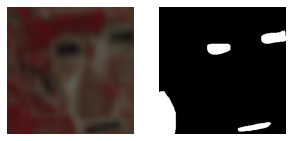

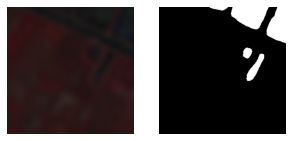

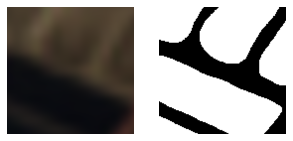

In [12]:
image_batch, label_batch = next(iter(train_dataset))
for i in tqdm_notebook(range(3)):
    image = image_batch[i]
    mask = label_batch[i]
    #Convert categorical to integer for visualization
    mask = np.argmax(mask, axis=2)
    plt.figure(figsize=(5,5))
    plt.subplot(1,2,1)
    plt.imshow(image[:,:,0:3])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(mask, cmap='gray')
    plt.axis('off')
    plt.show()

  0%|          | 0/3 [00:00<?, ?it/s]

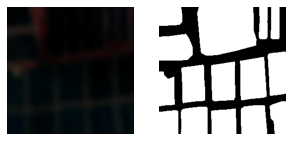

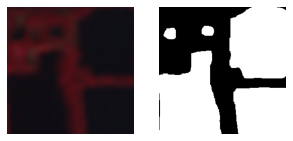

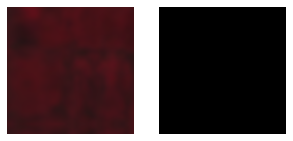

In [13]:
testimage_batch, label_batch = next(iter(valid_dataset))
for i in tqdm_notebook(range(3)):
    image = testimage_batch[i]
    mask = label_batch[i]
    #Convert categorical to integer for visualization
    mask = np.argmax(mask, axis=2)
    plt.figure(figsize=(5,5))
    plt.subplot(1,2,1)
    plt.imshow(image[:,:,0:3])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(mask, cmap='gray')
    plt.axis('off')
    plt.show()

In [14]:
# GPUS = ["GPU:0","GPU:1","GPU:2","GPU:3"]
# strategy = tf.distribute.MirroredStrategy( GPUS )
# print('Number of devices: %d' % strategy.num_replicas_in_sync)

In [15]:
strategy = tf.distribute.MirroredStrategy()
print('Number of devices: {}'.format(strategy.num_replicas_in_sync))

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2', '/job:localhost/replica:0/task:0/device:GPU:3')


INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1', '/job:localhost/replica:0/task:0/device:GPU:2', '/job:localhost/replica:0/task:0/device:GPU:3')


Number of devices: 4


In [16]:
# input dimensions, no. of channels, and no. of classes for the model
IMG_HEIGHT = image_batch.shape[1]
IMG_WIDTH  = image_batch.shape[2]
IMG_CHANNELS = image_batch.shape[3]
n_classes=num_class

In [17]:
# calculation of steps per epoch for traning and validation
filespershard = 500
number_of_shards = len(glob.glob(PATH+'*.tfrecords'))
steps_per_epoch = (number_of_shards*filespershard*0.7)// BATCH_SIZE
val_steps_per_epoch = (number_of_shards*filespershard*0.3)//BATCH_SIZE

In [18]:
import math
epochs=epochs
learning_rate = lr
scheduler = params['Scheduler']

if scheduler == 'Exponential':
    decay_rate = learning_rate / epochs
    def exp_decay(epoch):
        lrate = learning_rate * np.exp(-decay_rate*epoch)
        return lrate
    lr_rate = LearningRateScheduler(exp_decay)
elif scheduler == 'Step_decay':
    def step_decay(epoch):
        initial_lrate = learning_rate
        drop = 0.5
        epochs_drop = 10.0
        lrate = initial_lrate * math.pow(drop,  
                math.floor((1+epoch)/epochs_drop))
        return lrate
    lr_rate = LearningRateScheduler(step_decay)
elif scheduler == 'Cycliclearning_rate':
    clr_triangular = CyclicLR(mode='triangular')
    clr_triangular._reset(new_base_lr=0.00005, new_max_lr=0.0001)
    lr_rate = clr_triangular

In [19]:
loss = params['Loss']
if loss == 'sdice_loss':
    with strategy.scope():
        model = SegFormer_B2((IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS),n_classes)
        model.compile(
        optimizer=optimizer,
        loss=sdice_loss,
        metrics=[[tf.keras.metrics.OneHotIoU(num_classes=2,target_class_ids=[0,1]),tf.keras.metrics.Precision()\
            ,tf.keras.metrics.Recall()]]
        )
elif loss == 'focal_tversky':
    with strategy.scope():
        model = SegFormer_B2((IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS),n_classes)
        model.compile(
        optimizer=optimizer,
        loss=focal_tversky,
        metrics=[[tf.keras.metrics.OneHotIoU(num_classes=2,target_class_ids=[0,1]),tf.keras.metrics.Precision()\
            ,tf.keras.metrics.Recall()]]
        )
elif loss == 'tversky_loss':
    with strategy.scope():
        model = SegFormer_B2((IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS),n_classes)
        model.compile(
        optimizer=optimizer,
        loss=tversky_loss,
        metrics=[[tf.keras.metrics.OneHotIoU(num_classes=2,target_class_ids=[0,1]),tf.keras.metrics.Precision()\
            ,tf.keras.metrics.Recall()]]
        )
elif loss == 'log_cosh_dice_loss':
    with strategy.scope():
        model = SegFormer_B2((IMG_HEIGHT,IMG_WIDTH,IMG_CHANNELS),n_classes)
        model.compile(
        optimizer=optimizer,
        loss=log_cosh_dice_loss,
        metrics=[[tf.keras.metrics.OneHotIoU(num_classes=2,target_class_ids=[0,1]),tf.keras.metrics.Precision()\
            ,tf.keras.metrics.Recall()]]
        )

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).


In [20]:
#ModelCheckpoint callback saves a model at some interval. 
checkpoint_path = 'model_checkpoint/'
os.makedirs(checkpoint_path, exist_ok=True)
filepath=checkpoint_path+"segformer_b2_"+loss+scheduler+".pb"
checkpoint = ModelCheckpoint(filepath, monitor='val_one_hot_io_u', verbose=1, save_best_only=True, mode='max')

In [21]:
# earlystop for stopping the model when there is no improvement
early_stop = EarlyStopping(monitor='val_loss', patience=20, verbose=1)
# log_csv = CSVLogger('/home/ubuntu/Notebooks for Unet_training/models for deeplab+SE v5/tversky-logs/sdice_lossv1.csv', separator=',', append=False)

In [22]:
from IPython.display import clear_output
def create_mask(pred_mask):
    pred_mask = tf.math.argmax(pred_mask, axis=3)
    return pred_mask[0]
import matplotlib.pyplot as plt


def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ["Input Image", "True Mask", "Predicted Mask"]

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i + 1)
        plt.title(title[i])
        plt.imshow(display_list[i])
        plt.axis("off")
    plt.show()

def show_predictions(dataset=None, num=1):
    if dataset:
        for sample in dataset.take(num):
            images, masks = sample
            masks = tf.math.argmax(masks[0], axis=2)
            pred_masks = model.predict(images)
            display([images[0], masks, create_mask(pred_masks)])
    else:
        display(
            [
                testimage_batch[0], tf.math.argmax(label_batch[0], axis=2),
                create_mask(model.predict(testimage_batch)),
            ]
        )


class DisplayCallback(tf.keras.callbacks.Callback):
    def __init__(self, dataset, **kwargs):
        super().__init__(**kwargs)
        self.dataset = dataset

    def on_epoch_end(self, epoch, logs=None):
        show_predictions(self.dataset)
        print("\nSample Prediction after epoch {}\n".format(epoch + 1))

In [23]:
callbacks_list = [checkpoint,early_stop,lr_rate,DVCLiveCallback(dir='evaluation',save_dvc_exp=True),]

In [24]:
%%time
history=model.fit(train_dataset,
          steps_per_epoch=steps_per_epoch,
          epochs=epochs,
          verbose=1,
          validation_data=valid_dataset,
          validation_steps=val_steps_per_epoch,
          callbacks=callbacks_list,
          )

Epoch 1/500


INFO:tensorflow:batch_all_reduce: 329 all-reduces with algorithm = nccl, num_packs = 1


INFO:tensorflow:batch_all_reduce: 329 all-reduces with algorithm = nccl, num_packs = 1


INFO:tensorflow:batch_all_reduce: 329 all-reduces with algorithm = nccl, num_packs = 1


INFO:tensorflow:batch_all_reduce: 329 all-reduces with algorithm = nccl, num_packs = 1


  1/328 [..............................] - ETA: 21:08:49 - loss: 0.5435 - one_hot_io_u: 0.1812 - precision: 0.3368 - recall: 0.3368

  2/328 [..............................] - ETA: 1:03 - loss: 0.4757 - one_hot_io_u: 0.2948 - precision: 0.4604 - recall: 0.4604    

  3/328 [..............................] - ETA: 1:06 - loss: 0.4435 - one_hot_io_u: 0.3360 - precision: 0.5038 - recall: 0.5038

  4/328 [..............................] - ETA: 1:04 - loss: 0.4010 - one_hot_io_u: 0.3820 - precision: 0.5529 - recall: 0.5529

  5/328 [..............................] - ETA: 1:04 - loss: 0.3947 - one_hot_io_u: 0.3864 - precision: 0.5575 - recall: 0.5575

  6/328 [..............................] - ETA: 1:04 - loss: 0.3764 - one_hot_io_u: 0.4114 - precision: 0.5835 - recall: 0.5835

  7/328 [..............................] - ETA: 1:04 - loss: 0.3680 - one_hot_io_u: 0.4216 - precision: 0.5935 - recall: 0.5935

  8/328 [..............................] - ETA: 1:03 - loss: 0.3542 - one_hot_io_u: 0.4349 - precision: 0.6063 - recall: 0.6063

  9/328 [..............................] - ETA: 1:03 - loss: 0.3453 - one_hot_io_u: 0.4452 - precision: 0.6162 - recall: 0.6162

 10/328 [..............................] - ETA: 1:03 - loss: 0.3381 - one_hot_io_u: 0.4537 - precision: 0.6244 - recall: 0.6244

 11/328 [>.............................] - ETA: 1:03 - loss: 0.3271 - one_hot_io_u: 0.4672 - precision: 0.6371 - recall: 0.6371

 12/328 [>.............................] - ETA: 1:03 - loss: 0.3264 - one_hot_io_u: 0.4680 - precision: 0.6378 - recall: 0.6378

 13/328 [>.............................] - ETA: 1:03 - loss: 0.3252 - one_hot_io_u: 0.4699 - precision: 0.6398 - recall: 0.6398

 14/328 [>.............................] - ETA: 1:03 - loss: 0.3222 - one_hot_io_u: 0.4740 - precision: 0.6436 - recall: 0.6436

 15/328 [>.............................] - ETA: 1:03 - loss: 0.3135 - one_hot_io_u: 0.4841 - precision: 0.6530 - recall: 0.6530

 16/328 [>.............................] - ETA: 1:02 - loss: 0.3097 - one_hot_io_u: 0.4863 - precision: 0.6553 - recall: 0.6553

 17/328 [>.............................] - ETA: 1:02 - loss: 0.3089 - one_hot_io_u: 0.4873 - precision: 0.6565 - recall: 0.6565

 18/328 [>.............................] - ETA: 1:02 - loss: 0.3004 - one_hot_io_u: 0.4976 - precision: 0.6659 - recall: 0.6659

 19/328 [>.............................] - ETA: 1:01 - loss: 0.2957 - one_hot_io_u: 0.5031 - precision: 0.6711 - recall: 0.6711

 20/328 [>.............................] - ETA: 1:01 - loss: 0.2970 - one_hot_io_u: 0.5002 - precision: 0.6687 - recall: 0.6687

 21/328 [>.............................] - ETA: 1:01 - loss: 0.2941 - one_hot_io_u: 0.5026 - precision: 0.6710 - recall: 0.6710

 22/328 [=>............................] - ETA: 1:01 - loss: 0.2894 - one_hot_io_u: 0.5083 - precision: 0.6762 - recall: 0.6762

 23/328 [=>............................] - ETA: 1:01 - loss: 0.2908 - one_hot_io_u: 0.5066 - precision: 0.6748 - recall: 0.6748

 24/328 [=>............................] - ETA: 1:00 - loss: 0.2853 - one_hot_io_u: 0.5133 - precision: 0.6810 - recall: 0.6810

 25/328 [=>............................] - ETA: 1:00 - loss: 0.2810 - one_hot_io_u: 0.5184 - precision: 0.6859 - recall: 0.6859

 26/328 [=>............................] - ETA: 1:00 - loss: 0.2745 - one_hot_io_u: 0.5265 - precision: 0.6929 - recall: 0.6929

 27/328 [=>............................] - ETA: 1:00 - loss: 0.2700 - one_hot_io_u: 0.5319 - precision: 0.6978 - recall: 0.6978

 28/328 [=>............................] - ETA: 1:00 - loss: 0.2684 - one_hot_io_u: 0.5339 - precision: 0.6998 - recall: 0.6998

 29/328 [=>............................] - ETA: 59s - loss: 0.2668 - one_hot_io_u: 0.5360 - precision: 0.7016 - recall: 0.7016 

 30/328 [=>............................] - ETA: 59s - loss: 0.2650 - one_hot_io_u: 0.5372 - precision: 0.7026 - recall: 0.7026

 31/328 [=>............................] - ETA: 59s - loss: 0.2650 - one_hot_io_u: 0.5369 - precision: 0.7025 - recall: 0.7025

 32/328 [=>............................] - ETA: 59s - loss: 0.2626 - one_hot_io_u: 0.5395 - precision: 0.7048 - recall: 0.7048

 33/328 [==>...........................] - ETA: 58s - loss: 0.2626 - one_hot_io_u: 0.5392 - precision: 0.7048 - recall: 0.7048

 34/328 [==>...........................] - ETA: 58s - loss: 0.2603 - one_hot_io_u: 0.5422 - precision: 0.7073 - recall: 0.7073

 35/328 [==>...........................] - ETA: 58s - loss: 0.2584 - one_hot_io_u: 0.5441 - precision: 0.7093 - recall: 0.7093

 36/328 [==>...........................] - ETA: 58s - loss: 0.2559 - one_hot_io_u: 0.5477 - precision: 0.7121 - recall: 0.7121

 37/328 [==>...........................] - ETA: 58s - loss: 0.2545 - one_hot_io_u: 0.5489 - precision: 0.7135 - recall: 0.7135

 38/328 [==>...........................] - ETA: 58s - loss: 0.2529 - one_hot_io_u: 0.5511 - precision: 0.7156 - recall: 0.7156

 39/328 [==>...........................] - ETA: 57s - loss: 0.2530 - one_hot_io_u: 0.5515 - precision: 0.7157 - recall: 0.7157

 40/328 [==>...........................] - ETA: 57s - loss: 0.2538 - one_hot_io_u: 0.5499 - precision: 0.7149 - recall: 0.7149

 41/328 [==>...........................] - ETA: 57s - loss: 0.2516 - one_hot_io_u: 0.5525 - precision: 0.7172 - recall: 0.7172

 42/328 [==>...........................] - ETA: 57s - loss: 0.2492 - one_hot_io_u: 0.5553 - precision: 0.7200 - recall: 0.7200

 43/328 [==>...........................] - ETA: 57s - loss: 0.2474 - one_hot_io_u: 0.5579 - precision: 0.7222 - recall: 0.7222

 44/328 [===>..........................] - ETA: 56s - loss: 0.2468 - one_hot_io_u: 0.5590 - precision: 0.7229 - recall: 0.7229

 45/328 [===>..........................] - ETA: 56s - loss: 0.2461 - one_hot_io_u: 0.5597 - precision: 0.7237 - recall: 0.7237

 46/328 [===>..........................] - ETA: 56s - loss: 0.2459 - one_hot_io_u: 0.5603 - precision: 0.7241 - recall: 0.7241

 47/328 [===>..........................] - ETA: 56s - loss: 0.2453 - one_hot_io_u: 0.5610 - precision: 0.7248 - recall: 0.7248

 48/328 [===>..........................] - ETA: 56s - loss: 0.2434 - one_hot_io_u: 0.5635 - precision: 0.7269 - recall: 0.7269

 49/328 [===>..........................] - ETA: 55s - loss: 0.2419 - one_hot_io_u: 0.5653 - precision: 0.7285 - recall: 0.7285

 50/328 [===>..........................] - ETA: 55s - loss: 0.2412 - one_hot_io_u: 0.5664 - precision: 0.7294 - recall: 0.7294

 51/328 [===>..........................] - ETA: 55s - loss: 0.2403 - one_hot_io_u: 0.5669 - precision: 0.7299 - recall: 0.7299

 52/328 [===>..........................] - ETA: 55s - loss: 0.2410 - one_hot_io_u: 0.5664 - precision: 0.7295 - recall: 0.7295

 53/328 [===>..........................] - ETA: 54s - loss: 0.2402 - one_hot_io_u: 0.5673 - precision: 0.7304 - recall: 0.7304

 54/328 [===>..........................] - ETA: 54s - loss: 0.2407 - one_hot_io_u: 0.5663 - precision: 0.7299 - recall: 0.7299

 55/328 [====>.........................] - ETA: 54s - loss: 0.2395 - one_hot_io_u: 0.5675 - precision: 0.7312 - recall: 0.7312

 56/328 [====>.........................] - ETA: 54s - loss: 0.2391 - one_hot_io_u: 0.5681 - precision: 0.7316 - recall: 0.7316

 57/328 [====>.........................] - ETA: 54s - loss: 0.2379 - one_hot_io_u: 0.5696 - precision: 0.7330 - recall: 0.7330

 58/328 [====>.........................] - ETA: 53s - loss: 0.2359 - one_hot_io_u: 0.5721 - precision: 0.7353 - recall: 0.7353

 59/328 [====>.........................] - ETA: 53s - loss: 0.2344 - one_hot_io_u: 0.5739 - precision: 0.7369 - recall: 0.7369

 60/328 [====>.........................] - ETA: 53s - loss: 0.2327 - one_hot_io_u: 0.5764 - precision: 0.7389 - recall: 0.7389

 61/328 [====>.........................] - ETA: 53s - loss: 0.2323 - one_hot_io_u: 0.5768 - precision: 0.7393 - recall: 0.7393

 62/328 [====>.........................] - ETA: 53s - loss: 0.2319 - one_hot_io_u: 0.5771 - precision: 0.7395 - recall: 0.7395

 63/328 [====>.........................] - ETA: 52s - loss: 0.2309 - one_hot_io_u: 0.5785 - precision: 0.7407 - recall: 0.7407

 64/328 [====>.........................] - ETA: 52s - loss: 0.2299 - one_hot_io_u: 0.5796 - precision: 0.7417 - recall: 0.7417

 65/328 [====>.........................] - ETA: 52s - loss: 0.2287 - one_hot_io_u: 0.5809 - precision: 0.7429 - recall: 0.7429

 66/328 [=====>........................] - ETA: 52s - loss: 0.2295 - one_hot_io_u: 0.5798 - precision: 0.7421 - recall: 0.7421

 67/328 [=====>........................] - ETA: 52s - loss: 0.2289 - one_hot_io_u: 0.5804 - precision: 0.7427 - recall: 0.7427

 68/328 [=====>........................] - ETA: 51s - loss: 0.2287 - one_hot_io_u: 0.5800 - precision: 0.7427 - recall: 0.7427

 69/328 [=====>........................] - ETA: 51s - loss: 0.2277 - one_hot_io_u: 0.5814 - precision: 0.7438 - recall: 0.7438

 70/328 [=====>........................] - ETA: 51s - loss: 0.2269 - one_hot_io_u: 0.5823 - precision: 0.7445 - recall: 0.7445

 71/328 [=====>........................] - ETA: 51s - loss: 0.2270 - one_hot_io_u: 0.5821 - precision: 0.7443 - recall: 0.7443

 72/328 [=====>........................] - ETA: 51s - loss: 0.2273 - one_hot_io_u: 0.5817 - precision: 0.7441 - recall: 0.7441

 73/328 [=====>........................] - ETA: 50s - loss: 0.2275 - one_hot_io_u: 0.5812 - precision: 0.7436 - recall: 0.7436

 74/328 [=====>........................] - ETA: 50s - loss: 0.2267 - one_hot_io_u: 0.5823 - precision: 0.7444 - recall: 0.7444

 75/328 [=====>........................] - ETA: 50s - loss: 0.2268 - one_hot_io_u: 0.5822 - precision: 0.7443 - recall: 0.7443

 76/328 [=====>........................] - ETA: 50s - loss: 0.2270 - one_hot_io_u: 0.5819 - precision: 0.7439 - recall: 0.7439

 77/328 [======>.......................] - ETA: 50s - loss: 0.2270 - one_hot_io_u: 0.5822 - precision: 0.7440 - recall: 0.7440

 78/328 [======>.......................] - ETA: 49s - loss: 0.2266 - one_hot_io_u: 0.5823 - precision: 0.7439 - recall: 0.7439

 79/328 [======>.......................] - ETA: 49s - loss: 0.2258 - one_hot_io_u: 0.5833 - precision: 0.7448 - recall: 0.7448

 80/328 [======>.......................] - ETA: 49s - loss: 0.2244 - one_hot_io_u: 0.5849 - precision: 0.7461 - recall: 0.7461

 81/328 [======>.......................] - ETA: 49s - loss: 0.2239 - one_hot_io_u: 0.5854 - precision: 0.7465 - recall: 0.7465

 82/328 [======>.......................] - ETA: 49s - loss: 0.2228 - one_hot_io_u: 0.5868 - precision: 0.7476 - recall: 0.7476

 83/328 [======>.......................] - ETA: 48s - loss: 0.2218 - one_hot_io_u: 0.5877 - precision: 0.7485 - recall: 0.7485

 84/328 [======>.......................] - ETA: 48s - loss: 0.2206 - one_hot_io_u: 0.5891 - precision: 0.7497 - recall: 0.7497

 85/328 [======>.......................] - ETA: 48s - loss: 0.2200 - one_hot_io_u: 0.5897 - precision: 0.7503 - recall: 0.7503

 86/328 [======>.......................] - ETA: 48s - loss: 0.2190 - one_hot_io_u: 0.5909 - precision: 0.7513 - recall: 0.7513

 87/328 [======>.......................] - ETA: 48s - loss: 0.2191 - one_hot_io_u: 0.5907 - precision: 0.7511 - recall: 0.7511

 88/328 [=======>......................] - ETA: 47s - loss: 0.2179 - one_hot_io_u: 0.5921 - precision: 0.7525 - recall: 0.7525

 89/328 [=======>......................] - ETA: 47s - loss: 0.2171 - one_hot_io_u: 0.5932 - precision: 0.7533 - recall: 0.7533

 90/328 [=======>......................] - ETA: 47s - loss: 0.2169 - one_hot_io_u: 0.5931 - precision: 0.7533 - recall: 0.7533

 91/328 [=======>......................] - ETA: 47s - loss: 0.2173 - one_hot_io_u: 0.5924 - precision: 0.7529 - recall: 0.7529

 92/328 [=======>......................] - ETA: 47s - loss: 0.2176 - one_hot_io_u: 0.5921 - precision: 0.7526 - recall: 0.7526

 93/328 [=======>......................] - ETA: 46s - loss: 0.2172 - one_hot_io_u: 0.5926 - precision: 0.7530 - recall: 0.7530

 94/328 [=======>......................] - ETA: 46s - loss: 0.2168 - one_hot_io_u: 0.5930 - precision: 0.7533 - recall: 0.7533

 95/328 [=======>......................] - ETA: 46s - loss: 0.2162 - one_hot_io_u: 0.5937 - precision: 0.7539 - recall: 0.7539

 96/328 [=======>......................] - ETA: 46s - loss: 0.2167 - one_hot_io_u: 0.5930 - precision: 0.7533 - recall: 0.7533

 97/328 [=======>......................] - ETA: 46s - loss: 0.2160 - one_hot_io_u: 0.5938 - precision: 0.7539 - recall: 0.7539

 98/328 [=======>......................] - ETA: 45s - loss: 0.2156 - one_hot_io_u: 0.5942 - precision: 0.7542 - recall: 0.7542

 99/328 [========>.....................] - ETA: 45s - loss: 0.2160 - one_hot_io_u: 0.5937 - precision: 0.7539 - recall: 0.7539

100/328 [========>.....................] - ETA: 45s - loss: 0.2161 - one_hot_io_u: 0.5935 - precision: 0.7536 - recall: 0.7536

101/328 [========>.....................] - ETA: 45s - loss: 0.2151 - one_hot_io_u: 0.5951 - precision: 0.7548 - recall: 0.7548

102/328 [========>.....................] - ETA: 45s - loss: 0.2149 - one_hot_io_u: 0.5955 - precision: 0.7550 - recall: 0.7550

103/328 [========>.....................] - ETA: 44s - loss: 0.2141 - one_hot_io_u: 0.5967 - precision: 0.7559 - recall: 0.7559

104/328 [========>.....................] - ETA: 44s - loss: 0.2141 - one_hot_io_u: 0.5966 - precision: 0.7559 - recall: 0.7559

105/328 [========>.....................] - ETA: 44s - loss: 0.2139 - one_hot_io_u: 0.5966 - precision: 0.7560 - recall: 0.7560

106/328 [========>.....................] - ETA: 44s - loss: 0.2133 - one_hot_io_u: 0.5975 - precision: 0.7567 - recall: 0.7567

107/328 [========>.....................] - ETA: 44s - loss: 0.2128 - one_hot_io_u: 0.5982 - precision: 0.7573 - recall: 0.7573

108/328 [========>.....................] - ETA: 43s - loss: 0.2120 - one_hot_io_u: 0.5993 - precision: 0.7582 - recall: 0.7582

109/328 [========>.....................] - ETA: 43s - loss: 0.2117 - one_hot_io_u: 0.5999 - precision: 0.7585 - recall: 0.7585

110/328 [=========>....................] - ETA: 43s - loss: 0.2118 - one_hot_io_u: 0.5996 - precision: 0.7583 - recall: 0.7583

111/328 [=========>....................] - ETA: 43s - loss: 0.2116 - one_hot_io_u: 0.5999 - precision: 0.7587 - recall: 0.7587

112/328 [=========>....................] - ETA: 42s - loss: 0.2113 - one_hot_io_u: 0.6002 - precision: 0.7591 - recall: 0.7591

113/328 [=========>....................] - ETA: 42s - loss: 0.2111 - one_hot_io_u: 0.6004 - precision: 0.7594 - recall: 0.7594

114/328 [=========>....................] - ETA: 42s - loss: 0.2109 - one_hot_io_u: 0.6007 - precision: 0.7596 - recall: 0.7596

115/328 [=========>....................] - ETA: 42s - loss: 0.2107 - one_hot_io_u: 0.6011 - precision: 0.7598 - recall: 0.7598

116/328 [=========>....................] - ETA: 42s - loss: 0.2100 - one_hot_io_u: 0.6021 - precision: 0.7606 - recall: 0.7606

117/328 [=========>....................] - ETA: 41s - loss: 0.2101 - one_hot_io_u: 0.6018 - precision: 0.7604 - recall: 0.7604

118/328 [=========>....................] - ETA: 41s - loss: 0.2098 - one_hot_io_u: 0.6020 - precision: 0.7605 - recall: 0.7605

119/328 [=========>....................] - ETA: 41s - loss: 0.2094 - one_hot_io_u: 0.6025 - precision: 0.7610 - recall: 0.7610

120/328 [=========>....................] - ETA: 41s - loss: 0.2090 - one_hot_io_u: 0.6031 - precision: 0.7615 - recall: 0.7615

121/328 [==========>...................] - ETA: 41s - loss: 0.2085 - one_hot_io_u: 0.6037 - precision: 0.7620 - recall: 0.7620

122/328 [==========>...................] - ETA: 40s - loss: 0.2077 - one_hot_io_u: 0.6048 - precision: 0.7629 - recall: 0.7629

123/328 [==========>...................] - ETA: 40s - loss: 0.2071 - one_hot_io_u: 0.6053 - precision: 0.7634 - recall: 0.7634

124/328 [==========>...................] - ETA: 40s - loss: 0.2063 - one_hot_io_u: 0.6065 - precision: 0.7643 - recall: 0.7643

125/328 [==========>...................] - ETA: 40s - loss: 0.2060 - one_hot_io_u: 0.6069 - precision: 0.7647 - recall: 0.7647

126/328 [==========>...................] - ETA: 40s - loss: 0.2054 - one_hot_io_u: 0.6077 - precision: 0.7653 - recall: 0.7653

127/328 [==========>...................] - ETA: 39s - loss: 0.2053 - one_hot_io_u: 0.6077 - precision: 0.7654 - recall: 0.7654

128/328 [==========>...................] - ETA: 39s - loss: 0.2049 - one_hot_io_u: 0.6081 - precision: 0.7658 - recall: 0.7658

129/328 [==========>...................] - ETA: 39s - loss: 0.2049 - one_hot_io_u: 0.6080 - precision: 0.7658 - recall: 0.7658

130/328 [==========>...................] - ETA: 39s - loss: 0.2047 - one_hot_io_u: 0.6083 - precision: 0.7659 - recall: 0.7659

131/328 [==========>...................] - ETA: 39s - loss: 0.2043 - one_hot_io_u: 0.6088 - precision: 0.7664 - recall: 0.7664

132/328 [===========>..................] - ETA: 38s - loss: 0.2038 - one_hot_io_u: 0.6097 - precision: 0.7670 - recall: 0.7670

133/328 [===========>..................] - ETA: 38s - loss: 0.2035 - one_hot_io_u: 0.6103 - precision: 0.7673 - recall: 0.7673

134/328 [===========>..................] - ETA: 38s - loss: 0.2034 - one_hot_io_u: 0.6103 - precision: 0.7673 - recall: 0.7673

135/328 [===========>..................] - ETA: 38s - loss: 0.2034 - one_hot_io_u: 0.6103 - precision: 0.7673 - recall: 0.7673

136/328 [===========>..................] - ETA: 38s - loss: 0.2030 - one_hot_io_u: 0.6109 - precision: 0.7678 - recall: 0.7678

137/328 [===========>..................] - ETA: 37s - loss: 0.2029 - one_hot_io_u: 0.6108 - precision: 0.7678 - recall: 0.7678

138/328 [===========>..................] - ETA: 37s - loss: 0.2025 - one_hot_io_u: 0.6112 - precision: 0.7682 - recall: 0.7682

139/328 [===========>..................] - ETA: 37s - loss: 0.2032 - one_hot_io_u: 0.6102 - precision: 0.7674 - recall: 0.7674

140/328 [===========>..................] - ETA: 37s - loss: 0.2030 - one_hot_io_u: 0.6105 - precision: 0.7677 - recall: 0.7677

141/328 [===========>..................] - ETA: 37s - loss: 0.2024 - one_hot_io_u: 0.6114 - precision: 0.7683 - recall: 0.7683

142/328 [===========>..................] - ETA: 36s - loss: 0.2023 - one_hot_io_u: 0.6112 - precision: 0.7682 - recall: 0.7682

143/328 [============>.................] - ETA: 36s - loss: 0.2027 - one_hot_io_u: 0.6105 - precision: 0.7677 - recall: 0.7677

144/328 [============>.................] - ETA: 36s - loss: 0.2022 - one_hot_io_u: 0.6114 - precision: 0.7684 - recall: 0.7684

145/328 [============>.................] - ETA: 36s - loss: 0.2018 - one_hot_io_u: 0.6119 - precision: 0.7688 - recall: 0.7688

146/328 [============>.................] - ETA: 36s - loss: 0.2014 - one_hot_io_u: 0.6125 - precision: 0.7692 - recall: 0.7692

147/328 [============>.................] - ETA: 36s - loss: 0.2012 - one_hot_io_u: 0.6127 - precision: 0.7695 - recall: 0.7695

148/328 [============>.................] - ETA: 35s - loss: 0.2014 - one_hot_io_u: 0.6125 - precision: 0.7692 - recall: 0.7692

149/328 [============>.................] - ETA: 35s - loss: 0.2013 - one_hot_io_u: 0.6125 - precision: 0.7693 - recall: 0.7693

150/328 [============>.................] - ETA: 35s - loss: 0.2009 - one_hot_io_u: 0.6130 - precision: 0.7697 - recall: 0.7697

151/328 [============>.................] - ETA: 35s - loss: 0.2010 - one_hot_io_u: 0.6128 - precision: 0.7695 - recall: 0.7695

152/328 [============>.................] - ETA: 35s - loss: 0.2005 - one_hot_io_u: 0.6136 - precision: 0.7701 - recall: 0.7701

153/328 [============>.................] - ETA: 34s - loss: 0.2006 - one_hot_io_u: 0.6136 - precision: 0.7700 - recall: 0.7700

154/328 [=============>................] - ETA: 34s - loss: 0.2006 - one_hot_io_u: 0.6134 - precision: 0.7699 - recall: 0.7699

155/328 [=============>................] - ETA: 34s - loss: 0.2004 - one_hot_io_u: 0.6137 - precision: 0.7701 - recall: 0.7701

156/328 [=============>................] - ETA: 34s - loss: 0.2004 - one_hot_io_u: 0.6136 - precision: 0.7701 - recall: 0.7701

157/328 [=============>................] - ETA: 34s - loss: 0.2001 - one_hot_io_u: 0.6140 - precision: 0.7703 - recall: 0.7703

158/328 [=============>................] - ETA: 33s - loss: 0.2002 - one_hot_io_u: 0.6140 - precision: 0.7702 - recall: 0.7702

159/328 [=============>................] - ETA: 33s - loss: 0.2004 - one_hot_io_u: 0.6138 - precision: 0.7700 - recall: 0.7700

160/328 [=============>................] - ETA: 33s - loss: 0.2003 - one_hot_io_u: 0.6140 - precision: 0.7701 - recall: 0.7701

161/328 [=============>................] - ETA: 33s - loss: 0.2005 - one_hot_io_u: 0.6135 - precision: 0.7697 - recall: 0.7697

162/328 [=============>................] - ETA: 33s - loss: 0.2004 - one_hot_io_u: 0.6136 - precision: 0.7698 - recall: 0.7698

163/328 [=============>................] - ETA: 32s - loss: 0.2003 - one_hot_io_u: 0.6137 - precision: 0.7699 - recall: 0.7699

164/328 [==============>...............] - ETA: 32s - loss: 0.2004 - one_hot_io_u: 0.6137 - precision: 0.7699 - recall: 0.7699

165/328 [==============>...............] - ETA: 32s - loss: 0.2004 - one_hot_io_u: 0.6137 - precision: 0.7698 - recall: 0.7698

166/328 [==============>...............] - ETA: 32s - loss: 0.2003 - one_hot_io_u: 0.6137 - precision: 0.7698 - recall: 0.7698

167/328 [==============>...............] - ETA: 32s - loss: 0.2001 - one_hot_io_u: 0.6140 - precision: 0.7699 - recall: 0.7699

168/328 [==============>...............] - ETA: 31s - loss: 0.2003 - one_hot_io_u: 0.6135 - precision: 0.7696 - recall: 0.7696

169/328 [==============>...............] - ETA: 31s - loss: 0.2000 - one_hot_io_u: 0.6139 - precision: 0.7699 - recall: 0.7699

170/328 [==============>...............] - ETA: 31s - loss: 0.1997 - one_hot_io_u: 0.6142 - precision: 0.7701 - recall: 0.7701

171/328 [==============>...............] - ETA: 31s - loss: 0.2000 - one_hot_io_u: 0.6138 - precision: 0.7699 - recall: 0.7699

172/328 [==============>...............] - ETA: 31s - loss: 0.1996 - one_hot_io_u: 0.6143 - precision: 0.7702 - recall: 0.7702

173/328 [==============>...............] - ETA: 30s - loss: 0.1994 - one_hot_io_u: 0.6146 - precision: 0.7704 - recall: 0.7704

174/328 [==============>...............] - ETA: 30s - loss: 0.1995 - one_hot_io_u: 0.6145 - precision: 0.7703 - recall: 0.7703

175/328 [===============>..............] - ETA: 30s - loss: 0.1994 - one_hot_io_u: 0.6147 - precision: 0.7704 - recall: 0.7704

176/328 [===============>..............] - ETA: 30s - loss: 0.1989 - one_hot_io_u: 0.6154 - precision: 0.7708 - recall: 0.7708

177/328 [===============>..............] - ETA: 30s - loss: 0.1988 - one_hot_io_u: 0.6154 - precision: 0.7709 - recall: 0.7709

178/328 [===============>..............] - ETA: 29s - loss: 0.1986 - one_hot_io_u: 0.6157 - precision: 0.7712 - recall: 0.7712

179/328 [===============>..............] - ETA: 29s - loss: 0.1987 - one_hot_io_u: 0.6154 - precision: 0.7709 - recall: 0.7709

180/328 [===============>..............] - ETA: 29s - loss: 0.1982 - one_hot_io_u: 0.6163 - precision: 0.7716 - recall: 0.7716

181/328 [===============>..............] - ETA: 29s - loss: 0.1978 - one_hot_io_u: 0.6168 - precision: 0.7720 - recall: 0.7720

182/328 [===============>..............] - ETA: 29s - loss: 0.1977 - one_hot_io_u: 0.6170 - precision: 0.7722 - recall: 0.7722

183/328 [===============>..............] - ETA: 28s - loss: 0.1978 - one_hot_io_u: 0.6167 - precision: 0.7719 - recall: 0.7719

184/328 [===============>..............] - ETA: 28s - loss: 0.1979 - one_hot_io_u: 0.6166 - precision: 0.7719 - recall: 0.7719

185/328 [===============>..............] - ETA: 28s - loss: 0.1977 - one_hot_io_u: 0.6168 - precision: 0.7720 - recall: 0.7720

186/328 [================>.............] - ETA: 28s - loss: 0.1976 - one_hot_io_u: 0.6170 - precision: 0.7721 - recall: 0.7721

187/328 [================>.............] - ETA: 28s - loss: 0.1975 - one_hot_io_u: 0.6172 - precision: 0.7722 - recall: 0.7722

188/328 [================>.............] - ETA: 27s - loss: 0.1975 - one_hot_io_u: 0.6173 - precision: 0.7722 - recall: 0.7722

189/328 [================>.............] - ETA: 27s - loss: 0.1972 - one_hot_io_u: 0.6178 - precision: 0.7725 - recall: 0.7725

190/328 [================>.............] - ETA: 27s - loss: 0.1967 - one_hot_io_u: 0.6186 - precision: 0.7731 - recall: 0.7731

191/328 [================>.............] - ETA: 27s - loss: 0.1965 - one_hot_io_u: 0.6189 - precision: 0.7733 - recall: 0.7733

192/328 [================>.............] - ETA: 27s - loss: 0.1967 - one_hot_io_u: 0.6186 - precision: 0.7731 - recall: 0.7731

193/328 [================>.............] - ETA: 26s - loss: 0.1966 - one_hot_io_u: 0.6188 - precision: 0.7733 - recall: 0.7733

194/328 [================>.............] - ETA: 26s - loss: 0.1963 - one_hot_io_u: 0.6192 - precision: 0.7736 - recall: 0.7736

195/328 [================>.............] - ETA: 26s - loss: 0.1963 - one_hot_io_u: 0.6190 - precision: 0.7735 - recall: 0.7735

196/328 [================>.............] - ETA: 26s - loss: 0.1959 - one_hot_io_u: 0.6195 - precision: 0.7738 - recall: 0.7738

197/328 [=================>............] - ETA: 26s - loss: 0.1957 - one_hot_io_u: 0.6197 - precision: 0.7741 - recall: 0.7741

198/328 [=================>............] - ETA: 25s - loss: 0.1956 - one_hot_io_u: 0.6200 - precision: 0.7742 - recall: 0.7742

199/328 [=================>............] - ETA: 25s - loss: 0.1954 - one_hot_io_u: 0.6203 - precision: 0.7744 - recall: 0.7744

200/328 [=================>............] - ETA: 25s - loss: 0.1949 - one_hot_io_u: 0.6209 - precision: 0.7749 - recall: 0.7749

201/328 [=================>............] - ETA: 25s - loss: 0.1947 - one_hot_io_u: 0.6213 - precision: 0.7752 - recall: 0.7752

202/328 [=================>............] - ETA: 25s - loss: 0.1945 - one_hot_io_u: 0.6214 - precision: 0.7753 - recall: 0.7753

203/328 [=================>............] - ETA: 24s - loss: 0.1944 - one_hot_io_u: 0.6216 - precision: 0.7754 - recall: 0.7754

204/328 [=================>............] - ETA: 24s - loss: 0.1944 - one_hot_io_u: 0.6215 - precision: 0.7754 - recall: 0.7754

205/328 [=================>............] - ETA: 24s - loss: 0.1942 - one_hot_io_u: 0.6218 - precision: 0.7756 - recall: 0.7756

206/328 [=================>............] - ETA: 24s - loss: 0.1939 - one_hot_io_u: 0.6223 - precision: 0.7761 - recall: 0.7761

207/328 [=================>............] - ETA: 24s - loss: 0.1935 - one_hot_io_u: 0.6228 - precision: 0.7764 - recall: 0.7764

208/328 [==================>...........] - ETA: 23s - loss: 0.1932 - one_hot_io_u: 0.6233 - precision: 0.7768 - recall: 0.7768

209/328 [==================>...........] - ETA: 23s - loss: 0.1928 - one_hot_io_u: 0.6237 - precision: 0.7771 - recall: 0.7771

210/328 [==================>...........] - ETA: 23s - loss: 0.1925 - one_hot_io_u: 0.6241 - precision: 0.7774 - recall: 0.7774

211/328 [==================>...........] - ETA: 23s - loss: 0.1927 - one_hot_io_u: 0.6239 - precision: 0.7772 - recall: 0.7772

212/328 [==================>...........] - ETA: 23s - loss: 0.1928 - one_hot_io_u: 0.6236 - precision: 0.7770 - recall: 0.7770

213/328 [==================>...........] - ETA: 22s - loss: 0.1928 - one_hot_io_u: 0.6236 - precision: 0.7771 - recall: 0.7771

214/328 [==================>...........] - ETA: 22s - loss: 0.1925 - one_hot_io_u: 0.6240 - precision: 0.7773 - recall: 0.7773

215/328 [==================>...........] - ETA: 22s - loss: 0.1921 - one_hot_io_u: 0.6247 - precision: 0.7778 - recall: 0.7778

216/328 [==================>...........] - ETA: 22s - loss: 0.1919 - one_hot_io_u: 0.6250 - precision: 0.7781 - recall: 0.7781

217/328 [==================>...........] - ETA: 22s - loss: 0.1916 - one_hot_io_u: 0.6254 - precision: 0.7784 - recall: 0.7784

218/328 [==================>...........] - ETA: 21s - loss: 0.1918 - one_hot_io_u: 0.6252 - precision: 0.7782 - recall: 0.7782

219/328 [===================>..........] - ETA: 21s - loss: 0.1914 - one_hot_io_u: 0.6258 - precision: 0.7786 - recall: 0.7786

220/328 [===================>..........] - ETA: 21s - loss: 0.1913 - one_hot_io_u: 0.6259 - precision: 0.7787 - recall: 0.7787

221/328 [===================>..........] - ETA: 21s - loss: 0.1913 - one_hot_io_u: 0.6260 - precision: 0.7788 - recall: 0.7788

222/328 [===================>..........] - ETA: 21s - loss: 0.1910 - one_hot_io_u: 0.6265 - precision: 0.7791 - recall: 0.7791

223/328 [===================>..........] - ETA: 20s - loss: 0.1908 - one_hot_io_u: 0.6267 - precision: 0.7793 - recall: 0.7793

224/328 [===================>..........] - ETA: 20s - loss: 0.1905 - one_hot_io_u: 0.6273 - precision: 0.7797 - recall: 0.7797

225/328 [===================>..........] - ETA: 20s - loss: 0.1900 - one_hot_io_u: 0.6280 - precision: 0.7801 - recall: 0.7801

226/328 [===================>..........] - ETA: 20s - loss: 0.1899 - one_hot_io_u: 0.6281 - precision: 0.7802 - recall: 0.7802

227/328 [===================>..........] - ETA: 20s - loss: 0.1899 - one_hot_io_u: 0.6282 - precision: 0.7803 - recall: 0.7803

228/328 [===================>..........] - ETA: 19s - loss: 0.1901 - one_hot_io_u: 0.6280 - precision: 0.7801 - recall: 0.7801

229/328 [===================>..........] - ETA: 19s - loss: 0.1899 - one_hot_io_u: 0.6283 - precision: 0.7803 - recall: 0.7803

230/328 [====================>.........] - ETA: 19s - loss: 0.1898 - one_hot_io_u: 0.6283 - precision: 0.7803 - recall: 0.7803

231/328 [====================>.........] - ETA: 19s - loss: 0.1896 - one_hot_io_u: 0.6287 - precision: 0.7806 - recall: 0.7806

232/328 [====================>.........] - ETA: 19s - loss: 0.1895 - one_hot_io_u: 0.6288 - precision: 0.7807 - recall: 0.7807

233/328 [====================>.........] - ETA: 18s - loss: 0.1895 - one_hot_io_u: 0.6287 - precision: 0.7806 - recall: 0.7806

234/328 [====================>.........] - ETA: 18s - loss: 0.1891 - one_hot_io_u: 0.6295 - precision: 0.7811 - recall: 0.7811

235/328 [====================>.........] - ETA: 18s - loss: 0.1887 - one_hot_io_u: 0.6300 - precision: 0.7816 - recall: 0.7816

236/328 [====================>.........] - ETA: 18s - loss: 0.1887 - one_hot_io_u: 0.6302 - precision: 0.7817 - recall: 0.7817

237/328 [====================>.........] - ETA: 18s - loss: 0.1884 - one_hot_io_u: 0.6305 - precision: 0.7819 - recall: 0.7819

238/328 [====================>.........] - ETA: 17s - loss: 0.1880 - one_hot_io_u: 0.6311 - precision: 0.7824 - recall: 0.7824

239/328 [====================>.........] - ETA: 17s - loss: 0.1878 - one_hot_io_u: 0.6313 - precision: 0.7826 - recall: 0.7826

240/328 [====================>.........] - ETA: 17s - loss: 0.1879 - one_hot_io_u: 0.6310 - precision: 0.7824 - recall: 0.7824

241/328 [=====================>........] - ETA: 17s - loss: 0.1876 - one_hot_io_u: 0.6314 - precision: 0.7827 - recall: 0.7827

242/328 [=====================>........] - ETA: 17s - loss: 0.1875 - one_hot_io_u: 0.6314 - precision: 0.7827 - recall: 0.7827

243/328 [=====================>........] - ETA: 16s - loss: 0.1874 - one_hot_io_u: 0.6316 - precision: 0.7829 - recall: 0.7829

244/328 [=====================>........] - ETA: 16s - loss: 0.1874 - one_hot_io_u: 0.6315 - precision: 0.7828 - recall: 0.7828

245/328 [=====================>........] - ETA: 16s - loss: 0.1875 - one_hot_io_u: 0.6313 - precision: 0.7827 - recall: 0.7827

246/328 [=====================>........] - ETA: 16s - loss: 0.1875 - one_hot_io_u: 0.6313 - precision: 0.7827 - recall: 0.7827

247/328 [=====================>........] - ETA: 16s - loss: 0.1875 - one_hot_io_u: 0.6313 - precision: 0.7827 - recall: 0.7827

248/328 [=====================>........] - ETA: 15s - loss: 0.1872 - one_hot_io_u: 0.6318 - precision: 0.7831 - recall: 0.7831

249/328 [=====================>........] - ETA: 15s - loss: 0.1872 - one_hot_io_u: 0.6319 - precision: 0.7831 - recall: 0.7831

250/328 [=====================>........] - ETA: 15s - loss: 0.1872 - one_hot_io_u: 0.6318 - precision: 0.7829 - recall: 0.7829

251/328 [=====================>........] - ETA: 15s - loss: 0.1872 - one_hot_io_u: 0.6316 - precision: 0.7829 - recall: 0.7829

252/328 [======================>.......] - ETA: 15s - loss: 0.1871 - one_hot_io_u: 0.6316 - precision: 0.7829 - recall: 0.7829

253/328 [======================>.......] - ETA: 14s - loss: 0.1870 - one_hot_io_u: 0.6317 - precision: 0.7831 - recall: 0.7831

254/328 [======================>.......] - ETA: 14s - loss: 0.1867 - one_hot_io_u: 0.6322 - precision: 0.7834 - recall: 0.7834

255/328 [======================>.......] - ETA: 14s - loss: 0.1868 - one_hot_io_u: 0.6320 - precision: 0.7833 - recall: 0.7833

256/328 [======================>.......] - ETA: 14s - loss: 0.1866 - one_hot_io_u: 0.6321 - precision: 0.7835 - recall: 0.7835

257/328 [======================>.......] - ETA: 14s - loss: 0.1865 - one_hot_io_u: 0.6324 - precision: 0.7836 - recall: 0.7836

258/328 [======================>.......] - ETA: 13s - loss: 0.1863 - one_hot_io_u: 0.6325 - precision: 0.7837 - recall: 0.7837

259/328 [======================>.......] - ETA: 13s - loss: 0.1861 - one_hot_io_u: 0.6328 - precision: 0.7839 - recall: 0.7839

260/328 [======================>.......] - ETA: 13s - loss: 0.1859 - one_hot_io_u: 0.6333 - precision: 0.7842 - recall: 0.7842

261/328 [======================>.......] - ETA: 13s - loss: 0.1857 - one_hot_io_u: 0.6335 - precision: 0.7844 - recall: 0.7844

262/328 [======================>.......] - ETA: 13s - loss: 0.1855 - one_hot_io_u: 0.6337 - precision: 0.7846 - recall: 0.7846

263/328 [=======================>......] - ETA: 12s - loss: 0.1853 - one_hot_io_u: 0.6340 - precision: 0.7848 - recall: 0.7848

264/328 [=======================>......] - ETA: 12s - loss: 0.1851 - one_hot_io_u: 0.6344 - precision: 0.7851 - recall: 0.7851

265/328 [=======================>......] - ETA: 12s - loss: 0.1849 - one_hot_io_u: 0.6347 - precision: 0.7853 - recall: 0.7853

266/328 [=======================>......] - ETA: 12s - loss: 0.1847 - one_hot_io_u: 0.6350 - precision: 0.7855 - recall: 0.7855

267/328 [=======================>......] - ETA: 12s - loss: 0.1845 - one_hot_io_u: 0.6352 - precision: 0.7857 - recall: 0.7857

268/328 [=======================>......] - ETA: 11s - loss: 0.1844 - one_hot_io_u: 0.6354 - precision: 0.7858 - recall: 0.7858

269/328 [=======================>......] - ETA: 11s - loss: 0.1844 - one_hot_io_u: 0.6354 - precision: 0.7859 - recall: 0.7859

270/328 [=======================>......] - ETA: 11s - loss: 0.1842 - one_hot_io_u: 0.6355 - precision: 0.7860 - recall: 0.7860

271/328 [=======================>......] - ETA: 11s - loss: 0.1841 - one_hot_io_u: 0.6357 - precision: 0.7861 - recall: 0.7861

272/328 [=======================>......] - ETA: 11s - loss: 0.1843 - one_hot_io_u: 0.6354 - precision: 0.7859 - recall: 0.7859

273/328 [=======================>......] - ETA: 10s - loss: 0.1840 - one_hot_io_u: 0.6359 - precision: 0.7862 - recall: 0.7862

274/328 [========================>.....] - ETA: 10s - loss: 0.1838 - one_hot_io_u: 0.6360 - precision: 0.7863 - recall: 0.7863

275/328 [========================>.....] - ETA: 10s - loss: 0.1838 - one_hot_io_u: 0.6360 - precision: 0.7864 - recall: 0.7864

276/328 [========================>.....] - ETA: 10s - loss: 0.1837 - one_hot_io_u: 0.6363 - precision: 0.7865 - recall: 0.7865

277/328 [========================>.....] - ETA: 10s - loss: 0.1836 - one_hot_io_u: 0.6366 - precision: 0.7867 - recall: 0.7867

278/328 [========================>.....] - ETA: 9s - loss: 0.1835 - one_hot_io_u: 0.6366 - precision: 0.7867 - recall: 0.7867 

279/328 [========================>.....] - ETA: 9s - loss: 0.1834 - one_hot_io_u: 0.6369 - precision: 0.7868 - recall: 0.7868

280/328 [========================>.....] - ETA: 9s - loss: 0.1833 - one_hot_io_u: 0.6371 - precision: 0.7869 - recall: 0.7869

281/328 [========================>.....] - ETA: 9s - loss: 0.1831 - one_hot_io_u: 0.6373 - precision: 0.7871 - recall: 0.7871

282/328 [========================>.....] - ETA: 9s - loss: 0.1831 - one_hot_io_u: 0.6373 - precision: 0.7871 - recall: 0.7871

283/328 [========================>.....] - ETA: 8s - loss: 0.1830 - one_hot_io_u: 0.6374 - precision: 0.7872 - recall: 0.7872

284/328 [========================>.....] - ETA: 8s - loss: 0.1829 - one_hot_io_u: 0.6375 - precision: 0.7873 - recall: 0.7873

285/328 [=========================>....] - ETA: 8s - loss: 0.1827 - one_hot_io_u: 0.6378 - precision: 0.7875 - recall: 0.7875

286/328 [=========================>....] - ETA: 8s - loss: 0.1824 - one_hot_io_u: 0.6384 - precision: 0.7879 - recall: 0.7879

287/328 [=========================>....] - ETA: 8s - loss: 0.1823 - one_hot_io_u: 0.6385 - precision: 0.7879 - recall: 0.7879

288/328 [=========================>....] - ETA: 7s - loss: 0.1823 - one_hot_io_u: 0.6383 - precision: 0.7878 - recall: 0.7878

289/328 [=========================>....] - ETA: 7s - loss: 0.1822 - one_hot_io_u: 0.6384 - precision: 0.7879 - recall: 0.7879

290/328 [=========================>....] - ETA: 7s - loss: 0.1822 - one_hot_io_u: 0.6383 - precision: 0.7879 - recall: 0.7879

291/328 [=========================>....] - ETA: 7s - loss: 0.1821 - one_hot_io_u: 0.6386 - precision: 0.7881 - recall: 0.7881

292/328 [=========================>....] - ETA: 7s - loss: 0.1822 - one_hot_io_u: 0.6383 - precision: 0.7880 - recall: 0.7880

293/328 [=========================>....] - ETA: 6s - loss: 0.1820 - one_hot_io_u: 0.6386 - precision: 0.7881 - recall: 0.7881

294/328 [=========================>....] - ETA: 6s - loss: 0.1818 - one_hot_io_u: 0.6388 - precision: 0.7883 - recall: 0.7883

295/328 [=========================>....] - ETA: 6s - loss: 0.1818 - one_hot_io_u: 0.6388 - precision: 0.7883 - recall: 0.7883

296/328 [==========================>...] - ETA: 6s - loss: 0.1819 - one_hot_io_u: 0.6387 - precision: 0.7882 - recall: 0.7882

297/328 [==========================>...] - ETA: 6s - loss: 0.1818 - one_hot_io_u: 0.6386 - precision: 0.7882 - recall: 0.7882

298/328 [==========================>...] - ETA: 5s - loss: 0.1820 - one_hot_io_u: 0.6384 - precision: 0.7880 - recall: 0.7880

299/328 [==========================>...] - ETA: 5s - loss: 0.1819 - one_hot_io_u: 0.6387 - precision: 0.7882 - recall: 0.7882

300/328 [==========================>...] - ETA: 5s - loss: 0.1818 - one_hot_io_u: 0.6389 - precision: 0.7883 - recall: 0.7883

301/328 [==========================>...] - ETA: 5s - loss: 0.1815 - one_hot_io_u: 0.6393 - precision: 0.7885 - recall: 0.7885

302/328 [==========================>...] - ETA: 5s - loss: 0.1815 - one_hot_io_u: 0.6393 - precision: 0.7885 - recall: 0.7885

303/328 [==========================>...] - ETA: 4s - loss: 0.1813 - one_hot_io_u: 0.6396 - precision: 0.7888 - recall: 0.7888

304/328 [==========================>...] - ETA: 4s - loss: 0.1812 - one_hot_io_u: 0.6398 - precision: 0.7889 - recall: 0.7889

305/328 [==========================>...] - ETA: 4s - loss: 0.1812 - one_hot_io_u: 0.6398 - precision: 0.7889 - recall: 0.7889

306/328 [==========================>...] - ETA: 4s - loss: 0.1810 - one_hot_io_u: 0.6402 - precision: 0.7892 - recall: 0.7892

307/328 [===========================>..] - ETA: 4s - loss: 0.1809 - one_hot_io_u: 0.6402 - precision: 0.7891 - recall: 0.7891

308/328 [===========================>..] - ETA: 3s - loss: 0.1809 - one_hot_io_u: 0.6402 - precision: 0.7891 - recall: 0.7891

309/328 [===========================>..] - ETA: 3s - loss: 0.1808 - one_hot_io_u: 0.6404 - precision: 0.7893 - recall: 0.7893

310/328 [===========================>..] - ETA: 3s - loss: 0.1807 - one_hot_io_u: 0.6405 - precision: 0.7894 - recall: 0.7894

311/328 [===========================>..] - ETA: 3s - loss: 0.1806 - one_hot_io_u: 0.6407 - precision: 0.7895 - recall: 0.7895

312/328 [===========================>..] - ETA: 3s - loss: 0.1806 - one_hot_io_u: 0.6407 - precision: 0.7896 - recall: 0.7896

313/328 [===========================>..] - ETA: 2s - loss: 0.1804 - one_hot_io_u: 0.6410 - precision: 0.7897 - recall: 0.7897

314/328 [===========================>..] - ETA: 2s - loss: 0.1803 - one_hot_io_u: 0.6412 - precision: 0.7898 - recall: 0.7898

315/328 [===========================>..] - ETA: 2s - loss: 0.1802 - one_hot_io_u: 0.6414 - precision: 0.7900 - recall: 0.7900

316/328 [===========================>..] - ETA: 2s - loss: 0.1800 - one_hot_io_u: 0.6417 - precision: 0.7902 - recall: 0.7902

317/328 [===========================>..] - ETA: 2s - loss: 0.1799 - one_hot_io_u: 0.6418 - precision: 0.7902 - recall: 0.7902

318/328 [============================>.] - ETA: 1s - loss: 0.1799 - one_hot_io_u: 0.6418 - precision: 0.7902 - recall: 0.7902

319/328 [============================>.] - ETA: 1s - loss: 0.1798 - one_hot_io_u: 0.6419 - precision: 0.7903 - recall: 0.7903

320/328 [============================>.] - ETA: 1s - loss: 0.1797 - one_hot_io_u: 0.6419 - precision: 0.7903 - recall: 0.7903

321/328 [============================>.] - ETA: 1s - loss: 0.1797 - one_hot_io_u: 0.6420 - precision: 0.7904 - recall: 0.7904

322/328 [============================>.] - ETA: 1s - loss: 0.1797 - one_hot_io_u: 0.6418 - precision: 0.7902 - recall: 0.7902

323/328 [============================>.] - ETA: 0s - loss: 0.1797 - one_hot_io_u: 0.6418 - precision: 0.7903 - recall: 0.7903

324/328 [============================>.] - ETA: 0s - loss: 0.1796 - one_hot_io_u: 0.6420 - precision: 0.7904 - recall: 0.7904

325/328 [============================>.] - ETA: 0s - loss: 0.1794 - one_hot_io_u: 0.6421 - precision: 0.7905 - recall: 0.7905

326/328 [============================>.] - ETA: 0s - loss: 0.1793 - one_hot_io_u: 0.6422 - precision: 0.7906 - recall: 0.7906

327/328 [============================>.] - ETA: 0s - loss: 0.1792 - one_hot_io_u: 0.6424 - precision: 0.7908 - recall: 0.7908

328/328 [==============================] - ETA: 0s - loss: 0.1792 - one_hot_io_u: 0.6424 - precision: 0.7908 - recall: 0.7908


Epoch 1: val_one_hot_io_u improved from -inf to 0.68734, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 385s 467ms/step - loss: 0.1792 - one_hot_io_u: 0.6424 - precision: 0.7908 - recall: 0.7908 - val_loss: 0.1428 - val_one_hot_io_u: 0.6873 - val_precision: 0.8250 - val_recall: 0.8250


Epoch 2/500


  1/328 [..............................] - ETA: 1:11 - loss: 0.1787 - one_hot_io_u: 0.6019 - precision: 0.7811 - recall: 0.7811

  2/328 [..............................] - ETA: 1:04 - loss: 0.1531 - one_hot_io_u: 0.6440 - precision: 0.8102 - recall: 0.8102

  3/328 [..............................] - ETA: 1:05 - loss: 0.1525 - one_hot_io_u: 0.6644 - precision: 0.8122 - recall: 0.8122

  4/328 [..............................] - ETA: 1:05 - loss: 0.1519 - one_hot_io_u: 0.6651 - precision: 0.8118 - recall: 0.8118

  5/328 [..............................] - ETA: 1:04 - loss: 0.1661 - one_hot_io_u: 0.6455 - precision: 0.7956 - recall: 0.7956

  6/328 [..............................] - ETA: 1:05 - loss: 0.1676 - one_hot_io_u: 0.6409 - precision: 0.7930 - recall: 0.7930

  7/328 [..............................] - ETA: 1:04 - loss: 0.1710 - one_hot_io_u: 0.6403 - precision: 0.7910 - recall: 0.7910

  8/328 [..............................] - ETA: 1:04 - loss: 0.1678 - one_hot_io_u: 0.6473 - precision: 0.7965 - recall: 0.7965

  9/328 [..............................] - ETA: 1:04 - loss: 0.1637 - one_hot_io_u: 0.6558 - precision: 0.8025 - recall: 0.8025

 10/328 [..............................] - ETA: 1:04 - loss: 0.1651 - one_hot_io_u: 0.6516 - precision: 0.8000 - recall: 0.8000

 11/328 [>.............................] - ETA: 1:03 - loss: 0.1676 - one_hot_io_u: 0.6498 - precision: 0.7976 - recall: 0.7976

 12/328 [>.............................] - ETA: 1:03 - loss: 0.1629 - one_hot_io_u: 0.6571 - precision: 0.8033 - recall: 0.8033

 13/328 [>.............................] - ETA: 1:03 - loss: 0.1611 - one_hot_io_u: 0.6638 - precision: 0.8062 - recall: 0.8062

 14/328 [>.............................] - ETA: 1:02 - loss: 0.1554 - one_hot_io_u: 0.6739 - precision: 0.8134 - recall: 0.8134

 15/328 [>.............................] - ETA: 1:02 - loss: 0.1524 - one_hot_io_u: 0.6777 - precision: 0.8173 - recall: 0.8173

 16/328 [>.............................] - ETA: 1:02 - loss: 0.1494 - one_hot_io_u: 0.6816 - precision: 0.8200 - recall: 0.8200

 17/328 [>.............................] - ETA: 1:02 - loss: 0.1501 - one_hot_io_u: 0.6791 - precision: 0.8191 - recall: 0.8191

 18/328 [>.............................] - ETA: 1:02 - loss: 0.1497 - one_hot_io_u: 0.6801 - precision: 0.8195 - recall: 0.8195

 19/328 [>.............................] - ETA: 1:01 - loss: 0.1528 - one_hot_io_u: 0.6738 - precision: 0.8155 - recall: 0.8155

 20/328 [>.............................] - ETA: 1:01 - loss: 0.1510 - one_hot_io_u: 0.6783 - precision: 0.8178 - recall: 0.8178

 21/328 [>.............................] - ETA: 1:01 - loss: 0.1491 - one_hot_io_u: 0.6820 - precision: 0.8198 - recall: 0.8198

 22/328 [=>............................] - ETA: 1:01 - loss: 0.1489 - one_hot_io_u: 0.6828 - precision: 0.8199 - recall: 0.8199

 23/328 [=>............................] - ETA: 1:01 - loss: 0.1492 - one_hot_io_u: 0.6819 - precision: 0.8193 - recall: 0.8193

 24/328 [=>............................] - ETA: 1:01 - loss: 0.1476 - one_hot_io_u: 0.6852 - precision: 0.8210 - recall: 0.8210

 25/328 [=>............................] - ETA: 1:00 - loss: 0.1491 - one_hot_io_u: 0.6821 - precision: 0.8192 - recall: 0.8192

 26/328 [=>............................] - ETA: 1:00 - loss: 0.1504 - one_hot_io_u: 0.6806 - precision: 0.8178 - recall: 0.8178

 27/328 [=>............................] - ETA: 1:00 - loss: 0.1484 - one_hot_io_u: 0.6844 - precision: 0.8206 - recall: 0.8206

 28/328 [=>............................] - ETA: 1:00 - loss: 0.1491 - one_hot_io_u: 0.6831 - precision: 0.8195 - recall: 0.8195

 29/328 [=>............................] - ETA: 59s - loss: 0.1485 - one_hot_io_u: 0.6835 - precision: 0.8200 - recall: 0.8200 

 30/328 [=>............................] - ETA: 59s - loss: 0.1483 - one_hot_io_u: 0.6840 - precision: 0.8204 - recall: 0.8204

 31/328 [=>............................] - ETA: 59s - loss: 0.1485 - one_hot_io_u: 0.6831 - precision: 0.8198 - recall: 0.8198

 32/328 [=>............................] - ETA: 59s - loss: 0.1501 - one_hot_io_u: 0.6806 - precision: 0.8179 - recall: 0.8179

 33/328 [==>...........................] - ETA: 59s - loss: 0.1480 - one_hot_io_u: 0.6839 - precision: 0.8203 - recall: 0.8203

 34/328 [==>...........................] - ETA: 58s - loss: 0.1487 - one_hot_io_u: 0.6828 - precision: 0.8197 - recall: 0.8197

 35/328 [==>...........................] - ETA: 58s - loss: 0.1491 - one_hot_io_u: 0.6819 - precision: 0.8191 - recall: 0.8191

 36/328 [==>...........................] - ETA: 58s - loss: 0.1511 - one_hot_io_u: 0.6783 - precision: 0.8168 - recall: 0.8168

 37/328 [==>...........................] - ETA: 58s - loss: 0.1512 - one_hot_io_u: 0.6780 - precision: 0.8167 - recall: 0.8167

 38/328 [==>...........................] - ETA: 57s - loss: 0.1514 - one_hot_io_u: 0.6781 - precision: 0.8165 - recall: 0.8165

 39/328 [==>...........................] - ETA: 57s - loss: 0.1509 - one_hot_io_u: 0.6785 - precision: 0.8167 - recall: 0.8167

 40/328 [==>...........................] - ETA: 57s - loss: 0.1510 - one_hot_io_u: 0.6781 - precision: 0.8165 - recall: 0.8165

 41/328 [==>...........................] - ETA: 57s - loss: 0.1501 - one_hot_io_u: 0.6789 - precision: 0.8174 - recall: 0.8174

 42/328 [==>...........................] - ETA: 57s - loss: 0.1495 - one_hot_io_u: 0.6797 - precision: 0.8181 - recall: 0.8181

 43/328 [==>...........................] - ETA: 57s - loss: 0.1507 - one_hot_io_u: 0.6779 - precision: 0.8169 - recall: 0.8169

 44/328 [===>..........................] - ETA: 56s - loss: 0.1505 - one_hot_io_u: 0.6783 - precision: 0.8173 - recall: 0.8173

 45/328 [===>..........................] - ETA: 56s - loss: 0.1491 - one_hot_io_u: 0.6804 - precision: 0.8189 - recall: 0.8189

 46/328 [===>..........................] - ETA: 56s - loss: 0.1496 - one_hot_io_u: 0.6800 - precision: 0.8184 - recall: 0.8184

 47/328 [===>..........................] - ETA: 56s - loss: 0.1491 - one_hot_io_u: 0.6810 - precision: 0.8191 - recall: 0.8191

 48/328 [===>..........................] - ETA: 56s - loss: 0.1489 - one_hot_io_u: 0.6813 - precision: 0.8194 - recall: 0.8194

 49/328 [===>..........................] - ETA: 55s - loss: 0.1495 - one_hot_io_u: 0.6806 - precision: 0.8189 - recall: 0.8189

 50/328 [===>..........................] - ETA: 55s - loss: 0.1494 - one_hot_io_u: 0.6804 - precision: 0.8190 - recall: 0.8190

 51/328 [===>..........................] - ETA: 55s - loss: 0.1488 - one_hot_io_u: 0.6814 - precision: 0.8199 - recall: 0.8199

 52/328 [===>..........................] - ETA: 55s - loss: 0.1490 - one_hot_io_u: 0.6813 - precision: 0.8198 - recall: 0.8198

 53/328 [===>..........................] - ETA: 54s - loss: 0.1490 - one_hot_io_u: 0.6818 - precision: 0.8199 - recall: 0.8199

 54/328 [===>..........................] - ETA: 54s - loss: 0.1489 - one_hot_io_u: 0.6818 - precision: 0.8203 - recall: 0.8203

 55/328 [====>.........................] - ETA: 54s - loss: 0.1491 - one_hot_io_u: 0.6813 - precision: 0.8199 - recall: 0.8199

 56/328 [====>.........................] - ETA: 54s - loss: 0.1493 - one_hot_io_u: 0.6811 - precision: 0.8197 - recall: 0.8197

 57/328 [====>.........................] - ETA: 53s - loss: 0.1482 - one_hot_io_u: 0.6828 - precision: 0.8209 - recall: 0.8209

 58/328 [====>.........................] - ETA: 53s - loss: 0.1474 - one_hot_io_u: 0.6839 - precision: 0.8216 - recall: 0.8216

 59/328 [====>.........................] - ETA: 53s - loss: 0.1476 - one_hot_io_u: 0.6837 - precision: 0.8214 - recall: 0.8214

 60/328 [====>.........................] - ETA: 53s - loss: 0.1474 - one_hot_io_u: 0.6840 - precision: 0.8215 - recall: 0.8215

 61/328 [====>.........................] - ETA: 53s - loss: 0.1483 - one_hot_io_u: 0.6829 - precision: 0.8208 - recall: 0.8208

 62/328 [====>.........................] - ETA: 52s - loss: 0.1488 - one_hot_io_u: 0.6814 - precision: 0.8200 - recall: 0.8200

 63/328 [====>.........................] - ETA: 52s - loss: 0.1485 - one_hot_io_u: 0.6818 - precision: 0.8203 - recall: 0.8203

 64/328 [====>.........................] - ETA: 52s - loss: 0.1494 - one_hot_io_u: 0.6803 - precision: 0.8193 - recall: 0.8193

 65/328 [====>.........................] - ETA: 52s - loss: 0.1497 - one_hot_io_u: 0.6801 - precision: 0.8189 - recall: 0.8189

 66/328 [=====>........................] - ETA: 52s - loss: 0.1496 - one_hot_io_u: 0.6799 - precision: 0.8188 - recall: 0.8188

 67/328 [=====>........................] - ETA: 51s - loss: 0.1501 - one_hot_io_u: 0.6788 - precision: 0.8181 - recall: 0.8181

 68/328 [=====>........................] - ETA: 51s - loss: 0.1505 - one_hot_io_u: 0.6780 - precision: 0.8174 - recall: 0.8174

 69/328 [=====>........................] - ETA: 51s - loss: 0.1506 - one_hot_io_u: 0.6779 - precision: 0.8174 - recall: 0.8174

 70/328 [=====>........................] - ETA: 51s - loss: 0.1510 - one_hot_io_u: 0.6773 - precision: 0.8170 - recall: 0.8170

 71/328 [=====>........................] - ETA: 50s - loss: 0.1503 - one_hot_io_u: 0.6785 - precision: 0.8179 - recall: 0.8179

 72/328 [=====>........................] - ETA: 50s - loss: 0.1500 - one_hot_io_u: 0.6791 - precision: 0.8182 - recall: 0.8182

 73/328 [=====>........................] - ETA: 50s - loss: 0.1495 - one_hot_io_u: 0.6801 - precision: 0.8187 - recall: 0.8187

 74/328 [=====>........................] - ETA: 50s - loss: 0.1496 - one_hot_io_u: 0.6798 - precision: 0.8187 - recall: 0.8187

 75/328 [=====>........................] - ETA: 50s - loss: 0.1499 - one_hot_io_u: 0.6793 - precision: 0.8184 - recall: 0.8184

 76/328 [=====>........................] - ETA: 50s - loss: 0.1495 - one_hot_io_u: 0.6802 - precision: 0.8189 - recall: 0.8189

 77/328 [======>.......................] - ETA: 49s - loss: 0.1493 - one_hot_io_u: 0.6804 - precision: 0.8192 - recall: 0.8192

 78/328 [======>.......................] - ETA: 49s - loss: 0.1490 - one_hot_io_u: 0.6809 - precision: 0.8196 - recall: 0.8196

 79/328 [======>.......................] - ETA: 49s - loss: 0.1487 - one_hot_io_u: 0.6813 - precision: 0.8198 - recall: 0.8198

 80/328 [======>.......................] - ETA: 49s - loss: 0.1489 - one_hot_io_u: 0.6810 - precision: 0.8196 - recall: 0.8196

 81/328 [======>.......................] - ETA: 48s - loss: 0.1495 - one_hot_io_u: 0.6798 - precision: 0.8188 - recall: 0.8188

 82/328 [======>.......................] - ETA: 48s - loss: 0.1494 - one_hot_io_u: 0.6800 - precision: 0.8189 - recall: 0.8189

 83/328 [======>.......................] - ETA: 48s - loss: 0.1492 - one_hot_io_u: 0.6804 - precision: 0.8193 - recall: 0.8193

 84/328 [======>.......................] - ETA: 48s - loss: 0.1491 - one_hot_io_u: 0.6804 - precision: 0.8194 - recall: 0.8194

 85/328 [======>.......................] - ETA: 48s - loss: 0.1493 - one_hot_io_u: 0.6800 - precision: 0.8191 - recall: 0.8191

 86/328 [======>.......................] - ETA: 47s - loss: 0.1498 - one_hot_io_u: 0.6793 - precision: 0.8185 - recall: 0.8185

 87/328 [======>.......................] - ETA: 47s - loss: 0.1499 - one_hot_io_u: 0.6789 - precision: 0.8183 - recall: 0.8183

 88/328 [=======>......................] - ETA: 47s - loss: 0.1499 - one_hot_io_u: 0.6791 - precision: 0.8183 - recall: 0.8183

 89/328 [=======>......................] - ETA: 47s - loss: 0.1504 - one_hot_io_u: 0.6784 - precision: 0.8179 - recall: 0.8179

 90/328 [=======>......................] - ETA: 47s - loss: 0.1504 - one_hot_io_u: 0.6784 - precision: 0.8179 - recall: 0.8179

 91/328 [=======>......................] - ETA: 46s - loss: 0.1507 - one_hot_io_u: 0.6780 - precision: 0.8175 - recall: 0.8175

 92/328 [=======>......................] - ETA: 46s - loss: 0.1510 - one_hot_io_u: 0.6776 - precision: 0.8172 - recall: 0.8172

 93/328 [=======>......................] - ETA: 46s - loss: 0.1519 - one_hot_io_u: 0.6762 - precision: 0.8161 - recall: 0.8161

 94/328 [=======>......................] - ETA: 46s - loss: 0.1517 - one_hot_io_u: 0.6764 - precision: 0.8162 - recall: 0.8162

 95/328 [=======>......................] - ETA: 46s - loss: 0.1516 - one_hot_io_u: 0.6768 - precision: 0.8164 - recall: 0.8164

 96/328 [=======>......................] - ETA: 45s - loss: 0.1518 - one_hot_io_u: 0.6765 - precision: 0.8160 - recall: 0.8160

 97/328 [=======>......................] - ETA: 45s - loss: 0.1512 - one_hot_io_u: 0.6777 - precision: 0.8168 - recall: 0.8168

 98/328 [=======>......................] - ETA: 45s - loss: 0.1513 - one_hot_io_u: 0.6774 - precision: 0.8166 - recall: 0.8166

 99/328 [========>.....................] - ETA: 45s - loss: 0.1513 - one_hot_io_u: 0.6775 - precision: 0.8166 - recall: 0.8166

100/328 [========>.....................] - ETA: 45s - loss: 0.1511 - one_hot_io_u: 0.6781 - precision: 0.8169 - recall: 0.8169

101/328 [========>.....................] - ETA: 44s - loss: 0.1509 - one_hot_io_u: 0.6786 - precision: 0.8172 - recall: 0.8172

102/328 [========>.....................] - ETA: 44s - loss: 0.1512 - one_hot_io_u: 0.6784 - precision: 0.8171 - recall: 0.8171

103/328 [========>.....................] - ETA: 44s - loss: 0.1515 - one_hot_io_u: 0.6777 - precision: 0.8166 - recall: 0.8166

104/328 [========>.....................] - ETA: 44s - loss: 0.1514 - one_hot_io_u: 0.6779 - precision: 0.8167 - recall: 0.8167

105/328 [========>.....................] - ETA: 44s - loss: 0.1521 - one_hot_io_u: 0.6770 - precision: 0.8160 - recall: 0.8160

106/328 [========>.....................] - ETA: 43s - loss: 0.1522 - one_hot_io_u: 0.6767 - precision: 0.8158 - recall: 0.8158

107/328 [========>.....................] - ETA: 43s - loss: 0.1518 - one_hot_io_u: 0.6775 - precision: 0.8163 - recall: 0.8163

108/328 [========>.....................] - ETA: 43s - loss: 0.1515 - one_hot_io_u: 0.6781 - precision: 0.8168 - recall: 0.8168

109/328 [========>.....................] - ETA: 43s - loss: 0.1512 - one_hot_io_u: 0.6786 - precision: 0.8171 - recall: 0.8171

110/328 [=========>....................] - ETA: 43s - loss: 0.1511 - one_hot_io_u: 0.6789 - precision: 0.8173 - recall: 0.8173

111/328 [=========>....................] - ETA: 42s - loss: 0.1515 - one_hot_io_u: 0.6783 - precision: 0.8168 - recall: 0.8168

112/328 [=========>....................] - ETA: 42s - loss: 0.1513 - one_hot_io_u: 0.6785 - precision: 0.8169 - recall: 0.8169

113/328 [=========>....................] - ETA: 42s - loss: 0.1506 - one_hot_io_u: 0.6797 - precision: 0.8178 - recall: 0.8178

114/328 [=========>....................] - ETA: 42s - loss: 0.1511 - one_hot_io_u: 0.6786 - precision: 0.8172 - recall: 0.8172

115/328 [=========>....................] - ETA: 42s - loss: 0.1507 - one_hot_io_u: 0.6791 - precision: 0.8176 - recall: 0.8176

116/328 [=========>....................] - ETA: 41s - loss: 0.1508 - one_hot_io_u: 0.6788 - precision: 0.8175 - recall: 0.8175

117/328 [=========>....................] - ETA: 41s - loss: 0.1509 - one_hot_io_u: 0.6785 - precision: 0.8173 - recall: 0.8173

118/328 [=========>....................] - ETA: 41s - loss: 0.1504 - one_hot_io_u: 0.6794 - precision: 0.8180 - recall: 0.8180

119/328 [=========>....................] - ETA: 41s - loss: 0.1504 - one_hot_io_u: 0.6795 - precision: 0.8181 - recall: 0.8181

120/328 [=========>....................] - ETA: 41s - loss: 0.1505 - one_hot_io_u: 0.6792 - precision: 0.8180 - recall: 0.8180

121/328 [==========>...................] - ETA: 40s - loss: 0.1511 - one_hot_io_u: 0.6779 - precision: 0.8172 - recall: 0.8172

122/328 [==========>...................] - ETA: 40s - loss: 0.1513 - one_hot_io_u: 0.6776 - precision: 0.8171 - recall: 0.8171

123/328 [==========>...................] - ETA: 40s - loss: 0.1512 - one_hot_io_u: 0.6782 - precision: 0.8174 - recall: 0.8174

124/328 [==========>...................] - ETA: 40s - loss: 0.1513 - one_hot_io_u: 0.6779 - precision: 0.8171 - recall: 0.8171

125/328 [==========>...................] - ETA: 39s - loss: 0.1510 - one_hot_io_u: 0.6784 - precision: 0.8175 - recall: 0.8175

126/328 [==========>...................] - ETA: 39s - loss: 0.1512 - one_hot_io_u: 0.6782 - precision: 0.8173 - recall: 0.8173

127/328 [==========>...................] - ETA: 39s - loss: 0.1512 - one_hot_io_u: 0.6783 - precision: 0.8174 - recall: 0.8174

128/328 [==========>...................] - ETA: 39s - loss: 0.1510 - one_hot_io_u: 0.6787 - precision: 0.8176 - recall: 0.8176

129/328 [==========>...................] - ETA: 39s - loss: 0.1512 - one_hot_io_u: 0.6788 - precision: 0.8177 - recall: 0.8177

130/328 [==========>...................] - ETA: 38s - loss: 0.1509 - one_hot_io_u: 0.6792 - precision: 0.8180 - recall: 0.8180

131/328 [==========>...................] - ETA: 38s - loss: 0.1513 - one_hot_io_u: 0.6786 - precision: 0.8176 - recall: 0.8176

132/328 [===========>..................] - ETA: 38s - loss: 0.1512 - one_hot_io_u: 0.6787 - precision: 0.8177 - recall: 0.8177

133/328 [===========>..................] - ETA: 38s - loss: 0.1509 - one_hot_io_u: 0.6789 - precision: 0.8179 - recall: 0.8179

134/328 [===========>..................] - ETA: 38s - loss: 0.1509 - one_hot_io_u: 0.6787 - precision: 0.8179 - recall: 0.8179

135/328 [===========>..................] - ETA: 37s - loss: 0.1511 - one_hot_io_u: 0.6785 - precision: 0.8178 - recall: 0.8178

136/328 [===========>..................] - ETA: 37s - loss: 0.1513 - one_hot_io_u: 0.6778 - precision: 0.8174 - recall: 0.8174

137/328 [===========>..................] - ETA: 37s - loss: 0.1510 - one_hot_io_u: 0.6781 - precision: 0.8176 - recall: 0.8176

138/328 [===========>..................] - ETA: 37s - loss: 0.1508 - one_hot_io_u: 0.6787 - precision: 0.8180 - recall: 0.8180

139/328 [===========>..................] - ETA: 37s - loss: 0.1509 - one_hot_io_u: 0.6784 - precision: 0.8178 - recall: 0.8178

140/328 [===========>..................] - ETA: 36s - loss: 0.1506 - one_hot_io_u: 0.6788 - precision: 0.8181 - recall: 0.8181

141/328 [===========>..................] - ETA: 36s - loss: 0.1507 - one_hot_io_u: 0.6785 - precision: 0.8179 - recall: 0.8179

142/328 [===========>..................] - ETA: 36s - loss: 0.1510 - one_hot_io_u: 0.6782 - precision: 0.8176 - recall: 0.8176

143/328 [============>.................] - ETA: 36s - loss: 0.1509 - one_hot_io_u: 0.6784 - precision: 0.8177 - recall: 0.8177

144/328 [============>.................] - ETA: 36s - loss: 0.1507 - one_hot_io_u: 0.6788 - precision: 0.8179 - recall: 0.8179

145/328 [============>.................] - ETA: 35s - loss: 0.1504 - one_hot_io_u: 0.6794 - precision: 0.8183 - recall: 0.8183

146/328 [============>.................] - ETA: 35s - loss: 0.1503 - one_hot_io_u: 0.6796 - precision: 0.8185 - recall: 0.8185

147/328 [============>.................] - ETA: 35s - loss: 0.1504 - one_hot_io_u: 0.6793 - precision: 0.8183 - recall: 0.8183

148/328 [============>.................] - ETA: 35s - loss: 0.1501 - one_hot_io_u: 0.6797 - precision: 0.8186 - recall: 0.8186

149/328 [============>.................] - ETA: 35s - loss: 0.1499 - one_hot_io_u: 0.6803 - precision: 0.8189 - recall: 0.8189

150/328 [============>.................] - ETA: 34s - loss: 0.1497 - one_hot_io_u: 0.6806 - precision: 0.8191 - recall: 0.8191

151/328 [============>.................] - ETA: 34s - loss: 0.1499 - one_hot_io_u: 0.6805 - precision: 0.8190 - recall: 0.8190

152/328 [============>.................] - ETA: 34s - loss: 0.1497 - one_hot_io_u: 0.6810 - precision: 0.8193 - recall: 0.8193

153/328 [============>.................] - ETA: 34s - loss: 0.1500 - one_hot_io_u: 0.6807 - precision: 0.8190 - recall: 0.8190

154/328 [=============>................] - ETA: 34s - loss: 0.1498 - one_hot_io_u: 0.6812 - precision: 0.8193 - recall: 0.8193

155/328 [=============>................] - ETA: 33s - loss: 0.1496 - one_hot_io_u: 0.6814 - precision: 0.8195 - recall: 0.8195

156/328 [=============>................] - ETA: 33s - loss: 0.1492 - one_hot_io_u: 0.6821 - precision: 0.8200 - recall: 0.8200

157/328 [=============>................] - ETA: 33s - loss: 0.1488 - one_hot_io_u: 0.6829 - precision: 0.8205 - recall: 0.8205

158/328 [=============>................] - ETA: 33s - loss: 0.1487 - one_hot_io_u: 0.6833 - precision: 0.8207 - recall: 0.8207

159/328 [=============>................] - ETA: 33s - loss: 0.1483 - one_hot_io_u: 0.6840 - precision: 0.8212 - recall: 0.8212

160/328 [=============>................] - ETA: 32s - loss: 0.1483 - one_hot_io_u: 0.6840 - precision: 0.8212 - recall: 0.8212

161/328 [=============>................] - ETA: 32s - loss: 0.1482 - one_hot_io_u: 0.6842 - precision: 0.8213 - recall: 0.8213

162/328 [=============>................] - ETA: 32s - loss: 0.1480 - one_hot_io_u: 0.6846 - precision: 0.8215 - recall: 0.8215

163/328 [=============>................] - ETA: 32s - loss: 0.1480 - one_hot_io_u: 0.6845 - precision: 0.8215 - recall: 0.8215

164/328 [==============>...............] - ETA: 32s - loss: 0.1479 - one_hot_io_u: 0.6846 - precision: 0.8215 - recall: 0.8215

165/328 [==============>...............] - ETA: 31s - loss: 0.1478 - one_hot_io_u: 0.6849 - precision: 0.8217 - recall: 0.8217

166/328 [==============>...............] - ETA: 31s - loss: 0.1477 - one_hot_io_u: 0.6850 - precision: 0.8218 - recall: 0.8218

167/328 [==============>...............] - ETA: 31s - loss: 0.1475 - one_hot_io_u: 0.6855 - precision: 0.8221 - recall: 0.8221

168/328 [==============>...............] - ETA: 31s - loss: 0.1479 - one_hot_io_u: 0.6847 - precision: 0.8215 - recall: 0.8215

169/328 [==============>...............] - ETA: 31s - loss: 0.1482 - one_hot_io_u: 0.6843 - precision: 0.8212 - recall: 0.8212

170/328 [==============>...............] - ETA: 30s - loss: 0.1481 - one_hot_io_u: 0.6845 - precision: 0.8213 - recall: 0.8213

171/328 [==============>...............] - ETA: 30s - loss: 0.1486 - one_hot_io_u: 0.6837 - precision: 0.8208 - recall: 0.8208

172/328 [==============>...............] - ETA: 30s - loss: 0.1484 - one_hot_io_u: 0.6842 - precision: 0.8211 - recall: 0.8211

173/328 [==============>...............] - ETA: 30s - loss: 0.1481 - one_hot_io_u: 0.6845 - precision: 0.8213 - recall: 0.8213

174/328 [==============>...............] - ETA: 30s - loss: 0.1483 - one_hot_io_u: 0.6844 - precision: 0.8212 - recall: 0.8212

175/328 [===============>..............] - ETA: 30s - loss: 0.1482 - one_hot_io_u: 0.6844 - precision: 0.8212 - recall: 0.8212

176/328 [===============>..............] - ETA: 29s - loss: 0.1482 - one_hot_io_u: 0.6845 - precision: 0.8211 - recall: 0.8211

177/328 [===============>..............] - ETA: 29s - loss: 0.1484 - one_hot_io_u: 0.6843 - precision: 0.8209 - recall: 0.8209

178/328 [===============>..............] - ETA: 29s - loss: 0.1483 - one_hot_io_u: 0.6847 - precision: 0.8211 - recall: 0.8211

179/328 [===============>..............] - ETA: 29s - loss: 0.1483 - one_hot_io_u: 0.6847 - precision: 0.8211 - recall: 0.8211

180/328 [===============>..............] - ETA: 29s - loss: 0.1489 - one_hot_io_u: 0.6834 - precision: 0.8202 - recall: 0.8202

181/328 [===============>..............] - ETA: 28s - loss: 0.1489 - one_hot_io_u: 0.6835 - precision: 0.8203 - recall: 0.8203

182/328 [===============>..............] - ETA: 28s - loss: 0.1494 - one_hot_io_u: 0.6828 - precision: 0.8198 - recall: 0.8198

183/328 [===============>..............] - ETA: 28s - loss: 0.1495 - one_hot_io_u: 0.6825 - precision: 0.8196 - recall: 0.8196

184/328 [===============>..............] - ETA: 28s - loss: 0.1492 - one_hot_io_u: 0.6828 - precision: 0.8199 - recall: 0.8199

185/328 [===============>..............] - ETA: 28s - loss: 0.1489 - one_hot_io_u: 0.6835 - precision: 0.8203 - recall: 0.8203

186/328 [================>.............] - ETA: 27s - loss: 0.1488 - one_hot_io_u: 0.6836 - precision: 0.8204 - recall: 0.8204

187/328 [================>.............] - ETA: 27s - loss: 0.1489 - one_hot_io_u: 0.6835 - precision: 0.8203 - recall: 0.8203

188/328 [================>.............] - ETA: 27s - loss: 0.1489 - one_hot_io_u: 0.6834 - precision: 0.8203 - recall: 0.8203

189/328 [================>.............] - ETA: 27s - loss: 0.1489 - one_hot_io_u: 0.6835 - precision: 0.8203 - recall: 0.8203

190/328 [================>.............] - ETA: 27s - loss: 0.1488 - one_hot_io_u: 0.6837 - precision: 0.8204 - recall: 0.8204

191/328 [================>.............] - ETA: 26s - loss: 0.1488 - one_hot_io_u: 0.6835 - precision: 0.8204 - recall: 0.8204

192/328 [================>.............] - ETA: 26s - loss: 0.1485 - one_hot_io_u: 0.6840 - precision: 0.8207 - recall: 0.8207

193/328 [================>.............] - ETA: 26s - loss: 0.1485 - one_hot_io_u: 0.6840 - precision: 0.8206 - recall: 0.8206

194/328 [================>.............] - ETA: 26s - loss: 0.1481 - one_hot_io_u: 0.6849 - precision: 0.8212 - recall: 0.8212

195/328 [================>.............] - ETA: 26s - loss: 0.1480 - one_hot_io_u: 0.6851 - precision: 0.8212 - recall: 0.8212

196/328 [================>.............] - ETA: 25s - loss: 0.1480 - one_hot_io_u: 0.6852 - precision: 0.8213 - recall: 0.8213

197/328 [=================>............] - ETA: 25s - loss: 0.1479 - one_hot_io_u: 0.6853 - precision: 0.8214 - recall: 0.8214

198/328 [=================>............] - ETA: 25s - loss: 0.1479 - one_hot_io_u: 0.6854 - precision: 0.8214 - recall: 0.8214

199/328 [=================>............] - ETA: 25s - loss: 0.1478 - one_hot_io_u: 0.6855 - precision: 0.8215 - recall: 0.8215

200/328 [=================>............] - ETA: 25s - loss: 0.1476 - one_hot_io_u: 0.6859 - precision: 0.8218 - recall: 0.8218

201/328 [=================>............] - ETA: 24s - loss: 0.1475 - one_hot_io_u: 0.6862 - precision: 0.8219 - recall: 0.8219

202/328 [=================>............] - ETA: 24s - loss: 0.1476 - one_hot_io_u: 0.6860 - precision: 0.8218 - recall: 0.8218

203/328 [=================>............] - ETA: 24s - loss: 0.1475 - one_hot_io_u: 0.6863 - precision: 0.8220 - recall: 0.8220

204/328 [=================>............] - ETA: 24s - loss: 0.1474 - one_hot_io_u: 0.6864 - precision: 0.8221 - recall: 0.8221

205/328 [=================>............] - ETA: 24s - loss: 0.1472 - one_hot_io_u: 0.6867 - precision: 0.8223 - recall: 0.8223

206/328 [=================>............] - ETA: 23s - loss: 0.1473 - one_hot_io_u: 0.6866 - precision: 0.8222 - recall: 0.8222

207/328 [=================>............] - ETA: 23s - loss: 0.1472 - one_hot_io_u: 0.6869 - precision: 0.8224 - recall: 0.8224

208/328 [==================>...........] - ETA: 23s - loss: 0.1470 - one_hot_io_u: 0.6871 - precision: 0.8227 - recall: 0.8227

209/328 [==================>...........] - ETA: 23s - loss: 0.1471 - one_hot_io_u: 0.6870 - precision: 0.8225 - recall: 0.8225

210/328 [==================>...........] - ETA: 23s - loss: 0.1467 - one_hot_io_u: 0.6876 - precision: 0.8230 - recall: 0.8230

211/328 [==================>...........] - ETA: 22s - loss: 0.1465 - one_hot_io_u: 0.6879 - precision: 0.8232 - recall: 0.8232

212/328 [==================>...........] - ETA: 22s - loss: 0.1461 - one_hot_io_u: 0.6885 - precision: 0.8237 - recall: 0.8237

213/328 [==================>...........] - ETA: 22s - loss: 0.1460 - one_hot_io_u: 0.6888 - precision: 0.8239 - recall: 0.8239

214/328 [==================>...........] - ETA: 22s - loss: 0.1459 - one_hot_io_u: 0.6887 - precision: 0.8239 - recall: 0.8239

215/328 [==================>...........] - ETA: 22s - loss: 0.1461 - one_hot_io_u: 0.6884 - precision: 0.8237 - recall: 0.8237

216/328 [==================>...........] - ETA: 21s - loss: 0.1461 - one_hot_io_u: 0.6885 - precision: 0.8237 - recall: 0.8237

217/328 [==================>...........] - ETA: 21s - loss: 0.1458 - one_hot_io_u: 0.6889 - precision: 0.8241 - recall: 0.8241

218/328 [==================>...........] - ETA: 21s - loss: 0.1455 - one_hot_io_u: 0.6896 - precision: 0.8244 - recall: 0.8244

219/328 [===================>..........] - ETA: 21s - loss: 0.1456 - one_hot_io_u: 0.6894 - precision: 0.8243 - recall: 0.8243

220/328 [===================>..........] - ETA: 21s - loss: 0.1455 - one_hot_io_u: 0.6896 - precision: 0.8243 - recall: 0.8243

221/328 [===================>..........] - ETA: 20s - loss: 0.1457 - one_hot_io_u: 0.6893 - precision: 0.8242 - recall: 0.8242

222/328 [===================>..........] - ETA: 20s - loss: 0.1458 - one_hot_io_u: 0.6891 - precision: 0.8240 - recall: 0.8240

223/328 [===================>..........] - ETA: 20s - loss: 0.1459 - one_hot_io_u: 0.6889 - precision: 0.8239 - recall: 0.8239

224/328 [===================>..........] - ETA: 20s - loss: 0.1456 - one_hot_io_u: 0.6894 - precision: 0.8242 - recall: 0.8242

225/328 [===================>..........] - ETA: 20s - loss: 0.1456 - one_hot_io_u: 0.6895 - precision: 0.8243 - recall: 0.8243

226/328 [===================>..........] - ETA: 19s - loss: 0.1457 - one_hot_io_u: 0.6893 - precision: 0.8241 - recall: 0.8241

227/328 [===================>..........] - ETA: 19s - loss: 0.1455 - one_hot_io_u: 0.6897 - precision: 0.8244 - recall: 0.8244

228/328 [===================>..........] - ETA: 19s - loss: 0.1455 - one_hot_io_u: 0.6898 - precision: 0.8244 - recall: 0.8244

229/328 [===================>..........] - ETA: 19s - loss: 0.1455 - one_hot_io_u: 0.6897 - precision: 0.8244 - recall: 0.8244

230/328 [====================>.........] - ETA: 19s - loss: 0.1455 - one_hot_io_u: 0.6897 - precision: 0.8244 - recall: 0.8244

231/328 [====================>.........] - ETA: 18s - loss: 0.1458 - one_hot_io_u: 0.6894 - precision: 0.8242 - recall: 0.8242

232/328 [====================>.........] - ETA: 18s - loss: 0.1458 - one_hot_io_u: 0.6895 - precision: 0.8242 - recall: 0.8242

233/328 [====================>.........] - ETA: 18s - loss: 0.1459 - one_hot_io_u: 0.6894 - precision: 0.8240 - recall: 0.8240

234/328 [====================>.........] - ETA: 18s - loss: 0.1459 - one_hot_io_u: 0.6894 - precision: 0.8240 - recall: 0.8240

235/328 [====================>.........] - ETA: 18s - loss: 0.1461 - one_hot_io_u: 0.6891 - precision: 0.8238 - recall: 0.8238

236/328 [====================>.........] - ETA: 18s - loss: 0.1461 - one_hot_io_u: 0.6892 - precision: 0.8239 - recall: 0.8239

237/328 [====================>.........] - ETA: 17s - loss: 0.1461 - one_hot_io_u: 0.6891 - precision: 0.8238 - recall: 0.8238

238/328 [====================>.........] - ETA: 17s - loss: 0.1461 - one_hot_io_u: 0.6891 - precision: 0.8238 - recall: 0.8238

239/328 [====================>.........] - ETA: 17s - loss: 0.1461 - one_hot_io_u: 0.6891 - precision: 0.8238 - recall: 0.8238

240/328 [====================>.........] - ETA: 17s - loss: 0.1460 - one_hot_io_u: 0.6892 - precision: 0.8239 - recall: 0.8239

241/328 [=====================>........] - ETA: 17s - loss: 0.1457 - one_hot_io_u: 0.6898 - precision: 0.8242 - recall: 0.8242

242/328 [=====================>........] - ETA: 16s - loss: 0.1456 - one_hot_io_u: 0.6900 - precision: 0.8244 - recall: 0.8244

243/328 [=====================>........] - ETA: 16s - loss: 0.1458 - one_hot_io_u: 0.6898 - precision: 0.8242 - recall: 0.8242

244/328 [=====================>........] - ETA: 16s - loss: 0.1458 - one_hot_io_u: 0.6897 - precision: 0.8242 - recall: 0.8242

245/328 [=====================>........] - ETA: 16s - loss: 0.1460 - one_hot_io_u: 0.6895 - precision: 0.8239 - recall: 0.8239

246/328 [=====================>........] - ETA: 16s - loss: 0.1460 - one_hot_io_u: 0.6894 - precision: 0.8239 - recall: 0.8239

247/328 [=====================>........] - ETA: 15s - loss: 0.1460 - one_hot_io_u: 0.6894 - precision: 0.8239 - recall: 0.8239

248/328 [=====================>........] - ETA: 15s - loss: 0.1460 - one_hot_io_u: 0.6895 - precision: 0.8239 - recall: 0.8239

249/328 [=====================>........] - ETA: 15s - loss: 0.1461 - one_hot_io_u: 0.6893 - precision: 0.8238 - recall: 0.8238

250/328 [=====================>........] - ETA: 15s - loss: 0.1461 - one_hot_io_u: 0.6892 - precision: 0.8238 - recall: 0.8238

251/328 [=====================>........] - ETA: 15s - loss: 0.1460 - one_hot_io_u: 0.6893 - precision: 0.8238 - recall: 0.8238

252/328 [======================>.......] - ETA: 14s - loss: 0.1460 - one_hot_io_u: 0.6894 - precision: 0.8239 - recall: 0.8239

253/328 [======================>.......] - ETA: 14s - loss: 0.1460 - one_hot_io_u: 0.6894 - precision: 0.8239 - recall: 0.8239

254/328 [======================>.......] - ETA: 14s - loss: 0.1462 - one_hot_io_u: 0.6890 - precision: 0.8236 - recall: 0.8236

255/328 [======================>.......] - ETA: 14s - loss: 0.1460 - one_hot_io_u: 0.6891 - precision: 0.8238 - recall: 0.8238

256/328 [======================>.......] - ETA: 14s - loss: 0.1462 - one_hot_io_u: 0.6890 - precision: 0.8236 - recall: 0.8236

257/328 [======================>.......] - ETA: 13s - loss: 0.1462 - one_hot_io_u: 0.6890 - precision: 0.8237 - recall: 0.8237

258/328 [======================>.......] - ETA: 13s - loss: 0.1460 - one_hot_io_u: 0.6892 - precision: 0.8238 - recall: 0.8238

259/328 [======================>.......] - ETA: 13s - loss: 0.1460 - one_hot_io_u: 0.6892 - precision: 0.8238 - recall: 0.8238

260/328 [======================>.......] - ETA: 13s - loss: 0.1462 - one_hot_io_u: 0.6889 - precision: 0.8235 - recall: 0.8235

261/328 [======================>.......] - ETA: 13s - loss: 0.1463 - one_hot_io_u: 0.6888 - precision: 0.8235 - recall: 0.8235

262/328 [======================>.......] - ETA: 12s - loss: 0.1462 - one_hot_io_u: 0.6889 - precision: 0.8236 - recall: 0.8236

263/328 [=======================>......] - ETA: 12s - loss: 0.1462 - one_hot_io_u: 0.6890 - precision: 0.8236 - recall: 0.8236

264/328 [=======================>......] - ETA: 12s - loss: 0.1460 - one_hot_io_u: 0.6893 - precision: 0.8238 - recall: 0.8238

265/328 [=======================>......] - ETA: 12s - loss: 0.1460 - one_hot_io_u: 0.6895 - precision: 0.8239 - recall: 0.8239

266/328 [=======================>......] - ETA: 12s - loss: 0.1461 - one_hot_io_u: 0.6893 - precision: 0.8238 - recall: 0.8238

267/328 [=======================>......] - ETA: 11s - loss: 0.1460 - one_hot_io_u: 0.6894 - precision: 0.8239 - recall: 0.8239

268/328 [=======================>......] - ETA: 11s - loss: 0.1460 - one_hot_io_u: 0.6894 - precision: 0.8240 - recall: 0.8240

269/328 [=======================>......] - ETA: 11s - loss: 0.1458 - one_hot_io_u: 0.6897 - precision: 0.8241 - recall: 0.8241

270/328 [=======================>......] - ETA: 11s - loss: 0.1457 - one_hot_io_u: 0.6899 - precision: 0.8242 - recall: 0.8242

271/328 [=======================>......] - ETA: 11s - loss: 0.1456 - one_hot_io_u: 0.6901 - precision: 0.8243 - recall: 0.8243

272/328 [=======================>......] - ETA: 10s - loss: 0.1456 - one_hot_io_u: 0.6899 - precision: 0.8242 - recall: 0.8242

273/328 [=======================>......] - ETA: 10s - loss: 0.1456 - one_hot_io_u: 0.6899 - precision: 0.8242 - recall: 0.8242

274/328 [========================>.....] - ETA: 10s - loss: 0.1456 - one_hot_io_u: 0.6900 - precision: 0.8243 - recall: 0.8243

275/328 [========================>.....] - ETA: 10s - loss: 0.1455 - one_hot_io_u: 0.6901 - precision: 0.8244 - recall: 0.8244

276/328 [========================>.....] - ETA: 10s - loss: 0.1453 - one_hot_io_u: 0.6904 - precision: 0.8246 - recall: 0.8246

277/328 [========================>.....] - ETA: 9s - loss: 0.1454 - one_hot_io_u: 0.6903 - precision: 0.8245 - recall: 0.8245 

278/328 [========================>.....] - ETA: 9s - loss: 0.1453 - one_hot_io_u: 0.6906 - precision: 0.8247 - recall: 0.8247

279/328 [========================>.....] - ETA: 9s - loss: 0.1451 - one_hot_io_u: 0.6910 - precision: 0.8250 - recall: 0.8250

280/328 [========================>.....] - ETA: 9s - loss: 0.1450 - one_hot_io_u: 0.6911 - precision: 0.8251 - recall: 0.8251

281/328 [========================>.....] - ETA: 9s - loss: 0.1451 - one_hot_io_u: 0.6908 - precision: 0.8249 - recall: 0.8249

282/328 [========================>.....] - ETA: 9s - loss: 0.1452 - one_hot_io_u: 0.6906 - precision: 0.8248 - recall: 0.8248

283/328 [========================>.....] - ETA: 8s - loss: 0.1453 - one_hot_io_u: 0.6905 - precision: 0.8247 - recall: 0.8247

284/328 [========================>.....] - ETA: 8s - loss: 0.1452 - one_hot_io_u: 0.6906 - precision: 0.8248 - recall: 0.8248

285/328 [=========================>....] - ETA: 8s - loss: 0.1454 - one_hot_io_u: 0.6904 - precision: 0.8246 - recall: 0.8246

286/328 [=========================>....] - ETA: 8s - loss: 0.1453 - one_hot_io_u: 0.6905 - precision: 0.8247 - recall: 0.8247

287/328 [=========================>....] - ETA: 8s - loss: 0.1452 - one_hot_io_u: 0.6905 - precision: 0.8247 - recall: 0.8247

288/328 [=========================>....] - ETA: 7s - loss: 0.1451 - one_hot_io_u: 0.6907 - precision: 0.8249 - recall: 0.8249

289/328 [=========================>....] - ETA: 7s - loss: 0.1452 - one_hot_io_u: 0.6906 - precision: 0.8248 - recall: 0.8248

290/328 [=========================>....] - ETA: 7s - loss: 0.1451 - one_hot_io_u: 0.6908 - precision: 0.8249 - recall: 0.8249

291/328 [=========================>....] - ETA: 7s - loss: 0.1449 - one_hot_io_u: 0.6910 - precision: 0.8251 - recall: 0.8251

292/328 [=========================>....] - ETA: 7s - loss: 0.1449 - one_hot_io_u: 0.6910 - precision: 0.8251 - recall: 0.8251

293/328 [=========================>....] - ETA: 6s - loss: 0.1448 - one_hot_io_u: 0.6912 - precision: 0.8252 - recall: 0.8252

294/328 [=========================>....] - ETA: 6s - loss: 0.1450 - one_hot_io_u: 0.6909 - precision: 0.8250 - recall: 0.8250

295/328 [=========================>....] - ETA: 6s - loss: 0.1449 - one_hot_io_u: 0.6911 - precision: 0.8252 - recall: 0.8252

296/328 [==========================>...] - ETA: 6s - loss: 0.1450 - one_hot_io_u: 0.6910 - precision: 0.8251 - recall: 0.8251

297/328 [==========================>...] - ETA: 6s - loss: 0.1448 - one_hot_io_u: 0.6912 - precision: 0.8252 - recall: 0.8252

298/328 [==========================>...] - ETA: 5s - loss: 0.1448 - one_hot_io_u: 0.6914 - precision: 0.8254 - recall: 0.8254

299/328 [==========================>...] - ETA: 5s - loss: 0.1447 - one_hot_io_u: 0.6915 - precision: 0.8255 - recall: 0.8255

300/328 [==========================>...] - ETA: 5s - loss: 0.1446 - one_hot_io_u: 0.6916 - precision: 0.8255 - recall: 0.8255

301/328 [==========================>...] - ETA: 5s - loss: 0.1448 - one_hot_io_u: 0.6914 - precision: 0.8254 - recall: 0.8254

302/328 [==========================>...] - ETA: 5s - loss: 0.1449 - one_hot_io_u: 0.6912 - precision: 0.8253 - recall: 0.8253

303/328 [==========================>...] - ETA: 4s - loss: 0.1449 - one_hot_io_u: 0.6912 - precision: 0.8253 - recall: 0.8253

304/328 [==========================>...] - ETA: 4s - loss: 0.1449 - one_hot_io_u: 0.6912 - precision: 0.8253 - recall: 0.8253

305/328 [==========================>...] - ETA: 4s - loss: 0.1448 - one_hot_io_u: 0.6913 - precision: 0.8254 - recall: 0.8254

306/328 [==========================>...] - ETA: 4s - loss: 0.1449 - one_hot_io_u: 0.6911 - precision: 0.8253 - recall: 0.8253

307/328 [===========================>..] - ETA: 4s - loss: 0.1449 - one_hot_io_u: 0.6912 - precision: 0.8253 - recall: 0.8253

308/328 [===========================>..] - ETA: 3s - loss: 0.1449 - one_hot_io_u: 0.6912 - precision: 0.8253 - recall: 0.8253

309/328 [===========================>..] - ETA: 3s - loss: 0.1448 - one_hot_io_u: 0.6912 - precision: 0.8254 - recall: 0.8254

310/328 [===========================>..] - ETA: 3s - loss: 0.1448 - one_hot_io_u: 0.6912 - precision: 0.8253 - recall: 0.8253

311/328 [===========================>..] - ETA: 3s - loss: 0.1448 - one_hot_io_u: 0.6912 - precision: 0.8254 - recall: 0.8254

312/328 [===========================>..] - ETA: 3s - loss: 0.1448 - one_hot_io_u: 0.6911 - precision: 0.8254 - recall: 0.8254

313/328 [===========================>..] - ETA: 2s - loss: 0.1447 - one_hot_io_u: 0.6912 - precision: 0.8255 - recall: 0.8255

314/328 [===========================>..] - ETA: 2s - loss: 0.1448 - one_hot_io_u: 0.6911 - precision: 0.8254 - recall: 0.8254

315/328 [===========================>..] - ETA: 2s - loss: 0.1448 - one_hot_io_u: 0.6910 - precision: 0.8253 - recall: 0.8253

316/328 [===========================>..] - ETA: 2s - loss: 0.1447 - one_hot_io_u: 0.6911 - precision: 0.8254 - recall: 0.8254

317/328 [===========================>..] - ETA: 2s - loss: 0.1447 - one_hot_io_u: 0.6913 - precision: 0.8255 - recall: 0.8255

318/328 [============================>.] - ETA: 1s - loss: 0.1445 - one_hot_io_u: 0.6916 - precision: 0.8257 - recall: 0.8257

319/328 [============================>.] - ETA: 1s - loss: 0.1445 - one_hot_io_u: 0.6916 - precision: 0.8257 - recall: 0.8257

320/328 [============================>.] - ETA: 1s - loss: 0.1444 - one_hot_io_u: 0.6918 - precision: 0.8258 - recall: 0.8258

321/328 [============================>.] - ETA: 1s - loss: 0.1444 - one_hot_io_u: 0.6918 - precision: 0.8258 - recall: 0.8258

322/328 [============================>.] - ETA: 1s - loss: 0.1444 - one_hot_io_u: 0.6918 - precision: 0.8257 - recall: 0.8257

323/328 [============================>.] - ETA: 0s - loss: 0.1445 - one_hot_io_u: 0.6917 - precision: 0.8257 - recall: 0.8257

324/328 [============================>.] - ETA: 0s - loss: 0.1445 - one_hot_io_u: 0.6917 - precision: 0.8257 - recall: 0.8257

325/328 [============================>.] - ETA: 0s - loss: 0.1445 - one_hot_io_u: 0.6917 - precision: 0.8257 - recall: 0.8257

326/328 [============================>.] - ETA: 0s - loss: 0.1444 - one_hot_io_u: 0.6918 - precision: 0.8258 - recall: 0.8258

327/328 [============================>.] - ETA: 0s - loss: 0.1444 - one_hot_io_u: 0.6917 - precision: 0.8258 - recall: 0.8258

328/328 [==============================] - ETA: 0s - loss: 0.1443 - one_hot_io_u: 0.6919 - precision: 0.8259 - recall: 0.8259


Epoch 2: val_one_hot_io_u improved from 0.68734 to 0.72197, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 122s 372ms/step - loss: 0.1443 - one_hot_io_u: 0.6919 - precision: 0.8259 - recall: 0.8259 - val_loss: 0.1251 - val_one_hot_io_u: 0.7220 - val_precision: 0.8450 - val_recall: 0.8450


Epoch 3/500


  1/328 [..............................] - ETA: 1:09 - loss: 0.1887 - one_hot_io_u: 0.6272 - precision: 0.7821 - recall: 0.7821

  2/328 [..............................] - ETA: 1:14 - loss: 0.1359 - one_hot_io_u: 0.7068 - precision: 0.8407 - recall: 0.8407

  3/328 [..............................] - ETA: 1:11 - loss: 0.1494 - one_hot_io_u: 0.6865 - precision: 0.8267 - recall: 0.8267

  4/328 [..............................] - ETA: 1:08 - loss: 0.1468 - one_hot_io_u: 0.6890 - precision: 0.8252 - recall: 0.8252

  5/328 [..............................] - ETA: 1:07 - loss: 0.1573 - one_hot_io_u: 0.6718 - precision: 0.8114 - recall: 0.8114

  6/328 [..............................] - ETA: 1:06 - loss: 0.1557 - one_hot_io_u: 0.6765 - precision: 0.8140 - recall: 0.8140

  7/328 [..............................] - ETA: 1:06 - loss: 0.1552 - one_hot_io_u: 0.6762 - precision: 0.8156 - recall: 0.8156

  8/328 [..............................] - ETA: 1:05 - loss: 0.1532 - one_hot_io_u: 0.6791 - precision: 0.8169 - recall: 0.8169

  9/328 [..............................] - ETA: 1:05 - loss: 0.1516 - one_hot_io_u: 0.6852 - precision: 0.8189 - recall: 0.8189

 10/328 [..............................] - ETA: 1:04 - loss: 0.1483 - one_hot_io_u: 0.6909 - precision: 0.8241 - recall: 0.8241

 11/328 [>.............................] - ETA: 1:03 - loss: 0.1461 - one_hot_io_u: 0.6954 - precision: 0.8262 - recall: 0.8262

 12/328 [>.............................] - ETA: 1:03 - loss: 0.1456 - one_hot_io_u: 0.6936 - precision: 0.8257 - recall: 0.8257

 13/328 [>.............................] - ETA: 1:03 - loss: 0.1452 - one_hot_io_u: 0.6933 - precision: 0.8256 - recall: 0.8256

 14/328 [>.............................] - ETA: 1:02 - loss: 0.1441 - one_hot_io_u: 0.6938 - precision: 0.8262 - recall: 0.8262

 15/328 [>.............................] - ETA: 1:02 - loss: 0.1412 - one_hot_io_u: 0.6994 - precision: 0.8298 - recall: 0.8298

 16/328 [>.............................] - ETA: 1:01 - loss: 0.1400 - one_hot_io_u: 0.7014 - precision: 0.8316 - recall: 0.8316

 17/328 [>.............................] - ETA: 1:01 - loss: 0.1381 - one_hot_io_u: 0.7042 - precision: 0.8333 - recall: 0.8333

 18/328 [>.............................] - ETA: 1:01 - loss: 0.1369 - one_hot_io_u: 0.7057 - precision: 0.8342 - recall: 0.8342

 19/328 [>.............................] - ETA: 1:01 - loss: 0.1395 - one_hot_io_u: 0.7005 - precision: 0.8311 - recall: 0.8311

 20/328 [>.............................] - ETA: 1:00 - loss: 0.1389 - one_hot_io_u: 0.7003 - precision: 0.8313 - recall: 0.8313

 21/328 [>.............................] - ETA: 1:00 - loss: 0.1373 - one_hot_io_u: 0.7032 - precision: 0.8333 - recall: 0.8333

 22/328 [=>............................] - ETA: 1:00 - loss: 0.1364 - one_hot_io_u: 0.7047 - precision: 0.8346 - recall: 0.8346

 23/328 [=>............................] - ETA: 1:00 - loss: 0.1350 - one_hot_io_u: 0.7068 - precision: 0.8359 - recall: 0.8359

 24/328 [=>............................] - ETA: 59s - loss: 0.1344 - one_hot_io_u: 0.7067 - precision: 0.8361 - recall: 0.8361 

 25/328 [=>............................] - ETA: 59s - loss: 0.1350 - one_hot_io_u: 0.7051 - precision: 0.8356 - recall: 0.8356

 26/328 [=>............................] - ETA: 59s - loss: 0.1367 - one_hot_io_u: 0.7015 - precision: 0.8333 - recall: 0.8333

 27/328 [=>............................] - ETA: 59s - loss: 0.1370 - one_hot_io_u: 0.7010 - precision: 0.8330 - recall: 0.8330

 28/328 [=>............................] - ETA: 58s - loss: 0.1370 - one_hot_io_u: 0.7010 - precision: 0.8331 - recall: 0.8331

 29/328 [=>............................] - ETA: 58s - loss: 0.1362 - one_hot_io_u: 0.7020 - precision: 0.8338 - recall: 0.8338

 30/328 [=>............................] - ETA: 58s - loss: 0.1359 - one_hot_io_u: 0.7029 - precision: 0.8342 - recall: 0.8342

 31/328 [=>............................] - ETA: 58s - loss: 0.1355 - one_hot_io_u: 0.7038 - precision: 0.8348 - recall: 0.8348

 32/328 [=>............................] - ETA: 58s - loss: 0.1340 - one_hot_io_u: 0.7062 - precision: 0.8366 - recall: 0.8366

 33/328 [==>...........................] - ETA: 57s - loss: 0.1341 - one_hot_io_u: 0.7067 - precision: 0.8367 - recall: 0.8367

 34/328 [==>...........................] - ETA: 57s - loss: 0.1339 - one_hot_io_u: 0.7068 - precision: 0.8369 - recall: 0.8369

 35/328 [==>...........................] - ETA: 57s - loss: 0.1346 - one_hot_io_u: 0.7055 - precision: 0.8361 - recall: 0.8361

 36/328 [==>...........................] - ETA: 57s - loss: 0.1344 - one_hot_io_u: 0.7057 - precision: 0.8364 - recall: 0.8364

 37/328 [==>...........................] - ETA: 57s - loss: 0.1336 - one_hot_io_u: 0.7074 - precision: 0.8372 - recall: 0.8372

 38/328 [==>...........................] - ETA: 56s - loss: 0.1332 - one_hot_io_u: 0.7083 - precision: 0.8375 - recall: 0.8375

 39/328 [==>...........................] - ETA: 56s - loss: 0.1341 - one_hot_io_u: 0.7068 - precision: 0.8367 - recall: 0.8367

 40/328 [==>...........................] - ETA: 56s - loss: 0.1334 - one_hot_io_u: 0.7083 - precision: 0.8376 - recall: 0.8376

 41/328 [==>...........................] - ETA: 56s - loss: 0.1340 - one_hot_io_u: 0.7070 - precision: 0.8370 - recall: 0.8370

 42/328 [==>...........................] - ETA: 56s - loss: 0.1348 - one_hot_io_u: 0.7061 - precision: 0.8363 - recall: 0.8363

 43/328 [==>...........................] - ETA: 55s - loss: 0.1336 - one_hot_io_u: 0.7080 - precision: 0.8377 - recall: 0.8377

 44/328 [===>..........................] - ETA: 55s - loss: 0.1342 - one_hot_io_u: 0.7076 - precision: 0.8371 - recall: 0.8371

 45/328 [===>..........................] - ETA: 55s - loss: 0.1348 - one_hot_io_u: 0.7068 - precision: 0.8364 - recall: 0.8364

 46/328 [===>..........................] - ETA: 55s - loss: 0.1344 - one_hot_io_u: 0.7079 - precision: 0.8370 - recall: 0.8370

 47/328 [===>..........................] - ETA: 55s - loss: 0.1338 - one_hot_io_u: 0.7091 - precision: 0.8378 - recall: 0.8378

 48/328 [===>..........................] - ETA: 54s - loss: 0.1343 - one_hot_io_u: 0.7083 - precision: 0.8372 - recall: 0.8372

 49/328 [===>..........................] - ETA: 54s - loss: 0.1341 - one_hot_io_u: 0.7090 - precision: 0.8376 - recall: 0.8376

 50/328 [===>..........................] - ETA: 54s - loss: 0.1338 - one_hot_io_u: 0.7094 - precision: 0.8379 - recall: 0.8379

 51/328 [===>..........................] - ETA: 54s - loss: 0.1334 - one_hot_io_u: 0.7099 - precision: 0.8383 - recall: 0.8383

 52/328 [===>..........................] - ETA: 54s - loss: 0.1335 - one_hot_io_u: 0.7100 - precision: 0.8382 - recall: 0.8382

 53/328 [===>..........................] - ETA: 54s - loss: 0.1334 - one_hot_io_u: 0.7099 - precision: 0.8381 - recall: 0.8381

 54/328 [===>..........................] - ETA: 53s - loss: 0.1330 - one_hot_io_u: 0.7104 - precision: 0.8384 - recall: 0.8384

 55/328 [====>.........................] - ETA: 53s - loss: 0.1339 - one_hot_io_u: 0.7090 - precision: 0.8372 - recall: 0.8372

 56/328 [====>.........................] - ETA: 53s - loss: 0.1343 - one_hot_io_u: 0.7084 - precision: 0.8368 - recall: 0.8368

 57/328 [====>.........................] - ETA: 53s - loss: 0.1347 - one_hot_io_u: 0.7077 - precision: 0.8363 - recall: 0.8363

 58/328 [====>.........................] - ETA: 53s - loss: 0.1364 - one_hot_io_u: 0.7045 - precision: 0.8341 - recall: 0.8341

 59/328 [====>.........................] - ETA: 52s - loss: 0.1365 - one_hot_io_u: 0.7045 - precision: 0.8340 - recall: 0.8340

 60/328 [====>.........................] - ETA: 52s - loss: 0.1371 - one_hot_io_u: 0.7040 - precision: 0.8335 - recall: 0.8335

 61/328 [====>.........................] - ETA: 52s - loss: 0.1383 - one_hot_io_u: 0.7022 - precision: 0.8321 - recall: 0.8321

 62/328 [====>.........................] - ETA: 52s - loss: 0.1381 - one_hot_io_u: 0.7025 - precision: 0.8323 - recall: 0.8323

 63/328 [====>.........................] - ETA: 52s - loss: 0.1382 - one_hot_io_u: 0.7026 - precision: 0.8322 - recall: 0.8322

 64/328 [====>.........................] - ETA: 51s - loss: 0.1382 - one_hot_io_u: 0.7027 - precision: 0.8323 - recall: 0.8323

 65/328 [====>.........................] - ETA: 51s - loss: 0.1376 - one_hot_io_u: 0.7038 - precision: 0.8330 - recall: 0.8330

 66/328 [=====>........................] - ETA: 51s - loss: 0.1378 - one_hot_io_u: 0.7033 - precision: 0.8326 - recall: 0.8326

 67/328 [=====>........................] - ETA: 51s - loss: 0.1376 - one_hot_io_u: 0.7035 - precision: 0.8327 - recall: 0.8327

 68/328 [=====>........................] - ETA: 51s - loss: 0.1376 - one_hot_io_u: 0.7036 - precision: 0.8328 - recall: 0.8328

 69/328 [=====>........................] - ETA: 50s - loss: 0.1368 - one_hot_io_u: 0.7053 - precision: 0.8338 - recall: 0.8338

 70/328 [=====>........................] - ETA: 50s - loss: 0.1365 - one_hot_io_u: 0.7059 - precision: 0.8341 - recall: 0.8341

 71/328 [=====>........................] - ETA: 50s - loss: 0.1373 - one_hot_io_u: 0.7042 - precision: 0.8332 - recall: 0.8332

 72/328 [=====>........................] - ETA: 50s - loss: 0.1372 - one_hot_io_u: 0.7045 - precision: 0.8333 - recall: 0.8333

 73/328 [=====>........................] - ETA: 50s - loss: 0.1373 - one_hot_io_u: 0.7042 - precision: 0.8332 - recall: 0.8332

 74/328 [=====>........................] - ETA: 49s - loss: 0.1368 - one_hot_io_u: 0.7051 - precision: 0.8338 - recall: 0.8338

 75/328 [=====>........................] - ETA: 49s - loss: 0.1368 - one_hot_io_u: 0.7050 - precision: 0.8337 - recall: 0.8337

 76/328 [=====>........................] - ETA: 49s - loss: 0.1362 - one_hot_io_u: 0.7061 - precision: 0.8343 - recall: 0.8343

 77/328 [======>.......................] - ETA: 49s - loss: 0.1362 - one_hot_io_u: 0.7064 - precision: 0.8345 - recall: 0.8345

 78/328 [======>.......................] - ETA: 49s - loss: 0.1365 - one_hot_io_u: 0.7060 - precision: 0.8342 - recall: 0.8342

 79/328 [======>.......................] - ETA: 48s - loss: 0.1366 - one_hot_io_u: 0.7058 - precision: 0.8340 - recall: 0.8340

 80/328 [======>.......................] - ETA: 48s - loss: 0.1369 - one_hot_io_u: 0.7051 - precision: 0.8336 - recall: 0.8336

 81/328 [======>.......................] - ETA: 48s - loss: 0.1367 - one_hot_io_u: 0.7054 - precision: 0.8338 - recall: 0.8338

 82/328 [======>.......................] - ETA: 48s - loss: 0.1360 - one_hot_io_u: 0.7065 - precision: 0.8347 - recall: 0.8347

 83/328 [======>.......................] - ETA: 48s - loss: 0.1358 - one_hot_io_u: 0.7071 - precision: 0.8350 - recall: 0.8350

 84/328 [======>.......................] - ETA: 47s - loss: 0.1363 - one_hot_io_u: 0.7061 - precision: 0.8344 - recall: 0.8344

 85/328 [======>.......................] - ETA: 47s - loss: 0.1366 - one_hot_io_u: 0.7054 - precision: 0.8339 - recall: 0.8339

 86/328 [======>.......................] - ETA: 47s - loss: 0.1373 - one_hot_io_u: 0.7043 - precision: 0.8330 - recall: 0.8330

 87/328 [======>.......................] - ETA: 47s - loss: 0.1373 - one_hot_io_u: 0.7043 - precision: 0.8330 - recall: 0.8330

 88/328 [=======>......................] - ETA: 47s - loss: 0.1379 - one_hot_io_u: 0.7034 - precision: 0.8324 - recall: 0.8324

 89/328 [=======>......................] - ETA: 46s - loss: 0.1378 - one_hot_io_u: 0.7033 - precision: 0.8325 - recall: 0.8325

 90/328 [=======>......................] - ETA: 46s - loss: 0.1371 - one_hot_io_u: 0.7045 - precision: 0.8334 - recall: 0.8334

 91/328 [=======>......................] - ETA: 46s - loss: 0.1375 - one_hot_io_u: 0.7040 - precision: 0.8330 - recall: 0.8330

 92/328 [=======>......................] - ETA: 46s - loss: 0.1373 - one_hot_io_u: 0.7042 - precision: 0.8332 - recall: 0.8332

 93/328 [=======>......................] - ETA: 46s - loss: 0.1374 - one_hot_io_u: 0.7039 - precision: 0.8332 - recall: 0.8332

 94/328 [=======>......................] - ETA: 45s - loss: 0.1379 - one_hot_io_u: 0.7029 - precision: 0.8326 - recall: 0.8326

 95/328 [=======>......................] - ETA: 45s - loss: 0.1384 - one_hot_io_u: 0.7020 - precision: 0.8320 - recall: 0.8320

 96/328 [=======>......................] - ETA: 45s - loss: 0.1388 - one_hot_io_u: 0.7014 - precision: 0.8315 - recall: 0.8315

 97/328 [=======>......................] - ETA: 45s - loss: 0.1384 - one_hot_io_u: 0.7023 - precision: 0.8321 - recall: 0.8321

 98/328 [=======>......................] - ETA: 45s - loss: 0.1381 - one_hot_io_u: 0.7027 - precision: 0.8324 - recall: 0.8324

 99/328 [========>.....................] - ETA: 44s - loss: 0.1385 - one_hot_io_u: 0.7019 - precision: 0.8320 - recall: 0.8320

100/328 [========>.....................] - ETA: 44s - loss: 0.1388 - one_hot_io_u: 0.7015 - precision: 0.8317 - recall: 0.8317

101/328 [========>.....................] - ETA: 44s - loss: 0.1384 - one_hot_io_u: 0.7023 - precision: 0.8321 - recall: 0.8321

102/328 [========>.....................] - ETA: 44s - loss: 0.1385 - one_hot_io_u: 0.7016 - precision: 0.8319 - recall: 0.8319

103/328 [========>.....................] - ETA: 44s - loss: 0.1389 - one_hot_io_u: 0.7011 - precision: 0.8315 - recall: 0.8315

104/328 [========>.....................] - ETA: 43s - loss: 0.1392 - one_hot_io_u: 0.7003 - precision: 0.8311 - recall: 0.8311

105/328 [========>.....................] - ETA: 43s - loss: 0.1392 - one_hot_io_u: 0.7003 - precision: 0.8312 - recall: 0.8312

106/328 [========>.....................] - ETA: 43s - loss: 0.1393 - one_hot_io_u: 0.7001 - precision: 0.8311 - recall: 0.8311

107/328 [========>.....................] - ETA: 43s - loss: 0.1393 - one_hot_io_u: 0.6996 - precision: 0.8309 - recall: 0.8309

108/328 [========>.....................] - ETA: 43s - loss: 0.1390 - one_hot_io_u: 0.7004 - precision: 0.8314 - recall: 0.8314

109/328 [========>.....................] - ETA: 42s - loss: 0.1386 - one_hot_io_u: 0.7011 - precision: 0.8318 - recall: 0.8318

110/328 [=========>....................] - ETA: 42s - loss: 0.1392 - one_hot_io_u: 0.7003 - precision: 0.8312 - recall: 0.8312

111/328 [=========>....................] - ETA: 42s - loss: 0.1396 - one_hot_io_u: 0.6992 - precision: 0.8305 - recall: 0.8305

112/328 [=========>....................] - ETA: 42s - loss: 0.1397 - one_hot_io_u: 0.6992 - precision: 0.8304 - recall: 0.8304

113/328 [=========>....................] - ETA: 42s - loss: 0.1393 - one_hot_io_u: 0.6998 - precision: 0.8309 - recall: 0.8309

114/328 [=========>....................] - ETA: 41s - loss: 0.1392 - one_hot_io_u: 0.6998 - precision: 0.8309 - recall: 0.8309

115/328 [=========>....................] - ETA: 41s - loss: 0.1389 - one_hot_io_u: 0.7003 - precision: 0.8312 - recall: 0.8312

116/328 [=========>....................] - ETA: 41s - loss: 0.1387 - one_hot_io_u: 0.7007 - precision: 0.8315 - recall: 0.8315

117/328 [=========>....................] - ETA: 41s - loss: 0.1387 - one_hot_io_u: 0.7006 - precision: 0.8315 - recall: 0.8315

118/328 [=========>....................] - ETA: 41s - loss: 0.1387 - one_hot_io_u: 0.7004 - precision: 0.8315 - recall: 0.8315

119/328 [=========>....................] - ETA: 40s - loss: 0.1384 - one_hot_io_u: 0.7010 - precision: 0.8319 - recall: 0.8319

120/328 [=========>....................] - ETA: 40s - loss: 0.1382 - one_hot_io_u: 0.7013 - precision: 0.8322 - recall: 0.8322

121/328 [==========>...................] - ETA: 40s - loss: 0.1383 - one_hot_io_u: 0.7011 - precision: 0.8319 - recall: 0.8319

122/328 [==========>...................] - ETA: 40s - loss: 0.1385 - one_hot_io_u: 0.7008 - precision: 0.8317 - recall: 0.8317

123/328 [==========>...................] - ETA: 40s - loss: 0.1385 - one_hot_io_u: 0.7006 - precision: 0.8316 - recall: 0.8316

124/328 [==========>...................] - ETA: 39s - loss: 0.1386 - one_hot_io_u: 0.7004 - precision: 0.8314 - recall: 0.8314

125/328 [==========>...................] - ETA: 39s - loss: 0.1390 - one_hot_io_u: 0.6997 - precision: 0.8309 - recall: 0.8309

126/328 [==========>...................] - ETA: 39s - loss: 0.1391 - one_hot_io_u: 0.6995 - precision: 0.8308 - recall: 0.8308

127/328 [==========>...................] - ETA: 39s - loss: 0.1390 - one_hot_io_u: 0.6998 - precision: 0.8310 - recall: 0.8310

128/328 [==========>...................] - ETA: 39s - loss: 0.1391 - one_hot_io_u: 0.6997 - precision: 0.8309 - recall: 0.8309

129/328 [==========>...................] - ETA: 38s - loss: 0.1392 - one_hot_io_u: 0.6994 - precision: 0.8307 - recall: 0.8307

130/328 [==========>...................] - ETA: 38s - loss: 0.1389 - one_hot_io_u: 0.7001 - precision: 0.8311 - recall: 0.8311

131/328 [==========>...................] - ETA: 38s - loss: 0.1388 - one_hot_io_u: 0.7005 - precision: 0.8313 - recall: 0.8313

132/328 [===========>..................] - ETA: 38s - loss: 0.1383 - one_hot_io_u: 0.7015 - precision: 0.8319 - recall: 0.8319

133/328 [===========>..................] - ETA: 38s - loss: 0.1382 - one_hot_io_u: 0.7018 - precision: 0.8321 - recall: 0.8321

134/328 [===========>..................] - ETA: 37s - loss: 0.1380 - one_hot_io_u: 0.7023 - precision: 0.8324 - recall: 0.8324

135/328 [===========>..................] - ETA: 37s - loss: 0.1377 - one_hot_io_u: 0.7029 - precision: 0.8327 - recall: 0.8327

136/328 [===========>..................] - ETA: 37s - loss: 0.1377 - one_hot_io_u: 0.7029 - precision: 0.8327 - recall: 0.8327

137/328 [===========>..................] - ETA: 37s - loss: 0.1374 - one_hot_io_u: 0.7033 - precision: 0.8330 - recall: 0.8330

138/328 [===========>..................] - ETA: 37s - loss: 0.1378 - one_hot_io_u: 0.7028 - precision: 0.8327 - recall: 0.8327

139/328 [===========>..................] - ETA: 36s - loss: 0.1376 - one_hot_io_u: 0.7032 - precision: 0.8329 - recall: 0.8329

140/328 [===========>..................] - ETA: 36s - loss: 0.1377 - one_hot_io_u: 0.7029 - precision: 0.8326 - recall: 0.8326

141/328 [===========>..................] - ETA: 36s - loss: 0.1375 - one_hot_io_u: 0.7036 - precision: 0.8330 - recall: 0.8330

142/328 [===========>..................] - ETA: 36s - loss: 0.1370 - one_hot_io_u: 0.7045 - precision: 0.8336 - recall: 0.8336

143/328 [============>.................] - ETA: 36s - loss: 0.1369 - one_hot_io_u: 0.7050 - precision: 0.8339 - recall: 0.8339

144/328 [============>.................] - ETA: 36s - loss: 0.1367 - one_hot_io_u: 0.7053 - precision: 0.8341 - recall: 0.8341

145/328 [============>.................] - ETA: 35s - loss: 0.1366 - one_hot_io_u: 0.7057 - precision: 0.8343 - recall: 0.8343

146/328 [============>.................] - ETA: 35s - loss: 0.1363 - one_hot_io_u: 0.7061 - precision: 0.8345 - recall: 0.8345

147/328 [============>.................] - ETA: 35s - loss: 0.1365 - one_hot_io_u: 0.7059 - precision: 0.8344 - recall: 0.8344

148/328 [============>.................] - ETA: 35s - loss: 0.1364 - one_hot_io_u: 0.7062 - precision: 0.8345 - recall: 0.8345

149/328 [============>.................] - ETA: 35s - loss: 0.1363 - one_hot_io_u: 0.7064 - precision: 0.8346 - recall: 0.8346

150/328 [============>.................] - ETA: 34s - loss: 0.1364 - one_hot_io_u: 0.7064 - precision: 0.8345 - recall: 0.8345

151/328 [============>.................] - ETA: 34s - loss: 0.1365 - one_hot_io_u: 0.7061 - precision: 0.8343 - recall: 0.8343

152/328 [============>.................] - ETA: 34s - loss: 0.1364 - one_hot_io_u: 0.7065 - precision: 0.8345 - recall: 0.8345

153/328 [============>.................] - ETA: 34s - loss: 0.1360 - one_hot_io_u: 0.7071 - precision: 0.8350 - recall: 0.8350

154/328 [=============>................] - ETA: 34s - loss: 0.1360 - one_hot_io_u: 0.7073 - precision: 0.8351 - recall: 0.8351

155/328 [=============>................] - ETA: 33s - loss: 0.1358 - one_hot_io_u: 0.7077 - precision: 0.8353 - recall: 0.8353

156/328 [=============>................] - ETA: 33s - loss: 0.1359 - one_hot_io_u: 0.7076 - precision: 0.8352 - recall: 0.8352

157/328 [=============>................] - ETA: 33s - loss: 0.1358 - one_hot_io_u: 0.7079 - precision: 0.8354 - recall: 0.8354

158/328 [=============>................] - ETA: 33s - loss: 0.1356 - one_hot_io_u: 0.7083 - precision: 0.8356 - recall: 0.8356

159/328 [=============>................] - ETA: 33s - loss: 0.1357 - one_hot_io_u: 0.7081 - precision: 0.8354 - recall: 0.8354

160/328 [=============>................] - ETA: 32s - loss: 0.1355 - one_hot_io_u: 0.7085 - precision: 0.8356 - recall: 0.8356

161/328 [=============>................] - ETA: 32s - loss: 0.1354 - one_hot_io_u: 0.7087 - precision: 0.8358 - recall: 0.8358

162/328 [=============>................] - ETA: 32s - loss: 0.1352 - one_hot_io_u: 0.7091 - precision: 0.8360 - recall: 0.8360

163/328 [=============>................] - ETA: 32s - loss: 0.1350 - one_hot_io_u: 0.7096 - precision: 0.8363 - recall: 0.8363

164/328 [==============>...............] - ETA: 32s - loss: 0.1353 - one_hot_io_u: 0.7091 - precision: 0.8359 - recall: 0.8359

165/328 [==============>...............] - ETA: 31s - loss: 0.1353 - one_hot_io_u: 0.7090 - precision: 0.8358 - recall: 0.8358

166/328 [==============>...............] - ETA: 31s - loss: 0.1354 - one_hot_io_u: 0.7090 - precision: 0.8358 - recall: 0.8358

167/328 [==============>...............] - ETA: 31s - loss: 0.1351 - one_hot_io_u: 0.7094 - precision: 0.8361 - recall: 0.8361

168/328 [==============>...............] - ETA: 31s - loss: 0.1349 - one_hot_io_u: 0.7098 - precision: 0.8363 - recall: 0.8363

169/328 [==============>...............] - ETA: 31s - loss: 0.1348 - one_hot_io_u: 0.7100 - precision: 0.8365 - recall: 0.8365

170/328 [==============>...............] - ETA: 30s - loss: 0.1350 - one_hot_io_u: 0.7094 - precision: 0.8362 - recall: 0.8362

171/328 [==============>...............] - ETA: 30s - loss: 0.1350 - one_hot_io_u: 0.7094 - precision: 0.8361 - recall: 0.8361

172/328 [==============>...............] - ETA: 30s - loss: 0.1351 - one_hot_io_u: 0.7094 - precision: 0.8360 - recall: 0.8360

173/328 [==============>...............] - ETA: 30s - loss: 0.1350 - one_hot_io_u: 0.7096 - precision: 0.8361 - recall: 0.8361

174/328 [==============>...............] - ETA: 30s - loss: 0.1350 - one_hot_io_u: 0.7097 - precision: 0.8361 - recall: 0.8361

175/328 [===============>..............] - ETA: 29s - loss: 0.1351 - one_hot_io_u: 0.7096 - precision: 0.8360 - recall: 0.8360

176/328 [===============>..............] - ETA: 29s - loss: 0.1348 - one_hot_io_u: 0.7101 - precision: 0.8363 - recall: 0.8363

177/328 [===============>..............] - ETA: 29s - loss: 0.1350 - one_hot_io_u: 0.7097 - precision: 0.8361 - recall: 0.8361

178/328 [===============>..............] - ETA: 29s - loss: 0.1352 - one_hot_io_u: 0.7095 - precision: 0.8359 - recall: 0.8359

179/328 [===============>..............] - ETA: 29s - loss: 0.1355 - one_hot_io_u: 0.7090 - precision: 0.8355 - recall: 0.8355

180/328 [===============>..............] - ETA: 28s - loss: 0.1356 - one_hot_io_u: 0.7089 - precision: 0.8354 - recall: 0.8354

181/328 [===============>..............] - ETA: 28s - loss: 0.1358 - one_hot_io_u: 0.7086 - precision: 0.8352 - recall: 0.8352

182/328 [===============>..............] - ETA: 28s - loss: 0.1357 - one_hot_io_u: 0.7089 - precision: 0.8353 - recall: 0.8353

183/328 [===============>..............] - ETA: 28s - loss: 0.1356 - one_hot_io_u: 0.7090 - precision: 0.8354 - recall: 0.8354

184/328 [===============>..............] - ETA: 28s - loss: 0.1357 - one_hot_io_u: 0.7088 - precision: 0.8353 - recall: 0.8353

185/328 [===============>..............] - ETA: 27s - loss: 0.1356 - one_hot_io_u: 0.7090 - precision: 0.8354 - recall: 0.8354

186/328 [================>.............] - ETA: 27s - loss: 0.1356 - one_hot_io_u: 0.7089 - precision: 0.8354 - recall: 0.8354

187/328 [================>.............] - ETA: 27s - loss: 0.1357 - one_hot_io_u: 0.7089 - precision: 0.8353 - recall: 0.8353

188/328 [================>.............] - ETA: 27s - loss: 0.1359 - one_hot_io_u: 0.7085 - precision: 0.8351 - recall: 0.8351

189/328 [================>.............] - ETA: 27s - loss: 0.1363 - one_hot_io_u: 0.7080 - precision: 0.8346 - recall: 0.8346

190/328 [================>.............] - ETA: 26s - loss: 0.1360 - one_hot_io_u: 0.7083 - precision: 0.8349 - recall: 0.8349

191/328 [================>.............] - ETA: 26s - loss: 0.1359 - one_hot_io_u: 0.7085 - precision: 0.8351 - recall: 0.8351

192/328 [================>.............] - ETA: 26s - loss: 0.1360 - one_hot_io_u: 0.7083 - precision: 0.8350 - recall: 0.8350

193/328 [================>.............] - ETA: 26s - loss: 0.1361 - one_hot_io_u: 0.7081 - precision: 0.8348 - recall: 0.8348

194/328 [================>.............] - ETA: 26s - loss: 0.1362 - one_hot_io_u: 0.7080 - precision: 0.8348 - recall: 0.8348

195/328 [================>.............] - ETA: 25s - loss: 0.1361 - one_hot_io_u: 0.7081 - precision: 0.8349 - recall: 0.8349

196/328 [================>.............] - ETA: 25s - loss: 0.1361 - one_hot_io_u: 0.7081 - precision: 0.8349 - recall: 0.8349

197/328 [=================>............] - ETA: 25s - loss: 0.1361 - one_hot_io_u: 0.7081 - precision: 0.8349 - recall: 0.8349

198/328 [=================>............] - ETA: 25s - loss: 0.1361 - one_hot_io_u: 0.7082 - precision: 0.8350 - recall: 0.8350

199/328 [=================>............] - ETA: 25s - loss: 0.1360 - one_hot_io_u: 0.7084 - precision: 0.8351 - recall: 0.8351

200/328 [=================>............] - ETA: 25s - loss: 0.1364 - one_hot_io_u: 0.7077 - precision: 0.8347 - recall: 0.8347

201/328 [=================>............] - ETA: 24s - loss: 0.1364 - one_hot_io_u: 0.7077 - precision: 0.8346 - recall: 0.8346

202/328 [=================>............] - ETA: 24s - loss: 0.1365 - one_hot_io_u: 0.7075 - precision: 0.8345 - recall: 0.8345

203/328 [=================>............] - ETA: 24s - loss: 0.1365 - one_hot_io_u: 0.7073 - precision: 0.8344 - recall: 0.8344

204/328 [=================>............] - ETA: 24s - loss: 0.1364 - one_hot_io_u: 0.7075 - precision: 0.8345 - recall: 0.8345

205/328 [=================>............] - ETA: 24s - loss: 0.1361 - one_hot_io_u: 0.7080 - precision: 0.8348 - recall: 0.8348

206/328 [=================>............] - ETA: 23s - loss: 0.1361 - one_hot_io_u: 0.7081 - precision: 0.8349 - recall: 0.8349

207/328 [=================>............] - ETA: 23s - loss: 0.1359 - one_hot_io_u: 0.7085 - precision: 0.8351 - recall: 0.8351

208/328 [==================>...........] - ETA: 23s - loss: 0.1359 - one_hot_io_u: 0.7085 - precision: 0.8350 - recall: 0.8350

209/328 [==================>...........] - ETA: 23s - loss: 0.1360 - one_hot_io_u: 0.7084 - precision: 0.8349 - recall: 0.8349

210/328 [==================>...........] - ETA: 23s - loss: 0.1358 - one_hot_io_u: 0.7087 - precision: 0.8351 - recall: 0.8351

211/328 [==================>...........] - ETA: 22s - loss: 0.1359 - one_hot_io_u: 0.7086 - precision: 0.8351 - recall: 0.8351

212/328 [==================>...........] - ETA: 22s - loss: 0.1358 - one_hot_io_u: 0.7087 - precision: 0.8351 - recall: 0.8351

213/328 [==================>...........] - ETA: 22s - loss: 0.1359 - one_hot_io_u: 0.7086 - precision: 0.8351 - recall: 0.8351

214/328 [==================>...........] - ETA: 22s - loss: 0.1361 - one_hot_io_u: 0.7084 - precision: 0.8348 - recall: 0.8348

215/328 [==================>...........] - ETA: 22s - loss: 0.1361 - one_hot_io_u: 0.7084 - precision: 0.8349 - recall: 0.8349

216/328 [==================>...........] - ETA: 21s - loss: 0.1361 - one_hot_io_u: 0.7083 - precision: 0.8348 - recall: 0.8348

217/328 [==================>...........] - ETA: 21s - loss: 0.1361 - one_hot_io_u: 0.7082 - precision: 0.8347 - recall: 0.8347

218/328 [==================>...........] - ETA: 21s - loss: 0.1360 - one_hot_io_u: 0.7085 - precision: 0.8349 - recall: 0.8349

219/328 [===================>..........] - ETA: 21s - loss: 0.1360 - one_hot_io_u: 0.7084 - precision: 0.8350 - recall: 0.8350

220/328 [===================>..........] - ETA: 21s - loss: 0.1359 - one_hot_io_u: 0.7086 - precision: 0.8351 - recall: 0.8351

221/328 [===================>..........] - ETA: 20s - loss: 0.1357 - one_hot_io_u: 0.7088 - precision: 0.8352 - recall: 0.8352

222/328 [===================>..........] - ETA: 20s - loss: 0.1357 - one_hot_io_u: 0.7090 - precision: 0.8354 - recall: 0.8354

223/328 [===================>..........] - ETA: 20s - loss: 0.1357 - one_hot_io_u: 0.7090 - precision: 0.8353 - recall: 0.8353

224/328 [===================>..........] - ETA: 20s - loss: 0.1356 - one_hot_io_u: 0.7091 - precision: 0.8355 - recall: 0.8355

225/328 [===================>..........] - ETA: 20s - loss: 0.1357 - one_hot_io_u: 0.7090 - precision: 0.8354 - recall: 0.8354

226/328 [===================>..........] - ETA: 19s - loss: 0.1357 - one_hot_io_u: 0.7090 - precision: 0.8354 - recall: 0.8354

227/328 [===================>..........] - ETA: 19s - loss: 0.1355 - one_hot_io_u: 0.7094 - precision: 0.8357 - recall: 0.8357

228/328 [===================>..........] - ETA: 19s - loss: 0.1354 - one_hot_io_u: 0.7094 - precision: 0.8357 - recall: 0.8357

229/328 [===================>..........] - ETA: 19s - loss: 0.1352 - one_hot_io_u: 0.7096 - precision: 0.8359 - recall: 0.8359

230/328 [====================>.........] - ETA: 19s - loss: 0.1353 - one_hot_io_u: 0.7096 - precision: 0.8358 - recall: 0.8358

231/328 [====================>.........] - ETA: 18s - loss: 0.1353 - one_hot_io_u: 0.7096 - precision: 0.8358 - recall: 0.8358

232/328 [====================>.........] - ETA: 18s - loss: 0.1353 - one_hot_io_u: 0.7096 - precision: 0.8358 - recall: 0.8358

233/328 [====================>.........] - ETA: 18s - loss: 0.1352 - one_hot_io_u: 0.7098 - precision: 0.8360 - recall: 0.8360

234/328 [====================>.........] - ETA: 18s - loss: 0.1354 - one_hot_io_u: 0.7093 - precision: 0.8357 - recall: 0.8357

235/328 [====================>.........] - ETA: 18s - loss: 0.1358 - one_hot_io_u: 0.7085 - precision: 0.8352 - recall: 0.8352

236/328 [====================>.........] - ETA: 18s - loss: 0.1357 - one_hot_io_u: 0.7086 - precision: 0.8352 - recall: 0.8352

237/328 [====================>.........] - ETA: 17s - loss: 0.1357 - one_hot_io_u: 0.7086 - precision: 0.8353 - recall: 0.8353

238/328 [====================>.........] - ETA: 17s - loss: 0.1356 - one_hot_io_u: 0.7087 - precision: 0.8354 - recall: 0.8354

239/328 [====================>.........] - ETA: 17s - loss: 0.1355 - one_hot_io_u: 0.7090 - precision: 0.8356 - recall: 0.8356

240/328 [====================>.........] - ETA: 17s - loss: 0.1357 - one_hot_io_u: 0.7087 - precision: 0.8353 - recall: 0.8353

241/328 [=====================>........] - ETA: 17s - loss: 0.1359 - one_hot_io_u: 0.7082 - precision: 0.8351 - recall: 0.8351

242/328 [=====================>........] - ETA: 16s - loss: 0.1357 - one_hot_io_u: 0.7086 - precision: 0.8353 - recall: 0.8353

243/328 [=====================>........] - ETA: 16s - loss: 0.1358 - one_hot_io_u: 0.7084 - precision: 0.8352 - recall: 0.8352

244/328 [=====================>........] - ETA: 16s - loss: 0.1358 - one_hot_io_u: 0.7083 - precision: 0.8352 - recall: 0.8352

245/328 [=====================>........] - ETA: 16s - loss: 0.1357 - one_hot_io_u: 0.7085 - precision: 0.8353 - recall: 0.8353

246/328 [=====================>........] - ETA: 16s - loss: 0.1357 - one_hot_io_u: 0.7083 - precision: 0.8353 - recall: 0.8353

247/328 [=====================>........] - ETA: 15s - loss: 0.1358 - one_hot_io_u: 0.7082 - precision: 0.8351 - recall: 0.8351

248/328 [=====================>........] - ETA: 15s - loss: 0.1360 - one_hot_io_u: 0.7080 - precision: 0.8350 - recall: 0.8350

249/328 [=====================>........] - ETA: 15s - loss: 0.1359 - one_hot_io_u: 0.7080 - precision: 0.8350 - recall: 0.8350

250/328 [=====================>........] - ETA: 15s - loss: 0.1359 - one_hot_io_u: 0.7080 - precision: 0.8351 - recall: 0.8351

251/328 [=====================>........] - ETA: 15s - loss: 0.1358 - one_hot_io_u: 0.7083 - precision: 0.8352 - recall: 0.8352

252/328 [======================>.......] - ETA: 14s - loss: 0.1357 - one_hot_io_u: 0.7086 - precision: 0.8354 - recall: 0.8354

253/328 [======================>.......] - ETA: 14s - loss: 0.1357 - one_hot_io_u: 0.7085 - precision: 0.8353 - recall: 0.8353

254/328 [======================>.......] - ETA: 14s - loss: 0.1359 - one_hot_io_u: 0.7084 - precision: 0.8352 - recall: 0.8352

255/328 [======================>.......] - ETA: 14s - loss: 0.1359 - one_hot_io_u: 0.7085 - precision: 0.8353 - recall: 0.8353

256/328 [======================>.......] - ETA: 14s - loss: 0.1359 - one_hot_io_u: 0.7085 - precision: 0.8352 - recall: 0.8352

257/328 [======================>.......] - ETA: 13s - loss: 0.1358 - one_hot_io_u: 0.7088 - precision: 0.8354 - recall: 0.8354

258/328 [======================>.......] - ETA: 13s - loss: 0.1362 - one_hot_io_u: 0.7081 - precision: 0.8350 - recall: 0.8350

259/328 [======================>.......] - ETA: 13s - loss: 0.1361 - one_hot_io_u: 0.7082 - precision: 0.8350 - recall: 0.8350

260/328 [======================>.......] - ETA: 13s - loss: 0.1361 - one_hot_io_u: 0.7082 - precision: 0.8350 - recall: 0.8350

261/328 [======================>.......] - ETA: 13s - loss: 0.1360 - one_hot_io_u: 0.7083 - precision: 0.8352 - recall: 0.8352

262/328 [======================>.......] - ETA: 12s - loss: 0.1360 - one_hot_io_u: 0.7083 - precision: 0.8352 - recall: 0.8352

263/328 [=======================>......] - ETA: 12s - loss: 0.1361 - one_hot_io_u: 0.7080 - precision: 0.8350 - recall: 0.8350

264/328 [=======================>......] - ETA: 12s - loss: 0.1363 - one_hot_io_u: 0.7077 - precision: 0.8348 - recall: 0.8348

265/328 [=======================>......] - ETA: 12s - loss: 0.1364 - one_hot_io_u: 0.7077 - precision: 0.8347 - recall: 0.8347

266/328 [=======================>......] - ETA: 12s - loss: 0.1365 - one_hot_io_u: 0.7074 - precision: 0.8346 - recall: 0.8346

267/328 [=======================>......] - ETA: 11s - loss: 0.1365 - one_hot_io_u: 0.7074 - precision: 0.8346 - recall: 0.8346

268/328 [=======================>......] - ETA: 11s - loss: 0.1365 - one_hot_io_u: 0.7073 - precision: 0.8345 - recall: 0.8345

269/328 [=======================>......] - ETA: 11s - loss: 0.1365 - one_hot_io_u: 0.7074 - precision: 0.8346 - recall: 0.8346

270/328 [=======================>......] - ETA: 11s - loss: 0.1364 - one_hot_io_u: 0.7074 - precision: 0.8346 - recall: 0.8346

271/328 [=======================>......] - ETA: 11s - loss: 0.1363 - one_hot_io_u: 0.7077 - precision: 0.8348 - recall: 0.8348

272/328 [=======================>......] - ETA: 10s - loss: 0.1362 - one_hot_io_u: 0.7078 - precision: 0.8348 - recall: 0.8348

273/328 [=======================>......] - ETA: 10s - loss: 0.1360 - one_hot_io_u: 0.7083 - precision: 0.8351 - recall: 0.8351

274/328 [========================>.....] - ETA: 10s - loss: 0.1359 - one_hot_io_u: 0.7085 - precision: 0.8352 - recall: 0.8352

275/328 [========================>.....] - ETA: 10s - loss: 0.1360 - one_hot_io_u: 0.7083 - precision: 0.8351 - recall: 0.8351

276/328 [========================>.....] - ETA: 10s - loss: 0.1359 - one_hot_io_u: 0.7085 - precision: 0.8353 - recall: 0.8353

277/328 [========================>.....] - ETA: 9s - loss: 0.1357 - one_hot_io_u: 0.7089 - precision: 0.8355 - recall: 0.8355 

278/328 [========================>.....] - ETA: 9s - loss: 0.1357 - one_hot_io_u: 0.7088 - precision: 0.8354 - recall: 0.8354

279/328 [========================>.....] - ETA: 9s - loss: 0.1359 - one_hot_io_u: 0.7084 - precision: 0.8352 - recall: 0.8352

280/328 [========================>.....] - ETA: 9s - loss: 0.1359 - one_hot_io_u: 0.7085 - precision: 0.8353 - recall: 0.8353

281/328 [========================>.....] - ETA: 9s - loss: 0.1357 - one_hot_io_u: 0.7088 - precision: 0.8355 - recall: 0.8355

282/328 [========================>.....] - ETA: 9s - loss: 0.1355 - one_hot_io_u: 0.7091 - precision: 0.8358 - recall: 0.8358

283/328 [========================>.....] - ETA: 8s - loss: 0.1355 - one_hot_io_u: 0.7092 - precision: 0.8359 - recall: 0.8359

284/328 [========================>.....] - ETA: 8s - loss: 0.1357 - one_hot_io_u: 0.7088 - precision: 0.8356 - recall: 0.8356

285/328 [=========================>....] - ETA: 8s - loss: 0.1356 - one_hot_io_u: 0.7089 - precision: 0.8357 - recall: 0.8357

286/328 [=========================>....] - ETA: 8s - loss: 0.1355 - one_hot_io_u: 0.7091 - precision: 0.8358 - recall: 0.8358

287/328 [=========================>....] - ETA: 8s - loss: 0.1355 - one_hot_io_u: 0.7092 - precision: 0.8358 - recall: 0.8358

288/328 [=========================>....] - ETA: 7s - loss: 0.1356 - one_hot_io_u: 0.7089 - precision: 0.8357 - recall: 0.8357

289/328 [=========================>....] - ETA: 7s - loss: 0.1355 - one_hot_io_u: 0.7090 - precision: 0.8357 - recall: 0.8357

290/328 [=========================>....] - ETA: 7s - loss: 0.1356 - one_hot_io_u: 0.7089 - precision: 0.8357 - recall: 0.8357

291/328 [=========================>....] - ETA: 7s - loss: 0.1356 - one_hot_io_u: 0.7089 - precision: 0.8357 - recall: 0.8357

292/328 [=========================>....] - ETA: 7s - loss: 0.1356 - one_hot_io_u: 0.7088 - precision: 0.8356 - recall: 0.8356

293/328 [=========================>....] - ETA: 6s - loss: 0.1356 - one_hot_io_u: 0.7089 - precision: 0.8357 - recall: 0.8357

294/328 [=========================>....] - ETA: 6s - loss: 0.1355 - one_hot_io_u: 0.7090 - precision: 0.8358 - recall: 0.8358

295/328 [=========================>....] - ETA: 6s - loss: 0.1354 - one_hot_io_u: 0.7092 - precision: 0.8359 - recall: 0.8359

296/328 [==========================>...] - ETA: 6s - loss: 0.1353 - one_hot_io_u: 0.7094 - precision: 0.8360 - recall: 0.8360

297/328 [==========================>...] - ETA: 6s - loss: 0.1351 - one_hot_io_u: 0.7098 - precision: 0.8363 - recall: 0.8363

298/328 [==========================>...] - ETA: 5s - loss: 0.1352 - one_hot_io_u: 0.7097 - precision: 0.8362 - recall: 0.8362

299/328 [==========================>...] - ETA: 5s - loss: 0.1349 - one_hot_io_u: 0.7102 - precision: 0.8365 - recall: 0.8365

300/328 [==========================>...] - ETA: 5s - loss: 0.1349 - one_hot_io_u: 0.7103 - precision: 0.8366 - recall: 0.8366

301/328 [==========================>...] - ETA: 5s - loss: 0.1348 - one_hot_io_u: 0.7103 - precision: 0.8366 - recall: 0.8366

302/328 [==========================>...] - ETA: 5s - loss: 0.1347 - one_hot_io_u: 0.7105 - precision: 0.8368 - recall: 0.8368

303/328 [==========================>...] - ETA: 4s - loss: 0.1347 - one_hot_io_u: 0.7104 - precision: 0.8367 - recall: 0.8367

304/328 [==========================>...] - ETA: 4s - loss: 0.1347 - one_hot_io_u: 0.7106 - precision: 0.8368 - recall: 0.8368

305/328 [==========================>...] - ETA: 4s - loss: 0.1346 - one_hot_io_u: 0.7106 - precision: 0.8368 - recall: 0.8368

306/328 [==========================>...] - ETA: 4s - loss: 0.1346 - one_hot_io_u: 0.7106 - precision: 0.8367 - recall: 0.8367

307/328 [===========================>..] - ETA: 4s - loss: 0.1347 - one_hot_io_u: 0.7105 - precision: 0.8367 - recall: 0.8367

308/328 [===========================>..] - ETA: 3s - loss: 0.1346 - one_hot_io_u: 0.7106 - precision: 0.8368 - recall: 0.8368

309/328 [===========================>..] - ETA: 3s - loss: 0.1348 - one_hot_io_u: 0.7103 - precision: 0.8366 - recall: 0.8366

310/328 [===========================>..] - ETA: 3s - loss: 0.1348 - one_hot_io_u: 0.7103 - precision: 0.8365 - recall: 0.8365

311/328 [===========================>..] - ETA: 3s - loss: 0.1348 - one_hot_io_u: 0.7103 - precision: 0.8366 - recall: 0.8366

312/328 [===========================>..] - ETA: 3s - loss: 0.1346 - one_hot_io_u: 0.7106 - precision: 0.8368 - recall: 0.8368

313/328 [===========================>..] - ETA: 2s - loss: 0.1347 - one_hot_io_u: 0.7105 - precision: 0.8367 - recall: 0.8367

314/328 [===========================>..] - ETA: 2s - loss: 0.1347 - one_hot_io_u: 0.7105 - precision: 0.8367 - recall: 0.8367

315/328 [===========================>..] - ETA: 2s - loss: 0.1345 - one_hot_io_u: 0.7109 - precision: 0.8370 - recall: 0.8370

316/328 [===========================>..] - ETA: 2s - loss: 0.1346 - one_hot_io_u: 0.7108 - precision: 0.8369 - recall: 0.8369

317/328 [===========================>..] - ETA: 2s - loss: 0.1345 - one_hot_io_u: 0.7108 - precision: 0.8370 - recall: 0.8370

318/328 [============================>.] - ETA: 1s - loss: 0.1345 - one_hot_io_u: 0.7108 - precision: 0.8370 - recall: 0.8370

319/328 [============================>.] - ETA: 1s - loss: 0.1343 - one_hot_io_u: 0.7111 - precision: 0.8372 - recall: 0.8372

320/328 [============================>.] - ETA: 1s - loss: 0.1342 - one_hot_io_u: 0.7112 - precision: 0.8373 - recall: 0.8373

321/328 [============================>.] - ETA: 1s - loss: 0.1342 - one_hot_io_u: 0.7112 - precision: 0.8373 - recall: 0.8373

322/328 [============================>.] - ETA: 1s - loss: 0.1340 - one_hot_io_u: 0.7116 - precision: 0.8375 - recall: 0.8375

323/328 [============================>.] - ETA: 0s - loss: 0.1340 - one_hot_io_u: 0.7116 - precision: 0.8375 - recall: 0.8375

324/328 [============================>.] - ETA: 0s - loss: 0.1340 - one_hot_io_u: 0.7117 - precision: 0.8376 - recall: 0.8376

325/328 [============================>.] - ETA: 0s - loss: 0.1339 - one_hot_io_u: 0.7119 - precision: 0.8377 - recall: 0.8377

326/328 [============================>.] - ETA: 0s - loss: 0.1338 - one_hot_io_u: 0.7121 - precision: 0.8378 - recall: 0.8378

327/328 [============================>.] - ETA: 0s - loss: 0.1339 - one_hot_io_u: 0.7119 - precision: 0.8377 - recall: 0.8377

328/328 [==============================] - ETA: 0s - loss: 0.1338 - one_hot_io_u: 0.7120 - precision: 0.8378 - recall: 0.8378


Epoch 3: val_one_hot_io_u improved from 0.72197 to 0.73354, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 122s 371ms/step - loss: 0.1338 - one_hot_io_u: 0.7120 - precision: 0.8378 - recall: 0.8378 - val_loss: 0.1221 - val_one_hot_io_u: 0.7335 - val_precision: 0.8510 - val_recall: 0.8510


Epoch 4/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.1171 - one_hot_io_u: 0.7004 - precision: 0.8512 - recall: 0.8512

  2/328 [..............................] - ETA: 1:03 - loss: 0.1119 - one_hot_io_u: 0.7316 - precision: 0.8593 - recall: 0.8593

  3/328 [..............................] - ETA: 1:03 - loss: 0.1446 - one_hot_io_u: 0.6802 - precision: 0.8231 - recall: 0.8231

  4/328 [..............................] - ETA: 1:04 - loss: 0.1394 - one_hot_io_u: 0.6880 - precision: 0.8284 - recall: 0.8284

  5/328 [..............................] - ETA: 1:03 - loss: 0.1407 - one_hot_io_u: 0.6888 - precision: 0.8290 - recall: 0.8290

  6/328 [..............................] - ETA: 1:03 - loss: 0.1386 - one_hot_io_u: 0.6919 - precision: 0.8308 - recall: 0.8308

  7/328 [..............................] - ETA: 1:04 - loss: 0.1303 - one_hot_io_u: 0.7052 - precision: 0.8412 - recall: 0.8412

  8/328 [..............................] - ETA: 1:03 - loss: 0.1264 - one_hot_io_u: 0.7123 - precision: 0.8456 - recall: 0.8456

  9/328 [..............................] - ETA: 1:03 - loss: 0.1254 - one_hot_io_u: 0.7138 - precision: 0.8468 - recall: 0.8468

 10/328 [..............................] - ETA: 1:02 - loss: 0.1219 - one_hot_io_u: 0.7210 - precision: 0.8508 - recall: 0.8508

 11/328 [>.............................] - ETA: 1:02 - loss: 0.1206 - one_hot_io_u: 0.7238 - precision: 0.8521 - recall: 0.8521

 12/328 [>.............................] - ETA: 1:02 - loss: 0.1214 - one_hot_io_u: 0.7187 - precision: 0.8508 - recall: 0.8508

 13/328 [>.............................] - ETA: 1:01 - loss: 0.1217 - one_hot_io_u: 0.7176 - precision: 0.8497 - recall: 0.8497

 14/328 [>.............................] - ETA: 1:01 - loss: 0.1202 - one_hot_io_u: 0.7210 - precision: 0.8522 - recall: 0.8522

 15/328 [>.............................] - ETA: 1:01 - loss: 0.1207 - one_hot_io_u: 0.7225 - precision: 0.8521 - recall: 0.8521

 16/328 [>.............................] - ETA: 1:01 - loss: 0.1232 - one_hot_io_u: 0.7198 - precision: 0.8495 - recall: 0.8495

 17/328 [>.............................] - ETA: 1:01 - loss: 0.1227 - one_hot_io_u: 0.7203 - precision: 0.8500 - recall: 0.8500

 18/328 [>.............................] - ETA: 1:01 - loss: 0.1218 - one_hot_io_u: 0.7221 - precision: 0.8506 - recall: 0.8506

 19/328 [>.............................] - ETA: 1:01 - loss: 0.1208 - one_hot_io_u: 0.7240 - precision: 0.8518 - recall: 0.8518

 20/328 [>.............................] - ETA: 1:00 - loss: 0.1200 - one_hot_io_u: 0.7244 - precision: 0.8534 - recall: 0.8534

 21/328 [>.............................] - ETA: 1:00 - loss: 0.1227 - one_hot_io_u: 0.7206 - precision: 0.8507 - recall: 0.8507

 22/328 [=>............................] - ETA: 1:00 - loss: 0.1230 - one_hot_io_u: 0.7193 - precision: 0.8499 - recall: 0.8499

 23/328 [=>............................] - ETA: 1:00 - loss: 0.1237 - one_hot_io_u: 0.7193 - precision: 0.8493 - recall: 0.8493

 24/328 [=>............................] - ETA: 59s - loss: 0.1252 - one_hot_io_u: 0.7164 - precision: 0.8472 - recall: 0.8472 

 25/328 [=>............................] - ETA: 59s - loss: 0.1244 - one_hot_io_u: 0.7196 - precision: 0.8486 - recall: 0.8486

 26/328 [=>............................] - ETA: 59s - loss: 0.1237 - one_hot_io_u: 0.7202 - precision: 0.8495 - recall: 0.8495

 27/328 [=>............................] - ETA: 59s - loss: 0.1237 - one_hot_io_u: 0.7197 - precision: 0.8491 - recall: 0.8491

 28/328 [=>............................] - ETA: 58s - loss: 0.1237 - one_hot_io_u: 0.7198 - precision: 0.8492 - recall: 0.8492

 29/328 [=>............................] - ETA: 58s - loss: 0.1232 - one_hot_io_u: 0.7210 - precision: 0.8498 - recall: 0.8498

 30/328 [=>............................] - ETA: 58s - loss: 0.1242 - one_hot_io_u: 0.7201 - precision: 0.8488 - recall: 0.8488

 31/328 [=>............................] - ETA: 58s - loss: 0.1240 - one_hot_io_u: 0.7211 - precision: 0.8488 - recall: 0.8488

 32/328 [=>............................] - ETA: 58s - loss: 0.1241 - one_hot_io_u: 0.7207 - precision: 0.8485 - recall: 0.8485

 33/328 [==>...........................] - ETA: 57s - loss: 0.1241 - one_hot_io_u: 0.7207 - precision: 0.8483 - recall: 0.8483

 34/328 [==>...........................] - ETA: 57s - loss: 0.1237 - one_hot_io_u: 0.7218 - precision: 0.8490 - recall: 0.8490

 35/328 [==>...........................] - ETA: 57s - loss: 0.1239 - one_hot_io_u: 0.7221 - precision: 0.8488 - recall: 0.8488

 36/328 [==>...........................] - ETA: 57s - loss: 0.1239 - one_hot_io_u: 0.7219 - precision: 0.8491 - recall: 0.8491

 37/328 [==>...........................] - ETA: 57s - loss: 0.1242 - one_hot_io_u: 0.7206 - precision: 0.8487 - recall: 0.8487

 38/328 [==>...........................] - ETA: 56s - loss: 0.1242 - one_hot_io_u: 0.7200 - precision: 0.8486 - recall: 0.8486

 39/328 [==>...........................] - ETA: 56s - loss: 0.1245 - one_hot_io_u: 0.7203 - precision: 0.8485 - recall: 0.8485

 40/328 [==>...........................] - ETA: 56s - loss: 0.1255 - one_hot_io_u: 0.7189 - precision: 0.8472 - recall: 0.8472

 41/328 [==>...........................] - ETA: 56s - loss: 0.1268 - one_hot_io_u: 0.7170 - precision: 0.8458 - recall: 0.8458

 42/328 [==>...........................] - ETA: 55s - loss: 0.1264 - one_hot_io_u: 0.7176 - precision: 0.8461 - recall: 0.8461

 43/328 [==>...........................] - ETA: 55s - loss: 0.1261 - one_hot_io_u: 0.7179 - precision: 0.8464 - recall: 0.8464

 44/328 [===>..........................] - ETA: 55s - loss: 0.1265 - one_hot_io_u: 0.7175 - precision: 0.8459 - recall: 0.8459

 45/328 [===>..........................] - ETA: 55s - loss: 0.1261 - one_hot_io_u: 0.7184 - precision: 0.8464 - recall: 0.8464

 46/328 [===>..........................] - ETA: 55s - loss: 0.1283 - one_hot_io_u: 0.7146 - precision: 0.8438 - recall: 0.8438

 47/328 [===>..........................] - ETA: 54s - loss: 0.1277 - one_hot_io_u: 0.7156 - precision: 0.8445 - recall: 0.8445

 48/328 [===>..........................] - ETA: 54s - loss: 0.1277 - one_hot_io_u: 0.7157 - precision: 0.8447 - recall: 0.8447

 49/328 [===>..........................] - ETA: 54s - loss: 0.1269 - one_hot_io_u: 0.7174 - precision: 0.8456 - recall: 0.8456

 50/328 [===>..........................] - ETA: 54s - loss: 0.1274 - one_hot_io_u: 0.7161 - precision: 0.8448 - recall: 0.8448

 51/328 [===>..........................] - ETA: 53s - loss: 0.1273 - one_hot_io_u: 0.7169 - precision: 0.8452 - recall: 0.8452

 52/328 [===>..........................] - ETA: 53s - loss: 0.1284 - one_hot_io_u: 0.7144 - precision: 0.8436 - recall: 0.8436

 53/328 [===>..........................] - ETA: 53s - loss: 0.1292 - one_hot_io_u: 0.7132 - precision: 0.8427 - recall: 0.8427

 54/328 [===>..........................] - ETA: 53s - loss: 0.1292 - one_hot_io_u: 0.7132 - precision: 0.8427 - recall: 0.8427

 55/328 [====>.........................] - ETA: 53s - loss: 0.1299 - one_hot_io_u: 0.7116 - precision: 0.8417 - recall: 0.8417

 56/328 [====>.........................] - ETA: 53s - loss: 0.1295 - one_hot_io_u: 0.7120 - precision: 0.8423 - recall: 0.8423

 57/328 [====>.........................] - ETA: 52s - loss: 0.1297 - one_hot_io_u: 0.7120 - precision: 0.8423 - recall: 0.8423

 58/328 [====>.........................] - ETA: 52s - loss: 0.1300 - one_hot_io_u: 0.7119 - precision: 0.8421 - recall: 0.8421

 59/328 [====>.........................] - ETA: 52s - loss: 0.1297 - one_hot_io_u: 0.7125 - precision: 0.8423 - recall: 0.8423

 60/328 [====>.........................] - ETA: 52s - loss: 0.1309 - one_hot_io_u: 0.7103 - precision: 0.8407 - recall: 0.8407

 61/328 [====>.........................] - ETA: 52s - loss: 0.1311 - one_hot_io_u: 0.7103 - precision: 0.8404 - recall: 0.8404

 62/328 [====>.........................] - ETA: 51s - loss: 0.1321 - one_hot_io_u: 0.7089 - precision: 0.8393 - recall: 0.8393

 63/328 [====>.........................] - ETA: 51s - loss: 0.1321 - one_hot_io_u: 0.7093 - precision: 0.8394 - recall: 0.8394

 64/328 [====>.........................] - ETA: 51s - loss: 0.1322 - one_hot_io_u: 0.7092 - precision: 0.8393 - recall: 0.8393

 65/328 [====>.........................] - ETA: 51s - loss: 0.1320 - one_hot_io_u: 0.7093 - precision: 0.8397 - recall: 0.8397

 66/328 [=====>........................] - ETA: 51s - loss: 0.1316 - one_hot_io_u: 0.7105 - precision: 0.8402 - recall: 0.8402

 67/328 [=====>........................] - ETA: 50s - loss: 0.1323 - one_hot_io_u: 0.7095 - precision: 0.8393 - recall: 0.8393

 68/328 [=====>........................] - ETA: 50s - loss: 0.1322 - one_hot_io_u: 0.7099 - precision: 0.8394 - recall: 0.8394

 69/328 [=====>........................] - ETA: 50s - loss: 0.1325 - one_hot_io_u: 0.7096 - precision: 0.8391 - recall: 0.8391

 70/328 [=====>........................] - ETA: 50s - loss: 0.1318 - one_hot_io_u: 0.7112 - precision: 0.8401 - recall: 0.8401

 71/328 [=====>........................] - ETA: 50s - loss: 0.1326 - one_hot_io_u: 0.7099 - precision: 0.8391 - recall: 0.8391

 72/328 [=====>........................] - ETA: 49s - loss: 0.1323 - one_hot_io_u: 0.7104 - precision: 0.8395 - recall: 0.8395

 73/328 [=====>........................] - ETA: 49s - loss: 0.1322 - one_hot_io_u: 0.7107 - precision: 0.8396 - recall: 0.8396

 74/328 [=====>........................] - ETA: 49s - loss: 0.1322 - one_hot_io_u: 0.7108 - precision: 0.8395 - recall: 0.8395

 75/328 [=====>........................] - ETA: 49s - loss: 0.1319 - one_hot_io_u: 0.7116 - precision: 0.8399 - recall: 0.8399

 76/328 [=====>........................] - ETA: 49s - loss: 0.1320 - one_hot_io_u: 0.7116 - precision: 0.8398 - recall: 0.8398

 77/328 [======>.......................] - ETA: 48s - loss: 0.1321 - one_hot_io_u: 0.7119 - precision: 0.8398 - recall: 0.8398

 78/328 [======>.......................] - ETA: 48s - loss: 0.1315 - one_hot_io_u: 0.7133 - precision: 0.8405 - recall: 0.8405

 79/328 [======>.......................] - ETA: 48s - loss: 0.1318 - one_hot_io_u: 0.7129 - precision: 0.8402 - recall: 0.8402

 80/328 [======>.......................] - ETA: 48s - loss: 0.1315 - one_hot_io_u: 0.7138 - precision: 0.8406 - recall: 0.8406

 81/328 [======>.......................] - ETA: 48s - loss: 0.1317 - one_hot_io_u: 0.7130 - precision: 0.8402 - recall: 0.8402

 82/328 [======>.......................] - ETA: 47s - loss: 0.1315 - one_hot_io_u: 0.7133 - precision: 0.8406 - recall: 0.8406

 83/328 [======>.......................] - ETA: 47s - loss: 0.1315 - one_hot_io_u: 0.7132 - precision: 0.8405 - recall: 0.8405

 84/328 [======>.......................] - ETA: 47s - loss: 0.1310 - one_hot_io_u: 0.7141 - precision: 0.8410 - recall: 0.8410

 85/328 [======>.......................] - ETA: 47s - loss: 0.1312 - one_hot_io_u: 0.7135 - precision: 0.8407 - recall: 0.8407

 86/328 [======>.......................] - ETA: 47s - loss: 0.1314 - one_hot_io_u: 0.7133 - precision: 0.8406 - recall: 0.8406

 87/328 [======>.......................] - ETA: 46s - loss: 0.1313 - one_hot_io_u: 0.7137 - precision: 0.8408 - recall: 0.8408

 88/328 [=======>......................] - ETA: 46s - loss: 0.1315 - one_hot_io_u: 0.7133 - precision: 0.8406 - recall: 0.8406

 89/328 [=======>......................] - ETA: 46s - loss: 0.1314 - one_hot_io_u: 0.7134 - precision: 0.8406 - recall: 0.8406

 90/328 [=======>......................] - ETA: 46s - loss: 0.1313 - one_hot_io_u: 0.7138 - precision: 0.8409 - recall: 0.8409

 91/328 [=======>......................] - ETA: 46s - loss: 0.1314 - one_hot_io_u: 0.7134 - precision: 0.8407 - recall: 0.8407

 92/328 [=======>......................] - ETA: 45s - loss: 0.1315 - one_hot_io_u: 0.7135 - precision: 0.8406 - recall: 0.8406

 93/328 [=======>......................] - ETA: 45s - loss: 0.1317 - one_hot_io_u: 0.7134 - precision: 0.8405 - recall: 0.8405

 94/328 [=======>......................] - ETA: 45s - loss: 0.1314 - one_hot_io_u: 0.7138 - precision: 0.8408 - recall: 0.8408

 95/328 [=======>......................] - ETA: 45s - loss: 0.1314 - one_hot_io_u: 0.7137 - precision: 0.8407 - recall: 0.8407

 96/328 [=======>......................] - ETA: 45s - loss: 0.1310 - one_hot_io_u: 0.7146 - precision: 0.8412 - recall: 0.8412

 97/328 [=======>......................] - ETA: 44s - loss: 0.1311 - one_hot_io_u: 0.7146 - precision: 0.8412 - recall: 0.8412

 98/328 [=======>......................] - ETA: 44s - loss: 0.1307 - one_hot_io_u: 0.7150 - precision: 0.8416 - recall: 0.8416

 99/328 [========>.....................] - ETA: 44s - loss: 0.1310 - one_hot_io_u: 0.7141 - precision: 0.8412 - recall: 0.8412

100/328 [========>.....................] - ETA: 44s - loss: 0.1308 - one_hot_io_u: 0.7146 - precision: 0.8415 - recall: 0.8415

101/328 [========>.....................] - ETA: 44s - loss: 0.1308 - one_hot_io_u: 0.7146 - precision: 0.8414 - recall: 0.8414

102/328 [========>.....................] - ETA: 44s - loss: 0.1309 - one_hot_io_u: 0.7146 - precision: 0.8414 - recall: 0.8414

103/328 [========>.....................] - ETA: 43s - loss: 0.1308 - one_hot_io_u: 0.7145 - precision: 0.8413 - recall: 0.8413

104/328 [========>.....................] - ETA: 43s - loss: 0.1302 - one_hot_io_u: 0.7157 - precision: 0.8421 - recall: 0.8421

105/328 [========>.....................] - ETA: 43s - loss: 0.1299 - one_hot_io_u: 0.7161 - precision: 0.8424 - recall: 0.8424

106/328 [========>.....................] - ETA: 43s - loss: 0.1295 - one_hot_io_u: 0.7169 - precision: 0.8430 - recall: 0.8430

107/328 [========>.....................] - ETA: 43s - loss: 0.1299 - one_hot_io_u: 0.7159 - precision: 0.8424 - recall: 0.8424

108/328 [========>.....................] - ETA: 42s - loss: 0.1304 - one_hot_io_u: 0.7150 - precision: 0.8418 - recall: 0.8418

109/328 [========>.....................] - ETA: 42s - loss: 0.1300 - one_hot_io_u: 0.7156 - precision: 0.8422 - recall: 0.8422

110/328 [=========>....................] - ETA: 42s - loss: 0.1297 - one_hot_io_u: 0.7163 - precision: 0.8426 - recall: 0.8426

111/328 [=========>....................] - ETA: 42s - loss: 0.1294 - one_hot_io_u: 0.7167 - precision: 0.8429 - recall: 0.8429

112/328 [=========>....................] - ETA: 42s - loss: 0.1303 - one_hot_io_u: 0.7152 - precision: 0.8419 - recall: 0.8419

113/328 [=========>....................] - ETA: 41s - loss: 0.1307 - one_hot_io_u: 0.7148 - precision: 0.8416 - recall: 0.8416

114/328 [=========>....................] - ETA: 41s - loss: 0.1309 - one_hot_io_u: 0.7145 - precision: 0.8412 - recall: 0.8412

115/328 [=========>....................] - ETA: 41s - loss: 0.1306 - one_hot_io_u: 0.7149 - precision: 0.8416 - recall: 0.8416

116/328 [=========>....................] - ETA: 41s - loss: 0.1308 - one_hot_io_u: 0.7146 - precision: 0.8414 - recall: 0.8414

117/328 [=========>....................] - ETA: 41s - loss: 0.1309 - one_hot_io_u: 0.7146 - precision: 0.8414 - recall: 0.8414

118/328 [=========>....................] - ETA: 40s - loss: 0.1314 - one_hot_io_u: 0.7136 - precision: 0.8408 - recall: 0.8408

119/328 [=========>....................] - ETA: 40s - loss: 0.1317 - one_hot_io_u: 0.7135 - precision: 0.8405 - recall: 0.8405

120/328 [=========>....................] - ETA: 40s - loss: 0.1318 - one_hot_io_u: 0.7132 - precision: 0.8404 - recall: 0.8404

121/328 [==========>...................] - ETA: 40s - loss: 0.1316 - one_hot_io_u: 0.7135 - precision: 0.8406 - recall: 0.8406

122/328 [==========>...................] - ETA: 40s - loss: 0.1316 - one_hot_io_u: 0.7135 - precision: 0.8405 - recall: 0.8405

123/328 [==========>...................] - ETA: 39s - loss: 0.1314 - one_hot_io_u: 0.7140 - precision: 0.8408 - recall: 0.8408

124/328 [==========>...................] - ETA: 39s - loss: 0.1309 - one_hot_io_u: 0.7150 - precision: 0.8414 - recall: 0.8414

125/328 [==========>...................] - ETA: 39s - loss: 0.1313 - one_hot_io_u: 0.7144 - precision: 0.8409 - recall: 0.8409

126/328 [==========>...................] - ETA: 39s - loss: 0.1313 - one_hot_io_u: 0.7145 - precision: 0.8409 - recall: 0.8409

127/328 [==========>...................] - ETA: 39s - loss: 0.1316 - one_hot_io_u: 0.7141 - precision: 0.8407 - recall: 0.8407

128/328 [==========>...................] - ETA: 38s - loss: 0.1315 - one_hot_io_u: 0.7142 - precision: 0.8408 - recall: 0.8408

129/328 [==========>...................] - ETA: 38s - loss: 0.1317 - one_hot_io_u: 0.7137 - precision: 0.8404 - recall: 0.8404

130/328 [==========>...................] - ETA: 38s - loss: 0.1315 - one_hot_io_u: 0.7145 - precision: 0.8408 - recall: 0.8408

131/328 [==========>...................] - ETA: 38s - loss: 0.1317 - one_hot_io_u: 0.7141 - precision: 0.8405 - recall: 0.8405

132/328 [===========>..................] - ETA: 38s - loss: 0.1319 - one_hot_io_u: 0.7139 - precision: 0.8403 - recall: 0.8403

133/328 [===========>..................] - ETA: 38s - loss: 0.1318 - one_hot_io_u: 0.7141 - precision: 0.8404 - recall: 0.8404

134/328 [===========>..................] - ETA: 37s - loss: 0.1319 - one_hot_io_u: 0.7138 - precision: 0.8403 - recall: 0.8403

135/328 [===========>..................] - ETA: 37s - loss: 0.1315 - one_hot_io_u: 0.7145 - precision: 0.8407 - recall: 0.8407

136/328 [===========>..................] - ETA: 37s - loss: 0.1314 - one_hot_io_u: 0.7147 - precision: 0.8409 - recall: 0.8409

137/328 [===========>..................] - ETA: 37s - loss: 0.1313 - one_hot_io_u: 0.7148 - precision: 0.8410 - recall: 0.8410

138/328 [===========>..................] - ETA: 37s - loss: 0.1311 - one_hot_io_u: 0.7150 - precision: 0.8412 - recall: 0.8412

139/328 [===========>..................] - ETA: 36s - loss: 0.1311 - one_hot_io_u: 0.7153 - precision: 0.8413 - recall: 0.8413

140/328 [===========>..................] - ETA: 36s - loss: 0.1315 - one_hot_io_u: 0.7144 - precision: 0.8408 - recall: 0.8408

141/328 [===========>..................] - ETA: 36s - loss: 0.1317 - one_hot_io_u: 0.7140 - precision: 0.8404 - recall: 0.8404

142/328 [===========>..................] - ETA: 36s - loss: 0.1316 - one_hot_io_u: 0.7141 - precision: 0.8405 - recall: 0.8405

143/328 [============>.................] - ETA: 36s - loss: 0.1315 - one_hot_io_u: 0.7146 - precision: 0.8407 - recall: 0.8407

144/328 [============>.................] - ETA: 35s - loss: 0.1314 - one_hot_io_u: 0.7147 - precision: 0.8407 - recall: 0.8407

145/328 [============>.................] - ETA: 35s - loss: 0.1314 - one_hot_io_u: 0.7148 - precision: 0.8407 - recall: 0.8407

146/328 [============>.................] - ETA: 35s - loss: 0.1314 - one_hot_io_u: 0.7148 - precision: 0.8407 - recall: 0.8407

147/328 [============>.................] - ETA: 35s - loss: 0.1312 - one_hot_io_u: 0.7151 - precision: 0.8408 - recall: 0.8408

148/328 [============>.................] - ETA: 35s - loss: 0.1313 - one_hot_io_u: 0.7151 - precision: 0.8407 - recall: 0.8407

149/328 [============>.................] - ETA: 34s - loss: 0.1314 - one_hot_io_u: 0.7151 - precision: 0.8407 - recall: 0.8407

150/328 [============>.................] - ETA: 34s - loss: 0.1313 - one_hot_io_u: 0.7155 - precision: 0.8409 - recall: 0.8409

151/328 [============>.................] - ETA: 34s - loss: 0.1312 - one_hot_io_u: 0.7155 - precision: 0.8408 - recall: 0.8408

152/328 [============>.................] - ETA: 34s - loss: 0.1311 - one_hot_io_u: 0.7158 - precision: 0.8411 - recall: 0.8411

153/328 [============>.................] - ETA: 34s - loss: 0.1307 - one_hot_io_u: 0.7166 - precision: 0.8415 - recall: 0.8415

154/328 [=============>................] - ETA: 33s - loss: 0.1307 - one_hot_io_u: 0.7165 - precision: 0.8415 - recall: 0.8415

155/328 [=============>................] - ETA: 33s - loss: 0.1305 - one_hot_io_u: 0.7167 - precision: 0.8417 - recall: 0.8417

156/328 [=============>................] - ETA: 33s - loss: 0.1306 - one_hot_io_u: 0.7165 - precision: 0.8415 - recall: 0.8415

157/328 [=============>................] - ETA: 33s - loss: 0.1303 - one_hot_io_u: 0.7171 - precision: 0.8419 - recall: 0.8419

158/328 [=============>................] - ETA: 33s - loss: 0.1299 - one_hot_io_u: 0.7179 - precision: 0.8424 - recall: 0.8424

159/328 [=============>................] - ETA: 32s - loss: 0.1297 - one_hot_io_u: 0.7184 - precision: 0.8427 - recall: 0.8427

160/328 [=============>................] - ETA: 32s - loss: 0.1296 - one_hot_io_u: 0.7187 - precision: 0.8429 - recall: 0.8429

161/328 [=============>................] - ETA: 32s - loss: 0.1294 - one_hot_io_u: 0.7191 - precision: 0.8431 - recall: 0.8431

162/328 [=============>................] - ETA: 32s - loss: 0.1295 - one_hot_io_u: 0.7189 - precision: 0.8430 - recall: 0.8430

163/328 [=============>................] - ETA: 32s - loss: 0.1294 - one_hot_io_u: 0.7188 - precision: 0.8430 - recall: 0.8430

164/328 [==============>...............] - ETA: 31s - loss: 0.1293 - one_hot_io_u: 0.7190 - precision: 0.8431 - recall: 0.8431

165/328 [==============>...............] - ETA: 31s - loss: 0.1291 - one_hot_io_u: 0.7195 - precision: 0.8435 - recall: 0.8435

166/328 [==============>...............] - ETA: 31s - loss: 0.1293 - one_hot_io_u: 0.7192 - precision: 0.8432 - recall: 0.8432

167/328 [==============>...............] - ETA: 31s - loss: 0.1294 - one_hot_io_u: 0.7189 - precision: 0.8430 - recall: 0.8430

168/328 [==============>...............] - ETA: 31s - loss: 0.1297 - one_hot_io_u: 0.7186 - precision: 0.8428 - recall: 0.8428

169/328 [==============>...............] - ETA: 31s - loss: 0.1298 - one_hot_io_u: 0.7182 - precision: 0.8426 - recall: 0.8426

170/328 [==============>...............] - ETA: 30s - loss: 0.1300 - one_hot_io_u: 0.7178 - precision: 0.8423 - recall: 0.8423

171/328 [==============>...............] - ETA: 30s - loss: 0.1298 - one_hot_io_u: 0.7181 - precision: 0.8425 - recall: 0.8425

172/328 [==============>...............] - ETA: 30s - loss: 0.1301 - one_hot_io_u: 0.7176 - precision: 0.8422 - recall: 0.8422

173/328 [==============>...............] - ETA: 30s - loss: 0.1302 - one_hot_io_u: 0.7172 - precision: 0.8420 - recall: 0.8420

174/328 [==============>...............] - ETA: 30s - loss: 0.1301 - one_hot_io_u: 0.7175 - precision: 0.8422 - recall: 0.8422

175/328 [===============>..............] - ETA: 29s - loss: 0.1302 - one_hot_io_u: 0.7172 - precision: 0.8419 - recall: 0.8419

176/328 [===============>..............] - ETA: 29s - loss: 0.1302 - one_hot_io_u: 0.7171 - precision: 0.8419 - recall: 0.8419

177/328 [===============>..............] - ETA: 29s - loss: 0.1302 - one_hot_io_u: 0.7170 - precision: 0.8418 - recall: 0.8418

178/328 [===============>..............] - ETA: 29s - loss: 0.1302 - one_hot_io_u: 0.7171 - precision: 0.8418 - recall: 0.8418

179/328 [===============>..............] - ETA: 29s - loss: 0.1300 - one_hot_io_u: 0.7174 - precision: 0.8420 - recall: 0.8420

180/328 [===============>..............] - ETA: 28s - loss: 0.1300 - one_hot_io_u: 0.7174 - precision: 0.8420 - recall: 0.8420

181/328 [===============>..............] - ETA: 28s - loss: 0.1299 - one_hot_io_u: 0.7176 - precision: 0.8421 - recall: 0.8421

182/328 [===============>..............] - ETA: 28s - loss: 0.1296 - one_hot_io_u: 0.7180 - precision: 0.8425 - recall: 0.8425

183/328 [===============>..............] - ETA: 28s - loss: 0.1297 - one_hot_io_u: 0.7179 - precision: 0.8423 - recall: 0.8423

184/328 [===============>..............] - ETA: 28s - loss: 0.1295 - one_hot_io_u: 0.7183 - precision: 0.8426 - recall: 0.8426

185/328 [===============>..............] - ETA: 27s - loss: 0.1293 - one_hot_io_u: 0.7187 - precision: 0.8428 - recall: 0.8428

186/328 [================>.............] - ETA: 27s - loss: 0.1295 - one_hot_io_u: 0.7183 - precision: 0.8426 - recall: 0.8426

187/328 [================>.............] - ETA: 27s - loss: 0.1294 - one_hot_io_u: 0.7186 - precision: 0.8427 - recall: 0.8427

188/328 [================>.............] - ETA: 27s - loss: 0.1293 - one_hot_io_u: 0.7187 - precision: 0.8428 - recall: 0.8428

189/328 [================>.............] - ETA: 27s - loss: 0.1294 - one_hot_io_u: 0.7186 - precision: 0.8428 - recall: 0.8428

190/328 [================>.............] - ETA: 26s - loss: 0.1294 - one_hot_io_u: 0.7186 - precision: 0.8428 - recall: 0.8428

191/328 [================>.............] - ETA: 26s - loss: 0.1294 - one_hot_io_u: 0.7184 - precision: 0.8427 - recall: 0.8427

192/328 [================>.............] - ETA: 26s - loss: 0.1294 - one_hot_io_u: 0.7185 - precision: 0.8428 - recall: 0.8428

193/328 [================>.............] - ETA: 26s - loss: 0.1294 - one_hot_io_u: 0.7185 - precision: 0.8427 - recall: 0.8427

194/328 [================>.............] - ETA: 26s - loss: 0.1295 - one_hot_io_u: 0.7181 - precision: 0.8425 - recall: 0.8425

195/328 [================>.............] - ETA: 25s - loss: 0.1295 - one_hot_io_u: 0.7183 - precision: 0.8426 - recall: 0.8426

196/328 [================>.............] - ETA: 25s - loss: 0.1294 - one_hot_io_u: 0.7184 - precision: 0.8427 - recall: 0.8427

197/328 [=================>............] - ETA: 25s - loss: 0.1293 - one_hot_io_u: 0.7187 - precision: 0.8428 - recall: 0.8428

198/328 [=================>............] - ETA: 25s - loss: 0.1293 - one_hot_io_u: 0.7186 - precision: 0.8428 - recall: 0.8428

199/328 [=================>............] - ETA: 25s - loss: 0.1292 - one_hot_io_u: 0.7189 - precision: 0.8430 - recall: 0.8430

200/328 [=================>............] - ETA: 24s - loss: 0.1291 - one_hot_io_u: 0.7188 - precision: 0.8430 - recall: 0.8430

201/328 [=================>............] - ETA: 24s - loss: 0.1291 - one_hot_io_u: 0.7190 - precision: 0.8431 - recall: 0.8431

202/328 [=================>............] - ETA: 24s - loss: 0.1289 - one_hot_io_u: 0.7194 - precision: 0.8433 - recall: 0.8433

203/328 [=================>............] - ETA: 24s - loss: 0.1289 - one_hot_io_u: 0.7194 - precision: 0.8433 - recall: 0.8433

204/328 [=================>............] - ETA: 24s - loss: 0.1290 - one_hot_io_u: 0.7193 - precision: 0.8433 - recall: 0.8433

205/328 [=================>............] - ETA: 24s - loss: 0.1287 - one_hot_io_u: 0.7198 - precision: 0.8435 - recall: 0.8435

206/328 [=================>............] - ETA: 23s - loss: 0.1289 - one_hot_io_u: 0.7194 - precision: 0.8433 - recall: 0.8433

207/328 [=================>............] - ETA: 23s - loss: 0.1287 - one_hot_io_u: 0.7198 - precision: 0.8436 - recall: 0.8436

208/328 [==================>...........] - ETA: 23s - loss: 0.1286 - one_hot_io_u: 0.7199 - precision: 0.8437 - recall: 0.8437

209/328 [==================>...........] - ETA: 23s - loss: 0.1287 - one_hot_io_u: 0.7196 - precision: 0.8435 - recall: 0.8435

210/328 [==================>...........] - ETA: 23s - loss: 0.1287 - one_hot_io_u: 0.7197 - precision: 0.8436 - recall: 0.8436

211/328 [==================>...........] - ETA: 22s - loss: 0.1286 - one_hot_io_u: 0.7199 - precision: 0.8438 - recall: 0.8438

212/328 [==================>...........] - ETA: 22s - loss: 0.1286 - one_hot_io_u: 0.7199 - precision: 0.8437 - recall: 0.8437

213/328 [==================>...........] - ETA: 22s - loss: 0.1286 - one_hot_io_u: 0.7199 - precision: 0.8437 - recall: 0.8437

214/328 [==================>...........] - ETA: 22s - loss: 0.1288 - one_hot_io_u: 0.7194 - precision: 0.8435 - recall: 0.8435

215/328 [==================>...........] - ETA: 22s - loss: 0.1289 - one_hot_io_u: 0.7192 - precision: 0.8434 - recall: 0.8434

216/328 [==================>...........] - ETA: 21s - loss: 0.1288 - one_hot_io_u: 0.7193 - precision: 0.8434 - recall: 0.8434

217/328 [==================>...........] - ETA: 21s - loss: 0.1290 - one_hot_io_u: 0.7190 - precision: 0.8433 - recall: 0.8433

218/328 [==================>...........] - ETA: 21s - loss: 0.1289 - one_hot_io_u: 0.7191 - precision: 0.8433 - recall: 0.8433

219/328 [===================>..........] - ETA: 21s - loss: 0.1290 - one_hot_io_u: 0.7190 - precision: 0.8432 - recall: 0.8432

220/328 [===================>..........] - ETA: 21s - loss: 0.1292 - one_hot_io_u: 0.7186 - precision: 0.8429 - recall: 0.8429

221/328 [===================>..........] - ETA: 20s - loss: 0.1292 - one_hot_io_u: 0.7186 - precision: 0.8430 - recall: 0.8430

222/328 [===================>..........] - ETA: 20s - loss: 0.1294 - one_hot_io_u: 0.7184 - precision: 0.8428 - recall: 0.8428

223/328 [===================>..........] - ETA: 20s - loss: 0.1294 - one_hot_io_u: 0.7183 - precision: 0.8428 - recall: 0.8428

224/328 [===================>..........] - ETA: 20s - loss: 0.1296 - one_hot_io_u: 0.7180 - precision: 0.8425 - recall: 0.8425

225/328 [===================>..........] - ETA: 20s - loss: 0.1296 - one_hot_io_u: 0.7180 - precision: 0.8426 - recall: 0.8426

226/328 [===================>..........] - ETA: 19s - loss: 0.1296 - one_hot_io_u: 0.7180 - precision: 0.8425 - recall: 0.8425

227/328 [===================>..........] - ETA: 19s - loss: 0.1296 - one_hot_io_u: 0.7179 - precision: 0.8425 - recall: 0.8425

228/328 [===================>..........] - ETA: 19s - loss: 0.1298 - one_hot_io_u: 0.7176 - precision: 0.8422 - recall: 0.8422

229/328 [===================>..........] - ETA: 19s - loss: 0.1301 - one_hot_io_u: 0.7170 - precision: 0.8419 - recall: 0.8419

230/328 [====================>.........] - ETA: 19s - loss: 0.1300 - one_hot_io_u: 0.7171 - precision: 0.8420 - recall: 0.8420

231/328 [====================>.........] - ETA: 18s - loss: 0.1299 - one_hot_io_u: 0.7172 - precision: 0.8421 - recall: 0.8421

232/328 [====================>.........] - ETA: 18s - loss: 0.1300 - one_hot_io_u: 0.7171 - precision: 0.8420 - recall: 0.8420

233/328 [====================>.........] - ETA: 18s - loss: 0.1299 - one_hot_io_u: 0.7173 - precision: 0.8422 - recall: 0.8422

234/328 [====================>.........] - ETA: 18s - loss: 0.1299 - one_hot_io_u: 0.7172 - precision: 0.8421 - recall: 0.8421

235/328 [====================>.........] - ETA: 18s - loss: 0.1299 - one_hot_io_u: 0.7171 - precision: 0.8421 - recall: 0.8421

236/328 [====================>.........] - ETA: 17s - loss: 0.1300 - one_hot_io_u: 0.7171 - precision: 0.8421 - recall: 0.8421

237/328 [====================>.........] - ETA: 17s - loss: 0.1299 - one_hot_io_u: 0.7172 - precision: 0.8422 - recall: 0.8422

238/328 [====================>.........] - ETA: 17s - loss: 0.1298 - one_hot_io_u: 0.7172 - precision: 0.8422 - recall: 0.8422

239/328 [====================>.........] - ETA: 17s - loss: 0.1297 - one_hot_io_u: 0.7174 - precision: 0.8424 - recall: 0.8424

240/328 [====================>.........] - ETA: 17s - loss: 0.1297 - one_hot_io_u: 0.7174 - precision: 0.8423 - recall: 0.8423

241/328 [=====================>........] - ETA: 16s - loss: 0.1295 - one_hot_io_u: 0.7179 - precision: 0.8427 - recall: 0.8427

242/328 [=====================>........] - ETA: 16s - loss: 0.1293 - one_hot_io_u: 0.7182 - precision: 0.8429 - recall: 0.8429

243/328 [=====================>........] - ETA: 16s - loss: 0.1292 - one_hot_io_u: 0.7183 - precision: 0.8430 - recall: 0.8430

244/328 [=====================>........] - ETA: 16s - loss: 0.1292 - one_hot_io_u: 0.7183 - precision: 0.8430 - recall: 0.8430

245/328 [=====================>........] - ETA: 16s - loss: 0.1292 - one_hot_io_u: 0.7183 - precision: 0.8430 - recall: 0.8430

246/328 [=====================>........] - ETA: 16s - loss: 0.1292 - one_hot_io_u: 0.7184 - precision: 0.8430 - recall: 0.8430

247/328 [=====================>........] - ETA: 15s - loss: 0.1291 - one_hot_io_u: 0.7184 - precision: 0.8431 - recall: 0.8431

248/328 [=====================>........] - ETA: 15s - loss: 0.1290 - one_hot_io_u: 0.7185 - precision: 0.8432 - recall: 0.8432

249/328 [=====================>........] - ETA: 15s - loss: 0.1291 - one_hot_io_u: 0.7184 - precision: 0.8431 - recall: 0.8431

250/328 [=====================>........] - ETA: 15s - loss: 0.1291 - one_hot_io_u: 0.7184 - precision: 0.8431 - recall: 0.8431

251/328 [=====================>........] - ETA: 15s - loss: 0.1290 - one_hot_io_u: 0.7185 - precision: 0.8432 - recall: 0.8432

252/328 [======================>.......] - ETA: 14s - loss: 0.1293 - one_hot_io_u: 0.7180 - precision: 0.8429 - recall: 0.8429

253/328 [======================>.......] - ETA: 14s - loss: 0.1293 - one_hot_io_u: 0.7181 - precision: 0.8429 - recall: 0.8429

254/328 [======================>.......] - ETA: 14s - loss: 0.1292 - one_hot_io_u: 0.7182 - precision: 0.8430 - recall: 0.8430

255/328 [======================>.......] - ETA: 14s - loss: 0.1292 - one_hot_io_u: 0.7183 - precision: 0.8430 - recall: 0.8430

256/328 [======================>.......] - ETA: 14s - loss: 0.1292 - one_hot_io_u: 0.7184 - precision: 0.8430 - recall: 0.8430

257/328 [======================>.......] - ETA: 13s - loss: 0.1292 - one_hot_io_u: 0.7183 - precision: 0.8430 - recall: 0.8430

258/328 [======================>.......] - ETA: 13s - loss: 0.1291 - one_hot_io_u: 0.7184 - precision: 0.8430 - recall: 0.8430

259/328 [======================>.......] - ETA: 13s - loss: 0.1292 - one_hot_io_u: 0.7183 - precision: 0.8430 - recall: 0.8430

260/328 [======================>.......] - ETA: 13s - loss: 0.1292 - one_hot_io_u: 0.7183 - precision: 0.8431 - recall: 0.8431

261/328 [======================>.......] - ETA: 13s - loss: 0.1292 - one_hot_io_u: 0.7182 - precision: 0.8430 - recall: 0.8430

262/328 [======================>.......] - ETA: 12s - loss: 0.1292 - one_hot_io_u: 0.7184 - precision: 0.8430 - recall: 0.8430

263/328 [=======================>......] - ETA: 12s - loss: 0.1291 - one_hot_io_u: 0.7186 - precision: 0.8431 - recall: 0.8431

264/328 [=======================>......] - ETA: 12s - loss: 0.1290 - one_hot_io_u: 0.7187 - precision: 0.8433 - recall: 0.8433

265/328 [=======================>......] - ETA: 12s - loss: 0.1290 - one_hot_io_u: 0.7189 - precision: 0.8433 - recall: 0.8433

266/328 [=======================>......] - ETA: 12s - loss: 0.1290 - one_hot_io_u: 0.7188 - precision: 0.8433 - recall: 0.8433

267/328 [=======================>......] - ETA: 11s - loss: 0.1290 - one_hot_io_u: 0.7187 - precision: 0.8432 - recall: 0.8432

268/328 [=======================>......] - ETA: 11s - loss: 0.1290 - one_hot_io_u: 0.7188 - precision: 0.8433 - recall: 0.8433

269/328 [=======================>......] - ETA: 11s - loss: 0.1291 - one_hot_io_u: 0.7185 - precision: 0.8431 - recall: 0.8431

270/328 [=======================>......] - ETA: 11s - loss: 0.1290 - one_hot_io_u: 0.7188 - precision: 0.8433 - recall: 0.8433

271/328 [=======================>......] - ETA: 11s - loss: 0.1289 - one_hot_io_u: 0.7189 - precision: 0.8434 - recall: 0.8434

272/328 [=======================>......] - ETA: 10s - loss: 0.1289 - one_hot_io_u: 0.7190 - precision: 0.8434 - recall: 0.8434

273/328 [=======================>......] - ETA: 10s - loss: 0.1289 - one_hot_io_u: 0.7189 - precision: 0.8434 - recall: 0.8434

274/328 [========================>.....] - ETA: 10s - loss: 0.1288 - one_hot_io_u: 0.7191 - precision: 0.8435 - recall: 0.8435

275/328 [========================>.....] - ETA: 10s - loss: 0.1290 - one_hot_io_u: 0.7188 - precision: 0.8433 - recall: 0.8433

276/328 [========================>.....] - ETA: 10s - loss: 0.1288 - one_hot_io_u: 0.7189 - precision: 0.8435 - recall: 0.8435

277/328 [========================>.....] - ETA: 9s - loss: 0.1289 - one_hot_io_u: 0.7188 - precision: 0.8434 - recall: 0.8434 

278/328 [========================>.....] - ETA: 9s - loss: 0.1287 - one_hot_io_u: 0.7191 - precision: 0.8436 - recall: 0.8436

279/328 [========================>.....] - ETA: 9s - loss: 0.1287 - one_hot_io_u: 0.7192 - precision: 0.8437 - recall: 0.8437

280/328 [========================>.....] - ETA: 9s - loss: 0.1286 - one_hot_io_u: 0.7193 - precision: 0.8437 - recall: 0.8437

281/328 [========================>.....] - ETA: 9s - loss: 0.1287 - one_hot_io_u: 0.7192 - precision: 0.8436 - recall: 0.8436

282/328 [========================>.....] - ETA: 8s - loss: 0.1286 - one_hot_io_u: 0.7194 - precision: 0.8437 - recall: 0.8437

283/328 [========================>.....] - ETA: 8s - loss: 0.1287 - one_hot_io_u: 0.7193 - precision: 0.8436 - recall: 0.8436

284/328 [========================>.....] - ETA: 8s - loss: 0.1288 - one_hot_io_u: 0.7192 - precision: 0.8435 - recall: 0.8435

285/328 [=========================>....] - ETA: 8s - loss: 0.1288 - one_hot_io_u: 0.7192 - precision: 0.8435 - recall: 0.8435

286/328 [=========================>....] - ETA: 8s - loss: 0.1289 - one_hot_io_u: 0.7191 - precision: 0.8434 - recall: 0.8434

287/328 [=========================>....] - ETA: 8s - loss: 0.1288 - one_hot_io_u: 0.7193 - precision: 0.8435 - recall: 0.8435

288/328 [=========================>....] - ETA: 7s - loss: 0.1288 - one_hot_io_u: 0.7193 - precision: 0.8434 - recall: 0.8434

289/328 [=========================>....] - ETA: 7s - loss: 0.1288 - one_hot_io_u: 0.7194 - precision: 0.8435 - recall: 0.8435

290/328 [=========================>....] - ETA: 7s - loss: 0.1288 - one_hot_io_u: 0.7194 - precision: 0.8435 - recall: 0.8435

291/328 [=========================>....] - ETA: 7s - loss: 0.1288 - one_hot_io_u: 0.7193 - precision: 0.8434 - recall: 0.8434

292/328 [=========================>....] - ETA: 7s - loss: 0.1289 - one_hot_io_u: 0.7192 - precision: 0.8434 - recall: 0.8434

293/328 [=========================>....] - ETA: 6s - loss: 0.1289 - one_hot_io_u: 0.7192 - precision: 0.8434 - recall: 0.8434

294/328 [=========================>....] - ETA: 6s - loss: 0.1288 - one_hot_io_u: 0.7194 - precision: 0.8435 - recall: 0.8435

295/328 [=========================>....] - ETA: 6s - loss: 0.1287 - one_hot_io_u: 0.7195 - precision: 0.8436 - recall: 0.8436

296/328 [==========================>...] - ETA: 6s - loss: 0.1287 - one_hot_io_u: 0.7194 - precision: 0.8435 - recall: 0.8435

297/328 [==========================>...] - ETA: 6s - loss: 0.1287 - one_hot_io_u: 0.7194 - precision: 0.8435 - recall: 0.8435

298/328 [==========================>...] - ETA: 5s - loss: 0.1287 - one_hot_io_u: 0.7194 - precision: 0.8435 - recall: 0.8435

299/328 [==========================>...] - ETA: 5s - loss: 0.1287 - one_hot_io_u: 0.7194 - precision: 0.8435 - recall: 0.8435

300/328 [==========================>...] - ETA: 5s - loss: 0.1289 - one_hot_io_u: 0.7190 - precision: 0.8432 - recall: 0.8432

301/328 [==========================>...] - ETA: 5s - loss: 0.1290 - one_hot_io_u: 0.7190 - precision: 0.8432 - recall: 0.8432

302/328 [==========================>...] - ETA: 5s - loss: 0.1288 - one_hot_io_u: 0.7192 - precision: 0.8433 - recall: 0.8433

303/328 [==========================>...] - ETA: 4s - loss: 0.1288 - one_hot_io_u: 0.7193 - precision: 0.8434 - recall: 0.8434

304/328 [==========================>...] - ETA: 4s - loss: 0.1289 - one_hot_io_u: 0.7191 - precision: 0.8433 - recall: 0.8433

305/328 [==========================>...] - ETA: 4s - loss: 0.1288 - one_hot_io_u: 0.7194 - precision: 0.8434 - recall: 0.8434

306/328 [==========================>...] - ETA: 4s - loss: 0.1289 - one_hot_io_u: 0.7191 - precision: 0.8433 - recall: 0.8433

307/328 [===========================>..] - ETA: 4s - loss: 0.1289 - one_hot_io_u: 0.7190 - precision: 0.8433 - recall: 0.8433

308/328 [===========================>..] - ETA: 3s - loss: 0.1288 - one_hot_io_u: 0.7190 - precision: 0.8433 - recall: 0.8433

309/328 [===========================>..] - ETA: 3s - loss: 0.1287 - one_hot_io_u: 0.7192 - precision: 0.8434 - recall: 0.8434

310/328 [===========================>..] - ETA: 3s - loss: 0.1286 - one_hot_io_u: 0.7195 - precision: 0.8436 - recall: 0.8436

311/328 [===========================>..] - ETA: 3s - loss: 0.1288 - one_hot_io_u: 0.7191 - precision: 0.8434 - recall: 0.8434

312/328 [===========================>..] - ETA: 3s - loss: 0.1288 - one_hot_io_u: 0.7191 - precision: 0.8434 - recall: 0.8434

313/328 [===========================>..] - ETA: 2s - loss: 0.1288 - one_hot_io_u: 0.7192 - precision: 0.8434 - recall: 0.8434

314/328 [===========================>..] - ETA: 2s - loss: 0.1289 - one_hot_io_u: 0.7189 - precision: 0.8433 - recall: 0.8433

315/328 [===========================>..] - ETA: 2s - loss: 0.1290 - one_hot_io_u: 0.7188 - precision: 0.8432 - recall: 0.8432

316/328 [===========================>..] - ETA: 2s - loss: 0.1291 - one_hot_io_u: 0.7186 - precision: 0.8430 - recall: 0.8430

317/328 [===========================>..] - ETA: 2s - loss: 0.1289 - one_hot_io_u: 0.7189 - precision: 0.8433 - recall: 0.8433

318/328 [============================>.] - ETA: 1s - loss: 0.1289 - one_hot_io_u: 0.7190 - precision: 0.8434 - recall: 0.8434

319/328 [============================>.] - ETA: 1s - loss: 0.1288 - one_hot_io_u: 0.7192 - precision: 0.8435 - recall: 0.8435

320/328 [============================>.] - ETA: 1s - loss: 0.1287 - one_hot_io_u: 0.7193 - precision: 0.8436 - recall: 0.8436

321/328 [============================>.] - ETA: 1s - loss: 0.1287 - one_hot_io_u: 0.7194 - precision: 0.8436 - recall: 0.8436

322/328 [============================>.] - ETA: 1s - loss: 0.1287 - one_hot_io_u: 0.7194 - precision: 0.8435 - recall: 0.8435

323/328 [============================>.] - ETA: 0s - loss: 0.1286 - one_hot_io_u: 0.7195 - precision: 0.8436 - recall: 0.8436

324/328 [============================>.] - ETA: 0s - loss: 0.1286 - one_hot_io_u: 0.7195 - precision: 0.8436 - recall: 0.8436

325/328 [============================>.] - ETA: 0s - loss: 0.1286 - one_hot_io_u: 0.7194 - precision: 0.8436 - recall: 0.8436

326/328 [============================>.] - ETA: 0s - loss: 0.1287 - one_hot_io_u: 0.7193 - precision: 0.8435 - recall: 0.8435

327/328 [============================>.] - ETA: 0s - loss: 0.1288 - one_hot_io_u: 0.7193 - precision: 0.8435 - recall: 0.8435

328/328 [==============================] - ETA: 0s - loss: 0.1287 - one_hot_io_u: 0.7193 - precision: 0.8435 - recall: 0.8435


Epoch 4: val_one_hot_io_u did not improve from 0.73354


328/328 [==============================] - 74s 227ms/step - loss: 0.1287 - one_hot_io_u: 0.7193 - precision: 0.8435 - recall: 0.8435 - val_loss: 0.1348 - val_one_hot_io_u: 0.7016 - val_precision: 0.8339 - val_recall: 0.8339


Epoch 5/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.1127 - one_hot_io_u: 0.7596 - precision: 0.8678 - recall: 0.8678

  2/328 [..............................] - ETA: 1:02 - loss: 0.1191 - one_hot_io_u: 0.7292 - precision: 0.8558 - recall: 0.8558

  3/328 [..............................] - ETA: 1:02 - loss: 0.1364 - one_hot_io_u: 0.7040 - precision: 0.8333 - recall: 0.8333

  4/328 [..............................] - ETA: 1:01 - loss: 0.1230 - one_hot_io_u: 0.7295 - precision: 0.8502 - recall: 0.8502

  5/328 [..............................] - ETA: 1:03 - loss: 0.1205 - one_hot_io_u: 0.7385 - precision: 0.8541 - recall: 0.8541

  6/328 [..............................] - ETA: 1:03 - loss: 0.1188 - one_hot_io_u: 0.7422 - precision: 0.8569 - recall: 0.8569

  7/328 [..............................] - ETA: 1:03 - loss: 0.1298 - one_hot_io_u: 0.7255 - precision: 0.8453 - recall: 0.8453

  8/328 [..............................] - ETA: 1:03 - loss: 0.1279 - one_hot_io_u: 0.7284 - precision: 0.8474 - recall: 0.8474

  9/328 [..............................] - ETA: 1:02 - loss: 0.1302 - one_hot_io_u: 0.7211 - precision: 0.8429 - recall: 0.8429

 10/328 [..............................] - ETA: 1:02 - loss: 0.1292 - one_hot_io_u: 0.7228 - precision: 0.8441 - recall: 0.8441

 11/328 [>.............................] - ETA: 1:02 - loss: 0.1287 - one_hot_io_u: 0.7221 - precision: 0.8440 - recall: 0.8440

 12/328 [>.............................] - ETA: 1:02 - loss: 0.1250 - one_hot_io_u: 0.7275 - precision: 0.8482 - recall: 0.8482

 13/328 [>.............................] - ETA: 1:02 - loss: 0.1250 - one_hot_io_u: 0.7278 - precision: 0.8486 - recall: 0.8486

 14/328 [>.............................] - ETA: 1:02 - loss: 0.1230 - one_hot_io_u: 0.7324 - precision: 0.8507 - recall: 0.8507

 15/328 [>.............................] - ETA: 1:02 - loss: 0.1260 - one_hot_io_u: 0.7284 - precision: 0.8478 - recall: 0.8478

 16/328 [>.............................] - ETA: 1:01 - loss: 0.1268 - one_hot_io_u: 0.7276 - precision: 0.8471 - recall: 0.8471

 17/328 [>.............................] - ETA: 1:01 - loss: 0.1290 - one_hot_io_u: 0.7241 - precision: 0.8448 - recall: 0.8448

 18/328 [>.............................] - ETA: 1:01 - loss: 0.1297 - one_hot_io_u: 0.7227 - precision: 0.8436 - recall: 0.8436

 19/328 [>.............................] - ETA: 1:01 - loss: 0.1272 - one_hot_io_u: 0.7272 - precision: 0.8469 - recall: 0.8469

 20/328 [>.............................] - ETA: 1:00 - loss: 0.1276 - one_hot_io_u: 0.7270 - precision: 0.8461 - recall: 0.8461

 21/328 [>.............................] - ETA: 1:00 - loss: 0.1281 - one_hot_io_u: 0.7250 - precision: 0.8450 - recall: 0.8450

 22/328 [=>............................] - ETA: 1:00 - loss: 0.1327 - one_hot_io_u: 0.7178 - precision: 0.8405 - recall: 0.8405

 23/328 [=>............................] - ETA: 1:00 - loss: 0.1319 - one_hot_io_u: 0.7198 - precision: 0.8415 - recall: 0.8415

 24/328 [=>............................] - ETA: 59s - loss: 0.1317 - one_hot_io_u: 0.7197 - precision: 0.8419 - recall: 0.8419 

 25/328 [=>............................] - ETA: 59s - loss: 0.1317 - one_hot_io_u: 0.7204 - precision: 0.8418 - recall: 0.8418

 26/328 [=>............................] - ETA: 59s - loss: 0.1313 - one_hot_io_u: 0.7210 - precision: 0.8421 - recall: 0.8421

 27/328 [=>............................] - ETA: 59s - loss: 0.1314 - one_hot_io_u: 0.7203 - precision: 0.8418 - recall: 0.8418

 28/328 [=>............................] - ETA: 59s - loss: 0.1307 - one_hot_io_u: 0.7212 - precision: 0.8425 - recall: 0.8425

 29/328 [=>............................] - ETA: 58s - loss: 0.1317 - one_hot_io_u: 0.7194 - precision: 0.8411 - recall: 0.8411

 30/328 [=>............................] - ETA: 58s - loss: 0.1317 - one_hot_io_u: 0.7195 - precision: 0.8411 - recall: 0.8411

 31/328 [=>............................] - ETA: 58s - loss: 0.1313 - one_hot_io_u: 0.7207 - precision: 0.8417 - recall: 0.8417

 32/328 [=>............................] - ETA: 58s - loss: 0.1324 - one_hot_io_u: 0.7182 - precision: 0.8398 - recall: 0.8398

 33/328 [==>...........................] - ETA: 57s - loss: 0.1330 - one_hot_io_u: 0.7179 - precision: 0.8394 - recall: 0.8394

 34/328 [==>...........................] - ETA: 57s - loss: 0.1337 - one_hot_io_u: 0.7161 - precision: 0.8383 - recall: 0.8383

 35/328 [==>...........................] - ETA: 57s - loss: 0.1326 - one_hot_io_u: 0.7176 - precision: 0.8395 - recall: 0.8395

 36/328 [==>...........................] - ETA: 57s - loss: 0.1322 - one_hot_io_u: 0.7183 - precision: 0.8400 - recall: 0.8400

 37/328 [==>...........................] - ETA: 57s - loss: 0.1337 - one_hot_io_u: 0.7160 - precision: 0.8382 - recall: 0.8382

 38/328 [==>...........................] - ETA: 56s - loss: 0.1326 - one_hot_io_u: 0.7182 - precision: 0.8397 - recall: 0.8397

 39/328 [==>...........................] - ETA: 56s - loss: 0.1322 - one_hot_io_u: 0.7186 - precision: 0.8399 - recall: 0.8399

 40/328 [==>...........................] - ETA: 56s - loss: 0.1326 - one_hot_io_u: 0.7177 - precision: 0.8393 - recall: 0.8393

 41/328 [==>...........................] - ETA: 56s - loss: 0.1330 - one_hot_io_u: 0.7175 - precision: 0.8389 - recall: 0.8389

 42/328 [==>...........................] - ETA: 56s - loss: 0.1323 - one_hot_io_u: 0.7190 - precision: 0.8399 - recall: 0.8399

 43/328 [==>...........................] - ETA: 55s - loss: 0.1334 - one_hot_io_u: 0.7168 - precision: 0.8385 - recall: 0.8385

 44/328 [===>..........................] - ETA: 55s - loss: 0.1320 - one_hot_io_u: 0.7189 - precision: 0.8400 - recall: 0.8400

 45/328 [===>..........................] - ETA: 55s - loss: 0.1319 - one_hot_io_u: 0.7191 - precision: 0.8402 - recall: 0.8402

 46/328 [===>..........................] - ETA: 55s - loss: 0.1318 - one_hot_io_u: 0.7190 - precision: 0.8401 - recall: 0.8401

 47/328 [===>..........................] - ETA: 55s - loss: 0.1314 - one_hot_io_u: 0.7196 - precision: 0.8407 - recall: 0.8407

 48/328 [===>..........................] - ETA: 54s - loss: 0.1310 - one_hot_io_u: 0.7205 - precision: 0.8414 - recall: 0.8414

 49/328 [===>..........................] - ETA: 54s - loss: 0.1303 - one_hot_io_u: 0.7215 - precision: 0.8422 - recall: 0.8422

 50/328 [===>..........................] - ETA: 54s - loss: 0.1301 - one_hot_io_u: 0.7213 - precision: 0.8423 - recall: 0.8423

 51/328 [===>..........................] - ETA: 54s - loss: 0.1301 - one_hot_io_u: 0.7215 - precision: 0.8423 - recall: 0.8423

 52/328 [===>..........................] - ETA: 53s - loss: 0.1310 - one_hot_io_u: 0.7198 - precision: 0.8413 - recall: 0.8413

 53/328 [===>..........................] - ETA: 53s - loss: 0.1309 - one_hot_io_u: 0.7195 - precision: 0.8413 - recall: 0.8413

 54/328 [===>..........................] - ETA: 53s - loss: 0.1308 - one_hot_io_u: 0.7200 - precision: 0.8415 - recall: 0.8415

 55/328 [====>.........................] - ETA: 53s - loss: 0.1303 - one_hot_io_u: 0.7210 - precision: 0.8422 - recall: 0.8422

 56/328 [====>.........................] - ETA: 53s - loss: 0.1298 - one_hot_io_u: 0.7215 - precision: 0.8428 - recall: 0.8428

 57/328 [====>.........................] - ETA: 52s - loss: 0.1295 - one_hot_io_u: 0.7221 - precision: 0.8433 - recall: 0.8433

 58/328 [====>.........................] - ETA: 52s - loss: 0.1293 - one_hot_io_u: 0.7223 - precision: 0.8435 - recall: 0.8435

 59/328 [====>.........................] - ETA: 52s - loss: 0.1300 - one_hot_io_u: 0.7208 - precision: 0.8427 - recall: 0.8427

 60/328 [====>.........................] - ETA: 52s - loss: 0.1301 - one_hot_io_u: 0.7203 - precision: 0.8425 - recall: 0.8425

 61/328 [====>.........................] - ETA: 52s - loss: 0.1297 - one_hot_io_u: 0.7208 - precision: 0.8429 - recall: 0.8429

 62/328 [====>.........................] - ETA: 52s - loss: 0.1298 - one_hot_io_u: 0.7202 - precision: 0.8425 - recall: 0.8425

 63/328 [====>.........................] - ETA: 51s - loss: 0.1297 - one_hot_io_u: 0.7206 - precision: 0.8426 - recall: 0.8426

 64/328 [====>.........................] - ETA: 51s - loss: 0.1292 - one_hot_io_u: 0.7214 - precision: 0.8431 - recall: 0.8431

 65/328 [====>.........................] - ETA: 51s - loss: 0.1292 - one_hot_io_u: 0.7214 - precision: 0.8431 - recall: 0.8431

 66/328 [=====>........................] - ETA: 51s - loss: 0.1288 - one_hot_io_u: 0.7221 - precision: 0.8435 - recall: 0.8435

 67/328 [=====>........................] - ETA: 51s - loss: 0.1287 - one_hot_io_u: 0.7222 - precision: 0.8437 - recall: 0.8437

 68/328 [=====>........................] - ETA: 50s - loss: 0.1283 - one_hot_io_u: 0.7228 - precision: 0.8441 - recall: 0.8441

 69/328 [=====>........................] - ETA: 50s - loss: 0.1284 - one_hot_io_u: 0.7225 - precision: 0.8439 - recall: 0.8439

 70/328 [=====>........................] - ETA: 50s - loss: 0.1283 - one_hot_io_u: 0.7228 - precision: 0.8441 - recall: 0.8441

 71/328 [=====>........................] - ETA: 50s - loss: 0.1281 - one_hot_io_u: 0.7230 - precision: 0.8443 - recall: 0.8443

 72/328 [=====>........................] - ETA: 50s - loss: 0.1278 - one_hot_io_u: 0.7235 - precision: 0.8447 - recall: 0.8447

 73/328 [=====>........................] - ETA: 49s - loss: 0.1270 - one_hot_io_u: 0.7248 - precision: 0.8456 - recall: 0.8456

 74/328 [=====>........................] - ETA: 49s - loss: 0.1274 - one_hot_io_u: 0.7244 - precision: 0.8452 - recall: 0.8452

 75/328 [=====>........................] - ETA: 49s - loss: 0.1277 - one_hot_io_u: 0.7238 - precision: 0.8449 - recall: 0.8449

 76/328 [=====>........................] - ETA: 49s - loss: 0.1277 - one_hot_io_u: 0.7239 - precision: 0.8449 - recall: 0.8449

 77/328 [======>.......................] - ETA: 49s - loss: 0.1275 - one_hot_io_u: 0.7241 - precision: 0.8450 - recall: 0.8450

 78/328 [======>.......................] - ETA: 48s - loss: 0.1274 - one_hot_io_u: 0.7244 - precision: 0.8452 - recall: 0.8452

 79/328 [======>.......................] - ETA: 48s - loss: 0.1276 - one_hot_io_u: 0.7241 - precision: 0.8451 - recall: 0.8451

 80/328 [======>.......................] - ETA: 48s - loss: 0.1280 - one_hot_io_u: 0.7236 - precision: 0.8448 - recall: 0.8448

 81/328 [======>.......................] - ETA: 48s - loss: 0.1276 - one_hot_io_u: 0.7242 - precision: 0.8453 - recall: 0.8453

 82/328 [======>.......................] - ETA: 48s - loss: 0.1282 - one_hot_io_u: 0.7229 - precision: 0.8445 - recall: 0.8445

 83/328 [======>.......................] - ETA: 47s - loss: 0.1285 - one_hot_io_u: 0.7224 - precision: 0.8441 - recall: 0.8441

 84/328 [======>.......................] - ETA: 47s - loss: 0.1281 - one_hot_io_u: 0.7231 - precision: 0.8446 - recall: 0.8446

 85/328 [======>.......................] - ETA: 47s - loss: 0.1277 - one_hot_io_u: 0.7240 - precision: 0.8451 - recall: 0.8451

 86/328 [======>.......................] - ETA: 47s - loss: 0.1281 - one_hot_io_u: 0.7236 - precision: 0.8447 - recall: 0.8447

 87/328 [======>.......................] - ETA: 47s - loss: 0.1281 - one_hot_io_u: 0.7237 - precision: 0.8447 - recall: 0.8447

 88/328 [=======>......................] - ETA: 46s - loss: 0.1280 - one_hot_io_u: 0.7238 - precision: 0.8448 - recall: 0.8448

 89/328 [=======>......................] - ETA: 46s - loss: 0.1279 - one_hot_io_u: 0.7237 - precision: 0.8449 - recall: 0.8449

 90/328 [=======>......................] - ETA: 46s - loss: 0.1277 - one_hot_io_u: 0.7239 - precision: 0.8451 - recall: 0.8451

 91/328 [=======>......................] - ETA: 46s - loss: 0.1276 - one_hot_io_u: 0.7242 - precision: 0.8452 - recall: 0.8452

 92/328 [=======>......................] - ETA: 46s - loss: 0.1279 - one_hot_io_u: 0.7238 - precision: 0.8449 - recall: 0.8449

 93/328 [=======>......................] - ETA: 45s - loss: 0.1274 - one_hot_io_u: 0.7247 - precision: 0.8456 - recall: 0.8456

 94/328 [=======>......................] - ETA: 45s - loss: 0.1273 - one_hot_io_u: 0.7251 - precision: 0.8458 - recall: 0.8458

 95/328 [=======>......................] - ETA: 45s - loss: 0.1266 - one_hot_io_u: 0.7262 - precision: 0.8466 - recall: 0.8466

 96/328 [=======>......................] - ETA: 45s - loss: 0.1275 - one_hot_io_u: 0.7245 - precision: 0.8454 - recall: 0.8454

 97/328 [=======>......................] - ETA: 45s - loss: 0.1273 - one_hot_io_u: 0.7246 - precision: 0.8456 - recall: 0.8456

 98/328 [=======>......................] - ETA: 44s - loss: 0.1268 - one_hot_io_u: 0.7254 - precision: 0.8462 - recall: 0.8462

 99/328 [========>.....................] - ETA: 44s - loss: 0.1269 - one_hot_io_u: 0.7253 - precision: 0.8461 - recall: 0.8461

100/328 [========>.....................] - ETA: 44s - loss: 0.1269 - one_hot_io_u: 0.7254 - precision: 0.8461 - recall: 0.8461

101/328 [========>.....................] - ETA: 44s - loss: 0.1272 - one_hot_io_u: 0.7251 - precision: 0.8459 - recall: 0.8459

102/328 [========>.....................] - ETA: 44s - loss: 0.1272 - one_hot_io_u: 0.7251 - precision: 0.8459 - recall: 0.8459

103/328 [========>.....................] - ETA: 43s - loss: 0.1269 - one_hot_io_u: 0.7257 - precision: 0.8463 - recall: 0.8463

104/328 [========>.....................] - ETA: 43s - loss: 0.1265 - one_hot_io_u: 0.7265 - precision: 0.8468 - recall: 0.8468

105/328 [========>.....................] - ETA: 43s - loss: 0.1265 - one_hot_io_u: 0.7262 - precision: 0.8467 - recall: 0.8467

106/328 [========>.....................] - ETA: 43s - loss: 0.1264 - one_hot_io_u: 0.7262 - precision: 0.8469 - recall: 0.8469

107/328 [========>.....................] - ETA: 43s - loss: 0.1266 - one_hot_io_u: 0.7258 - precision: 0.8466 - recall: 0.8466

108/328 [========>.....................] - ETA: 43s - loss: 0.1263 - one_hot_io_u: 0.7266 - precision: 0.8471 - recall: 0.8471

109/328 [========>.....................] - ETA: 42s - loss: 0.1265 - one_hot_io_u: 0.7261 - precision: 0.8468 - recall: 0.8468

110/328 [=========>....................] - ETA: 42s - loss: 0.1264 - one_hot_io_u: 0.7263 - precision: 0.8471 - recall: 0.8471

111/328 [=========>....................] - ETA: 42s - loss: 0.1267 - one_hot_io_u: 0.7260 - precision: 0.8467 - recall: 0.8467

112/328 [=========>....................] - ETA: 42s - loss: 0.1267 - one_hot_io_u: 0.7263 - precision: 0.8468 - recall: 0.8468

113/328 [=========>....................] - ETA: 42s - loss: 0.1268 - one_hot_io_u: 0.7260 - precision: 0.8466 - recall: 0.8466

114/328 [=========>....................] - ETA: 41s - loss: 0.1265 - one_hot_io_u: 0.7268 - precision: 0.8470 - recall: 0.8470

115/328 [=========>....................] - ETA: 41s - loss: 0.1268 - one_hot_io_u: 0.7264 - precision: 0.8467 - recall: 0.8467

116/328 [=========>....................] - ETA: 41s - loss: 0.1273 - one_hot_io_u: 0.7254 - precision: 0.8461 - recall: 0.8461

117/328 [=========>....................] - ETA: 41s - loss: 0.1275 - one_hot_io_u: 0.7254 - precision: 0.8460 - recall: 0.8460

118/328 [=========>....................] - ETA: 41s - loss: 0.1274 - one_hot_io_u: 0.7257 - precision: 0.8461 - recall: 0.8461

119/328 [=========>....................] - ETA: 40s - loss: 0.1274 - one_hot_io_u: 0.7258 - precision: 0.8461 - recall: 0.8461

120/328 [=========>....................] - ETA: 40s - loss: 0.1273 - one_hot_io_u: 0.7257 - precision: 0.8460 - recall: 0.8460

121/328 [==========>...................] - ETA: 40s - loss: 0.1275 - one_hot_io_u: 0.7254 - precision: 0.8459 - recall: 0.8459

122/328 [==========>...................] - ETA: 40s - loss: 0.1273 - one_hot_io_u: 0.7257 - precision: 0.8460 - recall: 0.8460

123/328 [==========>...................] - ETA: 40s - loss: 0.1274 - one_hot_io_u: 0.7254 - precision: 0.8459 - recall: 0.8459

124/328 [==========>...................] - ETA: 39s - loss: 0.1273 - one_hot_io_u: 0.7256 - precision: 0.8459 - recall: 0.8459

125/328 [==========>...................] - ETA: 39s - loss: 0.1272 - one_hot_io_u: 0.7258 - precision: 0.8460 - recall: 0.8460

126/328 [==========>...................] - ETA: 39s - loss: 0.1268 - one_hot_io_u: 0.7266 - precision: 0.8465 - recall: 0.8465

127/328 [==========>...................] - ETA: 39s - loss: 0.1270 - one_hot_io_u: 0.7264 - precision: 0.8463 - recall: 0.8463

128/328 [==========>...................] - ETA: 39s - loss: 0.1267 - one_hot_io_u: 0.7270 - precision: 0.8466 - recall: 0.8466

129/328 [==========>...................] - ETA: 38s - loss: 0.1268 - one_hot_io_u: 0.7266 - precision: 0.8465 - recall: 0.8465

130/328 [==========>...................] - ETA: 38s - loss: 0.1270 - one_hot_io_u: 0.7263 - precision: 0.8463 - recall: 0.8463

131/328 [==========>...................] - ETA: 38s - loss: 0.1272 - one_hot_io_u: 0.7260 - precision: 0.8461 - recall: 0.8461

132/328 [===========>..................] - ETA: 38s - loss: 0.1268 - one_hot_io_u: 0.7266 - precision: 0.8465 - recall: 0.8465

133/328 [===========>..................] - ETA: 38s - loss: 0.1269 - one_hot_io_u: 0.7262 - precision: 0.8463 - recall: 0.8463

134/328 [===========>..................] - ETA: 37s - loss: 0.1266 - one_hot_io_u: 0.7267 - precision: 0.8467 - recall: 0.8467

135/328 [===========>..................] - ETA: 37s - loss: 0.1268 - one_hot_io_u: 0.7262 - precision: 0.8464 - recall: 0.8464

136/328 [===========>..................] - ETA: 37s - loss: 0.1270 - one_hot_io_u: 0.7258 - precision: 0.8462 - recall: 0.8462

137/328 [===========>..................] - ETA: 37s - loss: 0.1269 - one_hot_io_u: 0.7261 - precision: 0.8463 - recall: 0.8463

138/328 [===========>..................] - ETA: 37s - loss: 0.1269 - one_hot_io_u: 0.7262 - precision: 0.8463 - recall: 0.8463

139/328 [===========>..................] - ETA: 36s - loss: 0.1267 - one_hot_io_u: 0.7264 - precision: 0.8466 - recall: 0.8466

140/328 [===========>..................] - ETA: 36s - loss: 0.1265 - one_hot_io_u: 0.7266 - precision: 0.8467 - recall: 0.8467

141/328 [===========>..................] - ETA: 36s - loss: 0.1264 - one_hot_io_u: 0.7267 - precision: 0.8468 - recall: 0.8468

142/328 [===========>..................] - ETA: 36s - loss: 0.1267 - one_hot_io_u: 0.7263 - precision: 0.8464 - recall: 0.8464

143/328 [============>.................] - ETA: 36s - loss: 0.1265 - one_hot_io_u: 0.7264 - precision: 0.8466 - recall: 0.8466

144/328 [============>.................] - ETA: 36s - loss: 0.1266 - one_hot_io_u: 0.7263 - precision: 0.8465 - recall: 0.8465

145/328 [============>.................] - ETA: 35s - loss: 0.1267 - one_hot_io_u: 0.7261 - precision: 0.8463 - recall: 0.8463

146/328 [============>.................] - ETA: 35s - loss: 0.1267 - one_hot_io_u: 0.7262 - precision: 0.8464 - recall: 0.8464

147/328 [============>.................] - ETA: 35s - loss: 0.1265 - one_hot_io_u: 0.7266 - precision: 0.8466 - recall: 0.8466

148/328 [============>.................] - ETA: 35s - loss: 0.1264 - one_hot_io_u: 0.7267 - precision: 0.8467 - recall: 0.8467

149/328 [============>.................] - ETA: 35s - loss: 0.1261 - one_hot_io_u: 0.7273 - precision: 0.8470 - recall: 0.8470

150/328 [============>.................] - ETA: 34s - loss: 0.1260 - one_hot_io_u: 0.7274 - precision: 0.8471 - recall: 0.8471

151/328 [============>.................] - ETA: 34s - loss: 0.1258 - one_hot_io_u: 0.7277 - precision: 0.8474 - recall: 0.8474

152/328 [============>.................] - ETA: 34s - loss: 0.1264 - one_hot_io_u: 0.7267 - precision: 0.8467 - recall: 0.8467

153/328 [============>.................] - ETA: 34s - loss: 0.1262 - one_hot_io_u: 0.7273 - precision: 0.8470 - recall: 0.8470

154/328 [=============>................] - ETA: 34s - loss: 0.1262 - one_hot_io_u: 0.7274 - precision: 0.8470 - recall: 0.8470

155/328 [=============>................] - ETA: 33s - loss: 0.1260 - one_hot_io_u: 0.7275 - precision: 0.8472 - recall: 0.8472

156/328 [=============>................] - ETA: 33s - loss: 0.1258 - one_hot_io_u: 0.7281 - precision: 0.8475 - recall: 0.8475

157/328 [=============>................] - ETA: 33s - loss: 0.1257 - one_hot_io_u: 0.7283 - precision: 0.8476 - recall: 0.8476

158/328 [=============>................] - ETA: 33s - loss: 0.1260 - one_hot_io_u: 0.7277 - precision: 0.8472 - recall: 0.8472

159/328 [=============>................] - ETA: 33s - loss: 0.1259 - one_hot_io_u: 0.7277 - precision: 0.8472 - recall: 0.8472

160/328 [=============>................] - ETA: 32s - loss: 0.1258 - one_hot_io_u: 0.7280 - precision: 0.8475 - recall: 0.8475

161/328 [=============>................] - ETA: 32s - loss: 0.1258 - one_hot_io_u: 0.7281 - precision: 0.8475 - recall: 0.8475

162/328 [=============>................] - ETA: 32s - loss: 0.1258 - one_hot_io_u: 0.7282 - precision: 0.8475 - recall: 0.8475

163/328 [=============>................] - ETA: 32s - loss: 0.1255 - one_hot_io_u: 0.7287 - precision: 0.8478 - recall: 0.8478

164/328 [==============>...............] - ETA: 32s - loss: 0.1254 - one_hot_io_u: 0.7287 - precision: 0.8479 - recall: 0.8479

165/328 [==============>...............] - ETA: 31s - loss: 0.1252 - one_hot_io_u: 0.7292 - precision: 0.8482 - recall: 0.8482

166/328 [==============>...............] - ETA: 31s - loss: 0.1250 - one_hot_io_u: 0.7296 - precision: 0.8484 - recall: 0.8484

167/328 [==============>...............] - ETA: 31s - loss: 0.1250 - one_hot_io_u: 0.7295 - precision: 0.8484 - recall: 0.8484

168/328 [==============>...............] - ETA: 31s - loss: 0.1250 - one_hot_io_u: 0.7294 - precision: 0.8483 - recall: 0.8483

169/328 [==============>...............] - ETA: 31s - loss: 0.1248 - one_hot_io_u: 0.7298 - precision: 0.8486 - recall: 0.8486

170/328 [==============>...............] - ETA: 30s - loss: 0.1247 - one_hot_io_u: 0.7300 - precision: 0.8487 - recall: 0.8487

171/328 [==============>...............] - ETA: 30s - loss: 0.1246 - one_hot_io_u: 0.7302 - precision: 0.8488 - recall: 0.8488

172/328 [==============>...............] - ETA: 30s - loss: 0.1243 - one_hot_io_u: 0.7306 - precision: 0.8491 - recall: 0.8491

173/328 [==============>...............] - ETA: 30s - loss: 0.1243 - one_hot_io_u: 0.7306 - precision: 0.8491 - recall: 0.8491

174/328 [==============>...............] - ETA: 30s - loss: 0.1246 - one_hot_io_u: 0.7301 - precision: 0.8488 - recall: 0.8488

175/328 [===============>..............] - ETA: 29s - loss: 0.1246 - one_hot_io_u: 0.7301 - precision: 0.8488 - recall: 0.8488

176/328 [===============>..............] - ETA: 29s - loss: 0.1246 - one_hot_io_u: 0.7301 - precision: 0.8488 - recall: 0.8488

177/328 [===============>..............] - ETA: 29s - loss: 0.1243 - one_hot_io_u: 0.7306 - precision: 0.8491 - recall: 0.8491

178/328 [===============>..............] - ETA: 29s - loss: 0.1245 - one_hot_io_u: 0.7304 - precision: 0.8489 - recall: 0.8489

179/328 [===============>..............] - ETA: 29s - loss: 0.1248 - one_hot_io_u: 0.7297 - precision: 0.8485 - recall: 0.8485

180/328 [===============>..............] - ETA: 28s - loss: 0.1250 - one_hot_io_u: 0.7294 - precision: 0.8483 - recall: 0.8483

181/328 [===============>..............] - ETA: 28s - loss: 0.1248 - one_hot_io_u: 0.7295 - precision: 0.8484 - recall: 0.8484

182/328 [===============>..............] - ETA: 28s - loss: 0.1248 - one_hot_io_u: 0.7295 - precision: 0.8484 - recall: 0.8484

183/328 [===============>..............] - ETA: 28s - loss: 0.1250 - one_hot_io_u: 0.7293 - precision: 0.8483 - recall: 0.8483

184/328 [===============>..............] - ETA: 28s - loss: 0.1249 - one_hot_io_u: 0.7294 - precision: 0.8484 - recall: 0.8484

185/328 [===============>..............] - ETA: 27s - loss: 0.1248 - one_hot_io_u: 0.7297 - precision: 0.8485 - recall: 0.8485

186/328 [================>.............] - ETA: 27s - loss: 0.1248 - one_hot_io_u: 0.7296 - precision: 0.8485 - recall: 0.8485

187/328 [================>.............] - ETA: 27s - loss: 0.1248 - one_hot_io_u: 0.7296 - precision: 0.8485 - recall: 0.8485

188/328 [================>.............] - ETA: 27s - loss: 0.1247 - one_hot_io_u: 0.7297 - precision: 0.8486 - recall: 0.8486

189/328 [================>.............] - ETA: 27s - loss: 0.1250 - one_hot_io_u: 0.7293 - precision: 0.8483 - recall: 0.8483

190/328 [================>.............] - ETA: 27s - loss: 0.1248 - one_hot_io_u: 0.7296 - precision: 0.8485 - recall: 0.8485

191/328 [================>.............] - ETA: 26s - loss: 0.1246 - one_hot_io_u: 0.7298 - precision: 0.8487 - recall: 0.8487

192/328 [================>.............] - ETA: 26s - loss: 0.1248 - one_hot_io_u: 0.7295 - precision: 0.8485 - recall: 0.8485

193/328 [================>.............] - ETA: 26s - loss: 0.1250 - one_hot_io_u: 0.7291 - precision: 0.8482 - recall: 0.8482

194/328 [================>.............] - ETA: 26s - loss: 0.1250 - one_hot_io_u: 0.7291 - precision: 0.8482 - recall: 0.8482

195/328 [================>.............] - ETA: 26s - loss: 0.1249 - one_hot_io_u: 0.7293 - precision: 0.8484 - recall: 0.8484

196/328 [================>.............] - ETA: 25s - loss: 0.1250 - one_hot_io_u: 0.7290 - precision: 0.8482 - recall: 0.8482

197/328 [=================>............] - ETA: 25s - loss: 0.1252 - one_hot_io_u: 0.7288 - precision: 0.8481 - recall: 0.8481

198/328 [=================>............] - ETA: 25s - loss: 0.1253 - one_hot_io_u: 0.7287 - precision: 0.8480 - recall: 0.8480

199/328 [=================>............] - ETA: 25s - loss: 0.1254 - one_hot_io_u: 0.7285 - precision: 0.8479 - recall: 0.8479

200/328 [=================>............] - ETA: 25s - loss: 0.1254 - one_hot_io_u: 0.7284 - precision: 0.8478 - recall: 0.8478

201/328 [=================>............] - ETA: 24s - loss: 0.1257 - one_hot_io_u: 0.7279 - precision: 0.8474 - recall: 0.8474

202/328 [=================>............] - ETA: 24s - loss: 0.1255 - one_hot_io_u: 0.7284 - precision: 0.8478 - recall: 0.8478

203/328 [=================>............] - ETA: 24s - loss: 0.1254 - one_hot_io_u: 0.7285 - precision: 0.8479 - recall: 0.8479

204/328 [=================>............] - ETA: 24s - loss: 0.1252 - one_hot_io_u: 0.7287 - precision: 0.8480 - recall: 0.8480

205/328 [=================>............] - ETA: 24s - loss: 0.1253 - one_hot_io_u: 0.7286 - precision: 0.8480 - recall: 0.8480

206/328 [=================>............] - ETA: 23s - loss: 0.1253 - one_hot_io_u: 0.7285 - precision: 0.8480 - recall: 0.8480

207/328 [=================>............] - ETA: 23s - loss: 0.1253 - one_hot_io_u: 0.7285 - precision: 0.8480 - recall: 0.8480

208/328 [==================>...........] - ETA: 23s - loss: 0.1254 - one_hot_io_u: 0.7282 - precision: 0.8478 - recall: 0.8478

209/328 [==================>...........] - ETA: 23s - loss: 0.1254 - one_hot_io_u: 0.7282 - precision: 0.8478 - recall: 0.8478

210/328 [==================>...........] - ETA: 23s - loss: 0.1254 - one_hot_io_u: 0.7282 - precision: 0.8478 - recall: 0.8478

211/328 [==================>...........] - ETA: 22s - loss: 0.1252 - one_hot_io_u: 0.7286 - precision: 0.8480 - recall: 0.8480

212/328 [==================>...........] - ETA: 22s - loss: 0.1255 - one_hot_io_u: 0.7281 - precision: 0.8477 - recall: 0.8477

213/328 [==================>...........] - ETA: 22s - loss: 0.1254 - one_hot_io_u: 0.7282 - precision: 0.8478 - recall: 0.8478

214/328 [==================>...........] - ETA: 22s - loss: 0.1253 - one_hot_io_u: 0.7284 - precision: 0.8480 - recall: 0.8480

215/328 [==================>...........] - ETA: 22s - loss: 0.1253 - one_hot_io_u: 0.7284 - precision: 0.8480 - recall: 0.8480

216/328 [==================>...........] - ETA: 21s - loss: 0.1251 - one_hot_io_u: 0.7287 - precision: 0.8482 - recall: 0.8482

217/328 [==================>...........] - ETA: 21s - loss: 0.1251 - one_hot_io_u: 0.7287 - precision: 0.8482 - recall: 0.8482

218/328 [==================>...........] - ETA: 21s - loss: 0.1251 - one_hot_io_u: 0.7288 - precision: 0.8482 - recall: 0.8482

219/328 [===================>..........] - ETA: 21s - loss: 0.1251 - one_hot_io_u: 0.7286 - precision: 0.8481 - recall: 0.8481

220/328 [===================>..........] - ETA: 21s - loss: 0.1250 - one_hot_io_u: 0.7288 - precision: 0.8483 - recall: 0.8483

221/328 [===================>..........] - ETA: 20s - loss: 0.1251 - one_hot_io_u: 0.7286 - precision: 0.8482 - recall: 0.8482

222/328 [===================>..........] - ETA: 20s - loss: 0.1252 - one_hot_io_u: 0.7285 - precision: 0.8480 - recall: 0.8480

223/328 [===================>..........] - ETA: 20s - loss: 0.1250 - one_hot_io_u: 0.7289 - precision: 0.8483 - recall: 0.8483

224/328 [===================>..........] - ETA: 20s - loss: 0.1250 - one_hot_io_u: 0.7289 - precision: 0.8483 - recall: 0.8483

225/328 [===================>..........] - ETA: 20s - loss: 0.1250 - one_hot_io_u: 0.7288 - precision: 0.8482 - recall: 0.8482

226/328 [===================>..........] - ETA: 19s - loss: 0.1251 - one_hot_io_u: 0.7288 - precision: 0.8481 - recall: 0.8481

227/328 [===================>..........] - ETA: 19s - loss: 0.1251 - one_hot_io_u: 0.7287 - precision: 0.8481 - recall: 0.8481

228/328 [===================>..........] - ETA: 19s - loss: 0.1252 - one_hot_io_u: 0.7284 - precision: 0.8479 - recall: 0.8479

229/328 [===================>..........] - ETA: 19s - loss: 0.1256 - one_hot_io_u: 0.7278 - precision: 0.8475 - recall: 0.8475

230/328 [====================>.........] - ETA: 19s - loss: 0.1257 - one_hot_io_u: 0.7276 - precision: 0.8473 - recall: 0.8473

231/328 [====================>.........] - ETA: 18s - loss: 0.1257 - one_hot_io_u: 0.7277 - precision: 0.8474 - recall: 0.8474

232/328 [====================>.........] - ETA: 18s - loss: 0.1256 - one_hot_io_u: 0.7279 - precision: 0.8475 - recall: 0.8475

233/328 [====================>.........] - ETA: 18s - loss: 0.1253 - one_hot_io_u: 0.7283 - precision: 0.8478 - recall: 0.8478

234/328 [====================>.........] - ETA: 18s - loss: 0.1252 - one_hot_io_u: 0.7284 - precision: 0.8479 - recall: 0.8479

235/328 [====================>.........] - ETA: 18s - loss: 0.1253 - one_hot_io_u: 0.7283 - precision: 0.8479 - recall: 0.8479

236/328 [====================>.........] - ETA: 17s - loss: 0.1254 - one_hot_io_u: 0.7281 - precision: 0.8477 - recall: 0.8477

237/328 [====================>.........] - ETA: 17s - loss: 0.1254 - one_hot_io_u: 0.7281 - precision: 0.8477 - recall: 0.8477

238/328 [====================>.........] - ETA: 17s - loss: 0.1255 - one_hot_io_u: 0.7280 - precision: 0.8476 - recall: 0.8476

239/328 [====================>.........] - ETA: 17s - loss: 0.1253 - one_hot_io_u: 0.7283 - precision: 0.8479 - recall: 0.8479

240/328 [====================>.........] - ETA: 17s - loss: 0.1253 - one_hot_io_u: 0.7282 - precision: 0.8479 - recall: 0.8479

241/328 [=====================>........] - ETA: 16s - loss: 0.1252 - one_hot_io_u: 0.7283 - precision: 0.8479 - recall: 0.8479

242/328 [=====================>........] - ETA: 16s - loss: 0.1253 - one_hot_io_u: 0.7282 - precision: 0.8478 - recall: 0.8478

243/328 [=====================>........] - ETA: 16s - loss: 0.1253 - one_hot_io_u: 0.7282 - precision: 0.8478 - recall: 0.8478

244/328 [=====================>........] - ETA: 16s - loss: 0.1251 - one_hot_io_u: 0.7284 - precision: 0.8480 - recall: 0.8480

245/328 [=====================>........] - ETA: 16s - loss: 0.1249 - one_hot_io_u: 0.7287 - precision: 0.8482 - recall: 0.8482

246/328 [=====================>........] - ETA: 16s - loss: 0.1249 - one_hot_io_u: 0.7288 - precision: 0.8483 - recall: 0.8483

247/328 [=====================>........] - ETA: 15s - loss: 0.1249 - one_hot_io_u: 0.7289 - precision: 0.8483 - recall: 0.8483

248/328 [=====================>........] - ETA: 15s - loss: 0.1247 - one_hot_io_u: 0.7291 - precision: 0.8485 - recall: 0.8485

249/328 [=====================>........] - ETA: 15s - loss: 0.1247 - one_hot_io_u: 0.7292 - precision: 0.8486 - recall: 0.8486

250/328 [=====================>........] - ETA: 15s - loss: 0.1248 - one_hot_io_u: 0.7288 - precision: 0.8483 - recall: 0.8483

251/328 [=====================>........] - ETA: 15s - loss: 0.1249 - one_hot_io_u: 0.7288 - precision: 0.8483 - recall: 0.8483

252/328 [======================>.......] - ETA: 14s - loss: 0.1249 - one_hot_io_u: 0.7287 - precision: 0.8482 - recall: 0.8482

253/328 [======================>.......] - ETA: 14s - loss: 0.1250 - one_hot_io_u: 0.7286 - precision: 0.8482 - recall: 0.8482

254/328 [======================>.......] - ETA: 14s - loss: 0.1250 - one_hot_io_u: 0.7285 - precision: 0.8481 - recall: 0.8481

255/328 [======================>.......] - ETA: 14s - loss: 0.1250 - one_hot_io_u: 0.7284 - precision: 0.8481 - recall: 0.8481

256/328 [======================>.......] - ETA: 14s - loss: 0.1252 - one_hot_io_u: 0.7281 - precision: 0.8479 - recall: 0.8479

257/328 [======================>.......] - ETA: 13s - loss: 0.1251 - one_hot_io_u: 0.7282 - precision: 0.8480 - recall: 0.8480

258/328 [======================>.......] - ETA: 13s - loss: 0.1249 - one_hot_io_u: 0.7285 - precision: 0.8483 - recall: 0.8483

259/328 [======================>.......] - ETA: 13s - loss: 0.1250 - one_hot_io_u: 0.7284 - precision: 0.8482 - recall: 0.8482

260/328 [======================>.......] - ETA: 13s - loss: 0.1249 - one_hot_io_u: 0.7284 - precision: 0.8482 - recall: 0.8482

261/328 [======================>.......] - ETA: 13s - loss: 0.1249 - one_hot_io_u: 0.7284 - precision: 0.8482 - recall: 0.8482

262/328 [======================>.......] - ETA: 12s - loss: 0.1247 - one_hot_io_u: 0.7288 - precision: 0.8485 - recall: 0.8485

263/328 [=======================>......] - ETA: 12s - loss: 0.1250 - one_hot_io_u: 0.7282 - precision: 0.8481 - recall: 0.8481

264/328 [=======================>......] - ETA: 12s - loss: 0.1251 - one_hot_io_u: 0.7279 - precision: 0.8480 - recall: 0.8480

265/328 [=======================>......] - ETA: 12s - loss: 0.1253 - one_hot_io_u: 0.7274 - precision: 0.8477 - recall: 0.8477

266/328 [=======================>......] - ETA: 12s - loss: 0.1253 - one_hot_io_u: 0.7275 - precision: 0.8477 - recall: 0.8477

267/328 [=======================>......] - ETA: 11s - loss: 0.1254 - one_hot_io_u: 0.7273 - precision: 0.8476 - recall: 0.8476

268/328 [=======================>......] - ETA: 11s - loss: 0.1252 - one_hot_io_u: 0.7276 - precision: 0.8478 - recall: 0.8478

269/328 [=======================>......] - ETA: 11s - loss: 0.1252 - one_hot_io_u: 0.7275 - precision: 0.8478 - recall: 0.8478

270/328 [=======================>......] - ETA: 11s - loss: 0.1252 - one_hot_io_u: 0.7275 - precision: 0.8477 - recall: 0.8477

271/328 [=======================>......] - ETA: 11s - loss: 0.1252 - one_hot_io_u: 0.7275 - precision: 0.8478 - recall: 0.8478

272/328 [=======================>......] - ETA: 10s - loss: 0.1252 - one_hot_io_u: 0.7276 - precision: 0.8479 - recall: 0.8479

273/328 [=======================>......] - ETA: 10s - loss: 0.1254 - one_hot_io_u: 0.7272 - precision: 0.8476 - recall: 0.8476

274/328 [========================>.....] - ETA: 10s - loss: 0.1254 - one_hot_io_u: 0.7272 - precision: 0.8476 - recall: 0.8476

275/328 [========================>.....] - ETA: 10s - loss: 0.1254 - one_hot_io_u: 0.7272 - precision: 0.8476 - recall: 0.8476

276/328 [========================>.....] - ETA: 10s - loss: 0.1253 - one_hot_io_u: 0.7273 - precision: 0.8476 - recall: 0.8476

277/328 [========================>.....] - ETA: 9s - loss: 0.1254 - one_hot_io_u: 0.7270 - precision: 0.8475 - recall: 0.8475 

278/328 [========================>.....] - ETA: 9s - loss: 0.1254 - one_hot_io_u: 0.7270 - precision: 0.8475 - recall: 0.8475

279/328 [========================>.....] - ETA: 9s - loss: 0.1254 - one_hot_io_u: 0.7271 - precision: 0.8475 - recall: 0.8475

280/328 [========================>.....] - ETA: 9s - loss: 0.1254 - one_hot_io_u: 0.7271 - precision: 0.8476 - recall: 0.8476

281/328 [========================>.....] - ETA: 9s - loss: 0.1255 - one_hot_io_u: 0.7270 - precision: 0.8474 - recall: 0.8474

282/328 [========================>.....] - ETA: 8s - loss: 0.1253 - one_hot_io_u: 0.7272 - precision: 0.8476 - recall: 0.8476

283/328 [========================>.....] - ETA: 8s - loss: 0.1252 - one_hot_io_u: 0.7274 - precision: 0.8477 - recall: 0.8477

284/328 [========================>.....] - ETA: 8s - loss: 0.1251 - one_hot_io_u: 0.7275 - precision: 0.8478 - recall: 0.8478

285/328 [=========================>....] - ETA: 8s - loss: 0.1250 - one_hot_io_u: 0.7277 - precision: 0.8480 - recall: 0.8480

286/328 [=========================>....] - ETA: 8s - loss: 0.1252 - one_hot_io_u: 0.7275 - precision: 0.8478 - recall: 0.8478

287/328 [=========================>....] - ETA: 7s - loss: 0.1251 - one_hot_io_u: 0.7276 - precision: 0.8479 - recall: 0.8479

288/328 [=========================>....] - ETA: 7s - loss: 0.1250 - one_hot_io_u: 0.7278 - precision: 0.8480 - recall: 0.8480

289/328 [=========================>....] - ETA: 7s - loss: 0.1250 - one_hot_io_u: 0.7279 - precision: 0.8481 - recall: 0.8481

290/328 [=========================>....] - ETA: 7s - loss: 0.1249 - one_hot_io_u: 0.7280 - precision: 0.8481 - recall: 0.8481

291/328 [=========================>....] - ETA: 7s - loss: 0.1248 - one_hot_io_u: 0.7282 - precision: 0.8483 - recall: 0.8483

292/328 [=========================>....] - ETA: 7s - loss: 0.1248 - one_hot_io_u: 0.7282 - precision: 0.8483 - recall: 0.8483

293/328 [=========================>....] - ETA: 6s - loss: 0.1250 - one_hot_io_u: 0.7277 - precision: 0.8480 - recall: 0.8480

294/328 [=========================>....] - ETA: 6s - loss: 0.1250 - one_hot_io_u: 0.7278 - precision: 0.8480 - recall: 0.8480

295/328 [=========================>....] - ETA: 6s - loss: 0.1252 - one_hot_io_u: 0.7275 - precision: 0.8478 - recall: 0.8478

296/328 [==========================>...] - ETA: 6s - loss: 0.1251 - one_hot_io_u: 0.7278 - precision: 0.8480 - recall: 0.8480

297/328 [==========================>...] - ETA: 6s - loss: 0.1251 - one_hot_io_u: 0.7277 - precision: 0.8479 - recall: 0.8479

298/328 [==========================>...] - ETA: 5s - loss: 0.1251 - one_hot_io_u: 0.7279 - precision: 0.8480 - recall: 0.8480

299/328 [==========================>...] - ETA: 5s - loss: 0.1251 - one_hot_io_u: 0.7278 - precision: 0.8480 - recall: 0.8480

300/328 [==========================>...] - ETA: 5s - loss: 0.1251 - one_hot_io_u: 0.7277 - precision: 0.8479 - recall: 0.8479

301/328 [==========================>...] - ETA: 5s - loss: 0.1250 - one_hot_io_u: 0.7278 - precision: 0.8480 - recall: 0.8480

302/328 [==========================>...] - ETA: 5s - loss: 0.1251 - one_hot_io_u: 0.7277 - precision: 0.8479 - recall: 0.8479

303/328 [==========================>...] - ETA: 4s - loss: 0.1250 - one_hot_io_u: 0.7277 - precision: 0.8480 - recall: 0.8480

304/328 [==========================>...] - ETA: 4s - loss: 0.1249 - one_hot_io_u: 0.7279 - precision: 0.8481 - recall: 0.8481

305/328 [==========================>...] - ETA: 4s - loss: 0.1250 - one_hot_io_u: 0.7278 - precision: 0.8480 - recall: 0.8480

306/328 [==========================>...] - ETA: 4s - loss: 0.1250 - one_hot_io_u: 0.7277 - precision: 0.8480 - recall: 0.8480

307/328 [===========================>..] - ETA: 4s - loss: 0.1250 - one_hot_io_u: 0.7279 - precision: 0.8481 - recall: 0.8481

308/328 [===========================>..] - ETA: 3s - loss: 0.1250 - one_hot_io_u: 0.7278 - precision: 0.8481 - recall: 0.8481

309/328 [===========================>..] - ETA: 3s - loss: 0.1251 - one_hot_io_u: 0.7277 - precision: 0.8480 - recall: 0.8480

310/328 [===========================>..] - ETA: 3s - loss: 0.1252 - one_hot_io_u: 0.7275 - precision: 0.8478 - recall: 0.8478

311/328 [===========================>..] - ETA: 3s - loss: 0.1251 - one_hot_io_u: 0.7277 - precision: 0.8480 - recall: 0.8480

312/328 [===========================>..] - ETA: 3s - loss: 0.1249 - one_hot_io_u: 0.7279 - precision: 0.8482 - recall: 0.8482

313/328 [===========================>..] - ETA: 2s - loss: 0.1250 - one_hot_io_u: 0.7276 - precision: 0.8480 - recall: 0.8480

314/328 [===========================>..] - ETA: 2s - loss: 0.1250 - one_hot_io_u: 0.7278 - precision: 0.8481 - recall: 0.8481

315/328 [===========================>..] - ETA: 2s - loss: 0.1251 - one_hot_io_u: 0.7276 - precision: 0.8480 - recall: 0.8480

316/328 [===========================>..] - ETA: 2s - loss: 0.1249 - one_hot_io_u: 0.7278 - precision: 0.8481 - recall: 0.8481

317/328 [===========================>..] - ETA: 2s - loss: 0.1250 - one_hot_io_u: 0.7276 - precision: 0.8480 - recall: 0.8480

318/328 [============================>.] - ETA: 1s - loss: 0.1248 - one_hot_io_u: 0.7280 - precision: 0.8483 - recall: 0.8483

319/328 [============================>.] - ETA: 1s - loss: 0.1248 - one_hot_io_u: 0.7280 - precision: 0.8483 - recall: 0.8483

320/328 [============================>.] - ETA: 1s - loss: 0.1248 - one_hot_io_u: 0.7280 - precision: 0.8483 - recall: 0.8483

321/328 [============================>.] - ETA: 1s - loss: 0.1247 - one_hot_io_u: 0.7282 - precision: 0.8484 - recall: 0.8484

322/328 [============================>.] - ETA: 1s - loss: 0.1247 - one_hot_io_u: 0.7282 - precision: 0.8484 - recall: 0.8484

323/328 [============================>.] - ETA: 0s - loss: 0.1247 - one_hot_io_u: 0.7282 - precision: 0.8485 - recall: 0.8485

324/328 [============================>.] - ETA: 0s - loss: 0.1246 - one_hot_io_u: 0.7282 - precision: 0.8485 - recall: 0.8485

325/328 [============================>.] - ETA: 0s - loss: 0.1245 - one_hot_io_u: 0.7285 - precision: 0.8486 - recall: 0.8486

326/328 [============================>.] - ETA: 0s - loss: 0.1246 - one_hot_io_u: 0.7284 - precision: 0.8486 - recall: 0.8486

327/328 [============================>.] - ETA: 0s - loss: 0.1247 - one_hot_io_u: 0.7282 - precision: 0.8484 - recall: 0.8484

328/328 [==============================] - ETA: 0s - loss: 0.1245 - one_hot_io_u: 0.7285 - precision: 0.8486 - recall: 0.8486


Epoch 5: val_one_hot_io_u improved from 0.73354 to 0.74581, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 122s 374ms/step - loss: 0.1245 - one_hot_io_u: 0.7285 - precision: 0.8486 - recall: 0.8486 - val_loss: 0.1133 - val_one_hot_io_u: 0.7458 - val_precision: 0.8577 - val_recall: 0.8577


Epoch 6/500


  1/328 [..............................] - ETA: 1:11 - loss: 0.0939 - one_hot_io_u: 0.8089 - precision: 0.8944 - recall: 0.8944

  2/328 [..............................] - ETA: 1:04 - loss: 0.1281 - one_hot_io_u: 0.7411 - precision: 0.8522 - recall: 0.8522

  3/328 [..............................] - ETA: 1:04 - loss: 0.1320 - one_hot_io_u: 0.7217 - precision: 0.8405 - recall: 0.8405

  4/328 [..............................] - ETA: 1:04 - loss: 0.1302 - one_hot_io_u: 0.7241 - precision: 0.8422 - recall: 0.8422

  5/328 [..............................] - ETA: 1:04 - loss: 0.1230 - one_hot_io_u: 0.7349 - precision: 0.8500 - recall: 0.8500

  6/328 [..............................] - ETA: 1:03 - loss: 0.1225 - one_hot_io_u: 0.7333 - precision: 0.8494 - recall: 0.8494

  7/328 [..............................] - ETA: 1:03 - loss: 0.1276 - one_hot_io_u: 0.7215 - precision: 0.8406 - recall: 0.8406

  8/328 [..............................] - ETA: 1:03 - loss: 0.1216 - one_hot_io_u: 0.7320 - precision: 0.8478 - recall: 0.8478

  9/328 [..............................] - ETA: 1:03 - loss: 0.1185 - one_hot_io_u: 0.7390 - precision: 0.8523 - recall: 0.8523

 10/328 [..............................] - ETA: 1:03 - loss: 0.1168 - one_hot_io_u: 0.7431 - precision: 0.8552 - recall: 0.8552

 11/328 [>.............................] - ETA: 1:02 - loss: 0.1126 - one_hot_io_u: 0.7505 - precision: 0.8602 - recall: 0.8602

 12/328 [>.............................] - ETA: 1:02 - loss: 0.1129 - one_hot_io_u: 0.7496 - precision: 0.8599 - recall: 0.8599

 13/328 [>.............................] - ETA: 1:02 - loss: 0.1133 - one_hot_io_u: 0.7485 - precision: 0.8594 - recall: 0.8594

 14/328 [>.............................] - ETA: 1:01 - loss: 0.1154 - one_hot_io_u: 0.7445 - precision: 0.8572 - recall: 0.8572

 15/328 [>.............................] - ETA: 1:01 - loss: 0.1142 - one_hot_io_u: 0.7484 - precision: 0.8592 - recall: 0.8592

 16/328 [>.............................] - ETA: 1:01 - loss: 0.1139 - one_hot_io_u: 0.7488 - precision: 0.8601 - recall: 0.8601

 17/328 [>.............................] - ETA: 1:01 - loss: 0.1128 - one_hot_io_u: 0.7501 - precision: 0.8615 - recall: 0.8615

 18/328 [>.............................] - ETA: 1:00 - loss: 0.1106 - one_hot_io_u: 0.7554 - precision: 0.8643 - recall: 0.8643

 19/328 [>.............................] - ETA: 1:00 - loss: 0.1112 - one_hot_io_u: 0.7546 - precision: 0.8638 - recall: 0.8638

 20/328 [>.............................] - ETA: 1:00 - loss: 0.1122 - one_hot_io_u: 0.7522 - precision: 0.8625 - recall: 0.8625

 21/328 [>.............................] - ETA: 1:00 - loss: 0.1115 - one_hot_io_u: 0.7535 - precision: 0.8635 - recall: 0.8635

 22/328 [=>............................] - ETA: 59s - loss: 0.1136 - one_hot_io_u: 0.7497 - precision: 0.8609 - recall: 0.8609 

 23/328 [=>............................] - ETA: 59s - loss: 0.1134 - one_hot_io_u: 0.7506 - precision: 0.8611 - recall: 0.8611

 24/328 [=>............................] - ETA: 59s - loss: 0.1132 - one_hot_io_u: 0.7511 - precision: 0.8616 - recall: 0.8616

 25/328 [=>............................] - ETA: 59s - loss: 0.1120 - one_hot_io_u: 0.7539 - precision: 0.8631 - recall: 0.8631

 26/328 [=>............................] - ETA: 59s - loss: 0.1139 - one_hot_io_u: 0.7501 - precision: 0.8607 - recall: 0.8607

 27/328 [=>............................] - ETA: 59s - loss: 0.1152 - one_hot_io_u: 0.7465 - precision: 0.8585 - recall: 0.8585

 28/328 [=>............................] - ETA: 59s - loss: 0.1162 - one_hot_io_u: 0.7437 - precision: 0.8571 - recall: 0.8571

 29/328 [=>............................] - ETA: 58s - loss: 0.1153 - one_hot_io_u: 0.7455 - precision: 0.8581 - recall: 0.8581

 30/328 [=>............................] - ETA: 58s - loss: 0.1139 - one_hot_io_u: 0.7481 - precision: 0.8599 - recall: 0.8599

 31/328 [=>............................] - ETA: 58s - loss: 0.1153 - one_hot_io_u: 0.7452 - precision: 0.8580 - recall: 0.8580

 32/328 [=>............................] - ETA: 58s - loss: 0.1143 - one_hot_io_u: 0.7472 - precision: 0.8593 - recall: 0.8593

 33/328 [==>...........................] - ETA: 58s - loss: 0.1131 - one_hot_io_u: 0.7489 - precision: 0.8605 - recall: 0.8605

 34/328 [==>...........................] - ETA: 58s - loss: 0.1131 - one_hot_io_u: 0.7487 - precision: 0.8604 - recall: 0.8604

 35/328 [==>...........................] - ETA: 57s - loss: 0.1129 - one_hot_io_u: 0.7494 - precision: 0.8609 - recall: 0.8609

 36/328 [==>...........................] - ETA: 57s - loss: 0.1141 - one_hot_io_u: 0.7471 - precision: 0.8597 - recall: 0.8597

 37/328 [==>...........................] - ETA: 57s - loss: 0.1142 - one_hot_io_u: 0.7472 - precision: 0.8599 - recall: 0.8599

 38/328 [==>...........................] - ETA: 57s - loss: 0.1149 - one_hot_io_u: 0.7457 - precision: 0.8591 - recall: 0.8591

 39/328 [==>...........................] - ETA: 56s - loss: 0.1141 - one_hot_io_u: 0.7475 - precision: 0.8604 - recall: 0.8604

 40/328 [==>...........................] - ETA: 56s - loss: 0.1139 - one_hot_io_u: 0.7478 - precision: 0.8606 - recall: 0.8606

 41/328 [==>...........................] - ETA: 56s - loss: 0.1141 - one_hot_io_u: 0.7472 - precision: 0.8602 - recall: 0.8602

 42/328 [==>...........................] - ETA: 56s - loss: 0.1144 - one_hot_io_u: 0.7471 - precision: 0.8599 - recall: 0.8599

 43/328 [==>...........................] - ETA: 56s - loss: 0.1155 - one_hot_io_u: 0.7445 - precision: 0.8582 - recall: 0.8582

 44/328 [===>..........................] - ETA: 55s - loss: 0.1152 - one_hot_io_u: 0.7454 - precision: 0.8589 - recall: 0.8589

 45/328 [===>..........................] - ETA: 55s - loss: 0.1148 - one_hot_io_u: 0.7459 - precision: 0.8595 - recall: 0.8595

 46/328 [===>..........................] - ETA: 55s - loss: 0.1149 - one_hot_io_u: 0.7454 - precision: 0.8593 - recall: 0.8593

 47/328 [===>..........................] - ETA: 55s - loss: 0.1148 - one_hot_io_u: 0.7448 - precision: 0.8589 - recall: 0.8589

 48/328 [===>..........................] - ETA: 54s - loss: 0.1149 - one_hot_io_u: 0.7450 - precision: 0.8589 - recall: 0.8589

 49/328 [===>..........................] - ETA: 54s - loss: 0.1153 - one_hot_io_u: 0.7442 - precision: 0.8585 - recall: 0.8585

 50/328 [===>..........................] - ETA: 54s - loss: 0.1158 - one_hot_io_u: 0.7435 - precision: 0.8580 - recall: 0.8580

 51/328 [===>..........................] - ETA: 54s - loss: 0.1157 - one_hot_io_u: 0.7436 - precision: 0.8580 - recall: 0.8580

 52/328 [===>..........................] - ETA: 54s - loss: 0.1159 - one_hot_io_u: 0.7432 - precision: 0.8577 - recall: 0.8577

 53/328 [===>..........................] - ETA: 53s - loss: 0.1162 - one_hot_io_u: 0.7426 - precision: 0.8574 - recall: 0.8574

 54/328 [===>..........................] - ETA: 53s - loss: 0.1169 - one_hot_io_u: 0.7415 - precision: 0.8566 - recall: 0.8566

 55/328 [====>.........................] - ETA: 53s - loss: 0.1171 - one_hot_io_u: 0.7411 - precision: 0.8563 - recall: 0.8563

 56/328 [====>.........................] - ETA: 53s - loss: 0.1166 - one_hot_io_u: 0.7420 - precision: 0.8569 - recall: 0.8569

 57/328 [====>.........................] - ETA: 53s - loss: 0.1166 - one_hot_io_u: 0.7414 - precision: 0.8568 - recall: 0.8568

 58/328 [====>.........................] - ETA: 52s - loss: 0.1162 - one_hot_io_u: 0.7422 - precision: 0.8574 - recall: 0.8574

 59/328 [====>.........................] - ETA: 52s - loss: 0.1159 - one_hot_io_u: 0.7427 - precision: 0.8577 - recall: 0.8577

 60/328 [====>.........................] - ETA: 52s - loss: 0.1157 - one_hot_io_u: 0.7429 - precision: 0.8579 - recall: 0.8579

 61/328 [====>.........................] - ETA: 52s - loss: 0.1161 - one_hot_io_u: 0.7423 - precision: 0.8574 - recall: 0.8574

 62/328 [====>.........................] - ETA: 52s - loss: 0.1162 - one_hot_io_u: 0.7420 - precision: 0.8573 - recall: 0.8573

 63/328 [====>.........................] - ETA: 51s - loss: 0.1162 - one_hot_io_u: 0.7419 - precision: 0.8572 - recall: 0.8572

 64/328 [====>.........................] - ETA: 51s - loss: 0.1166 - one_hot_io_u: 0.7414 - precision: 0.8569 - recall: 0.8569

 65/328 [====>.........................] - ETA: 51s - loss: 0.1170 - one_hot_io_u: 0.7404 - precision: 0.8563 - recall: 0.8563

 66/328 [=====>........................] - ETA: 51s - loss: 0.1166 - one_hot_io_u: 0.7411 - precision: 0.8568 - recall: 0.8568

 67/328 [=====>........................] - ETA: 51s - loss: 0.1178 - one_hot_io_u: 0.7388 - precision: 0.8553 - recall: 0.8553

 68/328 [=====>........................] - ETA: 50s - loss: 0.1181 - one_hot_io_u: 0.7388 - precision: 0.8552 - recall: 0.8552

 69/328 [=====>........................] - ETA: 50s - loss: 0.1191 - one_hot_io_u: 0.7367 - precision: 0.8538 - recall: 0.8538

 70/328 [=====>........................] - ETA: 50s - loss: 0.1188 - one_hot_io_u: 0.7371 - precision: 0.8542 - recall: 0.8542

 71/328 [=====>........................] - ETA: 50s - loss: 0.1187 - one_hot_io_u: 0.7369 - precision: 0.8543 - recall: 0.8543

 72/328 [=====>........................] - ETA: 50s - loss: 0.1191 - one_hot_io_u: 0.7365 - precision: 0.8539 - recall: 0.8539

 73/328 [=====>........................] - ETA: 49s - loss: 0.1187 - one_hot_io_u: 0.7373 - precision: 0.8543 - recall: 0.8543

 74/328 [=====>........................] - ETA: 49s - loss: 0.1182 - one_hot_io_u: 0.7381 - precision: 0.8549 - recall: 0.8549

 75/328 [=====>........................] - ETA: 49s - loss: 0.1185 - one_hot_io_u: 0.7378 - precision: 0.8547 - recall: 0.8547

 76/328 [=====>........................] - ETA: 49s - loss: 0.1181 - one_hot_io_u: 0.7385 - precision: 0.8552 - recall: 0.8552

 77/328 [======>.......................] - ETA: 48s - loss: 0.1178 - one_hot_io_u: 0.7389 - precision: 0.8555 - recall: 0.8555

 78/328 [======>.......................] - ETA: 48s - loss: 0.1178 - one_hot_io_u: 0.7387 - precision: 0.8553 - recall: 0.8553

 79/328 [======>.......................] - ETA: 48s - loss: 0.1176 - one_hot_io_u: 0.7391 - precision: 0.8556 - recall: 0.8556

 80/328 [======>.......................] - ETA: 48s - loss: 0.1170 - one_hot_io_u: 0.7401 - precision: 0.8563 - recall: 0.8563

 81/328 [======>.......................] - ETA: 48s - loss: 0.1167 - one_hot_io_u: 0.7409 - precision: 0.8567 - recall: 0.8567

 82/328 [======>.......................] - ETA: 47s - loss: 0.1173 - one_hot_io_u: 0.7400 - precision: 0.8561 - recall: 0.8561

 83/328 [======>.......................] - ETA: 47s - loss: 0.1169 - one_hot_io_u: 0.7407 - precision: 0.8565 - recall: 0.8565

 84/328 [======>.......................] - ETA: 47s - loss: 0.1169 - one_hot_io_u: 0.7405 - precision: 0.8565 - recall: 0.8565

 85/328 [======>.......................] - ETA: 47s - loss: 0.1170 - one_hot_io_u: 0.7406 - precision: 0.8565 - recall: 0.8565

 86/328 [======>.......................] - ETA: 47s - loss: 0.1167 - one_hot_io_u: 0.7409 - precision: 0.8568 - recall: 0.8568

 87/328 [======>.......................] - ETA: 47s - loss: 0.1161 - one_hot_io_u: 0.7421 - precision: 0.8576 - recall: 0.8576

 88/328 [=======>......................] - ETA: 46s - loss: 0.1158 - one_hot_io_u: 0.7426 - precision: 0.8580 - recall: 0.8580

 89/328 [=======>......................] - ETA: 46s - loss: 0.1163 - one_hot_io_u: 0.7420 - precision: 0.8574 - recall: 0.8574

 90/328 [=======>......................] - ETA: 46s - loss: 0.1168 - one_hot_io_u: 0.7414 - precision: 0.8569 - recall: 0.8569

 91/328 [=======>......................] - ETA: 46s - loss: 0.1163 - one_hot_io_u: 0.7424 - precision: 0.8574 - recall: 0.8574

 92/328 [=======>......................] - ETA: 46s - loss: 0.1163 - one_hot_io_u: 0.7424 - precision: 0.8575 - recall: 0.8575

 93/328 [=======>......................] - ETA: 45s - loss: 0.1161 - one_hot_io_u: 0.7428 - precision: 0.8577 - recall: 0.8577

 94/328 [=======>......................] - ETA: 45s - loss: 0.1169 - one_hot_io_u: 0.7417 - precision: 0.8568 - recall: 0.8568

 95/328 [=======>......................] - ETA: 45s - loss: 0.1170 - one_hot_io_u: 0.7414 - precision: 0.8566 - recall: 0.8566

 96/328 [=======>......................] - ETA: 45s - loss: 0.1174 - one_hot_io_u: 0.7407 - precision: 0.8561 - recall: 0.8561

 97/328 [=======>......................] - ETA: 45s - loss: 0.1172 - one_hot_io_u: 0.7412 - precision: 0.8564 - recall: 0.8564

 98/328 [=======>......................] - ETA: 44s - loss: 0.1174 - one_hot_io_u: 0.7408 - precision: 0.8561 - recall: 0.8561

 99/328 [========>.....................] - ETA: 44s - loss: 0.1176 - one_hot_io_u: 0.7403 - precision: 0.8558 - recall: 0.8558

100/328 [========>.....................] - ETA: 44s - loss: 0.1176 - one_hot_io_u: 0.7405 - precision: 0.8558 - recall: 0.8558

101/328 [========>.....................] - ETA: 44s - loss: 0.1174 - one_hot_io_u: 0.7408 - precision: 0.8560 - recall: 0.8560

102/328 [========>.....................] - ETA: 44s - loss: 0.1175 - one_hot_io_u: 0.7409 - precision: 0.8560 - recall: 0.8560

103/328 [========>.....................] - ETA: 43s - loss: 0.1173 - one_hot_io_u: 0.7413 - precision: 0.8561 - recall: 0.8561

104/328 [========>.....................] - ETA: 43s - loss: 0.1172 - one_hot_io_u: 0.7413 - precision: 0.8562 - recall: 0.8562

105/328 [========>.....................] - ETA: 43s - loss: 0.1171 - one_hot_io_u: 0.7416 - precision: 0.8563 - recall: 0.8563

106/328 [========>.....................] - ETA: 43s - loss: 0.1170 - one_hot_io_u: 0.7417 - precision: 0.8564 - recall: 0.8564

107/328 [========>.....................] - ETA: 43s - loss: 0.1169 - one_hot_io_u: 0.7420 - precision: 0.8566 - recall: 0.8566

108/328 [========>.....................] - ETA: 42s - loss: 0.1167 - one_hot_io_u: 0.7422 - precision: 0.8567 - recall: 0.8567

109/328 [========>.....................] - ETA: 42s - loss: 0.1169 - one_hot_io_u: 0.7419 - precision: 0.8565 - recall: 0.8565

110/328 [=========>....................] - ETA: 42s - loss: 0.1168 - one_hot_io_u: 0.7421 - precision: 0.8566 - recall: 0.8566

111/328 [=========>....................] - ETA: 42s - loss: 0.1169 - one_hot_io_u: 0.7421 - precision: 0.8566 - recall: 0.8566

112/328 [=========>....................] - ETA: 42s - loss: 0.1169 - one_hot_io_u: 0.7420 - precision: 0.8565 - recall: 0.8565

113/328 [=========>....................] - ETA: 42s - loss: 0.1169 - one_hot_io_u: 0.7421 - precision: 0.8566 - recall: 0.8566

114/328 [=========>....................] - ETA: 41s - loss: 0.1168 - one_hot_io_u: 0.7423 - precision: 0.8567 - recall: 0.8567

115/328 [=========>....................] - ETA: 41s - loss: 0.1168 - one_hot_io_u: 0.7424 - precision: 0.8567 - recall: 0.8567

116/328 [=========>....................] - ETA: 41s - loss: 0.1167 - one_hot_io_u: 0.7426 - precision: 0.8567 - recall: 0.8567

117/328 [=========>....................] - ETA: 41s - loss: 0.1165 - one_hot_io_u: 0.7432 - precision: 0.8570 - recall: 0.8570

118/328 [=========>....................] - ETA: 41s - loss: 0.1165 - one_hot_io_u: 0.7432 - precision: 0.8570 - recall: 0.8570

119/328 [=========>....................] - ETA: 40s - loss: 0.1163 - one_hot_io_u: 0.7434 - precision: 0.8572 - recall: 0.8572

120/328 [=========>....................] - ETA: 40s - loss: 0.1166 - one_hot_io_u: 0.7428 - precision: 0.8568 - recall: 0.8568

121/328 [==========>...................] - ETA: 40s - loss: 0.1168 - one_hot_io_u: 0.7425 - precision: 0.8566 - recall: 0.8566

122/328 [==========>...................] - ETA: 40s - loss: 0.1170 - one_hot_io_u: 0.7421 - precision: 0.8563 - recall: 0.8563

123/328 [==========>...................] - ETA: 40s - loss: 0.1170 - one_hot_io_u: 0.7421 - precision: 0.8563 - recall: 0.8563

124/328 [==========>...................] - ETA: 39s - loss: 0.1171 - one_hot_io_u: 0.7418 - precision: 0.8561 - recall: 0.8561

125/328 [==========>...................] - ETA: 39s - loss: 0.1172 - one_hot_io_u: 0.7418 - precision: 0.8560 - recall: 0.8560

126/328 [==========>...................] - ETA: 39s - loss: 0.1179 - one_hot_io_u: 0.7405 - precision: 0.8552 - recall: 0.8552

127/328 [==========>...................] - ETA: 39s - loss: 0.1181 - one_hot_io_u: 0.7402 - precision: 0.8550 - recall: 0.8550

128/328 [==========>...................] - ETA: 39s - loss: 0.1180 - one_hot_io_u: 0.7404 - precision: 0.8551 - recall: 0.8551

129/328 [==========>...................] - ETA: 38s - loss: 0.1181 - one_hot_io_u: 0.7401 - precision: 0.8549 - recall: 0.8549

130/328 [==========>...................] - ETA: 38s - loss: 0.1182 - one_hot_io_u: 0.7400 - precision: 0.8548 - recall: 0.8548

131/328 [==========>...................] - ETA: 38s - loss: 0.1184 - one_hot_io_u: 0.7395 - precision: 0.8545 - recall: 0.8545

132/328 [===========>..................] - ETA: 38s - loss: 0.1182 - one_hot_io_u: 0.7399 - precision: 0.8548 - recall: 0.8548

133/328 [===========>..................] - ETA: 38s - loss: 0.1183 - one_hot_io_u: 0.7399 - precision: 0.8547 - recall: 0.8547

134/328 [===========>..................] - ETA: 37s - loss: 0.1180 - one_hot_io_u: 0.7405 - precision: 0.8551 - recall: 0.8551

135/328 [===========>..................] - ETA: 37s - loss: 0.1177 - one_hot_io_u: 0.7410 - precision: 0.8555 - recall: 0.8555

136/328 [===========>..................] - ETA: 37s - loss: 0.1175 - one_hot_io_u: 0.7413 - precision: 0.8557 - recall: 0.8557

137/328 [===========>..................] - ETA: 37s - loss: 0.1174 - one_hot_io_u: 0.7415 - precision: 0.8558 - recall: 0.8558

138/328 [===========>..................] - ETA: 37s - loss: 0.1172 - one_hot_io_u: 0.7418 - precision: 0.8561 - recall: 0.8561

139/328 [===========>..................] - ETA: 36s - loss: 0.1174 - one_hot_io_u: 0.7414 - precision: 0.8558 - recall: 0.8558

140/328 [===========>..................] - ETA: 36s - loss: 0.1175 - one_hot_io_u: 0.7415 - precision: 0.8558 - recall: 0.8558

141/328 [===========>..................] - ETA: 36s - loss: 0.1173 - one_hot_io_u: 0.7417 - precision: 0.8560 - recall: 0.8560

142/328 [===========>..................] - ETA: 36s - loss: 0.1174 - one_hot_io_u: 0.7414 - precision: 0.8559 - recall: 0.8559

143/328 [============>.................] - ETA: 36s - loss: 0.1173 - one_hot_io_u: 0.7416 - precision: 0.8560 - recall: 0.8560

144/328 [============>.................] - ETA: 35s - loss: 0.1171 - one_hot_io_u: 0.7419 - precision: 0.8563 - recall: 0.8563

145/328 [============>.................] - ETA: 35s - loss: 0.1171 - one_hot_io_u: 0.7422 - precision: 0.8564 - recall: 0.8564

146/328 [============>.................] - ETA: 35s - loss: 0.1169 - one_hot_io_u: 0.7425 - precision: 0.8566 - recall: 0.8566

147/328 [============>.................] - ETA: 35s - loss: 0.1169 - one_hot_io_u: 0.7425 - precision: 0.8566 - recall: 0.8566

148/328 [============>.................] - ETA: 35s - loss: 0.1168 - one_hot_io_u: 0.7426 - precision: 0.8567 - recall: 0.8567

149/328 [============>.................] - ETA: 34s - loss: 0.1168 - one_hot_io_u: 0.7426 - precision: 0.8567 - recall: 0.8567

150/328 [============>.................] - ETA: 34s - loss: 0.1170 - one_hot_io_u: 0.7423 - precision: 0.8565 - recall: 0.8565

151/328 [============>.................] - ETA: 34s - loss: 0.1168 - one_hot_io_u: 0.7426 - precision: 0.8567 - recall: 0.8567

152/328 [============>.................] - ETA: 34s - loss: 0.1170 - one_hot_io_u: 0.7423 - precision: 0.8566 - recall: 0.8566

153/328 [============>.................] - ETA: 34s - loss: 0.1169 - one_hot_io_u: 0.7423 - precision: 0.8566 - recall: 0.8566

154/328 [=============>................] - ETA: 33s - loss: 0.1168 - one_hot_io_u: 0.7427 - precision: 0.8568 - recall: 0.8568

155/328 [=============>................] - ETA: 33s - loss: 0.1166 - one_hot_io_u: 0.7431 - precision: 0.8570 - recall: 0.8570

156/328 [=============>................] - ETA: 33s - loss: 0.1166 - one_hot_io_u: 0.7432 - precision: 0.8571 - recall: 0.8571

157/328 [=============>................] - ETA: 33s - loss: 0.1165 - one_hot_io_u: 0.7432 - precision: 0.8572 - recall: 0.8572

158/328 [=============>................] - ETA: 33s - loss: 0.1170 - one_hot_io_u: 0.7422 - precision: 0.8565 - recall: 0.8565

159/328 [=============>................] - ETA: 32s - loss: 0.1173 - one_hot_io_u: 0.7416 - precision: 0.8562 - recall: 0.8562

160/328 [=============>................] - ETA: 32s - loss: 0.1176 - one_hot_io_u: 0.7408 - precision: 0.8557 - recall: 0.8557

161/328 [=============>................] - ETA: 32s - loss: 0.1177 - one_hot_io_u: 0.7406 - precision: 0.8556 - recall: 0.8556

162/328 [=============>................] - ETA: 32s - loss: 0.1176 - one_hot_io_u: 0.7407 - precision: 0.8557 - recall: 0.8557

163/328 [=============>................] - ETA: 32s - loss: 0.1176 - one_hot_io_u: 0.7406 - precision: 0.8557 - recall: 0.8557

164/328 [==============>...............] - ETA: 32s - loss: 0.1175 - one_hot_io_u: 0.7409 - precision: 0.8559 - recall: 0.8559

165/328 [==============>...............] - ETA: 31s - loss: 0.1179 - one_hot_io_u: 0.7405 - precision: 0.8556 - recall: 0.8556

166/328 [==============>...............] - ETA: 31s - loss: 0.1180 - one_hot_io_u: 0.7404 - precision: 0.8555 - recall: 0.8555

167/328 [==============>...............] - ETA: 31s - loss: 0.1178 - one_hot_io_u: 0.7408 - precision: 0.8557 - recall: 0.8557

168/328 [==============>...............] - ETA: 31s - loss: 0.1178 - one_hot_io_u: 0.7409 - precision: 0.8557 - recall: 0.8557

169/328 [==============>...............] - ETA: 31s - loss: 0.1177 - one_hot_io_u: 0.7411 - precision: 0.8559 - recall: 0.8559

170/328 [==============>...............] - ETA: 30s - loss: 0.1179 - one_hot_io_u: 0.7410 - precision: 0.8558 - recall: 0.8558

171/328 [==============>...............] - ETA: 30s - loss: 0.1182 - one_hot_io_u: 0.7403 - precision: 0.8553 - recall: 0.8553

172/328 [==============>...............] - ETA: 30s - loss: 0.1182 - one_hot_io_u: 0.7402 - precision: 0.8552 - recall: 0.8552

173/328 [==============>...............] - ETA: 30s - loss: 0.1183 - one_hot_io_u: 0.7399 - precision: 0.8551 - recall: 0.8551

174/328 [==============>...............] - ETA: 30s - loss: 0.1185 - one_hot_io_u: 0.7398 - precision: 0.8550 - recall: 0.8550

175/328 [===============>..............] - ETA: 29s - loss: 0.1185 - one_hot_io_u: 0.7398 - precision: 0.8550 - recall: 0.8550

176/328 [===============>..............] - ETA: 29s - loss: 0.1184 - one_hot_io_u: 0.7398 - precision: 0.8550 - recall: 0.8550

177/328 [===============>..............] - ETA: 29s - loss: 0.1184 - one_hot_io_u: 0.7398 - precision: 0.8550 - recall: 0.8550

178/328 [===============>..............] - ETA: 29s - loss: 0.1187 - one_hot_io_u: 0.7395 - precision: 0.8548 - recall: 0.8548

179/328 [===============>..............] - ETA: 29s - loss: 0.1186 - one_hot_io_u: 0.7399 - precision: 0.8549 - recall: 0.8549

180/328 [===============>..............] - ETA: 28s - loss: 0.1186 - one_hot_io_u: 0.7400 - precision: 0.8550 - recall: 0.8550

181/328 [===============>..............] - ETA: 28s - loss: 0.1185 - one_hot_io_u: 0.7401 - precision: 0.8551 - recall: 0.8551

182/328 [===============>..............] - ETA: 28s - loss: 0.1183 - one_hot_io_u: 0.7405 - precision: 0.8553 - recall: 0.8553

183/328 [===============>..............] - ETA: 28s - loss: 0.1181 - one_hot_io_u: 0.7409 - precision: 0.8556 - recall: 0.8556

184/328 [===============>..............] - ETA: 28s - loss: 0.1181 - one_hot_io_u: 0.7408 - precision: 0.8555 - recall: 0.8555

185/328 [===============>..............] - ETA: 27s - loss: 0.1182 - one_hot_io_u: 0.7405 - precision: 0.8553 - recall: 0.8553

186/328 [================>.............] - ETA: 27s - loss: 0.1183 - one_hot_io_u: 0.7405 - precision: 0.8553 - recall: 0.8553

187/328 [================>.............] - ETA: 27s - loss: 0.1182 - one_hot_io_u: 0.7409 - precision: 0.8555 - recall: 0.8555

188/328 [================>.............] - ETA: 27s - loss: 0.1182 - one_hot_io_u: 0.7409 - precision: 0.8555 - recall: 0.8555

189/328 [================>.............] - ETA: 27s - loss: 0.1182 - one_hot_io_u: 0.7409 - precision: 0.8555 - recall: 0.8555

190/328 [================>.............] - ETA: 26s - loss: 0.1180 - one_hot_io_u: 0.7411 - precision: 0.8557 - recall: 0.8557

191/328 [================>.............] - ETA: 26s - loss: 0.1181 - one_hot_io_u: 0.7410 - precision: 0.8556 - recall: 0.8556

192/328 [================>.............] - ETA: 26s - loss: 0.1179 - one_hot_io_u: 0.7412 - precision: 0.8558 - recall: 0.8558

193/328 [================>.............] - ETA: 26s - loss: 0.1181 - one_hot_io_u: 0.7409 - precision: 0.8556 - recall: 0.8556

194/328 [================>.............] - ETA: 26s - loss: 0.1180 - one_hot_io_u: 0.7413 - precision: 0.8559 - recall: 0.8559

195/328 [================>.............] - ETA: 25s - loss: 0.1180 - one_hot_io_u: 0.7412 - precision: 0.8559 - recall: 0.8559

196/328 [================>.............] - ETA: 25s - loss: 0.1182 - one_hot_io_u: 0.7407 - precision: 0.8556 - recall: 0.8556

197/328 [=================>............] - ETA: 25s - loss: 0.1180 - one_hot_io_u: 0.7411 - precision: 0.8559 - recall: 0.8559

198/328 [=================>............] - ETA: 25s - loss: 0.1183 - one_hot_io_u: 0.7405 - precision: 0.8555 - recall: 0.8555

199/328 [=================>............] - ETA: 25s - loss: 0.1184 - one_hot_io_u: 0.7403 - precision: 0.8554 - recall: 0.8554

200/328 [=================>............] - ETA: 24s - loss: 0.1183 - one_hot_io_u: 0.7405 - precision: 0.8555 - recall: 0.8555

201/328 [=================>............] - ETA: 24s - loss: 0.1183 - one_hot_io_u: 0.7404 - precision: 0.8554 - recall: 0.8554

202/328 [=================>............] - ETA: 24s - loss: 0.1184 - one_hot_io_u: 0.7402 - precision: 0.8554 - recall: 0.8554

203/328 [=================>............] - ETA: 24s - loss: 0.1183 - one_hot_io_u: 0.7404 - precision: 0.8555 - recall: 0.8555

204/328 [=================>............] - ETA: 24s - loss: 0.1182 - one_hot_io_u: 0.7405 - precision: 0.8556 - recall: 0.8556

205/328 [=================>............] - ETA: 23s - loss: 0.1184 - one_hot_io_u: 0.7401 - precision: 0.8554 - recall: 0.8554

206/328 [=================>............] - ETA: 23s - loss: 0.1187 - one_hot_io_u: 0.7396 - precision: 0.8551 - recall: 0.8551

207/328 [=================>............] - ETA: 23s - loss: 0.1187 - one_hot_io_u: 0.7396 - precision: 0.8551 - recall: 0.8551

208/328 [==================>...........] - ETA: 23s - loss: 0.1188 - one_hot_io_u: 0.7393 - precision: 0.8549 - recall: 0.8549

209/328 [==================>...........] - ETA: 23s - loss: 0.1188 - one_hot_io_u: 0.7393 - precision: 0.8549 - recall: 0.8549

210/328 [==================>...........] - ETA: 22s - loss: 0.1188 - one_hot_io_u: 0.7393 - precision: 0.8549 - recall: 0.8549

211/328 [==================>...........] - ETA: 22s - loss: 0.1187 - one_hot_io_u: 0.7395 - precision: 0.8550 - recall: 0.8550

212/328 [==================>...........] - ETA: 22s - loss: 0.1186 - one_hot_io_u: 0.7396 - precision: 0.8552 - recall: 0.8552

213/328 [==================>...........] - ETA: 22s - loss: 0.1186 - one_hot_io_u: 0.7397 - precision: 0.8552 - recall: 0.8552

214/328 [==================>...........] - ETA: 22s - loss: 0.1186 - one_hot_io_u: 0.7397 - precision: 0.8552 - recall: 0.8552

215/328 [==================>...........] - ETA: 22s - loss: 0.1187 - one_hot_io_u: 0.7397 - precision: 0.8552 - recall: 0.8552

216/328 [==================>...........] - ETA: 21s - loss: 0.1188 - one_hot_io_u: 0.7395 - precision: 0.8551 - recall: 0.8551

217/328 [==================>...........] - ETA: 21s - loss: 0.1188 - one_hot_io_u: 0.7395 - precision: 0.8551 - recall: 0.8551

218/328 [==================>...........] - ETA: 21s - loss: 0.1186 - one_hot_io_u: 0.7398 - precision: 0.8552 - recall: 0.8552

219/328 [===================>..........] - ETA: 21s - loss: 0.1184 - one_hot_io_u: 0.7402 - precision: 0.8555 - recall: 0.8555

220/328 [===================>..........] - ETA: 21s - loss: 0.1184 - one_hot_io_u: 0.7402 - precision: 0.8555 - recall: 0.8555

221/328 [===================>..........] - ETA: 20s - loss: 0.1184 - one_hot_io_u: 0.7403 - precision: 0.8555 - recall: 0.8555

222/328 [===================>..........] - ETA: 20s - loss: 0.1184 - one_hot_io_u: 0.7404 - precision: 0.8555 - recall: 0.8555

223/328 [===================>..........] - ETA: 20s - loss: 0.1183 - one_hot_io_u: 0.7404 - precision: 0.8556 - recall: 0.8556

224/328 [===================>..........] - ETA: 20s - loss: 0.1181 - one_hot_io_u: 0.7407 - precision: 0.8558 - recall: 0.8558

225/328 [===================>..........] - ETA: 20s - loss: 0.1181 - one_hot_io_u: 0.7407 - precision: 0.8558 - recall: 0.8558

226/328 [===================>..........] - ETA: 19s - loss: 0.1180 - one_hot_io_u: 0.7412 - precision: 0.8560 - recall: 0.8560

227/328 [===================>..........] - ETA: 19s - loss: 0.1178 - one_hot_io_u: 0.7416 - precision: 0.8562 - recall: 0.8562

228/328 [===================>..........] - ETA: 19s - loss: 0.1178 - one_hot_io_u: 0.7414 - precision: 0.8562 - recall: 0.8562

229/328 [===================>..........] - ETA: 19s - loss: 0.1179 - one_hot_io_u: 0.7412 - precision: 0.8561 - recall: 0.8561

230/328 [====================>.........] - ETA: 19s - loss: 0.1180 - one_hot_io_u: 0.7411 - precision: 0.8560 - recall: 0.8560

231/328 [====================>.........] - ETA: 18s - loss: 0.1182 - one_hot_io_u: 0.7406 - precision: 0.8557 - recall: 0.8557

232/328 [====================>.........] - ETA: 18s - loss: 0.1183 - one_hot_io_u: 0.7404 - precision: 0.8556 - recall: 0.8556

233/328 [====================>.........] - ETA: 18s - loss: 0.1182 - one_hot_io_u: 0.7406 - precision: 0.8557 - recall: 0.8557

234/328 [====================>.........] - ETA: 18s - loss: 0.1185 - one_hot_io_u: 0.7401 - precision: 0.8554 - recall: 0.8554

235/328 [====================>.........] - ETA: 18s - loss: 0.1184 - one_hot_io_u: 0.7402 - precision: 0.8555 - recall: 0.8555

236/328 [====================>.........] - ETA: 17s - loss: 0.1184 - one_hot_io_u: 0.7403 - precision: 0.8555 - recall: 0.8555

237/328 [====================>.........] - ETA: 17s - loss: 0.1185 - one_hot_io_u: 0.7400 - precision: 0.8553 - recall: 0.8553

238/328 [====================>.........] - ETA: 17s - loss: 0.1183 - one_hot_io_u: 0.7403 - precision: 0.8555 - recall: 0.8555

239/328 [====================>.........] - ETA: 17s - loss: 0.1184 - one_hot_io_u: 0.7402 - precision: 0.8554 - recall: 0.8554

240/328 [====================>.........] - ETA: 17s - loss: 0.1184 - one_hot_io_u: 0.7402 - precision: 0.8554 - recall: 0.8554

241/328 [=====================>........] - ETA: 16s - loss: 0.1182 - one_hot_io_u: 0.7405 - precision: 0.8556 - recall: 0.8556

242/328 [=====================>........] - ETA: 16s - loss: 0.1183 - one_hot_io_u: 0.7404 - precision: 0.8556 - recall: 0.8556

243/328 [=====================>........] - ETA: 16s - loss: 0.1182 - one_hot_io_u: 0.7406 - precision: 0.8557 - recall: 0.8557

244/328 [=====================>........] - ETA: 16s - loss: 0.1181 - one_hot_io_u: 0.7407 - precision: 0.8558 - recall: 0.8558

245/328 [=====================>........] - ETA: 16s - loss: 0.1181 - one_hot_io_u: 0.7408 - precision: 0.8559 - recall: 0.8559

246/328 [=====================>........] - ETA: 16s - loss: 0.1182 - one_hot_io_u: 0.7405 - precision: 0.8557 - recall: 0.8557

247/328 [=====================>........] - ETA: 15s - loss: 0.1180 - one_hot_io_u: 0.7409 - precision: 0.8559 - recall: 0.8559

248/328 [=====================>........] - ETA: 15s - loss: 0.1179 - one_hot_io_u: 0.7410 - precision: 0.8560 - recall: 0.8560

249/328 [=====================>........] - ETA: 15s - loss: 0.1179 - one_hot_io_u: 0.7410 - precision: 0.8560 - recall: 0.8560

250/328 [=====================>........] - ETA: 15s - loss: 0.1177 - one_hot_io_u: 0.7413 - precision: 0.8562 - recall: 0.8562

251/328 [=====================>........] - ETA: 15s - loss: 0.1178 - one_hot_io_u: 0.7410 - precision: 0.8560 - recall: 0.8560

252/328 [======================>.......] - ETA: 14s - loss: 0.1179 - one_hot_io_u: 0.7411 - precision: 0.8560 - recall: 0.8560

253/328 [======================>.......] - ETA: 14s - loss: 0.1178 - one_hot_io_u: 0.7411 - precision: 0.8560 - recall: 0.8560

254/328 [======================>.......] - ETA: 14s - loss: 0.1181 - one_hot_io_u: 0.7406 - precision: 0.8557 - recall: 0.8557

255/328 [======================>.......] - ETA: 14s - loss: 0.1179 - one_hot_io_u: 0.7409 - precision: 0.8559 - recall: 0.8559

256/328 [======================>.......] - ETA: 14s - loss: 0.1179 - one_hot_io_u: 0.7409 - precision: 0.8559 - recall: 0.8559

257/328 [======================>.......] - ETA: 13s - loss: 0.1179 - one_hot_io_u: 0.7409 - precision: 0.8558 - recall: 0.8558

258/328 [======================>.......] - ETA: 13s - loss: 0.1180 - one_hot_io_u: 0.7407 - precision: 0.8558 - recall: 0.8558

259/328 [======================>.......] - ETA: 13s - loss: 0.1180 - one_hot_io_u: 0.7407 - precision: 0.8558 - recall: 0.8558

260/328 [======================>.......] - ETA: 13s - loss: 0.1179 - one_hot_io_u: 0.7409 - precision: 0.8559 - recall: 0.8559

261/328 [======================>.......] - ETA: 13s - loss: 0.1180 - one_hot_io_u: 0.7407 - precision: 0.8558 - recall: 0.8558

262/328 [======================>.......] - ETA: 12s - loss: 0.1180 - one_hot_io_u: 0.7408 - precision: 0.8558 - recall: 0.8558

263/328 [=======================>......] - ETA: 12s - loss: 0.1181 - one_hot_io_u: 0.7404 - precision: 0.8556 - recall: 0.8556

264/328 [=======================>......] - ETA: 12s - loss: 0.1182 - one_hot_io_u: 0.7403 - precision: 0.8555 - recall: 0.8555

265/328 [=======================>......] - ETA: 12s - loss: 0.1181 - one_hot_io_u: 0.7403 - precision: 0.8556 - recall: 0.8556

266/328 [=======================>......] - ETA: 12s - loss: 0.1184 - one_hot_io_u: 0.7398 - precision: 0.8552 - recall: 0.8552

267/328 [=======================>......] - ETA: 11s - loss: 0.1184 - one_hot_io_u: 0.7398 - precision: 0.8552 - recall: 0.8552

268/328 [=======================>......] - ETA: 11s - loss: 0.1183 - one_hot_io_u: 0.7400 - precision: 0.8553 - recall: 0.8553

269/328 [=======================>......] - ETA: 11s - loss: 0.1182 - one_hot_io_u: 0.7403 - precision: 0.8556 - recall: 0.8556

270/328 [=======================>......] - ETA: 11s - loss: 0.1182 - one_hot_io_u: 0.7403 - precision: 0.8556 - recall: 0.8556

271/328 [=======================>......] - ETA: 11s - loss: 0.1181 - one_hot_io_u: 0.7405 - precision: 0.8557 - recall: 0.8557

272/328 [=======================>......] - ETA: 10s - loss: 0.1180 - one_hot_io_u: 0.7405 - precision: 0.8558 - recall: 0.8558

273/328 [=======================>......] - ETA: 10s - loss: 0.1181 - one_hot_io_u: 0.7404 - precision: 0.8557 - recall: 0.8557

274/328 [========================>.....] - ETA: 10s - loss: 0.1182 - one_hot_io_u: 0.7402 - precision: 0.8555 - recall: 0.8555

275/328 [========================>.....] - ETA: 10s - loss: 0.1182 - one_hot_io_u: 0.7403 - precision: 0.8555 - recall: 0.8555

276/328 [========================>.....] - ETA: 10s - loss: 0.1184 - one_hot_io_u: 0.7399 - precision: 0.8553 - recall: 0.8553

277/328 [========================>.....] - ETA: 9s - loss: 0.1184 - one_hot_io_u: 0.7398 - precision: 0.8553 - recall: 0.8553 

278/328 [========================>.....] - ETA: 9s - loss: 0.1183 - one_hot_io_u: 0.7401 - precision: 0.8554 - recall: 0.8554

279/328 [========================>.....] - ETA: 9s - loss: 0.1182 - one_hot_io_u: 0.7404 - precision: 0.8556 - recall: 0.8556

280/328 [========================>.....] - ETA: 9s - loss: 0.1182 - one_hot_io_u: 0.7403 - precision: 0.8556 - recall: 0.8556

281/328 [========================>.....] - ETA: 9s - loss: 0.1181 - one_hot_io_u: 0.7405 - precision: 0.8557 - recall: 0.8557

282/328 [========================>.....] - ETA: 8s - loss: 0.1180 - one_hot_io_u: 0.7406 - precision: 0.8558 - recall: 0.8558

283/328 [========================>.....] - ETA: 8s - loss: 0.1179 - one_hot_io_u: 0.7408 - precision: 0.8559 - recall: 0.8559

284/328 [========================>.....] - ETA: 8s - loss: 0.1178 - one_hot_io_u: 0.7410 - precision: 0.8561 - recall: 0.8561

285/328 [=========================>....] - ETA: 8s - loss: 0.1178 - one_hot_io_u: 0.7410 - precision: 0.8561 - recall: 0.8561

286/328 [=========================>....] - ETA: 8s - loss: 0.1178 - one_hot_io_u: 0.7409 - precision: 0.8560 - recall: 0.8560

287/328 [=========================>....] - ETA: 7s - loss: 0.1179 - one_hot_io_u: 0.7408 - precision: 0.8559 - recall: 0.8559

288/328 [=========================>....] - ETA: 7s - loss: 0.1178 - one_hot_io_u: 0.7408 - precision: 0.8559 - recall: 0.8559

289/328 [=========================>....] - ETA: 7s - loss: 0.1179 - one_hot_io_u: 0.7406 - precision: 0.8559 - recall: 0.8559

290/328 [=========================>....] - ETA: 7s - loss: 0.1180 - one_hot_io_u: 0.7404 - precision: 0.8557 - recall: 0.8557

291/328 [=========================>....] - ETA: 7s - loss: 0.1183 - one_hot_io_u: 0.7400 - precision: 0.8554 - recall: 0.8554

292/328 [=========================>....] - ETA: 7s - loss: 0.1183 - one_hot_io_u: 0.7399 - precision: 0.8553 - recall: 0.8553

293/328 [=========================>....] - ETA: 6s - loss: 0.1184 - one_hot_io_u: 0.7397 - precision: 0.8552 - recall: 0.8552

294/328 [=========================>....] - ETA: 6s - loss: 0.1187 - one_hot_io_u: 0.7390 - precision: 0.8548 - recall: 0.8548

295/328 [=========================>....] - ETA: 6s - loss: 0.1186 - one_hot_io_u: 0.7393 - precision: 0.8550 - recall: 0.8550

296/328 [==========================>...] - ETA: 6s - loss: 0.1186 - one_hot_io_u: 0.7392 - precision: 0.8549 - recall: 0.8549

297/328 [==========================>...] - ETA: 6s - loss: 0.1185 - one_hot_io_u: 0.7393 - precision: 0.8550 - recall: 0.8550

298/328 [==========================>...] - ETA: 5s - loss: 0.1186 - one_hot_io_u: 0.7391 - precision: 0.8549 - recall: 0.8549

299/328 [==========================>...] - ETA: 5s - loss: 0.1185 - one_hot_io_u: 0.7391 - precision: 0.8550 - recall: 0.8550

300/328 [==========================>...] - ETA: 5s - loss: 0.1185 - one_hot_io_u: 0.7392 - precision: 0.8551 - recall: 0.8551

301/328 [==========================>...] - ETA: 5s - loss: 0.1185 - one_hot_io_u: 0.7390 - precision: 0.8549 - recall: 0.8549

302/328 [==========================>...] - ETA: 5s - loss: 0.1187 - one_hot_io_u: 0.7386 - precision: 0.8547 - recall: 0.8547

303/328 [==========================>...] - ETA: 4s - loss: 0.1188 - one_hot_io_u: 0.7385 - precision: 0.8546 - recall: 0.8546

304/328 [==========================>...] - ETA: 4s - loss: 0.1188 - one_hot_io_u: 0.7385 - precision: 0.8546 - recall: 0.8546

305/328 [==========================>...] - ETA: 4s - loss: 0.1189 - one_hot_io_u: 0.7384 - precision: 0.8545 - recall: 0.8545

306/328 [==========================>...] - ETA: 4s - loss: 0.1190 - one_hot_io_u: 0.7381 - precision: 0.8543 - recall: 0.8543

307/328 [===========================>..] - ETA: 4s - loss: 0.1191 - one_hot_io_u: 0.7380 - precision: 0.8543 - recall: 0.8543

308/328 [===========================>..] - ETA: 3s - loss: 0.1190 - one_hot_io_u: 0.7380 - precision: 0.8543 - recall: 0.8543

309/328 [===========================>..] - ETA: 3s - loss: 0.1190 - one_hot_io_u: 0.7380 - precision: 0.8543 - recall: 0.8543

310/328 [===========================>..] - ETA: 3s - loss: 0.1189 - one_hot_io_u: 0.7383 - precision: 0.8545 - recall: 0.8545

311/328 [===========================>..] - ETA: 3s - loss: 0.1188 - one_hot_io_u: 0.7385 - precision: 0.8546 - recall: 0.8546

312/328 [===========================>..] - ETA: 3s - loss: 0.1188 - one_hot_io_u: 0.7384 - precision: 0.8546 - recall: 0.8546

313/328 [===========================>..] - ETA: 2s - loss: 0.1187 - one_hot_io_u: 0.7386 - precision: 0.8547 - recall: 0.8547

314/328 [===========================>..] - ETA: 2s - loss: 0.1188 - one_hot_io_u: 0.7386 - precision: 0.8547 - recall: 0.8547

315/328 [===========================>..] - ETA: 2s - loss: 0.1190 - one_hot_io_u: 0.7381 - precision: 0.8543 - recall: 0.8543

316/328 [===========================>..] - ETA: 2s - loss: 0.1190 - one_hot_io_u: 0.7381 - precision: 0.8543 - recall: 0.8543

317/328 [===========================>..] - ETA: 2s - loss: 0.1189 - one_hot_io_u: 0.7383 - precision: 0.8545 - recall: 0.8545

318/328 [============================>.] - ETA: 1s - loss: 0.1188 - one_hot_io_u: 0.7384 - precision: 0.8546 - recall: 0.8546

319/328 [============================>.] - ETA: 1s - loss: 0.1189 - one_hot_io_u: 0.7382 - precision: 0.8545 - recall: 0.8545

320/328 [============================>.] - ETA: 1s - loss: 0.1188 - one_hot_io_u: 0.7383 - precision: 0.8545 - recall: 0.8545

321/328 [============================>.] - ETA: 1s - loss: 0.1188 - one_hot_io_u: 0.7384 - precision: 0.8545 - recall: 0.8545

322/328 [============================>.] - ETA: 1s - loss: 0.1189 - one_hot_io_u: 0.7383 - precision: 0.8545 - recall: 0.8545

323/328 [============================>.] - ETA: 0s - loss: 0.1189 - one_hot_io_u: 0.7383 - precision: 0.8545 - recall: 0.8545

324/328 [============================>.] - ETA: 0s - loss: 0.1189 - one_hot_io_u: 0.7382 - precision: 0.8544 - recall: 0.8544

325/328 [============================>.] - ETA: 0s - loss: 0.1189 - one_hot_io_u: 0.7382 - precision: 0.8544 - recall: 0.8544

326/328 [============================>.] - ETA: 0s - loss: 0.1187 - one_hot_io_u: 0.7385 - precision: 0.8547 - recall: 0.8547

327/328 [============================>.] - ETA: 0s - loss: 0.1187 - one_hot_io_u: 0.7387 - precision: 0.8547 - recall: 0.8547

328/328 [==============================] - ETA: 0s - loss: 0.1186 - one_hot_io_u: 0.7388 - precision: 0.8548 - recall: 0.8548


Epoch 6: val_one_hot_io_u improved from 0.74581 to 0.75268, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 122s 372ms/step - loss: 0.1186 - one_hot_io_u: 0.7388 - precision: 0.8548 - recall: 0.8548 - val_loss: 0.1101 - val_one_hot_io_u: 0.7527 - val_precision: 0.8650 - val_recall: 0.8650


Epoch 7/500


  1/328 [..............................] - ETA: 1:05 - loss: 0.1296 - one_hot_io_u: 0.7253 - precision: 0.8408 - recall: 0.8408

  2/328 [..............................] - ETA: 1:03 - loss: 0.1320 - one_hot_io_u: 0.7280 - precision: 0.8452 - recall: 0.8452

  3/328 [..............................] - ETA: 1:03 - loss: 0.1278 - one_hot_io_u: 0.7287 - precision: 0.8472 - recall: 0.8472

  4/328 [..............................] - ETA: 1:02 - loss: 0.1410 - one_hot_io_u: 0.7058 - precision: 0.8328 - recall: 0.8328

  5/328 [..............................] - ETA: 1:02 - loss: 0.1302 - one_hot_io_u: 0.7224 - precision: 0.8451 - recall: 0.8451

  6/328 [..............................] - ETA: 1:02 - loss: 0.1199 - one_hot_io_u: 0.7395 - precision: 0.8586 - recall: 0.8586

  7/328 [..............................] - ETA: 1:02 - loss: 0.1147 - one_hot_io_u: 0.7472 - precision: 0.8636 - recall: 0.8636

  8/328 [..............................] - ETA: 1:02 - loss: 0.1175 - one_hot_io_u: 0.7423 - precision: 0.8599 - recall: 0.8599

  9/328 [..............................] - ETA: 1:02 - loss: 0.1150 - one_hot_io_u: 0.7464 - precision: 0.8627 - recall: 0.8627

 10/328 [..............................] - ETA: 1:02 - loss: 0.1149 - one_hot_io_u: 0.7477 - precision: 0.8631 - recall: 0.8631

 11/328 [>.............................] - ETA: 1:02 - loss: 0.1133 - one_hot_io_u: 0.7502 - precision: 0.8649 - recall: 0.8649

 12/328 [>.............................] - ETA: 1:01 - loss: 0.1127 - one_hot_io_u: 0.7509 - precision: 0.8651 - recall: 0.8651

 13/328 [>.............................] - ETA: 1:02 - loss: 0.1119 - one_hot_io_u: 0.7506 - precision: 0.8656 - recall: 0.8656

 14/328 [>.............................] - ETA: 1:01 - loss: 0.1145 - one_hot_io_u: 0.7478 - precision: 0.8628 - recall: 0.8628

 15/328 [>.............................] - ETA: 1:01 - loss: 0.1140 - one_hot_io_u: 0.7468 - precision: 0.8627 - recall: 0.8627

 16/328 [>.............................] - ETA: 1:01 - loss: 0.1191 - one_hot_io_u: 0.7384 - precision: 0.8570 - recall: 0.8570

 17/328 [>.............................] - ETA: 1:01 - loss: 0.1213 - one_hot_io_u: 0.7340 - precision: 0.8542 - recall: 0.8542

 18/328 [>.............................] - ETA: 1:01 - loss: 0.1219 - one_hot_io_u: 0.7323 - precision: 0.8534 - recall: 0.8534

 19/328 [>.............................] - ETA: 1:00 - loss: 0.1234 - one_hot_io_u: 0.7291 - precision: 0.8516 - recall: 0.8516

 20/328 [>.............................] - ETA: 1:00 - loss: 0.1240 - one_hot_io_u: 0.7294 - precision: 0.8514 - recall: 0.8514

 21/328 [>.............................] - ETA: 1:00 - loss: 0.1239 - one_hot_io_u: 0.7293 - precision: 0.8519 - recall: 0.8519

 22/328 [=>............................] - ETA: 1:00 - loss: 0.1242 - one_hot_io_u: 0.7283 - precision: 0.8512 - recall: 0.8512

 23/328 [=>............................] - ETA: 59s - loss: 0.1226 - one_hot_io_u: 0.7307 - precision: 0.8529 - recall: 0.8529 

 24/328 [=>............................] - ETA: 59s - loss: 0.1220 - one_hot_io_u: 0.7304 - precision: 0.8531 - recall: 0.8531

 25/328 [=>............................] - ETA: 59s - loss: 0.1214 - one_hot_io_u: 0.7305 - precision: 0.8534 - recall: 0.8534

 26/328 [=>............................] - ETA: 59s - loss: 0.1199 - one_hot_io_u: 0.7332 - precision: 0.8550 - recall: 0.8550

 27/328 [=>............................] - ETA: 58s - loss: 0.1179 - one_hot_io_u: 0.7370 - precision: 0.8572 - recall: 0.8572

 28/328 [=>............................] - ETA: 58s - loss: 0.1176 - one_hot_io_u: 0.7373 - precision: 0.8575 - recall: 0.8575

 29/328 [=>............................] - ETA: 58s - loss: 0.1179 - one_hot_io_u: 0.7373 - precision: 0.8576 - recall: 0.8576

 30/328 [=>............................] - ETA: 58s - loss: 0.1185 - one_hot_io_u: 0.7359 - precision: 0.8569 - recall: 0.8569

 31/328 [=>............................] - ETA: 57s - loss: 0.1170 - one_hot_io_u: 0.7383 - precision: 0.8587 - recall: 0.8587

 32/328 [=>............................] - ETA: 57s - loss: 0.1176 - one_hot_io_u: 0.7383 - precision: 0.8579 - recall: 0.8579

 33/328 [==>...........................] - ETA: 57s - loss: 0.1179 - one_hot_io_u: 0.7367 - precision: 0.8570 - recall: 0.8570

 34/328 [==>...........................] - ETA: 57s - loss: 0.1187 - one_hot_io_u: 0.7351 - precision: 0.8558 - recall: 0.8558

 35/328 [==>...........................] - ETA: 56s - loss: 0.1186 - one_hot_io_u: 0.7353 - precision: 0.8558 - recall: 0.8558

 36/328 [==>...........................] - ETA: 56s - loss: 0.1188 - one_hot_io_u: 0.7348 - precision: 0.8555 - recall: 0.8555

 37/328 [==>...........................] - ETA: 56s - loss: 0.1182 - one_hot_io_u: 0.7352 - precision: 0.8561 - recall: 0.8561

 38/328 [==>...........................] - ETA: 56s - loss: 0.1176 - one_hot_io_u: 0.7364 - precision: 0.8570 - recall: 0.8570

 39/328 [==>...........................] - ETA: 56s - loss: 0.1188 - one_hot_io_u: 0.7338 - precision: 0.8552 - recall: 0.8552

 40/328 [==>...........................] - ETA: 56s - loss: 0.1174 - one_hot_io_u: 0.7362 - precision: 0.8569 - recall: 0.8569

 41/328 [==>...........................] - ETA: 56s - loss: 0.1172 - one_hot_io_u: 0.7369 - precision: 0.8571 - recall: 0.8571

 42/328 [==>...........................] - ETA: 55s - loss: 0.1174 - one_hot_io_u: 0.7367 - precision: 0.8570 - recall: 0.8570

 43/328 [==>...........................] - ETA: 55s - loss: 0.1187 - one_hot_io_u: 0.7342 - precision: 0.8552 - recall: 0.8552

 44/328 [===>..........................] - ETA: 55s - loss: 0.1185 - one_hot_io_u: 0.7350 - precision: 0.8556 - recall: 0.8556

 45/328 [===>..........................] - ETA: 55s - loss: 0.1185 - one_hot_io_u: 0.7357 - precision: 0.8556 - recall: 0.8556

 46/328 [===>..........................] - ETA: 55s - loss: 0.1183 - one_hot_io_u: 0.7363 - precision: 0.8556 - recall: 0.8556

 47/328 [===>..........................] - ETA: 55s - loss: 0.1174 - one_hot_io_u: 0.7386 - precision: 0.8568 - recall: 0.8568

 48/328 [===>..........................] - ETA: 54s - loss: 0.1173 - one_hot_io_u: 0.7388 - precision: 0.8568 - recall: 0.8568

 49/328 [===>..........................] - ETA: 54s - loss: 0.1168 - one_hot_io_u: 0.7396 - precision: 0.8574 - recall: 0.8574

 50/328 [===>..........................] - ETA: 54s - loss: 0.1175 - one_hot_io_u: 0.7381 - precision: 0.8565 - recall: 0.8565

 51/328 [===>..........................] - ETA: 54s - loss: 0.1173 - one_hot_io_u: 0.7388 - precision: 0.8569 - recall: 0.8569

 52/328 [===>..........................] - ETA: 53s - loss: 0.1174 - one_hot_io_u: 0.7385 - precision: 0.8567 - recall: 0.8567

 53/328 [===>..........................] - ETA: 53s - loss: 0.1170 - one_hot_io_u: 0.7391 - precision: 0.8572 - recall: 0.8572

 54/328 [===>..........................] - ETA: 53s - loss: 0.1169 - one_hot_io_u: 0.7391 - precision: 0.8573 - recall: 0.8573

 55/328 [====>.........................] - ETA: 53s - loss: 0.1165 - one_hot_io_u: 0.7399 - precision: 0.8579 - recall: 0.8579

 56/328 [====>.........................] - ETA: 53s - loss: 0.1169 - one_hot_io_u: 0.7391 - precision: 0.8574 - recall: 0.8574

 57/328 [====>.........................] - ETA: 53s - loss: 0.1167 - one_hot_io_u: 0.7397 - precision: 0.8577 - recall: 0.8577

 58/328 [====>.........................] - ETA: 52s - loss: 0.1166 - one_hot_io_u: 0.7400 - precision: 0.8577 - recall: 0.8577

 59/328 [====>.........................] - ETA: 52s - loss: 0.1165 - one_hot_io_u: 0.7402 - precision: 0.8578 - recall: 0.8578

 60/328 [====>.........................] - ETA: 52s - loss: 0.1166 - one_hot_io_u: 0.7402 - precision: 0.8578 - recall: 0.8578

 61/328 [====>.........................] - ETA: 52s - loss: 0.1170 - one_hot_io_u: 0.7392 - precision: 0.8573 - recall: 0.8573

 62/328 [====>.........................] - ETA: 52s - loss: 0.1171 - one_hot_io_u: 0.7388 - precision: 0.8569 - recall: 0.8569

 63/328 [====>.........................] - ETA: 51s - loss: 0.1172 - one_hot_io_u: 0.7389 - precision: 0.8569 - recall: 0.8569

 64/328 [====>.........................] - ETA: 51s - loss: 0.1170 - one_hot_io_u: 0.7393 - precision: 0.8571 - recall: 0.8571

 65/328 [====>.........................] - ETA: 51s - loss: 0.1165 - one_hot_io_u: 0.7404 - precision: 0.8577 - recall: 0.8577

 66/328 [=====>........................] - ETA: 51s - loss: 0.1164 - one_hot_io_u: 0.7411 - precision: 0.8578 - recall: 0.8578

 67/328 [=====>........................] - ETA: 51s - loss: 0.1162 - one_hot_io_u: 0.7413 - precision: 0.8580 - recall: 0.8580

 68/328 [=====>........................] - ETA: 50s - loss: 0.1163 - one_hot_io_u: 0.7411 - precision: 0.8578 - recall: 0.8578

 69/328 [=====>........................] - ETA: 50s - loss: 0.1156 - one_hot_io_u: 0.7425 - precision: 0.8587 - recall: 0.8587

 70/328 [=====>........................] - ETA: 50s - loss: 0.1156 - one_hot_io_u: 0.7423 - precision: 0.8585 - recall: 0.8585

 71/328 [=====>........................] - ETA: 50s - loss: 0.1158 - one_hot_io_u: 0.7419 - precision: 0.8583 - recall: 0.8583

 72/328 [=====>........................] - ETA: 49s - loss: 0.1156 - one_hot_io_u: 0.7422 - precision: 0.8585 - recall: 0.8585

 73/328 [=====>........................] - ETA: 49s - loss: 0.1157 - one_hot_io_u: 0.7420 - precision: 0.8583 - recall: 0.8583

 74/328 [=====>........................] - ETA: 49s - loss: 0.1161 - one_hot_io_u: 0.7415 - precision: 0.8580 - recall: 0.8580

 75/328 [=====>........................] - ETA: 49s - loss: 0.1162 - one_hot_io_u: 0.7414 - precision: 0.8580 - recall: 0.8580

 76/328 [=====>........................] - ETA: 49s - loss: 0.1164 - one_hot_io_u: 0.7412 - precision: 0.8578 - recall: 0.8578

 77/328 [======>.......................] - ETA: 49s - loss: 0.1165 - one_hot_io_u: 0.7409 - precision: 0.8576 - recall: 0.8576

 78/328 [======>.......................] - ETA: 48s - loss: 0.1172 - one_hot_io_u: 0.7398 - precision: 0.8568 - recall: 0.8568

 79/328 [======>.......................] - ETA: 48s - loss: 0.1167 - one_hot_io_u: 0.7406 - precision: 0.8573 - recall: 0.8573

 80/328 [======>.......................] - ETA: 48s - loss: 0.1165 - one_hot_io_u: 0.7407 - precision: 0.8575 - recall: 0.8575

 81/328 [======>.......................] - ETA: 48s - loss: 0.1165 - one_hot_io_u: 0.7408 - precision: 0.8574 - recall: 0.8574

 82/328 [======>.......................] - ETA: 47s - loss: 0.1166 - one_hot_io_u: 0.7407 - precision: 0.8574 - recall: 0.8574

 83/328 [======>.......................] - ETA: 47s - loss: 0.1164 - one_hot_io_u: 0.7408 - precision: 0.8575 - recall: 0.8575

 84/328 [======>.......................] - ETA: 47s - loss: 0.1160 - one_hot_io_u: 0.7416 - precision: 0.8580 - recall: 0.8580

 85/328 [======>.......................] - ETA: 47s - loss: 0.1158 - one_hot_io_u: 0.7420 - precision: 0.8582 - recall: 0.8582

 86/328 [======>.......................] - ETA: 47s - loss: 0.1159 - one_hot_io_u: 0.7421 - precision: 0.8582 - recall: 0.8582

 87/328 [======>.......................] - ETA: 47s - loss: 0.1160 - one_hot_io_u: 0.7421 - precision: 0.8581 - recall: 0.8581

 88/328 [=======>......................] - ETA: 46s - loss: 0.1161 - one_hot_io_u: 0.7418 - precision: 0.8579 - recall: 0.8579

 89/328 [=======>......................] - ETA: 46s - loss: 0.1164 - one_hot_io_u: 0.7415 - precision: 0.8576 - recall: 0.8576

 90/328 [=======>......................] - ETA: 46s - loss: 0.1167 - one_hot_io_u: 0.7409 - precision: 0.8571 - recall: 0.8571

 91/328 [=======>......................] - ETA: 46s - loss: 0.1167 - one_hot_io_u: 0.7406 - precision: 0.8571 - recall: 0.8571

 92/328 [=======>......................] - ETA: 46s - loss: 0.1167 - one_hot_io_u: 0.7407 - precision: 0.8571 - recall: 0.8571

 93/328 [=======>......................] - ETA: 45s - loss: 0.1166 - one_hot_io_u: 0.7414 - precision: 0.8574 - recall: 0.8574

 94/328 [=======>......................] - ETA: 45s - loss: 0.1168 - one_hot_io_u: 0.7412 - precision: 0.8572 - recall: 0.8572

 95/328 [=======>......................] - ETA: 45s - loss: 0.1165 - one_hot_io_u: 0.7417 - precision: 0.8576 - recall: 0.8576

 96/328 [=======>......................] - ETA: 45s - loss: 0.1162 - one_hot_io_u: 0.7424 - precision: 0.8579 - recall: 0.8579

 97/328 [=======>......................] - ETA: 45s - loss: 0.1161 - one_hot_io_u: 0.7426 - precision: 0.8580 - recall: 0.8580

 98/328 [=======>......................] - ETA: 44s - loss: 0.1160 - one_hot_io_u: 0.7428 - precision: 0.8581 - recall: 0.8581

 99/328 [========>.....................] - ETA: 44s - loss: 0.1155 - one_hot_io_u: 0.7436 - precision: 0.8587 - recall: 0.8587

100/328 [========>.....................] - ETA: 44s - loss: 0.1148 - one_hot_io_u: 0.7450 - precision: 0.8596 - recall: 0.8596

101/328 [========>.....................] - ETA: 44s - loss: 0.1149 - one_hot_io_u: 0.7446 - precision: 0.8593 - recall: 0.8593

102/328 [========>.....................] - ETA: 44s - loss: 0.1147 - one_hot_io_u: 0.7451 - precision: 0.8596 - recall: 0.8596

103/328 [========>.....................] - ETA: 43s - loss: 0.1149 - one_hot_io_u: 0.7450 - precision: 0.8594 - recall: 0.8594

104/328 [========>.....................] - ETA: 43s - loss: 0.1144 - one_hot_io_u: 0.7461 - precision: 0.8601 - recall: 0.8601

105/328 [========>.....................] - ETA: 43s - loss: 0.1141 - one_hot_io_u: 0.7466 - precision: 0.8605 - recall: 0.8605

106/328 [========>.....................] - ETA: 43s - loss: 0.1137 - one_hot_io_u: 0.7473 - precision: 0.8611 - recall: 0.8611

107/328 [========>.....................] - ETA: 43s - loss: 0.1137 - one_hot_io_u: 0.7471 - precision: 0.8610 - recall: 0.8610

108/328 [========>.....................] - ETA: 43s - loss: 0.1139 - one_hot_io_u: 0.7469 - precision: 0.8608 - recall: 0.8608

109/328 [========>.....................] - ETA: 42s - loss: 0.1137 - one_hot_io_u: 0.7473 - precision: 0.8610 - recall: 0.8610

110/328 [=========>....................] - ETA: 42s - loss: 0.1134 - one_hot_io_u: 0.7478 - precision: 0.8614 - recall: 0.8614

111/328 [=========>....................] - ETA: 42s - loss: 0.1133 - one_hot_io_u: 0.7481 - precision: 0.8615 - recall: 0.8615

112/328 [=========>....................] - ETA: 42s - loss: 0.1135 - one_hot_io_u: 0.7479 - precision: 0.8612 - recall: 0.8612

113/328 [=========>....................] - ETA: 42s - loss: 0.1140 - one_hot_io_u: 0.7470 - precision: 0.8605 - recall: 0.8605

114/328 [=========>....................] - ETA: 41s - loss: 0.1142 - one_hot_io_u: 0.7466 - precision: 0.8603 - recall: 0.8603

115/328 [=========>....................] - ETA: 41s - loss: 0.1148 - one_hot_io_u: 0.7453 - precision: 0.8595 - recall: 0.8595

116/328 [=========>....................] - ETA: 41s - loss: 0.1155 - one_hot_io_u: 0.7441 - precision: 0.8587 - recall: 0.8587

117/328 [=========>....................] - ETA: 41s - loss: 0.1155 - one_hot_io_u: 0.7443 - precision: 0.8588 - recall: 0.8588

118/328 [=========>....................] - ETA: 41s - loss: 0.1158 - one_hot_io_u: 0.7439 - precision: 0.8585 - recall: 0.8585

119/328 [=========>....................] - ETA: 40s - loss: 0.1158 - one_hot_io_u: 0.7439 - precision: 0.8584 - recall: 0.8584

120/328 [=========>....................] - ETA: 40s - loss: 0.1155 - one_hot_io_u: 0.7445 - precision: 0.8587 - recall: 0.8587

121/328 [==========>...................] - ETA: 40s - loss: 0.1158 - one_hot_io_u: 0.7440 - precision: 0.8585 - recall: 0.8585

122/328 [==========>...................] - ETA: 40s - loss: 0.1158 - one_hot_io_u: 0.7442 - precision: 0.8585 - recall: 0.8585

123/328 [==========>...................] - ETA: 40s - loss: 0.1156 - one_hot_io_u: 0.7445 - precision: 0.8588 - recall: 0.8588

124/328 [==========>...................] - ETA: 39s - loss: 0.1154 - one_hot_io_u: 0.7447 - precision: 0.8589 - recall: 0.8589

125/328 [==========>...................] - ETA: 39s - loss: 0.1153 - one_hot_io_u: 0.7449 - precision: 0.8590 - recall: 0.8590

126/328 [==========>...................] - ETA: 39s - loss: 0.1150 - one_hot_io_u: 0.7456 - precision: 0.8595 - recall: 0.8595

127/328 [==========>...................] - ETA: 39s - loss: 0.1149 - one_hot_io_u: 0.7458 - precision: 0.8596 - recall: 0.8596

128/328 [==========>...................] - ETA: 39s - loss: 0.1146 - one_hot_io_u: 0.7465 - precision: 0.8600 - recall: 0.8600

129/328 [==========>...................] - ETA: 38s - loss: 0.1144 - one_hot_io_u: 0.7468 - precision: 0.8602 - recall: 0.8602

130/328 [==========>...................] - ETA: 38s - loss: 0.1145 - one_hot_io_u: 0.7465 - precision: 0.8600 - recall: 0.8600

131/328 [==========>...................] - ETA: 38s - loss: 0.1145 - one_hot_io_u: 0.7464 - precision: 0.8600 - recall: 0.8600

132/328 [===========>..................] - ETA: 38s - loss: 0.1145 - one_hot_io_u: 0.7464 - precision: 0.8599 - recall: 0.8599

133/328 [===========>..................] - ETA: 38s - loss: 0.1148 - one_hot_io_u: 0.7459 - precision: 0.8596 - recall: 0.8596

134/328 [===========>..................] - ETA: 37s - loss: 0.1150 - one_hot_io_u: 0.7456 - precision: 0.8594 - recall: 0.8594

135/328 [===========>..................] - ETA: 37s - loss: 0.1149 - one_hot_io_u: 0.7456 - precision: 0.8595 - recall: 0.8595

136/328 [===========>..................] - ETA: 37s - loss: 0.1148 - one_hot_io_u: 0.7458 - precision: 0.8596 - recall: 0.8596

137/328 [===========>..................] - ETA: 37s - loss: 0.1148 - one_hot_io_u: 0.7458 - precision: 0.8596 - recall: 0.8596

138/328 [===========>..................] - ETA: 37s - loss: 0.1149 - one_hot_io_u: 0.7455 - precision: 0.8594 - recall: 0.8594

139/328 [===========>..................] - ETA: 36s - loss: 0.1150 - one_hot_io_u: 0.7455 - precision: 0.8593 - recall: 0.8593

140/328 [===========>..................] - ETA: 36s - loss: 0.1151 - one_hot_io_u: 0.7454 - precision: 0.8592 - recall: 0.8592

141/328 [===========>..................] - ETA: 36s - loss: 0.1152 - one_hot_io_u: 0.7451 - precision: 0.8590 - recall: 0.8590

142/328 [===========>..................] - ETA: 36s - loss: 0.1153 - one_hot_io_u: 0.7448 - precision: 0.8589 - recall: 0.8589

143/328 [============>.................] - ETA: 36s - loss: 0.1154 - one_hot_io_u: 0.7445 - precision: 0.8586 - recall: 0.8586

144/328 [============>.................] - ETA: 35s - loss: 0.1154 - one_hot_io_u: 0.7444 - precision: 0.8587 - recall: 0.8587

145/328 [============>.................] - ETA: 35s - loss: 0.1159 - one_hot_io_u: 0.7435 - precision: 0.8581 - recall: 0.8581

146/328 [============>.................] - ETA: 35s - loss: 0.1160 - one_hot_io_u: 0.7433 - precision: 0.8579 - recall: 0.8579

147/328 [============>.................] - ETA: 35s - loss: 0.1157 - one_hot_io_u: 0.7440 - precision: 0.8583 - recall: 0.8583

148/328 [============>.................] - ETA: 35s - loss: 0.1157 - one_hot_io_u: 0.7441 - precision: 0.8584 - recall: 0.8584

149/328 [============>.................] - ETA: 35s - loss: 0.1158 - one_hot_io_u: 0.7438 - precision: 0.8582 - recall: 0.8582

150/328 [============>.................] - ETA: 34s - loss: 0.1159 - one_hot_io_u: 0.7436 - precision: 0.8580 - recall: 0.8580

151/328 [============>.................] - ETA: 34s - loss: 0.1160 - one_hot_io_u: 0.7435 - precision: 0.8579 - recall: 0.8579

152/328 [============>.................] - ETA: 34s - loss: 0.1159 - one_hot_io_u: 0.7436 - precision: 0.8580 - recall: 0.8580

153/328 [============>.................] - ETA: 34s - loss: 0.1158 - one_hot_io_u: 0.7437 - precision: 0.8581 - recall: 0.8581

154/328 [=============>................] - ETA: 34s - loss: 0.1159 - one_hot_io_u: 0.7435 - precision: 0.8580 - recall: 0.8580

155/328 [=============>................] - ETA: 33s - loss: 0.1159 - one_hot_io_u: 0.7434 - precision: 0.8580 - recall: 0.8580

156/328 [=============>................] - ETA: 33s - loss: 0.1159 - one_hot_io_u: 0.7435 - precision: 0.8580 - recall: 0.8580

157/328 [=============>................] - ETA: 33s - loss: 0.1156 - one_hot_io_u: 0.7439 - precision: 0.8583 - recall: 0.8583

158/328 [=============>................] - ETA: 33s - loss: 0.1154 - one_hot_io_u: 0.7443 - precision: 0.8586 - recall: 0.8586

159/328 [=============>................] - ETA: 33s - loss: 0.1152 - one_hot_io_u: 0.7447 - precision: 0.8589 - recall: 0.8589

160/328 [=============>................] - ETA: 32s - loss: 0.1156 - one_hot_io_u: 0.7439 - precision: 0.8584 - recall: 0.8584

161/328 [=============>................] - ETA: 32s - loss: 0.1157 - one_hot_io_u: 0.7437 - precision: 0.8583 - recall: 0.8583

162/328 [=============>................] - ETA: 32s - loss: 0.1160 - one_hot_io_u: 0.7429 - precision: 0.8578 - recall: 0.8578

163/328 [=============>................] - ETA: 32s - loss: 0.1161 - one_hot_io_u: 0.7428 - precision: 0.8577 - recall: 0.8577

164/328 [==============>...............] - ETA: 32s - loss: 0.1159 - one_hot_io_u: 0.7433 - precision: 0.8579 - recall: 0.8579

165/328 [==============>...............] - ETA: 31s - loss: 0.1158 - one_hot_io_u: 0.7433 - precision: 0.8581 - recall: 0.8581

166/328 [==============>...............] - ETA: 31s - loss: 0.1159 - one_hot_io_u: 0.7433 - precision: 0.8580 - recall: 0.8580

167/328 [==============>...............] - ETA: 31s - loss: 0.1162 - one_hot_io_u: 0.7426 - precision: 0.8576 - recall: 0.8576

168/328 [==============>...............] - ETA: 31s - loss: 0.1161 - one_hot_io_u: 0.7428 - precision: 0.8578 - recall: 0.8578

169/328 [==============>...............] - ETA: 31s - loss: 0.1163 - one_hot_io_u: 0.7425 - precision: 0.8575 - recall: 0.8575

170/328 [==============>...............] - ETA: 30s - loss: 0.1162 - one_hot_io_u: 0.7427 - precision: 0.8576 - recall: 0.8576

171/328 [==============>...............] - ETA: 30s - loss: 0.1163 - one_hot_io_u: 0.7425 - precision: 0.8575 - recall: 0.8575

172/328 [==============>...............] - ETA: 30s - loss: 0.1162 - one_hot_io_u: 0.7428 - precision: 0.8577 - recall: 0.8577

173/328 [==============>...............] - ETA: 30s - loss: 0.1160 - one_hot_io_u: 0.7433 - precision: 0.8579 - recall: 0.8579

174/328 [==============>...............] - ETA: 30s - loss: 0.1157 - one_hot_io_u: 0.7438 - precision: 0.8583 - recall: 0.8583

175/328 [===============>..............] - ETA: 29s - loss: 0.1157 - one_hot_io_u: 0.7439 - precision: 0.8583 - recall: 0.8583

176/328 [===============>..............] - ETA: 29s - loss: 0.1157 - one_hot_io_u: 0.7439 - precision: 0.8584 - recall: 0.8584

177/328 [===============>..............] - ETA: 29s - loss: 0.1155 - one_hot_io_u: 0.7442 - precision: 0.8586 - recall: 0.8586

178/328 [===============>..............] - ETA: 29s - loss: 0.1152 - one_hot_io_u: 0.7448 - precision: 0.8589 - recall: 0.8589

179/328 [===============>..............] - ETA: 29s - loss: 0.1151 - one_hot_io_u: 0.7449 - precision: 0.8590 - recall: 0.8590

180/328 [===============>..............] - ETA: 28s - loss: 0.1151 - one_hot_io_u: 0.7448 - precision: 0.8590 - recall: 0.8590

181/328 [===============>..............] - ETA: 28s - loss: 0.1154 - one_hot_io_u: 0.7442 - precision: 0.8586 - recall: 0.8586

182/328 [===============>..............] - ETA: 28s - loss: 0.1155 - one_hot_io_u: 0.7442 - precision: 0.8586 - recall: 0.8586

183/328 [===============>..............] - ETA: 28s - loss: 0.1154 - one_hot_io_u: 0.7444 - precision: 0.8588 - recall: 0.8588

184/328 [===============>..............] - ETA: 28s - loss: 0.1153 - one_hot_io_u: 0.7446 - precision: 0.8588 - recall: 0.8588

185/328 [===============>..............] - ETA: 27s - loss: 0.1152 - one_hot_io_u: 0.7447 - precision: 0.8589 - recall: 0.8589

186/328 [================>.............] - ETA: 27s - loss: 0.1152 - one_hot_io_u: 0.7447 - precision: 0.8588 - recall: 0.8588

187/328 [================>.............] - ETA: 27s - loss: 0.1150 - one_hot_io_u: 0.7451 - precision: 0.8592 - recall: 0.8592

188/328 [================>.............] - ETA: 27s - loss: 0.1152 - one_hot_io_u: 0.7449 - precision: 0.8590 - recall: 0.8590

189/328 [================>.............] - ETA: 27s - loss: 0.1154 - one_hot_io_u: 0.7446 - precision: 0.8588 - recall: 0.8588

190/328 [================>.............] - ETA: 26s - loss: 0.1155 - one_hot_io_u: 0.7444 - precision: 0.8586 - recall: 0.8586

191/328 [================>.............] - ETA: 26s - loss: 0.1154 - one_hot_io_u: 0.7447 - precision: 0.8588 - recall: 0.8588

192/328 [================>.............] - ETA: 26s - loss: 0.1155 - one_hot_io_u: 0.7446 - precision: 0.8587 - recall: 0.8587

193/328 [================>.............] - ETA: 26s - loss: 0.1157 - one_hot_io_u: 0.7440 - precision: 0.8584 - recall: 0.8584

194/328 [================>.............] - ETA: 26s - loss: 0.1157 - one_hot_io_u: 0.7441 - precision: 0.8585 - recall: 0.8585

195/328 [================>.............] - ETA: 26s - loss: 0.1157 - one_hot_io_u: 0.7441 - precision: 0.8585 - recall: 0.8585

196/328 [================>.............] - ETA: 25s - loss: 0.1156 - one_hot_io_u: 0.7443 - precision: 0.8586 - recall: 0.8586

197/328 [=================>............] - ETA: 25s - loss: 0.1157 - one_hot_io_u: 0.7441 - precision: 0.8585 - recall: 0.8585

198/328 [=================>............] - ETA: 25s - loss: 0.1158 - one_hot_io_u: 0.7441 - precision: 0.8584 - recall: 0.8584

199/328 [=================>............] - ETA: 25s - loss: 0.1162 - one_hot_io_u: 0.7431 - precision: 0.8579 - recall: 0.8579

200/328 [=================>............] - ETA: 25s - loss: 0.1163 - one_hot_io_u: 0.7430 - precision: 0.8578 - recall: 0.8578

201/328 [=================>............] - ETA: 24s - loss: 0.1162 - one_hot_io_u: 0.7432 - precision: 0.8580 - recall: 0.8580

202/328 [=================>............] - ETA: 24s - loss: 0.1162 - one_hot_io_u: 0.7432 - precision: 0.8579 - recall: 0.8579

203/328 [=================>............] - ETA: 24s - loss: 0.1163 - one_hot_io_u: 0.7431 - precision: 0.8578 - recall: 0.8578

204/328 [=================>............] - ETA: 24s - loss: 0.1161 - one_hot_io_u: 0.7432 - precision: 0.8580 - recall: 0.8580

205/328 [=================>............] - ETA: 24s - loss: 0.1159 - one_hot_io_u: 0.7436 - precision: 0.8582 - recall: 0.8582

206/328 [=================>............] - ETA: 23s - loss: 0.1157 - one_hot_io_u: 0.7439 - precision: 0.8584 - recall: 0.8584

207/328 [=================>............] - ETA: 23s - loss: 0.1155 - one_hot_io_u: 0.7442 - precision: 0.8587 - recall: 0.8587

208/328 [==================>...........] - ETA: 23s - loss: 0.1152 - one_hot_io_u: 0.7448 - precision: 0.8591 - recall: 0.8591

209/328 [==================>...........] - ETA: 23s - loss: 0.1151 - one_hot_io_u: 0.7450 - precision: 0.8592 - recall: 0.8592

210/328 [==================>...........] - ETA: 23s - loss: 0.1148 - one_hot_io_u: 0.7455 - precision: 0.8596 - recall: 0.8596

211/328 [==================>...........] - ETA: 22s - loss: 0.1149 - one_hot_io_u: 0.7453 - precision: 0.8594 - recall: 0.8594

212/328 [==================>...........] - ETA: 22s - loss: 0.1150 - one_hot_io_u: 0.7452 - precision: 0.8594 - recall: 0.8594

213/328 [==================>...........] - ETA: 22s - loss: 0.1150 - one_hot_io_u: 0.7450 - precision: 0.8593 - recall: 0.8593

214/328 [==================>...........] - ETA: 22s - loss: 0.1148 - one_hot_io_u: 0.7454 - precision: 0.8596 - recall: 0.8596

215/328 [==================>...........] - ETA: 22s - loss: 0.1148 - one_hot_io_u: 0.7453 - precision: 0.8595 - recall: 0.8595

216/328 [==================>...........] - ETA: 21s - loss: 0.1150 - one_hot_io_u: 0.7450 - precision: 0.8593 - recall: 0.8593

217/328 [==================>...........] - ETA: 21s - loss: 0.1151 - one_hot_io_u: 0.7448 - precision: 0.8592 - recall: 0.8592

218/328 [==================>...........] - ETA: 21s - loss: 0.1152 - one_hot_io_u: 0.7447 - precision: 0.8591 - recall: 0.8591

219/328 [===================>..........] - ETA: 21s - loss: 0.1150 - one_hot_io_u: 0.7451 - precision: 0.8594 - recall: 0.8594

220/328 [===================>..........] - ETA: 21s - loss: 0.1149 - one_hot_io_u: 0.7453 - precision: 0.8595 - recall: 0.8595

221/328 [===================>..........] - ETA: 20s - loss: 0.1147 - one_hot_io_u: 0.7455 - precision: 0.8597 - recall: 0.8597

222/328 [===================>..........] - ETA: 20s - loss: 0.1149 - one_hot_io_u: 0.7451 - precision: 0.8595 - recall: 0.8595

223/328 [===================>..........] - ETA: 20s - loss: 0.1148 - one_hot_io_u: 0.7454 - precision: 0.8596 - recall: 0.8596

224/328 [===================>..........] - ETA: 20s - loss: 0.1147 - one_hot_io_u: 0.7455 - precision: 0.8597 - recall: 0.8597

225/328 [===================>..........] - ETA: 20s - loss: 0.1145 - one_hot_io_u: 0.7458 - precision: 0.8599 - recall: 0.8599

226/328 [===================>..........] - ETA: 19s - loss: 0.1146 - one_hot_io_u: 0.7458 - precision: 0.8599 - recall: 0.8599

227/328 [===================>..........] - ETA: 19s - loss: 0.1144 - one_hot_io_u: 0.7461 - precision: 0.8601 - recall: 0.8601

228/328 [===================>..........] - ETA: 19s - loss: 0.1143 - one_hot_io_u: 0.7462 - precision: 0.8602 - recall: 0.8602

229/328 [===================>..........] - ETA: 19s - loss: 0.1144 - one_hot_io_u: 0.7461 - precision: 0.8601 - recall: 0.8601

230/328 [====================>.........] - ETA: 19s - loss: 0.1144 - one_hot_io_u: 0.7460 - precision: 0.8601 - recall: 0.8601

231/328 [====================>.........] - ETA: 18s - loss: 0.1147 - one_hot_io_u: 0.7456 - precision: 0.8597 - recall: 0.8597

232/328 [====================>.........] - ETA: 18s - loss: 0.1147 - one_hot_io_u: 0.7454 - precision: 0.8596 - recall: 0.8596

233/328 [====================>.........] - ETA: 18s - loss: 0.1147 - one_hot_io_u: 0.7454 - precision: 0.8596 - recall: 0.8596

234/328 [====================>.........] - ETA: 18s - loss: 0.1147 - one_hot_io_u: 0.7453 - precision: 0.8596 - recall: 0.8596

235/328 [====================>.........] - ETA: 18s - loss: 0.1146 - one_hot_io_u: 0.7454 - precision: 0.8597 - recall: 0.8597

236/328 [====================>.........] - ETA: 17s - loss: 0.1146 - one_hot_io_u: 0.7456 - precision: 0.8598 - recall: 0.8598

237/328 [====================>.........] - ETA: 17s - loss: 0.1145 - one_hot_io_u: 0.7457 - precision: 0.8598 - recall: 0.8598

238/328 [====================>.........] - ETA: 17s - loss: 0.1144 - one_hot_io_u: 0.7459 - precision: 0.8599 - recall: 0.8599

239/328 [====================>.........] - ETA: 17s - loss: 0.1144 - one_hot_io_u: 0.7460 - precision: 0.8600 - recall: 0.8600

240/328 [====================>.........] - ETA: 17s - loss: 0.1144 - one_hot_io_u: 0.7459 - precision: 0.8599 - recall: 0.8599

241/328 [=====================>........] - ETA: 17s - loss: 0.1144 - one_hot_io_u: 0.7460 - precision: 0.8600 - recall: 0.8600

242/328 [=====================>........] - ETA: 16s - loss: 0.1144 - one_hot_io_u: 0.7460 - precision: 0.8600 - recall: 0.8600

243/328 [=====================>........] - ETA: 16s - loss: 0.1144 - one_hot_io_u: 0.7460 - precision: 0.8600 - recall: 0.8600

244/328 [=====================>........] - ETA: 16s - loss: 0.1144 - one_hot_io_u: 0.7459 - precision: 0.8600 - recall: 0.8600

245/328 [=====================>........] - ETA: 16s - loss: 0.1143 - one_hot_io_u: 0.7460 - precision: 0.8601 - recall: 0.8601

246/328 [=====================>........] - ETA: 16s - loss: 0.1143 - one_hot_io_u: 0.7460 - precision: 0.8601 - recall: 0.8601

247/328 [=====================>........] - ETA: 15s - loss: 0.1143 - one_hot_io_u: 0.7460 - precision: 0.8601 - recall: 0.8601

248/328 [=====================>........] - ETA: 15s - loss: 0.1142 - one_hot_io_u: 0.7463 - precision: 0.8602 - recall: 0.8602

249/328 [=====================>........] - ETA: 15s - loss: 0.1143 - one_hot_io_u: 0.7462 - precision: 0.8602 - recall: 0.8602

250/328 [=====================>........] - ETA: 15s - loss: 0.1143 - one_hot_io_u: 0.7460 - precision: 0.8601 - recall: 0.8601

251/328 [=====================>........] - ETA: 15s - loss: 0.1145 - one_hot_io_u: 0.7457 - precision: 0.8599 - recall: 0.8599

252/328 [======================>.......] - ETA: 14s - loss: 0.1145 - one_hot_io_u: 0.7456 - precision: 0.8598 - recall: 0.8598

253/328 [======================>.......] - ETA: 14s - loss: 0.1147 - one_hot_io_u: 0.7453 - precision: 0.8596 - recall: 0.8596

254/328 [======================>.......] - ETA: 14s - loss: 0.1147 - one_hot_io_u: 0.7453 - precision: 0.8596 - recall: 0.8596

255/328 [======================>.......] - ETA: 14s - loss: 0.1147 - one_hot_io_u: 0.7453 - precision: 0.8596 - recall: 0.8596

256/328 [======================>.......] - ETA: 14s - loss: 0.1148 - one_hot_io_u: 0.7452 - precision: 0.8595 - recall: 0.8595

257/328 [======================>.......] - ETA: 13s - loss: 0.1148 - one_hot_io_u: 0.7453 - precision: 0.8596 - recall: 0.8596

258/328 [======================>.......] - ETA: 13s - loss: 0.1150 - one_hot_io_u: 0.7449 - precision: 0.8593 - recall: 0.8593

259/328 [======================>.......] - ETA: 13s - loss: 0.1151 - one_hot_io_u: 0.7446 - precision: 0.8592 - recall: 0.8592

260/328 [======================>.......] - ETA: 13s - loss: 0.1151 - one_hot_io_u: 0.7447 - precision: 0.8592 - recall: 0.8592

261/328 [======================>.......] - ETA: 13s - loss: 0.1151 - one_hot_io_u: 0.7446 - precision: 0.8592 - recall: 0.8592

262/328 [======================>.......] - ETA: 12s - loss: 0.1151 - one_hot_io_u: 0.7446 - precision: 0.8592 - recall: 0.8592

263/328 [=======================>......] - ETA: 12s - loss: 0.1150 - one_hot_io_u: 0.7448 - precision: 0.8593 - recall: 0.8593

264/328 [=======================>......] - ETA: 12s - loss: 0.1149 - one_hot_io_u: 0.7451 - precision: 0.8595 - recall: 0.8595

265/328 [=======================>......] - ETA: 12s - loss: 0.1149 - one_hot_io_u: 0.7451 - precision: 0.8595 - recall: 0.8595

266/328 [=======================>......] - ETA: 12s - loss: 0.1148 - one_hot_io_u: 0.7452 - precision: 0.8595 - recall: 0.8595

267/328 [=======================>......] - ETA: 11s - loss: 0.1148 - one_hot_io_u: 0.7454 - precision: 0.8596 - recall: 0.8596

268/328 [=======================>......] - ETA: 11s - loss: 0.1147 - one_hot_io_u: 0.7455 - precision: 0.8597 - recall: 0.8597

269/328 [=======================>......] - ETA: 11s - loss: 0.1146 - one_hot_io_u: 0.7457 - precision: 0.8598 - recall: 0.8598

270/328 [=======================>......] - ETA: 11s - loss: 0.1147 - one_hot_io_u: 0.7456 - precision: 0.8597 - recall: 0.8597

271/328 [=======================>......] - ETA: 11s - loss: 0.1147 - one_hot_io_u: 0.7455 - precision: 0.8597 - recall: 0.8597

272/328 [=======================>......] - ETA: 10s - loss: 0.1145 - one_hot_io_u: 0.7459 - precision: 0.8600 - recall: 0.8600

273/328 [=======================>......] - ETA: 10s - loss: 0.1146 - one_hot_io_u: 0.7457 - precision: 0.8599 - recall: 0.8599

274/328 [========================>.....] - ETA: 10s - loss: 0.1146 - one_hot_io_u: 0.7457 - precision: 0.8599 - recall: 0.8599

275/328 [========================>.....] - ETA: 10s - loss: 0.1148 - one_hot_io_u: 0.7452 - precision: 0.8596 - recall: 0.8596

276/328 [========================>.....] - ETA: 10s - loss: 0.1147 - one_hot_io_u: 0.7455 - precision: 0.8597 - recall: 0.8597

277/328 [========================>.....] - ETA: 9s - loss: 0.1147 - one_hot_io_u: 0.7456 - precision: 0.8598 - recall: 0.8598 

278/328 [========================>.....] - ETA: 9s - loss: 0.1147 - one_hot_io_u: 0.7456 - precision: 0.8598 - recall: 0.8598

279/328 [========================>.....] - ETA: 9s - loss: 0.1148 - one_hot_io_u: 0.7454 - precision: 0.8597 - recall: 0.8597

280/328 [========================>.....] - ETA: 9s - loss: 0.1146 - one_hot_io_u: 0.7459 - precision: 0.8599 - recall: 0.8599

281/328 [========================>.....] - ETA: 9s - loss: 0.1145 - one_hot_io_u: 0.7461 - precision: 0.8600 - recall: 0.8600

282/328 [========================>.....] - ETA: 8s - loss: 0.1145 - one_hot_io_u: 0.7461 - precision: 0.8600 - recall: 0.8600

283/328 [========================>.....] - ETA: 8s - loss: 0.1144 - one_hot_io_u: 0.7463 - precision: 0.8601 - recall: 0.8601

284/328 [========================>.....] - ETA: 8s - loss: 0.1144 - one_hot_io_u: 0.7462 - precision: 0.8601 - recall: 0.8601

285/328 [=========================>....] - ETA: 8s - loss: 0.1142 - one_hot_io_u: 0.7466 - precision: 0.8604 - recall: 0.8604

286/328 [=========================>....] - ETA: 8s - loss: 0.1142 - one_hot_io_u: 0.7467 - precision: 0.8603 - recall: 0.8603

287/328 [=========================>....] - ETA: 8s - loss: 0.1144 - one_hot_io_u: 0.7463 - precision: 0.8601 - recall: 0.8601

288/328 [=========================>....] - ETA: 7s - loss: 0.1144 - one_hot_io_u: 0.7462 - precision: 0.8600 - recall: 0.8600

289/328 [=========================>....] - ETA: 7s - loss: 0.1144 - one_hot_io_u: 0.7462 - precision: 0.8600 - recall: 0.8600

290/328 [=========================>....] - ETA: 7s - loss: 0.1146 - one_hot_io_u: 0.7459 - precision: 0.8599 - recall: 0.8599

291/328 [=========================>....] - ETA: 7s - loss: 0.1144 - one_hot_io_u: 0.7462 - precision: 0.8600 - recall: 0.8600

292/328 [=========================>....] - ETA: 7s - loss: 0.1144 - one_hot_io_u: 0.7463 - precision: 0.8601 - recall: 0.8601

293/328 [=========================>....] - ETA: 6s - loss: 0.1143 - one_hot_io_u: 0.7465 - precision: 0.8602 - recall: 0.8602

294/328 [=========================>....] - ETA: 6s - loss: 0.1143 - one_hot_io_u: 0.7465 - precision: 0.8602 - recall: 0.8602

295/328 [=========================>....] - ETA: 6s - loss: 0.1142 - one_hot_io_u: 0.7467 - precision: 0.8603 - recall: 0.8603

296/328 [==========================>...] - ETA: 6s - loss: 0.1143 - one_hot_io_u: 0.7466 - precision: 0.8602 - recall: 0.8602

297/328 [==========================>...] - ETA: 6s - loss: 0.1143 - one_hot_io_u: 0.7465 - precision: 0.8601 - recall: 0.8601

298/328 [==========================>...] - ETA: 5s - loss: 0.1144 - one_hot_io_u: 0.7464 - precision: 0.8600 - recall: 0.8600

299/328 [==========================>...] - ETA: 5s - loss: 0.1143 - one_hot_io_u: 0.7465 - precision: 0.8601 - recall: 0.8601

300/328 [==========================>...] - ETA: 5s - loss: 0.1143 - one_hot_io_u: 0.7466 - precision: 0.8601 - recall: 0.8601

301/328 [==========================>...] - ETA: 5s - loss: 0.1143 - one_hot_io_u: 0.7465 - precision: 0.8601 - recall: 0.8601

302/328 [==========================>...] - ETA: 5s - loss: 0.1145 - one_hot_io_u: 0.7463 - precision: 0.8599 - recall: 0.8599

303/328 [==========================>...] - ETA: 4s - loss: 0.1145 - one_hot_io_u: 0.7462 - precision: 0.8599 - recall: 0.8599

304/328 [==========================>...] - ETA: 4s - loss: 0.1144 - one_hot_io_u: 0.7464 - precision: 0.8601 - recall: 0.8601

305/328 [==========================>...] - ETA: 4s - loss: 0.1143 - one_hot_io_u: 0.7465 - precision: 0.8602 - recall: 0.8602

306/328 [==========================>...] - ETA: 4s - loss: 0.1144 - one_hot_io_u: 0.7465 - precision: 0.8601 - recall: 0.8601

307/328 [===========================>..] - ETA: 4s - loss: 0.1142 - one_hot_io_u: 0.7468 - precision: 0.8603 - recall: 0.8603

308/328 [===========================>..] - ETA: 3s - loss: 0.1142 - one_hot_io_u: 0.7467 - precision: 0.8603 - recall: 0.8603

309/328 [===========================>..] - ETA: 3s - loss: 0.1142 - one_hot_io_u: 0.7469 - precision: 0.8604 - recall: 0.8604

310/328 [===========================>..] - ETA: 3s - loss: 0.1143 - one_hot_io_u: 0.7468 - precision: 0.8603 - recall: 0.8603

311/328 [===========================>..] - ETA: 3s - loss: 0.1142 - one_hot_io_u: 0.7468 - precision: 0.8604 - recall: 0.8604

312/328 [===========================>..] - ETA: 3s - loss: 0.1142 - one_hot_io_u: 0.7469 - precision: 0.8604 - recall: 0.8604

313/328 [===========================>..] - ETA: 2s - loss: 0.1142 - one_hot_io_u: 0.7468 - precision: 0.8603 - recall: 0.8603

314/328 [===========================>..] - ETA: 2s - loss: 0.1141 - one_hot_io_u: 0.7471 - precision: 0.8605 - recall: 0.8605

315/328 [===========================>..] - ETA: 2s - loss: 0.1141 - one_hot_io_u: 0.7469 - precision: 0.8604 - recall: 0.8604

316/328 [===========================>..] - ETA: 2s - loss: 0.1140 - one_hot_io_u: 0.7472 - precision: 0.8606 - recall: 0.8606

317/328 [===========================>..] - ETA: 2s - loss: 0.1140 - one_hot_io_u: 0.7472 - precision: 0.8606 - recall: 0.8606

318/328 [============================>.] - ETA: 1s - loss: 0.1142 - one_hot_io_u: 0.7469 - precision: 0.8604 - recall: 0.8604

319/328 [============================>.] - ETA: 1s - loss: 0.1141 - one_hot_io_u: 0.7471 - precision: 0.8605 - recall: 0.8605

320/328 [============================>.] - ETA: 1s - loss: 0.1141 - one_hot_io_u: 0.7470 - precision: 0.8605 - recall: 0.8605

321/328 [============================>.] - ETA: 1s - loss: 0.1141 - one_hot_io_u: 0.7472 - precision: 0.8605 - recall: 0.8605

322/328 [============================>.] - ETA: 1s - loss: 0.1142 - one_hot_io_u: 0.7470 - precision: 0.8605 - recall: 0.8605

323/328 [============================>.] - ETA: 0s - loss: 0.1141 - one_hot_io_u: 0.7471 - precision: 0.8605 - recall: 0.8605

324/328 [============================>.] - ETA: 0s - loss: 0.1140 - one_hot_io_u: 0.7473 - precision: 0.8606 - recall: 0.8606

325/328 [============================>.] - ETA: 0s - loss: 0.1139 - one_hot_io_u: 0.7476 - precision: 0.8608 - recall: 0.8608

326/328 [============================>.] - ETA: 0s - loss: 0.1139 - one_hot_io_u: 0.7475 - precision: 0.8608 - recall: 0.8608

327/328 [============================>.] - ETA: 0s - loss: 0.1140 - one_hot_io_u: 0.7474 - precision: 0.8607 - recall: 0.8607

328/328 [==============================] - ETA: 0s - loss: 0.1140 - one_hot_io_u: 0.7473 - precision: 0.8607 - recall: 0.8607


Epoch 7: val_one_hot_io_u did not improve from 0.75268


328/328 [==============================] - 74s 227ms/step - loss: 0.1140 - one_hot_io_u: 0.7473 - precision: 0.8607 - recall: 0.8607 - val_loss: 0.1217 - val_one_hot_io_u: 0.7445 - val_precision: 0.8561 - val_recall: 0.8561


Epoch 8/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.1159 - one_hot_io_u: 0.7402 - precision: 0.8589 - recall: 0.8589

  2/328 [..............................] - ETA: 1:04 - loss: 0.1255 - one_hot_io_u: 0.7157 - precision: 0.8473 - recall: 0.8473

  3/328 [..............................] - ETA: 1:09 - loss: 0.1186 - one_hot_io_u: 0.7309 - precision: 0.8547 - recall: 0.8547

  4/328 [..............................] - ETA: 1:07 - loss: 0.1243 - one_hot_io_u: 0.7225 - precision: 0.8479 - recall: 0.8479

  5/328 [..............................] - ETA: 1:08 - loss: 0.1208 - one_hot_io_u: 0.7335 - precision: 0.8519 - recall: 0.8519

  6/328 [..............................] - ETA: 1:08 - loss: 0.1186 - one_hot_io_u: 0.7373 - precision: 0.8545 - recall: 0.8545

  7/328 [..............................] - ETA: 1:08 - loss: 0.1150 - one_hot_io_u: 0.7414 - precision: 0.8592 - recall: 0.8592

  8/328 [..............................] - ETA: 1:07 - loss: 0.1113 - one_hot_io_u: 0.7464 - precision: 0.8638 - recall: 0.8638

  9/328 [..............................] - ETA: 1:06 - loss: 0.1112 - one_hot_io_u: 0.7473 - precision: 0.8638 - recall: 0.8638

 10/328 [..............................] - ETA: 1:05 - loss: 0.1101 - one_hot_io_u: 0.7492 - precision: 0.8652 - recall: 0.8652

 11/328 [>.............................] - ETA: 1:04 - loss: 0.1074 - one_hot_io_u: 0.7533 - precision: 0.8673 - recall: 0.8673

 12/328 [>.............................] - ETA: 1:04 - loss: 0.1070 - one_hot_io_u: 0.7523 - precision: 0.8676 - recall: 0.8676

 13/328 [>.............................] - ETA: 1:04 - loss: 0.1059 - one_hot_io_u: 0.7543 - precision: 0.8691 - recall: 0.8691

 14/328 [>.............................] - ETA: 1:03 - loss: 0.1067 - one_hot_io_u: 0.7517 - precision: 0.8681 - recall: 0.8681

 15/328 [>.............................] - ETA: 1:03 - loss: 0.1065 - one_hot_io_u: 0.7518 - precision: 0.8681 - recall: 0.8681

 16/328 [>.............................] - ETA: 1:02 - loss: 0.1068 - one_hot_io_u: 0.7518 - precision: 0.8681 - recall: 0.8681

 17/328 [>.............................] - ETA: 1:02 - loss: 0.1079 - one_hot_io_u: 0.7488 - precision: 0.8662 - recall: 0.8662

 18/328 [>.............................] - ETA: 1:02 - loss: 0.1068 - one_hot_io_u: 0.7519 - precision: 0.8674 - recall: 0.8674

 19/328 [>.............................] - ETA: 1:02 - loss: 0.1073 - one_hot_io_u: 0.7500 - precision: 0.8662 - recall: 0.8662

 20/328 [>.............................] - ETA: 1:02 - loss: 0.1079 - one_hot_io_u: 0.7491 - precision: 0.8659 - recall: 0.8659

 21/328 [>.............................] - ETA: 1:01 - loss: 0.1074 - one_hot_io_u: 0.7495 - precision: 0.8664 - recall: 0.8664

 22/328 [=>............................] - ETA: 1:01 - loss: 0.1074 - one_hot_io_u: 0.7497 - precision: 0.8665 - recall: 0.8665

 23/328 [=>............................] - ETA: 1:01 - loss: 0.1067 - one_hot_io_u: 0.7508 - precision: 0.8674 - recall: 0.8674

 24/328 [=>............................] - ETA: 1:00 - loss: 0.1080 - one_hot_io_u: 0.7489 - precision: 0.8657 - recall: 0.8657

 25/328 [=>............................] - ETA: 1:00 - loss: 0.1070 - one_hot_io_u: 0.7502 - precision: 0.8671 - recall: 0.8671

 26/328 [=>............................] - ETA: 1:00 - loss: 0.1066 - one_hot_io_u: 0.7513 - precision: 0.8676 - recall: 0.8676

 27/328 [=>............................] - ETA: 1:00 - loss: 0.1054 - one_hot_io_u: 0.7529 - precision: 0.8692 - recall: 0.8692

 28/328 [=>............................] - ETA: 59s - loss: 0.1054 - one_hot_io_u: 0.7534 - precision: 0.8696 - recall: 0.8696 

 29/328 [=>............................] - ETA: 59s - loss: 0.1055 - one_hot_io_u: 0.7534 - precision: 0.8695 - recall: 0.8695

 30/328 [=>............................] - ETA: 59s - loss: 0.1057 - one_hot_io_u: 0.7534 - precision: 0.8691 - recall: 0.8691

 31/328 [=>............................] - ETA: 59s - loss: 0.1070 - one_hot_io_u: 0.7520 - precision: 0.8678 - recall: 0.8678

 32/328 [=>............................] - ETA: 58s - loss: 0.1062 - one_hot_io_u: 0.7538 - precision: 0.8685 - recall: 0.8685

 33/328 [==>...........................] - ETA: 58s - loss: 0.1059 - one_hot_io_u: 0.7543 - precision: 0.8685 - recall: 0.8685

 34/328 [==>...........................] - ETA: 58s - loss: 0.1061 - one_hot_io_u: 0.7547 - precision: 0.8682 - recall: 0.8682

 35/328 [==>...........................] - ETA: 58s - loss: 0.1062 - one_hot_io_u: 0.7545 - precision: 0.8681 - recall: 0.8681

 36/328 [==>...........................] - ETA: 58s - loss: 0.1060 - one_hot_io_u: 0.7561 - precision: 0.8689 - recall: 0.8689

 37/328 [==>...........................] - ETA: 57s - loss: 0.1059 - one_hot_io_u: 0.7568 - precision: 0.8691 - recall: 0.8691

 38/328 [==>...........................] - ETA: 57s - loss: 0.1074 - one_hot_io_u: 0.7547 - precision: 0.8674 - recall: 0.8674

 39/328 [==>...........................] - ETA: 57s - loss: 0.1075 - one_hot_io_u: 0.7545 - precision: 0.8672 - recall: 0.8672

 40/328 [==>...........................] - ETA: 57s - loss: 0.1076 - one_hot_io_u: 0.7546 - precision: 0.8671 - recall: 0.8671

 41/328 [==>...........................] - ETA: 57s - loss: 0.1078 - one_hot_io_u: 0.7546 - precision: 0.8669 - recall: 0.8669

 42/328 [==>...........................] - ETA: 56s - loss: 0.1088 - one_hot_io_u: 0.7525 - precision: 0.8656 - recall: 0.8656

 43/328 [==>...........................] - ETA: 56s - loss: 0.1085 - one_hot_io_u: 0.7536 - precision: 0.8661 - recall: 0.8661

 44/328 [===>..........................] - ETA: 56s - loss: 0.1082 - one_hot_io_u: 0.7542 - precision: 0.8665 - recall: 0.8665

 45/328 [===>..........................] - ETA: 56s - loss: 0.1079 - one_hot_io_u: 0.7550 - precision: 0.8668 - recall: 0.8668

 46/328 [===>..........................] - ETA: 56s - loss: 0.1081 - one_hot_io_u: 0.7545 - precision: 0.8664 - recall: 0.8664

 47/328 [===>..........................] - ETA: 55s - loss: 0.1076 - one_hot_io_u: 0.7563 - precision: 0.8671 - recall: 0.8671

 48/328 [===>..........................] - ETA: 55s - loss: 0.1070 - one_hot_io_u: 0.7571 - precision: 0.8678 - recall: 0.8678

 49/328 [===>..........................] - ETA: 55s - loss: 0.1079 - one_hot_io_u: 0.7555 - precision: 0.8667 - recall: 0.8667

 50/328 [===>..........................] - ETA: 55s - loss: 0.1080 - one_hot_io_u: 0.7555 - precision: 0.8669 - recall: 0.8669

 51/328 [===>..........................] - ETA: 55s - loss: 0.1091 - one_hot_io_u: 0.7537 - precision: 0.8656 - recall: 0.8656

 52/328 [===>..........................] - ETA: 55s - loss: 0.1089 - one_hot_io_u: 0.7542 - precision: 0.8659 - recall: 0.8659

 53/328 [===>..........................] - ETA: 54s - loss: 0.1090 - one_hot_io_u: 0.7543 - precision: 0.8659 - recall: 0.8659

 54/328 [===>..........................] - ETA: 54s - loss: 0.1096 - one_hot_io_u: 0.7534 - precision: 0.8653 - recall: 0.8653

 55/328 [====>.........................] - ETA: 54s - loss: 0.1099 - one_hot_io_u: 0.7534 - precision: 0.8651 - recall: 0.8651

 56/328 [====>.........................] - ETA: 54s - loss: 0.1096 - one_hot_io_u: 0.7536 - precision: 0.8654 - recall: 0.8654

 57/328 [====>.........................] - ETA: 53s - loss: 0.1089 - one_hot_io_u: 0.7553 - precision: 0.8665 - recall: 0.8665

 58/328 [====>.........................] - ETA: 53s - loss: 0.1086 - one_hot_io_u: 0.7558 - precision: 0.8667 - recall: 0.8667

 59/328 [====>.........................] - ETA: 53s - loss: 0.1081 - one_hot_io_u: 0.7566 - precision: 0.8673 - recall: 0.8673

 60/328 [====>.........................] - ETA: 53s - loss: 0.1082 - one_hot_io_u: 0.7565 - precision: 0.8671 - recall: 0.8671

 61/328 [====>.........................] - ETA: 53s - loss: 0.1083 - one_hot_io_u: 0.7564 - precision: 0.8670 - recall: 0.8670

 62/328 [====>.........................] - ETA: 52s - loss: 0.1077 - one_hot_io_u: 0.7575 - precision: 0.8677 - recall: 0.8677

 63/328 [====>.........................] - ETA: 52s - loss: 0.1072 - one_hot_io_u: 0.7587 - precision: 0.8683 - recall: 0.8683

 64/328 [====>.........................] - ETA: 52s - loss: 0.1074 - one_hot_io_u: 0.7585 - precision: 0.8681 - recall: 0.8681

 65/328 [====>.........................] - ETA: 52s - loss: 0.1072 - one_hot_io_u: 0.7591 - precision: 0.8684 - recall: 0.8684

 66/328 [=====>........................] - ETA: 52s - loss: 0.1074 - one_hot_io_u: 0.7587 - precision: 0.8681 - recall: 0.8681

 67/328 [=====>........................] - ETA: 51s - loss: 0.1070 - one_hot_io_u: 0.7592 - precision: 0.8686 - recall: 0.8686

 68/328 [=====>........................] - ETA: 51s - loss: 0.1067 - one_hot_io_u: 0.7596 - precision: 0.8689 - recall: 0.8689

 69/328 [=====>........................] - ETA: 51s - loss: 0.1066 - one_hot_io_u: 0.7600 - precision: 0.8690 - recall: 0.8690

 70/328 [=====>........................] - ETA: 51s - loss: 0.1066 - one_hot_io_u: 0.7599 - precision: 0.8689 - recall: 0.8689

 71/328 [=====>........................] - ETA: 50s - loss: 0.1065 - one_hot_io_u: 0.7602 - precision: 0.8691 - recall: 0.8691

 72/328 [=====>........................] - ETA: 50s - loss: 0.1064 - one_hot_io_u: 0.7605 - precision: 0.8692 - recall: 0.8692

 73/328 [=====>........................] - ETA: 50s - loss: 0.1061 - one_hot_io_u: 0.7611 - precision: 0.8696 - recall: 0.8696

 74/328 [=====>........................] - ETA: 50s - loss: 0.1061 - one_hot_io_u: 0.7611 - precision: 0.8697 - recall: 0.8697

 75/328 [=====>........................] - ETA: 50s - loss: 0.1062 - one_hot_io_u: 0.7612 - precision: 0.8696 - recall: 0.8696

 76/328 [=====>........................] - ETA: 49s - loss: 0.1068 - one_hot_io_u: 0.7604 - precision: 0.8690 - recall: 0.8690

 77/328 [======>.......................] - ETA: 49s - loss: 0.1063 - one_hot_io_u: 0.7615 - precision: 0.8696 - recall: 0.8696

 78/328 [======>.......................] - ETA: 49s - loss: 0.1059 - one_hot_io_u: 0.7622 - precision: 0.8700 - recall: 0.8700

 79/328 [======>.......................] - ETA: 49s - loss: 0.1062 - one_hot_io_u: 0.7617 - precision: 0.8697 - recall: 0.8697

 80/328 [======>.......................] - ETA: 49s - loss: 0.1067 - one_hot_io_u: 0.7603 - precision: 0.8690 - recall: 0.8690

 81/328 [======>.......................] - ETA: 48s - loss: 0.1069 - one_hot_io_u: 0.7604 - precision: 0.8688 - recall: 0.8688

 82/328 [======>.......................] - ETA: 48s - loss: 0.1068 - one_hot_io_u: 0.7609 - precision: 0.8690 - recall: 0.8690

 83/328 [======>.......................] - ETA: 48s - loss: 0.1068 - one_hot_io_u: 0.7611 - precision: 0.8691 - recall: 0.8691

 84/328 [======>.......................] - ETA: 48s - loss: 0.1073 - one_hot_io_u: 0.7605 - precision: 0.8685 - recall: 0.8685

 85/328 [======>.......................] - ETA: 48s - loss: 0.1069 - one_hot_io_u: 0.7614 - precision: 0.8691 - recall: 0.8691

 86/328 [======>.......................] - ETA: 47s - loss: 0.1071 - one_hot_io_u: 0.7609 - precision: 0.8687 - recall: 0.8687

 87/328 [======>.......................] - ETA: 47s - loss: 0.1069 - one_hot_io_u: 0.7612 - precision: 0.8689 - recall: 0.8689

 88/328 [=======>......................] - ETA: 47s - loss: 0.1070 - one_hot_io_u: 0.7611 - precision: 0.8688 - recall: 0.8688

 89/328 [=======>......................] - ETA: 47s - loss: 0.1072 - one_hot_io_u: 0.7607 - precision: 0.8687 - recall: 0.8687

 90/328 [=======>......................] - ETA: 46s - loss: 0.1074 - one_hot_io_u: 0.7603 - precision: 0.8684 - recall: 0.8684

 91/328 [=======>......................] - ETA: 46s - loss: 0.1078 - one_hot_io_u: 0.7596 - precision: 0.8680 - recall: 0.8680

 92/328 [=======>......................] - ETA: 46s - loss: 0.1079 - one_hot_io_u: 0.7590 - precision: 0.8677 - recall: 0.8677

 93/328 [=======>......................] - ETA: 46s - loss: 0.1080 - one_hot_io_u: 0.7589 - precision: 0.8676 - recall: 0.8676

 94/328 [=======>......................] - ETA: 46s - loss: 0.1080 - one_hot_io_u: 0.7589 - precision: 0.8676 - recall: 0.8676

 95/328 [=======>......................] - ETA: 45s - loss: 0.1085 - one_hot_io_u: 0.7579 - precision: 0.8669 - recall: 0.8669

 96/328 [=======>......................] - ETA: 45s - loss: 0.1082 - one_hot_io_u: 0.7585 - precision: 0.8674 - recall: 0.8674

 97/328 [=======>......................] - ETA: 45s - loss: 0.1084 - one_hot_io_u: 0.7582 - precision: 0.8672 - recall: 0.8672

 98/328 [=======>......................] - ETA: 45s - loss: 0.1083 - one_hot_io_u: 0.7584 - precision: 0.8672 - recall: 0.8672

 99/328 [========>.....................] - ETA: 45s - loss: 0.1086 - one_hot_io_u: 0.7577 - precision: 0.8668 - recall: 0.8668

100/328 [========>.....................] - ETA: 44s - loss: 0.1085 - one_hot_io_u: 0.7577 - precision: 0.8668 - recall: 0.8668

101/328 [========>.....................] - ETA: 44s - loss: 0.1084 - one_hot_io_u: 0.7578 - precision: 0.8668 - recall: 0.8668

102/328 [========>.....................] - ETA: 44s - loss: 0.1089 - one_hot_io_u: 0.7571 - precision: 0.8663 - recall: 0.8663

103/328 [========>.....................] - ETA: 44s - loss: 0.1090 - one_hot_io_u: 0.7571 - precision: 0.8663 - recall: 0.8663

104/328 [========>.....................] - ETA: 44s - loss: 0.1087 - one_hot_io_u: 0.7575 - precision: 0.8666 - recall: 0.8666

105/328 [========>.....................] - ETA: 43s - loss: 0.1085 - one_hot_io_u: 0.7582 - precision: 0.8669 - recall: 0.8669

106/328 [========>.....................] - ETA: 43s - loss: 0.1086 - one_hot_io_u: 0.7580 - precision: 0.8667 - recall: 0.8667

107/328 [========>.....................] - ETA: 43s - loss: 0.1089 - one_hot_io_u: 0.7576 - precision: 0.8664 - recall: 0.8664

108/328 [========>.....................] - ETA: 43s - loss: 0.1091 - one_hot_io_u: 0.7571 - precision: 0.8661 - recall: 0.8661

109/328 [========>.....................] - ETA: 43s - loss: 0.1092 - one_hot_io_u: 0.7573 - precision: 0.8661 - recall: 0.8661

110/328 [=========>....................] - ETA: 42s - loss: 0.1094 - one_hot_io_u: 0.7569 - precision: 0.8658 - recall: 0.8658

111/328 [=========>....................] - ETA: 42s - loss: 0.1093 - one_hot_io_u: 0.7572 - precision: 0.8660 - recall: 0.8660

112/328 [=========>....................] - ETA: 42s - loss: 0.1093 - one_hot_io_u: 0.7572 - precision: 0.8660 - recall: 0.8660

113/328 [=========>....................] - ETA: 42s - loss: 0.1095 - one_hot_io_u: 0.7569 - precision: 0.8658 - recall: 0.8658

114/328 [=========>....................] - ETA: 42s - loss: 0.1097 - one_hot_io_u: 0.7565 - precision: 0.8656 - recall: 0.8656

115/328 [=========>....................] - ETA: 41s - loss: 0.1100 - one_hot_io_u: 0.7558 - precision: 0.8652 - recall: 0.8652

116/328 [=========>....................] - ETA: 41s - loss: 0.1098 - one_hot_io_u: 0.7561 - precision: 0.8654 - recall: 0.8654

117/328 [=========>....................] - ETA: 41s - loss: 0.1099 - one_hot_io_u: 0.7563 - precision: 0.8655 - recall: 0.8655

118/328 [=========>....................] - ETA: 41s - loss: 0.1102 - one_hot_io_u: 0.7558 - precision: 0.8652 - recall: 0.8652

119/328 [=========>....................] - ETA: 41s - loss: 0.1107 - one_hot_io_u: 0.7550 - precision: 0.8648 - recall: 0.8648

120/328 [=========>....................] - ETA: 40s - loss: 0.1107 - one_hot_io_u: 0.7552 - precision: 0.8648 - recall: 0.8648

121/328 [==========>...................] - ETA: 40s - loss: 0.1107 - one_hot_io_u: 0.7552 - precision: 0.8648 - recall: 0.8648

122/328 [==========>...................] - ETA: 40s - loss: 0.1104 - one_hot_io_u: 0.7555 - precision: 0.8650 - recall: 0.8650

123/328 [==========>...................] - ETA: 40s - loss: 0.1105 - one_hot_io_u: 0.7554 - precision: 0.8650 - recall: 0.8650

124/328 [==========>...................] - ETA: 40s - loss: 0.1109 - one_hot_io_u: 0.7545 - precision: 0.8645 - recall: 0.8645

125/328 [==========>...................] - ETA: 39s - loss: 0.1109 - one_hot_io_u: 0.7544 - precision: 0.8644 - recall: 0.8644

126/328 [==========>...................] - ETA: 39s - loss: 0.1112 - one_hot_io_u: 0.7538 - precision: 0.8640 - recall: 0.8640

127/328 [==========>...................] - ETA: 39s - loss: 0.1114 - one_hot_io_u: 0.7533 - precision: 0.8637 - recall: 0.8637

128/328 [==========>...................] - ETA: 39s - loss: 0.1113 - one_hot_io_u: 0.7536 - precision: 0.8638 - recall: 0.8638

129/328 [==========>...................] - ETA: 39s - loss: 0.1113 - one_hot_io_u: 0.7534 - precision: 0.8638 - recall: 0.8638

130/328 [==========>...................] - ETA: 38s - loss: 0.1112 - one_hot_io_u: 0.7536 - precision: 0.8639 - recall: 0.8639

131/328 [==========>...................] - ETA: 38s - loss: 0.1116 - one_hot_io_u: 0.7530 - precision: 0.8635 - recall: 0.8635

132/328 [===========>..................] - ETA: 38s - loss: 0.1114 - one_hot_io_u: 0.7533 - precision: 0.8637 - recall: 0.8637

133/328 [===========>..................] - ETA: 38s - loss: 0.1114 - one_hot_io_u: 0.7535 - precision: 0.8638 - recall: 0.8638

134/328 [===========>..................] - ETA: 38s - loss: 0.1115 - one_hot_io_u: 0.7531 - precision: 0.8635 - recall: 0.8635

135/328 [===========>..................] - ETA: 37s - loss: 0.1116 - one_hot_io_u: 0.7531 - precision: 0.8635 - recall: 0.8635

136/328 [===========>..................] - ETA: 37s - loss: 0.1114 - one_hot_io_u: 0.7532 - precision: 0.8637 - recall: 0.8637

137/328 [===========>..................] - ETA: 37s - loss: 0.1119 - one_hot_io_u: 0.7526 - precision: 0.8633 - recall: 0.8633

138/328 [===========>..................] - ETA: 37s - loss: 0.1117 - one_hot_io_u: 0.7530 - precision: 0.8635 - recall: 0.8635

139/328 [===========>..................] - ETA: 37s - loss: 0.1118 - one_hot_io_u: 0.7525 - precision: 0.8632 - recall: 0.8632

140/328 [===========>..................] - ETA: 36s - loss: 0.1118 - one_hot_io_u: 0.7526 - precision: 0.8633 - recall: 0.8633

141/328 [===========>..................] - ETA: 36s - loss: 0.1117 - one_hot_io_u: 0.7531 - precision: 0.8635 - recall: 0.8635

142/328 [===========>..................] - ETA: 36s - loss: 0.1116 - one_hot_io_u: 0.7532 - precision: 0.8636 - recall: 0.8636

143/328 [============>.................] - ETA: 36s - loss: 0.1115 - one_hot_io_u: 0.7532 - precision: 0.8636 - recall: 0.8636

144/328 [============>.................] - ETA: 36s - loss: 0.1114 - one_hot_io_u: 0.7533 - precision: 0.8637 - recall: 0.8637

145/328 [============>.................] - ETA: 35s - loss: 0.1117 - one_hot_io_u: 0.7527 - precision: 0.8633 - recall: 0.8633

146/328 [============>.................] - ETA: 35s - loss: 0.1115 - one_hot_io_u: 0.7530 - precision: 0.8635 - recall: 0.8635

147/328 [============>.................] - ETA: 35s - loss: 0.1115 - one_hot_io_u: 0.7530 - precision: 0.8635 - recall: 0.8635

148/328 [============>.................] - ETA: 35s - loss: 0.1116 - one_hot_io_u: 0.7529 - precision: 0.8635 - recall: 0.8635

149/328 [============>.................] - ETA: 35s - loss: 0.1114 - one_hot_io_u: 0.7532 - precision: 0.8637 - recall: 0.8637

150/328 [============>.................] - ETA: 34s - loss: 0.1112 - one_hot_io_u: 0.7535 - precision: 0.8639 - recall: 0.8639

151/328 [============>.................] - ETA: 34s - loss: 0.1111 - one_hot_io_u: 0.7536 - precision: 0.8640 - recall: 0.8640

152/328 [============>.................] - ETA: 34s - loss: 0.1114 - one_hot_io_u: 0.7532 - precision: 0.8637 - recall: 0.8637

153/328 [============>.................] - ETA: 34s - loss: 0.1113 - one_hot_io_u: 0.7532 - precision: 0.8638 - recall: 0.8638

154/328 [=============>................] - ETA: 34s - loss: 0.1111 - one_hot_io_u: 0.7536 - precision: 0.8640 - recall: 0.8640

155/328 [=============>................] - ETA: 33s - loss: 0.1110 - one_hot_io_u: 0.7539 - precision: 0.8642 - recall: 0.8642

156/328 [=============>................] - ETA: 33s - loss: 0.1107 - one_hot_io_u: 0.7543 - precision: 0.8645 - recall: 0.8645

157/328 [=============>................] - ETA: 33s - loss: 0.1107 - one_hot_io_u: 0.7543 - precision: 0.8645 - recall: 0.8645

158/328 [=============>................] - ETA: 33s - loss: 0.1110 - one_hot_io_u: 0.7537 - precision: 0.8642 - recall: 0.8642

159/328 [=============>................] - ETA: 33s - loss: 0.1108 - one_hot_io_u: 0.7541 - precision: 0.8644 - recall: 0.8644

160/328 [=============>................] - ETA: 32s - loss: 0.1109 - one_hot_io_u: 0.7539 - precision: 0.8643 - recall: 0.8643

161/328 [=============>................] - ETA: 32s - loss: 0.1110 - one_hot_io_u: 0.7537 - precision: 0.8642 - recall: 0.8642

162/328 [=============>................] - ETA: 32s - loss: 0.1108 - one_hot_io_u: 0.7541 - precision: 0.8645 - recall: 0.8645

163/328 [=============>................] - ETA: 32s - loss: 0.1109 - one_hot_io_u: 0.7539 - precision: 0.8643 - recall: 0.8643

164/328 [==============>...............] - ETA: 32s - loss: 0.1107 - one_hot_io_u: 0.7544 - precision: 0.8646 - recall: 0.8646

165/328 [==============>...............] - ETA: 31s - loss: 0.1106 - one_hot_io_u: 0.7546 - precision: 0.8647 - recall: 0.8647

166/328 [==============>...............] - ETA: 31s - loss: 0.1103 - one_hot_io_u: 0.7551 - precision: 0.8650 - recall: 0.8650

167/328 [==============>...............] - ETA: 31s - loss: 0.1101 - one_hot_io_u: 0.7555 - precision: 0.8654 - recall: 0.8654

168/328 [==============>...............] - ETA: 31s - loss: 0.1102 - one_hot_io_u: 0.7553 - precision: 0.8652 - recall: 0.8652

169/328 [==============>...............] - ETA: 31s - loss: 0.1101 - one_hot_io_u: 0.7555 - precision: 0.8653 - recall: 0.8653

170/328 [==============>...............] - ETA: 30s - loss: 0.1102 - one_hot_io_u: 0.7554 - precision: 0.8652 - recall: 0.8652

171/328 [==============>...............] - ETA: 30s - loss: 0.1101 - one_hot_io_u: 0.7557 - precision: 0.8653 - recall: 0.8653

172/328 [==============>...............] - ETA: 30s - loss: 0.1100 - one_hot_io_u: 0.7559 - precision: 0.8655 - recall: 0.8655

173/328 [==============>...............] - ETA: 30s - loss: 0.1100 - one_hot_io_u: 0.7559 - precision: 0.8655 - recall: 0.8655

174/328 [==============>...............] - ETA: 30s - loss: 0.1101 - one_hot_io_u: 0.7558 - precision: 0.8654 - recall: 0.8654

175/328 [===============>..............] - ETA: 29s - loss: 0.1101 - one_hot_io_u: 0.7558 - precision: 0.8654 - recall: 0.8654

176/328 [===============>..............] - ETA: 29s - loss: 0.1101 - one_hot_io_u: 0.7558 - precision: 0.8654 - recall: 0.8654

177/328 [===============>..............] - ETA: 29s - loss: 0.1103 - one_hot_io_u: 0.7555 - precision: 0.8652 - recall: 0.8652

178/328 [===============>..............] - ETA: 29s - loss: 0.1101 - one_hot_io_u: 0.7558 - precision: 0.8654 - recall: 0.8654

179/328 [===============>..............] - ETA: 29s - loss: 0.1102 - one_hot_io_u: 0.7556 - precision: 0.8652 - recall: 0.8652

180/328 [===============>..............] - ETA: 29s - loss: 0.1101 - one_hot_io_u: 0.7559 - precision: 0.8654 - recall: 0.8654

181/328 [===============>..............] - ETA: 28s - loss: 0.1102 - one_hot_io_u: 0.7558 - precision: 0.8653 - recall: 0.8653

182/328 [===============>..............] - ETA: 28s - loss: 0.1100 - one_hot_io_u: 0.7561 - precision: 0.8655 - recall: 0.8655

183/328 [===============>..............] - ETA: 28s - loss: 0.1100 - one_hot_io_u: 0.7561 - precision: 0.8655 - recall: 0.8655

184/328 [===============>..............] - ETA: 28s - loss: 0.1102 - one_hot_io_u: 0.7558 - precision: 0.8653 - recall: 0.8653

185/328 [===============>..............] - ETA: 28s - loss: 0.1101 - one_hot_io_u: 0.7560 - precision: 0.8654 - recall: 0.8654

186/328 [================>.............] - ETA: 27s - loss: 0.1103 - one_hot_io_u: 0.7557 - precision: 0.8652 - recall: 0.8652

187/328 [================>.............] - ETA: 27s - loss: 0.1102 - one_hot_io_u: 0.7559 - precision: 0.8653 - recall: 0.8653

188/328 [================>.............] - ETA: 27s - loss: 0.1106 - one_hot_io_u: 0.7553 - precision: 0.8650 - recall: 0.8650

189/328 [================>.............] - ETA: 27s - loss: 0.1107 - one_hot_io_u: 0.7550 - precision: 0.8648 - recall: 0.8648

190/328 [================>.............] - ETA: 27s - loss: 0.1107 - one_hot_io_u: 0.7549 - precision: 0.8647 - recall: 0.8647

191/328 [================>.............] - ETA: 26s - loss: 0.1105 - one_hot_io_u: 0.7553 - precision: 0.8649 - recall: 0.8649

192/328 [================>.............] - ETA: 26s - loss: 0.1105 - one_hot_io_u: 0.7554 - precision: 0.8650 - recall: 0.8650

193/328 [================>.............] - ETA: 26s - loss: 0.1105 - one_hot_io_u: 0.7553 - precision: 0.8649 - recall: 0.8649

194/328 [================>.............] - ETA: 26s - loss: 0.1105 - one_hot_io_u: 0.7553 - precision: 0.8649 - recall: 0.8649

195/328 [================>.............] - ETA: 26s - loss: 0.1104 - one_hot_io_u: 0.7554 - precision: 0.8651 - recall: 0.8651

196/328 [================>.............] - ETA: 25s - loss: 0.1103 - one_hot_io_u: 0.7556 - precision: 0.8652 - recall: 0.8652

197/328 [=================>............] - ETA: 25s - loss: 0.1102 - one_hot_io_u: 0.7559 - precision: 0.8654 - recall: 0.8654

198/328 [=================>............] - ETA: 25s - loss: 0.1100 - one_hot_io_u: 0.7562 - precision: 0.8656 - recall: 0.8656

199/328 [=================>............] - ETA: 25s - loss: 0.1100 - one_hot_io_u: 0.7561 - precision: 0.8655 - recall: 0.8655

200/328 [=================>............] - ETA: 25s - loss: 0.1100 - one_hot_io_u: 0.7563 - precision: 0.8656 - recall: 0.8656

201/328 [=================>............] - ETA: 24s - loss: 0.1100 - one_hot_io_u: 0.7562 - precision: 0.8656 - recall: 0.8656

202/328 [=================>............] - ETA: 24s - loss: 0.1100 - one_hot_io_u: 0.7563 - precision: 0.8656 - recall: 0.8656

203/328 [=================>............] - ETA: 24s - loss: 0.1099 - one_hot_io_u: 0.7565 - precision: 0.8657 - recall: 0.8657

204/328 [=================>............] - ETA: 24s - loss: 0.1098 - one_hot_io_u: 0.7565 - precision: 0.8657 - recall: 0.8657

205/328 [=================>............] - ETA: 24s - loss: 0.1097 - one_hot_io_u: 0.7568 - precision: 0.8660 - recall: 0.8660

206/328 [=================>............] - ETA: 23s - loss: 0.1096 - one_hot_io_u: 0.7570 - precision: 0.8660 - recall: 0.8660

207/328 [=================>............] - ETA: 23s - loss: 0.1094 - one_hot_io_u: 0.7572 - precision: 0.8662 - recall: 0.8662

208/328 [==================>...........] - ETA: 23s - loss: 0.1093 - one_hot_io_u: 0.7576 - precision: 0.8664 - recall: 0.8664

209/328 [==================>...........] - ETA: 23s - loss: 0.1094 - one_hot_io_u: 0.7572 - precision: 0.8662 - recall: 0.8662

210/328 [==================>...........] - ETA: 23s - loss: 0.1094 - one_hot_io_u: 0.7571 - precision: 0.8662 - recall: 0.8662

211/328 [==================>...........] - ETA: 22s - loss: 0.1092 - one_hot_io_u: 0.7575 - precision: 0.8664 - recall: 0.8664

212/328 [==================>...........] - ETA: 22s - loss: 0.1091 - one_hot_io_u: 0.7575 - precision: 0.8665 - recall: 0.8665

213/328 [==================>...........] - ETA: 22s - loss: 0.1089 - one_hot_io_u: 0.7579 - precision: 0.8667 - recall: 0.8667

214/328 [==================>...........] - ETA: 22s - loss: 0.1089 - one_hot_io_u: 0.7580 - precision: 0.8668 - recall: 0.8668

215/328 [==================>...........] - ETA: 22s - loss: 0.1090 - one_hot_io_u: 0.7577 - precision: 0.8666 - recall: 0.8666

216/328 [==================>...........] - ETA: 21s - loss: 0.1091 - one_hot_io_u: 0.7575 - precision: 0.8664 - recall: 0.8664

217/328 [==================>...........] - ETA: 21s - loss: 0.1090 - one_hot_io_u: 0.7577 - precision: 0.8666 - recall: 0.8666

218/328 [==================>...........] - ETA: 21s - loss: 0.1091 - one_hot_io_u: 0.7575 - precision: 0.8665 - recall: 0.8665

219/328 [===================>..........] - ETA: 21s - loss: 0.1090 - one_hot_io_u: 0.7576 - precision: 0.8666 - recall: 0.8666

220/328 [===================>..........] - ETA: 21s - loss: 0.1090 - one_hot_io_u: 0.7576 - precision: 0.8666 - recall: 0.8666

221/328 [===================>..........] - ETA: 20s - loss: 0.1089 - one_hot_io_u: 0.7576 - precision: 0.8666 - recall: 0.8666

222/328 [===================>..........] - ETA: 20s - loss: 0.1089 - one_hot_io_u: 0.7577 - precision: 0.8667 - recall: 0.8667

223/328 [===================>..........] - ETA: 20s - loss: 0.1089 - one_hot_io_u: 0.7575 - precision: 0.8666 - recall: 0.8666

224/328 [===================>..........] - ETA: 20s - loss: 0.1091 - one_hot_io_u: 0.7572 - precision: 0.8665 - recall: 0.8665

225/328 [===================>..........] - ETA: 20s - loss: 0.1089 - one_hot_io_u: 0.7574 - precision: 0.8666 - recall: 0.8666

226/328 [===================>..........] - ETA: 19s - loss: 0.1089 - one_hot_io_u: 0.7576 - precision: 0.8667 - recall: 0.8667

227/328 [===================>..........] - ETA: 19s - loss: 0.1090 - one_hot_io_u: 0.7573 - precision: 0.8666 - recall: 0.8666

228/328 [===================>..........] - ETA: 19s - loss: 0.1089 - one_hot_io_u: 0.7574 - precision: 0.8666 - recall: 0.8666

229/328 [===================>..........] - ETA: 19s - loss: 0.1087 - one_hot_io_u: 0.7579 - precision: 0.8670 - recall: 0.8670

230/328 [====================>.........] - ETA: 19s - loss: 0.1086 - one_hot_io_u: 0.7579 - precision: 0.8670 - recall: 0.8670

231/328 [====================>.........] - ETA: 18s - loss: 0.1086 - one_hot_io_u: 0.7578 - precision: 0.8670 - recall: 0.8670

232/328 [====================>.........] - ETA: 18s - loss: 0.1086 - one_hot_io_u: 0.7579 - precision: 0.8670 - recall: 0.8670

233/328 [====================>.........] - ETA: 18s - loss: 0.1086 - one_hot_io_u: 0.7580 - precision: 0.8671 - recall: 0.8671

234/328 [====================>.........] - ETA: 18s - loss: 0.1085 - one_hot_io_u: 0.7581 - precision: 0.8671 - recall: 0.8671

235/328 [====================>.........] - ETA: 18s - loss: 0.1084 - one_hot_io_u: 0.7582 - precision: 0.8672 - recall: 0.8672

236/328 [====================>.........] - ETA: 18s - loss: 0.1084 - one_hot_io_u: 0.7582 - precision: 0.8672 - recall: 0.8672

237/328 [====================>.........] - ETA: 17s - loss: 0.1084 - one_hot_io_u: 0.7582 - precision: 0.8672 - recall: 0.8672

238/328 [====================>.........] - ETA: 17s - loss: 0.1083 - one_hot_io_u: 0.7583 - precision: 0.8673 - recall: 0.8673

239/328 [====================>.........] - ETA: 17s - loss: 0.1082 - one_hot_io_u: 0.7585 - precision: 0.8674 - recall: 0.8674

240/328 [====================>.........] - ETA: 17s - loss: 0.1082 - one_hot_io_u: 0.7585 - precision: 0.8674 - recall: 0.8674

241/328 [=====================>........] - ETA: 17s - loss: 0.1083 - one_hot_io_u: 0.7584 - precision: 0.8673 - recall: 0.8673

242/328 [=====================>........] - ETA: 16s - loss: 0.1084 - one_hot_io_u: 0.7583 - precision: 0.8672 - recall: 0.8672

243/328 [=====================>........] - ETA: 16s - loss: 0.1083 - one_hot_io_u: 0.7584 - precision: 0.8673 - recall: 0.8673

244/328 [=====================>........] - ETA: 16s - loss: 0.1082 - one_hot_io_u: 0.7586 - precision: 0.8675 - recall: 0.8675

245/328 [=====================>........] - ETA: 16s - loss: 0.1082 - one_hot_io_u: 0.7586 - precision: 0.8674 - recall: 0.8674

246/328 [=====================>........] - ETA: 16s - loss: 0.1082 - one_hot_io_u: 0.7587 - precision: 0.8675 - recall: 0.8675

247/328 [=====================>........] - ETA: 15s - loss: 0.1084 - one_hot_io_u: 0.7583 - precision: 0.8672 - recall: 0.8672

248/328 [=====================>........] - ETA: 15s - loss: 0.1086 - one_hot_io_u: 0.7578 - precision: 0.8669 - recall: 0.8669

249/328 [=====================>........] - ETA: 15s - loss: 0.1087 - one_hot_io_u: 0.7577 - precision: 0.8669 - recall: 0.8669

250/328 [=====================>........] - ETA: 15s - loss: 0.1087 - one_hot_io_u: 0.7578 - precision: 0.8669 - recall: 0.8669

251/328 [=====================>........] - ETA: 15s - loss: 0.1085 - one_hot_io_u: 0.7581 - precision: 0.8671 - recall: 0.8671

252/328 [======================>.......] - ETA: 14s - loss: 0.1084 - one_hot_io_u: 0.7582 - precision: 0.8672 - recall: 0.8672

253/328 [======================>.......] - ETA: 14s - loss: 0.1085 - one_hot_io_u: 0.7579 - precision: 0.8670 - recall: 0.8670

254/328 [======================>.......] - ETA: 14s - loss: 0.1086 - one_hot_io_u: 0.7577 - precision: 0.8669 - recall: 0.8669

255/328 [======================>.......] - ETA: 14s - loss: 0.1086 - one_hot_io_u: 0.7577 - precision: 0.8669 - recall: 0.8669

256/328 [======================>.......] - ETA: 14s - loss: 0.1086 - one_hot_io_u: 0.7575 - precision: 0.8668 - recall: 0.8668

257/328 [======================>.......] - ETA: 13s - loss: 0.1087 - one_hot_io_u: 0.7574 - precision: 0.8668 - recall: 0.8668

258/328 [======================>.......] - ETA: 13s - loss: 0.1087 - one_hot_io_u: 0.7573 - precision: 0.8667 - recall: 0.8667

259/328 [======================>.......] - ETA: 13s - loss: 0.1088 - one_hot_io_u: 0.7571 - precision: 0.8667 - recall: 0.8667

260/328 [======================>.......] - ETA: 13s - loss: 0.1086 - one_hot_io_u: 0.7573 - precision: 0.8668 - recall: 0.8668

261/328 [======================>.......] - ETA: 13s - loss: 0.1086 - one_hot_io_u: 0.7573 - precision: 0.8668 - recall: 0.8668

262/328 [======================>.......] - ETA: 12s - loss: 0.1087 - one_hot_io_u: 0.7572 - precision: 0.8667 - recall: 0.8667

263/328 [=======================>......] - ETA: 12s - loss: 0.1086 - one_hot_io_u: 0.7573 - precision: 0.8668 - recall: 0.8668

264/328 [=======================>......] - ETA: 12s - loss: 0.1085 - one_hot_io_u: 0.7575 - precision: 0.8669 - recall: 0.8669

265/328 [=======================>......] - ETA: 12s - loss: 0.1086 - one_hot_io_u: 0.7573 - precision: 0.8668 - recall: 0.8668

266/328 [=======================>......] - ETA: 12s - loss: 0.1086 - one_hot_io_u: 0.7572 - precision: 0.8667 - recall: 0.8667

267/328 [=======================>......] - ETA: 11s - loss: 0.1086 - one_hot_io_u: 0.7572 - precision: 0.8668 - recall: 0.8668

268/328 [=======================>......] - ETA: 11s - loss: 0.1086 - one_hot_io_u: 0.7572 - precision: 0.8667 - recall: 0.8667

269/328 [=======================>......] - ETA: 11s - loss: 0.1085 - one_hot_io_u: 0.7573 - precision: 0.8668 - recall: 0.8668

270/328 [=======================>......] - ETA: 11s - loss: 0.1084 - one_hot_io_u: 0.7575 - precision: 0.8669 - recall: 0.8669

271/328 [=======================>......] - ETA: 11s - loss: 0.1085 - one_hot_io_u: 0.7575 - precision: 0.8668 - recall: 0.8668

272/328 [=======================>......] - ETA: 10s - loss: 0.1085 - one_hot_io_u: 0.7575 - precision: 0.8668 - recall: 0.8668

273/328 [=======================>......] - ETA: 10s - loss: 0.1085 - one_hot_io_u: 0.7574 - precision: 0.8668 - recall: 0.8668

274/328 [========================>.....] - ETA: 10s - loss: 0.1084 - one_hot_io_u: 0.7576 - precision: 0.8669 - recall: 0.8669

275/328 [========================>.....] - ETA: 10s - loss: 0.1085 - one_hot_io_u: 0.7576 - precision: 0.8669 - recall: 0.8669

276/328 [========================>.....] - ETA: 10s - loss: 0.1087 - one_hot_io_u: 0.7571 - precision: 0.8666 - recall: 0.8666

277/328 [========================>.....] - ETA: 9s - loss: 0.1088 - one_hot_io_u: 0.7569 - precision: 0.8665 - recall: 0.8665 

278/328 [========================>.....] - ETA: 9s - loss: 0.1088 - one_hot_io_u: 0.7570 - precision: 0.8665 - recall: 0.8665

279/328 [========================>.....] - ETA: 9s - loss: 0.1089 - one_hot_io_u: 0.7566 - precision: 0.8663 - recall: 0.8663

280/328 [========================>.....] - ETA: 9s - loss: 0.1088 - one_hot_io_u: 0.7569 - precision: 0.8664 - recall: 0.8664

281/328 [========================>.....] - ETA: 9s - loss: 0.1088 - one_hot_io_u: 0.7568 - precision: 0.8664 - recall: 0.8664

282/328 [========================>.....] - ETA: 8s - loss: 0.1087 - one_hot_io_u: 0.7570 - precision: 0.8665 - recall: 0.8665

283/328 [========================>.....] - ETA: 8s - loss: 0.1088 - one_hot_io_u: 0.7568 - precision: 0.8663 - recall: 0.8663

284/328 [========================>.....] - ETA: 8s - loss: 0.1088 - one_hot_io_u: 0.7569 - precision: 0.8664 - recall: 0.8664

285/328 [=========================>....] - ETA: 8s - loss: 0.1088 - one_hot_io_u: 0.7570 - precision: 0.8664 - recall: 0.8664

286/328 [=========================>....] - ETA: 8s - loss: 0.1087 - one_hot_io_u: 0.7571 - precision: 0.8665 - recall: 0.8665

287/328 [=========================>....] - ETA: 8s - loss: 0.1087 - one_hot_io_u: 0.7571 - precision: 0.8665 - recall: 0.8665

288/328 [=========================>....] - ETA: 7s - loss: 0.1087 - one_hot_io_u: 0.7572 - precision: 0.8666 - recall: 0.8666

289/328 [=========================>....] - ETA: 7s - loss: 0.1086 - one_hot_io_u: 0.7572 - precision: 0.8666 - recall: 0.8666

290/328 [=========================>....] - ETA: 7s - loss: 0.1086 - one_hot_io_u: 0.7573 - precision: 0.8667 - recall: 0.8667

291/328 [=========================>....] - ETA: 7s - loss: 0.1085 - one_hot_io_u: 0.7573 - precision: 0.8667 - recall: 0.8667

292/328 [=========================>....] - ETA: 7s - loss: 0.1085 - one_hot_io_u: 0.7575 - precision: 0.8668 - recall: 0.8668

293/328 [=========================>....] - ETA: 6s - loss: 0.1084 - one_hot_io_u: 0.7575 - precision: 0.8668 - recall: 0.8668

294/328 [=========================>....] - ETA: 6s - loss: 0.1083 - one_hot_io_u: 0.7577 - precision: 0.8670 - recall: 0.8670

295/328 [=========================>....] - ETA: 6s - loss: 0.1083 - one_hot_io_u: 0.7577 - precision: 0.8670 - recall: 0.8670

296/328 [==========================>...] - ETA: 6s - loss: 0.1084 - one_hot_io_u: 0.7575 - precision: 0.8669 - recall: 0.8669

297/328 [==========================>...] - ETA: 6s - loss: 0.1085 - one_hot_io_u: 0.7573 - precision: 0.8668 - recall: 0.8668

298/328 [==========================>...] - ETA: 5s - loss: 0.1083 - one_hot_io_u: 0.7577 - precision: 0.8670 - recall: 0.8670

299/328 [==========================>...] - ETA: 5s - loss: 0.1083 - one_hot_io_u: 0.7575 - precision: 0.8669 - recall: 0.8669

300/328 [==========================>...] - ETA: 5s - loss: 0.1083 - one_hot_io_u: 0.7576 - precision: 0.8670 - recall: 0.8670

301/328 [==========================>...] - ETA: 5s - loss: 0.1084 - one_hot_io_u: 0.7575 - precision: 0.8669 - recall: 0.8669

302/328 [==========================>...] - ETA: 5s - loss: 0.1082 - one_hot_io_u: 0.7577 - precision: 0.8670 - recall: 0.8670

303/328 [==========================>...] - ETA: 4s - loss: 0.1082 - one_hot_io_u: 0.7577 - precision: 0.8671 - recall: 0.8671

304/328 [==========================>...] - ETA: 4s - loss: 0.1081 - one_hot_io_u: 0.7577 - precision: 0.8671 - recall: 0.8671

305/328 [==========================>...] - ETA: 4s - loss: 0.1080 - one_hot_io_u: 0.7581 - precision: 0.8673 - recall: 0.8673

306/328 [==========================>...] - ETA: 4s - loss: 0.1080 - one_hot_io_u: 0.7580 - precision: 0.8672 - recall: 0.8672

307/328 [===========================>..] - ETA: 4s - loss: 0.1079 - one_hot_io_u: 0.7581 - precision: 0.8673 - recall: 0.8673

308/328 [===========================>..] - ETA: 3s - loss: 0.1081 - one_hot_io_u: 0.7579 - precision: 0.8672 - recall: 0.8672

309/328 [===========================>..] - ETA: 3s - loss: 0.1081 - one_hot_io_u: 0.7580 - precision: 0.8672 - recall: 0.8672

310/328 [===========================>..] - ETA: 3s - loss: 0.1082 - one_hot_io_u: 0.7578 - precision: 0.8671 - recall: 0.8671

311/328 [===========================>..] - ETA: 3s - loss: 0.1081 - one_hot_io_u: 0.7579 - precision: 0.8672 - recall: 0.8672

312/328 [===========================>..] - ETA: 3s - loss: 0.1081 - one_hot_io_u: 0.7580 - precision: 0.8672 - recall: 0.8672

313/328 [===========================>..] - ETA: 2s - loss: 0.1081 - one_hot_io_u: 0.7578 - precision: 0.8671 - recall: 0.8671

314/328 [===========================>..] - ETA: 2s - loss: 0.1082 - one_hot_io_u: 0.7577 - precision: 0.8670 - recall: 0.8670

315/328 [===========================>..] - ETA: 2s - loss: 0.1081 - one_hot_io_u: 0.7578 - precision: 0.8671 - recall: 0.8671

316/328 [===========================>..] - ETA: 2s - loss: 0.1081 - one_hot_io_u: 0.7577 - precision: 0.8671 - recall: 0.8671

317/328 [===========================>..] - ETA: 2s - loss: 0.1081 - one_hot_io_u: 0.7577 - precision: 0.8671 - recall: 0.8671

318/328 [============================>.] - ETA: 1s - loss: 0.1081 - one_hot_io_u: 0.7577 - precision: 0.8671 - recall: 0.8671

319/328 [============================>.] - ETA: 1s - loss: 0.1082 - one_hot_io_u: 0.7576 - precision: 0.8670 - recall: 0.8670

320/328 [============================>.] - ETA: 1s - loss: 0.1081 - one_hot_io_u: 0.7578 - precision: 0.8671 - recall: 0.8671

321/328 [============================>.] - ETA: 1s - loss: 0.1081 - one_hot_io_u: 0.7577 - precision: 0.8671 - recall: 0.8671

322/328 [============================>.] - ETA: 1s - loss: 0.1080 - one_hot_io_u: 0.7578 - precision: 0.8672 - recall: 0.8672

323/328 [============================>.] - ETA: 0s - loss: 0.1081 - one_hot_io_u: 0.7577 - precision: 0.8672 - recall: 0.8672

324/328 [============================>.] - ETA: 0s - loss: 0.1080 - one_hot_io_u: 0.7579 - precision: 0.8673 - recall: 0.8673

325/328 [============================>.] - ETA: 0s - loss: 0.1080 - one_hot_io_u: 0.7579 - precision: 0.8673 - recall: 0.8673

326/328 [============================>.] - ETA: 0s - loss: 0.1080 - one_hot_io_u: 0.7580 - precision: 0.8674 - recall: 0.8674

327/328 [============================>.] - ETA: 0s - loss: 0.1078 - one_hot_io_u: 0.7583 - precision: 0.8676 - recall: 0.8676

328/328 [==============================] - ETA: 0s - loss: 0.1077 - one_hot_io_u: 0.7583 - precision: 0.8676 - recall: 0.8676


Epoch 8: val_one_hot_io_u improved from 0.75268 to 0.77566, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 122s 372ms/step - loss: 0.1077 - one_hot_io_u: 0.7583 - precision: 0.8676 - recall: 0.8676 - val_loss: 0.0991 - val_one_hot_io_u: 0.7757 - val_precision: 0.8778 - val_recall: 0.8778


Epoch 9/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0983 - one_hot_io_u: 0.7830 - precision: 0.8838 - recall: 0.8838

  2/328 [..............................] - ETA: 1:03 - loss: 0.1261 - one_hot_io_u: 0.7262 - precision: 0.8497 - recall: 0.8497

  3/328 [..............................] - ETA: 1:03 - loss: 0.1158 - one_hot_io_u: 0.7469 - precision: 0.8611 - recall: 0.8611

  4/328 [..............................] - ETA: 1:02 - loss: 0.1218 - one_hot_io_u: 0.7361 - precision: 0.8544 - recall: 0.8544

  5/328 [..............................] - ETA: 1:02 - loss: 0.1238 - one_hot_io_u: 0.7317 - precision: 0.8519 - recall: 0.8519

  6/328 [..............................] - ETA: 1:02 - loss: 0.1299 - one_hot_io_u: 0.7206 - precision: 0.8451 - recall: 0.8451

  7/328 [..............................] - ETA: 1:02 - loss: 0.1259 - one_hot_io_u: 0.7274 - precision: 0.8486 - recall: 0.8486

  8/328 [..............................] - ETA: 1:02 - loss: 0.1196 - one_hot_io_u: 0.7371 - precision: 0.8574 - recall: 0.8574

  9/328 [..............................] - ETA: 1:02 - loss: 0.1157 - one_hot_io_u: 0.7438 - precision: 0.8613 - recall: 0.8613

 10/328 [..............................] - ETA: 1:02 - loss: 0.1112 - one_hot_io_u: 0.7538 - precision: 0.8664 - recall: 0.8664

 11/328 [>.............................] - ETA: 1:02 - loss: 0.1079 - one_hot_io_u: 0.7590 - precision: 0.8709 - recall: 0.8709

 12/328 [>.............................] - ETA: 1:01 - loss: 0.1077 - one_hot_io_u: 0.7578 - precision: 0.8714 - recall: 0.8714

 13/328 [>.............................] - ETA: 1:01 - loss: 0.1085 - one_hot_io_u: 0.7553 - precision: 0.8695 - recall: 0.8695

 14/328 [>.............................] - ETA: 1:02 - loss: 0.1062 - one_hot_io_u: 0.7614 - precision: 0.8722 - recall: 0.8722

 15/328 [>.............................] - ETA: 1:01 - loss: 0.1065 - one_hot_io_u: 0.7607 - precision: 0.8718 - recall: 0.8718

 16/328 [>.............................] - ETA: 1:01 - loss: 0.1046 - one_hot_io_u: 0.7648 - precision: 0.8742 - recall: 0.8742

 17/328 [>.............................] - ETA: 1:01 - loss: 0.1044 - one_hot_io_u: 0.7642 - precision: 0.8736 - recall: 0.8736

 18/328 [>.............................] - ETA: 1:00 - loss: 0.1037 - one_hot_io_u: 0.7651 - precision: 0.8741 - recall: 0.8741

 19/328 [>.............................] - ETA: 1:00 - loss: 0.1040 - one_hot_io_u: 0.7644 - precision: 0.8735 - recall: 0.8735

 20/328 [>.............................] - ETA: 1:00 - loss: 0.1062 - one_hot_io_u: 0.7596 - precision: 0.8707 - recall: 0.8707

 21/328 [>.............................] - ETA: 1:00 - loss: 0.1084 - one_hot_io_u: 0.7554 - precision: 0.8682 - recall: 0.8682

 22/328 [=>............................] - ETA: 1:00 - loss: 0.1089 - one_hot_io_u: 0.7542 - precision: 0.8672 - recall: 0.8672

 23/328 [=>............................] - ETA: 59s - loss: 0.1084 - one_hot_io_u: 0.7554 - precision: 0.8678 - recall: 0.8678 

 24/328 [=>............................] - ETA: 59s - loss: 0.1079 - one_hot_io_u: 0.7564 - precision: 0.8682 - recall: 0.8682

 25/328 [=>............................] - ETA: 59s - loss: 0.1088 - one_hot_io_u: 0.7542 - precision: 0.8668 - recall: 0.8668

 26/328 [=>............................] - ETA: 59s - loss: 0.1091 - one_hot_io_u: 0.7543 - precision: 0.8664 - recall: 0.8664

 27/328 [=>............................] - ETA: 58s - loss: 0.1088 - one_hot_io_u: 0.7537 - precision: 0.8666 - recall: 0.8666

 28/328 [=>............................] - ETA: 58s - loss: 0.1087 - one_hot_io_u: 0.7543 - precision: 0.8670 - recall: 0.8670

 29/328 [=>............................] - ETA: 58s - loss: 0.1080 - one_hot_io_u: 0.7553 - precision: 0.8677 - recall: 0.8677

 30/328 [=>............................] - ETA: 58s - loss: 0.1070 - one_hot_io_u: 0.7573 - precision: 0.8692 - recall: 0.8692

 31/328 [=>............................] - ETA: 57s - loss: 0.1058 - one_hot_io_u: 0.7597 - precision: 0.8706 - recall: 0.8706

 32/328 [=>............................] - ETA: 57s - loss: 0.1046 - one_hot_io_u: 0.7623 - precision: 0.8722 - recall: 0.8722

 33/328 [==>...........................] - ETA: 57s - loss: 0.1043 - one_hot_io_u: 0.7628 - precision: 0.8724 - recall: 0.8724

 34/328 [==>...........................] - ETA: 57s - loss: 0.1048 - one_hot_io_u: 0.7630 - precision: 0.8719 - recall: 0.8719

 35/328 [==>...........................] - ETA: 56s - loss: 0.1051 - one_hot_io_u: 0.7631 - precision: 0.8718 - recall: 0.8718

 36/328 [==>...........................] - ETA: 56s - loss: 0.1051 - one_hot_io_u: 0.7635 - precision: 0.8720 - recall: 0.8720

 37/328 [==>...........................] - ETA: 56s - loss: 0.1054 - one_hot_io_u: 0.7633 - precision: 0.8715 - recall: 0.8715

 38/328 [==>...........................] - ETA: 56s - loss: 0.1050 - one_hot_io_u: 0.7644 - precision: 0.8718 - recall: 0.8718

 39/328 [==>...........................] - ETA: 56s - loss: 0.1058 - one_hot_io_u: 0.7632 - precision: 0.8710 - recall: 0.8710

 40/328 [==>...........................] - ETA: 56s - loss: 0.1058 - one_hot_io_u: 0.7635 - precision: 0.8709 - recall: 0.8709

 41/328 [==>...........................] - ETA: 55s - loss: 0.1048 - one_hot_io_u: 0.7654 - precision: 0.8721 - recall: 0.8721

 42/328 [==>...........................] - ETA: 55s - loss: 0.1050 - one_hot_io_u: 0.7651 - precision: 0.8720 - recall: 0.8720

 43/328 [==>...........................] - ETA: 55s - loss: 0.1043 - one_hot_io_u: 0.7665 - precision: 0.8729 - recall: 0.8729

 44/328 [===>..........................] - ETA: 55s - loss: 0.1044 - one_hot_io_u: 0.7664 - precision: 0.8728 - recall: 0.8728

 45/328 [===>..........................] - ETA: 55s - loss: 0.1040 - one_hot_io_u: 0.7670 - precision: 0.8733 - recall: 0.8733

 46/328 [===>..........................] - ETA: 55s - loss: 0.1032 - one_hot_io_u: 0.7688 - precision: 0.8745 - recall: 0.8745

 47/328 [===>..........................] - ETA: 54s - loss: 0.1036 - one_hot_io_u: 0.7684 - precision: 0.8740 - recall: 0.8740

 48/328 [===>..........................] - ETA: 54s - loss: 0.1032 - one_hot_io_u: 0.7691 - precision: 0.8745 - recall: 0.8745

 49/328 [===>..........................] - ETA: 54s - loss: 0.1030 - one_hot_io_u: 0.7692 - precision: 0.8747 - recall: 0.8747

 50/328 [===>..........................] - ETA: 54s - loss: 0.1024 - one_hot_io_u: 0.7702 - precision: 0.8753 - recall: 0.8753

 51/328 [===>..........................] - ETA: 53s - loss: 0.1014 - one_hot_io_u: 0.7724 - precision: 0.8765 - recall: 0.8765

 52/328 [===>..........................] - ETA: 53s - loss: 0.1017 - one_hot_io_u: 0.7719 - precision: 0.8761 - recall: 0.8761

 53/328 [===>..........................] - ETA: 53s - loss: 0.1015 - one_hot_io_u: 0.7724 - precision: 0.8763 - recall: 0.8763

 54/328 [===>..........................] - ETA: 53s - loss: 0.1014 - one_hot_io_u: 0.7724 - precision: 0.8763 - recall: 0.8763

 55/328 [====>.........................] - ETA: 53s - loss: 0.1016 - one_hot_io_u: 0.7722 - precision: 0.8761 - recall: 0.8761

 56/328 [====>.........................] - ETA: 52s - loss: 0.1021 - one_hot_io_u: 0.7716 - precision: 0.8756 - recall: 0.8756

 57/328 [====>.........................] - ETA: 52s - loss: 0.1019 - one_hot_io_u: 0.7719 - precision: 0.8758 - recall: 0.8758

 58/328 [====>.........................] - ETA: 52s - loss: 0.1025 - one_hot_io_u: 0.7709 - precision: 0.8750 - recall: 0.8750

 59/328 [====>.........................] - ETA: 52s - loss: 0.1026 - one_hot_io_u: 0.7705 - precision: 0.8747 - recall: 0.8747

 60/328 [====>.........................] - ETA: 52s - loss: 0.1030 - one_hot_io_u: 0.7696 - precision: 0.8741 - recall: 0.8741

 61/328 [====>.........................] - ETA: 51s - loss: 0.1037 - one_hot_io_u: 0.7683 - precision: 0.8733 - recall: 0.8733

 62/328 [====>.........................] - ETA: 51s - loss: 0.1037 - one_hot_io_u: 0.7680 - precision: 0.8732 - recall: 0.8732

 63/328 [====>.........................] - ETA: 51s - loss: 0.1039 - one_hot_io_u: 0.7673 - precision: 0.8729 - recall: 0.8729

 64/328 [====>.........................] - ETA: 51s - loss: 0.1045 - one_hot_io_u: 0.7663 - precision: 0.8721 - recall: 0.8721

 65/328 [====>.........................] - ETA: 51s - loss: 0.1043 - one_hot_io_u: 0.7665 - precision: 0.8724 - recall: 0.8724

 66/328 [=====>........................] - ETA: 50s - loss: 0.1047 - one_hot_io_u: 0.7656 - precision: 0.8718 - recall: 0.8718

 67/328 [=====>........................] - ETA: 50s - loss: 0.1043 - one_hot_io_u: 0.7662 - precision: 0.8721 - recall: 0.8721

 68/328 [=====>........................] - ETA: 50s - loss: 0.1045 - one_hot_io_u: 0.7659 - precision: 0.8719 - recall: 0.8719

 69/328 [=====>........................] - ETA: 50s - loss: 0.1041 - one_hot_io_u: 0.7665 - precision: 0.8724 - recall: 0.8724

 70/328 [=====>........................] - ETA: 50s - loss: 0.1041 - one_hot_io_u: 0.7665 - precision: 0.8724 - recall: 0.8724

 71/328 [=====>........................] - ETA: 50s - loss: 0.1042 - one_hot_io_u: 0.7663 - precision: 0.8723 - recall: 0.8723

 72/328 [=====>........................] - ETA: 49s - loss: 0.1037 - one_hot_io_u: 0.7671 - precision: 0.8728 - recall: 0.8728

 73/328 [=====>........................] - ETA: 49s - loss: 0.1043 - one_hot_io_u: 0.7660 - precision: 0.8720 - recall: 0.8720

 74/328 [=====>........................] - ETA: 49s - loss: 0.1047 - one_hot_io_u: 0.7656 - precision: 0.8716 - recall: 0.8716

 75/328 [=====>........................] - ETA: 49s - loss: 0.1044 - one_hot_io_u: 0.7662 - precision: 0.8720 - recall: 0.8720

 76/328 [=====>........................] - ETA: 49s - loss: 0.1044 - one_hot_io_u: 0.7663 - precision: 0.8719 - recall: 0.8719

 77/328 [======>.......................] - ETA: 48s - loss: 0.1046 - one_hot_io_u: 0.7660 - precision: 0.8717 - recall: 0.8717

 78/328 [======>.......................] - ETA: 48s - loss: 0.1044 - one_hot_io_u: 0.7662 - precision: 0.8719 - recall: 0.8719

 79/328 [======>.......................] - ETA: 48s - loss: 0.1045 - one_hot_io_u: 0.7662 - precision: 0.8719 - recall: 0.8719

 80/328 [======>.......................] - ETA: 48s - loss: 0.1045 - one_hot_io_u: 0.7660 - precision: 0.8718 - recall: 0.8718

 81/328 [======>.......................] - ETA: 48s - loss: 0.1044 - one_hot_io_u: 0.7661 - precision: 0.8718 - recall: 0.8718

 82/328 [======>.......................] - ETA: 47s - loss: 0.1052 - one_hot_io_u: 0.7648 - precision: 0.8709 - recall: 0.8709

 83/328 [======>.......................] - ETA: 47s - loss: 0.1050 - one_hot_io_u: 0.7651 - precision: 0.8712 - recall: 0.8712

 84/328 [======>.......................] - ETA: 47s - loss: 0.1049 - one_hot_io_u: 0.7656 - precision: 0.8713 - recall: 0.8713

 85/328 [======>.......................] - ETA: 47s - loss: 0.1043 - one_hot_io_u: 0.7668 - precision: 0.8720 - recall: 0.8720

 86/328 [======>.......................] - ETA: 47s - loss: 0.1041 - one_hot_io_u: 0.7670 - precision: 0.8721 - recall: 0.8721

 87/328 [======>.......................] - ETA: 46s - loss: 0.1040 - one_hot_io_u: 0.7674 - precision: 0.8724 - recall: 0.8724

 88/328 [=======>......................] - ETA: 46s - loss: 0.1044 - one_hot_io_u: 0.7667 - precision: 0.8719 - recall: 0.8719

 89/328 [=======>......................] - ETA: 46s - loss: 0.1042 - one_hot_io_u: 0.7671 - precision: 0.8721 - recall: 0.8721

 90/328 [=======>......................] - ETA: 46s - loss: 0.1044 - one_hot_io_u: 0.7667 - precision: 0.8718 - recall: 0.8718

 91/328 [=======>......................] - ETA: 46s - loss: 0.1043 - one_hot_io_u: 0.7668 - precision: 0.8719 - recall: 0.8719

 92/328 [=======>......................] - ETA: 46s - loss: 0.1043 - one_hot_io_u: 0.7668 - precision: 0.8719 - recall: 0.8719

 93/328 [=======>......................] - ETA: 45s - loss: 0.1040 - one_hot_io_u: 0.7674 - precision: 0.8723 - recall: 0.8723

 94/328 [=======>......................] - ETA: 45s - loss: 0.1043 - one_hot_io_u: 0.7668 - precision: 0.8719 - recall: 0.8719

 95/328 [=======>......................] - ETA: 45s - loss: 0.1040 - one_hot_io_u: 0.7673 - precision: 0.8722 - recall: 0.8722

 96/328 [=======>......................] - ETA: 45s - loss: 0.1036 - one_hot_io_u: 0.7680 - precision: 0.8728 - recall: 0.8728

 97/328 [=======>......................] - ETA: 45s - loss: 0.1037 - one_hot_io_u: 0.7676 - precision: 0.8725 - recall: 0.8725

 98/328 [=======>......................] - ETA: 44s - loss: 0.1038 - one_hot_io_u: 0.7675 - precision: 0.8724 - recall: 0.8724

 99/328 [========>.....................] - ETA: 44s - loss: 0.1039 - one_hot_io_u: 0.7673 - precision: 0.8723 - recall: 0.8723

100/328 [========>.....................] - ETA: 44s - loss: 0.1040 - one_hot_io_u: 0.7671 - precision: 0.8721 - recall: 0.8721

101/328 [========>.....................] - ETA: 44s - loss: 0.1043 - one_hot_io_u: 0.7666 - precision: 0.8717 - recall: 0.8717

102/328 [========>.....................] - ETA: 44s - loss: 0.1041 - one_hot_io_u: 0.7671 - precision: 0.8720 - recall: 0.8720

103/328 [========>.....................] - ETA: 43s - loss: 0.1039 - one_hot_io_u: 0.7675 - precision: 0.8722 - recall: 0.8722

104/328 [========>.....................] - ETA: 43s - loss: 0.1037 - one_hot_io_u: 0.7679 - precision: 0.8724 - recall: 0.8724

105/328 [========>.....................] - ETA: 43s - loss: 0.1038 - one_hot_io_u: 0.7676 - precision: 0.8723 - recall: 0.8723

106/328 [========>.....................] - ETA: 43s - loss: 0.1038 - one_hot_io_u: 0.7676 - precision: 0.8723 - recall: 0.8723

107/328 [========>.....................] - ETA: 43s - loss: 0.1036 - one_hot_io_u: 0.7680 - precision: 0.8726 - recall: 0.8726

108/328 [========>.....................] - ETA: 42s - loss: 0.1037 - one_hot_io_u: 0.7674 - precision: 0.8723 - recall: 0.8723

109/328 [========>.....................] - ETA: 42s - loss: 0.1040 - one_hot_io_u: 0.7671 - precision: 0.8721 - recall: 0.8721

110/328 [=========>....................] - ETA: 42s - loss: 0.1046 - one_hot_io_u: 0.7659 - precision: 0.8713 - recall: 0.8713

111/328 [=========>....................] - ETA: 42s - loss: 0.1047 - one_hot_io_u: 0.7657 - precision: 0.8712 - recall: 0.8712

112/328 [=========>....................] - ETA: 42s - loss: 0.1047 - one_hot_io_u: 0.7657 - precision: 0.8711 - recall: 0.8711

113/328 [=========>....................] - ETA: 41s - loss: 0.1046 - one_hot_io_u: 0.7659 - precision: 0.8713 - recall: 0.8713

114/328 [=========>....................] - ETA: 41s - loss: 0.1045 - one_hot_io_u: 0.7662 - precision: 0.8715 - recall: 0.8715

115/328 [=========>....................] - ETA: 41s - loss: 0.1043 - one_hot_io_u: 0.7664 - precision: 0.8716 - recall: 0.8716

116/328 [=========>....................] - ETA: 41s - loss: 0.1041 - one_hot_io_u: 0.7669 - precision: 0.8719 - recall: 0.8719

117/328 [=========>....................] - ETA: 41s - loss: 0.1041 - one_hot_io_u: 0.7670 - precision: 0.8719 - recall: 0.8719

118/328 [=========>....................] - ETA: 40s - loss: 0.1038 - one_hot_io_u: 0.7676 - precision: 0.8722 - recall: 0.8722

119/328 [=========>....................] - ETA: 40s - loss: 0.1041 - one_hot_io_u: 0.7668 - precision: 0.8718 - recall: 0.8718

120/328 [=========>....................] - ETA: 40s - loss: 0.1043 - one_hot_io_u: 0.7664 - precision: 0.8714 - recall: 0.8714

121/328 [==========>...................] - ETA: 40s - loss: 0.1043 - one_hot_io_u: 0.7665 - precision: 0.8716 - recall: 0.8716

122/328 [==========>...................] - ETA: 40s - loss: 0.1046 - one_hot_io_u: 0.7661 - precision: 0.8713 - recall: 0.8713

123/328 [==========>...................] - ETA: 39s - loss: 0.1046 - one_hot_io_u: 0.7662 - precision: 0.8713 - recall: 0.8713

124/328 [==========>...................] - ETA: 39s - loss: 0.1045 - one_hot_io_u: 0.7662 - precision: 0.8714 - recall: 0.8714

125/328 [==========>...................] - ETA: 39s - loss: 0.1046 - one_hot_io_u: 0.7663 - precision: 0.8713 - recall: 0.8713

126/328 [==========>...................] - ETA: 39s - loss: 0.1045 - one_hot_io_u: 0.7666 - precision: 0.8715 - recall: 0.8715

127/328 [==========>...................] - ETA: 39s - loss: 0.1046 - one_hot_io_u: 0.7664 - precision: 0.8714 - recall: 0.8714

128/328 [==========>...................] - ETA: 38s - loss: 0.1048 - one_hot_io_u: 0.7660 - precision: 0.8711 - recall: 0.8711

129/328 [==========>...................] - ETA: 38s - loss: 0.1050 - one_hot_io_u: 0.7657 - precision: 0.8709 - recall: 0.8709

130/328 [==========>...................] - ETA: 38s - loss: 0.1049 - one_hot_io_u: 0.7660 - precision: 0.8710 - recall: 0.8710

131/328 [==========>...................] - ETA: 38s - loss: 0.1047 - one_hot_io_u: 0.7662 - precision: 0.8712 - recall: 0.8712

132/328 [===========>..................] - ETA: 38s - loss: 0.1049 - one_hot_io_u: 0.7657 - precision: 0.8710 - recall: 0.8710

133/328 [===========>..................] - ETA: 37s - loss: 0.1049 - one_hot_io_u: 0.7657 - precision: 0.8709 - recall: 0.8709

134/328 [===========>..................] - ETA: 37s - loss: 0.1050 - one_hot_io_u: 0.7654 - precision: 0.8707 - recall: 0.8707

135/328 [===========>..................] - ETA: 37s - loss: 0.1050 - one_hot_io_u: 0.7655 - precision: 0.8707 - recall: 0.8707

136/328 [===========>..................] - ETA: 37s - loss: 0.1049 - one_hot_io_u: 0.7656 - precision: 0.8708 - recall: 0.8708

137/328 [===========>..................] - ETA: 37s - loss: 0.1050 - one_hot_io_u: 0.7655 - precision: 0.8707 - recall: 0.8707

138/328 [===========>..................] - ETA: 36s - loss: 0.1048 - one_hot_io_u: 0.7658 - precision: 0.8709 - recall: 0.8709

139/328 [===========>..................] - ETA: 36s - loss: 0.1049 - one_hot_io_u: 0.7657 - precision: 0.8708 - recall: 0.8708

140/328 [===========>..................] - ETA: 36s - loss: 0.1049 - one_hot_io_u: 0.7659 - precision: 0.8708 - recall: 0.8708

141/328 [===========>..................] - ETA: 36s - loss: 0.1050 - one_hot_io_u: 0.7657 - precision: 0.8708 - recall: 0.8708

142/328 [===========>..................] - ETA: 36s - loss: 0.1053 - one_hot_io_u: 0.7651 - precision: 0.8704 - recall: 0.8704

143/328 [============>.................] - ETA: 35s - loss: 0.1052 - one_hot_io_u: 0.7654 - precision: 0.8706 - recall: 0.8706

144/328 [============>.................] - ETA: 35s - loss: 0.1051 - one_hot_io_u: 0.7654 - precision: 0.8707 - recall: 0.8707

145/328 [============>.................] - ETA: 35s - loss: 0.1049 - one_hot_io_u: 0.7658 - precision: 0.8709 - recall: 0.8709

146/328 [============>.................] - ETA: 35s - loss: 0.1048 - one_hot_io_u: 0.7661 - precision: 0.8711 - recall: 0.8711

147/328 [============>.................] - ETA: 35s - loss: 0.1047 - one_hot_io_u: 0.7663 - precision: 0.8713 - recall: 0.8713

148/328 [============>.................] - ETA: 34s - loss: 0.1051 - one_hot_io_u: 0.7656 - precision: 0.8708 - recall: 0.8708

149/328 [============>.................] - ETA: 34s - loss: 0.1051 - one_hot_io_u: 0.7656 - precision: 0.8708 - recall: 0.8708

150/328 [============>.................] - ETA: 34s - loss: 0.1052 - one_hot_io_u: 0.7654 - precision: 0.8707 - recall: 0.8707

151/328 [============>.................] - ETA: 34s - loss: 0.1053 - one_hot_io_u: 0.7652 - precision: 0.8706 - recall: 0.8706

152/328 [============>.................] - ETA: 34s - loss: 0.1053 - one_hot_io_u: 0.7652 - precision: 0.8706 - recall: 0.8706

153/328 [============>.................] - ETA: 33s - loss: 0.1055 - one_hot_io_u: 0.7649 - precision: 0.8703 - recall: 0.8703

154/328 [=============>................] - ETA: 33s - loss: 0.1055 - one_hot_io_u: 0.7649 - precision: 0.8703 - recall: 0.8703

155/328 [=============>................] - ETA: 33s - loss: 0.1055 - one_hot_io_u: 0.7648 - precision: 0.8703 - recall: 0.8703

156/328 [=============>................] - ETA: 33s - loss: 0.1055 - one_hot_io_u: 0.7647 - precision: 0.8703 - recall: 0.8703

157/328 [=============>................] - ETA: 33s - loss: 0.1056 - one_hot_io_u: 0.7644 - precision: 0.8701 - recall: 0.8701

158/328 [=============>................] - ETA: 33s - loss: 0.1058 - one_hot_io_u: 0.7641 - precision: 0.8699 - recall: 0.8699

159/328 [=============>................] - ETA: 32s - loss: 0.1060 - one_hot_io_u: 0.7638 - precision: 0.8697 - recall: 0.8697

160/328 [=============>................] - ETA: 32s - loss: 0.1060 - one_hot_io_u: 0.7636 - precision: 0.8696 - recall: 0.8696

161/328 [=============>................] - ETA: 32s - loss: 0.1062 - one_hot_io_u: 0.7634 - precision: 0.8695 - recall: 0.8695

162/328 [=============>................] - ETA: 32s - loss: 0.1062 - one_hot_io_u: 0.7634 - precision: 0.8695 - recall: 0.8695

163/328 [=============>................] - ETA: 32s - loss: 0.1063 - one_hot_io_u: 0.7633 - precision: 0.8694 - recall: 0.8694

164/328 [==============>...............] - ETA: 31s - loss: 0.1062 - one_hot_io_u: 0.7635 - precision: 0.8695 - recall: 0.8695

165/328 [==============>...............] - ETA: 31s - loss: 0.1063 - one_hot_io_u: 0.7633 - precision: 0.8693 - recall: 0.8693

166/328 [==============>...............] - ETA: 31s - loss: 0.1062 - one_hot_io_u: 0.7636 - precision: 0.8695 - recall: 0.8695

167/328 [==============>...............] - ETA: 31s - loss: 0.1063 - one_hot_io_u: 0.7634 - precision: 0.8694 - recall: 0.8694

168/328 [==============>...............] - ETA: 31s - loss: 0.1065 - one_hot_io_u: 0.7629 - precision: 0.8691 - recall: 0.8691

169/328 [==============>...............] - ETA: 30s - loss: 0.1063 - one_hot_io_u: 0.7634 - precision: 0.8694 - recall: 0.8694

170/328 [==============>...............] - ETA: 30s - loss: 0.1062 - one_hot_io_u: 0.7635 - precision: 0.8695 - recall: 0.8695

171/328 [==============>...............] - ETA: 30s - loss: 0.1060 - one_hot_io_u: 0.7638 - precision: 0.8698 - recall: 0.8698

172/328 [==============>...............] - ETA: 30s - loss: 0.1058 - one_hot_io_u: 0.7640 - precision: 0.8699 - recall: 0.8699

173/328 [==============>...............] - ETA: 30s - loss: 0.1059 - one_hot_io_u: 0.7638 - precision: 0.8699 - recall: 0.8699

174/328 [==============>...............] - ETA: 29s - loss: 0.1060 - one_hot_io_u: 0.7635 - precision: 0.8697 - recall: 0.8697

175/328 [===============>..............] - ETA: 29s - loss: 0.1061 - one_hot_io_u: 0.7633 - precision: 0.8696 - recall: 0.8696

176/328 [===============>..............] - ETA: 29s - loss: 0.1060 - one_hot_io_u: 0.7635 - precision: 0.8697 - recall: 0.8697

177/328 [===============>..............] - ETA: 29s - loss: 0.1060 - one_hot_io_u: 0.7635 - precision: 0.8697 - recall: 0.8697

178/328 [===============>..............] - ETA: 29s - loss: 0.1059 - one_hot_io_u: 0.7637 - precision: 0.8699 - recall: 0.8699

179/328 [===============>..............] - ETA: 28s - loss: 0.1058 - one_hot_io_u: 0.7638 - precision: 0.8700 - recall: 0.8700

180/328 [===============>..............] - ETA: 28s - loss: 0.1060 - one_hot_io_u: 0.7634 - precision: 0.8698 - recall: 0.8698

181/328 [===============>..............] - ETA: 28s - loss: 0.1059 - one_hot_io_u: 0.7636 - precision: 0.8699 - recall: 0.8699

182/328 [===============>..............] - ETA: 28s - loss: 0.1059 - one_hot_io_u: 0.7637 - precision: 0.8699 - recall: 0.8699

183/328 [===============>..............] - ETA: 28s - loss: 0.1057 - one_hot_io_u: 0.7641 - precision: 0.8702 - recall: 0.8702

184/328 [===============>..............] - ETA: 27s - loss: 0.1058 - one_hot_io_u: 0.7639 - precision: 0.8700 - recall: 0.8700

185/328 [===============>..............] - ETA: 27s - loss: 0.1055 - one_hot_io_u: 0.7644 - precision: 0.8704 - recall: 0.8704

186/328 [================>.............] - ETA: 27s - loss: 0.1055 - one_hot_io_u: 0.7643 - precision: 0.8703 - recall: 0.8703

187/328 [================>.............] - ETA: 27s - loss: 0.1056 - one_hot_io_u: 0.7642 - precision: 0.8703 - recall: 0.8703

188/328 [================>.............] - ETA: 27s - loss: 0.1055 - one_hot_io_u: 0.7645 - precision: 0.8704 - recall: 0.8704

189/328 [================>.............] - ETA: 27s - loss: 0.1055 - one_hot_io_u: 0.7642 - precision: 0.8703 - recall: 0.8703

190/328 [================>.............] - ETA: 26s - loss: 0.1055 - one_hot_io_u: 0.7642 - precision: 0.8704 - recall: 0.8704

191/328 [================>.............] - ETA: 26s - loss: 0.1055 - one_hot_io_u: 0.7642 - precision: 0.8703 - recall: 0.8703

192/328 [================>.............] - ETA: 26s - loss: 0.1055 - one_hot_io_u: 0.7642 - precision: 0.8703 - recall: 0.8703

193/328 [================>.............] - ETA: 26s - loss: 0.1055 - one_hot_io_u: 0.7642 - precision: 0.8704 - recall: 0.8704

194/328 [================>.............] - ETA: 26s - loss: 0.1055 - one_hot_io_u: 0.7641 - precision: 0.8704 - recall: 0.8704

195/328 [================>.............] - ETA: 25s - loss: 0.1055 - one_hot_io_u: 0.7641 - precision: 0.8704 - recall: 0.8704

196/328 [================>.............] - ETA: 25s - loss: 0.1055 - one_hot_io_u: 0.7641 - precision: 0.8704 - recall: 0.8704

197/328 [=================>............] - ETA: 25s - loss: 0.1054 - one_hot_io_u: 0.7643 - precision: 0.8705 - recall: 0.8705

198/328 [=================>............] - ETA: 25s - loss: 0.1055 - one_hot_io_u: 0.7643 - precision: 0.8705 - recall: 0.8705

199/328 [=================>............] - ETA: 25s - loss: 0.1055 - one_hot_io_u: 0.7642 - precision: 0.8704 - recall: 0.8704

200/328 [=================>............] - ETA: 24s - loss: 0.1056 - one_hot_io_u: 0.7640 - precision: 0.8703 - recall: 0.8703

201/328 [=================>............] - ETA: 24s - loss: 0.1060 - one_hot_io_u: 0.7632 - precision: 0.8698 - recall: 0.8698

202/328 [=================>............] - ETA: 24s - loss: 0.1059 - one_hot_io_u: 0.7635 - precision: 0.8700 - recall: 0.8700

203/328 [=================>............] - ETA: 24s - loss: 0.1059 - one_hot_io_u: 0.7635 - precision: 0.8699 - recall: 0.8699

204/328 [=================>............] - ETA: 24s - loss: 0.1061 - one_hot_io_u: 0.7631 - precision: 0.8696 - recall: 0.8696

205/328 [=================>............] - ETA: 23s - loss: 0.1059 - one_hot_io_u: 0.7635 - precision: 0.8699 - recall: 0.8699

206/328 [=================>............] - ETA: 23s - loss: 0.1059 - one_hot_io_u: 0.7636 - precision: 0.8699 - recall: 0.8699

207/328 [=================>............] - ETA: 23s - loss: 0.1058 - one_hot_io_u: 0.7638 - precision: 0.8701 - recall: 0.8701

208/328 [==================>...........] - ETA: 23s - loss: 0.1057 - one_hot_io_u: 0.7638 - precision: 0.8701 - recall: 0.8701

209/328 [==================>...........] - ETA: 23s - loss: 0.1059 - one_hot_io_u: 0.7637 - precision: 0.8700 - recall: 0.8700

210/328 [==================>...........] - ETA: 22s - loss: 0.1060 - one_hot_io_u: 0.7634 - precision: 0.8698 - recall: 0.8698

211/328 [==================>...........] - ETA: 22s - loss: 0.1060 - one_hot_io_u: 0.7634 - precision: 0.8699 - recall: 0.8699

212/328 [==================>...........] - ETA: 22s - loss: 0.1058 - one_hot_io_u: 0.7636 - precision: 0.8700 - recall: 0.8700

213/328 [==================>...........] - ETA: 22s - loss: 0.1056 - one_hot_io_u: 0.7640 - precision: 0.8703 - recall: 0.8703

214/328 [==================>...........] - ETA: 22s - loss: 0.1054 - one_hot_io_u: 0.7643 - precision: 0.8705 - recall: 0.8705

215/328 [==================>...........] - ETA: 21s - loss: 0.1054 - one_hot_io_u: 0.7642 - precision: 0.8705 - recall: 0.8705

216/328 [==================>...........] - ETA: 21s - loss: 0.1056 - one_hot_io_u: 0.7640 - precision: 0.8703 - recall: 0.8703

217/328 [==================>...........] - ETA: 21s - loss: 0.1055 - one_hot_io_u: 0.7640 - precision: 0.8704 - recall: 0.8704

218/328 [==================>...........] - ETA: 21s - loss: 0.1054 - one_hot_io_u: 0.7642 - precision: 0.8705 - recall: 0.8705

219/328 [===================>..........] - ETA: 21s - loss: 0.1056 - one_hot_io_u: 0.7638 - precision: 0.8703 - recall: 0.8703

220/328 [===================>..........] - ETA: 21s - loss: 0.1056 - one_hot_io_u: 0.7636 - precision: 0.8702 - recall: 0.8702

221/328 [===================>..........] - ETA: 20s - loss: 0.1059 - one_hot_io_u: 0.7632 - precision: 0.8700 - recall: 0.8700

222/328 [===================>..........] - ETA: 20s - loss: 0.1060 - one_hot_io_u: 0.7630 - precision: 0.8699 - recall: 0.8699

223/328 [===================>..........] - ETA: 20s - loss: 0.1059 - one_hot_io_u: 0.7631 - precision: 0.8699 - recall: 0.8699

224/328 [===================>..........] - ETA: 20s - loss: 0.1059 - one_hot_io_u: 0.7632 - precision: 0.8699 - recall: 0.8699

225/328 [===================>..........] - ETA: 20s - loss: 0.1058 - one_hot_io_u: 0.7633 - precision: 0.8700 - recall: 0.8700

226/328 [===================>..........] - ETA: 19s - loss: 0.1059 - one_hot_io_u: 0.7631 - precision: 0.8699 - recall: 0.8699

227/328 [===================>..........] - ETA: 19s - loss: 0.1062 - one_hot_io_u: 0.7626 - precision: 0.8696 - recall: 0.8696

228/328 [===================>..........] - ETA: 19s - loss: 0.1062 - one_hot_io_u: 0.7626 - precision: 0.8697 - recall: 0.8697

229/328 [===================>..........] - ETA: 19s - loss: 0.1063 - one_hot_io_u: 0.7624 - precision: 0.8695 - recall: 0.8695

230/328 [====================>.........] - ETA: 19s - loss: 0.1063 - one_hot_io_u: 0.7624 - precision: 0.8696 - recall: 0.8696

231/328 [====================>.........] - ETA: 18s - loss: 0.1063 - one_hot_io_u: 0.7624 - precision: 0.8696 - recall: 0.8696

232/328 [====================>.........] - ETA: 18s - loss: 0.1061 - one_hot_io_u: 0.7627 - precision: 0.8698 - recall: 0.8698

233/328 [====================>.........] - ETA: 18s - loss: 0.1060 - one_hot_io_u: 0.7630 - precision: 0.8700 - recall: 0.8700

234/328 [====================>.........] - ETA: 18s - loss: 0.1062 - one_hot_io_u: 0.7627 - precision: 0.8698 - recall: 0.8698

235/328 [====================>.........] - ETA: 18s - loss: 0.1060 - one_hot_io_u: 0.7630 - precision: 0.8700 - recall: 0.8700

236/328 [====================>.........] - ETA: 17s - loss: 0.1058 - one_hot_io_u: 0.7635 - precision: 0.8703 - recall: 0.8703

237/328 [====================>.........] - ETA: 17s - loss: 0.1057 - one_hot_io_u: 0.7637 - precision: 0.8703 - recall: 0.8703

238/328 [====================>.........] - ETA: 17s - loss: 0.1057 - one_hot_io_u: 0.7638 - precision: 0.8704 - recall: 0.8704

239/328 [====================>.........] - ETA: 17s - loss: 0.1056 - one_hot_io_u: 0.7638 - precision: 0.8704 - recall: 0.8704

240/328 [====================>.........] - ETA: 17s - loss: 0.1056 - one_hot_io_u: 0.7638 - precision: 0.8705 - recall: 0.8705

241/328 [=====================>........] - ETA: 16s - loss: 0.1056 - one_hot_io_u: 0.7638 - precision: 0.8705 - recall: 0.8705

242/328 [=====================>........] - ETA: 16s - loss: 0.1056 - one_hot_io_u: 0.7639 - precision: 0.8705 - recall: 0.8705

243/328 [=====================>........] - ETA: 16s - loss: 0.1054 - one_hot_io_u: 0.7642 - precision: 0.8707 - recall: 0.8707

244/328 [=====================>........] - ETA: 16s - loss: 0.1054 - one_hot_io_u: 0.7643 - precision: 0.8707 - recall: 0.8707

245/328 [=====================>........] - ETA: 16s - loss: 0.1053 - one_hot_io_u: 0.7643 - precision: 0.8708 - recall: 0.8708

246/328 [=====================>........] - ETA: 15s - loss: 0.1053 - one_hot_io_u: 0.7643 - precision: 0.8708 - recall: 0.8708

247/328 [=====================>........] - ETA: 15s - loss: 0.1053 - one_hot_io_u: 0.7642 - precision: 0.8707 - recall: 0.8707

248/328 [=====================>........] - ETA: 15s - loss: 0.1052 - one_hot_io_u: 0.7645 - precision: 0.8709 - recall: 0.8709

249/328 [=====================>........] - ETA: 15s - loss: 0.1052 - one_hot_io_u: 0.7647 - precision: 0.8710 - recall: 0.8710

250/328 [=====================>........] - ETA: 15s - loss: 0.1051 - one_hot_io_u: 0.7648 - precision: 0.8711 - recall: 0.8711

251/328 [=====================>........] - ETA: 14s - loss: 0.1050 - one_hot_io_u: 0.7650 - precision: 0.8712 - recall: 0.8712

252/328 [======================>.......] - ETA: 14s - loss: 0.1052 - one_hot_io_u: 0.7645 - precision: 0.8709 - recall: 0.8709

253/328 [======================>.......] - ETA: 14s - loss: 0.1051 - one_hot_io_u: 0.7647 - precision: 0.8710 - recall: 0.8710

254/328 [======================>.......] - ETA: 14s - loss: 0.1051 - one_hot_io_u: 0.7648 - precision: 0.8710 - recall: 0.8710

255/328 [======================>.......] - ETA: 14s - loss: 0.1050 - one_hot_io_u: 0.7650 - precision: 0.8711 - recall: 0.8711

256/328 [======================>.......] - ETA: 14s - loss: 0.1049 - one_hot_io_u: 0.7652 - precision: 0.8713 - recall: 0.8713

257/328 [======================>.......] - ETA: 13s - loss: 0.1049 - one_hot_io_u: 0.7653 - precision: 0.8713 - recall: 0.8713

258/328 [======================>.......] - ETA: 13s - loss: 0.1048 - one_hot_io_u: 0.7655 - precision: 0.8714 - recall: 0.8714

259/328 [======================>.......] - ETA: 13s - loss: 0.1049 - one_hot_io_u: 0.7654 - precision: 0.8713 - recall: 0.8713

260/328 [======================>.......] - ETA: 13s - loss: 0.1047 - one_hot_io_u: 0.7655 - precision: 0.8715 - recall: 0.8715

261/328 [======================>.......] - ETA: 13s - loss: 0.1048 - one_hot_io_u: 0.7654 - precision: 0.8714 - recall: 0.8714

262/328 [======================>.......] - ETA: 12s - loss: 0.1048 - one_hot_io_u: 0.7653 - precision: 0.8713 - recall: 0.8713

263/328 [=======================>......] - ETA: 12s - loss: 0.1050 - one_hot_io_u: 0.7650 - precision: 0.8712 - recall: 0.8712

264/328 [=======================>......] - ETA: 12s - loss: 0.1051 - one_hot_io_u: 0.7648 - precision: 0.8710 - recall: 0.8710

265/328 [=======================>......] - ETA: 12s - loss: 0.1051 - one_hot_io_u: 0.7649 - precision: 0.8711 - recall: 0.8711

266/328 [=======================>......] - ETA: 12s - loss: 0.1052 - one_hot_io_u: 0.7646 - precision: 0.8709 - recall: 0.8709

267/328 [=======================>......] - ETA: 11s - loss: 0.1052 - one_hot_io_u: 0.7647 - precision: 0.8709 - recall: 0.8709

268/328 [=======================>......] - ETA: 11s - loss: 0.1053 - one_hot_io_u: 0.7645 - precision: 0.8708 - recall: 0.8708

269/328 [=======================>......] - ETA: 11s - loss: 0.1052 - one_hot_io_u: 0.7647 - precision: 0.8709 - recall: 0.8709

270/328 [=======================>......] - ETA: 11s - loss: 0.1052 - one_hot_io_u: 0.7647 - precision: 0.8709 - recall: 0.8709

271/328 [=======================>......] - ETA: 11s - loss: 0.1051 - one_hot_io_u: 0.7650 - precision: 0.8711 - recall: 0.8711

272/328 [=======================>......] - ETA: 10s - loss: 0.1052 - one_hot_io_u: 0.7648 - precision: 0.8709 - recall: 0.8709

273/328 [=======================>......] - ETA: 10s - loss: 0.1052 - one_hot_io_u: 0.7649 - precision: 0.8710 - recall: 0.8710

274/328 [========================>.....] - ETA: 10s - loss: 0.1051 - one_hot_io_u: 0.7650 - precision: 0.8711 - recall: 0.8711

275/328 [========================>.....] - ETA: 10s - loss: 0.1052 - one_hot_io_u: 0.7649 - precision: 0.8710 - recall: 0.8710

276/328 [========================>.....] - ETA: 10s - loss: 0.1052 - one_hot_io_u: 0.7648 - precision: 0.8710 - recall: 0.8710

277/328 [========================>.....] - ETA: 9s - loss: 0.1052 - one_hot_io_u: 0.7648 - precision: 0.8710 - recall: 0.8710 

278/328 [========================>.....] - ETA: 9s - loss: 0.1052 - one_hot_io_u: 0.7648 - precision: 0.8710 - recall: 0.8710

279/328 [========================>.....] - ETA: 9s - loss: 0.1050 - one_hot_io_u: 0.7651 - precision: 0.8712 - recall: 0.8712

280/328 [========================>.....] - ETA: 9s - loss: 0.1050 - one_hot_io_u: 0.7651 - precision: 0.8712 - recall: 0.8712

281/328 [========================>.....] - ETA: 9s - loss: 0.1049 - one_hot_io_u: 0.7652 - precision: 0.8712 - recall: 0.8712

282/328 [========================>.....] - ETA: 8s - loss: 0.1048 - one_hot_io_u: 0.7654 - precision: 0.8714 - recall: 0.8714

283/328 [========================>.....] - ETA: 8s - loss: 0.1049 - one_hot_io_u: 0.7652 - precision: 0.8713 - recall: 0.8713

284/328 [========================>.....] - ETA: 8s - loss: 0.1050 - one_hot_io_u: 0.7650 - precision: 0.8711 - recall: 0.8711

285/328 [=========================>....] - ETA: 8s - loss: 0.1050 - one_hot_io_u: 0.7650 - precision: 0.8711 - recall: 0.8711

286/328 [=========================>....] - ETA: 8s - loss: 0.1050 - one_hot_io_u: 0.7650 - precision: 0.8711 - recall: 0.8711

287/328 [=========================>....] - ETA: 7s - loss: 0.1050 - one_hot_io_u: 0.7651 - precision: 0.8712 - recall: 0.8712

288/328 [=========================>....] - ETA: 7s - loss: 0.1050 - one_hot_io_u: 0.7650 - precision: 0.8711 - recall: 0.8711

289/328 [=========================>....] - ETA: 7s - loss: 0.1051 - one_hot_io_u: 0.7648 - precision: 0.8710 - recall: 0.8710

290/328 [=========================>....] - ETA: 7s - loss: 0.1051 - one_hot_io_u: 0.7647 - precision: 0.8710 - recall: 0.8710

291/328 [=========================>....] - ETA: 7s - loss: 0.1051 - one_hot_io_u: 0.7648 - precision: 0.8710 - recall: 0.8710

292/328 [=========================>....] - ETA: 7s - loss: 0.1050 - one_hot_io_u: 0.7650 - precision: 0.8711 - recall: 0.8711

293/328 [=========================>....] - ETA: 6s - loss: 0.1049 - one_hot_io_u: 0.7651 - precision: 0.8712 - recall: 0.8712

294/328 [=========================>....] - ETA: 6s - loss: 0.1049 - one_hot_io_u: 0.7653 - precision: 0.8713 - recall: 0.8713

295/328 [=========================>....] - ETA: 6s - loss: 0.1048 - one_hot_io_u: 0.7654 - precision: 0.8714 - recall: 0.8714

296/328 [==========================>...] - ETA: 6s - loss: 0.1048 - one_hot_io_u: 0.7653 - precision: 0.8713 - recall: 0.8713

297/328 [==========================>...] - ETA: 6s - loss: 0.1049 - one_hot_io_u: 0.7652 - precision: 0.8713 - recall: 0.8713

298/328 [==========================>...] - ETA: 5s - loss: 0.1048 - one_hot_io_u: 0.7653 - precision: 0.8713 - recall: 0.8713

299/328 [==========================>...] - ETA: 5s - loss: 0.1049 - one_hot_io_u: 0.7651 - precision: 0.8713 - recall: 0.8713

300/328 [==========================>...] - ETA: 5s - loss: 0.1048 - one_hot_io_u: 0.7652 - precision: 0.8713 - recall: 0.8713

301/328 [==========================>...] - ETA: 5s - loss: 0.1048 - one_hot_io_u: 0.7652 - precision: 0.8714 - recall: 0.8714

302/328 [==========================>...] - ETA: 5s - loss: 0.1047 - one_hot_io_u: 0.7653 - precision: 0.8714 - recall: 0.8714

303/328 [==========================>...] - ETA: 4s - loss: 0.1046 - one_hot_io_u: 0.7656 - precision: 0.8715 - recall: 0.8715

304/328 [==========================>...] - ETA: 4s - loss: 0.1046 - one_hot_io_u: 0.7655 - precision: 0.8715 - recall: 0.8715

305/328 [==========================>...] - ETA: 4s - loss: 0.1047 - one_hot_io_u: 0.7654 - precision: 0.8714 - recall: 0.8714

306/328 [==========================>...] - ETA: 4s - loss: 0.1048 - one_hot_io_u: 0.7652 - precision: 0.8713 - recall: 0.8713

307/328 [===========================>..] - ETA: 4s - loss: 0.1047 - one_hot_io_u: 0.7655 - precision: 0.8715 - recall: 0.8715

308/328 [===========================>..] - ETA: 3s - loss: 0.1047 - one_hot_io_u: 0.7655 - precision: 0.8715 - recall: 0.8715

309/328 [===========================>..] - ETA: 3s - loss: 0.1048 - one_hot_io_u: 0.7654 - precision: 0.8713 - recall: 0.8713

310/328 [===========================>..] - ETA: 3s - loss: 0.1048 - one_hot_io_u: 0.7652 - precision: 0.8713 - recall: 0.8713

311/328 [===========================>..] - ETA: 3s - loss: 0.1047 - one_hot_io_u: 0.7654 - precision: 0.8713 - recall: 0.8713

312/328 [===========================>..] - ETA: 3s - loss: 0.1047 - one_hot_io_u: 0.7655 - precision: 0.8714 - recall: 0.8714

313/328 [===========================>..] - ETA: 2s - loss: 0.1047 - one_hot_io_u: 0.7655 - precision: 0.8714 - recall: 0.8714

314/328 [===========================>..] - ETA: 2s - loss: 0.1048 - one_hot_io_u: 0.7653 - precision: 0.8713 - recall: 0.8713

315/328 [===========================>..] - ETA: 2s - loss: 0.1047 - one_hot_io_u: 0.7655 - precision: 0.8715 - recall: 0.8715

316/328 [===========================>..] - ETA: 2s - loss: 0.1046 - one_hot_io_u: 0.7657 - precision: 0.8715 - recall: 0.8715

317/328 [===========================>..] - ETA: 2s - loss: 0.1046 - one_hot_io_u: 0.7657 - precision: 0.8715 - recall: 0.8715

318/328 [============================>.] - ETA: 1s - loss: 0.1045 - one_hot_io_u: 0.7659 - precision: 0.8717 - recall: 0.8717

319/328 [============================>.] - ETA: 1s - loss: 0.1044 - one_hot_io_u: 0.7660 - precision: 0.8718 - recall: 0.8718

320/328 [============================>.] - ETA: 1s - loss: 0.1046 - one_hot_io_u: 0.7657 - precision: 0.8716 - recall: 0.8716

321/328 [============================>.] - ETA: 1s - loss: 0.1045 - one_hot_io_u: 0.7657 - precision: 0.8717 - recall: 0.8717

322/328 [============================>.] - ETA: 1s - loss: 0.1045 - one_hot_io_u: 0.7658 - precision: 0.8717 - recall: 0.8717

323/328 [============================>.] - ETA: 0s - loss: 0.1047 - one_hot_io_u: 0.7654 - precision: 0.8715 - recall: 0.8715

324/328 [============================>.] - ETA: 0s - loss: 0.1045 - one_hot_io_u: 0.7657 - precision: 0.8717 - recall: 0.8717

325/328 [============================>.] - ETA: 0s - loss: 0.1044 - one_hot_io_u: 0.7659 - precision: 0.8719 - recall: 0.8719

326/328 [============================>.] - ETA: 0s - loss: 0.1043 - one_hot_io_u: 0.7660 - precision: 0.8719 - recall: 0.8719

327/328 [============================>.] - ETA: 0s - loss: 0.1043 - one_hot_io_u: 0.7662 - precision: 0.8719 - recall: 0.8719

328/328 [==============================] - ETA: 0s - loss: 0.1042 - one_hot_io_u: 0.7661 - precision: 0.8720 - recall: 0.8720


Epoch 9: val_one_hot_io_u improved from 0.77566 to 0.78463, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 122s 372ms/step - loss: 0.1042 - one_hot_io_u: 0.7661 - precision: 0.8720 - recall: 0.8720 - val_loss: 0.0937 - val_one_hot_io_u: 0.7846 - val_precision: 0.8823 - val_recall: 0.8823


Epoch 10/500


  1/328 [..............................] - ETA: 1:07 - loss: 0.1128 - one_hot_io_u: 0.7518 - precision: 0.8588 - recall: 0.8588

  2/328 [..............................] - ETA: 1:06 - loss: 0.0918 - one_hot_io_u: 0.7902 - precision: 0.8837 - recall: 0.8837

  3/328 [..............................] - ETA: 1:05 - loss: 0.0950 - one_hot_io_u: 0.7851 - precision: 0.8801 - recall: 0.8801

  4/328 [..............................] - ETA: 1:04 - loss: 0.1039 - one_hot_io_u: 0.7705 - precision: 0.8711 - recall: 0.8711

  5/328 [..............................] - ETA: 1:05 - loss: 0.0967 - one_hot_io_u: 0.7811 - precision: 0.8793 - recall: 0.8793

  6/328 [..............................] - ETA: 1:05 - loss: 0.0958 - one_hot_io_u: 0.7802 - precision: 0.8799 - recall: 0.8799

  7/328 [..............................] - ETA: 1:04 - loss: 0.0960 - one_hot_io_u: 0.7776 - precision: 0.8793 - recall: 0.8793

  8/328 [..............................] - ETA: 1:05 - loss: 0.0919 - one_hot_io_u: 0.7845 - precision: 0.8845 - recall: 0.8845

  9/328 [..............................] - ETA: 1:04 - loss: 0.0910 - one_hot_io_u: 0.7889 - precision: 0.8860 - recall: 0.8860

 10/328 [..............................] - ETA: 1:04 - loss: 0.0922 - one_hot_io_u: 0.7869 - precision: 0.8851 - recall: 0.8851

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0906 - one_hot_io_u: 0.7914 - precision: 0.8873 - recall: 0.8873

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0906 - one_hot_io_u: 0.7897 - precision: 0.8871 - recall: 0.8871

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0875 - one_hot_io_u: 0.7969 - precision: 0.8912 - recall: 0.8912

 14/328 [>.............................] - ETA: 1:03 - loss: 0.0861 - one_hot_io_u: 0.7993 - precision: 0.8926 - recall: 0.8926

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0877 - one_hot_io_u: 0.7977 - precision: 0.8911 - recall: 0.8911

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0905 - one_hot_io_u: 0.7913 - precision: 0.8873 - recall: 0.8873

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0910 - one_hot_io_u: 0.7917 - precision: 0.8869 - recall: 0.8869

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0928 - one_hot_io_u: 0.7888 - precision: 0.8847 - recall: 0.8847

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0954 - one_hot_io_u: 0.7839 - precision: 0.8813 - recall: 0.8813

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0976 - one_hot_io_u: 0.7794 - precision: 0.8785 - recall: 0.8785

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0989 - one_hot_io_u: 0.7765 - precision: 0.8768 - recall: 0.8768

 22/328 [=>............................] - ETA: 1:01 - loss: 0.0996 - one_hot_io_u: 0.7745 - precision: 0.8760 - recall: 0.8760

 23/328 [=>............................] - ETA: 1:00 - loss: 0.1008 - one_hot_io_u: 0.7723 - precision: 0.8744 - recall: 0.8744

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0997 - one_hot_io_u: 0.7742 - precision: 0.8758 - recall: 0.8758

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0995 - one_hot_io_u: 0.7751 - precision: 0.8762 - recall: 0.8762

 26/328 [=>............................] - ETA: 1:00 - loss: 0.1013 - one_hot_io_u: 0.7711 - precision: 0.8738 - recall: 0.8738

 27/328 [=>............................] - ETA: 59s - loss: 0.1003 - one_hot_io_u: 0.7734 - precision: 0.8752 - recall: 0.8752 

 28/328 [=>............................] - ETA: 59s - loss: 0.0993 - one_hot_io_u: 0.7748 - precision: 0.8765 - recall: 0.8765

 29/328 [=>............................] - ETA: 59s - loss: 0.1002 - one_hot_io_u: 0.7729 - precision: 0.8753 - recall: 0.8753

 30/328 [=>............................] - ETA: 59s - loss: 0.1005 - one_hot_io_u: 0.7729 - precision: 0.8752 - recall: 0.8752

 31/328 [=>............................] - ETA: 58s - loss: 0.1002 - one_hot_io_u: 0.7735 - precision: 0.8757 - recall: 0.8757

 32/328 [=>............................] - ETA: 58s - loss: 0.0990 - one_hot_io_u: 0.7758 - precision: 0.8772 - recall: 0.8772

 33/328 [==>...........................] - ETA: 58s - loss: 0.0987 - one_hot_io_u: 0.7765 - precision: 0.8777 - recall: 0.8777

 34/328 [==>...........................] - ETA: 58s - loss: 0.0987 - one_hot_io_u: 0.7765 - precision: 0.8777 - recall: 0.8777

 35/328 [==>...........................] - ETA: 57s - loss: 0.0983 - one_hot_io_u: 0.7773 - precision: 0.8782 - recall: 0.8782

 36/328 [==>...........................] - ETA: 57s - loss: 0.0973 - one_hot_io_u: 0.7795 - precision: 0.8796 - recall: 0.8796

 37/328 [==>...........................] - ETA: 57s - loss: 0.0973 - one_hot_io_u: 0.7795 - precision: 0.8796 - recall: 0.8796

 38/328 [==>...........................] - ETA: 57s - loss: 0.0977 - one_hot_io_u: 0.7788 - precision: 0.8793 - recall: 0.8793

 39/328 [==>...........................] - ETA: 57s - loss: 0.0971 - one_hot_io_u: 0.7802 - precision: 0.8800 - recall: 0.8800

 40/328 [==>...........................] - ETA: 56s - loss: 0.0975 - one_hot_io_u: 0.7794 - precision: 0.8796 - recall: 0.8796

 41/328 [==>...........................] - ETA: 56s - loss: 0.0974 - one_hot_io_u: 0.7801 - precision: 0.8799 - recall: 0.8799

 42/328 [==>...........................] - ETA: 56s - loss: 0.0975 - one_hot_io_u: 0.7794 - precision: 0.8794 - recall: 0.8794

 43/328 [==>...........................] - ETA: 56s - loss: 0.0974 - one_hot_io_u: 0.7796 - precision: 0.8796 - recall: 0.8796

 44/328 [===>..........................] - ETA: 56s - loss: 0.0977 - one_hot_io_u: 0.7788 - precision: 0.8790 - recall: 0.8790

 45/328 [===>..........................] - ETA: 55s - loss: 0.0978 - one_hot_io_u: 0.7786 - precision: 0.8789 - recall: 0.8789

 46/328 [===>..........................] - ETA: 55s - loss: 0.0982 - one_hot_io_u: 0.7782 - precision: 0.8786 - recall: 0.8786

 47/328 [===>..........................] - ETA: 55s - loss: 0.0985 - one_hot_io_u: 0.7778 - precision: 0.8784 - recall: 0.8784

 48/328 [===>..........................] - ETA: 55s - loss: 0.0987 - one_hot_io_u: 0.7772 - precision: 0.8780 - recall: 0.8780

 49/328 [===>..........................] - ETA: 55s - loss: 0.0985 - one_hot_io_u: 0.7775 - precision: 0.8782 - recall: 0.8782

 50/328 [===>..........................] - ETA: 54s - loss: 0.0995 - one_hot_io_u: 0.7760 - precision: 0.8772 - recall: 0.8772

 51/328 [===>..........................] - ETA: 54s - loss: 0.0992 - one_hot_io_u: 0.7769 - precision: 0.8776 - recall: 0.8776

 52/328 [===>..........................] - ETA: 54s - loss: 0.0990 - one_hot_io_u: 0.7775 - precision: 0.8780 - recall: 0.8780

 53/328 [===>..........................] - ETA: 54s - loss: 0.0990 - one_hot_io_u: 0.7771 - precision: 0.8778 - recall: 0.8778

 54/328 [===>..........................] - ETA: 53s - loss: 0.0992 - one_hot_io_u: 0.7765 - precision: 0.8775 - recall: 0.8775

 55/328 [====>.........................] - ETA: 53s - loss: 0.0985 - one_hot_io_u: 0.7778 - precision: 0.8784 - recall: 0.8784

 56/328 [====>.........................] - ETA: 53s - loss: 0.0985 - one_hot_io_u: 0.7777 - precision: 0.8784 - recall: 0.8784

 57/328 [====>.........................] - ETA: 53s - loss: 0.0981 - one_hot_io_u: 0.7784 - precision: 0.8788 - recall: 0.8788

 58/328 [====>.........................] - ETA: 53s - loss: 0.0980 - one_hot_io_u: 0.7789 - precision: 0.8790 - recall: 0.8790

 59/328 [====>.........................] - ETA: 52s - loss: 0.0979 - one_hot_io_u: 0.7792 - precision: 0.8791 - recall: 0.8791

 60/328 [====>.........................] - ETA: 52s - loss: 0.0980 - one_hot_io_u: 0.7790 - precision: 0.8790 - recall: 0.8790

 61/328 [====>.........................] - ETA: 52s - loss: 0.0973 - one_hot_io_u: 0.7803 - precision: 0.8799 - recall: 0.8799

 62/328 [====>.........................] - ETA: 52s - loss: 0.0970 - one_hot_io_u: 0.7811 - precision: 0.8803 - recall: 0.8803

 63/328 [====>.........................] - ETA: 52s - loss: 0.0971 - one_hot_io_u: 0.7809 - precision: 0.8802 - recall: 0.8802

 64/328 [====>.........................] - ETA: 51s - loss: 0.0966 - one_hot_io_u: 0.7815 - precision: 0.8808 - recall: 0.8808

 65/328 [====>.........................] - ETA: 51s - loss: 0.0965 - one_hot_io_u: 0.7813 - precision: 0.8809 - recall: 0.8809

 66/328 [=====>........................] - ETA: 51s - loss: 0.0969 - one_hot_io_u: 0.7803 - precision: 0.8803 - recall: 0.8803

 67/328 [=====>........................] - ETA: 51s - loss: 0.0968 - one_hot_io_u: 0.7804 - precision: 0.8804 - recall: 0.8804

 68/328 [=====>........................] - ETA: 51s - loss: 0.0964 - one_hot_io_u: 0.7816 - precision: 0.8809 - recall: 0.8809

 69/328 [=====>........................] - ETA: 50s - loss: 0.0963 - one_hot_io_u: 0.7817 - precision: 0.8810 - recall: 0.8810

 70/328 [=====>........................] - ETA: 50s - loss: 0.0958 - one_hot_io_u: 0.7827 - precision: 0.8816 - recall: 0.8816

 71/328 [=====>........................] - ETA: 50s - loss: 0.0961 - one_hot_io_u: 0.7822 - precision: 0.8813 - recall: 0.8813

 72/328 [=====>........................] - ETA: 50s - loss: 0.0963 - one_hot_io_u: 0.7819 - precision: 0.8811 - recall: 0.8811

 73/328 [=====>........................] - ETA: 49s - loss: 0.0960 - one_hot_io_u: 0.7824 - precision: 0.8814 - recall: 0.8814

 74/328 [=====>........................] - ETA: 49s - loss: 0.0964 - one_hot_io_u: 0.7817 - precision: 0.8809 - recall: 0.8809

 75/328 [=====>........................] - ETA: 49s - loss: 0.0962 - one_hot_io_u: 0.7823 - precision: 0.8812 - recall: 0.8812

 76/328 [=====>........................] - ETA: 49s - loss: 0.0962 - one_hot_io_u: 0.7822 - precision: 0.8813 - recall: 0.8813

 77/328 [======>.......................] - ETA: 49s - loss: 0.0960 - one_hot_io_u: 0.7826 - precision: 0.8815 - recall: 0.8815

 78/328 [======>.......................] - ETA: 49s - loss: 0.0955 - one_hot_io_u: 0.7833 - precision: 0.8820 - recall: 0.8820

 79/328 [======>.......................] - ETA: 48s - loss: 0.0960 - one_hot_io_u: 0.7824 - precision: 0.8814 - recall: 0.8814

 80/328 [======>.......................] - ETA: 48s - loss: 0.0959 - one_hot_io_u: 0.7824 - precision: 0.8814 - recall: 0.8814

 81/328 [======>.......................] - ETA: 48s - loss: 0.0963 - one_hot_io_u: 0.7817 - precision: 0.8810 - recall: 0.8810

 82/328 [======>.......................] - ETA: 48s - loss: 0.0963 - one_hot_io_u: 0.7816 - precision: 0.8810 - recall: 0.8810

 83/328 [======>.......................] - ETA: 48s - loss: 0.0970 - one_hot_io_u: 0.7807 - precision: 0.8803 - recall: 0.8803

 84/328 [======>.......................] - ETA: 47s - loss: 0.0967 - one_hot_io_u: 0.7812 - precision: 0.8807 - recall: 0.8807

 85/328 [======>.......................] - ETA: 47s - loss: 0.0964 - one_hot_io_u: 0.7820 - precision: 0.8812 - recall: 0.8812

 86/328 [======>.......................] - ETA: 47s - loss: 0.0961 - one_hot_io_u: 0.7826 - precision: 0.8814 - recall: 0.8814

 87/328 [======>.......................] - ETA: 47s - loss: 0.0959 - one_hot_io_u: 0.7830 - precision: 0.8817 - recall: 0.8817

 88/328 [=======>......................] - ETA: 47s - loss: 0.0961 - one_hot_io_u: 0.7827 - precision: 0.8815 - recall: 0.8815

 89/328 [=======>......................] - ETA: 46s - loss: 0.0961 - one_hot_io_u: 0.7827 - precision: 0.8814 - recall: 0.8814

 90/328 [=======>......................] - ETA: 46s - loss: 0.0962 - one_hot_io_u: 0.7824 - precision: 0.8812 - recall: 0.8812

 91/328 [=======>......................] - ETA: 46s - loss: 0.0961 - one_hot_io_u: 0.7828 - precision: 0.8814 - recall: 0.8814

 92/328 [=======>......................] - ETA: 46s - loss: 0.0960 - one_hot_io_u: 0.7829 - precision: 0.8815 - recall: 0.8815

 93/328 [=======>......................] - ETA: 46s - loss: 0.0961 - one_hot_io_u: 0.7824 - precision: 0.8814 - recall: 0.8814

 94/328 [=======>......................] - ETA: 45s - loss: 0.0961 - one_hot_io_u: 0.7822 - precision: 0.8813 - recall: 0.8813

 95/328 [=======>......................] - ETA: 45s - loss: 0.0961 - one_hot_io_u: 0.7822 - precision: 0.8813 - recall: 0.8813

 96/328 [=======>......................] - ETA: 45s - loss: 0.0964 - one_hot_io_u: 0.7816 - precision: 0.8810 - recall: 0.8810

 97/328 [=======>......................] - ETA: 45s - loss: 0.0963 - one_hot_io_u: 0.7817 - precision: 0.8811 - recall: 0.8811

 98/328 [=======>......................] - ETA: 45s - loss: 0.0962 - one_hot_io_u: 0.7817 - precision: 0.8812 - recall: 0.8812

 99/328 [========>.....................] - ETA: 44s - loss: 0.0965 - one_hot_io_u: 0.7811 - precision: 0.8808 - recall: 0.8808

100/328 [========>.....................] - ETA: 44s - loss: 0.0965 - one_hot_io_u: 0.7811 - precision: 0.8808 - recall: 0.8808

101/328 [========>.....................] - ETA: 44s - loss: 0.0960 - one_hot_io_u: 0.7819 - precision: 0.8814 - recall: 0.8814

102/328 [========>.....................] - ETA: 44s - loss: 0.0962 - one_hot_io_u: 0.7815 - precision: 0.8811 - recall: 0.8811

103/328 [========>.....................] - ETA: 44s - loss: 0.0964 - one_hot_io_u: 0.7812 - precision: 0.8809 - recall: 0.8809

104/328 [========>.....................] - ETA: 43s - loss: 0.0965 - one_hot_io_u: 0.7809 - precision: 0.8808 - recall: 0.8808

105/328 [========>.....................] - ETA: 43s - loss: 0.0969 - one_hot_io_u: 0.7801 - precision: 0.8803 - recall: 0.8803

106/328 [========>.....................] - ETA: 43s - loss: 0.0975 - one_hot_io_u: 0.7790 - precision: 0.8796 - recall: 0.8796

107/328 [========>.....................] - ETA: 43s - loss: 0.0975 - one_hot_io_u: 0.7788 - precision: 0.8796 - recall: 0.8796

108/328 [========>.....................] - ETA: 43s - loss: 0.0973 - one_hot_io_u: 0.7792 - precision: 0.8798 - recall: 0.8798

109/328 [========>.....................] - ETA: 42s - loss: 0.0981 - one_hot_io_u: 0.7779 - precision: 0.8790 - recall: 0.8790

110/328 [=========>....................] - ETA: 42s - loss: 0.0980 - one_hot_io_u: 0.7780 - precision: 0.8791 - recall: 0.8791

111/328 [=========>....................] - ETA: 42s - loss: 0.0978 - one_hot_io_u: 0.7782 - precision: 0.8792 - recall: 0.8792

112/328 [=========>....................] - ETA: 42s - loss: 0.0979 - one_hot_io_u: 0.7780 - precision: 0.8791 - recall: 0.8791

113/328 [=========>....................] - ETA: 42s - loss: 0.0981 - one_hot_io_u: 0.7777 - precision: 0.8789 - recall: 0.8789

114/328 [=========>....................] - ETA: 42s - loss: 0.0983 - one_hot_io_u: 0.7772 - precision: 0.8786 - recall: 0.8786

115/328 [=========>....................] - ETA: 41s - loss: 0.0982 - one_hot_io_u: 0.7774 - precision: 0.8787 - recall: 0.8787

116/328 [=========>....................] - ETA: 41s - loss: 0.0980 - one_hot_io_u: 0.7777 - precision: 0.8789 - recall: 0.8789

117/328 [=========>....................] - ETA: 41s - loss: 0.0980 - one_hot_io_u: 0.7777 - precision: 0.8790 - recall: 0.8790

118/328 [=========>....................] - ETA: 41s - loss: 0.0979 - one_hot_io_u: 0.7781 - precision: 0.8791 - recall: 0.8791

119/328 [=========>....................] - ETA: 41s - loss: 0.0979 - one_hot_io_u: 0.7780 - precision: 0.8791 - recall: 0.8791

120/328 [=========>....................] - ETA: 40s - loss: 0.0977 - one_hot_io_u: 0.7785 - precision: 0.8793 - recall: 0.8793

121/328 [==========>...................] - ETA: 40s - loss: 0.0978 - one_hot_io_u: 0.7783 - precision: 0.8792 - recall: 0.8792

122/328 [==========>...................] - ETA: 40s - loss: 0.0978 - one_hot_io_u: 0.7785 - precision: 0.8793 - recall: 0.8793

123/328 [==========>...................] - ETA: 40s - loss: 0.0980 - one_hot_io_u: 0.7781 - precision: 0.8790 - recall: 0.8790

124/328 [==========>...................] - ETA: 40s - loss: 0.0981 - one_hot_io_u: 0.7779 - precision: 0.8789 - recall: 0.8789

125/328 [==========>...................] - ETA: 39s - loss: 0.0980 - one_hot_io_u: 0.7781 - precision: 0.8790 - recall: 0.8790

126/328 [==========>...................] - ETA: 39s - loss: 0.0977 - one_hot_io_u: 0.7785 - precision: 0.8793 - recall: 0.8793

127/328 [==========>...................] - ETA: 39s - loss: 0.0975 - one_hot_io_u: 0.7787 - precision: 0.8796 - recall: 0.8796

128/328 [==========>...................] - ETA: 39s - loss: 0.0973 - one_hot_io_u: 0.7791 - precision: 0.8798 - recall: 0.8798

129/328 [==========>...................] - ETA: 39s - loss: 0.0972 - one_hot_io_u: 0.7794 - precision: 0.8800 - recall: 0.8800

130/328 [==========>...................] - ETA: 38s - loss: 0.0970 - one_hot_io_u: 0.7798 - precision: 0.8802 - recall: 0.8802

131/328 [==========>...................] - ETA: 38s - loss: 0.0968 - one_hot_io_u: 0.7801 - precision: 0.8804 - recall: 0.8804

132/328 [===========>..................] - ETA: 38s - loss: 0.0968 - one_hot_io_u: 0.7799 - precision: 0.8804 - recall: 0.8804

133/328 [===========>..................] - ETA: 38s - loss: 0.0969 - one_hot_io_u: 0.7797 - precision: 0.8803 - recall: 0.8803

134/328 [===========>..................] - ETA: 38s - loss: 0.0970 - one_hot_io_u: 0.7793 - precision: 0.8801 - recall: 0.8801

135/328 [===========>..................] - ETA: 37s - loss: 0.0975 - one_hot_io_u: 0.7784 - precision: 0.8795 - recall: 0.8795

136/328 [===========>..................] - ETA: 37s - loss: 0.0974 - one_hot_io_u: 0.7783 - precision: 0.8795 - recall: 0.8795

137/328 [===========>..................] - ETA: 37s - loss: 0.0981 - one_hot_io_u: 0.7773 - precision: 0.8789 - recall: 0.8789

138/328 [===========>..................] - ETA: 37s - loss: 0.0981 - one_hot_io_u: 0.7771 - precision: 0.8788 - recall: 0.8788

139/328 [===========>..................] - ETA: 37s - loss: 0.0982 - one_hot_io_u: 0.7770 - precision: 0.8786 - recall: 0.8786

140/328 [===========>..................] - ETA: 36s - loss: 0.0981 - one_hot_io_u: 0.7770 - precision: 0.8787 - recall: 0.8787

141/328 [===========>..................] - ETA: 36s - loss: 0.0980 - one_hot_io_u: 0.7773 - precision: 0.8789 - recall: 0.8789

142/328 [===========>..................] - ETA: 36s - loss: 0.0978 - one_hot_io_u: 0.7778 - precision: 0.8792 - recall: 0.8792

143/328 [============>.................] - ETA: 36s - loss: 0.0976 - one_hot_io_u: 0.7781 - precision: 0.8794 - recall: 0.8794

144/328 [============>.................] - ETA: 36s - loss: 0.0980 - one_hot_io_u: 0.7775 - precision: 0.8790 - recall: 0.8790

145/328 [============>.................] - ETA: 35s - loss: 0.0979 - one_hot_io_u: 0.7777 - precision: 0.8791 - recall: 0.8791

146/328 [============>.................] - ETA: 35s - loss: 0.0981 - one_hot_io_u: 0.7773 - precision: 0.8789 - recall: 0.8789

147/328 [============>.................] - ETA: 35s - loss: 0.0981 - one_hot_io_u: 0.7774 - precision: 0.8789 - recall: 0.8789

148/328 [============>.................] - ETA: 35s - loss: 0.0980 - one_hot_io_u: 0.7776 - precision: 0.8790 - recall: 0.8790

149/328 [============>.................] - ETA: 35s - loss: 0.0980 - one_hot_io_u: 0.7776 - precision: 0.8790 - recall: 0.8790

150/328 [============>.................] - ETA: 34s - loss: 0.0978 - one_hot_io_u: 0.7780 - precision: 0.8792 - recall: 0.8792

151/328 [============>.................] - ETA: 34s - loss: 0.0978 - one_hot_io_u: 0.7780 - precision: 0.8792 - recall: 0.8792

152/328 [============>.................] - ETA: 34s - loss: 0.0977 - one_hot_io_u: 0.7781 - precision: 0.8793 - recall: 0.8793

153/328 [============>.................] - ETA: 34s - loss: 0.0978 - one_hot_io_u: 0.7780 - precision: 0.8792 - recall: 0.8792

154/328 [=============>................] - ETA: 34s - loss: 0.0980 - one_hot_io_u: 0.7775 - precision: 0.8789 - recall: 0.8789

155/328 [=============>................] - ETA: 33s - loss: 0.0979 - one_hot_io_u: 0.7776 - precision: 0.8790 - recall: 0.8790

156/328 [=============>................] - ETA: 33s - loss: 0.0978 - one_hot_io_u: 0.7779 - precision: 0.8791 - recall: 0.8791

157/328 [=============>................] - ETA: 33s - loss: 0.0978 - one_hot_io_u: 0.7780 - precision: 0.8792 - recall: 0.8792

158/328 [=============>................] - ETA: 33s - loss: 0.0977 - one_hot_io_u: 0.7781 - precision: 0.8793 - recall: 0.8793

159/328 [=============>................] - ETA: 33s - loss: 0.0976 - one_hot_io_u: 0.7784 - precision: 0.8794 - recall: 0.8794

160/328 [=============>................] - ETA: 32s - loss: 0.0977 - one_hot_io_u: 0.7783 - precision: 0.8793 - recall: 0.8793

161/328 [=============>................] - ETA: 32s - loss: 0.0977 - one_hot_io_u: 0.7782 - precision: 0.8794 - recall: 0.8794

162/328 [=============>................] - ETA: 32s - loss: 0.0976 - one_hot_io_u: 0.7784 - precision: 0.8795 - recall: 0.8795

163/328 [=============>................] - ETA: 32s - loss: 0.0974 - one_hot_io_u: 0.7788 - precision: 0.8797 - recall: 0.8797

164/328 [==============>...............] - ETA: 32s - loss: 0.0976 - one_hot_io_u: 0.7783 - precision: 0.8794 - recall: 0.8794

165/328 [==============>...............] - ETA: 31s - loss: 0.0975 - one_hot_io_u: 0.7787 - precision: 0.8797 - recall: 0.8797

166/328 [==============>...............] - ETA: 31s - loss: 0.0974 - one_hot_io_u: 0.7789 - precision: 0.8797 - recall: 0.8797

167/328 [==============>...............] - ETA: 31s - loss: 0.0975 - one_hot_io_u: 0.7787 - precision: 0.8796 - recall: 0.8796

168/328 [==============>...............] - ETA: 31s - loss: 0.0976 - one_hot_io_u: 0.7785 - precision: 0.8794 - recall: 0.8794

169/328 [==============>...............] - ETA: 31s - loss: 0.0975 - one_hot_io_u: 0.7786 - precision: 0.8795 - recall: 0.8795

170/328 [==============>...............] - ETA: 30s - loss: 0.0975 - one_hot_io_u: 0.7786 - precision: 0.8796 - recall: 0.8796

171/328 [==============>...............] - ETA: 30s - loss: 0.0974 - one_hot_io_u: 0.7786 - precision: 0.8796 - recall: 0.8796

172/328 [==============>...............] - ETA: 30s - loss: 0.0974 - one_hot_io_u: 0.7786 - precision: 0.8796 - recall: 0.8796

173/328 [==============>...............] - ETA: 30s - loss: 0.0976 - one_hot_io_u: 0.7784 - precision: 0.8795 - recall: 0.8795

174/328 [==============>...............] - ETA: 30s - loss: 0.0974 - one_hot_io_u: 0.7786 - precision: 0.8796 - recall: 0.8796

175/328 [===============>..............] - ETA: 29s - loss: 0.0974 - one_hot_io_u: 0.7786 - precision: 0.8797 - recall: 0.8797

176/328 [===============>..............] - ETA: 29s - loss: 0.0972 - one_hot_io_u: 0.7788 - precision: 0.8799 - recall: 0.8799

177/328 [===============>..............] - ETA: 29s - loss: 0.0971 - one_hot_io_u: 0.7789 - precision: 0.8800 - recall: 0.8800

178/328 [===============>..............] - ETA: 29s - loss: 0.0971 - one_hot_io_u: 0.7789 - precision: 0.8800 - recall: 0.8800

179/328 [===============>..............] - ETA: 29s - loss: 0.0969 - one_hot_io_u: 0.7791 - precision: 0.8802 - recall: 0.8802

180/328 [===============>..............] - ETA: 29s - loss: 0.0969 - one_hot_io_u: 0.7792 - precision: 0.8802 - recall: 0.8802

181/328 [===============>..............] - ETA: 28s - loss: 0.0968 - one_hot_io_u: 0.7793 - precision: 0.8803 - recall: 0.8803

182/328 [===============>..............] - ETA: 28s - loss: 0.0969 - one_hot_io_u: 0.7790 - precision: 0.8802 - recall: 0.8802

183/328 [===============>..............] - ETA: 28s - loss: 0.0970 - one_hot_io_u: 0.7788 - precision: 0.8801 - recall: 0.8801

184/328 [===============>..............] - ETA: 28s - loss: 0.0969 - one_hot_io_u: 0.7791 - precision: 0.8803 - recall: 0.8803

185/328 [===============>..............] - ETA: 28s - loss: 0.0969 - one_hot_io_u: 0.7791 - precision: 0.8802 - recall: 0.8802

186/328 [================>.............] - ETA: 27s - loss: 0.0969 - one_hot_io_u: 0.7790 - precision: 0.8802 - recall: 0.8802

187/328 [================>.............] - ETA: 27s - loss: 0.0969 - one_hot_io_u: 0.7791 - precision: 0.8802 - recall: 0.8802

188/328 [================>.............] - ETA: 27s - loss: 0.0968 - one_hot_io_u: 0.7794 - precision: 0.8804 - recall: 0.8804

189/328 [================>.............] - ETA: 27s - loss: 0.0967 - one_hot_io_u: 0.7795 - precision: 0.8805 - recall: 0.8805

190/328 [================>.............] - ETA: 27s - loss: 0.0966 - one_hot_io_u: 0.7797 - precision: 0.8806 - recall: 0.8806

191/328 [================>.............] - ETA: 26s - loss: 0.0965 - one_hot_io_u: 0.7797 - precision: 0.8807 - recall: 0.8807

192/328 [================>.............] - ETA: 26s - loss: 0.0967 - one_hot_io_u: 0.7794 - precision: 0.8805 - recall: 0.8805

193/328 [================>.............] - ETA: 26s - loss: 0.0967 - one_hot_io_u: 0.7794 - precision: 0.8805 - recall: 0.8805

194/328 [================>.............] - ETA: 26s - loss: 0.0967 - one_hot_io_u: 0.7796 - precision: 0.8806 - recall: 0.8806

195/328 [================>.............] - ETA: 26s - loss: 0.0967 - one_hot_io_u: 0.7794 - precision: 0.8805 - recall: 0.8805

196/328 [================>.............] - ETA: 25s - loss: 0.0965 - one_hot_io_u: 0.7798 - precision: 0.8808 - recall: 0.8808

197/328 [=================>............] - ETA: 25s - loss: 0.0964 - one_hot_io_u: 0.7800 - precision: 0.8809 - recall: 0.8809

198/328 [=================>............] - ETA: 25s - loss: 0.0962 - one_hot_io_u: 0.7803 - precision: 0.8811 - recall: 0.8811

199/328 [=================>............] - ETA: 25s - loss: 0.0960 - one_hot_io_u: 0.7807 - precision: 0.8814 - recall: 0.8814

200/328 [=================>............] - ETA: 25s - loss: 0.0960 - one_hot_io_u: 0.7810 - precision: 0.8815 - recall: 0.8815

201/328 [=================>............] - ETA: 24s - loss: 0.0961 - one_hot_io_u: 0.7809 - precision: 0.8814 - recall: 0.8814

202/328 [=================>............] - ETA: 24s - loss: 0.0960 - one_hot_io_u: 0.7809 - precision: 0.8815 - recall: 0.8815

203/328 [=================>............] - ETA: 24s - loss: 0.0961 - one_hot_io_u: 0.7805 - precision: 0.8812 - recall: 0.8812

204/328 [=================>............] - ETA: 24s - loss: 0.0961 - one_hot_io_u: 0.7806 - precision: 0.8813 - recall: 0.8813

205/328 [=================>............] - ETA: 24s - loss: 0.0961 - one_hot_io_u: 0.7807 - precision: 0.8813 - recall: 0.8813

206/328 [=================>............] - ETA: 23s - loss: 0.0960 - one_hot_io_u: 0.7807 - precision: 0.8813 - recall: 0.8813

207/328 [=================>............] - ETA: 23s - loss: 0.0961 - one_hot_io_u: 0.7805 - precision: 0.8812 - recall: 0.8812

208/328 [==================>...........] - ETA: 23s - loss: 0.0961 - one_hot_io_u: 0.7805 - precision: 0.8812 - recall: 0.8812

209/328 [==================>...........] - ETA: 23s - loss: 0.0961 - one_hot_io_u: 0.7804 - precision: 0.8812 - recall: 0.8812

210/328 [==================>...........] - ETA: 23s - loss: 0.0962 - one_hot_io_u: 0.7801 - precision: 0.8810 - recall: 0.8810

211/328 [==================>...........] - ETA: 22s - loss: 0.0962 - one_hot_io_u: 0.7804 - precision: 0.8811 - recall: 0.8811

212/328 [==================>...........] - ETA: 22s - loss: 0.0961 - one_hot_io_u: 0.7805 - precision: 0.8812 - recall: 0.8812

213/328 [==================>...........] - ETA: 22s - loss: 0.0962 - one_hot_io_u: 0.7802 - precision: 0.8810 - recall: 0.8810

214/328 [==================>...........] - ETA: 22s - loss: 0.0962 - one_hot_io_u: 0.7802 - precision: 0.8811 - recall: 0.8811

215/328 [==================>...........] - ETA: 22s - loss: 0.0964 - one_hot_io_u: 0.7798 - precision: 0.8808 - recall: 0.8808

216/328 [==================>...........] - ETA: 21s - loss: 0.0964 - one_hot_io_u: 0.7799 - precision: 0.8809 - recall: 0.8809

217/328 [==================>...........] - ETA: 21s - loss: 0.0964 - one_hot_io_u: 0.7798 - precision: 0.8808 - recall: 0.8808

218/328 [==================>...........] - ETA: 21s - loss: 0.0964 - one_hot_io_u: 0.7798 - precision: 0.8808 - recall: 0.8808

219/328 [===================>..........] - ETA: 21s - loss: 0.0963 - one_hot_io_u: 0.7800 - precision: 0.8809 - recall: 0.8809

220/328 [===================>..........] - ETA: 21s - loss: 0.0964 - one_hot_io_u: 0.7798 - precision: 0.8808 - recall: 0.8808

221/328 [===================>..........] - ETA: 20s - loss: 0.0964 - one_hot_io_u: 0.7797 - precision: 0.8807 - recall: 0.8807

222/328 [===================>..........] - ETA: 20s - loss: 0.0963 - one_hot_io_u: 0.7799 - precision: 0.8809 - recall: 0.8809

223/328 [===================>..........] - ETA: 20s - loss: 0.0963 - one_hot_io_u: 0.7797 - precision: 0.8808 - recall: 0.8808

224/328 [===================>..........] - ETA: 20s - loss: 0.0964 - one_hot_io_u: 0.7796 - precision: 0.8807 - recall: 0.8807

225/328 [===================>..........] - ETA: 20s - loss: 0.0964 - one_hot_io_u: 0.7795 - precision: 0.8807 - recall: 0.8807

226/328 [===================>..........] - ETA: 19s - loss: 0.0964 - one_hot_io_u: 0.7796 - precision: 0.8807 - recall: 0.8807

227/328 [===================>..........] - ETA: 19s - loss: 0.0964 - one_hot_io_u: 0.7796 - precision: 0.8807 - recall: 0.8807

228/328 [===================>..........] - ETA: 19s - loss: 0.0965 - one_hot_io_u: 0.7794 - precision: 0.8806 - recall: 0.8806

229/328 [===================>..........] - ETA: 19s - loss: 0.0964 - one_hot_io_u: 0.7797 - precision: 0.8808 - recall: 0.8808

230/328 [====================>.........] - ETA: 19s - loss: 0.0964 - one_hot_io_u: 0.7798 - precision: 0.8808 - recall: 0.8808

231/328 [====================>.........] - ETA: 18s - loss: 0.0965 - one_hot_io_u: 0.7796 - precision: 0.8807 - recall: 0.8807

232/328 [====================>.........] - ETA: 18s - loss: 0.0965 - one_hot_io_u: 0.7796 - precision: 0.8807 - recall: 0.8807

233/328 [====================>.........] - ETA: 18s - loss: 0.0965 - one_hot_io_u: 0.7794 - precision: 0.8806 - recall: 0.8806

234/328 [====================>.........] - ETA: 18s - loss: 0.0967 - one_hot_io_u: 0.7791 - precision: 0.8804 - recall: 0.8804

235/328 [====================>.........] - ETA: 18s - loss: 0.0966 - one_hot_io_u: 0.7792 - precision: 0.8804 - recall: 0.8804

236/328 [====================>.........] - ETA: 17s - loss: 0.0970 - one_hot_io_u: 0.7785 - precision: 0.8800 - recall: 0.8800

237/328 [====================>.........] - ETA: 17s - loss: 0.0969 - one_hot_io_u: 0.7786 - precision: 0.8800 - recall: 0.8800

238/328 [====================>.........] - ETA: 17s - loss: 0.0970 - one_hot_io_u: 0.7785 - precision: 0.8799 - recall: 0.8799

239/328 [====================>.........] - ETA: 17s - loss: 0.0969 - one_hot_io_u: 0.7788 - precision: 0.8801 - recall: 0.8801

240/328 [====================>.........] - ETA: 17s - loss: 0.0968 - one_hot_io_u: 0.7789 - precision: 0.8802 - recall: 0.8802

241/328 [=====================>........] - ETA: 17s - loss: 0.0968 - one_hot_io_u: 0.7790 - precision: 0.8802 - recall: 0.8802

242/328 [=====================>........] - ETA: 16s - loss: 0.0967 - one_hot_io_u: 0.7790 - precision: 0.8803 - recall: 0.8803

243/328 [=====================>........] - ETA: 16s - loss: 0.0968 - one_hot_io_u: 0.7788 - precision: 0.8802 - recall: 0.8802

244/328 [=====================>........] - ETA: 16s - loss: 0.0968 - one_hot_io_u: 0.7789 - precision: 0.8802 - recall: 0.8802

245/328 [=====================>........] - ETA: 16s - loss: 0.0967 - one_hot_io_u: 0.7790 - precision: 0.8803 - recall: 0.8803

246/328 [=====================>........] - ETA: 16s - loss: 0.0968 - one_hot_io_u: 0.7788 - precision: 0.8802 - recall: 0.8802

247/328 [=====================>........] - ETA: 15s - loss: 0.0968 - one_hot_io_u: 0.7788 - precision: 0.8802 - recall: 0.8802

248/328 [=====================>........] - ETA: 15s - loss: 0.0968 - one_hot_io_u: 0.7788 - precision: 0.8802 - recall: 0.8802

249/328 [=====================>........] - ETA: 15s - loss: 0.0967 - one_hot_io_u: 0.7789 - precision: 0.8802 - recall: 0.8802

250/328 [=====================>........] - ETA: 15s - loss: 0.0968 - one_hot_io_u: 0.7787 - precision: 0.8801 - recall: 0.8801

251/328 [=====================>........] - ETA: 15s - loss: 0.0968 - one_hot_io_u: 0.7786 - precision: 0.8801 - recall: 0.8801

252/328 [======================>.......] - ETA: 14s - loss: 0.0967 - one_hot_io_u: 0.7790 - precision: 0.8803 - recall: 0.8803

253/328 [======================>.......] - ETA: 14s - loss: 0.0966 - one_hot_io_u: 0.7791 - precision: 0.8804 - recall: 0.8804

254/328 [======================>.......] - ETA: 14s - loss: 0.0966 - one_hot_io_u: 0.7791 - precision: 0.8803 - recall: 0.8803

255/328 [======================>.......] - ETA: 14s - loss: 0.0967 - one_hot_io_u: 0.7790 - precision: 0.8803 - recall: 0.8803

256/328 [======================>.......] - ETA: 14s - loss: 0.0969 - one_hot_io_u: 0.7787 - precision: 0.8801 - recall: 0.8801

257/328 [======================>.......] - ETA: 13s - loss: 0.0969 - one_hot_io_u: 0.7787 - precision: 0.8801 - recall: 0.8801

258/328 [======================>.......] - ETA: 13s - loss: 0.0969 - one_hot_io_u: 0.7785 - precision: 0.8800 - recall: 0.8800

259/328 [======================>.......] - ETA: 13s - loss: 0.0969 - one_hot_io_u: 0.7786 - precision: 0.8800 - recall: 0.8800

260/328 [======================>.......] - ETA: 13s - loss: 0.0970 - one_hot_io_u: 0.7782 - precision: 0.8798 - recall: 0.8798

261/328 [======================>.......] - ETA: 13s - loss: 0.0972 - one_hot_io_u: 0.7779 - precision: 0.8796 - recall: 0.8796

262/328 [======================>.......] - ETA: 12s - loss: 0.0972 - one_hot_io_u: 0.7778 - precision: 0.8795 - recall: 0.8795

263/328 [=======================>......] - ETA: 12s - loss: 0.0972 - one_hot_io_u: 0.7779 - precision: 0.8796 - recall: 0.8796

264/328 [=======================>......] - ETA: 12s - loss: 0.0972 - one_hot_io_u: 0.7778 - precision: 0.8796 - recall: 0.8796

265/328 [=======================>......] - ETA: 12s - loss: 0.0971 - one_hot_io_u: 0.7780 - precision: 0.8797 - recall: 0.8797

266/328 [=======================>......] - ETA: 12s - loss: 0.0972 - one_hot_io_u: 0.7779 - precision: 0.8797 - recall: 0.8797

267/328 [=======================>......] - ETA: 11s - loss: 0.0971 - one_hot_io_u: 0.7780 - precision: 0.8797 - recall: 0.8797

268/328 [=======================>......] - ETA: 11s - loss: 0.0972 - one_hot_io_u: 0.7779 - precision: 0.8796 - recall: 0.8796

269/328 [=======================>......] - ETA: 11s - loss: 0.0973 - one_hot_io_u: 0.7776 - precision: 0.8795 - recall: 0.8795

270/328 [=======================>......] - ETA: 11s - loss: 0.0971 - one_hot_io_u: 0.7780 - precision: 0.8797 - recall: 0.8797

271/328 [=======================>......] - ETA: 11s - loss: 0.0972 - one_hot_io_u: 0.7779 - precision: 0.8796 - recall: 0.8796

272/328 [=======================>......] - ETA: 10s - loss: 0.0971 - one_hot_io_u: 0.7780 - precision: 0.8796 - recall: 0.8796

273/328 [=======================>......] - ETA: 10s - loss: 0.0971 - one_hot_io_u: 0.7780 - precision: 0.8797 - recall: 0.8797

274/328 [========================>.....] - ETA: 10s - loss: 0.0971 - one_hot_io_u: 0.7780 - precision: 0.8797 - recall: 0.8797

275/328 [========================>.....] - ETA: 10s - loss: 0.0972 - one_hot_io_u: 0.7778 - precision: 0.8796 - recall: 0.8796

276/328 [========================>.....] - ETA: 10s - loss: 0.0973 - one_hot_io_u: 0.7777 - precision: 0.8795 - recall: 0.8795

277/328 [========================>.....] - ETA: 9s - loss: 0.0973 - one_hot_io_u: 0.7777 - precision: 0.8795 - recall: 0.8795 

278/328 [========================>.....] - ETA: 9s - loss: 0.0973 - one_hot_io_u: 0.7777 - precision: 0.8795 - recall: 0.8795

279/328 [========================>.....] - ETA: 9s - loss: 0.0973 - one_hot_io_u: 0.7777 - precision: 0.8795 - recall: 0.8795

280/328 [========================>.....] - ETA: 9s - loss: 0.0973 - one_hot_io_u: 0.7777 - precision: 0.8795 - recall: 0.8795

281/328 [========================>.....] - ETA: 9s - loss: 0.0973 - one_hot_io_u: 0.7777 - precision: 0.8795 - recall: 0.8795

282/328 [========================>.....] - ETA: 8s - loss: 0.0973 - one_hot_io_u: 0.7778 - precision: 0.8796 - recall: 0.8796

283/328 [========================>.....] - ETA: 8s - loss: 0.0972 - one_hot_io_u: 0.7780 - precision: 0.8797 - recall: 0.8797

284/328 [========================>.....] - ETA: 8s - loss: 0.0973 - one_hot_io_u: 0.7777 - precision: 0.8795 - recall: 0.8795

285/328 [=========================>....] - ETA: 8s - loss: 0.0973 - one_hot_io_u: 0.7776 - precision: 0.8795 - recall: 0.8795

286/328 [=========================>....] - ETA: 8s - loss: 0.0973 - one_hot_io_u: 0.7776 - precision: 0.8795 - recall: 0.8795

287/328 [=========================>....] - ETA: 8s - loss: 0.0973 - one_hot_io_u: 0.7777 - precision: 0.8795 - recall: 0.8795

288/328 [=========================>....] - ETA: 7s - loss: 0.0973 - one_hot_io_u: 0.7778 - precision: 0.8795 - recall: 0.8795

289/328 [=========================>....] - ETA: 7s - loss: 0.0972 - one_hot_io_u: 0.7779 - precision: 0.8796 - recall: 0.8796

290/328 [=========================>....] - ETA: 7s - loss: 0.0972 - one_hot_io_u: 0.7779 - precision: 0.8796 - recall: 0.8796

291/328 [=========================>....] - ETA: 7s - loss: 0.0972 - one_hot_io_u: 0.7779 - precision: 0.8796 - recall: 0.8796

292/328 [=========================>....] - ETA: 7s - loss: 0.0973 - one_hot_io_u: 0.7777 - precision: 0.8795 - recall: 0.8795

293/328 [=========================>....] - ETA: 6s - loss: 0.0973 - one_hot_io_u: 0.7776 - precision: 0.8794 - recall: 0.8794

294/328 [=========================>....] - ETA: 6s - loss: 0.0973 - one_hot_io_u: 0.7777 - precision: 0.8795 - recall: 0.8795

295/328 [=========================>....] - ETA: 6s - loss: 0.0975 - one_hot_io_u: 0.7775 - precision: 0.8793 - recall: 0.8793

296/328 [==========================>...] - ETA: 6s - loss: 0.0974 - one_hot_io_u: 0.7776 - precision: 0.8794 - recall: 0.8794

297/328 [==========================>...] - ETA: 6s - loss: 0.0974 - one_hot_io_u: 0.7776 - precision: 0.8793 - recall: 0.8793

298/328 [==========================>...] - ETA: 5s - loss: 0.0975 - one_hot_io_u: 0.7775 - precision: 0.8793 - recall: 0.8793

299/328 [==========================>...] - ETA: 5s - loss: 0.0973 - one_hot_io_u: 0.7779 - precision: 0.8795 - recall: 0.8795

300/328 [==========================>...] - ETA: 5s - loss: 0.0972 - one_hot_io_u: 0.7781 - precision: 0.8796 - recall: 0.8796

301/328 [==========================>...] - ETA: 5s - loss: 0.0973 - one_hot_io_u: 0.7778 - precision: 0.8795 - recall: 0.8795

302/328 [==========================>...] - ETA: 5s - loss: 0.0973 - one_hot_io_u: 0.7778 - precision: 0.8795 - recall: 0.8795

303/328 [==========================>...] - ETA: 4s - loss: 0.0972 - one_hot_io_u: 0.7779 - precision: 0.8796 - recall: 0.8796

304/328 [==========================>...] - ETA: 4s - loss: 0.0971 - one_hot_io_u: 0.7782 - precision: 0.8798 - recall: 0.8798

305/328 [==========================>...] - ETA: 4s - loss: 0.0971 - one_hot_io_u: 0.7783 - precision: 0.8798 - recall: 0.8798

306/328 [==========================>...] - ETA: 4s - loss: 0.0971 - one_hot_io_u: 0.7781 - precision: 0.8797 - recall: 0.8797

307/328 [===========================>..] - ETA: 4s - loss: 0.0971 - one_hot_io_u: 0.7782 - precision: 0.8798 - recall: 0.8798

308/328 [===========================>..] - ETA: 3s - loss: 0.0970 - one_hot_io_u: 0.7784 - precision: 0.8799 - recall: 0.8799

309/328 [===========================>..] - ETA: 3s - loss: 0.0969 - one_hot_io_u: 0.7786 - precision: 0.8800 - recall: 0.8800

310/328 [===========================>..] - ETA: 3s - loss: 0.0970 - one_hot_io_u: 0.7784 - precision: 0.8799 - recall: 0.8799

311/328 [===========================>..] - ETA: 3s - loss: 0.0972 - one_hot_io_u: 0.7781 - precision: 0.8797 - recall: 0.8797

312/328 [===========================>..] - ETA: 3s - loss: 0.0970 - one_hot_io_u: 0.7783 - precision: 0.8799 - recall: 0.8799

313/328 [===========================>..] - ETA: 2s - loss: 0.0970 - one_hot_io_u: 0.7784 - precision: 0.8799 - recall: 0.8799

314/328 [===========================>..] - ETA: 2s - loss: 0.0970 - one_hot_io_u: 0.7784 - precision: 0.8799 - recall: 0.8799

315/328 [===========================>..] - ETA: 2s - loss: 0.0970 - one_hot_io_u: 0.7783 - precision: 0.8799 - recall: 0.8799

316/328 [===========================>..] - ETA: 2s - loss: 0.0970 - one_hot_io_u: 0.7784 - precision: 0.8799 - recall: 0.8799

317/328 [===========================>..] - ETA: 2s - loss: 0.0969 - one_hot_io_u: 0.7786 - precision: 0.8800 - recall: 0.8800

318/328 [============================>.] - ETA: 1s - loss: 0.0969 - one_hot_io_u: 0.7787 - precision: 0.8800 - recall: 0.8800

319/328 [============================>.] - ETA: 1s - loss: 0.0969 - one_hot_io_u: 0.7785 - precision: 0.8799 - recall: 0.8799

320/328 [============================>.] - ETA: 1s - loss: 0.0970 - one_hot_io_u: 0.7784 - precision: 0.8799 - recall: 0.8799

321/328 [============================>.] - ETA: 1s - loss: 0.0969 - one_hot_io_u: 0.7786 - precision: 0.8800 - recall: 0.8800

322/328 [============================>.] - ETA: 1s - loss: 0.0969 - one_hot_io_u: 0.7786 - precision: 0.8800 - recall: 0.8800

323/328 [============================>.] - ETA: 0s - loss: 0.0968 - one_hot_io_u: 0.7787 - precision: 0.8801 - recall: 0.8801

324/328 [============================>.] - ETA: 0s - loss: 0.0968 - one_hot_io_u: 0.7787 - precision: 0.8801 - recall: 0.8801

325/328 [============================>.] - ETA: 0s - loss: 0.0969 - one_hot_io_u: 0.7786 - precision: 0.8800 - recall: 0.8800

326/328 [============================>.] - ETA: 0s - loss: 0.0968 - one_hot_io_u: 0.7788 - precision: 0.8802 - recall: 0.8802

327/328 [============================>.] - ETA: 0s - loss: 0.0967 - one_hot_io_u: 0.7790 - precision: 0.8803 - recall: 0.8803

328/328 [==============================] - ETA: 0s - loss: 0.0968 - one_hot_io_u: 0.7788 - precision: 0.8801 - recall: 0.8801


Epoch 10: val_one_hot_io_u improved from 0.78463 to 0.78489, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 123s 376ms/step - loss: 0.0968 - one_hot_io_u: 0.7788 - precision: 0.8801 - recall: 0.8801 - val_loss: 0.0934 - val_one_hot_io_u: 0.7849 - val_precision: 0.8836 - val_recall: 0.8836


Epoch 11/500


  1/328 [..............................] - ETA: 1:07 - loss: 0.0911 - one_hot_io_u: 0.7848 - precision: 0.8892 - recall: 0.8892

  2/328 [..............................] - ETA: 1:05 - loss: 0.1040 - one_hot_io_u: 0.7658 - precision: 0.8731 - recall: 0.8731

  3/328 [..............................] - ETA: 1:04 - loss: 0.1106 - one_hot_io_u: 0.7555 - precision: 0.8649 - recall: 0.8649

  4/328 [..............................] - ETA: 1:04 - loss: 0.1016 - one_hot_io_u: 0.7774 - precision: 0.8764 - recall: 0.8764

  5/328 [..............................] - ETA: 1:04 - loss: 0.0920 - one_hot_io_u: 0.7969 - precision: 0.8886 - recall: 0.8886

  6/328 [..............................] - ETA: 1:04 - loss: 0.0894 - one_hot_io_u: 0.8031 - precision: 0.8923 - recall: 0.8923

  7/328 [..............................] - ETA: 1:04 - loss: 0.0861 - one_hot_io_u: 0.8069 - precision: 0.8956 - recall: 0.8956

  8/328 [..............................] - ETA: 1:03 - loss: 0.0894 - one_hot_io_u: 0.7985 - precision: 0.8915 - recall: 0.8915

  9/328 [..............................] - ETA: 1:03 - loss: 0.0931 - one_hot_io_u: 0.7921 - precision: 0.8881 - recall: 0.8881

 10/328 [..............................] - ETA: 1:03 - loss: 0.0922 - one_hot_io_u: 0.7927 - precision: 0.8887 - recall: 0.8887

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0918 - one_hot_io_u: 0.7941 - precision: 0.8895 - recall: 0.8895

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0948 - one_hot_io_u: 0.7894 - precision: 0.8863 - recall: 0.8863

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0966 - one_hot_io_u: 0.7858 - precision: 0.8842 - recall: 0.8842

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0949 - one_hot_io_u: 0.7877 - precision: 0.8856 - recall: 0.8856

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0934 - one_hot_io_u: 0.7908 - precision: 0.8873 - recall: 0.8873

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0923 - one_hot_io_u: 0.7940 - precision: 0.8887 - recall: 0.8887

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0898 - one_hot_io_u: 0.7989 - precision: 0.8915 - recall: 0.8915

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0890 - one_hot_io_u: 0.7995 - precision: 0.8927 - recall: 0.8927

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0895 - one_hot_io_u: 0.7993 - precision: 0.8922 - recall: 0.8922

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0907 - one_hot_io_u: 0.7974 - precision: 0.8908 - recall: 0.8908

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0907 - one_hot_io_u: 0.7965 - precision: 0.8906 - recall: 0.8906

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0900 - one_hot_io_u: 0.7981 - precision: 0.8915 - recall: 0.8915

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0909 - one_hot_io_u: 0.7955 - precision: 0.8899 - recall: 0.8899

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0909 - one_hot_io_u: 0.7954 - precision: 0.8899 - recall: 0.8899

 25/328 [=>............................] - ETA: 59s - loss: 0.0927 - one_hot_io_u: 0.7906 - precision: 0.8872 - recall: 0.8872 

 26/328 [=>............................] - ETA: 59s - loss: 0.0928 - one_hot_io_u: 0.7907 - precision: 0.8871 - recall: 0.8871

 27/328 [=>............................] - ETA: 59s - loss: 0.0915 - one_hot_io_u: 0.7926 - precision: 0.8888 - recall: 0.8888

 28/328 [=>............................] - ETA: 59s - loss: 0.0928 - one_hot_io_u: 0.7909 - precision: 0.8876 - recall: 0.8876

 29/328 [=>............................] - ETA: 59s - loss: 0.0925 - one_hot_io_u: 0.7914 - precision: 0.8879 - recall: 0.8879

 30/328 [=>............................] - ETA: 58s - loss: 0.0916 - one_hot_io_u: 0.7932 - precision: 0.8889 - recall: 0.8889

 31/328 [=>............................] - ETA: 58s - loss: 0.0914 - one_hot_io_u: 0.7933 - precision: 0.8889 - recall: 0.8889

 32/328 [=>............................] - ETA: 58s - loss: 0.0901 - one_hot_io_u: 0.7956 - precision: 0.8904 - recall: 0.8904

 33/328 [==>...........................] - ETA: 58s - loss: 0.0905 - one_hot_io_u: 0.7943 - precision: 0.8896 - recall: 0.8896

 34/328 [==>...........................] - ETA: 58s - loss: 0.0914 - one_hot_io_u: 0.7927 - precision: 0.8886 - recall: 0.8886

 35/328 [==>...........................] - ETA: 58s - loss: 0.0917 - one_hot_io_u: 0.7925 - precision: 0.8882 - recall: 0.8882

 36/328 [==>...........................] - ETA: 57s - loss: 0.0923 - one_hot_io_u: 0.7919 - precision: 0.8878 - recall: 0.8878

 37/328 [==>...........................] - ETA: 57s - loss: 0.0926 - one_hot_io_u: 0.7915 - precision: 0.8874 - recall: 0.8874

 38/328 [==>...........................] - ETA: 57s - loss: 0.0925 - one_hot_io_u: 0.7917 - precision: 0.8876 - recall: 0.8876

 39/328 [==>...........................] - ETA: 57s - loss: 0.0923 - one_hot_io_u: 0.7919 - precision: 0.8879 - recall: 0.8879

 40/328 [==>...........................] - ETA: 56s - loss: 0.0922 - one_hot_io_u: 0.7920 - precision: 0.8879 - recall: 0.8879

 41/328 [==>...........................] - ETA: 56s - loss: 0.0927 - one_hot_io_u: 0.7912 - precision: 0.8875 - recall: 0.8875

 42/328 [==>...........................] - ETA: 56s - loss: 0.0928 - one_hot_io_u: 0.7908 - precision: 0.8872 - recall: 0.8872

 43/328 [==>...........................] - ETA: 56s - loss: 0.0939 - one_hot_io_u: 0.7889 - precision: 0.8861 - recall: 0.8861

 44/328 [===>..........................] - ETA: 56s - loss: 0.0947 - one_hot_io_u: 0.7867 - precision: 0.8848 - recall: 0.8848

 45/328 [===>..........................] - ETA: 55s - loss: 0.0950 - one_hot_io_u: 0.7866 - precision: 0.8847 - recall: 0.8847

 46/328 [===>..........................] - ETA: 55s - loss: 0.0954 - one_hot_io_u: 0.7860 - precision: 0.8841 - recall: 0.8841

 47/328 [===>..........................] - ETA: 55s - loss: 0.0956 - one_hot_io_u: 0.7856 - precision: 0.8838 - recall: 0.8838

 48/328 [===>..........................] - ETA: 55s - loss: 0.0965 - one_hot_io_u: 0.7843 - precision: 0.8830 - recall: 0.8830

 49/328 [===>..........................] - ETA: 55s - loss: 0.0964 - one_hot_io_u: 0.7844 - precision: 0.8831 - recall: 0.8831

 50/328 [===>..........................] - ETA: 54s - loss: 0.0960 - one_hot_io_u: 0.7852 - precision: 0.8836 - recall: 0.8836

 51/328 [===>..........................] - ETA: 54s - loss: 0.0956 - one_hot_io_u: 0.7860 - precision: 0.8841 - recall: 0.8841

 52/328 [===>..........................] - ETA: 54s - loss: 0.0959 - one_hot_io_u: 0.7852 - precision: 0.8835 - recall: 0.8835

 53/328 [===>..........................] - ETA: 54s - loss: 0.0965 - one_hot_io_u: 0.7843 - precision: 0.8827 - recall: 0.8827

 54/328 [===>..........................] - ETA: 54s - loss: 0.0971 - one_hot_io_u: 0.7832 - precision: 0.8820 - recall: 0.8820

 55/328 [====>.........................] - ETA: 53s - loss: 0.0974 - one_hot_io_u: 0.7826 - precision: 0.8814 - recall: 0.8814

 56/328 [====>.........................] - ETA: 53s - loss: 0.0972 - one_hot_io_u: 0.7827 - precision: 0.8815 - recall: 0.8815

 57/328 [====>.........................] - ETA: 53s - loss: 0.0970 - one_hot_io_u: 0.7834 - precision: 0.8819 - recall: 0.8819

 58/328 [====>.........................] - ETA: 53s - loss: 0.0964 - one_hot_io_u: 0.7845 - precision: 0.8826 - recall: 0.8826

 59/328 [====>.........................] - ETA: 52s - loss: 0.0960 - one_hot_io_u: 0.7851 - precision: 0.8830 - recall: 0.8830

 60/328 [====>.........................] - ETA: 52s - loss: 0.0955 - one_hot_io_u: 0.7859 - precision: 0.8835 - recall: 0.8835

 61/328 [====>.........................] - ETA: 52s - loss: 0.0952 - one_hot_io_u: 0.7866 - precision: 0.8840 - recall: 0.8840

 62/328 [====>.........................] - ETA: 52s - loss: 0.0952 - one_hot_io_u: 0.7869 - precision: 0.8841 - recall: 0.8841

 63/328 [====>.........................] - ETA: 52s - loss: 0.0947 - one_hot_io_u: 0.7876 - precision: 0.8846 - recall: 0.8846

 64/328 [====>.........................] - ETA: 51s - loss: 0.0944 - one_hot_io_u: 0.7885 - precision: 0.8850 - recall: 0.8850

 65/328 [====>.........................] - ETA: 51s - loss: 0.0944 - one_hot_io_u: 0.7885 - precision: 0.8849 - recall: 0.8849

 66/328 [=====>........................] - ETA: 51s - loss: 0.0945 - one_hot_io_u: 0.7882 - precision: 0.8847 - recall: 0.8847

 67/328 [=====>........................] - ETA: 51s - loss: 0.0943 - one_hot_io_u: 0.7887 - precision: 0.8852 - recall: 0.8852

 68/328 [=====>........................] - ETA: 50s - loss: 0.0941 - one_hot_io_u: 0.7889 - precision: 0.8853 - recall: 0.8853

 69/328 [=====>........................] - ETA: 50s - loss: 0.0944 - one_hot_io_u: 0.7880 - precision: 0.8848 - recall: 0.8848

 70/328 [=====>........................] - ETA: 50s - loss: 0.0945 - one_hot_io_u: 0.7880 - precision: 0.8848 - recall: 0.8848

 71/328 [=====>........................] - ETA: 50s - loss: 0.0945 - one_hot_io_u: 0.7882 - precision: 0.8848 - recall: 0.8848

 72/328 [=====>........................] - ETA: 50s - loss: 0.0945 - one_hot_io_u: 0.7882 - precision: 0.8848 - recall: 0.8848

 73/328 [=====>........................] - ETA: 49s - loss: 0.0944 - one_hot_io_u: 0.7883 - precision: 0.8848 - recall: 0.8848

 74/328 [=====>........................] - ETA: 49s - loss: 0.0941 - one_hot_io_u: 0.7887 - precision: 0.8852 - recall: 0.8852

 75/328 [=====>........................] - ETA: 49s - loss: 0.0939 - one_hot_io_u: 0.7893 - precision: 0.8855 - recall: 0.8855

 76/328 [=====>........................] - ETA: 49s - loss: 0.0936 - one_hot_io_u: 0.7896 - precision: 0.8858 - recall: 0.8858

 77/328 [======>.......................] - ETA: 49s - loss: 0.0934 - one_hot_io_u: 0.7902 - precision: 0.8861 - recall: 0.8861

 78/328 [======>.......................] - ETA: 48s - loss: 0.0939 - one_hot_io_u: 0.7890 - precision: 0.8854 - recall: 0.8854

 79/328 [======>.......................] - ETA: 48s - loss: 0.0938 - one_hot_io_u: 0.7890 - precision: 0.8855 - recall: 0.8855

 80/328 [======>.......................] - ETA: 48s - loss: 0.0942 - one_hot_io_u: 0.7879 - precision: 0.8849 - recall: 0.8849

 81/328 [======>.......................] - ETA: 48s - loss: 0.0944 - one_hot_io_u: 0.7874 - precision: 0.8846 - recall: 0.8846

 82/328 [======>.......................] - ETA: 48s - loss: 0.0942 - one_hot_io_u: 0.7876 - precision: 0.8848 - recall: 0.8848

 83/328 [======>.......................] - ETA: 47s - loss: 0.0939 - one_hot_io_u: 0.7880 - precision: 0.8851 - recall: 0.8851

 84/328 [======>.......................] - ETA: 47s - loss: 0.0938 - one_hot_io_u: 0.7883 - precision: 0.8853 - recall: 0.8853

 85/328 [======>.......................] - ETA: 47s - loss: 0.0947 - one_hot_io_u: 0.7865 - precision: 0.8841 - recall: 0.8841

 86/328 [======>.......................] - ETA: 47s - loss: 0.0945 - one_hot_io_u: 0.7870 - precision: 0.8844 - recall: 0.8844

 87/328 [======>.......................] - ETA: 47s - loss: 0.0948 - one_hot_io_u: 0.7861 - precision: 0.8839 - recall: 0.8839

 88/328 [=======>......................] - ETA: 46s - loss: 0.0947 - one_hot_io_u: 0.7863 - precision: 0.8841 - recall: 0.8841

 89/328 [=======>......................] - ETA: 46s - loss: 0.0948 - one_hot_io_u: 0.7862 - precision: 0.8840 - recall: 0.8840

 90/328 [=======>......................] - ETA: 46s - loss: 0.0950 - one_hot_io_u: 0.7860 - precision: 0.8840 - recall: 0.8840

 91/328 [=======>......................] - ETA: 46s - loss: 0.0947 - one_hot_io_u: 0.7867 - precision: 0.8843 - recall: 0.8843

 92/328 [=======>......................] - ETA: 46s - loss: 0.0943 - one_hot_io_u: 0.7876 - precision: 0.8849 - recall: 0.8849

 93/328 [=======>......................] - ETA: 45s - loss: 0.0941 - one_hot_io_u: 0.7879 - precision: 0.8852 - recall: 0.8852

 94/328 [=======>......................] - ETA: 45s - loss: 0.0948 - one_hot_io_u: 0.7868 - precision: 0.8845 - recall: 0.8845

 95/328 [=======>......................] - ETA: 45s - loss: 0.0946 - one_hot_io_u: 0.7872 - precision: 0.8847 - recall: 0.8847

 96/328 [=======>......................] - ETA: 45s - loss: 0.0950 - one_hot_io_u: 0.7862 - precision: 0.8842 - recall: 0.8842

 97/328 [=======>......................] - ETA: 45s - loss: 0.0950 - one_hot_io_u: 0.7860 - precision: 0.8841 - recall: 0.8841

 98/328 [=======>......................] - ETA: 44s - loss: 0.0954 - one_hot_io_u: 0.7852 - precision: 0.8837 - recall: 0.8837

 99/328 [========>.....................] - ETA: 44s - loss: 0.0953 - one_hot_io_u: 0.7853 - precision: 0.8837 - recall: 0.8837

100/328 [========>.....................] - ETA: 44s - loss: 0.0958 - one_hot_io_u: 0.7842 - precision: 0.8830 - recall: 0.8830

101/328 [========>.....................] - ETA: 44s - loss: 0.0959 - one_hot_io_u: 0.7843 - precision: 0.8830 - recall: 0.8830

102/328 [========>.....................] - ETA: 44s - loss: 0.0963 - one_hot_io_u: 0.7834 - precision: 0.8824 - recall: 0.8824

103/328 [========>.....................] - ETA: 43s - loss: 0.0965 - one_hot_io_u: 0.7830 - precision: 0.8822 - recall: 0.8822

104/328 [========>.....................] - ETA: 43s - loss: 0.0963 - one_hot_io_u: 0.7834 - precision: 0.8823 - recall: 0.8823

105/328 [========>.....................] - ETA: 43s - loss: 0.0967 - one_hot_io_u: 0.7827 - precision: 0.8819 - recall: 0.8819

106/328 [========>.....................] - ETA: 43s - loss: 0.0965 - one_hot_io_u: 0.7832 - precision: 0.8822 - recall: 0.8822

107/328 [========>.....................] - ETA: 43s - loss: 0.0966 - one_hot_io_u: 0.7829 - precision: 0.8819 - recall: 0.8819

108/328 [========>.....................] - ETA: 42s - loss: 0.0967 - one_hot_io_u: 0.7828 - precision: 0.8819 - recall: 0.8819

109/328 [========>.....................] - ETA: 42s - loss: 0.0965 - one_hot_io_u: 0.7830 - precision: 0.8821 - recall: 0.8821

110/328 [=========>....................] - ETA: 42s - loss: 0.0966 - one_hot_io_u: 0.7829 - precision: 0.8820 - recall: 0.8820

111/328 [=========>....................] - ETA: 42s - loss: 0.0969 - one_hot_io_u: 0.7823 - precision: 0.8816 - recall: 0.8816

112/328 [=========>....................] - ETA: 42s - loss: 0.0971 - one_hot_io_u: 0.7818 - precision: 0.8813 - recall: 0.8813

113/328 [=========>....................] - ETA: 41s - loss: 0.0970 - one_hot_io_u: 0.7822 - precision: 0.8815 - recall: 0.8815

114/328 [=========>....................] - ETA: 41s - loss: 0.0968 - one_hot_io_u: 0.7825 - precision: 0.8818 - recall: 0.8818

115/328 [=========>....................] - ETA: 41s - loss: 0.0969 - one_hot_io_u: 0.7824 - precision: 0.8818 - recall: 0.8818

116/328 [=========>....................] - ETA: 41s - loss: 0.0970 - one_hot_io_u: 0.7823 - precision: 0.8817 - recall: 0.8817

117/328 [=========>....................] - ETA: 41s - loss: 0.0970 - one_hot_io_u: 0.7823 - precision: 0.8817 - recall: 0.8817

118/328 [=========>....................] - ETA: 40s - loss: 0.0968 - one_hot_io_u: 0.7825 - precision: 0.8819 - recall: 0.8819

119/328 [=========>....................] - ETA: 40s - loss: 0.0964 - one_hot_io_u: 0.7832 - precision: 0.8823 - recall: 0.8823

120/328 [=========>....................] - ETA: 40s - loss: 0.0969 - one_hot_io_u: 0.7827 - precision: 0.8819 - recall: 0.8819

121/328 [==========>...................] - ETA: 40s - loss: 0.0967 - one_hot_io_u: 0.7829 - precision: 0.8821 - recall: 0.8821

122/328 [==========>...................] - ETA: 40s - loss: 0.0965 - one_hot_io_u: 0.7833 - precision: 0.8824 - recall: 0.8824

123/328 [==========>...................] - ETA: 39s - loss: 0.0965 - one_hot_io_u: 0.7834 - precision: 0.8824 - recall: 0.8824

124/328 [==========>...................] - ETA: 39s - loss: 0.0962 - one_hot_io_u: 0.7839 - precision: 0.8827 - recall: 0.8827

125/328 [==========>...................] - ETA: 39s - loss: 0.0961 - one_hot_io_u: 0.7841 - precision: 0.8828 - recall: 0.8828

126/328 [==========>...................] - ETA: 39s - loss: 0.0961 - one_hot_io_u: 0.7838 - precision: 0.8826 - recall: 0.8826

127/328 [==========>...................] - ETA: 39s - loss: 0.0963 - one_hot_io_u: 0.7835 - precision: 0.8825 - recall: 0.8825

128/328 [==========>...................] - ETA: 38s - loss: 0.0961 - one_hot_io_u: 0.7838 - precision: 0.8827 - recall: 0.8827

129/328 [==========>...................] - ETA: 38s - loss: 0.0959 - one_hot_io_u: 0.7840 - precision: 0.8829 - recall: 0.8829

130/328 [==========>...................] - ETA: 38s - loss: 0.0961 - one_hot_io_u: 0.7836 - precision: 0.8827 - recall: 0.8827

131/328 [==========>...................] - ETA: 38s - loss: 0.0962 - one_hot_io_u: 0.7834 - precision: 0.8825 - recall: 0.8825

132/328 [===========>..................] - ETA: 38s - loss: 0.0963 - one_hot_io_u: 0.7830 - precision: 0.8824 - recall: 0.8824

133/328 [===========>..................] - ETA: 37s - loss: 0.0961 - one_hot_io_u: 0.7833 - precision: 0.8826 - recall: 0.8826

134/328 [===========>..................] - ETA: 37s - loss: 0.0961 - one_hot_io_u: 0.7834 - precision: 0.8825 - recall: 0.8825

135/328 [===========>..................] - ETA: 37s - loss: 0.0960 - one_hot_io_u: 0.7835 - precision: 0.8826 - recall: 0.8826

136/328 [===========>..................] - ETA: 37s - loss: 0.0961 - one_hot_io_u: 0.7833 - precision: 0.8824 - recall: 0.8824

137/328 [===========>..................] - ETA: 37s - loss: 0.0963 - one_hot_io_u: 0.7830 - precision: 0.8822 - recall: 0.8822

138/328 [===========>..................] - ETA: 37s - loss: 0.0963 - one_hot_io_u: 0.7831 - precision: 0.8823 - recall: 0.8823

139/328 [===========>..................] - ETA: 36s - loss: 0.0966 - one_hot_io_u: 0.7825 - precision: 0.8819 - recall: 0.8819

140/328 [===========>..................] - ETA: 36s - loss: 0.0965 - one_hot_io_u: 0.7828 - precision: 0.8821 - recall: 0.8821

141/328 [===========>..................] - ETA: 36s - loss: 0.0963 - one_hot_io_u: 0.7833 - precision: 0.8823 - recall: 0.8823

142/328 [===========>..................] - ETA: 36s - loss: 0.0961 - one_hot_io_u: 0.7836 - precision: 0.8825 - recall: 0.8825

143/328 [============>.................] - ETA: 36s - loss: 0.0962 - one_hot_io_u: 0.7835 - precision: 0.8825 - recall: 0.8825

144/328 [============>.................] - ETA: 35s - loss: 0.0962 - one_hot_io_u: 0.7834 - precision: 0.8824 - recall: 0.8824

145/328 [============>.................] - ETA: 35s - loss: 0.0959 - one_hot_io_u: 0.7841 - precision: 0.8828 - recall: 0.8828

146/328 [============>.................] - ETA: 35s - loss: 0.0959 - one_hot_io_u: 0.7840 - precision: 0.8828 - recall: 0.8828

147/328 [============>.................] - ETA: 35s - loss: 0.0960 - one_hot_io_u: 0.7840 - precision: 0.8828 - recall: 0.8828

148/328 [============>.................] - ETA: 35s - loss: 0.0961 - one_hot_io_u: 0.7838 - precision: 0.8826 - recall: 0.8826

149/328 [============>.................] - ETA: 34s - loss: 0.0961 - one_hot_io_u: 0.7838 - precision: 0.8826 - recall: 0.8826

150/328 [============>.................] - ETA: 34s - loss: 0.0960 - one_hot_io_u: 0.7839 - precision: 0.8827 - recall: 0.8827

151/328 [============>.................] - ETA: 34s - loss: 0.0962 - one_hot_io_u: 0.7835 - precision: 0.8824 - recall: 0.8824

152/328 [============>.................] - ETA: 34s - loss: 0.0964 - one_hot_io_u: 0.7833 - precision: 0.8822 - recall: 0.8822

153/328 [============>.................] - ETA: 34s - loss: 0.0963 - one_hot_io_u: 0.7835 - precision: 0.8823 - recall: 0.8823

154/328 [=============>................] - ETA: 33s - loss: 0.0963 - one_hot_io_u: 0.7836 - precision: 0.8824 - recall: 0.8824

155/328 [=============>................] - ETA: 33s - loss: 0.0963 - one_hot_io_u: 0.7835 - precision: 0.8824 - recall: 0.8824

156/328 [=============>................] - ETA: 33s - loss: 0.0963 - one_hot_io_u: 0.7834 - precision: 0.8824 - recall: 0.8824

157/328 [=============>................] - ETA: 33s - loss: 0.0966 - one_hot_io_u: 0.7828 - precision: 0.8820 - recall: 0.8820

158/328 [=============>................] - ETA: 33s - loss: 0.0964 - one_hot_io_u: 0.7832 - precision: 0.8822 - recall: 0.8822

159/328 [=============>................] - ETA: 32s - loss: 0.0963 - one_hot_io_u: 0.7832 - precision: 0.8823 - recall: 0.8823

160/328 [=============>................] - ETA: 32s - loss: 0.0964 - one_hot_io_u: 0.7830 - precision: 0.8821 - recall: 0.8821

161/328 [=============>................] - ETA: 32s - loss: 0.0964 - one_hot_io_u: 0.7834 - precision: 0.8822 - recall: 0.8822

162/328 [=============>................] - ETA: 32s - loss: 0.0965 - one_hot_io_u: 0.7831 - precision: 0.8821 - recall: 0.8821

163/328 [=============>................] - ETA: 32s - loss: 0.0966 - one_hot_io_u: 0.7829 - precision: 0.8820 - recall: 0.8820

164/328 [==============>...............] - ETA: 31s - loss: 0.0967 - one_hot_io_u: 0.7827 - precision: 0.8819 - recall: 0.8819

165/328 [==============>...............] - ETA: 31s - loss: 0.0965 - one_hot_io_u: 0.7831 - precision: 0.8822 - recall: 0.8822

166/328 [==============>...............] - ETA: 31s - loss: 0.0964 - one_hot_io_u: 0.7833 - precision: 0.8823 - recall: 0.8823

167/328 [==============>...............] - ETA: 31s - loss: 0.0970 - one_hot_io_u: 0.7821 - precision: 0.8816 - recall: 0.8816

168/328 [==============>...............] - ETA: 31s - loss: 0.0971 - one_hot_io_u: 0.7819 - precision: 0.8815 - recall: 0.8815

169/328 [==============>...............] - ETA: 30s - loss: 0.0972 - one_hot_io_u: 0.7817 - precision: 0.8813 - recall: 0.8813

170/328 [==============>...............] - ETA: 30s - loss: 0.0970 - one_hot_io_u: 0.7819 - precision: 0.8815 - recall: 0.8815

171/328 [==============>...............] - ETA: 30s - loss: 0.0972 - one_hot_io_u: 0.7816 - precision: 0.8813 - recall: 0.8813

172/328 [==============>...............] - ETA: 30s - loss: 0.0970 - one_hot_io_u: 0.7819 - precision: 0.8815 - recall: 0.8815

173/328 [==============>...............] - ETA: 30s - loss: 0.0969 - one_hot_io_u: 0.7821 - precision: 0.8817 - recall: 0.8817

174/328 [==============>...............] - ETA: 30s - loss: 0.0968 - one_hot_io_u: 0.7821 - precision: 0.8817 - recall: 0.8817

175/328 [===============>..............] - ETA: 29s - loss: 0.0969 - one_hot_io_u: 0.7819 - precision: 0.8816 - recall: 0.8816

176/328 [===============>..............] - ETA: 29s - loss: 0.0968 - one_hot_io_u: 0.7819 - precision: 0.8816 - recall: 0.8816

177/328 [===============>..............] - ETA: 29s - loss: 0.0968 - one_hot_io_u: 0.7819 - precision: 0.8817 - recall: 0.8817

178/328 [===============>..............] - ETA: 29s - loss: 0.0968 - one_hot_io_u: 0.7819 - precision: 0.8817 - recall: 0.8817

179/328 [===============>..............] - ETA: 29s - loss: 0.0968 - one_hot_io_u: 0.7817 - precision: 0.8816 - recall: 0.8816

180/328 [===============>..............] - ETA: 28s - loss: 0.0967 - one_hot_io_u: 0.7821 - precision: 0.8819 - recall: 0.8819

181/328 [===============>..............] - ETA: 28s - loss: 0.0966 - one_hot_io_u: 0.7821 - precision: 0.8819 - recall: 0.8819

182/328 [===============>..............] - ETA: 28s - loss: 0.0967 - one_hot_io_u: 0.7819 - precision: 0.8818 - recall: 0.8818

183/328 [===============>..............] - ETA: 28s - loss: 0.0966 - one_hot_io_u: 0.7821 - precision: 0.8820 - recall: 0.8820

184/328 [===============>..............] - ETA: 28s - loss: 0.0964 - one_hot_io_u: 0.7825 - precision: 0.8822 - recall: 0.8822

185/328 [===============>..............] - ETA: 27s - loss: 0.0965 - one_hot_io_u: 0.7823 - precision: 0.8820 - recall: 0.8820

186/328 [================>.............] - ETA: 27s - loss: 0.0965 - one_hot_io_u: 0.7823 - precision: 0.8821 - recall: 0.8821

187/328 [================>.............] - ETA: 27s - loss: 0.0967 - one_hot_io_u: 0.7819 - precision: 0.8818 - recall: 0.8818

188/328 [================>.............] - ETA: 27s - loss: 0.0968 - one_hot_io_u: 0.7817 - precision: 0.8817 - recall: 0.8817

189/328 [================>.............] - ETA: 27s - loss: 0.0967 - one_hot_io_u: 0.7819 - precision: 0.8818 - recall: 0.8818

190/328 [================>.............] - ETA: 26s - loss: 0.0967 - one_hot_io_u: 0.7818 - precision: 0.8818 - recall: 0.8818

191/328 [================>.............] - ETA: 26s - loss: 0.0967 - one_hot_io_u: 0.7819 - precision: 0.8818 - recall: 0.8818

192/328 [================>.............] - ETA: 26s - loss: 0.0969 - one_hot_io_u: 0.7815 - precision: 0.8816 - recall: 0.8816

193/328 [================>.............] - ETA: 26s - loss: 0.0968 - one_hot_io_u: 0.7816 - precision: 0.8817 - recall: 0.8817

194/328 [================>.............] - ETA: 26s - loss: 0.0968 - one_hot_io_u: 0.7816 - precision: 0.8816 - recall: 0.8816

195/328 [================>.............] - ETA: 25s - loss: 0.0966 - one_hot_io_u: 0.7818 - precision: 0.8818 - recall: 0.8818

196/328 [================>.............] - ETA: 25s - loss: 0.0966 - one_hot_io_u: 0.7818 - precision: 0.8818 - recall: 0.8818

197/328 [=================>............] - ETA: 25s - loss: 0.0966 - one_hot_io_u: 0.7818 - precision: 0.8818 - recall: 0.8818

198/328 [=================>............] - ETA: 25s - loss: 0.0965 - one_hot_io_u: 0.7819 - precision: 0.8819 - recall: 0.8819

199/328 [=================>............] - ETA: 25s - loss: 0.0963 - one_hot_io_u: 0.7824 - precision: 0.8821 - recall: 0.8821

200/328 [=================>............] - ETA: 24s - loss: 0.0964 - one_hot_io_u: 0.7823 - precision: 0.8820 - recall: 0.8820

201/328 [=================>............] - ETA: 24s - loss: 0.0964 - one_hot_io_u: 0.7824 - precision: 0.8821 - recall: 0.8821

202/328 [=================>............] - ETA: 24s - loss: 0.0962 - one_hot_io_u: 0.7827 - precision: 0.8823 - recall: 0.8823

203/328 [=================>............] - ETA: 24s - loss: 0.0962 - one_hot_io_u: 0.7827 - precision: 0.8822 - recall: 0.8822

204/328 [=================>............] - ETA: 24s - loss: 0.0962 - one_hot_io_u: 0.7828 - precision: 0.8823 - recall: 0.8823

205/328 [=================>............] - ETA: 23s - loss: 0.0962 - one_hot_io_u: 0.7827 - precision: 0.8822 - recall: 0.8822

206/328 [=================>............] - ETA: 23s - loss: 0.0962 - one_hot_io_u: 0.7827 - precision: 0.8823 - recall: 0.8823

207/328 [=================>............] - ETA: 23s - loss: 0.0960 - one_hot_io_u: 0.7830 - precision: 0.8825 - recall: 0.8825

208/328 [==================>...........] - ETA: 23s - loss: 0.0962 - one_hot_io_u: 0.7827 - precision: 0.8823 - recall: 0.8823

209/328 [==================>...........] - ETA: 23s - loss: 0.0960 - one_hot_io_u: 0.7830 - precision: 0.8825 - recall: 0.8825

210/328 [==================>...........] - ETA: 23s - loss: 0.0962 - one_hot_io_u: 0.7824 - precision: 0.8821 - recall: 0.8821

211/328 [==================>...........] - ETA: 22s - loss: 0.0963 - one_hot_io_u: 0.7823 - precision: 0.8821 - recall: 0.8821

212/328 [==================>...........] - ETA: 22s - loss: 0.0963 - one_hot_io_u: 0.7823 - precision: 0.8821 - recall: 0.8821

213/328 [==================>...........] - ETA: 22s - loss: 0.0962 - one_hot_io_u: 0.7825 - precision: 0.8822 - recall: 0.8822

214/328 [==================>...........] - ETA: 22s - loss: 0.0962 - one_hot_io_u: 0.7824 - precision: 0.8822 - recall: 0.8822

215/328 [==================>...........] - ETA: 22s - loss: 0.0961 - one_hot_io_u: 0.7826 - precision: 0.8823 - recall: 0.8823

216/328 [==================>...........] - ETA: 21s - loss: 0.0961 - one_hot_io_u: 0.7827 - precision: 0.8823 - recall: 0.8823

217/328 [==================>...........] - ETA: 21s - loss: 0.0960 - one_hot_io_u: 0.7828 - precision: 0.8824 - recall: 0.8824

218/328 [==================>...........] - ETA: 21s - loss: 0.0961 - one_hot_io_u: 0.7827 - precision: 0.8823 - recall: 0.8823

219/328 [===================>..........] - ETA: 21s - loss: 0.0959 - one_hot_io_u: 0.7832 - precision: 0.8826 - recall: 0.8826

220/328 [===================>..........] - ETA: 21s - loss: 0.0958 - one_hot_io_u: 0.7834 - precision: 0.8827 - recall: 0.8827

221/328 [===================>..........] - ETA: 20s - loss: 0.0957 - one_hot_io_u: 0.7836 - precision: 0.8828 - recall: 0.8828

222/328 [===================>..........] - ETA: 20s - loss: 0.0956 - one_hot_io_u: 0.7837 - precision: 0.8829 - recall: 0.8829

223/328 [===================>..........] - ETA: 20s - loss: 0.0955 - one_hot_io_u: 0.7840 - precision: 0.8830 - recall: 0.8830

224/328 [===================>..........] - ETA: 20s - loss: 0.0954 - one_hot_io_u: 0.7841 - precision: 0.8831 - recall: 0.8831

225/328 [===================>..........] - ETA: 20s - loss: 0.0954 - one_hot_io_u: 0.7840 - precision: 0.8831 - recall: 0.8831

226/328 [===================>..........] - ETA: 19s - loss: 0.0954 - one_hot_io_u: 0.7842 - precision: 0.8832 - recall: 0.8832

227/328 [===================>..........] - ETA: 19s - loss: 0.0954 - one_hot_io_u: 0.7842 - precision: 0.8831 - recall: 0.8831

228/328 [===================>..........] - ETA: 19s - loss: 0.0954 - one_hot_io_u: 0.7841 - precision: 0.8831 - recall: 0.8831

229/328 [===================>..........] - ETA: 19s - loss: 0.0954 - one_hot_io_u: 0.7842 - precision: 0.8832 - recall: 0.8832

230/328 [====================>.........] - ETA: 19s - loss: 0.0953 - one_hot_io_u: 0.7843 - precision: 0.8833 - recall: 0.8833

231/328 [====================>.........] - ETA: 18s - loss: 0.0952 - one_hot_io_u: 0.7845 - precision: 0.8834 - recall: 0.8834

232/328 [====================>.........] - ETA: 18s - loss: 0.0952 - one_hot_io_u: 0.7845 - precision: 0.8834 - recall: 0.8834

233/328 [====================>.........] - ETA: 18s - loss: 0.0951 - one_hot_io_u: 0.7845 - precision: 0.8834 - recall: 0.8834

234/328 [====================>.........] - ETA: 18s - loss: 0.0951 - one_hot_io_u: 0.7846 - precision: 0.8835 - recall: 0.8835

235/328 [====================>.........] - ETA: 18s - loss: 0.0952 - one_hot_io_u: 0.7844 - precision: 0.8833 - recall: 0.8833

236/328 [====================>.........] - ETA: 17s - loss: 0.0951 - one_hot_io_u: 0.7846 - precision: 0.8835 - recall: 0.8835

237/328 [====================>.........] - ETA: 17s - loss: 0.0952 - one_hot_io_u: 0.7843 - precision: 0.8833 - recall: 0.8833

238/328 [====================>.........] - ETA: 17s - loss: 0.0951 - one_hot_io_u: 0.7845 - precision: 0.8834 - recall: 0.8834

239/328 [====================>.........] - ETA: 17s - loss: 0.0950 - one_hot_io_u: 0.7848 - precision: 0.8835 - recall: 0.8835

240/328 [====================>.........] - ETA: 17s - loss: 0.0951 - one_hot_io_u: 0.7847 - precision: 0.8835 - recall: 0.8835

241/328 [=====================>........] - ETA: 16s - loss: 0.0950 - one_hot_io_u: 0.7850 - precision: 0.8836 - recall: 0.8836

242/328 [=====================>........] - ETA: 16s - loss: 0.0949 - one_hot_io_u: 0.7850 - precision: 0.8837 - recall: 0.8837

243/328 [=====================>........] - ETA: 16s - loss: 0.0948 - one_hot_io_u: 0.7852 - precision: 0.8838 - recall: 0.8838

244/328 [=====================>........] - ETA: 16s - loss: 0.0949 - one_hot_io_u: 0.7852 - precision: 0.8838 - recall: 0.8838

245/328 [=====================>........] - ETA: 16s - loss: 0.0950 - one_hot_io_u: 0.7848 - precision: 0.8836 - recall: 0.8836

246/328 [=====================>........] - ETA: 16s - loss: 0.0950 - one_hot_io_u: 0.7850 - precision: 0.8837 - recall: 0.8837

247/328 [=====================>........] - ETA: 15s - loss: 0.0949 - one_hot_io_u: 0.7851 - precision: 0.8838 - recall: 0.8838

248/328 [=====================>........] - ETA: 15s - loss: 0.0947 - one_hot_io_u: 0.7855 - precision: 0.8840 - recall: 0.8840

249/328 [=====================>........] - ETA: 15s - loss: 0.0946 - one_hot_io_u: 0.7857 - precision: 0.8841 - recall: 0.8841

250/328 [=====================>........] - ETA: 15s - loss: 0.0947 - one_hot_io_u: 0.7856 - precision: 0.8840 - recall: 0.8840

251/328 [=====================>........] - ETA: 15s - loss: 0.0947 - one_hot_io_u: 0.7855 - precision: 0.8840 - recall: 0.8840

252/328 [======================>.......] - ETA: 14s - loss: 0.0947 - one_hot_io_u: 0.7855 - precision: 0.8840 - recall: 0.8840

253/328 [======================>.......] - ETA: 14s - loss: 0.0946 - one_hot_io_u: 0.7857 - precision: 0.8842 - recall: 0.8842

254/328 [======================>.......] - ETA: 14s - loss: 0.0946 - one_hot_io_u: 0.7857 - precision: 0.8841 - recall: 0.8841

255/328 [======================>.......] - ETA: 14s - loss: 0.0948 - one_hot_io_u: 0.7853 - precision: 0.8839 - recall: 0.8839

256/328 [======================>.......] - ETA: 14s - loss: 0.0950 - one_hot_io_u: 0.7848 - precision: 0.8836 - recall: 0.8836

257/328 [======================>.......] - ETA: 13s - loss: 0.0951 - one_hot_io_u: 0.7847 - precision: 0.8835 - recall: 0.8835

258/328 [======================>.......] - ETA: 13s - loss: 0.0951 - one_hot_io_u: 0.7848 - precision: 0.8836 - recall: 0.8836

259/328 [======================>.......] - ETA: 13s - loss: 0.0950 - one_hot_io_u: 0.7849 - precision: 0.8837 - recall: 0.8837

260/328 [======================>.......] - ETA: 13s - loss: 0.0949 - one_hot_io_u: 0.7848 - precision: 0.8836 - recall: 0.8836

261/328 [======================>.......] - ETA: 13s - loss: 0.0949 - one_hot_io_u: 0.7849 - precision: 0.8837 - recall: 0.8837

262/328 [======================>.......] - ETA: 12s - loss: 0.0950 - one_hot_io_u: 0.7848 - precision: 0.8836 - recall: 0.8836

263/328 [=======================>......] - ETA: 12s - loss: 0.0951 - one_hot_io_u: 0.7846 - precision: 0.8835 - recall: 0.8835

264/328 [=======================>......] - ETA: 12s - loss: 0.0951 - one_hot_io_u: 0.7845 - precision: 0.8834 - recall: 0.8834

265/328 [=======================>......] - ETA: 12s - loss: 0.0950 - one_hot_io_u: 0.7847 - precision: 0.8836 - recall: 0.8836

266/328 [=======================>......] - ETA: 12s - loss: 0.0950 - one_hot_io_u: 0.7847 - precision: 0.8836 - recall: 0.8836

267/328 [=======================>......] - ETA: 11s - loss: 0.0950 - one_hot_io_u: 0.7846 - precision: 0.8836 - recall: 0.8836

268/328 [=======================>......] - ETA: 11s - loss: 0.0951 - one_hot_io_u: 0.7845 - precision: 0.8835 - recall: 0.8835

269/328 [=======================>......] - ETA: 11s - loss: 0.0951 - one_hot_io_u: 0.7843 - precision: 0.8834 - recall: 0.8834

270/328 [=======================>......] - ETA: 11s - loss: 0.0954 - one_hot_io_u: 0.7838 - precision: 0.8831 - recall: 0.8831

271/328 [=======================>......] - ETA: 11s - loss: 0.0954 - one_hot_io_u: 0.7838 - precision: 0.8831 - recall: 0.8831

272/328 [=======================>......] - ETA: 10s - loss: 0.0954 - one_hot_io_u: 0.7838 - precision: 0.8831 - recall: 0.8831

273/328 [=======================>......] - ETA: 10s - loss: 0.0953 - one_hot_io_u: 0.7838 - precision: 0.8832 - recall: 0.8832

274/328 [========================>.....] - ETA: 10s - loss: 0.0955 - one_hot_io_u: 0.7835 - precision: 0.8829 - recall: 0.8829

275/328 [========================>.....] - ETA: 10s - loss: 0.0956 - one_hot_io_u: 0.7834 - precision: 0.8829 - recall: 0.8829

276/328 [========================>.....] - ETA: 10s - loss: 0.0958 - one_hot_io_u: 0.7831 - precision: 0.8827 - recall: 0.8827

277/328 [========================>.....] - ETA: 9s - loss: 0.0957 - one_hot_io_u: 0.7832 - precision: 0.8827 - recall: 0.8827 

278/328 [========================>.....] - ETA: 9s - loss: 0.0957 - one_hot_io_u: 0.7832 - precision: 0.8828 - recall: 0.8828

279/328 [========================>.....] - ETA: 9s - loss: 0.0956 - one_hot_io_u: 0.7833 - precision: 0.8828 - recall: 0.8828

280/328 [========================>.....] - ETA: 9s - loss: 0.0956 - one_hot_io_u: 0.7834 - precision: 0.8829 - recall: 0.8829

281/328 [========================>.....] - ETA: 9s - loss: 0.0955 - one_hot_io_u: 0.7836 - precision: 0.8830 - recall: 0.8830

282/328 [========================>.....] - ETA: 8s - loss: 0.0955 - one_hot_io_u: 0.7835 - precision: 0.8829 - recall: 0.8829

283/328 [========================>.....] - ETA: 8s - loss: 0.0955 - one_hot_io_u: 0.7835 - precision: 0.8829 - recall: 0.8829

284/328 [========================>.....] - ETA: 8s - loss: 0.0956 - one_hot_io_u: 0.7834 - precision: 0.8829 - recall: 0.8829

285/328 [=========================>....] - ETA: 8s - loss: 0.0955 - one_hot_io_u: 0.7834 - precision: 0.8829 - recall: 0.8829

286/328 [=========================>....] - ETA: 8s - loss: 0.0957 - one_hot_io_u: 0.7831 - precision: 0.8827 - recall: 0.8827

287/328 [=========================>....] - ETA: 7s - loss: 0.0957 - one_hot_io_u: 0.7831 - precision: 0.8827 - recall: 0.8827

288/328 [=========================>....] - ETA: 7s - loss: 0.0956 - one_hot_io_u: 0.7833 - precision: 0.8828 - recall: 0.8828

289/328 [=========================>....] - ETA: 7s - loss: 0.0955 - one_hot_io_u: 0.7834 - precision: 0.8829 - recall: 0.8829

290/328 [=========================>....] - ETA: 7s - loss: 0.0955 - one_hot_io_u: 0.7835 - precision: 0.8829 - recall: 0.8829

291/328 [=========================>....] - ETA: 7s - loss: 0.0955 - one_hot_io_u: 0.7834 - precision: 0.8829 - recall: 0.8829

292/328 [=========================>....] - ETA: 7s - loss: 0.0954 - one_hot_io_u: 0.7836 - precision: 0.8830 - recall: 0.8830

293/328 [=========================>....] - ETA: 6s - loss: 0.0953 - one_hot_io_u: 0.7838 - precision: 0.8831 - recall: 0.8831

294/328 [=========================>....] - ETA: 6s - loss: 0.0954 - one_hot_io_u: 0.7838 - precision: 0.8831 - recall: 0.8831

295/328 [=========================>....] - ETA: 6s - loss: 0.0953 - one_hot_io_u: 0.7838 - precision: 0.8831 - recall: 0.8831

296/328 [==========================>...] - ETA: 6s - loss: 0.0952 - one_hot_io_u: 0.7840 - precision: 0.8832 - recall: 0.8832

297/328 [==========================>...] - ETA: 6s - loss: 0.0951 - one_hot_io_u: 0.7842 - precision: 0.8833 - recall: 0.8833

298/328 [==========================>...] - ETA: 5s - loss: 0.0952 - one_hot_io_u: 0.7841 - precision: 0.8833 - recall: 0.8833

299/328 [==========================>...] - ETA: 5s - loss: 0.0954 - one_hot_io_u: 0.7837 - precision: 0.8830 - recall: 0.8830

300/328 [==========================>...] - ETA: 5s - loss: 0.0953 - one_hot_io_u: 0.7838 - precision: 0.8830 - recall: 0.8830

301/328 [==========================>...] - ETA: 5s - loss: 0.0953 - one_hot_io_u: 0.7839 - precision: 0.8831 - recall: 0.8831

302/328 [==========================>...] - ETA: 5s - loss: 0.0953 - one_hot_io_u: 0.7839 - precision: 0.8831 - recall: 0.8831

303/328 [==========================>...] - ETA: 4s - loss: 0.0953 - one_hot_io_u: 0.7839 - precision: 0.8830 - recall: 0.8830

304/328 [==========================>...] - ETA: 4s - loss: 0.0953 - one_hot_io_u: 0.7839 - precision: 0.8830 - recall: 0.8830

305/328 [==========================>...] - ETA: 4s - loss: 0.0953 - one_hot_io_u: 0.7838 - precision: 0.8830 - recall: 0.8830

306/328 [==========================>...] - ETA: 4s - loss: 0.0954 - one_hot_io_u: 0.7837 - precision: 0.8830 - recall: 0.8830

307/328 [===========================>..] - ETA: 4s - loss: 0.0953 - one_hot_io_u: 0.7839 - precision: 0.8831 - recall: 0.8831

308/328 [===========================>..] - ETA: 3s - loss: 0.0952 - one_hot_io_u: 0.7840 - precision: 0.8831 - recall: 0.8831

309/328 [===========================>..] - ETA: 3s - loss: 0.0952 - one_hot_io_u: 0.7840 - precision: 0.8831 - recall: 0.8831

310/328 [===========================>..] - ETA: 3s - loss: 0.0952 - one_hot_io_u: 0.7841 - precision: 0.8831 - recall: 0.8831

311/328 [===========================>..] - ETA: 3s - loss: 0.0952 - one_hot_io_u: 0.7842 - precision: 0.8832 - recall: 0.8832

312/328 [===========================>..] - ETA: 3s - loss: 0.0952 - one_hot_io_u: 0.7842 - precision: 0.8832 - recall: 0.8832

313/328 [===========================>..] - ETA: 2s - loss: 0.0951 - one_hot_io_u: 0.7844 - precision: 0.8833 - recall: 0.8833

314/328 [===========================>..] - ETA: 2s - loss: 0.0951 - one_hot_io_u: 0.7843 - precision: 0.8833 - recall: 0.8833

315/328 [===========================>..] - ETA: 2s - loss: 0.0951 - one_hot_io_u: 0.7843 - precision: 0.8833 - recall: 0.8833

316/328 [===========================>..] - ETA: 2s - loss: 0.0951 - one_hot_io_u: 0.7844 - precision: 0.8833 - recall: 0.8833

317/328 [===========================>..] - ETA: 2s - loss: 0.0952 - one_hot_io_u: 0.7844 - precision: 0.8833 - recall: 0.8833

318/328 [============================>.] - ETA: 1s - loss: 0.0952 - one_hot_io_u: 0.7843 - precision: 0.8832 - recall: 0.8832

319/328 [============================>.] - ETA: 1s - loss: 0.0952 - one_hot_io_u: 0.7843 - precision: 0.8832 - recall: 0.8832

320/328 [============================>.] - ETA: 1s - loss: 0.0952 - one_hot_io_u: 0.7843 - precision: 0.8832 - recall: 0.8832

321/328 [============================>.] - ETA: 1s - loss: 0.0952 - one_hot_io_u: 0.7841 - precision: 0.8831 - recall: 0.8831

322/328 [============================>.] - ETA: 1s - loss: 0.0953 - one_hot_io_u: 0.7841 - precision: 0.8831 - recall: 0.8831

323/328 [============================>.] - ETA: 0s - loss: 0.0953 - one_hot_io_u: 0.7840 - precision: 0.8830 - recall: 0.8830

324/328 [============================>.] - ETA: 0s - loss: 0.0952 - one_hot_io_u: 0.7842 - precision: 0.8831 - recall: 0.8831

325/328 [============================>.] - ETA: 0s - loss: 0.0951 - one_hot_io_u: 0.7844 - precision: 0.8832 - recall: 0.8832

326/328 [============================>.] - ETA: 0s - loss: 0.0951 - one_hot_io_u: 0.7845 - precision: 0.8833 - recall: 0.8833

327/328 [============================>.] - ETA: 0s - loss: 0.0951 - one_hot_io_u: 0.7846 - precision: 0.8833 - recall: 0.8833

328/328 [==============================] - ETA: 0s - loss: 0.0950 - one_hot_io_u: 0.7848 - precision: 0.8834 - recall: 0.8834


Epoch 11: val_one_hot_io_u did not improve from 0.78489


328/328 [==============================] - 74s 227ms/step - loss: 0.0950 - one_hot_io_u: 0.7848 - precision: 0.8834 - recall: 0.8834 - val_loss: 0.0961 - val_one_hot_io_u: 0.7805 - val_precision: 0.8808 - val_recall: 0.8808


Epoch 12/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.1254 - one_hot_io_u: 0.7305 - precision: 0.8443 - recall: 0.8443

  2/328 [..............................] - ETA: 1:07 - loss: 0.0847 - one_hot_io_u: 0.8046 - precision: 0.8947 - recall: 0.8947

  3/328 [..............................] - ETA: 1:06 - loss: 0.0945 - one_hot_io_u: 0.7835 - precision: 0.8829 - recall: 0.8829

  4/328 [..............................] - ETA: 1:08 - loss: 0.0869 - one_hot_io_u: 0.8008 - precision: 0.8919 - recall: 0.8919

  5/328 [..............................] - ETA: 1:07 - loss: 0.0868 - one_hot_io_u: 0.7982 - precision: 0.8910 - recall: 0.8910

  6/328 [..............................] - ETA: 1:06 - loss: 0.0806 - one_hot_io_u: 0.8111 - precision: 0.9001 - recall: 0.9001

  7/328 [..............................] - ETA: 1:05 - loss: 0.0783 - one_hot_io_u: 0.8145 - precision: 0.9026 - recall: 0.9026

  8/328 [..............................] - ETA: 1:05 - loss: 0.0829 - one_hot_io_u: 0.8050 - precision: 0.8970 - recall: 0.8970

  9/328 [..............................] - ETA: 1:04 - loss: 0.0839 - one_hot_io_u: 0.8045 - precision: 0.8959 - recall: 0.8959

 10/328 [..............................] - ETA: 1:03 - loss: 0.0855 - one_hot_io_u: 0.8018 - precision: 0.8940 - recall: 0.8940

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0857 - one_hot_io_u: 0.8007 - precision: 0.8931 - recall: 0.8931

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0863 - one_hot_io_u: 0.8001 - precision: 0.8927 - recall: 0.8927

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0881 - one_hot_io_u: 0.7967 - precision: 0.8906 - recall: 0.8906

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0892 - one_hot_io_u: 0.7941 - precision: 0.8892 - recall: 0.8892

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0889 - one_hot_io_u: 0.7949 - precision: 0.8897 - recall: 0.8897

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0897 - one_hot_io_u: 0.7935 - precision: 0.8889 - recall: 0.8889

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0895 - one_hot_io_u: 0.7943 - precision: 0.8890 - recall: 0.8890

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0889 - one_hot_io_u: 0.7947 - precision: 0.8897 - recall: 0.8897

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0905 - one_hot_io_u: 0.7916 - precision: 0.8877 - recall: 0.8877

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0890 - one_hot_io_u: 0.7947 - precision: 0.8897 - recall: 0.8897

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0889 - one_hot_io_u: 0.7947 - precision: 0.8898 - recall: 0.8898

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0877 - one_hot_io_u: 0.7972 - precision: 0.8912 - recall: 0.8912

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0886 - one_hot_io_u: 0.7958 - precision: 0.8905 - recall: 0.8905

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0895 - one_hot_io_u: 0.7938 - precision: 0.8893 - recall: 0.8893

 25/328 [=>............................] - ETA: 59s - loss: 0.0893 - one_hot_io_u: 0.7944 - precision: 0.8896 - recall: 0.8896 

 26/328 [=>............................] - ETA: 59s - loss: 0.0885 - one_hot_io_u: 0.7950 - precision: 0.8905 - recall: 0.8905

 27/328 [=>............................] - ETA: 59s - loss: 0.0902 - one_hot_io_u: 0.7916 - precision: 0.8888 - recall: 0.8888

 28/328 [=>............................] - ETA: 59s - loss: 0.0900 - one_hot_io_u: 0.7923 - precision: 0.8892 - recall: 0.8892

 29/328 [=>............................] - ETA: 59s - loss: 0.0887 - one_hot_io_u: 0.7949 - precision: 0.8906 - recall: 0.8906

 30/328 [=>............................] - ETA: 58s - loss: 0.0886 - one_hot_io_u: 0.7959 - precision: 0.8908 - recall: 0.8908

 31/328 [=>............................] - ETA: 58s - loss: 0.0896 - one_hot_io_u: 0.7942 - precision: 0.8895 - recall: 0.8895

 32/328 [=>............................] - ETA: 58s - loss: 0.0895 - one_hot_io_u: 0.7948 - precision: 0.8897 - recall: 0.8897

 33/328 [==>...........................] - ETA: 58s - loss: 0.0889 - one_hot_io_u: 0.7958 - precision: 0.8905 - recall: 0.8905

 34/328 [==>...........................] - ETA: 58s - loss: 0.0892 - one_hot_io_u: 0.7951 - precision: 0.8900 - recall: 0.8900

 35/328 [==>...........................] - ETA: 58s - loss: 0.0890 - one_hot_io_u: 0.7959 - precision: 0.8903 - recall: 0.8903

 36/328 [==>...........................] - ETA: 57s - loss: 0.0900 - one_hot_io_u: 0.7940 - precision: 0.8891 - recall: 0.8891

 37/328 [==>...........................] - ETA: 57s - loss: 0.0907 - one_hot_io_u: 0.7925 - precision: 0.8882 - recall: 0.8882

 38/328 [==>...........................] - ETA: 57s - loss: 0.0907 - one_hot_io_u: 0.7926 - precision: 0.8883 - recall: 0.8883

 39/328 [==>...........................] - ETA: 57s - loss: 0.0904 - one_hot_io_u: 0.7935 - precision: 0.8886 - recall: 0.8886

 40/328 [==>...........................] - ETA: 56s - loss: 0.0908 - one_hot_io_u: 0.7929 - precision: 0.8882 - recall: 0.8882

 41/328 [==>...........................] - ETA: 56s - loss: 0.0903 - one_hot_io_u: 0.7944 - precision: 0.8889 - recall: 0.8889

 42/328 [==>...........................] - ETA: 56s - loss: 0.0900 - one_hot_io_u: 0.7946 - precision: 0.8892 - recall: 0.8892

 43/328 [==>...........................] - ETA: 56s - loss: 0.0903 - one_hot_io_u: 0.7944 - precision: 0.8890 - recall: 0.8890

 44/328 [===>..........................] - ETA: 55s - loss: 0.0901 - one_hot_io_u: 0.7948 - precision: 0.8892 - recall: 0.8892

 45/328 [===>..........................] - ETA: 55s - loss: 0.0903 - one_hot_io_u: 0.7944 - precision: 0.8888 - recall: 0.8888

 46/328 [===>..........................] - ETA: 55s - loss: 0.0905 - one_hot_io_u: 0.7945 - precision: 0.8887 - recall: 0.8887

 47/328 [===>..........................] - ETA: 55s - loss: 0.0901 - one_hot_io_u: 0.7950 - precision: 0.8891 - recall: 0.8891

 48/328 [===>..........................] - ETA: 54s - loss: 0.0910 - one_hot_io_u: 0.7935 - precision: 0.8880 - recall: 0.8880

 49/328 [===>..........................] - ETA: 54s - loss: 0.0904 - one_hot_io_u: 0.7947 - precision: 0.8887 - recall: 0.8887

 50/328 [===>..........................] - ETA: 54s - loss: 0.0907 - one_hot_io_u: 0.7944 - precision: 0.8883 - recall: 0.8883

 51/328 [===>..........................] - ETA: 54s - loss: 0.0911 - one_hot_io_u: 0.7939 - precision: 0.8880 - recall: 0.8880

 52/328 [===>..........................] - ETA: 54s - loss: 0.0917 - one_hot_io_u: 0.7928 - precision: 0.8874 - recall: 0.8874

 53/328 [===>..........................] - ETA: 54s - loss: 0.0914 - one_hot_io_u: 0.7932 - precision: 0.8876 - recall: 0.8876

 54/328 [===>..........................] - ETA: 53s - loss: 0.0907 - one_hot_io_u: 0.7944 - precision: 0.8884 - recall: 0.8884

 55/328 [====>.........................] - ETA: 53s - loss: 0.0904 - one_hot_io_u: 0.7952 - precision: 0.8888 - recall: 0.8888

 56/328 [====>.........................] - ETA: 53s - loss: 0.0905 - one_hot_io_u: 0.7949 - precision: 0.8886 - recall: 0.8886

 57/328 [====>.........................] - ETA: 53s - loss: 0.0901 - one_hot_io_u: 0.7956 - precision: 0.8891 - recall: 0.8891

 58/328 [====>.........................] - ETA: 53s - loss: 0.0902 - one_hot_io_u: 0.7954 - precision: 0.8889 - recall: 0.8889

 59/328 [====>.........................] - ETA: 52s - loss: 0.0902 - one_hot_io_u: 0.7954 - precision: 0.8890 - recall: 0.8890

 60/328 [====>.........................] - ETA: 52s - loss: 0.0898 - one_hot_io_u: 0.7963 - precision: 0.8895 - recall: 0.8895

 61/328 [====>.........................] - ETA: 52s - loss: 0.0901 - one_hot_io_u: 0.7954 - precision: 0.8891 - recall: 0.8891

 62/328 [====>.........................] - ETA: 52s - loss: 0.0894 - one_hot_io_u: 0.7967 - precision: 0.8900 - recall: 0.8900

 63/328 [====>.........................] - ETA: 52s - loss: 0.0892 - one_hot_io_u: 0.7971 - precision: 0.8902 - recall: 0.8902

 64/328 [====>.........................] - ETA: 51s - loss: 0.0893 - one_hot_io_u: 0.7969 - precision: 0.8900 - recall: 0.8900

 65/328 [====>.........................] - ETA: 51s - loss: 0.0893 - one_hot_io_u: 0.7972 - precision: 0.8900 - recall: 0.8900

 66/328 [=====>........................] - ETA: 51s - loss: 0.0893 - one_hot_io_u: 0.7973 - precision: 0.8902 - recall: 0.8902

 67/328 [=====>........................] - ETA: 51s - loss: 0.0893 - one_hot_io_u: 0.7971 - precision: 0.8900 - recall: 0.8900

 68/328 [=====>........................] - ETA: 51s - loss: 0.0895 - one_hot_io_u: 0.7967 - precision: 0.8899 - recall: 0.8899

 69/328 [=====>........................] - ETA: 50s - loss: 0.0898 - one_hot_io_u: 0.7962 - precision: 0.8895 - recall: 0.8895

 70/328 [=====>........................] - ETA: 50s - loss: 0.0897 - one_hot_io_u: 0.7964 - precision: 0.8896 - recall: 0.8896

 71/328 [=====>........................] - ETA: 50s - loss: 0.0897 - one_hot_io_u: 0.7963 - precision: 0.8896 - recall: 0.8896

 72/328 [=====>........................] - ETA: 50s - loss: 0.0901 - one_hot_io_u: 0.7955 - precision: 0.8891 - recall: 0.8891

 73/328 [=====>........................] - ETA: 50s - loss: 0.0900 - one_hot_io_u: 0.7954 - precision: 0.8891 - recall: 0.8891

 74/328 [=====>........................] - ETA: 49s - loss: 0.0894 - one_hot_io_u: 0.7966 - precision: 0.8899 - recall: 0.8899

 75/328 [=====>........................] - ETA: 49s - loss: 0.0891 - one_hot_io_u: 0.7969 - precision: 0.8902 - recall: 0.8902

 76/328 [=====>........................] - ETA: 49s - loss: 0.0890 - one_hot_io_u: 0.7972 - precision: 0.8904 - recall: 0.8904

 77/328 [======>.......................] - ETA: 49s - loss: 0.0894 - one_hot_io_u: 0.7965 - precision: 0.8900 - recall: 0.8900

 78/328 [======>.......................] - ETA: 49s - loss: 0.0889 - one_hot_io_u: 0.7977 - precision: 0.8907 - recall: 0.8907

 79/328 [======>.......................] - ETA: 48s - loss: 0.0890 - one_hot_io_u: 0.7974 - precision: 0.8906 - recall: 0.8906

 80/328 [======>.......................] - ETA: 48s - loss: 0.0893 - one_hot_io_u: 0.7970 - precision: 0.8904 - recall: 0.8904

 81/328 [======>.......................] - ETA: 48s - loss: 0.0895 - one_hot_io_u: 0.7966 - precision: 0.8902 - recall: 0.8902

 82/328 [======>.......................] - ETA: 48s - loss: 0.0896 - one_hot_io_u: 0.7962 - precision: 0.8899 - recall: 0.8899

 83/328 [======>.......................] - ETA: 48s - loss: 0.0893 - one_hot_io_u: 0.7969 - precision: 0.8903 - recall: 0.8903

 84/328 [======>.......................] - ETA: 48s - loss: 0.0895 - one_hot_io_u: 0.7965 - precision: 0.8901 - recall: 0.8901

 85/328 [======>.......................] - ETA: 47s - loss: 0.0894 - one_hot_io_u: 0.7964 - precision: 0.8900 - recall: 0.8900

 86/328 [======>.......................] - ETA: 47s - loss: 0.0897 - one_hot_io_u: 0.7959 - precision: 0.8898 - recall: 0.8898

 87/328 [======>.......................] - ETA: 47s - loss: 0.0902 - one_hot_io_u: 0.7950 - precision: 0.8892 - recall: 0.8892

 88/328 [=======>......................] - ETA: 47s - loss: 0.0898 - one_hot_io_u: 0.7957 - precision: 0.8897 - recall: 0.8897

 89/328 [=======>......................] - ETA: 47s - loss: 0.0899 - one_hot_io_u: 0.7957 - precision: 0.8896 - recall: 0.8896

 90/328 [=======>......................] - ETA: 46s - loss: 0.0896 - one_hot_io_u: 0.7960 - precision: 0.8899 - recall: 0.8899

 91/328 [=======>......................] - ETA: 46s - loss: 0.0892 - one_hot_io_u: 0.7969 - precision: 0.8905 - recall: 0.8905

 92/328 [=======>......................] - ETA: 46s - loss: 0.0889 - one_hot_io_u: 0.7974 - precision: 0.8908 - recall: 0.8908

 93/328 [=======>......................] - ETA: 46s - loss: 0.0889 - one_hot_io_u: 0.7974 - precision: 0.8908 - recall: 0.8908

 94/328 [=======>......................] - ETA: 46s - loss: 0.0889 - one_hot_io_u: 0.7975 - precision: 0.8908 - recall: 0.8908

 95/328 [=======>......................] - ETA: 45s - loss: 0.0887 - one_hot_io_u: 0.7979 - precision: 0.8910 - recall: 0.8910

 96/328 [=======>......................] - ETA: 45s - loss: 0.0885 - one_hot_io_u: 0.7982 - precision: 0.8912 - recall: 0.8912

 97/328 [=======>......................] - ETA: 45s - loss: 0.0883 - one_hot_io_u: 0.7985 - precision: 0.8915 - recall: 0.8915

 98/328 [=======>......................] - ETA: 45s - loss: 0.0885 - one_hot_io_u: 0.7981 - precision: 0.8914 - recall: 0.8914

 99/328 [========>.....................] - ETA: 45s - loss: 0.0885 - one_hot_io_u: 0.7981 - precision: 0.8914 - recall: 0.8914

100/328 [========>.....................] - ETA: 44s - loss: 0.0887 - one_hot_io_u: 0.7979 - precision: 0.8912 - recall: 0.8912

101/328 [========>.....................] - ETA: 44s - loss: 0.0886 - one_hot_io_u: 0.7976 - precision: 0.8910 - recall: 0.8910

102/328 [========>.....................] - ETA: 44s - loss: 0.0889 - one_hot_io_u: 0.7973 - precision: 0.8908 - recall: 0.8908

103/328 [========>.....................] - ETA: 44s - loss: 0.0890 - one_hot_io_u: 0.7971 - precision: 0.8906 - recall: 0.8906

104/328 [========>.....................] - ETA: 43s - loss: 0.0890 - one_hot_io_u: 0.7972 - precision: 0.8907 - recall: 0.8907

105/328 [========>.....................] - ETA: 43s - loss: 0.0890 - one_hot_io_u: 0.7971 - precision: 0.8906 - recall: 0.8906

106/328 [========>.....................] - ETA: 43s - loss: 0.0888 - one_hot_io_u: 0.7976 - precision: 0.8909 - recall: 0.8909

107/328 [========>.....................] - ETA: 43s - loss: 0.0887 - one_hot_io_u: 0.7978 - precision: 0.8910 - recall: 0.8910

108/328 [========>.....................] - ETA: 43s - loss: 0.0885 - one_hot_io_u: 0.7981 - precision: 0.8912 - recall: 0.8912

109/328 [========>.....................] - ETA: 42s - loss: 0.0881 - one_hot_io_u: 0.7989 - precision: 0.8917 - recall: 0.8917

110/328 [=========>....................] - ETA: 42s - loss: 0.0884 - one_hot_io_u: 0.7984 - precision: 0.8913 - recall: 0.8913

111/328 [=========>....................] - ETA: 42s - loss: 0.0881 - one_hot_io_u: 0.7991 - precision: 0.8918 - recall: 0.8918

112/328 [=========>....................] - ETA: 42s - loss: 0.0882 - one_hot_io_u: 0.7990 - precision: 0.8917 - recall: 0.8917

113/328 [=========>....................] - ETA: 42s - loss: 0.0886 - one_hot_io_u: 0.7980 - precision: 0.8911 - recall: 0.8911

114/328 [=========>....................] - ETA: 41s - loss: 0.0890 - one_hot_io_u: 0.7974 - precision: 0.8907 - recall: 0.8907

115/328 [=========>....................] - ETA: 41s - loss: 0.0895 - one_hot_io_u: 0.7963 - precision: 0.8901 - recall: 0.8901

116/328 [=========>....................] - ETA: 41s - loss: 0.0897 - one_hot_io_u: 0.7959 - precision: 0.8899 - recall: 0.8899

117/328 [=========>....................] - ETA: 41s - loss: 0.0896 - one_hot_io_u: 0.7962 - precision: 0.8901 - recall: 0.8901

118/328 [=========>....................] - ETA: 41s - loss: 0.0896 - one_hot_io_u: 0.7964 - precision: 0.8902 - recall: 0.8902

119/328 [=========>....................] - ETA: 41s - loss: 0.0894 - one_hot_io_u: 0.7965 - precision: 0.8903 - recall: 0.8903

120/328 [=========>....................] - ETA: 40s - loss: 0.0892 - one_hot_io_u: 0.7970 - precision: 0.8906 - recall: 0.8906

121/328 [==========>...................] - ETA: 40s - loss: 0.0895 - one_hot_io_u: 0.7963 - precision: 0.8901 - recall: 0.8901

122/328 [==========>...................] - ETA: 40s - loss: 0.0893 - one_hot_io_u: 0.7967 - precision: 0.8904 - recall: 0.8904

123/328 [==========>...................] - ETA: 40s - loss: 0.0891 - one_hot_io_u: 0.7971 - precision: 0.8907 - recall: 0.8907

124/328 [==========>...................] - ETA: 39s - loss: 0.0888 - one_hot_io_u: 0.7977 - precision: 0.8911 - recall: 0.8911

125/328 [==========>...................] - ETA: 39s - loss: 0.0886 - one_hot_io_u: 0.7982 - precision: 0.8913 - recall: 0.8913

126/328 [==========>...................] - ETA: 39s - loss: 0.0887 - one_hot_io_u: 0.7980 - precision: 0.8911 - recall: 0.8911

127/328 [==========>...................] - ETA: 39s - loss: 0.0888 - one_hot_io_u: 0.7977 - precision: 0.8910 - recall: 0.8910

128/328 [==========>...................] - ETA: 39s - loss: 0.0889 - one_hot_io_u: 0.7976 - precision: 0.8910 - recall: 0.8910

129/328 [==========>...................] - ETA: 38s - loss: 0.0890 - one_hot_io_u: 0.7974 - precision: 0.8908 - recall: 0.8908

130/328 [==========>...................] - ETA: 38s - loss: 0.0890 - one_hot_io_u: 0.7974 - precision: 0.8908 - recall: 0.8908

131/328 [==========>...................] - ETA: 38s - loss: 0.0889 - one_hot_io_u: 0.7976 - precision: 0.8909 - recall: 0.8909

132/328 [===========>..................] - ETA: 38s - loss: 0.0893 - one_hot_io_u: 0.7969 - precision: 0.8905 - recall: 0.8905

133/328 [===========>..................] - ETA: 38s - loss: 0.0893 - one_hot_io_u: 0.7967 - precision: 0.8904 - recall: 0.8904

134/328 [===========>..................] - ETA: 37s - loss: 0.0891 - one_hot_io_u: 0.7972 - precision: 0.8907 - recall: 0.8907

135/328 [===========>..................] - ETA: 37s - loss: 0.0891 - one_hot_io_u: 0.7971 - precision: 0.8907 - recall: 0.8907

136/328 [===========>..................] - ETA: 37s - loss: 0.0894 - one_hot_io_u: 0.7965 - precision: 0.8903 - recall: 0.8903

137/328 [===========>..................] - ETA: 37s - loss: 0.0894 - one_hot_io_u: 0.7967 - precision: 0.8904 - recall: 0.8904

138/328 [===========>..................] - ETA: 37s - loss: 0.0898 - one_hot_io_u: 0.7959 - precision: 0.8899 - recall: 0.8899

139/328 [===========>..................] - ETA: 37s - loss: 0.0896 - one_hot_io_u: 0.7961 - precision: 0.8900 - recall: 0.8900

140/328 [===========>..................] - ETA: 36s - loss: 0.0897 - one_hot_io_u: 0.7960 - precision: 0.8900 - recall: 0.8900

141/328 [===========>..................] - ETA: 36s - loss: 0.0899 - one_hot_io_u: 0.7957 - precision: 0.8899 - recall: 0.8899

142/328 [===========>..................] - ETA: 36s - loss: 0.0900 - one_hot_io_u: 0.7955 - precision: 0.8898 - recall: 0.8898

143/328 [============>.................] - ETA: 36s - loss: 0.0899 - one_hot_io_u: 0.7956 - precision: 0.8899 - recall: 0.8899

144/328 [============>.................] - ETA: 36s - loss: 0.0902 - one_hot_io_u: 0.7950 - precision: 0.8895 - recall: 0.8895

145/328 [============>.................] - ETA: 35s - loss: 0.0901 - one_hot_io_u: 0.7953 - precision: 0.8897 - recall: 0.8897

146/328 [============>.................] - ETA: 35s - loss: 0.0902 - one_hot_io_u: 0.7950 - precision: 0.8895 - recall: 0.8895

147/328 [============>.................] - ETA: 35s - loss: 0.0899 - one_hot_io_u: 0.7954 - precision: 0.8898 - recall: 0.8898

148/328 [============>.................] - ETA: 35s - loss: 0.0899 - one_hot_io_u: 0.7953 - precision: 0.8898 - recall: 0.8898

149/328 [============>.................] - ETA: 35s - loss: 0.0902 - one_hot_io_u: 0.7948 - precision: 0.8894 - recall: 0.8894

150/328 [============>.................] - ETA: 34s - loss: 0.0902 - one_hot_io_u: 0.7947 - precision: 0.8894 - recall: 0.8894

151/328 [============>.................] - ETA: 34s - loss: 0.0902 - one_hot_io_u: 0.7948 - precision: 0.8895 - recall: 0.8895

152/328 [============>.................] - ETA: 34s - loss: 0.0905 - one_hot_io_u: 0.7941 - precision: 0.8891 - recall: 0.8891

153/328 [============>.................] - ETA: 34s - loss: 0.0905 - one_hot_io_u: 0.7942 - precision: 0.8891 - recall: 0.8891

154/328 [=============>................] - ETA: 34s - loss: 0.0906 - one_hot_io_u: 0.7940 - precision: 0.8890 - recall: 0.8890

155/328 [=============>................] - ETA: 33s - loss: 0.0908 - one_hot_io_u: 0.7937 - precision: 0.8887 - recall: 0.8887

156/328 [=============>................] - ETA: 33s - loss: 0.0910 - one_hot_io_u: 0.7934 - precision: 0.8885 - recall: 0.8885

157/328 [=============>................] - ETA: 33s - loss: 0.0910 - one_hot_io_u: 0.7934 - precision: 0.8885 - recall: 0.8885

158/328 [=============>................] - ETA: 33s - loss: 0.0908 - one_hot_io_u: 0.7936 - precision: 0.8886 - recall: 0.8886

159/328 [=============>................] - ETA: 33s - loss: 0.0909 - one_hot_io_u: 0.7934 - precision: 0.8885 - recall: 0.8885

160/328 [=============>................] - ETA: 32s - loss: 0.0909 - one_hot_io_u: 0.7934 - precision: 0.8885 - recall: 0.8885

161/328 [=============>................] - ETA: 32s - loss: 0.0909 - one_hot_io_u: 0.7933 - precision: 0.8885 - recall: 0.8885

162/328 [=============>................] - ETA: 32s - loss: 0.0908 - one_hot_io_u: 0.7936 - precision: 0.8887 - recall: 0.8887

163/328 [=============>................] - ETA: 32s - loss: 0.0906 - one_hot_io_u: 0.7939 - precision: 0.8889 - recall: 0.8889

164/328 [==============>...............] - ETA: 32s - loss: 0.0907 - one_hot_io_u: 0.7936 - precision: 0.8888 - recall: 0.8888

165/328 [==============>...............] - ETA: 31s - loss: 0.0906 - one_hot_io_u: 0.7939 - precision: 0.8889 - recall: 0.8889

166/328 [==============>...............] - ETA: 31s - loss: 0.0903 - one_hot_io_u: 0.7944 - precision: 0.8893 - recall: 0.8893

167/328 [==============>...............] - ETA: 31s - loss: 0.0905 - one_hot_io_u: 0.7942 - precision: 0.8891 - recall: 0.8891

168/328 [==============>...............] - ETA: 31s - loss: 0.0906 - one_hot_io_u: 0.7937 - precision: 0.8888 - recall: 0.8888

169/328 [==============>...............] - ETA: 31s - loss: 0.0905 - one_hot_io_u: 0.7940 - precision: 0.8890 - recall: 0.8890

170/328 [==============>...............] - ETA: 31s - loss: 0.0905 - one_hot_io_u: 0.7938 - precision: 0.8889 - recall: 0.8889

171/328 [==============>...............] - ETA: 30s - loss: 0.0905 - one_hot_io_u: 0.7939 - precision: 0.8889 - recall: 0.8889

172/328 [==============>...............] - ETA: 30s - loss: 0.0904 - one_hot_io_u: 0.7942 - precision: 0.8891 - recall: 0.8891

173/328 [==============>...............] - ETA: 30s - loss: 0.0903 - one_hot_io_u: 0.7942 - precision: 0.8892 - recall: 0.8892

174/328 [==============>...............] - ETA: 30s - loss: 0.0902 - one_hot_io_u: 0.7943 - precision: 0.8892 - recall: 0.8892

175/328 [===============>..............] - ETA: 30s - loss: 0.0904 - one_hot_io_u: 0.7940 - precision: 0.8890 - recall: 0.8890

176/328 [===============>..............] - ETA: 29s - loss: 0.0904 - one_hot_io_u: 0.7938 - precision: 0.8890 - recall: 0.8890

177/328 [===============>..............] - ETA: 29s - loss: 0.0904 - one_hot_io_u: 0.7938 - precision: 0.8890 - recall: 0.8890

178/328 [===============>..............] - ETA: 29s - loss: 0.0905 - one_hot_io_u: 0.7937 - precision: 0.8889 - recall: 0.8889

179/328 [===============>..............] - ETA: 29s - loss: 0.0904 - one_hot_io_u: 0.7938 - precision: 0.8890 - recall: 0.8890

180/328 [===============>..............] - ETA: 29s - loss: 0.0906 - one_hot_io_u: 0.7934 - precision: 0.8888 - recall: 0.8888

181/328 [===============>..............] - ETA: 28s - loss: 0.0904 - one_hot_io_u: 0.7937 - precision: 0.8890 - recall: 0.8890

182/328 [===============>..............] - ETA: 28s - loss: 0.0904 - one_hot_io_u: 0.7937 - precision: 0.8890 - recall: 0.8890

183/328 [===============>..............] - ETA: 28s - loss: 0.0905 - one_hot_io_u: 0.7936 - precision: 0.8889 - recall: 0.8889

184/328 [===============>..............] - ETA: 28s - loss: 0.0904 - one_hot_io_u: 0.7937 - precision: 0.8890 - recall: 0.8890

185/328 [===============>..............] - ETA: 28s - loss: 0.0905 - one_hot_io_u: 0.7934 - precision: 0.8888 - recall: 0.8888

186/328 [================>.............] - ETA: 27s - loss: 0.0903 - one_hot_io_u: 0.7938 - precision: 0.8891 - recall: 0.8891

187/328 [================>.............] - ETA: 27s - loss: 0.0905 - one_hot_io_u: 0.7935 - precision: 0.8889 - recall: 0.8889

188/328 [================>.............] - ETA: 27s - loss: 0.0903 - one_hot_io_u: 0.7938 - precision: 0.8890 - recall: 0.8890

189/328 [================>.............] - ETA: 27s - loss: 0.0903 - one_hot_io_u: 0.7937 - precision: 0.8890 - recall: 0.8890

190/328 [================>.............] - ETA: 27s - loss: 0.0902 - one_hot_io_u: 0.7940 - precision: 0.8892 - recall: 0.8892

191/328 [================>.............] - ETA: 26s - loss: 0.0901 - one_hot_io_u: 0.7941 - precision: 0.8892 - recall: 0.8892

192/328 [================>.............] - ETA: 26s - loss: 0.0903 - one_hot_io_u: 0.7937 - precision: 0.8890 - recall: 0.8890

193/328 [================>.............] - ETA: 26s - loss: 0.0904 - one_hot_io_u: 0.7934 - precision: 0.8889 - recall: 0.8889

194/328 [================>.............] - ETA: 26s - loss: 0.0903 - one_hot_io_u: 0.7936 - precision: 0.8890 - recall: 0.8890

195/328 [================>.............] - ETA: 26s - loss: 0.0903 - one_hot_io_u: 0.7937 - precision: 0.8891 - recall: 0.8891

196/328 [================>.............] - ETA: 25s - loss: 0.0904 - one_hot_io_u: 0.7934 - precision: 0.8888 - recall: 0.8888

197/328 [=================>............] - ETA: 25s - loss: 0.0905 - one_hot_io_u: 0.7932 - precision: 0.8888 - recall: 0.8888

198/328 [=================>............] - ETA: 25s - loss: 0.0905 - one_hot_io_u: 0.7931 - precision: 0.8887 - recall: 0.8887

199/328 [=================>............] - ETA: 25s - loss: 0.0905 - one_hot_io_u: 0.7932 - precision: 0.8888 - recall: 0.8888

200/328 [=================>............] - ETA: 25s - loss: 0.0905 - one_hot_io_u: 0.7932 - precision: 0.8888 - recall: 0.8888

201/328 [=================>............] - ETA: 24s - loss: 0.0904 - one_hot_io_u: 0.7933 - precision: 0.8888 - recall: 0.8888

202/328 [=================>............] - ETA: 24s - loss: 0.0905 - one_hot_io_u: 0.7931 - precision: 0.8887 - recall: 0.8887

203/328 [=================>............] - ETA: 24s - loss: 0.0905 - one_hot_io_u: 0.7932 - precision: 0.8888 - recall: 0.8888

204/328 [=================>............] - ETA: 24s - loss: 0.0903 - one_hot_io_u: 0.7935 - precision: 0.8890 - recall: 0.8890

205/328 [=================>............] - ETA: 24s - loss: 0.0904 - one_hot_io_u: 0.7934 - precision: 0.8889 - recall: 0.8889

206/328 [=================>............] - ETA: 23s - loss: 0.0904 - one_hot_io_u: 0.7933 - precision: 0.8889 - recall: 0.8889

207/328 [=================>............] - ETA: 23s - loss: 0.0904 - one_hot_io_u: 0.7932 - precision: 0.8888 - recall: 0.8888

208/328 [==================>...........] - ETA: 23s - loss: 0.0904 - one_hot_io_u: 0.7933 - precision: 0.8888 - recall: 0.8888

209/328 [==================>...........] - ETA: 23s - loss: 0.0905 - one_hot_io_u: 0.7931 - precision: 0.8887 - recall: 0.8887

210/328 [==================>...........] - ETA: 23s - loss: 0.0904 - one_hot_io_u: 0.7931 - precision: 0.8887 - recall: 0.8887

211/328 [==================>...........] - ETA: 22s - loss: 0.0906 - one_hot_io_u: 0.7928 - precision: 0.8885 - recall: 0.8885

212/328 [==================>...........] - ETA: 22s - loss: 0.0908 - one_hot_io_u: 0.7924 - precision: 0.8883 - recall: 0.8883

213/328 [==================>...........] - ETA: 22s - loss: 0.0908 - one_hot_io_u: 0.7924 - precision: 0.8883 - recall: 0.8883

214/328 [==================>...........] - ETA: 22s - loss: 0.0909 - one_hot_io_u: 0.7924 - precision: 0.8882 - recall: 0.8882

215/328 [==================>...........] - ETA: 22s - loss: 0.0908 - one_hot_io_u: 0.7925 - precision: 0.8883 - recall: 0.8883

216/328 [==================>...........] - ETA: 21s - loss: 0.0908 - one_hot_io_u: 0.7924 - precision: 0.8882 - recall: 0.8882

217/328 [==================>...........] - ETA: 21s - loss: 0.0908 - one_hot_io_u: 0.7925 - precision: 0.8883 - recall: 0.8883

218/328 [==================>...........] - ETA: 21s - loss: 0.0909 - one_hot_io_u: 0.7923 - precision: 0.8882 - recall: 0.8882

219/328 [===================>..........] - ETA: 21s - loss: 0.0909 - one_hot_io_u: 0.7922 - precision: 0.8881 - recall: 0.8881

220/328 [===================>..........] - ETA: 21s - loss: 0.0909 - one_hot_io_u: 0.7924 - precision: 0.8882 - recall: 0.8882

221/328 [===================>..........] - ETA: 20s - loss: 0.0909 - one_hot_io_u: 0.7923 - precision: 0.8881 - recall: 0.8881

222/328 [===================>..........] - ETA: 20s - loss: 0.0909 - one_hot_io_u: 0.7923 - precision: 0.8881 - recall: 0.8881

223/328 [===================>..........] - ETA: 20s - loss: 0.0907 - one_hot_io_u: 0.7927 - precision: 0.8884 - recall: 0.8884

224/328 [===================>..........] - ETA: 20s - loss: 0.0908 - one_hot_io_u: 0.7927 - precision: 0.8883 - recall: 0.8883

225/328 [===================>..........] - ETA: 20s - loss: 0.0910 - one_hot_io_u: 0.7923 - precision: 0.8881 - recall: 0.8881

226/328 [===================>..........] - ETA: 19s - loss: 0.0909 - one_hot_io_u: 0.7924 - precision: 0.8882 - recall: 0.8882

227/328 [===================>..........] - ETA: 19s - loss: 0.0909 - one_hot_io_u: 0.7924 - precision: 0.8881 - recall: 0.8881

228/328 [===================>..........] - ETA: 19s - loss: 0.0908 - one_hot_io_u: 0.7925 - precision: 0.8883 - recall: 0.8883

229/328 [===================>..........] - ETA: 19s - loss: 0.0908 - one_hot_io_u: 0.7926 - precision: 0.8883 - recall: 0.8883

230/328 [====================>.........] - ETA: 19s - loss: 0.0908 - one_hot_io_u: 0.7925 - precision: 0.8883 - recall: 0.8883

231/328 [====================>.........] - ETA: 18s - loss: 0.0908 - one_hot_io_u: 0.7925 - precision: 0.8883 - recall: 0.8883

232/328 [====================>.........] - ETA: 18s - loss: 0.0908 - one_hot_io_u: 0.7924 - precision: 0.8883 - recall: 0.8883

233/328 [====================>.........] - ETA: 18s - loss: 0.0909 - one_hot_io_u: 0.7923 - precision: 0.8882 - recall: 0.8882

234/328 [====================>.........] - ETA: 18s - loss: 0.0908 - one_hot_io_u: 0.7925 - precision: 0.8883 - recall: 0.8883

235/328 [====================>.........] - ETA: 18s - loss: 0.0907 - one_hot_io_u: 0.7927 - precision: 0.8884 - recall: 0.8884

236/328 [====================>.........] - ETA: 18s - loss: 0.0909 - one_hot_io_u: 0.7923 - precision: 0.8882 - recall: 0.8882

237/328 [====================>.........] - ETA: 17s - loss: 0.0912 - one_hot_io_u: 0.7919 - precision: 0.8879 - recall: 0.8879

238/328 [====================>.........] - ETA: 17s - loss: 0.0911 - one_hot_io_u: 0.7919 - precision: 0.8879 - recall: 0.8879

239/328 [====================>.........] - ETA: 17s - loss: 0.0911 - one_hot_io_u: 0.7921 - precision: 0.8880 - recall: 0.8880

240/328 [====================>.........] - ETA: 17s - loss: 0.0911 - one_hot_io_u: 0.7920 - precision: 0.8880 - recall: 0.8880

241/328 [=====================>........] - ETA: 17s - loss: 0.0910 - one_hot_io_u: 0.7921 - precision: 0.8880 - recall: 0.8880

242/328 [=====================>........] - ETA: 16s - loss: 0.0912 - one_hot_io_u: 0.7918 - precision: 0.8879 - recall: 0.8879

243/328 [=====================>........] - ETA: 16s - loss: 0.0911 - one_hot_io_u: 0.7920 - precision: 0.8879 - recall: 0.8879

244/328 [=====================>........] - ETA: 16s - loss: 0.0911 - one_hot_io_u: 0.7920 - precision: 0.8879 - recall: 0.8879

245/328 [=====================>........] - ETA: 16s - loss: 0.0911 - one_hot_io_u: 0.7921 - precision: 0.8879 - recall: 0.8879

246/328 [=====================>........] - ETA: 16s - loss: 0.0910 - one_hot_io_u: 0.7922 - precision: 0.8880 - recall: 0.8880

247/328 [=====================>........] - ETA: 15s - loss: 0.0910 - one_hot_io_u: 0.7923 - precision: 0.8880 - recall: 0.8880

248/328 [=====================>........] - ETA: 15s - loss: 0.0909 - one_hot_io_u: 0.7925 - precision: 0.8881 - recall: 0.8881

249/328 [=====================>........] - ETA: 15s - loss: 0.0910 - one_hot_io_u: 0.7924 - precision: 0.8880 - recall: 0.8880

250/328 [=====================>........] - ETA: 15s - loss: 0.0910 - one_hot_io_u: 0.7923 - precision: 0.8880 - recall: 0.8880

251/328 [=====================>........] - ETA: 15s - loss: 0.0910 - one_hot_io_u: 0.7923 - precision: 0.8880 - recall: 0.8880

252/328 [======================>.......] - ETA: 14s - loss: 0.0909 - one_hot_io_u: 0.7924 - precision: 0.8881 - recall: 0.8881

253/328 [======================>.......] - ETA: 14s - loss: 0.0909 - one_hot_io_u: 0.7924 - precision: 0.8881 - recall: 0.8881

254/328 [======================>.......] - ETA: 14s - loss: 0.0910 - one_hot_io_u: 0.7922 - precision: 0.8879 - recall: 0.8879

255/328 [======================>.......] - ETA: 14s - loss: 0.0909 - one_hot_io_u: 0.7924 - precision: 0.8880 - recall: 0.8880

256/328 [======================>.......] - ETA: 14s - loss: 0.0910 - one_hot_io_u: 0.7923 - precision: 0.8880 - recall: 0.8880

257/328 [======================>.......] - ETA: 13s - loss: 0.0909 - one_hot_io_u: 0.7924 - precision: 0.8880 - recall: 0.8880

258/328 [======================>.......] - ETA: 13s - loss: 0.0908 - one_hot_io_u: 0.7925 - precision: 0.8881 - recall: 0.8881

259/328 [======================>.......] - ETA: 13s - loss: 0.0909 - one_hot_io_u: 0.7923 - precision: 0.8880 - recall: 0.8880

260/328 [======================>.......] - ETA: 13s - loss: 0.0908 - one_hot_io_u: 0.7925 - precision: 0.8882 - recall: 0.8882

261/328 [======================>.......] - ETA: 13s - loss: 0.0907 - one_hot_io_u: 0.7927 - precision: 0.8883 - recall: 0.8883

262/328 [======================>.......] - ETA: 12s - loss: 0.0906 - one_hot_io_u: 0.7929 - precision: 0.8884 - recall: 0.8884

263/328 [=======================>......] - ETA: 12s - loss: 0.0905 - one_hot_io_u: 0.7930 - precision: 0.8885 - recall: 0.8885

264/328 [=======================>......] - ETA: 12s - loss: 0.0906 - one_hot_io_u: 0.7928 - precision: 0.8883 - recall: 0.8883

265/328 [=======================>......] - ETA: 12s - loss: 0.0905 - one_hot_io_u: 0.7930 - precision: 0.8885 - recall: 0.8885

266/328 [=======================>......] - ETA: 12s - loss: 0.0905 - one_hot_io_u: 0.7930 - precision: 0.8885 - recall: 0.8885

267/328 [=======================>......] - ETA: 11s - loss: 0.0905 - one_hot_io_u: 0.7930 - precision: 0.8885 - recall: 0.8885

268/328 [=======================>......] - ETA: 11s - loss: 0.0905 - one_hot_io_u: 0.7931 - precision: 0.8886 - recall: 0.8886

269/328 [=======================>......] - ETA: 11s - loss: 0.0904 - one_hot_io_u: 0.7934 - precision: 0.8887 - recall: 0.8887

270/328 [=======================>......] - ETA: 11s - loss: 0.0903 - one_hot_io_u: 0.7934 - precision: 0.8887 - recall: 0.8887

271/328 [=======================>......] - ETA: 11s - loss: 0.0903 - one_hot_io_u: 0.7935 - precision: 0.8888 - recall: 0.8888

272/328 [=======================>......] - ETA: 10s - loss: 0.0903 - one_hot_io_u: 0.7935 - precision: 0.8888 - recall: 0.8888

273/328 [=======================>......] - ETA: 10s - loss: 0.0902 - one_hot_io_u: 0.7936 - precision: 0.8888 - recall: 0.8888

274/328 [========================>.....] - ETA: 10s - loss: 0.0902 - one_hot_io_u: 0.7936 - precision: 0.8888 - recall: 0.8888

275/328 [========================>.....] - ETA: 10s - loss: 0.0901 - one_hot_io_u: 0.7938 - precision: 0.8889 - recall: 0.8889

276/328 [========================>.....] - ETA: 10s - loss: 0.0903 - one_hot_io_u: 0.7935 - precision: 0.8887 - recall: 0.8887

277/328 [========================>.....] - ETA: 9s - loss: 0.0903 - one_hot_io_u: 0.7935 - precision: 0.8888 - recall: 0.8888 

278/328 [========================>.....] - ETA: 9s - loss: 0.0902 - one_hot_io_u: 0.7937 - precision: 0.8889 - recall: 0.8889

279/328 [========================>.....] - ETA: 9s - loss: 0.0902 - one_hot_io_u: 0.7936 - precision: 0.8889 - recall: 0.8889

280/328 [========================>.....] - ETA: 9s - loss: 0.0901 - one_hot_io_u: 0.7936 - precision: 0.8889 - recall: 0.8889

281/328 [========================>.....] - ETA: 9s - loss: 0.0901 - one_hot_io_u: 0.7936 - precision: 0.8889 - recall: 0.8889

282/328 [========================>.....] - ETA: 8s - loss: 0.0901 - one_hot_io_u: 0.7936 - precision: 0.8889 - recall: 0.8889

283/328 [========================>.....] - ETA: 8s - loss: 0.0902 - one_hot_io_u: 0.7934 - precision: 0.8887 - recall: 0.8887

284/328 [========================>.....] - ETA: 8s - loss: 0.0902 - one_hot_io_u: 0.7934 - precision: 0.8888 - recall: 0.8888

285/328 [=========================>....] - ETA: 8s - loss: 0.0902 - one_hot_io_u: 0.7936 - precision: 0.8888 - recall: 0.8888

286/328 [=========================>....] - ETA: 8s - loss: 0.0902 - one_hot_io_u: 0.7934 - precision: 0.8888 - recall: 0.8888

287/328 [=========================>....] - ETA: 8s - loss: 0.0902 - one_hot_io_u: 0.7935 - precision: 0.8888 - recall: 0.8888

288/328 [=========================>....] - ETA: 7s - loss: 0.0902 - one_hot_io_u: 0.7935 - precision: 0.8888 - recall: 0.8888

289/328 [=========================>....] - ETA: 7s - loss: 0.0901 - one_hot_io_u: 0.7938 - precision: 0.8890 - recall: 0.8890

290/328 [=========================>....] - ETA: 7s - loss: 0.0901 - one_hot_io_u: 0.7938 - precision: 0.8890 - recall: 0.8890

291/328 [=========================>....] - ETA: 7s - loss: 0.0900 - one_hot_io_u: 0.7940 - precision: 0.8891 - recall: 0.8891

292/328 [=========================>....] - ETA: 7s - loss: 0.0899 - one_hot_io_u: 0.7941 - precision: 0.8891 - recall: 0.8891

293/328 [=========================>....] - ETA: 6s - loss: 0.0899 - one_hot_io_u: 0.7941 - precision: 0.8891 - recall: 0.8891

294/328 [=========================>....] - ETA: 6s - loss: 0.0899 - one_hot_io_u: 0.7941 - precision: 0.8891 - recall: 0.8891

295/328 [=========================>....] - ETA: 6s - loss: 0.0899 - one_hot_io_u: 0.7942 - precision: 0.8892 - recall: 0.8892

296/328 [==========================>...] - ETA: 6s - loss: 0.0898 - one_hot_io_u: 0.7943 - precision: 0.8893 - recall: 0.8893

297/328 [==========================>...] - ETA: 6s - loss: 0.0899 - one_hot_io_u: 0.7942 - precision: 0.8892 - recall: 0.8892

298/328 [==========================>...] - ETA: 5s - loss: 0.0898 - one_hot_io_u: 0.7944 - precision: 0.8894 - recall: 0.8894

299/328 [==========================>...] - ETA: 5s - loss: 0.0898 - one_hot_io_u: 0.7944 - precision: 0.8894 - recall: 0.8894

300/328 [==========================>...] - ETA: 5s - loss: 0.0898 - one_hot_io_u: 0.7944 - precision: 0.8893 - recall: 0.8893

301/328 [==========================>...] - ETA: 5s - loss: 0.0898 - one_hot_io_u: 0.7944 - precision: 0.8893 - recall: 0.8893

302/328 [==========================>...] - ETA: 5s - loss: 0.0898 - one_hot_io_u: 0.7943 - precision: 0.8893 - recall: 0.8893

303/328 [==========================>...] - ETA: 4s - loss: 0.0897 - one_hot_io_u: 0.7945 - precision: 0.8894 - recall: 0.8894

304/328 [==========================>...] - ETA: 4s - loss: 0.0899 - one_hot_io_u: 0.7942 - precision: 0.8892 - recall: 0.8892

305/328 [==========================>...] - ETA: 4s - loss: 0.0899 - one_hot_io_u: 0.7941 - precision: 0.8892 - recall: 0.8892

306/328 [==========================>...] - ETA: 4s - loss: 0.0899 - one_hot_io_u: 0.7942 - precision: 0.8892 - recall: 0.8892

307/328 [===========================>..] - ETA: 4s - loss: 0.0900 - one_hot_io_u: 0.7939 - precision: 0.8890 - recall: 0.8890

308/328 [===========================>..] - ETA: 3s - loss: 0.0899 - one_hot_io_u: 0.7941 - precision: 0.8892 - recall: 0.8892

309/328 [===========================>..] - ETA: 3s - loss: 0.0899 - one_hot_io_u: 0.7942 - precision: 0.8892 - recall: 0.8892

310/328 [===========================>..] - ETA: 3s - loss: 0.0899 - one_hot_io_u: 0.7941 - precision: 0.8892 - recall: 0.8892

311/328 [===========================>..] - ETA: 3s - loss: 0.0899 - one_hot_io_u: 0.7942 - precision: 0.8892 - recall: 0.8892

312/328 [===========================>..] - ETA: 3s - loss: 0.0898 - one_hot_io_u: 0.7944 - precision: 0.8893 - recall: 0.8893

313/328 [===========================>..] - ETA: 2s - loss: 0.0900 - one_hot_io_u: 0.7939 - precision: 0.8890 - recall: 0.8890

314/328 [===========================>..] - ETA: 2s - loss: 0.0900 - one_hot_io_u: 0.7938 - precision: 0.8890 - recall: 0.8890

315/328 [===========================>..] - ETA: 2s - loss: 0.0900 - one_hot_io_u: 0.7939 - precision: 0.8890 - recall: 0.8890

316/328 [===========================>..] - ETA: 2s - loss: 0.0900 - one_hot_io_u: 0.7939 - precision: 0.8890 - recall: 0.8890

317/328 [===========================>..] - ETA: 2s - loss: 0.0899 - one_hot_io_u: 0.7941 - precision: 0.8891 - recall: 0.8891

318/328 [============================>.] - ETA: 1s - loss: 0.0899 - one_hot_io_u: 0.7941 - precision: 0.8891 - recall: 0.8891

319/328 [============================>.] - ETA: 1s - loss: 0.0901 - one_hot_io_u: 0.7938 - precision: 0.8889 - recall: 0.8889

320/328 [============================>.] - ETA: 1s - loss: 0.0901 - one_hot_io_u: 0.7938 - precision: 0.8890 - recall: 0.8890

321/328 [============================>.] - ETA: 1s - loss: 0.0901 - one_hot_io_u: 0.7938 - precision: 0.8890 - recall: 0.8890

322/328 [============================>.] - ETA: 1s - loss: 0.0901 - one_hot_io_u: 0.7938 - precision: 0.8889 - recall: 0.8889

323/328 [============================>.] - ETA: 0s - loss: 0.0900 - one_hot_io_u: 0.7939 - precision: 0.8890 - recall: 0.8890

324/328 [============================>.] - ETA: 0s - loss: 0.0901 - one_hot_io_u: 0.7938 - precision: 0.8889 - recall: 0.8889

325/328 [============================>.] - ETA: 0s - loss: 0.0901 - one_hot_io_u: 0.7938 - precision: 0.8889 - recall: 0.8889

326/328 [============================>.] - ETA: 0s - loss: 0.0900 - one_hot_io_u: 0.7939 - precision: 0.8890 - recall: 0.8890

327/328 [============================>.] - ETA: 0s - loss: 0.0899 - one_hot_io_u: 0.7942 - precision: 0.8891 - recall: 0.8891

328/328 [==============================] - ETA: 0s - loss: 0.0899 - one_hot_io_u: 0.7942 - precision: 0.8891 - recall: 0.8891


Epoch 12: val_one_hot_io_u did not improve from 0.78489


328/328 [==============================] - 74s 227ms/step - loss: 0.0899 - one_hot_io_u: 0.7942 - precision: 0.8891 - recall: 0.8891 - val_loss: 0.0975 - val_one_hot_io_u: 0.7768 - val_precision: 0.8784 - val_recall: 0.8784


Epoch 13/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.1018 - one_hot_io_u: 0.7488 - precision: 0.8748 - recall: 0.8748

  2/328 [..............................] - ETA: 1:01 - loss: 0.0977 - one_hot_io_u: 0.7696 - precision: 0.8744 - recall: 0.8744

  3/328 [..............................] - ETA: 1:03 - loss: 0.1013 - one_hot_io_u: 0.7704 - precision: 0.8734 - recall: 0.8734

  4/328 [..............................] - ETA: 1:03 - loss: 0.0944 - one_hot_io_u: 0.7890 - precision: 0.8837 - recall: 0.8837

  5/328 [..............................] - ETA: 1:03 - loss: 0.0889 - one_hot_io_u: 0.7998 - precision: 0.8904 - recall: 0.8904

  6/328 [..............................] - ETA: 1:03 - loss: 0.0847 - one_hot_io_u: 0.8080 - precision: 0.8955 - recall: 0.8955

  7/328 [..............................] - ETA: 1:03 - loss: 0.0822 - one_hot_io_u: 0.8118 - precision: 0.8987 - recall: 0.8987

  8/328 [..............................] - ETA: 1:02 - loss: 0.0854 - one_hot_io_u: 0.8062 - precision: 0.8953 - recall: 0.8953

  9/328 [..............................] - ETA: 1:02 - loss: 0.0878 - one_hot_io_u: 0.8016 - precision: 0.8924 - recall: 0.8924

 10/328 [..............................] - ETA: 1:02 - loss: 0.0931 - one_hot_io_u: 0.7899 - precision: 0.8852 - recall: 0.8852

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0926 - one_hot_io_u: 0.7907 - precision: 0.8857 - recall: 0.8857

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0913 - one_hot_io_u: 0.7940 - precision: 0.8873 - recall: 0.8873

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0923 - one_hot_io_u: 0.7914 - precision: 0.8860 - recall: 0.8860

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0918 - one_hot_io_u: 0.7921 - precision: 0.8862 - recall: 0.8862

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0915 - one_hot_io_u: 0.7927 - precision: 0.8866 - recall: 0.8866

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0936 - one_hot_io_u: 0.7890 - precision: 0.8842 - recall: 0.8842

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0931 - one_hot_io_u: 0.7907 - precision: 0.8856 - recall: 0.8856

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0925 - one_hot_io_u: 0.7926 - precision: 0.8863 - recall: 0.8863

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0944 - one_hot_io_u: 0.7892 - precision: 0.8845 - recall: 0.8845

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0944 - one_hot_io_u: 0.7886 - precision: 0.8841 - recall: 0.8841

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0934 - one_hot_io_u: 0.7902 - precision: 0.8853 - recall: 0.8853

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0943 - one_hot_io_u: 0.7878 - precision: 0.8840 - recall: 0.8840

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0934 - one_hot_io_u: 0.7896 - precision: 0.8852 - recall: 0.8852

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0937 - one_hot_io_u: 0.7889 - precision: 0.8847 - recall: 0.8847

 25/328 [=>............................] - ETA: 59s - loss: 0.0950 - one_hot_io_u: 0.7864 - precision: 0.8831 - recall: 0.8831 

 26/328 [=>............................] - ETA: 59s - loss: 0.0967 - one_hot_io_u: 0.7831 - precision: 0.8811 - recall: 0.8811

 27/328 [=>............................] - ETA: 59s - loss: 0.0966 - one_hot_io_u: 0.7841 - precision: 0.8814 - recall: 0.8814

 28/328 [=>............................] - ETA: 59s - loss: 0.0959 - one_hot_io_u: 0.7851 - precision: 0.8820 - recall: 0.8820

 29/328 [=>............................] - ETA: 58s - loss: 0.0951 - one_hot_io_u: 0.7871 - precision: 0.8831 - recall: 0.8831

 30/328 [=>............................] - ETA: 58s - loss: 0.0951 - one_hot_io_u: 0.7869 - precision: 0.8829 - recall: 0.8829

 31/328 [=>............................] - ETA: 58s - loss: 0.0948 - one_hot_io_u: 0.7875 - precision: 0.8832 - recall: 0.8832

 32/328 [=>............................] - ETA: 58s - loss: 0.0940 - one_hot_io_u: 0.7890 - precision: 0.8841 - recall: 0.8841

 33/328 [==>...........................] - ETA: 58s - loss: 0.0936 - one_hot_io_u: 0.7901 - precision: 0.8846 - recall: 0.8846

 34/328 [==>...........................] - ETA: 57s - loss: 0.0927 - one_hot_io_u: 0.7918 - precision: 0.8858 - recall: 0.8858

 35/328 [==>...........................] - ETA: 57s - loss: 0.0928 - one_hot_io_u: 0.7919 - precision: 0.8859 - recall: 0.8859

 36/328 [==>...........................] - ETA: 57s - loss: 0.0918 - one_hot_io_u: 0.7940 - precision: 0.8872 - recall: 0.8872

 37/328 [==>...........................] - ETA: 57s - loss: 0.0920 - one_hot_io_u: 0.7938 - precision: 0.8871 - recall: 0.8871

 38/328 [==>...........................] - ETA: 57s - loss: 0.0916 - one_hot_io_u: 0.7942 - precision: 0.8876 - recall: 0.8876

 39/328 [==>...........................] - ETA: 56s - loss: 0.0911 - one_hot_io_u: 0.7948 - precision: 0.8881 - recall: 0.8881

 40/328 [==>...........................] - ETA: 56s - loss: 0.0907 - one_hot_io_u: 0.7957 - precision: 0.8887 - recall: 0.8887

 41/328 [==>...........................] - ETA: 56s - loss: 0.0919 - one_hot_io_u: 0.7936 - precision: 0.8873 - recall: 0.8873

 42/328 [==>...........................] - ETA: 56s - loss: 0.0911 - one_hot_io_u: 0.7952 - precision: 0.8883 - recall: 0.8883

 43/328 [==>...........................] - ETA: 56s - loss: 0.0909 - one_hot_io_u: 0.7952 - precision: 0.8884 - recall: 0.8884

 44/328 [===>..........................] - ETA: 55s - loss: 0.0902 - one_hot_io_u: 0.7966 - precision: 0.8892 - recall: 0.8892

 45/328 [===>..........................] - ETA: 55s - loss: 0.0894 - one_hot_io_u: 0.7980 - precision: 0.8902 - recall: 0.8902

 46/328 [===>..........................] - ETA: 55s - loss: 0.0890 - one_hot_io_u: 0.7988 - precision: 0.8907 - recall: 0.8907

 47/328 [===>..........................] - ETA: 55s - loss: 0.0883 - one_hot_io_u: 0.8000 - precision: 0.8915 - recall: 0.8915

 48/328 [===>..........................] - ETA: 55s - loss: 0.0876 - one_hot_io_u: 0.8011 - precision: 0.8923 - recall: 0.8923

 49/328 [===>..........................] - ETA: 54s - loss: 0.0878 - one_hot_io_u: 0.8005 - precision: 0.8920 - recall: 0.8920

 50/328 [===>..........................] - ETA: 54s - loss: 0.0878 - one_hot_io_u: 0.8003 - precision: 0.8918 - recall: 0.8918

 51/328 [===>..........................] - ETA: 54s - loss: 0.0899 - one_hot_io_u: 0.7963 - precision: 0.8894 - recall: 0.8894

 52/328 [===>..........................] - ETA: 54s - loss: 0.0899 - one_hot_io_u: 0.7958 - precision: 0.8892 - recall: 0.8892

 53/328 [===>..........................] - ETA: 54s - loss: 0.0900 - one_hot_io_u: 0.7961 - precision: 0.8893 - recall: 0.8893

 54/328 [===>..........................] - ETA: 53s - loss: 0.0903 - one_hot_io_u: 0.7955 - precision: 0.8888 - recall: 0.8888

 55/328 [====>.........................] - ETA: 53s - loss: 0.0899 - one_hot_io_u: 0.7963 - precision: 0.8893 - recall: 0.8893

 56/328 [====>.........................] - ETA: 53s - loss: 0.0901 - one_hot_io_u: 0.7957 - precision: 0.8890 - recall: 0.8890

 57/328 [====>.........................] - ETA: 53s - loss: 0.0903 - one_hot_io_u: 0.7957 - precision: 0.8889 - recall: 0.8889

 58/328 [====>.........................] - ETA: 53s - loss: 0.0912 - one_hot_io_u: 0.7940 - precision: 0.8879 - recall: 0.8879

 59/328 [====>.........................] - ETA: 52s - loss: 0.0915 - one_hot_io_u: 0.7931 - precision: 0.8874 - recall: 0.8874

 60/328 [====>.........................] - ETA: 52s - loss: 0.0912 - one_hot_io_u: 0.7940 - precision: 0.8879 - recall: 0.8879

 61/328 [====>.........................] - ETA: 52s - loss: 0.0918 - one_hot_io_u: 0.7928 - precision: 0.8871 - recall: 0.8871

 62/328 [====>.........................] - ETA: 52s - loss: 0.0918 - one_hot_io_u: 0.7927 - precision: 0.8871 - recall: 0.8871

 63/328 [====>.........................] - ETA: 52s - loss: 0.0911 - one_hot_io_u: 0.7940 - precision: 0.8879 - recall: 0.8879

 64/328 [====>.........................] - ETA: 51s - loss: 0.0911 - one_hot_io_u: 0.7937 - precision: 0.8878 - recall: 0.8878

 65/328 [====>.........................] - ETA: 51s - loss: 0.0908 - one_hot_io_u: 0.7945 - precision: 0.8882 - recall: 0.8882

 66/328 [=====>........................] - ETA: 51s - loss: 0.0903 - one_hot_io_u: 0.7955 - precision: 0.8888 - recall: 0.8888

 67/328 [=====>........................] - ETA: 51s - loss: 0.0900 - one_hot_io_u: 0.7961 - precision: 0.8893 - recall: 0.8893

 68/328 [=====>........................] - ETA: 51s - loss: 0.0900 - one_hot_io_u: 0.7959 - precision: 0.8891 - recall: 0.8891

 69/328 [=====>........................] - ETA: 50s - loss: 0.0897 - one_hot_io_u: 0.7966 - precision: 0.8895 - recall: 0.8895

 70/328 [=====>........................] - ETA: 50s - loss: 0.0896 - one_hot_io_u: 0.7966 - precision: 0.8896 - recall: 0.8896

 71/328 [=====>........................] - ETA: 50s - loss: 0.0896 - one_hot_io_u: 0.7966 - precision: 0.8897 - recall: 0.8897

 72/328 [=====>........................] - ETA: 50s - loss: 0.0901 - one_hot_io_u: 0.7953 - precision: 0.8890 - recall: 0.8890

 73/328 [=====>........................] - ETA: 50s - loss: 0.0900 - one_hot_io_u: 0.7957 - precision: 0.8892 - recall: 0.8892

 74/328 [=====>........................] - ETA: 49s - loss: 0.0898 - one_hot_io_u: 0.7959 - precision: 0.8893 - recall: 0.8893

 75/328 [=====>........................] - ETA: 49s - loss: 0.0898 - one_hot_io_u: 0.7962 - precision: 0.8894 - recall: 0.8894

 76/328 [=====>........................] - ETA: 49s - loss: 0.0901 - one_hot_io_u: 0.7957 - precision: 0.8891 - recall: 0.8891

 77/328 [======>.......................] - ETA: 49s - loss: 0.0899 - one_hot_io_u: 0.7961 - precision: 0.8892 - recall: 0.8892

 78/328 [======>.......................] - ETA: 49s - loss: 0.0900 - one_hot_io_u: 0.7959 - precision: 0.8892 - recall: 0.8892

 79/328 [======>.......................] - ETA: 48s - loss: 0.0898 - one_hot_io_u: 0.7961 - precision: 0.8894 - recall: 0.8894

 80/328 [======>.......................] - ETA: 48s - loss: 0.0899 - one_hot_io_u: 0.7959 - precision: 0.8893 - recall: 0.8893

 81/328 [======>.......................] - ETA: 48s - loss: 0.0898 - one_hot_io_u: 0.7963 - precision: 0.8894 - recall: 0.8894

 82/328 [======>.......................] - ETA: 48s - loss: 0.0894 - one_hot_io_u: 0.7970 - precision: 0.8899 - recall: 0.8899

 83/328 [======>.......................] - ETA: 48s - loss: 0.0892 - one_hot_io_u: 0.7973 - precision: 0.8902 - recall: 0.8902

 84/328 [======>.......................] - ETA: 47s - loss: 0.0890 - one_hot_io_u: 0.7977 - precision: 0.8904 - recall: 0.8904

 85/328 [======>.......................] - ETA: 47s - loss: 0.0891 - one_hot_io_u: 0.7974 - precision: 0.8903 - recall: 0.8903

 86/328 [======>.......................] - ETA: 47s - loss: 0.0889 - one_hot_io_u: 0.7979 - precision: 0.8906 - recall: 0.8906

 87/328 [======>.......................] - ETA: 47s - loss: 0.0890 - one_hot_io_u: 0.7979 - precision: 0.8906 - recall: 0.8906

 88/328 [=======>......................] - ETA: 46s - loss: 0.0889 - one_hot_io_u: 0.7980 - precision: 0.8906 - recall: 0.8906

 89/328 [=======>......................] - ETA: 46s - loss: 0.0887 - one_hot_io_u: 0.7985 - precision: 0.8909 - recall: 0.8909

 90/328 [=======>......................] - ETA: 46s - loss: 0.0884 - one_hot_io_u: 0.7990 - precision: 0.8912 - recall: 0.8912

 91/328 [=======>......................] - ETA: 46s - loss: 0.0884 - one_hot_io_u: 0.7987 - precision: 0.8911 - recall: 0.8911

 92/328 [=======>......................] - ETA: 46s - loss: 0.0882 - one_hot_io_u: 0.7992 - precision: 0.8913 - recall: 0.8913

 93/328 [=======>......................] - ETA: 45s - loss: 0.0881 - one_hot_io_u: 0.7996 - precision: 0.8915 - recall: 0.8915

 94/328 [=======>......................] - ETA: 45s - loss: 0.0880 - one_hot_io_u: 0.7996 - precision: 0.8916 - recall: 0.8916

 95/328 [=======>......................] - ETA: 45s - loss: 0.0882 - one_hot_io_u: 0.7992 - precision: 0.8913 - recall: 0.8913

 96/328 [=======>......................] - ETA: 45s - loss: 0.0880 - one_hot_io_u: 0.7996 - precision: 0.8915 - recall: 0.8915

 97/328 [=======>......................] - ETA: 45s - loss: 0.0878 - one_hot_io_u: 0.7999 - precision: 0.8918 - recall: 0.8918

 98/328 [=======>......................] - ETA: 45s - loss: 0.0878 - one_hot_io_u: 0.8001 - precision: 0.8919 - recall: 0.8919

 99/328 [========>.....................] - ETA: 44s - loss: 0.0874 - one_hot_io_u: 0.8007 - precision: 0.8923 - recall: 0.8923

100/328 [========>.....................] - ETA: 44s - loss: 0.0871 - one_hot_io_u: 0.8014 - precision: 0.8928 - recall: 0.8928

101/328 [========>.....................] - ETA: 44s - loss: 0.0873 - one_hot_io_u: 0.8009 - precision: 0.8925 - recall: 0.8925

102/328 [========>.....................] - ETA: 44s - loss: 0.0872 - one_hot_io_u: 0.8011 - precision: 0.8926 - recall: 0.8926

103/328 [========>.....................] - ETA: 44s - loss: 0.0872 - one_hot_io_u: 0.8013 - precision: 0.8926 - recall: 0.8926

104/328 [========>.....................] - ETA: 43s - loss: 0.0870 - one_hot_io_u: 0.8018 - precision: 0.8929 - recall: 0.8929

105/328 [========>.....................] - ETA: 43s - loss: 0.0872 - one_hot_io_u: 0.8013 - precision: 0.8927 - recall: 0.8927

106/328 [========>.....................] - ETA: 43s - loss: 0.0871 - one_hot_io_u: 0.8013 - precision: 0.8927 - recall: 0.8927

107/328 [========>.....................] - ETA: 43s - loss: 0.0869 - one_hot_io_u: 0.8017 - precision: 0.8929 - recall: 0.8929

108/328 [========>.....................] - ETA: 43s - loss: 0.0868 - one_hot_io_u: 0.8019 - precision: 0.8931 - recall: 0.8931

109/328 [========>.....................] - ETA: 42s - loss: 0.0868 - one_hot_io_u: 0.8020 - precision: 0.8931 - recall: 0.8931

110/328 [=========>....................] - ETA: 42s - loss: 0.0869 - one_hot_io_u: 0.8018 - precision: 0.8929 - recall: 0.8929

111/328 [=========>....................] - ETA: 42s - loss: 0.0868 - one_hot_io_u: 0.8020 - precision: 0.8930 - recall: 0.8930

112/328 [=========>....................] - ETA: 42s - loss: 0.0872 - one_hot_io_u: 0.8013 - precision: 0.8926 - recall: 0.8926

113/328 [=========>....................] - ETA: 42s - loss: 0.0872 - one_hot_io_u: 0.8012 - precision: 0.8925 - recall: 0.8925

114/328 [=========>....................] - ETA: 41s - loss: 0.0876 - one_hot_io_u: 0.8004 - precision: 0.8920 - recall: 0.8920

115/328 [=========>....................] - ETA: 41s - loss: 0.0874 - one_hot_io_u: 0.8008 - precision: 0.8922 - recall: 0.8922

116/328 [=========>....................] - ETA: 41s - loss: 0.0872 - one_hot_io_u: 0.8012 - precision: 0.8924 - recall: 0.8924

117/328 [=========>....................] - ETA: 41s - loss: 0.0871 - one_hot_io_u: 0.8014 - precision: 0.8927 - recall: 0.8927

118/328 [=========>....................] - ETA: 41s - loss: 0.0868 - one_hot_io_u: 0.8018 - precision: 0.8929 - recall: 0.8929

119/328 [=========>....................] - ETA: 40s - loss: 0.0867 - one_hot_io_u: 0.8019 - precision: 0.8930 - recall: 0.8930

120/328 [=========>....................] - ETA: 40s - loss: 0.0869 - one_hot_io_u: 0.8015 - precision: 0.8928 - recall: 0.8928

121/328 [==========>...................] - ETA: 40s - loss: 0.0870 - one_hot_io_u: 0.8014 - precision: 0.8927 - recall: 0.8927

122/328 [==========>...................] - ETA: 40s - loss: 0.0869 - one_hot_io_u: 0.8015 - precision: 0.8928 - recall: 0.8928

123/328 [==========>...................] - ETA: 40s - loss: 0.0869 - one_hot_io_u: 0.8016 - precision: 0.8929 - recall: 0.8929

124/328 [==========>...................] - ETA: 39s - loss: 0.0866 - one_hot_io_u: 0.8019 - precision: 0.8932 - recall: 0.8932

125/328 [==========>...................] - ETA: 39s - loss: 0.0867 - one_hot_io_u: 0.8018 - precision: 0.8931 - recall: 0.8931

126/328 [==========>...................] - ETA: 39s - loss: 0.0865 - one_hot_io_u: 0.8022 - precision: 0.8934 - recall: 0.8934

127/328 [==========>...................] - ETA: 39s - loss: 0.0865 - one_hot_io_u: 0.8022 - precision: 0.8934 - recall: 0.8934

128/328 [==========>...................] - ETA: 39s - loss: 0.0866 - one_hot_io_u: 0.8020 - precision: 0.8933 - recall: 0.8933

129/328 [==========>...................] - ETA: 38s - loss: 0.0865 - one_hot_io_u: 0.8023 - precision: 0.8935 - recall: 0.8935

130/328 [==========>...................] - ETA: 38s - loss: 0.0866 - one_hot_io_u: 0.8019 - precision: 0.8932 - recall: 0.8932

131/328 [==========>...................] - ETA: 38s - loss: 0.0865 - one_hot_io_u: 0.8022 - precision: 0.8934 - recall: 0.8934

132/328 [===========>..................] - ETA: 38s - loss: 0.0865 - one_hot_io_u: 0.8023 - precision: 0.8935 - recall: 0.8935

133/328 [===========>..................] - ETA: 38s - loss: 0.0867 - one_hot_io_u: 0.8019 - precision: 0.8932 - recall: 0.8932

134/328 [===========>..................] - ETA: 37s - loss: 0.0868 - one_hot_io_u: 0.8015 - precision: 0.8931 - recall: 0.8931

135/328 [===========>..................] - ETA: 37s - loss: 0.0870 - one_hot_io_u: 0.8013 - precision: 0.8930 - recall: 0.8930

136/328 [===========>..................] - ETA: 37s - loss: 0.0869 - one_hot_io_u: 0.8014 - precision: 0.8931 - recall: 0.8931

137/328 [===========>..................] - ETA: 37s - loss: 0.0873 - one_hot_io_u: 0.8003 - precision: 0.8925 - recall: 0.8925

138/328 [===========>..................] - ETA: 37s - loss: 0.0873 - one_hot_io_u: 0.8004 - precision: 0.8926 - recall: 0.8926

139/328 [===========>..................] - ETA: 36s - loss: 0.0872 - one_hot_io_u: 0.8002 - precision: 0.8926 - recall: 0.8926

140/328 [===========>..................] - ETA: 36s - loss: 0.0873 - one_hot_io_u: 0.8000 - precision: 0.8925 - recall: 0.8925

141/328 [===========>..................] - ETA: 36s - loss: 0.0871 - one_hot_io_u: 0.8002 - precision: 0.8927 - recall: 0.8927

142/328 [===========>..................] - ETA: 36s - loss: 0.0870 - one_hot_io_u: 0.8004 - precision: 0.8928 - recall: 0.8928

143/328 [============>.................] - ETA: 36s - loss: 0.0872 - one_hot_io_u: 0.8000 - precision: 0.8926 - recall: 0.8926

144/328 [============>.................] - ETA: 36s - loss: 0.0872 - one_hot_io_u: 0.8000 - precision: 0.8926 - recall: 0.8926

145/328 [============>.................] - ETA: 35s - loss: 0.0872 - one_hot_io_u: 0.7999 - precision: 0.8926 - recall: 0.8926

146/328 [============>.................] - ETA: 35s - loss: 0.0871 - one_hot_io_u: 0.8000 - precision: 0.8926 - recall: 0.8926

147/328 [============>.................] - ETA: 35s - loss: 0.0875 - one_hot_io_u: 0.7994 - precision: 0.8923 - recall: 0.8923

148/328 [============>.................] - ETA: 35s - loss: 0.0876 - one_hot_io_u: 0.7990 - precision: 0.8921 - recall: 0.8921

149/328 [============>.................] - ETA: 35s - loss: 0.0874 - one_hot_io_u: 0.7995 - precision: 0.8923 - recall: 0.8923

150/328 [============>.................] - ETA: 34s - loss: 0.0873 - one_hot_io_u: 0.7996 - precision: 0.8924 - recall: 0.8924

151/328 [============>.................] - ETA: 34s - loss: 0.0876 - one_hot_io_u: 0.7991 - precision: 0.8921 - recall: 0.8921

152/328 [============>.................] - ETA: 34s - loss: 0.0876 - one_hot_io_u: 0.7991 - precision: 0.8921 - recall: 0.8921

153/328 [============>.................] - ETA: 34s - loss: 0.0875 - one_hot_io_u: 0.7993 - precision: 0.8922 - recall: 0.8922

154/328 [=============>................] - ETA: 34s - loss: 0.0875 - one_hot_io_u: 0.7994 - precision: 0.8923 - recall: 0.8923

155/328 [=============>................] - ETA: 33s - loss: 0.0874 - one_hot_io_u: 0.7995 - precision: 0.8924 - recall: 0.8924

156/328 [=============>................] - ETA: 33s - loss: 0.0873 - one_hot_io_u: 0.7998 - precision: 0.8925 - recall: 0.8925

157/328 [=============>................] - ETA: 33s - loss: 0.0873 - one_hot_io_u: 0.7999 - precision: 0.8926 - recall: 0.8926

158/328 [=============>................] - ETA: 33s - loss: 0.0875 - one_hot_io_u: 0.7996 - precision: 0.8923 - recall: 0.8923

159/328 [=============>................] - ETA: 33s - loss: 0.0873 - one_hot_io_u: 0.7998 - precision: 0.8925 - recall: 0.8925

160/328 [=============>................] - ETA: 32s - loss: 0.0876 - one_hot_io_u: 0.7993 - precision: 0.8922 - recall: 0.8922

161/328 [=============>................] - ETA: 32s - loss: 0.0876 - one_hot_io_u: 0.7992 - precision: 0.8921 - recall: 0.8921

162/328 [=============>................] - ETA: 32s - loss: 0.0876 - one_hot_io_u: 0.7991 - precision: 0.8921 - recall: 0.8921

163/328 [=============>................] - ETA: 32s - loss: 0.0876 - one_hot_io_u: 0.7992 - precision: 0.8921 - recall: 0.8921

164/328 [==============>...............] - ETA: 32s - loss: 0.0876 - one_hot_io_u: 0.7990 - precision: 0.8920 - recall: 0.8920

165/328 [==============>...............] - ETA: 31s - loss: 0.0874 - one_hot_io_u: 0.7993 - precision: 0.8922 - recall: 0.8922

166/328 [==============>...............] - ETA: 31s - loss: 0.0874 - one_hot_io_u: 0.7993 - precision: 0.8922 - recall: 0.8922

167/328 [==============>...............] - ETA: 31s - loss: 0.0873 - one_hot_io_u: 0.7996 - precision: 0.8924 - recall: 0.8924

168/328 [==============>...............] - ETA: 31s - loss: 0.0872 - one_hot_io_u: 0.7998 - precision: 0.8925 - recall: 0.8925

169/328 [==============>...............] - ETA: 31s - loss: 0.0871 - one_hot_io_u: 0.8000 - precision: 0.8926 - recall: 0.8926

170/328 [==============>...............] - ETA: 30s - loss: 0.0871 - one_hot_io_u: 0.8000 - precision: 0.8926 - recall: 0.8926

171/328 [==============>...............] - ETA: 30s - loss: 0.0869 - one_hot_io_u: 0.8002 - precision: 0.8928 - recall: 0.8928

172/328 [==============>...............] - ETA: 30s - loss: 0.0870 - one_hot_io_u: 0.8001 - precision: 0.8927 - recall: 0.8927

173/328 [==============>...............] - ETA: 30s - loss: 0.0869 - one_hot_io_u: 0.8001 - precision: 0.8928 - recall: 0.8928

174/328 [==============>...............] - ETA: 30s - loss: 0.0869 - one_hot_io_u: 0.7999 - precision: 0.8927 - recall: 0.8927

175/328 [===============>..............] - ETA: 29s - loss: 0.0870 - one_hot_io_u: 0.7997 - precision: 0.8926 - recall: 0.8926

176/328 [===============>..............] - ETA: 29s - loss: 0.0872 - one_hot_io_u: 0.7993 - precision: 0.8924 - recall: 0.8924

177/328 [===============>..............] - ETA: 29s - loss: 0.0873 - one_hot_io_u: 0.7991 - precision: 0.8922 - recall: 0.8922

178/328 [===============>..............] - ETA: 29s - loss: 0.0873 - one_hot_io_u: 0.7990 - precision: 0.8922 - recall: 0.8922

179/328 [===============>..............] - ETA: 29s - loss: 0.0873 - one_hot_io_u: 0.7991 - precision: 0.8922 - recall: 0.8922

180/328 [===============>..............] - ETA: 28s - loss: 0.0873 - one_hot_io_u: 0.7990 - precision: 0.8922 - recall: 0.8922

181/328 [===============>..............] - ETA: 28s - loss: 0.0874 - one_hot_io_u: 0.7988 - precision: 0.8921 - recall: 0.8921

182/328 [===============>..............] - ETA: 28s - loss: 0.0872 - one_hot_io_u: 0.7990 - precision: 0.8923 - recall: 0.8923

183/328 [===============>..............] - ETA: 28s - loss: 0.0872 - one_hot_io_u: 0.7990 - precision: 0.8923 - recall: 0.8923

184/328 [===============>..............] - ETA: 28s - loss: 0.0873 - one_hot_io_u: 0.7988 - precision: 0.8922 - recall: 0.8922

185/328 [===============>..............] - ETA: 27s - loss: 0.0872 - one_hot_io_u: 0.7988 - precision: 0.8923 - recall: 0.8923

186/328 [================>.............] - ETA: 27s - loss: 0.0873 - one_hot_io_u: 0.7988 - precision: 0.8922 - recall: 0.8922

187/328 [================>.............] - ETA: 27s - loss: 0.0872 - one_hot_io_u: 0.7989 - precision: 0.8923 - recall: 0.8923

188/328 [================>.............] - ETA: 27s - loss: 0.0872 - one_hot_io_u: 0.7987 - precision: 0.8922 - recall: 0.8922

189/328 [================>.............] - ETA: 27s - loss: 0.0874 - one_hot_io_u: 0.7983 - precision: 0.8920 - recall: 0.8920

190/328 [================>.............] - ETA: 27s - loss: 0.0873 - one_hot_io_u: 0.7986 - precision: 0.8921 - recall: 0.8921

191/328 [================>.............] - ETA: 26s - loss: 0.0875 - one_hot_io_u: 0.7984 - precision: 0.8920 - recall: 0.8920

192/328 [================>.............] - ETA: 26s - loss: 0.0875 - one_hot_io_u: 0.7985 - precision: 0.8921 - recall: 0.8921

193/328 [================>.............] - ETA: 26s - loss: 0.0876 - one_hot_io_u: 0.7983 - precision: 0.8919 - recall: 0.8919

194/328 [================>.............] - ETA: 26s - loss: 0.0875 - one_hot_io_u: 0.7985 - precision: 0.8920 - recall: 0.8920

195/328 [================>.............] - ETA: 26s - loss: 0.0874 - one_hot_io_u: 0.7988 - precision: 0.8922 - recall: 0.8922

196/328 [================>.............] - ETA: 25s - loss: 0.0874 - one_hot_io_u: 0.7989 - precision: 0.8922 - recall: 0.8922

197/328 [=================>............] - ETA: 25s - loss: 0.0872 - one_hot_io_u: 0.7991 - precision: 0.8924 - recall: 0.8924

198/328 [=================>............] - ETA: 25s - loss: 0.0871 - one_hot_io_u: 0.7994 - precision: 0.8925 - recall: 0.8925

199/328 [=================>............] - ETA: 25s - loss: 0.0872 - one_hot_io_u: 0.7992 - precision: 0.8924 - recall: 0.8924

200/328 [=================>............] - ETA: 25s - loss: 0.0871 - one_hot_io_u: 0.7993 - precision: 0.8925 - recall: 0.8925

201/328 [=================>............] - ETA: 24s - loss: 0.0872 - one_hot_io_u: 0.7990 - precision: 0.8924 - recall: 0.8924

202/328 [=================>............] - ETA: 24s - loss: 0.0871 - one_hot_io_u: 0.7992 - precision: 0.8925 - recall: 0.8925

203/328 [=================>............] - ETA: 24s - loss: 0.0870 - one_hot_io_u: 0.7994 - precision: 0.8926 - recall: 0.8926

204/328 [=================>............] - ETA: 24s - loss: 0.0871 - one_hot_io_u: 0.7990 - precision: 0.8924 - recall: 0.8924

205/328 [=================>............] - ETA: 24s - loss: 0.0872 - one_hot_io_u: 0.7988 - precision: 0.8923 - recall: 0.8923

206/328 [=================>............] - ETA: 23s - loss: 0.0871 - one_hot_io_u: 0.7989 - precision: 0.8924 - recall: 0.8924

207/328 [=================>............] - ETA: 23s - loss: 0.0870 - one_hot_io_u: 0.7990 - precision: 0.8925 - recall: 0.8925

208/328 [==================>...........] - ETA: 23s - loss: 0.0872 - one_hot_io_u: 0.7988 - precision: 0.8923 - recall: 0.8923

209/328 [==================>...........] - ETA: 23s - loss: 0.0873 - one_hot_io_u: 0.7986 - precision: 0.8922 - recall: 0.8922

210/328 [==================>...........] - ETA: 23s - loss: 0.0873 - one_hot_io_u: 0.7985 - precision: 0.8921 - recall: 0.8921

211/328 [==================>...........] - ETA: 22s - loss: 0.0874 - one_hot_io_u: 0.7983 - precision: 0.8920 - recall: 0.8920

212/328 [==================>...........] - ETA: 22s - loss: 0.0875 - one_hot_io_u: 0.7981 - precision: 0.8919 - recall: 0.8919

213/328 [==================>...........] - ETA: 22s - loss: 0.0874 - one_hot_io_u: 0.7982 - precision: 0.8920 - recall: 0.8920

214/328 [==================>...........] - ETA: 22s - loss: 0.0873 - one_hot_io_u: 0.7985 - precision: 0.8922 - recall: 0.8922

215/328 [==================>...........] - ETA: 22s - loss: 0.0873 - one_hot_io_u: 0.7986 - precision: 0.8922 - recall: 0.8922

216/328 [==================>...........] - ETA: 21s - loss: 0.0872 - one_hot_io_u: 0.7987 - precision: 0.8923 - recall: 0.8923

217/328 [==================>...........] - ETA: 21s - loss: 0.0872 - one_hot_io_u: 0.7986 - precision: 0.8923 - recall: 0.8923

218/328 [==================>...........] - ETA: 21s - loss: 0.0872 - one_hot_io_u: 0.7987 - precision: 0.8924 - recall: 0.8924

219/328 [===================>..........] - ETA: 21s - loss: 0.0873 - one_hot_io_u: 0.7985 - precision: 0.8922 - recall: 0.8922

220/328 [===================>..........] - ETA: 21s - loss: 0.0873 - one_hot_io_u: 0.7984 - precision: 0.8921 - recall: 0.8921

221/328 [===================>..........] - ETA: 20s - loss: 0.0872 - one_hot_io_u: 0.7986 - precision: 0.8922 - recall: 0.8922

222/328 [===================>..........] - ETA: 20s - loss: 0.0874 - one_hot_io_u: 0.7982 - precision: 0.8920 - recall: 0.8920

223/328 [===================>..........] - ETA: 20s - loss: 0.0874 - one_hot_io_u: 0.7983 - precision: 0.8920 - recall: 0.8920

224/328 [===================>..........] - ETA: 20s - loss: 0.0875 - one_hot_io_u: 0.7981 - precision: 0.8919 - recall: 0.8919

225/328 [===================>..........] - ETA: 20s - loss: 0.0875 - one_hot_io_u: 0.7980 - precision: 0.8919 - recall: 0.8919

226/328 [===================>..........] - ETA: 19s - loss: 0.0875 - one_hot_io_u: 0.7981 - precision: 0.8920 - recall: 0.8920

227/328 [===================>..........] - ETA: 19s - loss: 0.0875 - one_hot_io_u: 0.7981 - precision: 0.8920 - recall: 0.8920

228/328 [===================>..........] - ETA: 19s - loss: 0.0873 - one_hot_io_u: 0.7984 - precision: 0.8922 - recall: 0.8922

229/328 [===================>..........] - ETA: 19s - loss: 0.0875 - one_hot_io_u: 0.7982 - precision: 0.8920 - recall: 0.8920

230/328 [====================>.........] - ETA: 19s - loss: 0.0875 - one_hot_io_u: 0.7983 - precision: 0.8920 - recall: 0.8920

231/328 [====================>.........] - ETA: 18s - loss: 0.0874 - one_hot_io_u: 0.7983 - precision: 0.8921 - recall: 0.8921

232/328 [====================>.........] - ETA: 18s - loss: 0.0874 - one_hot_io_u: 0.7984 - precision: 0.8921 - recall: 0.8921

233/328 [====================>.........] - ETA: 18s - loss: 0.0875 - one_hot_io_u: 0.7983 - precision: 0.8921 - recall: 0.8921

234/328 [====================>.........] - ETA: 18s - loss: 0.0875 - one_hot_io_u: 0.7982 - precision: 0.8920 - recall: 0.8920

235/328 [====================>.........] - ETA: 18s - loss: 0.0874 - one_hot_io_u: 0.7985 - precision: 0.8921 - recall: 0.8921

236/328 [====================>.........] - ETA: 18s - loss: 0.0875 - one_hot_io_u: 0.7982 - precision: 0.8920 - recall: 0.8920

237/328 [====================>.........] - ETA: 17s - loss: 0.0875 - one_hot_io_u: 0.7982 - precision: 0.8920 - recall: 0.8920

238/328 [====================>.........] - ETA: 17s - loss: 0.0875 - one_hot_io_u: 0.7983 - precision: 0.8921 - recall: 0.8921

239/328 [====================>.........] - ETA: 17s - loss: 0.0875 - one_hot_io_u: 0.7983 - precision: 0.8920 - recall: 0.8920

240/328 [====================>.........] - ETA: 17s - loss: 0.0875 - one_hot_io_u: 0.7982 - precision: 0.8920 - recall: 0.8920

241/328 [=====================>........] - ETA: 17s - loss: 0.0874 - one_hot_io_u: 0.7984 - precision: 0.8921 - recall: 0.8921

242/328 [=====================>........] - ETA: 16s - loss: 0.0875 - one_hot_io_u: 0.7982 - precision: 0.8920 - recall: 0.8920

243/328 [=====================>........] - ETA: 16s - loss: 0.0874 - one_hot_io_u: 0.7983 - precision: 0.8921 - recall: 0.8921

244/328 [=====================>........] - ETA: 16s - loss: 0.0874 - one_hot_io_u: 0.7983 - precision: 0.8921 - recall: 0.8921

245/328 [=====================>........] - ETA: 16s - loss: 0.0875 - one_hot_io_u: 0.7982 - precision: 0.8920 - recall: 0.8920

246/328 [=====================>........] - ETA: 16s - loss: 0.0875 - one_hot_io_u: 0.7982 - precision: 0.8920 - recall: 0.8920

247/328 [=====================>........] - ETA: 15s - loss: 0.0875 - one_hot_io_u: 0.7983 - precision: 0.8920 - recall: 0.8920

248/328 [=====================>........] - ETA: 15s - loss: 0.0874 - one_hot_io_u: 0.7985 - precision: 0.8921 - recall: 0.8921

249/328 [=====================>........] - ETA: 15s - loss: 0.0873 - one_hot_io_u: 0.7985 - precision: 0.8922 - recall: 0.8922

250/328 [=====================>........] - ETA: 15s - loss: 0.0873 - one_hot_io_u: 0.7987 - precision: 0.8923 - recall: 0.8923

251/328 [=====================>........] - ETA: 15s - loss: 0.0872 - one_hot_io_u: 0.7988 - precision: 0.8924 - recall: 0.8924

252/328 [======================>.......] - ETA: 14s - loss: 0.0871 - one_hot_io_u: 0.7991 - precision: 0.8926 - recall: 0.8926

253/328 [======================>.......] - ETA: 14s - loss: 0.0870 - one_hot_io_u: 0.7991 - precision: 0.8926 - recall: 0.8926

254/328 [======================>.......] - ETA: 14s - loss: 0.0871 - one_hot_io_u: 0.7990 - precision: 0.8926 - recall: 0.8926

255/328 [======================>.......] - ETA: 14s - loss: 0.0870 - one_hot_io_u: 0.7992 - precision: 0.8926 - recall: 0.8926

256/328 [======================>.......] - ETA: 14s - loss: 0.0869 - one_hot_io_u: 0.7994 - precision: 0.8928 - recall: 0.8928

257/328 [======================>.......] - ETA: 13s - loss: 0.0869 - one_hot_io_u: 0.7995 - precision: 0.8928 - recall: 0.8928

258/328 [======================>.......] - ETA: 13s - loss: 0.0869 - one_hot_io_u: 0.7996 - precision: 0.8928 - recall: 0.8928

259/328 [======================>.......] - ETA: 13s - loss: 0.0868 - one_hot_io_u: 0.7997 - precision: 0.8929 - recall: 0.8929

260/328 [======================>.......] - ETA: 13s - loss: 0.0870 - one_hot_io_u: 0.7994 - precision: 0.8927 - recall: 0.8927

261/328 [======================>.......] - ETA: 13s - loss: 0.0872 - one_hot_io_u: 0.7991 - precision: 0.8925 - recall: 0.8925

262/328 [======================>.......] - ETA: 12s - loss: 0.0871 - one_hot_io_u: 0.7992 - precision: 0.8926 - recall: 0.8926

263/328 [=======================>......] - ETA: 12s - loss: 0.0871 - one_hot_io_u: 0.7993 - precision: 0.8927 - recall: 0.8927

264/328 [=======================>......] - ETA: 12s - loss: 0.0870 - one_hot_io_u: 0.7994 - precision: 0.8927 - recall: 0.8927

265/328 [=======================>......] - ETA: 12s - loss: 0.0871 - one_hot_io_u: 0.7994 - precision: 0.8926 - recall: 0.8926

266/328 [=======================>......] - ETA: 12s - loss: 0.0871 - one_hot_io_u: 0.7994 - precision: 0.8927 - recall: 0.8927

267/328 [=======================>......] - ETA: 11s - loss: 0.0870 - one_hot_io_u: 0.7995 - precision: 0.8927 - recall: 0.8927

268/328 [=======================>......] - ETA: 11s - loss: 0.0870 - one_hot_io_u: 0.7995 - precision: 0.8927 - recall: 0.8927

269/328 [=======================>......] - ETA: 11s - loss: 0.0870 - one_hot_io_u: 0.7995 - precision: 0.8927 - recall: 0.8927

270/328 [=======================>......] - ETA: 11s - loss: 0.0870 - one_hot_io_u: 0.7996 - precision: 0.8928 - recall: 0.8928

271/328 [=======================>......] - ETA: 11s - loss: 0.0869 - one_hot_io_u: 0.7998 - precision: 0.8929 - recall: 0.8929

272/328 [=======================>......] - ETA: 10s - loss: 0.0869 - one_hot_io_u: 0.7999 - precision: 0.8929 - recall: 0.8929

273/328 [=======================>......] - ETA: 10s - loss: 0.0869 - one_hot_io_u: 0.7999 - precision: 0.8929 - recall: 0.8929

274/328 [========================>.....] - ETA: 10s - loss: 0.0868 - one_hot_io_u: 0.8000 - precision: 0.8930 - recall: 0.8930

275/328 [========================>.....] - ETA: 10s - loss: 0.0868 - one_hot_io_u: 0.8000 - precision: 0.8930 - recall: 0.8930

276/328 [========================>.....] - ETA: 10s - loss: 0.0868 - one_hot_io_u: 0.8001 - precision: 0.8930 - recall: 0.8930

277/328 [========================>.....] - ETA: 9s - loss: 0.0867 - one_hot_io_u: 0.8002 - precision: 0.8930 - recall: 0.8930 

278/328 [========================>.....] - ETA: 9s - loss: 0.0866 - one_hot_io_u: 0.8004 - precision: 0.8932 - recall: 0.8932

279/328 [========================>.....] - ETA: 9s - loss: 0.0866 - one_hot_io_u: 0.8004 - precision: 0.8933 - recall: 0.8933

280/328 [========================>.....] - ETA: 9s - loss: 0.0866 - one_hot_io_u: 0.8004 - precision: 0.8933 - recall: 0.8933

281/328 [========================>.....] - ETA: 9s - loss: 0.0866 - one_hot_io_u: 0.8003 - precision: 0.8932 - recall: 0.8932

282/328 [========================>.....] - ETA: 8s - loss: 0.0866 - one_hot_io_u: 0.8003 - precision: 0.8932 - recall: 0.8932

283/328 [========================>.....] - ETA: 8s - loss: 0.0868 - one_hot_io_u: 0.8000 - precision: 0.8930 - recall: 0.8930

284/328 [========================>.....] - ETA: 8s - loss: 0.0867 - one_hot_io_u: 0.8001 - precision: 0.8931 - recall: 0.8931

285/328 [=========================>....] - ETA: 8s - loss: 0.0867 - one_hot_io_u: 0.8002 - precision: 0.8932 - recall: 0.8932

286/328 [=========================>....] - ETA: 8s - loss: 0.0866 - one_hot_io_u: 0.8004 - precision: 0.8932 - recall: 0.8932

287/328 [=========================>....] - ETA: 8s - loss: 0.0866 - one_hot_io_u: 0.8004 - precision: 0.8932 - recall: 0.8932

288/328 [=========================>....] - ETA: 7s - loss: 0.0866 - one_hot_io_u: 0.8003 - precision: 0.8932 - recall: 0.8932

289/328 [=========================>....] - ETA: 7s - loss: 0.0866 - one_hot_io_u: 0.8004 - precision: 0.8932 - recall: 0.8932

290/328 [=========================>....] - ETA: 7s - loss: 0.0866 - one_hot_io_u: 0.8005 - precision: 0.8932 - recall: 0.8932

291/328 [=========================>....] - ETA: 7s - loss: 0.0866 - one_hot_io_u: 0.8006 - precision: 0.8933 - recall: 0.8933

292/328 [=========================>....] - ETA: 7s - loss: 0.0866 - one_hot_io_u: 0.8006 - precision: 0.8933 - recall: 0.8933

293/328 [=========================>....] - ETA: 6s - loss: 0.0865 - one_hot_io_u: 0.8008 - precision: 0.8934 - recall: 0.8934

294/328 [=========================>....] - ETA: 6s - loss: 0.0865 - one_hot_io_u: 0.8008 - precision: 0.8934 - recall: 0.8934

295/328 [=========================>....] - ETA: 6s - loss: 0.0864 - one_hot_io_u: 0.8008 - precision: 0.8934 - recall: 0.8934

296/328 [==========================>...] - ETA: 6s - loss: 0.0864 - one_hot_io_u: 0.8010 - precision: 0.8935 - recall: 0.8935

297/328 [==========================>...] - ETA: 6s - loss: 0.0863 - one_hot_io_u: 0.8012 - precision: 0.8937 - recall: 0.8937

298/328 [==========================>...] - ETA: 5s - loss: 0.0865 - one_hot_io_u: 0.8008 - precision: 0.8934 - recall: 0.8934

299/328 [==========================>...] - ETA: 5s - loss: 0.0866 - one_hot_io_u: 0.8004 - precision: 0.8932 - recall: 0.8932

300/328 [==========================>...] - ETA: 5s - loss: 0.0867 - one_hot_io_u: 0.8003 - precision: 0.8931 - recall: 0.8931

301/328 [==========================>...] - ETA: 5s - loss: 0.0866 - one_hot_io_u: 0.8003 - precision: 0.8932 - recall: 0.8932

302/328 [==========================>...] - ETA: 5s - loss: 0.0866 - one_hot_io_u: 0.8005 - precision: 0.8932 - recall: 0.8932

303/328 [==========================>...] - ETA: 4s - loss: 0.0867 - one_hot_io_u: 0.8002 - precision: 0.8930 - recall: 0.8930

304/328 [==========================>...] - ETA: 4s - loss: 0.0867 - one_hot_io_u: 0.8002 - precision: 0.8931 - recall: 0.8931

305/328 [==========================>...] - ETA: 4s - loss: 0.0868 - one_hot_io_u: 0.8001 - precision: 0.8930 - recall: 0.8930

306/328 [==========================>...] - ETA: 4s - loss: 0.0868 - one_hot_io_u: 0.8001 - precision: 0.8930 - recall: 0.8930

307/328 [===========================>..] - ETA: 4s - loss: 0.0868 - one_hot_io_u: 0.8002 - precision: 0.8930 - recall: 0.8930

308/328 [===========================>..] - ETA: 3s - loss: 0.0868 - one_hot_io_u: 0.8002 - precision: 0.8931 - recall: 0.8931

309/328 [===========================>..] - ETA: 3s - loss: 0.0867 - one_hot_io_u: 0.8004 - precision: 0.8931 - recall: 0.8931

310/328 [===========================>..] - ETA: 3s - loss: 0.0867 - one_hot_io_u: 0.8005 - precision: 0.8932 - recall: 0.8932

311/328 [===========================>..] - ETA: 3s - loss: 0.0868 - one_hot_io_u: 0.8003 - precision: 0.8931 - recall: 0.8931

312/328 [===========================>..] - ETA: 3s - loss: 0.0867 - one_hot_io_u: 0.8005 - precision: 0.8932 - recall: 0.8932

313/328 [===========================>..] - ETA: 2s - loss: 0.0867 - one_hot_io_u: 0.8005 - precision: 0.8932 - recall: 0.8932

314/328 [===========================>..] - ETA: 2s - loss: 0.0867 - one_hot_io_u: 0.8005 - precision: 0.8931 - recall: 0.8931

315/328 [===========================>..] - ETA: 2s - loss: 0.0867 - one_hot_io_u: 0.8005 - precision: 0.8931 - recall: 0.8931

316/328 [===========================>..] - ETA: 2s - loss: 0.0866 - one_hot_io_u: 0.8007 - precision: 0.8932 - recall: 0.8932

317/328 [===========================>..] - ETA: 2s - loss: 0.0867 - one_hot_io_u: 0.8005 - precision: 0.8931 - recall: 0.8931

318/328 [============================>.] - ETA: 1s - loss: 0.0866 - one_hot_io_u: 0.8006 - precision: 0.8932 - recall: 0.8932

319/328 [============================>.] - ETA: 1s - loss: 0.0866 - one_hot_io_u: 0.8007 - precision: 0.8932 - recall: 0.8932

320/328 [============================>.] - ETA: 1s - loss: 0.0866 - one_hot_io_u: 0.8008 - precision: 0.8932 - recall: 0.8932

321/328 [============================>.] - ETA: 1s - loss: 0.0866 - one_hot_io_u: 0.8007 - precision: 0.8932 - recall: 0.8932

322/328 [============================>.] - ETA: 1s - loss: 0.0866 - one_hot_io_u: 0.8008 - precision: 0.8932 - recall: 0.8932

323/328 [============================>.] - ETA: 0s - loss: 0.0865 - one_hot_io_u: 0.8009 - precision: 0.8934 - recall: 0.8934

324/328 [============================>.] - ETA: 0s - loss: 0.0864 - one_hot_io_u: 0.8010 - precision: 0.8934 - recall: 0.8934

325/328 [============================>.] - ETA: 0s - loss: 0.0865 - one_hot_io_u: 0.8008 - precision: 0.8933 - recall: 0.8933

326/328 [============================>.] - ETA: 0s - loss: 0.0865 - one_hot_io_u: 0.8008 - precision: 0.8933 - recall: 0.8933

327/328 [============================>.] - ETA: 0s - loss: 0.0865 - one_hot_io_u: 0.8009 - precision: 0.8933 - recall: 0.8933

328/328 [==============================] - ETA: 0s - loss: 0.0864 - one_hot_io_u: 0.8011 - precision: 0.8934 - recall: 0.8934


Epoch 13: val_one_hot_io_u did not improve from 0.78489


328/328 [==============================] - 75s 228ms/step - loss: 0.0864 - one_hot_io_u: 0.8011 - precision: 0.8934 - recall: 0.8934 - val_loss: 0.0971 - val_one_hot_io_u: 0.7729 - val_precision: 0.8785 - val_recall: 0.8785


Epoch 14/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0868 - one_hot_io_u: 0.8153 - precision: 0.8985 - recall: 0.8985

  2/328 [..............................] - ETA: 1:02 - loss: 0.0772 - one_hot_io_u: 0.8313 - precision: 0.9082 - recall: 0.9082

  3/328 [..............................] - ETA: 1:02 - loss: 0.0793 - one_hot_io_u: 0.8243 - precision: 0.9060 - recall: 0.9060

  4/328 [..............................] - ETA: 1:03 - loss: 0.0840 - one_hot_io_u: 0.8074 - precision: 0.8978 - recall: 0.8978

  5/328 [..............................] - ETA: 1:03 - loss: 0.0828 - one_hot_io_u: 0.8039 - precision: 0.8972 - recall: 0.8972

  6/328 [..............................] - ETA: 1:03 - loss: 0.0845 - one_hot_io_u: 0.8042 - precision: 0.8952 - recall: 0.8952

  7/328 [..............................] - ETA: 1:03 - loss: 0.0850 - one_hot_io_u: 0.8050 - precision: 0.8947 - recall: 0.8947

  8/328 [..............................] - ETA: 1:03 - loss: 0.0820 - one_hot_io_u: 0.8104 - precision: 0.8980 - recall: 0.8980

  9/328 [..............................] - ETA: 1:03 - loss: 0.0817 - one_hot_io_u: 0.8118 - precision: 0.8984 - recall: 0.8984

 10/328 [..............................] - ETA: 1:03 - loss: 0.0810 - one_hot_io_u: 0.8113 - precision: 0.8984 - recall: 0.8984

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0816 - one_hot_io_u: 0.8107 - precision: 0.8976 - recall: 0.8976

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0824 - one_hot_io_u: 0.8095 - precision: 0.8970 - recall: 0.8970

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0829 - one_hot_io_u: 0.8106 - precision: 0.8972 - recall: 0.8972

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0825 - one_hot_io_u: 0.8112 - precision: 0.8974 - recall: 0.8974

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0836 - one_hot_io_u: 0.8093 - precision: 0.8962 - recall: 0.8962

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0879 - one_hot_io_u: 0.8022 - precision: 0.8917 - recall: 0.8917

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0881 - one_hot_io_u: 0.8020 - precision: 0.8914 - recall: 0.8914

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0869 - one_hot_io_u: 0.8046 - precision: 0.8930 - recall: 0.8930

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0865 - one_hot_io_u: 0.8051 - precision: 0.8936 - recall: 0.8936

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0875 - one_hot_io_u: 0.8023 - precision: 0.8920 - recall: 0.8920

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0870 - one_hot_io_u: 0.8043 - precision: 0.8932 - recall: 0.8932

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0859 - one_hot_io_u: 0.8063 - precision: 0.8948 - recall: 0.8948

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0846 - one_hot_io_u: 0.8093 - precision: 0.8965 - recall: 0.8965

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0849 - one_hot_io_u: 0.8077 - precision: 0.8957 - recall: 0.8957

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0851 - one_hot_io_u: 0.8068 - precision: 0.8954 - recall: 0.8954

 26/328 [=>............................] - ETA: 59s - loss: 0.0849 - one_hot_io_u: 0.8076 - precision: 0.8957 - recall: 0.8957 

 27/328 [=>............................] - ETA: 59s - loss: 0.0865 - one_hot_io_u: 0.8049 - precision: 0.8941 - recall: 0.8941

 28/328 [=>............................] - ETA: 59s - loss: 0.0876 - one_hot_io_u: 0.8027 - precision: 0.8929 - recall: 0.8929

 29/328 [=>............................] - ETA: 59s - loss: 0.0875 - one_hot_io_u: 0.8030 - precision: 0.8931 - recall: 0.8931

 30/328 [=>............................] - ETA: 58s - loss: 0.0869 - one_hot_io_u: 0.8041 - precision: 0.8939 - recall: 0.8939

 31/328 [=>............................] - ETA: 58s - loss: 0.0865 - one_hot_io_u: 0.8044 - precision: 0.8942 - recall: 0.8942

 32/328 [=>............................] - ETA: 58s - loss: 0.0863 - one_hot_io_u: 0.8046 - precision: 0.8945 - recall: 0.8945

 33/328 [==>...........................] - ETA: 58s - loss: 0.0860 - one_hot_io_u: 0.8050 - precision: 0.8947 - recall: 0.8947

 34/328 [==>...........................] - ETA: 58s - loss: 0.0858 - one_hot_io_u: 0.8052 - precision: 0.8949 - recall: 0.8949

 35/328 [==>...........................] - ETA: 57s - loss: 0.0859 - one_hot_io_u: 0.8049 - precision: 0.8947 - recall: 0.8947

 36/328 [==>...........................] - ETA: 57s - loss: 0.0858 - one_hot_io_u: 0.8050 - precision: 0.8949 - recall: 0.8949

 37/328 [==>...........................] - ETA: 57s - loss: 0.0855 - one_hot_io_u: 0.8055 - precision: 0.8953 - recall: 0.8953

 38/328 [==>...........................] - ETA: 57s - loss: 0.0848 - one_hot_io_u: 0.8068 - precision: 0.8960 - recall: 0.8960

 39/328 [==>...........................] - ETA: 56s - loss: 0.0844 - one_hot_io_u: 0.8072 - precision: 0.8964 - recall: 0.8964

 40/328 [==>...........................] - ETA: 56s - loss: 0.0844 - one_hot_io_u: 0.8074 - precision: 0.8965 - recall: 0.8965

 41/328 [==>...........................] - ETA: 56s - loss: 0.0846 - one_hot_io_u: 0.8072 - precision: 0.8962 - recall: 0.8962

 42/328 [==>...........................] - ETA: 56s - loss: 0.0846 - one_hot_io_u: 0.8070 - precision: 0.8962 - recall: 0.8962

 43/328 [==>...........................] - ETA: 55s - loss: 0.0843 - one_hot_io_u: 0.8079 - precision: 0.8966 - recall: 0.8966

 44/328 [===>..........................] - ETA: 55s - loss: 0.0843 - one_hot_io_u: 0.8079 - precision: 0.8966 - recall: 0.8966

 45/328 [===>..........................] - ETA: 55s - loss: 0.0842 - one_hot_io_u: 0.8080 - precision: 0.8967 - recall: 0.8967

 46/328 [===>..........................] - ETA: 55s - loss: 0.0843 - one_hot_io_u: 0.8081 - precision: 0.8967 - recall: 0.8967

 47/328 [===>..........................] - ETA: 55s - loss: 0.0843 - one_hot_io_u: 0.8079 - precision: 0.8968 - recall: 0.8968

 48/328 [===>..........................] - ETA: 55s - loss: 0.0849 - one_hot_io_u: 0.8069 - precision: 0.8961 - recall: 0.8961

 49/328 [===>..........................] - ETA: 54s - loss: 0.0851 - one_hot_io_u: 0.8068 - precision: 0.8960 - recall: 0.8960

 50/328 [===>..........................] - ETA: 54s - loss: 0.0846 - one_hot_io_u: 0.8073 - precision: 0.8964 - recall: 0.8964

 51/328 [===>..........................] - ETA: 54s - loss: 0.0847 - one_hot_io_u: 0.8070 - precision: 0.8963 - recall: 0.8963

 52/328 [===>..........................] - ETA: 54s - loss: 0.0851 - one_hot_io_u: 0.8065 - precision: 0.8959 - recall: 0.8959

 53/328 [===>..........................] - ETA: 54s - loss: 0.0856 - one_hot_io_u: 0.8055 - precision: 0.8952 - recall: 0.8952

 54/328 [===>..........................] - ETA: 53s - loss: 0.0851 - one_hot_io_u: 0.8065 - precision: 0.8958 - recall: 0.8958

 55/328 [====>.........................] - ETA: 53s - loss: 0.0852 - one_hot_io_u: 0.8064 - precision: 0.8956 - recall: 0.8956

 56/328 [====>.........................] - ETA: 53s - loss: 0.0851 - one_hot_io_u: 0.8064 - precision: 0.8958 - recall: 0.8958

 57/328 [====>.........................] - ETA: 53s - loss: 0.0851 - one_hot_io_u: 0.8066 - precision: 0.8958 - recall: 0.8958

 58/328 [====>.........................] - ETA: 53s - loss: 0.0849 - one_hot_io_u: 0.8071 - precision: 0.8961 - recall: 0.8961

 59/328 [====>.........................] - ETA: 52s - loss: 0.0850 - one_hot_io_u: 0.8070 - precision: 0.8960 - recall: 0.8960

 60/328 [====>.........................] - ETA: 52s - loss: 0.0849 - one_hot_io_u: 0.8072 - precision: 0.8961 - recall: 0.8961

 61/328 [====>.........................] - ETA: 52s - loss: 0.0845 - one_hot_io_u: 0.8079 - precision: 0.8966 - recall: 0.8966

 62/328 [====>.........................] - ETA: 52s - loss: 0.0842 - one_hot_io_u: 0.8083 - precision: 0.8969 - recall: 0.8969

 63/328 [====>.........................] - ETA: 52s - loss: 0.0843 - one_hot_io_u: 0.8078 - precision: 0.8967 - recall: 0.8967

 64/328 [====>.........................] - ETA: 52s - loss: 0.0843 - one_hot_io_u: 0.8078 - precision: 0.8967 - recall: 0.8967

 65/328 [====>.........................] - ETA: 51s - loss: 0.0845 - one_hot_io_u: 0.8074 - precision: 0.8965 - recall: 0.8965

 66/328 [=====>........................] - ETA: 51s - loss: 0.0847 - one_hot_io_u: 0.8068 - precision: 0.8962 - recall: 0.8962

 67/328 [=====>........................] - ETA: 51s - loss: 0.0846 - one_hot_io_u: 0.8069 - precision: 0.8963 - recall: 0.8963

 68/328 [=====>........................] - ETA: 51s - loss: 0.0846 - one_hot_io_u: 0.8071 - precision: 0.8963 - recall: 0.8963

 69/328 [=====>........................] - ETA: 50s - loss: 0.0844 - one_hot_io_u: 0.8074 - precision: 0.8966 - recall: 0.8966

 70/328 [=====>........................] - ETA: 50s - loss: 0.0846 - one_hot_io_u: 0.8069 - precision: 0.8963 - recall: 0.8963

 71/328 [=====>........................] - ETA: 50s - loss: 0.0844 - one_hot_io_u: 0.8072 - precision: 0.8966 - recall: 0.8966

 72/328 [=====>........................] - ETA: 50s - loss: 0.0841 - one_hot_io_u: 0.8078 - precision: 0.8969 - recall: 0.8969

 73/328 [=====>........................] - ETA: 50s - loss: 0.0838 - one_hot_io_u: 0.8081 - precision: 0.8972 - recall: 0.8972

 74/328 [=====>........................] - ETA: 50s - loss: 0.0837 - one_hot_io_u: 0.8085 - precision: 0.8974 - recall: 0.8974

 75/328 [=====>........................] - ETA: 49s - loss: 0.0834 - one_hot_io_u: 0.8089 - precision: 0.8977 - recall: 0.8977

 76/328 [=====>........................] - ETA: 49s - loss: 0.0834 - one_hot_io_u: 0.8087 - precision: 0.8976 - recall: 0.8976

 77/328 [======>.......................] - ETA: 49s - loss: 0.0841 - one_hot_io_u: 0.8070 - precision: 0.8967 - recall: 0.8967

 78/328 [======>.......................] - ETA: 49s - loss: 0.0841 - one_hot_io_u: 0.8069 - precision: 0.8967 - recall: 0.8967

 79/328 [======>.......................] - ETA: 49s - loss: 0.0844 - one_hot_io_u: 0.8061 - precision: 0.8963 - recall: 0.8963

 80/328 [======>.......................] - ETA: 48s - loss: 0.0842 - one_hot_io_u: 0.8063 - precision: 0.8964 - recall: 0.8964

 81/328 [======>.......................] - ETA: 48s - loss: 0.0845 - one_hot_io_u: 0.8056 - precision: 0.8961 - recall: 0.8961

 82/328 [======>.......................] - ETA: 48s - loss: 0.0844 - one_hot_io_u: 0.8060 - precision: 0.8963 - recall: 0.8963

 83/328 [======>.......................] - ETA: 48s - loss: 0.0839 - one_hot_io_u: 0.8069 - precision: 0.8969 - recall: 0.8969

 84/328 [======>.......................] - ETA: 47s - loss: 0.0838 - one_hot_io_u: 0.8072 - precision: 0.8970 - recall: 0.8970

 85/328 [======>.......................] - ETA: 47s - loss: 0.0836 - one_hot_io_u: 0.8076 - precision: 0.8972 - recall: 0.8972

 86/328 [======>.......................] - ETA: 47s - loss: 0.0834 - one_hot_io_u: 0.8077 - precision: 0.8974 - recall: 0.8974

 87/328 [======>.......................] - ETA: 47s - loss: 0.0835 - one_hot_io_u: 0.8074 - precision: 0.8973 - recall: 0.8973

 88/328 [=======>......................] - ETA: 47s - loss: 0.0837 - one_hot_io_u: 0.8070 - precision: 0.8970 - recall: 0.8970

 89/328 [=======>......................] - ETA: 46s - loss: 0.0835 - one_hot_io_u: 0.8076 - precision: 0.8973 - recall: 0.8973

 90/328 [=======>......................] - ETA: 46s - loss: 0.0835 - one_hot_io_u: 0.8076 - precision: 0.8973 - recall: 0.8973

 91/328 [=======>......................] - ETA: 46s - loss: 0.0836 - one_hot_io_u: 0.8076 - precision: 0.8973 - recall: 0.8973

 92/328 [=======>......................] - ETA: 46s - loss: 0.0831 - one_hot_io_u: 0.8086 - precision: 0.8979 - recall: 0.8979

 93/328 [=======>......................] - ETA: 46s - loss: 0.0832 - one_hot_io_u: 0.8085 - precision: 0.8977 - recall: 0.8977

 94/328 [=======>......................] - ETA: 45s - loss: 0.0831 - one_hot_io_u: 0.8087 - precision: 0.8979 - recall: 0.8979

 95/328 [=======>......................] - ETA: 45s - loss: 0.0833 - one_hot_io_u: 0.8084 - precision: 0.8977 - recall: 0.8977

 96/328 [=======>......................] - ETA: 45s - loss: 0.0835 - one_hot_io_u: 0.8079 - precision: 0.8974 - recall: 0.8974

 97/328 [=======>......................] - ETA: 45s - loss: 0.0834 - one_hot_io_u: 0.8081 - precision: 0.8975 - recall: 0.8975

 98/328 [=======>......................] - ETA: 45s - loss: 0.0834 - one_hot_io_u: 0.8080 - precision: 0.8974 - recall: 0.8974

 99/328 [========>.....................] - ETA: 44s - loss: 0.0833 - one_hot_io_u: 0.8083 - precision: 0.8975 - recall: 0.8975

100/328 [========>.....................] - ETA: 44s - loss: 0.0832 - one_hot_io_u: 0.8083 - precision: 0.8977 - recall: 0.8977

101/328 [========>.....................] - ETA: 44s - loss: 0.0831 - one_hot_io_u: 0.8086 - precision: 0.8978 - recall: 0.8978

102/328 [========>.....................] - ETA: 44s - loss: 0.0829 - one_hot_io_u: 0.8089 - precision: 0.8980 - recall: 0.8980

103/328 [========>.....................] - ETA: 44s - loss: 0.0828 - one_hot_io_u: 0.8090 - precision: 0.8980 - recall: 0.8980

104/328 [========>.....................] - ETA: 43s - loss: 0.0828 - one_hot_io_u: 0.8090 - precision: 0.8980 - recall: 0.8980

105/328 [========>.....................] - ETA: 43s - loss: 0.0829 - one_hot_io_u: 0.8086 - precision: 0.8978 - recall: 0.8978

106/328 [========>.....................] - ETA: 43s - loss: 0.0829 - one_hot_io_u: 0.8085 - precision: 0.8978 - recall: 0.8978

107/328 [========>.....................] - ETA: 43s - loss: 0.0826 - one_hot_io_u: 0.8090 - precision: 0.8982 - recall: 0.8982

108/328 [========>.....................] - ETA: 43s - loss: 0.0829 - one_hot_io_u: 0.8085 - precision: 0.8978 - recall: 0.8978

109/328 [========>.....................] - ETA: 42s - loss: 0.0827 - one_hot_io_u: 0.8086 - precision: 0.8980 - recall: 0.8980

110/328 [=========>....................] - ETA: 42s - loss: 0.0827 - one_hot_io_u: 0.8085 - precision: 0.8980 - recall: 0.8980

111/328 [=========>....................] - ETA: 42s - loss: 0.0824 - one_hot_io_u: 0.8090 - precision: 0.8984 - recall: 0.8984

112/328 [=========>....................] - ETA: 42s - loss: 0.0825 - one_hot_io_u: 0.8087 - precision: 0.8982 - recall: 0.8982

113/328 [=========>....................] - ETA: 42s - loss: 0.0824 - one_hot_io_u: 0.8090 - precision: 0.8984 - recall: 0.8984

114/328 [=========>....................] - ETA: 41s - loss: 0.0824 - one_hot_io_u: 0.8090 - precision: 0.8983 - recall: 0.8983

115/328 [=========>....................] - ETA: 41s - loss: 0.0826 - one_hot_io_u: 0.8085 - precision: 0.8981 - recall: 0.8981

116/328 [=========>....................] - ETA: 41s - loss: 0.0826 - one_hot_io_u: 0.8085 - precision: 0.8981 - recall: 0.8981

117/328 [=========>....................] - ETA: 41s - loss: 0.0826 - one_hot_io_u: 0.8085 - precision: 0.8982 - recall: 0.8982

118/328 [=========>....................] - ETA: 41s - loss: 0.0825 - one_hot_io_u: 0.8085 - precision: 0.8982 - recall: 0.8982

119/328 [=========>....................] - ETA: 40s - loss: 0.0827 - one_hot_io_u: 0.8082 - precision: 0.8981 - recall: 0.8981

120/328 [=========>....................] - ETA: 40s - loss: 0.0827 - one_hot_io_u: 0.8084 - precision: 0.8981 - recall: 0.8981

121/328 [==========>...................] - ETA: 40s - loss: 0.0830 - one_hot_io_u: 0.8077 - precision: 0.8977 - recall: 0.8977

122/328 [==========>...................] - ETA: 40s - loss: 0.0829 - one_hot_io_u: 0.8078 - precision: 0.8979 - recall: 0.8979

123/328 [==========>...................] - ETA: 40s - loss: 0.0827 - one_hot_io_u: 0.8084 - precision: 0.8981 - recall: 0.8981

124/328 [==========>...................] - ETA: 39s - loss: 0.0825 - one_hot_io_u: 0.8086 - precision: 0.8983 - recall: 0.8983

125/328 [==========>...................] - ETA: 39s - loss: 0.0826 - one_hot_io_u: 0.8081 - precision: 0.8981 - recall: 0.8981

126/328 [==========>...................] - ETA: 39s - loss: 0.0828 - one_hot_io_u: 0.8077 - precision: 0.8979 - recall: 0.8979

127/328 [==========>...................] - ETA: 39s - loss: 0.0827 - one_hot_io_u: 0.8077 - precision: 0.8980 - recall: 0.8980

128/328 [==========>...................] - ETA: 39s - loss: 0.0828 - one_hot_io_u: 0.8074 - precision: 0.8978 - recall: 0.8978

129/328 [==========>...................] - ETA: 38s - loss: 0.0826 - one_hot_io_u: 0.8079 - precision: 0.8982 - recall: 0.8982

130/328 [==========>...................] - ETA: 38s - loss: 0.0826 - one_hot_io_u: 0.8078 - precision: 0.8981 - recall: 0.8981

131/328 [==========>...................] - ETA: 38s - loss: 0.0826 - one_hot_io_u: 0.8079 - precision: 0.8982 - recall: 0.8982

132/328 [===========>..................] - ETA: 38s - loss: 0.0826 - one_hot_io_u: 0.8079 - precision: 0.8982 - recall: 0.8982

133/328 [===========>..................] - ETA: 38s - loss: 0.0824 - one_hot_io_u: 0.8083 - precision: 0.8984 - recall: 0.8984

134/328 [===========>..................] - ETA: 38s - loss: 0.0823 - one_hot_io_u: 0.8084 - precision: 0.8985 - recall: 0.8985

135/328 [===========>..................] - ETA: 37s - loss: 0.0822 - one_hot_io_u: 0.8085 - precision: 0.8986 - recall: 0.8986

136/328 [===========>..................] - ETA: 37s - loss: 0.0822 - one_hot_io_u: 0.8086 - precision: 0.8987 - recall: 0.8987

137/328 [===========>..................] - ETA: 37s - loss: 0.0823 - one_hot_io_u: 0.8083 - precision: 0.8985 - recall: 0.8985

138/328 [===========>..................] - ETA: 37s - loss: 0.0823 - one_hot_io_u: 0.8082 - precision: 0.8984 - recall: 0.8984

139/328 [===========>..................] - ETA: 37s - loss: 0.0822 - one_hot_io_u: 0.8083 - precision: 0.8986 - recall: 0.8986

140/328 [===========>..................] - ETA: 36s - loss: 0.0822 - one_hot_io_u: 0.8084 - precision: 0.8986 - recall: 0.8986

141/328 [===========>..................] - ETA: 36s - loss: 0.0823 - one_hot_io_u: 0.8082 - precision: 0.8984 - recall: 0.8984

142/328 [===========>..................] - ETA: 36s - loss: 0.0824 - one_hot_io_u: 0.8081 - precision: 0.8983 - recall: 0.8983

143/328 [============>.................] - ETA: 36s - loss: 0.0826 - one_hot_io_u: 0.8079 - precision: 0.8982 - recall: 0.8982

144/328 [============>.................] - ETA: 36s - loss: 0.0827 - one_hot_io_u: 0.8079 - precision: 0.8981 - recall: 0.8981

145/328 [============>.................] - ETA: 35s - loss: 0.0828 - one_hot_io_u: 0.8079 - precision: 0.8980 - recall: 0.8980

146/328 [============>.................] - ETA: 35s - loss: 0.0830 - one_hot_io_u: 0.8074 - precision: 0.8977 - recall: 0.8977

147/328 [============>.................] - ETA: 35s - loss: 0.0829 - one_hot_io_u: 0.8076 - precision: 0.8979 - recall: 0.8979

148/328 [============>.................] - ETA: 35s - loss: 0.0831 - one_hot_io_u: 0.8071 - precision: 0.8975 - recall: 0.8975

149/328 [============>.................] - ETA: 35s - loss: 0.0831 - one_hot_io_u: 0.8073 - precision: 0.8976 - recall: 0.8976

150/328 [============>.................] - ETA: 34s - loss: 0.0830 - one_hot_io_u: 0.8074 - precision: 0.8977 - recall: 0.8977

151/328 [============>.................] - ETA: 34s - loss: 0.0829 - one_hot_io_u: 0.8075 - precision: 0.8978 - recall: 0.8978

152/328 [============>.................] - ETA: 34s - loss: 0.0830 - one_hot_io_u: 0.8075 - precision: 0.8978 - recall: 0.8978

153/328 [============>.................] - ETA: 34s - loss: 0.0830 - one_hot_io_u: 0.8073 - precision: 0.8977 - recall: 0.8977

154/328 [=============>................] - ETA: 34s - loss: 0.0830 - one_hot_io_u: 0.8072 - precision: 0.8977 - recall: 0.8977

155/328 [=============>................] - ETA: 33s - loss: 0.0829 - one_hot_io_u: 0.8073 - precision: 0.8979 - recall: 0.8979

156/328 [=============>................] - ETA: 33s - loss: 0.0828 - one_hot_io_u: 0.8074 - precision: 0.8979 - recall: 0.8979

157/328 [=============>................] - ETA: 33s - loss: 0.0828 - one_hot_io_u: 0.8075 - precision: 0.8980 - recall: 0.8980

158/328 [=============>................] - ETA: 33s - loss: 0.0826 - one_hot_io_u: 0.8078 - precision: 0.8982 - recall: 0.8982

159/328 [=============>................] - ETA: 33s - loss: 0.0829 - one_hot_io_u: 0.8074 - precision: 0.8979 - recall: 0.8979

160/328 [=============>................] - ETA: 32s - loss: 0.0832 - one_hot_io_u: 0.8067 - precision: 0.8975 - recall: 0.8975

161/328 [=============>................] - ETA: 32s - loss: 0.0835 - one_hot_io_u: 0.8063 - precision: 0.8972 - recall: 0.8972

162/328 [=============>................] - ETA: 32s - loss: 0.0835 - one_hot_io_u: 0.8063 - precision: 0.8972 - recall: 0.8972

163/328 [=============>................] - ETA: 32s - loss: 0.0835 - one_hot_io_u: 0.8063 - precision: 0.8972 - recall: 0.8972

164/328 [==============>...............] - ETA: 32s - loss: 0.0837 - one_hot_io_u: 0.8060 - precision: 0.8970 - recall: 0.8970

165/328 [==============>...............] - ETA: 31s - loss: 0.0836 - one_hot_io_u: 0.8060 - precision: 0.8971 - recall: 0.8971

166/328 [==============>...............] - ETA: 31s - loss: 0.0835 - one_hot_io_u: 0.8063 - precision: 0.8972 - recall: 0.8972

167/328 [==============>...............] - ETA: 31s - loss: 0.0837 - one_hot_io_u: 0.8058 - precision: 0.8969 - recall: 0.8969

168/328 [==============>...............] - ETA: 31s - loss: 0.0838 - one_hot_io_u: 0.8055 - precision: 0.8967 - recall: 0.8967

169/328 [==============>...............] - ETA: 31s - loss: 0.0840 - one_hot_io_u: 0.8053 - precision: 0.8966 - recall: 0.8966

170/328 [==============>...............] - ETA: 30s - loss: 0.0841 - one_hot_io_u: 0.8051 - precision: 0.8964 - recall: 0.8964

171/328 [==============>...............] - ETA: 30s - loss: 0.0841 - one_hot_io_u: 0.8050 - precision: 0.8964 - recall: 0.8964

172/328 [==============>...............] - ETA: 30s - loss: 0.0841 - one_hot_io_u: 0.8051 - precision: 0.8965 - recall: 0.8965

173/328 [==============>...............] - ETA: 30s - loss: 0.0840 - one_hot_io_u: 0.8054 - precision: 0.8966 - recall: 0.8966

174/328 [==============>...............] - ETA: 30s - loss: 0.0841 - one_hot_io_u: 0.8051 - precision: 0.8964 - recall: 0.8964

175/328 [===============>..............] - ETA: 29s - loss: 0.0841 - one_hot_io_u: 0.8052 - precision: 0.8964 - recall: 0.8964

176/328 [===============>..............] - ETA: 29s - loss: 0.0846 - one_hot_io_u: 0.8042 - precision: 0.8959 - recall: 0.8959

177/328 [===============>..............] - ETA: 29s - loss: 0.0848 - one_hot_io_u: 0.8040 - precision: 0.8957 - recall: 0.8957

178/328 [===============>..............] - ETA: 29s - loss: 0.0850 - one_hot_io_u: 0.8034 - precision: 0.8953 - recall: 0.8953

179/328 [===============>..............] - ETA: 29s - loss: 0.0851 - one_hot_io_u: 0.8031 - precision: 0.8952 - recall: 0.8952

180/328 [===============>..............] - ETA: 28s - loss: 0.0851 - one_hot_io_u: 0.8031 - precision: 0.8952 - recall: 0.8952

181/328 [===============>..............] - ETA: 28s - loss: 0.0853 - one_hot_io_u: 0.8028 - precision: 0.8949 - recall: 0.8949

182/328 [===============>..............] - ETA: 28s - loss: 0.0853 - one_hot_io_u: 0.8028 - precision: 0.8949 - recall: 0.8949

183/328 [===============>..............] - ETA: 28s - loss: 0.0854 - one_hot_io_u: 0.8026 - precision: 0.8948 - recall: 0.8948

184/328 [===============>..............] - ETA: 28s - loss: 0.0853 - one_hot_io_u: 0.8027 - precision: 0.8948 - recall: 0.8948

185/328 [===============>..............] - ETA: 27s - loss: 0.0853 - one_hot_io_u: 0.8026 - precision: 0.8948 - recall: 0.8948

186/328 [================>.............] - ETA: 27s - loss: 0.0854 - one_hot_io_u: 0.8026 - precision: 0.8947 - recall: 0.8947

187/328 [================>.............] - ETA: 27s - loss: 0.0853 - one_hot_io_u: 0.8029 - precision: 0.8949 - recall: 0.8949

188/328 [================>.............] - ETA: 27s - loss: 0.0852 - one_hot_io_u: 0.8029 - precision: 0.8948 - recall: 0.8948

189/328 [================>.............] - ETA: 27s - loss: 0.0854 - one_hot_io_u: 0.8026 - precision: 0.8947 - recall: 0.8947

190/328 [================>.............] - ETA: 27s - loss: 0.0855 - one_hot_io_u: 0.8025 - precision: 0.8946 - recall: 0.8946

191/328 [================>.............] - ETA: 26s - loss: 0.0854 - one_hot_io_u: 0.8025 - precision: 0.8946 - recall: 0.8946

192/328 [================>.............] - ETA: 26s - loss: 0.0854 - one_hot_io_u: 0.8026 - precision: 0.8947 - recall: 0.8947

193/328 [================>.............] - ETA: 26s - loss: 0.0854 - one_hot_io_u: 0.8026 - precision: 0.8947 - recall: 0.8947

194/328 [================>.............] - ETA: 26s - loss: 0.0854 - one_hot_io_u: 0.8026 - precision: 0.8947 - recall: 0.8947

195/328 [================>.............] - ETA: 26s - loss: 0.0854 - one_hot_io_u: 0.8026 - precision: 0.8947 - recall: 0.8947

196/328 [================>.............] - ETA: 25s - loss: 0.0852 - one_hot_io_u: 0.8030 - precision: 0.8948 - recall: 0.8948

197/328 [=================>............] - ETA: 25s - loss: 0.0852 - one_hot_io_u: 0.8030 - precision: 0.8948 - recall: 0.8948

198/328 [=================>............] - ETA: 25s - loss: 0.0852 - one_hot_io_u: 0.8031 - precision: 0.8949 - recall: 0.8949

199/328 [=================>............] - ETA: 25s - loss: 0.0851 - one_hot_io_u: 0.8033 - precision: 0.8950 - recall: 0.8950

200/328 [=================>............] - ETA: 25s - loss: 0.0851 - one_hot_io_u: 0.8032 - precision: 0.8950 - recall: 0.8950

201/328 [=================>............] - ETA: 24s - loss: 0.0852 - one_hot_io_u: 0.8030 - precision: 0.8949 - recall: 0.8949

202/328 [=================>............] - ETA: 24s - loss: 0.0854 - one_hot_io_u: 0.8026 - precision: 0.8947 - recall: 0.8947

203/328 [=================>............] - ETA: 24s - loss: 0.0853 - one_hot_io_u: 0.8027 - precision: 0.8947 - recall: 0.8947

204/328 [=================>............] - ETA: 24s - loss: 0.0853 - one_hot_io_u: 0.8026 - precision: 0.8947 - recall: 0.8947

205/328 [=================>............] - ETA: 24s - loss: 0.0853 - one_hot_io_u: 0.8029 - precision: 0.8948 - recall: 0.8948

206/328 [=================>............] - ETA: 23s - loss: 0.0853 - one_hot_io_u: 0.8029 - precision: 0.8948 - recall: 0.8948

207/328 [=================>............] - ETA: 23s - loss: 0.0852 - one_hot_io_u: 0.8031 - precision: 0.8949 - recall: 0.8949

208/328 [==================>...........] - ETA: 23s - loss: 0.0852 - one_hot_io_u: 0.8030 - precision: 0.8948 - recall: 0.8948

209/328 [==================>...........] - ETA: 23s - loss: 0.0852 - one_hot_io_u: 0.8032 - precision: 0.8949 - recall: 0.8949

210/328 [==================>...........] - ETA: 23s - loss: 0.0852 - one_hot_io_u: 0.8031 - precision: 0.8949 - recall: 0.8949

211/328 [==================>...........] - ETA: 22s - loss: 0.0852 - one_hot_io_u: 0.8032 - precision: 0.8949 - recall: 0.8949

212/328 [==================>...........] - ETA: 22s - loss: 0.0850 - one_hot_io_u: 0.8034 - precision: 0.8951 - recall: 0.8951

213/328 [==================>...........] - ETA: 22s - loss: 0.0851 - one_hot_io_u: 0.8032 - precision: 0.8949 - recall: 0.8949

214/328 [==================>...........] - ETA: 22s - loss: 0.0852 - one_hot_io_u: 0.8030 - precision: 0.8948 - recall: 0.8948

215/328 [==================>...........] - ETA: 22s - loss: 0.0854 - one_hot_io_u: 0.8026 - precision: 0.8946 - recall: 0.8946

216/328 [==================>...........] - ETA: 21s - loss: 0.0854 - one_hot_io_u: 0.8024 - precision: 0.8945 - recall: 0.8945

217/328 [==================>...........] - ETA: 21s - loss: 0.0857 - one_hot_io_u: 0.8019 - precision: 0.8942 - recall: 0.8942

218/328 [==================>...........] - ETA: 21s - loss: 0.0857 - one_hot_io_u: 0.8021 - precision: 0.8943 - recall: 0.8943

219/328 [===================>..........] - ETA: 21s - loss: 0.0856 - one_hot_io_u: 0.8022 - precision: 0.8944 - recall: 0.8944

220/328 [===================>..........] - ETA: 21s - loss: 0.0857 - one_hot_io_u: 0.8019 - precision: 0.8942 - recall: 0.8942

221/328 [===================>..........] - ETA: 20s - loss: 0.0856 - one_hot_io_u: 0.8022 - precision: 0.8943 - recall: 0.8943

222/328 [===================>..........] - ETA: 20s - loss: 0.0856 - one_hot_io_u: 0.8022 - precision: 0.8944 - recall: 0.8944

223/328 [===================>..........] - ETA: 20s - loss: 0.0856 - one_hot_io_u: 0.8024 - precision: 0.8944 - recall: 0.8944

224/328 [===================>..........] - ETA: 20s - loss: 0.0856 - one_hot_io_u: 0.8024 - precision: 0.8944 - recall: 0.8944

225/328 [===================>..........] - ETA: 20s - loss: 0.0855 - one_hot_io_u: 0.8027 - precision: 0.8946 - recall: 0.8946

226/328 [===================>..........] - ETA: 19s - loss: 0.0855 - one_hot_io_u: 0.8026 - precision: 0.8945 - recall: 0.8945

227/328 [===================>..........] - ETA: 19s - loss: 0.0856 - one_hot_io_u: 0.8023 - precision: 0.8944 - recall: 0.8944

228/328 [===================>..........] - ETA: 19s - loss: 0.0855 - one_hot_io_u: 0.8025 - precision: 0.8945 - recall: 0.8945

229/328 [===================>..........] - ETA: 19s - loss: 0.0854 - one_hot_io_u: 0.8028 - precision: 0.8947 - recall: 0.8947

230/328 [====================>.........] - ETA: 19s - loss: 0.0855 - one_hot_io_u: 0.8025 - precision: 0.8945 - recall: 0.8945

231/328 [====================>.........] - ETA: 18s - loss: 0.0855 - one_hot_io_u: 0.8027 - precision: 0.8946 - recall: 0.8946

232/328 [====================>.........] - ETA: 18s - loss: 0.0854 - one_hot_io_u: 0.8029 - precision: 0.8947 - recall: 0.8947

233/328 [====================>.........] - ETA: 18s - loss: 0.0855 - one_hot_io_u: 0.8027 - precision: 0.8946 - recall: 0.8946

234/328 [====================>.........] - ETA: 18s - loss: 0.0855 - one_hot_io_u: 0.8027 - precision: 0.8945 - recall: 0.8945

235/328 [====================>.........] - ETA: 18s - loss: 0.0854 - one_hot_io_u: 0.8028 - precision: 0.8947 - recall: 0.8947

236/328 [====================>.........] - ETA: 18s - loss: 0.0855 - one_hot_io_u: 0.8026 - precision: 0.8945 - recall: 0.8945

237/328 [====================>.........] - ETA: 17s - loss: 0.0855 - one_hot_io_u: 0.8027 - precision: 0.8946 - recall: 0.8946

238/328 [====================>.........] - ETA: 17s - loss: 0.0856 - one_hot_io_u: 0.8026 - precision: 0.8945 - recall: 0.8945

239/328 [====================>.........] - ETA: 17s - loss: 0.0858 - one_hot_io_u: 0.8021 - precision: 0.8942 - recall: 0.8942

240/328 [====================>.........] - ETA: 17s - loss: 0.0857 - one_hot_io_u: 0.8023 - precision: 0.8943 - recall: 0.8943

241/328 [=====================>........] - ETA: 17s - loss: 0.0858 - one_hot_io_u: 0.8023 - precision: 0.8942 - recall: 0.8942

242/328 [=====================>........] - ETA: 16s - loss: 0.0858 - one_hot_io_u: 0.8022 - precision: 0.8942 - recall: 0.8942

243/328 [=====================>........] - ETA: 16s - loss: 0.0859 - one_hot_io_u: 0.8020 - precision: 0.8941 - recall: 0.8941

244/328 [=====================>........] - ETA: 16s - loss: 0.0860 - one_hot_io_u: 0.8019 - precision: 0.8940 - recall: 0.8940

245/328 [=====================>........] - ETA: 16s - loss: 0.0861 - one_hot_io_u: 0.8017 - precision: 0.8938 - recall: 0.8938

246/328 [=====================>........] - ETA: 16s - loss: 0.0861 - one_hot_io_u: 0.8017 - precision: 0.8938 - recall: 0.8938

247/328 [=====================>........] - ETA: 15s - loss: 0.0861 - one_hot_io_u: 0.8016 - precision: 0.8938 - recall: 0.8938

248/328 [=====================>........] - ETA: 15s - loss: 0.0862 - one_hot_io_u: 0.8014 - precision: 0.8937 - recall: 0.8937

249/328 [=====================>........] - ETA: 15s - loss: 0.0861 - one_hot_io_u: 0.8015 - precision: 0.8938 - recall: 0.8938

250/328 [=====================>........] - ETA: 15s - loss: 0.0861 - one_hot_io_u: 0.8016 - precision: 0.8938 - recall: 0.8938

251/328 [=====================>........] - ETA: 15s - loss: 0.0861 - one_hot_io_u: 0.8015 - precision: 0.8938 - recall: 0.8938

252/328 [======================>.......] - ETA: 14s - loss: 0.0860 - one_hot_io_u: 0.8018 - precision: 0.8939 - recall: 0.8939

253/328 [======================>.......] - ETA: 14s - loss: 0.0860 - one_hot_io_u: 0.8017 - precision: 0.8939 - recall: 0.8939

254/328 [======================>.......] - ETA: 14s - loss: 0.0860 - one_hot_io_u: 0.8017 - precision: 0.8938 - recall: 0.8938

255/328 [======================>.......] - ETA: 14s - loss: 0.0860 - one_hot_io_u: 0.8016 - precision: 0.8938 - recall: 0.8938

256/328 [======================>.......] - ETA: 14s - loss: 0.0860 - one_hot_io_u: 0.8017 - precision: 0.8938 - recall: 0.8938

257/328 [======================>.......] - ETA: 13s - loss: 0.0859 - one_hot_io_u: 0.8019 - precision: 0.8939 - recall: 0.8939

258/328 [======================>.......] - ETA: 13s - loss: 0.0859 - one_hot_io_u: 0.8020 - precision: 0.8940 - recall: 0.8940

259/328 [======================>.......] - ETA: 13s - loss: 0.0859 - one_hot_io_u: 0.8019 - precision: 0.8940 - recall: 0.8940

260/328 [======================>.......] - ETA: 13s - loss: 0.0859 - one_hot_io_u: 0.8019 - precision: 0.8939 - recall: 0.8939

261/328 [======================>.......] - ETA: 13s - loss: 0.0860 - one_hot_io_u: 0.8016 - precision: 0.8938 - recall: 0.8938

262/328 [======================>.......] - ETA: 12s - loss: 0.0861 - one_hot_io_u: 0.8015 - precision: 0.8937 - recall: 0.8937

263/328 [=======================>......] - ETA: 12s - loss: 0.0862 - one_hot_io_u: 0.8013 - precision: 0.8936 - recall: 0.8936

264/328 [=======================>......] - ETA: 12s - loss: 0.0863 - one_hot_io_u: 0.8010 - precision: 0.8934 - recall: 0.8934

265/328 [=======================>......] - ETA: 12s - loss: 0.0864 - one_hot_io_u: 0.8008 - precision: 0.8933 - recall: 0.8933

266/328 [=======================>......] - ETA: 12s - loss: 0.0864 - one_hot_io_u: 0.8006 - precision: 0.8932 - recall: 0.8932

267/328 [=======================>......] - ETA: 11s - loss: 0.0866 - one_hot_io_u: 0.8004 - precision: 0.8930 - recall: 0.8930

268/328 [=======================>......] - ETA: 11s - loss: 0.0867 - one_hot_io_u: 0.8003 - precision: 0.8929 - recall: 0.8929

269/328 [=======================>......] - ETA: 11s - loss: 0.0866 - one_hot_io_u: 0.8005 - precision: 0.8931 - recall: 0.8931

270/328 [=======================>......] - ETA: 11s - loss: 0.0864 - one_hot_io_u: 0.8008 - precision: 0.8933 - recall: 0.8933

271/328 [=======================>......] - ETA: 11s - loss: 0.0863 - one_hot_io_u: 0.8011 - precision: 0.8934 - recall: 0.8934

272/328 [=======================>......] - ETA: 10s - loss: 0.0863 - one_hot_io_u: 0.8009 - precision: 0.8933 - recall: 0.8933

273/328 [=======================>......] - ETA: 10s - loss: 0.0862 - one_hot_io_u: 0.8012 - precision: 0.8935 - recall: 0.8935

274/328 [========================>.....] - ETA: 10s - loss: 0.0861 - one_hot_io_u: 0.8014 - precision: 0.8936 - recall: 0.8936

275/328 [========================>.....] - ETA: 10s - loss: 0.0861 - one_hot_io_u: 0.8014 - precision: 0.8936 - recall: 0.8936

276/328 [========================>.....] - ETA: 10s - loss: 0.0860 - one_hot_io_u: 0.8016 - precision: 0.8938 - recall: 0.8938

277/328 [========================>.....] - ETA: 9s - loss: 0.0860 - one_hot_io_u: 0.8016 - precision: 0.8937 - recall: 0.8937 

278/328 [========================>.....] - ETA: 9s - loss: 0.0860 - one_hot_io_u: 0.8017 - precision: 0.8938 - recall: 0.8938

279/328 [========================>.....] - ETA: 9s - loss: 0.0859 - one_hot_io_u: 0.8018 - precision: 0.8939 - recall: 0.8939

280/328 [========================>.....] - ETA: 9s - loss: 0.0859 - one_hot_io_u: 0.8017 - precision: 0.8938 - recall: 0.8938

281/328 [========================>.....] - ETA: 9s - loss: 0.0859 - one_hot_io_u: 0.8018 - precision: 0.8939 - recall: 0.8939

282/328 [========================>.....] - ETA: 8s - loss: 0.0859 - one_hot_io_u: 0.8018 - precision: 0.8939 - recall: 0.8939

283/328 [========================>.....] - ETA: 8s - loss: 0.0859 - one_hot_io_u: 0.8017 - precision: 0.8938 - recall: 0.8938

284/328 [========================>.....] - ETA: 8s - loss: 0.0860 - one_hot_io_u: 0.8016 - precision: 0.8938 - recall: 0.8938

285/328 [=========================>....] - ETA: 8s - loss: 0.0859 - one_hot_io_u: 0.8017 - precision: 0.8938 - recall: 0.8938

286/328 [=========================>....] - ETA: 8s - loss: 0.0860 - one_hot_io_u: 0.8015 - precision: 0.8937 - recall: 0.8937

287/328 [=========================>....] - ETA: 8s - loss: 0.0860 - one_hot_io_u: 0.8015 - precision: 0.8937 - recall: 0.8937

288/328 [=========================>....] - ETA: 7s - loss: 0.0862 - one_hot_io_u: 0.8012 - precision: 0.8936 - recall: 0.8936

289/328 [=========================>....] - ETA: 7s - loss: 0.0861 - one_hot_io_u: 0.8014 - precision: 0.8937 - recall: 0.8937

290/328 [=========================>....] - ETA: 7s - loss: 0.0861 - one_hot_io_u: 0.8015 - precision: 0.8937 - recall: 0.8937

291/328 [=========================>....] - ETA: 7s - loss: 0.0861 - one_hot_io_u: 0.8014 - precision: 0.8936 - recall: 0.8936

292/328 [=========================>....] - ETA: 7s - loss: 0.0861 - one_hot_io_u: 0.8015 - precision: 0.8937 - recall: 0.8937

293/328 [=========================>....] - ETA: 6s - loss: 0.0861 - one_hot_io_u: 0.8015 - precision: 0.8937 - recall: 0.8937

294/328 [=========================>....] - ETA: 6s - loss: 0.0861 - one_hot_io_u: 0.8016 - precision: 0.8937 - recall: 0.8937

295/328 [=========================>....] - ETA: 6s - loss: 0.0861 - one_hot_io_u: 0.8016 - precision: 0.8937 - recall: 0.8937

296/328 [==========================>...] - ETA: 6s - loss: 0.0860 - one_hot_io_u: 0.8018 - precision: 0.8938 - recall: 0.8938

297/328 [==========================>...] - ETA: 6s - loss: 0.0860 - one_hot_io_u: 0.8018 - precision: 0.8938 - recall: 0.8938

298/328 [==========================>...] - ETA: 5s - loss: 0.0861 - one_hot_io_u: 0.8016 - precision: 0.8936 - recall: 0.8936

299/328 [==========================>...] - ETA: 5s - loss: 0.0861 - one_hot_io_u: 0.8016 - precision: 0.8936 - recall: 0.8936

300/328 [==========================>...] - ETA: 5s - loss: 0.0863 - one_hot_io_u: 0.8014 - precision: 0.8934 - recall: 0.8934

301/328 [==========================>...] - ETA: 5s - loss: 0.0863 - one_hot_io_u: 0.8014 - precision: 0.8935 - recall: 0.8935

302/328 [==========================>...] - ETA: 5s - loss: 0.0862 - one_hot_io_u: 0.8016 - precision: 0.8935 - recall: 0.8935

303/328 [==========================>...] - ETA: 4s - loss: 0.0862 - one_hot_io_u: 0.8016 - precision: 0.8936 - recall: 0.8936

304/328 [==========================>...] - ETA: 4s - loss: 0.0862 - one_hot_io_u: 0.8016 - precision: 0.8936 - recall: 0.8936

305/328 [==========================>...] - ETA: 4s - loss: 0.0861 - one_hot_io_u: 0.8017 - precision: 0.8936 - recall: 0.8936

306/328 [==========================>...] - ETA: 4s - loss: 0.0861 - one_hot_io_u: 0.8018 - precision: 0.8936 - recall: 0.8936

307/328 [===========================>..] - ETA: 4s - loss: 0.0860 - one_hot_io_u: 0.8019 - precision: 0.8938 - recall: 0.8938

308/328 [===========================>..] - ETA: 3s - loss: 0.0861 - one_hot_io_u: 0.8018 - precision: 0.8937 - recall: 0.8937

309/328 [===========================>..] - ETA: 3s - loss: 0.0861 - one_hot_io_u: 0.8019 - precision: 0.8937 - recall: 0.8937

310/328 [===========================>..] - ETA: 3s - loss: 0.0860 - one_hot_io_u: 0.8020 - precision: 0.8938 - recall: 0.8938

311/328 [===========================>..] - ETA: 3s - loss: 0.0860 - one_hot_io_u: 0.8021 - precision: 0.8938 - recall: 0.8938

312/328 [===========================>..] - ETA: 3s - loss: 0.0860 - one_hot_io_u: 0.8021 - precision: 0.8938 - recall: 0.8938

313/328 [===========================>..] - ETA: 2s - loss: 0.0860 - one_hot_io_u: 0.8021 - precision: 0.8939 - recall: 0.8939

314/328 [===========================>..] - ETA: 2s - loss: 0.0859 - one_hot_io_u: 0.8021 - precision: 0.8939 - recall: 0.8939

315/328 [===========================>..] - ETA: 2s - loss: 0.0859 - one_hot_io_u: 0.8021 - precision: 0.8939 - recall: 0.8939

316/328 [===========================>..] - ETA: 2s - loss: 0.0859 - one_hot_io_u: 0.8022 - precision: 0.8940 - recall: 0.8940

317/328 [===========================>..] - ETA: 2s - loss: 0.0860 - one_hot_io_u: 0.8021 - precision: 0.8939 - recall: 0.8939

318/328 [============================>.] - ETA: 1s - loss: 0.0861 - one_hot_io_u: 0.8019 - precision: 0.8938 - recall: 0.8938

319/328 [============================>.] - ETA: 1s - loss: 0.0861 - one_hot_io_u: 0.8018 - precision: 0.8937 - recall: 0.8937

320/328 [============================>.] - ETA: 1s - loss: 0.0861 - one_hot_io_u: 0.8017 - precision: 0.8937 - recall: 0.8937

321/328 [============================>.] - ETA: 1s - loss: 0.0861 - one_hot_io_u: 0.8017 - precision: 0.8937 - recall: 0.8937

322/328 [============================>.] - ETA: 1s - loss: 0.0861 - one_hot_io_u: 0.8018 - precision: 0.8937 - recall: 0.8937

323/328 [============================>.] - ETA: 0s - loss: 0.0860 - one_hot_io_u: 0.8021 - precision: 0.8939 - recall: 0.8939

324/328 [============================>.] - ETA: 0s - loss: 0.0859 - one_hot_io_u: 0.8022 - precision: 0.8940 - recall: 0.8940

325/328 [============================>.] - ETA: 0s - loss: 0.0859 - one_hot_io_u: 0.8021 - precision: 0.8939 - recall: 0.8939

326/328 [============================>.] - ETA: 0s - loss: 0.0860 - one_hot_io_u: 0.8020 - precision: 0.8938 - recall: 0.8938

327/328 [============================>.] - ETA: 0s - loss: 0.0859 - one_hot_io_u: 0.8021 - precision: 0.8939 - recall: 0.8939

328/328 [==============================] - ETA: 0s - loss: 0.0860 - one_hot_io_u: 0.8020 - precision: 0.8938 - recall: 0.8938


Epoch 14: val_one_hot_io_u improved from 0.78489 to 0.78742, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 123s 375ms/step - loss: 0.0860 - one_hot_io_u: 0.8020 - precision: 0.8938 - recall: 0.8938 - val_loss: 0.0932 - val_one_hot_io_u: 0.7874 - val_precision: 0.8847 - val_recall: 0.8847


Epoch 15/500


  1/328 [..............................] - ETA: 1:06 - loss: 0.0986 - one_hot_io_u: 0.7796 - precision: 0.8817 - recall: 0.8817

  2/328 [..............................] - ETA: 1:07 - loss: 0.0923 - one_hot_io_u: 0.7935 - precision: 0.8867 - recall: 0.8867

  3/328 [..............................] - ETA: 1:10 - loss: 0.0949 - one_hot_io_u: 0.7877 - precision: 0.8834 - recall: 0.8834

  4/328 [..............................] - ETA: 1:08 - loss: 0.0997 - one_hot_io_u: 0.7765 - precision: 0.8777 - recall: 0.8777

  5/328 [..............................] - ETA: 1:07 - loss: 0.0921 - one_hot_io_u: 0.7938 - precision: 0.8874 - recall: 0.8874

  6/328 [..............................] - ETA: 1:06 - loss: 0.0902 - one_hot_io_u: 0.7979 - precision: 0.8893 - recall: 0.8893

  7/328 [..............................] - ETA: 1:06 - loss: 0.0917 - one_hot_io_u: 0.7948 - precision: 0.8877 - recall: 0.8877

  8/328 [..............................] - ETA: 1:06 - loss: 0.0923 - one_hot_io_u: 0.7937 - precision: 0.8873 - recall: 0.8873

  9/328 [..............................] - ETA: 1:05 - loss: 0.0893 - one_hot_io_u: 0.7979 - precision: 0.8905 - recall: 0.8905

 10/328 [..............................] - ETA: 1:05 - loss: 0.0862 - one_hot_io_u: 0.8043 - precision: 0.8940 - recall: 0.8940

 11/328 [>.............................] - ETA: 1:05 - loss: 0.0866 - one_hot_io_u: 0.8015 - precision: 0.8930 - recall: 0.8930

 12/328 [>.............................] - ETA: 1:05 - loss: 0.0877 - one_hot_io_u: 0.8002 - precision: 0.8917 - recall: 0.8917

 13/328 [>.............................] - ETA: 1:05 - loss: 0.0856 - one_hot_io_u: 0.8040 - precision: 0.8943 - recall: 0.8943

 14/328 [>.............................] - ETA: 1:04 - loss: 0.0851 - one_hot_io_u: 0.8054 - precision: 0.8947 - recall: 0.8947

 15/328 [>.............................] - ETA: 1:04 - loss: 0.0842 - one_hot_io_u: 0.8075 - precision: 0.8961 - recall: 0.8961

 16/328 [>.............................] - ETA: 1:04 - loss: 0.0835 - one_hot_io_u: 0.8082 - precision: 0.8965 - recall: 0.8965

 17/328 [>.............................] - ETA: 1:03 - loss: 0.0824 - one_hot_io_u: 0.8098 - precision: 0.8977 - recall: 0.8977

 18/328 [>.............................] - ETA: 1:03 - loss: 0.0806 - one_hot_io_u: 0.8132 - precision: 0.9000 - recall: 0.9000

 19/328 [>.............................] - ETA: 1:03 - loss: 0.0824 - one_hot_io_u: 0.8089 - precision: 0.8974 - recall: 0.8974

 20/328 [>.............................] - ETA: 1:03 - loss: 0.0828 - one_hot_io_u: 0.8075 - precision: 0.8968 - recall: 0.8968

 21/328 [>.............................] - ETA: 1:02 - loss: 0.0839 - one_hot_io_u: 0.8054 - precision: 0.8954 - recall: 0.8954

 22/328 [=>............................] - ETA: 1:02 - loss: 0.0839 - one_hot_io_u: 0.8058 - precision: 0.8953 - recall: 0.8953

 23/328 [=>............................] - ETA: 1:01 - loss: 0.0847 - one_hot_io_u: 0.8043 - precision: 0.8943 - recall: 0.8943

 24/328 [=>............................] - ETA: 1:01 - loss: 0.0840 - one_hot_io_u: 0.8061 - precision: 0.8952 - recall: 0.8952

 25/328 [=>............................] - ETA: 1:01 - loss: 0.0845 - one_hot_io_u: 0.8049 - precision: 0.8947 - recall: 0.8947

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0848 - one_hot_io_u: 0.8041 - precision: 0.8943 - recall: 0.8943

 27/328 [=>............................] - ETA: 1:00 - loss: 0.0842 - one_hot_io_u: 0.8059 - precision: 0.8954 - recall: 0.8954

 28/328 [=>............................] - ETA: 1:00 - loss: 0.0837 - one_hot_io_u: 0.8065 - precision: 0.8958 - recall: 0.8958

 29/328 [=>............................] - ETA: 1:00 - loss: 0.0844 - one_hot_io_u: 0.8050 - precision: 0.8949 - recall: 0.8949

 30/328 [=>............................] - ETA: 1:00 - loss: 0.0852 - one_hot_io_u: 0.8032 - precision: 0.8938 - recall: 0.8938

 31/328 [=>............................] - ETA: 59s - loss: 0.0842 - one_hot_io_u: 0.8048 - precision: 0.8950 - recall: 0.8950 

 32/328 [=>............................] - ETA: 59s - loss: 0.0842 - one_hot_io_u: 0.8051 - precision: 0.8951 - recall: 0.8951

 33/328 [==>...........................] - ETA: 59s - loss: 0.0837 - one_hot_io_u: 0.8060 - precision: 0.8956 - recall: 0.8956

 34/328 [==>...........................] - ETA: 59s - loss: 0.0837 - one_hot_io_u: 0.8059 - precision: 0.8956 - recall: 0.8956

 35/328 [==>...........................] - ETA: 59s - loss: 0.0845 - one_hot_io_u: 0.8042 - precision: 0.8945 - recall: 0.8945

 36/328 [==>...........................] - ETA: 58s - loss: 0.0838 - one_hot_io_u: 0.8052 - precision: 0.8953 - recall: 0.8953

 37/328 [==>...........................] - ETA: 58s - loss: 0.0834 - one_hot_io_u: 0.8060 - precision: 0.8959 - recall: 0.8959

 38/328 [==>...........................] - ETA: 58s - loss: 0.0840 - one_hot_io_u: 0.8050 - precision: 0.8953 - recall: 0.8953

 39/328 [==>...........................] - ETA: 58s - loss: 0.0836 - one_hot_io_u: 0.8059 - precision: 0.8960 - recall: 0.8960

 40/328 [==>...........................] - ETA: 57s - loss: 0.0838 - one_hot_io_u: 0.8053 - precision: 0.8956 - recall: 0.8956

 41/328 [==>...........................] - ETA: 57s - loss: 0.0840 - one_hot_io_u: 0.8048 - precision: 0.8953 - recall: 0.8953

 42/328 [==>...........................] - ETA: 57s - loss: 0.0842 - one_hot_io_u: 0.8041 - precision: 0.8949 - recall: 0.8949

 43/328 [==>...........................] - ETA: 57s - loss: 0.0838 - one_hot_io_u: 0.8047 - precision: 0.8954 - recall: 0.8954

 44/328 [===>..........................] - ETA: 56s - loss: 0.0839 - one_hot_io_u: 0.8046 - precision: 0.8952 - recall: 0.8952

 45/328 [===>..........................] - ETA: 56s - loss: 0.0832 - one_hot_io_u: 0.8060 - precision: 0.8960 - recall: 0.8960

 46/328 [===>..........................] - ETA: 56s - loss: 0.0828 - one_hot_io_u: 0.8065 - precision: 0.8964 - recall: 0.8964

 47/328 [===>..........................] - ETA: 56s - loss: 0.0825 - one_hot_io_u: 0.8073 - precision: 0.8969 - recall: 0.8969

 48/328 [===>..........................] - ETA: 56s - loss: 0.0824 - one_hot_io_u: 0.8075 - precision: 0.8969 - recall: 0.8969

 49/328 [===>..........................] - ETA: 55s - loss: 0.0826 - one_hot_io_u: 0.8073 - precision: 0.8968 - recall: 0.8968

 50/328 [===>..........................] - ETA: 55s - loss: 0.0823 - one_hot_io_u: 0.8078 - precision: 0.8972 - recall: 0.8972

 51/328 [===>..........................] - ETA: 55s - loss: 0.0818 - one_hot_io_u: 0.8093 - precision: 0.8979 - recall: 0.8979

 52/328 [===>..........................] - ETA: 55s - loss: 0.0815 - one_hot_io_u: 0.8098 - precision: 0.8983 - recall: 0.8983

 53/328 [===>..........................] - ETA: 54s - loss: 0.0813 - one_hot_io_u: 0.8100 - precision: 0.8985 - recall: 0.8985

 54/328 [===>..........................] - ETA: 54s - loss: 0.0813 - one_hot_io_u: 0.8100 - precision: 0.8984 - recall: 0.8984

 55/328 [====>.........................] - ETA: 54s - loss: 0.0812 - one_hot_io_u: 0.8104 - precision: 0.8986 - recall: 0.8986

 56/328 [====>.........................] - ETA: 54s - loss: 0.0812 - one_hot_io_u: 0.8103 - precision: 0.8985 - recall: 0.8985

 57/328 [====>.........................] - ETA: 54s - loss: 0.0816 - one_hot_io_u: 0.8092 - precision: 0.8979 - recall: 0.8979

 58/328 [====>.........................] - ETA: 53s - loss: 0.0809 - one_hot_io_u: 0.8106 - precision: 0.8987 - recall: 0.8987

 59/328 [====>.........................] - ETA: 53s - loss: 0.0806 - one_hot_io_u: 0.8115 - precision: 0.8991 - recall: 0.8991

 60/328 [====>.........................] - ETA: 53s - loss: 0.0802 - one_hot_io_u: 0.8125 - precision: 0.8997 - recall: 0.8997

 61/328 [====>.........................] - ETA: 53s - loss: 0.0803 - one_hot_io_u: 0.8123 - precision: 0.8995 - recall: 0.8995

 62/328 [====>.........................] - ETA: 53s - loss: 0.0803 - one_hot_io_u: 0.8123 - precision: 0.8995 - recall: 0.8995

 63/328 [====>.........................] - ETA: 52s - loss: 0.0800 - one_hot_io_u: 0.8130 - precision: 0.8999 - recall: 0.8999

 64/328 [====>.........................] - ETA: 52s - loss: 0.0801 - one_hot_io_u: 0.8128 - precision: 0.8998 - recall: 0.8998

 65/328 [====>.........................] - ETA: 52s - loss: 0.0802 - one_hot_io_u: 0.8126 - precision: 0.8996 - recall: 0.8996

 66/328 [=====>........................] - ETA: 52s - loss: 0.0804 - one_hot_io_u: 0.8122 - precision: 0.8994 - recall: 0.8994

 67/328 [=====>........................] - ETA: 52s - loss: 0.0809 - one_hot_io_u: 0.8114 - precision: 0.8988 - recall: 0.8988

 68/328 [=====>........................] - ETA: 51s - loss: 0.0809 - one_hot_io_u: 0.8116 - precision: 0.8990 - recall: 0.8990

 69/328 [=====>........................] - ETA: 51s - loss: 0.0812 - one_hot_io_u: 0.8110 - precision: 0.8987 - recall: 0.8987

 70/328 [=====>........................] - ETA: 51s - loss: 0.0810 - one_hot_io_u: 0.8115 - precision: 0.8989 - recall: 0.8989

 71/328 [=====>........................] - ETA: 51s - loss: 0.0806 - one_hot_io_u: 0.8122 - precision: 0.8994 - recall: 0.8994

 72/328 [=====>........................] - ETA: 50s - loss: 0.0804 - one_hot_io_u: 0.8127 - precision: 0.8997 - recall: 0.8997

 73/328 [=====>........................] - ETA: 50s - loss: 0.0808 - one_hot_io_u: 0.8121 - precision: 0.8993 - recall: 0.8993

 74/328 [=====>........................] - ETA: 50s - loss: 0.0811 - one_hot_io_u: 0.8114 - precision: 0.8989 - recall: 0.8989

 75/328 [=====>........................] - ETA: 50s - loss: 0.0811 - one_hot_io_u: 0.8113 - precision: 0.8989 - recall: 0.8989

 76/328 [=====>........................] - ETA: 50s - loss: 0.0814 - one_hot_io_u: 0.8108 - precision: 0.8986 - recall: 0.8986

 77/328 [======>.......................] - ETA: 50s - loss: 0.0819 - one_hot_io_u: 0.8099 - precision: 0.8980 - recall: 0.8980

 78/328 [======>.......................] - ETA: 50s - loss: 0.0819 - one_hot_io_u: 0.8103 - precision: 0.8981 - recall: 0.8981

 79/328 [======>.......................] - ETA: 49s - loss: 0.0825 - one_hot_io_u: 0.8087 - precision: 0.8972 - recall: 0.8972

 80/328 [======>.......................] - ETA: 49s - loss: 0.0824 - one_hot_io_u: 0.8087 - precision: 0.8973 - recall: 0.8973

 81/328 [======>.......................] - ETA: 49s - loss: 0.0823 - one_hot_io_u: 0.8089 - precision: 0.8975 - recall: 0.8975

 82/328 [======>.......................] - ETA: 49s - loss: 0.0820 - one_hot_io_u: 0.8095 - precision: 0.8979 - recall: 0.8979

 83/328 [======>.......................] - ETA: 49s - loss: 0.0820 - one_hot_io_u: 0.8095 - precision: 0.8978 - recall: 0.8978

 84/328 [======>.......................] - ETA: 48s - loss: 0.0822 - one_hot_io_u: 0.8090 - precision: 0.8975 - recall: 0.8975

 85/328 [======>.......................] - ETA: 48s - loss: 0.0824 - one_hot_io_u: 0.8090 - precision: 0.8975 - recall: 0.8975

 86/328 [======>.......................] - ETA: 48s - loss: 0.0823 - one_hot_io_u: 0.8091 - precision: 0.8976 - recall: 0.8976

 87/328 [======>.......................] - ETA: 48s - loss: 0.0828 - one_hot_io_u: 0.8081 - precision: 0.8970 - recall: 0.8970

 88/328 [=======>......................] - ETA: 47s - loss: 0.0825 - one_hot_io_u: 0.8087 - precision: 0.8973 - recall: 0.8973

 89/328 [=======>......................] - ETA: 47s - loss: 0.0823 - one_hot_io_u: 0.8092 - precision: 0.8976 - recall: 0.8976

 90/328 [=======>......................] - ETA: 47s - loss: 0.0823 - one_hot_io_u: 0.8092 - precision: 0.8976 - recall: 0.8976

 91/328 [=======>......................] - ETA: 47s - loss: 0.0823 - one_hot_io_u: 0.8091 - precision: 0.8976 - recall: 0.8976

 92/328 [=======>......................] - ETA: 47s - loss: 0.0823 - one_hot_io_u: 0.8090 - precision: 0.8976 - recall: 0.8976

 93/328 [=======>......................] - ETA: 46s - loss: 0.0824 - one_hot_io_u: 0.8089 - precision: 0.8975 - recall: 0.8975

 94/328 [=======>......................] - ETA: 46s - loss: 0.0828 - one_hot_io_u: 0.8083 - precision: 0.8971 - recall: 0.8971

 95/328 [=======>......................] - ETA: 46s - loss: 0.0826 - one_hot_io_u: 0.8086 - precision: 0.8975 - recall: 0.8975

 96/328 [=======>......................] - ETA: 46s - loss: 0.0823 - one_hot_io_u: 0.8092 - precision: 0.8978 - recall: 0.8978

 97/328 [=======>......................] - ETA: 46s - loss: 0.0822 - one_hot_io_u: 0.8093 - precision: 0.8979 - recall: 0.8979

 98/328 [=======>......................] - ETA: 45s - loss: 0.0820 - one_hot_io_u: 0.8097 - precision: 0.8982 - recall: 0.8982

 99/328 [========>.....................] - ETA: 45s - loss: 0.0819 - one_hot_io_u: 0.8097 - precision: 0.8983 - recall: 0.8983

100/328 [========>.....................] - ETA: 45s - loss: 0.0824 - one_hot_io_u: 0.8088 - precision: 0.8977 - recall: 0.8977

101/328 [========>.....................] - ETA: 45s - loss: 0.0825 - one_hot_io_u: 0.8085 - precision: 0.8975 - recall: 0.8975

102/328 [========>.....................] - ETA: 44s - loss: 0.0825 - one_hot_io_u: 0.8086 - precision: 0.8976 - recall: 0.8976

103/328 [========>.....................] - ETA: 44s - loss: 0.0824 - one_hot_io_u: 0.8090 - precision: 0.8977 - recall: 0.8977

104/328 [========>.....................] - ETA: 44s - loss: 0.0824 - one_hot_io_u: 0.8088 - precision: 0.8977 - recall: 0.8977

105/328 [========>.....................] - ETA: 44s - loss: 0.0827 - one_hot_io_u: 0.8082 - precision: 0.8973 - recall: 0.8973

106/328 [========>.....................] - ETA: 44s - loss: 0.0826 - one_hot_io_u: 0.8084 - precision: 0.8974 - recall: 0.8974

107/328 [========>.....................] - ETA: 43s - loss: 0.0826 - one_hot_io_u: 0.8084 - precision: 0.8974 - recall: 0.8974

108/328 [========>.....................] - ETA: 43s - loss: 0.0826 - one_hot_io_u: 0.8082 - precision: 0.8974 - recall: 0.8974

109/328 [========>.....................] - ETA: 43s - loss: 0.0825 - one_hot_io_u: 0.8085 - precision: 0.8976 - recall: 0.8976

110/328 [=========>....................] - ETA: 43s - loss: 0.0825 - one_hot_io_u: 0.8084 - precision: 0.8976 - recall: 0.8976

111/328 [=========>....................] - ETA: 43s - loss: 0.0824 - one_hot_io_u: 0.8086 - precision: 0.8977 - recall: 0.8977

112/328 [=========>....................] - ETA: 42s - loss: 0.0824 - one_hot_io_u: 0.8086 - precision: 0.8978 - recall: 0.8978

113/328 [=========>....................] - ETA: 42s - loss: 0.0822 - one_hot_io_u: 0.8089 - precision: 0.8979 - recall: 0.8979

114/328 [=========>....................] - ETA: 42s - loss: 0.0824 - one_hot_io_u: 0.8086 - precision: 0.8978 - recall: 0.8978

115/328 [=========>....................] - ETA: 42s - loss: 0.0825 - one_hot_io_u: 0.8085 - precision: 0.8977 - recall: 0.8977

116/328 [=========>....................] - ETA: 42s - loss: 0.0825 - one_hot_io_u: 0.8085 - precision: 0.8976 - recall: 0.8976

117/328 [=========>....................] - ETA: 41s - loss: 0.0825 - one_hot_io_u: 0.8086 - precision: 0.8977 - recall: 0.8977

118/328 [=========>....................] - ETA: 41s - loss: 0.0827 - one_hot_io_u: 0.8082 - precision: 0.8975 - recall: 0.8975

119/328 [=========>....................] - ETA: 41s - loss: 0.0825 - one_hot_io_u: 0.8086 - precision: 0.8979 - recall: 0.8979

120/328 [=========>....................] - ETA: 41s - loss: 0.0825 - one_hot_io_u: 0.8088 - precision: 0.8979 - recall: 0.8979

121/328 [==========>...................] - ETA: 41s - loss: 0.0824 - one_hot_io_u: 0.8088 - precision: 0.8980 - recall: 0.8980

122/328 [==========>...................] - ETA: 40s - loss: 0.0822 - one_hot_io_u: 0.8092 - precision: 0.8983 - recall: 0.8983

123/328 [==========>...................] - ETA: 40s - loss: 0.0819 - one_hot_io_u: 0.8096 - precision: 0.8986 - recall: 0.8986

124/328 [==========>...................] - ETA: 40s - loss: 0.0822 - one_hot_io_u: 0.8091 - precision: 0.8983 - recall: 0.8983

125/328 [==========>...................] - ETA: 40s - loss: 0.0820 - one_hot_io_u: 0.8095 - precision: 0.8985 - recall: 0.8985

126/328 [==========>...................] - ETA: 40s - loss: 0.0819 - one_hot_io_u: 0.8095 - precision: 0.8985 - recall: 0.8985

127/328 [==========>...................] - ETA: 39s - loss: 0.0820 - one_hot_io_u: 0.8093 - precision: 0.8984 - recall: 0.8984

128/328 [==========>...................] - ETA: 39s - loss: 0.0820 - one_hot_io_u: 0.8093 - precision: 0.8984 - recall: 0.8984

129/328 [==========>...................] - ETA: 39s - loss: 0.0820 - one_hot_io_u: 0.8092 - precision: 0.8983 - recall: 0.8983

130/328 [==========>...................] - ETA: 39s - loss: 0.0821 - one_hot_io_u: 0.8089 - precision: 0.8982 - recall: 0.8982

131/328 [==========>...................] - ETA: 39s - loss: 0.0820 - one_hot_io_u: 0.8091 - precision: 0.8983 - recall: 0.8983

132/328 [===========>..................] - ETA: 38s - loss: 0.0823 - one_hot_io_u: 0.8086 - precision: 0.8979 - recall: 0.8979

133/328 [===========>..................] - ETA: 38s - loss: 0.0822 - one_hot_io_u: 0.8086 - precision: 0.8980 - recall: 0.8980

134/328 [===========>..................] - ETA: 38s - loss: 0.0822 - one_hot_io_u: 0.8087 - precision: 0.8980 - recall: 0.8980

135/328 [===========>..................] - ETA: 38s - loss: 0.0823 - one_hot_io_u: 0.8084 - precision: 0.8979 - recall: 0.8979

136/328 [===========>..................] - ETA: 38s - loss: 0.0821 - one_hot_io_u: 0.8088 - precision: 0.8981 - recall: 0.8981

137/328 [===========>..................] - ETA: 37s - loss: 0.0821 - one_hot_io_u: 0.8087 - precision: 0.8982 - recall: 0.8982

138/328 [===========>..................] - ETA: 37s - loss: 0.0822 - one_hot_io_u: 0.8085 - precision: 0.8980 - recall: 0.8980

139/328 [===========>..................] - ETA: 37s - loss: 0.0822 - one_hot_io_u: 0.8086 - precision: 0.8981 - recall: 0.8981

140/328 [===========>..................] - ETA: 37s - loss: 0.0822 - one_hot_io_u: 0.8087 - precision: 0.8981 - recall: 0.8981

141/328 [===========>..................] - ETA: 36s - loss: 0.0825 - one_hot_io_u: 0.8082 - precision: 0.8978 - recall: 0.8978

142/328 [===========>..................] - ETA: 36s - loss: 0.0824 - one_hot_io_u: 0.8083 - precision: 0.8978 - recall: 0.8978

143/328 [============>.................] - ETA: 36s - loss: 0.0824 - one_hot_io_u: 0.8084 - precision: 0.8979 - recall: 0.8979

144/328 [============>.................] - ETA: 36s - loss: 0.0828 - one_hot_io_u: 0.8075 - precision: 0.8973 - recall: 0.8973

145/328 [============>.................] - ETA: 36s - loss: 0.0827 - one_hot_io_u: 0.8078 - precision: 0.8975 - recall: 0.8975

146/328 [============>.................] - ETA: 35s - loss: 0.0826 - one_hot_io_u: 0.8080 - precision: 0.8976 - recall: 0.8976

147/328 [============>.................] - ETA: 35s - loss: 0.0827 - one_hot_io_u: 0.8078 - precision: 0.8975 - recall: 0.8975

148/328 [============>.................] - ETA: 35s - loss: 0.0826 - one_hot_io_u: 0.8080 - precision: 0.8976 - recall: 0.8976

149/328 [============>.................] - ETA: 35s - loss: 0.0827 - one_hot_io_u: 0.8077 - precision: 0.8975 - recall: 0.8975

150/328 [============>.................] - ETA: 35s - loss: 0.0828 - one_hot_io_u: 0.8074 - precision: 0.8973 - recall: 0.8973

151/328 [============>.................] - ETA: 34s - loss: 0.0828 - one_hot_io_u: 0.8076 - precision: 0.8974 - recall: 0.8974

152/328 [============>.................] - ETA: 34s - loss: 0.0828 - one_hot_io_u: 0.8077 - precision: 0.8973 - recall: 0.8973

153/328 [============>.................] - ETA: 34s - loss: 0.0828 - one_hot_io_u: 0.8078 - precision: 0.8973 - recall: 0.8973

154/328 [=============>................] - ETA: 34s - loss: 0.0826 - one_hot_io_u: 0.8080 - precision: 0.8975 - recall: 0.8975

155/328 [=============>................] - ETA: 34s - loss: 0.0829 - one_hot_io_u: 0.8075 - precision: 0.8972 - recall: 0.8972

156/328 [=============>................] - ETA: 33s - loss: 0.0827 - one_hot_io_u: 0.8079 - precision: 0.8974 - recall: 0.8974

157/328 [=============>................] - ETA: 33s - loss: 0.0827 - one_hot_io_u: 0.8079 - precision: 0.8975 - recall: 0.8975

158/328 [=============>................] - ETA: 33s - loss: 0.0827 - one_hot_io_u: 0.8078 - precision: 0.8974 - recall: 0.8974

159/328 [=============>................] - ETA: 33s - loss: 0.0826 - one_hot_io_u: 0.8081 - precision: 0.8975 - recall: 0.8975

160/328 [=============>................] - ETA: 33s - loss: 0.0828 - one_hot_io_u: 0.8077 - precision: 0.8974 - recall: 0.8974

161/328 [=============>................] - ETA: 32s - loss: 0.0827 - one_hot_io_u: 0.8078 - precision: 0.8975 - recall: 0.8975

162/328 [=============>................] - ETA: 32s - loss: 0.0827 - one_hot_io_u: 0.8077 - precision: 0.8974 - recall: 0.8974

163/328 [=============>................] - ETA: 32s - loss: 0.0826 - one_hot_io_u: 0.8079 - precision: 0.8976 - recall: 0.8976

164/328 [==============>...............] - ETA: 32s - loss: 0.0827 - one_hot_io_u: 0.8078 - precision: 0.8975 - recall: 0.8975

165/328 [==============>...............] - ETA: 32s - loss: 0.0825 - one_hot_io_u: 0.8081 - precision: 0.8977 - recall: 0.8977

166/328 [==============>...............] - ETA: 31s - loss: 0.0828 - one_hot_io_u: 0.8076 - precision: 0.8973 - recall: 0.8973

167/328 [==============>...............] - ETA: 31s - loss: 0.0831 - one_hot_io_u: 0.8070 - precision: 0.8970 - recall: 0.8970

168/328 [==============>...............] - ETA: 31s - loss: 0.0831 - one_hot_io_u: 0.8070 - precision: 0.8970 - recall: 0.8970

169/328 [==============>...............] - ETA: 31s - loss: 0.0831 - one_hot_io_u: 0.8070 - precision: 0.8970 - recall: 0.8970

170/328 [==============>...............] - ETA: 31s - loss: 0.0830 - one_hot_io_u: 0.8073 - precision: 0.8971 - recall: 0.8971

171/328 [==============>...............] - ETA: 30s - loss: 0.0829 - one_hot_io_u: 0.8075 - precision: 0.8973 - recall: 0.8973

172/328 [==============>...............] - ETA: 30s - loss: 0.0830 - one_hot_io_u: 0.8073 - precision: 0.8971 - recall: 0.8971

173/328 [==============>...............] - ETA: 30s - loss: 0.0831 - one_hot_io_u: 0.8071 - precision: 0.8970 - recall: 0.8970

174/328 [==============>...............] - ETA: 30s - loss: 0.0832 - one_hot_io_u: 0.8069 - precision: 0.8969 - recall: 0.8969

175/328 [===============>..............] - ETA: 30s - loss: 0.0832 - one_hot_io_u: 0.8070 - precision: 0.8969 - recall: 0.8969

176/328 [===============>..............] - ETA: 29s - loss: 0.0833 - one_hot_io_u: 0.8068 - precision: 0.8968 - recall: 0.8968

177/328 [===============>..............] - ETA: 29s - loss: 0.0831 - one_hot_io_u: 0.8072 - precision: 0.8971 - recall: 0.8971

178/328 [===============>..............] - ETA: 29s - loss: 0.0831 - one_hot_io_u: 0.8071 - precision: 0.8971 - recall: 0.8971

179/328 [===============>..............] - ETA: 29s - loss: 0.0831 - one_hot_io_u: 0.8071 - precision: 0.8970 - recall: 0.8970

180/328 [===============>..............] - ETA: 29s - loss: 0.0831 - one_hot_io_u: 0.8071 - precision: 0.8971 - recall: 0.8971

181/328 [===============>..............] - ETA: 28s - loss: 0.0831 - one_hot_io_u: 0.8070 - precision: 0.8970 - recall: 0.8970

182/328 [===============>..............] - ETA: 28s - loss: 0.0831 - one_hot_io_u: 0.8070 - precision: 0.8970 - recall: 0.8970

183/328 [===============>..............] - ETA: 28s - loss: 0.0831 - one_hot_io_u: 0.8069 - precision: 0.8970 - recall: 0.8970

184/328 [===============>..............] - ETA: 28s - loss: 0.0831 - one_hot_io_u: 0.8069 - precision: 0.8970 - recall: 0.8970

185/328 [===============>..............] - ETA: 28s - loss: 0.0832 - one_hot_io_u: 0.8068 - precision: 0.8969 - recall: 0.8969

186/328 [================>.............] - ETA: 27s - loss: 0.0832 - one_hot_io_u: 0.8067 - precision: 0.8969 - recall: 0.8969

187/328 [================>.............] - ETA: 27s - loss: 0.0833 - one_hot_io_u: 0.8065 - precision: 0.8968 - recall: 0.8968

188/328 [================>.............] - ETA: 27s - loss: 0.0833 - one_hot_io_u: 0.8066 - precision: 0.8968 - recall: 0.8968

189/328 [================>.............] - ETA: 27s - loss: 0.0834 - one_hot_io_u: 0.8064 - precision: 0.8967 - recall: 0.8967

190/328 [================>.............] - ETA: 27s - loss: 0.0833 - one_hot_io_u: 0.8067 - precision: 0.8968 - recall: 0.8968

191/328 [================>.............] - ETA: 27s - loss: 0.0833 - one_hot_io_u: 0.8067 - precision: 0.8969 - recall: 0.8969

192/328 [================>.............] - ETA: 26s - loss: 0.0833 - one_hot_io_u: 0.8066 - precision: 0.8969 - recall: 0.8969

193/328 [================>.............] - ETA: 26s - loss: 0.0834 - one_hot_io_u: 0.8064 - precision: 0.8967 - recall: 0.8967

194/328 [================>.............] - ETA: 26s - loss: 0.0836 - one_hot_io_u: 0.8062 - precision: 0.8966 - recall: 0.8966

195/328 [================>.............] - ETA: 26s - loss: 0.0836 - one_hot_io_u: 0.8060 - precision: 0.8965 - recall: 0.8965

196/328 [================>.............] - ETA: 26s - loss: 0.0836 - one_hot_io_u: 0.8061 - precision: 0.8966 - recall: 0.8966

197/328 [=================>............] - ETA: 25s - loss: 0.0834 - one_hot_io_u: 0.8064 - precision: 0.8968 - recall: 0.8968

198/328 [=================>............] - ETA: 25s - loss: 0.0834 - one_hot_io_u: 0.8065 - precision: 0.8968 - recall: 0.8968

199/328 [=================>............] - ETA: 25s - loss: 0.0833 - one_hot_io_u: 0.8066 - precision: 0.8969 - recall: 0.8969

200/328 [=================>............] - ETA: 25s - loss: 0.0833 - one_hot_io_u: 0.8066 - precision: 0.8969 - recall: 0.8969

201/328 [=================>............] - ETA: 25s - loss: 0.0832 - one_hot_io_u: 0.8068 - precision: 0.8970 - recall: 0.8970

202/328 [=================>............] - ETA: 24s - loss: 0.0833 - one_hot_io_u: 0.8066 - precision: 0.8969 - recall: 0.8969

203/328 [=================>............] - ETA: 24s - loss: 0.0832 - one_hot_io_u: 0.8067 - precision: 0.8969 - recall: 0.8969

204/328 [=================>............] - ETA: 24s - loss: 0.0835 - one_hot_io_u: 0.8062 - precision: 0.8966 - recall: 0.8966

205/328 [=================>............] - ETA: 24s - loss: 0.0836 - one_hot_io_u: 0.8060 - precision: 0.8965 - recall: 0.8965

206/328 [=================>............] - ETA: 24s - loss: 0.0838 - one_hot_io_u: 0.8058 - precision: 0.8964 - recall: 0.8964

207/328 [=================>............] - ETA: 23s - loss: 0.0837 - one_hot_io_u: 0.8058 - precision: 0.8964 - recall: 0.8964

208/328 [==================>...........] - ETA: 23s - loss: 0.0836 - one_hot_io_u: 0.8062 - precision: 0.8966 - recall: 0.8966

209/328 [==================>...........] - ETA: 23s - loss: 0.0836 - one_hot_io_u: 0.8062 - precision: 0.8966 - recall: 0.8966

210/328 [==================>...........] - ETA: 23s - loss: 0.0834 - one_hot_io_u: 0.8065 - precision: 0.8968 - recall: 0.8968

211/328 [==================>...........] - ETA: 23s - loss: 0.0835 - one_hot_io_u: 0.8064 - precision: 0.8967 - recall: 0.8967

212/328 [==================>...........] - ETA: 22s - loss: 0.0834 - one_hot_io_u: 0.8065 - precision: 0.8968 - recall: 0.8968

213/328 [==================>...........] - ETA: 22s - loss: 0.0835 - one_hot_io_u: 0.8064 - precision: 0.8967 - recall: 0.8967

214/328 [==================>...........] - ETA: 22s - loss: 0.0837 - one_hot_io_u: 0.8061 - precision: 0.8966 - recall: 0.8966

215/328 [==================>...........] - ETA: 22s - loss: 0.0837 - one_hot_io_u: 0.8061 - precision: 0.8966 - recall: 0.8966

216/328 [==================>...........] - ETA: 22s - loss: 0.0837 - one_hot_io_u: 0.8061 - precision: 0.8966 - recall: 0.8966

217/328 [==================>...........] - ETA: 21s - loss: 0.0836 - one_hot_io_u: 0.8063 - precision: 0.8967 - recall: 0.8967

218/328 [==================>...........] - ETA: 21s - loss: 0.0835 - one_hot_io_u: 0.8064 - precision: 0.8967 - recall: 0.8967

219/328 [===================>..........] - ETA: 21s - loss: 0.0836 - one_hot_io_u: 0.8063 - precision: 0.8967 - recall: 0.8967

220/328 [===================>..........] - ETA: 21s - loss: 0.0836 - one_hot_io_u: 0.8063 - precision: 0.8967 - recall: 0.8967

221/328 [===================>..........] - ETA: 21s - loss: 0.0835 - one_hot_io_u: 0.8065 - precision: 0.8968 - recall: 0.8968

222/328 [===================>..........] - ETA: 20s - loss: 0.0835 - one_hot_io_u: 0.8064 - precision: 0.8968 - recall: 0.8968

223/328 [===================>..........] - ETA: 20s - loss: 0.0835 - one_hot_io_u: 0.8064 - precision: 0.8968 - recall: 0.8968

224/328 [===================>..........] - ETA: 20s - loss: 0.0836 - one_hot_io_u: 0.8062 - precision: 0.8967 - recall: 0.8967

225/328 [===================>..........] - ETA: 20s - loss: 0.0836 - one_hot_io_u: 0.8063 - precision: 0.8967 - recall: 0.8967

226/328 [===================>..........] - ETA: 20s - loss: 0.0836 - one_hot_io_u: 0.8063 - precision: 0.8967 - recall: 0.8967

227/328 [===================>..........] - ETA: 19s - loss: 0.0836 - one_hot_io_u: 0.8063 - precision: 0.8967 - recall: 0.8967

228/328 [===================>..........] - ETA: 19s - loss: 0.0836 - one_hot_io_u: 0.8062 - precision: 0.8966 - recall: 0.8966

229/328 [===================>..........] - ETA: 19s - loss: 0.0837 - one_hot_io_u: 0.8061 - precision: 0.8966 - recall: 0.8966

230/328 [====================>.........] - ETA: 19s - loss: 0.0836 - one_hot_io_u: 0.8061 - precision: 0.8966 - recall: 0.8966

231/328 [====================>.........] - ETA: 19s - loss: 0.0837 - one_hot_io_u: 0.8059 - precision: 0.8965 - recall: 0.8965

232/328 [====================>.........] - ETA: 18s - loss: 0.0838 - one_hot_io_u: 0.8057 - precision: 0.8964 - recall: 0.8964

233/328 [====================>.........] - ETA: 18s - loss: 0.0839 - one_hot_io_u: 0.8055 - precision: 0.8963 - recall: 0.8963

234/328 [====================>.........] - ETA: 18s - loss: 0.0837 - one_hot_io_u: 0.8057 - precision: 0.8964 - recall: 0.8964

235/328 [====================>.........] - ETA: 18s - loss: 0.0837 - one_hot_io_u: 0.8059 - precision: 0.8965 - recall: 0.8965

236/328 [====================>.........] - ETA: 18s - loss: 0.0836 - one_hot_io_u: 0.8061 - precision: 0.8966 - recall: 0.8966

237/328 [====================>.........] - ETA: 17s - loss: 0.0835 - one_hot_io_u: 0.8063 - precision: 0.8968 - recall: 0.8968

238/328 [====================>.........] - ETA: 17s - loss: 0.0833 - one_hot_io_u: 0.8064 - precision: 0.8969 - recall: 0.8969

239/328 [====================>.........] - ETA: 17s - loss: 0.0834 - one_hot_io_u: 0.8062 - precision: 0.8968 - recall: 0.8968

240/328 [====================>.........] - ETA: 17s - loss: 0.0834 - one_hot_io_u: 0.8063 - precision: 0.8968 - recall: 0.8968

241/328 [=====================>........] - ETA: 17s - loss: 0.0833 - one_hot_io_u: 0.8064 - precision: 0.8969 - recall: 0.8969

242/328 [=====================>........] - ETA: 16s - loss: 0.0834 - one_hot_io_u: 0.8062 - precision: 0.8968 - recall: 0.8968

243/328 [=====================>........] - ETA: 16s - loss: 0.0834 - one_hot_io_u: 0.8062 - precision: 0.8968 - recall: 0.8968

244/328 [=====================>........] - ETA: 16s - loss: 0.0834 - one_hot_io_u: 0.8063 - precision: 0.8968 - recall: 0.8968

245/328 [=====================>........] - ETA: 16s - loss: 0.0833 - one_hot_io_u: 0.8064 - precision: 0.8969 - recall: 0.8969

246/328 [=====================>........] - ETA: 16s - loss: 0.0832 - one_hot_io_u: 0.8067 - precision: 0.8970 - recall: 0.8970

247/328 [=====================>........] - ETA: 15s - loss: 0.0831 - one_hot_io_u: 0.8069 - precision: 0.8972 - recall: 0.8972

248/328 [=====================>........] - ETA: 15s - loss: 0.0830 - one_hot_io_u: 0.8070 - precision: 0.8973 - recall: 0.8973

249/328 [=====================>........] - ETA: 15s - loss: 0.0830 - one_hot_io_u: 0.8071 - precision: 0.8974 - recall: 0.8974

250/328 [=====================>........] - ETA: 15s - loss: 0.0828 - one_hot_io_u: 0.8074 - precision: 0.8976 - recall: 0.8976

251/328 [=====================>........] - ETA: 15s - loss: 0.0827 - one_hot_io_u: 0.8076 - precision: 0.8977 - recall: 0.8977

252/328 [======================>.......] - ETA: 14s - loss: 0.0829 - one_hot_io_u: 0.8074 - precision: 0.8975 - recall: 0.8975

253/328 [======================>.......] - ETA: 14s - loss: 0.0828 - one_hot_io_u: 0.8074 - precision: 0.8975 - recall: 0.8975

254/328 [======================>.......] - ETA: 14s - loss: 0.0828 - one_hot_io_u: 0.8075 - precision: 0.8976 - recall: 0.8976

255/328 [======================>.......] - ETA: 14s - loss: 0.0828 - one_hot_io_u: 0.8072 - precision: 0.8975 - recall: 0.8975

256/328 [======================>.......] - ETA: 14s - loss: 0.0828 - one_hot_io_u: 0.8073 - precision: 0.8975 - recall: 0.8975

257/328 [======================>.......] - ETA: 13s - loss: 0.0830 - one_hot_io_u: 0.8069 - precision: 0.8973 - recall: 0.8973

258/328 [======================>.......] - ETA: 13s - loss: 0.0829 - one_hot_io_u: 0.8071 - precision: 0.8975 - recall: 0.8975

259/328 [======================>.......] - ETA: 13s - loss: 0.0828 - one_hot_io_u: 0.8073 - precision: 0.8976 - recall: 0.8976

260/328 [======================>.......] - ETA: 13s - loss: 0.0827 - one_hot_io_u: 0.8076 - precision: 0.8977 - recall: 0.8977

261/328 [======================>.......] - ETA: 13s - loss: 0.0828 - one_hot_io_u: 0.8074 - precision: 0.8976 - recall: 0.8976

262/328 [======================>.......] - ETA: 12s - loss: 0.0829 - one_hot_io_u: 0.8072 - precision: 0.8974 - recall: 0.8974

263/328 [=======================>......] - ETA: 12s - loss: 0.0829 - one_hot_io_u: 0.8072 - precision: 0.8974 - recall: 0.8974

264/328 [=======================>......] - ETA: 12s - loss: 0.0830 - one_hot_io_u: 0.8071 - precision: 0.8974 - recall: 0.8974

265/328 [=======================>......] - ETA: 12s - loss: 0.0830 - one_hot_io_u: 0.8070 - precision: 0.8973 - recall: 0.8973

266/328 [=======================>......] - ETA: 12s - loss: 0.0831 - one_hot_io_u: 0.8070 - precision: 0.8973 - recall: 0.8973

267/328 [=======================>......] - ETA: 12s - loss: 0.0831 - one_hot_io_u: 0.8070 - precision: 0.8973 - recall: 0.8973

268/328 [=======================>......] - ETA: 11s - loss: 0.0832 - one_hot_io_u: 0.8068 - precision: 0.8972 - recall: 0.8972

269/328 [=======================>......] - ETA: 11s - loss: 0.0832 - one_hot_io_u: 0.8067 - precision: 0.8972 - recall: 0.8972

270/328 [=======================>......] - ETA: 11s - loss: 0.0831 - one_hot_io_u: 0.8069 - precision: 0.8973 - recall: 0.8973

271/328 [=======================>......] - ETA: 11s - loss: 0.0831 - one_hot_io_u: 0.8068 - precision: 0.8973 - recall: 0.8973

272/328 [=======================>......] - ETA: 11s - loss: 0.0830 - one_hot_io_u: 0.8070 - precision: 0.8974 - recall: 0.8974

273/328 [=======================>......] - ETA: 10s - loss: 0.0830 - one_hot_io_u: 0.8071 - precision: 0.8974 - recall: 0.8974

274/328 [========================>.....] - ETA: 10s - loss: 0.0829 - one_hot_io_u: 0.8074 - precision: 0.8975 - recall: 0.8975

275/328 [========================>.....] - ETA: 10s - loss: 0.0828 - one_hot_io_u: 0.8076 - precision: 0.8977 - recall: 0.8977

276/328 [========================>.....] - ETA: 10s - loss: 0.0827 - one_hot_io_u: 0.8078 - precision: 0.8978 - recall: 0.8978

277/328 [========================>.....] - ETA: 10s - loss: 0.0827 - one_hot_io_u: 0.8078 - precision: 0.8978 - recall: 0.8978

278/328 [========================>.....] - ETA: 9s - loss: 0.0827 - one_hot_io_u: 0.8078 - precision: 0.8978 - recall: 0.8978 

279/328 [========================>.....] - ETA: 9s - loss: 0.0827 - one_hot_io_u: 0.8079 - precision: 0.8978 - recall: 0.8978

280/328 [========================>.....] - ETA: 9s - loss: 0.0826 - one_hot_io_u: 0.8080 - precision: 0.8978 - recall: 0.8978

281/328 [========================>.....] - ETA: 9s - loss: 0.0827 - one_hot_io_u: 0.8078 - precision: 0.8978 - recall: 0.8978

282/328 [========================>.....] - ETA: 9s - loss: 0.0827 - one_hot_io_u: 0.8079 - precision: 0.8978 - recall: 0.8978

283/328 [========================>.....] - ETA: 8s - loss: 0.0827 - one_hot_io_u: 0.8079 - precision: 0.8978 - recall: 0.8978

284/328 [========================>.....] - ETA: 8s - loss: 0.0826 - one_hot_io_u: 0.8080 - precision: 0.8978 - recall: 0.8978

285/328 [=========================>....] - ETA: 8s - loss: 0.0826 - one_hot_io_u: 0.8081 - precision: 0.8979 - recall: 0.8979

286/328 [=========================>....] - ETA: 8s - loss: 0.0825 - one_hot_io_u: 0.8082 - precision: 0.8979 - recall: 0.8979

287/328 [=========================>....] - ETA: 8s - loss: 0.0825 - one_hot_io_u: 0.8083 - precision: 0.8980 - recall: 0.8980

288/328 [=========================>....] - ETA: 7s - loss: 0.0825 - one_hot_io_u: 0.8083 - precision: 0.8979 - recall: 0.8979

289/328 [=========================>....] - ETA: 7s - loss: 0.0826 - one_hot_io_u: 0.8082 - precision: 0.8979 - recall: 0.8979

290/328 [=========================>....] - ETA: 7s - loss: 0.0826 - one_hot_io_u: 0.8082 - precision: 0.8979 - recall: 0.8979

291/328 [=========================>....] - ETA: 7s - loss: 0.0825 - one_hot_io_u: 0.8084 - precision: 0.8979 - recall: 0.8979

292/328 [=========================>....] - ETA: 7s - loss: 0.0825 - one_hot_io_u: 0.8084 - precision: 0.8979 - recall: 0.8979

293/328 [=========================>....] - ETA: 6s - loss: 0.0825 - one_hot_io_u: 0.8085 - precision: 0.8980 - recall: 0.8980

294/328 [=========================>....] - ETA: 6s - loss: 0.0825 - one_hot_io_u: 0.8084 - precision: 0.8979 - recall: 0.8979

295/328 [=========================>....] - ETA: 6s - loss: 0.0827 - one_hot_io_u: 0.8081 - precision: 0.8977 - recall: 0.8977

296/328 [==========================>...] - ETA: 6s - loss: 0.0829 - one_hot_io_u: 0.8078 - precision: 0.8975 - recall: 0.8975

297/328 [==========================>...] - ETA: 6s - loss: 0.0828 - one_hot_io_u: 0.8078 - precision: 0.8975 - recall: 0.8975

298/328 [==========================>...] - ETA: 5s - loss: 0.0828 - one_hot_io_u: 0.8079 - precision: 0.8975 - recall: 0.8975

299/328 [==========================>...] - ETA: 5s - loss: 0.0827 - one_hot_io_u: 0.8081 - precision: 0.8976 - recall: 0.8976

300/328 [==========================>...] - ETA: 5s - loss: 0.0827 - one_hot_io_u: 0.8081 - precision: 0.8976 - recall: 0.8976

301/328 [==========================>...] - ETA: 5s - loss: 0.0828 - one_hot_io_u: 0.8080 - precision: 0.8976 - recall: 0.8976

302/328 [==========================>...] - ETA: 5s - loss: 0.0827 - one_hot_io_u: 0.8082 - precision: 0.8976 - recall: 0.8976

303/328 [==========================>...] - ETA: 4s - loss: 0.0827 - one_hot_io_u: 0.8082 - precision: 0.8976 - recall: 0.8976

304/328 [==========================>...] - ETA: 4s - loss: 0.0827 - one_hot_io_u: 0.8082 - precision: 0.8977 - recall: 0.8977

305/328 [==========================>...] - ETA: 4s - loss: 0.0828 - one_hot_io_u: 0.8080 - precision: 0.8976 - recall: 0.8976

306/328 [==========================>...] - ETA: 4s - loss: 0.0828 - one_hot_io_u: 0.8081 - precision: 0.8976 - recall: 0.8976

307/328 [===========================>..] - ETA: 4s - loss: 0.0828 - one_hot_io_u: 0.8081 - precision: 0.8976 - recall: 0.8976

308/328 [===========================>..] - ETA: 3s - loss: 0.0828 - one_hot_io_u: 0.8081 - precision: 0.8976 - recall: 0.8976

309/328 [===========================>..] - ETA: 3s - loss: 0.0829 - one_hot_io_u: 0.8079 - precision: 0.8975 - recall: 0.8975

310/328 [===========================>..] - ETA: 3s - loss: 0.0828 - one_hot_io_u: 0.8080 - precision: 0.8976 - recall: 0.8976

311/328 [===========================>..] - ETA: 3s - loss: 0.0827 - one_hot_io_u: 0.8081 - precision: 0.8977 - recall: 0.8977

312/328 [===========================>..] - ETA: 3s - loss: 0.0826 - one_hot_io_u: 0.8083 - precision: 0.8978 - recall: 0.8978

313/328 [===========================>..] - ETA: 2s - loss: 0.0826 - one_hot_io_u: 0.8084 - precision: 0.8978 - recall: 0.8978

314/328 [===========================>..] - ETA: 2s - loss: 0.0827 - one_hot_io_u: 0.8081 - precision: 0.8976 - recall: 0.8976

315/328 [===========================>..] - ETA: 2s - loss: 0.0827 - one_hot_io_u: 0.8081 - precision: 0.8976 - recall: 0.8976

316/328 [===========================>..] - ETA: 2s - loss: 0.0827 - one_hot_io_u: 0.8081 - precision: 0.8976 - recall: 0.8976

317/328 [===========================>..] - ETA: 2s - loss: 0.0828 - one_hot_io_u: 0.8080 - precision: 0.8976 - recall: 0.8976

318/328 [============================>.] - ETA: 1s - loss: 0.0828 - one_hot_io_u: 0.8080 - precision: 0.8976 - recall: 0.8976

319/328 [============================>.] - ETA: 1s - loss: 0.0829 - one_hot_io_u: 0.8079 - precision: 0.8975 - recall: 0.8975

320/328 [============================>.] - ETA: 1s - loss: 0.0828 - one_hot_io_u: 0.8079 - precision: 0.8975 - recall: 0.8975

321/328 [============================>.] - ETA: 1s - loss: 0.0828 - one_hot_io_u: 0.8081 - precision: 0.8976 - recall: 0.8976

322/328 [============================>.] - ETA: 1s - loss: 0.0828 - one_hot_io_u: 0.8080 - precision: 0.8976 - recall: 0.8976

323/328 [============================>.] - ETA: 0s - loss: 0.0827 - one_hot_io_u: 0.8083 - precision: 0.8977 - recall: 0.8977

324/328 [============================>.] - ETA: 0s - loss: 0.0827 - one_hot_io_u: 0.8083 - precision: 0.8977 - recall: 0.8977

325/328 [============================>.] - ETA: 0s - loss: 0.0827 - one_hot_io_u: 0.8083 - precision: 0.8977 - recall: 0.8977

326/328 [============================>.] - ETA: 0s - loss: 0.0828 - one_hot_io_u: 0.8080 - precision: 0.8976 - recall: 0.8976

327/328 [============================>.] - ETA: 0s - loss: 0.0827 - one_hot_io_u: 0.8081 - precision: 0.8977 - recall: 0.8977

328/328 [==============================] - ETA: 0s - loss: 0.0827 - one_hot_io_u: 0.8082 - precision: 0.8977 - recall: 0.8977


Epoch 15: val_one_hot_io_u improved from 0.78742 to 0.79803, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 123s 375ms/step - loss: 0.0827 - one_hot_io_u: 0.8082 - precision: 0.8977 - recall: 0.8977 - val_loss: 0.0871 - val_one_hot_io_u: 0.7980 - val_precision: 0.8911 - val_recall: 0.8911


Epoch 16/500


  1/328 [..............................] - ETA: 1:08 - loss: 0.0808 - one_hot_io_u: 0.8096 - precision: 0.9050 - recall: 0.9050

  2/328 [..............................] - ETA: 1:04 - loss: 0.0839 - one_hot_io_u: 0.8027 - precision: 0.8990 - recall: 0.8990

  3/328 [..............................] - ETA: 1:04 - loss: 0.0882 - one_hot_io_u: 0.7986 - precision: 0.8944 - recall: 0.8944

  4/328 [..............................] - ETA: 1:04 - loss: 0.0940 - one_hot_io_u: 0.7867 - precision: 0.8865 - recall: 0.8865

  5/328 [..............................] - ETA: 1:03 - loss: 0.0899 - one_hot_io_u: 0.7991 - precision: 0.8916 - recall: 0.8916

  6/328 [..............................] - ETA: 1:03 - loss: 0.0914 - one_hot_io_u: 0.8002 - precision: 0.8903 - recall: 0.8903

  7/328 [..............................] - ETA: 1:03 - loss: 0.0905 - one_hot_io_u: 0.8020 - precision: 0.8910 - recall: 0.8910

  8/328 [..............................] - ETA: 1:03 - loss: 0.0967 - one_hot_io_u: 0.7883 - precision: 0.8824 - recall: 0.8824

  9/328 [..............................] - ETA: 1:03 - loss: 0.0970 - one_hot_io_u: 0.7883 - precision: 0.8822 - recall: 0.8822

 10/328 [..............................] - ETA: 1:02 - loss: 0.0941 - one_hot_io_u: 0.7943 - precision: 0.8863 - recall: 0.8863

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0951 - one_hot_io_u: 0.7920 - precision: 0.8855 - recall: 0.8855

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0952 - one_hot_io_u: 0.7914 - precision: 0.8853 - recall: 0.8853

 13/328 [>.............................] - ETA: 1:01 - loss: 0.0958 - one_hot_io_u: 0.7883 - precision: 0.8838 - recall: 0.8838

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0942 - one_hot_io_u: 0.7903 - precision: 0.8859 - recall: 0.8859

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0920 - one_hot_io_u: 0.7945 - precision: 0.8887 - recall: 0.8887

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0895 - one_hot_io_u: 0.7996 - precision: 0.8917 - recall: 0.8917

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0906 - one_hot_io_u: 0.7976 - precision: 0.8901 - recall: 0.8901

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0908 - one_hot_io_u: 0.7966 - precision: 0.8898 - recall: 0.8898

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0894 - one_hot_io_u: 0.7995 - precision: 0.8916 - recall: 0.8916

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0883 - one_hot_io_u: 0.8010 - precision: 0.8928 - recall: 0.8928

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0870 - one_hot_io_u: 0.8040 - precision: 0.8945 - recall: 0.8945

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0860 - one_hot_io_u: 0.8049 - precision: 0.8955 - recall: 0.8955

 23/328 [=>............................] - ETA: 59s - loss: 0.0863 - one_hot_io_u: 0.8041 - precision: 0.8948 - recall: 0.8948 

 24/328 [=>............................] - ETA: 59s - loss: 0.0857 - one_hot_io_u: 0.8052 - precision: 0.8957 - recall: 0.8957

 25/328 [=>............................] - ETA: 59s - loss: 0.0860 - one_hot_io_u: 0.8040 - precision: 0.8952 - recall: 0.8952

 26/328 [=>............................] - ETA: 59s - loss: 0.0857 - one_hot_io_u: 0.8042 - precision: 0.8955 - recall: 0.8955

 27/328 [=>............................] - ETA: 59s - loss: 0.0854 - one_hot_io_u: 0.8055 - precision: 0.8961 - recall: 0.8961

 28/328 [=>............................] - ETA: 58s - loss: 0.0852 - one_hot_io_u: 0.8059 - precision: 0.8964 - recall: 0.8964

 29/328 [=>............................] - ETA: 58s - loss: 0.0851 - one_hot_io_u: 0.8057 - precision: 0.8965 - recall: 0.8965

 30/328 [=>............................] - ETA: 58s - loss: 0.0837 - one_hot_io_u: 0.8083 - precision: 0.8982 - recall: 0.8982

 31/328 [=>............................] - ETA: 58s - loss: 0.0824 - one_hot_io_u: 0.8106 - precision: 0.8997 - recall: 0.8997

 32/328 [=>............................] - ETA: 57s - loss: 0.0813 - one_hot_io_u: 0.8124 - precision: 0.9011 - recall: 0.9011

 33/328 [==>...........................] - ETA: 57s - loss: 0.0810 - one_hot_io_u: 0.8124 - precision: 0.9013 - recall: 0.9013

 34/328 [==>...........................] - ETA: 57s - loss: 0.0814 - one_hot_io_u: 0.8115 - precision: 0.9008 - recall: 0.9008

 35/328 [==>...........................] - ETA: 57s - loss: 0.0818 - one_hot_io_u: 0.8107 - precision: 0.9004 - recall: 0.9004

 36/328 [==>...........................] - ETA: 56s - loss: 0.0825 - one_hot_io_u: 0.8086 - precision: 0.8994 - recall: 0.8994

 37/328 [==>...........................] - ETA: 57s - loss: 0.0821 - one_hot_io_u: 0.8091 - precision: 0.8998 - recall: 0.8998

 38/328 [==>...........................] - ETA: 56s - loss: 0.0817 - one_hot_io_u: 0.8097 - precision: 0.9002 - recall: 0.9002

 39/328 [==>...........................] - ETA: 56s - loss: 0.0815 - one_hot_io_u: 0.8105 - precision: 0.9004 - recall: 0.9004

 40/328 [==>...........................] - ETA: 56s - loss: 0.0821 - one_hot_io_u: 0.8086 - precision: 0.8995 - recall: 0.8995

 41/328 [==>...........................] - ETA: 56s - loss: 0.0832 - one_hot_io_u: 0.8069 - precision: 0.8983 - recall: 0.8983

 42/328 [==>...........................] - ETA: 56s - loss: 0.0833 - one_hot_io_u: 0.8064 - precision: 0.8980 - recall: 0.8980

 43/328 [==>...........................] - ETA: 55s - loss: 0.0847 - one_hot_io_u: 0.8042 - precision: 0.8965 - recall: 0.8965

 44/328 [===>..........................] - ETA: 55s - loss: 0.0839 - one_hot_io_u: 0.8053 - precision: 0.8975 - recall: 0.8975

 45/328 [===>..........................] - ETA: 55s - loss: 0.0831 - one_hot_io_u: 0.8072 - precision: 0.8986 - recall: 0.8986

 46/328 [===>..........................] - ETA: 55s - loss: 0.0829 - one_hot_io_u: 0.8076 - precision: 0.8987 - recall: 0.8987

 47/328 [===>..........................] - ETA: 55s - loss: 0.0829 - one_hot_io_u: 0.8076 - precision: 0.8988 - recall: 0.8988

 48/328 [===>..........................] - ETA: 54s - loss: 0.0829 - one_hot_io_u: 0.8078 - precision: 0.8987 - recall: 0.8987

 49/328 [===>..........................] - ETA: 54s - loss: 0.0829 - one_hot_io_u: 0.8079 - precision: 0.8986 - recall: 0.8986

 50/328 [===>..........................] - ETA: 54s - loss: 0.0830 - one_hot_io_u: 0.8073 - precision: 0.8984 - recall: 0.8984

 51/328 [===>..........................] - ETA: 54s - loss: 0.0832 - one_hot_io_u: 0.8068 - precision: 0.8981 - recall: 0.8981

 52/328 [===>..........................] - ETA: 54s - loss: 0.0834 - one_hot_io_u: 0.8069 - precision: 0.8980 - recall: 0.8980

 53/328 [===>..........................] - ETA: 53s - loss: 0.0843 - one_hot_io_u: 0.8046 - precision: 0.8966 - recall: 0.8966

 54/328 [===>..........................] - ETA: 53s - loss: 0.0847 - one_hot_io_u: 0.8042 - precision: 0.8962 - recall: 0.8962

 55/328 [====>.........................] - ETA: 53s - loss: 0.0850 - one_hot_io_u: 0.8037 - precision: 0.8958 - recall: 0.8958

 56/328 [====>.........................] - ETA: 53s - loss: 0.0849 - one_hot_io_u: 0.8039 - precision: 0.8960 - recall: 0.8960

 57/328 [====>.........................] - ETA: 53s - loss: 0.0846 - one_hot_io_u: 0.8048 - precision: 0.8965 - recall: 0.8965

 58/328 [====>.........................] - ETA: 53s - loss: 0.0844 - one_hot_io_u: 0.8052 - precision: 0.8968 - recall: 0.8968

 59/328 [====>.........................] - ETA: 52s - loss: 0.0847 - one_hot_io_u: 0.8045 - precision: 0.8963 - recall: 0.8963

 60/328 [====>.........................] - ETA: 52s - loss: 0.0848 - one_hot_io_u: 0.8045 - precision: 0.8963 - recall: 0.8963

 61/328 [====>.........................] - ETA: 52s - loss: 0.0846 - one_hot_io_u: 0.8044 - precision: 0.8963 - recall: 0.8963

 62/328 [====>.........................] - ETA: 52s - loss: 0.0847 - one_hot_io_u: 0.8045 - precision: 0.8962 - recall: 0.8962

 63/328 [====>.........................] - ETA: 52s - loss: 0.0848 - one_hot_io_u: 0.8043 - precision: 0.8960 - recall: 0.8960

 64/328 [====>.........................] - ETA: 51s - loss: 0.0847 - one_hot_io_u: 0.8043 - precision: 0.8963 - recall: 0.8963

 65/328 [====>.........................] - ETA: 51s - loss: 0.0845 - one_hot_io_u: 0.8047 - precision: 0.8965 - recall: 0.8965

 66/328 [=====>........................] - ETA: 51s - loss: 0.0849 - one_hot_io_u: 0.8038 - precision: 0.8960 - recall: 0.8960

 67/328 [=====>........................] - ETA: 51s - loss: 0.0845 - one_hot_io_u: 0.8045 - precision: 0.8963 - recall: 0.8963

 68/328 [=====>........................] - ETA: 50s - loss: 0.0850 - one_hot_io_u: 0.8036 - precision: 0.8957 - recall: 0.8957

 69/328 [=====>........................] - ETA: 50s - loss: 0.0848 - one_hot_io_u: 0.8038 - precision: 0.8959 - recall: 0.8959

 70/328 [=====>........................] - ETA: 50s - loss: 0.0852 - one_hot_io_u: 0.8030 - precision: 0.8954 - recall: 0.8954

 71/328 [=====>........................] - ETA: 50s - loss: 0.0848 - one_hot_io_u: 0.8035 - precision: 0.8958 - recall: 0.8958

 72/328 [=====>........................] - ETA: 50s - loss: 0.0846 - one_hot_io_u: 0.8039 - precision: 0.8961 - recall: 0.8961

 73/328 [=====>........................] - ETA: 49s - loss: 0.0850 - one_hot_io_u: 0.8034 - precision: 0.8957 - recall: 0.8957

 74/328 [=====>........................] - ETA: 49s - loss: 0.0851 - one_hot_io_u: 0.8033 - precision: 0.8956 - recall: 0.8956

 75/328 [=====>........................] - ETA: 49s - loss: 0.0852 - one_hot_io_u: 0.8034 - precision: 0.8955 - recall: 0.8955

 76/328 [=====>........................] - ETA: 49s - loss: 0.0852 - one_hot_io_u: 0.8034 - precision: 0.8955 - recall: 0.8955

 77/328 [======>.......................] - ETA: 48s - loss: 0.0851 - one_hot_io_u: 0.8039 - precision: 0.8957 - recall: 0.8957

 78/328 [======>.......................] - ETA: 48s - loss: 0.0852 - one_hot_io_u: 0.8033 - precision: 0.8954 - recall: 0.8954

 79/328 [======>.......................] - ETA: 48s - loss: 0.0852 - one_hot_io_u: 0.8032 - precision: 0.8954 - recall: 0.8954

 80/328 [======>.......................] - ETA: 48s - loss: 0.0851 - one_hot_io_u: 0.8035 - precision: 0.8955 - recall: 0.8955

 81/328 [======>.......................] - ETA: 48s - loss: 0.0852 - one_hot_io_u: 0.8033 - precision: 0.8954 - recall: 0.8954

 82/328 [======>.......................] - ETA: 48s - loss: 0.0851 - one_hot_io_u: 0.8032 - precision: 0.8954 - recall: 0.8954

 83/328 [======>.......................] - ETA: 47s - loss: 0.0855 - one_hot_io_u: 0.8027 - precision: 0.8951 - recall: 0.8951

 84/328 [======>.......................] - ETA: 47s - loss: 0.0854 - one_hot_io_u: 0.8028 - precision: 0.8952 - recall: 0.8952

 85/328 [======>.......................] - ETA: 47s - loss: 0.0859 - one_hot_io_u: 0.8021 - precision: 0.8948 - recall: 0.8948

 86/328 [======>.......................] - ETA: 47s - loss: 0.0859 - one_hot_io_u: 0.8018 - precision: 0.8947 - recall: 0.8947

 87/328 [======>.......................] - ETA: 47s - loss: 0.0855 - one_hot_io_u: 0.8026 - precision: 0.8953 - recall: 0.8953

 88/328 [=======>......................] - ETA: 46s - loss: 0.0855 - one_hot_io_u: 0.8024 - precision: 0.8952 - recall: 0.8952

 89/328 [=======>......................] - ETA: 46s - loss: 0.0854 - one_hot_io_u: 0.8027 - precision: 0.8954 - recall: 0.8954

 90/328 [=======>......................] - ETA: 46s - loss: 0.0851 - one_hot_io_u: 0.8031 - precision: 0.8956 - recall: 0.8956

 91/328 [=======>......................] - ETA: 46s - loss: 0.0850 - one_hot_io_u: 0.8032 - precision: 0.8957 - recall: 0.8957

 92/328 [=======>......................] - ETA: 46s - loss: 0.0849 - one_hot_io_u: 0.8034 - precision: 0.8959 - recall: 0.8959

 93/328 [=======>......................] - ETA: 45s - loss: 0.0848 - one_hot_io_u: 0.8038 - precision: 0.8961 - recall: 0.8961

 94/328 [=======>......................] - ETA: 45s - loss: 0.0850 - one_hot_io_u: 0.8036 - precision: 0.8958 - recall: 0.8958

 95/328 [=======>......................] - ETA: 45s - loss: 0.0849 - one_hot_io_u: 0.8039 - precision: 0.8959 - recall: 0.8959

 96/328 [=======>......................] - ETA: 45s - loss: 0.0851 - one_hot_io_u: 0.8036 - precision: 0.8957 - recall: 0.8957

 97/328 [=======>......................] - ETA: 45s - loss: 0.0848 - one_hot_io_u: 0.8042 - precision: 0.8961 - recall: 0.8961

 98/328 [=======>......................] - ETA: 44s - loss: 0.0846 - one_hot_io_u: 0.8046 - precision: 0.8963 - recall: 0.8963

 99/328 [========>.....................] - ETA: 44s - loss: 0.0845 - one_hot_io_u: 0.8045 - precision: 0.8964 - recall: 0.8964

100/328 [========>.....................] - ETA: 44s - loss: 0.0845 - one_hot_io_u: 0.8042 - precision: 0.8963 - recall: 0.8963

101/328 [========>.....................] - ETA: 44s - loss: 0.0849 - one_hot_io_u: 0.8037 - precision: 0.8959 - recall: 0.8959

102/328 [========>.....................] - ETA: 43s - loss: 0.0853 - one_hot_io_u: 0.8031 - precision: 0.8955 - recall: 0.8955

103/328 [========>.....................] - ETA: 43s - loss: 0.0852 - one_hot_io_u: 0.8036 - precision: 0.8956 - recall: 0.8956

104/328 [========>.....................] - ETA: 43s - loss: 0.0849 - one_hot_io_u: 0.8041 - precision: 0.8959 - recall: 0.8959

105/328 [========>.....................] - ETA: 43s - loss: 0.0848 - one_hot_io_u: 0.8044 - precision: 0.8960 - recall: 0.8960

106/328 [========>.....................] - ETA: 43s - loss: 0.0848 - one_hot_io_u: 0.8044 - precision: 0.8961 - recall: 0.8961

107/328 [========>.....................] - ETA: 42s - loss: 0.0845 - one_hot_io_u: 0.8046 - precision: 0.8964 - recall: 0.8964

108/328 [========>.....................] - ETA: 42s - loss: 0.0848 - one_hot_io_u: 0.8044 - precision: 0.8961 - recall: 0.8961

109/328 [========>.....................] - ETA: 42s - loss: 0.0847 - one_hot_io_u: 0.8043 - precision: 0.8961 - recall: 0.8961

110/328 [=========>....................] - ETA: 42s - loss: 0.0846 - one_hot_io_u: 0.8045 - precision: 0.8962 - recall: 0.8962

111/328 [=========>....................] - ETA: 42s - loss: 0.0846 - one_hot_io_u: 0.8046 - precision: 0.8963 - recall: 0.8963

112/328 [=========>....................] - ETA: 42s - loss: 0.0845 - one_hot_io_u: 0.8046 - precision: 0.8963 - recall: 0.8963

113/328 [=========>....................] - ETA: 41s - loss: 0.0844 - one_hot_io_u: 0.8047 - precision: 0.8964 - recall: 0.8964

114/328 [=========>....................] - ETA: 41s - loss: 0.0845 - one_hot_io_u: 0.8046 - precision: 0.8963 - recall: 0.8963

115/328 [=========>....................] - ETA: 41s - loss: 0.0844 - one_hot_io_u: 0.8046 - precision: 0.8964 - recall: 0.8964

116/328 [=========>....................] - ETA: 41s - loss: 0.0846 - one_hot_io_u: 0.8043 - precision: 0.8961 - recall: 0.8961

117/328 [=========>....................] - ETA: 41s - loss: 0.0843 - one_hot_io_u: 0.8048 - precision: 0.8965 - recall: 0.8965

118/328 [=========>....................] - ETA: 40s - loss: 0.0840 - one_hot_io_u: 0.8052 - precision: 0.8968 - recall: 0.8968

119/328 [=========>....................] - ETA: 40s - loss: 0.0839 - one_hot_io_u: 0.8056 - precision: 0.8970 - recall: 0.8970

120/328 [=========>....................] - ETA: 40s - loss: 0.0839 - one_hot_io_u: 0.8056 - precision: 0.8969 - recall: 0.8969

121/328 [==========>...................] - ETA: 40s - loss: 0.0837 - one_hot_io_u: 0.8058 - precision: 0.8971 - recall: 0.8971

122/328 [==========>...................] - ETA: 40s - loss: 0.0836 - one_hot_io_u: 0.8060 - precision: 0.8972 - recall: 0.8972

123/328 [==========>...................] - ETA: 39s - loss: 0.0834 - one_hot_io_u: 0.8066 - precision: 0.8975 - recall: 0.8975

124/328 [==========>...................] - ETA: 39s - loss: 0.0834 - one_hot_io_u: 0.8065 - precision: 0.8974 - recall: 0.8974

125/328 [==========>...................] - ETA: 39s - loss: 0.0832 - one_hot_io_u: 0.8069 - precision: 0.8977 - recall: 0.8977

126/328 [==========>...................] - ETA: 39s - loss: 0.0831 - one_hot_io_u: 0.8071 - precision: 0.8978 - recall: 0.8978

127/328 [==========>...................] - ETA: 39s - loss: 0.0831 - one_hot_io_u: 0.8072 - precision: 0.8979 - recall: 0.8979

128/328 [==========>...................] - ETA: 38s - loss: 0.0829 - one_hot_io_u: 0.8075 - precision: 0.8981 - recall: 0.8981

129/328 [==========>...................] - ETA: 38s - loss: 0.0830 - one_hot_io_u: 0.8074 - precision: 0.8980 - recall: 0.8980

130/328 [==========>...................] - ETA: 38s - loss: 0.0829 - one_hot_io_u: 0.8074 - precision: 0.8980 - recall: 0.8980

131/328 [==========>...................] - ETA: 38s - loss: 0.0829 - one_hot_io_u: 0.8075 - precision: 0.8980 - recall: 0.8980

132/328 [===========>..................] - ETA: 38s - loss: 0.0827 - one_hot_io_u: 0.8080 - precision: 0.8982 - recall: 0.8982

133/328 [===========>..................] - ETA: 37s - loss: 0.0828 - one_hot_io_u: 0.8078 - precision: 0.8981 - recall: 0.8981

134/328 [===========>..................] - ETA: 37s - loss: 0.0827 - one_hot_io_u: 0.8081 - precision: 0.8983 - recall: 0.8983

135/328 [===========>..................] - ETA: 37s - loss: 0.0831 - one_hot_io_u: 0.8073 - precision: 0.8978 - recall: 0.8978

136/328 [===========>..................] - ETA: 37s - loss: 0.0831 - one_hot_io_u: 0.8073 - precision: 0.8977 - recall: 0.8977

137/328 [===========>..................] - ETA: 37s - loss: 0.0831 - one_hot_io_u: 0.8075 - precision: 0.8978 - recall: 0.8978

138/328 [===========>..................] - ETA: 36s - loss: 0.0831 - one_hot_io_u: 0.8073 - precision: 0.8977 - recall: 0.8977

139/328 [===========>..................] - ETA: 36s - loss: 0.0830 - one_hot_io_u: 0.8075 - precision: 0.8978 - recall: 0.8978

140/328 [===========>..................] - ETA: 36s - loss: 0.0831 - one_hot_io_u: 0.8075 - precision: 0.8977 - recall: 0.8977

141/328 [===========>..................] - ETA: 36s - loss: 0.0832 - one_hot_io_u: 0.8072 - precision: 0.8976 - recall: 0.8976

142/328 [===========>..................] - ETA: 36s - loss: 0.0832 - one_hot_io_u: 0.8072 - precision: 0.8976 - recall: 0.8976

143/328 [============>.................] - ETA: 35s - loss: 0.0833 - one_hot_io_u: 0.8071 - precision: 0.8975 - recall: 0.8975

144/328 [============>.................] - ETA: 35s - loss: 0.0831 - one_hot_io_u: 0.8073 - precision: 0.8977 - recall: 0.8977

145/328 [============>.................] - ETA: 35s - loss: 0.0831 - one_hot_io_u: 0.8074 - precision: 0.8977 - recall: 0.8977

146/328 [============>.................] - ETA: 35s - loss: 0.0831 - one_hot_io_u: 0.8073 - precision: 0.8977 - recall: 0.8977

147/328 [============>.................] - ETA: 35s - loss: 0.0830 - one_hot_io_u: 0.8076 - precision: 0.8978 - recall: 0.8978

148/328 [============>.................] - ETA: 35s - loss: 0.0829 - one_hot_io_u: 0.8079 - precision: 0.8980 - recall: 0.8980

149/328 [============>.................] - ETA: 34s - loss: 0.0828 - one_hot_io_u: 0.8079 - precision: 0.8981 - recall: 0.8981

150/328 [============>.................] - ETA: 34s - loss: 0.0827 - one_hot_io_u: 0.8083 - precision: 0.8983 - recall: 0.8983

151/328 [============>.................] - ETA: 34s - loss: 0.0827 - one_hot_io_u: 0.8084 - precision: 0.8983 - recall: 0.8983

152/328 [============>.................] - ETA: 34s - loss: 0.0827 - one_hot_io_u: 0.8084 - precision: 0.8983 - recall: 0.8983

153/328 [============>.................] - ETA: 34s - loss: 0.0825 - one_hot_io_u: 0.8086 - precision: 0.8985 - recall: 0.8985

154/328 [=============>................] - ETA: 33s - loss: 0.0824 - one_hot_io_u: 0.8089 - precision: 0.8987 - recall: 0.8987

155/328 [=============>................] - ETA: 33s - loss: 0.0827 - one_hot_io_u: 0.8083 - precision: 0.8983 - recall: 0.8983

156/328 [=============>................] - ETA: 33s - loss: 0.0825 - one_hot_io_u: 0.8085 - precision: 0.8985 - recall: 0.8985

157/328 [=============>................] - ETA: 33s - loss: 0.0824 - one_hot_io_u: 0.8088 - precision: 0.8986 - recall: 0.8986

158/328 [=============>................] - ETA: 33s - loss: 0.0824 - one_hot_io_u: 0.8088 - precision: 0.8986 - recall: 0.8986

159/328 [=============>................] - ETA: 32s - loss: 0.0824 - one_hot_io_u: 0.8088 - precision: 0.8986 - recall: 0.8986

160/328 [=============>................] - ETA: 32s - loss: 0.0824 - one_hot_io_u: 0.8090 - precision: 0.8986 - recall: 0.8986

161/328 [=============>................] - ETA: 32s - loss: 0.0823 - one_hot_io_u: 0.8090 - precision: 0.8987 - recall: 0.8987

162/328 [=============>................] - ETA: 32s - loss: 0.0822 - one_hot_io_u: 0.8091 - precision: 0.8988 - recall: 0.8988

163/328 [=============>................] - ETA: 32s - loss: 0.0822 - one_hot_io_u: 0.8092 - precision: 0.8988 - recall: 0.8988

164/328 [==============>...............] - ETA: 31s - loss: 0.0822 - one_hot_io_u: 0.8092 - precision: 0.8988 - recall: 0.8988

165/328 [==============>...............] - ETA: 31s - loss: 0.0822 - one_hot_io_u: 0.8092 - precision: 0.8988 - recall: 0.8988

166/328 [==============>...............] - ETA: 31s - loss: 0.0821 - one_hot_io_u: 0.8093 - precision: 0.8988 - recall: 0.8988

167/328 [==============>...............] - ETA: 31s - loss: 0.0822 - one_hot_io_u: 0.8092 - precision: 0.8988 - recall: 0.8988

168/328 [==============>...............] - ETA: 31s - loss: 0.0824 - one_hot_io_u: 0.8088 - precision: 0.8985 - recall: 0.8985

169/328 [==============>...............] - ETA: 30s - loss: 0.0825 - one_hot_io_u: 0.8085 - precision: 0.8983 - recall: 0.8983

170/328 [==============>...............] - ETA: 30s - loss: 0.0826 - one_hot_io_u: 0.8085 - precision: 0.8983 - recall: 0.8983

171/328 [==============>...............] - ETA: 30s - loss: 0.0824 - one_hot_io_u: 0.8090 - precision: 0.8986 - recall: 0.8986

172/328 [==============>...............] - ETA: 30s - loss: 0.0827 - one_hot_io_u: 0.8085 - precision: 0.8982 - recall: 0.8982

173/328 [==============>...............] - ETA: 30s - loss: 0.0827 - one_hot_io_u: 0.8085 - precision: 0.8982 - recall: 0.8982

174/328 [==============>...............] - ETA: 29s - loss: 0.0827 - one_hot_io_u: 0.8086 - precision: 0.8982 - recall: 0.8982

175/328 [===============>..............] - ETA: 29s - loss: 0.0826 - one_hot_io_u: 0.8088 - precision: 0.8983 - recall: 0.8983

176/328 [===============>..............] - ETA: 29s - loss: 0.0825 - one_hot_io_u: 0.8088 - precision: 0.8984 - recall: 0.8984

177/328 [===============>..............] - ETA: 29s - loss: 0.0825 - one_hot_io_u: 0.8091 - precision: 0.8985 - recall: 0.8985

178/328 [===============>..............] - ETA: 29s - loss: 0.0825 - one_hot_io_u: 0.8090 - precision: 0.8984 - recall: 0.8984

179/328 [===============>..............] - ETA: 28s - loss: 0.0827 - one_hot_io_u: 0.8087 - precision: 0.8982 - recall: 0.8982

180/328 [===============>..............] - ETA: 28s - loss: 0.0828 - one_hot_io_u: 0.8086 - precision: 0.8982 - recall: 0.8982

181/328 [===============>..............] - ETA: 28s - loss: 0.0827 - one_hot_io_u: 0.8087 - precision: 0.8983 - recall: 0.8983

182/328 [===============>..............] - ETA: 28s - loss: 0.0827 - one_hot_io_u: 0.8088 - precision: 0.8983 - recall: 0.8983

183/328 [===============>..............] - ETA: 28s - loss: 0.0828 - one_hot_io_u: 0.8086 - precision: 0.8982 - recall: 0.8982

184/328 [===============>..............] - ETA: 27s - loss: 0.0827 - one_hot_io_u: 0.8088 - precision: 0.8982 - recall: 0.8982

185/328 [===============>..............] - ETA: 27s - loss: 0.0826 - one_hot_io_u: 0.8091 - precision: 0.8984 - recall: 0.8984

186/328 [================>.............] - ETA: 27s - loss: 0.0828 - one_hot_io_u: 0.8087 - precision: 0.8982 - recall: 0.8982

187/328 [================>.............] - ETA: 27s - loss: 0.0828 - one_hot_io_u: 0.8086 - precision: 0.8981 - recall: 0.8981

188/328 [================>.............] - ETA: 27s - loss: 0.0828 - one_hot_io_u: 0.8087 - precision: 0.8981 - recall: 0.8981

189/328 [================>.............] - ETA: 27s - loss: 0.0827 - one_hot_io_u: 0.8088 - precision: 0.8982 - recall: 0.8982

190/328 [================>.............] - ETA: 26s - loss: 0.0828 - one_hot_io_u: 0.8086 - precision: 0.8982 - recall: 0.8982

191/328 [================>.............] - ETA: 26s - loss: 0.0828 - one_hot_io_u: 0.8086 - precision: 0.8981 - recall: 0.8981

192/328 [================>.............] - ETA: 26s - loss: 0.0828 - one_hot_io_u: 0.8086 - precision: 0.8982 - recall: 0.8982

193/328 [================>.............] - ETA: 26s - loss: 0.0827 - one_hot_io_u: 0.8086 - precision: 0.8983 - recall: 0.8983

194/328 [================>.............] - ETA: 26s - loss: 0.0828 - one_hot_io_u: 0.8085 - precision: 0.8981 - recall: 0.8981

195/328 [================>.............] - ETA: 25s - loss: 0.0829 - one_hot_io_u: 0.8082 - precision: 0.8979 - recall: 0.8979

196/328 [================>.............] - ETA: 25s - loss: 0.0827 - one_hot_io_u: 0.8086 - precision: 0.8982 - recall: 0.8982

197/328 [=================>............] - ETA: 25s - loss: 0.0827 - one_hot_io_u: 0.8086 - precision: 0.8982 - recall: 0.8982

198/328 [=================>............] - ETA: 25s - loss: 0.0826 - one_hot_io_u: 0.8088 - precision: 0.8983 - recall: 0.8983

199/328 [=================>............] - ETA: 25s - loss: 0.0826 - one_hot_io_u: 0.8087 - precision: 0.8983 - recall: 0.8983

200/328 [=================>............] - ETA: 24s - loss: 0.0825 - one_hot_io_u: 0.8089 - precision: 0.8984 - recall: 0.8984

201/328 [=================>............] - ETA: 24s - loss: 0.0825 - one_hot_io_u: 0.8090 - precision: 0.8984 - recall: 0.8984

202/328 [=================>............] - ETA: 24s - loss: 0.0823 - one_hot_io_u: 0.8095 - precision: 0.8987 - recall: 0.8987

203/328 [=================>............] - ETA: 24s - loss: 0.0823 - one_hot_io_u: 0.8095 - precision: 0.8987 - recall: 0.8987

204/328 [=================>............] - ETA: 24s - loss: 0.0823 - one_hot_io_u: 0.8096 - precision: 0.8988 - recall: 0.8988

205/328 [=================>............] - ETA: 23s - loss: 0.0821 - one_hot_io_u: 0.8100 - precision: 0.8990 - recall: 0.8990

206/328 [=================>............] - ETA: 23s - loss: 0.0820 - one_hot_io_u: 0.8101 - precision: 0.8990 - recall: 0.8990

207/328 [=================>............] - ETA: 23s - loss: 0.0820 - one_hot_io_u: 0.8101 - precision: 0.8990 - recall: 0.8990

208/328 [==================>...........] - ETA: 23s - loss: 0.0820 - one_hot_io_u: 0.8101 - precision: 0.8991 - recall: 0.8991

209/328 [==================>...........] - ETA: 23s - loss: 0.0820 - one_hot_io_u: 0.8102 - precision: 0.8991 - recall: 0.8991

210/328 [==================>...........] - ETA: 22s - loss: 0.0821 - one_hot_io_u: 0.8100 - precision: 0.8990 - recall: 0.8990

211/328 [==================>...........] - ETA: 22s - loss: 0.0820 - one_hot_io_u: 0.8101 - precision: 0.8991 - recall: 0.8991

212/328 [==================>...........] - ETA: 22s - loss: 0.0820 - one_hot_io_u: 0.8100 - precision: 0.8990 - recall: 0.8990

213/328 [==================>...........] - ETA: 22s - loss: 0.0821 - one_hot_io_u: 0.8098 - precision: 0.8989 - recall: 0.8989

214/328 [==================>...........] - ETA: 22s - loss: 0.0820 - one_hot_io_u: 0.8101 - precision: 0.8991 - recall: 0.8991

215/328 [==================>...........] - ETA: 21s - loss: 0.0820 - one_hot_io_u: 0.8101 - precision: 0.8991 - recall: 0.8991

216/328 [==================>...........] - ETA: 21s - loss: 0.0820 - one_hot_io_u: 0.8101 - precision: 0.8991 - recall: 0.8991

217/328 [==================>...........] - ETA: 21s - loss: 0.0819 - one_hot_io_u: 0.8102 - precision: 0.8991 - recall: 0.8991

218/328 [==================>...........] - ETA: 21s - loss: 0.0819 - one_hot_io_u: 0.8103 - precision: 0.8992 - recall: 0.8992

219/328 [===================>..........] - ETA: 21s - loss: 0.0818 - one_hot_io_u: 0.8105 - precision: 0.8993 - recall: 0.8993

220/328 [===================>..........] - ETA: 21s - loss: 0.0818 - one_hot_io_u: 0.8105 - precision: 0.8993 - recall: 0.8993

221/328 [===================>..........] - ETA: 20s - loss: 0.0817 - one_hot_io_u: 0.8107 - precision: 0.8995 - recall: 0.8995

222/328 [===================>..........] - ETA: 20s - loss: 0.0817 - one_hot_io_u: 0.8106 - precision: 0.8994 - recall: 0.8994

223/328 [===================>..........] - ETA: 20s - loss: 0.0816 - one_hot_io_u: 0.8107 - precision: 0.8995 - recall: 0.8995

224/328 [===================>..........] - ETA: 20s - loss: 0.0816 - one_hot_io_u: 0.8108 - precision: 0.8995 - recall: 0.8995

225/328 [===================>..........] - ETA: 20s - loss: 0.0815 - one_hot_io_u: 0.8111 - precision: 0.8996 - recall: 0.8996

226/328 [===================>..........] - ETA: 19s - loss: 0.0814 - one_hot_io_u: 0.8115 - precision: 0.8998 - recall: 0.8998

227/328 [===================>..........] - ETA: 19s - loss: 0.0814 - one_hot_io_u: 0.8115 - precision: 0.8998 - recall: 0.8998

228/328 [===================>..........] - ETA: 19s - loss: 0.0813 - one_hot_io_u: 0.8116 - precision: 0.8999 - recall: 0.8999

229/328 [===================>..........] - ETA: 19s - loss: 0.0814 - one_hot_io_u: 0.8113 - precision: 0.8998 - recall: 0.8998

230/328 [====================>.........] - ETA: 19s - loss: 0.0814 - one_hot_io_u: 0.8113 - precision: 0.8998 - recall: 0.8998

231/328 [====================>.........] - ETA: 18s - loss: 0.0813 - one_hot_io_u: 0.8114 - precision: 0.8998 - recall: 0.8998

232/328 [====================>.........] - ETA: 18s - loss: 0.0815 - one_hot_io_u: 0.8112 - precision: 0.8997 - recall: 0.8997

233/328 [====================>.........] - ETA: 18s - loss: 0.0814 - one_hot_io_u: 0.8113 - precision: 0.8998 - recall: 0.8998

234/328 [====================>.........] - ETA: 18s - loss: 0.0814 - one_hot_io_u: 0.8112 - precision: 0.8997 - recall: 0.8997

235/328 [====================>.........] - ETA: 18s - loss: 0.0814 - one_hot_io_u: 0.8112 - precision: 0.8997 - recall: 0.8997

236/328 [====================>.........] - ETA: 17s - loss: 0.0814 - one_hot_io_u: 0.8113 - precision: 0.8997 - recall: 0.8997

237/328 [====================>.........] - ETA: 17s - loss: 0.0814 - one_hot_io_u: 0.8112 - precision: 0.8997 - recall: 0.8997

238/328 [====================>.........] - ETA: 17s - loss: 0.0813 - one_hot_io_u: 0.8114 - precision: 0.8998 - recall: 0.8998

239/328 [====================>.........] - ETA: 17s - loss: 0.0814 - one_hot_io_u: 0.8114 - precision: 0.8997 - recall: 0.8997

240/328 [====================>.........] - ETA: 17s - loss: 0.0813 - one_hot_io_u: 0.8115 - precision: 0.8998 - recall: 0.8998

241/328 [=====================>........] - ETA: 16s - loss: 0.0813 - one_hot_io_u: 0.8116 - precision: 0.8998 - recall: 0.8998

242/328 [=====================>........] - ETA: 16s - loss: 0.0814 - one_hot_io_u: 0.8115 - precision: 0.8998 - recall: 0.8998

243/328 [=====================>........] - ETA: 16s - loss: 0.0814 - one_hot_io_u: 0.8115 - precision: 0.8998 - recall: 0.8998

244/328 [=====================>........] - ETA: 16s - loss: 0.0812 - one_hot_io_u: 0.8119 - precision: 0.9000 - recall: 0.9000

245/328 [=====================>........] - ETA: 16s - loss: 0.0812 - one_hot_io_u: 0.8119 - precision: 0.8999 - recall: 0.8999

246/328 [=====================>........] - ETA: 15s - loss: 0.0813 - one_hot_io_u: 0.8118 - precision: 0.8998 - recall: 0.8998

247/328 [=====================>........] - ETA: 15s - loss: 0.0813 - one_hot_io_u: 0.8118 - precision: 0.8998 - recall: 0.8998

248/328 [=====================>........] - ETA: 15s - loss: 0.0813 - one_hot_io_u: 0.8119 - precision: 0.8999 - recall: 0.8999

249/328 [=====================>........] - ETA: 15s - loss: 0.0812 - one_hot_io_u: 0.8120 - precision: 0.8999 - recall: 0.8999

250/328 [=====================>........] - ETA: 15s - loss: 0.0812 - one_hot_io_u: 0.8120 - precision: 0.8999 - recall: 0.8999

251/328 [=====================>........] - ETA: 14s - loss: 0.0812 - one_hot_io_u: 0.8120 - precision: 0.8999 - recall: 0.8999

252/328 [======================>.......] - ETA: 14s - loss: 0.0812 - one_hot_io_u: 0.8120 - precision: 0.8999 - recall: 0.8999

253/328 [======================>.......] - ETA: 14s - loss: 0.0813 - one_hot_io_u: 0.8117 - precision: 0.8997 - recall: 0.8997

254/328 [======================>.......] - ETA: 14s - loss: 0.0813 - one_hot_io_u: 0.8117 - precision: 0.8997 - recall: 0.8997

255/328 [======================>.......] - ETA: 14s - loss: 0.0814 - one_hot_io_u: 0.8118 - precision: 0.8997 - recall: 0.8997

256/328 [======================>.......] - ETA: 13s - loss: 0.0813 - one_hot_io_u: 0.8119 - precision: 0.8998 - recall: 0.8998

257/328 [======================>.......] - ETA: 13s - loss: 0.0813 - one_hot_io_u: 0.8120 - precision: 0.8998 - recall: 0.8998

258/328 [======================>.......] - ETA: 13s - loss: 0.0813 - one_hot_io_u: 0.8119 - precision: 0.8998 - recall: 0.8998

259/328 [======================>.......] - ETA: 13s - loss: 0.0814 - one_hot_io_u: 0.8119 - precision: 0.8997 - recall: 0.8997

260/328 [======================>.......] - ETA: 13s - loss: 0.0812 - one_hot_io_u: 0.8121 - precision: 0.8998 - recall: 0.8998

261/328 [======================>.......] - ETA: 13s - loss: 0.0813 - one_hot_io_u: 0.8120 - precision: 0.8997 - recall: 0.8997

262/328 [======================>.......] - ETA: 12s - loss: 0.0816 - one_hot_io_u: 0.8115 - precision: 0.8994 - recall: 0.8994

263/328 [=======================>......] - ETA: 12s - loss: 0.0816 - one_hot_io_u: 0.8114 - precision: 0.8994 - recall: 0.8994

264/328 [=======================>......] - ETA: 12s - loss: 0.0818 - one_hot_io_u: 0.8111 - precision: 0.8992 - recall: 0.8992

265/328 [=======================>......] - ETA: 12s - loss: 0.0818 - one_hot_io_u: 0.8112 - precision: 0.8992 - recall: 0.8992

266/328 [=======================>......] - ETA: 12s - loss: 0.0817 - one_hot_io_u: 0.8113 - precision: 0.8992 - recall: 0.8992

267/328 [=======================>......] - ETA: 11s - loss: 0.0818 - one_hot_io_u: 0.8113 - precision: 0.8992 - recall: 0.8992

268/328 [=======================>......] - ETA: 11s - loss: 0.0818 - one_hot_io_u: 0.8112 - precision: 0.8991 - recall: 0.8991

269/328 [=======================>......] - ETA: 11s - loss: 0.0818 - one_hot_io_u: 0.8111 - precision: 0.8991 - recall: 0.8991

270/328 [=======================>......] - ETA: 11s - loss: 0.0817 - one_hot_io_u: 0.8114 - precision: 0.8992 - recall: 0.8992

271/328 [=======================>......] - ETA: 11s - loss: 0.0817 - one_hot_io_u: 0.8113 - precision: 0.8992 - recall: 0.8992

272/328 [=======================>......] - ETA: 10s - loss: 0.0817 - one_hot_io_u: 0.8113 - precision: 0.8992 - recall: 0.8992

273/328 [=======================>......] - ETA: 10s - loss: 0.0816 - one_hot_io_u: 0.8115 - precision: 0.8994 - recall: 0.8994

274/328 [========================>.....] - ETA: 10s - loss: 0.0817 - one_hot_io_u: 0.8112 - precision: 0.8992 - recall: 0.8992

275/328 [========================>.....] - ETA: 10s - loss: 0.0817 - one_hot_io_u: 0.8111 - precision: 0.8992 - recall: 0.8992

276/328 [========================>.....] - ETA: 10s - loss: 0.0818 - one_hot_io_u: 0.8112 - precision: 0.8992 - recall: 0.8992

277/328 [========================>.....] - ETA: 9s - loss: 0.0817 - one_hot_io_u: 0.8112 - precision: 0.8992 - recall: 0.8992 

278/328 [========================>.....] - ETA: 9s - loss: 0.0818 - one_hot_io_u: 0.8112 - precision: 0.8991 - recall: 0.8991

279/328 [========================>.....] - ETA: 9s - loss: 0.0820 - one_hot_io_u: 0.8107 - precision: 0.8989 - recall: 0.8989

280/328 [========================>.....] - ETA: 9s - loss: 0.0820 - one_hot_io_u: 0.8108 - precision: 0.8989 - recall: 0.8989

281/328 [========================>.....] - ETA: 9s - loss: 0.0820 - one_hot_io_u: 0.8108 - precision: 0.8989 - recall: 0.8989

282/328 [========================>.....] - ETA: 8s - loss: 0.0818 - one_hot_io_u: 0.8111 - precision: 0.8991 - recall: 0.8991

283/328 [========================>.....] - ETA: 8s - loss: 0.0820 - one_hot_io_u: 0.8107 - precision: 0.8989 - recall: 0.8989

284/328 [========================>.....] - ETA: 8s - loss: 0.0820 - one_hot_io_u: 0.8107 - precision: 0.8988 - recall: 0.8988

285/328 [=========================>....] - ETA: 8s - loss: 0.0820 - one_hot_io_u: 0.8107 - precision: 0.8988 - recall: 0.8988

286/328 [=========================>....] - ETA: 8s - loss: 0.0821 - one_hot_io_u: 0.8105 - precision: 0.8987 - recall: 0.8987

287/328 [=========================>....] - ETA: 7s - loss: 0.0823 - one_hot_io_u: 0.8102 - precision: 0.8985 - recall: 0.8985

288/328 [=========================>....] - ETA: 7s - loss: 0.0823 - one_hot_io_u: 0.8102 - precision: 0.8985 - recall: 0.8985

289/328 [=========================>....] - ETA: 7s - loss: 0.0825 - one_hot_io_u: 0.8100 - precision: 0.8984 - recall: 0.8984

290/328 [=========================>....] - ETA: 7s - loss: 0.0825 - one_hot_io_u: 0.8099 - precision: 0.8983 - recall: 0.8983

291/328 [=========================>....] - ETA: 7s - loss: 0.0825 - one_hot_io_u: 0.8098 - precision: 0.8983 - recall: 0.8983

292/328 [=========================>....] - ETA: 7s - loss: 0.0826 - one_hot_io_u: 0.8096 - precision: 0.8982 - recall: 0.8982

293/328 [=========================>....] - ETA: 6s - loss: 0.0825 - one_hot_io_u: 0.8099 - precision: 0.8983 - recall: 0.8983

294/328 [=========================>....] - ETA: 6s - loss: 0.0824 - one_hot_io_u: 0.8100 - precision: 0.8984 - recall: 0.8984

295/328 [=========================>....] - ETA: 6s - loss: 0.0824 - one_hot_io_u: 0.8100 - precision: 0.8984 - recall: 0.8984

296/328 [==========================>...] - ETA: 6s - loss: 0.0825 - one_hot_io_u: 0.8099 - precision: 0.8983 - recall: 0.8983

297/328 [==========================>...] - ETA: 6s - loss: 0.0825 - one_hot_io_u: 0.8099 - precision: 0.8983 - recall: 0.8983

298/328 [==========================>...] - ETA: 5s - loss: 0.0824 - one_hot_io_u: 0.8099 - precision: 0.8983 - recall: 0.8983

299/328 [==========================>...] - ETA: 5s - loss: 0.0824 - one_hot_io_u: 0.8100 - precision: 0.8983 - recall: 0.8983

300/328 [==========================>...] - ETA: 5s - loss: 0.0823 - one_hot_io_u: 0.8101 - precision: 0.8984 - recall: 0.8984

301/328 [==========================>...] - ETA: 5s - loss: 0.0823 - one_hot_io_u: 0.8100 - precision: 0.8984 - recall: 0.8984

302/328 [==========================>...] - ETA: 5s - loss: 0.0823 - one_hot_io_u: 0.8101 - precision: 0.8984 - recall: 0.8984

303/328 [==========================>...] - ETA: 4s - loss: 0.0823 - one_hot_io_u: 0.8100 - precision: 0.8984 - recall: 0.8984

304/328 [==========================>...] - ETA: 4s - loss: 0.0822 - one_hot_io_u: 0.8101 - precision: 0.8985 - recall: 0.8985

305/328 [==========================>...] - ETA: 4s - loss: 0.0823 - one_hot_io_u: 0.8101 - precision: 0.8985 - recall: 0.8985

306/328 [==========================>...] - ETA: 4s - loss: 0.0822 - one_hot_io_u: 0.8103 - precision: 0.8985 - recall: 0.8985

307/328 [===========================>..] - ETA: 4s - loss: 0.0822 - one_hot_io_u: 0.8102 - precision: 0.8985 - recall: 0.8985

308/328 [===========================>..] - ETA: 3s - loss: 0.0822 - one_hot_io_u: 0.8102 - precision: 0.8985 - recall: 0.8985

309/328 [===========================>..] - ETA: 3s - loss: 0.0821 - one_hot_io_u: 0.8103 - precision: 0.8986 - recall: 0.8986

310/328 [===========================>..] - ETA: 3s - loss: 0.0821 - one_hot_io_u: 0.8104 - precision: 0.8987 - recall: 0.8987

311/328 [===========================>..] - ETA: 3s - loss: 0.0822 - one_hot_io_u: 0.8103 - precision: 0.8986 - recall: 0.8986

312/328 [===========================>..] - ETA: 3s - loss: 0.0821 - one_hot_io_u: 0.8103 - precision: 0.8986 - recall: 0.8986

313/328 [===========================>..] - ETA: 2s - loss: 0.0820 - one_hot_io_u: 0.8105 - precision: 0.8987 - recall: 0.8987

314/328 [===========================>..] - ETA: 2s - loss: 0.0823 - one_hot_io_u: 0.8099 - precision: 0.8984 - recall: 0.8984

315/328 [===========================>..] - ETA: 2s - loss: 0.0824 - one_hot_io_u: 0.8097 - precision: 0.8983 - recall: 0.8983

316/328 [===========================>..] - ETA: 2s - loss: 0.0823 - one_hot_io_u: 0.8098 - precision: 0.8983 - recall: 0.8983

317/328 [===========================>..] - ETA: 2s - loss: 0.0823 - one_hot_io_u: 0.8099 - precision: 0.8984 - recall: 0.8984

318/328 [============================>.] - ETA: 1s - loss: 0.0823 - one_hot_io_u: 0.8099 - precision: 0.8984 - recall: 0.8984

319/328 [============================>.] - ETA: 1s - loss: 0.0823 - one_hot_io_u: 0.8099 - precision: 0.8984 - recall: 0.8984

320/328 [============================>.] - ETA: 1s - loss: 0.0823 - one_hot_io_u: 0.8099 - precision: 0.8984 - recall: 0.8984

321/328 [============================>.] - ETA: 1s - loss: 0.0823 - one_hot_io_u: 0.8098 - precision: 0.8984 - recall: 0.8984

322/328 [============================>.] - ETA: 1s - loss: 0.0823 - one_hot_io_u: 0.8099 - precision: 0.8984 - recall: 0.8984

323/328 [============================>.] - ETA: 0s - loss: 0.0823 - one_hot_io_u: 0.8099 - precision: 0.8984 - recall: 0.8984

324/328 [============================>.] - ETA: 0s - loss: 0.0824 - one_hot_io_u: 0.8098 - precision: 0.8984 - recall: 0.8984

325/328 [============================>.] - ETA: 0s - loss: 0.0823 - one_hot_io_u: 0.8099 - precision: 0.8985 - recall: 0.8985

326/328 [============================>.] - ETA: 0s - loss: 0.0823 - one_hot_io_u: 0.8098 - precision: 0.8984 - recall: 0.8984

327/328 [============================>.] - ETA: 0s - loss: 0.0823 - one_hot_io_u: 0.8098 - precision: 0.8984 - recall: 0.8984

328/328 [==============================] - ETA: 0s - loss: 0.0824 - one_hot_io_u: 0.8097 - precision: 0.8983 - recall: 0.8983


Epoch 16: val_one_hot_io_u did not improve from 0.79803


328/328 [==============================] - 74s 226ms/step - loss: 0.0824 - one_hot_io_u: 0.8097 - precision: 0.8983 - recall: 0.8983 - val_loss: 0.0943 - val_one_hot_io_u: 0.7860 - val_precision: 0.8823 - val_recall: 0.8823


Epoch 17/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0571 - one_hot_io_u: 0.8657 - precision: 0.9335 - recall: 0.9335

  2/328 [..............................] - ETA: 1:01 - loss: 0.0650 - one_hot_io_u: 0.8494 - precision: 0.9238 - recall: 0.9238

  3/328 [..............................] - ETA: 1:01 - loss: 0.0793 - one_hot_io_u: 0.8124 - precision: 0.9042 - recall: 0.9042

  4/328 [..............................] - ETA: 1:01 - loss: 0.0751 - one_hot_io_u: 0.8205 - precision: 0.9079 - recall: 0.9079

  5/328 [..............................] - ETA: 1:02 - loss: 0.0720 - one_hot_io_u: 0.8267 - precision: 0.9132 - recall: 0.9132

  6/328 [..............................] - ETA: 1:02 - loss: 0.0701 - one_hot_io_u: 0.8324 - precision: 0.9157 - recall: 0.9157

  7/328 [..............................] - ETA: 1:02 - loss: 0.0736 - one_hot_io_u: 0.8254 - precision: 0.9099 - recall: 0.9099

  8/328 [..............................] - ETA: 1:02 - loss: 0.0752 - one_hot_io_u: 0.8203 - precision: 0.9073 - recall: 0.9073

  9/328 [..............................] - ETA: 1:03 - loss: 0.0763 - one_hot_io_u: 0.8198 - precision: 0.9065 - recall: 0.9065

 10/328 [..............................] - ETA: 1:02 - loss: 0.0748 - one_hot_io_u: 0.8230 - precision: 0.9082 - recall: 0.9082

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0724 - one_hot_io_u: 0.8273 - precision: 0.9108 - recall: 0.9108

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0742 - one_hot_io_u: 0.8259 - precision: 0.9093 - recall: 0.9093

 13/328 [>.............................] - ETA: 1:01 - loss: 0.0765 - one_hot_io_u: 0.8212 - precision: 0.9065 - recall: 0.9065

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0784 - one_hot_io_u: 0.8181 - precision: 0.9044 - recall: 0.9044

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0802 - one_hot_io_u: 0.8144 - precision: 0.9022 - recall: 0.9022

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0801 - one_hot_io_u: 0.8152 - precision: 0.9021 - recall: 0.9021

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0787 - one_hot_io_u: 0.8181 - precision: 0.9037 - recall: 0.9037

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0818 - one_hot_io_u: 0.8129 - precision: 0.9002 - recall: 0.9002

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0811 - one_hot_io_u: 0.8149 - precision: 0.9009 - recall: 0.9009

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0826 - one_hot_io_u: 0.8124 - precision: 0.8991 - recall: 0.8991

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0810 - one_hot_io_u: 0.8157 - precision: 0.9012 - recall: 0.9012

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0825 - one_hot_io_u: 0.8121 - precision: 0.8993 - recall: 0.8993

 23/328 [=>............................] - ETA: 59s - loss: 0.0823 - one_hot_io_u: 0.8131 - precision: 0.8994 - recall: 0.8994 

 24/328 [=>............................] - ETA: 59s - loss: 0.0832 - one_hot_io_u: 0.8116 - precision: 0.8982 - recall: 0.8982

 25/328 [=>............................] - ETA: 59s - loss: 0.0823 - one_hot_io_u: 0.8132 - precision: 0.8992 - recall: 0.8992

 26/328 [=>............................] - ETA: 58s - loss: 0.0819 - one_hot_io_u: 0.8139 - precision: 0.8995 - recall: 0.8995

 27/328 [=>............................] - ETA: 58s - loss: 0.0815 - one_hot_io_u: 0.8145 - precision: 0.8998 - recall: 0.8998

 28/328 [=>............................] - ETA: 58s - loss: 0.0821 - one_hot_io_u: 0.8135 - precision: 0.8991 - recall: 0.8991

 29/328 [=>............................] - ETA: 58s - loss: 0.0826 - one_hot_io_u: 0.8119 - precision: 0.8982 - recall: 0.8982

 30/328 [=>............................] - ETA: 58s - loss: 0.0826 - one_hot_io_u: 0.8117 - precision: 0.8981 - recall: 0.8981

 31/328 [=>............................] - ETA: 58s - loss: 0.0821 - one_hot_io_u: 0.8125 - precision: 0.8986 - recall: 0.8986

 32/328 [=>............................] - ETA: 57s - loss: 0.0830 - one_hot_io_u: 0.8107 - precision: 0.8975 - recall: 0.8975

 33/328 [==>...........................] - ETA: 57s - loss: 0.0830 - one_hot_io_u: 0.8112 - precision: 0.8976 - recall: 0.8976

 34/328 [==>...........................] - ETA: 57s - loss: 0.0826 - one_hot_io_u: 0.8115 - precision: 0.8980 - recall: 0.8980

 35/328 [==>...........................] - ETA: 57s - loss: 0.0821 - one_hot_io_u: 0.8127 - precision: 0.8987 - recall: 0.8987

 36/328 [==>...........................] - ETA: 57s - loss: 0.0819 - one_hot_io_u: 0.8125 - precision: 0.8989 - recall: 0.8989

 37/328 [==>...........................] - ETA: 56s - loss: 0.0816 - one_hot_io_u: 0.8131 - precision: 0.8993 - recall: 0.8993

 38/328 [==>...........................] - ETA: 56s - loss: 0.0818 - one_hot_io_u: 0.8128 - precision: 0.8990 - recall: 0.8990

 39/328 [==>...........................] - ETA: 56s - loss: 0.0821 - one_hot_io_u: 0.8116 - precision: 0.8984 - recall: 0.8984

 40/328 [==>...........................] - ETA: 56s - loss: 0.0823 - one_hot_io_u: 0.8111 - precision: 0.8981 - recall: 0.8981

 41/328 [==>...........................] - ETA: 56s - loss: 0.0825 - one_hot_io_u: 0.8110 - precision: 0.8979 - recall: 0.8979

 42/328 [==>...........................] - ETA: 56s - loss: 0.0827 - one_hot_io_u: 0.8107 - precision: 0.8977 - recall: 0.8977

 43/328 [==>...........................] - ETA: 55s - loss: 0.0837 - one_hot_io_u: 0.8087 - precision: 0.8964 - recall: 0.8964

 44/328 [===>..........................] - ETA: 55s - loss: 0.0839 - one_hot_io_u: 0.8082 - precision: 0.8960 - recall: 0.8960

 45/328 [===>..........................] - ETA: 55s - loss: 0.0835 - one_hot_io_u: 0.8086 - precision: 0.8963 - recall: 0.8963

 46/328 [===>..........................] - ETA: 55s - loss: 0.0838 - one_hot_io_u: 0.8082 - precision: 0.8960 - recall: 0.8960

 47/328 [===>..........................] - ETA: 55s - loss: 0.0839 - one_hot_io_u: 0.8079 - precision: 0.8960 - recall: 0.8960

 48/328 [===>..........................] - ETA: 54s - loss: 0.0838 - one_hot_io_u: 0.8080 - precision: 0.8960 - recall: 0.8960

 49/328 [===>..........................] - ETA: 54s - loss: 0.0838 - one_hot_io_u: 0.8080 - precision: 0.8961 - recall: 0.8961

 50/328 [===>..........................] - ETA: 54s - loss: 0.0837 - one_hot_io_u: 0.8080 - precision: 0.8961 - recall: 0.8961

 51/328 [===>..........................] - ETA: 54s - loss: 0.0833 - one_hot_io_u: 0.8090 - precision: 0.8966 - recall: 0.8966

 52/328 [===>..........................] - ETA: 53s - loss: 0.0829 - one_hot_io_u: 0.8097 - precision: 0.8971 - recall: 0.8971

 53/328 [===>..........................] - ETA: 53s - loss: 0.0828 - one_hot_io_u: 0.8098 - precision: 0.8973 - recall: 0.8973

 54/328 [===>..........................] - ETA: 53s - loss: 0.0829 - one_hot_io_u: 0.8097 - precision: 0.8971 - recall: 0.8971

 55/328 [====>.........................] - ETA: 53s - loss: 0.0833 - one_hot_io_u: 0.8091 - precision: 0.8966 - recall: 0.8966

 56/328 [====>.........................] - ETA: 53s - loss: 0.0829 - one_hot_io_u: 0.8098 - precision: 0.8971 - recall: 0.8971

 57/328 [====>.........................] - ETA: 52s - loss: 0.0829 - one_hot_io_u: 0.8096 - precision: 0.8971 - recall: 0.8971

 58/328 [====>.........................] - ETA: 52s - loss: 0.0828 - one_hot_io_u: 0.8099 - precision: 0.8971 - recall: 0.8971

 59/328 [====>.........................] - ETA: 52s - loss: 0.0831 - one_hot_io_u: 0.8093 - precision: 0.8968 - recall: 0.8968

 60/328 [====>.........................] - ETA: 52s - loss: 0.0829 - one_hot_io_u: 0.8097 - precision: 0.8971 - recall: 0.8971

 61/328 [====>.........................] - ETA: 52s - loss: 0.0830 - one_hot_io_u: 0.8094 - precision: 0.8968 - recall: 0.8968

 62/328 [====>.........................] - ETA: 51s - loss: 0.0832 - one_hot_io_u: 0.8090 - precision: 0.8966 - recall: 0.8966

 63/328 [====>.........................] - ETA: 51s - loss: 0.0827 - one_hot_io_u: 0.8097 - precision: 0.8971 - recall: 0.8971

 64/328 [====>.........................] - ETA: 51s - loss: 0.0828 - one_hot_io_u: 0.8097 - precision: 0.8971 - recall: 0.8971

 65/328 [====>.........................] - ETA: 51s - loss: 0.0830 - one_hot_io_u: 0.8090 - precision: 0.8968 - recall: 0.8968

 66/328 [=====>........................] - ETA: 51s - loss: 0.0832 - one_hot_io_u: 0.8085 - precision: 0.8965 - recall: 0.8965

 67/328 [=====>........................] - ETA: 50s - loss: 0.0828 - one_hot_io_u: 0.8091 - precision: 0.8970 - recall: 0.8970

 68/328 [=====>........................] - ETA: 50s - loss: 0.0827 - one_hot_io_u: 0.8092 - precision: 0.8971 - recall: 0.8971

 69/328 [=====>........................] - ETA: 50s - loss: 0.0830 - one_hot_io_u: 0.8083 - precision: 0.8966 - recall: 0.8966

 70/328 [=====>........................] - ETA: 50s - loss: 0.0829 - one_hot_io_u: 0.8086 - precision: 0.8968 - recall: 0.8968

 71/328 [=====>........................] - ETA: 50s - loss: 0.0832 - one_hot_io_u: 0.8081 - precision: 0.8966 - recall: 0.8966

 72/328 [=====>........................] - ETA: 49s - loss: 0.0834 - one_hot_io_u: 0.8078 - precision: 0.8964 - recall: 0.8964

 73/328 [=====>........................] - ETA: 49s - loss: 0.0834 - one_hot_io_u: 0.8076 - precision: 0.8964 - recall: 0.8964

 74/328 [=====>........................] - ETA: 49s - loss: 0.0832 - one_hot_io_u: 0.8079 - precision: 0.8967 - recall: 0.8967

 75/328 [=====>........................] - ETA: 49s - loss: 0.0832 - one_hot_io_u: 0.8079 - precision: 0.8967 - recall: 0.8967

 76/328 [=====>........................] - ETA: 49s - loss: 0.0830 - one_hot_io_u: 0.8084 - precision: 0.8971 - recall: 0.8971

 77/328 [======>.......................] - ETA: 48s - loss: 0.0834 - one_hot_io_u: 0.8073 - precision: 0.8965 - recall: 0.8965

 78/328 [======>.......................] - ETA: 48s - loss: 0.0833 - one_hot_io_u: 0.8077 - precision: 0.8968 - recall: 0.8968

 79/328 [======>.......................] - ETA: 48s - loss: 0.0832 - one_hot_io_u: 0.8076 - precision: 0.8968 - recall: 0.8968

 80/328 [======>.......................] - ETA: 48s - loss: 0.0831 - one_hot_io_u: 0.8076 - precision: 0.8969 - recall: 0.8969

 81/328 [======>.......................] - ETA: 48s - loss: 0.0829 - one_hot_io_u: 0.8080 - precision: 0.8971 - recall: 0.8971

 82/328 [======>.......................] - ETA: 48s - loss: 0.0829 - one_hot_io_u: 0.8079 - precision: 0.8971 - recall: 0.8971

 83/328 [======>.......................] - ETA: 47s - loss: 0.0829 - one_hot_io_u: 0.8079 - precision: 0.8971 - recall: 0.8971

 84/328 [======>.......................] - ETA: 47s - loss: 0.0826 - one_hot_io_u: 0.8085 - precision: 0.8975 - recall: 0.8975

 85/328 [======>.......................] - ETA: 47s - loss: 0.0826 - one_hot_io_u: 0.8084 - precision: 0.8975 - recall: 0.8975

 86/328 [======>.......................] - ETA: 47s - loss: 0.0826 - one_hot_io_u: 0.8083 - precision: 0.8975 - recall: 0.8975

 87/328 [======>.......................] - ETA: 47s - loss: 0.0826 - one_hot_io_u: 0.8082 - precision: 0.8975 - recall: 0.8975

 88/328 [=======>......................] - ETA: 46s - loss: 0.0826 - one_hot_io_u: 0.8083 - precision: 0.8975 - recall: 0.8975

 89/328 [=======>......................] - ETA: 46s - loss: 0.0824 - one_hot_io_u: 0.8083 - precision: 0.8977 - recall: 0.8977

 90/328 [=======>......................] - ETA: 46s - loss: 0.0824 - one_hot_io_u: 0.8080 - precision: 0.8976 - recall: 0.8976

 91/328 [=======>......................] - ETA: 46s - loss: 0.0824 - one_hot_io_u: 0.8080 - precision: 0.8976 - recall: 0.8976

 92/328 [=======>......................] - ETA: 45s - loss: 0.0824 - one_hot_io_u: 0.8081 - precision: 0.8978 - recall: 0.8978

 93/328 [=======>......................] - ETA: 45s - loss: 0.0823 - one_hot_io_u: 0.8082 - precision: 0.8980 - recall: 0.8980

 94/328 [=======>......................] - ETA: 45s - loss: 0.0820 - one_hot_io_u: 0.8087 - precision: 0.8983 - recall: 0.8983

 95/328 [=======>......................] - ETA: 45s - loss: 0.0822 - one_hot_io_u: 0.8083 - precision: 0.8980 - recall: 0.8980

 96/328 [=======>......................] - ETA: 45s - loss: 0.0823 - one_hot_io_u: 0.8083 - precision: 0.8979 - recall: 0.8979

 97/328 [=======>......................] - ETA: 45s - loss: 0.0821 - one_hot_io_u: 0.8085 - precision: 0.8982 - recall: 0.8982

 98/328 [=======>......................] - ETA: 44s - loss: 0.0822 - one_hot_io_u: 0.8081 - precision: 0.8980 - recall: 0.8980

 99/328 [========>.....................] - ETA: 44s - loss: 0.0822 - one_hot_io_u: 0.8080 - precision: 0.8981 - recall: 0.8981

100/328 [========>.....................] - ETA: 44s - loss: 0.0825 - one_hot_io_u: 0.8073 - precision: 0.8976 - recall: 0.8976

101/328 [========>.....................] - ETA: 44s - loss: 0.0825 - one_hot_io_u: 0.8074 - precision: 0.8976 - recall: 0.8976

102/328 [========>.....................] - ETA: 44s - loss: 0.0824 - one_hot_io_u: 0.8076 - precision: 0.8977 - recall: 0.8977

103/328 [========>.....................] - ETA: 43s - loss: 0.0825 - one_hot_io_u: 0.8075 - precision: 0.8976 - recall: 0.8976

104/328 [========>.....................] - ETA: 43s - loss: 0.0824 - one_hot_io_u: 0.8078 - precision: 0.8978 - recall: 0.8978

105/328 [========>.....................] - ETA: 43s - loss: 0.0825 - one_hot_io_u: 0.8076 - precision: 0.8977 - recall: 0.8977

106/328 [========>.....................] - ETA: 43s - loss: 0.0823 - one_hot_io_u: 0.8081 - precision: 0.8978 - recall: 0.8978

107/328 [========>.....................] - ETA: 43s - loss: 0.0825 - one_hot_io_u: 0.8078 - precision: 0.8977 - recall: 0.8977

108/328 [========>.....................] - ETA: 42s - loss: 0.0823 - one_hot_io_u: 0.8082 - precision: 0.8979 - recall: 0.8979

109/328 [========>.....................] - ETA: 42s - loss: 0.0820 - one_hot_io_u: 0.8087 - precision: 0.8983 - recall: 0.8983

110/328 [=========>....................] - ETA: 42s - loss: 0.0820 - one_hot_io_u: 0.8087 - precision: 0.8983 - recall: 0.8983

111/328 [=========>....................] - ETA: 42s - loss: 0.0819 - one_hot_io_u: 0.8089 - precision: 0.8984 - recall: 0.8984

112/328 [=========>....................] - ETA: 42s - loss: 0.0819 - one_hot_io_u: 0.8088 - precision: 0.8984 - recall: 0.8984

113/328 [=========>....................] - ETA: 41s - loss: 0.0819 - one_hot_io_u: 0.8089 - precision: 0.8984 - recall: 0.8984

114/328 [=========>....................] - ETA: 41s - loss: 0.0821 - one_hot_io_u: 0.8083 - precision: 0.8981 - recall: 0.8981

115/328 [=========>....................] - ETA: 41s - loss: 0.0824 - one_hot_io_u: 0.8076 - precision: 0.8977 - recall: 0.8977

116/328 [=========>....................] - ETA: 41s - loss: 0.0824 - one_hot_io_u: 0.8076 - precision: 0.8979 - recall: 0.8979

117/328 [=========>....................] - ETA: 41s - loss: 0.0823 - one_hot_io_u: 0.8077 - precision: 0.8979 - recall: 0.8979

118/328 [=========>....................] - ETA: 40s - loss: 0.0822 - one_hot_io_u: 0.8079 - precision: 0.8980 - recall: 0.8980

119/328 [=========>....................] - ETA: 40s - loss: 0.0823 - one_hot_io_u: 0.8078 - precision: 0.8979 - recall: 0.8979

120/328 [=========>....................] - ETA: 40s - loss: 0.0822 - one_hot_io_u: 0.8078 - precision: 0.8981 - recall: 0.8981

121/328 [==========>...................] - ETA: 40s - loss: 0.0820 - one_hot_io_u: 0.8081 - precision: 0.8983 - recall: 0.8983

122/328 [==========>...................] - ETA: 40s - loss: 0.0819 - one_hot_io_u: 0.8083 - precision: 0.8983 - recall: 0.8983

123/328 [==========>...................] - ETA: 40s - loss: 0.0820 - one_hot_io_u: 0.8080 - precision: 0.8982 - recall: 0.8982

124/328 [==========>...................] - ETA: 39s - loss: 0.0822 - one_hot_io_u: 0.8078 - precision: 0.8981 - recall: 0.8981

125/328 [==========>...................] - ETA: 39s - loss: 0.0822 - one_hot_io_u: 0.8078 - precision: 0.8980 - recall: 0.8980

126/328 [==========>...................] - ETA: 39s - loss: 0.0820 - one_hot_io_u: 0.8082 - precision: 0.8983 - recall: 0.8983

127/328 [==========>...................] - ETA: 39s - loss: 0.0819 - one_hot_io_u: 0.8085 - precision: 0.8984 - recall: 0.8984

128/328 [==========>...................] - ETA: 39s - loss: 0.0819 - one_hot_io_u: 0.8084 - precision: 0.8984 - recall: 0.8984

129/328 [==========>...................] - ETA: 38s - loss: 0.0819 - one_hot_io_u: 0.8085 - precision: 0.8984 - recall: 0.8984

130/328 [==========>...................] - ETA: 38s - loss: 0.0821 - one_hot_io_u: 0.8081 - precision: 0.8981 - recall: 0.8981

131/328 [==========>...................] - ETA: 38s - loss: 0.0825 - one_hot_io_u: 0.8075 - precision: 0.8977 - recall: 0.8977

132/328 [===========>..................] - ETA: 38s - loss: 0.0825 - one_hot_io_u: 0.8074 - precision: 0.8977 - recall: 0.8977

133/328 [===========>..................] - ETA: 38s - loss: 0.0824 - one_hot_io_u: 0.8075 - precision: 0.8978 - recall: 0.8978

134/328 [===========>..................] - ETA: 37s - loss: 0.0826 - one_hot_io_u: 0.8072 - precision: 0.8976 - recall: 0.8976

135/328 [===========>..................] - ETA: 37s - loss: 0.0825 - one_hot_io_u: 0.8075 - precision: 0.8978 - recall: 0.8978

136/328 [===========>..................] - ETA: 37s - loss: 0.0822 - one_hot_io_u: 0.8080 - precision: 0.8982 - recall: 0.8982

137/328 [===========>..................] - ETA: 37s - loss: 0.0820 - one_hot_io_u: 0.8085 - precision: 0.8985 - recall: 0.8985

138/328 [===========>..................] - ETA: 37s - loss: 0.0824 - one_hot_io_u: 0.8077 - precision: 0.8980 - recall: 0.8980

139/328 [===========>..................] - ETA: 36s - loss: 0.0823 - one_hot_io_u: 0.8079 - precision: 0.8981 - recall: 0.8981

140/328 [===========>..................] - ETA: 36s - loss: 0.0824 - one_hot_io_u: 0.8079 - precision: 0.8980 - recall: 0.8980

141/328 [===========>..................] - ETA: 36s - loss: 0.0822 - one_hot_io_u: 0.8082 - precision: 0.8983 - recall: 0.8983

142/328 [===========>..................] - ETA: 36s - loss: 0.0822 - one_hot_io_u: 0.8082 - precision: 0.8983 - recall: 0.8983

143/328 [============>.................] - ETA: 36s - loss: 0.0820 - one_hot_io_u: 0.8086 - precision: 0.8985 - recall: 0.8985

144/328 [============>.................] - ETA: 35s - loss: 0.0822 - one_hot_io_u: 0.8082 - precision: 0.8984 - recall: 0.8984

145/328 [============>.................] - ETA: 35s - loss: 0.0820 - one_hot_io_u: 0.8084 - precision: 0.8986 - recall: 0.8986

146/328 [============>.................] - ETA: 35s - loss: 0.0821 - one_hot_io_u: 0.8082 - precision: 0.8984 - recall: 0.8984

147/328 [============>.................] - ETA: 35s - loss: 0.0820 - one_hot_io_u: 0.8084 - precision: 0.8985 - recall: 0.8985

148/328 [============>.................] - ETA: 35s - loss: 0.0821 - one_hot_io_u: 0.8083 - precision: 0.8984 - recall: 0.8984

149/328 [============>.................] - ETA: 34s - loss: 0.0820 - one_hot_io_u: 0.8083 - precision: 0.8985 - recall: 0.8985

150/328 [============>.................] - ETA: 34s - loss: 0.0817 - one_hot_io_u: 0.8088 - precision: 0.8988 - recall: 0.8988

151/328 [============>.................] - ETA: 34s - loss: 0.0815 - one_hot_io_u: 0.8092 - precision: 0.8991 - recall: 0.8991

152/328 [============>.................] - ETA: 34s - loss: 0.0815 - one_hot_io_u: 0.8093 - precision: 0.8991 - recall: 0.8991

153/328 [============>.................] - ETA: 34s - loss: 0.0816 - one_hot_io_u: 0.8092 - precision: 0.8990 - recall: 0.8990

154/328 [=============>................] - ETA: 33s - loss: 0.0818 - one_hot_io_u: 0.8088 - precision: 0.8988 - recall: 0.8988

155/328 [=============>................] - ETA: 33s - loss: 0.0818 - one_hot_io_u: 0.8087 - precision: 0.8987 - recall: 0.8987

156/328 [=============>................] - ETA: 33s - loss: 0.0817 - one_hot_io_u: 0.8088 - precision: 0.8988 - recall: 0.8988

157/328 [=============>................] - ETA: 33s - loss: 0.0816 - one_hot_io_u: 0.8089 - precision: 0.8989 - recall: 0.8989

158/328 [=============>................] - ETA: 33s - loss: 0.0817 - one_hot_io_u: 0.8087 - precision: 0.8988 - recall: 0.8988

159/328 [=============>................] - ETA: 32s - loss: 0.0818 - one_hot_io_u: 0.8083 - precision: 0.8986 - recall: 0.8986

160/328 [=============>................] - ETA: 32s - loss: 0.0818 - one_hot_io_u: 0.8084 - precision: 0.8987 - recall: 0.8987

161/328 [=============>................] - ETA: 32s - loss: 0.0819 - one_hot_io_u: 0.8082 - precision: 0.8985 - recall: 0.8985

162/328 [=============>................] - ETA: 32s - loss: 0.0819 - one_hot_io_u: 0.8083 - precision: 0.8985 - recall: 0.8985

163/328 [=============>................] - ETA: 32s - loss: 0.0818 - one_hot_io_u: 0.8084 - precision: 0.8986 - recall: 0.8986

164/328 [==============>...............] - ETA: 31s - loss: 0.0820 - one_hot_io_u: 0.8081 - precision: 0.8984 - recall: 0.8984

165/328 [==============>...............] - ETA: 31s - loss: 0.0822 - one_hot_io_u: 0.8076 - precision: 0.8981 - recall: 0.8981

166/328 [==============>...............] - ETA: 31s - loss: 0.0822 - one_hot_io_u: 0.8077 - precision: 0.8982 - recall: 0.8982

167/328 [==============>...............] - ETA: 31s - loss: 0.0823 - one_hot_io_u: 0.8076 - precision: 0.8980 - recall: 0.8980

168/328 [==============>...............] - ETA: 31s - loss: 0.0823 - one_hot_io_u: 0.8077 - precision: 0.8980 - recall: 0.8980

169/328 [==============>...............] - ETA: 31s - loss: 0.0823 - one_hot_io_u: 0.8077 - precision: 0.8980 - recall: 0.8980

170/328 [==============>...............] - ETA: 30s - loss: 0.0823 - one_hot_io_u: 0.8079 - precision: 0.8981 - recall: 0.8981

171/328 [==============>...............] - ETA: 30s - loss: 0.0825 - one_hot_io_u: 0.8074 - precision: 0.8978 - recall: 0.8978

172/328 [==============>...............] - ETA: 30s - loss: 0.0825 - one_hot_io_u: 0.8076 - precision: 0.8979 - recall: 0.8979

173/328 [==============>...............] - ETA: 30s - loss: 0.0825 - one_hot_io_u: 0.8075 - precision: 0.8978 - recall: 0.8978

174/328 [==============>...............] - ETA: 30s - loss: 0.0825 - one_hot_io_u: 0.8075 - precision: 0.8978 - recall: 0.8978

175/328 [===============>..............] - ETA: 29s - loss: 0.0824 - one_hot_io_u: 0.8078 - precision: 0.8980 - recall: 0.8980

176/328 [===============>..............] - ETA: 29s - loss: 0.0821 - one_hot_io_u: 0.8083 - precision: 0.8983 - recall: 0.8983

177/328 [===============>..............] - ETA: 29s - loss: 0.0821 - one_hot_io_u: 0.8084 - precision: 0.8983 - recall: 0.8983

178/328 [===============>..............] - ETA: 29s - loss: 0.0820 - one_hot_io_u: 0.8085 - precision: 0.8984 - recall: 0.8984

179/328 [===============>..............] - ETA: 29s - loss: 0.0821 - one_hot_io_u: 0.8084 - precision: 0.8983 - recall: 0.8983

180/328 [===============>..............] - ETA: 28s - loss: 0.0821 - one_hot_io_u: 0.8086 - precision: 0.8984 - recall: 0.8984

181/328 [===============>..............] - ETA: 28s - loss: 0.0820 - one_hot_io_u: 0.8089 - precision: 0.8985 - recall: 0.8985

182/328 [===============>..............] - ETA: 28s - loss: 0.0819 - one_hot_io_u: 0.8089 - precision: 0.8986 - recall: 0.8986

183/328 [===============>..............] - ETA: 28s - loss: 0.0818 - one_hot_io_u: 0.8090 - precision: 0.8986 - recall: 0.8986

184/328 [===============>..............] - ETA: 28s - loss: 0.0819 - one_hot_io_u: 0.8088 - precision: 0.8985 - recall: 0.8985

185/328 [===============>..............] - ETA: 27s - loss: 0.0818 - one_hot_io_u: 0.8090 - precision: 0.8987 - recall: 0.8987

186/328 [================>.............] - ETA: 27s - loss: 0.0818 - one_hot_io_u: 0.8092 - precision: 0.8987 - recall: 0.8987

187/328 [================>.............] - ETA: 27s - loss: 0.0818 - one_hot_io_u: 0.8092 - precision: 0.8987 - recall: 0.8987

188/328 [================>.............] - ETA: 27s - loss: 0.0818 - one_hot_io_u: 0.8092 - precision: 0.8987 - recall: 0.8987

189/328 [================>.............] - ETA: 27s - loss: 0.0818 - one_hot_io_u: 0.8091 - precision: 0.8986 - recall: 0.8986

190/328 [================>.............] - ETA: 27s - loss: 0.0819 - one_hot_io_u: 0.8089 - precision: 0.8985 - recall: 0.8985

191/328 [================>.............] - ETA: 26s - loss: 0.0820 - one_hot_io_u: 0.8086 - precision: 0.8983 - recall: 0.8983

192/328 [================>.............] - ETA: 26s - loss: 0.0820 - one_hot_io_u: 0.8086 - precision: 0.8983 - recall: 0.8983

193/328 [================>.............] - ETA: 26s - loss: 0.0822 - one_hot_io_u: 0.8082 - precision: 0.8980 - recall: 0.8980

194/328 [================>.............] - ETA: 26s - loss: 0.0821 - one_hot_io_u: 0.8084 - precision: 0.8981 - recall: 0.8981

195/328 [================>.............] - ETA: 26s - loss: 0.0821 - one_hot_io_u: 0.8085 - precision: 0.8982 - recall: 0.8982

196/328 [================>.............] - ETA: 25s - loss: 0.0820 - one_hot_io_u: 0.8086 - precision: 0.8983 - recall: 0.8983

197/328 [=================>............] - ETA: 25s - loss: 0.0820 - one_hot_io_u: 0.8089 - precision: 0.8984 - recall: 0.8984

198/328 [=================>............] - ETA: 25s - loss: 0.0821 - one_hot_io_u: 0.8087 - precision: 0.8982 - recall: 0.8982

199/328 [=================>............] - ETA: 25s - loss: 0.0823 - one_hot_io_u: 0.8083 - precision: 0.8980 - recall: 0.8980

200/328 [=================>............] - ETA: 25s - loss: 0.0823 - one_hot_io_u: 0.8082 - precision: 0.8980 - recall: 0.8980

201/328 [=================>............] - ETA: 24s - loss: 0.0823 - one_hot_io_u: 0.8081 - precision: 0.8979 - recall: 0.8979

202/328 [=================>............] - ETA: 24s - loss: 0.0825 - one_hot_io_u: 0.8079 - precision: 0.8978 - recall: 0.8978

203/328 [=================>............] - ETA: 24s - loss: 0.0824 - one_hot_io_u: 0.8080 - precision: 0.8979 - recall: 0.8979

204/328 [=================>............] - ETA: 24s - loss: 0.0824 - one_hot_io_u: 0.8080 - precision: 0.8979 - recall: 0.8979

205/328 [=================>............] - ETA: 24s - loss: 0.0824 - one_hot_io_u: 0.8080 - precision: 0.8979 - recall: 0.8979

206/328 [=================>............] - ETA: 23s - loss: 0.0824 - one_hot_io_u: 0.8079 - precision: 0.8978 - recall: 0.8978

207/328 [=================>............] - ETA: 23s - loss: 0.0825 - one_hot_io_u: 0.8077 - precision: 0.8977 - recall: 0.8977

208/328 [==================>...........] - ETA: 23s - loss: 0.0825 - one_hot_io_u: 0.8076 - precision: 0.8976 - recall: 0.8976

209/328 [==================>...........] - ETA: 23s - loss: 0.0825 - one_hot_io_u: 0.8078 - precision: 0.8977 - recall: 0.8977

210/328 [==================>...........] - ETA: 23s - loss: 0.0825 - one_hot_io_u: 0.8078 - precision: 0.8977 - recall: 0.8977

211/328 [==================>...........] - ETA: 22s - loss: 0.0824 - one_hot_io_u: 0.8080 - precision: 0.8978 - recall: 0.8978

212/328 [==================>...........] - ETA: 22s - loss: 0.0824 - one_hot_io_u: 0.8081 - precision: 0.8979 - recall: 0.8979

213/328 [==================>...........] - ETA: 22s - loss: 0.0823 - one_hot_io_u: 0.8082 - precision: 0.8980 - recall: 0.8980

214/328 [==================>...........] - ETA: 22s - loss: 0.0821 - one_hot_io_u: 0.8087 - precision: 0.8983 - recall: 0.8983

215/328 [==================>...........] - ETA: 22s - loss: 0.0824 - one_hot_io_u: 0.8082 - precision: 0.8980 - recall: 0.8980

216/328 [==================>...........] - ETA: 21s - loss: 0.0823 - one_hot_io_u: 0.8084 - precision: 0.8980 - recall: 0.8980

217/328 [==================>...........] - ETA: 21s - loss: 0.0825 - one_hot_io_u: 0.8082 - precision: 0.8979 - recall: 0.8979

218/328 [==================>...........] - ETA: 21s - loss: 0.0825 - one_hot_io_u: 0.8082 - precision: 0.8979 - recall: 0.8979

219/328 [===================>..........] - ETA: 21s - loss: 0.0824 - one_hot_io_u: 0.8084 - precision: 0.8980 - recall: 0.8980

220/328 [===================>..........] - ETA: 21s - loss: 0.0823 - one_hot_io_u: 0.8086 - precision: 0.8981 - recall: 0.8981

221/328 [===================>..........] - ETA: 20s - loss: 0.0823 - one_hot_io_u: 0.8086 - precision: 0.8981 - recall: 0.8981

222/328 [===================>..........] - ETA: 20s - loss: 0.0823 - one_hot_io_u: 0.8086 - precision: 0.8981 - recall: 0.8981

223/328 [===================>..........] - ETA: 20s - loss: 0.0822 - one_hot_io_u: 0.8086 - precision: 0.8981 - recall: 0.8981

224/328 [===================>..........] - ETA: 20s - loss: 0.0822 - one_hot_io_u: 0.8088 - precision: 0.8982 - recall: 0.8982

225/328 [===================>..........] - ETA: 20s - loss: 0.0823 - one_hot_io_u: 0.8087 - precision: 0.8981 - recall: 0.8981

226/328 [===================>..........] - ETA: 19s - loss: 0.0822 - one_hot_io_u: 0.8089 - precision: 0.8982 - recall: 0.8982

227/328 [===================>..........] - ETA: 19s - loss: 0.0825 - one_hot_io_u: 0.8084 - precision: 0.8979 - recall: 0.8979

228/328 [===================>..........] - ETA: 19s - loss: 0.0825 - one_hot_io_u: 0.8084 - precision: 0.8979 - recall: 0.8979

229/328 [===================>..........] - ETA: 19s - loss: 0.0824 - one_hot_io_u: 0.8084 - precision: 0.8979 - recall: 0.8979

230/328 [====================>.........] - ETA: 19s - loss: 0.0823 - one_hot_io_u: 0.8088 - precision: 0.8981 - recall: 0.8981

231/328 [====================>.........] - ETA: 18s - loss: 0.0823 - one_hot_io_u: 0.8087 - precision: 0.8981 - recall: 0.8981

232/328 [====================>.........] - ETA: 18s - loss: 0.0824 - one_hot_io_u: 0.8085 - precision: 0.8980 - recall: 0.8980

233/328 [====================>.........] - ETA: 18s - loss: 0.0823 - one_hot_io_u: 0.8086 - precision: 0.8981 - recall: 0.8981

234/328 [====================>.........] - ETA: 18s - loss: 0.0823 - one_hot_io_u: 0.8087 - precision: 0.8982 - recall: 0.8982

235/328 [====================>.........] - ETA: 18s - loss: 0.0822 - one_hot_io_u: 0.8088 - precision: 0.8982 - recall: 0.8982

236/328 [====================>.........] - ETA: 18s - loss: 0.0822 - one_hot_io_u: 0.8090 - precision: 0.8983 - recall: 0.8983

237/328 [====================>.........] - ETA: 17s - loss: 0.0821 - one_hot_io_u: 0.8092 - precision: 0.8985 - recall: 0.8985

238/328 [====================>.........] - ETA: 17s - loss: 0.0821 - one_hot_io_u: 0.8092 - precision: 0.8985 - recall: 0.8985

239/328 [====================>.........] - ETA: 17s - loss: 0.0822 - one_hot_io_u: 0.8089 - precision: 0.8983 - recall: 0.8983

240/328 [====================>.........] - ETA: 17s - loss: 0.0822 - one_hot_io_u: 0.8089 - precision: 0.8983 - recall: 0.8983

241/328 [=====================>........] - ETA: 17s - loss: 0.0822 - one_hot_io_u: 0.8092 - precision: 0.8983 - recall: 0.8983

242/328 [=====================>........] - ETA: 16s - loss: 0.0821 - one_hot_io_u: 0.8091 - precision: 0.8983 - recall: 0.8983

243/328 [=====================>........] - ETA: 16s - loss: 0.0822 - one_hot_io_u: 0.8091 - precision: 0.8983 - recall: 0.8983

244/328 [=====================>........] - ETA: 16s - loss: 0.0823 - one_hot_io_u: 0.8089 - precision: 0.8981 - recall: 0.8981

245/328 [=====================>........] - ETA: 16s - loss: 0.0823 - one_hot_io_u: 0.8089 - precision: 0.8981 - recall: 0.8981

246/328 [=====================>........] - ETA: 16s - loss: 0.0822 - one_hot_io_u: 0.8091 - precision: 0.8982 - recall: 0.8982

247/328 [=====================>........] - ETA: 15s - loss: 0.0823 - one_hot_io_u: 0.8089 - precision: 0.8981 - recall: 0.8981

248/328 [=====================>........] - ETA: 15s - loss: 0.0822 - one_hot_io_u: 0.8093 - precision: 0.8983 - recall: 0.8983

249/328 [=====================>........] - ETA: 15s - loss: 0.0823 - one_hot_io_u: 0.8090 - precision: 0.8981 - recall: 0.8981

250/328 [=====================>........] - ETA: 15s - loss: 0.0823 - one_hot_io_u: 0.8090 - precision: 0.8981 - recall: 0.8981

251/328 [=====================>........] - ETA: 15s - loss: 0.0823 - one_hot_io_u: 0.8089 - precision: 0.8981 - recall: 0.8981

252/328 [======================>.......] - ETA: 14s - loss: 0.0823 - one_hot_io_u: 0.8089 - precision: 0.8981 - recall: 0.8981

253/328 [======================>.......] - ETA: 14s - loss: 0.0823 - one_hot_io_u: 0.8088 - precision: 0.8981 - recall: 0.8981

254/328 [======================>.......] - ETA: 14s - loss: 0.0823 - one_hot_io_u: 0.8089 - precision: 0.8981 - recall: 0.8981

255/328 [======================>.......] - ETA: 14s - loss: 0.0823 - one_hot_io_u: 0.8090 - precision: 0.8982 - recall: 0.8982

256/328 [======================>.......] - ETA: 14s - loss: 0.0822 - one_hot_io_u: 0.8091 - precision: 0.8982 - recall: 0.8982

257/328 [======================>.......] - ETA: 13s - loss: 0.0821 - one_hot_io_u: 0.8093 - precision: 0.8984 - recall: 0.8984

258/328 [======================>.......] - ETA: 13s - loss: 0.0820 - one_hot_io_u: 0.8096 - precision: 0.8985 - recall: 0.8985

259/328 [======================>.......] - ETA: 13s - loss: 0.0820 - one_hot_io_u: 0.8097 - precision: 0.8985 - recall: 0.8985

260/328 [======================>.......] - ETA: 13s - loss: 0.0819 - one_hot_io_u: 0.8098 - precision: 0.8986 - recall: 0.8986

261/328 [======================>.......] - ETA: 13s - loss: 0.0819 - one_hot_io_u: 0.8098 - precision: 0.8986 - recall: 0.8986

262/328 [======================>.......] - ETA: 12s - loss: 0.0820 - one_hot_io_u: 0.8097 - precision: 0.8985 - recall: 0.8985

263/328 [=======================>......] - ETA: 12s - loss: 0.0820 - one_hot_io_u: 0.8097 - precision: 0.8985 - recall: 0.8985

264/328 [=======================>......] - ETA: 12s - loss: 0.0821 - one_hot_io_u: 0.8097 - precision: 0.8985 - recall: 0.8985

265/328 [=======================>......] - ETA: 12s - loss: 0.0822 - one_hot_io_u: 0.8096 - precision: 0.8984 - recall: 0.8984

266/328 [=======================>......] - ETA: 12s - loss: 0.0821 - one_hot_io_u: 0.8096 - precision: 0.8984 - recall: 0.8984

267/328 [=======================>......] - ETA: 11s - loss: 0.0820 - one_hot_io_u: 0.8099 - precision: 0.8985 - recall: 0.8985

268/328 [=======================>......] - ETA: 11s - loss: 0.0820 - one_hot_io_u: 0.8100 - precision: 0.8986 - recall: 0.8986

269/328 [=======================>......] - ETA: 11s - loss: 0.0821 - one_hot_io_u: 0.8098 - precision: 0.8985 - recall: 0.8985

270/328 [=======================>......] - ETA: 11s - loss: 0.0821 - one_hot_io_u: 0.8096 - precision: 0.8984 - recall: 0.8984

271/328 [=======================>......] - ETA: 11s - loss: 0.0823 - one_hot_io_u: 0.8093 - precision: 0.8982 - recall: 0.8982

272/328 [=======================>......] - ETA: 10s - loss: 0.0824 - one_hot_io_u: 0.8091 - precision: 0.8981 - recall: 0.8981

273/328 [=======================>......] - ETA: 10s - loss: 0.0824 - one_hot_io_u: 0.8091 - precision: 0.8981 - recall: 0.8981

274/328 [========================>.....] - ETA: 10s - loss: 0.0824 - one_hot_io_u: 0.8090 - precision: 0.8980 - recall: 0.8980

275/328 [========================>.....] - ETA: 10s - loss: 0.0826 - one_hot_io_u: 0.8087 - precision: 0.8978 - recall: 0.8978

276/328 [========================>.....] - ETA: 10s - loss: 0.0825 - one_hot_io_u: 0.8089 - precision: 0.8979 - recall: 0.8979

277/328 [========================>.....] - ETA: 9s - loss: 0.0825 - one_hot_io_u: 0.8089 - precision: 0.8979 - recall: 0.8979 

278/328 [========================>.....] - ETA: 9s - loss: 0.0825 - one_hot_io_u: 0.8089 - precision: 0.8979 - recall: 0.8979

279/328 [========================>.....] - ETA: 9s - loss: 0.0825 - one_hot_io_u: 0.8088 - precision: 0.8979 - recall: 0.8979

280/328 [========================>.....] - ETA: 9s - loss: 0.0826 - one_hot_io_u: 0.8088 - precision: 0.8978 - recall: 0.8978

281/328 [========================>.....] - ETA: 9s - loss: 0.0826 - one_hot_io_u: 0.8086 - precision: 0.8977 - recall: 0.8977

282/328 [========================>.....] - ETA: 8s - loss: 0.0826 - one_hot_io_u: 0.8088 - precision: 0.8978 - recall: 0.8978

283/328 [========================>.....] - ETA: 8s - loss: 0.0826 - one_hot_io_u: 0.8088 - precision: 0.8978 - recall: 0.8978

284/328 [========================>.....] - ETA: 8s - loss: 0.0826 - one_hot_io_u: 0.8088 - precision: 0.8978 - recall: 0.8978

285/328 [=========================>....] - ETA: 8s - loss: 0.0827 - one_hot_io_u: 0.8088 - precision: 0.8978 - recall: 0.8978

286/328 [=========================>....] - ETA: 8s - loss: 0.0827 - one_hot_io_u: 0.8088 - precision: 0.8978 - recall: 0.8978

287/328 [=========================>....] - ETA: 8s - loss: 0.0826 - one_hot_io_u: 0.8090 - precision: 0.8979 - recall: 0.8979

288/328 [=========================>....] - ETA: 7s - loss: 0.0827 - one_hot_io_u: 0.8088 - precision: 0.8977 - recall: 0.8977

289/328 [=========================>....] - ETA: 7s - loss: 0.0827 - one_hot_io_u: 0.8089 - precision: 0.8978 - recall: 0.8978

290/328 [=========================>....] - ETA: 7s - loss: 0.0826 - one_hot_io_u: 0.8090 - precision: 0.8979 - recall: 0.8979

291/328 [=========================>....] - ETA: 7s - loss: 0.0826 - one_hot_io_u: 0.8090 - precision: 0.8979 - recall: 0.8979

292/328 [=========================>....] - ETA: 7s - loss: 0.0826 - one_hot_io_u: 0.8091 - precision: 0.8979 - recall: 0.8979

293/328 [=========================>....] - ETA: 6s - loss: 0.0826 - one_hot_io_u: 0.8091 - precision: 0.8979 - recall: 0.8979

294/328 [=========================>....] - ETA: 6s - loss: 0.0826 - one_hot_io_u: 0.8091 - precision: 0.8979 - recall: 0.8979

295/328 [=========================>....] - ETA: 6s - loss: 0.0826 - one_hot_io_u: 0.8091 - precision: 0.8979 - recall: 0.8979

296/328 [==========================>...] - ETA: 6s - loss: 0.0826 - one_hot_io_u: 0.8090 - precision: 0.8978 - recall: 0.8978

297/328 [==========================>...] - ETA: 6s - loss: 0.0826 - one_hot_io_u: 0.8091 - precision: 0.8979 - recall: 0.8979

298/328 [==========================>...] - ETA: 5s - loss: 0.0826 - one_hot_io_u: 0.8091 - precision: 0.8979 - recall: 0.8979

299/328 [==========================>...] - ETA: 5s - loss: 0.0825 - one_hot_io_u: 0.8091 - precision: 0.8980 - recall: 0.8980

300/328 [==========================>...] - ETA: 5s - loss: 0.0826 - one_hot_io_u: 0.8090 - precision: 0.8979 - recall: 0.8979

301/328 [==========================>...] - ETA: 5s - loss: 0.0826 - one_hot_io_u: 0.8090 - precision: 0.8979 - recall: 0.8979

302/328 [==========================>...] - ETA: 5s - loss: 0.0827 - one_hot_io_u: 0.8087 - precision: 0.8977 - recall: 0.8977

303/328 [==========================>...] - ETA: 4s - loss: 0.0827 - one_hot_io_u: 0.8089 - precision: 0.8978 - recall: 0.8978

304/328 [==========================>...] - ETA: 4s - loss: 0.0826 - one_hot_io_u: 0.8090 - precision: 0.8978 - recall: 0.8978

305/328 [==========================>...] - ETA: 4s - loss: 0.0827 - one_hot_io_u: 0.8089 - precision: 0.8978 - recall: 0.8978

306/328 [==========================>...] - ETA: 4s - loss: 0.0826 - one_hot_io_u: 0.8090 - precision: 0.8979 - recall: 0.8979

307/328 [===========================>..] - ETA: 4s - loss: 0.0827 - one_hot_io_u: 0.8090 - precision: 0.8979 - recall: 0.8979

308/328 [===========================>..] - ETA: 3s - loss: 0.0826 - one_hot_io_u: 0.8091 - precision: 0.8979 - recall: 0.8979

309/328 [===========================>..] - ETA: 3s - loss: 0.0825 - one_hot_io_u: 0.8092 - precision: 0.8980 - recall: 0.8980

310/328 [===========================>..] - ETA: 3s - loss: 0.0826 - one_hot_io_u: 0.8091 - precision: 0.8980 - recall: 0.8980

311/328 [===========================>..] - ETA: 3s - loss: 0.0826 - one_hot_io_u: 0.8090 - precision: 0.8979 - recall: 0.8979

312/328 [===========================>..] - ETA: 3s - loss: 0.0827 - one_hot_io_u: 0.8088 - precision: 0.8978 - recall: 0.8978

313/328 [===========================>..] - ETA: 2s - loss: 0.0827 - one_hot_io_u: 0.8087 - precision: 0.8977 - recall: 0.8977

314/328 [===========================>..] - ETA: 2s - loss: 0.0829 - one_hot_io_u: 0.8085 - precision: 0.8976 - recall: 0.8976

315/328 [===========================>..] - ETA: 2s - loss: 0.0829 - one_hot_io_u: 0.8085 - precision: 0.8975 - recall: 0.8975

316/328 [===========================>..] - ETA: 2s - loss: 0.0829 - one_hot_io_u: 0.8085 - precision: 0.8976 - recall: 0.8976

317/328 [===========================>..] - ETA: 2s - loss: 0.0828 - one_hot_io_u: 0.8086 - precision: 0.8976 - recall: 0.8976

318/328 [============================>.] - ETA: 1s - loss: 0.0828 - one_hot_io_u: 0.8087 - precision: 0.8977 - recall: 0.8977

319/328 [============================>.] - ETA: 1s - loss: 0.0828 - one_hot_io_u: 0.8087 - precision: 0.8976 - recall: 0.8976

320/328 [============================>.] - ETA: 1s - loss: 0.0829 - one_hot_io_u: 0.8086 - precision: 0.8976 - recall: 0.8976

321/328 [============================>.] - ETA: 1s - loss: 0.0828 - one_hot_io_u: 0.8086 - precision: 0.8976 - recall: 0.8976

322/328 [============================>.] - ETA: 1s - loss: 0.0828 - one_hot_io_u: 0.8087 - precision: 0.8977 - recall: 0.8977

323/328 [============================>.] - ETA: 0s - loss: 0.0828 - one_hot_io_u: 0.8088 - precision: 0.8977 - recall: 0.8977

324/328 [============================>.] - ETA: 0s - loss: 0.0827 - one_hot_io_u: 0.8088 - precision: 0.8977 - recall: 0.8977

325/328 [============================>.] - ETA: 0s - loss: 0.0828 - one_hot_io_u: 0.8087 - precision: 0.8976 - recall: 0.8976

326/328 [============================>.] - ETA: 0s - loss: 0.0828 - one_hot_io_u: 0.8086 - precision: 0.8976 - recall: 0.8976

327/328 [============================>.] - ETA: 0s - loss: 0.0828 - one_hot_io_u: 0.8087 - precision: 0.8977 - recall: 0.8977

328/328 [==============================] - ETA: 0s - loss: 0.0828 - one_hot_io_u: 0.8086 - precision: 0.8976 - recall: 0.8976


Epoch 17: val_one_hot_io_u did not improve from 0.79803


328/328 [==============================] - 75s 227ms/step - loss: 0.0828 - one_hot_io_u: 0.8086 - precision: 0.8976 - recall: 0.8976 - val_loss: 0.1134 - val_one_hot_io_u: 0.7478 - val_precision: 0.8598 - val_recall: 0.8598


Epoch 18/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0789 - one_hot_io_u: 0.8044 - precision: 0.8976 - recall: 0.8976

  2/328 [..............................] - ETA: 1:04 - loss: 0.0763 - one_hot_io_u: 0.8108 - precision: 0.9029 - recall: 0.9029

  3/328 [..............................] - ETA: 1:04 - loss: 0.0861 - one_hot_io_u: 0.7989 - precision: 0.8947 - recall: 0.8947

  4/328 [..............................] - ETA: 1:06 - loss: 0.0808 - one_hot_io_u: 0.8116 - precision: 0.9020 - recall: 0.9020

  5/328 [..............................] - ETA: 1:07 - loss: 0.0810 - one_hot_io_u: 0.8099 - precision: 0.9008 - recall: 0.9008

  6/328 [..............................] - ETA: 1:06 - loss: 0.0784 - one_hot_io_u: 0.8149 - precision: 0.9034 - recall: 0.9034

  7/328 [..............................] - ETA: 1:06 - loss: 0.0809 - one_hot_io_u: 0.8100 - precision: 0.9002 - recall: 0.9002

  8/328 [..............................] - ETA: 1:05 - loss: 0.0792 - one_hot_io_u: 0.8128 - precision: 0.9026 - recall: 0.9026

  9/328 [..............................] - ETA: 1:05 - loss: 0.0811 - one_hot_io_u: 0.8091 - precision: 0.9004 - recall: 0.9004

 10/328 [..............................] - ETA: 1:04 - loss: 0.0790 - one_hot_io_u: 0.8141 - precision: 0.9036 - recall: 0.9036

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0794 - one_hot_io_u: 0.8126 - precision: 0.9027 - recall: 0.9027

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0802 - one_hot_io_u: 0.8109 - precision: 0.9019 - recall: 0.9019

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0798 - one_hot_io_u: 0.8120 - precision: 0.9024 - recall: 0.9024

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0803 - one_hot_io_u: 0.8114 - precision: 0.9015 - recall: 0.9015

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0820 - one_hot_io_u: 0.8077 - precision: 0.8992 - recall: 0.8992

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0842 - one_hot_io_u: 0.8052 - precision: 0.8977 - recall: 0.8977

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0855 - one_hot_io_u: 0.8029 - precision: 0.8959 - recall: 0.8959

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0843 - one_hot_io_u: 0.8057 - precision: 0.8974 - recall: 0.8974

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0841 - one_hot_io_u: 0.8060 - precision: 0.8976 - recall: 0.8976

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0826 - one_hot_io_u: 0.8090 - precision: 0.8995 - recall: 0.8995

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0836 - one_hot_io_u: 0.8085 - precision: 0.8990 - recall: 0.8990

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0861 - one_hot_io_u: 0.8031 - precision: 0.8960 - recall: 0.8960

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0867 - one_hot_io_u: 0.8022 - precision: 0.8954 - recall: 0.8954

 24/328 [=>............................] - ETA: 59s - loss: 0.0861 - one_hot_io_u: 0.8042 - precision: 0.8961 - recall: 0.8961 

 25/328 [=>............................] - ETA: 59s - loss: 0.0854 - one_hot_io_u: 0.8059 - precision: 0.8969 - recall: 0.8969

 26/328 [=>............................] - ETA: 59s - loss: 0.0848 - one_hot_io_u: 0.8066 - precision: 0.8975 - recall: 0.8975

 27/328 [=>............................] - ETA: 59s - loss: 0.0841 - one_hot_io_u: 0.8081 - precision: 0.8980 - recall: 0.8980

 28/328 [=>............................] - ETA: 59s - loss: 0.0846 - one_hot_io_u: 0.8067 - precision: 0.8972 - recall: 0.8972

 29/328 [=>............................] - ETA: 58s - loss: 0.0855 - one_hot_io_u: 0.8044 - precision: 0.8959 - recall: 0.8959

 30/328 [=>............................] - ETA: 58s - loss: 0.0853 - one_hot_io_u: 0.8053 - precision: 0.8962 - recall: 0.8962

 31/328 [=>............................] - ETA: 58s - loss: 0.0843 - one_hot_io_u: 0.8076 - precision: 0.8973 - recall: 0.8973

 32/328 [=>............................] - ETA: 58s - loss: 0.0839 - one_hot_io_u: 0.8083 - precision: 0.8976 - recall: 0.8976

 33/328 [==>...........................] - ETA: 58s - loss: 0.0847 - one_hot_io_u: 0.8065 - precision: 0.8966 - recall: 0.8966

 34/328 [==>...........................] - ETA: 57s - loss: 0.0849 - one_hot_io_u: 0.8063 - precision: 0.8963 - recall: 0.8963

 35/328 [==>...........................] - ETA: 57s - loss: 0.0852 - one_hot_io_u: 0.8064 - precision: 0.8959 - recall: 0.8959

 36/328 [==>...........................] - ETA: 57s - loss: 0.0851 - one_hot_io_u: 0.8063 - precision: 0.8960 - recall: 0.8960

 37/328 [==>...........................] - ETA: 57s - loss: 0.0852 - one_hot_io_u: 0.8066 - precision: 0.8960 - recall: 0.8960

 38/328 [==>...........................] - ETA: 57s - loss: 0.0846 - one_hot_io_u: 0.8077 - precision: 0.8967 - recall: 0.8967

 39/328 [==>...........................] - ETA: 56s - loss: 0.0842 - one_hot_io_u: 0.8085 - precision: 0.8971 - recall: 0.8971

 40/328 [==>...........................] - ETA: 56s - loss: 0.0841 - one_hot_io_u: 0.8085 - precision: 0.8972 - recall: 0.8972

 41/328 [==>...........................] - ETA: 56s - loss: 0.0840 - one_hot_io_u: 0.8089 - precision: 0.8973 - recall: 0.8973

 42/328 [==>...........................] - ETA: 56s - loss: 0.0841 - one_hot_io_u: 0.8084 - precision: 0.8970 - recall: 0.8970

 43/328 [==>...........................] - ETA: 56s - loss: 0.0838 - one_hot_io_u: 0.8089 - precision: 0.8973 - recall: 0.8973

 44/328 [===>..........................] - ETA: 55s - loss: 0.0842 - one_hot_io_u: 0.8083 - precision: 0.8969 - recall: 0.8969

 45/328 [===>..........................] - ETA: 55s - loss: 0.0837 - one_hot_io_u: 0.8093 - precision: 0.8974 - recall: 0.8974

 46/328 [===>..........................] - ETA: 55s - loss: 0.0838 - one_hot_io_u: 0.8092 - precision: 0.8973 - recall: 0.8973

 47/328 [===>..........................] - ETA: 55s - loss: 0.0836 - one_hot_io_u: 0.8096 - precision: 0.8975 - recall: 0.8975

 48/328 [===>..........................] - ETA: 55s - loss: 0.0838 - one_hot_io_u: 0.8094 - precision: 0.8972 - recall: 0.8972

 49/328 [===>..........................] - ETA: 54s - loss: 0.0840 - one_hot_io_u: 0.8088 - precision: 0.8969 - recall: 0.8969

 50/328 [===>..........................] - ETA: 54s - loss: 0.0845 - one_hot_io_u: 0.8076 - precision: 0.8962 - recall: 0.8962

 51/328 [===>..........................] - ETA: 54s - loss: 0.0842 - one_hot_io_u: 0.8082 - precision: 0.8966 - recall: 0.8966

 52/328 [===>..........................] - ETA: 54s - loss: 0.0839 - one_hot_io_u: 0.8089 - precision: 0.8970 - recall: 0.8970

 53/328 [===>..........................] - ETA: 54s - loss: 0.0836 - one_hot_io_u: 0.8095 - precision: 0.8974 - recall: 0.8974

 54/328 [===>..........................] - ETA: 53s - loss: 0.0834 - one_hot_io_u: 0.8097 - precision: 0.8976 - recall: 0.8976

 55/328 [====>.........................] - ETA: 53s - loss: 0.0833 - one_hot_io_u: 0.8100 - precision: 0.8978 - recall: 0.8978

 56/328 [====>.........................] - ETA: 53s - loss: 0.0827 - one_hot_io_u: 0.8114 - precision: 0.8986 - recall: 0.8986

 57/328 [====>.........................] - ETA: 53s - loss: 0.0831 - one_hot_io_u: 0.8107 - precision: 0.8981 - recall: 0.8981

 58/328 [====>.........................] - ETA: 53s - loss: 0.0827 - one_hot_io_u: 0.8109 - precision: 0.8985 - recall: 0.8985

 59/328 [====>.........................] - ETA: 52s - loss: 0.0825 - one_hot_io_u: 0.8115 - precision: 0.8988 - recall: 0.8988

 60/328 [====>.........................] - ETA: 52s - loss: 0.0828 - one_hot_io_u: 0.8109 - precision: 0.8984 - recall: 0.8984

 61/328 [====>.........................] - ETA: 52s - loss: 0.0826 - one_hot_io_u: 0.8112 - precision: 0.8987 - recall: 0.8987

 62/328 [====>.........................] - ETA: 52s - loss: 0.0829 - one_hot_io_u: 0.8106 - precision: 0.8983 - recall: 0.8983

 63/328 [====>.........................] - ETA: 52s - loss: 0.0833 - one_hot_io_u: 0.8093 - precision: 0.8977 - recall: 0.8977

 64/328 [====>.........................] - ETA: 51s - loss: 0.0833 - one_hot_io_u: 0.8091 - precision: 0.8976 - recall: 0.8976

 65/328 [====>.........................] - ETA: 51s - loss: 0.0835 - one_hot_io_u: 0.8088 - precision: 0.8974 - recall: 0.8974

 66/328 [=====>........................] - ETA: 51s - loss: 0.0831 - one_hot_io_u: 0.8092 - precision: 0.8979 - recall: 0.8979

 67/328 [=====>........................] - ETA: 51s - loss: 0.0827 - one_hot_io_u: 0.8100 - precision: 0.8983 - recall: 0.8983

 68/328 [=====>........................] - ETA: 51s - loss: 0.0832 - one_hot_io_u: 0.8088 - precision: 0.8977 - recall: 0.8977

 69/328 [=====>........................] - ETA: 50s - loss: 0.0833 - one_hot_io_u: 0.8084 - precision: 0.8976 - recall: 0.8976

 70/328 [=====>........................] - ETA: 50s - loss: 0.0834 - one_hot_io_u: 0.8082 - precision: 0.8974 - recall: 0.8974

 71/328 [=====>........................] - ETA: 50s - loss: 0.0835 - one_hot_io_u: 0.8081 - precision: 0.8974 - recall: 0.8974

 72/328 [=====>........................] - ETA: 50s - loss: 0.0835 - one_hot_io_u: 0.8079 - precision: 0.8973 - recall: 0.8973

 73/328 [=====>........................] - ETA: 50s - loss: 0.0838 - one_hot_io_u: 0.8071 - precision: 0.8969 - recall: 0.8969

 74/328 [=====>........................] - ETA: 50s - loss: 0.0839 - one_hot_io_u: 0.8067 - precision: 0.8968 - recall: 0.8968

 75/328 [=====>........................] - ETA: 49s - loss: 0.0837 - one_hot_io_u: 0.8069 - precision: 0.8971 - recall: 0.8971

 76/328 [=====>........................] - ETA: 49s - loss: 0.0837 - one_hot_io_u: 0.8070 - precision: 0.8971 - recall: 0.8971

 77/328 [======>.......................] - ETA: 49s - loss: 0.0836 - one_hot_io_u: 0.8070 - precision: 0.8973 - recall: 0.8973

 78/328 [======>.......................] - ETA: 49s - loss: 0.0835 - one_hot_io_u: 0.8069 - precision: 0.8971 - recall: 0.8971

 79/328 [======>.......................] - ETA: 49s - loss: 0.0834 - one_hot_io_u: 0.8071 - precision: 0.8973 - recall: 0.8973

 80/328 [======>.......................] - ETA: 48s - loss: 0.0830 - one_hot_io_u: 0.8077 - precision: 0.8977 - recall: 0.8977

 81/328 [======>.......................] - ETA: 48s - loss: 0.0829 - one_hot_io_u: 0.8080 - precision: 0.8979 - recall: 0.8979

 82/328 [======>.......................] - ETA: 48s - loss: 0.0828 - one_hot_io_u: 0.8081 - precision: 0.8979 - recall: 0.8979

 83/328 [======>.......................] - ETA: 48s - loss: 0.0827 - one_hot_io_u: 0.8082 - precision: 0.8980 - recall: 0.8980

 84/328 [======>.......................] - ETA: 48s - loss: 0.0827 - one_hot_io_u: 0.8083 - precision: 0.8980 - recall: 0.8980

 85/328 [======>.......................] - ETA: 47s - loss: 0.0826 - one_hot_io_u: 0.8084 - precision: 0.8981 - recall: 0.8981

 86/328 [======>.......................] - ETA: 47s - loss: 0.0828 - one_hot_io_u: 0.8079 - precision: 0.8977 - recall: 0.8977

 87/328 [======>.......................] - ETA: 47s - loss: 0.0826 - one_hot_io_u: 0.8084 - precision: 0.8980 - recall: 0.8980

 88/328 [=======>......................] - ETA: 47s - loss: 0.0824 - one_hot_io_u: 0.8090 - precision: 0.8982 - recall: 0.8982

 89/328 [=======>......................] - ETA: 47s - loss: 0.0825 - one_hot_io_u: 0.8087 - precision: 0.8981 - recall: 0.8981

 90/328 [=======>......................] - ETA: 46s - loss: 0.0828 - one_hot_io_u: 0.8081 - precision: 0.8978 - recall: 0.8978

 91/328 [=======>......................] - ETA: 46s - loss: 0.0830 - one_hot_io_u: 0.8076 - precision: 0.8975 - recall: 0.8975

 92/328 [=======>......................] - ETA: 46s - loss: 0.0829 - one_hot_io_u: 0.8077 - precision: 0.8975 - recall: 0.8975

 93/328 [=======>......................] - ETA: 46s - loss: 0.0830 - one_hot_io_u: 0.8077 - precision: 0.8974 - recall: 0.8974

 94/328 [=======>......................] - ETA: 46s - loss: 0.0828 - one_hot_io_u: 0.8079 - precision: 0.8976 - recall: 0.8976

 95/328 [=======>......................] - ETA: 45s - loss: 0.0827 - one_hot_io_u: 0.8081 - precision: 0.8978 - recall: 0.8978

 96/328 [=======>......................] - ETA: 45s - loss: 0.0827 - one_hot_io_u: 0.8079 - precision: 0.8977 - recall: 0.8977

 97/328 [=======>......................] - ETA: 45s - loss: 0.0824 - one_hot_io_u: 0.8083 - precision: 0.8980 - recall: 0.8980

 98/328 [=======>......................] - ETA: 45s - loss: 0.0822 - one_hot_io_u: 0.8086 - precision: 0.8983 - recall: 0.8983

 99/328 [========>.....................] - ETA: 45s - loss: 0.0822 - one_hot_io_u: 0.8085 - precision: 0.8982 - recall: 0.8982

100/328 [========>.....................] - ETA: 44s - loss: 0.0822 - one_hot_io_u: 0.8084 - precision: 0.8982 - recall: 0.8982

101/328 [========>.....................] - ETA: 44s - loss: 0.0822 - one_hot_io_u: 0.8085 - precision: 0.8983 - recall: 0.8983

102/328 [========>.....................] - ETA: 44s - loss: 0.0820 - one_hot_io_u: 0.8088 - precision: 0.8985 - recall: 0.8985

103/328 [========>.....................] - ETA: 44s - loss: 0.0818 - one_hot_io_u: 0.8092 - precision: 0.8988 - recall: 0.8988

104/328 [========>.....................] - ETA: 44s - loss: 0.0819 - one_hot_io_u: 0.8094 - precision: 0.8988 - recall: 0.8988

105/328 [========>.....................] - ETA: 44s - loss: 0.0819 - one_hot_io_u: 0.8093 - precision: 0.8987 - recall: 0.8987

106/328 [========>.....................] - ETA: 43s - loss: 0.0817 - one_hot_io_u: 0.8097 - precision: 0.8989 - recall: 0.8989

107/328 [========>.....................] - ETA: 43s - loss: 0.0820 - one_hot_io_u: 0.8092 - precision: 0.8986 - recall: 0.8986

108/328 [========>.....................] - ETA: 43s - loss: 0.0820 - one_hot_io_u: 0.8092 - precision: 0.8987 - recall: 0.8987

109/328 [========>.....................] - ETA: 43s - loss: 0.0820 - one_hot_io_u: 0.8092 - precision: 0.8986 - recall: 0.8986

110/328 [=========>....................] - ETA: 43s - loss: 0.0822 - one_hot_io_u: 0.8087 - precision: 0.8984 - recall: 0.8984

111/328 [=========>....................] - ETA: 42s - loss: 0.0823 - one_hot_io_u: 0.8085 - precision: 0.8983 - recall: 0.8983

112/328 [=========>....................] - ETA: 42s - loss: 0.0822 - one_hot_io_u: 0.8088 - precision: 0.8984 - recall: 0.8984

113/328 [=========>....................] - ETA: 42s - loss: 0.0821 - one_hot_io_u: 0.8088 - precision: 0.8984 - recall: 0.8984

114/328 [=========>....................] - ETA: 42s - loss: 0.0824 - one_hot_io_u: 0.8085 - precision: 0.8981 - recall: 0.8981

115/328 [=========>....................] - ETA: 42s - loss: 0.0826 - one_hot_io_u: 0.8081 - precision: 0.8978 - recall: 0.8978

116/328 [=========>....................] - ETA: 41s - loss: 0.0824 - one_hot_io_u: 0.8084 - precision: 0.8981 - recall: 0.8981

117/328 [=========>....................] - ETA: 41s - loss: 0.0822 - one_hot_io_u: 0.8087 - precision: 0.8983 - recall: 0.8983

118/328 [=========>....................] - ETA: 41s - loss: 0.0821 - one_hot_io_u: 0.8089 - precision: 0.8984 - recall: 0.8984

119/328 [=========>....................] - ETA: 41s - loss: 0.0820 - one_hot_io_u: 0.8092 - precision: 0.8985 - recall: 0.8985

120/328 [=========>....................] - ETA: 41s - loss: 0.0821 - one_hot_io_u: 0.8091 - precision: 0.8984 - recall: 0.8984

121/328 [==========>...................] - ETA: 40s - loss: 0.0821 - one_hot_io_u: 0.8091 - precision: 0.8984 - recall: 0.8984

122/328 [==========>...................] - ETA: 40s - loss: 0.0821 - one_hot_io_u: 0.8092 - precision: 0.8985 - recall: 0.8985

123/328 [==========>...................] - ETA: 40s - loss: 0.0819 - one_hot_io_u: 0.8097 - precision: 0.8988 - recall: 0.8988

124/328 [==========>...................] - ETA: 40s - loss: 0.0820 - one_hot_io_u: 0.8095 - precision: 0.8986 - recall: 0.8986

125/328 [==========>...................] - ETA: 40s - loss: 0.0819 - one_hot_io_u: 0.8096 - precision: 0.8987 - recall: 0.8987

126/328 [==========>...................] - ETA: 39s - loss: 0.0818 - one_hot_io_u: 0.8095 - precision: 0.8987 - recall: 0.8987

127/328 [==========>...................] - ETA: 39s - loss: 0.0819 - one_hot_io_u: 0.8093 - precision: 0.8986 - recall: 0.8986

128/328 [==========>...................] - ETA: 39s - loss: 0.0820 - one_hot_io_u: 0.8091 - precision: 0.8985 - recall: 0.8985

129/328 [==========>...................] - ETA: 39s - loss: 0.0820 - one_hot_io_u: 0.8092 - precision: 0.8985 - recall: 0.8985

130/328 [==========>...................] - ETA: 39s - loss: 0.0821 - one_hot_io_u: 0.8090 - precision: 0.8983 - recall: 0.8983

131/328 [==========>...................] - ETA: 38s - loss: 0.0823 - one_hot_io_u: 0.8087 - precision: 0.8981 - recall: 0.8981

132/328 [===========>..................] - ETA: 38s - loss: 0.0822 - one_hot_io_u: 0.8087 - precision: 0.8981 - recall: 0.8981

133/328 [===========>..................] - ETA: 38s - loss: 0.0822 - one_hot_io_u: 0.8088 - precision: 0.8981 - recall: 0.8981

134/328 [===========>..................] - ETA: 38s - loss: 0.0822 - one_hot_io_u: 0.8087 - precision: 0.8981 - recall: 0.8981

135/328 [===========>..................] - ETA: 38s - loss: 0.0824 - one_hot_io_u: 0.8085 - precision: 0.8979 - recall: 0.8979

136/328 [===========>..................] - ETA: 37s - loss: 0.0823 - one_hot_io_u: 0.8086 - precision: 0.8980 - recall: 0.8980

137/328 [===========>..................] - ETA: 37s - loss: 0.0821 - one_hot_io_u: 0.8088 - precision: 0.8982 - recall: 0.8982

138/328 [===========>..................] - ETA: 37s - loss: 0.0824 - one_hot_io_u: 0.8082 - precision: 0.8979 - recall: 0.8979

139/328 [===========>..................] - ETA: 37s - loss: 0.0822 - one_hot_io_u: 0.8085 - precision: 0.8980 - recall: 0.8980

140/328 [===========>..................] - ETA: 37s - loss: 0.0822 - one_hot_io_u: 0.8086 - precision: 0.8981 - recall: 0.8981

141/328 [===========>..................] - ETA: 36s - loss: 0.0823 - one_hot_io_u: 0.8082 - precision: 0.8979 - recall: 0.8979

142/328 [===========>..................] - ETA: 36s - loss: 0.0821 - one_hot_io_u: 0.8087 - precision: 0.8983 - recall: 0.8983

143/328 [============>.................] - ETA: 36s - loss: 0.0821 - one_hot_io_u: 0.8087 - precision: 0.8983 - recall: 0.8983

144/328 [============>.................] - ETA: 36s - loss: 0.0817 - one_hot_io_u: 0.8093 - precision: 0.8987 - recall: 0.8987

145/328 [============>.................] - ETA: 36s - loss: 0.0817 - one_hot_io_u: 0.8093 - precision: 0.8986 - recall: 0.8986

146/328 [============>.................] - ETA: 35s - loss: 0.0817 - one_hot_io_u: 0.8093 - precision: 0.8987 - recall: 0.8987

147/328 [============>.................] - ETA: 35s - loss: 0.0817 - one_hot_io_u: 0.8093 - precision: 0.8987 - recall: 0.8987

148/328 [============>.................] - ETA: 35s - loss: 0.0817 - one_hot_io_u: 0.8095 - precision: 0.8988 - recall: 0.8988

149/328 [============>.................] - ETA: 35s - loss: 0.0817 - one_hot_io_u: 0.8094 - precision: 0.8988 - recall: 0.8988

150/328 [============>.................] - ETA: 35s - loss: 0.0818 - one_hot_io_u: 0.8093 - precision: 0.8986 - recall: 0.8986

151/328 [============>.................] - ETA: 34s - loss: 0.0818 - one_hot_io_u: 0.8093 - precision: 0.8986 - recall: 0.8986

152/328 [============>.................] - ETA: 34s - loss: 0.0818 - one_hot_io_u: 0.8093 - precision: 0.8986 - recall: 0.8986

153/328 [============>.................] - ETA: 34s - loss: 0.0822 - one_hot_io_u: 0.8086 - precision: 0.8982 - recall: 0.8982

154/328 [=============>................] - ETA: 34s - loss: 0.0820 - one_hot_io_u: 0.8090 - precision: 0.8984 - recall: 0.8984

155/328 [=============>................] - ETA: 34s - loss: 0.0821 - one_hot_io_u: 0.8089 - precision: 0.8983 - recall: 0.8983

156/328 [=============>................] - ETA: 33s - loss: 0.0821 - one_hot_io_u: 0.8089 - precision: 0.8982 - recall: 0.8982

157/328 [=============>................] - ETA: 33s - loss: 0.0821 - one_hot_io_u: 0.8090 - precision: 0.8983 - recall: 0.8983

158/328 [=============>................] - ETA: 33s - loss: 0.0821 - one_hot_io_u: 0.8090 - precision: 0.8982 - recall: 0.8982

159/328 [=============>................] - ETA: 33s - loss: 0.0822 - one_hot_io_u: 0.8087 - precision: 0.8981 - recall: 0.8981

160/328 [=============>................] - ETA: 33s - loss: 0.0822 - one_hot_io_u: 0.8088 - precision: 0.8981 - recall: 0.8981

161/328 [=============>................] - ETA: 32s - loss: 0.0822 - one_hot_io_u: 0.8089 - precision: 0.8982 - recall: 0.8982

162/328 [=============>................] - ETA: 32s - loss: 0.0822 - one_hot_io_u: 0.8089 - precision: 0.8982 - recall: 0.8982

163/328 [=============>................] - ETA: 32s - loss: 0.0826 - one_hot_io_u: 0.8081 - precision: 0.8976 - recall: 0.8976

164/328 [==============>...............] - ETA: 32s - loss: 0.0825 - one_hot_io_u: 0.8081 - precision: 0.8977 - recall: 0.8977

165/328 [==============>...............] - ETA: 32s - loss: 0.0826 - one_hot_io_u: 0.8079 - precision: 0.8976 - recall: 0.8976

166/328 [==============>...............] - ETA: 31s - loss: 0.0825 - one_hot_io_u: 0.8080 - precision: 0.8977 - recall: 0.8977

167/328 [==============>...............] - ETA: 31s - loss: 0.0823 - one_hot_io_u: 0.8083 - precision: 0.8979 - recall: 0.8979

168/328 [==============>...............] - ETA: 31s - loss: 0.0824 - one_hot_io_u: 0.8081 - precision: 0.8978 - recall: 0.8978

169/328 [==============>...............] - ETA: 31s - loss: 0.0824 - one_hot_io_u: 0.8080 - precision: 0.8977 - recall: 0.8977

170/328 [==============>...............] - ETA: 31s - loss: 0.0823 - one_hot_io_u: 0.8081 - precision: 0.8978 - recall: 0.8978

171/328 [==============>...............] - ETA: 30s - loss: 0.0824 - one_hot_io_u: 0.8081 - precision: 0.8978 - recall: 0.8978

172/328 [==============>...............] - ETA: 30s - loss: 0.0824 - one_hot_io_u: 0.8080 - precision: 0.8978 - recall: 0.8978

173/328 [==============>...............] - ETA: 30s - loss: 0.0825 - one_hot_io_u: 0.8078 - precision: 0.8977 - recall: 0.8977

174/328 [==============>...............] - ETA: 30s - loss: 0.0823 - one_hot_io_u: 0.8081 - precision: 0.8979 - recall: 0.8979

175/328 [===============>..............] - ETA: 30s - loss: 0.0822 - one_hot_io_u: 0.8083 - precision: 0.8980 - recall: 0.8980

176/328 [===============>..............] - ETA: 30s - loss: 0.0823 - one_hot_io_u: 0.8081 - precision: 0.8979 - recall: 0.8979

177/328 [===============>..............] - ETA: 29s - loss: 0.0821 - one_hot_io_u: 0.8085 - precision: 0.8981 - recall: 0.8981

178/328 [===============>..............] - ETA: 29s - loss: 0.0820 - one_hot_io_u: 0.8086 - precision: 0.8982 - recall: 0.8982

179/328 [===============>..............] - ETA: 29s - loss: 0.0822 - one_hot_io_u: 0.8083 - precision: 0.8980 - recall: 0.8980

180/328 [===============>..............] - ETA: 29s - loss: 0.0822 - one_hot_io_u: 0.8085 - precision: 0.8980 - recall: 0.8980

181/328 [===============>..............] - ETA: 29s - loss: 0.0825 - one_hot_io_u: 0.8080 - precision: 0.8977 - recall: 0.8977

182/328 [===============>..............] - ETA: 28s - loss: 0.0826 - one_hot_io_u: 0.8077 - precision: 0.8976 - recall: 0.8976

183/328 [===============>..............] - ETA: 28s - loss: 0.0826 - one_hot_io_u: 0.8077 - precision: 0.8976 - recall: 0.8976

184/328 [===============>..............] - ETA: 28s - loss: 0.0827 - one_hot_io_u: 0.8076 - precision: 0.8975 - recall: 0.8975

185/328 [===============>..............] - ETA: 28s - loss: 0.0826 - one_hot_io_u: 0.8077 - precision: 0.8976 - recall: 0.8976

186/328 [================>.............] - ETA: 28s - loss: 0.0827 - one_hot_io_u: 0.8075 - precision: 0.8975 - recall: 0.8975

187/328 [================>.............] - ETA: 27s - loss: 0.0826 - one_hot_io_u: 0.8076 - precision: 0.8975 - recall: 0.8975

188/328 [================>.............] - ETA: 27s - loss: 0.0826 - one_hot_io_u: 0.8077 - precision: 0.8976 - recall: 0.8976

189/328 [================>.............] - ETA: 27s - loss: 0.0825 - one_hot_io_u: 0.8077 - precision: 0.8977 - recall: 0.8977

190/328 [================>.............] - ETA: 27s - loss: 0.0824 - one_hot_io_u: 0.8080 - precision: 0.8978 - recall: 0.8978

191/328 [================>.............] - ETA: 27s - loss: 0.0824 - one_hot_io_u: 0.8081 - precision: 0.8979 - recall: 0.8979

192/328 [================>.............] - ETA: 26s - loss: 0.0823 - one_hot_io_u: 0.8084 - precision: 0.8980 - recall: 0.8980

193/328 [================>.............] - ETA: 26s - loss: 0.0824 - one_hot_io_u: 0.8082 - precision: 0.8979 - recall: 0.8979

194/328 [================>.............] - ETA: 26s - loss: 0.0825 - one_hot_io_u: 0.8078 - precision: 0.8976 - recall: 0.8976

195/328 [================>.............] - ETA: 26s - loss: 0.0826 - one_hot_io_u: 0.8077 - precision: 0.8976 - recall: 0.8976

196/328 [================>.............] - ETA: 26s - loss: 0.0826 - one_hot_io_u: 0.8075 - precision: 0.8975 - recall: 0.8975

197/328 [=================>............] - ETA: 25s - loss: 0.0827 - one_hot_io_u: 0.8074 - precision: 0.8975 - recall: 0.8975

198/328 [=================>............] - ETA: 25s - loss: 0.0826 - one_hot_io_u: 0.8076 - precision: 0.8976 - recall: 0.8976

199/328 [=================>............] - ETA: 25s - loss: 0.0827 - one_hot_io_u: 0.8075 - precision: 0.8975 - recall: 0.8975

200/328 [=================>............] - ETA: 25s - loss: 0.0826 - one_hot_io_u: 0.8078 - precision: 0.8976 - recall: 0.8976

201/328 [=================>............] - ETA: 25s - loss: 0.0828 - one_hot_io_u: 0.8075 - precision: 0.8974 - recall: 0.8974

202/328 [=================>............] - ETA: 24s - loss: 0.0827 - one_hot_io_u: 0.8076 - precision: 0.8975 - recall: 0.8975

203/328 [=================>............] - ETA: 24s - loss: 0.0827 - one_hot_io_u: 0.8076 - precision: 0.8974 - recall: 0.8974

204/328 [=================>............] - ETA: 24s - loss: 0.0826 - one_hot_io_u: 0.8078 - precision: 0.8976 - recall: 0.8976

205/328 [=================>............] - ETA: 24s - loss: 0.0825 - one_hot_io_u: 0.8081 - precision: 0.8977 - recall: 0.8977

206/328 [=================>............] - ETA: 24s - loss: 0.0824 - one_hot_io_u: 0.8083 - precision: 0.8979 - recall: 0.8979

207/328 [=================>............] - ETA: 23s - loss: 0.0825 - one_hot_io_u: 0.8080 - precision: 0.8977 - recall: 0.8977

208/328 [==================>...........] - ETA: 23s - loss: 0.0825 - one_hot_io_u: 0.8082 - precision: 0.8978 - recall: 0.8978

209/328 [==================>...........] - ETA: 23s - loss: 0.0824 - one_hot_io_u: 0.8083 - precision: 0.8978 - recall: 0.8978

210/328 [==================>...........] - ETA: 23s - loss: 0.0824 - one_hot_io_u: 0.8084 - precision: 0.8979 - recall: 0.8979

211/328 [==================>...........] - ETA: 23s - loss: 0.0824 - one_hot_io_u: 0.8084 - precision: 0.8978 - recall: 0.8978

212/328 [==================>...........] - ETA: 22s - loss: 0.0823 - one_hot_io_u: 0.8087 - precision: 0.8980 - recall: 0.8980

213/328 [==================>...........] - ETA: 22s - loss: 0.0821 - one_hot_io_u: 0.8090 - precision: 0.8982 - recall: 0.8982

214/328 [==================>...........] - ETA: 22s - loss: 0.0821 - one_hot_io_u: 0.8090 - precision: 0.8982 - recall: 0.8982

215/328 [==================>...........] - ETA: 22s - loss: 0.0820 - one_hot_io_u: 0.8093 - precision: 0.8984 - recall: 0.8984

216/328 [==================>...........] - ETA: 22s - loss: 0.0820 - one_hot_io_u: 0.8092 - precision: 0.8983 - recall: 0.8983

217/328 [==================>...........] - ETA: 21s - loss: 0.0819 - one_hot_io_u: 0.8094 - precision: 0.8984 - recall: 0.8984

218/328 [==================>...........] - ETA: 21s - loss: 0.0820 - one_hot_io_u: 0.8092 - precision: 0.8983 - recall: 0.8983

219/328 [===================>..........] - ETA: 21s - loss: 0.0820 - one_hot_io_u: 0.8093 - precision: 0.8984 - recall: 0.8984

220/328 [===================>..........] - ETA: 21s - loss: 0.0822 - one_hot_io_u: 0.8088 - precision: 0.8980 - recall: 0.8980

221/328 [===================>..........] - ETA: 21s - loss: 0.0821 - one_hot_io_u: 0.8089 - precision: 0.8981 - recall: 0.8981

222/328 [===================>..........] - ETA: 20s - loss: 0.0821 - one_hot_io_u: 0.8089 - precision: 0.8981 - recall: 0.8981

223/328 [===================>..........] - ETA: 20s - loss: 0.0822 - one_hot_io_u: 0.8087 - precision: 0.8980 - recall: 0.8980

224/328 [===================>..........] - ETA: 20s - loss: 0.0822 - one_hot_io_u: 0.8087 - precision: 0.8980 - recall: 0.8980

225/328 [===================>..........] - ETA: 20s - loss: 0.0822 - one_hot_io_u: 0.8086 - precision: 0.8980 - recall: 0.8980

226/328 [===================>..........] - ETA: 20s - loss: 0.0823 - one_hot_io_u: 0.8086 - precision: 0.8979 - recall: 0.8979

227/328 [===================>..........] - ETA: 19s - loss: 0.0823 - one_hot_io_u: 0.8086 - precision: 0.8979 - recall: 0.8979

228/328 [===================>..........] - ETA: 19s - loss: 0.0822 - one_hot_io_u: 0.8088 - precision: 0.8980 - recall: 0.8980

229/328 [===================>..........] - ETA: 19s - loss: 0.0822 - one_hot_io_u: 0.8087 - precision: 0.8979 - recall: 0.8979

230/328 [====================>.........] - ETA: 19s - loss: 0.0823 - one_hot_io_u: 0.8087 - precision: 0.8979 - recall: 0.8979

231/328 [====================>.........] - ETA: 19s - loss: 0.0822 - one_hot_io_u: 0.8088 - precision: 0.8979 - recall: 0.8979

232/328 [====================>.........] - ETA: 18s - loss: 0.0823 - one_hot_io_u: 0.8087 - precision: 0.8979 - recall: 0.8979

233/328 [====================>.........] - ETA: 18s - loss: 0.0822 - one_hot_io_u: 0.8090 - precision: 0.8980 - recall: 0.8980

234/328 [====================>.........] - ETA: 18s - loss: 0.0821 - one_hot_io_u: 0.8092 - precision: 0.8982 - recall: 0.8982

235/328 [====================>.........] - ETA: 18s - loss: 0.0822 - one_hot_io_u: 0.8090 - precision: 0.8980 - recall: 0.8980

236/328 [====================>.........] - ETA: 18s - loss: 0.0821 - one_hot_io_u: 0.8091 - precision: 0.8981 - recall: 0.8981

237/328 [====================>.........] - ETA: 17s - loss: 0.0820 - one_hot_io_u: 0.8093 - precision: 0.8982 - recall: 0.8982

238/328 [====================>.........] - ETA: 17s - loss: 0.0820 - one_hot_io_u: 0.8094 - precision: 0.8982 - recall: 0.8982

239/328 [====================>.........] - ETA: 17s - loss: 0.0821 - one_hot_io_u: 0.8090 - precision: 0.8980 - recall: 0.8980

240/328 [====================>.........] - ETA: 17s - loss: 0.0821 - one_hot_io_u: 0.8090 - precision: 0.8980 - recall: 0.8980

241/328 [=====================>........] - ETA: 17s - loss: 0.0821 - one_hot_io_u: 0.8092 - precision: 0.8981 - recall: 0.8981

242/328 [=====================>........] - ETA: 16s - loss: 0.0820 - one_hot_io_u: 0.8093 - precision: 0.8982 - recall: 0.8982

243/328 [=====================>........] - ETA: 16s - loss: 0.0819 - one_hot_io_u: 0.8095 - precision: 0.8983 - recall: 0.8983

244/328 [=====================>........] - ETA: 16s - loss: 0.0818 - one_hot_io_u: 0.8096 - precision: 0.8984 - recall: 0.8984

245/328 [=====================>........] - ETA: 16s - loss: 0.0820 - one_hot_io_u: 0.8095 - precision: 0.8982 - recall: 0.8982

246/328 [=====================>........] - ETA: 16s - loss: 0.0820 - one_hot_io_u: 0.8094 - precision: 0.8982 - recall: 0.8982

247/328 [=====================>........] - ETA: 15s - loss: 0.0820 - one_hot_io_u: 0.8095 - precision: 0.8983 - recall: 0.8983

248/328 [=====================>........] - ETA: 15s - loss: 0.0820 - one_hot_io_u: 0.8094 - precision: 0.8982 - recall: 0.8982

249/328 [=====================>........] - ETA: 15s - loss: 0.0820 - one_hot_io_u: 0.8094 - precision: 0.8982 - recall: 0.8982

250/328 [=====================>........] - ETA: 15s - loss: 0.0819 - one_hot_io_u: 0.8097 - precision: 0.8984 - recall: 0.8984

251/328 [=====================>........] - ETA: 15s - loss: 0.0820 - one_hot_io_u: 0.8095 - precision: 0.8983 - recall: 0.8983

252/328 [======================>.......] - ETA: 14s - loss: 0.0821 - one_hot_io_u: 0.8093 - precision: 0.8982 - recall: 0.8982

253/328 [======================>.......] - ETA: 14s - loss: 0.0820 - one_hot_io_u: 0.8096 - precision: 0.8983 - recall: 0.8983

254/328 [======================>.......] - ETA: 14s - loss: 0.0819 - one_hot_io_u: 0.8097 - precision: 0.8984 - recall: 0.8984

255/328 [======================>.......] - ETA: 14s - loss: 0.0820 - one_hot_io_u: 0.8097 - precision: 0.8983 - recall: 0.8983

256/328 [======================>.......] - ETA: 14s - loss: 0.0818 - one_hot_io_u: 0.8099 - precision: 0.8985 - recall: 0.8985

257/328 [======================>.......] - ETA: 13s - loss: 0.0819 - one_hot_io_u: 0.8099 - precision: 0.8985 - recall: 0.8985

258/328 [======================>.......] - ETA: 13s - loss: 0.0818 - one_hot_io_u: 0.8101 - precision: 0.8986 - recall: 0.8986

259/328 [======================>.......] - ETA: 13s - loss: 0.0818 - one_hot_io_u: 0.8101 - precision: 0.8986 - recall: 0.8986

260/328 [======================>.......] - ETA: 13s - loss: 0.0818 - one_hot_io_u: 0.8100 - precision: 0.8985 - recall: 0.8985

261/328 [======================>.......] - ETA: 13s - loss: 0.0817 - one_hot_io_u: 0.8101 - precision: 0.8986 - recall: 0.8986

262/328 [======================>.......] - ETA: 13s - loss: 0.0817 - one_hot_io_u: 0.8102 - precision: 0.8987 - recall: 0.8987

263/328 [=======================>......] - ETA: 12s - loss: 0.0815 - one_hot_io_u: 0.8106 - precision: 0.8989 - recall: 0.8989

264/328 [=======================>......] - ETA: 12s - loss: 0.0814 - one_hot_io_u: 0.8106 - precision: 0.8990 - recall: 0.8990

265/328 [=======================>......] - ETA: 12s - loss: 0.0814 - one_hot_io_u: 0.8107 - precision: 0.8990 - recall: 0.8990

266/328 [=======================>......] - ETA: 12s - loss: 0.0814 - one_hot_io_u: 0.8108 - precision: 0.8991 - recall: 0.8991

267/328 [=======================>......] - ETA: 12s - loss: 0.0814 - one_hot_io_u: 0.8108 - precision: 0.8991 - recall: 0.8991

268/328 [=======================>......] - ETA: 11s - loss: 0.0815 - one_hot_io_u: 0.8104 - precision: 0.8989 - recall: 0.8989

269/328 [=======================>......] - ETA: 11s - loss: 0.0815 - one_hot_io_u: 0.8103 - precision: 0.8988 - recall: 0.8988

270/328 [=======================>......] - ETA: 11s - loss: 0.0815 - one_hot_io_u: 0.8104 - precision: 0.8988 - recall: 0.8988

271/328 [=======================>......] - ETA: 11s - loss: 0.0816 - one_hot_io_u: 0.8103 - precision: 0.8988 - recall: 0.8988

272/328 [=======================>......] - ETA: 11s - loss: 0.0815 - one_hot_io_u: 0.8104 - precision: 0.8988 - recall: 0.8988

273/328 [=======================>......] - ETA: 10s - loss: 0.0816 - one_hot_io_u: 0.8103 - precision: 0.8988 - recall: 0.8988

274/328 [========================>.....] - ETA: 10s - loss: 0.0816 - one_hot_io_u: 0.8103 - precision: 0.8988 - recall: 0.8988

275/328 [========================>.....] - ETA: 10s - loss: 0.0816 - one_hot_io_u: 0.8103 - precision: 0.8988 - recall: 0.8988

276/328 [========================>.....] - ETA: 10s - loss: 0.0816 - one_hot_io_u: 0.8102 - precision: 0.8988 - recall: 0.8988

277/328 [========================>.....] - ETA: 10s - loss: 0.0815 - one_hot_io_u: 0.8103 - precision: 0.8988 - recall: 0.8988

278/328 [========================>.....] - ETA: 9s - loss: 0.0816 - one_hot_io_u: 0.8101 - precision: 0.8987 - recall: 0.8987 

279/328 [========================>.....] - ETA: 9s - loss: 0.0816 - one_hot_io_u: 0.8101 - precision: 0.8988 - recall: 0.8988

280/328 [========================>.....] - ETA: 9s - loss: 0.0816 - one_hot_io_u: 0.8101 - precision: 0.8988 - recall: 0.8988

281/328 [========================>.....] - ETA: 9s - loss: 0.0816 - one_hot_io_u: 0.8100 - precision: 0.8987 - recall: 0.8987

282/328 [========================>.....] - ETA: 9s - loss: 0.0817 - one_hot_io_u: 0.8098 - precision: 0.8986 - recall: 0.8986

283/328 [========================>.....] - ETA: 8s - loss: 0.0817 - one_hot_io_u: 0.8099 - precision: 0.8986 - recall: 0.8986

284/328 [========================>.....] - ETA: 8s - loss: 0.0816 - one_hot_io_u: 0.8100 - precision: 0.8987 - recall: 0.8987

285/328 [=========================>....] - ETA: 8s - loss: 0.0816 - one_hot_io_u: 0.8102 - precision: 0.8988 - recall: 0.8988

286/328 [=========================>....] - ETA: 8s - loss: 0.0816 - one_hot_io_u: 0.8103 - precision: 0.8988 - recall: 0.8988

287/328 [=========================>....] - ETA: 8s - loss: 0.0816 - one_hot_io_u: 0.8101 - precision: 0.8987 - recall: 0.8987

288/328 [=========================>....] - ETA: 7s - loss: 0.0816 - one_hot_io_u: 0.8102 - precision: 0.8988 - recall: 0.8988

289/328 [=========================>....] - ETA: 7s - loss: 0.0816 - one_hot_io_u: 0.8102 - precision: 0.8988 - recall: 0.8988

290/328 [=========================>....] - ETA: 7s - loss: 0.0815 - one_hot_io_u: 0.8105 - precision: 0.8989 - recall: 0.8989

291/328 [=========================>....] - ETA: 7s - loss: 0.0814 - one_hot_io_u: 0.8107 - precision: 0.8991 - recall: 0.8991

292/328 [=========================>....] - ETA: 7s - loss: 0.0814 - one_hot_io_u: 0.8107 - precision: 0.8991 - recall: 0.8991

293/328 [=========================>....] - ETA: 6s - loss: 0.0814 - one_hot_io_u: 0.8108 - precision: 0.8991 - recall: 0.8991

294/328 [=========================>....] - ETA: 6s - loss: 0.0813 - one_hot_io_u: 0.8108 - precision: 0.8991 - recall: 0.8991

295/328 [=========================>....] - ETA: 6s - loss: 0.0813 - one_hot_io_u: 0.8108 - precision: 0.8991 - recall: 0.8991

296/328 [==========================>...] - ETA: 6s - loss: 0.0813 - one_hot_io_u: 0.8109 - precision: 0.8992 - recall: 0.8992

297/328 [==========================>...] - ETA: 6s - loss: 0.0812 - one_hot_io_u: 0.8110 - precision: 0.8992 - recall: 0.8992

298/328 [==========================>...] - ETA: 5s - loss: 0.0812 - one_hot_io_u: 0.8110 - precision: 0.8992 - recall: 0.8992

299/328 [==========================>...] - ETA: 5s - loss: 0.0812 - one_hot_io_u: 0.8110 - precision: 0.8992 - recall: 0.8992

300/328 [==========================>...] - ETA: 5s - loss: 0.0812 - one_hot_io_u: 0.8109 - precision: 0.8992 - recall: 0.8992

301/328 [==========================>...] - ETA: 5s - loss: 0.0813 - one_hot_io_u: 0.8108 - precision: 0.8991 - recall: 0.8991

302/328 [==========================>...] - ETA: 5s - loss: 0.0812 - one_hot_io_u: 0.8109 - precision: 0.8992 - recall: 0.8992

303/328 [==========================>...] - ETA: 4s - loss: 0.0812 - one_hot_io_u: 0.8109 - precision: 0.8992 - recall: 0.8992

304/328 [==========================>...] - ETA: 4s - loss: 0.0813 - one_hot_io_u: 0.8108 - precision: 0.8991 - recall: 0.8991

305/328 [==========================>...] - ETA: 4s - loss: 0.0813 - one_hot_io_u: 0.8107 - precision: 0.8991 - recall: 0.8991

306/328 [==========================>...] - ETA: 4s - loss: 0.0812 - one_hot_io_u: 0.8108 - precision: 0.8991 - recall: 0.8991

307/328 [===========================>..] - ETA: 4s - loss: 0.0812 - one_hot_io_u: 0.8109 - precision: 0.8991 - recall: 0.8991

308/328 [===========================>..] - ETA: 3s - loss: 0.0811 - one_hot_io_u: 0.8110 - precision: 0.8992 - recall: 0.8992

309/328 [===========================>..] - ETA: 3s - loss: 0.0812 - one_hot_io_u: 0.8110 - precision: 0.8992 - recall: 0.8992

310/328 [===========================>..] - ETA: 3s - loss: 0.0812 - one_hot_io_u: 0.8110 - precision: 0.8992 - recall: 0.8992

311/328 [===========================>..] - ETA: 3s - loss: 0.0812 - one_hot_io_u: 0.8110 - precision: 0.8992 - recall: 0.8992

312/328 [===========================>..] - ETA: 3s - loss: 0.0813 - one_hot_io_u: 0.8108 - precision: 0.8991 - recall: 0.8991

313/328 [===========================>..] - ETA: 2s - loss: 0.0813 - one_hot_io_u: 0.8108 - precision: 0.8991 - recall: 0.8991

314/328 [===========================>..] - ETA: 2s - loss: 0.0812 - one_hot_io_u: 0.8109 - precision: 0.8992 - recall: 0.8992

315/328 [===========================>..] - ETA: 2s - loss: 0.0813 - one_hot_io_u: 0.8107 - precision: 0.8991 - recall: 0.8991

316/328 [===========================>..] - ETA: 2s - loss: 0.0813 - one_hot_io_u: 0.8107 - precision: 0.8990 - recall: 0.8990

317/328 [===========================>..] - ETA: 2s - loss: 0.0813 - one_hot_io_u: 0.8107 - precision: 0.8991 - recall: 0.8991

318/328 [============================>.] - ETA: 1s - loss: 0.0812 - one_hot_io_u: 0.8109 - precision: 0.8992 - recall: 0.8992

319/328 [============================>.] - ETA: 1s - loss: 0.0811 - one_hot_io_u: 0.8110 - precision: 0.8993 - recall: 0.8993

320/328 [============================>.] - ETA: 1s - loss: 0.0811 - one_hot_io_u: 0.8110 - precision: 0.8993 - recall: 0.8993

321/328 [============================>.] - ETA: 1s - loss: 0.0811 - one_hot_io_u: 0.8110 - precision: 0.8993 - recall: 0.8993

322/328 [============================>.] - ETA: 1s - loss: 0.0811 - one_hot_io_u: 0.8109 - precision: 0.8992 - recall: 0.8992

323/328 [============================>.] - ETA: 0s - loss: 0.0811 - one_hot_io_u: 0.8110 - precision: 0.8993 - recall: 0.8993

324/328 [============================>.] - ETA: 0s - loss: 0.0812 - one_hot_io_u: 0.8107 - precision: 0.8992 - recall: 0.8992

325/328 [============================>.] - ETA: 0s - loss: 0.0812 - one_hot_io_u: 0.8106 - precision: 0.8991 - recall: 0.8991

326/328 [============================>.] - ETA: 0s - loss: 0.0813 - one_hot_io_u: 0.8105 - precision: 0.8990 - recall: 0.8990

327/328 [============================>.] - ETA: 0s - loss: 0.0813 - one_hot_io_u: 0.8104 - precision: 0.8990 - recall: 0.8990

328/328 [==============================] - ETA: 0s - loss: 0.0814 - one_hot_io_u: 0.8103 - precision: 0.8989 - recall: 0.8989


Epoch 18: val_one_hot_io_u did not improve from 0.79803


328/328 [==============================] - 75s 229ms/step - loss: 0.0814 - one_hot_io_u: 0.8103 - precision: 0.8989 - recall: 0.8989 - val_loss: 0.0929 - val_one_hot_io_u: 0.7863 - val_precision: 0.8832 - val_recall: 0.8832


Epoch 19/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.1041 - one_hot_io_u: 0.7658 - precision: 0.8724 - recall: 0.8724

  2/328 [..............................] - ETA: 1:07 - loss: 0.0844 - one_hot_io_u: 0.8068 - precision: 0.8950 - recall: 0.8950

  3/328 [..............................] - ETA: 1:06 - loss: 0.0869 - one_hot_io_u: 0.7999 - precision: 0.8921 - recall: 0.8921

  4/328 [..............................] - ETA: 1:05 - loss: 0.0834 - one_hot_io_u: 0.8052 - precision: 0.8962 - recall: 0.8962

  5/328 [..............................] - ETA: 1:04 - loss: 0.0827 - one_hot_io_u: 0.8072 - precision: 0.8984 - recall: 0.8984

  6/328 [..............................] - ETA: 1:04 - loss: 0.0786 - one_hot_io_u: 0.8137 - precision: 0.9026 - recall: 0.9026

  7/328 [..............................] - ETA: 1:04 - loss: 0.0821 - one_hot_io_u: 0.8084 - precision: 0.8987 - recall: 0.8987

  8/328 [..............................] - ETA: 1:03 - loss: 0.0828 - one_hot_io_u: 0.8074 - precision: 0.8973 - recall: 0.8973

  9/328 [..............................] - ETA: 1:03 - loss: 0.0797 - one_hot_io_u: 0.8153 - precision: 0.9010 - recall: 0.9010

 10/328 [..............................] - ETA: 1:03 - loss: 0.0787 - one_hot_io_u: 0.8166 - precision: 0.9022 - recall: 0.9022

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0811 - one_hot_io_u: 0.8120 - precision: 0.8993 - recall: 0.8993

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0824 - one_hot_io_u: 0.8087 - precision: 0.8976 - recall: 0.8976

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0819 - one_hot_io_u: 0.8098 - precision: 0.8982 - recall: 0.8982

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0826 - one_hot_io_u: 0.8091 - precision: 0.8975 - recall: 0.8975

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0830 - one_hot_io_u: 0.8090 - precision: 0.8970 - recall: 0.8970

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0827 - one_hot_io_u: 0.8093 - precision: 0.8973 - recall: 0.8973

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0824 - one_hot_io_u: 0.8097 - precision: 0.8976 - recall: 0.8976

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0844 - one_hot_io_u: 0.8058 - precision: 0.8951 - recall: 0.8951

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0836 - one_hot_io_u: 0.8078 - precision: 0.8963 - recall: 0.8963

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0820 - one_hot_io_u: 0.8100 - precision: 0.8982 - recall: 0.8982

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0813 - one_hot_io_u: 0.8109 - precision: 0.8991 - recall: 0.8991

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0817 - one_hot_io_u: 0.8100 - precision: 0.8986 - recall: 0.8986

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0810 - one_hot_io_u: 0.8115 - precision: 0.8995 - recall: 0.8995

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0797 - one_hot_io_u: 0.8141 - precision: 0.9010 - recall: 0.9010

 25/328 [=>............................] - ETA: 59s - loss: 0.0813 - one_hot_io_u: 0.8108 - precision: 0.8991 - recall: 0.8991 

 26/328 [=>............................] - ETA: 59s - loss: 0.0816 - one_hot_io_u: 0.8097 - precision: 0.8985 - recall: 0.8985

 27/328 [=>............................] - ETA: 59s - loss: 0.0802 - one_hot_io_u: 0.8124 - precision: 0.9003 - recall: 0.9003

 28/328 [=>............................] - ETA: 59s - loss: 0.0791 - one_hot_io_u: 0.8152 - precision: 0.9017 - recall: 0.9017

 29/328 [=>............................] - ETA: 58s - loss: 0.0787 - one_hot_io_u: 0.8161 - precision: 0.9023 - recall: 0.9023

 30/328 [=>............................] - ETA: 58s - loss: 0.0788 - one_hot_io_u: 0.8160 - precision: 0.9022 - recall: 0.9022

 31/328 [=>............................] - ETA: 58s - loss: 0.0786 - one_hot_io_u: 0.8162 - precision: 0.9025 - recall: 0.9025

 32/328 [=>............................] - ETA: 58s - loss: 0.0794 - one_hot_io_u: 0.8148 - precision: 0.9016 - recall: 0.9016

 33/328 [==>...........................] - ETA: 58s - loss: 0.0784 - one_hot_io_u: 0.8167 - precision: 0.9028 - recall: 0.9028

 34/328 [==>...........................] - ETA: 58s - loss: 0.0781 - one_hot_io_u: 0.8170 - precision: 0.9031 - recall: 0.9031

 35/328 [==>...........................] - ETA: 57s - loss: 0.0782 - one_hot_io_u: 0.8170 - precision: 0.9029 - recall: 0.9029

 36/328 [==>...........................] - ETA: 57s - loss: 0.0779 - one_hot_io_u: 0.8177 - precision: 0.9033 - recall: 0.9033

 37/328 [==>...........................] - ETA: 57s - loss: 0.0783 - one_hot_io_u: 0.8165 - precision: 0.9027 - recall: 0.9027

 38/328 [==>...........................] - ETA: 57s - loss: 0.0782 - one_hot_io_u: 0.8160 - precision: 0.9027 - recall: 0.9027

 39/328 [==>...........................] - ETA: 57s - loss: 0.0773 - one_hot_io_u: 0.8177 - precision: 0.9039 - recall: 0.9039

 40/328 [==>...........................] - ETA: 57s - loss: 0.0769 - one_hot_io_u: 0.8183 - precision: 0.9045 - recall: 0.9045

 41/328 [==>...........................] - ETA: 56s - loss: 0.0763 - one_hot_io_u: 0.8197 - precision: 0.9052 - recall: 0.9052

 42/328 [==>...........................] - ETA: 56s - loss: 0.0772 - one_hot_io_u: 0.8176 - precision: 0.9039 - recall: 0.9039

 43/328 [==>...........................] - ETA: 56s - loss: 0.0771 - one_hot_io_u: 0.8175 - precision: 0.9040 - recall: 0.9040

 44/328 [===>..........................] - ETA: 56s - loss: 0.0777 - one_hot_io_u: 0.8165 - precision: 0.9035 - recall: 0.9035

 45/328 [===>..........................] - ETA: 56s - loss: 0.0777 - one_hot_io_u: 0.8161 - precision: 0.9034 - recall: 0.9034

 46/328 [===>..........................] - ETA: 55s - loss: 0.0777 - one_hot_io_u: 0.8158 - precision: 0.9033 - recall: 0.9033

 47/328 [===>..........................] - ETA: 55s - loss: 0.0779 - one_hot_io_u: 0.8155 - precision: 0.9030 - recall: 0.9030

 48/328 [===>..........................] - ETA: 55s - loss: 0.0787 - one_hot_io_u: 0.8142 - precision: 0.9021 - recall: 0.9021

 49/328 [===>..........................] - ETA: 55s - loss: 0.0790 - one_hot_io_u: 0.8135 - precision: 0.9017 - recall: 0.9017

 50/328 [===>..........................] - ETA: 54s - loss: 0.0790 - one_hot_io_u: 0.8135 - precision: 0.9018 - recall: 0.9018

 51/328 [===>..........................] - ETA: 54s - loss: 0.0785 - one_hot_io_u: 0.8148 - precision: 0.9025 - recall: 0.9025

 52/328 [===>..........................] - ETA: 54s - loss: 0.0789 - one_hot_io_u: 0.8144 - precision: 0.9020 - recall: 0.9020

 53/328 [===>..........................] - ETA: 54s - loss: 0.0787 - one_hot_io_u: 0.8148 - precision: 0.9021 - recall: 0.9021

 54/328 [===>..........................] - ETA: 54s - loss: 0.0783 - one_hot_io_u: 0.8157 - precision: 0.9027 - recall: 0.9027

 55/328 [====>.........................] - ETA: 53s - loss: 0.0782 - one_hot_io_u: 0.8162 - precision: 0.9029 - recall: 0.9029

 56/328 [====>.........................] - ETA: 53s - loss: 0.0782 - one_hot_io_u: 0.8161 - precision: 0.9029 - recall: 0.9029

 57/328 [====>.........................] - ETA: 53s - loss: 0.0783 - one_hot_io_u: 0.8154 - precision: 0.9028 - recall: 0.9028

 58/328 [====>.........................] - ETA: 53s - loss: 0.0782 - one_hot_io_u: 0.8155 - precision: 0.9029 - recall: 0.9029

 59/328 [====>.........................] - ETA: 53s - loss: 0.0777 - one_hot_io_u: 0.8163 - precision: 0.9035 - recall: 0.9035

 60/328 [====>.........................] - ETA: 52s - loss: 0.0781 - one_hot_io_u: 0.8157 - precision: 0.9032 - recall: 0.9032

 61/328 [====>.........................] - ETA: 52s - loss: 0.0783 - one_hot_io_u: 0.8152 - precision: 0.9029 - recall: 0.9029

 62/328 [====>.........................] - ETA: 52s - loss: 0.0782 - one_hot_io_u: 0.8158 - precision: 0.9031 - recall: 0.9031

 63/328 [====>.........................] - ETA: 52s - loss: 0.0778 - one_hot_io_u: 0.8166 - precision: 0.9035 - recall: 0.9035

 64/328 [====>.........................] - ETA: 52s - loss: 0.0777 - one_hot_io_u: 0.8169 - precision: 0.9036 - recall: 0.9036

 65/328 [====>.........................] - ETA: 51s - loss: 0.0773 - one_hot_io_u: 0.8178 - precision: 0.9040 - recall: 0.9040

 66/328 [=====>........................] - ETA: 51s - loss: 0.0769 - one_hot_io_u: 0.8188 - precision: 0.9045 - recall: 0.9045

 67/328 [=====>........................] - ETA: 51s - loss: 0.0773 - one_hot_io_u: 0.8181 - precision: 0.9041 - recall: 0.9041

 68/328 [=====>........................] - ETA: 51s - loss: 0.0771 - one_hot_io_u: 0.8183 - precision: 0.9043 - recall: 0.9043

 69/328 [=====>........................] - ETA: 51s - loss: 0.0766 - one_hot_io_u: 0.8193 - precision: 0.9049 - recall: 0.9049

 70/328 [=====>........................] - ETA: 50s - loss: 0.0768 - one_hot_io_u: 0.8186 - precision: 0.9046 - recall: 0.9046

 71/328 [=====>........................] - ETA: 50s - loss: 0.0770 - one_hot_io_u: 0.8183 - precision: 0.9043 - recall: 0.9043

 72/328 [=====>........................] - ETA: 50s - loss: 0.0772 - one_hot_io_u: 0.8177 - precision: 0.9040 - recall: 0.9040

 73/328 [=====>........................] - ETA: 50s - loss: 0.0768 - one_hot_io_u: 0.8186 - precision: 0.9046 - recall: 0.9046

 74/328 [=====>........................] - ETA: 50s - loss: 0.0766 - one_hot_io_u: 0.8188 - precision: 0.9048 - recall: 0.9048

 75/328 [=====>........................] - ETA: 49s - loss: 0.0768 - one_hot_io_u: 0.8186 - precision: 0.9046 - recall: 0.9046

 76/328 [=====>........................] - ETA: 49s - loss: 0.0768 - one_hot_io_u: 0.8184 - precision: 0.9045 - recall: 0.9045

 77/328 [======>.......................] - ETA: 49s - loss: 0.0767 - one_hot_io_u: 0.8187 - precision: 0.9047 - recall: 0.9047

 78/328 [======>.......................] - ETA: 49s - loss: 0.0765 - one_hot_io_u: 0.8192 - precision: 0.9050 - recall: 0.9050

 79/328 [======>.......................] - ETA: 49s - loss: 0.0767 - one_hot_io_u: 0.8188 - precision: 0.9047 - recall: 0.9047

 80/328 [======>.......................] - ETA: 48s - loss: 0.0765 - one_hot_io_u: 0.8192 - precision: 0.9050 - recall: 0.9050

 81/328 [======>.......................] - ETA: 48s - loss: 0.0763 - one_hot_io_u: 0.8197 - precision: 0.9052 - recall: 0.9052

 82/328 [======>.......................] - ETA: 48s - loss: 0.0766 - one_hot_io_u: 0.8190 - precision: 0.9048 - recall: 0.9048

 83/328 [======>.......................] - ETA: 48s - loss: 0.0766 - one_hot_io_u: 0.8190 - precision: 0.9048 - recall: 0.9048

 84/328 [======>.......................] - ETA: 48s - loss: 0.0765 - one_hot_io_u: 0.8190 - precision: 0.9048 - recall: 0.9048

 85/328 [======>.......................] - ETA: 47s - loss: 0.0766 - one_hot_io_u: 0.8188 - precision: 0.9047 - recall: 0.9047

 86/328 [======>.......................] - ETA: 47s - loss: 0.0768 - one_hot_io_u: 0.8183 - precision: 0.9045 - recall: 0.9045

 87/328 [======>.......................] - ETA: 47s - loss: 0.0766 - one_hot_io_u: 0.8188 - precision: 0.9047 - recall: 0.9047

 88/328 [=======>......................] - ETA: 47s - loss: 0.0766 - one_hot_io_u: 0.8190 - precision: 0.9047 - recall: 0.9047

 89/328 [=======>......................] - ETA: 47s - loss: 0.0767 - one_hot_io_u: 0.8188 - precision: 0.9046 - recall: 0.9046

 90/328 [=======>......................] - ETA: 46s - loss: 0.0766 - one_hot_io_u: 0.8191 - precision: 0.9048 - recall: 0.9048

 91/328 [=======>......................] - ETA: 46s - loss: 0.0764 - one_hot_io_u: 0.8195 - precision: 0.9050 - recall: 0.9050

 92/328 [=======>......................] - ETA: 46s - loss: 0.0769 - one_hot_io_u: 0.8188 - precision: 0.9046 - recall: 0.9046

 93/328 [=======>......................] - ETA: 46s - loss: 0.0768 - one_hot_io_u: 0.8190 - precision: 0.9047 - recall: 0.9047

 94/328 [=======>......................] - ETA: 46s - loss: 0.0766 - one_hot_io_u: 0.8192 - precision: 0.9048 - recall: 0.9048

 95/328 [=======>......................] - ETA: 45s - loss: 0.0769 - one_hot_io_u: 0.8184 - precision: 0.9044 - recall: 0.9044

 96/328 [=======>......................] - ETA: 45s - loss: 0.0772 - one_hot_io_u: 0.8180 - precision: 0.9042 - recall: 0.9042

 97/328 [=======>......................] - ETA: 45s - loss: 0.0774 - one_hot_io_u: 0.8174 - precision: 0.9039 - recall: 0.9039

 98/328 [=======>......................] - ETA: 45s - loss: 0.0773 - one_hot_io_u: 0.8177 - precision: 0.9040 - recall: 0.9040

 99/328 [========>.....................] - ETA: 45s - loss: 0.0772 - one_hot_io_u: 0.8179 - precision: 0.9042 - recall: 0.9042

100/328 [========>.....................] - ETA: 44s - loss: 0.0774 - one_hot_io_u: 0.8176 - precision: 0.9040 - recall: 0.9040

101/328 [========>.....................] - ETA: 44s - loss: 0.0776 - one_hot_io_u: 0.8172 - precision: 0.9037 - recall: 0.9037

102/328 [========>.....................] - ETA: 44s - loss: 0.0777 - one_hot_io_u: 0.8170 - precision: 0.9036 - recall: 0.9036

103/328 [========>.....................] - ETA: 44s - loss: 0.0777 - one_hot_io_u: 0.8170 - precision: 0.9035 - recall: 0.9035

104/328 [========>.....................] - ETA: 44s - loss: 0.0779 - one_hot_io_u: 0.8166 - precision: 0.9033 - recall: 0.9033

105/328 [========>.....................] - ETA: 43s - loss: 0.0779 - one_hot_io_u: 0.8167 - precision: 0.9034 - recall: 0.9034

106/328 [========>.....................] - ETA: 43s - loss: 0.0780 - one_hot_io_u: 0.8163 - precision: 0.9031 - recall: 0.9031

107/328 [========>.....................] - ETA: 43s - loss: 0.0780 - one_hot_io_u: 0.8162 - precision: 0.9031 - recall: 0.9031

108/328 [========>.....................] - ETA: 43s - loss: 0.0782 - one_hot_io_u: 0.8159 - precision: 0.9030 - recall: 0.9030

109/328 [========>.....................] - ETA: 43s - loss: 0.0784 - one_hot_io_u: 0.8157 - precision: 0.9028 - recall: 0.9028

110/328 [=========>....................] - ETA: 42s - loss: 0.0786 - one_hot_io_u: 0.8151 - precision: 0.9025 - recall: 0.9025

111/328 [=========>....................] - ETA: 42s - loss: 0.0786 - one_hot_io_u: 0.8150 - precision: 0.9024 - recall: 0.9024

112/328 [=========>....................] - ETA: 42s - loss: 0.0788 - one_hot_io_u: 0.8148 - precision: 0.9022 - recall: 0.9022

113/328 [=========>....................] - ETA: 42s - loss: 0.0786 - one_hot_io_u: 0.8150 - precision: 0.9024 - recall: 0.9024

114/328 [=========>....................] - ETA: 42s - loss: 0.0785 - one_hot_io_u: 0.8155 - precision: 0.9026 - recall: 0.9026

115/328 [=========>....................] - ETA: 41s - loss: 0.0784 - one_hot_io_u: 0.8156 - precision: 0.9027 - recall: 0.9027

116/328 [=========>....................] - ETA: 41s - loss: 0.0783 - one_hot_io_u: 0.8157 - precision: 0.9028 - recall: 0.9028

117/328 [=========>....................] - ETA: 41s - loss: 0.0783 - one_hot_io_u: 0.8159 - precision: 0.9029 - recall: 0.9029

118/328 [=========>....................] - ETA: 41s - loss: 0.0781 - one_hot_io_u: 0.8164 - precision: 0.9031 - recall: 0.9031

119/328 [=========>....................] - ETA: 41s - loss: 0.0781 - one_hot_io_u: 0.8164 - precision: 0.9032 - recall: 0.9032

120/328 [=========>....................] - ETA: 40s - loss: 0.0781 - one_hot_io_u: 0.8166 - precision: 0.9032 - recall: 0.9032

121/328 [==========>...................] - ETA: 40s - loss: 0.0787 - one_hot_io_u: 0.8149 - precision: 0.9023 - recall: 0.9023

122/328 [==========>...................] - ETA: 40s - loss: 0.0788 - one_hot_io_u: 0.8147 - precision: 0.9022 - recall: 0.9022

123/328 [==========>...................] - ETA: 40s - loss: 0.0791 - one_hot_io_u: 0.8141 - precision: 0.9019 - recall: 0.9019

124/328 [==========>...................] - ETA: 40s - loss: 0.0789 - one_hot_io_u: 0.8145 - precision: 0.9021 - recall: 0.9021

125/328 [==========>...................] - ETA: 39s - loss: 0.0788 - one_hot_io_u: 0.8148 - precision: 0.9023 - recall: 0.9023

126/328 [==========>...................] - ETA: 39s - loss: 0.0790 - one_hot_io_u: 0.8142 - precision: 0.9019 - recall: 0.9019

127/328 [==========>...................] - ETA: 39s - loss: 0.0792 - one_hot_io_u: 0.8140 - precision: 0.9017 - recall: 0.9017

128/328 [==========>...................] - ETA: 39s - loss: 0.0792 - one_hot_io_u: 0.8140 - precision: 0.9018 - recall: 0.9018

129/328 [==========>...................] - ETA: 39s - loss: 0.0792 - one_hot_io_u: 0.8140 - precision: 0.9018 - recall: 0.9018

130/328 [==========>...................] - ETA: 38s - loss: 0.0792 - one_hot_io_u: 0.8140 - precision: 0.9017 - recall: 0.9017

131/328 [==========>...................] - ETA: 38s - loss: 0.0793 - one_hot_io_u: 0.8137 - precision: 0.9016 - recall: 0.9016

132/328 [===========>..................] - ETA: 38s - loss: 0.0794 - one_hot_io_u: 0.8136 - precision: 0.9015 - recall: 0.9015

133/328 [===========>..................] - ETA: 38s - loss: 0.0794 - one_hot_io_u: 0.8137 - precision: 0.9015 - recall: 0.9015

134/328 [===========>..................] - ETA: 38s - loss: 0.0794 - one_hot_io_u: 0.8138 - precision: 0.9015 - recall: 0.9015

135/328 [===========>..................] - ETA: 37s - loss: 0.0794 - one_hot_io_u: 0.8139 - precision: 0.9016 - recall: 0.9016

136/328 [===========>..................] - ETA: 37s - loss: 0.0795 - one_hot_io_u: 0.8139 - precision: 0.9014 - recall: 0.9014

137/328 [===========>..................] - ETA: 37s - loss: 0.0793 - one_hot_io_u: 0.8140 - precision: 0.9015 - recall: 0.9015

138/328 [===========>..................] - ETA: 37s - loss: 0.0795 - one_hot_io_u: 0.8138 - precision: 0.9014 - recall: 0.9014

139/328 [===========>..................] - ETA: 37s - loss: 0.0795 - one_hot_io_u: 0.8136 - precision: 0.9013 - recall: 0.9013

140/328 [===========>..................] - ETA: 36s - loss: 0.0796 - one_hot_io_u: 0.8136 - precision: 0.9014 - recall: 0.9014

141/328 [===========>..................] - ETA: 36s - loss: 0.0799 - one_hot_io_u: 0.8129 - precision: 0.9009 - recall: 0.9009

142/328 [===========>..................] - ETA: 36s - loss: 0.0800 - one_hot_io_u: 0.8129 - precision: 0.9009 - recall: 0.9009

143/328 [============>.................] - ETA: 36s - loss: 0.0801 - one_hot_io_u: 0.8126 - precision: 0.9007 - recall: 0.9007

144/328 [============>.................] - ETA: 36s - loss: 0.0800 - one_hot_io_u: 0.8127 - precision: 0.9008 - recall: 0.9008

145/328 [============>.................] - ETA: 35s - loss: 0.0801 - one_hot_io_u: 0.8125 - precision: 0.9007 - recall: 0.9007

146/328 [============>.................] - ETA: 35s - loss: 0.0803 - one_hot_io_u: 0.8122 - precision: 0.9005 - recall: 0.9005

147/328 [============>.................] - ETA: 35s - loss: 0.0804 - one_hot_io_u: 0.8120 - precision: 0.9004 - recall: 0.9004

148/328 [============>.................] - ETA: 35s - loss: 0.0804 - one_hot_io_u: 0.8119 - precision: 0.9003 - recall: 0.9003

149/328 [============>.................] - ETA: 35s - loss: 0.0803 - one_hot_io_u: 0.8120 - precision: 0.9004 - recall: 0.9004

150/328 [============>.................] - ETA: 34s - loss: 0.0802 - one_hot_io_u: 0.8122 - precision: 0.9006 - recall: 0.9006

151/328 [============>.................] - ETA: 34s - loss: 0.0804 - one_hot_io_u: 0.8116 - precision: 0.9002 - recall: 0.9002

152/328 [============>.................] - ETA: 34s - loss: 0.0806 - one_hot_io_u: 0.8112 - precision: 0.9000 - recall: 0.9000

153/328 [============>.................] - ETA: 34s - loss: 0.0805 - one_hot_io_u: 0.8115 - precision: 0.9002 - recall: 0.9002

154/328 [=============>................] - ETA: 34s - loss: 0.0803 - one_hot_io_u: 0.8117 - precision: 0.9003 - recall: 0.9003

155/328 [=============>................] - ETA: 33s - loss: 0.0803 - one_hot_io_u: 0.8117 - precision: 0.9003 - recall: 0.9003

156/328 [=============>................] - ETA: 33s - loss: 0.0803 - one_hot_io_u: 0.8117 - precision: 0.9003 - recall: 0.9003

157/328 [=============>................] - ETA: 33s - loss: 0.0802 - one_hot_io_u: 0.8120 - precision: 0.9005 - recall: 0.9005

158/328 [=============>................] - ETA: 33s - loss: 0.0801 - one_hot_io_u: 0.8123 - precision: 0.9006 - recall: 0.9006

159/328 [=============>................] - ETA: 33s - loss: 0.0801 - one_hot_io_u: 0.8123 - precision: 0.9007 - recall: 0.9007

160/328 [=============>................] - ETA: 32s - loss: 0.0800 - one_hot_io_u: 0.8125 - precision: 0.9008 - recall: 0.9008

161/328 [=============>................] - ETA: 32s - loss: 0.0798 - one_hot_io_u: 0.8129 - precision: 0.9011 - recall: 0.9011

162/328 [=============>................] - ETA: 32s - loss: 0.0798 - one_hot_io_u: 0.8127 - precision: 0.9010 - recall: 0.9010

163/328 [=============>................] - ETA: 32s - loss: 0.0796 - one_hot_io_u: 0.8131 - precision: 0.9012 - recall: 0.9012

164/328 [==============>...............] - ETA: 32s - loss: 0.0796 - one_hot_io_u: 0.8131 - precision: 0.9012 - recall: 0.9012

165/328 [==============>...............] - ETA: 32s - loss: 0.0796 - one_hot_io_u: 0.8132 - precision: 0.9012 - recall: 0.9012

166/328 [==============>...............] - ETA: 31s - loss: 0.0795 - one_hot_io_u: 0.8135 - precision: 0.9014 - recall: 0.9014

167/328 [==============>...............] - ETA: 31s - loss: 0.0793 - one_hot_io_u: 0.8141 - precision: 0.9017 - recall: 0.9017

168/328 [==============>...............] - ETA: 31s - loss: 0.0795 - one_hot_io_u: 0.8138 - precision: 0.9015 - recall: 0.9015

169/328 [==============>...............] - ETA: 31s - loss: 0.0795 - one_hot_io_u: 0.8136 - precision: 0.9014 - recall: 0.9014

170/328 [==============>...............] - ETA: 31s - loss: 0.0794 - one_hot_io_u: 0.8138 - precision: 0.9015 - recall: 0.9015

171/328 [==============>...............] - ETA: 30s - loss: 0.0793 - one_hot_io_u: 0.8140 - precision: 0.9016 - recall: 0.9016

172/328 [==============>...............] - ETA: 30s - loss: 0.0793 - one_hot_io_u: 0.8140 - precision: 0.9016 - recall: 0.9016

173/328 [==============>...............] - ETA: 30s - loss: 0.0792 - one_hot_io_u: 0.8143 - precision: 0.9018 - recall: 0.9018

174/328 [==============>...............] - ETA: 30s - loss: 0.0792 - one_hot_io_u: 0.8143 - precision: 0.9018 - recall: 0.9018

175/328 [===============>..............] - ETA: 30s - loss: 0.0793 - one_hot_io_u: 0.8141 - precision: 0.9017 - recall: 0.9017

176/328 [===============>..............] - ETA: 29s - loss: 0.0792 - one_hot_io_u: 0.8143 - precision: 0.9017 - recall: 0.9017

177/328 [===============>..............] - ETA: 29s - loss: 0.0791 - one_hot_io_u: 0.8145 - precision: 0.9018 - recall: 0.9018

178/328 [===============>..............] - ETA: 29s - loss: 0.0794 - one_hot_io_u: 0.8141 - precision: 0.9015 - recall: 0.9015

179/328 [===============>..............] - ETA: 29s - loss: 0.0794 - one_hot_io_u: 0.8140 - precision: 0.9014 - recall: 0.9014

180/328 [===============>..............] - ETA: 29s - loss: 0.0795 - one_hot_io_u: 0.8139 - precision: 0.9013 - recall: 0.9013

181/328 [===============>..............] - ETA: 28s - loss: 0.0797 - one_hot_io_u: 0.8136 - precision: 0.9011 - recall: 0.9011

182/328 [===============>..............] - ETA: 28s - loss: 0.0796 - one_hot_io_u: 0.8139 - precision: 0.9013 - recall: 0.9013

183/328 [===============>..............] - ETA: 28s - loss: 0.0795 - one_hot_io_u: 0.8140 - precision: 0.9013 - recall: 0.9013

184/328 [===============>..............] - ETA: 28s - loss: 0.0796 - one_hot_io_u: 0.8140 - precision: 0.9012 - recall: 0.9012

185/328 [===============>..............] - ETA: 28s - loss: 0.0796 - one_hot_io_u: 0.8139 - precision: 0.9012 - recall: 0.9012

186/328 [================>.............] - ETA: 27s - loss: 0.0796 - one_hot_io_u: 0.8140 - precision: 0.9012 - recall: 0.9012

187/328 [================>.............] - ETA: 27s - loss: 0.0795 - one_hot_io_u: 0.8142 - precision: 0.9013 - recall: 0.9013

188/328 [================>.............] - ETA: 27s - loss: 0.0798 - one_hot_io_u: 0.8138 - precision: 0.9011 - recall: 0.9011

189/328 [================>.............] - ETA: 27s - loss: 0.0798 - one_hot_io_u: 0.8138 - precision: 0.9011 - recall: 0.9011

190/328 [================>.............] - ETA: 27s - loss: 0.0800 - one_hot_io_u: 0.8135 - precision: 0.9009 - recall: 0.9009

191/328 [================>.............] - ETA: 26s - loss: 0.0800 - one_hot_io_u: 0.8133 - precision: 0.9008 - recall: 0.9008

192/328 [================>.............] - ETA: 26s - loss: 0.0800 - one_hot_io_u: 0.8133 - precision: 0.9008 - recall: 0.9008

193/328 [================>.............] - ETA: 26s - loss: 0.0801 - one_hot_io_u: 0.8131 - precision: 0.9007 - recall: 0.9007

194/328 [================>.............] - ETA: 26s - loss: 0.0801 - one_hot_io_u: 0.8131 - precision: 0.9007 - recall: 0.9007

195/328 [================>.............] - ETA: 26s - loss: 0.0799 - one_hot_io_u: 0.8134 - precision: 0.9008 - recall: 0.9008

196/328 [================>.............] - ETA: 25s - loss: 0.0800 - one_hot_io_u: 0.8133 - precision: 0.9007 - recall: 0.9007

197/328 [=================>............] - ETA: 25s - loss: 0.0801 - one_hot_io_u: 0.8131 - precision: 0.9006 - recall: 0.9006

198/328 [=================>............] - ETA: 25s - loss: 0.0801 - one_hot_io_u: 0.8131 - precision: 0.9006 - recall: 0.9006

199/328 [=================>............] - ETA: 25s - loss: 0.0801 - one_hot_io_u: 0.8133 - precision: 0.9007 - recall: 0.9007

200/328 [=================>............] - ETA: 25s - loss: 0.0800 - one_hot_io_u: 0.8134 - precision: 0.9007 - recall: 0.9007

201/328 [=================>............] - ETA: 24s - loss: 0.0801 - one_hot_io_u: 0.8134 - precision: 0.9007 - recall: 0.9007

202/328 [=================>............] - ETA: 24s - loss: 0.0800 - one_hot_io_u: 0.8136 - precision: 0.9008 - recall: 0.9008

203/328 [=================>............] - ETA: 24s - loss: 0.0799 - one_hot_io_u: 0.8139 - precision: 0.9009 - recall: 0.9009

204/328 [=================>............] - ETA: 24s - loss: 0.0799 - one_hot_io_u: 0.8138 - precision: 0.9009 - recall: 0.9009

205/328 [=================>............] - ETA: 24s - loss: 0.0799 - one_hot_io_u: 0.8139 - precision: 0.9009 - recall: 0.9009

206/328 [=================>............] - ETA: 23s - loss: 0.0800 - one_hot_io_u: 0.8137 - precision: 0.9007 - recall: 0.9007

207/328 [=================>............] - ETA: 23s - loss: 0.0799 - one_hot_io_u: 0.8140 - precision: 0.9009 - recall: 0.9009

208/328 [==================>...........] - ETA: 23s - loss: 0.0799 - one_hot_io_u: 0.8141 - precision: 0.9010 - recall: 0.9010

209/328 [==================>...........] - ETA: 23s - loss: 0.0799 - one_hot_io_u: 0.8141 - precision: 0.9010 - recall: 0.9010

210/328 [==================>...........] - ETA: 23s - loss: 0.0798 - one_hot_io_u: 0.8142 - precision: 0.9010 - recall: 0.9010

211/328 [==================>...........] - ETA: 22s - loss: 0.0798 - one_hot_io_u: 0.8144 - precision: 0.9011 - recall: 0.9011

212/328 [==================>...........] - ETA: 22s - loss: 0.0797 - one_hot_io_u: 0.8146 - precision: 0.9012 - recall: 0.9012

213/328 [==================>...........] - ETA: 22s - loss: 0.0798 - one_hot_io_u: 0.8144 - precision: 0.9011 - recall: 0.9011

214/328 [==================>...........] - ETA: 22s - loss: 0.0799 - one_hot_io_u: 0.8140 - precision: 0.9009 - recall: 0.9009

215/328 [==================>...........] - ETA: 22s - loss: 0.0801 - one_hot_io_u: 0.8137 - precision: 0.9007 - recall: 0.9007

216/328 [==================>...........] - ETA: 21s - loss: 0.0802 - one_hot_io_u: 0.8135 - precision: 0.9005 - recall: 0.9005

217/328 [==================>...........] - ETA: 21s - loss: 0.0802 - one_hot_io_u: 0.8136 - precision: 0.9006 - recall: 0.9006

218/328 [==================>...........] - ETA: 21s - loss: 0.0802 - one_hot_io_u: 0.8136 - precision: 0.9006 - recall: 0.9006

219/328 [===================>..........] - ETA: 21s - loss: 0.0800 - one_hot_io_u: 0.8140 - precision: 0.9008 - recall: 0.9008

220/328 [===================>..........] - ETA: 21s - loss: 0.0799 - one_hot_io_u: 0.8142 - precision: 0.9009 - recall: 0.9009

221/328 [===================>..........] - ETA: 21s - loss: 0.0798 - one_hot_io_u: 0.8144 - precision: 0.9010 - recall: 0.9010

222/328 [===================>..........] - ETA: 20s - loss: 0.0798 - one_hot_io_u: 0.8144 - precision: 0.9010 - recall: 0.9010

223/328 [===================>..........] - ETA: 20s - loss: 0.0797 - one_hot_io_u: 0.8146 - precision: 0.9011 - recall: 0.9011

224/328 [===================>..........] - ETA: 20s - loss: 0.0797 - one_hot_io_u: 0.8146 - precision: 0.9011 - recall: 0.9011

225/328 [===================>..........] - ETA: 20s - loss: 0.0796 - one_hot_io_u: 0.8147 - precision: 0.9012 - recall: 0.9012

226/328 [===================>..........] - ETA: 20s - loss: 0.0796 - one_hot_io_u: 0.8147 - precision: 0.9012 - recall: 0.9012

227/328 [===================>..........] - ETA: 19s - loss: 0.0796 - one_hot_io_u: 0.8147 - precision: 0.9012 - recall: 0.9012

228/328 [===================>..........] - ETA: 19s - loss: 0.0796 - one_hot_io_u: 0.8148 - precision: 0.9012 - recall: 0.9012

229/328 [===================>..........] - ETA: 19s - loss: 0.0796 - one_hot_io_u: 0.8148 - precision: 0.9012 - recall: 0.9012

230/328 [====================>.........] - ETA: 19s - loss: 0.0796 - one_hot_io_u: 0.8147 - precision: 0.9012 - recall: 0.9012

231/328 [====================>.........] - ETA: 19s - loss: 0.0795 - one_hot_io_u: 0.8149 - precision: 0.9013 - recall: 0.9013

232/328 [====================>.........] - ETA: 18s - loss: 0.0795 - one_hot_io_u: 0.8150 - precision: 0.9013 - recall: 0.9013

233/328 [====================>.........] - ETA: 18s - loss: 0.0795 - one_hot_io_u: 0.8149 - precision: 0.9013 - recall: 0.9013

234/328 [====================>.........] - ETA: 18s - loss: 0.0794 - one_hot_io_u: 0.8152 - precision: 0.9014 - recall: 0.9014

235/328 [====================>.........] - ETA: 18s - loss: 0.0793 - one_hot_io_u: 0.8153 - precision: 0.9015 - recall: 0.9015

236/328 [====================>.........] - ETA: 18s - loss: 0.0794 - one_hot_io_u: 0.8153 - precision: 0.9015 - recall: 0.9015

237/328 [====================>.........] - ETA: 17s - loss: 0.0794 - one_hot_io_u: 0.8152 - precision: 0.9014 - recall: 0.9014

238/328 [====================>.........] - ETA: 17s - loss: 0.0795 - one_hot_io_u: 0.8150 - precision: 0.9013 - recall: 0.9013

239/328 [====================>.........] - ETA: 17s - loss: 0.0796 - one_hot_io_u: 0.8147 - precision: 0.9011 - recall: 0.9011

240/328 [====================>.........] - ETA: 17s - loss: 0.0796 - one_hot_io_u: 0.8149 - precision: 0.9012 - recall: 0.9012

241/328 [=====================>........] - ETA: 17s - loss: 0.0796 - one_hot_io_u: 0.8147 - precision: 0.9011 - recall: 0.9011

242/328 [=====================>........] - ETA: 16s - loss: 0.0796 - one_hot_io_u: 0.8148 - precision: 0.9012 - recall: 0.9012

243/328 [=====================>........] - ETA: 16s - loss: 0.0795 - one_hot_io_u: 0.8149 - precision: 0.9013 - recall: 0.9013

244/328 [=====================>........] - ETA: 16s - loss: 0.0795 - one_hot_io_u: 0.8149 - precision: 0.9013 - recall: 0.9013

245/328 [=====================>........] - ETA: 16s - loss: 0.0794 - one_hot_io_u: 0.8150 - precision: 0.9014 - recall: 0.9014

246/328 [=====================>........] - ETA: 16s - loss: 0.0793 - one_hot_io_u: 0.8153 - precision: 0.9015 - recall: 0.9015

247/328 [=====================>........] - ETA: 15s - loss: 0.0795 - one_hot_io_u: 0.8149 - precision: 0.9013 - recall: 0.9013

248/328 [=====================>........] - ETA: 15s - loss: 0.0797 - one_hot_io_u: 0.8146 - precision: 0.9011 - recall: 0.9011

249/328 [=====================>........] - ETA: 15s - loss: 0.0796 - one_hot_io_u: 0.8147 - precision: 0.9012 - recall: 0.9012

250/328 [=====================>........] - ETA: 15s - loss: 0.0796 - one_hot_io_u: 0.8147 - precision: 0.9012 - recall: 0.9012

251/328 [=====================>........] - ETA: 15s - loss: 0.0796 - one_hot_io_u: 0.8147 - precision: 0.9012 - recall: 0.9012

252/328 [======================>.......] - ETA: 14s - loss: 0.0797 - one_hot_io_u: 0.8146 - precision: 0.9011 - recall: 0.9011

253/328 [======================>.......] - ETA: 14s - loss: 0.0798 - one_hot_io_u: 0.8144 - precision: 0.9010 - recall: 0.9010

254/328 [======================>.......] - ETA: 14s - loss: 0.0798 - one_hot_io_u: 0.8142 - precision: 0.9009 - recall: 0.9009

255/328 [======================>.......] - ETA: 14s - loss: 0.0798 - one_hot_io_u: 0.8142 - precision: 0.9009 - recall: 0.9009

256/328 [======================>.......] - ETA: 14s - loss: 0.0798 - one_hot_io_u: 0.8144 - precision: 0.9010 - recall: 0.9010

257/328 [======================>.......] - ETA: 13s - loss: 0.0798 - one_hot_io_u: 0.8144 - precision: 0.9010 - recall: 0.9010

258/328 [======================>.......] - ETA: 13s - loss: 0.0797 - one_hot_io_u: 0.8146 - precision: 0.9012 - recall: 0.9012

259/328 [======================>.......] - ETA: 13s - loss: 0.0796 - one_hot_io_u: 0.8147 - precision: 0.9013 - recall: 0.9013

260/328 [======================>.......] - ETA: 13s - loss: 0.0796 - one_hot_io_u: 0.8147 - precision: 0.9012 - recall: 0.9012

261/328 [======================>.......] - ETA: 13s - loss: 0.0797 - one_hot_io_u: 0.8146 - precision: 0.9011 - recall: 0.9011

262/328 [======================>.......] - ETA: 12s - loss: 0.0798 - one_hot_io_u: 0.8144 - precision: 0.9011 - recall: 0.9011

263/328 [=======================>......] - ETA: 12s - loss: 0.0798 - one_hot_io_u: 0.8144 - precision: 0.9010 - recall: 0.9010

264/328 [=======================>......] - ETA: 12s - loss: 0.0798 - one_hot_io_u: 0.8144 - precision: 0.9010 - recall: 0.9010

265/328 [=======================>......] - ETA: 12s - loss: 0.0798 - one_hot_io_u: 0.8144 - precision: 0.9010 - recall: 0.9010

266/328 [=======================>......] - ETA: 12s - loss: 0.0799 - one_hot_io_u: 0.8143 - precision: 0.9010 - recall: 0.9010

267/328 [=======================>......] - ETA: 11s - loss: 0.0798 - one_hot_io_u: 0.8145 - precision: 0.9011 - recall: 0.9011

268/328 [=======================>......] - ETA: 11s - loss: 0.0798 - one_hot_io_u: 0.8144 - precision: 0.9011 - recall: 0.9011

269/328 [=======================>......] - ETA: 11s - loss: 0.0799 - one_hot_io_u: 0.8142 - precision: 0.9009 - recall: 0.9009

270/328 [=======================>......] - ETA: 11s - loss: 0.0798 - one_hot_io_u: 0.8145 - precision: 0.9011 - recall: 0.9011

271/328 [=======================>......] - ETA: 11s - loss: 0.0798 - one_hot_io_u: 0.8145 - precision: 0.9011 - recall: 0.9011

272/328 [=======================>......] - ETA: 10s - loss: 0.0797 - one_hot_io_u: 0.8146 - precision: 0.9012 - recall: 0.9012

273/328 [=======================>......] - ETA: 10s - loss: 0.0797 - one_hot_io_u: 0.8147 - precision: 0.9012 - recall: 0.9012

274/328 [========================>.....] - ETA: 10s - loss: 0.0797 - one_hot_io_u: 0.8146 - precision: 0.9012 - recall: 0.9012

275/328 [========================>.....] - ETA: 10s - loss: 0.0796 - one_hot_io_u: 0.8148 - precision: 0.9014 - recall: 0.9014

276/328 [========================>.....] - ETA: 10s - loss: 0.0796 - one_hot_io_u: 0.8148 - precision: 0.9014 - recall: 0.9014

277/328 [========================>.....] - ETA: 9s - loss: 0.0795 - one_hot_io_u: 0.8148 - precision: 0.9014 - recall: 0.9014 

278/328 [========================>.....] - ETA: 9s - loss: 0.0797 - one_hot_io_u: 0.8146 - precision: 0.9013 - recall: 0.9013

279/328 [========================>.....] - ETA: 9s - loss: 0.0797 - one_hot_io_u: 0.8146 - precision: 0.9013 - recall: 0.9013

280/328 [========================>.....] - ETA: 9s - loss: 0.0799 - one_hot_io_u: 0.8141 - precision: 0.9010 - recall: 0.9010

281/328 [========================>.....] - ETA: 9s - loss: 0.0800 - one_hot_io_u: 0.8140 - precision: 0.9009 - recall: 0.9009

282/328 [========================>.....] - ETA: 9s - loss: 0.0802 - one_hot_io_u: 0.8136 - precision: 0.9006 - recall: 0.9006

283/328 [========================>.....] - ETA: 8s - loss: 0.0802 - one_hot_io_u: 0.8136 - precision: 0.9007 - recall: 0.9007

284/328 [========================>.....] - ETA: 8s - loss: 0.0801 - one_hot_io_u: 0.8137 - precision: 0.9007 - recall: 0.9007

285/328 [=========================>....] - ETA: 8s - loss: 0.0802 - one_hot_io_u: 0.8136 - precision: 0.9006 - recall: 0.9006

286/328 [=========================>....] - ETA: 8s - loss: 0.0802 - one_hot_io_u: 0.8136 - precision: 0.9006 - recall: 0.9006

287/328 [=========================>....] - ETA: 8s - loss: 0.0801 - one_hot_io_u: 0.8137 - precision: 0.9007 - recall: 0.9007

288/328 [=========================>....] - ETA: 7s - loss: 0.0800 - one_hot_io_u: 0.8138 - precision: 0.9008 - recall: 0.9008

289/328 [=========================>....] - ETA: 7s - loss: 0.0800 - one_hot_io_u: 0.8138 - precision: 0.9008 - recall: 0.9008

290/328 [=========================>....] - ETA: 7s - loss: 0.0801 - one_hot_io_u: 0.8135 - precision: 0.9007 - recall: 0.9007

291/328 [=========================>....] - ETA: 7s - loss: 0.0801 - one_hot_io_u: 0.8137 - precision: 0.9008 - recall: 0.9008

292/328 [=========================>....] - ETA: 7s - loss: 0.0802 - one_hot_io_u: 0.8134 - precision: 0.9006 - recall: 0.9006

293/328 [=========================>....] - ETA: 6s - loss: 0.0801 - one_hot_io_u: 0.8136 - precision: 0.9007 - recall: 0.9007

294/328 [=========================>....] - ETA: 6s - loss: 0.0802 - one_hot_io_u: 0.8135 - precision: 0.9007 - recall: 0.9007

295/328 [=========================>....] - ETA: 6s - loss: 0.0802 - one_hot_io_u: 0.8135 - precision: 0.9007 - recall: 0.9007

296/328 [==========================>...] - ETA: 6s - loss: 0.0802 - one_hot_io_u: 0.8135 - precision: 0.9006 - recall: 0.9006

297/328 [==========================>...] - ETA: 6s - loss: 0.0801 - one_hot_io_u: 0.8136 - precision: 0.9008 - recall: 0.9008

298/328 [==========================>...] - ETA: 5s - loss: 0.0800 - one_hot_io_u: 0.8138 - precision: 0.9008 - recall: 0.9008

299/328 [==========================>...] - ETA: 5s - loss: 0.0800 - one_hot_io_u: 0.8139 - precision: 0.9009 - recall: 0.9009

300/328 [==========================>...] - ETA: 5s - loss: 0.0800 - one_hot_io_u: 0.8138 - precision: 0.9009 - recall: 0.9009

301/328 [==========================>...] - ETA: 5s - loss: 0.0800 - one_hot_io_u: 0.8138 - precision: 0.9008 - recall: 0.9008

302/328 [==========================>...] - ETA: 5s - loss: 0.0800 - one_hot_io_u: 0.8139 - precision: 0.9009 - recall: 0.9009

303/328 [==========================>...] - ETA: 4s - loss: 0.0799 - one_hot_io_u: 0.8141 - precision: 0.9011 - recall: 0.9011

304/328 [==========================>...] - ETA: 4s - loss: 0.0798 - one_hot_io_u: 0.8143 - precision: 0.9012 - recall: 0.9012

305/328 [==========================>...] - ETA: 4s - loss: 0.0797 - one_hot_io_u: 0.8144 - precision: 0.9012 - recall: 0.9012

306/328 [==========================>...] - ETA: 4s - loss: 0.0797 - one_hot_io_u: 0.8144 - precision: 0.9012 - recall: 0.9012

307/328 [===========================>..] - ETA: 4s - loss: 0.0797 - one_hot_io_u: 0.8145 - precision: 0.9013 - recall: 0.9013

308/328 [===========================>..] - ETA: 3s - loss: 0.0796 - one_hot_io_u: 0.8147 - precision: 0.9014 - recall: 0.9014

309/328 [===========================>..] - ETA: 3s - loss: 0.0796 - one_hot_io_u: 0.8148 - precision: 0.9014 - recall: 0.9014

310/328 [===========================>..] - ETA: 3s - loss: 0.0795 - one_hot_io_u: 0.8148 - precision: 0.9015 - recall: 0.9015

311/328 [===========================>..] - ETA: 3s - loss: 0.0795 - one_hot_io_u: 0.8149 - precision: 0.9015 - recall: 0.9015

312/328 [===========================>..] - ETA: 3s - loss: 0.0795 - one_hot_io_u: 0.8150 - precision: 0.9015 - recall: 0.9015

313/328 [===========================>..] - ETA: 2s - loss: 0.0794 - one_hot_io_u: 0.8151 - precision: 0.9016 - recall: 0.9016

314/328 [===========================>..] - ETA: 2s - loss: 0.0793 - one_hot_io_u: 0.8154 - precision: 0.9018 - recall: 0.9018

315/328 [===========================>..] - ETA: 2s - loss: 0.0792 - one_hot_io_u: 0.8156 - precision: 0.9019 - recall: 0.9019

316/328 [===========================>..] - ETA: 2s - loss: 0.0792 - one_hot_io_u: 0.8156 - precision: 0.9019 - recall: 0.9019

317/328 [===========================>..] - ETA: 2s - loss: 0.0791 - one_hot_io_u: 0.8157 - precision: 0.9020 - recall: 0.9020

318/328 [============================>.] - ETA: 1s - loss: 0.0790 - one_hot_io_u: 0.8159 - precision: 0.9021 - recall: 0.9021

319/328 [============================>.] - ETA: 1s - loss: 0.0790 - one_hot_io_u: 0.8158 - precision: 0.9021 - recall: 0.9021

320/328 [============================>.] - ETA: 1s - loss: 0.0790 - one_hot_io_u: 0.8158 - precision: 0.9021 - recall: 0.9021

321/328 [============================>.] - ETA: 1s - loss: 0.0791 - one_hot_io_u: 0.8157 - precision: 0.9020 - recall: 0.9020

322/328 [============================>.] - ETA: 1s - loss: 0.0791 - one_hot_io_u: 0.8158 - precision: 0.9021 - recall: 0.9021

323/328 [============================>.] - ETA: 0s - loss: 0.0790 - one_hot_io_u: 0.8160 - precision: 0.9022 - recall: 0.9022

324/328 [============================>.] - ETA: 0s - loss: 0.0789 - one_hot_io_u: 0.8161 - precision: 0.9023 - recall: 0.9023

325/328 [============================>.] - ETA: 0s - loss: 0.0789 - one_hot_io_u: 0.8162 - precision: 0.9023 - recall: 0.9023

326/328 [============================>.] - ETA: 0s - loss: 0.0789 - one_hot_io_u: 0.8161 - precision: 0.9023 - recall: 0.9023

327/328 [============================>.] - ETA: 0s - loss: 0.0788 - one_hot_io_u: 0.8162 - precision: 0.9023 - recall: 0.9023

328/328 [==============================] - ETA: 0s - loss: 0.0788 - one_hot_io_u: 0.8163 - precision: 0.9024 - recall: 0.9024


Epoch 19: val_one_hot_io_u did not improve from 0.79803


328/328 [==============================] - 75s 228ms/step - loss: 0.0788 - one_hot_io_u: 0.8163 - precision: 0.9024 - recall: 0.9024 - val_loss: 0.0898 - val_one_hot_io_u: 0.7929 - val_precision: 0.8879 - val_recall: 0.8879


Epoch 20/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.1149 - one_hot_io_u: 0.7494 - precision: 0.8664 - recall: 0.8664

  2/328 [..............................] - ETA: 1:07 - loss: 0.0947 - one_hot_io_u: 0.7920 - precision: 0.8866 - recall: 0.8866

  3/328 [..............................] - ETA: 1:06 - loss: 0.0888 - one_hot_io_u: 0.8034 - precision: 0.8923 - recall: 0.8923

  4/328 [..............................] - ETA: 1:07 - loss: 0.0962 - one_hot_io_u: 0.7851 - precision: 0.8816 - recall: 0.8816

  5/328 [..............................] - ETA: 1:06 - loss: 0.0881 - one_hot_io_u: 0.7995 - precision: 0.8912 - recall: 0.8912

  6/328 [..............................] - ETA: 1:05 - loss: 0.0837 - one_hot_io_u: 0.8064 - precision: 0.8958 - recall: 0.8958

  7/328 [..............................] - ETA: 1:05 - loss: 0.0829 - one_hot_io_u: 0.8093 - precision: 0.8970 - recall: 0.8970

  8/328 [..............................] - ETA: 1:05 - loss: 0.0829 - one_hot_io_u: 0.8093 - precision: 0.8971 - recall: 0.8971

  9/328 [..............................] - ETA: 1:04 - loss: 0.0824 - one_hot_io_u: 0.8105 - precision: 0.8974 - recall: 0.8974

 10/328 [..............................] - ETA: 1:04 - loss: 0.0790 - one_hot_io_u: 0.8158 - precision: 0.9019 - recall: 0.9019

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0776 - one_hot_io_u: 0.8179 - precision: 0.9035 - recall: 0.9035

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0793 - one_hot_io_u: 0.8137 - precision: 0.9010 - recall: 0.9010

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0782 - one_hot_io_u: 0.8160 - precision: 0.9027 - recall: 0.9027

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0788 - one_hot_io_u: 0.8147 - precision: 0.9019 - recall: 0.9019

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0776 - one_hot_io_u: 0.8166 - precision: 0.9035 - recall: 0.9035

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0778 - one_hot_io_u: 0.8161 - precision: 0.9033 - recall: 0.9033

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0784 - one_hot_io_u: 0.8147 - precision: 0.9024 - recall: 0.9024

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0781 - one_hot_io_u: 0.8144 - precision: 0.9026 - recall: 0.9026

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0767 - one_hot_io_u: 0.8192 - precision: 0.9046 - recall: 0.9046

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0769 - one_hot_io_u: 0.8192 - precision: 0.9043 - recall: 0.9043

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0763 - one_hot_io_u: 0.8204 - precision: 0.9055 - recall: 0.9055

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0777 - one_hot_io_u: 0.8183 - precision: 0.9040 - recall: 0.9040

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0765 - one_hot_io_u: 0.8207 - precision: 0.9056 - recall: 0.9056

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0752 - one_hot_io_u: 0.8233 - precision: 0.9073 - recall: 0.9073

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0742 - one_hot_io_u: 0.8249 - precision: 0.9084 - recall: 0.9084

 26/328 [=>............................] - ETA: 59s - loss: 0.0736 - one_hot_io_u: 0.8262 - precision: 0.9093 - recall: 0.9093 

 27/328 [=>............................] - ETA: 59s - loss: 0.0732 - one_hot_io_u: 0.8263 - precision: 0.9095 - recall: 0.9095

 28/328 [=>............................] - ETA: 59s - loss: 0.0743 - one_hot_io_u: 0.8235 - precision: 0.9082 - recall: 0.9082

 29/328 [=>............................] - ETA: 59s - loss: 0.0742 - one_hot_io_u: 0.8247 - precision: 0.9085 - recall: 0.9085

 30/328 [=>............................] - ETA: 59s - loss: 0.0746 - one_hot_io_u: 0.8241 - precision: 0.9079 - recall: 0.9079

 31/328 [=>............................] - ETA: 58s - loss: 0.0744 - one_hot_io_u: 0.8247 - precision: 0.9081 - recall: 0.9081

 32/328 [=>............................] - ETA: 58s - loss: 0.0751 - one_hot_io_u: 0.8233 - precision: 0.9071 - recall: 0.9071

 33/328 [==>...........................] - ETA: 58s - loss: 0.0751 - one_hot_io_u: 0.8237 - precision: 0.9071 - recall: 0.9071

 34/328 [==>...........................] - ETA: 58s - loss: 0.0744 - one_hot_io_u: 0.8247 - precision: 0.9079 - recall: 0.9079

 35/328 [==>...........................] - ETA: 58s - loss: 0.0753 - one_hot_io_u: 0.8229 - precision: 0.9067 - recall: 0.9067

 36/328 [==>...........................] - ETA: 57s - loss: 0.0755 - one_hot_io_u: 0.8232 - precision: 0.9067 - recall: 0.9067

 37/328 [==>...........................] - ETA: 57s - loss: 0.0755 - one_hot_io_u: 0.8231 - precision: 0.9066 - recall: 0.9066

 38/328 [==>...........................] - ETA: 57s - loss: 0.0756 - one_hot_io_u: 0.8236 - precision: 0.9067 - recall: 0.9067

 39/328 [==>...........................] - ETA: 57s - loss: 0.0764 - one_hot_io_u: 0.8221 - precision: 0.9057 - recall: 0.9057

 40/328 [==>...........................] - ETA: 57s - loss: 0.0762 - one_hot_io_u: 0.8223 - precision: 0.9059 - recall: 0.9059

 41/328 [==>...........................] - ETA: 56s - loss: 0.0764 - one_hot_io_u: 0.8218 - precision: 0.9057 - recall: 0.9057

 42/328 [==>...........................] - ETA: 56s - loss: 0.0763 - one_hot_io_u: 0.8223 - precision: 0.9058 - recall: 0.9058

 43/328 [==>...........................] - ETA: 56s - loss: 0.0761 - one_hot_io_u: 0.8224 - precision: 0.9061 - recall: 0.9061

 44/328 [===>..........................] - ETA: 56s - loss: 0.0760 - one_hot_io_u: 0.8225 - precision: 0.9062 - recall: 0.9062

 45/328 [===>..........................] - ETA: 56s - loss: 0.0762 - one_hot_io_u: 0.8221 - precision: 0.9059 - recall: 0.9059

 46/328 [===>..........................] - ETA: 55s - loss: 0.0760 - one_hot_io_u: 0.8227 - precision: 0.9062 - recall: 0.9062

 47/328 [===>..........................] - ETA: 55s - loss: 0.0753 - one_hot_io_u: 0.8237 - precision: 0.9069 - recall: 0.9069

 48/328 [===>..........................] - ETA: 55s - loss: 0.0748 - one_hot_io_u: 0.8249 - precision: 0.9077 - recall: 0.9077

 49/328 [===>..........................] - ETA: 55s - loss: 0.0748 - one_hot_io_u: 0.8248 - precision: 0.9076 - recall: 0.9076

 50/328 [===>..........................] - ETA: 55s - loss: 0.0746 - one_hot_io_u: 0.8251 - precision: 0.9078 - recall: 0.9078

 51/328 [===>..........................] - ETA: 54s - loss: 0.0751 - one_hot_io_u: 0.8235 - precision: 0.9069 - recall: 0.9069

 52/328 [===>..........................] - ETA: 54s - loss: 0.0753 - one_hot_io_u: 0.8233 - precision: 0.9067 - recall: 0.9067

 53/328 [===>..........................] - ETA: 54s - loss: 0.0756 - one_hot_io_u: 0.8226 - precision: 0.9063 - recall: 0.9063

 54/328 [===>..........................] - ETA: 54s - loss: 0.0755 - one_hot_io_u: 0.8227 - precision: 0.9064 - recall: 0.9064

 55/328 [====>.........................] - ETA: 54s - loss: 0.0756 - one_hot_io_u: 0.8226 - precision: 0.9062 - recall: 0.9062

 56/328 [====>.........................] - ETA: 53s - loss: 0.0757 - one_hot_io_u: 0.8224 - precision: 0.9061 - recall: 0.9061

 57/328 [====>.........................] - ETA: 53s - loss: 0.0761 - one_hot_io_u: 0.8216 - precision: 0.9055 - recall: 0.9055

 58/328 [====>.........................] - ETA: 53s - loss: 0.0764 - one_hot_io_u: 0.8211 - precision: 0.9053 - recall: 0.9053

 59/328 [====>.........................] - ETA: 53s - loss: 0.0761 - one_hot_io_u: 0.8216 - precision: 0.9056 - recall: 0.9056

 60/328 [====>.........................] - ETA: 53s - loss: 0.0758 - one_hot_io_u: 0.8224 - precision: 0.9060 - recall: 0.9060

 61/328 [====>.........................] - ETA: 52s - loss: 0.0760 - one_hot_io_u: 0.8222 - precision: 0.9059 - recall: 0.9059

 62/328 [====>.........................] - ETA: 52s - loss: 0.0758 - one_hot_io_u: 0.8226 - precision: 0.9061 - recall: 0.9061

 63/328 [====>.........................] - ETA: 52s - loss: 0.0755 - one_hot_io_u: 0.8230 - precision: 0.9065 - recall: 0.9065

 64/328 [====>.........................] - ETA: 52s - loss: 0.0757 - one_hot_io_u: 0.8223 - precision: 0.9061 - recall: 0.9061

 65/328 [====>.........................] - ETA: 51s - loss: 0.0758 - one_hot_io_u: 0.8224 - precision: 0.9060 - recall: 0.9060

 66/328 [=====>........................] - ETA: 51s - loss: 0.0753 - one_hot_io_u: 0.8232 - precision: 0.9065 - recall: 0.9065

 67/328 [=====>........................] - ETA: 51s - loss: 0.0757 - one_hot_io_u: 0.8225 - precision: 0.9061 - recall: 0.9061

 68/328 [=====>........................] - ETA: 51s - loss: 0.0760 - one_hot_io_u: 0.8218 - precision: 0.9057 - recall: 0.9057

 69/328 [=====>........................] - ETA: 51s - loss: 0.0759 - one_hot_io_u: 0.8218 - precision: 0.9057 - recall: 0.9057

 70/328 [=====>........................] - ETA: 50s - loss: 0.0760 - one_hot_io_u: 0.8215 - precision: 0.9056 - recall: 0.9056

 71/328 [=====>........................] - ETA: 50s - loss: 0.0759 - one_hot_io_u: 0.8216 - precision: 0.9057 - recall: 0.9057

 72/328 [=====>........................] - ETA: 50s - loss: 0.0758 - one_hot_io_u: 0.8217 - precision: 0.9059 - recall: 0.9059

 73/328 [=====>........................] - ETA: 50s - loss: 0.0760 - one_hot_io_u: 0.8213 - precision: 0.9056 - recall: 0.9056

 74/328 [=====>........................] - ETA: 50s - loss: 0.0754 - one_hot_io_u: 0.8223 - precision: 0.9062 - recall: 0.9062

 75/328 [=====>........................] - ETA: 50s - loss: 0.0752 - one_hot_io_u: 0.8227 - precision: 0.9064 - recall: 0.9064

 76/328 [=====>........................] - ETA: 49s - loss: 0.0754 - one_hot_io_u: 0.8223 - precision: 0.9061 - recall: 0.9061

 77/328 [======>.......................] - ETA: 49s - loss: 0.0752 - one_hot_io_u: 0.8229 - precision: 0.9065 - recall: 0.9065

 78/328 [======>.......................] - ETA: 49s - loss: 0.0753 - one_hot_io_u: 0.8227 - precision: 0.9064 - recall: 0.9064

 79/328 [======>.......................] - ETA: 49s - loss: 0.0751 - one_hot_io_u: 0.8231 - precision: 0.9067 - recall: 0.9067

 80/328 [======>.......................] - ETA: 49s - loss: 0.0747 - one_hot_io_u: 0.8238 - precision: 0.9071 - recall: 0.9071

 81/328 [======>.......................] - ETA: 48s - loss: 0.0746 - one_hot_io_u: 0.8242 - precision: 0.9073 - recall: 0.9073

 82/328 [======>.......................] - ETA: 48s - loss: 0.0743 - one_hot_io_u: 0.8247 - precision: 0.9076 - recall: 0.9076

 83/328 [======>.......................] - ETA: 48s - loss: 0.0742 - one_hot_io_u: 0.8249 - precision: 0.9078 - recall: 0.9078

 84/328 [======>.......................] - ETA: 48s - loss: 0.0742 - one_hot_io_u: 0.8249 - precision: 0.9078 - recall: 0.9078

 85/328 [======>.......................] - ETA: 48s - loss: 0.0739 - one_hot_io_u: 0.8253 - precision: 0.9081 - recall: 0.9081

 86/328 [======>.......................] - ETA: 47s - loss: 0.0739 - one_hot_io_u: 0.8255 - precision: 0.9081 - recall: 0.9081

 87/328 [======>.......................] - ETA: 47s - loss: 0.0739 - one_hot_io_u: 0.8256 - precision: 0.9081 - recall: 0.9081

 88/328 [=======>......................] - ETA: 47s - loss: 0.0742 - one_hot_io_u: 0.8250 - precision: 0.9077 - recall: 0.9077

 89/328 [=======>......................] - ETA: 47s - loss: 0.0741 - one_hot_io_u: 0.8250 - precision: 0.9078 - recall: 0.9078

 90/328 [=======>......................] - ETA: 47s - loss: 0.0740 - one_hot_io_u: 0.8253 - precision: 0.9080 - recall: 0.9080

 91/328 [=======>......................] - ETA: 46s - loss: 0.0742 - one_hot_io_u: 0.8248 - precision: 0.9077 - recall: 0.9077

 92/328 [=======>......................] - ETA: 46s - loss: 0.0747 - one_hot_io_u: 0.8239 - precision: 0.9071 - recall: 0.9071

 93/328 [=======>......................] - ETA: 46s - loss: 0.0749 - one_hot_io_u: 0.8234 - precision: 0.9068 - recall: 0.9068

 94/328 [=======>......................] - ETA: 46s - loss: 0.0747 - one_hot_io_u: 0.8238 - precision: 0.9071 - recall: 0.9071

 95/328 [=======>......................] - ETA: 46s - loss: 0.0747 - one_hot_io_u: 0.8238 - precision: 0.9071 - recall: 0.9071

 96/328 [=======>......................] - ETA: 45s - loss: 0.0749 - one_hot_io_u: 0.8233 - precision: 0.9068 - recall: 0.9068

 97/328 [=======>......................] - ETA: 45s - loss: 0.0748 - one_hot_io_u: 0.8235 - precision: 0.9069 - recall: 0.9069

 98/328 [=======>......................] - ETA: 45s - loss: 0.0747 - one_hot_io_u: 0.8239 - precision: 0.9070 - recall: 0.9070

 99/328 [========>.....................] - ETA: 45s - loss: 0.0748 - one_hot_io_u: 0.8236 - precision: 0.9070 - recall: 0.9070

100/328 [========>.....................] - ETA: 44s - loss: 0.0747 - one_hot_io_u: 0.8240 - precision: 0.9072 - recall: 0.9072

101/328 [========>.....................] - ETA: 44s - loss: 0.0744 - one_hot_io_u: 0.8246 - precision: 0.9076 - recall: 0.9076

102/328 [========>.....................] - ETA: 44s - loss: 0.0741 - one_hot_io_u: 0.8250 - precision: 0.9079 - recall: 0.9079

103/328 [========>.....................] - ETA: 44s - loss: 0.0739 - one_hot_io_u: 0.8252 - precision: 0.9082 - recall: 0.9082

104/328 [========>.....................] - ETA: 44s - loss: 0.0738 - one_hot_io_u: 0.8255 - precision: 0.9083 - recall: 0.9083

105/328 [========>.....................] - ETA: 44s - loss: 0.0739 - one_hot_io_u: 0.8254 - precision: 0.9082 - recall: 0.9082

106/328 [========>.....................] - ETA: 43s - loss: 0.0742 - one_hot_io_u: 0.8251 - precision: 0.9080 - recall: 0.9080

107/328 [========>.....................] - ETA: 43s - loss: 0.0743 - one_hot_io_u: 0.8248 - precision: 0.9077 - recall: 0.9077

108/328 [========>.....................] - ETA: 43s - loss: 0.0743 - one_hot_io_u: 0.8247 - precision: 0.9077 - recall: 0.9077

109/328 [========>.....................] - ETA: 43s - loss: 0.0744 - one_hot_io_u: 0.8246 - precision: 0.9076 - recall: 0.9076

110/328 [=========>....................] - ETA: 43s - loss: 0.0743 - one_hot_io_u: 0.8248 - precision: 0.9077 - recall: 0.9077

111/328 [=========>....................] - ETA: 42s - loss: 0.0744 - one_hot_io_u: 0.8247 - precision: 0.9077 - recall: 0.9077

112/328 [=========>....................] - ETA: 42s - loss: 0.0745 - one_hot_io_u: 0.8243 - precision: 0.9074 - recall: 0.9074

113/328 [=========>....................] - ETA: 42s - loss: 0.0745 - one_hot_io_u: 0.8245 - precision: 0.9075 - recall: 0.9075

114/328 [=========>....................] - ETA: 42s - loss: 0.0744 - one_hot_io_u: 0.8246 - precision: 0.9075 - recall: 0.9075

115/328 [=========>....................] - ETA: 42s - loss: 0.0745 - one_hot_io_u: 0.8244 - precision: 0.9074 - recall: 0.9074

116/328 [=========>....................] - ETA: 41s - loss: 0.0747 - one_hot_io_u: 0.8242 - precision: 0.9072 - recall: 0.9072

117/328 [=========>....................] - ETA: 41s - loss: 0.0747 - one_hot_io_u: 0.8243 - precision: 0.9072 - recall: 0.9072

118/328 [=========>....................] - ETA: 41s - loss: 0.0750 - one_hot_io_u: 0.8238 - precision: 0.9070 - recall: 0.9070

119/328 [=========>....................] - ETA: 41s - loss: 0.0750 - one_hot_io_u: 0.8238 - precision: 0.9070 - recall: 0.9070

120/328 [=========>....................] - ETA: 41s - loss: 0.0752 - one_hot_io_u: 0.8234 - precision: 0.9067 - recall: 0.9067

121/328 [==========>...................] - ETA: 40s - loss: 0.0753 - one_hot_io_u: 0.8231 - precision: 0.9066 - recall: 0.9066

122/328 [==========>...................] - ETA: 40s - loss: 0.0753 - one_hot_io_u: 0.8232 - precision: 0.9066 - recall: 0.9066

123/328 [==========>...................] - ETA: 40s - loss: 0.0753 - one_hot_io_u: 0.8233 - precision: 0.9067 - recall: 0.9067

124/328 [==========>...................] - ETA: 40s - loss: 0.0753 - one_hot_io_u: 0.8232 - precision: 0.9066 - recall: 0.9066

125/328 [==========>...................] - ETA: 40s - loss: 0.0752 - one_hot_io_u: 0.8235 - precision: 0.9067 - recall: 0.9067

126/328 [==========>...................] - ETA: 39s - loss: 0.0751 - one_hot_io_u: 0.8237 - precision: 0.9069 - recall: 0.9069

127/328 [==========>...................] - ETA: 39s - loss: 0.0752 - one_hot_io_u: 0.8236 - precision: 0.9068 - recall: 0.9068

128/328 [==========>...................] - ETA: 39s - loss: 0.0750 - one_hot_io_u: 0.8240 - precision: 0.9071 - recall: 0.9071

129/328 [==========>...................] - ETA: 39s - loss: 0.0750 - one_hot_io_u: 0.8239 - precision: 0.9070 - recall: 0.9070

130/328 [==========>...................] - ETA: 39s - loss: 0.0750 - one_hot_io_u: 0.8238 - precision: 0.9070 - recall: 0.9070

131/328 [==========>...................] - ETA: 38s - loss: 0.0751 - one_hot_io_u: 0.8236 - precision: 0.9069 - recall: 0.9069

132/328 [===========>..................] - ETA: 38s - loss: 0.0751 - one_hot_io_u: 0.8237 - precision: 0.9069 - recall: 0.9069

133/328 [===========>..................] - ETA: 38s - loss: 0.0752 - one_hot_io_u: 0.8234 - precision: 0.9068 - recall: 0.9068

134/328 [===========>..................] - ETA: 38s - loss: 0.0752 - one_hot_io_u: 0.8234 - precision: 0.9067 - recall: 0.9067

135/328 [===========>..................] - ETA: 38s - loss: 0.0754 - one_hot_io_u: 0.8231 - precision: 0.9064 - recall: 0.9064

136/328 [===========>..................] - ETA: 37s - loss: 0.0755 - one_hot_io_u: 0.8228 - precision: 0.9063 - recall: 0.9063

137/328 [===========>..................] - ETA: 37s - loss: 0.0759 - one_hot_io_u: 0.8221 - precision: 0.9059 - recall: 0.9059

138/328 [===========>..................] - ETA: 37s - loss: 0.0759 - one_hot_io_u: 0.8222 - precision: 0.9059 - recall: 0.9059

139/328 [===========>..................] - ETA: 37s - loss: 0.0758 - one_hot_io_u: 0.8221 - precision: 0.9059 - recall: 0.9059

140/328 [===========>..................] - ETA: 37s - loss: 0.0757 - one_hot_io_u: 0.8224 - precision: 0.9060 - recall: 0.9060

141/328 [===========>..................] - ETA: 36s - loss: 0.0755 - one_hot_io_u: 0.8228 - precision: 0.9063 - recall: 0.9063

142/328 [===========>..................] - ETA: 36s - loss: 0.0753 - one_hot_io_u: 0.8231 - precision: 0.9065 - recall: 0.9065

143/328 [============>.................] - ETA: 36s - loss: 0.0752 - one_hot_io_u: 0.8234 - precision: 0.9067 - recall: 0.9067

144/328 [============>.................] - ETA: 36s - loss: 0.0750 - one_hot_io_u: 0.8239 - precision: 0.9069 - recall: 0.9069

145/328 [============>.................] - ETA: 36s - loss: 0.0748 - one_hot_io_u: 0.8243 - precision: 0.9071 - recall: 0.9071

146/328 [============>.................] - ETA: 35s - loss: 0.0746 - one_hot_io_u: 0.8247 - precision: 0.9073 - recall: 0.9073

147/328 [============>.................] - ETA: 35s - loss: 0.0744 - one_hot_io_u: 0.8251 - precision: 0.9076 - recall: 0.9076

148/328 [============>.................] - ETA: 35s - loss: 0.0745 - one_hot_io_u: 0.8249 - precision: 0.9075 - recall: 0.9075

149/328 [============>.................] - ETA: 35s - loss: 0.0744 - one_hot_io_u: 0.8251 - precision: 0.9076 - recall: 0.9076

150/328 [============>.................] - ETA: 35s - loss: 0.0746 - one_hot_io_u: 0.8248 - precision: 0.9075 - recall: 0.9075

151/328 [============>.................] - ETA: 34s - loss: 0.0745 - one_hot_io_u: 0.8251 - precision: 0.9076 - recall: 0.9076

152/328 [============>.................] - ETA: 34s - loss: 0.0745 - one_hot_io_u: 0.8251 - precision: 0.9075 - recall: 0.9075

153/328 [============>.................] - ETA: 34s - loss: 0.0749 - one_hot_io_u: 0.8243 - precision: 0.9071 - recall: 0.9071

154/328 [=============>................] - ETA: 34s - loss: 0.0749 - one_hot_io_u: 0.8245 - precision: 0.9071 - recall: 0.9071

155/328 [=============>................] - ETA: 34s - loss: 0.0749 - one_hot_io_u: 0.8245 - precision: 0.9071 - recall: 0.9071

156/328 [=============>................] - ETA: 34s - loss: 0.0749 - one_hot_io_u: 0.8246 - precision: 0.9071 - recall: 0.9071

157/328 [=============>................] - ETA: 33s - loss: 0.0749 - one_hot_io_u: 0.8247 - precision: 0.9071 - recall: 0.9071

158/328 [=============>................] - ETA: 33s - loss: 0.0752 - one_hot_io_u: 0.8239 - precision: 0.9068 - recall: 0.9068

159/328 [=============>................] - ETA: 33s - loss: 0.0755 - one_hot_io_u: 0.8235 - precision: 0.9065 - recall: 0.9065

160/328 [=============>................] - ETA: 33s - loss: 0.0754 - one_hot_io_u: 0.8236 - precision: 0.9065 - recall: 0.9065

161/328 [=============>................] - ETA: 33s - loss: 0.0753 - one_hot_io_u: 0.8240 - precision: 0.9067 - recall: 0.9067

162/328 [=============>................] - ETA: 32s - loss: 0.0754 - one_hot_io_u: 0.8237 - precision: 0.9065 - recall: 0.9065

163/328 [=============>................] - ETA: 32s - loss: 0.0754 - one_hot_io_u: 0.8239 - precision: 0.9066 - recall: 0.9066

164/328 [==============>...............] - ETA: 32s - loss: 0.0756 - one_hot_io_u: 0.8236 - precision: 0.9064 - recall: 0.9064

165/328 [==============>...............] - ETA: 32s - loss: 0.0756 - one_hot_io_u: 0.8236 - precision: 0.9064 - recall: 0.9064

166/328 [==============>...............] - ETA: 32s - loss: 0.0757 - one_hot_io_u: 0.8234 - precision: 0.9062 - recall: 0.9062

167/328 [==============>...............] - ETA: 31s - loss: 0.0758 - one_hot_io_u: 0.8231 - precision: 0.9061 - recall: 0.9061

168/328 [==============>...............] - ETA: 31s - loss: 0.0758 - one_hot_io_u: 0.8231 - precision: 0.9060 - recall: 0.9060

169/328 [==============>...............] - ETA: 31s - loss: 0.0758 - one_hot_io_u: 0.8232 - precision: 0.9061 - recall: 0.9061

170/328 [==============>...............] - ETA: 31s - loss: 0.0757 - one_hot_io_u: 0.8233 - precision: 0.9062 - recall: 0.9062

171/328 [==============>...............] - ETA: 31s - loss: 0.0758 - one_hot_io_u: 0.8231 - precision: 0.9061 - recall: 0.9061

172/328 [==============>...............] - ETA: 30s - loss: 0.0758 - one_hot_io_u: 0.8231 - precision: 0.9060 - recall: 0.9060

173/328 [==============>...............] - ETA: 30s - loss: 0.0757 - one_hot_io_u: 0.8232 - precision: 0.9061 - recall: 0.9061

174/328 [==============>...............] - ETA: 30s - loss: 0.0757 - one_hot_io_u: 0.8233 - precision: 0.9062 - recall: 0.9062

175/328 [===============>..............] - ETA: 30s - loss: 0.0759 - one_hot_io_u: 0.8229 - precision: 0.9060 - recall: 0.9060

176/328 [===============>..............] - ETA: 30s - loss: 0.0759 - one_hot_io_u: 0.8229 - precision: 0.9060 - recall: 0.9060

177/328 [===============>..............] - ETA: 29s - loss: 0.0758 - one_hot_io_u: 0.8231 - precision: 0.9061 - recall: 0.9061

178/328 [===============>..............] - ETA: 29s - loss: 0.0757 - one_hot_io_u: 0.8231 - precision: 0.9061 - recall: 0.9061

179/328 [===============>..............] - ETA: 29s - loss: 0.0759 - one_hot_io_u: 0.8229 - precision: 0.9059 - recall: 0.9059

180/328 [===============>..............] - ETA: 29s - loss: 0.0758 - one_hot_io_u: 0.8230 - precision: 0.9060 - recall: 0.9060

181/328 [===============>..............] - ETA: 29s - loss: 0.0758 - one_hot_io_u: 0.8231 - precision: 0.9060 - recall: 0.9060

182/328 [===============>..............] - ETA: 28s - loss: 0.0757 - one_hot_io_u: 0.8231 - precision: 0.9061 - recall: 0.9061

183/328 [===============>..............] - ETA: 28s - loss: 0.0757 - one_hot_io_u: 0.8232 - precision: 0.9061 - recall: 0.9061

184/328 [===============>..............] - ETA: 28s - loss: 0.0757 - one_hot_io_u: 0.8233 - precision: 0.9062 - recall: 0.9062

185/328 [===============>..............] - ETA: 28s - loss: 0.0757 - one_hot_io_u: 0.8233 - precision: 0.9062 - recall: 0.9062

186/328 [================>.............] - ETA: 28s - loss: 0.0757 - one_hot_io_u: 0.8233 - precision: 0.9062 - recall: 0.9062

187/328 [================>.............] - ETA: 27s - loss: 0.0758 - one_hot_io_u: 0.8232 - precision: 0.9061 - recall: 0.9061

188/328 [================>.............] - ETA: 27s - loss: 0.0759 - one_hot_io_u: 0.8230 - precision: 0.9060 - recall: 0.9060

189/328 [================>.............] - ETA: 27s - loss: 0.0760 - one_hot_io_u: 0.8229 - precision: 0.9058 - recall: 0.9058

190/328 [================>.............] - ETA: 27s - loss: 0.0759 - one_hot_io_u: 0.8230 - precision: 0.9060 - recall: 0.9060

191/328 [================>.............] - ETA: 27s - loss: 0.0758 - one_hot_io_u: 0.8231 - precision: 0.9060 - recall: 0.9060

192/328 [================>.............] - ETA: 26s - loss: 0.0759 - one_hot_io_u: 0.8229 - precision: 0.9059 - recall: 0.9059

193/328 [================>.............] - ETA: 26s - loss: 0.0759 - one_hot_io_u: 0.8229 - precision: 0.9060 - recall: 0.9060

194/328 [================>.............] - ETA: 26s - loss: 0.0758 - one_hot_io_u: 0.8231 - precision: 0.9061 - recall: 0.9061

195/328 [================>.............] - ETA: 26s - loss: 0.0757 - one_hot_io_u: 0.8232 - precision: 0.9061 - recall: 0.9061

196/328 [================>.............] - ETA: 26s - loss: 0.0757 - one_hot_io_u: 0.8231 - precision: 0.9061 - recall: 0.9061

197/328 [=================>............] - ETA: 25s - loss: 0.0762 - one_hot_io_u: 0.8224 - precision: 0.9056 - recall: 0.9056

198/328 [=================>............] - ETA: 25s - loss: 0.0761 - one_hot_io_u: 0.8225 - precision: 0.9056 - recall: 0.9056

199/328 [=================>............] - ETA: 25s - loss: 0.0762 - one_hot_io_u: 0.8223 - precision: 0.9055 - recall: 0.9055

200/328 [=================>............] - ETA: 25s - loss: 0.0762 - one_hot_io_u: 0.8222 - precision: 0.9055 - recall: 0.9055

201/328 [=================>............] - ETA: 25s - loss: 0.0761 - one_hot_io_u: 0.8225 - precision: 0.9056 - recall: 0.9056

202/328 [=================>............] - ETA: 24s - loss: 0.0760 - one_hot_io_u: 0.8227 - precision: 0.9058 - recall: 0.9058

203/328 [=================>............] - ETA: 24s - loss: 0.0759 - one_hot_io_u: 0.8229 - precision: 0.9059 - recall: 0.9059

204/328 [=================>............] - ETA: 24s - loss: 0.0759 - one_hot_io_u: 0.8229 - precision: 0.9059 - recall: 0.9059

205/328 [=================>............] - ETA: 24s - loss: 0.0758 - one_hot_io_u: 0.8230 - precision: 0.9060 - recall: 0.9060

206/328 [=================>............] - ETA: 24s - loss: 0.0758 - one_hot_io_u: 0.8230 - precision: 0.9060 - recall: 0.9060

207/328 [=================>............] - ETA: 23s - loss: 0.0759 - one_hot_io_u: 0.8230 - precision: 0.9060 - recall: 0.9060

208/328 [==================>...........] - ETA: 23s - loss: 0.0759 - one_hot_io_u: 0.8231 - precision: 0.9060 - recall: 0.9060

209/328 [==================>...........] - ETA: 23s - loss: 0.0759 - one_hot_io_u: 0.8230 - precision: 0.9059 - recall: 0.9059

210/328 [==================>...........] - ETA: 23s - loss: 0.0759 - one_hot_io_u: 0.8231 - precision: 0.9060 - recall: 0.9060

211/328 [==================>...........] - ETA: 23s - loss: 0.0758 - one_hot_io_u: 0.8233 - precision: 0.9061 - recall: 0.9061

212/328 [==================>...........] - ETA: 22s - loss: 0.0757 - one_hot_io_u: 0.8233 - precision: 0.9061 - recall: 0.9061

213/328 [==================>...........] - ETA: 22s - loss: 0.0756 - one_hot_io_u: 0.8235 - precision: 0.9063 - recall: 0.9063

214/328 [==================>...........] - ETA: 22s - loss: 0.0758 - one_hot_io_u: 0.8232 - precision: 0.9061 - recall: 0.9061

215/328 [==================>...........] - ETA: 22s - loss: 0.0757 - one_hot_io_u: 0.8235 - precision: 0.9062 - recall: 0.9062

216/328 [==================>...........] - ETA: 22s - loss: 0.0758 - one_hot_io_u: 0.8232 - precision: 0.9061 - recall: 0.9061

217/328 [==================>...........] - ETA: 21s - loss: 0.0758 - one_hot_io_u: 0.8232 - precision: 0.9060 - recall: 0.9060

218/328 [==================>...........] - ETA: 21s - loss: 0.0759 - one_hot_io_u: 0.8232 - precision: 0.9060 - recall: 0.9060

219/328 [===================>..........] - ETA: 21s - loss: 0.0759 - one_hot_io_u: 0.8231 - precision: 0.9059 - recall: 0.9059

220/328 [===================>..........] - ETA: 21s - loss: 0.0759 - one_hot_io_u: 0.8231 - precision: 0.9059 - recall: 0.9059

221/328 [===================>..........] - ETA: 21s - loss: 0.0758 - one_hot_io_u: 0.8233 - precision: 0.9060 - recall: 0.9060

222/328 [===================>..........] - ETA: 20s - loss: 0.0758 - one_hot_io_u: 0.8234 - precision: 0.9060 - recall: 0.9060

223/328 [===================>..........] - ETA: 20s - loss: 0.0758 - one_hot_io_u: 0.8235 - precision: 0.9061 - recall: 0.9061

224/328 [===================>..........] - ETA: 20s - loss: 0.0758 - one_hot_io_u: 0.8235 - precision: 0.9061 - recall: 0.9061

225/328 [===================>..........] - ETA: 20s - loss: 0.0757 - one_hot_io_u: 0.8236 - precision: 0.9061 - recall: 0.9061

226/328 [===================>..........] - ETA: 20s - loss: 0.0758 - one_hot_io_u: 0.8235 - precision: 0.9061 - recall: 0.9061

227/328 [===================>..........] - ETA: 19s - loss: 0.0757 - one_hot_io_u: 0.8236 - precision: 0.9062 - recall: 0.9062

228/328 [===================>..........] - ETA: 19s - loss: 0.0756 - one_hot_io_u: 0.8238 - precision: 0.9063 - recall: 0.9063

229/328 [===================>..........] - ETA: 19s - loss: 0.0755 - one_hot_io_u: 0.8240 - precision: 0.9064 - recall: 0.9064

230/328 [====================>.........] - ETA: 19s - loss: 0.0755 - one_hot_io_u: 0.8240 - precision: 0.9064 - recall: 0.9064

231/328 [====================>.........] - ETA: 19s - loss: 0.0756 - one_hot_io_u: 0.8238 - precision: 0.9063 - recall: 0.9063

232/328 [====================>.........] - ETA: 18s - loss: 0.0755 - one_hot_io_u: 0.8239 - precision: 0.9064 - recall: 0.9064

233/328 [====================>.........] - ETA: 18s - loss: 0.0755 - one_hot_io_u: 0.8240 - precision: 0.9064 - recall: 0.9064

234/328 [====================>.........] - ETA: 18s - loss: 0.0755 - one_hot_io_u: 0.8239 - precision: 0.9064 - recall: 0.9064

235/328 [====================>.........] - ETA: 18s - loss: 0.0755 - one_hot_io_u: 0.8239 - precision: 0.9064 - recall: 0.9064

236/328 [====================>.........] - ETA: 18s - loss: 0.0756 - one_hot_io_u: 0.8238 - precision: 0.9063 - recall: 0.9063

237/328 [====================>.........] - ETA: 17s - loss: 0.0755 - one_hot_io_u: 0.8240 - precision: 0.9065 - recall: 0.9065

238/328 [====================>.........] - ETA: 17s - loss: 0.0754 - one_hot_io_u: 0.8241 - precision: 0.9065 - recall: 0.9065

239/328 [====================>.........] - ETA: 17s - loss: 0.0755 - one_hot_io_u: 0.8240 - precision: 0.9065 - recall: 0.9065

240/328 [====================>.........] - ETA: 17s - loss: 0.0754 - one_hot_io_u: 0.8241 - precision: 0.9065 - recall: 0.9065

241/328 [=====================>........] - ETA: 17s - loss: 0.0754 - one_hot_io_u: 0.8241 - precision: 0.9066 - recall: 0.9066

242/328 [=====================>........] - ETA: 16s - loss: 0.0754 - one_hot_io_u: 0.8242 - precision: 0.9066 - recall: 0.9066

243/328 [=====================>........] - ETA: 16s - loss: 0.0754 - one_hot_io_u: 0.8240 - precision: 0.9065 - recall: 0.9065

244/328 [=====================>........] - ETA: 16s - loss: 0.0754 - one_hot_io_u: 0.8241 - precision: 0.9065 - recall: 0.9065

245/328 [=====================>........] - ETA: 16s - loss: 0.0753 - one_hot_io_u: 0.8242 - precision: 0.9066 - recall: 0.9066

246/328 [=====================>........] - ETA: 16s - loss: 0.0754 - one_hot_io_u: 0.8242 - precision: 0.9066 - recall: 0.9066

247/328 [=====================>........] - ETA: 15s - loss: 0.0754 - one_hot_io_u: 0.8242 - precision: 0.9066 - recall: 0.9066

248/328 [=====================>........] - ETA: 15s - loss: 0.0754 - one_hot_io_u: 0.8242 - precision: 0.9066 - recall: 0.9066

249/328 [=====================>........] - ETA: 15s - loss: 0.0754 - one_hot_io_u: 0.8242 - precision: 0.9066 - recall: 0.9066

250/328 [=====================>........] - ETA: 15s - loss: 0.0754 - one_hot_io_u: 0.8242 - precision: 0.9066 - recall: 0.9066

251/328 [=====================>........] - ETA: 15s - loss: 0.0754 - one_hot_io_u: 0.8242 - precision: 0.9065 - recall: 0.9065

252/328 [======================>.......] - ETA: 15s - loss: 0.0753 - one_hot_io_u: 0.8243 - precision: 0.9066 - recall: 0.9066

253/328 [======================>.......] - ETA: 14s - loss: 0.0753 - one_hot_io_u: 0.8243 - precision: 0.9067 - recall: 0.9067

254/328 [======================>.......] - ETA: 14s - loss: 0.0752 - one_hot_io_u: 0.8244 - precision: 0.9067 - recall: 0.9067

255/328 [======================>.......] - ETA: 14s - loss: 0.0752 - one_hot_io_u: 0.8245 - precision: 0.9067 - recall: 0.9067

256/328 [======================>.......] - ETA: 14s - loss: 0.0751 - one_hot_io_u: 0.8248 - precision: 0.9069 - recall: 0.9069

257/328 [======================>.......] - ETA: 14s - loss: 0.0751 - one_hot_io_u: 0.8248 - precision: 0.9069 - recall: 0.9069

258/328 [======================>.......] - ETA: 13s - loss: 0.0751 - one_hot_io_u: 0.8247 - precision: 0.9069 - recall: 0.9069

259/328 [======================>.......] - ETA: 13s - loss: 0.0750 - one_hot_io_u: 0.8248 - precision: 0.9070 - recall: 0.9070

260/328 [======================>.......] - ETA: 13s - loss: 0.0750 - one_hot_io_u: 0.8248 - precision: 0.9070 - recall: 0.9070

261/328 [======================>.......] - ETA: 13s - loss: 0.0749 - one_hot_io_u: 0.8249 - precision: 0.9071 - recall: 0.9071

262/328 [======================>.......] - ETA: 13s - loss: 0.0749 - one_hot_io_u: 0.8250 - precision: 0.9071 - recall: 0.9071

263/328 [=======================>......] - ETA: 12s - loss: 0.0749 - one_hot_io_u: 0.8251 - precision: 0.9072 - recall: 0.9072

264/328 [=======================>......] - ETA: 12s - loss: 0.0749 - one_hot_io_u: 0.8251 - precision: 0.9071 - recall: 0.9071

265/328 [=======================>......] - ETA: 12s - loss: 0.0750 - one_hot_io_u: 0.8248 - precision: 0.9070 - recall: 0.9070

266/328 [=======================>......] - ETA: 12s - loss: 0.0749 - one_hot_io_u: 0.8250 - precision: 0.9071 - recall: 0.9071

267/328 [=======================>......] - ETA: 12s - loss: 0.0749 - one_hot_io_u: 0.8250 - precision: 0.9071 - recall: 0.9071

268/328 [=======================>......] - ETA: 11s - loss: 0.0749 - one_hot_io_u: 0.8250 - precision: 0.9071 - recall: 0.9071

269/328 [=======================>......] - ETA: 11s - loss: 0.0748 - one_hot_io_u: 0.8251 - precision: 0.9072 - recall: 0.9072

270/328 [=======================>......] - ETA: 11s - loss: 0.0747 - one_hot_io_u: 0.8252 - precision: 0.9073 - recall: 0.9073

271/328 [=======================>......] - ETA: 11s - loss: 0.0746 - one_hot_io_u: 0.8254 - precision: 0.9074 - recall: 0.9074

272/328 [=======================>......] - ETA: 11s - loss: 0.0746 - one_hot_io_u: 0.8254 - precision: 0.9074 - recall: 0.9074

273/328 [=======================>......] - ETA: 10s - loss: 0.0747 - one_hot_io_u: 0.8253 - precision: 0.9074 - recall: 0.9074

274/328 [========================>.....] - ETA: 10s - loss: 0.0747 - one_hot_io_u: 0.8252 - precision: 0.9073 - recall: 0.9073

275/328 [========================>.....] - ETA: 10s - loss: 0.0748 - one_hot_io_u: 0.8251 - precision: 0.9073 - recall: 0.9073

276/328 [========================>.....] - ETA: 10s - loss: 0.0748 - one_hot_io_u: 0.8251 - precision: 0.9073 - recall: 0.9073

277/328 [========================>.....] - ETA: 10s - loss: 0.0748 - one_hot_io_u: 0.8251 - precision: 0.9073 - recall: 0.9073

278/328 [========================>.....] - ETA: 9s - loss: 0.0748 - one_hot_io_u: 0.8251 - precision: 0.9073 - recall: 0.9073 

279/328 [========================>.....] - ETA: 9s - loss: 0.0749 - one_hot_io_u: 0.8248 - precision: 0.9071 - recall: 0.9071

280/328 [========================>.....] - ETA: 9s - loss: 0.0748 - one_hot_io_u: 0.8249 - precision: 0.9072 - recall: 0.9072

281/328 [========================>.....] - ETA: 9s - loss: 0.0749 - one_hot_io_u: 0.8249 - precision: 0.9071 - recall: 0.9071

282/328 [========================>.....] - ETA: 9s - loss: 0.0747 - one_hot_io_u: 0.8252 - precision: 0.9073 - recall: 0.9073

283/328 [========================>.....] - ETA: 8s - loss: 0.0746 - one_hot_io_u: 0.8254 - precision: 0.9075 - recall: 0.9075

284/328 [========================>.....] - ETA: 8s - loss: 0.0747 - one_hot_io_u: 0.8253 - precision: 0.9074 - recall: 0.9074

285/328 [=========================>....] - ETA: 8s - loss: 0.0745 - one_hot_io_u: 0.8256 - precision: 0.9076 - recall: 0.9076

286/328 [=========================>....] - ETA: 8s - loss: 0.0746 - one_hot_io_u: 0.8254 - precision: 0.9075 - recall: 0.9075

287/328 [=========================>....] - ETA: 8s - loss: 0.0744 - one_hot_io_u: 0.8257 - precision: 0.9077 - recall: 0.9077

288/328 [=========================>....] - ETA: 7s - loss: 0.0744 - one_hot_io_u: 0.8258 - precision: 0.9077 - recall: 0.9077

289/328 [=========================>....] - ETA: 7s - loss: 0.0745 - one_hot_io_u: 0.8256 - precision: 0.9076 - recall: 0.9076

290/328 [=========================>....] - ETA: 7s - loss: 0.0745 - one_hot_io_u: 0.8256 - precision: 0.9077 - recall: 0.9077

291/328 [=========================>....] - ETA: 7s - loss: 0.0746 - one_hot_io_u: 0.8253 - precision: 0.9075 - recall: 0.9075

292/328 [=========================>....] - ETA: 7s - loss: 0.0746 - one_hot_io_u: 0.8252 - precision: 0.9074 - recall: 0.9074

293/328 [=========================>....] - ETA: 6s - loss: 0.0746 - one_hot_io_u: 0.8253 - precision: 0.9074 - recall: 0.9074

294/328 [=========================>....] - ETA: 6s - loss: 0.0746 - one_hot_io_u: 0.8252 - precision: 0.9074 - recall: 0.9074

295/328 [=========================>....] - ETA: 6s - loss: 0.0746 - one_hot_io_u: 0.8254 - precision: 0.9075 - recall: 0.9075

296/328 [==========================>...] - ETA: 6s - loss: 0.0745 - one_hot_io_u: 0.8255 - precision: 0.9076 - recall: 0.9076

297/328 [==========================>...] - ETA: 6s - loss: 0.0744 - one_hot_io_u: 0.8258 - precision: 0.9077 - recall: 0.9077

298/328 [==========================>...] - ETA: 5s - loss: 0.0743 - one_hot_io_u: 0.8259 - precision: 0.9078 - recall: 0.9078

299/328 [==========================>...] - ETA: 5s - loss: 0.0743 - one_hot_io_u: 0.8260 - precision: 0.9078 - recall: 0.9078

300/328 [==========================>...] - ETA: 5s - loss: 0.0743 - one_hot_io_u: 0.8259 - precision: 0.9078 - recall: 0.9078

301/328 [==========================>...] - ETA: 5s - loss: 0.0743 - one_hot_io_u: 0.8259 - precision: 0.9078 - recall: 0.9078

302/328 [==========================>...] - ETA: 5s - loss: 0.0743 - one_hot_io_u: 0.8259 - precision: 0.9078 - recall: 0.9078

303/328 [==========================>...] - ETA: 4s - loss: 0.0743 - one_hot_io_u: 0.8259 - precision: 0.9078 - recall: 0.9078

304/328 [==========================>...] - ETA: 4s - loss: 0.0743 - one_hot_io_u: 0.8259 - precision: 0.9078 - recall: 0.9078

305/328 [==========================>...] - ETA: 4s - loss: 0.0742 - one_hot_io_u: 0.8260 - precision: 0.9079 - recall: 0.9079

306/328 [==========================>...] - ETA: 4s - loss: 0.0743 - one_hot_io_u: 0.8259 - precision: 0.9078 - recall: 0.9078

307/328 [===========================>..] - ETA: 4s - loss: 0.0743 - one_hot_io_u: 0.8258 - precision: 0.9078 - recall: 0.9078

308/328 [===========================>..] - ETA: 3s - loss: 0.0745 - one_hot_io_u: 0.8255 - precision: 0.9076 - recall: 0.9076

309/328 [===========================>..] - ETA: 3s - loss: 0.0744 - one_hot_io_u: 0.8256 - precision: 0.9076 - recall: 0.9076

310/328 [===========================>..] - ETA: 3s - loss: 0.0743 - one_hot_io_u: 0.8258 - precision: 0.9078 - recall: 0.9078

311/328 [===========================>..] - ETA: 3s - loss: 0.0743 - one_hot_io_u: 0.8260 - precision: 0.9079 - recall: 0.9079

312/328 [===========================>..] - ETA: 3s - loss: 0.0742 - one_hot_io_u: 0.8260 - precision: 0.9079 - recall: 0.9079

313/328 [===========================>..] - ETA: 2s - loss: 0.0742 - one_hot_io_u: 0.8261 - precision: 0.9080 - recall: 0.9080

314/328 [===========================>..] - ETA: 2s - loss: 0.0741 - one_hot_io_u: 0.8261 - precision: 0.9080 - recall: 0.9080

315/328 [===========================>..] - ETA: 2s - loss: 0.0741 - one_hot_io_u: 0.8261 - precision: 0.9080 - recall: 0.9080

316/328 [===========================>..] - ETA: 2s - loss: 0.0741 - one_hot_io_u: 0.8260 - precision: 0.9080 - recall: 0.9080

317/328 [===========================>..] - ETA: 2s - loss: 0.0742 - one_hot_io_u: 0.8258 - precision: 0.9078 - recall: 0.9078

318/328 [============================>.] - ETA: 1s - loss: 0.0742 - one_hot_io_u: 0.8260 - precision: 0.9079 - recall: 0.9079

319/328 [============================>.] - ETA: 1s - loss: 0.0741 - one_hot_io_u: 0.8261 - precision: 0.9080 - recall: 0.9080

320/328 [============================>.] - ETA: 1s - loss: 0.0742 - one_hot_io_u: 0.8260 - precision: 0.9079 - recall: 0.9079

321/328 [============================>.] - ETA: 1s - loss: 0.0742 - one_hot_io_u: 0.8259 - precision: 0.9079 - recall: 0.9079

322/328 [============================>.] - ETA: 1s - loss: 0.0743 - one_hot_io_u: 0.8258 - precision: 0.9078 - recall: 0.9078

323/328 [============================>.] - ETA: 0s - loss: 0.0742 - one_hot_io_u: 0.8260 - precision: 0.9079 - recall: 0.9079

324/328 [============================>.] - ETA: 0s - loss: 0.0741 - one_hot_io_u: 0.8262 - precision: 0.9080 - recall: 0.9080

325/328 [============================>.] - ETA: 0s - loss: 0.0741 - one_hot_io_u: 0.8262 - precision: 0.9080 - recall: 0.9080

326/328 [============================>.] - ETA: 0s - loss: 0.0742 - one_hot_io_u: 0.8260 - precision: 0.9079 - recall: 0.9079

327/328 [============================>.] - ETA: 0s - loss: 0.0741 - one_hot_io_u: 0.8261 - precision: 0.9080 - recall: 0.9080

328/328 [==============================] - ETA: 0s - loss: 0.0742 - one_hot_io_u: 0.8261 - precision: 0.9080 - recall: 0.9080


Epoch 20: val_one_hot_io_u improved from 0.79803 to 0.79831, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 125s 382ms/step - loss: 0.0742 - one_hot_io_u: 0.8261 - precision: 0.9080 - recall: 0.9080 - val_loss: 0.0865 - val_one_hot_io_u: 0.7983 - val_precision: 0.8920 - val_recall: 0.8920


Epoch 21/500


  1/328 [..............................] - ETA: 1:06 - loss: 0.0493 - one_hot_io_u: 0.8737 - precision: 0.9362 - recall: 0.9362

  2/328 [..............................] - ETA: 1:05 - loss: 0.0802 - one_hot_io_u: 0.8101 - precision: 0.8981 - recall: 0.8981

  3/328 [..............................] - ETA: 1:04 - loss: 0.0810 - one_hot_io_u: 0.8037 - precision: 0.8965 - recall: 0.8965

  4/328 [..............................] - ETA: 1:04 - loss: 0.0731 - one_hot_io_u: 0.8215 - precision: 0.9078 - recall: 0.9078

  5/328 [..............................] - ETA: 1:05 - loss: 0.0735 - one_hot_io_u: 0.8212 - precision: 0.9077 - recall: 0.9077

  6/328 [..............................] - ETA: 1:05 - loss: 0.0683 - one_hot_io_u: 0.8321 - precision: 0.9143 - recall: 0.9143

  7/328 [..............................] - ETA: 1:04 - loss: 0.0672 - one_hot_io_u: 0.8358 - precision: 0.9157 - recall: 0.9157

  8/328 [..............................] - ETA: 1:04 - loss: 0.0643 - one_hot_io_u: 0.8430 - precision: 0.9196 - recall: 0.9196

  9/328 [..............................] - ETA: 1:04 - loss: 0.0645 - one_hot_io_u: 0.8431 - precision: 0.9194 - recall: 0.9194

 10/328 [..............................] - ETA: 1:03 - loss: 0.0638 - one_hot_io_u: 0.8432 - precision: 0.9202 - recall: 0.9202

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0687 - one_hot_io_u: 0.8333 - precision: 0.9146 - recall: 0.9146

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0682 - one_hot_io_u: 0.8331 - precision: 0.9151 - recall: 0.9151

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0668 - one_hot_io_u: 0.8356 - precision: 0.9171 - recall: 0.9171

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0682 - one_hot_io_u: 0.8322 - precision: 0.9150 - recall: 0.9150

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0672 - one_hot_io_u: 0.8350 - precision: 0.9163 - recall: 0.9163

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0684 - one_hot_io_u: 0.8320 - precision: 0.9143 - recall: 0.9143

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0682 - one_hot_io_u: 0.8325 - precision: 0.9148 - recall: 0.9148

 18/328 [>.............................] - ETA: 1:00 - loss: 0.0663 - one_hot_io_u: 0.8357 - precision: 0.9172 - recall: 0.9172

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0666 - one_hot_io_u: 0.8351 - precision: 0.9172 - recall: 0.9172

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0666 - one_hot_io_u: 0.8345 - precision: 0.9169 - recall: 0.9169

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0668 - one_hot_io_u: 0.8334 - precision: 0.9164 - recall: 0.9164

 22/328 [=>............................] - ETA: 59s - loss: 0.0680 - one_hot_io_u: 0.8310 - precision: 0.9150 - recall: 0.9150 

 23/328 [=>............................] - ETA: 59s - loss: 0.0673 - one_hot_io_u: 0.8315 - precision: 0.9157 - recall: 0.9157

 24/328 [=>............................] - ETA: 59s - loss: 0.0673 - one_hot_io_u: 0.8310 - precision: 0.9157 - recall: 0.9157

 25/328 [=>............................] - ETA: 59s - loss: 0.0681 - one_hot_io_u: 0.8298 - precision: 0.9146 - recall: 0.9146

 26/328 [=>............................] - ETA: 58s - loss: 0.0692 - one_hot_io_u: 0.8285 - precision: 0.9133 - recall: 0.9133

 27/328 [=>............................] - ETA: 58s - loss: 0.0688 - one_hot_io_u: 0.8294 - precision: 0.9139 - recall: 0.9139

 28/328 [=>............................] - ETA: 58s - loss: 0.0698 - one_hot_io_u: 0.8273 - precision: 0.9128 - recall: 0.9128

 29/328 [=>............................] - ETA: 58s - loss: 0.0700 - one_hot_io_u: 0.8269 - precision: 0.9126 - recall: 0.9126

 30/328 [=>............................] - ETA: 58s - loss: 0.0701 - one_hot_io_u: 0.8270 - precision: 0.9124 - recall: 0.9124

 31/328 [=>............................] - ETA: 58s - loss: 0.0705 - one_hot_io_u: 0.8260 - precision: 0.9120 - recall: 0.9120

 32/328 [=>............................] - ETA: 58s - loss: 0.0693 - one_hot_io_u: 0.8289 - precision: 0.9136 - recall: 0.9136

 33/328 [==>...........................] - ETA: 57s - loss: 0.0689 - one_hot_io_u: 0.8303 - precision: 0.9141 - recall: 0.9141

 34/328 [==>...........................] - ETA: 57s - loss: 0.0698 - one_hot_io_u: 0.8290 - precision: 0.9131 - recall: 0.9131

 35/328 [==>...........................] - ETA: 57s - loss: 0.0699 - one_hot_io_u: 0.8288 - precision: 0.9129 - recall: 0.9129

 36/328 [==>...........................] - ETA: 57s - loss: 0.0696 - one_hot_io_u: 0.8294 - precision: 0.9132 - recall: 0.9132

 37/328 [==>...........................] - ETA: 57s - loss: 0.0711 - one_hot_io_u: 0.8265 - precision: 0.9115 - recall: 0.9115

 38/328 [==>...........................] - ETA: 56s - loss: 0.0716 - one_hot_io_u: 0.8253 - precision: 0.9108 - recall: 0.9108

 39/328 [==>...........................] - ETA: 56s - loss: 0.0711 - one_hot_io_u: 0.8264 - precision: 0.9115 - recall: 0.9115

 40/328 [==>...........................] - ETA: 56s - loss: 0.0723 - one_hot_io_u: 0.8242 - precision: 0.9101 - recall: 0.9101

 41/328 [==>...........................] - ETA: 56s - loss: 0.0727 - one_hot_io_u: 0.8237 - precision: 0.9098 - recall: 0.9098

 42/328 [==>...........................] - ETA: 55s - loss: 0.0726 - one_hot_io_u: 0.8242 - precision: 0.9098 - recall: 0.9098

 43/328 [==>...........................] - ETA: 55s - loss: 0.0720 - one_hot_io_u: 0.8258 - precision: 0.9107 - recall: 0.9107

 44/328 [===>..........................] - ETA: 55s - loss: 0.0717 - one_hot_io_u: 0.8267 - precision: 0.9109 - recall: 0.9109

 45/328 [===>..........................] - ETA: 55s - loss: 0.0716 - one_hot_io_u: 0.8268 - precision: 0.9109 - recall: 0.9109

 46/328 [===>..........................] - ETA: 55s - loss: 0.0716 - one_hot_io_u: 0.8273 - precision: 0.9109 - recall: 0.9109

 47/328 [===>..........................] - ETA: 54s - loss: 0.0716 - one_hot_io_u: 0.8273 - precision: 0.9109 - recall: 0.9109

 48/328 [===>..........................] - ETA: 54s - loss: 0.0715 - one_hot_io_u: 0.8277 - precision: 0.9109 - recall: 0.9109

 49/328 [===>..........................] - ETA: 54s - loss: 0.0713 - one_hot_io_u: 0.8281 - precision: 0.9112 - recall: 0.9112

 50/328 [===>..........................] - ETA: 54s - loss: 0.0715 - one_hot_io_u: 0.8281 - precision: 0.9109 - recall: 0.9109

 51/328 [===>..........................] - ETA: 53s - loss: 0.0720 - one_hot_io_u: 0.8271 - precision: 0.9104 - recall: 0.9104

 52/328 [===>..........................] - ETA: 53s - loss: 0.0720 - one_hot_io_u: 0.8277 - precision: 0.9105 - recall: 0.9105

 53/328 [===>..........................] - ETA: 53s - loss: 0.0721 - one_hot_io_u: 0.8276 - precision: 0.9104 - recall: 0.9104

 54/328 [===>..........................] - ETA: 53s - loss: 0.0721 - one_hot_io_u: 0.8278 - precision: 0.9103 - recall: 0.9103

 55/328 [====>.........................] - ETA: 53s - loss: 0.0723 - one_hot_io_u: 0.8275 - precision: 0.9101 - recall: 0.9101

 56/328 [====>.........................] - ETA: 53s - loss: 0.0724 - one_hot_io_u: 0.8275 - precision: 0.9100 - recall: 0.9100

 57/328 [====>.........................] - ETA: 52s - loss: 0.0724 - one_hot_io_u: 0.8273 - precision: 0.9099 - recall: 0.9099

 58/328 [====>.........................] - ETA: 52s - loss: 0.0723 - one_hot_io_u: 0.8273 - precision: 0.9099 - recall: 0.9099

 59/328 [====>.........................] - ETA: 52s - loss: 0.0724 - one_hot_io_u: 0.8272 - precision: 0.9098 - recall: 0.9098

 60/328 [====>.........................] - ETA: 52s - loss: 0.0721 - one_hot_io_u: 0.8280 - precision: 0.9102 - recall: 0.9102

 61/328 [====>.........................] - ETA: 51s - loss: 0.0723 - one_hot_io_u: 0.8277 - precision: 0.9100 - recall: 0.9100

 62/328 [====>.........................] - ETA: 51s - loss: 0.0725 - one_hot_io_u: 0.8272 - precision: 0.9096 - recall: 0.9096

 63/328 [====>.........................] - ETA: 51s - loss: 0.0729 - one_hot_io_u: 0.8265 - precision: 0.9092 - recall: 0.9092

 64/328 [====>.........................] - ETA: 51s - loss: 0.0727 - one_hot_io_u: 0.8267 - precision: 0.9095 - recall: 0.9095

 65/328 [====>.........................] - ETA: 51s - loss: 0.0725 - one_hot_io_u: 0.8270 - precision: 0.9097 - recall: 0.9097

 66/328 [=====>........................] - ETA: 51s - loss: 0.0722 - one_hot_io_u: 0.8276 - precision: 0.9101 - recall: 0.9101

 67/328 [=====>........................] - ETA: 50s - loss: 0.0722 - one_hot_io_u: 0.8277 - precision: 0.9100 - recall: 0.9100

 68/328 [=====>........................] - ETA: 50s - loss: 0.0725 - one_hot_io_u: 0.8274 - precision: 0.9097 - recall: 0.9097

 69/328 [=====>........................] - ETA: 50s - loss: 0.0723 - one_hot_io_u: 0.8277 - precision: 0.9099 - recall: 0.9099

 70/328 [=====>........................] - ETA: 50s - loss: 0.0717 - one_hot_io_u: 0.8289 - precision: 0.9107 - recall: 0.9107

 71/328 [=====>........................] - ETA: 50s - loss: 0.0718 - one_hot_io_u: 0.8286 - precision: 0.9106 - recall: 0.9106

 72/328 [=====>........................] - ETA: 49s - loss: 0.0716 - one_hot_io_u: 0.8290 - precision: 0.9108 - recall: 0.9108

 73/328 [=====>........................] - ETA: 49s - loss: 0.0715 - one_hot_io_u: 0.8292 - precision: 0.9109 - recall: 0.9109

 74/328 [=====>........................] - ETA: 49s - loss: 0.0711 - one_hot_io_u: 0.8300 - precision: 0.9115 - recall: 0.9115

 75/328 [=====>........................] - ETA: 49s - loss: 0.0710 - one_hot_io_u: 0.8301 - precision: 0.9115 - recall: 0.9115

 76/328 [=====>........................] - ETA: 49s - loss: 0.0714 - one_hot_io_u: 0.8292 - precision: 0.9110 - recall: 0.9110

 77/328 [======>.......................] - ETA: 48s - loss: 0.0714 - one_hot_io_u: 0.8293 - precision: 0.9110 - recall: 0.9110

 78/328 [======>.......................] - ETA: 48s - loss: 0.0713 - one_hot_io_u: 0.8298 - precision: 0.9112 - recall: 0.9112

 79/328 [======>.......................] - ETA: 48s - loss: 0.0710 - one_hot_io_u: 0.8304 - precision: 0.9116 - recall: 0.9116

 80/328 [======>.......................] - ETA: 48s - loss: 0.0710 - one_hot_io_u: 0.8304 - precision: 0.9115 - recall: 0.9115

 81/328 [======>.......................] - ETA: 48s - loss: 0.0714 - one_hot_io_u: 0.8295 - precision: 0.9110 - recall: 0.9110

 82/328 [======>.......................] - ETA: 47s - loss: 0.0713 - one_hot_io_u: 0.8298 - precision: 0.9112 - recall: 0.9112

 83/328 [======>.......................] - ETA: 47s - loss: 0.0711 - one_hot_io_u: 0.8305 - precision: 0.9115 - recall: 0.9115

 84/328 [======>.......................] - ETA: 47s - loss: 0.0711 - one_hot_io_u: 0.8304 - precision: 0.9114 - recall: 0.9114

 85/328 [======>.......................] - ETA: 47s - loss: 0.0711 - one_hot_io_u: 0.8304 - precision: 0.9114 - recall: 0.9114

 86/328 [======>.......................] - ETA: 47s - loss: 0.0709 - one_hot_io_u: 0.8308 - precision: 0.9116 - recall: 0.9116

 87/328 [======>.......................] - ETA: 46s - loss: 0.0708 - one_hot_io_u: 0.8309 - precision: 0.9117 - recall: 0.9117

 88/328 [=======>......................] - ETA: 46s - loss: 0.0707 - one_hot_io_u: 0.8312 - precision: 0.9119 - recall: 0.9119

 89/328 [=======>......................] - ETA: 46s - loss: 0.0709 - one_hot_io_u: 0.8307 - precision: 0.9116 - recall: 0.9116

 90/328 [=======>......................] - ETA: 46s - loss: 0.0712 - one_hot_io_u: 0.8301 - precision: 0.9113 - recall: 0.9113

 91/328 [=======>......................] - ETA: 46s - loss: 0.0710 - one_hot_io_u: 0.8304 - precision: 0.9116 - recall: 0.9116

 92/328 [=======>......................] - ETA: 45s - loss: 0.0709 - one_hot_io_u: 0.8305 - precision: 0.9116 - recall: 0.9116

 93/328 [=======>......................] - ETA: 45s - loss: 0.0709 - one_hot_io_u: 0.8305 - precision: 0.9116 - recall: 0.9116

 94/328 [=======>......................] - ETA: 45s - loss: 0.0711 - one_hot_io_u: 0.8302 - precision: 0.9114 - recall: 0.9114

 95/328 [=======>......................] - ETA: 45s - loss: 0.0715 - one_hot_io_u: 0.8291 - precision: 0.9108 - recall: 0.9108

 96/328 [=======>......................] - ETA: 45s - loss: 0.0714 - one_hot_io_u: 0.8294 - precision: 0.9109 - recall: 0.9109

 97/328 [=======>......................] - ETA: 45s - loss: 0.0714 - one_hot_io_u: 0.8292 - precision: 0.9109 - recall: 0.9109

 98/328 [=======>......................] - ETA: 44s - loss: 0.0714 - one_hot_io_u: 0.8291 - precision: 0.9108 - recall: 0.9108

 99/328 [========>.....................] - ETA: 44s - loss: 0.0715 - one_hot_io_u: 0.8291 - precision: 0.9108 - recall: 0.9108

100/328 [========>.....................] - ETA: 44s - loss: 0.0718 - one_hot_io_u: 0.8286 - precision: 0.9105 - recall: 0.9105

101/328 [========>.....................] - ETA: 44s - loss: 0.0721 - one_hot_io_u: 0.8281 - precision: 0.9101 - recall: 0.9101

102/328 [========>.....................] - ETA: 43s - loss: 0.0722 - one_hot_io_u: 0.8282 - precision: 0.9101 - recall: 0.9101

103/328 [========>.....................] - ETA: 43s - loss: 0.0726 - one_hot_io_u: 0.8274 - precision: 0.9096 - recall: 0.9096

104/328 [========>.....................] - ETA: 43s - loss: 0.0726 - one_hot_io_u: 0.8273 - precision: 0.9096 - recall: 0.9096

105/328 [========>.....................] - ETA: 43s - loss: 0.0724 - one_hot_io_u: 0.8277 - precision: 0.9098 - recall: 0.9098

106/328 [========>.....................] - ETA: 43s - loss: 0.0725 - one_hot_io_u: 0.8275 - precision: 0.9097 - recall: 0.9097

107/328 [========>.....................] - ETA: 43s - loss: 0.0728 - one_hot_io_u: 0.8269 - precision: 0.9093 - recall: 0.9093

108/328 [========>.....................] - ETA: 42s - loss: 0.0731 - one_hot_io_u: 0.8264 - precision: 0.9090 - recall: 0.9090

109/328 [========>.....................] - ETA: 42s - loss: 0.0732 - one_hot_io_u: 0.8261 - precision: 0.9088 - recall: 0.9088

110/328 [=========>....................] - ETA: 42s - loss: 0.0732 - one_hot_io_u: 0.8264 - precision: 0.9089 - recall: 0.9089

111/328 [=========>....................] - ETA: 42s - loss: 0.0733 - one_hot_io_u: 0.8263 - precision: 0.9087 - recall: 0.9087

112/328 [=========>....................] - ETA: 42s - loss: 0.0733 - one_hot_io_u: 0.8264 - precision: 0.9087 - recall: 0.9087

113/328 [=========>....................] - ETA: 41s - loss: 0.0732 - one_hot_io_u: 0.8267 - precision: 0.9089 - recall: 0.9089

114/328 [=========>....................] - ETA: 41s - loss: 0.0732 - one_hot_io_u: 0.8267 - precision: 0.9088 - recall: 0.9088

115/328 [=========>....................] - ETA: 41s - loss: 0.0732 - one_hot_io_u: 0.8270 - precision: 0.9089 - recall: 0.9089

116/328 [=========>....................] - ETA: 41s - loss: 0.0731 - one_hot_io_u: 0.8270 - precision: 0.9089 - recall: 0.9089

117/328 [=========>....................] - ETA: 41s - loss: 0.0731 - one_hot_io_u: 0.8273 - precision: 0.9091 - recall: 0.9091

118/328 [=========>....................] - ETA: 40s - loss: 0.0731 - one_hot_io_u: 0.8273 - precision: 0.9090 - recall: 0.9090

119/328 [=========>....................] - ETA: 40s - loss: 0.0729 - one_hot_io_u: 0.8277 - precision: 0.9093 - recall: 0.9093

120/328 [=========>....................] - ETA: 40s - loss: 0.0727 - one_hot_io_u: 0.8281 - precision: 0.9095 - recall: 0.9095

121/328 [==========>...................] - ETA: 40s - loss: 0.0728 - one_hot_io_u: 0.8279 - precision: 0.9094 - recall: 0.9094

122/328 [==========>...................] - ETA: 40s - loss: 0.0727 - one_hot_io_u: 0.8280 - precision: 0.9095 - recall: 0.9095

123/328 [==========>...................] - ETA: 39s - loss: 0.0728 - one_hot_io_u: 0.8277 - precision: 0.9093 - recall: 0.9093

124/328 [==========>...................] - ETA: 39s - loss: 0.0728 - one_hot_io_u: 0.8278 - precision: 0.9094 - recall: 0.9094

125/328 [==========>...................] - ETA: 39s - loss: 0.0727 - one_hot_io_u: 0.8279 - precision: 0.9094 - recall: 0.9094

126/328 [==========>...................] - ETA: 39s - loss: 0.0725 - one_hot_io_u: 0.8283 - precision: 0.9097 - recall: 0.9097

127/328 [==========>...................] - ETA: 39s - loss: 0.0723 - one_hot_io_u: 0.8287 - precision: 0.9099 - recall: 0.9099

128/328 [==========>...................] - ETA: 39s - loss: 0.0725 - one_hot_io_u: 0.8283 - precision: 0.9096 - recall: 0.9096

129/328 [==========>...................] - ETA: 38s - loss: 0.0724 - one_hot_io_u: 0.8286 - precision: 0.9098 - recall: 0.9098

130/328 [==========>...................] - ETA: 38s - loss: 0.0724 - one_hot_io_u: 0.8288 - precision: 0.9099 - recall: 0.9099

131/328 [==========>...................] - ETA: 38s - loss: 0.0722 - one_hot_io_u: 0.8290 - precision: 0.9100 - recall: 0.9100

132/328 [===========>..................] - ETA: 38s - loss: 0.0722 - one_hot_io_u: 0.8292 - precision: 0.9101 - recall: 0.9101

133/328 [===========>..................] - ETA: 38s - loss: 0.0720 - one_hot_io_u: 0.8295 - precision: 0.9103 - recall: 0.9103

134/328 [===========>..................] - ETA: 37s - loss: 0.0720 - one_hot_io_u: 0.8296 - precision: 0.9103 - recall: 0.9103

135/328 [===========>..................] - ETA: 37s - loss: 0.0721 - one_hot_io_u: 0.8292 - precision: 0.9102 - recall: 0.9102

136/328 [===========>..................] - ETA: 37s - loss: 0.0721 - one_hot_io_u: 0.8293 - precision: 0.9102 - recall: 0.9102

137/328 [===========>..................] - ETA: 37s - loss: 0.0721 - one_hot_io_u: 0.8292 - precision: 0.9102 - recall: 0.9102

138/328 [===========>..................] - ETA: 37s - loss: 0.0721 - one_hot_io_u: 0.8293 - precision: 0.9102 - recall: 0.9102

139/328 [===========>..................] - ETA: 36s - loss: 0.0721 - one_hot_io_u: 0.8294 - precision: 0.9102 - recall: 0.9102

140/328 [===========>..................] - ETA: 36s - loss: 0.0722 - one_hot_io_u: 0.8292 - precision: 0.9101 - recall: 0.9101

141/328 [===========>..................] - ETA: 36s - loss: 0.0724 - one_hot_io_u: 0.8288 - precision: 0.9098 - recall: 0.9098

142/328 [===========>..................] - ETA: 36s - loss: 0.0726 - one_hot_io_u: 0.8284 - precision: 0.9096 - recall: 0.9096

143/328 [============>.................] - ETA: 36s - loss: 0.0726 - one_hot_io_u: 0.8284 - precision: 0.9095 - recall: 0.9095

144/328 [============>.................] - ETA: 35s - loss: 0.0728 - one_hot_io_u: 0.8280 - precision: 0.9093 - recall: 0.9093

145/328 [============>.................] - ETA: 35s - loss: 0.0728 - one_hot_io_u: 0.8279 - precision: 0.9093 - recall: 0.9093

146/328 [============>.................] - ETA: 35s - loss: 0.0729 - one_hot_io_u: 0.8276 - precision: 0.9091 - recall: 0.9091

147/328 [============>.................] - ETA: 35s - loss: 0.0728 - one_hot_io_u: 0.8280 - precision: 0.9093 - recall: 0.9093

148/328 [============>.................] - ETA: 35s - loss: 0.0729 - one_hot_io_u: 0.8279 - precision: 0.9093 - recall: 0.9093

149/328 [============>.................] - ETA: 35s - loss: 0.0728 - one_hot_io_u: 0.8280 - precision: 0.9093 - recall: 0.9093

150/328 [============>.................] - ETA: 34s - loss: 0.0728 - one_hot_io_u: 0.8279 - precision: 0.9094 - recall: 0.9094

151/328 [============>.................] - ETA: 34s - loss: 0.0727 - one_hot_io_u: 0.8282 - precision: 0.9095 - recall: 0.9095

152/328 [============>.................] - ETA: 34s - loss: 0.0726 - one_hot_io_u: 0.8284 - precision: 0.9097 - recall: 0.9097

153/328 [============>.................] - ETA: 34s - loss: 0.0725 - one_hot_io_u: 0.8287 - precision: 0.9098 - recall: 0.9098

154/328 [=============>................] - ETA: 34s - loss: 0.0723 - one_hot_io_u: 0.8290 - precision: 0.9099 - recall: 0.9099

155/328 [=============>................] - ETA: 33s - loss: 0.0726 - one_hot_io_u: 0.8287 - precision: 0.9097 - recall: 0.9097

156/328 [=============>................] - ETA: 33s - loss: 0.0726 - one_hot_io_u: 0.8285 - precision: 0.9096 - recall: 0.9096

157/328 [=============>................] - ETA: 33s - loss: 0.0727 - one_hot_io_u: 0.8284 - precision: 0.9095 - recall: 0.9095

158/328 [=============>................] - ETA: 33s - loss: 0.0728 - one_hot_io_u: 0.8281 - precision: 0.9093 - recall: 0.9093

159/328 [=============>................] - ETA: 33s - loss: 0.0729 - one_hot_io_u: 0.8280 - precision: 0.9092 - recall: 0.9092

160/328 [=============>................] - ETA: 32s - loss: 0.0729 - one_hot_io_u: 0.8281 - precision: 0.9093 - recall: 0.9093

161/328 [=============>................] - ETA: 32s - loss: 0.0727 - one_hot_io_u: 0.8286 - precision: 0.9095 - recall: 0.9095

162/328 [=============>................] - ETA: 32s - loss: 0.0727 - one_hot_io_u: 0.8285 - precision: 0.9095 - recall: 0.9095

163/328 [=============>................] - ETA: 32s - loss: 0.0725 - one_hot_io_u: 0.8288 - precision: 0.9098 - recall: 0.9098

164/328 [==============>...............] - ETA: 32s - loss: 0.0725 - one_hot_io_u: 0.8290 - precision: 0.9098 - recall: 0.9098

165/328 [==============>...............] - ETA: 31s - loss: 0.0724 - one_hot_io_u: 0.8291 - precision: 0.9098 - recall: 0.9098

166/328 [==============>...............] - ETA: 31s - loss: 0.0724 - one_hot_io_u: 0.8291 - precision: 0.9098 - recall: 0.9098

167/328 [==============>...............] - ETA: 31s - loss: 0.0726 - one_hot_io_u: 0.8289 - precision: 0.9097 - recall: 0.9097

168/328 [==============>...............] - ETA: 31s - loss: 0.0726 - one_hot_io_u: 0.8288 - precision: 0.9096 - recall: 0.9096

169/328 [==============>...............] - ETA: 31s - loss: 0.0727 - one_hot_io_u: 0.8286 - precision: 0.9095 - recall: 0.9095

170/328 [==============>...............] - ETA: 30s - loss: 0.0726 - one_hot_io_u: 0.8287 - precision: 0.9096 - recall: 0.9096

171/328 [==============>...............] - ETA: 30s - loss: 0.0728 - one_hot_io_u: 0.8284 - precision: 0.9094 - recall: 0.9094

172/328 [==============>...............] - ETA: 30s - loss: 0.0727 - one_hot_io_u: 0.8285 - precision: 0.9094 - recall: 0.9094

173/328 [==============>...............] - ETA: 30s - loss: 0.0726 - one_hot_io_u: 0.8287 - precision: 0.9096 - recall: 0.9096

174/328 [==============>...............] - ETA: 30s - loss: 0.0726 - one_hot_io_u: 0.8289 - precision: 0.9096 - recall: 0.9096

175/328 [===============>..............] - ETA: 29s - loss: 0.0725 - one_hot_io_u: 0.8289 - precision: 0.9097 - recall: 0.9097

176/328 [===============>..............] - ETA: 29s - loss: 0.0726 - one_hot_io_u: 0.8289 - precision: 0.9096 - recall: 0.9096

177/328 [===============>..............] - ETA: 29s - loss: 0.0727 - one_hot_io_u: 0.8287 - precision: 0.9095 - recall: 0.9095

178/328 [===============>..............] - ETA: 29s - loss: 0.0725 - one_hot_io_u: 0.8290 - precision: 0.9096 - recall: 0.9096

179/328 [===============>..............] - ETA: 29s - loss: 0.0726 - one_hot_io_u: 0.8291 - precision: 0.9096 - recall: 0.9096

180/328 [===============>..............] - ETA: 28s - loss: 0.0724 - one_hot_io_u: 0.8294 - precision: 0.9098 - recall: 0.9098

181/328 [===============>..............] - ETA: 28s - loss: 0.0723 - one_hot_io_u: 0.8295 - precision: 0.9099 - recall: 0.9099

182/328 [===============>..............] - ETA: 28s - loss: 0.0722 - one_hot_io_u: 0.8299 - precision: 0.9101 - recall: 0.9101

183/328 [===============>..............] - ETA: 28s - loss: 0.0722 - one_hot_io_u: 0.8298 - precision: 0.9101 - recall: 0.9101

184/328 [===============>..............] - ETA: 28s - loss: 0.0722 - one_hot_io_u: 0.8300 - precision: 0.9102 - recall: 0.9102

185/328 [===============>..............] - ETA: 27s - loss: 0.0722 - one_hot_io_u: 0.8299 - precision: 0.9101 - recall: 0.9101

186/328 [================>.............] - ETA: 27s - loss: 0.0725 - one_hot_io_u: 0.8295 - precision: 0.9098 - recall: 0.9098

187/328 [================>.............] - ETA: 27s - loss: 0.0725 - one_hot_io_u: 0.8295 - precision: 0.9098 - recall: 0.9098

188/328 [================>.............] - ETA: 27s - loss: 0.0723 - one_hot_io_u: 0.8298 - precision: 0.9100 - recall: 0.9100

189/328 [================>.............] - ETA: 27s - loss: 0.0724 - one_hot_io_u: 0.8296 - precision: 0.9099 - recall: 0.9099

190/328 [================>.............] - ETA: 26s - loss: 0.0724 - one_hot_io_u: 0.8298 - precision: 0.9100 - recall: 0.9100

191/328 [================>.............] - ETA: 26s - loss: 0.0723 - one_hot_io_u: 0.8300 - precision: 0.9100 - recall: 0.9100

192/328 [================>.............] - ETA: 26s - loss: 0.0721 - one_hot_io_u: 0.8304 - precision: 0.9103 - recall: 0.9103

193/328 [================>.............] - ETA: 26s - loss: 0.0723 - one_hot_io_u: 0.8300 - precision: 0.9101 - recall: 0.9101

194/328 [================>.............] - ETA: 26s - loss: 0.0722 - one_hot_io_u: 0.8302 - precision: 0.9102 - recall: 0.9102

195/328 [================>.............] - ETA: 25s - loss: 0.0722 - one_hot_io_u: 0.8303 - precision: 0.9103 - recall: 0.9103

196/328 [================>.............] - ETA: 25s - loss: 0.0721 - one_hot_io_u: 0.8305 - precision: 0.9103 - recall: 0.9103

197/328 [=================>............] - ETA: 25s - loss: 0.0722 - one_hot_io_u: 0.8304 - precision: 0.9103 - recall: 0.9103

198/328 [=================>............] - ETA: 25s - loss: 0.0721 - one_hot_io_u: 0.8305 - precision: 0.9104 - recall: 0.9104

199/328 [=================>............] - ETA: 25s - loss: 0.0722 - one_hot_io_u: 0.8303 - precision: 0.9102 - recall: 0.9102

200/328 [=================>............] - ETA: 24s - loss: 0.0721 - one_hot_io_u: 0.8304 - precision: 0.9103 - recall: 0.9103

201/328 [=================>............] - ETA: 24s - loss: 0.0720 - one_hot_io_u: 0.8306 - precision: 0.9104 - recall: 0.9104

202/328 [=================>............] - ETA: 24s - loss: 0.0720 - one_hot_io_u: 0.8307 - precision: 0.9105 - recall: 0.9105

203/328 [=================>............] - ETA: 24s - loss: 0.0720 - one_hot_io_u: 0.8306 - precision: 0.9105 - recall: 0.9105

204/328 [=================>............] - ETA: 24s - loss: 0.0719 - one_hot_io_u: 0.8308 - precision: 0.9106 - recall: 0.9106

205/328 [=================>............] - ETA: 24s - loss: 0.0720 - one_hot_io_u: 0.8307 - precision: 0.9105 - recall: 0.9105

206/328 [=================>............] - ETA: 23s - loss: 0.0719 - one_hot_io_u: 0.8309 - precision: 0.9106 - recall: 0.9106

207/328 [=================>............] - ETA: 23s - loss: 0.0718 - one_hot_io_u: 0.8312 - precision: 0.9108 - recall: 0.9108

208/328 [==================>...........] - ETA: 23s - loss: 0.0719 - one_hot_io_u: 0.8309 - precision: 0.9106 - recall: 0.9106

209/328 [==================>...........] - ETA: 23s - loss: 0.0720 - one_hot_io_u: 0.8306 - precision: 0.9104 - recall: 0.9104

210/328 [==================>...........] - ETA: 23s - loss: 0.0719 - one_hot_io_u: 0.8309 - precision: 0.9106 - recall: 0.9106

211/328 [==================>...........] - ETA: 22s - loss: 0.0720 - one_hot_io_u: 0.8307 - precision: 0.9105 - recall: 0.9105

212/328 [==================>...........] - ETA: 22s - loss: 0.0721 - one_hot_io_u: 0.8305 - precision: 0.9104 - recall: 0.9104

213/328 [==================>...........] - ETA: 22s - loss: 0.0720 - one_hot_io_u: 0.8307 - precision: 0.9105 - recall: 0.9105

214/328 [==================>...........] - ETA: 22s - loss: 0.0720 - one_hot_io_u: 0.8306 - precision: 0.9105 - recall: 0.9105

215/328 [==================>...........] - ETA: 22s - loss: 0.0719 - one_hot_io_u: 0.8308 - precision: 0.9105 - recall: 0.9105

216/328 [==================>...........] - ETA: 21s - loss: 0.0719 - one_hot_io_u: 0.8309 - precision: 0.9106 - recall: 0.9106

217/328 [==================>...........] - ETA: 21s - loss: 0.0718 - one_hot_io_u: 0.8311 - precision: 0.9107 - recall: 0.9107

218/328 [==================>...........] - ETA: 21s - loss: 0.0718 - one_hot_io_u: 0.8311 - precision: 0.9107 - recall: 0.9107

219/328 [===================>..........] - ETA: 21s - loss: 0.0718 - one_hot_io_u: 0.8311 - precision: 0.9108 - recall: 0.9108

220/328 [===================>..........] - ETA: 21s - loss: 0.0718 - one_hot_io_u: 0.8311 - precision: 0.9108 - recall: 0.9108

221/328 [===================>..........] - ETA: 20s - loss: 0.0717 - one_hot_io_u: 0.8312 - precision: 0.9109 - recall: 0.9109

222/328 [===================>..........] - ETA: 20s - loss: 0.0718 - one_hot_io_u: 0.8311 - precision: 0.9108 - recall: 0.9108

223/328 [===================>..........] - ETA: 20s - loss: 0.0717 - one_hot_io_u: 0.8312 - precision: 0.9109 - recall: 0.9109

224/328 [===================>..........] - ETA: 20s - loss: 0.0717 - one_hot_io_u: 0.8313 - precision: 0.9109 - recall: 0.9109

225/328 [===================>..........] - ETA: 20s - loss: 0.0717 - one_hot_io_u: 0.8312 - precision: 0.9109 - recall: 0.9109

226/328 [===================>..........] - ETA: 19s - loss: 0.0717 - one_hot_io_u: 0.8312 - precision: 0.9109 - recall: 0.9109

227/328 [===================>..........] - ETA: 19s - loss: 0.0720 - one_hot_io_u: 0.8308 - precision: 0.9106 - recall: 0.9106

228/328 [===================>..........] - ETA: 19s - loss: 0.0719 - one_hot_io_u: 0.8309 - precision: 0.9107 - recall: 0.9107

229/328 [===================>..........] - ETA: 19s - loss: 0.0719 - one_hot_io_u: 0.8310 - precision: 0.9107 - recall: 0.9107

230/328 [====================>.........] - ETA: 19s - loss: 0.0719 - one_hot_io_u: 0.8310 - precision: 0.9107 - recall: 0.9107

231/328 [====================>.........] - ETA: 18s - loss: 0.0719 - one_hot_io_u: 0.8310 - precision: 0.9107 - recall: 0.9107

232/328 [====================>.........] - ETA: 18s - loss: 0.0719 - one_hot_io_u: 0.8310 - precision: 0.9106 - recall: 0.9106

233/328 [====================>.........] - ETA: 18s - loss: 0.0719 - one_hot_io_u: 0.8311 - precision: 0.9106 - recall: 0.9106

234/328 [====================>.........] - ETA: 18s - loss: 0.0719 - one_hot_io_u: 0.8313 - precision: 0.9107 - recall: 0.9107

235/328 [====================>.........] - ETA: 18s - loss: 0.0717 - one_hot_io_u: 0.8315 - precision: 0.9109 - recall: 0.9109

236/328 [====================>.........] - ETA: 17s - loss: 0.0719 - one_hot_io_u: 0.8311 - precision: 0.9107 - recall: 0.9107

237/328 [====================>.........] - ETA: 17s - loss: 0.0719 - one_hot_io_u: 0.8312 - precision: 0.9107 - recall: 0.9107

238/328 [====================>.........] - ETA: 17s - loss: 0.0720 - one_hot_io_u: 0.8310 - precision: 0.9106 - recall: 0.9106

239/328 [====================>.........] - ETA: 17s - loss: 0.0718 - one_hot_io_u: 0.8313 - precision: 0.9108 - recall: 0.9108

240/328 [====================>.........] - ETA: 17s - loss: 0.0719 - one_hot_io_u: 0.8312 - precision: 0.9107 - recall: 0.9107

241/328 [=====================>........] - ETA: 17s - loss: 0.0719 - one_hot_io_u: 0.8312 - precision: 0.9107 - recall: 0.9107

242/328 [=====================>........] - ETA: 16s - loss: 0.0718 - one_hot_io_u: 0.8313 - precision: 0.9108 - recall: 0.9108

243/328 [=====================>........] - ETA: 16s - loss: 0.0719 - one_hot_io_u: 0.8311 - precision: 0.9107 - recall: 0.9107

244/328 [=====================>........] - ETA: 16s - loss: 0.0720 - one_hot_io_u: 0.8310 - precision: 0.9106 - recall: 0.9106

245/328 [=====================>........] - ETA: 16s - loss: 0.0719 - one_hot_io_u: 0.8312 - precision: 0.9107 - recall: 0.9107

246/328 [=====================>........] - ETA: 16s - loss: 0.0719 - one_hot_io_u: 0.8311 - precision: 0.9107 - recall: 0.9107

247/328 [=====================>........] - ETA: 15s - loss: 0.0720 - one_hot_io_u: 0.8309 - precision: 0.9106 - recall: 0.9106

248/328 [=====================>........] - ETA: 15s - loss: 0.0719 - one_hot_io_u: 0.8310 - precision: 0.9107 - recall: 0.9107

249/328 [=====================>........] - ETA: 15s - loss: 0.0718 - one_hot_io_u: 0.8312 - precision: 0.9108 - recall: 0.9108

250/328 [=====================>........] - ETA: 15s - loss: 0.0718 - one_hot_io_u: 0.8313 - precision: 0.9109 - recall: 0.9109

251/328 [=====================>........] - ETA: 15s - loss: 0.0717 - one_hot_io_u: 0.8314 - precision: 0.9109 - recall: 0.9109

252/328 [======================>.......] - ETA: 14s - loss: 0.0718 - one_hot_io_u: 0.8313 - precision: 0.9108 - recall: 0.9108

253/328 [======================>.......] - ETA: 14s - loss: 0.0718 - one_hot_io_u: 0.8313 - precision: 0.9109 - recall: 0.9109

254/328 [======================>.......] - ETA: 14s - loss: 0.0719 - one_hot_io_u: 0.8311 - precision: 0.9108 - recall: 0.9108

255/328 [======================>.......] - ETA: 14s - loss: 0.0721 - one_hot_io_u: 0.8307 - precision: 0.9105 - recall: 0.9105

256/328 [======================>.......] - ETA: 14s - loss: 0.0720 - one_hot_io_u: 0.8308 - precision: 0.9106 - recall: 0.9106

257/328 [======================>.......] - ETA: 13s - loss: 0.0719 - one_hot_io_u: 0.8310 - precision: 0.9107 - recall: 0.9107

258/328 [======================>.......] - ETA: 13s - loss: 0.0719 - one_hot_io_u: 0.8309 - precision: 0.9106 - recall: 0.9106

259/328 [======================>.......] - ETA: 13s - loss: 0.0719 - one_hot_io_u: 0.8311 - precision: 0.9107 - recall: 0.9107

260/328 [======================>.......] - ETA: 13s - loss: 0.0718 - one_hot_io_u: 0.8311 - precision: 0.9108 - recall: 0.9108

261/328 [======================>.......] - ETA: 13s - loss: 0.0718 - one_hot_io_u: 0.8312 - precision: 0.9108 - recall: 0.9108

262/328 [======================>.......] - ETA: 12s - loss: 0.0717 - one_hot_io_u: 0.8313 - precision: 0.9109 - recall: 0.9109

263/328 [=======================>......] - ETA: 12s - loss: 0.0716 - one_hot_io_u: 0.8314 - precision: 0.9110 - recall: 0.9110

264/328 [=======================>......] - ETA: 12s - loss: 0.0717 - one_hot_io_u: 0.8314 - precision: 0.9109 - recall: 0.9109

265/328 [=======================>......] - ETA: 12s - loss: 0.0716 - one_hot_io_u: 0.8315 - precision: 0.9110 - recall: 0.9110

266/328 [=======================>......] - ETA: 12s - loss: 0.0716 - one_hot_io_u: 0.8316 - precision: 0.9111 - recall: 0.9111

267/328 [=======================>......] - ETA: 11s - loss: 0.0715 - one_hot_io_u: 0.8317 - precision: 0.9111 - recall: 0.9111

268/328 [=======================>......] - ETA: 11s - loss: 0.0715 - one_hot_io_u: 0.8318 - precision: 0.9112 - recall: 0.9112

269/328 [=======================>......] - ETA: 11s - loss: 0.0715 - one_hot_io_u: 0.8318 - precision: 0.9112 - recall: 0.9112

270/328 [=======================>......] - ETA: 11s - loss: 0.0715 - one_hot_io_u: 0.8318 - precision: 0.9112 - recall: 0.9112

271/328 [=======================>......] - ETA: 11s - loss: 0.0716 - one_hot_io_u: 0.8316 - precision: 0.9111 - recall: 0.9111

272/328 [=======================>......] - ETA: 10s - loss: 0.0715 - one_hot_io_u: 0.8318 - precision: 0.9112 - recall: 0.9112

273/328 [=======================>......] - ETA: 10s - loss: 0.0714 - one_hot_io_u: 0.8319 - precision: 0.9112 - recall: 0.9112

274/328 [========================>.....] - ETA: 10s - loss: 0.0714 - one_hot_io_u: 0.8320 - precision: 0.9113 - recall: 0.9113

275/328 [========================>.....] - ETA: 10s - loss: 0.0715 - one_hot_io_u: 0.8317 - precision: 0.9111 - recall: 0.9111

276/328 [========================>.....] - ETA: 10s - loss: 0.0715 - one_hot_io_u: 0.8317 - precision: 0.9112 - recall: 0.9112

277/328 [========================>.....] - ETA: 9s - loss: 0.0715 - one_hot_io_u: 0.8317 - precision: 0.9111 - recall: 0.9111 

278/328 [========================>.....] - ETA: 9s - loss: 0.0715 - one_hot_io_u: 0.8317 - precision: 0.9112 - recall: 0.9112

279/328 [========================>.....] - ETA: 9s - loss: 0.0716 - one_hot_io_u: 0.8315 - precision: 0.9110 - recall: 0.9110

280/328 [========================>.....] - ETA: 9s - loss: 0.0716 - one_hot_io_u: 0.8315 - precision: 0.9110 - recall: 0.9110

281/328 [========================>.....] - ETA: 9s - loss: 0.0717 - one_hot_io_u: 0.8314 - precision: 0.9109 - recall: 0.9109

282/328 [========================>.....] - ETA: 8s - loss: 0.0718 - one_hot_io_u: 0.8312 - precision: 0.9108 - recall: 0.9108

283/328 [========================>.....] - ETA: 8s - loss: 0.0718 - one_hot_io_u: 0.8311 - precision: 0.9107 - recall: 0.9107

284/328 [========================>.....] - ETA: 8s - loss: 0.0718 - one_hot_io_u: 0.8312 - precision: 0.9108 - recall: 0.9108

285/328 [=========================>....] - ETA: 8s - loss: 0.0718 - one_hot_io_u: 0.8311 - precision: 0.9108 - recall: 0.9108

286/328 [=========================>....] - ETA: 8s - loss: 0.0717 - one_hot_io_u: 0.8312 - precision: 0.9109 - recall: 0.9109

287/328 [=========================>....] - ETA: 8s - loss: 0.0717 - one_hot_io_u: 0.8313 - precision: 0.9108 - recall: 0.9108

288/328 [=========================>....] - ETA: 7s - loss: 0.0717 - one_hot_io_u: 0.8314 - precision: 0.9109 - recall: 0.9109

289/328 [=========================>....] - ETA: 7s - loss: 0.0718 - one_hot_io_u: 0.8313 - precision: 0.9108 - recall: 0.9108

290/328 [=========================>....] - ETA: 7s - loss: 0.0717 - one_hot_io_u: 0.8315 - precision: 0.9110 - recall: 0.9110

291/328 [=========================>....] - ETA: 7s - loss: 0.0717 - one_hot_io_u: 0.8315 - precision: 0.9109 - recall: 0.9109

292/328 [=========================>....] - ETA: 7s - loss: 0.0718 - one_hot_io_u: 0.8313 - precision: 0.9108 - recall: 0.9108

293/328 [=========================>....] - ETA: 6s - loss: 0.0718 - one_hot_io_u: 0.8314 - precision: 0.9108 - recall: 0.9108

294/328 [=========================>....] - ETA: 6s - loss: 0.0718 - one_hot_io_u: 0.8315 - precision: 0.9109 - recall: 0.9109

295/328 [=========================>....] - ETA: 6s - loss: 0.0717 - one_hot_io_u: 0.8315 - precision: 0.9109 - recall: 0.9109

296/328 [==========================>...] - ETA: 6s - loss: 0.0717 - one_hot_io_u: 0.8316 - precision: 0.9109 - recall: 0.9109

297/328 [==========================>...] - ETA: 6s - loss: 0.0717 - one_hot_io_u: 0.8317 - precision: 0.9110 - recall: 0.9110

298/328 [==========================>...] - ETA: 5s - loss: 0.0716 - one_hot_io_u: 0.8318 - precision: 0.9111 - recall: 0.9111

299/328 [==========================>...] - ETA: 5s - loss: 0.0715 - one_hot_io_u: 0.8320 - precision: 0.9111 - recall: 0.9111

300/328 [==========================>...] - ETA: 5s - loss: 0.0715 - one_hot_io_u: 0.8322 - precision: 0.9112 - recall: 0.9112

301/328 [==========================>...] - ETA: 5s - loss: 0.0715 - one_hot_io_u: 0.8320 - precision: 0.9112 - recall: 0.9112

302/328 [==========================>...] - ETA: 5s - loss: 0.0716 - one_hot_io_u: 0.8319 - precision: 0.9111 - recall: 0.9111

303/328 [==========================>...] - ETA: 4s - loss: 0.0716 - one_hot_io_u: 0.8318 - precision: 0.9111 - recall: 0.9111

304/328 [==========================>...] - ETA: 4s - loss: 0.0715 - one_hot_io_u: 0.8319 - precision: 0.9111 - recall: 0.9111

305/328 [==========================>...] - ETA: 4s - loss: 0.0715 - one_hot_io_u: 0.8317 - precision: 0.9111 - recall: 0.9111

306/328 [==========================>...] - ETA: 4s - loss: 0.0716 - one_hot_io_u: 0.8317 - precision: 0.9111 - recall: 0.9111

307/328 [===========================>..] - ETA: 4s - loss: 0.0715 - one_hot_io_u: 0.8318 - precision: 0.9111 - recall: 0.9111

308/328 [===========================>..] - ETA: 3s - loss: 0.0716 - one_hot_io_u: 0.8316 - precision: 0.9110 - recall: 0.9110

309/328 [===========================>..] - ETA: 3s - loss: 0.0717 - one_hot_io_u: 0.8315 - precision: 0.9109 - recall: 0.9109

310/328 [===========================>..] - ETA: 3s - loss: 0.0717 - one_hot_io_u: 0.8313 - precision: 0.9109 - recall: 0.9109

311/328 [===========================>..] - ETA: 3s - loss: 0.0718 - one_hot_io_u: 0.8312 - precision: 0.9108 - recall: 0.9108

312/328 [===========================>..] - ETA: 3s - loss: 0.0718 - one_hot_io_u: 0.8312 - precision: 0.9107 - recall: 0.9107

313/328 [===========================>..] - ETA: 2s - loss: 0.0718 - one_hot_io_u: 0.8312 - precision: 0.9107 - recall: 0.9107

314/328 [===========================>..] - ETA: 2s - loss: 0.0718 - one_hot_io_u: 0.8313 - precision: 0.9108 - recall: 0.9108

315/328 [===========================>..] - ETA: 2s - loss: 0.0718 - one_hot_io_u: 0.8313 - precision: 0.9108 - recall: 0.9108

316/328 [===========================>..] - ETA: 2s - loss: 0.0717 - one_hot_io_u: 0.8316 - precision: 0.9110 - recall: 0.9110

317/328 [===========================>..] - ETA: 2s - loss: 0.0716 - one_hot_io_u: 0.8317 - precision: 0.9110 - recall: 0.9110

318/328 [============================>.] - ETA: 1s - loss: 0.0716 - one_hot_io_u: 0.8317 - precision: 0.9110 - recall: 0.9110

319/328 [============================>.] - ETA: 1s - loss: 0.0716 - one_hot_io_u: 0.8317 - precision: 0.9110 - recall: 0.9110

320/328 [============================>.] - ETA: 1s - loss: 0.0715 - one_hot_io_u: 0.8319 - precision: 0.9112 - recall: 0.9112

321/328 [============================>.] - ETA: 1s - loss: 0.0714 - one_hot_io_u: 0.8320 - precision: 0.9112 - recall: 0.9112

322/328 [============================>.] - ETA: 1s - loss: 0.0714 - one_hot_io_u: 0.8322 - precision: 0.9113 - recall: 0.9113

323/328 [============================>.] - ETA: 0s - loss: 0.0713 - one_hot_io_u: 0.8322 - precision: 0.9114 - recall: 0.9114

324/328 [============================>.] - ETA: 0s - loss: 0.0713 - one_hot_io_u: 0.8323 - precision: 0.9114 - recall: 0.9114

325/328 [============================>.] - ETA: 0s - loss: 0.0713 - one_hot_io_u: 0.8322 - precision: 0.9114 - recall: 0.9114

326/328 [============================>.] - ETA: 0s - loss: 0.0713 - one_hot_io_u: 0.8323 - precision: 0.9114 - recall: 0.9114

327/328 [============================>.] - ETA: 0s - loss: 0.0713 - one_hot_io_u: 0.8324 - precision: 0.9114 - recall: 0.9114

328/328 [==============================] - ETA: 0s - loss: 0.0713 - one_hot_io_u: 0.8323 - precision: 0.9114 - recall: 0.9114


Epoch 21: val_one_hot_io_u improved from 0.79831 to 0.80714, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 124s 378ms/step - loss: 0.0713 - one_hot_io_u: 0.8323 - precision: 0.9114 - recall: 0.9114 - val_loss: 0.0829 - val_one_hot_io_u: 0.8071 - val_precision: 0.8971 - val_recall: 0.8971


Epoch 22/500


  1/328 [..............................] - ETA: 1:05 - loss: 0.0516 - one_hot_io_u: 0.8754 - precision: 0.9359 - recall: 0.9359

  2/328 [..............................] - ETA: 1:04 - loss: 0.0493 - one_hot_io_u: 0.8802 - precision: 0.9393 - recall: 0.9393

  3/328 [..............................] - ETA: 1:03 - loss: 0.0546 - one_hot_io_u: 0.8676 - precision: 0.9326 - recall: 0.9326

  4/328 [..............................] - ETA: 1:04 - loss: 0.0612 - one_hot_io_u: 0.8543 - precision: 0.9242 - recall: 0.9242

  5/328 [..............................] - ETA: 1:04 - loss: 0.0604 - one_hot_io_u: 0.8536 - precision: 0.9242 - recall: 0.9242

  6/328 [..............................] - ETA: 1:05 - loss: 0.0595 - one_hot_io_u: 0.8553 - precision: 0.9253 - recall: 0.9253

  7/328 [..............................] - ETA: 1:04 - loss: 0.0713 - one_hot_io_u: 0.8335 - precision: 0.9126 - recall: 0.9126

  8/328 [..............................] - ETA: 1:05 - loss: 0.0734 - one_hot_io_u: 0.8298 - precision: 0.9096 - recall: 0.9096

  9/328 [..............................] - ETA: 1:05 - loss: 0.0730 - one_hot_io_u: 0.8312 - precision: 0.9099 - recall: 0.9099

 10/328 [..............................] - ETA: 1:04 - loss: 0.0725 - one_hot_io_u: 0.8317 - precision: 0.9103 - recall: 0.9103

 11/328 [>.............................] - ETA: 1:04 - loss: 0.0726 - one_hot_io_u: 0.8285 - precision: 0.9093 - recall: 0.9093

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0759 - one_hot_io_u: 0.8218 - precision: 0.9053 - recall: 0.9053

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0758 - one_hot_io_u: 0.8216 - precision: 0.9056 - recall: 0.9056

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0752 - one_hot_io_u: 0.8227 - precision: 0.9064 - recall: 0.9064

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0769 - one_hot_io_u: 0.8177 - precision: 0.9040 - recall: 0.9040

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0756 - one_hot_io_u: 0.8210 - precision: 0.9057 - recall: 0.9057

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0761 - one_hot_io_u: 0.8201 - precision: 0.9051 - recall: 0.9051

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0760 - one_hot_io_u: 0.8207 - precision: 0.9053 - recall: 0.9053

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0749 - one_hot_io_u: 0.8238 - precision: 0.9067 - recall: 0.9067

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0740 - one_hot_io_u: 0.8255 - precision: 0.9077 - recall: 0.9077

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0755 - one_hot_io_u: 0.8227 - precision: 0.9059 - recall: 0.9059

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0747 - one_hot_io_u: 0.8239 - precision: 0.9069 - recall: 0.9069

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0741 - one_hot_io_u: 0.8252 - precision: 0.9076 - recall: 0.9076

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0737 - one_hot_io_u: 0.8262 - precision: 0.9082 - recall: 0.9082

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0737 - one_hot_io_u: 0.8259 - precision: 0.9080 - recall: 0.9080

 26/328 [=>............................] - ETA: 59s - loss: 0.0735 - one_hot_io_u: 0.8263 - precision: 0.9086 - recall: 0.9086 

 27/328 [=>............................] - ETA: 59s - loss: 0.0716 - one_hot_io_u: 0.8298 - precision: 0.9109 - recall: 0.9109

 28/328 [=>............................] - ETA: 59s - loss: 0.0725 - one_hot_io_u: 0.8289 - precision: 0.9100 - recall: 0.9100

 29/328 [=>............................] - ETA: 59s - loss: 0.0717 - one_hot_io_u: 0.8306 - precision: 0.9110 - recall: 0.9110

 30/328 [=>............................] - ETA: 58s - loss: 0.0710 - one_hot_io_u: 0.8319 - precision: 0.9118 - recall: 0.9118

 31/328 [=>............................] - ETA: 58s - loss: 0.0704 - one_hot_io_u: 0.8326 - precision: 0.9125 - recall: 0.9125

 32/328 [=>............................] - ETA: 58s - loss: 0.0708 - one_hot_io_u: 0.8320 - precision: 0.9119 - recall: 0.9119

 33/328 [==>...........................] - ETA: 58s - loss: 0.0708 - one_hot_io_u: 0.8321 - precision: 0.9119 - recall: 0.9119

 34/328 [==>...........................] - ETA: 58s - loss: 0.0712 - one_hot_io_u: 0.8313 - precision: 0.9114 - recall: 0.9114

 35/328 [==>...........................] - ETA: 57s - loss: 0.0709 - one_hot_io_u: 0.8320 - precision: 0.9117 - recall: 0.9117

 36/328 [==>...........................] - ETA: 57s - loss: 0.0707 - one_hot_io_u: 0.8325 - precision: 0.9119 - recall: 0.9119

 37/328 [==>...........................] - ETA: 57s - loss: 0.0709 - one_hot_io_u: 0.8319 - precision: 0.9118 - recall: 0.9118

 38/328 [==>...........................] - ETA: 57s - loss: 0.0704 - one_hot_io_u: 0.8326 - precision: 0.9123 - recall: 0.9123

 39/328 [==>...........................] - ETA: 57s - loss: 0.0710 - one_hot_io_u: 0.8315 - precision: 0.9116 - recall: 0.9116

 40/328 [==>...........................] - ETA: 56s - loss: 0.0707 - one_hot_io_u: 0.8323 - precision: 0.9121 - recall: 0.9121

 41/328 [==>...........................] - ETA: 56s - loss: 0.0709 - one_hot_io_u: 0.8318 - precision: 0.9119 - recall: 0.9119

 42/328 [==>...........................] - ETA: 56s - loss: 0.0707 - one_hot_io_u: 0.8323 - precision: 0.9121 - recall: 0.9121

 43/328 [==>...........................] - ETA: 56s - loss: 0.0709 - one_hot_io_u: 0.8322 - precision: 0.9118 - recall: 0.9118

 44/328 [===>..........................] - ETA: 55s - loss: 0.0710 - one_hot_io_u: 0.8320 - precision: 0.9116 - recall: 0.9116

 45/328 [===>..........................] - ETA: 55s - loss: 0.0708 - one_hot_io_u: 0.8325 - precision: 0.9119 - recall: 0.9119

 46/328 [===>..........................] - ETA: 55s - loss: 0.0713 - one_hot_io_u: 0.8317 - precision: 0.9114 - recall: 0.9114

 47/328 [===>..........................] - ETA: 55s - loss: 0.0711 - one_hot_io_u: 0.8318 - precision: 0.9115 - recall: 0.9115

 48/328 [===>..........................] - ETA: 54s - loss: 0.0712 - one_hot_io_u: 0.8313 - precision: 0.9112 - recall: 0.9112

 49/328 [===>..........................] - ETA: 54s - loss: 0.0711 - one_hot_io_u: 0.8315 - precision: 0.9114 - recall: 0.9114

 50/328 [===>..........................] - ETA: 54s - loss: 0.0708 - one_hot_io_u: 0.8322 - precision: 0.9118 - recall: 0.9118

 51/328 [===>..........................] - ETA: 54s - loss: 0.0704 - one_hot_io_u: 0.8329 - precision: 0.9123 - recall: 0.9123

 52/328 [===>..........................] - ETA: 54s - loss: 0.0703 - one_hot_io_u: 0.8329 - precision: 0.9124 - recall: 0.9124

 53/328 [===>..........................] - ETA: 53s - loss: 0.0699 - one_hot_io_u: 0.8336 - precision: 0.9128 - recall: 0.9128

 54/328 [===>..........................] - ETA: 53s - loss: 0.0700 - one_hot_io_u: 0.8334 - precision: 0.9128 - recall: 0.9128

 55/328 [====>.........................] - ETA: 53s - loss: 0.0702 - one_hot_io_u: 0.8331 - precision: 0.9125 - recall: 0.9125

 56/328 [====>.........................] - ETA: 53s - loss: 0.0706 - one_hot_io_u: 0.8323 - precision: 0.9120 - recall: 0.9120

 57/328 [====>.........................] - ETA: 52s - loss: 0.0708 - one_hot_io_u: 0.8323 - precision: 0.9118 - recall: 0.9118

 58/328 [====>.........................] - ETA: 52s - loss: 0.0710 - one_hot_io_u: 0.8319 - precision: 0.9115 - recall: 0.9115

 59/328 [====>.........................] - ETA: 52s - loss: 0.0708 - one_hot_io_u: 0.8323 - precision: 0.9117 - recall: 0.9117

 60/328 [====>.........................] - ETA: 52s - loss: 0.0715 - one_hot_io_u: 0.8306 - precision: 0.9107 - recall: 0.9107

 61/328 [====>.........................] - ETA: 52s - loss: 0.0715 - one_hot_io_u: 0.8306 - precision: 0.9107 - recall: 0.9107

 62/328 [====>.........................] - ETA: 52s - loss: 0.0713 - one_hot_io_u: 0.8309 - precision: 0.9110 - recall: 0.9110

 63/328 [====>.........................] - ETA: 51s - loss: 0.0712 - one_hot_io_u: 0.8310 - precision: 0.9110 - recall: 0.9110

 64/328 [====>.........................] - ETA: 51s - loss: 0.0712 - one_hot_io_u: 0.8313 - precision: 0.9111 - recall: 0.9111

 65/328 [====>.........................] - ETA: 51s - loss: 0.0710 - one_hot_io_u: 0.8316 - precision: 0.9113 - recall: 0.9113

 66/328 [=====>........................] - ETA: 51s - loss: 0.0706 - one_hot_io_u: 0.8327 - precision: 0.9119 - recall: 0.9119

 67/328 [=====>........................] - ETA: 51s - loss: 0.0705 - one_hot_io_u: 0.8327 - precision: 0.9119 - recall: 0.9119

 68/328 [=====>........................] - ETA: 50s - loss: 0.0702 - one_hot_io_u: 0.8333 - precision: 0.9124 - recall: 0.9124

 69/328 [=====>........................] - ETA: 50s - loss: 0.0703 - one_hot_io_u: 0.8331 - precision: 0.9122 - recall: 0.9122

 70/328 [=====>........................] - ETA: 50s - loss: 0.0700 - one_hot_io_u: 0.8337 - precision: 0.9126 - recall: 0.9126

 71/328 [=====>........................] - ETA: 50s - loss: 0.0700 - one_hot_io_u: 0.8336 - precision: 0.9127 - recall: 0.9127

 72/328 [=====>........................] - ETA: 50s - loss: 0.0701 - one_hot_io_u: 0.8334 - precision: 0.9125 - recall: 0.9125

 73/328 [=====>........................] - ETA: 49s - loss: 0.0696 - one_hot_io_u: 0.8345 - precision: 0.9132 - recall: 0.9132

 74/328 [=====>........................] - ETA: 49s - loss: 0.0696 - one_hot_io_u: 0.8345 - precision: 0.9132 - recall: 0.9132

 75/328 [=====>........................] - ETA: 49s - loss: 0.0696 - one_hot_io_u: 0.8344 - precision: 0.9132 - recall: 0.9132

 76/328 [=====>........................] - ETA: 49s - loss: 0.0698 - one_hot_io_u: 0.8342 - precision: 0.9130 - recall: 0.9130

 77/328 [======>.......................] - ETA: 49s - loss: 0.0694 - one_hot_io_u: 0.8349 - precision: 0.9134 - recall: 0.9134

 78/328 [======>.......................] - ETA: 48s - loss: 0.0693 - one_hot_io_u: 0.8352 - precision: 0.9135 - recall: 0.9135

 79/328 [======>.......................] - ETA: 48s - loss: 0.0695 - one_hot_io_u: 0.8348 - precision: 0.9134 - recall: 0.9134

 80/328 [======>.......................] - ETA: 48s - loss: 0.0692 - one_hot_io_u: 0.8353 - precision: 0.9138 - recall: 0.9138

 81/328 [======>.......................] - ETA: 48s - loss: 0.0692 - one_hot_io_u: 0.8354 - precision: 0.9138 - recall: 0.9138

 82/328 [======>.......................] - ETA: 48s - loss: 0.0692 - one_hot_io_u: 0.8353 - precision: 0.9137 - recall: 0.9137

 83/328 [======>.......................] - ETA: 47s - loss: 0.0690 - one_hot_io_u: 0.8358 - precision: 0.9140 - recall: 0.9140

 84/328 [======>.......................] - ETA: 47s - loss: 0.0691 - one_hot_io_u: 0.8356 - precision: 0.9139 - recall: 0.9139

 85/328 [======>.......................] - ETA: 47s - loss: 0.0688 - one_hot_io_u: 0.8362 - precision: 0.9142 - recall: 0.9142

 86/328 [======>.......................] - ETA: 47s - loss: 0.0689 - one_hot_io_u: 0.8361 - precision: 0.9141 - recall: 0.9141

 87/328 [======>.......................] - ETA: 47s - loss: 0.0693 - one_hot_io_u: 0.8353 - precision: 0.9137 - recall: 0.9137

 88/328 [=======>......................] - ETA: 46s - loss: 0.0695 - one_hot_io_u: 0.8348 - precision: 0.9134 - recall: 0.9134

 89/328 [=======>......................] - ETA: 46s - loss: 0.0693 - one_hot_io_u: 0.8352 - precision: 0.9136 - recall: 0.9136

 90/328 [=======>......................] - ETA: 46s - loss: 0.0692 - one_hot_io_u: 0.8354 - precision: 0.9138 - recall: 0.9138

 91/328 [=======>......................] - ETA: 46s - loss: 0.0693 - one_hot_io_u: 0.8351 - precision: 0.9137 - recall: 0.9137

 92/328 [=======>......................] - ETA: 46s - loss: 0.0695 - one_hot_io_u: 0.8347 - precision: 0.9134 - recall: 0.9134

 93/328 [=======>......................] - ETA: 45s - loss: 0.0692 - one_hot_io_u: 0.8350 - precision: 0.9138 - recall: 0.9138

 94/328 [=======>......................] - ETA: 45s - loss: 0.0691 - one_hot_io_u: 0.8351 - precision: 0.9139 - recall: 0.9139

 95/328 [=======>......................] - ETA: 45s - loss: 0.0691 - one_hot_io_u: 0.8352 - precision: 0.9139 - recall: 0.9139

 96/328 [=======>......................] - ETA: 45s - loss: 0.0694 - one_hot_io_u: 0.8348 - precision: 0.9137 - recall: 0.9137

 97/328 [=======>......................] - ETA: 45s - loss: 0.0695 - one_hot_io_u: 0.8346 - precision: 0.9135 - recall: 0.9135

 98/328 [=======>......................] - ETA: 44s - loss: 0.0699 - one_hot_io_u: 0.8338 - precision: 0.9130 - recall: 0.9130

 99/328 [========>.....................] - ETA: 44s - loss: 0.0701 - one_hot_io_u: 0.8333 - precision: 0.9129 - recall: 0.9129

100/328 [========>.....................] - ETA: 44s - loss: 0.0702 - one_hot_io_u: 0.8334 - precision: 0.9128 - recall: 0.9128

101/328 [========>.....................] - ETA: 44s - loss: 0.0701 - one_hot_io_u: 0.8335 - precision: 0.9129 - recall: 0.9129

102/328 [========>.....................] - ETA: 44s - loss: 0.0703 - one_hot_io_u: 0.8332 - precision: 0.9127 - recall: 0.9127

103/328 [========>.....................] - ETA: 43s - loss: 0.0709 - one_hot_io_u: 0.8319 - precision: 0.9119 - recall: 0.9119

104/328 [========>.....................] - ETA: 43s - loss: 0.0713 - one_hot_io_u: 0.8309 - precision: 0.9113 - recall: 0.9113

105/328 [========>.....................] - ETA: 43s - loss: 0.0714 - one_hot_io_u: 0.8307 - precision: 0.9112 - recall: 0.9112

106/328 [========>.....................] - ETA: 43s - loss: 0.0714 - one_hot_io_u: 0.8309 - precision: 0.9113 - recall: 0.9113

107/328 [========>.....................] - ETA: 43s - loss: 0.0711 - one_hot_io_u: 0.8316 - precision: 0.9117 - recall: 0.9117

108/328 [========>.....................] - ETA: 42s - loss: 0.0710 - one_hot_io_u: 0.8319 - precision: 0.9118 - recall: 0.9118

109/328 [========>.....................] - ETA: 42s - loss: 0.0710 - one_hot_io_u: 0.8321 - precision: 0.9118 - recall: 0.9118

110/328 [=========>....................] - ETA: 42s - loss: 0.0709 - one_hot_io_u: 0.8323 - precision: 0.9119 - recall: 0.9119

111/328 [=========>....................] - ETA: 42s - loss: 0.0711 - one_hot_io_u: 0.8318 - precision: 0.9117 - recall: 0.9117

112/328 [=========>....................] - ETA: 42s - loss: 0.0709 - one_hot_io_u: 0.8322 - precision: 0.9119 - recall: 0.9119

113/328 [=========>....................] - ETA: 41s - loss: 0.0709 - one_hot_io_u: 0.8322 - precision: 0.9119 - recall: 0.9119

114/328 [=========>....................] - ETA: 41s - loss: 0.0709 - one_hot_io_u: 0.8321 - precision: 0.9119 - recall: 0.9119

115/328 [=========>....................] - ETA: 41s - loss: 0.0707 - one_hot_io_u: 0.8327 - precision: 0.9122 - recall: 0.9122

116/328 [=========>....................] - ETA: 41s - loss: 0.0705 - one_hot_io_u: 0.8332 - precision: 0.9125 - recall: 0.9125

117/328 [=========>....................] - ETA: 41s - loss: 0.0706 - one_hot_io_u: 0.8329 - precision: 0.9124 - recall: 0.9124

118/328 [=========>....................] - ETA: 40s - loss: 0.0703 - one_hot_io_u: 0.8334 - precision: 0.9126 - recall: 0.9126

119/328 [=========>....................] - ETA: 40s - loss: 0.0706 - one_hot_io_u: 0.8330 - precision: 0.9123 - recall: 0.9123

120/328 [=========>....................] - ETA: 40s - loss: 0.0709 - one_hot_io_u: 0.8324 - precision: 0.9120 - recall: 0.9120

121/328 [==========>...................] - ETA: 40s - loss: 0.0707 - one_hot_io_u: 0.8327 - precision: 0.9122 - recall: 0.9122

122/328 [==========>...................] - ETA: 40s - loss: 0.0707 - one_hot_io_u: 0.8329 - precision: 0.9123 - recall: 0.9123

123/328 [==========>...................] - ETA: 39s - loss: 0.0706 - one_hot_io_u: 0.8331 - precision: 0.9124 - recall: 0.9124

124/328 [==========>...................] - ETA: 39s - loss: 0.0708 - one_hot_io_u: 0.8325 - precision: 0.9121 - recall: 0.9121

125/328 [==========>...................] - ETA: 39s - loss: 0.0710 - one_hot_io_u: 0.8321 - precision: 0.9119 - recall: 0.9119

126/328 [==========>...................] - ETA: 39s - loss: 0.0711 - one_hot_io_u: 0.8320 - precision: 0.9118 - recall: 0.9118

127/328 [==========>...................] - ETA: 39s - loss: 0.0712 - one_hot_io_u: 0.8318 - precision: 0.9117 - recall: 0.9117

128/328 [==========>...................] - ETA: 38s - loss: 0.0712 - one_hot_io_u: 0.8318 - precision: 0.9116 - recall: 0.9116

129/328 [==========>...................] - ETA: 38s - loss: 0.0713 - one_hot_io_u: 0.8316 - precision: 0.9115 - recall: 0.9115

130/328 [==========>...................] - ETA: 38s - loss: 0.0712 - one_hot_io_u: 0.8316 - precision: 0.9115 - recall: 0.9115

131/328 [==========>...................] - ETA: 38s - loss: 0.0712 - one_hot_io_u: 0.8317 - precision: 0.9116 - recall: 0.9116

132/328 [===========>..................] - ETA: 38s - loss: 0.0710 - one_hot_io_u: 0.8321 - precision: 0.9118 - recall: 0.9118

133/328 [===========>..................] - ETA: 38s - loss: 0.0710 - one_hot_io_u: 0.8320 - precision: 0.9118 - recall: 0.9118

134/328 [===========>..................] - ETA: 37s - loss: 0.0710 - one_hot_io_u: 0.8320 - precision: 0.9119 - recall: 0.9119

135/328 [===========>..................] - ETA: 37s - loss: 0.0711 - one_hot_io_u: 0.8317 - precision: 0.9117 - recall: 0.9117

136/328 [===========>..................] - ETA: 37s - loss: 0.0709 - one_hot_io_u: 0.8320 - precision: 0.9119 - recall: 0.9119

137/328 [===========>..................] - ETA: 37s - loss: 0.0710 - one_hot_io_u: 0.8317 - precision: 0.9118 - recall: 0.9118

138/328 [===========>..................] - ETA: 37s - loss: 0.0708 - one_hot_io_u: 0.8319 - precision: 0.9120 - recall: 0.9120

139/328 [===========>..................] - ETA: 36s - loss: 0.0706 - one_hot_io_u: 0.8323 - precision: 0.9122 - recall: 0.9122

140/328 [===========>..................] - ETA: 36s - loss: 0.0706 - one_hot_io_u: 0.8324 - precision: 0.9123 - recall: 0.9123

141/328 [===========>..................] - ETA: 36s - loss: 0.0706 - one_hot_io_u: 0.8324 - precision: 0.9122 - recall: 0.9122

142/328 [===========>..................] - ETA: 36s - loss: 0.0706 - one_hot_io_u: 0.8325 - precision: 0.9123 - recall: 0.9123

143/328 [============>.................] - ETA: 36s - loss: 0.0708 - one_hot_io_u: 0.8322 - precision: 0.9120 - recall: 0.9120

144/328 [============>.................] - ETA: 35s - loss: 0.0707 - one_hot_io_u: 0.8324 - precision: 0.9122 - recall: 0.9122

145/328 [============>.................] - ETA: 35s - loss: 0.0705 - one_hot_io_u: 0.8327 - precision: 0.9124 - recall: 0.9124

146/328 [============>.................] - ETA: 35s - loss: 0.0705 - one_hot_io_u: 0.8327 - precision: 0.9124 - recall: 0.9124

147/328 [============>.................] - ETA: 35s - loss: 0.0705 - one_hot_io_u: 0.8326 - precision: 0.9123 - recall: 0.9123

148/328 [============>.................] - ETA: 35s - loss: 0.0705 - one_hot_io_u: 0.8328 - precision: 0.9124 - recall: 0.9124

149/328 [============>.................] - ETA: 34s - loss: 0.0705 - one_hot_io_u: 0.8327 - precision: 0.9123 - recall: 0.9123

150/328 [============>.................] - ETA: 34s - loss: 0.0706 - one_hot_io_u: 0.8325 - precision: 0.9122 - recall: 0.9122

151/328 [============>.................] - ETA: 34s - loss: 0.0706 - one_hot_io_u: 0.8327 - precision: 0.9123 - recall: 0.9123

152/328 [============>.................] - ETA: 34s - loss: 0.0706 - one_hot_io_u: 0.8325 - precision: 0.9122 - recall: 0.9122

153/328 [============>.................] - ETA: 34s - loss: 0.0705 - one_hot_io_u: 0.8328 - precision: 0.9124 - recall: 0.9124

154/328 [=============>................] - ETA: 33s - loss: 0.0705 - one_hot_io_u: 0.8328 - precision: 0.9124 - recall: 0.9124

155/328 [=============>................] - ETA: 33s - loss: 0.0705 - one_hot_io_u: 0.8331 - precision: 0.9125 - recall: 0.9125

156/328 [=============>................] - ETA: 33s - loss: 0.0704 - one_hot_io_u: 0.8332 - precision: 0.9126 - recall: 0.9126

157/328 [=============>................] - ETA: 33s - loss: 0.0705 - one_hot_io_u: 0.8328 - precision: 0.9124 - recall: 0.9124

158/328 [=============>................] - ETA: 33s - loss: 0.0704 - one_hot_io_u: 0.8332 - precision: 0.9125 - recall: 0.9125

159/328 [=============>................] - ETA: 32s - loss: 0.0704 - one_hot_io_u: 0.8332 - precision: 0.9125 - recall: 0.9125

160/328 [=============>................] - ETA: 32s - loss: 0.0704 - one_hot_io_u: 0.8332 - precision: 0.9125 - recall: 0.9125

161/328 [=============>................] - ETA: 32s - loss: 0.0704 - one_hot_io_u: 0.8331 - precision: 0.9125 - recall: 0.9125

162/328 [=============>................] - ETA: 32s - loss: 0.0704 - one_hot_io_u: 0.8331 - precision: 0.9125 - recall: 0.9125

163/328 [=============>................] - ETA: 32s - loss: 0.0704 - one_hot_io_u: 0.8332 - precision: 0.9125 - recall: 0.9125

164/328 [==============>...............] - ETA: 31s - loss: 0.0704 - one_hot_io_u: 0.8333 - precision: 0.9125 - recall: 0.9125

165/328 [==============>...............] - ETA: 31s - loss: 0.0704 - one_hot_io_u: 0.8333 - precision: 0.9125 - recall: 0.9125

166/328 [==============>...............] - ETA: 31s - loss: 0.0703 - one_hot_io_u: 0.8333 - precision: 0.9125 - recall: 0.9125

167/328 [==============>...............] - ETA: 31s - loss: 0.0703 - one_hot_io_u: 0.8334 - precision: 0.9126 - recall: 0.9126

168/328 [==============>...............] - ETA: 31s - loss: 0.0702 - one_hot_io_u: 0.8336 - precision: 0.9127 - recall: 0.9127

169/328 [==============>...............] - ETA: 31s - loss: 0.0702 - one_hot_io_u: 0.8337 - precision: 0.9128 - recall: 0.9128

170/328 [==============>...............] - ETA: 30s - loss: 0.0702 - one_hot_io_u: 0.8337 - precision: 0.9127 - recall: 0.9127

171/328 [==============>...............] - ETA: 30s - loss: 0.0701 - one_hot_io_u: 0.8338 - precision: 0.9128 - recall: 0.9128

172/328 [==============>...............] - ETA: 30s - loss: 0.0701 - one_hot_io_u: 0.8339 - precision: 0.9128 - recall: 0.9128

173/328 [==============>...............] - ETA: 30s - loss: 0.0701 - one_hot_io_u: 0.8341 - precision: 0.9129 - recall: 0.9129

174/328 [==============>...............] - ETA: 30s - loss: 0.0700 - one_hot_io_u: 0.8342 - precision: 0.9130 - recall: 0.9130

175/328 [===============>..............] - ETA: 29s - loss: 0.0700 - one_hot_io_u: 0.8341 - precision: 0.9129 - recall: 0.9129

176/328 [===============>..............] - ETA: 29s - loss: 0.0699 - one_hot_io_u: 0.8345 - precision: 0.9131 - recall: 0.9131

177/328 [===============>..............] - ETA: 29s - loss: 0.0698 - one_hot_io_u: 0.8347 - precision: 0.9133 - recall: 0.9133

178/328 [===============>..............] - ETA: 29s - loss: 0.0698 - one_hot_io_u: 0.8347 - precision: 0.9132 - recall: 0.9132

179/328 [===============>..............] - ETA: 29s - loss: 0.0698 - one_hot_io_u: 0.8348 - precision: 0.9133 - recall: 0.9133

180/328 [===============>..............] - ETA: 28s - loss: 0.0697 - one_hot_io_u: 0.8350 - precision: 0.9133 - recall: 0.9133

181/328 [===============>..............] - ETA: 28s - loss: 0.0696 - one_hot_io_u: 0.8353 - precision: 0.9135 - recall: 0.9135

182/328 [===============>..............] - ETA: 28s - loss: 0.0696 - one_hot_io_u: 0.8355 - precision: 0.9135 - recall: 0.9135

183/328 [===============>..............] - ETA: 28s - loss: 0.0696 - one_hot_io_u: 0.8354 - precision: 0.9135 - recall: 0.9135

184/328 [===============>..............] - ETA: 28s - loss: 0.0698 - one_hot_io_u: 0.8352 - precision: 0.9133 - recall: 0.9133

185/328 [===============>..............] - ETA: 27s - loss: 0.0698 - one_hot_io_u: 0.8351 - precision: 0.9132 - recall: 0.9132

186/328 [================>.............] - ETA: 27s - loss: 0.0698 - one_hot_io_u: 0.8351 - precision: 0.9132 - recall: 0.9132

187/328 [================>.............] - ETA: 27s - loss: 0.0697 - one_hot_io_u: 0.8353 - precision: 0.9133 - recall: 0.9133

188/328 [================>.............] - ETA: 27s - loss: 0.0696 - one_hot_io_u: 0.8356 - precision: 0.9135 - recall: 0.9135

189/328 [================>.............] - ETA: 27s - loss: 0.0696 - one_hot_io_u: 0.8358 - precision: 0.9135 - recall: 0.9135

190/328 [================>.............] - ETA: 26s - loss: 0.0695 - one_hot_io_u: 0.8359 - precision: 0.9136 - recall: 0.9136

191/328 [================>.............] - ETA: 26s - loss: 0.0694 - one_hot_io_u: 0.8361 - precision: 0.9137 - recall: 0.9137

192/328 [================>.............] - ETA: 26s - loss: 0.0692 - one_hot_io_u: 0.8364 - precision: 0.9139 - recall: 0.9139

193/328 [================>.............] - ETA: 26s - loss: 0.0692 - one_hot_io_u: 0.8366 - precision: 0.9140 - recall: 0.9140

194/328 [================>.............] - ETA: 26s - loss: 0.0692 - one_hot_io_u: 0.8365 - precision: 0.9140 - recall: 0.9140

195/328 [================>.............] - ETA: 25s - loss: 0.0691 - one_hot_io_u: 0.8368 - precision: 0.9142 - recall: 0.9142

196/328 [================>.............] - ETA: 25s - loss: 0.0691 - one_hot_io_u: 0.8367 - precision: 0.9141 - recall: 0.9141

197/328 [=================>............] - ETA: 25s - loss: 0.0690 - one_hot_io_u: 0.8369 - precision: 0.9142 - recall: 0.9142

198/328 [=================>............] - ETA: 25s - loss: 0.0689 - one_hot_io_u: 0.8372 - precision: 0.9144 - recall: 0.9144

199/328 [=================>............] - ETA: 25s - loss: 0.0688 - one_hot_io_u: 0.8372 - precision: 0.9144 - recall: 0.9144

200/328 [=================>............] - ETA: 24s - loss: 0.0687 - one_hot_io_u: 0.8374 - precision: 0.9145 - recall: 0.9145

201/328 [=================>............] - ETA: 24s - loss: 0.0686 - one_hot_io_u: 0.8375 - precision: 0.9146 - recall: 0.9146

202/328 [=================>............] - ETA: 24s - loss: 0.0687 - one_hot_io_u: 0.8374 - precision: 0.9146 - recall: 0.9146

203/328 [=================>............] - ETA: 24s - loss: 0.0686 - one_hot_io_u: 0.8376 - precision: 0.9146 - recall: 0.9146

204/328 [=================>............] - ETA: 24s - loss: 0.0687 - one_hot_io_u: 0.8375 - precision: 0.9146 - recall: 0.9146

205/328 [=================>............] - ETA: 23s - loss: 0.0687 - one_hot_io_u: 0.8374 - precision: 0.9146 - recall: 0.9146

206/328 [=================>............] - ETA: 23s - loss: 0.0686 - one_hot_io_u: 0.8375 - precision: 0.9146 - recall: 0.9146

207/328 [=================>............] - ETA: 23s - loss: 0.0688 - one_hot_io_u: 0.8372 - precision: 0.9144 - recall: 0.9144

208/328 [==================>...........] - ETA: 23s - loss: 0.0688 - one_hot_io_u: 0.8372 - precision: 0.9143 - recall: 0.9143

209/328 [==================>...........] - ETA: 23s - loss: 0.0688 - one_hot_io_u: 0.8372 - precision: 0.9144 - recall: 0.9144

210/328 [==================>...........] - ETA: 23s - loss: 0.0688 - one_hot_io_u: 0.8372 - precision: 0.9144 - recall: 0.9144

211/328 [==================>...........] - ETA: 22s - loss: 0.0689 - one_hot_io_u: 0.8371 - precision: 0.9143 - recall: 0.9143

212/328 [==================>...........] - ETA: 22s - loss: 0.0689 - one_hot_io_u: 0.8370 - precision: 0.9143 - recall: 0.9143

213/328 [==================>...........] - ETA: 22s - loss: 0.0689 - one_hot_io_u: 0.8369 - precision: 0.9142 - recall: 0.9142

214/328 [==================>...........] - ETA: 22s - loss: 0.0690 - one_hot_io_u: 0.8368 - precision: 0.9141 - recall: 0.9141

215/328 [==================>...........] - ETA: 22s - loss: 0.0691 - one_hot_io_u: 0.8366 - precision: 0.9140 - recall: 0.9140

216/328 [==================>...........] - ETA: 21s - loss: 0.0690 - one_hot_io_u: 0.8368 - precision: 0.9141 - recall: 0.9141

217/328 [==================>...........] - ETA: 21s - loss: 0.0693 - one_hot_io_u: 0.8362 - precision: 0.9138 - recall: 0.9138

218/328 [==================>...........] - ETA: 21s - loss: 0.0693 - one_hot_io_u: 0.8362 - precision: 0.9138 - recall: 0.9138

219/328 [===================>..........] - ETA: 21s - loss: 0.0694 - one_hot_io_u: 0.8360 - precision: 0.9137 - recall: 0.9137

220/328 [===================>..........] - ETA: 21s - loss: 0.0694 - one_hot_io_u: 0.8359 - precision: 0.9136 - recall: 0.9136

221/328 [===================>..........] - ETA: 20s - loss: 0.0695 - one_hot_io_u: 0.8357 - precision: 0.9135 - recall: 0.9135

222/328 [===================>..........] - ETA: 20s - loss: 0.0695 - one_hot_io_u: 0.8357 - precision: 0.9135 - recall: 0.9135

223/328 [===================>..........] - ETA: 20s - loss: 0.0695 - one_hot_io_u: 0.8357 - precision: 0.9135 - recall: 0.9135

224/328 [===================>..........] - ETA: 20s - loss: 0.0694 - one_hot_io_u: 0.8359 - precision: 0.9136 - recall: 0.9136

225/328 [===================>..........] - ETA: 20s - loss: 0.0693 - one_hot_io_u: 0.8360 - precision: 0.9137 - recall: 0.9137

226/328 [===================>..........] - ETA: 19s - loss: 0.0692 - one_hot_io_u: 0.8362 - precision: 0.9138 - recall: 0.9138

227/328 [===================>..........] - ETA: 19s - loss: 0.0692 - one_hot_io_u: 0.8364 - precision: 0.9138 - recall: 0.9138

228/328 [===================>..........] - ETA: 19s - loss: 0.0692 - one_hot_io_u: 0.8363 - precision: 0.9138 - recall: 0.9138

229/328 [===================>..........] - ETA: 19s - loss: 0.0692 - one_hot_io_u: 0.8363 - precision: 0.9138 - recall: 0.9138

230/328 [====================>.........] - ETA: 19s - loss: 0.0692 - one_hot_io_u: 0.8364 - precision: 0.9138 - recall: 0.9138

231/328 [====================>.........] - ETA: 18s - loss: 0.0692 - one_hot_io_u: 0.8363 - precision: 0.9138 - recall: 0.9138

232/328 [====================>.........] - ETA: 18s - loss: 0.0693 - one_hot_io_u: 0.8362 - precision: 0.9137 - recall: 0.9137

233/328 [====================>.........] - ETA: 18s - loss: 0.0693 - one_hot_io_u: 0.8361 - precision: 0.9136 - recall: 0.9136

234/328 [====================>.........] - ETA: 18s - loss: 0.0693 - one_hot_io_u: 0.8363 - precision: 0.9138 - recall: 0.9138

235/328 [====================>.........] - ETA: 18s - loss: 0.0693 - one_hot_io_u: 0.8363 - precision: 0.9138 - recall: 0.9138

236/328 [====================>.........] - ETA: 17s - loss: 0.0692 - one_hot_io_u: 0.8364 - precision: 0.9138 - recall: 0.9138

237/328 [====================>.........] - ETA: 17s - loss: 0.0694 - one_hot_io_u: 0.8361 - precision: 0.9136 - recall: 0.9136

238/328 [====================>.........] - ETA: 17s - loss: 0.0694 - one_hot_io_u: 0.8361 - precision: 0.9136 - recall: 0.9136

239/328 [====================>.........] - ETA: 17s - loss: 0.0694 - one_hot_io_u: 0.8361 - precision: 0.9137 - recall: 0.9137

240/328 [====================>.........] - ETA: 17s - loss: 0.0693 - one_hot_io_u: 0.8363 - precision: 0.9138 - recall: 0.9138

241/328 [=====================>........] - ETA: 16s - loss: 0.0693 - one_hot_io_u: 0.8363 - precision: 0.9138 - recall: 0.9138

242/328 [=====================>........] - ETA: 16s - loss: 0.0692 - one_hot_io_u: 0.8365 - precision: 0.9139 - recall: 0.9139

243/328 [=====================>........] - ETA: 16s - loss: 0.0691 - one_hot_io_u: 0.8367 - precision: 0.9140 - recall: 0.9140

244/328 [=====================>........] - ETA: 16s - loss: 0.0691 - one_hot_io_u: 0.8368 - precision: 0.9140 - recall: 0.9140

245/328 [=====================>........] - ETA: 16s - loss: 0.0691 - one_hot_io_u: 0.8367 - precision: 0.9140 - recall: 0.9140

246/328 [=====================>........] - ETA: 15s - loss: 0.0690 - one_hot_io_u: 0.8369 - precision: 0.9141 - recall: 0.9141

247/328 [=====================>........] - ETA: 15s - loss: 0.0690 - one_hot_io_u: 0.8369 - precision: 0.9141 - recall: 0.9141

248/328 [=====================>........] - ETA: 15s - loss: 0.0690 - one_hot_io_u: 0.8370 - precision: 0.9142 - recall: 0.9142

249/328 [=====================>........] - ETA: 15s - loss: 0.0691 - one_hot_io_u: 0.8367 - precision: 0.9139 - recall: 0.9139

250/328 [=====================>........] - ETA: 15s - loss: 0.0691 - one_hot_io_u: 0.8367 - precision: 0.9139 - recall: 0.9139

251/328 [=====================>........] - ETA: 14s - loss: 0.0691 - one_hot_io_u: 0.8368 - precision: 0.9140 - recall: 0.9140

252/328 [======================>.......] - ETA: 14s - loss: 0.0691 - one_hot_io_u: 0.8368 - precision: 0.9140 - recall: 0.9140

253/328 [======================>.......] - ETA: 14s - loss: 0.0692 - one_hot_io_u: 0.8364 - precision: 0.9138 - recall: 0.9138

254/328 [======================>.......] - ETA: 14s - loss: 0.0693 - one_hot_io_u: 0.8363 - precision: 0.9137 - recall: 0.9137

255/328 [======================>.......] - ETA: 14s - loss: 0.0693 - one_hot_io_u: 0.8362 - precision: 0.9137 - recall: 0.9137

256/328 [======================>.......] - ETA: 14s - loss: 0.0693 - one_hot_io_u: 0.8362 - precision: 0.9137 - recall: 0.9137

257/328 [======================>.......] - ETA: 13s - loss: 0.0693 - one_hot_io_u: 0.8363 - precision: 0.9138 - recall: 0.9138

258/328 [======================>.......] - ETA: 13s - loss: 0.0693 - one_hot_io_u: 0.8363 - precision: 0.9137 - recall: 0.9137

259/328 [======================>.......] - ETA: 13s - loss: 0.0693 - one_hot_io_u: 0.8361 - precision: 0.9137 - recall: 0.9137

260/328 [======================>.......] - ETA: 13s - loss: 0.0693 - one_hot_io_u: 0.8362 - precision: 0.9137 - recall: 0.9137

261/328 [======================>.......] - ETA: 13s - loss: 0.0692 - one_hot_io_u: 0.8364 - precision: 0.9138 - recall: 0.9138

262/328 [======================>.......] - ETA: 12s - loss: 0.0692 - one_hot_io_u: 0.8363 - precision: 0.9137 - recall: 0.9137

263/328 [=======================>......] - ETA: 12s - loss: 0.0694 - one_hot_io_u: 0.8359 - precision: 0.9135 - recall: 0.9135

264/328 [=======================>......] - ETA: 12s - loss: 0.0694 - one_hot_io_u: 0.8359 - precision: 0.9135 - recall: 0.9135

265/328 [=======================>......] - ETA: 12s - loss: 0.0694 - one_hot_io_u: 0.8359 - precision: 0.9135 - recall: 0.9135

266/328 [=======================>......] - ETA: 12s - loss: 0.0693 - one_hot_io_u: 0.8361 - precision: 0.9137 - recall: 0.9137

267/328 [=======================>......] - ETA: 11s - loss: 0.0694 - one_hot_io_u: 0.8360 - precision: 0.9136 - recall: 0.9136

268/328 [=======================>......] - ETA: 11s - loss: 0.0694 - one_hot_io_u: 0.8359 - precision: 0.9135 - recall: 0.9135

269/328 [=======================>......] - ETA: 11s - loss: 0.0694 - one_hot_io_u: 0.8360 - precision: 0.9136 - recall: 0.9136

270/328 [=======================>......] - ETA: 11s - loss: 0.0694 - one_hot_io_u: 0.8358 - precision: 0.9135 - recall: 0.9135

271/328 [=======================>......] - ETA: 11s - loss: 0.0695 - one_hot_io_u: 0.8357 - precision: 0.9135 - recall: 0.9135

272/328 [=======================>......] - ETA: 10s - loss: 0.0695 - one_hot_io_u: 0.8357 - precision: 0.9134 - recall: 0.9134

273/328 [=======================>......] - ETA: 10s - loss: 0.0694 - one_hot_io_u: 0.8358 - precision: 0.9135 - recall: 0.9135

274/328 [========================>.....] - ETA: 10s - loss: 0.0694 - one_hot_io_u: 0.8359 - precision: 0.9135 - recall: 0.9135

275/328 [========================>.....] - ETA: 10s - loss: 0.0695 - one_hot_io_u: 0.8357 - precision: 0.9134 - recall: 0.9134

276/328 [========================>.....] - ETA: 10s - loss: 0.0696 - one_hot_io_u: 0.8355 - precision: 0.9134 - recall: 0.9134

277/328 [========================>.....] - ETA: 9s - loss: 0.0696 - one_hot_io_u: 0.8354 - precision: 0.9133 - recall: 0.9133 

278/328 [========================>.....] - ETA: 9s - loss: 0.0697 - one_hot_io_u: 0.8354 - precision: 0.9132 - recall: 0.9132

279/328 [========================>.....] - ETA: 9s - loss: 0.0698 - one_hot_io_u: 0.8351 - precision: 0.9131 - recall: 0.9131

280/328 [========================>.....] - ETA: 9s - loss: 0.0697 - one_hot_io_u: 0.8351 - precision: 0.9131 - recall: 0.9131

281/328 [========================>.....] - ETA: 9s - loss: 0.0698 - one_hot_io_u: 0.8350 - precision: 0.9130 - recall: 0.9130

282/328 [========================>.....] - ETA: 8s - loss: 0.0698 - one_hot_io_u: 0.8351 - precision: 0.9131 - recall: 0.9131

283/328 [========================>.....] - ETA: 8s - loss: 0.0697 - one_hot_io_u: 0.8352 - precision: 0.9132 - recall: 0.9132

284/328 [========================>.....] - ETA: 8s - loss: 0.0697 - one_hot_io_u: 0.8353 - precision: 0.9132 - recall: 0.9132

285/328 [=========================>....] - ETA: 8s - loss: 0.0696 - one_hot_io_u: 0.8354 - precision: 0.9133 - recall: 0.9133

286/328 [=========================>....] - ETA: 8s - loss: 0.0695 - one_hot_io_u: 0.8356 - precision: 0.9134 - recall: 0.9134

287/328 [=========================>....] - ETA: 7s - loss: 0.0696 - one_hot_io_u: 0.8355 - precision: 0.9134 - recall: 0.9134

288/328 [=========================>....] - ETA: 7s - loss: 0.0696 - one_hot_io_u: 0.8356 - precision: 0.9134 - recall: 0.9134

289/328 [=========================>....] - ETA: 7s - loss: 0.0697 - one_hot_io_u: 0.8354 - precision: 0.9133 - recall: 0.9133

290/328 [=========================>....] - ETA: 7s - loss: 0.0697 - one_hot_io_u: 0.8354 - precision: 0.9133 - recall: 0.9133

291/328 [=========================>....] - ETA: 7s - loss: 0.0697 - one_hot_io_u: 0.8353 - precision: 0.9133 - recall: 0.9133

292/328 [=========================>....] - ETA: 7s - loss: 0.0697 - one_hot_io_u: 0.8354 - precision: 0.9133 - recall: 0.9133

293/328 [=========================>....] - ETA: 6s - loss: 0.0697 - one_hot_io_u: 0.8354 - precision: 0.9133 - recall: 0.9133

294/328 [=========================>....] - ETA: 6s - loss: 0.0697 - one_hot_io_u: 0.8354 - precision: 0.9133 - recall: 0.9133

295/328 [=========================>....] - ETA: 6s - loss: 0.0696 - one_hot_io_u: 0.8356 - precision: 0.9134 - recall: 0.9134

296/328 [==========================>...] - ETA: 6s - loss: 0.0696 - one_hot_io_u: 0.8356 - precision: 0.9134 - recall: 0.9134

297/328 [==========================>...] - ETA: 6s - loss: 0.0697 - one_hot_io_u: 0.8353 - precision: 0.9132 - recall: 0.9132

298/328 [==========================>...] - ETA: 5s - loss: 0.0697 - one_hot_io_u: 0.8355 - precision: 0.9133 - recall: 0.9133

299/328 [==========================>...] - ETA: 5s - loss: 0.0697 - one_hot_io_u: 0.8354 - precision: 0.9133 - recall: 0.9133

300/328 [==========================>...] - ETA: 5s - loss: 0.0697 - one_hot_io_u: 0.8355 - precision: 0.9134 - recall: 0.9134

301/328 [==========================>...] - ETA: 5s - loss: 0.0697 - one_hot_io_u: 0.8354 - precision: 0.9133 - recall: 0.9133

302/328 [==========================>...] - ETA: 5s - loss: 0.0697 - one_hot_io_u: 0.8355 - precision: 0.9134 - recall: 0.9134

303/328 [==========================>...] - ETA: 4s - loss: 0.0696 - one_hot_io_u: 0.8356 - precision: 0.9135 - recall: 0.9135

304/328 [==========================>...] - ETA: 4s - loss: 0.0697 - one_hot_io_u: 0.8355 - precision: 0.9134 - recall: 0.9134

305/328 [==========================>...] - ETA: 4s - loss: 0.0697 - one_hot_io_u: 0.8354 - precision: 0.9133 - recall: 0.9133

306/328 [==========================>...] - ETA: 4s - loss: 0.0697 - one_hot_io_u: 0.8354 - precision: 0.9133 - recall: 0.9133

307/328 [===========================>..] - ETA: 4s - loss: 0.0698 - one_hot_io_u: 0.8352 - precision: 0.9132 - recall: 0.9132

308/328 [===========================>..] - ETA: 3s - loss: 0.0698 - one_hot_io_u: 0.8352 - precision: 0.9133 - recall: 0.9133

309/328 [===========================>..] - ETA: 3s - loss: 0.0697 - one_hot_io_u: 0.8353 - precision: 0.9133 - recall: 0.9133

310/328 [===========================>..] - ETA: 3s - loss: 0.0697 - one_hot_io_u: 0.8353 - precision: 0.9134 - recall: 0.9134

311/328 [===========================>..] - ETA: 3s - loss: 0.0696 - one_hot_io_u: 0.8354 - precision: 0.9135 - recall: 0.9135

312/328 [===========================>..] - ETA: 3s - loss: 0.0696 - one_hot_io_u: 0.8355 - precision: 0.9135 - recall: 0.9135

313/328 [===========================>..] - ETA: 2s - loss: 0.0695 - one_hot_io_u: 0.8356 - precision: 0.9136 - recall: 0.9136

314/328 [===========================>..] - ETA: 2s - loss: 0.0695 - one_hot_io_u: 0.8356 - precision: 0.9136 - recall: 0.9136

315/328 [===========================>..] - ETA: 2s - loss: 0.0695 - one_hot_io_u: 0.8355 - precision: 0.9136 - recall: 0.9136

316/328 [===========================>..] - ETA: 2s - loss: 0.0695 - one_hot_io_u: 0.8355 - precision: 0.9136 - recall: 0.9136

317/328 [===========================>..] - ETA: 2s - loss: 0.0697 - one_hot_io_u: 0.8351 - precision: 0.9134 - recall: 0.9134

318/328 [============================>.] - ETA: 1s - loss: 0.0697 - one_hot_io_u: 0.8351 - precision: 0.9133 - recall: 0.9133

319/328 [============================>.] - ETA: 1s - loss: 0.0698 - one_hot_io_u: 0.8349 - precision: 0.9132 - recall: 0.9132

320/328 [============================>.] - ETA: 1s - loss: 0.0697 - one_hot_io_u: 0.8350 - precision: 0.9133 - recall: 0.9133

321/328 [============================>.] - ETA: 1s - loss: 0.0697 - one_hot_io_u: 0.8350 - precision: 0.9133 - recall: 0.9133

322/328 [============================>.] - ETA: 1s - loss: 0.0697 - one_hot_io_u: 0.8350 - precision: 0.9133 - recall: 0.9133

323/328 [============================>.] - ETA: 0s - loss: 0.0697 - one_hot_io_u: 0.8350 - precision: 0.9133 - recall: 0.9133

324/328 [============================>.] - ETA: 0s - loss: 0.0697 - one_hot_io_u: 0.8350 - precision: 0.9133 - recall: 0.9133

325/328 [============================>.] - ETA: 0s - loss: 0.0698 - one_hot_io_u: 0.8348 - precision: 0.9132 - recall: 0.9132

326/328 [============================>.] - ETA: 0s - loss: 0.0698 - one_hot_io_u: 0.8349 - precision: 0.9132 - recall: 0.9132

327/328 [============================>.] - ETA: 0s - loss: 0.0698 - one_hot_io_u: 0.8348 - precision: 0.9132 - recall: 0.9132

328/328 [==============================] - ETA: 0s - loss: 0.0698 - one_hot_io_u: 0.8348 - precision: 0.9132 - recall: 0.9132


Epoch 22: val_one_hot_io_u did not improve from 0.80714


328/328 [==============================] - 74s 227ms/step - loss: 0.0698 - one_hot_io_u: 0.8348 - precision: 0.9132 - recall: 0.9132 - val_loss: 0.0828 - val_one_hot_io_u: 0.8061 - val_precision: 0.8954 - val_recall: 0.8954


Epoch 23/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0775 - one_hot_io_u: 0.8019 - precision: 0.9062 - recall: 0.9062

  2/328 [..............................] - ETA: 1:06 - loss: 0.0681 - one_hot_io_u: 0.8326 - precision: 0.9173 - recall: 0.9173

  3/328 [..............................] - ETA: 1:05 - loss: 0.0688 - one_hot_io_u: 0.8300 - precision: 0.9141 - recall: 0.9141

  4/328 [..............................] - ETA: 1:05 - loss: 0.0649 - one_hot_io_u: 0.8413 - precision: 0.9189 - recall: 0.9189

  5/328 [..............................] - ETA: 1:05 - loss: 0.0689 - one_hot_io_u: 0.8348 - precision: 0.9135 - recall: 0.9135

  6/328 [..............................] - ETA: 1:06 - loss: 0.0689 - one_hot_io_u: 0.8312 - precision: 0.9124 - recall: 0.9124

  7/328 [..............................] - ETA: 1:05 - loss: 0.0688 - one_hot_io_u: 0.8312 - precision: 0.9136 - recall: 0.9136

  8/328 [..............................] - ETA: 1:04 - loss: 0.0693 - one_hot_io_u: 0.8315 - precision: 0.9129 - recall: 0.9129

  9/328 [..............................] - ETA: 1:04 - loss: 0.0713 - one_hot_io_u: 0.8293 - precision: 0.9110 - recall: 0.9110

 10/328 [..............................] - ETA: 1:04 - loss: 0.0724 - one_hot_io_u: 0.8283 - precision: 0.9097 - recall: 0.9097

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0736 - one_hot_io_u: 0.8262 - precision: 0.9083 - recall: 0.9083

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0741 - one_hot_io_u: 0.8246 - precision: 0.9075 - recall: 0.9075

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0731 - one_hot_io_u: 0.8270 - precision: 0.9087 - recall: 0.9087

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0745 - one_hot_io_u: 0.8246 - precision: 0.9069 - recall: 0.9069

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0749 - one_hot_io_u: 0.8246 - precision: 0.9064 - recall: 0.9064

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0759 - one_hot_io_u: 0.8230 - precision: 0.9056 - recall: 0.9056

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0748 - one_hot_io_u: 0.8256 - precision: 0.9071 - recall: 0.9071

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0760 - one_hot_io_u: 0.8233 - precision: 0.9056 - recall: 0.9056

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0751 - one_hot_io_u: 0.8251 - precision: 0.9066 - recall: 0.9066

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0733 - one_hot_io_u: 0.8292 - precision: 0.9089 - recall: 0.9089

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0731 - one_hot_io_u: 0.8295 - precision: 0.9089 - recall: 0.9089

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0723 - one_hot_io_u: 0.8311 - precision: 0.9099 - recall: 0.9099

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0716 - one_hot_io_u: 0.8322 - precision: 0.9107 - recall: 0.9107

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0715 - one_hot_io_u: 0.8322 - precision: 0.9108 - recall: 0.9108

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0713 - one_hot_io_u: 0.8322 - precision: 0.9112 - recall: 0.9112

 26/328 [=>............................] - ETA: 59s - loss: 0.0713 - one_hot_io_u: 0.8317 - precision: 0.9111 - recall: 0.9111 

 27/328 [=>............................] - ETA: 59s - loss: 0.0715 - one_hot_io_u: 0.8306 - precision: 0.9107 - recall: 0.9107

 28/328 [=>............................] - ETA: 59s - loss: 0.0710 - one_hot_io_u: 0.8311 - precision: 0.9113 - recall: 0.9113

 29/328 [=>............................] - ETA: 59s - loss: 0.0705 - one_hot_io_u: 0.8327 - precision: 0.9119 - recall: 0.9119

 30/328 [=>............................] - ETA: 58s - loss: 0.0699 - one_hot_io_u: 0.8337 - precision: 0.9125 - recall: 0.9125

 31/328 [=>............................] - ETA: 58s - loss: 0.0695 - one_hot_io_u: 0.8345 - precision: 0.9131 - recall: 0.9131

 32/328 [=>............................] - ETA: 58s - loss: 0.0693 - one_hot_io_u: 0.8349 - precision: 0.9134 - recall: 0.9134

 33/328 [==>...........................] - ETA: 58s - loss: 0.0687 - one_hot_io_u: 0.8361 - precision: 0.9139 - recall: 0.9139

 34/328 [==>...........................] - ETA: 57s - loss: 0.0688 - one_hot_io_u: 0.8361 - precision: 0.9137 - recall: 0.9137

 35/328 [==>...........................] - ETA: 57s - loss: 0.0685 - one_hot_io_u: 0.8372 - precision: 0.9142 - recall: 0.9142

 36/328 [==>...........................] - ETA: 57s - loss: 0.0685 - one_hot_io_u: 0.8372 - precision: 0.9140 - recall: 0.9140

 37/328 [==>...........................] - ETA: 57s - loss: 0.0677 - one_hot_io_u: 0.8388 - precision: 0.9152 - recall: 0.9152

 38/328 [==>...........................] - ETA: 57s - loss: 0.0676 - one_hot_io_u: 0.8390 - precision: 0.9153 - recall: 0.9153

 39/328 [==>...........................] - ETA: 56s - loss: 0.0677 - one_hot_io_u: 0.8389 - precision: 0.9153 - recall: 0.9153

 40/328 [==>...........................] - ETA: 56s - loss: 0.0671 - one_hot_io_u: 0.8400 - precision: 0.9160 - recall: 0.9160

 41/328 [==>...........................] - ETA: 56s - loss: 0.0671 - one_hot_io_u: 0.8398 - precision: 0.9159 - recall: 0.9159

 42/328 [==>...........................] - ETA: 56s - loss: 0.0676 - one_hot_io_u: 0.8391 - precision: 0.9154 - recall: 0.9154

 43/328 [==>...........................] - ETA: 55s - loss: 0.0677 - one_hot_io_u: 0.8392 - precision: 0.9153 - recall: 0.9153

 44/328 [===>..........................] - ETA: 55s - loss: 0.0683 - one_hot_io_u: 0.8382 - precision: 0.9147 - recall: 0.9147

 45/328 [===>..........................] - ETA: 55s - loss: 0.0684 - one_hot_io_u: 0.8379 - precision: 0.9146 - recall: 0.9146

 46/328 [===>..........................] - ETA: 55s - loss: 0.0680 - one_hot_io_u: 0.8385 - precision: 0.9150 - recall: 0.9150

 47/328 [===>..........................] - ETA: 55s - loss: 0.0681 - one_hot_io_u: 0.8382 - precision: 0.9149 - recall: 0.9149

 48/328 [===>..........................] - ETA: 54s - loss: 0.0679 - one_hot_io_u: 0.8388 - precision: 0.9152 - recall: 0.9152

 49/328 [===>..........................] - ETA: 54s - loss: 0.0679 - one_hot_io_u: 0.8389 - precision: 0.9152 - recall: 0.9152

 50/328 [===>..........................] - ETA: 54s - loss: 0.0682 - one_hot_io_u: 0.8383 - precision: 0.9148 - recall: 0.9148

 51/328 [===>..........................] - ETA: 54s - loss: 0.0685 - one_hot_io_u: 0.8374 - precision: 0.9144 - recall: 0.9144

 52/328 [===>..........................] - ETA: 54s - loss: 0.0683 - one_hot_io_u: 0.8381 - precision: 0.9147 - recall: 0.9147

 53/328 [===>..........................] - ETA: 53s - loss: 0.0678 - one_hot_io_u: 0.8389 - precision: 0.9153 - recall: 0.9153

 54/328 [===>..........................] - ETA: 53s - loss: 0.0673 - one_hot_io_u: 0.8402 - precision: 0.9161 - recall: 0.9161

 55/328 [====>.........................] - ETA: 53s - loss: 0.0673 - one_hot_io_u: 0.8403 - precision: 0.9161 - recall: 0.9161

 56/328 [====>.........................] - ETA: 53s - loss: 0.0673 - one_hot_io_u: 0.8405 - precision: 0.9161 - recall: 0.9161

 57/328 [====>.........................] - ETA: 53s - loss: 0.0670 - one_hot_io_u: 0.8412 - precision: 0.9164 - recall: 0.9164

 58/328 [====>.........................] - ETA: 52s - loss: 0.0674 - one_hot_io_u: 0.8406 - precision: 0.9160 - recall: 0.9160

 59/328 [====>.........................] - ETA: 52s - loss: 0.0677 - one_hot_io_u: 0.8399 - precision: 0.9156 - recall: 0.9156

 60/328 [====>.........................] - ETA: 52s - loss: 0.0676 - one_hot_io_u: 0.8402 - precision: 0.9157 - recall: 0.9157

 61/328 [====>.........................] - ETA: 52s - loss: 0.0676 - one_hot_io_u: 0.8402 - precision: 0.9156 - recall: 0.9156

 62/328 [====>.........................] - ETA: 52s - loss: 0.0676 - one_hot_io_u: 0.8401 - precision: 0.9157 - recall: 0.9157

 63/328 [====>.........................] - ETA: 51s - loss: 0.0677 - one_hot_io_u: 0.8396 - precision: 0.9155 - recall: 0.9155

 64/328 [====>.........................] - ETA: 51s - loss: 0.0678 - one_hot_io_u: 0.8395 - precision: 0.9154 - recall: 0.9154

 65/328 [====>.........................] - ETA: 51s - loss: 0.0682 - one_hot_io_u: 0.8386 - precision: 0.9149 - recall: 0.9149

 66/328 [=====>........................] - ETA: 51s - loss: 0.0681 - one_hot_io_u: 0.8390 - precision: 0.9151 - recall: 0.9151

 67/328 [=====>........................] - ETA: 51s - loss: 0.0680 - one_hot_io_u: 0.8391 - precision: 0.9151 - recall: 0.9151

 68/328 [=====>........................] - ETA: 50s - loss: 0.0683 - one_hot_io_u: 0.8388 - precision: 0.9149 - recall: 0.9149

 69/328 [=====>........................] - ETA: 50s - loss: 0.0682 - one_hot_io_u: 0.8389 - precision: 0.9149 - recall: 0.9149

 70/328 [=====>........................] - ETA: 50s - loss: 0.0686 - one_hot_io_u: 0.8379 - precision: 0.9144 - recall: 0.9144

 71/328 [=====>........................] - ETA: 50s - loss: 0.0682 - one_hot_io_u: 0.8390 - precision: 0.9150 - recall: 0.9150

 72/328 [=====>........................] - ETA: 50s - loss: 0.0682 - one_hot_io_u: 0.8388 - precision: 0.9149 - recall: 0.9149

 73/328 [=====>........................] - ETA: 49s - loss: 0.0681 - one_hot_io_u: 0.8390 - precision: 0.9151 - recall: 0.9151

 74/328 [=====>........................] - ETA: 49s - loss: 0.0681 - one_hot_io_u: 0.8391 - precision: 0.9151 - recall: 0.9151

 75/328 [=====>........................] - ETA: 49s - loss: 0.0682 - one_hot_io_u: 0.8391 - precision: 0.9151 - recall: 0.9151

 76/328 [=====>........................] - ETA: 49s - loss: 0.0682 - one_hot_io_u: 0.8391 - precision: 0.9150 - recall: 0.9150

 77/328 [======>.......................] - ETA: 49s - loss: 0.0679 - one_hot_io_u: 0.8396 - precision: 0.9153 - recall: 0.9153

 78/328 [======>.......................] - ETA: 48s - loss: 0.0679 - one_hot_io_u: 0.8397 - precision: 0.9153 - recall: 0.9153

 79/328 [======>.......................] - ETA: 48s - loss: 0.0680 - one_hot_io_u: 0.8397 - precision: 0.9152 - recall: 0.9152

 80/328 [======>.......................] - ETA: 48s - loss: 0.0682 - one_hot_io_u: 0.8392 - precision: 0.9150 - recall: 0.9150

 81/328 [======>.......................] - ETA: 48s - loss: 0.0681 - one_hot_io_u: 0.8394 - precision: 0.9151 - recall: 0.9151

 82/328 [======>.......................] - ETA: 48s - loss: 0.0680 - one_hot_io_u: 0.8395 - precision: 0.9153 - recall: 0.9153

 83/328 [======>.......................] - ETA: 47s - loss: 0.0678 - one_hot_io_u: 0.8398 - precision: 0.9155 - recall: 0.9155

 84/328 [======>.......................] - ETA: 47s - loss: 0.0675 - one_hot_io_u: 0.8404 - precision: 0.9159 - recall: 0.9159

 85/328 [======>.......................] - ETA: 47s - loss: 0.0676 - one_hot_io_u: 0.8401 - precision: 0.9158 - recall: 0.9158

 86/328 [======>.......................] - ETA: 47s - loss: 0.0675 - one_hot_io_u: 0.8405 - precision: 0.9160 - recall: 0.9160

 87/328 [======>.......................] - ETA: 47s - loss: 0.0675 - one_hot_io_u: 0.8403 - precision: 0.9159 - recall: 0.9159

 88/328 [=======>......................] - ETA: 46s - loss: 0.0675 - one_hot_io_u: 0.8404 - precision: 0.9159 - recall: 0.9159

 89/328 [=======>......................] - ETA: 46s - loss: 0.0674 - one_hot_io_u: 0.8405 - precision: 0.9161 - recall: 0.9161

 90/328 [=======>......................] - ETA: 46s - loss: 0.0673 - one_hot_io_u: 0.8406 - precision: 0.9162 - recall: 0.9162

 91/328 [=======>......................] - ETA: 46s - loss: 0.0672 - one_hot_io_u: 0.8407 - precision: 0.9163 - recall: 0.9163

 92/328 [=======>......................] - ETA: 46s - loss: 0.0671 - one_hot_io_u: 0.8410 - precision: 0.9165 - recall: 0.9165

 93/328 [=======>......................] - ETA: 45s - loss: 0.0671 - one_hot_io_u: 0.8413 - precision: 0.9166 - recall: 0.9166

 94/328 [=======>......................] - ETA: 45s - loss: 0.0670 - one_hot_io_u: 0.8413 - precision: 0.9167 - recall: 0.9167

 95/328 [=======>......................] - ETA: 45s - loss: 0.0673 - one_hot_io_u: 0.8408 - precision: 0.9163 - recall: 0.9163

 96/328 [=======>......................] - ETA: 45s - loss: 0.0675 - one_hot_io_u: 0.8404 - precision: 0.9160 - recall: 0.9160

 97/328 [=======>......................] - ETA: 45s - loss: 0.0675 - one_hot_io_u: 0.8404 - precision: 0.9161 - recall: 0.9161

 98/328 [=======>......................] - ETA: 44s - loss: 0.0676 - one_hot_io_u: 0.8402 - precision: 0.9160 - recall: 0.9160

 99/328 [========>.....................] - ETA: 44s - loss: 0.0674 - one_hot_io_u: 0.8407 - precision: 0.9162 - recall: 0.9162

100/328 [========>.....................] - ETA: 44s - loss: 0.0678 - one_hot_io_u: 0.8397 - precision: 0.9157 - recall: 0.9157

101/328 [========>.....................] - ETA: 44s - loss: 0.0678 - one_hot_io_u: 0.8396 - precision: 0.9157 - recall: 0.9157

102/328 [========>.....................] - ETA: 44s - loss: 0.0678 - one_hot_io_u: 0.8396 - precision: 0.9157 - recall: 0.9157

103/328 [========>.....................] - ETA: 43s - loss: 0.0678 - one_hot_io_u: 0.8396 - precision: 0.9157 - recall: 0.9157

104/328 [========>.....................] - ETA: 43s - loss: 0.0679 - one_hot_io_u: 0.8395 - precision: 0.9156 - recall: 0.9156

105/328 [========>.....................] - ETA: 43s - loss: 0.0682 - one_hot_io_u: 0.8390 - precision: 0.9153 - recall: 0.9153

106/328 [========>.....................] - ETA: 43s - loss: 0.0682 - one_hot_io_u: 0.8388 - precision: 0.9153 - recall: 0.9153

107/328 [========>.....................] - ETA: 43s - loss: 0.0684 - one_hot_io_u: 0.8384 - precision: 0.9151 - recall: 0.9151

108/328 [========>.....................] - ETA: 43s - loss: 0.0683 - one_hot_io_u: 0.8386 - precision: 0.9152 - recall: 0.9152

109/328 [========>.....................] - ETA: 42s - loss: 0.0682 - one_hot_io_u: 0.8388 - precision: 0.9153 - recall: 0.9153

110/328 [=========>....................] - ETA: 42s - loss: 0.0680 - one_hot_io_u: 0.8392 - precision: 0.9155 - recall: 0.9155

111/328 [=========>....................] - ETA: 42s - loss: 0.0681 - one_hot_io_u: 0.8390 - precision: 0.9155 - recall: 0.9155

112/328 [=========>....................] - ETA: 42s - loss: 0.0680 - one_hot_io_u: 0.8392 - precision: 0.9155 - recall: 0.9155

113/328 [=========>....................] - ETA: 42s - loss: 0.0680 - one_hot_io_u: 0.8392 - precision: 0.9155 - recall: 0.9155

114/328 [=========>....................] - ETA: 41s - loss: 0.0679 - one_hot_io_u: 0.8394 - precision: 0.9156 - recall: 0.9156

115/328 [=========>....................] - ETA: 41s - loss: 0.0678 - one_hot_io_u: 0.8396 - precision: 0.9158 - recall: 0.9158

116/328 [=========>....................] - ETA: 41s - loss: 0.0677 - one_hot_io_u: 0.8397 - precision: 0.9159 - recall: 0.9159

117/328 [=========>....................] - ETA: 41s - loss: 0.0678 - one_hot_io_u: 0.8393 - precision: 0.9156 - recall: 0.9156

118/328 [=========>....................] - ETA: 41s - loss: 0.0676 - one_hot_io_u: 0.8397 - precision: 0.9159 - recall: 0.9159

119/328 [=========>....................] - ETA: 40s - loss: 0.0675 - one_hot_io_u: 0.8398 - precision: 0.9160 - recall: 0.9160

120/328 [=========>....................] - ETA: 40s - loss: 0.0674 - one_hot_io_u: 0.8402 - precision: 0.9162 - recall: 0.9162

121/328 [==========>...................] - ETA: 40s - loss: 0.0673 - one_hot_io_u: 0.8401 - precision: 0.9162 - recall: 0.9162

122/328 [==========>...................] - ETA: 40s - loss: 0.0674 - one_hot_io_u: 0.8400 - precision: 0.9161 - recall: 0.9161

123/328 [==========>...................] - ETA: 40s - loss: 0.0674 - one_hot_io_u: 0.8399 - precision: 0.9160 - recall: 0.9160

124/328 [==========>...................] - ETA: 39s - loss: 0.0674 - one_hot_io_u: 0.8399 - precision: 0.9160 - recall: 0.9160

125/328 [==========>...................] - ETA: 39s - loss: 0.0674 - one_hot_io_u: 0.8400 - precision: 0.9161 - recall: 0.9161

126/328 [==========>...................] - ETA: 39s - loss: 0.0672 - one_hot_io_u: 0.8403 - precision: 0.9162 - recall: 0.9162

127/328 [==========>...................] - ETA: 39s - loss: 0.0673 - one_hot_io_u: 0.8402 - precision: 0.9162 - recall: 0.9162

128/328 [==========>...................] - ETA: 39s - loss: 0.0672 - one_hot_io_u: 0.8404 - precision: 0.9163 - recall: 0.9163

129/328 [==========>...................] - ETA: 38s - loss: 0.0673 - one_hot_io_u: 0.8401 - precision: 0.9161 - recall: 0.9161

130/328 [==========>...................] - ETA: 38s - loss: 0.0674 - one_hot_io_u: 0.8401 - precision: 0.9161 - recall: 0.9161

131/328 [==========>...................] - ETA: 38s - loss: 0.0674 - one_hot_io_u: 0.8401 - precision: 0.9161 - recall: 0.9161

132/328 [===========>..................] - ETA: 38s - loss: 0.0674 - one_hot_io_u: 0.8401 - precision: 0.9161 - recall: 0.9161

133/328 [===========>..................] - ETA: 38s - loss: 0.0674 - one_hot_io_u: 0.8402 - precision: 0.9161 - recall: 0.9161

134/328 [===========>..................] - ETA: 37s - loss: 0.0676 - one_hot_io_u: 0.8398 - precision: 0.9158 - recall: 0.9158

135/328 [===========>..................] - ETA: 37s - loss: 0.0676 - one_hot_io_u: 0.8399 - precision: 0.9159 - recall: 0.9159

136/328 [===========>..................] - ETA: 37s - loss: 0.0679 - one_hot_io_u: 0.8394 - precision: 0.9156 - recall: 0.9156

137/328 [===========>..................] - ETA: 37s - loss: 0.0677 - one_hot_io_u: 0.8397 - precision: 0.9157 - recall: 0.9157

138/328 [===========>..................] - ETA: 37s - loss: 0.0675 - one_hot_io_u: 0.8401 - precision: 0.9160 - recall: 0.9160

139/328 [===========>..................] - ETA: 36s - loss: 0.0676 - one_hot_io_u: 0.8398 - precision: 0.9158 - recall: 0.9158

140/328 [===========>..................] - ETA: 36s - loss: 0.0680 - one_hot_io_u: 0.8393 - precision: 0.9156 - recall: 0.9156

141/328 [===========>..................] - ETA: 36s - loss: 0.0680 - one_hot_io_u: 0.8393 - precision: 0.9156 - recall: 0.9156

142/328 [===========>..................] - ETA: 36s - loss: 0.0679 - one_hot_io_u: 0.8394 - precision: 0.9156 - recall: 0.9156

143/328 [============>.................] - ETA: 36s - loss: 0.0682 - one_hot_io_u: 0.8391 - precision: 0.9154 - recall: 0.9154

144/328 [============>.................] - ETA: 35s - loss: 0.0681 - one_hot_io_u: 0.8393 - precision: 0.9154 - recall: 0.9154

145/328 [============>.................] - ETA: 35s - loss: 0.0683 - one_hot_io_u: 0.8389 - precision: 0.9152 - recall: 0.9152

146/328 [============>.................] - ETA: 35s - loss: 0.0683 - one_hot_io_u: 0.8389 - precision: 0.9152 - recall: 0.9152

147/328 [============>.................] - ETA: 35s - loss: 0.0682 - one_hot_io_u: 0.8391 - precision: 0.9153 - recall: 0.9153

148/328 [============>.................] - ETA: 35s - loss: 0.0684 - one_hot_io_u: 0.8389 - precision: 0.9151 - recall: 0.9151

149/328 [============>.................] - ETA: 35s - loss: 0.0683 - one_hot_io_u: 0.8389 - precision: 0.9151 - recall: 0.9151

150/328 [============>.................] - ETA: 34s - loss: 0.0682 - one_hot_io_u: 0.8391 - precision: 0.9152 - recall: 0.9152

151/328 [============>.................] - ETA: 34s - loss: 0.0682 - one_hot_io_u: 0.8391 - precision: 0.9152 - recall: 0.9152

152/328 [============>.................] - ETA: 34s - loss: 0.0681 - one_hot_io_u: 0.8392 - precision: 0.9153 - recall: 0.9153

153/328 [============>.................] - ETA: 34s - loss: 0.0682 - one_hot_io_u: 0.8392 - precision: 0.9153 - recall: 0.9153

154/328 [=============>................] - ETA: 34s - loss: 0.0683 - one_hot_io_u: 0.8388 - precision: 0.9151 - recall: 0.9151

155/328 [=============>................] - ETA: 33s - loss: 0.0683 - one_hot_io_u: 0.8389 - precision: 0.9151 - recall: 0.9151

156/328 [=============>................] - ETA: 33s - loss: 0.0683 - one_hot_io_u: 0.8388 - precision: 0.9151 - recall: 0.9151

157/328 [=============>................] - ETA: 33s - loss: 0.0683 - one_hot_io_u: 0.8389 - precision: 0.9151 - recall: 0.9151

158/328 [=============>................] - ETA: 33s - loss: 0.0683 - one_hot_io_u: 0.8388 - precision: 0.9151 - recall: 0.9151

159/328 [=============>................] - ETA: 33s - loss: 0.0685 - one_hot_io_u: 0.8386 - precision: 0.9149 - recall: 0.9149

160/328 [=============>................] - ETA: 32s - loss: 0.0685 - one_hot_io_u: 0.8386 - precision: 0.9149 - recall: 0.9149

161/328 [=============>................] - ETA: 32s - loss: 0.0684 - one_hot_io_u: 0.8386 - precision: 0.9149 - recall: 0.9149

162/328 [=============>................] - ETA: 32s - loss: 0.0685 - one_hot_io_u: 0.8383 - precision: 0.9148 - recall: 0.9148

163/328 [=============>................] - ETA: 32s - loss: 0.0685 - one_hot_io_u: 0.8383 - precision: 0.9148 - recall: 0.9148

164/328 [==============>...............] - ETA: 32s - loss: 0.0685 - one_hot_io_u: 0.8384 - precision: 0.9149 - recall: 0.9149

165/328 [==============>...............] - ETA: 31s - loss: 0.0684 - one_hot_io_u: 0.8386 - precision: 0.9149 - recall: 0.9149

166/328 [==============>...............] - ETA: 31s - loss: 0.0686 - one_hot_io_u: 0.8384 - precision: 0.9148 - recall: 0.9148

167/328 [==============>...............] - ETA: 31s - loss: 0.0686 - one_hot_io_u: 0.8383 - precision: 0.9148 - recall: 0.9148

168/328 [==============>...............] - ETA: 31s - loss: 0.0687 - one_hot_io_u: 0.8381 - precision: 0.9147 - recall: 0.9147

169/328 [==============>...............] - ETA: 31s - loss: 0.0688 - one_hot_io_u: 0.8379 - precision: 0.9146 - recall: 0.9146

170/328 [==============>...............] - ETA: 30s - loss: 0.0687 - one_hot_io_u: 0.8379 - precision: 0.9146 - recall: 0.9146

171/328 [==============>...............] - ETA: 30s - loss: 0.0687 - one_hot_io_u: 0.8380 - precision: 0.9146 - recall: 0.9146

172/328 [==============>...............] - ETA: 30s - loss: 0.0687 - one_hot_io_u: 0.8379 - precision: 0.9146 - recall: 0.9146

173/328 [==============>...............] - ETA: 30s - loss: 0.0687 - one_hot_io_u: 0.8380 - precision: 0.9147 - recall: 0.9147

174/328 [==============>...............] - ETA: 30s - loss: 0.0685 - one_hot_io_u: 0.8384 - precision: 0.9149 - recall: 0.9149

175/328 [===============>..............] - ETA: 30s - loss: 0.0685 - one_hot_io_u: 0.8384 - precision: 0.9149 - recall: 0.9149

176/328 [===============>..............] - ETA: 29s - loss: 0.0683 - one_hot_io_u: 0.8387 - precision: 0.9151 - recall: 0.9151

177/328 [===============>..............] - ETA: 29s - loss: 0.0683 - one_hot_io_u: 0.8387 - precision: 0.9151 - recall: 0.9151

178/328 [===============>..............] - ETA: 29s - loss: 0.0682 - one_hot_io_u: 0.8389 - precision: 0.9152 - recall: 0.9152

179/328 [===============>..............] - ETA: 29s - loss: 0.0682 - one_hot_io_u: 0.8389 - precision: 0.9152 - recall: 0.9152

180/328 [===============>..............] - ETA: 28s - loss: 0.0682 - one_hot_io_u: 0.8390 - precision: 0.9152 - recall: 0.9152

181/328 [===============>..............] - ETA: 28s - loss: 0.0681 - one_hot_io_u: 0.8391 - precision: 0.9153 - recall: 0.9153

182/328 [===============>..............] - ETA: 28s - loss: 0.0681 - one_hot_io_u: 0.8391 - precision: 0.9152 - recall: 0.9152

183/328 [===============>..............] - ETA: 28s - loss: 0.0681 - one_hot_io_u: 0.8391 - precision: 0.9153 - recall: 0.9153

184/328 [===============>..............] - ETA: 28s - loss: 0.0680 - one_hot_io_u: 0.8393 - precision: 0.9154 - recall: 0.9154

185/328 [===============>..............] - ETA: 28s - loss: 0.0679 - one_hot_io_u: 0.8396 - precision: 0.9156 - recall: 0.9156

186/328 [================>.............] - ETA: 27s - loss: 0.0677 - one_hot_io_u: 0.8399 - precision: 0.9158 - recall: 0.9158

187/328 [================>.............] - ETA: 27s - loss: 0.0676 - one_hot_io_u: 0.8401 - precision: 0.9159 - recall: 0.9159

188/328 [================>.............] - ETA: 27s - loss: 0.0676 - one_hot_io_u: 0.8402 - precision: 0.9159 - recall: 0.9159

189/328 [================>.............] - ETA: 27s - loss: 0.0675 - one_hot_io_u: 0.8404 - precision: 0.9161 - recall: 0.9161

190/328 [================>.............] - ETA: 27s - loss: 0.0674 - one_hot_io_u: 0.8405 - precision: 0.9161 - recall: 0.9161

191/328 [================>.............] - ETA: 26s - loss: 0.0674 - one_hot_io_u: 0.8405 - precision: 0.9161 - recall: 0.9161

192/328 [================>.............] - ETA: 26s - loss: 0.0674 - one_hot_io_u: 0.8405 - precision: 0.9161 - recall: 0.9161

193/328 [================>.............] - ETA: 26s - loss: 0.0674 - one_hot_io_u: 0.8406 - precision: 0.9162 - recall: 0.9162

194/328 [================>.............] - ETA: 26s - loss: 0.0674 - one_hot_io_u: 0.8405 - precision: 0.9161 - recall: 0.9161

195/328 [================>.............] - ETA: 26s - loss: 0.0674 - one_hot_io_u: 0.8404 - precision: 0.9160 - recall: 0.9160

196/328 [================>.............] - ETA: 25s - loss: 0.0673 - one_hot_io_u: 0.8406 - precision: 0.9162 - recall: 0.9162

197/328 [=================>............] - ETA: 25s - loss: 0.0673 - one_hot_io_u: 0.8407 - precision: 0.9162 - recall: 0.9162

198/328 [=================>............] - ETA: 25s - loss: 0.0674 - one_hot_io_u: 0.8406 - precision: 0.9161 - recall: 0.9161

199/328 [=================>............] - ETA: 25s - loss: 0.0673 - one_hot_io_u: 0.8407 - precision: 0.9162 - recall: 0.9162

200/328 [=================>............] - ETA: 25s - loss: 0.0672 - one_hot_io_u: 0.8408 - precision: 0.9163 - recall: 0.9163

201/328 [=================>............] - ETA: 24s - loss: 0.0671 - one_hot_io_u: 0.8411 - precision: 0.9164 - recall: 0.9164

202/328 [=================>............] - ETA: 24s - loss: 0.0671 - one_hot_io_u: 0.8411 - precision: 0.9164 - recall: 0.9164

203/328 [=================>............] - ETA: 24s - loss: 0.0672 - one_hot_io_u: 0.8410 - precision: 0.9164 - recall: 0.9164

204/328 [=================>............] - ETA: 24s - loss: 0.0672 - one_hot_io_u: 0.8411 - precision: 0.9164 - recall: 0.9164

205/328 [=================>............] - ETA: 24s - loss: 0.0672 - one_hot_io_u: 0.8411 - precision: 0.9164 - recall: 0.9164

206/328 [=================>............] - ETA: 23s - loss: 0.0672 - one_hot_io_u: 0.8412 - precision: 0.9164 - recall: 0.9164

207/328 [=================>............] - ETA: 23s - loss: 0.0671 - one_hot_io_u: 0.8412 - precision: 0.9164 - recall: 0.9164

208/328 [==================>...........] - ETA: 23s - loss: 0.0670 - one_hot_io_u: 0.8415 - precision: 0.9166 - recall: 0.9166

209/328 [==================>...........] - ETA: 23s - loss: 0.0672 - one_hot_io_u: 0.8411 - precision: 0.9163 - recall: 0.9163

210/328 [==================>...........] - ETA: 23s - loss: 0.0673 - one_hot_io_u: 0.8409 - precision: 0.9162 - recall: 0.9162

211/328 [==================>...........] - ETA: 22s - loss: 0.0673 - one_hot_io_u: 0.8409 - precision: 0.9162 - recall: 0.9162

212/328 [==================>...........] - ETA: 22s - loss: 0.0673 - one_hot_io_u: 0.8409 - precision: 0.9162 - recall: 0.9162

213/328 [==================>...........] - ETA: 22s - loss: 0.0673 - one_hot_io_u: 0.8408 - precision: 0.9162 - recall: 0.9162

214/328 [==================>...........] - ETA: 22s - loss: 0.0673 - one_hot_io_u: 0.8408 - precision: 0.9162 - recall: 0.9162

215/328 [==================>...........] - ETA: 22s - loss: 0.0672 - one_hot_io_u: 0.8411 - precision: 0.9164 - recall: 0.9164

216/328 [==================>...........] - ETA: 21s - loss: 0.0670 - one_hot_io_u: 0.8414 - precision: 0.9166 - recall: 0.9166

217/328 [==================>...........] - ETA: 21s - loss: 0.0670 - one_hot_io_u: 0.8414 - precision: 0.9166 - recall: 0.9166

218/328 [==================>...........] - ETA: 21s - loss: 0.0669 - one_hot_io_u: 0.8415 - precision: 0.9167 - recall: 0.9167

219/328 [===================>..........] - ETA: 21s - loss: 0.0670 - one_hot_io_u: 0.8414 - precision: 0.9166 - recall: 0.9166

220/328 [===================>..........] - ETA: 21s - loss: 0.0671 - one_hot_io_u: 0.8413 - precision: 0.9165 - recall: 0.9165

221/328 [===================>..........] - ETA: 20s - loss: 0.0671 - one_hot_io_u: 0.8413 - precision: 0.9165 - recall: 0.9165

222/328 [===================>..........] - ETA: 20s - loss: 0.0670 - one_hot_io_u: 0.8415 - precision: 0.9166 - recall: 0.9166

223/328 [===================>..........] - ETA: 20s - loss: 0.0670 - one_hot_io_u: 0.8415 - precision: 0.9166 - recall: 0.9166

224/328 [===================>..........] - ETA: 20s - loss: 0.0671 - one_hot_io_u: 0.8413 - precision: 0.9166 - recall: 0.9166

225/328 [===================>..........] - ETA: 20s - loss: 0.0669 - one_hot_io_u: 0.8415 - precision: 0.9167 - recall: 0.9167

226/328 [===================>..........] - ETA: 19s - loss: 0.0669 - one_hot_io_u: 0.8416 - precision: 0.9168 - recall: 0.9168

227/328 [===================>..........] - ETA: 19s - loss: 0.0669 - one_hot_io_u: 0.8416 - precision: 0.9167 - recall: 0.9167

228/328 [===================>..........] - ETA: 19s - loss: 0.0669 - one_hot_io_u: 0.8416 - precision: 0.9168 - recall: 0.9168

229/328 [===================>..........] - ETA: 19s - loss: 0.0669 - one_hot_io_u: 0.8415 - precision: 0.9167 - recall: 0.9167

230/328 [====================>.........] - ETA: 19s - loss: 0.0670 - one_hot_io_u: 0.8415 - precision: 0.9167 - recall: 0.9167

231/328 [====================>.........] - ETA: 18s - loss: 0.0669 - one_hot_io_u: 0.8417 - precision: 0.9168 - recall: 0.9168

232/328 [====================>.........] - ETA: 18s - loss: 0.0669 - one_hot_io_u: 0.8416 - precision: 0.9167 - recall: 0.9167

233/328 [====================>.........] - ETA: 18s - loss: 0.0669 - one_hot_io_u: 0.8417 - precision: 0.9168 - recall: 0.9168

234/328 [====================>.........] - ETA: 18s - loss: 0.0669 - one_hot_io_u: 0.8417 - precision: 0.9168 - recall: 0.9168

235/328 [====================>.........] - ETA: 18s - loss: 0.0668 - one_hot_io_u: 0.8420 - precision: 0.9169 - recall: 0.9169

236/328 [====================>.........] - ETA: 18s - loss: 0.0669 - one_hot_io_u: 0.8418 - precision: 0.9168 - recall: 0.9168

237/328 [====================>.........] - ETA: 17s - loss: 0.0668 - one_hot_io_u: 0.8419 - precision: 0.9169 - recall: 0.9169

238/328 [====================>.........] - ETA: 17s - loss: 0.0667 - one_hot_io_u: 0.8420 - precision: 0.9170 - recall: 0.9170

239/328 [====================>.........] - ETA: 17s - loss: 0.0667 - one_hot_io_u: 0.8421 - precision: 0.9171 - recall: 0.9171

240/328 [====================>.........] - ETA: 17s - loss: 0.0666 - one_hot_io_u: 0.8422 - precision: 0.9172 - recall: 0.9172

241/328 [=====================>........] - ETA: 17s - loss: 0.0668 - one_hot_io_u: 0.8419 - precision: 0.9170 - recall: 0.9170

242/328 [=====================>........] - ETA: 16s - loss: 0.0667 - one_hot_io_u: 0.8420 - precision: 0.9170 - recall: 0.9170

243/328 [=====================>........] - ETA: 16s - loss: 0.0667 - one_hot_io_u: 0.8420 - precision: 0.9170 - recall: 0.9170

244/328 [=====================>........] - ETA: 16s - loss: 0.0667 - one_hot_io_u: 0.8421 - precision: 0.9171 - recall: 0.9171

245/328 [=====================>........] - ETA: 16s - loss: 0.0668 - one_hot_io_u: 0.8418 - precision: 0.9170 - recall: 0.9170

246/328 [=====================>........] - ETA: 16s - loss: 0.0667 - one_hot_io_u: 0.8418 - precision: 0.9170 - recall: 0.9170

247/328 [=====================>........] - ETA: 15s - loss: 0.0668 - one_hot_io_u: 0.8418 - precision: 0.9170 - recall: 0.9170

248/328 [=====================>........] - ETA: 15s - loss: 0.0667 - one_hot_io_u: 0.8418 - precision: 0.9170 - recall: 0.9170

249/328 [=====================>........] - ETA: 15s - loss: 0.0669 - one_hot_io_u: 0.8416 - precision: 0.9169 - recall: 0.9169

250/328 [=====================>........] - ETA: 15s - loss: 0.0668 - one_hot_io_u: 0.8416 - precision: 0.9169 - recall: 0.9169

251/328 [=====================>........] - ETA: 15s - loss: 0.0668 - one_hot_io_u: 0.8418 - precision: 0.9169 - recall: 0.9169

252/328 [======================>.......] - ETA: 14s - loss: 0.0667 - one_hot_io_u: 0.8419 - precision: 0.9170 - recall: 0.9170

253/328 [======================>.......] - ETA: 14s - loss: 0.0669 - one_hot_io_u: 0.8416 - precision: 0.9168 - recall: 0.9168

254/328 [======================>.......] - ETA: 14s - loss: 0.0668 - one_hot_io_u: 0.8417 - precision: 0.9169 - recall: 0.9169

255/328 [======================>.......] - ETA: 14s - loss: 0.0669 - one_hot_io_u: 0.8416 - precision: 0.9168 - recall: 0.9168

256/328 [======================>.......] - ETA: 14s - loss: 0.0669 - one_hot_io_u: 0.8414 - precision: 0.9167 - recall: 0.9167

257/328 [======================>.......] - ETA: 13s - loss: 0.0670 - one_hot_io_u: 0.8413 - precision: 0.9167 - recall: 0.9167

258/328 [======================>.......] - ETA: 13s - loss: 0.0670 - one_hot_io_u: 0.8413 - precision: 0.9166 - recall: 0.9166

259/328 [======================>.......] - ETA: 13s - loss: 0.0670 - one_hot_io_u: 0.8413 - precision: 0.9166 - recall: 0.9166

260/328 [======================>.......] - ETA: 13s - loss: 0.0670 - one_hot_io_u: 0.8414 - precision: 0.9166 - recall: 0.9166

261/328 [======================>.......] - ETA: 13s - loss: 0.0669 - one_hot_io_u: 0.8414 - precision: 0.9167 - recall: 0.9167

262/328 [======================>.......] - ETA: 12s - loss: 0.0669 - one_hot_io_u: 0.8416 - precision: 0.9168 - recall: 0.9168

263/328 [=======================>......] - ETA: 12s - loss: 0.0669 - one_hot_io_u: 0.8415 - precision: 0.9167 - recall: 0.9167

264/328 [=======================>......] - ETA: 12s - loss: 0.0668 - one_hot_io_u: 0.8416 - precision: 0.9168 - recall: 0.9168

265/328 [=======================>......] - ETA: 12s - loss: 0.0668 - one_hot_io_u: 0.8417 - precision: 0.9169 - recall: 0.9169

266/328 [=======================>......] - ETA: 12s - loss: 0.0668 - one_hot_io_u: 0.8418 - precision: 0.9169 - recall: 0.9169

267/328 [=======================>......] - ETA: 11s - loss: 0.0668 - one_hot_io_u: 0.8419 - precision: 0.9169 - recall: 0.9169

268/328 [=======================>......] - ETA: 11s - loss: 0.0667 - one_hot_io_u: 0.8420 - precision: 0.9170 - recall: 0.9170

269/328 [=======================>......] - ETA: 11s - loss: 0.0666 - one_hot_io_u: 0.8422 - precision: 0.9171 - recall: 0.9171

270/328 [=======================>......] - ETA: 11s - loss: 0.0665 - one_hot_io_u: 0.8424 - precision: 0.9172 - recall: 0.9172

271/328 [=======================>......] - ETA: 11s - loss: 0.0665 - one_hot_io_u: 0.8423 - precision: 0.9172 - recall: 0.9172

272/328 [=======================>......] - ETA: 10s - loss: 0.0665 - one_hot_io_u: 0.8424 - precision: 0.9172 - recall: 0.9172

273/328 [=======================>......] - ETA: 10s - loss: 0.0665 - one_hot_io_u: 0.8425 - precision: 0.9173 - recall: 0.9173

274/328 [========================>.....] - ETA: 10s - loss: 0.0665 - one_hot_io_u: 0.8425 - precision: 0.9173 - recall: 0.9173

275/328 [========================>.....] - ETA: 10s - loss: 0.0664 - one_hot_io_u: 0.8426 - precision: 0.9174 - recall: 0.9174

276/328 [========================>.....] - ETA: 10s - loss: 0.0665 - one_hot_io_u: 0.8424 - precision: 0.9172 - recall: 0.9172

277/328 [========================>.....] - ETA: 9s - loss: 0.0666 - one_hot_io_u: 0.8422 - precision: 0.9171 - recall: 0.9171 

278/328 [========================>.....] - ETA: 9s - loss: 0.0667 - one_hot_io_u: 0.8420 - precision: 0.9170 - recall: 0.9170

279/328 [========================>.....] - ETA: 9s - loss: 0.0667 - one_hot_io_u: 0.8420 - precision: 0.9170 - recall: 0.9170

280/328 [========================>.....] - ETA: 9s - loss: 0.0668 - one_hot_io_u: 0.8419 - precision: 0.9169 - recall: 0.9169

281/328 [========================>.....] - ETA: 9s - loss: 0.0667 - one_hot_io_u: 0.8421 - precision: 0.9170 - recall: 0.9170

282/328 [========================>.....] - ETA: 8s - loss: 0.0667 - one_hot_io_u: 0.8421 - precision: 0.9171 - recall: 0.9171

283/328 [========================>.....] - ETA: 8s - loss: 0.0666 - one_hot_io_u: 0.8422 - precision: 0.9171 - recall: 0.9171

284/328 [========================>.....] - ETA: 8s - loss: 0.0666 - one_hot_io_u: 0.8421 - precision: 0.9171 - recall: 0.9171

285/328 [=========================>....] - ETA: 8s - loss: 0.0666 - one_hot_io_u: 0.8422 - precision: 0.9171 - recall: 0.9171

286/328 [=========================>....] - ETA: 8s - loss: 0.0665 - one_hot_io_u: 0.8423 - precision: 0.9172 - recall: 0.9172

287/328 [=========================>....] - ETA: 8s - loss: 0.0666 - one_hot_io_u: 0.8423 - precision: 0.9172 - recall: 0.9172

288/328 [=========================>....] - ETA: 7s - loss: 0.0665 - one_hot_io_u: 0.8424 - precision: 0.9173 - recall: 0.9173

289/328 [=========================>....] - ETA: 7s - loss: 0.0665 - one_hot_io_u: 0.8422 - precision: 0.9172 - recall: 0.9172

290/328 [=========================>....] - ETA: 7s - loss: 0.0665 - one_hot_io_u: 0.8425 - precision: 0.9173 - recall: 0.9173

291/328 [=========================>....] - ETA: 7s - loss: 0.0665 - one_hot_io_u: 0.8425 - precision: 0.9173 - recall: 0.9173

292/328 [=========================>....] - ETA: 7s - loss: 0.0664 - one_hot_io_u: 0.8426 - precision: 0.9174 - recall: 0.9174

293/328 [=========================>....] - ETA: 6s - loss: 0.0663 - one_hot_io_u: 0.8428 - precision: 0.9175 - recall: 0.9175

294/328 [=========================>....] - ETA: 6s - loss: 0.0663 - one_hot_io_u: 0.8428 - precision: 0.9176 - recall: 0.9176

295/328 [=========================>....] - ETA: 6s - loss: 0.0663 - one_hot_io_u: 0.8428 - precision: 0.9176 - recall: 0.9176

296/328 [==========================>...] - ETA: 6s - loss: 0.0662 - one_hot_io_u: 0.8429 - precision: 0.9177 - recall: 0.9177

297/328 [==========================>...] - ETA: 6s - loss: 0.0662 - one_hot_io_u: 0.8430 - precision: 0.9177 - recall: 0.9177

298/328 [==========================>...] - ETA: 5s - loss: 0.0661 - one_hot_io_u: 0.8431 - precision: 0.9177 - recall: 0.9177

299/328 [==========================>...] - ETA: 5s - loss: 0.0662 - one_hot_io_u: 0.8429 - precision: 0.9177 - recall: 0.9177

300/328 [==========================>...] - ETA: 5s - loss: 0.0662 - one_hot_io_u: 0.8429 - precision: 0.9177 - recall: 0.9177

301/328 [==========================>...] - ETA: 5s - loss: 0.0662 - one_hot_io_u: 0.8430 - precision: 0.9177 - recall: 0.9177

302/328 [==========================>...] - ETA: 5s - loss: 0.0661 - one_hot_io_u: 0.8430 - precision: 0.9177 - recall: 0.9177

303/328 [==========================>...] - ETA: 4s - loss: 0.0661 - one_hot_io_u: 0.8431 - precision: 0.9178 - recall: 0.9178

304/328 [==========================>...] - ETA: 4s - loss: 0.0660 - one_hot_io_u: 0.8432 - precision: 0.9179 - recall: 0.9179

305/328 [==========================>...] - ETA: 4s - loss: 0.0660 - one_hot_io_u: 0.8433 - precision: 0.9179 - recall: 0.9179

306/328 [==========================>...] - ETA: 4s - loss: 0.0660 - one_hot_io_u: 0.8432 - precision: 0.9179 - recall: 0.9179

307/328 [===========================>..] - ETA: 4s - loss: 0.0660 - one_hot_io_u: 0.8432 - precision: 0.9179 - recall: 0.9179

308/328 [===========================>..] - ETA: 3s - loss: 0.0661 - one_hot_io_u: 0.8431 - precision: 0.9179 - recall: 0.9179

309/328 [===========================>..] - ETA: 3s - loss: 0.0661 - one_hot_io_u: 0.8430 - precision: 0.9178 - recall: 0.9178

310/328 [===========================>..] - ETA: 3s - loss: 0.0661 - one_hot_io_u: 0.8431 - precision: 0.9179 - recall: 0.9179

311/328 [===========================>..] - ETA: 3s - loss: 0.0661 - one_hot_io_u: 0.8430 - precision: 0.9178 - recall: 0.9178

312/328 [===========================>..] - ETA: 3s - loss: 0.0661 - one_hot_io_u: 0.8431 - precision: 0.9178 - recall: 0.9178

313/328 [===========================>..] - ETA: 2s - loss: 0.0661 - one_hot_io_u: 0.8431 - precision: 0.9178 - recall: 0.9178

314/328 [===========================>..] - ETA: 2s - loss: 0.0661 - one_hot_io_u: 0.8430 - precision: 0.9178 - recall: 0.9178

315/328 [===========================>..] - ETA: 2s - loss: 0.0661 - one_hot_io_u: 0.8429 - precision: 0.9177 - recall: 0.9177

316/328 [===========================>..] - ETA: 2s - loss: 0.0661 - one_hot_io_u: 0.8430 - precision: 0.9178 - recall: 0.9178

317/328 [===========================>..] - ETA: 2s - loss: 0.0661 - one_hot_io_u: 0.8430 - precision: 0.9178 - recall: 0.9178

318/328 [============================>.] - ETA: 1s - loss: 0.0661 - one_hot_io_u: 0.8430 - precision: 0.9178 - recall: 0.9178

319/328 [============================>.] - ETA: 1s - loss: 0.0661 - one_hot_io_u: 0.8430 - precision: 0.9178 - recall: 0.9178

320/328 [============================>.] - ETA: 1s - loss: 0.0661 - one_hot_io_u: 0.8430 - precision: 0.9178 - recall: 0.9178

321/328 [============================>.] - ETA: 1s - loss: 0.0660 - one_hot_io_u: 0.8430 - precision: 0.9178 - recall: 0.9178

322/328 [============================>.] - ETA: 1s - loss: 0.0661 - one_hot_io_u: 0.8429 - precision: 0.9177 - recall: 0.9177

323/328 [============================>.] - ETA: 0s - loss: 0.0661 - one_hot_io_u: 0.8430 - precision: 0.9178 - recall: 0.9178

324/328 [============================>.] - ETA: 0s - loss: 0.0660 - one_hot_io_u: 0.8431 - precision: 0.9178 - recall: 0.9178

325/328 [============================>.] - ETA: 0s - loss: 0.0660 - one_hot_io_u: 0.8431 - precision: 0.9178 - recall: 0.9178

326/328 [============================>.] - ETA: 0s - loss: 0.0662 - one_hot_io_u: 0.8428 - precision: 0.9177 - recall: 0.9177

327/328 [============================>.] - ETA: 0s - loss: 0.0661 - one_hot_io_u: 0.8428 - precision: 0.9177 - recall: 0.9177

328/328 [==============================] - ETA: 0s - loss: 0.0661 - one_hot_io_u: 0.8428 - precision: 0.9177 - recall: 0.9177


Epoch 23: val_one_hot_io_u improved from 0.80714 to 0.81857, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 123s 376ms/step - loss: 0.0661 - one_hot_io_u: 0.8428 - precision: 0.9177 - recall: 0.9177 - val_loss: 0.0761 - val_one_hot_io_u: 0.8186 - val_precision: 0.9040 - val_recall: 0.9040


Epoch 24/500


  1/328 [..............................] - ETA: 1:05 - loss: 0.0485 - one_hot_io_u: 0.8711 - precision: 0.9393 - recall: 0.9393

  2/328 [..............................] - ETA: 1:03 - loss: 0.0484 - one_hot_io_u: 0.8784 - precision: 0.9386 - recall: 0.9386

  3/328 [..............................] - ETA: 1:05 - loss: 0.0513 - one_hot_io_u: 0.8697 - precision: 0.9349 - recall: 0.9349

  4/328 [..............................] - ETA: 1:04 - loss: 0.0497 - one_hot_io_u: 0.8699 - precision: 0.9370 - recall: 0.9370

  5/328 [..............................] - ETA: 1:03 - loss: 0.0568 - one_hot_io_u: 0.8545 - precision: 0.9275 - recall: 0.9275

  6/328 [..............................] - ETA: 1:03 - loss: 0.0592 - one_hot_io_u: 0.8499 - precision: 0.9247 - recall: 0.9247

  7/328 [..............................] - ETA: 1:02 - loss: 0.0610 - one_hot_io_u: 0.8495 - precision: 0.9228 - recall: 0.9228

  8/328 [..............................] - ETA: 1:03 - loss: 0.0633 - one_hot_io_u: 0.8452 - precision: 0.9197 - recall: 0.9197

  9/328 [..............................] - ETA: 1:03 - loss: 0.0635 - one_hot_io_u: 0.8466 - precision: 0.9194 - recall: 0.9194

 10/328 [..............................] - ETA: 1:02 - loss: 0.0657 - one_hot_io_u: 0.8429 - precision: 0.9177 - recall: 0.9177

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0661 - one_hot_io_u: 0.8413 - precision: 0.9171 - recall: 0.9171

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0655 - one_hot_io_u: 0.8436 - precision: 0.9178 - recall: 0.9178

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0663 - one_hot_io_u: 0.8420 - precision: 0.9169 - recall: 0.9169

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0646 - one_hot_io_u: 0.8457 - precision: 0.9189 - recall: 0.9189

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0645 - one_hot_io_u: 0.8453 - precision: 0.9188 - recall: 0.9188

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0653 - one_hot_io_u: 0.8438 - precision: 0.9177 - recall: 0.9177

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0640 - one_hot_io_u: 0.8466 - precision: 0.9195 - recall: 0.9195

 18/328 [>.............................] - ETA: 1:00 - loss: 0.0643 - one_hot_io_u: 0.8458 - precision: 0.9193 - recall: 0.9193

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0635 - one_hot_io_u: 0.8479 - precision: 0.9204 - recall: 0.9204

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0653 - one_hot_io_u: 0.8446 - precision: 0.9182 - recall: 0.9182

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0649 - one_hot_io_u: 0.8456 - precision: 0.9189 - recall: 0.9189

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0665 - one_hot_io_u: 0.8427 - precision: 0.9171 - recall: 0.9171

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0662 - one_hot_io_u: 0.8432 - precision: 0.9174 - recall: 0.9174

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0657 - one_hot_io_u: 0.8438 - precision: 0.9179 - recall: 0.9179

 25/328 [=>............................] - ETA: 59s - loss: 0.0670 - one_hot_io_u: 0.8412 - precision: 0.9163 - recall: 0.9163 

 26/328 [=>............................] - ETA: 59s - loss: 0.0671 - one_hot_io_u: 0.8412 - precision: 0.9163 - recall: 0.9163

 27/328 [=>............................] - ETA: 59s - loss: 0.0687 - one_hot_io_u: 0.8381 - precision: 0.9144 - recall: 0.9144

 28/328 [=>............................] - ETA: 59s - loss: 0.0684 - one_hot_io_u: 0.8386 - precision: 0.9147 - recall: 0.9147

 29/328 [=>............................] - ETA: 59s - loss: 0.0681 - one_hot_io_u: 0.8392 - precision: 0.9150 - recall: 0.9150

 30/328 [=>............................] - ETA: 58s - loss: 0.0681 - one_hot_io_u: 0.8395 - precision: 0.9152 - recall: 0.9152

 31/328 [=>............................] - ETA: 58s - loss: 0.0680 - one_hot_io_u: 0.8395 - precision: 0.9152 - recall: 0.9152

 32/328 [=>............................] - ETA: 58s - loss: 0.0678 - one_hot_io_u: 0.8402 - precision: 0.9155 - recall: 0.9155

 33/328 [==>...........................] - ETA: 58s - loss: 0.0677 - one_hot_io_u: 0.8402 - precision: 0.9156 - recall: 0.9156

 34/328 [==>...........................] - ETA: 57s - loss: 0.0686 - one_hot_io_u: 0.8383 - precision: 0.9147 - recall: 0.9147

 35/328 [==>...........................] - ETA: 57s - loss: 0.0682 - one_hot_io_u: 0.8391 - precision: 0.9152 - recall: 0.9152

 36/328 [==>...........................] - ETA: 57s - loss: 0.0675 - one_hot_io_u: 0.8407 - precision: 0.9161 - recall: 0.9161

 37/328 [==>...........................] - ETA: 57s - loss: 0.0669 - one_hot_io_u: 0.8419 - precision: 0.9167 - recall: 0.9167

 38/328 [==>...........................] - ETA: 56s - loss: 0.0667 - one_hot_io_u: 0.8421 - precision: 0.9170 - recall: 0.9170

 39/328 [==>...........................] - ETA: 56s - loss: 0.0670 - one_hot_io_u: 0.8416 - precision: 0.9167 - recall: 0.9167

 40/328 [==>...........................] - ETA: 56s - loss: 0.0671 - one_hot_io_u: 0.8414 - precision: 0.9165 - recall: 0.9165

 41/328 [==>...........................] - ETA: 56s - loss: 0.0674 - one_hot_io_u: 0.8406 - precision: 0.9160 - recall: 0.9160

 42/328 [==>...........................] - ETA: 56s - loss: 0.0676 - one_hot_io_u: 0.8403 - precision: 0.9157 - recall: 0.9157

 43/328 [==>...........................] - ETA: 55s - loss: 0.0676 - one_hot_io_u: 0.8406 - precision: 0.9158 - recall: 0.9158

 44/328 [===>..........................] - ETA: 55s - loss: 0.0673 - one_hot_io_u: 0.8411 - precision: 0.9161 - recall: 0.9161

 45/328 [===>..........................] - ETA: 55s - loss: 0.0675 - one_hot_io_u: 0.8403 - precision: 0.9156 - recall: 0.9156

 46/328 [===>..........................] - ETA: 55s - loss: 0.0670 - one_hot_io_u: 0.8412 - precision: 0.9162 - recall: 0.9162

 47/328 [===>..........................] - ETA: 55s - loss: 0.0668 - one_hot_io_u: 0.8417 - precision: 0.9164 - recall: 0.9164

 48/328 [===>..........................] - ETA: 55s - loss: 0.0676 - one_hot_io_u: 0.8401 - precision: 0.9154 - recall: 0.9154

 49/328 [===>..........................] - ETA: 54s - loss: 0.0678 - one_hot_io_u: 0.8396 - precision: 0.9152 - recall: 0.9152

 50/328 [===>..........................] - ETA: 54s - loss: 0.0684 - one_hot_io_u: 0.8383 - precision: 0.9145 - recall: 0.9145

 51/328 [===>..........................] - ETA: 54s - loss: 0.0681 - one_hot_io_u: 0.8392 - precision: 0.9148 - recall: 0.9148

 52/328 [===>..........................] - ETA: 54s - loss: 0.0679 - one_hot_io_u: 0.8395 - precision: 0.9151 - recall: 0.9151

 53/328 [===>..........................] - ETA: 53s - loss: 0.0682 - one_hot_io_u: 0.8390 - precision: 0.9147 - recall: 0.9147

 54/328 [===>..........................] - ETA: 53s - loss: 0.0684 - one_hot_io_u: 0.8390 - precision: 0.9145 - recall: 0.9145

 55/328 [====>.........................] - ETA: 53s - loss: 0.0684 - one_hot_io_u: 0.8390 - precision: 0.9146 - recall: 0.9146

 56/328 [====>.........................] - ETA: 53s - loss: 0.0680 - one_hot_io_u: 0.8395 - precision: 0.9150 - recall: 0.9150

 57/328 [====>.........................] - ETA: 53s - loss: 0.0678 - one_hot_io_u: 0.8398 - precision: 0.9152 - recall: 0.9152

 58/328 [====>.........................] - ETA: 52s - loss: 0.0677 - one_hot_io_u: 0.8403 - precision: 0.9153 - recall: 0.9153

 59/328 [====>.........................] - ETA: 52s - loss: 0.0678 - one_hot_io_u: 0.8396 - precision: 0.9151 - recall: 0.9151

 60/328 [====>.........................] - ETA: 52s - loss: 0.0676 - one_hot_io_u: 0.8400 - precision: 0.9155 - recall: 0.9155

 61/328 [====>.........................] - ETA: 52s - loss: 0.0671 - one_hot_io_u: 0.8409 - precision: 0.9160 - recall: 0.9160

 62/328 [====>.........................] - ETA: 52s - loss: 0.0670 - one_hot_io_u: 0.8410 - precision: 0.9161 - recall: 0.9161

 63/328 [====>.........................] - ETA: 52s - loss: 0.0666 - one_hot_io_u: 0.8418 - precision: 0.9166 - recall: 0.9166

 64/328 [====>.........................] - ETA: 51s - loss: 0.0666 - one_hot_io_u: 0.8419 - precision: 0.9166 - recall: 0.9166

 65/328 [====>.........................] - ETA: 51s - loss: 0.0666 - one_hot_io_u: 0.8419 - precision: 0.9167 - recall: 0.9167

 66/328 [=====>........................] - ETA: 51s - loss: 0.0662 - one_hot_io_u: 0.8428 - precision: 0.9172 - recall: 0.9172

 67/328 [=====>........................] - ETA: 51s - loss: 0.0660 - one_hot_io_u: 0.8432 - precision: 0.9175 - recall: 0.9175

 68/328 [=====>........................] - ETA: 51s - loss: 0.0659 - one_hot_io_u: 0.8433 - precision: 0.9176 - recall: 0.9176

 69/328 [=====>........................] - ETA: 50s - loss: 0.0656 - one_hot_io_u: 0.8438 - precision: 0.9179 - recall: 0.9179

 70/328 [=====>........................] - ETA: 50s - loss: 0.0662 - one_hot_io_u: 0.8424 - precision: 0.9171 - recall: 0.9171

 71/328 [=====>........................] - ETA: 50s - loss: 0.0660 - one_hot_io_u: 0.8428 - precision: 0.9173 - recall: 0.9173

 72/328 [=====>........................] - ETA: 50s - loss: 0.0661 - one_hot_io_u: 0.8429 - precision: 0.9173 - recall: 0.9173

 73/328 [=====>........................] - ETA: 50s - loss: 0.0660 - one_hot_io_u: 0.8431 - precision: 0.9175 - recall: 0.9175

 74/328 [=====>........................] - ETA: 49s - loss: 0.0658 - one_hot_io_u: 0.8433 - precision: 0.9176 - recall: 0.9176

 75/328 [=====>........................] - ETA: 49s - loss: 0.0656 - one_hot_io_u: 0.8437 - precision: 0.9179 - recall: 0.9179

 76/328 [=====>........................] - ETA: 49s - loss: 0.0654 - one_hot_io_u: 0.8441 - precision: 0.9182 - recall: 0.9182

 77/328 [======>.......................] - ETA: 49s - loss: 0.0655 - one_hot_io_u: 0.8439 - precision: 0.9180 - recall: 0.9180

 78/328 [======>.......................] - ETA: 49s - loss: 0.0657 - one_hot_io_u: 0.8435 - precision: 0.9179 - recall: 0.9179

 79/328 [======>.......................] - ETA: 48s - loss: 0.0658 - one_hot_io_u: 0.8430 - precision: 0.9176 - recall: 0.9176

 80/328 [======>.......................] - ETA: 48s - loss: 0.0658 - one_hot_io_u: 0.8431 - precision: 0.9177 - recall: 0.9177

 81/328 [======>.......................] - ETA: 48s - loss: 0.0657 - one_hot_io_u: 0.8432 - precision: 0.9178 - recall: 0.9178

 82/328 [======>.......................] - ETA: 48s - loss: 0.0656 - one_hot_io_u: 0.8436 - precision: 0.9180 - recall: 0.9180

 83/328 [======>.......................] - ETA: 48s - loss: 0.0654 - one_hot_io_u: 0.8439 - precision: 0.9182 - recall: 0.9182

 84/328 [======>.......................] - ETA: 47s - loss: 0.0656 - one_hot_io_u: 0.8436 - precision: 0.9180 - recall: 0.9180

 85/328 [======>.......................] - ETA: 47s - loss: 0.0658 - one_hot_io_u: 0.8429 - precision: 0.9177 - recall: 0.9177

 86/328 [======>.......................] - ETA: 47s - loss: 0.0659 - one_hot_io_u: 0.8426 - precision: 0.9176 - recall: 0.9176

 87/328 [======>.......................] - ETA: 47s - loss: 0.0658 - one_hot_io_u: 0.8429 - precision: 0.9178 - recall: 0.9178

 88/328 [=======>......................] - ETA: 47s - loss: 0.0657 - one_hot_io_u: 0.8431 - precision: 0.9179 - recall: 0.9179

 89/328 [=======>......................] - ETA: 46s - loss: 0.0654 - one_hot_io_u: 0.8437 - precision: 0.9183 - recall: 0.9183

 90/328 [=======>......................] - ETA: 46s - loss: 0.0653 - one_hot_io_u: 0.8438 - precision: 0.9184 - recall: 0.9184

 91/328 [=======>......................] - ETA: 46s - loss: 0.0657 - one_hot_io_u: 0.8430 - precision: 0.9179 - recall: 0.9179

 92/328 [=======>......................] - ETA: 46s - loss: 0.0658 - one_hot_io_u: 0.8427 - precision: 0.9178 - recall: 0.9178

 93/328 [=======>......................] - ETA: 46s - loss: 0.0661 - one_hot_io_u: 0.8422 - precision: 0.9175 - recall: 0.9175

 94/328 [=======>......................] - ETA: 45s - loss: 0.0662 - one_hot_io_u: 0.8421 - precision: 0.9174 - recall: 0.9174

 95/328 [=======>......................] - ETA: 45s - loss: 0.0659 - one_hot_io_u: 0.8428 - precision: 0.9178 - recall: 0.9178

 96/328 [=======>......................] - ETA: 45s - loss: 0.0656 - one_hot_io_u: 0.8435 - precision: 0.9182 - recall: 0.9182

 97/328 [=======>......................] - ETA: 45s - loss: 0.0658 - one_hot_io_u: 0.8431 - precision: 0.9180 - recall: 0.9180

 98/328 [=======>......................] - ETA: 45s - loss: 0.0655 - one_hot_io_u: 0.8436 - precision: 0.9183 - recall: 0.9183

 99/328 [========>.....................] - ETA: 44s - loss: 0.0656 - one_hot_io_u: 0.8434 - precision: 0.9182 - recall: 0.9182

100/328 [========>.....................] - ETA: 44s - loss: 0.0656 - one_hot_io_u: 0.8434 - precision: 0.9182 - recall: 0.9182

101/328 [========>.....................] - ETA: 44s - loss: 0.0653 - one_hot_io_u: 0.8439 - precision: 0.9185 - recall: 0.9185

102/328 [========>.....................] - ETA: 44s - loss: 0.0653 - one_hot_io_u: 0.8439 - precision: 0.9185 - recall: 0.9185

103/328 [========>.....................] - ETA: 44s - loss: 0.0652 - one_hot_io_u: 0.8442 - precision: 0.9186 - recall: 0.9186

104/328 [========>.....................] - ETA: 43s - loss: 0.0655 - one_hot_io_u: 0.8432 - precision: 0.9182 - recall: 0.9182

105/328 [========>.....................] - ETA: 43s - loss: 0.0655 - one_hot_io_u: 0.8431 - precision: 0.9181 - recall: 0.9181

106/328 [========>.....................] - ETA: 43s - loss: 0.0654 - one_hot_io_u: 0.8435 - precision: 0.9183 - recall: 0.9183

107/328 [========>.....................] - ETA: 43s - loss: 0.0654 - one_hot_io_u: 0.8435 - precision: 0.9183 - recall: 0.9183

108/328 [========>.....................] - ETA: 43s - loss: 0.0654 - one_hot_io_u: 0.8435 - precision: 0.9183 - recall: 0.9183

109/328 [========>.....................] - ETA: 42s - loss: 0.0653 - one_hot_io_u: 0.8437 - precision: 0.9184 - recall: 0.9184

110/328 [=========>....................] - ETA: 42s - loss: 0.0652 - one_hot_io_u: 0.8437 - precision: 0.9185 - recall: 0.9185

111/328 [=========>....................] - ETA: 42s - loss: 0.0652 - one_hot_io_u: 0.8437 - precision: 0.9184 - recall: 0.9184

112/328 [=========>....................] - ETA: 42s - loss: 0.0652 - one_hot_io_u: 0.8437 - precision: 0.9184 - recall: 0.9184

113/328 [=========>....................] - ETA: 42s - loss: 0.0652 - one_hot_io_u: 0.8438 - precision: 0.9185 - recall: 0.9185

114/328 [=========>....................] - ETA: 41s - loss: 0.0651 - one_hot_io_u: 0.8441 - precision: 0.9186 - recall: 0.9186

115/328 [=========>....................] - ETA: 41s - loss: 0.0650 - one_hot_io_u: 0.8443 - precision: 0.9187 - recall: 0.9187

116/328 [=========>....................] - ETA: 41s - loss: 0.0652 - one_hot_io_u: 0.8440 - precision: 0.9185 - recall: 0.9185

117/328 [=========>....................] - ETA: 41s - loss: 0.0651 - one_hot_io_u: 0.8441 - precision: 0.9186 - recall: 0.9186

118/328 [=========>....................] - ETA: 41s - loss: 0.0651 - one_hot_io_u: 0.8440 - precision: 0.9185 - recall: 0.9185

119/328 [=========>....................] - ETA: 40s - loss: 0.0651 - one_hot_io_u: 0.8443 - precision: 0.9186 - recall: 0.9186

120/328 [=========>....................] - ETA: 40s - loss: 0.0648 - one_hot_io_u: 0.8448 - precision: 0.9189 - recall: 0.9189

121/328 [==========>...................] - ETA: 40s - loss: 0.0650 - one_hot_io_u: 0.8445 - precision: 0.9187 - recall: 0.9187

122/328 [==========>...................] - ETA: 40s - loss: 0.0650 - one_hot_io_u: 0.8447 - precision: 0.9187 - recall: 0.9187

123/328 [==========>...................] - ETA: 40s - loss: 0.0653 - one_hot_io_u: 0.8443 - precision: 0.9184 - recall: 0.9184

124/328 [==========>...................] - ETA: 39s - loss: 0.0653 - one_hot_io_u: 0.8443 - precision: 0.9184 - recall: 0.9184

125/328 [==========>...................] - ETA: 39s - loss: 0.0652 - one_hot_io_u: 0.8446 - precision: 0.9185 - recall: 0.9185

126/328 [==========>...................] - ETA: 39s - loss: 0.0651 - one_hot_io_u: 0.8449 - precision: 0.9186 - recall: 0.9186

127/328 [==========>...................] - ETA: 39s - loss: 0.0650 - one_hot_io_u: 0.8450 - precision: 0.9188 - recall: 0.9188

128/328 [==========>...................] - ETA: 39s - loss: 0.0649 - one_hot_io_u: 0.8453 - precision: 0.9189 - recall: 0.9189

129/328 [==========>...................] - ETA: 38s - loss: 0.0647 - one_hot_io_u: 0.8457 - precision: 0.9192 - recall: 0.9192

130/328 [==========>...................] - ETA: 38s - loss: 0.0645 - one_hot_io_u: 0.8460 - precision: 0.9194 - recall: 0.9194

131/328 [==========>...................] - ETA: 38s - loss: 0.0646 - one_hot_io_u: 0.8459 - precision: 0.9193 - recall: 0.9193

132/328 [===========>..................] - ETA: 38s - loss: 0.0648 - one_hot_io_u: 0.8455 - precision: 0.9191 - recall: 0.9191

133/328 [===========>..................] - ETA: 38s - loss: 0.0648 - one_hot_io_u: 0.8455 - precision: 0.9191 - recall: 0.9191

134/328 [===========>..................] - ETA: 37s - loss: 0.0648 - one_hot_io_u: 0.8454 - precision: 0.9191 - recall: 0.9191

135/328 [===========>..................] - ETA: 37s - loss: 0.0648 - one_hot_io_u: 0.8454 - precision: 0.9191 - recall: 0.9191

136/328 [===========>..................] - ETA: 37s - loss: 0.0648 - one_hot_io_u: 0.8454 - precision: 0.9191 - recall: 0.9191

137/328 [===========>..................] - ETA: 37s - loss: 0.0646 - one_hot_io_u: 0.8458 - precision: 0.9193 - recall: 0.9193

138/328 [===========>..................] - ETA: 37s - loss: 0.0645 - one_hot_io_u: 0.8461 - precision: 0.9194 - recall: 0.9194

139/328 [===========>..................] - ETA: 36s - loss: 0.0643 - one_hot_io_u: 0.8465 - precision: 0.9197 - recall: 0.9197

140/328 [===========>..................] - ETA: 36s - loss: 0.0643 - one_hot_io_u: 0.8466 - precision: 0.9197 - recall: 0.9197

141/328 [===========>..................] - ETA: 36s - loss: 0.0641 - one_hot_io_u: 0.8470 - precision: 0.9200 - recall: 0.9200

142/328 [===========>..................] - ETA: 36s - loss: 0.0640 - one_hot_io_u: 0.8470 - precision: 0.9200 - recall: 0.9200

143/328 [============>.................] - ETA: 36s - loss: 0.0640 - one_hot_io_u: 0.8471 - precision: 0.9200 - recall: 0.9200

144/328 [============>.................] - ETA: 35s - loss: 0.0641 - one_hot_io_u: 0.8470 - precision: 0.9200 - recall: 0.9200

145/328 [============>.................] - ETA: 35s - loss: 0.0643 - one_hot_io_u: 0.8467 - precision: 0.9197 - recall: 0.9197

146/328 [============>.................] - ETA: 35s - loss: 0.0643 - one_hot_io_u: 0.8465 - precision: 0.9196 - recall: 0.9196

147/328 [============>.................] - ETA: 35s - loss: 0.0642 - one_hot_io_u: 0.8467 - precision: 0.9198 - recall: 0.9198

148/328 [============>.................] - ETA: 35s - loss: 0.0644 - one_hot_io_u: 0.8464 - precision: 0.9196 - recall: 0.9196

149/328 [============>.................] - ETA: 34s - loss: 0.0643 - one_hot_io_u: 0.8465 - precision: 0.9196 - recall: 0.9196

150/328 [============>.................] - ETA: 34s - loss: 0.0646 - one_hot_io_u: 0.8460 - precision: 0.9193 - recall: 0.9193

151/328 [============>.................] - ETA: 34s - loss: 0.0645 - one_hot_io_u: 0.8461 - precision: 0.9194 - recall: 0.9194

152/328 [============>.................] - ETA: 34s - loss: 0.0645 - one_hot_io_u: 0.8463 - precision: 0.9194 - recall: 0.9194

153/328 [============>.................] - ETA: 34s - loss: 0.0646 - one_hot_io_u: 0.8461 - precision: 0.9193 - recall: 0.9193

154/328 [=============>................] - ETA: 33s - loss: 0.0646 - one_hot_io_u: 0.8460 - precision: 0.9193 - recall: 0.9193

155/328 [=============>................] - ETA: 33s - loss: 0.0646 - one_hot_io_u: 0.8462 - precision: 0.9193 - recall: 0.9193

156/328 [=============>................] - ETA: 33s - loss: 0.0646 - one_hot_io_u: 0.8462 - precision: 0.9193 - recall: 0.9193

157/328 [=============>................] - ETA: 33s - loss: 0.0646 - one_hot_io_u: 0.8463 - precision: 0.9193 - recall: 0.9193

158/328 [=============>................] - ETA: 33s - loss: 0.0646 - one_hot_io_u: 0.8462 - precision: 0.9193 - recall: 0.9193

159/328 [=============>................] - ETA: 32s - loss: 0.0647 - one_hot_io_u: 0.8461 - precision: 0.9192 - recall: 0.9192

160/328 [=============>................] - ETA: 32s - loss: 0.0645 - one_hot_io_u: 0.8464 - precision: 0.9194 - recall: 0.9194

161/328 [=============>................] - ETA: 32s - loss: 0.0645 - one_hot_io_u: 0.8464 - precision: 0.9194 - recall: 0.9194

162/328 [=============>................] - ETA: 32s - loss: 0.0644 - one_hot_io_u: 0.8466 - precision: 0.9195 - recall: 0.9195

163/328 [=============>................] - ETA: 32s - loss: 0.0644 - one_hot_io_u: 0.8467 - precision: 0.9195 - recall: 0.9195

164/328 [==============>...............] - ETA: 31s - loss: 0.0644 - one_hot_io_u: 0.8467 - precision: 0.9195 - recall: 0.9195

165/328 [==============>...............] - ETA: 31s - loss: 0.0644 - one_hot_io_u: 0.8468 - precision: 0.9196 - recall: 0.9196

166/328 [==============>...............] - ETA: 31s - loss: 0.0644 - one_hot_io_u: 0.8468 - precision: 0.9196 - recall: 0.9196

167/328 [==============>...............] - ETA: 31s - loss: 0.0644 - one_hot_io_u: 0.8466 - precision: 0.9195 - recall: 0.9195

168/328 [==============>...............] - ETA: 31s - loss: 0.0643 - one_hot_io_u: 0.8467 - precision: 0.9195 - recall: 0.9195

169/328 [==============>...............] - ETA: 30s - loss: 0.0643 - one_hot_io_u: 0.8468 - precision: 0.9196 - recall: 0.9196

170/328 [==============>...............] - ETA: 30s - loss: 0.0642 - one_hot_io_u: 0.8469 - precision: 0.9197 - recall: 0.9197

171/328 [==============>...............] - ETA: 30s - loss: 0.0644 - one_hot_io_u: 0.8466 - precision: 0.9195 - recall: 0.9195

172/328 [==============>...............] - ETA: 30s - loss: 0.0643 - one_hot_io_u: 0.8468 - precision: 0.9196 - recall: 0.9196

173/328 [==============>...............] - ETA: 30s - loss: 0.0643 - one_hot_io_u: 0.8467 - precision: 0.9195 - recall: 0.9195

174/328 [==============>...............] - ETA: 29s - loss: 0.0643 - one_hot_io_u: 0.8469 - precision: 0.9196 - recall: 0.9196

175/328 [===============>..............] - ETA: 29s - loss: 0.0642 - one_hot_io_u: 0.8470 - precision: 0.9197 - recall: 0.9197

176/328 [===============>..............] - ETA: 29s - loss: 0.0641 - one_hot_io_u: 0.8473 - precision: 0.9198 - recall: 0.9198

177/328 [===============>..............] - ETA: 29s - loss: 0.0640 - one_hot_io_u: 0.8475 - precision: 0.9199 - recall: 0.9199

178/328 [===============>..............] - ETA: 29s - loss: 0.0641 - one_hot_io_u: 0.8473 - precision: 0.9198 - recall: 0.9198

179/328 [===============>..............] - ETA: 28s - loss: 0.0639 - one_hot_io_u: 0.8477 - precision: 0.9200 - recall: 0.9200

180/328 [===============>..............] - ETA: 28s - loss: 0.0640 - one_hot_io_u: 0.8476 - precision: 0.9199 - recall: 0.9199

181/328 [===============>..............] - ETA: 28s - loss: 0.0640 - one_hot_io_u: 0.8477 - precision: 0.9200 - recall: 0.9200

182/328 [===============>..............] - ETA: 28s - loss: 0.0641 - one_hot_io_u: 0.8476 - precision: 0.9199 - recall: 0.9199

183/328 [===============>..............] - ETA: 28s - loss: 0.0639 - one_hot_io_u: 0.8478 - precision: 0.9200 - recall: 0.9200

184/328 [===============>..............] - ETA: 28s - loss: 0.0640 - one_hot_io_u: 0.8479 - precision: 0.9200 - recall: 0.9200

185/328 [===============>..............] - ETA: 27s - loss: 0.0639 - one_hot_io_u: 0.8480 - precision: 0.9201 - recall: 0.9201

186/328 [================>.............] - ETA: 27s - loss: 0.0638 - one_hot_io_u: 0.8481 - precision: 0.9202 - recall: 0.9202

187/328 [================>.............] - ETA: 27s - loss: 0.0638 - one_hot_io_u: 0.8482 - precision: 0.9202 - recall: 0.9202

188/328 [================>.............] - ETA: 27s - loss: 0.0638 - one_hot_io_u: 0.8483 - precision: 0.9202 - recall: 0.9202

189/328 [================>.............] - ETA: 27s - loss: 0.0637 - one_hot_io_u: 0.8484 - precision: 0.9203 - recall: 0.9203

190/328 [================>.............] - ETA: 26s - loss: 0.0637 - one_hot_io_u: 0.8485 - precision: 0.9203 - recall: 0.9203

191/328 [================>.............] - ETA: 26s - loss: 0.0637 - one_hot_io_u: 0.8484 - precision: 0.9203 - recall: 0.9203

192/328 [================>.............] - ETA: 26s - loss: 0.0639 - one_hot_io_u: 0.8479 - precision: 0.9200 - recall: 0.9200

193/328 [================>.............] - ETA: 26s - loss: 0.0640 - one_hot_io_u: 0.8478 - precision: 0.9200 - recall: 0.9200

194/328 [================>.............] - ETA: 26s - loss: 0.0640 - one_hot_io_u: 0.8478 - precision: 0.9200 - recall: 0.9200

195/328 [================>.............] - ETA: 25s - loss: 0.0639 - one_hot_io_u: 0.8480 - precision: 0.9201 - recall: 0.9201

196/328 [================>.............] - ETA: 25s - loss: 0.0639 - one_hot_io_u: 0.8478 - precision: 0.9200 - recall: 0.9200

197/328 [=================>............] - ETA: 25s - loss: 0.0639 - one_hot_io_u: 0.8478 - precision: 0.9200 - recall: 0.9200

198/328 [=================>............] - ETA: 25s - loss: 0.0641 - one_hot_io_u: 0.8475 - precision: 0.9198 - recall: 0.9198

199/328 [=================>............] - ETA: 25s - loss: 0.0641 - one_hot_io_u: 0.8475 - precision: 0.9199 - recall: 0.9199

200/328 [=================>............] - ETA: 24s - loss: 0.0642 - one_hot_io_u: 0.8474 - precision: 0.9198 - recall: 0.9198

201/328 [=================>............] - ETA: 24s - loss: 0.0641 - one_hot_io_u: 0.8475 - precision: 0.9198 - recall: 0.9198

202/328 [=================>............] - ETA: 24s - loss: 0.0641 - one_hot_io_u: 0.8475 - precision: 0.9198 - recall: 0.9198

203/328 [=================>............] - ETA: 24s - loss: 0.0642 - one_hot_io_u: 0.8474 - precision: 0.9198 - recall: 0.9198

204/328 [=================>............] - ETA: 24s - loss: 0.0641 - one_hot_io_u: 0.8475 - precision: 0.9198 - recall: 0.9198

205/328 [=================>............] - ETA: 23s - loss: 0.0640 - one_hot_io_u: 0.8477 - precision: 0.9199 - recall: 0.9199

206/328 [=================>............] - ETA: 23s - loss: 0.0641 - one_hot_io_u: 0.8477 - precision: 0.9199 - recall: 0.9199

207/328 [=================>............] - ETA: 23s - loss: 0.0640 - one_hot_io_u: 0.8478 - precision: 0.9200 - recall: 0.9200

208/328 [==================>...........] - ETA: 23s - loss: 0.0639 - one_hot_io_u: 0.8479 - precision: 0.9201 - recall: 0.9201

209/328 [==================>...........] - ETA: 23s - loss: 0.0639 - one_hot_io_u: 0.8479 - precision: 0.9201 - recall: 0.9201

210/328 [==================>...........] - ETA: 22s - loss: 0.0639 - one_hot_io_u: 0.8481 - precision: 0.9202 - recall: 0.9202

211/328 [==================>...........] - ETA: 22s - loss: 0.0638 - one_hot_io_u: 0.8482 - precision: 0.9202 - recall: 0.9202

212/328 [==================>...........] - ETA: 22s - loss: 0.0638 - one_hot_io_u: 0.8481 - precision: 0.9202 - recall: 0.9202

213/328 [==================>...........] - ETA: 22s - loss: 0.0638 - one_hot_io_u: 0.8481 - precision: 0.9202 - recall: 0.9202

214/328 [==================>...........] - ETA: 22s - loss: 0.0638 - one_hot_io_u: 0.8482 - precision: 0.9203 - recall: 0.9203

215/328 [==================>...........] - ETA: 22s - loss: 0.0637 - one_hot_io_u: 0.8484 - precision: 0.9204 - recall: 0.9204

216/328 [==================>...........] - ETA: 21s - loss: 0.0637 - one_hot_io_u: 0.8485 - precision: 0.9204 - recall: 0.9204

217/328 [==================>...........] - ETA: 21s - loss: 0.0637 - one_hot_io_u: 0.8486 - precision: 0.9205 - recall: 0.9205

218/328 [==================>...........] - ETA: 21s - loss: 0.0638 - one_hot_io_u: 0.8482 - precision: 0.9203 - recall: 0.9203

219/328 [===================>..........] - ETA: 21s - loss: 0.0638 - one_hot_io_u: 0.8482 - precision: 0.9203 - recall: 0.9203

220/328 [===================>..........] - ETA: 21s - loss: 0.0638 - one_hot_io_u: 0.8481 - precision: 0.9202 - recall: 0.9202

221/328 [===================>..........] - ETA: 20s - loss: 0.0638 - one_hot_io_u: 0.8482 - precision: 0.9203 - recall: 0.9203

222/328 [===================>..........] - ETA: 20s - loss: 0.0639 - one_hot_io_u: 0.8480 - precision: 0.9202 - recall: 0.9202

223/328 [===================>..........] - ETA: 20s - loss: 0.0639 - one_hot_io_u: 0.8478 - precision: 0.9201 - recall: 0.9201

224/328 [===================>..........] - ETA: 20s - loss: 0.0639 - one_hot_io_u: 0.8479 - precision: 0.9201 - recall: 0.9201

225/328 [===================>..........] - ETA: 20s - loss: 0.0638 - one_hot_io_u: 0.8481 - precision: 0.9202 - recall: 0.9202

226/328 [===================>..........] - ETA: 19s - loss: 0.0638 - one_hot_io_u: 0.8482 - precision: 0.9203 - recall: 0.9203

227/328 [===================>..........] - ETA: 19s - loss: 0.0638 - one_hot_io_u: 0.8481 - precision: 0.9203 - recall: 0.9203

228/328 [===================>..........] - ETA: 19s - loss: 0.0637 - one_hot_io_u: 0.8483 - precision: 0.9204 - recall: 0.9204

229/328 [===================>..........] - ETA: 19s - loss: 0.0635 - one_hot_io_u: 0.8486 - precision: 0.9206 - recall: 0.9206

230/328 [====================>.........] - ETA: 19s - loss: 0.0635 - one_hot_io_u: 0.8487 - precision: 0.9206 - recall: 0.9206

231/328 [====================>.........] - ETA: 18s - loss: 0.0635 - one_hot_io_u: 0.8487 - precision: 0.9206 - recall: 0.9206

232/328 [====================>.........] - ETA: 18s - loss: 0.0635 - one_hot_io_u: 0.8487 - precision: 0.9206 - recall: 0.9206

233/328 [====================>.........] - ETA: 18s - loss: 0.0634 - one_hot_io_u: 0.8488 - precision: 0.9207 - recall: 0.9207

234/328 [====================>.........] - ETA: 18s - loss: 0.0635 - one_hot_io_u: 0.8487 - precision: 0.9206 - recall: 0.9206

235/328 [====================>.........] - ETA: 18s - loss: 0.0635 - one_hot_io_u: 0.8485 - precision: 0.9205 - recall: 0.9205

236/328 [====================>.........] - ETA: 17s - loss: 0.0636 - one_hot_io_u: 0.8484 - precision: 0.9205 - recall: 0.9205

237/328 [====================>.........] - ETA: 17s - loss: 0.0636 - one_hot_io_u: 0.8484 - precision: 0.9204 - recall: 0.9204

238/328 [====================>.........] - ETA: 17s - loss: 0.0637 - one_hot_io_u: 0.8482 - precision: 0.9203 - recall: 0.9203

239/328 [====================>.........] - ETA: 17s - loss: 0.0637 - one_hot_io_u: 0.8482 - precision: 0.9203 - recall: 0.9203

240/328 [====================>.........] - ETA: 17s - loss: 0.0636 - one_hot_io_u: 0.8483 - precision: 0.9204 - recall: 0.9204

241/328 [=====================>........] - ETA: 16s - loss: 0.0636 - one_hot_io_u: 0.8485 - precision: 0.9205 - recall: 0.9205

242/328 [=====================>........] - ETA: 16s - loss: 0.0635 - one_hot_io_u: 0.8485 - precision: 0.9206 - recall: 0.9206

243/328 [=====================>........] - ETA: 16s - loss: 0.0635 - one_hot_io_u: 0.8486 - precision: 0.9206 - recall: 0.9206

244/328 [=====================>........] - ETA: 16s - loss: 0.0635 - one_hot_io_u: 0.8485 - precision: 0.9206 - recall: 0.9206

245/328 [=====================>........] - ETA: 16s - loss: 0.0635 - one_hot_io_u: 0.8486 - precision: 0.9206 - recall: 0.9206

246/328 [=====================>........] - ETA: 15s - loss: 0.0635 - one_hot_io_u: 0.8484 - precision: 0.9205 - recall: 0.9205

247/328 [=====================>........] - ETA: 15s - loss: 0.0635 - one_hot_io_u: 0.8484 - precision: 0.9206 - recall: 0.9206

248/328 [=====================>........] - ETA: 15s - loss: 0.0636 - one_hot_io_u: 0.8483 - precision: 0.9205 - recall: 0.9205

249/328 [=====================>........] - ETA: 15s - loss: 0.0637 - one_hot_io_u: 0.8481 - precision: 0.9204 - recall: 0.9204

250/328 [=====================>........] - ETA: 15s - loss: 0.0637 - one_hot_io_u: 0.8480 - precision: 0.9203 - recall: 0.9203

251/328 [=====================>........] - ETA: 14s - loss: 0.0637 - one_hot_io_u: 0.8480 - precision: 0.9203 - recall: 0.9203

252/328 [======================>.......] - ETA: 14s - loss: 0.0637 - one_hot_io_u: 0.8481 - precision: 0.9204 - recall: 0.9204

253/328 [======================>.......] - ETA: 14s - loss: 0.0636 - one_hot_io_u: 0.8483 - precision: 0.9205 - recall: 0.9205

254/328 [======================>.......] - ETA: 14s - loss: 0.0636 - one_hot_io_u: 0.8483 - precision: 0.9205 - recall: 0.9205

255/328 [======================>.......] - ETA: 14s - loss: 0.0635 - one_hot_io_u: 0.8484 - precision: 0.9206 - recall: 0.9206

256/328 [======================>.......] - ETA: 14s - loss: 0.0636 - one_hot_io_u: 0.8484 - precision: 0.9205 - recall: 0.9205

257/328 [======================>.......] - ETA: 13s - loss: 0.0635 - one_hot_io_u: 0.8484 - precision: 0.9206 - recall: 0.9206

258/328 [======================>.......] - ETA: 13s - loss: 0.0636 - one_hot_io_u: 0.8482 - precision: 0.9204 - recall: 0.9204

259/328 [======================>.......] - ETA: 13s - loss: 0.0636 - one_hot_io_u: 0.8482 - precision: 0.9204 - recall: 0.9204

260/328 [======================>.......] - ETA: 13s - loss: 0.0637 - one_hot_io_u: 0.8481 - precision: 0.9204 - recall: 0.9204

261/328 [======================>.......] - ETA: 13s - loss: 0.0637 - one_hot_io_u: 0.8480 - precision: 0.9203 - recall: 0.9203

262/328 [======================>.......] - ETA: 12s - loss: 0.0637 - one_hot_io_u: 0.8480 - precision: 0.9203 - recall: 0.9203

263/328 [=======================>......] - ETA: 12s - loss: 0.0638 - one_hot_io_u: 0.8479 - precision: 0.9203 - recall: 0.9203

264/328 [=======================>......] - ETA: 12s - loss: 0.0638 - one_hot_io_u: 0.8478 - precision: 0.9202 - recall: 0.9202

265/328 [=======================>......] - ETA: 12s - loss: 0.0638 - one_hot_io_u: 0.8478 - precision: 0.9202 - recall: 0.9202

266/328 [=======================>......] - ETA: 12s - loss: 0.0639 - one_hot_io_u: 0.8477 - precision: 0.9201 - recall: 0.9201

267/328 [=======================>......] - ETA: 11s - loss: 0.0638 - one_hot_io_u: 0.8478 - precision: 0.9202 - recall: 0.9202

268/328 [=======================>......] - ETA: 11s - loss: 0.0638 - one_hot_io_u: 0.8479 - precision: 0.9202 - recall: 0.9202

269/328 [=======================>......] - ETA: 11s - loss: 0.0638 - one_hot_io_u: 0.8478 - precision: 0.9202 - recall: 0.9202

270/328 [=======================>......] - ETA: 11s - loss: 0.0638 - one_hot_io_u: 0.8479 - precision: 0.9203 - recall: 0.9203

271/328 [=======================>......] - ETA: 11s - loss: 0.0637 - one_hot_io_u: 0.8480 - precision: 0.9203 - recall: 0.9203

272/328 [=======================>......] - ETA: 10s - loss: 0.0637 - one_hot_io_u: 0.8480 - precision: 0.9203 - recall: 0.9203

273/328 [=======================>......] - ETA: 10s - loss: 0.0637 - one_hot_io_u: 0.8480 - precision: 0.9203 - recall: 0.9203

274/328 [========================>.....] - ETA: 10s - loss: 0.0638 - one_hot_io_u: 0.8479 - precision: 0.9203 - recall: 0.9203

275/328 [========================>.....] - ETA: 10s - loss: 0.0638 - one_hot_io_u: 0.8478 - precision: 0.9202 - recall: 0.9202

276/328 [========================>.....] - ETA: 10s - loss: 0.0638 - one_hot_io_u: 0.8477 - precision: 0.9202 - recall: 0.9202

277/328 [========================>.....] - ETA: 9s - loss: 0.0639 - one_hot_io_u: 0.8477 - precision: 0.9202 - recall: 0.9202 

278/328 [========================>.....] - ETA: 9s - loss: 0.0640 - one_hot_io_u: 0.8474 - precision: 0.9200 - recall: 0.9200

279/328 [========================>.....] - ETA: 9s - loss: 0.0640 - one_hot_io_u: 0.8473 - precision: 0.9200 - recall: 0.9200

280/328 [========================>.....] - ETA: 9s - loss: 0.0641 - one_hot_io_u: 0.8473 - precision: 0.9200 - recall: 0.9200

281/328 [========================>.....] - ETA: 9s - loss: 0.0640 - one_hot_io_u: 0.8473 - precision: 0.9200 - recall: 0.9200

282/328 [========================>.....] - ETA: 8s - loss: 0.0640 - one_hot_io_u: 0.8474 - precision: 0.9200 - recall: 0.9200

283/328 [========================>.....] - ETA: 8s - loss: 0.0640 - one_hot_io_u: 0.8474 - precision: 0.9200 - recall: 0.9200

284/328 [========================>.....] - ETA: 8s - loss: 0.0639 - one_hot_io_u: 0.8475 - precision: 0.9201 - recall: 0.9201

285/328 [=========================>....] - ETA: 8s - loss: 0.0639 - one_hot_io_u: 0.8475 - precision: 0.9201 - recall: 0.9201

286/328 [=========================>....] - ETA: 8s - loss: 0.0639 - one_hot_io_u: 0.8475 - precision: 0.9201 - recall: 0.9201

287/328 [=========================>....] - ETA: 7s - loss: 0.0641 - one_hot_io_u: 0.8472 - precision: 0.9200 - recall: 0.9200

288/328 [=========================>....] - ETA: 7s - loss: 0.0641 - one_hot_io_u: 0.8471 - precision: 0.9199 - recall: 0.9199

289/328 [=========================>....] - ETA: 7s - loss: 0.0642 - one_hot_io_u: 0.8471 - precision: 0.9199 - recall: 0.9199

290/328 [=========================>....] - ETA: 7s - loss: 0.0641 - one_hot_io_u: 0.8471 - precision: 0.9199 - recall: 0.9199

291/328 [=========================>....] - ETA: 7s - loss: 0.0641 - one_hot_io_u: 0.8471 - precision: 0.9199 - recall: 0.9199

292/328 [=========================>....] - ETA: 7s - loss: 0.0641 - one_hot_io_u: 0.8471 - precision: 0.9199 - recall: 0.9199

293/328 [=========================>....] - ETA: 6s - loss: 0.0641 - one_hot_io_u: 0.8471 - precision: 0.9199 - recall: 0.9199

294/328 [=========================>....] - ETA: 6s - loss: 0.0641 - one_hot_io_u: 0.8470 - precision: 0.9199 - recall: 0.9199

295/328 [=========================>....] - ETA: 6s - loss: 0.0641 - one_hot_io_u: 0.8470 - precision: 0.9199 - recall: 0.9199

296/328 [==========================>...] - ETA: 6s - loss: 0.0642 - one_hot_io_u: 0.8469 - precision: 0.9198 - recall: 0.9198

297/328 [==========================>...] - ETA: 6s - loss: 0.0642 - one_hot_io_u: 0.8470 - precision: 0.9199 - recall: 0.9199

298/328 [==========================>...] - ETA: 5s - loss: 0.0641 - one_hot_io_u: 0.8470 - precision: 0.9199 - recall: 0.9199

299/328 [==========================>...] - ETA: 5s - loss: 0.0641 - one_hot_io_u: 0.8472 - precision: 0.9200 - recall: 0.9200

300/328 [==========================>...] - ETA: 5s - loss: 0.0641 - one_hot_io_u: 0.8472 - precision: 0.9200 - recall: 0.9200

301/328 [==========================>...] - ETA: 5s - loss: 0.0641 - one_hot_io_u: 0.8471 - precision: 0.9199 - recall: 0.9199

302/328 [==========================>...] - ETA: 5s - loss: 0.0640 - one_hot_io_u: 0.8472 - precision: 0.9200 - recall: 0.9200

303/328 [==========================>...] - ETA: 4s - loss: 0.0641 - one_hot_io_u: 0.8472 - precision: 0.9200 - recall: 0.9200

304/328 [==========================>...] - ETA: 4s - loss: 0.0640 - one_hot_io_u: 0.8472 - precision: 0.9200 - recall: 0.9200

305/328 [==========================>...] - ETA: 4s - loss: 0.0640 - one_hot_io_u: 0.8472 - precision: 0.9200 - recall: 0.9200

306/328 [==========================>...] - ETA: 4s - loss: 0.0641 - one_hot_io_u: 0.8470 - precision: 0.9199 - recall: 0.9199

307/328 [===========================>..] - ETA: 4s - loss: 0.0642 - one_hot_io_u: 0.8470 - precision: 0.9199 - recall: 0.9199

308/328 [===========================>..] - ETA: 3s - loss: 0.0642 - one_hot_io_u: 0.8470 - precision: 0.9198 - recall: 0.9198

309/328 [===========================>..] - ETA: 3s - loss: 0.0643 - one_hot_io_u: 0.8467 - precision: 0.9197 - recall: 0.9197

310/328 [===========================>..] - ETA: 3s - loss: 0.0643 - one_hot_io_u: 0.8467 - precision: 0.9197 - recall: 0.9197

311/328 [===========================>..] - ETA: 3s - loss: 0.0643 - one_hot_io_u: 0.8467 - precision: 0.9197 - recall: 0.9197

312/328 [===========================>..] - ETA: 3s - loss: 0.0643 - one_hot_io_u: 0.8466 - precision: 0.9196 - recall: 0.9196

313/328 [===========================>..] - ETA: 2s - loss: 0.0644 - one_hot_io_u: 0.8465 - precision: 0.9195 - recall: 0.9195

314/328 [===========================>..] - ETA: 2s - loss: 0.0644 - one_hot_io_u: 0.8464 - precision: 0.9195 - recall: 0.9195

315/328 [===========================>..] - ETA: 2s - loss: 0.0644 - one_hot_io_u: 0.8465 - precision: 0.9196 - recall: 0.9196

316/328 [===========================>..] - ETA: 2s - loss: 0.0644 - one_hot_io_u: 0.8465 - precision: 0.9196 - recall: 0.9196

317/328 [===========================>..] - ETA: 2s - loss: 0.0644 - one_hot_io_u: 0.8464 - precision: 0.9195 - recall: 0.9195

318/328 [============================>.] - ETA: 1s - loss: 0.0644 - one_hot_io_u: 0.8464 - precision: 0.9195 - recall: 0.9195

319/328 [============================>.] - ETA: 1s - loss: 0.0645 - one_hot_io_u: 0.8462 - precision: 0.9194 - recall: 0.9194

320/328 [============================>.] - ETA: 1s - loss: 0.0645 - one_hot_io_u: 0.8461 - precision: 0.9194 - recall: 0.9194

321/328 [============================>.] - ETA: 1s - loss: 0.0645 - one_hot_io_u: 0.8462 - precision: 0.9194 - recall: 0.9194

322/328 [============================>.] - ETA: 1s - loss: 0.0646 - one_hot_io_u: 0.8461 - precision: 0.9193 - recall: 0.9193

323/328 [============================>.] - ETA: 0s - loss: 0.0645 - one_hot_io_u: 0.8462 - precision: 0.9194 - recall: 0.9194

324/328 [============================>.] - ETA: 0s - loss: 0.0646 - one_hot_io_u: 0.8461 - precision: 0.9193 - recall: 0.9193

325/328 [============================>.] - ETA: 0s - loss: 0.0645 - one_hot_io_u: 0.8462 - precision: 0.9194 - recall: 0.9194

326/328 [============================>.] - ETA: 0s - loss: 0.0645 - one_hot_io_u: 0.8461 - precision: 0.9193 - recall: 0.9193

327/328 [============================>.] - ETA: 0s - loss: 0.0645 - one_hot_io_u: 0.8463 - precision: 0.9195 - recall: 0.9195

328/328 [==============================] - ETA: 0s - loss: 0.0644 - one_hot_io_u: 0.8464 - precision: 0.9195 - recall: 0.9195


Epoch 24: val_one_hot_io_u improved from 0.81857 to 0.82025, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 125s 380ms/step - loss: 0.0644 - one_hot_io_u: 0.8464 - precision: 0.9195 - recall: 0.9195 - val_loss: 0.0756 - val_one_hot_io_u: 0.8202 - val_precision: 0.9043 - val_recall: 0.9043


Epoch 25/500


  1/328 [..............................] - ETA: 1:05 - loss: 0.0573 - one_hot_io_u: 0.8556 - precision: 0.9258 - recall: 0.9258

  2/328 [..............................] - ETA: 1:04 - loss: 0.0498 - one_hot_io_u: 0.8733 - precision: 0.9363 - recall: 0.9363

  3/328 [..............................] - ETA: 1:04 - loss: 0.0539 - one_hot_io_u: 0.8658 - precision: 0.9316 - recall: 0.9316

  4/328 [..............................] - ETA: 1:04 - loss: 0.0592 - one_hot_io_u: 0.8553 - precision: 0.9253 - recall: 0.9253

  5/328 [..............................] - ETA: 1:05 - loss: 0.0624 - one_hot_io_u: 0.8483 - precision: 0.9217 - recall: 0.9217

  6/328 [..............................] - ETA: 1:04 - loss: 0.0572 - one_hot_io_u: 0.8616 - precision: 0.9282 - recall: 0.9282

  7/328 [..............................] - ETA: 1:03 - loss: 0.0616 - one_hot_io_u: 0.8523 - precision: 0.9232 - recall: 0.9232

  8/328 [..............................] - ETA: 1:03 - loss: 0.0624 - one_hot_io_u: 0.8501 - precision: 0.9221 - recall: 0.9221

  9/328 [..............................] - ETA: 1:02 - loss: 0.0602 - one_hot_io_u: 0.8549 - precision: 0.9247 - recall: 0.9247

 10/328 [..............................] - ETA: 1:02 - loss: 0.0595 - one_hot_io_u: 0.8563 - precision: 0.9255 - recall: 0.9255

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0604 - one_hot_io_u: 0.8541 - precision: 0.9244 - recall: 0.9244

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0590 - one_hot_io_u: 0.8568 - precision: 0.9261 - recall: 0.9261

 13/328 [>.............................] - ETA: 1:01 - loss: 0.0578 - one_hot_io_u: 0.8587 - precision: 0.9275 - recall: 0.9275

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0565 - one_hot_io_u: 0.8617 - precision: 0.9290 - recall: 0.9290

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0569 - one_hot_io_u: 0.8614 - precision: 0.9285 - recall: 0.9285

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0562 - one_hot_io_u: 0.8626 - precision: 0.9293 - recall: 0.9293

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0582 - one_hot_io_u: 0.8588 - precision: 0.9270 - recall: 0.9270

 18/328 [>.............................] - ETA: 1:00 - loss: 0.0579 - one_hot_io_u: 0.8592 - precision: 0.9272 - recall: 0.9272

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0592 - one_hot_io_u: 0.8565 - precision: 0.9257 - recall: 0.9257

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0595 - one_hot_io_u: 0.8562 - precision: 0.9253 - recall: 0.9253

 21/328 [>.............................] - ETA: 59s - loss: 0.0593 - one_hot_io_u: 0.8560 - precision: 0.9255 - recall: 0.9255 

 22/328 [=>............................] - ETA: 59s - loss: 0.0594 - one_hot_io_u: 0.8555 - precision: 0.9253 - recall: 0.9253

 23/328 [=>............................] - ETA: 59s - loss: 0.0592 - one_hot_io_u: 0.8556 - precision: 0.9255 - recall: 0.9255

 24/328 [=>............................] - ETA: 59s - loss: 0.0589 - one_hot_io_u: 0.8562 - precision: 0.9258 - recall: 0.9258

 25/328 [=>............................] - ETA: 59s - loss: 0.0591 - one_hot_io_u: 0.8562 - precision: 0.9256 - recall: 0.9256

 26/328 [=>............................] - ETA: 58s - loss: 0.0597 - one_hot_io_u: 0.8553 - precision: 0.9248 - recall: 0.9248

 27/328 [=>............................] - ETA: 58s - loss: 0.0596 - one_hot_io_u: 0.8553 - precision: 0.9247 - recall: 0.9247

 28/328 [=>............................] - ETA: 58s - loss: 0.0600 - one_hot_io_u: 0.8544 - precision: 0.9243 - recall: 0.9243

 29/328 [=>............................] - ETA: 58s - loss: 0.0600 - one_hot_io_u: 0.8543 - precision: 0.9243 - recall: 0.9243

 30/328 [=>............................] - ETA: 58s - loss: 0.0606 - one_hot_io_u: 0.8528 - precision: 0.9235 - recall: 0.9235

 31/328 [=>............................] - ETA: 58s - loss: 0.0610 - one_hot_io_u: 0.8516 - precision: 0.9230 - recall: 0.9230

 32/328 [=>............................] - ETA: 57s - loss: 0.0612 - one_hot_io_u: 0.8511 - precision: 0.9226 - recall: 0.9226

 33/328 [==>...........................] - ETA: 57s - loss: 0.0608 - one_hot_io_u: 0.8521 - precision: 0.9231 - recall: 0.9231

 34/328 [==>...........................] - ETA: 57s - loss: 0.0617 - one_hot_io_u: 0.8508 - precision: 0.9222 - recall: 0.9222

 35/328 [==>...........................] - ETA: 57s - loss: 0.0616 - one_hot_io_u: 0.8508 - precision: 0.9224 - recall: 0.9224

 36/328 [==>...........................] - ETA: 56s - loss: 0.0618 - one_hot_io_u: 0.8506 - precision: 0.9221 - recall: 0.9221

 37/328 [==>...........................] - ETA: 56s - loss: 0.0619 - one_hot_io_u: 0.8507 - precision: 0.9221 - recall: 0.9221

 38/328 [==>...........................] - ETA: 56s - loss: 0.0617 - one_hot_io_u: 0.8507 - precision: 0.9223 - recall: 0.9223

 39/328 [==>...........................] - ETA: 56s - loss: 0.0613 - one_hot_io_u: 0.8518 - precision: 0.9229 - recall: 0.9229

 40/328 [==>...........................] - ETA: 56s - loss: 0.0623 - one_hot_io_u: 0.8498 - precision: 0.9216 - recall: 0.9216

 41/328 [==>...........................] - ETA: 55s - loss: 0.0624 - one_hot_io_u: 0.8500 - precision: 0.9216 - recall: 0.9216

 42/328 [==>...........................] - ETA: 55s - loss: 0.0620 - one_hot_io_u: 0.8504 - precision: 0.9219 - recall: 0.9219

 43/328 [==>...........................] - ETA: 55s - loss: 0.0622 - one_hot_io_u: 0.8499 - precision: 0.9217 - recall: 0.9217

 44/328 [===>..........................] - ETA: 55s - loss: 0.0624 - one_hot_io_u: 0.8498 - precision: 0.9215 - recall: 0.9215

 45/328 [===>..........................] - ETA: 55s - loss: 0.0618 - one_hot_io_u: 0.8512 - precision: 0.9222 - recall: 0.9222

 46/328 [===>..........................] - ETA: 54s - loss: 0.0619 - one_hot_io_u: 0.8509 - precision: 0.9221 - recall: 0.9221

 47/328 [===>..........................] - ETA: 54s - loss: 0.0619 - one_hot_io_u: 0.8509 - precision: 0.9220 - recall: 0.9220

 48/328 [===>..........................] - ETA: 54s - loss: 0.0619 - one_hot_io_u: 0.8508 - precision: 0.9220 - recall: 0.9220

 49/328 [===>..........................] - ETA: 54s - loss: 0.0617 - one_hot_io_u: 0.8514 - precision: 0.9222 - recall: 0.9222

 50/328 [===>..........................] - ETA: 54s - loss: 0.0616 - one_hot_io_u: 0.8517 - precision: 0.9225 - recall: 0.9225

 51/328 [===>..........................] - ETA: 53s - loss: 0.0615 - one_hot_io_u: 0.8520 - precision: 0.9226 - recall: 0.9226

 52/328 [===>..........................] - ETA: 53s - loss: 0.0613 - one_hot_io_u: 0.8526 - precision: 0.9230 - recall: 0.9230

 53/328 [===>..........................] - ETA: 53s - loss: 0.0616 - one_hot_io_u: 0.8521 - precision: 0.9226 - recall: 0.9226

 54/328 [===>..........................] - ETA: 53s - loss: 0.0612 - one_hot_io_u: 0.8531 - precision: 0.9232 - recall: 0.9232

 55/328 [====>.........................] - ETA: 53s - loss: 0.0610 - one_hot_io_u: 0.8535 - precision: 0.9234 - recall: 0.9234

 56/328 [====>.........................] - ETA: 52s - loss: 0.0606 - one_hot_io_u: 0.8542 - precision: 0.9239 - recall: 0.9239

 57/328 [====>.........................] - ETA: 52s - loss: 0.0603 - one_hot_io_u: 0.8550 - precision: 0.9243 - recall: 0.9243

 58/328 [====>.........................] - ETA: 52s - loss: 0.0607 - one_hot_io_u: 0.8543 - precision: 0.9239 - recall: 0.9239

 59/328 [====>.........................] - ETA: 52s - loss: 0.0609 - one_hot_io_u: 0.8539 - precision: 0.9236 - recall: 0.9236

 60/328 [====>.........................] - ETA: 52s - loss: 0.0610 - one_hot_io_u: 0.8536 - precision: 0.9235 - recall: 0.9235

 61/328 [====>.........................] - ETA: 51s - loss: 0.0611 - one_hot_io_u: 0.8532 - precision: 0.9232 - recall: 0.9232

 62/328 [====>.........................] - ETA: 51s - loss: 0.0608 - one_hot_io_u: 0.8537 - precision: 0.9236 - recall: 0.9236

 63/328 [====>.........................] - ETA: 51s - loss: 0.0609 - one_hot_io_u: 0.8535 - precision: 0.9235 - recall: 0.9235

 64/328 [====>.........................] - ETA: 51s - loss: 0.0608 - one_hot_io_u: 0.8537 - precision: 0.9236 - recall: 0.9236

 65/328 [====>.........................] - ETA: 51s - loss: 0.0608 - one_hot_io_u: 0.8537 - precision: 0.9236 - recall: 0.9236

 66/328 [=====>........................] - ETA: 50s - loss: 0.0611 - one_hot_io_u: 0.8530 - precision: 0.9232 - recall: 0.9232

 67/328 [=====>........................] - ETA: 50s - loss: 0.0612 - one_hot_io_u: 0.8530 - precision: 0.9232 - recall: 0.9232

 68/328 [=====>........................] - ETA: 50s - loss: 0.0608 - one_hot_io_u: 0.8538 - precision: 0.9237 - recall: 0.9237

 69/328 [=====>........................] - ETA: 50s - loss: 0.0606 - one_hot_io_u: 0.8541 - precision: 0.9239 - recall: 0.9239

 70/328 [=====>........................] - ETA: 50s - loss: 0.0609 - one_hot_io_u: 0.8537 - precision: 0.9236 - recall: 0.9236

 71/328 [=====>........................] - ETA: 49s - loss: 0.0611 - one_hot_io_u: 0.8532 - precision: 0.9233 - recall: 0.9233

 72/328 [=====>........................] - ETA: 49s - loss: 0.0610 - one_hot_io_u: 0.8534 - precision: 0.9234 - recall: 0.9234

 73/328 [=====>........................] - ETA: 49s - loss: 0.0611 - one_hot_io_u: 0.8531 - precision: 0.9232 - recall: 0.9232

 74/328 [=====>........................] - ETA: 49s - loss: 0.0610 - one_hot_io_u: 0.8535 - precision: 0.9234 - recall: 0.9234

 75/328 [=====>........................] - ETA: 49s - loss: 0.0610 - one_hot_io_u: 0.8534 - precision: 0.9234 - recall: 0.9234

 76/328 [=====>........................] - ETA: 48s - loss: 0.0613 - one_hot_io_u: 0.8527 - precision: 0.9230 - recall: 0.9230

 77/328 [======>.......................] - ETA: 48s - loss: 0.0613 - one_hot_io_u: 0.8528 - precision: 0.9231 - recall: 0.9231

 78/328 [======>.......................] - ETA: 48s - loss: 0.0612 - one_hot_io_u: 0.8531 - precision: 0.9232 - recall: 0.9232

 79/328 [======>.......................] - ETA: 48s - loss: 0.0614 - one_hot_io_u: 0.8527 - precision: 0.9229 - recall: 0.9229

 80/328 [======>.......................] - ETA: 48s - loss: 0.0616 - one_hot_io_u: 0.8523 - precision: 0.9227 - recall: 0.9227

 81/328 [======>.......................] - ETA: 47s - loss: 0.0617 - one_hot_io_u: 0.8519 - precision: 0.9225 - recall: 0.9225

 82/328 [======>.......................] - ETA: 47s - loss: 0.0619 - one_hot_io_u: 0.8518 - precision: 0.9224 - recall: 0.9224

 83/328 [======>.......................] - ETA: 47s - loss: 0.0619 - one_hot_io_u: 0.8516 - precision: 0.9223 - recall: 0.9223

 84/328 [======>.......................] - ETA: 47s - loss: 0.0619 - one_hot_io_u: 0.8515 - precision: 0.9223 - recall: 0.9223

 85/328 [======>.......................] - ETA: 47s - loss: 0.0621 - one_hot_io_u: 0.8513 - precision: 0.9222 - recall: 0.9222

 86/328 [======>.......................] - ETA: 46s - loss: 0.0622 - one_hot_io_u: 0.8510 - precision: 0.9220 - recall: 0.9220

 87/328 [======>.......................] - ETA: 46s - loss: 0.0622 - one_hot_io_u: 0.8511 - precision: 0.9220 - recall: 0.9220

 88/328 [=======>......................] - ETA: 46s - loss: 0.0623 - one_hot_io_u: 0.8509 - precision: 0.9219 - recall: 0.9219

 89/328 [=======>......................] - ETA: 46s - loss: 0.0623 - one_hot_io_u: 0.8509 - precision: 0.9219 - recall: 0.9219

 90/328 [=======>......................] - ETA: 46s - loss: 0.0623 - one_hot_io_u: 0.8509 - precision: 0.9219 - recall: 0.9219

 91/328 [=======>......................] - ETA: 45s - loss: 0.0624 - one_hot_io_u: 0.8508 - precision: 0.9218 - recall: 0.9218

 92/328 [=======>......................] - ETA: 45s - loss: 0.0625 - one_hot_io_u: 0.8507 - precision: 0.9217 - recall: 0.9217

 93/328 [=======>......................] - ETA: 45s - loss: 0.0623 - one_hot_io_u: 0.8511 - precision: 0.9219 - recall: 0.9219

 94/328 [=======>......................] - ETA: 45s - loss: 0.0623 - one_hot_io_u: 0.8510 - precision: 0.9219 - recall: 0.9219

 95/328 [=======>......................] - ETA: 45s - loss: 0.0621 - one_hot_io_u: 0.8513 - precision: 0.9221 - recall: 0.9221

 96/328 [=======>......................] - ETA: 44s - loss: 0.0620 - one_hot_io_u: 0.8517 - precision: 0.9224 - recall: 0.9224

 97/328 [=======>......................] - ETA: 44s - loss: 0.0620 - one_hot_io_u: 0.8519 - precision: 0.9224 - recall: 0.9224

 98/328 [=======>......................] - ETA: 44s - loss: 0.0617 - one_hot_io_u: 0.8523 - precision: 0.9227 - recall: 0.9227

 99/328 [========>.....................] - ETA: 44s - loss: 0.0617 - one_hot_io_u: 0.8522 - precision: 0.9227 - recall: 0.9227

100/328 [========>.....................] - ETA: 44s - loss: 0.0618 - one_hot_io_u: 0.8520 - precision: 0.9226 - recall: 0.9226

101/328 [========>.....................] - ETA: 43s - loss: 0.0620 - one_hot_io_u: 0.8516 - precision: 0.9224 - recall: 0.9224

102/328 [========>.....................] - ETA: 43s - loss: 0.0618 - one_hot_io_u: 0.8520 - precision: 0.9226 - recall: 0.9226

103/328 [========>.....................] - ETA: 43s - loss: 0.0619 - one_hot_io_u: 0.8519 - precision: 0.9225 - recall: 0.9225

104/328 [========>.....................] - ETA: 43s - loss: 0.0618 - one_hot_io_u: 0.8520 - precision: 0.9226 - recall: 0.9226

105/328 [========>.....................] - ETA: 43s - loss: 0.0618 - one_hot_io_u: 0.8520 - precision: 0.9225 - recall: 0.9225

106/328 [========>.....................] - ETA: 42s - loss: 0.0616 - one_hot_io_u: 0.8525 - precision: 0.9228 - recall: 0.9228

107/328 [========>.....................] - ETA: 42s - loss: 0.0615 - one_hot_io_u: 0.8525 - precision: 0.9229 - recall: 0.9229

108/328 [========>.....................] - ETA: 42s - loss: 0.0620 - one_hot_io_u: 0.8517 - precision: 0.9223 - recall: 0.9223

109/328 [========>.....................] - ETA: 42s - loss: 0.0619 - one_hot_io_u: 0.8517 - precision: 0.9223 - recall: 0.9223

110/328 [=========>....................] - ETA: 42s - loss: 0.0618 - one_hot_io_u: 0.8519 - precision: 0.9225 - recall: 0.9225

111/328 [=========>....................] - ETA: 42s - loss: 0.0620 - one_hot_io_u: 0.8516 - precision: 0.9223 - recall: 0.9223

112/328 [=========>....................] - ETA: 41s - loss: 0.0620 - one_hot_io_u: 0.8517 - precision: 0.9223 - recall: 0.9223

113/328 [=========>....................] - ETA: 41s - loss: 0.0618 - one_hot_io_u: 0.8521 - precision: 0.9226 - recall: 0.9226

114/328 [=========>....................] - ETA: 41s - loss: 0.0616 - one_hot_io_u: 0.8525 - precision: 0.9229 - recall: 0.9229

115/328 [=========>....................] - ETA: 41s - loss: 0.0616 - one_hot_io_u: 0.8524 - precision: 0.9228 - recall: 0.9228

116/328 [=========>....................] - ETA: 41s - loss: 0.0614 - one_hot_io_u: 0.8528 - precision: 0.9230 - recall: 0.9230

117/328 [=========>....................] - ETA: 40s - loss: 0.0613 - one_hot_io_u: 0.8531 - precision: 0.9232 - recall: 0.9232

118/328 [=========>....................] - ETA: 40s - loss: 0.0611 - one_hot_io_u: 0.8534 - precision: 0.9234 - recall: 0.9234

119/328 [=========>....................] - ETA: 40s - loss: 0.0612 - one_hot_io_u: 0.8533 - precision: 0.9233 - recall: 0.9233

120/328 [=========>....................] - ETA: 40s - loss: 0.0611 - one_hot_io_u: 0.8535 - precision: 0.9234 - recall: 0.9234

121/328 [==========>...................] - ETA: 40s - loss: 0.0612 - one_hot_io_u: 0.8536 - precision: 0.9233 - recall: 0.9233

122/328 [==========>...................] - ETA: 39s - loss: 0.0611 - one_hot_io_u: 0.8536 - precision: 0.9234 - recall: 0.9234

123/328 [==========>...................] - ETA: 39s - loss: 0.0613 - one_hot_io_u: 0.8533 - precision: 0.9232 - recall: 0.9232

124/328 [==========>...................] - ETA: 39s - loss: 0.0613 - one_hot_io_u: 0.8533 - precision: 0.9233 - recall: 0.9233

125/328 [==========>...................] - ETA: 39s - loss: 0.0612 - one_hot_io_u: 0.8535 - precision: 0.9234 - recall: 0.9234

126/328 [==========>...................] - ETA: 39s - loss: 0.0612 - one_hot_io_u: 0.8534 - precision: 0.9233 - recall: 0.9233

127/328 [==========>...................] - ETA: 38s - loss: 0.0612 - one_hot_io_u: 0.8535 - precision: 0.9233 - recall: 0.9233

128/328 [==========>...................] - ETA: 38s - loss: 0.0613 - one_hot_io_u: 0.8536 - precision: 0.9233 - recall: 0.9233

129/328 [==========>...................] - ETA: 38s - loss: 0.0614 - one_hot_io_u: 0.8534 - precision: 0.9231 - recall: 0.9231

130/328 [==========>...................] - ETA: 38s - loss: 0.0615 - one_hot_io_u: 0.8533 - precision: 0.9231 - recall: 0.9231

131/328 [==========>...................] - ETA: 38s - loss: 0.0613 - one_hot_io_u: 0.8537 - precision: 0.9233 - recall: 0.9233

132/328 [===========>..................] - ETA: 37s - loss: 0.0613 - one_hot_io_u: 0.8538 - precision: 0.9234 - recall: 0.9234

133/328 [===========>..................] - ETA: 37s - loss: 0.0612 - one_hot_io_u: 0.8540 - precision: 0.9234 - recall: 0.9234

134/328 [===========>..................] - ETA: 37s - loss: 0.0612 - one_hot_io_u: 0.8539 - precision: 0.9234 - recall: 0.9234

135/328 [===========>..................] - ETA: 37s - loss: 0.0611 - one_hot_io_u: 0.8543 - precision: 0.9236 - recall: 0.9236

136/328 [===========>..................] - ETA: 37s - loss: 0.0610 - one_hot_io_u: 0.8544 - precision: 0.9237 - recall: 0.9237

137/328 [===========>..................] - ETA: 36s - loss: 0.0609 - one_hot_io_u: 0.8547 - precision: 0.9238 - recall: 0.9238

138/328 [===========>..................] - ETA: 36s - loss: 0.0611 - one_hot_io_u: 0.8544 - precision: 0.9236 - recall: 0.9236

139/328 [===========>..................] - ETA: 36s - loss: 0.0611 - one_hot_io_u: 0.8543 - precision: 0.9236 - recall: 0.9236

140/328 [===========>..................] - ETA: 36s - loss: 0.0612 - one_hot_io_u: 0.8543 - precision: 0.9236 - recall: 0.9236

141/328 [===========>..................] - ETA: 36s - loss: 0.0611 - one_hot_io_u: 0.8544 - precision: 0.9237 - recall: 0.9237

142/328 [===========>..................] - ETA: 35s - loss: 0.0611 - one_hot_io_u: 0.8544 - precision: 0.9236 - recall: 0.9236

143/328 [============>.................] - ETA: 35s - loss: 0.0612 - one_hot_io_u: 0.8543 - precision: 0.9236 - recall: 0.9236

144/328 [============>.................] - ETA: 35s - loss: 0.0614 - one_hot_io_u: 0.8539 - precision: 0.9233 - recall: 0.9233

145/328 [============>.................] - ETA: 35s - loss: 0.0614 - one_hot_io_u: 0.8537 - precision: 0.9232 - recall: 0.9232

146/328 [============>.................] - ETA: 35s - loss: 0.0616 - one_hot_io_u: 0.8533 - precision: 0.9230 - recall: 0.9230

147/328 [============>.................] - ETA: 34s - loss: 0.0616 - one_hot_io_u: 0.8534 - precision: 0.9230 - recall: 0.9230

148/328 [============>.................] - ETA: 34s - loss: 0.0618 - one_hot_io_u: 0.8531 - precision: 0.9228 - recall: 0.9228

149/328 [============>.................] - ETA: 34s - loss: 0.0618 - one_hot_io_u: 0.8530 - precision: 0.9227 - recall: 0.9227

150/328 [============>.................] - ETA: 34s - loss: 0.0620 - one_hot_io_u: 0.8528 - precision: 0.9226 - recall: 0.9226

151/328 [============>.................] - ETA: 34s - loss: 0.0619 - one_hot_io_u: 0.8530 - precision: 0.9227 - recall: 0.9227

152/328 [============>.................] - ETA: 34s - loss: 0.0620 - one_hot_io_u: 0.8529 - precision: 0.9226 - recall: 0.9226

153/328 [============>.................] - ETA: 33s - loss: 0.0622 - one_hot_io_u: 0.8525 - precision: 0.9224 - recall: 0.9224

154/328 [=============>................] - ETA: 33s - loss: 0.0623 - one_hot_io_u: 0.8524 - precision: 0.9224 - recall: 0.9224

155/328 [=============>................] - ETA: 33s - loss: 0.0624 - one_hot_io_u: 0.8521 - precision: 0.9221 - recall: 0.9221

156/328 [=============>................] - ETA: 33s - loss: 0.0625 - one_hot_io_u: 0.8519 - precision: 0.9220 - recall: 0.9220

157/328 [=============>................] - ETA: 33s - loss: 0.0625 - one_hot_io_u: 0.8519 - precision: 0.9220 - recall: 0.9220

158/328 [=============>................] - ETA: 32s - loss: 0.0625 - one_hot_io_u: 0.8519 - precision: 0.9220 - recall: 0.9220

159/328 [=============>................] - ETA: 32s - loss: 0.0625 - one_hot_io_u: 0.8520 - precision: 0.9221 - recall: 0.9221

160/328 [=============>................] - ETA: 32s - loss: 0.0624 - one_hot_io_u: 0.8523 - precision: 0.9222 - recall: 0.9222

161/328 [=============>................] - ETA: 32s - loss: 0.0623 - one_hot_io_u: 0.8524 - precision: 0.9223 - recall: 0.9223

162/328 [=============>................] - ETA: 32s - loss: 0.0623 - one_hot_io_u: 0.8524 - precision: 0.9223 - recall: 0.9223

163/328 [=============>................] - ETA: 31s - loss: 0.0623 - one_hot_io_u: 0.8525 - precision: 0.9224 - recall: 0.9224

164/328 [==============>...............] - ETA: 31s - loss: 0.0622 - one_hot_io_u: 0.8526 - precision: 0.9225 - recall: 0.9225

165/328 [==============>...............] - ETA: 31s - loss: 0.0621 - one_hot_io_u: 0.8527 - precision: 0.9225 - recall: 0.9225

166/328 [==============>...............] - ETA: 31s - loss: 0.0623 - one_hot_io_u: 0.8523 - precision: 0.9223 - recall: 0.9223

167/328 [==============>...............] - ETA: 31s - loss: 0.0623 - one_hot_io_u: 0.8524 - precision: 0.9224 - recall: 0.9224

168/328 [==============>...............] - ETA: 30s - loss: 0.0622 - one_hot_io_u: 0.8525 - precision: 0.9224 - recall: 0.9224

169/328 [==============>...............] - ETA: 30s - loss: 0.0622 - one_hot_io_u: 0.8526 - precision: 0.9225 - recall: 0.9225

170/328 [==============>...............] - ETA: 30s - loss: 0.0621 - one_hot_io_u: 0.8527 - precision: 0.9226 - recall: 0.9226

171/328 [==============>...............] - ETA: 30s - loss: 0.0622 - one_hot_io_u: 0.8526 - precision: 0.9225 - recall: 0.9225

172/328 [==============>...............] - ETA: 30s - loss: 0.0621 - one_hot_io_u: 0.8528 - precision: 0.9226 - recall: 0.9226

173/328 [==============>...............] - ETA: 29s - loss: 0.0621 - one_hot_io_u: 0.8528 - precision: 0.9226 - recall: 0.9226

174/328 [==============>...............] - ETA: 29s - loss: 0.0621 - one_hot_io_u: 0.8527 - precision: 0.9226 - recall: 0.9226

175/328 [===============>..............] - ETA: 29s - loss: 0.0622 - one_hot_io_u: 0.8525 - precision: 0.9225 - recall: 0.9225

176/328 [===============>..............] - ETA: 29s - loss: 0.0622 - one_hot_io_u: 0.8525 - precision: 0.9225 - recall: 0.9225

177/328 [===============>..............] - ETA: 29s - loss: 0.0622 - one_hot_io_u: 0.8524 - precision: 0.9224 - recall: 0.9224

178/328 [===============>..............] - ETA: 28s - loss: 0.0622 - one_hot_io_u: 0.8523 - precision: 0.9224 - recall: 0.9224

179/328 [===============>..............] - ETA: 28s - loss: 0.0621 - one_hot_io_u: 0.8525 - precision: 0.9225 - recall: 0.9225

180/328 [===============>..............] - ETA: 28s - loss: 0.0619 - one_hot_io_u: 0.8529 - precision: 0.9228 - recall: 0.9228

181/328 [===============>..............] - ETA: 28s - loss: 0.0618 - one_hot_io_u: 0.8531 - precision: 0.9229 - recall: 0.9229

182/328 [===============>..............] - ETA: 28s - loss: 0.0618 - one_hot_io_u: 0.8531 - precision: 0.9229 - recall: 0.9229

183/328 [===============>..............] - ETA: 27s - loss: 0.0618 - one_hot_io_u: 0.8531 - precision: 0.9230 - recall: 0.9230

184/328 [===============>..............] - ETA: 27s - loss: 0.0616 - one_hot_io_u: 0.8534 - precision: 0.9232 - recall: 0.9232

185/328 [===============>..............] - ETA: 27s - loss: 0.0616 - one_hot_io_u: 0.8535 - precision: 0.9232 - recall: 0.9232

186/328 [================>.............] - ETA: 27s - loss: 0.0614 - one_hot_io_u: 0.8537 - precision: 0.9233 - recall: 0.9233

187/328 [================>.............] - ETA: 27s - loss: 0.0615 - one_hot_io_u: 0.8536 - precision: 0.9233 - recall: 0.9233

188/328 [================>.............] - ETA: 26s - loss: 0.0616 - one_hot_io_u: 0.8533 - precision: 0.9232 - recall: 0.9232

189/328 [================>.............] - ETA: 26s - loss: 0.0615 - one_hot_io_u: 0.8535 - precision: 0.9233 - recall: 0.9233

190/328 [================>.............] - ETA: 26s - loss: 0.0615 - one_hot_io_u: 0.8535 - precision: 0.9232 - recall: 0.9232

191/328 [================>.............] - ETA: 26s - loss: 0.0615 - one_hot_io_u: 0.8534 - precision: 0.9232 - recall: 0.9232

192/328 [================>.............] - ETA: 26s - loss: 0.0615 - one_hot_io_u: 0.8536 - precision: 0.9233 - recall: 0.9233

193/328 [================>.............] - ETA: 26s - loss: 0.0613 - one_hot_io_u: 0.8539 - precision: 0.9235 - recall: 0.9235

194/328 [================>.............] - ETA: 25s - loss: 0.0614 - one_hot_io_u: 0.8538 - precision: 0.9235 - recall: 0.9235

195/328 [================>.............] - ETA: 25s - loss: 0.0613 - one_hot_io_u: 0.8539 - precision: 0.9235 - recall: 0.9235

196/328 [================>.............] - ETA: 25s - loss: 0.0615 - one_hot_io_u: 0.8536 - precision: 0.9233 - recall: 0.9233

197/328 [=================>............] - ETA: 25s - loss: 0.0614 - one_hot_io_u: 0.8538 - precision: 0.9234 - recall: 0.9234

198/328 [=================>............] - ETA: 25s - loss: 0.0613 - one_hot_io_u: 0.8541 - precision: 0.9235 - recall: 0.9235

199/328 [=================>............] - ETA: 24s - loss: 0.0612 - one_hot_io_u: 0.8543 - precision: 0.9237 - recall: 0.9237

200/328 [=================>............] - ETA: 24s - loss: 0.0612 - one_hot_io_u: 0.8542 - precision: 0.9236 - recall: 0.9236

201/328 [=================>............] - ETA: 24s - loss: 0.0612 - one_hot_io_u: 0.8542 - precision: 0.9236 - recall: 0.9236

202/328 [=================>............] - ETA: 24s - loss: 0.0613 - one_hot_io_u: 0.8541 - precision: 0.9236 - recall: 0.9236

203/328 [=================>............] - ETA: 24s - loss: 0.0613 - one_hot_io_u: 0.8540 - precision: 0.9235 - recall: 0.9235

204/328 [=================>............] - ETA: 23s - loss: 0.0614 - one_hot_io_u: 0.8538 - precision: 0.9234 - recall: 0.9234

205/328 [=================>............] - ETA: 23s - loss: 0.0613 - one_hot_io_u: 0.8540 - precision: 0.9235 - recall: 0.9235

206/328 [=================>............] - ETA: 23s - loss: 0.0615 - one_hot_io_u: 0.8535 - precision: 0.9233 - recall: 0.9233

207/328 [=================>............] - ETA: 23s - loss: 0.0615 - one_hot_io_u: 0.8534 - precision: 0.9232 - recall: 0.9232

208/328 [==================>...........] - ETA: 23s - loss: 0.0615 - one_hot_io_u: 0.8534 - precision: 0.9232 - recall: 0.9232

209/328 [==================>...........] - ETA: 22s - loss: 0.0615 - one_hot_io_u: 0.8534 - precision: 0.9233 - recall: 0.9233

210/328 [==================>...........] - ETA: 22s - loss: 0.0614 - one_hot_io_u: 0.8536 - precision: 0.9234 - recall: 0.9234

211/328 [==================>...........] - ETA: 22s - loss: 0.0614 - one_hot_io_u: 0.8536 - precision: 0.9234 - recall: 0.9234

212/328 [==================>...........] - ETA: 22s - loss: 0.0615 - one_hot_io_u: 0.8534 - precision: 0.9233 - recall: 0.9233

213/328 [==================>...........] - ETA: 22s - loss: 0.0614 - one_hot_io_u: 0.8535 - precision: 0.9233 - recall: 0.9233

214/328 [==================>...........] - ETA: 21s - loss: 0.0614 - one_hot_io_u: 0.8536 - precision: 0.9234 - recall: 0.9234

215/328 [==================>...........] - ETA: 21s - loss: 0.0614 - one_hot_io_u: 0.8536 - precision: 0.9234 - recall: 0.9234

216/328 [==================>...........] - ETA: 21s - loss: 0.0614 - one_hot_io_u: 0.8535 - precision: 0.9233 - recall: 0.9233

217/328 [==================>...........] - ETA: 21s - loss: 0.0615 - one_hot_io_u: 0.8534 - precision: 0.9233 - recall: 0.9233

218/328 [==================>...........] - ETA: 21s - loss: 0.0615 - one_hot_io_u: 0.8532 - precision: 0.9231 - recall: 0.9231

219/328 [===================>..........] - ETA: 21s - loss: 0.0615 - one_hot_io_u: 0.8532 - precision: 0.9231 - recall: 0.9231

220/328 [===================>..........] - ETA: 20s - loss: 0.0615 - one_hot_io_u: 0.8534 - precision: 0.9232 - recall: 0.9232

221/328 [===================>..........] - ETA: 20s - loss: 0.0614 - one_hot_io_u: 0.8536 - precision: 0.9233 - recall: 0.9233

222/328 [===================>..........] - ETA: 20s - loss: 0.0614 - one_hot_io_u: 0.8534 - precision: 0.9233 - recall: 0.9233

223/328 [===================>..........] - ETA: 20s - loss: 0.0614 - one_hot_io_u: 0.8534 - precision: 0.9232 - recall: 0.9232

224/328 [===================>..........] - ETA: 20s - loss: 0.0614 - one_hot_io_u: 0.8535 - precision: 0.9233 - recall: 0.9233

225/328 [===================>..........] - ETA: 19s - loss: 0.0615 - one_hot_io_u: 0.8533 - precision: 0.9232 - recall: 0.9232

226/328 [===================>..........] - ETA: 19s - loss: 0.0614 - one_hot_io_u: 0.8534 - precision: 0.9233 - recall: 0.9233

227/328 [===================>..........] - ETA: 19s - loss: 0.0614 - one_hot_io_u: 0.8534 - precision: 0.9233 - recall: 0.9233

228/328 [===================>..........] - ETA: 19s - loss: 0.0613 - one_hot_io_u: 0.8536 - precision: 0.9234 - recall: 0.9234

229/328 [===================>..........] - ETA: 19s - loss: 0.0613 - one_hot_io_u: 0.8536 - precision: 0.9233 - recall: 0.9233

230/328 [====================>.........] - ETA: 18s - loss: 0.0614 - one_hot_io_u: 0.8534 - precision: 0.9233 - recall: 0.9233

231/328 [====================>.........] - ETA: 18s - loss: 0.0614 - one_hot_io_u: 0.8535 - precision: 0.9233 - recall: 0.9233

232/328 [====================>.........] - ETA: 18s - loss: 0.0614 - one_hot_io_u: 0.8536 - precision: 0.9234 - recall: 0.9234

233/328 [====================>.........] - ETA: 18s - loss: 0.0614 - one_hot_io_u: 0.8536 - precision: 0.9233 - recall: 0.9233

234/328 [====================>.........] - ETA: 18s - loss: 0.0613 - one_hot_io_u: 0.8538 - precision: 0.9234 - recall: 0.9234

235/328 [====================>.........] - ETA: 17s - loss: 0.0614 - one_hot_io_u: 0.8536 - precision: 0.9233 - recall: 0.9233

236/328 [====================>.........] - ETA: 17s - loss: 0.0614 - one_hot_io_u: 0.8537 - precision: 0.9234 - recall: 0.9234

237/328 [====================>.........] - ETA: 17s - loss: 0.0613 - one_hot_io_u: 0.8538 - precision: 0.9234 - recall: 0.9234

238/328 [====================>.........] - ETA: 17s - loss: 0.0614 - one_hot_io_u: 0.8537 - precision: 0.9233 - recall: 0.9233

239/328 [====================>.........] - ETA: 17s - loss: 0.0614 - one_hot_io_u: 0.8537 - precision: 0.9233 - recall: 0.9233

240/328 [====================>.........] - ETA: 16s - loss: 0.0614 - one_hot_io_u: 0.8536 - precision: 0.9233 - recall: 0.9233

241/328 [=====================>........] - ETA: 16s - loss: 0.0614 - one_hot_io_u: 0.8536 - precision: 0.9233 - recall: 0.9233

242/328 [=====================>........] - ETA: 16s - loss: 0.0613 - one_hot_io_u: 0.8538 - precision: 0.9234 - recall: 0.9234

243/328 [=====================>........] - ETA: 16s - loss: 0.0613 - one_hot_io_u: 0.8539 - precision: 0.9235 - recall: 0.9235

244/328 [=====================>........] - ETA: 16s - loss: 0.0612 - one_hot_io_u: 0.8540 - precision: 0.9235 - recall: 0.9235

245/328 [=====================>........] - ETA: 16s - loss: 0.0612 - one_hot_io_u: 0.8540 - precision: 0.9235 - recall: 0.9235

246/328 [=====================>........] - ETA: 15s - loss: 0.0612 - one_hot_io_u: 0.8540 - precision: 0.9235 - recall: 0.9235

247/328 [=====================>........] - ETA: 15s - loss: 0.0612 - one_hot_io_u: 0.8541 - precision: 0.9235 - recall: 0.9235

248/328 [=====================>........] - ETA: 15s - loss: 0.0611 - one_hot_io_u: 0.8542 - precision: 0.9236 - recall: 0.9236

249/328 [=====================>........] - ETA: 15s - loss: 0.0611 - one_hot_io_u: 0.8543 - precision: 0.9237 - recall: 0.9237

250/328 [=====================>........] - ETA: 15s - loss: 0.0611 - one_hot_io_u: 0.8542 - precision: 0.9236 - recall: 0.9236

251/328 [=====================>........] - ETA: 14s - loss: 0.0612 - one_hot_io_u: 0.8540 - precision: 0.9235 - recall: 0.9235

252/328 [======================>.......] - ETA: 14s - loss: 0.0613 - one_hot_io_u: 0.8539 - precision: 0.9235 - recall: 0.9235

253/328 [======================>.......] - ETA: 14s - loss: 0.0614 - one_hot_io_u: 0.8537 - precision: 0.9233 - recall: 0.9233

254/328 [======================>.......] - ETA: 14s - loss: 0.0614 - one_hot_io_u: 0.8536 - precision: 0.9232 - recall: 0.9232

255/328 [======================>.......] - ETA: 14s - loss: 0.0614 - one_hot_io_u: 0.8536 - precision: 0.9233 - recall: 0.9233

256/328 [======================>.......] - ETA: 13s - loss: 0.0614 - one_hot_io_u: 0.8536 - precision: 0.9233 - recall: 0.9233

257/328 [======================>.......] - ETA: 13s - loss: 0.0616 - one_hot_io_u: 0.8533 - precision: 0.9231 - recall: 0.9231

258/328 [======================>.......] - ETA: 13s - loss: 0.0616 - one_hot_io_u: 0.8533 - precision: 0.9231 - recall: 0.9231

259/328 [======================>.......] - ETA: 13s - loss: 0.0617 - one_hot_io_u: 0.8531 - precision: 0.9230 - recall: 0.9230

260/328 [======================>.......] - ETA: 13s - loss: 0.0615 - one_hot_io_u: 0.8534 - precision: 0.9232 - recall: 0.9232

261/328 [======================>.......] - ETA: 12s - loss: 0.0615 - one_hot_io_u: 0.8533 - precision: 0.9232 - recall: 0.9232

262/328 [======================>.......] - ETA: 12s - loss: 0.0616 - one_hot_io_u: 0.8532 - precision: 0.9231 - recall: 0.9231

263/328 [=======================>......] - ETA: 12s - loss: 0.0615 - one_hot_io_u: 0.8534 - precision: 0.9232 - recall: 0.9232

264/328 [=======================>......] - ETA: 12s - loss: 0.0616 - one_hot_io_u: 0.8532 - precision: 0.9231 - recall: 0.9231

265/328 [=======================>......] - ETA: 12s - loss: 0.0615 - one_hot_io_u: 0.8533 - precision: 0.9231 - recall: 0.9231

266/328 [=======================>......] - ETA: 11s - loss: 0.0616 - one_hot_io_u: 0.8532 - precision: 0.9231 - recall: 0.9231

267/328 [=======================>......] - ETA: 11s - loss: 0.0616 - one_hot_io_u: 0.8532 - precision: 0.9231 - recall: 0.9231

268/328 [=======================>......] - ETA: 11s - loss: 0.0616 - one_hot_io_u: 0.8530 - precision: 0.9230 - recall: 0.9230

269/328 [=======================>......] - ETA: 11s - loss: 0.0617 - one_hot_io_u: 0.8530 - precision: 0.9230 - recall: 0.9230

270/328 [=======================>......] - ETA: 11s - loss: 0.0617 - one_hot_io_u: 0.8529 - precision: 0.9230 - recall: 0.9230

271/328 [=======================>......] - ETA: 10s - loss: 0.0617 - one_hot_io_u: 0.8528 - precision: 0.9229 - recall: 0.9229

272/328 [=======================>......] - ETA: 10s - loss: 0.0617 - one_hot_io_u: 0.8529 - precision: 0.9230 - recall: 0.9230

273/328 [=======================>......] - ETA: 10s - loss: 0.0617 - one_hot_io_u: 0.8529 - precision: 0.9230 - recall: 0.9230

274/328 [========================>.....] - ETA: 10s - loss: 0.0618 - one_hot_io_u: 0.8526 - precision: 0.9228 - recall: 0.9228

275/328 [========================>.....] - ETA: 10s - loss: 0.0618 - one_hot_io_u: 0.8528 - precision: 0.9229 - recall: 0.9229

276/328 [========================>.....] - ETA: 10s - loss: 0.0618 - one_hot_io_u: 0.8527 - precision: 0.9228 - recall: 0.9228

277/328 [========================>.....] - ETA: 9s - loss: 0.0618 - one_hot_io_u: 0.8526 - precision: 0.9228 - recall: 0.9228 

278/328 [========================>.....] - ETA: 9s - loss: 0.0619 - one_hot_io_u: 0.8524 - precision: 0.9227 - recall: 0.9227

279/328 [========================>.....] - ETA: 9s - loss: 0.0620 - one_hot_io_u: 0.8523 - precision: 0.9226 - recall: 0.9226

280/328 [========================>.....] - ETA: 9s - loss: 0.0620 - one_hot_io_u: 0.8522 - precision: 0.9225 - recall: 0.9225

281/328 [========================>.....] - ETA: 9s - loss: 0.0620 - one_hot_io_u: 0.8523 - precision: 0.9226 - recall: 0.9226

282/328 [========================>.....] - ETA: 8s - loss: 0.0619 - one_hot_io_u: 0.8523 - precision: 0.9226 - recall: 0.9226

283/328 [========================>.....] - ETA: 8s - loss: 0.0619 - one_hot_io_u: 0.8524 - precision: 0.9227 - recall: 0.9227

284/328 [========================>.....] - ETA: 8s - loss: 0.0620 - one_hot_io_u: 0.8523 - precision: 0.9226 - recall: 0.9226

285/328 [=========================>....] - ETA: 8s - loss: 0.0620 - one_hot_io_u: 0.8523 - precision: 0.9226 - recall: 0.9226

286/328 [=========================>....] - ETA: 8s - loss: 0.0620 - one_hot_io_u: 0.8522 - precision: 0.9226 - recall: 0.9226

287/328 [=========================>....] - ETA: 7s - loss: 0.0620 - one_hot_io_u: 0.8523 - precision: 0.9226 - recall: 0.9226

288/328 [=========================>....] - ETA: 7s - loss: 0.0620 - one_hot_io_u: 0.8523 - precision: 0.9227 - recall: 0.9227

289/328 [=========================>....] - ETA: 7s - loss: 0.0620 - one_hot_io_u: 0.8522 - precision: 0.9226 - recall: 0.9226

290/328 [=========================>....] - ETA: 7s - loss: 0.0620 - one_hot_io_u: 0.8523 - precision: 0.9226 - recall: 0.9226

291/328 [=========================>....] - ETA: 7s - loss: 0.0621 - one_hot_io_u: 0.8522 - precision: 0.9226 - recall: 0.9226

292/328 [=========================>....] - ETA: 6s - loss: 0.0620 - one_hot_io_u: 0.8523 - precision: 0.9226 - recall: 0.9226

293/328 [=========================>....] - ETA: 6s - loss: 0.0620 - one_hot_io_u: 0.8522 - precision: 0.9226 - recall: 0.9226

294/328 [=========================>....] - ETA: 6s - loss: 0.0621 - one_hot_io_u: 0.8521 - precision: 0.9225 - recall: 0.9225

295/328 [=========================>....] - ETA: 6s - loss: 0.0620 - one_hot_io_u: 0.8522 - precision: 0.9226 - recall: 0.9226

296/328 [==========================>...] - ETA: 6s - loss: 0.0620 - one_hot_io_u: 0.8523 - precision: 0.9226 - recall: 0.9226

297/328 [==========================>...] - ETA: 5s - loss: 0.0620 - one_hot_io_u: 0.8523 - precision: 0.9226 - recall: 0.9226

298/328 [==========================>...] - ETA: 5s - loss: 0.0620 - one_hot_io_u: 0.8523 - precision: 0.9226 - recall: 0.9226

299/328 [==========================>...] - ETA: 5s - loss: 0.0621 - one_hot_io_u: 0.8521 - precision: 0.9225 - recall: 0.9225

300/328 [==========================>...] - ETA: 5s - loss: 0.0621 - one_hot_io_u: 0.8520 - precision: 0.9225 - recall: 0.9225

301/328 [==========================>...] - ETA: 5s - loss: 0.0622 - one_hot_io_u: 0.8519 - precision: 0.9224 - recall: 0.9224

302/328 [==========================>...] - ETA: 5s - loss: 0.0622 - one_hot_io_u: 0.8518 - precision: 0.9224 - recall: 0.9224

303/328 [==========================>...] - ETA: 4s - loss: 0.0622 - one_hot_io_u: 0.8519 - precision: 0.9224 - recall: 0.9224

304/328 [==========================>...] - ETA: 4s - loss: 0.0622 - one_hot_io_u: 0.8517 - precision: 0.9224 - recall: 0.9224

305/328 [==========================>...] - ETA: 4s - loss: 0.0623 - one_hot_io_u: 0.8516 - precision: 0.9223 - recall: 0.9223

306/328 [==========================>...] - ETA: 4s - loss: 0.0624 - one_hot_io_u: 0.8514 - precision: 0.9222 - recall: 0.9222

307/328 [===========================>..] - ETA: 4s - loss: 0.0624 - one_hot_io_u: 0.8515 - precision: 0.9222 - recall: 0.9222

308/328 [===========================>..] - ETA: 3s - loss: 0.0623 - one_hot_io_u: 0.8515 - precision: 0.9223 - recall: 0.9223

309/328 [===========================>..] - ETA: 3s - loss: 0.0623 - one_hot_io_u: 0.8516 - precision: 0.9223 - recall: 0.9223

310/328 [===========================>..] - ETA: 3s - loss: 0.0623 - one_hot_io_u: 0.8515 - precision: 0.9223 - recall: 0.9223

311/328 [===========================>..] - ETA: 3s - loss: 0.0623 - one_hot_io_u: 0.8515 - precision: 0.9222 - recall: 0.9222

312/328 [===========================>..] - ETA: 3s - loss: 0.0623 - one_hot_io_u: 0.8515 - precision: 0.9223 - recall: 0.9223

313/328 [===========================>..] - ETA: 2s - loss: 0.0623 - one_hot_io_u: 0.8515 - precision: 0.9223 - recall: 0.9223

314/328 [===========================>..] - ETA: 2s - loss: 0.0623 - one_hot_io_u: 0.8516 - precision: 0.9223 - recall: 0.9223

315/328 [===========================>..] - ETA: 2s - loss: 0.0624 - one_hot_io_u: 0.8514 - precision: 0.9222 - recall: 0.9222

316/328 [===========================>..] - ETA: 2s - loss: 0.0624 - one_hot_io_u: 0.8513 - precision: 0.9222 - recall: 0.9222

317/328 [===========================>..] - ETA: 2s - loss: 0.0623 - one_hot_io_u: 0.8513 - precision: 0.9222 - recall: 0.9222

318/328 [============================>.] - ETA: 1s - loss: 0.0624 - one_hot_io_u: 0.8513 - precision: 0.9222 - recall: 0.9222

319/328 [============================>.] - ETA: 1s - loss: 0.0624 - one_hot_io_u: 0.8513 - precision: 0.9222 - recall: 0.9222

320/328 [============================>.] - ETA: 1s - loss: 0.0624 - one_hot_io_u: 0.8513 - precision: 0.9222 - recall: 0.9222

321/328 [============================>.] - ETA: 1s - loss: 0.0623 - one_hot_io_u: 0.8515 - precision: 0.9223 - recall: 0.9223

322/328 [============================>.] - ETA: 1s - loss: 0.0622 - one_hot_io_u: 0.8516 - precision: 0.9224 - recall: 0.9224

323/328 [============================>.] - ETA: 0s - loss: 0.0623 - one_hot_io_u: 0.8516 - precision: 0.9223 - recall: 0.9223

324/328 [============================>.] - ETA: 0s - loss: 0.0623 - one_hot_io_u: 0.8515 - precision: 0.9223 - recall: 0.9223

325/328 [============================>.] - ETA: 0s - loss: 0.0622 - one_hot_io_u: 0.8516 - precision: 0.9224 - recall: 0.9224

326/328 [============================>.] - ETA: 0s - loss: 0.0622 - one_hot_io_u: 0.8517 - precision: 0.9224 - recall: 0.9224

327/328 [============================>.] - ETA: 0s - loss: 0.0622 - one_hot_io_u: 0.8517 - precision: 0.9224 - recall: 0.9224

328/328 [==============================] - ETA: 0s - loss: 0.0622 - one_hot_io_u: 0.8516 - precision: 0.9224 - recall: 0.9224


Epoch 25: val_one_hot_io_u improved from 0.82025 to 0.82252, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 121s 371ms/step - loss: 0.0622 - one_hot_io_u: 0.8516 - precision: 0.9224 - recall: 0.9224 - val_loss: 0.0749 - val_one_hot_io_u: 0.8225 - val_precision: 0.9057 - val_recall: 0.9057


Epoch 26/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0454 - one_hot_io_u: 0.8863 - precision: 0.9436 - recall: 0.9436

  2/328 [..............................] - ETA: 1:03 - loss: 0.0569 - one_hot_io_u: 0.8576 - precision: 0.9275 - recall: 0.9275

  3/328 [..............................] - ETA: 1:02 - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9251 - recall: 0.9251

  4/328 [..............................] - ETA: 1:01 - loss: 0.0581 - one_hot_io_u: 0.8615 - precision: 0.9269 - recall: 0.9269

  5/328 [..............................] - ETA: 1:02 - loss: 0.0557 - one_hot_io_u: 0.8669 - precision: 0.9299 - recall: 0.9299

  6/328 [..............................] - ETA: 1:01 - loss: 0.0573 - one_hot_io_u: 0.8619 - precision: 0.9276 - recall: 0.9276

  7/328 [..............................] - ETA: 1:01 - loss: 0.0594 - one_hot_io_u: 0.8575 - precision: 0.9252 - recall: 0.9252

  8/328 [..............................] - ETA: 1:01 - loss: 0.0616 - one_hot_io_u: 0.8533 - precision: 0.9231 - recall: 0.9231

  9/328 [..............................] - ETA: 1:01 - loss: 0.0625 - one_hot_io_u: 0.8512 - precision: 0.9219 - recall: 0.9219

 10/328 [..............................] - ETA: 1:00 - loss: 0.0615 - one_hot_io_u: 0.8525 - precision: 0.9231 - recall: 0.9231

 11/328 [>.............................] - ETA: 1:00 - loss: 0.0612 - one_hot_io_u: 0.8536 - precision: 0.9234 - recall: 0.9234

 12/328 [>.............................] - ETA: 1:00 - loss: 0.0615 - one_hot_io_u: 0.8529 - precision: 0.9229 - recall: 0.9229

 13/328 [>.............................] - ETA: 1:00 - loss: 0.0617 - one_hot_io_u: 0.8517 - precision: 0.9224 - recall: 0.9224

 14/328 [>.............................] - ETA: 1:00 - loss: 0.0618 - one_hot_io_u: 0.8517 - precision: 0.9223 - recall: 0.9223

 15/328 [>.............................] - ETA: 59s - loss: 0.0618 - one_hot_io_u: 0.8521 - precision: 0.9223 - recall: 0.9223 

 16/328 [>.............................] - ETA: 59s - loss: 0.0617 - one_hot_io_u: 0.8521 - precision: 0.9224 - recall: 0.9224

 17/328 [>.............................] - ETA: 59s - loss: 0.0628 - one_hot_io_u: 0.8495 - precision: 0.9212 - recall: 0.9212

 18/328 [>.............................] - ETA: 59s - loss: 0.0625 - one_hot_io_u: 0.8497 - precision: 0.9215 - recall: 0.9215

 19/328 [>.............................] - ETA: 59s - loss: 0.0627 - one_hot_io_u: 0.8495 - precision: 0.9213 - recall: 0.9213

 20/328 [>.............................] - ETA: 58s - loss: 0.0620 - one_hot_io_u: 0.8506 - precision: 0.9223 - recall: 0.9223

 21/328 [>.............................] - ETA: 58s - loss: 0.0625 - one_hot_io_u: 0.8498 - precision: 0.9217 - recall: 0.9217

 22/328 [=>............................] - ETA: 58s - loss: 0.0622 - one_hot_io_u: 0.8503 - precision: 0.9221 - recall: 0.9221

 23/328 [=>............................] - ETA: 58s - loss: 0.0618 - one_hot_io_u: 0.8512 - precision: 0.9226 - recall: 0.9226

 24/328 [=>............................] - ETA: 58s - loss: 0.0607 - one_hot_io_u: 0.8533 - precision: 0.9240 - recall: 0.9240

 25/328 [=>............................] - ETA: 58s - loss: 0.0596 - one_hot_io_u: 0.8556 - precision: 0.9253 - recall: 0.9253

 26/328 [=>............................] - ETA: 58s - loss: 0.0596 - one_hot_io_u: 0.8558 - precision: 0.9253 - recall: 0.9253

 27/328 [=>............................] - ETA: 58s - loss: 0.0593 - one_hot_io_u: 0.8566 - precision: 0.9259 - recall: 0.9259

 28/328 [=>............................] - ETA: 57s - loss: 0.0609 - one_hot_io_u: 0.8535 - precision: 0.9239 - recall: 0.9239

 29/328 [=>............................] - ETA: 57s - loss: 0.0597 - one_hot_io_u: 0.8560 - precision: 0.9255 - recall: 0.9255

 30/328 [=>............................] - ETA: 57s - loss: 0.0591 - one_hot_io_u: 0.8575 - precision: 0.9263 - recall: 0.9263

 31/328 [=>............................] - ETA: 57s - loss: 0.0591 - one_hot_io_u: 0.8575 - precision: 0.9264 - recall: 0.9264

 32/328 [=>............................] - ETA: 57s - loss: 0.0586 - one_hot_io_u: 0.8580 - precision: 0.9269 - recall: 0.9269

 33/328 [==>...........................] - ETA: 57s - loss: 0.0585 - one_hot_io_u: 0.8582 - precision: 0.9270 - recall: 0.9270

 34/328 [==>...........................] - ETA: 56s - loss: 0.0588 - one_hot_io_u: 0.8577 - precision: 0.9266 - recall: 0.9266

 35/328 [==>...........................] - ETA: 56s - loss: 0.0590 - one_hot_io_u: 0.8573 - precision: 0.9263 - recall: 0.9263

 36/328 [==>...........................] - ETA: 56s - loss: 0.0608 - one_hot_io_u: 0.8540 - precision: 0.9244 - recall: 0.9244

 37/328 [==>...........................] - ETA: 56s - loss: 0.0605 - one_hot_io_u: 0.8542 - precision: 0.9246 - recall: 0.9246

 38/328 [==>...........................] - ETA: 55s - loss: 0.0604 - one_hot_io_u: 0.8542 - precision: 0.9248 - recall: 0.9248

 39/328 [==>...........................] - ETA: 55s - loss: 0.0611 - one_hot_io_u: 0.8528 - precision: 0.9238 - recall: 0.9238

 40/328 [==>...........................] - ETA: 55s - loss: 0.0611 - one_hot_io_u: 0.8531 - precision: 0.9240 - recall: 0.9240

 41/328 [==>...........................] - ETA: 55s - loss: 0.0605 - one_hot_io_u: 0.8546 - precision: 0.9247 - recall: 0.9247

 42/328 [==>...........................] - ETA: 55s - loss: 0.0609 - one_hot_io_u: 0.8541 - precision: 0.9243 - recall: 0.9243

 43/328 [==>...........................] - ETA: 54s - loss: 0.0605 - one_hot_io_u: 0.8551 - precision: 0.9247 - recall: 0.9247

 44/328 [===>..........................] - ETA: 54s - loss: 0.0603 - one_hot_io_u: 0.8555 - precision: 0.9250 - recall: 0.9250

 45/328 [===>..........................] - ETA: 54s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254

 46/328 [===>..........................] - ETA: 54s - loss: 0.0601 - one_hot_io_u: 0.8560 - precision: 0.9252 - recall: 0.9252

 47/328 [===>..........................] - ETA: 54s - loss: 0.0602 - one_hot_io_u: 0.8558 - precision: 0.9251 - recall: 0.9251

 48/328 [===>..........................] - ETA: 53s - loss: 0.0603 - one_hot_io_u: 0.8556 - precision: 0.9250 - recall: 0.9250

 49/328 [===>..........................] - ETA: 53s - loss: 0.0600 - one_hot_io_u: 0.8564 - precision: 0.9255 - recall: 0.9255

 50/328 [===>..........................] - ETA: 53s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9257 - recall: 0.9257

 51/328 [===>..........................] - ETA: 53s - loss: 0.0596 - one_hot_io_u: 0.8571 - precision: 0.9258 - recall: 0.9258

 52/328 [===>..........................] - ETA: 53s - loss: 0.0595 - one_hot_io_u: 0.8573 - precision: 0.9260 - recall: 0.9260

 53/328 [===>..........................] - ETA: 53s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9255 - recall: 0.9255

 54/328 [===>..........................] - ETA: 52s - loss: 0.0600 - one_hot_io_u: 0.8561 - precision: 0.9252 - recall: 0.9252

 55/328 [====>.........................] - ETA: 52s - loss: 0.0599 - one_hot_io_u: 0.8563 - precision: 0.9253 - recall: 0.9253

 56/328 [====>.........................] - ETA: 52s - loss: 0.0597 - one_hot_io_u: 0.8566 - precision: 0.9255 - recall: 0.9255

 57/328 [====>.........................] - ETA: 52s - loss: 0.0597 - one_hot_io_u: 0.8564 - precision: 0.9255 - recall: 0.9255

 58/328 [====>.........................] - ETA: 52s - loss: 0.0594 - one_hot_io_u: 0.8572 - precision: 0.9259 - recall: 0.9259

 59/328 [====>.........................] - ETA: 51s - loss: 0.0591 - one_hot_io_u: 0.8578 - precision: 0.9262 - recall: 0.9262

 60/328 [====>.........................] - ETA: 51s - loss: 0.0589 - one_hot_io_u: 0.8584 - precision: 0.9265 - recall: 0.9265

 61/328 [====>.........................] - ETA: 51s - loss: 0.0591 - one_hot_io_u: 0.8581 - precision: 0.9263 - recall: 0.9263

 62/328 [====>.........................] - ETA: 51s - loss: 0.0591 - one_hot_io_u: 0.8579 - precision: 0.9262 - recall: 0.9262

 63/328 [====>.........................] - ETA: 51s - loss: 0.0590 - one_hot_io_u: 0.8582 - precision: 0.9263 - recall: 0.9263

 64/328 [====>.........................] - ETA: 50s - loss: 0.0592 - one_hot_io_u: 0.8580 - precision: 0.9261 - recall: 0.9261

 65/328 [====>.........................] - ETA: 50s - loss: 0.0593 - one_hot_io_u: 0.8577 - precision: 0.9259 - recall: 0.9259

 66/328 [=====>........................] - ETA: 50s - loss: 0.0595 - one_hot_io_u: 0.8574 - precision: 0.9257 - recall: 0.9257

 67/328 [=====>........................] - ETA: 50s - loss: 0.0592 - one_hot_io_u: 0.8581 - precision: 0.9260 - recall: 0.9260

 68/328 [=====>........................] - ETA: 50s - loss: 0.0590 - one_hot_io_u: 0.8585 - precision: 0.9263 - recall: 0.9263

 69/328 [=====>........................] - ETA: 49s - loss: 0.0588 - one_hot_io_u: 0.8590 - precision: 0.9267 - recall: 0.9267

 70/328 [=====>........................] - ETA: 49s - loss: 0.0585 - one_hot_io_u: 0.8596 - precision: 0.9270 - recall: 0.9270

 71/328 [=====>........................] - ETA: 49s - loss: 0.0585 - one_hot_io_u: 0.8595 - precision: 0.9269 - recall: 0.9269

 72/328 [=====>........................] - ETA: 49s - loss: 0.0584 - one_hot_io_u: 0.8597 - precision: 0.9270 - recall: 0.9270

 73/328 [=====>........................] - ETA: 49s - loss: 0.0587 - one_hot_io_u: 0.8589 - precision: 0.9266 - recall: 0.9266

 74/328 [=====>........................] - ETA: 48s - loss: 0.0589 - one_hot_io_u: 0.8586 - precision: 0.9264 - recall: 0.9264

 75/328 [=====>........................] - ETA: 48s - loss: 0.0591 - one_hot_io_u: 0.8581 - precision: 0.9261 - recall: 0.9261

 76/328 [=====>........................] - ETA: 48s - loss: 0.0591 - one_hot_io_u: 0.8579 - precision: 0.9261 - recall: 0.9261

 77/328 [======>.......................] - ETA: 48s - loss: 0.0589 - one_hot_io_u: 0.8584 - precision: 0.9264 - recall: 0.9264

 78/328 [======>.......................] - ETA: 48s - loss: 0.0588 - one_hot_io_u: 0.8584 - precision: 0.9264 - recall: 0.9264

 79/328 [======>.......................] - ETA: 47s - loss: 0.0589 - one_hot_io_u: 0.8583 - precision: 0.9264 - recall: 0.9264

 80/328 [======>.......................] - ETA: 47s - loss: 0.0590 - one_hot_io_u: 0.8580 - precision: 0.9263 - recall: 0.9263

 81/328 [======>.......................] - ETA: 47s - loss: 0.0591 - one_hot_io_u: 0.8577 - precision: 0.9261 - recall: 0.9261

 82/328 [======>.......................] - ETA: 47s - loss: 0.0591 - one_hot_io_u: 0.8575 - precision: 0.9261 - recall: 0.9261

 83/328 [======>.......................] - ETA: 47s - loss: 0.0592 - one_hot_io_u: 0.8574 - precision: 0.9260 - recall: 0.9260

 84/328 [======>.......................] - ETA: 47s - loss: 0.0589 - one_hot_io_u: 0.8579 - precision: 0.9263 - recall: 0.9263

 85/328 [======>.......................] - ETA: 46s - loss: 0.0588 - one_hot_io_u: 0.8582 - precision: 0.9264 - recall: 0.9264

 86/328 [======>.......................] - ETA: 46s - loss: 0.0594 - one_hot_io_u: 0.8570 - precision: 0.9258 - recall: 0.9258

 87/328 [======>.......................] - ETA: 46s - loss: 0.0596 - one_hot_io_u: 0.8565 - precision: 0.9255 - recall: 0.9255

 88/328 [=======>......................] - ETA: 46s - loss: 0.0595 - one_hot_io_u: 0.8569 - precision: 0.9257 - recall: 0.9257

 89/328 [=======>......................] - ETA: 46s - loss: 0.0597 - one_hot_io_u: 0.8565 - precision: 0.9255 - recall: 0.9255

 90/328 [=======>......................] - ETA: 45s - loss: 0.0595 - one_hot_io_u: 0.8569 - precision: 0.9257 - recall: 0.9257

 91/328 [=======>......................] - ETA: 45s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9257 - recall: 0.9257

 92/328 [=======>......................] - ETA: 45s - loss: 0.0594 - one_hot_io_u: 0.8571 - precision: 0.9258 - recall: 0.9258

 93/328 [=======>......................] - ETA: 45s - loss: 0.0596 - one_hot_io_u: 0.8568 - precision: 0.9256 - recall: 0.9256

 94/328 [=======>......................] - ETA: 45s - loss: 0.0595 - one_hot_io_u: 0.8569 - precision: 0.9257 - recall: 0.9257

 95/328 [=======>......................] - ETA: 44s - loss: 0.0596 - one_hot_io_u: 0.8566 - precision: 0.9255 - recall: 0.9255

 96/328 [=======>......................] - ETA: 44s - loss: 0.0596 - one_hot_io_u: 0.8566 - precision: 0.9255 - recall: 0.9255

 97/328 [=======>......................] - ETA: 44s - loss: 0.0595 - one_hot_io_u: 0.8566 - precision: 0.9256 - recall: 0.9256

 98/328 [=======>......................] - ETA: 44s - loss: 0.0592 - one_hot_io_u: 0.8573 - precision: 0.9259 - recall: 0.9259

 99/328 [========>.....................] - ETA: 44s - loss: 0.0592 - one_hot_io_u: 0.8575 - precision: 0.9260 - recall: 0.9260

100/328 [========>.....................] - ETA: 43s - loss: 0.0594 - one_hot_io_u: 0.8572 - precision: 0.9258 - recall: 0.9258

101/328 [========>.....................] - ETA: 43s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9257 - recall: 0.9257

102/328 [========>.....................] - ETA: 43s - loss: 0.0593 - one_hot_io_u: 0.8573 - precision: 0.9259 - recall: 0.9259

103/328 [========>.....................] - ETA: 43s - loss: 0.0591 - one_hot_io_u: 0.8577 - precision: 0.9261 - recall: 0.9261

104/328 [========>.....................] - ETA: 43s - loss: 0.0594 - one_hot_io_u: 0.8572 - precision: 0.9258 - recall: 0.9258

105/328 [========>.....................] - ETA: 42s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9257 - recall: 0.9257

106/328 [========>.....................] - ETA: 42s - loss: 0.0595 - one_hot_io_u: 0.8569 - precision: 0.9257 - recall: 0.9257

107/328 [========>.....................] - ETA: 42s - loss: 0.0594 - one_hot_io_u: 0.8572 - precision: 0.9259 - recall: 0.9259

108/328 [========>.....................] - ETA: 42s - loss: 0.0594 - one_hot_io_u: 0.8570 - precision: 0.9258 - recall: 0.9258

109/328 [========>.....................] - ETA: 42s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9257 - recall: 0.9257

110/328 [=========>....................] - ETA: 42s - loss: 0.0596 - one_hot_io_u: 0.8568 - precision: 0.9256 - recall: 0.9256

111/328 [=========>....................] - ETA: 41s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9257 - recall: 0.9257

112/328 [=========>....................] - ETA: 41s - loss: 0.0594 - one_hot_io_u: 0.8572 - precision: 0.9258 - recall: 0.9258

113/328 [=========>....................] - ETA: 41s - loss: 0.0594 - one_hot_io_u: 0.8571 - precision: 0.9257 - recall: 0.9257

114/328 [=========>....................] - ETA: 41s - loss: 0.0594 - one_hot_io_u: 0.8570 - precision: 0.9258 - recall: 0.9258

115/328 [=========>....................] - ETA: 41s - loss: 0.0595 - one_hot_io_u: 0.8568 - precision: 0.9257 - recall: 0.9257

116/328 [=========>....................] - ETA: 40s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9257 - recall: 0.9257

117/328 [=========>....................] - ETA: 40s - loss: 0.0596 - one_hot_io_u: 0.8568 - precision: 0.9256 - recall: 0.9256

118/328 [=========>....................] - ETA: 40s - loss: 0.0597 - one_hot_io_u: 0.8565 - precision: 0.9254 - recall: 0.9254

119/328 [=========>....................] - ETA: 40s - loss: 0.0598 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

120/328 [=========>....................] - ETA: 40s - loss: 0.0597 - one_hot_io_u: 0.8564 - precision: 0.9253 - recall: 0.9253

121/328 [==========>...................] - ETA: 39s - loss: 0.0597 - one_hot_io_u: 0.8566 - precision: 0.9254 - recall: 0.9254

122/328 [==========>...................] - ETA: 39s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

123/328 [==========>...................] - ETA: 39s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9253 - recall: 0.9253

124/328 [==========>...................] - ETA: 39s - loss: 0.0603 - one_hot_io_u: 0.8556 - precision: 0.9247 - recall: 0.9247

125/328 [==========>...................] - ETA: 39s - loss: 0.0602 - one_hot_io_u: 0.8558 - precision: 0.9249 - recall: 0.9249

126/328 [==========>...................] - ETA: 38s - loss: 0.0601 - one_hot_io_u: 0.8561 - precision: 0.9250 - recall: 0.9250

127/328 [==========>...................] - ETA: 38s - loss: 0.0602 - one_hot_io_u: 0.8558 - precision: 0.9249 - recall: 0.9249

128/328 [==========>...................] - ETA: 38s - loss: 0.0602 - one_hot_io_u: 0.8558 - precision: 0.9249 - recall: 0.9249

129/328 [==========>...................] - ETA: 38s - loss: 0.0603 - one_hot_io_u: 0.8556 - precision: 0.9247 - recall: 0.9247

130/328 [==========>...................] - ETA: 38s - loss: 0.0602 - one_hot_io_u: 0.8556 - precision: 0.9247 - recall: 0.9247

131/328 [==========>...................] - ETA: 37s - loss: 0.0602 - one_hot_io_u: 0.8557 - precision: 0.9248 - recall: 0.9248

132/328 [===========>..................] - ETA: 37s - loss: 0.0602 - one_hot_io_u: 0.8556 - precision: 0.9248 - recall: 0.9248

133/328 [===========>..................] - ETA: 37s - loss: 0.0602 - one_hot_io_u: 0.8557 - precision: 0.9248 - recall: 0.9248

134/328 [===========>..................] - ETA: 37s - loss: 0.0601 - one_hot_io_u: 0.8559 - precision: 0.9249 - recall: 0.9249

135/328 [===========>..................] - ETA: 37s - loss: 0.0601 - one_hot_io_u: 0.8558 - precision: 0.9249 - recall: 0.9249

136/328 [===========>..................] - ETA: 36s - loss: 0.0600 - one_hot_io_u: 0.8560 - precision: 0.9251 - recall: 0.9251

137/328 [===========>..................] - ETA: 36s - loss: 0.0600 - one_hot_io_u: 0.8560 - precision: 0.9250 - recall: 0.9250

138/328 [===========>..................] - ETA: 36s - loss: 0.0599 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

139/328 [===========>..................] - ETA: 36s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9252 - recall: 0.9252

140/328 [===========>..................] - ETA: 36s - loss: 0.0599 - one_hot_io_u: 0.8564 - precision: 0.9251 - recall: 0.9251

141/328 [===========>..................] - ETA: 35s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9252 - recall: 0.9252

142/328 [===========>..................] - ETA: 35s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9253 - recall: 0.9253

143/328 [============>.................] - ETA: 35s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9255 - recall: 0.9255

144/328 [============>.................] - ETA: 35s - loss: 0.0595 - one_hot_io_u: 0.8573 - precision: 0.9256 - recall: 0.9256

145/328 [============>.................] - ETA: 35s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9255 - recall: 0.9255

146/328 [============>.................] - ETA: 34s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9254 - recall: 0.9254

147/328 [============>.................] - ETA: 34s - loss: 0.0599 - one_hot_io_u: 0.8565 - precision: 0.9252 - recall: 0.9252

148/328 [============>.................] - ETA: 34s - loss: 0.0599 - one_hot_io_u: 0.8564 - precision: 0.9252 - recall: 0.9252

149/328 [============>.................] - ETA: 34s - loss: 0.0599 - one_hot_io_u: 0.8566 - precision: 0.9252 - recall: 0.9252

150/328 [============>.................] - ETA: 34s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

151/328 [============>.................] - ETA: 33s - loss: 0.0600 - one_hot_io_u: 0.8564 - precision: 0.9251 - recall: 0.9251

152/328 [============>.................] - ETA: 33s - loss: 0.0600 - one_hot_io_u: 0.8561 - precision: 0.9250 - recall: 0.9250

153/328 [============>.................] - ETA: 33s - loss: 0.0600 - one_hot_io_u: 0.8562 - precision: 0.9250 - recall: 0.9250

154/328 [=============>................] - ETA: 33s - loss: 0.0601 - one_hot_io_u: 0.8560 - precision: 0.9249 - recall: 0.9249

155/328 [=============>................] - ETA: 33s - loss: 0.0599 - one_hot_io_u: 0.8564 - precision: 0.9252 - recall: 0.9252

156/328 [=============>................] - ETA: 33s - loss: 0.0599 - one_hot_io_u: 0.8562 - precision: 0.9251 - recall: 0.9251

157/328 [=============>................] - ETA: 32s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9254 - recall: 0.9254

158/328 [=============>................] - ETA: 32s - loss: 0.0599 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

159/328 [=============>................] - ETA: 32s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9254 - recall: 0.9254

160/328 [=============>................] - ETA: 32s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9255 - recall: 0.9255

161/328 [=============>................] - ETA: 32s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9257 - recall: 0.9257

162/328 [=============>................] - ETA: 31s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9257 - recall: 0.9257

163/328 [=============>................] - ETA: 31s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9256 - recall: 0.9256

164/328 [==============>...............] - ETA: 31s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9257 - recall: 0.9257

165/328 [==============>...............] - ETA: 31s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9256 - recall: 0.9256

166/328 [==============>...............] - ETA: 31s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9257 - recall: 0.9257

167/328 [==============>...............] - ETA: 30s - loss: 0.0595 - one_hot_io_u: 0.8572 - precision: 0.9257 - recall: 0.9257

168/328 [==============>...............] - ETA: 30s - loss: 0.0597 - one_hot_io_u: 0.8569 - precision: 0.9255 - recall: 0.9255

169/328 [==============>...............] - ETA: 30s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9256 - recall: 0.9256

170/328 [==============>...............] - ETA: 30s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9256 - recall: 0.9256

171/328 [==============>...............] - ETA: 30s - loss: 0.0595 - one_hot_io_u: 0.8572 - precision: 0.9256 - recall: 0.9256

172/328 [==============>...............] - ETA: 29s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

173/328 [==============>...............] - ETA: 29s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

174/328 [==============>...............] - ETA: 29s - loss: 0.0595 - one_hot_io_u: 0.8572 - precision: 0.9257 - recall: 0.9257

175/328 [===============>..............] - ETA: 29s - loss: 0.0596 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

176/328 [===============>..............] - ETA: 29s - loss: 0.0596 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

177/328 [===============>..............] - ETA: 28s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9256 - recall: 0.9256

178/328 [===============>..............] - ETA: 28s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9254 - recall: 0.9254

179/328 [===============>..............] - ETA: 28s - loss: 0.0596 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

180/328 [===============>..............] - ETA: 28s - loss: 0.0595 - one_hot_io_u: 0.8572 - precision: 0.9256 - recall: 0.9256

181/328 [===============>..............] - ETA: 28s - loss: 0.0596 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

182/328 [===============>..............] - ETA: 28s - loss: 0.0597 - one_hot_io_u: 0.8570 - precision: 0.9255 - recall: 0.9255

183/328 [===============>..............] - ETA: 27s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9255 - recall: 0.9255

184/328 [===============>..............] - ETA: 27s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9254 - recall: 0.9254

185/328 [===============>..............] - ETA: 27s - loss: 0.0596 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

186/328 [================>.............] - ETA: 27s - loss: 0.0596 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

187/328 [================>.............] - ETA: 27s - loss: 0.0596 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

188/328 [================>.............] - ETA: 26s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9255 - recall: 0.9255

189/328 [================>.............] - ETA: 26s - loss: 0.0597 - one_hot_io_u: 0.8569 - precision: 0.9255 - recall: 0.9255

190/328 [================>.............] - ETA: 26s - loss: 0.0597 - one_hot_io_u: 0.8569 - precision: 0.9255 - recall: 0.9255

191/328 [================>.............] - ETA: 26s - loss: 0.0596 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

192/328 [================>.............] - ETA: 26s - loss: 0.0596 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

193/328 [================>.............] - ETA: 25s - loss: 0.0595 - one_hot_io_u: 0.8572 - precision: 0.9257 - recall: 0.9257

194/328 [================>.............] - ETA: 25s - loss: 0.0594 - one_hot_io_u: 0.8574 - precision: 0.9258 - recall: 0.9258

195/328 [================>.............] - ETA: 25s - loss: 0.0595 - one_hot_io_u: 0.8573 - precision: 0.9257 - recall: 0.9257

196/328 [================>.............] - ETA: 25s - loss: 0.0594 - one_hot_io_u: 0.8574 - precision: 0.9258 - recall: 0.9258

197/328 [=================>............] - ETA: 25s - loss: 0.0594 - one_hot_io_u: 0.8575 - precision: 0.9259 - recall: 0.9259

198/328 [=================>............] - ETA: 24s - loss: 0.0595 - one_hot_io_u: 0.8572 - precision: 0.9257 - recall: 0.9257

199/328 [=================>............] - ETA: 24s - loss: 0.0595 - one_hot_io_u: 0.8573 - precision: 0.9258 - recall: 0.9258

200/328 [=================>............] - ETA: 24s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9256 - recall: 0.9256

201/328 [=================>............] - ETA: 24s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9255 - recall: 0.9255

202/328 [=================>............] - ETA: 24s - loss: 0.0597 - one_hot_io_u: 0.8569 - precision: 0.9255 - recall: 0.9255

203/328 [=================>............] - ETA: 23s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

204/328 [=================>............] - ETA: 23s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9253 - recall: 0.9253

205/328 [=================>............] - ETA: 23s - loss: 0.0599 - one_hot_io_u: 0.8564 - precision: 0.9253 - recall: 0.9253

206/328 [=================>............] - ETA: 23s - loss: 0.0599 - one_hot_io_u: 0.8565 - precision: 0.9252 - recall: 0.9252

207/328 [=================>............] - ETA: 23s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

208/328 [==================>...........] - ETA: 23s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

209/328 [==================>...........] - ETA: 22s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9255 - recall: 0.9255

210/328 [==================>...........] - ETA: 22s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9255 - recall: 0.9255

211/328 [==================>...........] - ETA: 22s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9254 - recall: 0.9254

212/328 [==================>...........] - ETA: 22s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

213/328 [==================>...........] - ETA: 22s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9255 - recall: 0.9255

214/328 [==================>...........] - ETA: 21s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9255 - recall: 0.9255

215/328 [==================>...........] - ETA: 21s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

216/328 [==================>...........] - ETA: 21s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

217/328 [==================>...........] - ETA: 21s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

218/328 [==================>...........] - ETA: 21s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

219/328 [===================>..........] - ETA: 20s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

220/328 [===================>..........] - ETA: 20s - loss: 0.0596 - one_hot_io_u: 0.8569 - precision: 0.9256 - recall: 0.9256

221/328 [===================>..........] - ETA: 20s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

222/328 [===================>..........] - ETA: 20s - loss: 0.0597 - one_hot_io_u: 0.8569 - precision: 0.9255 - recall: 0.9255

223/328 [===================>..........] - ETA: 20s - loss: 0.0597 - one_hot_io_u: 0.8569 - precision: 0.9255 - recall: 0.9255

224/328 [===================>..........] - ETA: 19s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9254 - recall: 0.9254

225/328 [===================>..........] - ETA: 19s - loss: 0.0597 - one_hot_io_u: 0.8569 - precision: 0.9255 - recall: 0.9255

226/328 [===================>..........] - ETA: 19s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9254 - recall: 0.9254

227/328 [===================>..........] - ETA: 19s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9254 - recall: 0.9254

228/328 [===================>..........] - ETA: 19s - loss: 0.0597 - one_hot_io_u: 0.8569 - precision: 0.9254 - recall: 0.9254

229/328 [===================>..........] - ETA: 18s - loss: 0.0598 - one_hot_io_u: 0.8568 - precision: 0.9254 - recall: 0.9254

230/328 [====================>.........] - ETA: 18s - loss: 0.0598 - one_hot_io_u: 0.8568 - precision: 0.9254 - recall: 0.9254

231/328 [====================>.........] - ETA: 18s - loss: 0.0597 - one_hot_io_u: 0.8569 - precision: 0.9254 - recall: 0.9254

232/328 [====================>.........] - ETA: 18s - loss: 0.0596 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

233/328 [====================>.........] - ETA: 18s - loss: 0.0595 - one_hot_io_u: 0.8573 - precision: 0.9257 - recall: 0.9257

234/328 [====================>.........] - ETA: 18s - loss: 0.0595 - one_hot_io_u: 0.8573 - precision: 0.9257 - recall: 0.9257

235/328 [====================>.........] - ETA: 17s - loss: 0.0595 - one_hot_io_u: 0.8573 - precision: 0.9257 - recall: 0.9257

236/328 [====================>.........] - ETA: 17s - loss: 0.0595 - one_hot_io_u: 0.8572 - precision: 0.9256 - recall: 0.9256

237/328 [====================>.........] - ETA: 17s - loss: 0.0595 - one_hot_io_u: 0.8573 - precision: 0.9257 - recall: 0.9257

238/328 [====================>.........] - ETA: 17s - loss: 0.0595 - one_hot_io_u: 0.8573 - precision: 0.9257 - recall: 0.9257

239/328 [====================>.........] - ETA: 17s - loss: 0.0595 - one_hot_io_u: 0.8572 - precision: 0.9256 - recall: 0.9256

240/328 [====================>.........] - ETA: 16s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9254 - recall: 0.9254

241/328 [=====================>........] - ETA: 16s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9255 - recall: 0.9255

242/328 [=====================>........] - ETA: 16s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

243/328 [=====================>........] - ETA: 16s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

244/328 [=====================>........] - ETA: 16s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9253 - recall: 0.9253

245/328 [=====================>........] - ETA: 15s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9254 - recall: 0.9254

246/328 [=====================>........] - ETA: 15s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

247/328 [=====================>........] - ETA: 15s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

248/328 [=====================>........] - ETA: 15s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

249/328 [=====================>........] - ETA: 15s - loss: 0.0599 - one_hot_io_u: 0.8565 - precision: 0.9252 - recall: 0.9252

250/328 [=====================>........] - ETA: 14s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9253 - recall: 0.9253

251/328 [=====================>........] - ETA: 14s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

252/328 [======================>.......] - ETA: 14s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

253/328 [======================>.......] - ETA: 14s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9253 - recall: 0.9253

254/328 [======================>.......] - ETA: 14s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

255/328 [======================>.......] - ETA: 14s - loss: 0.0599 - one_hot_io_u: 0.8565 - precision: 0.9252 - recall: 0.9252

256/328 [======================>.......] - ETA: 13s - loss: 0.0599 - one_hot_io_u: 0.8565 - precision: 0.9252 - recall: 0.9252

257/328 [======================>.......] - ETA: 13s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9252 - recall: 0.9252

258/328 [======================>.......] - ETA: 13s - loss: 0.0599 - one_hot_io_u: 0.8565 - precision: 0.9252 - recall: 0.9252

259/328 [======================>.......] - ETA: 13s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9253 - recall: 0.9253

260/328 [======================>.......] - ETA: 13s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

261/328 [======================>.......] - ETA: 12s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

262/328 [======================>.......] - ETA: 12s - loss: 0.0597 - one_hot_io_u: 0.8569 - precision: 0.9254 - recall: 0.9254

263/328 [=======================>......] - ETA: 12s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9255 - recall: 0.9255

264/328 [=======================>......] - ETA: 12s - loss: 0.0597 - one_hot_io_u: 0.8569 - precision: 0.9254 - recall: 0.9254

265/328 [=======================>......] - ETA: 12s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9254 - recall: 0.9254

266/328 [=======================>......] - ETA: 11s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

267/328 [=======================>......] - ETA: 11s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

268/328 [=======================>......] - ETA: 11s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9254 - recall: 0.9254

269/328 [=======================>......] - ETA: 11s - loss: 0.0597 - one_hot_io_u: 0.8569 - precision: 0.9254 - recall: 0.9254

270/328 [=======================>......] - ETA: 11s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

271/328 [=======================>......] - ETA: 10s - loss: 0.0599 - one_hot_io_u: 0.8565 - precision: 0.9252 - recall: 0.9252

272/328 [=======================>......] - ETA: 10s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9252 - recall: 0.9252

273/328 [=======================>......] - ETA: 10s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

274/328 [========================>.....] - ETA: 10s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

275/328 [========================>.....] - ETA: 10s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9252 - recall: 0.9252

276/328 [========================>.....] - ETA: 9s - loss: 0.0600 - one_hot_io_u: 0.8564 - precision: 0.9251 - recall: 0.9251 

277/328 [========================>.....] - ETA: 9s - loss: 0.0599 - one_hot_io_u: 0.8564 - precision: 0.9251 - recall: 0.9251

278/328 [========================>.....] - ETA: 9s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

279/328 [========================>.....] - ETA: 9s - loss: 0.0600 - one_hot_io_u: 0.8564 - precision: 0.9250 - recall: 0.9250

280/328 [========================>.....] - ETA: 9s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

281/328 [========================>.....] - ETA: 9s - loss: 0.0601 - one_hot_io_u: 0.8561 - precision: 0.9249 - recall: 0.9249

282/328 [========================>.....] - ETA: 8s - loss: 0.0600 - one_hot_io_u: 0.8562 - precision: 0.9250 - recall: 0.9250

283/328 [========================>.....] - ETA: 8s - loss: 0.0600 - one_hot_io_u: 0.8562 - precision: 0.9249 - recall: 0.9249

284/328 [========================>.....] - ETA: 8s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

285/328 [=========================>....] - ETA: 8s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

286/328 [=========================>....] - ETA: 8s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

287/328 [=========================>....] - ETA: 7s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

288/328 [=========================>....] - ETA: 7s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

289/328 [=========================>....] - ETA: 7s - loss: 0.0600 - one_hot_io_u: 0.8564 - precision: 0.9250 - recall: 0.9250

290/328 [=========================>....] - ETA: 7s - loss: 0.0599 - one_hot_io_u: 0.8564 - precision: 0.9251 - recall: 0.9251

291/328 [=========================>....] - ETA: 7s - loss: 0.0601 - one_hot_io_u: 0.8562 - precision: 0.9249 - recall: 0.9249

292/328 [=========================>....] - ETA: 6s - loss: 0.0600 - one_hot_io_u: 0.8562 - precision: 0.9250 - recall: 0.9250

293/328 [=========================>....] - ETA: 6s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

294/328 [=========================>....] - ETA: 6s - loss: 0.0601 - one_hot_io_u: 0.8562 - precision: 0.9249 - recall: 0.9249

295/328 [=========================>....] - ETA: 6s - loss: 0.0601 - one_hot_io_u: 0.8561 - precision: 0.9249 - recall: 0.9249

296/328 [==========================>...] - ETA: 6s - loss: 0.0601 - one_hot_io_u: 0.8562 - precision: 0.9249 - recall: 0.9249

297/328 [==========================>...] - ETA: 5s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

298/328 [==========================>...] - ETA: 5s - loss: 0.0600 - one_hot_io_u: 0.8562 - precision: 0.9250 - recall: 0.9250

299/328 [==========================>...] - ETA: 5s - loss: 0.0600 - one_hot_io_u: 0.8562 - precision: 0.9250 - recall: 0.9250

300/328 [==========================>...] - ETA: 5s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

301/328 [==========================>...] - ETA: 5s - loss: 0.0600 - one_hot_io_u: 0.8561 - precision: 0.9249 - recall: 0.9249

302/328 [==========================>...] - ETA: 4s - loss: 0.0601 - one_hot_io_u: 0.8561 - precision: 0.9249 - recall: 0.9249

303/328 [==========================>...] - ETA: 4s - loss: 0.0601 - one_hot_io_u: 0.8560 - precision: 0.9249 - recall: 0.9249

304/328 [==========================>...] - ETA: 4s - loss: 0.0601 - one_hot_io_u: 0.8562 - precision: 0.9249 - recall: 0.9249

305/328 [==========================>...] - ETA: 4s - loss: 0.0601 - one_hot_io_u: 0.8560 - precision: 0.9249 - recall: 0.9249

306/328 [==========================>...] - ETA: 4s - loss: 0.0601 - one_hot_io_u: 0.8561 - precision: 0.9249 - recall: 0.9249

307/328 [===========================>..] - ETA: 4s - loss: 0.0600 - one_hot_io_u: 0.8561 - precision: 0.9249 - recall: 0.9249

308/328 [===========================>..] - ETA: 3s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

309/328 [===========================>..] - ETA: 3s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

310/328 [===========================>..] - ETA: 3s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

311/328 [===========================>..] - ETA: 3s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

312/328 [===========================>..] - ETA: 3s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

313/328 [===========================>..] - ETA: 2s - loss: 0.0599 - one_hot_io_u: 0.8564 - precision: 0.9250 - recall: 0.9250

314/328 [===========================>..] - ETA: 2s - loss: 0.0600 - one_hot_io_u: 0.8562 - precision: 0.9250 - recall: 0.9250

315/328 [===========================>..] - ETA: 2s - loss: 0.0600 - one_hot_io_u: 0.8562 - precision: 0.9249 - recall: 0.9249

316/328 [===========================>..] - ETA: 2s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

317/328 [===========================>..] - ETA: 2s - loss: 0.0599 - one_hot_io_u: 0.8564 - precision: 0.9251 - recall: 0.9251

318/328 [============================>.] - ETA: 1s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9250 - recall: 0.9250

319/328 [============================>.] - ETA: 1s - loss: 0.0601 - one_hot_io_u: 0.8560 - precision: 0.9248 - recall: 0.9248

320/328 [============================>.] - ETA: 1s - loss: 0.0601 - one_hot_io_u: 0.8560 - precision: 0.9248 - recall: 0.9248

321/328 [============================>.] - ETA: 1s - loss: 0.0602 - one_hot_io_u: 0.8559 - precision: 0.9247 - recall: 0.9247

322/328 [============================>.] - ETA: 1s - loss: 0.0602 - one_hot_io_u: 0.8558 - precision: 0.9247 - recall: 0.9247

323/328 [============================>.] - ETA: 0s - loss: 0.0602 - one_hot_io_u: 0.8559 - precision: 0.9247 - recall: 0.9247

324/328 [============================>.] - ETA: 0s - loss: 0.0602 - one_hot_io_u: 0.8559 - precision: 0.9247 - recall: 0.9247

325/328 [============================>.] - ETA: 0s - loss: 0.0602 - one_hot_io_u: 0.8559 - precision: 0.9247 - recall: 0.9247

326/328 [============================>.] - ETA: 0s - loss: 0.0603 - one_hot_io_u: 0.8557 - precision: 0.9246 - recall: 0.9246

327/328 [============================>.] - ETA: 0s - loss: 0.0603 - one_hot_io_u: 0.8556 - precision: 0.9246 - recall: 0.9246

328/328 [==============================] - ETA: 0s - loss: 0.0603 - one_hot_io_u: 0.8557 - precision: 0.9246 - recall: 0.9246


Epoch 26: val_one_hot_io_u improved from 0.82252 to 0.82536, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 121s 369ms/step - loss: 0.0603 - one_hot_io_u: 0.8557 - precision: 0.9246 - recall: 0.9246 - val_loss: 0.0732 - val_one_hot_io_u: 0.8254 - val_precision: 0.9075 - val_recall: 0.9075


Epoch 27/500


  1/328 [..............................] - ETA: 1:05 - loss: 0.0727 - one_hot_io_u: 0.8237 - precision: 0.9118 - recall: 0.9118

  2/328 [..............................] - ETA: 1:03 - loss: 0.0634 - one_hot_io_u: 0.8488 - precision: 0.9229 - recall: 0.9229

  3/328 [..............................] - ETA: 1:02 - loss: 0.0696 - one_hot_io_u: 0.8379 - precision: 0.9147 - recall: 0.9147

  4/328 [..............................] - ETA: 1:02 - loss: 0.0637 - one_hot_io_u: 0.8477 - precision: 0.9218 - recall: 0.9218

  5/328 [..............................] - ETA: 1:01 - loss: 0.0576 - one_hot_io_u: 0.8596 - precision: 0.9298 - recall: 0.9298

  6/328 [..............................] - ETA: 1:02 - loss: 0.0576 - one_hot_io_u: 0.8590 - precision: 0.9297 - recall: 0.9297

  7/328 [..............................] - ETA: 1:03 - loss: 0.0601 - one_hot_io_u: 0.8529 - precision: 0.9256 - recall: 0.9256

  8/328 [..............................] - ETA: 1:03 - loss: 0.0595 - one_hot_io_u: 0.8540 - precision: 0.9263 - recall: 0.9263

  9/328 [..............................] - ETA: 1:02 - loss: 0.0638 - one_hot_io_u: 0.8461 - precision: 0.9217 - recall: 0.9217

 10/328 [..............................] - ETA: 1:02 - loss: 0.0622 - one_hot_io_u: 0.8500 - precision: 0.9234 - recall: 0.9234

 11/328 [>.............................] - ETA: 1:01 - loss: 0.0687 - one_hot_io_u: 0.8388 - precision: 0.9162 - recall: 0.9162

 12/328 [>.............................] - ETA: 1:01 - loss: 0.0685 - one_hot_io_u: 0.8391 - precision: 0.9160 - recall: 0.9160

 13/328 [>.............................] - ETA: 1:01 - loss: 0.0678 - one_hot_io_u: 0.8398 - precision: 0.9166 - recall: 0.9166

 14/328 [>.............................] - ETA: 1:00 - loss: 0.0676 - one_hot_io_u: 0.8406 - precision: 0.9168 - recall: 0.9168

 15/328 [>.............................] - ETA: 1:00 - loss: 0.0677 - one_hot_io_u: 0.8403 - precision: 0.9168 - recall: 0.9168

 16/328 [>.............................] - ETA: 1:00 - loss: 0.0676 - one_hot_io_u: 0.8408 - precision: 0.9168 - recall: 0.9168

 17/328 [>.............................] - ETA: 59s - loss: 0.0665 - one_hot_io_u: 0.8429 - precision: 0.9183 - recall: 0.9183 

 18/328 [>.............................] - ETA: 59s - loss: 0.0647 - one_hot_io_u: 0.8467 - precision: 0.9204 - recall: 0.9204

 19/328 [>.............................] - ETA: 59s - loss: 0.0640 - one_hot_io_u: 0.8477 - precision: 0.9212 - recall: 0.9212

 20/328 [>.............................] - ETA: 59s - loss: 0.0643 - one_hot_io_u: 0.8470 - precision: 0.9206 - recall: 0.9206

 21/328 [>.............................] - ETA: 59s - loss: 0.0648 - one_hot_io_u: 0.8455 - precision: 0.9200 - recall: 0.9200

 22/328 [=>............................] - ETA: 58s - loss: 0.0640 - one_hot_io_u: 0.8468 - precision: 0.9210 - recall: 0.9210

 23/328 [=>............................] - ETA: 58s - loss: 0.0635 - one_hot_io_u: 0.8477 - precision: 0.9215 - recall: 0.9215

 24/328 [=>............................] - ETA: 58s - loss: 0.0632 - one_hot_io_u: 0.8486 - precision: 0.9217 - recall: 0.9217

 25/328 [=>............................] - ETA: 58s - loss: 0.0627 - one_hot_io_u: 0.8498 - precision: 0.9223 - recall: 0.9223

 26/328 [=>............................] - ETA: 58s - loss: 0.0620 - one_hot_io_u: 0.8516 - precision: 0.9232 - recall: 0.9232

 27/328 [=>............................] - ETA: 58s - loss: 0.0614 - one_hot_io_u: 0.8525 - precision: 0.9239 - recall: 0.9239

 28/328 [=>............................] - ETA: 57s - loss: 0.0605 - one_hot_io_u: 0.8540 - precision: 0.9249 - recall: 0.9249

 29/328 [=>............................] - ETA: 57s - loss: 0.0603 - one_hot_io_u: 0.8542 - precision: 0.9252 - recall: 0.9252

 30/328 [=>............................] - ETA: 57s - loss: 0.0595 - one_hot_io_u: 0.8563 - precision: 0.9261 - recall: 0.9261

 31/328 [=>............................] - ETA: 57s - loss: 0.0594 - one_hot_io_u: 0.8562 - precision: 0.9263 - recall: 0.9263

 32/328 [=>............................] - ETA: 56s - loss: 0.0597 - one_hot_io_u: 0.8555 - precision: 0.9260 - recall: 0.9260

 33/328 [==>...........................] - ETA: 56s - loss: 0.0599 - one_hot_io_u: 0.8552 - precision: 0.9258 - recall: 0.9258

 34/328 [==>...........................] - ETA: 56s - loss: 0.0594 - one_hot_io_u: 0.8560 - precision: 0.9263 - recall: 0.9263

 35/328 [==>...........................] - ETA: 56s - loss: 0.0599 - one_hot_io_u: 0.8553 - precision: 0.9257 - recall: 0.9257

 36/328 [==>...........................] - ETA: 56s - loss: 0.0600 - one_hot_io_u: 0.8547 - precision: 0.9255 - recall: 0.9255

 37/328 [==>...........................] - ETA: 55s - loss: 0.0599 - one_hot_io_u: 0.8547 - precision: 0.9255 - recall: 0.9255

 38/328 [==>...........................] - ETA: 55s - loss: 0.0603 - one_hot_io_u: 0.8537 - precision: 0.9251 - recall: 0.9251

 39/328 [==>...........................] - ETA: 55s - loss: 0.0604 - one_hot_io_u: 0.8536 - precision: 0.9249 - recall: 0.9249

 40/328 [==>...........................] - ETA: 55s - loss: 0.0602 - one_hot_io_u: 0.8543 - precision: 0.9251 - recall: 0.9251

 41/328 [==>...........................] - ETA: 55s - loss: 0.0602 - one_hot_io_u: 0.8549 - precision: 0.9251 - recall: 0.9251

 42/328 [==>...........................] - ETA: 54s - loss: 0.0605 - one_hot_io_u: 0.8544 - precision: 0.9248 - recall: 0.9248

 43/328 [==>...........................] - ETA: 54s - loss: 0.0614 - one_hot_io_u: 0.8528 - precision: 0.9238 - recall: 0.9238

 44/328 [===>..........................] - ETA: 54s - loss: 0.0619 - one_hot_io_u: 0.8514 - precision: 0.9231 - recall: 0.9231

 45/328 [===>..........................] - ETA: 54s - loss: 0.0617 - one_hot_io_u: 0.8519 - precision: 0.9233 - recall: 0.9233

 46/328 [===>..........................] - ETA: 54s - loss: 0.0622 - one_hot_io_u: 0.8511 - precision: 0.9227 - recall: 0.9227

 47/328 [===>..........................] - ETA: 53s - loss: 0.0617 - one_hot_io_u: 0.8522 - precision: 0.9233 - recall: 0.9233

 48/328 [===>..........................] - ETA: 53s - loss: 0.0612 - one_hot_io_u: 0.8530 - precision: 0.9240 - recall: 0.9240

 49/328 [===>..........................] - ETA: 53s - loss: 0.0609 - one_hot_io_u: 0.8531 - precision: 0.9243 - recall: 0.9243

 50/328 [===>..........................] - ETA: 53s - loss: 0.0607 - one_hot_io_u: 0.8536 - precision: 0.9245 - recall: 0.9245

 51/328 [===>..........................] - ETA: 53s - loss: 0.0601 - one_hot_io_u: 0.8548 - precision: 0.9252 - recall: 0.9252

 52/328 [===>..........................] - ETA: 52s - loss: 0.0603 - one_hot_io_u: 0.8548 - precision: 0.9251 - recall: 0.9251

 53/328 [===>..........................] - ETA: 52s - loss: 0.0606 - one_hot_io_u: 0.8543 - precision: 0.9246 - recall: 0.9246

 54/328 [===>..........................] - ETA: 52s - loss: 0.0602 - one_hot_io_u: 0.8554 - precision: 0.9252 - recall: 0.9252

 55/328 [====>.........................] - ETA: 52s - loss: 0.0601 - one_hot_io_u: 0.8555 - precision: 0.9253 - recall: 0.9253

 56/328 [====>.........................] - ETA: 52s - loss: 0.0601 - one_hot_io_u: 0.8556 - precision: 0.9253 - recall: 0.9253

 57/328 [====>.........................] - ETA: 51s - loss: 0.0603 - one_hot_io_u: 0.8553 - precision: 0.9252 - recall: 0.9252

 58/328 [====>.........................] - ETA: 51s - loss: 0.0600 - one_hot_io_u: 0.8559 - precision: 0.9256 - recall: 0.9256

 59/328 [====>.........................] - ETA: 51s - loss: 0.0600 - one_hot_io_u: 0.8557 - precision: 0.9254 - recall: 0.9254

 60/328 [====>.........................] - ETA: 51s - loss: 0.0602 - one_hot_io_u: 0.8556 - precision: 0.9252 - recall: 0.9252

 61/328 [====>.........................] - ETA: 51s - loss: 0.0606 - one_hot_io_u: 0.8547 - precision: 0.9247 - recall: 0.9247

 62/328 [====>.........................] - ETA: 50s - loss: 0.0606 - one_hot_io_u: 0.8548 - precision: 0.9247 - recall: 0.9247

 63/328 [====>.........................] - ETA: 50s - loss: 0.0605 - one_hot_io_u: 0.8550 - precision: 0.9248 - recall: 0.9248

 64/328 [====>.........................] - ETA: 50s - loss: 0.0602 - one_hot_io_u: 0.8556 - precision: 0.9251 - recall: 0.9251

 65/328 [====>.........................] - ETA: 50s - loss: 0.0601 - one_hot_io_u: 0.8558 - precision: 0.9252 - recall: 0.9252

 66/328 [=====>........................] - ETA: 50s - loss: 0.0601 - one_hot_io_u: 0.8557 - precision: 0.9252 - recall: 0.9252

 67/328 [=====>........................] - ETA: 50s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9256 - recall: 0.9256

 68/328 [=====>........................] - ETA: 49s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9256 - recall: 0.9256

 69/328 [=====>........................] - ETA: 49s - loss: 0.0599 - one_hot_io_u: 0.8564 - precision: 0.9255 - recall: 0.9255

 70/328 [=====>........................] - ETA: 49s - loss: 0.0599 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254

 71/328 [=====>........................] - ETA: 49s - loss: 0.0599 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254

 72/328 [=====>........................] - ETA: 49s - loss: 0.0602 - one_hot_io_u: 0.8557 - precision: 0.9251 - recall: 0.9251

 73/328 [=====>........................] - ETA: 48s - loss: 0.0603 - one_hot_io_u: 0.8555 - precision: 0.9249 - recall: 0.9249

 74/328 [=====>........................] - ETA: 48s - loss: 0.0603 - one_hot_io_u: 0.8556 - precision: 0.9249 - recall: 0.9249

 75/328 [=====>........................] - ETA: 48s - loss: 0.0601 - one_hot_io_u: 0.8560 - precision: 0.9251 - recall: 0.9251

 76/328 [=====>........................] - ETA: 48s - loss: 0.0602 - one_hot_io_u: 0.8558 - precision: 0.9249 - recall: 0.9249

 77/328 [======>.......................] - ETA: 48s - loss: 0.0600 - one_hot_io_u: 0.8559 - precision: 0.9251 - recall: 0.9251

 78/328 [======>.......................] - ETA: 48s - loss: 0.0602 - one_hot_io_u: 0.8555 - precision: 0.9249 - recall: 0.9249

 79/328 [======>.......................] - ETA: 47s - loss: 0.0604 - one_hot_io_u: 0.8551 - precision: 0.9246 - recall: 0.9246

 80/328 [======>.......................] - ETA: 47s - loss: 0.0602 - one_hot_io_u: 0.8554 - precision: 0.9249 - recall: 0.9249

 81/328 [======>.......................] - ETA: 47s - loss: 0.0603 - one_hot_io_u: 0.8552 - precision: 0.9247 - recall: 0.9247

 82/328 [======>.......................] - ETA: 47s - loss: 0.0603 - one_hot_io_u: 0.8552 - precision: 0.9248 - recall: 0.9248

 83/328 [======>.......................] - ETA: 47s - loss: 0.0601 - one_hot_io_u: 0.8559 - precision: 0.9251 - recall: 0.9251

 84/328 [======>.......................] - ETA: 46s - loss: 0.0599 - one_hot_io_u: 0.8561 - precision: 0.9253 - recall: 0.9253

 85/328 [======>.......................] - ETA: 46s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9255 - recall: 0.9255

 86/328 [======>.......................] - ETA: 46s - loss: 0.0600 - one_hot_io_u: 0.8562 - precision: 0.9252 - recall: 0.9252

 87/328 [======>.......................] - ETA: 46s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9254 - recall: 0.9254

 88/328 [=======>......................] - ETA: 46s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9255 - recall: 0.9255

 89/328 [=======>......................] - ETA: 45s - loss: 0.0599 - one_hot_io_u: 0.8564 - precision: 0.9252 - recall: 0.9252

 90/328 [=======>......................] - ETA: 45s - loss: 0.0599 - one_hot_io_u: 0.8565 - precision: 0.9253 - recall: 0.9253

 91/328 [=======>......................] - ETA: 45s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9254 - recall: 0.9254

 92/328 [=======>......................] - ETA: 45s - loss: 0.0597 - one_hot_io_u: 0.8569 - precision: 0.9255 - recall: 0.9255

 93/328 [=======>......................] - ETA: 45s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9256 - recall: 0.9256

 94/328 [=======>......................] - ETA: 45s - loss: 0.0596 - one_hot_io_u: 0.8571 - precision: 0.9257 - recall: 0.9257

 95/328 [=======>......................] - ETA: 44s - loss: 0.0600 - one_hot_io_u: 0.8564 - precision: 0.9253 - recall: 0.9253

 96/328 [=======>......................] - ETA: 44s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

 97/328 [=======>......................] - ETA: 44s - loss: 0.0598 - one_hot_io_u: 0.8569 - precision: 0.9255 - recall: 0.9255

 98/328 [=======>......................] - ETA: 44s - loss: 0.0597 - one_hot_io_u: 0.8570 - precision: 0.9255 - recall: 0.9255

 99/328 [========>.....................] - ETA: 44s - loss: 0.0598 - one_hot_io_u: 0.8569 - precision: 0.9255 - recall: 0.9255

100/328 [========>.....................] - ETA: 43s - loss: 0.0600 - one_hot_io_u: 0.8564 - precision: 0.9252 - recall: 0.9252

101/328 [========>.....................] - ETA: 43s - loss: 0.0600 - one_hot_io_u: 0.8564 - precision: 0.9252 - recall: 0.9252

102/328 [========>.....................] - ETA: 43s - loss: 0.0599 - one_hot_io_u: 0.8565 - precision: 0.9253 - recall: 0.9253

103/328 [========>.....................] - ETA: 43s - loss: 0.0599 - one_hot_io_u: 0.8565 - precision: 0.9252 - recall: 0.9252

104/328 [========>.....................] - ETA: 43s - loss: 0.0599 - one_hot_io_u: 0.8566 - precision: 0.9253 - recall: 0.9253

105/328 [========>.....................] - ETA: 42s - loss: 0.0599 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

106/328 [========>.....................] - ETA: 42s - loss: 0.0598 - one_hot_io_u: 0.8569 - precision: 0.9254 - recall: 0.9254

107/328 [========>.....................] - ETA: 42s - loss: 0.0598 - one_hot_io_u: 0.8568 - precision: 0.9254 - recall: 0.9254

108/328 [========>.....................] - ETA: 42s - loss: 0.0597 - one_hot_io_u: 0.8572 - precision: 0.9255 - recall: 0.9255

109/328 [========>.....................] - ETA: 42s - loss: 0.0597 - one_hot_io_u: 0.8571 - precision: 0.9254 - recall: 0.9254

110/328 [=========>....................] - ETA: 41s - loss: 0.0595 - one_hot_io_u: 0.8575 - precision: 0.9257 - recall: 0.9257

111/328 [=========>....................] - ETA: 41s - loss: 0.0594 - one_hot_io_u: 0.8576 - precision: 0.9258 - recall: 0.9258

112/328 [=========>....................] - ETA: 41s - loss: 0.0594 - one_hot_io_u: 0.8578 - precision: 0.9259 - recall: 0.9259

113/328 [=========>....................] - ETA: 41s - loss: 0.0593 - one_hot_io_u: 0.8580 - precision: 0.9260 - recall: 0.9260

114/328 [=========>....................] - ETA: 41s - loss: 0.0593 - one_hot_io_u: 0.8579 - precision: 0.9259 - recall: 0.9259

115/328 [=========>....................] - ETA: 40s - loss: 0.0594 - one_hot_io_u: 0.8578 - precision: 0.9258 - recall: 0.9258

116/328 [=========>....................] - ETA: 40s - loss: 0.0595 - one_hot_io_u: 0.8575 - precision: 0.9257 - recall: 0.9257

117/328 [=========>....................] - ETA: 40s - loss: 0.0595 - one_hot_io_u: 0.8574 - precision: 0.9256 - recall: 0.9256

118/328 [=========>....................] - ETA: 40s - loss: 0.0596 - one_hot_io_u: 0.8573 - precision: 0.9256 - recall: 0.9256

119/328 [=========>....................] - ETA: 40s - loss: 0.0595 - one_hot_io_u: 0.8576 - precision: 0.9257 - recall: 0.9257

120/328 [=========>....................] - ETA: 40s - loss: 0.0593 - one_hot_io_u: 0.8578 - precision: 0.9259 - recall: 0.9259

121/328 [==========>...................] - ETA: 39s - loss: 0.0594 - one_hot_io_u: 0.8576 - precision: 0.9258 - recall: 0.9258

122/328 [==========>...................] - ETA: 39s - loss: 0.0593 - one_hot_io_u: 0.8578 - precision: 0.9259 - recall: 0.9259

123/328 [==========>...................] - ETA: 39s - loss: 0.0592 - one_hot_io_u: 0.8580 - precision: 0.9260 - recall: 0.9260

124/328 [==========>...................] - ETA: 39s - loss: 0.0593 - one_hot_io_u: 0.8578 - precision: 0.9259 - recall: 0.9259

125/328 [==========>...................] - ETA: 39s - loss: 0.0594 - one_hot_io_u: 0.8576 - precision: 0.9258 - recall: 0.9258

126/328 [==========>...................] - ETA: 38s - loss: 0.0594 - one_hot_io_u: 0.8576 - precision: 0.9258 - recall: 0.9258

127/328 [==========>...................] - ETA: 38s - loss: 0.0593 - one_hot_io_u: 0.8578 - precision: 0.9260 - recall: 0.9260

128/328 [==========>...................] - ETA: 38s - loss: 0.0594 - one_hot_io_u: 0.8577 - precision: 0.9259 - recall: 0.9259

129/328 [==========>...................] - ETA: 38s - loss: 0.0594 - one_hot_io_u: 0.8576 - precision: 0.9259 - recall: 0.9259

130/328 [==========>...................] - ETA: 38s - loss: 0.0591 - one_hot_io_u: 0.8581 - precision: 0.9262 - recall: 0.9262

131/328 [==========>...................] - ETA: 37s - loss: 0.0590 - one_hot_io_u: 0.8582 - precision: 0.9263 - recall: 0.9263

132/328 [===========>..................] - ETA: 37s - loss: 0.0592 - one_hot_io_u: 0.8578 - precision: 0.9261 - recall: 0.9261

133/328 [===========>..................] - ETA: 37s - loss: 0.0591 - one_hot_io_u: 0.8582 - precision: 0.9263 - recall: 0.9263

134/328 [===========>..................] - ETA: 37s - loss: 0.0592 - one_hot_io_u: 0.8578 - precision: 0.9261 - recall: 0.9261

135/328 [===========>..................] - ETA: 37s - loss: 0.0592 - one_hot_io_u: 0.8577 - precision: 0.9261 - recall: 0.9261

136/328 [===========>..................] - ETA: 36s - loss: 0.0592 - one_hot_io_u: 0.8577 - precision: 0.9261 - recall: 0.9261

137/328 [===========>..................] - ETA: 36s - loss: 0.0593 - one_hot_io_u: 0.8574 - precision: 0.9260 - recall: 0.9260

138/328 [===========>..................] - ETA: 36s - loss: 0.0594 - one_hot_io_u: 0.8573 - precision: 0.9259 - recall: 0.9259

139/328 [===========>..................] - ETA: 36s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9257 - recall: 0.9257

140/328 [===========>..................] - ETA: 36s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9255 - recall: 0.9255

141/328 [===========>..................] - ETA: 35s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9255 - recall: 0.9255

142/328 [===========>..................] - ETA: 35s - loss: 0.0597 - one_hot_io_u: 0.8566 - precision: 0.9254 - recall: 0.9254

143/328 [============>.................] - ETA: 35s - loss: 0.0596 - one_hot_io_u: 0.8569 - precision: 0.9255 - recall: 0.9255

144/328 [============>.................] - ETA: 35s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

145/328 [============>.................] - ETA: 35s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9253 - recall: 0.9253

146/328 [============>.................] - ETA: 34s - loss: 0.0597 - one_hot_io_u: 0.8569 - precision: 0.9255 - recall: 0.9255

147/328 [============>.................] - ETA: 34s - loss: 0.0596 - one_hot_io_u: 0.8572 - precision: 0.9256 - recall: 0.9256

148/328 [============>.................] - ETA: 34s - loss: 0.0595 - one_hot_io_u: 0.8574 - precision: 0.9257 - recall: 0.9257

149/328 [============>.................] - ETA: 34s - loss: 0.0596 - one_hot_io_u: 0.8572 - precision: 0.9256 - recall: 0.9256

150/328 [============>.................] - ETA: 34s - loss: 0.0596 - one_hot_io_u: 0.8572 - precision: 0.9256 - recall: 0.9256

151/328 [============>.................] - ETA: 34s - loss: 0.0595 - one_hot_io_u: 0.8573 - precision: 0.9256 - recall: 0.9256

152/328 [============>.................] - ETA: 33s - loss: 0.0595 - one_hot_io_u: 0.8574 - precision: 0.9257 - recall: 0.9257

153/328 [============>.................] - ETA: 33s - loss: 0.0595 - one_hot_io_u: 0.8574 - precision: 0.9257 - recall: 0.9257

154/328 [=============>................] - ETA: 33s - loss: 0.0593 - one_hot_io_u: 0.8577 - precision: 0.9259 - recall: 0.9259

155/328 [=============>................] - ETA: 33s - loss: 0.0592 - one_hot_io_u: 0.8579 - precision: 0.9260 - recall: 0.9260

156/328 [=============>................] - ETA: 33s - loss: 0.0591 - one_hot_io_u: 0.8581 - precision: 0.9261 - recall: 0.9261

157/328 [=============>................] - ETA: 32s - loss: 0.0590 - one_hot_io_u: 0.8583 - precision: 0.9263 - recall: 0.9263

158/328 [=============>................] - ETA: 32s - loss: 0.0589 - one_hot_io_u: 0.8584 - precision: 0.9263 - recall: 0.9263

159/328 [=============>................] - ETA: 32s - loss: 0.0590 - one_hot_io_u: 0.8582 - precision: 0.9262 - recall: 0.9262

160/328 [=============>................] - ETA: 32s - loss: 0.0591 - one_hot_io_u: 0.8581 - precision: 0.9262 - recall: 0.9262

161/328 [=============>................] - ETA: 32s - loss: 0.0590 - one_hot_io_u: 0.8582 - precision: 0.9262 - recall: 0.9262

162/328 [=============>................] - ETA: 31s - loss: 0.0590 - one_hot_io_u: 0.8582 - precision: 0.9263 - recall: 0.9263

163/328 [=============>................] - ETA: 31s - loss: 0.0589 - one_hot_io_u: 0.8585 - precision: 0.9265 - recall: 0.9265

164/328 [==============>...............] - ETA: 31s - loss: 0.0588 - one_hot_io_u: 0.8585 - precision: 0.9265 - recall: 0.9265

165/328 [==============>...............] - ETA: 31s - loss: 0.0590 - one_hot_io_u: 0.8582 - precision: 0.9263 - recall: 0.9263

166/328 [==============>...............] - ETA: 31s - loss: 0.0591 - one_hot_io_u: 0.8582 - precision: 0.9262 - recall: 0.9262

167/328 [==============>...............] - ETA: 30s - loss: 0.0591 - one_hot_io_u: 0.8580 - precision: 0.9262 - recall: 0.9262

168/328 [==============>...............] - ETA: 30s - loss: 0.0593 - one_hot_io_u: 0.8577 - precision: 0.9260 - recall: 0.9260

169/328 [==============>...............] - ETA: 30s - loss: 0.0593 - one_hot_io_u: 0.8576 - precision: 0.9259 - recall: 0.9259

170/328 [==============>...............] - ETA: 30s - loss: 0.0592 - one_hot_io_u: 0.8578 - precision: 0.9261 - recall: 0.9261

171/328 [==============>...............] - ETA: 30s - loss: 0.0594 - one_hot_io_u: 0.8574 - precision: 0.9259 - recall: 0.9259

172/328 [==============>...............] - ETA: 30s - loss: 0.0593 - one_hot_io_u: 0.8576 - precision: 0.9260 - recall: 0.9260

173/328 [==============>...............] - ETA: 29s - loss: 0.0594 - one_hot_io_u: 0.8573 - precision: 0.9258 - recall: 0.9258

174/328 [==============>...............] - ETA: 29s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9257 - recall: 0.9257

175/328 [===============>..............] - ETA: 29s - loss: 0.0595 - one_hot_io_u: 0.8572 - precision: 0.9258 - recall: 0.9258

176/328 [===============>..............] - ETA: 29s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9257 - recall: 0.9257

177/328 [===============>..............] - ETA: 29s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9257 - recall: 0.9257

178/328 [===============>..............] - ETA: 28s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9257 - recall: 0.9257

179/328 [===============>..............] - ETA: 28s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9254 - recall: 0.9254

180/328 [===============>..............] - ETA: 28s - loss: 0.0599 - one_hot_io_u: 0.8564 - precision: 0.9253 - recall: 0.9253

181/328 [===============>..............] - ETA: 28s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9253 - recall: 0.9253

182/328 [===============>..............] - ETA: 28s - loss: 0.0600 - one_hot_io_u: 0.8562 - precision: 0.9252 - recall: 0.9252

183/328 [===============>..............] - ETA: 27s - loss: 0.0599 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

184/328 [===============>..............] - ETA: 27s - loss: 0.0599 - one_hot_io_u: 0.8565 - precision: 0.9253 - recall: 0.9253

185/328 [===============>..............] - ETA: 27s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

186/328 [================>.............] - ETA: 27s - loss: 0.0601 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

187/328 [================>.............] - ETA: 27s - loss: 0.0600 - one_hot_io_u: 0.8562 - precision: 0.9251 - recall: 0.9251

188/328 [================>.............] - ETA: 26s - loss: 0.0599 - one_hot_io_u: 0.8564 - precision: 0.9253 - recall: 0.9253

189/328 [================>.............] - ETA: 26s - loss: 0.0599 - one_hot_io_u: 0.8563 - precision: 0.9253 - recall: 0.9253

190/328 [================>.............] - ETA: 26s - loss: 0.0600 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

191/328 [================>.............] - ETA: 26s - loss: 0.0600 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

192/328 [================>.............] - ETA: 26s - loss: 0.0600 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

193/328 [================>.............] - ETA: 26s - loss: 0.0600 - one_hot_io_u: 0.8560 - precision: 0.9251 - recall: 0.9251

194/328 [================>.............] - ETA: 25s - loss: 0.0600 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

195/328 [================>.............] - ETA: 25s - loss: 0.0601 - one_hot_io_u: 0.8559 - precision: 0.9250 - recall: 0.9250

196/328 [================>.............] - ETA: 25s - loss: 0.0600 - one_hot_io_u: 0.8562 - precision: 0.9252 - recall: 0.9252

197/328 [=================>............] - ETA: 25s - loss: 0.0600 - one_hot_io_u: 0.8562 - precision: 0.9251 - recall: 0.9251

198/328 [=================>............] - ETA: 25s - loss: 0.0600 - one_hot_io_u: 0.8562 - precision: 0.9252 - recall: 0.9252

199/328 [=================>............] - ETA: 24s - loss: 0.0599 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

200/328 [=================>............] - ETA: 24s - loss: 0.0599 - one_hot_io_u: 0.8562 - precision: 0.9252 - recall: 0.9252

201/328 [=================>............] - ETA: 24s - loss: 0.0599 - one_hot_io_u: 0.8564 - precision: 0.9252 - recall: 0.9252

202/328 [=================>............] - ETA: 24s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9253 - recall: 0.9253

203/328 [=================>............] - ETA: 24s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9253 - recall: 0.9253

204/328 [=================>............] - ETA: 23s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9253 - recall: 0.9253

205/328 [=================>............] - ETA: 23s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9253 - recall: 0.9253

206/328 [=================>............] - ETA: 23s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9253 - recall: 0.9253

207/328 [=================>............] - ETA: 23s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

208/328 [==================>...........] - ETA: 23s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9254 - recall: 0.9254

209/328 [==================>...........] - ETA: 22s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9253 - recall: 0.9253

210/328 [==================>...........] - ETA: 22s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9253 - recall: 0.9253

211/328 [==================>...........] - ETA: 22s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9253 - recall: 0.9253

212/328 [==================>...........] - ETA: 22s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9253 - recall: 0.9253

213/328 [==================>...........] - ETA: 22s - loss: 0.0599 - one_hot_io_u: 0.8562 - precision: 0.9252 - recall: 0.9252

214/328 [==================>...........] - ETA: 21s - loss: 0.0600 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

215/328 [==================>...........] - ETA: 21s - loss: 0.0599 - one_hot_io_u: 0.8561 - precision: 0.9252 - recall: 0.9252

216/328 [==================>...........] - ETA: 21s - loss: 0.0599 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

217/328 [==================>...........] - ETA: 21s - loss: 0.0599 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

218/328 [==================>...........] - ETA: 21s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9253 - recall: 0.9253

219/328 [===================>..........] - ETA: 21s - loss: 0.0599 - one_hot_io_u: 0.8562 - precision: 0.9252 - recall: 0.9252

220/328 [===================>..........] - ETA: 20s - loss: 0.0599 - one_hot_io_u: 0.8562 - precision: 0.9252 - recall: 0.9252

221/328 [===================>..........] - ETA: 20s - loss: 0.0599 - one_hot_io_u: 0.8562 - precision: 0.9252 - recall: 0.9252

222/328 [===================>..........] - ETA: 20s - loss: 0.0599 - one_hot_io_u: 0.8561 - precision: 0.9252 - recall: 0.9252

223/328 [===================>..........] - ETA: 20s - loss: 0.0598 - one_hot_io_u: 0.8563 - precision: 0.9253 - recall: 0.9253

224/328 [===================>..........] - ETA: 20s - loss: 0.0599 - one_hot_io_u: 0.8562 - precision: 0.9252 - recall: 0.9252

225/328 [===================>..........] - ETA: 19s - loss: 0.0599 - one_hot_io_u: 0.8562 - precision: 0.9252 - recall: 0.9252

226/328 [===================>..........] - ETA: 19s - loss: 0.0598 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

227/328 [===================>..........] - ETA: 19s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9253 - recall: 0.9253

228/328 [===================>..........] - ETA: 19s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9253 - recall: 0.9253

229/328 [===================>..........] - ETA: 19s - loss: 0.0597 - one_hot_io_u: 0.8565 - precision: 0.9254 - recall: 0.9254

230/328 [====================>.........] - ETA: 18s - loss: 0.0597 - one_hot_io_u: 0.8566 - precision: 0.9255 - recall: 0.9255

231/328 [====================>.........] - ETA: 18s - loss: 0.0596 - one_hot_io_u: 0.8567 - precision: 0.9255 - recall: 0.9255

232/328 [====================>.........] - ETA: 18s - loss: 0.0597 - one_hot_io_u: 0.8566 - precision: 0.9254 - recall: 0.9254

233/328 [====================>.........] - ETA: 18s - loss: 0.0598 - one_hot_io_u: 0.8563 - precision: 0.9253 - recall: 0.9253

234/328 [====================>.........] - ETA: 18s - loss: 0.0598 - one_hot_io_u: 0.8563 - precision: 0.9253 - recall: 0.9253

235/328 [====================>.........] - ETA: 17s - loss: 0.0598 - one_hot_io_u: 0.8563 - precision: 0.9253 - recall: 0.9253

236/328 [====================>.........] - ETA: 17s - loss: 0.0597 - one_hot_io_u: 0.8564 - precision: 0.9254 - recall: 0.9254

237/328 [====================>.........] - ETA: 17s - loss: 0.0597 - one_hot_io_u: 0.8565 - precision: 0.9255 - recall: 0.9255

238/328 [====================>.........] - ETA: 17s - loss: 0.0597 - one_hot_io_u: 0.8564 - precision: 0.9254 - recall: 0.9254

239/328 [====================>.........] - ETA: 17s - loss: 0.0597 - one_hot_io_u: 0.8565 - precision: 0.9255 - recall: 0.9255

240/328 [====================>.........] - ETA: 16s - loss: 0.0598 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254

241/328 [=====================>........] - ETA: 16s - loss: 0.0598 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254

242/328 [=====================>........] - ETA: 16s - loss: 0.0598 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254

243/328 [=====================>........] - ETA: 16s - loss: 0.0597 - one_hot_io_u: 0.8564 - precision: 0.9255 - recall: 0.9255

244/328 [=====================>........] - ETA: 16s - loss: 0.0597 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254

245/328 [=====================>........] - ETA: 15s - loss: 0.0597 - one_hot_io_u: 0.8564 - precision: 0.9255 - recall: 0.9255

246/328 [=====================>........] - ETA: 15s - loss: 0.0597 - one_hot_io_u: 0.8564 - precision: 0.9254 - recall: 0.9254

247/328 [=====================>........] - ETA: 15s - loss: 0.0597 - one_hot_io_u: 0.8564 - precision: 0.9254 - recall: 0.9254

248/328 [=====================>........] - ETA: 15s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9253 - recall: 0.9253

249/328 [=====================>........] - ETA: 15s - loss: 0.0599 - one_hot_io_u: 0.8560 - precision: 0.9252 - recall: 0.9252

250/328 [=====================>........] - ETA: 15s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9253 - recall: 0.9253

251/328 [=====================>........] - ETA: 14s - loss: 0.0597 - one_hot_io_u: 0.8562 - precision: 0.9254 - recall: 0.9254

252/328 [======================>.......] - ETA: 14s - loss: 0.0598 - one_hot_io_u: 0.8562 - precision: 0.9254 - recall: 0.9254

253/328 [======================>.......] - ETA: 14s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9254 - recall: 0.9254

254/328 [======================>.......] - ETA: 14s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9253 - recall: 0.9253

255/328 [======================>.......] - ETA: 14s - loss: 0.0598 - one_hot_io_u: 0.8559 - precision: 0.9252 - recall: 0.9252

256/328 [======================>.......] - ETA: 13s - loss: 0.0598 - one_hot_io_u: 0.8559 - precision: 0.9252 - recall: 0.9252

257/328 [======================>.......] - ETA: 13s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9253 - recall: 0.9253

258/328 [======================>.......] - ETA: 13s - loss: 0.0598 - one_hot_io_u: 0.8562 - precision: 0.9254 - recall: 0.9254

259/328 [======================>.......] - ETA: 13s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9253 - recall: 0.9253

260/328 [======================>.......] - ETA: 13s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9253 - recall: 0.9253

261/328 [======================>.......] - ETA: 12s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9253 - recall: 0.9253

262/328 [======================>.......] - ETA: 12s - loss: 0.0598 - one_hot_io_u: 0.8562 - precision: 0.9254 - recall: 0.9254

263/328 [=======================>......] - ETA: 12s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9253 - recall: 0.9253

264/328 [=======================>......] - ETA: 12s - loss: 0.0598 - one_hot_io_u: 0.8560 - precision: 0.9253 - recall: 0.9253

265/328 [=======================>......] - ETA: 12s - loss: 0.0599 - one_hot_io_u: 0.8559 - precision: 0.9252 - recall: 0.9252

266/328 [=======================>......] - ETA: 11s - loss: 0.0599 - one_hot_io_u: 0.8559 - precision: 0.9252 - recall: 0.9252

267/328 [=======================>......] - ETA: 11s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9253 - recall: 0.9253

268/328 [=======================>......] - ETA: 11s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9253 - recall: 0.9253

269/328 [=======================>......] - ETA: 11s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9253 - recall: 0.9253

270/328 [=======================>......] - ETA: 11s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9252 - recall: 0.9252

271/328 [=======================>......] - ETA: 10s - loss: 0.0598 - one_hot_io_u: 0.8562 - precision: 0.9253 - recall: 0.9253

272/328 [=======================>......] - ETA: 10s - loss: 0.0598 - one_hot_io_u: 0.8562 - precision: 0.9252 - recall: 0.9252

273/328 [=======================>......] - ETA: 10s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9252 - recall: 0.9252

274/328 [========================>.....] - ETA: 10s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9252 - recall: 0.9252

275/328 [========================>.....] - ETA: 10s - loss: 0.0598 - one_hot_io_u: 0.8562 - precision: 0.9253 - recall: 0.9253

276/328 [========================>.....] - ETA: 10s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9252 - recall: 0.9252

277/328 [========================>.....] - ETA: 9s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9252 - recall: 0.9252 

278/328 [========================>.....] - ETA: 9s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9252 - recall: 0.9252

279/328 [========================>.....] - ETA: 9s - loss: 0.0599 - one_hot_io_u: 0.8559 - precision: 0.9252 - recall: 0.9252

280/328 [========================>.....] - ETA: 9s - loss: 0.0599 - one_hot_io_u: 0.8558 - precision: 0.9251 - recall: 0.9251

281/328 [========================>.....] - ETA: 9s - loss: 0.0599 - one_hot_io_u: 0.8559 - precision: 0.9251 - recall: 0.9251

282/328 [========================>.....] - ETA: 8s - loss: 0.0598 - one_hot_io_u: 0.8560 - precision: 0.9252 - recall: 0.9252

283/328 [========================>.....] - ETA: 8s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9252 - recall: 0.9252

284/328 [========================>.....] - ETA: 8s - loss: 0.0597 - one_hot_io_u: 0.8563 - precision: 0.9253 - recall: 0.9253

285/328 [=========================>....] - ETA: 8s - loss: 0.0597 - one_hot_io_u: 0.8563 - precision: 0.9253 - recall: 0.9253

286/328 [=========================>....] - ETA: 8s - loss: 0.0598 - one_hot_io_u: 0.8562 - precision: 0.9253 - recall: 0.9253

287/328 [=========================>....] - ETA: 7s - loss: 0.0597 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254

288/328 [=========================>....] - ETA: 7s - loss: 0.0597 - one_hot_io_u: 0.8562 - precision: 0.9253 - recall: 0.9253

289/328 [=========================>....] - ETA: 7s - loss: 0.0597 - one_hot_io_u: 0.8563 - precision: 0.9253 - recall: 0.9253

290/328 [=========================>....] - ETA: 7s - loss: 0.0598 - one_hot_io_u: 0.8562 - precision: 0.9253 - recall: 0.9253

291/328 [=========================>....] - ETA: 7s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9252 - recall: 0.9252

292/328 [=========================>....] - ETA: 6s - loss: 0.0598 - one_hot_io_u: 0.8560 - precision: 0.9252 - recall: 0.9252

293/328 [=========================>....] - ETA: 6s - loss: 0.0598 - one_hot_io_u: 0.8560 - precision: 0.9252 - recall: 0.9252

294/328 [=========================>....] - ETA: 6s - loss: 0.0599 - one_hot_io_u: 0.8559 - precision: 0.9251 - recall: 0.9251

295/328 [=========================>....] - ETA: 6s - loss: 0.0599 - one_hot_io_u: 0.8559 - precision: 0.9251 - recall: 0.9251

296/328 [==========================>...] - ETA: 6s - loss: 0.0598 - one_hot_io_u: 0.8560 - precision: 0.9252 - recall: 0.9252

297/328 [==========================>...] - ETA: 5s - loss: 0.0598 - one_hot_io_u: 0.8559 - precision: 0.9251 - recall: 0.9251

298/328 [==========================>...] - ETA: 5s - loss: 0.0598 - one_hot_io_u: 0.8559 - precision: 0.9252 - recall: 0.9252

299/328 [==========================>...] - ETA: 5s - loss: 0.0599 - one_hot_io_u: 0.8558 - precision: 0.9251 - recall: 0.9251

300/328 [==========================>...] - ETA: 5s - loss: 0.0598 - one_hot_io_u: 0.8559 - precision: 0.9252 - recall: 0.9252

301/328 [==========================>...] - ETA: 5s - loss: 0.0598 - one_hot_io_u: 0.8559 - precision: 0.9252 - recall: 0.9252

302/328 [==========================>...] - ETA: 5s - loss: 0.0598 - one_hot_io_u: 0.8559 - precision: 0.9251 - recall: 0.9251

303/328 [==========================>...] - ETA: 4s - loss: 0.0598 - one_hot_io_u: 0.8558 - precision: 0.9251 - recall: 0.9251

304/328 [==========================>...] - ETA: 4s - loss: 0.0598 - one_hot_io_u: 0.8559 - precision: 0.9252 - recall: 0.9252

305/328 [==========================>...] - ETA: 4s - loss: 0.0598 - one_hot_io_u: 0.8560 - precision: 0.9252 - recall: 0.9252

306/328 [==========================>...] - ETA: 4s - loss: 0.0598 - one_hot_io_u: 0.8560 - precision: 0.9252 - recall: 0.9252

307/328 [===========================>..] - ETA: 4s - loss: 0.0598 - one_hot_io_u: 0.8560 - precision: 0.9252 - recall: 0.9252

308/328 [===========================>..] - ETA: 3s - loss: 0.0597 - one_hot_io_u: 0.8561 - precision: 0.9252 - recall: 0.9252

309/328 [===========================>..] - ETA: 3s - loss: 0.0597 - one_hot_io_u: 0.8561 - precision: 0.9253 - recall: 0.9253

310/328 [===========================>..] - ETA: 3s - loss: 0.0597 - one_hot_io_u: 0.8560 - precision: 0.9252 - recall: 0.9252

311/328 [===========================>..] - ETA: 3s - loss: 0.0597 - one_hot_io_u: 0.8560 - precision: 0.9252 - recall: 0.9252

312/328 [===========================>..] - ETA: 3s - loss: 0.0597 - one_hot_io_u: 0.8560 - precision: 0.9252 - recall: 0.9252

313/328 [===========================>..] - ETA: 2s - loss: 0.0597 - one_hot_io_u: 0.8562 - precision: 0.9253 - recall: 0.9253

314/328 [===========================>..] - ETA: 2s - loss: 0.0596 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254

315/328 [===========================>..] - ETA: 2s - loss: 0.0596 - one_hot_io_u: 0.8564 - precision: 0.9254 - recall: 0.9254

316/328 [===========================>..] - ETA: 2s - loss: 0.0596 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254

317/328 [===========================>..] - ETA: 2s - loss: 0.0596 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254

318/328 [============================>.] - ETA: 1s - loss: 0.0597 - one_hot_io_u: 0.8562 - precision: 0.9253 - recall: 0.9253

319/328 [============================>.] - ETA: 1s - loss: 0.0597 - one_hot_io_u: 0.8562 - precision: 0.9253 - recall: 0.9253

320/328 [============================>.] - ETA: 1s - loss: 0.0597 - one_hot_io_u: 0.8561 - precision: 0.9252 - recall: 0.9252

321/328 [============================>.] - ETA: 1s - loss: 0.0596 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254

322/328 [============================>.] - ETA: 1s - loss: 0.0596 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254

323/328 [============================>.] - ETA: 0s - loss: 0.0596 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254

324/328 [============================>.] - ETA: 0s - loss: 0.0596 - one_hot_io_u: 0.8562 - precision: 0.9253 - recall: 0.9253

325/328 [============================>.] - ETA: 0s - loss: 0.0596 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254

326/328 [============================>.] - ETA: 0s - loss: 0.0596 - one_hot_io_u: 0.8564 - precision: 0.9254 - recall: 0.9254

327/328 [============================>.] - ETA: 0s - loss: 0.0596 - one_hot_io_u: 0.8564 - precision: 0.9254 - recall: 0.9254

328/328 [==============================] - ETA: 0s - loss: 0.0596 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254


Epoch 27: val_one_hot_io_u did not improve from 0.82536


328/328 [==============================] - 73s 224ms/step - loss: 0.0596 - one_hot_io_u: 0.8563 - precision: 0.9254 - recall: 0.9254 - val_loss: 0.0768 - val_one_hot_io_u: 0.8177 - val_precision: 0.9028 - val_recall: 0.9028


Epoch 28/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0606 - one_hot_io_u: 0.8561 - precision: 0.9293 - recall: 0.9293

  2/328 [..............................] - ETA: 1:01 - loss: 0.0747 - one_hot_io_u: 0.8356 - precision: 0.9124 - recall: 0.9124

  3/328 [..............................] - ETA: 1:02 - loss: 0.0741 - one_hot_io_u: 0.8335 - precision: 0.9123 - recall: 0.9123

  4/328 [..............................] - ETA: 1:02 - loss: 0.0694 - one_hot_io_u: 0.8404 - precision: 0.9168 - recall: 0.9168

  5/328 [..............................] - ETA: 1:02 - loss: 0.0652 - one_hot_io_u: 0.8500 - precision: 0.9211 - recall: 0.9211

  6/328 [..............................] - ETA: 1:02 - loss: 0.0608 - one_hot_io_u: 0.8577 - precision: 0.9259 - recall: 0.9259

  7/328 [..............................] - ETA: 1:02 - loss: 0.0608 - one_hot_io_u: 0.8567 - precision: 0.9257 - recall: 0.9257

  8/328 [..............................] - ETA: 1:02 - loss: 0.0594 - one_hot_io_u: 0.8607 - precision: 0.9273 - recall: 0.9273

  9/328 [..............................] - ETA: 1:01 - loss: 0.0584 - one_hot_io_u: 0.8627 - precision: 0.9284 - recall: 0.9284

 10/328 [..............................] - ETA: 1:01 - loss: 0.0582 - one_hot_io_u: 0.8631 - precision: 0.9283 - recall: 0.9283

 11/328 [>.............................] - ETA: 1:01 - loss: 0.0593 - one_hot_io_u: 0.8603 - precision: 0.9268 - recall: 0.9268

 12/328 [>.............................] - ETA: 1:01 - loss: 0.0573 - one_hot_io_u: 0.8632 - precision: 0.9290 - recall: 0.9290

 13/328 [>.............................] - ETA: 1:01 - loss: 0.0564 - one_hot_io_u: 0.8653 - precision: 0.9301 - recall: 0.9301

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0578 - one_hot_io_u: 0.8618 - precision: 0.9284 - recall: 0.9284

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0568 - one_hot_io_u: 0.8637 - precision: 0.9295 - recall: 0.9295

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0566 - one_hot_io_u: 0.8638 - precision: 0.9296 - recall: 0.9296

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0575 - one_hot_io_u: 0.8620 - precision: 0.9285 - recall: 0.9285

 18/328 [>.............................] - ETA: 1:00 - loss: 0.0563 - one_hot_io_u: 0.8645 - precision: 0.9299 - recall: 0.9299

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0558 - one_hot_io_u: 0.8653 - precision: 0.9305 - recall: 0.9305

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0558 - one_hot_io_u: 0.8656 - precision: 0.9306 - recall: 0.9306

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0585 - one_hot_io_u: 0.8607 - precision: 0.9277 - recall: 0.9277

 22/328 [=>............................] - ETA: 59s - loss: 0.0583 - one_hot_io_u: 0.8613 - precision: 0.9279 - recall: 0.9279 

 23/328 [=>............................] - ETA: 59s - loss: 0.0585 - one_hot_io_u: 0.8614 - precision: 0.9276 - recall: 0.9276

 24/328 [=>............................] - ETA: 59s - loss: 0.0591 - one_hot_io_u: 0.8599 - precision: 0.9269 - recall: 0.9269

 25/328 [=>............................] - ETA: 59s - loss: 0.0595 - one_hot_io_u: 0.8592 - precision: 0.9264 - recall: 0.9264

 26/328 [=>............................] - ETA: 58s - loss: 0.0599 - one_hot_io_u: 0.8578 - precision: 0.9258 - recall: 0.9258

 27/328 [=>............................] - ETA: 58s - loss: 0.0601 - one_hot_io_u: 0.8575 - precision: 0.9255 - recall: 0.9255

 28/328 [=>............................] - ETA: 58s - loss: 0.0600 - one_hot_io_u: 0.8571 - precision: 0.9255 - recall: 0.9255

 29/328 [=>............................] - ETA: 58s - loss: 0.0599 - one_hot_io_u: 0.8573 - precision: 0.9256 - recall: 0.9256

 30/328 [=>............................] - ETA: 58s - loss: 0.0600 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

 31/328 [=>............................] - ETA: 58s - loss: 0.0602 - one_hot_io_u: 0.8562 - precision: 0.9252 - recall: 0.9252

 32/328 [=>............................] - ETA: 58s - loss: 0.0594 - one_hot_io_u: 0.8573 - precision: 0.9260 - recall: 0.9260

 33/328 [==>...........................] - ETA: 57s - loss: 0.0590 - one_hot_io_u: 0.8582 - precision: 0.9266 - recall: 0.9266

 34/328 [==>...........................] - ETA: 57s - loss: 0.0591 - one_hot_io_u: 0.8581 - precision: 0.9265 - recall: 0.9265

 35/328 [==>...........................] - ETA: 57s - loss: 0.0589 - one_hot_io_u: 0.8583 - precision: 0.9266 - recall: 0.9266

 36/328 [==>...........................] - ETA: 57s - loss: 0.0583 - one_hot_io_u: 0.8593 - precision: 0.9273 - recall: 0.9273

 37/328 [==>...........................] - ETA: 56s - loss: 0.0582 - one_hot_io_u: 0.8595 - precision: 0.9275 - recall: 0.9275

 38/328 [==>...........................] - ETA: 56s - loss: 0.0584 - one_hot_io_u: 0.8589 - precision: 0.9271 - recall: 0.9271

 39/328 [==>...........................] - ETA: 56s - loss: 0.0586 - one_hot_io_u: 0.8585 - precision: 0.9268 - recall: 0.9268

 40/328 [==>...........................] - ETA: 56s - loss: 0.0588 - one_hot_io_u: 0.8580 - precision: 0.9265 - recall: 0.9265

 41/328 [==>...........................] - ETA: 56s - loss: 0.0590 - one_hot_io_u: 0.8575 - precision: 0.9262 - recall: 0.9262

 42/328 [==>...........................] - ETA: 55s - loss: 0.0593 - one_hot_io_u: 0.8569 - precision: 0.9258 - recall: 0.9258

 43/328 [==>...........................] - ETA: 55s - loss: 0.0585 - one_hot_io_u: 0.8585 - precision: 0.9268 - recall: 0.9268

 44/328 [===>..........................] - ETA: 55s - loss: 0.0593 - one_hot_io_u: 0.8571 - precision: 0.9259 - recall: 0.9259

 45/328 [===>..........................] - ETA: 55s - loss: 0.0588 - one_hot_io_u: 0.8581 - precision: 0.9266 - recall: 0.9266

 46/328 [===>..........................] - ETA: 54s - loss: 0.0587 - one_hot_io_u: 0.8584 - precision: 0.9266 - recall: 0.9266

 47/328 [===>..........................] - ETA: 54s - loss: 0.0587 - one_hot_io_u: 0.8584 - precision: 0.9266 - recall: 0.9266

 48/328 [===>..........................] - ETA: 54s - loss: 0.0585 - one_hot_io_u: 0.8588 - precision: 0.9268 - recall: 0.9268

 49/328 [===>..........................] - ETA: 54s - loss: 0.0583 - one_hot_io_u: 0.8592 - precision: 0.9270 - recall: 0.9270

 50/328 [===>..........................] - ETA: 54s - loss: 0.0580 - one_hot_io_u: 0.8599 - precision: 0.9274 - recall: 0.9274

 51/328 [===>..........................] - ETA: 53s - loss: 0.0578 - one_hot_io_u: 0.8607 - precision: 0.9277 - recall: 0.9277

 52/328 [===>..........................] - ETA: 53s - loss: 0.0578 - one_hot_io_u: 0.8607 - precision: 0.9276 - recall: 0.9276

 53/328 [===>..........................] - ETA: 53s - loss: 0.0576 - one_hot_io_u: 0.8610 - precision: 0.9279 - recall: 0.9279

 54/328 [===>..........................] - ETA: 53s - loss: 0.0574 - one_hot_io_u: 0.8614 - precision: 0.9281 - recall: 0.9281

 55/328 [====>.........................] - ETA: 53s - loss: 0.0575 - one_hot_io_u: 0.8612 - precision: 0.9280 - recall: 0.9280

 56/328 [====>.........................] - ETA: 52s - loss: 0.0571 - one_hot_io_u: 0.8620 - precision: 0.9285 - recall: 0.9285

 57/328 [====>.........................] - ETA: 52s - loss: 0.0570 - one_hot_io_u: 0.8621 - precision: 0.9286 - recall: 0.9286

 58/328 [====>.........................] - ETA: 52s - loss: 0.0571 - one_hot_io_u: 0.8618 - precision: 0.9285 - recall: 0.9285

 59/328 [====>.........................] - ETA: 52s - loss: 0.0571 - one_hot_io_u: 0.8617 - precision: 0.9284 - recall: 0.9284

 60/328 [====>.........................] - ETA: 52s - loss: 0.0570 - one_hot_io_u: 0.8619 - precision: 0.9286 - recall: 0.9286

 61/328 [====>.........................] - ETA: 51s - loss: 0.0568 - one_hot_io_u: 0.8624 - precision: 0.9288 - recall: 0.9288

 62/328 [====>.........................] - ETA: 51s - loss: 0.0570 - one_hot_io_u: 0.8618 - precision: 0.9285 - recall: 0.9285

 63/328 [====>.........................] - ETA: 51s - loss: 0.0572 - one_hot_io_u: 0.8615 - precision: 0.9283 - recall: 0.9283

 64/328 [====>.........................] - ETA: 51s - loss: 0.0571 - one_hot_io_u: 0.8620 - precision: 0.9284 - recall: 0.9284

 65/328 [====>.........................] - ETA: 51s - loss: 0.0575 - one_hot_io_u: 0.8613 - precision: 0.9279 - recall: 0.9279

 66/328 [=====>........................] - ETA: 50s - loss: 0.0576 - one_hot_io_u: 0.8611 - precision: 0.9279 - recall: 0.9279

 67/328 [=====>........................] - ETA: 50s - loss: 0.0580 - one_hot_io_u: 0.8602 - precision: 0.9273 - recall: 0.9273

 68/328 [=====>........................] - ETA: 50s - loss: 0.0583 - one_hot_io_u: 0.8593 - precision: 0.9269 - recall: 0.9269

 69/328 [=====>........................] - ETA: 50s - loss: 0.0582 - one_hot_io_u: 0.8595 - precision: 0.9271 - recall: 0.9271

 70/328 [=====>........................] - ETA: 49s - loss: 0.0583 - one_hot_io_u: 0.8595 - precision: 0.9271 - recall: 0.9271

 71/328 [=====>........................] - ETA: 49s - loss: 0.0582 - one_hot_io_u: 0.8596 - precision: 0.9271 - recall: 0.9271

 72/328 [=====>........................] - ETA: 49s - loss: 0.0581 - one_hot_io_u: 0.8598 - precision: 0.9273 - recall: 0.9273

 73/328 [=====>........................] - ETA: 49s - loss: 0.0583 - one_hot_io_u: 0.8592 - precision: 0.9269 - recall: 0.9269

 74/328 [=====>........................] - ETA: 49s - loss: 0.0585 - one_hot_io_u: 0.8590 - precision: 0.9267 - recall: 0.9267

 75/328 [=====>........................] - ETA: 48s - loss: 0.0585 - one_hot_io_u: 0.8589 - precision: 0.9267 - recall: 0.9267

 76/328 [=====>........................] - ETA: 48s - loss: 0.0586 - one_hot_io_u: 0.8590 - precision: 0.9266 - recall: 0.9266

 77/328 [======>.......................] - ETA: 48s - loss: 0.0585 - one_hot_io_u: 0.8591 - precision: 0.9267 - recall: 0.9267

 78/328 [======>.......................] - ETA: 48s - loss: 0.0584 - one_hot_io_u: 0.8594 - precision: 0.9269 - recall: 0.9269

 79/328 [======>.......................] - ETA: 48s - loss: 0.0584 - one_hot_io_u: 0.8595 - precision: 0.9269 - recall: 0.9269

 80/328 [======>.......................] - ETA: 48s - loss: 0.0585 - one_hot_io_u: 0.8591 - precision: 0.9267 - recall: 0.9267

 81/328 [======>.......................] - ETA: 47s - loss: 0.0584 - one_hot_io_u: 0.8593 - precision: 0.9268 - recall: 0.9268

 82/328 [======>.......................] - ETA: 47s - loss: 0.0587 - one_hot_io_u: 0.8588 - precision: 0.9264 - recall: 0.9264

 83/328 [======>.......................] - ETA: 47s - loss: 0.0591 - one_hot_io_u: 0.8581 - precision: 0.9260 - recall: 0.9260

 84/328 [======>.......................] - ETA: 47s - loss: 0.0593 - one_hot_io_u: 0.8578 - precision: 0.9257 - recall: 0.9257

 85/328 [======>.......................] - ETA: 47s - loss: 0.0593 - one_hot_io_u: 0.8578 - precision: 0.9258 - recall: 0.9258

 86/328 [======>.......................] - ETA: 46s - loss: 0.0594 - one_hot_io_u: 0.8577 - precision: 0.9257 - recall: 0.9257

 87/328 [======>.......................] - ETA: 46s - loss: 0.0596 - one_hot_io_u: 0.8573 - precision: 0.9254 - recall: 0.9254

 88/328 [=======>......................] - ETA: 46s - loss: 0.0596 - one_hot_io_u: 0.8571 - precision: 0.9253 - recall: 0.9253

 89/328 [=======>......................] - ETA: 46s - loss: 0.0597 - one_hot_io_u: 0.8570 - precision: 0.9253 - recall: 0.9253

 90/328 [=======>......................] - ETA: 46s - loss: 0.0597 - one_hot_io_u: 0.8570 - precision: 0.9253 - recall: 0.9253

 91/328 [=======>......................] - ETA: 45s - loss: 0.0599 - one_hot_io_u: 0.8567 - precision: 0.9251 - recall: 0.9251

 92/328 [=======>......................] - ETA: 45s - loss: 0.0599 - one_hot_io_u: 0.8567 - precision: 0.9251 - recall: 0.9251

 93/328 [=======>......................] - ETA: 45s - loss: 0.0596 - one_hot_io_u: 0.8572 - precision: 0.9254 - recall: 0.9254

 94/328 [=======>......................] - ETA: 45s - loss: 0.0594 - one_hot_io_u: 0.8578 - precision: 0.9257 - recall: 0.9257

 95/328 [=======>......................] - ETA: 45s - loss: 0.0593 - one_hot_io_u: 0.8580 - precision: 0.9258 - recall: 0.9258

 96/328 [=======>......................] - ETA: 44s - loss: 0.0592 - one_hot_io_u: 0.8581 - precision: 0.9259 - recall: 0.9259

 97/328 [=======>......................] - ETA: 44s - loss: 0.0593 - one_hot_io_u: 0.8580 - precision: 0.9258 - recall: 0.9258

 98/328 [=======>......................] - ETA: 44s - loss: 0.0592 - one_hot_io_u: 0.8582 - precision: 0.9259 - recall: 0.9259

 99/328 [========>.....................] - ETA: 44s - loss: 0.0592 - one_hot_io_u: 0.8581 - precision: 0.9258 - recall: 0.9258

100/328 [========>.....................] - ETA: 44s - loss: 0.0594 - one_hot_io_u: 0.8578 - precision: 0.9257 - recall: 0.9257

101/328 [========>.....................] - ETA: 44s - loss: 0.0593 - one_hot_io_u: 0.8581 - precision: 0.9258 - recall: 0.9258

102/328 [========>.....................] - ETA: 43s - loss: 0.0593 - one_hot_io_u: 0.8581 - precision: 0.9258 - recall: 0.9258

103/328 [========>.....................] - ETA: 43s - loss: 0.0595 - one_hot_io_u: 0.8577 - precision: 0.9255 - recall: 0.9255

104/328 [========>.....................] - ETA: 43s - loss: 0.0594 - one_hot_io_u: 0.8578 - precision: 0.9256 - recall: 0.9256

105/328 [========>.....................] - ETA: 43s - loss: 0.0597 - one_hot_io_u: 0.8571 - precision: 0.9252 - recall: 0.9252

106/328 [========>.....................] - ETA: 43s - loss: 0.0598 - one_hot_io_u: 0.8569 - precision: 0.9251 - recall: 0.9251

107/328 [========>.....................] - ETA: 42s - loss: 0.0597 - one_hot_io_u: 0.8573 - precision: 0.9253 - recall: 0.9253

108/328 [========>.....................] - ETA: 42s - loss: 0.0595 - one_hot_io_u: 0.8576 - precision: 0.9255 - recall: 0.9255

109/328 [========>.....................] - ETA: 42s - loss: 0.0596 - one_hot_io_u: 0.8575 - precision: 0.9254 - recall: 0.9254

110/328 [=========>....................] - ETA: 42s - loss: 0.0597 - one_hot_io_u: 0.8571 - precision: 0.9252 - recall: 0.9252

111/328 [=========>....................] - ETA: 42s - loss: 0.0596 - one_hot_io_u: 0.8574 - precision: 0.9254 - recall: 0.9254

112/328 [=========>....................] - ETA: 41s - loss: 0.0595 - one_hot_io_u: 0.8577 - precision: 0.9255 - recall: 0.9255

113/328 [=========>....................] - ETA: 41s - loss: 0.0596 - one_hot_io_u: 0.8575 - precision: 0.9254 - recall: 0.9254

114/328 [=========>....................] - ETA: 41s - loss: 0.0596 - one_hot_io_u: 0.8574 - precision: 0.9253 - recall: 0.9253

115/328 [=========>....................] - ETA: 41s - loss: 0.0595 - one_hot_io_u: 0.8576 - precision: 0.9254 - recall: 0.9254

116/328 [=========>....................] - ETA: 41s - loss: 0.0596 - one_hot_io_u: 0.8573 - precision: 0.9253 - recall: 0.9253

117/328 [=========>....................] - ETA: 40s - loss: 0.0597 - one_hot_io_u: 0.8571 - precision: 0.9251 - recall: 0.9251

118/328 [=========>....................] - ETA: 40s - loss: 0.0596 - one_hot_io_u: 0.8573 - precision: 0.9253 - recall: 0.9253

119/328 [=========>....................] - ETA: 40s - loss: 0.0597 - one_hot_io_u: 0.8571 - precision: 0.9252 - recall: 0.9252

120/328 [=========>....................] - ETA: 40s - loss: 0.0596 - one_hot_io_u: 0.8573 - precision: 0.9252 - recall: 0.9252

121/328 [==========>...................] - ETA: 40s - loss: 0.0596 - one_hot_io_u: 0.8574 - precision: 0.9253 - recall: 0.9253

122/328 [==========>...................] - ETA: 39s - loss: 0.0596 - one_hot_io_u: 0.8573 - precision: 0.9252 - recall: 0.9252

123/328 [==========>...................] - ETA: 39s - loss: 0.0595 - one_hot_io_u: 0.8574 - precision: 0.9254 - recall: 0.9254

124/328 [==========>...................] - ETA: 39s - loss: 0.0594 - one_hot_io_u: 0.8577 - precision: 0.9255 - recall: 0.9255

125/328 [==========>...................] - ETA: 39s - loss: 0.0594 - one_hot_io_u: 0.8577 - precision: 0.9255 - recall: 0.9255

126/328 [==========>...................] - ETA: 39s - loss: 0.0593 - one_hot_io_u: 0.8578 - precision: 0.9256 - recall: 0.9256

127/328 [==========>...................] - ETA: 38s - loss: 0.0592 - one_hot_io_u: 0.8581 - precision: 0.9258 - recall: 0.9258

128/328 [==========>...................] - ETA: 38s - loss: 0.0591 - one_hot_io_u: 0.8583 - precision: 0.9259 - recall: 0.9259

129/328 [==========>...................] - ETA: 38s - loss: 0.0589 - one_hot_io_u: 0.8586 - precision: 0.9261 - recall: 0.9261

130/328 [==========>...................] - ETA: 38s - loss: 0.0590 - one_hot_io_u: 0.8585 - precision: 0.9260 - recall: 0.9260

131/328 [==========>...................] - ETA: 38s - loss: 0.0591 - one_hot_io_u: 0.8583 - precision: 0.9259 - recall: 0.9259

132/328 [===========>..................] - ETA: 37s - loss: 0.0591 - one_hot_io_u: 0.8582 - precision: 0.9259 - recall: 0.9259

133/328 [===========>..................] - ETA: 37s - loss: 0.0591 - one_hot_io_u: 0.8583 - precision: 0.9259 - recall: 0.9259

134/328 [===========>..................] - ETA: 37s - loss: 0.0592 - one_hot_io_u: 0.8581 - precision: 0.9258 - recall: 0.9258

135/328 [===========>..................] - ETA: 37s - loss: 0.0591 - one_hot_io_u: 0.8583 - precision: 0.9259 - recall: 0.9259

136/328 [===========>..................] - ETA: 37s - loss: 0.0591 - one_hot_io_u: 0.8582 - precision: 0.9259 - recall: 0.9259

137/328 [===========>..................] - ETA: 36s - loss: 0.0592 - one_hot_io_u: 0.8581 - precision: 0.9258 - recall: 0.9258

138/328 [===========>..................] - ETA: 36s - loss: 0.0592 - one_hot_io_u: 0.8579 - precision: 0.9257 - recall: 0.9257

139/328 [===========>..................] - ETA: 36s - loss: 0.0593 - one_hot_io_u: 0.8577 - precision: 0.9256 - recall: 0.9256

140/328 [===========>..................] - ETA: 36s - loss: 0.0595 - one_hot_io_u: 0.8572 - precision: 0.9253 - recall: 0.9253

141/328 [===========>..................] - ETA: 36s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9253 - recall: 0.9253

142/328 [===========>..................] - ETA: 35s - loss: 0.0595 - one_hot_io_u: 0.8572 - precision: 0.9254 - recall: 0.9254

143/328 [============>.................] - ETA: 35s - loss: 0.0595 - one_hot_io_u: 0.8572 - precision: 0.9254 - recall: 0.9254

144/328 [============>.................] - ETA: 35s - loss: 0.0595 - one_hot_io_u: 0.8572 - precision: 0.9254 - recall: 0.9254

145/328 [============>.................] - ETA: 35s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9253 - recall: 0.9253

146/328 [============>.................] - ETA: 35s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9252 - recall: 0.9252

147/328 [============>.................] - ETA: 34s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9250 - recall: 0.9250

148/328 [============>.................] - ETA: 34s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9250 - recall: 0.9250

149/328 [============>.................] - ETA: 34s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9249 - recall: 0.9249

150/328 [============>.................] - ETA: 34s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9250 - recall: 0.9250

151/328 [============>.................] - ETA: 34s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9250 - recall: 0.9250

152/328 [============>.................] - ETA: 34s - loss: 0.0597 - one_hot_io_u: 0.8570 - precision: 0.9251 - recall: 0.9251

153/328 [============>.................] - ETA: 33s - loss: 0.0598 - one_hot_io_u: 0.8567 - precision: 0.9249 - recall: 0.9249

154/328 [=============>................] - ETA: 33s - loss: 0.0599 - one_hot_io_u: 0.8563 - precision: 0.9247 - recall: 0.9247

155/328 [=============>................] - ETA: 33s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9248 - recall: 0.9248

156/328 [=============>................] - ETA: 33s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9249 - recall: 0.9249

157/328 [=============>................] - ETA: 33s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9249 - recall: 0.9249

158/328 [=============>................] - ETA: 32s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9250 - recall: 0.9250

159/328 [=============>................] - ETA: 32s - loss: 0.0599 - one_hot_io_u: 0.8563 - precision: 0.9248 - recall: 0.9248

160/328 [=============>................] - ETA: 32s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9248 - recall: 0.9248

161/328 [=============>................] - ETA: 32s - loss: 0.0598 - one_hot_io_u: 0.8566 - precision: 0.9250 - recall: 0.9250

162/328 [=============>................] - ETA: 32s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9250 - recall: 0.9250

163/328 [=============>................] - ETA: 31s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9250 - recall: 0.9250

164/328 [==============>...............] - ETA: 31s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9252 - recall: 0.9252

165/328 [==============>...............] - ETA: 31s - loss: 0.0596 - one_hot_io_u: 0.8568 - precision: 0.9251 - recall: 0.9251

166/328 [==============>...............] - ETA: 31s - loss: 0.0596 - one_hot_io_u: 0.8569 - precision: 0.9251 - recall: 0.9251

167/328 [==============>...............] - ETA: 31s - loss: 0.0594 - one_hot_io_u: 0.8572 - precision: 0.9253 - recall: 0.9253

168/328 [==============>...............] - ETA: 30s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9251 - recall: 0.9251

169/328 [==============>...............] - ETA: 30s - loss: 0.0597 - one_hot_io_u: 0.8566 - precision: 0.9250 - recall: 0.9250

170/328 [==============>...............] - ETA: 30s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9250 - recall: 0.9250

171/328 [==============>...............] - ETA: 30s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9250 - recall: 0.9250

172/328 [==============>...............] - ETA: 30s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9249 - recall: 0.9249

173/328 [==============>...............] - ETA: 29s - loss: 0.0597 - one_hot_io_u: 0.8566 - precision: 0.9250 - recall: 0.9250

174/328 [==============>...............] - ETA: 29s - loss: 0.0597 - one_hot_io_u: 0.8566 - precision: 0.9251 - recall: 0.9251

175/328 [===============>..............] - ETA: 29s - loss: 0.0596 - one_hot_io_u: 0.8568 - precision: 0.9251 - recall: 0.9251

176/328 [===============>..............] - ETA: 29s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9249 - recall: 0.9249

177/328 [===============>..............] - ETA: 29s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9249 - recall: 0.9249

178/328 [===============>..............] - ETA: 28s - loss: 0.0599 - one_hot_io_u: 0.8560 - precision: 0.9247 - recall: 0.9247

179/328 [===============>..............] - ETA: 28s - loss: 0.0601 - one_hot_io_u: 0.8557 - precision: 0.9245 - recall: 0.9245

180/328 [===============>..............] - ETA: 28s - loss: 0.0601 - one_hot_io_u: 0.8559 - precision: 0.9246 - recall: 0.9246

181/328 [===============>..............] - ETA: 28s - loss: 0.0600 - one_hot_io_u: 0.8560 - precision: 0.9247 - recall: 0.9247

182/328 [===============>..............] - ETA: 28s - loss: 0.0599 - one_hot_io_u: 0.8561 - precision: 0.9248 - recall: 0.9248

183/328 [===============>..............] - ETA: 28s - loss: 0.0600 - one_hot_io_u: 0.8560 - precision: 0.9247 - recall: 0.9247

184/328 [===============>..............] - ETA: 27s - loss: 0.0600 - one_hot_io_u: 0.8559 - precision: 0.9247 - recall: 0.9247

185/328 [===============>..............] - ETA: 27s - loss: 0.0599 - one_hot_io_u: 0.8561 - precision: 0.9247 - recall: 0.9247

186/328 [================>.............] - ETA: 27s - loss: 0.0600 - one_hot_io_u: 0.8561 - precision: 0.9247 - recall: 0.9247

187/328 [================>.............] - ETA: 27s - loss: 0.0599 - one_hot_io_u: 0.8563 - precision: 0.9248 - recall: 0.9248

188/328 [================>.............] - ETA: 27s - loss: 0.0597 - one_hot_io_u: 0.8565 - precision: 0.9250 - recall: 0.9250

189/328 [================>.............] - ETA: 26s - loss: 0.0596 - one_hot_io_u: 0.8567 - precision: 0.9251 - recall: 0.9251

190/328 [================>.............] - ETA: 26s - loss: 0.0596 - one_hot_io_u: 0.8568 - precision: 0.9252 - recall: 0.9252

191/328 [================>.............] - ETA: 26s - loss: 0.0597 - one_hot_io_u: 0.8568 - precision: 0.9251 - recall: 0.9251

192/328 [================>.............] - ETA: 26s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9253 - recall: 0.9253

193/328 [================>.............] - ETA: 26s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9253 - recall: 0.9253

194/328 [================>.............] - ETA: 25s - loss: 0.0596 - one_hot_io_u: 0.8569 - precision: 0.9252 - recall: 0.9252

195/328 [================>.............] - ETA: 25s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9251 - recall: 0.9251

196/328 [================>.............] - ETA: 25s - loss: 0.0596 - one_hot_io_u: 0.8568 - precision: 0.9251 - recall: 0.9251

197/328 [=================>............] - ETA: 25s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9252 - recall: 0.9252

198/328 [=================>............] - ETA: 25s - loss: 0.0596 - one_hot_io_u: 0.8570 - precision: 0.9252 - recall: 0.9252

199/328 [=================>............] - ETA: 24s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9252 - recall: 0.9252

200/328 [=================>............] - ETA: 24s - loss: 0.0595 - one_hot_io_u: 0.8572 - precision: 0.9253 - recall: 0.9253

201/328 [=================>............] - ETA: 24s - loss: 0.0594 - one_hot_io_u: 0.8574 - precision: 0.9254 - recall: 0.9254

202/328 [=================>............] - ETA: 24s - loss: 0.0594 - one_hot_io_u: 0.8572 - precision: 0.9253 - recall: 0.9253

203/328 [=================>............] - ETA: 24s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9253 - recall: 0.9253

204/328 [=================>............] - ETA: 23s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9252 - recall: 0.9252

205/328 [=================>............] - ETA: 23s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9253 - recall: 0.9253

206/328 [=================>............] - ETA: 23s - loss: 0.0594 - one_hot_io_u: 0.8573 - precision: 0.9254 - recall: 0.9254

207/328 [=================>............] - ETA: 23s - loss: 0.0594 - one_hot_io_u: 0.8573 - precision: 0.9254 - recall: 0.9254

208/328 [==================>...........] - ETA: 23s - loss: 0.0593 - one_hot_io_u: 0.8574 - precision: 0.9255 - recall: 0.9255

209/328 [==================>...........] - ETA: 23s - loss: 0.0594 - one_hot_io_u: 0.8572 - precision: 0.9254 - recall: 0.9254

210/328 [==================>...........] - ETA: 22s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9253 - recall: 0.9253

211/328 [==================>...........] - ETA: 22s - loss: 0.0595 - one_hot_io_u: 0.8569 - precision: 0.9252 - recall: 0.9252

212/328 [==================>...........] - ETA: 22s - loss: 0.0597 - one_hot_io_u: 0.8567 - precision: 0.9251 - recall: 0.9251

213/328 [==================>...........] - ETA: 22s - loss: 0.0596 - one_hot_io_u: 0.8569 - precision: 0.9252 - recall: 0.9252

214/328 [==================>...........] - ETA: 22s - loss: 0.0596 - one_hot_io_u: 0.8568 - precision: 0.9252 - recall: 0.9252

215/328 [==================>...........] - ETA: 21s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9253 - recall: 0.9253

216/328 [==================>...........] - ETA: 21s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9253 - recall: 0.9253

217/328 [==================>...........] - ETA: 21s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9253 - recall: 0.9253

218/328 [==================>...........] - ETA: 21s - loss: 0.0595 - one_hot_io_u: 0.8569 - precision: 0.9253 - recall: 0.9253

219/328 [===================>..........] - ETA: 21s - loss: 0.0595 - one_hot_io_u: 0.8569 - precision: 0.9253 - recall: 0.9253

220/328 [===================>..........] - ETA: 20s - loss: 0.0595 - one_hot_io_u: 0.8569 - precision: 0.9253 - recall: 0.9253

221/328 [===================>..........] - ETA: 20s - loss: 0.0594 - one_hot_io_u: 0.8571 - precision: 0.9254 - recall: 0.9254

222/328 [===================>..........] - ETA: 20s - loss: 0.0594 - one_hot_io_u: 0.8571 - precision: 0.9254 - recall: 0.9254

223/328 [===================>..........] - ETA: 20s - loss: 0.0594 - one_hot_io_u: 0.8571 - precision: 0.9254 - recall: 0.9254

224/328 [===================>..........] - ETA: 20s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9254 - recall: 0.9254

225/328 [===================>..........] - ETA: 19s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9254 - recall: 0.9254

226/328 [===================>..........] - ETA: 19s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9254 - recall: 0.9254

227/328 [===================>..........] - ETA: 19s - loss: 0.0596 - one_hot_io_u: 0.8568 - precision: 0.9253 - recall: 0.9253

228/328 [===================>..........] - ETA: 19s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9254 - recall: 0.9254

229/328 [===================>..........] - ETA: 19s - loss: 0.0595 - one_hot_io_u: 0.8571 - precision: 0.9254 - recall: 0.9254

230/328 [====================>.........] - ETA: 18s - loss: 0.0594 - one_hot_io_u: 0.8572 - precision: 0.9255 - recall: 0.9255

231/328 [====================>.........] - ETA: 18s - loss: 0.0594 - one_hot_io_u: 0.8572 - precision: 0.9255 - recall: 0.9255

232/328 [====================>.........] - ETA: 18s - loss: 0.0594 - one_hot_io_u: 0.8572 - precision: 0.9255 - recall: 0.9255

233/328 [====================>.........] - ETA: 18s - loss: 0.0593 - one_hot_io_u: 0.8573 - precision: 0.9256 - recall: 0.9256

234/328 [====================>.........] - ETA: 18s - loss: 0.0594 - one_hot_io_u: 0.8572 - precision: 0.9255 - recall: 0.9255

235/328 [====================>.........] - ETA: 17s - loss: 0.0594 - one_hot_io_u: 0.8572 - precision: 0.9255 - recall: 0.9255

236/328 [====================>.........] - ETA: 17s - loss: 0.0594 - one_hot_io_u: 0.8571 - precision: 0.9255 - recall: 0.9255

237/328 [====================>.........] - ETA: 17s - loss: 0.0594 - one_hot_io_u: 0.8572 - precision: 0.9255 - recall: 0.9255

238/328 [====================>.........] - ETA: 17s - loss: 0.0594 - one_hot_io_u: 0.8572 - precision: 0.9255 - recall: 0.9255

239/328 [====================>.........] - ETA: 17s - loss: 0.0593 - one_hot_io_u: 0.8574 - precision: 0.9256 - recall: 0.9256

240/328 [====================>.........] - ETA: 17s - loss: 0.0593 - one_hot_io_u: 0.8574 - precision: 0.9256 - recall: 0.9256

241/328 [=====================>........] - ETA: 16s - loss: 0.0592 - one_hot_io_u: 0.8575 - precision: 0.9257 - recall: 0.9257

242/328 [=====================>........] - ETA: 16s - loss: 0.0593 - one_hot_io_u: 0.8574 - precision: 0.9256 - recall: 0.9256

243/328 [=====================>........] - ETA: 16s - loss: 0.0594 - one_hot_io_u: 0.8573 - precision: 0.9255 - recall: 0.9255

244/328 [=====================>........] - ETA: 16s - loss: 0.0593 - one_hot_io_u: 0.8574 - precision: 0.9256 - recall: 0.9256

245/328 [=====================>........] - ETA: 16s - loss: 0.0594 - one_hot_io_u: 0.8574 - precision: 0.9256 - recall: 0.9256

246/328 [=====================>........] - ETA: 15s - loss: 0.0594 - one_hot_io_u: 0.8573 - precision: 0.9255 - recall: 0.9255

247/328 [=====================>........] - ETA: 15s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9254 - recall: 0.9254

248/328 [=====================>........] - ETA: 15s - loss: 0.0595 - one_hot_io_u: 0.8570 - precision: 0.9253 - recall: 0.9253

249/328 [=====================>........] - ETA: 15s - loss: 0.0596 - one_hot_io_u: 0.8569 - precision: 0.9253 - recall: 0.9253

250/328 [=====================>........] - ETA: 15s - loss: 0.0595 - one_hot_io_u: 0.8569 - precision: 0.9253 - recall: 0.9253

251/328 [=====================>........] - ETA: 14s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9251 - recall: 0.9251

252/328 [======================>.......] - ETA: 14s - loss: 0.0598 - one_hot_io_u: 0.8565 - precision: 0.9251 - recall: 0.9251

253/328 [======================>.......] - ETA: 14s - loss: 0.0599 - one_hot_io_u: 0.8562 - precision: 0.9249 - recall: 0.9249

254/328 [======================>.......] - ETA: 14s - loss: 0.0599 - one_hot_io_u: 0.8561 - precision: 0.9249 - recall: 0.9249

255/328 [======================>.......] - ETA: 14s - loss: 0.0599 - one_hot_io_u: 0.8562 - precision: 0.9249 - recall: 0.9249

256/328 [======================>.......] - ETA: 13s - loss: 0.0600 - one_hot_io_u: 0.8561 - precision: 0.9248 - recall: 0.9248

257/328 [======================>.......] - ETA: 13s - loss: 0.0600 - one_hot_io_u: 0.8560 - precision: 0.9248 - recall: 0.9248

258/328 [======================>.......] - ETA: 13s - loss: 0.0600 - one_hot_io_u: 0.8560 - precision: 0.9248 - recall: 0.9248

259/328 [======================>.......] - ETA: 13s - loss: 0.0600 - one_hot_io_u: 0.8559 - precision: 0.9248 - recall: 0.9248

260/328 [======================>.......] - ETA: 13s - loss: 0.0601 - one_hot_io_u: 0.8558 - precision: 0.9247 - recall: 0.9247

261/328 [======================>.......] - ETA: 12s - loss: 0.0600 - one_hot_io_u: 0.8559 - precision: 0.9248 - recall: 0.9248

262/328 [======================>.......] - ETA: 12s - loss: 0.0600 - one_hot_io_u: 0.8560 - precision: 0.9248 - recall: 0.9248

263/328 [=======================>......] - ETA: 12s - loss: 0.0601 - one_hot_io_u: 0.8557 - precision: 0.9247 - recall: 0.9247

264/328 [=======================>......] - ETA: 12s - loss: 0.0601 - one_hot_io_u: 0.8556 - precision: 0.9247 - recall: 0.9247

265/328 [=======================>......] - ETA: 12s - loss: 0.0602 - one_hot_io_u: 0.8556 - precision: 0.9247 - recall: 0.9247

266/328 [=======================>......] - ETA: 11s - loss: 0.0602 - one_hot_io_u: 0.8555 - precision: 0.9246 - recall: 0.9246

267/328 [=======================>......] - ETA: 11s - loss: 0.0601 - one_hot_io_u: 0.8556 - precision: 0.9247 - recall: 0.9247

268/328 [=======================>......] - ETA: 11s - loss: 0.0601 - one_hot_io_u: 0.8555 - precision: 0.9246 - recall: 0.9246

269/328 [=======================>......] - ETA: 11s - loss: 0.0601 - one_hot_io_u: 0.8556 - precision: 0.9246 - recall: 0.9246

270/328 [=======================>......] - ETA: 11s - loss: 0.0601 - one_hot_io_u: 0.8556 - precision: 0.9247 - recall: 0.9247

271/328 [=======================>......] - ETA: 11s - loss: 0.0602 - one_hot_io_u: 0.8555 - precision: 0.9246 - recall: 0.9246

272/328 [=======================>......] - ETA: 10s - loss: 0.0602 - one_hot_io_u: 0.8556 - precision: 0.9246 - recall: 0.9246

273/328 [=======================>......] - ETA: 10s - loss: 0.0602 - one_hot_io_u: 0.8555 - precision: 0.9246 - recall: 0.9246

274/328 [========================>.....] - ETA: 10s - loss: 0.0603 - one_hot_io_u: 0.8554 - precision: 0.9245 - recall: 0.9245

275/328 [========================>.....] - ETA: 10s - loss: 0.0603 - one_hot_io_u: 0.8552 - precision: 0.9244 - recall: 0.9244

276/328 [========================>.....] - ETA: 10s - loss: 0.0603 - one_hot_io_u: 0.8553 - precision: 0.9245 - recall: 0.9245

277/328 [========================>.....] - ETA: 9s - loss: 0.0604 - one_hot_io_u: 0.8551 - precision: 0.9244 - recall: 0.9244 

278/328 [========================>.....] - ETA: 9s - loss: 0.0603 - one_hot_io_u: 0.8553 - precision: 0.9245 - recall: 0.9245

279/328 [========================>.....] - ETA: 9s - loss: 0.0603 - one_hot_io_u: 0.8552 - precision: 0.9245 - recall: 0.9245

280/328 [========================>.....] - ETA: 9s - loss: 0.0602 - one_hot_io_u: 0.8554 - precision: 0.9246 - recall: 0.9246

281/328 [========================>.....] - ETA: 9s - loss: 0.0603 - one_hot_io_u: 0.8553 - precision: 0.9245 - recall: 0.9245

282/328 [========================>.....] - ETA: 8s - loss: 0.0602 - one_hot_io_u: 0.8554 - precision: 0.9246 - recall: 0.9246

283/328 [========================>.....] - ETA: 8s - loss: 0.0602 - one_hot_io_u: 0.8554 - precision: 0.9245 - recall: 0.9245

284/328 [========================>.....] - ETA: 8s - loss: 0.0602 - one_hot_io_u: 0.8555 - precision: 0.9246 - recall: 0.9246

285/328 [=========================>....] - ETA: 8s - loss: 0.0602 - one_hot_io_u: 0.8555 - precision: 0.9246 - recall: 0.9246

286/328 [=========================>....] - ETA: 8s - loss: 0.0602 - one_hot_io_u: 0.8555 - precision: 0.9246 - recall: 0.9246

287/328 [=========================>....] - ETA: 7s - loss: 0.0602 - one_hot_io_u: 0.8555 - precision: 0.9246 - recall: 0.9246

288/328 [=========================>....] - ETA: 7s - loss: 0.0601 - one_hot_io_u: 0.8555 - precision: 0.9247 - recall: 0.9247

289/328 [=========================>....] - ETA: 7s - loss: 0.0601 - one_hot_io_u: 0.8556 - precision: 0.9247 - recall: 0.9247

290/328 [=========================>....] - ETA: 7s - loss: 0.0601 - one_hot_io_u: 0.8556 - precision: 0.9247 - recall: 0.9247

291/328 [=========================>....] - ETA: 7s - loss: 0.0601 - one_hot_io_u: 0.8556 - precision: 0.9247 - recall: 0.9247

292/328 [=========================>....] - ETA: 6s - loss: 0.0600 - one_hot_io_u: 0.8557 - precision: 0.9248 - recall: 0.9248

293/328 [=========================>....] - ETA: 6s - loss: 0.0600 - one_hot_io_u: 0.8558 - precision: 0.9248 - recall: 0.9248

294/328 [=========================>....] - ETA: 6s - loss: 0.0600 - one_hot_io_u: 0.8558 - precision: 0.9249 - recall: 0.9249

295/328 [=========================>....] - ETA: 6s - loss: 0.0600 - one_hot_io_u: 0.8558 - precision: 0.9249 - recall: 0.9249

296/328 [==========================>...] - ETA: 6s - loss: 0.0600 - one_hot_io_u: 0.8558 - precision: 0.9248 - recall: 0.9248

297/328 [==========================>...] - ETA: 5s - loss: 0.0599 - one_hot_io_u: 0.8559 - precision: 0.9249 - recall: 0.9249

298/328 [==========================>...] - ETA: 5s - loss: 0.0599 - one_hot_io_u: 0.8559 - precision: 0.9249 - recall: 0.9249

299/328 [==========================>...] - ETA: 5s - loss: 0.0599 - one_hot_io_u: 0.8560 - precision: 0.9250 - recall: 0.9250

300/328 [==========================>...] - ETA: 5s - loss: 0.0598 - one_hot_io_u: 0.8561 - precision: 0.9250 - recall: 0.9250

301/328 [==========================>...] - ETA: 5s - loss: 0.0599 - one_hot_io_u: 0.8560 - precision: 0.9250 - recall: 0.9250

302/328 [==========================>...] - ETA: 5s - loss: 0.0599 - one_hot_io_u: 0.8559 - precision: 0.9250 - recall: 0.9250

303/328 [==========================>...] - ETA: 4s - loss: 0.0598 - one_hot_io_u: 0.8560 - precision: 0.9250 - recall: 0.9250

304/328 [==========================>...] - ETA: 4s - loss: 0.0599 - one_hot_io_u: 0.8559 - precision: 0.9250 - recall: 0.9250

305/328 [==========================>...] - ETA: 4s - loss: 0.0599 - one_hot_io_u: 0.8558 - precision: 0.9249 - recall: 0.9249

306/328 [==========================>...] - ETA: 4s - loss: 0.0600 - one_hot_io_u: 0.8557 - precision: 0.9248 - recall: 0.9248

307/328 [===========================>..] - ETA: 4s - loss: 0.0599 - one_hot_io_u: 0.8558 - precision: 0.9249 - recall: 0.9249

308/328 [===========================>..] - ETA: 3s - loss: 0.0599 - one_hot_io_u: 0.8558 - precision: 0.9249 - recall: 0.9249

309/328 [===========================>..] - ETA: 3s - loss: 0.0600 - one_hot_io_u: 0.8557 - precision: 0.9248 - recall: 0.9248

310/328 [===========================>..] - ETA: 3s - loss: 0.0600 - one_hot_io_u: 0.8556 - precision: 0.9248 - recall: 0.9248

311/328 [===========================>..] - ETA: 3s - loss: 0.0601 - one_hot_io_u: 0.8555 - precision: 0.9247 - recall: 0.9247

312/328 [===========================>..] - ETA: 3s - loss: 0.0601 - one_hot_io_u: 0.8556 - precision: 0.9248 - recall: 0.9248

313/328 [===========================>..] - ETA: 2s - loss: 0.0600 - one_hot_io_u: 0.8557 - precision: 0.9248 - recall: 0.9248

314/328 [===========================>..] - ETA: 2s - loss: 0.0601 - one_hot_io_u: 0.8555 - precision: 0.9247 - recall: 0.9247

315/328 [===========================>..] - ETA: 2s - loss: 0.0601 - one_hot_io_u: 0.8554 - precision: 0.9247 - recall: 0.9247

316/328 [===========================>..] - ETA: 2s - loss: 0.0601 - one_hot_io_u: 0.8554 - precision: 0.9247 - recall: 0.9247

317/328 [===========================>..] - ETA: 2s - loss: 0.0601 - one_hot_io_u: 0.8554 - precision: 0.9246 - recall: 0.9246

318/328 [============================>.] - ETA: 1s - loss: 0.0602 - one_hot_io_u: 0.8552 - precision: 0.9245 - recall: 0.9245

319/328 [============================>.] - ETA: 1s - loss: 0.0602 - one_hot_io_u: 0.8553 - precision: 0.9246 - recall: 0.9246

320/328 [============================>.] - ETA: 1s - loss: 0.0602 - one_hot_io_u: 0.8552 - precision: 0.9245 - recall: 0.9245

321/328 [============================>.] - ETA: 1s - loss: 0.0603 - one_hot_io_u: 0.8551 - precision: 0.9244 - recall: 0.9244

322/328 [============================>.] - ETA: 1s - loss: 0.0603 - one_hot_io_u: 0.8550 - precision: 0.9244 - recall: 0.9244

323/328 [============================>.] - ETA: 0s - loss: 0.0604 - one_hot_io_u: 0.8549 - precision: 0.9243 - recall: 0.9243

324/328 [============================>.] - ETA: 0s - loss: 0.0604 - one_hot_io_u: 0.8549 - precision: 0.9243 - recall: 0.9243

325/328 [============================>.] - ETA: 0s - loss: 0.0604 - one_hot_io_u: 0.8548 - precision: 0.9242 - recall: 0.9242

326/328 [============================>.] - ETA: 0s - loss: 0.0604 - one_hot_io_u: 0.8548 - precision: 0.9243 - recall: 0.9243

327/328 [============================>.] - ETA: 0s - loss: 0.0604 - one_hot_io_u: 0.8549 - precision: 0.9243 - recall: 0.9243

328/328 [==============================] - ETA: 0s - loss: 0.0604 - one_hot_io_u: 0.8549 - precision: 0.9243 - recall: 0.9243


Epoch 28: val_one_hot_io_u did not improve from 0.82536


328/328 [==============================] - 74s 224ms/step - loss: 0.0604 - one_hot_io_u: 0.8549 - precision: 0.9243 - recall: 0.9243 - val_loss: 0.0778 - val_one_hot_io_u: 0.8175 - val_precision: 0.9021 - val_recall: 0.9021


Epoch 29/500


  1/328 [..............................] - ETA: 1:09 - loss: 0.0393 - one_hot_io_u: 0.8997 - precision: 0.9528 - recall: 0.9528

  2/328 [..............................] - ETA: 1:03 - loss: 0.0437 - one_hot_io_u: 0.8954 - precision: 0.9470 - recall: 0.9470

  3/328 [..............................] - ETA: 1:02 - loss: 0.0415 - one_hot_io_u: 0.8981 - precision: 0.9489 - recall: 0.9489

  4/328 [..............................] - ETA: 1:02 - loss: 0.0528 - one_hot_io_u: 0.8733 - precision: 0.9344 - recall: 0.9344

  5/328 [..............................] - ETA: 1:02 - loss: 0.0549 - one_hot_io_u: 0.8699 - precision: 0.9318 - recall: 0.9318

  6/328 [..............................] - ETA: 1:01 - loss: 0.0549 - one_hot_io_u: 0.8683 - precision: 0.9318 - recall: 0.9318

  7/328 [..............................] - ETA: 1:01 - loss: 0.0515 - one_hot_io_u: 0.8761 - precision: 0.9366 - recall: 0.9366

  8/328 [..............................] - ETA: 1:01 - loss: 0.0537 - one_hot_io_u: 0.8702 - precision: 0.9336 - recall: 0.9336

  9/328 [..............................] - ETA: 1:01 - loss: 0.0558 - one_hot_io_u: 0.8660 - precision: 0.9309 - recall: 0.9309

 10/328 [..............................] - ETA: 1:01 - loss: 0.0555 - one_hot_io_u: 0.8673 - precision: 0.9317 - recall: 0.9317

 11/328 [>.............................] - ETA: 1:00 - loss: 0.0541 - one_hot_io_u: 0.8692 - precision: 0.9333 - recall: 0.9333

 12/328 [>.............................] - ETA: 1:00 - loss: 0.0559 - one_hot_io_u: 0.8657 - precision: 0.9306 - recall: 0.9306

 13/328 [>.............................] - ETA: 1:00 - loss: 0.0564 - one_hot_io_u: 0.8639 - precision: 0.9297 - recall: 0.9297

 14/328 [>.............................] - ETA: 1:00 - loss: 0.0581 - one_hot_io_u: 0.8602 - precision: 0.9276 - recall: 0.9276

 15/328 [>.............................] - ETA: 1:00 - loss: 0.0586 - one_hot_io_u: 0.8590 - precision: 0.9271 - recall: 0.9271

 16/328 [>.............................] - ETA: 59s - loss: 0.0589 - one_hot_io_u: 0.8583 - precision: 0.9266 - recall: 0.9266 

 17/328 [>.............................] - ETA: 59s - loss: 0.0593 - one_hot_io_u: 0.8579 - precision: 0.9263 - recall: 0.9263

 18/328 [>.............................] - ETA: 59s - loss: 0.0599 - one_hot_io_u: 0.8566 - precision: 0.9255 - recall: 0.9255

 19/328 [>.............................] - ETA: 59s - loss: 0.0608 - one_hot_io_u: 0.8539 - precision: 0.9241 - recall: 0.9241

 20/328 [>.............................] - ETA: 59s - loss: 0.0609 - one_hot_io_u: 0.8545 - precision: 0.9242 - recall: 0.9242

 21/328 [>.............................] - ETA: 59s - loss: 0.0610 - one_hot_io_u: 0.8550 - precision: 0.9245 - recall: 0.9245

 22/328 [=>............................] - ETA: 59s - loss: 0.0597 - one_hot_io_u: 0.8573 - precision: 0.9260 - recall: 0.9260

 23/328 [=>............................] - ETA: 58s - loss: 0.0600 - one_hot_io_u: 0.8571 - precision: 0.9258 - recall: 0.9258

 24/328 [=>............................] - ETA: 58s - loss: 0.0623 - one_hot_io_u: 0.8519 - precision: 0.9228 - recall: 0.9228

 25/328 [=>............................] - ETA: 58s - loss: 0.0632 - one_hot_io_u: 0.8497 - precision: 0.9216 - recall: 0.9216

 26/328 [=>............................] - ETA: 58s - loss: 0.0639 - one_hot_io_u: 0.8482 - precision: 0.9207 - recall: 0.9207

 27/328 [=>............................] - ETA: 58s - loss: 0.0647 - one_hot_io_u: 0.8460 - precision: 0.9195 - recall: 0.9195

 28/328 [=>............................] - ETA: 57s - loss: 0.0649 - one_hot_io_u: 0.8456 - precision: 0.9193 - recall: 0.9193

 29/328 [=>............................] - ETA: 57s - loss: 0.0652 - one_hot_io_u: 0.8457 - precision: 0.9191 - recall: 0.9191

 30/328 [=>............................] - ETA: 57s - loss: 0.0656 - one_hot_io_u: 0.8446 - precision: 0.9185 - recall: 0.9185

 31/328 [=>............................] - ETA: 57s - loss: 0.0659 - one_hot_io_u: 0.8437 - precision: 0.9181 - recall: 0.9181

 32/328 [=>............................] - ETA: 57s - loss: 0.0656 - one_hot_io_u: 0.8443 - precision: 0.9185 - recall: 0.9185

 33/328 [==>...........................] - ETA: 57s - loss: 0.0656 - one_hot_io_u: 0.8443 - precision: 0.9184 - recall: 0.9184

 34/328 [==>...........................] - ETA: 56s - loss: 0.0651 - one_hot_io_u: 0.8452 - precision: 0.9191 - recall: 0.9191

 35/328 [==>...........................] - ETA: 56s - loss: 0.0653 - one_hot_io_u: 0.8446 - precision: 0.9188 - recall: 0.9188

 36/328 [==>...........................] - ETA: 56s - loss: 0.0659 - one_hot_io_u: 0.8435 - precision: 0.9181 - recall: 0.9181

 37/328 [==>...........................] - ETA: 56s - loss: 0.0660 - one_hot_io_u: 0.8434 - precision: 0.9179 - recall: 0.9179

 38/328 [==>...........................] - ETA: 56s - loss: 0.0660 - one_hot_io_u: 0.8435 - precision: 0.9179 - recall: 0.9179

 39/328 [==>...........................] - ETA: 55s - loss: 0.0657 - one_hot_io_u: 0.8441 - precision: 0.9183 - recall: 0.9183

 40/328 [==>...........................] - ETA: 55s - loss: 0.0657 - one_hot_io_u: 0.8443 - precision: 0.9182 - recall: 0.9182

 41/328 [==>...........................] - ETA: 55s - loss: 0.0654 - one_hot_io_u: 0.8447 - precision: 0.9185 - recall: 0.9185

 42/328 [==>...........................] - ETA: 55s - loss: 0.0653 - one_hot_io_u: 0.8450 - precision: 0.9186 - recall: 0.9186

 43/328 [==>...........................] - ETA: 54s - loss: 0.0658 - one_hot_io_u: 0.8443 - precision: 0.9180 - recall: 0.9180

 44/328 [===>..........................] - ETA: 54s - loss: 0.0654 - one_hot_io_u: 0.8453 - precision: 0.9185 - recall: 0.9185

 45/328 [===>..........................] - ETA: 54s - loss: 0.0656 - one_hot_io_u: 0.8451 - precision: 0.9184 - recall: 0.9184

 46/328 [===>..........................] - ETA: 54s - loss: 0.0655 - one_hot_io_u: 0.8451 - precision: 0.9184 - recall: 0.9184

 47/328 [===>..........................] - ETA: 54s - loss: 0.0651 - one_hot_io_u: 0.8459 - precision: 0.9189 - recall: 0.9189

 48/328 [===>..........................] - ETA: 54s - loss: 0.0650 - one_hot_io_u: 0.8459 - precision: 0.9190 - recall: 0.9190

 49/328 [===>..........................] - ETA: 53s - loss: 0.0653 - one_hot_io_u: 0.8452 - precision: 0.9187 - recall: 0.9187

 50/328 [===>..........................] - ETA: 53s - loss: 0.0654 - one_hot_io_u: 0.8449 - precision: 0.9185 - recall: 0.9185

 51/328 [===>..........................] - ETA: 53s - loss: 0.0652 - one_hot_io_u: 0.8453 - precision: 0.9188 - recall: 0.9188

 52/328 [===>..........................] - ETA: 53s - loss: 0.0648 - one_hot_io_u: 0.8461 - precision: 0.9192 - recall: 0.9192

 53/328 [===>..........................] - ETA: 53s - loss: 0.0653 - one_hot_io_u: 0.8453 - precision: 0.9186 - recall: 0.9186

 54/328 [===>..........................] - ETA: 52s - loss: 0.0650 - one_hot_io_u: 0.8459 - precision: 0.9189 - recall: 0.9189

 55/328 [====>.........................] - ETA: 52s - loss: 0.0649 - one_hot_io_u: 0.8464 - precision: 0.9192 - recall: 0.9192

 56/328 [====>.........................] - ETA: 52s - loss: 0.0649 - one_hot_io_u: 0.8463 - precision: 0.9191 - recall: 0.9191

 57/328 [====>.........................] - ETA: 52s - loss: 0.0649 - one_hot_io_u: 0.8464 - precision: 0.9192 - recall: 0.9192

 58/328 [====>.........................] - ETA: 52s - loss: 0.0646 - one_hot_io_u: 0.8471 - precision: 0.9195 - recall: 0.9195

 59/328 [====>.........................] - ETA: 51s - loss: 0.0646 - one_hot_io_u: 0.8470 - precision: 0.9195 - recall: 0.9195

 60/328 [====>.........................] - ETA: 51s - loss: 0.0653 - one_hot_io_u: 0.8456 - precision: 0.9187 - recall: 0.9187

 61/328 [====>.........................] - ETA: 51s - loss: 0.0650 - one_hot_io_u: 0.8462 - precision: 0.9191 - recall: 0.9191

 62/328 [====>.........................] - ETA: 51s - loss: 0.0648 - one_hot_io_u: 0.8469 - precision: 0.9194 - recall: 0.9194

 63/328 [====>.........................] - ETA: 51s - loss: 0.0650 - one_hot_io_u: 0.8462 - precision: 0.9191 - recall: 0.9191

 64/328 [====>.........................] - ETA: 51s - loss: 0.0650 - one_hot_io_u: 0.8458 - precision: 0.9189 - recall: 0.9189

 65/328 [====>.........................] - ETA: 50s - loss: 0.0652 - one_hot_io_u: 0.8455 - precision: 0.9187 - recall: 0.9187

 66/328 [=====>........................] - ETA: 50s - loss: 0.0652 - one_hot_io_u: 0.8457 - precision: 0.9188 - recall: 0.9188

 67/328 [=====>........................] - ETA: 50s - loss: 0.0651 - one_hot_io_u: 0.8459 - precision: 0.9188 - recall: 0.9188

 68/328 [=====>........................] - ETA: 50s - loss: 0.0651 - one_hot_io_u: 0.8460 - precision: 0.9189 - recall: 0.9189

 69/328 [=====>........................] - ETA: 50s - loss: 0.0649 - one_hot_io_u: 0.8463 - precision: 0.9191 - recall: 0.9191

 70/328 [=====>........................] - ETA: 49s - loss: 0.0646 - one_hot_io_u: 0.8469 - precision: 0.9195 - recall: 0.9195

 71/328 [=====>........................] - ETA: 49s - loss: 0.0647 - one_hot_io_u: 0.8465 - precision: 0.9192 - recall: 0.9192

 72/328 [=====>........................] - ETA: 49s - loss: 0.0646 - one_hot_io_u: 0.8470 - precision: 0.9194 - recall: 0.9194

 73/328 [=====>........................] - ETA: 49s - loss: 0.0644 - one_hot_io_u: 0.8474 - precision: 0.9196 - recall: 0.9196

 74/328 [=====>........................] - ETA: 49s - loss: 0.0645 - one_hot_io_u: 0.8471 - precision: 0.9195 - recall: 0.9195

 75/328 [=====>........................] - ETA: 48s - loss: 0.0646 - one_hot_io_u: 0.8469 - precision: 0.9194 - recall: 0.9194

 76/328 [=====>........................] - ETA: 48s - loss: 0.0644 - one_hot_io_u: 0.8472 - precision: 0.9196 - recall: 0.9196

 77/328 [======>.......................] - ETA: 48s - loss: 0.0644 - one_hot_io_u: 0.8474 - precision: 0.9196 - recall: 0.9196

 78/328 [======>.......................] - ETA: 48s - loss: 0.0642 - one_hot_io_u: 0.8478 - precision: 0.9198 - recall: 0.9198

 79/328 [======>.......................] - ETA: 48s - loss: 0.0647 - one_hot_io_u: 0.8468 - precision: 0.9192 - recall: 0.9192

 80/328 [======>.......................] - ETA: 47s - loss: 0.0647 - one_hot_io_u: 0.8469 - precision: 0.9192 - recall: 0.9192

 81/328 [======>.......................] - ETA: 47s - loss: 0.0643 - one_hot_io_u: 0.8476 - precision: 0.9196 - recall: 0.9196

 82/328 [======>.......................] - ETA: 47s - loss: 0.0640 - one_hot_io_u: 0.8484 - precision: 0.9201 - recall: 0.9201

 83/328 [======>.......................] - ETA: 47s - loss: 0.0638 - one_hot_io_u: 0.8490 - precision: 0.9204 - recall: 0.9204

 84/328 [======>.......................] - ETA: 47s - loss: 0.0638 - one_hot_io_u: 0.8489 - precision: 0.9203 - recall: 0.9203

 85/328 [======>.......................] - ETA: 46s - loss: 0.0639 - one_hot_io_u: 0.8488 - precision: 0.9202 - recall: 0.9202

 86/328 [======>.......................] - ETA: 46s - loss: 0.0639 - one_hot_io_u: 0.8487 - precision: 0.9202 - recall: 0.9202

 87/328 [======>.......................] - ETA: 46s - loss: 0.0641 - one_hot_io_u: 0.8485 - precision: 0.9199 - recall: 0.9199

 88/328 [=======>......................] - ETA: 46s - loss: 0.0643 - one_hot_io_u: 0.8481 - precision: 0.9196 - recall: 0.9196

 89/328 [=======>......................] - ETA: 46s - loss: 0.0646 - one_hot_io_u: 0.8474 - precision: 0.9193 - recall: 0.9193

 90/328 [=======>......................] - ETA: 45s - loss: 0.0647 - one_hot_io_u: 0.8472 - precision: 0.9191 - recall: 0.9191

 91/328 [=======>......................] - ETA: 45s - loss: 0.0648 - one_hot_io_u: 0.8470 - precision: 0.9190 - recall: 0.9190

 92/328 [=======>......................] - ETA: 45s - loss: 0.0646 - one_hot_io_u: 0.8473 - precision: 0.9191 - recall: 0.9191

 93/328 [=======>......................] - ETA: 45s - loss: 0.0648 - one_hot_io_u: 0.8470 - precision: 0.9190 - recall: 0.9190

 94/328 [=======>......................] - ETA: 45s - loss: 0.0648 - one_hot_io_u: 0.8468 - precision: 0.9189 - recall: 0.9189

 95/328 [=======>......................] - ETA: 44s - loss: 0.0647 - one_hot_io_u: 0.8471 - precision: 0.9190 - recall: 0.9190

 96/328 [=======>......................] - ETA: 44s - loss: 0.0647 - one_hot_io_u: 0.8473 - precision: 0.9191 - recall: 0.9191

 97/328 [=======>......................] - ETA: 44s - loss: 0.0646 - one_hot_io_u: 0.8474 - precision: 0.9192 - recall: 0.9192

 98/328 [=======>......................] - ETA: 44s - loss: 0.0646 - one_hot_io_u: 0.8476 - precision: 0.9193 - recall: 0.9193

 99/328 [========>.....................] - ETA: 44s - loss: 0.0645 - one_hot_io_u: 0.8477 - precision: 0.9193 - recall: 0.9193

100/328 [========>.....................] - ETA: 43s - loss: 0.0647 - one_hot_io_u: 0.8473 - precision: 0.9191 - recall: 0.9191

101/328 [========>.....................] - ETA: 43s - loss: 0.0644 - one_hot_io_u: 0.8477 - precision: 0.9194 - recall: 0.9194

102/328 [========>.....................] - ETA: 43s - loss: 0.0646 - one_hot_io_u: 0.8474 - precision: 0.9192 - recall: 0.9192

103/328 [========>.....................] - ETA: 43s - loss: 0.0645 - one_hot_io_u: 0.8476 - precision: 0.9193 - recall: 0.9193

104/328 [========>.....................] - ETA: 43s - loss: 0.0649 - one_hot_io_u: 0.8467 - precision: 0.9188 - recall: 0.9188

105/328 [========>.....................] - ETA: 42s - loss: 0.0650 - one_hot_io_u: 0.8465 - precision: 0.9187 - recall: 0.9187

106/328 [========>.....................] - ETA: 42s - loss: 0.0651 - one_hot_io_u: 0.8465 - precision: 0.9186 - recall: 0.9186

107/328 [========>.....................] - ETA: 42s - loss: 0.0649 - one_hot_io_u: 0.8468 - precision: 0.9189 - recall: 0.9189

108/328 [========>.....................] - ETA: 42s - loss: 0.0651 - one_hot_io_u: 0.8464 - precision: 0.9186 - recall: 0.9186

109/328 [========>.....................] - ETA: 42s - loss: 0.0650 - one_hot_io_u: 0.8467 - precision: 0.9188 - recall: 0.9188

110/328 [=========>....................] - ETA: 42s - loss: 0.0648 - one_hot_io_u: 0.8471 - precision: 0.9190 - recall: 0.9190

111/328 [=========>....................] - ETA: 41s - loss: 0.0646 - one_hot_io_u: 0.8475 - precision: 0.9193 - recall: 0.9193

112/328 [=========>....................] - ETA: 41s - loss: 0.0644 - one_hot_io_u: 0.8479 - precision: 0.9195 - recall: 0.9195

113/328 [=========>....................] - ETA: 41s - loss: 0.0642 - one_hot_io_u: 0.8481 - precision: 0.9197 - recall: 0.9197

114/328 [=========>....................] - ETA: 41s - loss: 0.0641 - one_hot_io_u: 0.8483 - precision: 0.9198 - recall: 0.9198

115/328 [=========>....................] - ETA: 41s - loss: 0.0640 - one_hot_io_u: 0.8484 - precision: 0.9200 - recall: 0.9200

116/328 [=========>....................] - ETA: 40s - loss: 0.0639 - one_hot_io_u: 0.8486 - precision: 0.9201 - recall: 0.9201

117/328 [=========>....................] - ETA: 40s - loss: 0.0640 - one_hot_io_u: 0.8484 - precision: 0.9200 - recall: 0.9200

118/328 [=========>....................] - ETA: 40s - loss: 0.0639 - one_hot_io_u: 0.8484 - precision: 0.9200 - recall: 0.9200

119/328 [=========>....................] - ETA: 40s - loss: 0.0640 - one_hot_io_u: 0.8481 - precision: 0.9199 - recall: 0.9199

120/328 [=========>....................] - ETA: 40s - loss: 0.0641 - one_hot_io_u: 0.8479 - precision: 0.9198 - recall: 0.9198

121/328 [==========>...................] - ETA: 39s - loss: 0.0641 - one_hot_io_u: 0.8478 - precision: 0.9197 - recall: 0.9197

122/328 [==========>...................] - ETA: 39s - loss: 0.0643 - one_hot_io_u: 0.8475 - precision: 0.9195 - recall: 0.9195

123/328 [==========>...................] - ETA: 39s - loss: 0.0640 - one_hot_io_u: 0.8479 - precision: 0.9198 - recall: 0.9198

124/328 [==========>...................] - ETA: 39s - loss: 0.0639 - one_hot_io_u: 0.8481 - precision: 0.9199 - recall: 0.9199

125/328 [==========>...................] - ETA: 39s - loss: 0.0638 - one_hot_io_u: 0.8483 - precision: 0.9200 - recall: 0.9200

126/328 [==========>...................] - ETA: 38s - loss: 0.0637 - one_hot_io_u: 0.8484 - precision: 0.9201 - recall: 0.9201

127/328 [==========>...................] - ETA: 38s - loss: 0.0638 - one_hot_io_u: 0.8482 - precision: 0.9200 - recall: 0.9200

128/328 [==========>...................] - ETA: 38s - loss: 0.0640 - one_hot_io_u: 0.8478 - precision: 0.9198 - recall: 0.9198

129/328 [==========>...................] - ETA: 38s - loss: 0.0637 - one_hot_io_u: 0.8483 - precision: 0.9201 - recall: 0.9201

130/328 [==========>...................] - ETA: 38s - loss: 0.0636 - one_hot_io_u: 0.8485 - precision: 0.9203 - recall: 0.9203

131/328 [==========>...................] - ETA: 37s - loss: 0.0635 - one_hot_io_u: 0.8488 - precision: 0.9205 - recall: 0.9205

132/328 [===========>..................] - ETA: 37s - loss: 0.0634 - one_hot_io_u: 0.8489 - precision: 0.9205 - recall: 0.9205

133/328 [===========>..................] - ETA: 37s - loss: 0.0633 - one_hot_io_u: 0.8492 - precision: 0.9207 - recall: 0.9207

134/328 [===========>..................] - ETA: 37s - loss: 0.0631 - one_hot_io_u: 0.8495 - precision: 0.9209 - recall: 0.9209

135/328 [===========>..................] - ETA: 37s - loss: 0.0631 - one_hot_io_u: 0.8496 - precision: 0.9210 - recall: 0.9210

136/328 [===========>..................] - ETA: 37s - loss: 0.0631 - one_hot_io_u: 0.8495 - precision: 0.9209 - recall: 0.9209

137/328 [===========>..................] - ETA: 36s - loss: 0.0631 - one_hot_io_u: 0.8495 - precision: 0.9210 - recall: 0.9210

138/328 [===========>..................] - ETA: 36s - loss: 0.0630 - one_hot_io_u: 0.8496 - precision: 0.9210 - recall: 0.9210

139/328 [===========>..................] - ETA: 36s - loss: 0.0630 - one_hot_io_u: 0.8497 - precision: 0.9211 - recall: 0.9211

140/328 [===========>..................] - ETA: 36s - loss: 0.0630 - one_hot_io_u: 0.8498 - precision: 0.9211 - recall: 0.9211

141/328 [===========>..................] - ETA: 36s - loss: 0.0631 - one_hot_io_u: 0.8497 - precision: 0.9210 - recall: 0.9210

142/328 [===========>..................] - ETA: 35s - loss: 0.0631 - one_hot_io_u: 0.8495 - precision: 0.9209 - recall: 0.9209

143/328 [============>.................] - ETA: 35s - loss: 0.0632 - one_hot_io_u: 0.8494 - precision: 0.9208 - recall: 0.9208

144/328 [============>.................] - ETA: 35s - loss: 0.0631 - one_hot_io_u: 0.8495 - precision: 0.9209 - recall: 0.9209

145/328 [============>.................] - ETA: 35s - loss: 0.0630 - one_hot_io_u: 0.8497 - precision: 0.9210 - recall: 0.9210

146/328 [============>.................] - ETA: 35s - loss: 0.0629 - one_hot_io_u: 0.8500 - precision: 0.9212 - recall: 0.9212

147/328 [============>.................] - ETA: 34s - loss: 0.0629 - one_hot_io_u: 0.8498 - precision: 0.9211 - recall: 0.9211

148/328 [============>.................] - ETA: 34s - loss: 0.0629 - one_hot_io_u: 0.8499 - precision: 0.9212 - recall: 0.9212

149/328 [============>.................] - ETA: 34s - loss: 0.0629 - one_hot_io_u: 0.8499 - precision: 0.9212 - recall: 0.9212

150/328 [============>.................] - ETA: 34s - loss: 0.0627 - one_hot_io_u: 0.8501 - precision: 0.9214 - recall: 0.9214

151/328 [============>.................] - ETA: 34s - loss: 0.0627 - one_hot_io_u: 0.8503 - precision: 0.9214 - recall: 0.9214

152/328 [============>.................] - ETA: 33s - loss: 0.0627 - one_hot_io_u: 0.8503 - precision: 0.9214 - recall: 0.9214

153/328 [============>.................] - ETA: 33s - loss: 0.0626 - one_hot_io_u: 0.8505 - precision: 0.9216 - recall: 0.9216

154/328 [=============>................] - ETA: 33s - loss: 0.0626 - one_hot_io_u: 0.8505 - precision: 0.9216 - recall: 0.9216

155/328 [=============>................] - ETA: 33s - loss: 0.0625 - one_hot_io_u: 0.8506 - precision: 0.9216 - recall: 0.9216

156/328 [=============>................] - ETA: 33s - loss: 0.0624 - one_hot_io_u: 0.8508 - precision: 0.9217 - recall: 0.9217

157/328 [=============>................] - ETA: 33s - loss: 0.0624 - one_hot_io_u: 0.8510 - precision: 0.9218 - recall: 0.9218

158/328 [=============>................] - ETA: 32s - loss: 0.0623 - one_hot_io_u: 0.8511 - precision: 0.9219 - recall: 0.9219

159/328 [=============>................] - ETA: 32s - loss: 0.0621 - one_hot_io_u: 0.8513 - precision: 0.9221 - recall: 0.9221

160/328 [=============>................] - ETA: 32s - loss: 0.0624 - one_hot_io_u: 0.8508 - precision: 0.9218 - recall: 0.9218

161/328 [=============>................] - ETA: 32s - loss: 0.0623 - one_hot_io_u: 0.8509 - precision: 0.9218 - recall: 0.9218

162/328 [=============>................] - ETA: 32s - loss: 0.0625 - one_hot_io_u: 0.8506 - precision: 0.9216 - recall: 0.9216

163/328 [=============>................] - ETA: 31s - loss: 0.0625 - one_hot_io_u: 0.8505 - precision: 0.9216 - recall: 0.9216

164/328 [==============>...............] - ETA: 31s - loss: 0.0626 - one_hot_io_u: 0.8504 - precision: 0.9215 - recall: 0.9215

165/328 [==============>...............] - ETA: 31s - loss: 0.0626 - one_hot_io_u: 0.8504 - precision: 0.9215 - recall: 0.9215

166/328 [==============>...............] - ETA: 31s - loss: 0.0626 - one_hot_io_u: 0.8503 - precision: 0.9215 - recall: 0.9215

167/328 [==============>...............] - ETA: 31s - loss: 0.0625 - one_hot_io_u: 0.8505 - precision: 0.9216 - recall: 0.9216

168/328 [==============>...............] - ETA: 30s - loss: 0.0625 - one_hot_io_u: 0.8505 - precision: 0.9216 - recall: 0.9216

169/328 [==============>...............] - ETA: 30s - loss: 0.0625 - one_hot_io_u: 0.8505 - precision: 0.9215 - recall: 0.9215

170/328 [==============>...............] - ETA: 30s - loss: 0.0624 - one_hot_io_u: 0.8507 - precision: 0.9217 - recall: 0.9217

171/328 [==============>...............] - ETA: 30s - loss: 0.0623 - one_hot_io_u: 0.8510 - precision: 0.9218 - recall: 0.9218

172/328 [==============>...............] - ETA: 30s - loss: 0.0624 - one_hot_io_u: 0.8509 - precision: 0.9218 - recall: 0.9218

173/328 [==============>...............] - ETA: 29s - loss: 0.0623 - one_hot_io_u: 0.8509 - precision: 0.9218 - recall: 0.9218

174/328 [==============>...............] - ETA: 29s - loss: 0.0622 - one_hot_io_u: 0.8512 - precision: 0.9220 - recall: 0.9220

175/328 [===============>..............] - ETA: 29s - loss: 0.0622 - one_hot_io_u: 0.8513 - precision: 0.9220 - recall: 0.9220

176/328 [===============>..............] - ETA: 29s - loss: 0.0623 - one_hot_io_u: 0.8509 - precision: 0.9218 - recall: 0.9218

177/328 [===============>..............] - ETA: 29s - loss: 0.0623 - one_hot_io_u: 0.8510 - precision: 0.9219 - recall: 0.9219

178/328 [===============>..............] - ETA: 28s - loss: 0.0622 - one_hot_io_u: 0.8511 - precision: 0.9219 - recall: 0.9219

179/328 [===============>..............] - ETA: 28s - loss: 0.0622 - one_hot_io_u: 0.8512 - precision: 0.9220 - recall: 0.9220

180/328 [===============>..............] - ETA: 28s - loss: 0.0623 - one_hot_io_u: 0.8510 - precision: 0.9218 - recall: 0.9218

181/328 [===============>..............] - ETA: 28s - loss: 0.0624 - one_hot_io_u: 0.8509 - precision: 0.9218 - recall: 0.9218

182/328 [===============>..............] - ETA: 28s - loss: 0.0623 - one_hot_io_u: 0.8510 - precision: 0.9219 - recall: 0.9219

183/328 [===============>..............] - ETA: 28s - loss: 0.0623 - one_hot_io_u: 0.8510 - precision: 0.9219 - recall: 0.9219

184/328 [===============>..............] - ETA: 27s - loss: 0.0622 - one_hot_io_u: 0.8511 - precision: 0.9219 - recall: 0.9219

185/328 [===============>..............] - ETA: 27s - loss: 0.0624 - one_hot_io_u: 0.8508 - precision: 0.9217 - recall: 0.9217

186/328 [================>.............] - ETA: 27s - loss: 0.0622 - one_hot_io_u: 0.8511 - precision: 0.9220 - recall: 0.9220

187/328 [================>.............] - ETA: 27s - loss: 0.0622 - one_hot_io_u: 0.8512 - precision: 0.9220 - recall: 0.9220

188/328 [================>.............] - ETA: 27s - loss: 0.0622 - one_hot_io_u: 0.8512 - precision: 0.9220 - recall: 0.9220

189/328 [================>.............] - ETA: 26s - loss: 0.0621 - one_hot_io_u: 0.8514 - precision: 0.9221 - recall: 0.9221

190/328 [================>.............] - ETA: 26s - loss: 0.0623 - one_hot_io_u: 0.8511 - precision: 0.9219 - recall: 0.9219

191/328 [================>.............] - ETA: 26s - loss: 0.0622 - one_hot_io_u: 0.8513 - precision: 0.9220 - recall: 0.9220

192/328 [================>.............] - ETA: 26s - loss: 0.0621 - one_hot_io_u: 0.8514 - precision: 0.9221 - recall: 0.9221

193/328 [================>.............] - ETA: 26s - loss: 0.0620 - one_hot_io_u: 0.8516 - precision: 0.9222 - recall: 0.9222

194/328 [================>.............] - ETA: 25s - loss: 0.0620 - one_hot_io_u: 0.8515 - precision: 0.9222 - recall: 0.9222

195/328 [================>.............] - ETA: 25s - loss: 0.0621 - one_hot_io_u: 0.8515 - precision: 0.9222 - recall: 0.9222

196/328 [================>.............] - ETA: 25s - loss: 0.0620 - one_hot_io_u: 0.8515 - precision: 0.9222 - recall: 0.9222

197/328 [=================>............] - ETA: 25s - loss: 0.0619 - one_hot_io_u: 0.8517 - precision: 0.9224 - recall: 0.9224

198/328 [=================>............] - ETA: 25s - loss: 0.0619 - one_hot_io_u: 0.8516 - precision: 0.9223 - recall: 0.9223

199/328 [=================>............] - ETA: 24s - loss: 0.0620 - one_hot_io_u: 0.8514 - precision: 0.9222 - recall: 0.9222

200/328 [=================>............] - ETA: 24s - loss: 0.0620 - one_hot_io_u: 0.8515 - precision: 0.9223 - recall: 0.9223

201/328 [=================>............] - ETA: 24s - loss: 0.0622 - one_hot_io_u: 0.8511 - precision: 0.9221 - recall: 0.9221

202/328 [=================>............] - ETA: 24s - loss: 0.0622 - one_hot_io_u: 0.8511 - precision: 0.9220 - recall: 0.9220

203/328 [=================>............] - ETA: 24s - loss: 0.0622 - one_hot_io_u: 0.8510 - precision: 0.9220 - recall: 0.9220

204/328 [=================>............] - ETA: 23s - loss: 0.0622 - one_hot_io_u: 0.8510 - precision: 0.9220 - recall: 0.9220

205/328 [=================>............] - ETA: 23s - loss: 0.0623 - one_hot_io_u: 0.8509 - precision: 0.9220 - recall: 0.9220

206/328 [=================>............] - ETA: 23s - loss: 0.0623 - one_hot_io_u: 0.8510 - precision: 0.9220 - recall: 0.9220

207/328 [=================>............] - ETA: 23s - loss: 0.0622 - one_hot_io_u: 0.8511 - precision: 0.9220 - recall: 0.9220

208/328 [==================>...........] - ETA: 23s - loss: 0.0622 - one_hot_io_u: 0.8511 - precision: 0.9221 - recall: 0.9221

209/328 [==================>...........] - ETA: 23s - loss: 0.0621 - one_hot_io_u: 0.8512 - precision: 0.9221 - recall: 0.9221

210/328 [==================>...........] - ETA: 22s - loss: 0.0621 - one_hot_io_u: 0.8512 - precision: 0.9221 - recall: 0.9221

211/328 [==================>...........] - ETA: 22s - loss: 0.0621 - one_hot_io_u: 0.8514 - precision: 0.9222 - recall: 0.9222

212/328 [==================>...........] - ETA: 22s - loss: 0.0621 - one_hot_io_u: 0.8514 - precision: 0.9222 - recall: 0.9222

213/328 [==================>...........] - ETA: 22s - loss: 0.0621 - one_hot_io_u: 0.8512 - precision: 0.9221 - recall: 0.9221

214/328 [==================>...........] - ETA: 22s - loss: 0.0621 - one_hot_io_u: 0.8511 - precision: 0.9221 - recall: 0.9221

215/328 [==================>...........] - ETA: 21s - loss: 0.0621 - one_hot_io_u: 0.8512 - precision: 0.9221 - recall: 0.9221

216/328 [==================>...........] - ETA: 21s - loss: 0.0620 - one_hot_io_u: 0.8515 - precision: 0.9223 - recall: 0.9223

217/328 [==================>...........] - ETA: 21s - loss: 0.0620 - one_hot_io_u: 0.8515 - precision: 0.9223 - recall: 0.9223

218/328 [==================>...........] - ETA: 21s - loss: 0.0619 - one_hot_io_u: 0.8517 - precision: 0.9223 - recall: 0.9223

219/328 [===================>..........] - ETA: 21s - loss: 0.0619 - one_hot_io_u: 0.8517 - precision: 0.9223 - recall: 0.9223

220/328 [===================>..........] - ETA: 20s - loss: 0.0619 - one_hot_io_u: 0.8518 - precision: 0.9224 - recall: 0.9224

221/328 [===================>..........] - ETA: 20s - loss: 0.0619 - one_hot_io_u: 0.8517 - precision: 0.9223 - recall: 0.9223

222/328 [===================>..........] - ETA: 20s - loss: 0.0619 - one_hot_io_u: 0.8518 - precision: 0.9223 - recall: 0.9223

223/328 [===================>..........] - ETA: 20s - loss: 0.0618 - one_hot_io_u: 0.8519 - precision: 0.9224 - recall: 0.9224

224/328 [===================>..........] - ETA: 20s - loss: 0.0618 - one_hot_io_u: 0.8519 - precision: 0.9225 - recall: 0.9225

225/328 [===================>..........] - ETA: 19s - loss: 0.0618 - one_hot_io_u: 0.8519 - precision: 0.9225 - recall: 0.9225

226/328 [===================>..........] - ETA: 19s - loss: 0.0618 - one_hot_io_u: 0.8519 - precision: 0.9225 - recall: 0.9225

227/328 [===================>..........] - ETA: 19s - loss: 0.0618 - one_hot_io_u: 0.8519 - precision: 0.9225 - recall: 0.9225

228/328 [===================>..........] - ETA: 19s - loss: 0.0618 - one_hot_io_u: 0.8520 - precision: 0.9225 - recall: 0.9225

229/328 [===================>..........] - ETA: 19s - loss: 0.0617 - one_hot_io_u: 0.8521 - precision: 0.9226 - recall: 0.9226

230/328 [====================>.........] - ETA: 18s - loss: 0.0616 - one_hot_io_u: 0.8523 - precision: 0.9227 - recall: 0.9227

231/328 [====================>.........] - ETA: 18s - loss: 0.0616 - one_hot_io_u: 0.8523 - precision: 0.9227 - recall: 0.9227

232/328 [====================>.........] - ETA: 18s - loss: 0.0617 - one_hot_io_u: 0.8522 - precision: 0.9226 - recall: 0.9226

233/328 [====================>.........] - ETA: 18s - loss: 0.0618 - one_hot_io_u: 0.8520 - precision: 0.9225 - recall: 0.9225

234/328 [====================>.........] - ETA: 18s - loss: 0.0617 - one_hot_io_u: 0.8521 - precision: 0.9226 - recall: 0.9226

235/328 [====================>.........] - ETA: 17s - loss: 0.0618 - one_hot_io_u: 0.8520 - precision: 0.9225 - recall: 0.9225

236/328 [====================>.........] - ETA: 17s - loss: 0.0617 - one_hot_io_u: 0.8521 - precision: 0.9226 - recall: 0.9226

237/328 [====================>.........] - ETA: 17s - loss: 0.0618 - one_hot_io_u: 0.8519 - precision: 0.9225 - recall: 0.9225

238/328 [====================>.........] - ETA: 17s - loss: 0.0619 - one_hot_io_u: 0.8518 - precision: 0.9224 - recall: 0.9224

239/328 [====================>.........] - ETA: 17s - loss: 0.0618 - one_hot_io_u: 0.8518 - precision: 0.9224 - recall: 0.9224

240/328 [====================>.........] - ETA: 17s - loss: 0.0620 - one_hot_io_u: 0.8516 - precision: 0.9223 - recall: 0.9223

241/328 [=====================>........] - ETA: 16s - loss: 0.0620 - one_hot_io_u: 0.8516 - precision: 0.9223 - recall: 0.9223

242/328 [=====================>........] - ETA: 16s - loss: 0.0620 - one_hot_io_u: 0.8515 - precision: 0.9222 - recall: 0.9222

243/328 [=====================>........] - ETA: 16s - loss: 0.0620 - one_hot_io_u: 0.8516 - precision: 0.9223 - recall: 0.9223

244/328 [=====================>........] - ETA: 16s - loss: 0.0619 - one_hot_io_u: 0.8516 - precision: 0.9223 - recall: 0.9223

245/328 [=====================>........] - ETA: 16s - loss: 0.0620 - one_hot_io_u: 0.8516 - precision: 0.9223 - recall: 0.9223

246/328 [=====================>........] - ETA: 15s - loss: 0.0619 - one_hot_io_u: 0.8519 - precision: 0.9224 - recall: 0.9224

247/328 [=====================>........] - ETA: 15s - loss: 0.0619 - one_hot_io_u: 0.8518 - precision: 0.9224 - recall: 0.9224

248/328 [=====================>........] - ETA: 15s - loss: 0.0619 - one_hot_io_u: 0.8518 - precision: 0.9224 - recall: 0.9224

249/328 [=====================>........] - ETA: 15s - loss: 0.0618 - one_hot_io_u: 0.8519 - precision: 0.9225 - recall: 0.9225

250/328 [=====================>........] - ETA: 15s - loss: 0.0618 - one_hot_io_u: 0.8520 - precision: 0.9225 - recall: 0.9225

251/328 [=====================>........] - ETA: 14s - loss: 0.0619 - one_hot_io_u: 0.8517 - precision: 0.9224 - recall: 0.9224

252/328 [======================>.......] - ETA: 14s - loss: 0.0619 - one_hot_io_u: 0.8516 - precision: 0.9223 - recall: 0.9223

253/328 [======================>.......] - ETA: 14s - loss: 0.0619 - one_hot_io_u: 0.8516 - precision: 0.9223 - recall: 0.9223

254/328 [======================>.......] - ETA: 14s - loss: 0.0618 - one_hot_io_u: 0.8518 - precision: 0.9224 - recall: 0.9224

255/328 [======================>.......] - ETA: 14s - loss: 0.0619 - one_hot_io_u: 0.8517 - precision: 0.9224 - recall: 0.9224

256/328 [======================>.......] - ETA: 13s - loss: 0.0618 - one_hot_io_u: 0.8518 - precision: 0.9225 - recall: 0.9225

257/328 [======================>.......] - ETA: 13s - loss: 0.0618 - one_hot_io_u: 0.8518 - precision: 0.9224 - recall: 0.9224

258/328 [======================>.......] - ETA: 13s - loss: 0.0618 - one_hot_io_u: 0.8518 - precision: 0.9224 - recall: 0.9224

259/328 [======================>.......] - ETA: 13s - loss: 0.0618 - one_hot_io_u: 0.8518 - precision: 0.9224 - recall: 0.9224

260/328 [======================>.......] - ETA: 13s - loss: 0.0618 - one_hot_io_u: 0.8517 - precision: 0.9224 - recall: 0.9224

261/328 [======================>.......] - ETA: 12s - loss: 0.0618 - one_hot_io_u: 0.8517 - precision: 0.9224 - recall: 0.9224

262/328 [======================>.......] - ETA: 12s - loss: 0.0618 - one_hot_io_u: 0.8516 - precision: 0.9224 - recall: 0.9224

263/328 [=======================>......] - ETA: 12s - loss: 0.0618 - one_hot_io_u: 0.8517 - precision: 0.9224 - recall: 0.9224

264/328 [=======================>......] - ETA: 12s - loss: 0.0618 - one_hot_io_u: 0.8518 - precision: 0.9225 - recall: 0.9225

265/328 [=======================>......] - ETA: 12s - loss: 0.0616 - one_hot_io_u: 0.8521 - precision: 0.9226 - recall: 0.9226

266/328 [=======================>......] - ETA: 12s - loss: 0.0615 - one_hot_io_u: 0.8523 - precision: 0.9228 - recall: 0.9228

267/328 [=======================>......] - ETA: 11s - loss: 0.0615 - one_hot_io_u: 0.8523 - precision: 0.9228 - recall: 0.9228

268/328 [=======================>......] - ETA: 11s - loss: 0.0616 - one_hot_io_u: 0.8521 - precision: 0.9227 - recall: 0.9227

269/328 [=======================>......] - ETA: 11s - loss: 0.0616 - one_hot_io_u: 0.8520 - precision: 0.9226 - recall: 0.9226

270/328 [=======================>......] - ETA: 11s - loss: 0.0616 - one_hot_io_u: 0.8521 - precision: 0.9227 - recall: 0.9227

271/328 [=======================>......] - ETA: 11s - loss: 0.0615 - one_hot_io_u: 0.8523 - precision: 0.9228 - recall: 0.9228

272/328 [=======================>......] - ETA: 10s - loss: 0.0615 - one_hot_io_u: 0.8523 - precision: 0.9228 - recall: 0.9228

273/328 [=======================>......] - ETA: 10s - loss: 0.0615 - one_hot_io_u: 0.8522 - precision: 0.9228 - recall: 0.9228

274/328 [========================>.....] - ETA: 10s - loss: 0.0615 - one_hot_io_u: 0.8522 - precision: 0.9228 - recall: 0.9228

275/328 [========================>.....] - ETA: 10s - loss: 0.0615 - one_hot_io_u: 0.8521 - precision: 0.9228 - recall: 0.9228

276/328 [========================>.....] - ETA: 10s - loss: 0.0615 - one_hot_io_u: 0.8521 - precision: 0.9228 - recall: 0.9228

277/328 [========================>.....] - ETA: 9s - loss: 0.0615 - one_hot_io_u: 0.8522 - precision: 0.9228 - recall: 0.9228 

278/328 [========================>.....] - ETA: 9s - loss: 0.0614 - one_hot_io_u: 0.8523 - precision: 0.9229 - recall: 0.9229

279/328 [========================>.....] - ETA: 9s - loss: 0.0614 - one_hot_io_u: 0.8524 - precision: 0.9229 - recall: 0.9229

280/328 [========================>.....] - ETA: 9s - loss: 0.0614 - one_hot_io_u: 0.8524 - precision: 0.9229 - recall: 0.9229

281/328 [========================>.....] - ETA: 9s - loss: 0.0614 - one_hot_io_u: 0.8523 - precision: 0.9229 - recall: 0.9229

282/328 [========================>.....] - ETA: 8s - loss: 0.0614 - one_hot_io_u: 0.8523 - precision: 0.9229 - recall: 0.9229

283/328 [========================>.....] - ETA: 8s - loss: 0.0614 - one_hot_io_u: 0.8523 - precision: 0.9229 - recall: 0.9229

284/328 [========================>.....] - ETA: 8s - loss: 0.0614 - one_hot_io_u: 0.8523 - precision: 0.9229 - recall: 0.9229

285/328 [=========================>....] - ETA: 8s - loss: 0.0614 - one_hot_io_u: 0.8524 - precision: 0.9229 - recall: 0.9229

286/328 [=========================>....] - ETA: 8s - loss: 0.0614 - one_hot_io_u: 0.8524 - precision: 0.9229 - recall: 0.9229

287/328 [=========================>....] - ETA: 7s - loss: 0.0613 - one_hot_io_u: 0.8526 - precision: 0.9231 - recall: 0.9231

288/328 [=========================>....] - ETA: 7s - loss: 0.0613 - one_hot_io_u: 0.8526 - precision: 0.9231 - recall: 0.9231

289/328 [=========================>....] - ETA: 7s - loss: 0.0614 - one_hot_io_u: 0.8524 - precision: 0.9229 - recall: 0.9229

290/328 [=========================>....] - ETA: 7s - loss: 0.0613 - one_hot_io_u: 0.8525 - precision: 0.9229 - recall: 0.9229

291/328 [=========================>....] - ETA: 7s - loss: 0.0614 - one_hot_io_u: 0.8523 - precision: 0.9229 - recall: 0.9229

292/328 [=========================>....] - ETA: 6s - loss: 0.0615 - one_hot_io_u: 0.8522 - precision: 0.9228 - recall: 0.9228

293/328 [=========================>....] - ETA: 6s - loss: 0.0615 - one_hot_io_u: 0.8522 - precision: 0.9228 - recall: 0.9228

294/328 [=========================>....] - ETA: 6s - loss: 0.0616 - one_hot_io_u: 0.8520 - precision: 0.9227 - recall: 0.9227

295/328 [=========================>....] - ETA: 6s - loss: 0.0615 - one_hot_io_u: 0.8521 - precision: 0.9227 - recall: 0.9227

296/328 [==========================>...] - ETA: 6s - loss: 0.0615 - one_hot_io_u: 0.8521 - precision: 0.9227 - recall: 0.9227

297/328 [==========================>...] - ETA: 6s - loss: 0.0616 - one_hot_io_u: 0.8520 - precision: 0.9227 - recall: 0.9227

298/328 [==========================>...] - ETA: 5s - loss: 0.0616 - one_hot_io_u: 0.8519 - precision: 0.9226 - recall: 0.9226

299/328 [==========================>...] - ETA: 5s - loss: 0.0616 - one_hot_io_u: 0.8520 - precision: 0.9227 - recall: 0.9227

300/328 [==========================>...] - ETA: 5s - loss: 0.0616 - one_hot_io_u: 0.8520 - precision: 0.9227 - recall: 0.9227

301/328 [==========================>...] - ETA: 5s - loss: 0.0616 - one_hot_io_u: 0.8520 - precision: 0.9227 - recall: 0.9227

302/328 [==========================>...] - ETA: 5s - loss: 0.0616 - one_hot_io_u: 0.8521 - precision: 0.9227 - recall: 0.9227

303/328 [==========================>...] - ETA: 4s - loss: 0.0616 - one_hot_io_u: 0.8520 - precision: 0.9227 - recall: 0.9227

304/328 [==========================>...] - ETA: 4s - loss: 0.0615 - one_hot_io_u: 0.8521 - precision: 0.9227 - recall: 0.9227

305/328 [==========================>...] - ETA: 4s - loss: 0.0615 - one_hot_io_u: 0.8522 - precision: 0.9227 - recall: 0.9227

306/328 [==========================>...] - ETA: 4s - loss: 0.0615 - one_hot_io_u: 0.8521 - precision: 0.9227 - recall: 0.9227

307/328 [===========================>..] - ETA: 4s - loss: 0.0615 - one_hot_io_u: 0.8522 - precision: 0.9228 - recall: 0.9228

308/328 [===========================>..] - ETA: 3s - loss: 0.0615 - one_hot_io_u: 0.8521 - precision: 0.9227 - recall: 0.9227

309/328 [===========================>..] - ETA: 3s - loss: 0.0614 - one_hot_io_u: 0.8523 - precision: 0.9228 - recall: 0.9228

310/328 [===========================>..] - ETA: 3s - loss: 0.0614 - one_hot_io_u: 0.8525 - precision: 0.9229 - recall: 0.9229

311/328 [===========================>..] - ETA: 3s - loss: 0.0613 - one_hot_io_u: 0.8526 - precision: 0.9230 - recall: 0.9230

312/328 [===========================>..] - ETA: 3s - loss: 0.0613 - one_hot_io_u: 0.8526 - precision: 0.9230 - recall: 0.9230

313/328 [===========================>..] - ETA: 2s - loss: 0.0613 - one_hot_io_u: 0.8526 - precision: 0.9230 - recall: 0.9230

314/328 [===========================>..] - ETA: 2s - loss: 0.0613 - one_hot_io_u: 0.8526 - precision: 0.9230 - recall: 0.9230

315/328 [===========================>..] - ETA: 2s - loss: 0.0614 - one_hot_io_u: 0.8523 - precision: 0.9229 - recall: 0.9229

316/328 [===========================>..] - ETA: 2s - loss: 0.0613 - one_hot_io_u: 0.8524 - precision: 0.9229 - recall: 0.9229

317/328 [===========================>..] - ETA: 2s - loss: 0.0614 - one_hot_io_u: 0.8523 - precision: 0.9228 - recall: 0.9228

318/328 [============================>.] - ETA: 1s - loss: 0.0615 - one_hot_io_u: 0.8520 - precision: 0.9227 - recall: 0.9227

319/328 [============================>.] - ETA: 1s - loss: 0.0616 - one_hot_io_u: 0.8518 - precision: 0.9226 - recall: 0.9226

320/328 [============================>.] - ETA: 1s - loss: 0.0617 - one_hot_io_u: 0.8516 - precision: 0.9225 - recall: 0.9225

321/328 [============================>.] - ETA: 1s - loss: 0.0617 - one_hot_io_u: 0.8516 - precision: 0.9225 - recall: 0.9225

322/328 [============================>.] - ETA: 1s - loss: 0.0617 - one_hot_io_u: 0.8516 - precision: 0.9224 - recall: 0.9224

323/328 [============================>.] - ETA: 0s - loss: 0.0618 - one_hot_io_u: 0.8515 - precision: 0.9224 - recall: 0.9224

324/328 [============================>.] - ETA: 0s - loss: 0.0618 - one_hot_io_u: 0.8515 - precision: 0.9224 - recall: 0.9224

325/328 [============================>.] - ETA: 0s - loss: 0.0617 - one_hot_io_u: 0.8516 - precision: 0.9225 - recall: 0.9225

326/328 [============================>.] - ETA: 0s - loss: 0.0617 - one_hot_io_u: 0.8516 - precision: 0.9225 - recall: 0.9225

327/328 [============================>.] - ETA: 0s - loss: 0.0617 - one_hot_io_u: 0.8515 - precision: 0.9224 - recall: 0.9224

328/328 [==============================] - ETA: 0s - loss: 0.0618 - one_hot_io_u: 0.8514 - precision: 0.9224 - recall: 0.9224


Epoch 29: val_one_hot_io_u did not improve from 0.82536


328/328 [==============================] - 74s 225ms/step - loss: 0.0618 - one_hot_io_u: 0.8514 - precision: 0.9224 - recall: 0.9224 - val_loss: 0.0836 - val_one_hot_io_u: 0.8032 - val_precision: 0.8952 - val_recall: 0.8952


Epoch 30/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0554 - one_hot_io_u: 0.8566 - precision: 0.9332 - recall: 0.9332

  2/328 [..............................] - ETA: 1:02 - loss: 0.0651 - one_hot_io_u: 0.8414 - precision: 0.9204 - recall: 0.9204

  3/328 [..............................] - ETA: 1:01 - loss: 0.0749 - one_hot_io_u: 0.8215 - precision: 0.9077 - recall: 0.9077

  4/328 [..............................] - ETA: 1:01 - loss: 0.0716 - one_hot_io_u: 0.8254 - precision: 0.9111 - recall: 0.9111

  5/328 [..............................] - ETA: 1:01 - loss: 0.0724 - one_hot_io_u: 0.8240 - precision: 0.9098 - recall: 0.9098

  6/328 [..............................] - ETA: 1:01 - loss: 0.0702 - one_hot_io_u: 0.8290 - precision: 0.9125 - recall: 0.9125

  7/328 [..............................] - ETA: 1:00 - loss: 0.0719 - one_hot_io_u: 0.8263 - precision: 0.9105 - recall: 0.9105

  8/328 [..............................] - ETA: 1:00 - loss: 0.0706 - one_hot_io_u: 0.8274 - precision: 0.9119 - recall: 0.9119

  9/328 [..............................] - ETA: 1:00 - loss: 0.0702 - one_hot_io_u: 0.8302 - precision: 0.9125 - recall: 0.9125

 10/328 [..............................] - ETA: 1:00 - loss: 0.0682 - one_hot_io_u: 0.8354 - precision: 0.9149 - recall: 0.9149

 11/328 [>.............................] - ETA: 1:00 - loss: 0.0678 - one_hot_io_u: 0.8359 - precision: 0.9152 - recall: 0.9152

 12/328 [>.............................] - ETA: 1:00 - loss: 0.0689 - one_hot_io_u: 0.8341 - precision: 0.9139 - recall: 0.9139

 13/328 [>.............................] - ETA: 1:00 - loss: 0.0681 - one_hot_io_u: 0.8360 - precision: 0.9148 - recall: 0.9148

 14/328 [>.............................] - ETA: 1:00 - loss: 0.0670 - one_hot_io_u: 0.8379 - precision: 0.9159 - recall: 0.9159

 15/328 [>.............................] - ETA: 59s - loss: 0.0675 - one_hot_io_u: 0.8367 - precision: 0.9153 - recall: 0.9153 

 16/328 [>.............................] - ETA: 59s - loss: 0.0668 - one_hot_io_u: 0.8388 - precision: 0.9162 - recall: 0.9162

 17/328 [>.............................] - ETA: 59s - loss: 0.0657 - one_hot_io_u: 0.8411 - precision: 0.9178 - recall: 0.9178

 18/328 [>.............................] - ETA: 59s - loss: 0.0658 - one_hot_io_u: 0.8418 - precision: 0.9178 - recall: 0.9178

 19/328 [>.............................] - ETA: 59s - loss: 0.0654 - one_hot_io_u: 0.8435 - precision: 0.9183 - recall: 0.9183

 20/328 [>.............................] - ETA: 59s - loss: 0.0646 - one_hot_io_u: 0.8450 - precision: 0.9192 - recall: 0.9192

 21/328 [>.............................] - ETA: 58s - loss: 0.0647 - one_hot_io_u: 0.8450 - precision: 0.9191 - recall: 0.9191

 22/328 [=>............................] - ETA: 58s - loss: 0.0656 - one_hot_io_u: 0.8440 - precision: 0.9180 - recall: 0.9180

 23/328 [=>............................] - ETA: 58s - loss: 0.0662 - one_hot_io_u: 0.8434 - precision: 0.9173 - recall: 0.9173

 24/328 [=>............................] - ETA: 58s - loss: 0.0663 - one_hot_io_u: 0.8430 - precision: 0.9173 - recall: 0.9173

 25/328 [=>............................] - ETA: 57s - loss: 0.0655 - one_hot_io_u: 0.8445 - precision: 0.9182 - recall: 0.9182

 26/328 [=>............................] - ETA: 57s - loss: 0.0651 - one_hot_io_u: 0.8449 - precision: 0.9189 - recall: 0.9189

 27/328 [=>............................] - ETA: 57s - loss: 0.0652 - one_hot_io_u: 0.8452 - precision: 0.9188 - recall: 0.9188

 28/328 [=>............................] - ETA: 57s - loss: 0.0655 - one_hot_io_u: 0.8451 - precision: 0.9185 - recall: 0.9185

 29/328 [=>............................] - ETA: 57s - loss: 0.0652 - one_hot_io_u: 0.8455 - precision: 0.9187 - recall: 0.9187

 30/328 [=>............................] - ETA: 56s - loss: 0.0650 - one_hot_io_u: 0.8457 - precision: 0.9189 - recall: 0.9189

 31/328 [=>............................] - ETA: 56s - loss: 0.0656 - one_hot_io_u: 0.8448 - precision: 0.9181 - recall: 0.9181

 32/328 [=>............................] - ETA: 56s - loss: 0.0663 - one_hot_io_u: 0.8430 - precision: 0.9171 - recall: 0.9171

 33/328 [==>...........................] - ETA: 56s - loss: 0.0672 - one_hot_io_u: 0.8414 - precision: 0.9161 - recall: 0.9161

 34/328 [==>...........................] - ETA: 56s - loss: 0.0662 - one_hot_io_u: 0.8434 - precision: 0.9174 - recall: 0.9174

 35/328 [==>...........................] - ETA: 55s - loss: 0.0662 - one_hot_io_u: 0.8436 - precision: 0.9175 - recall: 0.9175

 36/328 [==>...........................] - ETA: 55s - loss: 0.0659 - one_hot_io_u: 0.8442 - precision: 0.9178 - recall: 0.9178

 37/328 [==>...........................] - ETA: 55s - loss: 0.0660 - one_hot_io_u: 0.8438 - precision: 0.9176 - recall: 0.9176

 38/328 [==>...........................] - ETA: 55s - loss: 0.0659 - one_hot_io_u: 0.8439 - precision: 0.9178 - recall: 0.9178

 39/328 [==>...........................] - ETA: 55s - loss: 0.0655 - one_hot_io_u: 0.8451 - precision: 0.9183 - recall: 0.9183

 40/328 [==>...........................] - ETA: 55s - loss: 0.0655 - one_hot_io_u: 0.8450 - precision: 0.9183 - recall: 0.9183

 41/328 [==>...........................] - ETA: 54s - loss: 0.0649 - one_hot_io_u: 0.8461 - precision: 0.9190 - recall: 0.9190

 42/328 [==>...........................] - ETA: 54s - loss: 0.0646 - one_hot_io_u: 0.8466 - precision: 0.9194 - recall: 0.9194

 43/328 [==>...........................] - ETA: 54s - loss: 0.0645 - one_hot_io_u: 0.8473 - precision: 0.9196 - recall: 0.9196

 44/328 [===>..........................] - ETA: 54s - loss: 0.0646 - one_hot_io_u: 0.8469 - precision: 0.9195 - recall: 0.9195

 45/328 [===>..........................] - ETA: 54s - loss: 0.0645 - one_hot_io_u: 0.8465 - precision: 0.9194 - recall: 0.9194

 46/328 [===>..........................] - ETA: 53s - loss: 0.0645 - one_hot_io_u: 0.8464 - precision: 0.9193 - recall: 0.9193

 47/328 [===>..........................] - ETA: 53s - loss: 0.0650 - one_hot_io_u: 0.8453 - precision: 0.9187 - recall: 0.9187

 48/328 [===>..........................] - ETA: 53s - loss: 0.0653 - one_hot_io_u: 0.8447 - precision: 0.9183 - recall: 0.9183

 49/328 [===>..........................] - ETA: 53s - loss: 0.0654 - one_hot_io_u: 0.8445 - precision: 0.9181 - recall: 0.9181

 50/328 [===>..........................] - ETA: 53s - loss: 0.0660 - one_hot_io_u: 0.8430 - precision: 0.9174 - recall: 0.9174

 51/328 [===>..........................] - ETA: 53s - loss: 0.0657 - one_hot_io_u: 0.8441 - precision: 0.9178 - recall: 0.9178

 52/328 [===>..........................] - ETA: 52s - loss: 0.0659 - one_hot_io_u: 0.8437 - precision: 0.9176 - recall: 0.9176

 53/328 [===>..........................] - ETA: 52s - loss: 0.0658 - one_hot_io_u: 0.8440 - precision: 0.9177 - recall: 0.9177

 54/328 [===>..........................] - ETA: 52s - loss: 0.0657 - one_hot_io_u: 0.8444 - precision: 0.9178 - recall: 0.9178

 55/328 [====>.........................] - ETA: 52s - loss: 0.0656 - one_hot_io_u: 0.8443 - precision: 0.9178 - recall: 0.9178

 56/328 [====>.........................] - ETA: 52s - loss: 0.0655 - one_hot_io_u: 0.8447 - precision: 0.9180 - recall: 0.9180

 57/328 [====>.........................] - ETA: 51s - loss: 0.0656 - one_hot_io_u: 0.8444 - precision: 0.9178 - recall: 0.9178

 58/328 [====>.........................] - ETA: 51s - loss: 0.0658 - one_hot_io_u: 0.8440 - precision: 0.9176 - recall: 0.9176

 59/328 [====>.........................] - ETA: 51s - loss: 0.0658 - one_hot_io_u: 0.8440 - precision: 0.9176 - recall: 0.9176

 60/328 [====>.........................] - ETA: 51s - loss: 0.0659 - one_hot_io_u: 0.8435 - precision: 0.9173 - recall: 0.9173

 61/328 [====>.........................] - ETA: 51s - loss: 0.0655 - one_hot_io_u: 0.8444 - precision: 0.9179 - recall: 0.9179

 62/328 [====>.........................] - ETA: 51s - loss: 0.0653 - one_hot_io_u: 0.8447 - precision: 0.9181 - recall: 0.9181

 63/328 [====>.........................] - ETA: 50s - loss: 0.0649 - one_hot_io_u: 0.8456 - precision: 0.9186 - recall: 0.9186

 64/328 [====>.........................] - ETA: 50s - loss: 0.0646 - one_hot_io_u: 0.8463 - precision: 0.9190 - recall: 0.9190

 65/328 [====>.........................] - ETA: 50s - loss: 0.0643 - one_hot_io_u: 0.8468 - precision: 0.9194 - recall: 0.9194

 66/328 [=====>........................] - ETA: 50s - loss: 0.0645 - one_hot_io_u: 0.8465 - precision: 0.9191 - recall: 0.9191

 67/328 [=====>........................] - ETA: 50s - loss: 0.0642 - one_hot_io_u: 0.8469 - precision: 0.9194 - recall: 0.9194

 68/328 [=====>........................] - ETA: 50s - loss: 0.0645 - one_hot_io_u: 0.8466 - precision: 0.9192 - recall: 0.9192

 69/328 [=====>........................] - ETA: 49s - loss: 0.0648 - one_hot_io_u: 0.8462 - precision: 0.9189 - recall: 0.9189

 70/328 [=====>........................] - ETA: 49s - loss: 0.0645 - one_hot_io_u: 0.8468 - precision: 0.9193 - recall: 0.9193

 71/328 [=====>........................] - ETA: 49s - loss: 0.0645 - one_hot_io_u: 0.8467 - precision: 0.9192 - recall: 0.9192

 72/328 [=====>........................] - ETA: 49s - loss: 0.0644 - one_hot_io_u: 0.8470 - precision: 0.9195 - recall: 0.9195

 73/328 [=====>........................] - ETA: 49s - loss: 0.0646 - one_hot_io_u: 0.8466 - precision: 0.9192 - recall: 0.9192

 74/328 [=====>........................] - ETA: 48s - loss: 0.0648 - one_hot_io_u: 0.8463 - precision: 0.9190 - recall: 0.9190

 75/328 [=====>........................] - ETA: 48s - loss: 0.0649 - one_hot_io_u: 0.8461 - precision: 0.9188 - recall: 0.9188

 76/328 [=====>........................] - ETA: 48s - loss: 0.0651 - one_hot_io_u: 0.8459 - precision: 0.9186 - recall: 0.9186

 77/328 [======>.......................] - ETA: 48s - loss: 0.0653 - one_hot_io_u: 0.8456 - precision: 0.9184 - recall: 0.9184

 78/328 [======>.......................] - ETA: 48s - loss: 0.0650 - one_hot_io_u: 0.8462 - precision: 0.9188 - recall: 0.9188

 79/328 [======>.......................] - ETA: 47s - loss: 0.0649 - one_hot_io_u: 0.8464 - precision: 0.9189 - recall: 0.9189

 80/328 [======>.......................] - ETA: 47s - loss: 0.0647 - one_hot_io_u: 0.8468 - precision: 0.9191 - recall: 0.9191

 81/328 [======>.......................] - ETA: 47s - loss: 0.0646 - one_hot_io_u: 0.8468 - precision: 0.9191 - recall: 0.9191

 82/328 [======>.......................] - ETA: 47s - loss: 0.0644 - one_hot_io_u: 0.8473 - precision: 0.9194 - recall: 0.9194

 83/328 [======>.......................] - ETA: 47s - loss: 0.0641 - one_hot_io_u: 0.8476 - precision: 0.9197 - recall: 0.9197

 84/328 [======>.......................] - ETA: 46s - loss: 0.0644 - one_hot_io_u: 0.8471 - precision: 0.9194 - recall: 0.9194

 85/328 [======>.......................] - ETA: 46s - loss: 0.0642 - one_hot_io_u: 0.8476 - precision: 0.9197 - recall: 0.9197

 86/328 [======>.......................] - ETA: 46s - loss: 0.0645 - one_hot_io_u: 0.8469 - precision: 0.9192 - recall: 0.9192

 87/328 [======>.......................] - ETA: 46s - loss: 0.0644 - one_hot_io_u: 0.8471 - precision: 0.9193 - recall: 0.9193

 88/328 [=======>......................] - ETA: 46s - loss: 0.0645 - one_hot_io_u: 0.8470 - precision: 0.9192 - recall: 0.9192

 89/328 [=======>......................] - ETA: 45s - loss: 0.0645 - one_hot_io_u: 0.8469 - precision: 0.9192 - recall: 0.9192

 90/328 [=======>......................] - ETA: 45s - loss: 0.0645 - one_hot_io_u: 0.8470 - precision: 0.9192 - recall: 0.9192

 91/328 [=======>......................] - ETA: 45s - loss: 0.0644 - one_hot_io_u: 0.8472 - precision: 0.9193 - recall: 0.9193

 92/328 [=======>......................] - ETA: 45s - loss: 0.0643 - one_hot_io_u: 0.8476 - precision: 0.9195 - recall: 0.9195

 93/328 [=======>......................] - ETA: 45s - loss: 0.0641 - one_hot_io_u: 0.8479 - precision: 0.9197 - recall: 0.9197

 94/328 [=======>......................] - ETA: 45s - loss: 0.0641 - one_hot_io_u: 0.8478 - precision: 0.9197 - recall: 0.9197

 95/328 [=======>......................] - ETA: 44s - loss: 0.0640 - one_hot_io_u: 0.8479 - precision: 0.9198 - recall: 0.9198

 96/328 [=======>......................] - ETA: 44s - loss: 0.0640 - one_hot_io_u: 0.8480 - precision: 0.9199 - recall: 0.9199

 97/328 [=======>......................] - ETA: 44s - loss: 0.0640 - one_hot_io_u: 0.8479 - precision: 0.9199 - recall: 0.9199

 98/328 [=======>......................] - ETA: 44s - loss: 0.0638 - one_hot_io_u: 0.8485 - precision: 0.9202 - recall: 0.9202

 99/328 [========>.....................] - ETA: 44s - loss: 0.0638 - one_hot_io_u: 0.8484 - precision: 0.9202 - recall: 0.9202

100/328 [========>.....................] - ETA: 43s - loss: 0.0640 - one_hot_io_u: 0.8479 - precision: 0.9199 - recall: 0.9199

101/328 [========>.....................] - ETA: 43s - loss: 0.0638 - one_hot_io_u: 0.8483 - precision: 0.9202 - recall: 0.9202

102/328 [========>.....................] - ETA: 43s - loss: 0.0639 - one_hot_io_u: 0.8481 - precision: 0.9200 - recall: 0.9200

103/328 [========>.....................] - ETA: 43s - loss: 0.0641 - one_hot_io_u: 0.8479 - precision: 0.9198 - recall: 0.9198

104/328 [========>.....................] - ETA: 43s - loss: 0.0641 - one_hot_io_u: 0.8478 - precision: 0.9198 - recall: 0.9198

105/328 [========>.....................] - ETA: 42s - loss: 0.0639 - one_hot_io_u: 0.8480 - precision: 0.9200 - recall: 0.9200

106/328 [========>.....................] - ETA: 42s - loss: 0.0639 - one_hot_io_u: 0.8480 - precision: 0.9200 - recall: 0.9200

107/328 [========>.....................] - ETA: 42s - loss: 0.0641 - one_hot_io_u: 0.8476 - precision: 0.9197 - recall: 0.9197

108/328 [========>.....................] - ETA: 42s - loss: 0.0642 - one_hot_io_u: 0.8475 - precision: 0.9196 - recall: 0.9196

109/328 [========>.....................] - ETA: 42s - loss: 0.0639 - one_hot_io_u: 0.8479 - precision: 0.9199 - recall: 0.9199

110/328 [=========>....................] - ETA: 42s - loss: 0.0639 - one_hot_io_u: 0.8481 - precision: 0.9200 - recall: 0.9200

111/328 [=========>....................] - ETA: 41s - loss: 0.0643 - one_hot_io_u: 0.8471 - precision: 0.9194 - recall: 0.9194

112/328 [=========>....................] - ETA: 41s - loss: 0.0642 - one_hot_io_u: 0.8473 - precision: 0.9196 - recall: 0.9196

113/328 [=========>....................] - ETA: 41s - loss: 0.0641 - one_hot_io_u: 0.8476 - precision: 0.9197 - recall: 0.9197

114/328 [=========>....................] - ETA: 41s - loss: 0.0639 - one_hot_io_u: 0.8480 - precision: 0.9200 - recall: 0.9200

115/328 [=========>....................] - ETA: 41s - loss: 0.0639 - one_hot_io_u: 0.8479 - precision: 0.9200 - recall: 0.9200

116/328 [=========>....................] - ETA: 40s - loss: 0.0638 - one_hot_io_u: 0.8481 - precision: 0.9201 - recall: 0.9201

117/328 [=========>....................] - ETA: 40s - loss: 0.0640 - one_hot_io_u: 0.8477 - precision: 0.9198 - recall: 0.9198

118/328 [=========>....................] - ETA: 40s - loss: 0.0641 - one_hot_io_u: 0.8475 - precision: 0.9197 - recall: 0.9197

119/328 [=========>....................] - ETA: 40s - loss: 0.0641 - one_hot_io_u: 0.8474 - precision: 0.9197 - recall: 0.9197

120/328 [=========>....................] - ETA: 40s - loss: 0.0640 - one_hot_io_u: 0.8476 - precision: 0.9199 - recall: 0.9199

121/328 [==========>...................] - ETA: 39s - loss: 0.0638 - one_hot_io_u: 0.8480 - precision: 0.9200 - recall: 0.9200

122/328 [==========>...................] - ETA: 39s - loss: 0.0640 - one_hot_io_u: 0.8477 - precision: 0.9199 - recall: 0.9199

123/328 [==========>...................] - ETA: 39s - loss: 0.0641 - one_hot_io_u: 0.8475 - precision: 0.9198 - recall: 0.9198

124/328 [==========>...................] - ETA: 39s - loss: 0.0638 - one_hot_io_u: 0.8479 - precision: 0.9201 - recall: 0.9201

125/328 [==========>...................] - ETA: 39s - loss: 0.0637 - one_hot_io_u: 0.8481 - precision: 0.9203 - recall: 0.9203

126/328 [==========>...................] - ETA: 38s - loss: 0.0636 - one_hot_io_u: 0.8482 - precision: 0.9203 - recall: 0.9203

127/328 [==========>...................] - ETA: 38s - loss: 0.0635 - one_hot_io_u: 0.8484 - precision: 0.9205 - recall: 0.9205

128/328 [==========>...................] - ETA: 38s - loss: 0.0636 - one_hot_io_u: 0.8481 - precision: 0.9203 - recall: 0.9203

129/328 [==========>...................] - ETA: 38s - loss: 0.0636 - one_hot_io_u: 0.8481 - precision: 0.9203 - recall: 0.9203

130/328 [==========>...................] - ETA: 38s - loss: 0.0635 - one_hot_io_u: 0.8482 - precision: 0.9204 - recall: 0.9204

131/328 [==========>...................] - ETA: 37s - loss: 0.0634 - one_hot_io_u: 0.8484 - precision: 0.9206 - recall: 0.9206

132/328 [===========>..................] - ETA: 37s - loss: 0.0636 - one_hot_io_u: 0.8482 - precision: 0.9204 - recall: 0.9204

133/328 [===========>..................] - ETA: 37s - loss: 0.0637 - one_hot_io_u: 0.8479 - precision: 0.9203 - recall: 0.9203

134/328 [===========>..................] - ETA: 37s - loss: 0.0635 - one_hot_io_u: 0.8481 - precision: 0.9204 - recall: 0.9204

135/328 [===========>..................] - ETA: 37s - loss: 0.0635 - one_hot_io_u: 0.8482 - precision: 0.9204 - recall: 0.9204

136/328 [===========>..................] - ETA: 36s - loss: 0.0634 - one_hot_io_u: 0.8483 - precision: 0.9206 - recall: 0.9206

137/328 [===========>..................] - ETA: 36s - loss: 0.0634 - one_hot_io_u: 0.8483 - precision: 0.9206 - recall: 0.9206

138/328 [===========>..................] - ETA: 36s - loss: 0.0633 - one_hot_io_u: 0.8485 - precision: 0.9207 - recall: 0.9207

139/328 [===========>..................] - ETA: 36s - loss: 0.0631 - one_hot_io_u: 0.8489 - precision: 0.9209 - recall: 0.9209

140/328 [===========>..................] - ETA: 36s - loss: 0.0632 - one_hot_io_u: 0.8487 - precision: 0.9208 - recall: 0.9208

141/328 [===========>..................] - ETA: 36s - loss: 0.0633 - one_hot_io_u: 0.8484 - precision: 0.9207 - recall: 0.9207

142/328 [===========>..................] - ETA: 35s - loss: 0.0632 - one_hot_io_u: 0.8487 - precision: 0.9208 - recall: 0.9208

143/328 [============>.................] - ETA: 35s - loss: 0.0631 - one_hot_io_u: 0.8488 - precision: 0.9209 - recall: 0.9209

144/328 [============>.................] - ETA: 35s - loss: 0.0631 - one_hot_io_u: 0.8488 - precision: 0.9209 - recall: 0.9209

145/328 [============>.................] - ETA: 35s - loss: 0.0630 - one_hot_io_u: 0.8490 - precision: 0.9211 - recall: 0.9211

146/328 [============>.................] - ETA: 35s - loss: 0.0629 - one_hot_io_u: 0.8492 - precision: 0.9211 - recall: 0.9211

147/328 [============>.................] - ETA: 34s - loss: 0.0628 - one_hot_io_u: 0.8494 - precision: 0.9213 - recall: 0.9213

148/328 [============>.................] - ETA: 34s - loss: 0.0628 - one_hot_io_u: 0.8493 - precision: 0.9212 - recall: 0.9212

149/328 [============>.................] - ETA: 34s - loss: 0.0628 - one_hot_io_u: 0.8493 - precision: 0.9212 - recall: 0.9212

150/328 [============>.................] - ETA: 34s - loss: 0.0628 - one_hot_io_u: 0.8493 - precision: 0.9212 - recall: 0.9212

151/328 [============>.................] - ETA: 34s - loss: 0.0628 - one_hot_io_u: 0.8492 - precision: 0.9212 - recall: 0.9212

152/328 [============>.................] - ETA: 33s - loss: 0.0627 - one_hot_io_u: 0.8497 - precision: 0.9214 - recall: 0.9214

153/328 [============>.................] - ETA: 33s - loss: 0.0626 - one_hot_io_u: 0.8498 - precision: 0.9215 - recall: 0.9215

154/328 [=============>................] - ETA: 33s - loss: 0.0625 - one_hot_io_u: 0.8499 - precision: 0.9216 - recall: 0.9216

155/328 [=============>................] - ETA: 33s - loss: 0.0627 - one_hot_io_u: 0.8496 - precision: 0.9214 - recall: 0.9214

156/328 [=============>................] - ETA: 33s - loss: 0.0628 - one_hot_io_u: 0.8494 - precision: 0.9213 - recall: 0.9213

157/328 [=============>................] - ETA: 32s - loss: 0.0628 - one_hot_io_u: 0.8495 - precision: 0.9213 - recall: 0.9213

158/328 [=============>................] - ETA: 32s - loss: 0.0629 - one_hot_io_u: 0.8491 - precision: 0.9211 - recall: 0.9211

159/328 [=============>................] - ETA: 32s - loss: 0.0630 - one_hot_io_u: 0.8490 - precision: 0.9210 - recall: 0.9210

160/328 [=============>................] - ETA: 32s - loss: 0.0628 - one_hot_io_u: 0.8494 - precision: 0.9212 - recall: 0.9212

161/328 [=============>................] - ETA: 32s - loss: 0.0628 - one_hot_io_u: 0.8495 - precision: 0.9213 - recall: 0.9213

162/328 [=============>................] - ETA: 32s - loss: 0.0628 - one_hot_io_u: 0.8495 - precision: 0.9212 - recall: 0.9212

163/328 [=============>................] - ETA: 31s - loss: 0.0628 - one_hot_io_u: 0.8496 - precision: 0.9213 - recall: 0.9213

164/328 [==============>...............] - ETA: 31s - loss: 0.0627 - one_hot_io_u: 0.8497 - precision: 0.9214 - recall: 0.9214

165/328 [==============>...............] - ETA: 31s - loss: 0.0627 - one_hot_io_u: 0.8498 - precision: 0.9214 - recall: 0.9214

166/328 [==============>...............] - ETA: 31s - loss: 0.0625 - one_hot_io_u: 0.8502 - precision: 0.9216 - recall: 0.9216

167/328 [==============>...............] - ETA: 31s - loss: 0.0626 - one_hot_io_u: 0.8499 - precision: 0.9215 - recall: 0.9215

168/328 [==============>...............] - ETA: 30s - loss: 0.0626 - one_hot_io_u: 0.8499 - precision: 0.9215 - recall: 0.9215

169/328 [==============>...............] - ETA: 30s - loss: 0.0627 - one_hot_io_u: 0.8499 - precision: 0.9215 - recall: 0.9215

170/328 [==============>...............] - ETA: 30s - loss: 0.0626 - one_hot_io_u: 0.8501 - precision: 0.9216 - recall: 0.9216

171/328 [==============>...............] - ETA: 30s - loss: 0.0627 - one_hot_io_u: 0.8499 - precision: 0.9215 - recall: 0.9215

172/328 [==============>...............] - ETA: 30s - loss: 0.0626 - one_hot_io_u: 0.8501 - precision: 0.9216 - recall: 0.9216

173/328 [==============>...............] - ETA: 29s - loss: 0.0626 - one_hot_io_u: 0.8500 - precision: 0.9215 - recall: 0.9215

174/328 [==============>...............] - ETA: 29s - loss: 0.0626 - one_hot_io_u: 0.8500 - precision: 0.9215 - recall: 0.9215

175/328 [===============>..............] - ETA: 29s - loss: 0.0626 - one_hot_io_u: 0.8500 - precision: 0.9215 - recall: 0.9215

176/328 [===============>..............] - ETA: 29s - loss: 0.0627 - one_hot_io_u: 0.8499 - precision: 0.9215 - recall: 0.9215

177/328 [===============>..............] - ETA: 29s - loss: 0.0630 - one_hot_io_u: 0.8492 - precision: 0.9210 - recall: 0.9210

178/328 [===============>..............] - ETA: 28s - loss: 0.0630 - one_hot_io_u: 0.8492 - precision: 0.9211 - recall: 0.9211

179/328 [===============>..............] - ETA: 28s - loss: 0.0630 - one_hot_io_u: 0.8491 - precision: 0.9210 - recall: 0.9210

180/328 [===============>..............] - ETA: 28s - loss: 0.0630 - one_hot_io_u: 0.8492 - precision: 0.9211 - recall: 0.9211

181/328 [===============>..............] - ETA: 28s - loss: 0.0629 - one_hot_io_u: 0.8492 - precision: 0.9211 - recall: 0.9211

182/328 [===============>..............] - ETA: 28s - loss: 0.0629 - one_hot_io_u: 0.8493 - precision: 0.9211 - recall: 0.9211

183/328 [===============>..............] - ETA: 27s - loss: 0.0629 - one_hot_io_u: 0.8493 - precision: 0.9211 - recall: 0.9211

184/328 [===============>..............] - ETA: 27s - loss: 0.0628 - one_hot_io_u: 0.8495 - precision: 0.9212 - recall: 0.9212

185/328 [===============>..............] - ETA: 27s - loss: 0.0630 - one_hot_io_u: 0.8491 - precision: 0.9210 - recall: 0.9210

186/328 [================>.............] - ETA: 27s - loss: 0.0630 - one_hot_io_u: 0.8491 - precision: 0.9210 - recall: 0.9210

187/328 [================>.............] - ETA: 27s - loss: 0.0630 - one_hot_io_u: 0.8490 - precision: 0.9210 - recall: 0.9210

188/328 [================>.............] - ETA: 26s - loss: 0.0629 - one_hot_io_u: 0.8493 - precision: 0.9211 - recall: 0.9211

189/328 [================>.............] - ETA: 26s - loss: 0.0629 - one_hot_io_u: 0.8492 - precision: 0.9211 - recall: 0.9211

190/328 [================>.............] - ETA: 26s - loss: 0.0630 - one_hot_io_u: 0.8491 - precision: 0.9211 - recall: 0.9211

191/328 [================>.............] - ETA: 26s - loss: 0.0628 - one_hot_io_u: 0.8493 - precision: 0.9212 - recall: 0.9212

192/328 [================>.............] - ETA: 26s - loss: 0.0629 - one_hot_io_u: 0.8493 - precision: 0.9212 - recall: 0.9212

193/328 [================>.............] - ETA: 26s - loss: 0.0628 - one_hot_io_u: 0.8496 - precision: 0.9213 - recall: 0.9213

194/328 [================>.............] - ETA: 25s - loss: 0.0627 - one_hot_io_u: 0.8496 - precision: 0.9213 - recall: 0.9213

195/328 [================>.............] - ETA: 25s - loss: 0.0628 - one_hot_io_u: 0.8496 - precision: 0.9213 - recall: 0.9213

196/328 [================>.............] - ETA: 25s - loss: 0.0627 - one_hot_io_u: 0.8498 - precision: 0.9214 - recall: 0.9214

197/328 [=================>............] - ETA: 25s - loss: 0.0627 - one_hot_io_u: 0.8498 - precision: 0.9214 - recall: 0.9214

198/328 [=================>............] - ETA: 25s - loss: 0.0626 - one_hot_io_u: 0.8500 - precision: 0.9214 - recall: 0.9214

199/328 [=================>............] - ETA: 24s - loss: 0.0626 - one_hot_io_u: 0.8500 - precision: 0.9215 - recall: 0.9215

200/328 [=================>............] - ETA: 24s - loss: 0.0626 - one_hot_io_u: 0.8500 - precision: 0.9214 - recall: 0.9214

201/328 [=================>............] - ETA: 24s - loss: 0.0626 - one_hot_io_u: 0.8501 - precision: 0.9215 - recall: 0.9215

202/328 [=================>............] - ETA: 24s - loss: 0.0628 - one_hot_io_u: 0.8497 - precision: 0.9213 - recall: 0.9213

203/328 [=================>............] - ETA: 24s - loss: 0.0628 - one_hot_io_u: 0.8497 - precision: 0.9213 - recall: 0.9213

204/328 [=================>............] - ETA: 23s - loss: 0.0629 - one_hot_io_u: 0.8496 - precision: 0.9212 - recall: 0.9212

205/328 [=================>............] - ETA: 23s - loss: 0.0627 - one_hot_io_u: 0.8499 - precision: 0.9214 - recall: 0.9214

206/328 [=================>............] - ETA: 23s - loss: 0.0627 - one_hot_io_u: 0.8499 - precision: 0.9214 - recall: 0.9214

207/328 [=================>............] - ETA: 23s - loss: 0.0627 - one_hot_io_u: 0.8498 - precision: 0.9214 - recall: 0.9214

208/328 [==================>...........] - ETA: 23s - loss: 0.0628 - one_hot_io_u: 0.8497 - precision: 0.9213 - recall: 0.9213

209/328 [==================>...........] - ETA: 22s - loss: 0.0627 - one_hot_io_u: 0.8498 - precision: 0.9214 - recall: 0.9214

210/328 [==================>...........] - ETA: 22s - loss: 0.0628 - one_hot_io_u: 0.8496 - precision: 0.9213 - recall: 0.9213

211/328 [==================>...........] - ETA: 22s - loss: 0.0628 - one_hot_io_u: 0.8497 - precision: 0.9213 - recall: 0.9213

212/328 [==================>...........] - ETA: 22s - loss: 0.0627 - one_hot_io_u: 0.8498 - precision: 0.9215 - recall: 0.9215

213/328 [==================>...........] - ETA: 22s - loss: 0.0626 - one_hot_io_u: 0.8499 - precision: 0.9215 - recall: 0.9215

214/328 [==================>...........] - ETA: 21s - loss: 0.0625 - one_hot_io_u: 0.8501 - precision: 0.9217 - recall: 0.9217

215/328 [==================>...........] - ETA: 21s - loss: 0.0625 - one_hot_io_u: 0.8502 - precision: 0.9217 - recall: 0.9217

216/328 [==================>...........] - ETA: 21s - loss: 0.0625 - one_hot_io_u: 0.8502 - precision: 0.9217 - recall: 0.9217

217/328 [==================>...........] - ETA: 21s - loss: 0.0625 - one_hot_io_u: 0.8501 - precision: 0.9216 - recall: 0.9216

218/328 [==================>...........] - ETA: 21s - loss: 0.0625 - one_hot_io_u: 0.8500 - precision: 0.9216 - recall: 0.9216

219/328 [===================>..........] - ETA: 21s - loss: 0.0624 - one_hot_io_u: 0.8501 - precision: 0.9217 - recall: 0.9217

220/328 [===================>..........] - ETA: 20s - loss: 0.0625 - one_hot_io_u: 0.8499 - precision: 0.9216 - recall: 0.9216

221/328 [===================>..........] - ETA: 20s - loss: 0.0625 - one_hot_io_u: 0.8500 - precision: 0.9216 - recall: 0.9216

222/328 [===================>..........] - ETA: 20s - loss: 0.0624 - one_hot_io_u: 0.8502 - precision: 0.9217 - recall: 0.9217

223/328 [===================>..........] - ETA: 20s - loss: 0.0624 - one_hot_io_u: 0.8502 - precision: 0.9217 - recall: 0.9217

224/328 [===================>..........] - ETA: 20s - loss: 0.0624 - one_hot_io_u: 0.8503 - precision: 0.9218 - recall: 0.9218

225/328 [===================>..........] - ETA: 19s - loss: 0.0624 - one_hot_io_u: 0.8501 - precision: 0.9217 - recall: 0.9217

226/328 [===================>..........] - ETA: 19s - loss: 0.0624 - one_hot_io_u: 0.8502 - precision: 0.9217 - recall: 0.9217

227/328 [===================>..........] - ETA: 19s - loss: 0.0624 - one_hot_io_u: 0.8503 - precision: 0.9218 - recall: 0.9218

228/328 [===================>..........] - ETA: 19s - loss: 0.0623 - one_hot_io_u: 0.8504 - precision: 0.9218 - recall: 0.9218

229/328 [===================>..........] - ETA: 19s - loss: 0.0622 - one_hot_io_u: 0.8506 - precision: 0.9220 - recall: 0.9220

230/328 [====================>.........] - ETA: 18s - loss: 0.0622 - one_hot_io_u: 0.8506 - precision: 0.9220 - recall: 0.9220

231/328 [====================>.........] - ETA: 18s - loss: 0.0624 - one_hot_io_u: 0.8502 - precision: 0.9218 - recall: 0.9218

232/328 [====================>.........] - ETA: 18s - loss: 0.0624 - one_hot_io_u: 0.8501 - precision: 0.9217 - recall: 0.9217

233/328 [====================>.........] - ETA: 18s - loss: 0.0624 - one_hot_io_u: 0.8502 - precision: 0.9218 - recall: 0.9218

234/328 [====================>.........] - ETA: 18s - loss: 0.0624 - one_hot_io_u: 0.8503 - precision: 0.9218 - recall: 0.9218

235/328 [====================>.........] - ETA: 17s - loss: 0.0623 - one_hot_io_u: 0.8503 - precision: 0.9218 - recall: 0.9218

236/328 [====================>.........] - ETA: 17s - loss: 0.0623 - one_hot_io_u: 0.8503 - precision: 0.9218 - recall: 0.9218

237/328 [====================>.........] - ETA: 17s - loss: 0.0623 - one_hot_io_u: 0.8504 - precision: 0.9219 - recall: 0.9219

238/328 [====================>.........] - ETA: 17s - loss: 0.0624 - one_hot_io_u: 0.8502 - precision: 0.9218 - recall: 0.9218

239/328 [====================>.........] - ETA: 17s - loss: 0.0623 - one_hot_io_u: 0.8503 - precision: 0.9218 - recall: 0.9218

240/328 [====================>.........] - ETA: 16s - loss: 0.0622 - one_hot_io_u: 0.8505 - precision: 0.9219 - recall: 0.9219

241/328 [=====================>........] - ETA: 16s - loss: 0.0623 - one_hot_io_u: 0.8504 - precision: 0.9219 - recall: 0.9219

242/328 [=====================>........] - ETA: 16s - loss: 0.0622 - one_hot_io_u: 0.8506 - precision: 0.9219 - recall: 0.9219

243/328 [=====================>........] - ETA: 16s - loss: 0.0621 - one_hot_io_u: 0.8507 - precision: 0.9221 - recall: 0.9221

244/328 [=====================>........] - ETA: 16s - loss: 0.0620 - one_hot_io_u: 0.8509 - precision: 0.9222 - recall: 0.9222

245/328 [=====================>........] - ETA: 16s - loss: 0.0620 - one_hot_io_u: 0.8510 - precision: 0.9222 - recall: 0.9222

246/328 [=====================>........] - ETA: 15s - loss: 0.0621 - one_hot_io_u: 0.8508 - precision: 0.9221 - recall: 0.9221

247/328 [=====================>........] - ETA: 15s - loss: 0.0621 - one_hot_io_u: 0.8507 - precision: 0.9221 - recall: 0.9221

248/328 [=====================>........] - ETA: 15s - loss: 0.0621 - one_hot_io_u: 0.8507 - precision: 0.9221 - recall: 0.9221

249/328 [=====================>........] - ETA: 15s - loss: 0.0622 - one_hot_io_u: 0.8506 - precision: 0.9220 - recall: 0.9220

250/328 [=====================>........] - ETA: 15s - loss: 0.0622 - one_hot_io_u: 0.8506 - precision: 0.9220 - recall: 0.9220

251/328 [=====================>........] - ETA: 14s - loss: 0.0621 - one_hot_io_u: 0.8506 - precision: 0.9220 - recall: 0.9220

252/328 [======================>.......] - ETA: 14s - loss: 0.0621 - one_hot_io_u: 0.8507 - precision: 0.9221 - recall: 0.9221

253/328 [======================>.......] - ETA: 14s - loss: 0.0620 - one_hot_io_u: 0.8509 - precision: 0.9222 - recall: 0.9222

254/328 [======================>.......] - ETA: 14s - loss: 0.0620 - one_hot_io_u: 0.8509 - precision: 0.9222 - recall: 0.9222

255/328 [======================>.......] - ETA: 14s - loss: 0.0620 - one_hot_io_u: 0.8509 - precision: 0.9223 - recall: 0.9223

256/328 [======================>.......] - ETA: 13s - loss: 0.0619 - one_hot_io_u: 0.8510 - precision: 0.9223 - recall: 0.9223

257/328 [======================>.......] - ETA: 13s - loss: 0.0619 - one_hot_io_u: 0.8510 - precision: 0.9223 - recall: 0.9223

258/328 [======================>.......] - ETA: 13s - loss: 0.0620 - one_hot_io_u: 0.8511 - precision: 0.9223 - recall: 0.9223

259/328 [======================>.......] - ETA: 13s - loss: 0.0619 - one_hot_io_u: 0.8511 - precision: 0.9223 - recall: 0.9223

260/328 [======================>.......] - ETA: 13s - loss: 0.0619 - one_hot_io_u: 0.8511 - precision: 0.9223 - recall: 0.9223

261/328 [======================>.......] - ETA: 12s - loss: 0.0620 - one_hot_io_u: 0.8509 - precision: 0.9222 - recall: 0.9222

262/328 [======================>.......] - ETA: 12s - loss: 0.0620 - one_hot_io_u: 0.8510 - precision: 0.9223 - recall: 0.9223

263/328 [=======================>......] - ETA: 12s - loss: 0.0619 - one_hot_io_u: 0.8511 - precision: 0.9223 - recall: 0.9223

264/328 [=======================>......] - ETA: 12s - loss: 0.0619 - one_hot_io_u: 0.8511 - precision: 0.9223 - recall: 0.9223

265/328 [=======================>......] - ETA: 12s - loss: 0.0620 - one_hot_io_u: 0.8509 - precision: 0.9223 - recall: 0.9223

266/328 [=======================>......] - ETA: 11s - loss: 0.0620 - one_hot_io_u: 0.8509 - precision: 0.9222 - recall: 0.9222

267/328 [=======================>......] - ETA: 11s - loss: 0.0621 - one_hot_io_u: 0.8508 - precision: 0.9221 - recall: 0.9221

268/328 [=======================>......] - ETA: 11s - loss: 0.0620 - one_hot_io_u: 0.8509 - precision: 0.9222 - recall: 0.9222

269/328 [=======================>......] - ETA: 11s - loss: 0.0621 - one_hot_io_u: 0.8508 - precision: 0.9221 - recall: 0.9221

270/328 [=======================>......] - ETA: 11s - loss: 0.0621 - one_hot_io_u: 0.8507 - precision: 0.9221 - recall: 0.9221

271/328 [=======================>......] - ETA: 11s - loss: 0.0621 - one_hot_io_u: 0.8506 - precision: 0.9221 - recall: 0.9221

272/328 [=======================>......] - ETA: 10s - loss: 0.0621 - one_hot_io_u: 0.8506 - precision: 0.9220 - recall: 0.9220

273/328 [=======================>......] - ETA: 10s - loss: 0.0622 - one_hot_io_u: 0.8504 - precision: 0.9219 - recall: 0.9219

274/328 [========================>.....] - ETA: 10s - loss: 0.0623 - one_hot_io_u: 0.8504 - precision: 0.9219 - recall: 0.9219

275/328 [========================>.....] - ETA: 10s - loss: 0.0623 - one_hot_io_u: 0.8503 - precision: 0.9219 - recall: 0.9219

276/328 [========================>.....] - ETA: 10s - loss: 0.0622 - one_hot_io_u: 0.8505 - precision: 0.9220 - recall: 0.9220

277/328 [========================>.....] - ETA: 9s - loss: 0.0621 - one_hot_io_u: 0.8505 - precision: 0.9220 - recall: 0.9220 

278/328 [========================>.....] - ETA: 9s - loss: 0.0621 - one_hot_io_u: 0.8506 - precision: 0.9220 - recall: 0.9220

279/328 [========================>.....] - ETA: 9s - loss: 0.0621 - one_hot_io_u: 0.8505 - precision: 0.9220 - recall: 0.9220

280/328 [========================>.....] - ETA: 9s - loss: 0.0622 - one_hot_io_u: 0.8505 - precision: 0.9220 - recall: 0.9220

281/328 [========================>.....] - ETA: 9s - loss: 0.0621 - one_hot_io_u: 0.8505 - precision: 0.9220 - recall: 0.9220

282/328 [========================>.....] - ETA: 8s - loss: 0.0622 - one_hot_io_u: 0.8504 - precision: 0.9220 - recall: 0.9220

283/328 [========================>.....] - ETA: 8s - loss: 0.0622 - one_hot_io_u: 0.8504 - precision: 0.9220 - recall: 0.9220

284/328 [========================>.....] - ETA: 8s - loss: 0.0621 - one_hot_io_u: 0.8506 - precision: 0.9221 - recall: 0.9221

285/328 [=========================>....] - ETA: 8s - loss: 0.0620 - one_hot_io_u: 0.8509 - precision: 0.9222 - recall: 0.9222

286/328 [=========================>....] - ETA: 8s - loss: 0.0619 - one_hot_io_u: 0.8510 - precision: 0.9223 - recall: 0.9223

287/328 [=========================>....] - ETA: 7s - loss: 0.0619 - one_hot_io_u: 0.8510 - precision: 0.9224 - recall: 0.9224

288/328 [=========================>....] - ETA: 7s - loss: 0.0619 - one_hot_io_u: 0.8510 - precision: 0.9224 - recall: 0.9224

289/328 [=========================>....] - ETA: 7s - loss: 0.0619 - one_hot_io_u: 0.8510 - precision: 0.9224 - recall: 0.9224

290/328 [=========================>....] - ETA: 7s - loss: 0.0618 - one_hot_io_u: 0.8511 - precision: 0.9224 - recall: 0.9224

291/328 [=========================>....] - ETA: 7s - loss: 0.0618 - one_hot_io_u: 0.8512 - precision: 0.9225 - recall: 0.9225

292/328 [=========================>....] - ETA: 6s - loss: 0.0618 - one_hot_io_u: 0.8511 - precision: 0.9224 - recall: 0.9224

293/328 [=========================>....] - ETA: 6s - loss: 0.0618 - one_hot_io_u: 0.8512 - precision: 0.9225 - recall: 0.9225

294/328 [=========================>....] - ETA: 6s - loss: 0.0618 - one_hot_io_u: 0.8511 - precision: 0.9224 - recall: 0.9224

295/328 [=========================>....] - ETA: 6s - loss: 0.0618 - one_hot_io_u: 0.8511 - precision: 0.9225 - recall: 0.9225

296/328 [==========================>...] - ETA: 6s - loss: 0.0618 - one_hot_io_u: 0.8510 - precision: 0.9224 - recall: 0.9224

297/328 [==========================>...] - ETA: 5s - loss: 0.0619 - one_hot_io_u: 0.8508 - precision: 0.9223 - recall: 0.9223

298/328 [==========================>...] - ETA: 5s - loss: 0.0619 - one_hot_io_u: 0.8509 - precision: 0.9223 - recall: 0.9223

299/328 [==========================>...] - ETA: 5s - loss: 0.0619 - one_hot_io_u: 0.8509 - precision: 0.9223 - recall: 0.9223

300/328 [==========================>...] - ETA: 5s - loss: 0.0619 - one_hot_io_u: 0.8510 - precision: 0.9224 - recall: 0.9224

301/328 [==========================>...] - ETA: 5s - loss: 0.0619 - one_hot_io_u: 0.8508 - precision: 0.9223 - recall: 0.9223

302/328 [==========================>...] - ETA: 5s - loss: 0.0619 - one_hot_io_u: 0.8508 - precision: 0.9222 - recall: 0.9222

303/328 [==========================>...] - ETA: 4s - loss: 0.0620 - one_hot_io_u: 0.8507 - precision: 0.9222 - recall: 0.9222

304/328 [==========================>...] - ETA: 4s - loss: 0.0620 - one_hot_io_u: 0.8507 - precision: 0.9222 - recall: 0.9222

305/328 [==========================>...] - ETA: 4s - loss: 0.0619 - one_hot_io_u: 0.8508 - precision: 0.9223 - recall: 0.9223

306/328 [==========================>...] - ETA: 4s - loss: 0.0620 - one_hot_io_u: 0.8508 - precision: 0.9222 - recall: 0.9222

307/328 [===========================>..] - ETA: 4s - loss: 0.0621 - one_hot_io_u: 0.8505 - precision: 0.9221 - recall: 0.9221

308/328 [===========================>..] - ETA: 3s - loss: 0.0621 - one_hot_io_u: 0.8504 - precision: 0.9220 - recall: 0.9220

309/328 [===========================>..] - ETA: 3s - loss: 0.0621 - one_hot_io_u: 0.8504 - precision: 0.9220 - recall: 0.9220

310/328 [===========================>..] - ETA: 3s - loss: 0.0622 - one_hot_io_u: 0.8503 - precision: 0.9219 - recall: 0.9219

311/328 [===========================>..] - ETA: 3s - loss: 0.0622 - one_hot_io_u: 0.8504 - precision: 0.9220 - recall: 0.9220

312/328 [===========================>..] - ETA: 3s - loss: 0.0621 - one_hot_io_u: 0.8504 - precision: 0.9220 - recall: 0.9220

313/328 [===========================>..] - ETA: 2s - loss: 0.0621 - one_hot_io_u: 0.8505 - precision: 0.9221 - recall: 0.9221

314/328 [===========================>..] - ETA: 2s - loss: 0.0620 - one_hot_io_u: 0.8506 - precision: 0.9222 - recall: 0.9222

315/328 [===========================>..] - ETA: 2s - loss: 0.0621 - one_hot_io_u: 0.8504 - precision: 0.9220 - recall: 0.9220

316/328 [===========================>..] - ETA: 2s - loss: 0.0622 - one_hot_io_u: 0.8503 - precision: 0.9220 - recall: 0.9220

317/328 [===========================>..] - ETA: 2s - loss: 0.0622 - one_hot_io_u: 0.8503 - precision: 0.9220 - recall: 0.9220

318/328 [============================>.] - ETA: 1s - loss: 0.0622 - one_hot_io_u: 0.8502 - precision: 0.9219 - recall: 0.9219

319/328 [============================>.] - ETA: 1s - loss: 0.0623 - one_hot_io_u: 0.8500 - precision: 0.9218 - recall: 0.9218

320/328 [============================>.] - ETA: 1s - loss: 0.0623 - one_hot_io_u: 0.8500 - precision: 0.9218 - recall: 0.9218

321/328 [============================>.] - ETA: 1s - loss: 0.0623 - one_hot_io_u: 0.8501 - precision: 0.9218 - recall: 0.9218

322/328 [============================>.] - ETA: 1s - loss: 0.0623 - one_hot_io_u: 0.8501 - precision: 0.9218 - recall: 0.9218

323/328 [============================>.] - ETA: 0s - loss: 0.0623 - one_hot_io_u: 0.8501 - precision: 0.9218 - recall: 0.9218

324/328 [============================>.] - ETA: 0s - loss: 0.0623 - one_hot_io_u: 0.8501 - precision: 0.9218 - recall: 0.9218

325/328 [============================>.] - ETA: 0s - loss: 0.0623 - one_hot_io_u: 0.8502 - precision: 0.9218 - recall: 0.9218

326/328 [============================>.] - ETA: 0s - loss: 0.0623 - one_hot_io_u: 0.8501 - precision: 0.9218 - recall: 0.9218

327/328 [============================>.] - ETA: 0s - loss: 0.0623 - one_hot_io_u: 0.8500 - precision: 0.9218 - recall: 0.9218

328/328 [==============================] - ETA: 0s - loss: 0.0623 - one_hot_io_u: 0.8502 - precision: 0.9218 - recall: 0.9218


Epoch 30: val_one_hot_io_u did not improve from 0.82536


328/328 [==============================] - 73s 224ms/step - loss: 0.0623 - one_hot_io_u: 0.8502 - precision: 0.9218 - recall: 0.9218 - val_loss: 0.0854 - val_one_hot_io_u: 0.8002 - val_precision: 0.8948 - val_recall: 0.8948


Epoch 31/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0473 - one_hot_io_u: 0.8789 - precision: 0.9396 - recall: 0.9396

  2/328 [..............................] - ETA: 1:03 - loss: 0.0513 - one_hot_io_u: 0.8787 - precision: 0.9359 - recall: 0.9359

  3/328 [..............................] - ETA: 1:05 - loss: 0.0565 - one_hot_io_u: 0.8666 - precision: 0.9295 - recall: 0.9295

  4/328 [..............................] - ETA: 1:03 - loss: 0.0574 - one_hot_io_u: 0.8656 - precision: 0.9287 - recall: 0.9287

  5/328 [..............................] - ETA: 1:03 - loss: 0.0581 - one_hot_io_u: 0.8636 - precision: 0.9272 - recall: 0.9272

  6/328 [..............................] - ETA: 1:02 - loss: 0.0571 - one_hot_io_u: 0.8646 - precision: 0.9284 - recall: 0.9284

  7/328 [..............................] - ETA: 1:03 - loss: 0.0601 - one_hot_io_u: 0.8584 - precision: 0.9244 - recall: 0.9244

  8/328 [..............................] - ETA: 1:03 - loss: 0.0623 - one_hot_io_u: 0.8540 - precision: 0.9218 - recall: 0.9218

  9/328 [..............................] - ETA: 1:02 - loss: 0.0611 - one_hot_io_u: 0.8575 - precision: 0.9236 - recall: 0.9236

 10/328 [..............................] - ETA: 1:02 - loss: 0.0597 - one_hot_io_u: 0.8602 - precision: 0.9253 - recall: 0.9253

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0587 - one_hot_io_u: 0.8624 - precision: 0.9267 - recall: 0.9267

 12/328 [>.............................] - ETA: 1:01 - loss: 0.0581 - one_hot_io_u: 0.8636 - precision: 0.9273 - recall: 0.9273

 13/328 [>.............................] - ETA: 1:01 - loss: 0.0574 - one_hot_io_u: 0.8651 - precision: 0.9282 - recall: 0.9282

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0586 - one_hot_io_u: 0.8620 - precision: 0.9265 - recall: 0.9265

 15/328 [>.............................] - ETA: 1:00 - loss: 0.0571 - one_hot_io_u: 0.8655 - precision: 0.9286 - recall: 0.9286

 16/328 [>.............................] - ETA: 1:00 - loss: 0.0591 - one_hot_io_u: 0.8611 - precision: 0.9261 - recall: 0.9261

 17/328 [>.............................] - ETA: 1:00 - loss: 0.0583 - one_hot_io_u: 0.8627 - precision: 0.9271 - recall: 0.9271

 18/328 [>.............................] - ETA: 1:00 - loss: 0.0582 - one_hot_io_u: 0.8624 - precision: 0.9270 - recall: 0.9270

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0581 - one_hot_io_u: 0.8628 - precision: 0.9271 - recall: 0.9271

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0585 - one_hot_io_u: 0.8619 - precision: 0.9267 - recall: 0.9267

 21/328 [>.............................] - ETA: 59s - loss: 0.0587 - one_hot_io_u: 0.8617 - precision: 0.9265 - recall: 0.9265 

 22/328 [=>............................] - ETA: 59s - loss: 0.0584 - one_hot_io_u: 0.8621 - precision: 0.9268 - recall: 0.9268

 23/328 [=>............................] - ETA: 59s - loss: 0.0583 - one_hot_io_u: 0.8623 - precision: 0.9269 - recall: 0.9269

 24/328 [=>............................] - ETA: 59s - loss: 0.0578 - one_hot_io_u: 0.8635 - precision: 0.9275 - recall: 0.9275

 25/328 [=>............................] - ETA: 58s - loss: 0.0570 - one_hot_io_u: 0.8650 - precision: 0.9285 - recall: 0.9285

 26/328 [=>............................] - ETA: 58s - loss: 0.0576 - one_hot_io_u: 0.8637 - precision: 0.9277 - recall: 0.9277

 27/328 [=>............................] - ETA: 58s - loss: 0.0575 - one_hot_io_u: 0.8636 - precision: 0.9277 - recall: 0.9277

 28/328 [=>............................] - ETA: 58s - loss: 0.0573 - one_hot_io_u: 0.8639 - precision: 0.9280 - recall: 0.9280

 29/328 [=>............................] - ETA: 57s - loss: 0.0577 - one_hot_io_u: 0.8630 - precision: 0.9275 - recall: 0.9275

 30/328 [=>............................] - ETA: 57s - loss: 0.0576 - one_hot_io_u: 0.8632 - precision: 0.9278 - recall: 0.9278

 31/328 [=>............................] - ETA: 57s - loss: 0.0574 - one_hot_io_u: 0.8638 - precision: 0.9280 - recall: 0.9280

 32/328 [=>............................] - ETA: 57s - loss: 0.0583 - one_hot_io_u: 0.8619 - precision: 0.9269 - recall: 0.9269

 33/328 [==>...........................] - ETA: 57s - loss: 0.0584 - one_hot_io_u: 0.8615 - precision: 0.9268 - recall: 0.9268

 34/328 [==>...........................] - ETA: 57s - loss: 0.0588 - one_hot_io_u: 0.8609 - precision: 0.9264 - recall: 0.9264

 35/328 [==>...........................] - ETA: 56s - loss: 0.0586 - one_hot_io_u: 0.8610 - precision: 0.9265 - recall: 0.9265

 36/328 [==>...........................] - ETA: 56s - loss: 0.0586 - one_hot_io_u: 0.8611 - precision: 0.9265 - recall: 0.9265

 37/328 [==>...........................] - ETA: 56s - loss: 0.0586 - one_hot_io_u: 0.8612 - precision: 0.9265 - recall: 0.9265

 38/328 [==>...........................] - ETA: 56s - loss: 0.0588 - one_hot_io_u: 0.8608 - precision: 0.9262 - recall: 0.9262

 39/328 [==>...........................] - ETA: 55s - loss: 0.0589 - one_hot_io_u: 0.8606 - precision: 0.9262 - recall: 0.9262

 40/328 [==>...........................] - ETA: 55s - loss: 0.0583 - one_hot_io_u: 0.8619 - precision: 0.9270 - recall: 0.9270

 41/328 [==>...........................] - ETA: 55s - loss: 0.0587 - one_hot_io_u: 0.8608 - precision: 0.9263 - recall: 0.9263

 42/328 [==>...........................] - ETA: 55s - loss: 0.0587 - one_hot_io_u: 0.8606 - precision: 0.9263 - recall: 0.9263

 43/328 [==>...........................] - ETA: 55s - loss: 0.0586 - one_hot_io_u: 0.8609 - precision: 0.9265 - recall: 0.9265

 44/328 [===>..........................] - ETA: 55s - loss: 0.0588 - one_hot_io_u: 0.8606 - precision: 0.9263 - recall: 0.9263

 45/328 [===>..........................] - ETA: 54s - loss: 0.0590 - one_hot_io_u: 0.8602 - precision: 0.9261 - recall: 0.9261

 46/328 [===>..........................] - ETA: 54s - loss: 0.0591 - one_hot_io_u: 0.8599 - precision: 0.9259 - recall: 0.9259

 47/328 [===>..........................] - ETA: 54s - loss: 0.0585 - one_hot_io_u: 0.8611 - precision: 0.9267 - recall: 0.9267

 48/328 [===>..........................] - ETA: 54s - loss: 0.0580 - one_hot_io_u: 0.8624 - precision: 0.9274 - recall: 0.9274

 49/328 [===>..........................] - ETA: 54s - loss: 0.0580 - one_hot_io_u: 0.8623 - precision: 0.9273 - recall: 0.9273

 50/328 [===>..........................] - ETA: 53s - loss: 0.0580 - one_hot_io_u: 0.8622 - precision: 0.9273 - recall: 0.9273

 51/328 [===>..........................] - ETA: 53s - loss: 0.0579 - one_hot_io_u: 0.8625 - precision: 0.9275 - recall: 0.9275

 52/328 [===>..........................] - ETA: 53s - loss: 0.0576 - one_hot_io_u: 0.8633 - precision: 0.9279 - recall: 0.9279

 53/328 [===>..........................] - ETA: 53s - loss: 0.0572 - one_hot_io_u: 0.8640 - precision: 0.9284 - recall: 0.9284

 54/328 [===>..........................] - ETA: 53s - loss: 0.0572 - one_hot_io_u: 0.8638 - precision: 0.9283 - recall: 0.9283

 55/328 [====>.........................] - ETA: 52s - loss: 0.0570 - one_hot_io_u: 0.8644 - precision: 0.9286 - recall: 0.9286

 56/328 [====>.........................] - ETA: 52s - loss: 0.0571 - one_hot_io_u: 0.8642 - precision: 0.9285 - recall: 0.9285

 57/328 [====>.........................] - ETA: 52s - loss: 0.0571 - one_hot_io_u: 0.8641 - precision: 0.9284 - recall: 0.9284

 58/328 [====>.........................] - ETA: 52s - loss: 0.0569 - one_hot_io_u: 0.8644 - precision: 0.9287 - recall: 0.9287

 59/328 [====>.........................] - ETA: 52s - loss: 0.0567 - one_hot_io_u: 0.8649 - precision: 0.9290 - recall: 0.9290

 60/328 [====>.........................] - ETA: 51s - loss: 0.0567 - one_hot_io_u: 0.8652 - precision: 0.9290 - recall: 0.9290

 61/328 [====>.........................] - ETA: 51s - loss: 0.0566 - one_hot_io_u: 0.8653 - precision: 0.9291 - recall: 0.9291

 62/328 [====>.........................] - ETA: 51s - loss: 0.0570 - one_hot_io_u: 0.8644 - precision: 0.9286 - recall: 0.9286

 63/328 [====>.........................] - ETA: 51s - loss: 0.0573 - one_hot_io_u: 0.8637 - precision: 0.9282 - recall: 0.9282

 64/328 [====>.........................] - ETA: 51s - loss: 0.0574 - one_hot_io_u: 0.8637 - precision: 0.9282 - recall: 0.9282

 65/328 [====>.........................] - ETA: 50s - loss: 0.0573 - one_hot_io_u: 0.8636 - precision: 0.9282 - recall: 0.9282

 66/328 [=====>........................] - ETA: 50s - loss: 0.0573 - one_hot_io_u: 0.8636 - precision: 0.9282 - recall: 0.9282

 67/328 [=====>........................] - ETA: 50s - loss: 0.0573 - one_hot_io_u: 0.8636 - precision: 0.9282 - recall: 0.9282

 68/328 [=====>........................] - ETA: 50s - loss: 0.0569 - one_hot_io_u: 0.8644 - precision: 0.9287 - recall: 0.9287

 69/328 [=====>........................] - ETA: 50s - loss: 0.0567 - one_hot_io_u: 0.8648 - precision: 0.9290 - recall: 0.9290

 70/328 [=====>........................] - ETA: 50s - loss: 0.0570 - one_hot_io_u: 0.8641 - precision: 0.9286 - recall: 0.9286

 71/328 [=====>........................] - ETA: 49s - loss: 0.0568 - one_hot_io_u: 0.8646 - precision: 0.9288 - recall: 0.9288

 72/328 [=====>........................] - ETA: 49s - loss: 0.0570 - one_hot_io_u: 0.8639 - precision: 0.9284 - recall: 0.9284

 73/328 [=====>........................] - ETA: 49s - loss: 0.0569 - one_hot_io_u: 0.8639 - precision: 0.9285 - recall: 0.9285

 74/328 [=====>........................] - ETA: 49s - loss: 0.0572 - one_hot_io_u: 0.8634 - precision: 0.9281 - recall: 0.9281

 75/328 [=====>........................] - ETA: 49s - loss: 0.0570 - one_hot_io_u: 0.8638 - precision: 0.9284 - recall: 0.9284

 76/328 [=====>........................] - ETA: 49s - loss: 0.0568 - one_hot_io_u: 0.8643 - precision: 0.9287 - recall: 0.9287

 77/328 [======>.......................] - ETA: 48s - loss: 0.0566 - one_hot_io_u: 0.8646 - precision: 0.9289 - recall: 0.9289

 78/328 [======>.......................] - ETA: 48s - loss: 0.0567 - one_hot_io_u: 0.8643 - precision: 0.9287 - recall: 0.9287

 79/328 [======>.......................] - ETA: 48s - loss: 0.0566 - one_hot_io_u: 0.8646 - precision: 0.9289 - recall: 0.9289

 80/328 [======>.......................] - ETA: 48s - loss: 0.0564 - one_hot_io_u: 0.8648 - precision: 0.9291 - recall: 0.9291

 81/328 [======>.......................] - ETA: 48s - loss: 0.0563 - one_hot_io_u: 0.8649 - precision: 0.9292 - recall: 0.9292

 82/328 [======>.......................] - ETA: 47s - loss: 0.0560 - one_hot_io_u: 0.8655 - precision: 0.9296 - recall: 0.9296

 83/328 [======>.......................] - ETA: 47s - loss: 0.0560 - one_hot_io_u: 0.8657 - precision: 0.9297 - recall: 0.9297

 84/328 [======>.......................] - ETA: 47s - loss: 0.0561 - one_hot_io_u: 0.8653 - precision: 0.9295 - recall: 0.9295

 85/328 [======>.......................] - ETA: 47s - loss: 0.0564 - one_hot_io_u: 0.8648 - precision: 0.9292 - recall: 0.9292

 86/328 [======>.......................] - ETA: 47s - loss: 0.0565 - one_hot_io_u: 0.8644 - precision: 0.9289 - recall: 0.9289

 87/328 [======>.......................] - ETA: 46s - loss: 0.0564 - one_hot_io_u: 0.8646 - precision: 0.9291 - recall: 0.9291

 88/328 [=======>......................] - ETA: 46s - loss: 0.0562 - one_hot_io_u: 0.8651 - precision: 0.9293 - recall: 0.9293

 89/328 [=======>......................] - ETA: 46s - loss: 0.0563 - one_hot_io_u: 0.8649 - precision: 0.9292 - recall: 0.9292

 90/328 [=======>......................] - ETA: 46s - loss: 0.0566 - one_hot_io_u: 0.8641 - precision: 0.9287 - recall: 0.9287

 91/328 [=======>......................] - ETA: 46s - loss: 0.0566 - one_hot_io_u: 0.8643 - precision: 0.9289 - recall: 0.9289

 92/328 [=======>......................] - ETA: 45s - loss: 0.0568 - one_hot_io_u: 0.8637 - precision: 0.9285 - recall: 0.9285

 93/328 [=======>......................] - ETA: 45s - loss: 0.0567 - one_hot_io_u: 0.8641 - precision: 0.9287 - recall: 0.9287

 94/328 [=======>......................] - ETA: 45s - loss: 0.0570 - one_hot_io_u: 0.8633 - precision: 0.9283 - recall: 0.9283

 95/328 [=======>......................] - ETA: 45s - loss: 0.0570 - one_hot_io_u: 0.8634 - precision: 0.9284 - recall: 0.9284

 96/328 [=======>......................] - ETA: 45s - loss: 0.0572 - one_hot_io_u: 0.8629 - precision: 0.9281 - recall: 0.9281

 97/328 [=======>......................] - ETA: 44s - loss: 0.0571 - one_hot_io_u: 0.8630 - precision: 0.9282 - recall: 0.9282

 98/328 [=======>......................] - ETA: 44s - loss: 0.0571 - one_hot_io_u: 0.8628 - precision: 0.9281 - recall: 0.9281

 99/328 [========>.....................] - ETA: 44s - loss: 0.0570 - one_hot_io_u: 0.8632 - precision: 0.9283 - recall: 0.9283

100/328 [========>.....................] - ETA: 44s - loss: 0.0572 - one_hot_io_u: 0.8627 - precision: 0.9280 - recall: 0.9280

101/328 [========>.....................] - ETA: 44s - loss: 0.0572 - one_hot_io_u: 0.8626 - precision: 0.9280 - recall: 0.9280

102/328 [========>.....................] - ETA: 43s - loss: 0.0573 - one_hot_io_u: 0.8624 - precision: 0.9279 - recall: 0.9279

103/328 [========>.....................] - ETA: 43s - loss: 0.0571 - one_hot_io_u: 0.8628 - precision: 0.9282 - recall: 0.9282

104/328 [========>.....................] - ETA: 43s - loss: 0.0572 - one_hot_io_u: 0.8625 - precision: 0.9280 - recall: 0.9280

105/328 [========>.....................] - ETA: 43s - loss: 0.0571 - one_hot_io_u: 0.8625 - precision: 0.9281 - recall: 0.9281

106/328 [========>.....................] - ETA: 43s - loss: 0.0570 - one_hot_io_u: 0.8628 - precision: 0.9282 - recall: 0.9282

107/328 [========>.....................] - ETA: 42s - loss: 0.0572 - one_hot_io_u: 0.8624 - precision: 0.9280 - recall: 0.9280

108/328 [========>.....................] - ETA: 42s - loss: 0.0572 - one_hot_io_u: 0.8625 - precision: 0.9280 - recall: 0.9280

109/328 [========>.....................] - ETA: 42s - loss: 0.0572 - one_hot_io_u: 0.8624 - precision: 0.9280 - recall: 0.9280

110/328 [=========>....................] - ETA: 42s - loss: 0.0571 - one_hot_io_u: 0.8626 - precision: 0.9281 - recall: 0.9281

111/328 [=========>....................] - ETA: 42s - loss: 0.0573 - one_hot_io_u: 0.8622 - precision: 0.9279 - recall: 0.9279

112/328 [=========>....................] - ETA: 42s - loss: 0.0572 - one_hot_io_u: 0.8623 - precision: 0.9280 - recall: 0.9280

113/328 [=========>....................] - ETA: 41s - loss: 0.0571 - one_hot_io_u: 0.8626 - precision: 0.9281 - recall: 0.9281

114/328 [=========>....................] - ETA: 41s - loss: 0.0570 - one_hot_io_u: 0.8627 - precision: 0.9282 - recall: 0.9282

115/328 [=========>....................] - ETA: 41s - loss: 0.0574 - one_hot_io_u: 0.8620 - precision: 0.9279 - recall: 0.9279

116/328 [=========>....................] - ETA: 41s - loss: 0.0573 - one_hot_io_u: 0.8622 - precision: 0.9280 - recall: 0.9280

117/328 [=========>....................] - ETA: 41s - loss: 0.0572 - one_hot_io_u: 0.8622 - precision: 0.9280 - recall: 0.9280

118/328 [=========>....................] - ETA: 40s - loss: 0.0572 - one_hot_io_u: 0.8623 - precision: 0.9280 - recall: 0.9280

119/328 [=========>....................] - ETA: 40s - loss: 0.0572 - one_hot_io_u: 0.8624 - precision: 0.9281 - recall: 0.9281

120/328 [=========>....................] - ETA: 40s - loss: 0.0571 - one_hot_io_u: 0.8625 - precision: 0.9281 - recall: 0.9281

121/328 [==========>...................] - ETA: 40s - loss: 0.0571 - one_hot_io_u: 0.8626 - precision: 0.9282 - recall: 0.9282

122/328 [==========>...................] - ETA: 40s - loss: 0.0573 - one_hot_io_u: 0.8621 - precision: 0.9279 - recall: 0.9279

123/328 [==========>...................] - ETA: 39s - loss: 0.0575 - one_hot_io_u: 0.8615 - precision: 0.9276 - recall: 0.9276

124/328 [==========>...................] - ETA: 39s - loss: 0.0577 - one_hot_io_u: 0.8612 - precision: 0.9274 - recall: 0.9274

125/328 [==========>...................] - ETA: 39s - loss: 0.0579 - one_hot_io_u: 0.8607 - precision: 0.9271 - recall: 0.9271

126/328 [==========>...................] - ETA: 39s - loss: 0.0579 - one_hot_io_u: 0.8607 - precision: 0.9272 - recall: 0.9272

127/328 [==========>...................] - ETA: 39s - loss: 0.0578 - one_hot_io_u: 0.8609 - precision: 0.9273 - recall: 0.9273

128/328 [==========>...................] - ETA: 38s - loss: 0.0576 - one_hot_io_u: 0.8612 - precision: 0.9275 - recall: 0.9275

129/328 [==========>...................] - ETA: 38s - loss: 0.0577 - one_hot_io_u: 0.8610 - precision: 0.9274 - recall: 0.9274

130/328 [==========>...................] - ETA: 38s - loss: 0.0578 - one_hot_io_u: 0.8606 - precision: 0.9272 - recall: 0.9272

131/328 [==========>...................] - ETA: 38s - loss: 0.0579 - one_hot_io_u: 0.8605 - precision: 0.9272 - recall: 0.9272

132/328 [===========>..................] - ETA: 38s - loss: 0.0577 - one_hot_io_u: 0.8609 - precision: 0.9274 - recall: 0.9274

133/328 [===========>..................] - ETA: 37s - loss: 0.0579 - one_hot_io_u: 0.8605 - precision: 0.9272 - recall: 0.9272

134/328 [===========>..................] - ETA: 37s - loss: 0.0580 - one_hot_io_u: 0.8603 - precision: 0.9271 - recall: 0.9271

135/328 [===========>..................] - ETA: 37s - loss: 0.0579 - one_hot_io_u: 0.8604 - precision: 0.9272 - recall: 0.9272

136/328 [===========>..................] - ETA: 37s - loss: 0.0578 - one_hot_io_u: 0.8605 - precision: 0.9273 - recall: 0.9273

137/328 [===========>..................] - ETA: 37s - loss: 0.0578 - one_hot_io_u: 0.8604 - precision: 0.9273 - recall: 0.9273

138/328 [===========>..................] - ETA: 36s - loss: 0.0579 - one_hot_io_u: 0.8604 - precision: 0.9272 - recall: 0.9272

139/328 [===========>..................] - ETA: 36s - loss: 0.0580 - one_hot_io_u: 0.8601 - precision: 0.9271 - recall: 0.9271

140/328 [===========>..................] - ETA: 36s - loss: 0.0580 - one_hot_io_u: 0.8601 - precision: 0.9271 - recall: 0.9271

141/328 [===========>..................] - ETA: 36s - loss: 0.0581 - one_hot_io_u: 0.8599 - precision: 0.9269 - recall: 0.9269

142/328 [===========>..................] - ETA: 36s - loss: 0.0581 - one_hot_io_u: 0.8600 - precision: 0.9269 - recall: 0.9269

143/328 [============>.................] - ETA: 36s - loss: 0.0580 - one_hot_io_u: 0.8602 - precision: 0.9271 - recall: 0.9271

144/328 [============>.................] - ETA: 35s - loss: 0.0580 - one_hot_io_u: 0.8603 - precision: 0.9271 - recall: 0.9271

145/328 [============>.................] - ETA: 35s - loss: 0.0580 - one_hot_io_u: 0.8602 - precision: 0.9270 - recall: 0.9270

146/328 [============>.................] - ETA: 35s - loss: 0.0581 - one_hot_io_u: 0.8602 - precision: 0.9270 - recall: 0.9270

147/328 [============>.................] - ETA: 35s - loss: 0.0579 - one_hot_io_u: 0.8605 - precision: 0.9271 - recall: 0.9271

148/328 [============>.................] - ETA: 35s - loss: 0.0579 - one_hot_io_u: 0.8606 - precision: 0.9272 - recall: 0.9272

149/328 [============>.................] - ETA: 34s - loss: 0.0578 - one_hot_io_u: 0.8607 - precision: 0.9273 - recall: 0.9273

150/328 [============>.................] - ETA: 34s - loss: 0.0577 - one_hot_io_u: 0.8608 - precision: 0.9274 - recall: 0.9274

151/328 [============>.................] - ETA: 34s - loss: 0.0577 - one_hot_io_u: 0.8609 - precision: 0.9274 - recall: 0.9274

152/328 [============>.................] - ETA: 34s - loss: 0.0577 - one_hot_io_u: 0.8610 - precision: 0.9275 - recall: 0.9275

153/328 [============>.................] - ETA: 34s - loss: 0.0577 - one_hot_io_u: 0.8611 - precision: 0.9275 - recall: 0.9275

154/328 [=============>................] - ETA: 33s - loss: 0.0577 - one_hot_io_u: 0.8611 - precision: 0.9275 - recall: 0.9275

155/328 [=============>................] - ETA: 33s - loss: 0.0577 - one_hot_io_u: 0.8610 - precision: 0.9274 - recall: 0.9274

156/328 [=============>................] - ETA: 33s - loss: 0.0577 - one_hot_io_u: 0.8612 - precision: 0.9275 - recall: 0.9275

157/328 [=============>................] - ETA: 33s - loss: 0.0577 - one_hot_io_u: 0.8612 - precision: 0.9275 - recall: 0.9275

158/328 [=============>................] - ETA: 33s - loss: 0.0576 - one_hot_io_u: 0.8612 - precision: 0.9276 - recall: 0.9276

159/328 [=============>................] - ETA: 32s - loss: 0.0577 - one_hot_io_u: 0.8610 - precision: 0.9274 - recall: 0.9274

160/328 [=============>................] - ETA: 32s - loss: 0.0577 - one_hot_io_u: 0.8610 - precision: 0.9275 - recall: 0.9275

161/328 [=============>................] - ETA: 32s - loss: 0.0579 - one_hot_io_u: 0.8607 - precision: 0.9273 - recall: 0.9273

162/328 [=============>................] - ETA: 32s - loss: 0.0578 - one_hot_io_u: 0.8608 - precision: 0.9274 - recall: 0.9274

163/328 [=============>................] - ETA: 32s - loss: 0.0578 - one_hot_io_u: 0.8609 - precision: 0.9274 - recall: 0.9274

164/328 [==============>...............] - ETA: 31s - loss: 0.0578 - one_hot_io_u: 0.8608 - precision: 0.9274 - recall: 0.9274

165/328 [==============>...............] - ETA: 31s - loss: 0.0578 - one_hot_io_u: 0.8608 - precision: 0.9274 - recall: 0.9274

166/328 [==============>...............] - ETA: 31s - loss: 0.0577 - one_hot_io_u: 0.8609 - precision: 0.9275 - recall: 0.9275

167/328 [==============>...............] - ETA: 31s - loss: 0.0577 - one_hot_io_u: 0.8609 - precision: 0.9275 - recall: 0.9275

168/328 [==============>...............] - ETA: 31s - loss: 0.0576 - one_hot_io_u: 0.8613 - precision: 0.9277 - recall: 0.9277

169/328 [==============>...............] - ETA: 30s - loss: 0.0576 - one_hot_io_u: 0.8613 - precision: 0.9277 - recall: 0.9277

170/328 [==============>...............] - ETA: 30s - loss: 0.0574 - one_hot_io_u: 0.8616 - precision: 0.9278 - recall: 0.9278

171/328 [==============>...............] - ETA: 30s - loss: 0.0575 - one_hot_io_u: 0.8615 - precision: 0.9278 - recall: 0.9278

172/328 [==============>...............] - ETA: 30s - loss: 0.0575 - one_hot_io_u: 0.8616 - precision: 0.9278 - recall: 0.9278

173/328 [==============>...............] - ETA: 30s - loss: 0.0575 - one_hot_io_u: 0.8614 - precision: 0.9277 - recall: 0.9277

174/328 [==============>...............] - ETA: 30s - loss: 0.0574 - one_hot_io_u: 0.8617 - precision: 0.9279 - recall: 0.9279

175/328 [===============>..............] - ETA: 29s - loss: 0.0574 - one_hot_io_u: 0.8617 - precision: 0.9279 - recall: 0.9279

176/328 [===============>..............] - ETA: 29s - loss: 0.0574 - one_hot_io_u: 0.8616 - precision: 0.9279 - recall: 0.9279

177/328 [===============>..............] - ETA: 29s - loss: 0.0577 - one_hot_io_u: 0.8612 - precision: 0.9276 - recall: 0.9276

178/328 [===============>..............] - ETA: 29s - loss: 0.0577 - one_hot_io_u: 0.8610 - precision: 0.9275 - recall: 0.9275

179/328 [===============>..............] - ETA: 29s - loss: 0.0578 - one_hot_io_u: 0.8608 - precision: 0.9274 - recall: 0.9274

180/328 [===============>..............] - ETA: 28s - loss: 0.0580 - one_hot_io_u: 0.8605 - precision: 0.9272 - recall: 0.9272

181/328 [===============>..............] - ETA: 28s - loss: 0.0579 - one_hot_io_u: 0.8606 - precision: 0.9272 - recall: 0.9272

182/328 [===============>..............] - ETA: 28s - loss: 0.0579 - one_hot_io_u: 0.8606 - precision: 0.9272 - recall: 0.9272

183/328 [===============>..............] - ETA: 28s - loss: 0.0579 - one_hot_io_u: 0.8607 - precision: 0.9273 - recall: 0.9273

184/328 [===============>..............] - ETA: 28s - loss: 0.0578 - one_hot_io_u: 0.8608 - precision: 0.9274 - recall: 0.9274

185/328 [===============>..............] - ETA: 27s - loss: 0.0579 - one_hot_io_u: 0.8606 - precision: 0.9273 - recall: 0.9273

186/328 [================>.............] - ETA: 27s - loss: 0.0578 - one_hot_io_u: 0.8607 - precision: 0.9274 - recall: 0.9274

187/328 [================>.............] - ETA: 27s - loss: 0.0580 - one_hot_io_u: 0.8603 - precision: 0.9271 - recall: 0.9271

188/328 [================>.............] - ETA: 27s - loss: 0.0579 - one_hot_io_u: 0.8604 - precision: 0.9272 - recall: 0.9272

189/328 [================>.............] - ETA: 27s - loss: 0.0579 - one_hot_io_u: 0.8605 - precision: 0.9273 - recall: 0.9273

190/328 [================>.............] - ETA: 26s - loss: 0.0579 - one_hot_io_u: 0.8604 - precision: 0.9273 - recall: 0.9273

191/328 [================>.............] - ETA: 26s - loss: 0.0582 - one_hot_io_u: 0.8597 - precision: 0.9269 - recall: 0.9269

192/328 [================>.............] - ETA: 26s - loss: 0.0582 - one_hot_io_u: 0.8597 - precision: 0.9268 - recall: 0.9268

193/328 [================>.............] - ETA: 26s - loss: 0.0584 - one_hot_io_u: 0.8592 - precision: 0.9266 - recall: 0.9266

194/328 [================>.............] - ETA: 26s - loss: 0.0584 - one_hot_io_u: 0.8591 - precision: 0.9265 - recall: 0.9265

195/328 [================>.............] - ETA: 25s - loss: 0.0583 - one_hot_io_u: 0.8592 - precision: 0.9266 - recall: 0.9266

196/328 [================>.............] - ETA: 25s - loss: 0.0583 - one_hot_io_u: 0.8593 - precision: 0.9267 - recall: 0.9267

197/328 [=================>............] - ETA: 25s - loss: 0.0584 - one_hot_io_u: 0.8591 - precision: 0.9266 - recall: 0.9266

198/328 [=================>............] - ETA: 25s - loss: 0.0584 - one_hot_io_u: 0.8590 - precision: 0.9266 - recall: 0.9266

199/328 [=================>............] - ETA: 25s - loss: 0.0584 - one_hot_io_u: 0.8591 - precision: 0.9266 - recall: 0.9266

200/328 [=================>............] - ETA: 24s - loss: 0.0583 - one_hot_io_u: 0.8591 - precision: 0.9267 - recall: 0.9267

201/328 [=================>............] - ETA: 24s - loss: 0.0585 - one_hot_io_u: 0.8587 - precision: 0.9264 - recall: 0.9264

202/328 [=================>............] - ETA: 24s - loss: 0.0584 - one_hot_io_u: 0.8589 - precision: 0.9265 - recall: 0.9265

203/328 [=================>............] - ETA: 24s - loss: 0.0585 - one_hot_io_u: 0.8587 - precision: 0.9264 - recall: 0.9264

204/328 [=================>............] - ETA: 24s - loss: 0.0586 - one_hot_io_u: 0.8587 - precision: 0.9264 - recall: 0.9264

205/328 [=================>............] - ETA: 24s - loss: 0.0585 - one_hot_io_u: 0.8589 - precision: 0.9265 - recall: 0.9265

206/328 [=================>............] - ETA: 23s - loss: 0.0585 - one_hot_io_u: 0.8588 - precision: 0.9264 - recall: 0.9264

207/328 [=================>............] - ETA: 23s - loss: 0.0586 - one_hot_io_u: 0.8587 - precision: 0.9264 - recall: 0.9264

208/328 [==================>...........] - ETA: 23s - loss: 0.0586 - one_hot_io_u: 0.8586 - precision: 0.9263 - recall: 0.9263

209/328 [==================>...........] - ETA: 23s - loss: 0.0586 - one_hot_io_u: 0.8587 - precision: 0.9264 - recall: 0.9264

210/328 [==================>...........] - ETA: 23s - loss: 0.0586 - one_hot_io_u: 0.8587 - precision: 0.9263 - recall: 0.9263

211/328 [==================>...........] - ETA: 22s - loss: 0.0585 - one_hot_io_u: 0.8589 - precision: 0.9265 - recall: 0.9265

212/328 [==================>...........] - ETA: 22s - loss: 0.0585 - one_hot_io_u: 0.8589 - precision: 0.9265 - recall: 0.9265

213/328 [==================>...........] - ETA: 22s - loss: 0.0584 - one_hot_io_u: 0.8589 - precision: 0.9265 - recall: 0.9265

214/328 [==================>...........] - ETA: 22s - loss: 0.0585 - one_hot_io_u: 0.8589 - precision: 0.9265 - recall: 0.9265

215/328 [==================>...........] - ETA: 22s - loss: 0.0586 - one_hot_io_u: 0.8586 - precision: 0.9263 - recall: 0.9263

216/328 [==================>...........] - ETA: 21s - loss: 0.0586 - one_hot_io_u: 0.8587 - precision: 0.9263 - recall: 0.9263

217/328 [==================>...........] - ETA: 21s - loss: 0.0585 - one_hot_io_u: 0.8588 - precision: 0.9264 - recall: 0.9264

218/328 [==================>...........] - ETA: 21s - loss: 0.0586 - one_hot_io_u: 0.8585 - precision: 0.9263 - recall: 0.9263

219/328 [===================>..........] - ETA: 21s - loss: 0.0586 - one_hot_io_u: 0.8585 - precision: 0.9263 - recall: 0.9263

220/328 [===================>..........] - ETA: 21s - loss: 0.0587 - one_hot_io_u: 0.8583 - precision: 0.9262 - recall: 0.9262

221/328 [===================>..........] - ETA: 20s - loss: 0.0587 - one_hot_io_u: 0.8583 - precision: 0.9262 - recall: 0.9262

222/328 [===================>..........] - ETA: 20s - loss: 0.0588 - one_hot_io_u: 0.8581 - precision: 0.9261 - recall: 0.9261

223/328 [===================>..........] - ETA: 20s - loss: 0.0589 - one_hot_io_u: 0.8580 - precision: 0.9260 - recall: 0.9260

224/328 [===================>..........] - ETA: 20s - loss: 0.0589 - one_hot_io_u: 0.8580 - precision: 0.9260 - recall: 0.9260

225/328 [===================>..........] - ETA: 20s - loss: 0.0589 - one_hot_io_u: 0.8580 - precision: 0.9260 - recall: 0.9260

226/328 [===================>..........] - ETA: 19s - loss: 0.0589 - one_hot_io_u: 0.8579 - precision: 0.9259 - recall: 0.9259

227/328 [===================>..........] - ETA: 19s - loss: 0.0593 - one_hot_io_u: 0.8571 - precision: 0.9255 - recall: 0.9255

228/328 [===================>..........] - ETA: 19s - loss: 0.0594 - one_hot_io_u: 0.8570 - precision: 0.9254 - recall: 0.9254

229/328 [===================>..........] - ETA: 19s - loss: 0.0593 - one_hot_io_u: 0.8572 - precision: 0.9256 - recall: 0.9256

230/328 [====================>.........] - ETA: 19s - loss: 0.0592 - one_hot_io_u: 0.8573 - precision: 0.9256 - recall: 0.9256

231/328 [====================>.........] - ETA: 18s - loss: 0.0594 - one_hot_io_u: 0.8570 - precision: 0.9255 - recall: 0.9255

232/328 [====================>.........] - ETA: 18s - loss: 0.0593 - one_hot_io_u: 0.8570 - precision: 0.9255 - recall: 0.9255

233/328 [====================>.........] - ETA: 18s - loss: 0.0594 - one_hot_io_u: 0.8569 - precision: 0.9254 - recall: 0.9254

234/328 [====================>.........] - ETA: 18s - loss: 0.0595 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

235/328 [====================>.........] - ETA: 18s - loss: 0.0595 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

236/328 [====================>.........] - ETA: 17s - loss: 0.0595 - one_hot_io_u: 0.8568 - precision: 0.9253 - recall: 0.9253

237/328 [====================>.........] - ETA: 17s - loss: 0.0594 - one_hot_io_u: 0.8568 - precision: 0.9254 - recall: 0.9254

238/328 [====================>.........] - ETA: 17s - loss: 0.0595 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

239/328 [====================>.........] - ETA: 17s - loss: 0.0596 - one_hot_io_u: 0.8565 - precision: 0.9252 - recall: 0.9252

240/328 [====================>.........] - ETA: 17s - loss: 0.0595 - one_hot_io_u: 0.8565 - precision: 0.9252 - recall: 0.9252

241/328 [=====================>........] - ETA: 17s - loss: 0.0596 - one_hot_io_u: 0.8564 - precision: 0.9252 - recall: 0.9252

242/328 [=====================>........] - ETA: 16s - loss: 0.0596 - one_hot_io_u: 0.8564 - precision: 0.9251 - recall: 0.9251

243/328 [=====================>........] - ETA: 16s - loss: 0.0595 - one_hot_io_u: 0.8566 - precision: 0.9253 - recall: 0.9253

244/328 [=====================>........] - ETA: 16s - loss: 0.0596 - one_hot_io_u: 0.8564 - precision: 0.9251 - recall: 0.9251

245/328 [=====================>........] - ETA: 16s - loss: 0.0597 - one_hot_io_u: 0.8563 - precision: 0.9251 - recall: 0.9251

246/328 [=====================>........] - ETA: 16s - loss: 0.0598 - one_hot_io_u: 0.8559 - precision: 0.9249 - recall: 0.9249

247/328 [=====================>........] - ETA: 15s - loss: 0.0599 - one_hot_io_u: 0.8558 - precision: 0.9248 - recall: 0.9248

248/328 [=====================>........] - ETA: 15s - loss: 0.0599 - one_hot_io_u: 0.8558 - precision: 0.9248 - recall: 0.9248

249/328 [=====================>........] - ETA: 15s - loss: 0.0598 - one_hot_io_u: 0.8559 - precision: 0.9249 - recall: 0.9249

250/328 [=====================>........] - ETA: 15s - loss: 0.0598 - one_hot_io_u: 0.8559 - precision: 0.9248 - recall: 0.9248

251/328 [=====================>........] - ETA: 15s - loss: 0.0599 - one_hot_io_u: 0.8558 - precision: 0.9248 - recall: 0.9248

252/328 [======================>.......] - ETA: 14s - loss: 0.0599 - one_hot_io_u: 0.8557 - precision: 0.9247 - recall: 0.9247

253/328 [======================>.......] - ETA: 14s - loss: 0.0600 - one_hot_io_u: 0.8556 - precision: 0.9247 - recall: 0.9247

254/328 [======================>.......] - ETA: 14s - loss: 0.0599 - one_hot_io_u: 0.8556 - precision: 0.9247 - recall: 0.9247

255/328 [======================>.......] - ETA: 14s - loss: 0.0600 - one_hot_io_u: 0.8555 - precision: 0.9247 - recall: 0.9247

256/328 [======================>.......] - ETA: 14s - loss: 0.0599 - one_hot_io_u: 0.8557 - precision: 0.9248 - recall: 0.9248

257/328 [======================>.......] - ETA: 13s - loss: 0.0598 - one_hot_io_u: 0.8557 - precision: 0.9248 - recall: 0.9248

258/328 [======================>.......] - ETA: 13s - loss: 0.0598 - one_hot_io_u: 0.8558 - precision: 0.9249 - recall: 0.9249

259/328 [======================>.......] - ETA: 13s - loss: 0.0597 - one_hot_io_u: 0.8560 - precision: 0.9250 - recall: 0.9250

260/328 [======================>.......] - ETA: 13s - loss: 0.0597 - one_hot_io_u: 0.8559 - precision: 0.9249 - recall: 0.9249

261/328 [======================>.......] - ETA: 13s - loss: 0.0597 - one_hot_io_u: 0.8559 - precision: 0.9249 - recall: 0.9249

262/328 [======================>.......] - ETA: 12s - loss: 0.0597 - one_hot_io_u: 0.8559 - precision: 0.9250 - recall: 0.9250

263/328 [=======================>......] - ETA: 12s - loss: 0.0596 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

264/328 [=======================>......] - ETA: 12s - loss: 0.0596 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

265/328 [=======================>......] - ETA: 12s - loss: 0.0595 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

266/328 [=======================>......] - ETA: 12s - loss: 0.0595 - one_hot_io_u: 0.8562 - precision: 0.9251 - recall: 0.9251

267/328 [=======================>......] - ETA: 11s - loss: 0.0595 - one_hot_io_u: 0.8562 - precision: 0.9251 - recall: 0.9251

268/328 [=======================>......] - ETA: 11s - loss: 0.0596 - one_hot_io_u: 0.8560 - precision: 0.9250 - recall: 0.9250

269/328 [=======================>......] - ETA: 11s - loss: 0.0596 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

270/328 [=======================>......] - ETA: 11s - loss: 0.0595 - one_hot_io_u: 0.8562 - precision: 0.9251 - recall: 0.9251

271/328 [=======================>......] - ETA: 11s - loss: 0.0596 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

272/328 [=======================>......] - ETA: 10s - loss: 0.0595 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

273/328 [=======================>......] - ETA: 10s - loss: 0.0595 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

274/328 [========================>.....] - ETA: 10s - loss: 0.0596 - one_hot_io_u: 0.8560 - precision: 0.9250 - recall: 0.9250

275/328 [========================>.....] - ETA: 10s - loss: 0.0596 - one_hot_io_u: 0.8560 - precision: 0.9250 - recall: 0.9250

276/328 [========================>.....] - ETA: 10s - loss: 0.0596 - one_hot_io_u: 0.8559 - precision: 0.9250 - recall: 0.9250

277/328 [========================>.....] - ETA: 9s - loss: 0.0597 - one_hot_io_u: 0.8559 - precision: 0.9250 - recall: 0.9250 

278/328 [========================>.....] - ETA: 9s - loss: 0.0597 - one_hot_io_u: 0.8560 - precision: 0.9250 - recall: 0.9250

279/328 [========================>.....] - ETA: 9s - loss: 0.0596 - one_hot_io_u: 0.8560 - precision: 0.9251 - recall: 0.9251

280/328 [========================>.....] - ETA: 9s - loss: 0.0597 - one_hot_io_u: 0.8560 - precision: 0.9250 - recall: 0.9250

281/328 [========================>.....] - ETA: 9s - loss: 0.0596 - one_hot_io_u: 0.8560 - precision: 0.9251 - recall: 0.9251

282/328 [========================>.....] - ETA: 8s - loss: 0.0597 - one_hot_io_u: 0.8558 - precision: 0.9250 - recall: 0.9250

283/328 [========================>.....] - ETA: 8s - loss: 0.0596 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

284/328 [========================>.....] - ETA: 8s - loss: 0.0595 - one_hot_io_u: 0.8562 - precision: 0.9252 - recall: 0.9252

285/328 [=========================>....] - ETA: 8s - loss: 0.0595 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

286/328 [=========================>....] - ETA: 8s - loss: 0.0595 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

287/328 [=========================>....] - ETA: 8s - loss: 0.0596 - one_hot_io_u: 0.8562 - precision: 0.9251 - recall: 0.9251

288/328 [=========================>....] - ETA: 7s - loss: 0.0596 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

289/328 [=========================>....] - ETA: 7s - loss: 0.0596 - one_hot_io_u: 0.8562 - precision: 0.9251 - recall: 0.9251

290/328 [=========================>....] - ETA: 7s - loss: 0.0597 - one_hot_io_u: 0.8560 - precision: 0.9250 - recall: 0.9250

291/328 [=========================>....] - ETA: 7s - loss: 0.0597 - one_hot_io_u: 0.8560 - precision: 0.9250 - recall: 0.9250

292/328 [=========================>....] - ETA: 7s - loss: 0.0597 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

293/328 [=========================>....] - ETA: 6s - loss: 0.0596 - one_hot_io_u: 0.8562 - precision: 0.9251 - recall: 0.9251

294/328 [=========================>....] - ETA: 6s - loss: 0.0596 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

295/328 [=========================>....] - ETA: 6s - loss: 0.0596 - one_hot_io_u: 0.8562 - precision: 0.9251 - recall: 0.9251

296/328 [==========================>...] - ETA: 6s - loss: 0.0596 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

297/328 [==========================>...] - ETA: 6s - loss: 0.0596 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

298/328 [==========================>...] - ETA: 5s - loss: 0.0595 - one_hot_io_u: 0.8564 - precision: 0.9252 - recall: 0.9252

299/328 [==========================>...] - ETA: 5s - loss: 0.0595 - one_hot_io_u: 0.8564 - precision: 0.9252 - recall: 0.9252

300/328 [==========================>...] - ETA: 5s - loss: 0.0596 - one_hot_io_u: 0.8563 - precision: 0.9252 - recall: 0.9252

301/328 [==========================>...] - ETA: 5s - loss: 0.0596 - one_hot_io_u: 0.8562 - precision: 0.9251 - recall: 0.9251

302/328 [==========================>...] - ETA: 5s - loss: 0.0597 - one_hot_io_u: 0.8561 - precision: 0.9251 - recall: 0.9251

303/328 [==========================>...] - ETA: 4s - loss: 0.0598 - one_hot_io_u: 0.8560 - precision: 0.9249 - recall: 0.9249

304/328 [==========================>...] - ETA: 4s - loss: 0.0598 - one_hot_io_u: 0.8559 - precision: 0.9249 - recall: 0.9249

305/328 [==========================>...] - ETA: 4s - loss: 0.0599 - one_hot_io_u: 0.8558 - precision: 0.9248 - recall: 0.9248

306/328 [==========================>...] - ETA: 4s - loss: 0.0599 - one_hot_io_u: 0.8556 - precision: 0.9248 - recall: 0.9248

307/328 [===========================>..] - ETA: 4s - loss: 0.0599 - one_hot_io_u: 0.8556 - precision: 0.9248 - recall: 0.9248

308/328 [===========================>..] - ETA: 3s - loss: 0.0600 - one_hot_io_u: 0.8556 - precision: 0.9247 - recall: 0.9247

309/328 [===========================>..] - ETA: 3s - loss: 0.0601 - one_hot_io_u: 0.8554 - precision: 0.9246 - recall: 0.9246

310/328 [===========================>..] - ETA: 3s - loss: 0.0600 - one_hot_io_u: 0.8555 - precision: 0.9247 - recall: 0.9247

311/328 [===========================>..] - ETA: 3s - loss: 0.0601 - one_hot_io_u: 0.8554 - precision: 0.9246 - recall: 0.9246

312/328 [===========================>..] - ETA: 3s - loss: 0.0600 - one_hot_io_u: 0.8554 - precision: 0.9246 - recall: 0.9246

313/328 [===========================>..] - ETA: 2s - loss: 0.0603 - one_hot_io_u: 0.8551 - precision: 0.9244 - recall: 0.9244

314/328 [===========================>..] - ETA: 2s - loss: 0.0603 - one_hot_io_u: 0.8550 - precision: 0.9244 - recall: 0.9244

315/328 [===========================>..] - ETA: 2s - loss: 0.0602 - one_hot_io_u: 0.8551 - precision: 0.9244 - recall: 0.9244

316/328 [===========================>..] - ETA: 2s - loss: 0.0602 - one_hot_io_u: 0.8551 - precision: 0.9244 - recall: 0.9244

317/328 [===========================>..] - ETA: 2s - loss: 0.0602 - one_hot_io_u: 0.8552 - precision: 0.9245 - recall: 0.9245

318/328 [============================>.] - ETA: 1s - loss: 0.0602 - one_hot_io_u: 0.8551 - precision: 0.9245 - recall: 0.9245

319/328 [============================>.] - ETA: 1s - loss: 0.0602 - one_hot_io_u: 0.8552 - precision: 0.9245 - recall: 0.9245

320/328 [============================>.] - ETA: 1s - loss: 0.0602 - one_hot_io_u: 0.8553 - precision: 0.9245 - recall: 0.9245

321/328 [============================>.] - ETA: 1s - loss: 0.0601 - one_hot_io_u: 0.8554 - precision: 0.9246 - recall: 0.9246

322/328 [============================>.] - ETA: 1s - loss: 0.0602 - one_hot_io_u: 0.8553 - precision: 0.9245 - recall: 0.9245

323/328 [============================>.] - ETA: 0s - loss: 0.0602 - one_hot_io_u: 0.8553 - precision: 0.9245 - recall: 0.9245

324/328 [============================>.] - ETA: 0s - loss: 0.0602 - one_hot_io_u: 0.8552 - precision: 0.9245 - recall: 0.9245

325/328 [============================>.] - ETA: 0s - loss: 0.0602 - one_hot_io_u: 0.8552 - precision: 0.9245 - recall: 0.9245

326/328 [============================>.] - ETA: 0s - loss: 0.0602 - one_hot_io_u: 0.8553 - precision: 0.9245 - recall: 0.9245

327/328 [============================>.] - ETA: 0s - loss: 0.0602 - one_hot_io_u: 0.8553 - precision: 0.9245 - recall: 0.9245

328/328 [==============================] - ETA: 0s - loss: 0.0601 - one_hot_io_u: 0.8553 - precision: 0.9246 - recall: 0.9246


Epoch 31: val_one_hot_io_u did not improve from 0.82536


328/328 [==============================] - 74s 227ms/step - loss: 0.0601 - one_hot_io_u: 0.8553 - precision: 0.9246 - recall: 0.9246 - val_loss: 0.0768 - val_one_hot_io_u: 0.8185 - val_precision: 0.9034 - val_recall: 0.9034


Epoch 32/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0662 - one_hot_io_u: 0.8388 - precision: 0.9136 - recall: 0.9136

  2/328 [..............................] - ETA: 1:02 - loss: 0.0598 - one_hot_io_u: 0.8498 - precision: 0.9223 - recall: 0.9223

  3/328 [..............................] - ETA: 1:03 - loss: 0.0594 - one_hot_io_u: 0.8543 - precision: 0.9231 - recall: 0.9231

  4/328 [..............................] - ETA: 1:02 - loss: 0.0604 - one_hot_io_u: 0.8539 - precision: 0.9220 - recall: 0.9220

  5/328 [..............................] - ETA: 1:03 - loss: 0.0554 - one_hot_io_u: 0.8636 - precision: 0.9287 - recall: 0.9287

  6/328 [..............................] - ETA: 1:03 - loss: 0.0602 - one_hot_io_u: 0.8535 - precision: 0.9230 - recall: 0.9230

  7/328 [..............................] - ETA: 1:02 - loss: 0.0604 - one_hot_io_u: 0.8526 - precision: 0.9231 - recall: 0.9231

  8/328 [..............................] - ETA: 1:03 - loss: 0.0575 - one_hot_io_u: 0.8589 - precision: 0.9267 - recall: 0.9267

  9/328 [..............................] - ETA: 1:03 - loss: 0.0576 - one_hot_io_u: 0.8590 - precision: 0.9266 - recall: 0.9266

 10/328 [..............................] - ETA: 1:03 - loss: 0.0566 - one_hot_io_u: 0.8617 - precision: 0.9278 - recall: 0.9278

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0563 - one_hot_io_u: 0.8624 - precision: 0.9283 - recall: 0.9283

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0561 - one_hot_io_u: 0.8632 - precision: 0.9285 - recall: 0.9285

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0562 - one_hot_io_u: 0.8628 - precision: 0.9285 - recall: 0.9285

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0550 - one_hot_io_u: 0.8657 - precision: 0.9302 - recall: 0.9302

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0541 - one_hot_io_u: 0.8674 - precision: 0.9311 - recall: 0.9311

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0547 - one_hot_io_u: 0.8664 - precision: 0.9305 - recall: 0.9305

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0543 - one_hot_io_u: 0.8679 - precision: 0.9314 - recall: 0.9314

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0551 - one_hot_io_u: 0.8667 - precision: 0.9306 - recall: 0.9306

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0549 - one_hot_io_u: 0.8669 - precision: 0.9307 - recall: 0.9307

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0551 - one_hot_io_u: 0.8666 - precision: 0.9305 - recall: 0.9305

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0554 - one_hot_io_u: 0.8659 - precision: 0.9301 - recall: 0.9301

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0552 - one_hot_io_u: 0.8665 - precision: 0.9304 - recall: 0.9304

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0550 - one_hot_io_u: 0.8665 - precision: 0.9306 - recall: 0.9306

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0552 - one_hot_io_u: 0.8663 - precision: 0.9304 - recall: 0.9304

 25/328 [=>............................] - ETA: 59s - loss: 0.0546 - one_hot_io_u: 0.8678 - precision: 0.9313 - recall: 0.9313 

 26/328 [=>............................] - ETA: 59s - loss: 0.0543 - one_hot_io_u: 0.8684 - precision: 0.9316 - recall: 0.9316

 27/328 [=>............................] - ETA: 59s - loss: 0.0543 - one_hot_io_u: 0.8683 - precision: 0.9316 - recall: 0.9316

 28/328 [=>............................] - ETA: 59s - loss: 0.0545 - one_hot_io_u: 0.8678 - precision: 0.9314 - recall: 0.9314

 29/328 [=>............................] - ETA: 58s - loss: 0.0550 - one_hot_io_u: 0.8665 - precision: 0.9308 - recall: 0.9308

 30/328 [=>............................] - ETA: 58s - loss: 0.0544 - one_hot_io_u: 0.8682 - precision: 0.9316 - recall: 0.9316

 31/328 [=>............................] - ETA: 58s - loss: 0.0551 - one_hot_io_u: 0.8668 - precision: 0.9307 - recall: 0.9307

 32/328 [=>............................] - ETA: 58s - loss: 0.0553 - one_hot_io_u: 0.8659 - precision: 0.9304 - recall: 0.9304

 33/328 [==>...........................] - ETA: 58s - loss: 0.0562 - one_hot_io_u: 0.8641 - precision: 0.9293 - recall: 0.9293

 34/328 [==>...........................] - ETA: 57s - loss: 0.0559 - one_hot_io_u: 0.8644 - precision: 0.9296 - recall: 0.9296

 35/328 [==>...........................] - ETA: 57s - loss: 0.0566 - one_hot_io_u: 0.8627 - precision: 0.9286 - recall: 0.9286

 36/328 [==>...........................] - ETA: 57s - loss: 0.0566 - one_hot_io_u: 0.8630 - precision: 0.9286 - recall: 0.9286

 37/328 [==>...........................] - ETA: 57s - loss: 0.0567 - one_hot_io_u: 0.8625 - precision: 0.9285 - recall: 0.9285

 38/328 [==>...........................] - ETA: 56s - loss: 0.0568 - one_hot_io_u: 0.8620 - precision: 0.9283 - recall: 0.9283

 39/328 [==>...........................] - ETA: 56s - loss: 0.0570 - one_hot_io_u: 0.8615 - precision: 0.9281 - recall: 0.9281

 40/328 [==>...........................] - ETA: 56s - loss: 0.0571 - one_hot_io_u: 0.8612 - precision: 0.9280 - recall: 0.9280

 41/328 [==>...........................] - ETA: 56s - loss: 0.0579 - one_hot_io_u: 0.8595 - precision: 0.9269 - recall: 0.9269

 42/328 [==>...........................] - ETA: 55s - loss: 0.0581 - one_hot_io_u: 0.8589 - precision: 0.9267 - recall: 0.9267

 43/328 [==>...........................] - ETA: 55s - loss: 0.0583 - one_hot_io_u: 0.8588 - precision: 0.9266 - recall: 0.9266

 44/328 [===>..........................] - ETA: 55s - loss: 0.0584 - one_hot_io_u: 0.8589 - precision: 0.9265 - recall: 0.9265

 45/328 [===>..........................] - ETA: 55s - loss: 0.0584 - one_hot_io_u: 0.8589 - precision: 0.9264 - recall: 0.9264

 46/328 [===>..........................] - ETA: 55s - loss: 0.0587 - one_hot_io_u: 0.8585 - precision: 0.9261 - recall: 0.9261

 47/328 [===>..........................] - ETA: 54s - loss: 0.0583 - one_hot_io_u: 0.8594 - precision: 0.9265 - recall: 0.9265

 48/328 [===>..........................] - ETA: 54s - loss: 0.0590 - one_hot_io_u: 0.8580 - precision: 0.9258 - recall: 0.9258

 49/328 [===>..........................] - ETA: 54s - loss: 0.0596 - one_hot_io_u: 0.8568 - precision: 0.9251 - recall: 0.9251

 50/328 [===>..........................] - ETA: 54s - loss: 0.0596 - one_hot_io_u: 0.8567 - precision: 0.9250 - recall: 0.9250

 51/328 [===>..........................] - ETA: 54s - loss: 0.0597 - one_hot_io_u: 0.8565 - precision: 0.9249 - recall: 0.9249

 52/328 [===>..........................] - ETA: 53s - loss: 0.0601 - one_hot_io_u: 0.8556 - precision: 0.9244 - recall: 0.9244

 53/328 [===>..........................] - ETA: 53s - loss: 0.0598 - one_hot_io_u: 0.8563 - precision: 0.9248 - recall: 0.9248

 54/328 [===>..........................] - ETA: 53s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9247 - recall: 0.9247

 55/328 [====>.........................] - ETA: 53s - loss: 0.0600 - one_hot_io_u: 0.8560 - precision: 0.9246 - recall: 0.9246

 56/328 [====>.........................] - ETA: 53s - loss: 0.0602 - one_hot_io_u: 0.8556 - precision: 0.9243 - recall: 0.9243

 57/328 [====>.........................] - ETA: 52s - loss: 0.0599 - one_hot_io_u: 0.8560 - precision: 0.9246 - recall: 0.9246

 58/328 [====>.........................] - ETA: 52s - loss: 0.0598 - one_hot_io_u: 0.8562 - precision: 0.9247 - recall: 0.9247

 59/328 [====>.........................] - ETA: 52s - loss: 0.0600 - one_hot_io_u: 0.8559 - precision: 0.9245 - recall: 0.9245

 60/328 [====>.........................] - ETA: 52s - loss: 0.0601 - one_hot_io_u: 0.8554 - precision: 0.9243 - recall: 0.9243

 61/328 [====>.........................] - ETA: 52s - loss: 0.0606 - one_hot_io_u: 0.8543 - precision: 0.9236 - recall: 0.9236

 62/328 [====>.........................] - ETA: 51s - loss: 0.0604 - one_hot_io_u: 0.8550 - precision: 0.9239 - recall: 0.9239

 63/328 [====>.........................] - ETA: 51s - loss: 0.0609 - one_hot_io_u: 0.8539 - precision: 0.9233 - recall: 0.9233

 64/328 [====>.........................] - ETA: 51s - loss: 0.0606 - one_hot_io_u: 0.8546 - precision: 0.9237 - recall: 0.9237

 65/328 [====>.........................] - ETA: 51s - loss: 0.0604 - one_hot_io_u: 0.8551 - precision: 0.9239 - recall: 0.9239

 66/328 [=====>........................] - ETA: 51s - loss: 0.0605 - one_hot_io_u: 0.8549 - precision: 0.9238 - recall: 0.9238

 67/328 [=====>........................] - ETA: 50s - loss: 0.0605 - one_hot_io_u: 0.8550 - precision: 0.9238 - recall: 0.9238

 68/328 [=====>........................] - ETA: 50s - loss: 0.0605 - one_hot_io_u: 0.8549 - precision: 0.9238 - recall: 0.9238

 69/328 [=====>........................] - ETA: 50s - loss: 0.0604 - one_hot_io_u: 0.8550 - precision: 0.9239 - recall: 0.9239

 70/328 [=====>........................] - ETA: 50s - loss: 0.0604 - one_hot_io_u: 0.8551 - precision: 0.9239 - recall: 0.9239

 71/328 [=====>........................] - ETA: 50s - loss: 0.0610 - one_hot_io_u: 0.8538 - precision: 0.9232 - recall: 0.9232

 72/328 [=====>........................] - ETA: 49s - loss: 0.0608 - one_hot_io_u: 0.8542 - precision: 0.9234 - recall: 0.9234

 73/328 [=====>........................] - ETA: 49s - loss: 0.0604 - one_hot_io_u: 0.8552 - precision: 0.9240 - recall: 0.9240

 74/328 [=====>........................] - ETA: 49s - loss: 0.0607 - one_hot_io_u: 0.8544 - precision: 0.9236 - recall: 0.9236

 75/328 [=====>........................] - ETA: 49s - loss: 0.0608 - one_hot_io_u: 0.8543 - precision: 0.9235 - recall: 0.9235

 76/328 [=====>........................] - ETA: 49s - loss: 0.0607 - one_hot_io_u: 0.8543 - precision: 0.9235 - recall: 0.9235

 77/328 [======>.......................] - ETA: 48s - loss: 0.0611 - one_hot_io_u: 0.8535 - precision: 0.9230 - recall: 0.9230

 78/328 [======>.......................] - ETA: 48s - loss: 0.0610 - one_hot_io_u: 0.8539 - precision: 0.9232 - recall: 0.9232

 79/328 [======>.......................] - ETA: 48s - loss: 0.0609 - one_hot_io_u: 0.8540 - precision: 0.9233 - recall: 0.9233

 80/328 [======>.......................] - ETA: 48s - loss: 0.0612 - one_hot_io_u: 0.8533 - precision: 0.9229 - recall: 0.9229

 81/328 [======>.......................] - ETA: 48s - loss: 0.0610 - one_hot_io_u: 0.8538 - precision: 0.9232 - recall: 0.9232

 82/328 [======>.......................] - ETA: 47s - loss: 0.0610 - one_hot_io_u: 0.8539 - precision: 0.9233 - recall: 0.9233

 83/328 [======>.......................] - ETA: 47s - loss: 0.0609 - one_hot_io_u: 0.8540 - precision: 0.9233 - recall: 0.9233

 84/328 [======>.......................] - ETA: 47s - loss: 0.0608 - one_hot_io_u: 0.8544 - precision: 0.9235 - recall: 0.9235

 85/328 [======>.......................] - ETA: 47s - loss: 0.0606 - one_hot_io_u: 0.8546 - precision: 0.9237 - recall: 0.9237

 86/328 [======>.......................] - ETA: 47s - loss: 0.0608 - one_hot_io_u: 0.8544 - precision: 0.9235 - recall: 0.9235

 87/328 [======>.......................] - ETA: 46s - loss: 0.0607 - one_hot_io_u: 0.8544 - precision: 0.9236 - recall: 0.9236

 88/328 [=======>......................] - ETA: 46s - loss: 0.0609 - one_hot_io_u: 0.8543 - precision: 0.9234 - recall: 0.9234

 89/328 [=======>......................] - ETA: 46s - loss: 0.0611 - one_hot_io_u: 0.8538 - precision: 0.9231 - recall: 0.9231

 90/328 [=======>......................] - ETA: 46s - loss: 0.0610 - one_hot_io_u: 0.8541 - precision: 0.9233 - recall: 0.9233

 91/328 [=======>......................] - ETA: 46s - loss: 0.0607 - one_hot_io_u: 0.8546 - precision: 0.9236 - recall: 0.9236

 92/328 [=======>......................] - ETA: 46s - loss: 0.0606 - one_hot_io_u: 0.8546 - precision: 0.9237 - recall: 0.9237

 93/328 [=======>......................] - ETA: 45s - loss: 0.0608 - one_hot_io_u: 0.8544 - precision: 0.9235 - recall: 0.9235

 94/328 [=======>......................] - ETA: 45s - loss: 0.0611 - one_hot_io_u: 0.8537 - precision: 0.9232 - recall: 0.9232

 95/328 [=======>......................] - ETA: 45s - loss: 0.0610 - one_hot_io_u: 0.8538 - precision: 0.9232 - recall: 0.9232

 96/328 [=======>......................] - ETA: 45s - loss: 0.0608 - one_hot_io_u: 0.8543 - precision: 0.9236 - recall: 0.9236

 97/328 [=======>......................] - ETA: 45s - loss: 0.0607 - one_hot_io_u: 0.8546 - precision: 0.9237 - recall: 0.9237

 98/328 [=======>......................] - ETA: 44s - loss: 0.0607 - one_hot_io_u: 0.8544 - precision: 0.9237 - recall: 0.9237

 99/328 [========>.....................] - ETA: 44s - loss: 0.0612 - one_hot_io_u: 0.8534 - precision: 0.9230 - recall: 0.9230

100/328 [========>.....................] - ETA: 44s - loss: 0.0613 - one_hot_io_u: 0.8533 - precision: 0.9230 - recall: 0.9230

101/328 [========>.....................] - ETA: 44s - loss: 0.0613 - one_hot_io_u: 0.8534 - precision: 0.9230 - recall: 0.9230

102/328 [========>.....................] - ETA: 44s - loss: 0.0612 - one_hot_io_u: 0.8535 - precision: 0.9232 - recall: 0.9232

103/328 [========>.....................] - ETA: 43s - loss: 0.0609 - one_hot_io_u: 0.8541 - precision: 0.9235 - recall: 0.9235

104/328 [========>.....................] - ETA: 43s - loss: 0.0607 - one_hot_io_u: 0.8544 - precision: 0.9237 - recall: 0.9237

105/328 [========>.....................] - ETA: 43s - loss: 0.0608 - one_hot_io_u: 0.8542 - precision: 0.9235 - recall: 0.9235

106/328 [========>.....................] - ETA: 43s - loss: 0.0609 - one_hot_io_u: 0.8541 - precision: 0.9235 - recall: 0.9235

107/328 [========>.....................] - ETA: 43s - loss: 0.0606 - one_hot_io_u: 0.8546 - precision: 0.9238 - recall: 0.9238

108/328 [========>.....................] - ETA: 42s - loss: 0.0606 - one_hot_io_u: 0.8548 - precision: 0.9239 - recall: 0.9239

109/328 [========>.....................] - ETA: 42s - loss: 0.0606 - one_hot_io_u: 0.8548 - precision: 0.9238 - recall: 0.9238

110/328 [=========>....................] - ETA: 42s - loss: 0.0607 - one_hot_io_u: 0.8547 - precision: 0.9237 - recall: 0.9237

111/328 [=========>....................] - ETA: 42s - loss: 0.0605 - one_hot_io_u: 0.8550 - precision: 0.9239 - recall: 0.9239

112/328 [=========>....................] - ETA: 42s - loss: 0.0604 - one_hot_io_u: 0.8552 - precision: 0.9241 - recall: 0.9241

113/328 [=========>....................] - ETA: 41s - loss: 0.0604 - one_hot_io_u: 0.8553 - precision: 0.9241 - recall: 0.9241

114/328 [=========>....................] - ETA: 41s - loss: 0.0604 - one_hot_io_u: 0.8551 - precision: 0.9240 - recall: 0.9240

115/328 [=========>....................] - ETA: 41s - loss: 0.0604 - one_hot_io_u: 0.8551 - precision: 0.9240 - recall: 0.9240

116/328 [=========>....................] - ETA: 41s - loss: 0.0603 - one_hot_io_u: 0.8553 - precision: 0.9241 - recall: 0.9241

117/328 [=========>....................] - ETA: 41s - loss: 0.0605 - one_hot_io_u: 0.8551 - precision: 0.9240 - recall: 0.9240

118/328 [=========>....................] - ETA: 40s - loss: 0.0605 - one_hot_io_u: 0.8549 - precision: 0.9239 - recall: 0.9239

119/328 [=========>....................] - ETA: 40s - loss: 0.0607 - one_hot_io_u: 0.8545 - precision: 0.9237 - recall: 0.9237

120/328 [=========>....................] - ETA: 40s - loss: 0.0607 - one_hot_io_u: 0.8545 - precision: 0.9237 - recall: 0.9237

121/328 [==========>...................] - ETA: 40s - loss: 0.0607 - one_hot_io_u: 0.8543 - precision: 0.9236 - recall: 0.9236

122/328 [==========>...................] - ETA: 40s - loss: 0.0607 - one_hot_io_u: 0.8545 - precision: 0.9236 - recall: 0.9236

123/328 [==========>...................] - ETA: 40s - loss: 0.0605 - one_hot_io_u: 0.8549 - precision: 0.9239 - recall: 0.9239

124/328 [==========>...................] - ETA: 39s - loss: 0.0603 - one_hot_io_u: 0.8554 - precision: 0.9242 - recall: 0.9242

125/328 [==========>...................] - ETA: 39s - loss: 0.0604 - one_hot_io_u: 0.8552 - precision: 0.9241 - recall: 0.9241

126/328 [==========>...................] - ETA: 39s - loss: 0.0602 - one_hot_io_u: 0.8556 - precision: 0.9243 - recall: 0.9243

127/328 [==========>...................] - ETA: 39s - loss: 0.0603 - one_hot_io_u: 0.8554 - precision: 0.9242 - recall: 0.9242

128/328 [==========>...................] - ETA: 39s - loss: 0.0601 - one_hot_io_u: 0.8559 - precision: 0.9245 - recall: 0.9245

129/328 [==========>...................] - ETA: 38s - loss: 0.0601 - one_hot_io_u: 0.8559 - precision: 0.9245 - recall: 0.9245

130/328 [==========>...................] - ETA: 38s - loss: 0.0600 - one_hot_io_u: 0.8560 - precision: 0.9246 - recall: 0.9246

131/328 [==========>...................] - ETA: 38s - loss: 0.0599 - one_hot_io_u: 0.8563 - precision: 0.9247 - recall: 0.9247

132/328 [===========>..................] - ETA: 38s - loss: 0.0599 - one_hot_io_u: 0.8561 - precision: 0.9247 - recall: 0.9247

133/328 [===========>..................] - ETA: 38s - loss: 0.0599 - one_hot_io_u: 0.8561 - precision: 0.9246 - recall: 0.9246

134/328 [===========>..................] - ETA: 37s - loss: 0.0600 - one_hot_io_u: 0.8561 - precision: 0.9246 - recall: 0.9246

135/328 [===========>..................] - ETA: 37s - loss: 0.0599 - one_hot_io_u: 0.8561 - precision: 0.9246 - recall: 0.9246

136/328 [===========>..................] - ETA: 37s - loss: 0.0599 - one_hot_io_u: 0.8562 - precision: 0.9247 - recall: 0.9247

137/328 [===========>..................] - ETA: 37s - loss: 0.0600 - one_hot_io_u: 0.8560 - precision: 0.9246 - recall: 0.9246

138/328 [===========>..................] - ETA: 37s - loss: 0.0601 - one_hot_io_u: 0.8558 - precision: 0.9244 - recall: 0.9244

139/328 [===========>..................] - ETA: 36s - loss: 0.0600 - one_hot_io_u: 0.8559 - precision: 0.9246 - recall: 0.9246

140/328 [===========>..................] - ETA: 36s - loss: 0.0599 - one_hot_io_u: 0.8560 - precision: 0.9246 - recall: 0.9246

141/328 [===========>..................] - ETA: 36s - loss: 0.0599 - one_hot_io_u: 0.8561 - precision: 0.9247 - recall: 0.9247

142/328 [===========>..................] - ETA: 36s - loss: 0.0600 - one_hot_io_u: 0.8560 - precision: 0.9246 - recall: 0.9246

143/328 [============>.................] - ETA: 36s - loss: 0.0600 - one_hot_io_u: 0.8560 - precision: 0.9246 - recall: 0.9246

144/328 [============>.................] - ETA: 35s - loss: 0.0599 - one_hot_io_u: 0.8562 - precision: 0.9247 - recall: 0.9247

145/328 [============>.................] - ETA: 35s - loss: 0.0599 - one_hot_io_u: 0.8562 - precision: 0.9247 - recall: 0.9247

146/328 [============>.................] - ETA: 35s - loss: 0.0600 - one_hot_io_u: 0.8560 - precision: 0.9246 - recall: 0.9246

147/328 [============>.................] - ETA: 35s - loss: 0.0601 - one_hot_io_u: 0.8556 - precision: 0.9244 - recall: 0.9244

148/328 [============>.................] - ETA: 35s - loss: 0.0601 - one_hot_io_u: 0.8556 - precision: 0.9244 - recall: 0.9244

149/328 [============>.................] - ETA: 34s - loss: 0.0603 - one_hot_io_u: 0.8554 - precision: 0.9243 - recall: 0.9243

150/328 [============>.................] - ETA: 34s - loss: 0.0601 - one_hot_io_u: 0.8556 - precision: 0.9245 - recall: 0.9245

151/328 [============>.................] - ETA: 34s - loss: 0.0599 - one_hot_io_u: 0.8560 - precision: 0.9247 - recall: 0.9247

152/328 [============>.................] - ETA: 34s - loss: 0.0599 - one_hot_io_u: 0.8561 - precision: 0.9248 - recall: 0.9248

153/328 [============>.................] - ETA: 34s - loss: 0.0598 - one_hot_io_u: 0.8562 - precision: 0.9249 - recall: 0.9249

154/328 [=============>................] - ETA: 33s - loss: 0.0598 - one_hot_io_u: 0.8564 - precision: 0.9250 - recall: 0.9250

155/328 [=============>................] - ETA: 33s - loss: 0.0596 - one_hot_io_u: 0.8566 - precision: 0.9252 - recall: 0.9252

156/328 [=============>................] - ETA: 33s - loss: 0.0597 - one_hot_io_u: 0.8566 - precision: 0.9251 - recall: 0.9251

157/328 [=============>................] - ETA: 33s - loss: 0.0598 - one_hot_io_u: 0.8563 - precision: 0.9249 - recall: 0.9249

158/328 [=============>................] - ETA: 33s - loss: 0.0599 - one_hot_io_u: 0.8560 - precision: 0.9248 - recall: 0.9248

159/328 [=============>................] - ETA: 32s - loss: 0.0600 - one_hot_io_u: 0.8558 - precision: 0.9247 - recall: 0.9247

160/328 [=============>................] - ETA: 32s - loss: 0.0601 - one_hot_io_u: 0.8557 - precision: 0.9246 - recall: 0.9246

161/328 [=============>................] - ETA: 32s - loss: 0.0601 - one_hot_io_u: 0.8556 - precision: 0.9245 - recall: 0.9245

162/328 [=============>................] - ETA: 32s - loss: 0.0601 - one_hot_io_u: 0.8555 - precision: 0.9245 - recall: 0.9245

163/328 [=============>................] - ETA: 32s - loss: 0.0601 - one_hot_io_u: 0.8555 - precision: 0.9244 - recall: 0.9244

164/328 [==============>...............] - ETA: 32s - loss: 0.0601 - one_hot_io_u: 0.8554 - precision: 0.9244 - recall: 0.9244

165/328 [==============>...............] - ETA: 31s - loss: 0.0601 - one_hot_io_u: 0.8554 - precision: 0.9244 - recall: 0.9244

166/328 [==============>...............] - ETA: 31s - loss: 0.0602 - one_hot_io_u: 0.8553 - precision: 0.9244 - recall: 0.9244

167/328 [==============>...............] - ETA: 31s - loss: 0.0602 - one_hot_io_u: 0.8553 - precision: 0.9244 - recall: 0.9244

168/328 [==============>...............] - ETA: 31s - loss: 0.0604 - one_hot_io_u: 0.8549 - precision: 0.9242 - recall: 0.9242

169/328 [==============>...............] - ETA: 31s - loss: 0.0604 - one_hot_io_u: 0.8549 - precision: 0.9242 - recall: 0.9242

170/328 [==============>...............] - ETA: 30s - loss: 0.0605 - one_hot_io_u: 0.8547 - precision: 0.9241 - recall: 0.9241

171/328 [==============>...............] - ETA: 30s - loss: 0.0604 - one_hot_io_u: 0.8549 - precision: 0.9242 - recall: 0.9242

172/328 [==============>...............] - ETA: 30s - loss: 0.0605 - one_hot_io_u: 0.8547 - precision: 0.9241 - recall: 0.9241

173/328 [==============>...............] - ETA: 30s - loss: 0.0604 - one_hot_io_u: 0.8549 - precision: 0.9242 - recall: 0.9242

174/328 [==============>...............] - ETA: 30s - loss: 0.0604 - one_hot_io_u: 0.8550 - precision: 0.9242 - recall: 0.9242

175/328 [===============>..............] - ETA: 29s - loss: 0.0603 - one_hot_io_u: 0.8551 - precision: 0.9243 - recall: 0.9243

176/328 [===============>..............] - ETA: 29s - loss: 0.0603 - one_hot_io_u: 0.8552 - precision: 0.9243 - recall: 0.9243

177/328 [===============>..............] - ETA: 29s - loss: 0.0603 - one_hot_io_u: 0.8551 - precision: 0.9243 - recall: 0.9243

178/328 [===============>..............] - ETA: 29s - loss: 0.0603 - one_hot_io_u: 0.8551 - precision: 0.9243 - recall: 0.9243

179/328 [===============>..............] - ETA: 29s - loss: 0.0603 - one_hot_io_u: 0.8551 - precision: 0.9243 - recall: 0.9243

180/328 [===============>..............] - ETA: 28s - loss: 0.0604 - one_hot_io_u: 0.8549 - precision: 0.9242 - recall: 0.9242

181/328 [===============>..............] - ETA: 28s - loss: 0.0602 - one_hot_io_u: 0.8551 - precision: 0.9244 - recall: 0.9244

182/328 [===============>..............] - ETA: 28s - loss: 0.0601 - one_hot_io_u: 0.8553 - precision: 0.9245 - recall: 0.9245

183/328 [===============>..............] - ETA: 28s - loss: 0.0602 - one_hot_io_u: 0.8553 - precision: 0.9245 - recall: 0.9245

184/328 [===============>..............] - ETA: 28s - loss: 0.0602 - one_hot_io_u: 0.8550 - precision: 0.9243 - recall: 0.9243

185/328 [===============>..............] - ETA: 27s - loss: 0.0602 - one_hot_io_u: 0.8550 - precision: 0.9243 - recall: 0.9243

186/328 [================>.............] - ETA: 27s - loss: 0.0603 - one_hot_io_u: 0.8548 - precision: 0.9243 - recall: 0.9243

187/328 [================>.............] - ETA: 27s - loss: 0.0602 - one_hot_io_u: 0.8550 - precision: 0.9244 - recall: 0.9244

188/328 [================>.............] - ETA: 27s - loss: 0.0601 - one_hot_io_u: 0.8553 - precision: 0.9245 - recall: 0.9245

189/328 [================>.............] - ETA: 27s - loss: 0.0600 - one_hot_io_u: 0.8554 - precision: 0.9246 - recall: 0.9246

190/328 [================>.............] - ETA: 27s - loss: 0.0600 - one_hot_io_u: 0.8554 - precision: 0.9246 - recall: 0.9246

191/328 [================>.............] - ETA: 26s - loss: 0.0600 - one_hot_io_u: 0.8554 - precision: 0.9246 - recall: 0.9246

192/328 [================>.............] - ETA: 26s - loss: 0.0599 - one_hot_io_u: 0.8555 - precision: 0.9247 - recall: 0.9247

193/328 [================>.............] - ETA: 26s - loss: 0.0599 - one_hot_io_u: 0.8556 - precision: 0.9247 - recall: 0.9247

194/328 [================>.............] - ETA: 26s - loss: 0.0598 - one_hot_io_u: 0.8558 - precision: 0.9248 - recall: 0.9248

195/328 [================>.............] - ETA: 26s - loss: 0.0598 - one_hot_io_u: 0.8559 - precision: 0.9248 - recall: 0.9248

196/328 [================>.............] - ETA: 25s - loss: 0.0597 - one_hot_io_u: 0.8560 - precision: 0.9249 - recall: 0.9249

197/328 [=================>............] - ETA: 25s - loss: 0.0597 - one_hot_io_u: 0.8560 - precision: 0.9249 - recall: 0.9249

198/328 [=================>............] - ETA: 25s - loss: 0.0596 - one_hot_io_u: 0.8562 - precision: 0.9250 - recall: 0.9250

199/328 [=================>............] - ETA: 25s - loss: 0.0596 - one_hot_io_u: 0.8564 - precision: 0.9251 - recall: 0.9251

200/328 [=================>............] - ETA: 25s - loss: 0.0596 - one_hot_io_u: 0.8564 - precision: 0.9251 - recall: 0.9251

201/328 [=================>............] - ETA: 24s - loss: 0.0596 - one_hot_io_u: 0.8564 - precision: 0.9251 - recall: 0.9251

202/328 [=================>............] - ETA: 24s - loss: 0.0595 - one_hot_io_u: 0.8565 - precision: 0.9252 - recall: 0.9252

203/328 [=================>............] - ETA: 24s - loss: 0.0594 - one_hot_io_u: 0.8568 - precision: 0.9253 - recall: 0.9253

204/328 [=================>............] - ETA: 24s - loss: 0.0594 - one_hot_io_u: 0.8569 - precision: 0.9254 - recall: 0.9254

205/328 [=================>............] - ETA: 24s - loss: 0.0596 - one_hot_io_u: 0.8565 - precision: 0.9252 - recall: 0.9252

206/328 [=================>............] - ETA: 23s - loss: 0.0597 - one_hot_io_u: 0.8562 - precision: 0.9250 - recall: 0.9250

207/328 [=================>............] - ETA: 23s - loss: 0.0597 - one_hot_io_u: 0.8563 - precision: 0.9251 - recall: 0.9251

208/328 [==================>...........] - ETA: 23s - loss: 0.0595 - one_hot_io_u: 0.8566 - precision: 0.9252 - recall: 0.9252

209/328 [==================>...........] - ETA: 23s - loss: 0.0595 - one_hot_io_u: 0.8567 - precision: 0.9253 - recall: 0.9253

210/328 [==================>...........] - ETA: 23s - loss: 0.0594 - one_hot_io_u: 0.8569 - precision: 0.9254 - recall: 0.9254

211/328 [==================>...........] - ETA: 22s - loss: 0.0594 - one_hot_io_u: 0.8570 - precision: 0.9254 - recall: 0.9254

212/328 [==================>...........] - ETA: 22s - loss: 0.0594 - one_hot_io_u: 0.8570 - precision: 0.9254 - recall: 0.9254

213/328 [==================>...........] - ETA: 22s - loss: 0.0594 - one_hot_io_u: 0.8569 - precision: 0.9254 - recall: 0.9254

214/328 [==================>...........] - ETA: 22s - loss: 0.0593 - one_hot_io_u: 0.8571 - precision: 0.9255 - recall: 0.9255

215/328 [==================>...........] - ETA: 22s - loss: 0.0593 - one_hot_io_u: 0.8571 - precision: 0.9255 - recall: 0.9255

216/328 [==================>...........] - ETA: 21s - loss: 0.0592 - one_hot_io_u: 0.8571 - precision: 0.9255 - recall: 0.9255

217/328 [==================>...........] - ETA: 21s - loss: 0.0592 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

218/328 [==================>...........] - ETA: 21s - loss: 0.0592 - one_hot_io_u: 0.8572 - precision: 0.9256 - recall: 0.9256

219/328 [===================>..........] - ETA: 21s - loss: 0.0592 - one_hot_io_u: 0.8573 - precision: 0.9257 - recall: 0.9257

220/328 [===================>..........] - ETA: 21s - loss: 0.0593 - one_hot_io_u: 0.8568 - precision: 0.9254 - recall: 0.9254

221/328 [===================>..........] - ETA: 20s - loss: 0.0594 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

222/328 [===================>..........] - ETA: 20s - loss: 0.0594 - one_hot_io_u: 0.8566 - precision: 0.9253 - recall: 0.9253

223/328 [===================>..........] - ETA: 20s - loss: 0.0594 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

224/328 [===================>..........] - ETA: 20s - loss: 0.0594 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

225/328 [===================>..........] - ETA: 20s - loss: 0.0593 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

226/328 [===================>..........] - ETA: 19s - loss: 0.0593 - one_hot_io_u: 0.8567 - precision: 0.9254 - recall: 0.9254

227/328 [===================>..........] - ETA: 19s - loss: 0.0593 - one_hot_io_u: 0.8568 - precision: 0.9255 - recall: 0.9255

228/328 [===================>..........] - ETA: 19s - loss: 0.0592 - one_hot_io_u: 0.8570 - precision: 0.9256 - recall: 0.9256

229/328 [===================>..........] - ETA: 19s - loss: 0.0592 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

230/328 [====================>.........] - ETA: 19s - loss: 0.0592 - one_hot_io_u: 0.8570 - precision: 0.9255 - recall: 0.9255

231/328 [====================>.........] - ETA: 18s - loss: 0.0592 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

232/328 [====================>.........] - ETA: 18s - loss: 0.0591 - one_hot_io_u: 0.8572 - precision: 0.9257 - recall: 0.9257

233/328 [====================>.........] - ETA: 18s - loss: 0.0592 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

234/328 [====================>.........] - ETA: 18s - loss: 0.0592 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

235/328 [====================>.........] - ETA: 18s - loss: 0.0592 - one_hot_io_u: 0.8571 - precision: 0.9255 - recall: 0.9255

236/328 [====================>.........] - ETA: 17s - loss: 0.0592 - one_hot_io_u: 0.8571 - precision: 0.9255 - recall: 0.9255

237/328 [====================>.........] - ETA: 17s - loss: 0.0592 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

238/328 [====================>.........] - ETA: 17s - loss: 0.0591 - one_hot_io_u: 0.8574 - precision: 0.9257 - recall: 0.9257

239/328 [====================>.........] - ETA: 17s - loss: 0.0590 - one_hot_io_u: 0.8575 - precision: 0.9258 - recall: 0.9258

240/328 [====================>.........] - ETA: 17s - loss: 0.0591 - one_hot_io_u: 0.8575 - precision: 0.9257 - recall: 0.9257

241/328 [=====================>........] - ETA: 16s - loss: 0.0590 - one_hot_io_u: 0.8576 - precision: 0.9258 - recall: 0.9258

242/328 [=====================>........] - ETA: 16s - loss: 0.0589 - one_hot_io_u: 0.8577 - precision: 0.9259 - recall: 0.9259

243/328 [=====================>........] - ETA: 16s - loss: 0.0589 - one_hot_io_u: 0.8577 - precision: 0.9259 - recall: 0.9259

244/328 [=====================>........] - ETA: 16s - loss: 0.0589 - one_hot_io_u: 0.8578 - precision: 0.9259 - recall: 0.9259

245/328 [=====================>........] - ETA: 16s - loss: 0.0589 - one_hot_io_u: 0.8578 - precision: 0.9260 - recall: 0.9260

246/328 [=====================>........] - ETA: 16s - loss: 0.0588 - one_hot_io_u: 0.8579 - precision: 0.9260 - recall: 0.9260

247/328 [=====================>........] - ETA: 15s - loss: 0.0588 - one_hot_io_u: 0.8581 - precision: 0.9261 - recall: 0.9261

248/328 [=====================>........] - ETA: 15s - loss: 0.0588 - one_hot_io_u: 0.8580 - precision: 0.9260 - recall: 0.9260

249/328 [=====================>........] - ETA: 15s - loss: 0.0587 - one_hot_io_u: 0.8582 - precision: 0.9262 - recall: 0.9262

250/328 [=====================>........] - ETA: 15s - loss: 0.0586 - one_hot_io_u: 0.8583 - precision: 0.9263 - recall: 0.9263

251/328 [=====================>........] - ETA: 15s - loss: 0.0586 - one_hot_io_u: 0.8583 - precision: 0.9262 - recall: 0.9262

252/328 [======================>.......] - ETA: 14s - loss: 0.0586 - one_hot_io_u: 0.8584 - precision: 0.9263 - recall: 0.9263

253/328 [======================>.......] - ETA: 14s - loss: 0.0586 - one_hot_io_u: 0.8583 - precision: 0.9263 - recall: 0.9263

254/328 [======================>.......] - ETA: 14s - loss: 0.0586 - one_hot_io_u: 0.8584 - precision: 0.9263 - recall: 0.9263

255/328 [======================>.......] - ETA: 14s - loss: 0.0586 - one_hot_io_u: 0.8585 - precision: 0.9264 - recall: 0.9264

256/328 [======================>.......] - ETA: 14s - loss: 0.0586 - one_hot_io_u: 0.8584 - precision: 0.9263 - recall: 0.9263

257/328 [======================>.......] - ETA: 13s - loss: 0.0586 - one_hot_io_u: 0.8586 - precision: 0.9264 - recall: 0.9264

258/328 [======================>.......] - ETA: 13s - loss: 0.0585 - one_hot_io_u: 0.8588 - precision: 0.9264 - recall: 0.9264

259/328 [======================>.......] - ETA: 13s - loss: 0.0584 - one_hot_io_u: 0.8589 - precision: 0.9266 - recall: 0.9266

260/328 [======================>.......] - ETA: 13s - loss: 0.0584 - one_hot_io_u: 0.8590 - precision: 0.9266 - recall: 0.9266

261/328 [======================>.......] - ETA: 13s - loss: 0.0583 - one_hot_io_u: 0.8592 - precision: 0.9267 - recall: 0.9267

262/328 [======================>.......] - ETA: 12s - loss: 0.0584 - one_hot_io_u: 0.8591 - precision: 0.9266 - recall: 0.9266

263/328 [=======================>......] - ETA: 12s - loss: 0.0584 - one_hot_io_u: 0.8590 - precision: 0.9266 - recall: 0.9266

264/328 [=======================>......] - ETA: 12s - loss: 0.0583 - one_hot_io_u: 0.8593 - precision: 0.9268 - recall: 0.9268

265/328 [=======================>......] - ETA: 12s - loss: 0.0582 - one_hot_io_u: 0.8594 - precision: 0.9268 - recall: 0.9268

266/328 [=======================>......] - ETA: 12s - loss: 0.0582 - one_hot_io_u: 0.8594 - precision: 0.9268 - recall: 0.9268

267/328 [=======================>......] - ETA: 11s - loss: 0.0582 - one_hot_io_u: 0.8594 - precision: 0.9268 - recall: 0.9268

268/328 [=======================>......] - ETA: 11s - loss: 0.0581 - one_hot_io_u: 0.8596 - precision: 0.9269 - recall: 0.9269

269/328 [=======================>......] - ETA: 11s - loss: 0.0582 - one_hot_io_u: 0.8596 - precision: 0.9269 - recall: 0.9269

270/328 [=======================>......] - ETA: 11s - loss: 0.0581 - one_hot_io_u: 0.8596 - precision: 0.9269 - recall: 0.9269

271/328 [=======================>......] - ETA: 11s - loss: 0.0581 - one_hot_io_u: 0.8597 - precision: 0.9270 - recall: 0.9270

272/328 [=======================>......] - ETA: 10s - loss: 0.0581 - one_hot_io_u: 0.8597 - precision: 0.9270 - recall: 0.9270

273/328 [=======================>......] - ETA: 10s - loss: 0.0580 - one_hot_io_u: 0.8598 - precision: 0.9271 - recall: 0.9271

274/328 [========================>.....] - ETA: 10s - loss: 0.0580 - one_hot_io_u: 0.8599 - precision: 0.9271 - recall: 0.9271

275/328 [========================>.....] - ETA: 10s - loss: 0.0579 - one_hot_io_u: 0.8600 - precision: 0.9272 - recall: 0.9272

276/328 [========================>.....] - ETA: 10s - loss: 0.0579 - one_hot_io_u: 0.8601 - precision: 0.9272 - recall: 0.9272

277/328 [========================>.....] - ETA: 9s - loss: 0.0579 - one_hot_io_u: 0.8601 - precision: 0.9273 - recall: 0.9273 

278/328 [========================>.....] - ETA: 9s - loss: 0.0579 - one_hot_io_u: 0.8601 - precision: 0.9272 - recall: 0.9272

279/328 [========================>.....] - ETA: 9s - loss: 0.0579 - one_hot_io_u: 0.8601 - precision: 0.9273 - recall: 0.9273

280/328 [========================>.....] - ETA: 9s - loss: 0.0578 - one_hot_io_u: 0.8603 - precision: 0.9274 - recall: 0.9274

281/328 [========================>.....] - ETA: 9s - loss: 0.0578 - one_hot_io_u: 0.8603 - precision: 0.9274 - recall: 0.9274

282/328 [========================>.....] - ETA: 8s - loss: 0.0577 - one_hot_io_u: 0.8604 - precision: 0.9274 - recall: 0.9274

283/328 [========================>.....] - ETA: 8s - loss: 0.0578 - one_hot_io_u: 0.8604 - precision: 0.9274 - recall: 0.9274

284/328 [========================>.....] - ETA: 8s - loss: 0.0577 - one_hot_io_u: 0.8604 - precision: 0.9274 - recall: 0.9274

285/328 [=========================>....] - ETA: 8s - loss: 0.0577 - one_hot_io_u: 0.8605 - precision: 0.9275 - recall: 0.9275

286/328 [=========================>....] - ETA: 8s - loss: 0.0576 - one_hot_io_u: 0.8607 - precision: 0.9276 - recall: 0.9276

287/328 [=========================>....] - ETA: 8s - loss: 0.0576 - one_hot_io_u: 0.8608 - precision: 0.9276 - recall: 0.9276

288/328 [=========================>....] - ETA: 7s - loss: 0.0576 - one_hot_io_u: 0.8608 - precision: 0.9276 - recall: 0.9276

289/328 [=========================>....] - ETA: 7s - loss: 0.0575 - one_hot_io_u: 0.8610 - precision: 0.9277 - recall: 0.9277

290/328 [=========================>....] - ETA: 7s - loss: 0.0575 - one_hot_io_u: 0.8611 - precision: 0.9278 - recall: 0.9278

291/328 [=========================>....] - ETA: 7s - loss: 0.0574 - one_hot_io_u: 0.8612 - precision: 0.9278 - recall: 0.9278

292/328 [=========================>....] - ETA: 7s - loss: 0.0575 - one_hot_io_u: 0.8611 - precision: 0.9278 - recall: 0.9278

293/328 [=========================>....] - ETA: 6s - loss: 0.0574 - one_hot_io_u: 0.8611 - precision: 0.9278 - recall: 0.9278

294/328 [=========================>....] - ETA: 6s - loss: 0.0574 - one_hot_io_u: 0.8612 - precision: 0.9279 - recall: 0.9279

295/328 [=========================>....] - ETA: 6s - loss: 0.0574 - one_hot_io_u: 0.8612 - precision: 0.9279 - recall: 0.9279

296/328 [==========================>...] - ETA: 6s - loss: 0.0574 - one_hot_io_u: 0.8612 - precision: 0.9279 - recall: 0.9279

297/328 [==========================>...] - ETA: 6s - loss: 0.0574 - one_hot_io_u: 0.8613 - precision: 0.9279 - recall: 0.9279

298/328 [==========================>...] - ETA: 5s - loss: 0.0574 - one_hot_io_u: 0.8612 - precision: 0.9278 - recall: 0.9278

299/328 [==========================>...] - ETA: 5s - loss: 0.0574 - one_hot_io_u: 0.8611 - precision: 0.9278 - recall: 0.9278

300/328 [==========================>...] - ETA: 5s - loss: 0.0574 - one_hot_io_u: 0.8612 - precision: 0.9279 - recall: 0.9279

301/328 [==========================>...] - ETA: 5s - loss: 0.0574 - one_hot_io_u: 0.8612 - precision: 0.9279 - recall: 0.9279

302/328 [==========================>...] - ETA: 5s - loss: 0.0573 - one_hot_io_u: 0.8613 - precision: 0.9279 - recall: 0.9279

303/328 [==========================>...] - ETA: 4s - loss: 0.0572 - one_hot_io_u: 0.8615 - precision: 0.9280 - recall: 0.9280

304/328 [==========================>...] - ETA: 4s - loss: 0.0572 - one_hot_io_u: 0.8615 - precision: 0.9280 - recall: 0.9280

305/328 [==========================>...] - ETA: 4s - loss: 0.0573 - one_hot_io_u: 0.8614 - precision: 0.9280 - recall: 0.9280

306/328 [==========================>...] - ETA: 4s - loss: 0.0573 - one_hot_io_u: 0.8614 - precision: 0.9280 - recall: 0.9280

307/328 [===========================>..] - ETA: 4s - loss: 0.0572 - one_hot_io_u: 0.8615 - precision: 0.9281 - recall: 0.9281

308/328 [===========================>..] - ETA: 3s - loss: 0.0573 - one_hot_io_u: 0.8614 - precision: 0.9280 - recall: 0.9280

309/328 [===========================>..] - ETA: 3s - loss: 0.0573 - one_hot_io_u: 0.8614 - precision: 0.9280 - recall: 0.9280

310/328 [===========================>..] - ETA: 3s - loss: 0.0573 - one_hot_io_u: 0.8614 - precision: 0.9280 - recall: 0.9280

311/328 [===========================>..] - ETA: 3s - loss: 0.0573 - one_hot_io_u: 0.8614 - precision: 0.9280 - recall: 0.9280

312/328 [===========================>..] - ETA: 3s - loss: 0.0573 - one_hot_io_u: 0.8614 - precision: 0.9280 - recall: 0.9280

313/328 [===========================>..] - ETA: 2s - loss: 0.0573 - one_hot_io_u: 0.8613 - precision: 0.9280 - recall: 0.9280

314/328 [===========================>..] - ETA: 2s - loss: 0.0573 - one_hot_io_u: 0.8614 - precision: 0.9280 - recall: 0.9280

315/328 [===========================>..] - ETA: 2s - loss: 0.0572 - one_hot_io_u: 0.8614 - precision: 0.9281 - recall: 0.9281

316/328 [===========================>..] - ETA: 2s - loss: 0.0572 - one_hot_io_u: 0.8614 - precision: 0.9281 - recall: 0.9281

317/328 [===========================>..] - ETA: 2s - loss: 0.0572 - one_hot_io_u: 0.8615 - precision: 0.9281 - recall: 0.9281

318/328 [============================>.] - ETA: 1s - loss: 0.0571 - one_hot_io_u: 0.8617 - precision: 0.9282 - recall: 0.9282

319/328 [============================>.] - ETA: 1s - loss: 0.0572 - one_hot_io_u: 0.8615 - precision: 0.9281 - recall: 0.9281

320/328 [============================>.] - ETA: 1s - loss: 0.0571 - one_hot_io_u: 0.8616 - precision: 0.9282 - recall: 0.9282

321/328 [============================>.] - ETA: 1s - loss: 0.0571 - one_hot_io_u: 0.8616 - precision: 0.9282 - recall: 0.9282

322/328 [============================>.] - ETA: 1s - loss: 0.0571 - one_hot_io_u: 0.8616 - precision: 0.9282 - recall: 0.9282

323/328 [============================>.] - ETA: 0s - loss: 0.0571 - one_hot_io_u: 0.8616 - precision: 0.9282 - recall: 0.9282

324/328 [============================>.] - ETA: 0s - loss: 0.0571 - one_hot_io_u: 0.8617 - precision: 0.9282 - recall: 0.9282

325/328 [============================>.] - ETA: 0s - loss: 0.0571 - one_hot_io_u: 0.8617 - precision: 0.9282 - recall: 0.9282

326/328 [============================>.] - ETA: 0s - loss: 0.0571 - one_hot_io_u: 0.8617 - precision: 0.9282 - recall: 0.9282

327/328 [============================>.] - ETA: 0s - loss: 0.0571 - one_hot_io_u: 0.8617 - precision: 0.9282 - recall: 0.9282

328/328 [==============================] - ETA: 0s - loss: 0.0571 - one_hot_io_u: 0.8617 - precision: 0.9282 - recall: 0.9282


Epoch 32: val_one_hot_io_u improved from 0.82536 to 0.82945, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 123s 375ms/step - loss: 0.0571 - one_hot_io_u: 0.8617 - precision: 0.9282 - recall: 0.9282 - val_loss: 0.0717 - val_one_hot_io_u: 0.8295 - val_precision: 0.9095 - val_recall: 0.9095


Epoch 33/500


  1/328 [..............................] - ETA: 1:06 - loss: 0.0621 - one_hot_io_u: 0.8523 - precision: 0.9216 - recall: 0.9216

  2/328 [..............................] - ETA: 1:04 - loss: 0.0592 - one_hot_io_u: 0.8572 - precision: 0.9246 - recall: 0.9246

  3/328 [..............................] - ETA: 1:03 - loss: 0.0577 - one_hot_io_u: 0.8614 - precision: 0.9263 - recall: 0.9263

  4/328 [..............................] - ETA: 1:05 - loss: 0.0569 - one_hot_io_u: 0.8615 - precision: 0.9277 - recall: 0.9277

  5/328 [..............................] - ETA: 1:04 - loss: 0.0543 - one_hot_io_u: 0.8680 - precision: 0.9310 - recall: 0.9310

  6/328 [..............................] - ETA: 1:04 - loss: 0.0510 - one_hot_io_u: 0.8736 - precision: 0.9353 - recall: 0.9353

  7/328 [..............................] - ETA: 1:03 - loss: 0.0498 - one_hot_io_u: 0.8764 - precision: 0.9368 - recall: 0.9368

  8/328 [..............................] - ETA: 1:03 - loss: 0.0552 - one_hot_io_u: 0.8646 - precision: 0.9301 - recall: 0.9301

  9/328 [..............................] - ETA: 1:02 - loss: 0.0540 - one_hot_io_u: 0.8673 - precision: 0.9316 - recall: 0.9316

 10/328 [..............................] - ETA: 1:02 - loss: 0.0544 - one_hot_io_u: 0.8678 - precision: 0.9311 - recall: 0.9311

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0533 - one_hot_io_u: 0.8697 - precision: 0.9326 - recall: 0.9326

 12/328 [>.............................] - ETA: 1:01 - loss: 0.0538 - one_hot_io_u: 0.8691 - precision: 0.9320 - recall: 0.9320

 13/328 [>.............................] - ETA: 1:01 - loss: 0.0553 - one_hot_io_u: 0.8661 - precision: 0.9303 - recall: 0.9303

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0547 - one_hot_io_u: 0.8673 - precision: 0.9311 - recall: 0.9311

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0545 - one_hot_io_u: 0.8671 - precision: 0.9312 - recall: 0.9312

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0536 - one_hot_io_u: 0.8682 - precision: 0.9322 - recall: 0.9322

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0529 - one_hot_io_u: 0.8695 - precision: 0.9330 - recall: 0.9330

 18/328 [>.............................] - ETA: 1:00 - loss: 0.0537 - one_hot_io_u: 0.8679 - precision: 0.9320 - recall: 0.9320

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0539 - one_hot_io_u: 0.8685 - precision: 0.9320 - recall: 0.9320

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0552 - one_hot_io_u: 0.8660 - precision: 0.9303 - recall: 0.9303

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0555 - one_hot_io_u: 0.8650 - precision: 0.9299 - recall: 0.9299

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0544 - one_hot_io_u: 0.8674 - precision: 0.9313 - recall: 0.9313

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0534 - one_hot_io_u: 0.8693 - precision: 0.9326 - recall: 0.9326

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0533 - one_hot_io_u: 0.8697 - precision: 0.9327 - recall: 0.9327

 25/328 [=>............................] - ETA: 59s - loss: 0.0533 - one_hot_io_u: 0.8698 - precision: 0.9326 - recall: 0.9326 

 26/328 [=>............................] - ETA: 59s - loss: 0.0528 - one_hot_io_u: 0.8708 - precision: 0.9333 - recall: 0.9333

 27/328 [=>............................] - ETA: 59s - loss: 0.0520 - one_hot_io_u: 0.8725 - precision: 0.9343 - recall: 0.9343

 28/328 [=>............................] - ETA: 59s - loss: 0.0522 - one_hot_io_u: 0.8727 - precision: 0.9342 - recall: 0.9342

 29/328 [=>............................] - ETA: 58s - loss: 0.0519 - one_hot_io_u: 0.8730 - precision: 0.9343 - recall: 0.9343

 30/328 [=>............................] - ETA: 58s - loss: 0.0521 - one_hot_io_u: 0.8729 - precision: 0.9343 - recall: 0.9343

 31/328 [=>............................] - ETA: 58s - loss: 0.0522 - one_hot_io_u: 0.8726 - precision: 0.9341 - recall: 0.9341

 32/328 [=>............................] - ETA: 58s - loss: 0.0528 - one_hot_io_u: 0.8713 - precision: 0.9334 - recall: 0.9334

 33/328 [==>...........................] - ETA: 58s - loss: 0.0524 - one_hot_io_u: 0.8724 - precision: 0.9339 - recall: 0.9339

 34/328 [==>...........................] - ETA: 57s - loss: 0.0523 - one_hot_io_u: 0.8724 - precision: 0.9339 - recall: 0.9339

 35/328 [==>...........................] - ETA: 57s - loss: 0.0526 - one_hot_io_u: 0.8718 - precision: 0.9336 - recall: 0.9336

 36/328 [==>...........................] - ETA: 57s - loss: 0.0527 - one_hot_io_u: 0.8716 - precision: 0.9335 - recall: 0.9335

 37/328 [==>...........................] - ETA: 57s - loss: 0.0537 - one_hot_io_u: 0.8696 - precision: 0.9322 - recall: 0.9322

 38/328 [==>...........................] - ETA: 57s - loss: 0.0534 - one_hot_io_u: 0.8707 - precision: 0.9326 - recall: 0.9326

 39/328 [==>...........................] - ETA: 57s - loss: 0.0530 - one_hot_io_u: 0.8713 - precision: 0.9332 - recall: 0.9332

 40/328 [==>...........................] - ETA: 56s - loss: 0.0534 - one_hot_io_u: 0.8706 - precision: 0.9327 - recall: 0.9327

 41/328 [==>...........................] - ETA: 56s - loss: 0.0539 - one_hot_io_u: 0.8696 - precision: 0.9321 - recall: 0.9321

 42/328 [==>...........................] - ETA: 56s - loss: 0.0537 - one_hot_io_u: 0.8700 - precision: 0.9323 - recall: 0.9323

 43/328 [==>...........................] - ETA: 56s - loss: 0.0540 - one_hot_io_u: 0.8695 - precision: 0.9319 - recall: 0.9319

 44/328 [===>..........................] - ETA: 56s - loss: 0.0543 - one_hot_io_u: 0.8690 - precision: 0.9316 - recall: 0.9316

 45/328 [===>..........................] - ETA: 55s - loss: 0.0543 - one_hot_io_u: 0.8689 - precision: 0.9316 - recall: 0.9316

 46/328 [===>..........................] - ETA: 55s - loss: 0.0542 - one_hot_io_u: 0.8691 - precision: 0.9317 - recall: 0.9317

 47/328 [===>..........................] - ETA: 55s - loss: 0.0540 - one_hot_io_u: 0.8698 - precision: 0.9320 - recall: 0.9320

 48/328 [===>..........................] - ETA: 55s - loss: 0.0540 - one_hot_io_u: 0.8697 - precision: 0.9320 - recall: 0.9320

 49/328 [===>..........................] - ETA: 54s - loss: 0.0540 - one_hot_io_u: 0.8696 - precision: 0.9320 - recall: 0.9320

 50/328 [===>..........................] - ETA: 54s - loss: 0.0545 - one_hot_io_u: 0.8680 - precision: 0.9310 - recall: 0.9310

 51/328 [===>..........................] - ETA: 54s - loss: 0.0545 - one_hot_io_u: 0.8680 - precision: 0.9311 - recall: 0.9311

 52/328 [===>..........................] - ETA: 54s - loss: 0.0542 - one_hot_io_u: 0.8686 - precision: 0.9314 - recall: 0.9314

 53/328 [===>..........................] - ETA: 54s - loss: 0.0545 - one_hot_io_u: 0.8680 - precision: 0.9311 - recall: 0.9311

 54/328 [===>..........................] - ETA: 53s - loss: 0.0547 - one_hot_io_u: 0.8676 - precision: 0.9309 - recall: 0.9309

 55/328 [====>.........................] - ETA: 53s - loss: 0.0548 - one_hot_io_u: 0.8672 - precision: 0.9307 - recall: 0.9307

 56/328 [====>.........................] - ETA: 53s - loss: 0.0549 - one_hot_io_u: 0.8673 - precision: 0.9308 - recall: 0.9308

 57/328 [====>.........................] - ETA: 53s - loss: 0.0547 - one_hot_io_u: 0.8676 - precision: 0.9309 - recall: 0.9309

 58/328 [====>.........................] - ETA: 53s - loss: 0.0546 - one_hot_io_u: 0.8678 - precision: 0.9311 - recall: 0.9311

 59/328 [====>.........................] - ETA: 53s - loss: 0.0545 - one_hot_io_u: 0.8678 - precision: 0.9311 - recall: 0.9311

 60/328 [====>.........................] - ETA: 52s - loss: 0.0544 - one_hot_io_u: 0.8680 - precision: 0.9312 - recall: 0.9312

 61/328 [====>.........................] - ETA: 52s - loss: 0.0544 - one_hot_io_u: 0.8680 - precision: 0.9312 - recall: 0.9312

 62/328 [====>.........................] - ETA: 52s - loss: 0.0544 - one_hot_io_u: 0.8681 - precision: 0.9312 - recall: 0.9312

 63/328 [====>.........................] - ETA: 52s - loss: 0.0541 - one_hot_io_u: 0.8687 - precision: 0.9316 - recall: 0.9316

 64/328 [====>.........................] - ETA: 52s - loss: 0.0539 - one_hot_io_u: 0.8690 - precision: 0.9318 - recall: 0.9318

 65/328 [====>.........................] - ETA: 51s - loss: 0.0537 - one_hot_io_u: 0.8694 - precision: 0.9321 - recall: 0.9321

 66/328 [=====>........................] - ETA: 51s - loss: 0.0539 - one_hot_io_u: 0.8689 - precision: 0.9319 - recall: 0.9319

 67/328 [=====>........................] - ETA: 51s - loss: 0.0544 - one_hot_io_u: 0.8677 - precision: 0.9312 - recall: 0.9312

 68/328 [=====>........................] - ETA: 51s - loss: 0.0542 - one_hot_io_u: 0.8682 - precision: 0.9315 - recall: 0.9315

 69/328 [=====>........................] - ETA: 51s - loss: 0.0543 - one_hot_io_u: 0.8680 - precision: 0.9313 - recall: 0.9313

 70/328 [=====>........................] - ETA: 50s - loss: 0.0545 - one_hot_io_u: 0.8677 - precision: 0.9311 - recall: 0.9311

 71/328 [=====>........................] - ETA: 50s - loss: 0.0543 - one_hot_io_u: 0.8678 - precision: 0.9313 - recall: 0.9313

 72/328 [=====>........................] - ETA: 50s - loss: 0.0544 - one_hot_io_u: 0.8676 - precision: 0.9312 - recall: 0.9312

 73/328 [=====>........................] - ETA: 50s - loss: 0.0544 - one_hot_io_u: 0.8676 - precision: 0.9312 - recall: 0.9312

 74/328 [=====>........................] - ETA: 50s - loss: 0.0542 - one_hot_io_u: 0.8679 - precision: 0.9313 - recall: 0.9313

 75/328 [=====>........................] - ETA: 49s - loss: 0.0541 - one_hot_io_u: 0.8684 - precision: 0.9316 - recall: 0.9316

 76/328 [=====>........................] - ETA: 49s - loss: 0.0541 - one_hot_io_u: 0.8682 - precision: 0.9315 - recall: 0.9315

 77/328 [======>.......................] - ETA: 49s - loss: 0.0543 - one_hot_io_u: 0.8678 - precision: 0.9313 - recall: 0.9313

 78/328 [======>.......................] - ETA: 49s - loss: 0.0543 - one_hot_io_u: 0.8680 - precision: 0.9313 - recall: 0.9313

 79/328 [======>.......................] - ETA: 49s - loss: 0.0543 - one_hot_io_u: 0.8680 - precision: 0.9313 - recall: 0.9313

 80/328 [======>.......................] - ETA: 48s - loss: 0.0544 - one_hot_io_u: 0.8678 - precision: 0.9312 - recall: 0.9312

 81/328 [======>.......................] - ETA: 48s - loss: 0.0544 - one_hot_io_u: 0.8677 - precision: 0.9311 - recall: 0.9311

 82/328 [======>.......................] - ETA: 48s - loss: 0.0543 - one_hot_io_u: 0.8678 - precision: 0.9312 - recall: 0.9312

 83/328 [======>.......................] - ETA: 48s - loss: 0.0542 - one_hot_io_u: 0.8680 - precision: 0.9313 - recall: 0.9313

 84/328 [======>.......................] - ETA: 48s - loss: 0.0541 - one_hot_io_u: 0.8682 - precision: 0.9315 - recall: 0.9315

 85/328 [======>.......................] - ETA: 48s - loss: 0.0541 - one_hot_io_u: 0.8683 - precision: 0.9314 - recall: 0.9314

 86/328 [======>.......................] - ETA: 47s - loss: 0.0539 - one_hot_io_u: 0.8689 - precision: 0.9318 - recall: 0.9318

 87/328 [======>.......................] - ETA: 47s - loss: 0.0537 - one_hot_io_u: 0.8690 - precision: 0.9319 - recall: 0.9319

 88/328 [=======>......................] - ETA: 47s - loss: 0.0536 - one_hot_io_u: 0.8693 - precision: 0.9321 - recall: 0.9321

 89/328 [=======>......................] - ETA: 47s - loss: 0.0535 - one_hot_io_u: 0.8696 - precision: 0.9322 - recall: 0.9322

 90/328 [=======>......................] - ETA: 46s - loss: 0.0537 - one_hot_io_u: 0.8693 - precision: 0.9320 - recall: 0.9320

 91/328 [=======>......................] - ETA: 46s - loss: 0.0534 - one_hot_io_u: 0.8700 - precision: 0.9324 - recall: 0.9324

 92/328 [=======>......................] - ETA: 46s - loss: 0.0533 - one_hot_io_u: 0.8703 - precision: 0.9325 - recall: 0.9325

 93/328 [=======>......................] - ETA: 46s - loss: 0.0532 - one_hot_io_u: 0.8705 - precision: 0.9327 - recall: 0.9327

 94/328 [=======>......................] - ETA: 46s - loss: 0.0531 - one_hot_io_u: 0.8705 - precision: 0.9327 - recall: 0.9327

 95/328 [=======>......................] - ETA: 45s - loss: 0.0532 - one_hot_io_u: 0.8703 - precision: 0.9325 - recall: 0.9325

 96/328 [=======>......................] - ETA: 45s - loss: 0.0532 - one_hot_io_u: 0.8704 - precision: 0.9326 - recall: 0.9326

 97/328 [=======>......................] - ETA: 45s - loss: 0.0532 - one_hot_io_u: 0.8704 - precision: 0.9326 - recall: 0.9326

 98/328 [=======>......................] - ETA: 45s - loss: 0.0533 - one_hot_io_u: 0.8701 - precision: 0.9324 - recall: 0.9324

 99/328 [========>.....................] - ETA: 45s - loss: 0.0532 - one_hot_io_u: 0.8703 - precision: 0.9326 - recall: 0.9326

100/328 [========>.....................] - ETA: 44s - loss: 0.0530 - one_hot_io_u: 0.8706 - precision: 0.9328 - recall: 0.9328

101/328 [========>.....................] - ETA: 44s - loss: 0.0533 - one_hot_io_u: 0.8701 - precision: 0.9325 - recall: 0.9325

102/328 [========>.....................] - ETA: 44s - loss: 0.0532 - one_hot_io_u: 0.8701 - precision: 0.9325 - recall: 0.9325

103/328 [========>.....................] - ETA: 44s - loss: 0.0532 - one_hot_io_u: 0.8704 - precision: 0.9326 - recall: 0.9326

104/328 [========>.....................] - ETA: 44s - loss: 0.0531 - one_hot_io_u: 0.8705 - precision: 0.9327 - recall: 0.9327

105/328 [========>.....................] - ETA: 43s - loss: 0.0532 - one_hot_io_u: 0.8703 - precision: 0.9326 - recall: 0.9326

106/328 [========>.....................] - ETA: 43s - loss: 0.0532 - one_hot_io_u: 0.8703 - precision: 0.9326 - recall: 0.9326

107/328 [========>.....................] - ETA: 43s - loss: 0.0533 - one_hot_io_u: 0.8702 - precision: 0.9325 - recall: 0.9325

108/328 [========>.....................] - ETA: 43s - loss: 0.0531 - one_hot_io_u: 0.8703 - precision: 0.9327 - recall: 0.9327

109/328 [========>.....................] - ETA: 43s - loss: 0.0531 - one_hot_io_u: 0.8704 - precision: 0.9327 - recall: 0.9327

110/328 [=========>....................] - ETA: 42s - loss: 0.0533 - one_hot_io_u: 0.8701 - precision: 0.9325 - recall: 0.9325

111/328 [=========>....................] - ETA: 42s - loss: 0.0532 - one_hot_io_u: 0.8701 - precision: 0.9325 - recall: 0.9325

112/328 [=========>....................] - ETA: 42s - loss: 0.0532 - one_hot_io_u: 0.8702 - precision: 0.9326 - recall: 0.9326

113/328 [=========>....................] - ETA: 42s - loss: 0.0532 - one_hot_io_u: 0.8702 - precision: 0.9326 - recall: 0.9326

114/328 [=========>....................] - ETA: 42s - loss: 0.0531 - one_hot_io_u: 0.8703 - precision: 0.9326 - recall: 0.9326

115/328 [=========>....................] - ETA: 41s - loss: 0.0532 - one_hot_io_u: 0.8703 - precision: 0.9326 - recall: 0.9326

116/328 [=========>....................] - ETA: 41s - loss: 0.0532 - one_hot_io_u: 0.8702 - precision: 0.9326 - recall: 0.9326

117/328 [=========>....................] - ETA: 41s - loss: 0.0532 - one_hot_io_u: 0.8702 - precision: 0.9326 - recall: 0.9326

118/328 [=========>....................] - ETA: 41s - loss: 0.0532 - one_hot_io_u: 0.8702 - precision: 0.9326 - recall: 0.9326

119/328 [=========>....................] - ETA: 41s - loss: 0.0531 - one_hot_io_u: 0.8705 - precision: 0.9327 - recall: 0.9327

120/328 [=========>....................] - ETA: 40s - loss: 0.0531 - one_hot_io_u: 0.8705 - precision: 0.9327 - recall: 0.9327

121/328 [==========>...................] - ETA: 40s - loss: 0.0531 - one_hot_io_u: 0.8704 - precision: 0.9327 - recall: 0.9327

122/328 [==========>...................] - ETA: 40s - loss: 0.0531 - one_hot_io_u: 0.8703 - precision: 0.9326 - recall: 0.9326

123/328 [==========>...................] - ETA: 40s - loss: 0.0531 - one_hot_io_u: 0.8705 - precision: 0.9327 - recall: 0.9327

124/328 [==========>...................] - ETA: 40s - loss: 0.0530 - one_hot_io_u: 0.8707 - precision: 0.9328 - recall: 0.9328

125/328 [==========>...................] - ETA: 39s - loss: 0.0529 - one_hot_io_u: 0.8709 - precision: 0.9329 - recall: 0.9329

126/328 [==========>...................] - ETA: 39s - loss: 0.0531 - one_hot_io_u: 0.8705 - precision: 0.9327 - recall: 0.9327

127/328 [==========>...................] - ETA: 39s - loss: 0.0531 - one_hot_io_u: 0.8705 - precision: 0.9328 - recall: 0.9328

128/328 [==========>...................] - ETA: 39s - loss: 0.0530 - one_hot_io_u: 0.8706 - precision: 0.9328 - recall: 0.9328

129/328 [==========>...................] - ETA: 39s - loss: 0.0532 - one_hot_io_u: 0.8703 - precision: 0.9326 - recall: 0.9326

130/328 [==========>...................] - ETA: 39s - loss: 0.0532 - one_hot_io_u: 0.8702 - precision: 0.9326 - recall: 0.9326

131/328 [==========>...................] - ETA: 38s - loss: 0.0533 - one_hot_io_u: 0.8702 - precision: 0.9325 - recall: 0.9325

132/328 [===========>..................] - ETA: 38s - loss: 0.0532 - one_hot_io_u: 0.8703 - precision: 0.9327 - recall: 0.9327

133/328 [===========>..................] - ETA: 38s - loss: 0.0533 - one_hot_io_u: 0.8700 - precision: 0.9325 - recall: 0.9325

134/328 [===========>..................] - ETA: 38s - loss: 0.0533 - one_hot_io_u: 0.8700 - precision: 0.9325 - recall: 0.9325

135/328 [===========>..................] - ETA: 38s - loss: 0.0532 - one_hot_io_u: 0.8702 - precision: 0.9326 - recall: 0.9326

136/328 [===========>..................] - ETA: 37s - loss: 0.0535 - one_hot_io_u: 0.8695 - precision: 0.9323 - recall: 0.9323

137/328 [===========>..................] - ETA: 37s - loss: 0.0535 - one_hot_io_u: 0.8695 - precision: 0.9323 - recall: 0.9323

138/328 [===========>..................] - ETA: 37s - loss: 0.0535 - one_hot_io_u: 0.8695 - precision: 0.9323 - recall: 0.9323

139/328 [===========>..................] - ETA: 37s - loss: 0.0535 - one_hot_io_u: 0.8694 - precision: 0.9322 - recall: 0.9322

140/328 [===========>..................] - ETA: 37s - loss: 0.0536 - one_hot_io_u: 0.8692 - precision: 0.9321 - recall: 0.9321

141/328 [===========>..................] - ETA: 36s - loss: 0.0536 - one_hot_io_u: 0.8691 - precision: 0.9321 - recall: 0.9321

142/328 [===========>..................] - ETA: 36s - loss: 0.0536 - one_hot_io_u: 0.8692 - precision: 0.9321 - recall: 0.9321

143/328 [============>.................] - ETA: 36s - loss: 0.0536 - one_hot_io_u: 0.8693 - precision: 0.9322 - recall: 0.9322

144/328 [============>.................] - ETA: 36s - loss: 0.0536 - one_hot_io_u: 0.8693 - precision: 0.9322 - recall: 0.9322

145/328 [============>.................] - ETA: 36s - loss: 0.0534 - one_hot_io_u: 0.8696 - precision: 0.9323 - recall: 0.9323

146/328 [============>.................] - ETA: 35s - loss: 0.0534 - one_hot_io_u: 0.8696 - precision: 0.9324 - recall: 0.9324

147/328 [============>.................] - ETA: 35s - loss: 0.0533 - one_hot_io_u: 0.8697 - precision: 0.9324 - recall: 0.9324

148/328 [============>.................] - ETA: 35s - loss: 0.0534 - one_hot_io_u: 0.8697 - precision: 0.9324 - recall: 0.9324

149/328 [============>.................] - ETA: 35s - loss: 0.0535 - one_hot_io_u: 0.8694 - precision: 0.9323 - recall: 0.9323

150/328 [============>.................] - ETA: 35s - loss: 0.0535 - one_hot_io_u: 0.8695 - precision: 0.9323 - recall: 0.9323

151/328 [============>.................] - ETA: 34s - loss: 0.0536 - one_hot_io_u: 0.8692 - precision: 0.9322 - recall: 0.9322

152/328 [============>.................] - ETA: 34s - loss: 0.0536 - one_hot_io_u: 0.8692 - precision: 0.9322 - recall: 0.9322

153/328 [============>.................] - ETA: 34s - loss: 0.0536 - one_hot_io_u: 0.8692 - precision: 0.9322 - recall: 0.9322

154/328 [=============>................] - ETA: 34s - loss: 0.0537 - one_hot_io_u: 0.8691 - precision: 0.9321 - recall: 0.9321

155/328 [=============>................] - ETA: 34s - loss: 0.0536 - one_hot_io_u: 0.8692 - precision: 0.9322 - recall: 0.9322

156/328 [=============>................] - ETA: 33s - loss: 0.0536 - one_hot_io_u: 0.8693 - precision: 0.9322 - recall: 0.9322

157/328 [=============>................] - ETA: 33s - loss: 0.0535 - one_hot_io_u: 0.8695 - precision: 0.9324 - recall: 0.9324

158/328 [=============>................] - ETA: 33s - loss: 0.0534 - one_hot_io_u: 0.8696 - precision: 0.9324 - recall: 0.9324

159/328 [=============>................] - ETA: 33s - loss: 0.0535 - one_hot_io_u: 0.8696 - precision: 0.9324 - recall: 0.9324

160/328 [=============>................] - ETA: 33s - loss: 0.0535 - one_hot_io_u: 0.8696 - precision: 0.9324 - recall: 0.9324

161/328 [=============>................] - ETA: 32s - loss: 0.0535 - one_hot_io_u: 0.8696 - precision: 0.9324 - recall: 0.9324

162/328 [=============>................] - ETA: 32s - loss: 0.0536 - one_hot_io_u: 0.8692 - precision: 0.9322 - recall: 0.9322

163/328 [=============>................] - ETA: 32s - loss: 0.0535 - one_hot_io_u: 0.8695 - precision: 0.9323 - recall: 0.9323

164/328 [==============>...............] - ETA: 32s - loss: 0.0534 - one_hot_io_u: 0.8696 - precision: 0.9324 - recall: 0.9324

165/328 [==============>...............] - ETA: 32s - loss: 0.0534 - one_hot_io_u: 0.8696 - precision: 0.9324 - recall: 0.9324

166/328 [==============>...............] - ETA: 31s - loss: 0.0533 - one_hot_io_u: 0.8698 - precision: 0.9326 - recall: 0.9326

167/328 [==============>...............] - ETA: 31s - loss: 0.0533 - one_hot_io_u: 0.8698 - precision: 0.9326 - recall: 0.9326

168/328 [==============>...............] - ETA: 31s - loss: 0.0532 - one_hot_io_u: 0.8699 - precision: 0.9327 - recall: 0.9327

169/328 [==============>...............] - ETA: 31s - loss: 0.0531 - one_hot_io_u: 0.8701 - precision: 0.9328 - recall: 0.9328

170/328 [==============>...............] - ETA: 31s - loss: 0.0532 - one_hot_io_u: 0.8699 - precision: 0.9327 - recall: 0.9327

171/328 [==============>...............] - ETA: 30s - loss: 0.0532 - one_hot_io_u: 0.8700 - precision: 0.9327 - recall: 0.9327

172/328 [==============>...............] - ETA: 30s - loss: 0.0532 - one_hot_io_u: 0.8700 - precision: 0.9327 - recall: 0.9327

173/328 [==============>...............] - ETA: 30s - loss: 0.0533 - one_hot_io_u: 0.8698 - precision: 0.9326 - recall: 0.9326

174/328 [==============>...............] - ETA: 30s - loss: 0.0532 - one_hot_io_u: 0.8699 - precision: 0.9327 - recall: 0.9327

175/328 [===============>..............] - ETA: 30s - loss: 0.0534 - one_hot_io_u: 0.8697 - precision: 0.9325 - recall: 0.9325

176/328 [===============>..............] - ETA: 29s - loss: 0.0534 - one_hot_io_u: 0.8697 - precision: 0.9326 - recall: 0.9326

177/328 [===============>..............] - ETA: 29s - loss: 0.0533 - one_hot_io_u: 0.8698 - precision: 0.9326 - recall: 0.9326

178/328 [===============>..............] - ETA: 29s - loss: 0.0534 - one_hot_io_u: 0.8697 - precision: 0.9325 - recall: 0.9325

179/328 [===============>..............] - ETA: 29s - loss: 0.0534 - one_hot_io_u: 0.8698 - precision: 0.9326 - recall: 0.9326

180/328 [===============>..............] - ETA: 29s - loss: 0.0533 - one_hot_io_u: 0.8699 - precision: 0.9326 - recall: 0.9326

181/328 [===============>..............] - ETA: 28s - loss: 0.0533 - one_hot_io_u: 0.8699 - precision: 0.9327 - recall: 0.9327

182/328 [===============>..............] - ETA: 28s - loss: 0.0532 - one_hot_io_u: 0.8701 - precision: 0.9327 - recall: 0.9327

183/328 [===============>..............] - ETA: 28s - loss: 0.0532 - one_hot_io_u: 0.8701 - precision: 0.9327 - recall: 0.9327

184/328 [===============>..............] - ETA: 28s - loss: 0.0533 - one_hot_io_u: 0.8699 - precision: 0.9326 - recall: 0.9326

185/328 [===============>..............] - ETA: 28s - loss: 0.0533 - one_hot_io_u: 0.8699 - precision: 0.9326 - recall: 0.9326

186/328 [================>.............] - ETA: 27s - loss: 0.0532 - one_hot_io_u: 0.8699 - precision: 0.9327 - recall: 0.9327

187/328 [================>.............] - ETA: 27s - loss: 0.0533 - one_hot_io_u: 0.8698 - precision: 0.9327 - recall: 0.9327

188/328 [================>.............] - ETA: 27s - loss: 0.0532 - one_hot_io_u: 0.8698 - precision: 0.9327 - recall: 0.9327

189/328 [================>.............] - ETA: 27s - loss: 0.0532 - one_hot_io_u: 0.8700 - precision: 0.9328 - recall: 0.9328

190/328 [================>.............] - ETA: 27s - loss: 0.0531 - one_hot_io_u: 0.8701 - precision: 0.9328 - recall: 0.9328

191/328 [================>.............] - ETA: 26s - loss: 0.0531 - one_hot_io_u: 0.8700 - precision: 0.9328 - recall: 0.9328

192/328 [================>.............] - ETA: 26s - loss: 0.0531 - one_hot_io_u: 0.8702 - precision: 0.9329 - recall: 0.9329

193/328 [================>.............] - ETA: 26s - loss: 0.0531 - one_hot_io_u: 0.8702 - precision: 0.9329 - recall: 0.9329

194/328 [================>.............] - ETA: 26s - loss: 0.0532 - one_hot_io_u: 0.8701 - precision: 0.9328 - recall: 0.9328

195/328 [================>.............] - ETA: 26s - loss: 0.0532 - one_hot_io_u: 0.8699 - precision: 0.9327 - recall: 0.9327

196/328 [================>.............] - ETA: 25s - loss: 0.0532 - one_hot_io_u: 0.8699 - precision: 0.9327 - recall: 0.9327

197/328 [=================>............] - ETA: 25s - loss: 0.0532 - one_hot_io_u: 0.8700 - precision: 0.9328 - recall: 0.9328

198/328 [=================>............] - ETA: 25s - loss: 0.0532 - one_hot_io_u: 0.8701 - precision: 0.9328 - recall: 0.9328

199/328 [=================>............] - ETA: 25s - loss: 0.0532 - one_hot_io_u: 0.8700 - precision: 0.9328 - recall: 0.9328

200/328 [=================>............] - ETA: 25s - loss: 0.0532 - one_hot_io_u: 0.8699 - precision: 0.9327 - recall: 0.9327

201/328 [=================>............] - ETA: 25s - loss: 0.0532 - one_hot_io_u: 0.8700 - precision: 0.9327 - recall: 0.9327

202/328 [=================>............] - ETA: 24s - loss: 0.0532 - one_hot_io_u: 0.8699 - precision: 0.9327 - recall: 0.9327

203/328 [=================>............] - ETA: 24s - loss: 0.0532 - one_hot_io_u: 0.8701 - precision: 0.9328 - recall: 0.9328

204/328 [=================>............] - ETA: 24s - loss: 0.0532 - one_hot_io_u: 0.8700 - precision: 0.9328 - recall: 0.9328

205/328 [=================>............] - ETA: 24s - loss: 0.0532 - one_hot_io_u: 0.8700 - precision: 0.9328 - recall: 0.9328

206/328 [=================>............] - ETA: 24s - loss: 0.0532 - one_hot_io_u: 0.8700 - precision: 0.9328 - recall: 0.9328

207/328 [=================>............] - ETA: 23s - loss: 0.0531 - one_hot_io_u: 0.8702 - precision: 0.9329 - recall: 0.9329

208/328 [==================>...........] - ETA: 23s - loss: 0.0531 - one_hot_io_u: 0.8703 - precision: 0.9329 - recall: 0.9329

209/328 [==================>...........] - ETA: 23s - loss: 0.0530 - one_hot_io_u: 0.8704 - precision: 0.9330 - recall: 0.9330

210/328 [==================>...........] - ETA: 23s - loss: 0.0530 - one_hot_io_u: 0.8704 - precision: 0.9330 - recall: 0.9330

211/328 [==================>...........] - ETA: 23s - loss: 0.0530 - one_hot_io_u: 0.8703 - precision: 0.9330 - recall: 0.9330

212/328 [==================>...........] - ETA: 22s - loss: 0.0531 - one_hot_io_u: 0.8702 - precision: 0.9329 - recall: 0.9329

213/328 [==================>...........] - ETA: 22s - loss: 0.0531 - one_hot_io_u: 0.8702 - precision: 0.9329 - recall: 0.9329

214/328 [==================>...........] - ETA: 22s - loss: 0.0531 - one_hot_io_u: 0.8702 - precision: 0.9329 - recall: 0.9329

215/328 [==================>...........] - ETA: 22s - loss: 0.0530 - one_hot_io_u: 0.8704 - precision: 0.9330 - recall: 0.9330

216/328 [==================>...........] - ETA: 22s - loss: 0.0530 - one_hot_io_u: 0.8705 - precision: 0.9330 - recall: 0.9330

217/328 [==================>...........] - ETA: 21s - loss: 0.0531 - one_hot_io_u: 0.8704 - precision: 0.9330 - recall: 0.9330

218/328 [==================>...........] - ETA: 21s - loss: 0.0530 - one_hot_io_u: 0.8705 - precision: 0.9330 - recall: 0.9330

219/328 [===================>..........] - ETA: 21s - loss: 0.0530 - one_hot_io_u: 0.8705 - precision: 0.9330 - recall: 0.9330

220/328 [===================>..........] - ETA: 21s - loss: 0.0530 - one_hot_io_u: 0.8705 - precision: 0.9331 - recall: 0.9331

221/328 [===================>..........] - ETA: 21s - loss: 0.0531 - one_hot_io_u: 0.8704 - precision: 0.9330 - recall: 0.9330

222/328 [===================>..........] - ETA: 20s - loss: 0.0530 - one_hot_io_u: 0.8706 - precision: 0.9331 - recall: 0.9331

223/328 [===================>..........] - ETA: 20s - loss: 0.0531 - one_hot_io_u: 0.8705 - precision: 0.9330 - recall: 0.9330

224/328 [===================>..........] - ETA: 20s - loss: 0.0530 - one_hot_io_u: 0.8706 - precision: 0.9331 - recall: 0.9331

225/328 [===================>..........] - ETA: 20s - loss: 0.0531 - one_hot_io_u: 0.8705 - precision: 0.9330 - recall: 0.9330

226/328 [===================>..........] - ETA: 20s - loss: 0.0531 - one_hot_io_u: 0.8705 - precision: 0.9330 - recall: 0.9330

227/328 [===================>..........] - ETA: 19s - loss: 0.0532 - one_hot_io_u: 0.8703 - precision: 0.9329 - recall: 0.9329

228/328 [===================>..........] - ETA: 19s - loss: 0.0533 - one_hot_io_u: 0.8701 - precision: 0.9327 - recall: 0.9327

229/328 [===================>..........] - ETA: 19s - loss: 0.0534 - one_hot_io_u: 0.8699 - precision: 0.9326 - recall: 0.9326

230/328 [====================>.........] - ETA: 19s - loss: 0.0533 - one_hot_io_u: 0.8701 - precision: 0.9327 - recall: 0.9327

231/328 [====================>.........] - ETA: 19s - loss: 0.0533 - one_hot_io_u: 0.8701 - precision: 0.9327 - recall: 0.9327

232/328 [====================>.........] - ETA: 18s - loss: 0.0533 - one_hot_io_u: 0.8700 - precision: 0.9327 - recall: 0.9327

233/328 [====================>.........] - ETA: 18s - loss: 0.0533 - one_hot_io_u: 0.8701 - precision: 0.9328 - recall: 0.9328

234/328 [====================>.........] - ETA: 18s - loss: 0.0535 - one_hot_io_u: 0.8697 - precision: 0.9325 - recall: 0.9325

235/328 [====================>.........] - ETA: 18s - loss: 0.0535 - one_hot_io_u: 0.8698 - precision: 0.9325 - recall: 0.9325

236/328 [====================>.........] - ETA: 18s - loss: 0.0535 - one_hot_io_u: 0.8698 - precision: 0.9326 - recall: 0.9326

237/328 [====================>.........] - ETA: 17s - loss: 0.0535 - one_hot_io_u: 0.8698 - precision: 0.9326 - recall: 0.9326

238/328 [====================>.........] - ETA: 17s - loss: 0.0535 - one_hot_io_u: 0.8698 - precision: 0.9326 - recall: 0.9326

239/328 [====================>.........] - ETA: 17s - loss: 0.0535 - one_hot_io_u: 0.8698 - precision: 0.9326 - recall: 0.9326

240/328 [====================>.........] - ETA: 17s - loss: 0.0535 - one_hot_io_u: 0.8699 - precision: 0.9326 - recall: 0.9326

241/328 [=====================>........] - ETA: 17s - loss: 0.0534 - one_hot_io_u: 0.8699 - precision: 0.9326 - recall: 0.9326

242/328 [=====================>........] - ETA: 16s - loss: 0.0534 - one_hot_io_u: 0.8701 - precision: 0.9327 - recall: 0.9327

243/328 [=====================>........] - ETA: 16s - loss: 0.0534 - one_hot_io_u: 0.8700 - precision: 0.9327 - recall: 0.9327

244/328 [=====================>........] - ETA: 16s - loss: 0.0533 - one_hot_io_u: 0.8701 - precision: 0.9327 - recall: 0.9327

245/328 [=====================>........] - ETA: 16s - loss: 0.0534 - one_hot_io_u: 0.8702 - precision: 0.9327 - recall: 0.9327

246/328 [=====================>........] - ETA: 16s - loss: 0.0533 - one_hot_io_u: 0.8703 - precision: 0.9328 - recall: 0.9328

247/328 [=====================>........] - ETA: 15s - loss: 0.0532 - one_hot_io_u: 0.8704 - precision: 0.9328 - recall: 0.9328

248/328 [=====================>........] - ETA: 15s - loss: 0.0532 - one_hot_io_u: 0.8705 - precision: 0.9329 - recall: 0.9329

249/328 [=====================>........] - ETA: 15s - loss: 0.0531 - one_hot_io_u: 0.8705 - precision: 0.9330 - recall: 0.9330

250/328 [=====================>........] - ETA: 15s - loss: 0.0532 - one_hot_io_u: 0.8705 - precision: 0.9329 - recall: 0.9329

251/328 [=====================>........] - ETA: 15s - loss: 0.0532 - one_hot_io_u: 0.8704 - precision: 0.9329 - recall: 0.9329

252/328 [======================>.......] - ETA: 14s - loss: 0.0532 - one_hot_io_u: 0.8704 - precision: 0.9329 - recall: 0.9329

253/328 [======================>.......] - ETA: 14s - loss: 0.0532 - one_hot_io_u: 0.8704 - precision: 0.9329 - recall: 0.9329

254/328 [======================>.......] - ETA: 14s - loss: 0.0532 - one_hot_io_u: 0.8704 - precision: 0.9329 - recall: 0.9329

255/328 [======================>.......] - ETA: 14s - loss: 0.0532 - one_hot_io_u: 0.8704 - precision: 0.9329 - recall: 0.9329

256/328 [======================>.......] - ETA: 14s - loss: 0.0533 - one_hot_io_u: 0.8702 - precision: 0.9328 - recall: 0.9328

257/328 [======================>.......] - ETA: 13s - loss: 0.0532 - one_hot_io_u: 0.8703 - precision: 0.9329 - recall: 0.9329

258/328 [======================>.......] - ETA: 13s - loss: 0.0533 - one_hot_io_u: 0.8702 - precision: 0.9328 - recall: 0.9328

259/328 [======================>.......] - ETA: 13s - loss: 0.0533 - one_hot_io_u: 0.8701 - precision: 0.9327 - recall: 0.9327

260/328 [======================>.......] - ETA: 13s - loss: 0.0533 - one_hot_io_u: 0.8702 - precision: 0.9328 - recall: 0.9328

261/328 [======================>.......] - ETA: 13s - loss: 0.0533 - one_hot_io_u: 0.8702 - precision: 0.9328 - recall: 0.9328

262/328 [======================>.......] - ETA: 12s - loss: 0.0533 - one_hot_io_u: 0.8701 - precision: 0.9327 - recall: 0.9327

263/328 [=======================>......] - ETA: 12s - loss: 0.0534 - one_hot_io_u: 0.8699 - precision: 0.9326 - recall: 0.9326

264/328 [=======================>......] - ETA: 12s - loss: 0.0533 - one_hot_io_u: 0.8700 - precision: 0.9327 - recall: 0.9327

265/328 [=======================>......] - ETA: 12s - loss: 0.0533 - one_hot_io_u: 0.8700 - precision: 0.9327 - recall: 0.9327

266/328 [=======================>......] - ETA: 12s - loss: 0.0533 - one_hot_io_u: 0.8700 - precision: 0.9327 - recall: 0.9327

267/328 [=======================>......] - ETA: 12s - loss: 0.0533 - one_hot_io_u: 0.8700 - precision: 0.9327 - recall: 0.9327

268/328 [=======================>......] - ETA: 11s - loss: 0.0533 - one_hot_io_u: 0.8701 - precision: 0.9328 - recall: 0.9328

269/328 [=======================>......] - ETA: 11s - loss: 0.0533 - one_hot_io_u: 0.8702 - precision: 0.9328 - recall: 0.9328

270/328 [=======================>......] - ETA: 11s - loss: 0.0533 - one_hot_io_u: 0.8700 - precision: 0.9328 - recall: 0.9328

271/328 [=======================>......] - ETA: 11s - loss: 0.0533 - one_hot_io_u: 0.8701 - precision: 0.9328 - recall: 0.9328

272/328 [=======================>......] - ETA: 11s - loss: 0.0532 - one_hot_io_u: 0.8702 - precision: 0.9329 - recall: 0.9329

273/328 [=======================>......] - ETA: 10s - loss: 0.0533 - one_hot_io_u: 0.8701 - precision: 0.9328 - recall: 0.9328

274/328 [========================>.....] - ETA: 10s - loss: 0.0533 - one_hot_io_u: 0.8700 - precision: 0.9327 - recall: 0.9327

275/328 [========================>.....] - ETA: 10s - loss: 0.0533 - one_hot_io_u: 0.8700 - precision: 0.9328 - recall: 0.9328

276/328 [========================>.....] - ETA: 10s - loss: 0.0532 - one_hot_io_u: 0.8702 - precision: 0.9328 - recall: 0.9328

277/328 [========================>.....] - ETA: 10s - loss: 0.0532 - one_hot_io_u: 0.8702 - precision: 0.9329 - recall: 0.9329

278/328 [========================>.....] - ETA: 9s - loss: 0.0532 - one_hot_io_u: 0.8703 - precision: 0.9329 - recall: 0.9329 

279/328 [========================>.....] - ETA: 9s - loss: 0.0532 - one_hot_io_u: 0.8702 - precision: 0.9329 - recall: 0.9329

280/328 [========================>.....] - ETA: 9s - loss: 0.0532 - one_hot_io_u: 0.8702 - precision: 0.9328 - recall: 0.9328

281/328 [========================>.....] - ETA: 9s - loss: 0.0533 - one_hot_io_u: 0.8701 - precision: 0.9328 - recall: 0.9328

282/328 [========================>.....] - ETA: 9s - loss: 0.0532 - one_hot_io_u: 0.8701 - precision: 0.9328 - recall: 0.9328

283/328 [========================>.....] - ETA: 8s - loss: 0.0532 - one_hot_io_u: 0.8701 - precision: 0.9328 - recall: 0.9328

284/328 [========================>.....] - ETA: 8s - loss: 0.0532 - one_hot_io_u: 0.8702 - precision: 0.9329 - recall: 0.9329

285/328 [=========================>....] - ETA: 8s - loss: 0.0532 - one_hot_io_u: 0.8701 - precision: 0.9328 - recall: 0.9328

286/328 [=========================>....] - ETA: 8s - loss: 0.0531 - one_hot_io_u: 0.8703 - precision: 0.9329 - recall: 0.9329

287/328 [=========================>....] - ETA: 8s - loss: 0.0532 - one_hot_io_u: 0.8702 - precision: 0.9329 - recall: 0.9329

288/328 [=========================>....] - ETA: 7s - loss: 0.0532 - one_hot_io_u: 0.8703 - precision: 0.9329 - recall: 0.9329

289/328 [=========================>....] - ETA: 7s - loss: 0.0531 - one_hot_io_u: 0.8704 - precision: 0.9330 - recall: 0.9330

290/328 [=========================>....] - ETA: 7s - loss: 0.0531 - one_hot_io_u: 0.8704 - precision: 0.9330 - recall: 0.9330

291/328 [=========================>....] - ETA: 7s - loss: 0.0531 - one_hot_io_u: 0.8705 - precision: 0.9330 - recall: 0.9330

292/328 [=========================>....] - ETA: 7s - loss: 0.0531 - one_hot_io_u: 0.8705 - precision: 0.9330 - recall: 0.9330

293/328 [=========================>....] - ETA: 6s - loss: 0.0530 - one_hot_io_u: 0.8707 - precision: 0.9331 - recall: 0.9331

294/328 [=========================>....] - ETA: 6s - loss: 0.0530 - one_hot_io_u: 0.8707 - precision: 0.9331 - recall: 0.9331

295/328 [=========================>....] - ETA: 6s - loss: 0.0529 - one_hot_io_u: 0.8708 - precision: 0.9332 - recall: 0.9332

296/328 [==========================>...] - ETA: 6s - loss: 0.0529 - one_hot_io_u: 0.8709 - precision: 0.9332 - recall: 0.9332

297/328 [==========================>...] - ETA: 6s - loss: 0.0529 - one_hot_io_u: 0.8709 - precision: 0.9332 - recall: 0.9332

298/328 [==========================>...] - ETA: 5s - loss: 0.0529 - one_hot_io_u: 0.8710 - precision: 0.9333 - recall: 0.9333

299/328 [==========================>...] - ETA: 5s - loss: 0.0529 - one_hot_io_u: 0.8710 - precision: 0.9333 - recall: 0.9333

300/328 [==========================>...] - ETA: 5s - loss: 0.0528 - one_hot_io_u: 0.8712 - precision: 0.9334 - recall: 0.9334

301/328 [==========================>...] - ETA: 5s - loss: 0.0528 - one_hot_io_u: 0.8712 - precision: 0.9334 - recall: 0.9334

302/328 [==========================>...] - ETA: 5s - loss: 0.0528 - one_hot_io_u: 0.8712 - precision: 0.9334 - recall: 0.9334

303/328 [==========================>...] - ETA: 4s - loss: 0.0528 - one_hot_io_u: 0.8713 - precision: 0.9334 - recall: 0.9334

304/328 [==========================>...] - ETA: 4s - loss: 0.0527 - one_hot_io_u: 0.8713 - precision: 0.9335 - recall: 0.9335

305/328 [==========================>...] - ETA: 4s - loss: 0.0527 - one_hot_io_u: 0.8713 - precision: 0.9334 - recall: 0.9334

306/328 [==========================>...] - ETA: 4s - loss: 0.0528 - one_hot_io_u: 0.8713 - precision: 0.9334 - recall: 0.9334

307/328 [===========================>..] - ETA: 4s - loss: 0.0527 - one_hot_io_u: 0.8714 - precision: 0.9335 - recall: 0.9335

308/328 [===========================>..] - ETA: 3s - loss: 0.0527 - one_hot_io_u: 0.8715 - precision: 0.9335 - recall: 0.9335

309/328 [===========================>..] - ETA: 3s - loss: 0.0527 - one_hot_io_u: 0.8715 - precision: 0.9335 - recall: 0.9335

310/328 [===========================>..] - ETA: 3s - loss: 0.0527 - one_hot_io_u: 0.8714 - precision: 0.9335 - recall: 0.9335

311/328 [===========================>..] - ETA: 3s - loss: 0.0527 - one_hot_io_u: 0.8714 - precision: 0.9335 - recall: 0.9335

312/328 [===========================>..] - ETA: 3s - loss: 0.0527 - one_hot_io_u: 0.8715 - precision: 0.9335 - recall: 0.9335

313/328 [===========================>..] - ETA: 2s - loss: 0.0528 - one_hot_io_u: 0.8713 - precision: 0.9334 - recall: 0.9334

314/328 [===========================>..] - ETA: 2s - loss: 0.0528 - one_hot_io_u: 0.8711 - precision: 0.9333 - recall: 0.9333

315/328 [===========================>..] - ETA: 2s - loss: 0.0529 - one_hot_io_u: 0.8710 - precision: 0.9333 - recall: 0.9333

316/328 [===========================>..] - ETA: 2s - loss: 0.0529 - one_hot_io_u: 0.8710 - precision: 0.9333 - recall: 0.9333

317/328 [===========================>..] - ETA: 2s - loss: 0.0528 - one_hot_io_u: 0.8711 - precision: 0.9333 - recall: 0.9333

318/328 [============================>.] - ETA: 1s - loss: 0.0529 - one_hot_io_u: 0.8709 - precision: 0.9332 - recall: 0.9332

319/328 [============================>.] - ETA: 1s - loss: 0.0529 - one_hot_io_u: 0.8710 - precision: 0.9332 - recall: 0.9332

320/328 [============================>.] - ETA: 1s - loss: 0.0529 - one_hot_io_u: 0.8710 - precision: 0.9333 - recall: 0.9333

321/328 [============================>.] - ETA: 1s - loss: 0.0529 - one_hot_io_u: 0.8709 - precision: 0.9332 - recall: 0.9332

322/328 [============================>.] - ETA: 1s - loss: 0.0529 - one_hot_io_u: 0.8710 - precision: 0.9333 - recall: 0.9333

323/328 [============================>.] - ETA: 0s - loss: 0.0530 - one_hot_io_u: 0.8708 - precision: 0.9331 - recall: 0.9331

324/328 [============================>.] - ETA: 0s - loss: 0.0530 - one_hot_io_u: 0.8707 - precision: 0.9331 - recall: 0.9331

325/328 [============================>.] - ETA: 0s - loss: 0.0530 - one_hot_io_u: 0.8707 - precision: 0.9330 - recall: 0.9330

326/328 [============================>.] - ETA: 0s - loss: 0.0530 - one_hot_io_u: 0.8707 - precision: 0.9331 - recall: 0.9331

327/328 [============================>.] - ETA: 0s - loss: 0.0530 - one_hot_io_u: 0.8708 - precision: 0.9331 - recall: 0.9331

328/328 [==============================] - ETA: 0s - loss: 0.0530 - one_hot_io_u: 0.8709 - precision: 0.9331 - recall: 0.9331


Epoch 33: val_one_hot_io_u did not improve from 0.82945


328/328 [==============================] - 75s 229ms/step - loss: 0.0530 - one_hot_io_u: 0.8709 - precision: 0.9331 - recall: 0.9331 - val_loss: 0.0748 - val_one_hot_io_u: 0.8229 - val_precision: 0.9065 - val_recall: 0.9065


Epoch 34/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0614 - one_hot_io_u: 0.8559 - precision: 0.9224 - recall: 0.9224

  2/328 [..............................] - ETA: 1:15 - loss: 0.0576 - one_hot_io_u: 0.8628 - precision: 0.9270 - recall: 0.9270

  3/328 [..............................] - ETA: 1:12 - loss: 0.0575 - one_hot_io_u: 0.8630 - precision: 0.9273 - recall: 0.9273

  4/328 [..............................] - ETA: 1:10 - loss: 0.0577 - one_hot_io_u: 0.8620 - precision: 0.9264 - recall: 0.9264

  5/328 [..............................] - ETA: 1:08 - loss: 0.0546 - one_hot_io_u: 0.8678 - precision: 0.9300 - recall: 0.9300

  6/328 [..............................] - ETA: 1:07 - loss: 0.0518 - one_hot_io_u: 0.8742 - precision: 0.9337 - recall: 0.9337

  7/328 [..............................] - ETA: 1:06 - loss: 0.0506 - one_hot_io_u: 0.8767 - precision: 0.9352 - recall: 0.9352

  8/328 [..............................] - ETA: 1:06 - loss: 0.0514 - one_hot_io_u: 0.8745 - precision: 0.9343 - recall: 0.9343

  9/328 [..............................] - ETA: 1:05 - loss: 0.0521 - one_hot_io_u: 0.8728 - precision: 0.9333 - recall: 0.9333

 10/328 [..............................] - ETA: 1:04 - loss: 0.0511 - one_hot_io_u: 0.8752 - precision: 0.9347 - recall: 0.9347

 11/328 [>.............................] - ETA: 1:04 - loss: 0.0498 - one_hot_io_u: 0.8781 - precision: 0.9366 - recall: 0.9366

 12/328 [>.............................] - ETA: 1:04 - loss: 0.0520 - one_hot_io_u: 0.8731 - precision: 0.9338 - recall: 0.9338

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0507 - one_hot_io_u: 0.8763 - precision: 0.9354 - recall: 0.9354

 14/328 [>.............................] - ETA: 1:03 - loss: 0.0492 - one_hot_io_u: 0.8792 - precision: 0.9373 - recall: 0.9373

 15/328 [>.............................] - ETA: 1:03 - loss: 0.0506 - one_hot_io_u: 0.8761 - precision: 0.9355 - recall: 0.9355

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0508 - one_hot_io_u: 0.8757 - precision: 0.9352 - recall: 0.9352

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0499 - one_hot_io_u: 0.8780 - precision: 0.9365 - recall: 0.9365

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0502 - one_hot_io_u: 0.8777 - precision: 0.9360 - recall: 0.9360

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0499 - one_hot_io_u: 0.8783 - precision: 0.9363 - recall: 0.9363

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0501 - one_hot_io_u: 0.8778 - precision: 0.9362 - recall: 0.9362

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0497 - one_hot_io_u: 0.8790 - precision: 0.9368 - recall: 0.9368

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0493 - one_hot_io_u: 0.8797 - precision: 0.9372 - recall: 0.9372

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0492 - one_hot_io_u: 0.8799 - precision: 0.9375 - recall: 0.9375

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0495 - one_hot_io_u: 0.8795 - precision: 0.9371 - recall: 0.9371

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0498 - one_hot_io_u: 0.8788 - precision: 0.9367 - recall: 0.9367

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0505 - one_hot_io_u: 0.8772 - precision: 0.9357 - recall: 0.9357

 27/328 [=>............................] - ETA: 59s - loss: 0.0501 - one_hot_io_u: 0.8780 - precision: 0.9363 - recall: 0.9363 

 28/328 [=>............................] - ETA: 59s - loss: 0.0501 - one_hot_io_u: 0.8781 - precision: 0.9363 - recall: 0.9363

 29/328 [=>............................] - ETA: 59s - loss: 0.0501 - one_hot_io_u: 0.8781 - precision: 0.9363 - recall: 0.9363

 30/328 [=>............................] - ETA: 59s - loss: 0.0496 - one_hot_io_u: 0.8791 - precision: 0.9369 - recall: 0.9369

 31/328 [=>............................] - ETA: 59s - loss: 0.0499 - one_hot_io_u: 0.8787 - precision: 0.9367 - recall: 0.9367

 32/328 [=>............................] - ETA: 58s - loss: 0.0495 - one_hot_io_u: 0.8792 - precision: 0.9371 - recall: 0.9371

 33/328 [==>...........................] - ETA: 58s - loss: 0.0498 - one_hot_io_u: 0.8786 - precision: 0.9368 - recall: 0.9368

 34/328 [==>...........................] - ETA: 58s - loss: 0.0497 - one_hot_io_u: 0.8787 - precision: 0.9369 - recall: 0.9369

 35/328 [==>...........................] - ETA: 58s - loss: 0.0497 - one_hot_io_u: 0.8788 - precision: 0.9369 - recall: 0.9369

 36/328 [==>...........................] - ETA: 57s - loss: 0.0506 - one_hot_io_u: 0.8764 - precision: 0.9355 - recall: 0.9355

 37/328 [==>...........................] - ETA: 57s - loss: 0.0517 - one_hot_io_u: 0.8741 - precision: 0.9342 - recall: 0.9342

 38/328 [==>...........................] - ETA: 57s - loss: 0.0511 - one_hot_io_u: 0.8752 - precision: 0.9349 - recall: 0.9349

 39/328 [==>...........................] - ETA: 57s - loss: 0.0510 - one_hot_io_u: 0.8755 - precision: 0.9351 - recall: 0.9351

 40/328 [==>...........................] - ETA: 56s - loss: 0.0511 - one_hot_io_u: 0.8752 - precision: 0.9349 - recall: 0.9349

 41/328 [==>...........................] - ETA: 56s - loss: 0.0511 - one_hot_io_u: 0.8752 - precision: 0.9350 - recall: 0.9350

 42/328 [==>...........................] - ETA: 56s - loss: 0.0508 - one_hot_io_u: 0.8756 - precision: 0.9352 - recall: 0.9352

 43/328 [==>...........................] - ETA: 56s - loss: 0.0504 - one_hot_io_u: 0.8764 - precision: 0.9358 - recall: 0.9358

 44/328 [===>..........................] - ETA: 55s - loss: 0.0504 - one_hot_io_u: 0.8766 - precision: 0.9358 - recall: 0.9358

 45/328 [===>..........................] - ETA: 55s - loss: 0.0505 - one_hot_io_u: 0.8764 - precision: 0.9357 - recall: 0.9357

 46/328 [===>..........................] - ETA: 55s - loss: 0.0505 - one_hot_io_u: 0.8765 - precision: 0.9357 - recall: 0.9357

 47/328 [===>..........................] - ETA: 55s - loss: 0.0504 - one_hot_io_u: 0.8765 - precision: 0.9358 - recall: 0.9358

 48/328 [===>..........................] - ETA: 55s - loss: 0.0505 - one_hot_io_u: 0.8765 - precision: 0.9357 - recall: 0.9357

 49/328 [===>..........................] - ETA: 55s - loss: 0.0503 - one_hot_io_u: 0.8768 - precision: 0.9359 - recall: 0.9359

 50/328 [===>..........................] - ETA: 54s - loss: 0.0500 - one_hot_io_u: 0.8774 - precision: 0.9362 - recall: 0.9362

 51/328 [===>..........................] - ETA: 54s - loss: 0.0500 - one_hot_io_u: 0.8773 - precision: 0.9362 - recall: 0.9362

 52/328 [===>..........................] - ETA: 54s - loss: 0.0501 - one_hot_io_u: 0.8773 - precision: 0.9362 - recall: 0.9362

 53/328 [===>..........................] - ETA: 54s - loss: 0.0501 - one_hot_io_u: 0.8772 - precision: 0.9361 - recall: 0.9361

 54/328 [===>..........................] - ETA: 54s - loss: 0.0500 - one_hot_io_u: 0.8773 - precision: 0.9362 - recall: 0.9362

 55/328 [====>.........................] - ETA: 53s - loss: 0.0502 - one_hot_io_u: 0.8768 - precision: 0.9359 - recall: 0.9359

 56/328 [====>.........................] - ETA: 53s - loss: 0.0501 - one_hot_io_u: 0.8770 - precision: 0.9360 - recall: 0.9360

 57/328 [====>.........................] - ETA: 53s - loss: 0.0502 - one_hot_io_u: 0.8768 - precision: 0.9359 - recall: 0.9359

 58/328 [====>.........................] - ETA: 53s - loss: 0.0503 - one_hot_io_u: 0.8767 - precision: 0.9358 - recall: 0.9358

 59/328 [====>.........................] - ETA: 53s - loss: 0.0502 - one_hot_io_u: 0.8769 - precision: 0.9359 - recall: 0.9359

 60/328 [====>.........................] - ETA: 52s - loss: 0.0502 - one_hot_io_u: 0.8771 - precision: 0.9360 - recall: 0.9360

 61/328 [====>.........................] - ETA: 52s - loss: 0.0505 - one_hot_io_u: 0.8764 - precision: 0.9357 - recall: 0.9357

 62/328 [====>.........................] - ETA: 52s - loss: 0.0503 - one_hot_io_u: 0.8767 - precision: 0.9359 - recall: 0.9359

 63/328 [====>.........................] - ETA: 52s - loss: 0.0504 - one_hot_io_u: 0.8767 - precision: 0.9359 - recall: 0.9359

 64/328 [====>.........................] - ETA: 52s - loss: 0.0503 - one_hot_io_u: 0.8770 - precision: 0.9360 - recall: 0.9360

 65/328 [====>.........................] - ETA: 51s - loss: 0.0502 - one_hot_io_u: 0.8774 - precision: 0.9362 - recall: 0.9362

 66/328 [=====>........................] - ETA: 51s - loss: 0.0502 - one_hot_io_u: 0.8773 - precision: 0.9361 - recall: 0.9361

 67/328 [=====>........................] - ETA: 51s - loss: 0.0503 - one_hot_io_u: 0.8772 - precision: 0.9361 - recall: 0.9361

 68/328 [=====>........................] - ETA: 51s - loss: 0.0503 - one_hot_io_u: 0.8770 - precision: 0.9360 - recall: 0.9360

 69/328 [=====>........................] - ETA: 51s - loss: 0.0505 - one_hot_io_u: 0.8768 - precision: 0.9359 - recall: 0.9359

 70/328 [=====>........................] - ETA: 50s - loss: 0.0504 - one_hot_io_u: 0.8772 - precision: 0.9361 - recall: 0.9361

 71/328 [=====>........................] - ETA: 50s - loss: 0.0501 - one_hot_io_u: 0.8776 - precision: 0.9364 - recall: 0.9364

 72/328 [=====>........................] - ETA: 50s - loss: 0.0502 - one_hot_io_u: 0.8775 - precision: 0.9363 - recall: 0.9363

 73/328 [=====>........................] - ETA: 50s - loss: 0.0502 - one_hot_io_u: 0.8773 - precision: 0.9362 - recall: 0.9362

 74/328 [=====>........................] - ETA: 50s - loss: 0.0500 - one_hot_io_u: 0.8777 - precision: 0.9365 - recall: 0.9365

 75/328 [=====>........................] - ETA: 49s - loss: 0.0501 - one_hot_io_u: 0.8774 - precision: 0.9364 - recall: 0.9364

 76/328 [=====>........................] - ETA: 49s - loss: 0.0500 - one_hot_io_u: 0.8776 - precision: 0.9365 - recall: 0.9365

 77/328 [======>.......................] - ETA: 49s - loss: 0.0502 - one_hot_io_u: 0.8770 - precision: 0.9362 - recall: 0.9362

 78/328 [======>.......................] - ETA: 49s - loss: 0.0501 - one_hot_io_u: 0.8773 - precision: 0.9363 - recall: 0.9363

 79/328 [======>.......................] - ETA: 48s - loss: 0.0501 - one_hot_io_u: 0.8773 - precision: 0.9363 - recall: 0.9363

 80/328 [======>.......................] - ETA: 48s - loss: 0.0504 - one_hot_io_u: 0.8768 - precision: 0.9361 - recall: 0.9361

 81/328 [======>.......................] - ETA: 48s - loss: 0.0505 - one_hot_io_u: 0.8764 - precision: 0.9359 - recall: 0.9359

 82/328 [======>.......................] - ETA: 48s - loss: 0.0506 - one_hot_io_u: 0.8761 - precision: 0.9357 - recall: 0.9357

 83/328 [======>.......................] - ETA: 48s - loss: 0.0508 - one_hot_io_u: 0.8756 - precision: 0.9355 - recall: 0.9355

 84/328 [======>.......................] - ETA: 47s - loss: 0.0510 - one_hot_io_u: 0.8752 - precision: 0.9353 - recall: 0.9353

 85/328 [======>.......................] - ETA: 47s - loss: 0.0510 - one_hot_io_u: 0.8752 - precision: 0.9352 - recall: 0.9352

 86/328 [======>.......................] - ETA: 47s - loss: 0.0509 - one_hot_io_u: 0.8753 - precision: 0.9354 - recall: 0.9354

 87/328 [======>.......................] - ETA: 47s - loss: 0.0507 - one_hot_io_u: 0.8758 - precision: 0.9357 - recall: 0.9357

 88/328 [=======>......................] - ETA: 47s - loss: 0.0506 - one_hot_io_u: 0.8759 - precision: 0.9358 - recall: 0.9358

 89/328 [=======>......................] - ETA: 46s - loss: 0.0507 - one_hot_io_u: 0.8758 - precision: 0.9357 - recall: 0.9357

 90/328 [=======>......................] - ETA: 46s - loss: 0.0504 - one_hot_io_u: 0.8761 - precision: 0.9359 - recall: 0.9359

 91/328 [=======>......................] - ETA: 46s - loss: 0.0506 - one_hot_io_u: 0.8759 - precision: 0.9358 - recall: 0.9358

 92/328 [=======>......................] - ETA: 46s - loss: 0.0505 - one_hot_io_u: 0.8760 - precision: 0.9359 - recall: 0.9359

 93/328 [=======>......................] - ETA: 46s - loss: 0.0507 - one_hot_io_u: 0.8757 - precision: 0.9357 - recall: 0.9357

 94/328 [=======>......................] - ETA: 45s - loss: 0.0507 - one_hot_io_u: 0.8757 - precision: 0.9357 - recall: 0.9357

 95/328 [=======>......................] - ETA: 45s - loss: 0.0506 - one_hot_io_u: 0.8759 - precision: 0.9358 - recall: 0.9358

 96/328 [=======>......................] - ETA: 45s - loss: 0.0507 - one_hot_io_u: 0.8756 - precision: 0.9356 - recall: 0.9356

 97/328 [=======>......................] - ETA: 45s - loss: 0.0507 - one_hot_io_u: 0.8757 - precision: 0.9356 - recall: 0.9356

 98/328 [=======>......................] - ETA: 45s - loss: 0.0507 - one_hot_io_u: 0.8758 - precision: 0.9357 - recall: 0.9357

 99/328 [========>.....................] - ETA: 44s - loss: 0.0506 - one_hot_io_u: 0.8757 - precision: 0.9357 - recall: 0.9357

100/328 [========>.....................] - ETA: 44s - loss: 0.0509 - one_hot_io_u: 0.8751 - precision: 0.9354 - recall: 0.9354

101/328 [========>.....................] - ETA: 44s - loss: 0.0509 - one_hot_io_u: 0.8751 - precision: 0.9354 - recall: 0.9354

102/328 [========>.....................] - ETA: 44s - loss: 0.0509 - one_hot_io_u: 0.8750 - precision: 0.9353 - recall: 0.9353

103/328 [========>.....................] - ETA: 44s - loss: 0.0509 - one_hot_io_u: 0.8753 - precision: 0.9355 - recall: 0.9355

104/328 [========>.....................] - ETA: 43s - loss: 0.0508 - one_hot_io_u: 0.8754 - precision: 0.9355 - recall: 0.9355

105/328 [========>.....................] - ETA: 43s - loss: 0.0507 - one_hot_io_u: 0.8756 - precision: 0.9356 - recall: 0.9356

106/328 [========>.....................] - ETA: 43s - loss: 0.0507 - one_hot_io_u: 0.8757 - precision: 0.9356 - recall: 0.9356

107/328 [========>.....................] - ETA: 43s - loss: 0.0506 - one_hot_io_u: 0.8760 - precision: 0.9358 - recall: 0.9358

108/328 [========>.....................] - ETA: 43s - loss: 0.0506 - one_hot_io_u: 0.8759 - precision: 0.9358 - recall: 0.9358

109/328 [========>.....................] - ETA: 43s - loss: 0.0505 - one_hot_io_u: 0.8763 - precision: 0.9360 - recall: 0.9360

110/328 [=========>....................] - ETA: 42s - loss: 0.0505 - one_hot_io_u: 0.8761 - precision: 0.9359 - recall: 0.9359

111/328 [=========>....................] - ETA: 42s - loss: 0.0507 - one_hot_io_u: 0.8759 - precision: 0.9357 - recall: 0.9357

112/328 [=========>....................] - ETA: 42s - loss: 0.0507 - one_hot_io_u: 0.8759 - precision: 0.9357 - recall: 0.9357

113/328 [=========>....................] - ETA: 42s - loss: 0.0506 - one_hot_io_u: 0.8759 - precision: 0.9358 - recall: 0.9358

114/328 [=========>....................] - ETA: 42s - loss: 0.0506 - one_hot_io_u: 0.8759 - precision: 0.9358 - recall: 0.9358

115/328 [=========>....................] - ETA: 41s - loss: 0.0508 - one_hot_io_u: 0.8755 - precision: 0.9357 - recall: 0.9357

116/328 [=========>....................] - ETA: 41s - loss: 0.0507 - one_hot_io_u: 0.8756 - precision: 0.9357 - recall: 0.9357

117/328 [=========>....................] - ETA: 41s - loss: 0.0507 - one_hot_io_u: 0.8758 - precision: 0.9358 - recall: 0.9358

118/328 [=========>....................] - ETA: 41s - loss: 0.0506 - one_hot_io_u: 0.8759 - precision: 0.9359 - recall: 0.9359

119/328 [=========>....................] - ETA: 41s - loss: 0.0508 - one_hot_io_u: 0.8755 - precision: 0.9357 - recall: 0.9357

120/328 [=========>....................] - ETA: 40s - loss: 0.0508 - one_hot_io_u: 0.8753 - precision: 0.9356 - recall: 0.9356

121/328 [==========>...................] - ETA: 40s - loss: 0.0508 - one_hot_io_u: 0.8752 - precision: 0.9356 - recall: 0.9356

122/328 [==========>...................] - ETA: 40s - loss: 0.0508 - one_hot_io_u: 0.8753 - precision: 0.9356 - recall: 0.9356

123/328 [==========>...................] - ETA: 40s - loss: 0.0508 - one_hot_io_u: 0.8754 - precision: 0.9356 - recall: 0.9356

124/328 [==========>...................] - ETA: 40s - loss: 0.0507 - one_hot_io_u: 0.8755 - precision: 0.9357 - recall: 0.9357

125/328 [==========>...................] - ETA: 39s - loss: 0.0506 - one_hot_io_u: 0.8757 - precision: 0.9359 - recall: 0.9359

126/328 [==========>...................] - ETA: 39s - loss: 0.0505 - one_hot_io_u: 0.8758 - precision: 0.9359 - recall: 0.9359

127/328 [==========>...................] - ETA: 39s - loss: 0.0505 - one_hot_io_u: 0.8758 - precision: 0.9359 - recall: 0.9359

128/328 [==========>...................] - ETA: 39s - loss: 0.0504 - one_hot_io_u: 0.8761 - precision: 0.9361 - recall: 0.9361

129/328 [==========>...................] - ETA: 39s - loss: 0.0505 - one_hot_io_u: 0.8759 - precision: 0.9360 - recall: 0.9360

130/328 [==========>...................] - ETA: 38s - loss: 0.0504 - one_hot_io_u: 0.8760 - precision: 0.9361 - recall: 0.9361

131/328 [==========>...................] - ETA: 38s - loss: 0.0504 - one_hot_io_u: 0.8761 - precision: 0.9361 - recall: 0.9361

132/328 [===========>..................] - ETA: 38s - loss: 0.0504 - one_hot_io_u: 0.8760 - precision: 0.9361 - recall: 0.9361

133/328 [===========>..................] - ETA: 38s - loss: 0.0504 - one_hot_io_u: 0.8759 - precision: 0.9361 - recall: 0.9361

134/328 [===========>..................] - ETA: 38s - loss: 0.0505 - one_hot_io_u: 0.8758 - precision: 0.9360 - recall: 0.9360

135/328 [===========>..................] - ETA: 37s - loss: 0.0504 - one_hot_io_u: 0.8759 - precision: 0.9361 - recall: 0.9361

136/328 [===========>..................] - ETA: 37s - loss: 0.0505 - one_hot_io_u: 0.8757 - precision: 0.9360 - recall: 0.9360

137/328 [===========>..................] - ETA: 37s - loss: 0.0505 - one_hot_io_u: 0.8758 - precision: 0.9360 - recall: 0.9360

138/328 [===========>..................] - ETA: 37s - loss: 0.0506 - one_hot_io_u: 0.8757 - precision: 0.9359 - recall: 0.9359

139/328 [===========>..................] - ETA: 37s - loss: 0.0507 - one_hot_io_u: 0.8754 - precision: 0.9357 - recall: 0.9357

140/328 [===========>..................] - ETA: 36s - loss: 0.0506 - one_hot_io_u: 0.8757 - precision: 0.9359 - recall: 0.9359

141/328 [===========>..................] - ETA: 36s - loss: 0.0508 - one_hot_io_u: 0.8754 - precision: 0.9357 - recall: 0.9357

142/328 [===========>..................] - ETA: 36s - loss: 0.0509 - one_hot_io_u: 0.8751 - precision: 0.9355 - recall: 0.9355

143/328 [============>.................] - ETA: 36s - loss: 0.0510 - one_hot_io_u: 0.8749 - precision: 0.9354 - recall: 0.9354

144/328 [============>.................] - ETA: 36s - loss: 0.0509 - one_hot_io_u: 0.8750 - precision: 0.9355 - recall: 0.9355

145/328 [============>.................] - ETA: 35s - loss: 0.0509 - one_hot_io_u: 0.8750 - precision: 0.9355 - recall: 0.9355

146/328 [============>.................] - ETA: 35s - loss: 0.0510 - one_hot_io_u: 0.8748 - precision: 0.9354 - recall: 0.9354

147/328 [============>.................] - ETA: 35s - loss: 0.0509 - one_hot_io_u: 0.8749 - precision: 0.9355 - recall: 0.9355

148/328 [============>.................] - ETA: 35s - loss: 0.0510 - one_hot_io_u: 0.8747 - precision: 0.9354 - recall: 0.9354

149/328 [============>.................] - ETA: 35s - loss: 0.0509 - one_hot_io_u: 0.8749 - precision: 0.9355 - recall: 0.9355

150/328 [============>.................] - ETA: 34s - loss: 0.0509 - one_hot_io_u: 0.8750 - precision: 0.9355 - recall: 0.9355

151/328 [============>.................] - ETA: 34s - loss: 0.0509 - one_hot_io_u: 0.8750 - precision: 0.9355 - recall: 0.9355

152/328 [============>.................] - ETA: 34s - loss: 0.0507 - one_hot_io_u: 0.8753 - precision: 0.9357 - recall: 0.9357

153/328 [============>.................] - ETA: 34s - loss: 0.0508 - one_hot_io_u: 0.8750 - precision: 0.9356 - recall: 0.9356

154/328 [=============>................] - ETA: 34s - loss: 0.0509 - one_hot_io_u: 0.8750 - precision: 0.9355 - recall: 0.9355

155/328 [=============>................] - ETA: 33s - loss: 0.0508 - one_hot_io_u: 0.8751 - precision: 0.9356 - recall: 0.9356

156/328 [=============>................] - ETA: 33s - loss: 0.0509 - one_hot_io_u: 0.8750 - precision: 0.9355 - recall: 0.9355

157/328 [=============>................] - ETA: 33s - loss: 0.0509 - one_hot_io_u: 0.8748 - precision: 0.9355 - recall: 0.9355

158/328 [=============>................] - ETA: 33s - loss: 0.0508 - one_hot_io_u: 0.8749 - precision: 0.9355 - recall: 0.9355

159/328 [=============>................] - ETA: 33s - loss: 0.0510 - one_hot_io_u: 0.8746 - precision: 0.9353 - recall: 0.9353

160/328 [=============>................] - ETA: 32s - loss: 0.0510 - one_hot_io_u: 0.8747 - precision: 0.9354 - recall: 0.9354

161/328 [=============>................] - ETA: 32s - loss: 0.0509 - one_hot_io_u: 0.8749 - precision: 0.9355 - recall: 0.9355

162/328 [=============>................] - ETA: 32s - loss: 0.0509 - one_hot_io_u: 0.8749 - precision: 0.9355 - recall: 0.9355

163/328 [=============>................] - ETA: 32s - loss: 0.0508 - one_hot_io_u: 0.8751 - precision: 0.9356 - recall: 0.9356

164/328 [==============>...............] - ETA: 32s - loss: 0.0507 - one_hot_io_u: 0.8753 - precision: 0.9357 - recall: 0.9357

165/328 [==============>...............] - ETA: 31s - loss: 0.0507 - one_hot_io_u: 0.8753 - precision: 0.9357 - recall: 0.9357

166/328 [==============>...............] - ETA: 31s - loss: 0.0507 - one_hot_io_u: 0.8754 - precision: 0.9358 - recall: 0.9358

167/328 [==============>...............] - ETA: 31s - loss: 0.0507 - one_hot_io_u: 0.8753 - precision: 0.9358 - recall: 0.9358

168/328 [==============>...............] - ETA: 31s - loss: 0.0506 - one_hot_io_u: 0.8755 - precision: 0.9358 - recall: 0.9358

169/328 [==============>...............] - ETA: 31s - loss: 0.0506 - one_hot_io_u: 0.8754 - precision: 0.9358 - recall: 0.9358

170/328 [==============>...............] - ETA: 30s - loss: 0.0507 - one_hot_io_u: 0.8753 - precision: 0.9358 - recall: 0.9358

171/328 [==============>...............] - ETA: 30s - loss: 0.0507 - one_hot_io_u: 0.8753 - precision: 0.9358 - recall: 0.9358

172/328 [==============>...............] - ETA: 30s - loss: 0.0507 - one_hot_io_u: 0.8754 - precision: 0.9358 - recall: 0.9358

173/328 [==============>...............] - ETA: 30s - loss: 0.0506 - one_hot_io_u: 0.8755 - precision: 0.9358 - recall: 0.9358

174/328 [==============>...............] - ETA: 30s - loss: 0.0506 - one_hot_io_u: 0.8757 - precision: 0.9359 - recall: 0.9359

175/328 [===============>..............] - ETA: 29s - loss: 0.0506 - one_hot_io_u: 0.8757 - precision: 0.9359 - recall: 0.9359

176/328 [===============>..............] - ETA: 29s - loss: 0.0505 - one_hot_io_u: 0.8757 - precision: 0.9360 - recall: 0.9360

177/328 [===============>..............] - ETA: 29s - loss: 0.0505 - one_hot_io_u: 0.8758 - precision: 0.9360 - recall: 0.9360

178/328 [===============>..............] - ETA: 29s - loss: 0.0506 - one_hot_io_u: 0.8756 - precision: 0.9359 - recall: 0.9359

179/328 [===============>..............] - ETA: 29s - loss: 0.0507 - one_hot_io_u: 0.8754 - precision: 0.9358 - recall: 0.9358

180/328 [===============>..............] - ETA: 28s - loss: 0.0506 - one_hot_io_u: 0.8756 - precision: 0.9359 - recall: 0.9359

181/328 [===============>..............] - ETA: 28s - loss: 0.0505 - one_hot_io_u: 0.8757 - precision: 0.9360 - recall: 0.9360

182/328 [===============>..............] - ETA: 28s - loss: 0.0507 - one_hot_io_u: 0.8754 - precision: 0.9358 - recall: 0.9358

183/328 [===============>..............] - ETA: 28s - loss: 0.0506 - one_hot_io_u: 0.8754 - precision: 0.9359 - recall: 0.9359

184/328 [===============>..............] - ETA: 28s - loss: 0.0505 - one_hot_io_u: 0.8757 - precision: 0.9360 - recall: 0.9360

185/328 [===============>..............] - ETA: 27s - loss: 0.0504 - one_hot_io_u: 0.8758 - precision: 0.9361 - recall: 0.9361

186/328 [================>.............] - ETA: 27s - loss: 0.0505 - one_hot_io_u: 0.8757 - precision: 0.9361 - recall: 0.9361

187/328 [================>.............] - ETA: 27s - loss: 0.0504 - one_hot_io_u: 0.8759 - precision: 0.9362 - recall: 0.9362

188/328 [================>.............] - ETA: 27s - loss: 0.0504 - one_hot_io_u: 0.8758 - precision: 0.9361 - recall: 0.9361

189/328 [================>.............] - ETA: 27s - loss: 0.0504 - one_hot_io_u: 0.8759 - precision: 0.9362 - recall: 0.9362

190/328 [================>.............] - ETA: 27s - loss: 0.0504 - one_hot_io_u: 0.8759 - precision: 0.9362 - recall: 0.9362

191/328 [================>.............] - ETA: 26s - loss: 0.0504 - one_hot_io_u: 0.8759 - precision: 0.9362 - recall: 0.9362

192/328 [================>.............] - ETA: 26s - loss: 0.0504 - one_hot_io_u: 0.8758 - precision: 0.9361 - recall: 0.9361

193/328 [================>.............] - ETA: 26s - loss: 0.0505 - one_hot_io_u: 0.8756 - precision: 0.9360 - recall: 0.9360

194/328 [================>.............] - ETA: 26s - loss: 0.0504 - one_hot_io_u: 0.8757 - precision: 0.9361 - recall: 0.9361

195/328 [================>.............] - ETA: 26s - loss: 0.0504 - one_hot_io_u: 0.8758 - precision: 0.9361 - recall: 0.9361

196/328 [================>.............] - ETA: 25s - loss: 0.0503 - one_hot_io_u: 0.8759 - precision: 0.9362 - recall: 0.9362

197/328 [=================>............] - ETA: 25s - loss: 0.0503 - one_hot_io_u: 0.8759 - precision: 0.9362 - recall: 0.9362

198/328 [=================>............] - ETA: 25s - loss: 0.0504 - one_hot_io_u: 0.8758 - precision: 0.9361 - recall: 0.9361

199/328 [=================>............] - ETA: 25s - loss: 0.0504 - one_hot_io_u: 0.8758 - precision: 0.9362 - recall: 0.9362

200/328 [=================>............] - ETA: 25s - loss: 0.0504 - one_hot_io_u: 0.8758 - precision: 0.9362 - recall: 0.9362

201/328 [=================>............] - ETA: 24s - loss: 0.0503 - one_hot_io_u: 0.8761 - precision: 0.9363 - recall: 0.9363

202/328 [=================>............] - ETA: 24s - loss: 0.0502 - one_hot_io_u: 0.8763 - precision: 0.9364 - recall: 0.9364

203/328 [=================>............] - ETA: 24s - loss: 0.0502 - one_hot_io_u: 0.8763 - precision: 0.9364 - recall: 0.9364

204/328 [=================>............] - ETA: 24s - loss: 0.0502 - one_hot_io_u: 0.8763 - precision: 0.9364 - recall: 0.9364

205/328 [=================>............] - ETA: 24s - loss: 0.0502 - one_hot_io_u: 0.8763 - precision: 0.9364 - recall: 0.9364

206/328 [=================>............] - ETA: 23s - loss: 0.0503 - one_hot_io_u: 0.8762 - precision: 0.9364 - recall: 0.9364

207/328 [=================>............] - ETA: 23s - loss: 0.0504 - one_hot_io_u: 0.8759 - precision: 0.9362 - recall: 0.9362

208/328 [==================>...........] - ETA: 23s - loss: 0.0503 - one_hot_io_u: 0.8760 - precision: 0.9363 - recall: 0.9363

209/328 [==================>...........] - ETA: 23s - loss: 0.0504 - one_hot_io_u: 0.8759 - precision: 0.9362 - recall: 0.9362

210/328 [==================>...........] - ETA: 23s - loss: 0.0504 - one_hot_io_u: 0.8758 - precision: 0.9362 - recall: 0.9362

211/328 [==================>...........] - ETA: 22s - loss: 0.0505 - one_hot_io_u: 0.8756 - precision: 0.9361 - recall: 0.9361

212/328 [==================>...........] - ETA: 22s - loss: 0.0506 - one_hot_io_u: 0.8753 - precision: 0.9359 - recall: 0.9359

213/328 [==================>...........] - ETA: 22s - loss: 0.0507 - one_hot_io_u: 0.8752 - precision: 0.9358 - recall: 0.9358

214/328 [==================>...........] - ETA: 22s - loss: 0.0507 - one_hot_io_u: 0.8752 - precision: 0.9358 - recall: 0.9358

215/328 [==================>...........] - ETA: 22s - loss: 0.0507 - one_hot_io_u: 0.8751 - precision: 0.9358 - recall: 0.9358

216/328 [==================>...........] - ETA: 21s - loss: 0.0507 - one_hot_io_u: 0.8751 - precision: 0.9358 - recall: 0.9358

217/328 [==================>...........] - ETA: 21s - loss: 0.0507 - one_hot_io_u: 0.8752 - precision: 0.9359 - recall: 0.9359

218/328 [==================>...........] - ETA: 21s - loss: 0.0507 - one_hot_io_u: 0.8752 - precision: 0.9358 - recall: 0.9358

219/328 [===================>..........] - ETA: 21s - loss: 0.0506 - one_hot_io_u: 0.8753 - precision: 0.9359 - recall: 0.9359

220/328 [===================>..........] - ETA: 21s - loss: 0.0506 - one_hot_io_u: 0.8754 - precision: 0.9360 - recall: 0.9360

221/328 [===================>..........] - ETA: 21s - loss: 0.0506 - one_hot_io_u: 0.8753 - precision: 0.9359 - recall: 0.9359

222/328 [===================>..........] - ETA: 20s - loss: 0.0507 - one_hot_io_u: 0.8751 - precision: 0.9358 - recall: 0.9358

223/328 [===================>..........] - ETA: 20s - loss: 0.0507 - one_hot_io_u: 0.8751 - precision: 0.9358 - recall: 0.9358

224/328 [===================>..........] - ETA: 20s - loss: 0.0507 - one_hot_io_u: 0.8752 - precision: 0.9358 - recall: 0.9358

225/328 [===================>..........] - ETA: 20s - loss: 0.0507 - one_hot_io_u: 0.8752 - precision: 0.9358 - recall: 0.9358

226/328 [===================>..........] - ETA: 20s - loss: 0.0507 - one_hot_io_u: 0.8753 - precision: 0.9359 - recall: 0.9359

227/328 [===================>..........] - ETA: 19s - loss: 0.0507 - one_hot_io_u: 0.8752 - precision: 0.9358 - recall: 0.9358

228/328 [===================>..........] - ETA: 19s - loss: 0.0507 - one_hot_io_u: 0.8753 - precision: 0.9359 - recall: 0.9359

229/328 [===================>..........] - ETA: 19s - loss: 0.0507 - one_hot_io_u: 0.8754 - precision: 0.9359 - recall: 0.9359

230/328 [====================>.........] - ETA: 19s - loss: 0.0507 - one_hot_io_u: 0.8754 - precision: 0.9359 - recall: 0.9359

231/328 [====================>.........] - ETA: 19s - loss: 0.0507 - one_hot_io_u: 0.8754 - precision: 0.9359 - recall: 0.9359

232/328 [====================>.........] - ETA: 18s - loss: 0.0508 - one_hot_io_u: 0.8752 - precision: 0.9358 - recall: 0.9358

233/328 [====================>.........] - ETA: 18s - loss: 0.0508 - one_hot_io_u: 0.8751 - precision: 0.9357 - recall: 0.9357

234/328 [====================>.........] - ETA: 18s - loss: 0.0508 - one_hot_io_u: 0.8751 - precision: 0.9357 - recall: 0.9357

235/328 [====================>.........] - ETA: 18s - loss: 0.0508 - one_hot_io_u: 0.8751 - precision: 0.9357 - recall: 0.9357

236/328 [====================>.........] - ETA: 18s - loss: 0.0508 - one_hot_io_u: 0.8752 - precision: 0.9357 - recall: 0.9357

237/328 [====================>.........] - ETA: 17s - loss: 0.0507 - one_hot_io_u: 0.8752 - precision: 0.9358 - recall: 0.9358

238/328 [====================>.........] - ETA: 17s - loss: 0.0507 - one_hot_io_u: 0.8754 - precision: 0.9359 - recall: 0.9359

239/328 [====================>.........] - ETA: 17s - loss: 0.0507 - one_hot_io_u: 0.8752 - precision: 0.9358 - recall: 0.9358

240/328 [====================>.........] - ETA: 17s - loss: 0.0508 - one_hot_io_u: 0.8751 - precision: 0.9357 - recall: 0.9357

241/328 [=====================>........] - ETA: 17s - loss: 0.0508 - one_hot_io_u: 0.8749 - precision: 0.9356 - recall: 0.9356

242/328 [=====================>........] - ETA: 16s - loss: 0.0509 - one_hot_io_u: 0.8749 - precision: 0.9356 - recall: 0.9356

243/328 [=====================>........] - ETA: 16s - loss: 0.0509 - one_hot_io_u: 0.8748 - precision: 0.9356 - recall: 0.9356

244/328 [=====================>........] - ETA: 16s - loss: 0.0508 - one_hot_io_u: 0.8749 - precision: 0.9356 - recall: 0.9356

245/328 [=====================>........] - ETA: 16s - loss: 0.0508 - one_hot_io_u: 0.8749 - precision: 0.9357 - recall: 0.9357

246/328 [=====================>........] - ETA: 16s - loss: 0.0508 - one_hot_io_u: 0.8750 - precision: 0.9356 - recall: 0.9356

247/328 [=====================>........] - ETA: 15s - loss: 0.0509 - one_hot_io_u: 0.8749 - precision: 0.9356 - recall: 0.9356

248/328 [=====================>........] - ETA: 15s - loss: 0.0509 - one_hot_io_u: 0.8749 - precision: 0.9356 - recall: 0.9356

249/328 [=====================>........] - ETA: 15s - loss: 0.0509 - one_hot_io_u: 0.8749 - precision: 0.9356 - recall: 0.9356

250/328 [=====================>........] - ETA: 15s - loss: 0.0508 - one_hot_io_u: 0.8749 - precision: 0.9356 - recall: 0.9356

251/328 [=====================>........] - ETA: 15s - loss: 0.0508 - one_hot_io_u: 0.8749 - precision: 0.9356 - recall: 0.9356

252/328 [======================>.......] - ETA: 14s - loss: 0.0508 - one_hot_io_u: 0.8749 - precision: 0.9357 - recall: 0.9357

253/328 [======================>.......] - ETA: 14s - loss: 0.0507 - one_hot_io_u: 0.8751 - precision: 0.9357 - recall: 0.9357

254/328 [======================>.......] - ETA: 14s - loss: 0.0507 - one_hot_io_u: 0.8751 - precision: 0.9358 - recall: 0.9358

255/328 [======================>.......] - ETA: 14s - loss: 0.0507 - one_hot_io_u: 0.8751 - precision: 0.9358 - recall: 0.9358

256/328 [======================>.......] - ETA: 14s - loss: 0.0508 - one_hot_io_u: 0.8749 - precision: 0.9356 - recall: 0.9356

257/328 [======================>.......] - ETA: 13s - loss: 0.0509 - one_hot_io_u: 0.8748 - precision: 0.9356 - recall: 0.9356

258/328 [======================>.......] - ETA: 13s - loss: 0.0508 - one_hot_io_u: 0.8749 - precision: 0.9356 - recall: 0.9356

259/328 [======================>.......] - ETA: 13s - loss: 0.0509 - one_hot_io_u: 0.8748 - precision: 0.9356 - recall: 0.9356

260/328 [======================>.......] - ETA: 13s - loss: 0.0509 - one_hot_io_u: 0.8747 - precision: 0.9355 - recall: 0.9355

261/328 [======================>.......] - ETA: 13s - loss: 0.0510 - one_hot_io_u: 0.8745 - precision: 0.9354 - recall: 0.9354

262/328 [======================>.......] - ETA: 12s - loss: 0.0511 - one_hot_io_u: 0.8743 - precision: 0.9352 - recall: 0.9352

263/328 [=======================>......] - ETA: 12s - loss: 0.0511 - one_hot_io_u: 0.8744 - precision: 0.9353 - recall: 0.9353

264/328 [=======================>......] - ETA: 12s - loss: 0.0511 - one_hot_io_u: 0.8744 - precision: 0.9353 - recall: 0.9353

265/328 [=======================>......] - ETA: 12s - loss: 0.0511 - one_hot_io_u: 0.8745 - precision: 0.9353 - recall: 0.9353

266/328 [=======================>......] - ETA: 12s - loss: 0.0511 - one_hot_io_u: 0.8745 - precision: 0.9353 - recall: 0.9353

267/328 [=======================>......] - ETA: 11s - loss: 0.0511 - one_hot_io_u: 0.8743 - precision: 0.9352 - recall: 0.9352

268/328 [=======================>......] - ETA: 11s - loss: 0.0511 - one_hot_io_u: 0.8745 - precision: 0.9353 - recall: 0.9353

269/328 [=======================>......] - ETA: 11s - loss: 0.0511 - one_hot_io_u: 0.8745 - precision: 0.9353 - recall: 0.9353

270/328 [=======================>......] - ETA: 11s - loss: 0.0511 - one_hot_io_u: 0.8746 - precision: 0.9353 - recall: 0.9353

271/328 [=======================>......] - ETA: 11s - loss: 0.0512 - one_hot_io_u: 0.8744 - precision: 0.9352 - recall: 0.9352

272/328 [=======================>......] - ETA: 11s - loss: 0.0511 - one_hot_io_u: 0.8745 - precision: 0.9353 - recall: 0.9353

273/328 [=======================>......] - ETA: 10s - loss: 0.0511 - one_hot_io_u: 0.8745 - precision: 0.9353 - recall: 0.9353

274/328 [========================>.....] - ETA: 10s - loss: 0.0510 - one_hot_io_u: 0.8747 - precision: 0.9354 - recall: 0.9354

275/328 [========================>.....] - ETA: 10s - loss: 0.0510 - one_hot_io_u: 0.8746 - precision: 0.9354 - recall: 0.9354

276/328 [========================>.....] - ETA: 10s - loss: 0.0510 - one_hot_io_u: 0.8747 - precision: 0.9354 - recall: 0.9354

277/328 [========================>.....] - ETA: 10s - loss: 0.0511 - one_hot_io_u: 0.8746 - precision: 0.9353 - recall: 0.9353

278/328 [========================>.....] - ETA: 9s - loss: 0.0511 - one_hot_io_u: 0.8747 - precision: 0.9353 - recall: 0.9353 

279/328 [========================>.....] - ETA: 9s - loss: 0.0511 - one_hot_io_u: 0.8747 - precision: 0.9353 - recall: 0.9353

280/328 [========================>.....] - ETA: 9s - loss: 0.0511 - one_hot_io_u: 0.8746 - precision: 0.9353 - recall: 0.9353

281/328 [========================>.....] - ETA: 9s - loss: 0.0511 - one_hot_io_u: 0.8745 - precision: 0.9353 - recall: 0.9353

282/328 [========================>.....] - ETA: 9s - loss: 0.0512 - one_hot_io_u: 0.8744 - precision: 0.9352 - recall: 0.9352

283/328 [========================>.....] - ETA: 8s - loss: 0.0511 - one_hot_io_u: 0.8745 - precision: 0.9353 - recall: 0.9353

284/328 [========================>.....] - ETA: 8s - loss: 0.0512 - one_hot_io_u: 0.8744 - precision: 0.9352 - recall: 0.9352

285/328 [=========================>....] - ETA: 8s - loss: 0.0512 - one_hot_io_u: 0.8744 - precision: 0.9352 - recall: 0.9352

286/328 [=========================>....] - ETA: 8s - loss: 0.0512 - one_hot_io_u: 0.8744 - precision: 0.9352 - recall: 0.9352

287/328 [=========================>....] - ETA: 8s - loss: 0.0512 - one_hot_io_u: 0.8744 - precision: 0.9352 - recall: 0.9352

288/328 [=========================>....] - ETA: 7s - loss: 0.0512 - one_hot_io_u: 0.8744 - precision: 0.9352 - recall: 0.9352

289/328 [=========================>....] - ETA: 7s - loss: 0.0512 - one_hot_io_u: 0.8743 - precision: 0.9352 - recall: 0.9352

290/328 [=========================>....] - ETA: 7s - loss: 0.0512 - one_hot_io_u: 0.8744 - precision: 0.9352 - recall: 0.9352

291/328 [=========================>....] - ETA: 7s - loss: 0.0511 - one_hot_io_u: 0.8745 - precision: 0.9352 - recall: 0.9352

292/328 [=========================>....] - ETA: 7s - loss: 0.0511 - one_hot_io_u: 0.8745 - precision: 0.9353 - recall: 0.9353

293/328 [=========================>....] - ETA: 6s - loss: 0.0511 - one_hot_io_u: 0.8747 - precision: 0.9353 - recall: 0.9353

294/328 [=========================>....] - ETA: 6s - loss: 0.0510 - one_hot_io_u: 0.8747 - precision: 0.9354 - recall: 0.9354

295/328 [=========================>....] - ETA: 6s - loss: 0.0511 - one_hot_io_u: 0.8747 - precision: 0.9353 - recall: 0.9353

296/328 [==========================>...] - ETA: 6s - loss: 0.0511 - one_hot_io_u: 0.8746 - precision: 0.9353 - recall: 0.9353

297/328 [==========================>...] - ETA: 6s - loss: 0.0512 - one_hot_io_u: 0.8745 - precision: 0.9352 - recall: 0.9352

298/328 [==========================>...] - ETA: 5s - loss: 0.0511 - one_hot_io_u: 0.8747 - precision: 0.9353 - recall: 0.9353

299/328 [==========================>...] - ETA: 5s - loss: 0.0511 - one_hot_io_u: 0.8747 - precision: 0.9353 - recall: 0.9353

300/328 [==========================>...] - ETA: 5s - loss: 0.0511 - one_hot_io_u: 0.8748 - precision: 0.9354 - recall: 0.9354

301/328 [==========================>...] - ETA: 5s - loss: 0.0511 - one_hot_io_u: 0.8748 - precision: 0.9354 - recall: 0.9354

302/328 [==========================>...] - ETA: 5s - loss: 0.0511 - one_hot_io_u: 0.8748 - precision: 0.9353 - recall: 0.9353

303/328 [==========================>...] - ETA: 4s - loss: 0.0511 - one_hot_io_u: 0.8747 - precision: 0.9353 - recall: 0.9353

304/328 [==========================>...] - ETA: 4s - loss: 0.0511 - one_hot_io_u: 0.8747 - precision: 0.9353 - recall: 0.9353

305/328 [==========================>...] - ETA: 4s - loss: 0.0511 - one_hot_io_u: 0.8747 - precision: 0.9353 - recall: 0.9353

306/328 [==========================>...] - ETA: 4s - loss: 0.0511 - one_hot_io_u: 0.8747 - precision: 0.9353 - recall: 0.9353

307/328 [===========================>..] - ETA: 4s - loss: 0.0510 - one_hot_io_u: 0.8749 - precision: 0.9354 - recall: 0.9354

308/328 [===========================>..] - ETA: 3s - loss: 0.0510 - one_hot_io_u: 0.8749 - precision: 0.9354 - recall: 0.9354

309/328 [===========================>..] - ETA: 3s - loss: 0.0510 - one_hot_io_u: 0.8750 - precision: 0.9354 - recall: 0.9354

310/328 [===========================>..] - ETA: 3s - loss: 0.0510 - one_hot_io_u: 0.8750 - precision: 0.9355 - recall: 0.9355

311/328 [===========================>..] - ETA: 3s - loss: 0.0510 - one_hot_io_u: 0.8749 - precision: 0.9354 - recall: 0.9354

312/328 [===========================>..] - ETA: 3s - loss: 0.0510 - one_hot_io_u: 0.8749 - precision: 0.9354 - recall: 0.9354

313/328 [===========================>..] - ETA: 2s - loss: 0.0512 - one_hot_io_u: 0.8745 - precision: 0.9352 - recall: 0.9352

314/328 [===========================>..] - ETA: 2s - loss: 0.0512 - one_hot_io_u: 0.8745 - precision: 0.9352 - recall: 0.9352

315/328 [===========================>..] - ETA: 2s - loss: 0.0512 - one_hot_io_u: 0.8747 - precision: 0.9353 - recall: 0.9353

316/328 [===========================>..] - ETA: 2s - loss: 0.0512 - one_hot_io_u: 0.8746 - precision: 0.9353 - recall: 0.9353

317/328 [===========================>..] - ETA: 2s - loss: 0.0512 - one_hot_io_u: 0.8745 - precision: 0.9352 - recall: 0.9352

318/328 [============================>.] - ETA: 1s - loss: 0.0513 - one_hot_io_u: 0.8744 - precision: 0.9351 - recall: 0.9351

319/328 [============================>.] - ETA: 1s - loss: 0.0513 - one_hot_io_u: 0.8744 - precision: 0.9351 - recall: 0.9351

320/328 [============================>.] - ETA: 1s - loss: 0.0513 - one_hot_io_u: 0.8745 - precision: 0.9352 - recall: 0.9352

321/328 [============================>.] - ETA: 1s - loss: 0.0512 - one_hot_io_u: 0.8746 - precision: 0.9352 - recall: 0.9352

322/328 [============================>.] - ETA: 1s - loss: 0.0512 - one_hot_io_u: 0.8746 - precision: 0.9352 - recall: 0.9352

323/328 [============================>.] - ETA: 0s - loss: 0.0513 - one_hot_io_u: 0.8745 - precision: 0.9351 - recall: 0.9351

324/328 [============================>.] - ETA: 0s - loss: 0.0512 - one_hot_io_u: 0.8746 - precision: 0.9352 - recall: 0.9352

325/328 [============================>.] - ETA: 0s - loss: 0.0512 - one_hot_io_u: 0.8745 - precision: 0.9352 - recall: 0.9352

326/328 [============================>.] - ETA: 0s - loss: 0.0513 - one_hot_io_u: 0.8743 - precision: 0.9351 - recall: 0.9351

327/328 [============================>.] - ETA: 0s - loss: 0.0513 - one_hot_io_u: 0.8743 - precision: 0.9351 - recall: 0.9351

328/328 [==============================] - ETA: 0s - loss: 0.0513 - one_hot_io_u: 0.8744 - precision: 0.9351 - recall: 0.9351


Epoch 34: val_one_hot_io_u did not improve from 0.82945


328/328 [==============================] - 75s 228ms/step - loss: 0.0513 - one_hot_io_u: 0.8744 - precision: 0.9351 - recall: 0.9351 - val_loss: 0.0742 - val_one_hot_io_u: 0.8251 - val_precision: 0.9064 - val_recall: 0.9064


Epoch 35/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0453 - one_hot_io_u: 0.8849 - precision: 0.9437 - recall: 0.9437

  2/328 [..............................] - ETA: 1:02 - loss: 0.0482 - one_hot_io_u: 0.8824 - precision: 0.9395 - recall: 0.9395

  3/328 [..............................] - ETA: 1:02 - loss: 0.0466 - one_hot_io_u: 0.8835 - precision: 0.9408 - recall: 0.9408

  4/328 [..............................] - ETA: 1:02 - loss: 0.0444 - one_hot_io_u: 0.8915 - precision: 0.9436 - recall: 0.9436

  5/328 [..............................] - ETA: 1:02 - loss: 0.0464 - one_hot_io_u: 0.8873 - precision: 0.9413 - recall: 0.9413

  6/328 [..............................] - ETA: 1:02 - loss: 0.0486 - one_hot_io_u: 0.8802 - precision: 0.9376 - recall: 0.9376

  7/328 [..............................] - ETA: 1:03 - loss: 0.0473 - one_hot_io_u: 0.8830 - precision: 0.9392 - recall: 0.9392

  8/328 [..............................] - ETA: 1:04 - loss: 0.0480 - one_hot_io_u: 0.8819 - precision: 0.9386 - recall: 0.9386

  9/328 [..............................] - ETA: 1:04 - loss: 0.0475 - one_hot_io_u: 0.8823 - precision: 0.9394 - recall: 0.9394

 10/328 [..............................] - ETA: 1:03 - loss: 0.0462 - one_hot_io_u: 0.8861 - precision: 0.9415 - recall: 0.9415

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0463 - one_hot_io_u: 0.8856 - precision: 0.9414 - recall: 0.9414

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0466 - one_hot_io_u: 0.8856 - precision: 0.9414 - recall: 0.9414

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0459 - one_hot_io_u: 0.8869 - precision: 0.9421 - recall: 0.9421

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0469 - one_hot_io_u: 0.8842 - precision: 0.9406 - recall: 0.9406

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0471 - one_hot_io_u: 0.8834 - precision: 0.9403 - recall: 0.9403

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0466 - one_hot_io_u: 0.8846 - precision: 0.9411 - recall: 0.9411

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0466 - one_hot_io_u: 0.8852 - precision: 0.9412 - recall: 0.9412

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0475 - one_hot_io_u: 0.8825 - precision: 0.9399 - recall: 0.9399

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0473 - one_hot_io_u: 0.8829 - precision: 0.9402 - recall: 0.9402

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0475 - one_hot_io_u: 0.8823 - precision: 0.9399 - recall: 0.9399

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0481 - one_hot_io_u: 0.8810 - precision: 0.9391 - recall: 0.9391

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0472 - one_hot_io_u: 0.8827 - precision: 0.9402 - recall: 0.9402

 23/328 [=>............................] - ETA: 59s - loss: 0.0468 - one_hot_io_u: 0.8840 - precision: 0.9408 - recall: 0.9408 

 24/328 [=>............................] - ETA: 59s - loss: 0.0464 - one_hot_io_u: 0.8850 - precision: 0.9414 - recall: 0.9414

 25/328 [=>............................] - ETA: 59s - loss: 0.0457 - one_hot_io_u: 0.8867 - precision: 0.9423 - recall: 0.9423

 26/328 [=>............................] - ETA: 59s - loss: 0.0461 - one_hot_io_u: 0.8856 - precision: 0.9417 - recall: 0.9417

 27/328 [=>............................] - ETA: 59s - loss: 0.0469 - one_hot_io_u: 0.8838 - precision: 0.9407 - recall: 0.9407

 28/328 [=>............................] - ETA: 59s - loss: 0.0464 - one_hot_io_u: 0.8849 - precision: 0.9413 - recall: 0.9413

 29/328 [=>............................] - ETA: 58s - loss: 0.0466 - one_hot_io_u: 0.8845 - precision: 0.9410 - recall: 0.9410

 30/328 [=>............................] - ETA: 58s - loss: 0.0473 - one_hot_io_u: 0.8829 - precision: 0.9402 - recall: 0.9402

 31/328 [=>............................] - ETA: 58s - loss: 0.0471 - one_hot_io_u: 0.8835 - precision: 0.9404 - recall: 0.9404

 32/328 [=>............................] - ETA: 58s - loss: 0.0468 - one_hot_io_u: 0.8837 - precision: 0.9407 - recall: 0.9407

 33/328 [==>...........................] - ETA: 58s - loss: 0.0471 - one_hot_io_u: 0.8826 - precision: 0.9402 - recall: 0.9402

 34/328 [==>...........................] - ETA: 57s - loss: 0.0478 - one_hot_io_u: 0.8813 - precision: 0.9394 - recall: 0.9394

 35/328 [==>...........................] - ETA: 57s - loss: 0.0475 - one_hot_io_u: 0.8819 - precision: 0.9398 - recall: 0.9398

 36/328 [==>...........................] - ETA: 57s - loss: 0.0476 - one_hot_io_u: 0.8815 - precision: 0.9396 - recall: 0.9396

 37/328 [==>...........................] - ETA: 57s - loss: 0.0472 - one_hot_io_u: 0.8822 - precision: 0.9401 - recall: 0.9401

 38/328 [==>...........................] - ETA: 56s - loss: 0.0478 - one_hot_io_u: 0.8807 - precision: 0.9393 - recall: 0.9393

 39/328 [==>...........................] - ETA: 56s - loss: 0.0479 - one_hot_io_u: 0.8805 - precision: 0.9391 - recall: 0.9391

 40/328 [==>...........................] - ETA: 56s - loss: 0.0476 - one_hot_io_u: 0.8809 - precision: 0.9395 - recall: 0.9395

 41/328 [==>...........................] - ETA: 56s - loss: 0.0481 - one_hot_io_u: 0.8800 - precision: 0.9390 - recall: 0.9390

 42/328 [==>...........................] - ETA: 56s - loss: 0.0480 - one_hot_io_u: 0.8800 - precision: 0.9391 - recall: 0.9391

 43/328 [==>...........................] - ETA: 55s - loss: 0.0481 - one_hot_io_u: 0.8796 - precision: 0.9389 - recall: 0.9389

 44/328 [===>..........................] - ETA: 55s - loss: 0.0480 - one_hot_io_u: 0.8796 - precision: 0.9390 - recall: 0.9390

 45/328 [===>..........................] - ETA: 55s - loss: 0.0478 - one_hot_io_u: 0.8801 - precision: 0.9393 - recall: 0.9393

 46/328 [===>..........................] - ETA: 55s - loss: 0.0480 - one_hot_io_u: 0.8796 - precision: 0.9391 - recall: 0.9391

 47/328 [===>..........................] - ETA: 55s - loss: 0.0482 - one_hot_io_u: 0.8794 - precision: 0.9389 - recall: 0.9389

 48/328 [===>..........................] - ETA: 54s - loss: 0.0481 - one_hot_io_u: 0.8795 - precision: 0.9390 - recall: 0.9390

 49/328 [===>..........................] - ETA: 54s - loss: 0.0478 - one_hot_io_u: 0.8801 - precision: 0.9393 - recall: 0.9393

 50/328 [===>..........................] - ETA: 54s - loss: 0.0478 - one_hot_io_u: 0.8801 - precision: 0.9394 - recall: 0.9394

 51/328 [===>..........................] - ETA: 54s - loss: 0.0474 - one_hot_io_u: 0.8807 - precision: 0.9398 - recall: 0.9398

 52/328 [===>..........................] - ETA: 54s - loss: 0.0476 - one_hot_io_u: 0.8805 - precision: 0.9396 - recall: 0.9396

 53/328 [===>..........................] - ETA: 54s - loss: 0.0474 - one_hot_io_u: 0.8811 - precision: 0.9399 - recall: 0.9399

 54/328 [===>..........................] - ETA: 53s - loss: 0.0477 - one_hot_io_u: 0.8804 - precision: 0.9394 - recall: 0.9394

 55/328 [====>.........................] - ETA: 53s - loss: 0.0478 - one_hot_io_u: 0.8805 - precision: 0.9394 - recall: 0.9394

 56/328 [====>.........................] - ETA: 53s - loss: 0.0478 - one_hot_io_u: 0.8803 - precision: 0.9393 - recall: 0.9393

 57/328 [====>.........................] - ETA: 53s - loss: 0.0477 - one_hot_io_u: 0.8806 - precision: 0.9396 - recall: 0.9396

 58/328 [====>.........................] - ETA: 52s - loss: 0.0476 - one_hot_io_u: 0.8807 - precision: 0.9396 - recall: 0.9396

 59/328 [====>.........................] - ETA: 52s - loss: 0.0476 - one_hot_io_u: 0.8807 - precision: 0.9396 - recall: 0.9396

 60/328 [====>.........................] - ETA: 52s - loss: 0.0482 - one_hot_io_u: 0.8798 - precision: 0.9390 - recall: 0.9390

 61/328 [====>.........................] - ETA: 52s - loss: 0.0481 - one_hot_io_u: 0.8800 - precision: 0.9391 - recall: 0.9391

 62/328 [====>.........................] - ETA: 52s - loss: 0.0490 - one_hot_io_u: 0.8786 - precision: 0.9383 - recall: 0.9383

 63/328 [====>.........................] - ETA: 51s - loss: 0.0493 - one_hot_io_u: 0.8783 - precision: 0.9380 - recall: 0.9380

 64/328 [====>.........................] - ETA: 51s - loss: 0.0490 - one_hot_io_u: 0.8789 - precision: 0.9382 - recall: 0.9382

 65/328 [====>.........................] - ETA: 51s - loss: 0.0491 - one_hot_io_u: 0.8787 - precision: 0.9382 - recall: 0.9382

 66/328 [=====>........................] - ETA: 51s - loss: 0.0492 - one_hot_io_u: 0.8785 - precision: 0.9380 - recall: 0.9380

 67/328 [=====>........................] - ETA: 51s - loss: 0.0493 - one_hot_io_u: 0.8782 - precision: 0.9378 - recall: 0.9378

 68/328 [=====>........................] - ETA: 50s - loss: 0.0493 - one_hot_io_u: 0.8781 - precision: 0.9378 - recall: 0.9378

 69/328 [=====>........................] - ETA: 50s - loss: 0.0495 - one_hot_io_u: 0.8777 - precision: 0.9376 - recall: 0.9376

 70/328 [=====>........................] - ETA: 50s - loss: 0.0496 - one_hot_io_u: 0.8776 - precision: 0.9374 - recall: 0.9374

 71/328 [=====>........................] - ETA: 50s - loss: 0.0496 - one_hot_io_u: 0.8776 - precision: 0.9375 - recall: 0.9375

 72/328 [=====>........................] - ETA: 50s - loss: 0.0498 - one_hot_io_u: 0.8771 - precision: 0.9372 - recall: 0.9372

 73/328 [=====>........................] - ETA: 49s - loss: 0.0498 - one_hot_io_u: 0.8771 - precision: 0.9372 - recall: 0.9372

 74/328 [=====>........................] - ETA: 49s - loss: 0.0498 - one_hot_io_u: 0.8771 - precision: 0.9372 - recall: 0.9372

 75/328 [=====>........................] - ETA: 49s - loss: 0.0496 - one_hot_io_u: 0.8774 - precision: 0.9373 - recall: 0.9373

 76/328 [=====>........................] - ETA: 49s - loss: 0.0497 - one_hot_io_u: 0.8773 - precision: 0.9373 - recall: 0.9373

 77/328 [======>.......................] - ETA: 49s - loss: 0.0498 - one_hot_io_u: 0.8771 - precision: 0.9371 - recall: 0.9371

 78/328 [======>.......................] - ETA: 48s - loss: 0.0495 - one_hot_io_u: 0.8778 - precision: 0.9375 - recall: 0.9375

 79/328 [======>.......................] - ETA: 48s - loss: 0.0497 - one_hot_io_u: 0.8776 - precision: 0.9374 - recall: 0.9374

 80/328 [======>.......................] - ETA: 48s - loss: 0.0497 - one_hot_io_u: 0.8777 - precision: 0.9373 - recall: 0.9373

 81/328 [======>.......................] - ETA: 48s - loss: 0.0497 - one_hot_io_u: 0.8775 - precision: 0.9372 - recall: 0.9372

 82/328 [======>.......................] - ETA: 48s - loss: 0.0497 - one_hot_io_u: 0.8777 - precision: 0.9373 - recall: 0.9373

 83/328 [======>.......................] - ETA: 47s - loss: 0.0497 - one_hot_io_u: 0.8778 - precision: 0.9373 - recall: 0.9373

 84/328 [======>.......................] - ETA: 47s - loss: 0.0498 - one_hot_io_u: 0.8776 - precision: 0.9372 - recall: 0.9372

 85/328 [======>.......................] - ETA: 47s - loss: 0.0500 - one_hot_io_u: 0.8772 - precision: 0.9369 - recall: 0.9369

 86/328 [======>.......................] - ETA: 47s - loss: 0.0500 - one_hot_io_u: 0.8774 - precision: 0.9369 - recall: 0.9369

 87/328 [======>.......................] - ETA: 47s - loss: 0.0499 - one_hot_io_u: 0.8776 - precision: 0.9371 - recall: 0.9371

 88/328 [=======>......................] - ETA: 46s - loss: 0.0502 - one_hot_io_u: 0.8769 - precision: 0.9367 - recall: 0.9367

 89/328 [=======>......................] - ETA: 46s - loss: 0.0501 - one_hot_io_u: 0.8773 - precision: 0.9368 - recall: 0.9368

 90/328 [=======>......................] - ETA: 46s - loss: 0.0504 - one_hot_io_u: 0.8766 - precision: 0.9364 - recall: 0.9364

 91/328 [=======>......................] - ETA: 46s - loss: 0.0502 - one_hot_io_u: 0.8773 - precision: 0.9368 - recall: 0.9368

 92/328 [=======>......................] - ETA: 46s - loss: 0.0502 - one_hot_io_u: 0.8771 - precision: 0.9367 - recall: 0.9367

 93/328 [=======>......................] - ETA: 45s - loss: 0.0501 - one_hot_io_u: 0.8775 - precision: 0.9369 - recall: 0.9369

 94/328 [=======>......................] - ETA: 45s - loss: 0.0500 - one_hot_io_u: 0.8775 - precision: 0.9369 - recall: 0.9369

 95/328 [=======>......................] - ETA: 45s - loss: 0.0499 - one_hot_io_u: 0.8778 - precision: 0.9371 - recall: 0.9371

 96/328 [=======>......................] - ETA: 45s - loss: 0.0499 - one_hot_io_u: 0.8779 - precision: 0.9371 - recall: 0.9371

 97/328 [=======>......................] - ETA: 45s - loss: 0.0498 - one_hot_io_u: 0.8779 - precision: 0.9371 - recall: 0.9371

 98/328 [=======>......................] - ETA: 44s - loss: 0.0498 - one_hot_io_u: 0.8780 - precision: 0.9372 - recall: 0.9372

 99/328 [========>.....................] - ETA: 44s - loss: 0.0498 - one_hot_io_u: 0.8780 - precision: 0.9372 - recall: 0.9372

100/328 [========>.....................] - ETA: 44s - loss: 0.0501 - one_hot_io_u: 0.8772 - precision: 0.9368 - recall: 0.9368

101/328 [========>.....................] - ETA: 44s - loss: 0.0503 - one_hot_io_u: 0.8769 - precision: 0.9366 - recall: 0.9366

102/328 [========>.....................] - ETA: 44s - loss: 0.0504 - one_hot_io_u: 0.8769 - precision: 0.9366 - recall: 0.9366

103/328 [========>.....................] - ETA: 44s - loss: 0.0503 - one_hot_io_u: 0.8770 - precision: 0.9366 - recall: 0.9366

104/328 [========>.....................] - ETA: 43s - loss: 0.0504 - one_hot_io_u: 0.8770 - precision: 0.9365 - recall: 0.9365

105/328 [========>.....................] - ETA: 43s - loss: 0.0503 - one_hot_io_u: 0.8771 - precision: 0.9366 - recall: 0.9366

106/328 [========>.....................] - ETA: 43s - loss: 0.0504 - one_hot_io_u: 0.8770 - precision: 0.9365 - recall: 0.9365

107/328 [========>.....................] - ETA: 43s - loss: 0.0502 - one_hot_io_u: 0.8774 - precision: 0.9368 - recall: 0.9368

108/328 [========>.....................] - ETA: 43s - loss: 0.0501 - one_hot_io_u: 0.8777 - precision: 0.9369 - recall: 0.9369

109/328 [========>.....................] - ETA: 42s - loss: 0.0501 - one_hot_io_u: 0.8778 - precision: 0.9369 - recall: 0.9369

110/328 [=========>....................] - ETA: 42s - loss: 0.0499 - one_hot_io_u: 0.8781 - precision: 0.9371 - recall: 0.9371

111/328 [=========>....................] - ETA: 42s - loss: 0.0500 - one_hot_io_u: 0.8779 - precision: 0.9370 - recall: 0.9370

112/328 [=========>....................] - ETA: 42s - loss: 0.0498 - one_hot_io_u: 0.8783 - precision: 0.9372 - recall: 0.9372

113/328 [=========>....................] - ETA: 42s - loss: 0.0497 - one_hot_io_u: 0.8784 - precision: 0.9374 - recall: 0.9374

114/328 [=========>....................] - ETA: 41s - loss: 0.0498 - one_hot_io_u: 0.8781 - precision: 0.9372 - recall: 0.9372

115/328 [=========>....................] - ETA: 41s - loss: 0.0498 - one_hot_io_u: 0.8783 - precision: 0.9373 - recall: 0.9373

116/328 [=========>....................] - ETA: 41s - loss: 0.0499 - one_hot_io_u: 0.8780 - precision: 0.9371 - recall: 0.9371

117/328 [=========>....................] - ETA: 41s - loss: 0.0498 - one_hot_io_u: 0.8782 - precision: 0.9373 - recall: 0.9373

118/328 [=========>....................] - ETA: 41s - loss: 0.0497 - one_hot_io_u: 0.8782 - precision: 0.9373 - recall: 0.9373

119/328 [=========>....................] - ETA: 40s - loss: 0.0497 - one_hot_io_u: 0.8783 - precision: 0.9374 - recall: 0.9374

120/328 [=========>....................] - ETA: 40s - loss: 0.0496 - one_hot_io_u: 0.8785 - precision: 0.9374 - recall: 0.9374

121/328 [==========>...................] - ETA: 40s - loss: 0.0496 - one_hot_io_u: 0.8784 - precision: 0.9374 - recall: 0.9374

122/328 [==========>...................] - ETA: 40s - loss: 0.0497 - one_hot_io_u: 0.8782 - precision: 0.9373 - recall: 0.9373

123/328 [==========>...................] - ETA: 40s - loss: 0.0497 - one_hot_io_u: 0.8781 - precision: 0.9373 - recall: 0.9373

124/328 [==========>...................] - ETA: 39s - loss: 0.0497 - one_hot_io_u: 0.8782 - precision: 0.9374 - recall: 0.9374

125/328 [==========>...................] - ETA: 39s - loss: 0.0496 - one_hot_io_u: 0.8783 - precision: 0.9374 - recall: 0.9374

126/328 [==========>...................] - ETA: 39s - loss: 0.0497 - one_hot_io_u: 0.8782 - precision: 0.9374 - recall: 0.9374

127/328 [==========>...................] - ETA: 39s - loss: 0.0497 - one_hot_io_u: 0.8781 - precision: 0.9373 - recall: 0.9373

128/328 [==========>...................] - ETA: 39s - loss: 0.0498 - one_hot_io_u: 0.8779 - precision: 0.9372 - recall: 0.9372

129/328 [==========>...................] - ETA: 38s - loss: 0.0496 - one_hot_io_u: 0.8782 - precision: 0.9375 - recall: 0.9375

130/328 [==========>...................] - ETA: 38s - loss: 0.0497 - one_hot_io_u: 0.8781 - precision: 0.9374 - recall: 0.9374

131/328 [==========>...................] - ETA: 38s - loss: 0.0496 - one_hot_io_u: 0.8781 - precision: 0.9374 - recall: 0.9374

132/328 [===========>..................] - ETA: 38s - loss: 0.0496 - one_hot_io_u: 0.8781 - precision: 0.9374 - recall: 0.9374

133/328 [===========>..................] - ETA: 38s - loss: 0.0497 - one_hot_io_u: 0.8781 - precision: 0.9374 - recall: 0.9374

134/328 [===========>..................] - ETA: 37s - loss: 0.0496 - one_hot_io_u: 0.8784 - precision: 0.9375 - recall: 0.9375

135/328 [===========>..................] - ETA: 37s - loss: 0.0498 - one_hot_io_u: 0.8780 - precision: 0.9372 - recall: 0.9372

136/328 [===========>..................] - ETA: 37s - loss: 0.0499 - one_hot_io_u: 0.8778 - precision: 0.9371 - recall: 0.9371

137/328 [===========>..................] - ETA: 37s - loss: 0.0499 - one_hot_io_u: 0.8776 - precision: 0.9370 - recall: 0.9370

138/328 [===========>..................] - ETA: 37s - loss: 0.0500 - one_hot_io_u: 0.8776 - precision: 0.9370 - recall: 0.9370

139/328 [===========>..................] - ETA: 36s - loss: 0.0500 - one_hot_io_u: 0.8774 - precision: 0.9368 - recall: 0.9368

140/328 [===========>..................] - ETA: 36s - loss: 0.0499 - one_hot_io_u: 0.8777 - precision: 0.9370 - recall: 0.9370

141/328 [===========>..................] - ETA: 36s - loss: 0.0498 - one_hot_io_u: 0.8779 - precision: 0.9371 - recall: 0.9371

142/328 [===========>..................] - ETA: 36s - loss: 0.0498 - one_hot_io_u: 0.8779 - precision: 0.9371 - recall: 0.9371

143/328 [============>.................] - ETA: 36s - loss: 0.0497 - one_hot_io_u: 0.8781 - precision: 0.9373 - recall: 0.9373

144/328 [============>.................] - ETA: 35s - loss: 0.0495 - one_hot_io_u: 0.8785 - precision: 0.9375 - recall: 0.9375

145/328 [============>.................] - ETA: 35s - loss: 0.0496 - one_hot_io_u: 0.8782 - precision: 0.9374 - recall: 0.9374

146/328 [============>.................] - ETA: 35s - loss: 0.0495 - one_hot_io_u: 0.8784 - precision: 0.9375 - recall: 0.9375

147/328 [============>.................] - ETA: 35s - loss: 0.0495 - one_hot_io_u: 0.8785 - precision: 0.9375 - recall: 0.9375

148/328 [============>.................] - ETA: 35s - loss: 0.0494 - one_hot_io_u: 0.8786 - precision: 0.9376 - recall: 0.9376

149/328 [============>.................] - ETA: 35s - loss: 0.0493 - one_hot_io_u: 0.8786 - precision: 0.9376 - recall: 0.9376

150/328 [============>.................] - ETA: 34s - loss: 0.0494 - one_hot_io_u: 0.8785 - precision: 0.9376 - recall: 0.9376

151/328 [============>.................] - ETA: 34s - loss: 0.0493 - one_hot_io_u: 0.8787 - precision: 0.9377 - recall: 0.9377

152/328 [============>.................] - ETA: 34s - loss: 0.0493 - one_hot_io_u: 0.8787 - precision: 0.9377 - recall: 0.9377

153/328 [============>.................] - ETA: 34s - loss: 0.0492 - one_hot_io_u: 0.8789 - precision: 0.9378 - recall: 0.9378

154/328 [=============>................] - ETA: 34s - loss: 0.0491 - one_hot_io_u: 0.8792 - precision: 0.9380 - recall: 0.9380

155/328 [=============>................] - ETA: 33s - loss: 0.0490 - one_hot_io_u: 0.8793 - precision: 0.9381 - recall: 0.9381

156/328 [=============>................] - ETA: 33s - loss: 0.0489 - one_hot_io_u: 0.8795 - precision: 0.9382 - recall: 0.9382

157/328 [=============>................] - ETA: 33s - loss: 0.0489 - one_hot_io_u: 0.8794 - precision: 0.9381 - recall: 0.9381

158/328 [=============>................] - ETA: 33s - loss: 0.0489 - one_hot_io_u: 0.8795 - precision: 0.9382 - recall: 0.9382

159/328 [=============>................] - ETA: 33s - loss: 0.0489 - one_hot_io_u: 0.8793 - precision: 0.9381 - recall: 0.9381

160/328 [=============>................] - ETA: 32s - loss: 0.0490 - one_hot_io_u: 0.8792 - precision: 0.9381 - recall: 0.9381

161/328 [=============>................] - ETA: 32s - loss: 0.0490 - one_hot_io_u: 0.8792 - precision: 0.9381 - recall: 0.9381

162/328 [=============>................] - ETA: 32s - loss: 0.0489 - one_hot_io_u: 0.8793 - precision: 0.9381 - recall: 0.9381

163/328 [=============>................] - ETA: 32s - loss: 0.0489 - one_hot_io_u: 0.8793 - precision: 0.9381 - recall: 0.9381

164/328 [==============>...............] - ETA: 32s - loss: 0.0490 - one_hot_io_u: 0.8793 - precision: 0.9381 - recall: 0.9381

165/328 [==============>...............] - ETA: 31s - loss: 0.0490 - one_hot_io_u: 0.8793 - precision: 0.9381 - recall: 0.9381

166/328 [==============>...............] - ETA: 31s - loss: 0.0489 - one_hot_io_u: 0.8793 - precision: 0.9381 - recall: 0.9381

167/328 [==============>...............] - ETA: 31s - loss: 0.0490 - one_hot_io_u: 0.8792 - precision: 0.9380 - recall: 0.9380

168/328 [==============>...............] - ETA: 31s - loss: 0.0490 - one_hot_io_u: 0.8792 - precision: 0.9380 - recall: 0.9380

169/328 [==============>...............] - ETA: 31s - loss: 0.0491 - one_hot_io_u: 0.8791 - precision: 0.9380 - recall: 0.9380

170/328 [==============>...............] - ETA: 30s - loss: 0.0490 - one_hot_io_u: 0.8793 - precision: 0.9380 - recall: 0.9380

171/328 [==============>...............] - ETA: 30s - loss: 0.0490 - one_hot_io_u: 0.8792 - precision: 0.9380 - recall: 0.9380

172/328 [==============>...............] - ETA: 30s - loss: 0.0490 - one_hot_io_u: 0.8793 - precision: 0.9380 - recall: 0.9380

173/328 [==============>...............] - ETA: 30s - loss: 0.0489 - one_hot_io_u: 0.8795 - precision: 0.9381 - recall: 0.9381

174/328 [==============>...............] - ETA: 30s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9382 - recall: 0.9382

175/328 [===============>..............] - ETA: 29s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9382 - recall: 0.9382

176/328 [===============>..............] - ETA: 29s - loss: 0.0488 - one_hot_io_u: 0.8798 - precision: 0.9383 - recall: 0.9383

177/328 [===============>..............] - ETA: 29s - loss: 0.0487 - one_hot_io_u: 0.8800 - precision: 0.9384 - recall: 0.9384

178/328 [===============>..............] - ETA: 29s - loss: 0.0487 - one_hot_io_u: 0.8800 - precision: 0.9384 - recall: 0.9384

179/328 [===============>..............] - ETA: 29s - loss: 0.0487 - one_hot_io_u: 0.8799 - precision: 0.9384 - recall: 0.9384

180/328 [===============>..............] - ETA: 28s - loss: 0.0488 - one_hot_io_u: 0.8799 - precision: 0.9383 - recall: 0.9383

181/328 [===============>..............] - ETA: 28s - loss: 0.0487 - one_hot_io_u: 0.8799 - precision: 0.9384 - recall: 0.9384

182/328 [===============>..............] - ETA: 28s - loss: 0.0488 - one_hot_io_u: 0.8799 - precision: 0.9383 - recall: 0.9383

183/328 [===============>..............] - ETA: 28s - loss: 0.0489 - one_hot_io_u: 0.8797 - precision: 0.9382 - recall: 0.9382

184/328 [===============>..............] - ETA: 28s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9382 - recall: 0.9382

185/328 [===============>..............] - ETA: 27s - loss: 0.0490 - one_hot_io_u: 0.8796 - precision: 0.9381 - recall: 0.9381

186/328 [================>.............] - ETA: 27s - loss: 0.0490 - one_hot_io_u: 0.8796 - precision: 0.9381 - recall: 0.9381

187/328 [================>.............] - ETA: 27s - loss: 0.0490 - one_hot_io_u: 0.8794 - precision: 0.9380 - recall: 0.9380

188/328 [================>.............] - ETA: 27s - loss: 0.0490 - one_hot_io_u: 0.8795 - precision: 0.9381 - recall: 0.9381

189/328 [================>.............] - ETA: 27s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9381 - recall: 0.9381

190/328 [================>.............] - ETA: 27s - loss: 0.0490 - one_hot_io_u: 0.8795 - precision: 0.9380 - recall: 0.9380

191/328 [================>.............] - ETA: 26s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9381 - recall: 0.9381

192/328 [================>.............] - ETA: 26s - loss: 0.0490 - one_hot_io_u: 0.8796 - precision: 0.9381 - recall: 0.9381

193/328 [================>.............] - ETA: 26s - loss: 0.0490 - one_hot_io_u: 0.8795 - precision: 0.9381 - recall: 0.9381

194/328 [================>.............] - ETA: 26s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9381 - recall: 0.9381

195/328 [================>.............] - ETA: 26s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9381 - recall: 0.9381

196/328 [================>.............] - ETA: 25s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9381 - recall: 0.9381

197/328 [=================>............] - ETA: 25s - loss: 0.0489 - one_hot_io_u: 0.8798 - precision: 0.9381 - recall: 0.9381

198/328 [=================>............] - ETA: 25s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9381 - recall: 0.9381

199/328 [=================>............] - ETA: 25s - loss: 0.0489 - one_hot_io_u: 0.8797 - precision: 0.9381 - recall: 0.9381

200/328 [=================>............] - ETA: 25s - loss: 0.0489 - one_hot_io_u: 0.8797 - precision: 0.9381 - recall: 0.9381

201/328 [=================>............] - ETA: 24s - loss: 0.0489 - one_hot_io_u: 0.8798 - precision: 0.9382 - recall: 0.9382

202/328 [=================>............] - ETA: 24s - loss: 0.0488 - one_hot_io_u: 0.8799 - precision: 0.9382 - recall: 0.9382

203/328 [=================>............] - ETA: 24s - loss: 0.0488 - one_hot_io_u: 0.8799 - precision: 0.9382 - recall: 0.9382

204/328 [=================>............] - ETA: 24s - loss: 0.0488 - one_hot_io_u: 0.8800 - precision: 0.9382 - recall: 0.9382

205/328 [=================>............] - ETA: 24s - loss: 0.0488 - one_hot_io_u: 0.8800 - precision: 0.9383 - recall: 0.9383

206/328 [=================>............] - ETA: 23s - loss: 0.0489 - one_hot_io_u: 0.8798 - precision: 0.9381 - recall: 0.9381

207/328 [=================>............] - ETA: 23s - loss: 0.0489 - one_hot_io_u: 0.8798 - precision: 0.9381 - recall: 0.9381

208/328 [==================>...........] - ETA: 23s - loss: 0.0488 - one_hot_io_u: 0.8798 - precision: 0.9382 - recall: 0.9382

209/328 [==================>...........] - ETA: 23s - loss: 0.0488 - one_hot_io_u: 0.8798 - precision: 0.9382 - recall: 0.9382

210/328 [==================>...........] - ETA: 23s - loss: 0.0489 - one_hot_io_u: 0.8797 - precision: 0.9381 - recall: 0.9381

211/328 [==================>...........] - ETA: 22s - loss: 0.0488 - one_hot_io_u: 0.8798 - precision: 0.9382 - recall: 0.9382

212/328 [==================>...........] - ETA: 22s - loss: 0.0487 - one_hot_io_u: 0.8800 - precision: 0.9383 - recall: 0.9383

213/328 [==================>...........] - ETA: 22s - loss: 0.0487 - one_hot_io_u: 0.8801 - precision: 0.9384 - recall: 0.9384

214/328 [==================>...........] - ETA: 22s - loss: 0.0486 - one_hot_io_u: 0.8802 - precision: 0.9385 - recall: 0.9385

215/328 [==================>...........] - ETA: 22s - loss: 0.0487 - one_hot_io_u: 0.8800 - precision: 0.9383 - recall: 0.9383

216/328 [==================>...........] - ETA: 21s - loss: 0.0487 - one_hot_io_u: 0.8800 - precision: 0.9383 - recall: 0.9383

217/328 [==================>...........] - ETA: 21s - loss: 0.0487 - one_hot_io_u: 0.8801 - precision: 0.9384 - recall: 0.9384

218/328 [==================>...........] - ETA: 21s - loss: 0.0488 - one_hot_io_u: 0.8797 - precision: 0.9382 - recall: 0.9382

219/328 [===================>..........] - ETA: 21s - loss: 0.0488 - one_hot_io_u: 0.8798 - precision: 0.9383 - recall: 0.9383

220/328 [===================>..........] - ETA: 21s - loss: 0.0487 - one_hot_io_u: 0.8801 - precision: 0.9384 - recall: 0.9384

221/328 [===================>..........] - ETA: 20s - loss: 0.0488 - one_hot_io_u: 0.8798 - precision: 0.9383 - recall: 0.9383

222/328 [===================>..........] - ETA: 20s - loss: 0.0488 - one_hot_io_u: 0.8798 - precision: 0.9383 - recall: 0.9383

223/328 [===================>..........] - ETA: 20s - loss: 0.0488 - one_hot_io_u: 0.8797 - precision: 0.9382 - recall: 0.9382

224/328 [===================>..........] - ETA: 20s - loss: 0.0490 - one_hot_io_u: 0.8795 - precision: 0.9381 - recall: 0.9381

225/328 [===================>..........] - ETA: 20s - loss: 0.0490 - one_hot_io_u: 0.8795 - precision: 0.9381 - recall: 0.9381

226/328 [===================>..........] - ETA: 19s - loss: 0.0491 - one_hot_io_u: 0.8793 - precision: 0.9380 - recall: 0.9380

227/328 [===================>..........] - ETA: 19s - loss: 0.0491 - one_hot_io_u: 0.8792 - precision: 0.9379 - recall: 0.9379

228/328 [===================>..........] - ETA: 19s - loss: 0.0492 - one_hot_io_u: 0.8791 - precision: 0.9379 - recall: 0.9379

229/328 [===================>..........] - ETA: 19s - loss: 0.0493 - one_hot_io_u: 0.8787 - precision: 0.9377 - recall: 0.9377

230/328 [====================>.........] - ETA: 19s - loss: 0.0493 - one_hot_io_u: 0.8787 - precision: 0.9377 - recall: 0.9377

231/328 [====================>.........] - ETA: 18s - loss: 0.0493 - one_hot_io_u: 0.8787 - precision: 0.9377 - recall: 0.9377

232/328 [====================>.........] - ETA: 18s - loss: 0.0493 - one_hot_io_u: 0.8788 - precision: 0.9377 - recall: 0.9377

233/328 [====================>.........] - ETA: 18s - loss: 0.0493 - one_hot_io_u: 0.8788 - precision: 0.9378 - recall: 0.9378

234/328 [====================>.........] - ETA: 18s - loss: 0.0493 - one_hot_io_u: 0.8788 - precision: 0.9377 - recall: 0.9377

235/328 [====================>.........] - ETA: 18s - loss: 0.0493 - one_hot_io_u: 0.8787 - precision: 0.9377 - recall: 0.9377

236/328 [====================>.........] - ETA: 17s - loss: 0.0495 - one_hot_io_u: 0.8783 - precision: 0.9375 - recall: 0.9375

237/328 [====================>.........] - ETA: 17s - loss: 0.0495 - one_hot_io_u: 0.8784 - precision: 0.9375 - recall: 0.9375

238/328 [====================>.........] - ETA: 17s - loss: 0.0495 - one_hot_io_u: 0.8783 - precision: 0.9375 - recall: 0.9375

239/328 [====================>.........] - ETA: 17s - loss: 0.0495 - one_hot_io_u: 0.8784 - precision: 0.9375 - recall: 0.9375

240/328 [====================>.........] - ETA: 17s - loss: 0.0494 - one_hot_io_u: 0.8785 - precision: 0.9375 - recall: 0.9375

241/328 [=====================>........] - ETA: 17s - loss: 0.0495 - one_hot_io_u: 0.8784 - precision: 0.9375 - recall: 0.9375

242/328 [=====================>........] - ETA: 16s - loss: 0.0495 - one_hot_io_u: 0.8784 - precision: 0.9375 - recall: 0.9375

243/328 [=====================>........] - ETA: 16s - loss: 0.0495 - one_hot_io_u: 0.8783 - precision: 0.9374 - recall: 0.9374

244/328 [=====================>........] - ETA: 16s - loss: 0.0495 - one_hot_io_u: 0.8783 - precision: 0.9375 - recall: 0.9375

245/328 [=====================>........] - ETA: 16s - loss: 0.0496 - one_hot_io_u: 0.8783 - precision: 0.9374 - recall: 0.9374

246/328 [=====================>........] - ETA: 16s - loss: 0.0496 - one_hot_io_u: 0.8783 - precision: 0.9374 - recall: 0.9374

247/328 [=====================>........] - ETA: 15s - loss: 0.0495 - one_hot_io_u: 0.8784 - precision: 0.9375 - recall: 0.9375

248/328 [=====================>........] - ETA: 15s - loss: 0.0495 - one_hot_io_u: 0.8784 - precision: 0.9375 - recall: 0.9375

249/328 [=====================>........] - ETA: 15s - loss: 0.0494 - one_hot_io_u: 0.8786 - precision: 0.9376 - recall: 0.9376

250/328 [=====================>........] - ETA: 15s - loss: 0.0494 - one_hot_io_u: 0.8786 - precision: 0.9376 - recall: 0.9376

251/328 [=====================>........] - ETA: 15s - loss: 0.0494 - one_hot_io_u: 0.8786 - precision: 0.9376 - recall: 0.9376

252/328 [======================>.......] - ETA: 14s - loss: 0.0494 - one_hot_io_u: 0.8786 - precision: 0.9376 - recall: 0.9376

253/328 [======================>.......] - ETA: 14s - loss: 0.0493 - one_hot_io_u: 0.8787 - precision: 0.9377 - recall: 0.9377

254/328 [======================>.......] - ETA: 14s - loss: 0.0493 - one_hot_io_u: 0.8788 - precision: 0.9377 - recall: 0.9377

255/328 [======================>.......] - ETA: 14s - loss: 0.0493 - one_hot_io_u: 0.8789 - precision: 0.9378 - recall: 0.9378

256/328 [======================>.......] - ETA: 14s - loss: 0.0492 - one_hot_io_u: 0.8789 - precision: 0.9378 - recall: 0.9378

257/328 [======================>.......] - ETA: 13s - loss: 0.0493 - one_hot_io_u: 0.8788 - precision: 0.9377 - recall: 0.9377

258/328 [======================>.......] - ETA: 13s - loss: 0.0493 - one_hot_io_u: 0.8788 - precision: 0.9377 - recall: 0.9377

259/328 [======================>.......] - ETA: 13s - loss: 0.0492 - one_hot_io_u: 0.8789 - precision: 0.9378 - recall: 0.9378

260/328 [======================>.......] - ETA: 13s - loss: 0.0492 - one_hot_io_u: 0.8790 - precision: 0.9378 - recall: 0.9378

261/328 [======================>.......] - ETA: 13s - loss: 0.0492 - one_hot_io_u: 0.8790 - precision: 0.9379 - recall: 0.9379

262/328 [======================>.......] - ETA: 12s - loss: 0.0491 - one_hot_io_u: 0.8793 - precision: 0.9380 - recall: 0.9380

263/328 [=======================>......] - ETA: 12s - loss: 0.0490 - one_hot_io_u: 0.8793 - precision: 0.9381 - recall: 0.9381

264/328 [=======================>......] - ETA: 12s - loss: 0.0491 - one_hot_io_u: 0.8793 - precision: 0.9380 - recall: 0.9380

265/328 [=======================>......] - ETA: 12s - loss: 0.0491 - one_hot_io_u: 0.8792 - precision: 0.9380 - recall: 0.9380

266/328 [=======================>......] - ETA: 12s - loss: 0.0491 - one_hot_io_u: 0.8792 - precision: 0.9380 - recall: 0.9380

267/328 [=======================>......] - ETA: 11s - loss: 0.0491 - one_hot_io_u: 0.8792 - precision: 0.9380 - recall: 0.9380

268/328 [=======================>......] - ETA: 11s - loss: 0.0492 - one_hot_io_u: 0.8790 - precision: 0.9378 - recall: 0.9378

269/328 [=======================>......] - ETA: 11s - loss: 0.0492 - one_hot_io_u: 0.8790 - precision: 0.9378 - recall: 0.9378

270/328 [=======================>......] - ETA: 11s - loss: 0.0492 - one_hot_io_u: 0.8790 - precision: 0.9379 - recall: 0.9379

271/328 [=======================>......] - ETA: 11s - loss: 0.0492 - one_hot_io_u: 0.8792 - precision: 0.9379 - recall: 0.9379

272/328 [=======================>......] - ETA: 10s - loss: 0.0491 - one_hot_io_u: 0.8791 - precision: 0.9379 - recall: 0.9379

273/328 [=======================>......] - ETA: 10s - loss: 0.0491 - one_hot_io_u: 0.8791 - precision: 0.9379 - recall: 0.9379

274/328 [========================>.....] - ETA: 10s - loss: 0.0491 - one_hot_io_u: 0.8793 - precision: 0.9380 - recall: 0.9380

275/328 [========================>.....] - ETA: 10s - loss: 0.0491 - one_hot_io_u: 0.8791 - precision: 0.9379 - recall: 0.9379

276/328 [========================>.....] - ETA: 10s - loss: 0.0491 - one_hot_io_u: 0.8791 - precision: 0.9379 - recall: 0.9379

277/328 [========================>.....] - ETA: 9s - loss: 0.0491 - one_hot_io_u: 0.8794 - precision: 0.9380 - recall: 0.9380 

278/328 [========================>.....] - ETA: 9s - loss: 0.0490 - one_hot_io_u: 0.8794 - precision: 0.9380 - recall: 0.9380

279/328 [========================>.....] - ETA: 9s - loss: 0.0490 - one_hot_io_u: 0.8794 - precision: 0.9380 - recall: 0.9380

280/328 [========================>.....] - ETA: 9s - loss: 0.0490 - one_hot_io_u: 0.8795 - precision: 0.9381 - recall: 0.9381

281/328 [========================>.....] - ETA: 9s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9382 - recall: 0.9382

282/328 [========================>.....] - ETA: 8s - loss: 0.0489 - one_hot_io_u: 0.8795 - precision: 0.9381 - recall: 0.9381

283/328 [========================>.....] - ETA: 8s - loss: 0.0490 - one_hot_io_u: 0.8794 - precision: 0.9381 - recall: 0.9381

284/328 [========================>.....] - ETA: 8s - loss: 0.0490 - one_hot_io_u: 0.8794 - precision: 0.9381 - recall: 0.9381

285/328 [=========================>....] - ETA: 8s - loss: 0.0489 - one_hot_io_u: 0.8795 - precision: 0.9381 - recall: 0.9381

286/328 [=========================>....] - ETA: 8s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9382 - recall: 0.9382

287/328 [=========================>....] - ETA: 8s - loss: 0.0489 - one_hot_io_u: 0.8797 - precision: 0.9382 - recall: 0.9382

288/328 [=========================>....] - ETA: 7s - loss: 0.0489 - one_hot_io_u: 0.8797 - precision: 0.9382 - recall: 0.9382

289/328 [=========================>....] - ETA: 7s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9382 - recall: 0.9382

290/328 [=========================>....] - ETA: 7s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9382 - recall: 0.9382

291/328 [=========================>....] - ETA: 7s - loss: 0.0488 - one_hot_io_u: 0.8797 - precision: 0.9382 - recall: 0.9382

292/328 [=========================>....] - ETA: 7s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9382 - recall: 0.9382

293/328 [=========================>....] - ETA: 6s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9382 - recall: 0.9382

294/328 [=========================>....] - ETA: 6s - loss: 0.0489 - one_hot_io_u: 0.8795 - precision: 0.9382 - recall: 0.9382

295/328 [=========================>....] - ETA: 6s - loss: 0.0490 - one_hot_io_u: 0.8793 - precision: 0.9380 - recall: 0.9380

296/328 [==========================>...] - ETA: 6s - loss: 0.0490 - one_hot_io_u: 0.8793 - precision: 0.9380 - recall: 0.9380

297/328 [==========================>...] - ETA: 6s - loss: 0.0490 - one_hot_io_u: 0.8794 - precision: 0.9381 - recall: 0.9381

298/328 [==========================>...] - ETA: 5s - loss: 0.0489 - one_hot_io_u: 0.8795 - precision: 0.9381 - recall: 0.9381

299/328 [==========================>...] - ETA: 5s - loss: 0.0489 - one_hot_io_u: 0.8795 - precision: 0.9381 - recall: 0.9381

300/328 [==========================>...] - ETA: 5s - loss: 0.0489 - one_hot_io_u: 0.8795 - precision: 0.9381 - recall: 0.9381

301/328 [==========================>...] - ETA: 5s - loss: 0.0489 - one_hot_io_u: 0.8795 - precision: 0.9381 - recall: 0.9381

302/328 [==========================>...] - ETA: 5s - loss: 0.0490 - one_hot_io_u: 0.8794 - precision: 0.9381 - recall: 0.9381

303/328 [==========================>...] - ETA: 4s - loss: 0.0490 - one_hot_io_u: 0.8794 - precision: 0.9381 - recall: 0.9381

304/328 [==========================>...] - ETA: 4s - loss: 0.0489 - one_hot_io_u: 0.8794 - precision: 0.9381 - recall: 0.9381

305/328 [==========================>...] - ETA: 4s - loss: 0.0490 - one_hot_io_u: 0.8794 - precision: 0.9380 - recall: 0.9380

306/328 [==========================>...] - ETA: 4s - loss: 0.0490 - one_hot_io_u: 0.8794 - precision: 0.9381 - recall: 0.9381

307/328 [===========================>..] - ETA: 4s - loss: 0.0489 - one_hot_io_u: 0.8795 - precision: 0.9381 - recall: 0.9381

308/328 [===========================>..] - ETA: 3s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9381 - recall: 0.9381

309/328 [===========================>..] - ETA: 3s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9381 - recall: 0.9381

310/328 [===========================>..] - ETA: 3s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9381 - recall: 0.9381

311/328 [===========================>..] - ETA: 3s - loss: 0.0488 - one_hot_io_u: 0.8797 - precision: 0.9382 - recall: 0.9382

312/328 [===========================>..] - ETA: 3s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9382 - recall: 0.9382

313/328 [===========================>..] - ETA: 2s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9381 - recall: 0.9381

314/328 [===========================>..] - ETA: 2s - loss: 0.0488 - one_hot_io_u: 0.8797 - precision: 0.9382 - recall: 0.9382

315/328 [===========================>..] - ETA: 2s - loss: 0.0488 - one_hot_io_u: 0.8797 - precision: 0.9382 - recall: 0.9382

316/328 [===========================>..] - ETA: 2s - loss: 0.0489 - one_hot_io_u: 0.8797 - precision: 0.9382 - recall: 0.9382

317/328 [===========================>..] - ETA: 2s - loss: 0.0489 - one_hot_io_u: 0.8796 - precision: 0.9381 - recall: 0.9381

318/328 [============================>.] - ETA: 1s - loss: 0.0489 - one_hot_io_u: 0.8797 - precision: 0.9381 - recall: 0.9381

319/328 [============================>.] - ETA: 1s - loss: 0.0489 - one_hot_io_u: 0.8797 - precision: 0.9382 - recall: 0.9382

320/328 [============================>.] - ETA: 1s - loss: 0.0489 - one_hot_io_u: 0.8797 - precision: 0.9381 - recall: 0.9381

321/328 [============================>.] - ETA: 1s - loss: 0.0488 - one_hot_io_u: 0.8798 - precision: 0.9382 - recall: 0.9382

322/328 [============================>.] - ETA: 1s - loss: 0.0488 - one_hot_io_u: 0.8797 - precision: 0.9381 - recall: 0.9381

323/328 [============================>.] - ETA: 0s - loss: 0.0488 - one_hot_io_u: 0.8798 - precision: 0.9382 - recall: 0.9382

324/328 [============================>.] - ETA: 0s - loss: 0.0487 - one_hot_io_u: 0.8799 - precision: 0.9383 - recall: 0.9383

325/328 [============================>.] - ETA: 0s - loss: 0.0487 - one_hot_io_u: 0.8799 - precision: 0.9383 - recall: 0.9383

326/328 [============================>.] - ETA: 0s - loss: 0.0487 - one_hot_io_u: 0.8800 - precision: 0.9383 - recall: 0.9383

327/328 [============================>.] - ETA: 0s - loss: 0.0487 - one_hot_io_u: 0.8800 - precision: 0.9383 - recall: 0.9383

328/328 [==============================] - ETA: 0s - loss: 0.0487 - one_hot_io_u: 0.8800 - precision: 0.9383 - recall: 0.9383


Epoch 35: val_one_hot_io_u improved from 0.82945 to 0.83507, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 123s 374ms/step - loss: 0.0487 - one_hot_io_u: 0.8800 - precision: 0.9383 - recall: 0.9383 - val_loss: 0.0697 - val_one_hot_io_u: 0.8351 - val_precision: 0.9125 - val_recall: 0.9125


Epoch 36/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0560 - one_hot_io_u: 0.8600 - precision: 0.9291 - recall: 0.9291

  2/328 [..............................] - ETA: 1:04 - loss: 0.0478 - one_hot_io_u: 0.8843 - precision: 0.9390 - recall: 0.9390

  3/328 [..............................] - ETA: 1:03 - loss: 0.0429 - one_hot_io_u: 0.8959 - precision: 0.9451 - recall: 0.9451

  4/328 [..............................] - ETA: 1:02 - loss: 0.0439 - one_hot_io_u: 0.8940 - precision: 0.9441 - recall: 0.9441

  5/328 [..............................] - ETA: 1:04 - loss: 0.0459 - one_hot_io_u: 0.8888 - precision: 0.9413 - recall: 0.9413

  6/328 [..............................] - ETA: 1:04 - loss: 0.0434 - one_hot_io_u: 0.8939 - precision: 0.9443 - recall: 0.9443

  7/328 [..............................] - ETA: 1:03 - loss: 0.0438 - one_hot_io_u: 0.8929 - precision: 0.9441 - recall: 0.9441

  8/328 [..............................] - ETA: 1:04 - loss: 0.0438 - one_hot_io_u: 0.8935 - precision: 0.9444 - recall: 0.9444

  9/328 [..............................] - ETA: 1:03 - loss: 0.0446 - one_hot_io_u: 0.8906 - precision: 0.9433 - recall: 0.9433

 10/328 [..............................] - ETA: 1:03 - loss: 0.0443 - one_hot_io_u: 0.8911 - precision: 0.9437 - recall: 0.9437

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0443 - one_hot_io_u: 0.8909 - precision: 0.9436 - recall: 0.9436

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0440 - one_hot_io_u: 0.8917 - precision: 0.9440 - recall: 0.9440

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0447 - one_hot_io_u: 0.8904 - precision: 0.9431 - recall: 0.9431

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0463 - one_hot_io_u: 0.8870 - precision: 0.9411 - recall: 0.9411

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0468 - one_hot_io_u: 0.8862 - precision: 0.9405 - recall: 0.9405

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0466 - one_hot_io_u: 0.8867 - precision: 0.9408 - recall: 0.9408

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0457 - one_hot_io_u: 0.8884 - precision: 0.9419 - recall: 0.9419

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0459 - one_hot_io_u: 0.8879 - precision: 0.9417 - recall: 0.9417

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0458 - one_hot_io_u: 0.8877 - precision: 0.9418 - recall: 0.9418

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0459 - one_hot_io_u: 0.8877 - precision: 0.9417 - recall: 0.9417

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0457 - one_hot_io_u: 0.8881 - precision: 0.9420 - recall: 0.9420

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0451 - one_hot_io_u: 0.8893 - precision: 0.9427 - recall: 0.9427

 23/328 [=>............................] - ETA: 59s - loss: 0.0449 - one_hot_io_u: 0.8897 - precision: 0.9430 - recall: 0.9430 

 24/328 [=>............................] - ETA: 59s - loss: 0.0444 - one_hot_io_u: 0.8907 - precision: 0.9436 - recall: 0.9436

 25/328 [=>............................] - ETA: 59s - loss: 0.0442 - one_hot_io_u: 0.8911 - precision: 0.9439 - recall: 0.9439

 26/328 [=>............................] - ETA: 59s - loss: 0.0446 - one_hot_io_u: 0.8904 - precision: 0.9434 - recall: 0.9434

 27/328 [=>............................] - ETA: 59s - loss: 0.0448 - one_hot_io_u: 0.8899 - precision: 0.9431 - recall: 0.9431

 28/328 [=>............................] - ETA: 59s - loss: 0.0450 - one_hot_io_u: 0.8893 - precision: 0.9428 - recall: 0.9428

 29/328 [=>............................] - ETA: 58s - loss: 0.0455 - one_hot_io_u: 0.8879 - precision: 0.9421 - recall: 0.9421

 30/328 [=>............................] - ETA: 58s - loss: 0.0469 - one_hot_io_u: 0.8851 - precision: 0.9406 - recall: 0.9406

 31/328 [=>............................] - ETA: 58s - loss: 0.0470 - one_hot_io_u: 0.8851 - precision: 0.9406 - recall: 0.9406

 32/328 [=>............................] - ETA: 58s - loss: 0.0472 - one_hot_io_u: 0.8846 - precision: 0.9403 - recall: 0.9403

 33/328 [==>...........................] - ETA: 57s - loss: 0.0478 - one_hot_io_u: 0.8831 - precision: 0.9395 - recall: 0.9395

 34/328 [==>...........................] - ETA: 57s - loss: 0.0474 - one_hot_io_u: 0.8837 - precision: 0.9401 - recall: 0.9401

 35/328 [==>...........................] - ETA: 57s - loss: 0.0478 - one_hot_io_u: 0.8828 - precision: 0.9396 - recall: 0.9396

 36/328 [==>...........................] - ETA: 57s - loss: 0.0478 - one_hot_io_u: 0.8828 - precision: 0.9395 - recall: 0.9395

 37/328 [==>...........................] - ETA: 56s - loss: 0.0472 - one_hot_io_u: 0.8841 - precision: 0.9404 - recall: 0.9404

 38/328 [==>...........................] - ETA: 56s - loss: 0.0471 - one_hot_io_u: 0.8844 - precision: 0.9405 - recall: 0.9405

 39/328 [==>...........................] - ETA: 56s - loss: 0.0473 - one_hot_io_u: 0.8841 - precision: 0.9404 - recall: 0.9404

 40/328 [==>...........................] - ETA: 56s - loss: 0.0476 - one_hot_io_u: 0.8835 - precision: 0.9400 - recall: 0.9400

 41/328 [==>...........................] - ETA: 56s - loss: 0.0477 - one_hot_io_u: 0.8834 - precision: 0.9398 - recall: 0.9398

 42/328 [==>...........................] - ETA: 56s - loss: 0.0479 - one_hot_io_u: 0.8829 - precision: 0.9395 - recall: 0.9395

 43/328 [==>...........................] - ETA: 55s - loss: 0.0479 - one_hot_io_u: 0.8831 - precision: 0.9395 - recall: 0.9395

 44/328 [===>..........................] - ETA: 55s - loss: 0.0475 - one_hot_io_u: 0.8839 - precision: 0.9400 - recall: 0.9400

 45/328 [===>..........................] - ETA: 55s - loss: 0.0474 - one_hot_io_u: 0.8842 - precision: 0.9401 - recall: 0.9401

 46/328 [===>..........................] - ETA: 55s - loss: 0.0473 - one_hot_io_u: 0.8845 - precision: 0.9403 - recall: 0.9403

 47/328 [===>..........................] - ETA: 54s - loss: 0.0469 - one_hot_io_u: 0.8851 - precision: 0.9408 - recall: 0.9408

 48/328 [===>..........................] - ETA: 54s - loss: 0.0467 - one_hot_io_u: 0.8854 - precision: 0.9409 - recall: 0.9409

 49/328 [===>..........................] - ETA: 54s - loss: 0.0468 - one_hot_io_u: 0.8854 - precision: 0.9410 - recall: 0.9410

 50/328 [===>..........................] - ETA: 54s - loss: 0.0466 - one_hot_io_u: 0.8858 - precision: 0.9412 - recall: 0.9412

 51/328 [===>..........................] - ETA: 54s - loss: 0.0463 - one_hot_io_u: 0.8864 - precision: 0.9415 - recall: 0.9415

 52/328 [===>..........................] - ETA: 53s - loss: 0.0461 - one_hot_io_u: 0.8869 - precision: 0.9418 - recall: 0.9418

 53/328 [===>..........................] - ETA: 53s - loss: 0.0462 - one_hot_io_u: 0.8867 - precision: 0.9416 - recall: 0.9416

 54/328 [===>..........................] - ETA: 53s - loss: 0.0463 - one_hot_io_u: 0.8861 - precision: 0.9414 - recall: 0.9414

 55/328 [====>.........................] - ETA: 53s - loss: 0.0462 - one_hot_io_u: 0.8864 - precision: 0.9416 - recall: 0.9416

 56/328 [====>.........................] - ETA: 53s - loss: 0.0465 - one_hot_io_u: 0.8855 - precision: 0.9411 - recall: 0.9411

 57/328 [====>.........................] - ETA: 52s - loss: 0.0465 - one_hot_io_u: 0.8855 - precision: 0.9411 - recall: 0.9411

 58/328 [====>.........................] - ETA: 52s - loss: 0.0465 - one_hot_io_u: 0.8855 - precision: 0.9411 - recall: 0.9411

 59/328 [====>.........................] - ETA: 52s - loss: 0.0466 - one_hot_io_u: 0.8854 - precision: 0.9411 - recall: 0.9411

 60/328 [====>.........................] - ETA: 52s - loss: 0.0466 - one_hot_io_u: 0.8852 - precision: 0.9410 - recall: 0.9410

 61/328 [====>.........................] - ETA: 52s - loss: 0.0470 - one_hot_io_u: 0.8846 - precision: 0.9407 - recall: 0.9407

 62/328 [====>.........................] - ETA: 51s - loss: 0.0467 - one_hot_io_u: 0.8851 - precision: 0.9410 - recall: 0.9410

 63/328 [====>.........................] - ETA: 51s - loss: 0.0467 - one_hot_io_u: 0.8850 - precision: 0.9410 - recall: 0.9410

 64/328 [====>.........................] - ETA: 51s - loss: 0.0467 - one_hot_io_u: 0.8852 - precision: 0.9411 - recall: 0.9411

 65/328 [====>.........................] - ETA: 51s - loss: 0.0466 - one_hot_io_u: 0.8852 - precision: 0.9411 - recall: 0.9411

 66/328 [=====>........................] - ETA: 51s - loss: 0.0465 - one_hot_io_u: 0.8855 - precision: 0.9412 - recall: 0.9412

 67/328 [=====>........................] - ETA: 50s - loss: 0.0465 - one_hot_io_u: 0.8854 - precision: 0.9412 - recall: 0.9412

 68/328 [=====>........................] - ETA: 50s - loss: 0.0464 - one_hot_io_u: 0.8854 - precision: 0.9413 - recall: 0.9413

 69/328 [=====>........................] - ETA: 50s - loss: 0.0463 - one_hot_io_u: 0.8855 - precision: 0.9414 - recall: 0.9414

 70/328 [=====>........................] - ETA: 50s - loss: 0.0462 - one_hot_io_u: 0.8855 - precision: 0.9415 - recall: 0.9415

 71/328 [=====>........................] - ETA: 50s - loss: 0.0461 - one_hot_io_u: 0.8860 - precision: 0.9417 - recall: 0.9417

 72/328 [=====>........................] - ETA: 49s - loss: 0.0461 - one_hot_io_u: 0.8859 - precision: 0.9417 - recall: 0.9417

 73/328 [=====>........................] - ETA: 49s - loss: 0.0461 - one_hot_io_u: 0.8860 - precision: 0.9417 - recall: 0.9417

 74/328 [=====>........................] - ETA: 49s - loss: 0.0460 - one_hot_io_u: 0.8862 - precision: 0.9418 - recall: 0.9418

 75/328 [=====>........................] - ETA: 49s - loss: 0.0459 - one_hot_io_u: 0.8863 - precision: 0.9418 - recall: 0.9418

 76/328 [=====>........................] - ETA: 48s - loss: 0.0461 - one_hot_io_u: 0.8858 - precision: 0.9415 - recall: 0.9415

 77/328 [======>.......................] - ETA: 48s - loss: 0.0461 - one_hot_io_u: 0.8860 - precision: 0.9417 - recall: 0.9417

 78/328 [======>.......................] - ETA: 48s - loss: 0.0462 - one_hot_io_u: 0.8857 - precision: 0.9414 - recall: 0.9414

 79/328 [======>.......................] - ETA: 48s - loss: 0.0462 - one_hot_io_u: 0.8856 - precision: 0.9414 - recall: 0.9414

 80/328 [======>.......................] - ETA: 48s - loss: 0.0463 - one_hot_io_u: 0.8855 - precision: 0.9414 - recall: 0.9414

 81/328 [======>.......................] - ETA: 48s - loss: 0.0462 - one_hot_io_u: 0.8858 - precision: 0.9416 - recall: 0.9416

 82/328 [======>.......................] - ETA: 47s - loss: 0.0460 - one_hot_io_u: 0.8862 - precision: 0.9418 - recall: 0.9418

 83/328 [======>.......................] - ETA: 47s - loss: 0.0458 - one_hot_io_u: 0.8866 - precision: 0.9420 - recall: 0.9420

 84/328 [======>.......................] - ETA: 47s - loss: 0.0458 - one_hot_io_u: 0.8867 - precision: 0.9420 - recall: 0.9420

 85/328 [======>.......................] - ETA: 47s - loss: 0.0459 - one_hot_io_u: 0.8865 - precision: 0.9419 - recall: 0.9419

 86/328 [======>.......................] - ETA: 47s - loss: 0.0459 - one_hot_io_u: 0.8866 - precision: 0.9419 - recall: 0.9419

 87/328 [======>.......................] - ETA: 46s - loss: 0.0462 - one_hot_io_u: 0.8860 - precision: 0.9416 - recall: 0.9416

 88/328 [=======>......................] - ETA: 46s - loss: 0.0462 - one_hot_io_u: 0.8860 - precision: 0.9416 - recall: 0.9416

 89/328 [=======>......................] - ETA: 46s - loss: 0.0462 - one_hot_io_u: 0.8859 - precision: 0.9416 - recall: 0.9416

 90/328 [=======>......................] - ETA: 46s - loss: 0.0463 - one_hot_io_u: 0.8857 - precision: 0.9414 - recall: 0.9414

 91/328 [=======>......................] - ETA: 46s - loss: 0.0464 - one_hot_io_u: 0.8856 - precision: 0.9414 - recall: 0.9414

 92/328 [=======>......................] - ETA: 45s - loss: 0.0462 - one_hot_io_u: 0.8859 - precision: 0.9415 - recall: 0.9415

 93/328 [=======>......................] - ETA: 45s - loss: 0.0463 - one_hot_io_u: 0.8858 - precision: 0.9414 - recall: 0.9414

 94/328 [=======>......................] - ETA: 45s - loss: 0.0464 - one_hot_io_u: 0.8856 - precision: 0.9414 - recall: 0.9414

 95/328 [=======>......................] - ETA: 45s - loss: 0.0464 - one_hot_io_u: 0.8856 - precision: 0.9414 - recall: 0.9414

 96/328 [=======>......................] - ETA: 45s - loss: 0.0464 - one_hot_io_u: 0.8856 - precision: 0.9413 - recall: 0.9413

 97/328 [=======>......................] - ETA: 44s - loss: 0.0463 - one_hot_io_u: 0.8858 - precision: 0.9414 - recall: 0.9414

 98/328 [=======>......................] - ETA: 44s - loss: 0.0462 - one_hot_io_u: 0.8860 - precision: 0.9416 - recall: 0.9416

 99/328 [========>.....................] - ETA: 44s - loss: 0.0463 - one_hot_io_u: 0.8860 - precision: 0.9415 - recall: 0.9415

100/328 [========>.....................] - ETA: 44s - loss: 0.0462 - one_hot_io_u: 0.8860 - precision: 0.9416 - recall: 0.9416

101/328 [========>.....................] - ETA: 44s - loss: 0.0463 - one_hot_io_u: 0.8859 - precision: 0.9415 - recall: 0.9415

102/328 [========>.....................] - ETA: 43s - loss: 0.0464 - one_hot_io_u: 0.8857 - precision: 0.9414 - recall: 0.9414

103/328 [========>.....................] - ETA: 43s - loss: 0.0464 - one_hot_io_u: 0.8856 - precision: 0.9413 - recall: 0.9413

104/328 [========>.....................] - ETA: 43s - loss: 0.0463 - one_hot_io_u: 0.8857 - precision: 0.9414 - recall: 0.9414

105/328 [========>.....................] - ETA: 43s - loss: 0.0463 - one_hot_io_u: 0.8857 - precision: 0.9414 - recall: 0.9414

106/328 [========>.....................] - ETA: 43s - loss: 0.0465 - one_hot_io_u: 0.8854 - precision: 0.9412 - recall: 0.9412

107/328 [========>.....................] - ETA: 42s - loss: 0.0467 - one_hot_io_u: 0.8849 - precision: 0.9410 - recall: 0.9410

108/328 [========>.....................] - ETA: 42s - loss: 0.0467 - one_hot_io_u: 0.8848 - precision: 0.9410 - recall: 0.9410

109/328 [========>.....................] - ETA: 42s - loss: 0.0467 - one_hot_io_u: 0.8847 - precision: 0.9409 - recall: 0.9409

110/328 [=========>....................] - ETA: 42s - loss: 0.0468 - one_hot_io_u: 0.8844 - precision: 0.9407 - recall: 0.9407

111/328 [=========>....................] - ETA: 42s - loss: 0.0469 - one_hot_io_u: 0.8843 - precision: 0.9407 - recall: 0.9407

112/328 [=========>....................] - ETA: 41s - loss: 0.0468 - one_hot_io_u: 0.8846 - precision: 0.9408 - recall: 0.9408

113/328 [=========>....................] - ETA: 41s - loss: 0.0469 - one_hot_io_u: 0.8844 - precision: 0.9407 - recall: 0.9407

114/328 [=========>....................] - ETA: 41s - loss: 0.0469 - one_hot_io_u: 0.8843 - precision: 0.9406 - recall: 0.9406

115/328 [=========>....................] - ETA: 41s - loss: 0.0469 - one_hot_io_u: 0.8844 - precision: 0.9406 - recall: 0.9406

116/328 [=========>....................] - ETA: 41s - loss: 0.0469 - one_hot_io_u: 0.8844 - precision: 0.9406 - recall: 0.9406

117/328 [=========>....................] - ETA: 41s - loss: 0.0469 - one_hot_io_u: 0.8845 - precision: 0.9407 - recall: 0.9407

118/328 [=========>....................] - ETA: 40s - loss: 0.0469 - one_hot_io_u: 0.8844 - precision: 0.9406 - recall: 0.9406

119/328 [=========>....................] - ETA: 40s - loss: 0.0471 - one_hot_io_u: 0.8841 - precision: 0.9405 - recall: 0.9405

120/328 [=========>....................] - ETA: 40s - loss: 0.0469 - one_hot_io_u: 0.8843 - precision: 0.9406 - recall: 0.9406

121/328 [==========>...................] - ETA: 40s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9405 - recall: 0.9405

122/328 [==========>...................] - ETA: 40s - loss: 0.0471 - one_hot_io_u: 0.8839 - precision: 0.9404 - recall: 0.9404

123/328 [==========>...................] - ETA: 39s - loss: 0.0470 - one_hot_io_u: 0.8839 - precision: 0.9404 - recall: 0.9404

124/328 [==========>...................] - ETA: 39s - loss: 0.0471 - one_hot_io_u: 0.8838 - precision: 0.9404 - recall: 0.9404

125/328 [==========>...................] - ETA: 39s - loss: 0.0471 - one_hot_io_u: 0.8838 - precision: 0.9404 - recall: 0.9404

126/328 [==========>...................] - ETA: 39s - loss: 0.0470 - one_hot_io_u: 0.8839 - precision: 0.9405 - recall: 0.9405

127/328 [==========>...................] - ETA: 39s - loss: 0.0471 - one_hot_io_u: 0.8839 - precision: 0.9404 - recall: 0.9404

128/328 [==========>...................] - ETA: 38s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9406 - recall: 0.9406

129/328 [==========>...................] - ETA: 38s - loss: 0.0469 - one_hot_io_u: 0.8841 - precision: 0.9406 - recall: 0.9406

130/328 [==========>...................] - ETA: 38s - loss: 0.0468 - one_hot_io_u: 0.8843 - precision: 0.9407 - recall: 0.9407

131/328 [==========>...................] - ETA: 38s - loss: 0.0469 - one_hot_io_u: 0.8842 - precision: 0.9407 - recall: 0.9407

132/328 [===========>..................] - ETA: 38s - loss: 0.0468 - one_hot_io_u: 0.8842 - precision: 0.9407 - recall: 0.9407

133/328 [===========>..................] - ETA: 37s - loss: 0.0468 - one_hot_io_u: 0.8843 - precision: 0.9408 - recall: 0.9408

134/328 [===========>..................] - ETA: 37s - loss: 0.0467 - one_hot_io_u: 0.8843 - precision: 0.9408 - recall: 0.9408

135/328 [===========>..................] - ETA: 37s - loss: 0.0467 - one_hot_io_u: 0.8843 - precision: 0.9408 - recall: 0.9408

136/328 [===========>..................] - ETA: 37s - loss: 0.0468 - one_hot_io_u: 0.8842 - precision: 0.9407 - recall: 0.9407

137/328 [===========>..................] - ETA: 37s - loss: 0.0467 - one_hot_io_u: 0.8843 - precision: 0.9408 - recall: 0.9408

138/328 [===========>..................] - ETA: 36s - loss: 0.0466 - one_hot_io_u: 0.8845 - precision: 0.9409 - recall: 0.9409

139/328 [===========>..................] - ETA: 36s - loss: 0.0466 - one_hot_io_u: 0.8844 - precision: 0.9409 - recall: 0.9409

140/328 [===========>..................] - ETA: 36s - loss: 0.0465 - one_hot_io_u: 0.8846 - precision: 0.9410 - recall: 0.9410

141/328 [===========>..................] - ETA: 36s - loss: 0.0465 - one_hot_io_u: 0.8846 - precision: 0.9410 - recall: 0.9410

142/328 [===========>..................] - ETA: 36s - loss: 0.0465 - one_hot_io_u: 0.8846 - precision: 0.9410 - recall: 0.9410

143/328 [============>.................] - ETA: 35s - loss: 0.0465 - one_hot_io_u: 0.8845 - precision: 0.9410 - recall: 0.9410

144/328 [============>.................] - ETA: 35s - loss: 0.0465 - one_hot_io_u: 0.8845 - precision: 0.9410 - recall: 0.9410

145/328 [============>.................] - ETA: 35s - loss: 0.0464 - one_hot_io_u: 0.8847 - precision: 0.9411 - recall: 0.9411

146/328 [============>.................] - ETA: 35s - loss: 0.0465 - one_hot_io_u: 0.8845 - precision: 0.9409 - recall: 0.9409

147/328 [============>.................] - ETA: 35s - loss: 0.0465 - one_hot_io_u: 0.8845 - precision: 0.9410 - recall: 0.9410

148/328 [============>.................] - ETA: 34s - loss: 0.0464 - one_hot_io_u: 0.8847 - precision: 0.9411 - recall: 0.9411

149/328 [============>.................] - ETA: 34s - loss: 0.0464 - one_hot_io_u: 0.8847 - precision: 0.9411 - recall: 0.9411

150/328 [============>.................] - ETA: 34s - loss: 0.0465 - one_hot_io_u: 0.8845 - precision: 0.9410 - recall: 0.9410

151/328 [============>.................] - ETA: 34s - loss: 0.0465 - one_hot_io_u: 0.8844 - precision: 0.9409 - recall: 0.9409

152/328 [============>.................] - ETA: 34s - loss: 0.0467 - one_hot_io_u: 0.8842 - precision: 0.9408 - recall: 0.9408

153/328 [============>.................] - ETA: 34s - loss: 0.0467 - one_hot_io_u: 0.8841 - precision: 0.9407 - recall: 0.9407

154/328 [=============>................] - ETA: 33s - loss: 0.0467 - one_hot_io_u: 0.8841 - precision: 0.9407 - recall: 0.9407

155/328 [=============>................] - ETA: 33s - loss: 0.0467 - one_hot_io_u: 0.8843 - precision: 0.9408 - recall: 0.9408

156/328 [=============>................] - ETA: 33s - loss: 0.0466 - one_hot_io_u: 0.8844 - precision: 0.9409 - recall: 0.9409

157/328 [=============>................] - ETA: 33s - loss: 0.0466 - one_hot_io_u: 0.8844 - precision: 0.9409 - recall: 0.9409

158/328 [=============>................] - ETA: 33s - loss: 0.0466 - one_hot_io_u: 0.8845 - precision: 0.9409 - recall: 0.9409

159/328 [=============>................] - ETA: 32s - loss: 0.0465 - one_hot_io_u: 0.8847 - precision: 0.9410 - recall: 0.9410

160/328 [=============>................] - ETA: 32s - loss: 0.0464 - one_hot_io_u: 0.8848 - precision: 0.9411 - recall: 0.9411

161/328 [=============>................] - ETA: 32s - loss: 0.0465 - one_hot_io_u: 0.8848 - precision: 0.9411 - recall: 0.9411

162/328 [=============>................] - ETA: 32s - loss: 0.0463 - one_hot_io_u: 0.8850 - precision: 0.9412 - recall: 0.9412

163/328 [=============>................] - ETA: 32s - loss: 0.0463 - one_hot_io_u: 0.8851 - precision: 0.9412 - recall: 0.9412

164/328 [==============>...............] - ETA: 31s - loss: 0.0464 - one_hot_io_u: 0.8848 - precision: 0.9411 - recall: 0.9411

165/328 [==============>...............] - ETA: 31s - loss: 0.0464 - one_hot_io_u: 0.8849 - precision: 0.9412 - recall: 0.9412

166/328 [==============>...............] - ETA: 31s - loss: 0.0465 - one_hot_io_u: 0.8848 - precision: 0.9411 - recall: 0.9411

167/328 [==============>...............] - ETA: 31s - loss: 0.0464 - one_hot_io_u: 0.8848 - precision: 0.9411 - recall: 0.9411

168/328 [==============>...............] - ETA: 31s - loss: 0.0464 - one_hot_io_u: 0.8849 - precision: 0.9412 - recall: 0.9412

169/328 [==============>...............] - ETA: 30s - loss: 0.0464 - one_hot_io_u: 0.8848 - precision: 0.9412 - recall: 0.9412

170/328 [==============>...............] - ETA: 30s - loss: 0.0464 - one_hot_io_u: 0.8849 - precision: 0.9412 - recall: 0.9412

171/328 [==============>...............] - ETA: 30s - loss: 0.0463 - one_hot_io_u: 0.8850 - precision: 0.9412 - recall: 0.9412

172/328 [==============>...............] - ETA: 30s - loss: 0.0463 - one_hot_io_u: 0.8850 - precision: 0.9413 - recall: 0.9413

173/328 [==============>...............] - ETA: 30s - loss: 0.0463 - one_hot_io_u: 0.8850 - precision: 0.9413 - recall: 0.9413

174/328 [==============>...............] - ETA: 29s - loss: 0.0463 - one_hot_io_u: 0.8851 - precision: 0.9413 - recall: 0.9413

175/328 [===============>..............] - ETA: 29s - loss: 0.0464 - one_hot_io_u: 0.8850 - precision: 0.9412 - recall: 0.9412

176/328 [===============>..............] - ETA: 29s - loss: 0.0465 - one_hot_io_u: 0.8847 - precision: 0.9411 - recall: 0.9411

177/328 [===============>..............] - ETA: 29s - loss: 0.0465 - one_hot_io_u: 0.8847 - precision: 0.9411 - recall: 0.9411

178/328 [===============>..............] - ETA: 29s - loss: 0.0465 - one_hot_io_u: 0.8846 - precision: 0.9410 - recall: 0.9410

179/328 [===============>..............] - ETA: 28s - loss: 0.0465 - one_hot_io_u: 0.8847 - precision: 0.9411 - recall: 0.9411

180/328 [===============>..............] - ETA: 28s - loss: 0.0465 - one_hot_io_u: 0.8847 - precision: 0.9411 - recall: 0.9411

181/328 [===============>..............] - ETA: 28s - loss: 0.0465 - one_hot_io_u: 0.8847 - precision: 0.9411 - recall: 0.9411

182/328 [===============>..............] - ETA: 28s - loss: 0.0464 - one_hot_io_u: 0.8849 - precision: 0.9412 - recall: 0.9412

183/328 [===============>..............] - ETA: 28s - loss: 0.0463 - one_hot_io_u: 0.8851 - precision: 0.9413 - recall: 0.9413

184/328 [===============>..............] - ETA: 27s - loss: 0.0464 - one_hot_io_u: 0.8850 - precision: 0.9412 - recall: 0.9412

185/328 [===============>..............] - ETA: 27s - loss: 0.0464 - one_hot_io_u: 0.8849 - precision: 0.9412 - recall: 0.9412

186/328 [================>.............] - ETA: 27s - loss: 0.0464 - one_hot_io_u: 0.8849 - precision: 0.9411 - recall: 0.9411

187/328 [================>.............] - ETA: 27s - loss: 0.0464 - one_hot_io_u: 0.8849 - precision: 0.9412 - recall: 0.9412

188/328 [================>.............] - ETA: 27s - loss: 0.0465 - one_hot_io_u: 0.8847 - precision: 0.9411 - recall: 0.9411

189/328 [================>.............] - ETA: 27s - loss: 0.0464 - one_hot_io_u: 0.8848 - precision: 0.9411 - recall: 0.9411

190/328 [================>.............] - ETA: 26s - loss: 0.0465 - one_hot_io_u: 0.8847 - precision: 0.9411 - recall: 0.9411

191/328 [================>.............] - ETA: 26s - loss: 0.0465 - one_hot_io_u: 0.8847 - precision: 0.9411 - recall: 0.9411

192/328 [================>.............] - ETA: 26s - loss: 0.0465 - one_hot_io_u: 0.8847 - precision: 0.9411 - recall: 0.9411

193/328 [================>.............] - ETA: 26s - loss: 0.0466 - one_hot_io_u: 0.8845 - precision: 0.9410 - recall: 0.9410

194/328 [================>.............] - ETA: 26s - loss: 0.0467 - one_hot_io_u: 0.8843 - precision: 0.9408 - recall: 0.9408

195/328 [================>.............] - ETA: 25s - loss: 0.0467 - one_hot_io_u: 0.8843 - precision: 0.9408 - recall: 0.9408

196/328 [================>.............] - ETA: 25s - loss: 0.0467 - one_hot_io_u: 0.8844 - precision: 0.9409 - recall: 0.9409

197/328 [=================>............] - ETA: 25s - loss: 0.0466 - one_hot_io_u: 0.8844 - precision: 0.9409 - recall: 0.9409

198/328 [=================>............] - ETA: 25s - loss: 0.0466 - one_hot_io_u: 0.8845 - precision: 0.9410 - recall: 0.9410

199/328 [=================>............] - ETA: 25s - loss: 0.0466 - one_hot_io_u: 0.8845 - precision: 0.9410 - recall: 0.9410

200/328 [=================>............] - ETA: 24s - loss: 0.0465 - one_hot_io_u: 0.8846 - precision: 0.9410 - recall: 0.9410

201/328 [=================>............] - ETA: 24s - loss: 0.0466 - one_hot_io_u: 0.8845 - precision: 0.9409 - recall: 0.9409

202/328 [=================>............] - ETA: 24s - loss: 0.0466 - one_hot_io_u: 0.8846 - precision: 0.9410 - recall: 0.9410

203/328 [=================>............] - ETA: 24s - loss: 0.0466 - one_hot_io_u: 0.8846 - precision: 0.9410 - recall: 0.9410

204/328 [=================>............] - ETA: 24s - loss: 0.0466 - one_hot_io_u: 0.8845 - precision: 0.9410 - recall: 0.9410

205/328 [=================>............] - ETA: 23s - loss: 0.0466 - one_hot_io_u: 0.8846 - precision: 0.9410 - recall: 0.9410

206/328 [=================>............] - ETA: 23s - loss: 0.0468 - one_hot_io_u: 0.8842 - precision: 0.9408 - recall: 0.9408

207/328 [=================>............] - ETA: 23s - loss: 0.0469 - one_hot_io_u: 0.8840 - precision: 0.9406 - recall: 0.9406

208/328 [==================>...........] - ETA: 23s - loss: 0.0469 - one_hot_io_u: 0.8838 - precision: 0.9405 - recall: 0.9405

209/328 [==================>...........] - ETA: 23s - loss: 0.0469 - one_hot_io_u: 0.8838 - precision: 0.9406 - recall: 0.9406

210/328 [==================>...........] - ETA: 22s - loss: 0.0468 - one_hot_io_u: 0.8839 - precision: 0.9407 - recall: 0.9407

211/328 [==================>...........] - ETA: 22s - loss: 0.0469 - one_hot_io_u: 0.8839 - precision: 0.9406 - recall: 0.9406

212/328 [==================>...........] - ETA: 22s - loss: 0.0469 - one_hot_io_u: 0.8838 - precision: 0.9405 - recall: 0.9405

213/328 [==================>...........] - ETA: 22s - loss: 0.0469 - one_hot_io_u: 0.8839 - precision: 0.9406 - recall: 0.9406

214/328 [==================>...........] - ETA: 22s - loss: 0.0468 - one_hot_io_u: 0.8840 - precision: 0.9406 - recall: 0.9406

215/328 [==================>...........] - ETA: 21s - loss: 0.0468 - one_hot_io_u: 0.8840 - precision: 0.9407 - recall: 0.9407

216/328 [==================>...........] - ETA: 21s - loss: 0.0468 - one_hot_io_u: 0.8840 - precision: 0.9407 - recall: 0.9407

217/328 [==================>...........] - ETA: 21s - loss: 0.0468 - one_hot_io_u: 0.8839 - precision: 0.9406 - recall: 0.9406

218/328 [==================>...........] - ETA: 21s - loss: 0.0469 - one_hot_io_u: 0.8839 - precision: 0.9406 - recall: 0.9406

219/328 [===================>..........] - ETA: 21s - loss: 0.0469 - one_hot_io_u: 0.8838 - precision: 0.9406 - recall: 0.9406

220/328 [===================>..........] - ETA: 21s - loss: 0.0469 - one_hot_io_u: 0.8838 - precision: 0.9406 - recall: 0.9406

221/328 [===================>..........] - ETA: 20s - loss: 0.0469 - one_hot_io_u: 0.8838 - precision: 0.9406 - recall: 0.9406

222/328 [===================>..........] - ETA: 20s - loss: 0.0471 - one_hot_io_u: 0.8834 - precision: 0.9404 - recall: 0.9404

223/328 [===================>..........] - ETA: 20s - loss: 0.0470 - one_hot_io_u: 0.8835 - precision: 0.9404 - recall: 0.9404

224/328 [===================>..........] - ETA: 20s - loss: 0.0470 - one_hot_io_u: 0.8836 - precision: 0.9405 - recall: 0.9405

225/328 [===================>..........] - ETA: 20s - loss: 0.0470 - one_hot_io_u: 0.8834 - precision: 0.9404 - recall: 0.9404

226/328 [===================>..........] - ETA: 19s - loss: 0.0470 - one_hot_io_u: 0.8835 - precision: 0.9405 - recall: 0.9405

227/328 [===================>..........] - ETA: 19s - loss: 0.0470 - one_hot_io_u: 0.8835 - precision: 0.9404 - recall: 0.9404

228/328 [===================>..........] - ETA: 19s - loss: 0.0470 - one_hot_io_u: 0.8836 - precision: 0.9405 - recall: 0.9405

229/328 [===================>..........] - ETA: 19s - loss: 0.0469 - one_hot_io_u: 0.8838 - precision: 0.9406 - recall: 0.9406

230/328 [====================>.........] - ETA: 19s - loss: 0.0469 - one_hot_io_u: 0.8837 - precision: 0.9405 - recall: 0.9405

231/328 [====================>.........] - ETA: 18s - loss: 0.0471 - one_hot_io_u: 0.8834 - precision: 0.9404 - recall: 0.9404

232/328 [====================>.........] - ETA: 18s - loss: 0.0471 - one_hot_io_u: 0.8835 - precision: 0.9404 - recall: 0.9404

233/328 [====================>.........] - ETA: 18s - loss: 0.0471 - one_hot_io_u: 0.8835 - precision: 0.9404 - recall: 0.9404

234/328 [====================>.........] - ETA: 18s - loss: 0.0472 - one_hot_io_u: 0.8834 - precision: 0.9403 - recall: 0.9403

235/328 [====================>.........] - ETA: 18s - loss: 0.0472 - one_hot_io_u: 0.8833 - precision: 0.9402 - recall: 0.9402

236/328 [====================>.........] - ETA: 17s - loss: 0.0473 - one_hot_io_u: 0.8832 - precision: 0.9402 - recall: 0.9402

237/328 [====================>.........] - ETA: 17s - loss: 0.0473 - one_hot_io_u: 0.8832 - precision: 0.9402 - recall: 0.9402

238/328 [====================>.........] - ETA: 17s - loss: 0.0472 - one_hot_io_u: 0.8833 - precision: 0.9403 - recall: 0.9403

239/328 [====================>.........] - ETA: 17s - loss: 0.0472 - one_hot_io_u: 0.8833 - precision: 0.9402 - recall: 0.9402

240/328 [====================>.........] - ETA: 17s - loss: 0.0472 - one_hot_io_u: 0.8834 - precision: 0.9403 - recall: 0.9403

241/328 [=====================>........] - ETA: 16s - loss: 0.0472 - one_hot_io_u: 0.8833 - precision: 0.9403 - recall: 0.9403

242/328 [=====================>........] - ETA: 16s - loss: 0.0473 - one_hot_io_u: 0.8831 - precision: 0.9402 - recall: 0.9402

243/328 [=====================>........] - ETA: 16s - loss: 0.0474 - one_hot_io_u: 0.8830 - precision: 0.9401 - recall: 0.9401

244/328 [=====================>........] - ETA: 16s - loss: 0.0474 - one_hot_io_u: 0.8831 - precision: 0.9401 - recall: 0.9401

245/328 [=====================>........] - ETA: 16s - loss: 0.0474 - one_hot_io_u: 0.8831 - precision: 0.9401 - recall: 0.9401

246/328 [=====================>........] - ETA: 15s - loss: 0.0473 - one_hot_io_u: 0.8831 - precision: 0.9402 - recall: 0.9402

247/328 [=====================>........] - ETA: 15s - loss: 0.0472 - one_hot_io_u: 0.8834 - precision: 0.9403 - recall: 0.9403

248/328 [=====================>........] - ETA: 15s - loss: 0.0472 - one_hot_io_u: 0.8835 - precision: 0.9403 - recall: 0.9403

249/328 [=====================>........] - ETA: 15s - loss: 0.0472 - one_hot_io_u: 0.8834 - precision: 0.9403 - recall: 0.9403

250/328 [=====================>........] - ETA: 15s - loss: 0.0472 - one_hot_io_u: 0.8834 - precision: 0.9403 - recall: 0.9403

251/328 [=====================>........] - ETA: 15s - loss: 0.0472 - one_hot_io_u: 0.8833 - precision: 0.9403 - recall: 0.9403

252/328 [======================>.......] - ETA: 14s - loss: 0.0472 - one_hot_io_u: 0.8833 - precision: 0.9402 - recall: 0.9402

253/328 [======================>.......] - ETA: 14s - loss: 0.0472 - one_hot_io_u: 0.8833 - precision: 0.9403 - recall: 0.9403

254/328 [======================>.......] - ETA: 14s - loss: 0.0472 - one_hot_io_u: 0.8833 - precision: 0.9403 - recall: 0.9403

255/328 [======================>.......] - ETA: 14s - loss: 0.0472 - one_hot_io_u: 0.8833 - precision: 0.9402 - recall: 0.9402

256/328 [======================>.......] - ETA: 14s - loss: 0.0473 - one_hot_io_u: 0.8832 - precision: 0.9402 - recall: 0.9402

257/328 [======================>.......] - ETA: 13s - loss: 0.0473 - one_hot_io_u: 0.8832 - precision: 0.9402 - recall: 0.9402

258/328 [======================>.......] - ETA: 13s - loss: 0.0472 - one_hot_io_u: 0.8833 - precision: 0.9402 - recall: 0.9402

259/328 [======================>.......] - ETA: 13s - loss: 0.0473 - one_hot_io_u: 0.8833 - precision: 0.9402 - recall: 0.9402

260/328 [======================>.......] - ETA: 13s - loss: 0.0472 - one_hot_io_u: 0.8834 - precision: 0.9402 - recall: 0.9402

261/328 [======================>.......] - ETA: 13s - loss: 0.0472 - one_hot_io_u: 0.8836 - precision: 0.9403 - recall: 0.9403

262/328 [======================>.......] - ETA: 12s - loss: 0.0472 - one_hot_io_u: 0.8835 - precision: 0.9402 - recall: 0.9402

263/328 [=======================>......] - ETA: 12s - loss: 0.0473 - one_hot_io_u: 0.8835 - precision: 0.9402 - recall: 0.9402

264/328 [=======================>......] - ETA: 12s - loss: 0.0472 - one_hot_io_u: 0.8836 - precision: 0.9403 - recall: 0.9403

265/328 [=======================>......] - ETA: 12s - loss: 0.0473 - one_hot_io_u: 0.8835 - precision: 0.9402 - recall: 0.9402

266/328 [=======================>......] - ETA: 12s - loss: 0.0472 - one_hot_io_u: 0.8836 - precision: 0.9403 - recall: 0.9403

267/328 [=======================>......] - ETA: 11s - loss: 0.0471 - one_hot_io_u: 0.8837 - precision: 0.9404 - recall: 0.9404

268/328 [=======================>......] - ETA: 11s - loss: 0.0471 - one_hot_io_u: 0.8837 - precision: 0.9404 - recall: 0.9404

269/328 [=======================>......] - ETA: 11s - loss: 0.0471 - one_hot_io_u: 0.8837 - precision: 0.9404 - recall: 0.9404

270/328 [=======================>......] - ETA: 11s - loss: 0.0471 - one_hot_io_u: 0.8838 - precision: 0.9404 - recall: 0.9404

271/328 [=======================>......] - ETA: 11s - loss: 0.0471 - one_hot_io_u: 0.8838 - precision: 0.9404 - recall: 0.9404

272/328 [=======================>......] - ETA: 10s - loss: 0.0471 - one_hot_io_u: 0.8839 - precision: 0.9405 - recall: 0.9405

273/328 [=======================>......] - ETA: 10s - loss: 0.0471 - one_hot_io_u: 0.8839 - precision: 0.9405 - recall: 0.9405

274/328 [========================>.....] - ETA: 10s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9405 - recall: 0.9405

275/328 [========================>.....] - ETA: 10s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9405 - recall: 0.9405

276/328 [========================>.....] - ETA: 10s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9405 - recall: 0.9405

277/328 [========================>.....] - ETA: 9s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9405 - recall: 0.9405 

278/328 [========================>.....] - ETA: 9s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9405 - recall: 0.9405

279/328 [========================>.....] - ETA: 9s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9405 - recall: 0.9405

280/328 [========================>.....] - ETA: 9s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9406 - recall: 0.9406

281/328 [========================>.....] - ETA: 9s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9406 - recall: 0.9406

282/328 [========================>.....] - ETA: 8s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9406 - recall: 0.9406

283/328 [========================>.....] - ETA: 8s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9405 - recall: 0.9405

284/328 [========================>.....] - ETA: 8s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9405 - recall: 0.9405

285/328 [=========================>....] - ETA: 8s - loss: 0.0471 - one_hot_io_u: 0.8839 - precision: 0.9404 - recall: 0.9404

286/328 [=========================>....] - ETA: 8s - loss: 0.0471 - one_hot_io_u: 0.8839 - precision: 0.9405 - recall: 0.9405

287/328 [=========================>....] - ETA: 7s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9405 - recall: 0.9405

288/328 [=========================>....] - ETA: 7s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9406 - recall: 0.9406

289/328 [=========================>....] - ETA: 7s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9405 - recall: 0.9405

290/328 [=========================>....] - ETA: 7s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9405 - recall: 0.9405

291/328 [=========================>....] - ETA: 7s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9406 - recall: 0.9406

292/328 [=========================>....] - ETA: 7s - loss: 0.0470 - one_hot_io_u: 0.8842 - precision: 0.9406 - recall: 0.9406

293/328 [=========================>....] - ETA: 6s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9406 - recall: 0.9406

294/328 [=========================>....] - ETA: 6s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9406 - recall: 0.9406

295/328 [=========================>....] - ETA: 6s - loss: 0.0470 - one_hot_io_u: 0.8842 - precision: 0.9406 - recall: 0.9406

296/328 [==========================>...] - ETA: 6s - loss: 0.0469 - one_hot_io_u: 0.8843 - precision: 0.9406 - recall: 0.9406

297/328 [==========================>...] - ETA: 6s - loss: 0.0469 - one_hot_io_u: 0.8844 - precision: 0.9407 - recall: 0.9407

298/328 [==========================>...] - ETA: 5s - loss: 0.0469 - one_hot_io_u: 0.8844 - precision: 0.9407 - recall: 0.9407

299/328 [==========================>...] - ETA: 5s - loss: 0.0469 - one_hot_io_u: 0.8843 - precision: 0.9407 - recall: 0.9407

300/328 [==========================>...] - ETA: 5s - loss: 0.0470 - one_hot_io_u: 0.8842 - precision: 0.9406 - recall: 0.9406

301/328 [==========================>...] - ETA: 5s - loss: 0.0470 - one_hot_io_u: 0.8842 - precision: 0.9406 - recall: 0.9406

302/328 [==========================>...] - ETA: 5s - loss: 0.0470 - one_hot_io_u: 0.8842 - precision: 0.9406 - recall: 0.9406

303/328 [==========================>...] - ETA: 4s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9405 - recall: 0.9405

304/328 [==========================>...] - ETA: 4s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9405 - recall: 0.9405

305/328 [==========================>...] - ETA: 4s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9405 - recall: 0.9405

306/328 [==========================>...] - ETA: 4s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9406 - recall: 0.9406

307/328 [===========================>..] - ETA: 4s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9405 - recall: 0.9405

308/328 [===========================>..] - ETA: 3s - loss: 0.0470 - one_hot_io_u: 0.8842 - precision: 0.9406 - recall: 0.9406

309/328 [===========================>..] - ETA: 3s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9405 - recall: 0.9405

310/328 [===========================>..] - ETA: 3s - loss: 0.0470 - one_hot_io_u: 0.8842 - precision: 0.9406 - recall: 0.9406

311/328 [===========================>..] - ETA: 3s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9406 - recall: 0.9406

312/328 [===========================>..] - ETA: 3s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9405 - recall: 0.9405

313/328 [===========================>..] - ETA: 2s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9405 - recall: 0.9405

314/328 [===========================>..] - ETA: 2s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9405 - recall: 0.9405

315/328 [===========================>..] - ETA: 2s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9405 - recall: 0.9405

316/328 [===========================>..] - ETA: 2s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9405 - recall: 0.9405

317/328 [===========================>..] - ETA: 2s - loss: 0.0470 - one_hot_io_u: 0.8842 - precision: 0.9406 - recall: 0.9406

318/328 [============================>.] - ETA: 1s - loss: 0.0470 - one_hot_io_u: 0.8841 - precision: 0.9405 - recall: 0.9405

319/328 [============================>.] - ETA: 1s - loss: 0.0470 - one_hot_io_u: 0.8842 - precision: 0.9406 - recall: 0.9406

320/328 [============================>.] - ETA: 1s - loss: 0.0469 - one_hot_io_u: 0.8843 - precision: 0.9406 - recall: 0.9406

321/328 [============================>.] - ETA: 1s - loss: 0.0469 - one_hot_io_u: 0.8843 - precision: 0.9406 - recall: 0.9406

322/328 [============================>.] - ETA: 1s - loss: 0.0468 - one_hot_io_u: 0.8844 - precision: 0.9407 - recall: 0.9407

323/328 [============================>.] - ETA: 0s - loss: 0.0468 - one_hot_io_u: 0.8845 - precision: 0.9408 - recall: 0.9408

324/328 [============================>.] - ETA: 0s - loss: 0.0468 - one_hot_io_u: 0.8846 - precision: 0.9408 - recall: 0.9408

325/328 [============================>.] - ETA: 0s - loss: 0.0468 - one_hot_io_u: 0.8845 - precision: 0.9408 - recall: 0.9408

326/328 [============================>.] - ETA: 0s - loss: 0.0468 - one_hot_io_u: 0.8845 - precision: 0.9407 - recall: 0.9407

327/328 [============================>.] - ETA: 0s - loss: 0.0468 - one_hot_io_u: 0.8846 - precision: 0.9408 - recall: 0.9408

328/328 [==============================] - ETA: 0s - loss: 0.0468 - one_hot_io_u: 0.8846 - precision: 0.9408 - recall: 0.9408


Epoch 36: val_one_hot_io_u improved from 0.83507 to 0.83619, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 122s 371ms/step - loss: 0.0468 - one_hot_io_u: 0.8846 - precision: 0.9408 - recall: 0.9408 - val_loss: 0.0683 - val_one_hot_io_u: 0.8362 - val_precision: 0.9134 - val_recall: 0.9134


Epoch 37/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0415 - one_hot_io_u: 0.9004 - precision: 0.9481 - recall: 0.9481

  2/328 [..............................] - ETA: 1:03 - loss: 0.0447 - one_hot_io_u: 0.8904 - precision: 0.9447 - recall: 0.9447

  3/328 [..............................] - ETA: 1:02 - loss: 0.0459 - one_hot_io_u: 0.8863 - precision: 0.9424 - recall: 0.9424

  4/328 [..............................] - ETA: 1:01 - loss: 0.0454 - one_hot_io_u: 0.8872 - precision: 0.9428 - recall: 0.9428

  5/328 [..............................] - ETA: 1:01 - loss: 0.0452 - one_hot_io_u: 0.8888 - precision: 0.9432 - recall: 0.9432

  6/328 [..............................] - ETA: 1:01 - loss: 0.0462 - one_hot_io_u: 0.8865 - precision: 0.9416 - recall: 0.9416

  7/328 [..............................] - ETA: 1:00 - loss: 0.0449 - one_hot_io_u: 0.8895 - precision: 0.9433 - recall: 0.9433

  8/328 [..............................] - ETA: 1:00 - loss: 0.0479 - one_hot_io_u: 0.8826 - precision: 0.9393 - recall: 0.9393

  9/328 [..............................] - ETA: 1:00 - loss: 0.0466 - one_hot_io_u: 0.8851 - precision: 0.9408 - recall: 0.9408

 10/328 [..............................] - ETA: 1:00 - loss: 0.0476 - one_hot_io_u: 0.8827 - precision: 0.9393 - recall: 0.9393

 11/328 [>.............................] - ETA: 1:00 - loss: 0.0465 - one_hot_io_u: 0.8852 - precision: 0.9408 - recall: 0.9408

 12/328 [>.............................] - ETA: 59s - loss: 0.0472 - one_hot_io_u: 0.8829 - precision: 0.9398 - recall: 0.9398 

 13/328 [>.............................] - ETA: 59s - loss: 0.0470 - one_hot_io_u: 0.8832 - precision: 0.9402 - recall: 0.9402

 14/328 [>.............................] - ETA: 59s - loss: 0.0476 - one_hot_io_u: 0.8815 - precision: 0.9393 - recall: 0.9393

 15/328 [>.............................] - ETA: 59s - loss: 0.0475 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

 16/328 [>.............................] - ETA: 59s - loss: 0.0471 - one_hot_io_u: 0.8830 - precision: 0.9398 - recall: 0.9398

 17/328 [>.............................] - ETA: 58s - loss: 0.0470 - one_hot_io_u: 0.8833 - precision: 0.9399 - recall: 0.9399

 18/328 [>.............................] - ETA: 58s - loss: 0.0461 - one_hot_io_u: 0.8854 - precision: 0.9411 - recall: 0.9411

 19/328 [>.............................] - ETA: 58s - loss: 0.0461 - one_hot_io_u: 0.8859 - precision: 0.9410 - recall: 0.9410

 20/328 [>.............................] - ETA: 58s - loss: 0.0459 - one_hot_io_u: 0.8860 - precision: 0.9413 - recall: 0.9413

 21/328 [>.............................] - ETA: 58s - loss: 0.0460 - one_hot_io_u: 0.8857 - precision: 0.9413 - recall: 0.9413

 22/328 [=>............................] - ETA: 58s - loss: 0.0464 - one_hot_io_u: 0.8851 - precision: 0.9408 - recall: 0.9408

 23/328 [=>............................] - ETA: 57s - loss: 0.0461 - one_hot_io_u: 0.8859 - precision: 0.9412 - recall: 0.9412

 24/328 [=>............................] - ETA: 57s - loss: 0.0461 - one_hot_io_u: 0.8861 - precision: 0.9412 - recall: 0.9412

 25/328 [=>............................] - ETA: 57s - loss: 0.0466 - one_hot_io_u: 0.8850 - precision: 0.9406 - recall: 0.9406

 26/328 [=>............................] - ETA: 57s - loss: 0.0462 - one_hot_io_u: 0.8860 - precision: 0.9411 - recall: 0.9411

 27/328 [=>............................] - ETA: 57s - loss: 0.0461 - one_hot_io_u: 0.8861 - precision: 0.9413 - recall: 0.9413

 28/328 [=>............................] - ETA: 57s - loss: 0.0460 - one_hot_io_u: 0.8863 - precision: 0.9414 - recall: 0.9414

 29/328 [=>............................] - ETA: 57s - loss: 0.0461 - one_hot_io_u: 0.8860 - precision: 0.9412 - recall: 0.9412

 30/328 [=>............................] - ETA: 56s - loss: 0.0458 - one_hot_io_u: 0.8864 - precision: 0.9415 - recall: 0.9415

 31/328 [=>............................] - ETA: 56s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9418 - recall: 0.9418

 32/328 [=>............................] - ETA: 56s - loss: 0.0459 - one_hot_io_u: 0.8863 - precision: 0.9415 - recall: 0.9415

 33/328 [==>...........................] - ETA: 56s - loss: 0.0458 - one_hot_io_u: 0.8866 - precision: 0.9416 - recall: 0.9416

 34/328 [==>...........................] - ETA: 56s - loss: 0.0458 - one_hot_io_u: 0.8866 - precision: 0.9416 - recall: 0.9416

 35/328 [==>...........................] - ETA: 55s - loss: 0.0455 - one_hot_io_u: 0.8872 - precision: 0.9420 - recall: 0.9420

 36/328 [==>...........................] - ETA: 55s - loss: 0.0454 - one_hot_io_u: 0.8873 - precision: 0.9421 - recall: 0.9421

 37/328 [==>...........................] - ETA: 55s - loss: 0.0453 - one_hot_io_u: 0.8873 - precision: 0.9422 - recall: 0.9422

 38/328 [==>...........................] - ETA: 55s - loss: 0.0456 - one_hot_io_u: 0.8868 - precision: 0.9418 - recall: 0.9418

 39/328 [==>...........................] - ETA: 55s - loss: 0.0455 - one_hot_io_u: 0.8873 - precision: 0.9421 - recall: 0.9421

 40/328 [==>...........................] - ETA: 55s - loss: 0.0455 - one_hot_io_u: 0.8874 - precision: 0.9421 - recall: 0.9421

 41/328 [==>...........................] - ETA: 55s - loss: 0.0453 - one_hot_io_u: 0.8878 - precision: 0.9422 - recall: 0.9422

 42/328 [==>...........................] - ETA: 54s - loss: 0.0452 - one_hot_io_u: 0.8882 - precision: 0.9423 - recall: 0.9423

 43/328 [==>...........................] - ETA: 54s - loss: 0.0451 - one_hot_io_u: 0.8886 - precision: 0.9424 - recall: 0.9424

 44/328 [===>..........................] - ETA: 54s - loss: 0.0454 - one_hot_io_u: 0.8881 - precision: 0.9422 - recall: 0.9422

 45/328 [===>..........................] - ETA: 54s - loss: 0.0455 - one_hot_io_u: 0.8877 - precision: 0.9420 - recall: 0.9420

 46/328 [===>..........................] - ETA: 54s - loss: 0.0455 - one_hot_io_u: 0.8879 - precision: 0.9420 - recall: 0.9420

 47/328 [===>..........................] - ETA: 54s - loss: 0.0456 - one_hot_io_u: 0.8878 - precision: 0.9419 - recall: 0.9419

 48/328 [===>..........................] - ETA: 53s - loss: 0.0455 - one_hot_io_u: 0.8876 - precision: 0.9419 - recall: 0.9419

 49/328 [===>..........................] - ETA: 53s - loss: 0.0455 - one_hot_io_u: 0.8876 - precision: 0.9420 - recall: 0.9420

 50/328 [===>..........................] - ETA: 53s - loss: 0.0452 - one_hot_io_u: 0.8881 - precision: 0.9423 - recall: 0.9423

 51/328 [===>..........................] - ETA: 53s - loss: 0.0450 - one_hot_io_u: 0.8886 - precision: 0.9426 - recall: 0.9426

 52/328 [===>..........................] - ETA: 53s - loss: 0.0448 - one_hot_io_u: 0.8889 - precision: 0.9429 - recall: 0.9429

 53/328 [===>..........................] - ETA: 52s - loss: 0.0450 - one_hot_io_u: 0.8888 - precision: 0.9428 - recall: 0.9428

 54/328 [===>..........................] - ETA: 52s - loss: 0.0451 - one_hot_io_u: 0.8885 - precision: 0.9426 - recall: 0.9426

 55/328 [====>.........................] - ETA: 52s - loss: 0.0450 - one_hot_io_u: 0.8887 - precision: 0.9428 - recall: 0.9428

 56/328 [====>.........................] - ETA: 52s - loss: 0.0449 - one_hot_io_u: 0.8887 - precision: 0.9429 - recall: 0.9429

 57/328 [====>.........................] - ETA: 52s - loss: 0.0448 - one_hot_io_u: 0.8891 - precision: 0.9431 - recall: 0.9431

 58/328 [====>.........................] - ETA: 51s - loss: 0.0447 - one_hot_io_u: 0.8891 - precision: 0.9431 - recall: 0.9431

 59/328 [====>.........................] - ETA: 51s - loss: 0.0447 - one_hot_io_u: 0.8892 - precision: 0.9431 - recall: 0.9431

 60/328 [====>.........................] - ETA: 51s - loss: 0.0448 - one_hot_io_u: 0.8890 - precision: 0.9430 - recall: 0.9430

 61/328 [====>.........................] - ETA: 51s - loss: 0.0449 - one_hot_io_u: 0.8888 - precision: 0.9429 - recall: 0.9429

 62/328 [====>.........................] - ETA: 51s - loss: 0.0448 - one_hot_io_u: 0.8889 - precision: 0.9430 - recall: 0.9430

 63/328 [====>.........................] - ETA: 50s - loss: 0.0449 - one_hot_io_u: 0.8886 - precision: 0.9428 - recall: 0.9428

 64/328 [====>.........................] - ETA: 50s - loss: 0.0451 - one_hot_io_u: 0.8882 - precision: 0.9427 - recall: 0.9427

 65/328 [====>.........................] - ETA: 50s - loss: 0.0451 - one_hot_io_u: 0.8882 - precision: 0.9426 - recall: 0.9426

 66/328 [=====>........................] - ETA: 50s - loss: 0.0451 - one_hot_io_u: 0.8883 - precision: 0.9427 - recall: 0.9427

 67/328 [=====>........................] - ETA: 50s - loss: 0.0451 - one_hot_io_u: 0.8881 - precision: 0.9426 - recall: 0.9426

 68/328 [=====>........................] - ETA: 50s - loss: 0.0449 - one_hot_io_u: 0.8885 - precision: 0.9428 - recall: 0.9428

 69/328 [=====>........................] - ETA: 49s - loss: 0.0449 - one_hot_io_u: 0.8887 - precision: 0.9429 - recall: 0.9429

 70/328 [=====>........................] - ETA: 49s - loss: 0.0448 - one_hot_io_u: 0.8888 - precision: 0.9430 - recall: 0.9430

 71/328 [=====>........................] - ETA: 49s - loss: 0.0447 - one_hot_io_u: 0.8889 - precision: 0.9430 - recall: 0.9430

 72/328 [=====>........................] - ETA: 49s - loss: 0.0446 - one_hot_io_u: 0.8891 - precision: 0.9432 - recall: 0.9432

 73/328 [=====>........................] - ETA: 49s - loss: 0.0446 - one_hot_io_u: 0.8893 - precision: 0.9433 - recall: 0.9433

 74/328 [=====>........................] - ETA: 48s - loss: 0.0447 - one_hot_io_u: 0.8890 - precision: 0.9431 - recall: 0.9431

 75/328 [=====>........................] - ETA: 48s - loss: 0.0447 - one_hot_io_u: 0.8891 - precision: 0.9432 - recall: 0.9432

 76/328 [=====>........................] - ETA: 48s - loss: 0.0446 - one_hot_io_u: 0.8893 - precision: 0.9433 - recall: 0.9433

 77/328 [======>.......................] - ETA: 48s - loss: 0.0447 - one_hot_io_u: 0.8891 - precision: 0.9432 - recall: 0.9432

 78/328 [======>.......................] - ETA: 48s - loss: 0.0446 - one_hot_io_u: 0.8892 - precision: 0.9432 - recall: 0.9432

 79/328 [======>.......................] - ETA: 47s - loss: 0.0447 - one_hot_io_u: 0.8893 - precision: 0.9432 - recall: 0.9432

 80/328 [======>.......................] - ETA: 47s - loss: 0.0446 - one_hot_io_u: 0.8895 - precision: 0.9433 - recall: 0.9433

 81/328 [======>.......................] - ETA: 47s - loss: 0.0447 - one_hot_io_u: 0.8892 - precision: 0.9431 - recall: 0.9431

 82/328 [======>.......................] - ETA: 47s - loss: 0.0446 - one_hot_io_u: 0.8895 - precision: 0.9433 - recall: 0.9433

 83/328 [======>.......................] - ETA: 47s - loss: 0.0445 - one_hot_io_u: 0.8896 - precision: 0.9434 - recall: 0.9434

 84/328 [======>.......................] - ETA: 46s - loss: 0.0448 - one_hot_io_u: 0.8890 - precision: 0.9431 - recall: 0.9431

 85/328 [======>.......................] - ETA: 46s - loss: 0.0447 - one_hot_io_u: 0.8891 - precision: 0.9431 - recall: 0.9431

 86/328 [======>.......................] - ETA: 46s - loss: 0.0446 - one_hot_io_u: 0.8893 - precision: 0.9433 - recall: 0.9433

 87/328 [======>.......................] - ETA: 46s - loss: 0.0446 - one_hot_io_u: 0.8892 - precision: 0.9433 - recall: 0.9433

 88/328 [=======>......................] - ETA: 46s - loss: 0.0445 - one_hot_io_u: 0.8895 - precision: 0.9434 - recall: 0.9434

 89/328 [=======>......................] - ETA: 46s - loss: 0.0446 - one_hot_io_u: 0.8893 - precision: 0.9433 - recall: 0.9433

 90/328 [=======>......................] - ETA: 45s - loss: 0.0447 - one_hot_io_u: 0.8891 - precision: 0.9432 - recall: 0.9432

 91/328 [=======>......................] - ETA: 45s - loss: 0.0445 - one_hot_io_u: 0.8896 - precision: 0.9435 - recall: 0.9435

 92/328 [=======>......................] - ETA: 45s - loss: 0.0445 - one_hot_io_u: 0.8895 - precision: 0.9435 - recall: 0.9435

 93/328 [=======>......................] - ETA: 45s - loss: 0.0445 - one_hot_io_u: 0.8896 - precision: 0.9435 - recall: 0.9435

 94/328 [=======>......................] - ETA: 45s - loss: 0.0447 - one_hot_io_u: 0.8892 - precision: 0.9433 - recall: 0.9433

 95/328 [=======>......................] - ETA: 44s - loss: 0.0449 - one_hot_io_u: 0.8888 - precision: 0.9431 - recall: 0.9431

 96/328 [=======>......................] - ETA: 44s - loss: 0.0450 - one_hot_io_u: 0.8887 - precision: 0.9430 - recall: 0.9430

 97/328 [=======>......................] - ETA: 44s - loss: 0.0449 - one_hot_io_u: 0.8889 - precision: 0.9432 - recall: 0.9432

 98/328 [=======>......................] - ETA: 44s - loss: 0.0448 - one_hot_io_u: 0.8889 - precision: 0.9432 - recall: 0.9432

 99/328 [========>.....................] - ETA: 44s - loss: 0.0448 - one_hot_io_u: 0.8889 - precision: 0.9433 - recall: 0.9433

100/328 [========>.....................] - ETA: 43s - loss: 0.0447 - one_hot_io_u: 0.8893 - precision: 0.9434 - recall: 0.9434

101/328 [========>.....................] - ETA: 43s - loss: 0.0446 - one_hot_io_u: 0.8894 - precision: 0.9435 - recall: 0.9435

102/328 [========>.....................] - ETA: 43s - loss: 0.0446 - one_hot_io_u: 0.8893 - precision: 0.9435 - recall: 0.9435

103/328 [========>.....................] - ETA: 43s - loss: 0.0446 - one_hot_io_u: 0.8893 - precision: 0.9435 - recall: 0.9435

104/328 [========>.....................] - ETA: 43s - loss: 0.0446 - one_hot_io_u: 0.8894 - precision: 0.9435 - recall: 0.9435

105/328 [========>.....................] - ETA: 42s - loss: 0.0447 - one_hot_io_u: 0.8891 - precision: 0.9433 - recall: 0.9433

106/328 [========>.....................] - ETA: 42s - loss: 0.0449 - one_hot_io_u: 0.8888 - precision: 0.9432 - recall: 0.9432

107/328 [========>.....................] - ETA: 42s - loss: 0.0450 - one_hot_io_u: 0.8885 - precision: 0.9430 - recall: 0.9430

108/328 [========>.....................] - ETA: 42s - loss: 0.0450 - one_hot_io_u: 0.8883 - precision: 0.9429 - recall: 0.9429

109/328 [========>.....................] - ETA: 42s - loss: 0.0452 - one_hot_io_u: 0.8880 - precision: 0.9427 - recall: 0.9427

110/328 [=========>....................] - ETA: 41s - loss: 0.0451 - one_hot_io_u: 0.8882 - precision: 0.9429 - recall: 0.9429

111/328 [=========>....................] - ETA: 41s - loss: 0.0452 - one_hot_io_u: 0.8880 - precision: 0.9428 - recall: 0.9428

112/328 [=========>....................] - ETA: 41s - loss: 0.0451 - one_hot_io_u: 0.8882 - precision: 0.9429 - recall: 0.9429

113/328 [=========>....................] - ETA: 41s - loss: 0.0451 - one_hot_io_u: 0.8881 - precision: 0.9428 - recall: 0.9428

114/328 [=========>....................] - ETA: 41s - loss: 0.0451 - one_hot_io_u: 0.8882 - precision: 0.9429 - recall: 0.9429

115/328 [=========>....................] - ETA: 41s - loss: 0.0450 - one_hot_io_u: 0.8885 - precision: 0.9430 - recall: 0.9430

116/328 [=========>....................] - ETA: 40s - loss: 0.0449 - one_hot_io_u: 0.8886 - precision: 0.9431 - recall: 0.9431

117/328 [=========>....................] - ETA: 40s - loss: 0.0449 - one_hot_io_u: 0.8886 - precision: 0.9431 - recall: 0.9431

118/328 [=========>....................] - ETA: 40s - loss: 0.0450 - one_hot_io_u: 0.8884 - precision: 0.9430 - recall: 0.9430

119/328 [=========>....................] - ETA: 40s - loss: 0.0452 - one_hot_io_u: 0.8881 - precision: 0.9429 - recall: 0.9429

120/328 [=========>....................] - ETA: 40s - loss: 0.0451 - one_hot_io_u: 0.8883 - precision: 0.9430 - recall: 0.9430

121/328 [==========>...................] - ETA: 39s - loss: 0.0450 - one_hot_io_u: 0.8885 - precision: 0.9430 - recall: 0.9430

122/328 [==========>...................] - ETA: 39s - loss: 0.0450 - one_hot_io_u: 0.8886 - precision: 0.9431 - recall: 0.9431

123/328 [==========>...................] - ETA: 39s - loss: 0.0450 - one_hot_io_u: 0.8886 - precision: 0.9431 - recall: 0.9431

124/328 [==========>...................] - ETA: 39s - loss: 0.0450 - one_hot_io_u: 0.8885 - precision: 0.9431 - recall: 0.9431

125/328 [==========>...................] - ETA: 39s - loss: 0.0449 - one_hot_io_u: 0.8887 - precision: 0.9432 - recall: 0.9432

126/328 [==========>...................] - ETA: 38s - loss: 0.0448 - one_hot_io_u: 0.8889 - precision: 0.9433 - recall: 0.9433

127/328 [==========>...................] - ETA: 38s - loss: 0.0448 - one_hot_io_u: 0.8890 - precision: 0.9433 - recall: 0.9433

128/328 [==========>...................] - ETA: 38s - loss: 0.0449 - one_hot_io_u: 0.8888 - precision: 0.9432 - recall: 0.9432

129/328 [==========>...................] - ETA: 38s - loss: 0.0448 - one_hot_io_u: 0.8889 - precision: 0.9433 - recall: 0.9433

130/328 [==========>...................] - ETA: 38s - loss: 0.0448 - one_hot_io_u: 0.8890 - precision: 0.9433 - recall: 0.9433

131/328 [==========>...................] - ETA: 37s - loss: 0.0448 - one_hot_io_u: 0.8891 - precision: 0.9433 - recall: 0.9433

132/328 [===========>..................] - ETA: 37s - loss: 0.0447 - one_hot_io_u: 0.8891 - precision: 0.9433 - recall: 0.9433

133/328 [===========>..................] - ETA: 37s - loss: 0.0447 - one_hot_io_u: 0.8892 - precision: 0.9434 - recall: 0.9434

134/328 [===========>..................] - ETA: 37s - loss: 0.0446 - one_hot_io_u: 0.8893 - precision: 0.9435 - recall: 0.9435

135/328 [===========>..................] - ETA: 37s - loss: 0.0446 - one_hot_io_u: 0.8893 - precision: 0.9435 - recall: 0.9435

136/328 [===========>..................] - ETA: 36s - loss: 0.0445 - one_hot_io_u: 0.8894 - precision: 0.9436 - recall: 0.9436

137/328 [===========>..................] - ETA: 36s - loss: 0.0445 - one_hot_io_u: 0.8895 - precision: 0.9436 - recall: 0.9436

138/328 [===========>..................] - ETA: 36s - loss: 0.0444 - one_hot_io_u: 0.8898 - precision: 0.9438 - recall: 0.9438

139/328 [===========>..................] - ETA: 36s - loss: 0.0445 - one_hot_io_u: 0.8895 - precision: 0.9436 - recall: 0.9436

140/328 [===========>..................] - ETA: 36s - loss: 0.0444 - one_hot_io_u: 0.8897 - precision: 0.9437 - recall: 0.9437

141/328 [===========>..................] - ETA: 36s - loss: 0.0444 - one_hot_io_u: 0.8897 - precision: 0.9437 - recall: 0.9437

142/328 [===========>..................] - ETA: 35s - loss: 0.0446 - one_hot_io_u: 0.8892 - precision: 0.9435 - recall: 0.9435

143/328 [============>.................] - ETA: 35s - loss: 0.0446 - one_hot_io_u: 0.8892 - precision: 0.9434 - recall: 0.9434

144/328 [============>.................] - ETA: 35s - loss: 0.0445 - one_hot_io_u: 0.8893 - precision: 0.9436 - recall: 0.9436

145/328 [============>.................] - ETA: 35s - loss: 0.0444 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

146/328 [============>.................] - ETA: 35s - loss: 0.0444 - one_hot_io_u: 0.8896 - precision: 0.9437 - recall: 0.9437

147/328 [============>.................] - ETA: 34s - loss: 0.0443 - one_hot_io_u: 0.8897 - precision: 0.9438 - recall: 0.9438

148/328 [============>.................] - ETA: 34s - loss: 0.0443 - one_hot_io_u: 0.8898 - precision: 0.9439 - recall: 0.9439

149/328 [============>.................] - ETA: 34s - loss: 0.0442 - one_hot_io_u: 0.8899 - precision: 0.9439 - recall: 0.9439

150/328 [============>.................] - ETA: 34s - loss: 0.0443 - one_hot_io_u: 0.8898 - precision: 0.9439 - recall: 0.9439

151/328 [============>.................] - ETA: 34s - loss: 0.0442 - one_hot_io_u: 0.8898 - precision: 0.9439 - recall: 0.9439

152/328 [============>.................] - ETA: 33s - loss: 0.0441 - one_hot_io_u: 0.8901 - precision: 0.9440 - recall: 0.9440

153/328 [============>.................] - ETA: 33s - loss: 0.0443 - one_hot_io_u: 0.8898 - precision: 0.9439 - recall: 0.9439

154/328 [=============>................] - ETA: 33s - loss: 0.0443 - one_hot_io_u: 0.8898 - precision: 0.9439 - recall: 0.9439

155/328 [=============>................] - ETA: 33s - loss: 0.0443 - one_hot_io_u: 0.8898 - precision: 0.9439 - recall: 0.9439

156/328 [=============>................] - ETA: 33s - loss: 0.0443 - one_hot_io_u: 0.8898 - precision: 0.9439 - recall: 0.9439

157/328 [=============>................] - ETA: 32s - loss: 0.0443 - one_hot_io_u: 0.8897 - precision: 0.9438 - recall: 0.9438

158/328 [=============>................] - ETA: 32s - loss: 0.0444 - one_hot_io_u: 0.8897 - precision: 0.9438 - recall: 0.9438

159/328 [=============>................] - ETA: 32s - loss: 0.0444 - one_hot_io_u: 0.8896 - precision: 0.9437 - recall: 0.9437

160/328 [=============>................] - ETA: 32s - loss: 0.0444 - one_hot_io_u: 0.8897 - precision: 0.9438 - recall: 0.9438

161/328 [=============>................] - ETA: 32s - loss: 0.0444 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

162/328 [=============>................] - ETA: 31s - loss: 0.0445 - one_hot_io_u: 0.8894 - precision: 0.9436 - recall: 0.9436

163/328 [=============>................] - ETA: 31s - loss: 0.0446 - one_hot_io_u: 0.8892 - precision: 0.9435 - recall: 0.9435

164/328 [==============>...............] - ETA: 31s - loss: 0.0445 - one_hot_io_u: 0.8894 - precision: 0.9436 - recall: 0.9436

165/328 [==============>...............] - ETA: 31s - loss: 0.0445 - one_hot_io_u: 0.8893 - precision: 0.9436 - recall: 0.9436

166/328 [==============>...............] - ETA: 31s - loss: 0.0447 - one_hot_io_u: 0.8889 - precision: 0.9434 - recall: 0.9434

167/328 [==============>...............] - ETA: 30s - loss: 0.0448 - one_hot_io_u: 0.8888 - precision: 0.9433 - recall: 0.9433

168/328 [==============>...............] - ETA: 30s - loss: 0.0449 - one_hot_io_u: 0.8887 - precision: 0.9432 - recall: 0.9432

169/328 [==============>...............] - ETA: 30s - loss: 0.0450 - one_hot_io_u: 0.8886 - precision: 0.9431 - recall: 0.9431

170/328 [==============>...............] - ETA: 30s - loss: 0.0450 - one_hot_io_u: 0.8885 - precision: 0.9431 - recall: 0.9431

171/328 [==============>...............] - ETA: 30s - loss: 0.0449 - one_hot_io_u: 0.8886 - precision: 0.9432 - recall: 0.9432

172/328 [==============>...............] - ETA: 30s - loss: 0.0449 - one_hot_io_u: 0.8887 - precision: 0.9432 - recall: 0.9432

173/328 [==============>...............] - ETA: 29s - loss: 0.0448 - one_hot_io_u: 0.8889 - precision: 0.9433 - recall: 0.9433

174/328 [==============>...............] - ETA: 29s - loss: 0.0449 - one_hot_io_u: 0.8888 - precision: 0.9432 - recall: 0.9432

175/328 [===============>..............] - ETA: 29s - loss: 0.0449 - one_hot_io_u: 0.8888 - precision: 0.9432 - recall: 0.9432

176/328 [===============>..............] - ETA: 29s - loss: 0.0450 - one_hot_io_u: 0.8886 - precision: 0.9431 - recall: 0.9431

177/328 [===============>..............] - ETA: 29s - loss: 0.0450 - one_hot_io_u: 0.8886 - precision: 0.9431 - recall: 0.9431

178/328 [===============>..............] - ETA: 28s - loss: 0.0449 - one_hot_io_u: 0.8887 - precision: 0.9431 - recall: 0.9431

179/328 [===============>..............] - ETA: 28s - loss: 0.0449 - one_hot_io_u: 0.8887 - precision: 0.9431 - recall: 0.9431

180/328 [===============>..............] - ETA: 28s - loss: 0.0449 - one_hot_io_u: 0.8888 - precision: 0.9432 - recall: 0.9432

181/328 [===============>..............] - ETA: 28s - loss: 0.0448 - one_hot_io_u: 0.8890 - precision: 0.9433 - recall: 0.9433

182/328 [===============>..............] - ETA: 28s - loss: 0.0447 - one_hot_io_u: 0.8892 - precision: 0.9434 - recall: 0.9434

183/328 [===============>..............] - ETA: 27s - loss: 0.0447 - one_hot_io_u: 0.8893 - precision: 0.9435 - recall: 0.9435

184/328 [===============>..............] - ETA: 27s - loss: 0.0447 - one_hot_io_u: 0.8892 - precision: 0.9434 - recall: 0.9434

185/328 [===============>..............] - ETA: 27s - loss: 0.0447 - one_hot_io_u: 0.8892 - precision: 0.9434 - recall: 0.9434

186/328 [================>.............] - ETA: 27s - loss: 0.0446 - one_hot_io_u: 0.8894 - precision: 0.9436 - recall: 0.9436

187/328 [================>.............] - ETA: 27s - loss: 0.0446 - one_hot_io_u: 0.8893 - precision: 0.9435 - recall: 0.9435

188/328 [================>.............] - ETA: 26s - loss: 0.0445 - one_hot_io_u: 0.8895 - precision: 0.9436 - recall: 0.9436

189/328 [================>.............] - ETA: 26s - loss: 0.0445 - one_hot_io_u: 0.8896 - precision: 0.9436 - recall: 0.9436

190/328 [================>.............] - ETA: 26s - loss: 0.0444 - one_hot_io_u: 0.8897 - precision: 0.9437 - recall: 0.9437

191/328 [================>.............] - ETA: 26s - loss: 0.0445 - one_hot_io_u: 0.8896 - precision: 0.9436 - recall: 0.9436

192/328 [================>.............] - ETA: 26s - loss: 0.0445 - one_hot_io_u: 0.8896 - precision: 0.9437 - recall: 0.9437

193/328 [================>.............] - ETA: 25s - loss: 0.0444 - one_hot_io_u: 0.8898 - precision: 0.9438 - recall: 0.9438

194/328 [================>.............] - ETA: 25s - loss: 0.0442 - one_hot_io_u: 0.8901 - precision: 0.9439 - recall: 0.9439

195/328 [================>.............] - ETA: 25s - loss: 0.0443 - one_hot_io_u: 0.8900 - precision: 0.9439 - recall: 0.9439

196/328 [================>.............] - ETA: 25s - loss: 0.0443 - one_hot_io_u: 0.8900 - precision: 0.9439 - recall: 0.9439

197/328 [=================>............] - ETA: 25s - loss: 0.0443 - one_hot_io_u: 0.8901 - precision: 0.9439 - recall: 0.9439

198/328 [=================>............] - ETA: 25s - loss: 0.0442 - one_hot_io_u: 0.8902 - precision: 0.9439 - recall: 0.9439

199/328 [=================>............] - ETA: 24s - loss: 0.0442 - one_hot_io_u: 0.8902 - precision: 0.9439 - recall: 0.9439

200/328 [=================>............] - ETA: 24s - loss: 0.0442 - one_hot_io_u: 0.8903 - precision: 0.9440 - recall: 0.9440

201/328 [=================>............] - ETA: 24s - loss: 0.0443 - one_hot_io_u: 0.8901 - precision: 0.9438 - recall: 0.9438

202/328 [=================>............] - ETA: 24s - loss: 0.0443 - one_hot_io_u: 0.8901 - precision: 0.9439 - recall: 0.9439

203/328 [=================>............] - ETA: 24s - loss: 0.0443 - one_hot_io_u: 0.8902 - precision: 0.9439 - recall: 0.9439

204/328 [=================>............] - ETA: 23s - loss: 0.0443 - one_hot_io_u: 0.8901 - precision: 0.9439 - recall: 0.9439

205/328 [=================>............] - ETA: 23s - loss: 0.0443 - one_hot_io_u: 0.8901 - precision: 0.9439 - recall: 0.9439

206/328 [=================>............] - ETA: 23s - loss: 0.0442 - one_hot_io_u: 0.8903 - precision: 0.9440 - recall: 0.9440

207/328 [=================>............] - ETA: 23s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9441 - recall: 0.9441

208/328 [==================>...........] - ETA: 23s - loss: 0.0441 - one_hot_io_u: 0.8906 - precision: 0.9442 - recall: 0.9442

209/328 [==================>...........] - ETA: 22s - loss: 0.0440 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

210/328 [==================>...........] - ETA: 22s - loss: 0.0440 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

211/328 [==================>...........] - ETA: 22s - loss: 0.0440 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

212/328 [==================>...........] - ETA: 22s - loss: 0.0440 - one_hot_io_u: 0.8907 - precision: 0.9443 - recall: 0.9443

213/328 [==================>...........] - ETA: 22s - loss: 0.0440 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

214/328 [==================>...........] - ETA: 21s - loss: 0.0440 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

215/328 [==================>...........] - ETA: 21s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

216/328 [==================>...........] - ETA: 21s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9444 - recall: 0.9444

217/328 [==================>...........] - ETA: 21s - loss: 0.0440 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

218/328 [==================>...........] - ETA: 21s - loss: 0.0440 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

219/328 [===================>..........] - ETA: 20s - loss: 0.0439 - one_hot_io_u: 0.8910 - precision: 0.9444 - recall: 0.9444

220/328 [===================>..........] - ETA: 20s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9444 - recall: 0.9444

221/328 [===================>..........] - ETA: 20s - loss: 0.0438 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

222/328 [===================>..........] - ETA: 20s - loss: 0.0439 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

223/328 [===================>..........] - ETA: 20s - loss: 0.0439 - one_hot_io_u: 0.8910 - precision: 0.9444 - recall: 0.9444

224/328 [===================>..........] - ETA: 20s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

225/328 [===================>..........] - ETA: 19s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

226/328 [===================>..........] - ETA: 19s - loss: 0.0439 - one_hot_io_u: 0.8910 - precision: 0.9444 - recall: 0.9444

227/328 [===================>..........] - ETA: 19s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

228/328 [===================>..........] - ETA: 19s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

229/328 [===================>..........] - ETA: 19s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

230/328 [====================>.........] - ETA: 18s - loss: 0.0439 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

231/328 [====================>.........] - ETA: 18s - loss: 0.0439 - one_hot_io_u: 0.8910 - precision: 0.9444 - recall: 0.9444

232/328 [====================>.........] - ETA: 18s - loss: 0.0439 - one_hot_io_u: 0.8910 - precision: 0.9444 - recall: 0.9444

233/328 [====================>.........] - ETA: 18s - loss: 0.0440 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

234/328 [====================>.........] - ETA: 18s - loss: 0.0440 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

235/328 [====================>.........] - ETA: 17s - loss: 0.0440 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

236/328 [====================>.........] - ETA: 17s - loss: 0.0440 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

237/328 [====================>.........] - ETA: 17s - loss: 0.0440 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

238/328 [====================>.........] - ETA: 17s - loss: 0.0441 - one_hot_io_u: 0.8907 - precision: 0.9441 - recall: 0.9441

239/328 [====================>.........] - ETA: 17s - loss: 0.0441 - one_hot_io_u: 0.8906 - precision: 0.9440 - recall: 0.9440

240/328 [====================>.........] - ETA: 16s - loss: 0.0441 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440

241/328 [=====================>........] - ETA: 16s - loss: 0.0442 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

242/328 [=====================>........] - ETA: 16s - loss: 0.0442 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

243/328 [=====================>........] - ETA: 16s - loss: 0.0442 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

244/328 [=====================>........] - ETA: 16s - loss: 0.0442 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

245/328 [=====================>........] - ETA: 15s - loss: 0.0442 - one_hot_io_u: 0.8906 - precision: 0.9440 - recall: 0.9440

246/328 [=====================>........] - ETA: 15s - loss: 0.0441 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

247/328 [=====================>........] - ETA: 15s - loss: 0.0441 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440

248/328 [=====================>........] - ETA: 15s - loss: 0.0441 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

249/328 [=====================>........] - ETA: 15s - loss: 0.0441 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

250/328 [=====================>........] - ETA: 15s - loss: 0.0441 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440

251/328 [=====================>........] - ETA: 14s - loss: 0.0441 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440

252/328 [======================>.......] - ETA: 14s - loss: 0.0442 - one_hot_io_u: 0.8906 - precision: 0.9439 - recall: 0.9439

253/328 [======================>.......] - ETA: 14s - loss: 0.0443 - one_hot_io_u: 0.8903 - precision: 0.9438 - recall: 0.9438

254/328 [======================>.......] - ETA: 14s - loss: 0.0443 - one_hot_io_u: 0.8903 - precision: 0.9438 - recall: 0.9438

255/328 [======================>.......] - ETA: 14s - loss: 0.0443 - one_hot_io_u: 0.8904 - precision: 0.9439 - recall: 0.9439

256/328 [======================>.......] - ETA: 13s - loss: 0.0443 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

257/328 [======================>.......] - ETA: 13s - loss: 0.0443 - one_hot_io_u: 0.8904 - precision: 0.9439 - recall: 0.9439

258/328 [======================>.......] - ETA: 13s - loss: 0.0443 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

259/328 [======================>.......] - ETA: 13s - loss: 0.0443 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

260/328 [======================>.......] - ETA: 13s - loss: 0.0443 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

261/328 [======================>.......] - ETA: 12s - loss: 0.0442 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

262/328 [======================>.......] - ETA: 12s - loss: 0.0442 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

263/328 [=======================>......] - ETA: 12s - loss: 0.0443 - one_hot_io_u: 0.8903 - precision: 0.9438 - recall: 0.9438

264/328 [=======================>......] - ETA: 12s - loss: 0.0443 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

265/328 [=======================>......] - ETA: 12s - loss: 0.0443 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

266/328 [=======================>......] - ETA: 11s - loss: 0.0443 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

267/328 [=======================>......] - ETA: 11s - loss: 0.0442 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

268/328 [=======================>......] - ETA: 11s - loss: 0.0443 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

269/328 [=======================>......] - ETA: 11s - loss: 0.0443 - one_hot_io_u: 0.8903 - precision: 0.9438 - recall: 0.9438

270/328 [=======================>......] - ETA: 11s - loss: 0.0442 - one_hot_io_u: 0.8904 - precision: 0.9439 - recall: 0.9439

271/328 [=======================>......] - ETA: 10s - loss: 0.0442 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

272/328 [=======================>......] - ETA: 10s - loss: 0.0442 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

273/328 [=======================>......] - ETA: 10s - loss: 0.0442 - one_hot_io_u: 0.8906 - precision: 0.9439 - recall: 0.9439

274/328 [========================>.....] - ETA: 10s - loss: 0.0441 - one_hot_io_u: 0.8906 - precision: 0.9440 - recall: 0.9440

275/328 [========================>.....] - ETA: 10s - loss: 0.0441 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440

276/328 [========================>.....] - ETA: 10s - loss: 0.0441 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440

277/328 [========================>.....] - ETA: 9s - loss: 0.0441 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440 

278/328 [========================>.....] - ETA: 9s - loss: 0.0441 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440

279/328 [========================>.....] - ETA: 9s - loss: 0.0441 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

280/328 [========================>.....] - ETA: 9s - loss: 0.0441 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

281/328 [========================>.....] - ETA: 9s - loss: 0.0441 - one_hot_io_u: 0.8909 - precision: 0.9441 - recall: 0.9441

282/328 [========================>.....] - ETA: 8s - loss: 0.0440 - one_hot_io_u: 0.8910 - precision: 0.9442 - recall: 0.9442

283/328 [========================>.....] - ETA: 8s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

284/328 [========================>.....] - ETA: 8s - loss: 0.0440 - one_hot_io_u: 0.8910 - precision: 0.9442 - recall: 0.9442

285/328 [=========================>....] - ETA: 8s - loss: 0.0439 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

286/328 [=========================>....] - ETA: 8s - loss: 0.0440 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

287/328 [=========================>....] - ETA: 7s - loss: 0.0440 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

288/328 [=========================>....] - ETA: 7s - loss: 0.0440 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

289/328 [=========================>....] - ETA: 7s - loss: 0.0440 - one_hot_io_u: 0.8910 - precision: 0.9441 - recall: 0.9441

290/328 [=========================>....] - ETA: 7s - loss: 0.0440 - one_hot_io_u: 0.8910 - precision: 0.9441 - recall: 0.9441

291/328 [=========================>....] - ETA: 7s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9442 - recall: 0.9442

292/328 [=========================>....] - ETA: 6s - loss: 0.0440 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

293/328 [=========================>....] - ETA: 6s - loss: 0.0440 - one_hot_io_u: 0.8910 - precision: 0.9441 - recall: 0.9441

294/328 [=========================>....] - ETA: 6s - loss: 0.0440 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

295/328 [=========================>....] - ETA: 6s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

296/328 [==========================>...] - ETA: 6s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9442 - recall: 0.9442

297/328 [==========================>...] - ETA: 5s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

298/328 [==========================>...] - ETA: 5s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9442 - recall: 0.9442

299/328 [==========================>...] - ETA: 5s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

300/328 [==========================>...] - ETA: 5s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9442 - recall: 0.9442

301/328 [==========================>...] - ETA: 5s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9442 - recall: 0.9442

302/328 [==========================>...] - ETA: 5s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9442 - recall: 0.9442

303/328 [==========================>...] - ETA: 4s - loss: 0.0439 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

304/328 [==========================>...] - ETA: 4s - loss: 0.0439 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

305/328 [==========================>...] - ETA: 4s - loss: 0.0439 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

306/328 [==========================>...] - ETA: 4s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9442 - recall: 0.9442

307/328 [===========================>..] - ETA: 4s - loss: 0.0439 - one_hot_io_u: 0.8913 - precision: 0.9443 - recall: 0.9443

308/328 [===========================>..] - ETA: 3s - loss: 0.0439 - one_hot_io_u: 0.8913 - precision: 0.9443 - recall: 0.9443

309/328 [===========================>..] - ETA: 3s - loss: 0.0438 - one_hot_io_u: 0.8914 - precision: 0.9443 - recall: 0.9443

310/328 [===========================>..] - ETA: 3s - loss: 0.0438 - one_hot_io_u: 0.8914 - precision: 0.9443 - recall: 0.9443

311/328 [===========================>..] - ETA: 3s - loss: 0.0439 - one_hot_io_u: 0.8913 - precision: 0.9443 - recall: 0.9443

312/328 [===========================>..] - ETA: 3s - loss: 0.0439 - one_hot_io_u: 0.8913 - precision: 0.9443 - recall: 0.9443

313/328 [===========================>..] - ETA: 2s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

314/328 [===========================>..] - ETA: 2s - loss: 0.0439 - one_hot_io_u: 0.8913 - precision: 0.9443 - recall: 0.9443

315/328 [===========================>..] - ETA: 2s - loss: 0.0439 - one_hot_io_u: 0.8913 - precision: 0.9443 - recall: 0.9443

316/328 [===========================>..] - ETA: 2s - loss: 0.0440 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

317/328 [===========================>..] - ETA: 2s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9442 - recall: 0.9442

318/328 [============================>.] - ETA: 1s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9442 - recall: 0.9442

319/328 [============================>.] - ETA: 1s - loss: 0.0440 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

320/328 [============================>.] - ETA: 1s - loss: 0.0439 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

321/328 [============================>.] - ETA: 1s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

322/328 [============================>.] - ETA: 1s - loss: 0.0439 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

323/328 [============================>.] - ETA: 0s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

324/328 [============================>.] - ETA: 0s - loss: 0.0440 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

325/328 [============================>.] - ETA: 0s - loss: 0.0440 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

326/328 [============================>.] - ETA: 0s - loss: 0.0440 - one_hot_io_u: 0.8909 - precision: 0.9441 - recall: 0.9441

327/328 [============================>.] - ETA: 0s - loss: 0.0440 - one_hot_io_u: 0.8909 - precision: 0.9441 - recall: 0.9441

328/328 [==============================] - ETA: 0s - loss: 0.0441 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441


Epoch 37: val_one_hot_io_u improved from 0.83619 to 0.83658, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 123s 374ms/step - loss: 0.0441 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441 - val_loss: 0.0683 - val_one_hot_io_u: 0.8366 - val_precision: 0.9136 - val_recall: 0.9136


Epoch 38/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0455 - one_hot_io_u: 0.8844 - precision: 0.9429 - recall: 0.9429

  2/328 [..............................] - ETA: 1:07 - loss: 0.0353 - one_hot_io_u: 0.9090 - precision: 0.9556 - recall: 0.9556

  3/328 [..............................] - ETA: 1:04 - loss: 0.0355 - one_hot_io_u: 0.9084 - precision: 0.9551 - recall: 0.9551

  4/328 [..............................] - ETA: 1:05 - loss: 0.0363 - one_hot_io_u: 0.9071 - precision: 0.9539 - recall: 0.9539

  5/328 [..............................] - ETA: 1:04 - loss: 0.0352 - one_hot_io_u: 0.9118 - precision: 0.9552 - recall: 0.9552

  6/328 [..............................] - ETA: 1:03 - loss: 0.0353 - one_hot_io_u: 0.9110 - precision: 0.9550 - recall: 0.9550

  7/328 [..............................] - ETA: 1:02 - loss: 0.0351 - one_hot_io_u: 0.9105 - precision: 0.9551 - recall: 0.9551

  8/328 [..............................] - ETA: 1:02 - loss: 0.0358 - one_hot_io_u: 0.9097 - precision: 0.9545 - recall: 0.9545

  9/328 [..............................] - ETA: 1:03 - loss: 0.0366 - one_hot_io_u: 0.9069 - precision: 0.9533 - recall: 0.9533

 10/328 [..............................] - ETA: 1:02 - loss: 0.0364 - one_hot_io_u: 0.9076 - precision: 0.9534 - recall: 0.9534

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0375 - one_hot_io_u: 0.9060 - precision: 0.9523 - recall: 0.9523

 12/328 [>.............................] - ETA: 1:01 - loss: 0.0368 - one_hot_io_u: 0.9083 - precision: 0.9530 - recall: 0.9530

 13/328 [>.............................] - ETA: 1:01 - loss: 0.0383 - one_hot_io_u: 0.9043 - precision: 0.9512 - recall: 0.9512

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0382 - one_hot_io_u: 0.9047 - precision: 0.9512 - recall: 0.9512

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0377 - one_hot_io_u: 0.9051 - precision: 0.9519 - recall: 0.9519

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0377 - one_hot_io_u: 0.9051 - precision: 0.9519 - recall: 0.9519

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0380 - one_hot_io_u: 0.9043 - precision: 0.9513 - recall: 0.9513

 18/328 [>.............................] - ETA: 1:00 - loss: 0.0383 - one_hot_io_u: 0.9035 - precision: 0.9509 - recall: 0.9509

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0391 - one_hot_io_u: 0.9020 - precision: 0.9499 - recall: 0.9499

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0388 - one_hot_io_u: 0.9024 - precision: 0.9503 - recall: 0.9503

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0393 - one_hot_io_u: 0.9013 - precision: 0.9497 - recall: 0.9497

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0393 - one_hot_io_u: 0.9009 - precision: 0.9497 - recall: 0.9497

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0394 - one_hot_io_u: 0.9006 - precision: 0.9495 - recall: 0.9495

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0397 - one_hot_io_u: 0.8998 - precision: 0.9491 - recall: 0.9491

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0399 - one_hot_io_u: 0.8995 - precision: 0.9490 - recall: 0.9490

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0399 - one_hot_io_u: 0.8994 - precision: 0.9488 - recall: 0.9488

 27/328 [=>............................] - ETA: 59s - loss: 0.0404 - one_hot_io_u: 0.8984 - precision: 0.9482 - recall: 0.9482 

 28/328 [=>............................] - ETA: 59s - loss: 0.0405 - one_hot_io_u: 0.8984 - precision: 0.9481 - recall: 0.9481

 29/328 [=>............................] - ETA: 59s - loss: 0.0403 - one_hot_io_u: 0.8989 - precision: 0.9482 - recall: 0.9482

 30/328 [=>............................] - ETA: 58s - loss: 0.0397 - one_hot_io_u: 0.9000 - precision: 0.9490 - recall: 0.9490

 31/328 [=>............................] - ETA: 58s - loss: 0.0399 - one_hot_io_u: 0.9000 - precision: 0.9489 - recall: 0.9489

 32/328 [=>............................] - ETA: 58s - loss: 0.0398 - one_hot_io_u: 0.9000 - precision: 0.9489 - recall: 0.9489

 33/328 [==>...........................] - ETA: 58s - loss: 0.0395 - one_hot_io_u: 0.9005 - precision: 0.9494 - recall: 0.9494

 34/328 [==>...........................] - ETA: 57s - loss: 0.0396 - one_hot_io_u: 0.9004 - precision: 0.9493 - recall: 0.9493

 35/328 [==>...........................] - ETA: 57s - loss: 0.0401 - one_hot_io_u: 0.8990 - precision: 0.9486 - recall: 0.9486

 36/328 [==>...........................] - ETA: 57s - loss: 0.0404 - one_hot_io_u: 0.8984 - precision: 0.9482 - recall: 0.9482

 37/328 [==>...........................] - ETA: 57s - loss: 0.0404 - one_hot_io_u: 0.8982 - precision: 0.9482 - recall: 0.9482

 38/328 [==>...........................] - ETA: 56s - loss: 0.0407 - one_hot_io_u: 0.8975 - precision: 0.9478 - recall: 0.9478

 39/328 [==>...........................] - ETA: 56s - loss: 0.0404 - one_hot_io_u: 0.8979 - precision: 0.9482 - recall: 0.9482

 40/328 [==>...........................] - ETA: 56s - loss: 0.0401 - one_hot_io_u: 0.8986 - precision: 0.9486 - recall: 0.9486

 41/328 [==>...........................] - ETA: 56s - loss: 0.0401 - one_hot_io_u: 0.8985 - precision: 0.9485 - recall: 0.9485

 42/328 [==>...........................] - ETA: 55s - loss: 0.0414 - one_hot_io_u: 0.8959 - precision: 0.9472 - recall: 0.9472

 43/328 [==>...........................] - ETA: 55s - loss: 0.0413 - one_hot_io_u: 0.8961 - precision: 0.9473 - recall: 0.9473

 44/328 [===>..........................] - ETA: 55s - loss: 0.0408 - one_hot_io_u: 0.8971 - precision: 0.9480 - recall: 0.9480

 45/328 [===>..........................] - ETA: 55s - loss: 0.0406 - one_hot_io_u: 0.8974 - precision: 0.9482 - recall: 0.9482

 46/328 [===>..........................] - ETA: 55s - loss: 0.0405 - one_hot_io_u: 0.8976 - precision: 0.9483 - recall: 0.9483

 47/328 [===>..........................] - ETA: 54s - loss: 0.0409 - one_hot_io_u: 0.8970 - precision: 0.9479 - recall: 0.9479

 48/328 [===>..........................] - ETA: 54s - loss: 0.0409 - one_hot_io_u: 0.8968 - precision: 0.9479 - recall: 0.9479

 49/328 [===>..........................] - ETA: 54s - loss: 0.0416 - one_hot_io_u: 0.8955 - precision: 0.9471 - recall: 0.9471

 50/328 [===>..........................] - ETA: 54s - loss: 0.0421 - one_hot_io_u: 0.8946 - precision: 0.9465 - recall: 0.9465

 51/328 [===>..........................] - ETA: 53s - loss: 0.0423 - one_hot_io_u: 0.8943 - precision: 0.9463 - recall: 0.9463

 52/328 [===>..........................] - ETA: 53s - loss: 0.0422 - one_hot_io_u: 0.8945 - precision: 0.9464 - recall: 0.9464

 53/328 [===>..........................] - ETA: 53s - loss: 0.0426 - one_hot_io_u: 0.8938 - precision: 0.9459 - recall: 0.9459

 54/328 [===>..........................] - ETA: 53s - loss: 0.0425 - one_hot_io_u: 0.8939 - precision: 0.9460 - recall: 0.9460

 55/328 [====>.........................] - ETA: 53s - loss: 0.0425 - one_hot_io_u: 0.8940 - precision: 0.9460 - recall: 0.9460

 56/328 [====>.........................] - ETA: 52s - loss: 0.0424 - one_hot_io_u: 0.8941 - precision: 0.9461 - recall: 0.9461

 57/328 [====>.........................] - ETA: 52s - loss: 0.0422 - one_hot_io_u: 0.8946 - precision: 0.9464 - recall: 0.9464

 58/328 [====>.........................] - ETA: 52s - loss: 0.0430 - one_hot_io_u: 0.8928 - precision: 0.9455 - recall: 0.9455

 59/328 [====>.........................] - ETA: 52s - loss: 0.0432 - one_hot_io_u: 0.8924 - precision: 0.9453 - recall: 0.9453

 60/328 [====>.........................] - ETA: 52s - loss: 0.0433 - one_hot_io_u: 0.8924 - precision: 0.9451 - recall: 0.9451

 61/328 [====>.........................] - ETA: 51s - loss: 0.0433 - one_hot_io_u: 0.8924 - precision: 0.9451 - recall: 0.9451

 62/328 [====>.........................] - ETA: 51s - loss: 0.0432 - one_hot_io_u: 0.8926 - precision: 0.9452 - recall: 0.9452

 63/328 [====>.........................] - ETA: 51s - loss: 0.0434 - one_hot_io_u: 0.8923 - precision: 0.9450 - recall: 0.9450

 64/328 [====>.........................] - ETA: 51s - loss: 0.0435 - one_hot_io_u: 0.8921 - precision: 0.9449 - recall: 0.9449

 65/328 [====>.........................] - ETA: 51s - loss: 0.0437 - one_hot_io_u: 0.8916 - precision: 0.9446 - recall: 0.9446

 66/328 [=====>........................] - ETA: 50s - loss: 0.0439 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

 67/328 [=====>........................] - ETA: 50s - loss: 0.0437 - one_hot_io_u: 0.8914 - precision: 0.9446 - recall: 0.9446

 68/328 [=====>........................] - ETA: 50s - loss: 0.0438 - one_hot_io_u: 0.8913 - precision: 0.9445 - recall: 0.9445

 69/328 [=====>........................] - ETA: 50s - loss: 0.0435 - one_hot_io_u: 0.8918 - precision: 0.9449 - recall: 0.9449

 70/328 [=====>........................] - ETA: 50s - loss: 0.0433 - one_hot_io_u: 0.8922 - precision: 0.9451 - recall: 0.9451

 71/328 [=====>........................] - ETA: 49s - loss: 0.0433 - one_hot_io_u: 0.8923 - precision: 0.9452 - recall: 0.9452

 72/328 [=====>........................] - ETA: 49s - loss: 0.0431 - one_hot_io_u: 0.8926 - precision: 0.9454 - recall: 0.9454

 73/328 [=====>........................] - ETA: 49s - loss: 0.0430 - one_hot_io_u: 0.8928 - precision: 0.9456 - recall: 0.9456

 74/328 [=====>........................] - ETA: 49s - loss: 0.0429 - one_hot_io_u: 0.8928 - precision: 0.9456 - recall: 0.9456

 75/328 [=====>........................] - ETA: 48s - loss: 0.0431 - one_hot_io_u: 0.8926 - precision: 0.9454 - recall: 0.9454

 76/328 [=====>........................] - ETA: 48s - loss: 0.0431 - one_hot_io_u: 0.8926 - precision: 0.9454 - recall: 0.9454

 77/328 [======>.......................] - ETA: 48s - loss: 0.0431 - one_hot_io_u: 0.8925 - precision: 0.9453 - recall: 0.9453

 78/328 [======>.......................] - ETA: 48s - loss: 0.0431 - one_hot_io_u: 0.8924 - precision: 0.9453 - recall: 0.9453

 79/328 [======>.......................] - ETA: 48s - loss: 0.0434 - one_hot_io_u: 0.8918 - precision: 0.9450 - recall: 0.9450

 80/328 [======>.......................] - ETA: 47s - loss: 0.0432 - one_hot_io_u: 0.8921 - precision: 0.9452 - recall: 0.9452

 81/328 [======>.......................] - ETA: 47s - loss: 0.0431 - one_hot_io_u: 0.8922 - precision: 0.9453 - recall: 0.9453

 82/328 [======>.......................] - ETA: 47s - loss: 0.0432 - one_hot_io_u: 0.8922 - precision: 0.9452 - recall: 0.9452

 83/328 [======>.......................] - ETA: 47s - loss: 0.0431 - one_hot_io_u: 0.8922 - precision: 0.9452 - recall: 0.9452

 84/328 [======>.......................] - ETA: 47s - loss: 0.0429 - one_hot_io_u: 0.8927 - precision: 0.9455 - recall: 0.9455

 85/328 [======>.......................] - ETA: 46s - loss: 0.0430 - one_hot_io_u: 0.8925 - precision: 0.9454 - recall: 0.9454

 86/328 [======>.......................] - ETA: 46s - loss: 0.0432 - one_hot_io_u: 0.8921 - precision: 0.9451 - recall: 0.9451

 87/328 [======>.......................] - ETA: 46s - loss: 0.0431 - one_hot_io_u: 0.8923 - precision: 0.9453 - recall: 0.9453

 88/328 [=======>......................] - ETA: 46s - loss: 0.0432 - one_hot_io_u: 0.8923 - precision: 0.9452 - recall: 0.9452

 89/328 [=======>......................] - ETA: 46s - loss: 0.0430 - one_hot_io_u: 0.8925 - precision: 0.9454 - recall: 0.9454

 90/328 [=======>......................] - ETA: 46s - loss: 0.0430 - one_hot_io_u: 0.8926 - precision: 0.9455 - recall: 0.9455

 91/328 [=======>......................] - ETA: 45s - loss: 0.0429 - one_hot_io_u: 0.8928 - precision: 0.9456 - recall: 0.9456

 92/328 [=======>......................] - ETA: 45s - loss: 0.0429 - one_hot_io_u: 0.8927 - precision: 0.9456 - recall: 0.9456

 93/328 [=======>......................] - ETA: 45s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9458 - recall: 0.9458

 94/328 [=======>......................] - ETA: 45s - loss: 0.0429 - one_hot_io_u: 0.8927 - precision: 0.9456 - recall: 0.9456

 95/328 [=======>......................] - ETA: 45s - loss: 0.0428 - one_hot_io_u: 0.8928 - precision: 0.9456 - recall: 0.9456

 96/328 [=======>......................] - ETA: 44s - loss: 0.0429 - one_hot_io_u: 0.8926 - precision: 0.9456 - recall: 0.9456

 97/328 [=======>......................] - ETA: 44s - loss: 0.0429 - one_hot_io_u: 0.8925 - precision: 0.9455 - recall: 0.9455

 98/328 [=======>......................] - ETA: 44s - loss: 0.0429 - one_hot_io_u: 0.8925 - precision: 0.9455 - recall: 0.9455

 99/328 [========>.....................] - ETA: 44s - loss: 0.0430 - one_hot_io_u: 0.8922 - precision: 0.9454 - recall: 0.9454

100/328 [========>.....................] - ETA: 44s - loss: 0.0429 - one_hot_io_u: 0.8925 - precision: 0.9456 - recall: 0.9456

101/328 [========>.....................] - ETA: 43s - loss: 0.0429 - one_hot_io_u: 0.8925 - precision: 0.9455 - recall: 0.9455

102/328 [========>.....................] - ETA: 43s - loss: 0.0428 - one_hot_io_u: 0.8927 - precision: 0.9456 - recall: 0.9456

103/328 [========>.....................] - ETA: 43s - loss: 0.0428 - one_hot_io_u: 0.8926 - precision: 0.9456 - recall: 0.9456

104/328 [========>.....................] - ETA: 43s - loss: 0.0428 - one_hot_io_u: 0.8926 - precision: 0.9456 - recall: 0.9456

105/328 [========>.....................] - ETA: 43s - loss: 0.0428 - one_hot_io_u: 0.8928 - precision: 0.9457 - recall: 0.9457

106/328 [========>.....................] - ETA: 42s - loss: 0.0427 - one_hot_io_u: 0.8929 - precision: 0.9457 - recall: 0.9457

107/328 [========>.....................] - ETA: 42s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9458 - recall: 0.9458

108/328 [========>.....................] - ETA: 42s - loss: 0.0428 - one_hot_io_u: 0.8926 - precision: 0.9456 - recall: 0.9456

109/328 [========>.....................] - ETA: 42s - loss: 0.0427 - one_hot_io_u: 0.8929 - precision: 0.9458 - recall: 0.9458

110/328 [=========>....................] - ETA: 42s - loss: 0.0426 - one_hot_io_u: 0.8930 - precision: 0.9458 - recall: 0.9458

111/328 [=========>....................] - ETA: 42s - loss: 0.0425 - one_hot_io_u: 0.8932 - precision: 0.9459 - recall: 0.9459

112/328 [=========>....................] - ETA: 41s - loss: 0.0426 - one_hot_io_u: 0.8931 - precision: 0.9459 - recall: 0.9459

113/328 [=========>....................] - ETA: 41s - loss: 0.0427 - one_hot_io_u: 0.8929 - precision: 0.9458 - recall: 0.9458

114/328 [=========>....................] - ETA: 41s - loss: 0.0427 - one_hot_io_u: 0.8928 - precision: 0.9457 - recall: 0.9457

115/328 [=========>....................] - ETA: 41s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9458 - recall: 0.9458

116/328 [=========>....................] - ETA: 41s - loss: 0.0427 - one_hot_io_u: 0.8929 - precision: 0.9457 - recall: 0.9457

117/328 [=========>....................] - ETA: 40s - loss: 0.0427 - one_hot_io_u: 0.8931 - precision: 0.9458 - recall: 0.9458

118/328 [=========>....................] - ETA: 40s - loss: 0.0426 - one_hot_io_u: 0.8933 - precision: 0.9459 - recall: 0.9459

119/328 [=========>....................] - ETA: 40s - loss: 0.0426 - one_hot_io_u: 0.8933 - precision: 0.9459 - recall: 0.9459

120/328 [=========>....................] - ETA: 40s - loss: 0.0425 - one_hot_io_u: 0.8934 - precision: 0.9460 - recall: 0.9460

121/328 [==========>...................] - ETA: 40s - loss: 0.0427 - one_hot_io_u: 0.8931 - precision: 0.9457 - recall: 0.9457

122/328 [==========>...................] - ETA: 39s - loss: 0.0427 - one_hot_io_u: 0.8931 - precision: 0.9458 - recall: 0.9458

123/328 [==========>...................] - ETA: 39s - loss: 0.0428 - one_hot_io_u: 0.8929 - precision: 0.9456 - recall: 0.9456

124/328 [==========>...................] - ETA: 39s - loss: 0.0429 - one_hot_io_u: 0.8927 - precision: 0.9455 - recall: 0.9455

125/328 [==========>...................] - ETA: 39s - loss: 0.0430 - one_hot_io_u: 0.8926 - precision: 0.9454 - recall: 0.9454

126/328 [==========>...................] - ETA: 39s - loss: 0.0430 - one_hot_io_u: 0.8925 - precision: 0.9454 - recall: 0.9454

127/328 [==========>...................] - ETA: 38s - loss: 0.0429 - one_hot_io_u: 0.8928 - precision: 0.9455 - recall: 0.9455

128/328 [==========>...................] - ETA: 38s - loss: 0.0429 - one_hot_io_u: 0.8928 - precision: 0.9455 - recall: 0.9455

129/328 [==========>...................] - ETA: 38s - loss: 0.0428 - one_hot_io_u: 0.8929 - precision: 0.9456 - recall: 0.9456

130/328 [==========>...................] - ETA: 38s - loss: 0.0428 - one_hot_io_u: 0.8930 - precision: 0.9457 - recall: 0.9457

131/328 [==========>...................] - ETA: 38s - loss: 0.0430 - one_hot_io_u: 0.8926 - precision: 0.9454 - recall: 0.9454

132/328 [===========>..................] - ETA: 37s - loss: 0.0431 - one_hot_io_u: 0.8924 - precision: 0.9453 - recall: 0.9453

133/328 [===========>..................] - ETA: 37s - loss: 0.0430 - one_hot_io_u: 0.8925 - precision: 0.9453 - recall: 0.9453

134/328 [===========>..................] - ETA: 37s - loss: 0.0429 - one_hot_io_u: 0.8927 - precision: 0.9454 - recall: 0.9454

135/328 [===========>..................] - ETA: 37s - loss: 0.0430 - one_hot_io_u: 0.8925 - precision: 0.9453 - recall: 0.9453

136/328 [===========>..................] - ETA: 37s - loss: 0.0430 - one_hot_io_u: 0.8925 - precision: 0.9454 - recall: 0.9454

137/328 [===========>..................] - ETA: 36s - loss: 0.0430 - one_hot_io_u: 0.8925 - precision: 0.9454 - recall: 0.9454

138/328 [===========>..................] - ETA: 36s - loss: 0.0432 - one_hot_io_u: 0.8920 - precision: 0.9451 - recall: 0.9451

139/328 [===========>..................] - ETA: 36s - loss: 0.0432 - one_hot_io_u: 0.8921 - precision: 0.9451 - recall: 0.9451

140/328 [===========>..................] - ETA: 36s - loss: 0.0432 - one_hot_io_u: 0.8920 - precision: 0.9451 - recall: 0.9451

141/328 [===========>..................] - ETA: 36s - loss: 0.0431 - one_hot_io_u: 0.8922 - precision: 0.9452 - recall: 0.9452

142/328 [===========>..................] - ETA: 35s - loss: 0.0431 - one_hot_io_u: 0.8923 - precision: 0.9452 - recall: 0.9452

143/328 [============>.................] - ETA: 35s - loss: 0.0430 - one_hot_io_u: 0.8924 - precision: 0.9453 - recall: 0.9453

144/328 [============>.................] - ETA: 35s - loss: 0.0429 - one_hot_io_u: 0.8926 - precision: 0.9454 - recall: 0.9454

145/328 [============>.................] - ETA: 35s - loss: 0.0432 - one_hot_io_u: 0.8920 - precision: 0.9451 - recall: 0.9451

146/328 [============>.................] - ETA: 35s - loss: 0.0431 - one_hot_io_u: 0.8922 - precision: 0.9452 - recall: 0.9452

147/328 [============>.................] - ETA: 34s - loss: 0.0431 - one_hot_io_u: 0.8922 - precision: 0.9452 - recall: 0.9452

148/328 [============>.................] - ETA: 34s - loss: 0.0431 - one_hot_io_u: 0.8922 - precision: 0.9452 - recall: 0.9452

149/328 [============>.................] - ETA: 34s - loss: 0.0433 - one_hot_io_u: 0.8917 - precision: 0.9449 - recall: 0.9449

150/328 [============>.................] - ETA: 34s - loss: 0.0434 - one_hot_io_u: 0.8917 - precision: 0.9449 - recall: 0.9449

151/328 [============>.................] - ETA: 34s - loss: 0.0434 - one_hot_io_u: 0.8917 - precision: 0.9449 - recall: 0.9449

152/328 [============>.................] - ETA: 33s - loss: 0.0434 - one_hot_io_u: 0.8916 - precision: 0.9449 - recall: 0.9449

153/328 [============>.................] - ETA: 33s - loss: 0.0434 - one_hot_io_u: 0.8916 - precision: 0.9448 - recall: 0.9448

154/328 [=============>................] - ETA: 33s - loss: 0.0435 - one_hot_io_u: 0.8915 - precision: 0.9447 - recall: 0.9447

155/328 [=============>................] - ETA: 33s - loss: 0.0435 - one_hot_io_u: 0.8915 - precision: 0.9448 - recall: 0.9448

156/328 [=============>................] - ETA: 33s - loss: 0.0436 - one_hot_io_u: 0.8913 - precision: 0.9446 - recall: 0.9446

157/328 [=============>................] - ETA: 32s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9445 - recall: 0.9445

158/328 [=============>................] - ETA: 32s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9445 - recall: 0.9445

159/328 [=============>................] - ETA: 32s - loss: 0.0436 - one_hot_io_u: 0.8911 - precision: 0.9445 - recall: 0.9445

160/328 [=============>................] - ETA: 32s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9445 - recall: 0.9445

161/328 [=============>................] - ETA: 32s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9444 - recall: 0.9444

162/328 [=============>................] - ETA: 32s - loss: 0.0437 - one_hot_io_u: 0.8909 - precision: 0.9445 - recall: 0.9445

163/328 [=============>................] - ETA: 31s - loss: 0.0437 - one_hot_io_u: 0.8909 - precision: 0.9444 - recall: 0.9444

164/328 [==============>...............] - ETA: 31s - loss: 0.0437 - one_hot_io_u: 0.8909 - precision: 0.9444 - recall: 0.9444

165/328 [==============>...............] - ETA: 31s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9445 - recall: 0.9445

166/328 [==============>...............] - ETA: 31s - loss: 0.0436 - one_hot_io_u: 0.8911 - precision: 0.9446 - recall: 0.9446

167/328 [==============>...............] - ETA: 31s - loss: 0.0436 - one_hot_io_u: 0.8911 - precision: 0.9446 - recall: 0.9446

168/328 [==============>...............] - ETA: 30s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9445 - recall: 0.9445

169/328 [==============>...............] - ETA: 30s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9445 - recall: 0.9445

170/328 [==============>...............] - ETA: 30s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9446 - recall: 0.9446

171/328 [==============>...............] - ETA: 30s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9445 - recall: 0.9445

172/328 [==============>...............] - ETA: 30s - loss: 0.0437 - one_hot_io_u: 0.8909 - precision: 0.9445 - recall: 0.9445

173/328 [==============>...............] - ETA: 29s - loss: 0.0436 - one_hot_io_u: 0.8910 - precision: 0.9446 - recall: 0.9446

174/328 [==============>...............] - ETA: 29s - loss: 0.0438 - one_hot_io_u: 0.8907 - precision: 0.9444 - recall: 0.9444

175/328 [===============>..............] - ETA: 29s - loss: 0.0438 - one_hot_io_u: 0.8907 - precision: 0.9444 - recall: 0.9444

176/328 [===============>..............] - ETA: 29s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9444 - recall: 0.9444

177/328 [===============>..............] - ETA: 29s - loss: 0.0437 - one_hot_io_u: 0.8909 - precision: 0.9445 - recall: 0.9445

178/328 [===============>..............] - ETA: 28s - loss: 0.0437 - one_hot_io_u: 0.8908 - precision: 0.9445 - recall: 0.9445

179/328 [===============>..............] - ETA: 28s - loss: 0.0437 - one_hot_io_u: 0.8909 - precision: 0.9446 - recall: 0.9446

180/328 [===============>..............] - ETA: 28s - loss: 0.0436 - one_hot_io_u: 0.8910 - precision: 0.9447 - recall: 0.9447

181/328 [===============>..............] - ETA: 28s - loss: 0.0436 - one_hot_io_u: 0.8910 - precision: 0.9447 - recall: 0.9447

182/328 [===============>..............] - ETA: 28s - loss: 0.0436 - one_hot_io_u: 0.8910 - precision: 0.9447 - recall: 0.9447

183/328 [===============>..............] - ETA: 27s - loss: 0.0436 - one_hot_io_u: 0.8910 - precision: 0.9447 - recall: 0.9447

184/328 [===============>..............] - ETA: 27s - loss: 0.0436 - one_hot_io_u: 0.8910 - precision: 0.9446 - recall: 0.9446

185/328 [===============>..............] - ETA: 27s - loss: 0.0436 - one_hot_io_u: 0.8911 - precision: 0.9446 - recall: 0.9446

186/328 [================>.............] - ETA: 27s - loss: 0.0436 - one_hot_io_u: 0.8912 - precision: 0.9447 - recall: 0.9447

187/328 [================>.............] - ETA: 27s - loss: 0.0435 - one_hot_io_u: 0.8913 - precision: 0.9448 - recall: 0.9448

188/328 [================>.............] - ETA: 26s - loss: 0.0434 - one_hot_io_u: 0.8915 - precision: 0.9449 - recall: 0.9449

189/328 [================>.............] - ETA: 26s - loss: 0.0435 - one_hot_io_u: 0.8915 - precision: 0.9448 - recall: 0.9448

190/328 [================>.............] - ETA: 26s - loss: 0.0435 - one_hot_io_u: 0.8914 - precision: 0.9448 - recall: 0.9448

191/328 [================>.............] - ETA: 26s - loss: 0.0435 - one_hot_io_u: 0.8914 - precision: 0.9448 - recall: 0.9448

192/328 [================>.............] - ETA: 26s - loss: 0.0434 - one_hot_io_u: 0.8915 - precision: 0.9449 - recall: 0.9449

193/328 [================>.............] - ETA: 25s - loss: 0.0434 - one_hot_io_u: 0.8916 - precision: 0.9449 - recall: 0.9449

194/328 [================>.............] - ETA: 25s - loss: 0.0433 - one_hot_io_u: 0.8917 - precision: 0.9450 - recall: 0.9450

195/328 [================>.............] - ETA: 25s - loss: 0.0433 - one_hot_io_u: 0.8917 - precision: 0.9450 - recall: 0.9450

196/328 [================>.............] - ETA: 25s - loss: 0.0433 - one_hot_io_u: 0.8917 - precision: 0.9450 - recall: 0.9450

197/328 [=================>............] - ETA: 25s - loss: 0.0434 - one_hot_io_u: 0.8916 - precision: 0.9450 - recall: 0.9450

198/328 [=================>............] - ETA: 25s - loss: 0.0434 - one_hot_io_u: 0.8916 - precision: 0.9449 - recall: 0.9449

199/328 [=================>............] - ETA: 24s - loss: 0.0434 - one_hot_io_u: 0.8916 - precision: 0.9449 - recall: 0.9449

200/328 [=================>............] - ETA: 24s - loss: 0.0433 - one_hot_io_u: 0.8917 - precision: 0.9450 - recall: 0.9450

201/328 [=================>............] - ETA: 24s - loss: 0.0433 - one_hot_io_u: 0.8918 - precision: 0.9450 - recall: 0.9450

202/328 [=================>............] - ETA: 24s - loss: 0.0434 - one_hot_io_u: 0.8916 - precision: 0.9449 - recall: 0.9449

203/328 [=================>............] - ETA: 24s - loss: 0.0434 - one_hot_io_u: 0.8916 - precision: 0.9449 - recall: 0.9449

204/328 [=================>............] - ETA: 23s - loss: 0.0434 - one_hot_io_u: 0.8916 - precision: 0.9449 - recall: 0.9449

205/328 [=================>............] - ETA: 23s - loss: 0.0434 - one_hot_io_u: 0.8917 - precision: 0.9450 - recall: 0.9450

206/328 [=================>............] - ETA: 23s - loss: 0.0435 - one_hot_io_u: 0.8914 - precision: 0.9448 - recall: 0.9448

207/328 [=================>............] - ETA: 23s - loss: 0.0435 - one_hot_io_u: 0.8914 - precision: 0.9449 - recall: 0.9449

208/328 [==================>...........] - ETA: 23s - loss: 0.0434 - one_hot_io_u: 0.8915 - precision: 0.9449 - recall: 0.9449

209/328 [==================>...........] - ETA: 22s - loss: 0.0435 - one_hot_io_u: 0.8915 - precision: 0.9449 - recall: 0.9449

210/328 [==================>...........] - ETA: 22s - loss: 0.0436 - one_hot_io_u: 0.8912 - precision: 0.9448 - recall: 0.9448

211/328 [==================>...........] - ETA: 22s - loss: 0.0436 - one_hot_io_u: 0.8913 - precision: 0.9447 - recall: 0.9447

212/328 [==================>...........] - ETA: 22s - loss: 0.0435 - one_hot_io_u: 0.8914 - precision: 0.9448 - recall: 0.9448

213/328 [==================>...........] - ETA: 22s - loss: 0.0436 - one_hot_io_u: 0.8913 - precision: 0.9447 - recall: 0.9447

214/328 [==================>...........] - ETA: 21s - loss: 0.0436 - one_hot_io_u: 0.8913 - precision: 0.9447 - recall: 0.9447

215/328 [==================>...........] - ETA: 21s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9446 - recall: 0.9446

216/328 [==================>...........] - ETA: 21s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9446 - recall: 0.9446

217/328 [==================>...........] - ETA: 21s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9446 - recall: 0.9446

218/328 [==================>...........] - ETA: 21s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9446 - recall: 0.9446

219/328 [===================>..........] - ETA: 20s - loss: 0.0436 - one_hot_io_u: 0.8911 - precision: 0.9447 - recall: 0.9447

220/328 [===================>..........] - ETA: 20s - loss: 0.0436 - one_hot_io_u: 0.8913 - precision: 0.9447 - recall: 0.9447

221/328 [===================>..........] - ETA: 20s - loss: 0.0436 - one_hot_io_u: 0.8913 - precision: 0.9447 - recall: 0.9447

222/328 [===================>..........] - ETA: 20s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9446 - recall: 0.9446

223/328 [===================>..........] - ETA: 20s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9446 - recall: 0.9446

224/328 [===================>..........] - ETA: 20s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9446 - recall: 0.9446

225/328 [===================>..........] - ETA: 19s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9444 - recall: 0.9444

226/328 [===================>..........] - ETA: 19s - loss: 0.0438 - one_hot_io_u: 0.8907 - precision: 0.9444 - recall: 0.9444

227/328 [===================>..........] - ETA: 19s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9444 - recall: 0.9444

228/328 [===================>..........] - ETA: 19s - loss: 0.0438 - one_hot_io_u: 0.8907 - precision: 0.9444 - recall: 0.9444

229/328 [===================>..........] - ETA: 19s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9445 - recall: 0.9445

230/328 [====================>.........] - ETA: 18s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9444 - recall: 0.9444

231/328 [====================>.........] - ETA: 18s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9445 - recall: 0.9445

232/328 [====================>.........] - ETA: 18s - loss: 0.0437 - one_hot_io_u: 0.8909 - precision: 0.9445 - recall: 0.9445

233/328 [====================>.........] - ETA: 18s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9445 - recall: 0.9445

234/328 [====================>.........] - ETA: 18s - loss: 0.0438 - one_hot_io_u: 0.8907 - precision: 0.9444 - recall: 0.9444

235/328 [====================>.........] - ETA: 17s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9444 - recall: 0.9444

236/328 [====================>.........] - ETA: 17s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9445 - recall: 0.9445

237/328 [====================>.........] - ETA: 17s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9444 - recall: 0.9444

238/328 [====================>.........] - ETA: 17s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

239/328 [====================>.........] - ETA: 17s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9444 - recall: 0.9444

240/328 [====================>.........] - ETA: 16s - loss: 0.0438 - one_hot_io_u: 0.8907 - precision: 0.9443 - recall: 0.9443

241/328 [=====================>........] - ETA: 16s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9443 - recall: 0.9443

242/328 [=====================>........] - ETA: 16s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

243/328 [=====================>........] - ETA: 16s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

244/328 [=====================>........] - ETA: 16s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

245/328 [=====================>........] - ETA: 15s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

246/328 [=====================>........] - ETA: 15s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

247/328 [=====================>........] - ETA: 15s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

248/328 [=====================>........] - ETA: 15s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9442 - recall: 0.9442

249/328 [=====================>........] - ETA: 15s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

250/328 [=====================>........] - ETA: 14s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

251/328 [=====================>........] - ETA: 14s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

252/328 [======================>.......] - ETA: 14s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

253/328 [======================>.......] - ETA: 14s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

254/328 [======================>.......] - ETA: 14s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

255/328 [======================>.......] - ETA: 14s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

256/328 [======================>.......] - ETA: 13s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

257/328 [======================>.......] - ETA: 13s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

258/328 [======================>.......] - ETA: 13s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

259/328 [======================>.......] - ETA: 13s - loss: 0.0438 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

260/328 [======================>.......] - ETA: 13s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

261/328 [======================>.......] - ETA: 12s - loss: 0.0439 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

262/328 [======================>.......] - ETA: 12s - loss: 0.0438 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

263/328 [=======================>......] - ETA: 12s - loss: 0.0437 - one_hot_io_u: 0.8913 - precision: 0.9444 - recall: 0.9444

264/328 [=======================>......] - ETA: 12s - loss: 0.0438 - one_hot_io_u: 0.8912 - precision: 0.9444 - recall: 0.9444

265/328 [=======================>......] - ETA: 12s - loss: 0.0437 - one_hot_io_u: 0.8913 - precision: 0.9445 - recall: 0.9445

266/328 [=======================>......] - ETA: 11s - loss: 0.0437 - one_hot_io_u: 0.8913 - precision: 0.9444 - recall: 0.9444

267/328 [=======================>......] - ETA: 11s - loss: 0.0438 - one_hot_io_u: 0.8911 - precision: 0.9443 - recall: 0.9443

268/328 [=======================>......] - ETA: 11s - loss: 0.0438 - one_hot_io_u: 0.8911 - precision: 0.9443 - recall: 0.9443

269/328 [=======================>......] - ETA: 11s - loss: 0.0438 - one_hot_io_u: 0.8913 - precision: 0.9444 - recall: 0.9444

270/328 [=======================>......] - ETA: 11s - loss: 0.0437 - one_hot_io_u: 0.8913 - precision: 0.9444 - recall: 0.9444

271/328 [=======================>......] - ETA: 10s - loss: 0.0437 - one_hot_io_u: 0.8915 - precision: 0.9445 - recall: 0.9445

272/328 [=======================>......] - ETA: 10s - loss: 0.0437 - one_hot_io_u: 0.8915 - precision: 0.9446 - recall: 0.9446

273/328 [=======================>......] - ETA: 10s - loss: 0.0437 - one_hot_io_u: 0.8915 - precision: 0.9445 - recall: 0.9445

274/328 [========================>.....] - ETA: 10s - loss: 0.0437 - one_hot_io_u: 0.8915 - precision: 0.9445 - recall: 0.9445

275/328 [========================>.....] - ETA: 10s - loss: 0.0437 - one_hot_io_u: 0.8915 - precision: 0.9445 - recall: 0.9445

276/328 [========================>.....] - ETA: 10s - loss: 0.0436 - one_hot_io_u: 0.8917 - precision: 0.9447 - recall: 0.9447

277/328 [========================>.....] - ETA: 9s - loss: 0.0435 - one_hot_io_u: 0.8918 - precision: 0.9447 - recall: 0.9447 

278/328 [========================>.....] - ETA: 9s - loss: 0.0435 - one_hot_io_u: 0.8918 - precision: 0.9447 - recall: 0.9447

279/328 [========================>.....] - ETA: 9s - loss: 0.0435 - one_hot_io_u: 0.8919 - precision: 0.9448 - recall: 0.9448

280/328 [========================>.....] - ETA: 9s - loss: 0.0435 - one_hot_io_u: 0.8919 - precision: 0.9448 - recall: 0.9448

281/328 [========================>.....] - ETA: 9s - loss: 0.0434 - one_hot_io_u: 0.8920 - precision: 0.9448 - recall: 0.9448

282/328 [========================>.....] - ETA: 8s - loss: 0.0434 - one_hot_io_u: 0.8920 - precision: 0.9448 - recall: 0.9448

283/328 [========================>.....] - ETA: 8s - loss: 0.0435 - one_hot_io_u: 0.8919 - precision: 0.9448 - recall: 0.9448

284/328 [========================>.....] - ETA: 8s - loss: 0.0435 - one_hot_io_u: 0.8919 - precision: 0.9448 - recall: 0.9448

285/328 [=========================>....] - ETA: 8s - loss: 0.0434 - one_hot_io_u: 0.8919 - precision: 0.9448 - recall: 0.9448

286/328 [=========================>....] - ETA: 8s - loss: 0.0435 - one_hot_io_u: 0.8917 - precision: 0.9447 - recall: 0.9447

287/328 [=========================>....] - ETA: 7s - loss: 0.0436 - one_hot_io_u: 0.8917 - precision: 0.9446 - recall: 0.9446

288/328 [=========================>....] - ETA: 7s - loss: 0.0435 - one_hot_io_u: 0.8917 - precision: 0.9447 - recall: 0.9447

289/328 [=========================>....] - ETA: 7s - loss: 0.0435 - one_hot_io_u: 0.8917 - precision: 0.9447 - recall: 0.9447

290/328 [=========================>....] - ETA: 7s - loss: 0.0435 - one_hot_io_u: 0.8917 - precision: 0.9447 - recall: 0.9447

291/328 [=========================>....] - ETA: 7s - loss: 0.0436 - one_hot_io_u: 0.8916 - precision: 0.9446 - recall: 0.9446

292/328 [=========================>....] - ETA: 6s - loss: 0.0436 - one_hot_io_u: 0.8916 - precision: 0.9446 - recall: 0.9446

293/328 [=========================>....] - ETA: 6s - loss: 0.0435 - one_hot_io_u: 0.8916 - precision: 0.9447 - recall: 0.9447

294/328 [=========================>....] - ETA: 6s - loss: 0.0435 - one_hot_io_u: 0.8916 - precision: 0.9447 - recall: 0.9447

295/328 [=========================>....] - ETA: 6s - loss: 0.0435 - one_hot_io_u: 0.8917 - precision: 0.9447 - recall: 0.9447

296/328 [==========================>...] - ETA: 6s - loss: 0.0435 - one_hot_io_u: 0.8916 - precision: 0.9447 - recall: 0.9447

297/328 [==========================>...] - ETA: 5s - loss: 0.0435 - one_hot_io_u: 0.8917 - precision: 0.9447 - recall: 0.9447

298/328 [==========================>...] - ETA: 5s - loss: 0.0435 - one_hot_io_u: 0.8916 - precision: 0.9447 - recall: 0.9447

299/328 [==========================>...] - ETA: 5s - loss: 0.0436 - one_hot_io_u: 0.8915 - precision: 0.9446 - recall: 0.9446

300/328 [==========================>...] - ETA: 5s - loss: 0.0436 - one_hot_io_u: 0.8914 - precision: 0.9446 - recall: 0.9446

301/328 [==========================>...] - ETA: 5s - loss: 0.0436 - one_hot_io_u: 0.8913 - precision: 0.9445 - recall: 0.9445

302/328 [==========================>...] - ETA: 4s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

303/328 [==========================>...] - ETA: 4s - loss: 0.0436 - one_hot_io_u: 0.8912 - precision: 0.9445 - recall: 0.9445

304/328 [==========================>...] - ETA: 4s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

305/328 [==========================>...] - ETA: 4s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9444 - recall: 0.9444

306/328 [==========================>...] - ETA: 4s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

307/328 [===========================>..] - ETA: 4s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9444 - recall: 0.9444

308/328 [===========================>..] - ETA: 3s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

309/328 [===========================>..] - ETA: 3s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

310/328 [===========================>..] - ETA: 3s - loss: 0.0439 - one_hot_io_u: 0.8906 - precision: 0.9442 - recall: 0.9442

311/328 [===========================>..] - ETA: 3s - loss: 0.0438 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

312/328 [===========================>..] - ETA: 3s - loss: 0.0438 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

313/328 [===========================>..] - ETA: 2s - loss: 0.0438 - one_hot_io_u: 0.8907 - precision: 0.9443 - recall: 0.9443

314/328 [===========================>..] - ETA: 2s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

315/328 [===========================>..] - ETA: 2s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

316/328 [===========================>..] - ETA: 2s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

317/328 [===========================>..] - ETA: 2s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

318/328 [============================>.] - ETA: 1s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

319/328 [============================>.] - ETA: 1s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

320/328 [============================>.] - ETA: 1s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

321/328 [============================>.] - ETA: 1s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9444 - recall: 0.9444

322/328 [============================>.] - ETA: 1s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9444 - recall: 0.9444

323/328 [============================>.] - ETA: 0s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

324/328 [============================>.] - ETA: 0s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

325/328 [============================>.] - ETA: 0s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

326/328 [============================>.] - ETA: 0s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

327/328 [============================>.] - ETA: 0s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

328/328 [==============================] - ETA: 0s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443


Epoch 38: val_one_hot_io_u improved from 0.83658 to 0.84163, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 122s 373ms/step - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443 - val_loss: 0.0661 - val_one_hot_io_u: 0.8416 - val_precision: 0.9167 - val_recall: 0.9167


Epoch 39/500


  1/328 [..............................] - ETA: 1:12 - loss: 0.0369 - one_hot_io_u: 0.8901 - precision: 0.9568 - recall: 0.9568

  2/328 [..............................] - ETA: 1:05 - loss: 0.0429 - one_hot_io_u: 0.8906 - precision: 0.9468 - recall: 0.9468

  3/328 [..............................] - ETA: 1:04 - loss: 0.0469 - one_hot_io_u: 0.8809 - precision: 0.9412 - recall: 0.9412

  4/328 [..............................] - ETA: 1:06 - loss: 0.0483 - one_hot_io_u: 0.8777 - precision: 0.9397 - recall: 0.9397

  5/328 [..............................] - ETA: 1:07 - loss: 0.0470 - one_hot_io_u: 0.8824 - precision: 0.9413 - recall: 0.9413

  6/328 [..............................] - ETA: 1:06 - loss: 0.0483 - one_hot_io_u: 0.8808 - precision: 0.9400 - recall: 0.9400

  7/328 [..............................] - ETA: 1:05 - loss: 0.0482 - one_hot_io_u: 0.8812 - precision: 0.9397 - recall: 0.9397

  8/328 [..............................] - ETA: 1:05 - loss: 0.0481 - one_hot_io_u: 0.8823 - precision: 0.9397 - recall: 0.9397

  9/328 [..............................] - ETA: 1:04 - loss: 0.0475 - one_hot_io_u: 0.8838 - precision: 0.9404 - recall: 0.9404

 10/328 [..............................] - ETA: 1:04 - loss: 0.0498 - one_hot_io_u: 0.8787 - precision: 0.9375 - recall: 0.9375

 11/328 [>.............................] - ETA: 1:04 - loss: 0.0505 - one_hot_io_u: 0.8775 - precision: 0.9367 - recall: 0.9367

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0496 - one_hot_io_u: 0.8791 - precision: 0.9377 - recall: 0.9377

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0486 - one_hot_io_u: 0.8823 - precision: 0.9390 - recall: 0.9390

 14/328 [>.............................] - ETA: 1:03 - loss: 0.0479 - one_hot_io_u: 0.8836 - precision: 0.9396 - recall: 0.9396

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0469 - one_hot_io_u: 0.8855 - precision: 0.9410 - recall: 0.9410

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0472 - one_hot_io_u: 0.8846 - precision: 0.9405 - recall: 0.9405

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0467 - one_hot_io_u: 0.8857 - precision: 0.9410 - recall: 0.9410

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0472 - one_hot_io_u: 0.8850 - precision: 0.9404 - recall: 0.9404

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0468 - one_hot_io_u: 0.8863 - precision: 0.9410 - recall: 0.9410

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0471 - one_hot_io_u: 0.8853 - precision: 0.9405 - recall: 0.9405

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0475 - one_hot_io_u: 0.8844 - precision: 0.9400 - recall: 0.9400

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0474 - one_hot_io_u: 0.8844 - precision: 0.9400 - recall: 0.9400

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0474 - one_hot_io_u: 0.8842 - precision: 0.9400 - recall: 0.9400

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0473 - one_hot_io_u: 0.8845 - precision: 0.9402 - recall: 0.9402

 25/328 [=>............................] - ETA: 59s - loss: 0.0470 - one_hot_io_u: 0.8853 - precision: 0.9406 - recall: 0.9406 

 26/328 [=>............................] - ETA: 59s - loss: 0.0464 - one_hot_io_u: 0.8867 - precision: 0.9413 - recall: 0.9413

 27/328 [=>............................] - ETA: 59s - loss: 0.0458 - one_hot_io_u: 0.8881 - precision: 0.9421 - recall: 0.9421

 28/328 [=>............................] - ETA: 59s - loss: 0.0457 - one_hot_io_u: 0.8883 - precision: 0.9421 - recall: 0.9421

 29/328 [=>............................] - ETA: 59s - loss: 0.0456 - one_hot_io_u: 0.8885 - precision: 0.9423 - recall: 0.9423

 30/328 [=>............................] - ETA: 58s - loss: 0.0457 - one_hot_io_u: 0.8883 - precision: 0.9421 - recall: 0.9421

 31/328 [=>............................] - ETA: 58s - loss: 0.0452 - one_hot_io_u: 0.8892 - precision: 0.9427 - recall: 0.9427

 32/328 [=>............................] - ETA: 58s - loss: 0.0449 - one_hot_io_u: 0.8899 - precision: 0.9431 - recall: 0.9431

 33/328 [==>...........................] - ETA: 58s - loss: 0.0447 - one_hot_io_u: 0.8901 - precision: 0.9432 - recall: 0.9432

 34/328 [==>...........................] - ETA: 58s - loss: 0.0445 - one_hot_io_u: 0.8907 - precision: 0.9435 - recall: 0.9435

 35/328 [==>...........................] - ETA: 58s - loss: 0.0442 - one_hot_io_u: 0.8912 - precision: 0.9440 - recall: 0.9440

 36/328 [==>...........................] - ETA: 57s - loss: 0.0439 - one_hot_io_u: 0.8914 - precision: 0.9442 - recall: 0.9442

 37/328 [==>...........................] - ETA: 57s - loss: 0.0438 - one_hot_io_u: 0.8916 - precision: 0.9444 - recall: 0.9444

 38/328 [==>...........................] - ETA: 57s - loss: 0.0439 - one_hot_io_u: 0.8914 - precision: 0.9442 - recall: 0.9442

 39/328 [==>...........................] - ETA: 57s - loss: 0.0439 - one_hot_io_u: 0.8915 - precision: 0.9443 - recall: 0.9443

 40/328 [==>...........................] - ETA: 56s - loss: 0.0438 - one_hot_io_u: 0.8916 - precision: 0.9443 - recall: 0.9443

 41/328 [==>...........................] - ETA: 56s - loss: 0.0436 - one_hot_io_u: 0.8920 - precision: 0.9445 - recall: 0.9445

 42/328 [==>...........................] - ETA: 56s - loss: 0.0433 - one_hot_io_u: 0.8922 - precision: 0.9448 - recall: 0.9448

 43/328 [==>...........................] - ETA: 56s - loss: 0.0432 - one_hot_io_u: 0.8926 - precision: 0.9451 - recall: 0.9451

 44/328 [===>..........................] - ETA: 56s - loss: 0.0433 - one_hot_io_u: 0.8923 - precision: 0.9449 - recall: 0.9449

 45/328 [===>..........................] - ETA: 55s - loss: 0.0431 - one_hot_io_u: 0.8927 - precision: 0.9452 - recall: 0.9452

 46/328 [===>..........................] - ETA: 55s - loss: 0.0429 - one_hot_io_u: 0.8929 - precision: 0.9454 - recall: 0.9454

 47/328 [===>..........................] - ETA: 55s - loss: 0.0426 - one_hot_io_u: 0.8935 - precision: 0.9457 - recall: 0.9457

 48/328 [===>..........................] - ETA: 55s - loss: 0.0427 - one_hot_io_u: 0.8932 - precision: 0.9457 - recall: 0.9457

 49/328 [===>..........................] - ETA: 55s - loss: 0.0427 - one_hot_io_u: 0.8933 - precision: 0.9457 - recall: 0.9457

 50/328 [===>..........................] - ETA: 54s - loss: 0.0428 - one_hot_io_u: 0.8932 - precision: 0.9456 - recall: 0.9456

 51/328 [===>..........................] - ETA: 54s - loss: 0.0430 - one_hot_io_u: 0.8928 - precision: 0.9454 - recall: 0.9454

 52/328 [===>..........................] - ETA: 54s - loss: 0.0428 - one_hot_io_u: 0.8930 - precision: 0.9456 - recall: 0.9456

 53/328 [===>..........................] - ETA: 54s - loss: 0.0429 - one_hot_io_u: 0.8928 - precision: 0.9454 - recall: 0.9454

 54/328 [===>..........................] - ETA: 53s - loss: 0.0431 - one_hot_io_u: 0.8924 - precision: 0.9452 - recall: 0.9452

 55/328 [====>.........................] - ETA: 53s - loss: 0.0433 - one_hot_io_u: 0.8920 - precision: 0.9449 - recall: 0.9449

 56/328 [====>.........................] - ETA: 53s - loss: 0.0433 - one_hot_io_u: 0.8918 - precision: 0.9448 - recall: 0.9448

 57/328 [====>.........................] - ETA: 53s - loss: 0.0434 - one_hot_io_u: 0.8916 - precision: 0.9447 - recall: 0.9447

 58/328 [====>.........................] - ETA: 53s - loss: 0.0436 - one_hot_io_u: 0.8913 - precision: 0.9446 - recall: 0.9446

 59/328 [====>.........................] - ETA: 52s - loss: 0.0434 - one_hot_io_u: 0.8916 - precision: 0.9448 - recall: 0.9448

 60/328 [====>.........................] - ETA: 52s - loss: 0.0435 - one_hot_io_u: 0.8913 - precision: 0.9446 - recall: 0.9446

 61/328 [====>.........................] - ETA: 52s - loss: 0.0437 - one_hot_io_u: 0.8908 - precision: 0.9444 - recall: 0.9444

 62/328 [====>.........................] - ETA: 52s - loss: 0.0438 - one_hot_io_u: 0.8906 - precision: 0.9443 - recall: 0.9443

 63/328 [====>.........................] - ETA: 52s - loss: 0.0439 - one_hot_io_u: 0.8905 - precision: 0.9442 - recall: 0.9442

 64/328 [====>.........................] - ETA: 51s - loss: 0.0438 - one_hot_io_u: 0.8906 - precision: 0.9443 - recall: 0.9443

 65/328 [====>.........................] - ETA: 51s - loss: 0.0436 - one_hot_io_u: 0.8910 - precision: 0.9445 - recall: 0.9445

 66/328 [=====>........................] - ETA: 51s - loss: 0.0440 - one_hot_io_u: 0.8902 - precision: 0.9441 - recall: 0.9441

 67/328 [=====>........................] - ETA: 51s - loss: 0.0441 - one_hot_io_u: 0.8900 - precision: 0.9441 - recall: 0.9441

 68/328 [=====>........................] - ETA: 51s - loss: 0.0443 - one_hot_io_u: 0.8896 - precision: 0.9439 - recall: 0.9439

 69/328 [=====>........................] - ETA: 50s - loss: 0.0445 - one_hot_io_u: 0.8892 - precision: 0.9436 - recall: 0.9436

 70/328 [=====>........................] - ETA: 50s - loss: 0.0447 - one_hot_io_u: 0.8887 - precision: 0.9433 - recall: 0.9433

 71/328 [=====>........................] - ETA: 50s - loss: 0.0446 - one_hot_io_u: 0.8889 - precision: 0.9434 - recall: 0.9434

 72/328 [=====>........................] - ETA: 50s - loss: 0.0446 - one_hot_io_u: 0.8889 - precision: 0.9435 - recall: 0.9435

 73/328 [=====>........................] - ETA: 50s - loss: 0.0445 - one_hot_io_u: 0.8892 - precision: 0.9436 - recall: 0.9436

 74/328 [=====>........................] - ETA: 49s - loss: 0.0445 - one_hot_io_u: 0.8889 - precision: 0.9435 - recall: 0.9435

 75/328 [=====>........................] - ETA: 49s - loss: 0.0444 - one_hot_io_u: 0.8891 - precision: 0.9437 - recall: 0.9437

 76/328 [=====>........................] - ETA: 49s - loss: 0.0447 - one_hot_io_u: 0.8887 - precision: 0.9434 - recall: 0.9434

 77/328 [======>.......................] - ETA: 49s - loss: 0.0447 - one_hot_io_u: 0.8887 - precision: 0.9434 - recall: 0.9434

 78/328 [======>.......................] - ETA: 49s - loss: 0.0447 - one_hot_io_u: 0.8887 - precision: 0.9433 - recall: 0.9433

 79/328 [======>.......................] - ETA: 48s - loss: 0.0447 - one_hot_io_u: 0.8887 - precision: 0.9433 - recall: 0.9433

 80/328 [======>.......................] - ETA: 48s - loss: 0.0447 - one_hot_io_u: 0.8888 - precision: 0.9434 - recall: 0.9434

 81/328 [======>.......................] - ETA: 48s - loss: 0.0447 - one_hot_io_u: 0.8887 - precision: 0.9434 - recall: 0.9434

 82/328 [======>.......................] - ETA: 48s - loss: 0.0447 - one_hot_io_u: 0.8885 - precision: 0.9433 - recall: 0.9433

 83/328 [======>.......................] - ETA: 48s - loss: 0.0448 - one_hot_io_u: 0.8885 - precision: 0.9433 - recall: 0.9433

 84/328 [======>.......................] - ETA: 47s - loss: 0.0446 - one_hot_io_u: 0.8888 - precision: 0.9435 - recall: 0.9435

 85/328 [======>.......................] - ETA: 47s - loss: 0.0445 - one_hot_io_u: 0.8888 - precision: 0.9436 - recall: 0.9436

 86/328 [======>.......................] - ETA: 47s - loss: 0.0445 - one_hot_io_u: 0.8887 - precision: 0.9435 - recall: 0.9435

 87/328 [======>.......................] - ETA: 47s - loss: 0.0445 - one_hot_io_u: 0.8888 - precision: 0.9436 - recall: 0.9436

 88/328 [=======>......................] - ETA: 47s - loss: 0.0447 - one_hot_io_u: 0.8885 - precision: 0.9434 - recall: 0.9434

 89/328 [=======>......................] - ETA: 47s - loss: 0.0447 - one_hot_io_u: 0.8885 - precision: 0.9433 - recall: 0.9433

 90/328 [=======>......................] - ETA: 46s - loss: 0.0445 - one_hot_io_u: 0.8888 - precision: 0.9436 - recall: 0.9436

 91/328 [=======>......................] - ETA: 46s - loss: 0.0449 - one_hot_io_u: 0.8882 - precision: 0.9432 - recall: 0.9432

 92/328 [=======>......................] - ETA: 46s - loss: 0.0450 - one_hot_io_u: 0.8881 - precision: 0.9431 - recall: 0.9431

 93/328 [=======>......................] - ETA: 46s - loss: 0.0448 - one_hot_io_u: 0.8885 - precision: 0.9433 - recall: 0.9433

 94/328 [=======>......................] - ETA: 46s - loss: 0.0446 - one_hot_io_u: 0.8889 - precision: 0.9436 - recall: 0.9436

 95/328 [=======>......................] - ETA: 45s - loss: 0.0449 - one_hot_io_u: 0.8883 - precision: 0.9433 - recall: 0.9433

 96/328 [=======>......................] - ETA: 45s - loss: 0.0449 - one_hot_io_u: 0.8883 - precision: 0.9433 - recall: 0.9433

 97/328 [=======>......................] - ETA: 45s - loss: 0.0448 - one_hot_io_u: 0.8886 - precision: 0.9435 - recall: 0.9435

 98/328 [=======>......................] - ETA: 45s - loss: 0.0449 - one_hot_io_u: 0.8884 - precision: 0.9433 - recall: 0.9433

 99/328 [========>.....................] - ETA: 45s - loss: 0.0449 - one_hot_io_u: 0.8883 - precision: 0.9432 - recall: 0.9432

100/328 [========>.....................] - ETA: 44s - loss: 0.0448 - one_hot_io_u: 0.8884 - precision: 0.9434 - recall: 0.9434

101/328 [========>.....................] - ETA: 44s - loss: 0.0448 - one_hot_io_u: 0.8884 - precision: 0.9434 - recall: 0.9434

102/328 [========>.....................] - ETA: 44s - loss: 0.0449 - one_hot_io_u: 0.8884 - precision: 0.9433 - recall: 0.9433

103/328 [========>.....................] - ETA: 44s - loss: 0.0450 - one_hot_io_u: 0.8883 - precision: 0.9432 - recall: 0.9432

104/328 [========>.....................] - ETA: 44s - loss: 0.0451 - one_hot_io_u: 0.8881 - precision: 0.9431 - recall: 0.9431

105/328 [========>.....................] - ETA: 43s - loss: 0.0451 - one_hot_io_u: 0.8880 - precision: 0.9430 - recall: 0.9430

106/328 [========>.....................] - ETA: 43s - loss: 0.0452 - one_hot_io_u: 0.8878 - precision: 0.9429 - recall: 0.9429

107/328 [========>.....................] - ETA: 43s - loss: 0.0452 - one_hot_io_u: 0.8877 - precision: 0.9429 - recall: 0.9429

108/328 [========>.....................] - ETA: 43s - loss: 0.0453 - one_hot_io_u: 0.8875 - precision: 0.9428 - recall: 0.9428

109/328 [========>.....................] - ETA: 43s - loss: 0.0452 - one_hot_io_u: 0.8877 - precision: 0.9429 - recall: 0.9429

110/328 [=========>....................] - ETA: 42s - loss: 0.0452 - one_hot_io_u: 0.8878 - precision: 0.9430 - recall: 0.9430

111/328 [=========>....................] - ETA: 42s - loss: 0.0451 - one_hot_io_u: 0.8879 - precision: 0.9430 - recall: 0.9430

112/328 [=========>....................] - ETA: 42s - loss: 0.0451 - one_hot_io_u: 0.8880 - precision: 0.9431 - recall: 0.9431

113/328 [=========>....................] - ETA: 42s - loss: 0.0450 - one_hot_io_u: 0.8881 - precision: 0.9431 - recall: 0.9431

114/328 [=========>....................] - ETA: 42s - loss: 0.0450 - one_hot_io_u: 0.8881 - precision: 0.9432 - recall: 0.9432

115/328 [=========>....................] - ETA: 42s - loss: 0.0450 - one_hot_io_u: 0.8882 - precision: 0.9432 - recall: 0.9432

116/328 [=========>....................] - ETA: 41s - loss: 0.0448 - one_hot_io_u: 0.8887 - precision: 0.9434 - recall: 0.9434

117/328 [=========>....................] - ETA: 41s - loss: 0.0448 - one_hot_io_u: 0.8886 - precision: 0.9434 - recall: 0.9434

118/328 [=========>....................] - ETA: 41s - loss: 0.0448 - one_hot_io_u: 0.8888 - precision: 0.9434 - recall: 0.9434

119/328 [=========>....................] - ETA: 41s - loss: 0.0448 - one_hot_io_u: 0.8888 - precision: 0.9434 - recall: 0.9434

120/328 [=========>....................] - ETA: 41s - loss: 0.0448 - one_hot_io_u: 0.8888 - precision: 0.9434 - recall: 0.9434

121/328 [==========>...................] - ETA: 40s - loss: 0.0448 - one_hot_io_u: 0.8888 - precision: 0.9434 - recall: 0.9434

122/328 [==========>...................] - ETA: 40s - loss: 0.0447 - one_hot_io_u: 0.8890 - precision: 0.9435 - recall: 0.9435

123/328 [==========>...................] - ETA: 40s - loss: 0.0446 - one_hot_io_u: 0.8891 - precision: 0.9436 - recall: 0.9436

124/328 [==========>...................] - ETA: 40s - loss: 0.0446 - one_hot_io_u: 0.8892 - precision: 0.9437 - recall: 0.9437

125/328 [==========>...................] - ETA: 40s - loss: 0.0446 - one_hot_io_u: 0.8891 - precision: 0.9436 - recall: 0.9436

126/328 [==========>...................] - ETA: 39s - loss: 0.0446 - one_hot_io_u: 0.8892 - precision: 0.9436 - recall: 0.9436

127/328 [==========>...................] - ETA: 39s - loss: 0.0446 - one_hot_io_u: 0.8892 - precision: 0.9436 - recall: 0.9436

128/328 [==========>...................] - ETA: 39s - loss: 0.0447 - one_hot_io_u: 0.8891 - precision: 0.9435 - recall: 0.9435

129/328 [==========>...................] - ETA: 39s - loss: 0.0446 - one_hot_io_u: 0.8892 - precision: 0.9436 - recall: 0.9436

130/328 [==========>...................] - ETA: 39s - loss: 0.0446 - one_hot_io_u: 0.8891 - precision: 0.9435 - recall: 0.9435

131/328 [==========>...................] - ETA: 38s - loss: 0.0446 - one_hot_io_u: 0.8892 - precision: 0.9436 - recall: 0.9436

132/328 [===========>..................] - ETA: 38s - loss: 0.0446 - one_hot_io_u: 0.8893 - precision: 0.9436 - recall: 0.9436

133/328 [===========>..................] - ETA: 38s - loss: 0.0447 - one_hot_io_u: 0.8892 - precision: 0.9435 - recall: 0.9435

134/328 [===========>..................] - ETA: 38s - loss: 0.0446 - one_hot_io_u: 0.8892 - precision: 0.9435 - recall: 0.9435

135/328 [===========>..................] - ETA: 38s - loss: 0.0446 - one_hot_io_u: 0.8892 - precision: 0.9436 - recall: 0.9436

136/328 [===========>..................] - ETA: 37s - loss: 0.0446 - one_hot_io_u: 0.8893 - precision: 0.9435 - recall: 0.9435

137/328 [===========>..................] - ETA: 37s - loss: 0.0447 - one_hot_io_u: 0.8892 - precision: 0.9435 - recall: 0.9435

138/328 [===========>..................] - ETA: 37s - loss: 0.0448 - one_hot_io_u: 0.8891 - precision: 0.9434 - recall: 0.9434

139/328 [===========>..................] - ETA: 37s - loss: 0.0447 - one_hot_io_u: 0.8892 - precision: 0.9435 - recall: 0.9435

140/328 [===========>..................] - ETA: 37s - loss: 0.0446 - one_hot_io_u: 0.8894 - precision: 0.9436 - recall: 0.9436

141/328 [===========>..................] - ETA: 36s - loss: 0.0446 - one_hot_io_u: 0.8893 - precision: 0.9436 - recall: 0.9436

142/328 [===========>..................] - ETA: 36s - loss: 0.0446 - one_hot_io_u: 0.8893 - precision: 0.9436 - recall: 0.9436

143/328 [============>.................] - ETA: 36s - loss: 0.0446 - one_hot_io_u: 0.8894 - precision: 0.9436 - recall: 0.9436

144/328 [============>.................] - ETA: 36s - loss: 0.0445 - one_hot_io_u: 0.8896 - precision: 0.9437 - recall: 0.9437

145/328 [============>.................] - ETA: 36s - loss: 0.0445 - one_hot_io_u: 0.8896 - precision: 0.9437 - recall: 0.9437

146/328 [============>.................] - ETA: 35s - loss: 0.0445 - one_hot_io_u: 0.8897 - precision: 0.9438 - recall: 0.9438

147/328 [============>.................] - ETA: 35s - loss: 0.0444 - one_hot_io_u: 0.8898 - precision: 0.9439 - recall: 0.9439

148/328 [============>.................] - ETA: 35s - loss: 0.0443 - one_hot_io_u: 0.8901 - precision: 0.9440 - recall: 0.9440

149/328 [============>.................] - ETA: 35s - loss: 0.0442 - one_hot_io_u: 0.8903 - precision: 0.9441 - recall: 0.9441

150/328 [============>.................] - ETA: 35s - loss: 0.0442 - one_hot_io_u: 0.8904 - precision: 0.9441 - recall: 0.9441

151/328 [============>.................] - ETA: 34s - loss: 0.0442 - one_hot_io_u: 0.8904 - precision: 0.9441 - recall: 0.9441

152/328 [============>.................] - ETA: 34s - loss: 0.0441 - one_hot_io_u: 0.8906 - precision: 0.9442 - recall: 0.9442

153/328 [============>.................] - ETA: 34s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9445 - recall: 0.9445

154/328 [=============>................] - ETA: 34s - loss: 0.0440 - one_hot_io_u: 0.8907 - precision: 0.9443 - recall: 0.9443

155/328 [=============>................] - ETA: 34s - loss: 0.0441 - one_hot_io_u: 0.8906 - precision: 0.9442 - recall: 0.9442

156/328 [=============>................] - ETA: 33s - loss: 0.0441 - one_hot_io_u: 0.8906 - precision: 0.9443 - recall: 0.9443

157/328 [=============>................] - ETA: 33s - loss: 0.0440 - one_hot_io_u: 0.8907 - precision: 0.9443 - recall: 0.9443

158/328 [=============>................] - ETA: 33s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9444 - recall: 0.9444

159/328 [=============>................] - ETA: 33s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9444 - recall: 0.9444

160/328 [=============>................] - ETA: 33s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9444 - recall: 0.9444

161/328 [=============>................] - ETA: 32s - loss: 0.0440 - one_hot_io_u: 0.8907 - precision: 0.9443 - recall: 0.9443

162/328 [=============>................] - ETA: 32s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9443 - recall: 0.9443

163/328 [=============>................] - ETA: 32s - loss: 0.0442 - one_hot_io_u: 0.8903 - precision: 0.9441 - recall: 0.9441

164/328 [==============>...............] - ETA: 32s - loss: 0.0442 - one_hot_io_u: 0.8903 - precision: 0.9441 - recall: 0.9441

165/328 [==============>...............] - ETA: 32s - loss: 0.0442 - one_hot_io_u: 0.8903 - precision: 0.9441 - recall: 0.9441

166/328 [==============>...............] - ETA: 31s - loss: 0.0442 - one_hot_io_u: 0.8903 - precision: 0.9441 - recall: 0.9441

167/328 [==============>...............] - ETA: 31s - loss: 0.0442 - one_hot_io_u: 0.8901 - precision: 0.9440 - recall: 0.9440

168/328 [==============>...............] - ETA: 31s - loss: 0.0441 - one_hot_io_u: 0.8903 - precision: 0.9441 - recall: 0.9441

169/328 [==============>...............] - ETA: 31s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9443 - recall: 0.9443

170/328 [==============>...............] - ETA: 31s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9443 - recall: 0.9443

171/328 [==============>...............] - ETA: 30s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

172/328 [==============>...............] - ETA: 30s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9444 - recall: 0.9444

173/328 [==============>...............] - ETA: 30s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9444 - recall: 0.9444

174/328 [==============>...............] - ETA: 30s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9444 - recall: 0.9444

175/328 [===============>..............] - ETA: 30s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9444 - recall: 0.9444

176/328 [===============>..............] - ETA: 29s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9443 - recall: 0.9443

177/328 [===============>..............] - ETA: 29s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9443 - recall: 0.9443

178/328 [===============>..............] - ETA: 29s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9443 - recall: 0.9443

179/328 [===============>..............] - ETA: 29s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9443 - recall: 0.9443

180/328 [===============>..............] - ETA: 29s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9443 - recall: 0.9443

181/328 [===============>..............] - ETA: 28s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9442 - recall: 0.9442

182/328 [===============>..............] - ETA: 28s - loss: 0.0441 - one_hot_io_u: 0.8905 - precision: 0.9442 - recall: 0.9442

183/328 [===============>..............] - ETA: 28s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9442 - recall: 0.9442

184/328 [===============>..............] - ETA: 28s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9442 - recall: 0.9442

185/328 [===============>..............] - ETA: 28s - loss: 0.0440 - one_hot_io_u: 0.8907 - precision: 0.9443 - recall: 0.9443

186/328 [================>.............] - ETA: 27s - loss: 0.0440 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

187/328 [================>.............] - ETA: 27s - loss: 0.0440 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

188/328 [================>.............] - ETA: 27s - loss: 0.0440 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

189/328 [================>.............] - ETA: 27s - loss: 0.0440 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

190/328 [================>.............] - ETA: 27s - loss: 0.0440 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

191/328 [================>.............] - ETA: 26s - loss: 0.0439 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

192/328 [================>.............] - ETA: 26s - loss: 0.0440 - one_hot_io_u: 0.8908 - precision: 0.9442 - recall: 0.9442

193/328 [================>.............] - ETA: 26s - loss: 0.0441 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

194/328 [================>.............] - ETA: 26s - loss: 0.0441 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

195/328 [================>.............] - ETA: 26s - loss: 0.0441 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441

196/328 [================>.............] - ETA: 25s - loss: 0.0442 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441

197/328 [=================>............] - ETA: 25s - loss: 0.0441 - one_hot_io_u: 0.8907 - precision: 0.9441 - recall: 0.9441

198/328 [=================>............] - ETA: 25s - loss: 0.0441 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441

199/328 [=================>............] - ETA: 25s - loss: 0.0441 - one_hot_io_u: 0.8907 - precision: 0.9441 - recall: 0.9441

200/328 [=================>............] - ETA: 25s - loss: 0.0440 - one_hot_io_u: 0.8908 - precision: 0.9442 - recall: 0.9442

201/328 [=================>............] - ETA: 24s - loss: 0.0440 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

202/328 [=================>............] - ETA: 24s - loss: 0.0440 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

203/328 [=================>............] - ETA: 24s - loss: 0.0439 - one_hot_io_u: 0.8911 - precision: 0.9443 - recall: 0.9443

204/328 [=================>............] - ETA: 24s - loss: 0.0439 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

205/328 [=================>............] - ETA: 24s - loss: 0.0439 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

206/328 [=================>............] - ETA: 23s - loss: 0.0439 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

207/328 [=================>............] - ETA: 23s - loss: 0.0439 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

208/328 [==================>...........] - ETA: 23s - loss: 0.0439 - one_hot_io_u: 0.8911 - precision: 0.9443 - recall: 0.9443

209/328 [==================>...........] - ETA: 23s - loss: 0.0440 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

210/328 [==================>...........] - ETA: 23s - loss: 0.0439 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

211/328 [==================>...........] - ETA: 22s - loss: 0.0441 - one_hot_io_u: 0.8907 - precision: 0.9441 - recall: 0.9441

212/328 [==================>...........] - ETA: 22s - loss: 0.0440 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

213/328 [==================>...........] - ETA: 22s - loss: 0.0440 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

214/328 [==================>...........] - ETA: 22s - loss: 0.0440 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

215/328 [==================>...........] - ETA: 22s - loss: 0.0440 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

216/328 [==================>...........] - ETA: 21s - loss: 0.0439 - one_hot_io_u: 0.8911 - precision: 0.9443 - recall: 0.9443

217/328 [==================>...........] - ETA: 21s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9444 - recall: 0.9444

218/328 [==================>...........] - ETA: 21s - loss: 0.0438 - one_hot_io_u: 0.8914 - precision: 0.9445 - recall: 0.9445

219/328 [===================>..........] - ETA: 21s - loss: 0.0438 - one_hot_io_u: 0.8914 - precision: 0.9445 - recall: 0.9445

220/328 [===================>..........] - ETA: 21s - loss: 0.0438 - one_hot_io_u: 0.8914 - precision: 0.9445 - recall: 0.9445

221/328 [===================>..........] - ETA: 20s - loss: 0.0438 - one_hot_io_u: 0.8914 - precision: 0.9445 - recall: 0.9445

222/328 [===================>..........] - ETA: 20s - loss: 0.0438 - one_hot_io_u: 0.8915 - precision: 0.9445 - recall: 0.9445

223/328 [===================>..........] - ETA: 20s - loss: 0.0437 - one_hot_io_u: 0.8915 - precision: 0.9445 - recall: 0.9445

224/328 [===================>..........] - ETA: 20s - loss: 0.0437 - one_hot_io_u: 0.8916 - precision: 0.9446 - recall: 0.9446

225/328 [===================>..........] - ETA: 20s - loss: 0.0436 - one_hot_io_u: 0.8916 - precision: 0.9446 - recall: 0.9446

226/328 [===================>..........] - ETA: 19s - loss: 0.0436 - one_hot_io_u: 0.8917 - precision: 0.9447 - recall: 0.9447

227/328 [===================>..........] - ETA: 19s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9447 - recall: 0.9447

228/328 [===================>..........] - ETA: 19s - loss: 0.0436 - one_hot_io_u: 0.8917 - precision: 0.9447 - recall: 0.9447

229/328 [===================>..........] - ETA: 19s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9447 - recall: 0.9447

230/328 [====================>.........] - ETA: 19s - loss: 0.0436 - one_hot_io_u: 0.8917 - precision: 0.9447 - recall: 0.9447

231/328 [====================>.........] - ETA: 18s - loss: 0.0436 - one_hot_io_u: 0.8917 - precision: 0.9446 - recall: 0.9446

232/328 [====================>.........] - ETA: 18s - loss: 0.0435 - one_hot_io_u: 0.8918 - precision: 0.9448 - recall: 0.9448

233/328 [====================>.........] - ETA: 18s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9448 - recall: 0.9448

234/328 [====================>.........] - ETA: 18s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9448 - recall: 0.9448

235/328 [====================>.........] - ETA: 18s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9448 - recall: 0.9448

236/328 [====================>.........] - ETA: 18s - loss: 0.0435 - one_hot_io_u: 0.8919 - precision: 0.9448 - recall: 0.9448

237/328 [====================>.........] - ETA: 17s - loss: 0.0435 - one_hot_io_u: 0.8921 - precision: 0.9449 - recall: 0.9449

238/328 [====================>.........] - ETA: 17s - loss: 0.0434 - one_hot_io_u: 0.8921 - precision: 0.9449 - recall: 0.9449

239/328 [====================>.........] - ETA: 17s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

240/328 [====================>.........] - ETA: 17s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

241/328 [=====================>........] - ETA: 17s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

242/328 [=====================>........] - ETA: 16s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

243/328 [=====================>........] - ETA: 16s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

244/328 [=====================>........] - ETA: 16s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

245/328 [=====================>........] - ETA: 16s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

246/328 [=====================>........] - ETA: 16s - loss: 0.0434 - one_hot_io_u: 0.8921 - precision: 0.9449 - recall: 0.9449

247/328 [=====================>........] - ETA: 15s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

248/328 [=====================>........] - ETA: 15s - loss: 0.0434 - one_hot_io_u: 0.8923 - precision: 0.9450 - recall: 0.9450

249/328 [=====================>........] - ETA: 15s - loss: 0.0434 - one_hot_io_u: 0.8923 - precision: 0.9449 - recall: 0.9449

250/328 [=====================>........] - ETA: 15s - loss: 0.0433 - one_hot_io_u: 0.8924 - precision: 0.9450 - recall: 0.9450

251/328 [=====================>........] - ETA: 15s - loss: 0.0433 - one_hot_io_u: 0.8924 - precision: 0.9450 - recall: 0.9450

252/328 [======================>.......] - ETA: 14s - loss: 0.0433 - one_hot_io_u: 0.8925 - precision: 0.9451 - recall: 0.9451

253/328 [======================>.......] - ETA: 14s - loss: 0.0433 - one_hot_io_u: 0.8924 - precision: 0.9450 - recall: 0.9450

254/328 [======================>.......] - ETA: 14s - loss: 0.0433 - one_hot_io_u: 0.8925 - precision: 0.9451 - recall: 0.9451

255/328 [======================>.......] - ETA: 14s - loss: 0.0432 - one_hot_io_u: 0.8925 - precision: 0.9451 - recall: 0.9451

256/328 [======================>.......] - ETA: 14s - loss: 0.0433 - one_hot_io_u: 0.8925 - precision: 0.9451 - recall: 0.9451

257/328 [======================>.......] - ETA: 13s - loss: 0.0433 - one_hot_io_u: 0.8925 - precision: 0.9450 - recall: 0.9450

258/328 [======================>.......] - ETA: 13s - loss: 0.0432 - one_hot_io_u: 0.8926 - precision: 0.9451 - recall: 0.9451

259/328 [======================>.......] - ETA: 13s - loss: 0.0432 - one_hot_io_u: 0.8926 - precision: 0.9451 - recall: 0.9451

260/328 [======================>.......] - ETA: 13s - loss: 0.0433 - one_hot_io_u: 0.8924 - precision: 0.9450 - recall: 0.9450

261/328 [======================>.......] - ETA: 13s - loss: 0.0433 - one_hot_io_u: 0.8923 - precision: 0.9450 - recall: 0.9450

262/328 [======================>.......] - ETA: 12s - loss: 0.0433 - one_hot_io_u: 0.8923 - precision: 0.9450 - recall: 0.9450

263/328 [=======================>......] - ETA: 12s - loss: 0.0433 - one_hot_io_u: 0.8923 - precision: 0.9450 - recall: 0.9450

264/328 [=======================>......] - ETA: 12s - loss: 0.0433 - one_hot_io_u: 0.8924 - precision: 0.9450 - recall: 0.9450

265/328 [=======================>......] - ETA: 12s - loss: 0.0433 - one_hot_io_u: 0.8924 - precision: 0.9450 - recall: 0.9450

266/328 [=======================>......] - ETA: 12s - loss: 0.0433 - one_hot_io_u: 0.8924 - precision: 0.9450 - recall: 0.9450

267/328 [=======================>......] - ETA: 11s - loss: 0.0433 - one_hot_io_u: 0.8924 - precision: 0.9450 - recall: 0.9450

268/328 [=======================>......] - ETA: 11s - loss: 0.0433 - one_hot_io_u: 0.8924 - precision: 0.9450 - recall: 0.9450

269/328 [=======================>......] - ETA: 11s - loss: 0.0433 - one_hot_io_u: 0.8923 - precision: 0.9449 - recall: 0.9449

270/328 [=======================>......] - ETA: 11s - loss: 0.0433 - one_hot_io_u: 0.8923 - precision: 0.9450 - recall: 0.9450

271/328 [=======================>......] - ETA: 11s - loss: 0.0433 - one_hot_io_u: 0.8924 - precision: 0.9450 - recall: 0.9450

272/328 [=======================>......] - ETA: 10s - loss: 0.0432 - one_hot_io_u: 0.8925 - precision: 0.9450 - recall: 0.9450

273/328 [=======================>......] - ETA: 10s - loss: 0.0433 - one_hot_io_u: 0.8923 - precision: 0.9450 - recall: 0.9450

274/328 [========================>.....] - ETA: 10s - loss: 0.0433 - one_hot_io_u: 0.8924 - precision: 0.9450 - recall: 0.9450

275/328 [========================>.....] - ETA: 10s - loss: 0.0432 - one_hot_io_u: 0.8924 - precision: 0.9451 - recall: 0.9451

276/328 [========================>.....] - ETA: 10s - loss: 0.0432 - one_hot_io_u: 0.8925 - precision: 0.9451 - recall: 0.9451

277/328 [========================>.....] - ETA: 9s - loss: 0.0432 - one_hot_io_u: 0.8924 - precision: 0.9451 - recall: 0.9451 

278/328 [========================>.....] - ETA: 9s - loss: 0.0433 - one_hot_io_u: 0.8923 - precision: 0.9450 - recall: 0.9450

279/328 [========================>.....] - ETA: 9s - loss: 0.0433 - one_hot_io_u: 0.8923 - precision: 0.9450 - recall: 0.9450

280/328 [========================>.....] - ETA: 9s - loss: 0.0433 - one_hot_io_u: 0.8923 - precision: 0.9450 - recall: 0.9450

281/328 [========================>.....] - ETA: 9s - loss: 0.0433 - one_hot_io_u: 0.8923 - precision: 0.9450 - recall: 0.9450

282/328 [========================>.....] - ETA: 8s - loss: 0.0432 - one_hot_io_u: 0.8925 - precision: 0.9451 - recall: 0.9451

283/328 [========================>.....] - ETA: 8s - loss: 0.0432 - one_hot_io_u: 0.8926 - precision: 0.9451 - recall: 0.9451

284/328 [========================>.....] - ETA: 8s - loss: 0.0432 - one_hot_io_u: 0.8926 - precision: 0.9451 - recall: 0.9451

285/328 [=========================>....] - ETA: 8s - loss: 0.0432 - one_hot_io_u: 0.8926 - precision: 0.9451 - recall: 0.9451

286/328 [=========================>....] - ETA: 8s - loss: 0.0434 - one_hot_io_u: 0.8923 - precision: 0.9450 - recall: 0.9450

287/328 [=========================>....] - ETA: 8s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

288/328 [=========================>....] - ETA: 7s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

289/328 [=========================>....] - ETA: 7s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

290/328 [=========================>....] - ETA: 7s - loss: 0.0434 - one_hot_io_u: 0.8921 - precision: 0.9448 - recall: 0.9448

291/328 [=========================>....] - ETA: 7s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9448 - recall: 0.9448

292/328 [=========================>....] - ETA: 7s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9448 - recall: 0.9448

293/328 [=========================>....] - ETA: 6s - loss: 0.0435 - one_hot_io_u: 0.8919 - precision: 0.9448 - recall: 0.9448

294/328 [=========================>....] - ETA: 6s - loss: 0.0435 - one_hot_io_u: 0.8919 - precision: 0.9448 - recall: 0.9448

295/328 [=========================>....] - ETA: 6s - loss: 0.0435 - one_hot_io_u: 0.8918 - precision: 0.9447 - recall: 0.9447

296/328 [==========================>...] - ETA: 6s - loss: 0.0435 - one_hot_io_u: 0.8918 - precision: 0.9447 - recall: 0.9447

297/328 [==========================>...] - ETA: 6s - loss: 0.0435 - one_hot_io_u: 0.8918 - precision: 0.9447 - recall: 0.9447

298/328 [==========================>...] - ETA: 5s - loss: 0.0435 - one_hot_io_u: 0.8919 - precision: 0.9447 - recall: 0.9447

299/328 [==========================>...] - ETA: 5s - loss: 0.0435 - one_hot_io_u: 0.8918 - precision: 0.9447 - recall: 0.9447

300/328 [==========================>...] - ETA: 5s - loss: 0.0436 - one_hot_io_u: 0.8917 - precision: 0.9446 - recall: 0.9446

301/328 [==========================>...] - ETA: 5s - loss: 0.0436 - one_hot_io_u: 0.8917 - precision: 0.9446 - recall: 0.9446

302/328 [==========================>...] - ETA: 5s - loss: 0.0436 - one_hot_io_u: 0.8917 - precision: 0.9446 - recall: 0.9446

303/328 [==========================>...] - ETA: 4s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9446 - recall: 0.9446

304/328 [==========================>...] - ETA: 4s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9446 - recall: 0.9446

305/328 [==========================>...] - ETA: 4s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9447 - recall: 0.9447

306/328 [==========================>...] - ETA: 4s - loss: 0.0435 - one_hot_io_u: 0.8918 - precision: 0.9447 - recall: 0.9447

307/328 [===========================>..] - ETA: 4s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9446 - recall: 0.9446

308/328 [===========================>..] - ETA: 3s - loss: 0.0436 - one_hot_io_u: 0.8917 - precision: 0.9446 - recall: 0.9446

309/328 [===========================>..] - ETA: 3s - loss: 0.0436 - one_hot_io_u: 0.8917 - precision: 0.9446 - recall: 0.9446

310/328 [===========================>..] - ETA: 3s - loss: 0.0436 - one_hot_io_u: 0.8917 - precision: 0.9446 - recall: 0.9446

311/328 [===========================>..] - ETA: 3s - loss: 0.0436 - one_hot_io_u: 0.8917 - precision: 0.9446 - recall: 0.9446

312/328 [===========================>..] - ETA: 3s - loss: 0.0436 - one_hot_io_u: 0.8917 - precision: 0.9446 - recall: 0.9446

313/328 [===========================>..] - ETA: 2s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9446 - recall: 0.9446

314/328 [===========================>..] - ETA: 2s - loss: 0.0435 - one_hot_io_u: 0.8919 - precision: 0.9447 - recall: 0.9447

315/328 [===========================>..] - ETA: 2s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9446 - recall: 0.9446

316/328 [===========================>..] - ETA: 2s - loss: 0.0435 - one_hot_io_u: 0.8919 - precision: 0.9447 - recall: 0.9447

317/328 [===========================>..] - ETA: 2s - loss: 0.0435 - one_hot_io_u: 0.8919 - precision: 0.9447 - recall: 0.9447

318/328 [============================>.] - ETA: 1s - loss: 0.0435 - one_hot_io_u: 0.8919 - precision: 0.9447 - recall: 0.9447

319/328 [============================>.] - ETA: 1s - loss: 0.0435 - one_hot_io_u: 0.8919 - precision: 0.9447 - recall: 0.9447

320/328 [============================>.] - ETA: 1s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9447 - recall: 0.9447

321/328 [============================>.] - ETA: 1s - loss: 0.0435 - one_hot_io_u: 0.8919 - precision: 0.9447 - recall: 0.9447

322/328 [============================>.] - ETA: 1s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9447 - recall: 0.9447

323/328 [============================>.] - ETA: 0s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9447 - recall: 0.9447

324/328 [============================>.] - ETA: 0s - loss: 0.0434 - one_hot_io_u: 0.8921 - precision: 0.9448 - recall: 0.9448

325/328 [============================>.] - ETA: 0s - loss: 0.0434 - one_hot_io_u: 0.8921 - precision: 0.9448 - recall: 0.9448

326/328 [============================>.] - ETA: 0s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9447 - recall: 0.9447

327/328 [============================>.] - ETA: 0s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9447 - recall: 0.9447

328/328 [==============================] - ETA: 0s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9447 - recall: 0.9447


Epoch 39: val_one_hot_io_u did not improve from 0.84163


328/328 [==============================] - 74s 226ms/step - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9447 - recall: 0.9447 - val_loss: 0.0677 - val_one_hot_io_u: 0.8397 - val_precision: 0.9151 - val_recall: 0.9151


Epoch 40/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0562 - one_hot_io_u: 0.8606 - precision: 0.9253 - recall: 0.9253

  2/328 [..............................] - ETA: 1:02 - loss: 0.0472 - one_hot_io_u: 0.8825 - precision: 0.9379 - recall: 0.9379

  3/328 [..............................] - ETA: 1:02 - loss: 0.0454 - one_hot_io_u: 0.8861 - precision: 0.9403 - recall: 0.9403

  4/328 [..............................] - ETA: 1:02 - loss: 0.0489 - one_hot_io_u: 0.8791 - precision: 0.9365 - recall: 0.9365

  5/328 [..............................] - ETA: 1:03 - loss: 0.0466 - one_hot_io_u: 0.8835 - precision: 0.9395 - recall: 0.9395

  6/328 [..............................] - ETA: 1:03 - loss: 0.0450 - one_hot_io_u: 0.8861 - precision: 0.9415 - recall: 0.9415

  7/328 [..............................] - ETA: 1:03 - loss: 0.0456 - one_hot_io_u: 0.8845 - precision: 0.9411 - recall: 0.9411

  8/328 [..............................] - ETA: 1:04 - loss: 0.0442 - one_hot_io_u: 0.8872 - precision: 0.9430 - recall: 0.9430

  9/328 [..............................] - ETA: 1:04 - loss: 0.0430 - one_hot_io_u: 0.8899 - precision: 0.9448 - recall: 0.9448

 10/328 [..............................] - ETA: 1:04 - loss: 0.0441 - one_hot_io_u: 0.8875 - precision: 0.9433 - recall: 0.9433

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0443 - one_hot_io_u: 0.8874 - precision: 0.9430 - recall: 0.9430

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0432 - one_hot_io_u: 0.8897 - precision: 0.9444 - recall: 0.9444

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0421 - one_hot_io_u: 0.8920 - precision: 0.9458 - recall: 0.9458

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0414 - one_hot_io_u: 0.8939 - precision: 0.9467 - recall: 0.9467

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0417 - one_hot_io_u: 0.8932 - precision: 0.9464 - recall: 0.9464

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0415 - one_hot_io_u: 0.8934 - precision: 0.9466 - recall: 0.9466

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0420 - one_hot_io_u: 0.8923 - precision: 0.9460 - recall: 0.9460

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0423 - one_hot_io_u: 0.8918 - precision: 0.9457 - recall: 0.9457

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0418 - one_hot_io_u: 0.8930 - precision: 0.9464 - recall: 0.9464

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0414 - one_hot_io_u: 0.8940 - precision: 0.9469 - recall: 0.9469

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0413 - one_hot_io_u: 0.8943 - precision: 0.9470 - recall: 0.9470

 22/328 [=>............................] - ETA: 59s - loss: 0.0413 - one_hot_io_u: 0.8943 - precision: 0.9470 - recall: 0.9470 

 23/328 [=>............................] - ETA: 59s - loss: 0.0410 - one_hot_io_u: 0.8945 - precision: 0.9474 - recall: 0.9474

 24/328 [=>............................] - ETA: 59s - loss: 0.0414 - one_hot_io_u: 0.8940 - precision: 0.9470 - recall: 0.9470

 25/328 [=>............................] - ETA: 59s - loss: 0.0410 - one_hot_io_u: 0.8951 - precision: 0.9475 - recall: 0.9475

 26/328 [=>............................] - ETA: 59s - loss: 0.0408 - one_hot_io_u: 0.8960 - precision: 0.9477 - recall: 0.9477

 27/328 [=>............................] - ETA: 59s - loss: 0.0411 - one_hot_io_u: 0.8954 - precision: 0.9474 - recall: 0.9474

 28/328 [=>............................] - ETA: 59s - loss: 0.0409 - one_hot_io_u: 0.8959 - precision: 0.9476 - recall: 0.9476

 29/328 [=>............................] - ETA: 58s - loss: 0.0409 - one_hot_io_u: 0.8957 - precision: 0.9476 - recall: 0.9476

 30/328 [=>............................] - ETA: 58s - loss: 0.0405 - one_hot_io_u: 0.8967 - precision: 0.9481 - recall: 0.9481

 31/328 [=>............................] - ETA: 58s - loss: 0.0405 - one_hot_io_u: 0.8966 - precision: 0.9482 - recall: 0.9482

 32/328 [=>............................] - ETA: 58s - loss: 0.0401 - one_hot_io_u: 0.8978 - precision: 0.9487 - recall: 0.9487

 33/328 [==>...........................] - ETA: 58s - loss: 0.0401 - one_hot_io_u: 0.8980 - precision: 0.9488 - recall: 0.9488

 34/328 [==>...........................] - ETA: 58s - loss: 0.0403 - one_hot_io_u: 0.8974 - precision: 0.9485 - recall: 0.9485

 35/328 [==>...........................] - ETA: 57s - loss: 0.0404 - one_hot_io_u: 0.8974 - precision: 0.9484 - recall: 0.9484

 36/328 [==>...........................] - ETA: 57s - loss: 0.0402 - one_hot_io_u: 0.8979 - precision: 0.9486 - recall: 0.9486

 37/328 [==>...........................] - ETA: 57s - loss: 0.0404 - one_hot_io_u: 0.8979 - precision: 0.9485 - recall: 0.9485

 38/328 [==>...........................] - ETA: 57s - loss: 0.0405 - one_hot_io_u: 0.8977 - precision: 0.9484 - recall: 0.9484

 39/328 [==>...........................] - ETA: 57s - loss: 0.0403 - one_hot_io_u: 0.8979 - precision: 0.9485 - recall: 0.9485

 40/328 [==>...........................] - ETA: 56s - loss: 0.0403 - one_hot_io_u: 0.8981 - precision: 0.9486 - recall: 0.9486

 41/328 [==>...........................] - ETA: 56s - loss: 0.0408 - one_hot_io_u: 0.8970 - precision: 0.9480 - recall: 0.9480

 42/328 [==>...........................] - ETA: 56s - loss: 0.0411 - one_hot_io_u: 0.8960 - precision: 0.9475 - recall: 0.9475

 43/328 [==>...........................] - ETA: 56s - loss: 0.0413 - one_hot_io_u: 0.8955 - precision: 0.9472 - recall: 0.9472

 44/328 [===>..........................] - ETA: 55s - loss: 0.0413 - one_hot_io_u: 0.8953 - precision: 0.9472 - recall: 0.9472

 45/328 [===>..........................] - ETA: 55s - loss: 0.0415 - one_hot_io_u: 0.8950 - precision: 0.9470 - recall: 0.9470

 46/328 [===>..........................] - ETA: 55s - loss: 0.0416 - one_hot_io_u: 0.8948 - precision: 0.9468 - recall: 0.9468

 47/328 [===>..........................] - ETA: 55s - loss: 0.0418 - one_hot_io_u: 0.8943 - precision: 0.9466 - recall: 0.9466

 48/328 [===>..........................] - ETA: 54s - loss: 0.0415 - one_hot_io_u: 0.8948 - precision: 0.9469 - recall: 0.9469

 49/328 [===>..........................] - ETA: 54s - loss: 0.0417 - one_hot_io_u: 0.8945 - precision: 0.9468 - recall: 0.9468

 50/328 [===>..........................] - ETA: 54s - loss: 0.0415 - one_hot_io_u: 0.8948 - precision: 0.9469 - recall: 0.9469

 51/328 [===>..........................] - ETA: 54s - loss: 0.0415 - one_hot_io_u: 0.8948 - precision: 0.9469 - recall: 0.9469

 52/328 [===>..........................] - ETA: 54s - loss: 0.0420 - one_hot_io_u: 0.8936 - precision: 0.9463 - recall: 0.9463

 53/328 [===>..........................] - ETA: 53s - loss: 0.0420 - one_hot_io_u: 0.8936 - precision: 0.9463 - recall: 0.9463

 54/328 [===>..........................] - ETA: 53s - loss: 0.0421 - one_hot_io_u: 0.8936 - precision: 0.9462 - recall: 0.9462

 55/328 [====>.........................] - ETA: 53s - loss: 0.0419 - one_hot_io_u: 0.8938 - precision: 0.9464 - recall: 0.9464

 56/328 [====>.........................] - ETA: 53s - loss: 0.0418 - one_hot_io_u: 0.8940 - precision: 0.9465 - recall: 0.9465

 57/328 [====>.........................] - ETA: 52s - loss: 0.0420 - one_hot_io_u: 0.8937 - precision: 0.9463 - recall: 0.9463

 58/328 [====>.........................] - ETA: 52s - loss: 0.0421 - one_hot_io_u: 0.8936 - precision: 0.9462 - recall: 0.9462

 59/328 [====>.........................] - ETA: 52s - loss: 0.0422 - one_hot_io_u: 0.8935 - precision: 0.9460 - recall: 0.9460

 60/328 [====>.........................] - ETA: 52s - loss: 0.0420 - one_hot_io_u: 0.8940 - precision: 0.9462 - recall: 0.9462

 61/328 [====>.........................] - ETA: 52s - loss: 0.0419 - one_hot_io_u: 0.8943 - precision: 0.9463 - recall: 0.9463

 62/328 [====>.........................] - ETA: 51s - loss: 0.0419 - one_hot_io_u: 0.8943 - precision: 0.9464 - recall: 0.9464

 63/328 [====>.........................] - ETA: 51s - loss: 0.0419 - one_hot_io_u: 0.8942 - precision: 0.9463 - recall: 0.9463

 64/328 [====>.........................] - ETA: 51s - loss: 0.0418 - one_hot_io_u: 0.8946 - precision: 0.9465 - recall: 0.9465

 65/328 [====>.........................] - ETA: 51s - loss: 0.0416 - one_hot_io_u: 0.8951 - precision: 0.9468 - recall: 0.9468

 66/328 [=====>........................] - ETA: 51s - loss: 0.0414 - one_hot_io_u: 0.8955 - precision: 0.9471 - recall: 0.9471

 67/328 [=====>........................] - ETA: 50s - loss: 0.0414 - one_hot_io_u: 0.8955 - precision: 0.9470 - recall: 0.9470

 68/328 [=====>........................] - ETA: 50s - loss: 0.0413 - one_hot_io_u: 0.8958 - precision: 0.9472 - recall: 0.9472

 69/328 [=====>........................] - ETA: 50s - loss: 0.0412 - one_hot_io_u: 0.8959 - precision: 0.9473 - recall: 0.9473

 70/328 [=====>........................] - ETA: 50s - loss: 0.0411 - one_hot_io_u: 0.8961 - precision: 0.9474 - recall: 0.9474

 71/328 [=====>........................] - ETA: 50s - loss: 0.0412 - one_hot_io_u: 0.8959 - precision: 0.9473 - recall: 0.9473

 72/328 [=====>........................] - ETA: 49s - loss: 0.0415 - one_hot_io_u: 0.8955 - precision: 0.9470 - recall: 0.9470

 73/328 [=====>........................] - ETA: 49s - loss: 0.0415 - one_hot_io_u: 0.8953 - precision: 0.9470 - recall: 0.9470

 74/328 [=====>........................] - ETA: 49s - loss: 0.0418 - one_hot_io_u: 0.8949 - precision: 0.9467 - recall: 0.9467

 75/328 [=====>........................] - ETA: 49s - loss: 0.0419 - one_hot_io_u: 0.8945 - precision: 0.9465 - recall: 0.9465

 76/328 [=====>........................] - ETA: 49s - loss: 0.0420 - one_hot_io_u: 0.8945 - precision: 0.9465 - recall: 0.9465

 77/328 [======>.......................] - ETA: 48s - loss: 0.0420 - one_hot_io_u: 0.8944 - precision: 0.9465 - recall: 0.9465

 78/328 [======>.......................] - ETA: 48s - loss: 0.0420 - one_hot_io_u: 0.8944 - precision: 0.9464 - recall: 0.9464

 79/328 [======>.......................] - ETA: 48s - loss: 0.0419 - one_hot_io_u: 0.8945 - precision: 0.9465 - recall: 0.9465

 80/328 [======>.......................] - ETA: 48s - loss: 0.0422 - one_hot_io_u: 0.8940 - precision: 0.9462 - recall: 0.9462

 81/328 [======>.......................] - ETA: 48s - loss: 0.0422 - one_hot_io_u: 0.8941 - precision: 0.9463 - recall: 0.9463

 82/328 [======>.......................] - ETA: 47s - loss: 0.0422 - one_hot_io_u: 0.8942 - precision: 0.9463 - recall: 0.9463

 83/328 [======>.......................] - ETA: 47s - loss: 0.0421 - one_hot_io_u: 0.8944 - precision: 0.9463 - recall: 0.9463

 84/328 [======>.......................] - ETA: 47s - loss: 0.0421 - one_hot_io_u: 0.8944 - precision: 0.9463 - recall: 0.9463

 85/328 [======>.......................] - ETA: 47s - loss: 0.0421 - one_hot_io_u: 0.8944 - precision: 0.9464 - recall: 0.9464

 86/328 [======>.......................] - ETA: 47s - loss: 0.0420 - one_hot_io_u: 0.8947 - precision: 0.9465 - recall: 0.9465

 87/328 [======>.......................] - ETA: 46s - loss: 0.0420 - one_hot_io_u: 0.8945 - precision: 0.9465 - recall: 0.9465

 88/328 [=======>......................] - ETA: 46s - loss: 0.0420 - one_hot_io_u: 0.8946 - precision: 0.9465 - recall: 0.9465

 89/328 [=======>......................] - ETA: 46s - loss: 0.0420 - one_hot_io_u: 0.8946 - precision: 0.9464 - recall: 0.9464

 90/328 [=======>......................] - ETA: 46s - loss: 0.0419 - one_hot_io_u: 0.8949 - precision: 0.9467 - recall: 0.9467

 91/328 [=======>......................] - ETA: 46s - loss: 0.0418 - one_hot_io_u: 0.8950 - precision: 0.9467 - recall: 0.9467

 92/328 [=======>......................] - ETA: 46s - loss: 0.0419 - one_hot_io_u: 0.8950 - precision: 0.9467 - recall: 0.9467

 93/328 [=======>......................] - ETA: 45s - loss: 0.0418 - one_hot_io_u: 0.8950 - precision: 0.9467 - recall: 0.9467

 94/328 [=======>......................] - ETA: 45s - loss: 0.0419 - one_hot_io_u: 0.8948 - precision: 0.9466 - recall: 0.9466

 95/328 [=======>......................] - ETA: 45s - loss: 0.0419 - one_hot_io_u: 0.8949 - precision: 0.9466 - recall: 0.9466

 96/328 [=======>......................] - ETA: 45s - loss: 0.0418 - one_hot_io_u: 0.8950 - precision: 0.9467 - recall: 0.9467

 97/328 [=======>......................] - ETA: 45s - loss: 0.0417 - one_hot_io_u: 0.8951 - precision: 0.9468 - recall: 0.9468

 98/328 [=======>......................] - ETA: 44s - loss: 0.0416 - one_hot_io_u: 0.8953 - precision: 0.9470 - recall: 0.9470

 99/328 [========>.....................] - ETA: 44s - loss: 0.0417 - one_hot_io_u: 0.8952 - precision: 0.9469 - recall: 0.9469

100/328 [========>.....................] - ETA: 44s - loss: 0.0418 - one_hot_io_u: 0.8951 - precision: 0.9468 - recall: 0.9468

101/328 [========>.....................] - ETA: 44s - loss: 0.0420 - one_hot_io_u: 0.8946 - precision: 0.9464 - recall: 0.9464

102/328 [========>.....................] - ETA: 44s - loss: 0.0421 - one_hot_io_u: 0.8944 - precision: 0.9463 - recall: 0.9463

103/328 [========>.....................] - ETA: 43s - loss: 0.0424 - one_hot_io_u: 0.8938 - precision: 0.9460 - recall: 0.9460

104/328 [========>.....................] - ETA: 43s - loss: 0.0425 - one_hot_io_u: 0.8937 - precision: 0.9458 - recall: 0.9458

105/328 [========>.....................] - ETA: 43s - loss: 0.0425 - one_hot_io_u: 0.8937 - precision: 0.9459 - recall: 0.9459

106/328 [========>.....................] - ETA: 43s - loss: 0.0424 - one_hot_io_u: 0.8939 - precision: 0.9460 - recall: 0.9460

107/328 [========>.....................] - ETA: 43s - loss: 0.0425 - one_hot_io_u: 0.8936 - precision: 0.9459 - recall: 0.9459

108/328 [========>.....................] - ETA: 42s - loss: 0.0425 - one_hot_io_u: 0.8935 - precision: 0.9458 - recall: 0.9458

109/328 [========>.....................] - ETA: 42s - loss: 0.0425 - one_hot_io_u: 0.8937 - precision: 0.9459 - recall: 0.9459

110/328 [=========>....................] - ETA: 42s - loss: 0.0425 - one_hot_io_u: 0.8936 - precision: 0.9459 - recall: 0.9459

111/328 [=========>....................] - ETA: 42s - loss: 0.0424 - one_hot_io_u: 0.8937 - precision: 0.9459 - recall: 0.9459

112/328 [=========>....................] - ETA: 42s - loss: 0.0425 - one_hot_io_u: 0.8936 - precision: 0.9459 - recall: 0.9459

113/328 [=========>....................] - ETA: 41s - loss: 0.0427 - one_hot_io_u: 0.8932 - precision: 0.9456 - recall: 0.9456

114/328 [=========>....................] - ETA: 41s - loss: 0.0427 - one_hot_io_u: 0.8933 - precision: 0.9457 - recall: 0.9457

115/328 [=========>....................] - ETA: 41s - loss: 0.0428 - one_hot_io_u: 0.8929 - precision: 0.9455 - recall: 0.9455

116/328 [=========>....................] - ETA: 41s - loss: 0.0428 - one_hot_io_u: 0.8928 - precision: 0.9454 - recall: 0.9454

117/328 [=========>....................] - ETA: 41s - loss: 0.0427 - one_hot_io_u: 0.8931 - precision: 0.9456 - recall: 0.9456

118/328 [=========>....................] - ETA: 40s - loss: 0.0428 - one_hot_io_u: 0.8928 - precision: 0.9454 - recall: 0.9454

119/328 [=========>....................] - ETA: 40s - loss: 0.0428 - one_hot_io_u: 0.8928 - precision: 0.9455 - recall: 0.9455

120/328 [=========>....................] - ETA: 40s - loss: 0.0430 - one_hot_io_u: 0.8924 - precision: 0.9453 - recall: 0.9453

121/328 [==========>...................] - ETA: 40s - loss: 0.0429 - one_hot_io_u: 0.8925 - precision: 0.9453 - recall: 0.9453

122/328 [==========>...................] - ETA: 40s - loss: 0.0431 - one_hot_io_u: 0.8922 - precision: 0.9452 - recall: 0.9452

123/328 [==========>...................] - ETA: 39s - loss: 0.0431 - one_hot_io_u: 0.8921 - precision: 0.9451 - recall: 0.9451

124/328 [==========>...................] - ETA: 39s - loss: 0.0431 - one_hot_io_u: 0.8919 - precision: 0.9451 - recall: 0.9451

125/328 [==========>...................] - ETA: 39s - loss: 0.0431 - one_hot_io_u: 0.8919 - precision: 0.9451 - recall: 0.9451

126/328 [==========>...................] - ETA: 39s - loss: 0.0433 - one_hot_io_u: 0.8915 - precision: 0.9448 - recall: 0.9448

127/328 [==========>...................] - ETA: 39s - loss: 0.0432 - one_hot_io_u: 0.8916 - precision: 0.9449 - recall: 0.9449

128/328 [==========>...................] - ETA: 38s - loss: 0.0432 - one_hot_io_u: 0.8917 - precision: 0.9449 - recall: 0.9449

129/328 [==========>...................] - ETA: 38s - loss: 0.0431 - one_hot_io_u: 0.8918 - precision: 0.9451 - recall: 0.9451

130/328 [==========>...................] - ETA: 38s - loss: 0.0431 - one_hot_io_u: 0.8918 - precision: 0.9450 - recall: 0.9450

131/328 [==========>...................] - ETA: 38s - loss: 0.0430 - one_hot_io_u: 0.8920 - precision: 0.9452 - recall: 0.9452

132/328 [===========>..................] - ETA: 38s - loss: 0.0430 - one_hot_io_u: 0.8921 - precision: 0.9452 - recall: 0.9452

133/328 [===========>..................] - ETA: 38s - loss: 0.0432 - one_hot_io_u: 0.8917 - precision: 0.9450 - recall: 0.9450

134/328 [===========>..................] - ETA: 37s - loss: 0.0433 - one_hot_io_u: 0.8913 - precision: 0.9448 - recall: 0.9448

135/328 [===========>..................] - ETA: 37s - loss: 0.0434 - one_hot_io_u: 0.8913 - precision: 0.9448 - recall: 0.9448

136/328 [===========>..................] - ETA: 37s - loss: 0.0434 - one_hot_io_u: 0.8913 - precision: 0.9447 - recall: 0.9447

137/328 [===========>..................] - ETA: 37s - loss: 0.0434 - one_hot_io_u: 0.8911 - precision: 0.9447 - recall: 0.9447

138/328 [===========>..................] - ETA: 37s - loss: 0.0435 - one_hot_io_u: 0.8910 - precision: 0.9446 - recall: 0.9446

139/328 [===========>..................] - ETA: 36s - loss: 0.0433 - one_hot_io_u: 0.8912 - precision: 0.9448 - recall: 0.9448

140/328 [===========>..................] - ETA: 36s - loss: 0.0434 - one_hot_io_u: 0.8911 - precision: 0.9447 - recall: 0.9447

141/328 [===========>..................] - ETA: 36s - loss: 0.0434 - one_hot_io_u: 0.8909 - precision: 0.9446 - recall: 0.9446

142/328 [===========>..................] - ETA: 36s - loss: 0.0435 - one_hot_io_u: 0.8908 - precision: 0.9445 - recall: 0.9445

143/328 [============>.................] - ETA: 36s - loss: 0.0435 - one_hot_io_u: 0.8906 - precision: 0.9445 - recall: 0.9445

144/328 [============>.................] - ETA: 35s - loss: 0.0437 - one_hot_io_u: 0.8904 - precision: 0.9443 - recall: 0.9443

145/328 [============>.................] - ETA: 35s - loss: 0.0437 - one_hot_io_u: 0.8905 - precision: 0.9443 - recall: 0.9443

146/328 [============>.................] - ETA: 35s - loss: 0.0437 - one_hot_io_u: 0.8904 - precision: 0.9443 - recall: 0.9443

147/328 [============>.................] - ETA: 35s - loss: 0.0437 - one_hot_io_u: 0.8905 - precision: 0.9443 - recall: 0.9443

148/328 [============>.................] - ETA: 35s - loss: 0.0438 - one_hot_io_u: 0.8900 - precision: 0.9441 - recall: 0.9441

149/328 [============>.................] - ETA: 34s - loss: 0.0438 - one_hot_io_u: 0.8900 - precision: 0.9441 - recall: 0.9441

150/328 [============>.................] - ETA: 34s - loss: 0.0437 - one_hot_io_u: 0.8902 - precision: 0.9442 - recall: 0.9442

151/328 [============>.................] - ETA: 34s - loss: 0.0438 - one_hot_io_u: 0.8899 - precision: 0.9441 - recall: 0.9441

152/328 [============>.................] - ETA: 34s - loss: 0.0438 - one_hot_io_u: 0.8901 - precision: 0.9441 - recall: 0.9441

153/328 [============>.................] - ETA: 34s - loss: 0.0439 - one_hot_io_u: 0.8898 - precision: 0.9440 - recall: 0.9440

154/328 [=============>................] - ETA: 33s - loss: 0.0439 - one_hot_io_u: 0.8898 - precision: 0.9440 - recall: 0.9440

155/328 [=============>................] - ETA: 33s - loss: 0.0439 - one_hot_io_u: 0.8897 - precision: 0.9440 - recall: 0.9440

156/328 [=============>................] - ETA: 33s - loss: 0.0439 - one_hot_io_u: 0.8897 - precision: 0.9440 - recall: 0.9440

157/328 [=============>................] - ETA: 33s - loss: 0.0439 - one_hot_io_u: 0.8897 - precision: 0.9440 - recall: 0.9440

158/328 [=============>................] - ETA: 33s - loss: 0.0439 - one_hot_io_u: 0.8898 - precision: 0.9440 - recall: 0.9440

159/328 [=============>................] - ETA: 33s - loss: 0.0439 - one_hot_io_u: 0.8897 - precision: 0.9440 - recall: 0.9440

160/328 [=============>................] - ETA: 32s - loss: 0.0439 - one_hot_io_u: 0.8897 - precision: 0.9439 - recall: 0.9439

161/328 [=============>................] - ETA: 32s - loss: 0.0439 - one_hot_io_u: 0.8898 - precision: 0.9440 - recall: 0.9440

162/328 [=============>................] - ETA: 32s - loss: 0.0439 - one_hot_io_u: 0.8896 - precision: 0.9440 - recall: 0.9440

163/328 [=============>................] - ETA: 32s - loss: 0.0439 - one_hot_io_u: 0.8896 - precision: 0.9439 - recall: 0.9439

164/328 [==============>...............] - ETA: 32s - loss: 0.0439 - one_hot_io_u: 0.8897 - precision: 0.9439 - recall: 0.9439

165/328 [==============>...............] - ETA: 31s - loss: 0.0440 - one_hot_io_u: 0.8895 - precision: 0.9439 - recall: 0.9439

166/328 [==============>...............] - ETA: 31s - loss: 0.0439 - one_hot_io_u: 0.8897 - precision: 0.9440 - recall: 0.9440

167/328 [==============>...............] - ETA: 31s - loss: 0.0439 - one_hot_io_u: 0.8898 - precision: 0.9440 - recall: 0.9440

168/328 [==============>...............] - ETA: 31s - loss: 0.0439 - one_hot_io_u: 0.8897 - precision: 0.9440 - recall: 0.9440

169/328 [==============>...............] - ETA: 31s - loss: 0.0439 - one_hot_io_u: 0.8898 - precision: 0.9440 - recall: 0.9440

170/328 [==============>...............] - ETA: 30s - loss: 0.0439 - one_hot_io_u: 0.8897 - precision: 0.9439 - recall: 0.9439

171/328 [==============>...............] - ETA: 30s - loss: 0.0440 - one_hot_io_u: 0.8895 - precision: 0.9438 - recall: 0.9438

172/328 [==============>...............] - ETA: 30s - loss: 0.0440 - one_hot_io_u: 0.8896 - precision: 0.9438 - recall: 0.9438

173/328 [==============>...............] - ETA: 30s - loss: 0.0440 - one_hot_io_u: 0.8896 - precision: 0.9438 - recall: 0.9438

174/328 [==============>...............] - ETA: 30s - loss: 0.0441 - one_hot_io_u: 0.8894 - precision: 0.9437 - recall: 0.9437

175/328 [===============>..............] - ETA: 29s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9438 - recall: 0.9438

176/328 [===============>..............] - ETA: 29s - loss: 0.0440 - one_hot_io_u: 0.8897 - precision: 0.9438 - recall: 0.9438

177/328 [===============>..............] - ETA: 29s - loss: 0.0439 - one_hot_io_u: 0.8898 - precision: 0.9439 - recall: 0.9439

178/328 [===============>..............] - ETA: 29s - loss: 0.0439 - one_hot_io_u: 0.8898 - precision: 0.9439 - recall: 0.9439

179/328 [===============>..............] - ETA: 29s - loss: 0.0439 - one_hot_io_u: 0.8899 - precision: 0.9439 - recall: 0.9439

180/328 [===============>..............] - ETA: 28s - loss: 0.0440 - one_hot_io_u: 0.8899 - precision: 0.9439 - recall: 0.9439

181/328 [===============>..............] - ETA: 28s - loss: 0.0439 - one_hot_io_u: 0.8900 - precision: 0.9440 - recall: 0.9440

182/328 [===============>..............] - ETA: 28s - loss: 0.0439 - one_hot_io_u: 0.8899 - precision: 0.9439 - recall: 0.9439

183/328 [===============>..............] - ETA: 28s - loss: 0.0439 - one_hot_io_u: 0.8900 - precision: 0.9440 - recall: 0.9440

184/328 [===============>..............] - ETA: 28s - loss: 0.0439 - one_hot_io_u: 0.8899 - precision: 0.9440 - recall: 0.9440

185/328 [===============>..............] - ETA: 27s - loss: 0.0440 - one_hot_io_u: 0.8897 - precision: 0.9438 - recall: 0.9438

186/328 [================>.............] - ETA: 27s - loss: 0.0439 - one_hot_io_u: 0.8899 - precision: 0.9439 - recall: 0.9439

187/328 [================>.............] - ETA: 27s - loss: 0.0440 - one_hot_io_u: 0.8898 - precision: 0.9438 - recall: 0.9438

188/328 [================>.............] - ETA: 27s - loss: 0.0440 - one_hot_io_u: 0.8897 - precision: 0.9438 - recall: 0.9438

189/328 [================>.............] - ETA: 27s - loss: 0.0440 - one_hot_io_u: 0.8897 - precision: 0.9438 - recall: 0.9438

190/328 [================>.............] - ETA: 26s - loss: 0.0440 - one_hot_io_u: 0.8897 - precision: 0.9438 - recall: 0.9438

191/328 [================>.............] - ETA: 26s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

192/328 [================>.............] - ETA: 26s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

193/328 [================>.............] - ETA: 26s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

194/328 [================>.............] - ETA: 26s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

195/328 [================>.............] - ETA: 25s - loss: 0.0441 - one_hot_io_u: 0.8894 - precision: 0.9437 - recall: 0.9437

196/328 [================>.............] - ETA: 25s - loss: 0.0440 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

197/328 [=================>............] - ETA: 25s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

198/328 [=================>............] - ETA: 25s - loss: 0.0440 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

199/328 [=================>............] - ETA: 25s - loss: 0.0440 - one_hot_io_u: 0.8896 - precision: 0.9438 - recall: 0.9438

200/328 [=================>............] - ETA: 24s - loss: 0.0440 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

201/328 [=================>............] - ETA: 24s - loss: 0.0440 - one_hot_io_u: 0.8894 - precision: 0.9437 - recall: 0.9437

202/328 [=================>............] - ETA: 24s - loss: 0.0441 - one_hot_io_u: 0.8894 - precision: 0.9437 - recall: 0.9437

203/328 [=================>............] - ETA: 24s - loss: 0.0441 - one_hot_io_u: 0.8893 - precision: 0.9437 - recall: 0.9437

204/328 [=================>............] - ETA: 24s - loss: 0.0440 - one_hot_io_u: 0.8895 - precision: 0.9438 - recall: 0.9438

205/328 [=================>............] - ETA: 23s - loss: 0.0440 - one_hot_io_u: 0.8896 - precision: 0.9438 - recall: 0.9438

206/328 [=================>............] - ETA: 23s - loss: 0.0440 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

207/328 [=================>............] - ETA: 23s - loss: 0.0441 - one_hot_io_u: 0.8893 - precision: 0.9437 - recall: 0.9437

208/328 [==================>...........] - ETA: 23s - loss: 0.0441 - one_hot_io_u: 0.8893 - precision: 0.9437 - recall: 0.9437

209/328 [==================>...........] - ETA: 23s - loss: 0.0441 - one_hot_io_u: 0.8894 - precision: 0.9437 - recall: 0.9437

210/328 [==================>...........] - ETA: 22s - loss: 0.0441 - one_hot_io_u: 0.8894 - precision: 0.9437 - recall: 0.9437

211/328 [==================>...........] - ETA: 22s - loss: 0.0441 - one_hot_io_u: 0.8893 - precision: 0.9437 - recall: 0.9437

212/328 [==================>...........] - ETA: 22s - loss: 0.0441 - one_hot_io_u: 0.8894 - precision: 0.9437 - recall: 0.9437

213/328 [==================>...........] - ETA: 22s - loss: 0.0441 - one_hot_io_u: 0.8894 - precision: 0.9437 - recall: 0.9437

214/328 [==================>...........] - ETA: 22s - loss: 0.0441 - one_hot_io_u: 0.8894 - precision: 0.9437 - recall: 0.9437

215/328 [==================>...........] - ETA: 22s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

216/328 [==================>...........] - ETA: 21s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

217/328 [==================>...........] - ETA: 21s - loss: 0.0440 - one_hot_io_u: 0.8896 - precision: 0.9437 - recall: 0.9437

218/328 [==================>...........] - ETA: 21s - loss: 0.0440 - one_hot_io_u: 0.8897 - precision: 0.9438 - recall: 0.9438

219/328 [===================>..........] - ETA: 21s - loss: 0.0440 - one_hot_io_u: 0.8897 - precision: 0.9438 - recall: 0.9438

220/328 [===================>..........] - ETA: 21s - loss: 0.0439 - one_hot_io_u: 0.8899 - precision: 0.9439 - recall: 0.9439

221/328 [===================>..........] - ETA: 20s - loss: 0.0440 - one_hot_io_u: 0.8898 - precision: 0.9438 - recall: 0.9438

222/328 [===================>..........] - ETA: 20s - loss: 0.0440 - one_hot_io_u: 0.8898 - precision: 0.9438 - recall: 0.9438

223/328 [===================>..........] - ETA: 20s - loss: 0.0440 - one_hot_io_u: 0.8896 - precision: 0.9437 - recall: 0.9437

224/328 [===================>..........] - ETA: 20s - loss: 0.0441 - one_hot_io_u: 0.8896 - precision: 0.9437 - recall: 0.9437

225/328 [===================>..........] - ETA: 20s - loss: 0.0441 - one_hot_io_u: 0.8896 - precision: 0.9437 - recall: 0.9437

226/328 [===================>..........] - ETA: 19s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9436 - recall: 0.9436

227/328 [===================>..........] - ETA: 19s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9436 - recall: 0.9436

228/328 [===================>..........] - ETA: 19s - loss: 0.0440 - one_hot_io_u: 0.8897 - precision: 0.9437 - recall: 0.9437

229/328 [===================>..........] - ETA: 19s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

230/328 [====================>.........] - ETA: 19s - loss: 0.0440 - one_hot_io_u: 0.8897 - precision: 0.9437 - recall: 0.9437

231/328 [====================>.........] - ETA: 18s - loss: 0.0440 - one_hot_io_u: 0.8896 - precision: 0.9437 - recall: 0.9437

232/328 [====================>.........] - ETA: 18s - loss: 0.0440 - one_hot_io_u: 0.8898 - precision: 0.9438 - recall: 0.9438

233/328 [====================>.........] - ETA: 18s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

234/328 [====================>.........] - ETA: 18s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

235/328 [====================>.........] - ETA: 18s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

236/328 [====================>.........] - ETA: 17s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9436 - recall: 0.9436

237/328 [====================>.........] - ETA: 17s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9437 - recall: 0.9437

238/328 [====================>.........] - ETA: 17s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9436 - recall: 0.9436

239/328 [====================>.........] - ETA: 17s - loss: 0.0442 - one_hot_io_u: 0.8893 - precision: 0.9435 - recall: 0.9435

240/328 [====================>.........] - ETA: 17s - loss: 0.0443 - one_hot_io_u: 0.8890 - precision: 0.9434 - recall: 0.9434

241/328 [=====================>........] - ETA: 16s - loss: 0.0444 - one_hot_io_u: 0.8889 - precision: 0.9433 - recall: 0.9433

242/328 [=====================>........] - ETA: 16s - loss: 0.0445 - one_hot_io_u: 0.8888 - precision: 0.9432 - recall: 0.9432

243/328 [=====================>........] - ETA: 16s - loss: 0.0446 - one_hot_io_u: 0.8885 - precision: 0.9431 - recall: 0.9431

244/328 [=====================>........] - ETA: 16s - loss: 0.0446 - one_hot_io_u: 0.8885 - precision: 0.9431 - recall: 0.9431

245/328 [=====================>........] - ETA: 16s - loss: 0.0446 - one_hot_io_u: 0.8885 - precision: 0.9431 - recall: 0.9431

246/328 [=====================>........] - ETA: 15s - loss: 0.0446 - one_hot_io_u: 0.8885 - precision: 0.9431 - recall: 0.9431

247/328 [=====================>........] - ETA: 15s - loss: 0.0446 - one_hot_io_u: 0.8884 - precision: 0.9430 - recall: 0.9430

248/328 [=====================>........] - ETA: 15s - loss: 0.0446 - one_hot_io_u: 0.8885 - precision: 0.9431 - recall: 0.9431

249/328 [=====================>........] - ETA: 15s - loss: 0.0446 - one_hot_io_u: 0.8884 - precision: 0.9430 - recall: 0.9430

250/328 [=====================>........] - ETA: 15s - loss: 0.0447 - one_hot_io_u: 0.8883 - precision: 0.9429 - recall: 0.9429

251/328 [=====================>........] - ETA: 14s - loss: 0.0448 - one_hot_io_u: 0.8881 - precision: 0.9428 - recall: 0.9428

252/328 [======================>.......] - ETA: 14s - loss: 0.0448 - one_hot_io_u: 0.8880 - precision: 0.9427 - recall: 0.9427

253/328 [======================>.......] - ETA: 14s - loss: 0.0449 - one_hot_io_u: 0.8877 - precision: 0.9426 - recall: 0.9426

254/328 [======================>.......] - ETA: 14s - loss: 0.0450 - one_hot_io_u: 0.8876 - precision: 0.9425 - recall: 0.9425

255/328 [======================>.......] - ETA: 14s - loss: 0.0450 - one_hot_io_u: 0.8875 - precision: 0.9425 - recall: 0.9425

256/328 [======================>.......] - ETA: 14s - loss: 0.0450 - one_hot_io_u: 0.8876 - precision: 0.9425 - recall: 0.9425

257/328 [======================>.......] - ETA: 13s - loss: 0.0450 - one_hot_io_u: 0.8876 - precision: 0.9426 - recall: 0.9426

258/328 [======================>.......] - ETA: 13s - loss: 0.0450 - one_hot_io_u: 0.8876 - precision: 0.9426 - recall: 0.9426

259/328 [======================>.......] - ETA: 13s - loss: 0.0450 - one_hot_io_u: 0.8876 - precision: 0.9425 - recall: 0.9425

260/328 [======================>.......] - ETA: 13s - loss: 0.0450 - one_hot_io_u: 0.8875 - precision: 0.9425 - recall: 0.9425

261/328 [======================>.......] - ETA: 13s - loss: 0.0450 - one_hot_io_u: 0.8875 - precision: 0.9425 - recall: 0.9425

262/328 [======================>.......] - ETA: 12s - loss: 0.0452 - one_hot_io_u: 0.8873 - precision: 0.9424 - recall: 0.9424

263/328 [=======================>......] - ETA: 12s - loss: 0.0451 - one_hot_io_u: 0.8873 - precision: 0.9424 - recall: 0.9424

264/328 [=======================>......] - ETA: 12s - loss: 0.0451 - one_hot_io_u: 0.8873 - precision: 0.9424 - recall: 0.9424

265/328 [=======================>......] - ETA: 12s - loss: 0.0453 - one_hot_io_u: 0.8870 - precision: 0.9422 - recall: 0.9422

266/328 [=======================>......] - ETA: 12s - loss: 0.0452 - one_hot_io_u: 0.8871 - precision: 0.9423 - recall: 0.9423

267/328 [=======================>......] - ETA: 11s - loss: 0.0453 - one_hot_io_u: 0.8870 - precision: 0.9422 - recall: 0.9422

268/328 [=======================>......] - ETA: 11s - loss: 0.0454 - one_hot_io_u: 0.8869 - precision: 0.9421 - recall: 0.9421

269/328 [=======================>......] - ETA: 11s - loss: 0.0453 - one_hot_io_u: 0.8870 - precision: 0.9422 - recall: 0.9422

270/328 [=======================>......] - ETA: 11s - loss: 0.0454 - one_hot_io_u: 0.8868 - precision: 0.9421 - recall: 0.9421

271/328 [=======================>......] - ETA: 11s - loss: 0.0455 - one_hot_io_u: 0.8866 - precision: 0.9419 - recall: 0.9419

272/328 [=======================>......] - ETA: 10s - loss: 0.0455 - one_hot_io_u: 0.8866 - precision: 0.9419 - recall: 0.9419

273/328 [=======================>......] - ETA: 10s - loss: 0.0456 - one_hot_io_u: 0.8865 - precision: 0.9419 - recall: 0.9419

274/328 [========================>.....] - ETA: 10s - loss: 0.0456 - one_hot_io_u: 0.8864 - precision: 0.9418 - recall: 0.9418

275/328 [========================>.....] - ETA: 10s - loss: 0.0456 - one_hot_io_u: 0.8865 - precision: 0.9419 - recall: 0.9419

276/328 [========================>.....] - ETA: 10s - loss: 0.0456 - one_hot_io_u: 0.8865 - precision: 0.9419 - recall: 0.9419

277/328 [========================>.....] - ETA: 9s - loss: 0.0456 - one_hot_io_u: 0.8865 - precision: 0.9419 - recall: 0.9419 

278/328 [========================>.....] - ETA: 9s - loss: 0.0457 - one_hot_io_u: 0.8863 - precision: 0.9418 - recall: 0.9418

279/328 [========================>.....] - ETA: 9s - loss: 0.0457 - one_hot_io_u: 0.8862 - precision: 0.9417 - recall: 0.9417

280/328 [========================>.....] - ETA: 9s - loss: 0.0458 - one_hot_io_u: 0.8860 - precision: 0.9416 - recall: 0.9416

281/328 [========================>.....] - ETA: 9s - loss: 0.0458 - one_hot_io_u: 0.8861 - precision: 0.9416 - recall: 0.9416

282/328 [========================>.....] - ETA: 8s - loss: 0.0458 - one_hot_io_u: 0.8862 - precision: 0.9417 - recall: 0.9417

283/328 [========================>.....] - ETA: 8s - loss: 0.0458 - one_hot_io_u: 0.8861 - precision: 0.9416 - recall: 0.9416

284/328 [========================>.....] - ETA: 8s - loss: 0.0458 - one_hot_io_u: 0.8861 - precision: 0.9416 - recall: 0.9416

285/328 [=========================>....] - ETA: 8s - loss: 0.0458 - one_hot_io_u: 0.8861 - precision: 0.9416 - recall: 0.9416

286/328 [=========================>....] - ETA: 8s - loss: 0.0458 - one_hot_io_u: 0.8861 - precision: 0.9416 - recall: 0.9416

287/328 [=========================>....] - ETA: 7s - loss: 0.0458 - one_hot_io_u: 0.8861 - precision: 0.9417 - recall: 0.9417

288/328 [=========================>....] - ETA: 7s - loss: 0.0458 - one_hot_io_u: 0.8862 - precision: 0.9417 - recall: 0.9417

289/328 [=========================>....] - ETA: 7s - loss: 0.0458 - one_hot_io_u: 0.8861 - precision: 0.9417 - recall: 0.9417

290/328 [=========================>....] - ETA: 7s - loss: 0.0459 - one_hot_io_u: 0.8859 - precision: 0.9415 - recall: 0.9415

291/328 [=========================>....] - ETA: 7s - loss: 0.0458 - one_hot_io_u: 0.8860 - precision: 0.9416 - recall: 0.9416

292/328 [=========================>....] - ETA: 7s - loss: 0.0458 - one_hot_io_u: 0.8861 - precision: 0.9416 - recall: 0.9416

293/328 [=========================>....] - ETA: 6s - loss: 0.0458 - one_hot_io_u: 0.8861 - precision: 0.9417 - recall: 0.9417

294/328 [=========================>....] - ETA: 6s - loss: 0.0458 - one_hot_io_u: 0.8860 - precision: 0.9416 - recall: 0.9416

295/328 [=========================>....] - ETA: 6s - loss: 0.0458 - one_hot_io_u: 0.8860 - precision: 0.9416 - recall: 0.9416

296/328 [==========================>...] - ETA: 6s - loss: 0.0458 - one_hot_io_u: 0.8859 - precision: 0.9416 - recall: 0.9416

297/328 [==========================>...] - ETA: 6s - loss: 0.0458 - one_hot_io_u: 0.8861 - precision: 0.9416 - recall: 0.9416

298/328 [==========================>...] - ETA: 5s - loss: 0.0458 - one_hot_io_u: 0.8861 - precision: 0.9417 - recall: 0.9417

299/328 [==========================>...] - ETA: 5s - loss: 0.0458 - one_hot_io_u: 0.8860 - precision: 0.9416 - recall: 0.9416

300/328 [==========================>...] - ETA: 5s - loss: 0.0459 - one_hot_io_u: 0.8858 - precision: 0.9415 - recall: 0.9415

301/328 [==========================>...] - ETA: 5s - loss: 0.0459 - one_hot_io_u: 0.8858 - precision: 0.9415 - recall: 0.9415

302/328 [==========================>...] - ETA: 5s - loss: 0.0459 - one_hot_io_u: 0.8859 - precision: 0.9416 - recall: 0.9416

303/328 [==========================>...] - ETA: 4s - loss: 0.0459 - one_hot_io_u: 0.8859 - precision: 0.9415 - recall: 0.9415

304/328 [==========================>...] - ETA: 4s - loss: 0.0459 - one_hot_io_u: 0.8859 - precision: 0.9416 - recall: 0.9416

305/328 [==========================>...] - ETA: 4s - loss: 0.0459 - one_hot_io_u: 0.8858 - precision: 0.9415 - recall: 0.9415

306/328 [==========================>...] - ETA: 4s - loss: 0.0459 - one_hot_io_u: 0.8858 - precision: 0.9415 - recall: 0.9415

307/328 [===========================>..] - ETA: 4s - loss: 0.0459 - one_hot_io_u: 0.8858 - precision: 0.9415 - recall: 0.9415

308/328 [===========================>..] - ETA: 3s - loss: 0.0459 - one_hot_io_u: 0.8858 - precision: 0.9415 - recall: 0.9415

309/328 [===========================>..] - ETA: 3s - loss: 0.0460 - one_hot_io_u: 0.8857 - precision: 0.9414 - recall: 0.9414

310/328 [===========================>..] - ETA: 3s - loss: 0.0459 - one_hot_io_u: 0.8858 - precision: 0.9415 - recall: 0.9415

311/328 [===========================>..] - ETA: 3s - loss: 0.0459 - one_hot_io_u: 0.8858 - precision: 0.9415 - recall: 0.9415

312/328 [===========================>..] - ETA: 3s - loss: 0.0459 - one_hot_io_u: 0.8857 - precision: 0.9415 - recall: 0.9415

313/328 [===========================>..] - ETA: 2s - loss: 0.0459 - one_hot_io_u: 0.8858 - precision: 0.9415 - recall: 0.9415

314/328 [===========================>..] - ETA: 2s - loss: 0.0459 - one_hot_io_u: 0.8858 - precision: 0.9416 - recall: 0.9416

315/328 [===========================>..] - ETA: 2s - loss: 0.0459 - one_hot_io_u: 0.8858 - precision: 0.9416 - recall: 0.9416

316/328 [===========================>..] - ETA: 2s - loss: 0.0459 - one_hot_io_u: 0.8857 - precision: 0.9415 - recall: 0.9415

317/328 [===========================>..] - ETA: 2s - loss: 0.0459 - one_hot_io_u: 0.8858 - precision: 0.9415 - recall: 0.9415

318/328 [============================>.] - ETA: 1s - loss: 0.0459 - one_hot_io_u: 0.8857 - precision: 0.9415 - recall: 0.9415

319/328 [============================>.] - ETA: 1s - loss: 0.0460 - one_hot_io_u: 0.8856 - precision: 0.9414 - recall: 0.9414

320/328 [============================>.] - ETA: 1s - loss: 0.0460 - one_hot_io_u: 0.8856 - precision: 0.9414 - recall: 0.9414

321/328 [============================>.] - ETA: 1s - loss: 0.0460 - one_hot_io_u: 0.8856 - precision: 0.9415 - recall: 0.9415

322/328 [============================>.] - ETA: 1s - loss: 0.0460 - one_hot_io_u: 0.8855 - precision: 0.9414 - recall: 0.9414

323/328 [============================>.] - ETA: 0s - loss: 0.0460 - one_hot_io_u: 0.8854 - precision: 0.9414 - recall: 0.9414

324/328 [============================>.] - ETA: 0s - loss: 0.0461 - one_hot_io_u: 0.8854 - precision: 0.9413 - recall: 0.9413

325/328 [============================>.] - ETA: 0s - loss: 0.0460 - one_hot_io_u: 0.8855 - precision: 0.9414 - recall: 0.9414

326/328 [============================>.] - ETA: 0s - loss: 0.0461 - one_hot_io_u: 0.8855 - precision: 0.9413 - recall: 0.9413

327/328 [============================>.] - ETA: 0s - loss: 0.0461 - one_hot_io_u: 0.8854 - precision: 0.9413 - recall: 0.9413

328/328 [==============================] - ETA: 0s - loss: 0.0461 - one_hot_io_u: 0.8854 - precision: 0.9413 - recall: 0.9413


Epoch 40: val_one_hot_io_u did not improve from 0.84163


328/328 [==============================] - 74s 225ms/step - loss: 0.0461 - one_hot_io_u: 0.8854 - precision: 0.9413 - recall: 0.9413 - val_loss: 0.0709 - val_one_hot_io_u: 0.8307 - val_precision: 0.9109 - val_recall: 0.9109


Epoch 41/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0583 - one_hot_io_u: 0.8467 - precision: 0.9235 - recall: 0.9235

  2/328 [..............................] - ETA: 1:08 - loss: 0.0719 - one_hot_io_u: 0.8324 - precision: 0.9113 - recall: 0.9113

  3/328 [..............................] - ETA: 1:07 - loss: 0.0676 - one_hot_io_u: 0.8410 - precision: 0.9157 - recall: 0.9157

  4/328 [..............................] - ETA: 1:08 - loss: 0.0656 - one_hot_io_u: 0.8447 - precision: 0.9173 - recall: 0.9173

  5/328 [..............................] - ETA: 1:07 - loss: 0.0677 - one_hot_io_u: 0.8394 - precision: 0.9153 - recall: 0.9153

  6/328 [..............................] - ETA: 1:06 - loss: 0.0635 - one_hot_io_u: 0.8457 - precision: 0.9207 - recall: 0.9207

  7/328 [..............................] - ETA: 1:05 - loss: 0.0592 - one_hot_io_u: 0.8555 - precision: 0.9259 - recall: 0.9259

  8/328 [..............................] - ETA: 1:04 - loss: 0.0543 - one_hot_io_u: 0.8628 - precision: 0.9321 - recall: 0.9321

  9/328 [..............................] - ETA: 1:04 - loss: 0.0526 - one_hot_io_u: 0.8675 - precision: 0.9339 - recall: 0.9339

 10/328 [..............................] - ETA: 1:04 - loss: 0.0515 - one_hot_io_u: 0.8692 - precision: 0.9355 - recall: 0.9355

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0517 - one_hot_io_u: 0.8696 - precision: 0.9353 - recall: 0.9353

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0526 - one_hot_io_u: 0.8681 - precision: 0.9340 - recall: 0.9340

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0561 - one_hot_io_u: 0.8616 - precision: 0.9300 - recall: 0.9300

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0556 - one_hot_io_u: 0.8626 - precision: 0.9304 - recall: 0.9304

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0544 - one_hot_io_u: 0.8650 - precision: 0.9318 - recall: 0.9318

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0542 - one_hot_io_u: 0.8657 - precision: 0.9320 - recall: 0.9320

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0543 - one_hot_io_u: 0.8658 - precision: 0.9319 - recall: 0.9319

 18/328 [>.............................] - ETA: 1:00 - loss: 0.0537 - one_hot_io_u: 0.8668 - precision: 0.9325 - recall: 0.9325

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0550 - one_hot_io_u: 0.8633 - precision: 0.9306 - recall: 0.9306

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0543 - one_hot_io_u: 0.8644 - precision: 0.9314 - recall: 0.9314

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0540 - one_hot_io_u: 0.8649 - precision: 0.9318 - recall: 0.9318

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0549 - one_hot_io_u: 0.8628 - precision: 0.9306 - recall: 0.9306

 23/328 [=>............................] - ETA: 59s - loss: 0.0545 - one_hot_io_u: 0.8638 - precision: 0.9311 - recall: 0.9311 

 24/328 [=>............................] - ETA: 59s - loss: 0.0539 - one_hot_io_u: 0.8655 - precision: 0.9320 - recall: 0.9320

 25/328 [=>............................] - ETA: 59s - loss: 0.0534 - one_hot_io_u: 0.8668 - precision: 0.9326 - recall: 0.9326

 26/328 [=>............................] - ETA: 58s - loss: 0.0537 - one_hot_io_u: 0.8667 - precision: 0.9323 - recall: 0.9323

 27/328 [=>............................] - ETA: 58s - loss: 0.0538 - one_hot_io_u: 0.8669 - precision: 0.9322 - recall: 0.9322

 28/328 [=>............................] - ETA: 58s - loss: 0.0534 - one_hot_io_u: 0.8679 - precision: 0.9325 - recall: 0.9325

 29/328 [=>............................] - ETA: 58s - loss: 0.0532 - one_hot_io_u: 0.8686 - precision: 0.9328 - recall: 0.9328

 30/328 [=>............................] - ETA: 58s - loss: 0.0533 - one_hot_io_u: 0.8683 - precision: 0.9327 - recall: 0.9327

 31/328 [=>............................] - ETA: 57s - loss: 0.0530 - one_hot_io_u: 0.8689 - precision: 0.9329 - recall: 0.9329

 32/328 [=>............................] - ETA: 57s - loss: 0.0528 - one_hot_io_u: 0.8692 - precision: 0.9332 - recall: 0.9332

 33/328 [==>...........................] - ETA: 57s - loss: 0.0532 - one_hot_io_u: 0.8687 - precision: 0.9327 - recall: 0.9327

 34/328 [==>...........................] - ETA: 57s - loss: 0.0528 - one_hot_io_u: 0.8694 - precision: 0.9332 - recall: 0.9332

 35/328 [==>...........................] - ETA: 57s - loss: 0.0527 - one_hot_io_u: 0.8697 - precision: 0.9333 - recall: 0.9333

 36/328 [==>...........................] - ETA: 56s - loss: 0.0531 - one_hot_io_u: 0.8689 - precision: 0.9327 - recall: 0.9327

 37/328 [==>...........................] - ETA: 56s - loss: 0.0535 - one_hot_io_u: 0.8681 - precision: 0.9322 - recall: 0.9322

 38/328 [==>...........................] - ETA: 56s - loss: 0.0540 - one_hot_io_u: 0.8670 - precision: 0.9315 - recall: 0.9315

 39/328 [==>...........................] - ETA: 56s - loss: 0.0538 - one_hot_io_u: 0.8675 - precision: 0.9317 - recall: 0.9317

 40/328 [==>...........................] - ETA: 55s - loss: 0.0535 - one_hot_io_u: 0.8680 - precision: 0.9321 - recall: 0.9321

 41/328 [==>...........................] - ETA: 55s - loss: 0.0533 - one_hot_io_u: 0.8682 - precision: 0.9323 - recall: 0.9323

 42/328 [==>...........................] - ETA: 55s - loss: 0.0533 - one_hot_io_u: 0.8682 - precision: 0.9323 - recall: 0.9323

 43/328 [==>...........................] - ETA: 55s - loss: 0.0532 - one_hot_io_u: 0.8687 - precision: 0.9325 - recall: 0.9325

 44/328 [===>..........................] - ETA: 55s - loss: 0.0529 - one_hot_io_u: 0.8691 - precision: 0.9328 - recall: 0.9328

 45/328 [===>..........................] - ETA: 54s - loss: 0.0526 - one_hot_io_u: 0.8701 - precision: 0.9332 - recall: 0.9332

 46/328 [===>..........................] - ETA: 54s - loss: 0.0525 - one_hot_io_u: 0.8704 - precision: 0.9333 - recall: 0.9333

 47/328 [===>..........................] - ETA: 54s - loss: 0.0521 - one_hot_io_u: 0.8711 - precision: 0.9338 - recall: 0.9338

 48/328 [===>..........................] - ETA: 54s - loss: 0.0521 - one_hot_io_u: 0.8711 - precision: 0.9338 - recall: 0.9338

 49/328 [===>..........................] - ETA: 54s - loss: 0.0520 - one_hot_io_u: 0.8715 - precision: 0.9340 - recall: 0.9340

 50/328 [===>..........................] - ETA: 54s - loss: 0.0517 - one_hot_io_u: 0.8723 - precision: 0.9344 - recall: 0.9344

 51/328 [===>..........................] - ETA: 54s - loss: 0.0517 - one_hot_io_u: 0.8725 - precision: 0.9344 - recall: 0.9344

 52/328 [===>..........................] - ETA: 53s - loss: 0.0515 - one_hot_io_u: 0.8729 - precision: 0.9347 - recall: 0.9347

 53/328 [===>..........................] - ETA: 53s - loss: 0.0515 - one_hot_io_u: 0.8729 - precision: 0.9346 - recall: 0.9346

 54/328 [===>..........................] - ETA: 53s - loss: 0.0511 - one_hot_io_u: 0.8738 - precision: 0.9351 - recall: 0.9351

 55/328 [====>.........................] - ETA: 53s - loss: 0.0511 - one_hot_io_u: 0.8738 - precision: 0.9351 - recall: 0.9351

 56/328 [====>.........................] - ETA: 53s - loss: 0.0513 - one_hot_io_u: 0.8736 - precision: 0.9350 - recall: 0.9350

 57/328 [====>.........................] - ETA: 52s - loss: 0.0510 - one_hot_io_u: 0.8742 - precision: 0.9353 - recall: 0.9353

 58/328 [====>.........................] - ETA: 52s - loss: 0.0513 - one_hot_io_u: 0.8737 - precision: 0.9350 - recall: 0.9350

 59/328 [====>.........................] - ETA: 52s - loss: 0.0510 - one_hot_io_u: 0.8742 - precision: 0.9353 - recall: 0.9353

 60/328 [====>.........................] - ETA: 52s - loss: 0.0510 - one_hot_io_u: 0.8742 - precision: 0.9353 - recall: 0.9353

 61/328 [====>.........................] - ETA: 52s - loss: 0.0509 - one_hot_io_u: 0.8744 - precision: 0.9355 - recall: 0.9355

 62/328 [====>.........................] - ETA: 51s - loss: 0.0507 - one_hot_io_u: 0.8746 - precision: 0.9357 - recall: 0.9357

 63/328 [====>.........................] - ETA: 51s - loss: 0.0506 - one_hot_io_u: 0.8747 - precision: 0.9358 - recall: 0.9358

 64/328 [====>.........................] - ETA: 51s - loss: 0.0505 - one_hot_io_u: 0.8749 - precision: 0.9359 - recall: 0.9359

 65/328 [====>.........................] - ETA: 51s - loss: 0.0507 - one_hot_io_u: 0.8747 - precision: 0.9357 - recall: 0.9357

 66/328 [=====>........................] - ETA: 51s - loss: 0.0505 - one_hot_io_u: 0.8752 - precision: 0.9359 - recall: 0.9359

 67/328 [=====>........................] - ETA: 50s - loss: 0.0505 - one_hot_io_u: 0.8752 - precision: 0.9360 - recall: 0.9360

 68/328 [=====>........................] - ETA: 50s - loss: 0.0504 - one_hot_io_u: 0.8754 - precision: 0.9361 - recall: 0.9361

 69/328 [=====>........................] - ETA: 50s - loss: 0.0503 - one_hot_io_u: 0.8758 - precision: 0.9362 - recall: 0.9362

 70/328 [=====>........................] - ETA: 50s - loss: 0.0502 - one_hot_io_u: 0.8760 - precision: 0.9363 - recall: 0.9363

 71/328 [=====>........................] - ETA: 50s - loss: 0.0499 - one_hot_io_u: 0.8765 - precision: 0.9367 - recall: 0.9367

 72/328 [=====>........................] - ETA: 49s - loss: 0.0500 - one_hot_io_u: 0.8763 - precision: 0.9366 - recall: 0.9366

 73/328 [=====>........................] - ETA: 49s - loss: 0.0501 - one_hot_io_u: 0.8759 - precision: 0.9364 - recall: 0.9364

 74/328 [=====>........................] - ETA: 49s - loss: 0.0501 - one_hot_io_u: 0.8760 - precision: 0.9365 - recall: 0.9365

 75/328 [=====>........................] - ETA: 49s - loss: 0.0500 - one_hot_io_u: 0.8763 - precision: 0.9366 - recall: 0.9366

 76/328 [=====>........................] - ETA: 49s - loss: 0.0496 - one_hot_io_u: 0.8769 - precision: 0.9371 - recall: 0.9371

 77/328 [======>.......................] - ETA: 49s - loss: 0.0499 - one_hot_io_u: 0.8763 - precision: 0.9367 - recall: 0.9367

 78/328 [======>.......................] - ETA: 48s - loss: 0.0498 - one_hot_io_u: 0.8764 - precision: 0.9367 - recall: 0.9367

 79/328 [======>.......................] - ETA: 48s - loss: 0.0497 - one_hot_io_u: 0.8768 - precision: 0.9370 - recall: 0.9370

 80/328 [======>.......................] - ETA: 48s - loss: 0.0497 - one_hot_io_u: 0.8768 - precision: 0.9370 - recall: 0.9370

 81/328 [======>.......................] - ETA: 48s - loss: 0.0497 - one_hot_io_u: 0.8768 - precision: 0.9369 - recall: 0.9369

 82/328 [======>.......................] - ETA: 48s - loss: 0.0496 - one_hot_io_u: 0.8769 - precision: 0.9371 - recall: 0.9371

 83/328 [======>.......................] - ETA: 47s - loss: 0.0498 - one_hot_io_u: 0.8765 - precision: 0.9368 - recall: 0.9368

 84/328 [======>.......................] - ETA: 47s - loss: 0.0496 - one_hot_io_u: 0.8768 - precision: 0.9370 - recall: 0.9370

 85/328 [======>.......................] - ETA: 47s - loss: 0.0495 - one_hot_io_u: 0.8770 - precision: 0.9371 - recall: 0.9371

 86/328 [======>.......................] - ETA: 47s - loss: 0.0496 - one_hot_io_u: 0.8771 - precision: 0.9371 - recall: 0.9371

 87/328 [======>.......................] - ETA: 47s - loss: 0.0495 - one_hot_io_u: 0.8770 - precision: 0.9372 - recall: 0.9372

 88/328 [=======>......................] - ETA: 46s - loss: 0.0495 - one_hot_io_u: 0.8772 - precision: 0.9372 - recall: 0.9372

 89/328 [=======>......................] - ETA: 46s - loss: 0.0497 - one_hot_io_u: 0.8768 - precision: 0.9370 - recall: 0.9370

 90/328 [=======>......................] - ETA: 46s - loss: 0.0496 - one_hot_io_u: 0.8769 - precision: 0.9371 - recall: 0.9371

 91/328 [=======>......................] - ETA: 46s - loss: 0.0495 - one_hot_io_u: 0.8772 - precision: 0.9373 - recall: 0.9373

 92/328 [=======>......................] - ETA: 46s - loss: 0.0496 - one_hot_io_u: 0.8769 - precision: 0.9370 - recall: 0.9370

 93/328 [=======>......................] - ETA: 45s - loss: 0.0497 - one_hot_io_u: 0.8767 - precision: 0.9369 - recall: 0.9369

 94/328 [=======>......................] - ETA: 45s - loss: 0.0498 - one_hot_io_u: 0.8765 - precision: 0.9368 - recall: 0.9368

 95/328 [=======>......................] - ETA: 45s - loss: 0.0496 - one_hot_io_u: 0.8768 - precision: 0.9371 - recall: 0.9371

 96/328 [=======>......................] - ETA: 45s - loss: 0.0496 - one_hot_io_u: 0.8768 - precision: 0.9370 - recall: 0.9370

 97/328 [=======>......................] - ETA: 45s - loss: 0.0497 - one_hot_io_u: 0.8767 - precision: 0.9370 - recall: 0.9370

 98/328 [=======>......................] - ETA: 44s - loss: 0.0495 - one_hot_io_u: 0.8770 - precision: 0.9372 - recall: 0.9372

 99/328 [========>.....................] - ETA: 44s - loss: 0.0494 - one_hot_io_u: 0.8773 - precision: 0.9374 - recall: 0.9374

100/328 [========>.....................] - ETA: 44s - loss: 0.0493 - one_hot_io_u: 0.8774 - precision: 0.9374 - recall: 0.9374

101/328 [========>.....................] - ETA: 44s - loss: 0.0493 - one_hot_io_u: 0.8775 - precision: 0.9375 - recall: 0.9375

102/328 [========>.....................] - ETA: 44s - loss: 0.0493 - one_hot_io_u: 0.8774 - precision: 0.9375 - recall: 0.9375

103/328 [========>.....................] - ETA: 43s - loss: 0.0491 - one_hot_io_u: 0.8778 - precision: 0.9377 - recall: 0.9377

104/328 [========>.....................] - ETA: 43s - loss: 0.0492 - one_hot_io_u: 0.8776 - precision: 0.9376 - recall: 0.9376

105/328 [========>.....................] - ETA: 43s - loss: 0.0492 - one_hot_io_u: 0.8777 - precision: 0.9376 - recall: 0.9376

106/328 [========>.....................] - ETA: 43s - loss: 0.0492 - one_hot_io_u: 0.8777 - precision: 0.9376 - recall: 0.9376

107/328 [========>.....................] - ETA: 43s - loss: 0.0492 - one_hot_io_u: 0.8776 - precision: 0.9376 - recall: 0.9376

108/328 [========>.....................] - ETA: 42s - loss: 0.0493 - one_hot_io_u: 0.8774 - precision: 0.9374 - recall: 0.9374

109/328 [========>.....................] - ETA: 42s - loss: 0.0492 - one_hot_io_u: 0.8776 - precision: 0.9375 - recall: 0.9375

110/328 [=========>....................] - ETA: 42s - loss: 0.0491 - one_hot_io_u: 0.8779 - precision: 0.9377 - recall: 0.9377

111/328 [=========>....................] - ETA: 42s - loss: 0.0491 - one_hot_io_u: 0.8780 - precision: 0.9377 - recall: 0.9377

112/328 [=========>....................] - ETA: 42s - loss: 0.0490 - one_hot_io_u: 0.8780 - precision: 0.9378 - recall: 0.9378

113/328 [=========>....................] - ETA: 41s - loss: 0.0491 - one_hot_io_u: 0.8780 - precision: 0.9378 - recall: 0.9378

114/328 [=========>....................] - ETA: 41s - loss: 0.0490 - one_hot_io_u: 0.8782 - precision: 0.9379 - recall: 0.9379

115/328 [=========>....................] - ETA: 41s - loss: 0.0491 - one_hot_io_u: 0.8781 - precision: 0.9378 - recall: 0.9378

116/328 [=========>....................] - ETA: 41s - loss: 0.0489 - one_hot_io_u: 0.8783 - precision: 0.9379 - recall: 0.9379

117/328 [=========>....................] - ETA: 41s - loss: 0.0488 - one_hot_io_u: 0.8786 - precision: 0.9381 - recall: 0.9381

118/328 [=========>....................] - ETA: 40s - loss: 0.0488 - one_hot_io_u: 0.8787 - precision: 0.9381 - recall: 0.9381

119/328 [=========>....................] - ETA: 40s - loss: 0.0488 - one_hot_io_u: 0.8786 - precision: 0.9381 - recall: 0.9381

120/328 [=========>....................] - ETA: 40s - loss: 0.0489 - one_hot_io_u: 0.8786 - precision: 0.9380 - recall: 0.9380

121/328 [==========>...................] - ETA: 40s - loss: 0.0489 - one_hot_io_u: 0.8784 - precision: 0.9380 - recall: 0.9380

122/328 [==========>...................] - ETA: 40s - loss: 0.0490 - one_hot_io_u: 0.8783 - precision: 0.9379 - recall: 0.9379

123/328 [==========>...................] - ETA: 39s - loss: 0.0489 - one_hot_io_u: 0.8785 - precision: 0.9380 - recall: 0.9380

124/328 [==========>...................] - ETA: 39s - loss: 0.0489 - one_hot_io_u: 0.8785 - precision: 0.9380 - recall: 0.9380

125/328 [==========>...................] - ETA: 39s - loss: 0.0489 - one_hot_io_u: 0.8786 - precision: 0.9380 - recall: 0.9380

126/328 [==========>...................] - ETA: 39s - loss: 0.0488 - one_hot_io_u: 0.8788 - precision: 0.9380 - recall: 0.9380

127/328 [==========>...................] - ETA: 39s - loss: 0.0489 - one_hot_io_u: 0.8788 - precision: 0.9380 - recall: 0.9380

128/328 [==========>...................] - ETA: 38s - loss: 0.0489 - one_hot_io_u: 0.8788 - precision: 0.9380 - recall: 0.9380

129/328 [==========>...................] - ETA: 38s - loss: 0.0487 - one_hot_io_u: 0.8790 - precision: 0.9382 - recall: 0.9382

130/328 [==========>...................] - ETA: 38s - loss: 0.0488 - one_hot_io_u: 0.8789 - precision: 0.9381 - recall: 0.9381

131/328 [==========>...................] - ETA: 38s - loss: 0.0488 - one_hot_io_u: 0.8790 - precision: 0.9381 - recall: 0.9381

132/328 [===========>..................] - ETA: 38s - loss: 0.0487 - one_hot_io_u: 0.8793 - precision: 0.9383 - recall: 0.9383

133/328 [===========>..................] - ETA: 37s - loss: 0.0486 - one_hot_io_u: 0.8795 - precision: 0.9384 - recall: 0.9384

134/328 [===========>..................] - ETA: 37s - loss: 0.0485 - one_hot_io_u: 0.8797 - precision: 0.9385 - recall: 0.9385

135/328 [===========>..................] - ETA: 37s - loss: 0.0484 - one_hot_io_u: 0.8798 - precision: 0.9386 - recall: 0.9386

136/328 [===========>..................] - ETA: 37s - loss: 0.0484 - one_hot_io_u: 0.8800 - precision: 0.9386 - recall: 0.9386

137/328 [===========>..................] - ETA: 37s - loss: 0.0485 - one_hot_io_u: 0.8797 - precision: 0.9385 - recall: 0.9385

138/328 [===========>..................] - ETA: 36s - loss: 0.0485 - one_hot_io_u: 0.8796 - precision: 0.9384 - recall: 0.9384

139/328 [===========>..................] - ETA: 36s - loss: 0.0484 - one_hot_io_u: 0.8798 - precision: 0.9386 - recall: 0.9386

140/328 [===========>..................] - ETA: 36s - loss: 0.0484 - one_hot_io_u: 0.8798 - precision: 0.9386 - recall: 0.9386

141/328 [===========>..................] - ETA: 36s - loss: 0.0484 - one_hot_io_u: 0.8797 - precision: 0.9385 - recall: 0.9385

142/328 [===========>..................] - ETA: 36s - loss: 0.0483 - one_hot_io_u: 0.8799 - precision: 0.9386 - recall: 0.9386

143/328 [============>.................] - ETA: 35s - loss: 0.0486 - one_hot_io_u: 0.8793 - precision: 0.9383 - recall: 0.9383

144/328 [============>.................] - ETA: 35s - loss: 0.0486 - one_hot_io_u: 0.8793 - precision: 0.9383 - recall: 0.9383

145/328 [============>.................] - ETA: 35s - loss: 0.0485 - one_hot_io_u: 0.8795 - precision: 0.9383 - recall: 0.9383

146/328 [============>.................] - ETA: 35s - loss: 0.0485 - one_hot_io_u: 0.8797 - precision: 0.9385 - recall: 0.9385

147/328 [============>.................] - ETA: 35s - loss: 0.0484 - one_hot_io_u: 0.8799 - precision: 0.9385 - recall: 0.9385

148/328 [============>.................] - ETA: 35s - loss: 0.0484 - one_hot_io_u: 0.8800 - precision: 0.9386 - recall: 0.9386

149/328 [============>.................] - ETA: 34s - loss: 0.0483 - one_hot_io_u: 0.8802 - precision: 0.9387 - recall: 0.9387

150/328 [============>.................] - ETA: 34s - loss: 0.0482 - one_hot_io_u: 0.8805 - precision: 0.9389 - recall: 0.9389

151/328 [============>.................] - ETA: 34s - loss: 0.0482 - one_hot_io_u: 0.8804 - precision: 0.9388 - recall: 0.9388

152/328 [============>.................] - ETA: 34s - loss: 0.0484 - one_hot_io_u: 0.8801 - precision: 0.9386 - recall: 0.9386

153/328 [============>.................] - ETA: 34s - loss: 0.0484 - one_hot_io_u: 0.8802 - precision: 0.9386 - recall: 0.9386

154/328 [=============>................] - ETA: 33s - loss: 0.0484 - one_hot_io_u: 0.8801 - precision: 0.9386 - recall: 0.9386

155/328 [=============>................] - ETA: 33s - loss: 0.0483 - one_hot_io_u: 0.8802 - precision: 0.9387 - recall: 0.9387

156/328 [=============>................] - ETA: 33s - loss: 0.0483 - one_hot_io_u: 0.8802 - precision: 0.9387 - recall: 0.9387

157/328 [=============>................] - ETA: 33s - loss: 0.0482 - one_hot_io_u: 0.8805 - precision: 0.9389 - recall: 0.9389

158/328 [=============>................] - ETA: 33s - loss: 0.0481 - one_hot_io_u: 0.8807 - precision: 0.9390 - recall: 0.9390

159/328 [=============>................] - ETA: 32s - loss: 0.0481 - one_hot_io_u: 0.8807 - precision: 0.9389 - recall: 0.9389

160/328 [=============>................] - ETA: 32s - loss: 0.0481 - one_hot_io_u: 0.8809 - precision: 0.9390 - recall: 0.9390

161/328 [=============>................] - ETA: 32s - loss: 0.0480 - one_hot_io_u: 0.8811 - precision: 0.9391 - recall: 0.9391

162/328 [=============>................] - ETA: 32s - loss: 0.0480 - one_hot_io_u: 0.8811 - precision: 0.9391 - recall: 0.9391

163/328 [=============>................] - ETA: 32s - loss: 0.0480 - one_hot_io_u: 0.8812 - precision: 0.9392 - recall: 0.9392

164/328 [==============>...............] - ETA: 31s - loss: 0.0479 - one_hot_io_u: 0.8814 - precision: 0.9393 - recall: 0.9393

165/328 [==============>...............] - ETA: 31s - loss: 0.0478 - one_hot_io_u: 0.8816 - precision: 0.9394 - recall: 0.9394

166/328 [==============>...............] - ETA: 31s - loss: 0.0478 - one_hot_io_u: 0.8815 - precision: 0.9393 - recall: 0.9393

167/328 [==============>...............] - ETA: 31s - loss: 0.0478 - one_hot_io_u: 0.8817 - precision: 0.9394 - recall: 0.9394

168/328 [==============>...............] - ETA: 31s - loss: 0.0477 - one_hot_io_u: 0.8819 - precision: 0.9395 - recall: 0.9395

169/328 [==============>...............] - ETA: 30s - loss: 0.0477 - one_hot_io_u: 0.8819 - precision: 0.9395 - recall: 0.9395

170/328 [==============>...............] - ETA: 30s - loss: 0.0475 - one_hot_io_u: 0.8822 - precision: 0.9397 - recall: 0.9397

171/328 [==============>...............] - ETA: 30s - loss: 0.0475 - one_hot_io_u: 0.8822 - precision: 0.9397 - recall: 0.9397

172/328 [==============>...............] - ETA: 30s - loss: 0.0476 - one_hot_io_u: 0.8822 - precision: 0.9397 - recall: 0.9397

173/328 [==============>...............] - ETA: 30s - loss: 0.0476 - one_hot_io_u: 0.8822 - precision: 0.9397 - recall: 0.9397

174/328 [==============>...............] - ETA: 29s - loss: 0.0474 - one_hot_io_u: 0.8824 - precision: 0.9398 - recall: 0.9398

175/328 [===============>..............] - ETA: 29s - loss: 0.0475 - one_hot_io_u: 0.8824 - precision: 0.9398 - recall: 0.9398

176/328 [===============>..............] - ETA: 29s - loss: 0.0475 - one_hot_io_u: 0.8824 - precision: 0.9398 - recall: 0.9398

177/328 [===============>..............] - ETA: 29s - loss: 0.0475 - one_hot_io_u: 0.8825 - precision: 0.9398 - recall: 0.9398

178/328 [===============>..............] - ETA: 29s - loss: 0.0475 - one_hot_io_u: 0.8824 - precision: 0.9398 - recall: 0.9398

179/328 [===============>..............] - ETA: 28s - loss: 0.0475 - one_hot_io_u: 0.8824 - precision: 0.9397 - recall: 0.9397

180/328 [===============>..............] - ETA: 28s - loss: 0.0475 - one_hot_io_u: 0.8825 - precision: 0.9398 - recall: 0.9398

181/328 [===============>..............] - ETA: 28s - loss: 0.0475 - one_hot_io_u: 0.8825 - precision: 0.9398 - recall: 0.9398

182/328 [===============>..............] - ETA: 28s - loss: 0.0474 - one_hot_io_u: 0.8825 - precision: 0.9398 - recall: 0.9398

183/328 [===============>..............] - ETA: 28s - loss: 0.0474 - one_hot_io_u: 0.8827 - precision: 0.9399 - recall: 0.9399

184/328 [===============>..............] - ETA: 27s - loss: 0.0474 - one_hot_io_u: 0.8827 - precision: 0.9399 - recall: 0.9399

185/328 [===============>..............] - ETA: 27s - loss: 0.0474 - one_hot_io_u: 0.8828 - precision: 0.9399 - recall: 0.9399

186/328 [================>.............] - ETA: 27s - loss: 0.0474 - one_hot_io_u: 0.8828 - precision: 0.9399 - recall: 0.9399

187/328 [================>.............] - ETA: 27s - loss: 0.0473 - one_hot_io_u: 0.8829 - precision: 0.9400 - recall: 0.9400

188/328 [================>.............] - ETA: 27s - loss: 0.0473 - one_hot_io_u: 0.8831 - precision: 0.9400 - recall: 0.9400

189/328 [================>.............] - ETA: 27s - loss: 0.0473 - one_hot_io_u: 0.8829 - precision: 0.9400 - recall: 0.9400

190/328 [================>.............] - ETA: 26s - loss: 0.0473 - one_hot_io_u: 0.8829 - precision: 0.9399 - recall: 0.9399

191/328 [================>.............] - ETA: 26s - loss: 0.0473 - one_hot_io_u: 0.8831 - precision: 0.9400 - recall: 0.9400

192/328 [================>.............] - ETA: 26s - loss: 0.0473 - one_hot_io_u: 0.8830 - precision: 0.9400 - recall: 0.9400

193/328 [================>.............] - ETA: 26s - loss: 0.0473 - one_hot_io_u: 0.8832 - precision: 0.9400 - recall: 0.9400

194/328 [================>.............] - ETA: 26s - loss: 0.0473 - one_hot_io_u: 0.8830 - precision: 0.9400 - recall: 0.9400

195/328 [================>.............] - ETA: 25s - loss: 0.0474 - one_hot_io_u: 0.8830 - precision: 0.9399 - recall: 0.9399

196/328 [================>.............] - ETA: 25s - loss: 0.0474 - one_hot_io_u: 0.8830 - precision: 0.9399 - recall: 0.9399

197/328 [=================>............] - ETA: 25s - loss: 0.0474 - one_hot_io_u: 0.8829 - precision: 0.9399 - recall: 0.9399

198/328 [=================>............] - ETA: 25s - loss: 0.0475 - one_hot_io_u: 0.8827 - precision: 0.9397 - recall: 0.9397

199/328 [=================>............] - ETA: 25s - loss: 0.0477 - one_hot_io_u: 0.8822 - precision: 0.9395 - recall: 0.9395

200/328 [=================>............] - ETA: 24s - loss: 0.0477 - one_hot_io_u: 0.8823 - precision: 0.9395 - recall: 0.9395

201/328 [=================>............] - ETA: 24s - loss: 0.0477 - one_hot_io_u: 0.8824 - precision: 0.9396 - recall: 0.9396

202/328 [=================>............] - ETA: 24s - loss: 0.0477 - one_hot_io_u: 0.8824 - precision: 0.9395 - recall: 0.9395

203/328 [=================>............] - ETA: 24s - loss: 0.0477 - one_hot_io_u: 0.8822 - precision: 0.9395 - recall: 0.9395

204/328 [=================>............] - ETA: 24s - loss: 0.0477 - one_hot_io_u: 0.8823 - precision: 0.9395 - recall: 0.9395

205/328 [=================>............] - ETA: 23s - loss: 0.0477 - one_hot_io_u: 0.8824 - precision: 0.9395 - recall: 0.9395

206/328 [=================>............] - ETA: 23s - loss: 0.0477 - one_hot_io_u: 0.8823 - precision: 0.9395 - recall: 0.9395

207/328 [=================>............] - ETA: 23s - loss: 0.0478 - one_hot_io_u: 0.8822 - precision: 0.9394 - recall: 0.9394

208/328 [==================>...........] - ETA: 23s - loss: 0.0479 - one_hot_io_u: 0.8818 - precision: 0.9392 - recall: 0.9392

209/328 [==================>...........] - ETA: 23s - loss: 0.0479 - one_hot_io_u: 0.8818 - precision: 0.9392 - recall: 0.9392

210/328 [==================>...........] - ETA: 22s - loss: 0.0480 - one_hot_io_u: 0.8817 - precision: 0.9392 - recall: 0.9392

211/328 [==================>...........] - ETA: 22s - loss: 0.0479 - one_hot_io_u: 0.8817 - precision: 0.9392 - recall: 0.9392

212/328 [==================>...........] - ETA: 22s - loss: 0.0479 - one_hot_io_u: 0.8818 - precision: 0.9392 - recall: 0.9392

213/328 [==================>...........] - ETA: 22s - loss: 0.0480 - one_hot_io_u: 0.8817 - precision: 0.9392 - recall: 0.9392

214/328 [==================>...........] - ETA: 22s - loss: 0.0480 - one_hot_io_u: 0.8816 - precision: 0.9391 - recall: 0.9391

215/328 [==================>...........] - ETA: 21s - loss: 0.0480 - one_hot_io_u: 0.8816 - precision: 0.9391 - recall: 0.9391

216/328 [==================>...........] - ETA: 21s - loss: 0.0480 - one_hot_io_u: 0.8816 - precision: 0.9392 - recall: 0.9392

217/328 [==================>...........] - ETA: 21s - loss: 0.0480 - one_hot_io_u: 0.8815 - precision: 0.9391 - recall: 0.9391

218/328 [==================>...........] - ETA: 21s - loss: 0.0481 - one_hot_io_u: 0.8815 - precision: 0.9391 - recall: 0.9391

219/328 [===================>..........] - ETA: 21s - loss: 0.0480 - one_hot_io_u: 0.8816 - precision: 0.9391 - recall: 0.9391

220/328 [===================>..........] - ETA: 20s - loss: 0.0480 - one_hot_io_u: 0.8815 - precision: 0.9391 - recall: 0.9391

221/328 [===================>..........] - ETA: 20s - loss: 0.0480 - one_hot_io_u: 0.8816 - precision: 0.9391 - recall: 0.9391

222/328 [===================>..........] - ETA: 20s - loss: 0.0481 - one_hot_io_u: 0.8813 - precision: 0.9389 - recall: 0.9389

223/328 [===================>..........] - ETA: 20s - loss: 0.0482 - one_hot_io_u: 0.8811 - precision: 0.9389 - recall: 0.9389

224/328 [===================>..........] - ETA: 20s - loss: 0.0481 - one_hot_io_u: 0.8813 - precision: 0.9390 - recall: 0.9390

225/328 [===================>..........] - ETA: 20s - loss: 0.0481 - one_hot_io_u: 0.8814 - precision: 0.9390 - recall: 0.9390

226/328 [===================>..........] - ETA: 19s - loss: 0.0481 - one_hot_io_u: 0.8813 - precision: 0.9390 - recall: 0.9390

227/328 [===================>..........] - ETA: 19s - loss: 0.0481 - one_hot_io_u: 0.8814 - precision: 0.9390 - recall: 0.9390

228/328 [===================>..........] - ETA: 19s - loss: 0.0481 - one_hot_io_u: 0.8814 - precision: 0.9390 - recall: 0.9390

229/328 [===================>..........] - ETA: 19s - loss: 0.0480 - one_hot_io_u: 0.8815 - precision: 0.9391 - recall: 0.9391

230/328 [====================>.........] - ETA: 19s - loss: 0.0480 - one_hot_io_u: 0.8815 - precision: 0.9391 - recall: 0.9391

231/328 [====================>.........] - ETA: 18s - loss: 0.0481 - one_hot_io_u: 0.8814 - precision: 0.9390 - recall: 0.9390

232/328 [====================>.........] - ETA: 18s - loss: 0.0481 - one_hot_io_u: 0.8814 - precision: 0.9390 - recall: 0.9390

233/328 [====================>.........] - ETA: 18s - loss: 0.0481 - one_hot_io_u: 0.8813 - precision: 0.9389 - recall: 0.9389

234/328 [====================>.........] - ETA: 18s - loss: 0.0481 - one_hot_io_u: 0.8814 - precision: 0.9390 - recall: 0.9390

235/328 [====================>.........] - ETA: 18s - loss: 0.0481 - one_hot_io_u: 0.8814 - precision: 0.9390 - recall: 0.9390

236/328 [====================>.........] - ETA: 17s - loss: 0.0481 - one_hot_io_u: 0.8814 - precision: 0.9389 - recall: 0.9389

237/328 [====================>.........] - ETA: 17s - loss: 0.0481 - one_hot_io_u: 0.8813 - precision: 0.9389 - recall: 0.9389

238/328 [====================>.........] - ETA: 17s - loss: 0.0482 - one_hot_io_u: 0.8812 - precision: 0.9389 - recall: 0.9389

239/328 [====================>.........] - ETA: 17s - loss: 0.0482 - one_hot_io_u: 0.8813 - precision: 0.9389 - recall: 0.9389

240/328 [====================>.........] - ETA: 17s - loss: 0.0481 - one_hot_io_u: 0.8813 - precision: 0.9389 - recall: 0.9389

241/328 [=====================>........] - ETA: 16s - loss: 0.0481 - one_hot_io_u: 0.8814 - precision: 0.9390 - recall: 0.9390

242/328 [=====================>........] - ETA: 16s - loss: 0.0481 - one_hot_io_u: 0.8815 - precision: 0.9390 - recall: 0.9390

243/328 [=====================>........] - ETA: 16s - loss: 0.0480 - one_hot_io_u: 0.8816 - precision: 0.9391 - recall: 0.9391

244/328 [=====================>........] - ETA: 16s - loss: 0.0480 - one_hot_io_u: 0.8817 - precision: 0.9391 - recall: 0.9391

245/328 [=====================>........] - ETA: 16s - loss: 0.0480 - one_hot_io_u: 0.8817 - precision: 0.9391 - recall: 0.9391

246/328 [=====================>........] - ETA: 15s - loss: 0.0480 - one_hot_io_u: 0.8815 - precision: 0.9391 - recall: 0.9391

247/328 [=====================>........] - ETA: 15s - loss: 0.0479 - one_hot_io_u: 0.8817 - precision: 0.9392 - recall: 0.9392

248/328 [=====================>........] - ETA: 15s - loss: 0.0479 - one_hot_io_u: 0.8817 - precision: 0.9392 - recall: 0.9392

249/328 [=====================>........] - ETA: 15s - loss: 0.0479 - one_hot_io_u: 0.8816 - precision: 0.9392 - recall: 0.9392

250/328 [=====================>........] - ETA: 15s - loss: 0.0479 - one_hot_io_u: 0.8816 - precision: 0.9392 - recall: 0.9392

251/328 [=====================>........] - ETA: 14s - loss: 0.0479 - one_hot_io_u: 0.8817 - precision: 0.9392 - recall: 0.9392

252/328 [======================>.......] - ETA: 14s - loss: 0.0479 - one_hot_io_u: 0.8817 - precision: 0.9392 - recall: 0.9392

253/328 [======================>.......] - ETA: 14s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

254/328 [======================>.......] - ETA: 14s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

255/328 [======================>.......] - ETA: 14s - loss: 0.0479 - one_hot_io_u: 0.8817 - precision: 0.9392 - recall: 0.9392

256/328 [======================>.......] - ETA: 13s - loss: 0.0479 - one_hot_io_u: 0.8817 - precision: 0.9392 - recall: 0.9392

257/328 [======================>.......] - ETA: 13s - loss: 0.0478 - one_hot_io_u: 0.8818 - precision: 0.9393 - recall: 0.9393

258/328 [======================>.......] - ETA: 13s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9394 - recall: 0.9394

259/328 [======================>.......] - ETA: 13s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9394 - recall: 0.9394

260/328 [======================>.......] - ETA: 13s - loss: 0.0478 - one_hot_io_u: 0.8817 - precision: 0.9393 - recall: 0.9393

261/328 [======================>.......] - ETA: 13s - loss: 0.0478 - one_hot_io_u: 0.8818 - precision: 0.9393 - recall: 0.9393

262/328 [======================>.......] - ETA: 12s - loss: 0.0478 - one_hot_io_u: 0.8818 - precision: 0.9393 - recall: 0.9393

263/328 [=======================>......] - ETA: 12s - loss: 0.0478 - one_hot_io_u: 0.8818 - precision: 0.9393 - recall: 0.9393

264/328 [=======================>......] - ETA: 12s - loss: 0.0477 - one_hot_io_u: 0.8819 - precision: 0.9394 - recall: 0.9394

265/328 [=======================>......] - ETA: 12s - loss: 0.0477 - one_hot_io_u: 0.8820 - precision: 0.9394 - recall: 0.9394

266/328 [=======================>......] - ETA: 12s - loss: 0.0476 - one_hot_io_u: 0.8821 - precision: 0.9395 - recall: 0.9395

267/328 [=======================>......] - ETA: 11s - loss: 0.0476 - one_hot_io_u: 0.8822 - precision: 0.9395 - recall: 0.9395

268/328 [=======================>......] - ETA: 11s - loss: 0.0476 - one_hot_io_u: 0.8821 - precision: 0.9395 - recall: 0.9395

269/328 [=======================>......] - ETA: 11s - loss: 0.0476 - one_hot_io_u: 0.8822 - precision: 0.9395 - recall: 0.9395

270/328 [=======================>......] - ETA: 11s - loss: 0.0476 - one_hot_io_u: 0.8822 - precision: 0.9395 - recall: 0.9395

271/328 [=======================>......] - ETA: 11s - loss: 0.0476 - one_hot_io_u: 0.8822 - precision: 0.9395 - recall: 0.9395

272/328 [=======================>......] - ETA: 10s - loss: 0.0477 - one_hot_io_u: 0.8821 - precision: 0.9395 - recall: 0.9395

273/328 [=======================>......] - ETA: 10s - loss: 0.0476 - one_hot_io_u: 0.8822 - precision: 0.9395 - recall: 0.9395

274/328 [========================>.....] - ETA: 10s - loss: 0.0476 - one_hot_io_u: 0.8823 - precision: 0.9396 - recall: 0.9396

275/328 [========================>.....] - ETA: 10s - loss: 0.0475 - one_hot_io_u: 0.8824 - precision: 0.9396 - recall: 0.9396

276/328 [========================>.....] - ETA: 10s - loss: 0.0475 - one_hot_io_u: 0.8825 - precision: 0.9397 - recall: 0.9397

277/328 [========================>.....] - ETA: 9s - loss: 0.0475 - one_hot_io_u: 0.8825 - precision: 0.9397 - recall: 0.9397 

278/328 [========================>.....] - ETA: 9s - loss: 0.0475 - one_hot_io_u: 0.8826 - precision: 0.9398 - recall: 0.9398

279/328 [========================>.....] - ETA: 9s - loss: 0.0476 - one_hot_io_u: 0.8824 - precision: 0.9396 - recall: 0.9396

280/328 [========================>.....] - ETA: 9s - loss: 0.0475 - one_hot_io_u: 0.8825 - precision: 0.9397 - recall: 0.9397

281/328 [========================>.....] - ETA: 9s - loss: 0.0475 - one_hot_io_u: 0.8825 - precision: 0.9397 - recall: 0.9397

282/328 [========================>.....] - ETA: 8s - loss: 0.0475 - one_hot_io_u: 0.8825 - precision: 0.9397 - recall: 0.9397

283/328 [========================>.....] - ETA: 8s - loss: 0.0474 - one_hot_io_u: 0.8827 - precision: 0.9398 - recall: 0.9398

284/328 [========================>.....] - ETA: 8s - loss: 0.0474 - one_hot_io_u: 0.8828 - precision: 0.9398 - recall: 0.9398

285/328 [=========================>....] - ETA: 8s - loss: 0.0474 - one_hot_io_u: 0.8828 - precision: 0.9399 - recall: 0.9399

286/328 [=========================>....] - ETA: 8s - loss: 0.0474 - one_hot_io_u: 0.8828 - precision: 0.9399 - recall: 0.9399

287/328 [=========================>....] - ETA: 7s - loss: 0.0473 - one_hot_io_u: 0.8829 - precision: 0.9399 - recall: 0.9399

288/328 [=========================>....] - ETA: 7s - loss: 0.0473 - one_hot_io_u: 0.8830 - precision: 0.9400 - recall: 0.9400

289/328 [=========================>....] - ETA: 7s - loss: 0.0473 - one_hot_io_u: 0.8830 - precision: 0.9400 - recall: 0.9400

290/328 [=========================>....] - ETA: 7s - loss: 0.0472 - one_hot_io_u: 0.8830 - precision: 0.9400 - recall: 0.9400

291/328 [=========================>....] - ETA: 7s - loss: 0.0474 - one_hot_io_u: 0.8827 - precision: 0.9398 - recall: 0.9398

292/328 [=========================>....] - ETA: 6s - loss: 0.0473 - one_hot_io_u: 0.8828 - precision: 0.9399 - recall: 0.9399

293/328 [=========================>....] - ETA: 6s - loss: 0.0473 - one_hot_io_u: 0.8829 - precision: 0.9399 - recall: 0.9399

294/328 [=========================>....] - ETA: 6s - loss: 0.0473 - one_hot_io_u: 0.8830 - precision: 0.9400 - recall: 0.9400

295/328 [=========================>....] - ETA: 6s - loss: 0.0473 - one_hot_io_u: 0.8830 - precision: 0.9400 - recall: 0.9400

296/328 [==========================>...] - ETA: 6s - loss: 0.0474 - one_hot_io_u: 0.8828 - precision: 0.9398 - recall: 0.9398

297/328 [==========================>...] - ETA: 6s - loss: 0.0474 - one_hot_io_u: 0.8827 - precision: 0.9398 - recall: 0.9398

298/328 [==========================>...] - ETA: 5s - loss: 0.0474 - one_hot_io_u: 0.8827 - precision: 0.9398 - recall: 0.9398

299/328 [==========================>...] - ETA: 5s - loss: 0.0474 - one_hot_io_u: 0.8827 - precision: 0.9398 - recall: 0.9398

300/328 [==========================>...] - ETA: 5s - loss: 0.0474 - one_hot_io_u: 0.8827 - precision: 0.9398 - recall: 0.9398

301/328 [==========================>...] - ETA: 5s - loss: 0.0473 - one_hot_io_u: 0.8828 - precision: 0.9399 - recall: 0.9399

302/328 [==========================>...] - ETA: 5s - loss: 0.0473 - one_hot_io_u: 0.8828 - precision: 0.9399 - recall: 0.9399

303/328 [==========================>...] - ETA: 4s - loss: 0.0473 - one_hot_io_u: 0.8829 - precision: 0.9399 - recall: 0.9399

304/328 [==========================>...] - ETA: 4s - loss: 0.0473 - one_hot_io_u: 0.8829 - precision: 0.9399 - recall: 0.9399

305/328 [==========================>...] - ETA: 4s - loss: 0.0473 - one_hot_io_u: 0.8828 - precision: 0.9399 - recall: 0.9399

306/328 [==========================>...] - ETA: 4s - loss: 0.0473 - one_hot_io_u: 0.8828 - precision: 0.9399 - recall: 0.9399

307/328 [===========================>..] - ETA: 4s - loss: 0.0474 - one_hot_io_u: 0.8827 - precision: 0.9398 - recall: 0.9398

308/328 [===========================>..] - ETA: 3s - loss: 0.0473 - one_hot_io_u: 0.8829 - precision: 0.9399 - recall: 0.9399

309/328 [===========================>..] - ETA: 3s - loss: 0.0473 - one_hot_io_u: 0.8829 - precision: 0.9399 - recall: 0.9399

310/328 [===========================>..] - ETA: 3s - loss: 0.0473 - one_hot_io_u: 0.8829 - precision: 0.9399 - recall: 0.9399

311/328 [===========================>..] - ETA: 3s - loss: 0.0473 - one_hot_io_u: 0.8828 - precision: 0.9399 - recall: 0.9399

312/328 [===========================>..] - ETA: 3s - loss: 0.0474 - one_hot_io_u: 0.8827 - precision: 0.9398 - recall: 0.9398

313/328 [===========================>..] - ETA: 2s - loss: 0.0473 - one_hot_io_u: 0.8828 - precision: 0.9399 - recall: 0.9399

314/328 [===========================>..] - ETA: 2s - loss: 0.0473 - one_hot_io_u: 0.8829 - precision: 0.9399 - recall: 0.9399

315/328 [===========================>..] - ETA: 2s - loss: 0.0473 - one_hot_io_u: 0.8828 - precision: 0.9399 - recall: 0.9399

316/328 [===========================>..] - ETA: 2s - loss: 0.0473 - one_hot_io_u: 0.8829 - precision: 0.9399 - recall: 0.9399

317/328 [===========================>..] - ETA: 2s - loss: 0.0473 - one_hot_io_u: 0.8828 - precision: 0.9399 - recall: 0.9399

318/328 [============================>.] - ETA: 1s - loss: 0.0473 - one_hot_io_u: 0.8829 - precision: 0.9400 - recall: 0.9400

319/328 [============================>.] - ETA: 1s - loss: 0.0472 - one_hot_io_u: 0.8829 - precision: 0.9400 - recall: 0.9400

320/328 [============================>.] - ETA: 1s - loss: 0.0472 - one_hot_io_u: 0.8830 - precision: 0.9400 - recall: 0.9400

321/328 [============================>.] - ETA: 1s - loss: 0.0472 - one_hot_io_u: 0.8831 - precision: 0.9400 - recall: 0.9400

322/328 [============================>.] - ETA: 1s - loss: 0.0472 - one_hot_io_u: 0.8832 - precision: 0.9401 - recall: 0.9401

323/328 [============================>.] - ETA: 0s - loss: 0.0471 - one_hot_io_u: 0.8833 - precision: 0.9401 - recall: 0.9401

324/328 [============================>.] - ETA: 0s - loss: 0.0471 - one_hot_io_u: 0.8833 - precision: 0.9401 - recall: 0.9401

325/328 [============================>.] - ETA: 0s - loss: 0.0471 - one_hot_io_u: 0.8832 - precision: 0.9401 - recall: 0.9401

326/328 [============================>.] - ETA: 0s - loss: 0.0471 - one_hot_io_u: 0.8832 - precision: 0.9401 - recall: 0.9401

327/328 [============================>.] - ETA: 0s - loss: 0.0471 - one_hot_io_u: 0.8832 - precision: 0.9401 - recall: 0.9401

328/328 [==============================] - ETA: 0s - loss: 0.0471 - one_hot_io_u: 0.8833 - precision: 0.9402 - recall: 0.9402


Epoch 41: val_one_hot_io_u did not improve from 0.84163


328/328 [==============================] - 74s 225ms/step - loss: 0.0471 - one_hot_io_u: 0.8833 - precision: 0.9402 - recall: 0.9402 - val_loss: 0.0703 - val_one_hot_io_u: 0.8337 - val_precision: 0.9119 - val_recall: 0.9119


Epoch 42/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0451 - one_hot_io_u: 0.8907 - precision: 0.9429 - recall: 0.9429

  2/328 [..............................] - ETA: 1:03 - loss: 0.0386 - one_hot_io_u: 0.8999 - precision: 0.9501 - recall: 0.9501

  3/328 [..............................] - ETA: 1:02 - loss: 0.0388 - one_hot_io_u: 0.8991 - precision: 0.9500 - recall: 0.9500

  4/328 [..............................] - ETA: 1:02 - loss: 0.0453 - one_hot_io_u: 0.8858 - precision: 0.9422 - recall: 0.9422

  5/328 [..............................] - ETA: 1:02 - loss: 0.0478 - one_hot_io_u: 0.8826 - precision: 0.9398 - recall: 0.9398

  6/328 [..............................] - ETA: 1:04 - loss: 0.0494 - one_hot_io_u: 0.8798 - precision: 0.9380 - recall: 0.9380

  7/328 [..............................] - ETA: 1:04 - loss: 0.0475 - one_hot_io_u: 0.8835 - precision: 0.9401 - recall: 0.9401

  8/328 [..............................] - ETA: 1:04 - loss: 0.0460 - one_hot_io_u: 0.8844 - precision: 0.9422 - recall: 0.9422

  9/328 [..............................] - ETA: 1:04 - loss: 0.0460 - one_hot_io_u: 0.8849 - precision: 0.9419 - recall: 0.9419

 10/328 [..............................] - ETA: 1:04 - loss: 0.0455 - one_hot_io_u: 0.8863 - precision: 0.9424 - recall: 0.9424

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0439 - one_hot_io_u: 0.8900 - precision: 0.9444 - recall: 0.9444

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0443 - one_hot_io_u: 0.8903 - precision: 0.9440 - recall: 0.9440

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0452 - one_hot_io_u: 0.8882 - precision: 0.9426 - recall: 0.9426

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0457 - one_hot_io_u: 0.8869 - precision: 0.9418 - recall: 0.9418

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0457 - one_hot_io_u: 0.8864 - precision: 0.9417 - recall: 0.9417

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0457 - one_hot_io_u: 0.8859 - precision: 0.9416 - recall: 0.9416

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0458 - one_hot_io_u: 0.8858 - precision: 0.9415 - recall: 0.9415

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0455 - one_hot_io_u: 0.8862 - precision: 0.9419 - recall: 0.9419

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0444 - one_hot_io_u: 0.8882 - precision: 0.9432 - recall: 0.9432

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0448 - one_hot_io_u: 0.8873 - precision: 0.9427 - recall: 0.9427

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0453 - one_hot_io_u: 0.8860 - precision: 0.9420 - recall: 0.9420

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0449 - one_hot_io_u: 0.8870 - precision: 0.9425 - recall: 0.9425

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0468 - one_hot_io_u: 0.8834 - precision: 0.9405 - recall: 0.9405

 24/328 [=>............................] - ETA: 59s - loss: 0.0463 - one_hot_io_u: 0.8846 - precision: 0.9412 - recall: 0.9412 

 25/328 [=>............................] - ETA: 59s - loss: 0.0458 - one_hot_io_u: 0.8854 - precision: 0.9419 - recall: 0.9419

 26/328 [=>............................] - ETA: 59s - loss: 0.0454 - one_hot_io_u: 0.8862 - precision: 0.9424 - recall: 0.9424

 27/328 [=>............................] - ETA: 59s - loss: 0.0452 - one_hot_io_u: 0.8860 - precision: 0.9426 - recall: 0.9426

 28/328 [=>............................] - ETA: 59s - loss: 0.0446 - one_hot_io_u: 0.8873 - precision: 0.9433 - recall: 0.9433

 29/328 [=>............................] - ETA: 58s - loss: 0.0448 - one_hot_io_u: 0.8872 - precision: 0.9431 - recall: 0.9431

 30/328 [=>............................] - ETA: 58s - loss: 0.0454 - one_hot_io_u: 0.8863 - precision: 0.9425 - recall: 0.9425

 31/328 [=>............................] - ETA: 58s - loss: 0.0453 - one_hot_io_u: 0.8863 - precision: 0.9425 - recall: 0.9425

 32/328 [=>............................] - ETA: 58s - loss: 0.0454 - one_hot_io_u: 0.8859 - precision: 0.9423 - recall: 0.9423

 33/328 [==>...........................] - ETA: 57s - loss: 0.0457 - one_hot_io_u: 0.8857 - precision: 0.9420 - recall: 0.9420

 34/328 [==>...........................] - ETA: 57s - loss: 0.0457 - one_hot_io_u: 0.8855 - precision: 0.9419 - recall: 0.9419

 35/328 [==>...........................] - ETA: 57s - loss: 0.0453 - one_hot_io_u: 0.8863 - precision: 0.9425 - recall: 0.9425

 36/328 [==>...........................] - ETA: 57s - loss: 0.0450 - one_hot_io_u: 0.8871 - precision: 0.9429 - recall: 0.9429

 37/328 [==>...........................] - ETA: 56s - loss: 0.0450 - one_hot_io_u: 0.8873 - precision: 0.9428 - recall: 0.9428

 38/328 [==>...........................] - ETA: 56s - loss: 0.0449 - one_hot_io_u: 0.8876 - precision: 0.9431 - recall: 0.9431

 39/328 [==>...........................] - ETA: 56s - loss: 0.0457 - one_hot_io_u: 0.8856 - precision: 0.9420 - recall: 0.9420

 40/328 [==>...........................] - ETA: 56s - loss: 0.0455 - one_hot_io_u: 0.8859 - precision: 0.9423 - recall: 0.9423

 41/328 [==>...........................] - ETA: 56s - loss: 0.0457 - one_hot_io_u: 0.8861 - precision: 0.9421 - recall: 0.9421

 42/328 [==>...........................] - ETA: 55s - loss: 0.0459 - one_hot_io_u: 0.8856 - precision: 0.9418 - recall: 0.9418

 43/328 [==>...........................] - ETA: 55s - loss: 0.0458 - one_hot_io_u: 0.8857 - precision: 0.9420 - recall: 0.9420

 44/328 [===>..........................] - ETA: 55s - loss: 0.0460 - one_hot_io_u: 0.8854 - precision: 0.9417 - recall: 0.9417

 45/328 [===>..........................] - ETA: 55s - loss: 0.0464 - one_hot_io_u: 0.8845 - precision: 0.9413 - recall: 0.9413

 46/328 [===>..........................] - ETA: 54s - loss: 0.0468 - one_hot_io_u: 0.8837 - precision: 0.9408 - recall: 0.9408

 47/328 [===>..........................] - ETA: 54s - loss: 0.0469 - one_hot_io_u: 0.8834 - precision: 0.9406 - recall: 0.9406

 48/328 [===>..........................] - ETA: 54s - loss: 0.0472 - one_hot_io_u: 0.8827 - precision: 0.9402 - recall: 0.9402

 49/328 [===>..........................] - ETA: 54s - loss: 0.0471 - one_hot_io_u: 0.8829 - precision: 0.9403 - recall: 0.9403

 50/328 [===>..........................] - ETA: 54s - loss: 0.0469 - one_hot_io_u: 0.8831 - precision: 0.9405 - recall: 0.9405

 51/328 [===>..........................] - ETA: 53s - loss: 0.0469 - one_hot_io_u: 0.8831 - precision: 0.9405 - recall: 0.9405

 52/328 [===>..........................] - ETA: 53s - loss: 0.0469 - one_hot_io_u: 0.8829 - precision: 0.9404 - recall: 0.9404

 53/328 [===>..........................] - ETA: 53s - loss: 0.0469 - one_hot_io_u: 0.8832 - precision: 0.9404 - recall: 0.9404

 54/328 [===>..........................] - ETA: 53s - loss: 0.0468 - one_hot_io_u: 0.8836 - precision: 0.9406 - recall: 0.9406

 55/328 [====>.........................] - ETA: 53s - loss: 0.0466 - one_hot_io_u: 0.8839 - precision: 0.9407 - recall: 0.9407

 56/328 [====>.........................] - ETA: 52s - loss: 0.0466 - one_hot_io_u: 0.8838 - precision: 0.9406 - recall: 0.9406

 57/328 [====>.........................] - ETA: 52s - loss: 0.0467 - one_hot_io_u: 0.8836 - precision: 0.9406 - recall: 0.9406

 58/328 [====>.........................] - ETA: 52s - loss: 0.0464 - one_hot_io_u: 0.8842 - precision: 0.9409 - recall: 0.9409

 59/328 [====>.........................] - ETA: 52s - loss: 0.0463 - one_hot_io_u: 0.8844 - precision: 0.9410 - recall: 0.9410

 60/328 [====>.........................] - ETA: 51s - loss: 0.0466 - one_hot_io_u: 0.8839 - precision: 0.9407 - recall: 0.9407

 61/328 [====>.........................] - ETA: 51s - loss: 0.0465 - one_hot_io_u: 0.8839 - precision: 0.9408 - recall: 0.9408

 62/328 [====>.........................] - ETA: 51s - loss: 0.0465 - one_hot_io_u: 0.8839 - precision: 0.9407 - recall: 0.9407

 63/328 [====>.........................] - ETA: 51s - loss: 0.0466 - one_hot_io_u: 0.8836 - precision: 0.9406 - recall: 0.9406

 64/328 [====>.........................] - ETA: 51s - loss: 0.0465 - one_hot_io_u: 0.8842 - precision: 0.9408 - recall: 0.9408

 65/328 [====>.........................] - ETA: 50s - loss: 0.0462 - one_hot_io_u: 0.8847 - precision: 0.9411 - recall: 0.9411

 66/328 [=====>........................] - ETA: 50s - loss: 0.0461 - one_hot_io_u: 0.8849 - precision: 0.9413 - recall: 0.9413

 67/328 [=====>........................] - ETA: 50s - loss: 0.0462 - one_hot_io_u: 0.8846 - precision: 0.9411 - recall: 0.9411

 68/328 [=====>........................] - ETA: 50s - loss: 0.0460 - one_hot_io_u: 0.8853 - precision: 0.9414 - recall: 0.9414

 69/328 [=====>........................] - ETA: 50s - loss: 0.0459 - one_hot_io_u: 0.8855 - precision: 0.9415 - recall: 0.9415

 70/328 [=====>........................] - ETA: 49s - loss: 0.0458 - one_hot_io_u: 0.8859 - precision: 0.9416 - recall: 0.9416

 71/328 [=====>........................] - ETA: 49s - loss: 0.0459 - one_hot_io_u: 0.8856 - precision: 0.9415 - recall: 0.9415

 72/328 [=====>........................] - ETA: 49s - loss: 0.0460 - one_hot_io_u: 0.8856 - precision: 0.9414 - recall: 0.9414

 73/328 [=====>........................] - ETA: 49s - loss: 0.0461 - one_hot_io_u: 0.8853 - precision: 0.9413 - recall: 0.9413

 74/328 [=====>........................] - ETA: 49s - loss: 0.0463 - one_hot_io_u: 0.8851 - precision: 0.9410 - recall: 0.9410

 75/328 [=====>........................] - ETA: 48s - loss: 0.0463 - one_hot_io_u: 0.8850 - precision: 0.9410 - recall: 0.9410

 76/328 [=====>........................] - ETA: 48s - loss: 0.0461 - one_hot_io_u: 0.8853 - precision: 0.9413 - recall: 0.9413

 77/328 [======>.......................] - ETA: 48s - loss: 0.0460 - one_hot_io_u: 0.8855 - precision: 0.9414 - recall: 0.9414

 78/328 [======>.......................] - ETA: 48s - loss: 0.0459 - one_hot_io_u: 0.8856 - precision: 0.9415 - recall: 0.9415

 79/328 [======>.......................] - ETA: 48s - loss: 0.0458 - one_hot_io_u: 0.8858 - precision: 0.9416 - recall: 0.9416

 80/328 [======>.......................] - ETA: 47s - loss: 0.0457 - one_hot_io_u: 0.8858 - precision: 0.9417 - recall: 0.9417

 81/328 [======>.......................] - ETA: 47s - loss: 0.0457 - one_hot_io_u: 0.8858 - precision: 0.9417 - recall: 0.9417

 82/328 [======>.......................] - ETA: 47s - loss: 0.0455 - one_hot_io_u: 0.8863 - precision: 0.9419 - recall: 0.9419

 83/328 [======>.......................] - ETA: 47s - loss: 0.0457 - one_hot_io_u: 0.8860 - precision: 0.9417 - recall: 0.9417

 84/328 [======>.......................] - ETA: 47s - loss: 0.0457 - one_hot_io_u: 0.8858 - precision: 0.9417 - recall: 0.9417

 85/328 [======>.......................] - ETA: 46s - loss: 0.0458 - one_hot_io_u: 0.8855 - precision: 0.9415 - recall: 0.9415

 86/328 [======>.......................] - ETA: 46s - loss: 0.0459 - one_hot_io_u: 0.8852 - precision: 0.9414 - recall: 0.9414

 87/328 [======>.......................] - ETA: 46s - loss: 0.0458 - one_hot_io_u: 0.8855 - precision: 0.9415 - recall: 0.9415

 88/328 [=======>......................] - ETA: 46s - loss: 0.0458 - one_hot_io_u: 0.8855 - precision: 0.9415 - recall: 0.9415

 89/328 [=======>......................] - ETA: 46s - loss: 0.0457 - one_hot_io_u: 0.8859 - precision: 0.9417 - recall: 0.9417

 90/328 [=======>......................] - ETA: 46s - loss: 0.0459 - one_hot_io_u: 0.8855 - precision: 0.9414 - recall: 0.9414

 91/328 [=======>......................] - ETA: 45s - loss: 0.0458 - one_hot_io_u: 0.8857 - precision: 0.9415 - recall: 0.9415

 92/328 [=======>......................] - ETA: 45s - loss: 0.0460 - one_hot_io_u: 0.8853 - precision: 0.9413 - recall: 0.9413

 93/328 [=======>......................] - ETA: 45s - loss: 0.0458 - one_hot_io_u: 0.8856 - precision: 0.9416 - recall: 0.9416

 94/328 [=======>......................] - ETA: 45s - loss: 0.0459 - one_hot_io_u: 0.8855 - precision: 0.9415 - recall: 0.9415

 95/328 [=======>......................] - ETA: 45s - loss: 0.0457 - one_hot_io_u: 0.8857 - precision: 0.9416 - recall: 0.9416

 96/328 [=======>......................] - ETA: 44s - loss: 0.0458 - one_hot_io_u: 0.8855 - precision: 0.9415 - recall: 0.9415

 97/328 [=======>......................] - ETA: 44s - loss: 0.0460 - one_hot_io_u: 0.8852 - precision: 0.9413 - recall: 0.9413

 98/328 [=======>......................] - ETA: 44s - loss: 0.0459 - one_hot_io_u: 0.8855 - precision: 0.9414 - recall: 0.9414

 99/328 [========>.....................] - ETA: 44s - loss: 0.0459 - one_hot_io_u: 0.8855 - precision: 0.9415 - recall: 0.9415

100/328 [========>.....................] - ETA: 44s - loss: 0.0460 - one_hot_io_u: 0.8852 - precision: 0.9413 - recall: 0.9413

101/328 [========>.....................] - ETA: 43s - loss: 0.0461 - one_hot_io_u: 0.8852 - precision: 0.9412 - recall: 0.9412

102/328 [========>.....................] - ETA: 43s - loss: 0.0460 - one_hot_io_u: 0.8853 - precision: 0.9413 - recall: 0.9413

103/328 [========>.....................] - ETA: 43s - loss: 0.0459 - one_hot_io_u: 0.8854 - precision: 0.9414 - recall: 0.9414

104/328 [========>.....................] - ETA: 43s - loss: 0.0459 - one_hot_io_u: 0.8854 - precision: 0.9414 - recall: 0.9414

105/328 [========>.....................] - ETA: 43s - loss: 0.0459 - one_hot_io_u: 0.8853 - precision: 0.9414 - recall: 0.9414

106/328 [========>.....................] - ETA: 42s - loss: 0.0458 - one_hot_io_u: 0.8856 - precision: 0.9415 - recall: 0.9415

107/328 [========>.....................] - ETA: 42s - loss: 0.0458 - one_hot_io_u: 0.8855 - precision: 0.9415 - recall: 0.9415

108/328 [========>.....................] - ETA: 42s - loss: 0.0457 - one_hot_io_u: 0.8859 - precision: 0.9417 - recall: 0.9417

109/328 [========>.....................] - ETA: 42s - loss: 0.0457 - one_hot_io_u: 0.8857 - precision: 0.9417 - recall: 0.9417

110/328 [=========>....................] - ETA: 42s - loss: 0.0458 - one_hot_io_u: 0.8855 - precision: 0.9416 - recall: 0.9416

111/328 [=========>....................] - ETA: 41s - loss: 0.0460 - one_hot_io_u: 0.8852 - precision: 0.9415 - recall: 0.9415

112/328 [=========>....................] - ETA: 41s - loss: 0.0460 - one_hot_io_u: 0.8852 - precision: 0.9414 - recall: 0.9414

113/328 [=========>....................] - ETA: 41s - loss: 0.0460 - one_hot_io_u: 0.8853 - precision: 0.9414 - recall: 0.9414

114/328 [=========>....................] - ETA: 41s - loss: 0.0460 - one_hot_io_u: 0.8853 - precision: 0.9414 - recall: 0.9414

115/328 [=========>....................] - ETA: 41s - loss: 0.0459 - one_hot_io_u: 0.8854 - precision: 0.9416 - recall: 0.9416

116/328 [=========>....................] - ETA: 41s - loss: 0.0459 - one_hot_io_u: 0.8853 - precision: 0.9415 - recall: 0.9415

117/328 [=========>....................] - ETA: 40s - loss: 0.0460 - one_hot_io_u: 0.8851 - precision: 0.9414 - recall: 0.9414

118/328 [=========>....................] - ETA: 40s - loss: 0.0459 - one_hot_io_u: 0.8852 - precision: 0.9415 - recall: 0.9415

119/328 [=========>....................] - ETA: 40s - loss: 0.0460 - one_hot_io_u: 0.8852 - precision: 0.9415 - recall: 0.9415

120/328 [=========>....................] - ETA: 40s - loss: 0.0460 - one_hot_io_u: 0.8851 - precision: 0.9414 - recall: 0.9414

121/328 [==========>...................] - ETA: 40s - loss: 0.0460 - one_hot_io_u: 0.8851 - precision: 0.9414 - recall: 0.9414

122/328 [==========>...................] - ETA: 39s - loss: 0.0461 - one_hot_io_u: 0.8849 - precision: 0.9412 - recall: 0.9412

123/328 [==========>...................] - ETA: 39s - loss: 0.0463 - one_hot_io_u: 0.8845 - precision: 0.9410 - recall: 0.9410

124/328 [==========>...................] - ETA: 39s - loss: 0.0463 - one_hot_io_u: 0.8846 - precision: 0.9411 - recall: 0.9411

125/328 [==========>...................] - ETA: 39s - loss: 0.0462 - one_hot_io_u: 0.8848 - precision: 0.9411 - recall: 0.9411

126/328 [==========>...................] - ETA: 39s - loss: 0.0463 - one_hot_io_u: 0.8846 - precision: 0.9410 - recall: 0.9410

127/328 [==========>...................] - ETA: 39s - loss: 0.0462 - one_hot_io_u: 0.8847 - precision: 0.9411 - recall: 0.9411

128/328 [==========>...................] - ETA: 38s - loss: 0.0463 - one_hot_io_u: 0.8845 - precision: 0.9410 - recall: 0.9410

129/328 [==========>...................] - ETA: 38s - loss: 0.0463 - one_hot_io_u: 0.8844 - precision: 0.9409 - recall: 0.9409

130/328 [==========>...................] - ETA: 38s - loss: 0.0463 - one_hot_io_u: 0.8844 - precision: 0.9410 - recall: 0.9410

131/328 [==========>...................] - ETA: 38s - loss: 0.0464 - one_hot_io_u: 0.8844 - precision: 0.9409 - recall: 0.9409

132/328 [===========>..................] - ETA: 38s - loss: 0.0465 - one_hot_io_u: 0.8842 - precision: 0.9408 - recall: 0.9408

133/328 [===========>..................] - ETA: 37s - loss: 0.0464 - one_hot_io_u: 0.8843 - precision: 0.9408 - recall: 0.9408

134/328 [===========>..................] - ETA: 37s - loss: 0.0463 - one_hot_io_u: 0.8845 - precision: 0.9410 - recall: 0.9410

135/328 [===========>..................] - ETA: 37s - loss: 0.0464 - one_hot_io_u: 0.8844 - precision: 0.9410 - recall: 0.9410

136/328 [===========>..................] - ETA: 37s - loss: 0.0463 - one_hot_io_u: 0.8845 - precision: 0.9410 - recall: 0.9410

137/328 [===========>..................] - ETA: 37s - loss: 0.0465 - one_hot_io_u: 0.8842 - precision: 0.9408 - recall: 0.9408

138/328 [===========>..................] - ETA: 36s - loss: 0.0465 - one_hot_io_u: 0.8843 - precision: 0.9409 - recall: 0.9409

139/328 [===========>..................] - ETA: 36s - loss: 0.0466 - one_hot_io_u: 0.8841 - precision: 0.9407 - recall: 0.9407

140/328 [===========>..................] - ETA: 36s - loss: 0.0465 - one_hot_io_u: 0.8842 - precision: 0.9408 - recall: 0.9408

141/328 [===========>..................] - ETA: 36s - loss: 0.0467 - one_hot_io_u: 0.8840 - precision: 0.9406 - recall: 0.9406

142/328 [===========>..................] - ETA: 36s - loss: 0.0466 - one_hot_io_u: 0.8840 - precision: 0.9406 - recall: 0.9406

143/328 [============>.................] - ETA: 35s - loss: 0.0466 - one_hot_io_u: 0.8841 - precision: 0.9407 - recall: 0.9407

144/328 [============>.................] - ETA: 35s - loss: 0.0467 - one_hot_io_u: 0.8840 - precision: 0.9406 - recall: 0.9406

145/328 [============>.................] - ETA: 35s - loss: 0.0466 - one_hot_io_u: 0.8842 - precision: 0.9407 - recall: 0.9407

146/328 [============>.................] - ETA: 35s - loss: 0.0466 - one_hot_io_u: 0.8843 - precision: 0.9407 - recall: 0.9407

147/328 [============>.................] - ETA: 35s - loss: 0.0465 - one_hot_io_u: 0.8843 - precision: 0.9408 - recall: 0.9408

148/328 [============>.................] - ETA: 34s - loss: 0.0464 - one_hot_io_u: 0.8845 - precision: 0.9409 - recall: 0.9409

149/328 [============>.................] - ETA: 34s - loss: 0.0465 - one_hot_io_u: 0.8844 - precision: 0.9408 - recall: 0.9408

150/328 [============>.................] - ETA: 34s - loss: 0.0464 - one_hot_io_u: 0.8845 - precision: 0.9409 - recall: 0.9409

151/328 [============>.................] - ETA: 34s - loss: 0.0465 - one_hot_io_u: 0.8844 - precision: 0.9408 - recall: 0.9408

152/328 [============>.................] - ETA: 34s - loss: 0.0464 - one_hot_io_u: 0.8845 - precision: 0.9409 - recall: 0.9409

153/328 [============>.................] - ETA: 33s - loss: 0.0465 - one_hot_io_u: 0.8845 - precision: 0.9409 - recall: 0.9409

154/328 [=============>................] - ETA: 33s - loss: 0.0464 - one_hot_io_u: 0.8847 - precision: 0.9410 - recall: 0.9410

155/328 [=============>................] - ETA: 33s - loss: 0.0464 - one_hot_io_u: 0.8847 - precision: 0.9409 - recall: 0.9409

156/328 [=============>................] - ETA: 33s - loss: 0.0463 - one_hot_io_u: 0.8849 - precision: 0.9410 - recall: 0.9410

157/328 [=============>................] - ETA: 33s - loss: 0.0463 - one_hot_io_u: 0.8849 - precision: 0.9411 - recall: 0.9411

158/328 [=============>................] - ETA: 32s - loss: 0.0463 - one_hot_io_u: 0.8848 - precision: 0.9410 - recall: 0.9410

159/328 [=============>................] - ETA: 32s - loss: 0.0462 - one_hot_io_u: 0.8850 - precision: 0.9411 - recall: 0.9411

160/328 [=============>................] - ETA: 32s - loss: 0.0463 - one_hot_io_u: 0.8850 - precision: 0.9411 - recall: 0.9411

161/328 [=============>................] - ETA: 32s - loss: 0.0463 - one_hot_io_u: 0.8849 - precision: 0.9410 - recall: 0.9410

162/328 [=============>................] - ETA: 32s - loss: 0.0463 - one_hot_io_u: 0.8849 - precision: 0.9410 - recall: 0.9410

163/328 [=============>................] - ETA: 32s - loss: 0.0463 - one_hot_io_u: 0.8850 - precision: 0.9410 - recall: 0.9410

164/328 [==============>...............] - ETA: 31s - loss: 0.0464 - one_hot_io_u: 0.8848 - precision: 0.9409 - recall: 0.9409

165/328 [==============>...............] - ETA: 31s - loss: 0.0463 - one_hot_io_u: 0.8849 - precision: 0.9410 - recall: 0.9410

166/328 [==============>...............] - ETA: 31s - loss: 0.0462 - one_hot_io_u: 0.8852 - precision: 0.9411 - recall: 0.9411

167/328 [==============>...............] - ETA: 31s - loss: 0.0462 - one_hot_io_u: 0.8853 - precision: 0.9412 - recall: 0.9412

168/328 [==============>...............] - ETA: 31s - loss: 0.0463 - one_hot_io_u: 0.8851 - precision: 0.9411 - recall: 0.9411

169/328 [==============>...............] - ETA: 30s - loss: 0.0463 - one_hot_io_u: 0.8849 - precision: 0.9410 - recall: 0.9410

170/328 [==============>...............] - ETA: 30s - loss: 0.0464 - one_hot_io_u: 0.8849 - precision: 0.9409 - recall: 0.9409

171/328 [==============>...............] - ETA: 30s - loss: 0.0464 - one_hot_io_u: 0.8848 - precision: 0.9409 - recall: 0.9409

172/328 [==============>...............] - ETA: 30s - loss: 0.0463 - one_hot_io_u: 0.8849 - precision: 0.9410 - recall: 0.9410

173/328 [==============>...............] - ETA: 30s - loss: 0.0464 - one_hot_io_u: 0.8848 - precision: 0.9409 - recall: 0.9409

174/328 [==============>...............] - ETA: 29s - loss: 0.0463 - one_hot_io_u: 0.8851 - precision: 0.9411 - recall: 0.9411

175/328 [===============>..............] - ETA: 29s - loss: 0.0463 - one_hot_io_u: 0.8851 - precision: 0.9410 - recall: 0.9410

176/328 [===============>..............] - ETA: 29s - loss: 0.0463 - one_hot_io_u: 0.8851 - precision: 0.9411 - recall: 0.9411

177/328 [===============>..............] - ETA: 29s - loss: 0.0462 - one_hot_io_u: 0.8852 - precision: 0.9411 - recall: 0.9411

178/328 [===============>..............] - ETA: 29s - loss: 0.0462 - one_hot_io_u: 0.8852 - precision: 0.9411 - recall: 0.9411

179/328 [===============>..............] - ETA: 28s - loss: 0.0462 - one_hot_io_u: 0.8853 - precision: 0.9412 - recall: 0.9412

180/328 [===============>..............] - ETA: 28s - loss: 0.0462 - one_hot_io_u: 0.8854 - precision: 0.9412 - recall: 0.9412

181/328 [===============>..............] - ETA: 28s - loss: 0.0462 - one_hot_io_u: 0.8855 - precision: 0.9412 - recall: 0.9412

182/328 [===============>..............] - ETA: 28s - loss: 0.0461 - one_hot_io_u: 0.8857 - precision: 0.9413 - recall: 0.9413

183/328 [===============>..............] - ETA: 28s - loss: 0.0460 - one_hot_io_u: 0.8859 - precision: 0.9414 - recall: 0.9414

184/328 [===============>..............] - ETA: 27s - loss: 0.0460 - one_hot_io_u: 0.8859 - precision: 0.9414 - recall: 0.9414

185/328 [===============>..............] - ETA: 27s - loss: 0.0459 - one_hot_io_u: 0.8860 - precision: 0.9415 - recall: 0.9415

186/328 [================>.............] - ETA: 27s - loss: 0.0458 - one_hot_io_u: 0.8862 - precision: 0.9416 - recall: 0.9416

187/328 [================>.............] - ETA: 27s - loss: 0.0458 - one_hot_io_u: 0.8862 - precision: 0.9417 - recall: 0.9417

188/328 [================>.............] - ETA: 27s - loss: 0.0459 - one_hot_io_u: 0.8861 - precision: 0.9416 - recall: 0.9416

189/328 [================>.............] - ETA: 26s - loss: 0.0459 - one_hot_io_u: 0.8861 - precision: 0.9416 - recall: 0.9416

190/328 [================>.............] - ETA: 26s - loss: 0.0459 - one_hot_io_u: 0.8861 - precision: 0.9416 - recall: 0.9416

191/328 [================>.............] - ETA: 26s - loss: 0.0460 - one_hot_io_u: 0.8858 - precision: 0.9414 - recall: 0.9414

192/328 [================>.............] - ETA: 26s - loss: 0.0461 - one_hot_io_u: 0.8858 - precision: 0.9414 - recall: 0.9414

193/328 [================>.............] - ETA: 26s - loss: 0.0461 - one_hot_io_u: 0.8857 - precision: 0.9413 - recall: 0.9413

194/328 [================>.............] - ETA: 26s - loss: 0.0460 - one_hot_io_u: 0.8858 - precision: 0.9414 - recall: 0.9414

195/328 [================>.............] - ETA: 25s - loss: 0.0461 - one_hot_io_u: 0.8857 - precision: 0.9413 - recall: 0.9413

196/328 [================>.............] - ETA: 25s - loss: 0.0461 - one_hot_io_u: 0.8856 - precision: 0.9413 - recall: 0.9413

197/328 [=================>............] - ETA: 25s - loss: 0.0462 - one_hot_io_u: 0.8855 - precision: 0.9412 - recall: 0.9412

198/328 [=================>............] - ETA: 25s - loss: 0.0461 - one_hot_io_u: 0.8856 - precision: 0.9413 - recall: 0.9413

199/328 [=================>............] - ETA: 25s - loss: 0.0462 - one_hot_io_u: 0.8856 - precision: 0.9413 - recall: 0.9413

200/328 [=================>............] - ETA: 24s - loss: 0.0462 - one_hot_io_u: 0.8856 - precision: 0.9412 - recall: 0.9412

201/328 [=================>............] - ETA: 24s - loss: 0.0462 - one_hot_io_u: 0.8856 - precision: 0.9413 - recall: 0.9413

202/328 [=================>............] - ETA: 24s - loss: 0.0461 - one_hot_io_u: 0.8858 - precision: 0.9414 - recall: 0.9414

203/328 [=================>............] - ETA: 24s - loss: 0.0461 - one_hot_io_u: 0.8858 - precision: 0.9413 - recall: 0.9413

204/328 [=================>............] - ETA: 24s - loss: 0.0462 - one_hot_io_u: 0.8857 - precision: 0.9413 - recall: 0.9413

205/328 [=================>............] - ETA: 23s - loss: 0.0461 - one_hot_io_u: 0.8858 - precision: 0.9413 - recall: 0.9413

206/328 [=================>............] - ETA: 23s - loss: 0.0461 - one_hot_io_u: 0.8859 - precision: 0.9414 - recall: 0.9414

207/328 [=================>............] - ETA: 23s - loss: 0.0462 - one_hot_io_u: 0.8856 - precision: 0.9412 - recall: 0.9412

208/328 [==================>...........] - ETA: 23s - loss: 0.0463 - one_hot_io_u: 0.8856 - precision: 0.9412 - recall: 0.9412

209/328 [==================>...........] - ETA: 23s - loss: 0.0462 - one_hot_io_u: 0.8856 - precision: 0.9412 - recall: 0.9412

210/328 [==================>...........] - ETA: 22s - loss: 0.0463 - one_hot_io_u: 0.8855 - precision: 0.9411 - recall: 0.9411

211/328 [==================>...........] - ETA: 22s - loss: 0.0463 - one_hot_io_u: 0.8856 - precision: 0.9411 - recall: 0.9411

212/328 [==================>...........] - ETA: 22s - loss: 0.0462 - one_hot_io_u: 0.8858 - precision: 0.9413 - recall: 0.9413

213/328 [==================>...........] - ETA: 22s - loss: 0.0461 - one_hot_io_u: 0.8859 - precision: 0.9413 - recall: 0.9413

214/328 [==================>...........] - ETA: 22s - loss: 0.0461 - one_hot_io_u: 0.8859 - precision: 0.9413 - recall: 0.9413

215/328 [==================>...........] - ETA: 21s - loss: 0.0461 - one_hot_io_u: 0.8860 - precision: 0.9413 - recall: 0.9413

216/328 [==================>...........] - ETA: 21s - loss: 0.0462 - one_hot_io_u: 0.8857 - precision: 0.9412 - recall: 0.9412

217/328 [==================>...........] - ETA: 21s - loss: 0.0462 - one_hot_io_u: 0.8858 - precision: 0.9413 - recall: 0.9413

218/328 [==================>...........] - ETA: 21s - loss: 0.0462 - one_hot_io_u: 0.8858 - precision: 0.9413 - recall: 0.9413

219/328 [===================>..........] - ETA: 21s - loss: 0.0462 - one_hot_io_u: 0.8858 - precision: 0.9413 - recall: 0.9413

220/328 [===================>..........] - ETA: 20s - loss: 0.0461 - one_hot_io_u: 0.8859 - precision: 0.9413 - recall: 0.9413

221/328 [===================>..........] - ETA: 20s - loss: 0.0461 - one_hot_io_u: 0.8860 - precision: 0.9414 - recall: 0.9414

222/328 [===================>..........] - ETA: 20s - loss: 0.0461 - one_hot_io_u: 0.8861 - precision: 0.9414 - recall: 0.9414

223/328 [===================>..........] - ETA: 20s - loss: 0.0461 - one_hot_io_u: 0.8860 - precision: 0.9414 - recall: 0.9414

224/328 [===================>..........] - ETA: 20s - loss: 0.0460 - one_hot_io_u: 0.8862 - precision: 0.9415 - recall: 0.9415

225/328 [===================>..........] - ETA: 19s - loss: 0.0460 - one_hot_io_u: 0.8862 - precision: 0.9415 - recall: 0.9415

226/328 [===================>..........] - ETA: 19s - loss: 0.0459 - one_hot_io_u: 0.8864 - precision: 0.9416 - recall: 0.9416

227/328 [===================>..........] - ETA: 19s - loss: 0.0459 - one_hot_io_u: 0.8865 - precision: 0.9417 - recall: 0.9417

228/328 [===================>..........] - ETA: 19s - loss: 0.0457 - one_hot_io_u: 0.8867 - precision: 0.9418 - recall: 0.9418

229/328 [===================>..........] - ETA: 19s - loss: 0.0457 - one_hot_io_u: 0.8868 - precision: 0.9419 - recall: 0.9419

230/328 [====================>.........] - ETA: 18s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9419 - recall: 0.9419

231/328 [====================>.........] - ETA: 18s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9420 - recall: 0.9420

232/328 [====================>.........] - ETA: 18s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9420 - recall: 0.9420

233/328 [====================>.........] - ETA: 18s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9420 - recall: 0.9420

234/328 [====================>.........] - ETA: 18s - loss: 0.0455 - one_hot_io_u: 0.8872 - precision: 0.9421 - recall: 0.9421

235/328 [====================>.........] - ETA: 18s - loss: 0.0455 - one_hot_io_u: 0.8872 - precision: 0.9421 - recall: 0.9421

236/328 [====================>.........] - ETA: 17s - loss: 0.0454 - one_hot_io_u: 0.8873 - precision: 0.9422 - recall: 0.9422

237/328 [====================>.........] - ETA: 17s - loss: 0.0455 - one_hot_io_u: 0.8872 - precision: 0.9421 - recall: 0.9421

238/328 [====================>.........] - ETA: 17s - loss: 0.0455 - one_hot_io_u: 0.8873 - precision: 0.9422 - recall: 0.9422

239/328 [====================>.........] - ETA: 17s - loss: 0.0455 - one_hot_io_u: 0.8873 - precision: 0.9421 - recall: 0.9421

240/328 [====================>.........] - ETA: 17s - loss: 0.0454 - one_hot_io_u: 0.8875 - precision: 0.9422 - recall: 0.9422

241/328 [=====================>........] - ETA: 16s - loss: 0.0454 - one_hot_io_u: 0.8875 - precision: 0.9423 - recall: 0.9423

242/328 [=====================>........] - ETA: 16s - loss: 0.0454 - one_hot_io_u: 0.8875 - precision: 0.9423 - recall: 0.9423

243/328 [=====================>........] - ETA: 16s - loss: 0.0454 - one_hot_io_u: 0.8875 - precision: 0.9423 - recall: 0.9423

244/328 [=====================>........] - ETA: 16s - loss: 0.0453 - one_hot_io_u: 0.8877 - precision: 0.9423 - recall: 0.9423

245/328 [=====================>........] - ETA: 16s - loss: 0.0453 - one_hot_io_u: 0.8876 - precision: 0.9423 - recall: 0.9423

246/328 [=====================>........] - ETA: 15s - loss: 0.0454 - one_hot_io_u: 0.8875 - precision: 0.9422 - recall: 0.9422

247/328 [=====================>........] - ETA: 15s - loss: 0.0455 - one_hot_io_u: 0.8873 - precision: 0.9421 - recall: 0.9421

248/328 [=====================>........] - ETA: 15s - loss: 0.0455 - one_hot_io_u: 0.8874 - precision: 0.9422 - recall: 0.9422

249/328 [=====================>........] - ETA: 15s - loss: 0.0454 - one_hot_io_u: 0.8876 - precision: 0.9423 - recall: 0.9423

250/328 [=====================>........] - ETA: 15s - loss: 0.0453 - one_hot_io_u: 0.8878 - precision: 0.9424 - recall: 0.9424

251/328 [=====================>........] - ETA: 14s - loss: 0.0453 - one_hot_io_u: 0.8877 - precision: 0.9423 - recall: 0.9423

252/328 [======================>.......] - ETA: 14s - loss: 0.0453 - one_hot_io_u: 0.8877 - precision: 0.9423 - recall: 0.9423

253/328 [======================>.......] - ETA: 14s - loss: 0.0453 - one_hot_io_u: 0.8877 - precision: 0.9423 - recall: 0.9423

254/328 [======================>.......] - ETA: 14s - loss: 0.0455 - one_hot_io_u: 0.8874 - precision: 0.9422 - recall: 0.9422

255/328 [======================>.......] - ETA: 14s - loss: 0.0454 - one_hot_io_u: 0.8875 - precision: 0.9422 - recall: 0.9422

256/328 [======================>.......] - ETA: 13s - loss: 0.0455 - one_hot_io_u: 0.8873 - precision: 0.9421 - recall: 0.9421

257/328 [======================>.......] - ETA: 13s - loss: 0.0455 - one_hot_io_u: 0.8872 - precision: 0.9421 - recall: 0.9421

258/328 [======================>.......] - ETA: 13s - loss: 0.0455 - one_hot_io_u: 0.8872 - precision: 0.9421 - recall: 0.9421

259/328 [======================>.......] - ETA: 13s - loss: 0.0455 - one_hot_io_u: 0.8872 - precision: 0.9421 - recall: 0.9421

260/328 [======================>.......] - ETA: 13s - loss: 0.0455 - one_hot_io_u: 0.8873 - precision: 0.9421 - recall: 0.9421

261/328 [======================>.......] - ETA: 12s - loss: 0.0456 - one_hot_io_u: 0.8871 - precision: 0.9420 - recall: 0.9420

262/328 [======================>.......] - ETA: 12s - loss: 0.0455 - one_hot_io_u: 0.8872 - precision: 0.9421 - recall: 0.9421

263/328 [=======================>......] - ETA: 12s - loss: 0.0455 - one_hot_io_u: 0.8873 - precision: 0.9421 - recall: 0.9421

264/328 [=======================>......] - ETA: 12s - loss: 0.0455 - one_hot_io_u: 0.8873 - precision: 0.9421 - recall: 0.9421

265/328 [=======================>......] - ETA: 12s - loss: 0.0455 - one_hot_io_u: 0.8873 - precision: 0.9422 - recall: 0.9422

266/328 [=======================>......] - ETA: 11s - loss: 0.0454 - one_hot_io_u: 0.8875 - precision: 0.9423 - recall: 0.9423

267/328 [=======================>......] - ETA: 11s - loss: 0.0454 - one_hot_io_u: 0.8875 - precision: 0.9423 - recall: 0.9423

268/328 [=======================>......] - ETA: 11s - loss: 0.0453 - one_hot_io_u: 0.8877 - precision: 0.9424 - recall: 0.9424

269/328 [=======================>......] - ETA: 11s - loss: 0.0453 - one_hot_io_u: 0.8877 - precision: 0.9424 - recall: 0.9424

270/328 [=======================>......] - ETA: 11s - loss: 0.0453 - one_hot_io_u: 0.8877 - precision: 0.9424 - recall: 0.9424

271/328 [=======================>......] - ETA: 11s - loss: 0.0454 - one_hot_io_u: 0.8876 - precision: 0.9423 - recall: 0.9423

272/328 [=======================>......] - ETA: 10s - loss: 0.0454 - one_hot_io_u: 0.8876 - precision: 0.9423 - recall: 0.9423

273/328 [=======================>......] - ETA: 10s - loss: 0.0454 - one_hot_io_u: 0.8875 - precision: 0.9423 - recall: 0.9423

274/328 [========================>.....] - ETA: 10s - loss: 0.0454 - one_hot_io_u: 0.8875 - precision: 0.9423 - recall: 0.9423

275/328 [========================>.....] - ETA: 10s - loss: 0.0455 - one_hot_io_u: 0.8872 - precision: 0.9421 - recall: 0.9421

276/328 [========================>.....] - ETA: 10s - loss: 0.0455 - one_hot_io_u: 0.8872 - precision: 0.9421 - recall: 0.9421

277/328 [========================>.....] - ETA: 9s - loss: 0.0456 - one_hot_io_u: 0.8871 - precision: 0.9420 - recall: 0.9420 

278/328 [========================>.....] - ETA: 9s - loss: 0.0456 - one_hot_io_u: 0.8872 - precision: 0.9420 - recall: 0.9420

279/328 [========================>.....] - ETA: 9s - loss: 0.0456 - one_hot_io_u: 0.8872 - precision: 0.9421 - recall: 0.9421

280/328 [========================>.....] - ETA: 9s - loss: 0.0456 - one_hot_io_u: 0.8872 - precision: 0.9421 - recall: 0.9421

281/328 [========================>.....] - ETA: 9s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9420 - recall: 0.9420

282/328 [========================>.....] - ETA: 8s - loss: 0.0456 - one_hot_io_u: 0.8871 - precision: 0.9421 - recall: 0.9421

283/328 [========================>.....] - ETA: 8s - loss: 0.0455 - one_hot_io_u: 0.8872 - precision: 0.9421 - recall: 0.9421

284/328 [========================>.....] - ETA: 8s - loss: 0.0456 - one_hot_io_u: 0.8871 - precision: 0.9421 - recall: 0.9421

285/328 [=========================>....] - ETA: 8s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9421 - recall: 0.9421

286/328 [=========================>....] - ETA: 8s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9420 - recall: 0.9420

287/328 [=========================>....] - ETA: 7s - loss: 0.0456 - one_hot_io_u: 0.8871 - precision: 0.9421 - recall: 0.9421

288/328 [=========================>....] - ETA: 7s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9420 - recall: 0.9420

289/328 [=========================>....] - ETA: 7s - loss: 0.0457 - one_hot_io_u: 0.8869 - precision: 0.9419 - recall: 0.9419

290/328 [=========================>....] - ETA: 7s - loss: 0.0457 - one_hot_io_u: 0.8869 - precision: 0.9419 - recall: 0.9419

291/328 [=========================>....] - ETA: 7s - loss: 0.0458 - one_hot_io_u: 0.8867 - precision: 0.9418 - recall: 0.9418

292/328 [=========================>....] - ETA: 6s - loss: 0.0458 - one_hot_io_u: 0.8866 - precision: 0.9418 - recall: 0.9418

293/328 [=========================>....] - ETA: 6s - loss: 0.0458 - one_hot_io_u: 0.8866 - precision: 0.9418 - recall: 0.9418

294/328 [=========================>....] - ETA: 6s - loss: 0.0458 - one_hot_io_u: 0.8867 - precision: 0.9418 - recall: 0.9418

295/328 [=========================>....] - ETA: 6s - loss: 0.0458 - one_hot_io_u: 0.8867 - precision: 0.9418 - recall: 0.9418

296/328 [==========================>...] - ETA: 6s - loss: 0.0458 - one_hot_io_u: 0.8867 - precision: 0.9418 - recall: 0.9418

297/328 [==========================>...] - ETA: 6s - loss: 0.0458 - one_hot_io_u: 0.8867 - precision: 0.9418 - recall: 0.9418

298/328 [==========================>...] - ETA: 5s - loss: 0.0457 - one_hot_io_u: 0.8869 - precision: 0.9419 - recall: 0.9419

299/328 [==========================>...] - ETA: 5s - loss: 0.0458 - one_hot_io_u: 0.8867 - precision: 0.9418 - recall: 0.9418

300/328 [==========================>...] - ETA: 5s - loss: 0.0457 - one_hot_io_u: 0.8868 - precision: 0.9419 - recall: 0.9419

301/328 [==========================>...] - ETA: 5s - loss: 0.0457 - one_hot_io_u: 0.8868 - precision: 0.9419 - recall: 0.9419

302/328 [==========================>...] - ETA: 5s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9420 - recall: 0.9420

303/328 [==========================>...] - ETA: 4s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9420 - recall: 0.9420

304/328 [==========================>...] - ETA: 4s - loss: 0.0457 - one_hot_io_u: 0.8869 - precision: 0.9420 - recall: 0.9420

305/328 [==========================>...] - ETA: 4s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9420 - recall: 0.9420

306/328 [==========================>...] - ETA: 4s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9421 - recall: 0.9421

307/328 [===========================>..] - ETA: 4s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9421 - recall: 0.9421

308/328 [===========================>..] - ETA: 3s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9420 - recall: 0.9420

309/328 [===========================>..] - ETA: 3s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9421 - recall: 0.9421

310/328 [===========================>..] - ETA: 3s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9420 - recall: 0.9420

311/328 [===========================>..] - ETA: 3s - loss: 0.0457 - one_hot_io_u: 0.8867 - precision: 0.9419 - recall: 0.9419

312/328 [===========================>..] - ETA: 3s - loss: 0.0457 - one_hot_io_u: 0.8867 - precision: 0.9419 - recall: 0.9419

313/328 [===========================>..] - ETA: 2s - loss: 0.0457 - one_hot_io_u: 0.8868 - precision: 0.9419 - recall: 0.9419

314/328 [===========================>..] - ETA: 2s - loss: 0.0456 - one_hot_io_u: 0.8868 - precision: 0.9420 - recall: 0.9420

315/328 [===========================>..] - ETA: 2s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9420 - recall: 0.9420

316/328 [===========================>..] - ETA: 2s - loss: 0.0457 - one_hot_io_u: 0.8868 - precision: 0.9420 - recall: 0.9420

317/328 [===========================>..] - ETA: 2s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9420 - recall: 0.9420

318/328 [============================>.] - ETA: 1s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9420 - recall: 0.9420

319/328 [============================>.] - ETA: 1s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9420 - recall: 0.9420

320/328 [============================>.] - ETA: 1s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9421 - recall: 0.9421

321/328 [============================>.] - ETA: 1s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9421 - recall: 0.9421

322/328 [============================>.] - ETA: 1s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9421 - recall: 0.9421

323/328 [============================>.] - ETA: 0s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9420 - recall: 0.9420

324/328 [============================>.] - ETA: 0s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9420 - recall: 0.9420

325/328 [============================>.] - ETA: 0s - loss: 0.0457 - one_hot_io_u: 0.8868 - precision: 0.9420 - recall: 0.9420

326/328 [============================>.] - ETA: 0s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9420 - recall: 0.9420

327/328 [============================>.] - ETA: 0s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9420 - recall: 0.9420

328/328 [==============================] - ETA: 0s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9421 - recall: 0.9421


Epoch 42: val_one_hot_io_u did not improve from 0.84163


328/328 [==============================] - 74s 225ms/step - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9421 - recall: 0.9421 - val_loss: 0.0685 - val_one_hot_io_u: 0.8373 - val_precision: 0.9138 - val_recall: 0.9138


Epoch 43/500


  1/328 [..............................] - ETA: 1:01 - loss: 0.0628 - one_hot_io_u: 0.8462 - precision: 0.9194 - recall: 0.9194

  2/328 [..............................] - ETA: 1:02 - loss: 0.0515 - one_hot_io_u: 0.8753 - precision: 0.9347 - recall: 0.9347

  3/328 [..............................] - ETA: 1:02 - loss: 0.0517 - one_hot_io_u: 0.8754 - precision: 0.9347 - recall: 0.9347

  4/328 [..............................] - ETA: 1:03 - loss: 0.0510 - one_hot_io_u: 0.8772 - precision: 0.9352 - recall: 0.9352

  5/328 [..............................] - ETA: 1:02 - loss: 0.0483 - one_hot_io_u: 0.8834 - precision: 0.9387 - recall: 0.9387

  6/328 [..............................] - ETA: 1:02 - loss: 0.0469 - one_hot_io_u: 0.8863 - precision: 0.9406 - recall: 0.9406

  7/328 [..............................] - ETA: 1:01 - loss: 0.0452 - one_hot_io_u: 0.8886 - precision: 0.9425 - recall: 0.9425

  8/328 [..............................] - ETA: 1:02 - loss: 0.0473 - one_hot_io_u: 0.8851 - precision: 0.9399 - recall: 0.9399

  9/328 [..............................] - ETA: 1:02 - loss: 0.0466 - one_hot_io_u: 0.8858 - precision: 0.9405 - recall: 0.9405

 10/328 [..............................] - ETA: 1:02 - loss: 0.0468 - one_hot_io_u: 0.8856 - precision: 0.9403 - recall: 0.9403

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0476 - one_hot_io_u: 0.8835 - precision: 0.9392 - recall: 0.9392

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0475 - one_hot_io_u: 0.8835 - precision: 0.9393 - recall: 0.9393

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0482 - one_hot_io_u: 0.8817 - precision: 0.9382 - recall: 0.9382

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0475 - one_hot_io_u: 0.8832 - precision: 0.9390 - recall: 0.9390

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0479 - one_hot_io_u: 0.8821 - precision: 0.9386 - recall: 0.9386

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0472 - one_hot_io_u: 0.8835 - precision: 0.9393 - recall: 0.9393

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0476 - one_hot_io_u: 0.8827 - precision: 0.9389 - recall: 0.9389

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0465 - one_hot_io_u: 0.8846 - precision: 0.9401 - recall: 0.9401

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9414 - recall: 0.9414

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0453 - one_hot_io_u: 0.8879 - precision: 0.9418 - recall: 0.9418

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0453 - one_hot_io_u: 0.8878 - precision: 0.9419 - recall: 0.9419

 22/328 [=>............................] - ETA: 59s - loss: 0.0453 - one_hot_io_u: 0.8877 - precision: 0.9419 - recall: 0.9419 

 23/328 [=>............................] - ETA: 59s - loss: 0.0450 - one_hot_io_u: 0.8885 - precision: 0.9423 - recall: 0.9423

 24/328 [=>............................] - ETA: 59s - loss: 0.0451 - one_hot_io_u: 0.8884 - precision: 0.9422 - recall: 0.9422

 25/328 [=>............................] - ETA: 59s - loss: 0.0451 - one_hot_io_u: 0.8880 - precision: 0.9421 - recall: 0.9421

 26/328 [=>............................] - ETA: 59s - loss: 0.0448 - one_hot_io_u: 0.8887 - precision: 0.9425 - recall: 0.9425

 27/328 [=>............................] - ETA: 58s - loss: 0.0451 - one_hot_io_u: 0.8885 - precision: 0.9423 - recall: 0.9423

 28/328 [=>............................] - ETA: 58s - loss: 0.0467 - one_hot_io_u: 0.8854 - precision: 0.9406 - recall: 0.9406

 29/328 [=>............................] - ETA: 58s - loss: 0.0465 - one_hot_io_u: 0.8857 - precision: 0.9408 - recall: 0.9408

 30/328 [=>............................] - ETA: 58s - loss: 0.0461 - one_hot_io_u: 0.8862 - precision: 0.9413 - recall: 0.9413

 31/328 [=>............................] - ETA: 58s - loss: 0.0458 - one_hot_io_u: 0.8866 - precision: 0.9416 - recall: 0.9416

 32/328 [=>............................] - ETA: 57s - loss: 0.0456 - one_hot_io_u: 0.8873 - precision: 0.9419 - recall: 0.9419

 33/328 [==>...........................] - ETA: 57s - loss: 0.0454 - one_hot_io_u: 0.8879 - precision: 0.9422 - recall: 0.9422

 34/328 [==>...........................] - ETA: 57s - loss: 0.0451 - one_hot_io_u: 0.8885 - precision: 0.9426 - recall: 0.9426

 35/328 [==>...........................] - ETA: 57s - loss: 0.0450 - one_hot_io_u: 0.8888 - precision: 0.9426 - recall: 0.9426

 36/328 [==>...........................] - ETA: 57s - loss: 0.0450 - one_hot_io_u: 0.8889 - precision: 0.9426 - recall: 0.9426

 37/328 [==>...........................] - ETA: 57s - loss: 0.0446 - one_hot_io_u: 0.8899 - precision: 0.9432 - recall: 0.9432

 38/328 [==>...........................] - ETA: 56s - loss: 0.0442 - one_hot_io_u: 0.8906 - precision: 0.9437 - recall: 0.9437

 39/328 [==>...........................] - ETA: 56s - loss: 0.0442 - one_hot_io_u: 0.8906 - precision: 0.9436 - recall: 0.9436

 40/328 [==>...........................] - ETA: 56s - loss: 0.0440 - one_hot_io_u: 0.8913 - precision: 0.9439 - recall: 0.9439

 41/328 [==>...........................] - ETA: 56s - loss: 0.0438 - one_hot_io_u: 0.8915 - precision: 0.9441 - recall: 0.9441

 42/328 [==>...........................] - ETA: 55s - loss: 0.0435 - one_hot_io_u: 0.8921 - precision: 0.9446 - recall: 0.9446

 43/328 [==>...........................] - ETA: 55s - loss: 0.0438 - one_hot_io_u: 0.8915 - precision: 0.9442 - recall: 0.9442

 44/328 [===>..........................] - ETA: 55s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9443 - recall: 0.9443

 45/328 [===>..........................] - ETA: 55s - loss: 0.0436 - one_hot_io_u: 0.8917 - precision: 0.9443 - recall: 0.9443

 46/328 [===>..........................] - ETA: 55s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9445 - recall: 0.9445

 47/328 [===>..........................] - ETA: 54s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9446 - recall: 0.9446

 48/328 [===>..........................] - ETA: 54s - loss: 0.0433 - one_hot_io_u: 0.8924 - precision: 0.9448 - recall: 0.9448

 49/328 [===>..........................] - ETA: 54s - loss: 0.0435 - one_hot_io_u: 0.8918 - precision: 0.9445 - recall: 0.9445

 50/328 [===>..........................] - ETA: 54s - loss: 0.0433 - one_hot_io_u: 0.8920 - precision: 0.9447 - recall: 0.9447

 51/328 [===>..........................] - ETA: 54s - loss: 0.0431 - one_hot_io_u: 0.8924 - precision: 0.9449 - recall: 0.9449

 52/328 [===>..........................] - ETA: 54s - loss: 0.0431 - one_hot_io_u: 0.8925 - precision: 0.9450 - recall: 0.9450

 53/328 [===>..........................] - ETA: 54s - loss: 0.0432 - one_hot_io_u: 0.8922 - precision: 0.9448 - recall: 0.9448

 54/328 [===>..........................] - ETA: 53s - loss: 0.0430 - one_hot_io_u: 0.8927 - precision: 0.9451 - recall: 0.9451

 55/328 [====>.........................] - ETA: 53s - loss: 0.0432 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

 56/328 [====>.........................] - ETA: 53s - loss: 0.0430 - one_hot_io_u: 0.8925 - precision: 0.9452 - recall: 0.9452

 57/328 [====>.........................] - ETA: 53s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9454 - recall: 0.9454

 58/328 [====>.........................] - ETA: 53s - loss: 0.0428 - one_hot_io_u: 0.8927 - precision: 0.9453 - recall: 0.9453

 59/328 [====>.........................] - ETA: 52s - loss: 0.0429 - one_hot_io_u: 0.8925 - precision: 0.9452 - recall: 0.9452

 60/328 [====>.........................] - ETA: 52s - loss: 0.0431 - one_hot_io_u: 0.8920 - precision: 0.9449 - recall: 0.9449

 61/328 [====>.........................] - ETA: 52s - loss: 0.0430 - one_hot_io_u: 0.8922 - precision: 0.9451 - recall: 0.9451

 62/328 [====>.........................] - ETA: 52s - loss: 0.0427 - one_hot_io_u: 0.8928 - precision: 0.9455 - recall: 0.9455

 63/328 [====>.........................] - ETA: 51s - loss: 0.0428 - one_hot_io_u: 0.8926 - precision: 0.9453 - recall: 0.9453

 64/328 [====>.........................] - ETA: 51s - loss: 0.0428 - one_hot_io_u: 0.8926 - precision: 0.9452 - recall: 0.9452

 65/328 [====>.........................] - ETA: 51s - loss: 0.0427 - one_hot_io_u: 0.8927 - precision: 0.9454 - recall: 0.9454

 66/328 [=====>........................] - ETA: 51s - loss: 0.0427 - one_hot_io_u: 0.8928 - precision: 0.9454 - recall: 0.9454

 67/328 [=====>........................] - ETA: 51s - loss: 0.0428 - one_hot_io_u: 0.8925 - precision: 0.9452 - recall: 0.9452

 68/328 [=====>........................] - ETA: 51s - loss: 0.0428 - one_hot_io_u: 0.8926 - precision: 0.9453 - recall: 0.9453

 69/328 [=====>........................] - ETA: 50s - loss: 0.0430 - one_hot_io_u: 0.8923 - precision: 0.9451 - recall: 0.9451

 70/328 [=====>........................] - ETA: 50s - loss: 0.0429 - one_hot_io_u: 0.8924 - precision: 0.9452 - recall: 0.9452

 71/328 [=====>........................] - ETA: 50s - loss: 0.0430 - one_hot_io_u: 0.8923 - precision: 0.9450 - recall: 0.9450

 72/328 [=====>........................] - ETA: 50s - loss: 0.0430 - one_hot_io_u: 0.8925 - precision: 0.9451 - recall: 0.9451

 73/328 [=====>........................] - ETA: 50s - loss: 0.0429 - one_hot_io_u: 0.8926 - precision: 0.9452 - recall: 0.9452

 74/328 [=====>........................] - ETA: 49s - loss: 0.0429 - one_hot_io_u: 0.8926 - precision: 0.9451 - recall: 0.9451

 75/328 [=====>........................] - ETA: 49s - loss: 0.0429 - one_hot_io_u: 0.8928 - precision: 0.9452 - recall: 0.9452

 76/328 [=====>........................] - ETA: 49s - loss: 0.0429 - one_hot_io_u: 0.8926 - precision: 0.9451 - recall: 0.9451

 77/328 [======>.......................] - ETA: 49s - loss: 0.0431 - one_hot_io_u: 0.8923 - precision: 0.9449 - recall: 0.9449

 78/328 [======>.......................] - ETA: 49s - loss: 0.0431 - one_hot_io_u: 0.8921 - precision: 0.9448 - recall: 0.9448

 79/328 [======>.......................] - ETA: 48s - loss: 0.0431 - one_hot_io_u: 0.8921 - precision: 0.9448 - recall: 0.9448

 80/328 [======>.......................] - ETA: 48s - loss: 0.0432 - one_hot_io_u: 0.8919 - precision: 0.9447 - recall: 0.9447

 81/328 [======>.......................] - ETA: 48s - loss: 0.0434 - one_hot_io_u: 0.8915 - precision: 0.9445 - recall: 0.9445

 82/328 [======>.......................] - ETA: 48s - loss: 0.0433 - one_hot_io_u: 0.8918 - precision: 0.9446 - recall: 0.9446

 83/328 [======>.......................] - ETA: 47s - loss: 0.0433 - one_hot_io_u: 0.8919 - precision: 0.9447 - recall: 0.9447

 84/328 [======>.......................] - ETA: 47s - loss: 0.0431 - one_hot_io_u: 0.8922 - precision: 0.9448 - recall: 0.9448

 85/328 [======>.......................] - ETA: 47s - loss: 0.0431 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

 86/328 [======>.......................] - ETA: 47s - loss: 0.0432 - one_hot_io_u: 0.8920 - precision: 0.9448 - recall: 0.9448

 87/328 [======>.......................] - ETA: 47s - loss: 0.0432 - one_hot_io_u: 0.8920 - precision: 0.9448 - recall: 0.9448

 88/328 [=======>......................] - ETA: 46s - loss: 0.0432 - one_hot_io_u: 0.8920 - precision: 0.9447 - recall: 0.9447

 89/328 [=======>......................] - ETA: 46s - loss: 0.0432 - one_hot_io_u: 0.8919 - precision: 0.9447 - recall: 0.9447

 90/328 [=======>......................] - ETA: 46s - loss: 0.0432 - one_hot_io_u: 0.8919 - precision: 0.9447 - recall: 0.9447

 91/328 [=======>......................] - ETA: 46s - loss: 0.0431 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

 92/328 [=======>......................] - ETA: 46s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9443 - recall: 0.9443

 93/328 [=======>......................] - ETA: 46s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9443 - recall: 0.9443

 94/328 [=======>......................] - ETA: 45s - loss: 0.0437 - one_hot_io_u: 0.8908 - precision: 0.9442 - recall: 0.9442

 95/328 [=======>......................] - ETA: 45s - loss: 0.0435 - one_hot_io_u: 0.8914 - precision: 0.9446 - recall: 0.9446

 96/328 [=======>......................] - ETA: 45s - loss: 0.0435 - one_hot_io_u: 0.8913 - precision: 0.9445 - recall: 0.9445

 97/328 [=======>......................] - ETA: 45s - loss: 0.0436 - one_hot_io_u: 0.8912 - precision: 0.9444 - recall: 0.9444

 98/328 [=======>......................] - ETA: 45s - loss: 0.0436 - one_hot_io_u: 0.8912 - precision: 0.9444 - recall: 0.9444

 99/328 [========>.....................] - ETA: 44s - loss: 0.0436 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

100/328 [========>.....................] - ETA: 44s - loss: 0.0436 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

101/328 [========>.....................] - ETA: 44s - loss: 0.0435 - one_hot_io_u: 0.8912 - precision: 0.9445 - recall: 0.9445

102/328 [========>.....................] - ETA: 44s - loss: 0.0434 - one_hot_io_u: 0.8914 - precision: 0.9446 - recall: 0.9446

103/328 [========>.....................] - ETA: 44s - loss: 0.0434 - one_hot_io_u: 0.8914 - precision: 0.9446 - recall: 0.9446

104/328 [========>.....................] - ETA: 43s - loss: 0.0434 - one_hot_io_u: 0.8914 - precision: 0.9446 - recall: 0.9446

105/328 [========>.....................] - ETA: 43s - loss: 0.0433 - one_hot_io_u: 0.8916 - precision: 0.9448 - recall: 0.9448

106/328 [========>.....................] - ETA: 43s - loss: 0.0432 - one_hot_io_u: 0.8918 - precision: 0.9449 - recall: 0.9449

107/328 [========>.....................] - ETA: 43s - loss: 0.0431 - one_hot_io_u: 0.8920 - precision: 0.9450 - recall: 0.9450

108/328 [========>.....................] - ETA: 43s - loss: 0.0431 - one_hot_io_u: 0.8921 - precision: 0.9450 - recall: 0.9450

109/328 [========>.....................] - ETA: 42s - loss: 0.0433 - one_hot_io_u: 0.8917 - precision: 0.9448 - recall: 0.9448

110/328 [=========>....................] - ETA: 42s - loss: 0.0431 - one_hot_io_u: 0.8920 - precision: 0.9450 - recall: 0.9450

111/328 [=========>....................] - ETA: 42s - loss: 0.0430 - one_hot_io_u: 0.8923 - precision: 0.9451 - recall: 0.9451

112/328 [=========>....................] - ETA: 42s - loss: 0.0431 - one_hot_io_u: 0.8923 - precision: 0.9451 - recall: 0.9451

113/328 [=========>....................] - ETA: 42s - loss: 0.0430 - one_hot_io_u: 0.8923 - precision: 0.9451 - recall: 0.9451

114/328 [=========>....................] - ETA: 41s - loss: 0.0431 - one_hot_io_u: 0.8922 - precision: 0.9451 - recall: 0.9451

115/328 [=========>....................] - ETA: 41s - loss: 0.0432 - one_hot_io_u: 0.8919 - precision: 0.9449 - recall: 0.9449

116/328 [=========>....................] - ETA: 41s - loss: 0.0431 - one_hot_io_u: 0.8921 - precision: 0.9450 - recall: 0.9450

117/328 [=========>....................] - ETA: 41s - loss: 0.0430 - one_hot_io_u: 0.8923 - precision: 0.9451 - recall: 0.9451

118/328 [=========>....................] - ETA: 41s - loss: 0.0432 - one_hot_io_u: 0.8920 - precision: 0.9450 - recall: 0.9450

119/328 [=========>....................] - ETA: 40s - loss: 0.0432 - one_hot_io_u: 0.8919 - precision: 0.9449 - recall: 0.9449

120/328 [=========>....................] - ETA: 40s - loss: 0.0432 - one_hot_io_u: 0.8919 - precision: 0.9449 - recall: 0.9449

121/328 [==========>...................] - ETA: 40s - loss: 0.0434 - one_hot_io_u: 0.8915 - precision: 0.9447 - recall: 0.9447

122/328 [==========>...................] - ETA: 40s - loss: 0.0434 - one_hot_io_u: 0.8915 - precision: 0.9446 - recall: 0.9446

123/328 [==========>...................] - ETA: 40s - loss: 0.0434 - one_hot_io_u: 0.8913 - precision: 0.9446 - recall: 0.9446

124/328 [==========>...................] - ETA: 39s - loss: 0.0434 - one_hot_io_u: 0.8913 - precision: 0.9446 - recall: 0.9446

125/328 [==========>...................] - ETA: 39s - loss: 0.0434 - one_hot_io_u: 0.8914 - precision: 0.9446 - recall: 0.9446

126/328 [==========>...................] - ETA: 39s - loss: 0.0435 - one_hot_io_u: 0.8910 - precision: 0.9444 - recall: 0.9444

127/328 [==========>...................] - ETA: 39s - loss: 0.0435 - one_hot_io_u: 0.8911 - precision: 0.9445 - recall: 0.9445

128/328 [==========>...................] - ETA: 39s - loss: 0.0438 - one_hot_io_u: 0.8906 - precision: 0.9442 - recall: 0.9442

129/328 [==========>...................] - ETA: 38s - loss: 0.0437 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

130/328 [==========>...................] - ETA: 38s - loss: 0.0438 - one_hot_io_u: 0.8905 - precision: 0.9441 - recall: 0.9441

131/328 [==========>...................] - ETA: 38s - loss: 0.0439 - one_hot_io_u: 0.8904 - precision: 0.9440 - recall: 0.9440

132/328 [===========>..................] - ETA: 38s - loss: 0.0440 - one_hot_io_u: 0.8902 - precision: 0.9439 - recall: 0.9439

133/328 [===========>..................] - ETA: 38s - loss: 0.0439 - one_hot_io_u: 0.8904 - precision: 0.9441 - recall: 0.9441

134/328 [===========>..................] - ETA: 37s - loss: 0.0439 - one_hot_io_u: 0.8903 - precision: 0.9440 - recall: 0.9440

135/328 [===========>..................] - ETA: 37s - loss: 0.0439 - one_hot_io_u: 0.8905 - precision: 0.9440 - recall: 0.9440

136/328 [===========>..................] - ETA: 37s - loss: 0.0440 - one_hot_io_u: 0.8903 - precision: 0.9439 - recall: 0.9439

137/328 [===========>..................] - ETA: 37s - loss: 0.0440 - one_hot_io_u: 0.8904 - precision: 0.9440 - recall: 0.9440

138/328 [===========>..................] - ETA: 37s - loss: 0.0440 - one_hot_io_u: 0.8904 - precision: 0.9440 - recall: 0.9440

139/328 [===========>..................] - ETA: 36s - loss: 0.0440 - one_hot_io_u: 0.8904 - precision: 0.9439 - recall: 0.9439

140/328 [===========>..................] - ETA: 36s - loss: 0.0440 - one_hot_io_u: 0.8903 - precision: 0.9439 - recall: 0.9439

141/328 [===========>..................] - ETA: 36s - loss: 0.0439 - one_hot_io_u: 0.8906 - precision: 0.9440 - recall: 0.9440

142/328 [===========>..................] - ETA: 36s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9441 - recall: 0.9441

143/328 [============>.................] - ETA: 36s - loss: 0.0439 - one_hot_io_u: 0.8905 - precision: 0.9440 - recall: 0.9440

144/328 [============>.................] - ETA: 35s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9442 - recall: 0.9442

145/328 [============>.................] - ETA: 35s - loss: 0.0439 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441

146/328 [============>.................] - ETA: 35s - loss: 0.0439 - one_hot_io_u: 0.8906 - precision: 0.9440 - recall: 0.9440

147/328 [============>.................] - ETA: 35s - loss: 0.0439 - one_hot_io_u: 0.8905 - precision: 0.9440 - recall: 0.9440

148/328 [============>.................] - ETA: 35s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

149/328 [============>.................] - ETA: 34s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9442 - recall: 0.9442

150/328 [============>.................] - ETA: 34s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9443 - recall: 0.9443

151/328 [============>.................] - ETA: 34s - loss: 0.0437 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

152/328 [============>.................] - ETA: 34s - loss: 0.0437 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

153/328 [============>.................] - ETA: 34s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9442 - recall: 0.9442

154/328 [=============>................] - ETA: 33s - loss: 0.0436 - one_hot_io_u: 0.8914 - precision: 0.9444 - recall: 0.9444

155/328 [=============>................] - ETA: 33s - loss: 0.0436 - one_hot_io_u: 0.8912 - precision: 0.9444 - recall: 0.9444

156/328 [=============>................] - ETA: 33s - loss: 0.0436 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

157/328 [=============>................] - ETA: 33s - loss: 0.0435 - one_hot_io_u: 0.8914 - precision: 0.9445 - recall: 0.9445

158/328 [=============>................] - ETA: 33s - loss: 0.0436 - one_hot_io_u: 0.8913 - precision: 0.9444 - recall: 0.9444

159/328 [=============>................] - ETA: 32s - loss: 0.0437 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

160/328 [=============>................] - ETA: 32s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

161/328 [=============>................] - ETA: 32s - loss: 0.0436 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

162/328 [=============>................] - ETA: 32s - loss: 0.0437 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

163/328 [=============>................] - ETA: 32s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9443 - recall: 0.9443

164/328 [==============>...............] - ETA: 31s - loss: 0.0437 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

165/328 [==============>...............] - ETA: 31s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

166/328 [==============>...............] - ETA: 31s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

167/328 [==============>...............] - ETA: 31s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

168/328 [==============>...............] - ETA: 31s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9441 - recall: 0.9441

169/328 [==============>...............] - ETA: 30s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

170/328 [==============>...............] - ETA: 30s - loss: 0.0442 - one_hot_io_u: 0.8900 - precision: 0.9437 - recall: 0.9437

171/328 [==============>...............] - ETA: 30s - loss: 0.0442 - one_hot_io_u: 0.8900 - precision: 0.9436 - recall: 0.9436

172/328 [==============>...............] - ETA: 30s - loss: 0.0443 - one_hot_io_u: 0.8899 - precision: 0.9435 - recall: 0.9435

173/328 [==============>...............] - ETA: 30s - loss: 0.0442 - one_hot_io_u: 0.8899 - precision: 0.9436 - recall: 0.9436

174/328 [==============>...............] - ETA: 29s - loss: 0.0442 - one_hot_io_u: 0.8900 - precision: 0.9437 - recall: 0.9437

175/328 [===============>..............] - ETA: 29s - loss: 0.0442 - one_hot_io_u: 0.8901 - precision: 0.9437 - recall: 0.9437

176/328 [===============>..............] - ETA: 29s - loss: 0.0440 - one_hot_io_u: 0.8903 - precision: 0.9438 - recall: 0.9438

177/328 [===============>..............] - ETA: 29s - loss: 0.0441 - one_hot_io_u: 0.8901 - precision: 0.9437 - recall: 0.9437

178/328 [===============>..............] - ETA: 29s - loss: 0.0442 - one_hot_io_u: 0.8900 - precision: 0.9437 - recall: 0.9437

179/328 [===============>..............] - ETA: 29s - loss: 0.0441 - one_hot_io_u: 0.8902 - precision: 0.9438 - recall: 0.9438

180/328 [===============>..............] - ETA: 28s - loss: 0.0441 - one_hot_io_u: 0.8901 - precision: 0.9437 - recall: 0.9437

181/328 [===============>..............] - ETA: 28s - loss: 0.0441 - one_hot_io_u: 0.8901 - precision: 0.9437 - recall: 0.9437

182/328 [===============>..............] - ETA: 28s - loss: 0.0441 - one_hot_io_u: 0.8903 - precision: 0.9438 - recall: 0.9438

183/328 [===============>..............] - ETA: 28s - loss: 0.0440 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

184/328 [===============>..............] - ETA: 28s - loss: 0.0439 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

185/328 [===============>..............] - ETA: 27s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440

186/328 [================>.............] - ETA: 27s - loss: 0.0438 - one_hot_io_u: 0.8907 - precision: 0.9441 - recall: 0.9441

187/328 [================>.............] - ETA: 27s - loss: 0.0438 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440

188/328 [================>.............] - ETA: 27s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9441 - recall: 0.9441

189/328 [================>.............] - ETA: 27s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9441 - recall: 0.9441

190/328 [================>.............] - ETA: 26s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9441 - recall: 0.9441

191/328 [================>.............] - ETA: 26s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

192/328 [================>.............] - ETA: 26s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9440 - recall: 0.9440

193/328 [================>.............] - ETA: 26s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9440 - recall: 0.9440

194/328 [================>.............] - ETA: 26s - loss: 0.0440 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

195/328 [================>.............] - ETA: 25s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

196/328 [================>.............] - ETA: 25s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

197/328 [=================>............] - ETA: 25s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

198/328 [=================>............] - ETA: 25s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

199/328 [=================>............] - ETA: 25s - loss: 0.0441 - one_hot_io_u: 0.8903 - precision: 0.9437 - recall: 0.9437

200/328 [=================>............] - ETA: 24s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

201/328 [=================>............] - ETA: 24s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9438 - recall: 0.9438

202/328 [=================>............] - ETA: 24s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

203/328 [=================>............] - ETA: 24s - loss: 0.0440 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

204/328 [=================>............] - ETA: 24s - loss: 0.0442 - one_hot_io_u: 0.8901 - precision: 0.9437 - recall: 0.9437

205/328 [=================>............] - ETA: 23s - loss: 0.0442 - one_hot_io_u: 0.8901 - precision: 0.9437 - recall: 0.9437

206/328 [=================>............] - ETA: 23s - loss: 0.0441 - one_hot_io_u: 0.8903 - precision: 0.9438 - recall: 0.9438

207/328 [=================>............] - ETA: 23s - loss: 0.0441 - one_hot_io_u: 0.8902 - precision: 0.9438 - recall: 0.9438

208/328 [==================>...........] - ETA: 23s - loss: 0.0440 - one_hot_io_u: 0.8904 - precision: 0.9439 - recall: 0.9439

209/328 [==================>...........] - ETA: 23s - loss: 0.0440 - one_hot_io_u: 0.8904 - precision: 0.9439 - recall: 0.9439

210/328 [==================>...........] - ETA: 22s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

211/328 [==================>...........] - ETA: 22s - loss: 0.0441 - one_hot_io_u: 0.8903 - precision: 0.9438 - recall: 0.9438

212/328 [==================>...........] - ETA: 22s - loss: 0.0440 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

213/328 [==================>...........] - ETA: 22s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

214/328 [==================>...........] - ETA: 22s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

215/328 [==================>...........] - ETA: 22s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

216/328 [==================>...........] - ETA: 21s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

217/328 [==================>...........] - ETA: 21s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

218/328 [==================>...........] - ETA: 21s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

219/328 [===================>..........] - ETA: 21s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

220/328 [===================>..........] - ETA: 21s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

221/328 [===================>..........] - ETA: 20s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9439 - recall: 0.9439

222/328 [===================>..........] - ETA: 20s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9439 - recall: 0.9439

223/328 [===================>..........] - ETA: 20s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9439 - recall: 0.9439

224/328 [===================>..........] - ETA: 20s - loss: 0.0440 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440

225/328 [===================>..........] - ETA: 20s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9439 - recall: 0.9439

226/328 [===================>..........] - ETA: 19s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

227/328 [===================>..........] - ETA: 19s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9439 - recall: 0.9439

228/328 [===================>..........] - ETA: 19s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

229/328 [===================>..........] - ETA: 19s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

230/328 [====================>.........] - ETA: 19s - loss: 0.0440 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

231/328 [====================>.........] - ETA: 18s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

232/328 [====================>.........] - ETA: 18s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440

233/328 [====================>.........] - ETA: 18s - loss: 0.0439 - one_hot_io_u: 0.8906 - precision: 0.9440 - recall: 0.9440

234/328 [====================>.........] - ETA: 18s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440

235/328 [====================>.........] - ETA: 18s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

236/328 [====================>.........] - ETA: 17s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

237/328 [====================>.........] - ETA: 17s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9441 - recall: 0.9441

238/328 [====================>.........] - ETA: 17s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9441 - recall: 0.9441

239/328 [====================>.........] - ETA: 17s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9442 - recall: 0.9442

240/328 [====================>.........] - ETA: 17s - loss: 0.0437 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

241/328 [=====================>........] - ETA: 16s - loss: 0.0437 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

242/328 [=====================>........] - ETA: 16s - loss: 0.0437 - one_hot_io_u: 0.8913 - precision: 0.9443 - recall: 0.9443

243/328 [=====================>........] - ETA: 16s - loss: 0.0437 - one_hot_io_u: 0.8913 - precision: 0.9443 - recall: 0.9443

244/328 [=====================>........] - ETA: 16s - loss: 0.0436 - one_hot_io_u: 0.8913 - precision: 0.9443 - recall: 0.9443

245/328 [=====================>........] - ETA: 16s - loss: 0.0436 - one_hot_io_u: 0.8915 - precision: 0.9444 - recall: 0.9444

246/328 [=====================>........] - ETA: 15s - loss: 0.0436 - one_hot_io_u: 0.8915 - precision: 0.9444 - recall: 0.9444

247/328 [=====================>........] - ETA: 15s - loss: 0.0435 - one_hot_io_u: 0.8915 - precision: 0.9445 - recall: 0.9445

248/328 [=====================>........] - ETA: 15s - loss: 0.0436 - one_hot_io_u: 0.8915 - precision: 0.9444 - recall: 0.9444

249/328 [=====================>........] - ETA: 15s - loss: 0.0435 - one_hot_io_u: 0.8916 - precision: 0.9445 - recall: 0.9445

250/328 [=====================>........] - ETA: 15s - loss: 0.0435 - one_hot_io_u: 0.8916 - precision: 0.9445 - recall: 0.9445

251/328 [=====================>........] - ETA: 15s - loss: 0.0435 - one_hot_io_u: 0.8916 - precision: 0.9445 - recall: 0.9445

252/328 [======================>.......] - ETA: 14s - loss: 0.0435 - one_hot_io_u: 0.8917 - precision: 0.9446 - recall: 0.9446

253/328 [======================>.......] - ETA: 14s - loss: 0.0436 - one_hot_io_u: 0.8915 - precision: 0.9444 - recall: 0.9444

254/328 [======================>.......] - ETA: 14s - loss: 0.0436 - one_hot_io_u: 0.8915 - precision: 0.9444 - recall: 0.9444

255/328 [======================>.......] - ETA: 14s - loss: 0.0436 - one_hot_io_u: 0.8914 - precision: 0.9444 - recall: 0.9444

256/328 [======================>.......] - ETA: 14s - loss: 0.0436 - one_hot_io_u: 0.8915 - precision: 0.9444 - recall: 0.9444

257/328 [======================>.......] - ETA: 13s - loss: 0.0437 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

258/328 [======================>.......] - ETA: 13s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

259/328 [======================>.......] - ETA: 13s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9443 - recall: 0.9443

260/328 [======================>.......] - ETA: 13s - loss: 0.0437 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

261/328 [======================>.......] - ETA: 13s - loss: 0.0437 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

262/328 [======================>.......] - ETA: 12s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9443 - recall: 0.9443

263/328 [=======================>......] - ETA: 12s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

264/328 [=======================>......] - ETA: 12s - loss: 0.0437 - one_hot_io_u: 0.8911 - precision: 0.9443 - recall: 0.9443

265/328 [=======================>......] - ETA: 12s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

266/328 [=======================>......] - ETA: 12s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

267/328 [=======================>......] - ETA: 11s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9442 - recall: 0.9442

268/328 [=======================>......] - ETA: 11s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9442 - recall: 0.9442

269/328 [=======================>......] - ETA: 11s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9442 - recall: 0.9442

270/328 [=======================>......] - ETA: 11s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9442 - recall: 0.9442

271/328 [=======================>......] - ETA: 11s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9442 - recall: 0.9442

272/328 [=======================>......] - ETA: 10s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

273/328 [=======================>......] - ETA: 10s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

274/328 [========================>.....] - ETA: 10s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

275/328 [========================>.....] - ETA: 10s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9442 - recall: 0.9442

276/328 [========================>.....] - ETA: 10s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

277/328 [========================>.....] - ETA: 9s - loss: 0.0437 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442 

278/328 [========================>.....] - ETA: 9s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

279/328 [========================>.....] - ETA: 9s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

280/328 [========================>.....] - ETA: 9s - loss: 0.0439 - one_hot_io_u: 0.8906 - precision: 0.9440 - recall: 0.9440

281/328 [========================>.....] - ETA: 9s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9440 - recall: 0.9440

282/328 [========================>.....] - ETA: 8s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9440 - recall: 0.9440

283/328 [========================>.....] - ETA: 8s - loss: 0.0439 - one_hot_io_u: 0.8906 - precision: 0.9440 - recall: 0.9440

284/328 [========================>.....] - ETA: 8s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

285/328 [=========================>....] - ETA: 8s - loss: 0.0441 - one_hot_io_u: 0.8902 - precision: 0.9438 - recall: 0.9438

286/328 [=========================>....] - ETA: 8s - loss: 0.0441 - one_hot_io_u: 0.8902 - precision: 0.9438 - recall: 0.9438

287/328 [=========================>....] - ETA: 7s - loss: 0.0441 - one_hot_io_u: 0.8902 - precision: 0.9438 - recall: 0.9438

288/328 [=========================>....] - ETA: 7s - loss: 0.0441 - one_hot_io_u: 0.8902 - precision: 0.9438 - recall: 0.9438

289/328 [=========================>....] - ETA: 7s - loss: 0.0441 - one_hot_io_u: 0.8902 - precision: 0.9438 - recall: 0.9438

290/328 [=========================>....] - ETA: 7s - loss: 0.0441 - one_hot_io_u: 0.8902 - precision: 0.9438 - recall: 0.9438

291/328 [=========================>....] - ETA: 7s - loss: 0.0441 - one_hot_io_u: 0.8902 - precision: 0.9438 - recall: 0.9438

292/328 [=========================>....] - ETA: 7s - loss: 0.0440 - one_hot_io_u: 0.8903 - precision: 0.9439 - recall: 0.9439

293/328 [=========================>....] - ETA: 6s - loss: 0.0441 - one_hot_io_u: 0.8901 - precision: 0.9438 - recall: 0.9438

294/328 [=========================>....] - ETA: 6s - loss: 0.0441 - one_hot_io_u: 0.8902 - precision: 0.9439 - recall: 0.9439

295/328 [=========================>....] - ETA: 6s - loss: 0.0441 - one_hot_io_u: 0.8902 - precision: 0.9438 - recall: 0.9438

296/328 [==========================>...] - ETA: 6s - loss: 0.0440 - one_hot_io_u: 0.8902 - precision: 0.9439 - recall: 0.9439

297/328 [==========================>...] - ETA: 6s - loss: 0.0441 - one_hot_io_u: 0.8902 - precision: 0.9439 - recall: 0.9439

298/328 [==========================>...] - ETA: 5s - loss: 0.0441 - one_hot_io_u: 0.8902 - precision: 0.9439 - recall: 0.9439

299/328 [==========================>...] - ETA: 5s - loss: 0.0441 - one_hot_io_u: 0.8902 - precision: 0.9438 - recall: 0.9438

300/328 [==========================>...] - ETA: 5s - loss: 0.0441 - one_hot_io_u: 0.8901 - precision: 0.9438 - recall: 0.9438

301/328 [==========================>...] - ETA: 5s - loss: 0.0441 - one_hot_io_u: 0.8900 - precision: 0.9438 - recall: 0.9438

302/328 [==========================>...] - ETA: 5s - loss: 0.0441 - one_hot_io_u: 0.8901 - precision: 0.9438 - recall: 0.9438

303/328 [==========================>...] - ETA: 4s - loss: 0.0442 - one_hot_io_u: 0.8900 - precision: 0.9437 - recall: 0.9437

304/328 [==========================>...] - ETA: 4s - loss: 0.0442 - one_hot_io_u: 0.8900 - precision: 0.9437 - recall: 0.9437

305/328 [==========================>...] - ETA: 4s - loss: 0.0442 - one_hot_io_u: 0.8900 - precision: 0.9437 - recall: 0.9437

306/328 [==========================>...] - ETA: 4s - loss: 0.0442 - one_hot_io_u: 0.8899 - precision: 0.9437 - recall: 0.9437

307/328 [===========================>..] - ETA: 4s - loss: 0.0442 - one_hot_io_u: 0.8898 - precision: 0.9436 - recall: 0.9436

308/328 [===========================>..] - ETA: 3s - loss: 0.0442 - one_hot_io_u: 0.8898 - precision: 0.9436 - recall: 0.9436

309/328 [===========================>..] - ETA: 3s - loss: 0.0442 - one_hot_io_u: 0.8899 - precision: 0.9437 - recall: 0.9437

310/328 [===========================>..] - ETA: 3s - loss: 0.0442 - one_hot_io_u: 0.8899 - precision: 0.9437 - recall: 0.9437

311/328 [===========================>..] - ETA: 3s - loss: 0.0442 - one_hot_io_u: 0.8898 - precision: 0.9437 - recall: 0.9437

312/328 [===========================>..] - ETA: 3s - loss: 0.0442 - one_hot_io_u: 0.8897 - precision: 0.9436 - recall: 0.9436

313/328 [===========================>..] - ETA: 2s - loss: 0.0442 - one_hot_io_u: 0.8897 - precision: 0.9436 - recall: 0.9436

314/328 [===========================>..] - ETA: 2s - loss: 0.0442 - one_hot_io_u: 0.8898 - precision: 0.9437 - recall: 0.9437

315/328 [===========================>..] - ETA: 2s - loss: 0.0442 - one_hot_io_u: 0.8898 - precision: 0.9436 - recall: 0.9436

316/328 [===========================>..] - ETA: 2s - loss: 0.0442 - one_hot_io_u: 0.8899 - precision: 0.9437 - recall: 0.9437

317/328 [===========================>..] - ETA: 2s - loss: 0.0442 - one_hot_io_u: 0.8899 - precision: 0.9437 - recall: 0.9437

318/328 [============================>.] - ETA: 1s - loss: 0.0441 - one_hot_io_u: 0.8899 - precision: 0.9437 - recall: 0.9437

319/328 [============================>.] - ETA: 1s - loss: 0.0442 - one_hot_io_u: 0.8898 - precision: 0.9437 - recall: 0.9437

320/328 [============================>.] - ETA: 1s - loss: 0.0442 - one_hot_io_u: 0.8899 - precision: 0.9437 - recall: 0.9437

321/328 [============================>.] - ETA: 1s - loss: 0.0441 - one_hot_io_u: 0.8899 - precision: 0.9437 - recall: 0.9437

322/328 [============================>.] - ETA: 1s - loss: 0.0442 - one_hot_io_u: 0.8898 - precision: 0.9436 - recall: 0.9436

323/328 [============================>.] - ETA: 0s - loss: 0.0442 - one_hot_io_u: 0.8898 - precision: 0.9437 - recall: 0.9437

324/328 [============================>.] - ETA: 0s - loss: 0.0442 - one_hot_io_u: 0.8898 - precision: 0.9436 - recall: 0.9436

325/328 [============================>.] - ETA: 0s - loss: 0.0442 - one_hot_io_u: 0.8898 - precision: 0.9436 - recall: 0.9436

326/328 [============================>.] - ETA: 0s - loss: 0.0444 - one_hot_io_u: 0.8894 - precision: 0.9434 - recall: 0.9434

327/328 [============================>.] - ETA: 0s - loss: 0.0444 - one_hot_io_u: 0.8894 - precision: 0.9435 - recall: 0.9435

328/328 [==============================] - ETA: 0s - loss: 0.0443 - one_hot_io_u: 0.8895 - precision: 0.9435 - recall: 0.9435


Epoch 43: val_one_hot_io_u did not improve from 0.84163


328/328 [==============================] - 74s 226ms/step - loss: 0.0443 - one_hot_io_u: 0.8895 - precision: 0.9435 - recall: 0.9435 - val_loss: 0.0733 - val_one_hot_io_u: 0.8272 - val_precision: 0.9081 - val_recall: 0.9081


Epoch 44/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0758 - one_hot_io_u: 0.8164 - precision: 0.9057 - recall: 0.9057

  2/328 [..............................] - ETA: 1:01 - loss: 0.0606 - one_hot_io_u: 0.8508 - precision: 0.9237 - recall: 0.9237

  3/328 [..............................] - ETA: 1:01 - loss: 0.0567 - one_hot_io_u: 0.8598 - precision: 0.9277 - recall: 0.9277

  4/328 [..............................] - ETA: 1:02 - loss: 0.0580 - one_hot_io_u: 0.8571 - precision: 0.9256 - recall: 0.9256

  5/328 [..............................] - ETA: 1:02 - loss: 0.0556 - one_hot_io_u: 0.8640 - precision: 0.9287 - recall: 0.9287

  6/328 [..............................] - ETA: 1:02 - loss: 0.0511 - one_hot_io_u: 0.8719 - precision: 0.9344 - recall: 0.9344

  7/328 [..............................] - ETA: 1:03 - loss: 0.0499 - one_hot_io_u: 0.8756 - precision: 0.9365 - recall: 0.9365

  8/328 [..............................] - ETA: 1:03 - loss: 0.0514 - one_hot_io_u: 0.8728 - precision: 0.9345 - recall: 0.9345

  9/328 [..............................] - ETA: 1:03 - loss: 0.0506 - one_hot_io_u: 0.8759 - precision: 0.9356 - recall: 0.9356

 10/328 [..............................] - ETA: 1:02 - loss: 0.0512 - one_hot_io_u: 0.8743 - precision: 0.9348 - recall: 0.9348

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0493 - one_hot_io_u: 0.8782 - precision: 0.9371 - recall: 0.9371

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0488 - one_hot_io_u: 0.8795 - precision: 0.9377 - recall: 0.9377

 13/328 [>.............................] - ETA: 1:01 - loss: 0.0479 - one_hot_io_u: 0.8812 - precision: 0.9386 - recall: 0.9386

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0480 - one_hot_io_u: 0.8806 - precision: 0.9384 - recall: 0.9384

 15/328 [>.............................] - ETA: 1:00 - loss: 0.0482 - one_hot_io_u: 0.8803 - precision: 0.9382 - recall: 0.9382

 16/328 [>.............................] - ETA: 1:00 - loss: 0.0483 - one_hot_io_u: 0.8798 - precision: 0.9380 - recall: 0.9380

 17/328 [>.............................] - ETA: 1:00 - loss: 0.0475 - one_hot_io_u: 0.8812 - precision: 0.9390 - recall: 0.9390

 18/328 [>.............................] - ETA: 1:00 - loss: 0.0466 - one_hot_io_u: 0.8830 - precision: 0.9402 - recall: 0.9402

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0466 - one_hot_io_u: 0.8829 - precision: 0.9402 - recall: 0.9402

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0470 - one_hot_io_u: 0.8821 - precision: 0.9399 - recall: 0.9399

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0471 - one_hot_io_u: 0.8817 - precision: 0.9396 - recall: 0.9396

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0479 - one_hot_io_u: 0.8806 - precision: 0.9387 - recall: 0.9387

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0483 - one_hot_io_u: 0.8800 - precision: 0.9383 - recall: 0.9383

 24/328 [=>............................] - ETA: 59s - loss: 0.0489 - one_hot_io_u: 0.8784 - precision: 0.9374 - recall: 0.9374 

 25/328 [=>............................] - ETA: 59s - loss: 0.0489 - one_hot_io_u: 0.8782 - precision: 0.9375 - recall: 0.9375

 26/328 [=>............................] - ETA: 59s - loss: 0.0488 - one_hot_io_u: 0.8788 - precision: 0.9376 - recall: 0.9376

 27/328 [=>............................] - ETA: 59s - loss: 0.0489 - one_hot_io_u: 0.8784 - precision: 0.9375 - recall: 0.9375

 28/328 [=>............................] - ETA: 59s - loss: 0.0485 - one_hot_io_u: 0.8794 - precision: 0.9380 - recall: 0.9380

 29/328 [=>............................] - ETA: 59s - loss: 0.0486 - one_hot_io_u: 0.8794 - precision: 0.9379 - recall: 0.9379

 30/328 [=>............................] - ETA: 58s - loss: 0.0478 - one_hot_io_u: 0.8808 - precision: 0.9388 - recall: 0.9388

 31/328 [=>............................] - ETA: 58s - loss: 0.0475 - one_hot_io_u: 0.8816 - precision: 0.9392 - recall: 0.9392

 32/328 [=>............................] - ETA: 58s - loss: 0.0473 - one_hot_io_u: 0.8820 - precision: 0.9395 - recall: 0.9395

 33/328 [==>...........................] - ETA: 58s - loss: 0.0473 - one_hot_io_u: 0.8823 - precision: 0.9396 - recall: 0.9396

 34/328 [==>...........................] - ETA: 57s - loss: 0.0467 - one_hot_io_u: 0.8833 - precision: 0.9402 - recall: 0.9402

 35/328 [==>...........................] - ETA: 57s - loss: 0.0465 - one_hot_io_u: 0.8841 - precision: 0.9406 - recall: 0.9406

 36/328 [==>...........................] - ETA: 57s - loss: 0.0462 - one_hot_io_u: 0.8847 - precision: 0.9408 - recall: 0.9408

 37/328 [==>...........................] - ETA: 57s - loss: 0.0462 - one_hot_io_u: 0.8846 - precision: 0.9408 - recall: 0.9408

 38/328 [==>...........................] - ETA: 56s - loss: 0.0464 - one_hot_io_u: 0.8841 - precision: 0.9405 - recall: 0.9405

 39/328 [==>...........................] - ETA: 56s - loss: 0.0461 - one_hot_io_u: 0.8848 - precision: 0.9408 - recall: 0.9408

 40/328 [==>...........................] - ETA: 56s - loss: 0.0460 - one_hot_io_u: 0.8852 - precision: 0.9410 - recall: 0.9410

 41/328 [==>...........................] - ETA: 56s - loss: 0.0462 - one_hot_io_u: 0.8847 - precision: 0.9408 - recall: 0.9408

 42/328 [==>...........................] - ETA: 56s - loss: 0.0465 - one_hot_io_u: 0.8841 - precision: 0.9404 - recall: 0.9404

 43/328 [==>...........................] - ETA: 55s - loss: 0.0471 - one_hot_io_u: 0.8829 - precision: 0.9399 - recall: 0.9399

 44/328 [===>..........................] - ETA: 55s - loss: 0.0479 - one_hot_io_u: 0.8815 - precision: 0.9389 - recall: 0.9389

 45/328 [===>..........................] - ETA: 55s - loss: 0.0475 - one_hot_io_u: 0.8824 - precision: 0.9394 - recall: 0.9394

 46/328 [===>..........................] - ETA: 55s - loss: 0.0477 - one_hot_io_u: 0.8819 - precision: 0.9392 - recall: 0.9392

 47/328 [===>..........................] - ETA: 55s - loss: 0.0477 - one_hot_io_u: 0.8819 - precision: 0.9391 - recall: 0.9391

 48/328 [===>..........................] - ETA: 54s - loss: 0.0480 - one_hot_io_u: 0.8814 - precision: 0.9388 - recall: 0.9388

 49/328 [===>..........................] - ETA: 54s - loss: 0.0477 - one_hot_io_u: 0.8819 - precision: 0.9391 - recall: 0.9391

 50/328 [===>..........................] - ETA: 54s - loss: 0.0478 - one_hot_io_u: 0.8816 - precision: 0.9390 - recall: 0.9390

 51/328 [===>..........................] - ETA: 54s - loss: 0.0478 - one_hot_io_u: 0.8817 - precision: 0.9390 - recall: 0.9390

 52/328 [===>..........................] - ETA: 53s - loss: 0.0477 - one_hot_io_u: 0.8821 - precision: 0.9392 - recall: 0.9392

 53/328 [===>..........................] - ETA: 53s - loss: 0.0475 - one_hot_io_u: 0.8823 - precision: 0.9394 - recall: 0.9394

 54/328 [===>..........................] - ETA: 53s - loss: 0.0475 - one_hot_io_u: 0.8825 - precision: 0.9394 - recall: 0.9394

 55/328 [====>.........................] - ETA: 53s - loss: 0.0475 - one_hot_io_u: 0.8827 - precision: 0.9394 - recall: 0.9394

 56/328 [====>.........................] - ETA: 53s - loss: 0.0472 - one_hot_io_u: 0.8830 - precision: 0.9397 - recall: 0.9397

 57/328 [====>.........................] - ETA: 52s - loss: 0.0470 - one_hot_io_u: 0.8835 - precision: 0.9400 - recall: 0.9400

 58/328 [====>.........................] - ETA: 52s - loss: 0.0468 - one_hot_io_u: 0.8839 - precision: 0.9402 - recall: 0.9402

 59/328 [====>.........................] - ETA: 52s - loss: 0.0465 - one_hot_io_u: 0.8846 - precision: 0.9406 - recall: 0.9406

 60/328 [====>.........................] - ETA: 52s - loss: 0.0466 - one_hot_io_u: 0.8844 - precision: 0.9405 - recall: 0.9405

 61/328 [====>.........................] - ETA: 52s - loss: 0.0466 - one_hot_io_u: 0.8844 - precision: 0.9405 - recall: 0.9405

 62/328 [====>.........................] - ETA: 51s - loss: 0.0465 - one_hot_io_u: 0.8846 - precision: 0.9406 - recall: 0.9406

 63/328 [====>.........................] - ETA: 51s - loss: 0.0465 - one_hot_io_u: 0.8846 - precision: 0.9406 - recall: 0.9406

 64/328 [====>.........................] - ETA: 51s - loss: 0.0462 - one_hot_io_u: 0.8851 - precision: 0.9409 - recall: 0.9409

 65/328 [====>.........................] - ETA: 51s - loss: 0.0463 - one_hot_io_u: 0.8850 - precision: 0.9409 - recall: 0.9409

 66/328 [=====>........................] - ETA: 51s - loss: 0.0463 - one_hot_io_u: 0.8851 - precision: 0.9409 - recall: 0.9409

 67/328 [=====>........................] - ETA: 50s - loss: 0.0460 - one_hot_io_u: 0.8857 - precision: 0.9412 - recall: 0.9412

 68/328 [=====>........................] - ETA: 50s - loss: 0.0460 - one_hot_io_u: 0.8859 - precision: 0.9413 - recall: 0.9413

 69/328 [=====>........................] - ETA: 50s - loss: 0.0459 - one_hot_io_u: 0.8861 - precision: 0.9414 - recall: 0.9414

 70/328 [=====>........................] - ETA: 50s - loss: 0.0461 - one_hot_io_u: 0.8857 - precision: 0.9412 - recall: 0.9412

 71/328 [=====>........................] - ETA: 50s - loss: 0.0461 - one_hot_io_u: 0.8857 - precision: 0.9412 - recall: 0.9412

 72/328 [=====>........................] - ETA: 49s - loss: 0.0462 - one_hot_io_u: 0.8854 - precision: 0.9411 - recall: 0.9411

 73/328 [=====>........................] - ETA: 49s - loss: 0.0461 - one_hot_io_u: 0.8856 - precision: 0.9412 - recall: 0.9412

 74/328 [=====>........................] - ETA: 49s - loss: 0.0460 - one_hot_io_u: 0.8859 - precision: 0.9413 - recall: 0.9413

 75/328 [=====>........................] - ETA: 49s - loss: 0.0461 - one_hot_io_u: 0.8857 - precision: 0.9412 - recall: 0.9412

 76/328 [=====>........................] - ETA: 49s - loss: 0.0461 - one_hot_io_u: 0.8858 - precision: 0.9413 - recall: 0.9413

 77/328 [======>.......................] - ETA: 48s - loss: 0.0460 - one_hot_io_u: 0.8860 - precision: 0.9414 - recall: 0.9414

 78/328 [======>.......................] - ETA: 48s - loss: 0.0458 - one_hot_io_u: 0.8865 - precision: 0.9416 - recall: 0.9416

 79/328 [======>.......................] - ETA: 48s - loss: 0.0457 - one_hot_io_u: 0.8867 - precision: 0.9418 - recall: 0.9418

 80/328 [======>.......................] - ETA: 48s - loss: 0.0454 - one_hot_io_u: 0.8871 - precision: 0.9420 - recall: 0.9420

 81/328 [======>.......................] - ETA: 48s - loss: 0.0454 - one_hot_io_u: 0.8872 - precision: 0.9421 - recall: 0.9421

 82/328 [======>.......................] - ETA: 47s - loss: 0.0451 - one_hot_io_u: 0.8876 - precision: 0.9425 - recall: 0.9425

 83/328 [======>.......................] - ETA: 47s - loss: 0.0451 - one_hot_io_u: 0.8878 - precision: 0.9425 - recall: 0.9425

 84/328 [======>.......................] - ETA: 47s - loss: 0.0450 - one_hot_io_u: 0.8879 - precision: 0.9425 - recall: 0.9425

 85/328 [======>.......................] - ETA: 47s - loss: 0.0450 - one_hot_io_u: 0.8880 - precision: 0.9426 - recall: 0.9426

 86/328 [======>.......................] - ETA: 47s - loss: 0.0448 - one_hot_io_u: 0.8883 - precision: 0.9428 - recall: 0.9428

 87/328 [======>.......................] - ETA: 47s - loss: 0.0447 - one_hot_io_u: 0.8886 - precision: 0.9430 - recall: 0.9430

 88/328 [=======>......................] - ETA: 46s - loss: 0.0446 - one_hot_io_u: 0.8887 - precision: 0.9431 - recall: 0.9431

 89/328 [=======>......................] - ETA: 46s - loss: 0.0447 - one_hot_io_u: 0.8886 - precision: 0.9430 - recall: 0.9430

 90/328 [=======>......................] - ETA: 46s - loss: 0.0446 - one_hot_io_u: 0.8889 - precision: 0.9431 - recall: 0.9431

 91/328 [=======>......................] - ETA: 46s - loss: 0.0445 - one_hot_io_u: 0.8890 - precision: 0.9432 - recall: 0.9432

 92/328 [=======>......................] - ETA: 46s - loss: 0.0446 - one_hot_io_u: 0.8887 - precision: 0.9430 - recall: 0.9430

 93/328 [=======>......................] - ETA: 45s - loss: 0.0445 - one_hot_io_u: 0.8892 - precision: 0.9432 - recall: 0.9432

 94/328 [=======>......................] - ETA: 45s - loss: 0.0445 - one_hot_io_u: 0.8890 - precision: 0.9431 - recall: 0.9431

 95/328 [=======>......................] - ETA: 45s - loss: 0.0445 - one_hot_io_u: 0.8892 - precision: 0.9432 - recall: 0.9432

 96/328 [=======>......................] - ETA: 45s - loss: 0.0444 - one_hot_io_u: 0.8893 - precision: 0.9433 - recall: 0.9433

 97/328 [=======>......................] - ETA: 44s - loss: 0.0443 - one_hot_io_u: 0.8896 - precision: 0.9434 - recall: 0.9434

 98/328 [=======>......................] - ETA: 44s - loss: 0.0441 - one_hot_io_u: 0.8899 - precision: 0.9437 - recall: 0.9437

 99/328 [========>.....................] - ETA: 44s - loss: 0.0438 - one_hot_io_u: 0.8904 - precision: 0.9440 - recall: 0.9440

100/328 [========>.....................] - ETA: 44s - loss: 0.0438 - one_hot_io_u: 0.8905 - precision: 0.9440 - recall: 0.9440

101/328 [========>.....................] - ETA: 44s - loss: 0.0438 - one_hot_io_u: 0.8907 - precision: 0.9441 - recall: 0.9441

102/328 [========>.....................] - ETA: 44s - loss: 0.0438 - one_hot_io_u: 0.8905 - precision: 0.9440 - recall: 0.9440

103/328 [========>.....................] - ETA: 43s - loss: 0.0438 - one_hot_io_u: 0.8906 - precision: 0.9440 - recall: 0.9440

104/328 [========>.....................] - ETA: 43s - loss: 0.0438 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440

105/328 [========>.....................] - ETA: 43s - loss: 0.0438 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440

106/328 [========>.....................] - ETA: 43s - loss: 0.0439 - one_hot_io_u: 0.8904 - precision: 0.9439 - recall: 0.9439

107/328 [========>.....................] - ETA: 43s - loss: 0.0439 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

108/328 [========>.....................] - ETA: 42s - loss: 0.0438 - one_hot_io_u: 0.8906 - precision: 0.9440 - recall: 0.9440

109/328 [========>.....................] - ETA: 42s - loss: 0.0440 - one_hot_io_u: 0.8901 - precision: 0.9437 - recall: 0.9437

110/328 [=========>....................] - ETA: 42s - loss: 0.0439 - one_hot_io_u: 0.8903 - precision: 0.9438 - recall: 0.9438

111/328 [=========>....................] - ETA: 42s - loss: 0.0438 - one_hot_io_u: 0.8906 - precision: 0.9440 - recall: 0.9440

112/328 [=========>....................] - ETA: 42s - loss: 0.0438 - one_hot_io_u: 0.8906 - precision: 0.9439 - recall: 0.9439

113/328 [=========>....................] - ETA: 41s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9441 - recall: 0.9441

114/328 [=========>....................] - ETA: 41s - loss: 0.0436 - one_hot_io_u: 0.8912 - precision: 0.9442 - recall: 0.9442

115/328 [=========>....................] - ETA: 41s - loss: 0.0436 - one_hot_io_u: 0.8910 - precision: 0.9442 - recall: 0.9442

116/328 [=========>....................] - ETA: 41s - loss: 0.0435 - one_hot_io_u: 0.8913 - precision: 0.9443 - recall: 0.9443

117/328 [=========>....................] - ETA: 41s - loss: 0.0435 - one_hot_io_u: 0.8913 - precision: 0.9443 - recall: 0.9443

118/328 [=========>....................] - ETA: 40s - loss: 0.0435 - one_hot_io_u: 0.8915 - precision: 0.9444 - recall: 0.9444

119/328 [=========>....................] - ETA: 40s - loss: 0.0435 - one_hot_io_u: 0.8915 - precision: 0.9443 - recall: 0.9443

120/328 [=========>....................] - ETA: 40s - loss: 0.0436 - one_hot_io_u: 0.8913 - precision: 0.9443 - recall: 0.9443

121/328 [==========>...................] - ETA: 40s - loss: 0.0434 - one_hot_io_u: 0.8916 - precision: 0.9445 - recall: 0.9445

122/328 [==========>...................] - ETA: 40s - loss: 0.0433 - one_hot_io_u: 0.8920 - precision: 0.9446 - recall: 0.9446

123/328 [==========>...................] - ETA: 39s - loss: 0.0432 - one_hot_io_u: 0.8921 - precision: 0.9448 - recall: 0.9448

124/328 [==========>...................] - ETA: 39s - loss: 0.0431 - one_hot_io_u: 0.8923 - precision: 0.9449 - recall: 0.9449

125/328 [==========>...................] - ETA: 39s - loss: 0.0430 - one_hot_io_u: 0.8924 - precision: 0.9449 - recall: 0.9449

126/328 [==========>...................] - ETA: 39s - loss: 0.0429 - one_hot_io_u: 0.8927 - precision: 0.9451 - recall: 0.9451

127/328 [==========>...................] - ETA: 39s - loss: 0.0429 - one_hot_io_u: 0.8926 - precision: 0.9450 - recall: 0.9450

128/328 [==========>...................] - ETA: 38s - loss: 0.0429 - one_hot_io_u: 0.8927 - precision: 0.9451 - recall: 0.9451

129/328 [==========>...................] - ETA: 38s - loss: 0.0429 - one_hot_io_u: 0.8926 - precision: 0.9450 - recall: 0.9450

130/328 [==========>...................] - ETA: 38s - loss: 0.0430 - one_hot_io_u: 0.8926 - precision: 0.9450 - recall: 0.9450

131/328 [==========>...................] - ETA: 38s - loss: 0.0431 - one_hot_io_u: 0.8923 - precision: 0.9449 - recall: 0.9449

132/328 [===========>..................] - ETA: 38s - loss: 0.0429 - one_hot_io_u: 0.8926 - precision: 0.9450 - recall: 0.9450

133/328 [===========>..................] - ETA: 37s - loss: 0.0429 - one_hot_io_u: 0.8927 - precision: 0.9451 - recall: 0.9451

134/328 [===========>..................] - ETA: 37s - loss: 0.0429 - one_hot_io_u: 0.8927 - precision: 0.9451 - recall: 0.9451

135/328 [===========>..................] - ETA: 37s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9453 - recall: 0.9453

136/328 [===========>..................] - ETA: 37s - loss: 0.0427 - one_hot_io_u: 0.8929 - precision: 0.9453 - recall: 0.9453

137/328 [===========>..................] - ETA: 37s - loss: 0.0428 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

138/328 [===========>..................] - ETA: 36s - loss: 0.0428 - one_hot_io_u: 0.8928 - precision: 0.9451 - recall: 0.9451

139/328 [===========>..................] - ETA: 36s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9453 - recall: 0.9453

140/328 [===========>..................] - ETA: 36s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9453 - recall: 0.9453

141/328 [===========>..................] - ETA: 36s - loss: 0.0428 - one_hot_io_u: 0.8928 - precision: 0.9452 - recall: 0.9452

142/328 [===========>..................] - ETA: 36s - loss: 0.0428 - one_hot_io_u: 0.8927 - precision: 0.9451 - recall: 0.9451

143/328 [============>.................] - ETA: 35s - loss: 0.0428 - one_hot_io_u: 0.8928 - precision: 0.9452 - recall: 0.9452

144/328 [============>.................] - ETA: 35s - loss: 0.0428 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

145/328 [============>.................] - ETA: 35s - loss: 0.0428 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

146/328 [============>.................] - ETA: 35s - loss: 0.0428 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

147/328 [============>.................] - ETA: 35s - loss: 0.0427 - one_hot_io_u: 0.8931 - precision: 0.9453 - recall: 0.9453

148/328 [============>.................] - ETA: 35s - loss: 0.0427 - one_hot_io_u: 0.8932 - precision: 0.9453 - recall: 0.9453

149/328 [============>.................] - ETA: 34s - loss: 0.0427 - one_hot_io_u: 0.8931 - precision: 0.9453 - recall: 0.9453

150/328 [============>.................] - ETA: 34s - loss: 0.0426 - one_hot_io_u: 0.8933 - precision: 0.9454 - recall: 0.9454

151/328 [============>.................] - ETA: 34s - loss: 0.0425 - one_hot_io_u: 0.8936 - precision: 0.9455 - recall: 0.9455

152/328 [============>.................] - ETA: 34s - loss: 0.0425 - one_hot_io_u: 0.8936 - precision: 0.9456 - recall: 0.9456

153/328 [============>.................] - ETA: 34s - loss: 0.0427 - one_hot_io_u: 0.8934 - precision: 0.9455 - recall: 0.9455

154/328 [=============>................] - ETA: 33s - loss: 0.0427 - one_hot_io_u: 0.8933 - precision: 0.9454 - recall: 0.9454

155/328 [=============>................] - ETA: 33s - loss: 0.0427 - one_hot_io_u: 0.8934 - precision: 0.9454 - recall: 0.9454

156/328 [=============>................] - ETA: 33s - loss: 0.0428 - one_hot_io_u: 0.8933 - precision: 0.9453 - recall: 0.9453

157/328 [=============>................] - ETA: 33s - loss: 0.0427 - one_hot_io_u: 0.8934 - precision: 0.9454 - recall: 0.9454

158/328 [=============>................] - ETA: 33s - loss: 0.0427 - one_hot_io_u: 0.8934 - precision: 0.9454 - recall: 0.9454

159/328 [=============>................] - ETA: 32s - loss: 0.0426 - one_hot_io_u: 0.8937 - precision: 0.9455 - recall: 0.9455

160/328 [=============>................] - ETA: 32s - loss: 0.0426 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

161/328 [=============>................] - ETA: 32s - loss: 0.0425 - one_hot_io_u: 0.8939 - precision: 0.9456 - recall: 0.9456

162/328 [=============>................] - ETA: 32s - loss: 0.0425 - one_hot_io_u: 0.8939 - precision: 0.9456 - recall: 0.9456

163/328 [=============>................] - ETA: 32s - loss: 0.0425 - one_hot_io_u: 0.8940 - precision: 0.9456 - recall: 0.9456

164/328 [==============>...............] - ETA: 31s - loss: 0.0425 - one_hot_io_u: 0.8940 - precision: 0.9457 - recall: 0.9457

165/328 [==============>...............] - ETA: 31s - loss: 0.0424 - one_hot_io_u: 0.8941 - precision: 0.9457 - recall: 0.9457

166/328 [==============>...............] - ETA: 31s - loss: 0.0424 - one_hot_io_u: 0.8941 - precision: 0.9457 - recall: 0.9457

167/328 [==============>...............] - ETA: 31s - loss: 0.0424 - one_hot_io_u: 0.8941 - precision: 0.9457 - recall: 0.9457

168/328 [==============>...............] - ETA: 31s - loss: 0.0424 - one_hot_io_u: 0.8942 - precision: 0.9457 - recall: 0.9457

169/328 [==============>...............] - ETA: 30s - loss: 0.0424 - one_hot_io_u: 0.8943 - precision: 0.9458 - recall: 0.9458

170/328 [==============>...............] - ETA: 30s - loss: 0.0423 - one_hot_io_u: 0.8944 - precision: 0.9458 - recall: 0.9458

171/328 [==============>...............] - ETA: 30s - loss: 0.0423 - one_hot_io_u: 0.8945 - precision: 0.9459 - recall: 0.9459

172/328 [==============>...............] - ETA: 30s - loss: 0.0422 - one_hot_io_u: 0.8946 - precision: 0.9459 - recall: 0.9459

173/328 [==============>...............] - ETA: 30s - loss: 0.0422 - one_hot_io_u: 0.8947 - precision: 0.9460 - recall: 0.9460

174/328 [==============>...............] - ETA: 30s - loss: 0.0422 - one_hot_io_u: 0.8946 - precision: 0.9460 - recall: 0.9460

175/328 [===============>..............] - ETA: 29s - loss: 0.0422 - one_hot_io_u: 0.8946 - precision: 0.9460 - recall: 0.9460

176/328 [===============>..............] - ETA: 29s - loss: 0.0422 - one_hot_io_u: 0.8946 - precision: 0.9460 - recall: 0.9460

177/328 [===============>..............] - ETA: 29s - loss: 0.0422 - one_hot_io_u: 0.8947 - precision: 0.9460 - recall: 0.9460

178/328 [===============>..............] - ETA: 29s - loss: 0.0421 - one_hot_io_u: 0.8947 - precision: 0.9460 - recall: 0.9460

179/328 [===============>..............] - ETA: 29s - loss: 0.0422 - one_hot_io_u: 0.8947 - precision: 0.9460 - recall: 0.9460

180/328 [===============>..............] - ETA: 28s - loss: 0.0423 - one_hot_io_u: 0.8945 - precision: 0.9459 - recall: 0.9459

181/328 [===============>..............] - ETA: 28s - loss: 0.0423 - one_hot_io_u: 0.8944 - precision: 0.9458 - recall: 0.9458

182/328 [===============>..............] - ETA: 28s - loss: 0.0424 - one_hot_io_u: 0.8942 - precision: 0.9457 - recall: 0.9457

183/328 [===============>..............] - ETA: 28s - loss: 0.0425 - one_hot_io_u: 0.8940 - precision: 0.9456 - recall: 0.9456

184/328 [===============>..............] - ETA: 28s - loss: 0.0425 - one_hot_io_u: 0.8939 - precision: 0.9455 - recall: 0.9455

185/328 [===============>..............] - ETA: 27s - loss: 0.0425 - one_hot_io_u: 0.8941 - precision: 0.9456 - recall: 0.9456

186/328 [================>.............] - ETA: 27s - loss: 0.0425 - one_hot_io_u: 0.8941 - precision: 0.9456 - recall: 0.9456

187/328 [================>.............] - ETA: 27s - loss: 0.0425 - one_hot_io_u: 0.8940 - precision: 0.9455 - recall: 0.9455

188/328 [================>.............] - ETA: 27s - loss: 0.0427 - one_hot_io_u: 0.8937 - precision: 0.9453 - recall: 0.9453

189/328 [================>.............] - ETA: 27s - loss: 0.0427 - one_hot_io_u: 0.8936 - precision: 0.9453 - recall: 0.9453

190/328 [================>.............] - ETA: 26s - loss: 0.0427 - one_hot_io_u: 0.8936 - precision: 0.9453 - recall: 0.9453

191/328 [================>.............] - ETA: 26s - loss: 0.0427 - one_hot_io_u: 0.8936 - precision: 0.9453 - recall: 0.9453

192/328 [================>.............] - ETA: 26s - loss: 0.0429 - one_hot_io_u: 0.8933 - precision: 0.9451 - recall: 0.9451

193/328 [================>.............] - ETA: 26s - loss: 0.0429 - one_hot_io_u: 0.8933 - precision: 0.9451 - recall: 0.9451

194/328 [================>.............] - ETA: 26s - loss: 0.0429 - one_hot_io_u: 0.8933 - precision: 0.9451 - recall: 0.9451

195/328 [================>.............] - ETA: 25s - loss: 0.0429 - one_hot_io_u: 0.8932 - precision: 0.9451 - recall: 0.9451

196/328 [================>.............] - ETA: 25s - loss: 0.0429 - one_hot_io_u: 0.8933 - precision: 0.9451 - recall: 0.9451

197/328 [=================>............] - ETA: 25s - loss: 0.0428 - one_hot_io_u: 0.8934 - precision: 0.9452 - recall: 0.9452

198/328 [=================>............] - ETA: 25s - loss: 0.0429 - one_hot_io_u: 0.8932 - precision: 0.9451 - recall: 0.9451

199/328 [=================>............] - ETA: 25s - loss: 0.0429 - one_hot_io_u: 0.8933 - precision: 0.9451 - recall: 0.9451

200/328 [=================>............] - ETA: 24s - loss: 0.0430 - one_hot_io_u: 0.8930 - precision: 0.9450 - recall: 0.9450

201/328 [=================>............] - ETA: 24s - loss: 0.0430 - one_hot_io_u: 0.8930 - precision: 0.9450 - recall: 0.9450

202/328 [=================>............] - ETA: 24s - loss: 0.0430 - one_hot_io_u: 0.8930 - precision: 0.9450 - recall: 0.9450

203/328 [=================>............] - ETA: 24s - loss: 0.0432 - one_hot_io_u: 0.8925 - precision: 0.9447 - recall: 0.9447

204/328 [=================>............] - ETA: 24s - loss: 0.0432 - one_hot_io_u: 0.8924 - precision: 0.9446 - recall: 0.9446

205/328 [=================>............] - ETA: 23s - loss: 0.0432 - one_hot_io_u: 0.8923 - precision: 0.9446 - recall: 0.9446

206/328 [=================>............] - ETA: 23s - loss: 0.0433 - one_hot_io_u: 0.8922 - precision: 0.9446 - recall: 0.9446

207/328 [=================>............] - ETA: 23s - loss: 0.0433 - one_hot_io_u: 0.8921 - precision: 0.9445 - recall: 0.9445

208/328 [==================>...........] - ETA: 23s - loss: 0.0435 - one_hot_io_u: 0.8918 - precision: 0.9444 - recall: 0.9444

209/328 [==================>...........] - ETA: 23s - loss: 0.0435 - one_hot_io_u: 0.8917 - precision: 0.9444 - recall: 0.9444

210/328 [==================>...........] - ETA: 23s - loss: 0.0435 - one_hot_io_u: 0.8917 - precision: 0.9443 - recall: 0.9443

211/328 [==================>...........] - ETA: 22s - loss: 0.0436 - one_hot_io_u: 0.8915 - precision: 0.9442 - recall: 0.9442

212/328 [==================>...........] - ETA: 22s - loss: 0.0438 - one_hot_io_u: 0.8911 - precision: 0.9440 - recall: 0.9440

213/328 [==================>...........] - ETA: 22s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9440 - recall: 0.9440

214/328 [==================>...........] - ETA: 22s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9438 - recall: 0.9438

215/328 [==================>...........] - ETA: 22s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9438 - recall: 0.9438

216/328 [==================>...........] - ETA: 21s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9437 - recall: 0.9437

217/328 [==================>...........] - ETA: 21s - loss: 0.0441 - one_hot_io_u: 0.8903 - precision: 0.9436 - recall: 0.9436

218/328 [==================>...........] - ETA: 21s - loss: 0.0441 - one_hot_io_u: 0.8902 - precision: 0.9436 - recall: 0.9436

219/328 [===================>..........] - ETA: 21s - loss: 0.0442 - one_hot_io_u: 0.8899 - precision: 0.9435 - recall: 0.9435

220/328 [===================>..........] - ETA: 21s - loss: 0.0442 - one_hot_io_u: 0.8900 - precision: 0.9435 - recall: 0.9435

221/328 [===================>..........] - ETA: 20s - loss: 0.0443 - one_hot_io_u: 0.8898 - precision: 0.9434 - recall: 0.9434

222/328 [===================>..........] - ETA: 20s - loss: 0.0443 - one_hot_io_u: 0.8896 - precision: 0.9433 - recall: 0.9433

223/328 [===================>..........] - ETA: 20s - loss: 0.0445 - one_hot_io_u: 0.8893 - precision: 0.9432 - recall: 0.9432

224/328 [===================>..........] - ETA: 20s - loss: 0.0445 - one_hot_io_u: 0.8893 - precision: 0.9432 - recall: 0.9432

225/328 [===================>..........] - ETA: 20s - loss: 0.0448 - one_hot_io_u: 0.8886 - precision: 0.9428 - recall: 0.9428

226/328 [===================>..........] - ETA: 19s - loss: 0.0448 - one_hot_io_u: 0.8886 - precision: 0.9428 - recall: 0.9428

227/328 [===================>..........] - ETA: 19s - loss: 0.0449 - one_hot_io_u: 0.8884 - precision: 0.9427 - recall: 0.9427

228/328 [===================>..........] - ETA: 19s - loss: 0.0449 - one_hot_io_u: 0.8883 - precision: 0.9426 - recall: 0.9426

229/328 [===================>..........] - ETA: 19s - loss: 0.0450 - one_hot_io_u: 0.8880 - precision: 0.9425 - recall: 0.9425

230/328 [====================>.........] - ETA: 19s - loss: 0.0452 - one_hot_io_u: 0.8878 - precision: 0.9423 - recall: 0.9423

231/328 [====================>.........] - ETA: 18s - loss: 0.0453 - one_hot_io_u: 0.8875 - precision: 0.9422 - recall: 0.9422

232/328 [====================>.........] - ETA: 18s - loss: 0.0453 - one_hot_io_u: 0.8874 - precision: 0.9421 - recall: 0.9421

233/328 [====================>.........] - ETA: 18s - loss: 0.0454 - one_hot_io_u: 0.8873 - precision: 0.9420 - recall: 0.9420

234/328 [====================>.........] - ETA: 18s - loss: 0.0455 - one_hot_io_u: 0.8871 - precision: 0.9420 - recall: 0.9420

235/328 [====================>.........] - ETA: 18s - loss: 0.0456 - one_hot_io_u: 0.8870 - precision: 0.9419 - recall: 0.9419

236/328 [====================>.........] - ETA: 17s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9418 - recall: 0.9418

237/328 [====================>.........] - ETA: 17s - loss: 0.0457 - one_hot_io_u: 0.8867 - precision: 0.9417 - recall: 0.9417

238/328 [====================>.........] - ETA: 17s - loss: 0.0459 - one_hot_io_u: 0.8863 - precision: 0.9415 - recall: 0.9415

239/328 [====================>.........] - ETA: 17s - loss: 0.0461 - one_hot_io_u: 0.8860 - precision: 0.9413 - recall: 0.9413

240/328 [====================>.........] - ETA: 17s - loss: 0.0462 - one_hot_io_u: 0.8857 - precision: 0.9412 - recall: 0.9412

241/328 [=====================>........] - ETA: 16s - loss: 0.0462 - one_hot_io_u: 0.8855 - precision: 0.9411 - recall: 0.9411

242/328 [=====================>........] - ETA: 16s - loss: 0.0463 - one_hot_io_u: 0.8853 - precision: 0.9409 - recall: 0.9409

243/328 [=====================>........] - ETA: 16s - loss: 0.0465 - one_hot_io_u: 0.8850 - precision: 0.9408 - recall: 0.9408

244/328 [=====================>........] - ETA: 16s - loss: 0.0465 - one_hot_io_u: 0.8851 - precision: 0.9408 - recall: 0.9408

245/328 [=====================>........] - ETA: 16s - loss: 0.0465 - one_hot_io_u: 0.8851 - precision: 0.9408 - recall: 0.9408

246/328 [=====================>........] - ETA: 15s - loss: 0.0465 - one_hot_io_u: 0.8849 - precision: 0.9407 - recall: 0.9407

247/328 [=====================>........] - ETA: 15s - loss: 0.0465 - one_hot_io_u: 0.8850 - precision: 0.9407 - recall: 0.9407

248/328 [=====================>........] - ETA: 15s - loss: 0.0466 - one_hot_io_u: 0.8849 - precision: 0.9407 - recall: 0.9407

249/328 [=====================>........] - ETA: 15s - loss: 0.0466 - one_hot_io_u: 0.8847 - precision: 0.9406 - recall: 0.9406

250/328 [=====================>........] - ETA: 15s - loss: 0.0467 - one_hot_io_u: 0.8846 - precision: 0.9406 - recall: 0.9406

251/328 [=====================>........] - ETA: 14s - loss: 0.0468 - one_hot_io_u: 0.8844 - precision: 0.9404 - recall: 0.9404

252/328 [======================>.......] - ETA: 14s - loss: 0.0469 - one_hot_io_u: 0.8841 - precision: 0.9403 - recall: 0.9403

253/328 [======================>.......] - ETA: 14s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9402 - recall: 0.9402

254/328 [======================>.......] - ETA: 14s - loss: 0.0470 - one_hot_io_u: 0.8839 - precision: 0.9401 - recall: 0.9401

255/328 [======================>.......] - ETA: 14s - loss: 0.0470 - one_hot_io_u: 0.8838 - precision: 0.9401 - recall: 0.9401

256/328 [======================>.......] - ETA: 14s - loss: 0.0470 - one_hot_io_u: 0.8839 - precision: 0.9402 - recall: 0.9402

257/328 [======================>.......] - ETA: 13s - loss: 0.0470 - one_hot_io_u: 0.8839 - precision: 0.9401 - recall: 0.9401

258/328 [======================>.......] - ETA: 13s - loss: 0.0469 - one_hot_io_u: 0.8841 - precision: 0.9403 - recall: 0.9403

259/328 [======================>.......] - ETA: 13s - loss: 0.0470 - one_hot_io_u: 0.8839 - precision: 0.9402 - recall: 0.9402

260/328 [======================>.......] - ETA: 13s - loss: 0.0471 - one_hot_io_u: 0.8838 - precision: 0.9401 - recall: 0.9401

261/328 [======================>.......] - ETA: 13s - loss: 0.0472 - one_hot_io_u: 0.8836 - precision: 0.9400 - recall: 0.9400

262/328 [======================>.......] - ETA: 12s - loss: 0.0472 - one_hot_io_u: 0.8835 - precision: 0.9399 - recall: 0.9399

263/328 [=======================>......] - ETA: 12s - loss: 0.0472 - one_hot_io_u: 0.8835 - precision: 0.9399 - recall: 0.9399

264/328 [=======================>......] - ETA: 12s - loss: 0.0473 - one_hot_io_u: 0.8833 - precision: 0.9398 - recall: 0.9398

265/328 [=======================>......] - ETA: 12s - loss: 0.0473 - one_hot_io_u: 0.8832 - precision: 0.9398 - recall: 0.9398

266/328 [=======================>......] - ETA: 12s - loss: 0.0473 - one_hot_io_u: 0.8833 - precision: 0.9398 - recall: 0.9398

267/328 [=======================>......] - ETA: 11s - loss: 0.0473 - one_hot_io_u: 0.8833 - precision: 0.9398 - recall: 0.9398

268/328 [=======================>......] - ETA: 11s - loss: 0.0472 - one_hot_io_u: 0.8834 - precision: 0.9399 - recall: 0.9399

269/328 [=======================>......] - ETA: 11s - loss: 0.0473 - one_hot_io_u: 0.8833 - precision: 0.9398 - recall: 0.9398

270/328 [=======================>......] - ETA: 11s - loss: 0.0473 - one_hot_io_u: 0.8831 - precision: 0.9398 - recall: 0.9398

271/328 [=======================>......] - ETA: 11s - loss: 0.0473 - one_hot_io_u: 0.8832 - precision: 0.9398 - recall: 0.9398

272/328 [=======================>......] - ETA: 10s - loss: 0.0473 - one_hot_io_u: 0.8832 - precision: 0.9398 - recall: 0.9398

273/328 [=======================>......] - ETA: 10s - loss: 0.0473 - one_hot_io_u: 0.8832 - precision: 0.9398 - recall: 0.9398

274/328 [========================>.....] - ETA: 10s - loss: 0.0473 - one_hot_io_u: 0.8832 - precision: 0.9398 - recall: 0.9398

275/328 [========================>.....] - ETA: 10s - loss: 0.0473 - one_hot_io_u: 0.8832 - precision: 0.9398 - recall: 0.9398

276/328 [========================>.....] - ETA: 10s - loss: 0.0474 - one_hot_io_u: 0.8829 - precision: 0.9397 - recall: 0.9397

277/328 [========================>.....] - ETA: 9s - loss: 0.0474 - one_hot_io_u: 0.8830 - precision: 0.9397 - recall: 0.9397 

278/328 [========================>.....] - ETA: 9s - loss: 0.0474 - one_hot_io_u: 0.8830 - precision: 0.9397 - recall: 0.9397

279/328 [========================>.....] - ETA: 9s - loss: 0.0474 - one_hot_io_u: 0.8830 - precision: 0.9397 - recall: 0.9397

280/328 [========================>.....] - ETA: 9s - loss: 0.0474 - one_hot_io_u: 0.8830 - precision: 0.9397 - recall: 0.9397

281/328 [========================>.....] - ETA: 9s - loss: 0.0474 - one_hot_io_u: 0.8828 - precision: 0.9396 - recall: 0.9396

282/328 [========================>.....] - ETA: 8s - loss: 0.0474 - one_hot_io_u: 0.8828 - precision: 0.9397 - recall: 0.9397

283/328 [========================>.....] - ETA: 8s - loss: 0.0475 - one_hot_io_u: 0.8826 - precision: 0.9395 - recall: 0.9395

284/328 [========================>.....] - ETA: 8s - loss: 0.0475 - one_hot_io_u: 0.8826 - precision: 0.9395 - recall: 0.9395

285/328 [=========================>....] - ETA: 8s - loss: 0.0476 - one_hot_io_u: 0.8825 - precision: 0.9395 - recall: 0.9395

286/328 [=========================>....] - ETA: 8s - loss: 0.0475 - one_hot_io_u: 0.8825 - precision: 0.9395 - recall: 0.9395

287/328 [=========================>....] - ETA: 7s - loss: 0.0475 - one_hot_io_u: 0.8826 - precision: 0.9396 - recall: 0.9396

288/328 [=========================>....] - ETA: 7s - loss: 0.0475 - one_hot_io_u: 0.8826 - precision: 0.9396 - recall: 0.9396

289/328 [=========================>....] - ETA: 7s - loss: 0.0476 - one_hot_io_u: 0.8824 - precision: 0.9394 - recall: 0.9394

290/328 [=========================>....] - ETA: 7s - loss: 0.0477 - one_hot_io_u: 0.8822 - precision: 0.9393 - recall: 0.9393

291/328 [=========================>....] - ETA: 7s - loss: 0.0478 - one_hot_io_u: 0.8820 - precision: 0.9393 - recall: 0.9393

292/328 [=========================>....] - ETA: 7s - loss: 0.0478 - one_hot_io_u: 0.8820 - precision: 0.9392 - recall: 0.9392

293/328 [=========================>....] - ETA: 6s - loss: 0.0478 - one_hot_io_u: 0.8821 - precision: 0.9393 - recall: 0.9393

294/328 [=========================>....] - ETA: 6s - loss: 0.0478 - one_hot_io_u: 0.8820 - precision: 0.9392 - recall: 0.9392

295/328 [=========================>....] - ETA: 6s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9392 - recall: 0.9392

296/328 [==========================>...] - ETA: 6s - loss: 0.0478 - one_hot_io_u: 0.8820 - precision: 0.9393 - recall: 0.9393

297/328 [==========================>...] - ETA: 6s - loss: 0.0477 - one_hot_io_u: 0.8820 - precision: 0.9393 - recall: 0.9393

298/328 [==========================>...] - ETA: 5s - loss: 0.0477 - one_hot_io_u: 0.8820 - precision: 0.9393 - recall: 0.9393

299/328 [==========================>...] - ETA: 5s - loss: 0.0477 - one_hot_io_u: 0.8820 - precision: 0.9393 - recall: 0.9393

300/328 [==========================>...] - ETA: 5s - loss: 0.0477 - one_hot_io_u: 0.8820 - precision: 0.9393 - recall: 0.9393

301/328 [==========================>...] - ETA: 5s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

302/328 [==========================>...] - ETA: 5s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9392 - recall: 0.9392

303/328 [==========================>...] - ETA: 4s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

304/328 [==========================>...] - ETA: 4s - loss: 0.0478 - one_hot_io_u: 0.8820 - precision: 0.9393 - recall: 0.9393

305/328 [==========================>...] - ETA: 4s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9392 - recall: 0.9392

306/328 [==========================>...] - ETA: 4s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

307/328 [===========================>..] - ETA: 4s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

308/328 [===========================>..] - ETA: 3s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9392 - recall: 0.9392

309/328 [===========================>..] - ETA: 3s - loss: 0.0478 - one_hot_io_u: 0.8818 - precision: 0.9392 - recall: 0.9392

310/328 [===========================>..] - ETA: 3s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

311/328 [===========================>..] - ETA: 3s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

312/328 [===========================>..] - ETA: 3s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

313/328 [===========================>..] - ETA: 2s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

314/328 [===========================>..] - ETA: 2s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

315/328 [===========================>..] - ETA: 2s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

316/328 [===========================>..] - ETA: 2s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

317/328 [===========================>..] - ETA: 2s - loss: 0.0477 - one_hot_io_u: 0.8820 - precision: 0.9393 - recall: 0.9393

318/328 [============================>.] - ETA: 1s - loss: 0.0477 - one_hot_io_u: 0.8820 - precision: 0.9393 - recall: 0.9393

319/328 [============================>.] - ETA: 1s - loss: 0.0478 - one_hot_io_u: 0.8818 - precision: 0.9393 - recall: 0.9393

320/328 [============================>.] - ETA: 1s - loss: 0.0477 - one_hot_io_u: 0.8820 - precision: 0.9393 - recall: 0.9393

321/328 [============================>.] - ETA: 1s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

322/328 [============================>.] - ETA: 1s - loss: 0.0478 - one_hot_io_u: 0.8818 - precision: 0.9392 - recall: 0.9392

323/328 [============================>.] - ETA: 0s - loss: 0.0478 - one_hot_io_u: 0.8818 - precision: 0.9392 - recall: 0.9392

324/328 [============================>.] - ETA: 0s - loss: 0.0478 - one_hot_io_u: 0.8817 - precision: 0.9392 - recall: 0.9392

325/328 [============================>.] - ETA: 0s - loss: 0.0479 - one_hot_io_u: 0.8817 - precision: 0.9392 - recall: 0.9392

326/328 [============================>.] - ETA: 0s - loss: 0.0478 - one_hot_io_u: 0.8818 - precision: 0.9392 - recall: 0.9392

327/328 [============================>.] - ETA: 0s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

328/328 [==============================] - ETA: 0s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393


Epoch 44: val_one_hot_io_u did not improve from 0.84163


328/328 [==============================] - 74s 226ms/step - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393 - val_loss: 0.0762 - val_one_hot_io_u: 0.8187 - val_precision: 0.9040 - val_recall: 0.9040


Epoch 45/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0434 - one_hot_io_u: 0.8920 - precision: 0.9470 - recall: 0.9470

  2/328 [..............................] - ETA: 1:08 - loss: 0.0452 - one_hot_io_u: 0.8891 - precision: 0.9436 - recall: 0.9436

  3/328 [..............................] - ETA: 1:05 - loss: 0.0432 - one_hot_io_u: 0.8929 - precision: 0.9457 - recall: 0.9457

  4/328 [..............................] - ETA: 1:03 - loss: 0.0430 - one_hot_io_u: 0.8931 - precision: 0.9460 - recall: 0.9460

  5/328 [..............................] - ETA: 1:03 - loss: 0.0492 - one_hot_io_u: 0.8781 - precision: 0.9373 - recall: 0.9373

  6/328 [..............................] - ETA: 1:02 - loss: 0.0487 - one_hot_io_u: 0.8797 - precision: 0.9380 - recall: 0.9380

  7/328 [..............................] - ETA: 1:04 - loss: 0.0505 - one_hot_io_u: 0.8757 - precision: 0.9356 - recall: 0.9356

  8/328 [..............................] - ETA: 1:04 - loss: 0.0487 - one_hot_io_u: 0.8798 - precision: 0.9379 - recall: 0.9379

  9/328 [..............................] - ETA: 1:04 - loss: 0.0484 - one_hot_io_u: 0.8812 - precision: 0.9385 - recall: 0.9385

 10/328 [..............................] - ETA: 1:03 - loss: 0.0491 - one_hot_io_u: 0.8807 - precision: 0.9376 - recall: 0.9376

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0476 - one_hot_io_u: 0.8837 - precision: 0.9394 - recall: 0.9394

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0470 - one_hot_io_u: 0.8847 - precision: 0.9401 - recall: 0.9401

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0469 - one_hot_io_u: 0.8850 - precision: 0.9402 - recall: 0.9402

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0455 - one_hot_io_u: 0.8877 - precision: 0.9419 - recall: 0.9419

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0454 - one_hot_io_u: 0.8880 - precision: 0.9419 - recall: 0.9419

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0461 - one_hot_io_u: 0.8864 - precision: 0.9410 - recall: 0.9410

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0488 - one_hot_io_u: 0.8816 - precision: 0.9384 - recall: 0.9384

 18/328 [>.............................] - ETA: 1:00 - loss: 0.0500 - one_hot_io_u: 0.8789 - precision: 0.9369 - recall: 0.9369

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0492 - one_hot_io_u: 0.8806 - precision: 0.9380 - recall: 0.9380

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0491 - one_hot_io_u: 0.8809 - precision: 0.9381 - recall: 0.9381

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0498 - one_hot_io_u: 0.8791 - precision: 0.9371 - recall: 0.9371

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0495 - one_hot_io_u: 0.8797 - precision: 0.9375 - recall: 0.9375

 23/328 [=>............................] - ETA: 59s - loss: 0.0496 - one_hot_io_u: 0.8796 - precision: 0.9373 - recall: 0.9373 

 24/328 [=>............................] - ETA: 59s - loss: 0.0494 - one_hot_io_u: 0.8802 - precision: 0.9375 - recall: 0.9375

 25/328 [=>............................] - ETA: 59s - loss: 0.0488 - one_hot_io_u: 0.8812 - precision: 0.9382 - recall: 0.9382

 26/328 [=>............................] - ETA: 59s - loss: 0.0490 - one_hot_io_u: 0.8806 - precision: 0.9381 - recall: 0.9381

 27/328 [=>............................] - ETA: 58s - loss: 0.0488 - one_hot_io_u: 0.8811 - precision: 0.9382 - recall: 0.9382

 28/328 [=>............................] - ETA: 58s - loss: 0.0492 - one_hot_io_u: 0.8801 - precision: 0.9376 - recall: 0.9376

 29/328 [=>............................] - ETA: 58s - loss: 0.0492 - one_hot_io_u: 0.8803 - precision: 0.9376 - recall: 0.9376

 30/328 [=>............................] - ETA: 58s - loss: 0.0490 - one_hot_io_u: 0.8808 - precision: 0.9381 - recall: 0.9381

 31/328 [=>............................] - ETA: 58s - loss: 0.0493 - one_hot_io_u: 0.8800 - precision: 0.9377 - recall: 0.9377

 32/328 [=>............................] - ETA: 58s - loss: 0.0493 - one_hot_io_u: 0.8795 - precision: 0.9376 - recall: 0.9376

 33/328 [==>...........................] - ETA: 57s - loss: 0.0494 - one_hot_io_u: 0.8794 - precision: 0.9375 - recall: 0.9375

 34/328 [==>...........................] - ETA: 57s - loss: 0.0493 - one_hot_io_u: 0.8796 - precision: 0.9377 - recall: 0.9377

 35/328 [==>...........................] - ETA: 57s - loss: 0.0496 - one_hot_io_u: 0.8786 - precision: 0.9372 - recall: 0.9372

 36/328 [==>...........................] - ETA: 57s - loss: 0.0492 - one_hot_io_u: 0.8794 - precision: 0.9377 - recall: 0.9377

 37/328 [==>...........................] - ETA: 56s - loss: 0.0491 - one_hot_io_u: 0.8797 - precision: 0.9378 - recall: 0.9378

 38/328 [==>...........................] - ETA: 56s - loss: 0.0489 - one_hot_io_u: 0.8798 - precision: 0.9380 - recall: 0.9380

 39/328 [==>...........................] - ETA: 56s - loss: 0.0487 - one_hot_io_u: 0.8801 - precision: 0.9383 - recall: 0.9383

 40/328 [==>...........................] - ETA: 56s - loss: 0.0484 - one_hot_io_u: 0.8806 - precision: 0.9386 - recall: 0.9386

 41/328 [==>...........................] - ETA: 56s - loss: 0.0484 - one_hot_io_u: 0.8807 - precision: 0.9387 - recall: 0.9387

 42/328 [==>...........................] - ETA: 55s - loss: 0.0489 - one_hot_io_u: 0.8801 - precision: 0.9381 - recall: 0.9381

 43/328 [==>...........................] - ETA: 55s - loss: 0.0483 - one_hot_io_u: 0.8811 - precision: 0.9388 - recall: 0.9388

 44/328 [===>..........................] - ETA: 55s - loss: 0.0482 - one_hot_io_u: 0.8813 - precision: 0.9389 - recall: 0.9389

 45/328 [===>..........................] - ETA: 55s - loss: 0.0481 - one_hot_io_u: 0.8815 - precision: 0.9390 - recall: 0.9390

 46/328 [===>..........................] - ETA: 54s - loss: 0.0479 - one_hot_io_u: 0.8818 - precision: 0.9392 - recall: 0.9392

 47/328 [===>..........................] - ETA: 54s - loss: 0.0479 - one_hot_io_u: 0.8818 - precision: 0.9392 - recall: 0.9392

 48/328 [===>..........................] - ETA: 54s - loss: 0.0478 - one_hot_io_u: 0.8819 - precision: 0.9393 - recall: 0.9393

 49/328 [===>..........................] - ETA: 54s - loss: 0.0482 - one_hot_io_u: 0.8810 - precision: 0.9388 - recall: 0.9388

 50/328 [===>..........................] - ETA: 54s - loss: 0.0481 - one_hot_io_u: 0.8814 - precision: 0.9390 - recall: 0.9390

 51/328 [===>..........................] - ETA: 53s - loss: 0.0478 - one_hot_io_u: 0.8818 - precision: 0.9392 - recall: 0.9392

 52/328 [===>..........................] - ETA: 53s - loss: 0.0475 - one_hot_io_u: 0.8825 - precision: 0.9396 - recall: 0.9396

 53/328 [===>..........................] - ETA: 53s - loss: 0.0474 - one_hot_io_u: 0.8827 - precision: 0.9397 - recall: 0.9397

 54/328 [===>..........................] - ETA: 53s - loss: 0.0471 - one_hot_io_u: 0.8831 - precision: 0.9401 - recall: 0.9401

 55/328 [====>.........................] - ETA: 53s - loss: 0.0469 - one_hot_io_u: 0.8836 - precision: 0.9404 - recall: 0.9404

 56/328 [====>.........................] - ETA: 52s - loss: 0.0473 - one_hot_io_u: 0.8827 - precision: 0.9399 - recall: 0.9399

 57/328 [====>.........................] - ETA: 52s - loss: 0.0469 - one_hot_io_u: 0.8834 - precision: 0.9403 - recall: 0.9403

 58/328 [====>.........................] - ETA: 52s - loss: 0.0467 - one_hot_io_u: 0.8837 - precision: 0.9406 - recall: 0.9406

 59/328 [====>.........................] - ETA: 52s - loss: 0.0469 - one_hot_io_u: 0.8831 - precision: 0.9403 - recall: 0.9403

 60/328 [====>.........................] - ETA: 52s - loss: 0.0468 - one_hot_io_u: 0.8834 - precision: 0.9405 - recall: 0.9405

 61/328 [====>.........................] - ETA: 52s - loss: 0.0474 - one_hot_io_u: 0.8825 - precision: 0.9399 - recall: 0.9399

 62/328 [====>.........................] - ETA: 51s - loss: 0.0475 - one_hot_io_u: 0.8823 - precision: 0.9397 - recall: 0.9397

 63/328 [====>.........................] - ETA: 51s - loss: 0.0475 - one_hot_io_u: 0.8822 - precision: 0.9397 - recall: 0.9397

 64/328 [====>.........................] - ETA: 51s - loss: 0.0477 - one_hot_io_u: 0.8818 - precision: 0.9395 - recall: 0.9395

 65/328 [====>.........................] - ETA: 51s - loss: 0.0477 - one_hot_io_u: 0.8819 - precision: 0.9396 - recall: 0.9396

 66/328 [=====>........................] - ETA: 51s - loss: 0.0475 - one_hot_io_u: 0.8820 - precision: 0.9397 - recall: 0.9397

 67/328 [=====>........................] - ETA: 50s - loss: 0.0477 - one_hot_io_u: 0.8817 - precision: 0.9396 - recall: 0.9396

 68/328 [=====>........................] - ETA: 50s - loss: 0.0479 - one_hot_io_u: 0.8814 - precision: 0.9393 - recall: 0.9393

 69/328 [=====>........................] - ETA: 50s - loss: 0.0480 - one_hot_io_u: 0.8812 - precision: 0.9392 - recall: 0.9392

 70/328 [=====>........................] - ETA: 50s - loss: 0.0479 - one_hot_io_u: 0.8816 - precision: 0.9394 - recall: 0.9394

 71/328 [=====>........................] - ETA: 50s - loss: 0.0479 - one_hot_io_u: 0.8815 - precision: 0.9393 - recall: 0.9393

 72/328 [=====>........................] - ETA: 49s - loss: 0.0478 - one_hot_io_u: 0.8816 - precision: 0.9394 - recall: 0.9394

 73/328 [=====>........................] - ETA: 49s - loss: 0.0478 - one_hot_io_u: 0.8817 - precision: 0.9395 - recall: 0.9395

 74/328 [=====>........................] - ETA: 49s - loss: 0.0477 - one_hot_io_u: 0.8818 - precision: 0.9396 - recall: 0.9396

 75/328 [=====>........................] - ETA: 49s - loss: 0.0476 - one_hot_io_u: 0.8822 - precision: 0.9397 - recall: 0.9397

 76/328 [=====>........................] - ETA: 49s - loss: 0.0475 - one_hot_io_u: 0.8824 - precision: 0.9398 - recall: 0.9398

 77/328 [======>.......................] - ETA: 48s - loss: 0.0474 - one_hot_io_u: 0.8828 - precision: 0.9400 - recall: 0.9400

 78/328 [======>.......................] - ETA: 48s - loss: 0.0470 - one_hot_io_u: 0.8834 - precision: 0.9404 - recall: 0.9404

 79/328 [======>.......................] - ETA: 48s - loss: 0.0469 - one_hot_io_u: 0.8837 - precision: 0.9406 - recall: 0.9406

 80/328 [======>.......................] - ETA: 48s - loss: 0.0467 - one_hot_io_u: 0.8839 - precision: 0.9408 - recall: 0.9408

 81/328 [======>.......................] - ETA: 48s - loss: 0.0466 - one_hot_io_u: 0.8841 - precision: 0.9410 - recall: 0.9410

 82/328 [======>.......................] - ETA: 47s - loss: 0.0466 - one_hot_io_u: 0.8843 - precision: 0.9410 - recall: 0.9410

 83/328 [======>.......................] - ETA: 47s - loss: 0.0464 - one_hot_io_u: 0.8846 - precision: 0.9411 - recall: 0.9411

 84/328 [======>.......................] - ETA: 47s - loss: 0.0467 - one_hot_io_u: 0.8842 - precision: 0.9409 - recall: 0.9409

 85/328 [======>.......................] - ETA: 47s - loss: 0.0466 - one_hot_io_u: 0.8844 - precision: 0.9410 - recall: 0.9410

 86/328 [======>.......................] - ETA: 47s - loss: 0.0465 - one_hot_io_u: 0.8846 - precision: 0.9411 - recall: 0.9411

 87/328 [======>.......................] - ETA: 46s - loss: 0.0463 - one_hot_io_u: 0.8849 - precision: 0.9414 - recall: 0.9414

 88/328 [=======>......................] - ETA: 46s - loss: 0.0463 - one_hot_io_u: 0.8848 - precision: 0.9413 - recall: 0.9413

 89/328 [=======>......................] - ETA: 46s - loss: 0.0463 - one_hot_io_u: 0.8848 - precision: 0.9414 - recall: 0.9414

 90/328 [=======>......................] - ETA: 46s - loss: 0.0464 - one_hot_io_u: 0.8847 - precision: 0.9412 - recall: 0.9412

 91/328 [=======>......................] - ETA: 46s - loss: 0.0465 - one_hot_io_u: 0.8846 - precision: 0.9411 - recall: 0.9411

 92/328 [=======>......................] - ETA: 45s - loss: 0.0464 - one_hot_io_u: 0.8849 - precision: 0.9412 - recall: 0.9412

 93/328 [=======>......................] - ETA: 45s - loss: 0.0463 - one_hot_io_u: 0.8851 - precision: 0.9413 - recall: 0.9413

 94/328 [=======>......................] - ETA: 45s - loss: 0.0463 - one_hot_io_u: 0.8851 - precision: 0.9413 - recall: 0.9413

 95/328 [=======>......................] - ETA: 45s - loss: 0.0465 - one_hot_io_u: 0.8848 - precision: 0.9411 - recall: 0.9411

 96/328 [=======>......................] - ETA: 44s - loss: 0.0465 - one_hot_io_u: 0.8848 - precision: 0.9411 - recall: 0.9411

 97/328 [=======>......................] - ETA: 44s - loss: 0.0471 - one_hot_io_u: 0.8835 - precision: 0.9404 - recall: 0.9404

 98/328 [=======>......................] - ETA: 44s - loss: 0.0474 - one_hot_io_u: 0.8831 - precision: 0.9401 - recall: 0.9401

 99/328 [========>.....................] - ETA: 44s - loss: 0.0473 - one_hot_io_u: 0.8833 - precision: 0.9402 - recall: 0.9402

100/328 [========>.....................] - ETA: 44s - loss: 0.0471 - one_hot_io_u: 0.8835 - precision: 0.9404 - recall: 0.9404

101/328 [========>.....................] - ETA: 43s - loss: 0.0470 - one_hot_io_u: 0.8838 - precision: 0.9406 - recall: 0.9406

102/328 [========>.....................] - ETA: 43s - loss: 0.0468 - one_hot_io_u: 0.8841 - precision: 0.9408 - recall: 0.9408

103/328 [========>.....................] - ETA: 43s - loss: 0.0468 - one_hot_io_u: 0.8842 - precision: 0.9408 - recall: 0.9408

104/328 [========>.....................] - ETA: 43s - loss: 0.0468 - one_hot_io_u: 0.8841 - precision: 0.9408 - recall: 0.9408

105/328 [========>.....................] - ETA: 43s - loss: 0.0468 - one_hot_io_u: 0.8842 - precision: 0.9408 - recall: 0.9408

106/328 [========>.....................] - ETA: 43s - loss: 0.0468 - one_hot_io_u: 0.8844 - precision: 0.9409 - recall: 0.9409

107/328 [========>.....................] - ETA: 42s - loss: 0.0467 - one_hot_io_u: 0.8846 - precision: 0.9409 - recall: 0.9409

108/328 [========>.....................] - ETA: 42s - loss: 0.0467 - one_hot_io_u: 0.8847 - precision: 0.9410 - recall: 0.9410

109/328 [========>.....................] - ETA: 42s - loss: 0.0466 - one_hot_io_u: 0.8848 - precision: 0.9411 - recall: 0.9411

110/328 [=========>....................] - ETA: 42s - loss: 0.0466 - one_hot_io_u: 0.8849 - precision: 0.9411 - recall: 0.9411

111/328 [=========>....................] - ETA: 42s - loss: 0.0465 - one_hot_io_u: 0.8851 - precision: 0.9411 - recall: 0.9411

112/328 [=========>....................] - ETA: 41s - loss: 0.0465 - one_hot_io_u: 0.8852 - precision: 0.9412 - recall: 0.9412

113/328 [=========>....................] - ETA: 41s - loss: 0.0463 - one_hot_io_u: 0.8854 - precision: 0.9414 - recall: 0.9414

114/328 [=========>....................] - ETA: 41s - loss: 0.0463 - one_hot_io_u: 0.8856 - precision: 0.9415 - recall: 0.9415

115/328 [=========>....................] - ETA: 41s - loss: 0.0463 - one_hot_io_u: 0.8856 - precision: 0.9414 - recall: 0.9414

116/328 [=========>....................] - ETA: 41s - loss: 0.0463 - one_hot_io_u: 0.8858 - precision: 0.9414 - recall: 0.9414

117/328 [=========>....................] - ETA: 40s - loss: 0.0463 - one_hot_io_u: 0.8859 - precision: 0.9415 - recall: 0.9415

118/328 [=========>....................] - ETA: 40s - loss: 0.0461 - one_hot_io_u: 0.8861 - precision: 0.9416 - recall: 0.9416

119/328 [=========>....................] - ETA: 40s - loss: 0.0461 - one_hot_io_u: 0.8863 - precision: 0.9417 - recall: 0.9417

120/328 [=========>....................] - ETA: 40s - loss: 0.0461 - one_hot_io_u: 0.8863 - precision: 0.9417 - recall: 0.9417

121/328 [==========>...................] - ETA: 40s - loss: 0.0461 - one_hot_io_u: 0.8864 - precision: 0.9417 - recall: 0.9417

122/328 [==========>...................] - ETA: 39s - loss: 0.0460 - one_hot_io_u: 0.8865 - precision: 0.9418 - recall: 0.9418

123/328 [==========>...................] - ETA: 39s - loss: 0.0459 - one_hot_io_u: 0.8868 - precision: 0.9420 - recall: 0.9420

124/328 [==========>...................] - ETA: 39s - loss: 0.0459 - one_hot_io_u: 0.8867 - precision: 0.9419 - recall: 0.9419

125/328 [==========>...................] - ETA: 39s - loss: 0.0458 - one_hot_io_u: 0.8870 - precision: 0.9420 - recall: 0.9420

126/328 [==========>...................] - ETA: 39s - loss: 0.0458 - one_hot_io_u: 0.8870 - precision: 0.9421 - recall: 0.9421

127/328 [==========>...................] - ETA: 38s - loss: 0.0457 - one_hot_io_u: 0.8871 - precision: 0.9421 - recall: 0.9421

128/328 [==========>...................] - ETA: 38s - loss: 0.0461 - one_hot_io_u: 0.8864 - precision: 0.9418 - recall: 0.9418

129/328 [==========>...................] - ETA: 38s - loss: 0.0461 - one_hot_io_u: 0.8865 - precision: 0.9418 - recall: 0.9418

130/328 [==========>...................] - ETA: 38s - loss: 0.0459 - one_hot_io_u: 0.8868 - precision: 0.9420 - recall: 0.9420

131/328 [==========>...................] - ETA: 38s - loss: 0.0459 - one_hot_io_u: 0.8869 - precision: 0.9420 - recall: 0.9420

132/328 [===========>..................] - ETA: 38s - loss: 0.0458 - one_hot_io_u: 0.8872 - precision: 0.9421 - recall: 0.9421

133/328 [===========>..................] - ETA: 37s - loss: 0.0457 - one_hot_io_u: 0.8873 - precision: 0.9422 - recall: 0.9422

134/328 [===========>..................] - ETA: 37s - loss: 0.0456 - one_hot_io_u: 0.8875 - precision: 0.9423 - recall: 0.9423

135/328 [===========>..................] - ETA: 37s - loss: 0.0455 - one_hot_io_u: 0.8877 - precision: 0.9424 - recall: 0.9424

136/328 [===========>..................] - ETA: 37s - loss: 0.0455 - one_hot_io_u: 0.8878 - precision: 0.9425 - recall: 0.9425

137/328 [===========>..................] - ETA: 37s - loss: 0.0453 - one_hot_io_u: 0.8881 - precision: 0.9427 - recall: 0.9427

138/328 [===========>..................] - ETA: 36s - loss: 0.0453 - one_hot_io_u: 0.8881 - precision: 0.9426 - recall: 0.9426

139/328 [===========>..................] - ETA: 36s - loss: 0.0453 - one_hot_io_u: 0.8883 - precision: 0.9427 - recall: 0.9427

140/328 [===========>..................] - ETA: 36s - loss: 0.0452 - one_hot_io_u: 0.8884 - precision: 0.9429 - recall: 0.9429

141/328 [===========>..................] - ETA: 36s - loss: 0.0451 - one_hot_io_u: 0.8885 - precision: 0.9429 - recall: 0.9429

142/328 [===========>..................] - ETA: 36s - loss: 0.0451 - one_hot_io_u: 0.8886 - precision: 0.9429 - recall: 0.9429

143/328 [============>.................] - ETA: 35s - loss: 0.0451 - one_hot_io_u: 0.8886 - precision: 0.9429 - recall: 0.9429

144/328 [============>.................] - ETA: 35s - loss: 0.0450 - one_hot_io_u: 0.8889 - precision: 0.9431 - recall: 0.9431

145/328 [============>.................] - ETA: 35s - loss: 0.0449 - one_hot_io_u: 0.8890 - precision: 0.9431 - recall: 0.9431

146/328 [============>.................] - ETA: 35s - loss: 0.0449 - one_hot_io_u: 0.8891 - precision: 0.9432 - recall: 0.9432

147/328 [============>.................] - ETA: 35s - loss: 0.0448 - one_hot_io_u: 0.8892 - precision: 0.9433 - recall: 0.9433

148/328 [============>.................] - ETA: 34s - loss: 0.0448 - one_hot_io_u: 0.8893 - precision: 0.9433 - recall: 0.9433

149/328 [============>.................] - ETA: 34s - loss: 0.0448 - one_hot_io_u: 0.8893 - precision: 0.9433 - recall: 0.9433

150/328 [============>.................] - ETA: 34s - loss: 0.0448 - one_hot_io_u: 0.8892 - precision: 0.9433 - recall: 0.9433

151/328 [============>.................] - ETA: 34s - loss: 0.0447 - one_hot_io_u: 0.8893 - precision: 0.9433 - recall: 0.9433

152/328 [============>.................] - ETA: 34s - loss: 0.0447 - one_hot_io_u: 0.8894 - precision: 0.9434 - recall: 0.9434

153/328 [============>.................] - ETA: 33s - loss: 0.0447 - one_hot_io_u: 0.8894 - precision: 0.9433 - recall: 0.9433

154/328 [=============>................] - ETA: 33s - loss: 0.0446 - one_hot_io_u: 0.8896 - precision: 0.9435 - recall: 0.9435

155/328 [=============>................] - ETA: 33s - loss: 0.0446 - one_hot_io_u: 0.8897 - precision: 0.9435 - recall: 0.9435

156/328 [=============>................] - ETA: 33s - loss: 0.0445 - one_hot_io_u: 0.8898 - precision: 0.9436 - recall: 0.9436

157/328 [=============>................] - ETA: 33s - loss: 0.0445 - one_hot_io_u: 0.8898 - precision: 0.9436 - recall: 0.9436

158/328 [=============>................] - ETA: 32s - loss: 0.0445 - one_hot_io_u: 0.8898 - precision: 0.9436 - recall: 0.9436

159/328 [=============>................] - ETA: 32s - loss: 0.0446 - one_hot_io_u: 0.8896 - precision: 0.9435 - recall: 0.9435

160/328 [=============>................] - ETA: 32s - loss: 0.0446 - one_hot_io_u: 0.8897 - precision: 0.9435 - recall: 0.9435

161/328 [=============>................] - ETA: 32s - loss: 0.0447 - one_hot_io_u: 0.8894 - precision: 0.9434 - recall: 0.9434

162/328 [=============>................] - ETA: 32s - loss: 0.0448 - one_hot_io_u: 0.8894 - precision: 0.9433 - recall: 0.9433

163/328 [=============>................] - ETA: 31s - loss: 0.0447 - one_hot_io_u: 0.8896 - precision: 0.9434 - recall: 0.9434

164/328 [==============>...............] - ETA: 31s - loss: 0.0447 - one_hot_io_u: 0.8896 - precision: 0.9434 - recall: 0.9434

165/328 [==============>...............] - ETA: 31s - loss: 0.0446 - one_hot_io_u: 0.8897 - precision: 0.9435 - recall: 0.9435

166/328 [==============>...............] - ETA: 31s - loss: 0.0447 - one_hot_io_u: 0.8895 - precision: 0.9434 - recall: 0.9434

167/328 [==============>...............] - ETA: 31s - loss: 0.0447 - one_hot_io_u: 0.8896 - precision: 0.9434 - recall: 0.9434

168/328 [==============>...............] - ETA: 30s - loss: 0.0447 - one_hot_io_u: 0.8896 - precision: 0.9434 - recall: 0.9434

169/328 [==============>...............] - ETA: 30s - loss: 0.0447 - one_hot_io_u: 0.8896 - precision: 0.9434 - recall: 0.9434

170/328 [==============>...............] - ETA: 30s - loss: 0.0446 - one_hot_io_u: 0.8897 - precision: 0.9434 - recall: 0.9434

171/328 [==============>...............] - ETA: 30s - loss: 0.0445 - one_hot_io_u: 0.8899 - precision: 0.9436 - recall: 0.9436

172/328 [==============>...............] - ETA: 30s - loss: 0.0445 - one_hot_io_u: 0.8900 - precision: 0.9436 - recall: 0.9436

173/328 [==============>...............] - ETA: 29s - loss: 0.0445 - one_hot_io_u: 0.8901 - precision: 0.9436 - recall: 0.9436

174/328 [==============>...............] - ETA: 29s - loss: 0.0444 - one_hot_io_u: 0.8902 - precision: 0.9437 - recall: 0.9437

175/328 [===============>..............] - ETA: 29s - loss: 0.0444 - one_hot_io_u: 0.8903 - precision: 0.9438 - recall: 0.9438

176/328 [===============>..............] - ETA: 29s - loss: 0.0443 - one_hot_io_u: 0.8905 - precision: 0.9438 - recall: 0.9438

177/328 [===============>..............] - ETA: 29s - loss: 0.0442 - one_hot_io_u: 0.8906 - precision: 0.9439 - recall: 0.9439

178/328 [===============>..............] - ETA: 29s - loss: 0.0442 - one_hot_io_u: 0.8907 - precision: 0.9440 - recall: 0.9440

179/328 [===============>..............] - ETA: 28s - loss: 0.0441 - one_hot_io_u: 0.8908 - precision: 0.9441 - recall: 0.9441

180/328 [===============>..............] - ETA: 28s - loss: 0.0441 - one_hot_io_u: 0.8909 - precision: 0.9441 - recall: 0.9441

181/328 [===============>..............] - ETA: 28s - loss: 0.0440 - one_hot_io_u: 0.8910 - precision: 0.9442 - recall: 0.9442

182/328 [===============>..............] - ETA: 28s - loss: 0.0440 - one_hot_io_u: 0.8912 - precision: 0.9443 - recall: 0.9443

183/328 [===============>..............] - ETA: 28s - loss: 0.0439 - one_hot_io_u: 0.8913 - precision: 0.9443 - recall: 0.9443

184/328 [===============>..............] - ETA: 27s - loss: 0.0439 - one_hot_io_u: 0.8913 - precision: 0.9443 - recall: 0.9443

185/328 [===============>..............] - ETA: 27s - loss: 0.0438 - one_hot_io_u: 0.8914 - precision: 0.9444 - recall: 0.9444

186/328 [================>.............] - ETA: 27s - loss: 0.0438 - one_hot_io_u: 0.8914 - precision: 0.9444 - recall: 0.9444

187/328 [================>.............] - ETA: 27s - loss: 0.0438 - one_hot_io_u: 0.8915 - precision: 0.9444 - recall: 0.9444

188/328 [================>.............] - ETA: 27s - loss: 0.0437 - one_hot_io_u: 0.8917 - precision: 0.9445 - recall: 0.9445

189/328 [================>.............] - ETA: 26s - loss: 0.0437 - one_hot_io_u: 0.8916 - precision: 0.9445 - recall: 0.9445

190/328 [================>.............] - ETA: 26s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9446 - recall: 0.9446

191/328 [================>.............] - ETA: 26s - loss: 0.0437 - one_hot_io_u: 0.8917 - precision: 0.9446 - recall: 0.9446

192/328 [================>.............] - ETA: 26s - loss: 0.0437 - one_hot_io_u: 0.8916 - precision: 0.9445 - recall: 0.9445

193/328 [================>.............] - ETA: 26s - loss: 0.0437 - one_hot_io_u: 0.8917 - precision: 0.9446 - recall: 0.9446

194/328 [================>.............] - ETA: 25s - loss: 0.0437 - one_hot_io_u: 0.8917 - precision: 0.9445 - recall: 0.9445

195/328 [================>.............] - ETA: 25s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9446 - recall: 0.9446

196/328 [================>.............] - ETA: 25s - loss: 0.0437 - one_hot_io_u: 0.8916 - precision: 0.9445 - recall: 0.9445

197/328 [=================>............] - ETA: 25s - loss: 0.0438 - one_hot_io_u: 0.8915 - precision: 0.9445 - recall: 0.9445

198/328 [=================>............] - ETA: 25s - loss: 0.0437 - one_hot_io_u: 0.8916 - precision: 0.9445 - recall: 0.9445

199/328 [=================>............] - ETA: 24s - loss: 0.0437 - one_hot_io_u: 0.8916 - precision: 0.9445 - recall: 0.9445

200/328 [=================>............] - ETA: 24s - loss: 0.0437 - one_hot_io_u: 0.8918 - precision: 0.9446 - recall: 0.9446

201/328 [=================>............] - ETA: 24s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9446 - recall: 0.9446

202/328 [=================>............] - ETA: 24s - loss: 0.0436 - one_hot_io_u: 0.8919 - precision: 0.9446 - recall: 0.9446

203/328 [=================>............] - ETA: 24s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9446 - recall: 0.9446

204/328 [=================>............] - ETA: 23s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9446 - recall: 0.9446

205/328 [=================>............] - ETA: 23s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9446 - recall: 0.9446

206/328 [=================>............] - ETA: 23s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9447 - recall: 0.9447

207/328 [=================>............] - ETA: 23s - loss: 0.0436 - one_hot_io_u: 0.8918 - precision: 0.9446 - recall: 0.9446

208/328 [==================>...........] - ETA: 23s - loss: 0.0436 - one_hot_io_u: 0.8919 - precision: 0.9447 - recall: 0.9447

209/328 [==================>...........] - ETA: 22s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9447 - recall: 0.9447

210/328 [==================>...........] - ETA: 22s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9448 - recall: 0.9448

211/328 [==================>...........] - ETA: 22s - loss: 0.0435 - one_hot_io_u: 0.8921 - precision: 0.9448 - recall: 0.9448

212/328 [==================>...........] - ETA: 22s - loss: 0.0434 - one_hot_io_u: 0.8921 - precision: 0.9449 - recall: 0.9449

213/328 [==================>...........] - ETA: 22s - loss: 0.0434 - one_hot_io_u: 0.8921 - precision: 0.9449 - recall: 0.9449

214/328 [==================>...........] - ETA: 22s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

215/328 [==================>...........] - ETA: 21s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9448 - recall: 0.9448

216/328 [==================>...........] - ETA: 21s - loss: 0.0434 - one_hot_io_u: 0.8921 - precision: 0.9448 - recall: 0.9448

217/328 [==================>...........] - ETA: 21s - loss: 0.0434 - one_hot_io_u: 0.8921 - precision: 0.9449 - recall: 0.9449

218/328 [==================>...........] - ETA: 21s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

219/328 [===================>..........] - ETA: 21s - loss: 0.0433 - one_hot_io_u: 0.8923 - precision: 0.9450 - recall: 0.9450

220/328 [===================>..........] - ETA: 20s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

221/328 [===================>..........] - ETA: 20s - loss: 0.0434 - one_hot_io_u: 0.8921 - precision: 0.9449 - recall: 0.9449

222/328 [===================>..........] - ETA: 20s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

223/328 [===================>..........] - ETA: 20s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

224/328 [===================>..........] - ETA: 20s - loss: 0.0434 - one_hot_io_u: 0.8923 - precision: 0.9449 - recall: 0.9449

225/328 [===================>..........] - ETA: 19s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

226/328 [===================>..........] - ETA: 19s - loss: 0.0435 - one_hot_io_u: 0.8921 - precision: 0.9448 - recall: 0.9448

227/328 [===================>..........] - ETA: 19s - loss: 0.0434 - one_hot_io_u: 0.8921 - precision: 0.9448 - recall: 0.9448

228/328 [===================>..........] - ETA: 19s - loss: 0.0435 - one_hot_io_u: 0.8920 - precision: 0.9448 - recall: 0.9448

229/328 [===================>..........] - ETA: 19s - loss: 0.0435 - one_hot_io_u: 0.8921 - precision: 0.9448 - recall: 0.9448

230/328 [====================>.........] - ETA: 18s - loss: 0.0434 - one_hot_io_u: 0.8923 - precision: 0.9449 - recall: 0.9449

231/328 [====================>.........] - ETA: 18s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

232/328 [====================>.........] - ETA: 18s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

233/328 [====================>.........] - ETA: 18s - loss: 0.0434 - one_hot_io_u: 0.8922 - precision: 0.9449 - recall: 0.9449

234/328 [====================>.........] - ETA: 18s - loss: 0.0433 - one_hot_io_u: 0.8923 - precision: 0.9449 - recall: 0.9449

235/328 [====================>.........] - ETA: 17s - loss: 0.0433 - one_hot_io_u: 0.8924 - precision: 0.9450 - recall: 0.9450

236/328 [====================>.........] - ETA: 17s - loss: 0.0433 - one_hot_io_u: 0.8925 - precision: 0.9450 - recall: 0.9450

237/328 [====================>.........] - ETA: 17s - loss: 0.0433 - one_hot_io_u: 0.8925 - precision: 0.9450 - recall: 0.9450

238/328 [====================>.........] - ETA: 17s - loss: 0.0432 - one_hot_io_u: 0.8925 - precision: 0.9450 - recall: 0.9450

239/328 [====================>.........] - ETA: 17s - loss: 0.0432 - one_hot_io_u: 0.8926 - precision: 0.9451 - recall: 0.9451

240/328 [====================>.........] - ETA: 17s - loss: 0.0432 - one_hot_io_u: 0.8925 - precision: 0.9451 - recall: 0.9451

241/328 [=====================>........] - ETA: 16s - loss: 0.0432 - one_hot_io_u: 0.8927 - precision: 0.9451 - recall: 0.9451

242/328 [=====================>........] - ETA: 16s - loss: 0.0431 - one_hot_io_u: 0.8928 - precision: 0.9452 - recall: 0.9452

243/328 [=====================>........] - ETA: 16s - loss: 0.0431 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

244/328 [=====================>........] - ETA: 16s - loss: 0.0431 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

245/328 [=====================>........] - ETA: 16s - loss: 0.0431 - one_hot_io_u: 0.8930 - precision: 0.9453 - recall: 0.9453

246/328 [=====================>........] - ETA: 15s - loss: 0.0431 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

247/328 [=====================>........] - ETA: 15s - loss: 0.0430 - one_hot_io_u: 0.8931 - precision: 0.9453 - recall: 0.9453

248/328 [=====================>........] - ETA: 15s - loss: 0.0430 - one_hot_io_u: 0.8932 - precision: 0.9454 - recall: 0.9454

249/328 [=====================>........] - ETA: 15s - loss: 0.0429 - one_hot_io_u: 0.8933 - precision: 0.9454 - recall: 0.9454

250/328 [=====================>........] - ETA: 15s - loss: 0.0429 - one_hot_io_u: 0.8933 - precision: 0.9454 - recall: 0.9454

251/328 [=====================>........] - ETA: 14s - loss: 0.0429 - one_hot_io_u: 0.8933 - precision: 0.9454 - recall: 0.9454

252/328 [======================>.......] - ETA: 14s - loss: 0.0431 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

253/328 [======================>.......] - ETA: 14s - loss: 0.0431 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

254/328 [======================>.......] - ETA: 14s - loss: 0.0431 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

255/328 [======================>.......] - ETA: 14s - loss: 0.0431 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

256/328 [======================>.......] - ETA: 13s - loss: 0.0431 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

257/328 [======================>.......] - ETA: 13s - loss: 0.0431 - one_hot_io_u: 0.8931 - precision: 0.9453 - recall: 0.9453

258/328 [======================>.......] - ETA: 13s - loss: 0.0431 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

259/328 [======================>.......] - ETA: 13s - loss: 0.0431 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

260/328 [======================>.......] - ETA: 13s - loss: 0.0431 - one_hot_io_u: 0.8931 - precision: 0.9453 - recall: 0.9453

261/328 [======================>.......] - ETA: 12s - loss: 0.0430 - one_hot_io_u: 0.8932 - precision: 0.9453 - recall: 0.9453

262/328 [======================>.......] - ETA: 12s - loss: 0.0430 - one_hot_io_u: 0.8934 - precision: 0.9454 - recall: 0.9454

263/328 [=======================>......] - ETA: 12s - loss: 0.0430 - one_hot_io_u: 0.8933 - precision: 0.9454 - recall: 0.9454

264/328 [=======================>......] - ETA: 12s - loss: 0.0429 - one_hot_io_u: 0.8934 - precision: 0.9454 - recall: 0.9454

265/328 [=======================>......] - ETA: 12s - loss: 0.0429 - one_hot_io_u: 0.8935 - precision: 0.9455 - recall: 0.9455

266/328 [=======================>......] - ETA: 11s - loss: 0.0428 - one_hot_io_u: 0.8936 - precision: 0.9456 - recall: 0.9456

267/328 [=======================>......] - ETA: 11s - loss: 0.0428 - one_hot_io_u: 0.8936 - precision: 0.9456 - recall: 0.9456

268/328 [=======================>......] - ETA: 11s - loss: 0.0429 - one_hot_io_u: 0.8935 - precision: 0.9455 - recall: 0.9455

269/328 [=======================>......] - ETA: 11s - loss: 0.0429 - one_hot_io_u: 0.8936 - precision: 0.9455 - recall: 0.9455

270/328 [=======================>......] - ETA: 11s - loss: 0.0429 - one_hot_io_u: 0.8936 - precision: 0.9455 - recall: 0.9455

271/328 [=======================>......] - ETA: 11s - loss: 0.0428 - one_hot_io_u: 0.8936 - precision: 0.9456 - recall: 0.9456

272/328 [=======================>......] - ETA: 10s - loss: 0.0428 - one_hot_io_u: 0.8937 - precision: 0.9456 - recall: 0.9456

273/328 [=======================>......] - ETA: 10s - loss: 0.0428 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

274/328 [========================>.....] - ETA: 10s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9457 - recall: 0.9457

275/328 [========================>.....] - ETA: 10s - loss: 0.0427 - one_hot_io_u: 0.8939 - precision: 0.9457 - recall: 0.9457

276/328 [========================>.....] - ETA: 10s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

277/328 [========================>.....] - ETA: 9s - loss: 0.0427 - one_hot_io_u: 0.8939 - precision: 0.9457 - recall: 0.9457 

278/328 [========================>.....] - ETA: 9s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

279/328 [========================>.....] - ETA: 9s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9457 - recall: 0.9457

280/328 [========================>.....] - ETA: 9s - loss: 0.0428 - one_hot_io_u: 0.8937 - precision: 0.9456 - recall: 0.9456

281/328 [========================>.....] - ETA: 9s - loss: 0.0428 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

282/328 [========================>.....] - ETA: 8s - loss: 0.0428 - one_hot_io_u: 0.8936 - precision: 0.9455 - recall: 0.9455

283/328 [========================>.....] - ETA: 8s - loss: 0.0429 - one_hot_io_u: 0.8935 - precision: 0.9454 - recall: 0.9454

284/328 [========================>.....] - ETA: 8s - loss: 0.0429 - one_hot_io_u: 0.8934 - precision: 0.9454 - recall: 0.9454

285/328 [=========================>....] - ETA: 8s - loss: 0.0429 - one_hot_io_u: 0.8935 - precision: 0.9455 - recall: 0.9455

286/328 [=========================>....] - ETA: 8s - loss: 0.0428 - one_hot_io_u: 0.8936 - precision: 0.9455 - recall: 0.9455

287/328 [=========================>....] - ETA: 7s - loss: 0.0429 - one_hot_io_u: 0.8935 - precision: 0.9455 - recall: 0.9455

288/328 [=========================>....] - ETA: 7s - loss: 0.0428 - one_hot_io_u: 0.8936 - precision: 0.9455 - recall: 0.9455

289/328 [=========================>....] - ETA: 7s - loss: 0.0428 - one_hot_io_u: 0.8936 - precision: 0.9455 - recall: 0.9455

290/328 [=========================>....] - ETA: 7s - loss: 0.0429 - one_hot_io_u: 0.8935 - precision: 0.9455 - recall: 0.9455

291/328 [=========================>....] - ETA: 7s - loss: 0.0428 - one_hot_io_u: 0.8936 - precision: 0.9455 - recall: 0.9455

292/328 [=========================>....] - ETA: 6s - loss: 0.0428 - one_hot_io_u: 0.8936 - precision: 0.9455 - recall: 0.9455

293/328 [=========================>....] - ETA: 6s - loss: 0.0428 - one_hot_io_u: 0.8936 - precision: 0.9455 - recall: 0.9455

294/328 [=========================>....] - ETA: 6s - loss: 0.0428 - one_hot_io_u: 0.8937 - precision: 0.9456 - recall: 0.9456

295/328 [=========================>....] - ETA: 6s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

296/328 [==========================>...] - ETA: 6s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9457 - recall: 0.9457

297/328 [==========================>...] - ETA: 5s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9457 - recall: 0.9457

298/328 [==========================>...] - ETA: 5s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

299/328 [==========================>...] - ETA: 5s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9457 - recall: 0.9457

300/328 [==========================>...] - ETA: 5s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

301/328 [==========================>...] - ETA: 5s - loss: 0.0427 - one_hot_io_u: 0.8939 - precision: 0.9457 - recall: 0.9457

302/328 [==========================>...] - ETA: 5s - loss: 0.0427 - one_hot_io_u: 0.8939 - precision: 0.9457 - recall: 0.9457

303/328 [==========================>...] - ETA: 4s - loss: 0.0427 - one_hot_io_u: 0.8939 - precision: 0.9457 - recall: 0.9457

304/328 [==========================>...] - ETA: 4s - loss: 0.0426 - one_hot_io_u: 0.8939 - precision: 0.9457 - recall: 0.9457

305/328 [==========================>...] - ETA: 4s - loss: 0.0427 - one_hot_io_u: 0.8939 - precision: 0.9457 - recall: 0.9457

306/328 [==========================>...] - ETA: 4s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

307/328 [===========================>..] - ETA: 4s - loss: 0.0427 - one_hot_io_u: 0.8937 - precision: 0.9456 - recall: 0.9456

308/328 [===========================>..] - ETA: 3s - loss: 0.0428 - one_hot_io_u: 0.8937 - precision: 0.9455 - recall: 0.9455

309/328 [===========================>..] - ETA: 3s - loss: 0.0428 - one_hot_io_u: 0.8937 - precision: 0.9456 - recall: 0.9456

310/328 [===========================>..] - ETA: 3s - loss: 0.0428 - one_hot_io_u: 0.8937 - precision: 0.9456 - recall: 0.9456

311/328 [===========================>..] - ETA: 3s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

312/328 [===========================>..] - ETA: 3s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

313/328 [===========================>..] - ETA: 2s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

314/328 [===========================>..] - ETA: 2s - loss: 0.0427 - one_hot_io_u: 0.8937 - precision: 0.9456 - recall: 0.9456

315/328 [===========================>..] - ETA: 2s - loss: 0.0427 - one_hot_io_u: 0.8937 - precision: 0.9456 - recall: 0.9456

316/328 [===========================>..] - ETA: 2s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

317/328 [===========================>..] - ETA: 2s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

318/328 [============================>.] - ETA: 1s - loss: 0.0427 - one_hot_io_u: 0.8939 - precision: 0.9456 - recall: 0.9456

319/328 [============================>.] - ETA: 1s - loss: 0.0427 - one_hot_io_u: 0.8939 - precision: 0.9456 - recall: 0.9456

320/328 [============================>.] - ETA: 1s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

321/328 [============================>.] - ETA: 1s - loss: 0.0428 - one_hot_io_u: 0.8937 - precision: 0.9456 - recall: 0.9456

322/328 [============================>.] - ETA: 1s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

323/328 [============================>.] - ETA: 0s - loss: 0.0428 - one_hot_io_u: 0.8937 - precision: 0.9456 - recall: 0.9456

324/328 [============================>.] - ETA: 0s - loss: 0.0427 - one_hot_io_u: 0.8937 - precision: 0.9456 - recall: 0.9456

325/328 [============================>.] - ETA: 0s - loss: 0.0428 - one_hot_io_u: 0.8937 - precision: 0.9456 - recall: 0.9456

326/328 [============================>.] - ETA: 0s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9456 - recall: 0.9456

327/328 [============================>.] - ETA: 0s - loss: 0.0427 - one_hot_io_u: 0.8937 - precision: 0.9456 - recall: 0.9456

328/328 [==============================] - ETA: 0s - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9457 - recall: 0.9457


Epoch 45: val_one_hot_io_u did not improve from 0.84163


328/328 [==============================] - 74s 224ms/step - loss: 0.0427 - one_hot_io_u: 0.8938 - precision: 0.9457 - recall: 0.9457 - val_loss: 0.0661 - val_one_hot_io_u: 0.8416 - val_precision: 0.9164 - val_recall: 0.9164


Epoch 46/500


  1/328 [..............................] - ETA: 1:14 - loss: 0.0379 - one_hot_io_u: 0.8929 - precision: 0.9516 - recall: 0.9516

  2/328 [..............................] - ETA: 1:14 - loss: 0.0353 - one_hot_io_u: 0.9042 - precision: 0.9544 - recall: 0.9544

  3/328 [..............................] - ETA: 1:09 - loss: 0.0399 - one_hot_io_u: 0.8944 - precision: 0.9483 - recall: 0.9483

  4/328 [..............................] - ETA: 1:07 - loss: 0.0379 - one_hot_io_u: 0.8993 - precision: 0.9509 - recall: 0.9509

  5/328 [..............................] - ETA: 1:08 - loss: 0.0361 - one_hot_io_u: 0.9029 - precision: 0.9531 - recall: 0.9531

  6/328 [..............................] - ETA: 1:07 - loss: 0.0369 - one_hot_io_u: 0.9029 - precision: 0.9519 - recall: 0.9519

  7/328 [..............................] - ETA: 1:06 - loss: 0.0365 - one_hot_io_u: 0.9050 - precision: 0.9525 - recall: 0.9525

  8/328 [..............................] - ETA: 1:05 - loss: 0.0351 - one_hot_io_u: 0.9085 - precision: 0.9545 - recall: 0.9545

  9/328 [..............................] - ETA: 1:04 - loss: 0.0360 - one_hot_io_u: 0.9065 - precision: 0.9533 - recall: 0.9533

 10/328 [..............................] - ETA: 1:04 - loss: 0.0376 - one_hot_io_u: 0.9024 - precision: 0.9513 - recall: 0.9513

 11/328 [>.............................] - ETA: 1:04 - loss: 0.0381 - one_hot_io_u: 0.9012 - precision: 0.9507 - recall: 0.9507

 12/328 [>.............................] - ETA: 1:04 - loss: 0.0377 - one_hot_io_u: 0.9025 - precision: 0.9512 - recall: 0.9512

 13/328 [>.............................] - ETA: 1:04 - loss: 0.0381 - one_hot_io_u: 0.9012 - precision: 0.9506 - recall: 0.9506

 14/328 [>.............................] - ETA: 1:03 - loss: 0.0373 - one_hot_io_u: 0.9039 - precision: 0.9518 - recall: 0.9518

 15/328 [>.............................] - ETA: 1:03 - loss: 0.0369 - one_hot_io_u: 0.9052 - precision: 0.9522 - recall: 0.9522

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0373 - one_hot_io_u: 0.9047 - precision: 0.9519 - recall: 0.9519

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0377 - one_hot_io_u: 0.9039 - precision: 0.9514 - recall: 0.9514

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0391 - one_hot_io_u: 0.9012 - precision: 0.9497 - recall: 0.9497

 19/328 [>.............................] - ETA: 1:02 - loss: 0.0385 - one_hot_io_u: 0.9026 - precision: 0.9506 - recall: 0.9506

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0393 - one_hot_io_u: 0.9007 - precision: 0.9496 - recall: 0.9496

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0399 - one_hot_io_u: 0.8992 - precision: 0.9488 - recall: 0.9488

 22/328 [=>............................] - ETA: 1:01 - loss: 0.0394 - one_hot_io_u: 0.9001 - precision: 0.9495 - recall: 0.9495

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0399 - one_hot_io_u: 0.8990 - precision: 0.9488 - recall: 0.9488

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0393 - one_hot_io_u: 0.9007 - precision: 0.9497 - recall: 0.9497

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0389 - one_hot_io_u: 0.9017 - precision: 0.9502 - recall: 0.9502

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0393 - one_hot_io_u: 0.9005 - precision: 0.9496 - recall: 0.9496

 27/328 [=>............................] - ETA: 59s - loss: 0.0393 - one_hot_io_u: 0.9010 - precision: 0.9496 - recall: 0.9496 

 28/328 [=>............................] - ETA: 59s - loss: 0.0392 - one_hot_io_u: 0.9014 - precision: 0.9498 - recall: 0.9498

 29/328 [=>............................] - ETA: 59s - loss: 0.0392 - one_hot_io_u: 0.9015 - precision: 0.9497 - recall: 0.9497

 30/328 [=>............................] - ETA: 58s - loss: 0.0389 - one_hot_io_u: 0.9023 - precision: 0.9501 - recall: 0.9501

 31/328 [=>............................] - ETA: 58s - loss: 0.0391 - one_hot_io_u: 0.9017 - precision: 0.9499 - recall: 0.9499

 32/328 [=>............................] - ETA: 58s - loss: 0.0395 - one_hot_io_u: 0.9011 - precision: 0.9494 - recall: 0.9494

 33/328 [==>...........................] - ETA: 58s - loss: 0.0391 - one_hot_io_u: 0.9018 - precision: 0.9498 - recall: 0.9498

 34/328 [==>...........................] - ETA: 57s - loss: 0.0391 - one_hot_io_u: 0.9018 - precision: 0.9499 - recall: 0.9499

 35/328 [==>...........................] - ETA: 57s - loss: 0.0396 - one_hot_io_u: 0.9005 - precision: 0.9491 - recall: 0.9491

 36/328 [==>...........................] - ETA: 57s - loss: 0.0393 - one_hot_io_u: 0.9010 - precision: 0.9495 - recall: 0.9495

 37/328 [==>...........................] - ETA: 57s - loss: 0.0390 - one_hot_io_u: 0.9016 - precision: 0.9499 - recall: 0.9499

 38/328 [==>...........................] - ETA: 56s - loss: 0.0392 - one_hot_io_u: 0.9014 - precision: 0.9496 - recall: 0.9496

 39/328 [==>...........................] - ETA: 56s - loss: 0.0393 - one_hot_io_u: 0.9013 - precision: 0.9494 - recall: 0.9494

 40/328 [==>...........................] - ETA: 56s - loss: 0.0392 - one_hot_io_u: 0.9014 - precision: 0.9496 - recall: 0.9496

 41/328 [==>...........................] - ETA: 56s - loss: 0.0393 - one_hot_io_u: 0.9013 - precision: 0.9495 - recall: 0.9495

 42/328 [==>...........................] - ETA: 56s - loss: 0.0391 - one_hot_io_u: 0.9018 - precision: 0.9498 - recall: 0.9498

 43/328 [==>...........................] - ETA: 55s - loss: 0.0392 - one_hot_io_u: 0.9016 - precision: 0.9497 - recall: 0.9497

 44/328 [===>..........................] - ETA: 55s - loss: 0.0391 - one_hot_io_u: 0.9018 - precision: 0.9498 - recall: 0.9498

 45/328 [===>..........................] - ETA: 55s - loss: 0.0388 - one_hot_io_u: 0.9023 - precision: 0.9501 - recall: 0.9501

 46/328 [===>..........................] - ETA: 55s - loss: 0.0385 - one_hot_io_u: 0.9029 - precision: 0.9505 - recall: 0.9505

 47/328 [===>..........................] - ETA: 54s - loss: 0.0386 - one_hot_io_u: 0.9028 - precision: 0.9505 - recall: 0.9505

 48/328 [===>..........................] - ETA: 54s - loss: 0.0384 - one_hot_io_u: 0.9031 - precision: 0.9506 - recall: 0.9506

 49/328 [===>..........................] - ETA: 54s - loss: 0.0389 - one_hot_io_u: 0.9021 - precision: 0.9501 - recall: 0.9501

 50/328 [===>..........................] - ETA: 54s - loss: 0.0392 - one_hot_io_u: 0.9013 - precision: 0.9496 - recall: 0.9496

 51/328 [===>..........................] - ETA: 54s - loss: 0.0392 - one_hot_io_u: 0.9014 - precision: 0.9497 - recall: 0.9497

 52/328 [===>..........................] - ETA: 53s - loss: 0.0390 - one_hot_io_u: 0.9018 - precision: 0.9499 - recall: 0.9499

 53/328 [===>..........................] - ETA: 53s - loss: 0.0388 - one_hot_io_u: 0.9021 - precision: 0.9501 - recall: 0.9501

 54/328 [===>..........................] - ETA: 53s - loss: 0.0389 - one_hot_io_u: 0.9021 - precision: 0.9501 - recall: 0.9501

 55/328 [====>.........................] - ETA: 53s - loss: 0.0391 - one_hot_io_u: 0.9016 - precision: 0.9498 - recall: 0.9498

 56/328 [====>.........................] - ETA: 53s - loss: 0.0390 - one_hot_io_u: 0.9017 - precision: 0.9500 - recall: 0.9500

 57/328 [====>.........................] - ETA: 53s - loss: 0.0389 - one_hot_io_u: 0.9016 - precision: 0.9500 - recall: 0.9500

 58/328 [====>.........................] - ETA: 52s - loss: 0.0387 - one_hot_io_u: 0.9022 - precision: 0.9503 - recall: 0.9503

 59/328 [====>.........................] - ETA: 52s - loss: 0.0385 - one_hot_io_u: 0.9025 - precision: 0.9505 - recall: 0.9505

 60/328 [====>.........................] - ETA: 52s - loss: 0.0385 - one_hot_io_u: 0.9024 - precision: 0.9505 - recall: 0.9505

 61/328 [====>.........................] - ETA: 52s - loss: 0.0387 - one_hot_io_u: 0.9022 - precision: 0.9503 - recall: 0.9503

 62/328 [====>.........................] - ETA: 52s - loss: 0.0387 - one_hot_io_u: 0.9022 - precision: 0.9502 - recall: 0.9502

 63/328 [====>.........................] - ETA: 51s - loss: 0.0386 - one_hot_io_u: 0.9023 - precision: 0.9504 - recall: 0.9504

 64/328 [====>.........................] - ETA: 51s - loss: 0.0389 - one_hot_io_u: 0.9016 - precision: 0.9500 - recall: 0.9500

 65/328 [====>.........................] - ETA: 51s - loss: 0.0388 - one_hot_io_u: 0.9017 - precision: 0.9501 - recall: 0.9501

 66/328 [=====>........................] - ETA: 51s - loss: 0.0387 - one_hot_io_u: 0.9020 - precision: 0.9502 - recall: 0.9502

 67/328 [=====>........................] - ETA: 51s - loss: 0.0388 - one_hot_io_u: 0.9018 - precision: 0.9501 - recall: 0.9501

 68/328 [=====>........................] - ETA: 50s - loss: 0.0387 - one_hot_io_u: 0.9021 - precision: 0.9503 - recall: 0.9503

 69/328 [=====>........................] - ETA: 50s - loss: 0.0386 - one_hot_io_u: 0.9023 - precision: 0.9504 - recall: 0.9504

 70/328 [=====>........................] - ETA: 50s - loss: 0.0388 - one_hot_io_u: 0.9018 - precision: 0.9501 - recall: 0.9501

 71/328 [=====>........................] - ETA: 50s - loss: 0.0387 - one_hot_io_u: 0.9020 - precision: 0.9502 - recall: 0.9502

 72/328 [=====>........................] - ETA: 50s - loss: 0.0389 - one_hot_io_u: 0.9016 - precision: 0.9500 - recall: 0.9500

 73/328 [=====>........................] - ETA: 49s - loss: 0.0390 - one_hot_io_u: 0.9014 - precision: 0.9498 - recall: 0.9498

 74/328 [=====>........................] - ETA: 49s - loss: 0.0390 - one_hot_io_u: 0.9014 - precision: 0.9499 - recall: 0.9499

 75/328 [=====>........................] - ETA: 49s - loss: 0.0392 - one_hot_io_u: 0.9010 - precision: 0.9496 - recall: 0.9496

 76/328 [=====>........................] - ETA: 49s - loss: 0.0392 - one_hot_io_u: 0.9010 - precision: 0.9497 - recall: 0.9497

 77/328 [======>.......................] - ETA: 49s - loss: 0.0391 - one_hot_io_u: 0.9012 - precision: 0.9498 - recall: 0.9498

 78/328 [======>.......................] - ETA: 48s - loss: 0.0392 - one_hot_io_u: 0.9011 - precision: 0.9497 - recall: 0.9497

 79/328 [======>.......................] - ETA: 48s - loss: 0.0392 - one_hot_io_u: 0.9010 - precision: 0.9496 - recall: 0.9496

 80/328 [======>.......................] - ETA: 48s - loss: 0.0392 - one_hot_io_u: 0.9010 - precision: 0.9497 - recall: 0.9497

 81/328 [======>.......................] - ETA: 48s - loss: 0.0391 - one_hot_io_u: 0.9011 - precision: 0.9498 - recall: 0.9498

 82/328 [======>.......................] - ETA: 48s - loss: 0.0391 - one_hot_io_u: 0.9011 - precision: 0.9497 - recall: 0.9497

 83/328 [======>.......................] - ETA: 47s - loss: 0.0391 - one_hot_io_u: 0.9011 - precision: 0.9498 - recall: 0.9498

 84/328 [======>.......................] - ETA: 47s - loss: 0.0390 - one_hot_io_u: 0.9013 - precision: 0.9499 - recall: 0.9499

 85/328 [======>.......................] - ETA: 47s - loss: 0.0391 - one_hot_io_u: 0.9012 - precision: 0.9498 - recall: 0.9498

 86/328 [======>.......................] - ETA: 47s - loss: 0.0391 - one_hot_io_u: 0.9010 - precision: 0.9498 - recall: 0.9498

 87/328 [======>.......................] - ETA: 47s - loss: 0.0391 - one_hot_io_u: 0.9011 - precision: 0.9497 - recall: 0.9497

 88/328 [=======>......................] - ETA: 46s - loss: 0.0392 - one_hot_io_u: 0.9008 - precision: 0.9496 - recall: 0.9496

 89/328 [=======>......................] - ETA: 46s - loss: 0.0392 - one_hot_io_u: 0.9010 - precision: 0.9497 - recall: 0.9497

 90/328 [=======>......................] - ETA: 46s - loss: 0.0393 - one_hot_io_u: 0.9008 - precision: 0.9496 - recall: 0.9496

 91/328 [=======>......................] - ETA: 46s - loss: 0.0394 - one_hot_io_u: 0.9005 - precision: 0.9494 - recall: 0.9494

 92/328 [=======>......................] - ETA: 46s - loss: 0.0393 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

 93/328 [=======>......................] - ETA: 45s - loss: 0.0392 - one_hot_io_u: 0.9009 - precision: 0.9497 - recall: 0.9497

 94/328 [=======>......................] - ETA: 45s - loss: 0.0392 - one_hot_io_u: 0.9009 - precision: 0.9496 - recall: 0.9496

 95/328 [=======>......................] - ETA: 45s - loss: 0.0391 - one_hot_io_u: 0.9011 - precision: 0.9497 - recall: 0.9497

 96/328 [=======>......................] - ETA: 45s - loss: 0.0390 - one_hot_io_u: 0.9013 - precision: 0.9498 - recall: 0.9498

 97/328 [=======>......................] - ETA: 45s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

 98/328 [=======>......................] - ETA: 44s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9494 - recall: 0.9494

 99/328 [========>.....................] - ETA: 44s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9494 - recall: 0.9494

100/328 [========>.....................] - ETA: 44s - loss: 0.0393 - one_hot_io_u: 0.9009 - precision: 0.9495 - recall: 0.9495

101/328 [========>.....................] - ETA: 44s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9494 - recall: 0.9494

102/328 [========>.....................] - ETA: 44s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9494 - recall: 0.9494

103/328 [========>.....................] - ETA: 43s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9494 - recall: 0.9494

104/328 [========>.....................] - ETA: 43s - loss: 0.0393 - one_hot_io_u: 0.9009 - precision: 0.9496 - recall: 0.9496

105/328 [========>.....................] - ETA: 43s - loss: 0.0393 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

106/328 [========>.....................] - ETA: 43s - loss: 0.0393 - one_hot_io_u: 0.9009 - precision: 0.9496 - recall: 0.9496

107/328 [========>.....................] - ETA: 43s - loss: 0.0393 - one_hot_io_u: 0.9008 - precision: 0.9495 - recall: 0.9495

108/328 [========>.....................] - ETA: 42s - loss: 0.0395 - one_hot_io_u: 0.9006 - precision: 0.9493 - recall: 0.9493

109/328 [========>.....................] - ETA: 42s - loss: 0.0396 - one_hot_io_u: 0.9003 - precision: 0.9491 - recall: 0.9491

110/328 [=========>....................] - ETA: 42s - loss: 0.0396 - one_hot_io_u: 0.9003 - precision: 0.9491 - recall: 0.9491

111/328 [=========>....................] - ETA: 42s - loss: 0.0397 - one_hot_io_u: 0.9002 - precision: 0.9491 - recall: 0.9491

112/328 [=========>....................] - ETA: 42s - loss: 0.0397 - one_hot_io_u: 0.9002 - precision: 0.9491 - recall: 0.9491

113/328 [=========>....................] - ETA: 41s - loss: 0.0398 - one_hot_io_u: 0.8998 - precision: 0.9489 - recall: 0.9489

114/328 [=========>....................] - ETA: 41s - loss: 0.0398 - one_hot_io_u: 0.8998 - precision: 0.9488 - recall: 0.9488

115/328 [=========>....................] - ETA: 41s - loss: 0.0398 - one_hot_io_u: 0.8998 - precision: 0.9488 - recall: 0.9488

116/328 [=========>....................] - ETA: 41s - loss: 0.0398 - one_hot_io_u: 0.8997 - precision: 0.9488 - recall: 0.9488

117/328 [=========>....................] - ETA: 41s - loss: 0.0397 - one_hot_io_u: 0.8999 - precision: 0.9489 - recall: 0.9489

118/328 [=========>....................] - ETA: 40s - loss: 0.0398 - one_hot_io_u: 0.8997 - precision: 0.9489 - recall: 0.9489

119/328 [=========>....................] - ETA: 40s - loss: 0.0398 - one_hot_io_u: 0.8997 - precision: 0.9488 - recall: 0.9488

120/328 [=========>....................] - ETA: 40s - loss: 0.0400 - one_hot_io_u: 0.8993 - precision: 0.9486 - recall: 0.9486

121/328 [==========>...................] - ETA: 40s - loss: 0.0400 - one_hot_io_u: 0.8992 - precision: 0.9486 - recall: 0.9486

122/328 [==========>...................] - ETA: 40s - loss: 0.0400 - one_hot_io_u: 0.8992 - precision: 0.9486 - recall: 0.9486

123/328 [==========>...................] - ETA: 39s - loss: 0.0400 - one_hot_io_u: 0.8992 - precision: 0.9486 - recall: 0.9486

124/328 [==========>...................] - ETA: 39s - loss: 0.0399 - one_hot_io_u: 0.8994 - precision: 0.9487 - recall: 0.9487

125/328 [==========>...................] - ETA: 39s - loss: 0.0400 - one_hot_io_u: 0.8992 - precision: 0.9486 - recall: 0.9486

126/328 [==========>...................] - ETA: 39s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9485 - recall: 0.9485

127/328 [==========>...................] - ETA: 39s - loss: 0.0400 - one_hot_io_u: 0.8992 - precision: 0.9486 - recall: 0.9486

128/328 [==========>...................] - ETA: 38s - loss: 0.0400 - one_hot_io_u: 0.8994 - precision: 0.9487 - recall: 0.9487

129/328 [==========>...................] - ETA: 38s - loss: 0.0398 - one_hot_io_u: 0.8996 - precision: 0.9489 - recall: 0.9489

130/328 [==========>...................] - ETA: 38s - loss: 0.0401 - one_hot_io_u: 0.8992 - precision: 0.9486 - recall: 0.9486

131/328 [==========>...................] - ETA: 38s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9485 - recall: 0.9485

132/328 [===========>..................] - ETA: 38s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9485 - recall: 0.9485

133/328 [===========>..................] - ETA: 38s - loss: 0.0401 - one_hot_io_u: 0.8992 - precision: 0.9486 - recall: 0.9486

134/328 [===========>..................] - ETA: 37s - loss: 0.0401 - one_hot_io_u: 0.8992 - precision: 0.9486 - recall: 0.9486

135/328 [===========>..................] - ETA: 37s - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9485 - recall: 0.9485

136/328 [===========>..................] - ETA: 37s - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9485 - recall: 0.9485

137/328 [===========>..................] - ETA: 37s - loss: 0.0403 - one_hot_io_u: 0.8987 - precision: 0.9484 - recall: 0.9484

138/328 [===========>..................] - ETA: 37s - loss: 0.0403 - one_hot_io_u: 0.8987 - precision: 0.9484 - recall: 0.9484

139/328 [===========>..................] - ETA: 36s - loss: 0.0404 - one_hot_io_u: 0.8985 - precision: 0.9482 - recall: 0.9482

140/328 [===========>..................] - ETA: 36s - loss: 0.0404 - one_hot_io_u: 0.8986 - precision: 0.9483 - recall: 0.9483

141/328 [===========>..................] - ETA: 36s - loss: 0.0403 - one_hot_io_u: 0.8988 - precision: 0.9484 - recall: 0.9484

142/328 [===========>..................] - ETA: 36s - loss: 0.0403 - one_hot_io_u: 0.8988 - precision: 0.9484 - recall: 0.9484

143/328 [============>.................] - ETA: 36s - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9485 - recall: 0.9485

144/328 [============>.................] - ETA: 35s - loss: 0.0402 - one_hot_io_u: 0.8990 - precision: 0.9485 - recall: 0.9485

145/328 [============>.................] - ETA: 35s - loss: 0.0401 - one_hot_io_u: 0.8992 - precision: 0.9486 - recall: 0.9486

146/328 [============>.................] - ETA: 35s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9486 - recall: 0.9486

147/328 [============>.................] - ETA: 35s - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9485 - recall: 0.9485

148/328 [============>.................] - ETA: 35s - loss: 0.0402 - one_hot_io_u: 0.8990 - precision: 0.9486 - recall: 0.9486

149/328 [============>.................] - ETA: 34s - loss: 0.0402 - one_hot_io_u: 0.8988 - precision: 0.9485 - recall: 0.9485

150/328 [============>.................] - ETA: 34s - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9485 - recall: 0.9485

151/328 [============>.................] - ETA: 34s - loss: 0.0403 - one_hot_io_u: 0.8988 - precision: 0.9484 - recall: 0.9484

152/328 [============>.................] - ETA: 34s - loss: 0.0403 - one_hot_io_u: 0.8986 - precision: 0.9483 - recall: 0.9483

153/328 [============>.................] - ETA: 34s - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9484 - recall: 0.9484

154/328 [=============>................] - ETA: 33s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9486 - recall: 0.9486

155/328 [=============>................] - ETA: 33s - loss: 0.0401 - one_hot_io_u: 0.8992 - precision: 0.9486 - recall: 0.9486

156/328 [=============>................] - ETA: 33s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9486 - recall: 0.9486

157/328 [=============>................] - ETA: 33s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9486 - recall: 0.9486

158/328 [=============>................] - ETA: 33s - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9485 - recall: 0.9485

159/328 [=============>................] - ETA: 32s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9485 - recall: 0.9485

160/328 [=============>................] - ETA: 32s - loss: 0.0400 - one_hot_io_u: 0.8993 - precision: 0.9487 - recall: 0.9487

161/328 [=============>................] - ETA: 32s - loss: 0.0402 - one_hot_io_u: 0.8988 - precision: 0.9484 - recall: 0.9484

162/328 [=============>................] - ETA: 32s - loss: 0.0402 - one_hot_io_u: 0.8990 - precision: 0.9485 - recall: 0.9485

163/328 [=============>................] - ETA: 32s - loss: 0.0401 - one_hot_io_u: 0.8992 - precision: 0.9487 - recall: 0.9487

164/328 [==============>...............] - ETA: 31s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9486 - recall: 0.9486

165/328 [==============>...............] - ETA: 31s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9486 - recall: 0.9486

166/328 [==============>...............] - ETA: 31s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9486 - recall: 0.9486

167/328 [==============>...............] - ETA: 31s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9486 - recall: 0.9486

168/328 [==============>...............] - ETA: 31s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9486 - recall: 0.9486

169/328 [==============>...............] - ETA: 30s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9486 - recall: 0.9486

170/328 [==============>...............] - ETA: 30s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9486 - recall: 0.9486

171/328 [==============>...............] - ETA: 30s - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9485 - recall: 0.9485

172/328 [==============>...............] - ETA: 30s - loss: 0.0403 - one_hot_io_u: 0.8987 - precision: 0.9484 - recall: 0.9484

173/328 [==============>...............] - ETA: 30s - loss: 0.0402 - one_hot_io_u: 0.8988 - precision: 0.9485 - recall: 0.9485

174/328 [==============>...............] - ETA: 29s - loss: 0.0402 - one_hot_io_u: 0.8988 - precision: 0.9484 - recall: 0.9484

175/328 [===============>..............] - ETA: 29s - loss: 0.0401 - one_hot_io_u: 0.8989 - precision: 0.9485 - recall: 0.9485

176/328 [===============>..............] - ETA: 29s - loss: 0.0401 - one_hot_io_u: 0.8990 - precision: 0.9486 - recall: 0.9486

177/328 [===============>..............] - ETA: 29s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9486 - recall: 0.9486

178/328 [===============>..............] - ETA: 29s - loss: 0.0401 - one_hot_io_u: 0.8992 - precision: 0.9486 - recall: 0.9486

179/328 [===============>..............] - ETA: 28s - loss: 0.0400 - one_hot_io_u: 0.8993 - precision: 0.9487 - recall: 0.9487

180/328 [===============>..............] - ETA: 28s - loss: 0.0400 - one_hot_io_u: 0.8992 - precision: 0.9487 - recall: 0.9487

181/328 [===============>..............] - ETA: 28s - loss: 0.0400 - one_hot_io_u: 0.8992 - precision: 0.9487 - recall: 0.9487

182/328 [===============>..............] - ETA: 28s - loss: 0.0400 - one_hot_io_u: 0.8992 - precision: 0.9487 - recall: 0.9487

183/328 [===============>..............] - ETA: 28s - loss: 0.0400 - one_hot_io_u: 0.8993 - precision: 0.9487 - recall: 0.9487

184/328 [===============>..............] - ETA: 28s - loss: 0.0400 - one_hot_io_u: 0.8991 - precision: 0.9486 - recall: 0.9486

185/328 [===============>..............] - ETA: 27s - loss: 0.0403 - one_hot_io_u: 0.8986 - precision: 0.9484 - recall: 0.9484

186/328 [================>.............] - ETA: 27s - loss: 0.0403 - one_hot_io_u: 0.8986 - precision: 0.9484 - recall: 0.9484

187/328 [================>.............] - ETA: 27s - loss: 0.0403 - one_hot_io_u: 0.8986 - precision: 0.9483 - recall: 0.9483

188/328 [================>.............] - ETA: 27s - loss: 0.0404 - one_hot_io_u: 0.8984 - precision: 0.9483 - recall: 0.9483

189/328 [================>.............] - ETA: 27s - loss: 0.0403 - one_hot_io_u: 0.8985 - precision: 0.9483 - recall: 0.9483

190/328 [================>.............] - ETA: 26s - loss: 0.0403 - one_hot_io_u: 0.8987 - precision: 0.9484 - recall: 0.9484

191/328 [================>.............] - ETA: 26s - loss: 0.0403 - one_hot_io_u: 0.8988 - precision: 0.9484 - recall: 0.9484

192/328 [================>.............] - ETA: 26s - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9485 - recall: 0.9485

193/328 [================>.............] - ETA: 26s - loss: 0.0403 - one_hot_io_u: 0.8988 - precision: 0.9484 - recall: 0.9484

194/328 [================>.............] - ETA: 26s - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9485 - recall: 0.9485

195/328 [================>.............] - ETA: 25s - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9485 - recall: 0.9485

196/328 [================>.............] - ETA: 25s - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9485 - recall: 0.9485

197/328 [=================>............] - ETA: 25s - loss: 0.0402 - one_hot_io_u: 0.8990 - precision: 0.9486 - recall: 0.9486

198/328 [=================>............] - ETA: 25s - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9485 - recall: 0.9485

199/328 [=================>............] - ETA: 25s - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9485 - recall: 0.9485

200/328 [=================>............] - ETA: 24s - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9485 - recall: 0.9485

201/328 [=================>............] - ETA: 24s - loss: 0.0401 - one_hot_io_u: 0.8991 - precision: 0.9486 - recall: 0.9486

202/328 [=================>............] - ETA: 24s - loss: 0.0400 - one_hot_io_u: 0.8993 - precision: 0.9487 - recall: 0.9487

203/328 [=================>............] - ETA: 24s - loss: 0.0400 - one_hot_io_u: 0.8993 - precision: 0.9487 - recall: 0.9487

204/328 [=================>............] - ETA: 24s - loss: 0.0400 - one_hot_io_u: 0.8995 - precision: 0.9488 - recall: 0.9488

205/328 [=================>............] - ETA: 23s - loss: 0.0400 - one_hot_io_u: 0.8994 - precision: 0.9488 - recall: 0.9488

206/328 [=================>............] - ETA: 23s - loss: 0.0399 - one_hot_io_u: 0.8996 - precision: 0.9489 - recall: 0.9489

207/328 [=================>............] - ETA: 23s - loss: 0.0399 - one_hot_io_u: 0.8996 - precision: 0.9489 - recall: 0.9489

208/328 [==================>...........] - ETA: 23s - loss: 0.0398 - one_hot_io_u: 0.8998 - precision: 0.9490 - recall: 0.9490

209/328 [==================>...........] - ETA: 23s - loss: 0.0398 - one_hot_io_u: 0.8999 - precision: 0.9490 - recall: 0.9490

210/328 [==================>...........] - ETA: 23s - loss: 0.0398 - one_hot_io_u: 0.8999 - precision: 0.9490 - recall: 0.9490

211/328 [==================>...........] - ETA: 22s - loss: 0.0398 - one_hot_io_u: 0.8998 - precision: 0.9490 - recall: 0.9490

212/328 [==================>...........] - ETA: 22s - loss: 0.0398 - one_hot_io_u: 0.8998 - precision: 0.9490 - recall: 0.9490

213/328 [==================>...........] - ETA: 22s - loss: 0.0398 - one_hot_io_u: 0.8999 - precision: 0.9491 - recall: 0.9491

214/328 [==================>...........] - ETA: 22s - loss: 0.0397 - one_hot_io_u: 0.9001 - precision: 0.9492 - recall: 0.9492

215/328 [==================>...........] - ETA: 22s - loss: 0.0397 - one_hot_io_u: 0.9001 - precision: 0.9491 - recall: 0.9491

216/328 [==================>...........] - ETA: 21s - loss: 0.0397 - one_hot_io_u: 0.9001 - precision: 0.9491 - recall: 0.9491

217/328 [==================>...........] - ETA: 21s - loss: 0.0397 - one_hot_io_u: 0.9002 - precision: 0.9492 - recall: 0.9492

218/328 [==================>...........] - ETA: 21s - loss: 0.0397 - one_hot_io_u: 0.9002 - precision: 0.9492 - recall: 0.9492

219/328 [===================>..........] - ETA: 21s - loss: 0.0396 - one_hot_io_u: 0.9003 - precision: 0.9492 - recall: 0.9492

220/328 [===================>..........] - ETA: 21s - loss: 0.0396 - one_hot_io_u: 0.9003 - precision: 0.9493 - recall: 0.9493

221/328 [===================>..........] - ETA: 20s - loss: 0.0396 - one_hot_io_u: 0.9004 - precision: 0.9493 - recall: 0.9493

222/328 [===================>..........] - ETA: 20s - loss: 0.0395 - one_hot_io_u: 0.9005 - precision: 0.9493 - recall: 0.9493

223/328 [===================>..........] - ETA: 20s - loss: 0.0395 - one_hot_io_u: 0.9005 - precision: 0.9494 - recall: 0.9494

224/328 [===================>..........] - ETA: 20s - loss: 0.0395 - one_hot_io_u: 0.9005 - precision: 0.9494 - recall: 0.9494

225/328 [===================>..........] - ETA: 20s - loss: 0.0395 - one_hot_io_u: 0.9006 - precision: 0.9494 - recall: 0.9494

226/328 [===================>..........] - ETA: 19s - loss: 0.0395 - one_hot_io_u: 0.9006 - precision: 0.9494 - recall: 0.9494

227/328 [===================>..........] - ETA: 19s - loss: 0.0395 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

228/328 [===================>..........] - ETA: 19s - loss: 0.0395 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

229/328 [===================>..........] - ETA: 19s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9495 - recall: 0.9495

230/328 [====================>.........] - ETA: 19s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9495 - recall: 0.9495

231/328 [====================>.........] - ETA: 18s - loss: 0.0395 - one_hot_io_u: 0.9006 - precision: 0.9494 - recall: 0.9494

232/328 [====================>.........] - ETA: 18s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9495 - recall: 0.9495

233/328 [====================>.........] - ETA: 18s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

234/328 [====================>.........] - ETA: 18s - loss: 0.0395 - one_hot_io_u: 0.9006 - precision: 0.9494 - recall: 0.9494

235/328 [====================>.........] - ETA: 18s - loss: 0.0394 - one_hot_io_u: 0.9006 - precision: 0.9495 - recall: 0.9495

236/328 [====================>.........] - ETA: 17s - loss: 0.0394 - one_hot_io_u: 0.9006 - precision: 0.9495 - recall: 0.9495

237/328 [====================>.........] - ETA: 17s - loss: 0.0394 - one_hot_io_u: 0.9006 - precision: 0.9495 - recall: 0.9495

238/328 [====================>.........] - ETA: 17s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

239/328 [====================>.........] - ETA: 17s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9496 - recall: 0.9496

240/328 [====================>.........] - ETA: 17s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9496 - recall: 0.9496

241/328 [=====================>........] - ETA: 16s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

242/328 [=====================>........] - ETA: 16s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

243/328 [=====================>........] - ETA: 16s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

244/328 [=====================>........] - ETA: 16s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

245/328 [=====================>........] - ETA: 16s - loss: 0.0395 - one_hot_io_u: 0.9006 - precision: 0.9494 - recall: 0.9494

246/328 [=====================>........] - ETA: 15s - loss: 0.0394 - one_hot_io_u: 0.9006 - precision: 0.9495 - recall: 0.9495

247/328 [=====================>........] - ETA: 15s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

248/328 [=====================>........] - ETA: 15s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9496 - recall: 0.9496

249/328 [=====================>........] - ETA: 15s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9495 - recall: 0.9495

250/328 [=====================>........] - ETA: 15s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

251/328 [=====================>........] - ETA: 15s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9495 - recall: 0.9495

252/328 [======================>.......] - ETA: 14s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9495 - recall: 0.9495

253/328 [======================>.......] - ETA: 14s - loss: 0.0393 - one_hot_io_u: 0.9009 - precision: 0.9496 - recall: 0.9496

254/328 [======================>.......] - ETA: 14s - loss: 0.0393 - one_hot_io_u: 0.9009 - precision: 0.9496 - recall: 0.9496

255/328 [======================>.......] - ETA: 14s - loss: 0.0393 - one_hot_io_u: 0.9010 - precision: 0.9496 - recall: 0.9496

256/328 [======================>.......] - ETA: 14s - loss: 0.0393 - one_hot_io_u: 0.9009 - precision: 0.9496 - recall: 0.9496

257/328 [======================>.......] - ETA: 13s - loss: 0.0393 - one_hot_io_u: 0.9010 - precision: 0.9496 - recall: 0.9496

258/328 [======================>.......] - ETA: 13s - loss: 0.0393 - one_hot_io_u: 0.9009 - precision: 0.9496 - recall: 0.9496

259/328 [======================>.......] - ETA: 13s - loss: 0.0393 - one_hot_io_u: 0.9010 - precision: 0.9496 - recall: 0.9496

260/328 [======================>.......] - ETA: 13s - loss: 0.0393 - one_hot_io_u: 0.9010 - precision: 0.9497 - recall: 0.9497

261/328 [======================>.......] - ETA: 13s - loss: 0.0393 - one_hot_io_u: 0.9010 - precision: 0.9497 - recall: 0.9497

262/328 [======================>.......] - ETA: 12s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9495 - recall: 0.9495

263/328 [=======================>......] - ETA: 12s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9495 - recall: 0.9495

264/328 [=======================>......] - ETA: 12s - loss: 0.0394 - one_hot_io_u: 0.9009 - precision: 0.9496 - recall: 0.9496

265/328 [=======================>......] - ETA: 12s - loss: 0.0393 - one_hot_io_u: 0.9009 - precision: 0.9496 - recall: 0.9496

266/328 [=======================>......] - ETA: 12s - loss: 0.0393 - one_hot_io_u: 0.9009 - precision: 0.9496 - recall: 0.9496

267/328 [=======================>......] - ETA: 11s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9496 - recall: 0.9496

268/328 [=======================>......] - ETA: 11s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

269/328 [=======================>......] - ETA: 11s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9496 - recall: 0.9496

270/328 [=======================>......] - ETA: 11s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9496 - recall: 0.9496

271/328 [=======================>......] - ETA: 11s - loss: 0.0393 - one_hot_io_u: 0.9008 - precision: 0.9496 - recall: 0.9496

272/328 [=======================>......] - ETA: 10s - loss: 0.0393 - one_hot_io_u: 0.9008 - precision: 0.9496 - recall: 0.9496

273/328 [=======================>......] - ETA: 10s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9496 - recall: 0.9496

274/328 [========================>.....] - ETA: 10s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9496 - recall: 0.9496

275/328 [========================>.....] - ETA: 10s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

276/328 [========================>.....] - ETA: 10s - loss: 0.0394 - one_hot_io_u: 0.9006 - precision: 0.9495 - recall: 0.9495

277/328 [========================>.....] - ETA: 9s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495 

278/328 [========================>.....] - ETA: 9s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9495 - recall: 0.9495

279/328 [========================>.....] - ETA: 9s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9496 - recall: 0.9496

280/328 [========================>.....] - ETA: 9s - loss: 0.0393 - one_hot_io_u: 0.9009 - precision: 0.9496 - recall: 0.9496

281/328 [========================>.....] - ETA: 9s - loss: 0.0393 - one_hot_io_u: 0.9009 - precision: 0.9496 - recall: 0.9496

282/328 [========================>.....] - ETA: 8s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9496 - recall: 0.9496

283/328 [========================>.....] - ETA: 8s - loss: 0.0394 - one_hot_io_u: 0.9008 - precision: 0.9496 - recall: 0.9496

284/328 [========================>.....] - ETA: 8s - loss: 0.0393 - one_hot_io_u: 0.9009 - precision: 0.9496 - recall: 0.9496

285/328 [=========================>....] - ETA: 8s - loss: 0.0393 - one_hot_io_u: 0.9009 - precision: 0.9497 - recall: 0.9497

286/328 [=========================>....] - ETA: 8s - loss: 0.0393 - one_hot_io_u: 0.9010 - precision: 0.9497 - recall: 0.9497

287/328 [=========================>....] - ETA: 7s - loss: 0.0392 - one_hot_io_u: 0.9010 - precision: 0.9497 - recall: 0.9497

288/328 [=========================>....] - ETA: 7s - loss: 0.0392 - one_hot_io_u: 0.9011 - precision: 0.9497 - recall: 0.9497

289/328 [=========================>....] - ETA: 7s - loss: 0.0392 - one_hot_io_u: 0.9011 - precision: 0.9497 - recall: 0.9497

290/328 [=========================>....] - ETA: 7s - loss: 0.0392 - one_hot_io_u: 0.9011 - precision: 0.9498 - recall: 0.9498

291/328 [=========================>....] - ETA: 7s - loss: 0.0392 - one_hot_io_u: 0.9011 - precision: 0.9498 - recall: 0.9498

292/328 [=========================>....] - ETA: 7s - loss: 0.0392 - one_hot_io_u: 0.9011 - precision: 0.9498 - recall: 0.9498

293/328 [=========================>....] - ETA: 6s - loss: 0.0392 - one_hot_io_u: 0.9012 - precision: 0.9498 - recall: 0.9498

294/328 [=========================>....] - ETA: 6s - loss: 0.0391 - one_hot_io_u: 0.9012 - precision: 0.9498 - recall: 0.9498

295/328 [=========================>....] - ETA: 6s - loss: 0.0391 - one_hot_io_u: 0.9013 - precision: 0.9499 - recall: 0.9499

296/328 [==========================>...] - ETA: 6s - loss: 0.0391 - one_hot_io_u: 0.9013 - precision: 0.9499 - recall: 0.9499

297/328 [==========================>...] - ETA: 6s - loss: 0.0391 - one_hot_io_u: 0.9013 - precision: 0.9499 - recall: 0.9499

298/328 [==========================>...] - ETA: 5s - loss: 0.0390 - one_hot_io_u: 0.9015 - precision: 0.9500 - recall: 0.9500

299/328 [==========================>...] - ETA: 5s - loss: 0.0390 - one_hot_io_u: 0.9015 - precision: 0.9500 - recall: 0.9500

300/328 [==========================>...] - ETA: 5s - loss: 0.0391 - one_hot_io_u: 0.9015 - precision: 0.9499 - recall: 0.9499

301/328 [==========================>...] - ETA: 5s - loss: 0.0391 - one_hot_io_u: 0.9014 - precision: 0.9499 - recall: 0.9499

302/328 [==========================>...] - ETA: 5s - loss: 0.0391 - one_hot_io_u: 0.9015 - precision: 0.9499 - recall: 0.9499

303/328 [==========================>...] - ETA: 4s - loss: 0.0391 - one_hot_io_u: 0.9015 - precision: 0.9499 - recall: 0.9499

304/328 [==========================>...] - ETA: 4s - loss: 0.0390 - one_hot_io_u: 0.9015 - precision: 0.9499 - recall: 0.9499

305/328 [==========================>...] - ETA: 4s - loss: 0.0391 - one_hot_io_u: 0.9015 - precision: 0.9499 - recall: 0.9499

306/328 [==========================>...] - ETA: 4s - loss: 0.0391 - one_hot_io_u: 0.9015 - precision: 0.9499 - recall: 0.9499

307/328 [===========================>..] - ETA: 4s - loss: 0.0391 - one_hot_io_u: 0.9015 - precision: 0.9499 - recall: 0.9499

308/328 [===========================>..] - ETA: 3s - loss: 0.0390 - one_hot_io_u: 0.9016 - precision: 0.9500 - recall: 0.9500

309/328 [===========================>..] - ETA: 3s - loss: 0.0390 - one_hot_io_u: 0.9017 - precision: 0.9500 - recall: 0.9500

310/328 [===========================>..] - ETA: 3s - loss: 0.0390 - one_hot_io_u: 0.9017 - precision: 0.9500 - recall: 0.9500

311/328 [===========================>..] - ETA: 3s - loss: 0.0390 - one_hot_io_u: 0.9017 - precision: 0.9500 - recall: 0.9500

312/328 [===========================>..] - ETA: 3s - loss: 0.0390 - one_hot_io_u: 0.9017 - precision: 0.9500 - recall: 0.9500

313/328 [===========================>..] - ETA: 2s - loss: 0.0390 - one_hot_io_u: 0.9017 - precision: 0.9500 - recall: 0.9500

314/328 [===========================>..] - ETA: 2s - loss: 0.0390 - one_hot_io_u: 0.9016 - precision: 0.9500 - recall: 0.9500

315/328 [===========================>..] - ETA: 2s - loss: 0.0390 - one_hot_io_u: 0.9016 - precision: 0.9500 - recall: 0.9500

316/328 [===========================>..] - ETA: 2s - loss: 0.0390 - one_hot_io_u: 0.9016 - precision: 0.9500 - recall: 0.9500

317/328 [===========================>..] - ETA: 2s - loss: 0.0390 - one_hot_io_u: 0.9016 - precision: 0.9500 - recall: 0.9500

318/328 [============================>.] - ETA: 1s - loss: 0.0390 - one_hot_io_u: 0.9016 - precision: 0.9500 - recall: 0.9500

319/328 [============================>.] - ETA: 1s - loss: 0.0390 - one_hot_io_u: 0.9017 - precision: 0.9500 - recall: 0.9500

320/328 [============================>.] - ETA: 1s - loss: 0.0389 - one_hot_io_u: 0.9018 - precision: 0.9501 - recall: 0.9501

321/328 [============================>.] - ETA: 1s - loss: 0.0389 - one_hot_io_u: 0.9018 - precision: 0.9501 - recall: 0.9501

322/328 [============================>.] - ETA: 1s - loss: 0.0389 - one_hot_io_u: 0.9017 - precision: 0.9500 - recall: 0.9500

323/328 [============================>.] - ETA: 0s - loss: 0.0390 - one_hot_io_u: 0.9017 - precision: 0.9500 - recall: 0.9500

324/328 [============================>.] - ETA: 0s - loss: 0.0389 - one_hot_io_u: 0.9018 - precision: 0.9501 - recall: 0.9501

325/328 [============================>.] - ETA: 0s - loss: 0.0389 - one_hot_io_u: 0.9018 - precision: 0.9501 - recall: 0.9501

326/328 [============================>.] - ETA: 0s - loss: 0.0389 - one_hot_io_u: 0.9019 - precision: 0.9501 - recall: 0.9501

327/328 [============================>.] - ETA: 0s - loss: 0.0389 - one_hot_io_u: 0.9018 - precision: 0.9501 - recall: 0.9501

328/328 [==============================] - ETA: 0s - loss: 0.0389 - one_hot_io_u: 0.9019 - precision: 0.9501 - recall: 0.9501


Epoch 46: val_one_hot_io_u improved from 0.84163 to 0.84636, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 122s 371ms/step - loss: 0.0389 - one_hot_io_u: 0.9019 - precision: 0.9501 - recall: 0.9501 - val_loss: 0.0646 - val_one_hot_io_u: 0.8464 - val_precision: 0.9191 - val_recall: 0.9191


Epoch 47/500


  1/328 [..............................] - ETA: 1:07 - loss: 0.0361 - one_hot_io_u: 0.9103 - precision: 0.9556 - recall: 0.9556

  2/328 [..............................] - ETA: 1:06 - loss: 0.0327 - one_hot_io_u: 0.9141 - precision: 0.9589 - recall: 0.9589

  3/328 [..............................] - ETA: 1:09 - loss: 0.0333 - one_hot_io_u: 0.9146 - precision: 0.9578 - recall: 0.9578

  4/328 [..............................] - ETA: 1:07 - loss: 0.0309 - one_hot_io_u: 0.9182 - precision: 0.9608 - recall: 0.9608

  5/328 [..............................] - ETA: 1:06 - loss: 0.0316 - one_hot_io_u: 0.9165 - precision: 0.9595 - recall: 0.9595

  6/328 [..............................] - ETA: 1:05 - loss: 0.0344 - one_hot_io_u: 0.9120 - precision: 0.9564 - recall: 0.9564

  7/328 [..............................] - ETA: 1:05 - loss: 0.0331 - one_hot_io_u: 0.9150 - precision: 0.9580 - recall: 0.9580

  8/328 [..............................] - ETA: 1:04 - loss: 0.0338 - one_hot_io_u: 0.9121 - precision: 0.9567 - recall: 0.9567

  9/328 [..............................] - ETA: 1:04 - loss: 0.0334 - one_hot_io_u: 0.9138 - precision: 0.9573 - recall: 0.9573

 10/328 [..............................] - ETA: 1:03 - loss: 0.0348 - one_hot_io_u: 0.9107 - precision: 0.9555 - recall: 0.9555

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0349 - one_hot_io_u: 0.9105 - precision: 0.9553 - recall: 0.9553

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0349 - one_hot_io_u: 0.9108 - precision: 0.9552 - recall: 0.9552

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0350 - one_hot_io_u: 0.9105 - precision: 0.9551 - recall: 0.9551

 14/328 [>.............................] - ETA: 1:03 - loss: 0.0352 - one_hot_io_u: 0.9103 - precision: 0.9547 - recall: 0.9547

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0349 - one_hot_io_u: 0.9110 - precision: 0.9551 - recall: 0.9551

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0349 - one_hot_io_u: 0.9109 - precision: 0.9551 - recall: 0.9551

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0355 - one_hot_io_u: 0.9096 - precision: 0.9543 - recall: 0.9543

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0351 - one_hot_io_u: 0.9109 - precision: 0.9549 - recall: 0.9549

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0363 - one_hot_io_u: 0.9082 - precision: 0.9534 - recall: 0.9534

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0364 - one_hot_io_u: 0.9079 - precision: 0.9532 - recall: 0.9532

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0362 - one_hot_io_u: 0.9080 - precision: 0.9534 - recall: 0.9534

 22/328 [=>............................] - ETA: 1:01 - loss: 0.0366 - one_hot_io_u: 0.9072 - precision: 0.9529 - recall: 0.9529

 23/328 [=>............................] - ETA: 1:01 - loss: 0.0376 - one_hot_io_u: 0.9051 - precision: 0.9517 - recall: 0.9517

 24/328 [=>............................] - ETA: 1:01 - loss: 0.0374 - one_hot_io_u: 0.9058 - precision: 0.9520 - recall: 0.9520

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0378 - one_hot_io_u: 0.9048 - precision: 0.9514 - recall: 0.9514

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0377 - one_hot_io_u: 0.9054 - precision: 0.9516 - recall: 0.9516

 27/328 [=>............................] - ETA: 1:00 - loss: 0.0371 - one_hot_io_u: 0.9067 - precision: 0.9524 - recall: 0.9524

 28/328 [=>............................] - ETA: 1:00 - loss: 0.0374 - one_hot_io_u: 0.9059 - precision: 0.9519 - recall: 0.9519

 29/328 [=>............................] - ETA: 59s - loss: 0.0377 - one_hot_io_u: 0.9054 - precision: 0.9515 - recall: 0.9515 

 30/328 [=>............................] - ETA: 59s - loss: 0.0374 - one_hot_io_u: 0.9060 - precision: 0.9520 - recall: 0.9520

 31/328 [=>............................] - ETA: 59s - loss: 0.0369 - one_hot_io_u: 0.9070 - precision: 0.9525 - recall: 0.9525

 32/328 [=>............................] - ETA: 59s - loss: 0.0368 - one_hot_io_u: 0.9071 - precision: 0.9526 - recall: 0.9526

 33/328 [==>...........................] - ETA: 59s - loss: 0.0372 - one_hot_io_u: 0.9063 - precision: 0.9521 - recall: 0.9521

 34/328 [==>...........................] - ETA: 58s - loss: 0.0371 - one_hot_io_u: 0.9066 - precision: 0.9523 - recall: 0.9523

 35/328 [==>...........................] - ETA: 58s - loss: 0.0376 - one_hot_io_u: 0.9058 - precision: 0.9517 - recall: 0.9517

 36/328 [==>...........................] - ETA: 58s - loss: 0.0375 - one_hot_io_u: 0.9058 - precision: 0.9518 - recall: 0.9518

 37/328 [==>...........................] - ETA: 58s - loss: 0.0375 - one_hot_io_u: 0.9059 - precision: 0.9518 - recall: 0.9518

 38/328 [==>...........................] - ETA: 57s - loss: 0.0373 - one_hot_io_u: 0.9062 - precision: 0.9520 - recall: 0.9520

 39/328 [==>...........................] - ETA: 57s - loss: 0.0369 - one_hot_io_u: 0.9074 - precision: 0.9526 - recall: 0.9526

 40/328 [==>...........................] - ETA: 57s - loss: 0.0369 - one_hot_io_u: 0.9072 - precision: 0.9525 - recall: 0.9525

 41/328 [==>...........................] - ETA: 57s - loss: 0.0367 - one_hot_io_u: 0.9077 - precision: 0.9528 - recall: 0.9528

 42/328 [==>...........................] - ETA: 56s - loss: 0.0368 - one_hot_io_u: 0.9073 - precision: 0.9527 - recall: 0.9527

 43/328 [==>...........................] - ETA: 56s - loss: 0.0365 - one_hot_io_u: 0.9078 - precision: 0.9530 - recall: 0.9530

 44/328 [===>..........................] - ETA: 56s - loss: 0.0364 - one_hot_io_u: 0.9081 - precision: 0.9532 - recall: 0.9532

 45/328 [===>..........................] - ETA: 56s - loss: 0.0365 - one_hot_io_u: 0.9080 - precision: 0.9531 - recall: 0.9531

 46/328 [===>..........................] - ETA: 55s - loss: 0.0369 - one_hot_io_u: 0.9069 - precision: 0.9525 - recall: 0.9525

 47/328 [===>..........................] - ETA: 55s - loss: 0.0370 - one_hot_io_u: 0.9066 - precision: 0.9524 - recall: 0.9524

 48/328 [===>..........................] - ETA: 55s - loss: 0.0373 - one_hot_io_u: 0.9059 - precision: 0.9520 - recall: 0.9520

 49/328 [===>..........................] - ETA: 55s - loss: 0.0373 - one_hot_io_u: 0.9057 - precision: 0.9519 - recall: 0.9519

 50/328 [===>..........................] - ETA: 55s - loss: 0.0378 - one_hot_io_u: 0.9048 - precision: 0.9515 - recall: 0.9515

 51/328 [===>..........................] - ETA: 54s - loss: 0.0379 - one_hot_io_u: 0.9046 - precision: 0.9513 - recall: 0.9513

 52/328 [===>..........................] - ETA: 54s - loss: 0.0378 - one_hot_io_u: 0.9049 - precision: 0.9515 - recall: 0.9515

 53/328 [===>..........................] - ETA: 54s - loss: 0.0379 - one_hot_io_u: 0.9047 - precision: 0.9513 - recall: 0.9513

 54/328 [===>..........................] - ETA: 54s - loss: 0.0380 - one_hot_io_u: 0.9045 - precision: 0.9512 - recall: 0.9512

 55/328 [====>.........................] - ETA: 54s - loss: 0.0380 - one_hot_io_u: 0.9046 - precision: 0.9512 - recall: 0.9512

 56/328 [====>.........................] - ETA: 53s - loss: 0.0378 - one_hot_io_u: 0.9048 - precision: 0.9514 - recall: 0.9514

 57/328 [====>.........................] - ETA: 53s - loss: 0.0379 - one_hot_io_u: 0.9046 - precision: 0.9513 - recall: 0.9513

 58/328 [====>.........................] - ETA: 53s - loss: 0.0377 - one_hot_io_u: 0.9049 - precision: 0.9515 - recall: 0.9515

 59/328 [====>.........................] - ETA: 53s - loss: 0.0378 - one_hot_io_u: 0.9048 - precision: 0.9515 - recall: 0.9515

 60/328 [====>.........................] - ETA: 53s - loss: 0.0378 - one_hot_io_u: 0.9048 - precision: 0.9515 - recall: 0.9515

 61/328 [====>.........................] - ETA: 52s - loss: 0.0376 - one_hot_io_u: 0.9051 - precision: 0.9517 - recall: 0.9517

 62/328 [====>.........................] - ETA: 52s - loss: 0.0376 - one_hot_io_u: 0.9051 - precision: 0.9516 - recall: 0.9516

 63/328 [====>.........................] - ETA: 52s - loss: 0.0374 - one_hot_io_u: 0.9055 - precision: 0.9518 - recall: 0.9518

 64/328 [====>.........................] - ETA: 52s - loss: 0.0375 - one_hot_io_u: 0.9054 - precision: 0.9518 - recall: 0.9518

 65/328 [====>.........................] - ETA: 52s - loss: 0.0375 - one_hot_io_u: 0.9053 - precision: 0.9518 - recall: 0.9518

 66/328 [=====>........................] - ETA: 51s - loss: 0.0374 - one_hot_io_u: 0.9055 - precision: 0.9519 - recall: 0.9519

 67/328 [=====>........................] - ETA: 51s - loss: 0.0374 - one_hot_io_u: 0.9055 - precision: 0.9519 - recall: 0.9519

 68/328 [=====>........................] - ETA: 51s - loss: 0.0374 - one_hot_io_u: 0.9055 - precision: 0.9519 - recall: 0.9519

 69/328 [=====>........................] - ETA: 51s - loss: 0.0374 - one_hot_io_u: 0.9055 - precision: 0.9519 - recall: 0.9519

 70/328 [=====>........................] - ETA: 51s - loss: 0.0374 - one_hot_io_u: 0.9054 - precision: 0.9518 - recall: 0.9518

 71/328 [=====>........................] - ETA: 50s - loss: 0.0375 - one_hot_io_u: 0.9053 - precision: 0.9517 - recall: 0.9517

 72/328 [=====>........................] - ETA: 50s - loss: 0.0374 - one_hot_io_u: 0.9056 - precision: 0.9519 - recall: 0.9519

 73/328 [=====>........................] - ETA: 50s - loss: 0.0372 - one_hot_io_u: 0.9060 - precision: 0.9521 - recall: 0.9521

 74/328 [=====>........................] - ETA: 50s - loss: 0.0371 - one_hot_io_u: 0.9063 - precision: 0.9523 - recall: 0.9523

 75/328 [=====>........................] - ETA: 50s - loss: 0.0372 - one_hot_io_u: 0.9060 - precision: 0.9521 - recall: 0.9521

 76/328 [=====>........................] - ETA: 49s - loss: 0.0372 - one_hot_io_u: 0.9060 - precision: 0.9522 - recall: 0.9522

 77/328 [======>.......................] - ETA: 49s - loss: 0.0371 - one_hot_io_u: 0.9061 - precision: 0.9522 - recall: 0.9522

 78/328 [======>.......................] - ETA: 49s - loss: 0.0370 - one_hot_io_u: 0.9063 - precision: 0.9524 - recall: 0.9524

 79/328 [======>.......................] - ETA: 49s - loss: 0.0369 - one_hot_io_u: 0.9065 - precision: 0.9525 - recall: 0.9525

 80/328 [======>.......................] - ETA: 49s - loss: 0.0370 - one_hot_io_u: 0.9064 - precision: 0.9525 - recall: 0.9525

 81/328 [======>.......................] - ETA: 49s - loss: 0.0368 - one_hot_io_u: 0.9067 - precision: 0.9526 - recall: 0.9526

 82/328 [======>.......................] - ETA: 48s - loss: 0.0368 - one_hot_io_u: 0.9068 - precision: 0.9527 - recall: 0.9527

 83/328 [======>.......................] - ETA: 48s - loss: 0.0368 - one_hot_io_u: 0.9068 - precision: 0.9527 - recall: 0.9527

 84/328 [======>.......................] - ETA: 48s - loss: 0.0367 - one_hot_io_u: 0.9069 - precision: 0.9528 - recall: 0.9528

 85/328 [======>.......................] - ETA: 48s - loss: 0.0366 - one_hot_io_u: 0.9070 - precision: 0.9529 - recall: 0.9529

 86/328 [======>.......................] - ETA: 48s - loss: 0.0366 - one_hot_io_u: 0.9071 - precision: 0.9530 - recall: 0.9530

 87/328 [======>.......................] - ETA: 47s - loss: 0.0364 - one_hot_io_u: 0.9073 - precision: 0.9531 - recall: 0.9531

 88/328 [=======>......................] - ETA: 47s - loss: 0.0364 - one_hot_io_u: 0.9073 - precision: 0.9531 - recall: 0.9531

 89/328 [=======>......................] - ETA: 47s - loss: 0.0364 - one_hot_io_u: 0.9074 - precision: 0.9532 - recall: 0.9532

 90/328 [=======>......................] - ETA: 47s - loss: 0.0363 - one_hot_io_u: 0.9075 - precision: 0.9533 - recall: 0.9533

 91/328 [=======>......................] - ETA: 47s - loss: 0.0361 - one_hot_io_u: 0.9079 - precision: 0.9535 - recall: 0.9535

 92/328 [=======>......................] - ETA: 46s - loss: 0.0363 - one_hot_io_u: 0.9076 - precision: 0.9533 - recall: 0.9533

 93/328 [=======>......................] - ETA: 46s - loss: 0.0363 - one_hot_io_u: 0.9077 - precision: 0.9533 - recall: 0.9533

 94/328 [=======>......................] - ETA: 46s - loss: 0.0362 - one_hot_io_u: 0.9078 - precision: 0.9534 - recall: 0.9534

 95/328 [=======>......................] - ETA: 46s - loss: 0.0363 - one_hot_io_u: 0.9076 - precision: 0.9533 - recall: 0.9533

 96/328 [=======>......................] - ETA: 46s - loss: 0.0363 - one_hot_io_u: 0.9077 - precision: 0.9533 - recall: 0.9533

 97/328 [=======>......................] - ETA: 45s - loss: 0.0364 - one_hot_io_u: 0.9075 - precision: 0.9532 - recall: 0.9532

 98/328 [=======>......................] - ETA: 45s - loss: 0.0363 - one_hot_io_u: 0.9077 - precision: 0.9533 - recall: 0.9533

 99/328 [========>.....................] - ETA: 45s - loss: 0.0364 - one_hot_io_u: 0.9076 - precision: 0.9532 - recall: 0.9532

100/328 [========>.....................] - ETA: 45s - loss: 0.0365 - one_hot_io_u: 0.9073 - precision: 0.9530 - recall: 0.9530

101/328 [========>.....................] - ETA: 45s - loss: 0.0364 - one_hot_io_u: 0.9077 - precision: 0.9532 - recall: 0.9532

102/328 [========>.....................] - ETA: 45s - loss: 0.0363 - one_hot_io_u: 0.9079 - precision: 0.9533 - recall: 0.9533

103/328 [========>.....................] - ETA: 44s - loss: 0.0363 - one_hot_io_u: 0.9081 - precision: 0.9534 - recall: 0.9534

104/328 [========>.....................] - ETA: 44s - loss: 0.0363 - one_hot_io_u: 0.9080 - precision: 0.9534 - recall: 0.9534

105/328 [========>.....................] - ETA: 44s - loss: 0.0364 - one_hot_io_u: 0.9078 - precision: 0.9532 - recall: 0.9532

106/328 [========>.....................] - ETA: 44s - loss: 0.0363 - one_hot_io_u: 0.9080 - precision: 0.9533 - recall: 0.9533

107/328 [========>.....................] - ETA: 43s - loss: 0.0363 - one_hot_io_u: 0.9082 - precision: 0.9534 - recall: 0.9534

108/328 [========>.....................] - ETA: 43s - loss: 0.0362 - one_hot_io_u: 0.9083 - precision: 0.9535 - recall: 0.9535

109/328 [========>.....................] - ETA: 43s - loss: 0.0363 - one_hot_io_u: 0.9081 - precision: 0.9534 - recall: 0.9534

110/328 [=========>....................] - ETA: 43s - loss: 0.0362 - one_hot_io_u: 0.9083 - precision: 0.9534 - recall: 0.9534

111/328 [=========>....................] - ETA: 43s - loss: 0.0362 - one_hot_io_u: 0.9084 - precision: 0.9535 - recall: 0.9535

112/328 [=========>....................] - ETA: 42s - loss: 0.0361 - one_hot_io_u: 0.9085 - precision: 0.9536 - recall: 0.9536

113/328 [=========>....................] - ETA: 42s - loss: 0.0361 - one_hot_io_u: 0.9085 - precision: 0.9536 - recall: 0.9536

114/328 [=========>....................] - ETA: 42s - loss: 0.0361 - one_hot_io_u: 0.9085 - precision: 0.9536 - recall: 0.9536

115/328 [=========>....................] - ETA: 42s - loss: 0.0363 - one_hot_io_u: 0.9083 - precision: 0.9534 - recall: 0.9534

116/328 [=========>....................] - ETA: 42s - loss: 0.0362 - one_hot_io_u: 0.9084 - precision: 0.9536 - recall: 0.9536

117/328 [=========>....................] - ETA: 41s - loss: 0.0362 - one_hot_io_u: 0.9085 - precision: 0.9536 - recall: 0.9536

118/328 [=========>....................] - ETA: 41s - loss: 0.0361 - one_hot_io_u: 0.9086 - precision: 0.9537 - recall: 0.9537

119/328 [=========>....................] - ETA: 41s - loss: 0.0360 - one_hot_io_u: 0.9088 - precision: 0.9538 - recall: 0.9538

120/328 [=========>....................] - ETA: 41s - loss: 0.0361 - one_hot_io_u: 0.9085 - precision: 0.9536 - recall: 0.9536

121/328 [==========>...................] - ETA: 41s - loss: 0.0363 - one_hot_io_u: 0.9082 - precision: 0.9534 - recall: 0.9534

122/328 [==========>...................] - ETA: 40s - loss: 0.0363 - one_hot_io_u: 0.9082 - precision: 0.9534 - recall: 0.9534

123/328 [==========>...................] - ETA: 40s - loss: 0.0364 - one_hot_io_u: 0.9080 - precision: 0.9533 - recall: 0.9533

124/328 [==========>...................] - ETA: 40s - loss: 0.0363 - one_hot_io_u: 0.9082 - precision: 0.9534 - recall: 0.9534

125/328 [==========>...................] - ETA: 40s - loss: 0.0363 - one_hot_io_u: 0.9082 - precision: 0.9534 - recall: 0.9534

126/328 [==========>...................] - ETA: 40s - loss: 0.0362 - one_hot_io_u: 0.9083 - precision: 0.9534 - recall: 0.9534

127/328 [==========>...................] - ETA: 39s - loss: 0.0363 - one_hot_io_u: 0.9082 - precision: 0.9534 - recall: 0.9534

128/328 [==========>...................] - ETA: 39s - loss: 0.0362 - one_hot_io_u: 0.9084 - precision: 0.9535 - recall: 0.9535

129/328 [==========>...................] - ETA: 39s - loss: 0.0361 - one_hot_io_u: 0.9086 - precision: 0.9536 - recall: 0.9536

130/328 [==========>...................] - ETA: 39s - loss: 0.0361 - one_hot_io_u: 0.9086 - precision: 0.9536 - recall: 0.9536

131/328 [==========>...................] - ETA: 39s - loss: 0.0362 - one_hot_io_u: 0.9086 - precision: 0.9535 - recall: 0.9535

132/328 [===========>..................] - ETA: 38s - loss: 0.0361 - one_hot_io_u: 0.9087 - precision: 0.9536 - recall: 0.9536

133/328 [===========>..................] - ETA: 38s - loss: 0.0360 - one_hot_io_u: 0.9090 - precision: 0.9538 - recall: 0.9538

134/328 [===========>..................] - ETA: 38s - loss: 0.0359 - one_hot_io_u: 0.9092 - precision: 0.9539 - recall: 0.9539

135/328 [===========>..................] - ETA: 38s - loss: 0.0358 - one_hot_io_u: 0.9093 - precision: 0.9540 - recall: 0.9540

136/328 [===========>..................] - ETA: 38s - loss: 0.0357 - one_hot_io_u: 0.9095 - precision: 0.9541 - recall: 0.9541

137/328 [===========>..................] - ETA: 37s - loss: 0.0357 - one_hot_io_u: 0.9096 - precision: 0.9541 - recall: 0.9541

138/328 [===========>..................] - ETA: 37s - loss: 0.0356 - one_hot_io_u: 0.9099 - precision: 0.9543 - recall: 0.9543

139/328 [===========>..................] - ETA: 37s - loss: 0.0356 - one_hot_io_u: 0.9097 - precision: 0.9542 - recall: 0.9542

140/328 [===========>..................] - ETA: 37s - loss: 0.0357 - one_hot_io_u: 0.9096 - precision: 0.9541 - recall: 0.9541

141/328 [===========>..................] - ETA: 37s - loss: 0.0357 - one_hot_io_u: 0.9097 - precision: 0.9542 - recall: 0.9542

142/328 [===========>..................] - ETA: 36s - loss: 0.0356 - one_hot_io_u: 0.9097 - precision: 0.9542 - recall: 0.9542

143/328 [============>.................] - ETA: 36s - loss: 0.0356 - one_hot_io_u: 0.9097 - precision: 0.9542 - recall: 0.9542

144/328 [============>.................] - ETA: 36s - loss: 0.0356 - one_hot_io_u: 0.9097 - precision: 0.9542 - recall: 0.9542

145/328 [============>.................] - ETA: 36s - loss: 0.0357 - one_hot_io_u: 0.9096 - precision: 0.9541 - recall: 0.9541

146/328 [============>.................] - ETA: 36s - loss: 0.0357 - one_hot_io_u: 0.9096 - precision: 0.9541 - recall: 0.9541

147/328 [============>.................] - ETA: 35s - loss: 0.0357 - one_hot_io_u: 0.9097 - precision: 0.9541 - recall: 0.9541

148/328 [============>.................] - ETA: 35s - loss: 0.0356 - one_hot_io_u: 0.9097 - precision: 0.9542 - recall: 0.9542

149/328 [============>.................] - ETA: 35s - loss: 0.0356 - one_hot_io_u: 0.9097 - precision: 0.9542 - recall: 0.9542

150/328 [============>.................] - ETA: 35s - loss: 0.0356 - one_hot_io_u: 0.9097 - precision: 0.9542 - recall: 0.9542

151/328 [============>.................] - ETA: 35s - loss: 0.0357 - one_hot_io_u: 0.9097 - precision: 0.9541 - recall: 0.9541

152/328 [============>.................] - ETA: 34s - loss: 0.0356 - one_hot_io_u: 0.9098 - precision: 0.9542 - recall: 0.9542

153/328 [============>.................] - ETA: 34s - loss: 0.0356 - one_hot_io_u: 0.9098 - precision: 0.9542 - recall: 0.9542

154/328 [=============>................] - ETA: 34s - loss: 0.0356 - one_hot_io_u: 0.9098 - precision: 0.9542 - recall: 0.9542

155/328 [=============>................] - ETA: 34s - loss: 0.0357 - one_hot_io_u: 0.9096 - precision: 0.9541 - recall: 0.9541

156/328 [=============>................] - ETA: 34s - loss: 0.0357 - one_hot_io_u: 0.9096 - precision: 0.9541 - recall: 0.9541

157/328 [=============>................] - ETA: 33s - loss: 0.0356 - one_hot_io_u: 0.9097 - precision: 0.9542 - recall: 0.9542

158/328 [=============>................] - ETA: 33s - loss: 0.0355 - one_hot_io_u: 0.9099 - precision: 0.9543 - recall: 0.9543

159/328 [=============>................] - ETA: 33s - loss: 0.0356 - one_hot_io_u: 0.9098 - precision: 0.9543 - recall: 0.9543

160/328 [=============>................] - ETA: 33s - loss: 0.0355 - one_hot_io_u: 0.9099 - precision: 0.9543 - recall: 0.9543

161/328 [=============>................] - ETA: 33s - loss: 0.0355 - one_hot_io_u: 0.9099 - precision: 0.9544 - recall: 0.9544

162/328 [=============>................] - ETA: 32s - loss: 0.0355 - one_hot_io_u: 0.9098 - precision: 0.9543 - recall: 0.9543

163/328 [=============>................] - ETA: 32s - loss: 0.0356 - one_hot_io_u: 0.9096 - precision: 0.9542 - recall: 0.9542

164/328 [==============>...............] - ETA: 32s - loss: 0.0356 - one_hot_io_u: 0.9097 - precision: 0.9542 - recall: 0.9542

165/328 [==============>...............] - ETA: 32s - loss: 0.0356 - one_hot_io_u: 0.9096 - precision: 0.9542 - recall: 0.9542

166/328 [==============>...............] - ETA: 32s - loss: 0.0357 - one_hot_io_u: 0.9095 - precision: 0.9541 - recall: 0.9541

167/328 [==============>...............] - ETA: 31s - loss: 0.0357 - one_hot_io_u: 0.9095 - precision: 0.9541 - recall: 0.9541

168/328 [==============>...............] - ETA: 31s - loss: 0.0357 - one_hot_io_u: 0.9094 - precision: 0.9540 - recall: 0.9540

169/328 [==============>...............] - ETA: 31s - loss: 0.0357 - one_hot_io_u: 0.9094 - precision: 0.9541 - recall: 0.9541

170/328 [==============>...............] - ETA: 31s - loss: 0.0357 - one_hot_io_u: 0.9094 - precision: 0.9540 - recall: 0.9540

171/328 [==============>...............] - ETA: 31s - loss: 0.0357 - one_hot_io_u: 0.9094 - precision: 0.9540 - recall: 0.9540

172/328 [==============>...............] - ETA: 30s - loss: 0.0358 - one_hot_io_u: 0.9092 - precision: 0.9540 - recall: 0.9540

173/328 [==============>...............] - ETA: 30s - loss: 0.0357 - one_hot_io_u: 0.9093 - precision: 0.9540 - recall: 0.9540

174/328 [==============>...............] - ETA: 30s - loss: 0.0358 - one_hot_io_u: 0.9091 - precision: 0.9539 - recall: 0.9539

175/328 [===============>..............] - ETA: 30s - loss: 0.0358 - one_hot_io_u: 0.9093 - precision: 0.9540 - recall: 0.9540

176/328 [===============>..............] - ETA: 30s - loss: 0.0357 - one_hot_io_u: 0.9093 - precision: 0.9541 - recall: 0.9541

177/328 [===============>..............] - ETA: 29s - loss: 0.0356 - one_hot_io_u: 0.9095 - precision: 0.9542 - recall: 0.9542

178/328 [===============>..............] - ETA: 29s - loss: 0.0356 - one_hot_io_u: 0.9095 - precision: 0.9542 - recall: 0.9542

179/328 [===============>..............] - ETA: 29s - loss: 0.0356 - one_hot_io_u: 0.9095 - precision: 0.9542 - recall: 0.9542

180/328 [===============>..............] - ETA: 29s - loss: 0.0356 - one_hot_io_u: 0.9095 - precision: 0.9542 - recall: 0.9542

181/328 [===============>..............] - ETA: 29s - loss: 0.0357 - one_hot_io_u: 0.9093 - precision: 0.9541 - recall: 0.9541

182/328 [===============>..............] - ETA: 28s - loss: 0.0357 - one_hot_io_u: 0.9093 - precision: 0.9541 - recall: 0.9541

183/328 [===============>..............] - ETA: 28s - loss: 0.0357 - one_hot_io_u: 0.9094 - precision: 0.9541 - recall: 0.9541

184/328 [===============>..............] - ETA: 28s - loss: 0.0357 - one_hot_io_u: 0.9093 - precision: 0.9540 - recall: 0.9540

185/328 [===============>..............] - ETA: 28s - loss: 0.0356 - one_hot_io_u: 0.9095 - precision: 0.9541 - recall: 0.9541

186/328 [================>.............] - ETA: 28s - loss: 0.0356 - one_hot_io_u: 0.9095 - precision: 0.9541 - recall: 0.9541

187/328 [================>.............] - ETA: 27s - loss: 0.0356 - one_hot_io_u: 0.9095 - precision: 0.9542 - recall: 0.9542

188/328 [================>.............] - ETA: 27s - loss: 0.0356 - one_hot_io_u: 0.9096 - precision: 0.9542 - recall: 0.9542

189/328 [================>.............] - ETA: 27s - loss: 0.0355 - one_hot_io_u: 0.9097 - precision: 0.9543 - recall: 0.9543

190/328 [================>.............] - ETA: 27s - loss: 0.0357 - one_hot_io_u: 0.9093 - precision: 0.9541 - recall: 0.9541

191/328 [================>.............] - ETA: 27s - loss: 0.0357 - one_hot_io_u: 0.9093 - precision: 0.9541 - recall: 0.9541

192/328 [================>.............] - ETA: 26s - loss: 0.0358 - one_hot_io_u: 0.9093 - precision: 0.9540 - recall: 0.9540

193/328 [================>.............] - ETA: 26s - loss: 0.0357 - one_hot_io_u: 0.9093 - precision: 0.9541 - recall: 0.9541

194/328 [================>.............] - ETA: 26s - loss: 0.0357 - one_hot_io_u: 0.9094 - precision: 0.9541 - recall: 0.9541

195/328 [================>.............] - ETA: 26s - loss: 0.0357 - one_hot_io_u: 0.9094 - precision: 0.9541 - recall: 0.9541

196/328 [================>.............] - ETA: 26s - loss: 0.0357 - one_hot_io_u: 0.9094 - precision: 0.9541 - recall: 0.9541

197/328 [=================>............] - ETA: 25s - loss: 0.0357 - one_hot_io_u: 0.9093 - precision: 0.9541 - recall: 0.9541

198/328 [=================>............] - ETA: 25s - loss: 0.0358 - one_hot_io_u: 0.9093 - precision: 0.9541 - recall: 0.9541

199/328 [=================>............] - ETA: 25s - loss: 0.0358 - one_hot_io_u: 0.9091 - precision: 0.9540 - recall: 0.9540

200/328 [=================>............] - ETA: 25s - loss: 0.0358 - one_hot_io_u: 0.9092 - precision: 0.9540 - recall: 0.9540

201/328 [=================>............] - ETA: 25s - loss: 0.0358 - one_hot_io_u: 0.9092 - precision: 0.9540 - recall: 0.9540

202/328 [=================>............] - ETA: 24s - loss: 0.0358 - one_hot_io_u: 0.9092 - precision: 0.9540 - recall: 0.9540

203/328 [=================>............] - ETA: 24s - loss: 0.0358 - one_hot_io_u: 0.9092 - precision: 0.9540 - recall: 0.9540

204/328 [=================>............] - ETA: 24s - loss: 0.0358 - one_hot_io_u: 0.9092 - precision: 0.9540 - recall: 0.9540

205/328 [=================>............] - ETA: 24s - loss: 0.0357 - one_hot_io_u: 0.9093 - precision: 0.9541 - recall: 0.9541

206/328 [=================>............] - ETA: 24s - loss: 0.0357 - one_hot_io_u: 0.9093 - precision: 0.9541 - recall: 0.9541

207/328 [=================>............] - ETA: 24s - loss: 0.0358 - one_hot_io_u: 0.9093 - precision: 0.9540 - recall: 0.9540

208/328 [==================>...........] - ETA: 23s - loss: 0.0357 - one_hot_io_u: 0.9093 - precision: 0.9541 - recall: 0.9541

209/328 [==================>...........] - ETA: 23s - loss: 0.0358 - one_hot_io_u: 0.9092 - precision: 0.9540 - recall: 0.9540

210/328 [==================>...........] - ETA: 23s - loss: 0.0358 - one_hot_io_u: 0.9093 - precision: 0.9540 - recall: 0.9540

211/328 [==================>...........] - ETA: 23s - loss: 0.0358 - one_hot_io_u: 0.9092 - precision: 0.9540 - recall: 0.9540

212/328 [==================>...........] - ETA: 23s - loss: 0.0358 - one_hot_io_u: 0.9092 - precision: 0.9540 - recall: 0.9540

213/328 [==================>...........] - ETA: 22s - loss: 0.0358 - one_hot_io_u: 0.9093 - precision: 0.9541 - recall: 0.9541

214/328 [==================>...........] - ETA: 22s - loss: 0.0358 - one_hot_io_u: 0.9092 - precision: 0.9540 - recall: 0.9540

215/328 [==================>...........] - ETA: 22s - loss: 0.0358 - one_hot_io_u: 0.9092 - precision: 0.9540 - recall: 0.9540

216/328 [==================>...........] - ETA: 22s - loss: 0.0357 - one_hot_io_u: 0.9093 - precision: 0.9541 - recall: 0.9541

217/328 [==================>...........] - ETA: 22s - loss: 0.0359 - one_hot_io_u: 0.9090 - precision: 0.9539 - recall: 0.9539

218/328 [==================>...........] - ETA: 21s - loss: 0.0359 - one_hot_io_u: 0.9090 - precision: 0.9539 - recall: 0.9539

219/328 [===================>..........] - ETA: 21s - loss: 0.0359 - one_hot_io_u: 0.9090 - precision: 0.9539 - recall: 0.9539

220/328 [===================>..........] - ETA: 21s - loss: 0.0359 - one_hot_io_u: 0.9089 - precision: 0.9539 - recall: 0.9539

221/328 [===================>..........] - ETA: 21s - loss: 0.0359 - one_hot_io_u: 0.9089 - precision: 0.9538 - recall: 0.9538

222/328 [===================>..........] - ETA: 21s - loss: 0.0360 - one_hot_io_u: 0.9088 - precision: 0.9538 - recall: 0.9538

223/328 [===================>..........] - ETA: 20s - loss: 0.0360 - one_hot_io_u: 0.9087 - precision: 0.9537 - recall: 0.9537

224/328 [===================>..........] - ETA: 20s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9538 - recall: 0.9538

225/328 [===================>..........] - ETA: 20s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9538 - recall: 0.9538

226/328 [===================>..........] - ETA: 20s - loss: 0.0361 - one_hot_io_u: 0.9086 - precision: 0.9537 - recall: 0.9537

227/328 [===================>..........] - ETA: 20s - loss: 0.0360 - one_hot_io_u: 0.9087 - precision: 0.9537 - recall: 0.9537

228/328 [===================>..........] - ETA: 19s - loss: 0.0360 - one_hot_io_u: 0.9088 - precision: 0.9538 - recall: 0.9538

229/328 [===================>..........] - ETA: 19s - loss: 0.0360 - one_hot_io_u: 0.9088 - precision: 0.9538 - recall: 0.9538

230/328 [====================>.........] - ETA: 19s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9538 - recall: 0.9538

231/328 [====================>.........] - ETA: 19s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

232/328 [====================>.........] - ETA: 19s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

233/328 [====================>.........] - ETA: 18s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

234/328 [====================>.........] - ETA: 18s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

235/328 [====================>.........] - ETA: 18s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

236/328 [====================>.........] - ETA: 18s - loss: 0.0359 - one_hot_io_u: 0.9089 - precision: 0.9539 - recall: 0.9539

237/328 [====================>.........] - ETA: 18s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

238/328 [====================>.........] - ETA: 17s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

239/328 [====================>.........] - ETA: 17s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

240/328 [====================>.........] - ETA: 17s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

241/328 [=====================>........] - ETA: 17s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

242/328 [=====================>........] - ETA: 17s - loss: 0.0359 - one_hot_io_u: 0.9089 - precision: 0.9539 - recall: 0.9539

243/328 [=====================>........] - ETA: 16s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

244/328 [=====================>........] - ETA: 16s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

245/328 [=====================>........] - ETA: 16s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9539 - recall: 0.9539

246/328 [=====================>........] - ETA: 16s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

247/328 [=====================>........] - ETA: 16s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

248/328 [=====================>........] - ETA: 15s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

249/328 [=====================>........] - ETA: 15s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

250/328 [=====================>........] - ETA: 15s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

251/328 [=====================>........] - ETA: 15s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

252/328 [======================>.......] - ETA: 15s - loss: 0.0359 - one_hot_io_u: 0.9089 - precision: 0.9540 - recall: 0.9540

253/328 [======================>.......] - ETA: 14s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9540 - recall: 0.9540

254/328 [======================>.......] - ETA: 14s - loss: 0.0358 - one_hot_io_u: 0.9090 - precision: 0.9540 - recall: 0.9540

255/328 [======================>.......] - ETA: 14s - loss: 0.0358 - one_hot_io_u: 0.9091 - precision: 0.9541 - recall: 0.9541

256/328 [======================>.......] - ETA: 14s - loss: 0.0358 - one_hot_io_u: 0.9090 - precision: 0.9540 - recall: 0.9540

257/328 [======================>.......] - ETA: 14s - loss: 0.0358 - one_hot_io_u: 0.9090 - precision: 0.9540 - recall: 0.9540

258/328 [======================>.......] - ETA: 13s - loss: 0.0358 - one_hot_io_u: 0.9090 - precision: 0.9540 - recall: 0.9540

259/328 [======================>.......] - ETA: 13s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9540 - recall: 0.9540

260/328 [======================>.......] - ETA: 13s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9540 - recall: 0.9540

261/328 [======================>.......] - ETA: 13s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

262/328 [======================>.......] - ETA: 13s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

263/328 [=======================>......] - ETA: 12s - loss: 0.0360 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

264/328 [=======================>......] - ETA: 12s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

265/328 [=======================>......] - ETA: 12s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

266/328 [=======================>......] - ETA: 12s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

267/328 [=======================>......] - ETA: 12s - loss: 0.0359 - one_hot_io_u: 0.9086 - precision: 0.9538 - recall: 0.9538

268/328 [=======================>......] - ETA: 11s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

269/328 [=======================>......] - ETA: 11s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

270/328 [=======================>......] - ETA: 11s - loss: 0.0360 - one_hot_io_u: 0.9086 - precision: 0.9538 - recall: 0.9538

271/328 [=======================>......] - ETA: 11s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9539 - recall: 0.9539

272/328 [=======================>......] - ETA: 11s - loss: 0.0360 - one_hot_io_u: 0.9086 - precision: 0.9538 - recall: 0.9538

273/328 [=======================>......] - ETA: 10s - loss: 0.0360 - one_hot_io_u: 0.9086 - precision: 0.9538 - recall: 0.9538

274/328 [========================>.....] - ETA: 10s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

275/328 [========================>.....] - ETA: 10s - loss: 0.0360 - one_hot_io_u: 0.9086 - precision: 0.9538 - recall: 0.9538

276/328 [========================>.....] - ETA: 10s - loss: 0.0360 - one_hot_io_u: 0.9086 - precision: 0.9538 - recall: 0.9538

277/328 [========================>.....] - ETA: 10s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

278/328 [========================>.....] - ETA: 9s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9539 - recall: 0.9539 

279/328 [========================>.....] - ETA: 9s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

280/328 [========================>.....] - ETA: 9s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

281/328 [========================>.....] - ETA: 9s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

282/328 [========================>.....] - ETA: 9s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

283/328 [========================>.....] - ETA: 8s - loss: 0.0360 - one_hot_io_u: 0.9086 - precision: 0.9538 - recall: 0.9538

284/328 [========================>.....] - ETA: 8s - loss: 0.0360 - one_hot_io_u: 0.9086 - precision: 0.9538 - recall: 0.9538

285/328 [=========================>....] - ETA: 8s - loss: 0.0360 - one_hot_io_u: 0.9086 - precision: 0.9538 - recall: 0.9538

286/328 [=========================>....] - ETA: 8s - loss: 0.0360 - one_hot_io_u: 0.9086 - precision: 0.9538 - recall: 0.9538

287/328 [=========================>....] - ETA: 8s - loss: 0.0360 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

288/328 [=========================>....] - ETA: 7s - loss: 0.0360 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

289/328 [=========================>....] - ETA: 7s - loss: 0.0360 - one_hot_io_u: 0.9086 - precision: 0.9538 - recall: 0.9538

290/328 [=========================>....] - ETA: 7s - loss: 0.0360 - one_hot_io_u: 0.9086 - precision: 0.9538 - recall: 0.9538

291/328 [=========================>....] - ETA: 7s - loss: 0.0360 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

292/328 [=========================>....] - ETA: 7s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

293/328 [=========================>....] - ETA: 6s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

294/328 [=========================>....] - ETA: 6s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

295/328 [=========================>....] - ETA: 6s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

296/328 [==========================>...] - ETA: 6s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

297/328 [==========================>...] - ETA: 6s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

298/328 [==========================>...] - ETA: 5s - loss: 0.0359 - one_hot_io_u: 0.9089 - precision: 0.9539 - recall: 0.9539

299/328 [==========================>...] - ETA: 5s - loss: 0.0359 - one_hot_io_u: 0.9089 - precision: 0.9539 - recall: 0.9539

300/328 [==========================>...] - ETA: 5s - loss: 0.0359 - one_hot_io_u: 0.9089 - precision: 0.9539 - recall: 0.9539

301/328 [==========================>...] - ETA: 5s - loss: 0.0359 - one_hot_io_u: 0.9089 - precision: 0.9539 - recall: 0.9539

302/328 [==========================>...] - ETA: 5s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

303/328 [==========================>...] - ETA: 4s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

304/328 [==========================>...] - ETA: 4s - loss: 0.0359 - one_hot_io_u: 0.9089 - precision: 0.9539 - recall: 0.9539

305/328 [==========================>...] - ETA: 4s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9539 - recall: 0.9539

306/328 [==========================>...] - ETA: 4s - loss: 0.0359 - one_hot_io_u: 0.9089 - precision: 0.9539 - recall: 0.9539

307/328 [===========================>..] - ETA: 4s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9540 - recall: 0.9540

308/328 [===========================>..] - ETA: 3s - loss: 0.0358 - one_hot_io_u: 0.9090 - precision: 0.9540 - recall: 0.9540

309/328 [===========================>..] - ETA: 3s - loss: 0.0358 - one_hot_io_u: 0.9090 - precision: 0.9540 - recall: 0.9540

310/328 [===========================>..] - ETA: 3s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9540 - recall: 0.9540

311/328 [===========================>..] - ETA: 3s - loss: 0.0357 - one_hot_io_u: 0.9091 - precision: 0.9541 - recall: 0.9541

312/328 [===========================>..] - ETA: 3s - loss: 0.0357 - one_hot_io_u: 0.9091 - precision: 0.9541 - recall: 0.9541

313/328 [===========================>..] - ETA: 2s - loss: 0.0358 - one_hot_io_u: 0.9090 - precision: 0.9540 - recall: 0.9540

314/328 [===========================>..] - ETA: 2s - loss: 0.0357 - one_hot_io_u: 0.9090 - precision: 0.9541 - recall: 0.9541

315/328 [===========================>..] - ETA: 2s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9540 - recall: 0.9540

316/328 [===========================>..] - ETA: 2s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9540 - recall: 0.9540

317/328 [===========================>..] - ETA: 2s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9540 - recall: 0.9540

318/328 [============================>.] - ETA: 1s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9540 - recall: 0.9540

319/328 [============================>.] - ETA: 1s - loss: 0.0358 - one_hot_io_u: 0.9090 - precision: 0.9540 - recall: 0.9540

320/328 [============================>.] - ETA: 1s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9540 - recall: 0.9540

321/328 [============================>.] - ETA: 1s - loss: 0.0358 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

322/328 [============================>.] - ETA: 1s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9540 - recall: 0.9540

323/328 [============================>.] - ETA: 0s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9540 - recall: 0.9540

324/328 [============================>.] - ETA: 0s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9540 - recall: 0.9540

325/328 [============================>.] - ETA: 0s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

326/328 [============================>.] - ETA: 0s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9539 - recall: 0.9539

327/328 [============================>.] - ETA: 0s - loss: 0.0359 - one_hot_io_u: 0.9088 - precision: 0.9539 - recall: 0.9539

328/328 [==============================] - ETA: 0s - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9539 - recall: 0.9539


Epoch 47: val_one_hot_io_u improved from 0.84636 to 0.84902, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 123s 375ms/step - loss: 0.0359 - one_hot_io_u: 0.9087 - precision: 0.9539 - recall: 0.9539 - val_loss: 0.0633 - val_one_hot_io_u: 0.8490 - val_precision: 0.9205 - val_recall: 0.9205


Epoch 48/500


  1/328 [..............................] - ETA: 1:06 - loss: 0.0375 - one_hot_io_u: 0.9030 - precision: 0.9505 - recall: 0.9505

  2/328 [..............................] - ETA: 1:13 - loss: 0.0345 - one_hot_io_u: 0.9110 - precision: 0.9545 - recall: 0.9545

  3/328 [..............................] - ETA: 1:09 - loss: 0.0350 - one_hot_io_u: 0.9060 - precision: 0.9538 - recall: 0.9538

  4/328 [..............................] - ETA: 1:08 - loss: 0.0341 - one_hot_io_u: 0.9109 - precision: 0.9551 - recall: 0.9551

  5/328 [..............................] - ETA: 1:06 - loss: 0.0315 - one_hot_io_u: 0.9147 - precision: 0.9584 - recall: 0.9584

  6/328 [..............................] - ETA: 1:05 - loss: 0.0323 - one_hot_io_u: 0.9142 - precision: 0.9574 - recall: 0.9574

  7/328 [..............................] - ETA: 1:05 - loss: 0.0323 - one_hot_io_u: 0.9142 - precision: 0.9575 - recall: 0.9575

  8/328 [..............................] - ETA: 1:05 - loss: 0.0324 - one_hot_io_u: 0.9149 - precision: 0.9575 - recall: 0.9575

  9/328 [..............................] - ETA: 1:04 - loss: 0.0329 - one_hot_io_u: 0.9135 - precision: 0.9569 - recall: 0.9569

 10/328 [..............................] - ETA: 1:04 - loss: 0.0344 - one_hot_io_u: 0.9100 - precision: 0.9550 - recall: 0.9550

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0336 - one_hot_io_u: 0.9111 - precision: 0.9559 - recall: 0.9559

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0335 - one_hot_io_u: 0.9116 - precision: 0.9561 - recall: 0.9561

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0342 - one_hot_io_u: 0.9104 - precision: 0.9552 - recall: 0.9552

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0337 - one_hot_io_u: 0.9108 - precision: 0.9558 - recall: 0.9558

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0334 - one_hot_io_u: 0.9119 - precision: 0.9563 - recall: 0.9563

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0334 - one_hot_io_u: 0.9124 - precision: 0.9564 - recall: 0.9564

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0325 - one_hot_io_u: 0.9142 - precision: 0.9575 - recall: 0.9575

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0328 - one_hot_io_u: 0.9134 - precision: 0.9572 - recall: 0.9572

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0326 - one_hot_io_u: 0.9140 - precision: 0.9574 - recall: 0.9574

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0321 - one_hot_io_u: 0.9152 - precision: 0.9581 - recall: 0.9581

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0317 - one_hot_io_u: 0.9164 - precision: 0.9586 - recall: 0.9586

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0322 - one_hot_io_u: 0.9153 - precision: 0.9581 - recall: 0.9581

 23/328 [=>............................] - ETA: 59s - loss: 0.0327 - one_hot_io_u: 0.9138 - precision: 0.9574 - recall: 0.9574 

 24/328 [=>............................] - ETA: 59s - loss: 0.0324 - one_hot_io_u: 0.9145 - precision: 0.9577 - recall: 0.9577

 25/328 [=>............................] - ETA: 59s - loss: 0.0333 - one_hot_io_u: 0.9130 - precision: 0.9567 - recall: 0.9567

 26/328 [=>............................] - ETA: 59s - loss: 0.0334 - one_hot_io_u: 0.9129 - precision: 0.9566 - recall: 0.9566

 27/328 [=>............................] - ETA: 58s - loss: 0.0335 - one_hot_io_u: 0.9129 - precision: 0.9565 - recall: 0.9565

 28/328 [=>............................] - ETA: 58s - loss: 0.0336 - one_hot_io_u: 0.9130 - precision: 0.9565 - recall: 0.9565

 29/328 [=>............................] - ETA: 58s - loss: 0.0336 - one_hot_io_u: 0.9132 - precision: 0.9565 - recall: 0.9565

 30/328 [=>............................] - ETA: 58s - loss: 0.0338 - one_hot_io_u: 0.9126 - precision: 0.9562 - recall: 0.9562

 31/328 [=>............................] - ETA: 57s - loss: 0.0345 - one_hot_io_u: 0.9110 - precision: 0.9553 - recall: 0.9553

 32/328 [=>............................] - ETA: 57s - loss: 0.0347 - one_hot_io_u: 0.9109 - precision: 0.9551 - recall: 0.9551

 33/328 [==>...........................] - ETA: 57s - loss: 0.0345 - one_hot_io_u: 0.9113 - precision: 0.9553 - recall: 0.9553

 34/328 [==>...........................] - ETA: 57s - loss: 0.0350 - one_hot_io_u: 0.9104 - precision: 0.9548 - recall: 0.9548

 35/328 [==>...........................] - ETA: 57s - loss: 0.0345 - one_hot_io_u: 0.9113 - precision: 0.9554 - recall: 0.9554

 36/328 [==>...........................] - ETA: 56s - loss: 0.0350 - one_hot_io_u: 0.9105 - precision: 0.9548 - recall: 0.9548

 37/328 [==>...........................] - ETA: 56s - loss: 0.0354 - one_hot_io_u: 0.9096 - precision: 0.9542 - recall: 0.9542

 38/328 [==>...........................] - ETA: 56s - loss: 0.0355 - one_hot_io_u: 0.9094 - precision: 0.9541 - recall: 0.9541

 39/328 [==>...........................] - ETA: 56s - loss: 0.0351 - one_hot_io_u: 0.9102 - precision: 0.9546 - recall: 0.9546

 40/328 [==>...........................] - ETA: 56s - loss: 0.0350 - one_hot_io_u: 0.9105 - precision: 0.9548 - recall: 0.9548

 41/328 [==>...........................] - ETA: 56s - loss: 0.0350 - one_hot_io_u: 0.9106 - precision: 0.9548 - recall: 0.9548

 42/328 [==>...........................] - ETA: 55s - loss: 0.0353 - one_hot_io_u: 0.9100 - precision: 0.9544 - recall: 0.9544

 43/328 [==>...........................] - ETA: 55s - loss: 0.0354 - one_hot_io_u: 0.9099 - precision: 0.9543 - recall: 0.9543

 44/328 [===>..........................] - ETA: 55s - loss: 0.0353 - one_hot_io_u: 0.9100 - precision: 0.9544 - recall: 0.9544

 45/328 [===>..........................] - ETA: 55s - loss: 0.0352 - one_hot_io_u: 0.9104 - precision: 0.9545 - recall: 0.9545

 46/328 [===>..........................] - ETA: 55s - loss: 0.0349 - one_hot_io_u: 0.9110 - precision: 0.9549 - recall: 0.9549

 47/328 [===>..........................] - ETA: 54s - loss: 0.0347 - one_hot_io_u: 0.9113 - precision: 0.9551 - recall: 0.9551

 48/328 [===>..........................] - ETA: 54s - loss: 0.0347 - one_hot_io_u: 0.9115 - precision: 0.9551 - recall: 0.9551

 49/328 [===>..........................] - ETA: 54s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9551 - recall: 0.9551

 50/328 [===>..........................] - ETA: 54s - loss: 0.0346 - one_hot_io_u: 0.9115 - precision: 0.9552 - recall: 0.9552

 51/328 [===>..........................] - ETA: 54s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9551 - recall: 0.9551

 52/328 [===>..........................] - ETA: 54s - loss: 0.0345 - one_hot_io_u: 0.9119 - precision: 0.9553 - recall: 0.9553

 53/328 [===>..........................] - ETA: 53s - loss: 0.0347 - one_hot_io_u: 0.9115 - precision: 0.9550 - recall: 0.9550

 54/328 [===>..........................] - ETA: 53s - loss: 0.0349 - one_hot_io_u: 0.9112 - precision: 0.9548 - recall: 0.9548

 55/328 [====>.........................] - ETA: 53s - loss: 0.0347 - one_hot_io_u: 0.9116 - precision: 0.9550 - recall: 0.9550

 56/328 [====>.........................] - ETA: 53s - loss: 0.0346 - one_hot_io_u: 0.9118 - precision: 0.9551 - recall: 0.9551

 57/328 [====>.........................] - ETA: 53s - loss: 0.0344 - one_hot_io_u: 0.9124 - precision: 0.9555 - recall: 0.9555

 58/328 [====>.........................] - ETA: 52s - loss: 0.0342 - one_hot_io_u: 0.9129 - precision: 0.9556 - recall: 0.9556

 59/328 [====>.........................] - ETA: 52s - loss: 0.0342 - one_hot_io_u: 0.9129 - precision: 0.9557 - recall: 0.9557

 60/328 [====>.........................] - ETA: 52s - loss: 0.0341 - one_hot_io_u: 0.9129 - precision: 0.9558 - recall: 0.9558

 61/328 [====>.........................] - ETA: 52s - loss: 0.0342 - one_hot_io_u: 0.9128 - precision: 0.9557 - recall: 0.9557

 62/328 [====>.........................] - ETA: 52s - loss: 0.0343 - one_hot_io_u: 0.9126 - precision: 0.9556 - recall: 0.9556

 63/328 [====>.........................] - ETA: 51s - loss: 0.0341 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

 64/328 [====>.........................] - ETA: 51s - loss: 0.0343 - one_hot_io_u: 0.9126 - precision: 0.9557 - recall: 0.9557

 65/328 [====>.........................] - ETA: 51s - loss: 0.0344 - one_hot_io_u: 0.9124 - precision: 0.9555 - recall: 0.9555

 66/328 [=====>........................] - ETA: 51s - loss: 0.0345 - one_hot_io_u: 0.9122 - precision: 0.9554 - recall: 0.9554

 67/328 [=====>........................] - ETA: 51s - loss: 0.0343 - one_hot_io_u: 0.9124 - precision: 0.9556 - recall: 0.9556

 68/328 [=====>........................] - ETA: 50s - loss: 0.0344 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

 69/328 [=====>........................] - ETA: 50s - loss: 0.0342 - one_hot_io_u: 0.9125 - precision: 0.9557 - recall: 0.9557

 70/328 [=====>........................] - ETA: 50s - loss: 0.0345 - one_hot_io_u: 0.9120 - precision: 0.9554 - recall: 0.9554

 71/328 [=====>........................] - ETA: 50s - loss: 0.0346 - one_hot_io_u: 0.9119 - precision: 0.9553 - recall: 0.9553

 72/328 [=====>........................] - ETA: 50s - loss: 0.0344 - one_hot_io_u: 0.9122 - precision: 0.9554 - recall: 0.9554

 73/328 [=====>........................] - ETA: 49s - loss: 0.0344 - one_hot_io_u: 0.9123 - precision: 0.9554 - recall: 0.9554

 74/328 [=====>........................] - ETA: 49s - loss: 0.0343 - one_hot_io_u: 0.9124 - precision: 0.9556 - recall: 0.9556

 75/328 [=====>........................] - ETA: 49s - loss: 0.0344 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

 76/328 [=====>........................] - ETA: 49s - loss: 0.0343 - one_hot_io_u: 0.9124 - precision: 0.9555 - recall: 0.9555

 77/328 [======>.......................] - ETA: 49s - loss: 0.0345 - one_hot_io_u: 0.9121 - precision: 0.9553 - recall: 0.9553

 78/328 [======>.......................] - ETA: 49s - loss: 0.0345 - one_hot_io_u: 0.9120 - precision: 0.9553 - recall: 0.9553

 79/328 [======>.......................] - ETA: 48s - loss: 0.0345 - one_hot_io_u: 0.9120 - precision: 0.9553 - recall: 0.9553

 80/328 [======>.......................] - ETA: 48s - loss: 0.0346 - one_hot_io_u: 0.9119 - precision: 0.9552 - recall: 0.9552

 81/328 [======>.......................] - ETA: 48s - loss: 0.0346 - one_hot_io_u: 0.9120 - precision: 0.9552 - recall: 0.9552

 82/328 [======>.......................] - ETA: 48s - loss: 0.0344 - one_hot_io_u: 0.9123 - precision: 0.9554 - recall: 0.9554

 83/328 [======>.......................] - ETA: 48s - loss: 0.0348 - one_hot_io_u: 0.9116 - precision: 0.9550 - recall: 0.9550

 84/328 [======>.......................] - ETA: 47s - loss: 0.0349 - one_hot_io_u: 0.9114 - precision: 0.9549 - recall: 0.9549

 85/328 [======>.......................] - ETA: 47s - loss: 0.0349 - one_hot_io_u: 0.9114 - precision: 0.9549 - recall: 0.9549

 86/328 [======>.......................] - ETA: 47s - loss: 0.0349 - one_hot_io_u: 0.9113 - precision: 0.9549 - recall: 0.9549

 87/328 [======>.......................] - ETA: 47s - loss: 0.0349 - one_hot_io_u: 0.9114 - precision: 0.9550 - recall: 0.9550

 88/328 [=======>......................] - ETA: 47s - loss: 0.0348 - one_hot_io_u: 0.9116 - precision: 0.9550 - recall: 0.9550

 89/328 [=======>......................] - ETA: 47s - loss: 0.0348 - one_hot_io_u: 0.9116 - precision: 0.9550 - recall: 0.9550

 90/328 [=======>......................] - ETA: 46s - loss: 0.0349 - one_hot_io_u: 0.9112 - precision: 0.9549 - recall: 0.9549

 91/328 [=======>......................] - ETA: 46s - loss: 0.0348 - one_hot_io_u: 0.9115 - precision: 0.9550 - recall: 0.9550

 92/328 [=======>......................] - ETA: 46s - loss: 0.0349 - one_hot_io_u: 0.9113 - precision: 0.9548 - recall: 0.9548

 93/328 [=======>......................] - ETA: 46s - loss: 0.0350 - one_hot_io_u: 0.9112 - precision: 0.9548 - recall: 0.9548

 94/328 [=======>......................] - ETA: 46s - loss: 0.0350 - one_hot_io_u: 0.9111 - precision: 0.9547 - recall: 0.9547

 95/328 [=======>......................] - ETA: 45s - loss: 0.0351 - one_hot_io_u: 0.9110 - precision: 0.9547 - recall: 0.9547

 96/328 [=======>......................] - ETA: 45s - loss: 0.0352 - one_hot_io_u: 0.9107 - precision: 0.9545 - recall: 0.9545

 97/328 [=======>......................] - ETA: 45s - loss: 0.0352 - one_hot_io_u: 0.9108 - precision: 0.9545 - recall: 0.9545

 98/328 [=======>......................] - ETA: 45s - loss: 0.0353 - one_hot_io_u: 0.9105 - precision: 0.9543 - recall: 0.9543

 99/328 [========>.....................] - ETA: 45s - loss: 0.0353 - one_hot_io_u: 0.9106 - precision: 0.9544 - recall: 0.9544

100/328 [========>.....................] - ETA: 44s - loss: 0.0352 - one_hot_io_u: 0.9108 - precision: 0.9545 - recall: 0.9545

101/328 [========>.....................] - ETA: 44s - loss: 0.0352 - one_hot_io_u: 0.9108 - precision: 0.9545 - recall: 0.9545

102/328 [========>.....................] - ETA: 44s - loss: 0.0352 - one_hot_io_u: 0.9108 - precision: 0.9545 - recall: 0.9545

103/328 [========>.....................] - ETA: 44s - loss: 0.0351 - one_hot_io_u: 0.9111 - precision: 0.9546 - recall: 0.9546

104/328 [========>.....................] - ETA: 44s - loss: 0.0352 - one_hot_io_u: 0.9108 - precision: 0.9545 - recall: 0.9545

105/328 [========>.....................] - ETA: 43s - loss: 0.0353 - one_hot_io_u: 0.9108 - precision: 0.9545 - recall: 0.9545

106/328 [========>.....................] - ETA: 43s - loss: 0.0352 - one_hot_io_u: 0.9110 - precision: 0.9546 - recall: 0.9546

107/328 [========>.....................] - ETA: 43s - loss: 0.0352 - one_hot_io_u: 0.9110 - precision: 0.9546 - recall: 0.9546

108/328 [========>.....................] - ETA: 43s - loss: 0.0351 - one_hot_io_u: 0.9110 - precision: 0.9546 - recall: 0.9546

109/328 [========>.....................] - ETA: 43s - loss: 0.0350 - one_hot_io_u: 0.9113 - precision: 0.9548 - recall: 0.9548

110/328 [=========>....................] - ETA: 42s - loss: 0.0350 - one_hot_io_u: 0.9113 - precision: 0.9548 - recall: 0.9548

111/328 [=========>....................] - ETA: 42s - loss: 0.0349 - one_hot_io_u: 0.9114 - precision: 0.9549 - recall: 0.9549

112/328 [=========>....................] - ETA: 42s - loss: 0.0348 - one_hot_io_u: 0.9116 - precision: 0.9550 - recall: 0.9550

113/328 [=========>....................] - ETA: 42s - loss: 0.0348 - one_hot_io_u: 0.9117 - precision: 0.9550 - recall: 0.9550

114/328 [=========>....................] - ETA: 42s - loss: 0.0351 - one_hot_io_u: 0.9114 - precision: 0.9548 - recall: 0.9548

115/328 [=========>....................] - ETA: 41s - loss: 0.0351 - one_hot_io_u: 0.9113 - precision: 0.9547 - recall: 0.9547

116/328 [=========>....................] - ETA: 41s - loss: 0.0351 - one_hot_io_u: 0.9113 - precision: 0.9547 - recall: 0.9547

117/328 [=========>....................] - ETA: 41s - loss: 0.0352 - one_hot_io_u: 0.9112 - precision: 0.9547 - recall: 0.9547

118/328 [=========>....................] - ETA: 41s - loss: 0.0351 - one_hot_io_u: 0.9113 - precision: 0.9547 - recall: 0.9547

119/328 [=========>....................] - ETA: 41s - loss: 0.0351 - one_hot_io_u: 0.9114 - precision: 0.9548 - recall: 0.9548

120/328 [=========>....................] - ETA: 40s - loss: 0.0350 - one_hot_io_u: 0.9114 - precision: 0.9548 - recall: 0.9548

121/328 [==========>...................] - ETA: 40s - loss: 0.0350 - one_hot_io_u: 0.9116 - precision: 0.9549 - recall: 0.9549

122/328 [==========>...................] - ETA: 40s - loss: 0.0349 - one_hot_io_u: 0.9119 - precision: 0.9550 - recall: 0.9550

123/328 [==========>...................] - ETA: 40s - loss: 0.0349 - one_hot_io_u: 0.9119 - precision: 0.9550 - recall: 0.9550

124/328 [==========>...................] - ETA: 40s - loss: 0.0349 - one_hot_io_u: 0.9119 - precision: 0.9550 - recall: 0.9550

125/328 [==========>...................] - ETA: 39s - loss: 0.0349 - one_hot_io_u: 0.9120 - precision: 0.9550 - recall: 0.9550

126/328 [==========>...................] - ETA: 39s - loss: 0.0348 - one_hot_io_u: 0.9120 - precision: 0.9551 - recall: 0.9551

127/328 [==========>...................] - ETA: 39s - loss: 0.0348 - one_hot_io_u: 0.9120 - precision: 0.9551 - recall: 0.9551

128/328 [==========>...................] - ETA: 39s - loss: 0.0348 - one_hot_io_u: 0.9121 - precision: 0.9551 - recall: 0.9551

129/328 [==========>...................] - ETA: 39s - loss: 0.0347 - one_hot_io_u: 0.9122 - precision: 0.9552 - recall: 0.9552

130/328 [==========>...................] - ETA: 38s - loss: 0.0349 - one_hot_io_u: 0.9119 - precision: 0.9550 - recall: 0.9550

131/328 [==========>...................] - ETA: 38s - loss: 0.0349 - one_hot_io_u: 0.9120 - precision: 0.9551 - recall: 0.9551

132/328 [===========>..................] - ETA: 38s - loss: 0.0349 - one_hot_io_u: 0.9119 - precision: 0.9550 - recall: 0.9550

133/328 [===========>..................] - ETA: 38s - loss: 0.0349 - one_hot_io_u: 0.9119 - precision: 0.9550 - recall: 0.9550

134/328 [===========>..................] - ETA: 38s - loss: 0.0349 - one_hot_io_u: 0.9119 - precision: 0.9550 - recall: 0.9550

135/328 [===========>..................] - ETA: 37s - loss: 0.0348 - one_hot_io_u: 0.9120 - precision: 0.9551 - recall: 0.9551

136/328 [===========>..................] - ETA: 37s - loss: 0.0347 - one_hot_io_u: 0.9122 - precision: 0.9552 - recall: 0.9552

137/328 [===========>..................] - ETA: 37s - loss: 0.0347 - one_hot_io_u: 0.9122 - precision: 0.9552 - recall: 0.9552

138/328 [===========>..................] - ETA: 37s - loss: 0.0347 - one_hot_io_u: 0.9123 - precision: 0.9552 - recall: 0.9552

139/328 [===========>..................] - ETA: 37s - loss: 0.0347 - one_hot_io_u: 0.9123 - precision: 0.9553 - recall: 0.9553

140/328 [===========>..................] - ETA: 36s - loss: 0.0346 - one_hot_io_u: 0.9125 - precision: 0.9553 - recall: 0.9553

141/328 [===========>..................] - ETA: 36s - loss: 0.0346 - one_hot_io_u: 0.9125 - precision: 0.9553 - recall: 0.9553

142/328 [===========>..................] - ETA: 36s - loss: 0.0346 - one_hot_io_u: 0.9126 - precision: 0.9554 - recall: 0.9554

143/328 [============>.................] - ETA: 36s - loss: 0.0346 - one_hot_io_u: 0.9126 - precision: 0.9554 - recall: 0.9554

144/328 [============>.................] - ETA: 36s - loss: 0.0346 - one_hot_io_u: 0.9124 - precision: 0.9553 - recall: 0.9553

145/328 [============>.................] - ETA: 35s - loss: 0.0347 - one_hot_io_u: 0.9124 - precision: 0.9553 - recall: 0.9553

146/328 [============>.................] - ETA: 35s - loss: 0.0347 - one_hot_io_u: 0.9123 - precision: 0.9553 - recall: 0.9553

147/328 [============>.................] - ETA: 35s - loss: 0.0347 - one_hot_io_u: 0.9122 - precision: 0.9552 - recall: 0.9552

148/328 [============>.................] - ETA: 35s - loss: 0.0347 - one_hot_io_u: 0.9122 - precision: 0.9552 - recall: 0.9552

149/328 [============>.................] - ETA: 35s - loss: 0.0347 - one_hot_io_u: 0.9122 - precision: 0.9552 - recall: 0.9552

150/328 [============>.................] - ETA: 34s - loss: 0.0347 - one_hot_io_u: 0.9123 - precision: 0.9553 - recall: 0.9553

151/328 [============>.................] - ETA: 34s - loss: 0.0347 - one_hot_io_u: 0.9123 - precision: 0.9552 - recall: 0.9552

152/328 [============>.................] - ETA: 34s - loss: 0.0348 - one_hot_io_u: 0.9121 - precision: 0.9551 - recall: 0.9551

153/328 [============>.................] - ETA: 34s - loss: 0.0348 - one_hot_io_u: 0.9120 - precision: 0.9551 - recall: 0.9551

154/328 [=============>................] - ETA: 34s - loss: 0.0348 - one_hot_io_u: 0.9120 - precision: 0.9551 - recall: 0.9551

155/328 [=============>................] - ETA: 33s - loss: 0.0348 - one_hot_io_u: 0.9120 - precision: 0.9550 - recall: 0.9550

156/328 [=============>................] - ETA: 33s - loss: 0.0348 - one_hot_io_u: 0.9119 - precision: 0.9551 - recall: 0.9551

157/328 [=============>................] - ETA: 33s - loss: 0.0348 - one_hot_io_u: 0.9121 - precision: 0.9551 - recall: 0.9551

158/328 [=============>................] - ETA: 33s - loss: 0.0348 - one_hot_io_u: 0.9120 - precision: 0.9551 - recall: 0.9551

159/328 [=============>................] - ETA: 33s - loss: 0.0348 - one_hot_io_u: 0.9120 - precision: 0.9551 - recall: 0.9551

160/328 [=============>................] - ETA: 32s - loss: 0.0348 - one_hot_io_u: 0.9120 - precision: 0.9551 - recall: 0.9551

161/328 [=============>................] - ETA: 32s - loss: 0.0348 - one_hot_io_u: 0.9120 - precision: 0.9551 - recall: 0.9551

162/328 [=============>................] - ETA: 32s - loss: 0.0348 - one_hot_io_u: 0.9120 - precision: 0.9551 - recall: 0.9551

163/328 [=============>................] - ETA: 32s - loss: 0.0349 - one_hot_io_u: 0.9118 - precision: 0.9550 - recall: 0.9550

164/328 [==============>...............] - ETA: 32s - loss: 0.0349 - one_hot_io_u: 0.9117 - precision: 0.9550 - recall: 0.9550

165/328 [==============>...............] - ETA: 31s - loss: 0.0349 - one_hot_io_u: 0.9118 - precision: 0.9550 - recall: 0.9550

166/328 [==============>...............] - ETA: 31s - loss: 0.0349 - one_hot_io_u: 0.9119 - precision: 0.9550 - recall: 0.9550

167/328 [==============>...............] - ETA: 31s - loss: 0.0348 - one_hot_io_u: 0.9120 - precision: 0.9551 - recall: 0.9551

168/328 [==============>...............] - ETA: 31s - loss: 0.0348 - one_hot_io_u: 0.9121 - precision: 0.9551 - recall: 0.9551

169/328 [==============>...............] - ETA: 31s - loss: 0.0347 - one_hot_io_u: 0.9121 - precision: 0.9552 - recall: 0.9552

170/328 [==============>...............] - ETA: 30s - loss: 0.0347 - one_hot_io_u: 0.9122 - precision: 0.9552 - recall: 0.9552

171/328 [==============>...............] - ETA: 30s - loss: 0.0347 - one_hot_io_u: 0.9122 - precision: 0.9553 - recall: 0.9553

172/328 [==============>...............] - ETA: 30s - loss: 0.0347 - one_hot_io_u: 0.9122 - precision: 0.9552 - recall: 0.9552

173/328 [==============>...............] - ETA: 30s - loss: 0.0347 - one_hot_io_u: 0.9123 - precision: 0.9553 - recall: 0.9553

174/328 [==============>...............] - ETA: 30s - loss: 0.0347 - one_hot_io_u: 0.9122 - precision: 0.9552 - recall: 0.9552

175/328 [===============>..............] - ETA: 29s - loss: 0.0347 - one_hot_io_u: 0.9122 - precision: 0.9552 - recall: 0.9552

176/328 [===============>..............] - ETA: 29s - loss: 0.0347 - one_hot_io_u: 0.9122 - precision: 0.9552 - recall: 0.9552

177/328 [===============>..............] - ETA: 29s - loss: 0.0347 - one_hot_io_u: 0.9122 - precision: 0.9552 - recall: 0.9552

178/328 [===============>..............] - ETA: 29s - loss: 0.0346 - one_hot_io_u: 0.9124 - precision: 0.9553 - recall: 0.9553

179/328 [===============>..............] - ETA: 29s - loss: 0.0346 - one_hot_io_u: 0.9124 - precision: 0.9554 - recall: 0.9554

180/328 [===============>..............] - ETA: 28s - loss: 0.0346 - one_hot_io_u: 0.9124 - precision: 0.9554 - recall: 0.9554

181/328 [===============>..............] - ETA: 28s - loss: 0.0346 - one_hot_io_u: 0.9125 - precision: 0.9554 - recall: 0.9554

182/328 [===============>..............] - ETA: 28s - loss: 0.0346 - one_hot_io_u: 0.9124 - precision: 0.9553 - recall: 0.9553

183/328 [===============>..............] - ETA: 28s - loss: 0.0346 - one_hot_io_u: 0.9125 - precision: 0.9554 - recall: 0.9554

184/328 [===============>..............] - ETA: 28s - loss: 0.0346 - one_hot_io_u: 0.9125 - precision: 0.9554 - recall: 0.9554

185/328 [===============>..............] - ETA: 27s - loss: 0.0345 - one_hot_io_u: 0.9126 - precision: 0.9554 - recall: 0.9554

186/328 [================>.............] - ETA: 27s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9554 - recall: 0.9554

187/328 [================>.............] - ETA: 27s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9554 - recall: 0.9554

188/328 [================>.............] - ETA: 27s - loss: 0.0345 - one_hot_io_u: 0.9126 - precision: 0.9555 - recall: 0.9555

189/328 [================>.............] - ETA: 27s - loss: 0.0345 - one_hot_io_u: 0.9127 - precision: 0.9555 - recall: 0.9555

190/328 [================>.............] - ETA: 26s - loss: 0.0345 - one_hot_io_u: 0.9126 - precision: 0.9555 - recall: 0.9555

191/328 [================>.............] - ETA: 26s - loss: 0.0345 - one_hot_io_u: 0.9126 - precision: 0.9555 - recall: 0.9555

192/328 [================>.............] - ETA: 26s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9554 - recall: 0.9554

193/328 [================>.............] - ETA: 26s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9553 - recall: 0.9553

194/328 [================>.............] - ETA: 26s - loss: 0.0347 - one_hot_io_u: 0.9122 - precision: 0.9553 - recall: 0.9553

195/328 [================>.............] - ETA: 25s - loss: 0.0347 - one_hot_io_u: 0.9122 - precision: 0.9553 - recall: 0.9553

196/328 [================>.............] - ETA: 25s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9553 - recall: 0.9553

197/328 [=================>............] - ETA: 25s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9553 - recall: 0.9553

198/328 [=================>............] - ETA: 25s - loss: 0.0346 - one_hot_io_u: 0.9124 - precision: 0.9554 - recall: 0.9554

199/328 [=================>............] - ETA: 25s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9553 - recall: 0.9553

200/328 [=================>............] - ETA: 25s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9554 - recall: 0.9554

201/328 [=================>............] - ETA: 24s - loss: 0.0345 - one_hot_io_u: 0.9124 - precision: 0.9554 - recall: 0.9554

202/328 [=================>............] - ETA: 24s - loss: 0.0346 - one_hot_io_u: 0.9124 - precision: 0.9554 - recall: 0.9554

203/328 [=================>............] - ETA: 24s - loss: 0.0345 - one_hot_io_u: 0.9124 - precision: 0.9554 - recall: 0.9554

204/328 [=================>............] - ETA: 24s - loss: 0.0345 - one_hot_io_u: 0.9124 - precision: 0.9554 - recall: 0.9554

205/328 [=================>............] - ETA: 24s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9555 - recall: 0.9555

206/328 [=================>............] - ETA: 23s - loss: 0.0345 - one_hot_io_u: 0.9126 - precision: 0.9555 - recall: 0.9555

207/328 [=================>............] - ETA: 23s - loss: 0.0345 - one_hot_io_u: 0.9126 - precision: 0.9555 - recall: 0.9555

208/328 [==================>...........] - ETA: 23s - loss: 0.0346 - one_hot_io_u: 0.9124 - precision: 0.9554 - recall: 0.9554

209/328 [==================>...........] - ETA: 23s - loss: 0.0346 - one_hot_io_u: 0.9124 - precision: 0.9554 - recall: 0.9554

210/328 [==================>...........] - ETA: 23s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9555 - recall: 0.9555

211/328 [==================>...........] - ETA: 22s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9555 - recall: 0.9555

212/328 [==================>...........] - ETA: 22s - loss: 0.0345 - one_hot_io_u: 0.9127 - precision: 0.9556 - recall: 0.9556

213/328 [==================>...........] - ETA: 22s - loss: 0.0344 - one_hot_io_u: 0.9128 - precision: 0.9556 - recall: 0.9556

214/328 [==================>...........] - ETA: 22s - loss: 0.0343 - one_hot_io_u: 0.9129 - precision: 0.9557 - recall: 0.9557

215/328 [==================>...........] - ETA: 22s - loss: 0.0343 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

216/328 [==================>...........] - ETA: 21s - loss: 0.0343 - one_hot_io_u: 0.9130 - precision: 0.9557 - recall: 0.9557

217/328 [==================>...........] - ETA: 21s - loss: 0.0343 - one_hot_io_u: 0.9129 - precision: 0.9557 - recall: 0.9557

218/328 [==================>...........] - ETA: 21s - loss: 0.0343 - one_hot_io_u: 0.9131 - precision: 0.9558 - recall: 0.9558

219/328 [===================>..........] - ETA: 21s - loss: 0.0343 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

220/328 [===================>..........] - ETA: 21s - loss: 0.0343 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

221/328 [===================>..........] - ETA: 20s - loss: 0.0343 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

222/328 [===================>..........] - ETA: 20s - loss: 0.0343 - one_hot_io_u: 0.9129 - precision: 0.9558 - recall: 0.9558

223/328 [===================>..........] - ETA: 20s - loss: 0.0343 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

224/328 [===================>..........] - ETA: 20s - loss: 0.0343 - one_hot_io_u: 0.9129 - precision: 0.9558 - recall: 0.9558

225/328 [===================>..........] - ETA: 20s - loss: 0.0343 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

226/328 [===================>..........] - ETA: 19s - loss: 0.0343 - one_hot_io_u: 0.9129 - precision: 0.9558 - recall: 0.9558

227/328 [===================>..........] - ETA: 19s - loss: 0.0343 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

228/328 [===================>..........] - ETA: 19s - loss: 0.0343 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

229/328 [===================>..........] - ETA: 19s - loss: 0.0343 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

230/328 [====================>.........] - ETA: 19s - loss: 0.0343 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

231/328 [====================>.........] - ETA: 18s - loss: 0.0343 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

232/328 [====================>.........] - ETA: 18s - loss: 0.0343 - one_hot_io_u: 0.9129 - precision: 0.9557 - recall: 0.9557

233/328 [====================>.........] - ETA: 18s - loss: 0.0343 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

234/328 [====================>.........] - ETA: 18s - loss: 0.0343 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

235/328 [====================>.........] - ETA: 18s - loss: 0.0343 - one_hot_io_u: 0.9131 - precision: 0.9558 - recall: 0.9558

236/328 [====================>.........] - ETA: 17s - loss: 0.0343 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

237/328 [====================>.........] - ETA: 17s - loss: 0.0342 - one_hot_io_u: 0.9131 - precision: 0.9559 - recall: 0.9559

238/328 [====================>.........] - ETA: 17s - loss: 0.0344 - one_hot_io_u: 0.9128 - precision: 0.9558 - recall: 0.9558

239/328 [====================>.........] - ETA: 17s - loss: 0.0344 - one_hot_io_u: 0.9129 - precision: 0.9558 - recall: 0.9558

240/328 [====================>.........] - ETA: 17s - loss: 0.0344 - one_hot_io_u: 0.9128 - precision: 0.9557 - recall: 0.9557

241/328 [=====================>........] - ETA: 17s - loss: 0.0344 - one_hot_io_u: 0.9128 - precision: 0.9557 - recall: 0.9557

242/328 [=====================>........] - ETA: 16s - loss: 0.0344 - one_hot_io_u: 0.9128 - precision: 0.9558 - recall: 0.9558

243/328 [=====================>........] - ETA: 16s - loss: 0.0344 - one_hot_io_u: 0.9128 - precision: 0.9558 - recall: 0.9558

244/328 [=====================>........] - ETA: 16s - loss: 0.0344 - one_hot_io_u: 0.9127 - precision: 0.9557 - recall: 0.9557

245/328 [=====================>........] - ETA: 16s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9556 - recall: 0.9556

246/328 [=====================>........] - ETA: 16s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9556 - recall: 0.9556

247/328 [=====================>........] - ETA: 15s - loss: 0.0345 - one_hot_io_u: 0.9126 - precision: 0.9556 - recall: 0.9556

248/328 [=====================>........] - ETA: 15s - loss: 0.0345 - one_hot_io_u: 0.9126 - precision: 0.9556 - recall: 0.9556

249/328 [=====================>........] - ETA: 15s - loss: 0.0345 - one_hot_io_u: 0.9126 - precision: 0.9556 - recall: 0.9556

250/328 [=====================>........] - ETA: 15s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9556 - recall: 0.9556

251/328 [=====================>........] - ETA: 15s - loss: 0.0345 - one_hot_io_u: 0.9124 - precision: 0.9556 - recall: 0.9556

252/328 [======================>.......] - ETA: 14s - loss: 0.0345 - one_hot_io_u: 0.9124 - precision: 0.9555 - recall: 0.9555

253/328 [======================>.......] - ETA: 14s - loss: 0.0345 - one_hot_io_u: 0.9124 - precision: 0.9555 - recall: 0.9555

254/328 [======================>.......] - ETA: 14s - loss: 0.0345 - one_hot_io_u: 0.9124 - precision: 0.9555 - recall: 0.9555

255/328 [======================>.......] - ETA: 14s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

256/328 [======================>.......] - ETA: 14s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

257/328 [======================>.......] - ETA: 13s - loss: 0.0345 - one_hot_io_u: 0.9124 - precision: 0.9556 - recall: 0.9556

258/328 [======================>.......] - ETA: 13s - loss: 0.0345 - one_hot_io_u: 0.9126 - precision: 0.9556 - recall: 0.9556

259/328 [======================>.......] - ETA: 13s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9556 - recall: 0.9556

260/328 [======================>.......] - ETA: 13s - loss: 0.0345 - one_hot_io_u: 0.9124 - precision: 0.9556 - recall: 0.9556

261/328 [======================>.......] - ETA: 13s - loss: 0.0347 - one_hot_io_u: 0.9121 - precision: 0.9554 - recall: 0.9554

262/328 [======================>.......] - ETA: 12s - loss: 0.0346 - one_hot_io_u: 0.9122 - precision: 0.9555 - recall: 0.9555

263/328 [=======================>......] - ETA: 12s - loss: 0.0346 - one_hot_io_u: 0.9122 - precision: 0.9555 - recall: 0.9555

264/328 [=======================>......] - ETA: 12s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

265/328 [=======================>......] - ETA: 12s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

266/328 [=======================>......] - ETA: 12s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

267/328 [=======================>......] - ETA: 11s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

268/328 [=======================>......] - ETA: 11s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

269/328 [=======================>......] - ETA: 11s - loss: 0.0345 - one_hot_io_u: 0.9124 - precision: 0.9556 - recall: 0.9556

270/328 [=======================>......] - ETA: 11s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

271/328 [=======================>......] - ETA: 11s - loss: 0.0345 - one_hot_io_u: 0.9124 - precision: 0.9556 - recall: 0.9556

272/328 [=======================>......] - ETA: 10s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

273/328 [=======================>......] - ETA: 10s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

274/328 [========================>.....] - ETA: 10s - loss: 0.0346 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

275/328 [========================>.....] - ETA: 10s - loss: 0.0345 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

276/328 [========================>.....] - ETA: 10s - loss: 0.0345 - one_hot_io_u: 0.9124 - precision: 0.9556 - recall: 0.9556

277/328 [========================>.....] - ETA: 9s - loss: 0.0345 - one_hot_io_u: 0.9124 - precision: 0.9556 - recall: 0.9556 

278/328 [========================>.....] - ETA: 9s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9556 - recall: 0.9556

279/328 [========================>.....] - ETA: 9s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9557 - recall: 0.9557

280/328 [========================>.....] - ETA: 9s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9557 - recall: 0.9557

281/328 [========================>.....] - ETA: 9s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9557 - recall: 0.9557

282/328 [========================>.....] - ETA: 8s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9557 - recall: 0.9557

283/328 [========================>.....] - ETA: 8s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9556 - recall: 0.9556

284/328 [========================>.....] - ETA: 8s - loss: 0.0344 - one_hot_io_u: 0.9126 - precision: 0.9557 - recall: 0.9557

285/328 [=========================>....] - ETA: 8s - loss: 0.0344 - one_hot_io_u: 0.9126 - precision: 0.9557 - recall: 0.9557

286/328 [=========================>....] - ETA: 8s - loss: 0.0344 - one_hot_io_u: 0.9126 - precision: 0.9557 - recall: 0.9557

287/328 [=========================>....] - ETA: 8s - loss: 0.0345 - one_hot_io_u: 0.9125 - precision: 0.9557 - recall: 0.9557

288/328 [=========================>....] - ETA: 7s - loss: 0.0344 - one_hot_io_u: 0.9125 - precision: 0.9557 - recall: 0.9557

289/328 [=========================>....] - ETA: 7s - loss: 0.0344 - one_hot_io_u: 0.9126 - precision: 0.9557 - recall: 0.9557

290/328 [=========================>....] - ETA: 7s - loss: 0.0344 - one_hot_io_u: 0.9125 - precision: 0.9557 - recall: 0.9557

291/328 [=========================>....] - ETA: 7s - loss: 0.0344 - one_hot_io_u: 0.9125 - precision: 0.9557 - recall: 0.9557

292/328 [=========================>....] - ETA: 7s - loss: 0.0344 - one_hot_io_u: 0.9126 - precision: 0.9558 - recall: 0.9558

293/328 [=========================>....] - ETA: 6s - loss: 0.0344 - one_hot_io_u: 0.9127 - precision: 0.9558 - recall: 0.9558

294/328 [=========================>....] - ETA: 6s - loss: 0.0344 - one_hot_io_u: 0.9126 - precision: 0.9558 - recall: 0.9558

295/328 [=========================>....] - ETA: 6s - loss: 0.0343 - one_hot_io_u: 0.9127 - precision: 0.9558 - recall: 0.9558

296/328 [==========================>...] - ETA: 6s - loss: 0.0343 - one_hot_io_u: 0.9128 - precision: 0.9559 - recall: 0.9559

297/328 [==========================>...] - ETA: 6s - loss: 0.0343 - one_hot_io_u: 0.9128 - precision: 0.9558 - recall: 0.9558

298/328 [==========================>...] - ETA: 5s - loss: 0.0343 - one_hot_io_u: 0.9128 - precision: 0.9559 - recall: 0.9559

299/328 [==========================>...] - ETA: 5s - loss: 0.0343 - one_hot_io_u: 0.9128 - precision: 0.9559 - recall: 0.9559

300/328 [==========================>...] - ETA: 5s - loss: 0.0343 - one_hot_io_u: 0.9128 - precision: 0.9558 - recall: 0.9558

301/328 [==========================>...] - ETA: 5s - loss: 0.0343 - one_hot_io_u: 0.9128 - precision: 0.9558 - recall: 0.9558

302/328 [==========================>...] - ETA: 5s - loss: 0.0343 - one_hot_io_u: 0.9128 - precision: 0.9559 - recall: 0.9559

303/328 [==========================>...] - ETA: 4s - loss: 0.0343 - one_hot_io_u: 0.9128 - precision: 0.9559 - recall: 0.9559

304/328 [==========================>...] - ETA: 4s - loss: 0.0343 - one_hot_io_u: 0.9127 - precision: 0.9558 - recall: 0.9558

305/328 [==========================>...] - ETA: 4s - loss: 0.0344 - one_hot_io_u: 0.9126 - precision: 0.9557 - recall: 0.9557

306/328 [==========================>...] - ETA: 4s - loss: 0.0344 - one_hot_io_u: 0.9126 - precision: 0.9557 - recall: 0.9557

307/328 [===========================>..] - ETA: 4s - loss: 0.0344 - one_hot_io_u: 0.9127 - precision: 0.9558 - recall: 0.9558

308/328 [===========================>..] - ETA: 3s - loss: 0.0343 - one_hot_io_u: 0.9127 - precision: 0.9558 - recall: 0.9558

309/328 [===========================>..] - ETA: 3s - loss: 0.0343 - one_hot_io_u: 0.9128 - precision: 0.9558 - recall: 0.9558

310/328 [===========================>..] - ETA: 3s - loss: 0.0343 - one_hot_io_u: 0.9128 - precision: 0.9559 - recall: 0.9559

311/328 [===========================>..] - ETA: 3s - loss: 0.0343 - one_hot_io_u: 0.9128 - precision: 0.9558 - recall: 0.9558

312/328 [===========================>..] - ETA: 3s - loss: 0.0343 - one_hot_io_u: 0.9128 - precision: 0.9559 - recall: 0.9559

313/328 [===========================>..] - ETA: 2s - loss: 0.0343 - one_hot_io_u: 0.9128 - precision: 0.9558 - recall: 0.9558

314/328 [===========================>..] - ETA: 2s - loss: 0.0343 - one_hot_io_u: 0.9127 - precision: 0.9558 - recall: 0.9558

315/328 [===========================>..] - ETA: 2s - loss: 0.0344 - one_hot_io_u: 0.9126 - precision: 0.9558 - recall: 0.9558

316/328 [===========================>..] - ETA: 2s - loss: 0.0344 - one_hot_io_u: 0.9126 - precision: 0.9557 - recall: 0.9557

317/328 [===========================>..] - ETA: 2s - loss: 0.0344 - one_hot_io_u: 0.9125 - precision: 0.9557 - recall: 0.9557

318/328 [============================>.] - ETA: 1s - loss: 0.0344 - one_hot_io_u: 0.9125 - precision: 0.9557 - recall: 0.9557

319/328 [============================>.] - ETA: 1s - loss: 0.0344 - one_hot_io_u: 0.9125 - precision: 0.9557 - recall: 0.9557

320/328 [============================>.] - ETA: 1s - loss: 0.0344 - one_hot_io_u: 0.9125 - precision: 0.9557 - recall: 0.9557

321/328 [============================>.] - ETA: 1s - loss: 0.0344 - one_hot_io_u: 0.9126 - precision: 0.9557 - recall: 0.9557

322/328 [============================>.] - ETA: 1s - loss: 0.0344 - one_hot_io_u: 0.9126 - precision: 0.9557 - recall: 0.9557

323/328 [============================>.] - ETA: 0s - loss: 0.0344 - one_hot_io_u: 0.9126 - precision: 0.9557 - recall: 0.9557

324/328 [============================>.] - ETA: 0s - loss: 0.0343 - one_hot_io_u: 0.9127 - precision: 0.9558 - recall: 0.9558

325/328 [============================>.] - ETA: 0s - loss: 0.0343 - one_hot_io_u: 0.9127 - precision: 0.9558 - recall: 0.9558

326/328 [============================>.] - ETA: 0s - loss: 0.0343 - one_hot_io_u: 0.9128 - precision: 0.9558 - recall: 0.9558

327/328 [============================>.] - ETA: 0s - loss: 0.0343 - one_hot_io_u: 0.9127 - precision: 0.9558 - recall: 0.9558

328/328 [==============================] - ETA: 0s - loss: 0.0343 - one_hot_io_u: 0.9127 - precision: 0.9558 - recall: 0.9558


Epoch 48: val_one_hot_io_u improved from 0.84902 to 0.85018, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 124s 378ms/step - loss: 0.0343 - one_hot_io_u: 0.9127 - precision: 0.9558 - recall: 0.9558 - val_loss: 0.0627 - val_one_hot_io_u: 0.8502 - val_precision: 0.9210 - val_recall: 0.9210


Epoch 49/500


  1/328 [..............................] - ETA: 1:05 - loss: 0.0263 - one_hot_io_u: 0.9193 - precision: 0.9653 - recall: 0.9653

  2/328 [..............................] - ETA: 1:02 - loss: 0.0299 - one_hot_io_u: 0.9197 - precision: 0.9610 - recall: 0.9610

  3/328 [..............................] - ETA: 1:02 - loss: 0.0309 - one_hot_io_u: 0.9181 - precision: 0.9595 - recall: 0.9595

  4/328 [..............................] - ETA: 1:01 - loss: 0.0281 - one_hot_io_u: 0.9245 - precision: 0.9632 - recall: 0.9632

  5/328 [..............................] - ETA: 1:01 - loss: 0.0297 - one_hot_io_u: 0.9218 - precision: 0.9613 - recall: 0.9613

  6/328 [..............................] - ETA: 1:01 - loss: 0.0292 - one_hot_io_u: 0.9234 - precision: 0.9619 - recall: 0.9619

  7/328 [..............................] - ETA: 1:01 - loss: 0.0301 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

  8/328 [..............................] - ETA: 1:00 - loss: 0.0307 - one_hot_io_u: 0.9207 - precision: 0.9601 - recall: 0.9601

  9/328 [..............................] - ETA: 1:00 - loss: 0.0321 - one_hot_io_u: 0.9181 - precision: 0.9582 - recall: 0.9582

 10/328 [..............................] - ETA: 1:00 - loss: 0.0316 - one_hot_io_u: 0.9192 - precision: 0.9589 - recall: 0.9589

 11/328 [>.............................] - ETA: 1:00 - loss: 0.0313 - one_hot_io_u: 0.9201 - precision: 0.9593 - recall: 0.9593

 12/328 [>.............................] - ETA: 1:00 - loss: 0.0313 - one_hot_io_u: 0.9199 - precision: 0.9592 - recall: 0.9592

 13/328 [>.............................] - ETA: 1:00 - loss: 0.0312 - one_hot_io_u: 0.9203 - precision: 0.9594 - recall: 0.9594

 14/328 [>.............................] - ETA: 1:00 - loss: 0.0307 - one_hot_io_u: 0.9213 - precision: 0.9599 - recall: 0.9599

 15/328 [>.............................] - ETA: 1:00 - loss: 0.0302 - one_hot_io_u: 0.9226 - precision: 0.9606 - recall: 0.9606

 16/328 [>.............................] - ETA: 1:00 - loss: 0.0302 - one_hot_io_u: 0.9222 - precision: 0.9606 - recall: 0.9606

 17/328 [>.............................] - ETA: 1:00 - loss: 0.0302 - one_hot_io_u: 0.9222 - precision: 0.9605 - recall: 0.9605

 18/328 [>.............................] - ETA: 59s - loss: 0.0302 - one_hot_io_u: 0.9221 - precision: 0.9606 - recall: 0.9606 

 19/328 [>.............................] - ETA: 59s - loss: 0.0309 - one_hot_io_u: 0.9204 - precision: 0.9597 - recall: 0.9597

 20/328 [>.............................] - ETA: 59s - loss: 0.0309 - one_hot_io_u: 0.9204 - precision: 0.9597 - recall: 0.9597

 21/328 [>.............................] - ETA: 59s - loss: 0.0306 - one_hot_io_u: 0.9207 - precision: 0.9601 - recall: 0.9601

 22/328 [=>............................] - ETA: 59s - loss: 0.0307 - one_hot_io_u: 0.9205 - precision: 0.9599 - recall: 0.9599

 23/328 [=>............................] - ETA: 59s - loss: 0.0309 - one_hot_io_u: 0.9197 - precision: 0.9596 - recall: 0.9596

 24/328 [=>............................] - ETA: 59s - loss: 0.0308 - one_hot_io_u: 0.9203 - precision: 0.9599 - recall: 0.9599

 25/328 [=>............................] - ETA: 58s - loss: 0.0310 - one_hot_io_u: 0.9199 - precision: 0.9597 - recall: 0.9597

 26/328 [=>............................] - ETA: 58s - loss: 0.0315 - one_hot_io_u: 0.9187 - precision: 0.9590 - recall: 0.9590

 27/328 [=>............................] - ETA: 58s - loss: 0.0317 - one_hot_io_u: 0.9183 - precision: 0.9587 - recall: 0.9587

 28/328 [=>............................] - ETA: 58s - loss: 0.0314 - one_hot_io_u: 0.9188 - precision: 0.9591 - recall: 0.9591

 29/328 [=>............................] - ETA: 58s - loss: 0.0311 - one_hot_io_u: 0.9194 - precision: 0.9596 - recall: 0.9596

 30/328 [=>............................] - ETA: 58s - loss: 0.0309 - one_hot_io_u: 0.9198 - precision: 0.9599 - recall: 0.9599

 31/328 [=>............................] - ETA: 58s - loss: 0.0308 - one_hot_io_u: 0.9199 - precision: 0.9600 - recall: 0.9600

 32/328 [=>............................] - ETA: 58s - loss: 0.0310 - one_hot_io_u: 0.9198 - precision: 0.9599 - recall: 0.9599

 33/328 [==>...........................] - ETA: 57s - loss: 0.0310 - one_hot_io_u: 0.9198 - precision: 0.9598 - recall: 0.9598

 34/328 [==>...........................] - ETA: 57s - loss: 0.0309 - one_hot_io_u: 0.9201 - precision: 0.9599 - recall: 0.9599

 35/328 [==>...........................] - ETA: 57s - loss: 0.0312 - one_hot_io_u: 0.9191 - precision: 0.9595 - recall: 0.9595

 36/328 [==>...........................] - ETA: 57s - loss: 0.0312 - one_hot_io_u: 0.9189 - precision: 0.9595 - recall: 0.9595

 37/328 [==>...........................] - ETA: 56s - loss: 0.0313 - one_hot_io_u: 0.9187 - precision: 0.9594 - recall: 0.9594

 38/328 [==>...........................] - ETA: 56s - loss: 0.0315 - one_hot_io_u: 0.9184 - precision: 0.9591 - recall: 0.9591

 39/328 [==>...........................] - ETA: 56s - loss: 0.0315 - one_hot_io_u: 0.9183 - precision: 0.9591 - recall: 0.9591

 40/328 [==>...........................] - ETA: 56s - loss: 0.0315 - one_hot_io_u: 0.9185 - precision: 0.9592 - recall: 0.9592

 41/328 [==>...........................] - ETA: 56s - loss: 0.0317 - one_hot_io_u: 0.9181 - precision: 0.9589 - recall: 0.9589

 42/328 [==>...........................] - ETA: 55s - loss: 0.0320 - one_hot_io_u: 0.9177 - precision: 0.9586 - recall: 0.9586

 43/328 [==>...........................] - ETA: 55s - loss: 0.0320 - one_hot_io_u: 0.9177 - precision: 0.9586 - recall: 0.9586

 44/328 [===>..........................] - ETA: 55s - loss: 0.0320 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

 45/328 [===>..........................] - ETA: 55s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

 46/328 [===>..........................] - ETA: 55s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

 47/328 [===>..........................] - ETA: 54s - loss: 0.0322 - one_hot_io_u: 0.9174 - precision: 0.9582 - recall: 0.9582

 48/328 [===>..........................] - ETA: 54s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

 49/328 [===>..........................] - ETA: 54s - loss: 0.0320 - one_hot_io_u: 0.9179 - precision: 0.9585 - recall: 0.9585

 50/328 [===>..........................] - ETA: 54s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9585 - recall: 0.9585

 51/328 [===>..........................] - ETA: 54s - loss: 0.0317 - one_hot_io_u: 0.9186 - precision: 0.9589 - recall: 0.9589

 52/328 [===>..........................] - ETA: 53s - loss: 0.0316 - one_hot_io_u: 0.9189 - precision: 0.9590 - recall: 0.9590

 53/328 [===>..........................] - ETA: 53s - loss: 0.0315 - one_hot_io_u: 0.9192 - precision: 0.9593 - recall: 0.9593

 54/328 [===>..........................] - ETA: 53s - loss: 0.0314 - one_hot_io_u: 0.9192 - precision: 0.9593 - recall: 0.9593

 55/328 [====>.........................] - ETA: 53s - loss: 0.0316 - one_hot_io_u: 0.9189 - precision: 0.9591 - recall: 0.9591

 56/328 [====>.........................] - ETA: 53s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9589 - recall: 0.9589

 57/328 [====>.........................] - ETA: 52s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9588 - recall: 0.9588

 58/328 [====>.........................] - ETA: 52s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9588 - recall: 0.9588

 59/328 [====>.........................] - ETA: 52s - loss: 0.0317 - one_hot_io_u: 0.9186 - precision: 0.9589 - recall: 0.9589

 60/328 [====>.........................] - ETA: 52s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9587 - recall: 0.9587

 61/328 [====>.........................] - ETA: 52s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9588 - recall: 0.9588

 62/328 [====>.........................] - ETA: 51s - loss: 0.0318 - one_hot_io_u: 0.9184 - precision: 0.9587 - recall: 0.9587

 63/328 [====>.........................] - ETA: 51s - loss: 0.0318 - one_hot_io_u: 0.9184 - precision: 0.9588 - recall: 0.9588

 64/328 [====>.........................] - ETA: 51s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9588 - recall: 0.9588

 65/328 [====>.........................] - ETA: 51s - loss: 0.0317 - one_hot_io_u: 0.9188 - precision: 0.9589 - recall: 0.9589

 66/328 [=====>........................] - ETA: 51s - loss: 0.0316 - one_hot_io_u: 0.9190 - precision: 0.9590 - recall: 0.9590

 67/328 [=====>........................] - ETA: 50s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9587 - recall: 0.9587

 68/328 [=====>........................] - ETA: 50s - loss: 0.0320 - one_hot_io_u: 0.9182 - precision: 0.9586 - recall: 0.9586

 69/328 [=====>........................] - ETA: 50s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9585 - recall: 0.9585

 70/328 [=====>........................] - ETA: 50s - loss: 0.0320 - one_hot_io_u: 0.9183 - precision: 0.9586 - recall: 0.9586

 71/328 [=====>........................] - ETA: 50s - loss: 0.0321 - one_hot_io_u: 0.9180 - precision: 0.9585 - recall: 0.9585

 72/328 [=====>........................] - ETA: 49s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9585 - recall: 0.9585

 73/328 [=====>........................] - ETA: 49s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9585 - recall: 0.9585

 74/328 [=====>........................] - ETA: 49s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9585 - recall: 0.9585

 75/328 [=====>........................] - ETA: 49s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9586 - recall: 0.9586

 76/328 [=====>........................] - ETA: 49s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9586 - recall: 0.9586

 77/328 [======>.......................] - ETA: 48s - loss: 0.0318 - one_hot_io_u: 0.9184 - precision: 0.9587 - recall: 0.9587

 78/328 [======>.......................] - ETA: 48s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9586 - recall: 0.9586

 79/328 [======>.......................] - ETA: 48s - loss: 0.0320 - one_hot_io_u: 0.9182 - precision: 0.9586 - recall: 0.9586

 80/328 [======>.......................] - ETA: 48s - loss: 0.0320 - one_hot_io_u: 0.9182 - precision: 0.9586 - recall: 0.9586

 81/328 [======>.......................] - ETA: 48s - loss: 0.0319 - one_hot_io_u: 0.9184 - precision: 0.9587 - recall: 0.9587

 82/328 [======>.......................] - ETA: 47s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9585 - recall: 0.9585

 83/328 [======>.......................] - ETA: 47s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9584 - recall: 0.9584

 84/328 [======>.......................] - ETA: 47s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9584 - recall: 0.9584

 85/328 [======>.......................] - ETA: 47s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9585 - recall: 0.9585

 86/328 [======>.......................] - ETA: 47s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9584 - recall: 0.9584

 87/328 [======>.......................] - ETA: 46s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9584 - recall: 0.9584

 88/328 [=======>......................] - ETA: 46s - loss: 0.0320 - one_hot_io_u: 0.9182 - precision: 0.9586 - recall: 0.9586

 89/328 [=======>......................] - ETA: 46s - loss: 0.0319 - one_hot_io_u: 0.9184 - precision: 0.9587 - recall: 0.9587

 90/328 [=======>......................] - ETA: 46s - loss: 0.0318 - one_hot_io_u: 0.9184 - precision: 0.9587 - recall: 0.9587

 91/328 [=======>......................] - ETA: 46s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9586 - recall: 0.9586

 92/328 [=======>......................] - ETA: 46s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9585 - recall: 0.9585

 93/328 [=======>......................] - ETA: 45s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9585 - recall: 0.9585

 94/328 [=======>......................] - ETA: 45s - loss: 0.0321 - one_hot_io_u: 0.9180 - precision: 0.9584 - recall: 0.9584

 95/328 [=======>......................] - ETA: 45s - loss: 0.0321 - one_hot_io_u: 0.9180 - precision: 0.9585 - recall: 0.9585

 96/328 [=======>......................] - ETA: 45s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9585 - recall: 0.9585

 97/328 [=======>......................] - ETA: 45s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9584 - recall: 0.9584

 98/328 [=======>......................] - ETA: 44s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9586 - recall: 0.9586

 99/328 [========>.....................] - ETA: 44s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

100/328 [========>.....................] - ETA: 44s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9585 - recall: 0.9585

101/328 [========>.....................] - ETA: 44s - loss: 0.0323 - one_hot_io_u: 0.9174 - precision: 0.9582 - recall: 0.9582

102/328 [========>.....................] - ETA: 44s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9583 - recall: 0.9583

103/328 [========>.....................] - ETA: 43s - loss: 0.0323 - one_hot_io_u: 0.9174 - precision: 0.9582 - recall: 0.9582

104/328 [========>.....................] - ETA: 43s - loss: 0.0322 - one_hot_io_u: 0.9174 - precision: 0.9583 - recall: 0.9583

105/328 [========>.....................] - ETA: 43s - loss: 0.0323 - one_hot_io_u: 0.9174 - precision: 0.9582 - recall: 0.9582

106/328 [========>.....................] - ETA: 43s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

107/328 [========>.....................] - ETA: 43s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584

108/328 [========>.....................] - ETA: 42s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9585 - recall: 0.9585

109/328 [========>.....................] - ETA: 42s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

110/328 [=========>....................] - ETA: 42s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

111/328 [=========>....................] - ETA: 42s - loss: 0.0320 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

112/328 [=========>....................] - ETA: 42s - loss: 0.0319 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

113/328 [=========>....................] - ETA: 42s - loss: 0.0319 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

114/328 [=========>....................] - ETA: 41s - loss: 0.0318 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

115/328 [=========>....................] - ETA: 41s - loss: 0.0317 - one_hot_io_u: 0.9185 - precision: 0.9589 - recall: 0.9589

116/328 [=========>....................] - ETA: 41s - loss: 0.0318 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

117/328 [=========>....................] - ETA: 41s - loss: 0.0318 - one_hot_io_u: 0.9184 - precision: 0.9588 - recall: 0.9588

118/328 [=========>....................] - ETA: 41s - loss: 0.0318 - one_hot_io_u: 0.9184 - precision: 0.9588 - recall: 0.9588

119/328 [=========>....................] - ETA: 40s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

120/328 [=========>....................] - ETA: 40s - loss: 0.0318 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

121/328 [==========>...................] - ETA: 40s - loss: 0.0319 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

122/328 [==========>...................] - ETA: 40s - loss: 0.0319 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

123/328 [==========>...................] - ETA: 40s - loss: 0.0319 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

124/328 [==========>...................] - ETA: 39s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

125/328 [==========>...................] - ETA: 39s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

126/328 [==========>...................] - ETA: 39s - loss: 0.0320 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

127/328 [==========>...................] - ETA: 39s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

128/328 [==========>...................] - ETA: 39s - loss: 0.0320 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

129/328 [==========>...................] - ETA: 38s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

130/328 [==========>...................] - ETA: 38s - loss: 0.0319 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

131/328 [==========>...................] - ETA: 38s - loss: 0.0319 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

132/328 [===========>..................] - ETA: 38s - loss: 0.0319 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

133/328 [===========>..................] - ETA: 38s - loss: 0.0319 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

134/328 [===========>..................] - ETA: 37s - loss: 0.0320 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

135/328 [===========>..................] - ETA: 37s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

136/328 [===========>..................] - ETA: 37s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9583 - recall: 0.9583

137/328 [===========>..................] - ETA: 37s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584

138/328 [===========>..................] - ETA: 37s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9583 - recall: 0.9583

139/328 [===========>..................] - ETA: 36s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9583 - recall: 0.9583

140/328 [===========>..................] - ETA: 36s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9583 - recall: 0.9583

141/328 [===========>..................] - ETA: 36s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584

142/328 [===========>..................] - ETA: 36s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9583 - recall: 0.9583

143/328 [============>.................] - ETA: 36s - loss: 0.0322 - one_hot_io_u: 0.9174 - precision: 0.9583 - recall: 0.9583

144/328 [============>.................] - ETA: 36s - loss: 0.0322 - one_hot_io_u: 0.9174 - precision: 0.9583 - recall: 0.9583

145/328 [============>.................] - ETA: 35s - loss: 0.0323 - one_hot_io_u: 0.9174 - precision: 0.9583 - recall: 0.9583

146/328 [============>.................] - ETA: 35s - loss: 0.0323 - one_hot_io_u: 0.9173 - precision: 0.9582 - recall: 0.9582

147/328 [============>.................] - ETA: 35s - loss: 0.0322 - one_hot_io_u: 0.9176 - precision: 0.9583 - recall: 0.9583

148/328 [============>.................] - ETA: 35s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9583 - recall: 0.9583

149/328 [============>.................] - ETA: 35s - loss: 0.0323 - one_hot_io_u: 0.9173 - precision: 0.9582 - recall: 0.9582

150/328 [============>.................] - ETA: 34s - loss: 0.0323 - one_hot_io_u: 0.9173 - precision: 0.9582 - recall: 0.9582

151/328 [============>.................] - ETA: 34s - loss: 0.0323 - one_hot_io_u: 0.9173 - precision: 0.9582 - recall: 0.9582

152/328 [============>.................] - ETA: 34s - loss: 0.0323 - one_hot_io_u: 0.9174 - precision: 0.9582 - recall: 0.9582

153/328 [============>.................] - ETA: 34s - loss: 0.0323 - one_hot_io_u: 0.9174 - precision: 0.9582 - recall: 0.9582

154/328 [=============>................] - ETA: 34s - loss: 0.0323 - one_hot_io_u: 0.9173 - precision: 0.9582 - recall: 0.9582

155/328 [=============>................] - ETA: 33s - loss: 0.0323 - one_hot_io_u: 0.9173 - precision: 0.9582 - recall: 0.9582

156/328 [=============>................] - ETA: 33s - loss: 0.0324 - one_hot_io_u: 0.9173 - precision: 0.9582 - recall: 0.9582

157/328 [=============>................] - ETA: 33s - loss: 0.0323 - one_hot_io_u: 0.9175 - precision: 0.9582 - recall: 0.9582

158/328 [=============>................] - ETA: 33s - loss: 0.0324 - one_hot_io_u: 0.9174 - precision: 0.9581 - recall: 0.9581

159/328 [=============>................] - ETA: 33s - loss: 0.0323 - one_hot_io_u: 0.9174 - precision: 0.9582 - recall: 0.9582

160/328 [=============>................] - ETA: 32s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9583 - recall: 0.9583

161/328 [=============>................] - ETA: 32s - loss: 0.0323 - one_hot_io_u: 0.9175 - precision: 0.9583 - recall: 0.9583

162/328 [=============>................] - ETA: 32s - loss: 0.0322 - one_hot_io_u: 0.9176 - precision: 0.9583 - recall: 0.9583

163/328 [=============>................] - ETA: 32s - loss: 0.0322 - one_hot_io_u: 0.9176 - precision: 0.9583 - recall: 0.9583

164/328 [==============>...............] - ETA: 32s - loss: 0.0323 - one_hot_io_u: 0.9174 - precision: 0.9582 - recall: 0.9582

165/328 [==============>...............] - ETA: 31s - loss: 0.0323 - one_hot_io_u: 0.9174 - precision: 0.9582 - recall: 0.9582

166/328 [==============>...............] - ETA: 31s - loss: 0.0323 - one_hot_io_u: 0.9174 - precision: 0.9582 - recall: 0.9582

167/328 [==============>...............] - ETA: 31s - loss: 0.0323 - one_hot_io_u: 0.9174 - precision: 0.9582 - recall: 0.9582

168/328 [==============>...............] - ETA: 31s - loss: 0.0323 - one_hot_io_u: 0.9174 - precision: 0.9582 - recall: 0.9582

169/328 [==============>...............] - ETA: 31s - loss: 0.0322 - one_hot_io_u: 0.9176 - precision: 0.9583 - recall: 0.9583

170/328 [==============>...............] - ETA: 30s - loss: 0.0322 - one_hot_io_u: 0.9176 - precision: 0.9583 - recall: 0.9583

171/328 [==============>...............] - ETA: 30s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9583 - recall: 0.9583

172/328 [==============>...............] - ETA: 30s - loss: 0.0322 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584

173/328 [==============>...............] - ETA: 30s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9584 - recall: 0.9584

174/328 [==============>...............] - ETA: 30s - loss: 0.0321 - one_hot_io_u: 0.9178 - precision: 0.9585 - recall: 0.9585

175/328 [===============>..............] - ETA: 29s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9584 - recall: 0.9584

176/328 [===============>..............] - ETA: 29s - loss: 0.0321 - one_hot_io_u: 0.9178 - precision: 0.9585 - recall: 0.9585

177/328 [===============>..............] - ETA: 29s - loss: 0.0321 - one_hot_io_u: 0.9178 - precision: 0.9584 - recall: 0.9584

178/328 [===============>..............] - ETA: 29s - loss: 0.0321 - one_hot_io_u: 0.9178 - precision: 0.9585 - recall: 0.9585

179/328 [===============>..............] - ETA: 29s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

180/328 [===============>..............] - ETA: 28s - loss: 0.0321 - one_hot_io_u: 0.9178 - precision: 0.9585 - recall: 0.9585

181/328 [===============>..............] - ETA: 28s - loss: 0.0321 - one_hot_io_u: 0.9178 - precision: 0.9585 - recall: 0.9585

182/328 [===============>..............] - ETA: 28s - loss: 0.0321 - one_hot_io_u: 0.9178 - precision: 0.9585 - recall: 0.9585

183/328 [===============>..............] - ETA: 28s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

184/328 [===============>..............] - ETA: 28s - loss: 0.0320 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

185/328 [===============>..............] - ETA: 27s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9585 - recall: 0.9585

186/328 [================>.............] - ETA: 27s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

187/328 [================>.............] - ETA: 27s - loss: 0.0321 - one_hot_io_u: 0.9178 - precision: 0.9585 - recall: 0.9585

188/328 [================>.............] - ETA: 27s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584

189/328 [================>.............] - ETA: 27s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584

190/328 [================>.............] - ETA: 26s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

191/328 [================>.............] - ETA: 26s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

192/328 [================>.............] - ETA: 26s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

193/328 [================>.............] - ETA: 26s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

194/328 [================>.............] - ETA: 26s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

195/328 [================>.............] - ETA: 25s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9585 - recall: 0.9585

196/328 [================>.............] - ETA: 25s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

197/328 [=================>............] - ETA: 25s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584

198/328 [=================>............] - ETA: 25s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584

199/328 [=================>............] - ETA: 25s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

200/328 [=================>............] - ETA: 24s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

201/328 [=================>............] - ETA: 24s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584

202/328 [=================>............] - ETA: 24s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

203/328 [=================>............] - ETA: 24s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

204/328 [=================>............] - ETA: 24s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

205/328 [=================>............] - ETA: 24s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

206/328 [=================>............] - ETA: 23s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

207/328 [=================>............] - ETA: 23s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

208/328 [==================>...........] - ETA: 23s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

209/328 [==================>...........] - ETA: 23s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

210/328 [==================>...........] - ETA: 23s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

211/328 [==================>...........] - ETA: 22s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

212/328 [==================>...........] - ETA: 22s - loss: 0.0320 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

213/328 [==================>...........] - ETA: 22s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

214/328 [==================>...........] - ETA: 22s - loss: 0.0320 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

215/328 [==================>...........] - ETA: 22s - loss: 0.0320 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

216/328 [==================>...........] - ETA: 21s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

217/328 [==================>...........] - ETA: 21s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

218/328 [==================>...........] - ETA: 21s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

219/328 [===================>..........] - ETA: 21s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

220/328 [===================>..........] - ETA: 21s - loss: 0.0320 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

221/328 [===================>..........] - ETA: 20s - loss: 0.0320 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

222/328 [===================>..........] - ETA: 20s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

223/328 [===================>..........] - ETA: 20s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

224/328 [===================>..........] - ETA: 20s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

225/328 [===================>..........] - ETA: 20s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

226/328 [===================>..........] - ETA: 19s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

227/328 [===================>..........] - ETA: 19s - loss: 0.0320 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

228/328 [===================>..........] - ETA: 19s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

229/328 [===================>..........] - ETA: 19s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

230/328 [====================>.........] - ETA: 19s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

231/328 [====================>.........] - ETA: 18s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

232/328 [====================>.........] - ETA: 18s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

233/328 [====================>.........] - ETA: 18s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

234/328 [====================>.........] - ETA: 18s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

235/328 [====================>.........] - ETA: 18s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

236/328 [====================>.........] - ETA: 17s - loss: 0.0320 - one_hot_io_u: 0.9177 - precision: 0.9586 - recall: 0.9586

237/328 [====================>.........] - ETA: 17s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

238/328 [====================>.........] - ETA: 17s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

239/328 [====================>.........] - ETA: 17s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

240/328 [====================>.........] - ETA: 17s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9585 - recall: 0.9585

241/328 [=====================>........] - ETA: 16s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9585 - recall: 0.9585

242/328 [=====================>........] - ETA: 16s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

243/328 [=====================>........] - ETA: 16s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9585 - recall: 0.9585

244/328 [=====================>........] - ETA: 16s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

245/328 [=====================>........] - ETA: 16s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9585 - recall: 0.9585

246/328 [=====================>........] - ETA: 16s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9585 - recall: 0.9585

247/328 [=====================>........] - ETA: 15s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

248/328 [=====================>........] - ETA: 15s - loss: 0.0321 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

249/328 [=====================>........] - ETA: 15s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9585 - recall: 0.9585

250/328 [=====================>........] - ETA: 15s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

251/328 [=====================>........] - ETA: 15s - loss: 0.0321 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

252/328 [======================>.......] - ETA: 14s - loss: 0.0322 - one_hot_io_u: 0.9174 - precision: 0.9584 - recall: 0.9584

253/328 [======================>.......] - ETA: 14s - loss: 0.0322 - one_hot_io_u: 0.9173 - precision: 0.9583 - recall: 0.9583

254/328 [======================>.......] - ETA: 14s - loss: 0.0324 - one_hot_io_u: 0.9170 - precision: 0.9582 - recall: 0.9582

255/328 [======================>.......] - ETA: 14s - loss: 0.0324 - one_hot_io_u: 0.9170 - precision: 0.9582 - recall: 0.9582

256/328 [======================>.......] - ETA: 14s - loss: 0.0323 - one_hot_io_u: 0.9171 - precision: 0.9582 - recall: 0.9582

257/328 [======================>.......] - ETA: 13s - loss: 0.0323 - one_hot_io_u: 0.9171 - precision: 0.9582 - recall: 0.9582

258/328 [======================>.......] - ETA: 13s - loss: 0.0323 - one_hot_io_u: 0.9172 - precision: 0.9582 - recall: 0.9582

259/328 [======================>.......] - ETA: 13s - loss: 0.0323 - one_hot_io_u: 0.9172 - precision: 0.9583 - recall: 0.9583

260/328 [======================>.......] - ETA: 13s - loss: 0.0323 - one_hot_io_u: 0.9172 - precision: 0.9583 - recall: 0.9583

261/328 [======================>.......] - ETA: 13s - loss: 0.0323 - one_hot_io_u: 0.9172 - precision: 0.9583 - recall: 0.9583

262/328 [======================>.......] - ETA: 12s - loss: 0.0323 - one_hot_io_u: 0.9172 - precision: 0.9583 - recall: 0.9583

263/328 [=======================>......] - ETA: 12s - loss: 0.0323 - one_hot_io_u: 0.9172 - precision: 0.9583 - recall: 0.9583

264/328 [=======================>......] - ETA: 12s - loss: 0.0323 - one_hot_io_u: 0.9171 - precision: 0.9583 - recall: 0.9583

265/328 [=======================>......] - ETA: 12s - loss: 0.0323 - one_hot_io_u: 0.9171 - precision: 0.9582 - recall: 0.9582

266/328 [=======================>......] - ETA: 12s - loss: 0.0323 - one_hot_io_u: 0.9171 - precision: 0.9582 - recall: 0.9582

267/328 [=======================>......] - ETA: 11s - loss: 0.0323 - one_hot_io_u: 0.9172 - precision: 0.9583 - recall: 0.9583

268/328 [=======================>......] - ETA: 11s - loss: 0.0323 - one_hot_io_u: 0.9172 - precision: 0.9583 - recall: 0.9583

269/328 [=======================>......] - ETA: 11s - loss: 0.0323 - one_hot_io_u: 0.9172 - precision: 0.9583 - recall: 0.9583

270/328 [=======================>......] - ETA: 11s - loss: 0.0323 - one_hot_io_u: 0.9172 - precision: 0.9583 - recall: 0.9583

271/328 [=======================>......] - ETA: 11s - loss: 0.0323 - one_hot_io_u: 0.9172 - precision: 0.9583 - recall: 0.9583

272/328 [=======================>......] - ETA: 10s - loss: 0.0325 - one_hot_io_u: 0.9169 - precision: 0.9581 - recall: 0.9581

273/328 [=======================>......] - ETA: 10s - loss: 0.0324 - one_hot_io_u: 0.9169 - precision: 0.9581 - recall: 0.9581

274/328 [========================>.....] - ETA: 10s - loss: 0.0324 - one_hot_io_u: 0.9170 - precision: 0.9581 - recall: 0.9581

275/328 [========================>.....] - ETA: 10s - loss: 0.0324 - one_hot_io_u: 0.9170 - precision: 0.9581 - recall: 0.9581

276/328 [========================>.....] - ETA: 10s - loss: 0.0324 - one_hot_io_u: 0.9170 - precision: 0.9582 - recall: 0.9582

277/328 [========================>.....] - ETA: 9s - loss: 0.0324 - one_hot_io_u: 0.9170 - precision: 0.9582 - recall: 0.9582 

278/328 [========================>.....] - ETA: 9s - loss: 0.0324 - one_hot_io_u: 0.9170 - precision: 0.9581 - recall: 0.9581

279/328 [========================>.....] - ETA: 9s - loss: 0.0324 - one_hot_io_u: 0.9170 - precision: 0.9582 - recall: 0.9582

280/328 [========================>.....] - ETA: 9s - loss: 0.0326 - one_hot_io_u: 0.9167 - precision: 0.9580 - recall: 0.9580

281/328 [========================>.....] - ETA: 9s - loss: 0.0326 - one_hot_io_u: 0.9167 - precision: 0.9580 - recall: 0.9580

282/328 [========================>.....] - ETA: 8s - loss: 0.0326 - one_hot_io_u: 0.9167 - precision: 0.9580 - recall: 0.9580

283/328 [========================>.....] - ETA: 8s - loss: 0.0326 - one_hot_io_u: 0.9166 - precision: 0.9579 - recall: 0.9579

284/328 [========================>.....] - ETA: 8s - loss: 0.0326 - one_hot_io_u: 0.9167 - precision: 0.9579 - recall: 0.9579

285/328 [=========================>....] - ETA: 8s - loss: 0.0326 - one_hot_io_u: 0.9166 - precision: 0.9579 - recall: 0.9579

286/328 [=========================>....] - ETA: 8s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9578 - recall: 0.9578

287/328 [=========================>....] - ETA: 7s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9578 - recall: 0.9578

288/328 [=========================>....] - ETA: 7s - loss: 0.0327 - one_hot_io_u: 0.9165 - precision: 0.9578 - recall: 0.9578

289/328 [=========================>....] - ETA: 7s - loss: 0.0327 - one_hot_io_u: 0.9165 - precision: 0.9578 - recall: 0.9578

290/328 [=========================>....] - ETA: 7s - loss: 0.0327 - one_hot_io_u: 0.9165 - precision: 0.9579 - recall: 0.9579

291/328 [=========================>....] - ETA: 7s - loss: 0.0327 - one_hot_io_u: 0.9165 - precision: 0.9578 - recall: 0.9578

292/328 [=========================>....] - ETA: 7s - loss: 0.0327 - one_hot_io_u: 0.9165 - precision: 0.9578 - recall: 0.9578

293/328 [=========================>....] - ETA: 6s - loss: 0.0327 - one_hot_io_u: 0.9165 - precision: 0.9578 - recall: 0.9578

294/328 [=========================>....] - ETA: 6s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9578 - recall: 0.9578

295/328 [=========================>....] - ETA: 6s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9578 - recall: 0.9578

296/328 [==========================>...] - ETA: 6s - loss: 0.0327 - one_hot_io_u: 0.9165 - precision: 0.9578 - recall: 0.9578

297/328 [==========================>...] - ETA: 6s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9578 - recall: 0.9578

298/328 [==========================>...] - ETA: 5s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9578 - recall: 0.9578

299/328 [==========================>...] - ETA: 5s - loss: 0.0328 - one_hot_io_u: 0.9163 - precision: 0.9577 - recall: 0.9577

300/328 [==========================>...] - ETA: 5s - loss: 0.0328 - one_hot_io_u: 0.9163 - precision: 0.9577 - recall: 0.9577

301/328 [==========================>...] - ETA: 5s - loss: 0.0328 - one_hot_io_u: 0.9163 - precision: 0.9577 - recall: 0.9577

302/328 [==========================>...] - ETA: 5s - loss: 0.0328 - one_hot_io_u: 0.9163 - precision: 0.9577 - recall: 0.9577

303/328 [==========================>...] - ETA: 4s - loss: 0.0328 - one_hot_io_u: 0.9163 - precision: 0.9577 - recall: 0.9577

304/328 [==========================>...] - ETA: 4s - loss: 0.0328 - one_hot_io_u: 0.9163 - precision: 0.9577 - recall: 0.9577

305/328 [==========================>...] - ETA: 4s - loss: 0.0328 - one_hot_io_u: 0.9163 - precision: 0.9577 - recall: 0.9577

306/328 [==========================>...] - ETA: 4s - loss: 0.0328 - one_hot_io_u: 0.9163 - precision: 0.9577 - recall: 0.9577

307/328 [===========================>..] - ETA: 4s - loss: 0.0327 - one_hot_io_u: 0.9163 - precision: 0.9578 - recall: 0.9578

308/328 [===========================>..] - ETA: 3s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9578 - recall: 0.9578

309/328 [===========================>..] - ETA: 3s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9578 - recall: 0.9578

310/328 [===========================>..] - ETA: 3s - loss: 0.0327 - one_hot_io_u: 0.9163 - precision: 0.9578 - recall: 0.9578

311/328 [===========================>..] - ETA: 3s - loss: 0.0328 - one_hot_io_u: 0.9163 - precision: 0.9577 - recall: 0.9577

312/328 [===========================>..] - ETA: 3s - loss: 0.0327 - one_hot_io_u: 0.9163 - precision: 0.9578 - recall: 0.9578

313/328 [===========================>..] - ETA: 2s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9578 - recall: 0.9578

314/328 [===========================>..] - ETA: 2s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9578 - recall: 0.9578

315/328 [===========================>..] - ETA: 2s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9578 - recall: 0.9578

316/328 [===========================>..] - ETA: 2s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9578 - recall: 0.9578

317/328 [===========================>..] - ETA: 2s - loss: 0.0327 - one_hot_io_u: 0.9163 - precision: 0.9578 - recall: 0.9578

318/328 [============================>.] - ETA: 1s - loss: 0.0328 - one_hot_io_u: 0.9163 - precision: 0.9577 - recall: 0.9577

319/328 [============================>.] - ETA: 1s - loss: 0.0328 - one_hot_io_u: 0.9162 - precision: 0.9577 - recall: 0.9577

320/328 [============================>.] - ETA: 1s - loss: 0.0328 - one_hot_io_u: 0.9162 - precision: 0.9577 - recall: 0.9577

321/328 [============================>.] - ETA: 1s - loss: 0.0328 - one_hot_io_u: 0.9161 - precision: 0.9577 - recall: 0.9577

322/328 [============================>.] - ETA: 1s - loss: 0.0328 - one_hot_io_u: 0.9162 - precision: 0.9577 - recall: 0.9577

323/328 [============================>.] - ETA: 0s - loss: 0.0328 - one_hot_io_u: 0.9161 - precision: 0.9577 - recall: 0.9577

324/328 [============================>.] - ETA: 0s - loss: 0.0328 - one_hot_io_u: 0.9161 - precision: 0.9577 - recall: 0.9577

325/328 [============================>.] - ETA: 0s - loss: 0.0328 - one_hot_io_u: 0.9162 - precision: 0.9577 - recall: 0.9577

326/328 [============================>.] - ETA: 0s - loss: 0.0328 - one_hot_io_u: 0.9163 - precision: 0.9577 - recall: 0.9577

327/328 [============================>.] - ETA: 0s - loss: 0.0328 - one_hot_io_u: 0.9162 - precision: 0.9577 - recall: 0.9577

328/328 [==============================] - ETA: 0s - loss: 0.0328 - one_hot_io_u: 0.9163 - precision: 0.9577 - recall: 0.9577


Epoch 49: val_one_hot_io_u did not improve from 0.85018


328/328 [==============================] - 74s 227ms/step - loss: 0.0328 - one_hot_io_u: 0.9163 - precision: 0.9577 - recall: 0.9577 - val_loss: 0.0651 - val_one_hot_io_u: 0.8451 - val_precision: 0.9184 - val_recall: 0.9184


Epoch 50/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0294 - one_hot_io_u: 0.9232 - precision: 0.9615 - recall: 0.9615

  2/328 [..............................] - ETA: 1:09 - loss: 0.0264 - one_hot_io_u: 0.9285 - precision: 0.9651 - recall: 0.9651

  3/328 [..............................] - ETA: 1:10 - loss: 0.0253 - one_hot_io_u: 0.9291 - precision: 0.9672 - recall: 0.9672

  4/328 [..............................] - ETA: 1:07 - loss: 0.0283 - one_hot_io_u: 0.9238 - precision: 0.9633 - recall: 0.9633

  5/328 [..............................] - ETA: 1:08 - loss: 0.0304 - one_hot_io_u: 0.9202 - precision: 0.9607 - recall: 0.9607

  6/328 [..............................] - ETA: 1:06 - loss: 0.0308 - one_hot_io_u: 0.9186 - precision: 0.9602 - recall: 0.9602

  7/328 [..............................] - ETA: 1:06 - loss: 0.0330 - one_hot_io_u: 0.9133 - precision: 0.9573 - recall: 0.9573

  8/328 [..............................] - ETA: 1:06 - loss: 0.0314 - one_hot_io_u: 0.9166 - precision: 0.9593 - recall: 0.9593

  9/328 [..............................] - ETA: 1:05 - loss: 0.0311 - one_hot_io_u: 0.9188 - precision: 0.9597 - recall: 0.9597

 10/328 [..............................] - ETA: 1:05 - loss: 0.0315 - one_hot_io_u: 0.9177 - precision: 0.9591 - recall: 0.9591

 11/328 [>.............................] - ETA: 1:04 - loss: 0.0328 - one_hot_io_u: 0.9154 - precision: 0.9574 - recall: 0.9574

 12/328 [>.............................] - ETA: 1:04 - loss: 0.0323 - one_hot_io_u: 0.9165 - precision: 0.9581 - recall: 0.9581

 13/328 [>.............................] - ETA: 1:04 - loss: 0.0321 - one_hot_io_u: 0.9166 - precision: 0.9582 - recall: 0.9582

 14/328 [>.............................] - ETA: 1:03 - loss: 0.0321 - one_hot_io_u: 0.9165 - precision: 0.9584 - recall: 0.9584

 15/328 [>.............................] - ETA: 1:03 - loss: 0.0321 - one_hot_io_u: 0.9167 - precision: 0.9584 - recall: 0.9584

 16/328 [>.............................] - ETA: 1:03 - loss: 0.0320 - one_hot_io_u: 0.9172 - precision: 0.9584 - recall: 0.9584

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0323 - one_hot_io_u: 0.9159 - precision: 0.9581 - recall: 0.9581

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0322 - one_hot_io_u: 0.9162 - precision: 0.9582 - recall: 0.9582

 19/328 [>.............................] - ETA: 1:02 - loss: 0.0317 - one_hot_io_u: 0.9172 - precision: 0.9588 - recall: 0.9588

 20/328 [>.............................] - ETA: 1:02 - loss: 0.0312 - one_hot_io_u: 0.9181 - precision: 0.9595 - recall: 0.9595

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0314 - one_hot_io_u: 0.9177 - precision: 0.9593 - recall: 0.9593

 22/328 [=>............................] - ETA: 1:01 - loss: 0.0313 - one_hot_io_u: 0.9179 - precision: 0.9593 - recall: 0.9593

 23/328 [=>............................] - ETA: 1:01 - loss: 0.0315 - one_hot_io_u: 0.9174 - precision: 0.9590 - recall: 0.9590

 24/328 [=>............................] - ETA: 1:01 - loss: 0.0315 - one_hot_io_u: 0.9174 - precision: 0.9589 - recall: 0.9589

 25/328 [=>............................] - ETA: 1:01 - loss: 0.0317 - one_hot_io_u: 0.9170 - precision: 0.9587 - recall: 0.9587

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0320 - one_hot_io_u: 0.9167 - precision: 0.9584 - recall: 0.9584

 27/328 [=>............................] - ETA: 1:00 - loss: 0.0320 - one_hot_io_u: 0.9167 - precision: 0.9583 - recall: 0.9583

 28/328 [=>............................] - ETA: 1:00 - loss: 0.0321 - one_hot_io_u: 0.9163 - precision: 0.9582 - recall: 0.9582

 29/328 [=>............................] - ETA: 1:00 - loss: 0.0321 - one_hot_io_u: 0.9165 - precision: 0.9582 - recall: 0.9582

 30/328 [=>............................] - ETA: 59s - loss: 0.0321 - one_hot_io_u: 0.9166 - precision: 0.9583 - recall: 0.9583 

 31/328 [=>............................] - ETA: 59s - loss: 0.0318 - one_hot_io_u: 0.9173 - precision: 0.9587 - recall: 0.9587

 32/328 [=>............................] - ETA: 59s - loss: 0.0311 - one_hot_io_u: 0.9186 - precision: 0.9595 - recall: 0.9595

 33/328 [==>...........................] - ETA: 59s - loss: 0.0310 - one_hot_io_u: 0.9193 - precision: 0.9596 - recall: 0.9596

 34/328 [==>...........................] - ETA: 59s - loss: 0.0316 - one_hot_io_u: 0.9182 - precision: 0.9590 - recall: 0.9590

 35/328 [==>...........................] - ETA: 58s - loss: 0.0317 - one_hot_io_u: 0.9183 - precision: 0.9589 - recall: 0.9589

 36/328 [==>...........................] - ETA: 58s - loss: 0.0319 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

 37/328 [==>...........................] - ETA: 58s - loss: 0.0319 - one_hot_io_u: 0.9178 - precision: 0.9585 - recall: 0.9585

 38/328 [==>...........................] - ETA: 58s - loss: 0.0321 - one_hot_io_u: 0.9172 - precision: 0.9582 - recall: 0.9582

 39/328 [==>...........................] - ETA: 57s - loss: 0.0321 - one_hot_io_u: 0.9174 - precision: 0.9583 - recall: 0.9583

 40/328 [==>...........................] - ETA: 57s - loss: 0.0318 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

 41/328 [==>...........................] - ETA: 57s - loss: 0.0321 - one_hot_io_u: 0.9172 - precision: 0.9583 - recall: 0.9583

 42/328 [==>...........................] - ETA: 57s - loss: 0.0323 - one_hot_io_u: 0.9170 - precision: 0.9580 - recall: 0.9580

 43/328 [==>...........................] - ETA: 56s - loss: 0.0321 - one_hot_io_u: 0.9172 - precision: 0.9583 - recall: 0.9583

 44/328 [===>..........................] - ETA: 56s - loss: 0.0324 - one_hot_io_u: 0.9167 - precision: 0.9579 - recall: 0.9579

 45/328 [===>..........................] - ETA: 56s - loss: 0.0324 - one_hot_io_u: 0.9167 - precision: 0.9579 - recall: 0.9579

 46/328 [===>..........................] - ETA: 56s - loss: 0.0322 - one_hot_io_u: 0.9172 - precision: 0.9582 - recall: 0.9582

 47/328 [===>..........................] - ETA: 56s - loss: 0.0321 - one_hot_io_u: 0.9174 - precision: 0.9583 - recall: 0.9583

 48/328 [===>..........................] - ETA: 55s - loss: 0.0321 - one_hot_io_u: 0.9174 - precision: 0.9584 - recall: 0.9584

 49/328 [===>..........................] - ETA: 55s - loss: 0.0321 - one_hot_io_u: 0.9173 - precision: 0.9583 - recall: 0.9583

 50/328 [===>..........................] - ETA: 55s - loss: 0.0319 - one_hot_io_u: 0.9177 - precision: 0.9586 - recall: 0.9586

 51/328 [===>..........................] - ETA: 55s - loss: 0.0317 - one_hot_io_u: 0.9181 - precision: 0.9588 - recall: 0.9588

 52/328 [===>..........................] - ETA: 54s - loss: 0.0316 - one_hot_io_u: 0.9185 - precision: 0.9590 - recall: 0.9590

 53/328 [===>..........................] - ETA: 54s - loss: 0.0315 - one_hot_io_u: 0.9188 - precision: 0.9591 - recall: 0.9591

 54/328 [===>..........................] - ETA: 54s - loss: 0.0316 - one_hot_io_u: 0.9185 - precision: 0.9589 - recall: 0.9589

 55/328 [====>.........................] - ETA: 54s - loss: 0.0316 - one_hot_io_u: 0.9186 - precision: 0.9589 - recall: 0.9589

 56/328 [====>.........................] - ETA: 54s - loss: 0.0316 - one_hot_io_u: 0.9186 - precision: 0.9589 - recall: 0.9589

 57/328 [====>.........................] - ETA: 54s - loss: 0.0317 - one_hot_io_u: 0.9183 - precision: 0.9587 - recall: 0.9587

 58/328 [====>.........................] - ETA: 53s - loss: 0.0316 - one_hot_io_u: 0.9187 - precision: 0.9589 - recall: 0.9589

 59/328 [====>.........................] - ETA: 53s - loss: 0.0314 - one_hot_io_u: 0.9192 - precision: 0.9591 - recall: 0.9591

 60/328 [====>.........................] - ETA: 53s - loss: 0.0314 - one_hot_io_u: 0.9192 - precision: 0.9591 - recall: 0.9591

 61/328 [====>.........................] - ETA: 53s - loss: 0.0315 - one_hot_io_u: 0.9190 - precision: 0.9590 - recall: 0.9590

 62/328 [====>.........................] - ETA: 52s - loss: 0.0316 - one_hot_io_u: 0.9189 - precision: 0.9589 - recall: 0.9589

 63/328 [====>.........................] - ETA: 52s - loss: 0.0316 - one_hot_io_u: 0.9189 - precision: 0.9589 - recall: 0.9589

 64/328 [====>.........................] - ETA: 52s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9588 - recall: 0.9588

 65/328 [====>.........................] - ETA: 52s - loss: 0.0316 - one_hot_io_u: 0.9189 - precision: 0.9589 - recall: 0.9589

 66/328 [=====>........................] - ETA: 52s - loss: 0.0317 - one_hot_io_u: 0.9186 - precision: 0.9587 - recall: 0.9587

 67/328 [=====>........................] - ETA: 51s - loss: 0.0317 - one_hot_io_u: 0.9189 - precision: 0.9589 - recall: 0.9589

 68/328 [=====>........................] - ETA: 51s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9587 - recall: 0.9587

 69/328 [=====>........................] - ETA: 51s - loss: 0.0320 - one_hot_io_u: 0.9183 - precision: 0.9585 - recall: 0.9585

 70/328 [=====>........................] - ETA: 51s - loss: 0.0320 - one_hot_io_u: 0.9184 - precision: 0.9585 - recall: 0.9585

 71/328 [=====>........................] - ETA: 51s - loss: 0.0319 - one_hot_io_u: 0.9185 - precision: 0.9586 - recall: 0.9586

 72/328 [=====>........................] - ETA: 50s - loss: 0.0320 - one_hot_io_u: 0.9184 - precision: 0.9585 - recall: 0.9585

 73/328 [=====>........................] - ETA: 50s - loss: 0.0320 - one_hot_io_u: 0.9183 - precision: 0.9584 - recall: 0.9584

 74/328 [=====>........................] - ETA: 50s - loss: 0.0320 - one_hot_io_u: 0.9184 - precision: 0.9585 - recall: 0.9585

 75/328 [=====>........................] - ETA: 50s - loss: 0.0320 - one_hot_io_u: 0.9183 - precision: 0.9584 - recall: 0.9584

 76/328 [=====>........................] - ETA: 50s - loss: 0.0320 - one_hot_io_u: 0.9184 - precision: 0.9585 - recall: 0.9585

 77/328 [======>.......................] - ETA: 49s - loss: 0.0321 - one_hot_io_u: 0.9182 - precision: 0.9584 - recall: 0.9584

 78/328 [======>.......................] - ETA: 49s - loss: 0.0320 - one_hot_io_u: 0.9183 - precision: 0.9585 - recall: 0.9585

 79/328 [======>.......................] - ETA: 49s - loss: 0.0320 - one_hot_io_u: 0.9182 - precision: 0.9585 - recall: 0.9585

 80/328 [======>.......................] - ETA: 49s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9586 - recall: 0.9586

 81/328 [======>.......................] - ETA: 48s - loss: 0.0319 - one_hot_io_u: 0.9184 - precision: 0.9586 - recall: 0.9586

 82/328 [======>.......................] - ETA: 48s - loss: 0.0322 - one_hot_io_u: 0.9179 - precision: 0.9583 - recall: 0.9583

 83/328 [======>.......................] - ETA: 48s - loss: 0.0322 - one_hot_io_u: 0.9177 - precision: 0.9582 - recall: 0.9582

 84/328 [======>.......................] - ETA: 48s - loss: 0.0322 - one_hot_io_u: 0.9178 - precision: 0.9583 - recall: 0.9583

 85/328 [======>.......................] - ETA: 48s - loss: 0.0322 - one_hot_io_u: 0.9179 - precision: 0.9583 - recall: 0.9583

 86/328 [======>.......................] - ETA: 48s - loss: 0.0323 - one_hot_io_u: 0.9178 - precision: 0.9582 - recall: 0.9582

 87/328 [======>.......................] - ETA: 47s - loss: 0.0323 - one_hot_io_u: 0.9178 - precision: 0.9582 - recall: 0.9582

 88/328 [=======>......................] - ETA: 47s - loss: 0.0322 - one_hot_io_u: 0.9179 - precision: 0.9583 - recall: 0.9583

 89/328 [=======>......................] - ETA: 47s - loss: 0.0323 - one_hot_io_u: 0.9177 - precision: 0.9582 - recall: 0.9582

 90/328 [=======>......................] - ETA: 47s - loss: 0.0323 - one_hot_io_u: 0.9177 - precision: 0.9582 - recall: 0.9582

 91/328 [=======>......................] - ETA: 47s - loss: 0.0323 - one_hot_io_u: 0.9178 - precision: 0.9582 - recall: 0.9582

 92/328 [=======>......................] - ETA: 46s - loss: 0.0322 - one_hot_io_u: 0.9180 - precision: 0.9583 - recall: 0.9583

 93/328 [=======>......................] - ETA: 46s - loss: 0.0322 - one_hot_io_u: 0.9180 - precision: 0.9583 - recall: 0.9583

 94/328 [=======>......................] - ETA: 46s - loss: 0.0321 - one_hot_io_u: 0.9181 - precision: 0.9584 - recall: 0.9584

 95/328 [=======>......................] - ETA: 46s - loss: 0.0320 - one_hot_io_u: 0.9184 - precision: 0.9585 - recall: 0.9585

 96/328 [=======>......................] - ETA: 46s - loss: 0.0320 - one_hot_io_u: 0.9185 - precision: 0.9585 - recall: 0.9585

 97/328 [=======>......................] - ETA: 45s - loss: 0.0320 - one_hot_io_u: 0.9185 - precision: 0.9586 - recall: 0.9586

 98/328 [=======>......................] - ETA: 45s - loss: 0.0320 - one_hot_io_u: 0.9184 - precision: 0.9585 - recall: 0.9585

 99/328 [========>.....................] - ETA: 45s - loss: 0.0319 - one_hot_io_u: 0.9186 - precision: 0.9586 - recall: 0.9586

100/328 [========>.....................] - ETA: 45s - loss: 0.0320 - one_hot_io_u: 0.9185 - precision: 0.9586 - recall: 0.9586

101/328 [========>.....................] - ETA: 45s - loss: 0.0321 - one_hot_io_u: 0.9183 - precision: 0.9585 - recall: 0.9585

102/328 [========>.....................] - ETA: 44s - loss: 0.0320 - one_hot_io_u: 0.9185 - precision: 0.9586 - recall: 0.9586

103/328 [========>.....................] - ETA: 44s - loss: 0.0321 - one_hot_io_u: 0.9183 - precision: 0.9585 - recall: 0.9585

104/328 [========>.....................] - ETA: 44s - loss: 0.0321 - one_hot_io_u: 0.9182 - precision: 0.9584 - recall: 0.9584

105/328 [========>.....................] - ETA: 44s - loss: 0.0321 - one_hot_io_u: 0.9182 - precision: 0.9584 - recall: 0.9584

106/328 [========>.....................] - ETA: 43s - loss: 0.0322 - one_hot_io_u: 0.9181 - precision: 0.9583 - recall: 0.9583

107/328 [========>.....................] - ETA: 43s - loss: 0.0321 - one_hot_io_u: 0.9183 - precision: 0.9584 - recall: 0.9584

108/328 [========>.....................] - ETA: 43s - loss: 0.0321 - one_hot_io_u: 0.9183 - precision: 0.9584 - recall: 0.9584

109/328 [========>.....................] - ETA: 43s - loss: 0.0320 - one_hot_io_u: 0.9184 - precision: 0.9585 - recall: 0.9585

110/328 [=========>....................] - ETA: 43s - loss: 0.0320 - one_hot_io_u: 0.9186 - precision: 0.9586 - recall: 0.9586

111/328 [=========>....................] - ETA: 43s - loss: 0.0320 - one_hot_io_u: 0.9185 - precision: 0.9586 - recall: 0.9586

112/328 [=========>....................] - ETA: 42s - loss: 0.0320 - one_hot_io_u: 0.9184 - precision: 0.9586 - recall: 0.9586

113/328 [=========>....................] - ETA: 42s - loss: 0.0319 - one_hot_io_u: 0.9186 - precision: 0.9587 - recall: 0.9587

114/328 [=========>....................] - ETA: 42s - loss: 0.0318 - one_hot_io_u: 0.9188 - precision: 0.9588 - recall: 0.9588

115/328 [=========>....................] - ETA: 42s - loss: 0.0318 - one_hot_io_u: 0.9189 - precision: 0.9589 - recall: 0.9589

116/328 [=========>....................] - ETA: 42s - loss: 0.0317 - one_hot_io_u: 0.9191 - precision: 0.9590 - recall: 0.9590

117/328 [=========>....................] - ETA: 41s - loss: 0.0316 - one_hot_io_u: 0.9191 - precision: 0.9590 - recall: 0.9590

118/328 [=========>....................] - ETA: 41s - loss: 0.0317 - one_hot_io_u: 0.9189 - precision: 0.9589 - recall: 0.9589

119/328 [=========>....................] - ETA: 41s - loss: 0.0317 - one_hot_io_u: 0.9189 - precision: 0.9589 - recall: 0.9589

120/328 [=========>....................] - ETA: 41s - loss: 0.0317 - one_hot_io_u: 0.9189 - precision: 0.9589 - recall: 0.9589

121/328 [==========>...................] - ETA: 41s - loss: 0.0317 - one_hot_io_u: 0.9190 - precision: 0.9589 - recall: 0.9589

122/328 [==========>...................] - ETA: 40s - loss: 0.0317 - one_hot_io_u: 0.9189 - precision: 0.9589 - recall: 0.9589

123/328 [==========>...................] - ETA: 40s - loss: 0.0317 - one_hot_io_u: 0.9188 - precision: 0.9589 - recall: 0.9589

124/328 [==========>...................] - ETA: 40s - loss: 0.0317 - one_hot_io_u: 0.9189 - precision: 0.9589 - recall: 0.9589

125/328 [==========>...................] - ETA: 40s - loss: 0.0317 - one_hot_io_u: 0.9189 - precision: 0.9589 - recall: 0.9589

126/328 [==========>...................] - ETA: 40s - loss: 0.0317 - one_hot_io_u: 0.9189 - precision: 0.9589 - recall: 0.9589

127/328 [==========>...................] - ETA: 39s - loss: 0.0317 - one_hot_io_u: 0.9190 - precision: 0.9590 - recall: 0.9590

128/328 [==========>...................] - ETA: 39s - loss: 0.0316 - one_hot_io_u: 0.9191 - precision: 0.9590 - recall: 0.9590

129/328 [==========>...................] - ETA: 39s - loss: 0.0317 - one_hot_io_u: 0.9190 - precision: 0.9590 - recall: 0.9590

130/328 [==========>...................] - ETA: 39s - loss: 0.0316 - one_hot_io_u: 0.9190 - precision: 0.9590 - recall: 0.9590

131/328 [==========>...................] - ETA: 39s - loss: 0.0316 - one_hot_io_u: 0.9190 - precision: 0.9590 - recall: 0.9590

132/328 [===========>..................] - ETA: 38s - loss: 0.0316 - one_hot_io_u: 0.9191 - precision: 0.9591 - recall: 0.9591

133/328 [===========>..................] - ETA: 38s - loss: 0.0316 - one_hot_io_u: 0.9191 - precision: 0.9591 - recall: 0.9591

134/328 [===========>..................] - ETA: 38s - loss: 0.0315 - one_hot_io_u: 0.9193 - precision: 0.9592 - recall: 0.9592

135/328 [===========>..................] - ETA: 38s - loss: 0.0316 - one_hot_io_u: 0.9192 - precision: 0.9591 - recall: 0.9591

136/328 [===========>..................] - ETA: 38s - loss: 0.0315 - one_hot_io_u: 0.9193 - precision: 0.9592 - recall: 0.9592

137/328 [===========>..................] - ETA: 37s - loss: 0.0315 - one_hot_io_u: 0.9193 - precision: 0.9592 - recall: 0.9592

138/328 [===========>..................] - ETA: 37s - loss: 0.0316 - one_hot_io_u: 0.9192 - precision: 0.9591 - recall: 0.9591

139/328 [===========>..................] - ETA: 37s - loss: 0.0316 - one_hot_io_u: 0.9193 - precision: 0.9591 - recall: 0.9591

140/328 [===========>..................] - ETA: 37s - loss: 0.0317 - one_hot_io_u: 0.9191 - precision: 0.9590 - recall: 0.9590

141/328 [===========>..................] - ETA: 37s - loss: 0.0317 - one_hot_io_u: 0.9190 - precision: 0.9590 - recall: 0.9590

142/328 [===========>..................] - ETA: 36s - loss: 0.0316 - one_hot_io_u: 0.9192 - precision: 0.9591 - recall: 0.9591

143/328 [============>.................] - ETA: 36s - loss: 0.0316 - one_hot_io_u: 0.9192 - precision: 0.9591 - recall: 0.9591

144/328 [============>.................] - ETA: 36s - loss: 0.0316 - one_hot_io_u: 0.9192 - precision: 0.9591 - recall: 0.9591

145/328 [============>.................] - ETA: 36s - loss: 0.0316 - one_hot_io_u: 0.9191 - precision: 0.9591 - recall: 0.9591

146/328 [============>.................] - ETA: 36s - loss: 0.0317 - one_hot_io_u: 0.9191 - precision: 0.9590 - recall: 0.9590

147/328 [============>.................] - ETA: 35s - loss: 0.0317 - one_hot_io_u: 0.9190 - precision: 0.9590 - recall: 0.9590

148/328 [============>.................] - ETA: 35s - loss: 0.0317 - one_hot_io_u: 0.9190 - precision: 0.9590 - recall: 0.9590

149/328 [============>.................] - ETA: 35s - loss: 0.0318 - one_hot_io_u: 0.9189 - precision: 0.9589 - recall: 0.9589

150/328 [============>.................] - ETA: 35s - loss: 0.0318 - one_hot_io_u: 0.9189 - precision: 0.9589 - recall: 0.9589

151/328 [============>.................] - ETA: 35s - loss: 0.0317 - one_hot_io_u: 0.9189 - precision: 0.9589 - recall: 0.9589

152/328 [============>.................] - ETA: 34s - loss: 0.0318 - one_hot_io_u: 0.9188 - precision: 0.9589 - recall: 0.9589

153/328 [============>.................] - ETA: 34s - loss: 0.0318 - one_hot_io_u: 0.9188 - precision: 0.9589 - recall: 0.9589

154/328 [=============>................] - ETA: 34s - loss: 0.0318 - one_hot_io_u: 0.9187 - precision: 0.9588 - recall: 0.9588

155/328 [=============>................] - ETA: 34s - loss: 0.0319 - one_hot_io_u: 0.9186 - precision: 0.9588 - recall: 0.9588

156/328 [=============>................] - ETA: 34s - loss: 0.0319 - one_hot_io_u: 0.9186 - precision: 0.9587 - recall: 0.9587

157/328 [=============>................] - ETA: 33s - loss: 0.0319 - one_hot_io_u: 0.9186 - precision: 0.9588 - recall: 0.9588

158/328 [=============>................] - ETA: 33s - loss: 0.0319 - one_hot_io_u: 0.9185 - precision: 0.9588 - recall: 0.9588

159/328 [=============>................] - ETA: 33s - loss: 0.0319 - one_hot_io_u: 0.9185 - precision: 0.9587 - recall: 0.9587

160/328 [=============>................] - ETA: 33s - loss: 0.0319 - one_hot_io_u: 0.9186 - precision: 0.9588 - recall: 0.9588

161/328 [=============>................] - ETA: 33s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9588 - recall: 0.9588

162/328 [=============>................] - ETA: 32s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9588 - recall: 0.9588

163/328 [=============>................] - ETA: 32s - loss: 0.0318 - one_hot_io_u: 0.9187 - precision: 0.9589 - recall: 0.9589

164/328 [==============>...............] - ETA: 32s - loss: 0.0318 - one_hot_io_u: 0.9187 - precision: 0.9589 - recall: 0.9589

165/328 [==============>...............] - ETA: 32s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9589 - recall: 0.9589

166/328 [==============>...............] - ETA: 32s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9588 - recall: 0.9588

167/328 [==============>...............] - ETA: 31s - loss: 0.0319 - one_hot_io_u: 0.9185 - precision: 0.9588 - recall: 0.9588

168/328 [==============>...............] - ETA: 31s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9588 - recall: 0.9588

169/328 [==============>...............] - ETA: 31s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9588 - recall: 0.9588

170/328 [==============>...............] - ETA: 31s - loss: 0.0318 - one_hot_io_u: 0.9187 - precision: 0.9588 - recall: 0.9588

171/328 [==============>...............] - ETA: 31s - loss: 0.0318 - one_hot_io_u: 0.9187 - precision: 0.9589 - recall: 0.9589

172/328 [==============>...............] - ETA: 30s - loss: 0.0319 - one_hot_io_u: 0.9185 - precision: 0.9588 - recall: 0.9588

173/328 [==============>...............] - ETA: 30s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9588 - recall: 0.9588

174/328 [==============>...............] - ETA: 30s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9589 - recall: 0.9589

175/328 [===============>..............] - ETA: 30s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9589 - recall: 0.9589

176/328 [===============>..............] - ETA: 30s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9589 - recall: 0.9589

177/328 [===============>..............] - ETA: 29s - loss: 0.0319 - one_hot_io_u: 0.9184 - precision: 0.9588 - recall: 0.9588

178/328 [===============>..............] - ETA: 29s - loss: 0.0319 - one_hot_io_u: 0.9184 - precision: 0.9587 - recall: 0.9587

179/328 [===============>..............] - ETA: 29s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9587 - recall: 0.9587

180/328 [===============>..............] - ETA: 29s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9587 - recall: 0.9587

181/328 [===============>..............] - ETA: 29s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9587 - recall: 0.9587

182/328 [===============>..............] - ETA: 28s - loss: 0.0319 - one_hot_io_u: 0.9185 - precision: 0.9588 - recall: 0.9588

183/328 [===============>..............] - ETA: 28s - loss: 0.0319 - one_hot_io_u: 0.9184 - precision: 0.9588 - recall: 0.9588

184/328 [===============>..............] - ETA: 28s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9589 - recall: 0.9589

185/328 [===============>..............] - ETA: 28s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9589 - recall: 0.9589

186/328 [================>.............] - ETA: 28s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9588 - recall: 0.9588

187/328 [================>.............] - ETA: 27s - loss: 0.0319 - one_hot_io_u: 0.9184 - precision: 0.9588 - recall: 0.9588

188/328 [================>.............] - ETA: 27s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9588 - recall: 0.9588

189/328 [================>.............] - ETA: 27s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9588 - recall: 0.9588

190/328 [================>.............] - ETA: 27s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9588 - recall: 0.9588

191/328 [================>.............] - ETA: 27s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9588 - recall: 0.9588

192/328 [================>.............] - ETA: 26s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9589 - recall: 0.9589

193/328 [================>.............] - ETA: 26s - loss: 0.0317 - one_hot_io_u: 0.9186 - precision: 0.9589 - recall: 0.9589

194/328 [================>.............] - ETA: 26s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9589 - recall: 0.9589

195/328 [================>.............] - ETA: 26s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9589 - recall: 0.9589

196/328 [================>.............] - ETA: 26s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9589 - recall: 0.9589

197/328 [=================>............] - ETA: 25s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9589 - recall: 0.9589

198/328 [=================>............] - ETA: 25s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9589 - recall: 0.9589

199/328 [=================>............] - ETA: 25s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

200/328 [=================>............] - ETA: 25s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

201/328 [=================>............] - ETA: 25s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

202/328 [=================>............] - ETA: 24s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9586 - recall: 0.9586

203/328 [=================>............] - ETA: 24s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

204/328 [=================>............] - ETA: 24s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9587 - recall: 0.9587

205/328 [=================>............] - ETA: 24s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

206/328 [=================>............] - ETA: 24s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

207/328 [=================>............] - ETA: 23s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

208/328 [==================>...........] - ETA: 23s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9588 - recall: 0.9588

209/328 [==================>...........] - ETA: 23s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

210/328 [==================>...........] - ETA: 23s - loss: 0.0319 - one_hot_io_u: 0.9184 - precision: 0.9588 - recall: 0.9588

211/328 [==================>...........] - ETA: 23s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

212/328 [==================>...........] - ETA: 22s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

213/328 [==================>...........] - ETA: 22s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

214/328 [==================>...........] - ETA: 22s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

215/328 [==================>...........] - ETA: 22s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

216/328 [==================>...........] - ETA: 22s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

217/328 [==================>...........] - ETA: 21s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9588 - recall: 0.9588

218/328 [==================>...........] - ETA: 21s - loss: 0.0318 - one_hot_io_u: 0.9184 - precision: 0.9589 - recall: 0.9589

219/328 [===================>..........] - ETA: 21s - loss: 0.0318 - one_hot_io_u: 0.9184 - precision: 0.9588 - recall: 0.9588

220/328 [===================>..........] - ETA: 21s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

221/328 [===================>..........] - ETA: 21s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

222/328 [===================>..........] - ETA: 20s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

223/328 [===================>..........] - ETA: 20s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

224/328 [===================>..........] - ETA: 20s - loss: 0.0321 - one_hot_io_u: 0.9178 - precision: 0.9585 - recall: 0.9585

225/328 [===================>..........] - ETA: 20s - loss: 0.0321 - one_hot_io_u: 0.9178 - precision: 0.9585 - recall: 0.9585

226/328 [===================>..........] - ETA: 20s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

227/328 [===================>..........] - ETA: 19s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

228/328 [===================>..........] - ETA: 19s - loss: 0.0321 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

229/328 [===================>..........] - ETA: 19s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

230/328 [====================>.........] - ETA: 19s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

231/328 [====================>.........] - ETA: 19s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

232/328 [====================>.........] - ETA: 19s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

233/328 [====================>.........] - ETA: 18s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

234/328 [====================>.........] - ETA: 18s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

235/328 [====================>.........] - ETA: 18s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

236/328 [====================>.........] - ETA: 18s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

237/328 [====================>.........] - ETA: 18s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

238/328 [====================>.........] - ETA: 17s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

239/328 [====================>.........] - ETA: 17s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

240/328 [====================>.........] - ETA: 17s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

241/328 [=====================>........] - ETA: 17s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

242/328 [=====================>........] - ETA: 17s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

243/328 [=====================>........] - ETA: 16s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

244/328 [=====================>........] - ETA: 16s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

245/328 [=====================>........] - ETA: 16s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

246/328 [=====================>........] - ETA: 16s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

247/328 [=====================>........] - ETA: 16s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

248/328 [=====================>........] - ETA: 15s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

249/328 [=====================>........] - ETA: 15s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

250/328 [=====================>........] - ETA: 15s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

251/328 [=====================>........] - ETA: 15s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

252/328 [======================>.......] - ETA: 15s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

253/328 [======================>.......] - ETA: 14s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

254/328 [======================>.......] - ETA: 14s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

255/328 [======================>.......] - ETA: 14s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

256/328 [======================>.......] - ETA: 14s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

257/328 [======================>.......] - ETA: 14s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9588 - recall: 0.9588

258/328 [======================>.......] - ETA: 13s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

259/328 [======================>.......] - ETA: 13s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

260/328 [======================>.......] - ETA: 13s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

261/328 [======================>.......] - ETA: 13s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

262/328 [======================>.......] - ETA: 13s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

263/328 [=======================>......] - ETA: 12s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

264/328 [=======================>......] - ETA: 12s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

265/328 [=======================>......] - ETA: 12s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

266/328 [=======================>......] - ETA: 12s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

267/328 [=======================>......] - ETA: 12s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

268/328 [=======================>......] - ETA: 11s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

269/328 [=======================>......] - ETA: 11s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9586 - recall: 0.9586

270/328 [=======================>......] - ETA: 11s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9586 - recall: 0.9586

271/328 [=======================>......] - ETA: 11s - loss: 0.0321 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

272/328 [=======================>......] - ETA: 11s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

273/328 [=======================>......] - ETA: 10s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

274/328 [========================>.....] - ETA: 10s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

275/328 [========================>.....] - ETA: 10s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

276/328 [========================>.....] - ETA: 10s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

277/328 [========================>.....] - ETA: 10s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

278/328 [========================>.....] - ETA: 9s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9585 - recall: 0.9585 

279/328 [========================>.....] - ETA: 9s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

280/328 [========================>.....] - ETA: 9s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

281/328 [========================>.....] - ETA: 9s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

282/328 [========================>.....] - ETA: 9s - loss: 0.0321 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

283/328 [========================>.....] - ETA: 8s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

284/328 [========================>.....] - ETA: 8s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

285/328 [=========================>....] - ETA: 8s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

286/328 [=========================>....] - ETA: 8s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

287/328 [=========================>....] - ETA: 8s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

288/328 [=========================>....] - ETA: 7s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

289/328 [=========================>....] - ETA: 7s - loss: 0.0321 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

290/328 [=========================>....] - ETA: 7s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

291/328 [=========================>....] - ETA: 7s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

292/328 [=========================>....] - ETA: 7s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

293/328 [=========================>....] - ETA: 6s - loss: 0.0320 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

294/328 [=========================>....] - ETA: 6s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

295/328 [=========================>....] - ETA: 6s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

296/328 [==========================>...] - ETA: 6s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

297/328 [==========================>...] - ETA: 6s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

298/328 [==========================>...] - ETA: 5s - loss: 0.0320 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

299/328 [==========================>...] - ETA: 5s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

300/328 [==========================>...] - ETA: 5s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

301/328 [==========================>...] - ETA: 5s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9588 - recall: 0.9588

302/328 [==========================>...] - ETA: 5s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

303/328 [==========================>...] - ETA: 4s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9588 - recall: 0.9588

304/328 [==========================>...] - ETA: 4s - loss: 0.0320 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

305/328 [==========================>...] - ETA: 4s - loss: 0.0320 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

306/328 [==========================>...] - ETA: 4s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

307/328 [===========================>..] - ETA: 4s - loss: 0.0320 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

308/328 [===========================>..] - ETA: 3s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

309/328 [===========================>..] - ETA: 3s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

310/328 [===========================>..] - ETA: 3s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9586 - recall: 0.9586

311/328 [===========================>..] - ETA: 3s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

312/328 [===========================>..] - ETA: 3s - loss: 0.0321 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

313/328 [===========================>..] - ETA: 2s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

314/328 [===========================>..] - ETA: 2s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

315/328 [===========================>..] - ETA: 2s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

316/328 [===========================>..] - ETA: 2s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

317/328 [===========================>..] - ETA: 2s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

318/328 [============================>.] - ETA: 1s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9586 - recall: 0.9586

319/328 [============================>.] - ETA: 1s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

320/328 [============================>.] - ETA: 1s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

321/328 [============================>.] - ETA: 1s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

322/328 [============================>.] - ETA: 1s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

323/328 [============================>.] - ETA: 0s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

324/328 [============================>.] - ETA: 0s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

325/328 [============================>.] - ETA: 0s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

326/328 [============================>.] - ETA: 0s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

327/328 [============================>.] - ETA: 0s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

328/328 [==============================] - ETA: 0s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587


Epoch 50: val_one_hot_io_u improved from 0.85018 to 0.85316, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 123s 376ms/step - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587 - val_loss: 0.0614 - val_one_hot_io_u: 0.8532 - val_precision: 0.9230 - val_recall: 0.9230


Epoch 51/500


  1/328 [..............................] - ETA: 1:05 - loss: 0.0230 - one_hot_io_u: 0.9388 - precision: 0.9694 - recall: 0.9694

  2/328 [..............................] - ETA: 1:05 - loss: 0.0206 - one_hot_io_u: 0.9459 - precision: 0.9730 - recall: 0.9730

  3/328 [..............................] - ETA: 1:07 - loss: 0.0239 - one_hot_io_u: 0.9369 - precision: 0.9689 - recall: 0.9689

  4/328 [..............................] - ETA: 1:06 - loss: 0.0242 - one_hot_io_u: 0.9350 - precision: 0.9684 - recall: 0.9684

  5/328 [..............................] - ETA: 1:05 - loss: 0.0255 - one_hot_io_u: 0.9310 - precision: 0.9664 - recall: 0.9664

  6/328 [..............................] - ETA: 1:06 - loss: 0.0259 - one_hot_io_u: 0.9317 - precision: 0.9660 - recall: 0.9660

  7/328 [..............................] - ETA: 1:06 - loss: 0.0283 - one_hot_io_u: 0.9266 - precision: 0.9630 - recall: 0.9630

  8/328 [..............................] - ETA: 1:05 - loss: 0.0281 - one_hot_io_u: 0.9266 - precision: 0.9633 - recall: 0.9633

  9/328 [..............................] - ETA: 1:05 - loss: 0.0293 - one_hot_io_u: 0.9239 - precision: 0.9617 - recall: 0.9617

 10/328 [..............................] - ETA: 1:04 - loss: 0.0298 - one_hot_io_u: 0.9231 - precision: 0.9612 - recall: 0.9612

 11/328 [>.............................] - ETA: 1:04 - loss: 0.0290 - one_hot_io_u: 0.9242 - precision: 0.9621 - recall: 0.9621

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0302 - one_hot_io_u: 0.9217 - precision: 0.9605 - recall: 0.9605

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0297 - one_hot_io_u: 0.9223 - precision: 0.9611 - recall: 0.9611

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0291 - one_hot_io_u: 0.9236 - precision: 0.9619 - recall: 0.9619

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0296 - one_hot_io_u: 0.9224 - precision: 0.9613 - recall: 0.9613

 16/328 [>.............................] - ETA: 1:03 - loss: 0.0301 - one_hot_io_u: 0.9212 - precision: 0.9607 - recall: 0.9607

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0311 - one_hot_io_u: 0.9191 - precision: 0.9595 - recall: 0.9595

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0314 - one_hot_io_u: 0.9179 - precision: 0.9591 - recall: 0.9591

 19/328 [>.............................] - ETA: 1:02 - loss: 0.0316 - one_hot_io_u: 0.9176 - precision: 0.9588 - recall: 0.9588

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0316 - one_hot_io_u: 0.9174 - precision: 0.9589 - recall: 0.9589

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0319 - one_hot_io_u: 0.9168 - precision: 0.9584 - recall: 0.9584

 22/328 [=>............................] - ETA: 1:01 - loss: 0.0318 - one_hot_io_u: 0.9173 - precision: 0.9587 - recall: 0.9587

 23/328 [=>............................] - ETA: 1:01 - loss: 0.0320 - one_hot_io_u: 0.9171 - precision: 0.9584 - recall: 0.9584

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0322 - one_hot_io_u: 0.9166 - precision: 0.9581 - recall: 0.9581

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0327 - one_hot_io_u: 0.9155 - precision: 0.9575 - recall: 0.9575

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0323 - one_hot_io_u: 0.9164 - precision: 0.9581 - recall: 0.9581

 27/328 [=>............................] - ETA: 1:00 - loss: 0.0321 - one_hot_io_u: 0.9171 - precision: 0.9583 - recall: 0.9583

 28/328 [=>............................] - ETA: 1:00 - loss: 0.0325 - one_hot_io_u: 0.9164 - precision: 0.9578 - recall: 0.9578

 29/328 [=>............................] - ETA: 59s - loss: 0.0325 - one_hot_io_u: 0.9166 - precision: 0.9579 - recall: 0.9579 

 30/328 [=>............................] - ETA: 59s - loss: 0.0324 - one_hot_io_u: 0.9168 - precision: 0.9579 - recall: 0.9579

 31/328 [=>............................] - ETA: 59s - loss: 0.0328 - one_hot_io_u: 0.9161 - precision: 0.9574 - recall: 0.9574

 32/328 [=>............................] - ETA: 58s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9576 - recall: 0.9576

 33/328 [==>...........................] - ETA: 58s - loss: 0.0325 - one_hot_io_u: 0.9170 - precision: 0.9578 - recall: 0.9578

 34/328 [==>...........................] - ETA: 58s - loss: 0.0323 - one_hot_io_u: 0.9175 - precision: 0.9581 - recall: 0.9581

 35/328 [==>...........................] - ETA: 58s - loss: 0.0323 - one_hot_io_u: 0.9174 - precision: 0.9580 - recall: 0.9580

 36/328 [==>...........................] - ETA: 58s - loss: 0.0319 - one_hot_io_u: 0.9184 - precision: 0.9586 - recall: 0.9586

 37/328 [==>...........................] - ETA: 57s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9585 - recall: 0.9585

 38/328 [==>...........................] - ETA: 57s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9583 - recall: 0.9583

 39/328 [==>...........................] - ETA: 57s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9585 - recall: 0.9585

 40/328 [==>...........................] - ETA: 57s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9587 - recall: 0.9587

 41/328 [==>...........................] - ETA: 56s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9588 - recall: 0.9588

 42/328 [==>...........................] - ETA: 56s - loss: 0.0316 - one_hot_io_u: 0.9188 - precision: 0.9590 - recall: 0.9590

 43/328 [==>...........................] - ETA: 56s - loss: 0.0315 - one_hot_io_u: 0.9193 - precision: 0.9592 - recall: 0.9592

 44/328 [===>..........................] - ETA: 56s - loss: 0.0314 - one_hot_io_u: 0.9195 - precision: 0.9593 - recall: 0.9593

 45/328 [===>..........................] - ETA: 56s - loss: 0.0319 - one_hot_io_u: 0.9185 - precision: 0.9587 - recall: 0.9587

 46/328 [===>..........................] - ETA: 55s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9587 - recall: 0.9587

 47/328 [===>..........................] - ETA: 55s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9587 - recall: 0.9587

 48/328 [===>..........................] - ETA: 55s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9588 - recall: 0.9588

 49/328 [===>..........................] - ETA: 55s - loss: 0.0316 - one_hot_io_u: 0.9191 - precision: 0.9590 - recall: 0.9590

 50/328 [===>..........................] - ETA: 54s - loss: 0.0314 - one_hot_io_u: 0.9195 - precision: 0.9593 - recall: 0.9593

 51/328 [===>..........................] - ETA: 54s - loss: 0.0313 - one_hot_io_u: 0.9197 - precision: 0.9595 - recall: 0.9595

 52/328 [===>..........................] - ETA: 54s - loss: 0.0310 - one_hot_io_u: 0.9203 - precision: 0.9598 - recall: 0.9598

 53/328 [===>..........................] - ETA: 54s - loss: 0.0309 - one_hot_io_u: 0.9206 - precision: 0.9600 - recall: 0.9600

 54/328 [===>..........................] - ETA: 54s - loss: 0.0309 - one_hot_io_u: 0.9205 - precision: 0.9600 - recall: 0.9600

 55/328 [====>.........................] - ETA: 54s - loss: 0.0310 - one_hot_io_u: 0.9204 - precision: 0.9599 - recall: 0.9599

 56/328 [====>.........................] - ETA: 53s - loss: 0.0312 - one_hot_io_u: 0.9199 - precision: 0.9596 - recall: 0.9596

 57/328 [====>.........................] - ETA: 53s - loss: 0.0312 - one_hot_io_u: 0.9200 - precision: 0.9597 - recall: 0.9597

 58/328 [====>.........................] - ETA: 53s - loss: 0.0311 - one_hot_io_u: 0.9200 - precision: 0.9597 - recall: 0.9597

 59/328 [====>.........................] - ETA: 53s - loss: 0.0313 - one_hot_io_u: 0.9198 - precision: 0.9595 - recall: 0.9595

 60/328 [====>.........................] - ETA: 53s - loss: 0.0313 - one_hot_io_u: 0.9199 - precision: 0.9595 - recall: 0.9595

 61/328 [====>.........................] - ETA: 52s - loss: 0.0311 - one_hot_io_u: 0.9203 - precision: 0.9597 - recall: 0.9597

 62/328 [====>.........................] - ETA: 52s - loss: 0.0309 - one_hot_io_u: 0.9207 - precision: 0.9600 - recall: 0.9600

 63/328 [====>.........................] - ETA: 52s - loss: 0.0308 - one_hot_io_u: 0.9210 - precision: 0.9601 - recall: 0.9601

 64/328 [====>.........................] - ETA: 52s - loss: 0.0308 - one_hot_io_u: 0.9209 - precision: 0.9601 - recall: 0.9601

 65/328 [====>.........................] - ETA: 51s - loss: 0.0311 - one_hot_io_u: 0.9204 - precision: 0.9598 - recall: 0.9598

 66/328 [=====>........................] - ETA: 51s - loss: 0.0311 - one_hot_io_u: 0.9203 - precision: 0.9598 - recall: 0.9598

 67/328 [=====>........................] - ETA: 51s - loss: 0.0310 - one_hot_io_u: 0.9205 - precision: 0.9598 - recall: 0.9598

 68/328 [=====>........................] - ETA: 51s - loss: 0.0311 - one_hot_io_u: 0.9202 - precision: 0.9597 - recall: 0.9597

 69/328 [=====>........................] - ETA: 51s - loss: 0.0312 - one_hot_io_u: 0.9201 - precision: 0.9596 - recall: 0.9596

 70/328 [=====>........................] - ETA: 50s - loss: 0.0311 - one_hot_io_u: 0.9202 - precision: 0.9597 - recall: 0.9597

 71/328 [=====>........................] - ETA: 50s - loss: 0.0311 - one_hot_io_u: 0.9203 - precision: 0.9597 - recall: 0.9597

 72/328 [=====>........................] - ETA: 50s - loss: 0.0309 - one_hot_io_u: 0.9207 - precision: 0.9599 - recall: 0.9599

 73/328 [=====>........................] - ETA: 50s - loss: 0.0307 - one_hot_io_u: 0.9211 - precision: 0.9602 - recall: 0.9602

 74/328 [=====>........................] - ETA: 50s - loss: 0.0307 - one_hot_io_u: 0.9211 - precision: 0.9602 - recall: 0.9602

 75/328 [=====>........................] - ETA: 49s - loss: 0.0307 - one_hot_io_u: 0.9213 - precision: 0.9602 - recall: 0.9602

 76/328 [=====>........................] - ETA: 49s - loss: 0.0307 - one_hot_io_u: 0.9211 - precision: 0.9602 - recall: 0.9602

 77/328 [======>.......................] - ETA: 49s - loss: 0.0308 - one_hot_io_u: 0.9208 - precision: 0.9601 - recall: 0.9601

 78/328 [======>.......................] - ETA: 49s - loss: 0.0308 - one_hot_io_u: 0.9209 - precision: 0.9601 - recall: 0.9601

 79/328 [======>.......................] - ETA: 49s - loss: 0.0309 - one_hot_io_u: 0.9206 - precision: 0.9600 - recall: 0.9600

 80/328 [======>.......................] - ETA: 48s - loss: 0.0309 - one_hot_io_u: 0.9206 - precision: 0.9599 - recall: 0.9599

 81/328 [======>.......................] - ETA: 48s - loss: 0.0309 - one_hot_io_u: 0.9207 - precision: 0.9600 - recall: 0.9600

 82/328 [======>.......................] - ETA: 48s - loss: 0.0308 - one_hot_io_u: 0.9207 - precision: 0.9600 - recall: 0.9600

 83/328 [======>.......................] - ETA: 48s - loss: 0.0308 - one_hot_io_u: 0.9208 - precision: 0.9600 - recall: 0.9600

 84/328 [======>.......................] - ETA: 48s - loss: 0.0309 - one_hot_io_u: 0.9206 - precision: 0.9599 - recall: 0.9599

 85/328 [======>.......................] - ETA: 47s - loss: 0.0309 - one_hot_io_u: 0.9205 - precision: 0.9599 - recall: 0.9599

 86/328 [======>.......................] - ETA: 47s - loss: 0.0308 - one_hot_io_u: 0.9207 - precision: 0.9600 - recall: 0.9600

 87/328 [======>.......................] - ETA: 47s - loss: 0.0309 - one_hot_io_u: 0.9205 - precision: 0.9599 - recall: 0.9599

 88/328 [=======>......................] - ETA: 47s - loss: 0.0309 - one_hot_io_u: 0.9206 - precision: 0.9599 - recall: 0.9599

 89/328 [=======>......................] - ETA: 47s - loss: 0.0308 - one_hot_io_u: 0.9207 - precision: 0.9600 - recall: 0.9600

 90/328 [=======>......................] - ETA: 46s - loss: 0.0308 - one_hot_io_u: 0.9207 - precision: 0.9600 - recall: 0.9600

 91/328 [=======>......................] - ETA: 46s - loss: 0.0308 - one_hot_io_u: 0.9207 - precision: 0.9600 - recall: 0.9600

 92/328 [=======>......................] - ETA: 46s - loss: 0.0307 - one_hot_io_u: 0.9208 - precision: 0.9601 - recall: 0.9601

 93/328 [=======>......................] - ETA: 46s - loss: 0.0307 - one_hot_io_u: 0.9209 - precision: 0.9602 - recall: 0.9602

 94/328 [=======>......................] - ETA: 46s - loss: 0.0307 - one_hot_io_u: 0.9210 - precision: 0.9602 - recall: 0.9602

 95/328 [=======>......................] - ETA: 45s - loss: 0.0306 - one_hot_io_u: 0.9211 - precision: 0.9603 - recall: 0.9603

 96/328 [=======>......................] - ETA: 45s - loss: 0.0305 - one_hot_io_u: 0.9214 - precision: 0.9605 - recall: 0.9605

 97/328 [=======>......................] - ETA: 45s - loss: 0.0304 - one_hot_io_u: 0.9216 - precision: 0.9605 - recall: 0.9605

 98/328 [=======>......................] - ETA: 45s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9606 - recall: 0.9606

 99/328 [========>.....................] - ETA: 45s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9606 - recall: 0.9606

100/328 [========>.....................] - ETA: 44s - loss: 0.0303 - one_hot_io_u: 0.9217 - precision: 0.9606 - recall: 0.9606

101/328 [========>.....................] - ETA: 44s - loss: 0.0304 - one_hot_io_u: 0.9216 - precision: 0.9605 - recall: 0.9605

102/328 [========>.....................] - ETA: 44s - loss: 0.0304 - one_hot_io_u: 0.9215 - precision: 0.9605 - recall: 0.9605

103/328 [========>.....................] - ETA: 44s - loss: 0.0305 - one_hot_io_u: 0.9213 - precision: 0.9604 - recall: 0.9604

104/328 [========>.....................] - ETA: 44s - loss: 0.0306 - one_hot_io_u: 0.9212 - precision: 0.9604 - recall: 0.9604

105/328 [========>.....................] - ETA: 43s - loss: 0.0305 - one_hot_io_u: 0.9213 - precision: 0.9604 - recall: 0.9604

106/328 [========>.....................] - ETA: 43s - loss: 0.0305 - one_hot_io_u: 0.9214 - precision: 0.9605 - recall: 0.9605

107/328 [========>.....................] - ETA: 43s - loss: 0.0305 - one_hot_io_u: 0.9214 - precision: 0.9605 - recall: 0.9605

108/328 [========>.....................] - ETA: 43s - loss: 0.0305 - one_hot_io_u: 0.9214 - precision: 0.9605 - recall: 0.9605

109/328 [========>.....................] - ETA: 43s - loss: 0.0306 - one_hot_io_u: 0.9210 - precision: 0.9603 - recall: 0.9603

110/328 [=========>....................] - ETA: 42s - loss: 0.0306 - one_hot_io_u: 0.9210 - precision: 0.9603 - recall: 0.9603

111/328 [=========>....................] - ETA: 42s - loss: 0.0306 - one_hot_io_u: 0.9211 - precision: 0.9604 - recall: 0.9604

112/328 [=========>....................] - ETA: 42s - loss: 0.0306 - one_hot_io_u: 0.9210 - precision: 0.9603 - recall: 0.9603

113/328 [=========>....................] - ETA: 42s - loss: 0.0307 - one_hot_io_u: 0.9209 - precision: 0.9603 - recall: 0.9603

114/328 [=========>....................] - ETA: 42s - loss: 0.0306 - one_hot_io_u: 0.9210 - precision: 0.9604 - recall: 0.9604

115/328 [=========>....................] - ETA: 41s - loss: 0.0306 - one_hot_io_u: 0.9210 - precision: 0.9604 - recall: 0.9604

116/328 [=========>....................] - ETA: 41s - loss: 0.0306 - one_hot_io_u: 0.9211 - precision: 0.9604 - recall: 0.9604

117/328 [=========>....................] - ETA: 41s - loss: 0.0306 - one_hot_io_u: 0.9211 - precision: 0.9604 - recall: 0.9604

118/328 [=========>....................] - ETA: 41s - loss: 0.0306 - one_hot_io_u: 0.9211 - precision: 0.9604 - recall: 0.9604

119/328 [=========>....................] - ETA: 41s - loss: 0.0306 - one_hot_io_u: 0.9211 - precision: 0.9604 - recall: 0.9604

120/328 [=========>....................] - ETA: 40s - loss: 0.0306 - one_hot_io_u: 0.9211 - precision: 0.9604 - recall: 0.9604

121/328 [==========>...................] - ETA: 40s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9605 - recall: 0.9605

122/328 [==========>...................] - ETA: 40s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9605 - recall: 0.9605

123/328 [==========>...................] - ETA: 40s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9606 - recall: 0.9606

124/328 [==========>...................] - ETA: 40s - loss: 0.0305 - one_hot_io_u: 0.9213 - precision: 0.9606 - recall: 0.9606

125/328 [==========>...................] - ETA: 39s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9606 - recall: 0.9606

126/328 [==========>...................] - ETA: 39s - loss: 0.0304 - one_hot_io_u: 0.9213 - precision: 0.9606 - recall: 0.9606

127/328 [==========>...................] - ETA: 39s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9605 - recall: 0.9605

128/328 [==========>...................] - ETA: 39s - loss: 0.0305 - one_hot_io_u: 0.9211 - precision: 0.9605 - recall: 0.9605

129/328 [==========>...................] - ETA: 39s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9606 - recall: 0.9606

130/328 [==========>...................] - ETA: 38s - loss: 0.0304 - one_hot_io_u: 0.9213 - precision: 0.9606 - recall: 0.9606

131/328 [==========>...................] - ETA: 38s - loss: 0.0304 - one_hot_io_u: 0.9213 - precision: 0.9606 - recall: 0.9606

132/328 [===========>..................] - ETA: 38s - loss: 0.0303 - one_hot_io_u: 0.9214 - precision: 0.9607 - recall: 0.9607

133/328 [===========>..................] - ETA: 38s - loss: 0.0303 - one_hot_io_u: 0.9214 - precision: 0.9607 - recall: 0.9607

134/328 [===========>..................] - ETA: 38s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9607 - recall: 0.9607

135/328 [===========>..................] - ETA: 37s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9607 - recall: 0.9607

136/328 [===========>..................] - ETA: 37s - loss: 0.0305 - one_hot_io_u: 0.9211 - precision: 0.9606 - recall: 0.9606

137/328 [===========>..................] - ETA: 37s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9606 - recall: 0.9606

138/328 [===========>..................] - ETA: 37s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9607 - recall: 0.9607

139/328 [===========>..................] - ETA: 37s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9606 - recall: 0.9606

140/328 [===========>..................] - ETA: 36s - loss: 0.0306 - one_hot_io_u: 0.9208 - precision: 0.9604 - recall: 0.9604

141/328 [===========>..................] - ETA: 36s - loss: 0.0307 - one_hot_io_u: 0.9207 - precision: 0.9603 - recall: 0.9603

142/328 [===========>..................] - ETA: 36s - loss: 0.0307 - one_hot_io_u: 0.9206 - precision: 0.9603 - recall: 0.9603

143/328 [============>.................] - ETA: 36s - loss: 0.0308 - one_hot_io_u: 0.9204 - precision: 0.9602 - recall: 0.9602

144/328 [============>.................] - ETA: 36s - loss: 0.0308 - one_hot_io_u: 0.9205 - precision: 0.9602 - recall: 0.9602

145/328 [============>.................] - ETA: 35s - loss: 0.0309 - one_hot_io_u: 0.9203 - precision: 0.9601 - recall: 0.9601

146/328 [============>.................] - ETA: 35s - loss: 0.0308 - one_hot_io_u: 0.9203 - precision: 0.9601 - recall: 0.9601

147/328 [============>.................] - ETA: 35s - loss: 0.0309 - one_hot_io_u: 0.9201 - precision: 0.9599 - recall: 0.9599

148/328 [============>.................] - ETA: 35s - loss: 0.0309 - one_hot_io_u: 0.9203 - precision: 0.9600 - recall: 0.9600

149/328 [============>.................] - ETA: 35s - loss: 0.0309 - one_hot_io_u: 0.9201 - precision: 0.9600 - recall: 0.9600

150/328 [============>.................] - ETA: 34s - loss: 0.0309 - one_hot_io_u: 0.9201 - precision: 0.9600 - recall: 0.9600

151/328 [============>.................] - ETA: 34s - loss: 0.0309 - one_hot_io_u: 0.9201 - precision: 0.9600 - recall: 0.9600

152/328 [============>.................] - ETA: 34s - loss: 0.0309 - one_hot_io_u: 0.9201 - precision: 0.9600 - recall: 0.9600

153/328 [============>.................] - ETA: 34s - loss: 0.0309 - one_hot_io_u: 0.9202 - precision: 0.9600 - recall: 0.9600

154/328 [=============>................] - ETA: 34s - loss: 0.0309 - one_hot_io_u: 0.9202 - precision: 0.9600 - recall: 0.9600

155/328 [=============>................] - ETA: 33s - loss: 0.0308 - one_hot_io_u: 0.9204 - precision: 0.9601 - recall: 0.9601

156/328 [=============>................] - ETA: 33s - loss: 0.0308 - one_hot_io_u: 0.9204 - precision: 0.9601 - recall: 0.9601

157/328 [=============>................] - ETA: 33s - loss: 0.0308 - one_hot_io_u: 0.9204 - precision: 0.9601 - recall: 0.9601

158/328 [=============>................] - ETA: 33s - loss: 0.0307 - one_hot_io_u: 0.9206 - precision: 0.9602 - recall: 0.9602

159/328 [=============>................] - ETA: 33s - loss: 0.0307 - one_hot_io_u: 0.9207 - precision: 0.9603 - recall: 0.9603

160/328 [=============>................] - ETA: 32s - loss: 0.0307 - one_hot_io_u: 0.9208 - precision: 0.9603 - recall: 0.9603

161/328 [=============>................] - ETA: 32s - loss: 0.0306 - one_hot_io_u: 0.9208 - precision: 0.9603 - recall: 0.9603

162/328 [=============>................] - ETA: 32s - loss: 0.0306 - one_hot_io_u: 0.9208 - precision: 0.9603 - recall: 0.9603

163/328 [=============>................] - ETA: 32s - loss: 0.0307 - one_hot_io_u: 0.9206 - precision: 0.9602 - recall: 0.9602

164/328 [==============>...............] - ETA: 32s - loss: 0.0308 - one_hot_io_u: 0.9204 - precision: 0.9601 - recall: 0.9601

165/328 [==============>...............] - ETA: 32s - loss: 0.0308 - one_hot_io_u: 0.9204 - precision: 0.9601 - recall: 0.9601

166/328 [==============>...............] - ETA: 31s - loss: 0.0309 - one_hot_io_u: 0.9202 - precision: 0.9600 - recall: 0.9600

167/328 [==============>...............] - ETA: 31s - loss: 0.0309 - one_hot_io_u: 0.9203 - precision: 0.9600 - recall: 0.9600

168/328 [==============>...............] - ETA: 31s - loss: 0.0309 - one_hot_io_u: 0.9203 - precision: 0.9600 - recall: 0.9600

169/328 [==============>...............] - ETA: 31s - loss: 0.0309 - one_hot_io_u: 0.9203 - precision: 0.9600 - recall: 0.9600

170/328 [==============>...............] - ETA: 31s - loss: 0.0309 - one_hot_io_u: 0.9203 - precision: 0.9600 - recall: 0.9600

171/328 [==============>...............] - ETA: 30s - loss: 0.0309 - one_hot_io_u: 0.9203 - precision: 0.9600 - recall: 0.9600

172/328 [==============>...............] - ETA: 30s - loss: 0.0310 - one_hot_io_u: 0.9200 - precision: 0.9599 - recall: 0.9599

173/328 [==============>...............] - ETA: 30s - loss: 0.0310 - one_hot_io_u: 0.9201 - precision: 0.9599 - recall: 0.9599

174/328 [==============>...............] - ETA: 30s - loss: 0.0310 - one_hot_io_u: 0.9201 - precision: 0.9600 - recall: 0.9600

175/328 [===============>..............] - ETA: 30s - loss: 0.0309 - one_hot_io_u: 0.9201 - precision: 0.9600 - recall: 0.9600

176/328 [===============>..............] - ETA: 29s - loss: 0.0309 - one_hot_io_u: 0.9201 - precision: 0.9600 - recall: 0.9600

177/328 [===============>..............] - ETA: 29s - loss: 0.0309 - one_hot_io_u: 0.9202 - precision: 0.9601 - recall: 0.9601

178/328 [===============>..............] - ETA: 29s - loss: 0.0309 - one_hot_io_u: 0.9202 - precision: 0.9600 - recall: 0.9600

179/328 [===============>..............] - ETA: 29s - loss: 0.0309 - one_hot_io_u: 0.9202 - precision: 0.9600 - recall: 0.9600

180/328 [===============>..............] - ETA: 29s - loss: 0.0310 - one_hot_io_u: 0.9201 - precision: 0.9600 - recall: 0.9600

181/328 [===============>..............] - ETA: 28s - loss: 0.0309 - one_hot_io_u: 0.9202 - precision: 0.9600 - recall: 0.9600

182/328 [===============>..............] - ETA: 28s - loss: 0.0309 - one_hot_io_u: 0.9202 - precision: 0.9600 - recall: 0.9600

183/328 [===============>..............] - ETA: 28s - loss: 0.0310 - one_hot_io_u: 0.9201 - precision: 0.9600 - recall: 0.9600

184/328 [===============>..............] - ETA: 28s - loss: 0.0309 - one_hot_io_u: 0.9201 - precision: 0.9600 - recall: 0.9600

185/328 [===============>..............] - ETA: 28s - loss: 0.0310 - one_hot_io_u: 0.9201 - precision: 0.9600 - recall: 0.9600

186/328 [================>.............] - ETA: 27s - loss: 0.0310 - one_hot_io_u: 0.9200 - precision: 0.9599 - recall: 0.9599

187/328 [================>.............] - ETA: 27s - loss: 0.0310 - one_hot_io_u: 0.9200 - precision: 0.9599 - recall: 0.9599

188/328 [================>.............] - ETA: 27s - loss: 0.0310 - one_hot_io_u: 0.9200 - precision: 0.9599 - recall: 0.9599

189/328 [================>.............] - ETA: 27s - loss: 0.0311 - one_hot_io_u: 0.9199 - precision: 0.9598 - recall: 0.9598

190/328 [================>.............] - ETA: 27s - loss: 0.0310 - one_hot_io_u: 0.9200 - precision: 0.9599 - recall: 0.9599

191/328 [================>.............] - ETA: 26s - loss: 0.0311 - one_hot_io_u: 0.9198 - precision: 0.9598 - recall: 0.9598

192/328 [================>.............] - ETA: 26s - loss: 0.0310 - one_hot_io_u: 0.9200 - precision: 0.9599 - recall: 0.9599

193/328 [================>.............] - ETA: 26s - loss: 0.0311 - one_hot_io_u: 0.9198 - precision: 0.9598 - recall: 0.9598

194/328 [================>.............] - ETA: 26s - loss: 0.0312 - one_hot_io_u: 0.9197 - precision: 0.9597 - recall: 0.9597

195/328 [================>.............] - ETA: 26s - loss: 0.0312 - one_hot_io_u: 0.9196 - precision: 0.9597 - recall: 0.9597

196/328 [================>.............] - ETA: 25s - loss: 0.0312 - one_hot_io_u: 0.9197 - precision: 0.9597 - recall: 0.9597

197/328 [=================>............] - ETA: 25s - loss: 0.0312 - one_hot_io_u: 0.9197 - precision: 0.9597 - recall: 0.9597

198/328 [=================>............] - ETA: 25s - loss: 0.0312 - one_hot_io_u: 0.9197 - precision: 0.9597 - recall: 0.9597

199/328 [=================>............] - ETA: 25s - loss: 0.0312 - one_hot_io_u: 0.9198 - precision: 0.9597 - recall: 0.9597

200/328 [=================>............] - ETA: 25s - loss: 0.0311 - one_hot_io_u: 0.9199 - precision: 0.9598 - recall: 0.9598

201/328 [=================>............] - ETA: 24s - loss: 0.0312 - one_hot_io_u: 0.9197 - precision: 0.9597 - recall: 0.9597

202/328 [=================>............] - ETA: 24s - loss: 0.0312 - one_hot_io_u: 0.9197 - precision: 0.9597 - recall: 0.9597

203/328 [=================>............] - ETA: 24s - loss: 0.0312 - one_hot_io_u: 0.9197 - precision: 0.9596 - recall: 0.9596

204/328 [=================>............] - ETA: 24s - loss: 0.0312 - one_hot_io_u: 0.9197 - precision: 0.9596 - recall: 0.9596

205/328 [=================>............] - ETA: 24s - loss: 0.0312 - one_hot_io_u: 0.9197 - precision: 0.9596 - recall: 0.9596

206/328 [=================>............] - ETA: 23s - loss: 0.0312 - one_hot_io_u: 0.9198 - precision: 0.9597 - recall: 0.9597

207/328 [=================>............] - ETA: 23s - loss: 0.0312 - one_hot_io_u: 0.9197 - precision: 0.9596 - recall: 0.9596

208/328 [==================>...........] - ETA: 23s - loss: 0.0313 - one_hot_io_u: 0.9197 - precision: 0.9596 - recall: 0.9596

209/328 [==================>...........] - ETA: 23s - loss: 0.0313 - one_hot_io_u: 0.9196 - precision: 0.9596 - recall: 0.9596

210/328 [==================>...........] - ETA: 23s - loss: 0.0313 - one_hot_io_u: 0.9196 - precision: 0.9596 - recall: 0.9596

211/328 [==================>...........] - ETA: 22s - loss: 0.0313 - one_hot_io_u: 0.9196 - precision: 0.9596 - recall: 0.9596

212/328 [==================>...........] - ETA: 22s - loss: 0.0313 - one_hot_io_u: 0.9195 - precision: 0.9595 - recall: 0.9595

213/328 [==================>...........] - ETA: 22s - loss: 0.0313 - one_hot_io_u: 0.9195 - precision: 0.9595 - recall: 0.9595

214/328 [==================>...........] - ETA: 22s - loss: 0.0313 - one_hot_io_u: 0.9195 - precision: 0.9596 - recall: 0.9596

215/328 [==================>...........] - ETA: 22s - loss: 0.0313 - one_hot_io_u: 0.9196 - precision: 0.9596 - recall: 0.9596

216/328 [==================>...........] - ETA: 21s - loss: 0.0312 - one_hot_io_u: 0.9197 - precision: 0.9596 - recall: 0.9596

217/328 [==================>...........] - ETA: 21s - loss: 0.0312 - one_hot_io_u: 0.9197 - precision: 0.9596 - recall: 0.9596

218/328 [==================>...........] - ETA: 21s - loss: 0.0313 - one_hot_io_u: 0.9196 - precision: 0.9596 - recall: 0.9596

219/328 [===================>..........] - ETA: 21s - loss: 0.0313 - one_hot_io_u: 0.9195 - precision: 0.9595 - recall: 0.9595

220/328 [===================>..........] - ETA: 21s - loss: 0.0314 - one_hot_io_u: 0.9194 - precision: 0.9594 - recall: 0.9594

221/328 [===================>..........] - ETA: 20s - loss: 0.0314 - one_hot_io_u: 0.9194 - precision: 0.9595 - recall: 0.9595

222/328 [===================>..........] - ETA: 20s - loss: 0.0314 - one_hot_io_u: 0.9194 - precision: 0.9595 - recall: 0.9595

223/328 [===================>..........] - ETA: 20s - loss: 0.0314 - one_hot_io_u: 0.9194 - precision: 0.9595 - recall: 0.9595

224/328 [===================>..........] - ETA: 20s - loss: 0.0313 - one_hot_io_u: 0.9195 - precision: 0.9595 - recall: 0.9595

225/328 [===================>..........] - ETA: 20s - loss: 0.0314 - one_hot_io_u: 0.9195 - precision: 0.9595 - recall: 0.9595

226/328 [===================>..........] - ETA: 19s - loss: 0.0313 - one_hot_io_u: 0.9195 - precision: 0.9595 - recall: 0.9595

227/328 [===================>..........] - ETA: 19s - loss: 0.0314 - one_hot_io_u: 0.9195 - precision: 0.9595 - recall: 0.9595

228/328 [===================>..........] - ETA: 19s - loss: 0.0314 - one_hot_io_u: 0.9195 - precision: 0.9595 - recall: 0.9595

229/328 [===================>..........] - ETA: 19s - loss: 0.0316 - one_hot_io_u: 0.9191 - precision: 0.9592 - recall: 0.9592

230/328 [====================>.........] - ETA: 19s - loss: 0.0316 - one_hot_io_u: 0.9191 - precision: 0.9592 - recall: 0.9592

231/328 [====================>.........] - ETA: 18s - loss: 0.0316 - one_hot_io_u: 0.9191 - precision: 0.9592 - recall: 0.9592

232/328 [====================>.........] - ETA: 18s - loss: 0.0316 - one_hot_io_u: 0.9191 - precision: 0.9592 - recall: 0.9592

233/328 [====================>.........] - ETA: 18s - loss: 0.0315 - one_hot_io_u: 0.9191 - precision: 0.9593 - recall: 0.9593

234/328 [====================>.........] - ETA: 18s - loss: 0.0316 - one_hot_io_u: 0.9191 - precision: 0.9593 - recall: 0.9593

235/328 [====================>.........] - ETA: 18s - loss: 0.0316 - one_hot_io_u: 0.9190 - precision: 0.9592 - recall: 0.9592

236/328 [====================>.........] - ETA: 17s - loss: 0.0316 - one_hot_io_u: 0.9190 - precision: 0.9592 - recall: 0.9592

237/328 [====================>.........] - ETA: 17s - loss: 0.0316 - one_hot_io_u: 0.9190 - precision: 0.9592 - recall: 0.9592

238/328 [====================>.........] - ETA: 17s - loss: 0.0316 - one_hot_io_u: 0.9189 - precision: 0.9591 - recall: 0.9591

239/328 [====================>.........] - ETA: 17s - loss: 0.0317 - one_hot_io_u: 0.9188 - precision: 0.9591 - recall: 0.9591

240/328 [====================>.........] - ETA: 17s - loss: 0.0317 - one_hot_io_u: 0.9188 - precision: 0.9591 - recall: 0.9591

241/328 [=====================>........] - ETA: 17s - loss: 0.0317 - one_hot_io_u: 0.9188 - precision: 0.9591 - recall: 0.9591

242/328 [=====================>........] - ETA: 16s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9590 - recall: 0.9590

243/328 [=====================>........] - ETA: 16s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9590 - recall: 0.9590

244/328 [=====================>........] - ETA: 16s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9590 - recall: 0.9590

245/328 [=====================>........] - ETA: 16s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9590 - recall: 0.9590

246/328 [=====================>........] - ETA: 16s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9590 - recall: 0.9590

247/328 [=====================>........] - ETA: 15s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9590 - recall: 0.9590

248/328 [=====================>........] - ETA: 15s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9590 - recall: 0.9590

249/328 [=====================>........] - ETA: 15s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

250/328 [=====================>........] - ETA: 15s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

251/328 [=====================>........] - ETA: 15s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

252/328 [======================>.......] - ETA: 14s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9590 - recall: 0.9590

253/328 [======================>.......] - ETA: 14s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

254/328 [======================>.......] - ETA: 14s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

255/328 [======================>.......] - ETA: 14s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

256/328 [======================>.......] - ETA: 14s - loss: 0.0317 - one_hot_io_u: 0.9186 - precision: 0.9590 - recall: 0.9590

257/328 [======================>.......] - ETA: 13s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9590 - recall: 0.9590

258/328 [======================>.......] - ETA: 13s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9589 - recall: 0.9589

259/328 [======================>.......] - ETA: 13s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9589 - recall: 0.9589

260/328 [======================>.......] - ETA: 13s - loss: 0.0318 - one_hot_io_u: 0.9184 - precision: 0.9589 - recall: 0.9589

261/328 [======================>.......] - ETA: 13s - loss: 0.0318 - one_hot_io_u: 0.9184 - precision: 0.9589 - recall: 0.9589

262/328 [======================>.......] - ETA: 12s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9590 - recall: 0.9590

263/328 [=======================>......] - ETA: 12s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9590 - recall: 0.9590

264/328 [=======================>......] - ETA: 12s - loss: 0.0318 - one_hot_io_u: 0.9186 - precision: 0.9590 - recall: 0.9590

265/328 [=======================>......] - ETA: 12s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

266/328 [=======================>......] - ETA: 12s - loss: 0.0317 - one_hot_io_u: 0.9186 - precision: 0.9590 - recall: 0.9590

267/328 [=======================>......] - ETA: 11s - loss: 0.0317 - one_hot_io_u: 0.9186 - precision: 0.9590 - recall: 0.9590

268/328 [=======================>......] - ETA: 11s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9590 - recall: 0.9590

269/328 [=======================>......] - ETA: 11s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9590 - recall: 0.9590

270/328 [=======================>......] - ETA: 11s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9590 - recall: 0.9590

271/328 [=======================>......] - ETA: 11s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9590 - recall: 0.9590

272/328 [=======================>......] - ETA: 10s - loss: 0.0318 - one_hot_io_u: 0.9184 - precision: 0.9589 - recall: 0.9589

273/328 [=======================>......] - ETA: 10s - loss: 0.0318 - one_hot_io_u: 0.9184 - precision: 0.9589 - recall: 0.9589

274/328 [========================>.....] - ETA: 10s - loss: 0.0318 - one_hot_io_u: 0.9184 - precision: 0.9589 - recall: 0.9589

275/328 [========================>.....] - ETA: 10s - loss: 0.0318 - one_hot_io_u: 0.9184 - precision: 0.9589 - recall: 0.9589

276/328 [========================>.....] - ETA: 10s - loss: 0.0318 - one_hot_io_u: 0.9183 - precision: 0.9589 - recall: 0.9589

277/328 [========================>.....] - ETA: 9s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9589 - recall: 0.9589 

278/328 [========================>.....] - ETA: 9s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9589 - recall: 0.9589

279/328 [========================>.....] - ETA: 9s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9588 - recall: 0.9588

280/328 [========================>.....] - ETA: 9s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

281/328 [========================>.....] - ETA: 9s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

282/328 [========================>.....] - ETA: 8s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

283/328 [========================>.....] - ETA: 8s - loss: 0.0320 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

284/328 [========================>.....] - ETA: 8s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9588 - recall: 0.9588

285/328 [=========================>....] - ETA: 8s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

286/328 [=========================>....] - ETA: 8s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

287/328 [=========================>....] - ETA: 8s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

288/328 [=========================>....] - ETA: 7s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

289/328 [=========================>....] - ETA: 7s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

290/328 [=========================>....] - ETA: 7s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9588 - recall: 0.9588

291/328 [=========================>....] - ETA: 7s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9588 - recall: 0.9588

292/328 [=========================>....] - ETA: 7s - loss: 0.0318 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

293/328 [=========================>....] - ETA: 6s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

294/328 [=========================>....] - ETA: 6s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9588 - recall: 0.9588

295/328 [=========================>....] - ETA: 6s - loss: 0.0319 - one_hot_io_u: 0.9181 - precision: 0.9588 - recall: 0.9588

296/328 [==========================>...] - ETA: 6s - loss: 0.0319 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

297/328 [==========================>...] - ETA: 6s - loss: 0.0319 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

298/328 [==========================>...] - ETA: 5s - loss: 0.0319 - one_hot_io_u: 0.9181 - precision: 0.9587 - recall: 0.9587

299/328 [==========================>...] - ETA: 5s - loss: 0.0319 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

300/328 [==========================>...] - ETA: 5s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

301/328 [==========================>...] - ETA: 5s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

302/328 [==========================>...] - ETA: 5s - loss: 0.0319 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

303/328 [==========================>...] - ETA: 4s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

304/328 [==========================>...] - ETA: 4s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

305/328 [==========================>...] - ETA: 4s - loss: 0.0319 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

306/328 [==========================>...] - ETA: 4s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

307/328 [===========================>..] - ETA: 4s - loss: 0.0320 - one_hot_io_u: 0.9179 - precision: 0.9587 - recall: 0.9587

308/328 [===========================>..] - ETA: 3s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

309/328 [===========================>..] - ETA: 3s - loss: 0.0321 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

310/328 [===========================>..] - ETA: 3s - loss: 0.0321 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

311/328 [===========================>..] - ETA: 3s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

312/328 [===========================>..] - ETA: 3s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9586 - recall: 0.9586

313/328 [===========================>..] - ETA: 2s - loss: 0.0321 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

314/328 [===========================>..] - ETA: 2s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

315/328 [===========================>..] - ETA: 2s - loss: 0.0320 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

316/328 [===========================>..] - ETA: 2s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

317/328 [===========================>..] - ETA: 2s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

318/328 [============================>.] - ETA: 1s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

319/328 [============================>.] - ETA: 1s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

320/328 [============================>.] - ETA: 1s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

321/328 [============================>.] - ETA: 1s - loss: 0.0322 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584

322/328 [============================>.] - ETA: 1s - loss: 0.0322 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584

323/328 [============================>.] - ETA: 0s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

324/328 [============================>.] - ETA: 0s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

325/328 [============================>.] - ETA: 0s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

326/328 [============================>.] - ETA: 0s - loss: 0.0322 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584

327/328 [============================>.] - ETA: 0s - loss: 0.0322 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584

328/328 [==============================] - ETA: 0s - loss: 0.0322 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584


Epoch 51: val_one_hot_io_u did not improve from 0.85316


328/328 [==============================] - 74s 227ms/step - loss: 0.0322 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584 - val_loss: 0.0633 - val_one_hot_io_u: 0.8496 - val_precision: 0.9209 - val_recall: 0.9209


Epoch 52/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0423 - one_hot_io_u: 0.8920 - precision: 0.9446 - recall: 0.9446

  2/328 [..............................] - ETA: 1:01 - loss: 0.0382 - one_hot_io_u: 0.9029 - precision: 0.9498 - recall: 0.9498

  3/328 [..............................] - ETA: 1:04 - loss: 0.0372 - one_hot_io_u: 0.9064 - precision: 0.9511 - recall: 0.9511

  4/328 [..............................] - ETA: 1:06 - loss: 0.0332 - one_hot_io_u: 0.9153 - precision: 0.9566 - recall: 0.9566

  5/328 [..............................] - ETA: 1:06 - loss: 0.0336 - one_hot_io_u: 0.9146 - precision: 0.9560 - recall: 0.9560

  6/328 [..............................] - ETA: 1:06 - loss: 0.0333 - one_hot_io_u: 0.9154 - precision: 0.9566 - recall: 0.9566

  7/328 [..............................] - ETA: 1:06 - loss: 0.0337 - one_hot_io_u: 0.9144 - precision: 0.9561 - recall: 0.9561

  8/328 [..............................] - ETA: 1:06 - loss: 0.0338 - one_hot_io_u: 0.9140 - precision: 0.9560 - recall: 0.9560

  9/328 [..............................] - ETA: 1:05 - loss: 0.0332 - one_hot_io_u: 0.9154 - precision: 0.9568 - recall: 0.9568

 10/328 [..............................] - ETA: 1:04 - loss: 0.0325 - one_hot_io_u: 0.9164 - precision: 0.9576 - recall: 0.9576

 11/328 [>.............................] - ETA: 1:04 - loss: 0.0332 - one_hot_io_u: 0.9152 - precision: 0.9569 - recall: 0.9569

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0343 - one_hot_io_u: 0.9128 - precision: 0.9555 - recall: 0.9555

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0347 - one_hot_io_u: 0.9123 - precision: 0.9551 - recall: 0.9551

 14/328 [>.............................] - ETA: 1:03 - loss: 0.0334 - one_hot_io_u: 0.9152 - precision: 0.9567 - recall: 0.9567

 15/328 [>.............................] - ETA: 1:03 - loss: 0.0333 - one_hot_io_u: 0.9158 - precision: 0.9569 - recall: 0.9569

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0336 - one_hot_io_u: 0.9153 - precision: 0.9564 - recall: 0.9564

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0333 - one_hot_io_u: 0.9157 - precision: 0.9568 - recall: 0.9568

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0335 - one_hot_io_u: 0.9152 - precision: 0.9566 - recall: 0.9566

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0330 - one_hot_io_u: 0.9162 - precision: 0.9572 - recall: 0.9572

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0333 - one_hot_io_u: 0.9156 - precision: 0.9568 - recall: 0.9568

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0334 - one_hot_io_u: 0.9156 - precision: 0.9568 - recall: 0.9568

 22/328 [=>............................] - ETA: 1:01 - loss: 0.0332 - one_hot_io_u: 0.9160 - precision: 0.9569 - recall: 0.9569

 23/328 [=>............................] - ETA: 1:01 - loss: 0.0332 - one_hot_io_u: 0.9163 - precision: 0.9570 - recall: 0.9570

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0329 - one_hot_io_u: 0.9168 - precision: 0.9574 - recall: 0.9574

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0322 - one_hot_io_u: 0.9184 - precision: 0.9582 - recall: 0.9582

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0324 - one_hot_io_u: 0.9182 - precision: 0.9581 - recall: 0.9581

 27/328 [=>............................] - ETA: 1:00 - loss: 0.0326 - one_hot_io_u: 0.9176 - precision: 0.9578 - recall: 0.9578

 28/328 [=>............................] - ETA: 59s - loss: 0.0325 - one_hot_io_u: 0.9178 - precision: 0.9579 - recall: 0.9579 

 29/328 [=>............................] - ETA: 59s - loss: 0.0319 - one_hot_io_u: 0.9191 - precision: 0.9586 - recall: 0.9586

 30/328 [=>............................] - ETA: 59s - loss: 0.0320 - one_hot_io_u: 0.9189 - precision: 0.9585 - recall: 0.9585

 31/328 [=>............................] - ETA: 59s - loss: 0.0319 - one_hot_io_u: 0.9191 - precision: 0.9586 - recall: 0.9586

 32/328 [=>............................] - ETA: 58s - loss: 0.0322 - one_hot_io_u: 0.9185 - precision: 0.9582 - recall: 0.9582

 33/328 [==>...........................] - ETA: 58s - loss: 0.0322 - one_hot_io_u: 0.9186 - precision: 0.9582 - recall: 0.9582

 34/328 [==>...........................] - ETA: 58s - loss: 0.0320 - one_hot_io_u: 0.9191 - precision: 0.9585 - recall: 0.9585

 35/328 [==>...........................] - ETA: 58s - loss: 0.0320 - one_hot_io_u: 0.9191 - precision: 0.9584 - recall: 0.9584

 36/328 [==>...........................] - ETA: 58s - loss: 0.0320 - one_hot_io_u: 0.9192 - precision: 0.9585 - recall: 0.9585

 37/328 [==>...........................] - ETA: 57s - loss: 0.0318 - one_hot_io_u: 0.9195 - precision: 0.9587 - recall: 0.9587

 38/328 [==>...........................] - ETA: 57s - loss: 0.0317 - one_hot_io_u: 0.9197 - precision: 0.9589 - recall: 0.9589

 39/328 [==>...........................] - ETA: 57s - loss: 0.0319 - one_hot_io_u: 0.9193 - precision: 0.9587 - recall: 0.9587

 40/328 [==>...........................] - ETA: 57s - loss: 0.0320 - one_hot_io_u: 0.9189 - precision: 0.9584 - recall: 0.9584

 41/328 [==>...........................] - ETA: 57s - loss: 0.0319 - one_hot_io_u: 0.9191 - precision: 0.9586 - recall: 0.9586

 42/328 [==>...........................] - ETA: 56s - loss: 0.0318 - one_hot_io_u: 0.9195 - precision: 0.9588 - recall: 0.9588

 43/328 [==>...........................] - ETA: 56s - loss: 0.0318 - one_hot_io_u: 0.9192 - precision: 0.9587 - recall: 0.9587

 44/328 [===>..........................] - ETA: 56s - loss: 0.0321 - one_hot_io_u: 0.9187 - precision: 0.9584 - recall: 0.9584

 45/328 [===>..........................] - ETA: 56s - loss: 0.0319 - one_hot_io_u: 0.9191 - precision: 0.9587 - recall: 0.9587

 46/328 [===>..........................] - ETA: 55s - loss: 0.0318 - one_hot_io_u: 0.9192 - precision: 0.9587 - recall: 0.9587

 47/328 [===>..........................] - ETA: 55s - loss: 0.0319 - one_hot_io_u: 0.9190 - precision: 0.9587 - recall: 0.9587

 48/328 [===>..........................] - ETA: 55s - loss: 0.0318 - one_hot_io_u: 0.9192 - precision: 0.9588 - recall: 0.9588

 49/328 [===>..........................] - ETA: 55s - loss: 0.0320 - one_hot_io_u: 0.9187 - precision: 0.9585 - recall: 0.9585

 50/328 [===>..........................] - ETA: 55s - loss: 0.0319 - one_hot_io_u: 0.9189 - precision: 0.9586 - recall: 0.9586

 51/328 [===>..........................] - ETA: 55s - loss: 0.0320 - one_hot_io_u: 0.9185 - precision: 0.9584 - recall: 0.9584

 52/328 [===>..........................] - ETA: 54s - loss: 0.0319 - one_hot_io_u: 0.9187 - precision: 0.9586 - recall: 0.9586

 53/328 [===>..........................] - ETA: 54s - loss: 0.0317 - one_hot_io_u: 0.9193 - precision: 0.9589 - recall: 0.9589

 54/328 [===>..........................] - ETA: 54s - loss: 0.0314 - one_hot_io_u: 0.9199 - precision: 0.9593 - recall: 0.9593

 55/328 [====>.........................] - ETA: 54s - loss: 0.0314 - one_hot_io_u: 0.9199 - precision: 0.9593 - recall: 0.9593

 56/328 [====>.........................] - ETA: 53s - loss: 0.0313 - one_hot_io_u: 0.9199 - precision: 0.9593 - recall: 0.9593

 57/328 [====>.........................] - ETA: 53s - loss: 0.0313 - one_hot_io_u: 0.9200 - precision: 0.9594 - recall: 0.9594

 58/328 [====>.........................] - ETA: 53s - loss: 0.0314 - one_hot_io_u: 0.9198 - precision: 0.9592 - recall: 0.9592

 59/328 [====>.........................] - ETA: 53s - loss: 0.0312 - one_hot_io_u: 0.9203 - precision: 0.9595 - recall: 0.9595

 60/328 [====>.........................] - ETA: 53s - loss: 0.0312 - one_hot_io_u: 0.9203 - precision: 0.9596 - recall: 0.9596

 61/328 [====>.........................] - ETA: 52s - loss: 0.0311 - one_hot_io_u: 0.9204 - precision: 0.9596 - recall: 0.9596

 62/328 [====>.........................] - ETA: 52s - loss: 0.0312 - one_hot_io_u: 0.9202 - precision: 0.9595 - recall: 0.9595

 63/328 [====>.........................] - ETA: 52s - loss: 0.0312 - one_hot_io_u: 0.9203 - precision: 0.9596 - recall: 0.9596

 64/328 [====>.........................] - ETA: 52s - loss: 0.0312 - one_hot_io_u: 0.9202 - precision: 0.9596 - recall: 0.9596

 65/328 [====>.........................] - ETA: 52s - loss: 0.0312 - one_hot_io_u: 0.9201 - precision: 0.9596 - recall: 0.9596

 66/328 [=====>........................] - ETA: 51s - loss: 0.0312 - one_hot_io_u: 0.9202 - precision: 0.9596 - recall: 0.9596

 67/328 [=====>........................] - ETA: 51s - loss: 0.0313 - one_hot_io_u: 0.9198 - precision: 0.9594 - recall: 0.9594

 68/328 [=====>........................] - ETA: 51s - loss: 0.0312 - one_hot_io_u: 0.9201 - precision: 0.9595 - recall: 0.9595

 69/328 [=====>........................] - ETA: 51s - loss: 0.0312 - one_hot_io_u: 0.9201 - precision: 0.9596 - recall: 0.9596

 70/328 [=====>........................] - ETA: 51s - loss: 0.0311 - one_hot_io_u: 0.9202 - precision: 0.9596 - recall: 0.9596

 71/328 [=====>........................] - ETA: 50s - loss: 0.0309 - one_hot_io_u: 0.9206 - precision: 0.9598 - recall: 0.9598

 72/328 [=====>........................] - ETA: 50s - loss: 0.0309 - one_hot_io_u: 0.9207 - precision: 0.9599 - recall: 0.9599

 73/328 [=====>........................] - ETA: 50s - loss: 0.0309 - one_hot_io_u: 0.9206 - precision: 0.9599 - recall: 0.9599

 74/328 [=====>........................] - ETA: 50s - loss: 0.0310 - one_hot_io_u: 0.9205 - precision: 0.9598 - recall: 0.9598

 75/328 [=====>........................] - ETA: 49s - loss: 0.0310 - one_hot_io_u: 0.9205 - precision: 0.9598 - recall: 0.9598

 76/328 [=====>........................] - ETA: 49s - loss: 0.0310 - one_hot_io_u: 0.9203 - precision: 0.9597 - recall: 0.9597

 77/328 [======>.......................] - ETA: 49s - loss: 0.0310 - one_hot_io_u: 0.9205 - precision: 0.9597 - recall: 0.9597

 78/328 [======>.......................] - ETA: 49s - loss: 0.0309 - one_hot_io_u: 0.9207 - precision: 0.9599 - recall: 0.9599

 79/328 [======>.......................] - ETA: 49s - loss: 0.0309 - one_hot_io_u: 0.9206 - precision: 0.9598 - recall: 0.9598

 80/328 [======>.......................] - ETA: 48s - loss: 0.0310 - one_hot_io_u: 0.9204 - precision: 0.9597 - recall: 0.9597

 81/328 [======>.......................] - ETA: 48s - loss: 0.0311 - one_hot_io_u: 0.9202 - precision: 0.9596 - recall: 0.9596

 82/328 [======>.......................] - ETA: 48s - loss: 0.0311 - one_hot_io_u: 0.9201 - precision: 0.9595 - recall: 0.9595

 83/328 [======>.......................] - ETA: 48s - loss: 0.0311 - one_hot_io_u: 0.9202 - precision: 0.9595 - recall: 0.9595

 84/328 [======>.......................] - ETA: 48s - loss: 0.0311 - one_hot_io_u: 0.9202 - precision: 0.9596 - recall: 0.9596

 85/328 [======>.......................] - ETA: 47s - loss: 0.0311 - one_hot_io_u: 0.9202 - precision: 0.9596 - recall: 0.9596

 86/328 [======>.......................] - ETA: 47s - loss: 0.0311 - one_hot_io_u: 0.9203 - precision: 0.9596 - recall: 0.9596

 87/328 [======>.......................] - ETA: 47s - loss: 0.0310 - one_hot_io_u: 0.9204 - precision: 0.9597 - recall: 0.9597

 88/328 [=======>......................] - ETA: 47s - loss: 0.0310 - one_hot_io_u: 0.9203 - precision: 0.9597 - recall: 0.9597

 89/328 [=======>......................] - ETA: 47s - loss: 0.0310 - one_hot_io_u: 0.9204 - precision: 0.9597 - recall: 0.9597

 90/328 [=======>......................] - ETA: 46s - loss: 0.0309 - one_hot_io_u: 0.9207 - precision: 0.9598 - recall: 0.9598

 91/328 [=======>......................] - ETA: 46s - loss: 0.0309 - one_hot_io_u: 0.9208 - precision: 0.9599 - recall: 0.9599

 92/328 [=======>......................] - ETA: 46s - loss: 0.0308 - one_hot_io_u: 0.9209 - precision: 0.9600 - recall: 0.9600

 93/328 [=======>......................] - ETA: 46s - loss: 0.0308 - one_hot_io_u: 0.9208 - precision: 0.9600 - recall: 0.9600

 94/328 [=======>......................] - ETA: 46s - loss: 0.0309 - one_hot_io_u: 0.9206 - precision: 0.9599 - recall: 0.9599

 95/328 [=======>......................] - ETA: 45s - loss: 0.0307 - one_hot_io_u: 0.9209 - precision: 0.9601 - recall: 0.9601

 96/328 [=======>......................] - ETA: 45s - loss: 0.0307 - one_hot_io_u: 0.9209 - precision: 0.9601 - recall: 0.9601

 97/328 [=======>......................] - ETA: 45s - loss: 0.0306 - one_hot_io_u: 0.9211 - precision: 0.9602 - recall: 0.9602

 98/328 [=======>......................] - ETA: 45s - loss: 0.0306 - one_hot_io_u: 0.9212 - precision: 0.9602 - recall: 0.9602

 99/328 [========>.....................] - ETA: 45s - loss: 0.0306 - one_hot_io_u: 0.9213 - precision: 0.9602 - recall: 0.9602

100/328 [========>.....................] - ETA: 44s - loss: 0.0306 - one_hot_io_u: 0.9212 - precision: 0.9602 - recall: 0.9602

101/328 [========>.....................] - ETA: 44s - loss: 0.0307 - one_hot_io_u: 0.9211 - precision: 0.9601 - recall: 0.9601

102/328 [========>.....................] - ETA: 44s - loss: 0.0307 - one_hot_io_u: 0.9210 - precision: 0.9601 - recall: 0.9601

103/328 [========>.....................] - ETA: 44s - loss: 0.0307 - one_hot_io_u: 0.9211 - precision: 0.9601 - recall: 0.9601

104/328 [========>.....................] - ETA: 44s - loss: 0.0305 - one_hot_io_u: 0.9214 - precision: 0.9603 - recall: 0.9603

105/328 [========>.....................] - ETA: 43s - loss: 0.0305 - one_hot_io_u: 0.9214 - precision: 0.9603 - recall: 0.9603

106/328 [========>.....................] - ETA: 43s - loss: 0.0305 - one_hot_io_u: 0.9215 - precision: 0.9604 - recall: 0.9604

107/328 [========>.....................] - ETA: 43s - loss: 0.0305 - one_hot_io_u: 0.9214 - precision: 0.9604 - recall: 0.9604

108/328 [========>.....................] - ETA: 43s - loss: 0.0305 - one_hot_io_u: 0.9213 - precision: 0.9604 - recall: 0.9604

109/328 [========>.....................] - ETA: 43s - loss: 0.0305 - one_hot_io_u: 0.9213 - precision: 0.9604 - recall: 0.9604

110/328 [=========>....................] - ETA: 42s - loss: 0.0306 - one_hot_io_u: 0.9209 - precision: 0.9602 - recall: 0.9602

111/328 [=========>....................] - ETA: 42s - loss: 0.0306 - one_hot_io_u: 0.9210 - precision: 0.9602 - recall: 0.9602

112/328 [=========>....................] - ETA: 42s - loss: 0.0306 - one_hot_io_u: 0.9210 - precision: 0.9602 - recall: 0.9602

113/328 [=========>....................] - ETA: 42s - loss: 0.0307 - one_hot_io_u: 0.9207 - precision: 0.9601 - recall: 0.9601

114/328 [=========>....................] - ETA: 42s - loss: 0.0307 - one_hot_io_u: 0.9208 - precision: 0.9601 - recall: 0.9601

115/328 [=========>....................] - ETA: 41s - loss: 0.0307 - one_hot_io_u: 0.9208 - precision: 0.9601 - recall: 0.9601

116/328 [=========>....................] - ETA: 41s - loss: 0.0306 - one_hot_io_u: 0.9210 - precision: 0.9602 - recall: 0.9602

117/328 [=========>....................] - ETA: 41s - loss: 0.0306 - one_hot_io_u: 0.9210 - precision: 0.9602 - recall: 0.9602

118/328 [=========>....................] - ETA: 41s - loss: 0.0307 - one_hot_io_u: 0.9209 - precision: 0.9601 - recall: 0.9601

119/328 [=========>....................] - ETA: 41s - loss: 0.0307 - one_hot_io_u: 0.9208 - precision: 0.9601 - recall: 0.9601

120/328 [=========>....................] - ETA: 40s - loss: 0.0306 - one_hot_io_u: 0.9210 - precision: 0.9602 - recall: 0.9602

121/328 [==========>...................] - ETA: 40s - loss: 0.0305 - one_hot_io_u: 0.9213 - precision: 0.9604 - recall: 0.9604

122/328 [==========>...................] - ETA: 40s - loss: 0.0305 - one_hot_io_u: 0.9213 - precision: 0.9604 - recall: 0.9604

123/328 [==========>...................] - ETA: 40s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9605 - recall: 0.9605

124/328 [==========>...................] - ETA: 40s - loss: 0.0304 - one_hot_io_u: 0.9215 - precision: 0.9605 - recall: 0.9605

125/328 [==========>...................] - ETA: 39s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9603 - recall: 0.9603

126/328 [==========>...................] - ETA: 39s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9603 - recall: 0.9603

127/328 [==========>...................] - ETA: 39s - loss: 0.0306 - one_hot_io_u: 0.9209 - precision: 0.9602 - recall: 0.9602

128/328 [==========>...................] - ETA: 39s - loss: 0.0306 - one_hot_io_u: 0.9209 - precision: 0.9602 - recall: 0.9602

129/328 [==========>...................] - ETA: 39s - loss: 0.0308 - one_hot_io_u: 0.9206 - precision: 0.9600 - recall: 0.9600

130/328 [==========>...................] - ETA: 38s - loss: 0.0308 - one_hot_io_u: 0.9204 - precision: 0.9599 - recall: 0.9599

131/328 [==========>...................] - ETA: 38s - loss: 0.0308 - one_hot_io_u: 0.9205 - precision: 0.9599 - recall: 0.9599

132/328 [===========>..................] - ETA: 38s - loss: 0.0308 - one_hot_io_u: 0.9204 - precision: 0.9599 - recall: 0.9599

133/328 [===========>..................] - ETA: 38s - loss: 0.0309 - one_hot_io_u: 0.9203 - precision: 0.9598 - recall: 0.9598

134/328 [===========>..................] - ETA: 38s - loss: 0.0309 - one_hot_io_u: 0.9204 - precision: 0.9599 - recall: 0.9599

135/328 [===========>..................] - ETA: 37s - loss: 0.0309 - one_hot_io_u: 0.9203 - precision: 0.9598 - recall: 0.9598

136/328 [===========>..................] - ETA: 37s - loss: 0.0309 - one_hot_io_u: 0.9202 - precision: 0.9598 - recall: 0.9598

137/328 [===========>..................] - ETA: 37s - loss: 0.0309 - one_hot_io_u: 0.9203 - precision: 0.9598 - recall: 0.9598

138/328 [===========>..................] - ETA: 37s - loss: 0.0308 - one_hot_io_u: 0.9205 - precision: 0.9599 - recall: 0.9599

139/328 [===========>..................] - ETA: 37s - loss: 0.0308 - one_hot_io_u: 0.9205 - precision: 0.9599 - recall: 0.9599

140/328 [===========>..................] - ETA: 36s - loss: 0.0309 - one_hot_io_u: 0.9203 - precision: 0.9599 - recall: 0.9599

141/328 [===========>..................] - ETA: 36s - loss: 0.0309 - one_hot_io_u: 0.9202 - precision: 0.9598 - recall: 0.9598

142/328 [===========>..................] - ETA: 36s - loss: 0.0309 - one_hot_io_u: 0.9203 - precision: 0.9599 - recall: 0.9599

143/328 [============>.................] - ETA: 36s - loss: 0.0309 - one_hot_io_u: 0.9202 - precision: 0.9598 - recall: 0.9598

144/328 [============>.................] - ETA: 36s - loss: 0.0309 - one_hot_io_u: 0.9203 - precision: 0.9599 - recall: 0.9599

145/328 [============>.................] - ETA: 35s - loss: 0.0309 - one_hot_io_u: 0.9202 - precision: 0.9598 - recall: 0.9598

146/328 [============>.................] - ETA: 35s - loss: 0.0310 - one_hot_io_u: 0.9201 - precision: 0.9597 - recall: 0.9597

147/328 [============>.................] - ETA: 35s - loss: 0.0312 - one_hot_io_u: 0.9196 - precision: 0.9595 - recall: 0.9595

148/328 [============>.................] - ETA: 35s - loss: 0.0312 - one_hot_io_u: 0.9195 - precision: 0.9595 - recall: 0.9595

149/328 [============>.................] - ETA: 35s - loss: 0.0312 - one_hot_io_u: 0.9195 - precision: 0.9595 - recall: 0.9595

150/328 [============>.................] - ETA: 34s - loss: 0.0313 - one_hot_io_u: 0.9194 - precision: 0.9594 - recall: 0.9594

151/328 [============>.................] - ETA: 34s - loss: 0.0312 - one_hot_io_u: 0.9196 - precision: 0.9595 - recall: 0.9595

152/328 [============>.................] - ETA: 34s - loss: 0.0312 - one_hot_io_u: 0.9196 - precision: 0.9595 - recall: 0.9595

153/328 [============>.................] - ETA: 34s - loss: 0.0312 - one_hot_io_u: 0.9196 - precision: 0.9595 - recall: 0.9595

154/328 [=============>................] - ETA: 34s - loss: 0.0312 - one_hot_io_u: 0.9196 - precision: 0.9595 - recall: 0.9595

155/328 [=============>................] - ETA: 33s - loss: 0.0312 - one_hot_io_u: 0.9196 - precision: 0.9595 - recall: 0.9595

156/328 [=============>................] - ETA: 33s - loss: 0.0312 - one_hot_io_u: 0.9195 - precision: 0.9595 - recall: 0.9595

157/328 [=============>................] - ETA: 33s - loss: 0.0311 - one_hot_io_u: 0.9197 - precision: 0.9595 - recall: 0.9595

158/328 [=============>................] - ETA: 33s - loss: 0.0312 - one_hot_io_u: 0.9196 - precision: 0.9595 - recall: 0.9595

159/328 [=============>................] - ETA: 33s - loss: 0.0312 - one_hot_io_u: 0.9197 - precision: 0.9595 - recall: 0.9595

160/328 [=============>................] - ETA: 32s - loss: 0.0312 - one_hot_io_u: 0.9197 - precision: 0.9595 - recall: 0.9595

161/328 [=============>................] - ETA: 32s - loss: 0.0313 - one_hot_io_u: 0.9195 - precision: 0.9594 - recall: 0.9594

162/328 [=============>................] - ETA: 32s - loss: 0.0313 - one_hot_io_u: 0.9194 - precision: 0.9594 - recall: 0.9594

163/328 [=============>................] - ETA: 32s - loss: 0.0313 - one_hot_io_u: 0.9193 - precision: 0.9593 - recall: 0.9593

164/328 [==============>...............] - ETA: 32s - loss: 0.0313 - one_hot_io_u: 0.9194 - precision: 0.9594 - recall: 0.9594

165/328 [==============>...............] - ETA: 32s - loss: 0.0313 - one_hot_io_u: 0.9195 - precision: 0.9594 - recall: 0.9594

166/328 [==============>...............] - ETA: 31s - loss: 0.0313 - one_hot_io_u: 0.9194 - precision: 0.9594 - recall: 0.9594

167/328 [==============>...............] - ETA: 31s - loss: 0.0313 - one_hot_io_u: 0.9193 - precision: 0.9594 - recall: 0.9594

168/328 [==============>...............] - ETA: 31s - loss: 0.0313 - one_hot_io_u: 0.9194 - precision: 0.9594 - recall: 0.9594

169/328 [==============>...............] - ETA: 31s - loss: 0.0312 - one_hot_io_u: 0.9195 - precision: 0.9594 - recall: 0.9594

170/328 [==============>...............] - ETA: 31s - loss: 0.0312 - one_hot_io_u: 0.9195 - precision: 0.9595 - recall: 0.9595

171/328 [==============>...............] - ETA: 30s - loss: 0.0313 - one_hot_io_u: 0.9193 - precision: 0.9594 - recall: 0.9594

172/328 [==============>...............] - ETA: 30s - loss: 0.0313 - one_hot_io_u: 0.9193 - precision: 0.9594 - recall: 0.9594

173/328 [==============>...............] - ETA: 30s - loss: 0.0312 - one_hot_io_u: 0.9194 - precision: 0.9595 - recall: 0.9595

174/328 [==============>...............] - ETA: 30s - loss: 0.0313 - one_hot_io_u: 0.9193 - precision: 0.9594 - recall: 0.9594

175/328 [===============>..............] - ETA: 30s - loss: 0.0313 - one_hot_io_u: 0.9193 - precision: 0.9594 - recall: 0.9594

176/328 [===============>..............] - ETA: 29s - loss: 0.0312 - one_hot_io_u: 0.9194 - precision: 0.9595 - recall: 0.9595

177/328 [===============>..............] - ETA: 29s - loss: 0.0313 - one_hot_io_u: 0.9193 - precision: 0.9594 - recall: 0.9594

178/328 [===============>..............] - ETA: 29s - loss: 0.0312 - one_hot_io_u: 0.9193 - precision: 0.9595 - recall: 0.9595

179/328 [===============>..............] - ETA: 29s - loss: 0.0312 - one_hot_io_u: 0.9194 - precision: 0.9595 - recall: 0.9595

180/328 [===============>..............] - ETA: 29s - loss: 0.0312 - one_hot_io_u: 0.9193 - precision: 0.9595 - recall: 0.9595

181/328 [===============>..............] - ETA: 28s - loss: 0.0312 - one_hot_io_u: 0.9193 - precision: 0.9595 - recall: 0.9595

182/328 [===============>..............] - ETA: 28s - loss: 0.0312 - one_hot_io_u: 0.9193 - precision: 0.9595 - recall: 0.9595

183/328 [===============>..............] - ETA: 28s - loss: 0.0312 - one_hot_io_u: 0.9193 - precision: 0.9595 - recall: 0.9595

184/328 [===============>..............] - ETA: 28s - loss: 0.0313 - one_hot_io_u: 0.9193 - precision: 0.9594 - recall: 0.9594

185/328 [===============>..............] - ETA: 28s - loss: 0.0313 - one_hot_io_u: 0.9192 - precision: 0.9594 - recall: 0.9594

186/328 [================>.............] - ETA: 27s - loss: 0.0312 - one_hot_io_u: 0.9193 - precision: 0.9595 - recall: 0.9595

187/328 [================>.............] - ETA: 27s - loss: 0.0312 - one_hot_io_u: 0.9194 - precision: 0.9595 - recall: 0.9595

188/328 [================>.............] - ETA: 27s - loss: 0.0312 - one_hot_io_u: 0.9193 - precision: 0.9595 - recall: 0.9595

189/328 [================>.............] - ETA: 27s - loss: 0.0313 - one_hot_io_u: 0.9192 - precision: 0.9594 - recall: 0.9594

190/328 [================>.............] - ETA: 27s - loss: 0.0314 - one_hot_io_u: 0.9189 - precision: 0.9592 - recall: 0.9592

191/328 [================>.............] - ETA: 26s - loss: 0.0315 - one_hot_io_u: 0.9189 - precision: 0.9592 - recall: 0.9592

192/328 [================>.............] - ETA: 26s - loss: 0.0314 - one_hot_io_u: 0.9190 - precision: 0.9593 - recall: 0.9593

193/328 [================>.............] - ETA: 26s - loss: 0.0315 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

194/328 [================>.............] - ETA: 26s - loss: 0.0315 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

195/328 [================>.............] - ETA: 26s - loss: 0.0315 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

196/328 [================>.............] - ETA: 25s - loss: 0.0315 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

197/328 [=================>............] - ETA: 25s - loss: 0.0316 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

198/328 [=================>............] - ETA: 25s - loss: 0.0315 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

199/328 [=================>............] - ETA: 25s - loss: 0.0315 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

200/328 [=================>............] - ETA: 25s - loss: 0.0315 - one_hot_io_u: 0.9188 - precision: 0.9591 - recall: 0.9591

201/328 [=================>............] - ETA: 24s - loss: 0.0315 - one_hot_io_u: 0.9188 - precision: 0.9591 - recall: 0.9591

202/328 [=================>............] - ETA: 24s - loss: 0.0315 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

203/328 [=================>............] - ETA: 24s - loss: 0.0315 - one_hot_io_u: 0.9188 - precision: 0.9591 - recall: 0.9591

204/328 [=================>............] - ETA: 24s - loss: 0.0315 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

205/328 [=================>............] - ETA: 24s - loss: 0.0315 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

206/328 [=================>............] - ETA: 23s - loss: 0.0316 - one_hot_io_u: 0.9185 - precision: 0.9590 - recall: 0.9590

207/328 [=================>............] - ETA: 23s - loss: 0.0317 - one_hot_io_u: 0.9182 - precision: 0.9588 - recall: 0.9588

208/328 [==================>...........] - ETA: 23s - loss: 0.0317 - one_hot_io_u: 0.9183 - precision: 0.9589 - recall: 0.9589

209/328 [==================>...........] - ETA: 23s - loss: 0.0318 - one_hot_io_u: 0.9182 - precision: 0.9588 - recall: 0.9588

210/328 [==================>...........] - ETA: 23s - loss: 0.0318 - one_hot_io_u: 0.9181 - precision: 0.9588 - recall: 0.9588

211/328 [==================>...........] - ETA: 22s - loss: 0.0318 - one_hot_io_u: 0.9181 - precision: 0.9588 - recall: 0.9588

212/328 [==================>...........] - ETA: 22s - loss: 0.0318 - one_hot_io_u: 0.9181 - precision: 0.9588 - recall: 0.9588

213/328 [==================>...........] - ETA: 22s - loss: 0.0319 - one_hot_io_u: 0.9179 - precision: 0.9587 - recall: 0.9587

214/328 [==================>...........] - ETA: 22s - loss: 0.0319 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

215/328 [==================>...........] - ETA: 22s - loss: 0.0319 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

216/328 [==================>...........] - ETA: 22s - loss: 0.0319 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586

217/328 [==================>...........] - ETA: 21s - loss: 0.0320 - one_hot_io_u: 0.9177 - precision: 0.9586 - recall: 0.9586

218/328 [==================>...........] - ETA: 21s - loss: 0.0320 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

219/328 [===================>..........] - ETA: 21s - loss: 0.0320 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

220/328 [===================>..........] - ETA: 21s - loss: 0.0322 - one_hot_io_u: 0.9172 - precision: 0.9582 - recall: 0.9582

221/328 [===================>..........] - ETA: 21s - loss: 0.0323 - one_hot_io_u: 0.9171 - precision: 0.9582 - recall: 0.9582

222/328 [===================>..........] - ETA: 20s - loss: 0.0324 - one_hot_io_u: 0.9169 - precision: 0.9581 - recall: 0.9581

223/328 [===================>..........] - ETA: 20s - loss: 0.0324 - one_hot_io_u: 0.9168 - precision: 0.9580 - recall: 0.9580

224/328 [===================>..........] - ETA: 20s - loss: 0.0324 - one_hot_io_u: 0.9168 - precision: 0.9580 - recall: 0.9580

225/328 [===================>..........] - ETA: 20s - loss: 0.0324 - one_hot_io_u: 0.9168 - precision: 0.9580 - recall: 0.9580

226/328 [===================>..........] - ETA: 20s - loss: 0.0324 - one_hot_io_u: 0.9168 - precision: 0.9580 - recall: 0.9580

227/328 [===================>..........] - ETA: 19s - loss: 0.0324 - one_hot_io_u: 0.9168 - precision: 0.9580 - recall: 0.9580

228/328 [===================>..........] - ETA: 19s - loss: 0.0324 - one_hot_io_u: 0.9169 - precision: 0.9581 - recall: 0.9581

229/328 [===================>..........] - ETA: 19s - loss: 0.0324 - one_hot_io_u: 0.9168 - precision: 0.9580 - recall: 0.9580

230/328 [====================>.........] - ETA: 19s - loss: 0.0325 - one_hot_io_u: 0.9167 - precision: 0.9579 - recall: 0.9579

231/328 [====================>.........] - ETA: 19s - loss: 0.0326 - one_hot_io_u: 0.9165 - precision: 0.9579 - recall: 0.9579

232/328 [====================>.........] - ETA: 18s - loss: 0.0325 - one_hot_io_u: 0.9166 - precision: 0.9579 - recall: 0.9579

233/328 [====================>.........] - ETA: 18s - loss: 0.0325 - one_hot_io_u: 0.9165 - precision: 0.9579 - recall: 0.9579

234/328 [====================>.........] - ETA: 18s - loss: 0.0325 - one_hot_io_u: 0.9165 - precision: 0.9579 - recall: 0.9579

235/328 [====================>.........] - ETA: 18s - loss: 0.0325 - one_hot_io_u: 0.9166 - precision: 0.9579 - recall: 0.9579

236/328 [====================>.........] - ETA: 18s - loss: 0.0326 - one_hot_io_u: 0.9165 - precision: 0.9579 - recall: 0.9579

237/328 [====================>.........] - ETA: 17s - loss: 0.0326 - one_hot_io_u: 0.9165 - precision: 0.9578 - recall: 0.9578

238/328 [====================>.........] - ETA: 17s - loss: 0.0326 - one_hot_io_u: 0.9164 - precision: 0.9578 - recall: 0.9578

239/328 [====================>.........] - ETA: 17s - loss: 0.0326 - one_hot_io_u: 0.9163 - precision: 0.9578 - recall: 0.9578

240/328 [====================>.........] - ETA: 17s - loss: 0.0327 - one_hot_io_u: 0.9162 - precision: 0.9577 - recall: 0.9577

241/328 [=====================>........] - ETA: 17s - loss: 0.0327 - one_hot_io_u: 0.9161 - precision: 0.9576 - recall: 0.9576

242/328 [=====================>........] - ETA: 16s - loss: 0.0327 - one_hot_io_u: 0.9161 - precision: 0.9577 - recall: 0.9577

243/328 [=====================>........] - ETA: 16s - loss: 0.0328 - one_hot_io_u: 0.9158 - precision: 0.9575 - recall: 0.9575

244/328 [=====================>........] - ETA: 16s - loss: 0.0328 - one_hot_io_u: 0.9158 - precision: 0.9575 - recall: 0.9575

245/328 [=====================>........] - ETA: 16s - loss: 0.0328 - one_hot_io_u: 0.9159 - precision: 0.9576 - recall: 0.9576

246/328 [=====================>........] - ETA: 16s - loss: 0.0328 - one_hot_io_u: 0.9159 - precision: 0.9575 - recall: 0.9575

247/328 [=====================>........] - ETA: 15s - loss: 0.0328 - one_hot_io_u: 0.9158 - precision: 0.9576 - recall: 0.9576

248/328 [=====================>........] - ETA: 15s - loss: 0.0328 - one_hot_io_u: 0.9159 - precision: 0.9576 - recall: 0.9576

249/328 [=====================>........] - ETA: 15s - loss: 0.0328 - one_hot_io_u: 0.9158 - precision: 0.9575 - recall: 0.9575

250/328 [=====================>........] - ETA: 15s - loss: 0.0328 - one_hot_io_u: 0.9159 - precision: 0.9576 - recall: 0.9576

251/328 [=====================>........] - ETA: 15s - loss: 0.0328 - one_hot_io_u: 0.9158 - precision: 0.9575 - recall: 0.9575

252/328 [======================>.......] - ETA: 14s - loss: 0.0328 - one_hot_io_u: 0.9158 - precision: 0.9575 - recall: 0.9575

253/328 [======================>.......] - ETA: 14s - loss: 0.0329 - one_hot_io_u: 0.9157 - precision: 0.9575 - recall: 0.9575

254/328 [======================>.......] - ETA: 14s - loss: 0.0329 - one_hot_io_u: 0.9157 - precision: 0.9575 - recall: 0.9575

255/328 [======================>.......] - ETA: 14s - loss: 0.0329 - one_hot_io_u: 0.9157 - precision: 0.9575 - recall: 0.9575

256/328 [======================>.......] - ETA: 14s - loss: 0.0329 - one_hot_io_u: 0.9156 - precision: 0.9574 - recall: 0.9574

257/328 [======================>.......] - ETA: 13s - loss: 0.0330 - one_hot_io_u: 0.9154 - precision: 0.9573 - recall: 0.9573

258/328 [======================>.......] - ETA: 13s - loss: 0.0330 - one_hot_io_u: 0.9153 - precision: 0.9573 - recall: 0.9573

259/328 [======================>.......] - ETA: 13s - loss: 0.0330 - one_hot_io_u: 0.9154 - precision: 0.9573 - recall: 0.9573

260/328 [======================>.......] - ETA: 13s - loss: 0.0330 - one_hot_io_u: 0.9153 - precision: 0.9572 - recall: 0.9572

261/328 [======================>.......] - ETA: 13s - loss: 0.0331 - one_hot_io_u: 0.9152 - precision: 0.9572 - recall: 0.9572

262/328 [======================>.......] - ETA: 12s - loss: 0.0331 - one_hot_io_u: 0.9152 - precision: 0.9572 - recall: 0.9572

263/328 [=======================>......] - ETA: 12s - loss: 0.0331 - one_hot_io_u: 0.9152 - precision: 0.9571 - recall: 0.9571

264/328 [=======================>......] - ETA: 12s - loss: 0.0332 - one_hot_io_u: 0.9151 - precision: 0.9571 - recall: 0.9571

265/328 [=======================>......] - ETA: 12s - loss: 0.0331 - one_hot_io_u: 0.9151 - precision: 0.9571 - recall: 0.9571

266/328 [=======================>......] - ETA: 12s - loss: 0.0332 - one_hot_io_u: 0.9151 - precision: 0.9571 - recall: 0.9571

267/328 [=======================>......] - ETA: 11s - loss: 0.0332 - one_hot_io_u: 0.9150 - precision: 0.9571 - recall: 0.9571

268/328 [=======================>......] - ETA: 11s - loss: 0.0332 - one_hot_io_u: 0.9149 - precision: 0.9570 - recall: 0.9570

269/328 [=======================>......] - ETA: 11s - loss: 0.0332 - one_hot_io_u: 0.9149 - precision: 0.9570 - recall: 0.9570

270/328 [=======================>......] - ETA: 11s - loss: 0.0332 - one_hot_io_u: 0.9149 - precision: 0.9570 - recall: 0.9570

271/328 [=======================>......] - ETA: 11s - loss: 0.0332 - one_hot_io_u: 0.9149 - precision: 0.9571 - recall: 0.9571

272/328 [=======================>......] - ETA: 10s - loss: 0.0332 - one_hot_io_u: 0.9149 - precision: 0.9570 - recall: 0.9570

273/328 [=======================>......] - ETA: 10s - loss: 0.0332 - one_hot_io_u: 0.9148 - precision: 0.9570 - recall: 0.9570

274/328 [========================>.....] - ETA: 10s - loss: 0.0333 - one_hot_io_u: 0.9147 - precision: 0.9569 - recall: 0.9569

275/328 [========================>.....] - ETA: 10s - loss: 0.0333 - one_hot_io_u: 0.9146 - precision: 0.9569 - recall: 0.9569

276/328 [========================>.....] - ETA: 10s - loss: 0.0333 - one_hot_io_u: 0.9146 - precision: 0.9569 - recall: 0.9569

277/328 [========================>.....] - ETA: 10s - loss: 0.0333 - one_hot_io_u: 0.9146 - precision: 0.9569 - recall: 0.9569

278/328 [========================>.....] - ETA: 9s - loss: 0.0334 - one_hot_io_u: 0.9145 - precision: 0.9568 - recall: 0.9568 

279/328 [========================>.....] - ETA: 9s - loss: 0.0333 - one_hot_io_u: 0.9146 - precision: 0.9569 - recall: 0.9569

280/328 [========================>.....] - ETA: 9s - loss: 0.0334 - one_hot_io_u: 0.9145 - precision: 0.9568 - recall: 0.9568

281/328 [========================>.....] - ETA: 9s - loss: 0.0334 - one_hot_io_u: 0.9144 - precision: 0.9568 - recall: 0.9568

282/328 [========================>.....] - ETA: 9s - loss: 0.0334 - one_hot_io_u: 0.9143 - precision: 0.9567 - recall: 0.9567

283/328 [========================>.....] - ETA: 8s - loss: 0.0334 - one_hot_io_u: 0.9144 - precision: 0.9568 - recall: 0.9568

284/328 [========================>.....] - ETA: 8s - loss: 0.0334 - one_hot_io_u: 0.9144 - precision: 0.9568 - recall: 0.9568

285/328 [=========================>....] - ETA: 8s - loss: 0.0335 - one_hot_io_u: 0.9143 - precision: 0.9567 - recall: 0.9567

286/328 [=========================>....] - ETA: 8s - loss: 0.0335 - one_hot_io_u: 0.9142 - precision: 0.9566 - recall: 0.9566

287/328 [=========================>....] - ETA: 8s - loss: 0.0335 - one_hot_io_u: 0.9142 - precision: 0.9567 - recall: 0.9567

288/328 [=========================>....] - ETA: 7s - loss: 0.0335 - one_hot_io_u: 0.9141 - precision: 0.9566 - recall: 0.9566

289/328 [=========================>....] - ETA: 7s - loss: 0.0335 - one_hot_io_u: 0.9142 - precision: 0.9567 - recall: 0.9567

290/328 [=========================>....] - ETA: 7s - loss: 0.0335 - one_hot_io_u: 0.9142 - precision: 0.9567 - recall: 0.9567

291/328 [=========================>....] - ETA: 7s - loss: 0.0335 - one_hot_io_u: 0.9142 - precision: 0.9567 - recall: 0.9567

292/328 [=========================>....] - ETA: 7s - loss: 0.0335 - one_hot_io_u: 0.9142 - precision: 0.9567 - recall: 0.9567

293/328 [=========================>....] - ETA: 6s - loss: 0.0335 - one_hot_io_u: 0.9143 - precision: 0.9567 - recall: 0.9567

294/328 [=========================>....] - ETA: 6s - loss: 0.0335 - one_hot_io_u: 0.9142 - precision: 0.9567 - recall: 0.9567

295/328 [=========================>....] - ETA: 6s - loss: 0.0335 - one_hot_io_u: 0.9142 - precision: 0.9567 - recall: 0.9567

296/328 [==========================>...] - ETA: 6s - loss: 0.0335 - one_hot_io_u: 0.9142 - precision: 0.9567 - recall: 0.9567

297/328 [==========================>...] - ETA: 6s - loss: 0.0335 - one_hot_io_u: 0.9142 - precision: 0.9567 - recall: 0.9567

298/328 [==========================>...] - ETA: 5s - loss: 0.0335 - one_hot_io_u: 0.9142 - precision: 0.9567 - recall: 0.9567

299/328 [==========================>...] - ETA: 5s - loss: 0.0335 - one_hot_io_u: 0.9142 - precision: 0.9567 - recall: 0.9567

300/328 [==========================>...] - ETA: 5s - loss: 0.0335 - one_hot_io_u: 0.9143 - precision: 0.9567 - recall: 0.9567

301/328 [==========================>...] - ETA: 5s - loss: 0.0334 - one_hot_io_u: 0.9143 - precision: 0.9567 - recall: 0.9567

302/328 [==========================>...] - ETA: 5s - loss: 0.0334 - one_hot_io_u: 0.9143 - precision: 0.9567 - recall: 0.9567

303/328 [==========================>...] - ETA: 4s - loss: 0.0335 - one_hot_io_u: 0.9142 - precision: 0.9567 - recall: 0.9567

304/328 [==========================>...] - ETA: 4s - loss: 0.0335 - one_hot_io_u: 0.9141 - precision: 0.9566 - recall: 0.9566

305/328 [==========================>...] - ETA: 4s - loss: 0.0336 - one_hot_io_u: 0.9141 - precision: 0.9566 - recall: 0.9566

306/328 [==========================>...] - ETA: 4s - loss: 0.0335 - one_hot_io_u: 0.9141 - precision: 0.9566 - recall: 0.9566

307/328 [===========================>..] - ETA: 4s - loss: 0.0336 - one_hot_io_u: 0.9140 - precision: 0.9566 - recall: 0.9566

308/328 [===========================>..] - ETA: 3s - loss: 0.0337 - one_hot_io_u: 0.9138 - precision: 0.9565 - recall: 0.9565

309/328 [===========================>..] - ETA: 3s - loss: 0.0336 - one_hot_io_u: 0.9139 - precision: 0.9565 - recall: 0.9565

310/328 [===========================>..] - ETA: 3s - loss: 0.0336 - one_hot_io_u: 0.9139 - precision: 0.9565 - recall: 0.9565

311/328 [===========================>..] - ETA: 3s - loss: 0.0336 - one_hot_io_u: 0.9139 - precision: 0.9565 - recall: 0.9565

312/328 [===========================>..] - ETA: 3s - loss: 0.0336 - one_hot_io_u: 0.9140 - precision: 0.9565 - recall: 0.9565

313/328 [===========================>..] - ETA: 2s - loss: 0.0336 - one_hot_io_u: 0.9140 - precision: 0.9566 - recall: 0.9566

314/328 [===========================>..] - ETA: 2s - loss: 0.0336 - one_hot_io_u: 0.9139 - precision: 0.9565 - recall: 0.9565

315/328 [===========================>..] - ETA: 2s - loss: 0.0337 - one_hot_io_u: 0.9138 - precision: 0.9565 - recall: 0.9565

316/328 [===========================>..] - ETA: 2s - loss: 0.0337 - one_hot_io_u: 0.9138 - precision: 0.9564 - recall: 0.9564

317/328 [===========================>..] - ETA: 2s - loss: 0.0337 - one_hot_io_u: 0.9138 - precision: 0.9564 - recall: 0.9564

318/328 [============================>.] - ETA: 1s - loss: 0.0337 - one_hot_io_u: 0.9139 - precision: 0.9564 - recall: 0.9564

319/328 [============================>.] - ETA: 1s - loss: 0.0337 - one_hot_io_u: 0.9138 - precision: 0.9564 - recall: 0.9564

320/328 [============================>.] - ETA: 1s - loss: 0.0337 - one_hot_io_u: 0.9138 - precision: 0.9564 - recall: 0.9564

321/328 [============================>.] - ETA: 1s - loss: 0.0337 - one_hot_io_u: 0.9138 - precision: 0.9564 - recall: 0.9564

322/328 [============================>.] - ETA: 1s - loss: 0.0337 - one_hot_io_u: 0.9138 - precision: 0.9564 - recall: 0.9564

323/328 [============================>.] - ETA: 0s - loss: 0.0338 - one_hot_io_u: 0.9136 - precision: 0.9563 - recall: 0.9563

324/328 [============================>.] - ETA: 0s - loss: 0.0338 - one_hot_io_u: 0.9136 - precision: 0.9563 - recall: 0.9563

325/328 [============================>.] - ETA: 0s - loss: 0.0338 - one_hot_io_u: 0.9136 - precision: 0.9563 - recall: 0.9563

326/328 [============================>.] - ETA: 0s - loss: 0.0338 - one_hot_io_u: 0.9136 - precision: 0.9563 - recall: 0.9563

327/328 [============================>.] - ETA: 0s - loss: 0.0338 - one_hot_io_u: 0.9136 - precision: 0.9563 - recall: 0.9563

328/328 [==============================] - ETA: 0s - loss: 0.0338 - one_hot_io_u: 0.9136 - precision: 0.9563 - recall: 0.9563


Epoch 52: val_one_hot_io_u did not improve from 0.85316


328/328 [==============================] - 75s 228ms/step - loss: 0.0338 - one_hot_io_u: 0.9136 - precision: 0.9563 - recall: 0.9563 - val_loss: 0.0716 - val_one_hot_io_u: 0.8319 - val_precision: 0.9113 - val_recall: 0.9113


Epoch 53/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0392 - one_hot_io_u: 0.9015 - precision: 0.9488 - recall: 0.9488

  2/328 [..............................] - ETA: 1:13 - loss: 0.0508 - one_hot_io_u: 0.8752 - precision: 0.9352 - recall: 0.9352

  3/328 [..............................] - ETA: 1:09 - loss: 0.0503 - one_hot_io_u: 0.8724 - precision: 0.9350 - recall: 0.9350

  4/328 [..............................] - ETA: 1:08 - loss: 0.0487 - one_hot_io_u: 0.8768 - precision: 0.9370 - recall: 0.9370

  5/328 [..............................] - ETA: 1:06 - loss: 0.0464 - one_hot_io_u: 0.8823 - precision: 0.9400 - recall: 0.9400

  6/328 [..............................] - ETA: 1:06 - loss: 0.0466 - one_hot_io_u: 0.8830 - precision: 0.9397 - recall: 0.9397

  7/328 [..............................] - ETA: 1:05 - loss: 0.0454 - one_hot_io_u: 0.8860 - precision: 0.9413 - recall: 0.9413

  8/328 [..............................] - ETA: 1:06 - loss: 0.0451 - one_hot_io_u: 0.8867 - precision: 0.9417 - recall: 0.9417

  9/328 [..............................] - ETA: 1:05 - loss: 0.0457 - one_hot_io_u: 0.8862 - precision: 0.9410 - recall: 0.9410

 10/328 [..............................] - ETA: 1:05 - loss: 0.0446 - one_hot_io_u: 0.8885 - precision: 0.9424 - recall: 0.9424

 11/328 [>.............................] - ETA: 1:05 - loss: 0.0430 - one_hot_io_u: 0.8917 - precision: 0.9443 - recall: 0.9443

 12/328 [>.............................] - ETA: 1:04 - loss: 0.0429 - one_hot_io_u: 0.8921 - precision: 0.9446 - recall: 0.9446

 13/328 [>.............................] - ETA: 1:04 - loss: 0.0427 - one_hot_io_u: 0.8929 - precision: 0.9448 - recall: 0.9448

 14/328 [>.............................] - ETA: 1:04 - loss: 0.0424 - one_hot_io_u: 0.8936 - precision: 0.9454 - recall: 0.9454

 15/328 [>.............................] - ETA: 1:04 - loss: 0.0419 - one_hot_io_u: 0.8947 - precision: 0.9459 - recall: 0.9459

 16/328 [>.............................] - ETA: 1:03 - loss: 0.0419 - one_hot_io_u: 0.8948 - precision: 0.9458 - recall: 0.9458

 17/328 [>.............................] - ETA: 1:03 - loss: 0.0419 - one_hot_io_u: 0.8953 - precision: 0.9460 - recall: 0.9460

 18/328 [>.............................] - ETA: 1:03 - loss: 0.0420 - one_hot_io_u: 0.8951 - precision: 0.9458 - recall: 0.9458

 19/328 [>.............................] - ETA: 1:03 - loss: 0.0417 - one_hot_io_u: 0.8961 - precision: 0.9462 - recall: 0.9462

 20/328 [>.............................] - ETA: 1:02 - loss: 0.0414 - one_hot_io_u: 0.8965 - precision: 0.9465 - recall: 0.9465

 21/328 [>.............................] - ETA: 1:02 - loss: 0.0409 - one_hot_io_u: 0.8974 - precision: 0.9470 - recall: 0.9470

 22/328 [=>............................] - ETA: 1:02 - loss: 0.0404 - one_hot_io_u: 0.8990 - precision: 0.9477 - recall: 0.9477

 23/328 [=>............................] - ETA: 1:01 - loss: 0.0405 - one_hot_io_u: 0.8987 - precision: 0.9475 - recall: 0.9475

 24/328 [=>............................] - ETA: 1:01 - loss: 0.0410 - one_hot_io_u: 0.8977 - precision: 0.9469 - recall: 0.9469

 25/328 [=>............................] - ETA: 1:01 - loss: 0.0409 - one_hot_io_u: 0.8976 - precision: 0.9471 - recall: 0.9471

 26/328 [=>............................] - ETA: 1:01 - loss: 0.0406 - one_hot_io_u: 0.8981 - precision: 0.9475 - recall: 0.9475

 27/328 [=>............................] - ETA: 1:01 - loss: 0.0402 - one_hot_io_u: 0.8993 - precision: 0.9481 - recall: 0.9481

 28/328 [=>............................] - ETA: 1:00 - loss: 0.0404 - one_hot_io_u: 0.8988 - precision: 0.9478 - recall: 0.9478

 29/328 [=>............................] - ETA: 1:00 - loss: 0.0400 - one_hot_io_u: 0.8993 - precision: 0.9482 - recall: 0.9482

 30/328 [=>............................] - ETA: 1:00 - loss: 0.0401 - one_hot_io_u: 0.8992 - precision: 0.9482 - recall: 0.9482

 31/328 [=>............................] - ETA: 1:00 - loss: 0.0405 - one_hot_io_u: 0.8981 - precision: 0.9475 - recall: 0.9475

 32/328 [=>............................] - ETA: 1:00 - loss: 0.0402 - one_hot_io_u: 0.8989 - precision: 0.9480 - recall: 0.9480

 33/328 [==>...........................] - ETA: 59s - loss: 0.0403 - one_hot_io_u: 0.8985 - precision: 0.9479 - recall: 0.9479 

 34/328 [==>...........................] - ETA: 59s - loss: 0.0400 - one_hot_io_u: 0.8988 - precision: 0.9482 - recall: 0.9482

 35/328 [==>...........................] - ETA: 59s - loss: 0.0400 - one_hot_io_u: 0.8990 - precision: 0.9482 - recall: 0.9482

 36/328 [==>...........................] - ETA: 58s - loss: 0.0399 - one_hot_io_u: 0.8992 - precision: 0.9484 - recall: 0.9484

 37/328 [==>...........................] - ETA: 58s - loss: 0.0398 - one_hot_io_u: 0.8996 - precision: 0.9485 - recall: 0.9485

 38/328 [==>...........................] - ETA: 58s - loss: 0.0397 - one_hot_io_u: 0.8998 - precision: 0.9486 - recall: 0.9486

 39/328 [==>...........................] - ETA: 58s - loss: 0.0397 - one_hot_io_u: 0.8995 - precision: 0.9485 - recall: 0.9485

 40/328 [==>...........................] - ETA: 57s - loss: 0.0397 - one_hot_io_u: 0.8996 - precision: 0.9486 - recall: 0.9486

 41/328 [==>...........................] - ETA: 57s - loss: 0.0397 - one_hot_io_u: 0.8998 - precision: 0.9487 - recall: 0.9487

 42/328 [==>...........................] - ETA: 57s - loss: 0.0397 - one_hot_io_u: 0.8998 - precision: 0.9486 - recall: 0.9486

 43/328 [==>...........................] - ETA: 57s - loss: 0.0396 - one_hot_io_u: 0.9000 - precision: 0.9488 - recall: 0.9488

 44/328 [===>..........................] - ETA: 57s - loss: 0.0395 - one_hot_io_u: 0.9005 - precision: 0.9490 - recall: 0.9490

 45/328 [===>..........................] - ETA: 56s - loss: 0.0394 - one_hot_io_u: 0.9007 - precision: 0.9491 - recall: 0.9491

 46/328 [===>..........................] - ETA: 56s - loss: 0.0391 - one_hot_io_u: 0.9012 - precision: 0.9495 - recall: 0.9495

 47/328 [===>..........................] - ETA: 56s - loss: 0.0391 - one_hot_io_u: 0.9011 - precision: 0.9495 - recall: 0.9495

 48/328 [===>..........................] - ETA: 56s - loss: 0.0391 - one_hot_io_u: 0.9012 - precision: 0.9495 - recall: 0.9495

 49/328 [===>..........................] - ETA: 55s - loss: 0.0391 - one_hot_io_u: 0.9010 - precision: 0.9495 - recall: 0.9495

 50/328 [===>..........................] - ETA: 55s - loss: 0.0390 - one_hot_io_u: 0.9013 - precision: 0.9496 - recall: 0.9496

 51/328 [===>..........................] - ETA: 55s - loss: 0.0390 - one_hot_io_u: 0.9012 - precision: 0.9496 - recall: 0.9496

 52/328 [===>..........................] - ETA: 55s - loss: 0.0388 - one_hot_io_u: 0.9017 - precision: 0.9499 - recall: 0.9499

 53/328 [===>..........................] - ETA: 55s - loss: 0.0391 - one_hot_io_u: 0.9011 - precision: 0.9496 - recall: 0.9496

 54/328 [===>..........................] - ETA: 54s - loss: 0.0391 - one_hot_io_u: 0.9010 - precision: 0.9495 - recall: 0.9495

 55/328 [====>.........................] - ETA: 54s - loss: 0.0388 - one_hot_io_u: 0.9018 - precision: 0.9500 - recall: 0.9500

 56/328 [====>.........................] - ETA: 54s - loss: 0.0387 - one_hot_io_u: 0.9020 - precision: 0.9501 - recall: 0.9501

 57/328 [====>.........................] - ETA: 54s - loss: 0.0387 - one_hot_io_u: 0.9019 - precision: 0.9501 - recall: 0.9501

 58/328 [====>.........................] - ETA: 53s - loss: 0.0385 - one_hot_io_u: 0.9022 - precision: 0.9504 - recall: 0.9504

 59/328 [====>.........................] - ETA: 53s - loss: 0.0386 - one_hot_io_u: 0.9018 - precision: 0.9502 - recall: 0.9502

 60/328 [====>.........................] - ETA: 53s - loss: 0.0386 - one_hot_io_u: 0.9018 - precision: 0.9502 - recall: 0.9502

 61/328 [====>.........................] - ETA: 53s - loss: 0.0388 - one_hot_io_u: 0.9014 - precision: 0.9500 - recall: 0.9500

 62/328 [====>.........................] - ETA: 53s - loss: 0.0388 - one_hot_io_u: 0.9014 - precision: 0.9500 - recall: 0.9500

 63/328 [====>.........................] - ETA: 52s - loss: 0.0388 - one_hot_io_u: 0.9015 - precision: 0.9500 - recall: 0.9500

 64/328 [====>.........................] - ETA: 52s - loss: 0.0387 - one_hot_io_u: 0.9016 - precision: 0.9501 - recall: 0.9501

 65/328 [====>.........................] - ETA: 52s - loss: 0.0387 - one_hot_io_u: 0.9017 - precision: 0.9501 - recall: 0.9501

 66/328 [=====>........................] - ETA: 52s - loss: 0.0387 - one_hot_io_u: 0.9019 - precision: 0.9501 - recall: 0.9501

 67/328 [=====>........................] - ETA: 52s - loss: 0.0387 - one_hot_io_u: 0.9017 - precision: 0.9501 - recall: 0.9501

 68/328 [=====>........................] - ETA: 51s - loss: 0.0386 - one_hot_io_u: 0.9019 - precision: 0.9502 - recall: 0.9502

 69/328 [=====>........................] - ETA: 51s - loss: 0.0386 - one_hot_io_u: 0.9020 - precision: 0.9503 - recall: 0.9503

 70/328 [=====>........................] - ETA: 51s - loss: 0.0385 - one_hot_io_u: 0.9021 - precision: 0.9504 - recall: 0.9504

 71/328 [=====>........................] - ETA: 51s - loss: 0.0386 - one_hot_io_u: 0.9018 - precision: 0.9502 - recall: 0.9502

 72/328 [=====>........................] - ETA: 50s - loss: 0.0386 - one_hot_io_u: 0.9017 - precision: 0.9502 - recall: 0.9502

 73/328 [=====>........................] - ETA: 50s - loss: 0.0384 - one_hot_io_u: 0.9022 - precision: 0.9505 - recall: 0.9505

 74/328 [=====>........................] - ETA: 50s - loss: 0.0384 - one_hot_io_u: 0.9021 - precision: 0.9504 - recall: 0.9504

 75/328 [=====>........................] - ETA: 50s - loss: 0.0386 - one_hot_io_u: 0.9016 - precision: 0.9502 - recall: 0.9502

 76/328 [=====>........................] - ETA: 49s - loss: 0.0388 - one_hot_io_u: 0.9013 - precision: 0.9499 - recall: 0.9499

 77/328 [======>.......................] - ETA: 49s - loss: 0.0390 - one_hot_io_u: 0.9010 - precision: 0.9497 - recall: 0.9497

 78/328 [======>.......................] - ETA: 49s - loss: 0.0390 - one_hot_io_u: 0.9008 - precision: 0.9497 - recall: 0.9497

 79/328 [======>.......................] - ETA: 49s - loss: 0.0389 - one_hot_io_u: 0.9009 - precision: 0.9498 - recall: 0.9498

 80/328 [======>.......................] - ETA: 49s - loss: 0.0388 - one_hot_io_u: 0.9014 - precision: 0.9500 - recall: 0.9500

 81/328 [======>.......................] - ETA: 48s - loss: 0.0390 - one_hot_io_u: 0.9008 - precision: 0.9497 - recall: 0.9497

 82/328 [======>.......................] - ETA: 48s - loss: 0.0390 - one_hot_io_u: 0.9009 - precision: 0.9497 - recall: 0.9497

 83/328 [======>.......................] - ETA: 48s - loss: 0.0391 - one_hot_io_u: 0.9007 - precision: 0.9496 - recall: 0.9496

 84/328 [======>.......................] - ETA: 48s - loss: 0.0393 - one_hot_io_u: 0.9003 - precision: 0.9494 - recall: 0.9494

 85/328 [======>.......................] - ETA: 48s - loss: 0.0394 - one_hot_io_u: 0.9000 - precision: 0.9492 - recall: 0.9492

 86/328 [======>.......................] - ETA: 47s - loss: 0.0394 - one_hot_io_u: 0.8999 - precision: 0.9492 - recall: 0.9492

 87/328 [======>.......................] - ETA: 47s - loss: 0.0397 - one_hot_io_u: 0.8994 - precision: 0.9490 - recall: 0.9490

 88/328 [=======>......................] - ETA: 47s - loss: 0.0396 - one_hot_io_u: 0.8995 - precision: 0.9490 - recall: 0.9490

 89/328 [=======>......................] - ETA: 47s - loss: 0.0398 - one_hot_io_u: 0.8989 - precision: 0.9488 - recall: 0.9488

 90/328 [=======>......................] - ETA: 46s - loss: 0.0398 - one_hot_io_u: 0.8988 - precision: 0.9487 - recall: 0.9487

 91/328 [=======>......................] - ETA: 46s - loss: 0.0399 - one_hot_io_u: 0.8988 - precision: 0.9487 - recall: 0.9487

 92/328 [=======>......................] - ETA: 46s - loss: 0.0398 - one_hot_io_u: 0.8990 - precision: 0.9489 - recall: 0.9489

 93/328 [=======>......................] - ETA: 46s - loss: 0.0397 - one_hot_io_u: 0.8991 - precision: 0.9489 - recall: 0.9489

 94/328 [=======>......................] - ETA: 46s - loss: 0.0398 - one_hot_io_u: 0.8987 - precision: 0.9488 - recall: 0.9488

 95/328 [=======>......................] - ETA: 45s - loss: 0.0401 - one_hot_io_u: 0.8982 - precision: 0.9485 - recall: 0.9485

 96/328 [=======>......................] - ETA: 45s - loss: 0.0403 - one_hot_io_u: 0.8977 - precision: 0.9482 - recall: 0.9482

 97/328 [=======>......................] - ETA: 45s - loss: 0.0401 - one_hot_io_u: 0.8980 - precision: 0.9484 - recall: 0.9484

 98/328 [=======>......................] - ETA: 45s - loss: 0.0404 - one_hot_io_u: 0.8975 - precision: 0.9481 - recall: 0.9481

 99/328 [========>.....................] - ETA: 45s - loss: 0.0406 - one_hot_io_u: 0.8970 - precision: 0.9478 - recall: 0.9478

100/328 [========>.....................] - ETA: 44s - loss: 0.0405 - one_hot_io_u: 0.8973 - precision: 0.9480 - recall: 0.9480

101/328 [========>.....................] - ETA: 44s - loss: 0.0407 - one_hot_io_u: 0.8968 - precision: 0.9477 - recall: 0.9477

102/328 [========>.....................] - ETA: 44s - loss: 0.0409 - one_hot_io_u: 0.8965 - precision: 0.9475 - recall: 0.9475

103/328 [========>.....................] - ETA: 44s - loss: 0.0411 - one_hot_io_u: 0.8961 - precision: 0.9472 - recall: 0.9472

104/328 [========>.....................] - ETA: 44s - loss: 0.0411 - one_hot_io_u: 0.8961 - precision: 0.9473 - recall: 0.9473

105/328 [========>.....................] - ETA: 43s - loss: 0.0412 - one_hot_io_u: 0.8960 - precision: 0.9472 - recall: 0.9472

106/328 [========>.....................] - ETA: 43s - loss: 0.0412 - one_hot_io_u: 0.8959 - precision: 0.9471 - recall: 0.9471

107/328 [========>.....................] - ETA: 43s - loss: 0.0413 - one_hot_io_u: 0.8956 - precision: 0.9470 - recall: 0.9470

108/328 [========>.....................] - ETA: 43s - loss: 0.0415 - one_hot_io_u: 0.8951 - precision: 0.9467 - recall: 0.9467

109/328 [========>.....................] - ETA: 43s - loss: 0.0415 - one_hot_io_u: 0.8950 - precision: 0.9467 - recall: 0.9467

110/328 [=========>....................] - ETA: 42s - loss: 0.0416 - one_hot_io_u: 0.8949 - precision: 0.9466 - recall: 0.9466

111/328 [=========>....................] - ETA: 42s - loss: 0.0418 - one_hot_io_u: 0.8946 - precision: 0.9464 - recall: 0.9464

112/328 [=========>....................] - ETA: 42s - loss: 0.0418 - one_hot_io_u: 0.8946 - precision: 0.9464 - recall: 0.9464

113/328 [=========>....................] - ETA: 42s - loss: 0.0418 - one_hot_io_u: 0.8945 - precision: 0.9464 - recall: 0.9464

114/328 [=========>....................] - ETA: 42s - loss: 0.0419 - one_hot_io_u: 0.8945 - precision: 0.9463 - recall: 0.9463

115/328 [=========>....................] - ETA: 41s - loss: 0.0419 - one_hot_io_u: 0.8945 - precision: 0.9463 - recall: 0.9463

116/328 [=========>....................] - ETA: 41s - loss: 0.0420 - one_hot_io_u: 0.8943 - precision: 0.9462 - recall: 0.9462

117/328 [=========>....................] - ETA: 41s - loss: 0.0419 - one_hot_io_u: 0.8945 - precision: 0.9463 - recall: 0.9463

118/328 [=========>....................] - ETA: 41s - loss: 0.0419 - one_hot_io_u: 0.8944 - precision: 0.9463 - recall: 0.9463

119/328 [=========>....................] - ETA: 41s - loss: 0.0418 - one_hot_io_u: 0.8946 - precision: 0.9464 - recall: 0.9464

120/328 [=========>....................] - ETA: 40s - loss: 0.0419 - one_hot_io_u: 0.8944 - precision: 0.9463 - recall: 0.9463

121/328 [==========>...................] - ETA: 40s - loss: 0.0419 - one_hot_io_u: 0.8945 - precision: 0.9463 - recall: 0.9463

122/328 [==========>...................] - ETA: 40s - loss: 0.0420 - one_hot_io_u: 0.8943 - precision: 0.9462 - recall: 0.9462

123/328 [==========>...................] - ETA: 40s - loss: 0.0420 - one_hot_io_u: 0.8941 - precision: 0.9461 - recall: 0.9461

124/328 [==========>...................] - ETA: 40s - loss: 0.0420 - one_hot_io_u: 0.8941 - precision: 0.9461 - recall: 0.9461

125/328 [==========>...................] - ETA: 39s - loss: 0.0421 - one_hot_io_u: 0.8939 - precision: 0.9460 - recall: 0.9460

126/328 [==========>...................] - ETA: 39s - loss: 0.0421 - one_hot_io_u: 0.8940 - precision: 0.9461 - recall: 0.9461

127/328 [==========>...................] - ETA: 39s - loss: 0.0420 - one_hot_io_u: 0.8942 - precision: 0.9462 - recall: 0.9462

128/328 [==========>...................] - ETA: 39s - loss: 0.0419 - one_hot_io_u: 0.8943 - precision: 0.9463 - recall: 0.9463

129/328 [==========>...................] - ETA: 39s - loss: 0.0419 - one_hot_io_u: 0.8941 - precision: 0.9462 - recall: 0.9462

130/328 [==========>...................] - ETA: 38s - loss: 0.0420 - one_hot_io_u: 0.8941 - precision: 0.9462 - recall: 0.9462

131/328 [==========>...................] - ETA: 38s - loss: 0.0420 - one_hot_io_u: 0.8940 - precision: 0.9461 - recall: 0.9461

132/328 [===========>..................] - ETA: 38s - loss: 0.0421 - one_hot_io_u: 0.8937 - precision: 0.9460 - recall: 0.9460

133/328 [===========>..................] - ETA: 38s - loss: 0.0421 - one_hot_io_u: 0.8938 - precision: 0.9460 - recall: 0.9460

134/328 [===========>..................] - ETA: 38s - loss: 0.0423 - one_hot_io_u: 0.8934 - precision: 0.9458 - recall: 0.9458

135/328 [===========>..................] - ETA: 37s - loss: 0.0423 - one_hot_io_u: 0.8934 - precision: 0.9458 - recall: 0.9458

136/328 [===========>..................] - ETA: 37s - loss: 0.0426 - one_hot_io_u: 0.8927 - precision: 0.9454 - recall: 0.9454

137/328 [===========>..................] - ETA: 37s - loss: 0.0429 - one_hot_io_u: 0.8919 - precision: 0.9450 - recall: 0.9450

138/328 [===========>..................] - ETA: 37s - loss: 0.0432 - one_hot_io_u: 0.8913 - precision: 0.9446 - recall: 0.9446

139/328 [===========>..................] - ETA: 37s - loss: 0.0433 - one_hot_io_u: 0.8911 - precision: 0.9445 - recall: 0.9445

140/328 [===========>..................] - ETA: 36s - loss: 0.0435 - one_hot_io_u: 0.8906 - precision: 0.9443 - recall: 0.9443

141/328 [===========>..................] - ETA: 36s - loss: 0.0436 - one_hot_io_u: 0.8903 - precision: 0.9441 - recall: 0.9441

142/328 [===========>..................] - ETA: 36s - loss: 0.0438 - one_hot_io_u: 0.8898 - precision: 0.9439 - recall: 0.9439

143/328 [============>.................] - ETA: 36s - loss: 0.0440 - one_hot_io_u: 0.8894 - precision: 0.9437 - recall: 0.9437

144/328 [============>.................] - ETA: 36s - loss: 0.0442 - one_hot_io_u: 0.8890 - precision: 0.9434 - recall: 0.9434

145/328 [============>.................] - ETA: 35s - loss: 0.0443 - one_hot_io_u: 0.8887 - precision: 0.9433 - recall: 0.9433

146/328 [============>.................] - ETA: 35s - loss: 0.0446 - one_hot_io_u: 0.8880 - precision: 0.9429 - recall: 0.9429

147/328 [============>.................] - ETA: 35s - loss: 0.0450 - one_hot_io_u: 0.8873 - precision: 0.9425 - recall: 0.9425

148/328 [============>.................] - ETA: 35s - loss: 0.0451 - one_hot_io_u: 0.8872 - precision: 0.9424 - recall: 0.9424

149/328 [============>.................] - ETA: 35s - loss: 0.0452 - one_hot_io_u: 0.8870 - precision: 0.9423 - recall: 0.9423

150/328 [============>.................] - ETA: 34s - loss: 0.0454 - one_hot_io_u: 0.8865 - precision: 0.9421 - recall: 0.9421

151/328 [============>.................] - ETA: 34s - loss: 0.0457 - one_hot_io_u: 0.8859 - precision: 0.9418 - recall: 0.9418

152/328 [============>.................] - ETA: 34s - loss: 0.0458 - one_hot_io_u: 0.8855 - precision: 0.9416 - recall: 0.9416

153/328 [============>.................] - ETA: 34s - loss: 0.0460 - one_hot_io_u: 0.8852 - precision: 0.9414 - recall: 0.9414

154/328 [=============>................] - ETA: 34s - loss: 0.0460 - one_hot_io_u: 0.8852 - precision: 0.9414 - recall: 0.9414

155/328 [=============>................] - ETA: 33s - loss: 0.0463 - one_hot_io_u: 0.8844 - precision: 0.9410 - recall: 0.9410

156/328 [=============>................] - ETA: 33s - loss: 0.0464 - one_hot_io_u: 0.8843 - precision: 0.9409 - recall: 0.9409

157/328 [=============>................] - ETA: 33s - loss: 0.0465 - one_hot_io_u: 0.8841 - precision: 0.9408 - recall: 0.9408

158/328 [=============>................] - ETA: 33s - loss: 0.0466 - one_hot_io_u: 0.8837 - precision: 0.9406 - recall: 0.9406

159/328 [=============>................] - ETA: 33s - loss: 0.0467 - one_hot_io_u: 0.8837 - precision: 0.9406 - recall: 0.9406

160/328 [=============>................] - ETA: 33s - loss: 0.0466 - one_hot_io_u: 0.8837 - precision: 0.9406 - recall: 0.9406

161/328 [=============>................] - ETA: 32s - loss: 0.0470 - one_hot_io_u: 0.8829 - precision: 0.9401 - recall: 0.9401

162/328 [=============>................] - ETA: 32s - loss: 0.0470 - one_hot_io_u: 0.8828 - precision: 0.9402 - recall: 0.9402

163/328 [=============>................] - ETA: 32s - loss: 0.0471 - one_hot_io_u: 0.8827 - precision: 0.9401 - recall: 0.9401

164/328 [==============>...............] - ETA: 32s - loss: 0.0472 - one_hot_io_u: 0.8823 - precision: 0.9399 - recall: 0.9399

165/328 [==============>...............] - ETA: 32s - loss: 0.0473 - one_hot_io_u: 0.8821 - precision: 0.9398 - recall: 0.9398

166/328 [==============>...............] - ETA: 31s - loss: 0.0475 - one_hot_io_u: 0.8816 - precision: 0.9395 - recall: 0.9395

167/328 [==============>...............] - ETA: 31s - loss: 0.0476 - one_hot_io_u: 0.8814 - precision: 0.9394 - recall: 0.9394

168/328 [==============>...............] - ETA: 31s - loss: 0.0477 - one_hot_io_u: 0.8812 - precision: 0.9393 - recall: 0.9393

169/328 [==============>...............] - ETA: 31s - loss: 0.0478 - one_hot_io_u: 0.8810 - precision: 0.9391 - recall: 0.9391

170/328 [==============>...............] - ETA: 31s - loss: 0.0478 - one_hot_io_u: 0.8808 - precision: 0.9391 - recall: 0.9391

171/328 [==============>...............] - ETA: 30s - loss: 0.0480 - one_hot_io_u: 0.8804 - precision: 0.9388 - recall: 0.9388

172/328 [==============>...............] - ETA: 30s - loss: 0.0480 - one_hot_io_u: 0.8804 - precision: 0.9389 - recall: 0.9389

173/328 [==============>...............] - ETA: 30s - loss: 0.0481 - one_hot_io_u: 0.8801 - precision: 0.9387 - recall: 0.9387

174/328 [==============>...............] - ETA: 30s - loss: 0.0482 - one_hot_io_u: 0.8798 - precision: 0.9386 - recall: 0.9386

175/328 [===============>..............] - ETA: 30s - loss: 0.0481 - one_hot_io_u: 0.8799 - precision: 0.9387 - recall: 0.9387

176/328 [===============>..............] - ETA: 29s - loss: 0.0482 - one_hot_io_u: 0.8798 - precision: 0.9387 - recall: 0.9387

177/328 [===============>..............] - ETA: 29s - loss: 0.0482 - one_hot_io_u: 0.8798 - precision: 0.9387 - recall: 0.9387

178/328 [===============>..............] - ETA: 29s - loss: 0.0482 - one_hot_io_u: 0.8799 - precision: 0.9387 - recall: 0.9387

179/328 [===============>..............] - ETA: 29s - loss: 0.0483 - one_hot_io_u: 0.8798 - precision: 0.9386 - recall: 0.9386

180/328 [===============>..............] - ETA: 29s - loss: 0.0482 - one_hot_io_u: 0.8797 - precision: 0.9386 - recall: 0.9386

181/328 [===============>..............] - ETA: 28s - loss: 0.0484 - one_hot_io_u: 0.8794 - precision: 0.9384 - recall: 0.9384

182/328 [===============>..............] - ETA: 28s - loss: 0.0485 - one_hot_io_u: 0.8793 - precision: 0.9383 - recall: 0.9383

183/328 [===============>..............] - ETA: 28s - loss: 0.0486 - one_hot_io_u: 0.8790 - precision: 0.9381 - recall: 0.9381

184/328 [===============>..............] - ETA: 28s - loss: 0.0488 - one_hot_io_u: 0.8785 - precision: 0.9379 - recall: 0.9379

185/328 [===============>..............] - ETA: 28s - loss: 0.0489 - one_hot_io_u: 0.8784 - precision: 0.9378 - recall: 0.9378

186/328 [================>.............] - ETA: 27s - loss: 0.0489 - one_hot_io_u: 0.8783 - precision: 0.9378 - recall: 0.9378

187/328 [================>.............] - ETA: 27s - loss: 0.0489 - one_hot_io_u: 0.8783 - precision: 0.9378 - recall: 0.9378

188/328 [================>.............] - ETA: 27s - loss: 0.0489 - one_hot_io_u: 0.8782 - precision: 0.9378 - recall: 0.9378

189/328 [================>.............] - ETA: 27s - loss: 0.0489 - one_hot_io_u: 0.8781 - precision: 0.9378 - recall: 0.9378

190/328 [================>.............] - ETA: 27s - loss: 0.0489 - one_hot_io_u: 0.8780 - precision: 0.9377 - recall: 0.9377

191/328 [================>.............] - ETA: 26s - loss: 0.0490 - one_hot_io_u: 0.8779 - precision: 0.9377 - recall: 0.9377

192/328 [================>.............] - ETA: 26s - loss: 0.0490 - one_hot_io_u: 0.8778 - precision: 0.9376 - recall: 0.9376

193/328 [================>.............] - ETA: 26s - loss: 0.0491 - one_hot_io_u: 0.8776 - precision: 0.9375 - recall: 0.9375

194/328 [================>.............] - ETA: 26s - loss: 0.0490 - one_hot_io_u: 0.8777 - precision: 0.9376 - recall: 0.9376

195/328 [================>.............] - ETA: 26s - loss: 0.0492 - one_hot_io_u: 0.8774 - precision: 0.9374 - recall: 0.9374

196/328 [================>.............] - ETA: 25s - loss: 0.0494 - one_hot_io_u: 0.8771 - precision: 0.9373 - recall: 0.9373

197/328 [=================>............] - ETA: 25s - loss: 0.0494 - one_hot_io_u: 0.8771 - precision: 0.9372 - recall: 0.9372

198/328 [=================>............] - ETA: 25s - loss: 0.0493 - one_hot_io_u: 0.8772 - precision: 0.9373 - recall: 0.9373

199/328 [=================>............] - ETA: 25s - loss: 0.0493 - one_hot_io_u: 0.8772 - precision: 0.9374 - recall: 0.9374

200/328 [=================>............] - ETA: 25s - loss: 0.0494 - one_hot_io_u: 0.8769 - precision: 0.9372 - recall: 0.9372

201/328 [=================>............] - ETA: 24s - loss: 0.0493 - one_hot_io_u: 0.8771 - precision: 0.9373 - recall: 0.9373

202/328 [=================>............] - ETA: 24s - loss: 0.0493 - one_hot_io_u: 0.8771 - precision: 0.9373 - recall: 0.9373

203/328 [=================>............] - ETA: 24s - loss: 0.0494 - one_hot_io_u: 0.8769 - precision: 0.9372 - recall: 0.9372

204/328 [=================>............] - ETA: 24s - loss: 0.0494 - one_hot_io_u: 0.8769 - precision: 0.9372 - recall: 0.9372

205/328 [=================>............] - ETA: 24s - loss: 0.0494 - one_hot_io_u: 0.8769 - precision: 0.9372 - recall: 0.9372

206/328 [=================>............] - ETA: 23s - loss: 0.0494 - one_hot_io_u: 0.8769 - precision: 0.9372 - recall: 0.9372

207/328 [=================>............] - ETA: 23s - loss: 0.0495 - one_hot_io_u: 0.8769 - precision: 0.9371 - recall: 0.9371

208/328 [==================>...........] - ETA: 23s - loss: 0.0494 - one_hot_io_u: 0.8769 - precision: 0.9371 - recall: 0.9371

209/328 [==================>...........] - ETA: 23s - loss: 0.0494 - one_hot_io_u: 0.8770 - precision: 0.9372 - recall: 0.9372

210/328 [==================>...........] - ETA: 23s - loss: 0.0495 - one_hot_io_u: 0.8768 - precision: 0.9371 - recall: 0.9371

211/328 [==================>...........] - ETA: 22s - loss: 0.0494 - one_hot_io_u: 0.8770 - precision: 0.9372 - recall: 0.9372

212/328 [==================>...........] - ETA: 22s - loss: 0.0494 - one_hot_io_u: 0.8770 - precision: 0.9372 - recall: 0.9372

213/328 [==================>...........] - ETA: 22s - loss: 0.0493 - one_hot_io_u: 0.8771 - precision: 0.9373 - recall: 0.9373

214/328 [==================>...........] - ETA: 22s - loss: 0.0493 - one_hot_io_u: 0.8770 - precision: 0.9373 - recall: 0.9373

215/328 [==================>...........] - ETA: 22s - loss: 0.0493 - one_hot_io_u: 0.8770 - precision: 0.9372 - recall: 0.9372

216/328 [==================>...........] - ETA: 22s - loss: 0.0493 - one_hot_io_u: 0.8770 - precision: 0.9372 - recall: 0.9372

217/328 [==================>...........] - ETA: 21s - loss: 0.0494 - one_hot_io_u: 0.8768 - precision: 0.9371 - recall: 0.9371

218/328 [==================>...........] - ETA: 21s - loss: 0.0495 - one_hot_io_u: 0.8767 - precision: 0.9371 - recall: 0.9371

219/328 [===================>..........] - ETA: 21s - loss: 0.0494 - one_hot_io_u: 0.8769 - precision: 0.9371 - recall: 0.9371

220/328 [===================>..........] - ETA: 21s - loss: 0.0494 - one_hot_io_u: 0.8769 - precision: 0.9372 - recall: 0.9372

221/328 [===================>..........] - ETA: 21s - loss: 0.0494 - one_hot_io_u: 0.8770 - precision: 0.9372 - recall: 0.9372

222/328 [===================>..........] - ETA: 20s - loss: 0.0493 - one_hot_io_u: 0.8771 - precision: 0.9372 - recall: 0.9372

223/328 [===================>..........] - ETA: 20s - loss: 0.0493 - one_hot_io_u: 0.8771 - precision: 0.9372 - recall: 0.9372

224/328 [===================>..........] - ETA: 20s - loss: 0.0493 - one_hot_io_u: 0.8771 - precision: 0.9372 - recall: 0.9372

225/328 [===================>..........] - ETA: 20s - loss: 0.0494 - one_hot_io_u: 0.8770 - precision: 0.9372 - recall: 0.9372

226/328 [===================>..........] - ETA: 20s - loss: 0.0494 - one_hot_io_u: 0.8770 - precision: 0.9372 - recall: 0.9372

227/328 [===================>..........] - ETA: 19s - loss: 0.0494 - one_hot_io_u: 0.8771 - precision: 0.9372 - recall: 0.9372

228/328 [===================>..........] - ETA: 19s - loss: 0.0493 - one_hot_io_u: 0.8771 - precision: 0.9372 - recall: 0.9372

229/328 [===================>..........] - ETA: 19s - loss: 0.0492 - one_hot_io_u: 0.8773 - precision: 0.9373 - recall: 0.9373

230/328 [====================>.........] - ETA: 19s - loss: 0.0492 - one_hot_io_u: 0.8775 - precision: 0.9374 - recall: 0.9374

231/328 [====================>.........] - ETA: 19s - loss: 0.0491 - one_hot_io_u: 0.8775 - precision: 0.9375 - recall: 0.9375

232/328 [====================>.........] - ETA: 18s - loss: 0.0491 - one_hot_io_u: 0.8777 - precision: 0.9376 - recall: 0.9376

233/328 [====================>.........] - ETA: 18s - loss: 0.0491 - one_hot_io_u: 0.8775 - precision: 0.9375 - recall: 0.9375

234/328 [====================>.........] - ETA: 18s - loss: 0.0491 - one_hot_io_u: 0.8776 - precision: 0.9375 - recall: 0.9375

235/328 [====================>.........] - ETA: 18s - loss: 0.0491 - one_hot_io_u: 0.8778 - precision: 0.9376 - recall: 0.9376

236/328 [====================>.........] - ETA: 18s - loss: 0.0490 - one_hot_io_u: 0.8779 - precision: 0.9377 - recall: 0.9377

237/328 [====================>.........] - ETA: 17s - loss: 0.0490 - one_hot_io_u: 0.8779 - precision: 0.9377 - recall: 0.9377

238/328 [====================>.........] - ETA: 17s - loss: 0.0489 - one_hot_io_u: 0.8780 - precision: 0.9377 - recall: 0.9377

239/328 [====================>.........] - ETA: 17s - loss: 0.0489 - one_hot_io_u: 0.8782 - precision: 0.9378 - recall: 0.9378

240/328 [====================>.........] - ETA: 17s - loss: 0.0489 - one_hot_io_u: 0.8782 - precision: 0.9378 - recall: 0.9378

241/328 [=====================>........] - ETA: 17s - loss: 0.0489 - one_hot_io_u: 0.8782 - precision: 0.9378 - recall: 0.9378

242/328 [=====================>........] - ETA: 16s - loss: 0.0489 - one_hot_io_u: 0.8782 - precision: 0.9377 - recall: 0.9377

243/328 [=====================>........] - ETA: 16s - loss: 0.0491 - one_hot_io_u: 0.8779 - precision: 0.9376 - recall: 0.9376

244/328 [=====================>........] - ETA: 16s - loss: 0.0491 - one_hot_io_u: 0.8779 - precision: 0.9375 - recall: 0.9375

245/328 [=====================>........] - ETA: 16s - loss: 0.0490 - one_hot_io_u: 0.8780 - precision: 0.9376 - recall: 0.9376

246/328 [=====================>........] - ETA: 16s - loss: 0.0491 - one_hot_io_u: 0.8779 - precision: 0.9375 - recall: 0.9375

247/328 [=====================>........] - ETA: 15s - loss: 0.0491 - one_hot_io_u: 0.8778 - precision: 0.9375 - recall: 0.9375

248/328 [=====================>........] - ETA: 15s - loss: 0.0492 - one_hot_io_u: 0.8777 - precision: 0.9374 - recall: 0.9374

249/328 [=====================>........] - ETA: 15s - loss: 0.0492 - one_hot_io_u: 0.8774 - precision: 0.9373 - recall: 0.9373

250/328 [=====================>........] - ETA: 15s - loss: 0.0493 - one_hot_io_u: 0.8773 - precision: 0.9372 - recall: 0.9372

251/328 [=====================>........] - ETA: 15s - loss: 0.0493 - one_hot_io_u: 0.8773 - precision: 0.9372 - recall: 0.9372

252/328 [======================>.......] - ETA: 14s - loss: 0.0493 - one_hot_io_u: 0.8774 - precision: 0.9373 - recall: 0.9373

253/328 [======================>.......] - ETA: 14s - loss: 0.0493 - one_hot_io_u: 0.8773 - precision: 0.9373 - recall: 0.9373

254/328 [======================>.......] - ETA: 14s - loss: 0.0493 - one_hot_io_u: 0.8773 - precision: 0.9372 - recall: 0.9372

255/328 [======================>.......] - ETA: 14s - loss: 0.0493 - one_hot_io_u: 0.8773 - precision: 0.9372 - recall: 0.9372

256/328 [======================>.......] - ETA: 14s - loss: 0.0494 - one_hot_io_u: 0.8772 - precision: 0.9372 - recall: 0.9372

257/328 [======================>.......] - ETA: 13s - loss: 0.0494 - one_hot_io_u: 0.8772 - precision: 0.9372 - recall: 0.9372

258/328 [======================>.......] - ETA: 13s - loss: 0.0493 - one_hot_io_u: 0.8772 - precision: 0.9372 - recall: 0.9372

259/328 [======================>.......] - ETA: 13s - loss: 0.0494 - one_hot_io_u: 0.8770 - precision: 0.9371 - recall: 0.9371

260/328 [======================>.......] - ETA: 13s - loss: 0.0494 - one_hot_io_u: 0.8771 - precision: 0.9372 - recall: 0.9372

261/328 [======================>.......] - ETA: 13s - loss: 0.0494 - one_hot_io_u: 0.8771 - precision: 0.9372 - recall: 0.9372

262/328 [======================>.......] - ETA: 12s - loss: 0.0493 - one_hot_io_u: 0.8773 - precision: 0.9373 - recall: 0.9373

263/328 [=======================>......] - ETA: 12s - loss: 0.0494 - one_hot_io_u: 0.8770 - precision: 0.9371 - recall: 0.9371

264/328 [=======================>......] - ETA: 12s - loss: 0.0494 - one_hot_io_u: 0.8769 - precision: 0.9371 - recall: 0.9371

265/328 [=======================>......] - ETA: 12s - loss: 0.0495 - one_hot_io_u: 0.8769 - precision: 0.9370 - recall: 0.9370

266/328 [=======================>......] - ETA: 12s - loss: 0.0495 - one_hot_io_u: 0.8769 - precision: 0.9370 - recall: 0.9370

267/328 [=======================>......] - ETA: 11s - loss: 0.0495 - one_hot_io_u: 0.8768 - precision: 0.9370 - recall: 0.9370

268/328 [=======================>......] - ETA: 11s - loss: 0.0496 - one_hot_io_u: 0.8766 - precision: 0.9369 - recall: 0.9369

269/328 [=======================>......] - ETA: 11s - loss: 0.0496 - one_hot_io_u: 0.8765 - precision: 0.9368 - recall: 0.9368

270/328 [=======================>......] - ETA: 11s - loss: 0.0497 - one_hot_io_u: 0.8764 - precision: 0.9367 - recall: 0.9367

271/328 [=======================>......] - ETA: 11s - loss: 0.0496 - one_hot_io_u: 0.8765 - precision: 0.9368 - recall: 0.9368

272/328 [=======================>......] - ETA: 11s - loss: 0.0497 - one_hot_io_u: 0.8764 - precision: 0.9368 - recall: 0.9368

273/328 [=======================>......] - ETA: 10s - loss: 0.0497 - one_hot_io_u: 0.8764 - precision: 0.9367 - recall: 0.9367

274/328 [========================>.....] - ETA: 10s - loss: 0.0497 - one_hot_io_u: 0.8763 - precision: 0.9367 - recall: 0.9367

275/328 [========================>.....] - ETA: 10s - loss: 0.0497 - one_hot_io_u: 0.8763 - precision: 0.9367 - recall: 0.9367

276/328 [========================>.....] - ETA: 10s - loss: 0.0497 - one_hot_io_u: 0.8763 - precision: 0.9366 - recall: 0.9366

277/328 [========================>.....] - ETA: 10s - loss: 0.0498 - one_hot_io_u: 0.8761 - precision: 0.9365 - recall: 0.9365

278/328 [========================>.....] - ETA: 9s - loss: 0.0498 - one_hot_io_u: 0.8761 - precision: 0.9365 - recall: 0.9365 

279/328 [========================>.....] - ETA: 9s - loss: 0.0498 - one_hot_io_u: 0.8761 - precision: 0.9366 - recall: 0.9366

280/328 [========================>.....] - ETA: 9s - loss: 0.0498 - one_hot_io_u: 0.8761 - precision: 0.9366 - recall: 0.9366

281/328 [========================>.....] - ETA: 9s - loss: 0.0498 - one_hot_io_u: 0.8760 - precision: 0.9365 - recall: 0.9365

282/328 [========================>.....] - ETA: 9s - loss: 0.0498 - one_hot_io_u: 0.8761 - precision: 0.9366 - recall: 0.9366

283/328 [========================>.....] - ETA: 8s - loss: 0.0497 - one_hot_io_u: 0.8763 - precision: 0.9366 - recall: 0.9366

284/328 [========================>.....] - ETA: 8s - loss: 0.0497 - one_hot_io_u: 0.8763 - precision: 0.9367 - recall: 0.9367

285/328 [=========================>....] - ETA: 8s - loss: 0.0498 - one_hot_io_u: 0.8762 - precision: 0.9366 - recall: 0.9366

286/328 [=========================>....] - ETA: 8s - loss: 0.0498 - one_hot_io_u: 0.8761 - precision: 0.9365 - recall: 0.9365

287/328 [=========================>....] - ETA: 8s - loss: 0.0499 - one_hot_io_u: 0.8760 - precision: 0.9364 - recall: 0.9364

288/328 [=========================>....] - ETA: 7s - loss: 0.0499 - one_hot_io_u: 0.8760 - precision: 0.9364 - recall: 0.9364

289/328 [=========================>....] - ETA: 7s - loss: 0.0499 - one_hot_io_u: 0.8761 - precision: 0.9365 - recall: 0.9365

290/328 [=========================>....] - ETA: 7s - loss: 0.0499 - one_hot_io_u: 0.8759 - precision: 0.9364 - recall: 0.9364

291/328 [=========================>....] - ETA: 7s - loss: 0.0499 - one_hot_io_u: 0.8759 - precision: 0.9364 - recall: 0.9364

292/328 [=========================>....] - ETA: 7s - loss: 0.0499 - one_hot_io_u: 0.8759 - precision: 0.9364 - recall: 0.9364

293/328 [=========================>....] - ETA: 6s - loss: 0.0499 - one_hot_io_u: 0.8758 - precision: 0.9364 - recall: 0.9364

294/328 [=========================>....] - ETA: 6s - loss: 0.0499 - one_hot_io_u: 0.8760 - precision: 0.9364 - recall: 0.9364

295/328 [=========================>....] - ETA: 6s - loss: 0.0499 - one_hot_io_u: 0.8759 - precision: 0.9364 - recall: 0.9364

296/328 [==========================>...] - ETA: 6s - loss: 0.0500 - one_hot_io_u: 0.8759 - precision: 0.9363 - recall: 0.9363

297/328 [==========================>...] - ETA: 6s - loss: 0.0500 - one_hot_io_u: 0.8759 - precision: 0.9363 - recall: 0.9363

298/328 [==========================>...] - ETA: 5s - loss: 0.0500 - one_hot_io_u: 0.8757 - precision: 0.9362 - recall: 0.9362

299/328 [==========================>...] - ETA: 5s - loss: 0.0500 - one_hot_io_u: 0.8758 - precision: 0.9363 - recall: 0.9363

300/328 [==========================>...] - ETA: 5s - loss: 0.0500 - one_hot_io_u: 0.8758 - precision: 0.9363 - recall: 0.9363

301/328 [==========================>...] - ETA: 5s - loss: 0.0500 - one_hot_io_u: 0.8758 - precision: 0.9363 - recall: 0.9363

302/328 [==========================>...] - ETA: 5s - loss: 0.0500 - one_hot_io_u: 0.8758 - precision: 0.9363 - recall: 0.9363

303/328 [==========================>...] - ETA: 4s - loss: 0.0500 - one_hot_io_u: 0.8759 - precision: 0.9363 - recall: 0.9363

304/328 [==========================>...] - ETA: 4s - loss: 0.0500 - one_hot_io_u: 0.8758 - precision: 0.9363 - recall: 0.9363

305/328 [==========================>...] - ETA: 4s - loss: 0.0501 - one_hot_io_u: 0.8757 - precision: 0.9362 - recall: 0.9362

306/328 [==========================>...] - ETA: 4s - loss: 0.0501 - one_hot_io_u: 0.8756 - precision: 0.9362 - recall: 0.9362

307/328 [===========================>..] - ETA: 4s - loss: 0.0501 - one_hot_io_u: 0.8756 - precision: 0.9362 - recall: 0.9362

308/328 [===========================>..] - ETA: 3s - loss: 0.0501 - one_hot_io_u: 0.8757 - precision: 0.9362 - recall: 0.9362

309/328 [===========================>..] - ETA: 3s - loss: 0.0500 - one_hot_io_u: 0.8758 - precision: 0.9363 - recall: 0.9363

310/328 [===========================>..] - ETA: 3s - loss: 0.0500 - one_hot_io_u: 0.8758 - precision: 0.9362 - recall: 0.9362

311/328 [===========================>..] - ETA: 3s - loss: 0.0500 - one_hot_io_u: 0.8758 - precision: 0.9363 - recall: 0.9363

312/328 [===========================>..] - ETA: 3s - loss: 0.0500 - one_hot_io_u: 0.8759 - precision: 0.9363 - recall: 0.9363

313/328 [===========================>..] - ETA: 2s - loss: 0.0500 - one_hot_io_u: 0.8760 - precision: 0.9364 - recall: 0.9364

314/328 [===========================>..] - ETA: 2s - loss: 0.0499 - one_hot_io_u: 0.8761 - precision: 0.9364 - recall: 0.9364

315/328 [===========================>..] - ETA: 2s - loss: 0.0500 - one_hot_io_u: 0.8760 - precision: 0.9363 - recall: 0.9363

316/328 [===========================>..] - ETA: 2s - loss: 0.0500 - one_hot_io_u: 0.8761 - precision: 0.9363 - recall: 0.9363

317/328 [===========================>..] - ETA: 2s - loss: 0.0499 - one_hot_io_u: 0.8761 - precision: 0.9364 - recall: 0.9364

318/328 [============================>.] - ETA: 1s - loss: 0.0499 - one_hot_io_u: 0.8762 - precision: 0.9364 - recall: 0.9364

319/328 [============================>.] - ETA: 1s - loss: 0.0498 - one_hot_io_u: 0.8763 - precision: 0.9365 - recall: 0.9365

320/328 [============================>.] - ETA: 1s - loss: 0.0499 - one_hot_io_u: 0.8763 - precision: 0.9364 - recall: 0.9364

321/328 [============================>.] - ETA: 1s - loss: 0.0499 - one_hot_io_u: 0.8762 - precision: 0.9364 - recall: 0.9364

322/328 [============================>.] - ETA: 1s - loss: 0.0499 - one_hot_io_u: 0.8762 - precision: 0.9364 - recall: 0.9364

323/328 [============================>.] - ETA: 0s - loss: 0.0499 - one_hot_io_u: 0.8762 - precision: 0.9364 - recall: 0.9364

324/328 [============================>.] - ETA: 0s - loss: 0.0499 - one_hot_io_u: 0.8763 - precision: 0.9365 - recall: 0.9365

325/328 [============================>.] - ETA: 0s - loss: 0.0498 - one_hot_io_u: 0.8764 - precision: 0.9365 - recall: 0.9365

326/328 [============================>.] - ETA: 0s - loss: 0.0498 - one_hot_io_u: 0.8764 - precision: 0.9365 - recall: 0.9365

327/328 [============================>.] - ETA: 0s - loss: 0.0499 - one_hot_io_u: 0.8764 - precision: 0.9365 - recall: 0.9365

328/328 [==============================] - ETA: 0s - loss: 0.0499 - one_hot_io_u: 0.8763 - precision: 0.9365 - recall: 0.9365


Epoch 53: val_one_hot_io_u did not improve from 0.85316


328/328 [==============================] - 75s 228ms/step - loss: 0.0499 - one_hot_io_u: 0.8763 - precision: 0.9365 - recall: 0.9365 - val_loss: 0.0764 - val_one_hot_io_u: 0.8203 - val_precision: 0.9035 - val_recall: 0.9035


Epoch 54/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0505 - one_hot_io_u: 0.8759 - precision: 0.9340 - recall: 0.9340

  2/328 [..............................] - ETA: 1:01 - loss: 0.0467 - one_hot_io_u: 0.8862 - precision: 0.9397 - recall: 0.9397

  3/328 [..............................] - ETA: 1:01 - loss: 0.0499 - one_hot_io_u: 0.8818 - precision: 0.9376 - recall: 0.9376

  4/328 [..............................] - ETA: 1:02 - loss: 0.0488 - one_hot_io_u: 0.8829 - precision: 0.9387 - recall: 0.9387

  5/328 [..............................] - ETA: 1:03 - loss: 0.0494 - one_hot_io_u: 0.8808 - precision: 0.9376 - recall: 0.9376

  6/328 [..............................] - ETA: 1:03 - loss: 0.0477 - one_hot_io_u: 0.8840 - precision: 0.9399 - recall: 0.9399

  7/328 [..............................] - ETA: 1:03 - loss: 0.0456 - one_hot_io_u: 0.8885 - precision: 0.9423 - recall: 0.9423

  8/328 [..............................] - ETA: 1:02 - loss: 0.0439 - one_hot_io_u: 0.8925 - precision: 0.9443 - recall: 0.9443

  9/328 [..............................] - ETA: 1:02 - loss: 0.0437 - one_hot_io_u: 0.8922 - precision: 0.9443 - recall: 0.9443

 10/328 [..............................] - ETA: 1:02 - loss: 0.0439 - one_hot_io_u: 0.8918 - precision: 0.9441 - recall: 0.9441

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0440 - one_hot_io_u: 0.8915 - precision: 0.9437 - recall: 0.9437

 12/328 [>.............................] - ETA: 1:01 - loss: 0.0467 - one_hot_io_u: 0.8860 - precision: 0.9403 - recall: 0.9403

 13/328 [>.............................] - ETA: 1:01 - loss: 0.0478 - one_hot_io_u: 0.8838 - precision: 0.9390 - recall: 0.9390

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0471 - one_hot_io_u: 0.8854 - precision: 0.9399 - recall: 0.9399

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0472 - one_hot_io_u: 0.8850 - precision: 0.9398 - recall: 0.9398

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0486 - one_hot_io_u: 0.8819 - precision: 0.9383 - recall: 0.9383

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0488 - one_hot_io_u: 0.8815 - precision: 0.9380 - recall: 0.9380

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0484 - one_hot_io_u: 0.8821 - precision: 0.9384 - recall: 0.9384

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0483 - one_hot_io_u: 0.8826 - precision: 0.9386 - recall: 0.9386

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0475 - one_hot_io_u: 0.8841 - precision: 0.9396 - recall: 0.9396

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0468 - one_hot_io_u: 0.8861 - precision: 0.9405 - recall: 0.9405

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0465 - one_hot_io_u: 0.8866 - precision: 0.9408 - recall: 0.9408

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0462 - one_hot_io_u: 0.8871 - precision: 0.9412 - recall: 0.9412

 24/328 [=>............................] - ETA: 59s - loss: 0.0457 - one_hot_io_u: 0.8883 - precision: 0.9418 - recall: 0.9418 

 25/328 [=>............................] - ETA: 59s - loss: 0.0454 - one_hot_io_u: 0.8889 - precision: 0.9423 - recall: 0.9423

 26/328 [=>............................] - ETA: 59s - loss: 0.0450 - one_hot_io_u: 0.8895 - precision: 0.9428 - recall: 0.9428

 27/328 [=>............................] - ETA: 59s - loss: 0.0446 - one_hot_io_u: 0.8901 - precision: 0.9432 - recall: 0.9432

 28/328 [=>............................] - ETA: 58s - loss: 0.0445 - one_hot_io_u: 0.8905 - precision: 0.9434 - recall: 0.9434

 29/328 [=>............................] - ETA: 58s - loss: 0.0443 - one_hot_io_u: 0.8909 - precision: 0.9435 - recall: 0.9435

 30/328 [=>............................] - ETA: 58s - loss: 0.0446 - one_hot_io_u: 0.8894 - precision: 0.9428 - recall: 0.9428

 31/328 [=>............................] - ETA: 58s - loss: 0.0444 - one_hot_io_u: 0.8902 - precision: 0.9432 - recall: 0.9432

 32/328 [=>............................] - ETA: 58s - loss: 0.0448 - one_hot_io_u: 0.8894 - precision: 0.9427 - recall: 0.9427

 33/328 [==>...........................] - ETA: 58s - loss: 0.0440 - one_hot_io_u: 0.8910 - precision: 0.9437 - recall: 0.9437

 34/328 [==>...........................] - ETA: 58s - loss: 0.0439 - one_hot_io_u: 0.8912 - precision: 0.9439 - recall: 0.9439

 35/328 [==>...........................] - ETA: 57s - loss: 0.0444 - one_hot_io_u: 0.8899 - precision: 0.9432 - recall: 0.9432

 36/328 [==>...........................] - ETA: 57s - loss: 0.0446 - one_hot_io_u: 0.8892 - precision: 0.9429 - recall: 0.9429

 37/328 [==>...........................] - ETA: 57s - loss: 0.0442 - one_hot_io_u: 0.8900 - precision: 0.9434 - recall: 0.9434

 38/328 [==>...........................] - ETA: 57s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9437 - recall: 0.9437

 39/328 [==>...........................] - ETA: 56s - loss: 0.0436 - one_hot_io_u: 0.8915 - precision: 0.9442 - recall: 0.9442

 40/328 [==>...........................] - ETA: 56s - loss: 0.0436 - one_hot_io_u: 0.8915 - precision: 0.9442 - recall: 0.9442

 41/328 [==>...........................] - ETA: 56s - loss: 0.0441 - one_hot_io_u: 0.8907 - precision: 0.9437 - recall: 0.9437

 42/328 [==>...........................] - ETA: 56s - loss: 0.0445 - one_hot_io_u: 0.8900 - precision: 0.9432 - recall: 0.9432

 43/328 [==>...........................] - ETA: 56s - loss: 0.0445 - one_hot_io_u: 0.8898 - precision: 0.9431 - recall: 0.9431

 44/328 [===>..........................] - ETA: 55s - loss: 0.0443 - one_hot_io_u: 0.8903 - precision: 0.9434 - recall: 0.9434

 45/328 [===>..........................] - ETA: 55s - loss: 0.0445 - one_hot_io_u: 0.8899 - precision: 0.9432 - recall: 0.9432

 46/328 [===>..........................] - ETA: 55s - loss: 0.0454 - one_hot_io_u: 0.8877 - precision: 0.9420 - recall: 0.9420

 47/328 [===>..........................] - ETA: 55s - loss: 0.0453 - one_hot_io_u: 0.8879 - precision: 0.9422 - recall: 0.9422

 48/328 [===>..........................] - ETA: 55s - loss: 0.0457 - one_hot_io_u: 0.8871 - precision: 0.9417 - recall: 0.9417

 49/328 [===>..........................] - ETA: 55s - loss: 0.0460 - one_hot_io_u: 0.8867 - precision: 0.9414 - recall: 0.9414

 50/328 [===>..........................] - ETA: 54s - loss: 0.0465 - one_hot_io_u: 0.8855 - precision: 0.9407 - recall: 0.9407

 51/328 [===>..........................] - ETA: 54s - loss: 0.0463 - one_hot_io_u: 0.8859 - precision: 0.9409 - recall: 0.9409

 52/328 [===>..........................] - ETA: 54s - loss: 0.0466 - one_hot_io_u: 0.8850 - precision: 0.9405 - recall: 0.9405

 53/328 [===>..........................] - ETA: 54s - loss: 0.0465 - one_hot_io_u: 0.8853 - precision: 0.9407 - recall: 0.9407

 54/328 [===>..........................] - ETA: 54s - loss: 0.0464 - one_hot_io_u: 0.8854 - precision: 0.9408 - recall: 0.9408

 55/328 [====>.........................] - ETA: 53s - loss: 0.0465 - one_hot_io_u: 0.8853 - precision: 0.9407 - recall: 0.9407

 56/328 [====>.........................] - ETA: 53s - loss: 0.0467 - one_hot_io_u: 0.8849 - precision: 0.9404 - recall: 0.9404

 57/328 [====>.........................] - ETA: 53s - loss: 0.0466 - one_hot_io_u: 0.8852 - precision: 0.9405 - recall: 0.9405

 58/328 [====>.........................] - ETA: 53s - loss: 0.0465 - one_hot_io_u: 0.8854 - precision: 0.9406 - recall: 0.9406

 59/328 [====>.........................] - ETA: 52s - loss: 0.0467 - one_hot_io_u: 0.8849 - precision: 0.9403 - recall: 0.9403

 60/328 [====>.........................] - ETA: 52s - loss: 0.0466 - one_hot_io_u: 0.8850 - precision: 0.9404 - recall: 0.9404

 61/328 [====>.........................] - ETA: 52s - loss: 0.0465 - one_hot_io_u: 0.8853 - precision: 0.9406 - recall: 0.9406

 62/328 [====>.........................] - ETA: 52s - loss: 0.0466 - one_hot_io_u: 0.8851 - precision: 0.9405 - recall: 0.9405

 63/328 [====>.........................] - ETA: 52s - loss: 0.0467 - one_hot_io_u: 0.8850 - precision: 0.9404 - recall: 0.9404

 64/328 [====>.........................] - ETA: 51s - loss: 0.0466 - one_hot_io_u: 0.8851 - precision: 0.9405 - recall: 0.9405

 65/328 [====>.........................] - ETA: 51s - loss: 0.0471 - one_hot_io_u: 0.8842 - precision: 0.9399 - recall: 0.9399

 66/328 [=====>........................] - ETA: 51s - loss: 0.0470 - one_hot_io_u: 0.8844 - precision: 0.9400 - recall: 0.9400

 67/328 [=====>........................] - ETA: 51s - loss: 0.0471 - one_hot_io_u: 0.8843 - precision: 0.9399 - recall: 0.9399

 68/328 [=====>........................] - ETA: 51s - loss: 0.0471 - one_hot_io_u: 0.8841 - precision: 0.9398 - recall: 0.9398

 69/328 [=====>........................] - ETA: 50s - loss: 0.0473 - one_hot_io_u: 0.8835 - precision: 0.9396 - recall: 0.9396

 70/328 [=====>........................] - ETA: 50s - loss: 0.0473 - one_hot_io_u: 0.8835 - precision: 0.9396 - recall: 0.9396

 71/328 [=====>........................] - ETA: 50s - loss: 0.0475 - one_hot_io_u: 0.8828 - precision: 0.9392 - recall: 0.9392

 72/328 [=====>........................] - ETA: 50s - loss: 0.0475 - one_hot_io_u: 0.8829 - precision: 0.9393 - recall: 0.9393

 73/328 [=====>........................] - ETA: 50s - loss: 0.0474 - one_hot_io_u: 0.8830 - precision: 0.9393 - recall: 0.9393

 74/328 [=====>........................] - ETA: 49s - loss: 0.0476 - one_hot_io_u: 0.8826 - precision: 0.9391 - recall: 0.9391

 75/328 [=====>........................] - ETA: 49s - loss: 0.0477 - one_hot_io_u: 0.8825 - precision: 0.9390 - recall: 0.9390

 76/328 [=====>........................] - ETA: 49s - loss: 0.0476 - one_hot_io_u: 0.8828 - precision: 0.9391 - recall: 0.9391

 77/328 [======>.......................] - ETA: 49s - loss: 0.0477 - one_hot_io_u: 0.8825 - precision: 0.9390 - recall: 0.9390

 78/328 [======>.......................] - ETA: 49s - loss: 0.0475 - one_hot_io_u: 0.8828 - precision: 0.9392 - recall: 0.9392

 79/328 [======>.......................] - ETA: 49s - loss: 0.0475 - one_hot_io_u: 0.8828 - precision: 0.9392 - recall: 0.9392

 80/328 [======>.......................] - ETA: 48s - loss: 0.0474 - one_hot_io_u: 0.8831 - precision: 0.9393 - recall: 0.9393

 81/328 [======>.......................] - ETA: 48s - loss: 0.0472 - one_hot_io_u: 0.8836 - precision: 0.9397 - recall: 0.9397

 82/328 [======>.......................] - ETA: 48s - loss: 0.0472 - one_hot_io_u: 0.8836 - precision: 0.9396 - recall: 0.9396

 83/328 [======>.......................] - ETA: 48s - loss: 0.0471 - one_hot_io_u: 0.8837 - precision: 0.9397 - recall: 0.9397

 84/328 [======>.......................] - ETA: 48s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9399 - recall: 0.9399

 85/328 [======>.......................] - ETA: 47s - loss: 0.0473 - one_hot_io_u: 0.8833 - precision: 0.9396 - recall: 0.9396

 86/328 [======>.......................] - ETA: 47s - loss: 0.0474 - one_hot_io_u: 0.8829 - precision: 0.9394 - recall: 0.9394

 87/328 [======>.......................] - ETA: 47s - loss: 0.0473 - one_hot_io_u: 0.8832 - precision: 0.9396 - recall: 0.9396

 88/328 [=======>......................] - ETA: 47s - loss: 0.0474 - one_hot_io_u: 0.8831 - precision: 0.9396 - recall: 0.9396

 89/328 [=======>......................] - ETA: 47s - loss: 0.0474 - one_hot_io_u: 0.8831 - precision: 0.9396 - recall: 0.9396

 90/328 [=======>......................] - ETA: 46s - loss: 0.0475 - one_hot_io_u: 0.8831 - precision: 0.9395 - recall: 0.9395

 91/328 [=======>......................] - ETA: 46s - loss: 0.0475 - one_hot_io_u: 0.8830 - precision: 0.9395 - recall: 0.9395

 92/328 [=======>......................] - ETA: 46s - loss: 0.0476 - one_hot_io_u: 0.8827 - precision: 0.9393 - recall: 0.9393

 93/328 [=======>......................] - ETA: 46s - loss: 0.0475 - one_hot_io_u: 0.8831 - precision: 0.9395 - recall: 0.9395

 94/328 [=======>......................] - ETA: 46s - loss: 0.0473 - one_hot_io_u: 0.8834 - precision: 0.9397 - recall: 0.9397

 95/328 [=======>......................] - ETA: 45s - loss: 0.0474 - one_hot_io_u: 0.8833 - precision: 0.9396 - recall: 0.9396

 96/328 [=======>......................] - ETA: 45s - loss: 0.0474 - one_hot_io_u: 0.8832 - precision: 0.9396 - recall: 0.9396

 97/328 [=======>......................] - ETA: 45s - loss: 0.0474 - one_hot_io_u: 0.8832 - precision: 0.9396 - recall: 0.9396

 98/328 [=======>......................] - ETA: 45s - loss: 0.0475 - one_hot_io_u: 0.8830 - precision: 0.9395 - recall: 0.9395

 99/328 [========>.....................] - ETA: 45s - loss: 0.0476 - one_hot_io_u: 0.8828 - precision: 0.9393 - recall: 0.9393

100/328 [========>.....................] - ETA: 44s - loss: 0.0476 - one_hot_io_u: 0.8829 - precision: 0.9394 - recall: 0.9394

101/328 [========>.....................] - ETA: 44s - loss: 0.0477 - one_hot_io_u: 0.8827 - precision: 0.9393 - recall: 0.9393

102/328 [========>.....................] - ETA: 44s - loss: 0.0475 - one_hot_io_u: 0.8830 - precision: 0.9395 - recall: 0.9395

103/328 [========>.....................] - ETA: 44s - loss: 0.0475 - one_hot_io_u: 0.8830 - precision: 0.9395 - recall: 0.9395

104/328 [========>.....................] - ETA: 44s - loss: 0.0475 - one_hot_io_u: 0.8831 - precision: 0.9395 - recall: 0.9395

105/328 [========>.....................] - ETA: 43s - loss: 0.0474 - one_hot_io_u: 0.8832 - precision: 0.9397 - recall: 0.9397

106/328 [========>.....................] - ETA: 43s - loss: 0.0475 - one_hot_io_u: 0.8830 - precision: 0.9395 - recall: 0.9395

107/328 [========>.....................] - ETA: 43s - loss: 0.0474 - one_hot_io_u: 0.8832 - precision: 0.9396 - recall: 0.9396

108/328 [========>.....................] - ETA: 43s - loss: 0.0473 - one_hot_io_u: 0.8834 - precision: 0.9397 - recall: 0.9397

109/328 [========>.....................] - ETA: 43s - loss: 0.0474 - one_hot_io_u: 0.8832 - precision: 0.9396 - recall: 0.9396

110/328 [=========>....................] - ETA: 42s - loss: 0.0474 - one_hot_io_u: 0.8831 - precision: 0.9395 - recall: 0.9395

111/328 [=========>....................] - ETA: 42s - loss: 0.0475 - one_hot_io_u: 0.8828 - precision: 0.9394 - recall: 0.9394

112/328 [=========>....................] - ETA: 42s - loss: 0.0476 - one_hot_io_u: 0.8828 - precision: 0.9393 - recall: 0.9393

113/328 [=========>....................] - ETA: 42s - loss: 0.0479 - one_hot_io_u: 0.8822 - precision: 0.9390 - recall: 0.9390

114/328 [=========>....................] - ETA: 42s - loss: 0.0478 - one_hot_io_u: 0.8823 - precision: 0.9391 - recall: 0.9391

115/328 [=========>....................] - ETA: 41s - loss: 0.0477 - one_hot_io_u: 0.8825 - precision: 0.9392 - recall: 0.9392

116/328 [=========>....................] - ETA: 41s - loss: 0.0476 - one_hot_io_u: 0.8828 - precision: 0.9393 - recall: 0.9393

117/328 [=========>....................] - ETA: 41s - loss: 0.0475 - one_hot_io_u: 0.8830 - precision: 0.9394 - recall: 0.9394

118/328 [=========>....................] - ETA: 41s - loss: 0.0476 - one_hot_io_u: 0.8828 - precision: 0.9394 - recall: 0.9394

119/328 [=========>....................] - ETA: 41s - loss: 0.0475 - one_hot_io_u: 0.8830 - precision: 0.9395 - recall: 0.9395

120/328 [=========>....................] - ETA: 40s - loss: 0.0476 - one_hot_io_u: 0.8827 - precision: 0.9393 - recall: 0.9393

121/328 [==========>...................] - ETA: 40s - loss: 0.0475 - one_hot_io_u: 0.8828 - precision: 0.9394 - recall: 0.9394

122/328 [==========>...................] - ETA: 40s - loss: 0.0477 - one_hot_io_u: 0.8824 - precision: 0.9392 - recall: 0.9392

123/328 [==========>...................] - ETA: 40s - loss: 0.0476 - one_hot_io_u: 0.8826 - precision: 0.9394 - recall: 0.9394

124/328 [==========>...................] - ETA: 40s - loss: 0.0476 - one_hot_io_u: 0.8827 - precision: 0.9394 - recall: 0.9394

125/328 [==========>...................] - ETA: 39s - loss: 0.0475 - one_hot_io_u: 0.8827 - precision: 0.9394 - recall: 0.9394

126/328 [==========>...................] - ETA: 39s - loss: 0.0476 - one_hot_io_u: 0.8826 - precision: 0.9393 - recall: 0.9393

127/328 [==========>...................] - ETA: 39s - loss: 0.0474 - one_hot_io_u: 0.8829 - precision: 0.9395 - recall: 0.9395

128/328 [==========>...................] - ETA: 39s - loss: 0.0473 - one_hot_io_u: 0.8832 - precision: 0.9397 - recall: 0.9397

129/328 [==========>...................] - ETA: 39s - loss: 0.0472 - one_hot_io_u: 0.8834 - precision: 0.9398 - recall: 0.9398

130/328 [==========>...................] - ETA: 38s - loss: 0.0472 - one_hot_io_u: 0.8834 - precision: 0.9398 - recall: 0.9398

131/328 [==========>...................] - ETA: 38s - loss: 0.0472 - one_hot_io_u: 0.8835 - precision: 0.9399 - recall: 0.9399

132/328 [===========>..................] - ETA: 38s - loss: 0.0472 - one_hot_io_u: 0.8834 - precision: 0.9398 - recall: 0.9398

133/328 [===========>..................] - ETA: 38s - loss: 0.0471 - one_hot_io_u: 0.8837 - precision: 0.9400 - recall: 0.9400

134/328 [===========>..................] - ETA: 38s - loss: 0.0470 - one_hot_io_u: 0.8838 - precision: 0.9401 - recall: 0.9401

135/328 [===========>..................] - ETA: 37s - loss: 0.0471 - one_hot_io_u: 0.8836 - precision: 0.9399 - recall: 0.9399

136/328 [===========>..................] - ETA: 37s - loss: 0.0471 - one_hot_io_u: 0.8837 - precision: 0.9400 - recall: 0.9400

137/328 [===========>..................] - ETA: 37s - loss: 0.0472 - one_hot_io_u: 0.8835 - precision: 0.9399 - recall: 0.9399

138/328 [===========>..................] - ETA: 37s - loss: 0.0471 - one_hot_io_u: 0.8837 - precision: 0.9400 - recall: 0.9400

139/328 [===========>..................] - ETA: 37s - loss: 0.0470 - one_hot_io_u: 0.8840 - precision: 0.9401 - recall: 0.9401

140/328 [===========>..................] - ETA: 36s - loss: 0.0469 - one_hot_io_u: 0.8841 - precision: 0.9402 - recall: 0.9402

141/328 [===========>..................] - ETA: 36s - loss: 0.0469 - one_hot_io_u: 0.8843 - precision: 0.9403 - recall: 0.9403

142/328 [===========>..................] - ETA: 36s - loss: 0.0469 - one_hot_io_u: 0.8841 - precision: 0.9402 - recall: 0.9402

143/328 [============>.................] - ETA: 36s - loss: 0.0468 - one_hot_io_u: 0.8843 - precision: 0.9403 - recall: 0.9403

144/328 [============>.................] - ETA: 36s - loss: 0.0468 - one_hot_io_u: 0.8842 - precision: 0.9403 - recall: 0.9403

145/328 [============>.................] - ETA: 35s - loss: 0.0468 - one_hot_io_u: 0.8842 - precision: 0.9403 - recall: 0.9403

146/328 [============>.................] - ETA: 35s - loss: 0.0468 - one_hot_io_u: 0.8842 - precision: 0.9403 - recall: 0.9403

147/328 [============>.................] - ETA: 35s - loss: 0.0468 - one_hot_io_u: 0.8840 - precision: 0.9402 - recall: 0.9402

148/328 [============>.................] - ETA: 35s - loss: 0.0468 - one_hot_io_u: 0.8840 - precision: 0.9402 - recall: 0.9402

149/328 [============>.................] - ETA: 35s - loss: 0.0468 - one_hot_io_u: 0.8841 - precision: 0.9403 - recall: 0.9403

150/328 [============>.................] - ETA: 34s - loss: 0.0468 - one_hot_io_u: 0.8842 - precision: 0.9403 - recall: 0.9403

151/328 [============>.................] - ETA: 34s - loss: 0.0467 - one_hot_io_u: 0.8843 - precision: 0.9404 - recall: 0.9404

152/328 [============>.................] - ETA: 34s - loss: 0.0467 - one_hot_io_u: 0.8843 - precision: 0.9404 - recall: 0.9404

153/328 [============>.................] - ETA: 34s - loss: 0.0467 - one_hot_io_u: 0.8844 - precision: 0.9404 - recall: 0.9404

154/328 [=============>................] - ETA: 34s - loss: 0.0466 - one_hot_io_u: 0.8845 - precision: 0.9405 - recall: 0.9405

155/328 [=============>................] - ETA: 33s - loss: 0.0465 - one_hot_io_u: 0.8848 - precision: 0.9407 - recall: 0.9407

156/328 [=============>................] - ETA: 33s - loss: 0.0465 - one_hot_io_u: 0.8847 - precision: 0.9406 - recall: 0.9406

157/328 [=============>................] - ETA: 33s - loss: 0.0464 - one_hot_io_u: 0.8848 - precision: 0.9407 - recall: 0.9407

158/328 [=============>................] - ETA: 33s - loss: 0.0464 - one_hot_io_u: 0.8849 - precision: 0.9408 - recall: 0.9408

159/328 [=============>................] - ETA: 33s - loss: 0.0463 - one_hot_io_u: 0.8851 - precision: 0.9408 - recall: 0.9408

160/328 [=============>................] - ETA: 33s - loss: 0.0463 - one_hot_io_u: 0.8852 - precision: 0.9409 - recall: 0.9409

161/328 [=============>................] - ETA: 32s - loss: 0.0462 - one_hot_io_u: 0.8853 - precision: 0.9410 - recall: 0.9410

162/328 [=============>................] - ETA: 32s - loss: 0.0461 - one_hot_io_u: 0.8856 - precision: 0.9411 - recall: 0.9411

163/328 [=============>................] - ETA: 32s - loss: 0.0460 - one_hot_io_u: 0.8859 - precision: 0.9413 - recall: 0.9413

164/328 [==============>...............] - ETA: 32s - loss: 0.0460 - one_hot_io_u: 0.8858 - precision: 0.9413 - recall: 0.9413

165/328 [==============>...............] - ETA: 32s - loss: 0.0459 - one_hot_io_u: 0.8860 - precision: 0.9414 - recall: 0.9414

166/328 [==============>...............] - ETA: 31s - loss: 0.0459 - one_hot_io_u: 0.8860 - precision: 0.9414 - recall: 0.9414

167/328 [==============>...............] - ETA: 31s - loss: 0.0459 - one_hot_io_u: 0.8861 - precision: 0.9415 - recall: 0.9415

168/328 [==============>...............] - ETA: 31s - loss: 0.0458 - one_hot_io_u: 0.8863 - precision: 0.9415 - recall: 0.9415

169/328 [==============>...............] - ETA: 31s - loss: 0.0457 - one_hot_io_u: 0.8865 - precision: 0.9416 - recall: 0.9416

170/328 [==============>...............] - ETA: 31s - loss: 0.0457 - one_hot_io_u: 0.8866 - precision: 0.9417 - recall: 0.9417

171/328 [==============>...............] - ETA: 30s - loss: 0.0457 - one_hot_io_u: 0.8866 - precision: 0.9417 - recall: 0.9417

172/328 [==============>...............] - ETA: 30s - loss: 0.0456 - one_hot_io_u: 0.8869 - precision: 0.9418 - recall: 0.9418

173/328 [==============>...............] - ETA: 30s - loss: 0.0456 - one_hot_io_u: 0.8868 - precision: 0.9418 - recall: 0.9418

174/328 [==============>...............] - ETA: 30s - loss: 0.0455 - one_hot_io_u: 0.8870 - precision: 0.9419 - recall: 0.9419

175/328 [===============>..............] - ETA: 30s - loss: 0.0455 - one_hot_io_u: 0.8869 - precision: 0.9418 - recall: 0.9418

176/328 [===============>..............] - ETA: 29s - loss: 0.0455 - one_hot_io_u: 0.8869 - precision: 0.9419 - recall: 0.9419

177/328 [===============>..............] - ETA: 29s - loss: 0.0455 - one_hot_io_u: 0.8870 - precision: 0.9419 - recall: 0.9419

178/328 [===============>..............] - ETA: 29s - loss: 0.0454 - one_hot_io_u: 0.8872 - precision: 0.9420 - recall: 0.9420

179/328 [===============>..............] - ETA: 29s - loss: 0.0454 - one_hot_io_u: 0.8872 - precision: 0.9420 - recall: 0.9420

180/328 [===============>..............] - ETA: 29s - loss: 0.0454 - one_hot_io_u: 0.8872 - precision: 0.9420 - recall: 0.9420

181/328 [===============>..............] - ETA: 28s - loss: 0.0454 - one_hot_io_u: 0.8873 - precision: 0.9421 - recall: 0.9421

182/328 [===============>..............] - ETA: 28s - loss: 0.0453 - one_hot_io_u: 0.8874 - precision: 0.9421 - recall: 0.9421

183/328 [===============>..............] - ETA: 28s - loss: 0.0452 - one_hot_io_u: 0.8876 - precision: 0.9423 - recall: 0.9423

184/328 [===============>..............] - ETA: 28s - loss: 0.0451 - one_hot_io_u: 0.8878 - precision: 0.9424 - recall: 0.9424

185/328 [===============>..............] - ETA: 28s - loss: 0.0452 - one_hot_io_u: 0.8877 - precision: 0.9423 - recall: 0.9423

186/328 [================>.............] - ETA: 27s - loss: 0.0451 - one_hot_io_u: 0.8879 - precision: 0.9424 - recall: 0.9424

187/328 [================>.............] - ETA: 27s - loss: 0.0450 - one_hot_io_u: 0.8881 - precision: 0.9426 - recall: 0.9426

188/328 [================>.............] - ETA: 27s - loss: 0.0449 - one_hot_io_u: 0.8883 - precision: 0.9427 - recall: 0.9427

189/328 [================>.............] - ETA: 27s - loss: 0.0448 - one_hot_io_u: 0.8884 - precision: 0.9427 - recall: 0.9427

190/328 [================>.............] - ETA: 27s - loss: 0.0449 - one_hot_io_u: 0.8883 - precision: 0.9427 - recall: 0.9427

191/328 [================>.............] - ETA: 26s - loss: 0.0448 - one_hot_io_u: 0.8885 - precision: 0.9427 - recall: 0.9427

192/328 [================>.............] - ETA: 26s - loss: 0.0448 - one_hot_io_u: 0.8885 - precision: 0.9428 - recall: 0.9428

193/328 [================>.............] - ETA: 26s - loss: 0.0448 - one_hot_io_u: 0.8886 - precision: 0.9428 - recall: 0.9428

194/328 [================>.............] - ETA: 26s - loss: 0.0447 - one_hot_io_u: 0.8887 - precision: 0.9429 - recall: 0.9429

195/328 [================>.............] - ETA: 26s - loss: 0.0447 - one_hot_io_u: 0.8888 - precision: 0.9429 - recall: 0.9429

196/328 [================>.............] - ETA: 25s - loss: 0.0446 - one_hot_io_u: 0.8889 - precision: 0.9430 - recall: 0.9430

197/328 [=================>............] - ETA: 25s - loss: 0.0447 - one_hot_io_u: 0.8888 - precision: 0.9429 - recall: 0.9429

198/328 [=================>............] - ETA: 25s - loss: 0.0447 - one_hot_io_u: 0.8887 - precision: 0.9429 - recall: 0.9429

199/328 [=================>............] - ETA: 25s - loss: 0.0447 - one_hot_io_u: 0.8886 - precision: 0.9429 - recall: 0.9429

200/328 [=================>............] - ETA: 25s - loss: 0.0447 - one_hot_io_u: 0.8887 - precision: 0.9429 - recall: 0.9429

201/328 [=================>............] - ETA: 24s - loss: 0.0447 - one_hot_io_u: 0.8888 - precision: 0.9429 - recall: 0.9429

202/328 [=================>............] - ETA: 24s - loss: 0.0446 - one_hot_io_u: 0.8888 - precision: 0.9429 - recall: 0.9429

203/328 [=================>............] - ETA: 24s - loss: 0.0446 - one_hot_io_u: 0.8889 - precision: 0.9429 - recall: 0.9429

204/328 [=================>............] - ETA: 24s - loss: 0.0446 - one_hot_io_u: 0.8890 - precision: 0.9430 - recall: 0.9430

205/328 [=================>............] - ETA: 24s - loss: 0.0446 - one_hot_io_u: 0.8890 - precision: 0.9430 - recall: 0.9430

206/328 [=================>............] - ETA: 23s - loss: 0.0445 - one_hot_io_u: 0.8892 - precision: 0.9431 - recall: 0.9431

207/328 [=================>............] - ETA: 23s - loss: 0.0445 - one_hot_io_u: 0.8892 - precision: 0.9431 - recall: 0.9431

208/328 [==================>...........] - ETA: 23s - loss: 0.0444 - one_hot_io_u: 0.8894 - precision: 0.9432 - recall: 0.9432

209/328 [==================>...........] - ETA: 23s - loss: 0.0443 - one_hot_io_u: 0.8896 - precision: 0.9433 - recall: 0.9433

210/328 [==================>...........] - ETA: 23s - loss: 0.0442 - one_hot_io_u: 0.8897 - precision: 0.9434 - recall: 0.9434

211/328 [==================>...........] - ETA: 22s - loss: 0.0442 - one_hot_io_u: 0.8898 - precision: 0.9435 - recall: 0.9435

212/328 [==================>...........] - ETA: 22s - loss: 0.0441 - one_hot_io_u: 0.8900 - precision: 0.9436 - recall: 0.9436

213/328 [==================>...........] - ETA: 22s - loss: 0.0441 - one_hot_io_u: 0.8901 - precision: 0.9436 - recall: 0.9436

214/328 [==================>...........] - ETA: 22s - loss: 0.0441 - one_hot_io_u: 0.8901 - precision: 0.9436 - recall: 0.9436

215/328 [==================>...........] - ETA: 22s - loss: 0.0440 - one_hot_io_u: 0.8902 - precision: 0.9437 - recall: 0.9437

216/328 [==================>...........] - ETA: 21s - loss: 0.0440 - one_hot_io_u: 0.8904 - precision: 0.9438 - recall: 0.9438

217/328 [==================>...........] - ETA: 21s - loss: 0.0439 - one_hot_io_u: 0.8905 - precision: 0.9439 - recall: 0.9439

218/328 [==================>...........] - ETA: 21s - loss: 0.0439 - one_hot_io_u: 0.8906 - precision: 0.9439 - recall: 0.9439

219/328 [===================>..........] - ETA: 21s - loss: 0.0439 - one_hot_io_u: 0.8906 - precision: 0.9439 - recall: 0.9439

220/328 [===================>..........] - ETA: 21s - loss: 0.0438 - one_hot_io_u: 0.8907 - precision: 0.9439 - recall: 0.9439

221/328 [===================>..........] - ETA: 20s - loss: 0.0438 - one_hot_io_u: 0.8908 - precision: 0.9440 - recall: 0.9440

222/328 [===================>..........] - ETA: 20s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9440 - recall: 0.9440

223/328 [===================>..........] - ETA: 20s - loss: 0.0437 - one_hot_io_u: 0.8909 - precision: 0.9440 - recall: 0.9440

224/328 [===================>..........] - ETA: 20s - loss: 0.0437 - one_hot_io_u: 0.8909 - precision: 0.9440 - recall: 0.9440

225/328 [===================>..........] - ETA: 20s - loss: 0.0437 - one_hot_io_u: 0.8910 - precision: 0.9441 - recall: 0.9441

226/328 [===================>..........] - ETA: 19s - loss: 0.0436 - one_hot_io_u: 0.8911 - precision: 0.9442 - recall: 0.9442

227/328 [===================>..........] - ETA: 19s - loss: 0.0436 - one_hot_io_u: 0.8912 - precision: 0.9442 - recall: 0.9442

228/328 [===================>..........] - ETA: 19s - loss: 0.0435 - one_hot_io_u: 0.8914 - precision: 0.9443 - recall: 0.9443

229/328 [===================>..........] - ETA: 19s - loss: 0.0435 - one_hot_io_u: 0.8915 - precision: 0.9443 - recall: 0.9443

230/328 [====================>.........] - ETA: 19s - loss: 0.0434 - one_hot_io_u: 0.8917 - precision: 0.9444 - recall: 0.9444

231/328 [====================>.........] - ETA: 19s - loss: 0.0434 - one_hot_io_u: 0.8917 - precision: 0.9445 - recall: 0.9445

232/328 [====================>.........] - ETA: 18s - loss: 0.0433 - one_hot_io_u: 0.8918 - precision: 0.9445 - recall: 0.9445

233/328 [====================>.........] - ETA: 18s - loss: 0.0433 - one_hot_io_u: 0.8918 - precision: 0.9445 - recall: 0.9445

234/328 [====================>.........] - ETA: 18s - loss: 0.0433 - one_hot_io_u: 0.8920 - precision: 0.9446 - recall: 0.9446

235/328 [====================>.........] - ETA: 18s - loss: 0.0433 - one_hot_io_u: 0.8920 - precision: 0.9446 - recall: 0.9446

236/328 [====================>.........] - ETA: 18s - loss: 0.0432 - one_hot_io_u: 0.8921 - precision: 0.9447 - recall: 0.9447

237/328 [====================>.........] - ETA: 17s - loss: 0.0432 - one_hot_io_u: 0.8922 - precision: 0.9447 - recall: 0.9447

238/328 [====================>.........] - ETA: 17s - loss: 0.0431 - one_hot_io_u: 0.8922 - precision: 0.9448 - recall: 0.9448

239/328 [====================>.........] - ETA: 17s - loss: 0.0431 - one_hot_io_u: 0.8922 - precision: 0.9448 - recall: 0.9448

240/328 [====================>.........] - ETA: 17s - loss: 0.0431 - one_hot_io_u: 0.8923 - precision: 0.9448 - recall: 0.9448

241/328 [=====================>........] - ETA: 17s - loss: 0.0430 - one_hot_io_u: 0.8924 - precision: 0.9449 - recall: 0.9449

242/328 [=====================>........] - ETA: 16s - loss: 0.0431 - one_hot_io_u: 0.8922 - precision: 0.9448 - recall: 0.9448

243/328 [=====================>........] - ETA: 16s - loss: 0.0432 - one_hot_io_u: 0.8922 - precision: 0.9447 - recall: 0.9447

244/328 [=====================>........] - ETA: 16s - loss: 0.0431 - one_hot_io_u: 0.8923 - precision: 0.9448 - recall: 0.9448

245/328 [=====================>........] - ETA: 16s - loss: 0.0431 - one_hot_io_u: 0.8924 - precision: 0.9449 - recall: 0.9449

246/328 [=====================>........] - ETA: 16s - loss: 0.0430 - one_hot_io_u: 0.8925 - precision: 0.9449 - recall: 0.9449

247/328 [=====================>........] - ETA: 15s - loss: 0.0430 - one_hot_io_u: 0.8926 - precision: 0.9450 - recall: 0.9450

248/328 [=====================>........] - ETA: 15s - loss: 0.0430 - one_hot_io_u: 0.8925 - precision: 0.9450 - recall: 0.9450

249/328 [=====================>........] - ETA: 15s - loss: 0.0429 - one_hot_io_u: 0.8926 - precision: 0.9450 - recall: 0.9450

250/328 [=====================>........] - ETA: 15s - loss: 0.0429 - one_hot_io_u: 0.8927 - precision: 0.9451 - recall: 0.9451

251/328 [=====================>........] - ETA: 15s - loss: 0.0428 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

252/328 [======================>.......] - ETA: 14s - loss: 0.0428 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

253/328 [======================>.......] - ETA: 14s - loss: 0.0428 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

254/328 [======================>.......] - ETA: 14s - loss: 0.0428 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

255/328 [======================>.......] - ETA: 14s - loss: 0.0428 - one_hot_io_u: 0.8930 - precision: 0.9453 - recall: 0.9453

256/328 [======================>.......] - ETA: 14s - loss: 0.0428 - one_hot_io_u: 0.8930 - precision: 0.9453 - recall: 0.9453

257/328 [======================>.......] - ETA: 13s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9453 - recall: 0.9453

258/328 [======================>.......] - ETA: 13s - loss: 0.0427 - one_hot_io_u: 0.8931 - precision: 0.9453 - recall: 0.9453

259/328 [======================>.......] - ETA: 13s - loss: 0.0426 - one_hot_io_u: 0.8933 - precision: 0.9454 - recall: 0.9454

260/328 [======================>.......] - ETA: 13s - loss: 0.0426 - one_hot_io_u: 0.8933 - precision: 0.9454 - recall: 0.9454

261/328 [======================>.......] - ETA: 13s - loss: 0.0426 - one_hot_io_u: 0.8933 - precision: 0.9455 - recall: 0.9455

262/328 [======================>.......] - ETA: 12s - loss: 0.0426 - one_hot_io_u: 0.8933 - precision: 0.9454 - recall: 0.9454

263/328 [=======================>......] - ETA: 12s - loss: 0.0426 - one_hot_io_u: 0.8934 - precision: 0.9454 - recall: 0.9454

264/328 [=======================>......] - ETA: 12s - loss: 0.0425 - one_hot_io_u: 0.8934 - precision: 0.9455 - recall: 0.9455

265/328 [=======================>......] - ETA: 12s - loss: 0.0425 - one_hot_io_u: 0.8935 - precision: 0.9456 - recall: 0.9456

266/328 [=======================>......] - ETA: 12s - loss: 0.0425 - one_hot_io_u: 0.8936 - precision: 0.9456 - recall: 0.9456

267/328 [=======================>......] - ETA: 11s - loss: 0.0424 - one_hot_io_u: 0.8936 - precision: 0.9456 - recall: 0.9456

268/328 [=======================>......] - ETA: 11s - loss: 0.0425 - one_hot_io_u: 0.8936 - precision: 0.9456 - recall: 0.9456

269/328 [=======================>......] - ETA: 11s - loss: 0.0424 - one_hot_io_u: 0.8936 - precision: 0.9456 - recall: 0.9456

270/328 [=======================>......] - ETA: 11s - loss: 0.0424 - one_hot_io_u: 0.8936 - precision: 0.9456 - recall: 0.9456

271/328 [=======================>......] - ETA: 11s - loss: 0.0424 - one_hot_io_u: 0.8937 - precision: 0.9457 - recall: 0.9457

272/328 [=======================>......] - ETA: 10s - loss: 0.0424 - one_hot_io_u: 0.8937 - precision: 0.9457 - recall: 0.9457

273/328 [=======================>......] - ETA: 10s - loss: 0.0424 - one_hot_io_u: 0.8938 - precision: 0.9457 - recall: 0.9457

274/328 [========================>.....] - ETA: 10s - loss: 0.0423 - one_hot_io_u: 0.8938 - precision: 0.9457 - recall: 0.9457

275/328 [========================>.....] - ETA: 10s - loss: 0.0423 - one_hot_io_u: 0.8939 - precision: 0.9458 - recall: 0.9458

276/328 [========================>.....] - ETA: 10s - loss: 0.0423 - one_hot_io_u: 0.8940 - precision: 0.9458 - recall: 0.9458

277/328 [========================>.....] - ETA: 9s - loss: 0.0423 - one_hot_io_u: 0.8940 - precision: 0.9458 - recall: 0.9458 

278/328 [========================>.....] - ETA: 9s - loss: 0.0422 - one_hot_io_u: 0.8942 - precision: 0.9459 - recall: 0.9459

279/328 [========================>.....] - ETA: 9s - loss: 0.0421 - one_hot_io_u: 0.8943 - precision: 0.9460 - recall: 0.9460

280/328 [========================>.....] - ETA: 9s - loss: 0.0421 - one_hot_io_u: 0.8943 - precision: 0.9460 - recall: 0.9460

281/328 [========================>.....] - ETA: 9s - loss: 0.0421 - one_hot_io_u: 0.8944 - precision: 0.9460 - recall: 0.9460

282/328 [========================>.....] - ETA: 9s - loss: 0.0421 - one_hot_io_u: 0.8944 - precision: 0.9461 - recall: 0.9461

283/328 [========================>.....] - ETA: 8s - loss: 0.0420 - one_hot_io_u: 0.8945 - precision: 0.9461 - recall: 0.9461

284/328 [========================>.....] - ETA: 8s - loss: 0.0420 - one_hot_io_u: 0.8946 - precision: 0.9462 - recall: 0.9462

285/328 [=========================>....] - ETA: 8s - loss: 0.0420 - one_hot_io_u: 0.8945 - precision: 0.9461 - recall: 0.9461

286/328 [=========================>....] - ETA: 8s - loss: 0.0420 - one_hot_io_u: 0.8946 - precision: 0.9461 - recall: 0.9461

287/328 [=========================>....] - ETA: 8s - loss: 0.0422 - one_hot_io_u: 0.8941 - precision: 0.9459 - recall: 0.9459

288/328 [=========================>....] - ETA: 7s - loss: 0.0423 - one_hot_io_u: 0.8938 - precision: 0.9457 - recall: 0.9457

289/328 [=========================>....] - ETA: 7s - loss: 0.0423 - one_hot_io_u: 0.8938 - precision: 0.9457 - recall: 0.9457

290/328 [=========================>....] - ETA: 7s - loss: 0.0424 - one_hot_io_u: 0.8937 - precision: 0.9457 - recall: 0.9457

291/328 [=========================>....] - ETA: 7s - loss: 0.0424 - one_hot_io_u: 0.8936 - precision: 0.9456 - recall: 0.9456

292/328 [=========================>....] - ETA: 7s - loss: 0.0424 - one_hot_io_u: 0.8936 - precision: 0.9456 - recall: 0.9456

293/328 [=========================>....] - ETA: 6s - loss: 0.0426 - one_hot_io_u: 0.8932 - precision: 0.9454 - recall: 0.9454

294/328 [=========================>....] - ETA: 6s - loss: 0.0426 - one_hot_io_u: 0.8932 - precision: 0.9454 - recall: 0.9454

295/328 [=========================>....] - ETA: 6s - loss: 0.0426 - one_hot_io_u: 0.8932 - precision: 0.9454 - recall: 0.9454

296/328 [==========================>...] - ETA: 6s - loss: 0.0426 - one_hot_io_u: 0.8932 - precision: 0.9454 - recall: 0.9454

297/328 [==========================>...] - ETA: 6s - loss: 0.0426 - one_hot_io_u: 0.8932 - precision: 0.9454 - recall: 0.9454

298/328 [==========================>...] - ETA: 5s - loss: 0.0426 - one_hot_io_u: 0.8933 - precision: 0.9454 - recall: 0.9454

299/328 [==========================>...] - ETA: 5s - loss: 0.0426 - one_hot_io_u: 0.8932 - precision: 0.9454 - recall: 0.9454

300/328 [==========================>...] - ETA: 5s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9453 - recall: 0.9453

301/328 [==========================>...] - ETA: 5s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9453 - recall: 0.9453

302/328 [==========================>...] - ETA: 5s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

303/328 [==========================>...] - ETA: 4s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

304/328 [==========================>...] - ETA: 4s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

305/328 [==========================>...] - ETA: 4s - loss: 0.0427 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

306/328 [==========================>...] - ETA: 4s - loss: 0.0427 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

307/328 [===========================>..] - ETA: 4s - loss: 0.0428 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

308/328 [===========================>..] - ETA: 3s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

309/328 [===========================>..] - ETA: 3s - loss: 0.0427 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

310/328 [===========================>..] - ETA: 3s - loss: 0.0427 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

311/328 [===========================>..] - ETA: 3s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

312/328 [===========================>..] - ETA: 3s - loss: 0.0428 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

313/328 [===========================>..] - ETA: 2s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

314/328 [===========================>..] - ETA: 2s - loss: 0.0427 - one_hot_io_u: 0.8931 - precision: 0.9452 - recall: 0.9452

315/328 [===========================>..] - ETA: 2s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

316/328 [===========================>..] - ETA: 2s - loss: 0.0427 - one_hot_io_u: 0.8931 - precision: 0.9453 - recall: 0.9453

317/328 [===========================>..] - ETA: 2s - loss: 0.0427 - one_hot_io_u: 0.8931 - precision: 0.9453 - recall: 0.9453

318/328 [============================>.] - ETA: 1s - loss: 0.0427 - one_hot_io_u: 0.8931 - precision: 0.9453 - recall: 0.9453

319/328 [============================>.] - ETA: 1s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

320/328 [============================>.] - ETA: 1s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

321/328 [============================>.] - ETA: 1s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

322/328 [============================>.] - ETA: 1s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

323/328 [============================>.] - ETA: 0s - loss: 0.0428 - one_hot_io_u: 0.8929 - precision: 0.9451 - recall: 0.9451

324/328 [============================>.] - ETA: 0s - loss: 0.0427 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

325/328 [============================>.] - ETA: 0s - loss: 0.0428 - one_hot_io_u: 0.8929 - precision: 0.9452 - recall: 0.9452

326/328 [============================>.] - ETA: 0s - loss: 0.0427 - one_hot_io_u: 0.8930 - precision: 0.9452 - recall: 0.9452

327/328 [============================>.] - ETA: 0s - loss: 0.0427 - one_hot_io_u: 0.8931 - precision: 0.9452 - recall: 0.9452

328/328 [==============================] - ETA: 0s - loss: 0.0427 - one_hot_io_u: 0.8931 - precision: 0.9452 - recall: 0.9452


Epoch 54: val_one_hot_io_u did not improve from 0.85316


328/328 [==============================] - 74s 227ms/step - loss: 0.0427 - one_hot_io_u: 0.8931 - precision: 0.9452 - recall: 0.9452 - val_loss: 0.0662 - val_one_hot_io_u: 0.8417 - val_precision: 0.9171 - val_recall: 0.9171


Epoch 55/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0645 - one_hot_io_u: 0.8468 - precision: 0.9172 - recall: 0.9172

  2/328 [..............................] - ETA: 1:02 - loss: 0.0517 - one_hot_io_u: 0.8763 - precision: 0.9344 - recall: 0.9344

  3/328 [..............................] - ETA: 1:03 - loss: 0.0424 - one_hot_io_u: 0.8982 - precision: 0.9469 - recall: 0.9469

  4/328 [..............................] - ETA: 1:03 - loss: 0.0396 - one_hot_io_u: 0.9038 - precision: 0.9500 - recall: 0.9500

  5/328 [..............................] - ETA: 1:03 - loss: 0.0401 - one_hot_io_u: 0.9012 - precision: 0.9489 - recall: 0.9489

  6/328 [..............................] - ETA: 1:03 - loss: 0.0369 - one_hot_io_u: 0.9069 - precision: 0.9528 - recall: 0.9528

  7/328 [..............................] - ETA: 1:03 - loss: 0.0370 - one_hot_io_u: 0.9052 - precision: 0.9525 - recall: 0.9525

  8/328 [..............................] - ETA: 1:03 - loss: 0.0384 - one_hot_io_u: 0.9024 - precision: 0.9507 - recall: 0.9507

  9/328 [..............................] - ETA: 1:04 - loss: 0.0374 - one_hot_io_u: 0.9038 - precision: 0.9520 - recall: 0.9520

 10/328 [..............................] - ETA: 1:04 - loss: 0.0385 - one_hot_io_u: 0.9020 - precision: 0.9507 - recall: 0.9507

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0378 - one_hot_io_u: 0.9033 - precision: 0.9516 - recall: 0.9516

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0385 - one_hot_io_u: 0.9025 - precision: 0.9509 - recall: 0.9509

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0384 - one_hot_io_u: 0.9029 - precision: 0.9510 - recall: 0.9510

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0387 - one_hot_io_u: 0.9025 - precision: 0.9505 - recall: 0.9505

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0377 - one_hot_io_u: 0.9044 - precision: 0.9519 - recall: 0.9519

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0391 - one_hot_io_u: 0.9013 - precision: 0.9501 - recall: 0.9501

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0387 - one_hot_io_u: 0.9016 - precision: 0.9505 - recall: 0.9505

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0388 - one_hot_io_u: 0.9015 - precision: 0.9503 - recall: 0.9503

 19/328 [>.............................] - ETA: 1:02 - loss: 0.0382 - one_hot_io_u: 0.9029 - precision: 0.9510 - recall: 0.9510

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0385 - one_hot_io_u: 0.9026 - precision: 0.9506 - recall: 0.9506

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0386 - one_hot_io_u: 0.9025 - precision: 0.9505 - recall: 0.9505

 22/328 [=>............................] - ETA: 1:01 - loss: 0.0382 - one_hot_io_u: 0.9035 - precision: 0.9510 - recall: 0.9510

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0377 - one_hot_io_u: 0.9047 - precision: 0.9516 - recall: 0.9516

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0378 - one_hot_io_u: 0.9049 - precision: 0.9515 - recall: 0.9515

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0375 - one_hot_io_u: 0.9058 - precision: 0.9518 - recall: 0.9518

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0376 - one_hot_io_u: 0.9055 - precision: 0.9518 - recall: 0.9518

 27/328 [=>............................] - ETA: 59s - loss: 0.0374 - one_hot_io_u: 0.9065 - precision: 0.9521 - recall: 0.9521 

 28/328 [=>............................] - ETA: 59s - loss: 0.0377 - one_hot_io_u: 0.9059 - precision: 0.9517 - recall: 0.9517

 29/328 [=>............................] - ETA: 59s - loss: 0.0373 - one_hot_io_u: 0.9068 - precision: 0.9522 - recall: 0.9522

 30/328 [=>............................] - ETA: 59s - loss: 0.0378 - one_hot_io_u: 0.9059 - precision: 0.9516 - recall: 0.9516

 31/328 [=>............................] - ETA: 59s - loss: 0.0379 - one_hot_io_u: 0.9057 - precision: 0.9514 - recall: 0.9514

 32/328 [=>............................] - ETA: 59s - loss: 0.0378 - one_hot_io_u: 0.9059 - precision: 0.9515 - recall: 0.9515

 33/328 [==>...........................] - ETA: 58s - loss: 0.0377 - one_hot_io_u: 0.9061 - precision: 0.9516 - recall: 0.9516

 34/328 [==>...........................] - ETA: 58s - loss: 0.0379 - one_hot_io_u: 0.9055 - precision: 0.9513 - recall: 0.9513

 35/328 [==>...........................] - ETA: 58s - loss: 0.0376 - one_hot_io_u: 0.9061 - precision: 0.9517 - recall: 0.9517

 36/328 [==>...........................] - ETA: 58s - loss: 0.0375 - one_hot_io_u: 0.9063 - precision: 0.9519 - recall: 0.9519

 37/328 [==>...........................] - ETA: 57s - loss: 0.0378 - one_hot_io_u: 0.9056 - precision: 0.9515 - recall: 0.9515

 38/328 [==>...........................] - ETA: 57s - loss: 0.0377 - one_hot_io_u: 0.9058 - precision: 0.9516 - recall: 0.9516

 39/328 [==>...........................] - ETA: 57s - loss: 0.0377 - one_hot_io_u: 0.9056 - precision: 0.9516 - recall: 0.9516

 40/328 [==>...........................] - ETA: 57s - loss: 0.0376 - one_hot_io_u: 0.9060 - precision: 0.9517 - recall: 0.9517

 41/328 [==>...........................] - ETA: 57s - loss: 0.0381 - one_hot_io_u: 0.9045 - precision: 0.9510 - recall: 0.9510

 42/328 [==>...........................] - ETA: 56s - loss: 0.0383 - one_hot_io_u: 0.9042 - precision: 0.9508 - recall: 0.9508

 43/328 [==>...........................] - ETA: 56s - loss: 0.0381 - one_hot_io_u: 0.9046 - precision: 0.9510 - recall: 0.9510

 44/328 [===>..........................] - ETA: 56s - loss: 0.0377 - one_hot_io_u: 0.9053 - precision: 0.9514 - recall: 0.9514

 45/328 [===>..........................] - ETA: 56s - loss: 0.0376 - one_hot_io_u: 0.9053 - precision: 0.9515 - recall: 0.9515

 46/328 [===>..........................] - ETA: 55s - loss: 0.0379 - one_hot_io_u: 0.9047 - precision: 0.9512 - recall: 0.9512

 47/328 [===>..........................] - ETA: 55s - loss: 0.0380 - one_hot_io_u: 0.9045 - precision: 0.9511 - recall: 0.9511

 48/328 [===>..........................] - ETA: 55s - loss: 0.0380 - one_hot_io_u: 0.9045 - precision: 0.9511 - recall: 0.9511

 49/328 [===>..........................] - ETA: 55s - loss: 0.0379 - one_hot_io_u: 0.9048 - precision: 0.9513 - recall: 0.9513

 50/328 [===>..........................] - ETA: 55s - loss: 0.0377 - one_hot_io_u: 0.9049 - precision: 0.9514 - recall: 0.9514

 51/328 [===>..........................] - ETA: 55s - loss: 0.0377 - one_hot_io_u: 0.9049 - precision: 0.9514 - recall: 0.9514

 52/328 [===>..........................] - ETA: 54s - loss: 0.0375 - one_hot_io_u: 0.9053 - precision: 0.9517 - recall: 0.9517

 53/328 [===>..........................] - ETA: 54s - loss: 0.0380 - one_hot_io_u: 0.9044 - precision: 0.9511 - recall: 0.9511

 54/328 [===>..........................] - ETA: 54s - loss: 0.0377 - one_hot_io_u: 0.9049 - precision: 0.9514 - recall: 0.9514

 55/328 [====>.........................] - ETA: 54s - loss: 0.0376 - one_hot_io_u: 0.9051 - precision: 0.9516 - recall: 0.9516

 56/328 [====>.........................] - ETA: 54s - loss: 0.0375 - one_hot_io_u: 0.9053 - precision: 0.9516 - recall: 0.9516

 57/328 [====>.........................] - ETA: 53s - loss: 0.0376 - one_hot_io_u: 0.9049 - precision: 0.9515 - recall: 0.9515

 58/328 [====>.........................] - ETA: 53s - loss: 0.0377 - one_hot_io_u: 0.9048 - precision: 0.9514 - recall: 0.9514

 59/328 [====>.........................] - ETA: 53s - loss: 0.0376 - one_hot_io_u: 0.9050 - precision: 0.9516 - recall: 0.9516

 60/328 [====>.........................] - ETA: 53s - loss: 0.0375 - one_hot_io_u: 0.9052 - precision: 0.9517 - recall: 0.9517

 61/328 [====>.........................] - ETA: 52s - loss: 0.0376 - one_hot_io_u: 0.9050 - precision: 0.9516 - recall: 0.9516

 62/328 [====>.........................] - ETA: 52s - loss: 0.0377 - one_hot_io_u: 0.9047 - precision: 0.9514 - recall: 0.9514

 63/328 [====>.........................] - ETA: 52s - loss: 0.0377 - one_hot_io_u: 0.9047 - precision: 0.9514 - recall: 0.9514

 64/328 [====>.........................] - ETA: 52s - loss: 0.0374 - one_hot_io_u: 0.9053 - precision: 0.9518 - recall: 0.9518

 65/328 [====>.........................] - ETA: 52s - loss: 0.0374 - one_hot_io_u: 0.9055 - precision: 0.9519 - recall: 0.9519

 66/328 [=====>........................] - ETA: 51s - loss: 0.0372 - one_hot_io_u: 0.9057 - precision: 0.9520 - recall: 0.9520

 67/328 [=====>........................] - ETA: 51s - loss: 0.0374 - one_hot_io_u: 0.9054 - precision: 0.9518 - recall: 0.9518

 68/328 [=====>........................] - ETA: 51s - loss: 0.0372 - one_hot_io_u: 0.9058 - precision: 0.9521 - recall: 0.9521

 69/328 [=====>........................] - ETA: 51s - loss: 0.0371 - one_hot_io_u: 0.9061 - precision: 0.9522 - recall: 0.9522

 70/328 [=====>........................] - ETA: 51s - loss: 0.0371 - one_hot_io_u: 0.9060 - precision: 0.9522 - recall: 0.9522

 71/328 [=====>........................] - ETA: 50s - loss: 0.0369 - one_hot_io_u: 0.9064 - precision: 0.9523 - recall: 0.9523

 72/328 [=====>........................] - ETA: 50s - loss: 0.0369 - one_hot_io_u: 0.9064 - precision: 0.9524 - recall: 0.9524

 73/328 [=====>........................] - ETA: 50s - loss: 0.0369 - one_hot_io_u: 0.9065 - precision: 0.9524 - recall: 0.9524

 74/328 [=====>........................] - ETA: 50s - loss: 0.0370 - one_hot_io_u: 0.9062 - precision: 0.9523 - recall: 0.9523

 75/328 [=====>........................] - ETA: 49s - loss: 0.0372 - one_hot_io_u: 0.9058 - precision: 0.9521 - recall: 0.9521

 76/328 [=====>........................] - ETA: 49s - loss: 0.0371 - one_hot_io_u: 0.9058 - precision: 0.9521 - recall: 0.9521

 77/328 [======>.......................] - ETA: 49s - loss: 0.0371 - one_hot_io_u: 0.9059 - precision: 0.9521 - recall: 0.9521

 78/328 [======>.......................] - ETA: 49s - loss: 0.0371 - one_hot_io_u: 0.9060 - precision: 0.9521 - recall: 0.9521

 79/328 [======>.......................] - ETA: 49s - loss: 0.0371 - one_hot_io_u: 0.9060 - precision: 0.9522 - recall: 0.9522

 80/328 [======>.......................] - ETA: 48s - loss: 0.0369 - one_hot_io_u: 0.9064 - precision: 0.9524 - recall: 0.9524

 81/328 [======>.......................] - ETA: 48s - loss: 0.0369 - one_hot_io_u: 0.9063 - precision: 0.9524 - recall: 0.9524

 82/328 [======>.......................] - ETA: 48s - loss: 0.0369 - one_hot_io_u: 0.9064 - precision: 0.9524 - recall: 0.9524

 83/328 [======>.......................] - ETA: 48s - loss: 0.0373 - one_hot_io_u: 0.9057 - precision: 0.9519 - recall: 0.9519

 84/328 [======>.......................] - ETA: 48s - loss: 0.0372 - one_hot_io_u: 0.9058 - precision: 0.9520 - recall: 0.9520

 85/328 [======>.......................] - ETA: 47s - loss: 0.0372 - one_hot_io_u: 0.9057 - precision: 0.9520 - recall: 0.9520

 86/328 [======>.......................] - ETA: 47s - loss: 0.0373 - one_hot_io_u: 0.9055 - precision: 0.9519 - recall: 0.9519

 87/328 [======>.......................] - ETA: 47s - loss: 0.0373 - one_hot_io_u: 0.9055 - precision: 0.9519 - recall: 0.9519

 88/328 [=======>......................] - ETA: 47s - loss: 0.0372 - one_hot_io_u: 0.9059 - precision: 0.9521 - recall: 0.9521

 89/328 [=======>......................] - ETA: 47s - loss: 0.0372 - one_hot_io_u: 0.9057 - precision: 0.9520 - recall: 0.9520

 90/328 [=======>......................] - ETA: 46s - loss: 0.0371 - one_hot_io_u: 0.9060 - precision: 0.9522 - recall: 0.9522

 91/328 [=======>......................] - ETA: 46s - loss: 0.0372 - one_hot_io_u: 0.9058 - precision: 0.9520 - recall: 0.9520

 92/328 [=======>......................] - ETA: 46s - loss: 0.0372 - one_hot_io_u: 0.9057 - precision: 0.9520 - recall: 0.9520

 93/328 [=======>......................] - ETA: 46s - loss: 0.0370 - one_hot_io_u: 0.9062 - precision: 0.9523 - recall: 0.9523

 94/328 [=======>......................] - ETA: 46s - loss: 0.0370 - one_hot_io_u: 0.9061 - precision: 0.9523 - recall: 0.9523

 95/328 [=======>......................] - ETA: 45s - loss: 0.0370 - one_hot_io_u: 0.9063 - precision: 0.9524 - recall: 0.9524

 96/328 [=======>......................] - ETA: 45s - loss: 0.0369 - one_hot_io_u: 0.9063 - precision: 0.9524 - recall: 0.9524

 97/328 [=======>......................] - ETA: 45s - loss: 0.0369 - one_hot_io_u: 0.9064 - precision: 0.9524 - recall: 0.9524

 98/328 [=======>......................] - ETA: 45s - loss: 0.0369 - one_hot_io_u: 0.9066 - precision: 0.9525 - recall: 0.9525

 99/328 [========>.....................] - ETA: 45s - loss: 0.0371 - one_hot_io_u: 0.9062 - precision: 0.9523 - recall: 0.9523

100/328 [========>.....................] - ETA: 44s - loss: 0.0372 - one_hot_io_u: 0.9060 - precision: 0.9521 - recall: 0.9521

101/328 [========>.....................] - ETA: 44s - loss: 0.0372 - one_hot_io_u: 0.9059 - precision: 0.9521 - recall: 0.9521

102/328 [========>.....................] - ETA: 44s - loss: 0.0371 - one_hot_io_u: 0.9059 - precision: 0.9521 - recall: 0.9521

103/328 [========>.....................] - ETA: 44s - loss: 0.0372 - one_hot_io_u: 0.9059 - precision: 0.9521 - recall: 0.9521

104/328 [========>.....................] - ETA: 44s - loss: 0.0371 - one_hot_io_u: 0.9061 - precision: 0.9522 - recall: 0.9522

105/328 [========>.....................] - ETA: 43s - loss: 0.0370 - one_hot_io_u: 0.9061 - precision: 0.9523 - recall: 0.9523

106/328 [========>.....................] - ETA: 43s - loss: 0.0370 - one_hot_io_u: 0.9062 - precision: 0.9524 - recall: 0.9524

107/328 [========>.....................] - ETA: 43s - loss: 0.0369 - one_hot_io_u: 0.9063 - precision: 0.9524 - recall: 0.9524

108/328 [========>.....................] - ETA: 43s - loss: 0.0368 - one_hot_io_u: 0.9065 - precision: 0.9526 - recall: 0.9526

109/328 [========>.....................] - ETA: 43s - loss: 0.0367 - one_hot_io_u: 0.9066 - precision: 0.9527 - recall: 0.9527

110/328 [=========>....................] - ETA: 42s - loss: 0.0367 - one_hot_io_u: 0.9065 - precision: 0.9527 - recall: 0.9527

111/328 [=========>....................] - ETA: 42s - loss: 0.0367 - one_hot_io_u: 0.9065 - precision: 0.9527 - recall: 0.9527

112/328 [=========>....................] - ETA: 42s - loss: 0.0369 - one_hot_io_u: 0.9062 - precision: 0.9525 - recall: 0.9525

113/328 [=========>....................] - ETA: 42s - loss: 0.0368 - one_hot_io_u: 0.9063 - precision: 0.9526 - recall: 0.9526

114/328 [=========>....................] - ETA: 42s - loss: 0.0368 - one_hot_io_u: 0.9062 - precision: 0.9525 - recall: 0.9525

115/328 [=========>....................] - ETA: 41s - loss: 0.0368 - one_hot_io_u: 0.9063 - precision: 0.9525 - recall: 0.9525

116/328 [=========>....................] - ETA: 41s - loss: 0.0367 - one_hot_io_u: 0.9065 - precision: 0.9527 - recall: 0.9527

117/328 [=========>....................] - ETA: 41s - loss: 0.0366 - one_hot_io_u: 0.9067 - precision: 0.9528 - recall: 0.9528

118/328 [=========>....................] - ETA: 41s - loss: 0.0366 - one_hot_io_u: 0.9067 - precision: 0.9528 - recall: 0.9528

119/328 [=========>....................] - ETA: 41s - loss: 0.0366 - one_hot_io_u: 0.9067 - precision: 0.9528 - recall: 0.9528

120/328 [=========>....................] - ETA: 40s - loss: 0.0366 - one_hot_io_u: 0.9067 - precision: 0.9529 - recall: 0.9529

121/328 [==========>...................] - ETA: 40s - loss: 0.0366 - one_hot_io_u: 0.9067 - precision: 0.9528 - recall: 0.9528

122/328 [==========>...................] - ETA: 40s - loss: 0.0366 - one_hot_io_u: 0.9066 - precision: 0.9527 - recall: 0.9527

123/328 [==========>...................] - ETA: 40s - loss: 0.0367 - one_hot_io_u: 0.9064 - precision: 0.9527 - recall: 0.9527

124/328 [==========>...................] - ETA: 40s - loss: 0.0366 - one_hot_io_u: 0.9066 - precision: 0.9528 - recall: 0.9528

125/328 [==========>...................] - ETA: 39s - loss: 0.0369 - one_hot_io_u: 0.9059 - precision: 0.9525 - recall: 0.9525

126/328 [==========>...................] - ETA: 39s - loss: 0.0368 - one_hot_io_u: 0.9061 - precision: 0.9525 - recall: 0.9525

127/328 [==========>...................] - ETA: 39s - loss: 0.0369 - one_hot_io_u: 0.9060 - precision: 0.9525 - recall: 0.9525

128/328 [==========>...................] - ETA: 39s - loss: 0.0369 - one_hot_io_u: 0.9060 - precision: 0.9525 - recall: 0.9525

129/328 [==========>...................] - ETA: 39s - loss: 0.0369 - one_hot_io_u: 0.9060 - precision: 0.9524 - recall: 0.9524

130/328 [==========>...................] - ETA: 38s - loss: 0.0369 - one_hot_io_u: 0.9061 - precision: 0.9525 - recall: 0.9525

131/328 [==========>...................] - ETA: 38s - loss: 0.0369 - one_hot_io_u: 0.9061 - precision: 0.9525 - recall: 0.9525

132/328 [===========>..................] - ETA: 38s - loss: 0.0369 - one_hot_io_u: 0.9061 - precision: 0.9525 - recall: 0.9525

133/328 [===========>..................] - ETA: 38s - loss: 0.0368 - one_hot_io_u: 0.9062 - precision: 0.9525 - recall: 0.9525

134/328 [===========>..................] - ETA: 38s - loss: 0.0369 - one_hot_io_u: 0.9060 - precision: 0.9525 - recall: 0.9525

135/328 [===========>..................] - ETA: 37s - loss: 0.0369 - one_hot_io_u: 0.9060 - precision: 0.9525 - recall: 0.9525

136/328 [===========>..................] - ETA: 37s - loss: 0.0369 - one_hot_io_u: 0.9059 - precision: 0.9525 - recall: 0.9525

137/328 [===========>..................] - ETA: 37s - loss: 0.0369 - one_hot_io_u: 0.9060 - precision: 0.9525 - recall: 0.9525

138/328 [===========>..................] - ETA: 37s - loss: 0.0369 - one_hot_io_u: 0.9061 - precision: 0.9525 - recall: 0.9525

139/328 [===========>..................] - ETA: 37s - loss: 0.0368 - one_hot_io_u: 0.9062 - precision: 0.9526 - recall: 0.9526

140/328 [===========>..................] - ETA: 36s - loss: 0.0368 - one_hot_io_u: 0.9063 - precision: 0.9526 - recall: 0.9526

141/328 [===========>..................] - ETA: 36s - loss: 0.0367 - one_hot_io_u: 0.9065 - precision: 0.9527 - recall: 0.9527

142/328 [===========>..................] - ETA: 36s - loss: 0.0367 - one_hot_io_u: 0.9066 - precision: 0.9527 - recall: 0.9527

143/328 [============>.................] - ETA: 36s - loss: 0.0366 - one_hot_io_u: 0.9067 - precision: 0.9528 - recall: 0.9528

144/328 [============>.................] - ETA: 36s - loss: 0.0366 - one_hot_io_u: 0.9068 - precision: 0.9529 - recall: 0.9529

145/328 [============>.................] - ETA: 35s - loss: 0.0365 - one_hot_io_u: 0.9070 - precision: 0.9530 - recall: 0.9530

146/328 [============>.................] - ETA: 35s - loss: 0.0365 - one_hot_io_u: 0.9070 - precision: 0.9530 - recall: 0.9530

147/328 [============>.................] - ETA: 35s - loss: 0.0365 - one_hot_io_u: 0.9070 - precision: 0.9530 - recall: 0.9530

148/328 [============>.................] - ETA: 35s - loss: 0.0365 - one_hot_io_u: 0.9072 - precision: 0.9530 - recall: 0.9530

149/328 [============>.................] - ETA: 35s - loss: 0.0364 - one_hot_io_u: 0.9072 - precision: 0.9530 - recall: 0.9530

150/328 [============>.................] - ETA: 34s - loss: 0.0364 - one_hot_io_u: 0.9072 - precision: 0.9530 - recall: 0.9530

151/328 [============>.................] - ETA: 34s - loss: 0.0364 - one_hot_io_u: 0.9073 - precision: 0.9531 - recall: 0.9531

152/328 [============>.................] - ETA: 34s - loss: 0.0365 - one_hot_io_u: 0.9071 - precision: 0.9530 - recall: 0.9530

153/328 [============>.................] - ETA: 34s - loss: 0.0364 - one_hot_io_u: 0.9072 - precision: 0.9530 - recall: 0.9530

154/328 [=============>................] - ETA: 34s - loss: 0.0365 - one_hot_io_u: 0.9070 - precision: 0.9529 - recall: 0.9529

155/328 [=============>................] - ETA: 33s - loss: 0.0365 - one_hot_io_u: 0.9071 - precision: 0.9530 - recall: 0.9530

156/328 [=============>................] - ETA: 33s - loss: 0.0364 - one_hot_io_u: 0.9071 - precision: 0.9530 - recall: 0.9530

157/328 [=============>................] - ETA: 33s - loss: 0.0365 - one_hot_io_u: 0.9071 - precision: 0.9530 - recall: 0.9530

158/328 [=============>................] - ETA: 33s - loss: 0.0365 - one_hot_io_u: 0.9070 - precision: 0.9530 - recall: 0.9530

159/328 [=============>................] - ETA: 33s - loss: 0.0365 - one_hot_io_u: 0.9071 - precision: 0.9530 - recall: 0.9530

160/328 [=============>................] - ETA: 32s - loss: 0.0365 - one_hot_io_u: 0.9071 - precision: 0.9530 - recall: 0.9530

161/328 [=============>................] - ETA: 32s - loss: 0.0364 - one_hot_io_u: 0.9071 - precision: 0.9530 - recall: 0.9530

162/328 [=============>................] - ETA: 32s - loss: 0.0364 - one_hot_io_u: 0.9073 - precision: 0.9531 - recall: 0.9531

163/328 [=============>................] - ETA: 32s - loss: 0.0363 - one_hot_io_u: 0.9074 - precision: 0.9532 - recall: 0.9532

164/328 [==============>...............] - ETA: 32s - loss: 0.0362 - one_hot_io_u: 0.9076 - precision: 0.9533 - recall: 0.9533

165/328 [==============>...............] - ETA: 31s - loss: 0.0362 - one_hot_io_u: 0.9077 - precision: 0.9533 - recall: 0.9533

166/328 [==============>...............] - ETA: 31s - loss: 0.0361 - one_hot_io_u: 0.9079 - precision: 0.9535 - recall: 0.9535

167/328 [==============>...............] - ETA: 31s - loss: 0.0361 - one_hot_io_u: 0.9078 - precision: 0.9534 - recall: 0.9534

168/328 [==============>...............] - ETA: 31s - loss: 0.0361 - one_hot_io_u: 0.9079 - precision: 0.9534 - recall: 0.9534

169/328 [==============>...............] - ETA: 31s - loss: 0.0361 - one_hot_io_u: 0.9079 - precision: 0.9534 - recall: 0.9534

170/328 [==============>...............] - ETA: 30s - loss: 0.0360 - one_hot_io_u: 0.9080 - precision: 0.9535 - recall: 0.9535

171/328 [==============>...............] - ETA: 30s - loss: 0.0360 - one_hot_io_u: 0.9082 - precision: 0.9536 - recall: 0.9536

172/328 [==============>...............] - ETA: 30s - loss: 0.0360 - one_hot_io_u: 0.9081 - precision: 0.9536 - recall: 0.9536

173/328 [==============>...............] - ETA: 30s - loss: 0.0360 - one_hot_io_u: 0.9081 - precision: 0.9536 - recall: 0.9536

174/328 [==============>...............] - ETA: 30s - loss: 0.0360 - one_hot_io_u: 0.9082 - precision: 0.9536 - recall: 0.9536

175/328 [===============>..............] - ETA: 30s - loss: 0.0360 - one_hot_io_u: 0.9081 - precision: 0.9535 - recall: 0.9535

176/328 [===============>..............] - ETA: 29s - loss: 0.0360 - one_hot_io_u: 0.9080 - precision: 0.9535 - recall: 0.9535

177/328 [===============>..............] - ETA: 29s - loss: 0.0360 - one_hot_io_u: 0.9081 - precision: 0.9535 - recall: 0.9535

178/328 [===============>..............] - ETA: 29s - loss: 0.0360 - one_hot_io_u: 0.9081 - precision: 0.9536 - recall: 0.9536

179/328 [===============>..............] - ETA: 29s - loss: 0.0359 - one_hot_io_u: 0.9083 - precision: 0.9537 - recall: 0.9537

180/328 [===============>..............] - ETA: 29s - loss: 0.0360 - one_hot_io_u: 0.9082 - precision: 0.9536 - recall: 0.9536

181/328 [===============>..............] - ETA: 28s - loss: 0.0359 - one_hot_io_u: 0.9083 - precision: 0.9537 - recall: 0.9537

182/328 [===============>..............] - ETA: 28s - loss: 0.0359 - one_hot_io_u: 0.9083 - precision: 0.9537 - recall: 0.9537

183/328 [===============>..............] - ETA: 28s - loss: 0.0359 - one_hot_io_u: 0.9083 - precision: 0.9537 - recall: 0.9537

184/328 [===============>..............] - ETA: 28s - loss: 0.0358 - one_hot_io_u: 0.9084 - precision: 0.9538 - recall: 0.9538

185/328 [===============>..............] - ETA: 28s - loss: 0.0359 - one_hot_io_u: 0.9083 - precision: 0.9537 - recall: 0.9537

186/328 [================>.............] - ETA: 27s - loss: 0.0359 - one_hot_io_u: 0.9083 - precision: 0.9537 - recall: 0.9537

187/328 [================>.............] - ETA: 27s - loss: 0.0359 - one_hot_io_u: 0.9083 - precision: 0.9537 - recall: 0.9537

188/328 [================>.............] - ETA: 27s - loss: 0.0359 - one_hot_io_u: 0.9084 - precision: 0.9537 - recall: 0.9537

189/328 [================>.............] - ETA: 27s - loss: 0.0359 - one_hot_io_u: 0.9084 - precision: 0.9537 - recall: 0.9537

190/328 [================>.............] - ETA: 27s - loss: 0.0359 - one_hot_io_u: 0.9084 - precision: 0.9537 - recall: 0.9537

191/328 [================>.............] - ETA: 26s - loss: 0.0358 - one_hot_io_u: 0.9086 - precision: 0.9538 - recall: 0.9538

192/328 [================>.............] - ETA: 26s - loss: 0.0358 - one_hot_io_u: 0.9086 - precision: 0.9539 - recall: 0.9539

193/328 [================>.............] - ETA: 26s - loss: 0.0358 - one_hot_io_u: 0.9086 - precision: 0.9539 - recall: 0.9539

194/328 [================>.............] - ETA: 26s - loss: 0.0357 - one_hot_io_u: 0.9088 - precision: 0.9540 - recall: 0.9540

195/328 [================>.............] - ETA: 26s - loss: 0.0357 - one_hot_io_u: 0.9087 - precision: 0.9539 - recall: 0.9539

196/328 [================>.............] - ETA: 25s - loss: 0.0357 - one_hot_io_u: 0.9087 - precision: 0.9539 - recall: 0.9539

197/328 [=================>............] - ETA: 25s - loss: 0.0361 - one_hot_io_u: 0.9081 - precision: 0.9536 - recall: 0.9536

198/328 [=================>............] - ETA: 25s - loss: 0.0361 - one_hot_io_u: 0.9081 - precision: 0.9536 - recall: 0.9536

199/328 [=================>............] - ETA: 25s - loss: 0.0360 - one_hot_io_u: 0.9083 - precision: 0.9537 - recall: 0.9537

200/328 [=================>............] - ETA: 25s - loss: 0.0360 - one_hot_io_u: 0.9084 - precision: 0.9537 - recall: 0.9537

201/328 [=================>............] - ETA: 24s - loss: 0.0359 - one_hot_io_u: 0.9085 - precision: 0.9538 - recall: 0.9538

202/328 [=================>............] - ETA: 24s - loss: 0.0358 - one_hot_io_u: 0.9086 - precision: 0.9539 - recall: 0.9539

203/328 [=================>............] - ETA: 24s - loss: 0.0358 - one_hot_io_u: 0.9086 - precision: 0.9539 - recall: 0.9539

204/328 [=================>............] - ETA: 24s - loss: 0.0358 - one_hot_io_u: 0.9087 - precision: 0.9540 - recall: 0.9540

205/328 [=================>............] - ETA: 24s - loss: 0.0357 - one_hot_io_u: 0.9088 - precision: 0.9540 - recall: 0.9540

206/328 [=================>............] - ETA: 23s - loss: 0.0358 - one_hot_io_u: 0.9087 - precision: 0.9540 - recall: 0.9540

207/328 [=================>............] - ETA: 23s - loss: 0.0357 - one_hot_io_u: 0.9088 - precision: 0.9540 - recall: 0.9540

208/328 [==================>...........] - ETA: 23s - loss: 0.0357 - one_hot_io_u: 0.9089 - precision: 0.9541 - recall: 0.9541

209/328 [==================>...........] - ETA: 23s - loss: 0.0357 - one_hot_io_u: 0.9090 - precision: 0.9541 - recall: 0.9541

210/328 [==================>...........] - ETA: 23s - loss: 0.0357 - one_hot_io_u: 0.9090 - precision: 0.9541 - recall: 0.9541

211/328 [==================>...........] - ETA: 22s - loss: 0.0356 - one_hot_io_u: 0.9090 - precision: 0.9541 - recall: 0.9541

212/328 [==================>...........] - ETA: 22s - loss: 0.0357 - one_hot_io_u: 0.9091 - precision: 0.9541 - recall: 0.9541

213/328 [==================>...........] - ETA: 22s - loss: 0.0357 - one_hot_io_u: 0.9090 - precision: 0.9541 - recall: 0.9541

214/328 [==================>...........] - ETA: 22s - loss: 0.0357 - one_hot_io_u: 0.9089 - precision: 0.9540 - recall: 0.9540

215/328 [==================>...........] - ETA: 22s - loss: 0.0357 - one_hot_io_u: 0.9090 - precision: 0.9541 - recall: 0.9541

216/328 [==================>...........] - ETA: 21s - loss: 0.0356 - one_hot_io_u: 0.9091 - precision: 0.9542 - recall: 0.9542

217/328 [==================>...........] - ETA: 21s - loss: 0.0356 - one_hot_io_u: 0.9092 - precision: 0.9542 - recall: 0.9542

218/328 [==================>...........] - ETA: 21s - loss: 0.0356 - one_hot_io_u: 0.9092 - precision: 0.9542 - recall: 0.9542

219/328 [===================>..........] - ETA: 21s - loss: 0.0356 - one_hot_io_u: 0.9092 - precision: 0.9542 - recall: 0.9542

220/328 [===================>..........] - ETA: 21s - loss: 0.0356 - one_hot_io_u: 0.9092 - precision: 0.9542 - recall: 0.9542

221/328 [===================>..........] - ETA: 20s - loss: 0.0355 - one_hot_io_u: 0.9094 - precision: 0.9543 - recall: 0.9543

222/328 [===================>..........] - ETA: 20s - loss: 0.0355 - one_hot_io_u: 0.9093 - precision: 0.9543 - recall: 0.9543

223/328 [===================>..........] - ETA: 20s - loss: 0.0355 - one_hot_io_u: 0.9094 - precision: 0.9543 - recall: 0.9543

224/328 [===================>..........] - ETA: 20s - loss: 0.0355 - one_hot_io_u: 0.9093 - precision: 0.9542 - recall: 0.9542

225/328 [===================>..........] - ETA: 20s - loss: 0.0355 - one_hot_io_u: 0.9094 - precision: 0.9543 - recall: 0.9543

226/328 [===================>..........] - ETA: 19s - loss: 0.0355 - one_hot_io_u: 0.9094 - precision: 0.9543 - recall: 0.9543

227/328 [===================>..........] - ETA: 19s - loss: 0.0354 - one_hot_io_u: 0.9095 - precision: 0.9544 - recall: 0.9544

228/328 [===================>..........] - ETA: 19s - loss: 0.0354 - one_hot_io_u: 0.9097 - precision: 0.9544 - recall: 0.9544

229/328 [===================>..........] - ETA: 19s - loss: 0.0354 - one_hot_io_u: 0.9096 - precision: 0.9544 - recall: 0.9544

230/328 [====================>.........] - ETA: 19s - loss: 0.0354 - one_hot_io_u: 0.9097 - precision: 0.9545 - recall: 0.9545

231/328 [====================>.........] - ETA: 19s - loss: 0.0354 - one_hot_io_u: 0.9096 - precision: 0.9544 - recall: 0.9544

232/328 [====================>.........] - ETA: 18s - loss: 0.0353 - one_hot_io_u: 0.9097 - precision: 0.9545 - recall: 0.9545

233/328 [====================>.........] - ETA: 18s - loss: 0.0353 - one_hot_io_u: 0.9098 - precision: 0.9545 - recall: 0.9545

234/328 [====================>.........] - ETA: 18s - loss: 0.0353 - one_hot_io_u: 0.9098 - precision: 0.9545 - recall: 0.9545

235/328 [====================>.........] - ETA: 18s - loss: 0.0353 - one_hot_io_u: 0.9098 - precision: 0.9545 - recall: 0.9545

236/328 [====================>.........] - ETA: 18s - loss: 0.0353 - one_hot_io_u: 0.9099 - precision: 0.9546 - recall: 0.9546

237/328 [====================>.........] - ETA: 17s - loss: 0.0353 - one_hot_io_u: 0.9099 - precision: 0.9546 - recall: 0.9546

238/328 [====================>.........] - ETA: 17s - loss: 0.0353 - one_hot_io_u: 0.9099 - precision: 0.9546 - recall: 0.9546

239/328 [====================>.........] - ETA: 17s - loss: 0.0353 - one_hot_io_u: 0.9099 - precision: 0.9546 - recall: 0.9546

240/328 [====================>.........] - ETA: 17s - loss: 0.0352 - one_hot_io_u: 0.9101 - precision: 0.9547 - recall: 0.9547

241/328 [=====================>........] - ETA: 17s - loss: 0.0352 - one_hot_io_u: 0.9100 - precision: 0.9546 - recall: 0.9546

242/328 [=====================>........] - ETA: 16s - loss: 0.0352 - one_hot_io_u: 0.9101 - precision: 0.9547 - recall: 0.9547

243/328 [=====================>........] - ETA: 16s - loss: 0.0352 - one_hot_io_u: 0.9101 - precision: 0.9547 - recall: 0.9547

244/328 [=====================>........] - ETA: 16s - loss: 0.0352 - one_hot_io_u: 0.9100 - precision: 0.9547 - recall: 0.9547

245/328 [=====================>........] - ETA: 16s - loss: 0.0352 - one_hot_io_u: 0.9100 - precision: 0.9546 - recall: 0.9546

246/328 [=====================>........] - ETA: 16s - loss: 0.0352 - one_hot_io_u: 0.9101 - precision: 0.9547 - recall: 0.9547

247/328 [=====================>........] - ETA: 15s - loss: 0.0351 - one_hot_io_u: 0.9102 - precision: 0.9547 - recall: 0.9547

248/328 [=====================>........] - ETA: 15s - loss: 0.0351 - one_hot_io_u: 0.9102 - precision: 0.9547 - recall: 0.9547

249/328 [=====================>........] - ETA: 15s - loss: 0.0351 - one_hot_io_u: 0.9102 - precision: 0.9547 - recall: 0.9547

250/328 [=====================>........] - ETA: 15s - loss: 0.0351 - one_hot_io_u: 0.9102 - precision: 0.9548 - recall: 0.9548

251/328 [=====================>........] - ETA: 15s - loss: 0.0351 - one_hot_io_u: 0.9102 - precision: 0.9547 - recall: 0.9547

252/328 [======================>.......] - ETA: 14s - loss: 0.0351 - one_hot_io_u: 0.9103 - precision: 0.9548 - recall: 0.9548

253/328 [======================>.......] - ETA: 14s - loss: 0.0351 - one_hot_io_u: 0.9103 - precision: 0.9548 - recall: 0.9548

254/328 [======================>.......] - ETA: 14s - loss: 0.0351 - one_hot_io_u: 0.9102 - precision: 0.9547 - recall: 0.9547

255/328 [======================>.......] - ETA: 14s - loss: 0.0351 - one_hot_io_u: 0.9102 - precision: 0.9547 - recall: 0.9547

256/328 [======================>.......] - ETA: 14s - loss: 0.0351 - one_hot_io_u: 0.9102 - precision: 0.9547 - recall: 0.9547

257/328 [======================>.......] - ETA: 13s - loss: 0.0351 - one_hot_io_u: 0.9101 - precision: 0.9547 - recall: 0.9547

258/328 [======================>.......] - ETA: 13s - loss: 0.0351 - one_hot_io_u: 0.9101 - precision: 0.9547 - recall: 0.9547

259/328 [======================>.......] - ETA: 13s - loss: 0.0351 - one_hot_io_u: 0.9101 - precision: 0.9547 - recall: 0.9547

260/328 [======================>.......] - ETA: 13s - loss: 0.0351 - one_hot_io_u: 0.9103 - precision: 0.9548 - recall: 0.9548

261/328 [======================>.......] - ETA: 13s - loss: 0.0351 - one_hot_io_u: 0.9103 - precision: 0.9548 - recall: 0.9548

262/328 [======================>.......] - ETA: 12s - loss: 0.0350 - one_hot_io_u: 0.9104 - precision: 0.9548 - recall: 0.9548

263/328 [=======================>......] - ETA: 12s - loss: 0.0350 - one_hot_io_u: 0.9105 - precision: 0.9549 - recall: 0.9549

264/328 [=======================>......] - ETA: 12s - loss: 0.0350 - one_hot_io_u: 0.9105 - precision: 0.9549 - recall: 0.9549

265/328 [=======================>......] - ETA: 12s - loss: 0.0350 - one_hot_io_u: 0.9106 - precision: 0.9549 - recall: 0.9549

266/328 [=======================>......] - ETA: 12s - loss: 0.0349 - one_hot_io_u: 0.9106 - precision: 0.9550 - recall: 0.9550

267/328 [=======================>......] - ETA: 11s - loss: 0.0349 - one_hot_io_u: 0.9107 - precision: 0.9550 - recall: 0.9550

268/328 [=======================>......] - ETA: 11s - loss: 0.0349 - one_hot_io_u: 0.9107 - precision: 0.9550 - recall: 0.9550

269/328 [=======================>......] - ETA: 11s - loss: 0.0349 - one_hot_io_u: 0.9107 - precision: 0.9550 - recall: 0.9550

270/328 [=======================>......] - ETA: 11s - loss: 0.0349 - one_hot_io_u: 0.9108 - precision: 0.9550 - recall: 0.9550

271/328 [=======================>......] - ETA: 11s - loss: 0.0349 - one_hot_io_u: 0.9107 - precision: 0.9550 - recall: 0.9550

272/328 [=======================>......] - ETA: 10s - loss: 0.0349 - one_hot_io_u: 0.9108 - precision: 0.9550 - recall: 0.9550

273/328 [=======================>......] - ETA: 10s - loss: 0.0349 - one_hot_io_u: 0.9108 - precision: 0.9550 - recall: 0.9550

274/328 [========================>.....] - ETA: 10s - loss: 0.0349 - one_hot_io_u: 0.9108 - precision: 0.9551 - recall: 0.9551

275/328 [========================>.....] - ETA: 10s - loss: 0.0348 - one_hot_io_u: 0.9109 - precision: 0.9551 - recall: 0.9551

276/328 [========================>.....] - ETA: 10s - loss: 0.0348 - one_hot_io_u: 0.9109 - precision: 0.9551 - recall: 0.9551

277/328 [========================>.....] - ETA: 9s - loss: 0.0348 - one_hot_io_u: 0.9110 - precision: 0.9551 - recall: 0.9551 

278/328 [========================>.....] - ETA: 9s - loss: 0.0348 - one_hot_io_u: 0.9110 - precision: 0.9551 - recall: 0.9551

279/328 [========================>.....] - ETA: 9s - loss: 0.0348 - one_hot_io_u: 0.9109 - precision: 0.9551 - recall: 0.9551

280/328 [========================>.....] - ETA: 9s - loss: 0.0348 - one_hot_io_u: 0.9109 - precision: 0.9551 - recall: 0.9551

281/328 [========================>.....] - ETA: 9s - loss: 0.0348 - one_hot_io_u: 0.9110 - precision: 0.9551 - recall: 0.9551

282/328 [========================>.....] - ETA: 9s - loss: 0.0348 - one_hot_io_u: 0.9111 - precision: 0.9552 - recall: 0.9552

283/328 [========================>.....] - ETA: 8s - loss: 0.0347 - one_hot_io_u: 0.9111 - precision: 0.9552 - recall: 0.9552

284/328 [========================>.....] - ETA: 8s - loss: 0.0347 - one_hot_io_u: 0.9112 - precision: 0.9552 - recall: 0.9552

285/328 [=========================>....] - ETA: 8s - loss: 0.0347 - one_hot_io_u: 0.9112 - precision: 0.9552 - recall: 0.9552

286/328 [=========================>....] - ETA: 8s - loss: 0.0347 - one_hot_io_u: 0.9112 - precision: 0.9552 - recall: 0.9552

287/328 [=========================>....] - ETA: 8s - loss: 0.0347 - one_hot_io_u: 0.9112 - precision: 0.9552 - recall: 0.9552

288/328 [=========================>....] - ETA: 7s - loss: 0.0347 - one_hot_io_u: 0.9113 - precision: 0.9553 - recall: 0.9553

289/328 [=========================>....] - ETA: 7s - loss: 0.0347 - one_hot_io_u: 0.9113 - precision: 0.9553 - recall: 0.9553

290/328 [=========================>....] - ETA: 7s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9553 - recall: 0.9553

291/328 [=========================>....] - ETA: 7s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9553 - recall: 0.9553

292/328 [=========================>....] - ETA: 7s - loss: 0.0347 - one_hot_io_u: 0.9113 - precision: 0.9552 - recall: 0.9552

293/328 [=========================>....] - ETA: 6s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9552 - recall: 0.9552

294/328 [=========================>....] - ETA: 6s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9553 - recall: 0.9553

295/328 [=========================>....] - ETA: 6s - loss: 0.0347 - one_hot_io_u: 0.9115 - precision: 0.9553 - recall: 0.9553

296/328 [==========================>...] - ETA: 6s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9553 - recall: 0.9553

297/328 [==========================>...] - ETA: 6s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9552 - recall: 0.9552

298/328 [==========================>...] - ETA: 5s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9552 - recall: 0.9552

299/328 [==========================>...] - ETA: 5s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9552 - recall: 0.9552

300/328 [==========================>...] - ETA: 5s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9552 - recall: 0.9552

301/328 [==========================>...] - ETA: 5s - loss: 0.0347 - one_hot_io_u: 0.9113 - precision: 0.9552 - recall: 0.9552

302/328 [==========================>...] - ETA: 5s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9552 - recall: 0.9552

303/328 [==========================>...] - ETA: 4s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9552 - recall: 0.9552

304/328 [==========================>...] - ETA: 4s - loss: 0.0347 - one_hot_io_u: 0.9113 - precision: 0.9552 - recall: 0.9552

305/328 [==========================>...] - ETA: 4s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9552 - recall: 0.9552

306/328 [==========================>...] - ETA: 4s - loss: 0.0347 - one_hot_io_u: 0.9115 - precision: 0.9553 - recall: 0.9553

307/328 [===========================>..] - ETA: 4s - loss: 0.0347 - one_hot_io_u: 0.9115 - precision: 0.9553 - recall: 0.9553

308/328 [===========================>..] - ETA: 3s - loss: 0.0346 - one_hot_io_u: 0.9115 - precision: 0.9553 - recall: 0.9553

309/328 [===========================>..] - ETA: 3s - loss: 0.0346 - one_hot_io_u: 0.9116 - precision: 0.9553 - recall: 0.9553

310/328 [===========================>..] - ETA: 3s - loss: 0.0346 - one_hot_io_u: 0.9116 - precision: 0.9553 - recall: 0.9553

311/328 [===========================>..] - ETA: 3s - loss: 0.0346 - one_hot_io_u: 0.9116 - precision: 0.9553 - recall: 0.9553

312/328 [===========================>..] - ETA: 3s - loss: 0.0346 - one_hot_io_u: 0.9116 - precision: 0.9553 - recall: 0.9553

313/328 [===========================>..] - ETA: 2s - loss: 0.0346 - one_hot_io_u: 0.9117 - precision: 0.9554 - recall: 0.9554

314/328 [===========================>..] - ETA: 2s - loss: 0.0346 - one_hot_io_u: 0.9117 - precision: 0.9554 - recall: 0.9554

315/328 [===========================>..] - ETA: 2s - loss: 0.0346 - one_hot_io_u: 0.9117 - precision: 0.9554 - recall: 0.9554

316/328 [===========================>..] - ETA: 2s - loss: 0.0345 - one_hot_io_u: 0.9119 - precision: 0.9554 - recall: 0.9554

317/328 [===========================>..] - ETA: 2s - loss: 0.0345 - one_hot_io_u: 0.9119 - precision: 0.9555 - recall: 0.9555

318/328 [============================>.] - ETA: 1s - loss: 0.0345 - one_hot_io_u: 0.9120 - precision: 0.9555 - recall: 0.9555

319/328 [============================>.] - ETA: 1s - loss: 0.0345 - one_hot_io_u: 0.9121 - precision: 0.9555 - recall: 0.9555

320/328 [============================>.] - ETA: 1s - loss: 0.0344 - one_hot_io_u: 0.9121 - precision: 0.9556 - recall: 0.9556

321/328 [============================>.] - ETA: 1s - loss: 0.0344 - one_hot_io_u: 0.9121 - precision: 0.9556 - recall: 0.9556

322/328 [============================>.] - ETA: 1s - loss: 0.0344 - one_hot_io_u: 0.9122 - precision: 0.9556 - recall: 0.9556

323/328 [============================>.] - ETA: 0s - loss: 0.0344 - one_hot_io_u: 0.9121 - precision: 0.9556 - recall: 0.9556

324/328 [============================>.] - ETA: 0s - loss: 0.0344 - one_hot_io_u: 0.9122 - precision: 0.9556 - recall: 0.9556

325/328 [============================>.] - ETA: 0s - loss: 0.0344 - one_hot_io_u: 0.9122 - precision: 0.9556 - recall: 0.9556

326/328 [============================>.] - ETA: 0s - loss: 0.0344 - one_hot_io_u: 0.9123 - precision: 0.9557 - recall: 0.9557

327/328 [============================>.] - ETA: 0s - loss: 0.0344 - one_hot_io_u: 0.9123 - precision: 0.9557 - recall: 0.9557

328/328 [==============================] - ETA: 0s - loss: 0.0344 - one_hot_io_u: 0.9123 - precision: 0.9556 - recall: 0.9556


Epoch 55: val_one_hot_io_u did not improve from 0.85316


328/328 [==============================] - 74s 227ms/step - loss: 0.0344 - one_hot_io_u: 0.9123 - precision: 0.9556 - recall: 0.9556 - val_loss: 0.0614 - val_one_hot_io_u: 0.8530 - val_precision: 0.9232 - val_recall: 0.9232


Epoch 56/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0451 - one_hot_io_u: 0.8871 - precision: 0.9402 - recall: 0.9402

  2/328 [..............................] - ETA: 1:01 - loss: 0.0392 - one_hot_io_u: 0.9020 - precision: 0.9490 - recall: 0.9490

  3/328 [..............................] - ETA: 1:02 - loss: 0.0354 - one_hot_io_u: 0.9092 - precision: 0.9542 - recall: 0.9542

  4/328 [..............................] - ETA: 1:02 - loss: 0.0363 - one_hot_io_u: 0.9070 - precision: 0.9529 - recall: 0.9529

  5/328 [..............................] - ETA: 1:02 - loss: 0.0337 - one_hot_io_u: 0.9126 - precision: 0.9562 - recall: 0.9562

  6/328 [..............................] - ETA: 1:01 - loss: 0.0350 - one_hot_io_u: 0.9102 - precision: 0.9548 - recall: 0.9548

  7/328 [..............................] - ETA: 1:01 - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9551 - recall: 0.9551

  8/328 [..............................] - ETA: 1:01 - loss: 0.0345 - one_hot_io_u: 0.9127 - precision: 0.9554 - recall: 0.9554

  9/328 [..............................] - ETA: 1:01 - loss: 0.0341 - one_hot_io_u: 0.9131 - precision: 0.9559 - recall: 0.9559

 10/328 [..............................] - ETA: 1:01 - loss: 0.0335 - one_hot_io_u: 0.9147 - precision: 0.9566 - recall: 0.9566

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0340 - one_hot_io_u: 0.9136 - precision: 0.9560 - recall: 0.9560

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0333 - one_hot_io_u: 0.9146 - precision: 0.9570 - recall: 0.9570

 13/328 [>.............................] - ETA: 1:01 - loss: 0.0335 - one_hot_io_u: 0.9148 - precision: 0.9568 - recall: 0.9568

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0334 - one_hot_io_u: 0.9154 - precision: 0.9570 - recall: 0.9570

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0327 - one_hot_io_u: 0.9169 - precision: 0.9579 - recall: 0.9579

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0331 - one_hot_io_u: 0.9163 - precision: 0.9574 - recall: 0.9574

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0328 - one_hot_io_u: 0.9168 - precision: 0.9577 - recall: 0.9577

 18/328 [>.............................] - ETA: 1:00 - loss: 0.0333 - one_hot_io_u: 0.9157 - precision: 0.9570 - recall: 0.9570

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0326 - one_hot_io_u: 0.9172 - precision: 0.9580 - recall: 0.9580

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0324 - one_hot_io_u: 0.9177 - precision: 0.9583 - recall: 0.9583

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0317 - one_hot_io_u: 0.9193 - precision: 0.9592 - recall: 0.9592

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0318 - one_hot_io_u: 0.9189 - precision: 0.9590 - recall: 0.9590

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0330 - one_hot_io_u: 0.9163 - precision: 0.9575 - recall: 0.9575

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0327 - one_hot_io_u: 0.9168 - precision: 0.9579 - recall: 0.9579

 25/328 [=>............................] - ETA: 59s - loss: 0.0326 - one_hot_io_u: 0.9170 - precision: 0.9580 - recall: 0.9580 

 26/328 [=>............................] - ETA: 59s - loss: 0.0321 - one_hot_io_u: 0.9179 - precision: 0.9585 - recall: 0.9585

 27/328 [=>............................] - ETA: 59s - loss: 0.0323 - one_hot_io_u: 0.9173 - precision: 0.9583 - recall: 0.9583

 28/328 [=>............................] - ETA: 59s - loss: 0.0323 - one_hot_io_u: 0.9176 - precision: 0.9583 - recall: 0.9583

 29/328 [=>............................] - ETA: 58s - loss: 0.0322 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584

 30/328 [=>............................] - ETA: 58s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9586 - recall: 0.9586

 31/328 [=>............................] - ETA: 58s - loss: 0.0321 - one_hot_io_u: 0.9177 - precision: 0.9585 - recall: 0.9585

 32/328 [=>............................] - ETA: 58s - loss: 0.0322 - one_hot_io_u: 0.9174 - precision: 0.9583 - recall: 0.9583

 33/328 [==>...........................] - ETA: 58s - loss: 0.0322 - one_hot_io_u: 0.9176 - precision: 0.9584 - recall: 0.9584

 34/328 [==>...........................] - ETA: 58s - loss: 0.0320 - one_hot_io_u: 0.9179 - precision: 0.9586 - recall: 0.9586

 35/328 [==>...........................] - ETA: 57s - loss: 0.0320 - one_hot_io_u: 0.9177 - precision: 0.9586 - recall: 0.9586

 36/328 [==>...........................] - ETA: 57s - loss: 0.0325 - one_hot_io_u: 0.9169 - precision: 0.9581 - recall: 0.9581

 37/328 [==>...........................] - ETA: 57s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9577 - recall: 0.9577

 38/328 [==>...........................] - ETA: 57s - loss: 0.0327 - one_hot_io_u: 0.9165 - precision: 0.9578 - recall: 0.9578

 39/328 [==>...........................] - ETA: 57s - loss: 0.0326 - one_hot_io_u: 0.9165 - precision: 0.9578 - recall: 0.9578

 40/328 [==>...........................] - ETA: 56s - loss: 0.0326 - one_hot_io_u: 0.9167 - precision: 0.9579 - recall: 0.9579

 41/328 [==>...........................] - ETA: 56s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9576 - recall: 0.9576

 42/328 [==>...........................] - ETA: 56s - loss: 0.0328 - one_hot_io_u: 0.9163 - precision: 0.9576 - recall: 0.9576

 43/328 [==>...........................] - ETA: 56s - loss: 0.0326 - one_hot_io_u: 0.9166 - precision: 0.9578 - recall: 0.9578

 44/328 [===>..........................] - ETA: 55s - loss: 0.0326 - one_hot_io_u: 0.9166 - precision: 0.9578 - recall: 0.9578

 45/328 [===>..........................] - ETA: 55s - loss: 0.0328 - one_hot_io_u: 0.9163 - precision: 0.9576 - recall: 0.9576

 46/328 [===>..........................] - ETA: 55s - loss: 0.0327 - one_hot_io_u: 0.9164 - precision: 0.9577 - recall: 0.9577

 47/328 [===>..........................] - ETA: 55s - loss: 0.0326 - one_hot_io_u: 0.9165 - precision: 0.9578 - recall: 0.9578

 48/328 [===>..........................] - ETA: 55s - loss: 0.0324 - one_hot_io_u: 0.9169 - precision: 0.9581 - recall: 0.9581

 49/328 [===>..........................] - ETA: 54s - loss: 0.0324 - one_hot_io_u: 0.9169 - precision: 0.9581 - recall: 0.9581

 50/328 [===>..........................] - ETA: 54s - loss: 0.0324 - one_hot_io_u: 0.9169 - precision: 0.9581 - recall: 0.9581

 51/328 [===>..........................] - ETA: 54s - loss: 0.0327 - one_hot_io_u: 0.9161 - precision: 0.9577 - recall: 0.9577

 52/328 [===>..........................] - ETA: 54s - loss: 0.0325 - one_hot_io_u: 0.9164 - precision: 0.9579 - recall: 0.9579

 53/328 [===>..........................] - ETA: 54s - loss: 0.0327 - one_hot_io_u: 0.9159 - precision: 0.9577 - recall: 0.9577

 54/328 [===>..........................] - ETA: 53s - loss: 0.0328 - one_hot_io_u: 0.9158 - precision: 0.9576 - recall: 0.9576

 55/328 [====>.........................] - ETA: 53s - loss: 0.0326 - one_hot_io_u: 0.9162 - precision: 0.9579 - recall: 0.9579

 56/328 [====>.........................] - ETA: 53s - loss: 0.0326 - one_hot_io_u: 0.9162 - precision: 0.9578 - recall: 0.9578

 57/328 [====>.........................] - ETA: 53s - loss: 0.0328 - one_hot_io_u: 0.9157 - precision: 0.9576 - recall: 0.9576

 58/328 [====>.........................] - ETA: 53s - loss: 0.0329 - one_hot_io_u: 0.9157 - precision: 0.9575 - recall: 0.9575

 59/328 [====>.........................] - ETA: 52s - loss: 0.0329 - one_hot_io_u: 0.9156 - precision: 0.9575 - recall: 0.9575

 60/328 [====>.........................] - ETA: 52s - loss: 0.0329 - one_hot_io_u: 0.9156 - precision: 0.9575 - recall: 0.9575

 61/328 [====>.........................] - ETA: 52s - loss: 0.0329 - one_hot_io_u: 0.9156 - precision: 0.9575 - recall: 0.9575

 62/328 [====>.........................] - ETA: 52s - loss: 0.0328 - one_hot_io_u: 0.9157 - precision: 0.9576 - recall: 0.9576

 63/328 [====>.........................] - ETA: 51s - loss: 0.0325 - one_hot_io_u: 0.9162 - precision: 0.9580 - recall: 0.9580

 64/328 [====>.........................] - ETA: 51s - loss: 0.0326 - one_hot_io_u: 0.9161 - precision: 0.9579 - recall: 0.9579

 65/328 [====>.........................] - ETA: 51s - loss: 0.0325 - one_hot_io_u: 0.9164 - precision: 0.9580 - recall: 0.9580

 66/328 [=====>........................] - ETA: 51s - loss: 0.0324 - one_hot_io_u: 0.9166 - precision: 0.9582 - recall: 0.9582

 67/328 [=====>........................] - ETA: 51s - loss: 0.0323 - one_hot_io_u: 0.9167 - precision: 0.9583 - recall: 0.9583

 68/328 [=====>........................] - ETA: 51s - loss: 0.0322 - one_hot_io_u: 0.9169 - precision: 0.9584 - recall: 0.9584

 69/328 [=====>........................] - ETA: 50s - loss: 0.0323 - one_hot_io_u: 0.9168 - precision: 0.9583 - recall: 0.9583

 70/328 [=====>........................] - ETA: 50s - loss: 0.0323 - one_hot_io_u: 0.9168 - precision: 0.9583 - recall: 0.9583

 71/328 [=====>........................] - ETA: 50s - loss: 0.0324 - one_hot_io_u: 0.9167 - precision: 0.9582 - recall: 0.9582

 72/328 [=====>........................] - ETA: 50s - loss: 0.0322 - one_hot_io_u: 0.9170 - precision: 0.9583 - recall: 0.9583

 73/328 [=====>........................] - ETA: 50s - loss: 0.0322 - one_hot_io_u: 0.9170 - precision: 0.9583 - recall: 0.9583

 74/328 [=====>........................] - ETA: 49s - loss: 0.0322 - one_hot_io_u: 0.9171 - precision: 0.9584 - recall: 0.9584

 75/328 [=====>........................] - ETA: 49s - loss: 0.0321 - one_hot_io_u: 0.9171 - precision: 0.9585 - recall: 0.9585

 76/328 [=====>........................] - ETA: 49s - loss: 0.0321 - one_hot_io_u: 0.9171 - precision: 0.9584 - recall: 0.9584

 77/328 [======>.......................] - ETA: 49s - loss: 0.0322 - one_hot_io_u: 0.9170 - precision: 0.9584 - recall: 0.9584

 78/328 [======>.......................] - ETA: 49s - loss: 0.0323 - one_hot_io_u: 0.9167 - precision: 0.9582 - recall: 0.9582

 79/328 [======>.......................] - ETA: 48s - loss: 0.0323 - one_hot_io_u: 0.9166 - precision: 0.9582 - recall: 0.9582

 80/328 [======>.......................] - ETA: 48s - loss: 0.0323 - one_hot_io_u: 0.9167 - precision: 0.9583 - recall: 0.9583

 81/328 [======>.......................] - ETA: 48s - loss: 0.0323 - one_hot_io_u: 0.9166 - precision: 0.9582 - recall: 0.9582

 82/328 [======>.......................] - ETA: 48s - loss: 0.0323 - one_hot_io_u: 0.9167 - precision: 0.9582 - recall: 0.9582

 83/328 [======>.......................] - ETA: 47s - loss: 0.0323 - one_hot_io_u: 0.9167 - precision: 0.9582 - recall: 0.9582

 84/328 [======>.......................] - ETA: 47s - loss: 0.0322 - one_hot_io_u: 0.9170 - precision: 0.9583 - recall: 0.9583

 85/328 [======>.......................] - ETA: 47s - loss: 0.0321 - one_hot_io_u: 0.9172 - precision: 0.9584 - recall: 0.9584

 86/328 [======>.......................] - ETA: 47s - loss: 0.0320 - one_hot_io_u: 0.9174 - precision: 0.9585 - recall: 0.9585

 87/328 [======>.......................] - ETA: 47s - loss: 0.0319 - one_hot_io_u: 0.9177 - precision: 0.9587 - recall: 0.9587

 88/328 [=======>......................] - ETA: 46s - loss: 0.0318 - one_hot_io_u: 0.9180 - precision: 0.9589 - recall: 0.9589

 89/328 [=======>......................] - ETA: 46s - loss: 0.0319 - one_hot_io_u: 0.9177 - precision: 0.9587 - recall: 0.9587

 90/328 [=======>......................] - ETA: 46s - loss: 0.0319 - one_hot_io_u: 0.9177 - precision: 0.9587 - recall: 0.9587

 91/328 [=======>......................] - ETA: 46s - loss: 0.0319 - one_hot_io_u: 0.9177 - precision: 0.9587 - recall: 0.9587

 92/328 [=======>......................] - ETA: 46s - loss: 0.0320 - one_hot_io_u: 0.9176 - precision: 0.9586 - recall: 0.9586

 93/328 [=======>......................] - ETA: 45s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9588 - recall: 0.9588

 94/328 [=======>......................] - ETA: 45s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9588 - recall: 0.9588

 95/328 [=======>......................] - ETA: 45s - loss: 0.0319 - one_hot_io_u: 0.9178 - precision: 0.9587 - recall: 0.9587

 96/328 [=======>......................] - ETA: 45s - loss: 0.0318 - one_hot_io_u: 0.9180 - precision: 0.9589 - recall: 0.9589

 97/328 [=======>......................] - ETA: 45s - loss: 0.0317 - one_hot_io_u: 0.9180 - precision: 0.9589 - recall: 0.9589

 98/328 [=======>......................] - ETA: 44s - loss: 0.0316 - one_hot_io_u: 0.9183 - precision: 0.9590 - recall: 0.9590

 99/328 [========>.....................] - ETA: 44s - loss: 0.0317 - one_hot_io_u: 0.9183 - precision: 0.9590 - recall: 0.9590

100/328 [========>.....................] - ETA: 44s - loss: 0.0317 - one_hot_io_u: 0.9183 - precision: 0.9590 - recall: 0.9590

101/328 [========>.....................] - ETA: 44s - loss: 0.0317 - one_hot_io_u: 0.9183 - precision: 0.9590 - recall: 0.9590

102/328 [========>.....................] - ETA: 44s - loss: 0.0318 - one_hot_io_u: 0.9181 - precision: 0.9589 - recall: 0.9589

103/328 [========>.....................] - ETA: 43s - loss: 0.0318 - one_hot_io_u: 0.9179 - precision: 0.9588 - recall: 0.9588

104/328 [========>.....................] - ETA: 43s - loss: 0.0317 - one_hot_io_u: 0.9181 - precision: 0.9589 - recall: 0.9589

105/328 [========>.....................] - ETA: 43s - loss: 0.0318 - one_hot_io_u: 0.9180 - precision: 0.9589 - recall: 0.9589

106/328 [========>.....................] - ETA: 43s - loss: 0.0318 - one_hot_io_u: 0.9180 - precision: 0.9589 - recall: 0.9589

107/328 [========>.....................] - ETA: 43s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9588 - recall: 0.9588

108/328 [========>.....................] - ETA: 42s - loss: 0.0318 - one_hot_io_u: 0.9179 - precision: 0.9589 - recall: 0.9589

109/328 [========>.....................] - ETA: 42s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9588 - recall: 0.9588

110/328 [=========>....................] - ETA: 42s - loss: 0.0319 - one_hot_io_u: 0.9175 - precision: 0.9587 - recall: 0.9587

111/328 [=========>....................] - ETA: 42s - loss: 0.0319 - one_hot_io_u: 0.9175 - precision: 0.9587 - recall: 0.9587

112/328 [=========>....................] - ETA: 42s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9588 - recall: 0.9588

113/328 [=========>....................] - ETA: 41s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9588 - recall: 0.9588

114/328 [=========>....................] - ETA: 41s - loss: 0.0317 - one_hot_io_u: 0.9178 - precision: 0.9589 - recall: 0.9589

115/328 [=========>....................] - ETA: 41s - loss: 0.0318 - one_hot_io_u: 0.9176 - precision: 0.9588 - recall: 0.9588

116/328 [=========>....................] - ETA: 41s - loss: 0.0319 - one_hot_io_u: 0.9176 - precision: 0.9588 - recall: 0.9588

117/328 [=========>....................] - ETA: 41s - loss: 0.0319 - one_hot_io_u: 0.9175 - precision: 0.9588 - recall: 0.9588

118/328 [=========>....................] - ETA: 41s - loss: 0.0318 - one_hot_io_u: 0.9175 - precision: 0.9588 - recall: 0.9588

119/328 [=========>....................] - ETA: 40s - loss: 0.0317 - one_hot_io_u: 0.9177 - precision: 0.9589 - recall: 0.9589

120/328 [=========>....................] - ETA: 40s - loss: 0.0318 - one_hot_io_u: 0.9176 - precision: 0.9589 - recall: 0.9589

121/328 [==========>...................] - ETA: 40s - loss: 0.0318 - one_hot_io_u: 0.9175 - precision: 0.9588 - recall: 0.9588

122/328 [==========>...................] - ETA: 40s - loss: 0.0319 - one_hot_io_u: 0.9173 - precision: 0.9587 - recall: 0.9587

123/328 [==========>...................] - ETA: 40s - loss: 0.0319 - one_hot_io_u: 0.9173 - precision: 0.9587 - recall: 0.9587

124/328 [==========>...................] - ETA: 39s - loss: 0.0318 - one_hot_io_u: 0.9174 - precision: 0.9588 - recall: 0.9588

125/328 [==========>...................] - ETA: 39s - loss: 0.0318 - one_hot_io_u: 0.9175 - precision: 0.9588 - recall: 0.9588

126/328 [==========>...................] - ETA: 39s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9589 - recall: 0.9589

127/328 [==========>...................] - ETA: 39s - loss: 0.0318 - one_hot_io_u: 0.9175 - precision: 0.9588 - recall: 0.9588

128/328 [==========>...................] - ETA: 39s - loss: 0.0318 - one_hot_io_u: 0.9176 - precision: 0.9588 - recall: 0.9588

129/328 [==========>...................] - ETA: 38s - loss: 0.0318 - one_hot_io_u: 0.9176 - precision: 0.9588 - recall: 0.9588

130/328 [==========>...................] - ETA: 38s - loss: 0.0318 - one_hot_io_u: 0.9176 - precision: 0.9588 - recall: 0.9588

131/328 [==========>...................] - ETA: 38s - loss: 0.0318 - one_hot_io_u: 0.9176 - precision: 0.9588 - recall: 0.9588

132/328 [===========>..................] - ETA: 38s - loss: 0.0317 - one_hot_io_u: 0.9178 - precision: 0.9589 - recall: 0.9589

133/328 [===========>..................] - ETA: 38s - loss: 0.0317 - one_hot_io_u: 0.9179 - precision: 0.9590 - recall: 0.9590

134/328 [===========>..................] - ETA: 37s - loss: 0.0317 - one_hot_io_u: 0.9179 - precision: 0.9590 - recall: 0.9590

135/328 [===========>..................] - ETA: 37s - loss: 0.0316 - one_hot_io_u: 0.9181 - precision: 0.9590 - recall: 0.9590

136/328 [===========>..................] - ETA: 37s - loss: 0.0317 - one_hot_io_u: 0.9180 - precision: 0.9590 - recall: 0.9590

137/328 [===========>..................] - ETA: 37s - loss: 0.0317 - one_hot_io_u: 0.9178 - precision: 0.9589 - recall: 0.9589

138/328 [===========>..................] - ETA: 37s - loss: 0.0317 - one_hot_io_u: 0.9178 - precision: 0.9589 - recall: 0.9589

139/328 [===========>..................] - ETA: 36s - loss: 0.0317 - one_hot_io_u: 0.9178 - precision: 0.9589 - recall: 0.9589

140/328 [===========>..................] - ETA: 36s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9588 - recall: 0.9588

141/328 [===========>..................] - ETA: 36s - loss: 0.0318 - one_hot_io_u: 0.9176 - precision: 0.9588 - recall: 0.9588

142/328 [===========>..................] - ETA: 36s - loss: 0.0318 - one_hot_io_u: 0.9176 - precision: 0.9587 - recall: 0.9587

143/328 [============>.................] - ETA: 36s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9588 - recall: 0.9588

144/328 [============>.................] - ETA: 35s - loss: 0.0319 - one_hot_io_u: 0.9175 - precision: 0.9587 - recall: 0.9587

145/328 [============>.................] - ETA: 35s - loss: 0.0319 - one_hot_io_u: 0.9175 - precision: 0.9587 - recall: 0.9587

146/328 [============>.................] - ETA: 35s - loss: 0.0319 - one_hot_io_u: 0.9175 - precision: 0.9587 - recall: 0.9587

147/328 [============>.................] - ETA: 35s - loss: 0.0319 - one_hot_io_u: 0.9174 - precision: 0.9587 - recall: 0.9587

148/328 [============>.................] - ETA: 35s - loss: 0.0319 - one_hot_io_u: 0.9174 - precision: 0.9587 - recall: 0.9587

149/328 [============>.................] - ETA: 34s - loss: 0.0319 - one_hot_io_u: 0.9174 - precision: 0.9587 - recall: 0.9587

150/328 [============>.................] - ETA: 34s - loss: 0.0319 - one_hot_io_u: 0.9173 - precision: 0.9586 - recall: 0.9586

151/328 [============>.................] - ETA: 34s - loss: 0.0319 - one_hot_io_u: 0.9173 - precision: 0.9586 - recall: 0.9586

152/328 [============>.................] - ETA: 34s - loss: 0.0319 - one_hot_io_u: 0.9174 - precision: 0.9586 - recall: 0.9586

153/328 [============>.................] - ETA: 34s - loss: 0.0319 - one_hot_io_u: 0.9174 - precision: 0.9586 - recall: 0.9586

154/328 [=============>................] - ETA: 33s - loss: 0.0319 - one_hot_io_u: 0.9175 - precision: 0.9587 - recall: 0.9587

155/328 [=============>................] - ETA: 33s - loss: 0.0319 - one_hot_io_u: 0.9175 - precision: 0.9587 - recall: 0.9587

156/328 [=============>................] - ETA: 33s - loss: 0.0319 - one_hot_io_u: 0.9176 - precision: 0.9587 - recall: 0.9587

157/328 [=============>................] - ETA: 33s - loss: 0.0318 - one_hot_io_u: 0.9176 - precision: 0.9587 - recall: 0.9587

158/328 [=============>................] - ETA: 33s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9588 - recall: 0.9588

159/328 [=============>................] - ETA: 32s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9588 - recall: 0.9588

160/328 [=============>................] - ETA: 32s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9588 - recall: 0.9588

161/328 [=============>................] - ETA: 32s - loss: 0.0317 - one_hot_io_u: 0.9180 - precision: 0.9589 - recall: 0.9589

162/328 [=============>................] - ETA: 32s - loss: 0.0317 - one_hot_io_u: 0.9179 - precision: 0.9589 - recall: 0.9589

163/328 [=============>................] - ETA: 32s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9588 - recall: 0.9588

164/328 [==============>...............] - ETA: 31s - loss: 0.0317 - one_hot_io_u: 0.9179 - precision: 0.9588 - recall: 0.9588

165/328 [==============>...............] - ETA: 31s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9588 - recall: 0.9588

166/328 [==============>...............] - ETA: 31s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9588 - recall: 0.9588

167/328 [==============>...............] - ETA: 31s - loss: 0.0318 - one_hot_io_u: 0.9176 - precision: 0.9587 - recall: 0.9587

168/328 [==============>...............] - ETA: 31s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9588 - recall: 0.9588

169/328 [==============>...............] - ETA: 30s - loss: 0.0317 - one_hot_io_u: 0.9179 - precision: 0.9588 - recall: 0.9588

170/328 [==============>...............] - ETA: 30s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9588 - recall: 0.9588

171/328 [==============>...............] - ETA: 30s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9588 - recall: 0.9588

172/328 [==============>...............] - ETA: 30s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9587 - recall: 0.9587

173/328 [==============>...............] - ETA: 30s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9588 - recall: 0.9588

174/328 [==============>...............] - ETA: 29s - loss: 0.0319 - one_hot_io_u: 0.9177 - precision: 0.9587 - recall: 0.9587

175/328 [===============>..............] - ETA: 29s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9588 - recall: 0.9588

176/328 [===============>..............] - ETA: 29s - loss: 0.0317 - one_hot_io_u: 0.9179 - precision: 0.9588 - recall: 0.9588

177/328 [===============>..............] - ETA: 29s - loss: 0.0317 - one_hot_io_u: 0.9179 - precision: 0.9588 - recall: 0.9588

178/328 [===============>..............] - ETA: 29s - loss: 0.0317 - one_hot_io_u: 0.9180 - precision: 0.9588 - recall: 0.9588

179/328 [===============>..............] - ETA: 29s - loss: 0.0317 - one_hot_io_u: 0.9181 - precision: 0.9589 - recall: 0.9589

180/328 [===============>..............] - ETA: 28s - loss: 0.0316 - one_hot_io_u: 0.9183 - precision: 0.9590 - recall: 0.9590

181/328 [===============>..............] - ETA: 28s - loss: 0.0316 - one_hot_io_u: 0.9183 - precision: 0.9590 - recall: 0.9590

182/328 [===============>..............] - ETA: 28s - loss: 0.0317 - one_hot_io_u: 0.9181 - precision: 0.9589 - recall: 0.9589

183/328 [===============>..............] - ETA: 28s - loss: 0.0317 - one_hot_io_u: 0.9180 - precision: 0.9589 - recall: 0.9589

184/328 [===============>..............] - ETA: 28s - loss: 0.0316 - one_hot_io_u: 0.9182 - precision: 0.9590 - recall: 0.9590

185/328 [===============>..............] - ETA: 27s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9588 - recall: 0.9588

186/328 [================>.............] - ETA: 27s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9587 - recall: 0.9587

187/328 [================>.............] - ETA: 27s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9587 - recall: 0.9587

188/328 [================>.............] - ETA: 27s - loss: 0.0319 - one_hot_io_u: 0.9176 - precision: 0.9586 - recall: 0.9586

189/328 [================>.............] - ETA: 27s - loss: 0.0319 - one_hot_io_u: 0.9175 - precision: 0.9586 - recall: 0.9586

190/328 [================>.............] - ETA: 26s - loss: 0.0320 - one_hot_io_u: 0.9174 - precision: 0.9585 - recall: 0.9585

191/328 [================>.............] - ETA: 26s - loss: 0.0320 - one_hot_io_u: 0.9175 - precision: 0.9585 - recall: 0.9585

192/328 [================>.............] - ETA: 26s - loss: 0.0320 - one_hot_io_u: 0.9175 - precision: 0.9585 - recall: 0.9585

193/328 [================>.............] - ETA: 26s - loss: 0.0319 - one_hot_io_u: 0.9176 - precision: 0.9586 - recall: 0.9586

194/328 [================>.............] - ETA: 26s - loss: 0.0320 - one_hot_io_u: 0.9175 - precision: 0.9585 - recall: 0.9585

195/328 [================>.............] - ETA: 26s - loss: 0.0319 - one_hot_io_u: 0.9175 - precision: 0.9586 - recall: 0.9586

196/328 [================>.............] - ETA: 25s - loss: 0.0319 - one_hot_io_u: 0.9175 - precision: 0.9586 - recall: 0.9586

197/328 [=================>............] - ETA: 25s - loss: 0.0319 - one_hot_io_u: 0.9177 - precision: 0.9586 - recall: 0.9586

198/328 [=================>............] - ETA: 25s - loss: 0.0319 - one_hot_io_u: 0.9177 - precision: 0.9586 - recall: 0.9586

199/328 [=================>............] - ETA: 25s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9587 - recall: 0.9587

200/328 [=================>............] - ETA: 25s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9587 - recall: 0.9587

201/328 [=================>............] - ETA: 24s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9587 - recall: 0.9587

202/328 [=================>............] - ETA: 24s - loss: 0.0319 - one_hot_io_u: 0.9177 - precision: 0.9587 - recall: 0.9587

203/328 [=================>............] - ETA: 24s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9587 - recall: 0.9587

204/328 [=================>............] - ETA: 24s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9587 - recall: 0.9587

205/328 [=================>............] - ETA: 24s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9587 - recall: 0.9587

206/328 [=================>............] - ETA: 23s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9587 - recall: 0.9587

207/328 [=================>............] - ETA: 23s - loss: 0.0318 - one_hot_io_u: 0.9179 - precision: 0.9588 - recall: 0.9588

208/328 [==================>...........] - ETA: 23s - loss: 0.0317 - one_hot_io_u: 0.9180 - precision: 0.9589 - recall: 0.9589

209/328 [==================>...........] - ETA: 23s - loss: 0.0317 - one_hot_io_u: 0.9180 - precision: 0.9589 - recall: 0.9589

210/328 [==================>...........] - ETA: 23s - loss: 0.0317 - one_hot_io_u: 0.9180 - precision: 0.9589 - recall: 0.9589

211/328 [==================>...........] - ETA: 22s - loss: 0.0317 - one_hot_io_u: 0.9181 - precision: 0.9589 - recall: 0.9589

212/328 [==================>...........] - ETA: 22s - loss: 0.0316 - one_hot_io_u: 0.9181 - precision: 0.9590 - recall: 0.9590

213/328 [==================>...........] - ETA: 22s - loss: 0.0317 - one_hot_io_u: 0.9181 - precision: 0.9590 - recall: 0.9590

214/328 [==================>...........] - ETA: 22s - loss: 0.0317 - one_hot_io_u: 0.9181 - precision: 0.9589 - recall: 0.9589

215/328 [==================>...........] - ETA: 22s - loss: 0.0317 - one_hot_io_u: 0.9181 - precision: 0.9589 - recall: 0.9589

216/328 [==================>...........] - ETA: 21s - loss: 0.0317 - one_hot_io_u: 0.9180 - precision: 0.9589 - recall: 0.9589

217/328 [==================>...........] - ETA: 21s - loss: 0.0317 - one_hot_io_u: 0.9181 - precision: 0.9589 - recall: 0.9589

218/328 [==================>...........] - ETA: 21s - loss: 0.0316 - one_hot_io_u: 0.9181 - precision: 0.9590 - recall: 0.9590

219/328 [===================>..........] - ETA: 21s - loss: 0.0316 - one_hot_io_u: 0.9182 - precision: 0.9590 - recall: 0.9590

220/328 [===================>..........] - ETA: 21s - loss: 0.0316 - one_hot_io_u: 0.9181 - precision: 0.9590 - recall: 0.9590

221/328 [===================>..........] - ETA: 20s - loss: 0.0316 - one_hot_io_u: 0.9182 - precision: 0.9590 - recall: 0.9590

222/328 [===================>..........] - ETA: 20s - loss: 0.0316 - one_hot_io_u: 0.9183 - precision: 0.9590 - recall: 0.9590

223/328 [===================>..........] - ETA: 20s - loss: 0.0316 - one_hot_io_u: 0.9183 - precision: 0.9591 - recall: 0.9591

224/328 [===================>..........] - ETA: 20s - loss: 0.0315 - one_hot_io_u: 0.9183 - precision: 0.9591 - recall: 0.9591

225/328 [===================>..........] - ETA: 20s - loss: 0.0316 - one_hot_io_u: 0.9183 - precision: 0.9591 - recall: 0.9591

226/328 [===================>..........] - ETA: 19s - loss: 0.0315 - one_hot_io_u: 0.9184 - precision: 0.9591 - recall: 0.9591

227/328 [===================>..........] - ETA: 19s - loss: 0.0315 - one_hot_io_u: 0.9184 - precision: 0.9591 - recall: 0.9591

228/328 [===================>..........] - ETA: 19s - loss: 0.0315 - one_hot_io_u: 0.9185 - precision: 0.9592 - recall: 0.9592

229/328 [===================>..........] - ETA: 19s - loss: 0.0315 - one_hot_io_u: 0.9186 - precision: 0.9592 - recall: 0.9592

230/328 [====================>.........] - ETA: 19s - loss: 0.0315 - one_hot_io_u: 0.9185 - precision: 0.9591 - recall: 0.9591

231/328 [====================>.........] - ETA: 18s - loss: 0.0315 - one_hot_io_u: 0.9185 - precision: 0.9591 - recall: 0.9591

232/328 [====================>.........] - ETA: 18s - loss: 0.0315 - one_hot_io_u: 0.9186 - precision: 0.9591 - recall: 0.9591

233/328 [====================>.........] - ETA: 18s - loss: 0.0316 - one_hot_io_u: 0.9185 - precision: 0.9591 - recall: 0.9591

234/328 [====================>.........] - ETA: 18s - loss: 0.0316 - one_hot_io_u: 0.9184 - precision: 0.9590 - recall: 0.9590

235/328 [====================>.........] - ETA: 18s - loss: 0.0316 - one_hot_io_u: 0.9184 - precision: 0.9590 - recall: 0.9590

236/328 [====================>.........] - ETA: 17s - loss: 0.0315 - one_hot_io_u: 0.9185 - precision: 0.9591 - recall: 0.9591

237/328 [====================>.........] - ETA: 17s - loss: 0.0315 - one_hot_io_u: 0.9185 - precision: 0.9591 - recall: 0.9591

238/328 [====================>.........] - ETA: 17s - loss: 0.0315 - one_hot_io_u: 0.9185 - precision: 0.9591 - recall: 0.9591

239/328 [====================>.........] - ETA: 17s - loss: 0.0316 - one_hot_io_u: 0.9185 - precision: 0.9591 - recall: 0.9591

240/328 [====================>.........] - ETA: 17s - loss: 0.0316 - one_hot_io_u: 0.9185 - precision: 0.9591 - recall: 0.9591

241/328 [=====================>........] - ETA: 17s - loss: 0.0316 - one_hot_io_u: 0.9185 - precision: 0.9591 - recall: 0.9591

242/328 [=====================>........] - ETA: 16s - loss: 0.0315 - one_hot_io_u: 0.9185 - precision: 0.9591 - recall: 0.9591

243/328 [=====================>........] - ETA: 16s - loss: 0.0315 - one_hot_io_u: 0.9185 - precision: 0.9591 - recall: 0.9591

244/328 [=====================>........] - ETA: 16s - loss: 0.0316 - one_hot_io_u: 0.9184 - precision: 0.9590 - recall: 0.9590

245/328 [=====================>........] - ETA: 16s - loss: 0.0316 - one_hot_io_u: 0.9184 - precision: 0.9590 - recall: 0.9590

246/328 [=====================>........] - ETA: 16s - loss: 0.0316 - one_hot_io_u: 0.9184 - precision: 0.9590 - recall: 0.9590

247/328 [=====================>........] - ETA: 15s - loss: 0.0315 - one_hot_io_u: 0.9186 - precision: 0.9591 - recall: 0.9591

248/328 [=====================>........] - ETA: 15s - loss: 0.0315 - one_hot_io_u: 0.9186 - precision: 0.9591 - recall: 0.9591

249/328 [=====================>........] - ETA: 15s - loss: 0.0315 - one_hot_io_u: 0.9186 - precision: 0.9591 - recall: 0.9591

250/328 [=====================>........] - ETA: 15s - loss: 0.0314 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

251/328 [=====================>........] - ETA: 15s - loss: 0.0314 - one_hot_io_u: 0.9188 - precision: 0.9593 - recall: 0.9593

252/328 [======================>.......] - ETA: 14s - loss: 0.0314 - one_hot_io_u: 0.9188 - precision: 0.9593 - recall: 0.9593

253/328 [======================>.......] - ETA: 14s - loss: 0.0314 - one_hot_io_u: 0.9189 - precision: 0.9593 - recall: 0.9593

254/328 [======================>.......] - ETA: 14s - loss: 0.0314 - one_hot_io_u: 0.9189 - precision: 0.9593 - recall: 0.9593

255/328 [======================>.......] - ETA: 14s - loss: 0.0314 - one_hot_io_u: 0.9188 - precision: 0.9593 - recall: 0.9593

256/328 [======================>.......] - ETA: 14s - loss: 0.0314 - one_hot_io_u: 0.9188 - precision: 0.9593 - recall: 0.9593

257/328 [======================>.......] - ETA: 13s - loss: 0.0314 - one_hot_io_u: 0.9189 - precision: 0.9593 - recall: 0.9593

258/328 [======================>.......] - ETA: 13s - loss: 0.0314 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

259/328 [======================>.......] - ETA: 13s - loss: 0.0314 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

260/328 [======================>.......] - ETA: 13s - loss: 0.0314 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

261/328 [======================>.......] - ETA: 13s - loss: 0.0315 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

262/328 [======================>.......] - ETA: 12s - loss: 0.0315 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

263/328 [=======================>......] - ETA: 12s - loss: 0.0315 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

264/328 [=======================>......] - ETA: 12s - loss: 0.0315 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

265/328 [=======================>......] - ETA: 12s - loss: 0.0315 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

266/328 [=======================>......] - ETA: 12s - loss: 0.0315 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

267/328 [=======================>......] - ETA: 11s - loss: 0.0315 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

268/328 [=======================>......] - ETA: 11s - loss: 0.0315 - one_hot_io_u: 0.9187 - precision: 0.9592 - recall: 0.9592

269/328 [=======================>......] - ETA: 11s - loss: 0.0315 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

270/328 [=======================>......] - ETA: 11s - loss: 0.0315 - one_hot_io_u: 0.9187 - precision: 0.9592 - recall: 0.9592

271/328 [=======================>......] - ETA: 11s - loss: 0.0315 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

272/328 [=======================>......] - ETA: 10s - loss: 0.0315 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

273/328 [=======================>......] - ETA: 10s - loss: 0.0314 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

274/328 [========================>.....] - ETA: 10s - loss: 0.0315 - one_hot_io_u: 0.9188 - precision: 0.9592 - recall: 0.9592

275/328 [========================>.....] - ETA: 10s - loss: 0.0314 - one_hot_io_u: 0.9189 - precision: 0.9592 - recall: 0.9592

276/328 [========================>.....] - ETA: 10s - loss: 0.0314 - one_hot_io_u: 0.9189 - precision: 0.9592 - recall: 0.9592

277/328 [========================>.....] - ETA: 9s - loss: 0.0314 - one_hot_io_u: 0.9190 - precision: 0.9593 - recall: 0.9593 

278/328 [========================>.....] - ETA: 9s - loss: 0.0314 - one_hot_io_u: 0.9190 - precision: 0.9593 - recall: 0.9593

279/328 [========================>.....] - ETA: 9s - loss: 0.0314 - one_hot_io_u: 0.9190 - precision: 0.9593 - recall: 0.9593

280/328 [========================>.....] - ETA: 9s - loss: 0.0314 - one_hot_io_u: 0.9190 - precision: 0.9593 - recall: 0.9593

281/328 [========================>.....] - ETA: 9s - loss: 0.0314 - one_hot_io_u: 0.9190 - precision: 0.9593 - recall: 0.9593

282/328 [========================>.....] - ETA: 8s - loss: 0.0313 - one_hot_io_u: 0.9191 - precision: 0.9593 - recall: 0.9593

283/328 [========================>.....] - ETA: 8s - loss: 0.0313 - one_hot_io_u: 0.9192 - precision: 0.9594 - recall: 0.9594

284/328 [========================>.....] - ETA: 8s - loss: 0.0313 - one_hot_io_u: 0.9192 - precision: 0.9594 - recall: 0.9594

285/328 [=========================>....] - ETA: 8s - loss: 0.0313 - one_hot_io_u: 0.9192 - precision: 0.9594 - recall: 0.9594

286/328 [=========================>....] - ETA: 8s - loss: 0.0313 - one_hot_io_u: 0.9191 - precision: 0.9593 - recall: 0.9593

287/328 [=========================>....] - ETA: 8s - loss: 0.0313 - one_hot_io_u: 0.9191 - precision: 0.9593 - recall: 0.9593

288/328 [=========================>....] - ETA: 7s - loss: 0.0313 - one_hot_io_u: 0.9192 - precision: 0.9594 - recall: 0.9594

289/328 [=========================>....] - ETA: 7s - loss: 0.0313 - one_hot_io_u: 0.9192 - precision: 0.9594 - recall: 0.9594

290/328 [=========================>....] - ETA: 7s - loss: 0.0313 - one_hot_io_u: 0.9192 - precision: 0.9594 - recall: 0.9594

291/328 [=========================>....] - ETA: 7s - loss: 0.0312 - one_hot_io_u: 0.9193 - precision: 0.9594 - recall: 0.9594

292/328 [=========================>....] - ETA: 7s - loss: 0.0312 - one_hot_io_u: 0.9193 - precision: 0.9595 - recall: 0.9595

293/328 [=========================>....] - ETA: 6s - loss: 0.0312 - one_hot_io_u: 0.9194 - precision: 0.9595 - recall: 0.9595

294/328 [=========================>....] - ETA: 6s - loss: 0.0312 - one_hot_io_u: 0.9194 - precision: 0.9595 - recall: 0.9595

295/328 [=========================>....] - ETA: 6s - loss: 0.0312 - one_hot_io_u: 0.9195 - precision: 0.9596 - recall: 0.9595

296/328 [==========================>...] - ETA: 6s - loss: 0.0311 - one_hot_io_u: 0.9195 - precision: 0.9596 - recall: 0.9596

297/328 [==========================>...] - ETA: 6s - loss: 0.0311 - one_hot_io_u: 0.9196 - precision: 0.9596 - recall: 0.9596

298/328 [==========================>...] - ETA: 5s - loss: 0.0311 - one_hot_io_u: 0.9196 - precision: 0.9596 - recall: 0.9596

299/328 [==========================>...] - ETA: 5s - loss: 0.0311 - one_hot_io_u: 0.9197 - precision: 0.9596 - recall: 0.9596

300/328 [==========================>...] - ETA: 5s - loss: 0.0311 - one_hot_io_u: 0.9197 - precision: 0.9597 - recall: 0.9597

301/328 [==========================>...] - ETA: 5s - loss: 0.0311 - one_hot_io_u: 0.9197 - precision: 0.9597 - recall: 0.9597

302/328 [==========================>...] - ETA: 5s - loss: 0.0311 - one_hot_io_u: 0.9197 - precision: 0.9597 - recall: 0.9597

303/328 [==========================>...] - ETA: 4s - loss: 0.0310 - one_hot_io_u: 0.9198 - precision: 0.9597 - recall: 0.9597

304/328 [==========================>...] - ETA: 4s - loss: 0.0310 - one_hot_io_u: 0.9198 - precision: 0.9597 - recall: 0.9597

305/328 [==========================>...] - ETA: 4s - loss: 0.0310 - one_hot_io_u: 0.9198 - precision: 0.9597 - recall: 0.9597

306/328 [==========================>...] - ETA: 4s - loss: 0.0311 - one_hot_io_u: 0.9198 - precision: 0.9597 - recall: 0.9597

307/328 [===========================>..] - ETA: 4s - loss: 0.0311 - one_hot_io_u: 0.9198 - precision: 0.9597 - recall: 0.9597

308/328 [===========================>..] - ETA: 3s - loss: 0.0310 - one_hot_io_u: 0.9199 - precision: 0.9597 - recall: 0.9597

309/328 [===========================>..] - ETA: 3s - loss: 0.0311 - one_hot_io_u: 0.9199 - precision: 0.9597 - recall: 0.9597

310/328 [===========================>..] - ETA: 3s - loss: 0.0311 - one_hot_io_u: 0.9198 - precision: 0.9597 - recall: 0.9597

311/328 [===========================>..] - ETA: 3s - loss: 0.0311 - one_hot_io_u: 0.9199 - precision: 0.9597 - recall: 0.9597

312/328 [===========================>..] - ETA: 3s - loss: 0.0311 - one_hot_io_u: 0.9198 - precision: 0.9597 - recall: 0.9597

313/328 [===========================>..] - ETA: 2s - loss: 0.0311 - one_hot_io_u: 0.9199 - precision: 0.9597 - recall: 0.9597

314/328 [===========================>..] - ETA: 2s - loss: 0.0311 - one_hot_io_u: 0.9199 - precision: 0.9597 - recall: 0.9597

315/328 [===========================>..] - ETA: 2s - loss: 0.0311 - one_hot_io_u: 0.9199 - precision: 0.9597 - recall: 0.9597

316/328 [===========================>..] - ETA: 2s - loss: 0.0311 - one_hot_io_u: 0.9199 - precision: 0.9597 - recall: 0.9597

317/328 [===========================>..] - ETA: 2s - loss: 0.0311 - one_hot_io_u: 0.9198 - precision: 0.9597 - recall: 0.9597

318/328 [============================>.] - ETA: 1s - loss: 0.0311 - one_hot_io_u: 0.9199 - precision: 0.9597 - recall: 0.9597

319/328 [============================>.] - ETA: 1s - loss: 0.0310 - one_hot_io_u: 0.9199 - precision: 0.9597 - recall: 0.9597

320/328 [============================>.] - ETA: 1s - loss: 0.0310 - one_hot_io_u: 0.9199 - precision: 0.9597 - recall: 0.9597

321/328 [============================>.] - ETA: 1s - loss: 0.0310 - one_hot_io_u: 0.9200 - precision: 0.9598 - recall: 0.9598

322/328 [============================>.] - ETA: 1s - loss: 0.0310 - one_hot_io_u: 0.9200 - precision: 0.9598 - recall: 0.9598

323/328 [============================>.] - ETA: 0s - loss: 0.0310 - one_hot_io_u: 0.9200 - precision: 0.9598 - recall: 0.9598

324/328 [============================>.] - ETA: 0s - loss: 0.0310 - one_hot_io_u: 0.9200 - precision: 0.9598 - recall: 0.9598

325/328 [============================>.] - ETA: 0s - loss: 0.0310 - one_hot_io_u: 0.9201 - precision: 0.9598 - recall: 0.9598

326/328 [============================>.] - ETA: 0s - loss: 0.0310 - one_hot_io_u: 0.9201 - precision: 0.9598 - recall: 0.9598

327/328 [============================>.] - ETA: 0s - loss: 0.0310 - one_hot_io_u: 0.9200 - precision: 0.9598 - recall: 0.9598

328/328 [==============================] - ETA: 0s - loss: 0.0310 - one_hot_io_u: 0.9200 - precision: 0.9597 - recall: 0.9597


Epoch 56: val_one_hot_io_u did not improve from 0.85316


328/328 [==============================] - 74s 227ms/step - loss: 0.0310 - one_hot_io_u: 0.9200 - precision: 0.9597 - recall: 0.9597 - val_loss: 0.0635 - val_one_hot_io_u: 0.8494 - val_precision: 0.9214 - val_recall: 0.9214


Epoch 57/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0309 - one_hot_io_u: 0.9198 - precision: 0.9595 - recall: 0.9595

  2/328 [..............................] - ETA: 1:04 - loss: 0.0261 - one_hot_io_u: 0.9313 - precision: 0.9673 - recall: 0.9673

  3/328 [..............................] - ETA: 1:03 - loss: 0.0306 - one_hot_io_u: 0.9218 - precision: 0.9622 - recall: 0.9622

  4/328 [..............................] - ETA: 1:03 - loss: 0.0292 - one_hot_io_u: 0.9240 - precision: 0.9634 - recall: 0.9634

  5/328 [..............................] - ETA: 1:04 - loss: 0.0294 - one_hot_io_u: 0.9219 - precision: 0.9627 - recall: 0.9627

  6/328 [..............................] - ETA: 1:03 - loss: 0.0281 - one_hot_io_u: 0.9231 - precision: 0.9641 - recall: 0.9641

  7/328 [..............................] - ETA: 1:03 - loss: 0.0291 - one_hot_io_u: 0.9210 - precision: 0.9628 - recall: 0.9628

  8/328 [..............................] - ETA: 1:03 - loss: 0.0277 - one_hot_io_u: 0.9248 - precision: 0.9646 - recall: 0.9646

  9/328 [..............................] - ETA: 1:03 - loss: 0.0272 - one_hot_io_u: 0.9261 - precision: 0.9652 - recall: 0.9652

 10/328 [..............................] - ETA: 1:03 - loss: 0.0281 - one_hot_io_u: 0.9244 - precision: 0.9638 - recall: 0.9638

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0284 - one_hot_io_u: 0.9241 - precision: 0.9633 - recall: 0.9633

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0276 - one_hot_io_u: 0.9264 - precision: 0.9643 - recall: 0.9643

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0282 - one_hot_io_u: 0.9254 - precision: 0.9635 - recall: 0.9635

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0284 - one_hot_io_u: 0.9251 - precision: 0.9631 - recall: 0.9631

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0284 - one_hot_io_u: 0.9249 - precision: 0.9632 - recall: 0.9632

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0291 - one_hot_io_u: 0.9232 - precision: 0.9623 - recall: 0.9623

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0287 - one_hot_io_u: 0.9238 - precision: 0.9629 - recall: 0.9629

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0288 - one_hot_io_u: 0.9239 - precision: 0.9627 - recall: 0.9627

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0283 - one_hot_io_u: 0.9249 - precision: 0.9633 - recall: 0.9633

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0280 - one_hot_io_u: 0.9256 - precision: 0.9637 - recall: 0.9637

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0279 - one_hot_io_u: 0.9262 - precision: 0.9638 - recall: 0.9638

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0281 - one_hot_io_u: 0.9257 - precision: 0.9636 - recall: 0.9636

 23/328 [=>............................] - ETA: 59s - loss: 0.0279 - one_hot_io_u: 0.9257 - precision: 0.9637 - recall: 0.9637 

 24/328 [=>............................] - ETA: 59s - loss: 0.0282 - one_hot_io_u: 0.9251 - precision: 0.9633 - recall: 0.9633

 25/328 [=>............................] - ETA: 59s - loss: 0.0281 - one_hot_io_u: 0.9254 - precision: 0.9635 - recall: 0.9635

 26/328 [=>............................] - ETA: 59s - loss: 0.0278 - one_hot_io_u: 0.9260 - precision: 0.9638 - recall: 0.9638

 27/328 [=>............................] - ETA: 59s - loss: 0.0276 - one_hot_io_u: 0.9266 - precision: 0.9641 - recall: 0.9641

 28/328 [=>............................] - ETA: 58s - loss: 0.0277 - one_hot_io_u: 0.9266 - precision: 0.9639 - recall: 0.9639

 29/328 [=>............................] - ETA: 58s - loss: 0.0276 - one_hot_io_u: 0.9267 - precision: 0.9640 - recall: 0.9640

 30/328 [=>............................] - ETA: 58s - loss: 0.0278 - one_hot_io_u: 0.9266 - precision: 0.9638 - recall: 0.9638

 31/328 [=>............................] - ETA: 58s - loss: 0.0279 - one_hot_io_u: 0.9264 - precision: 0.9637 - recall: 0.9637

 32/328 [=>............................] - ETA: 58s - loss: 0.0290 - one_hot_io_u: 0.9242 - precision: 0.9625 - recall: 0.9625

 33/328 [==>...........................] - ETA: 58s - loss: 0.0292 - one_hot_io_u: 0.9233 - precision: 0.9622 - recall: 0.9622

 34/328 [==>...........................] - ETA: 57s - loss: 0.0293 - one_hot_io_u: 0.9232 - precision: 0.9621 - recall: 0.9621

 35/328 [==>...........................] - ETA: 57s - loss: 0.0297 - one_hot_io_u: 0.9224 - precision: 0.9616 - recall: 0.9616

 36/328 [==>...........................] - ETA: 57s - loss: 0.0296 - one_hot_io_u: 0.9225 - precision: 0.9617 - recall: 0.9617

 37/328 [==>...........................] - ETA: 57s - loss: 0.0291 - one_hot_io_u: 0.9233 - precision: 0.9623 - recall: 0.9623

 38/328 [==>...........................] - ETA: 56s - loss: 0.0293 - one_hot_io_u: 0.9229 - precision: 0.9621 - recall: 0.9621

 39/328 [==>...........................] - ETA: 56s - loss: 0.0293 - one_hot_io_u: 0.9229 - precision: 0.9621 - recall: 0.9621

 40/328 [==>...........................] - ETA: 56s - loss: 0.0291 - one_hot_io_u: 0.9233 - precision: 0.9623 - recall: 0.9623

 41/328 [==>...........................] - ETA: 56s - loss: 0.0293 - one_hot_io_u: 0.9231 - precision: 0.9621 - recall: 0.9621

 42/328 [==>...........................] - ETA: 55s - loss: 0.0294 - one_hot_io_u: 0.9229 - precision: 0.9620 - recall: 0.9620

 43/328 [==>...........................] - ETA: 55s - loss: 0.0293 - one_hot_io_u: 0.9232 - precision: 0.9621 - recall: 0.9621

 44/328 [===>..........................] - ETA: 55s - loss: 0.0294 - one_hot_io_u: 0.9231 - precision: 0.9620 - recall: 0.9620

 45/328 [===>..........................] - ETA: 55s - loss: 0.0295 - one_hot_io_u: 0.9227 - precision: 0.9618 - recall: 0.9618

 46/328 [===>..........................] - ETA: 55s - loss: 0.0296 - one_hot_io_u: 0.9227 - precision: 0.9618 - recall: 0.9618

 47/328 [===>..........................] - ETA: 54s - loss: 0.0296 - one_hot_io_u: 0.9225 - precision: 0.9616 - recall: 0.9616

 48/328 [===>..........................] - ETA: 54s - loss: 0.0297 - one_hot_io_u: 0.9225 - precision: 0.9616 - recall: 0.9616

 49/328 [===>..........................] - ETA: 54s - loss: 0.0296 - one_hot_io_u: 0.9226 - precision: 0.9617 - recall: 0.9617

 50/328 [===>..........................] - ETA: 54s - loss: 0.0294 - one_hot_io_u: 0.9230 - precision: 0.9619 - recall: 0.9619

 51/328 [===>..........................] - ETA: 54s - loss: 0.0295 - one_hot_io_u: 0.9230 - precision: 0.9619 - recall: 0.9619

 52/328 [===>..........................] - ETA: 53s - loss: 0.0293 - one_hot_io_u: 0.9233 - precision: 0.9621 - recall: 0.9621

 53/328 [===>..........................] - ETA: 53s - loss: 0.0295 - one_hot_io_u: 0.9231 - precision: 0.9618 - recall: 0.9618

 54/328 [===>..........................] - ETA: 53s - loss: 0.0294 - one_hot_io_u: 0.9235 - precision: 0.9620 - recall: 0.9620

 55/328 [====>.........................] - ETA: 53s - loss: 0.0294 - one_hot_io_u: 0.9235 - precision: 0.9620 - recall: 0.9620

 56/328 [====>.........................] - ETA: 53s - loss: 0.0293 - one_hot_io_u: 0.9238 - precision: 0.9621 - recall: 0.9621

 57/328 [====>.........................] - ETA: 52s - loss: 0.0294 - one_hot_io_u: 0.9236 - precision: 0.9620 - recall: 0.9620

 58/328 [====>.........................] - ETA: 52s - loss: 0.0292 - one_hot_io_u: 0.9238 - precision: 0.9621 - recall: 0.9621

 59/328 [====>.........................] - ETA: 52s - loss: 0.0291 - one_hot_io_u: 0.9243 - precision: 0.9624 - recall: 0.9624

 60/328 [====>.........................] - ETA: 52s - loss: 0.0290 - one_hot_io_u: 0.9244 - precision: 0.9625 - recall: 0.9625

 61/328 [====>.........................] - ETA: 52s - loss: 0.0290 - one_hot_io_u: 0.9246 - precision: 0.9625 - recall: 0.9625

 62/328 [====>.........................] - ETA: 51s - loss: 0.0291 - one_hot_io_u: 0.9243 - precision: 0.9623 - recall: 0.9623

 63/328 [====>.........................] - ETA: 51s - loss: 0.0290 - one_hot_io_u: 0.9243 - precision: 0.9624 - recall: 0.9624

 64/328 [====>.........................] - ETA: 51s - loss: 0.0289 - one_hot_io_u: 0.9247 - precision: 0.9626 - recall: 0.9626

 65/328 [====>.........................] - ETA: 51s - loss: 0.0289 - one_hot_io_u: 0.9247 - precision: 0.9626 - recall: 0.9626

 66/328 [=====>........................] - ETA: 51s - loss: 0.0289 - one_hot_io_u: 0.9246 - precision: 0.9625 - recall: 0.9625

 67/328 [=====>........................] - ETA: 51s - loss: 0.0291 - one_hot_io_u: 0.9242 - precision: 0.9623 - recall: 0.9623

 68/328 [=====>........................] - ETA: 50s - loss: 0.0291 - one_hot_io_u: 0.9242 - precision: 0.9623 - recall: 0.9623

 69/328 [=====>........................] - ETA: 50s - loss: 0.0292 - one_hot_io_u: 0.9240 - precision: 0.9622 - recall: 0.9622

 70/328 [=====>........................] - ETA: 50s - loss: 0.0293 - one_hot_io_u: 0.9238 - precision: 0.9621 - recall: 0.9621

 71/328 [=====>........................] - ETA: 50s - loss: 0.0294 - one_hot_io_u: 0.9237 - precision: 0.9620 - recall: 0.9620

 72/328 [=====>........................] - ETA: 49s - loss: 0.0294 - one_hot_io_u: 0.9237 - precision: 0.9619 - recall: 0.9619

 73/328 [=====>........................] - ETA: 49s - loss: 0.0293 - one_hot_io_u: 0.9239 - precision: 0.9620 - recall: 0.9620

 74/328 [=====>........................] - ETA: 49s - loss: 0.0292 - one_hot_io_u: 0.9241 - precision: 0.9621 - recall: 0.9621

 75/328 [=====>........................] - ETA: 49s - loss: 0.0292 - one_hot_io_u: 0.9243 - precision: 0.9622 - recall: 0.9622

 76/328 [=====>........................] - ETA: 49s - loss: 0.0291 - one_hot_io_u: 0.9243 - precision: 0.9623 - recall: 0.9623

 77/328 [======>.......................] - ETA: 48s - loss: 0.0293 - one_hot_io_u: 0.9239 - precision: 0.9620 - recall: 0.9620

 78/328 [======>.......................] - ETA: 48s - loss: 0.0293 - one_hot_io_u: 0.9239 - precision: 0.9621 - recall: 0.9621

 79/328 [======>.......................] - ETA: 48s - loss: 0.0294 - one_hot_io_u: 0.9236 - precision: 0.9619 - recall: 0.9619

 80/328 [======>.......................] - ETA: 48s - loss: 0.0294 - one_hot_io_u: 0.9237 - precision: 0.9619 - recall: 0.9619

 81/328 [======>.......................] - ETA: 48s - loss: 0.0296 - one_hot_io_u: 0.9233 - precision: 0.9617 - recall: 0.9617

 82/328 [======>.......................] - ETA: 48s - loss: 0.0295 - one_hot_io_u: 0.9234 - precision: 0.9617 - recall: 0.9617

 83/328 [======>.......................] - ETA: 47s - loss: 0.0296 - one_hot_io_u: 0.9232 - precision: 0.9616 - recall: 0.9616

 84/328 [======>.......................] - ETA: 47s - loss: 0.0296 - one_hot_io_u: 0.9231 - precision: 0.9616 - recall: 0.9616

 85/328 [======>.......................] - ETA: 47s - loss: 0.0296 - one_hot_io_u: 0.9232 - precision: 0.9617 - recall: 0.9617

 86/328 [======>.......................] - ETA: 47s - loss: 0.0296 - one_hot_io_u: 0.9232 - precision: 0.9616 - recall: 0.9616

 87/328 [======>.......................] - ETA: 47s - loss: 0.0295 - one_hot_io_u: 0.9234 - precision: 0.9617 - recall: 0.9617

 88/328 [=======>......................] - ETA: 46s - loss: 0.0296 - one_hot_io_u: 0.9233 - precision: 0.9617 - recall: 0.9617

 89/328 [=======>......................] - ETA: 46s - loss: 0.0295 - one_hot_io_u: 0.9235 - precision: 0.9617 - recall: 0.9617

 90/328 [=======>......................] - ETA: 46s - loss: 0.0295 - one_hot_io_u: 0.9236 - precision: 0.9618 - recall: 0.9618

 91/328 [=======>......................] - ETA: 46s - loss: 0.0296 - one_hot_io_u: 0.9234 - precision: 0.9617 - recall: 0.9617

 92/328 [=======>......................] - ETA: 46s - loss: 0.0296 - one_hot_io_u: 0.9233 - precision: 0.9616 - recall: 0.9616

 93/328 [=======>......................] - ETA: 45s - loss: 0.0295 - one_hot_io_u: 0.9234 - precision: 0.9617 - recall: 0.9617

 94/328 [=======>......................] - ETA: 45s - loss: 0.0296 - one_hot_io_u: 0.9234 - precision: 0.9617 - recall: 0.9617

 95/328 [=======>......................] - ETA: 45s - loss: 0.0296 - one_hot_io_u: 0.9233 - precision: 0.9616 - recall: 0.9616

 96/328 [=======>......................] - ETA: 45s - loss: 0.0296 - one_hot_io_u: 0.9233 - precision: 0.9616 - recall: 0.9616

 97/328 [=======>......................] - ETA: 45s - loss: 0.0296 - one_hot_io_u: 0.9232 - precision: 0.9616 - recall: 0.9616

 98/328 [=======>......................] - ETA: 44s - loss: 0.0297 - one_hot_io_u: 0.9231 - precision: 0.9615 - recall: 0.9615

 99/328 [========>.....................] - ETA: 44s - loss: 0.0297 - one_hot_io_u: 0.9230 - precision: 0.9614 - recall: 0.9614

100/328 [========>.....................] - ETA: 44s - loss: 0.0297 - one_hot_io_u: 0.9231 - precision: 0.9615 - recall: 0.9615

101/328 [========>.....................] - ETA: 44s - loss: 0.0296 - one_hot_io_u: 0.9233 - precision: 0.9617 - recall: 0.9617

102/328 [========>.....................] - ETA: 44s - loss: 0.0296 - one_hot_io_u: 0.9233 - precision: 0.9616 - recall: 0.9616

103/328 [========>.....................] - ETA: 43s - loss: 0.0296 - one_hot_io_u: 0.9231 - precision: 0.9616 - recall: 0.9616

104/328 [========>.....................] - ETA: 43s - loss: 0.0296 - one_hot_io_u: 0.9232 - precision: 0.9616 - recall: 0.9616

105/328 [========>.....................] - ETA: 43s - loss: 0.0295 - one_hot_io_u: 0.9232 - precision: 0.9617 - recall: 0.9617

106/328 [========>.....................] - ETA: 43s - loss: 0.0295 - one_hot_io_u: 0.9232 - precision: 0.9617 - recall: 0.9617

107/328 [========>.....................] - ETA: 43s - loss: 0.0296 - one_hot_io_u: 0.9231 - precision: 0.9616 - recall: 0.9616

108/328 [========>.....................] - ETA: 42s - loss: 0.0296 - one_hot_io_u: 0.9231 - precision: 0.9616 - recall: 0.9616

109/328 [========>.....................] - ETA: 42s - loss: 0.0297 - one_hot_io_u: 0.9230 - precision: 0.9615 - recall: 0.9615

110/328 [=========>....................] - ETA: 42s - loss: 0.0296 - one_hot_io_u: 0.9231 - precision: 0.9616 - recall: 0.9616

111/328 [=========>....................] - ETA: 42s - loss: 0.0295 - one_hot_io_u: 0.9233 - precision: 0.9617 - recall: 0.9617

112/328 [=========>....................] - ETA: 42s - loss: 0.0295 - one_hot_io_u: 0.9234 - precision: 0.9617 - recall: 0.9617

113/328 [=========>....................] - ETA: 41s - loss: 0.0294 - one_hot_io_u: 0.9235 - precision: 0.9618 - recall: 0.9618

114/328 [=========>....................] - ETA: 41s - loss: 0.0294 - one_hot_io_u: 0.9236 - precision: 0.9619 - recall: 0.9619

115/328 [=========>....................] - ETA: 41s - loss: 0.0294 - one_hot_io_u: 0.9236 - precision: 0.9619 - recall: 0.9619

116/328 [=========>....................] - ETA: 41s - loss: 0.0294 - one_hot_io_u: 0.9235 - precision: 0.9618 - recall: 0.9618

117/328 [=========>....................] - ETA: 41s - loss: 0.0294 - one_hot_io_u: 0.9236 - precision: 0.9619 - recall: 0.9619

118/328 [=========>....................] - ETA: 41s - loss: 0.0293 - one_hot_io_u: 0.9237 - precision: 0.9619 - recall: 0.9619

119/328 [=========>....................] - ETA: 40s - loss: 0.0293 - one_hot_io_u: 0.9238 - precision: 0.9620 - recall: 0.9620

120/328 [=========>....................] - ETA: 40s - loss: 0.0292 - one_hot_io_u: 0.9240 - precision: 0.9621 - recall: 0.9621

121/328 [==========>...................] - ETA: 40s - loss: 0.0293 - one_hot_io_u: 0.9237 - precision: 0.9619 - recall: 0.9619

122/328 [==========>...................] - ETA: 40s - loss: 0.0293 - one_hot_io_u: 0.9237 - precision: 0.9619 - recall: 0.9619

123/328 [==========>...................] - ETA: 40s - loss: 0.0294 - one_hot_io_u: 0.9236 - precision: 0.9619 - recall: 0.9619

124/328 [==========>...................] - ETA: 39s - loss: 0.0293 - one_hot_io_u: 0.9236 - precision: 0.9619 - recall: 0.9619

125/328 [==========>...................] - ETA: 39s - loss: 0.0296 - one_hot_io_u: 0.9231 - precision: 0.9616 - recall: 0.9616

126/328 [==========>...................] - ETA: 39s - loss: 0.0296 - one_hot_io_u: 0.9231 - precision: 0.9616 - recall: 0.9616

127/328 [==========>...................] - ETA: 39s - loss: 0.0296 - one_hot_io_u: 0.9231 - precision: 0.9616 - recall: 0.9616

128/328 [==========>...................] - ETA: 39s - loss: 0.0296 - one_hot_io_u: 0.9232 - precision: 0.9617 - recall: 0.9617

129/328 [==========>...................] - ETA: 38s - loss: 0.0295 - one_hot_io_u: 0.9232 - precision: 0.9617 - recall: 0.9617

130/328 [==========>...................] - ETA: 38s - loss: 0.0296 - one_hot_io_u: 0.9229 - precision: 0.9616 - recall: 0.9616

131/328 [==========>...................] - ETA: 38s - loss: 0.0297 - one_hot_io_u: 0.9228 - precision: 0.9615 - recall: 0.9615

132/328 [===========>..................] - ETA: 38s - loss: 0.0298 - one_hot_io_u: 0.9226 - precision: 0.9614 - recall: 0.9614

133/328 [===========>..................] - ETA: 38s - loss: 0.0298 - one_hot_io_u: 0.9226 - precision: 0.9614 - recall: 0.9614

134/328 [===========>..................] - ETA: 37s - loss: 0.0298 - one_hot_io_u: 0.9226 - precision: 0.9614 - recall: 0.9614

135/328 [===========>..................] - ETA: 37s - loss: 0.0298 - one_hot_io_u: 0.9225 - precision: 0.9614 - recall: 0.9614

136/328 [===========>..................] - ETA: 37s - loss: 0.0298 - one_hot_io_u: 0.9226 - precision: 0.9613 - recall: 0.9613

137/328 [===========>..................] - ETA: 37s - loss: 0.0299 - one_hot_io_u: 0.9225 - precision: 0.9613 - recall: 0.9613

138/328 [===========>..................] - ETA: 37s - loss: 0.0298 - one_hot_io_u: 0.9226 - precision: 0.9613 - recall: 0.9613

139/328 [===========>..................] - ETA: 36s - loss: 0.0298 - one_hot_io_u: 0.9227 - precision: 0.9614 - recall: 0.9614

140/328 [===========>..................] - ETA: 36s - loss: 0.0298 - one_hot_io_u: 0.9227 - precision: 0.9614 - recall: 0.9614

141/328 [===========>..................] - ETA: 36s - loss: 0.0298 - one_hot_io_u: 0.9227 - precision: 0.9614 - recall: 0.9614

142/328 [===========>..................] - ETA: 36s - loss: 0.0298 - one_hot_io_u: 0.9227 - precision: 0.9614 - recall: 0.9614

143/328 [============>.................] - ETA: 36s - loss: 0.0300 - one_hot_io_u: 0.9222 - precision: 0.9611 - recall: 0.9611

144/328 [============>.................] - ETA: 35s - loss: 0.0300 - one_hot_io_u: 0.9222 - precision: 0.9611 - recall: 0.9611

145/328 [============>.................] - ETA: 35s - loss: 0.0302 - one_hot_io_u: 0.9219 - precision: 0.9609 - recall: 0.9609

146/328 [============>.................] - ETA: 35s - loss: 0.0301 - one_hot_io_u: 0.9220 - precision: 0.9610 - recall: 0.9610

147/328 [============>.................] - ETA: 35s - loss: 0.0302 - one_hot_io_u: 0.9218 - precision: 0.9609 - recall: 0.9609

148/328 [============>.................] - ETA: 35s - loss: 0.0302 - one_hot_io_u: 0.9219 - precision: 0.9610 - recall: 0.9610

149/328 [============>.................] - ETA: 35s - loss: 0.0301 - one_hot_io_u: 0.9220 - precision: 0.9610 - recall: 0.9610

150/328 [============>.................] - ETA: 34s - loss: 0.0301 - one_hot_io_u: 0.9220 - precision: 0.9610 - recall: 0.9610

151/328 [============>.................] - ETA: 34s - loss: 0.0301 - one_hot_io_u: 0.9220 - precision: 0.9610 - recall: 0.9610

152/328 [============>.................] - ETA: 34s - loss: 0.0301 - one_hot_io_u: 0.9219 - precision: 0.9610 - recall: 0.9610

153/328 [============>.................] - ETA: 34s - loss: 0.0301 - one_hot_io_u: 0.9220 - precision: 0.9610 - recall: 0.9610

154/328 [=============>................] - ETA: 34s - loss: 0.0301 - one_hot_io_u: 0.9221 - precision: 0.9611 - recall: 0.9611

155/328 [=============>................] - ETA: 33s - loss: 0.0301 - one_hot_io_u: 0.9220 - precision: 0.9610 - recall: 0.9610

156/328 [=============>................] - ETA: 33s - loss: 0.0302 - one_hot_io_u: 0.9219 - precision: 0.9609 - recall: 0.9609

157/328 [=============>................] - ETA: 33s - loss: 0.0302 - one_hot_io_u: 0.9219 - precision: 0.9609 - recall: 0.9609

158/328 [=============>................] - ETA: 33s - loss: 0.0302 - one_hot_io_u: 0.9220 - precision: 0.9609 - recall: 0.9609

159/328 [=============>................] - ETA: 33s - loss: 0.0302 - one_hot_io_u: 0.9219 - precision: 0.9609 - recall: 0.9609

160/328 [=============>................] - ETA: 32s - loss: 0.0302 - one_hot_io_u: 0.9220 - precision: 0.9609 - recall: 0.9609

161/328 [=============>................] - ETA: 32s - loss: 0.0302 - one_hot_io_u: 0.9219 - precision: 0.9609 - recall: 0.9609

162/328 [=============>................] - ETA: 32s - loss: 0.0301 - one_hot_io_u: 0.9220 - precision: 0.9609 - recall: 0.9609

163/328 [=============>................] - ETA: 32s - loss: 0.0301 - one_hot_io_u: 0.9220 - precision: 0.9609 - recall: 0.9609

164/328 [==============>...............] - ETA: 32s - loss: 0.0301 - one_hot_io_u: 0.9220 - precision: 0.9609 - recall: 0.9609

165/328 [==============>...............] - ETA: 31s - loss: 0.0302 - one_hot_io_u: 0.9219 - precision: 0.9609 - recall: 0.9609

166/328 [==============>...............] - ETA: 31s - loss: 0.0301 - one_hot_io_u: 0.9219 - precision: 0.9609 - recall: 0.9609

167/328 [==============>...............] - ETA: 31s - loss: 0.0302 - one_hot_io_u: 0.9218 - precision: 0.9609 - recall: 0.9609

168/328 [==============>...............] - ETA: 31s - loss: 0.0302 - one_hot_io_u: 0.9217 - precision: 0.9608 - recall: 0.9608

169/328 [==============>...............] - ETA: 31s - loss: 0.0302 - one_hot_io_u: 0.9217 - precision: 0.9608 - recall: 0.9608

170/328 [==============>...............] - ETA: 30s - loss: 0.0302 - one_hot_io_u: 0.9217 - precision: 0.9608 - recall: 0.9608

171/328 [==============>...............] - ETA: 30s - loss: 0.0303 - one_hot_io_u: 0.9216 - precision: 0.9607 - recall: 0.9607

172/328 [==============>...............] - ETA: 30s - loss: 0.0303 - one_hot_io_u: 0.9216 - precision: 0.9607 - recall: 0.9607

173/328 [==============>...............] - ETA: 30s - loss: 0.0303 - one_hot_io_u: 0.9215 - precision: 0.9607 - recall: 0.9607

174/328 [==============>...............] - ETA: 30s - loss: 0.0303 - one_hot_io_u: 0.9216 - precision: 0.9607 - recall: 0.9607

175/328 [===============>..............] - ETA: 29s - loss: 0.0303 - one_hot_io_u: 0.9216 - precision: 0.9607 - recall: 0.9607

176/328 [===============>..............] - ETA: 29s - loss: 0.0304 - one_hot_io_u: 0.9216 - precision: 0.9607 - recall: 0.9607

177/328 [===============>..............] - ETA: 29s - loss: 0.0303 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

178/328 [===============>..............] - ETA: 29s - loss: 0.0304 - one_hot_io_u: 0.9215 - precision: 0.9606 - recall: 0.9606

179/328 [===============>..............] - ETA: 29s - loss: 0.0304 - one_hot_io_u: 0.9215 - precision: 0.9606 - recall: 0.9606

180/328 [===============>..............] - ETA: 28s - loss: 0.0304 - one_hot_io_u: 0.9215 - precision: 0.9606 - recall: 0.9606

181/328 [===============>..............] - ETA: 28s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9606 - recall: 0.9606

182/328 [===============>..............] - ETA: 28s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9606 - recall: 0.9606

183/328 [===============>..............] - ETA: 28s - loss: 0.0305 - one_hot_io_u: 0.9213 - precision: 0.9605 - recall: 0.9605

184/328 [===============>..............] - ETA: 28s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9605 - recall: 0.9605

185/328 [===============>..............] - ETA: 27s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9605 - recall: 0.9605

186/328 [================>.............] - ETA: 27s - loss: 0.0305 - one_hot_io_u: 0.9213 - precision: 0.9605 - recall: 0.9605

187/328 [================>.............] - ETA: 27s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9604 - recall: 0.9604

188/328 [================>.............] - ETA: 27s - loss: 0.0305 - one_hot_io_u: 0.9213 - precision: 0.9605 - recall: 0.9605

189/328 [================>.............] - ETA: 27s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9605 - recall: 0.9605

190/328 [================>.............] - ETA: 27s - loss: 0.0305 - one_hot_io_u: 0.9213 - precision: 0.9605 - recall: 0.9605

191/328 [================>.............] - ETA: 26s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9605 - recall: 0.9605

192/328 [================>.............] - ETA: 26s - loss: 0.0305 - one_hot_io_u: 0.9213 - precision: 0.9605 - recall: 0.9605

193/328 [================>.............] - ETA: 26s - loss: 0.0305 - one_hot_io_u: 0.9213 - precision: 0.9606 - recall: 0.9606

194/328 [================>.............] - ETA: 26s - loss: 0.0305 - one_hot_io_u: 0.9213 - precision: 0.9606 - recall: 0.9606

195/328 [================>.............] - ETA: 26s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9605 - recall: 0.9605

196/328 [================>.............] - ETA: 25s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9605 - recall: 0.9605

197/328 [=================>............] - ETA: 25s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9605 - recall: 0.9605

198/328 [=================>............] - ETA: 25s - loss: 0.0305 - one_hot_io_u: 0.9212 - precision: 0.9605 - recall: 0.9605

199/328 [=================>............] - ETA: 25s - loss: 0.0305 - one_hot_io_u: 0.9213 - precision: 0.9605 - recall: 0.9605

200/328 [=================>............] - ETA: 25s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9606 - recall: 0.9606

201/328 [=================>............] - ETA: 24s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9606 - recall: 0.9606

202/328 [=================>............] - ETA: 24s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9606 - recall: 0.9606

203/328 [=================>............] - ETA: 24s - loss: 0.0304 - one_hot_io_u: 0.9215 - precision: 0.9606 - recall: 0.9606

204/328 [=================>............] - ETA: 24s - loss: 0.0304 - one_hot_io_u: 0.9213 - precision: 0.9606 - recall: 0.9606

205/328 [=================>............] - ETA: 24s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9606 - recall: 0.9606

206/328 [=================>............] - ETA: 23s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9606 - recall: 0.9606

207/328 [=================>............] - ETA: 23s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9606 - recall: 0.9606

208/328 [==================>...........] - ETA: 23s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9606 - recall: 0.9606

209/328 [==================>...........] - ETA: 23s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9606 - recall: 0.9606

210/328 [==================>...........] - ETA: 23s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9606 - recall: 0.9606

211/328 [==================>...........] - ETA: 22s - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9606 - recall: 0.9606

212/328 [==================>...........] - ETA: 22s - loss: 0.0304 - one_hot_io_u: 0.9215 - precision: 0.9606 - recall: 0.9606

213/328 [==================>...........] - ETA: 22s - loss: 0.0303 - one_hot_io_u: 0.9216 - precision: 0.9607 - recall: 0.9607

214/328 [==================>...........] - ETA: 22s - loss: 0.0303 - one_hot_io_u: 0.9216 - precision: 0.9607 - recall: 0.9607

215/328 [==================>...........] - ETA: 22s - loss: 0.0303 - one_hot_io_u: 0.9216 - precision: 0.9607 - recall: 0.9607

216/328 [==================>...........] - ETA: 21s - loss: 0.0303 - one_hot_io_u: 0.9216 - precision: 0.9607 - recall: 0.9607

217/328 [==================>...........] - ETA: 21s - loss: 0.0303 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

218/328 [==================>...........] - ETA: 21s - loss: 0.0303 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

219/328 [===================>..........] - ETA: 21s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

220/328 [===================>..........] - ETA: 21s - loss: 0.0303 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

221/328 [===================>..........] - ETA: 20s - loss: 0.0303 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

222/328 [===================>..........] - ETA: 20s - loss: 0.0303 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

223/328 [===================>..........] - ETA: 20s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

224/328 [===================>..........] - ETA: 20s - loss: 0.0303 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

225/328 [===================>..........] - ETA: 20s - loss: 0.0303 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

226/328 [===================>..........] - ETA: 19s - loss: 0.0303 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

227/328 [===================>..........] - ETA: 19s - loss: 0.0304 - one_hot_io_u: 0.9216 - precision: 0.9606 - recall: 0.9606

228/328 [===================>..........] - ETA: 19s - loss: 0.0303 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

229/328 [===================>..........] - ETA: 19s - loss: 0.0303 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

230/328 [====================>.........] - ETA: 19s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9608 - recall: 0.9608

231/328 [====================>.........] - ETA: 18s - loss: 0.0302 - one_hot_io_u: 0.9218 - precision: 0.9608 - recall: 0.9608

232/328 [====================>.........] - ETA: 18s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9608 - recall: 0.9608

233/328 [====================>.........] - ETA: 18s - loss: 0.0302 - one_hot_io_u: 0.9218 - precision: 0.9608 - recall: 0.9608

234/328 [====================>.........] - ETA: 18s - loss: 0.0302 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608

235/328 [====================>.........] - ETA: 18s - loss: 0.0302 - one_hot_io_u: 0.9220 - precision: 0.9609 - recall: 0.9609

236/328 [====================>.........] - ETA: 17s - loss: 0.0302 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608

237/328 [====================>.........] - ETA: 17s - loss: 0.0302 - one_hot_io_u: 0.9218 - precision: 0.9608 - recall: 0.9608

238/328 [====================>.........] - ETA: 17s - loss: 0.0302 - one_hot_io_u: 0.9218 - precision: 0.9608 - recall: 0.9608

239/328 [====================>.........] - ETA: 17s - loss: 0.0302 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608

240/328 [====================>.........] - ETA: 17s - loss: 0.0302 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608

241/328 [=====================>........] - ETA: 17s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9608 - recall: 0.9608

242/328 [=====================>........] - ETA: 16s - loss: 0.0302 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608

243/328 [=====================>........] - ETA: 16s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9608 - recall: 0.9608

244/328 [=====================>........] - ETA: 16s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

245/328 [=====================>........] - ETA: 16s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

246/328 [=====================>........] - ETA: 16s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

247/328 [=====================>........] - ETA: 15s - loss: 0.0304 - one_hot_io_u: 0.9217 - precision: 0.9606 - recall: 0.9606

248/328 [=====================>........] - ETA: 15s - loss: 0.0304 - one_hot_io_u: 0.9215 - precision: 0.9606 - recall: 0.9606

249/328 [=====================>........] - ETA: 15s - loss: 0.0304 - one_hot_io_u: 0.9215 - precision: 0.9605 - recall: 0.9605

250/328 [=====================>........] - ETA: 15s - loss: 0.0304 - one_hot_io_u: 0.9215 - precision: 0.9605 - recall: 0.9605

251/328 [=====================>........] - ETA: 15s - loss: 0.0304 - one_hot_io_u: 0.9215 - precision: 0.9605 - recall: 0.9605

252/328 [======================>.......] - ETA: 14s - loss: 0.0304 - one_hot_io_u: 0.9215 - precision: 0.9606 - recall: 0.9606

253/328 [======================>.......] - ETA: 14s - loss: 0.0304 - one_hot_io_u: 0.9216 - precision: 0.9606 - recall: 0.9606

254/328 [======================>.......] - ETA: 14s - loss: 0.0304 - one_hot_io_u: 0.9217 - precision: 0.9606 - recall: 0.9606

255/328 [======================>.......] - ETA: 14s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

256/328 [======================>.......] - ETA: 14s - loss: 0.0303 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

257/328 [======================>.......] - ETA: 13s - loss: 0.0304 - one_hot_io_u: 0.9216 - precision: 0.9606 - recall: 0.9606

258/328 [======================>.......] - ETA: 13s - loss: 0.0304 - one_hot_io_u: 0.9216 - precision: 0.9606 - recall: 0.9606

259/328 [======================>.......] - ETA: 13s - loss: 0.0304 - one_hot_io_u: 0.9216 - precision: 0.9606 - recall: 0.9606

260/328 [======================>.......] - ETA: 13s - loss: 0.0304 - one_hot_io_u: 0.9216 - precision: 0.9606 - recall: 0.9606

261/328 [======================>.......] - ETA: 13s - loss: 0.0304 - one_hot_io_u: 0.9217 - precision: 0.9606 - recall: 0.9606

262/328 [======================>.......] - ETA: 12s - loss: 0.0304 - one_hot_io_u: 0.9217 - precision: 0.9606 - recall: 0.9606

263/328 [=======================>......] - ETA: 12s - loss: 0.0304 - one_hot_io_u: 0.9216 - precision: 0.9606 - recall: 0.9606

264/328 [=======================>......] - ETA: 12s - loss: 0.0304 - one_hot_io_u: 0.9216 - precision: 0.9606 - recall: 0.9606

265/328 [=======================>......] - ETA: 12s - loss: 0.0304 - one_hot_io_u: 0.9217 - precision: 0.9606 - recall: 0.9606

266/328 [=======================>......] - ETA: 12s - loss: 0.0304 - one_hot_io_u: 0.9217 - precision: 0.9606 - recall: 0.9606

267/328 [=======================>......] - ETA: 11s - loss: 0.0304 - one_hot_io_u: 0.9217 - precision: 0.9606 - recall: 0.9606

268/328 [=======================>......] - ETA: 11s - loss: 0.0304 - one_hot_io_u: 0.9217 - precision: 0.9606 - recall: 0.9606

269/328 [=======================>......] - ETA: 11s - loss: 0.0304 - one_hot_io_u: 0.9217 - precision: 0.9606 - recall: 0.9606

270/328 [=======================>......] - ETA: 11s - loss: 0.0303 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

271/328 [=======================>......] - ETA: 11s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

272/328 [=======================>......] - ETA: 10s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608

273/328 [=======================>......] - ETA: 10s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608

274/328 [========================>.....] - ETA: 10s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608

275/328 [========================>.....] - ETA: 10s - loss: 0.0302 - one_hot_io_u: 0.9220 - precision: 0.9608 - recall: 0.9608

276/328 [========================>.....] - ETA: 10s - loss: 0.0302 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608

277/328 [========================>.....] - ETA: 9s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608 

278/328 [========================>.....] - ETA: 9s - loss: 0.0302 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608

279/328 [========================>.....] - ETA: 9s - loss: 0.0302 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608

280/328 [========================>.....] - ETA: 9s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608

281/328 [========================>.....] - ETA: 9s - loss: 0.0303 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

282/328 [========================>.....] - ETA: 8s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

283/328 [========================>.....] - ETA: 8s - loss: 0.0304 - one_hot_io_u: 0.9216 - precision: 0.9607 - recall: 0.9607

284/328 [========================>.....] - ETA: 8s - loss: 0.0304 - one_hot_io_u: 0.9217 - precision: 0.9606 - recall: 0.9606

285/328 [=========================>....] - ETA: 8s - loss: 0.0304 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

286/328 [=========================>....] - ETA: 8s - loss: 0.0304 - one_hot_io_u: 0.9217 - precision: 0.9607 - recall: 0.9607

287/328 [=========================>....] - ETA: 8s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

288/328 [=========================>....] - ETA: 7s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

289/328 [=========================>....] - ETA: 7s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

290/328 [=========================>....] - ETA: 7s - loss: 0.0304 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

291/328 [=========================>....] - ETA: 7s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

292/328 [=========================>....] - ETA: 7s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9607 - recall: 0.9607

293/328 [=========================>....] - ETA: 6s - loss: 0.0303 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

294/328 [=========================>....] - ETA: 6s - loss: 0.0304 - one_hot_io_u: 0.9218 - precision: 0.9607 - recall: 0.9607

295/328 [=========================>....] - ETA: 6s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9607 - recall: 0.9607

296/328 [==========================>...] - ETA: 6s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9607 - recall: 0.9607

297/328 [==========================>...] - ETA: 6s - loss: 0.0303 - one_hot_io_u: 0.9220 - precision: 0.9608 - recall: 0.9608

298/328 [==========================>...] - ETA: 5s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9607 - recall: 0.9607

299/328 [==========================>...] - ETA: 5s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9607 - recall: 0.9607

300/328 [==========================>...] - ETA: 5s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9607 - recall: 0.9607

301/328 [==========================>...] - ETA: 5s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9607 - recall: 0.9607

302/328 [==========================>...] - ETA: 5s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9607 - recall: 0.9607

303/328 [==========================>...] - ETA: 4s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608

304/328 [==========================>...] - ETA: 4s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608

305/328 [==========================>...] - ETA: 4s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9607 - recall: 0.9607

306/328 [==========================>...] - ETA: 4s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9607 - recall: 0.9607

307/328 [===========================>..] - ETA: 4s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9608 - recall: 0.9608

308/328 [===========================>..] - ETA: 3s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9607 - recall: 0.9607

309/328 [===========================>..] - ETA: 3s - loss: 0.0303 - one_hot_io_u: 0.9219 - precision: 0.9607 - recall: 0.9607

310/328 [===========================>..] - ETA: 3s - loss: 0.0303 - one_hot_io_u: 0.9220 - precision: 0.9608 - recall: 0.9608

311/328 [===========================>..] - ETA: 3s - loss: 0.0302 - one_hot_io_u: 0.9220 - precision: 0.9608 - recall: 0.9608

312/328 [===========================>..] - ETA: 3s - loss: 0.0302 - one_hot_io_u: 0.9220 - precision: 0.9608 - recall: 0.9608

313/328 [===========================>..] - ETA: 2s - loss: 0.0302 - one_hot_io_u: 0.9220 - precision: 0.9608 - recall: 0.9608

314/328 [===========================>..] - ETA: 2s - loss: 0.0302 - one_hot_io_u: 0.9220 - precision: 0.9608 - recall: 0.9608

315/328 [===========================>..] - ETA: 2s - loss: 0.0302 - one_hot_io_u: 0.9220 - precision: 0.9608 - recall: 0.9608

316/328 [===========================>..] - ETA: 2s - loss: 0.0302 - one_hot_io_u: 0.9220 - precision: 0.9609 - recall: 0.9609

317/328 [===========================>..] - ETA: 2s - loss: 0.0302 - one_hot_io_u: 0.9220 - precision: 0.9609 - recall: 0.9609

318/328 [============================>.] - ETA: 1s - loss: 0.0302 - one_hot_io_u: 0.9220 - precision: 0.9609 - recall: 0.9609

319/328 [============================>.] - ETA: 1s - loss: 0.0302 - one_hot_io_u: 0.9221 - precision: 0.9609 - recall: 0.9609

320/328 [============================>.] - ETA: 1s - loss: 0.0302 - one_hot_io_u: 0.9221 - precision: 0.9609 - recall: 0.9609

321/328 [============================>.] - ETA: 1s - loss: 0.0302 - one_hot_io_u: 0.9221 - precision: 0.9609 - recall: 0.9609

322/328 [============================>.] - ETA: 1s - loss: 0.0302 - one_hot_io_u: 0.9221 - precision: 0.9609 - recall: 0.9609

323/328 [============================>.] - ETA: 0s - loss: 0.0302 - one_hot_io_u: 0.9221 - precision: 0.9609 - recall: 0.9609

324/328 [============================>.] - ETA: 0s - loss: 0.0302 - one_hot_io_u: 0.9221 - precision: 0.9609 - recall: 0.9609

325/328 [============================>.] - ETA: 0s - loss: 0.0302 - one_hot_io_u: 0.9221 - precision: 0.9609 - recall: 0.9609

326/328 [============================>.] - ETA: 0s - loss: 0.0302 - one_hot_io_u: 0.9222 - precision: 0.9609 - recall: 0.9609

327/328 [============================>.] - ETA: 0s - loss: 0.0302 - one_hot_io_u: 0.9220 - precision: 0.9608 - recall: 0.9608

328/328 [==============================] - ETA: 0s - loss: 0.0302 - one_hot_io_u: 0.9221 - precision: 0.9609 - recall: 0.9609


Epoch 57: val_one_hot_io_u improved from 0.85316 to 0.85695, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 123s 376ms/step - loss: 0.0302 - one_hot_io_u: 0.9221 - precision: 0.9609 - recall: 0.9609 - val_loss: 0.0599 - val_one_hot_io_u: 0.8570 - val_precision: 0.9256 - val_recall: 0.9256


Epoch 58/500


  1/328 [..............................] - ETA: 1:06 - loss: 0.0334 - one_hot_io_u: 0.9155 - precision: 0.9559 - recall: 0.9559

  2/328 [..............................] - ETA: 1:03 - loss: 0.0338 - one_hot_io_u: 0.9134 - precision: 0.9559 - recall: 0.9559

  3/328 [..............................] - ETA: 1:02 - loss: 0.0320 - one_hot_io_u: 0.9164 - precision: 0.9580 - recall: 0.9580

  4/328 [..............................] - ETA: 1:02 - loss: 0.0290 - one_hot_io_u: 0.9244 - precision: 0.9620 - recall: 0.9620

  5/328 [..............................] - ETA: 1:03 - loss: 0.0305 - one_hot_io_u: 0.9205 - precision: 0.9599 - recall: 0.9599

  6/328 [..............................] - ETA: 1:02 - loss: 0.0297 - one_hot_io_u: 0.9226 - precision: 0.9612 - recall: 0.9612

  7/328 [..............................] - ETA: 1:02 - loss: 0.0278 - one_hot_io_u: 0.9267 - precision: 0.9637 - recall: 0.9637

  8/328 [..............................] - ETA: 1:02 - loss: 0.0295 - one_hot_io_u: 0.9235 - precision: 0.9615 - recall: 0.9615

  9/328 [..............................] - ETA: 1:03 - loss: 0.0284 - one_hot_io_u: 0.9255 - precision: 0.9628 - recall: 0.9628

 10/328 [..............................] - ETA: 1:03 - loss: 0.0283 - one_hot_io_u: 0.9254 - precision: 0.9632 - recall: 0.9632

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0282 - one_hot_io_u: 0.9248 - precision: 0.9631 - recall: 0.9631

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0283 - one_hot_io_u: 0.9244 - precision: 0.9631 - recall: 0.9631

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0280 - one_hot_io_u: 0.9255 - precision: 0.9635 - recall: 0.9635

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0279 - one_hot_io_u: 0.9261 - precision: 0.9636 - recall: 0.9636

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0277 - one_hot_io_u: 0.9262 - precision: 0.9638 - recall: 0.9638

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0282 - one_hot_io_u: 0.9257 - precision: 0.9633 - recall: 0.9633

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0283 - one_hot_io_u: 0.9253 - precision: 0.9630 - recall: 0.9630

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0283 - one_hot_io_u: 0.9255 - precision: 0.9630 - recall: 0.9630

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0284 - one_hot_io_u: 0.9253 - precision: 0.9630 - recall: 0.9630

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0288 - one_hot_io_u: 0.9246 - precision: 0.9625 - recall: 0.9625

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0290 - one_hot_io_u: 0.9244 - precision: 0.9622 - recall: 0.9622

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0293 - one_hot_io_u: 0.9233 - precision: 0.9617 - recall: 0.9617

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0295 - one_hot_io_u: 0.9232 - precision: 0.9614 - recall: 0.9614

 24/328 [=>............................] - ETA: 59s - loss: 0.0295 - one_hot_io_u: 0.9233 - precision: 0.9614 - recall: 0.9614 

 25/328 [=>............................] - ETA: 59s - loss: 0.0294 - one_hot_io_u: 0.9239 - precision: 0.9616 - recall: 0.9616

 26/328 [=>............................] - ETA: 59s - loss: 0.0293 - one_hot_io_u: 0.9242 - precision: 0.9618 - recall: 0.9618

 27/328 [=>............................] - ETA: 59s - loss: 0.0294 - one_hot_io_u: 0.9241 - precision: 0.9616 - recall: 0.9616

 28/328 [=>............................] - ETA: 58s - loss: 0.0293 - one_hot_io_u: 0.9243 - precision: 0.9617 - recall: 0.9617

 29/328 [=>............................] - ETA: 58s - loss: 0.0295 - one_hot_io_u: 0.9237 - precision: 0.9615 - recall: 0.9615

 30/328 [=>............................] - ETA: 58s - loss: 0.0293 - one_hot_io_u: 0.9241 - precision: 0.9617 - recall: 0.9617

 31/328 [=>............................] - ETA: 58s - loss: 0.0294 - one_hot_io_u: 0.9239 - precision: 0.9616 - recall: 0.9616

 32/328 [=>............................] - ETA: 58s - loss: 0.0293 - one_hot_io_u: 0.9242 - precision: 0.9617 - recall: 0.9617

 33/328 [==>...........................] - ETA: 57s - loss: 0.0293 - one_hot_io_u: 0.9243 - precision: 0.9618 - recall: 0.9618

 34/328 [==>...........................] - ETA: 57s - loss: 0.0294 - one_hot_io_u: 0.9242 - precision: 0.9617 - recall: 0.9617

 35/328 [==>...........................] - ETA: 57s - loss: 0.0292 - one_hot_io_u: 0.9245 - precision: 0.9618 - recall: 0.9618

 36/328 [==>...........................] - ETA: 57s - loss: 0.0293 - one_hot_io_u: 0.9244 - precision: 0.9618 - recall: 0.9618

 37/328 [==>...........................] - ETA: 56s - loss: 0.0291 - one_hot_io_u: 0.9249 - precision: 0.9620 - recall: 0.9620

 38/328 [==>...........................] - ETA: 56s - loss: 0.0289 - one_hot_io_u: 0.9251 - precision: 0.9622 - recall: 0.9622

 39/328 [==>...........................] - ETA: 56s - loss: 0.0286 - one_hot_io_u: 0.9257 - precision: 0.9626 - recall: 0.9626

 40/328 [==>...........................] - ETA: 56s - loss: 0.0290 - one_hot_io_u: 0.9249 - precision: 0.9622 - recall: 0.9622

 41/328 [==>...........................] - ETA: 56s - loss: 0.0289 - one_hot_io_u: 0.9253 - precision: 0.9624 - recall: 0.9624

 42/328 [==>...........................] - ETA: 55s - loss: 0.0291 - one_hot_io_u: 0.9248 - precision: 0.9621 - recall: 0.9621

 43/328 [==>...........................] - ETA: 55s - loss: 0.0290 - one_hot_io_u: 0.9250 - precision: 0.9622 - recall: 0.9622

 44/328 [===>..........................] - ETA: 55s - loss: 0.0291 - one_hot_io_u: 0.9248 - precision: 0.9621 - recall: 0.9621

 45/328 [===>..........................] - ETA: 55s - loss: 0.0290 - one_hot_io_u: 0.9250 - precision: 0.9622 - recall: 0.9622

 46/328 [===>..........................] - ETA: 54s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9626 - recall: 0.9626

 47/328 [===>..........................] - ETA: 54s - loss: 0.0287 - one_hot_io_u: 0.9259 - precision: 0.9626 - recall: 0.9626

 48/328 [===>..........................] - ETA: 54s - loss: 0.0287 - one_hot_io_u: 0.9258 - precision: 0.9626 - recall: 0.9626

 49/328 [===>..........................] - ETA: 54s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9625 - recall: 0.9625

 50/328 [===>..........................] - ETA: 54s - loss: 0.0286 - one_hot_io_u: 0.9260 - precision: 0.9627 - recall: 0.9627

 51/328 [===>..........................] - ETA: 53s - loss: 0.0286 - one_hot_io_u: 0.9260 - precision: 0.9627 - recall: 0.9627

 52/328 [===>..........................] - ETA: 53s - loss: 0.0287 - one_hot_io_u: 0.9259 - precision: 0.9626 - recall: 0.9626

 53/328 [===>..........................] - ETA: 53s - loss: 0.0289 - one_hot_io_u: 0.9254 - precision: 0.9623 - recall: 0.9623

 54/328 [===>..........................] - ETA: 53s - loss: 0.0290 - one_hot_io_u: 0.9251 - precision: 0.9622 - recall: 0.9622

 55/328 [====>.........................] - ETA: 53s - loss: 0.0288 - one_hot_io_u: 0.9256 - precision: 0.9625 - recall: 0.9625

 56/328 [====>.........................] - ETA: 52s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9626 - recall: 0.9626

 57/328 [====>.........................] - ETA: 52s - loss: 0.0288 - one_hot_io_u: 0.9256 - precision: 0.9624 - recall: 0.9624

 58/328 [====>.........................] - ETA: 52s - loss: 0.0286 - one_hot_io_u: 0.9260 - precision: 0.9627 - recall: 0.9627

 59/328 [====>.........................] - ETA: 52s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9627 - recall: 0.9627

 60/328 [====>.........................] - ETA: 52s - loss: 0.0286 - one_hot_io_u: 0.9261 - precision: 0.9627 - recall: 0.9627

 61/328 [====>.........................] - ETA: 51s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9628 - recall: 0.9628

 62/328 [====>.........................] - ETA: 51s - loss: 0.0287 - one_hot_io_u: 0.9259 - precision: 0.9626 - recall: 0.9626

 63/328 [====>.........................] - ETA: 51s - loss: 0.0287 - one_hot_io_u: 0.9260 - precision: 0.9626 - recall: 0.9626

 64/328 [====>.........................] - ETA: 51s - loss: 0.0286 - one_hot_io_u: 0.9261 - precision: 0.9627 - recall: 0.9627

 65/328 [====>.........................] - ETA: 51s - loss: 0.0284 - one_hot_io_u: 0.9265 - precision: 0.9629 - recall: 0.9629

 66/328 [=====>........................] - ETA: 51s - loss: 0.0286 - one_hot_io_u: 0.9262 - precision: 0.9628 - recall: 0.9628

 67/328 [=====>........................] - ETA: 51s - loss: 0.0286 - one_hot_io_u: 0.9263 - precision: 0.9627 - recall: 0.9627

 68/328 [=====>........................] - ETA: 50s - loss: 0.0287 - one_hot_io_u: 0.9260 - precision: 0.9626 - recall: 0.9626

 69/328 [=====>........................] - ETA: 50s - loss: 0.0287 - one_hot_io_u: 0.9260 - precision: 0.9626 - recall: 0.9626

 70/328 [=====>........................] - ETA: 50s - loss: 0.0286 - one_hot_io_u: 0.9262 - precision: 0.9627 - recall: 0.9627

 71/328 [=====>........................] - ETA: 50s - loss: 0.0286 - one_hot_io_u: 0.9262 - precision: 0.9627 - recall: 0.9627

 72/328 [=====>........................] - ETA: 49s - loss: 0.0285 - one_hot_io_u: 0.9265 - precision: 0.9629 - recall: 0.9629

 73/328 [=====>........................] - ETA: 49s - loss: 0.0284 - one_hot_io_u: 0.9266 - precision: 0.9629 - recall: 0.9629

 74/328 [=====>........................] - ETA: 49s - loss: 0.0285 - one_hot_io_u: 0.9264 - precision: 0.9629 - recall: 0.9629

 75/328 [=====>........................] - ETA: 49s - loss: 0.0285 - one_hot_io_u: 0.9264 - precision: 0.9629 - recall: 0.9629

 76/328 [=====>........................] - ETA: 49s - loss: 0.0284 - one_hot_io_u: 0.9266 - precision: 0.9630 - recall: 0.9630

 77/328 [======>.......................] - ETA: 49s - loss: 0.0283 - one_hot_io_u: 0.9269 - precision: 0.9632 - recall: 0.9632

 78/328 [======>.......................] - ETA: 48s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9632 - recall: 0.9632

 79/328 [======>.......................] - ETA: 48s - loss: 0.0282 - one_hot_io_u: 0.9269 - precision: 0.9632 - recall: 0.9632

 80/328 [======>.......................] - ETA: 48s - loss: 0.0283 - one_hot_io_u: 0.9267 - precision: 0.9631 - recall: 0.9631

 81/328 [======>.......................] - ETA: 48s - loss: 0.0284 - one_hot_io_u: 0.9265 - precision: 0.9630 - recall: 0.9630

 82/328 [======>.......................] - ETA: 48s - loss: 0.0283 - one_hot_io_u: 0.9265 - precision: 0.9631 - recall: 0.9631

 83/328 [======>.......................] - ETA: 47s - loss: 0.0283 - one_hot_io_u: 0.9265 - precision: 0.9631 - recall: 0.9631

 84/328 [======>.......................] - ETA: 47s - loss: 0.0284 - one_hot_io_u: 0.9265 - precision: 0.9630 - recall: 0.9630

 85/328 [======>.......................] - ETA: 47s - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9630 - recall: 0.9630

 86/328 [======>.......................] - ETA: 47s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

 87/328 [======>.......................] - ETA: 47s - loss: 0.0286 - one_hot_io_u: 0.9260 - precision: 0.9628 - recall: 0.9628

 88/328 [=======>......................] - ETA: 46s - loss: 0.0286 - one_hot_io_u: 0.9260 - precision: 0.9628 - recall: 0.9628

 89/328 [=======>......................] - ETA: 46s - loss: 0.0285 - one_hot_io_u: 0.9263 - precision: 0.9629 - recall: 0.9629

 90/328 [=======>......................] - ETA: 46s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

 91/328 [=======>......................] - ETA: 46s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

 92/328 [=======>......................] - ETA: 46s - loss: 0.0286 - one_hot_io_u: 0.9260 - precision: 0.9628 - recall: 0.9628

 93/328 [=======>......................] - ETA: 45s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

 94/328 [=======>......................] - ETA: 45s - loss: 0.0286 - one_hot_io_u: 0.9260 - precision: 0.9628 - recall: 0.9628

 95/328 [=======>......................] - ETA: 45s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9628 - recall: 0.9628

 96/328 [=======>......................] - ETA: 45s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9627 - recall: 0.9627

 97/328 [=======>......................] - ETA: 45s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9626 - recall: 0.9626

 98/328 [=======>......................] - ETA: 45s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9626 - recall: 0.9626

 99/328 [========>.....................] - ETA: 44s - loss: 0.0288 - one_hot_io_u: 0.9256 - precision: 0.9626 - recall: 0.9626

100/328 [========>.....................] - ETA: 44s - loss: 0.0288 - one_hot_io_u: 0.9255 - precision: 0.9625 - recall: 0.9625

101/328 [========>.....................] - ETA: 44s - loss: 0.0289 - one_hot_io_u: 0.9253 - precision: 0.9624 - recall: 0.9624

102/328 [========>.....................] - ETA: 44s - loss: 0.0289 - one_hot_io_u: 0.9252 - precision: 0.9624 - recall: 0.9624

103/328 [========>.....................] - ETA: 43s - loss: 0.0290 - one_hot_io_u: 0.9252 - precision: 0.9623 - recall: 0.9623

104/328 [========>.....................] - ETA: 43s - loss: 0.0290 - one_hot_io_u: 0.9251 - precision: 0.9623 - recall: 0.9623

105/328 [========>.....................] - ETA: 43s - loss: 0.0290 - one_hot_io_u: 0.9250 - precision: 0.9622 - recall: 0.9622

106/328 [========>.....................] - ETA: 43s - loss: 0.0291 - one_hot_io_u: 0.9249 - precision: 0.9621 - recall: 0.9621

107/328 [========>.....................] - ETA: 43s - loss: 0.0291 - one_hot_io_u: 0.9249 - precision: 0.9621 - recall: 0.9621

108/328 [========>.....................] - ETA: 43s - loss: 0.0291 - one_hot_io_u: 0.9249 - precision: 0.9621 - recall: 0.9621

109/328 [========>.....................] - ETA: 42s - loss: 0.0291 - one_hot_io_u: 0.9249 - precision: 0.9621 - recall: 0.9621

110/328 [=========>....................] - ETA: 42s - loss: 0.0290 - one_hot_io_u: 0.9251 - precision: 0.9623 - recall: 0.9623

111/328 [=========>....................] - ETA: 42s - loss: 0.0290 - one_hot_io_u: 0.9250 - precision: 0.9622 - recall: 0.9622

112/328 [=========>....................] - ETA: 42s - loss: 0.0291 - one_hot_io_u: 0.9249 - precision: 0.9622 - recall: 0.9622

113/328 [=========>....................] - ETA: 42s - loss: 0.0290 - one_hot_io_u: 0.9249 - precision: 0.9622 - recall: 0.9622

114/328 [=========>....................] - ETA: 41s - loss: 0.0290 - one_hot_io_u: 0.9249 - precision: 0.9622 - recall: 0.9622

115/328 [=========>....................] - ETA: 41s - loss: 0.0291 - one_hot_io_u: 0.9248 - precision: 0.9621 - recall: 0.9621

116/328 [=========>....................] - ETA: 41s - loss: 0.0291 - one_hot_io_u: 0.9247 - precision: 0.9621 - recall: 0.9621

117/328 [=========>....................] - ETA: 41s - loss: 0.0292 - one_hot_io_u: 0.9246 - precision: 0.9620 - recall: 0.9620

118/328 [=========>....................] - ETA: 41s - loss: 0.0293 - one_hot_io_u: 0.9243 - precision: 0.9619 - recall: 0.9619

119/328 [=========>....................] - ETA: 40s - loss: 0.0293 - one_hot_io_u: 0.9243 - precision: 0.9619 - recall: 0.9619

120/328 [=========>....................] - ETA: 40s - loss: 0.0293 - one_hot_io_u: 0.9244 - precision: 0.9620 - recall: 0.9620

121/328 [==========>...................] - ETA: 40s - loss: 0.0292 - one_hot_io_u: 0.9245 - precision: 0.9620 - recall: 0.9620

122/328 [==========>...................] - ETA: 40s - loss: 0.0292 - one_hot_io_u: 0.9244 - precision: 0.9620 - recall: 0.9620

123/328 [==========>...................] - ETA: 40s - loss: 0.0292 - one_hot_io_u: 0.9246 - precision: 0.9620 - recall: 0.9620

124/328 [==========>...................] - ETA: 39s - loss: 0.0292 - one_hot_io_u: 0.9246 - precision: 0.9620 - recall: 0.9620

125/328 [==========>...................] - ETA: 39s - loss: 0.0292 - one_hot_io_u: 0.9247 - precision: 0.9621 - recall: 0.9621

126/328 [==========>...................] - ETA: 39s - loss: 0.0291 - one_hot_io_u: 0.9247 - precision: 0.9621 - recall: 0.9621

127/328 [==========>...................] - ETA: 39s - loss: 0.0292 - one_hot_io_u: 0.9246 - precision: 0.9621 - recall: 0.9621

128/328 [==========>...................] - ETA: 39s - loss: 0.0292 - one_hot_io_u: 0.9247 - precision: 0.9621 - recall: 0.9621

129/328 [==========>...................] - ETA: 38s - loss: 0.0292 - one_hot_io_u: 0.9245 - precision: 0.9620 - recall: 0.9620

130/328 [==========>...................] - ETA: 38s - loss: 0.0293 - one_hot_io_u: 0.9244 - precision: 0.9619 - recall: 0.9619

131/328 [==========>...................] - ETA: 38s - loss: 0.0293 - one_hot_io_u: 0.9245 - precision: 0.9620 - recall: 0.9620

132/328 [===========>..................] - ETA: 38s - loss: 0.0292 - one_hot_io_u: 0.9247 - precision: 0.9621 - recall: 0.9621

133/328 [===========>..................] - ETA: 38s - loss: 0.0293 - one_hot_io_u: 0.9246 - precision: 0.9620 - recall: 0.9620

134/328 [===========>..................] - ETA: 37s - loss: 0.0292 - one_hot_io_u: 0.9246 - precision: 0.9620 - recall: 0.9620

135/328 [===========>..................] - ETA: 37s - loss: 0.0292 - one_hot_io_u: 0.9245 - precision: 0.9620 - recall: 0.9620

136/328 [===========>..................] - ETA: 37s - loss: 0.0294 - one_hot_io_u: 0.9241 - precision: 0.9618 - recall: 0.9618

137/328 [===========>..................] - ETA: 37s - loss: 0.0294 - one_hot_io_u: 0.9241 - precision: 0.9618 - recall: 0.9618

138/328 [===========>..................] - ETA: 37s - loss: 0.0294 - one_hot_io_u: 0.9241 - precision: 0.9618 - recall: 0.9618

139/328 [===========>..................] - ETA: 36s - loss: 0.0295 - one_hot_io_u: 0.9240 - precision: 0.9617 - recall: 0.9617

140/328 [===========>..................] - ETA: 36s - loss: 0.0294 - one_hot_io_u: 0.9240 - precision: 0.9617 - recall: 0.9617

141/328 [===========>..................] - ETA: 36s - loss: 0.0293 - one_hot_io_u: 0.9242 - precision: 0.9619 - recall: 0.9619

142/328 [===========>..................] - ETA: 36s - loss: 0.0294 - one_hot_io_u: 0.9241 - precision: 0.9618 - recall: 0.9618

143/328 [============>.................] - ETA: 36s - loss: 0.0293 - one_hot_io_u: 0.9242 - precision: 0.9619 - recall: 0.9619

144/328 [============>.................] - ETA: 35s - loss: 0.0292 - one_hot_io_u: 0.9244 - precision: 0.9620 - recall: 0.9620

145/328 [============>.................] - ETA: 35s - loss: 0.0293 - one_hot_io_u: 0.9243 - precision: 0.9620 - recall: 0.9620

146/328 [============>.................] - ETA: 35s - loss: 0.0292 - one_hot_io_u: 0.9244 - precision: 0.9620 - recall: 0.9620

147/328 [============>.................] - ETA: 35s - loss: 0.0292 - one_hot_io_u: 0.9245 - precision: 0.9621 - recall: 0.9621

148/328 [============>.................] - ETA: 35s - loss: 0.0292 - one_hot_io_u: 0.9245 - precision: 0.9621 - recall: 0.9621

149/328 [============>.................] - ETA: 34s - loss: 0.0292 - one_hot_io_u: 0.9244 - precision: 0.9620 - recall: 0.9620

150/328 [============>.................] - ETA: 34s - loss: 0.0293 - one_hot_io_u: 0.9242 - precision: 0.9619 - recall: 0.9619

151/328 [============>.................] - ETA: 34s - loss: 0.0293 - one_hot_io_u: 0.9242 - precision: 0.9619 - recall: 0.9619

152/328 [============>.................] - ETA: 34s - loss: 0.0293 - one_hot_io_u: 0.9243 - precision: 0.9620 - recall: 0.9620

153/328 [============>.................] - ETA: 34s - loss: 0.0292 - one_hot_io_u: 0.9243 - precision: 0.9620 - recall: 0.9620

154/328 [=============>................] - ETA: 33s - loss: 0.0292 - one_hot_io_u: 0.9245 - precision: 0.9621 - recall: 0.9621

155/328 [=============>................] - ETA: 33s - loss: 0.0292 - one_hot_io_u: 0.9245 - precision: 0.9621 - recall: 0.9621

156/328 [=============>................] - ETA: 33s - loss: 0.0291 - one_hot_io_u: 0.9246 - precision: 0.9621 - recall: 0.9621

157/328 [=============>................] - ETA: 33s - loss: 0.0291 - one_hot_io_u: 0.9246 - precision: 0.9622 - recall: 0.9622

158/328 [=============>................] - ETA: 33s - loss: 0.0291 - one_hot_io_u: 0.9247 - precision: 0.9622 - recall: 0.9622

159/328 [=============>................] - ETA: 33s - loss: 0.0291 - one_hot_io_u: 0.9248 - precision: 0.9622 - recall: 0.9622

160/328 [=============>................] - ETA: 32s - loss: 0.0291 - one_hot_io_u: 0.9248 - precision: 0.9622 - recall: 0.9622

161/328 [=============>................] - ETA: 32s - loss: 0.0291 - one_hot_io_u: 0.9246 - precision: 0.9621 - recall: 0.9621

162/328 [=============>................] - ETA: 32s - loss: 0.0291 - one_hot_io_u: 0.9246 - precision: 0.9621 - recall: 0.9621

163/328 [=============>................] - ETA: 32s - loss: 0.0291 - one_hot_io_u: 0.9246 - precision: 0.9621 - recall: 0.9621

164/328 [==============>...............] - ETA: 32s - loss: 0.0291 - one_hot_io_u: 0.9246 - precision: 0.9621 - recall: 0.9621

165/328 [==============>...............] - ETA: 31s - loss: 0.0292 - one_hot_io_u: 0.9245 - precision: 0.9620 - recall: 0.9620

166/328 [==============>...............] - ETA: 31s - loss: 0.0292 - one_hot_io_u: 0.9246 - precision: 0.9621 - recall: 0.9621

167/328 [==============>...............] - ETA: 31s - loss: 0.0292 - one_hot_io_u: 0.9246 - precision: 0.9621 - recall: 0.9621

168/328 [==============>...............] - ETA: 31s - loss: 0.0292 - one_hot_io_u: 0.9245 - precision: 0.9620 - recall: 0.9620

169/328 [==============>...............] - ETA: 31s - loss: 0.0292 - one_hot_io_u: 0.9245 - precision: 0.9621 - recall: 0.9621

170/328 [==============>...............] - ETA: 30s - loss: 0.0291 - one_hot_io_u: 0.9246 - precision: 0.9621 - recall: 0.9621

171/328 [==============>...............] - ETA: 30s - loss: 0.0292 - one_hot_io_u: 0.9245 - precision: 0.9620 - recall: 0.9620

172/328 [==============>...............] - ETA: 30s - loss: 0.0292 - one_hot_io_u: 0.9246 - precision: 0.9621 - recall: 0.9621

173/328 [==============>...............] - ETA: 30s - loss: 0.0291 - one_hot_io_u: 0.9247 - precision: 0.9622 - recall: 0.9622

174/328 [==============>...............] - ETA: 30s - loss: 0.0291 - one_hot_io_u: 0.9247 - precision: 0.9622 - recall: 0.9622

175/328 [===============>..............] - ETA: 29s - loss: 0.0290 - one_hot_io_u: 0.9248 - precision: 0.9623 - recall: 0.9623

176/328 [===============>..............] - ETA: 29s - loss: 0.0291 - one_hot_io_u: 0.9248 - precision: 0.9622 - recall: 0.9622

177/328 [===============>..............] - ETA: 29s - loss: 0.0291 - one_hot_io_u: 0.9248 - precision: 0.9622 - recall: 0.9622

178/328 [===============>..............] - ETA: 29s - loss: 0.0291 - one_hot_io_u: 0.9248 - precision: 0.9622 - recall: 0.9622

179/328 [===============>..............] - ETA: 29s - loss: 0.0290 - one_hot_io_u: 0.9249 - precision: 0.9623 - recall: 0.9623

180/328 [===============>..............] - ETA: 28s - loss: 0.0290 - one_hot_io_u: 0.9249 - precision: 0.9623 - recall: 0.9623

181/328 [===============>..............] - ETA: 28s - loss: 0.0290 - one_hot_io_u: 0.9248 - precision: 0.9622 - recall: 0.9622

182/328 [===============>..............] - ETA: 28s - loss: 0.0291 - one_hot_io_u: 0.9247 - precision: 0.9622 - recall: 0.9622

183/328 [===============>..............] - ETA: 28s - loss: 0.0291 - one_hot_io_u: 0.9248 - precision: 0.9622 - recall: 0.9622

184/328 [===============>..............] - ETA: 28s - loss: 0.0291 - one_hot_io_u: 0.9248 - precision: 0.9622 - recall: 0.9622

185/328 [===============>..............] - ETA: 27s - loss: 0.0291 - one_hot_io_u: 0.9248 - precision: 0.9622 - recall: 0.9622

186/328 [================>.............] - ETA: 27s - loss: 0.0291 - one_hot_io_u: 0.9248 - precision: 0.9622 - recall: 0.9622

187/328 [================>.............] - ETA: 27s - loss: 0.0290 - one_hot_io_u: 0.9249 - precision: 0.9623 - recall: 0.9623

188/328 [================>.............] - ETA: 27s - loss: 0.0290 - one_hot_io_u: 0.9249 - precision: 0.9623 - recall: 0.9623

189/328 [================>.............] - ETA: 27s - loss: 0.0291 - one_hot_io_u: 0.9248 - precision: 0.9622 - recall: 0.9622

190/328 [================>.............] - ETA: 26s - loss: 0.0290 - one_hot_io_u: 0.9250 - precision: 0.9623 - recall: 0.9623

191/328 [================>.............] - ETA: 26s - loss: 0.0289 - one_hot_io_u: 0.9251 - precision: 0.9624 - recall: 0.9624

192/328 [================>.............] - ETA: 26s - loss: 0.0289 - one_hot_io_u: 0.9252 - precision: 0.9624 - recall: 0.9624

193/328 [================>.............] - ETA: 26s - loss: 0.0289 - one_hot_io_u: 0.9252 - precision: 0.9625 - recall: 0.9625

194/328 [================>.............] - ETA: 26s - loss: 0.0289 - one_hot_io_u: 0.9252 - precision: 0.9625 - recall: 0.9625

195/328 [================>.............] - ETA: 25s - loss: 0.0288 - one_hot_io_u: 0.9254 - precision: 0.9625 - recall: 0.9625

196/328 [================>.............] - ETA: 25s - loss: 0.0288 - one_hot_io_u: 0.9254 - precision: 0.9626 - recall: 0.9626

197/328 [=================>............] - ETA: 25s - loss: 0.0287 - one_hot_io_u: 0.9255 - precision: 0.9626 - recall: 0.9626

198/328 [=================>............] - ETA: 25s - loss: 0.0287 - one_hot_io_u: 0.9256 - precision: 0.9627 - recall: 0.9627

199/328 [=================>............] - ETA: 25s - loss: 0.0286 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

200/328 [=================>............] - ETA: 25s - loss: 0.0286 - one_hot_io_u: 0.9257 - precision: 0.9628 - recall: 0.9628

201/328 [=================>............] - ETA: 24s - loss: 0.0286 - one_hot_io_u: 0.9257 - precision: 0.9628 - recall: 0.9628

202/328 [=================>............] - ETA: 24s - loss: 0.0286 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

203/328 [=================>............] - ETA: 24s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9628 - recall: 0.9628

204/328 [=================>............] - ETA: 24s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9628 - recall: 0.9628

205/328 [=================>............] - ETA: 24s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9628 - recall: 0.9628

206/328 [=================>............] - ETA: 23s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9628 - recall: 0.9628

207/328 [=================>............] - ETA: 23s - loss: 0.0285 - one_hot_io_u: 0.9259 - precision: 0.9629 - recall: 0.9629

208/328 [==================>...........] - ETA: 23s - loss: 0.0285 - one_hot_io_u: 0.9259 - precision: 0.9629 - recall: 0.9629

209/328 [==================>...........] - ETA: 23s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9628 - recall: 0.9628

210/328 [==================>...........] - ETA: 23s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9628 - recall: 0.9628

211/328 [==================>...........] - ETA: 22s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9628 - recall: 0.9628

212/328 [==================>...........] - ETA: 22s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9628 - recall: 0.9628

213/328 [==================>...........] - ETA: 22s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9628 - recall: 0.9628

214/328 [==================>...........] - ETA: 22s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9628 - recall: 0.9628

215/328 [==================>...........] - ETA: 22s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9628 - recall: 0.9628

216/328 [==================>...........] - ETA: 21s - loss: 0.0286 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

217/328 [==================>...........] - ETA: 21s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

218/328 [==================>...........] - ETA: 21s - loss: 0.0287 - one_hot_io_u: 0.9255 - precision: 0.9626 - recall: 0.9626

219/328 [===================>..........] - ETA: 21s - loss: 0.0287 - one_hot_io_u: 0.9255 - precision: 0.9626 - recall: 0.9626

220/328 [===================>..........] - ETA: 21s - loss: 0.0288 - one_hot_io_u: 0.9255 - precision: 0.9626 - recall: 0.9626

221/328 [===================>..........] - ETA: 20s - loss: 0.0288 - one_hot_io_u: 0.9254 - precision: 0.9625 - recall: 0.9625

222/328 [===================>..........] - ETA: 20s - loss: 0.0288 - one_hot_io_u: 0.9254 - precision: 0.9625 - recall: 0.9625

223/328 [===================>..........] - ETA: 20s - loss: 0.0288 - one_hot_io_u: 0.9254 - precision: 0.9625 - recall: 0.9625

224/328 [===================>..........] - ETA: 20s - loss: 0.0287 - one_hot_io_u: 0.9255 - precision: 0.9626 - recall: 0.9626

225/328 [===================>..........] - ETA: 20s - loss: 0.0287 - one_hot_io_u: 0.9256 - precision: 0.9626 - recall: 0.9626

226/328 [===================>..........] - ETA: 19s - loss: 0.0287 - one_hot_io_u: 0.9256 - precision: 0.9627 - recall: 0.9627

227/328 [===================>..........] - ETA: 19s - loss: 0.0286 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

228/328 [===================>..........] - ETA: 19s - loss: 0.0287 - one_hot_io_u: 0.9256 - precision: 0.9627 - recall: 0.9627

229/328 [===================>..........] - ETA: 19s - loss: 0.0287 - one_hot_io_u: 0.9256 - precision: 0.9627 - recall: 0.9627

230/328 [====================>.........] - ETA: 19s - loss: 0.0287 - one_hot_io_u: 0.9256 - precision: 0.9627 - recall: 0.9627

231/328 [====================>.........] - ETA: 18s - loss: 0.0286 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

232/328 [====================>.........] - ETA: 18s - loss: 0.0286 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

233/328 [====================>.........] - ETA: 18s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

234/328 [====================>.........] - ETA: 18s - loss: 0.0286 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

235/328 [====================>.........] - ETA: 18s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

236/328 [====================>.........] - ETA: 17s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

237/328 [====================>.........] - ETA: 17s - loss: 0.0286 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

238/328 [====================>.........] - ETA: 17s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9628 - recall: 0.9628

239/328 [====================>.........] - ETA: 17s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9628 - recall: 0.9628

240/328 [====================>.........] - ETA: 17s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9628 - recall: 0.9628

241/328 [=====================>........] - ETA: 16s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9628 - recall: 0.9628

242/328 [=====================>........] - ETA: 16s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

243/328 [=====================>........] - ETA: 16s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9628 - recall: 0.9628

244/328 [=====================>........] - ETA: 16s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

245/328 [=====================>........] - ETA: 16s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9627 - recall: 0.9627

246/328 [=====================>........] - ETA: 16s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

247/328 [=====================>........] - ETA: 15s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

248/328 [=====================>........] - ETA: 15s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

249/328 [=====================>........] - ETA: 15s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

250/328 [=====================>........] - ETA: 15s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

251/328 [=====================>........] - ETA: 15s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

252/328 [======================>.......] - ETA: 14s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

253/328 [======================>.......] - ETA: 14s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

254/328 [======================>.......] - ETA: 14s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

255/328 [======================>.......] - ETA: 14s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

256/328 [======================>.......] - ETA: 14s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

257/328 [======================>.......] - ETA: 13s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

258/328 [======================>.......] - ETA: 13s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

259/328 [======================>.......] - ETA: 13s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

260/328 [======================>.......] - ETA: 13s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9628 - recall: 0.9628

261/328 [======================>.......] - ETA: 13s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9628 - recall: 0.9628

262/328 [======================>.......] - ETA: 12s - loss: 0.0286 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

263/328 [=======================>......] - ETA: 12s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

264/328 [=======================>......] - ETA: 12s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

265/328 [=======================>......] - ETA: 12s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

266/328 [=======================>......] - ETA: 12s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9628 - recall: 0.9628

267/328 [=======================>......] - ETA: 11s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

268/328 [=======================>......] - ETA: 11s - loss: 0.0286 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

269/328 [=======================>......] - ETA: 11s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

270/328 [=======================>......] - ETA: 11s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

271/328 [=======================>......] - ETA: 11s - loss: 0.0287 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

272/328 [=======================>......] - ETA: 10s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

273/328 [=======================>......] - ETA: 10s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

274/328 [========================>.....] - ETA: 10s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

275/328 [========================>.....] - ETA: 10s - loss: 0.0287 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

276/328 [========================>.....] - ETA: 10s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9627 - recall: 0.9627

277/328 [========================>.....] - ETA: 9s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627 

278/328 [========================>.....] - ETA: 9s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

279/328 [========================>.....] - ETA: 9s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

280/328 [========================>.....] - ETA: 9s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

281/328 [========================>.....] - ETA: 9s - loss: 0.0287 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

282/328 [========================>.....] - ETA: 8s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9628 - recall: 0.9628

283/328 [========================>.....] - ETA: 8s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9628 - recall: 0.9628

284/328 [========================>.....] - ETA: 8s - loss: 0.0286 - one_hot_io_u: 0.9260 - precision: 0.9628 - recall: 0.9628

285/328 [=========================>....] - ETA: 8s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9628 - recall: 0.9628

286/328 [=========================>....] - ETA: 8s - loss: 0.0286 - one_hot_io_u: 0.9260 - precision: 0.9628 - recall: 0.9628

287/328 [=========================>....] - ETA: 8s - loss: 0.0286 - one_hot_io_u: 0.9260 - precision: 0.9628 - recall: 0.9628

288/328 [=========================>....] - ETA: 7s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9628 - recall: 0.9628

289/328 [=========================>....] - ETA: 7s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9627 - recall: 0.9627

290/328 [=========================>....] - ETA: 7s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9627 - recall: 0.9627

291/328 [=========================>....] - ETA: 7s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9626 - recall: 0.9626

292/328 [=========================>....] - ETA: 7s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

293/328 [=========================>....] - ETA: 6s - loss: 0.0287 - one_hot_io_u: 0.9257 - precision: 0.9627 - recall: 0.9627

294/328 [=========================>....] - ETA: 6s - loss: 0.0287 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

295/328 [=========================>....] - ETA: 6s - loss: 0.0287 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

296/328 [==========================>...] - ETA: 6s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

297/328 [==========================>...] - ETA: 6s - loss: 0.0287 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

298/328 [==========================>...] - ETA: 5s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9627 - recall: 0.9627

299/328 [==========================>...] - ETA: 5s - loss: 0.0286 - one_hot_io_u: 0.9258 - precision: 0.9627 - recall: 0.9627

300/328 [==========================>...] - ETA: 5s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9627 - recall: 0.9627

301/328 [==========================>...] - ETA: 5s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9627 - recall: 0.9627

302/328 [==========================>...] - ETA: 5s - loss: 0.0286 - one_hot_io_u: 0.9259 - precision: 0.9628 - recall: 0.9628

303/328 [==========================>...] - ETA: 4s - loss: 0.0286 - one_hot_io_u: 0.9260 - precision: 0.9628 - recall: 0.9628

304/328 [==========================>...] - ETA: 4s - loss: 0.0286 - one_hot_io_u: 0.9260 - precision: 0.9628 - recall: 0.9628

305/328 [==========================>...] - ETA: 4s - loss: 0.0285 - one_hot_io_u: 0.9261 - precision: 0.9629 - recall: 0.9629

306/328 [==========================>...] - ETA: 4s - loss: 0.0285 - one_hot_io_u: 0.9261 - precision: 0.9629 - recall: 0.9629

307/328 [===========================>..] - ETA: 4s - loss: 0.0285 - one_hot_io_u: 0.9261 - precision: 0.9629 - recall: 0.9629

308/328 [===========================>..] - ETA: 3s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

309/328 [===========================>..] - ETA: 3s - loss: 0.0285 - one_hot_io_u: 0.9261 - precision: 0.9629 - recall: 0.9629

310/328 [===========================>..] - ETA: 3s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

311/328 [===========================>..] - ETA: 3s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

312/328 [===========================>..] - ETA: 3s - loss: 0.0284 - one_hot_io_u: 0.9263 - precision: 0.9630 - recall: 0.9630

313/328 [===========================>..] - ETA: 2s - loss: 0.0284 - one_hot_io_u: 0.9263 - precision: 0.9630 - recall: 0.9630

314/328 [===========================>..] - ETA: 2s - loss: 0.0284 - one_hot_io_u: 0.9263 - precision: 0.9630 - recall: 0.9630

315/328 [===========================>..] - ETA: 2s - loss: 0.0284 - one_hot_io_u: 0.9263 - precision: 0.9630 - recall: 0.9630

316/328 [===========================>..] - ETA: 2s - loss: 0.0284 - one_hot_io_u: 0.9263 - precision: 0.9630 - recall: 0.9630

317/328 [===========================>..] - ETA: 2s - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9631 - recall: 0.9631

318/328 [============================>.] - ETA: 1s - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9631 - recall: 0.9631

319/328 [============================>.] - ETA: 1s - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9631 - recall: 0.9631

320/328 [============================>.] - ETA: 1s - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9631 - recall: 0.9631

321/328 [============================>.] - ETA: 1s - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9631 - recall: 0.9631

322/328 [============================>.] - ETA: 1s - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9631 - recall: 0.9631

323/328 [============================>.] - ETA: 0s - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9631 - recall: 0.9631

324/328 [============================>.] - ETA: 0s - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9631 - recall: 0.9631

325/328 [============================>.] - ETA: 0s - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9631 - recall: 0.9631

326/328 [============================>.] - ETA: 0s - loss: 0.0284 - one_hot_io_u: 0.9263 - precision: 0.9630 - recall: 0.9630

327/328 [============================>.] - ETA: 0s - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9630 - recall: 0.9630

328/328 [==============================] - ETA: 0s - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9630 - recall: 0.9630


Epoch 58: val_one_hot_io_u improved from 0.85695 to 0.85955, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 122s 373ms/step - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9630 - recall: 0.9630 - val_loss: 0.0587 - val_one_hot_io_u: 0.8595 - val_precision: 0.9267 - val_recall: 0.9267


Epoch 59/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0254 - one_hot_io_u: 0.9316 - precision: 0.9668 - recall: 0.9668

  2/328 [..............................] - ETA: 1:03 - loss: 0.0205 - one_hot_io_u: 0.9455 - precision: 0.9729 - recall: 0.9729

  3/328 [..............................] - ETA: 1:08 - loss: 0.0214 - one_hot_io_u: 0.9422 - precision: 0.9719 - recall: 0.9719

  4/328 [..............................] - ETA: 1:06 - loss: 0.0254 - one_hot_io_u: 0.9344 - precision: 0.9669 - recall: 0.9669

  5/328 [..............................] - ETA: 1:05 - loss: 0.0254 - one_hot_io_u: 0.9337 - precision: 0.9668 - recall: 0.9668

  6/328 [..............................] - ETA: 1:04 - loss: 0.0259 - one_hot_io_u: 0.9319 - precision: 0.9661 - recall: 0.9661

  7/328 [..............................] - ETA: 1:04 - loss: 0.0266 - one_hot_io_u: 0.9310 - precision: 0.9653 - recall: 0.9653

  8/328 [..............................] - ETA: 1:03 - loss: 0.0269 - one_hot_io_u: 0.9304 - precision: 0.9649 - recall: 0.9649

  9/328 [..............................] - ETA: 1:03 - loss: 0.0265 - one_hot_io_u: 0.9312 - precision: 0.9655 - recall: 0.9655

 10/328 [..............................] - ETA: 1:03 - loss: 0.0266 - one_hot_io_u: 0.9307 - precision: 0.9653 - recall: 0.9653

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0267 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9651 - recall: 0.9651

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0289 - one_hot_io_u: 0.9258 - precision: 0.9631 - recall: 0.9631

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0287 - one_hot_io_u: 0.9265 - precision: 0.9633 - recall: 0.9633

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0281 - one_hot_io_u: 0.9277 - precision: 0.9640 - recall: 0.9640

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0284 - one_hot_io_u: 0.9269 - precision: 0.9635 - recall: 0.9635

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0283 - one_hot_io_u: 0.9271 - precision: 0.9636 - recall: 0.9636

 18/328 [>.............................] - ETA: 1:00 - loss: 0.0280 - one_hot_io_u: 0.9276 - precision: 0.9639 - recall: 0.9639

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0276 - one_hot_io_u: 0.9286 - precision: 0.9644 - recall: 0.9644

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0271 - one_hot_io_u: 0.9296 - precision: 0.9650 - recall: 0.9650

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0271 - one_hot_io_u: 0.9297 - precision: 0.9650 - recall: 0.9650

 22/328 [=>............................] - ETA: 59s - loss: 0.0269 - one_hot_io_u: 0.9299 - precision: 0.9653 - recall: 0.9653 

 23/328 [=>............................] - ETA: 59s - loss: 0.0267 - one_hot_io_u: 0.9303 - precision: 0.9655 - recall: 0.9655

 24/328 [=>............................] - ETA: 59s - loss: 0.0267 - one_hot_io_u: 0.9304 - precision: 0.9656 - recall: 0.9656

 25/328 [=>............................] - ETA: 59s - loss: 0.0268 - one_hot_io_u: 0.9302 - precision: 0.9654 - recall: 0.9654

 26/328 [=>............................] - ETA: 58s - loss: 0.0269 - one_hot_io_u: 0.9300 - precision: 0.9652 - recall: 0.9652

 27/328 [=>............................] - ETA: 58s - loss: 0.0271 - one_hot_io_u: 0.9295 - precision: 0.9650 - recall: 0.9650

 28/328 [=>............................] - ETA: 58s - loss: 0.0271 - one_hot_io_u: 0.9295 - precision: 0.9649 - recall: 0.9649

 29/328 [=>............................] - ETA: 58s - loss: 0.0270 - one_hot_io_u: 0.9297 - precision: 0.9650 - recall: 0.9650

 30/328 [=>............................] - ETA: 57s - loss: 0.0270 - one_hot_io_u: 0.9296 - precision: 0.9650 - recall: 0.9650

 31/328 [=>............................] - ETA: 57s - loss: 0.0269 - one_hot_io_u: 0.9300 - precision: 0.9651 - recall: 0.9651

 32/328 [=>............................] - ETA: 57s - loss: 0.0271 - one_hot_io_u: 0.9295 - precision: 0.9648 - recall: 0.9648

 33/328 [==>...........................] - ETA: 57s - loss: 0.0271 - one_hot_io_u: 0.9296 - precision: 0.9649 - recall: 0.9649

 34/328 [==>...........................] - ETA: 57s - loss: 0.0271 - one_hot_io_u: 0.9296 - precision: 0.9648 - recall: 0.9648

 35/328 [==>...........................] - ETA: 57s - loss: 0.0273 - one_hot_io_u: 0.9290 - precision: 0.9645 - recall: 0.9645

 36/328 [==>...........................] - ETA: 57s - loss: 0.0275 - one_hot_io_u: 0.9288 - precision: 0.9643 - recall: 0.9643

 37/328 [==>...........................] - ETA: 57s - loss: 0.0277 - one_hot_io_u: 0.9283 - precision: 0.9641 - recall: 0.9641

 38/328 [==>...........................] - ETA: 56s - loss: 0.0277 - one_hot_io_u: 0.9284 - precision: 0.9641 - recall: 0.9641

 39/328 [==>...........................] - ETA: 56s - loss: 0.0277 - one_hot_io_u: 0.9284 - precision: 0.9640 - recall: 0.9640

 40/328 [==>...........................] - ETA: 56s - loss: 0.0279 - one_hot_io_u: 0.9281 - precision: 0.9638 - recall: 0.9638

 41/328 [==>...........................] - ETA: 56s - loss: 0.0281 - one_hot_io_u: 0.9276 - precision: 0.9636 - recall: 0.9636

 42/328 [==>...........................] - ETA: 56s - loss: 0.0283 - one_hot_io_u: 0.9272 - precision: 0.9633 - recall: 0.9633

 43/328 [==>...........................] - ETA: 55s - loss: 0.0284 - one_hot_io_u: 0.9270 - precision: 0.9632 - recall: 0.9632

 44/328 [===>..........................] - ETA: 55s - loss: 0.0282 - one_hot_io_u: 0.9275 - precision: 0.9634 - recall: 0.9634

 45/328 [===>..........................] - ETA: 55s - loss: 0.0283 - one_hot_io_u: 0.9274 - precision: 0.9634 - recall: 0.9634

 46/328 [===>..........................] - ETA: 55s - loss: 0.0285 - one_hot_io_u: 0.9268 - precision: 0.9631 - recall: 0.9631

 47/328 [===>..........................] - ETA: 55s - loss: 0.0285 - one_hot_io_u: 0.9267 - precision: 0.9631 - recall: 0.9631

 48/328 [===>..........................] - ETA: 54s - loss: 0.0283 - one_hot_io_u: 0.9270 - precision: 0.9633 - recall: 0.9633

 49/328 [===>..........................] - ETA: 54s - loss: 0.0283 - one_hot_io_u: 0.9269 - precision: 0.9633 - recall: 0.9633

 50/328 [===>..........................] - ETA: 54s - loss: 0.0282 - one_hot_io_u: 0.9272 - precision: 0.9634 - recall: 0.9634

 51/328 [===>..........................] - ETA: 54s - loss: 0.0281 - one_hot_io_u: 0.9274 - precision: 0.9636 - recall: 0.9636

 52/328 [===>..........................] - ETA: 54s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9633 - recall: 0.9633

 53/328 [===>..........................] - ETA: 53s - loss: 0.0284 - one_hot_io_u: 0.9266 - precision: 0.9631 - recall: 0.9631

 54/328 [===>..........................] - ETA: 53s - loss: 0.0284 - one_hot_io_u: 0.9266 - precision: 0.9631 - recall: 0.9631

 55/328 [====>.........................] - ETA: 53s - loss: 0.0284 - one_hot_io_u: 0.9266 - precision: 0.9631 - recall: 0.9631

 56/328 [====>.........................] - ETA: 53s - loss: 0.0284 - one_hot_io_u: 0.9266 - precision: 0.9631 - recall: 0.9631

 57/328 [====>.........................] - ETA: 52s - loss: 0.0284 - one_hot_io_u: 0.9265 - precision: 0.9631 - recall: 0.9631

 58/328 [====>.........................] - ETA: 52s - loss: 0.0282 - one_hot_io_u: 0.9269 - precision: 0.9634 - recall: 0.9634

 59/328 [====>.........................] - ETA: 52s - loss: 0.0282 - one_hot_io_u: 0.9270 - precision: 0.9634 - recall: 0.9634

 60/328 [====>.........................] - ETA: 52s - loss: 0.0282 - one_hot_io_u: 0.9270 - precision: 0.9634 - recall: 0.9634

 61/328 [====>.........................] - ETA: 52s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9633 - recall: 0.9633

 62/328 [====>.........................] - ETA: 51s - loss: 0.0281 - one_hot_io_u: 0.9273 - precision: 0.9636 - recall: 0.9636

 63/328 [====>.........................] - ETA: 51s - loss: 0.0280 - one_hot_io_u: 0.9273 - precision: 0.9636 - recall: 0.9636

 64/328 [====>.........................] - ETA: 51s - loss: 0.0280 - one_hot_io_u: 0.9274 - precision: 0.9636 - recall: 0.9636

 65/328 [====>.........................] - ETA: 51s - loss: 0.0279 - one_hot_io_u: 0.9275 - precision: 0.9637 - recall: 0.9637

 66/328 [=====>........................] - ETA: 51s - loss: 0.0280 - one_hot_io_u: 0.9274 - precision: 0.9637 - recall: 0.9637

 67/328 [=====>........................] - ETA: 50s - loss: 0.0279 - one_hot_io_u: 0.9276 - precision: 0.9637 - recall: 0.9637

 68/328 [=====>........................] - ETA: 50s - loss: 0.0281 - one_hot_io_u: 0.9271 - precision: 0.9634 - recall: 0.9634

 69/328 [=====>........................] - ETA: 50s - loss: 0.0282 - one_hot_io_u: 0.9269 - precision: 0.9633 - recall: 0.9633

 70/328 [=====>........................] - ETA: 50s - loss: 0.0282 - one_hot_io_u: 0.9267 - precision: 0.9633 - recall: 0.9633

 71/328 [=====>........................] - ETA: 50s - loss: 0.0282 - one_hot_io_u: 0.9267 - precision: 0.9633 - recall: 0.9633

 72/328 [=====>........................] - ETA: 49s - loss: 0.0281 - one_hot_io_u: 0.9270 - precision: 0.9635 - recall: 0.9635

 73/328 [=====>........................] - ETA: 49s - loss: 0.0280 - one_hot_io_u: 0.9272 - precision: 0.9636 - recall: 0.9636

 74/328 [=====>........................] - ETA: 49s - loss: 0.0282 - one_hot_io_u: 0.9268 - precision: 0.9633 - recall: 0.9633

 75/328 [=====>........................] - ETA: 49s - loss: 0.0283 - one_hot_io_u: 0.9266 - precision: 0.9633 - recall: 0.9633

 76/328 [=====>........................] - ETA: 49s - loss: 0.0283 - one_hot_io_u: 0.9266 - precision: 0.9632 - recall: 0.9632

 77/328 [======>.......................] - ETA: 48s - loss: 0.0282 - one_hot_io_u: 0.9267 - precision: 0.9633 - recall: 0.9633

 78/328 [======>.......................] - ETA: 48s - loss: 0.0283 - one_hot_io_u: 0.9265 - precision: 0.9632 - recall: 0.9632

 79/328 [======>.......................] - ETA: 48s - loss: 0.0283 - one_hot_io_u: 0.9265 - precision: 0.9632 - recall: 0.9632

 80/328 [======>.......................] - ETA: 48s - loss: 0.0283 - one_hot_io_u: 0.9266 - precision: 0.9632 - recall: 0.9632

 81/328 [======>.......................] - ETA: 48s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9630 - recall: 0.9630

 82/328 [======>.......................] - ETA: 48s - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9630 - recall: 0.9630

 83/328 [======>.......................] - ETA: 47s - loss: 0.0284 - one_hot_io_u: 0.9266 - precision: 0.9631 - recall: 0.9631

 84/328 [======>.......................] - ETA: 47s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9632 - recall: 0.9632

 85/328 [======>.......................] - ETA: 47s - loss: 0.0283 - one_hot_io_u: 0.9267 - precision: 0.9632 - recall: 0.9632

 86/328 [======>.......................] - ETA: 47s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9632 - recall: 0.9632

 87/328 [======>.......................] - ETA: 47s - loss: 0.0283 - one_hot_io_u: 0.9266 - precision: 0.9631 - recall: 0.9631

 88/328 [=======>......................] - ETA: 46s - loss: 0.0283 - one_hot_io_u: 0.9267 - precision: 0.9632 - recall: 0.9632

 89/328 [=======>......................] - ETA: 46s - loss: 0.0283 - one_hot_io_u: 0.9266 - precision: 0.9631 - recall: 0.9631

 90/328 [=======>......................] - ETA: 46s - loss: 0.0284 - one_hot_io_u: 0.9265 - precision: 0.9631 - recall: 0.9631

 91/328 [=======>......................] - ETA: 46s - loss: 0.0284 - one_hot_io_u: 0.9265 - precision: 0.9630 - recall: 0.9630

 92/328 [=======>......................] - ETA: 46s - loss: 0.0284 - one_hot_io_u: 0.9265 - precision: 0.9630 - recall: 0.9630

 93/328 [=======>......................] - ETA: 45s - loss: 0.0286 - one_hot_io_u: 0.9260 - precision: 0.9628 - recall: 0.9628

 94/328 [=======>......................] - ETA: 45s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

 95/328 [=======>......................] - ETA: 45s - loss: 0.0285 - one_hot_io_u: 0.9263 - precision: 0.9629 - recall: 0.9629

 96/328 [=======>......................] - ETA: 45s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

 97/328 [=======>......................] - ETA: 45s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

 98/328 [=======>......................] - ETA: 44s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

 99/328 [========>.....................] - ETA: 44s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

100/328 [========>.....................] - ETA: 44s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

101/328 [========>.....................] - ETA: 44s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

102/328 [========>.....................] - ETA: 44s - loss: 0.0285 - one_hot_io_u: 0.9263 - precision: 0.9629 - recall: 0.9629

103/328 [========>.....................] - ETA: 43s - loss: 0.0285 - one_hot_io_u: 0.9263 - precision: 0.9629 - recall: 0.9629

104/328 [========>.....................] - ETA: 43s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9628 - recall: 0.9628

105/328 [========>.....................] - ETA: 43s - loss: 0.0286 - one_hot_io_u: 0.9261 - precision: 0.9628 - recall: 0.9628

106/328 [========>.....................] - ETA: 43s - loss: 0.0286 - one_hot_io_u: 0.9262 - precision: 0.9628 - recall: 0.9628

107/328 [========>.....................] - ETA: 43s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9628 - recall: 0.9628

108/328 [========>.....................] - ETA: 42s - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9630 - recall: 0.9630

109/328 [========>.....................] - ETA: 42s - loss: 0.0284 - one_hot_io_u: 0.9265 - precision: 0.9630 - recall: 0.9630

110/328 [=========>....................] - ETA: 42s - loss: 0.0285 - one_hot_io_u: 0.9263 - precision: 0.9629 - recall: 0.9629

111/328 [=========>....................] - ETA: 42s - loss: 0.0285 - one_hot_io_u: 0.9263 - precision: 0.9629 - recall: 0.9629

112/328 [=========>....................] - ETA: 42s - loss: 0.0285 - one_hot_io_u: 0.9263 - precision: 0.9629 - recall: 0.9629

113/328 [=========>....................] - ETA: 41s - loss: 0.0284 - one_hot_io_u: 0.9263 - precision: 0.9630 - recall: 0.9630

114/328 [=========>....................] - ETA: 41s - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9630 - recall: 0.9630

115/328 [=========>....................] - ETA: 41s - loss: 0.0284 - one_hot_io_u: 0.9263 - precision: 0.9629 - recall: 0.9629

116/328 [=========>....................] - ETA: 41s - loss: 0.0285 - one_hot_io_u: 0.9261 - precision: 0.9628 - recall: 0.9628

117/328 [=========>....................] - ETA: 41s - loss: 0.0285 - one_hot_io_u: 0.9261 - precision: 0.9628 - recall: 0.9628

118/328 [=========>....................] - ETA: 40s - loss: 0.0285 - one_hot_io_u: 0.9262 - precision: 0.9628 - recall: 0.9628

119/328 [=========>....................] - ETA: 40s - loss: 0.0286 - one_hot_io_u: 0.9261 - precision: 0.9628 - recall: 0.9628

120/328 [=========>....................] - ETA: 40s - loss: 0.0285 - one_hot_io_u: 0.9263 - precision: 0.9629 - recall: 0.9629

121/328 [==========>...................] - ETA: 40s - loss: 0.0285 - one_hot_io_u: 0.9263 - precision: 0.9629 - recall: 0.9629

122/328 [==========>...................] - ETA: 40s - loss: 0.0286 - one_hot_io_u: 0.9262 - precision: 0.9628 - recall: 0.9628

123/328 [==========>...................] - ETA: 40s - loss: 0.0286 - one_hot_io_u: 0.9262 - precision: 0.9628 - recall: 0.9628

124/328 [==========>...................] - ETA: 39s - loss: 0.0286 - one_hot_io_u: 0.9262 - precision: 0.9628 - recall: 0.9628

125/328 [==========>...................] - ETA: 39s - loss: 0.0286 - one_hot_io_u: 0.9261 - precision: 0.9627 - recall: 0.9627

126/328 [==========>...................] - ETA: 39s - loss: 0.0286 - one_hot_io_u: 0.9261 - precision: 0.9627 - recall: 0.9627

127/328 [==========>...................] - ETA: 39s - loss: 0.0287 - one_hot_io_u: 0.9260 - precision: 0.9627 - recall: 0.9627

128/328 [==========>...................] - ETA: 39s - loss: 0.0287 - one_hot_io_u: 0.9259 - precision: 0.9626 - recall: 0.9626

129/328 [==========>...................] - ETA: 38s - loss: 0.0287 - one_hot_io_u: 0.9259 - precision: 0.9626 - recall: 0.9626

130/328 [==========>...................] - ETA: 38s - loss: 0.0287 - one_hot_io_u: 0.9258 - precision: 0.9626 - recall: 0.9626

131/328 [==========>...................] - ETA: 38s - loss: 0.0287 - one_hot_io_u: 0.9260 - precision: 0.9627 - recall: 0.9627

132/328 [===========>..................] - ETA: 38s - loss: 0.0287 - one_hot_io_u: 0.9259 - precision: 0.9626 - recall: 0.9626

133/328 [===========>..................] - ETA: 38s - loss: 0.0287 - one_hot_io_u: 0.9259 - precision: 0.9626 - recall: 0.9626

134/328 [===========>..................] - ETA: 37s - loss: 0.0287 - one_hot_io_u: 0.9259 - precision: 0.9626 - recall: 0.9626

135/328 [===========>..................] - ETA: 37s - loss: 0.0287 - one_hot_io_u: 0.9260 - precision: 0.9627 - recall: 0.9627

136/328 [===========>..................] - ETA: 37s - loss: 0.0286 - one_hot_io_u: 0.9262 - precision: 0.9627 - recall: 0.9627

137/328 [===========>..................] - ETA: 37s - loss: 0.0286 - one_hot_io_u: 0.9262 - precision: 0.9628 - recall: 0.9628

138/328 [===========>..................] - ETA: 37s - loss: 0.0285 - one_hot_io_u: 0.9263 - precision: 0.9628 - recall: 0.9628

139/328 [===========>..................] - ETA: 36s - loss: 0.0286 - one_hot_io_u: 0.9261 - precision: 0.9627 - recall: 0.9627

140/328 [===========>..................] - ETA: 36s - loss: 0.0286 - one_hot_io_u: 0.9260 - precision: 0.9627 - recall: 0.9627

141/328 [===========>..................] - ETA: 36s - loss: 0.0286 - one_hot_io_u: 0.9261 - precision: 0.9627 - recall: 0.9627

142/328 [===========>..................] - ETA: 36s - loss: 0.0286 - one_hot_io_u: 0.9260 - precision: 0.9627 - recall: 0.9627

143/328 [============>.................] - ETA: 36s - loss: 0.0287 - one_hot_io_u: 0.9260 - precision: 0.9626 - recall: 0.9626

144/328 [============>.................] - ETA: 35s - loss: 0.0287 - one_hot_io_u: 0.9259 - precision: 0.9626 - recall: 0.9626

145/328 [============>.................] - ETA: 35s - loss: 0.0287 - one_hot_io_u: 0.9260 - precision: 0.9626 - recall: 0.9626

146/328 [============>.................] - ETA: 35s - loss: 0.0286 - one_hot_io_u: 0.9261 - precision: 0.9627 - recall: 0.9627

147/328 [============>.................] - ETA: 35s - loss: 0.0286 - one_hot_io_u: 0.9263 - precision: 0.9628 - recall: 0.9628

148/328 [============>.................] - ETA: 35s - loss: 0.0285 - one_hot_io_u: 0.9263 - precision: 0.9628 - recall: 0.9628

149/328 [============>.................] - ETA: 34s - loss: 0.0285 - one_hot_io_u: 0.9264 - precision: 0.9629 - recall: 0.9629

150/328 [============>.................] - ETA: 34s - loss: 0.0285 - one_hot_io_u: 0.9265 - precision: 0.9629 - recall: 0.9629

151/328 [============>.................] - ETA: 34s - loss: 0.0284 - one_hot_io_u: 0.9265 - precision: 0.9629 - recall: 0.9629

152/328 [============>.................] - ETA: 34s - loss: 0.0285 - one_hot_io_u: 0.9265 - precision: 0.9629 - recall: 0.9629

153/328 [============>.................] - ETA: 34s - loss: 0.0284 - one_hot_io_u: 0.9266 - precision: 0.9629 - recall: 0.9629

154/328 [=============>................] - ETA: 33s - loss: 0.0284 - one_hot_io_u: 0.9267 - precision: 0.9630 - recall: 0.9630

155/328 [=============>................] - ETA: 33s - loss: 0.0284 - one_hot_io_u: 0.9267 - precision: 0.9630 - recall: 0.9630

156/328 [=============>................] - ETA: 33s - loss: 0.0284 - one_hot_io_u: 0.9267 - precision: 0.9630 - recall: 0.9630

157/328 [=============>................] - ETA: 33s - loss: 0.0285 - one_hot_io_u: 0.9265 - precision: 0.9629 - recall: 0.9629

158/328 [=============>................] - ETA: 33s - loss: 0.0284 - one_hot_io_u: 0.9266 - precision: 0.9630 - recall: 0.9630

159/328 [=============>................] - ETA: 32s - loss: 0.0284 - one_hot_io_u: 0.9268 - precision: 0.9631 - recall: 0.9631

160/328 [=============>................] - ETA: 32s - loss: 0.0283 - one_hot_io_u: 0.9269 - precision: 0.9631 - recall: 0.9631

161/328 [=============>................] - ETA: 32s - loss: 0.0284 - one_hot_io_u: 0.9267 - precision: 0.9630 - recall: 0.9630

162/328 [=============>................] - ETA: 32s - loss: 0.0283 - one_hot_io_u: 0.9269 - precision: 0.9631 - recall: 0.9631

163/328 [=============>................] - ETA: 32s - loss: 0.0283 - one_hot_io_u: 0.9270 - precision: 0.9632 - recall: 0.9632

164/328 [==============>...............] - ETA: 31s - loss: 0.0282 - one_hot_io_u: 0.9271 - precision: 0.9632 - recall: 0.9632

165/328 [==============>...............] - ETA: 31s - loss: 0.0282 - one_hot_io_u: 0.9271 - precision: 0.9633 - recall: 0.9633

166/328 [==============>...............] - ETA: 31s - loss: 0.0281 - one_hot_io_u: 0.9273 - precision: 0.9633 - recall: 0.9633

167/328 [==============>...............] - ETA: 31s - loss: 0.0282 - one_hot_io_u: 0.9272 - precision: 0.9633 - recall: 0.9633

168/328 [==============>...............] - ETA: 31s - loss: 0.0282 - one_hot_io_u: 0.9271 - precision: 0.9632 - recall: 0.9632

169/328 [==============>...............] - ETA: 30s - loss: 0.0281 - one_hot_io_u: 0.9272 - precision: 0.9633 - recall: 0.9633

170/328 [==============>...............] - ETA: 30s - loss: 0.0282 - one_hot_io_u: 0.9270 - precision: 0.9632 - recall: 0.9632

171/328 [==============>...............] - ETA: 30s - loss: 0.0282 - one_hot_io_u: 0.9271 - precision: 0.9633 - recall: 0.9633

172/328 [==============>...............] - ETA: 30s - loss: 0.0282 - one_hot_io_u: 0.9272 - precision: 0.9633 - recall: 0.9633

173/328 [==============>...............] - ETA: 30s - loss: 0.0282 - one_hot_io_u: 0.9271 - precision: 0.9632 - recall: 0.9632

174/328 [==============>...............] - ETA: 29s - loss: 0.0282 - one_hot_io_u: 0.9272 - precision: 0.9633 - recall: 0.9633

175/328 [===============>..............] - ETA: 29s - loss: 0.0281 - one_hot_io_u: 0.9272 - precision: 0.9633 - recall: 0.9633

176/328 [===============>..............] - ETA: 29s - loss: 0.0281 - one_hot_io_u: 0.9273 - precision: 0.9634 - recall: 0.9634

177/328 [===============>..............] - ETA: 29s - loss: 0.0281 - one_hot_io_u: 0.9272 - precision: 0.9633 - recall: 0.9633

178/328 [===============>..............] - ETA: 29s - loss: 0.0281 - one_hot_io_u: 0.9273 - precision: 0.9633 - recall: 0.9633

179/328 [===============>..............] - ETA: 28s - loss: 0.0281 - one_hot_io_u: 0.9274 - precision: 0.9634 - recall: 0.9634

180/328 [===============>..............] - ETA: 28s - loss: 0.0281 - one_hot_io_u: 0.9273 - precision: 0.9634 - recall: 0.9634

181/328 [===============>..............] - ETA: 28s - loss: 0.0281 - one_hot_io_u: 0.9272 - precision: 0.9633 - recall: 0.9633

182/328 [===============>..............] - ETA: 28s - loss: 0.0282 - one_hot_io_u: 0.9271 - precision: 0.9633 - recall: 0.9633

183/328 [===============>..............] - ETA: 28s - loss: 0.0282 - one_hot_io_u: 0.9270 - precision: 0.9632 - recall: 0.9632

184/328 [===============>..............] - ETA: 27s - loss: 0.0282 - one_hot_io_u: 0.9271 - precision: 0.9632 - recall: 0.9632

185/328 [===============>..............] - ETA: 27s - loss: 0.0282 - one_hot_io_u: 0.9271 - precision: 0.9632 - recall: 0.9632

186/328 [================>.............] - ETA: 27s - loss: 0.0283 - one_hot_io_u: 0.9269 - precision: 0.9631 - recall: 0.9631

187/328 [================>.............] - ETA: 27s - loss: 0.0283 - one_hot_io_u: 0.9269 - precision: 0.9631 - recall: 0.9631

188/328 [================>.............] - ETA: 27s - loss: 0.0283 - one_hot_io_u: 0.9270 - precision: 0.9632 - recall: 0.9632

189/328 [================>.............] - ETA: 27s - loss: 0.0283 - one_hot_io_u: 0.9269 - precision: 0.9632 - recall: 0.9632

190/328 [================>.............] - ETA: 26s - loss: 0.0282 - one_hot_io_u: 0.9270 - precision: 0.9632 - recall: 0.9632

191/328 [================>.............] - ETA: 26s - loss: 0.0283 - one_hot_io_u: 0.9269 - precision: 0.9631 - recall: 0.9631

192/328 [================>.............] - ETA: 26s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9631 - recall: 0.9631

193/328 [================>.............] - ETA: 26s - loss: 0.0284 - one_hot_io_u: 0.9267 - precision: 0.9631 - recall: 0.9631

194/328 [================>.............] - ETA: 26s - loss: 0.0283 - one_hot_io_u: 0.9267 - precision: 0.9631 - recall: 0.9631

195/328 [================>.............] - ETA: 25s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9631 - recall: 0.9631

196/328 [================>.............] - ETA: 25s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9631 - recall: 0.9631

197/328 [=================>............] - ETA: 25s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9631 - recall: 0.9631

198/328 [=================>............] - ETA: 25s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9631 - recall: 0.9631

199/328 [=================>............] - ETA: 25s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9631 - recall: 0.9631

200/328 [=================>............] - ETA: 24s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9631 - recall: 0.9631

201/328 [=================>............] - ETA: 24s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9631 - recall: 0.9631

202/328 [=================>............] - ETA: 24s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9631 - recall: 0.9631

203/328 [=================>............] - ETA: 24s - loss: 0.0283 - one_hot_io_u: 0.9269 - precision: 0.9631 - recall: 0.9631

204/328 [=================>............] - ETA: 24s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9631 - recall: 0.9631

205/328 [=================>............] - ETA: 23s - loss: 0.0283 - one_hot_io_u: 0.9270 - precision: 0.9632 - recall: 0.9632

206/328 [=================>............] - ETA: 23s - loss: 0.0283 - one_hot_io_u: 0.9270 - precision: 0.9632 - recall: 0.9632

207/328 [=================>............] - ETA: 23s - loss: 0.0282 - one_hot_io_u: 0.9270 - precision: 0.9632 - recall: 0.9632

208/328 [==================>...........] - ETA: 23s - loss: 0.0282 - one_hot_io_u: 0.9271 - precision: 0.9632 - recall: 0.9632

209/328 [==================>...........] - ETA: 23s - loss: 0.0282 - one_hot_io_u: 0.9271 - precision: 0.9632 - recall: 0.9632

210/328 [==================>...........] - ETA: 22s - loss: 0.0282 - one_hot_io_u: 0.9272 - precision: 0.9633 - recall: 0.9633

211/328 [==================>...........] - ETA: 22s - loss: 0.0282 - one_hot_io_u: 0.9272 - precision: 0.9633 - recall: 0.9633

212/328 [==================>...........] - ETA: 22s - loss: 0.0282 - one_hot_io_u: 0.9272 - precision: 0.9633 - recall: 0.9633

213/328 [==================>...........] - ETA: 22s - loss: 0.0281 - one_hot_io_u: 0.9273 - precision: 0.9634 - recall: 0.9634

214/328 [==================>...........] - ETA: 22s - loss: 0.0281 - one_hot_io_u: 0.9273 - precision: 0.9634 - recall: 0.9634

215/328 [==================>...........] - ETA: 21s - loss: 0.0281 - one_hot_io_u: 0.9273 - precision: 0.9634 - recall: 0.9634

216/328 [==================>...........] - ETA: 21s - loss: 0.0281 - one_hot_io_u: 0.9273 - precision: 0.9634 - recall: 0.9634

217/328 [==================>...........] - ETA: 21s - loss: 0.0281 - one_hot_io_u: 0.9275 - precision: 0.9634 - recall: 0.9634

218/328 [==================>...........] - ETA: 21s - loss: 0.0281 - one_hot_io_u: 0.9274 - precision: 0.9634 - recall: 0.9634

219/328 [===================>..........] - ETA: 21s - loss: 0.0281 - one_hot_io_u: 0.9274 - precision: 0.9634 - recall: 0.9634

220/328 [===================>..........] - ETA: 20s - loss: 0.0281 - one_hot_io_u: 0.9273 - precision: 0.9634 - recall: 0.9634

221/328 [===================>..........] - ETA: 20s - loss: 0.0281 - one_hot_io_u: 0.9273 - precision: 0.9634 - recall: 0.9634

222/328 [===================>..........] - ETA: 20s - loss: 0.0281 - one_hot_io_u: 0.9273 - precision: 0.9633 - recall: 0.9633

223/328 [===================>..........] - ETA: 20s - loss: 0.0281 - one_hot_io_u: 0.9273 - precision: 0.9633 - recall: 0.9633

224/328 [===================>..........] - ETA: 20s - loss: 0.0281 - one_hot_io_u: 0.9273 - precision: 0.9634 - recall: 0.9634

225/328 [===================>..........] - ETA: 19s - loss: 0.0281 - one_hot_io_u: 0.9273 - precision: 0.9634 - recall: 0.9634

226/328 [===================>..........] - ETA: 19s - loss: 0.0281 - one_hot_io_u: 0.9274 - precision: 0.9634 - recall: 0.9634

227/328 [===================>..........] - ETA: 19s - loss: 0.0280 - one_hot_io_u: 0.9275 - precision: 0.9635 - recall: 0.9635

228/328 [===================>..........] - ETA: 19s - loss: 0.0280 - one_hot_io_u: 0.9276 - precision: 0.9635 - recall: 0.9635

229/328 [===================>..........] - ETA: 19s - loss: 0.0280 - one_hot_io_u: 0.9276 - precision: 0.9635 - recall: 0.9635

230/328 [====================>.........] - ETA: 19s - loss: 0.0280 - one_hot_io_u: 0.9275 - precision: 0.9635 - recall: 0.9635

231/328 [====================>.........] - ETA: 18s - loss: 0.0280 - one_hot_io_u: 0.9275 - precision: 0.9635 - recall: 0.9635

232/328 [====================>.........] - ETA: 18s - loss: 0.0280 - one_hot_io_u: 0.9275 - precision: 0.9635 - recall: 0.9635

233/328 [====================>.........] - ETA: 18s - loss: 0.0280 - one_hot_io_u: 0.9275 - precision: 0.9635 - recall: 0.9635

234/328 [====================>.........] - ETA: 18s - loss: 0.0280 - one_hot_io_u: 0.9276 - precision: 0.9636 - recall: 0.9636

235/328 [====================>.........] - ETA: 18s - loss: 0.0280 - one_hot_io_u: 0.9276 - precision: 0.9635 - recall: 0.9635

236/328 [====================>.........] - ETA: 17s - loss: 0.0280 - one_hot_io_u: 0.9276 - precision: 0.9635 - recall: 0.9635

237/328 [====================>.........] - ETA: 17s - loss: 0.0280 - one_hot_io_u: 0.9276 - precision: 0.9635 - recall: 0.9635

238/328 [====================>.........] - ETA: 17s - loss: 0.0280 - one_hot_io_u: 0.9276 - precision: 0.9635 - recall: 0.9635

239/328 [====================>.........] - ETA: 17s - loss: 0.0280 - one_hot_io_u: 0.9276 - precision: 0.9635 - recall: 0.9635

240/328 [====================>.........] - ETA: 17s - loss: 0.0280 - one_hot_io_u: 0.9275 - precision: 0.9635 - recall: 0.9635

241/328 [=====================>........] - ETA: 16s - loss: 0.0280 - one_hot_io_u: 0.9275 - precision: 0.9635 - recall: 0.9635

242/328 [=====================>........] - ETA: 16s - loss: 0.0280 - one_hot_io_u: 0.9277 - precision: 0.9636 - recall: 0.9636

243/328 [=====================>........] - ETA: 16s - loss: 0.0280 - one_hot_io_u: 0.9276 - precision: 0.9635 - recall: 0.9635

244/328 [=====================>........] - ETA: 16s - loss: 0.0280 - one_hot_io_u: 0.9276 - precision: 0.9635 - recall: 0.9635

245/328 [=====================>........] - ETA: 16s - loss: 0.0280 - one_hot_io_u: 0.9276 - precision: 0.9635 - recall: 0.9635

246/328 [=====================>........] - ETA: 15s - loss: 0.0280 - one_hot_io_u: 0.9277 - precision: 0.9635 - recall: 0.9635

247/328 [=====================>........] - ETA: 15s - loss: 0.0279 - one_hot_io_u: 0.9277 - precision: 0.9636 - recall: 0.9636

248/328 [=====================>........] - ETA: 15s - loss: 0.0279 - one_hot_io_u: 0.9277 - precision: 0.9636 - recall: 0.9636

249/328 [=====================>........] - ETA: 15s - loss: 0.0279 - one_hot_io_u: 0.9278 - precision: 0.9636 - recall: 0.9636

250/328 [=====================>........] - ETA: 15s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9636 - recall: 0.9636

251/328 [=====================>........] - ETA: 14s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

252/328 [======================>.......] - ETA: 14s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

253/328 [======================>.......] - ETA: 14s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

254/328 [======================>.......] - ETA: 14s - loss: 0.0278 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

255/328 [======================>.......] - ETA: 14s - loss: 0.0278 - one_hot_io_u: 0.9280 - precision: 0.9638 - recall: 0.9638

256/328 [======================>.......] - ETA: 13s - loss: 0.0278 - one_hot_io_u: 0.9280 - precision: 0.9637 - recall: 0.9637

257/328 [======================>.......] - ETA: 13s - loss: 0.0278 - one_hot_io_u: 0.9280 - precision: 0.9637 - recall: 0.9637

258/328 [======================>.......] - ETA: 13s - loss: 0.0278 - one_hot_io_u: 0.9281 - precision: 0.9638 - recall: 0.9638

259/328 [======================>.......] - ETA: 13s - loss: 0.0278 - one_hot_io_u: 0.9281 - precision: 0.9638 - recall: 0.9638

260/328 [======================>.......] - ETA: 13s - loss: 0.0278 - one_hot_io_u: 0.9281 - precision: 0.9638 - recall: 0.9638

261/328 [======================>.......] - ETA: 13s - loss: 0.0278 - one_hot_io_u: 0.9280 - precision: 0.9638 - recall: 0.9638

262/328 [======================>.......] - ETA: 12s - loss: 0.0278 - one_hot_io_u: 0.9281 - precision: 0.9638 - recall: 0.9638

263/328 [=======================>......] - ETA: 12s - loss: 0.0278 - one_hot_io_u: 0.9281 - precision: 0.9638 - recall: 0.9638

264/328 [=======================>......] - ETA: 12s - loss: 0.0278 - one_hot_io_u: 0.9281 - precision: 0.9638 - recall: 0.9638

265/328 [=======================>......] - ETA: 12s - loss: 0.0278 - one_hot_io_u: 0.9281 - precision: 0.9638 - recall: 0.9638

266/328 [=======================>......] - ETA: 12s - loss: 0.0278 - one_hot_io_u: 0.9281 - precision: 0.9638 - recall: 0.9638

267/328 [=======================>......] - ETA: 11s - loss: 0.0277 - one_hot_io_u: 0.9282 - precision: 0.9639 - recall: 0.9639

268/328 [=======================>......] - ETA: 11s - loss: 0.0277 - one_hot_io_u: 0.9282 - precision: 0.9639 - recall: 0.9639

269/328 [=======================>......] - ETA: 11s - loss: 0.0277 - one_hot_io_u: 0.9283 - precision: 0.9639 - recall: 0.9639

270/328 [=======================>......] - ETA: 11s - loss: 0.0277 - one_hot_io_u: 0.9282 - precision: 0.9638 - recall: 0.9638

271/328 [=======================>......] - ETA: 11s - loss: 0.0277 - one_hot_io_u: 0.9282 - precision: 0.9639 - recall: 0.9639

272/328 [=======================>......] - ETA: 10s - loss: 0.0277 - one_hot_io_u: 0.9282 - precision: 0.9639 - recall: 0.9639

273/328 [=======================>......] - ETA: 10s - loss: 0.0277 - one_hot_io_u: 0.9282 - precision: 0.9639 - recall: 0.9639

274/328 [========================>.....] - ETA: 10s - loss: 0.0277 - one_hot_io_u: 0.9282 - precision: 0.9639 - recall: 0.9639

275/328 [========================>.....] - ETA: 10s - loss: 0.0277 - one_hot_io_u: 0.9282 - precision: 0.9639 - recall: 0.9639

276/328 [========================>.....] - ETA: 10s - loss: 0.0277 - one_hot_io_u: 0.9283 - precision: 0.9639 - recall: 0.9639

277/328 [========================>.....] - ETA: 9s - loss: 0.0277 - one_hot_io_u: 0.9282 - precision: 0.9639 - recall: 0.9639 

278/328 [========================>.....] - ETA: 9s - loss: 0.0277 - one_hot_io_u: 0.9282 - precision: 0.9639 - recall: 0.9639

279/328 [========================>.....] - ETA: 9s - loss: 0.0277 - one_hot_io_u: 0.9282 - precision: 0.9639 - recall: 0.9639

280/328 [========================>.....] - ETA: 9s - loss: 0.0277 - one_hot_io_u: 0.9283 - precision: 0.9639 - recall: 0.9639

281/328 [========================>.....] - ETA: 9s - loss: 0.0277 - one_hot_io_u: 0.9282 - precision: 0.9639 - recall: 0.9639

282/328 [========================>.....] - ETA: 8s - loss: 0.0277 - one_hot_io_u: 0.9282 - precision: 0.9639 - recall: 0.9639

283/328 [========================>.....] - ETA: 8s - loss: 0.0277 - one_hot_io_u: 0.9282 - precision: 0.9639 - recall: 0.9639

284/328 [========================>.....] - ETA: 8s - loss: 0.0278 - one_hot_io_u: 0.9280 - precision: 0.9637 - recall: 0.9637

285/328 [=========================>....] - ETA: 8s - loss: 0.0278 - one_hot_io_u: 0.9280 - precision: 0.9637 - recall: 0.9637

286/328 [=========================>....] - ETA: 8s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

287/328 [=========================>....] - ETA: 7s - loss: 0.0278 - one_hot_io_u: 0.9280 - precision: 0.9637 - recall: 0.9637

288/328 [=========================>....] - ETA: 7s - loss: 0.0278 - one_hot_io_u: 0.9280 - precision: 0.9637 - recall: 0.9637

289/328 [=========================>....] - ETA: 7s - loss: 0.0278 - one_hot_io_u: 0.9280 - precision: 0.9638 - recall: 0.9638

290/328 [=========================>....] - ETA: 7s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

291/328 [=========================>....] - ETA: 7s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

292/328 [=========================>....] - ETA: 6s - loss: 0.0278 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

293/328 [=========================>....] - ETA: 6s - loss: 0.0278 - one_hot_io_u: 0.9280 - precision: 0.9637 - recall: 0.9637

294/328 [=========================>....] - ETA: 6s - loss: 0.0278 - one_hot_io_u: 0.9280 - precision: 0.9637 - recall: 0.9637

295/328 [=========================>....] - ETA: 6s - loss: 0.0278 - one_hot_io_u: 0.9280 - precision: 0.9638 - recall: 0.9638

296/328 [==========================>...] - ETA: 6s - loss: 0.0278 - one_hot_io_u: 0.9280 - precision: 0.9638 - recall: 0.9638

297/328 [==========================>...] - ETA: 6s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

298/328 [==========================>...] - ETA: 5s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

299/328 [==========================>...] - ETA: 5s - loss: 0.0279 - one_hot_io_u: 0.9278 - precision: 0.9636 - recall: 0.9636

300/328 [==========================>...] - ETA: 5s - loss: 0.0279 - one_hot_io_u: 0.9278 - precision: 0.9636 - recall: 0.9636

301/328 [==========================>...] - ETA: 5s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

302/328 [==========================>...] - ETA: 5s - loss: 0.0279 - one_hot_io_u: 0.9278 - precision: 0.9636 - recall: 0.9636

303/328 [==========================>...] - ETA: 4s - loss: 0.0279 - one_hot_io_u: 0.9278 - precision: 0.9636 - recall: 0.9636

304/328 [==========================>...] - ETA: 4s - loss: 0.0279 - one_hot_io_u: 0.9278 - precision: 0.9636 - recall: 0.9636

305/328 [==========================>...] - ETA: 4s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

306/328 [==========================>...] - ETA: 4s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

307/328 [===========================>..] - ETA: 4s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

308/328 [===========================>..] - ETA: 3s - loss: 0.0279 - one_hot_io_u: 0.9278 - precision: 0.9637 - recall: 0.9637

309/328 [===========================>..] - ETA: 3s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

310/328 [===========================>..] - ETA: 3s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

311/328 [===========================>..] - ETA: 3s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

312/328 [===========================>..] - ETA: 3s - loss: 0.0279 - one_hot_io_u: 0.9278 - precision: 0.9636 - recall: 0.9636

313/328 [===========================>..] - ETA: 2s - loss: 0.0279 - one_hot_io_u: 0.9278 - precision: 0.9636 - recall: 0.9636

314/328 [===========================>..] - ETA: 2s - loss: 0.0279 - one_hot_io_u: 0.9277 - precision: 0.9636 - recall: 0.9636

315/328 [===========================>..] - ETA: 2s - loss: 0.0279 - one_hot_io_u: 0.9278 - precision: 0.9636 - recall: 0.9636

316/328 [===========================>..] - ETA: 2s - loss: 0.0279 - one_hot_io_u: 0.9277 - precision: 0.9636 - recall: 0.9636

317/328 [===========================>..] - ETA: 2s - loss: 0.0279 - one_hot_io_u: 0.9277 - precision: 0.9636 - recall: 0.9636

318/328 [============================>.] - ETA: 1s - loss: 0.0279 - one_hot_io_u: 0.9277 - precision: 0.9636 - recall: 0.9636

319/328 [============================>.] - ETA: 1s - loss: 0.0279 - one_hot_io_u: 0.9277 - precision: 0.9636 - recall: 0.9636

320/328 [============================>.] - ETA: 1s - loss: 0.0279 - one_hot_io_u: 0.9277 - precision: 0.9636 - recall: 0.9636

321/328 [============================>.] - ETA: 1s - loss: 0.0279 - one_hot_io_u: 0.9277 - precision: 0.9636 - recall: 0.9636

322/328 [============================>.] - ETA: 1s - loss: 0.0279 - one_hot_io_u: 0.9277 - precision: 0.9636 - recall: 0.9636

323/328 [============================>.] - ETA: 0s - loss: 0.0279 - one_hot_io_u: 0.9277 - precision: 0.9636 - recall: 0.9636

324/328 [============================>.] - ETA: 0s - loss: 0.0279 - one_hot_io_u: 0.9278 - precision: 0.9636 - recall: 0.9636

325/328 [============================>.] - ETA: 0s - loss: 0.0279 - one_hot_io_u: 0.9278 - precision: 0.9637 - recall: 0.9637

326/328 [============================>.] - ETA: 0s - loss: 0.0279 - one_hot_io_u: 0.9278 - precision: 0.9637 - recall: 0.9637

327/328 [============================>.] - ETA: 0s - loss: 0.0279 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

328/328 [==============================] - ETA: 0s - loss: 0.0279 - one_hot_io_u: 0.9278 - precision: 0.9637 - recall: 0.9637


Epoch 59: val_one_hot_io_u did not improve from 0.85955


328/328 [==============================] - 74s 226ms/step - loss: 0.0279 - one_hot_io_u: 0.9278 - precision: 0.9637 - recall: 0.9637 - val_loss: 0.0618 - val_one_hot_io_u: 0.8531 - val_precision: 0.9234 - val_recall: 0.9234


Epoch 60/500


  1/328 [..............................] - ETA: 1:10 - loss: 0.0209 - one_hot_io_u: 0.9379 - precision: 0.9717 - recall: 0.9717

  2/328 [..............................] - ETA: 1:02 - loss: 0.0269 - one_hot_io_u: 0.9226 - precision: 0.9646 - recall: 0.9646

  3/328 [..............................] - ETA: 1:07 - loss: 0.0274 - one_hot_io_u: 0.9277 - precision: 0.9641 - recall: 0.9641

  4/328 [..............................] - ETA: 1:05 - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9650 - recall: 0.9650

  5/328 [..............................] - ETA: 1:05 - loss: 0.0274 - one_hot_io_u: 0.9283 - precision: 0.9643 - recall: 0.9643

  6/328 [..............................] - ETA: 1:04 - loss: 0.0289 - one_hot_io_u: 0.9255 - precision: 0.9625 - recall: 0.9625

  7/328 [..............................] - ETA: 1:04 - loss: 0.0275 - one_hot_io_u: 0.9285 - precision: 0.9642 - recall: 0.9642

  8/328 [..............................] - ETA: 1:03 - loss: 0.0264 - one_hot_io_u: 0.9308 - precision: 0.9655 - recall: 0.9655

  9/328 [..............................] - ETA: 1:03 - loss: 0.0267 - one_hot_io_u: 0.9310 - precision: 0.9653 - recall: 0.9653

 10/328 [..............................] - ETA: 1:03 - loss: 0.0259 - one_hot_io_u: 0.9329 - precision: 0.9663 - recall: 0.9663

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0259 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0261 - one_hot_io_u: 0.9318 - precision: 0.9658 - recall: 0.9658

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0262 - one_hot_io_u: 0.9314 - precision: 0.9658 - recall: 0.9658

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0259 - one_hot_io_u: 0.9316 - precision: 0.9662 - recall: 0.9662

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0257 - one_hot_io_u: 0.9321 - precision: 0.9664 - recall: 0.9664

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0255 - one_hot_io_u: 0.9327 - precision: 0.9667 - recall: 0.9667

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0256 - one_hot_io_u: 0.9327 - precision: 0.9666 - recall: 0.9666

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0258 - one_hot_io_u: 0.9320 - precision: 0.9663 - recall: 0.9663

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0259 - one_hot_io_u: 0.9317 - precision: 0.9662 - recall: 0.9662

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0261 - one_hot_io_u: 0.9315 - precision: 0.9659 - recall: 0.9659

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9657 - recall: 0.9657

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0263 - one_hot_io_u: 0.9313 - precision: 0.9657 - recall: 0.9657

 23/328 [=>............................] - ETA: 59s - loss: 0.0266 - one_hot_io_u: 0.9309 - precision: 0.9653 - recall: 0.9653 

 24/328 [=>............................] - ETA: 59s - loss: 0.0265 - one_hot_io_u: 0.9312 - precision: 0.9654 - recall: 0.9654

 25/328 [=>............................] - ETA: 59s - loss: 0.0268 - one_hot_io_u: 0.9308 - precision: 0.9651 - recall: 0.9651

 26/328 [=>............................] - ETA: 59s - loss: 0.0268 - one_hot_io_u: 0.9307 - precision: 0.9651 - recall: 0.9651

 27/328 [=>............................] - ETA: 58s - loss: 0.0268 - one_hot_io_u: 0.9307 - precision: 0.9651 - recall: 0.9651

 28/328 [=>............................] - ETA: 58s - loss: 0.0267 - one_hot_io_u: 0.9308 - precision: 0.9652 - recall: 0.9652

 29/328 [=>............................] - ETA: 58s - loss: 0.0266 - one_hot_io_u: 0.9310 - precision: 0.9653 - recall: 0.9653

 30/328 [=>............................] - ETA: 58s - loss: 0.0267 - one_hot_io_u: 0.9306 - precision: 0.9651 - recall: 0.9651

 31/328 [=>............................] - ETA: 57s - loss: 0.0265 - one_hot_io_u: 0.9311 - precision: 0.9653 - recall: 0.9653

 32/328 [=>............................] - ETA: 57s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9656 - recall: 0.9656

 33/328 [==>...........................] - ETA: 57s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9660 - recall: 0.9660

 34/328 [==>...........................] - ETA: 57s - loss: 0.0259 - one_hot_io_u: 0.9324 - precision: 0.9662 - recall: 0.9662

 35/328 [==>...........................] - ETA: 57s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9664 - recall: 0.9664

 36/328 [==>...........................] - ETA: 57s - loss: 0.0256 - one_hot_io_u: 0.9330 - precision: 0.9665 - recall: 0.9665

 37/328 [==>...........................] - ETA: 56s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9664 - recall: 0.9664

 38/328 [==>...........................] - ETA: 56s - loss: 0.0254 - one_hot_io_u: 0.9334 - precision: 0.9667 - recall: 0.9667

 39/328 [==>...........................] - ETA: 56s - loss: 0.0256 - one_hot_io_u: 0.9332 - precision: 0.9666 - recall: 0.9666

 40/328 [==>...........................] - ETA: 56s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

 41/328 [==>...........................] - ETA: 56s - loss: 0.0254 - one_hot_io_u: 0.9334 - precision: 0.9667 - recall: 0.9667

 42/328 [==>...........................] - ETA: 55s - loss: 0.0255 - one_hot_io_u: 0.9334 - precision: 0.9667 - recall: 0.9667

 43/328 [==>...........................] - ETA: 55s - loss: 0.0256 - one_hot_io_u: 0.9331 - precision: 0.9666 - recall: 0.9666

 44/328 [===>..........................] - ETA: 55s - loss: 0.0255 - one_hot_io_u: 0.9333 - precision: 0.9666 - recall: 0.9666

 45/328 [===>..........................] - ETA: 55s - loss: 0.0255 - one_hot_io_u: 0.9333 - precision: 0.9667 - recall: 0.9667

 46/328 [===>..........................] - ETA: 55s - loss: 0.0255 - one_hot_io_u: 0.9332 - precision: 0.9667 - recall: 0.9667

 47/328 [===>..........................] - ETA: 54s - loss: 0.0254 - one_hot_io_u: 0.9334 - precision: 0.9668 - recall: 0.9668

 48/328 [===>..........................] - ETA: 54s - loss: 0.0253 - one_hot_io_u: 0.9336 - precision: 0.9669 - recall: 0.9669

 49/328 [===>..........................] - ETA: 54s - loss: 0.0256 - one_hot_io_u: 0.9331 - precision: 0.9666 - recall: 0.9666

 50/328 [===>..........................] - ETA: 54s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9664 - recall: 0.9664

 51/328 [===>..........................] - ETA: 54s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9665 - recall: 0.9665

 52/328 [===>..........................] - ETA: 53s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9663 - recall: 0.9663

 53/328 [===>..........................] - ETA: 53s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9661 - recall: 0.9661

 54/328 [===>..........................] - ETA: 53s - loss: 0.0260 - one_hot_io_u: 0.9318 - precision: 0.9660 - recall: 0.9660

 55/328 [====>.........................] - ETA: 53s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9660 - recall: 0.9660

 56/328 [====>.........................] - ETA: 53s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9661 - recall: 0.9661

 57/328 [====>.........................] - ETA: 52s - loss: 0.0261 - one_hot_io_u: 0.9317 - precision: 0.9659 - recall: 0.9659

 58/328 [====>.........................] - ETA: 52s - loss: 0.0262 - one_hot_io_u: 0.9315 - precision: 0.9658 - recall: 0.9658

 59/328 [====>.........................] - ETA: 52s - loss: 0.0261 - one_hot_io_u: 0.9317 - precision: 0.9659 - recall: 0.9659

 60/328 [====>.........................] - ETA: 52s - loss: 0.0261 - one_hot_io_u: 0.9316 - precision: 0.9659 - recall: 0.9659

 61/328 [====>.........................] - ETA: 52s - loss: 0.0261 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658

 62/328 [====>.........................] - ETA: 51s - loss: 0.0262 - one_hot_io_u: 0.9314 - precision: 0.9657 - recall: 0.9657

 63/328 [====>.........................] - ETA: 51s - loss: 0.0261 - one_hot_io_u: 0.9317 - precision: 0.9659 - recall: 0.9659

 64/328 [====>.........................] - ETA: 51s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9660 - recall: 0.9660

 65/328 [====>.........................] - ETA: 51s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9660 - recall: 0.9660

 66/328 [=====>........................] - ETA: 51s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9660 - recall: 0.9660

 67/328 [=====>........................] - ETA: 50s - loss: 0.0262 - one_hot_io_u: 0.9314 - precision: 0.9657 - recall: 0.9657

 68/328 [=====>........................] - ETA: 50s - loss: 0.0261 - one_hot_io_u: 0.9316 - precision: 0.9659 - recall: 0.9659

 69/328 [=====>........................] - ETA: 50s - loss: 0.0262 - one_hot_io_u: 0.9314 - precision: 0.9658 - recall: 0.9658

 70/328 [=====>........................] - ETA: 50s - loss: 0.0261 - one_hot_io_u: 0.9315 - precision: 0.9659 - recall: 0.9659

 71/328 [=====>........................] - ETA: 50s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9657 - recall: 0.9657

 72/328 [=====>........................] - ETA: 49s - loss: 0.0263 - one_hot_io_u: 0.9312 - precision: 0.9657 - recall: 0.9657

 73/328 [=====>........................] - ETA: 49s - loss: 0.0263 - one_hot_io_u: 0.9311 - precision: 0.9656 - recall: 0.9656

 74/328 [=====>........................] - ETA: 49s - loss: 0.0263 - one_hot_io_u: 0.9310 - precision: 0.9656 - recall: 0.9656

 75/328 [=====>........................] - ETA: 49s - loss: 0.0263 - one_hot_io_u: 0.9310 - precision: 0.9656 - recall: 0.9656

 76/328 [=====>........................] - ETA: 49s - loss: 0.0264 - one_hot_io_u: 0.9309 - precision: 0.9655 - recall: 0.9655

 77/328 [======>.......................] - ETA: 48s - loss: 0.0263 - one_hot_io_u: 0.9311 - precision: 0.9656 - recall: 0.9656

 78/328 [======>.......................] - ETA: 48s - loss: 0.0263 - one_hot_io_u: 0.9312 - precision: 0.9656 - recall: 0.9656

 79/328 [======>.......................] - ETA: 48s - loss: 0.0264 - one_hot_io_u: 0.9309 - precision: 0.9655 - recall: 0.9655

 80/328 [======>.......................] - ETA: 48s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9655 - recall: 0.9655

 81/328 [======>.......................] - ETA: 48s - loss: 0.0263 - one_hot_io_u: 0.9311 - precision: 0.9656 - recall: 0.9656

 82/328 [======>.......................] - ETA: 47s - loss: 0.0263 - one_hot_io_u: 0.9312 - precision: 0.9656 - recall: 0.9656

 83/328 [======>.......................] - ETA: 47s - loss: 0.0262 - one_hot_io_u: 0.9315 - precision: 0.9658 - recall: 0.9658

 84/328 [======>.......................] - ETA: 47s - loss: 0.0263 - one_hot_io_u: 0.9313 - precision: 0.9656 - recall: 0.9656

 85/328 [======>.......................] - ETA: 47s - loss: 0.0261 - one_hot_io_u: 0.9315 - precision: 0.9658 - recall: 0.9658

 86/328 [======>.......................] - ETA: 47s - loss: 0.0262 - one_hot_io_u: 0.9315 - precision: 0.9658 - recall: 0.9658

 87/328 [======>.......................] - ETA: 46s - loss: 0.0262 - one_hot_io_u: 0.9314 - precision: 0.9658 - recall: 0.9658

 88/328 [=======>......................] - ETA: 46s - loss: 0.0261 - one_hot_io_u: 0.9316 - precision: 0.9659 - recall: 0.9659

 89/328 [=======>......................] - ETA: 46s - loss: 0.0261 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658

 90/328 [=======>......................] - ETA: 46s - loss: 0.0263 - one_hot_io_u: 0.9312 - precision: 0.9656 - recall: 0.9656

 91/328 [=======>......................] - ETA: 46s - loss: 0.0263 - one_hot_io_u: 0.9312 - precision: 0.9657 - recall: 0.9657

 92/328 [=======>......................] - ETA: 45s - loss: 0.0263 - one_hot_io_u: 0.9311 - precision: 0.9657 - recall: 0.9657

 93/328 [=======>......................] - ETA: 45s - loss: 0.0264 - one_hot_io_u: 0.9309 - precision: 0.9655 - recall: 0.9655

 94/328 [=======>......................] - ETA: 45s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9651 - recall: 0.9651

 95/328 [=======>......................] - ETA: 45s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

 96/328 [=======>......................] - ETA: 45s - loss: 0.0268 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

 97/328 [=======>......................] - ETA: 45s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

 98/328 [=======>......................] - ETA: 44s - loss: 0.0268 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

 99/328 [========>.....................] - ETA: 44s - loss: 0.0268 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

100/328 [========>.....................] - ETA: 44s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

101/328 [========>.....................] - ETA: 44s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

102/328 [========>.....................] - ETA: 44s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9651 - recall: 0.9651

103/328 [========>.....................] - ETA: 43s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9652 - recall: 0.9652

104/328 [========>.....................] - ETA: 43s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9651 - recall: 0.9651

105/328 [========>.....................] - ETA: 43s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9651 - recall: 0.9651

106/328 [========>.....................] - ETA: 43s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9651 - recall: 0.9651

107/328 [========>.....................] - ETA: 43s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9652 - recall: 0.9652

108/328 [========>.....................] - ETA: 42s - loss: 0.0267 - one_hot_io_u: 0.9303 - precision: 0.9652 - recall: 0.9652

109/328 [========>.....................] - ETA: 42s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9652 - recall: 0.9652

110/328 [=========>....................] - ETA: 42s - loss: 0.0267 - one_hot_io_u: 0.9303 - precision: 0.9652 - recall: 0.9652

111/328 [=========>....................] - ETA: 42s - loss: 0.0266 - one_hot_io_u: 0.9304 - precision: 0.9653 - recall: 0.9653

112/328 [=========>....................] - ETA: 42s - loss: 0.0265 - one_hot_io_u: 0.9305 - precision: 0.9653 - recall: 0.9653

113/328 [=========>....................] - ETA: 41s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9652 - recall: 0.9652

114/328 [=========>....................] - ETA: 41s - loss: 0.0266 - one_hot_io_u: 0.9304 - precision: 0.9652 - recall: 0.9652

115/328 [=========>....................] - ETA: 41s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9652 - recall: 0.9652

116/328 [=========>....................] - ETA: 41s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9653 - recall: 0.9653

117/328 [=========>....................] - ETA: 41s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9651 - recall: 0.9651

118/328 [=========>....................] - ETA: 40s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9651 - recall: 0.9651

119/328 [=========>....................] - ETA: 40s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

120/328 [=========>....................] - ETA: 40s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

121/328 [==========>...................] - ETA: 40s - loss: 0.0268 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

122/328 [==========>...................] - ETA: 40s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

123/328 [==========>...................] - ETA: 39s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9651 - recall: 0.9651

124/328 [==========>...................] - ETA: 39s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

125/328 [==========>...................] - ETA: 39s - loss: 0.0269 - one_hot_io_u: 0.9297 - precision: 0.9649 - recall: 0.9649

126/328 [==========>...................] - ETA: 39s - loss: 0.0269 - one_hot_io_u: 0.9296 - precision: 0.9649 - recall: 0.9649

127/328 [==========>...................] - ETA: 39s - loss: 0.0269 - one_hot_io_u: 0.9297 - precision: 0.9649 - recall: 0.9649

128/328 [==========>...................] - ETA: 38s - loss: 0.0269 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

129/328 [==========>...................] - ETA: 38s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

130/328 [==========>...................] - ETA: 38s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

131/328 [==========>...................] - ETA: 38s - loss: 0.0268 - one_hot_io_u: 0.9300 - precision: 0.9651 - recall: 0.9651

132/328 [===========>..................] - ETA: 38s - loss: 0.0268 - one_hot_io_u: 0.9300 - precision: 0.9651 - recall: 0.9651

133/328 [===========>..................] - ETA: 37s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

134/328 [===========>..................] - ETA: 37s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9650 - recall: 0.9650

135/328 [===========>..................] - ETA: 37s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9651 - recall: 0.9651

136/328 [===========>..................] - ETA: 37s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9650 - recall: 0.9650

137/328 [===========>..................] - ETA: 37s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9651 - recall: 0.9651

138/328 [===========>..................] - ETA: 37s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9652 - recall: 0.9652

139/328 [===========>..................] - ETA: 36s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9651 - recall: 0.9651

140/328 [===========>..................] - ETA: 36s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9651 - recall: 0.9651

141/328 [===========>..................] - ETA: 36s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9651 - recall: 0.9651

142/328 [===========>..................] - ETA: 36s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9651 - recall: 0.9651

143/328 [============>.................] - ETA: 36s - loss: 0.0267 - one_hot_io_u: 0.9299 - precision: 0.9651 - recall: 0.9651

144/328 [============>.................] - ETA: 35s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9652 - recall: 0.9652

145/328 [============>.................] - ETA: 35s - loss: 0.0267 - one_hot_io_u: 0.9299 - precision: 0.9652 - recall: 0.9652

146/328 [============>.................] - ETA: 35s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9652 - recall: 0.9652

147/328 [============>.................] - ETA: 35s - loss: 0.0266 - one_hot_io_u: 0.9301 - precision: 0.9653 - recall: 0.9653

148/328 [============>.................] - ETA: 35s - loss: 0.0266 - one_hot_io_u: 0.9301 - precision: 0.9653 - recall: 0.9653

149/328 [============>.................] - ETA: 34s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9652 - recall: 0.9652

150/328 [============>.................] - ETA: 34s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9652 - recall: 0.9652

151/328 [============>.................] - ETA: 34s - loss: 0.0267 - one_hot_io_u: 0.9299 - precision: 0.9651 - recall: 0.9651

152/328 [============>.................] - ETA: 34s - loss: 0.0267 - one_hot_io_u: 0.9299 - precision: 0.9651 - recall: 0.9651

153/328 [============>.................] - ETA: 34s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9651 - recall: 0.9651

154/328 [=============>................] - ETA: 33s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9651 - recall: 0.9651

155/328 [=============>................] - ETA: 33s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9651 - recall: 0.9651

156/328 [=============>................] - ETA: 33s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9651 - recall: 0.9651

157/328 [=============>................] - ETA: 33s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9652 - recall: 0.9652

158/328 [=============>................] - ETA: 33s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9652 - recall: 0.9652

159/328 [=============>................] - ETA: 32s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9653 - recall: 0.9653

160/328 [=============>................] - ETA: 32s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9652 - recall: 0.9652

161/328 [=============>................] - ETA: 32s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9651 - recall: 0.9651

162/328 [=============>................] - ETA: 32s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9652 - recall: 0.9652

163/328 [=============>................] - ETA: 32s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9652 - recall: 0.9652

164/328 [==============>...............] - ETA: 31s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9652 - recall: 0.9652

165/328 [==============>...............] - ETA: 31s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9652 - recall: 0.9652

166/328 [==============>...............] - ETA: 31s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9652 - recall: 0.9652

167/328 [==============>...............] - ETA: 31s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9652 - recall: 0.9652

168/328 [==============>...............] - ETA: 31s - loss: 0.0267 - one_hot_io_u: 0.9303 - precision: 0.9652 - recall: 0.9652

169/328 [==============>...............] - ETA: 31s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9653 - recall: 0.9653

170/328 [==============>...............] - ETA: 30s - loss: 0.0266 - one_hot_io_u: 0.9304 - precision: 0.9653 - recall: 0.9653

171/328 [==============>...............] - ETA: 30s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9652 - recall: 0.9652

172/328 [==============>...............] - ETA: 30s - loss: 0.0267 - one_hot_io_u: 0.9303 - precision: 0.9652 - recall: 0.9652

173/328 [==============>...............] - ETA: 30s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9653 - recall: 0.9653

174/328 [==============>...............] - ETA: 30s - loss: 0.0266 - one_hot_io_u: 0.9304 - precision: 0.9653 - recall: 0.9653

175/328 [===============>..............] - ETA: 29s - loss: 0.0266 - one_hot_io_u: 0.9304 - precision: 0.9653 - recall: 0.9653

176/328 [===============>..............] - ETA: 29s - loss: 0.0266 - one_hot_io_u: 0.9305 - precision: 0.9653 - recall: 0.9653

177/328 [===============>..............] - ETA: 29s - loss: 0.0266 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

178/328 [===============>..............] - ETA: 29s - loss: 0.0266 - one_hot_io_u: 0.9305 - precision: 0.9653 - recall: 0.9653

179/328 [===============>..............] - ETA: 29s - loss: 0.0266 - one_hot_io_u: 0.9304 - precision: 0.9653 - recall: 0.9653

180/328 [===============>..............] - ETA: 28s - loss: 0.0266 - one_hot_io_u: 0.9305 - precision: 0.9653 - recall: 0.9653

181/328 [===============>..............] - ETA: 28s - loss: 0.0265 - one_hot_io_u: 0.9307 - precision: 0.9654 - recall: 0.9654

182/328 [===============>..............] - ETA: 28s - loss: 0.0266 - one_hot_io_u: 0.9306 - precision: 0.9654 - recall: 0.9654

183/328 [===============>..............] - ETA: 28s - loss: 0.0266 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

184/328 [===============>..............] - ETA: 28s - loss: 0.0266 - one_hot_io_u: 0.9305 - precision: 0.9653 - recall: 0.9653

185/328 [===============>..............] - ETA: 27s - loss: 0.0266 - one_hot_io_u: 0.9305 - precision: 0.9653 - recall: 0.9653

186/328 [================>.............] - ETA: 27s - loss: 0.0266 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

187/328 [================>.............] - ETA: 27s - loss: 0.0266 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

188/328 [================>.............] - ETA: 27s - loss: 0.0265 - one_hot_io_u: 0.9307 - precision: 0.9654 - recall: 0.9654

189/328 [================>.............] - ETA: 27s - loss: 0.0265 - one_hot_io_u: 0.9307 - precision: 0.9654 - recall: 0.9654

190/328 [================>.............] - ETA: 26s - loss: 0.0265 - one_hot_io_u: 0.9307 - precision: 0.9654 - recall: 0.9654

191/328 [================>.............] - ETA: 26s - loss: 0.0265 - one_hot_io_u: 0.9307 - precision: 0.9654 - recall: 0.9654

192/328 [================>.............] - ETA: 26s - loss: 0.0265 - one_hot_io_u: 0.9308 - precision: 0.9654 - recall: 0.9654

193/328 [================>.............] - ETA: 26s - loss: 0.0265 - one_hot_io_u: 0.9308 - precision: 0.9654 - recall: 0.9654

194/328 [================>.............] - ETA: 26s - loss: 0.0265 - one_hot_io_u: 0.9308 - precision: 0.9654 - recall: 0.9654

195/328 [================>.............] - ETA: 25s - loss: 0.0265 - one_hot_io_u: 0.9308 - precision: 0.9654 - recall: 0.9654

196/328 [================>.............] - ETA: 25s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9655 - recall: 0.9655

197/328 [=================>............] - ETA: 25s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9655 - recall: 0.9655

198/328 [=================>............] - ETA: 25s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9654 - recall: 0.9654

199/328 [=================>............] - ETA: 25s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9654 - recall: 0.9654

200/328 [=================>............] - ETA: 25s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9655 - recall: 0.9655

201/328 [=================>............] - ETA: 24s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

202/328 [=================>............] - ETA: 24s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9655 - recall: 0.9655

203/328 [=================>............] - ETA: 24s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9655 - recall: 0.9655

204/328 [=================>............] - ETA: 24s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9654 - recall: 0.9654

205/328 [=================>............] - ETA: 24s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9654 - recall: 0.9654

206/328 [=================>............] - ETA: 23s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9655 - recall: 0.9655

207/328 [=================>............] - ETA: 23s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9655 - recall: 0.9655

208/328 [==================>...........] - ETA: 23s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9655 - recall: 0.9655

209/328 [==================>...........] - ETA: 23s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9655 - recall: 0.9655

210/328 [==================>...........] - ETA: 23s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9656 - recall: 0.9656

211/328 [==================>...........] - ETA: 22s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9655 - recall: 0.9655

212/328 [==================>...........] - ETA: 22s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9655 - recall: 0.9655

213/328 [==================>...........] - ETA: 22s - loss: 0.0265 - one_hot_io_u: 0.9308 - precision: 0.9654 - recall: 0.9654

214/328 [==================>...........] - ETA: 22s - loss: 0.0266 - one_hot_io_u: 0.9307 - precision: 0.9653 - recall: 0.9653

215/328 [==================>...........] - ETA: 22s - loss: 0.0266 - one_hot_io_u: 0.9307 - precision: 0.9653 - recall: 0.9653

216/328 [==================>...........] - ETA: 21s - loss: 0.0265 - one_hot_io_u: 0.9308 - precision: 0.9654 - recall: 0.9654

217/328 [==================>...........] - ETA: 21s - loss: 0.0265 - one_hot_io_u: 0.9308 - precision: 0.9654 - recall: 0.9654

218/328 [==================>...........] - ETA: 21s - loss: 0.0265 - one_hot_io_u: 0.9308 - precision: 0.9654 - recall: 0.9654

219/328 [===================>..........] - ETA: 21s - loss: 0.0266 - one_hot_io_u: 0.9307 - precision: 0.9654 - recall: 0.9654

220/328 [===================>..........] - ETA: 21s - loss: 0.0265 - one_hot_io_u: 0.9308 - precision: 0.9654 - recall: 0.9654

221/328 [===================>..........] - ETA: 20s - loss: 0.0265 - one_hot_io_u: 0.9308 - precision: 0.9654 - recall: 0.9654

222/328 [===================>..........] - ETA: 20s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9654 - recall: 0.9654

223/328 [===================>..........] - ETA: 20s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9654 - recall: 0.9654

224/328 [===================>..........] - ETA: 20s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9654 - recall: 0.9654

225/328 [===================>..........] - ETA: 20s - loss: 0.0265 - one_hot_io_u: 0.9310 - precision: 0.9655 - recall: 0.9655

226/328 [===================>..........] - ETA: 19s - loss: 0.0265 - one_hot_io_u: 0.9310 - precision: 0.9655 - recall: 0.9655

227/328 [===================>..........] - ETA: 19s - loss: 0.0265 - one_hot_io_u: 0.9310 - precision: 0.9655 - recall: 0.9655

228/328 [===================>..........] - ETA: 19s - loss: 0.0265 - one_hot_io_u: 0.9310 - precision: 0.9655 - recall: 0.9655

229/328 [===================>..........] - ETA: 19s - loss: 0.0265 - one_hot_io_u: 0.9310 - precision: 0.9655 - recall: 0.9655

230/328 [====================>.........] - ETA: 19s - loss: 0.0265 - one_hot_io_u: 0.9310 - precision: 0.9655 - recall: 0.9655

231/328 [====================>.........] - ETA: 18s - loss: 0.0265 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

232/328 [====================>.........] - ETA: 18s - loss: 0.0265 - one_hot_io_u: 0.9310 - precision: 0.9655 - recall: 0.9655

233/328 [====================>.........] - ETA: 18s - loss: 0.0265 - one_hot_io_u: 0.9310 - precision: 0.9655 - recall: 0.9655

234/328 [====================>.........] - ETA: 18s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9654 - recall: 0.9654

235/328 [====================>.........] - ETA: 18s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9654 - recall: 0.9654

236/328 [====================>.........] - ETA: 17s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9654 - recall: 0.9654

237/328 [====================>.........] - ETA: 17s - loss: 0.0265 - one_hot_io_u: 0.9310 - precision: 0.9654 - recall: 0.9654

238/328 [====================>.........] - ETA: 17s - loss: 0.0265 - one_hot_io_u: 0.9310 - precision: 0.9654 - recall: 0.9654

239/328 [====================>.........] - ETA: 17s - loss: 0.0265 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

240/328 [====================>.........] - ETA: 17s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

241/328 [=====================>........] - ETA: 17s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

242/328 [=====================>........] - ETA: 16s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9655 - recall: 0.9655

243/328 [=====================>........] - ETA: 16s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9656 - recall: 0.9656

244/328 [=====================>........] - ETA: 16s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9656 - recall: 0.9656

245/328 [=====================>........] - ETA: 16s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9655 - recall: 0.9655

246/328 [=====================>........] - ETA: 16s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

247/328 [=====================>........] - ETA: 15s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

248/328 [=====================>........] - ETA: 15s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9655 - recall: 0.9655

249/328 [=====================>........] - ETA: 15s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

250/328 [=====================>........] - ETA: 15s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9656 - recall: 0.9656

251/328 [=====================>........] - ETA: 15s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

252/328 [======================>.......] - ETA: 14s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

253/328 [======================>.......] - ETA: 14s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

254/328 [======================>.......] - ETA: 14s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

255/328 [======================>.......] - ETA: 14s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

256/328 [======================>.......] - ETA: 14s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9656 - recall: 0.9656

257/328 [======================>.......] - ETA: 13s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9656 - recall: 0.9656

258/328 [======================>.......] - ETA: 13s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9656 - recall: 0.9656

259/328 [======================>.......] - ETA: 13s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9656 - recall: 0.9656

260/328 [======================>.......] - ETA: 13s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9656 - recall: 0.9656

261/328 [======================>.......] - ETA: 13s - loss: 0.0264 - one_hot_io_u: 0.9313 - precision: 0.9656 - recall: 0.9656

262/328 [======================>.......] - ETA: 12s - loss: 0.0263 - one_hot_io_u: 0.9313 - precision: 0.9656 - recall: 0.9656

263/328 [=======================>......] - ETA: 12s - loss: 0.0263 - one_hot_io_u: 0.9314 - precision: 0.9657 - recall: 0.9657

264/328 [=======================>......] - ETA: 12s - loss: 0.0263 - one_hot_io_u: 0.9314 - precision: 0.9657 - recall: 0.9657

265/328 [=======================>......] - ETA: 12s - loss: 0.0263 - one_hot_io_u: 0.9314 - precision: 0.9657 - recall: 0.9657

266/328 [=======================>......] - ETA: 12s - loss: 0.0262 - one_hot_io_u: 0.9315 - precision: 0.9658 - recall: 0.9658

267/328 [=======================>......] - ETA: 11s - loss: 0.0262 - one_hot_io_u: 0.9315 - precision: 0.9658 - recall: 0.9658

268/328 [=======================>......] - ETA: 11s - loss: 0.0262 - one_hot_io_u: 0.9315 - precision: 0.9657 - recall: 0.9657

269/328 [=======================>......] - ETA: 11s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9657 - recall: 0.9657

270/328 [=======================>......] - ETA: 11s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9657 - recall: 0.9657

271/328 [=======================>......] - ETA: 11s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9657 - recall: 0.9657

272/328 [=======================>......] - ETA: 10s - loss: 0.0263 - one_hot_io_u: 0.9314 - precision: 0.9657 - recall: 0.9657

273/328 [=======================>......] - ETA: 10s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9657 - recall: 0.9657

274/328 [========================>.....] - ETA: 10s - loss: 0.0262 - one_hot_io_u: 0.9315 - precision: 0.9658 - recall: 0.9658

275/328 [========================>.....] - ETA: 10s - loss: 0.0262 - one_hot_io_u: 0.9315 - precision: 0.9658 - recall: 0.9658

276/328 [========================>.....] - ETA: 10s - loss: 0.0262 - one_hot_io_u: 0.9315 - precision: 0.9658 - recall: 0.9658

277/328 [========================>.....] - ETA: 9s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658 

278/328 [========================>.....] - ETA: 9s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658

279/328 [========================>.....] - ETA: 9s - loss: 0.0262 - one_hot_io_u: 0.9315 - precision: 0.9658 - recall: 0.9658

280/328 [========================>.....] - ETA: 9s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658

281/328 [========================>.....] - ETA: 9s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658

282/328 [========================>.....] - ETA: 8s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658

283/328 [========================>.....] - ETA: 8s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658

284/328 [========================>.....] - ETA: 8s - loss: 0.0262 - one_hot_io_u: 0.9315 - precision: 0.9658 - recall: 0.9658

285/328 [=========================>....] - ETA: 8s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658

286/328 [=========================>....] - ETA: 8s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658

287/328 [=========================>....] - ETA: 8s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9657 - recall: 0.9657

288/328 [=========================>....] - ETA: 7s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9657 - recall: 0.9657

289/328 [=========================>....] - ETA: 7s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9657 - recall: 0.9657

290/328 [=========================>....] - ETA: 7s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657

291/328 [=========================>....] - ETA: 7s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9658 - recall: 0.9658

292/328 [=========================>....] - ETA: 7s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658

293/328 [=========================>....] - ETA: 6s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658

294/328 [=========================>....] - ETA: 6s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9658 - recall: 0.9658

295/328 [=========================>....] - ETA: 6s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9658 - recall: 0.9658

296/328 [==========================>...] - ETA: 6s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9658 - recall: 0.9658

297/328 [==========================>...] - ETA: 6s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9658 - recall: 0.9658

298/328 [==========================>...] - ETA: 5s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9659 - recall: 0.9659

299/328 [==========================>...] - ETA: 5s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9658 - recall: 0.9658

300/328 [==========================>...] - ETA: 5s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9659 - recall: 0.9659

301/328 [==========================>...] - ETA: 5s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9659 - recall: 0.9659

302/328 [==========================>...] - ETA: 5s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9658 - recall: 0.9658

303/328 [==========================>...] - ETA: 4s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9658 - recall: 0.9658

304/328 [==========================>...] - ETA: 4s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9658 - recall: 0.9658

305/328 [==========================>...] - ETA: 4s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658

306/328 [==========================>...] - ETA: 4s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658

307/328 [===========================>..] - ETA: 4s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657

308/328 [===========================>..] - ETA: 3s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657

309/328 [===========================>..] - ETA: 3s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658

310/328 [===========================>..] - ETA: 3s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657

311/328 [===========================>..] - ETA: 3s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9657 - recall: 0.9657

312/328 [===========================>..] - ETA: 3s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9657 - recall: 0.9657

313/328 [===========================>..] - ETA: 2s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657

314/328 [===========================>..] - ETA: 2s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9657 - recall: 0.9657

315/328 [===========================>..] - ETA: 2s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657

316/328 [===========================>..] - ETA: 2s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657

317/328 [===========================>..] - ETA: 2s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9658 - recall: 0.9658

318/328 [============================>.] - ETA: 1s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9658 - recall: 0.9658

319/328 [============================>.] - ETA: 1s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9658 - recall: 0.9658

320/328 [============================>.] - ETA: 1s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9658 - recall: 0.9658

321/328 [============================>.] - ETA: 1s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9658 - recall: 0.9658

322/328 [============================>.] - ETA: 1s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9658 - recall: 0.9658

323/328 [============================>.] - ETA: 0s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657

324/328 [============================>.] - ETA: 0s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657

325/328 [============================>.] - ETA: 0s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657

326/328 [============================>.] - ETA: 0s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657

327/328 [============================>.] - ETA: 0s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657

328/328 [==============================] - ETA: 0s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657


Epoch 60: val_one_hot_io_u did not improve from 0.85955


328/328 [==============================] - 74s 227ms/step - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657 - val_loss: 0.0612 - val_one_hot_io_u: 0.8552 - val_precision: 0.9238 - val_recall: 0.9238


Epoch 61/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0225 - one_hot_io_u: 0.9379 - precision: 0.9704 - recall: 0.9704

  2/328 [..............................] - ETA: 1:04 - loss: 0.0281 - one_hot_io_u: 0.9264 - precision: 0.9629 - recall: 0.9629

  3/328 [..............................] - ETA: 1:04 - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9663 - recall: 0.9663

  4/328 [..............................] - ETA: 1:04 - loss: 0.0246 - one_hot_io_u: 0.9343 - precision: 0.9681 - recall: 0.9681

  5/328 [..............................] - ETA: 1:04 - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9670 - recall: 0.9670

  6/328 [..............................] - ETA: 1:04 - loss: 0.0257 - one_hot_io_u: 0.9322 - precision: 0.9666 - recall: 0.9666

  7/328 [..............................] - ETA: 1:05 - loss: 0.0269 - one_hot_io_u: 0.9286 - precision: 0.9648 - recall: 0.9648

  8/328 [..............................] - ETA: 1:05 - loss: 0.0273 - one_hot_io_u: 0.9282 - precision: 0.9645 - recall: 0.9645

  9/328 [..............................] - ETA: 1:05 - loss: 0.0270 - one_hot_io_u: 0.9284 - precision: 0.9648 - recall: 0.9648

 10/328 [..............................] - ETA: 1:05 - loss: 0.0261 - one_hot_io_u: 0.9303 - precision: 0.9659 - recall: 0.9659

 11/328 [>.............................] - ETA: 1:05 - loss: 0.0257 - one_hot_io_u: 0.9316 - precision: 0.9665 - recall: 0.9665

 12/328 [>.............................] - ETA: 1:04 - loss: 0.0254 - one_hot_io_u: 0.9320 - precision: 0.9669 - recall: 0.9669

 13/328 [>.............................] - ETA: 1:04 - loss: 0.0257 - one_hot_io_u: 0.9309 - precision: 0.9664 - recall: 0.9664

 14/328 [>.............................] - ETA: 1:04 - loss: 0.0254 - one_hot_io_u: 0.9321 - precision: 0.9668 - recall: 0.9668

 15/328 [>.............................] - ETA: 1:03 - loss: 0.0258 - one_hot_io_u: 0.9313 - precision: 0.9663 - recall: 0.9663

 16/328 [>.............................] - ETA: 1:03 - loss: 0.0261 - one_hot_io_u: 0.9307 - precision: 0.9660 - recall: 0.9660

 17/328 [>.............................] - ETA: 1:03 - loss: 0.0258 - one_hot_io_u: 0.9311 - precision: 0.9662 - recall: 0.9662

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0257 - one_hot_io_u: 0.9315 - precision: 0.9665 - recall: 0.9665

 19/328 [>.............................] - ETA: 1:02 - loss: 0.0258 - one_hot_io_u: 0.9314 - precision: 0.9663 - recall: 0.9663

 20/328 [>.............................] - ETA: 1:02 - loss: 0.0254 - one_hot_io_u: 0.9320 - precision: 0.9667 - recall: 0.9667

 21/328 [>.............................] - ETA: 1:02 - loss: 0.0254 - one_hot_io_u: 0.9320 - precision: 0.9668 - recall: 0.9668

 22/328 [=>............................] - ETA: 1:02 - loss: 0.0252 - one_hot_io_u: 0.9324 - precision: 0.9671 - recall: 0.9671

 23/328 [=>............................] - ETA: 1:01 - loss: 0.0253 - one_hot_io_u: 0.9322 - precision: 0.9670 - recall: 0.9670

 24/328 [=>............................] - ETA: 1:01 - loss: 0.0255 - one_hot_io_u: 0.9315 - precision: 0.9666 - recall: 0.9666

 25/328 [=>............................] - ETA: 1:01 - loss: 0.0255 - one_hot_io_u: 0.9316 - precision: 0.9668 - recall: 0.9668

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0255 - one_hot_io_u: 0.9318 - precision: 0.9668 - recall: 0.9668

 27/328 [=>............................] - ETA: 1:00 - loss: 0.0254 - one_hot_io_u: 0.9322 - precision: 0.9669 - recall: 0.9669

 28/328 [=>............................] - ETA: 1:00 - loss: 0.0253 - one_hot_io_u: 0.9323 - precision: 0.9670 - recall: 0.9670

 29/328 [=>............................] - ETA: 1:00 - loss: 0.0257 - one_hot_io_u: 0.9315 - precision: 0.9664 - recall: 0.9664

 30/328 [=>............................] - ETA: 59s - loss: 0.0255 - one_hot_io_u: 0.9321 - precision: 0.9668 - recall: 0.9668 

 31/328 [=>............................] - ETA: 59s - loss: 0.0258 - one_hot_io_u: 0.9312 - precision: 0.9664 - recall: 0.9664

 32/328 [=>............................] - ETA: 59s - loss: 0.0256 - one_hot_io_u: 0.9315 - precision: 0.9665 - recall: 0.9665

 33/328 [==>...........................] - ETA: 58s - loss: 0.0257 - one_hot_io_u: 0.9316 - precision: 0.9665 - recall: 0.9665

 34/328 [==>...........................] - ETA: 58s - loss: 0.0254 - one_hot_io_u: 0.9320 - precision: 0.9668 - recall: 0.9668

 35/328 [==>...........................] - ETA: 58s - loss: 0.0253 - one_hot_io_u: 0.9323 - precision: 0.9670 - recall: 0.9670

 36/328 [==>...........................] - ETA: 58s - loss: 0.0254 - one_hot_io_u: 0.9322 - precision: 0.9669 - recall: 0.9669

 37/328 [==>...........................] - ETA: 57s - loss: 0.0253 - one_hot_io_u: 0.9323 - precision: 0.9670 - recall: 0.9670

 38/328 [==>...........................] - ETA: 57s - loss: 0.0250 - one_hot_io_u: 0.9332 - precision: 0.9674 - recall: 0.9674

 39/328 [==>...........................] - ETA: 57s - loss: 0.0249 - one_hot_io_u: 0.9331 - precision: 0.9675 - recall: 0.9675

 40/328 [==>...........................] - ETA: 57s - loss: 0.0252 - one_hot_io_u: 0.9325 - precision: 0.9672 - recall: 0.9672

 41/328 [==>...........................] - ETA: 57s - loss: 0.0250 - one_hot_io_u: 0.9328 - precision: 0.9673 - recall: 0.9673

 42/328 [==>...........................] - ETA: 56s - loss: 0.0250 - one_hot_io_u: 0.9329 - precision: 0.9673 - recall: 0.9673

 43/328 [==>...........................] - ETA: 56s - loss: 0.0250 - one_hot_io_u: 0.9329 - precision: 0.9673 - recall: 0.9673

 44/328 [===>..........................] - ETA: 56s - loss: 0.0249 - one_hot_io_u: 0.9331 - precision: 0.9674 - recall: 0.9674

 45/328 [===>..........................] - ETA: 56s - loss: 0.0250 - one_hot_io_u: 0.9331 - precision: 0.9674 - recall: 0.9674

 46/328 [===>..........................] - ETA: 55s - loss: 0.0250 - one_hot_io_u: 0.9332 - precision: 0.9673 - recall: 0.9673

 47/328 [===>..........................] - ETA: 55s - loss: 0.0251 - one_hot_io_u: 0.9330 - precision: 0.9673 - recall: 0.9673

 48/328 [===>..........................] - ETA: 55s - loss: 0.0252 - one_hot_io_u: 0.9328 - precision: 0.9670 - recall: 0.9670

 49/328 [===>..........................] - ETA: 55s - loss: 0.0250 - one_hot_io_u: 0.9333 - precision: 0.9673 - recall: 0.9673

 50/328 [===>..........................] - ETA: 55s - loss: 0.0250 - one_hot_io_u: 0.9333 - precision: 0.9674 - recall: 0.9674

 51/328 [===>..........................] - ETA: 54s - loss: 0.0249 - one_hot_io_u: 0.9336 - precision: 0.9675 - recall: 0.9675

 52/328 [===>..........................] - ETA: 54s - loss: 0.0249 - one_hot_io_u: 0.9336 - precision: 0.9675 - recall: 0.9675

 53/328 [===>..........................] - ETA: 54s - loss: 0.0250 - one_hot_io_u: 0.9333 - precision: 0.9673 - recall: 0.9673

 54/328 [===>..........................] - ETA: 54s - loss: 0.0252 - one_hot_io_u: 0.9328 - precision: 0.9670 - recall: 0.9670

 55/328 [====>.........................] - ETA: 54s - loss: 0.0252 - one_hot_io_u: 0.9327 - precision: 0.9670 - recall: 0.9670

 56/328 [====>.........................] - ETA: 53s - loss: 0.0251 - one_hot_io_u: 0.9329 - precision: 0.9671 - recall: 0.9671

 57/328 [====>.........................] - ETA: 53s - loss: 0.0249 - one_hot_io_u: 0.9334 - precision: 0.9674 - recall: 0.9674

 58/328 [====>.........................] - ETA: 53s - loss: 0.0249 - one_hot_io_u: 0.9336 - precision: 0.9675 - recall: 0.9675

 59/328 [====>.........................] - ETA: 53s - loss: 0.0249 - one_hot_io_u: 0.9335 - precision: 0.9674 - recall: 0.9674

 60/328 [====>.........................] - ETA: 52s - loss: 0.0250 - one_hot_io_u: 0.9334 - precision: 0.9674 - recall: 0.9674

 61/328 [====>.........................] - ETA: 52s - loss: 0.0250 - one_hot_io_u: 0.9335 - precision: 0.9673 - recall: 0.9673

 62/328 [====>.........................] - ETA: 52s - loss: 0.0250 - one_hot_io_u: 0.9335 - precision: 0.9673 - recall: 0.9673

 63/328 [====>.........................] - ETA: 52s - loss: 0.0251 - one_hot_io_u: 0.9333 - precision: 0.9672 - recall: 0.9672

 64/328 [====>.........................] - ETA: 52s - loss: 0.0252 - one_hot_io_u: 0.9329 - precision: 0.9670 - recall: 0.9670

 65/328 [====>.........................] - ETA: 51s - loss: 0.0252 - one_hot_io_u: 0.9329 - precision: 0.9670 - recall: 0.9670

 66/328 [=====>........................] - ETA: 51s - loss: 0.0252 - one_hot_io_u: 0.9330 - precision: 0.9670 - recall: 0.9670

 67/328 [=====>........................] - ETA: 51s - loss: 0.0253 - one_hot_io_u: 0.9329 - precision: 0.9669 - recall: 0.9669

 68/328 [=====>........................] - ETA: 51s - loss: 0.0255 - one_hot_io_u: 0.9326 - precision: 0.9667 - recall: 0.9667

 69/328 [=====>........................] - ETA: 51s - loss: 0.0255 - one_hot_io_u: 0.9325 - precision: 0.9666 - recall: 0.9666

 70/328 [=====>........................] - ETA: 50s - loss: 0.0255 - one_hot_io_u: 0.9325 - precision: 0.9666 - recall: 0.9666

 71/328 [=====>........................] - ETA: 50s - loss: 0.0255 - one_hot_io_u: 0.9326 - precision: 0.9667 - recall: 0.9667

 72/328 [=====>........................] - ETA: 50s - loss: 0.0255 - one_hot_io_u: 0.9327 - precision: 0.9667 - recall: 0.9667

 73/328 [=====>........................] - ETA: 50s - loss: 0.0254 - one_hot_io_u: 0.9329 - precision: 0.9668 - recall: 0.9668

 74/328 [=====>........................] - ETA: 50s - loss: 0.0255 - one_hot_io_u: 0.9326 - precision: 0.9666 - recall: 0.9666

 75/328 [=====>........................] - ETA: 49s - loss: 0.0255 - one_hot_io_u: 0.9328 - precision: 0.9667 - recall: 0.9667

 76/328 [=====>........................] - ETA: 49s - loss: 0.0256 - one_hot_io_u: 0.9324 - precision: 0.9665 - recall: 0.9665

 77/328 [======>.......................] - ETA: 49s - loss: 0.0255 - one_hot_io_u: 0.9325 - precision: 0.9666 - recall: 0.9666

 78/328 [======>.......................] - ETA: 49s - loss: 0.0255 - one_hot_io_u: 0.9326 - precision: 0.9666 - recall: 0.9666

 79/328 [======>.......................] - ETA: 49s - loss: 0.0256 - one_hot_io_u: 0.9323 - precision: 0.9665 - recall: 0.9665

 80/328 [======>.......................] - ETA: 48s - loss: 0.0256 - one_hot_io_u: 0.9324 - precision: 0.9665 - recall: 0.9665

 81/328 [======>.......................] - ETA: 48s - loss: 0.0255 - one_hot_io_u: 0.9326 - precision: 0.9667 - recall: 0.9667

 82/328 [======>.......................] - ETA: 48s - loss: 0.0254 - one_hot_io_u: 0.9328 - precision: 0.9668 - recall: 0.9668

 83/328 [======>.......................] - ETA: 48s - loss: 0.0254 - one_hot_io_u: 0.9327 - precision: 0.9667 - recall: 0.9667

 84/328 [======>.......................] - ETA: 48s - loss: 0.0254 - one_hot_io_u: 0.9328 - precision: 0.9667 - recall: 0.9667

 85/328 [======>.......................] - ETA: 47s - loss: 0.0255 - one_hot_io_u: 0.9326 - precision: 0.9666 - recall: 0.9666

 86/328 [======>.......................] - ETA: 47s - loss: 0.0255 - one_hot_io_u: 0.9325 - precision: 0.9666 - recall: 0.9666

 87/328 [======>.......................] - ETA: 47s - loss: 0.0255 - one_hot_io_u: 0.9325 - precision: 0.9666 - recall: 0.9666

 88/328 [=======>......................] - ETA: 47s - loss: 0.0255 - one_hot_io_u: 0.9326 - precision: 0.9667 - recall: 0.9667

 89/328 [=======>......................] - ETA: 47s - loss: 0.0254 - one_hot_io_u: 0.9329 - precision: 0.9668 - recall: 0.9668

 90/328 [=======>......................] - ETA: 46s - loss: 0.0254 - one_hot_io_u: 0.9328 - precision: 0.9668 - recall: 0.9668

 91/328 [=======>......................] - ETA: 46s - loss: 0.0254 - one_hot_io_u: 0.9328 - precision: 0.9668 - recall: 0.9668

 92/328 [=======>......................] - ETA: 46s - loss: 0.0253 - one_hot_io_u: 0.9329 - precision: 0.9669 - recall: 0.9669

 93/328 [=======>......................] - ETA: 46s - loss: 0.0253 - one_hot_io_u: 0.9329 - precision: 0.9669 - recall: 0.9669

 94/328 [=======>......................] - ETA: 46s - loss: 0.0253 - one_hot_io_u: 0.9330 - precision: 0.9669 - recall: 0.9669

 95/328 [=======>......................] - ETA: 45s - loss: 0.0253 - one_hot_io_u: 0.9329 - precision: 0.9669 - recall: 0.9669

 96/328 [=======>......................] - ETA: 45s - loss: 0.0253 - one_hot_io_u: 0.9330 - precision: 0.9669 - recall: 0.9669

 97/328 [=======>......................] - ETA: 45s - loss: 0.0254 - one_hot_io_u: 0.9329 - precision: 0.9668 - recall: 0.9668

 98/328 [=======>......................] - ETA: 45s - loss: 0.0256 - one_hot_io_u: 0.9323 - precision: 0.9666 - recall: 0.9666

 99/328 [========>.....................] - ETA: 45s - loss: 0.0256 - one_hot_io_u: 0.9323 - precision: 0.9665 - recall: 0.9665

100/328 [========>.....................] - ETA: 44s - loss: 0.0256 - one_hot_io_u: 0.9324 - precision: 0.9666 - recall: 0.9666

101/328 [========>.....................] - ETA: 44s - loss: 0.0257 - one_hot_io_u: 0.9322 - precision: 0.9665 - recall: 0.9665

102/328 [========>.....................] - ETA: 44s - loss: 0.0256 - one_hot_io_u: 0.9324 - precision: 0.9665 - recall: 0.9665

103/328 [========>.....................] - ETA: 44s - loss: 0.0256 - one_hot_io_u: 0.9323 - precision: 0.9665 - recall: 0.9665

104/328 [========>.....................] - ETA: 44s - loss: 0.0256 - one_hot_io_u: 0.9325 - precision: 0.9666 - recall: 0.9666

105/328 [========>.....................] - ETA: 43s - loss: 0.0256 - one_hot_io_u: 0.9325 - precision: 0.9666 - recall: 0.9666

106/328 [========>.....................] - ETA: 43s - loss: 0.0255 - one_hot_io_u: 0.9326 - precision: 0.9666 - recall: 0.9666

107/328 [========>.....................] - ETA: 43s - loss: 0.0256 - one_hot_io_u: 0.9325 - precision: 0.9666 - recall: 0.9666

108/328 [========>.....................] - ETA: 43s - loss: 0.0257 - one_hot_io_u: 0.9322 - precision: 0.9664 - recall: 0.9664

109/328 [========>.....................] - ETA: 43s - loss: 0.0257 - one_hot_io_u: 0.9323 - precision: 0.9664 - recall: 0.9664

110/328 [=========>....................] - ETA: 42s - loss: 0.0257 - one_hot_io_u: 0.9323 - precision: 0.9665 - recall: 0.9665

111/328 [=========>....................] - ETA: 42s - loss: 0.0256 - one_hot_io_u: 0.9323 - precision: 0.9665 - recall: 0.9665

112/328 [=========>....................] - ETA: 42s - loss: 0.0256 - one_hot_io_u: 0.9323 - precision: 0.9665 - recall: 0.9665

113/328 [=========>....................] - ETA: 42s - loss: 0.0256 - one_hot_io_u: 0.9323 - precision: 0.9665 - recall: 0.9665

114/328 [=========>....................] - ETA: 42s - loss: 0.0256 - one_hot_io_u: 0.9324 - precision: 0.9665 - recall: 0.9665

115/328 [=========>....................] - ETA: 41s - loss: 0.0256 - one_hot_io_u: 0.9324 - precision: 0.9666 - recall: 0.9666

116/328 [=========>....................] - ETA: 41s - loss: 0.0255 - one_hot_io_u: 0.9325 - precision: 0.9666 - recall: 0.9666

117/328 [=========>....................] - ETA: 41s - loss: 0.0256 - one_hot_io_u: 0.9324 - precision: 0.9666 - recall: 0.9666

118/328 [=========>....................] - ETA: 41s - loss: 0.0257 - one_hot_io_u: 0.9323 - precision: 0.9665 - recall: 0.9665

119/328 [=========>....................] - ETA: 41s - loss: 0.0258 - one_hot_io_u: 0.9320 - precision: 0.9663 - recall: 0.9663

120/328 [=========>....................] - ETA: 40s - loss: 0.0258 - one_hot_io_u: 0.9319 - precision: 0.9663 - recall: 0.9663

121/328 [==========>...................] - ETA: 40s - loss: 0.0258 - one_hot_io_u: 0.9318 - precision: 0.9663 - recall: 0.9663

122/328 [==========>...................] - ETA: 40s - loss: 0.0260 - one_hot_io_u: 0.9315 - precision: 0.9661 - recall: 0.9661

123/328 [==========>...................] - ETA: 40s - loss: 0.0260 - one_hot_io_u: 0.9315 - precision: 0.9661 - recall: 0.9661

124/328 [==========>...................] - ETA: 40s - loss: 0.0259 - one_hot_io_u: 0.9316 - precision: 0.9662 - recall: 0.9662

125/328 [==========>...................] - ETA: 39s - loss: 0.0260 - one_hot_io_u: 0.9316 - precision: 0.9661 - recall: 0.9661

126/328 [==========>...................] - ETA: 39s - loss: 0.0259 - one_hot_io_u: 0.9317 - precision: 0.9662 - recall: 0.9662

127/328 [==========>...................] - ETA: 39s - loss: 0.0259 - one_hot_io_u: 0.9319 - precision: 0.9663 - recall: 0.9663

128/328 [==========>...................] - ETA: 39s - loss: 0.0258 - one_hot_io_u: 0.9319 - precision: 0.9663 - recall: 0.9663

129/328 [==========>...................] - ETA: 39s - loss: 0.0258 - one_hot_io_u: 0.9319 - precision: 0.9663 - recall: 0.9663

130/328 [==========>...................] - ETA: 38s - loss: 0.0258 - one_hot_io_u: 0.9319 - precision: 0.9663 - recall: 0.9663

131/328 [==========>...................] - ETA: 38s - loss: 0.0258 - one_hot_io_u: 0.9320 - precision: 0.9663 - recall: 0.9663

132/328 [===========>..................] - ETA: 38s - loss: 0.0258 - one_hot_io_u: 0.9320 - precision: 0.9663 - recall: 0.9663

133/328 [===========>..................] - ETA: 38s - loss: 0.0259 - one_hot_io_u: 0.9319 - precision: 0.9662 - recall: 0.9662

134/328 [===========>..................] - ETA: 38s - loss: 0.0259 - one_hot_io_u: 0.9319 - precision: 0.9662 - recall: 0.9662

135/328 [===========>..................] - ETA: 37s - loss: 0.0259 - one_hot_io_u: 0.9319 - precision: 0.9663 - recall: 0.9663

136/328 [===========>..................] - ETA: 37s - loss: 0.0259 - one_hot_io_u: 0.9318 - precision: 0.9662 - recall: 0.9662

137/328 [===========>..................] - ETA: 37s - loss: 0.0258 - one_hot_io_u: 0.9320 - precision: 0.9663 - recall: 0.9663

138/328 [===========>..................] - ETA: 37s - loss: 0.0259 - one_hot_io_u: 0.9318 - precision: 0.9662 - recall: 0.9662

139/328 [===========>..................] - ETA: 37s - loss: 0.0260 - one_hot_io_u: 0.9317 - precision: 0.9661 - recall: 0.9661

140/328 [===========>..................] - ETA: 36s - loss: 0.0259 - one_hot_io_u: 0.9318 - precision: 0.9662 - recall: 0.9662

141/328 [===========>..................] - ETA: 36s - loss: 0.0259 - one_hot_io_u: 0.9318 - precision: 0.9662 - recall: 0.9662

142/328 [===========>..................] - ETA: 36s - loss: 0.0259 - one_hot_io_u: 0.9319 - precision: 0.9662 - recall: 0.9662

143/328 [============>.................] - ETA: 36s - loss: 0.0259 - one_hot_io_u: 0.9320 - precision: 0.9662 - recall: 0.9662

144/328 [============>.................] - ETA: 36s - loss: 0.0258 - one_hot_io_u: 0.9321 - precision: 0.9663 - recall: 0.9663

145/328 [============>.................] - ETA: 36s - loss: 0.0259 - one_hot_io_u: 0.9320 - precision: 0.9662 - recall: 0.9662

146/328 [============>.................] - ETA: 35s - loss: 0.0259 - one_hot_io_u: 0.9321 - precision: 0.9662 - recall: 0.9662

147/328 [============>.................] - ETA: 35s - loss: 0.0259 - one_hot_io_u: 0.9320 - precision: 0.9662 - recall: 0.9662

148/328 [============>.................] - ETA: 35s - loss: 0.0259 - one_hot_io_u: 0.9319 - precision: 0.9662 - recall: 0.9662

149/328 [============>.................] - ETA: 35s - loss: 0.0259 - one_hot_io_u: 0.9320 - precision: 0.9662 - recall: 0.9662

150/328 [============>.................] - ETA: 35s - loss: 0.0259 - one_hot_io_u: 0.9320 - precision: 0.9662 - recall: 0.9662

151/328 [============>.................] - ETA: 34s - loss: 0.0259 - one_hot_io_u: 0.9320 - precision: 0.9662 - recall: 0.9662

152/328 [============>.................] - ETA: 34s - loss: 0.0258 - one_hot_io_u: 0.9321 - precision: 0.9663 - recall: 0.9663

153/328 [============>.................] - ETA: 34s - loss: 0.0258 - one_hot_io_u: 0.9321 - precision: 0.9663 - recall: 0.9663

154/328 [=============>................] - ETA: 34s - loss: 0.0258 - one_hot_io_u: 0.9321 - precision: 0.9663 - recall: 0.9663

155/328 [=============>................] - ETA: 34s - loss: 0.0259 - one_hot_io_u: 0.9319 - precision: 0.9662 - recall: 0.9662

156/328 [=============>................] - ETA: 33s - loss: 0.0259 - one_hot_io_u: 0.9320 - precision: 0.9662 - recall: 0.9662

157/328 [=============>................] - ETA: 33s - loss: 0.0258 - one_hot_io_u: 0.9321 - precision: 0.9663 - recall: 0.9663

158/328 [=============>................] - ETA: 33s - loss: 0.0259 - one_hot_io_u: 0.9320 - precision: 0.9662 - recall: 0.9662

159/328 [=============>................] - ETA: 33s - loss: 0.0259 - one_hot_io_u: 0.9320 - precision: 0.9662 - recall: 0.9662

160/328 [=============>................] - ETA: 33s - loss: 0.0258 - one_hot_io_u: 0.9321 - precision: 0.9663 - recall: 0.9663

161/328 [=============>................] - ETA: 32s - loss: 0.0258 - one_hot_io_u: 0.9321 - precision: 0.9663 - recall: 0.9663

162/328 [=============>................] - ETA: 32s - loss: 0.0258 - one_hot_io_u: 0.9321 - precision: 0.9663 - recall: 0.9663

163/328 [=============>................] - ETA: 32s - loss: 0.0258 - one_hot_io_u: 0.9321 - precision: 0.9663 - recall: 0.9663

164/328 [==============>...............] - ETA: 32s - loss: 0.0257 - one_hot_io_u: 0.9322 - precision: 0.9664 - recall: 0.9664

165/328 [==============>...............] - ETA: 32s - loss: 0.0257 - one_hot_io_u: 0.9322 - precision: 0.9664 - recall: 0.9664

166/328 [==============>...............] - ETA: 31s - loss: 0.0258 - one_hot_io_u: 0.9321 - precision: 0.9664 - recall: 0.9664

167/328 [==============>...............] - ETA: 31s - loss: 0.0257 - one_hot_io_u: 0.9323 - precision: 0.9664 - recall: 0.9664

168/328 [==============>...............] - ETA: 31s - loss: 0.0257 - one_hot_io_u: 0.9322 - precision: 0.9664 - recall: 0.9664

169/328 [==============>...............] - ETA: 31s - loss: 0.0257 - one_hot_io_u: 0.9322 - precision: 0.9664 - recall: 0.9664

170/328 [==============>...............] - ETA: 31s - loss: 0.0257 - one_hot_io_u: 0.9322 - precision: 0.9664 - recall: 0.9664

171/328 [==============>...............] - ETA: 30s - loss: 0.0257 - one_hot_io_u: 0.9323 - precision: 0.9664 - recall: 0.9664

172/328 [==============>...............] - ETA: 30s - loss: 0.0258 - one_hot_io_u: 0.9322 - precision: 0.9663 - recall: 0.9663

173/328 [==============>...............] - ETA: 30s - loss: 0.0257 - one_hot_io_u: 0.9322 - precision: 0.9664 - recall: 0.9664

174/328 [==============>...............] - ETA: 30s - loss: 0.0258 - one_hot_io_u: 0.9322 - precision: 0.9664 - recall: 0.9664

175/328 [===============>..............] - ETA: 30s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9664 - recall: 0.9664

176/328 [===============>..............] - ETA: 29s - loss: 0.0258 - one_hot_io_u: 0.9322 - precision: 0.9663 - recall: 0.9663

177/328 [===============>..............] - ETA: 29s - loss: 0.0258 - one_hot_io_u: 0.9322 - precision: 0.9663 - recall: 0.9663

178/328 [===============>..............] - ETA: 29s - loss: 0.0258 - one_hot_io_u: 0.9322 - precision: 0.9663 - recall: 0.9663

179/328 [===============>..............] - ETA: 29s - loss: 0.0259 - one_hot_io_u: 0.9321 - precision: 0.9662 - recall: 0.9662

180/328 [===============>..............] - ETA: 29s - loss: 0.0259 - one_hot_io_u: 0.9321 - precision: 0.9662 - recall: 0.9662

181/328 [===============>..............] - ETA: 28s - loss: 0.0259 - one_hot_io_u: 0.9321 - precision: 0.9662 - recall: 0.9662

182/328 [===============>..............] - ETA: 28s - loss: 0.0258 - one_hot_io_u: 0.9321 - precision: 0.9662 - recall: 0.9662

183/328 [===============>..............] - ETA: 28s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9663 - recall: 0.9663

184/328 [===============>..............] - ETA: 28s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9664 - recall: 0.9664

185/328 [===============>..............] - ETA: 28s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9664 - recall: 0.9664

186/328 [================>.............] - ETA: 27s - loss: 0.0257 - one_hot_io_u: 0.9324 - precision: 0.9664 - recall: 0.9664

187/328 [================>.............] - ETA: 27s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9663 - recall: 0.9663

188/328 [================>.............] - ETA: 27s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9663 - recall: 0.9663

189/328 [================>.............] - ETA: 27s - loss: 0.0257 - one_hot_io_u: 0.9325 - precision: 0.9664 - recall: 0.9664

190/328 [================>.............] - ETA: 27s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9664 - recall: 0.9664

191/328 [================>.............] - ETA: 27s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9665 - recall: 0.9665

192/328 [================>.............] - ETA: 26s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9665 - recall: 0.9665

193/328 [================>.............] - ETA: 26s - loss: 0.0256 - one_hot_io_u: 0.9328 - precision: 0.9665 - recall: 0.9665

194/328 [================>.............] - ETA: 26s - loss: 0.0256 - one_hot_io_u: 0.9328 - precision: 0.9665 - recall: 0.9665

195/328 [================>.............] - ETA: 26s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9666 - recall: 0.9666

196/328 [================>.............] - ETA: 26s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9666 - recall: 0.9666

197/328 [=================>............] - ETA: 25s - loss: 0.0256 - one_hot_io_u: 0.9330 - precision: 0.9666 - recall: 0.9666

198/328 [=================>............] - ETA: 25s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9666 - recall: 0.9666

199/328 [=================>............] - ETA: 25s - loss: 0.0255 - one_hot_io_u: 0.9331 - precision: 0.9666 - recall: 0.9666

200/328 [=================>............] - ETA: 25s - loss: 0.0255 - one_hot_io_u: 0.9330 - precision: 0.9666 - recall: 0.9666

201/328 [=================>............] - ETA: 25s - loss: 0.0255 - one_hot_io_u: 0.9330 - precision: 0.9666 - recall: 0.9666

202/328 [=================>............] - ETA: 24s - loss: 0.0255 - one_hot_io_u: 0.9331 - precision: 0.9667 - recall: 0.9667

203/328 [=================>............] - ETA: 24s - loss: 0.0255 - one_hot_io_u: 0.9331 - precision: 0.9667 - recall: 0.9667

204/328 [=================>............] - ETA: 24s - loss: 0.0255 - one_hot_io_u: 0.9332 - precision: 0.9667 - recall: 0.9667

205/328 [=================>............] - ETA: 24s - loss: 0.0255 - one_hot_io_u: 0.9332 - precision: 0.9667 - recall: 0.9667

206/328 [=================>............] - ETA: 24s - loss: 0.0255 - one_hot_io_u: 0.9332 - precision: 0.9667 - recall: 0.9667

207/328 [=================>............] - ETA: 23s - loss: 0.0254 - one_hot_io_u: 0.9333 - precision: 0.9667 - recall: 0.9667

208/328 [==================>...........] - ETA: 23s - loss: 0.0255 - one_hot_io_u: 0.9333 - precision: 0.9667 - recall: 0.9667

209/328 [==================>...........] - ETA: 23s - loss: 0.0255 - one_hot_io_u: 0.9333 - precision: 0.9667 - recall: 0.9667

210/328 [==================>...........] - ETA: 23s - loss: 0.0255 - one_hot_io_u: 0.9333 - precision: 0.9667 - recall: 0.9667

211/328 [==================>...........] - ETA: 23s - loss: 0.0255 - one_hot_io_u: 0.9333 - precision: 0.9667 - recall: 0.9667

212/328 [==================>...........] - ETA: 22s - loss: 0.0254 - one_hot_io_u: 0.9333 - precision: 0.9667 - recall: 0.9667

213/328 [==================>...........] - ETA: 22s - loss: 0.0254 - one_hot_io_u: 0.9333 - precision: 0.9668 - recall: 0.9668

214/328 [==================>...........] - ETA: 22s - loss: 0.0254 - one_hot_io_u: 0.9333 - precision: 0.9668 - recall: 0.9668

215/328 [==================>...........] - ETA: 22s - loss: 0.0254 - one_hot_io_u: 0.9333 - precision: 0.9668 - recall: 0.9668

216/328 [==================>...........] - ETA: 22s - loss: 0.0254 - one_hot_io_u: 0.9333 - precision: 0.9667 - recall: 0.9667

217/328 [==================>...........] - ETA: 21s - loss: 0.0255 - one_hot_io_u: 0.9332 - precision: 0.9667 - recall: 0.9667

218/328 [==================>...........] - ETA: 21s - loss: 0.0255 - one_hot_io_u: 0.9332 - precision: 0.9667 - recall: 0.9667

219/328 [===================>..........] - ETA: 21s - loss: 0.0255 - one_hot_io_u: 0.9332 - precision: 0.9667 - recall: 0.9667

220/328 [===================>..........] - ETA: 21s - loss: 0.0255 - one_hot_io_u: 0.9331 - precision: 0.9666 - recall: 0.9666

221/328 [===================>..........] - ETA: 21s - loss: 0.0256 - one_hot_io_u: 0.9331 - precision: 0.9666 - recall: 0.9666

222/328 [===================>..........] - ETA: 20s - loss: 0.0255 - one_hot_io_u: 0.9331 - precision: 0.9666 - recall: 0.9666

223/328 [===================>..........] - ETA: 20s - loss: 0.0255 - one_hot_io_u: 0.9332 - precision: 0.9667 - recall: 0.9667

224/328 [===================>..........] - ETA: 20s - loss: 0.0255 - one_hot_io_u: 0.9332 - precision: 0.9667 - recall: 0.9667

225/328 [===================>..........] - ETA: 20s - loss: 0.0255 - one_hot_io_u: 0.9333 - precision: 0.9667 - recall: 0.9667

226/328 [===================>..........] - ETA: 20s - loss: 0.0254 - one_hot_io_u: 0.9334 - precision: 0.9668 - recall: 0.9668

227/328 [===================>..........] - ETA: 19s - loss: 0.0254 - one_hot_io_u: 0.9334 - precision: 0.9668 - recall: 0.9668

228/328 [===================>..........] - ETA: 19s - loss: 0.0254 - one_hot_io_u: 0.9334 - precision: 0.9667 - recall: 0.9667

229/328 [===================>..........] - ETA: 19s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9668 - recall: 0.9668

230/328 [====================>.........] - ETA: 19s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9668 - recall: 0.9668

231/328 [====================>.........] - ETA: 19s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

232/328 [====================>.........] - ETA: 18s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9668 - recall: 0.9668

233/328 [====================>.........] - ETA: 18s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9668 - recall: 0.9668

234/328 [====================>.........] - ETA: 18s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9667 - recall: 0.9667

235/328 [====================>.........] - ETA: 18s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9668 - recall: 0.9668

236/328 [====================>.........] - ETA: 18s - loss: 0.0255 - one_hot_io_u: 0.9334 - precision: 0.9667 - recall: 0.9667

237/328 [====================>.........] - ETA: 17s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9667 - recall: 0.9667

238/328 [====================>.........] - ETA: 17s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9668 - recall: 0.9668

239/328 [====================>.........] - ETA: 17s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

240/328 [====================>.........] - ETA: 17s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

241/328 [=====================>........] - ETA: 17s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

242/328 [=====================>........] - ETA: 16s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

243/328 [=====================>........] - ETA: 16s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9667 - recall: 0.9667

244/328 [=====================>........] - ETA: 16s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

245/328 [=====================>........] - ETA: 16s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

246/328 [=====================>........] - ETA: 16s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

247/328 [=====================>........] - ETA: 15s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

248/328 [=====================>........] - ETA: 15s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9667 - recall: 0.9667

249/328 [=====================>........] - ETA: 15s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9667 - recall: 0.9667

250/328 [=====================>........] - ETA: 15s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9667 - recall: 0.9667

251/328 [=====================>........] - ETA: 15s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9668 - recall: 0.9668

252/328 [======================>.......] - ETA: 14s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9667 - recall: 0.9667

253/328 [======================>.......] - ETA: 14s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9667 - recall: 0.9667

254/328 [======================>.......] - ETA: 14s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9667 - recall: 0.9667

255/328 [======================>.......] - ETA: 14s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

256/328 [======================>.......] - ETA: 14s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

257/328 [======================>.......] - ETA: 13s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9668 - recall: 0.9668

258/328 [======================>.......] - ETA: 13s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9668 - recall: 0.9668

259/328 [======================>.......] - ETA: 13s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

260/328 [======================>.......] - ETA: 13s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

261/328 [======================>.......] - ETA: 13s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

262/328 [======================>.......] - ETA: 12s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

263/328 [=======================>......] - ETA: 12s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

264/328 [=======================>......] - ETA: 12s - loss: 0.0253 - one_hot_io_u: 0.9337 - precision: 0.9669 - recall: 0.9669

265/328 [=======================>......] - ETA: 12s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

266/328 [=======================>......] - ETA: 12s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

267/328 [=======================>......] - ETA: 12s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

268/328 [=======================>......] - ETA: 11s - loss: 0.0254 - one_hot_io_u: 0.9337 - precision: 0.9668 - recall: 0.9668

269/328 [=======================>......] - ETA: 11s - loss: 0.0253 - one_hot_io_u: 0.9337 - precision: 0.9668 - recall: 0.9668

270/328 [=======================>......] - ETA: 11s - loss: 0.0254 - one_hot_io_u: 0.9337 - precision: 0.9668 - recall: 0.9668

271/328 [=======================>......] - ETA: 11s - loss: 0.0253 - one_hot_io_u: 0.9338 - precision: 0.9669 - recall: 0.9669

272/328 [=======================>......] - ETA: 11s - loss: 0.0253 - one_hot_io_u: 0.9338 - precision: 0.9669 - recall: 0.9669

273/328 [=======================>......] - ETA: 10s - loss: 0.0253 - one_hot_io_u: 0.9338 - precision: 0.9669 - recall: 0.9669

274/328 [========================>.....] - ETA: 10s - loss: 0.0253 - one_hot_io_u: 0.9338 - precision: 0.9669 - recall: 0.9669

275/328 [========================>.....] - ETA: 10s - loss: 0.0253 - one_hot_io_u: 0.9337 - precision: 0.9669 - recall: 0.9669

276/328 [========================>.....] - ETA: 10s - loss: 0.0253 - one_hot_io_u: 0.9338 - precision: 0.9669 - recall: 0.9669

277/328 [========================>.....] - ETA: 10s - loss: 0.0253 - one_hot_io_u: 0.9338 - precision: 0.9669 - recall: 0.9669

278/328 [========================>.....] - ETA: 9s - loss: 0.0252 - one_hot_io_u: 0.9339 - precision: 0.9670 - recall: 0.9670 

279/328 [========================>.....] - ETA: 9s - loss: 0.0252 - one_hot_io_u: 0.9339 - precision: 0.9670 - recall: 0.9670

280/328 [========================>.....] - ETA: 9s - loss: 0.0252 - one_hot_io_u: 0.9339 - precision: 0.9670 - recall: 0.9670

281/328 [========================>.....] - ETA: 9s - loss: 0.0253 - one_hot_io_u: 0.9339 - precision: 0.9670 - recall: 0.9670

282/328 [========================>.....] - ETA: 9s - loss: 0.0252 - one_hot_io_u: 0.9339 - precision: 0.9670 - recall: 0.9670

283/328 [========================>.....] - ETA: 8s - loss: 0.0252 - one_hot_io_u: 0.9339 - precision: 0.9670 - recall: 0.9670

284/328 [========================>.....] - ETA: 8s - loss: 0.0253 - one_hot_io_u: 0.9339 - precision: 0.9670 - recall: 0.9670

285/328 [=========================>....] - ETA: 8s - loss: 0.0253 - one_hot_io_u: 0.9339 - precision: 0.9669 - recall: 0.9669

286/328 [=========================>....] - ETA: 8s - loss: 0.0253 - one_hot_io_u: 0.9338 - precision: 0.9669 - recall: 0.9669

287/328 [=========================>....] - ETA: 8s - loss: 0.0253 - one_hot_io_u: 0.9338 - precision: 0.9669 - recall: 0.9669

288/328 [=========================>....] - ETA: 7s - loss: 0.0253 - one_hot_io_u: 0.9338 - precision: 0.9669 - recall: 0.9669

289/328 [=========================>....] - ETA: 7s - loss: 0.0253 - one_hot_io_u: 0.9338 - precision: 0.9669 - recall: 0.9669

290/328 [=========================>....] - ETA: 7s - loss: 0.0253 - one_hot_io_u: 0.9338 - precision: 0.9669 - recall: 0.9669

291/328 [=========================>....] - ETA: 7s - loss: 0.0253 - one_hot_io_u: 0.9338 - precision: 0.9669 - recall: 0.9669

292/328 [=========================>....] - ETA: 7s - loss: 0.0253 - one_hot_io_u: 0.9339 - precision: 0.9669 - recall: 0.9669

293/328 [=========================>....] - ETA: 6s - loss: 0.0253 - one_hot_io_u: 0.9339 - precision: 0.9669 - recall: 0.9669

294/328 [=========================>....] - ETA: 6s - loss: 0.0253 - one_hot_io_u: 0.9339 - precision: 0.9669 - recall: 0.9669

295/328 [=========================>....] - ETA: 6s - loss: 0.0253 - one_hot_io_u: 0.9339 - precision: 0.9670 - recall: 0.9670

296/328 [==========================>...] - ETA: 6s - loss: 0.0252 - one_hot_io_u: 0.9339 - precision: 0.9670 - recall: 0.9670

297/328 [==========================>...] - ETA: 6s - loss: 0.0252 - one_hot_io_u: 0.9339 - precision: 0.9670 - recall: 0.9670

298/328 [==========================>...] - ETA: 5s - loss: 0.0252 - one_hot_io_u: 0.9339 - precision: 0.9670 - recall: 0.9670

299/328 [==========================>...] - ETA: 5s - loss: 0.0252 - one_hot_io_u: 0.9340 - precision: 0.9670 - recall: 0.9670

300/328 [==========================>...] - ETA: 5s - loss: 0.0252 - one_hot_io_u: 0.9340 - precision: 0.9670 - recall: 0.9670

301/328 [==========================>...] - ETA: 5s - loss: 0.0252 - one_hot_io_u: 0.9340 - precision: 0.9670 - recall: 0.9670

302/328 [==========================>...] - ETA: 5s - loss: 0.0252 - one_hot_io_u: 0.9340 - precision: 0.9670 - recall: 0.9670

303/328 [==========================>...] - ETA: 4s - loss: 0.0252 - one_hot_io_u: 0.9340 - precision: 0.9670 - recall: 0.9670

304/328 [==========================>...] - ETA: 4s - loss: 0.0252 - one_hot_io_u: 0.9340 - precision: 0.9670 - recall: 0.9670

305/328 [==========================>...] - ETA: 4s - loss: 0.0252 - one_hot_io_u: 0.9341 - precision: 0.9671 - recall: 0.9671

306/328 [==========================>...] - ETA: 4s - loss: 0.0252 - one_hot_io_u: 0.9340 - precision: 0.9671 - recall: 0.9671

307/328 [===========================>..] - ETA: 4s - loss: 0.0252 - one_hot_io_u: 0.9341 - precision: 0.9671 - recall: 0.9671

308/328 [===========================>..] - ETA: 3s - loss: 0.0252 - one_hot_io_u: 0.9341 - precision: 0.9671 - recall: 0.9671

309/328 [===========================>..] - ETA: 3s - loss: 0.0252 - one_hot_io_u: 0.9341 - precision: 0.9671 - recall: 0.9671

310/328 [===========================>..] - ETA: 3s - loss: 0.0252 - one_hot_io_u: 0.9341 - precision: 0.9671 - recall: 0.9671

311/328 [===========================>..] - ETA: 3s - loss: 0.0252 - one_hot_io_u: 0.9340 - precision: 0.9670 - recall: 0.9670

312/328 [===========================>..] - ETA: 3s - loss: 0.0252 - one_hot_io_u: 0.9341 - precision: 0.9671 - recall: 0.9671

313/328 [===========================>..] - ETA: 2s - loss: 0.0251 - one_hot_io_u: 0.9342 - precision: 0.9671 - recall: 0.9671

314/328 [===========================>..] - ETA: 2s - loss: 0.0251 - one_hot_io_u: 0.9342 - precision: 0.9672 - recall: 0.9672

315/328 [===========================>..] - ETA: 2s - loss: 0.0251 - one_hot_io_u: 0.9342 - precision: 0.9671 - recall: 0.9671

316/328 [===========================>..] - ETA: 2s - loss: 0.0251 - one_hot_io_u: 0.9342 - precision: 0.9672 - recall: 0.9672

317/328 [===========================>..] - ETA: 2s - loss: 0.0251 - one_hot_io_u: 0.9342 - precision: 0.9671 - recall: 0.9671

318/328 [============================>.] - ETA: 1s - loss: 0.0251 - one_hot_io_u: 0.9342 - precision: 0.9671 - recall: 0.9671

319/328 [============================>.] - ETA: 1s - loss: 0.0251 - one_hot_io_u: 0.9342 - precision: 0.9671 - recall: 0.9671

320/328 [============================>.] - ETA: 1s - loss: 0.0251 - one_hot_io_u: 0.9342 - precision: 0.9671 - recall: 0.9671

321/328 [============================>.] - ETA: 1s - loss: 0.0251 - one_hot_io_u: 0.9342 - precision: 0.9671 - recall: 0.9671

322/328 [============================>.] - ETA: 1s - loss: 0.0251 - one_hot_io_u: 0.9342 - precision: 0.9671 - recall: 0.9671

323/328 [============================>.] - ETA: 0s - loss: 0.0251 - one_hot_io_u: 0.9342 - precision: 0.9671 - recall: 0.9671

324/328 [============================>.] - ETA: 0s - loss: 0.0251 - one_hot_io_u: 0.9342 - precision: 0.9671 - recall: 0.9671

325/328 [============================>.] - ETA: 0s - loss: 0.0251 - one_hot_io_u: 0.9343 - precision: 0.9672 - recall: 0.9672

326/328 [============================>.] - ETA: 0s - loss: 0.0251 - one_hot_io_u: 0.9343 - precision: 0.9672 - recall: 0.9672

327/328 [============================>.] - ETA: 0s - loss: 0.0251 - one_hot_io_u: 0.9343 - precision: 0.9672 - recall: 0.9672

328/328 [==============================] - ETA: 0s - loss: 0.0251 - one_hot_io_u: 0.9342 - precision: 0.9671 - recall: 0.9671


Epoch 61: val_one_hot_io_u did not improve from 0.85955


328/328 [==============================] - 75s 229ms/step - loss: 0.0251 - one_hot_io_u: 0.9342 - precision: 0.9671 - recall: 0.9671 - val_loss: 0.0603 - val_one_hot_io_u: 0.8578 - val_precision: 0.9256 - val_recall: 0.9256


Epoch 62/500


  1/328 [..............................] - ETA: 1:01 - loss: 0.0117 - one_hot_io_u: 0.9575 - precision: 0.9848 - recall: 0.9848

  2/328 [..............................] - ETA: 1:03 - loss: 0.0131 - one_hot_io_u: 0.9589 - precision: 0.9830 - recall: 0.9830

  3/328 [..............................] - ETA: 1:02 - loss: 0.0191 - one_hot_io_u: 0.9454 - precision: 0.9754 - recall: 0.9754

  4/328 [..............................] - ETA: 1:01 - loss: 0.0199 - one_hot_io_u: 0.9443 - precision: 0.9740 - recall: 0.9740

  5/328 [..............................] - ETA: 1:01 - loss: 0.0209 - one_hot_io_u: 0.9440 - precision: 0.9727 - recall: 0.9727

  6/328 [..............................] - ETA: 1:01 - loss: 0.0222 - one_hot_io_u: 0.9415 - precision: 0.9711 - recall: 0.9711

  7/328 [..............................] - ETA: 1:01 - loss: 0.0224 - one_hot_io_u: 0.9410 - precision: 0.9708 - recall: 0.9708

  8/328 [..............................] - ETA: 1:01 - loss: 0.0234 - one_hot_io_u: 0.9385 - precision: 0.9695 - recall: 0.9695

  9/328 [..............................] - ETA: 1:00 - loss: 0.0248 - one_hot_io_u: 0.9350 - precision: 0.9677 - recall: 0.9677

 10/328 [..............................] - ETA: 1:00 - loss: 0.0252 - one_hot_io_u: 0.9337 - precision: 0.9671 - recall: 0.9671

 11/328 [>.............................] - ETA: 1:00 - loss: 0.0247 - one_hot_io_u: 0.9349 - precision: 0.9678 - recall: 0.9678

 12/328 [>.............................] - ETA: 1:00 - loss: 0.0246 - one_hot_io_u: 0.9351 - precision: 0.9681 - recall: 0.9681

 13/328 [>.............................] - ETA: 1:00 - loss: 0.0253 - one_hot_io_u: 0.9336 - precision: 0.9672 - recall: 0.9672

 14/328 [>.............................] - ETA: 1:00 - loss: 0.0251 - one_hot_io_u: 0.9342 - precision: 0.9674 - recall: 0.9674

 15/328 [>.............................] - ETA: 59s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9670 - recall: 0.9670 

 16/328 [>.............................] - ETA: 59s - loss: 0.0252 - one_hot_io_u: 0.9342 - precision: 0.9671 - recall: 0.9671

 17/328 [>.............................] - ETA: 59s - loss: 0.0252 - one_hot_io_u: 0.9339 - precision: 0.9671 - recall: 0.9671

 18/328 [>.............................] - ETA: 1:00 - loss: 0.0252 - one_hot_io_u: 0.9338 - precision: 0.9672 - recall: 0.9672

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0252 - one_hot_io_u: 0.9338 - precision: 0.9672 - recall: 0.9672

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0253 - one_hot_io_u: 0.9336 - precision: 0.9671 - recall: 0.9671

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0250 - one_hot_io_u: 0.9343 - precision: 0.9675 - recall: 0.9675

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0249 - one_hot_io_u: 0.9348 - precision: 0.9676 - recall: 0.9676

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9681 - recall: 0.9681

 24/328 [=>............................] - ETA: 59s - loss: 0.0247 - one_hot_io_u: 0.9350 - precision: 0.9678 - recall: 0.9678 

 25/328 [=>............................] - ETA: 59s - loss: 0.0248 - one_hot_io_u: 0.9350 - precision: 0.9677 - recall: 0.9677

 26/328 [=>............................] - ETA: 59s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9680 - recall: 0.9680

 27/328 [=>............................] - ETA: 59s - loss: 0.0248 - one_hot_io_u: 0.9348 - precision: 0.9678 - recall: 0.9678

 28/328 [=>............................] - ETA: 59s - loss: 0.0247 - one_hot_io_u: 0.9350 - precision: 0.9679 - recall: 0.9679

 29/328 [=>............................] - ETA: 59s - loss: 0.0244 - one_hot_io_u: 0.9357 - precision: 0.9682 - recall: 0.9682

 30/328 [=>............................] - ETA: 59s - loss: 0.0247 - one_hot_io_u: 0.9350 - precision: 0.9678 - recall: 0.9678

 31/328 [=>............................] - ETA: 58s - loss: 0.0252 - one_hot_io_u: 0.9342 - precision: 0.9673 - recall: 0.9673

 32/328 [=>............................] - ETA: 58s - loss: 0.0254 - one_hot_io_u: 0.9339 - precision: 0.9672 - recall: 0.9672

 33/328 [==>...........................] - ETA: 58s - loss: 0.0254 - one_hot_io_u: 0.9338 - precision: 0.9672 - recall: 0.9672

 34/328 [==>...........................] - ETA: 58s - loss: 0.0256 - one_hot_io_u: 0.9333 - precision: 0.9668 - recall: 0.9668

 35/328 [==>...........................] - ETA: 57s - loss: 0.0256 - one_hot_io_u: 0.9332 - precision: 0.9668 - recall: 0.9668

 36/328 [==>...........................] - ETA: 57s - loss: 0.0256 - one_hot_io_u: 0.9333 - precision: 0.9668 - recall: 0.9668

 37/328 [==>...........................] - ETA: 57s - loss: 0.0256 - one_hot_io_u: 0.9333 - precision: 0.9668 - recall: 0.9668

 38/328 [==>...........................] - ETA: 57s - loss: 0.0256 - one_hot_io_u: 0.9333 - precision: 0.9668 - recall: 0.9668

 39/328 [==>...........................] - ETA: 57s - loss: 0.0258 - one_hot_io_u: 0.9327 - precision: 0.9665 - recall: 0.9665

 40/328 [==>...........................] - ETA: 56s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9663 - recall: 0.9663

 41/328 [==>...........................] - ETA: 56s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9662 - recall: 0.9662

 42/328 [==>...........................] - ETA: 56s - loss: 0.0259 - one_hot_io_u: 0.9322 - precision: 0.9664 - recall: 0.9664

 43/328 [==>...........................] - ETA: 56s - loss: 0.0257 - one_hot_io_u: 0.9325 - precision: 0.9666 - recall: 0.9666

 44/328 [===>..........................] - ETA: 55s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9664 - recall: 0.9664

 45/328 [===>..........................] - ETA: 55s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9663 - recall: 0.9663

 46/328 [===>..........................] - ETA: 55s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9663 - recall: 0.9663

 47/328 [===>..........................] - ETA: 55s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9661 - recall: 0.9661

 48/328 [===>..........................] - ETA: 55s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9659 - recall: 0.9659

 49/328 [===>..........................] - ETA: 55s - loss: 0.0264 - one_hot_io_u: 0.9313 - precision: 0.9658 - recall: 0.9658

 50/328 [===>..........................] - ETA: 54s - loss: 0.0264 - one_hot_io_u: 0.9314 - precision: 0.9658 - recall: 0.9658

 51/328 [===>..........................] - ETA: 54s - loss: 0.0264 - one_hot_io_u: 0.9314 - precision: 0.9658 - recall: 0.9658

 52/328 [===>..........................] - ETA: 54s - loss: 0.0265 - one_hot_io_u: 0.9312 - precision: 0.9657 - recall: 0.9657

 53/328 [===>..........................] - ETA: 54s - loss: 0.0264 - one_hot_io_u: 0.9314 - precision: 0.9658 - recall: 0.9658

 54/328 [===>..........................] - ETA: 54s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9659 - recall: 0.9659

 55/328 [====>.........................] - ETA: 53s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9658 - recall: 0.9658

 56/328 [====>.........................] - ETA: 53s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9658 - recall: 0.9658

 57/328 [====>.........................] - ETA: 53s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9659 - recall: 0.9659

 58/328 [====>.........................] - ETA: 53s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9660 - recall: 0.9660

 59/328 [====>.........................] - ETA: 53s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9661 - recall: 0.9661

 60/328 [====>.........................] - ETA: 52s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9660 - recall: 0.9660

 61/328 [====>.........................] - ETA: 52s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9660 - recall: 0.9660

 62/328 [====>.........................] - ETA: 52s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9660 - recall: 0.9660

 63/328 [====>.........................] - ETA: 52s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9661 - recall: 0.9661

 64/328 [====>.........................] - ETA: 52s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9662 - recall: 0.9662

 65/328 [====>.........................] - ETA: 51s - loss: 0.0259 - one_hot_io_u: 0.9322 - precision: 0.9663 - recall: 0.9663

 66/328 [=====>........................] - ETA: 51s - loss: 0.0259 - one_hot_io_u: 0.9323 - precision: 0.9663 - recall: 0.9663

 67/328 [=====>........................] - ETA: 51s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9665 - recall: 0.9665

 68/328 [=====>........................] - ETA: 51s - loss: 0.0256 - one_hot_io_u: 0.9330 - precision: 0.9666 - recall: 0.9666

 69/328 [=====>........................] - ETA: 51s - loss: 0.0255 - one_hot_io_u: 0.9332 - precision: 0.9668 - recall: 0.9668

 70/328 [=====>........................] - ETA: 50s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9669 - recall: 0.9669

 71/328 [=====>........................] - ETA: 50s - loss: 0.0254 - one_hot_io_u: 0.9338 - precision: 0.9670 - recall: 0.9670

 72/328 [=====>........................] - ETA: 50s - loss: 0.0252 - one_hot_io_u: 0.9341 - precision: 0.9672 - recall: 0.9672

 73/328 [=====>........................] - ETA: 50s - loss: 0.0252 - one_hot_io_u: 0.9342 - precision: 0.9673 - recall: 0.9673

 74/328 [=====>........................] - ETA: 50s - loss: 0.0252 - one_hot_io_u: 0.9343 - precision: 0.9673 - recall: 0.9673

 75/328 [=====>........................] - ETA: 49s - loss: 0.0251 - one_hot_io_u: 0.9345 - precision: 0.9674 - recall: 0.9674

 76/328 [=====>........................] - ETA: 49s - loss: 0.0251 - one_hot_io_u: 0.9345 - precision: 0.9674 - recall: 0.9674

 77/328 [======>.......................] - ETA: 49s - loss: 0.0251 - one_hot_io_u: 0.9344 - precision: 0.9673 - recall: 0.9673

 78/328 [======>.......................] - ETA: 49s - loss: 0.0251 - one_hot_io_u: 0.9345 - precision: 0.9674 - recall: 0.9674

 79/328 [======>.......................] - ETA: 49s - loss: 0.0250 - one_hot_io_u: 0.9346 - precision: 0.9674 - recall: 0.9674

 80/328 [======>.......................] - ETA: 48s - loss: 0.0249 - one_hot_io_u: 0.9349 - precision: 0.9675 - recall: 0.9675

 81/328 [======>.......................] - ETA: 48s - loss: 0.0251 - one_hot_io_u: 0.9345 - precision: 0.9674 - recall: 0.9674

 82/328 [======>.......................] - ETA: 48s - loss: 0.0250 - one_hot_io_u: 0.9346 - precision: 0.9674 - recall: 0.9674

 83/328 [======>.......................] - ETA: 48s - loss: 0.0250 - one_hot_io_u: 0.9348 - precision: 0.9675 - recall: 0.9675

 84/328 [======>.......................] - ETA: 48s - loss: 0.0251 - one_hot_io_u: 0.9346 - precision: 0.9674 - recall: 0.9674

 85/328 [======>.......................] - ETA: 47s - loss: 0.0250 - one_hot_io_u: 0.9347 - precision: 0.9674 - recall: 0.9674

 86/328 [======>.......................] - ETA: 47s - loss: 0.0250 - one_hot_io_u: 0.9348 - precision: 0.9675 - recall: 0.9675

 87/328 [======>.......................] - ETA: 47s - loss: 0.0249 - one_hot_io_u: 0.9351 - precision: 0.9676 - recall: 0.9676

 88/328 [=======>......................] - ETA: 47s - loss: 0.0247 - one_hot_io_u: 0.9353 - precision: 0.9678 - recall: 0.9678

 89/328 [=======>......................] - ETA: 47s - loss: 0.0247 - one_hot_io_u: 0.9353 - precision: 0.9678 - recall: 0.9678

 90/328 [=======>......................] - ETA: 46s - loss: 0.0247 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

 91/328 [=======>......................] - ETA: 46s - loss: 0.0247 - one_hot_io_u: 0.9355 - precision: 0.9678 - recall: 0.9678

 92/328 [=======>......................] - ETA: 46s - loss: 0.0246 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

 93/328 [=======>......................] - ETA: 46s - loss: 0.0247 - one_hot_io_u: 0.9354 - precision: 0.9678 - recall: 0.9678

 94/328 [=======>......................] - ETA: 46s - loss: 0.0247 - one_hot_io_u: 0.9354 - precision: 0.9678 - recall: 0.9678

 95/328 [=======>......................] - ETA: 45s - loss: 0.0248 - one_hot_io_u: 0.9351 - precision: 0.9677 - recall: 0.9677

 96/328 [=======>......................] - ETA: 45s - loss: 0.0249 - one_hot_io_u: 0.9350 - precision: 0.9676 - recall: 0.9676

 97/328 [=======>......................] - ETA: 45s - loss: 0.0249 - one_hot_io_u: 0.9350 - precision: 0.9676 - recall: 0.9676

 98/328 [=======>......................] - ETA: 45s - loss: 0.0248 - one_hot_io_u: 0.9351 - precision: 0.9677 - recall: 0.9677

 99/328 [========>.....................] - ETA: 45s - loss: 0.0248 - one_hot_io_u: 0.9352 - precision: 0.9677 - recall: 0.9677

100/328 [========>.....................] - ETA: 44s - loss: 0.0248 - one_hot_io_u: 0.9352 - precision: 0.9677 - recall: 0.9677

101/328 [========>.....................] - ETA: 44s - loss: 0.0247 - one_hot_io_u: 0.9352 - precision: 0.9678 - recall: 0.9678

102/328 [========>.....................] - ETA: 44s - loss: 0.0248 - one_hot_io_u: 0.9352 - precision: 0.9677 - recall: 0.9677

103/328 [========>.....................] - ETA: 44s - loss: 0.0247 - one_hot_io_u: 0.9354 - precision: 0.9679 - recall: 0.9679

104/328 [========>.....................] - ETA: 44s - loss: 0.0247 - one_hot_io_u: 0.9354 - precision: 0.9678 - recall: 0.9678

105/328 [========>.....................] - ETA: 43s - loss: 0.0247 - one_hot_io_u: 0.9352 - precision: 0.9677 - recall: 0.9677

106/328 [========>.....................] - ETA: 43s - loss: 0.0247 - one_hot_io_u: 0.9352 - precision: 0.9677 - recall: 0.9677

107/328 [========>.....................] - ETA: 43s - loss: 0.0247 - one_hot_io_u: 0.9354 - precision: 0.9678 - recall: 0.9678

108/328 [========>.....................] - ETA: 43s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9679 - recall: 0.9679

109/328 [========>.....................] - ETA: 43s - loss: 0.0248 - one_hot_io_u: 0.9352 - precision: 0.9677 - recall: 0.9677

110/328 [=========>....................] - ETA: 42s - loss: 0.0248 - one_hot_io_u: 0.9351 - precision: 0.9677 - recall: 0.9677

111/328 [=========>....................] - ETA: 42s - loss: 0.0248 - one_hot_io_u: 0.9350 - precision: 0.9676 - recall: 0.9676

112/328 [=========>....................] - ETA: 42s - loss: 0.0248 - one_hot_io_u: 0.9351 - precision: 0.9677 - recall: 0.9677

113/328 [=========>....................] - ETA: 42s - loss: 0.0248 - one_hot_io_u: 0.9351 - precision: 0.9677 - recall: 0.9677

114/328 [=========>....................] - ETA: 42s - loss: 0.0247 - one_hot_io_u: 0.9353 - precision: 0.9678 - recall: 0.9678

115/328 [=========>....................] - ETA: 41s - loss: 0.0247 - one_hot_io_u: 0.9353 - precision: 0.9678 - recall: 0.9678

116/328 [=========>....................] - ETA: 41s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9679 - recall: 0.9679

117/328 [=========>....................] - ETA: 41s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9680 - recall: 0.9680

118/328 [=========>....................] - ETA: 41s - loss: 0.0245 - one_hot_io_u: 0.9357 - precision: 0.9680 - recall: 0.9680

119/328 [=========>....................] - ETA: 41s - loss: 0.0245 - one_hot_io_u: 0.9357 - precision: 0.9680 - recall: 0.9680

120/328 [=========>....................] - ETA: 40s - loss: 0.0245 - one_hot_io_u: 0.9357 - precision: 0.9681 - recall: 0.9681

121/328 [==========>...................] - ETA: 40s - loss: 0.0244 - one_hot_io_u: 0.9358 - precision: 0.9681 - recall: 0.9681

122/328 [==========>...................] - ETA: 40s - loss: 0.0244 - one_hot_io_u: 0.9358 - precision: 0.9681 - recall: 0.9681

123/328 [==========>...................] - ETA: 40s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9680 - recall: 0.9680

124/328 [==========>...................] - ETA: 40s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9680 - recall: 0.9680

125/328 [==========>...................] - ETA: 39s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9680 - recall: 0.9680

126/328 [==========>...................] - ETA: 39s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9679 - recall: 0.9679

127/328 [==========>...................] - ETA: 39s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9679 - recall: 0.9679

128/328 [==========>...................] - ETA: 39s - loss: 0.0245 - one_hot_io_u: 0.9354 - precision: 0.9680 - recall: 0.9680

129/328 [==========>...................] - ETA: 39s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9679 - recall: 0.9679

130/328 [==========>...................] - ETA: 38s - loss: 0.0245 - one_hot_io_u: 0.9354 - precision: 0.9680 - recall: 0.9680

131/328 [==========>...................] - ETA: 38s - loss: 0.0245 - one_hot_io_u: 0.9354 - precision: 0.9680 - recall: 0.9680

132/328 [===========>..................] - ETA: 38s - loss: 0.0246 - one_hot_io_u: 0.9351 - precision: 0.9678 - recall: 0.9678

133/328 [===========>..................] - ETA: 38s - loss: 0.0246 - one_hot_io_u: 0.9351 - precision: 0.9678 - recall: 0.9678

134/328 [===========>..................] - ETA: 38s - loss: 0.0246 - one_hot_io_u: 0.9352 - precision: 0.9679 - recall: 0.9679

135/328 [===========>..................] - ETA: 37s - loss: 0.0246 - one_hot_io_u: 0.9351 - precision: 0.9678 - recall: 0.9678

136/328 [===========>..................] - ETA: 37s - loss: 0.0247 - one_hot_io_u: 0.9350 - precision: 0.9678 - recall: 0.9678

137/328 [===========>..................] - ETA: 37s - loss: 0.0247 - one_hot_io_u: 0.9349 - precision: 0.9677 - recall: 0.9677

138/328 [===========>..................] - ETA: 37s - loss: 0.0248 - one_hot_io_u: 0.9348 - precision: 0.9677 - recall: 0.9677

139/328 [===========>..................] - ETA: 37s - loss: 0.0248 - one_hot_io_u: 0.9348 - precision: 0.9677 - recall: 0.9677

140/328 [===========>..................] - ETA: 36s - loss: 0.0247 - one_hot_io_u: 0.9351 - precision: 0.9678 - recall: 0.9678

141/328 [===========>..................] - ETA: 36s - loss: 0.0247 - one_hot_io_u: 0.9351 - precision: 0.9678 - recall: 0.9678

142/328 [===========>..................] - ETA: 36s - loss: 0.0246 - one_hot_io_u: 0.9351 - precision: 0.9678 - recall: 0.9678

143/328 [============>.................] - ETA: 36s - loss: 0.0247 - one_hot_io_u: 0.9351 - precision: 0.9678 - recall: 0.9678

144/328 [============>.................] - ETA: 36s - loss: 0.0246 - one_hot_io_u: 0.9351 - precision: 0.9678 - recall: 0.9678

145/328 [============>.................] - ETA: 35s - loss: 0.0246 - one_hot_io_u: 0.9352 - precision: 0.9678 - recall: 0.9678

146/328 [============>.................] - ETA: 35s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9679 - recall: 0.9679

147/328 [============>.................] - ETA: 35s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9679 - recall: 0.9679

148/328 [============>.................] - ETA: 35s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9679 - recall: 0.9679

149/328 [============>.................] - ETA: 35s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9679 - recall: 0.9679

150/328 [============>.................] - ETA: 34s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9678 - recall: 0.9678

151/328 [============>.................] - ETA: 34s - loss: 0.0246 - one_hot_io_u: 0.9352 - precision: 0.9678 - recall: 0.9678

152/328 [============>.................] - ETA: 34s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9679 - recall: 0.9679

153/328 [============>.................] - ETA: 34s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9679 - recall: 0.9679

154/328 [=============>................] - ETA: 34s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9679 - recall: 0.9679

155/328 [=============>................] - ETA: 33s - loss: 0.0245 - one_hot_io_u: 0.9354 - precision: 0.9679 - recall: 0.9679

156/328 [=============>................] - ETA: 33s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9679 - recall: 0.9679

157/328 [=============>................] - ETA: 33s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9679 - recall: 0.9679

158/328 [=============>................] - ETA: 33s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9678 - recall: 0.9678

159/328 [=============>................] - ETA: 33s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9679 - recall: 0.9679

160/328 [=============>................] - ETA: 32s - loss: 0.0246 - one_hot_io_u: 0.9352 - precision: 0.9678 - recall: 0.9678

161/328 [=============>................] - ETA: 32s - loss: 0.0246 - one_hot_io_u: 0.9352 - precision: 0.9678 - recall: 0.9678

162/328 [=============>................] - ETA: 32s - loss: 0.0246 - one_hot_io_u: 0.9352 - precision: 0.9678 - recall: 0.9678

163/328 [=============>................] - ETA: 32s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9679 - recall: 0.9679

164/328 [==============>...............] - ETA: 32s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9679 - recall: 0.9679

165/328 [==============>...............] - ETA: 31s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9679 - recall: 0.9679

166/328 [==============>...............] - ETA: 31s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

167/328 [==============>...............] - ETA: 31s - loss: 0.0245 - one_hot_io_u: 0.9354 - precision: 0.9679 - recall: 0.9679

168/328 [==============>...............] - ETA: 31s - loss: 0.0245 - one_hot_io_u: 0.9354 - precision: 0.9679 - recall: 0.9679

169/328 [==============>...............] - ETA: 31s - loss: 0.0245 - one_hot_io_u: 0.9354 - precision: 0.9679 - recall: 0.9679

170/328 [==============>...............] - ETA: 30s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

171/328 [==============>...............] - ETA: 30s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9680 - recall: 0.9680

172/328 [==============>...............] - ETA: 30s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9680 - recall: 0.9680

173/328 [==============>...............] - ETA: 30s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9680 - recall: 0.9680

174/328 [==============>...............] - ETA: 30s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9680 - recall: 0.9680

175/328 [===============>..............] - ETA: 29s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9680 - recall: 0.9680

176/328 [===============>..............] - ETA: 29s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9680 - recall: 0.9680

177/328 [===============>..............] - ETA: 29s - loss: 0.0244 - one_hot_io_u: 0.9357 - precision: 0.9680 - recall: 0.9680

178/328 [===============>..............] - ETA: 29s - loss: 0.0244 - one_hot_io_u: 0.9358 - precision: 0.9681 - recall: 0.9681

179/328 [===============>..............] - ETA: 29s - loss: 0.0244 - one_hot_io_u: 0.9357 - precision: 0.9681 - recall: 0.9681

180/328 [===============>..............] - ETA: 28s - loss: 0.0244 - one_hot_io_u: 0.9357 - precision: 0.9681 - recall: 0.9681

181/328 [===============>..............] - ETA: 28s - loss: 0.0244 - one_hot_io_u: 0.9358 - precision: 0.9681 - recall: 0.9681

182/328 [===============>..............] - ETA: 28s - loss: 0.0244 - one_hot_io_u: 0.9357 - precision: 0.9680 - recall: 0.9680

183/328 [===============>..............] - ETA: 28s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9680 - recall: 0.9680

184/328 [===============>..............] - ETA: 28s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9680 - recall: 0.9680

185/328 [===============>..............] - ETA: 28s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9680 - recall: 0.9680

186/328 [================>.............] - ETA: 27s - loss: 0.0245 - one_hot_io_u: 0.9357 - precision: 0.9680 - recall: 0.9680

187/328 [================>.............] - ETA: 27s - loss: 0.0245 - one_hot_io_u: 0.9357 - precision: 0.9680 - recall: 0.9680

188/328 [================>.............] - ETA: 27s - loss: 0.0245 - one_hot_io_u: 0.9357 - precision: 0.9680 - recall: 0.9680

189/328 [================>.............] - ETA: 27s - loss: 0.0244 - one_hot_io_u: 0.9357 - precision: 0.9680 - recall: 0.9680

190/328 [================>.............] - ETA: 27s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9680 - recall: 0.9680

191/328 [================>.............] - ETA: 26s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

192/328 [================>.............] - ETA: 26s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

193/328 [================>.............] - ETA: 26s - loss: 0.0246 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

194/328 [================>.............] - ETA: 26s - loss: 0.0245 - one_hot_io_u: 0.9354 - precision: 0.9679 - recall: 0.9679

195/328 [================>.............] - ETA: 26s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

196/328 [================>.............] - ETA: 25s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

197/328 [=================>............] - ETA: 25s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9678 - recall: 0.9678

198/328 [=================>............] - ETA: 25s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9678 - recall: 0.9678

199/328 [=================>............] - ETA: 25s - loss: 0.0246 - one_hot_io_u: 0.9352 - precision: 0.9677 - recall: 0.9677

200/328 [=================>............] - ETA: 25s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9677 - recall: 0.9677

201/328 [=================>............] - ETA: 24s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9678 - recall: 0.9678

202/328 [=================>............] - ETA: 24s - loss: 0.0246 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

203/328 [=================>............] - ETA: 24s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

204/328 [=================>............] - ETA: 24s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

205/328 [=================>............] - ETA: 24s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

206/328 [=================>............] - ETA: 23s - loss: 0.0246 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

207/328 [=================>............] - ETA: 23s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9678 - recall: 0.9678

208/328 [==================>...........] - ETA: 23s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9678 - recall: 0.9678

209/328 [==================>...........] - ETA: 23s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9678 - recall: 0.9678

210/328 [==================>...........] - ETA: 23s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9678 - recall: 0.9678

211/328 [==================>...........] - ETA: 22s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9678 - recall: 0.9678

212/328 [==================>...........] - ETA: 22s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9678 - recall: 0.9678

213/328 [==================>...........] - ETA: 22s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9678 - recall: 0.9678

214/328 [==================>...........] - ETA: 22s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9678 - recall: 0.9678

215/328 [==================>...........] - ETA: 22s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9678 - recall: 0.9678

216/328 [==================>...........] - ETA: 21s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9679 - recall: 0.9679

217/328 [==================>...........] - ETA: 21s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

218/328 [==================>...........] - ETA: 21s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

219/328 [===================>..........] - ETA: 21s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

220/328 [===================>..........] - ETA: 21s - loss: 0.0245 - one_hot_io_u: 0.9357 - precision: 0.9680 - recall: 0.9680

221/328 [===================>..........] - ETA: 20s - loss: 0.0245 - one_hot_io_u: 0.9357 - precision: 0.9680 - recall: 0.9680

222/328 [===================>..........] - ETA: 20s - loss: 0.0244 - one_hot_io_u: 0.9358 - precision: 0.9680 - recall: 0.9680

223/328 [===================>..........] - ETA: 20s - loss: 0.0244 - one_hot_io_u: 0.9358 - precision: 0.9680 - recall: 0.9680

224/328 [===================>..........] - ETA: 20s - loss: 0.0244 - one_hot_io_u: 0.9359 - precision: 0.9680 - recall: 0.9680

225/328 [===================>..........] - ETA: 20s - loss: 0.0244 - one_hot_io_u: 0.9359 - precision: 0.9681 - recall: 0.9681

226/328 [===================>..........] - ETA: 19s - loss: 0.0244 - one_hot_io_u: 0.9359 - precision: 0.9680 - recall: 0.9680

227/328 [===================>..........] - ETA: 19s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9681 - recall: 0.9681

228/328 [===================>..........] - ETA: 19s - loss: 0.0244 - one_hot_io_u: 0.9359 - precision: 0.9681 - recall: 0.9681

229/328 [===================>..........] - ETA: 19s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9681 - recall: 0.9681

230/328 [====================>.........] - ETA: 19s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9681 - recall: 0.9681

231/328 [====================>.........] - ETA: 19s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9681 - recall: 0.9681

232/328 [====================>.........] - ETA: 18s - loss: 0.0243 - one_hot_io_u: 0.9361 - precision: 0.9682 - recall: 0.9682

233/328 [====================>.........] - ETA: 18s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9681 - recall: 0.9681

234/328 [====================>.........] - ETA: 18s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682

235/328 [====================>.........] - ETA: 18s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682

236/328 [====================>.........] - ETA: 18s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9681 - recall: 0.9681

237/328 [====================>.........] - ETA: 17s - loss: 0.0243 - one_hot_io_u: 0.9361 - precision: 0.9682 - recall: 0.9682

238/328 [====================>.........] - ETA: 17s - loss: 0.0243 - one_hot_io_u: 0.9361 - precision: 0.9681 - recall: 0.9681

239/328 [====================>.........] - ETA: 17s - loss: 0.0243 - one_hot_io_u: 0.9361 - precision: 0.9681 - recall: 0.9681

240/328 [====================>.........] - ETA: 17s - loss: 0.0243 - one_hot_io_u: 0.9361 - precision: 0.9682 - recall: 0.9682

241/328 [=====================>........] - ETA: 17s - loss: 0.0243 - one_hot_io_u: 0.9361 - precision: 0.9682 - recall: 0.9682

242/328 [=====================>........] - ETA: 16s - loss: 0.0243 - one_hot_io_u: 0.9361 - precision: 0.9682 - recall: 0.9682

243/328 [=====================>........] - ETA: 16s - loss: 0.0243 - one_hot_io_u: 0.9361 - precision: 0.9682 - recall: 0.9682

244/328 [=====================>........] - ETA: 16s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682

245/328 [=====================>........] - ETA: 16s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682

246/328 [=====================>........] - ETA: 16s - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9683 - recall: 0.9683

247/328 [=====================>........] - ETA: 15s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682

248/328 [=====================>........] - ETA: 15s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682

249/328 [=====================>........] - ETA: 15s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682

250/328 [=====================>........] - ETA: 15s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682

251/328 [=====================>........] - ETA: 15s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682

252/328 [======================>.......] - ETA: 14s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682

253/328 [======================>.......] - ETA: 14s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682

254/328 [======================>.......] - ETA: 14s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682

255/328 [======================>.......] - ETA: 14s - loss: 0.0242 - one_hot_io_u: 0.9363 - precision: 0.9683 - recall: 0.9683

256/328 [======================>.......] - ETA: 14s - loss: 0.0242 - one_hot_io_u: 0.9363 - precision: 0.9683 - recall: 0.9683

257/328 [======================>.......] - ETA: 13s - loss: 0.0242 - one_hot_io_u: 0.9363 - precision: 0.9683 - recall: 0.9683

258/328 [======================>.......] - ETA: 13s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

259/328 [======================>.......] - ETA: 13s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

260/328 [======================>.......] - ETA: 13s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

261/328 [======================>.......] - ETA: 13s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

262/328 [======================>.......] - ETA: 12s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

263/328 [=======================>......] - ETA: 12s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9684 - recall: 0.9684

264/328 [=======================>......] - ETA: 12s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9684 - recall: 0.9684

265/328 [=======================>......] - ETA: 12s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

266/328 [=======================>......] - ETA: 12s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

267/328 [=======================>......] - ETA: 11s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

268/328 [=======================>......] - ETA: 11s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

269/328 [=======================>......] - ETA: 11s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

270/328 [=======================>......] - ETA: 11s - loss: 0.0242 - one_hot_io_u: 0.9363 - precision: 0.9683 - recall: 0.9683

271/328 [=======================>......] - ETA: 11s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

272/328 [=======================>......] - ETA: 10s - loss: 0.0242 - one_hot_io_u: 0.9363 - precision: 0.9683 - recall: 0.9683

273/328 [=======================>......] - ETA: 10s - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9683 - recall: 0.9683

274/328 [========================>.....] - ETA: 10s - loss: 0.0242 - one_hot_io_u: 0.9363 - precision: 0.9683 - recall: 0.9683

275/328 [========================>.....] - ETA: 10s - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9683 - recall: 0.9683

276/328 [========================>.....] - ETA: 10s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682

277/328 [========================>.....] - ETA: 9s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682 

278/328 [========================>.....] - ETA: 9s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682

279/328 [========================>.....] - ETA: 9s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9682 - recall: 0.9682

280/328 [========================>.....] - ETA: 9s - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9682 - recall: 0.9682

281/328 [========================>.....] - ETA: 9s - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9682 - recall: 0.9682

282/328 [========================>.....] - ETA: 9s - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9682 - recall: 0.9682

283/328 [========================>.....] - ETA: 8s - loss: 0.0242 - one_hot_io_u: 0.9363 - precision: 0.9683 - recall: 0.9683

284/328 [========================>.....] - ETA: 8s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

285/328 [=========================>....] - ETA: 8s - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9682 - recall: 0.9682

286/328 [=========================>....] - ETA: 8s - loss: 0.0242 - one_hot_io_u: 0.9363 - precision: 0.9683 - recall: 0.9683

287/328 [=========================>....] - ETA: 8s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

288/328 [=========================>....] - ETA: 7s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

289/328 [=========================>....] - ETA: 7s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

290/328 [=========================>....] - ETA: 7s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

291/328 [=========================>....] - ETA: 7s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

292/328 [=========================>....] - ETA: 7s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9684 - recall: 0.9684

293/328 [=========================>....] - ETA: 6s - loss: 0.0242 - one_hot_io_u: 0.9366 - precision: 0.9684 - recall: 0.9684

294/328 [=========================>....] - ETA: 6s - loss: 0.0242 - one_hot_io_u: 0.9366 - precision: 0.9684 - recall: 0.9684

295/328 [=========================>....] - ETA: 6s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9684 - recall: 0.9684

296/328 [==========================>...] - ETA: 6s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

297/328 [==========================>...] - ETA: 6s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

298/328 [==========================>...] - ETA: 5s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

299/328 [==========================>...] - ETA: 5s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

300/328 [==========================>...] - ETA: 5s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

301/328 [==========================>...] - ETA: 5s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

302/328 [==========================>...] - ETA: 5s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

303/328 [==========================>...] - ETA: 4s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

304/328 [==========================>...] - ETA: 4s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

305/328 [==========================>...] - ETA: 4s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

306/328 [==========================>...] - ETA: 4s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

307/328 [===========================>..] - ETA: 4s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

308/328 [===========================>..] - ETA: 3s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

309/328 [===========================>..] - ETA: 3s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

310/328 [===========================>..] - ETA: 3s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

311/328 [===========================>..] - ETA: 3s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

312/328 [===========================>..] - ETA: 3s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9684 - recall: 0.9684

313/328 [===========================>..] - ETA: 2s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

314/328 [===========================>..] - ETA: 2s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

315/328 [===========================>..] - ETA: 2s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

316/328 [===========================>..] - ETA: 2s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

317/328 [===========================>..] - ETA: 2s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

318/328 [============================>.] - ETA: 1s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

319/328 [============================>.] - ETA: 1s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

320/328 [============================>.] - ETA: 1s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

321/328 [============================>.] - ETA: 1s - loss: 0.0242 - one_hot_io_u: 0.9365 - precision: 0.9683 - recall: 0.9683

322/328 [============================>.] - ETA: 1s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

323/328 [============================>.] - ETA: 0s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

324/328 [============================>.] - ETA: 0s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683

325/328 [============================>.] - ETA: 0s - loss: 0.0242 - one_hot_io_u: 0.9363 - precision: 0.9683 - recall: 0.9683

326/328 [============================>.] - ETA: 0s - loss: 0.0242 - one_hot_io_u: 0.9363 - precision: 0.9683 - recall: 0.9683

327/328 [============================>.] - ETA: 0s - loss: 0.0242 - one_hot_io_u: 0.9363 - precision: 0.9683 - recall: 0.9683

328/328 [==============================] - ETA: 0s - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683


Epoch 62: val_one_hot_io_u did not improve from 0.85955


328/328 [==============================] - 75s 227ms/step - loss: 0.0242 - one_hot_io_u: 0.9364 - precision: 0.9683 - recall: 0.9683 - val_loss: 0.0602 - val_one_hot_io_u: 0.8580 - val_precision: 0.9256 - val_recall: 0.9256


Epoch 63/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0267 - one_hot_io_u: 0.9324 - precision: 0.9651 - recall: 0.9651

  2/328 [..............................] - ETA: 1:03 - loss: 0.0239 - one_hot_io_u: 0.9388 - precision: 0.9686 - recall: 0.9686

  3/328 [..............................] - ETA: 1:02 - loss: 0.0256 - one_hot_io_u: 0.9338 - precision: 0.9663 - recall: 0.9663

  4/328 [..............................] - ETA: 1:02 - loss: 0.0251 - one_hot_io_u: 0.9333 - precision: 0.9671 - recall: 0.9671

  5/328 [..............................] - ETA: 1:03 - loss: 0.0251 - one_hot_io_u: 0.9333 - precision: 0.9670 - recall: 0.9670

  6/328 [..............................] - ETA: 1:02 - loss: 0.0244 - one_hot_io_u: 0.9347 - precision: 0.9678 - recall: 0.9678

  7/328 [..............................] - ETA: 1:02 - loss: 0.0250 - one_hot_io_u: 0.9338 - precision: 0.9672 - recall: 0.9672

  8/328 [..............................] - ETA: 1:02 - loss: 0.0244 - one_hot_io_u: 0.9351 - precision: 0.9680 - recall: 0.9680

  9/328 [..............................] - ETA: 1:02 - loss: 0.0245 - one_hot_io_u: 0.9354 - precision: 0.9678 - recall: 0.9678

 10/328 [..............................] - ETA: 1:02 - loss: 0.0238 - one_hot_io_u: 0.9366 - precision: 0.9688 - recall: 0.9688

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0247 - one_hot_io_u: 0.9344 - precision: 0.9677 - recall: 0.9677

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0242 - one_hot_io_u: 0.9352 - precision: 0.9682 - recall: 0.9682

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0235 - one_hot_io_u: 0.9364 - precision: 0.9693 - recall: 0.9693

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0229 - one_hot_io_u: 0.9379 - precision: 0.9700 - recall: 0.9700

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0232 - one_hot_io_u: 0.9373 - precision: 0.9696 - recall: 0.9696

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0237 - one_hot_io_u: 0.9367 - precision: 0.9690 - recall: 0.9690

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0237 - one_hot_io_u: 0.9365 - precision: 0.9689 - recall: 0.9689

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0236 - one_hot_io_u: 0.9370 - precision: 0.9691 - recall: 0.9691

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0232 - one_hot_io_u: 0.9383 - precision: 0.9697 - recall: 0.9697

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0227 - one_hot_io_u: 0.9390 - precision: 0.9703 - recall: 0.9703

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0229 - one_hot_io_u: 0.9388 - precision: 0.9701 - recall: 0.9701

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0236 - one_hot_io_u: 0.9371 - precision: 0.9693 - recall: 0.9693

 23/328 [=>............................] - ETA: 59s - loss: 0.0235 - one_hot_io_u: 0.9373 - precision: 0.9694 - recall: 0.9694 

 24/328 [=>............................] - ETA: 59s - loss: 0.0235 - one_hot_io_u: 0.9376 - precision: 0.9693 - recall: 0.9693

 25/328 [=>............................] - ETA: 59s - loss: 0.0235 - one_hot_io_u: 0.9377 - precision: 0.9694 - recall: 0.9694

 26/328 [=>............................] - ETA: 59s - loss: 0.0234 - one_hot_io_u: 0.9379 - precision: 0.9695 - recall: 0.9695

 27/328 [=>............................] - ETA: 59s - loss: 0.0233 - one_hot_io_u: 0.9379 - precision: 0.9696 - recall: 0.9696

 28/328 [=>............................] - ETA: 59s - loss: 0.0235 - one_hot_io_u: 0.9375 - precision: 0.9694 - recall: 0.9694

 29/328 [=>............................] - ETA: 58s - loss: 0.0234 - one_hot_io_u: 0.9378 - precision: 0.9695 - recall: 0.9695

 30/328 [=>............................] - ETA: 58s - loss: 0.0235 - one_hot_io_u: 0.9374 - precision: 0.9694 - recall: 0.9694

 31/328 [=>............................] - ETA: 58s - loss: 0.0236 - one_hot_io_u: 0.9369 - precision: 0.9692 - recall: 0.9692

 32/328 [=>............................] - ETA: 58s - loss: 0.0237 - one_hot_io_u: 0.9367 - precision: 0.9691 - recall: 0.9691

 33/328 [==>...........................] - ETA: 57s - loss: 0.0235 - one_hot_io_u: 0.9367 - precision: 0.9692 - recall: 0.9692

 34/328 [==>...........................] - ETA: 57s - loss: 0.0234 - one_hot_io_u: 0.9370 - precision: 0.9694 - recall: 0.9694

 35/328 [==>...........................] - ETA: 57s - loss: 0.0236 - one_hot_io_u: 0.9368 - precision: 0.9692 - recall: 0.9692

 36/328 [==>...........................] - ETA: 57s - loss: 0.0238 - one_hot_io_u: 0.9364 - precision: 0.9689 - recall: 0.9689

 37/328 [==>...........................] - ETA: 57s - loss: 0.0238 - one_hot_io_u: 0.9362 - precision: 0.9689 - recall: 0.9689

 38/328 [==>...........................] - ETA: 57s - loss: 0.0238 - one_hot_io_u: 0.9361 - precision: 0.9689 - recall: 0.9689

 39/328 [==>...........................] - ETA: 56s - loss: 0.0240 - one_hot_io_u: 0.9355 - precision: 0.9686 - recall: 0.9686

 40/328 [==>...........................] - ETA: 56s - loss: 0.0237 - one_hot_io_u: 0.9362 - precision: 0.9690 - recall: 0.9690

 41/328 [==>...........................] - ETA: 56s - loss: 0.0236 - one_hot_io_u: 0.9367 - precision: 0.9692 - recall: 0.9692

 42/328 [==>...........................] - ETA: 56s - loss: 0.0237 - one_hot_io_u: 0.9365 - precision: 0.9691 - recall: 0.9691

 43/328 [==>...........................] - ETA: 55s - loss: 0.0237 - one_hot_io_u: 0.9364 - precision: 0.9690 - recall: 0.9690

 44/328 [===>..........................] - ETA: 55s - loss: 0.0237 - one_hot_io_u: 0.9363 - precision: 0.9690 - recall: 0.9690

 45/328 [===>..........................] - ETA: 55s - loss: 0.0237 - one_hot_io_u: 0.9364 - precision: 0.9691 - recall: 0.9691

 46/328 [===>..........................] - ETA: 55s - loss: 0.0237 - one_hot_io_u: 0.9362 - precision: 0.9691 - recall: 0.9691

 47/328 [===>..........................] - ETA: 55s - loss: 0.0237 - one_hot_io_u: 0.9361 - precision: 0.9690 - recall: 0.9690

 48/328 [===>..........................] - ETA: 55s - loss: 0.0238 - one_hot_io_u: 0.9361 - precision: 0.9689 - recall: 0.9689

 49/328 [===>..........................] - ETA: 54s - loss: 0.0239 - one_hot_io_u: 0.9360 - precision: 0.9688 - recall: 0.9688

 50/328 [===>..........................] - ETA: 54s - loss: 0.0238 - one_hot_io_u: 0.9361 - precision: 0.9689 - recall: 0.9689

 51/328 [===>..........................] - ETA: 54s - loss: 0.0238 - one_hot_io_u: 0.9365 - precision: 0.9690 - recall: 0.9690

 52/328 [===>..........................] - ETA: 54s - loss: 0.0239 - one_hot_io_u: 0.9362 - precision: 0.9687 - recall: 0.9687

 53/328 [===>..........................] - ETA: 54s - loss: 0.0239 - one_hot_io_u: 0.9362 - precision: 0.9687 - recall: 0.9687

 54/328 [===>..........................] - ETA: 53s - loss: 0.0238 - one_hot_io_u: 0.9364 - precision: 0.9689 - recall: 0.9689

 55/328 [====>.........................] - ETA: 53s - loss: 0.0237 - one_hot_io_u: 0.9367 - precision: 0.9690 - recall: 0.9690

 56/328 [====>.........................] - ETA: 53s - loss: 0.0238 - one_hot_io_u: 0.9365 - precision: 0.9689 - recall: 0.9689

 57/328 [====>.........................] - ETA: 53s - loss: 0.0239 - one_hot_io_u: 0.9363 - precision: 0.9687 - recall: 0.9687

 58/328 [====>.........................] - ETA: 52s - loss: 0.0241 - one_hot_io_u: 0.9358 - precision: 0.9685 - recall: 0.9685

 59/328 [====>.........................] - ETA: 52s - loss: 0.0240 - one_hot_io_u: 0.9360 - precision: 0.9687 - recall: 0.9687

 60/328 [====>.........................] - ETA: 52s - loss: 0.0241 - one_hot_io_u: 0.9358 - precision: 0.9685 - recall: 0.9685

 61/328 [====>.........................] - ETA: 52s - loss: 0.0242 - one_hot_io_u: 0.9356 - precision: 0.9684 - recall: 0.9684

 62/328 [====>.........................] - ETA: 52s - loss: 0.0240 - one_hot_io_u: 0.9359 - precision: 0.9685 - recall: 0.9685

 63/328 [====>.........................] - ETA: 52s - loss: 0.0240 - one_hot_io_u: 0.9361 - precision: 0.9686 - recall: 0.9686

 64/328 [====>.........................] - ETA: 51s - loss: 0.0240 - one_hot_io_u: 0.9360 - precision: 0.9686 - recall: 0.9686

 65/328 [====>.........................] - ETA: 51s - loss: 0.0241 - one_hot_io_u: 0.9358 - precision: 0.9685 - recall: 0.9685

 66/328 [=====>........................] - ETA: 51s - loss: 0.0241 - one_hot_io_u: 0.9358 - precision: 0.9684 - recall: 0.9684

 67/328 [=====>........................] - ETA: 51s - loss: 0.0241 - one_hot_io_u: 0.9358 - precision: 0.9684 - recall: 0.9684

 68/328 [=====>........................] - ETA: 51s - loss: 0.0242 - one_hot_io_u: 0.9356 - precision: 0.9683 - recall: 0.9683

 69/328 [=====>........................] - ETA: 51s - loss: 0.0242 - one_hot_io_u: 0.9357 - precision: 0.9683 - recall: 0.9683

 70/328 [=====>........................] - ETA: 50s - loss: 0.0242 - one_hot_io_u: 0.9355 - precision: 0.9683 - recall: 0.9683

 71/328 [=====>........................] - ETA: 50s - loss: 0.0243 - one_hot_io_u: 0.9355 - precision: 0.9682 - recall: 0.9682

 72/328 [=====>........................] - ETA: 50s - loss: 0.0243 - one_hot_io_u: 0.9355 - precision: 0.9682 - recall: 0.9682

 73/328 [=====>........................] - ETA: 50s - loss: 0.0243 - one_hot_io_u: 0.9357 - precision: 0.9683 - recall: 0.9683

 74/328 [=====>........................] - ETA: 49s - loss: 0.0243 - one_hot_io_u: 0.9356 - precision: 0.9682 - recall: 0.9682

 75/328 [=====>........................] - ETA: 49s - loss: 0.0244 - one_hot_io_u: 0.9354 - precision: 0.9681 - recall: 0.9681

 76/328 [=====>........................] - ETA: 49s - loss: 0.0245 - one_hot_io_u: 0.9354 - precision: 0.9680 - recall: 0.9680

 77/328 [======>.......................] - ETA: 49s - loss: 0.0245 - one_hot_io_u: 0.9353 - precision: 0.9680 - recall: 0.9680

 78/328 [======>.......................] - ETA: 49s - loss: 0.0245 - one_hot_io_u: 0.9352 - precision: 0.9679 - recall: 0.9679

 79/328 [======>.......................] - ETA: 48s - loss: 0.0245 - one_hot_io_u: 0.9354 - precision: 0.9680 - recall: 0.9680

 80/328 [======>.......................] - ETA: 48s - loss: 0.0244 - one_hot_io_u: 0.9354 - precision: 0.9680 - recall: 0.9680

 81/328 [======>.......................] - ETA: 48s - loss: 0.0245 - one_hot_io_u: 0.9353 - precision: 0.9680 - recall: 0.9680

 82/328 [======>.......................] - ETA: 48s - loss: 0.0245 - one_hot_io_u: 0.9353 - precision: 0.9680 - recall: 0.9680

 83/328 [======>.......................] - ETA: 48s - loss: 0.0244 - one_hot_io_u: 0.9355 - precision: 0.9680 - recall: 0.9680

 84/328 [======>.......................] - ETA: 47s - loss: 0.0244 - one_hot_io_u: 0.9355 - precision: 0.9680 - recall: 0.9680

 85/328 [======>.......................] - ETA: 47s - loss: 0.0245 - one_hot_io_u: 0.9353 - precision: 0.9679 - recall: 0.9679

 86/328 [======>.......................] - ETA: 47s - loss: 0.0247 - one_hot_io_u: 0.9349 - precision: 0.9677 - recall: 0.9677

 87/328 [======>.......................] - ETA: 47s - loss: 0.0248 - one_hot_io_u: 0.9346 - precision: 0.9675 - recall: 0.9675

 88/328 [=======>......................] - ETA: 47s - loss: 0.0248 - one_hot_io_u: 0.9347 - precision: 0.9676 - recall: 0.9676

 89/328 [=======>......................] - ETA: 46s - loss: 0.0248 - one_hot_io_u: 0.9345 - precision: 0.9675 - recall: 0.9675

 90/328 [=======>......................] - ETA: 46s - loss: 0.0248 - one_hot_io_u: 0.9345 - precision: 0.9675 - recall: 0.9675

 91/328 [=======>......................] - ETA: 46s - loss: 0.0249 - one_hot_io_u: 0.9344 - precision: 0.9674 - recall: 0.9674

 92/328 [=======>......................] - ETA: 46s - loss: 0.0249 - one_hot_io_u: 0.9344 - precision: 0.9674 - recall: 0.9674

 93/328 [=======>......................] - ETA: 46s - loss: 0.0249 - one_hot_io_u: 0.9343 - precision: 0.9674 - recall: 0.9674

 94/328 [=======>......................] - ETA: 45s - loss: 0.0249 - one_hot_io_u: 0.9344 - precision: 0.9674 - recall: 0.9674

 95/328 [=======>......................] - ETA: 45s - loss: 0.0249 - one_hot_io_u: 0.9345 - precision: 0.9675 - recall: 0.9675

 96/328 [=======>......................] - ETA: 45s - loss: 0.0249 - one_hot_io_u: 0.9345 - precision: 0.9675 - recall: 0.9675

 97/328 [=======>......................] - ETA: 45s - loss: 0.0249 - one_hot_io_u: 0.9345 - precision: 0.9675 - recall: 0.9675

 98/328 [=======>......................] - ETA: 45s - loss: 0.0248 - one_hot_io_u: 0.9346 - precision: 0.9675 - recall: 0.9675

 99/328 [========>.....................] - ETA: 44s - loss: 0.0248 - one_hot_io_u: 0.9346 - precision: 0.9675 - recall: 0.9675

100/328 [========>.....................] - ETA: 44s - loss: 0.0248 - one_hot_io_u: 0.9347 - precision: 0.9676 - recall: 0.9676

101/328 [========>.....................] - ETA: 44s - loss: 0.0248 - one_hot_io_u: 0.9347 - precision: 0.9676 - recall: 0.9676

102/328 [========>.....................] - ETA: 44s - loss: 0.0249 - one_hot_io_u: 0.9344 - precision: 0.9674 - recall: 0.9674

103/328 [========>.....................] - ETA: 44s - loss: 0.0249 - one_hot_io_u: 0.9346 - precision: 0.9675 - recall: 0.9675

104/328 [========>.....................] - ETA: 43s - loss: 0.0248 - one_hot_io_u: 0.9347 - precision: 0.9675 - recall: 0.9675

105/328 [========>.....................] - ETA: 43s - loss: 0.0248 - one_hot_io_u: 0.9346 - precision: 0.9675 - recall: 0.9675

106/328 [========>.....................] - ETA: 43s - loss: 0.0248 - one_hot_io_u: 0.9347 - precision: 0.9676 - recall: 0.9676

107/328 [========>.....................] - ETA: 43s - loss: 0.0248 - one_hot_io_u: 0.9346 - precision: 0.9675 - recall: 0.9675

108/328 [========>.....................] - ETA: 43s - loss: 0.0248 - one_hot_io_u: 0.9346 - precision: 0.9675 - recall: 0.9675

109/328 [========>.....................] - ETA: 42s - loss: 0.0248 - one_hot_io_u: 0.9346 - precision: 0.9675 - recall: 0.9675

110/328 [=========>....................] - ETA: 42s - loss: 0.0248 - one_hot_io_u: 0.9346 - precision: 0.9675 - recall: 0.9675

111/328 [=========>....................] - ETA: 42s - loss: 0.0248 - one_hot_io_u: 0.9345 - precision: 0.9675 - recall: 0.9675

112/328 [=========>....................] - ETA: 42s - loss: 0.0248 - one_hot_io_u: 0.9347 - precision: 0.9676 - recall: 0.9676

113/328 [=========>....................] - ETA: 42s - loss: 0.0247 - one_hot_io_u: 0.9349 - precision: 0.9676 - recall: 0.9676

114/328 [=========>....................] - ETA: 41s - loss: 0.0248 - one_hot_io_u: 0.9348 - precision: 0.9676 - recall: 0.9676

115/328 [=========>....................] - ETA: 41s - loss: 0.0248 - one_hot_io_u: 0.9347 - precision: 0.9676 - recall: 0.9676

116/328 [=========>....................] - ETA: 41s - loss: 0.0248 - one_hot_io_u: 0.9347 - precision: 0.9676 - recall: 0.9676

117/328 [=========>....................] - ETA: 41s - loss: 0.0248 - one_hot_io_u: 0.9347 - precision: 0.9675 - recall: 0.9675

118/328 [=========>....................] - ETA: 41s - loss: 0.0248 - one_hot_io_u: 0.9346 - precision: 0.9675 - recall: 0.9675

119/328 [=========>....................] - ETA: 41s - loss: 0.0248 - one_hot_io_u: 0.9346 - precision: 0.9675 - recall: 0.9675

120/328 [=========>....................] - ETA: 40s - loss: 0.0248 - one_hot_io_u: 0.9347 - precision: 0.9676 - recall: 0.9676

121/328 [==========>...................] - ETA: 40s - loss: 0.0247 - one_hot_io_u: 0.9347 - precision: 0.9676 - recall: 0.9676

122/328 [==========>...................] - ETA: 40s - loss: 0.0247 - one_hot_io_u: 0.9348 - precision: 0.9677 - recall: 0.9677

123/328 [==========>...................] - ETA: 40s - loss: 0.0247 - one_hot_io_u: 0.9349 - precision: 0.9677 - recall: 0.9677

124/328 [==========>...................] - ETA: 40s - loss: 0.0246 - one_hot_io_u: 0.9350 - precision: 0.9677 - recall: 0.9677

125/328 [==========>...................] - ETA: 39s - loss: 0.0246 - one_hot_io_u: 0.9350 - precision: 0.9677 - recall: 0.9677

126/328 [==========>...................] - ETA: 39s - loss: 0.0246 - one_hot_io_u: 0.9350 - precision: 0.9677 - recall: 0.9677

127/328 [==========>...................] - ETA: 39s - loss: 0.0246 - one_hot_io_u: 0.9351 - precision: 0.9677 - recall: 0.9677

128/328 [==========>...................] - ETA: 39s - loss: 0.0246 - one_hot_io_u: 0.9352 - precision: 0.9678 - recall: 0.9678

129/328 [==========>...................] - ETA: 39s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9678 - recall: 0.9678

130/328 [==========>...................] - ETA: 38s - loss: 0.0246 - one_hot_io_u: 0.9352 - precision: 0.9678 - recall: 0.9678

131/328 [==========>...................] - ETA: 38s - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9678 - recall: 0.9678

132/328 [===========>..................] - ETA: 38s - loss: 0.0246 - one_hot_io_u: 0.9352 - precision: 0.9678 - recall: 0.9678

133/328 [===========>..................] - ETA: 38s - loss: 0.0245 - one_hot_io_u: 0.9354 - precision: 0.9679 - recall: 0.9679

134/328 [===========>..................] - ETA: 38s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

135/328 [===========>..................] - ETA: 37s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9678 - recall: 0.9678

136/328 [===========>..................] - ETA: 37s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

137/328 [===========>..................] - ETA: 37s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

138/328 [===========>..................] - ETA: 37s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

139/328 [===========>..................] - ETA: 37s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

140/328 [===========>..................] - ETA: 36s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

141/328 [===========>..................] - ETA: 36s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

142/328 [===========>..................] - ETA: 36s - loss: 0.0245 - one_hot_io_u: 0.9357 - precision: 0.9679 - recall: 0.9679

143/328 [============>.................] - ETA: 36s - loss: 0.0244 - one_hot_io_u: 0.9357 - precision: 0.9680 - recall: 0.9680

144/328 [============>.................] - ETA: 36s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

145/328 [============>.................] - ETA: 35s - loss: 0.0244 - one_hot_io_u: 0.9357 - precision: 0.9679 - recall: 0.9679

146/328 [============>.................] - ETA: 35s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

147/328 [============>.................] - ETA: 35s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

148/328 [============>.................] - ETA: 35s - loss: 0.0245 - one_hot_io_u: 0.9357 - precision: 0.9679 - recall: 0.9679

149/328 [============>.................] - ETA: 35s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

150/328 [============>.................] - ETA: 34s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

151/328 [============>.................] - ETA: 34s - loss: 0.0246 - one_hot_io_u: 0.9355 - precision: 0.9678 - recall: 0.9678

152/328 [============>.................] - ETA: 34s - loss: 0.0246 - one_hot_io_u: 0.9355 - precision: 0.9678 - recall: 0.9678

153/328 [============>.................] - ETA: 34s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

154/328 [=============>................] - ETA: 34s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9678 - recall: 0.9678

155/328 [=============>................] - ETA: 33s - loss: 0.0246 - one_hot_io_u: 0.9355 - precision: 0.9678 - recall: 0.9678

156/328 [=============>................] - ETA: 33s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

157/328 [=============>................] - ETA: 33s - loss: 0.0245 - one_hot_io_u: 0.9355 - precision: 0.9678 - recall: 0.9678

158/328 [=============>................] - ETA: 33s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

159/328 [=============>................] - ETA: 33s - loss: 0.0245 - one_hot_io_u: 0.9356 - precision: 0.9679 - recall: 0.9679

160/328 [=============>................] - ETA: 32s - loss: 0.0246 - one_hot_io_u: 0.9355 - precision: 0.9678 - recall: 0.9678

161/328 [=============>................] - ETA: 32s - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9678 - recall: 0.9678

162/328 [=============>................] - ETA: 32s - loss: 0.0246 - one_hot_io_u: 0.9355 - precision: 0.9678 - recall: 0.9678

163/328 [=============>................] - ETA: 32s - loss: 0.0246 - one_hot_io_u: 0.9355 - precision: 0.9678 - recall: 0.9678

164/328 [==============>...............] - ETA: 32s - loss: 0.0246 - one_hot_io_u: 0.9355 - precision: 0.9677 - recall: 0.9677

165/328 [==============>...............] - ETA: 31s - loss: 0.0246 - one_hot_io_u: 0.9356 - precision: 0.9678 - recall: 0.9678

166/328 [==============>...............] - ETA: 31s - loss: 0.0246 - one_hot_io_u: 0.9356 - precision: 0.9678 - recall: 0.9678

167/328 [==============>...............] - ETA: 31s - loss: 0.0246 - one_hot_io_u: 0.9356 - precision: 0.9678 - recall: 0.9678

168/328 [==============>...............] - ETA: 31s - loss: 0.0246 - one_hot_io_u: 0.9356 - precision: 0.9678 - recall: 0.9678

169/328 [==============>...............] - ETA: 31s - loss: 0.0246 - one_hot_io_u: 0.9356 - precision: 0.9678 - recall: 0.9678

170/328 [==============>...............] - ETA: 30s - loss: 0.0246 - one_hot_io_u: 0.9355 - precision: 0.9677 - recall: 0.9677

171/328 [==============>...............] - ETA: 30s - loss: 0.0247 - one_hot_io_u: 0.9354 - precision: 0.9676 - recall: 0.9676

172/328 [==============>...............] - ETA: 30s - loss: 0.0247 - one_hot_io_u: 0.9353 - precision: 0.9676 - recall: 0.9676

173/328 [==============>...............] - ETA: 30s - loss: 0.0247 - one_hot_io_u: 0.9354 - precision: 0.9677 - recall: 0.9677

174/328 [==============>...............] - ETA: 30s - loss: 0.0247 - one_hot_io_u: 0.9353 - precision: 0.9676 - recall: 0.9676

175/328 [===============>..............] - ETA: 30s - loss: 0.0247 - one_hot_io_u: 0.9353 - precision: 0.9676 - recall: 0.9676

176/328 [===============>..............] - ETA: 29s - loss: 0.0248 - one_hot_io_u: 0.9353 - precision: 0.9675 - recall: 0.9675

177/328 [===============>..............] - ETA: 29s - loss: 0.0247 - one_hot_io_u: 0.9353 - precision: 0.9676 - recall: 0.9676

178/328 [===============>..............] - ETA: 29s - loss: 0.0247 - one_hot_io_u: 0.9354 - precision: 0.9676 - recall: 0.9676

179/328 [===============>..............] - ETA: 29s - loss: 0.0247 - one_hot_io_u: 0.9355 - precision: 0.9676 - recall: 0.9676

180/328 [===============>..............] - ETA: 29s - loss: 0.0247 - one_hot_io_u: 0.9355 - precision: 0.9676 - recall: 0.9676

181/328 [===============>..............] - ETA: 28s - loss: 0.0246 - one_hot_io_u: 0.9356 - precision: 0.9677 - recall: 0.9677

182/328 [===============>..............] - ETA: 28s - loss: 0.0246 - one_hot_io_u: 0.9356 - precision: 0.9677 - recall: 0.9677

183/328 [===============>..............] - ETA: 28s - loss: 0.0246 - one_hot_io_u: 0.9356 - precision: 0.9677 - recall: 0.9677

184/328 [===============>..............] - ETA: 28s - loss: 0.0246 - one_hot_io_u: 0.9356 - precision: 0.9677 - recall: 0.9677

185/328 [===============>..............] - ETA: 28s - loss: 0.0246 - one_hot_io_u: 0.9357 - precision: 0.9677 - recall: 0.9677

186/328 [================>.............] - ETA: 27s - loss: 0.0246 - one_hot_io_u: 0.9358 - precision: 0.9678 - recall: 0.9678

187/328 [================>.............] - ETA: 27s - loss: 0.0246 - one_hot_io_u: 0.9357 - precision: 0.9678 - recall: 0.9678

188/328 [================>.............] - ETA: 27s - loss: 0.0246 - one_hot_io_u: 0.9358 - precision: 0.9678 - recall: 0.9678

189/328 [================>.............] - ETA: 27s - loss: 0.0246 - one_hot_io_u: 0.9357 - precision: 0.9677 - recall: 0.9677

190/328 [================>.............] - ETA: 27s - loss: 0.0246 - one_hot_io_u: 0.9358 - precision: 0.9678 - recall: 0.9678

191/328 [================>.............] - ETA: 26s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9678 - recall: 0.9678

192/328 [================>.............] - ETA: 26s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9678 - recall: 0.9678

193/328 [================>.............] - ETA: 26s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

194/328 [================>.............] - ETA: 26s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

195/328 [================>.............] - ETA: 26s - loss: 0.0246 - one_hot_io_u: 0.9358 - precision: 0.9678 - recall: 0.9678

196/328 [================>.............] - ETA: 25s - loss: 0.0246 - one_hot_io_u: 0.9357 - precision: 0.9678 - recall: 0.9678

197/328 [=================>............] - ETA: 25s - loss: 0.0246 - one_hot_io_u: 0.9356 - precision: 0.9677 - recall: 0.9677

198/328 [=================>............] - ETA: 25s - loss: 0.0246 - one_hot_io_u: 0.9357 - precision: 0.9678 - recall: 0.9678

199/328 [=================>............] - ETA: 25s - loss: 0.0246 - one_hot_io_u: 0.9357 - precision: 0.9678 - recall: 0.9678

200/328 [=================>............] - ETA: 25s - loss: 0.0246 - one_hot_io_u: 0.9358 - precision: 0.9678 - recall: 0.9678

201/328 [=================>............] - ETA: 24s - loss: 0.0246 - one_hot_io_u: 0.9358 - precision: 0.9678 - recall: 0.9678

202/328 [=================>............] - ETA: 24s - loss: 0.0246 - one_hot_io_u: 0.9357 - precision: 0.9677 - recall: 0.9677

203/328 [=================>............] - ETA: 24s - loss: 0.0246 - one_hot_io_u: 0.9358 - precision: 0.9678 - recall: 0.9678

204/328 [=================>............] - ETA: 24s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9678 - recall: 0.9678

205/328 [=================>............] - ETA: 24s - loss: 0.0245 - one_hot_io_u: 0.9360 - precision: 0.9679 - recall: 0.9679

206/328 [=================>............] - ETA: 23s - loss: 0.0245 - one_hot_io_u: 0.9360 - precision: 0.9679 - recall: 0.9679

207/328 [=================>............] - ETA: 23s - loss: 0.0245 - one_hot_io_u: 0.9360 - precision: 0.9679 - recall: 0.9679

208/328 [==================>...........] - ETA: 23s - loss: 0.0245 - one_hot_io_u: 0.9361 - precision: 0.9679 - recall: 0.9679

209/328 [==================>...........] - ETA: 23s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

210/328 [==================>...........] - ETA: 23s - loss: 0.0245 - one_hot_io_u: 0.9360 - precision: 0.9679 - recall: 0.9679

211/328 [==================>...........] - ETA: 22s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

212/328 [==================>...........] - ETA: 22s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

213/328 [==================>...........] - ETA: 22s - loss: 0.0244 - one_hot_io_u: 0.9362 - precision: 0.9680 - recall: 0.9680

214/328 [==================>...........] - ETA: 22s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

215/328 [==================>...........] - ETA: 22s - loss: 0.0244 - one_hot_io_u: 0.9362 - precision: 0.9680 - recall: 0.9680

216/328 [==================>...........] - ETA: 21s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

217/328 [==================>...........] - ETA: 21s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

218/328 [==================>...........] - ETA: 21s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

219/328 [===================>..........] - ETA: 21s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

220/328 [===================>..........] - ETA: 21s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

221/328 [===================>..........] - ETA: 20s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

222/328 [===================>..........] - ETA: 20s - loss: 0.0244 - one_hot_io_u: 0.9362 - precision: 0.9680 - recall: 0.9680

223/328 [===================>..........] - ETA: 20s - loss: 0.0244 - one_hot_io_u: 0.9362 - precision: 0.9681 - recall: 0.9681

224/328 [===================>..........] - ETA: 20s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

225/328 [===================>..........] - ETA: 20s - loss: 0.0244 - one_hot_io_u: 0.9362 - precision: 0.9681 - recall: 0.9681

226/328 [===================>..........] - ETA: 19s - loss: 0.0244 - one_hot_io_u: 0.9362 - precision: 0.9680 - recall: 0.9680

227/328 [===================>..........] - ETA: 19s - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9681 - recall: 0.9681

228/328 [===================>..........] - ETA: 19s - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9681 - recall: 0.9681

229/328 [===================>..........] - ETA: 19s - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9681 - recall: 0.9681

230/328 [====================>.........] - ETA: 19s - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9681 - recall: 0.9681

231/328 [====================>.........] - ETA: 19s - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9681 - recall: 0.9681

232/328 [====================>.........] - ETA: 18s - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9681 - recall: 0.9681

233/328 [====================>.........] - ETA: 18s - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9681 - recall: 0.9681

234/328 [====================>.........] - ETA: 18s - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9681 - recall: 0.9681

235/328 [====================>.........] - ETA: 18s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9681 - recall: 0.9681

236/328 [====================>.........] - ETA: 18s - loss: 0.0244 - one_hot_io_u: 0.9362 - precision: 0.9680 - recall: 0.9680

237/328 [====================>.........] - ETA: 17s - loss: 0.0244 - one_hot_io_u: 0.9362 - precision: 0.9681 - recall: 0.9681

238/328 [====================>.........] - ETA: 17s - loss: 0.0243 - one_hot_io_u: 0.9362 - precision: 0.9681 - recall: 0.9681

239/328 [====================>.........] - ETA: 17s - loss: 0.0244 - one_hot_io_u: 0.9362 - precision: 0.9680 - recall: 0.9680

240/328 [====================>.........] - ETA: 17s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

241/328 [=====================>........] - ETA: 17s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

242/328 [=====================>........] - ETA: 16s - loss: 0.0244 - one_hot_io_u: 0.9362 - precision: 0.9680 - recall: 0.9680

243/328 [=====================>........] - ETA: 16s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

244/328 [=====================>........] - ETA: 16s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

245/328 [=====================>........] - ETA: 16s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

246/328 [=====================>........] - ETA: 16s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

247/328 [=====================>........] - ETA: 15s - loss: 0.0245 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

248/328 [=====================>........] - ETA: 15s - loss: 0.0245 - one_hot_io_u: 0.9360 - precision: 0.9679 - recall: 0.9679

249/328 [=====================>........] - ETA: 15s - loss: 0.0245 - one_hot_io_u: 0.9360 - precision: 0.9679 - recall: 0.9679

250/328 [=====================>........] - ETA: 15s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

251/328 [=====================>........] - ETA: 15s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

252/328 [======================>.......] - ETA: 14s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

253/328 [======================>.......] - ETA: 14s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

254/328 [======================>.......] - ETA: 14s - loss: 0.0245 - one_hot_io_u: 0.9360 - precision: 0.9679 - recall: 0.9679

255/328 [======================>.......] - ETA: 14s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

256/328 [======================>.......] - ETA: 14s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

257/328 [======================>.......] - ETA: 13s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

258/328 [======================>.......] - ETA: 13s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

259/328 [======================>.......] - ETA: 13s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

260/328 [======================>.......] - ETA: 13s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

261/328 [======================>.......] - ETA: 13s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

262/328 [======================>.......] - ETA: 12s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

263/328 [=======================>......] - ETA: 12s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

264/328 [=======================>......] - ETA: 12s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

265/328 [=======================>......] - ETA: 12s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

266/328 [=======================>......] - ETA: 12s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

267/328 [=======================>......] - ETA: 11s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

268/328 [=======================>......] - ETA: 11s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

269/328 [=======================>......] - ETA: 11s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

270/328 [=======================>......] - ETA: 11s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

271/328 [=======================>......] - ETA: 11s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

272/328 [=======================>......] - ETA: 10s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

273/328 [=======================>......] - ETA: 10s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

274/328 [========================>.....] - ETA: 10s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

275/328 [========================>.....] - ETA: 10s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

276/328 [========================>.....] - ETA: 10s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

277/328 [========================>.....] - ETA: 9s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680 

278/328 [========================>.....] - ETA: 9s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

279/328 [========================>.....] - ETA: 9s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

280/328 [========================>.....] - ETA: 9s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

281/328 [========================>.....] - ETA: 9s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

282/328 [========================>.....] - ETA: 9s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

283/328 [========================>.....] - ETA: 8s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

284/328 [========================>.....] - ETA: 8s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

285/328 [=========================>....] - ETA: 8s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

286/328 [=========================>....] - ETA: 8s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

287/328 [=========================>....] - ETA: 8s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

288/328 [=========================>....] - ETA: 7s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

289/328 [=========================>....] - ETA: 7s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

290/328 [=========================>....] - ETA: 7s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

291/328 [=========================>....] - ETA: 7s - loss: 0.0245 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

292/328 [=========================>....] - ETA: 7s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

293/328 [=========================>....] - ETA: 6s - loss: 0.0245 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

294/328 [=========================>....] - ETA: 6s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

295/328 [=========================>....] - ETA: 6s - loss: 0.0245 - one_hot_io_u: 0.9360 - precision: 0.9679 - recall: 0.9679

296/328 [==========================>...] - ETA: 6s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

297/328 [==========================>...] - ETA: 6s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

298/328 [==========================>...] - ETA: 5s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

299/328 [==========================>...] - ETA: 5s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

300/328 [==========================>...] - ETA: 5s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

301/328 [==========================>...] - ETA: 5s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

302/328 [==========================>...] - ETA: 5s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

303/328 [==========================>...] - ETA: 4s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

304/328 [==========================>...] - ETA: 4s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

305/328 [==========================>...] - ETA: 4s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

306/328 [==========================>...] - ETA: 4s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

307/328 [===========================>..] - ETA: 4s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9681 - recall: 0.9681

308/328 [===========================>..] - ETA: 3s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9681 - recall: 0.9681

309/328 [===========================>..] - ETA: 3s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9681 - recall: 0.9681

310/328 [===========================>..] - ETA: 3s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

311/328 [===========================>..] - ETA: 3s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

312/328 [===========================>..] - ETA: 3s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

313/328 [===========================>..] - ETA: 2s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

314/328 [===========================>..] - ETA: 2s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

315/328 [===========================>..] - ETA: 2s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

316/328 [===========================>..] - ETA: 2s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

317/328 [===========================>..] - ETA: 2s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

318/328 [============================>.] - ETA: 1s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9680 - recall: 0.9680

319/328 [============================>.] - ETA: 1s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9680 - recall: 0.9680

320/328 [============================>.] - ETA: 1s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

321/328 [============================>.] - ETA: 1s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

322/328 [============================>.] - ETA: 1s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

323/328 [============================>.] - ETA: 0s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

324/328 [============================>.] - ETA: 0s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

325/328 [============================>.] - ETA: 0s - loss: 0.0244 - one_hot_io_u: 0.9360 - precision: 0.9680 - recall: 0.9680

326/328 [============================>.] - ETA: 0s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9680 - recall: 0.9680

327/328 [============================>.] - ETA: 0s - loss: 0.0244 - one_hot_io_u: 0.9359 - precision: 0.9680 - recall: 0.9680

328/328 [==============================] - ETA: 0s - loss: 0.0244 - one_hot_io_u: 0.9359 - precision: 0.9680 - recall: 0.9680


Epoch 63: val_one_hot_io_u did not improve from 0.85955


328/328 [==============================] - 75s 228ms/step - loss: 0.0244 - one_hot_io_u: 0.9359 - precision: 0.9680 - recall: 0.9680 - val_loss: 0.0620 - val_one_hot_io_u: 0.8545 - val_precision: 0.9237 - val_recall: 0.9237


Epoch 64/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0325 - one_hot_io_u: 0.9184 - precision: 0.9576 - recall: 0.9576

  2/328 [..............................] - ETA: 1:03 - loss: 0.0284 - one_hot_io_u: 0.9272 - precision: 0.9629 - recall: 0.9629

  3/328 [..............................] - ETA: 1:07 - loss: 0.0282 - one_hot_io_u: 0.9267 - precision: 0.9632 - recall: 0.9632

  4/328 [..............................] - ETA: 1:06 - loss: 0.0265 - one_hot_io_u: 0.9292 - precision: 0.9654 - recall: 0.9654

  5/328 [..............................] - ETA: 1:05 - loss: 0.0253 - one_hot_io_u: 0.9327 - precision: 0.9669 - recall: 0.9669

  6/328 [..............................] - ETA: 1:05 - loss: 0.0244 - one_hot_io_u: 0.9346 - precision: 0.9680 - recall: 0.9680

  7/328 [..............................] - ETA: 1:04 - loss: 0.0240 - one_hot_io_u: 0.9348 - precision: 0.9685 - recall: 0.9685

  8/328 [..............................] - ETA: 1:04 - loss: 0.0233 - one_hot_io_u: 0.9359 - precision: 0.9694 - recall: 0.9694

  9/328 [..............................] - ETA: 1:05 - loss: 0.0237 - one_hot_io_u: 0.9351 - precision: 0.9689 - recall: 0.9689

 10/328 [..............................] - ETA: 1:05 - loss: 0.0242 - one_hot_io_u: 0.9338 - precision: 0.9682 - recall: 0.9682

 11/328 [>.............................] - ETA: 1:04 - loss: 0.0243 - one_hot_io_u: 0.9341 - precision: 0.9681 - recall: 0.9681

 12/328 [>.............................] - ETA: 1:04 - loss: 0.0239 - one_hot_io_u: 0.9356 - precision: 0.9686 - recall: 0.9686

 13/328 [>.............................] - ETA: 1:04 - loss: 0.0239 - one_hot_io_u: 0.9353 - precision: 0.9687 - recall: 0.9687

 14/328 [>.............................] - ETA: 1:03 - loss: 0.0237 - one_hot_io_u: 0.9357 - precision: 0.9689 - recall: 0.9689

 15/328 [>.............................] - ETA: 1:03 - loss: 0.0238 - one_hot_io_u: 0.9354 - precision: 0.9688 - recall: 0.9688

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0237 - one_hot_io_u: 0.9362 - precision: 0.9690 - recall: 0.9690

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0237 - one_hot_io_u: 0.9365 - precision: 0.9690 - recall: 0.9690

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0234 - one_hot_io_u: 0.9368 - precision: 0.9693 - recall: 0.9693

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0235 - one_hot_io_u: 0.9367 - precision: 0.9692 - recall: 0.9692

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0235 - one_hot_io_u: 0.9365 - precision: 0.9692 - recall: 0.9692

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0233 - one_hot_io_u: 0.9366 - precision: 0.9694 - recall: 0.9694

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0232 - one_hot_io_u: 0.9368 - precision: 0.9696 - recall: 0.9696

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0235 - one_hot_io_u: 0.9365 - precision: 0.9692 - recall: 0.9692

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0237 - one_hot_io_u: 0.9360 - precision: 0.9689 - recall: 0.9689

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0238 - one_hot_io_u: 0.9363 - precision: 0.9690 - recall: 0.9690

 26/328 [=>............................] - ETA: 59s - loss: 0.0240 - one_hot_io_u: 0.9359 - precision: 0.9687 - recall: 0.9687 

 27/328 [=>............................] - ETA: 59s - loss: 0.0240 - one_hot_io_u: 0.9358 - precision: 0.9687 - recall: 0.9687

 28/328 [=>............................] - ETA: 59s - loss: 0.0241 - one_hot_io_u: 0.9357 - precision: 0.9685 - recall: 0.9685

 29/328 [=>............................] - ETA: 59s - loss: 0.0242 - one_hot_io_u: 0.9357 - precision: 0.9685 - recall: 0.9685

 30/328 [=>............................] - ETA: 58s - loss: 0.0243 - one_hot_io_u: 0.9354 - precision: 0.9683 - recall: 0.9683

 31/328 [=>............................] - ETA: 58s - loss: 0.0244 - one_hot_io_u: 0.9353 - precision: 0.9681 - recall: 0.9681

 32/328 [=>............................] - ETA: 58s - loss: 0.0245 - one_hot_io_u: 0.9351 - precision: 0.9680 - recall: 0.9680

 33/328 [==>...........................] - ETA: 58s - loss: 0.0245 - one_hot_io_u: 0.9348 - precision: 0.9679 - recall: 0.9679

 34/328 [==>...........................] - ETA: 58s - loss: 0.0244 - one_hot_io_u: 0.9354 - precision: 0.9681 - recall: 0.9681

 35/328 [==>...........................] - ETA: 57s - loss: 0.0246 - one_hot_io_u: 0.9349 - precision: 0.9678 - recall: 0.9678

 36/328 [==>...........................] - ETA: 57s - loss: 0.0247 - one_hot_io_u: 0.9347 - precision: 0.9677 - recall: 0.9677

 37/328 [==>...........................] - ETA: 57s - loss: 0.0247 - one_hot_io_u: 0.9346 - precision: 0.9677 - recall: 0.9677

 38/328 [==>...........................] - ETA: 57s - loss: 0.0248 - one_hot_io_u: 0.9344 - precision: 0.9676 - recall: 0.9676

 39/328 [==>...........................] - ETA: 57s - loss: 0.0245 - one_hot_io_u: 0.9348 - precision: 0.9679 - recall: 0.9679

 40/328 [==>...........................] - ETA: 56s - loss: 0.0246 - one_hot_io_u: 0.9348 - precision: 0.9678 - recall: 0.9678

 41/328 [==>...........................] - ETA: 56s - loss: 0.0245 - one_hot_io_u: 0.9351 - precision: 0.9679 - recall: 0.9679

 42/328 [==>...........................] - ETA: 56s - loss: 0.0244 - one_hot_io_u: 0.9353 - precision: 0.9680 - recall: 0.9680

 43/328 [==>...........................] - ETA: 56s - loss: 0.0244 - one_hot_io_u: 0.9354 - precision: 0.9680 - recall: 0.9680

 44/328 [===>..........................] - ETA: 55s - loss: 0.0244 - one_hot_io_u: 0.9355 - precision: 0.9680 - recall: 0.9680

 45/328 [===>..........................] - ETA: 55s - loss: 0.0244 - one_hot_io_u: 0.9354 - precision: 0.9680 - recall: 0.9680

 46/328 [===>..........................] - ETA: 55s - loss: 0.0245 - one_hot_io_u: 0.9353 - precision: 0.9678 - recall: 0.9678

 47/328 [===>..........................] - ETA: 55s - loss: 0.0246 - one_hot_io_u: 0.9350 - precision: 0.9677 - recall: 0.9677

 48/328 [===>..........................] - ETA: 55s - loss: 0.0249 - one_hot_io_u: 0.9343 - precision: 0.9673 - recall: 0.9673

 49/328 [===>..........................] - ETA: 54s - loss: 0.0252 - one_hot_io_u: 0.9339 - precision: 0.9670 - recall: 0.9670

 50/328 [===>..........................] - ETA: 54s - loss: 0.0252 - one_hot_io_u: 0.9338 - precision: 0.9670 - recall: 0.9670

 51/328 [===>..........................] - ETA: 54s - loss: 0.0252 - one_hot_io_u: 0.9338 - precision: 0.9670 - recall: 0.9670

 52/328 [===>..........................] - ETA: 54s - loss: 0.0253 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

 53/328 [===>..........................] - ETA: 54s - loss: 0.0253 - one_hot_io_u: 0.9337 - precision: 0.9668 - recall: 0.9668

 54/328 [===>..........................] - ETA: 54s - loss: 0.0256 - one_hot_io_u: 0.9331 - precision: 0.9665 - recall: 0.9665

 55/328 [====>.........................] - ETA: 53s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

 56/328 [====>.........................] - ETA: 53s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

 57/328 [====>.........................] - ETA: 53s - loss: 0.0255 - one_hot_io_u: 0.9331 - precision: 0.9666 - recall: 0.9666

 58/328 [====>.........................] - ETA: 53s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

 59/328 [====>.........................] - ETA: 53s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

 60/328 [====>.........................] - ETA: 52s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

 61/328 [====>.........................] - ETA: 52s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9665 - recall: 0.9665

 62/328 [====>.........................] - ETA: 52s - loss: 0.0255 - one_hot_io_u: 0.9330 - precision: 0.9665 - recall: 0.9665

 63/328 [====>.........................] - ETA: 52s - loss: 0.0256 - one_hot_io_u: 0.9328 - precision: 0.9664 - recall: 0.9664

 64/328 [====>.........................] - ETA: 52s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9663 - recall: 0.9663

 65/328 [====>.........................] - ETA: 51s - loss: 0.0256 - one_hot_io_u: 0.9327 - precision: 0.9664 - recall: 0.9664

 66/328 [=====>........................] - ETA: 51s - loss: 0.0257 - one_hot_io_u: 0.9325 - precision: 0.9663 - recall: 0.9663

 67/328 [=====>........................] - ETA: 51s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9663 - recall: 0.9663

 68/328 [=====>........................] - ETA: 51s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9662 - recall: 0.9662

 69/328 [=====>........................] - ETA: 51s - loss: 0.0259 - one_hot_io_u: 0.9321 - precision: 0.9660 - recall: 0.9660

 70/328 [=====>........................] - ETA: 50s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9662 - recall: 0.9662

 71/328 [=====>........................] - ETA: 50s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9662 - recall: 0.9662

 72/328 [=====>........................] - ETA: 50s - loss: 0.0259 - one_hot_io_u: 0.9323 - precision: 0.9661 - recall: 0.9661

 73/328 [=====>........................] - ETA: 50s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9663 - recall: 0.9663

 74/328 [=====>........................] - ETA: 50s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9663 - recall: 0.9663

 75/328 [=====>........................] - ETA: 49s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

 76/328 [=====>........................] - ETA: 49s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

 77/328 [======>.......................] - ETA: 49s - loss: 0.0256 - one_hot_io_u: 0.9328 - precision: 0.9664 - recall: 0.9664

 78/328 [======>.......................] - ETA: 49s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

 79/328 [======>.......................] - ETA: 49s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

 80/328 [======>.......................] - ETA: 48s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

 81/328 [======>.......................] - ETA: 48s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

 82/328 [======>.......................] - ETA: 48s - loss: 0.0256 - one_hot_io_u: 0.9330 - precision: 0.9665 - recall: 0.9665

 83/328 [======>.......................] - ETA: 48s - loss: 0.0256 - one_hot_io_u: 0.9330 - precision: 0.9664 - recall: 0.9664

 84/328 [======>.......................] - ETA: 48s - loss: 0.0256 - one_hot_io_u: 0.9330 - precision: 0.9664 - recall: 0.9664

 85/328 [======>.......................] - ETA: 47s - loss: 0.0255 - one_hot_io_u: 0.9333 - precision: 0.9666 - recall: 0.9666

 86/328 [======>.......................] - ETA: 47s - loss: 0.0256 - one_hot_io_u: 0.9331 - precision: 0.9665 - recall: 0.9665

 87/328 [======>.......................] - ETA: 47s - loss: 0.0257 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

 88/328 [=======>......................] - ETA: 47s - loss: 0.0256 - one_hot_io_u: 0.9330 - precision: 0.9664 - recall: 0.9664

 89/328 [=======>......................] - ETA: 46s - loss: 0.0256 - one_hot_io_u: 0.9331 - precision: 0.9665 - recall: 0.9665

 90/328 [=======>......................] - ETA: 46s - loss: 0.0255 - one_hot_io_u: 0.9331 - precision: 0.9665 - recall: 0.9665

 91/328 [=======>......................] - ETA: 46s - loss: 0.0255 - one_hot_io_u: 0.9333 - precision: 0.9666 - recall: 0.9666

 92/328 [=======>......................] - ETA: 46s - loss: 0.0254 - one_hot_io_u: 0.9335 - precision: 0.9667 - recall: 0.9667

 93/328 [=======>......................] - ETA: 46s - loss: 0.0256 - one_hot_io_u: 0.9332 - precision: 0.9665 - recall: 0.9665

 94/328 [=======>......................] - ETA: 45s - loss: 0.0255 - one_hot_io_u: 0.9333 - precision: 0.9665 - recall: 0.9665

 95/328 [=======>......................] - ETA: 45s - loss: 0.0256 - one_hot_io_u: 0.9332 - precision: 0.9665 - recall: 0.9665

 96/328 [=======>......................] - ETA: 45s - loss: 0.0256 - one_hot_io_u: 0.9331 - precision: 0.9664 - recall: 0.9664

 97/328 [=======>......................] - ETA: 45s - loss: 0.0256 - one_hot_io_u: 0.9332 - precision: 0.9665 - recall: 0.9665

 98/328 [=======>......................] - ETA: 45s - loss: 0.0256 - one_hot_io_u: 0.9331 - precision: 0.9664 - recall: 0.9664

 99/328 [========>.....................] - ETA: 44s - loss: 0.0257 - one_hot_io_u: 0.9329 - precision: 0.9663 - recall: 0.9663

100/328 [========>.....................] - ETA: 44s - loss: 0.0256 - one_hot_io_u: 0.9330 - precision: 0.9664 - recall: 0.9664

101/328 [========>.....................] - ETA: 44s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

102/328 [========>.....................] - ETA: 44s - loss: 0.0257 - one_hot_io_u: 0.9329 - precision: 0.9663 - recall: 0.9663

103/328 [========>.....................] - ETA: 44s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9662 - recall: 0.9662

104/328 [========>.....................] - ETA: 43s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

105/328 [========>.....................] - ETA: 43s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

106/328 [========>.....................] - ETA: 43s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

107/328 [========>.....................] - ETA: 43s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

108/328 [========>.....................] - ETA: 43s - loss: 0.0258 - one_hot_io_u: 0.9327 - precision: 0.9662 - recall: 0.9662

109/328 [========>.....................] - ETA: 42s - loss: 0.0259 - one_hot_io_u: 0.9323 - precision: 0.9660 - recall: 0.9660

110/328 [=========>....................] - ETA: 42s - loss: 0.0259 - one_hot_io_u: 0.9323 - precision: 0.9660 - recall: 0.9660

111/328 [=========>....................] - ETA: 42s - loss: 0.0259 - one_hot_io_u: 0.9323 - precision: 0.9660 - recall: 0.9660

112/328 [=========>....................] - ETA: 42s - loss: 0.0259 - one_hot_io_u: 0.9323 - precision: 0.9660 - recall: 0.9660

113/328 [=========>....................] - ETA: 42s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9659 - recall: 0.9659

114/328 [=========>....................] - ETA: 41s - loss: 0.0259 - one_hot_io_u: 0.9323 - precision: 0.9660 - recall: 0.9660

115/328 [=========>....................] - ETA: 41s - loss: 0.0259 - one_hot_io_u: 0.9323 - precision: 0.9660 - recall: 0.9660

116/328 [=========>....................] - ETA: 41s - loss: 0.0259 - one_hot_io_u: 0.9323 - precision: 0.9660 - recall: 0.9660

117/328 [=========>....................] - ETA: 41s - loss: 0.0259 - one_hot_io_u: 0.9323 - precision: 0.9660 - recall: 0.9660

118/328 [=========>....................] - ETA: 41s - loss: 0.0259 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

119/328 [=========>....................] - ETA: 40s - loss: 0.0259 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

120/328 [=========>....................] - ETA: 40s - loss: 0.0259 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

121/328 [==========>...................] - ETA: 40s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

122/328 [==========>...................] - ETA: 40s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

123/328 [==========>...................] - ETA: 40s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

124/328 [==========>...................] - ETA: 39s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

125/328 [==========>...................] - ETA: 39s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

126/328 [==========>...................] - ETA: 39s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

127/328 [==========>...................] - ETA: 39s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

128/328 [==========>...................] - ETA: 39s - loss: 0.0256 - one_hot_io_u: 0.9330 - precision: 0.9665 - recall: 0.9665

129/328 [==========>...................] - ETA: 38s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

130/328 [==========>...................] - ETA: 38s - loss: 0.0255 - one_hot_io_u: 0.9332 - precision: 0.9666 - recall: 0.9666

131/328 [==========>...................] - ETA: 38s - loss: 0.0255 - one_hot_io_u: 0.9332 - precision: 0.9666 - recall: 0.9666

132/328 [===========>..................] - ETA: 38s - loss: 0.0255 - one_hot_io_u: 0.9333 - precision: 0.9666 - recall: 0.9666

133/328 [===========>..................] - ETA: 38s - loss: 0.0255 - one_hot_io_u: 0.9332 - precision: 0.9665 - recall: 0.9665

134/328 [===========>..................] - ETA: 37s - loss: 0.0255 - one_hot_io_u: 0.9331 - precision: 0.9665 - recall: 0.9665

135/328 [===========>..................] - ETA: 37s - loss: 0.0256 - one_hot_io_u: 0.9330 - precision: 0.9664 - recall: 0.9664

136/328 [===========>..................] - ETA: 37s - loss: 0.0256 - one_hot_io_u: 0.9330 - precision: 0.9664 - recall: 0.9664

137/328 [===========>..................] - ETA: 37s - loss: 0.0256 - one_hot_io_u: 0.9330 - precision: 0.9664 - recall: 0.9664

138/328 [===========>..................] - ETA: 37s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

139/328 [===========>..................] - ETA: 36s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

140/328 [===========>..................] - ETA: 36s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

141/328 [===========>..................] - ETA: 36s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

142/328 [===========>..................] - ETA: 36s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

143/328 [============>.................] - ETA: 36s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

144/328 [============>.................] - ETA: 35s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

145/328 [============>.................] - ETA: 35s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

146/328 [============>.................] - ETA: 35s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

147/328 [============>.................] - ETA: 35s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9663 - recall: 0.9663

148/328 [============>.................] - ETA: 35s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

149/328 [============>.................] - ETA: 34s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

150/328 [============>.................] - ETA: 34s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

151/328 [============>.................] - ETA: 34s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

152/328 [============>.................] - ETA: 34s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

153/328 [============>.................] - ETA: 34s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

154/328 [=============>................] - ETA: 34s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

155/328 [=============>................] - ETA: 33s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

156/328 [=============>................] - ETA: 33s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

157/328 [=============>................] - ETA: 33s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

158/328 [=============>................] - ETA: 33s - loss: 0.0259 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

159/328 [=============>................] - ETA: 33s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

160/328 [=============>................] - ETA: 32s - loss: 0.0259 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

161/328 [=============>................] - ETA: 32s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

162/328 [=============>................] - ETA: 32s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

163/328 [=============>................] - ETA: 32s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

164/328 [==============>...............] - ETA: 32s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

165/328 [==============>...............] - ETA: 31s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

166/328 [==============>...............] - ETA: 31s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

167/328 [==============>...............] - ETA: 31s - loss: 0.0259 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

168/328 [==============>...............] - ETA: 31s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

169/328 [==============>...............] - ETA: 31s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

170/328 [==============>...............] - ETA: 30s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

171/328 [==============>...............] - ETA: 30s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

172/328 [==============>...............] - ETA: 30s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

173/328 [==============>...............] - ETA: 30s - loss: 0.0258 - one_hot_io_u: 0.9327 - precision: 0.9662 - recall: 0.9662

174/328 [==============>...............] - ETA: 30s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9662 - recall: 0.9662

175/328 [===============>..............] - ETA: 29s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

176/328 [===============>..............] - ETA: 29s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

177/328 [===============>..............] - ETA: 29s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

178/328 [===============>..............] - ETA: 29s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

179/328 [===============>..............] - ETA: 29s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

180/328 [===============>..............] - ETA: 28s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

181/328 [===============>..............] - ETA: 28s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

182/328 [===============>..............] - ETA: 28s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

183/328 [===============>..............] - ETA: 28s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

184/328 [===============>..............] - ETA: 28s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

185/328 [===============>..............] - ETA: 27s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

186/328 [================>.............] - ETA: 27s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

187/328 [================>.............] - ETA: 27s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

188/328 [================>.............] - ETA: 27s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

189/328 [================>.............] - ETA: 27s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

190/328 [================>.............] - ETA: 26s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

191/328 [================>.............] - ETA: 26s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

192/328 [================>.............] - ETA: 26s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

193/328 [================>.............] - ETA: 26s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

194/328 [================>.............] - ETA: 26s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

195/328 [================>.............] - ETA: 25s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

196/328 [================>.............] - ETA: 25s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

197/328 [=================>............] - ETA: 25s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

198/328 [=================>............] - ETA: 25s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

199/328 [=================>............] - ETA: 25s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9662 - recall: 0.9662

200/328 [=================>............] - ETA: 25s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9662 - recall: 0.9662

201/328 [=================>............] - ETA: 24s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9662 - recall: 0.9662

202/328 [=================>............] - ETA: 24s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

203/328 [=================>............] - ETA: 24s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

204/328 [=================>............] - ETA: 24s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

205/328 [=================>............] - ETA: 24s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

206/328 [=================>............] - ETA: 23s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

207/328 [=================>............] - ETA: 23s - loss: 0.0259 - one_hot_io_u: 0.9324 - precision: 0.9660 - recall: 0.9660

208/328 [==================>...........] - ETA: 23s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

209/328 [==================>...........] - ETA: 23s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

210/328 [==================>...........] - ETA: 23s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

211/328 [==================>...........] - ETA: 22s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

212/328 [==================>...........] - ETA: 22s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

213/328 [==================>...........] - ETA: 22s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

214/328 [==================>...........] - ETA: 22s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

215/328 [==================>...........] - ETA: 22s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

216/328 [==================>...........] - ETA: 21s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

217/328 [==================>...........] - ETA: 21s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

218/328 [==================>...........] - ETA: 21s - loss: 0.0258 - one_hot_io_u: 0.9327 - precision: 0.9662 - recall: 0.9662

219/328 [===================>..........] - ETA: 21s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

220/328 [===================>..........] - ETA: 21s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

221/328 [===================>..........] - ETA: 20s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

222/328 [===================>..........] - ETA: 20s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9661 - recall: 0.9661

223/328 [===================>..........] - ETA: 20s - loss: 0.0259 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

224/328 [===================>..........] - ETA: 20s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

225/328 [===================>..........] - ETA: 20s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

226/328 [===================>..........] - ETA: 19s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

227/328 [===================>..........] - ETA: 19s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

228/328 [===================>..........] - ETA: 19s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

229/328 [===================>..........] - ETA: 19s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

230/328 [====================>.........] - ETA: 19s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

231/328 [====================>.........] - ETA: 18s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

232/328 [====================>.........] - ETA: 18s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

233/328 [====================>.........] - ETA: 18s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

234/328 [====================>.........] - ETA: 18s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

235/328 [====================>.........] - ETA: 18s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

236/328 [====================>.........] - ETA: 17s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

237/328 [====================>.........] - ETA: 17s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

238/328 [====================>.........] - ETA: 17s - loss: 0.0259 - one_hot_io_u: 0.9323 - precision: 0.9661 - recall: 0.9661

239/328 [====================>.........] - ETA: 17s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9661 - recall: 0.9661

240/328 [====================>.........] - ETA: 17s - loss: 0.0259 - one_hot_io_u: 0.9323 - precision: 0.9661 - recall: 0.9661

241/328 [=====================>........] - ETA: 16s - loss: 0.0259 - one_hot_io_u: 0.9323 - precision: 0.9661 - recall: 0.9661

242/328 [=====================>........] - ETA: 16s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9661 - recall: 0.9661

243/328 [=====================>........] - ETA: 16s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9661 - recall: 0.9661

244/328 [=====================>........] - ETA: 16s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9661 - recall: 0.9661

245/328 [=====================>........] - ETA: 16s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

246/328 [=====================>........] - ETA: 15s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

247/328 [=====================>........] - ETA: 15s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

248/328 [=====================>........] - ETA: 15s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

249/328 [=====================>........] - ETA: 15s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

250/328 [=====================>........] - ETA: 15s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

251/328 [=====================>........] - ETA: 15s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

252/328 [======================>.......] - ETA: 14s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

253/328 [======================>.......] - ETA: 14s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

254/328 [======================>.......] - ETA: 14s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

255/328 [======================>.......] - ETA: 14s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

256/328 [======================>.......] - ETA: 14s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

257/328 [======================>.......] - ETA: 13s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

258/328 [======================>.......] - ETA: 13s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

259/328 [======================>.......] - ETA: 13s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

260/328 [======================>.......] - ETA: 13s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

261/328 [======================>.......] - ETA: 13s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

262/328 [======================>.......] - ETA: 12s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

263/328 [=======================>......] - ETA: 12s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

264/328 [=======================>......] - ETA: 12s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

265/328 [=======================>......] - ETA: 12s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

266/328 [=======================>......] - ETA: 12s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

267/328 [=======================>......] - ETA: 11s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

268/328 [=======================>......] - ETA: 11s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

269/328 [=======================>......] - ETA: 11s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

270/328 [=======================>......] - ETA: 11s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

271/328 [=======================>......] - ETA: 11s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

272/328 [=======================>......] - ETA: 10s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9662 - recall: 0.9662

273/328 [=======================>......] - ETA: 10s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

274/328 [========================>.....] - ETA: 10s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

275/328 [========================>.....] - ETA: 10s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

276/328 [========================>.....] - ETA: 10s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

277/328 [========================>.....] - ETA: 9s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663 

278/328 [========================>.....] - ETA: 9s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

279/328 [========================>.....] - ETA: 9s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

280/328 [========================>.....] - ETA: 9s - loss: 0.0257 - one_hot_io_u: 0.9329 - precision: 0.9663 - recall: 0.9663

281/328 [========================>.....] - ETA: 9s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

282/328 [========================>.....] - ETA: 8s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

283/328 [========================>.....] - ETA: 8s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

284/328 [========================>.....] - ETA: 8s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

285/328 [=========================>....] - ETA: 8s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

286/328 [=========================>....] - ETA: 8s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

287/328 [=========================>....] - ETA: 8s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

288/328 [=========================>....] - ETA: 7s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

289/328 [=========================>....] - ETA: 7s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

290/328 [=========================>....] - ETA: 7s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

291/328 [=========================>....] - ETA: 7s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

292/328 [=========================>....] - ETA: 7s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

293/328 [=========================>....] - ETA: 6s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

294/328 [=========================>....] - ETA: 6s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

295/328 [=========================>....] - ETA: 6s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

296/328 [==========================>...] - ETA: 6s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

297/328 [==========================>...] - ETA: 6s - loss: 0.0257 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

298/328 [==========================>...] - ETA: 5s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

299/328 [==========================>...] - ETA: 5s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

300/328 [==========================>...] - ETA: 5s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

301/328 [==========================>...] - ETA: 5s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

302/328 [==========================>...] - ETA: 5s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

303/328 [==========================>...] - ETA: 4s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

304/328 [==========================>...] - ETA: 4s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

305/328 [==========================>...] - ETA: 4s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

306/328 [==========================>...] - ETA: 4s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

307/328 [===========================>..] - ETA: 4s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

308/328 [===========================>..] - ETA: 3s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

309/328 [===========================>..] - ETA: 3s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

310/328 [===========================>..] - ETA: 3s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9662 - recall: 0.9662

311/328 [===========================>..] - ETA: 3s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

312/328 [===========================>..] - ETA: 3s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

313/328 [===========================>..] - ETA: 2s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

314/328 [===========================>..] - ETA: 2s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

315/328 [===========================>..] - ETA: 2s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

316/328 [===========================>..] - ETA: 2s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

317/328 [===========================>..] - ETA: 2s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

318/328 [============================>.] - ETA: 1s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

319/328 [============================>.] - ETA: 1s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

320/328 [============================>.] - ETA: 1s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9661 - recall: 0.9661

321/328 [============================>.] - ETA: 1s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

322/328 [============================>.] - ETA: 1s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

323/328 [============================>.] - ETA: 0s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

324/328 [============================>.] - ETA: 0s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

325/328 [============================>.] - ETA: 0s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

326/328 [============================>.] - ETA: 0s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

327/328 [============================>.] - ETA: 0s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

328/328 [==============================] - ETA: 0s - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662


Epoch 64: val_one_hot_io_u did not improve from 0.85955


328/328 [==============================] - 74s 227ms/step - loss: 0.0258 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662 - val_loss: 0.0618 - val_one_hot_io_u: 0.8540 - val_precision: 0.9235 - val_recall: 0.9235


Epoch 65/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0261 - one_hot_io_u: 0.9281 - precision: 0.9657 - recall: 0.9657

  2/328 [..............................] - ETA: 1:01 - loss: 0.0272 - one_hot_io_u: 0.9267 - precision: 0.9646 - recall: 0.9646

  3/328 [..............................] - ETA: 1:02 - loss: 0.0246 - one_hot_io_u: 0.9343 - precision: 0.9681 - recall: 0.9681

  4/328 [..............................] - ETA: 1:02 - loss: 0.0264 - one_hot_io_u: 0.9293 - precision: 0.9657 - recall: 0.9657

  5/328 [..............................] - ETA: 1:01 - loss: 0.0264 - one_hot_io_u: 0.9288 - precision: 0.9658 - recall: 0.9658

  6/328 [..............................] - ETA: 1:01 - loss: 0.0248 - one_hot_io_u: 0.9320 - precision: 0.9679 - recall: 0.9679

  7/328 [..............................] - ETA: 1:01 - loss: 0.0254 - one_hot_io_u: 0.9304 - precision: 0.9670 - recall: 0.9670

  8/328 [..............................] - ETA: 1:01 - loss: 0.0257 - one_hot_io_u: 0.9302 - precision: 0.9665 - recall: 0.9665

  9/328 [..............................] - ETA: 1:01 - loss: 0.0251 - one_hot_io_u: 0.9309 - precision: 0.9673 - recall: 0.9673

 10/328 [..............................] - ETA: 1:01 - loss: 0.0251 - one_hot_io_u: 0.9308 - precision: 0.9672 - recall: 0.9672

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0253 - one_hot_io_u: 0.9309 - precision: 0.9670 - recall: 0.9670

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0251 - one_hot_io_u: 0.9318 - precision: 0.9672 - recall: 0.9672

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0250 - one_hot_io_u: 0.9322 - precision: 0.9672 - recall: 0.9672

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0247 - one_hot_io_u: 0.9332 - precision: 0.9677 - recall: 0.9677

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0247 - one_hot_io_u: 0.9329 - precision: 0.9676 - recall: 0.9676

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0249 - one_hot_io_u: 0.9331 - precision: 0.9674 - recall: 0.9674

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0250 - one_hot_io_u: 0.9329 - precision: 0.9672 - recall: 0.9672

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0255 - one_hot_io_u: 0.9320 - precision: 0.9666 - recall: 0.9666

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0254 - one_hot_io_u: 0.9326 - precision: 0.9669 - recall: 0.9669

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0259 - one_hot_io_u: 0.9312 - precision: 0.9663 - recall: 0.9663

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0261 - one_hot_io_u: 0.9307 - precision: 0.9659 - recall: 0.9659

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0261 - one_hot_io_u: 0.9307 - precision: 0.9660 - recall: 0.9660

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0267 - one_hot_io_u: 0.9295 - precision: 0.9652 - recall: 0.9652

 24/328 [=>............................] - ETA: 59s - loss: 0.0269 - one_hot_io_u: 0.9289 - precision: 0.9648 - recall: 0.9648 

 25/328 [=>............................] - ETA: 59s - loss: 0.0272 - one_hot_io_u: 0.9283 - precision: 0.9645 - recall: 0.9645

 26/328 [=>............................] - ETA: 59s - loss: 0.0273 - one_hot_io_u: 0.9278 - precision: 0.9643 - recall: 0.9643

 27/328 [=>............................] - ETA: 59s - loss: 0.0273 - one_hot_io_u: 0.9277 - precision: 0.9642 - recall: 0.9642

 28/328 [=>............................] - ETA: 58s - loss: 0.0272 - one_hot_io_u: 0.9280 - precision: 0.9644 - recall: 0.9644

 29/328 [=>............................] - ETA: 58s - loss: 0.0270 - one_hot_io_u: 0.9284 - precision: 0.9647 - recall: 0.9647

 30/328 [=>............................] - ETA: 58s - loss: 0.0271 - one_hot_io_u: 0.9282 - precision: 0.9645 - recall: 0.9645

 31/328 [=>............................] - ETA: 58s - loss: 0.0269 - one_hot_io_u: 0.9286 - precision: 0.9647 - recall: 0.9647

 32/328 [=>............................] - ETA: 57s - loss: 0.0267 - one_hot_io_u: 0.9292 - precision: 0.9650 - recall: 0.9650

 33/328 [==>...........................] - ETA: 57s - loss: 0.0267 - one_hot_io_u: 0.9293 - precision: 0.9650 - recall: 0.9650

 34/328 [==>...........................] - ETA: 57s - loss: 0.0267 - one_hot_io_u: 0.9295 - precision: 0.9650 - recall: 0.9650

 35/328 [==>...........................] - ETA: 57s - loss: 0.0266 - one_hot_io_u: 0.9293 - precision: 0.9651 - recall: 0.9651

 36/328 [==>...........................] - ETA: 57s - loss: 0.0266 - one_hot_io_u: 0.9295 - precision: 0.9651 - recall: 0.9651

 37/328 [==>...........................] - ETA: 57s - loss: 0.0265 - one_hot_io_u: 0.9297 - precision: 0.9653 - recall: 0.9653

 38/328 [==>...........................] - ETA: 56s - loss: 0.0267 - one_hot_io_u: 0.9293 - precision: 0.9650 - recall: 0.9650

 39/328 [==>...........................] - ETA: 56s - loss: 0.0267 - one_hot_io_u: 0.9295 - precision: 0.9651 - recall: 0.9651

 40/328 [==>...........................] - ETA: 56s - loss: 0.0269 - one_hot_io_u: 0.9290 - precision: 0.9648 - recall: 0.9648

 41/328 [==>...........................] - ETA: 56s - loss: 0.0271 - one_hot_io_u: 0.9287 - precision: 0.9645 - recall: 0.9645

 42/328 [==>...........................] - ETA: 56s - loss: 0.0274 - one_hot_io_u: 0.9281 - precision: 0.9642 - recall: 0.9642

 43/328 [==>...........................] - ETA: 55s - loss: 0.0272 - one_hot_io_u: 0.9286 - precision: 0.9644 - recall: 0.9644

 44/328 [===>..........................] - ETA: 55s - loss: 0.0271 - one_hot_io_u: 0.9288 - precision: 0.9645 - recall: 0.9645

 45/328 [===>..........................] - ETA: 55s - loss: 0.0271 - one_hot_io_u: 0.9288 - precision: 0.9645 - recall: 0.9645

 46/328 [===>..........................] - ETA: 55s - loss: 0.0276 - one_hot_io_u: 0.9280 - precision: 0.9640 - recall: 0.9640

 47/328 [===>..........................] - ETA: 55s - loss: 0.0275 - one_hot_io_u: 0.9281 - precision: 0.9641 - recall: 0.9641

 48/328 [===>..........................] - ETA: 55s - loss: 0.0275 - one_hot_io_u: 0.9280 - precision: 0.9640 - recall: 0.9640

 49/328 [===>..........................] - ETA: 54s - loss: 0.0277 - one_hot_io_u: 0.9276 - precision: 0.9638 - recall: 0.9638

 50/328 [===>..........................] - ETA: 54s - loss: 0.0276 - one_hot_io_u: 0.9279 - precision: 0.9639 - recall: 0.9639

 51/328 [===>..........................] - ETA: 54s - loss: 0.0277 - one_hot_io_u: 0.9278 - precision: 0.9638 - recall: 0.9638

 52/328 [===>..........................] - ETA: 54s - loss: 0.0275 - one_hot_io_u: 0.9280 - precision: 0.9640 - recall: 0.9640

 53/328 [===>..........................] - ETA: 54s - loss: 0.0275 - one_hot_io_u: 0.9283 - precision: 0.9641 - recall: 0.9641

 54/328 [===>..........................] - ETA: 53s - loss: 0.0274 - one_hot_io_u: 0.9285 - precision: 0.9641 - recall: 0.9641

 55/328 [====>.........................] - ETA: 53s - loss: 0.0274 - one_hot_io_u: 0.9285 - precision: 0.9642 - recall: 0.9642

 56/328 [====>.........................] - ETA: 53s - loss: 0.0275 - one_hot_io_u: 0.9283 - precision: 0.9641 - recall: 0.9641

 57/328 [====>.........................] - ETA: 53s - loss: 0.0276 - one_hot_io_u: 0.9280 - precision: 0.9639 - recall: 0.9639

 58/328 [====>.........................] - ETA: 53s - loss: 0.0277 - one_hot_io_u: 0.9276 - precision: 0.9637 - recall: 0.9637

 59/328 [====>.........................] - ETA: 52s - loss: 0.0278 - one_hot_io_u: 0.9276 - precision: 0.9637 - recall: 0.9637

 60/328 [====>.........................] - ETA: 52s - loss: 0.0277 - one_hot_io_u: 0.9278 - precision: 0.9638 - recall: 0.9638

 61/328 [====>.........................] - ETA: 52s - loss: 0.0277 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

 62/328 [====>.........................] - ETA: 52s - loss: 0.0277 - one_hot_io_u: 0.9279 - precision: 0.9637 - recall: 0.9637

 63/328 [====>.........................] - ETA: 52s - loss: 0.0277 - one_hot_io_u: 0.9281 - precision: 0.9638 - recall: 0.9638

 64/328 [====>.........................] - ETA: 52s - loss: 0.0275 - one_hot_io_u: 0.9284 - precision: 0.9640 - recall: 0.9640

 65/328 [====>.........................] - ETA: 51s - loss: 0.0275 - one_hot_io_u: 0.9286 - precision: 0.9641 - recall: 0.9641

 66/328 [=====>........................] - ETA: 51s - loss: 0.0274 - one_hot_io_u: 0.9287 - precision: 0.9642 - recall: 0.9642

 67/328 [=====>........................] - ETA: 51s - loss: 0.0274 - one_hot_io_u: 0.9287 - precision: 0.9642 - recall: 0.9642

 68/328 [=====>........................] - ETA: 51s - loss: 0.0274 - one_hot_io_u: 0.9287 - precision: 0.9642 - recall: 0.9642

 69/328 [=====>........................] - ETA: 51s - loss: 0.0276 - one_hot_io_u: 0.9284 - precision: 0.9640 - recall: 0.9640

 70/328 [=====>........................] - ETA: 50s - loss: 0.0274 - one_hot_io_u: 0.9286 - precision: 0.9641 - recall: 0.9641

 71/328 [=====>........................] - ETA: 50s - loss: 0.0275 - one_hot_io_u: 0.9284 - precision: 0.9640 - recall: 0.9640

 72/328 [=====>........................] - ETA: 50s - loss: 0.0274 - one_hot_io_u: 0.9287 - precision: 0.9642 - recall: 0.9642

 73/328 [=====>........................] - ETA: 50s - loss: 0.0274 - one_hot_io_u: 0.9288 - precision: 0.9642 - recall: 0.9642

 74/328 [=====>........................] - ETA: 49s - loss: 0.0273 - one_hot_io_u: 0.9290 - precision: 0.9643 - recall: 0.9643

 75/328 [=====>........................] - ETA: 49s - loss: 0.0273 - one_hot_io_u: 0.9290 - precision: 0.9643 - recall: 0.9643

 76/328 [=====>........................] - ETA: 49s - loss: 0.0274 - one_hot_io_u: 0.9288 - precision: 0.9642 - recall: 0.9642

 77/328 [======>.......................] - ETA: 49s - loss: 0.0273 - one_hot_io_u: 0.9290 - precision: 0.9643 - recall: 0.9643

 78/328 [======>.......................] - ETA: 49s - loss: 0.0273 - one_hot_io_u: 0.9290 - precision: 0.9644 - recall: 0.9644

 79/328 [======>.......................] - ETA: 48s - loss: 0.0272 - one_hot_io_u: 0.9292 - precision: 0.9644 - recall: 0.9644

 80/328 [======>.......................] - ETA: 48s - loss: 0.0272 - one_hot_io_u: 0.9292 - precision: 0.9645 - recall: 0.9645

 81/328 [======>.......................] - ETA: 48s - loss: 0.0270 - one_hot_io_u: 0.9295 - precision: 0.9647 - recall: 0.9647

 82/328 [======>.......................] - ETA: 48s - loss: 0.0271 - one_hot_io_u: 0.9293 - precision: 0.9646 - recall: 0.9646

 83/328 [======>.......................] - ETA: 48s - loss: 0.0270 - one_hot_io_u: 0.9294 - precision: 0.9646 - recall: 0.9646

 84/328 [======>.......................] - ETA: 47s - loss: 0.0270 - one_hot_io_u: 0.9295 - precision: 0.9647 - recall: 0.9647

 85/328 [======>.......................] - ETA: 47s - loss: 0.0270 - one_hot_io_u: 0.9296 - precision: 0.9647 - recall: 0.9647

 86/328 [======>.......................] - ETA: 47s - loss: 0.0270 - one_hot_io_u: 0.9296 - precision: 0.9647 - recall: 0.9647

 87/328 [======>.......................] - ETA: 47s - loss: 0.0270 - one_hot_io_u: 0.9295 - precision: 0.9646 - recall: 0.9646

 88/328 [=======>......................] - ETA: 47s - loss: 0.0270 - one_hot_io_u: 0.9297 - precision: 0.9647 - recall: 0.9647

 89/328 [=======>......................] - ETA: 46s - loss: 0.0269 - one_hot_io_u: 0.9297 - precision: 0.9648 - recall: 0.9648

 90/328 [=======>......................] - ETA: 46s - loss: 0.0269 - one_hot_io_u: 0.9297 - precision: 0.9648 - recall: 0.9648

 91/328 [=======>......................] - ETA: 46s - loss: 0.0270 - one_hot_io_u: 0.9295 - precision: 0.9647 - recall: 0.9647

 92/328 [=======>......................] - ETA: 46s - loss: 0.0271 - one_hot_io_u: 0.9294 - precision: 0.9646 - recall: 0.9646

 93/328 [=======>......................] - ETA: 46s - loss: 0.0271 - one_hot_io_u: 0.9292 - precision: 0.9645 - recall: 0.9645

 94/328 [=======>......................] - ETA: 45s - loss: 0.0272 - one_hot_io_u: 0.9291 - precision: 0.9644 - recall: 0.9644

 95/328 [=======>......................] - ETA: 45s - loss: 0.0272 - one_hot_io_u: 0.9290 - precision: 0.9644 - recall: 0.9644

 96/328 [=======>......................] - ETA: 45s - loss: 0.0272 - one_hot_io_u: 0.9290 - precision: 0.9644 - recall: 0.9644

 97/328 [=======>......................] - ETA: 45s - loss: 0.0273 - one_hot_io_u: 0.9289 - precision: 0.9643 - recall: 0.9643

 98/328 [=======>......................] - ETA: 44s - loss: 0.0273 - one_hot_io_u: 0.9290 - precision: 0.9643 - recall: 0.9643

 99/328 [========>.....................] - ETA: 44s - loss: 0.0273 - one_hot_io_u: 0.9289 - precision: 0.9643 - recall: 0.9643

100/328 [========>.....................] - ETA: 44s - loss: 0.0273 - one_hot_io_u: 0.9290 - precision: 0.9643 - recall: 0.9643

101/328 [========>.....................] - ETA: 44s - loss: 0.0272 - one_hot_io_u: 0.9291 - precision: 0.9644 - recall: 0.9644

102/328 [========>.....................] - ETA: 44s - loss: 0.0271 - one_hot_io_u: 0.9292 - precision: 0.9645 - recall: 0.9645

103/328 [========>.....................] - ETA: 44s - loss: 0.0271 - one_hot_io_u: 0.9293 - precision: 0.9645 - recall: 0.9645

104/328 [========>.....................] - ETA: 43s - loss: 0.0271 - one_hot_io_u: 0.9294 - precision: 0.9646 - recall: 0.9646

105/328 [========>.....................] - ETA: 43s - loss: 0.0270 - one_hot_io_u: 0.9296 - precision: 0.9646 - recall: 0.9646

106/328 [========>.....................] - ETA: 43s - loss: 0.0270 - one_hot_io_u: 0.9295 - precision: 0.9646 - recall: 0.9646

107/328 [========>.....................] - ETA: 43s - loss: 0.0270 - one_hot_io_u: 0.9296 - precision: 0.9647 - recall: 0.9647

108/328 [========>.....................] - ETA: 43s - loss: 0.0270 - one_hot_io_u: 0.9297 - precision: 0.9647 - recall: 0.9647

109/328 [========>.....................] - ETA: 42s - loss: 0.0269 - one_hot_io_u: 0.9298 - precision: 0.9648 - recall: 0.9648

110/328 [=========>....................] - ETA: 42s - loss: 0.0269 - one_hot_io_u: 0.9299 - precision: 0.9648 - recall: 0.9648

111/328 [=========>....................] - ETA: 42s - loss: 0.0269 - one_hot_io_u: 0.9299 - precision: 0.9648 - recall: 0.9648

112/328 [=========>....................] - ETA: 42s - loss: 0.0268 - one_hot_io_u: 0.9300 - precision: 0.9649 - recall: 0.9649

113/328 [=========>....................] - ETA: 42s - loss: 0.0269 - one_hot_io_u: 0.9300 - precision: 0.9649 - recall: 0.9649

114/328 [=========>....................] - ETA: 41s - loss: 0.0268 - one_hot_io_u: 0.9302 - precision: 0.9650 - recall: 0.9650

115/328 [=========>....................] - ETA: 41s - loss: 0.0268 - one_hot_io_u: 0.9301 - precision: 0.9649 - recall: 0.9649

116/328 [=========>....................] - ETA: 41s - loss: 0.0267 - one_hot_io_u: 0.9303 - precision: 0.9650 - recall: 0.9650

117/328 [=========>....................] - ETA: 41s - loss: 0.0268 - one_hot_io_u: 0.9301 - precision: 0.9650 - recall: 0.9650

118/328 [=========>....................] - ETA: 41s - loss: 0.0268 - one_hot_io_u: 0.9301 - precision: 0.9650 - recall: 0.9650

119/328 [=========>....................] - ETA: 40s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9650 - recall: 0.9650

120/328 [=========>....................] - ETA: 40s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9650 - recall: 0.9650

121/328 [==========>...................] - ETA: 40s - loss: 0.0267 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

122/328 [==========>...................] - ETA: 40s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9651 - recall: 0.9651

123/328 [==========>...................] - ETA: 40s - loss: 0.0267 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

124/328 [==========>...................] - ETA: 39s - loss: 0.0267 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

125/328 [==========>...................] - ETA: 39s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9651 - recall: 0.9651

126/328 [==========>...................] - ETA: 39s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9651 - recall: 0.9651

127/328 [==========>...................] - ETA: 39s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9650 - recall: 0.9650

128/328 [==========>...................] - ETA: 39s - loss: 0.0268 - one_hot_io_u: 0.9301 - precision: 0.9650 - recall: 0.9650

129/328 [==========>...................] - ETA: 39s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9650 - recall: 0.9650

130/328 [==========>...................] - ETA: 38s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9651 - recall: 0.9651

131/328 [==========>...................] - ETA: 38s - loss: 0.0268 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

132/328 [===========>..................] - ETA: 38s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9650 - recall: 0.9650

133/328 [===========>..................] - ETA: 38s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9650 - recall: 0.9650

134/328 [===========>..................] - ETA: 38s - loss: 0.0268 - one_hot_io_u: 0.9301 - precision: 0.9650 - recall: 0.9650

135/328 [===========>..................] - ETA: 37s - loss: 0.0268 - one_hot_io_u: 0.9302 - precision: 0.9650 - recall: 0.9650

136/328 [===========>..................] - ETA: 37s - loss: 0.0268 - one_hot_io_u: 0.9302 - precision: 0.9650 - recall: 0.9650

137/328 [===========>..................] - ETA: 37s - loss: 0.0267 - one_hot_io_u: 0.9303 - precision: 0.9650 - recall: 0.9650

138/328 [===========>..................] - ETA: 37s - loss: 0.0267 - one_hot_io_u: 0.9304 - precision: 0.9651 - recall: 0.9651

139/328 [===========>..................] - ETA: 37s - loss: 0.0267 - one_hot_io_u: 0.9305 - precision: 0.9651 - recall: 0.9651

140/328 [===========>..................] - ETA: 36s - loss: 0.0266 - one_hot_io_u: 0.9306 - precision: 0.9652 - recall: 0.9652

141/328 [===========>..................] - ETA: 36s - loss: 0.0266 - one_hot_io_u: 0.9307 - precision: 0.9652 - recall: 0.9652

142/328 [===========>..................] - ETA: 36s - loss: 0.0266 - one_hot_io_u: 0.9306 - precision: 0.9652 - recall: 0.9652

143/328 [============>.................] - ETA: 36s - loss: 0.0267 - one_hot_io_u: 0.9305 - precision: 0.9651 - recall: 0.9651

144/328 [============>.................] - ETA: 36s - loss: 0.0267 - one_hot_io_u: 0.9304 - precision: 0.9651 - recall: 0.9651

145/328 [============>.................] - ETA: 35s - loss: 0.0267 - one_hot_io_u: 0.9304 - precision: 0.9650 - recall: 0.9650

146/328 [============>.................] - ETA: 35s - loss: 0.0267 - one_hot_io_u: 0.9304 - precision: 0.9651 - recall: 0.9651

147/328 [============>.................] - ETA: 35s - loss: 0.0267 - one_hot_io_u: 0.9304 - precision: 0.9650 - recall: 0.9650

148/328 [============>.................] - ETA: 35s - loss: 0.0267 - one_hot_io_u: 0.9304 - precision: 0.9651 - recall: 0.9651

149/328 [============>.................] - ETA: 35s - loss: 0.0267 - one_hot_io_u: 0.9305 - precision: 0.9651 - recall: 0.9651

150/328 [============>.................] - ETA: 34s - loss: 0.0266 - one_hot_io_u: 0.9305 - precision: 0.9651 - recall: 0.9651

151/328 [============>.................] - ETA: 34s - loss: 0.0266 - one_hot_io_u: 0.9306 - precision: 0.9651 - recall: 0.9651

152/328 [============>.................] - ETA: 34s - loss: 0.0266 - one_hot_io_u: 0.9306 - precision: 0.9652 - recall: 0.9652

153/328 [============>.................] - ETA: 34s - loss: 0.0266 - one_hot_io_u: 0.9306 - precision: 0.9651 - recall: 0.9651

154/328 [=============>................] - ETA: 34s - loss: 0.0266 - one_hot_io_u: 0.9306 - precision: 0.9651 - recall: 0.9651

155/328 [=============>................] - ETA: 33s - loss: 0.0266 - one_hot_io_u: 0.9307 - precision: 0.9652 - recall: 0.9652

156/328 [=============>................] - ETA: 33s - loss: 0.0266 - one_hot_io_u: 0.9307 - precision: 0.9652 - recall: 0.9652

157/328 [=============>................] - ETA: 33s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9653 - recall: 0.9653

158/328 [=============>................] - ETA: 33s - loss: 0.0265 - one_hot_io_u: 0.9308 - precision: 0.9653 - recall: 0.9653

159/328 [=============>................] - ETA: 33s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9653 - recall: 0.9653

160/328 [=============>................] - ETA: 32s - loss: 0.0265 - one_hot_io_u: 0.9310 - precision: 0.9653 - recall: 0.9653

161/328 [=============>................] - ETA: 32s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9654 - recall: 0.9654

162/328 [=============>................] - ETA: 32s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9654 - recall: 0.9654

163/328 [=============>................] - ETA: 32s - loss: 0.0265 - one_hot_io_u: 0.9310 - precision: 0.9654 - recall: 0.9654

164/328 [==============>...............] - ETA: 32s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9654 - recall: 0.9654

165/328 [==============>...............] - ETA: 31s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9654 - recall: 0.9654

166/328 [==============>...............] - ETA: 31s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9654 - recall: 0.9654

167/328 [==============>...............] - ETA: 31s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9654 - recall: 0.9654

168/328 [==============>...............] - ETA: 31s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9654 - recall: 0.9654

169/328 [==============>...............] - ETA: 31s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9654 - recall: 0.9654

170/328 [==============>...............] - ETA: 30s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9654 - recall: 0.9654

171/328 [==============>...............] - ETA: 30s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9654 - recall: 0.9654

172/328 [==============>...............] - ETA: 30s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9654 - recall: 0.9654

173/328 [==============>...............] - ETA: 30s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9654 - recall: 0.9654

174/328 [==============>...............] - ETA: 30s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9654 - recall: 0.9654

175/328 [===============>..............] - ETA: 29s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9655 - recall: 0.9655

176/328 [===============>..............] - ETA: 29s - loss: 0.0263 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

177/328 [===============>..............] - ETA: 29s - loss: 0.0263 - one_hot_io_u: 0.9312 - precision: 0.9655 - recall: 0.9655

178/328 [===============>..............] - ETA: 29s - loss: 0.0263 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

179/328 [===============>..............] - ETA: 29s - loss: 0.0263 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

180/328 [===============>..............] - ETA: 28s - loss: 0.0263 - one_hot_io_u: 0.9312 - precision: 0.9655 - recall: 0.9655

181/328 [===============>..............] - ETA: 28s - loss: 0.0263 - one_hot_io_u: 0.9312 - precision: 0.9655 - recall: 0.9655

182/328 [===============>..............] - ETA: 28s - loss: 0.0263 - one_hot_io_u: 0.9312 - precision: 0.9655 - recall: 0.9655

183/328 [===============>..............] - ETA: 28s - loss: 0.0263 - one_hot_io_u: 0.9312 - precision: 0.9656 - recall: 0.9656

184/328 [===============>..............] - ETA: 28s - loss: 0.0263 - one_hot_io_u: 0.9313 - precision: 0.9656 - recall: 0.9656

185/328 [===============>..............] - ETA: 28s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9656 - recall: 0.9656

186/328 [================>.............] - ETA: 27s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9656 - recall: 0.9656

187/328 [================>.............] - ETA: 27s - loss: 0.0263 - one_hot_io_u: 0.9313 - precision: 0.9656 - recall: 0.9656

188/328 [================>.............] - ETA: 27s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

189/328 [================>.............] - ETA: 27s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

190/328 [================>.............] - ETA: 27s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

191/328 [================>.............] - ETA: 26s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

192/328 [================>.............] - ETA: 26s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

193/328 [================>.............] - ETA: 26s - loss: 0.0264 - one_hot_io_u: 0.9311 - precision: 0.9655 - recall: 0.9655

194/328 [================>.............] - ETA: 26s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9654 - recall: 0.9654

195/328 [================>.............] - ETA: 26s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9654 - recall: 0.9654

196/328 [================>.............] - ETA: 25s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9654 - recall: 0.9654

197/328 [=================>............] - ETA: 25s - loss: 0.0264 - one_hot_io_u: 0.9309 - precision: 0.9654 - recall: 0.9654

198/328 [=================>............] - ETA: 25s - loss: 0.0264 - one_hot_io_u: 0.9309 - precision: 0.9654 - recall: 0.9654

199/328 [=================>............] - ETA: 25s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9654 - recall: 0.9654

200/328 [=================>............] - ETA: 25s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9655 - recall: 0.9655

201/328 [=================>............] - ETA: 24s - loss: 0.0264 - one_hot_io_u: 0.9309 - precision: 0.9654 - recall: 0.9654

202/328 [=================>............] - ETA: 24s - loss: 0.0265 - one_hot_io_u: 0.9308 - precision: 0.9654 - recall: 0.9654

203/328 [=================>............] - ETA: 24s - loss: 0.0264 - one_hot_io_u: 0.9309 - precision: 0.9654 - recall: 0.9654

204/328 [=================>............] - ETA: 24s - loss: 0.0265 - one_hot_io_u: 0.9308 - precision: 0.9653 - recall: 0.9653

205/328 [=================>............] - ETA: 24s - loss: 0.0265 - one_hot_io_u: 0.9307 - precision: 0.9653 - recall: 0.9653

206/328 [=================>............] - ETA: 23s - loss: 0.0265 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

207/328 [=================>............] - ETA: 23s - loss: 0.0265 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

208/328 [==================>...........] - ETA: 23s - loss: 0.0265 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

209/328 [==================>...........] - ETA: 23s - loss: 0.0265 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

210/328 [==================>...........] - ETA: 23s - loss: 0.0265 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

211/328 [==================>...........] - ETA: 22s - loss: 0.0265 - one_hot_io_u: 0.9305 - precision: 0.9653 - recall: 0.9653

212/328 [==================>...........] - ETA: 22s - loss: 0.0266 - one_hot_io_u: 0.9304 - precision: 0.9652 - recall: 0.9652

213/328 [==================>...........] - ETA: 22s - loss: 0.0265 - one_hot_io_u: 0.9305 - precision: 0.9653 - recall: 0.9653

214/328 [==================>...........] - ETA: 22s - loss: 0.0265 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

215/328 [==================>...........] - ETA: 22s - loss: 0.0265 - one_hot_io_u: 0.9305 - precision: 0.9653 - recall: 0.9653

216/328 [==================>...........] - ETA: 21s - loss: 0.0265 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

217/328 [==================>...........] - ETA: 21s - loss: 0.0265 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

218/328 [==================>...........] - ETA: 21s - loss: 0.0265 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

219/328 [===================>..........] - ETA: 21s - loss: 0.0264 - one_hot_io_u: 0.9307 - precision: 0.9654 - recall: 0.9654

220/328 [===================>..........] - ETA: 21s - loss: 0.0265 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

221/328 [===================>..........] - ETA: 20s - loss: 0.0265 - one_hot_io_u: 0.9305 - precision: 0.9653 - recall: 0.9653

222/328 [===================>..........] - ETA: 20s - loss: 0.0265 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

223/328 [===================>..........] - ETA: 20s - loss: 0.0265 - one_hot_io_u: 0.9307 - precision: 0.9653 - recall: 0.9653

224/328 [===================>..........] - ETA: 20s - loss: 0.0265 - one_hot_io_u: 0.9305 - precision: 0.9653 - recall: 0.9653

225/328 [===================>..........] - ETA: 20s - loss: 0.0265 - one_hot_io_u: 0.9305 - precision: 0.9653 - recall: 0.9653

226/328 [===================>..........] - ETA: 19s - loss: 0.0265 - one_hot_io_u: 0.9304 - precision: 0.9652 - recall: 0.9652

227/328 [===================>..........] - ETA: 19s - loss: 0.0266 - one_hot_io_u: 0.9304 - precision: 0.9652 - recall: 0.9652

228/328 [===================>..........] - ETA: 19s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9652 - recall: 0.9652

229/328 [===================>..........] - ETA: 19s - loss: 0.0266 - one_hot_io_u: 0.9304 - precision: 0.9652 - recall: 0.9652

230/328 [====================>.........] - ETA: 19s - loss: 0.0266 - one_hot_io_u: 0.9302 - precision: 0.9651 - recall: 0.9651

231/328 [====================>.........] - ETA: 19s - loss: 0.0266 - one_hot_io_u: 0.9302 - precision: 0.9652 - recall: 0.9652

232/328 [====================>.........] - ETA: 18s - loss: 0.0266 - one_hot_io_u: 0.9302 - precision: 0.9651 - recall: 0.9651

233/328 [====================>.........] - ETA: 18s - loss: 0.0266 - one_hot_io_u: 0.9302 - precision: 0.9651 - recall: 0.9651

234/328 [====================>.........] - ETA: 18s - loss: 0.0266 - one_hot_io_u: 0.9302 - precision: 0.9651 - recall: 0.9651

235/328 [====================>.........] - ETA: 18s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9651 - recall: 0.9651

236/328 [====================>.........] - ETA: 18s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9651 - recall: 0.9651

237/328 [====================>.........] - ETA: 17s - loss: 0.0266 - one_hot_io_u: 0.9302 - precision: 0.9651 - recall: 0.9651

238/328 [====================>.........] - ETA: 17s - loss: 0.0266 - one_hot_io_u: 0.9302 - precision: 0.9651 - recall: 0.9651

239/328 [====================>.........] - ETA: 17s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9651 - recall: 0.9651

240/328 [====================>.........] - ETA: 17s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9651 - recall: 0.9651

241/328 [=====================>........] - ETA: 17s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9651 - recall: 0.9651

242/328 [=====================>........] - ETA: 16s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9651 - recall: 0.9651

243/328 [=====================>........] - ETA: 16s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9651 - recall: 0.9651

244/328 [=====================>........] - ETA: 16s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9651 - recall: 0.9651

245/328 [=====================>........] - ETA: 16s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9651 - recall: 0.9651

246/328 [=====================>........] - ETA: 16s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

247/328 [=====================>........] - ETA: 15s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

248/328 [=====================>........] - ETA: 15s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

249/328 [=====================>........] - ETA: 15s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9650 - recall: 0.9650

250/328 [=====================>........] - ETA: 15s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

251/328 [=====================>........] - ETA: 15s - loss: 0.0268 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

252/328 [======================>.......] - ETA: 14s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

253/328 [======================>.......] - ETA: 14s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

254/328 [======================>.......] - ETA: 14s - loss: 0.0268 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

255/328 [======================>.......] - ETA: 14s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

256/328 [======================>.......] - ETA: 14s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

257/328 [======================>.......] - ETA: 13s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

258/328 [======================>.......] - ETA: 13s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

259/328 [======================>.......] - ETA: 13s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

260/328 [======================>.......] - ETA: 13s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

261/328 [======================>.......] - ETA: 13s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

262/328 [======================>.......] - ETA: 12s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

263/328 [=======================>......] - ETA: 12s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

264/328 [=======================>......] - ETA: 12s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

265/328 [=======================>......] - ETA: 12s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

266/328 [=======================>......] - ETA: 12s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

267/328 [=======================>......] - ETA: 11s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

268/328 [=======================>......] - ETA: 11s - loss: 0.0268 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

269/328 [=======================>......] - ETA: 11s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

270/328 [=======================>......] - ETA: 11s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

271/328 [=======================>......] - ETA: 11s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

272/328 [=======================>......] - ETA: 10s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

273/328 [=======================>......] - ETA: 10s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

274/328 [========================>.....] - ETA: 10s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

275/328 [========================>.....] - ETA: 10s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

276/328 [========================>.....] - ETA: 10s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

277/328 [========================>.....] - ETA: 9s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649 

278/328 [========================>.....] - ETA: 9s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

279/328 [========================>.....] - ETA: 9s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

280/328 [========================>.....] - ETA: 9s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

281/328 [========================>.....] - ETA: 9s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

282/328 [========================>.....] - ETA: 9s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

283/328 [========================>.....] - ETA: 8s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

284/328 [========================>.....] - ETA: 8s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

285/328 [=========================>....] - ETA: 8s - loss: 0.0268 - one_hot_io_u: 0.9297 - precision: 0.9649 - recall: 0.9649

286/328 [=========================>....] - ETA: 8s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

287/328 [=========================>....] - ETA: 8s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

288/328 [=========================>....] - ETA: 7s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

289/328 [=========================>....] - ETA: 7s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

290/328 [=========================>....] - ETA: 7s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

291/328 [=========================>....] - ETA: 7s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

292/328 [=========================>....] - ETA: 7s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

293/328 [=========================>....] - ETA: 6s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

294/328 [=========================>....] - ETA: 6s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

295/328 [=========================>....] - ETA: 6s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

296/328 [==========================>...] - ETA: 6s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

297/328 [==========================>...] - ETA: 6s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9650 - recall: 0.9650

298/328 [==========================>...] - ETA: 5s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

299/328 [==========================>...] - ETA: 5s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

300/328 [==========================>...] - ETA: 5s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

301/328 [==========================>...] - ETA: 5s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

302/328 [==========================>...] - ETA: 5s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

303/328 [==========================>...] - ETA: 4s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

304/328 [==========================>...] - ETA: 4s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

305/328 [==========================>...] - ETA: 4s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

306/328 [==========================>...] - ETA: 4s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

307/328 [===========================>..] - ETA: 4s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

308/328 [===========================>..] - ETA: 3s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

309/328 [===========================>..] - ETA: 3s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

310/328 [===========================>..] - ETA: 3s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

311/328 [===========================>..] - ETA: 3s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

312/328 [===========================>..] - ETA: 3s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

313/328 [===========================>..] - ETA: 2s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

314/328 [===========================>..] - ETA: 2s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

315/328 [===========================>..] - ETA: 2s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

316/328 [===========================>..] - ETA: 2s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

317/328 [===========================>..] - ETA: 2s - loss: 0.0269 - one_hot_io_u: 0.9297 - precision: 0.9648 - recall: 0.9648

318/328 [============================>.] - ETA: 1s - loss: 0.0268 - one_hot_io_u: 0.9297 - precision: 0.9649 - recall: 0.9649

319/328 [============================>.] - ETA: 1s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

320/328 [============================>.] - ETA: 1s - loss: 0.0268 - one_hot_io_u: 0.9297 - precision: 0.9649 - recall: 0.9649

321/328 [============================>.] - ETA: 1s - loss: 0.0268 - one_hot_io_u: 0.9297 - precision: 0.9649 - recall: 0.9649

322/328 [============================>.] - ETA: 1s - loss: 0.0268 - one_hot_io_u: 0.9297 - precision: 0.9649 - recall: 0.9649

323/328 [============================>.] - ETA: 0s - loss: 0.0269 - one_hot_io_u: 0.9297 - precision: 0.9648 - recall: 0.9648

324/328 [============================>.] - ETA: 0s - loss: 0.0268 - one_hot_io_u: 0.9297 - precision: 0.9649 - recall: 0.9649

325/328 [============================>.] - ETA: 0s - loss: 0.0268 - one_hot_io_u: 0.9297 - precision: 0.9649 - recall: 0.9649

326/328 [============================>.] - ETA: 0s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

327/328 [============================>.] - ETA: 0s - loss: 0.0268 - one_hot_io_u: 0.9297 - precision: 0.9649 - recall: 0.9649

328/328 [==============================] - ETA: 0s - loss: 0.0268 - one_hot_io_u: 0.9297 - precision: 0.9649 - recall: 0.9649


Epoch 65: val_one_hot_io_u did not improve from 0.85955


328/328 [==============================] - 75s 228ms/step - loss: 0.0268 - one_hot_io_u: 0.9297 - precision: 0.9649 - recall: 0.9649 - val_loss: 0.0616 - val_one_hot_io_u: 0.8527 - val_precision: 0.9233 - val_recall: 0.9233


Epoch 66/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0212 - one_hot_io_u: 0.9445 - precision: 0.9723 - recall: 0.9723

  2/328 [..............................] - ETA: 1:11 - loss: 0.0224 - one_hot_io_u: 0.9407 - precision: 0.9709 - recall: 0.9709

  3/328 [..............................] - ETA: 1:07 - loss: 0.0236 - one_hot_io_u: 0.9387 - precision: 0.9693 - recall: 0.9693

  4/328 [..............................] - ETA: 1:05 - loss: 0.0248 - one_hot_io_u: 0.9356 - precision: 0.9674 - recall: 0.9674

  5/328 [..............................] - ETA: 1:05 - loss: 0.0250 - one_hot_io_u: 0.9349 - precision: 0.9672 - recall: 0.9672

  6/328 [..............................] - ETA: 1:04 - loss: 0.0249 - one_hot_io_u: 0.9355 - precision: 0.9672 - recall: 0.9672

  7/328 [..............................] - ETA: 1:04 - loss: 0.0248 - one_hot_io_u: 0.9351 - precision: 0.9673 - recall: 0.9673

  8/328 [..............................] - ETA: 1:04 - loss: 0.0246 - one_hot_io_u: 0.9356 - precision: 0.9675 - recall: 0.9675

  9/328 [..............................] - ETA: 1:03 - loss: 0.0256 - one_hot_io_u: 0.9333 - precision: 0.9664 - recall: 0.9664

 10/328 [..............................] - ETA: 1:03 - loss: 0.0266 - one_hot_io_u: 0.9307 - precision: 0.9652 - recall: 0.9652

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0258 - one_hot_io_u: 0.9327 - precision: 0.9661 - recall: 0.9661

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0258 - one_hot_io_u: 0.9330 - precision: 0.9661 - recall: 0.9661

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0255 - one_hot_io_u: 0.9335 - precision: 0.9664 - recall: 0.9664

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0255 - one_hot_io_u: 0.9339 - precision: 0.9666 - recall: 0.9666

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0254 - one_hot_io_u: 0.9338 - precision: 0.9666 - recall: 0.9666

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0249 - one_hot_io_u: 0.9348 - precision: 0.9673 - recall: 0.9673

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0246 - one_hot_io_u: 0.9353 - precision: 0.9676 - recall: 0.9676

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0248 - one_hot_io_u: 0.9349 - precision: 0.9675 - recall: 0.9675

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0244 - one_hot_io_u: 0.9356 - precision: 0.9680 - recall: 0.9680

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0248 - one_hot_io_u: 0.9348 - precision: 0.9675 - recall: 0.9675

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0253 - one_hot_io_u: 0.9335 - precision: 0.9668 - recall: 0.9668

 22/328 [=>............................] - ETA: 59s - loss: 0.0250 - one_hot_io_u: 0.9343 - precision: 0.9673 - recall: 0.9673 

 23/328 [=>............................] - ETA: 59s - loss: 0.0254 - one_hot_io_u: 0.9331 - precision: 0.9666 - recall: 0.9666

 24/328 [=>............................] - ETA: 59s - loss: 0.0250 - one_hot_io_u: 0.9343 - precision: 0.9672 - recall: 0.9672

 25/328 [=>............................] - ETA: 59s - loss: 0.0254 - one_hot_io_u: 0.9336 - precision: 0.9667 - recall: 0.9667

 26/328 [=>............................] - ETA: 59s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9662 - recall: 0.9662

 27/328 [=>............................] - ETA: 58s - loss: 0.0256 - one_hot_io_u: 0.9326 - precision: 0.9663 - recall: 0.9663

 28/328 [=>............................] - ETA: 58s - loss: 0.0260 - one_hot_io_u: 0.9317 - precision: 0.9659 - recall: 0.9659

 29/328 [=>............................] - ETA: 58s - loss: 0.0262 - one_hot_io_u: 0.9315 - precision: 0.9657 - recall: 0.9657

 30/328 [=>............................] - ETA: 58s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

 31/328 [=>............................] - ETA: 58s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

 32/328 [=>............................] - ETA: 58s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

 33/328 [==>...........................] - ETA: 57s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

 34/328 [==>...........................] - ETA: 57s - loss: 0.0263 - one_hot_io_u: 0.9314 - precision: 0.9654 - recall: 0.9654

 35/328 [==>...........................] - ETA: 57s - loss: 0.0262 - one_hot_io_u: 0.9314 - precision: 0.9656 - recall: 0.9656

 36/328 [==>...........................] - ETA: 57s - loss: 0.0263 - one_hot_io_u: 0.9312 - precision: 0.9655 - recall: 0.9655

 37/328 [==>...........................] - ETA: 57s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9654 - recall: 0.9654

 38/328 [==>...........................] - ETA: 57s - loss: 0.0264 - one_hot_io_u: 0.9309 - precision: 0.9654 - recall: 0.9654

 39/328 [==>...........................] - ETA: 56s - loss: 0.0263 - one_hot_io_u: 0.9309 - precision: 0.9655 - recall: 0.9655

 40/328 [==>...........................] - ETA: 56s - loss: 0.0265 - one_hot_io_u: 0.9304 - precision: 0.9652 - recall: 0.9652

 41/328 [==>...........................] - ETA: 56s - loss: 0.0266 - one_hot_io_u: 0.9304 - precision: 0.9652 - recall: 0.9652

 42/328 [==>...........................] - ETA: 56s - loss: 0.0265 - one_hot_io_u: 0.9307 - precision: 0.9653 - recall: 0.9653

 43/328 [==>...........................] - ETA: 55s - loss: 0.0265 - one_hot_io_u: 0.9306 - precision: 0.9652 - recall: 0.9652

 44/328 [===>..........................] - ETA: 55s - loss: 0.0267 - one_hot_io_u: 0.9302 - precision: 0.9650 - recall: 0.9650

 45/328 [===>..........................] - ETA: 55s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9649 - recall: 0.9649

 46/328 [===>..........................] - ETA: 55s - loss: 0.0266 - one_hot_io_u: 0.9304 - precision: 0.9651 - recall: 0.9651

 47/328 [===>..........................] - ETA: 55s - loss: 0.0263 - one_hot_io_u: 0.9309 - precision: 0.9655 - recall: 0.9655

 48/328 [===>..........................] - ETA: 55s - loss: 0.0265 - one_hot_io_u: 0.9304 - precision: 0.9652 - recall: 0.9652

 49/328 [===>..........................] - ETA: 54s - loss: 0.0268 - one_hot_io_u: 0.9298 - precision: 0.9648 - recall: 0.9648

 50/328 [===>..........................] - ETA: 54s - loss: 0.0268 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

 51/328 [===>..........................] - ETA: 54s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

 52/328 [===>..........................] - ETA: 54s - loss: 0.0264 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

 53/328 [===>..........................] - ETA: 54s - loss: 0.0266 - one_hot_io_u: 0.9302 - precision: 0.9652 - recall: 0.9652

 54/328 [===>..........................] - ETA: 53s - loss: 0.0265 - one_hot_io_u: 0.9303 - precision: 0.9652 - recall: 0.9652

 55/328 [====>.........................] - ETA: 53s - loss: 0.0267 - one_hot_io_u: 0.9298 - precision: 0.9650 - recall: 0.9650

 56/328 [====>.........................] - ETA: 53s - loss: 0.0267 - one_hot_io_u: 0.9298 - precision: 0.9650 - recall: 0.9650

 57/328 [====>.........................] - ETA: 53s - loss: 0.0268 - one_hot_io_u: 0.9295 - precision: 0.9648 - recall: 0.9648

 58/328 [====>.........................] - ETA: 53s - loss: 0.0269 - one_hot_io_u: 0.9291 - precision: 0.9647 - recall: 0.9647

 59/328 [====>.........................] - ETA: 53s - loss: 0.0268 - one_hot_io_u: 0.9293 - precision: 0.9648 - recall: 0.9648

 60/328 [====>.........................] - ETA: 52s - loss: 0.0268 - one_hot_io_u: 0.9294 - precision: 0.9649 - recall: 0.9649

 61/328 [====>.........................] - ETA: 52s - loss: 0.0268 - one_hot_io_u: 0.9295 - precision: 0.9649 - recall: 0.9649

 62/328 [====>.........................] - ETA: 52s - loss: 0.0269 - one_hot_io_u: 0.9291 - precision: 0.9647 - recall: 0.9647

 63/328 [====>.........................] - ETA: 52s - loss: 0.0271 - one_hot_io_u: 0.9285 - precision: 0.9644 - recall: 0.9644

 64/328 [====>.........................] - ETA: 52s - loss: 0.0270 - one_hot_io_u: 0.9288 - precision: 0.9645 - recall: 0.9645

 65/328 [====>.........................] - ETA: 51s - loss: 0.0270 - one_hot_io_u: 0.9289 - precision: 0.9647 - recall: 0.9647

 66/328 [=====>........................] - ETA: 51s - loss: 0.0270 - one_hot_io_u: 0.9289 - precision: 0.9646 - recall: 0.9646

 67/328 [=====>........................] - ETA: 51s - loss: 0.0269 - one_hot_io_u: 0.9290 - precision: 0.9647 - recall: 0.9647

 68/328 [=====>........................] - ETA: 51s - loss: 0.0268 - one_hot_io_u: 0.9292 - precision: 0.9648 - recall: 0.9648

 69/328 [=====>........................] - ETA: 50s - loss: 0.0269 - one_hot_io_u: 0.9291 - precision: 0.9648 - recall: 0.9648

 70/328 [=====>........................] - ETA: 50s - loss: 0.0269 - one_hot_io_u: 0.9291 - precision: 0.9647 - recall: 0.9647

 71/328 [=====>........................] - ETA: 50s - loss: 0.0269 - one_hot_io_u: 0.9291 - precision: 0.9647 - recall: 0.9647

 72/328 [=====>........................] - ETA: 50s - loss: 0.0269 - one_hot_io_u: 0.9291 - precision: 0.9647 - recall: 0.9647

 73/328 [=====>........................] - ETA: 50s - loss: 0.0269 - one_hot_io_u: 0.9292 - precision: 0.9648 - recall: 0.9648

 74/328 [=====>........................] - ETA: 49s - loss: 0.0270 - one_hot_io_u: 0.9291 - precision: 0.9647 - recall: 0.9647

 75/328 [=====>........................] - ETA: 49s - loss: 0.0270 - one_hot_io_u: 0.9289 - precision: 0.9645 - recall: 0.9645

 76/328 [=====>........................] - ETA: 49s - loss: 0.0271 - one_hot_io_u: 0.9287 - precision: 0.9645 - recall: 0.9645

 77/328 [======>.......................] - ETA: 49s - loss: 0.0270 - one_hot_io_u: 0.9289 - precision: 0.9646 - recall: 0.9646

 78/328 [======>.......................] - ETA: 49s - loss: 0.0270 - one_hot_io_u: 0.9290 - precision: 0.9647 - recall: 0.9647

 79/328 [======>.......................] - ETA: 48s - loss: 0.0270 - one_hot_io_u: 0.9291 - precision: 0.9647 - recall: 0.9647

 80/328 [======>.......................] - ETA: 48s - loss: 0.0270 - one_hot_io_u: 0.9290 - precision: 0.9646 - recall: 0.9646

 81/328 [======>.......................] - ETA: 48s - loss: 0.0270 - one_hot_io_u: 0.9290 - precision: 0.9646 - recall: 0.9646

 82/328 [======>.......................] - ETA: 48s - loss: 0.0271 - one_hot_io_u: 0.9287 - precision: 0.9645 - recall: 0.9645

 83/328 [======>.......................] - ETA: 48s - loss: 0.0270 - one_hot_io_u: 0.9291 - precision: 0.9647 - recall: 0.9647

 84/328 [======>.......................] - ETA: 48s - loss: 0.0270 - one_hot_io_u: 0.9290 - precision: 0.9646 - recall: 0.9646

 85/328 [======>.......................] - ETA: 47s - loss: 0.0271 - one_hot_io_u: 0.9289 - precision: 0.9645 - recall: 0.9645

 86/328 [======>.......................] - ETA: 47s - loss: 0.0269 - one_hot_io_u: 0.9292 - precision: 0.9647 - recall: 0.9647

 87/328 [======>.......................] - ETA: 47s - loss: 0.0270 - one_hot_io_u: 0.9290 - precision: 0.9646 - recall: 0.9646

 88/328 [=======>......................] - ETA: 47s - loss: 0.0270 - one_hot_io_u: 0.9290 - precision: 0.9646 - recall: 0.9646

 89/328 [=======>......................] - ETA: 47s - loss: 0.0270 - one_hot_io_u: 0.9292 - precision: 0.9647 - recall: 0.9647

 90/328 [=======>......................] - ETA: 46s - loss: 0.0269 - one_hot_io_u: 0.9293 - precision: 0.9647 - recall: 0.9647

 91/328 [=======>......................] - ETA: 46s - loss: 0.0269 - one_hot_io_u: 0.9294 - precision: 0.9648 - recall: 0.9648

 92/328 [=======>......................] - ETA: 46s - loss: 0.0268 - one_hot_io_u: 0.9296 - precision: 0.9649 - recall: 0.9649

 93/328 [=======>......................] - ETA: 46s - loss: 0.0268 - one_hot_io_u: 0.9296 - precision: 0.9649 - recall: 0.9649

 94/328 [=======>......................] - ETA: 45s - loss: 0.0267 - one_hot_io_u: 0.9297 - precision: 0.9650 - recall: 0.9650

 95/328 [=======>......................] - ETA: 45s - loss: 0.0267 - one_hot_io_u: 0.9298 - precision: 0.9650 - recall: 0.9650

 96/328 [=======>......................] - ETA: 45s - loss: 0.0267 - one_hot_io_u: 0.9297 - precision: 0.9650 - recall: 0.9650

 97/328 [=======>......................] - ETA: 45s - loss: 0.0267 - one_hot_io_u: 0.9298 - precision: 0.9650 - recall: 0.9650

 98/328 [=======>......................] - ETA: 45s - loss: 0.0266 - one_hot_io_u: 0.9299 - precision: 0.9651 - recall: 0.9651

 99/328 [========>.....................] - ETA: 45s - loss: 0.0266 - one_hot_io_u: 0.9300 - precision: 0.9652 - recall: 0.9652

100/328 [========>.....................] - ETA: 44s - loss: 0.0266 - one_hot_io_u: 0.9299 - precision: 0.9651 - recall: 0.9651

101/328 [========>.....................] - ETA: 44s - loss: 0.0268 - one_hot_io_u: 0.9296 - precision: 0.9649 - recall: 0.9649

102/328 [========>.....................] - ETA: 44s - loss: 0.0268 - one_hot_io_u: 0.9296 - precision: 0.9649 - recall: 0.9649

103/328 [========>.....................] - ETA: 44s - loss: 0.0267 - one_hot_io_u: 0.9298 - precision: 0.9650 - recall: 0.9650

104/328 [========>.....................] - ETA: 44s - loss: 0.0266 - one_hot_io_u: 0.9300 - precision: 0.9651 - recall: 0.9651

105/328 [========>.....................] - ETA: 43s - loss: 0.0267 - one_hot_io_u: 0.9299 - precision: 0.9651 - recall: 0.9651

106/328 [========>.....................] - ETA: 43s - loss: 0.0267 - one_hot_io_u: 0.9299 - precision: 0.9650 - recall: 0.9650

107/328 [========>.....................] - ETA: 43s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9651 - recall: 0.9651

108/328 [========>.....................] - ETA: 43s - loss: 0.0267 - one_hot_io_u: 0.9300 - precision: 0.9651 - recall: 0.9651

109/328 [========>.....................] - ETA: 43s - loss: 0.0266 - one_hot_io_u: 0.9300 - precision: 0.9651 - recall: 0.9651

110/328 [=========>....................] - ETA: 42s - loss: 0.0266 - one_hot_io_u: 0.9301 - precision: 0.9651 - recall: 0.9651

111/328 [=========>....................] - ETA: 42s - loss: 0.0267 - one_hot_io_u: 0.9298 - precision: 0.9650 - recall: 0.9650

112/328 [=========>....................] - ETA: 42s - loss: 0.0270 - one_hot_io_u: 0.9292 - precision: 0.9647 - recall: 0.9647

113/328 [=========>....................] - ETA: 42s - loss: 0.0270 - one_hot_io_u: 0.9293 - precision: 0.9647 - recall: 0.9647

114/328 [=========>....................] - ETA: 42s - loss: 0.0270 - one_hot_io_u: 0.9292 - precision: 0.9646 - recall: 0.9646

115/328 [=========>....................] - ETA: 41s - loss: 0.0271 - one_hot_io_u: 0.9291 - precision: 0.9646 - recall: 0.9646

116/328 [=========>....................] - ETA: 41s - loss: 0.0272 - one_hot_io_u: 0.9289 - precision: 0.9645 - recall: 0.9645

117/328 [=========>....................] - ETA: 41s - loss: 0.0275 - one_hot_io_u: 0.9281 - precision: 0.9641 - recall: 0.9641

118/328 [=========>....................] - ETA: 41s - loss: 0.0276 - one_hot_io_u: 0.9280 - precision: 0.9640 - recall: 0.9640

119/328 [=========>....................] - ETA: 41s - loss: 0.0275 - one_hot_io_u: 0.9280 - precision: 0.9641 - recall: 0.9641

120/328 [=========>....................] - ETA: 40s - loss: 0.0276 - one_hot_io_u: 0.9279 - precision: 0.9640 - recall: 0.9640

121/328 [==========>...................] - ETA: 40s - loss: 0.0276 - one_hot_io_u: 0.9279 - precision: 0.9640 - recall: 0.9640

122/328 [==========>...................] - ETA: 40s - loss: 0.0277 - one_hot_io_u: 0.9277 - precision: 0.9639 - recall: 0.9639

123/328 [==========>...................] - ETA: 40s - loss: 0.0277 - one_hot_io_u: 0.9278 - precision: 0.9639 - recall: 0.9639

124/328 [==========>...................] - ETA: 40s - loss: 0.0278 - one_hot_io_u: 0.9273 - precision: 0.9637 - recall: 0.9637

125/328 [==========>...................] - ETA: 39s - loss: 0.0279 - one_hot_io_u: 0.9271 - precision: 0.9636 - recall: 0.9636

126/328 [==========>...................] - ETA: 39s - loss: 0.0280 - one_hot_io_u: 0.9270 - precision: 0.9635 - recall: 0.9635

127/328 [==========>...................] - ETA: 39s - loss: 0.0281 - one_hot_io_u: 0.9267 - precision: 0.9634 - recall: 0.9634

128/328 [==========>...................] - ETA: 39s - loss: 0.0283 - one_hot_io_u: 0.9262 - precision: 0.9631 - recall: 0.9631

129/328 [==========>...................] - ETA: 39s - loss: 0.0284 - one_hot_io_u: 0.9260 - precision: 0.9630 - recall: 0.9630

130/328 [==========>...................] - ETA: 38s - loss: 0.0285 - one_hot_io_u: 0.9257 - precision: 0.9628 - recall: 0.9628

131/328 [==========>...................] - ETA: 38s - loss: 0.0286 - one_hot_io_u: 0.9254 - precision: 0.9627 - recall: 0.9627

132/328 [===========>..................] - ETA: 38s - loss: 0.0291 - one_hot_io_u: 0.9246 - precision: 0.9622 - recall: 0.9622

133/328 [===========>..................] - ETA: 38s - loss: 0.0292 - one_hot_io_u: 0.9243 - precision: 0.9621 - recall: 0.9621

134/328 [===========>..................] - ETA: 38s - loss: 0.0293 - one_hot_io_u: 0.9240 - precision: 0.9619 - recall: 0.9619

135/328 [===========>..................] - ETA: 37s - loss: 0.0294 - one_hot_io_u: 0.9239 - precision: 0.9618 - recall: 0.9618

136/328 [===========>..................] - ETA: 37s - loss: 0.0295 - one_hot_io_u: 0.9236 - precision: 0.9617 - recall: 0.9617

137/328 [===========>..................] - ETA: 37s - loss: 0.0295 - one_hot_io_u: 0.9236 - precision: 0.9617 - recall: 0.9617

138/328 [===========>..................] - ETA: 37s - loss: 0.0296 - one_hot_io_u: 0.9232 - precision: 0.9615 - recall: 0.9615

139/328 [===========>..................] - ETA: 37s - loss: 0.0297 - one_hot_io_u: 0.9229 - precision: 0.9614 - recall: 0.9614

140/328 [===========>..................] - ETA: 36s - loss: 0.0297 - one_hot_io_u: 0.9230 - precision: 0.9614 - recall: 0.9614

141/328 [===========>..................] - ETA: 36s - loss: 0.0300 - one_hot_io_u: 0.9223 - precision: 0.9610 - recall: 0.9610

142/328 [===========>..................] - ETA: 36s - loss: 0.0301 - one_hot_io_u: 0.9220 - precision: 0.9609 - recall: 0.9609

143/328 [============>.................] - ETA: 36s - loss: 0.0302 - one_hot_io_u: 0.9218 - precision: 0.9608 - recall: 0.9608

144/328 [============>.................] - ETA: 36s - loss: 0.0304 - one_hot_io_u: 0.9215 - precision: 0.9606 - recall: 0.9606

145/328 [============>.................] - ETA: 35s - loss: 0.0306 - one_hot_io_u: 0.9210 - precision: 0.9603 - recall: 0.9603

146/328 [============>.................] - ETA: 35s - loss: 0.0308 - one_hot_io_u: 0.9205 - precision: 0.9600 - recall: 0.9600

147/328 [============>.................] - ETA: 35s - loss: 0.0310 - one_hot_io_u: 0.9201 - precision: 0.9598 - recall: 0.9598

148/328 [============>.................] - ETA: 35s - loss: 0.0313 - one_hot_io_u: 0.9195 - precision: 0.9595 - recall: 0.9595

149/328 [============>.................] - ETA: 35s - loss: 0.0318 - one_hot_io_u: 0.9185 - precision: 0.9589 - recall: 0.9589

150/328 [============>.................] - ETA: 34s - loss: 0.0318 - one_hot_io_u: 0.9182 - precision: 0.9588 - recall: 0.9588

151/328 [============>.................] - ETA: 34s - loss: 0.0322 - one_hot_io_u: 0.9174 - precision: 0.9584 - recall: 0.9584

152/328 [============>.................] - ETA: 34s - loss: 0.0324 - one_hot_io_u: 0.9169 - precision: 0.9581 - recall: 0.9581

153/328 [============>.................] - ETA: 34s - loss: 0.0326 - one_hot_io_u: 0.9166 - precision: 0.9580 - recall: 0.9580

154/328 [=============>................] - ETA: 34s - loss: 0.0326 - one_hot_io_u: 0.9164 - precision: 0.9579 - recall: 0.9579

155/328 [=============>................] - ETA: 33s - loss: 0.0329 - one_hot_io_u: 0.9158 - precision: 0.9575 - recall: 0.9575

156/328 [=============>................] - ETA: 33s - loss: 0.0331 - one_hot_io_u: 0.9152 - precision: 0.9573 - recall: 0.9573

157/328 [=============>................] - ETA: 33s - loss: 0.0333 - one_hot_io_u: 0.9149 - precision: 0.9571 - recall: 0.9571

158/328 [=============>................] - ETA: 33s - loss: 0.0337 - one_hot_io_u: 0.9140 - precision: 0.9567 - recall: 0.9567

159/328 [=============>................] - ETA: 33s - loss: 0.0340 - one_hot_io_u: 0.9133 - precision: 0.9563 - recall: 0.9563

160/328 [=============>................] - ETA: 32s - loss: 0.0343 - one_hot_io_u: 0.9127 - precision: 0.9560 - recall: 0.9560

161/328 [=============>................] - ETA: 32s - loss: 0.0345 - one_hot_io_u: 0.9122 - precision: 0.9557 - recall: 0.9557

162/328 [=============>................] - ETA: 32s - loss: 0.0346 - one_hot_io_u: 0.9119 - precision: 0.9555 - recall: 0.9555

163/328 [=============>................] - ETA: 32s - loss: 0.0351 - one_hot_io_u: 0.9109 - precision: 0.9550 - recall: 0.9550

164/328 [==============>...............] - ETA: 32s - loss: 0.0353 - one_hot_io_u: 0.9104 - precision: 0.9547 - recall: 0.9547

165/328 [==============>...............] - ETA: 31s - loss: 0.0355 - one_hot_io_u: 0.9099 - precision: 0.9544 - recall: 0.9544

166/328 [==============>...............] - ETA: 31s - loss: 0.0358 - one_hot_io_u: 0.9094 - precision: 0.9541 - recall: 0.9541

167/328 [==============>...............] - ETA: 31s - loss: 0.0360 - one_hot_io_u: 0.9089 - precision: 0.9539 - recall: 0.9539

168/328 [==============>...............] - ETA: 31s - loss: 0.0362 - one_hot_io_u: 0.9084 - precision: 0.9536 - recall: 0.9536

169/328 [==============>...............] - ETA: 31s - loss: 0.0362 - one_hot_io_u: 0.9084 - precision: 0.9536 - recall: 0.9536

170/328 [==============>...............] - ETA: 30s - loss: 0.0366 - one_hot_io_u: 0.9075 - precision: 0.9532 - recall: 0.9532

171/328 [==============>...............] - ETA: 30s - loss: 0.0369 - one_hot_io_u: 0.9069 - precision: 0.9528 - recall: 0.9528

172/328 [==============>...............] - ETA: 30s - loss: 0.0371 - one_hot_io_u: 0.9064 - precision: 0.9526 - recall: 0.9526

173/328 [==============>...............] - ETA: 30s - loss: 0.0371 - one_hot_io_u: 0.9064 - precision: 0.9525 - recall: 0.9525

174/328 [==============>...............] - ETA: 30s - loss: 0.0373 - one_hot_io_u: 0.9059 - precision: 0.9522 - recall: 0.9522

175/328 [===============>..............] - ETA: 29s - loss: 0.0375 - one_hot_io_u: 0.9054 - precision: 0.9520 - recall: 0.9520

176/328 [===============>..............] - ETA: 29s - loss: 0.0376 - one_hot_io_u: 0.9052 - precision: 0.9519 - recall: 0.9519

177/328 [===============>..............] - ETA: 29s - loss: 0.0378 - one_hot_io_u: 0.9048 - precision: 0.9517 - recall: 0.9517

178/328 [===============>..............] - ETA: 29s - loss: 0.0380 - one_hot_io_u: 0.9043 - precision: 0.9515 - recall: 0.9515

179/328 [===============>..............] - ETA: 29s - loss: 0.0381 - one_hot_io_u: 0.9040 - precision: 0.9513 - recall: 0.9513

180/328 [===============>..............] - ETA: 28s - loss: 0.0382 - one_hot_io_u: 0.9037 - precision: 0.9511 - recall: 0.9511

181/328 [===============>..............] - ETA: 28s - loss: 0.0383 - one_hot_io_u: 0.9036 - precision: 0.9511 - recall: 0.9511

182/328 [===============>..............] - ETA: 28s - loss: 0.0386 - one_hot_io_u: 0.9029 - precision: 0.9507 - recall: 0.9507

183/328 [===============>..............] - ETA: 28s - loss: 0.0385 - one_hot_io_u: 0.9030 - precision: 0.9508 - recall: 0.9508

184/328 [===============>..............] - ETA: 28s - loss: 0.0385 - one_hot_io_u: 0.9030 - precision: 0.9508 - recall: 0.9508

185/328 [===============>..............] - ETA: 27s - loss: 0.0387 - one_hot_io_u: 0.9026 - precision: 0.9506 - recall: 0.9506

186/328 [================>.............] - ETA: 27s - loss: 0.0388 - one_hot_io_u: 0.9023 - precision: 0.9504 - recall: 0.9504

187/328 [================>.............] - ETA: 27s - loss: 0.0391 - one_hot_io_u: 0.9017 - precision: 0.9501 - recall: 0.9501

188/328 [================>.............] - ETA: 27s - loss: 0.0392 - one_hot_io_u: 0.9015 - precision: 0.9500 - recall: 0.9500

189/328 [================>.............] - ETA: 27s - loss: 0.0392 - one_hot_io_u: 0.9013 - precision: 0.9499 - recall: 0.9499

190/328 [================>.............] - ETA: 26s - loss: 0.0392 - one_hot_io_u: 0.9014 - precision: 0.9499 - recall: 0.9499

191/328 [================>.............] - ETA: 26s - loss: 0.0393 - one_hot_io_u: 0.9012 - precision: 0.9498 - recall: 0.9498

192/328 [================>.............] - ETA: 26s - loss: 0.0393 - one_hot_io_u: 0.9013 - precision: 0.9498 - recall: 0.9498

193/328 [================>.............] - ETA: 26s - loss: 0.0395 - one_hot_io_u: 0.9009 - precision: 0.9497 - recall: 0.9497

194/328 [================>.............] - ETA: 26s - loss: 0.0397 - one_hot_io_u: 0.9004 - precision: 0.9494 - recall: 0.9494

195/328 [================>.............] - ETA: 26s - loss: 0.0397 - one_hot_io_u: 0.9003 - precision: 0.9493 - recall: 0.9493

196/328 [================>.............] - ETA: 25s - loss: 0.0399 - one_hot_io_u: 0.8999 - precision: 0.9491 - recall: 0.9491

197/328 [=================>............] - ETA: 25s - loss: 0.0402 - one_hot_io_u: 0.8991 - precision: 0.9488 - recall: 0.9488

198/328 [=================>............] - ETA: 25s - loss: 0.0402 - one_hot_io_u: 0.8991 - precision: 0.9488 - recall: 0.9488

199/328 [=================>............] - ETA: 25s - loss: 0.0403 - one_hot_io_u: 0.8989 - precision: 0.9486 - recall: 0.9486

200/328 [=================>............] - ETA: 25s - loss: 0.0405 - one_hot_io_u: 0.8983 - precision: 0.9483 - recall: 0.9483

201/328 [=================>............] - ETA: 24s - loss: 0.0406 - one_hot_io_u: 0.8981 - precision: 0.9482 - recall: 0.9482

202/328 [=================>............] - ETA: 24s - loss: 0.0408 - one_hot_io_u: 0.8978 - precision: 0.9481 - recall: 0.9481

203/328 [=================>............] - ETA: 24s - loss: 0.0410 - one_hot_io_u: 0.8973 - precision: 0.9478 - recall: 0.9478

204/328 [=================>............] - ETA: 24s - loss: 0.0412 - one_hot_io_u: 0.8968 - precision: 0.9475 - recall: 0.9475

205/328 [=================>............] - ETA: 24s - loss: 0.0412 - one_hot_io_u: 0.8967 - precision: 0.9475 - recall: 0.9475

206/328 [=================>............] - ETA: 23s - loss: 0.0413 - one_hot_io_u: 0.8966 - precision: 0.9474 - recall: 0.9474

207/328 [=================>............] - ETA: 23s - loss: 0.0414 - one_hot_io_u: 0.8964 - precision: 0.9473 - recall: 0.9473

208/328 [==================>...........] - ETA: 23s - loss: 0.0415 - one_hot_io_u: 0.8960 - precision: 0.9471 - recall: 0.9471

209/328 [==================>...........] - ETA: 23s - loss: 0.0417 - one_hot_io_u: 0.8958 - precision: 0.9469 - recall: 0.9469

210/328 [==================>...........] - ETA: 23s - loss: 0.0417 - one_hot_io_u: 0.8958 - precision: 0.9469 - recall: 0.9469

211/328 [==================>...........] - ETA: 22s - loss: 0.0417 - one_hot_io_u: 0.8957 - precision: 0.9469 - recall: 0.9469

212/328 [==================>...........] - ETA: 22s - loss: 0.0417 - one_hot_io_u: 0.8958 - precision: 0.9469 - recall: 0.9469

213/328 [==================>...........] - ETA: 22s - loss: 0.0417 - one_hot_io_u: 0.8957 - precision: 0.9469 - recall: 0.9469

214/328 [==================>...........] - ETA: 22s - loss: 0.0418 - one_hot_io_u: 0.8956 - precision: 0.9468 - recall: 0.9468

215/328 [==================>...........] - ETA: 22s - loss: 0.0418 - one_hot_io_u: 0.8956 - precision: 0.9468 - recall: 0.9468

216/328 [==================>...........] - ETA: 21s - loss: 0.0418 - one_hot_io_u: 0.8956 - precision: 0.9468 - recall: 0.9468

217/328 [==================>...........] - ETA: 21s - loss: 0.0419 - one_hot_io_u: 0.8953 - precision: 0.9466 - recall: 0.9466

218/328 [==================>...........] - ETA: 21s - loss: 0.0419 - one_hot_io_u: 0.8953 - precision: 0.9466 - recall: 0.9466

219/328 [===================>..........] - ETA: 21s - loss: 0.0420 - one_hot_io_u: 0.8950 - precision: 0.9465 - recall: 0.9465

220/328 [===================>..........] - ETA: 21s - loss: 0.0420 - one_hot_io_u: 0.8950 - precision: 0.9465 - recall: 0.9465

221/328 [===================>..........] - ETA: 20s - loss: 0.0420 - one_hot_io_u: 0.8950 - precision: 0.9465 - recall: 0.9465

222/328 [===================>..........] - ETA: 20s - loss: 0.0422 - one_hot_io_u: 0.8947 - precision: 0.9463 - recall: 0.9463

223/328 [===================>..........] - ETA: 20s - loss: 0.0422 - one_hot_io_u: 0.8947 - precision: 0.9463 - recall: 0.9463

224/328 [===================>..........] - ETA: 20s - loss: 0.0421 - one_hot_io_u: 0.8947 - precision: 0.9463 - recall: 0.9463

225/328 [===================>..........] - ETA: 20s - loss: 0.0425 - one_hot_io_u: 0.8941 - precision: 0.9460 - recall: 0.9460

226/328 [===================>..........] - ETA: 19s - loss: 0.0425 - one_hot_io_u: 0.8940 - precision: 0.9459 - recall: 0.9459

227/328 [===================>..........] - ETA: 19s - loss: 0.0426 - one_hot_io_u: 0.8938 - precision: 0.9458 - recall: 0.9458

228/328 [===================>..........] - ETA: 19s - loss: 0.0427 - one_hot_io_u: 0.8935 - precision: 0.9457 - recall: 0.9457

229/328 [===================>..........] - ETA: 19s - loss: 0.0428 - one_hot_io_u: 0.8933 - precision: 0.9455 - recall: 0.9455

230/328 [====================>.........] - ETA: 19s - loss: 0.0428 - one_hot_io_u: 0.8934 - precision: 0.9456 - recall: 0.9456

231/328 [====================>.........] - ETA: 18s - loss: 0.0429 - one_hot_io_u: 0.8931 - precision: 0.9454 - recall: 0.9454

232/328 [====================>.........] - ETA: 18s - loss: 0.0430 - one_hot_io_u: 0.8929 - precision: 0.9453 - recall: 0.9453

233/328 [====================>.........] - ETA: 18s - loss: 0.0432 - one_hot_io_u: 0.8924 - precision: 0.9451 - recall: 0.9451

234/328 [====================>.........] - ETA: 18s - loss: 0.0433 - one_hot_io_u: 0.8922 - precision: 0.9450 - recall: 0.9450

235/328 [====================>.........] - ETA: 18s - loss: 0.0433 - one_hot_io_u: 0.8921 - precision: 0.9449 - recall: 0.9449

236/328 [====================>.........] - ETA: 18s - loss: 0.0434 - one_hot_io_u: 0.8921 - precision: 0.9449 - recall: 0.9449

237/328 [====================>.........] - ETA: 17s - loss: 0.0434 - one_hot_io_u: 0.8920 - precision: 0.9449 - recall: 0.9449

238/328 [====================>.........] - ETA: 17s - loss: 0.0434 - one_hot_io_u: 0.8920 - precision: 0.9449 - recall: 0.9449

239/328 [====================>.........] - ETA: 17s - loss: 0.0434 - one_hot_io_u: 0.8919 - precision: 0.9448 - recall: 0.9448

240/328 [====================>.........] - ETA: 17s - loss: 0.0435 - one_hot_io_u: 0.8916 - precision: 0.9447 - recall: 0.9447

241/328 [=====================>........] - ETA: 17s - loss: 0.0435 - one_hot_io_u: 0.8918 - precision: 0.9448 - recall: 0.9448

242/328 [=====================>........] - ETA: 16s - loss: 0.0435 - one_hot_io_u: 0.8917 - precision: 0.9447 - recall: 0.9447

243/328 [=====================>........] - ETA: 16s - loss: 0.0436 - one_hot_io_u: 0.8915 - precision: 0.9446 - recall: 0.9446

244/328 [=====================>........] - ETA: 16s - loss: 0.0437 - one_hot_io_u: 0.8913 - precision: 0.9445 - recall: 0.9445

245/328 [=====================>........] - ETA: 16s - loss: 0.0437 - one_hot_io_u: 0.8912 - precision: 0.9445 - recall: 0.9445

246/328 [=====================>........] - ETA: 16s - loss: 0.0438 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

247/328 [=====================>........] - ETA: 15s - loss: 0.0438 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

248/328 [=====================>........] - ETA: 15s - loss: 0.0437 - one_hot_io_u: 0.8912 - precision: 0.9444 - recall: 0.9444

249/328 [=====================>........] - ETA: 15s - loss: 0.0437 - one_hot_io_u: 0.8912 - precision: 0.9445 - recall: 0.9445

250/328 [=====================>........] - ETA: 15s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9444 - recall: 0.9444

251/328 [=====================>........] - ETA: 15s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

252/328 [======================>.......] - ETA: 14s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

253/328 [======================>.......] - ETA: 14s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9442 - recall: 0.9442

254/328 [======================>.......] - ETA: 14s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

255/328 [======================>.......] - ETA: 14s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

256/328 [======================>.......] - ETA: 14s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9442 - recall: 0.9442

257/328 [======================>.......] - ETA: 13s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

258/328 [======================>.......] - ETA: 13s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

259/328 [======================>.......] - ETA: 13s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

260/328 [======================>.......] - ETA: 13s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

261/328 [======================>.......] - ETA: 13s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

262/328 [======================>.......] - ETA: 12s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

263/328 [=======================>......] - ETA: 12s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

264/328 [=======================>......] - ETA: 12s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

265/328 [=======================>......] - ETA: 12s - loss: 0.0439 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

266/328 [=======================>......] - ETA: 12s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

267/328 [=======================>......] - ETA: 11s - loss: 0.0438 - one_hot_io_u: 0.8910 - precision: 0.9443 - recall: 0.9443

268/328 [=======================>......] - ETA: 11s - loss: 0.0438 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

269/328 [=======================>......] - ETA: 11s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

270/328 [=======================>......] - ETA: 11s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9442 - recall: 0.9442

271/328 [=======================>......] - ETA: 11s - loss: 0.0439 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

272/328 [=======================>......] - ETA: 10s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9442 - recall: 0.9442

273/328 [=======================>......] - ETA: 10s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

274/328 [========================>.....] - ETA: 10s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

275/328 [========================>.....] - ETA: 10s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

276/328 [========================>.....] - ETA: 10s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9441 - recall: 0.9441

277/328 [========================>.....] - ETA: 9s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441 

278/328 [========================>.....] - ETA: 9s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

279/328 [========================>.....] - ETA: 9s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

280/328 [========================>.....] - ETA: 9s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441

281/328 [========================>.....] - ETA: 9s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441

282/328 [========================>.....] - ETA: 8s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

283/328 [========================>.....] - ETA: 8s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441

284/328 [========================>.....] - ETA: 8s - loss: 0.0439 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441

285/328 [=========================>....] - ETA: 8s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

286/328 [=========================>....] - ETA: 8s - loss: 0.0439 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441

287/328 [=========================>....] - ETA: 8s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9441 - recall: 0.9441

288/328 [=========================>....] - ETA: 7s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9441 - recall: 0.9441

289/328 [=========================>....] - ETA: 7s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9440 - recall: 0.9440

290/328 [=========================>....] - ETA: 7s - loss: 0.0440 - one_hot_io_u: 0.8904 - precision: 0.9440 - recall: 0.9440

291/328 [=========================>....] - ETA: 7s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9440 - recall: 0.9440

292/328 [=========================>....] - ETA: 7s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9440 - recall: 0.9440

293/328 [=========================>....] - ETA: 6s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9440 - recall: 0.9440

294/328 [=========================>....] - ETA: 6s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9439 - recall: 0.9439

295/328 [=========================>....] - ETA: 6s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9440 - recall: 0.9440

296/328 [==========================>...] - ETA: 6s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9440 - recall: 0.9440

297/328 [==========================>...] - ETA: 6s - loss: 0.0441 - one_hot_io_u: 0.8903 - precision: 0.9439 - recall: 0.9439

298/328 [==========================>...] - ETA: 5s - loss: 0.0442 - one_hot_io_u: 0.8902 - precision: 0.9439 - recall: 0.9439

299/328 [==========================>...] - ETA: 5s - loss: 0.0442 - one_hot_io_u: 0.8902 - precision: 0.9438 - recall: 0.9438

300/328 [==========================>...] - ETA: 5s - loss: 0.0441 - one_hot_io_u: 0.8903 - precision: 0.9439 - recall: 0.9439

301/328 [==========================>...] - ETA: 5s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9440 - recall: 0.9440

302/328 [==========================>...] - ETA: 5s - loss: 0.0440 - one_hot_io_u: 0.8904 - precision: 0.9440 - recall: 0.9440

303/328 [==========================>...] - ETA: 4s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9440 - recall: 0.9440

304/328 [==========================>...] - ETA: 4s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9440 - recall: 0.9440

305/328 [==========================>...] - ETA: 4s - loss: 0.0440 - one_hot_io_u: 0.8904 - precision: 0.9440 - recall: 0.9440

306/328 [==========================>...] - ETA: 4s - loss: 0.0441 - one_hot_io_u: 0.8903 - precision: 0.9439 - recall: 0.9439

307/328 [===========================>..] - ETA: 4s - loss: 0.0441 - one_hot_io_u: 0.8904 - precision: 0.9440 - recall: 0.9440

308/328 [===========================>..] - ETA: 3s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9440 - recall: 0.9440

309/328 [===========================>..] - ETA: 3s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9440 - recall: 0.9440

310/328 [===========================>..] - ETA: 3s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9441 - recall: 0.9441

311/328 [===========================>..] - ETA: 3s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9441 - recall: 0.9441

312/328 [===========================>..] - ETA: 3s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9441 - recall: 0.9441

313/328 [===========================>..] - ETA: 2s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9440 - recall: 0.9440

314/328 [===========================>..] - ETA: 2s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441

315/328 [===========================>..] - ETA: 2s - loss: 0.0440 - one_hot_io_u: 0.8905 - precision: 0.9440 - recall: 0.9440

316/328 [===========================>..] - ETA: 2s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9440 - recall: 0.9440

317/328 [===========================>..] - ETA: 2s - loss: 0.0440 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441

318/328 [============================>.] - ETA: 1s - loss: 0.0439 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441

319/328 [============================>.] - ETA: 1s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9441 - recall: 0.9441

320/328 [============================>.] - ETA: 1s - loss: 0.0439 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441

321/328 [============================>.] - ETA: 1s - loss: 0.0439 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441

322/328 [============================>.] - ETA: 1s - loss: 0.0439 - one_hot_io_u: 0.8906 - precision: 0.9441 - recall: 0.9441

323/328 [============================>.] - ETA: 0s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9442 - recall: 0.9442

324/328 [============================>.] - ETA: 0s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

325/328 [============================>.] - ETA: 0s - loss: 0.0439 - one_hot_io_u: 0.8907 - precision: 0.9441 - recall: 0.9441

326/328 [============================>.] - ETA: 0s - loss: 0.0439 - one_hot_io_u: 0.8908 - precision: 0.9442 - recall: 0.9442

327/328 [============================>.] - ETA: 0s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9442 - recall: 0.9442

328/328 [==============================] - ETA: 0s - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443


Epoch 66: val_one_hot_io_u did not improve from 0.85955


328/328 [==============================] - 74s 227ms/step - loss: 0.0438 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443 - val_loss: 0.0688 - val_one_hot_io_u: 0.8382 - val_precision: 0.9138 - val_recall: 0.9138


Epoch 67/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0519 - one_hot_io_u: 0.8745 - precision: 0.9339 - recall: 0.9339

  2/328 [..............................] - ETA: 1:12 - loss: 0.0392 - one_hot_io_u: 0.9036 - precision: 0.9498 - recall: 0.9498

  3/328 [..............................] - ETA: 1:09 - loss: 0.0387 - one_hot_io_u: 0.9047 - precision: 0.9503 - recall: 0.9503

  4/328 [..............................] - ETA: 1:07 - loss: 0.0450 - one_hot_io_u: 0.8898 - precision: 0.9420 - recall: 0.9420

  5/328 [..............................] - ETA: 1:06 - loss: 0.0437 - one_hot_io_u: 0.8922 - precision: 0.9436 - recall: 0.9436

  6/328 [..............................] - ETA: 1:05 - loss: 0.0427 - one_hot_io_u: 0.8948 - precision: 0.9449 - recall: 0.9449

  7/328 [..............................] - ETA: 1:05 - loss: 0.0406 - one_hot_io_u: 0.8991 - precision: 0.9474 - recall: 0.9474

  8/328 [..............................] - ETA: 1:04 - loss: 0.0385 - one_hot_io_u: 0.9026 - precision: 0.9501 - recall: 0.9501

  9/328 [..............................] - ETA: 1:04 - loss: 0.0391 - one_hot_io_u: 0.9014 - precision: 0.9493 - recall: 0.9493

 10/328 [..............................] - ETA: 1:03 - loss: 0.0391 - one_hot_io_u: 0.9020 - precision: 0.9493 - recall: 0.9493

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0389 - one_hot_io_u: 0.9025 - precision: 0.9495 - recall: 0.9495

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0381 - one_hot_io_u: 0.9038 - precision: 0.9504 - recall: 0.9504

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0395 - one_hot_io_u: 0.9007 - precision: 0.9486 - recall: 0.9486

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0402 - one_hot_io_u: 0.8991 - precision: 0.9478 - recall: 0.9478

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0396 - one_hot_io_u: 0.9004 - precision: 0.9486 - recall: 0.9486

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0395 - one_hot_io_u: 0.9010 - precision: 0.9487 - recall: 0.9487

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0392 - one_hot_io_u: 0.9016 - precision: 0.9492 - recall: 0.9492

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0387 - one_hot_io_u: 0.9031 - precision: 0.9499 - recall: 0.9499

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0381 - one_hot_io_u: 0.9042 - precision: 0.9506 - recall: 0.9506

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0381 - one_hot_io_u: 0.9043 - precision: 0.9507 - recall: 0.9507

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0382 - one_hot_io_u: 0.9038 - precision: 0.9505 - recall: 0.9505

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0385 - one_hot_io_u: 0.9034 - precision: 0.9502 - recall: 0.9502

 23/328 [=>............................] - ETA: 59s - loss: 0.0383 - one_hot_io_u: 0.9038 - precision: 0.9505 - recall: 0.9505 

 24/328 [=>............................] - ETA: 59s - loss: 0.0378 - one_hot_io_u: 0.9051 - precision: 0.9511 - recall: 0.9511

 25/328 [=>............................] - ETA: 59s - loss: 0.0381 - one_hot_io_u: 0.9041 - precision: 0.9507 - recall: 0.9507

 26/328 [=>............................] - ETA: 59s - loss: 0.0384 - one_hot_io_u: 0.9036 - precision: 0.9504 - recall: 0.9504

 27/328 [=>............................] - ETA: 59s - loss: 0.0380 - one_hot_io_u: 0.9042 - precision: 0.9509 - recall: 0.9509

 28/328 [=>............................] - ETA: 58s - loss: 0.0383 - one_hot_io_u: 0.9038 - precision: 0.9506 - recall: 0.9506

 29/328 [=>............................] - ETA: 58s - loss: 0.0384 - one_hot_io_u: 0.9034 - precision: 0.9505 - recall: 0.9505

 30/328 [=>............................] - ETA: 58s - loss: 0.0385 - one_hot_io_u: 0.9031 - precision: 0.9503 - recall: 0.9503

 31/328 [=>............................] - ETA: 58s - loss: 0.0381 - one_hot_io_u: 0.9041 - precision: 0.9508 - recall: 0.9508

 32/328 [=>............................] - ETA: 58s - loss: 0.0380 - one_hot_io_u: 0.9044 - precision: 0.9510 - recall: 0.9510

 33/328 [==>...........................] - ETA: 58s - loss: 0.0380 - one_hot_io_u: 0.9043 - precision: 0.9509 - recall: 0.9509

 34/328 [==>...........................] - ETA: 57s - loss: 0.0377 - one_hot_io_u: 0.9049 - precision: 0.9513 - recall: 0.9513

 35/328 [==>...........................] - ETA: 57s - loss: 0.0377 - one_hot_io_u: 0.9048 - precision: 0.9513 - recall: 0.9513

 36/328 [==>...........................] - ETA: 57s - loss: 0.0378 - one_hot_io_u: 0.9048 - precision: 0.9513 - recall: 0.9513

 37/328 [==>...........................] - ETA: 57s - loss: 0.0374 - one_hot_io_u: 0.9055 - precision: 0.9517 - recall: 0.9517

 38/328 [==>...........................] - ETA: 56s - loss: 0.0377 - one_hot_io_u: 0.9049 - precision: 0.9514 - recall: 0.9514

 39/328 [==>...........................] - ETA: 56s - loss: 0.0384 - one_hot_io_u: 0.9034 - precision: 0.9506 - recall: 0.9506

 40/328 [==>...........................] - ETA: 56s - loss: 0.0388 - one_hot_io_u: 0.9027 - precision: 0.9501 - recall: 0.9501

 41/328 [==>...........................] - ETA: 56s - loss: 0.0390 - one_hot_io_u: 0.9020 - precision: 0.9497 - recall: 0.9497

 42/328 [==>...........................] - ETA: 56s - loss: 0.0390 - one_hot_io_u: 0.9021 - precision: 0.9498 - recall: 0.9498

 43/328 [==>...........................] - ETA: 55s - loss: 0.0390 - one_hot_io_u: 0.9020 - precision: 0.9498 - recall: 0.9498

 44/328 [===>..........................] - ETA: 55s - loss: 0.0387 - one_hot_io_u: 0.9024 - precision: 0.9501 - recall: 0.9501

 45/328 [===>..........................] - ETA: 55s - loss: 0.0384 - one_hot_io_u: 0.9030 - precision: 0.9506 - recall: 0.9506

 46/328 [===>..........................] - ETA: 55s - loss: 0.0382 - one_hot_io_u: 0.9035 - precision: 0.9508 - recall: 0.9508

 47/328 [===>..........................] - ETA: 55s - loss: 0.0380 - one_hot_io_u: 0.9038 - precision: 0.9510 - recall: 0.9510

 48/328 [===>..........................] - ETA: 54s - loss: 0.0380 - one_hot_io_u: 0.9039 - precision: 0.9511 - recall: 0.9511

 49/328 [===>..........................] - ETA: 54s - loss: 0.0379 - one_hot_io_u: 0.9040 - precision: 0.9511 - recall: 0.9511

 50/328 [===>..........................] - ETA: 54s - loss: 0.0377 - one_hot_io_u: 0.9043 - precision: 0.9513 - recall: 0.9513

 51/328 [===>..........................] - ETA: 54s - loss: 0.0378 - one_hot_io_u: 0.9042 - precision: 0.9512 - recall: 0.9512

 52/328 [===>..........................] - ETA: 54s - loss: 0.0380 - one_hot_io_u: 0.9039 - precision: 0.9510 - recall: 0.9510

 53/328 [===>..........................] - ETA: 53s - loss: 0.0377 - one_hot_io_u: 0.9046 - precision: 0.9514 - recall: 0.9514

 54/328 [===>..........................] - ETA: 53s - loss: 0.0376 - one_hot_io_u: 0.9049 - precision: 0.9515 - recall: 0.9515

 55/328 [====>.........................] - ETA: 53s - loss: 0.0373 - one_hot_io_u: 0.9055 - precision: 0.9519 - recall: 0.9519

 56/328 [====>.........................] - ETA: 53s - loss: 0.0372 - one_hot_io_u: 0.9057 - precision: 0.9520 - recall: 0.9520

 57/328 [====>.........................] - ETA: 53s - loss: 0.0373 - one_hot_io_u: 0.9058 - precision: 0.9519 - recall: 0.9519

 58/328 [====>.........................] - ETA: 52s - loss: 0.0372 - one_hot_io_u: 0.9059 - precision: 0.9520 - recall: 0.9520

 59/328 [====>.........................] - ETA: 52s - loss: 0.0372 - one_hot_io_u: 0.9059 - precision: 0.9520 - recall: 0.9520

 60/328 [====>.........................] - ETA: 52s - loss: 0.0370 - one_hot_io_u: 0.9062 - precision: 0.9522 - recall: 0.9522

 61/328 [====>.........................] - ETA: 52s - loss: 0.0368 - one_hot_io_u: 0.9066 - precision: 0.9524 - recall: 0.9524

 62/328 [====>.........................] - ETA: 52s - loss: 0.0368 - one_hot_io_u: 0.9066 - precision: 0.9524 - recall: 0.9524

 63/328 [====>.........................] - ETA: 51s - loss: 0.0369 - one_hot_io_u: 0.9066 - precision: 0.9524 - recall: 0.9524

 64/328 [====>.........................] - ETA: 51s - loss: 0.0368 - one_hot_io_u: 0.9069 - precision: 0.9526 - recall: 0.9526

 65/328 [====>.........................] - ETA: 51s - loss: 0.0366 - one_hot_io_u: 0.9072 - precision: 0.9528 - recall: 0.9528

 66/328 [=====>........................] - ETA: 51s - loss: 0.0365 - one_hot_io_u: 0.9074 - precision: 0.9529 - recall: 0.9529

 67/328 [=====>........................] - ETA: 50s - loss: 0.0365 - one_hot_io_u: 0.9072 - precision: 0.9528 - recall: 0.9528

 68/328 [=====>........................] - ETA: 50s - loss: 0.0369 - one_hot_io_u: 0.9065 - precision: 0.9524 - recall: 0.9524

 69/328 [=====>........................] - ETA: 50s - loss: 0.0367 - one_hot_io_u: 0.9068 - precision: 0.9526 - recall: 0.9526

 70/328 [=====>........................] - ETA: 50s - loss: 0.0369 - one_hot_io_u: 0.9065 - precision: 0.9524 - recall: 0.9524

 71/328 [=====>........................] - ETA: 50s - loss: 0.0368 - one_hot_io_u: 0.9067 - precision: 0.9525 - recall: 0.9525

 72/328 [=====>........................] - ETA: 49s - loss: 0.0368 - one_hot_io_u: 0.9066 - precision: 0.9525 - recall: 0.9525

 73/328 [=====>........................] - ETA: 49s - loss: 0.0368 - one_hot_io_u: 0.9065 - precision: 0.9524 - recall: 0.9524

 74/328 [=====>........................] - ETA: 49s - loss: 0.0367 - one_hot_io_u: 0.9068 - precision: 0.9526 - recall: 0.9526

 75/328 [=====>........................] - ETA: 49s - loss: 0.0368 - one_hot_io_u: 0.9066 - precision: 0.9525 - recall: 0.9525

 76/328 [=====>........................] - ETA: 49s - loss: 0.0366 - one_hot_io_u: 0.9070 - precision: 0.9527 - recall: 0.9527

 77/328 [======>.......................] - ETA: 48s - loss: 0.0367 - one_hot_io_u: 0.9069 - precision: 0.9526 - recall: 0.9526

 78/328 [======>.......................] - ETA: 48s - loss: 0.0366 - one_hot_io_u: 0.9071 - precision: 0.9527 - recall: 0.9527

 79/328 [======>.......................] - ETA: 48s - loss: 0.0365 - one_hot_io_u: 0.9073 - precision: 0.9528 - recall: 0.9528

 80/328 [======>.......................] - ETA: 48s - loss: 0.0364 - one_hot_io_u: 0.9074 - precision: 0.9529 - recall: 0.9529

 81/328 [======>.......................] - ETA: 48s - loss: 0.0364 - one_hot_io_u: 0.9075 - precision: 0.9530 - recall: 0.9530

 82/328 [======>.......................] - ETA: 47s - loss: 0.0363 - one_hot_io_u: 0.9075 - precision: 0.9531 - recall: 0.9531

 83/328 [======>.......................] - ETA: 47s - loss: 0.0363 - one_hot_io_u: 0.9075 - precision: 0.9530 - recall: 0.9530

 84/328 [======>.......................] - ETA: 47s - loss: 0.0364 - one_hot_io_u: 0.9074 - precision: 0.9530 - recall: 0.9530

 85/328 [======>.......................] - ETA: 47s - loss: 0.0362 - one_hot_io_u: 0.9078 - precision: 0.9532 - recall: 0.9532

 86/328 [======>.......................] - ETA: 47s - loss: 0.0360 - one_hot_io_u: 0.9082 - precision: 0.9534 - recall: 0.9534

 87/328 [======>.......................] - ETA: 46s - loss: 0.0359 - one_hot_io_u: 0.9084 - precision: 0.9535 - recall: 0.9535

 88/328 [=======>......................] - ETA: 46s - loss: 0.0360 - one_hot_io_u: 0.9082 - precision: 0.9534 - recall: 0.9534

 89/328 [=======>......................] - ETA: 46s - loss: 0.0359 - one_hot_io_u: 0.9086 - precision: 0.9536 - recall: 0.9536

 90/328 [=======>......................] - ETA: 46s - loss: 0.0359 - one_hot_io_u: 0.9086 - precision: 0.9536 - recall: 0.9536

 91/328 [=======>......................] - ETA: 46s - loss: 0.0358 - one_hot_io_u: 0.9087 - precision: 0.9536 - recall: 0.9536

 92/328 [=======>......................] - ETA: 46s - loss: 0.0358 - one_hot_io_u: 0.9089 - precision: 0.9537 - recall: 0.9537

 93/328 [=======>......................] - ETA: 45s - loss: 0.0356 - one_hot_io_u: 0.9094 - precision: 0.9539 - recall: 0.9539

 94/328 [=======>......................] - ETA: 45s - loss: 0.0356 - one_hot_io_u: 0.9093 - precision: 0.9539 - recall: 0.9539

 95/328 [=======>......................] - ETA: 45s - loss: 0.0355 - one_hot_io_u: 0.9095 - precision: 0.9540 - recall: 0.9540

 96/328 [=======>......................] - ETA: 45s - loss: 0.0356 - one_hot_io_u: 0.9095 - precision: 0.9539 - recall: 0.9539

 97/328 [=======>......................] - ETA: 45s - loss: 0.0356 - one_hot_io_u: 0.9093 - precision: 0.9539 - recall: 0.9539

 98/328 [=======>......................] - ETA: 44s - loss: 0.0357 - one_hot_io_u: 0.9092 - precision: 0.9538 - recall: 0.9538

 99/328 [========>.....................] - ETA: 44s - loss: 0.0357 - one_hot_io_u: 0.9092 - precision: 0.9538 - recall: 0.9538

100/328 [========>.....................] - ETA: 44s - loss: 0.0356 - one_hot_io_u: 0.9094 - precision: 0.9539 - recall: 0.9539

101/328 [========>.....................] - ETA: 44s - loss: 0.0357 - one_hot_io_u: 0.9092 - precision: 0.9538 - recall: 0.9538

102/328 [========>.....................] - ETA: 44s - loss: 0.0358 - one_hot_io_u: 0.9091 - precision: 0.9537 - recall: 0.9537

103/328 [========>.....................] - ETA: 43s - loss: 0.0357 - one_hot_io_u: 0.9092 - precision: 0.9537 - recall: 0.9537

104/328 [========>.....................] - ETA: 43s - loss: 0.0357 - one_hot_io_u: 0.9093 - precision: 0.9538 - recall: 0.9538

105/328 [========>.....................] - ETA: 43s - loss: 0.0356 - one_hot_io_u: 0.9094 - precision: 0.9539 - recall: 0.9539

106/328 [========>.....................] - ETA: 43s - loss: 0.0356 - one_hot_io_u: 0.9094 - precision: 0.9539 - recall: 0.9539

107/328 [========>.....................] - ETA: 43s - loss: 0.0356 - one_hot_io_u: 0.9096 - precision: 0.9539 - recall: 0.9539

108/328 [========>.....................] - ETA: 42s - loss: 0.0355 - one_hot_io_u: 0.9097 - precision: 0.9540 - recall: 0.9540

109/328 [========>.....................] - ETA: 42s - loss: 0.0354 - one_hot_io_u: 0.9100 - precision: 0.9542 - recall: 0.9542

110/328 [=========>....................] - ETA: 42s - loss: 0.0353 - one_hot_io_u: 0.9101 - precision: 0.9542 - recall: 0.9542

111/328 [=========>....................] - ETA: 42s - loss: 0.0354 - one_hot_io_u: 0.9100 - precision: 0.9542 - recall: 0.9542

112/328 [=========>....................] - ETA: 42s - loss: 0.0354 - one_hot_io_u: 0.9098 - precision: 0.9541 - recall: 0.9541

113/328 [=========>....................] - ETA: 41s - loss: 0.0354 - one_hot_io_u: 0.9098 - precision: 0.9541 - recall: 0.9541

114/328 [=========>....................] - ETA: 41s - loss: 0.0355 - one_hot_io_u: 0.9096 - precision: 0.9540 - recall: 0.9540

115/328 [=========>....................] - ETA: 41s - loss: 0.0354 - one_hot_io_u: 0.9097 - precision: 0.9541 - recall: 0.9541

116/328 [=========>....................] - ETA: 41s - loss: 0.0354 - one_hot_io_u: 0.9098 - precision: 0.9541 - recall: 0.9541

117/328 [=========>....................] - ETA: 41s - loss: 0.0354 - one_hot_io_u: 0.9097 - precision: 0.9541 - recall: 0.9541

118/328 [=========>....................] - ETA: 40s - loss: 0.0354 - one_hot_io_u: 0.9098 - precision: 0.9541 - recall: 0.9541

119/328 [=========>....................] - ETA: 40s - loss: 0.0354 - one_hot_io_u: 0.9099 - precision: 0.9542 - recall: 0.9542

120/328 [=========>....................] - ETA: 40s - loss: 0.0354 - one_hot_io_u: 0.9098 - precision: 0.9541 - recall: 0.9541

121/328 [==========>...................] - ETA: 40s - loss: 0.0353 - one_hot_io_u: 0.9099 - precision: 0.9542 - recall: 0.9542

122/328 [==========>...................] - ETA: 40s - loss: 0.0352 - one_hot_io_u: 0.9101 - precision: 0.9543 - recall: 0.9543

123/328 [==========>...................] - ETA: 39s - loss: 0.0353 - one_hot_io_u: 0.9101 - precision: 0.9542 - recall: 0.9542

124/328 [==========>...................] - ETA: 39s - loss: 0.0354 - one_hot_io_u: 0.9099 - precision: 0.9541 - recall: 0.9541

125/328 [==========>...................] - ETA: 39s - loss: 0.0353 - one_hot_io_u: 0.9099 - precision: 0.9542 - recall: 0.9542

126/328 [==========>...................] - ETA: 39s - loss: 0.0353 - one_hot_io_u: 0.9099 - precision: 0.9542 - recall: 0.9542

127/328 [==========>...................] - ETA: 39s - loss: 0.0353 - one_hot_io_u: 0.9099 - precision: 0.9542 - recall: 0.9542

128/328 [==========>...................] - ETA: 39s - loss: 0.0354 - one_hot_io_u: 0.9098 - precision: 0.9541 - recall: 0.9541

129/328 [==========>...................] - ETA: 38s - loss: 0.0354 - one_hot_io_u: 0.9100 - precision: 0.9542 - recall: 0.9542

130/328 [==========>...................] - ETA: 38s - loss: 0.0353 - one_hot_io_u: 0.9101 - precision: 0.9542 - recall: 0.9542

131/328 [==========>...................] - ETA: 38s - loss: 0.0352 - one_hot_io_u: 0.9103 - precision: 0.9544 - recall: 0.9544

132/328 [===========>..................] - ETA: 38s - loss: 0.0351 - one_hot_io_u: 0.9104 - precision: 0.9545 - recall: 0.9545

133/328 [===========>..................] - ETA: 38s - loss: 0.0350 - one_hot_io_u: 0.9108 - precision: 0.9546 - recall: 0.9546

134/328 [===========>..................] - ETA: 37s - loss: 0.0350 - one_hot_io_u: 0.9108 - precision: 0.9547 - recall: 0.9547

135/328 [===========>..................] - ETA: 37s - loss: 0.0349 - one_hot_io_u: 0.9109 - precision: 0.9547 - recall: 0.9547

136/328 [===========>..................] - ETA: 37s - loss: 0.0349 - one_hot_io_u: 0.9110 - precision: 0.9548 - recall: 0.9548

137/328 [===========>..................] - ETA: 37s - loss: 0.0348 - one_hot_io_u: 0.9111 - precision: 0.9549 - recall: 0.9549

138/328 [===========>..................] - ETA: 37s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9550 - recall: 0.9550

139/328 [===========>..................] - ETA: 36s - loss: 0.0347 - one_hot_io_u: 0.9114 - precision: 0.9550 - recall: 0.9550

140/328 [===========>..................] - ETA: 36s - loss: 0.0346 - one_hot_io_u: 0.9116 - precision: 0.9551 - recall: 0.9551

141/328 [===========>..................] - ETA: 36s - loss: 0.0345 - one_hot_io_u: 0.9117 - precision: 0.9552 - recall: 0.9552

142/328 [===========>..................] - ETA: 36s - loss: 0.0346 - one_hot_io_u: 0.9116 - precision: 0.9551 - recall: 0.9551

143/328 [============>.................] - ETA: 36s - loss: 0.0346 - one_hot_io_u: 0.9116 - precision: 0.9551 - recall: 0.9551

144/328 [============>.................] - ETA: 35s - loss: 0.0346 - one_hot_io_u: 0.9117 - precision: 0.9552 - recall: 0.9552

145/328 [============>.................] - ETA: 35s - loss: 0.0345 - one_hot_io_u: 0.9118 - precision: 0.9552 - recall: 0.9552

146/328 [============>.................] - ETA: 35s - loss: 0.0345 - one_hot_io_u: 0.9119 - precision: 0.9553 - recall: 0.9553

147/328 [============>.................] - ETA: 35s - loss: 0.0344 - one_hot_io_u: 0.9122 - precision: 0.9554 - recall: 0.9554

148/328 [============>.................] - ETA: 35s - loss: 0.0344 - one_hot_io_u: 0.9122 - precision: 0.9554 - recall: 0.9554

149/328 [============>.................] - ETA: 34s - loss: 0.0343 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

150/328 [============>.................] - ETA: 34s - loss: 0.0343 - one_hot_io_u: 0.9124 - precision: 0.9556 - recall: 0.9556

151/328 [============>.................] - ETA: 34s - loss: 0.0342 - one_hot_io_u: 0.9125 - precision: 0.9556 - recall: 0.9556

152/328 [============>.................] - ETA: 34s - loss: 0.0342 - one_hot_io_u: 0.9125 - precision: 0.9556 - recall: 0.9556

153/328 [============>.................] - ETA: 34s - loss: 0.0343 - one_hot_io_u: 0.9124 - precision: 0.9556 - recall: 0.9556

154/328 [=============>................] - ETA: 33s - loss: 0.0342 - one_hot_io_u: 0.9125 - precision: 0.9556 - recall: 0.9556

155/328 [=============>................] - ETA: 33s - loss: 0.0342 - one_hot_io_u: 0.9125 - precision: 0.9556 - recall: 0.9556

156/328 [=============>................] - ETA: 33s - loss: 0.0343 - one_hot_io_u: 0.9123 - precision: 0.9555 - recall: 0.9555

157/328 [=============>................] - ETA: 33s - loss: 0.0343 - one_hot_io_u: 0.9124 - precision: 0.9556 - recall: 0.9556

158/328 [=============>................] - ETA: 33s - loss: 0.0343 - one_hot_io_u: 0.9124 - precision: 0.9555 - recall: 0.9555

159/328 [=============>................] - ETA: 32s - loss: 0.0342 - one_hot_io_u: 0.9124 - precision: 0.9556 - recall: 0.9556

160/328 [=============>................] - ETA: 32s - loss: 0.0342 - one_hot_io_u: 0.9125 - precision: 0.9556 - recall: 0.9556

161/328 [=============>................] - ETA: 32s - loss: 0.0342 - one_hot_io_u: 0.9125 - precision: 0.9556 - recall: 0.9556

162/328 [=============>................] - ETA: 32s - loss: 0.0342 - one_hot_io_u: 0.9125 - precision: 0.9556 - recall: 0.9556

163/328 [=============>................] - ETA: 32s - loss: 0.0341 - one_hot_io_u: 0.9126 - precision: 0.9557 - recall: 0.9557

164/328 [==============>...............] - ETA: 31s - loss: 0.0341 - one_hot_io_u: 0.9126 - precision: 0.9557 - recall: 0.9557

165/328 [==============>...............] - ETA: 31s - loss: 0.0341 - one_hot_io_u: 0.9128 - precision: 0.9558 - recall: 0.9558

166/328 [==============>...............] - ETA: 31s - loss: 0.0340 - one_hot_io_u: 0.9129 - precision: 0.9558 - recall: 0.9558

167/328 [==============>...............] - ETA: 31s - loss: 0.0340 - one_hot_io_u: 0.9129 - precision: 0.9558 - recall: 0.9558

168/328 [==============>...............] - ETA: 31s - loss: 0.0340 - one_hot_io_u: 0.9130 - precision: 0.9559 - recall: 0.9559

169/328 [==============>...............] - ETA: 31s - loss: 0.0340 - one_hot_io_u: 0.9131 - precision: 0.9559 - recall: 0.9559

170/328 [==============>...............] - ETA: 30s - loss: 0.0339 - one_hot_io_u: 0.9131 - precision: 0.9559 - recall: 0.9559

171/328 [==============>...............] - ETA: 30s - loss: 0.0339 - one_hot_io_u: 0.9132 - precision: 0.9560 - recall: 0.9560

172/328 [==============>...............] - ETA: 30s - loss: 0.0339 - one_hot_io_u: 0.9132 - precision: 0.9560 - recall: 0.9560

173/328 [==============>...............] - ETA: 30s - loss: 0.0338 - one_hot_io_u: 0.9134 - precision: 0.9561 - recall: 0.9561

174/328 [==============>...............] - ETA: 30s - loss: 0.0338 - one_hot_io_u: 0.9133 - precision: 0.9561 - recall: 0.9561

175/328 [===============>..............] - ETA: 29s - loss: 0.0338 - one_hot_io_u: 0.9134 - precision: 0.9561 - recall: 0.9561

176/328 [===============>..............] - ETA: 29s - loss: 0.0337 - one_hot_io_u: 0.9135 - precision: 0.9562 - recall: 0.9562

177/328 [===============>..............] - ETA: 29s - loss: 0.0338 - one_hot_io_u: 0.9134 - precision: 0.9561 - recall: 0.9561

178/328 [===============>..............] - ETA: 29s - loss: 0.0338 - one_hot_io_u: 0.9134 - precision: 0.9562 - recall: 0.9562

179/328 [===============>..............] - ETA: 29s - loss: 0.0338 - one_hot_io_u: 0.9134 - precision: 0.9561 - recall: 0.9561

180/328 [===============>..............] - ETA: 28s - loss: 0.0338 - one_hot_io_u: 0.9134 - precision: 0.9562 - recall: 0.9562

181/328 [===============>..............] - ETA: 28s - loss: 0.0338 - one_hot_io_u: 0.9133 - precision: 0.9561 - recall: 0.9561

182/328 [===============>..............] - ETA: 28s - loss: 0.0338 - one_hot_io_u: 0.9134 - precision: 0.9561 - recall: 0.9561

183/328 [===============>..............] - ETA: 28s - loss: 0.0338 - one_hot_io_u: 0.9134 - precision: 0.9562 - recall: 0.9562

184/328 [===============>..............] - ETA: 28s - loss: 0.0338 - one_hot_io_u: 0.9135 - precision: 0.9562 - recall: 0.9562

185/328 [===============>..............] - ETA: 27s - loss: 0.0337 - one_hot_io_u: 0.9136 - precision: 0.9562 - recall: 0.9562

186/328 [================>.............] - ETA: 27s - loss: 0.0337 - one_hot_io_u: 0.9136 - precision: 0.9562 - recall: 0.9562

187/328 [================>.............] - ETA: 27s - loss: 0.0337 - one_hot_io_u: 0.9136 - precision: 0.9563 - recall: 0.9563

188/328 [================>.............] - ETA: 27s - loss: 0.0337 - one_hot_io_u: 0.9137 - precision: 0.9563 - recall: 0.9563

189/328 [================>.............] - ETA: 27s - loss: 0.0336 - one_hot_io_u: 0.9137 - precision: 0.9563 - recall: 0.9563

190/328 [================>.............] - ETA: 26s - loss: 0.0336 - one_hot_io_u: 0.9138 - precision: 0.9563 - recall: 0.9563

191/328 [================>.............] - ETA: 26s - loss: 0.0336 - one_hot_io_u: 0.9139 - precision: 0.9564 - recall: 0.9564

192/328 [================>.............] - ETA: 26s - loss: 0.0336 - one_hot_io_u: 0.9138 - precision: 0.9563 - recall: 0.9563

193/328 [================>.............] - ETA: 26s - loss: 0.0336 - one_hot_io_u: 0.9139 - precision: 0.9564 - recall: 0.9564

194/328 [================>.............] - ETA: 26s - loss: 0.0336 - one_hot_io_u: 0.9139 - precision: 0.9564 - recall: 0.9564

195/328 [================>.............] - ETA: 25s - loss: 0.0336 - one_hot_io_u: 0.9139 - precision: 0.9564 - recall: 0.9564

196/328 [================>.............] - ETA: 25s - loss: 0.0335 - one_hot_io_u: 0.9140 - precision: 0.9565 - recall: 0.9565

197/328 [=================>............] - ETA: 25s - loss: 0.0336 - one_hot_io_u: 0.9139 - precision: 0.9564 - recall: 0.9564

198/328 [=================>............] - ETA: 25s - loss: 0.0335 - one_hot_io_u: 0.9140 - precision: 0.9565 - recall: 0.9565

199/328 [=================>............] - ETA: 25s - loss: 0.0335 - one_hot_io_u: 0.9141 - precision: 0.9565 - recall: 0.9565

200/328 [=================>............] - ETA: 25s - loss: 0.0335 - one_hot_io_u: 0.9141 - precision: 0.9565 - recall: 0.9565

201/328 [=================>............] - ETA: 24s - loss: 0.0335 - one_hot_io_u: 0.9140 - precision: 0.9565 - recall: 0.9565

202/328 [=================>............] - ETA: 24s - loss: 0.0335 - one_hot_io_u: 0.9140 - precision: 0.9565 - recall: 0.9565

203/328 [=================>............] - ETA: 24s - loss: 0.0335 - one_hot_io_u: 0.9141 - precision: 0.9565 - recall: 0.9565

204/328 [=================>............] - ETA: 24s - loss: 0.0334 - one_hot_io_u: 0.9143 - precision: 0.9566 - recall: 0.9566

205/328 [=================>............] - ETA: 24s - loss: 0.0334 - one_hot_io_u: 0.9143 - precision: 0.9566 - recall: 0.9566

206/328 [=================>............] - ETA: 23s - loss: 0.0334 - one_hot_io_u: 0.9144 - precision: 0.9567 - recall: 0.9567

207/328 [=================>............] - ETA: 23s - loss: 0.0333 - one_hot_io_u: 0.9145 - precision: 0.9568 - recall: 0.9568

208/328 [==================>...........] - ETA: 23s - loss: 0.0333 - one_hot_io_u: 0.9145 - precision: 0.9567 - recall: 0.9567

209/328 [==================>...........] - ETA: 23s - loss: 0.0333 - one_hot_io_u: 0.9144 - precision: 0.9567 - recall: 0.9567

210/328 [==================>...........] - ETA: 23s - loss: 0.0333 - one_hot_io_u: 0.9144 - precision: 0.9567 - recall: 0.9567

211/328 [==================>...........] - ETA: 22s - loss: 0.0334 - one_hot_io_u: 0.9143 - precision: 0.9566 - recall: 0.9566

212/328 [==================>...........] - ETA: 22s - loss: 0.0333 - one_hot_io_u: 0.9144 - precision: 0.9567 - recall: 0.9567

213/328 [==================>...........] - ETA: 22s - loss: 0.0333 - one_hot_io_u: 0.9144 - precision: 0.9567 - recall: 0.9567

214/328 [==================>...........] - ETA: 22s - loss: 0.0333 - one_hot_io_u: 0.9144 - precision: 0.9567 - recall: 0.9567

215/328 [==================>...........] - ETA: 22s - loss: 0.0333 - one_hot_io_u: 0.9144 - precision: 0.9568 - recall: 0.9568

216/328 [==================>...........] - ETA: 21s - loss: 0.0332 - one_hot_io_u: 0.9145 - precision: 0.9568 - recall: 0.9568

217/328 [==================>...........] - ETA: 21s - loss: 0.0332 - one_hot_io_u: 0.9145 - precision: 0.9568 - recall: 0.9568

218/328 [==================>...........] - ETA: 21s - loss: 0.0332 - one_hot_io_u: 0.9145 - precision: 0.9568 - recall: 0.9568

219/328 [===================>..........] - ETA: 21s - loss: 0.0333 - one_hot_io_u: 0.9143 - precision: 0.9567 - recall: 0.9567

220/328 [===================>..........] - ETA: 21s - loss: 0.0333 - one_hot_io_u: 0.9143 - precision: 0.9567 - recall: 0.9567

221/328 [===================>..........] - ETA: 20s - loss: 0.0333 - one_hot_io_u: 0.9143 - precision: 0.9567 - recall: 0.9567

222/328 [===================>..........] - ETA: 20s - loss: 0.0333 - one_hot_io_u: 0.9144 - precision: 0.9567 - recall: 0.9567

223/328 [===================>..........] - ETA: 20s - loss: 0.0333 - one_hot_io_u: 0.9144 - precision: 0.9568 - recall: 0.9568

224/328 [===================>..........] - ETA: 20s - loss: 0.0332 - one_hot_io_u: 0.9145 - precision: 0.9568 - recall: 0.9568

225/328 [===================>..........] - ETA: 20s - loss: 0.0332 - one_hot_io_u: 0.9146 - precision: 0.9569 - recall: 0.9569

226/328 [===================>..........] - ETA: 19s - loss: 0.0332 - one_hot_io_u: 0.9146 - precision: 0.9569 - recall: 0.9569

227/328 [===================>..........] - ETA: 19s - loss: 0.0332 - one_hot_io_u: 0.9147 - precision: 0.9569 - recall: 0.9569

228/328 [===================>..........] - ETA: 19s - loss: 0.0332 - one_hot_io_u: 0.9146 - precision: 0.9569 - recall: 0.9569

229/328 [===================>..........] - ETA: 19s - loss: 0.0331 - one_hot_io_u: 0.9148 - precision: 0.9569 - recall: 0.9569

230/328 [====================>.........] - ETA: 19s - loss: 0.0331 - one_hot_io_u: 0.9148 - precision: 0.9569 - recall: 0.9569

231/328 [====================>.........] - ETA: 18s - loss: 0.0331 - one_hot_io_u: 0.9148 - precision: 0.9569 - recall: 0.9569

232/328 [====================>.........] - ETA: 18s - loss: 0.0331 - one_hot_io_u: 0.9148 - precision: 0.9569 - recall: 0.9569

233/328 [====================>.........] - ETA: 18s - loss: 0.0331 - one_hot_io_u: 0.9148 - precision: 0.9570 - recall: 0.9570

234/328 [====================>.........] - ETA: 18s - loss: 0.0331 - one_hot_io_u: 0.9148 - precision: 0.9570 - recall: 0.9570

235/328 [====================>.........] - ETA: 18s - loss: 0.0331 - one_hot_io_u: 0.9149 - precision: 0.9570 - recall: 0.9570

236/328 [====================>.........] - ETA: 17s - loss: 0.0331 - one_hot_io_u: 0.9149 - precision: 0.9570 - recall: 0.9570

237/328 [====================>.........] - ETA: 17s - loss: 0.0331 - one_hot_io_u: 0.9149 - precision: 0.9570 - recall: 0.9570

238/328 [====================>.........] - ETA: 17s - loss: 0.0331 - one_hot_io_u: 0.9149 - precision: 0.9570 - recall: 0.9570

239/328 [====================>.........] - ETA: 17s - loss: 0.0331 - one_hot_io_u: 0.9149 - precision: 0.9570 - recall: 0.9570

240/328 [====================>.........] - ETA: 17s - loss: 0.0330 - one_hot_io_u: 0.9150 - precision: 0.9571 - recall: 0.9571

241/328 [=====================>........] - ETA: 16s - loss: 0.0330 - one_hot_io_u: 0.9150 - precision: 0.9571 - recall: 0.9571

242/328 [=====================>........] - ETA: 16s - loss: 0.0329 - one_hot_io_u: 0.9151 - precision: 0.9572 - recall: 0.9572

243/328 [=====================>........] - ETA: 16s - loss: 0.0330 - one_hot_io_u: 0.9150 - precision: 0.9571 - recall: 0.9571

244/328 [=====================>........] - ETA: 16s - loss: 0.0330 - one_hot_io_u: 0.9150 - precision: 0.9571 - recall: 0.9571

245/328 [=====================>........] - ETA: 16s - loss: 0.0330 - one_hot_io_u: 0.9150 - precision: 0.9572 - recall: 0.9572

246/328 [=====================>........] - ETA: 16s - loss: 0.0329 - one_hot_io_u: 0.9151 - precision: 0.9572 - recall: 0.9572

247/328 [=====================>........] - ETA: 15s - loss: 0.0329 - one_hot_io_u: 0.9151 - precision: 0.9572 - recall: 0.9572

248/328 [=====================>........] - ETA: 15s - loss: 0.0329 - one_hot_io_u: 0.9152 - precision: 0.9572 - recall: 0.9572

249/328 [=====================>........] - ETA: 15s - loss: 0.0329 - one_hot_io_u: 0.9152 - precision: 0.9573 - recall: 0.9573

250/328 [=====================>........] - ETA: 15s - loss: 0.0329 - one_hot_io_u: 0.9153 - precision: 0.9573 - recall: 0.9573

251/328 [=====================>........] - ETA: 15s - loss: 0.0328 - one_hot_io_u: 0.9154 - precision: 0.9574 - recall: 0.9574

252/328 [======================>.......] - ETA: 14s - loss: 0.0328 - one_hot_io_u: 0.9154 - precision: 0.9574 - recall: 0.9574

253/328 [======================>.......] - ETA: 14s - loss: 0.0328 - one_hot_io_u: 0.9154 - precision: 0.9574 - recall: 0.9574

254/328 [======================>.......] - ETA: 14s - loss: 0.0328 - one_hot_io_u: 0.9154 - precision: 0.9574 - recall: 0.9574

255/328 [======================>.......] - ETA: 14s - loss: 0.0328 - one_hot_io_u: 0.9154 - precision: 0.9574 - recall: 0.9574

256/328 [======================>.......] - ETA: 14s - loss: 0.0328 - one_hot_io_u: 0.9154 - precision: 0.9574 - recall: 0.9574

257/328 [======================>.......] - ETA: 13s - loss: 0.0328 - one_hot_io_u: 0.9154 - precision: 0.9574 - recall: 0.9574

258/328 [======================>.......] - ETA: 13s - loss: 0.0328 - one_hot_io_u: 0.9154 - precision: 0.9574 - recall: 0.9574

259/328 [======================>.......] - ETA: 13s - loss: 0.0327 - one_hot_io_u: 0.9155 - precision: 0.9575 - recall: 0.9575

260/328 [======================>.......] - ETA: 13s - loss: 0.0327 - one_hot_io_u: 0.9155 - precision: 0.9575 - recall: 0.9575

261/328 [======================>.......] - ETA: 13s - loss: 0.0327 - one_hot_io_u: 0.9156 - precision: 0.9575 - recall: 0.9575

262/328 [======================>.......] - ETA: 12s - loss: 0.0327 - one_hot_io_u: 0.9156 - precision: 0.9575 - recall: 0.9575

263/328 [=======================>......] - ETA: 12s - loss: 0.0326 - one_hot_io_u: 0.9157 - precision: 0.9576 - recall: 0.9576

264/328 [=======================>......] - ETA: 12s - loss: 0.0326 - one_hot_io_u: 0.9157 - precision: 0.9576 - recall: 0.9576

265/328 [=======================>......] - ETA: 12s - loss: 0.0326 - one_hot_io_u: 0.9157 - precision: 0.9576 - recall: 0.9576

266/328 [=======================>......] - ETA: 12s - loss: 0.0326 - one_hot_io_u: 0.9157 - precision: 0.9576 - recall: 0.9576

267/328 [=======================>......] - ETA: 11s - loss: 0.0326 - one_hot_io_u: 0.9158 - precision: 0.9576 - recall: 0.9576

268/328 [=======================>......] - ETA: 11s - loss: 0.0325 - one_hot_io_u: 0.9159 - precision: 0.9577 - recall: 0.9577

269/328 [=======================>......] - ETA: 11s - loss: 0.0325 - one_hot_io_u: 0.9159 - precision: 0.9577 - recall: 0.9577

270/328 [=======================>......] - ETA: 11s - loss: 0.0325 - one_hot_io_u: 0.9159 - precision: 0.9577 - recall: 0.9577

271/328 [=======================>......] - ETA: 11s - loss: 0.0325 - one_hot_io_u: 0.9160 - precision: 0.9578 - recall: 0.9578

272/328 [=======================>......] - ETA: 10s - loss: 0.0325 - one_hot_io_u: 0.9161 - precision: 0.9578 - recall: 0.9578

273/328 [=======================>......] - ETA: 10s - loss: 0.0325 - one_hot_io_u: 0.9160 - precision: 0.9578 - recall: 0.9578

274/328 [========================>.....] - ETA: 10s - loss: 0.0325 - one_hot_io_u: 0.9160 - precision: 0.9578 - recall: 0.9578

275/328 [========================>.....] - ETA: 10s - loss: 0.0325 - one_hot_io_u: 0.9159 - precision: 0.9577 - recall: 0.9577

276/328 [========================>.....] - ETA: 10s - loss: 0.0325 - one_hot_io_u: 0.9160 - precision: 0.9577 - recall: 0.9577

277/328 [========================>.....] - ETA: 9s - loss: 0.0325 - one_hot_io_u: 0.9160 - precision: 0.9577 - recall: 0.9577 

278/328 [========================>.....] - ETA: 9s - loss: 0.0325 - one_hot_io_u: 0.9160 - precision: 0.9578 - recall: 0.9578

279/328 [========================>.....] - ETA: 9s - loss: 0.0325 - one_hot_io_u: 0.9161 - precision: 0.9578 - recall: 0.9578

280/328 [========================>.....] - ETA: 9s - loss: 0.0324 - one_hot_io_u: 0.9161 - precision: 0.9578 - recall: 0.9578

281/328 [========================>.....] - ETA: 9s - loss: 0.0324 - one_hot_io_u: 0.9163 - precision: 0.9579 - recall: 0.9579

282/328 [========================>.....] - ETA: 8s - loss: 0.0324 - one_hot_io_u: 0.9164 - precision: 0.9579 - recall: 0.9579

283/328 [========================>.....] - ETA: 8s - loss: 0.0324 - one_hot_io_u: 0.9163 - precision: 0.9579 - recall: 0.9579

284/328 [========================>.....] - ETA: 8s - loss: 0.0324 - one_hot_io_u: 0.9164 - precision: 0.9579 - recall: 0.9579

285/328 [=========================>....] - ETA: 8s - loss: 0.0324 - one_hot_io_u: 0.9164 - precision: 0.9579 - recall: 0.9579

286/328 [=========================>....] - ETA: 8s - loss: 0.0324 - one_hot_io_u: 0.9164 - precision: 0.9579 - recall: 0.9579

287/328 [=========================>....] - ETA: 8s - loss: 0.0323 - one_hot_io_u: 0.9165 - precision: 0.9579 - recall: 0.9579

288/328 [=========================>....] - ETA: 7s - loss: 0.0323 - one_hot_io_u: 0.9165 - precision: 0.9580 - recall: 0.9580

289/328 [=========================>....] - ETA: 7s - loss: 0.0323 - one_hot_io_u: 0.9165 - precision: 0.9580 - recall: 0.9580

290/328 [=========================>....] - ETA: 7s - loss: 0.0323 - one_hot_io_u: 0.9165 - precision: 0.9580 - recall: 0.9580

291/328 [=========================>....] - ETA: 7s - loss: 0.0323 - one_hot_io_u: 0.9165 - precision: 0.9580 - recall: 0.9580

292/328 [=========================>....] - ETA: 7s - loss: 0.0323 - one_hot_io_u: 0.9166 - precision: 0.9580 - recall: 0.9580

293/328 [=========================>....] - ETA: 6s - loss: 0.0323 - one_hot_io_u: 0.9166 - precision: 0.9580 - recall: 0.9580

294/328 [=========================>....] - ETA: 6s - loss: 0.0323 - one_hot_io_u: 0.9165 - precision: 0.9580 - recall: 0.9580

295/328 [=========================>....] - ETA: 6s - loss: 0.0323 - one_hot_io_u: 0.9166 - precision: 0.9580 - recall: 0.9580

296/328 [==========================>...] - ETA: 6s - loss: 0.0323 - one_hot_io_u: 0.9166 - precision: 0.9580 - recall: 0.9580

297/328 [==========================>...] - ETA: 6s - loss: 0.0322 - one_hot_io_u: 0.9167 - precision: 0.9581 - recall: 0.9581

298/328 [==========================>...] - ETA: 5s - loss: 0.0322 - one_hot_io_u: 0.9168 - precision: 0.9581 - recall: 0.9581

299/328 [==========================>...] - ETA: 5s - loss: 0.0322 - one_hot_io_u: 0.9168 - precision: 0.9581 - recall: 0.9581

300/328 [==========================>...] - ETA: 5s - loss: 0.0322 - one_hot_io_u: 0.9168 - precision: 0.9581 - recall: 0.9581

301/328 [==========================>...] - ETA: 5s - loss: 0.0322 - one_hot_io_u: 0.9169 - precision: 0.9582 - recall: 0.9582

302/328 [==========================>...] - ETA: 5s - loss: 0.0321 - one_hot_io_u: 0.9169 - precision: 0.9582 - recall: 0.9582

303/328 [==========================>...] - ETA: 4s - loss: 0.0321 - one_hot_io_u: 0.9170 - precision: 0.9582 - recall: 0.9582

304/328 [==========================>...] - ETA: 4s - loss: 0.0321 - one_hot_io_u: 0.9170 - precision: 0.9582 - recall: 0.9582

305/328 [==========================>...] - ETA: 4s - loss: 0.0321 - one_hot_io_u: 0.9170 - precision: 0.9582 - recall: 0.9582

306/328 [==========================>...] - ETA: 4s - loss: 0.0321 - one_hot_io_u: 0.9170 - precision: 0.9582 - recall: 0.9582

307/328 [===========================>..] - ETA: 4s - loss: 0.0321 - one_hot_io_u: 0.9170 - precision: 0.9582 - recall: 0.9582

308/328 [===========================>..] - ETA: 3s - loss: 0.0321 - one_hot_io_u: 0.9170 - precision: 0.9582 - recall: 0.9582

309/328 [===========================>..] - ETA: 3s - loss: 0.0321 - one_hot_io_u: 0.9170 - precision: 0.9582 - recall: 0.9582

310/328 [===========================>..] - ETA: 3s - loss: 0.0321 - one_hot_io_u: 0.9171 - precision: 0.9583 - recall: 0.9583

311/328 [===========================>..] - ETA: 3s - loss: 0.0321 - one_hot_io_u: 0.9171 - precision: 0.9583 - recall: 0.9583

312/328 [===========================>..] - ETA: 3s - loss: 0.0321 - one_hot_io_u: 0.9171 - precision: 0.9583 - recall: 0.9583

313/328 [===========================>..] - ETA: 2s - loss: 0.0320 - one_hot_io_u: 0.9172 - precision: 0.9583 - recall: 0.9583

314/328 [===========================>..] - ETA: 2s - loss: 0.0320 - one_hot_io_u: 0.9173 - precision: 0.9584 - recall: 0.9584

315/328 [===========================>..] - ETA: 2s - loss: 0.0320 - one_hot_io_u: 0.9174 - precision: 0.9584 - recall: 0.9584

316/328 [===========================>..] - ETA: 2s - loss: 0.0320 - one_hot_io_u: 0.9174 - precision: 0.9584 - recall: 0.9584

317/328 [===========================>..] - ETA: 2s - loss: 0.0320 - one_hot_io_u: 0.9174 - precision: 0.9584 - recall: 0.9584

318/328 [============================>.] - ETA: 1s - loss: 0.0319 - one_hot_io_u: 0.9174 - precision: 0.9585 - recall: 0.9585

319/328 [============================>.] - ETA: 1s - loss: 0.0319 - one_hot_io_u: 0.9175 - precision: 0.9585 - recall: 0.9585

320/328 [============================>.] - ETA: 1s - loss: 0.0319 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

321/328 [============================>.] - ETA: 1s - loss: 0.0319 - one_hot_io_u: 0.9175 - precision: 0.9585 - recall: 0.9585

322/328 [============================>.] - ETA: 1s - loss: 0.0319 - one_hot_io_u: 0.9175 - precision: 0.9585 - recall: 0.9585

323/328 [============================>.] - ETA: 0s - loss: 0.0319 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

324/328 [============================>.] - ETA: 0s - loss: 0.0319 - one_hot_io_u: 0.9176 - precision: 0.9586 - recall: 0.9586

325/328 [============================>.] - ETA: 0s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9586 - recall: 0.9586

326/328 [============================>.] - ETA: 0s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9586 - recall: 0.9586

327/328 [============================>.] - ETA: 0s - loss: 0.0318 - one_hot_io_u: 0.9177 - precision: 0.9586 - recall: 0.9586

328/328 [==============================] - ETA: 0s - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586


Epoch 67: val_one_hot_io_u did not improve from 0.85955


328/328 [==============================] - 75s 227ms/step - loss: 0.0318 - one_hot_io_u: 0.9178 - precision: 0.9586 - recall: 0.9586 - val_loss: 0.0616 - val_one_hot_io_u: 0.8540 - val_precision: 0.9233 - val_recall: 0.9233


Epoch 68/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0351 - one_hot_io_u: 0.9097 - precision: 0.9528 - recall: 0.9528

  2/328 [..............................] - ETA: 1:04 - loss: 0.0339 - one_hot_io_u: 0.9130 - precision: 0.9558 - recall: 0.9558

  3/328 [..............................] - ETA: 1:08 - loss: 0.0322 - one_hot_io_u: 0.9178 - precision: 0.9579 - recall: 0.9579

  4/328 [..............................] - ETA: 1:09 - loss: 0.0311 - one_hot_io_u: 0.9208 - precision: 0.9594 - recall: 0.9594

  5/328 [..............................] - ETA: 1:08 - loss: 0.0309 - one_hot_io_u: 0.9202 - precision: 0.9595 - recall: 0.9595

  6/328 [..............................] - ETA: 1:08 - loss: 0.0291 - one_hot_io_u: 0.9244 - precision: 0.9618 - recall: 0.9618

  7/328 [..............................] - ETA: 1:07 - loss: 0.0289 - one_hot_io_u: 0.9258 - precision: 0.9621 - recall: 0.9621

  8/328 [..............................] - ETA: 1:06 - loss: 0.0296 - one_hot_io_u: 0.9241 - precision: 0.9611 - recall: 0.9611

  9/328 [..............................] - ETA: 1:05 - loss: 0.0295 - one_hot_io_u: 0.9243 - precision: 0.9614 - recall: 0.9614

 10/328 [..............................] - ETA: 1:05 - loss: 0.0295 - one_hot_io_u: 0.9240 - precision: 0.9613 - recall: 0.9613

 11/328 [>.............................] - ETA: 1:04 - loss: 0.0293 - one_hot_io_u: 0.9242 - precision: 0.9616 - recall: 0.9616

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0294 - one_hot_io_u: 0.9243 - precision: 0.9615 - recall: 0.9615

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0288 - one_hot_io_u: 0.9253 - precision: 0.9623 - recall: 0.9623

 14/328 [>.............................] - ETA: 1:03 - loss: 0.0290 - one_hot_io_u: 0.9246 - precision: 0.9620 - recall: 0.9620

 15/328 [>.............................] - ETA: 1:03 - loss: 0.0291 - one_hot_io_u: 0.9244 - precision: 0.9619 - recall: 0.9619

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0293 - one_hot_io_u: 0.9245 - precision: 0.9619 - recall: 0.9619

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0288 - one_hot_io_u: 0.9255 - precision: 0.9624 - recall: 0.9624

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0289 - one_hot_io_u: 0.9256 - precision: 0.9623 - recall: 0.9623

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0289 - one_hot_io_u: 0.9254 - precision: 0.9623 - recall: 0.9623

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0287 - one_hot_io_u: 0.9259 - precision: 0.9626 - recall: 0.9626

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9629 - recall: 0.9629

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0284 - one_hot_io_u: 0.9264 - precision: 0.9629 - recall: 0.9629

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0281 - one_hot_io_u: 0.9272 - precision: 0.9634 - recall: 0.9634

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0284 - one_hot_io_u: 0.9265 - precision: 0.9630 - recall: 0.9630

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0281 - one_hot_io_u: 0.9271 - precision: 0.9634 - recall: 0.9634

 26/328 [=>............................] - ETA: 59s - loss: 0.0281 - one_hot_io_u: 0.9270 - precision: 0.9634 - recall: 0.9634 

 27/328 [=>............................] - ETA: 59s - loss: 0.0280 - one_hot_io_u: 0.9271 - precision: 0.9636 - recall: 0.9636

 28/328 [=>............................] - ETA: 59s - loss: 0.0277 - one_hot_io_u: 0.9275 - precision: 0.9638 - recall: 0.9638

 29/328 [=>............................] - ETA: 58s - loss: 0.0277 - one_hot_io_u: 0.9278 - precision: 0.9639 - recall: 0.9639

 30/328 [=>............................] - ETA: 58s - loss: 0.0275 - one_hot_io_u: 0.9282 - precision: 0.9641 - recall: 0.9641

 31/328 [=>............................] - ETA: 58s - loss: 0.0273 - one_hot_io_u: 0.9289 - precision: 0.9643 - recall: 0.9643

 32/328 [=>............................] - ETA: 58s - loss: 0.0273 - one_hot_io_u: 0.9290 - precision: 0.9644 - recall: 0.9644

 33/328 [==>...........................] - ETA: 57s - loss: 0.0273 - one_hot_io_u: 0.9290 - precision: 0.9643 - recall: 0.9643

 34/328 [==>...........................] - ETA: 57s - loss: 0.0271 - one_hot_io_u: 0.9298 - precision: 0.9646 - recall: 0.9646

 35/328 [==>...........................] - ETA: 57s - loss: 0.0271 - one_hot_io_u: 0.9297 - precision: 0.9646 - recall: 0.9646

 36/328 [==>...........................] - ETA: 57s - loss: 0.0271 - one_hot_io_u: 0.9298 - precision: 0.9646 - recall: 0.9646

 37/328 [==>...........................] - ETA: 57s - loss: 0.0270 - one_hot_io_u: 0.9300 - precision: 0.9647 - recall: 0.9647

 38/328 [==>...........................] - ETA: 56s - loss: 0.0271 - one_hot_io_u: 0.9297 - precision: 0.9646 - recall: 0.9646

 39/328 [==>...........................] - ETA: 56s - loss: 0.0269 - one_hot_io_u: 0.9301 - precision: 0.9649 - recall: 0.9649

 40/328 [==>...........................] - ETA: 56s - loss: 0.0268 - one_hot_io_u: 0.9301 - precision: 0.9649 - recall: 0.9649

 41/328 [==>...........................] - ETA: 56s - loss: 0.0271 - one_hot_io_u: 0.9294 - precision: 0.9646 - recall: 0.9646

 42/328 [==>...........................] - ETA: 55s - loss: 0.0269 - one_hot_io_u: 0.9299 - precision: 0.9648 - recall: 0.9648

 43/328 [==>...........................] - ETA: 55s - loss: 0.0268 - one_hot_io_u: 0.9303 - precision: 0.9650 - recall: 0.9650

 44/328 [===>..........................] - ETA: 55s - loss: 0.0268 - one_hot_io_u: 0.9301 - precision: 0.9649 - recall: 0.9649

 45/328 [===>..........................] - ETA: 55s - loss: 0.0266 - one_hot_io_u: 0.9305 - precision: 0.9652 - recall: 0.9652

 46/328 [===>..........................] - ETA: 55s - loss: 0.0267 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

 47/328 [===>..........................] - ETA: 54s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9650 - recall: 0.9650

 48/328 [===>..........................] - ETA: 54s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

 49/328 [===>..........................] - ETA: 54s - loss: 0.0267 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

 50/328 [===>..........................] - ETA: 54s - loss: 0.0268 - one_hot_io_u: 0.9301 - precision: 0.9649 - recall: 0.9649

 51/328 [===>..........................] - ETA: 54s - loss: 0.0268 - one_hot_io_u: 0.9300 - precision: 0.9649 - recall: 0.9649

 52/328 [===>..........................] - ETA: 53s - loss: 0.0268 - one_hot_io_u: 0.9300 - precision: 0.9649 - recall: 0.9649

 53/328 [===>..........................] - ETA: 53s - loss: 0.0267 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

 54/328 [===>..........................] - ETA: 53s - loss: 0.0265 - one_hot_io_u: 0.9307 - precision: 0.9653 - recall: 0.9653

 55/328 [====>.........................] - ETA: 53s - loss: 0.0265 - one_hot_io_u: 0.9308 - precision: 0.9653 - recall: 0.9653

 56/328 [====>.........................] - ETA: 53s - loss: 0.0265 - one_hot_io_u: 0.9307 - precision: 0.9653 - recall: 0.9653

 57/328 [====>.........................] - ETA: 52s - loss: 0.0267 - one_hot_io_u: 0.9304 - precision: 0.9651 - recall: 0.9651

 58/328 [====>.........................] - ETA: 52s - loss: 0.0266 - one_hot_io_u: 0.9305 - precision: 0.9651 - recall: 0.9651

 59/328 [====>.........................] - ETA: 52s - loss: 0.0266 - one_hot_io_u: 0.9307 - precision: 0.9653 - recall: 0.9653

 60/328 [====>.........................] - ETA: 52s - loss: 0.0267 - one_hot_io_u: 0.9304 - precision: 0.9651 - recall: 0.9651

 61/328 [====>.........................] - ETA: 52s - loss: 0.0269 - one_hot_io_u: 0.9299 - precision: 0.9648 - recall: 0.9648

 62/328 [====>.........................] - ETA: 51s - loss: 0.0268 - one_hot_io_u: 0.9302 - precision: 0.9650 - recall: 0.9650

 63/328 [====>.........................] - ETA: 51s - loss: 0.0267 - one_hot_io_u: 0.9304 - precision: 0.9650 - recall: 0.9650

 64/328 [====>.........................] - ETA: 51s - loss: 0.0268 - one_hot_io_u: 0.9303 - precision: 0.9650 - recall: 0.9650

 65/328 [====>.........................] - ETA: 51s - loss: 0.0267 - one_hot_io_u: 0.9304 - precision: 0.9651 - recall: 0.9651

 66/328 [=====>........................] - ETA: 51s - loss: 0.0268 - one_hot_io_u: 0.9301 - precision: 0.9649 - recall: 0.9649

 67/328 [=====>........................] - ETA: 51s - loss: 0.0270 - one_hot_io_u: 0.9297 - precision: 0.9647 - recall: 0.9647

 68/328 [=====>........................] - ETA: 50s - loss: 0.0270 - one_hot_io_u: 0.9296 - precision: 0.9646 - recall: 0.9646

 69/328 [=====>........................] - ETA: 50s - loss: 0.0270 - one_hot_io_u: 0.9297 - precision: 0.9646 - recall: 0.9646

 70/328 [=====>........................] - ETA: 50s - loss: 0.0271 - one_hot_io_u: 0.9295 - precision: 0.9645 - recall: 0.9645

 71/328 [=====>........................] - ETA: 50s - loss: 0.0272 - one_hot_io_u: 0.9292 - precision: 0.9644 - recall: 0.9644

 72/328 [=====>........................] - ETA: 50s - loss: 0.0272 - one_hot_io_u: 0.9293 - precision: 0.9644 - recall: 0.9644

 73/328 [=====>........................] - ETA: 49s - loss: 0.0272 - one_hot_io_u: 0.9293 - precision: 0.9644 - recall: 0.9644

 74/328 [=====>........................] - ETA: 49s - loss: 0.0271 - one_hot_io_u: 0.9294 - precision: 0.9645 - recall: 0.9645

 75/328 [=====>........................] - ETA: 49s - loss: 0.0271 - one_hot_io_u: 0.9295 - precision: 0.9645 - recall: 0.9645

 76/328 [=====>........................] - ETA: 49s - loss: 0.0270 - one_hot_io_u: 0.9298 - precision: 0.9646 - recall: 0.9646

 77/328 [======>.......................] - ETA: 49s - loss: 0.0270 - one_hot_io_u: 0.9298 - precision: 0.9647 - recall: 0.9647

 78/328 [======>.......................] - ETA: 48s - loss: 0.0270 - one_hot_io_u: 0.9298 - precision: 0.9647 - recall: 0.9647

 79/328 [======>.......................] - ETA: 48s - loss: 0.0269 - one_hot_io_u: 0.9300 - precision: 0.9648 - recall: 0.9648

 80/328 [======>.......................] - ETA: 48s - loss: 0.0269 - one_hot_io_u: 0.9301 - precision: 0.9648 - recall: 0.9648

 81/328 [======>.......................] - ETA: 48s - loss: 0.0270 - one_hot_io_u: 0.9298 - precision: 0.9647 - recall: 0.9647

 82/328 [======>.......................] - ETA: 48s - loss: 0.0270 - one_hot_io_u: 0.9298 - precision: 0.9647 - recall: 0.9647

 83/328 [======>.......................] - ETA: 47s - loss: 0.0269 - one_hot_io_u: 0.9298 - precision: 0.9647 - recall: 0.9647

 84/328 [======>.......................] - ETA: 47s - loss: 0.0270 - one_hot_io_u: 0.9298 - precision: 0.9647 - recall: 0.9647

 85/328 [======>.......................] - ETA: 47s - loss: 0.0270 - one_hot_io_u: 0.9297 - precision: 0.9646 - recall: 0.9646

 86/328 [======>.......................] - ETA: 47s - loss: 0.0270 - one_hot_io_u: 0.9297 - precision: 0.9646 - recall: 0.9646

 87/328 [======>.......................] - ETA: 47s - loss: 0.0268 - one_hot_io_u: 0.9301 - precision: 0.9648 - recall: 0.9648

 88/328 [=======>......................] - ETA: 46s - loss: 0.0268 - one_hot_io_u: 0.9302 - precision: 0.9649 - recall: 0.9649

 89/328 [=======>......................] - ETA: 46s - loss: 0.0268 - one_hot_io_u: 0.9302 - precision: 0.9649 - recall: 0.9649

 90/328 [=======>......................] - ETA: 46s - loss: 0.0267 - one_hot_io_u: 0.9304 - precision: 0.9650 - recall: 0.9650

 91/328 [=======>......................] - ETA: 46s - loss: 0.0267 - one_hot_io_u: 0.9304 - precision: 0.9650 - recall: 0.9650

 92/328 [=======>......................] - ETA: 46s - loss: 0.0267 - one_hot_io_u: 0.9304 - precision: 0.9650 - recall: 0.9650

 93/328 [=======>......................] - ETA: 45s - loss: 0.0267 - one_hot_io_u: 0.9304 - precision: 0.9650 - recall: 0.9650

 94/328 [=======>......................] - ETA: 45s - loss: 0.0267 - one_hot_io_u: 0.9305 - precision: 0.9651 - recall: 0.9651

 95/328 [=======>......................] - ETA: 45s - loss: 0.0267 - one_hot_io_u: 0.9305 - precision: 0.9651 - recall: 0.9651

 96/328 [=======>......................] - ETA: 45s - loss: 0.0266 - one_hot_io_u: 0.9307 - precision: 0.9651 - recall: 0.9651

 97/328 [=======>......................] - ETA: 45s - loss: 0.0266 - one_hot_io_u: 0.9308 - precision: 0.9652 - recall: 0.9652

 98/328 [=======>......................] - ETA: 44s - loss: 0.0266 - one_hot_io_u: 0.9308 - precision: 0.9652 - recall: 0.9652

 99/328 [========>.....................] - ETA: 44s - loss: 0.0265 - one_hot_io_u: 0.9309 - precision: 0.9652 - recall: 0.9652

100/328 [========>.....................] - ETA: 44s - loss: 0.0265 - one_hot_io_u: 0.9311 - precision: 0.9653 - recall: 0.9653

101/328 [========>.....................] - ETA: 44s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9654 - recall: 0.9654

102/328 [========>.....................] - ETA: 44s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9654 - recall: 0.9654

103/328 [========>.....................] - ETA: 43s - loss: 0.0264 - one_hot_io_u: 0.9312 - precision: 0.9654 - recall: 0.9654

104/328 [========>.....................] - ETA: 43s - loss: 0.0264 - one_hot_io_u: 0.9313 - precision: 0.9654 - recall: 0.9654

105/328 [========>.....................] - ETA: 43s - loss: 0.0264 - one_hot_io_u: 0.9314 - precision: 0.9655 - recall: 0.9655

106/328 [========>.....................] - ETA: 43s - loss: 0.0263 - one_hot_io_u: 0.9314 - precision: 0.9655 - recall: 0.9655

107/328 [========>.....................] - ETA: 43s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9655 - recall: 0.9655

108/328 [========>.....................] - ETA: 42s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9655 - recall: 0.9655

109/328 [========>.....................] - ETA: 42s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9656 - recall: 0.9656

110/328 [=========>....................] - ETA: 42s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

111/328 [=========>....................] - ETA: 42s - loss: 0.0263 - one_hot_io_u: 0.9317 - precision: 0.9656 - recall: 0.9656

112/328 [=========>....................] - ETA: 42s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9655 - recall: 0.9655

113/328 [=========>....................] - ETA: 42s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9655 - recall: 0.9655

114/328 [=========>....................] - ETA: 41s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9655 - recall: 0.9655

115/328 [=========>....................] - ETA: 41s - loss: 0.0264 - one_hot_io_u: 0.9315 - precision: 0.9655 - recall: 0.9655

116/328 [=========>....................] - ETA: 41s - loss: 0.0264 - one_hot_io_u: 0.9314 - precision: 0.9655 - recall: 0.9655

117/328 [=========>....................] - ETA: 41s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9656 - recall: 0.9656

118/328 [=========>....................] - ETA: 41s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9655 - recall: 0.9655

119/328 [=========>....................] - ETA: 40s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9656 - recall: 0.9656

120/328 [=========>....................] - ETA: 40s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9656 - recall: 0.9656

121/328 [==========>...................] - ETA: 40s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

122/328 [==========>...................] - ETA: 40s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

123/328 [==========>...................] - ETA: 40s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9656 - recall: 0.9656

124/328 [==========>...................] - ETA: 39s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9656 - recall: 0.9656

125/328 [==========>...................] - ETA: 39s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

126/328 [==========>...................] - ETA: 39s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

127/328 [==========>...................] - ETA: 39s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

128/328 [==========>...................] - ETA: 39s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

129/328 [==========>...................] - ETA: 38s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

130/328 [==========>...................] - ETA: 38s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9656 - recall: 0.9656

131/328 [==========>...................] - ETA: 38s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9656 - recall: 0.9656

132/328 [===========>..................] - ETA: 38s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

133/328 [===========>..................] - ETA: 38s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

134/328 [===========>..................] - ETA: 37s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

135/328 [===========>..................] - ETA: 37s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

136/328 [===========>..................] - ETA: 37s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

137/328 [===========>..................] - ETA: 37s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

138/328 [===========>..................] - ETA: 37s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

139/328 [===========>..................] - ETA: 37s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

140/328 [===========>..................] - ETA: 36s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

141/328 [===========>..................] - ETA: 36s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

142/328 [===========>..................] - ETA: 36s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9658 - recall: 0.9658

143/328 [============>.................] - ETA: 36s - loss: 0.0261 - one_hot_io_u: 0.9321 - precision: 0.9658 - recall: 0.9658

144/328 [============>.................] - ETA: 36s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9659 - recall: 0.9659

145/328 [============>.................] - ETA: 35s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9658 - recall: 0.9658

146/328 [============>.................] - ETA: 35s - loss: 0.0261 - one_hot_io_u: 0.9321 - precision: 0.9658 - recall: 0.9658

147/328 [============>.................] - ETA: 35s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

148/328 [============>.................] - ETA: 35s - loss: 0.0261 - one_hot_io_u: 0.9321 - precision: 0.9658 - recall: 0.9658

149/328 [============>.................] - ETA: 35s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

150/328 [============>.................] - ETA: 34s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

151/328 [============>.................] - ETA: 34s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

152/328 [============>.................] - ETA: 34s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

153/328 [============>.................] - ETA: 34s - loss: 0.0261 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

154/328 [=============>................] - ETA: 34s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

155/328 [=============>................] - ETA: 33s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

156/328 [=============>................] - ETA: 33s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

157/328 [=============>................] - ETA: 33s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9657 - recall: 0.9657

158/328 [=============>................] - ETA: 33s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9656 - recall: 0.9656

159/328 [=============>................] - ETA: 33s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9656 - recall: 0.9656

160/328 [=============>................] - ETA: 32s - loss: 0.0263 - one_hot_io_u: 0.9315 - precision: 0.9656 - recall: 0.9656

161/328 [=============>................] - ETA: 32s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9656 - recall: 0.9656

162/328 [=============>................] - ETA: 32s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

163/328 [=============>................] - ETA: 32s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

164/328 [==============>...............] - ETA: 32s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

165/328 [==============>...............] - ETA: 31s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

166/328 [==============>...............] - ETA: 31s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

167/328 [==============>...............] - ETA: 31s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

168/328 [==============>...............] - ETA: 31s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9656 - recall: 0.9656

169/328 [==============>...............] - ETA: 31s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9656 - recall: 0.9656

170/328 [==============>...............] - ETA: 31s - loss: 0.0263 - one_hot_io_u: 0.9317 - precision: 0.9656 - recall: 0.9656

171/328 [==============>...............] - ETA: 30s - loss: 0.0263 - one_hot_io_u: 0.9317 - precision: 0.9656 - recall: 0.9656

172/328 [==============>...............] - ETA: 30s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9655 - recall: 0.9655

173/328 [==============>...............] - ETA: 30s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9656 - recall: 0.9656

174/328 [==============>...............] - ETA: 30s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9655 - recall: 0.9655

175/328 [===============>..............] - ETA: 29s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9656 - recall: 0.9656

176/328 [===============>..............] - ETA: 29s - loss: 0.0263 - one_hot_io_u: 0.9317 - precision: 0.9656 - recall: 0.9656

177/328 [===============>..............] - ETA: 29s - loss: 0.0263 - one_hot_io_u: 0.9317 - precision: 0.9656 - recall: 0.9656

178/328 [===============>..............] - ETA: 29s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9656 - recall: 0.9656

179/328 [===============>..............] - ETA: 29s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9656 - recall: 0.9656

180/328 [===============>..............] - ETA: 29s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

181/328 [===============>..............] - ETA: 28s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

182/328 [===============>..............] - ETA: 28s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

183/328 [===============>..............] - ETA: 28s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

184/328 [===============>..............] - ETA: 28s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

185/328 [===============>..............] - ETA: 28s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

186/328 [================>.............] - ETA: 27s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

187/328 [================>.............] - ETA: 27s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

188/328 [================>.............] - ETA: 27s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

189/328 [================>.............] - ETA: 27s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

190/328 [================>.............] - ETA: 27s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

191/328 [================>.............] - ETA: 26s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

192/328 [================>.............] - ETA: 26s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

193/328 [================>.............] - ETA: 26s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

194/328 [================>.............] - ETA: 26s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

195/328 [================>.............] - ETA: 26s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

196/328 [================>.............] - ETA: 25s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

197/328 [=================>............] - ETA: 25s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

198/328 [=================>............] - ETA: 25s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

199/328 [=================>............] - ETA: 25s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

200/328 [=================>............] - ETA: 25s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

201/328 [=================>............] - ETA: 24s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

202/328 [=================>............] - ETA: 24s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

203/328 [=================>............] - ETA: 24s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

204/328 [=================>............] - ETA: 24s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9656 - recall: 0.9656

205/328 [=================>............] - ETA: 24s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

206/328 [=================>............] - ETA: 23s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

207/328 [=================>............] - ETA: 23s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

208/328 [==================>...........] - ETA: 23s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

209/328 [==================>...........] - ETA: 23s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

210/328 [==================>...........] - ETA: 23s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

211/328 [==================>...........] - ETA: 22s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

212/328 [==================>...........] - ETA: 22s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

213/328 [==================>...........] - ETA: 22s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

214/328 [==================>...........] - ETA: 22s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

215/328 [==================>...........] - ETA: 22s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

216/328 [==================>...........] - ETA: 21s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

217/328 [==================>...........] - ETA: 21s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

218/328 [==================>...........] - ETA: 21s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

219/328 [===================>..........] - ETA: 21s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9656 - recall: 0.9656

220/328 [===================>..........] - ETA: 21s - loss: 0.0263 - one_hot_io_u: 0.9317 - precision: 0.9656 - recall: 0.9656

221/328 [===================>..........] - ETA: 20s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9656 - recall: 0.9656

222/328 [===================>..........] - ETA: 20s - loss: 0.0263 - one_hot_io_u: 0.9317 - precision: 0.9656 - recall: 0.9656

223/328 [===================>..........] - ETA: 20s - loss: 0.0263 - one_hot_io_u: 0.9317 - precision: 0.9656 - recall: 0.9656

224/328 [===================>..........] - ETA: 20s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9656 - recall: 0.9656

225/328 [===================>..........] - ETA: 20s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

226/328 [===================>..........] - ETA: 19s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

227/328 [===================>..........] - ETA: 19s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

228/328 [===================>..........] - ETA: 19s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

229/328 [===================>..........] - ETA: 19s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

230/328 [====================>.........] - ETA: 19s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

231/328 [====================>.........] - ETA: 18s - loss: 0.0262 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

232/328 [====================>.........] - ETA: 18s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

233/328 [====================>.........] - ETA: 18s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

234/328 [====================>.........] - ETA: 18s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

235/328 [====================>.........] - ETA: 18s - loss: 0.0262 - one_hot_io_u: 0.9319 - precision: 0.9657 - recall: 0.9657

236/328 [====================>.........] - ETA: 18s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

237/328 [====================>.........] - ETA: 17s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

238/328 [====================>.........] - ETA: 17s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

239/328 [====================>.........] - ETA: 17s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

240/328 [====================>.........] - ETA: 17s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

241/328 [=====================>........] - ETA: 17s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

242/328 [=====================>........] - ETA: 16s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

243/328 [=====================>........] - ETA: 16s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

244/328 [=====================>........] - ETA: 16s - loss: 0.0261 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

245/328 [=====================>........] - ETA: 16s - loss: 0.0261 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

246/328 [=====================>........] - ETA: 16s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

247/328 [=====================>........] - ETA: 15s - loss: 0.0261 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

248/328 [=====================>........] - ETA: 15s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

249/328 [=====================>........] - ETA: 15s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

250/328 [=====================>........] - ETA: 15s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

251/328 [=====================>........] - ETA: 15s - loss: 0.0261 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

252/328 [======================>.......] - ETA: 14s - loss: 0.0261 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

253/328 [======================>.......] - ETA: 14s - loss: 0.0261 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

254/328 [======================>.......] - ETA: 14s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

255/328 [======================>.......] - ETA: 14s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

256/328 [======================>.......] - ETA: 14s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

257/328 [======================>.......] - ETA: 13s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

258/328 [======================>.......] - ETA: 13s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

259/328 [======================>.......] - ETA: 13s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

260/328 [======================>.......] - ETA: 13s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

261/328 [======================>.......] - ETA: 13s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

262/328 [======================>.......] - ETA: 12s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

263/328 [=======================>......] - ETA: 12s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

264/328 [=======================>......] - ETA: 12s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

265/328 [=======================>......] - ETA: 12s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

266/328 [=======================>......] - ETA: 12s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

267/328 [=======================>......] - ETA: 11s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

268/328 [=======================>......] - ETA: 11s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

269/328 [=======================>......] - ETA: 11s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

270/328 [=======================>......] - ETA: 11s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

271/328 [=======================>......] - ETA: 11s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

272/328 [=======================>......] - ETA: 10s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

273/328 [=======================>......] - ETA: 10s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9658 - recall: 0.9658

274/328 [========================>.....] - ETA: 10s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

275/328 [========================>.....] - ETA: 10s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

276/328 [========================>.....] - ETA: 10s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

277/328 [========================>.....] - ETA: 9s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659 

278/328 [========================>.....] - ETA: 9s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

279/328 [========================>.....] - ETA: 9s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

280/328 [========================>.....] - ETA: 9s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

281/328 [========================>.....] - ETA: 9s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

282/328 [========================>.....] - ETA: 8s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9659 - recall: 0.9659

283/328 [========================>.....] - ETA: 8s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9659 - recall: 0.9659

284/328 [========================>.....] - ETA: 8s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

285/328 [=========================>....] - ETA: 8s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

286/328 [=========================>....] - ETA: 8s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

287/328 [=========================>....] - ETA: 8s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

288/328 [=========================>....] - ETA: 7s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9659 - recall: 0.9659

289/328 [=========================>....] - ETA: 7s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

290/328 [=========================>....] - ETA: 7s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9660 - recall: 0.9660

291/328 [=========================>....] - ETA: 7s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9660 - recall: 0.9660

292/328 [=========================>....] - ETA: 7s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9660 - recall: 0.9660

293/328 [=========================>....] - ETA: 6s - loss: 0.0259 - one_hot_io_u: 0.9322 - precision: 0.9660 - recall: 0.9660

294/328 [=========================>....] - ETA: 6s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9660 - recall: 0.9660

295/328 [=========================>....] - ETA: 6s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9660 - recall: 0.9660

296/328 [==========================>...] - ETA: 6s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9660 - recall: 0.9660

297/328 [==========================>...] - ETA: 6s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9660 - recall: 0.9660

298/328 [==========================>...] - ETA: 5s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9660 - recall: 0.9660

299/328 [==========================>...] - ETA: 5s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9660 - recall: 0.9660

300/328 [==========================>...] - ETA: 5s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9660 - recall: 0.9660

301/328 [==========================>...] - ETA: 5s - loss: 0.0260 - one_hot_io_u: 0.9322 - precision: 0.9660 - recall: 0.9660

302/328 [==========================>...] - ETA: 5s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

303/328 [==========================>...] - ETA: 4s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

304/328 [==========================>...] - ETA: 4s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

305/328 [==========================>...] - ETA: 4s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

306/328 [==========================>...] - ETA: 4s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

307/328 [===========================>..] - ETA: 4s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

308/328 [===========================>..] - ETA: 3s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

309/328 [===========================>..] - ETA: 3s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

310/328 [===========================>..] - ETA: 3s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

311/328 [===========================>..] - ETA: 3s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

312/328 [===========================>..] - ETA: 3s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

313/328 [===========================>..] - ETA: 2s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

314/328 [===========================>..] - ETA: 2s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

315/328 [===========================>..] - ETA: 2s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

316/328 [===========================>..] - ETA: 2s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

317/328 [===========================>..] - ETA: 2s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

318/328 [============================>.] - ETA: 1s - loss: 0.0261 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

319/328 [============================>.] - ETA: 1s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

320/328 [============================>.] - ETA: 1s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

321/328 [============================>.] - ETA: 1s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

322/328 [============================>.] - ETA: 1s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

323/328 [============================>.] - ETA: 0s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

324/328 [============================>.] - ETA: 0s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

325/328 [============================>.] - ETA: 0s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

326/328 [============================>.] - ETA: 0s - loss: 0.0260 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

327/328 [============================>.] - ETA: 0s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

328/328 [==============================] - ETA: 0s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659


Epoch 68: val_one_hot_io_u did not improve from 0.85955


328/328 [==============================] - 74s 227ms/step - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659 - val_loss: 0.0604 - val_one_hot_io_u: 0.8567 - val_precision: 0.9250 - val_recall: 0.9250


Epoch 69/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0136 - one_hot_io_u: 0.9617 - precision: 0.9833 - recall: 0.9833

  2/328 [..............................] - ETA: 1:03 - loss: 0.0212 - one_hot_io_u: 0.9437 - precision: 0.9724 - recall: 0.9724

  3/328 [..............................] - ETA: 1:03 - loss: 0.0245 - one_hot_io_u: 0.9358 - precision: 0.9682 - recall: 0.9682

  4/328 [..............................] - ETA: 1:02 - loss: 0.0251 - one_hot_io_u: 0.9356 - precision: 0.9675 - recall: 0.9675

  5/328 [..............................] - ETA: 1:02 - loss: 0.0261 - one_hot_io_u: 0.9330 - precision: 0.9661 - recall: 0.9661

  6/328 [..............................] - ETA: 1:02 - loss: 0.0257 - one_hot_io_u: 0.9337 - precision: 0.9665 - recall: 0.9665

  7/328 [..............................] - ETA: 1:02 - loss: 0.0262 - one_hot_io_u: 0.9328 - precision: 0.9660 - recall: 0.9660

  8/328 [..............................] - ETA: 1:02 - loss: 0.0255 - one_hot_io_u: 0.9345 - precision: 0.9669 - recall: 0.9669

  9/328 [..............................] - ETA: 1:03 - loss: 0.0250 - one_hot_io_u: 0.9359 - precision: 0.9675 - recall: 0.9675

 10/328 [..............................] - ETA: 1:03 - loss: 0.0241 - one_hot_io_u: 0.9380 - precision: 0.9686 - recall: 0.9686

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0233 - one_hot_io_u: 0.9393 - precision: 0.9697 - recall: 0.9697

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0231 - one_hot_io_u: 0.9394 - precision: 0.9699 - recall: 0.9699

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0232 - one_hot_io_u: 0.9393 - precision: 0.9697 - recall: 0.9697

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0236 - one_hot_io_u: 0.9384 - precision: 0.9692 - recall: 0.9692

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0238 - one_hot_io_u: 0.9379 - precision: 0.9689 - recall: 0.9689

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0240 - one_hot_io_u: 0.9374 - precision: 0.9687 - recall: 0.9687

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0250 - one_hot_io_u: 0.9351 - precision: 0.9673 - recall: 0.9673

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0249 - one_hot_io_u: 0.9352 - precision: 0.9675 - recall: 0.9675

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0247 - one_hot_io_u: 0.9357 - precision: 0.9678 - recall: 0.9678

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0247 - one_hot_io_u: 0.9358 - precision: 0.9679 - recall: 0.9679

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0246 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9681 - recall: 0.9681

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0245 - one_hot_io_u: 0.9358 - precision: 0.9681 - recall: 0.9681

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0243 - one_hot_io_u: 0.9365 - precision: 0.9684 - recall: 0.9684

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0247 - one_hot_io_u: 0.9355 - precision: 0.9679 - recall: 0.9679

 26/328 [=>............................] - ETA: 59s - loss: 0.0243 - one_hot_io_u: 0.9361 - precision: 0.9683 - recall: 0.9683 

 27/328 [=>............................] - ETA: 59s - loss: 0.0247 - one_hot_io_u: 0.9353 - precision: 0.9678 - recall: 0.9678

 28/328 [=>............................] - ETA: 59s - loss: 0.0247 - one_hot_io_u: 0.9352 - precision: 0.9677 - recall: 0.9677

 29/328 [=>............................] - ETA: 59s - loss: 0.0249 - one_hot_io_u: 0.9348 - precision: 0.9675 - recall: 0.9675

 30/328 [=>............................] - ETA: 59s - loss: 0.0250 - one_hot_io_u: 0.9347 - precision: 0.9674 - recall: 0.9674

 31/328 [=>............................] - ETA: 58s - loss: 0.0250 - one_hot_io_u: 0.9347 - precision: 0.9674 - recall: 0.9674

 32/328 [=>............................] - ETA: 58s - loss: 0.0249 - one_hot_io_u: 0.9347 - precision: 0.9674 - recall: 0.9674

 33/328 [==>...........................] - ETA: 58s - loss: 0.0248 - one_hot_io_u: 0.9350 - precision: 0.9675 - recall: 0.9675

 34/328 [==>...........................] - ETA: 58s - loss: 0.0250 - one_hot_io_u: 0.9346 - precision: 0.9673 - recall: 0.9673

 35/328 [==>...........................] - ETA: 58s - loss: 0.0249 - one_hot_io_u: 0.9349 - precision: 0.9674 - recall: 0.9674

 36/328 [==>...........................] - ETA: 58s - loss: 0.0250 - one_hot_io_u: 0.9348 - precision: 0.9673 - recall: 0.9673

 37/328 [==>...........................] - ETA: 57s - loss: 0.0250 - one_hot_io_u: 0.9349 - precision: 0.9673 - recall: 0.9673

 38/328 [==>...........................] - ETA: 57s - loss: 0.0249 - one_hot_io_u: 0.9351 - precision: 0.9674 - recall: 0.9674

 39/328 [==>...........................] - ETA: 57s - loss: 0.0248 - one_hot_io_u: 0.9353 - precision: 0.9675 - recall: 0.9675

 40/328 [==>...........................] - ETA: 57s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9678 - recall: 0.9678

 41/328 [==>...........................] - ETA: 57s - loss: 0.0246 - one_hot_io_u: 0.9358 - precision: 0.9678 - recall: 0.9678

 42/328 [==>...........................] - ETA: 57s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

 43/328 [==>...........................] - ETA: 56s - loss: 0.0245 - one_hot_io_u: 0.9360 - precision: 0.9679 - recall: 0.9679

 44/328 [===>..........................] - ETA: 56s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

 45/328 [===>..........................] - ETA: 56s - loss: 0.0244 - one_hot_io_u: 0.9362 - precision: 0.9680 - recall: 0.9680

 46/328 [===>..........................] - ETA: 56s - loss: 0.0245 - one_hot_io_u: 0.9361 - precision: 0.9679 - recall: 0.9679

 47/328 [===>..........................] - ETA: 55s - loss: 0.0244 - one_hot_io_u: 0.9364 - precision: 0.9681 - recall: 0.9681

 48/328 [===>..........................] - ETA: 55s - loss: 0.0244 - one_hot_io_u: 0.9363 - precision: 0.9680 - recall: 0.9680

 49/328 [===>..........................] - ETA: 55s - loss: 0.0245 - one_hot_io_u: 0.9361 - precision: 0.9679 - recall: 0.9679

 50/328 [===>..........................] - ETA: 55s - loss: 0.0244 - one_hot_io_u: 0.9364 - precision: 0.9681 - recall: 0.9681

 51/328 [===>..........................] - ETA: 55s - loss: 0.0244 - one_hot_io_u: 0.9363 - precision: 0.9680 - recall: 0.9680

 52/328 [===>..........................] - ETA: 54s - loss: 0.0244 - one_hot_io_u: 0.9364 - precision: 0.9680 - recall: 0.9680

 53/328 [===>..........................] - ETA: 54s - loss: 0.0243 - one_hot_io_u: 0.9366 - precision: 0.9682 - recall: 0.9682

 54/328 [===>..........................] - ETA: 54s - loss: 0.0242 - one_hot_io_u: 0.9368 - precision: 0.9682 - recall: 0.9682

 55/328 [====>.........................] - ETA: 54s - loss: 0.0242 - one_hot_io_u: 0.9370 - precision: 0.9683 - recall: 0.9683

 56/328 [====>.........................] - ETA: 54s - loss: 0.0242 - one_hot_io_u: 0.9370 - precision: 0.9683 - recall: 0.9683

 57/328 [====>.........................] - ETA: 53s - loss: 0.0241 - one_hot_io_u: 0.9372 - precision: 0.9684 - recall: 0.9684

 58/328 [====>.........................] - ETA: 53s - loss: 0.0240 - one_hot_io_u: 0.9373 - precision: 0.9685 - recall: 0.9685

 59/328 [====>.........................] - ETA: 53s - loss: 0.0241 - one_hot_io_u: 0.9373 - precision: 0.9685 - recall: 0.9685

 60/328 [====>.........................] - ETA: 53s - loss: 0.0241 - one_hot_io_u: 0.9372 - precision: 0.9685 - recall: 0.9685

 61/328 [====>.........................] - ETA: 53s - loss: 0.0241 - one_hot_io_u: 0.9373 - precision: 0.9685 - recall: 0.9685

 62/328 [====>.........................] - ETA: 52s - loss: 0.0240 - one_hot_io_u: 0.9375 - precision: 0.9686 - recall: 0.9686

 63/328 [====>.........................] - ETA: 52s - loss: 0.0240 - one_hot_io_u: 0.9374 - precision: 0.9685 - recall: 0.9685

 64/328 [====>.........................] - ETA: 52s - loss: 0.0240 - one_hot_io_u: 0.9375 - precision: 0.9686 - recall: 0.9686

 65/328 [====>.........................] - ETA: 52s - loss: 0.0239 - one_hot_io_u: 0.9376 - precision: 0.9686 - recall: 0.9686

 66/328 [=====>........................] - ETA: 52s - loss: 0.0239 - one_hot_io_u: 0.9376 - precision: 0.9686 - recall: 0.9686

 67/328 [=====>........................] - ETA: 51s - loss: 0.0238 - one_hot_io_u: 0.9377 - precision: 0.9687 - recall: 0.9687

 68/328 [=====>........................] - ETA: 51s - loss: 0.0240 - one_hot_io_u: 0.9375 - precision: 0.9686 - recall: 0.9686

 69/328 [=====>........................] - ETA: 51s - loss: 0.0240 - one_hot_io_u: 0.9374 - precision: 0.9686 - recall: 0.9686

 70/328 [=====>........................] - ETA: 51s - loss: 0.0240 - one_hot_io_u: 0.9373 - precision: 0.9685 - recall: 0.9685

 71/328 [=====>........................] - ETA: 51s - loss: 0.0239 - one_hot_io_u: 0.9376 - precision: 0.9687 - recall: 0.9687

 72/328 [=====>........................] - ETA: 50s - loss: 0.0239 - one_hot_io_u: 0.9375 - precision: 0.9686 - recall: 0.9686

 73/328 [=====>........................] - ETA: 50s - loss: 0.0239 - one_hot_io_u: 0.9376 - precision: 0.9687 - recall: 0.9687

 74/328 [=====>........................] - ETA: 50s - loss: 0.0239 - one_hot_io_u: 0.9375 - precision: 0.9686 - recall: 0.9686

 75/328 [=====>........................] - ETA: 50s - loss: 0.0239 - one_hot_io_u: 0.9375 - precision: 0.9686 - recall: 0.9686

 76/328 [=====>........................] - ETA: 50s - loss: 0.0240 - one_hot_io_u: 0.9374 - precision: 0.9686 - recall: 0.9686

 77/328 [======>.......................] - ETA: 49s - loss: 0.0239 - one_hot_io_u: 0.9374 - precision: 0.9686 - recall: 0.9686

 78/328 [======>.......................] - ETA: 49s - loss: 0.0239 - one_hot_io_u: 0.9375 - precision: 0.9686 - recall: 0.9686

 79/328 [======>.......................] - ETA: 49s - loss: 0.0240 - one_hot_io_u: 0.9372 - precision: 0.9685 - recall: 0.9685

 80/328 [======>.......................] - ETA: 49s - loss: 0.0241 - one_hot_io_u: 0.9370 - precision: 0.9684 - recall: 0.9684

 81/328 [======>.......................] - ETA: 49s - loss: 0.0241 - one_hot_io_u: 0.9371 - precision: 0.9684 - recall: 0.9684

 82/328 [======>.......................] - ETA: 48s - loss: 0.0241 - one_hot_io_u: 0.9371 - precision: 0.9684 - recall: 0.9684

 83/328 [======>.......................] - ETA: 48s - loss: 0.0241 - one_hot_io_u: 0.9370 - precision: 0.9683 - recall: 0.9683

 84/328 [======>.......................] - ETA: 48s - loss: 0.0242 - one_hot_io_u: 0.9368 - precision: 0.9682 - recall: 0.9682

 85/328 [======>.......................] - ETA: 48s - loss: 0.0243 - one_hot_io_u: 0.9365 - precision: 0.9681 - recall: 0.9681

 86/328 [======>.......................] - ETA: 48s - loss: 0.0243 - one_hot_io_u: 0.9365 - precision: 0.9680 - recall: 0.9680

 87/328 [======>.......................] - ETA: 47s - loss: 0.0243 - one_hot_io_u: 0.9365 - precision: 0.9681 - recall: 0.9681

 88/328 [=======>......................] - ETA: 47s - loss: 0.0243 - one_hot_io_u: 0.9365 - precision: 0.9681 - recall: 0.9681

 89/328 [=======>......................] - ETA: 47s - loss: 0.0243 - one_hot_io_u: 0.9365 - precision: 0.9681 - recall: 0.9681

 90/328 [=======>......................] - ETA: 47s - loss: 0.0243 - one_hot_io_u: 0.9366 - precision: 0.9681 - recall: 0.9681

 91/328 [=======>......................] - ETA: 47s - loss: 0.0243 - one_hot_io_u: 0.9364 - precision: 0.9681 - recall: 0.9681

 92/328 [=======>......................] - ETA: 46s - loss: 0.0244 - one_hot_io_u: 0.9363 - precision: 0.9680 - recall: 0.9680

 93/328 [=======>......................] - ETA: 46s - loss: 0.0245 - one_hot_io_u: 0.9361 - precision: 0.9679 - recall: 0.9679

 94/328 [=======>......................] - ETA: 46s - loss: 0.0245 - one_hot_io_u: 0.9361 - precision: 0.9679 - recall: 0.9679

 95/328 [=======>......................] - ETA: 46s - loss: 0.0244 - one_hot_io_u: 0.9361 - precision: 0.9679 - recall: 0.9679

 96/328 [=======>......................] - ETA: 46s - loss: 0.0245 - one_hot_io_u: 0.9361 - precision: 0.9679 - recall: 0.9679

 97/328 [=======>......................] - ETA: 45s - loss: 0.0244 - one_hot_io_u: 0.9362 - precision: 0.9679 - recall: 0.9679

 98/328 [=======>......................] - ETA: 45s - loss: 0.0245 - one_hot_io_u: 0.9361 - precision: 0.9679 - recall: 0.9679

 99/328 [========>.....................] - ETA: 45s - loss: 0.0245 - one_hot_io_u: 0.9360 - precision: 0.9678 - recall: 0.9678

100/328 [========>.....................] - ETA: 45s - loss: 0.0244 - one_hot_io_u: 0.9362 - precision: 0.9679 - recall: 0.9679

101/328 [========>.....................] - ETA: 45s - loss: 0.0245 - one_hot_io_u: 0.9360 - precision: 0.9678 - recall: 0.9678

102/328 [========>.....................] - ETA: 44s - loss: 0.0244 - one_hot_io_u: 0.9363 - precision: 0.9680 - recall: 0.9680

103/328 [========>.....................] - ETA: 44s - loss: 0.0244 - one_hot_io_u: 0.9362 - precision: 0.9679 - recall: 0.9679

104/328 [========>.....................] - ETA: 44s - loss: 0.0244 - one_hot_io_u: 0.9363 - precision: 0.9680 - recall: 0.9680

105/328 [========>.....................] - ETA: 44s - loss: 0.0243 - one_hot_io_u: 0.9365 - precision: 0.9681 - recall: 0.9681

106/328 [========>.....................] - ETA: 44s - loss: 0.0243 - one_hot_io_u: 0.9365 - precision: 0.9681 - recall: 0.9681

107/328 [========>.....................] - ETA: 43s - loss: 0.0243 - one_hot_io_u: 0.9365 - precision: 0.9681 - recall: 0.9681

108/328 [========>.....................] - ETA: 43s - loss: 0.0242 - one_hot_io_u: 0.9366 - precision: 0.9682 - recall: 0.9682

109/328 [========>.....................] - ETA: 43s - loss: 0.0242 - one_hot_io_u: 0.9366 - precision: 0.9682 - recall: 0.9682

110/328 [=========>....................] - ETA: 43s - loss: 0.0241 - one_hot_io_u: 0.9368 - precision: 0.9683 - recall: 0.9683

111/328 [=========>....................] - ETA: 43s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9684 - recall: 0.9684

112/328 [=========>....................] - ETA: 42s - loss: 0.0240 - one_hot_io_u: 0.9372 - precision: 0.9685 - recall: 0.9685

113/328 [=========>....................] - ETA: 42s - loss: 0.0240 - one_hot_io_u: 0.9372 - precision: 0.9685 - recall: 0.9685

114/328 [=========>....................] - ETA: 42s - loss: 0.0240 - one_hot_io_u: 0.9372 - precision: 0.9685 - recall: 0.9685

115/328 [=========>....................] - ETA: 42s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9686 - recall: 0.9686

116/328 [=========>....................] - ETA: 42s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9686 - recall: 0.9686

117/328 [=========>....................] - ETA: 41s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9686 - recall: 0.9686

118/328 [=========>....................] - ETA: 41s - loss: 0.0239 - one_hot_io_u: 0.9374 - precision: 0.9687 - recall: 0.9687

119/328 [=========>....................] - ETA: 41s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9686 - recall: 0.9686

120/328 [=========>....................] - ETA: 41s - loss: 0.0238 - one_hot_io_u: 0.9374 - precision: 0.9687 - recall: 0.9687

121/328 [==========>...................] - ETA: 41s - loss: 0.0238 - one_hot_io_u: 0.9375 - precision: 0.9687 - recall: 0.9687

122/328 [==========>...................] - ETA: 40s - loss: 0.0238 - one_hot_io_u: 0.9375 - precision: 0.9687 - recall: 0.9687

123/328 [==========>...................] - ETA: 40s - loss: 0.0238 - one_hot_io_u: 0.9375 - precision: 0.9687 - recall: 0.9687

124/328 [==========>...................] - ETA: 40s - loss: 0.0238 - one_hot_io_u: 0.9376 - precision: 0.9688 - recall: 0.9688

125/328 [==========>...................] - ETA: 40s - loss: 0.0237 - one_hot_io_u: 0.9378 - precision: 0.9688 - recall: 0.9688

126/328 [==========>...................] - ETA: 39s - loss: 0.0237 - one_hot_io_u: 0.9377 - precision: 0.9688 - recall: 0.9688

127/328 [==========>...................] - ETA: 39s - loss: 0.0237 - one_hot_io_u: 0.9377 - precision: 0.9688 - recall: 0.9688

128/328 [==========>...................] - ETA: 39s - loss: 0.0237 - one_hot_io_u: 0.9378 - precision: 0.9689 - recall: 0.9689

129/328 [==========>...................] - ETA: 39s - loss: 0.0237 - one_hot_io_u: 0.9378 - precision: 0.9689 - recall: 0.9689

130/328 [==========>...................] - ETA: 39s - loss: 0.0237 - one_hot_io_u: 0.9377 - precision: 0.9688 - recall: 0.9688

131/328 [==========>...................] - ETA: 38s - loss: 0.0237 - one_hot_io_u: 0.9377 - precision: 0.9688 - recall: 0.9688

132/328 [===========>..................] - ETA: 38s - loss: 0.0238 - one_hot_io_u: 0.9376 - precision: 0.9688 - recall: 0.9688

133/328 [===========>..................] - ETA: 38s - loss: 0.0237 - one_hot_io_u: 0.9377 - precision: 0.9688 - recall: 0.9688

134/328 [===========>..................] - ETA: 38s - loss: 0.0237 - one_hot_io_u: 0.9377 - precision: 0.9689 - recall: 0.9689

135/328 [===========>..................] - ETA: 38s - loss: 0.0238 - one_hot_io_u: 0.9376 - precision: 0.9688 - recall: 0.9688

136/328 [===========>..................] - ETA: 37s - loss: 0.0238 - one_hot_io_u: 0.9374 - precision: 0.9687 - recall: 0.9687

137/328 [===========>..................] - ETA: 37s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9686 - recall: 0.9686

138/328 [===========>..................] - ETA: 37s - loss: 0.0238 - one_hot_io_u: 0.9374 - precision: 0.9687 - recall: 0.9687

139/328 [===========>..................] - ETA: 37s - loss: 0.0238 - one_hot_io_u: 0.9375 - precision: 0.9688 - recall: 0.9688

140/328 [===========>..................] - ETA: 37s - loss: 0.0238 - one_hot_io_u: 0.9374 - precision: 0.9687 - recall: 0.9687

141/328 [===========>..................] - ETA: 36s - loss: 0.0238 - one_hot_io_u: 0.9375 - precision: 0.9687 - recall: 0.9687

142/328 [===========>..................] - ETA: 36s - loss: 0.0238 - one_hot_io_u: 0.9374 - precision: 0.9687 - recall: 0.9687

143/328 [============>.................] - ETA: 36s - loss: 0.0238 - one_hot_io_u: 0.9375 - precision: 0.9687 - recall: 0.9687

144/328 [============>.................] - ETA: 36s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9686 - recall: 0.9686

145/328 [============>.................] - ETA: 36s - loss: 0.0238 - one_hot_io_u: 0.9374 - precision: 0.9687 - recall: 0.9687

146/328 [============>.................] - ETA: 35s - loss: 0.0238 - one_hot_io_u: 0.9374 - precision: 0.9687 - recall: 0.9687

147/328 [============>.................] - ETA: 35s - loss: 0.0238 - one_hot_io_u: 0.9374 - precision: 0.9687 - recall: 0.9687

148/328 [============>.................] - ETA: 35s - loss: 0.0238 - one_hot_io_u: 0.9374 - precision: 0.9687 - recall: 0.9687

149/328 [============>.................] - ETA: 35s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9686 - recall: 0.9686

150/328 [============>.................] - ETA: 35s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9686 - recall: 0.9686

151/328 [============>.................] - ETA: 34s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685

152/328 [============>.................] - ETA: 34s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9685 - recall: 0.9685

153/328 [============>.................] - ETA: 34s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9685 - recall: 0.9685

154/328 [=============>................] - ETA: 34s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9685 - recall: 0.9685

155/328 [=============>................] - ETA: 34s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9684 - recall: 0.9684

156/328 [=============>................] - ETA: 33s - loss: 0.0240 - one_hot_io_u: 0.9372 - precision: 0.9685 - recall: 0.9685

157/328 [=============>................] - ETA: 33s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9684 - recall: 0.9684

158/328 [=============>................] - ETA: 33s - loss: 0.0240 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685

159/328 [=============>................] - ETA: 33s - loss: 0.0240 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685

160/328 [=============>................] - ETA: 33s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9685 - recall: 0.9685

161/328 [=============>................] - ETA: 32s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9684 - recall: 0.9684

162/328 [=============>................] - ETA: 32s - loss: 0.0240 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685

163/328 [=============>................] - ETA: 32s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9684 - recall: 0.9684

164/328 [==============>...............] - ETA: 32s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9684 - recall: 0.9684

165/328 [==============>...............] - ETA: 32s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9684 - recall: 0.9684

166/328 [==============>...............] - ETA: 32s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9684 - recall: 0.9684

167/328 [==============>...............] - ETA: 31s - loss: 0.0241 - one_hot_io_u: 0.9369 - precision: 0.9684 - recall: 0.9684

168/328 [==============>...............] - ETA: 31s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9684 - recall: 0.9684

169/328 [==============>...............] - ETA: 31s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9684 - recall: 0.9684

170/328 [==============>...............] - ETA: 31s - loss: 0.0240 - one_hot_io_u: 0.9369 - precision: 0.9684 - recall: 0.9684

171/328 [==============>...............] - ETA: 31s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9684 - recall: 0.9684

172/328 [==============>...............] - ETA: 30s - loss: 0.0240 - one_hot_io_u: 0.9369 - precision: 0.9684 - recall: 0.9684

173/328 [==============>...............] - ETA: 30s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9685 - recall: 0.9685

174/328 [==============>...............] - ETA: 30s - loss: 0.0240 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685

175/328 [===============>..............] - ETA: 30s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685

176/328 [===============>..............] - ETA: 30s - loss: 0.0240 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685

177/328 [===============>..............] - ETA: 29s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685

178/328 [===============>..............] - ETA: 29s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685

179/328 [===============>..............] - ETA: 29s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

180/328 [===============>..............] - ETA: 29s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

181/328 [===============>..............] - ETA: 29s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

182/328 [===============>..............] - ETA: 28s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

183/328 [===============>..............] - ETA: 28s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9686 - recall: 0.9686

184/328 [===============>..............] - ETA: 28s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

185/328 [===============>..............] - ETA: 28s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685

186/328 [================>.............] - ETA: 28s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

187/328 [================>.............] - ETA: 27s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

188/328 [================>.............] - ETA: 27s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

189/328 [================>.............] - ETA: 27s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

190/328 [================>.............] - ETA: 27s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

191/328 [================>.............] - ETA: 27s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

192/328 [================>.............] - ETA: 26s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685

193/328 [================>.............] - ETA: 26s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

194/328 [================>.............] - ETA: 26s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

195/328 [================>.............] - ETA: 26s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

196/328 [================>.............] - ETA: 26s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

197/328 [=================>............] - ETA: 25s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

198/328 [=================>............] - ETA: 25s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

199/328 [=================>............] - ETA: 25s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

200/328 [=================>............] - ETA: 25s - loss: 0.0238 - one_hot_io_u: 0.9374 - precision: 0.9687 - recall: 0.9687

201/328 [=================>............] - ETA: 25s - loss: 0.0238 - one_hot_io_u: 0.9374 - precision: 0.9688 - recall: 0.9688

202/328 [=================>............] - ETA: 24s - loss: 0.0238 - one_hot_io_u: 0.9375 - precision: 0.9688 - recall: 0.9688

203/328 [=================>............] - ETA: 24s - loss: 0.0238 - one_hot_io_u: 0.9374 - precision: 0.9688 - recall: 0.9688

204/328 [=================>............] - ETA: 24s - loss: 0.0238 - one_hot_io_u: 0.9374 - precision: 0.9687 - recall: 0.9687

205/328 [=================>............] - ETA: 24s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

206/328 [=================>............] - ETA: 24s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

207/328 [=================>............] - ETA: 23s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

208/328 [==================>...........] - ETA: 23s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

209/328 [==================>...........] - ETA: 23s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

210/328 [==================>...........] - ETA: 23s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

211/328 [==================>...........] - ETA: 23s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

212/328 [==================>...........] - ETA: 22s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

213/328 [==================>...........] - ETA: 22s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

214/328 [==================>...........] - ETA: 22s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

215/328 [==================>...........] - ETA: 22s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

216/328 [==================>...........] - ETA: 22s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

217/328 [==================>...........] - ETA: 21s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

218/328 [==================>...........] - ETA: 21s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

219/328 [===================>..........] - ETA: 21s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

220/328 [===================>..........] - ETA: 21s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

221/328 [===================>..........] - ETA: 21s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

222/328 [===================>..........] - ETA: 20s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

223/328 [===================>..........] - ETA: 20s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

224/328 [===================>..........] - ETA: 20s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

225/328 [===================>..........] - ETA: 20s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

226/328 [===================>..........] - ETA: 20s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

227/328 [===================>..........] - ETA: 19s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

228/328 [===================>..........] - ETA: 19s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

229/328 [===================>..........] - ETA: 19s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

230/328 [====================>.........] - ETA: 19s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

231/328 [====================>.........] - ETA: 19s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

232/328 [====================>.........] - ETA: 18s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

233/328 [====================>.........] - ETA: 18s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

234/328 [====================>.........] - ETA: 18s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

235/328 [====================>.........] - ETA: 18s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

236/328 [====================>.........] - ETA: 18s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

237/328 [====================>.........] - ETA: 17s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

238/328 [====================>.........] - ETA: 17s - loss: 0.0240 - one_hot_io_u: 0.9370 - precision: 0.9685 - recall: 0.9685

239/328 [====================>.........] - ETA: 17s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

240/328 [====================>.........] - ETA: 17s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

241/328 [=====================>........] - ETA: 17s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

242/328 [=====================>........] - ETA: 16s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

243/328 [=====================>........] - ETA: 16s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

244/328 [=====================>........] - ETA: 16s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

245/328 [=====================>........] - ETA: 16s - loss: 0.0240 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

246/328 [=====================>........] - ETA: 16s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

247/328 [=====================>........] - ETA: 15s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

248/328 [=====================>........] - ETA: 15s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

249/328 [=====================>........] - ETA: 15s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

250/328 [=====================>........] - ETA: 15s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

251/328 [=====================>........] - ETA: 15s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

252/328 [======================>.......] - ETA: 14s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

253/328 [======================>.......] - ETA: 14s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

254/328 [======================>.......] - ETA: 14s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

255/328 [======================>.......] - ETA: 14s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

256/328 [======================>.......] - ETA: 14s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

257/328 [======================>.......] - ETA: 14s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

258/328 [======================>.......] - ETA: 13s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

259/328 [======================>.......] - ETA: 13s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

260/328 [======================>.......] - ETA: 13s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

261/328 [======================>.......] - ETA: 13s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

262/328 [======================>.......] - ETA: 13s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

263/328 [=======================>......] - ETA: 12s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

264/328 [=======================>......] - ETA: 12s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

265/328 [=======================>......] - ETA: 12s - loss: 0.0238 - one_hot_io_u: 0.9374 - precision: 0.9687 - recall: 0.9687

266/328 [=======================>......] - ETA: 12s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

267/328 [=======================>......] - ETA: 12s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

268/328 [=======================>......] - ETA: 11s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9686 - recall: 0.9686

269/328 [=======================>......] - ETA: 11s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

270/328 [=======================>......] - ETA: 11s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

271/328 [=======================>......] - ETA: 11s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

272/328 [=======================>......] - ETA: 11s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

273/328 [=======================>......] - ETA: 10s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

274/328 [========================>.....] - ETA: 10s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

275/328 [========================>.....] - ETA: 10s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

276/328 [========================>.....] - ETA: 10s - loss: 0.0240 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685

277/328 [========================>.....] - ETA: 10s - loss: 0.0240 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685

278/328 [========================>.....] - ETA: 9s - loss: 0.0240 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685 

279/328 [========================>.....] - ETA: 9s - loss: 0.0240 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685

280/328 [========================>.....] - ETA: 9s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

281/328 [========================>.....] - ETA: 9s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

282/328 [========================>.....] - ETA: 9s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

283/328 [========================>.....] - ETA: 8s - loss: 0.0240 - one_hot_io_u: 0.9371 - precision: 0.9685 - recall: 0.9685

284/328 [========================>.....] - ETA: 8s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

285/328 [=========================>....] - ETA: 8s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

286/328 [=========================>....] - ETA: 8s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

287/328 [=========================>....] - ETA: 8s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

288/328 [=========================>....] - ETA: 7s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9686 - recall: 0.9686

289/328 [=========================>....] - ETA: 7s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

290/328 [=========================>....] - ETA: 7s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

291/328 [=========================>....] - ETA: 7s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

292/328 [=========================>....] - ETA: 7s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

293/328 [=========================>....] - ETA: 6s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

294/328 [=========================>....] - ETA: 6s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

295/328 [=========================>....] - ETA: 6s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

296/328 [==========================>...] - ETA: 6s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

297/328 [==========================>...] - ETA: 6s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

298/328 [==========================>...] - ETA: 5s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

299/328 [==========================>...] - ETA: 5s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

300/328 [==========================>...] - ETA: 5s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

301/328 [==========================>...] - ETA: 5s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

302/328 [==========================>...] - ETA: 5s - loss: 0.0238 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

303/328 [==========================>...] - ETA: 4s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

304/328 [==========================>...] - ETA: 4s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

305/328 [==========================>...] - ETA: 4s - loss: 0.0238 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

306/328 [==========================>...] - ETA: 4s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

307/328 [===========================>..] - ETA: 4s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

308/328 [===========================>..] - ETA: 3s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

309/328 [===========================>..] - ETA: 3s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

310/328 [===========================>..] - ETA: 3s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

311/328 [===========================>..] - ETA: 3s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

312/328 [===========================>..] - ETA: 3s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

313/328 [===========================>..] - ETA: 2s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

314/328 [===========================>..] - ETA: 2s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

315/328 [===========================>..] - ETA: 2s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

316/328 [===========================>..] - ETA: 2s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

317/328 [===========================>..] - ETA: 2s - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9687 - recall: 0.9687

318/328 [============================>.] - ETA: 1s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

319/328 [============================>.] - ETA: 1s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

320/328 [============================>.] - ETA: 1s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

321/328 [============================>.] - ETA: 1s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

322/328 [============================>.] - ETA: 1s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

323/328 [============================>.] - ETA: 0s - loss: 0.0239 - one_hot_io_u: 0.9372 - precision: 0.9687 - recall: 0.9687

324/328 [============================>.] - ETA: 0s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

325/328 [============================>.] - ETA: 0s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

326/328 [============================>.] - ETA: 0s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

327/328 [============================>.] - ETA: 0s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686

328/328 [==============================] - ETA: 0s - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686


Epoch 69: val_one_hot_io_u did not improve from 0.85955


328/328 [==============================] - 75s 229ms/step - loss: 0.0239 - one_hot_io_u: 0.9371 - precision: 0.9686 - recall: 0.9686 - val_loss: 0.0620 - val_one_hot_io_u: 0.8541 - val_precision: 0.9237 - val_recall: 0.9237


Epoch 70/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0237 - one_hot_io_u: 0.9331 - precision: 0.9696 - recall: 0.9696

  2/328 [..............................] - ETA: 1:03 - loss: 0.0241 - one_hot_io_u: 0.9346 - precision: 0.9685 - recall: 0.9685

  3/328 [..............................] - ETA: 1:03 - loss: 0.0221 - one_hot_io_u: 0.9402 - precision: 0.9712 - recall: 0.9712

  4/328 [..............................] - ETA: 1:03 - loss: 0.0204 - one_hot_io_u: 0.9441 - precision: 0.9735 - recall: 0.9735

  5/328 [..............................] - ETA: 1:03 - loss: 0.0212 - one_hot_io_u: 0.9417 - precision: 0.9723 - recall: 0.9723

  6/328 [..............................] - ETA: 1:05 - loss: 0.0219 - one_hot_io_u: 0.9404 - precision: 0.9714 - recall: 0.9714

  7/328 [..............................] - ETA: 1:05 - loss: 0.0224 - one_hot_io_u: 0.9401 - precision: 0.9706 - recall: 0.9706

  8/328 [..............................] - ETA: 1:05 - loss: 0.0230 - one_hot_io_u: 0.9389 - precision: 0.9700 - recall: 0.9700

  9/328 [..............................] - ETA: 1:04 - loss: 0.0234 - one_hot_io_u: 0.9383 - precision: 0.9696 - recall: 0.9696

 10/328 [..............................] - ETA: 1:04 - loss: 0.0231 - one_hot_io_u: 0.9384 - precision: 0.9698 - recall: 0.9698

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0226 - one_hot_io_u: 0.9396 - precision: 0.9704 - recall: 0.9704

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0228 - one_hot_io_u: 0.9387 - precision: 0.9701 - recall: 0.9701

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0226 - one_hot_io_u: 0.9390 - precision: 0.9704 - recall: 0.9704

 14/328 [>.............................] - ETA: 1:03 - loss: 0.0224 - one_hot_io_u: 0.9395 - precision: 0.9706 - recall: 0.9706

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0223 - one_hot_io_u: 0.9394 - precision: 0.9708 - recall: 0.9708

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0223 - one_hot_io_u: 0.9395 - precision: 0.9708 - recall: 0.9708

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0221 - one_hot_io_u: 0.9398 - precision: 0.9710 - recall: 0.9710

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0225 - one_hot_io_u: 0.9389 - precision: 0.9704 - recall: 0.9704

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0229 - one_hot_io_u: 0.9380 - precision: 0.9699 - recall: 0.9699

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0229 - one_hot_io_u: 0.9380 - precision: 0.9699 - recall: 0.9699

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0229 - one_hot_io_u: 0.9380 - precision: 0.9699 - recall: 0.9699

 22/328 [=>............................] - ETA: 1:01 - loss: 0.0230 - one_hot_io_u: 0.9378 - precision: 0.9698 - recall: 0.9698

 23/328 [=>............................] - ETA: 1:01 - loss: 0.0229 - one_hot_io_u: 0.9380 - precision: 0.9699 - recall: 0.9699

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0233 - one_hot_io_u: 0.9373 - precision: 0.9693 - recall: 0.9693

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0232 - one_hot_io_u: 0.9377 - precision: 0.9694 - recall: 0.9694

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0234 - one_hot_io_u: 0.9372 - precision: 0.9692 - recall: 0.9692

 27/328 [=>............................] - ETA: 1:00 - loss: 0.0232 - one_hot_io_u: 0.9376 - precision: 0.9695 - recall: 0.9695

 28/328 [=>............................] - ETA: 59s - loss: 0.0231 - one_hot_io_u: 0.9379 - precision: 0.9697 - recall: 0.9697 

 29/328 [=>............................] - ETA: 59s - loss: 0.0232 - one_hot_io_u: 0.9374 - precision: 0.9694 - recall: 0.9694

 30/328 [=>............................] - ETA: 59s - loss: 0.0230 - one_hot_io_u: 0.9380 - precision: 0.9697 - recall: 0.9697

 31/328 [=>............................] - ETA: 59s - loss: 0.0230 - one_hot_io_u: 0.9381 - precision: 0.9697 - recall: 0.9697

 32/328 [=>............................] - ETA: 58s - loss: 0.0233 - one_hot_io_u: 0.9376 - precision: 0.9694 - recall: 0.9694

 33/328 [==>...........................] - ETA: 58s - loss: 0.0230 - one_hot_io_u: 0.9383 - precision: 0.9698 - recall: 0.9698

 34/328 [==>...........................] - ETA: 58s - loss: 0.0229 - one_hot_io_u: 0.9384 - precision: 0.9698 - recall: 0.9698

 35/328 [==>...........................] - ETA: 58s - loss: 0.0228 - one_hot_io_u: 0.9386 - precision: 0.9700 - recall: 0.9700

 36/328 [==>...........................] - ETA: 58s - loss: 0.0228 - one_hot_io_u: 0.9386 - precision: 0.9700 - recall: 0.9700

 37/328 [==>...........................] - ETA: 57s - loss: 0.0228 - one_hot_io_u: 0.9387 - precision: 0.9700 - recall: 0.9700

 38/328 [==>...........................] - ETA: 57s - loss: 0.0229 - one_hot_io_u: 0.9384 - precision: 0.9699 - recall: 0.9699

 39/328 [==>...........................] - ETA: 57s - loss: 0.0229 - one_hot_io_u: 0.9386 - precision: 0.9699 - recall: 0.9699

 40/328 [==>...........................] - ETA: 57s - loss: 0.0229 - one_hot_io_u: 0.9386 - precision: 0.9699 - recall: 0.9699

 41/328 [==>...........................] - ETA: 56s - loss: 0.0230 - one_hot_io_u: 0.9387 - precision: 0.9698 - recall: 0.9698

 42/328 [==>...........................] - ETA: 56s - loss: 0.0230 - one_hot_io_u: 0.9388 - precision: 0.9698 - recall: 0.9698

 43/328 [==>...........................] - ETA: 56s - loss: 0.0227 - one_hot_io_u: 0.9394 - precision: 0.9701 - recall: 0.9701

 44/328 [===>..........................] - ETA: 56s - loss: 0.0228 - one_hot_io_u: 0.9394 - precision: 0.9701 - recall: 0.9701

 45/328 [===>..........................] - ETA: 55s - loss: 0.0226 - one_hot_io_u: 0.9397 - precision: 0.9703 - recall: 0.9703

 46/328 [===>..........................] - ETA: 55s - loss: 0.0227 - one_hot_io_u: 0.9397 - precision: 0.9702 - recall: 0.9702

 47/328 [===>..........................] - ETA: 55s - loss: 0.0227 - one_hot_io_u: 0.9398 - precision: 0.9702 - recall: 0.9702

 48/328 [===>..........................] - ETA: 55s - loss: 0.0227 - one_hot_io_u: 0.9397 - precision: 0.9701 - recall: 0.9701

 49/328 [===>..........................] - ETA: 55s - loss: 0.0230 - one_hot_io_u: 0.9391 - precision: 0.9698 - recall: 0.9698

 50/328 [===>..........................] - ETA: 54s - loss: 0.0230 - one_hot_io_u: 0.9392 - precision: 0.9698 - recall: 0.9698

 51/328 [===>..........................] - ETA: 54s - loss: 0.0228 - one_hot_io_u: 0.9396 - precision: 0.9699 - recall: 0.9699

 52/328 [===>..........................] - ETA: 54s - loss: 0.0228 - one_hot_io_u: 0.9397 - precision: 0.9700 - recall: 0.9700

 53/328 [===>..........................] - ETA: 54s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9699 - recall: 0.9699

 54/328 [===>..........................] - ETA: 54s - loss: 0.0229 - one_hot_io_u: 0.9394 - precision: 0.9698 - recall: 0.9698

 55/328 [====>.........................] - ETA: 53s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9698 - recall: 0.9698

 56/328 [====>.........................] - ETA: 53s - loss: 0.0231 - one_hot_io_u: 0.9391 - precision: 0.9696 - recall: 0.9696

 57/328 [====>.........................] - ETA: 53s - loss: 0.0231 - one_hot_io_u: 0.9389 - precision: 0.9696 - recall: 0.9696

 58/328 [====>.........................] - ETA: 53s - loss: 0.0232 - one_hot_io_u: 0.9386 - precision: 0.9694 - recall: 0.9694

 59/328 [====>.........................] - ETA: 52s - loss: 0.0234 - one_hot_io_u: 0.9384 - precision: 0.9693 - recall: 0.9693

 60/328 [====>.........................] - ETA: 52s - loss: 0.0234 - one_hot_io_u: 0.9384 - precision: 0.9693 - recall: 0.9693

 61/328 [====>.........................] - ETA: 52s - loss: 0.0234 - one_hot_io_u: 0.9383 - precision: 0.9692 - recall: 0.9692

 62/328 [====>.........................] - ETA: 52s - loss: 0.0234 - one_hot_io_u: 0.9384 - precision: 0.9693 - recall: 0.9693

 63/328 [====>.........................] - ETA: 52s - loss: 0.0233 - one_hot_io_u: 0.9385 - precision: 0.9694 - recall: 0.9694

 64/328 [====>.........................] - ETA: 51s - loss: 0.0233 - one_hot_io_u: 0.9386 - precision: 0.9694 - recall: 0.9694

 65/328 [====>.........................] - ETA: 51s - loss: 0.0231 - one_hot_io_u: 0.9390 - precision: 0.9696 - recall: 0.9696

 66/328 [=====>........................] - ETA: 51s - loss: 0.0231 - one_hot_io_u: 0.9390 - precision: 0.9696 - recall: 0.9696

 67/328 [=====>........................] - ETA: 51s - loss: 0.0232 - one_hot_io_u: 0.9389 - precision: 0.9695 - recall: 0.9695

 68/328 [=====>........................] - ETA: 51s - loss: 0.0231 - one_hot_io_u: 0.9392 - precision: 0.9697 - recall: 0.9697

 69/328 [=====>........................] - ETA: 50s - loss: 0.0230 - one_hot_io_u: 0.9393 - precision: 0.9697 - recall: 0.9697

 70/328 [=====>........................] - ETA: 50s - loss: 0.0231 - one_hot_io_u: 0.9390 - precision: 0.9696 - recall: 0.9696

 71/328 [=====>........................] - ETA: 50s - loss: 0.0231 - one_hot_io_u: 0.9391 - precision: 0.9696 - recall: 0.9696

 72/328 [=====>........................] - ETA: 50s - loss: 0.0231 - one_hot_io_u: 0.9390 - precision: 0.9696 - recall: 0.9696

 73/328 [=====>........................] - ETA: 50s - loss: 0.0231 - one_hot_io_u: 0.9392 - precision: 0.9697 - recall: 0.9697

 74/328 [=====>........................] - ETA: 50s - loss: 0.0232 - one_hot_io_u: 0.9389 - precision: 0.9695 - recall: 0.9695

 75/328 [=====>........................] - ETA: 49s - loss: 0.0230 - one_hot_io_u: 0.9393 - precision: 0.9697 - recall: 0.9697

 76/328 [=====>........................] - ETA: 49s - loss: 0.0231 - one_hot_io_u: 0.9392 - precision: 0.9696 - recall: 0.9696

 77/328 [======>.......................] - ETA: 49s - loss: 0.0231 - one_hot_io_u: 0.9391 - precision: 0.9696 - recall: 0.9696

 78/328 [======>.......................] - ETA: 49s - loss: 0.0232 - one_hot_io_u: 0.9389 - precision: 0.9695 - recall: 0.9695

 79/328 [======>.......................] - ETA: 49s - loss: 0.0232 - one_hot_io_u: 0.9389 - precision: 0.9695 - recall: 0.9695

 80/328 [======>.......................] - ETA: 48s - loss: 0.0233 - one_hot_io_u: 0.9387 - precision: 0.9694 - recall: 0.9694

 81/328 [======>.......................] - ETA: 48s - loss: 0.0233 - one_hot_io_u: 0.9386 - precision: 0.9694 - recall: 0.9694

 82/328 [======>.......................] - ETA: 48s - loss: 0.0232 - one_hot_io_u: 0.9388 - precision: 0.9694 - recall: 0.9694

 83/328 [======>.......................] - ETA: 48s - loss: 0.0233 - one_hot_io_u: 0.9386 - precision: 0.9693 - recall: 0.9693

 84/328 [======>.......................] - ETA: 48s - loss: 0.0233 - one_hot_io_u: 0.9387 - precision: 0.9693 - recall: 0.9693

 85/328 [======>.......................] - ETA: 47s - loss: 0.0232 - one_hot_io_u: 0.9389 - precision: 0.9695 - recall: 0.9695

 86/328 [======>.......................] - ETA: 47s - loss: 0.0232 - one_hot_io_u: 0.9389 - precision: 0.9695 - recall: 0.9695

 87/328 [======>.......................] - ETA: 47s - loss: 0.0232 - one_hot_io_u: 0.9389 - precision: 0.9695 - recall: 0.9695

 88/328 [=======>......................] - ETA: 47s - loss: 0.0232 - one_hot_io_u: 0.9389 - precision: 0.9695 - recall: 0.9695

 89/328 [=======>......................] - ETA: 46s - loss: 0.0232 - one_hot_io_u: 0.9388 - precision: 0.9695 - recall: 0.9695

 90/328 [=======>......................] - ETA: 46s - loss: 0.0232 - one_hot_io_u: 0.9389 - precision: 0.9695 - recall: 0.9695

 91/328 [=======>......................] - ETA: 46s - loss: 0.0233 - one_hot_io_u: 0.9386 - precision: 0.9694 - recall: 0.9694

 92/328 [=======>......................] - ETA: 46s - loss: 0.0232 - one_hot_io_u: 0.9388 - precision: 0.9695 - recall: 0.9695

 93/328 [=======>......................] - ETA: 46s - loss: 0.0232 - one_hot_io_u: 0.9389 - precision: 0.9695 - recall: 0.9695

 94/328 [=======>......................] - ETA: 46s - loss: 0.0232 - one_hot_io_u: 0.9389 - precision: 0.9695 - recall: 0.9695

 95/328 [=======>......................] - ETA: 45s - loss: 0.0232 - one_hot_io_u: 0.9389 - precision: 0.9695 - recall: 0.9695

 96/328 [=======>......................] - ETA: 45s - loss: 0.0231 - one_hot_io_u: 0.9390 - precision: 0.9695 - recall: 0.9695

 97/328 [=======>......................] - ETA: 45s - loss: 0.0232 - one_hot_io_u: 0.9388 - precision: 0.9695 - recall: 0.9695

 98/328 [=======>......................] - ETA: 45s - loss: 0.0231 - one_hot_io_u: 0.9390 - precision: 0.9695 - recall: 0.9695

 99/328 [========>.....................] - ETA: 44s - loss: 0.0232 - one_hot_io_u: 0.9388 - precision: 0.9695 - recall: 0.9695

100/328 [========>.....................] - ETA: 44s - loss: 0.0231 - one_hot_io_u: 0.9390 - precision: 0.9696 - recall: 0.9696

101/328 [========>.....................] - ETA: 44s - loss: 0.0231 - one_hot_io_u: 0.9390 - precision: 0.9696 - recall: 0.9696

102/328 [========>.....................] - ETA: 44s - loss: 0.0231 - one_hot_io_u: 0.9390 - precision: 0.9696 - recall: 0.9696

103/328 [========>.....................] - ETA: 44s - loss: 0.0230 - one_hot_io_u: 0.9392 - precision: 0.9697 - recall: 0.9697

104/328 [========>.....................] - ETA: 44s - loss: 0.0230 - one_hot_io_u: 0.9392 - precision: 0.9697 - recall: 0.9697

105/328 [========>.....................] - ETA: 43s - loss: 0.0230 - one_hot_io_u: 0.9392 - precision: 0.9697 - recall: 0.9697

106/328 [========>.....................] - ETA: 43s - loss: 0.0231 - one_hot_io_u: 0.9392 - precision: 0.9696 - recall: 0.9696

107/328 [========>.....................] - ETA: 43s - loss: 0.0231 - one_hot_io_u: 0.9391 - precision: 0.9696 - recall: 0.9696

108/328 [========>.....................] - ETA: 43s - loss: 0.0231 - one_hot_io_u: 0.9392 - precision: 0.9696 - recall: 0.9696

109/328 [========>.....................] - ETA: 43s - loss: 0.0231 - one_hot_io_u: 0.9390 - precision: 0.9696 - recall: 0.9696

110/328 [=========>....................] - ETA: 42s - loss: 0.0231 - one_hot_io_u: 0.9390 - precision: 0.9695 - recall: 0.9695

111/328 [=========>....................] - ETA: 42s - loss: 0.0232 - one_hot_io_u: 0.9388 - precision: 0.9694 - recall: 0.9694

112/328 [=========>....................] - ETA: 42s - loss: 0.0232 - one_hot_io_u: 0.9389 - precision: 0.9695 - recall: 0.9695

113/328 [=========>....................] - ETA: 42s - loss: 0.0232 - one_hot_io_u: 0.9390 - precision: 0.9695 - recall: 0.9695

114/328 [=========>....................] - ETA: 42s - loss: 0.0231 - one_hot_io_u: 0.9392 - precision: 0.9696 - recall: 0.9696

115/328 [=========>....................] - ETA: 41s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9697 - recall: 0.9697

116/328 [=========>....................] - ETA: 41s - loss: 0.0230 - one_hot_io_u: 0.9393 - precision: 0.9697 - recall: 0.9697

117/328 [=========>....................] - ETA: 41s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9697 - recall: 0.9697

118/328 [=========>....................] - ETA: 41s - loss: 0.0230 - one_hot_io_u: 0.9395 - precision: 0.9698 - recall: 0.9698

119/328 [=========>....................] - ETA: 41s - loss: 0.0230 - one_hot_io_u: 0.9395 - precision: 0.9698 - recall: 0.9698

120/328 [=========>....................] - ETA: 40s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9698 - recall: 0.9698

121/328 [==========>...................] - ETA: 40s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9698 - recall: 0.9698

122/328 [==========>...................] - ETA: 40s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9698 - recall: 0.9698

123/328 [==========>...................] - ETA: 40s - loss: 0.0229 - one_hot_io_u: 0.9396 - precision: 0.9698 - recall: 0.9698

124/328 [==========>...................] - ETA: 40s - loss: 0.0229 - one_hot_io_u: 0.9396 - precision: 0.9698 - recall: 0.9698

125/328 [==========>...................] - ETA: 39s - loss: 0.0230 - one_hot_io_u: 0.9395 - precision: 0.9698 - recall: 0.9698

126/328 [==========>...................] - ETA: 39s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9698 - recall: 0.9698

127/328 [==========>...................] - ETA: 39s - loss: 0.0230 - one_hot_io_u: 0.9395 - precision: 0.9698 - recall: 0.9698

128/328 [==========>...................] - ETA: 39s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9697 - recall: 0.9697

129/328 [==========>...................] - ETA: 39s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9697 - recall: 0.9697

130/328 [==========>...................] - ETA: 38s - loss: 0.0231 - one_hot_io_u: 0.9393 - precision: 0.9696 - recall: 0.9696

131/328 [==========>...................] - ETA: 38s - loss: 0.0231 - one_hot_io_u: 0.9393 - precision: 0.9697 - recall: 0.9697

132/328 [===========>..................] - ETA: 38s - loss: 0.0231 - one_hot_io_u: 0.9393 - precision: 0.9697 - recall: 0.9697

133/328 [===========>..................] - ETA: 38s - loss: 0.0231 - one_hot_io_u: 0.9392 - precision: 0.9696 - recall: 0.9696

134/328 [===========>..................] - ETA: 38s - loss: 0.0230 - one_hot_io_u: 0.9393 - precision: 0.9697 - recall: 0.9697

135/328 [===========>..................] - ETA: 37s - loss: 0.0230 - one_hot_io_u: 0.9393 - precision: 0.9697 - recall: 0.9697

136/328 [===========>..................] - ETA: 37s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9698 - recall: 0.9698

137/328 [===========>..................] - ETA: 37s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9698 - recall: 0.9698

138/328 [===========>..................] - ETA: 37s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9698 - recall: 0.9698

139/328 [===========>..................] - ETA: 37s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9698 - recall: 0.9698

140/328 [===========>..................] - ETA: 36s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9698 - recall: 0.9698

141/328 [===========>..................] - ETA: 36s - loss: 0.0230 - one_hot_io_u: 0.9395 - precision: 0.9698 - recall: 0.9698

142/328 [===========>..................] - ETA: 36s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9697 - recall: 0.9697

143/328 [============>.................] - ETA: 36s - loss: 0.0230 - one_hot_io_u: 0.9393 - precision: 0.9697 - recall: 0.9697

144/328 [============>.................] - ETA: 36s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9698 - recall: 0.9698

145/328 [============>.................] - ETA: 35s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9698 - recall: 0.9698

146/328 [============>.................] - ETA: 35s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9698 - recall: 0.9698

147/328 [============>.................] - ETA: 35s - loss: 0.0230 - one_hot_io_u: 0.9393 - precision: 0.9697 - recall: 0.9697

148/328 [============>.................] - ETA: 35s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9698 - recall: 0.9698

149/328 [============>.................] - ETA: 35s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9698 - recall: 0.9698

150/328 [============>.................] - ETA: 34s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9699 - recall: 0.9699

151/328 [============>.................] - ETA: 34s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9699 - recall: 0.9699

152/328 [============>.................] - ETA: 34s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9699 - recall: 0.9699

153/328 [============>.................] - ETA: 34s - loss: 0.0229 - one_hot_io_u: 0.9396 - precision: 0.9699 - recall: 0.9699

154/328 [=============>................] - ETA: 34s - loss: 0.0229 - one_hot_io_u: 0.9396 - precision: 0.9699 - recall: 0.9699

155/328 [=============>................] - ETA: 33s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9699 - recall: 0.9699

156/328 [=============>................] - ETA: 33s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9699 - recall: 0.9699

157/328 [=============>................] - ETA: 33s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9698 - recall: 0.9698

158/328 [=============>................] - ETA: 33s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9699 - recall: 0.9699

159/328 [=============>................] - ETA: 33s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9698 - recall: 0.9698

160/328 [=============>................] - ETA: 32s - loss: 0.0230 - one_hot_io_u: 0.9394 - precision: 0.9698 - recall: 0.9698

161/328 [=============>................] - ETA: 32s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9698 - recall: 0.9698

162/328 [=============>................] - ETA: 32s - loss: 0.0229 - one_hot_io_u: 0.9396 - precision: 0.9699 - recall: 0.9699

163/328 [=============>................] - ETA: 32s - loss: 0.0229 - one_hot_io_u: 0.9396 - precision: 0.9699 - recall: 0.9699

164/328 [==============>...............] - ETA: 32s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9699 - recall: 0.9699

165/328 [==============>...............] - ETA: 31s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9699 - recall: 0.9699

166/328 [==============>...............] - ETA: 31s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9699 - recall: 0.9699

167/328 [==============>...............] - ETA: 31s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9699 - recall: 0.9699

168/328 [==============>...............] - ETA: 31s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9699 - recall: 0.9699

169/328 [==============>...............] - ETA: 31s - loss: 0.0229 - one_hot_io_u: 0.9395 - precision: 0.9699 - recall: 0.9699

170/328 [==============>...............] - ETA: 31s - loss: 0.0229 - one_hot_io_u: 0.9396 - precision: 0.9699 - recall: 0.9699

171/328 [==============>...............] - ETA: 30s - loss: 0.0229 - one_hot_io_u: 0.9396 - precision: 0.9699 - recall: 0.9699

172/328 [==============>...............] - ETA: 30s - loss: 0.0228 - one_hot_io_u: 0.9397 - precision: 0.9700 - recall: 0.9700

173/328 [==============>...............] - ETA: 30s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

174/328 [==============>...............] - ETA: 30s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

175/328 [===============>..............] - ETA: 30s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

176/328 [===============>..............] - ETA: 29s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

177/328 [===============>..............] - ETA: 29s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

178/328 [===============>..............] - ETA: 29s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

179/328 [===============>..............] - ETA: 29s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

180/328 [===============>..............] - ETA: 29s - loss: 0.0227 - one_hot_io_u: 0.9401 - precision: 0.9702 - recall: 0.9702

181/328 [===============>..............] - ETA: 28s - loss: 0.0227 - one_hot_io_u: 0.9401 - precision: 0.9702 - recall: 0.9702

182/328 [===============>..............] - ETA: 28s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

183/328 [===============>..............] - ETA: 28s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

184/328 [===============>..............] - ETA: 28s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

185/328 [===============>..............] - ETA: 28s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

186/328 [================>.............] - ETA: 27s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

187/328 [================>.............] - ETA: 27s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

188/328 [================>.............] - ETA: 27s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

189/328 [================>.............] - ETA: 27s - loss: 0.0229 - one_hot_io_u: 0.9397 - precision: 0.9700 - recall: 0.9700

190/328 [================>.............] - ETA: 27s - loss: 0.0228 - one_hot_io_u: 0.9397 - precision: 0.9700 - recall: 0.9700

191/328 [================>.............] - ETA: 26s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

192/328 [================>.............] - ETA: 26s - loss: 0.0228 - one_hot_io_u: 0.9397 - precision: 0.9700 - recall: 0.9700

193/328 [================>.............] - ETA: 26s - loss: 0.0228 - one_hot_io_u: 0.9397 - precision: 0.9700 - recall: 0.9700

194/328 [================>.............] - ETA: 26s - loss: 0.0228 - one_hot_io_u: 0.9397 - precision: 0.9700 - recall: 0.9700

195/328 [================>.............] - ETA: 26s - loss: 0.0228 - one_hot_io_u: 0.9397 - precision: 0.9700 - recall: 0.9700

196/328 [================>.............] - ETA: 25s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

197/328 [=================>............] - ETA: 25s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

198/328 [=================>............] - ETA: 25s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

199/328 [=================>............] - ETA: 25s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

200/328 [=================>............] - ETA: 25s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

201/328 [=================>............] - ETA: 24s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

202/328 [=================>............] - ETA: 24s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

203/328 [=================>............] - ETA: 24s - loss: 0.0229 - one_hot_io_u: 0.9397 - precision: 0.9699 - recall: 0.9699

204/328 [=================>............] - ETA: 24s - loss: 0.0229 - one_hot_io_u: 0.9397 - precision: 0.9699 - recall: 0.9699

205/328 [=================>............] - ETA: 24s - loss: 0.0229 - one_hot_io_u: 0.9397 - precision: 0.9699 - recall: 0.9699

206/328 [=================>............] - ETA: 23s - loss: 0.0229 - one_hot_io_u: 0.9397 - precision: 0.9699 - recall: 0.9699

207/328 [=================>............] - ETA: 23s - loss: 0.0229 - one_hot_io_u: 0.9396 - precision: 0.9699 - recall: 0.9699

208/328 [==================>...........] - ETA: 23s - loss: 0.0229 - one_hot_io_u: 0.9397 - precision: 0.9699 - recall: 0.9699

209/328 [==================>...........] - ETA: 23s - loss: 0.0229 - one_hot_io_u: 0.9396 - precision: 0.9699 - recall: 0.9699

210/328 [==================>...........] - ETA: 23s - loss: 0.0229 - one_hot_io_u: 0.9397 - precision: 0.9699 - recall: 0.9699

211/328 [==================>...........] - ETA: 23s - loss: 0.0229 - one_hot_io_u: 0.9397 - precision: 0.9699 - recall: 0.9699

212/328 [==================>...........] - ETA: 22s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

213/328 [==================>...........] - ETA: 22s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

214/328 [==================>...........] - ETA: 22s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

215/328 [==================>...........] - ETA: 22s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

216/328 [==================>...........] - ETA: 22s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

217/328 [==================>...........] - ETA: 21s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

218/328 [==================>...........] - ETA: 21s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

219/328 [===================>..........] - ETA: 21s - loss: 0.0227 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

220/328 [===================>..........] - ETA: 21s - loss: 0.0227 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

221/328 [===================>..........] - ETA: 21s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

222/328 [===================>..........] - ETA: 20s - loss: 0.0227 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

223/328 [===================>..........] - ETA: 20s - loss: 0.0227 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

224/328 [===================>..........] - ETA: 20s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

225/328 [===================>..........] - ETA: 20s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

226/328 [===================>..........] - ETA: 20s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

227/328 [===================>..........] - ETA: 19s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

228/328 [===================>..........] - ETA: 19s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

229/328 [===================>..........] - ETA: 19s - loss: 0.0227 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

230/328 [====================>.........] - ETA: 19s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

231/328 [====================>.........] - ETA: 19s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

232/328 [====================>.........] - ETA: 18s - loss: 0.0227 - one_hot_io_u: 0.9401 - precision: 0.9702 - recall: 0.9702

233/328 [====================>.........] - ETA: 18s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

234/328 [====================>.........] - ETA: 18s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

235/328 [====================>.........] - ETA: 18s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

236/328 [====================>.........] - ETA: 18s - loss: 0.0227 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

237/328 [====================>.........] - ETA: 17s - loss: 0.0227 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

238/328 [====================>.........] - ETA: 17s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

239/328 [====================>.........] - ETA: 17s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

240/328 [====================>.........] - ETA: 17s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

241/328 [=====================>........] - ETA: 17s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

242/328 [=====================>........] - ETA: 16s - loss: 0.0227 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

243/328 [=====================>........] - ETA: 16s - loss: 0.0227 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

244/328 [=====================>........] - ETA: 16s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

245/328 [=====================>........] - ETA: 16s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

246/328 [=====================>........] - ETA: 16s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

247/328 [=====================>........] - ETA: 15s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

248/328 [=====================>........] - ETA: 15s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

249/328 [=====================>........] - ETA: 15s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

250/328 [=====================>........] - ETA: 15s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

251/328 [=====================>........] - ETA: 15s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

252/328 [======================>.......] - ETA: 14s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

253/328 [======================>.......] - ETA: 14s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

254/328 [======================>.......] - ETA: 14s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

255/328 [======================>.......] - ETA: 14s - loss: 0.0227 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

256/328 [======================>.......] - ETA: 14s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

257/328 [======================>.......] - ETA: 13s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

258/328 [======================>.......] - ETA: 13s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

259/328 [======================>.......] - ETA: 13s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

260/328 [======================>.......] - ETA: 13s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

261/328 [======================>.......] - ETA: 13s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

262/328 [======================>.......] - ETA: 12s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

263/328 [=======================>......] - ETA: 12s - loss: 0.0228 - one_hot_io_u: 0.9397 - precision: 0.9699 - recall: 0.9699

264/328 [=======================>......] - ETA: 12s - loss: 0.0229 - one_hot_io_u: 0.9397 - precision: 0.9699 - recall: 0.9699

265/328 [=======================>......] - ETA: 12s - loss: 0.0229 - one_hot_io_u: 0.9397 - precision: 0.9699 - recall: 0.9699

266/328 [=======================>......] - ETA: 12s - loss: 0.0228 - one_hot_io_u: 0.9397 - precision: 0.9699 - recall: 0.9699

267/328 [=======================>......] - ETA: 11s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

268/328 [=======================>......] - ETA: 11s - loss: 0.0228 - one_hot_io_u: 0.9397 - precision: 0.9699 - recall: 0.9699

269/328 [=======================>......] - ETA: 11s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

270/328 [=======================>......] - ETA: 11s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

271/328 [=======================>......] - ETA: 11s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

272/328 [=======================>......] - ETA: 10s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

273/328 [=======================>......] - ETA: 10s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

274/328 [========================>.....] - ETA: 10s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

275/328 [========================>.....] - ETA: 10s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

276/328 [========================>.....] - ETA: 10s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

277/328 [========================>.....] - ETA: 10s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

278/328 [========================>.....] - ETA: 9s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700 

279/328 [========================>.....] - ETA: 9s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

280/328 [========================>.....] - ETA: 9s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9701 - recall: 0.9701

281/328 [========================>.....] - ETA: 9s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

282/328 [========================>.....] - ETA: 9s - loss: 0.0227 - one_hot_io_u: 0.9401 - precision: 0.9701 - recall: 0.9701

283/328 [========================>.....] - ETA: 8s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

284/328 [========================>.....] - ETA: 8s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

285/328 [=========================>....] - ETA: 8s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

286/328 [=========================>....] - ETA: 8s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

287/328 [=========================>....] - ETA: 8s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

288/328 [=========================>....] - ETA: 7s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9700 - recall: 0.9700

289/328 [=========================>....] - ETA: 7s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

290/328 [=========================>....] - ETA: 7s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

291/328 [=========================>....] - ETA: 7s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9700 - recall: 0.9700

292/328 [=========================>....] - ETA: 7s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9700 - recall: 0.9700

293/328 [=========================>....] - ETA: 6s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

294/328 [=========================>....] - ETA: 6s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

295/328 [=========================>....] - ETA: 6s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

296/328 [==========================>...] - ETA: 6s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

297/328 [==========================>...] - ETA: 6s - loss: 0.0227 - one_hot_io_u: 0.9401 - precision: 0.9701 - recall: 0.9701

298/328 [==========================>...] - ETA: 5s - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

299/328 [==========================>...] - ETA: 5s - loss: 0.0227 - one_hot_io_u: 0.9401 - precision: 0.9701 - recall: 0.9701

300/328 [==========================>...] - ETA: 5s - loss: 0.0227 - one_hot_io_u: 0.9401 - precision: 0.9701 - recall: 0.9701

301/328 [==========================>...] - ETA: 5s - loss: 0.0227 - one_hot_io_u: 0.9401 - precision: 0.9701 - recall: 0.9701

302/328 [==========================>...] - ETA: 5s - loss: 0.0227 - one_hot_io_u: 0.9402 - precision: 0.9702 - recall: 0.9702

303/328 [==========================>...] - ETA: 4s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9700 - recall: 0.9700

304/328 [==========================>...] - ETA: 4s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9700 - recall: 0.9700

305/328 [==========================>...] - ETA: 4s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

306/328 [==========================>...] - ETA: 4s - loss: 0.0227 - one_hot_io_u: 0.9401 - precision: 0.9701 - recall: 0.9701

307/328 [===========================>..] - ETA: 4s - loss: 0.0227 - one_hot_io_u: 0.9401 - precision: 0.9701 - recall: 0.9701

308/328 [===========================>..] - ETA: 3s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

309/328 [===========================>..] - ETA: 3s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9701 - recall: 0.9701

310/328 [===========================>..] - ETA: 3s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9700 - recall: 0.9700

311/328 [===========================>..] - ETA: 3s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

312/328 [===========================>..] - ETA: 3s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

313/328 [===========================>..] - ETA: 2s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

314/328 [===========================>..] - ETA: 2s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

315/328 [===========================>..] - ETA: 2s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

316/328 [===========================>..] - ETA: 2s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

317/328 [===========================>..] - ETA: 2s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

318/328 [============================>.] - ETA: 1s - loss: 0.0229 - one_hot_io_u: 0.9398 - precision: 0.9699 - recall: 0.9699

319/328 [============================>.] - ETA: 1s - loss: 0.0229 - one_hot_io_u: 0.9398 - precision: 0.9699 - recall: 0.9699

320/328 [============================>.] - ETA: 1s - loss: 0.0229 - one_hot_io_u: 0.9398 - precision: 0.9699 - recall: 0.9699

321/328 [============================>.] - ETA: 1s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

322/328 [============================>.] - ETA: 1s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

323/328 [============================>.] - ETA: 0s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

324/328 [============================>.] - ETA: 0s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

325/328 [============================>.] - ETA: 0s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700

326/328 [============================>.] - ETA: 0s - loss: 0.0229 - one_hot_io_u: 0.9398 - precision: 0.9699 - recall: 0.9699

327/328 [============================>.] - ETA: 0s - loss: 0.0228 - one_hot_io_u: 0.9398 - precision: 0.9700 - recall: 0.9700

328/328 [==============================] - ETA: 0s - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700


Epoch 70: val_one_hot_io_u improved from 0.85955 to 0.86310, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 125s 380ms/step - loss: 0.0228 - one_hot_io_u: 0.9399 - precision: 0.9700 - recall: 0.9700 - val_loss: 0.0576 - val_one_hot_io_u: 0.8631 - val_precision: 0.9288 - val_recall: 0.9288


Epoch 71/500


  1/328 [..............................] - ETA: 1:05 - loss: 0.0179 - one_hot_io_u: 0.9461 - precision: 0.9759 - recall: 0.9759

  2/328 [..............................] - ETA: 1:11 - loss: 0.0200 - one_hot_io_u: 0.9459 - precision: 0.9733 - recall: 0.9733

  3/328 [..............................] - ETA: 1:07 - loss: 0.0203 - one_hot_io_u: 0.9450 - precision: 0.9730 - recall: 0.9730

  4/328 [..............................] - ETA: 1:05 - loss: 0.0204 - one_hot_io_u: 0.9442 - precision: 0.9728 - recall: 0.9728

  5/328 [..............................] - ETA: 1:04 - loss: 0.0198 - one_hot_io_u: 0.9449 - precision: 0.9736 - recall: 0.9736

  6/328 [..............................] - ETA: 1:04 - loss: 0.0199 - one_hot_io_u: 0.9451 - precision: 0.9736 - recall: 0.9736

  7/328 [..............................] - ETA: 1:03 - loss: 0.0197 - one_hot_io_u: 0.9454 - precision: 0.9738 - recall: 0.9738

  8/328 [..............................] - ETA: 1:03 - loss: 0.0205 - one_hot_io_u: 0.9439 - precision: 0.9728 - recall: 0.9728

  9/328 [..............................] - ETA: 1:03 - loss: 0.0205 - one_hot_io_u: 0.9437 - precision: 0.9728 - recall: 0.9728

 10/328 [..............................] - ETA: 1:02 - loss: 0.0208 - one_hot_io_u: 0.9435 - precision: 0.9723 - recall: 0.9723

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0209 - one_hot_io_u: 0.9435 - precision: 0.9722 - recall: 0.9722

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0204 - one_hot_io_u: 0.9449 - precision: 0.9728 - recall: 0.9728

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0206 - one_hot_io_u: 0.9447 - precision: 0.9726 - recall: 0.9726

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0206 - one_hot_io_u: 0.9449 - precision: 0.9726 - recall: 0.9726

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0206 - one_hot_io_u: 0.9450 - precision: 0.9725 - recall: 0.9725

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0211 - one_hot_io_u: 0.9439 - precision: 0.9720 - recall: 0.9720

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9721 - recall: 0.9721

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0214 - one_hot_io_u: 0.9434 - precision: 0.9716 - recall: 0.9716

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9717 - recall: 0.9717

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9715 - recall: 0.9715

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9711 - recall: 0.9711

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0222 - one_hot_io_u: 0.9415 - precision: 0.9706 - recall: 0.9706

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0222 - one_hot_io_u: 0.9413 - precision: 0.9705 - recall: 0.9705

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0223 - one_hot_io_u: 0.9411 - precision: 0.9704 - recall: 0.9704

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0224 - one_hot_io_u: 0.9409 - precision: 0.9703 - recall: 0.9703

 26/328 [=>............................] - ETA: 59s - loss: 0.0226 - one_hot_io_u: 0.9406 - precision: 0.9701 - recall: 0.9701 

 27/328 [=>............................] - ETA: 59s - loss: 0.0228 - one_hot_io_u: 0.9401 - precision: 0.9698 - recall: 0.9698

 28/328 [=>............................] - ETA: 59s - loss: 0.0228 - one_hot_io_u: 0.9400 - precision: 0.9698 - recall: 0.9698

 29/328 [=>............................] - ETA: 59s - loss: 0.0226 - one_hot_io_u: 0.9405 - precision: 0.9700 - recall: 0.9700

 30/328 [=>............................] - ETA: 58s - loss: 0.0226 - one_hot_io_u: 0.9406 - precision: 0.9701 - recall: 0.9701

 31/328 [=>............................] - ETA: 58s - loss: 0.0226 - one_hot_io_u: 0.9407 - precision: 0.9701 - recall: 0.9701

 32/328 [=>............................] - ETA: 58s - loss: 0.0223 - one_hot_io_u: 0.9411 - precision: 0.9704 - recall: 0.9704

 33/328 [==>...........................] - ETA: 58s - loss: 0.0225 - one_hot_io_u: 0.9407 - precision: 0.9702 - recall: 0.9702

 34/328 [==>...........................] - ETA: 57s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9706 - recall: 0.9706

 35/328 [==>...........................] - ETA: 57s - loss: 0.0220 - one_hot_io_u: 0.9418 - precision: 0.9708 - recall: 0.9708

 36/328 [==>...........................] - ETA: 57s - loss: 0.0219 - one_hot_io_u: 0.9423 - precision: 0.9711 - recall: 0.9711

 37/328 [==>...........................] - ETA: 57s - loss: 0.0220 - one_hot_io_u: 0.9420 - precision: 0.9708 - recall: 0.9708

 38/328 [==>...........................] - ETA: 57s - loss: 0.0220 - one_hot_io_u: 0.9423 - precision: 0.9709 - recall: 0.9709

 39/328 [==>...........................] - ETA: 56s - loss: 0.0220 - one_hot_io_u: 0.9423 - precision: 0.9709 - recall: 0.9709

 40/328 [==>...........................] - ETA: 56s - loss: 0.0221 - one_hot_io_u: 0.9421 - precision: 0.9708 - recall: 0.9708

 41/328 [==>...........................] - ETA: 56s - loss: 0.0221 - one_hot_io_u: 0.9421 - precision: 0.9707 - recall: 0.9707

 42/328 [==>...........................] - ETA: 56s - loss: 0.0219 - one_hot_io_u: 0.9425 - precision: 0.9710 - recall: 0.9710

 43/328 [==>...........................] - ETA: 56s - loss: 0.0218 - one_hot_io_u: 0.9429 - precision: 0.9712 - recall: 0.9712

 44/328 [===>..........................] - ETA: 55s - loss: 0.0218 - one_hot_io_u: 0.9427 - precision: 0.9711 - recall: 0.9711

 45/328 [===>..........................] - ETA: 55s - loss: 0.0219 - one_hot_io_u: 0.9426 - precision: 0.9710 - recall: 0.9710

 46/328 [===>..........................] - ETA: 55s - loss: 0.0219 - one_hot_io_u: 0.9426 - precision: 0.9710 - recall: 0.9710

 47/328 [===>..........................] - ETA: 55s - loss: 0.0219 - one_hot_io_u: 0.9424 - precision: 0.9710 - recall: 0.9710

 48/328 [===>..........................] - ETA: 54s - loss: 0.0220 - one_hot_io_u: 0.9423 - precision: 0.9709 - recall: 0.9709

 49/328 [===>..........................] - ETA: 54s - loss: 0.0219 - one_hot_io_u: 0.9424 - precision: 0.9710 - recall: 0.9710

 50/328 [===>..........................] - ETA: 54s - loss: 0.0218 - one_hot_io_u: 0.9426 - precision: 0.9711 - recall: 0.9711

 51/328 [===>..........................] - ETA: 54s - loss: 0.0218 - one_hot_io_u: 0.9425 - precision: 0.9711 - recall: 0.9711

 52/328 [===>..........................] - ETA: 54s - loss: 0.0220 - one_hot_io_u: 0.9421 - precision: 0.9709 - recall: 0.9709

 53/328 [===>..........................] - ETA: 53s - loss: 0.0220 - one_hot_io_u: 0.9421 - precision: 0.9709 - recall: 0.9709

 54/328 [===>..........................] - ETA: 53s - loss: 0.0220 - one_hot_io_u: 0.9421 - precision: 0.9709 - recall: 0.9709

 55/328 [====>.........................] - ETA: 53s - loss: 0.0220 - one_hot_io_u: 0.9422 - precision: 0.9710 - recall: 0.9710

 56/328 [====>.........................] - ETA: 53s - loss: 0.0219 - one_hot_io_u: 0.9423 - precision: 0.9710 - recall: 0.9710

 57/328 [====>.........................] - ETA: 53s - loss: 0.0219 - one_hot_io_u: 0.9423 - precision: 0.9710 - recall: 0.9710

 58/328 [====>.........................] - ETA: 52s - loss: 0.0219 - one_hot_io_u: 0.9423 - precision: 0.9710 - recall: 0.9710

 59/328 [====>.........................] - ETA: 52s - loss: 0.0220 - one_hot_io_u: 0.9422 - precision: 0.9709 - recall: 0.9709

 60/328 [====>.........................] - ETA: 52s - loss: 0.0220 - one_hot_io_u: 0.9420 - precision: 0.9709 - recall: 0.9709

 61/328 [====>.........................] - ETA: 52s - loss: 0.0220 - one_hot_io_u: 0.9421 - precision: 0.9709 - recall: 0.9709

 62/328 [====>.........................] - ETA: 52s - loss: 0.0221 - one_hot_io_u: 0.9420 - precision: 0.9708 - recall: 0.9708

 63/328 [====>.........................] - ETA: 52s - loss: 0.0220 - one_hot_io_u: 0.9423 - precision: 0.9710 - recall: 0.9710

 64/328 [====>.........................] - ETA: 51s - loss: 0.0220 - one_hot_io_u: 0.9422 - precision: 0.9709 - recall: 0.9709

 65/328 [====>.........................] - ETA: 51s - loss: 0.0220 - one_hot_io_u: 0.9421 - precision: 0.9709 - recall: 0.9709

 66/328 [=====>........................] - ETA: 51s - loss: 0.0220 - one_hot_io_u: 0.9423 - precision: 0.9709 - recall: 0.9709

 67/328 [=====>........................] - ETA: 51s - loss: 0.0220 - one_hot_io_u: 0.9422 - precision: 0.9709 - recall: 0.9709

 68/328 [=====>........................] - ETA: 51s - loss: 0.0220 - one_hot_io_u: 0.9421 - precision: 0.9709 - recall: 0.9709

 69/328 [=====>........................] - ETA: 50s - loss: 0.0219 - one_hot_io_u: 0.9424 - precision: 0.9710 - recall: 0.9710

 70/328 [=====>........................] - ETA: 50s - loss: 0.0219 - one_hot_io_u: 0.9424 - precision: 0.9710 - recall: 0.9710

 71/328 [=====>........................] - ETA: 50s - loss: 0.0219 - one_hot_io_u: 0.9424 - precision: 0.9710 - recall: 0.9710

 72/328 [=====>........................] - ETA: 50s - loss: 0.0219 - one_hot_io_u: 0.9424 - precision: 0.9711 - recall: 0.9711

 73/328 [=====>........................] - ETA: 50s - loss: 0.0219 - one_hot_io_u: 0.9423 - precision: 0.9710 - recall: 0.9710

 74/328 [=====>........................] - ETA: 49s - loss: 0.0220 - one_hot_io_u: 0.9422 - precision: 0.9709 - recall: 0.9709

 75/328 [=====>........................] - ETA: 49s - loss: 0.0220 - one_hot_io_u: 0.9422 - precision: 0.9710 - recall: 0.9710

 76/328 [=====>........................] - ETA: 49s - loss: 0.0220 - one_hot_io_u: 0.9421 - precision: 0.9709 - recall: 0.9709

 77/328 [======>.......................] - ETA: 49s - loss: 0.0220 - one_hot_io_u: 0.9422 - precision: 0.9709 - recall: 0.9709

 78/328 [======>.......................] - ETA: 49s - loss: 0.0219 - one_hot_io_u: 0.9424 - precision: 0.9711 - recall: 0.9711

 79/328 [======>.......................] - ETA: 48s - loss: 0.0220 - one_hot_io_u: 0.9422 - precision: 0.9710 - recall: 0.9710

 80/328 [======>.......................] - ETA: 48s - loss: 0.0220 - one_hot_io_u: 0.9422 - precision: 0.9710 - recall: 0.9710

 81/328 [======>.......................] - ETA: 48s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9710 - recall: 0.9710

 82/328 [======>.......................] - ETA: 48s - loss: 0.0219 - one_hot_io_u: 0.9424 - precision: 0.9711 - recall: 0.9711

 83/328 [======>.......................] - ETA: 48s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9710 - recall: 0.9710

 84/328 [======>.......................] - ETA: 47s - loss: 0.0220 - one_hot_io_u: 0.9422 - precision: 0.9710 - recall: 0.9710

 85/328 [======>.......................] - ETA: 47s - loss: 0.0220 - one_hot_io_u: 0.9421 - precision: 0.9709 - recall: 0.9709

 86/328 [======>.......................] - ETA: 47s - loss: 0.0221 - one_hot_io_u: 0.9419 - precision: 0.9708 - recall: 0.9708

 87/328 [======>.......................] - ETA: 47s - loss: 0.0221 - one_hot_io_u: 0.9419 - precision: 0.9708 - recall: 0.9708

 88/328 [=======>......................] - ETA: 47s - loss: 0.0222 - one_hot_io_u: 0.9417 - precision: 0.9708 - recall: 0.9708

 89/328 [=======>......................] - ETA: 47s - loss: 0.0222 - one_hot_io_u: 0.9417 - precision: 0.9707 - recall: 0.9707

 90/328 [=======>......................] - ETA: 46s - loss: 0.0221 - one_hot_io_u: 0.9419 - precision: 0.9709 - recall: 0.9709

 91/328 [=======>......................] - ETA: 46s - loss: 0.0221 - one_hot_io_u: 0.9419 - precision: 0.9709 - recall: 0.9709

 92/328 [=======>......................] - ETA: 46s - loss: 0.0220 - one_hot_io_u: 0.9420 - precision: 0.9709 - recall: 0.9709

 93/328 [=======>......................] - ETA: 46s - loss: 0.0220 - one_hot_io_u: 0.9421 - precision: 0.9710 - recall: 0.9710

 94/328 [=======>......................] - ETA: 46s - loss: 0.0220 - one_hot_io_u: 0.9421 - precision: 0.9710 - recall: 0.9710

 95/328 [=======>......................] - ETA: 45s - loss: 0.0220 - one_hot_io_u: 0.9422 - precision: 0.9710 - recall: 0.9710

 96/328 [=======>......................] - ETA: 45s - loss: 0.0219 - one_hot_io_u: 0.9423 - precision: 0.9711 - recall: 0.9711

 97/328 [=======>......................] - ETA: 45s - loss: 0.0219 - one_hot_io_u: 0.9423 - precision: 0.9711 - recall: 0.9711

 98/328 [=======>......................] - ETA: 45s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9711 - recall: 0.9711

 99/328 [========>.....................] - ETA: 45s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9711 - recall: 0.9711

100/328 [========>.....................] - ETA: 44s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

101/328 [========>.....................] - ETA: 44s - loss: 0.0218 - one_hot_io_u: 0.9424 - precision: 0.9712 - recall: 0.9712

102/328 [========>.....................] - ETA: 44s - loss: 0.0218 - one_hot_io_u: 0.9424 - precision: 0.9712 - recall: 0.9712

103/328 [========>.....................] - ETA: 44s - loss: 0.0218 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

104/328 [========>.....................] - ETA: 44s - loss: 0.0218 - one_hot_io_u: 0.9424 - precision: 0.9712 - recall: 0.9712

105/328 [========>.....................] - ETA: 43s - loss: 0.0218 - one_hot_io_u: 0.9424 - precision: 0.9712 - recall: 0.9712

106/328 [========>.....................] - ETA: 43s - loss: 0.0218 - one_hot_io_u: 0.9424 - precision: 0.9713 - recall: 0.9713

107/328 [========>.....................] - ETA: 43s - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

108/328 [========>.....................] - ETA: 43s - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

109/328 [========>.....................] - ETA: 43s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

110/328 [=========>....................] - ETA: 42s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9711 - recall: 0.9711

111/328 [=========>....................] - ETA: 42s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

112/328 [=========>....................] - ETA: 42s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

113/328 [=========>....................] - ETA: 42s - loss: 0.0218 - one_hot_io_u: 0.9424 - precision: 0.9712 - recall: 0.9712

114/328 [=========>....................] - ETA: 42s - loss: 0.0218 - one_hot_io_u: 0.9424 - precision: 0.9712 - recall: 0.9712

115/328 [=========>....................] - ETA: 41s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

116/328 [=========>....................] - ETA: 41s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

117/328 [=========>....................] - ETA: 41s - loss: 0.0218 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

118/328 [=========>....................] - ETA: 41s - loss: 0.0218 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

119/328 [=========>....................] - ETA: 41s - loss: 0.0219 - one_hot_io_u: 0.9424 - precision: 0.9712 - recall: 0.9712

120/328 [=========>....................] - ETA: 40s - loss: 0.0218 - one_hot_io_u: 0.9424 - precision: 0.9712 - recall: 0.9712

121/328 [==========>...................] - ETA: 40s - loss: 0.0219 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

122/328 [==========>...................] - ETA: 40s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9711 - recall: 0.9711

123/328 [==========>...................] - ETA: 40s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9711 - recall: 0.9711

124/328 [==========>...................] - ETA: 40s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

125/328 [==========>...................] - ETA: 39s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

126/328 [==========>...................] - ETA: 39s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9711 - recall: 0.9711

127/328 [==========>...................] - ETA: 39s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

128/328 [==========>...................] - ETA: 39s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

129/328 [==========>...................] - ETA: 39s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9712 - recall: 0.9712

130/328 [==========>...................] - ETA: 38s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

131/328 [==========>...................] - ETA: 38s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

132/328 [===========>..................] - ETA: 38s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

133/328 [===========>..................] - ETA: 38s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

134/328 [===========>..................] - ETA: 38s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

135/328 [===========>..................] - ETA: 37s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

136/328 [===========>..................] - ETA: 37s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

137/328 [===========>..................] - ETA: 37s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

138/328 [===========>..................] - ETA: 37s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

139/328 [===========>..................] - ETA: 37s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

140/328 [===========>..................] - ETA: 36s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

141/328 [===========>..................] - ETA: 36s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

142/328 [===========>..................] - ETA: 36s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

143/328 [============>.................] - ETA: 36s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

144/328 [============>.................] - ETA: 36s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

145/328 [============>.................] - ETA: 35s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

146/328 [============>.................] - ETA: 35s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

147/328 [============>.................] - ETA: 35s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

148/328 [============>.................] - ETA: 35s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

149/328 [============>.................] - ETA: 35s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

150/328 [============>.................] - ETA: 34s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

151/328 [============>.................] - ETA: 34s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

152/328 [============>.................] - ETA: 34s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

153/328 [============>.................] - ETA: 34s - loss: 0.0219 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

154/328 [=============>................] - ETA: 34s - loss: 0.0219 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

155/328 [=============>................] - ETA: 33s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

156/328 [=============>................] - ETA: 33s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

157/328 [=============>................] - ETA: 33s - loss: 0.0220 - one_hot_io_u: 0.9420 - precision: 0.9710 - recall: 0.9710

158/328 [=============>................] - ETA: 33s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

159/328 [=============>................] - ETA: 33s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

160/328 [=============>................] - ETA: 32s - loss: 0.0220 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

161/328 [=============>................] - ETA: 32s - loss: 0.0220 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

162/328 [=============>................] - ETA: 32s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

163/328 [=============>................] - ETA: 32s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

164/328 [==============>...............] - ETA: 32s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

165/328 [==============>...............] - ETA: 31s - loss: 0.0220 - one_hot_io_u: 0.9420 - precision: 0.9710 - recall: 0.9710

166/328 [==============>...............] - ETA: 31s - loss: 0.0220 - one_hot_io_u: 0.9419 - precision: 0.9710 - recall: 0.9710

167/328 [==============>...............] - ETA: 31s - loss: 0.0220 - one_hot_io_u: 0.9419 - precision: 0.9710 - recall: 0.9710

168/328 [==============>...............] - ETA: 31s - loss: 0.0220 - one_hot_io_u: 0.9419 - precision: 0.9710 - recall: 0.9710

169/328 [==============>...............] - ETA: 31s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

170/328 [==============>...............] - ETA: 30s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

171/328 [==============>...............] - ETA: 30s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9712 - recall: 0.9712

172/328 [==============>...............] - ETA: 30s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

173/328 [==============>...............] - ETA: 30s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

174/328 [==============>...............] - ETA: 30s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

175/328 [===============>..............] - ETA: 29s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

176/328 [===============>..............] - ETA: 29s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

177/328 [===============>..............] - ETA: 29s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

178/328 [===============>..............] - ETA: 29s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

179/328 [===============>..............] - ETA: 29s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

180/328 [===============>..............] - ETA: 28s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

181/328 [===============>..............] - ETA: 28s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

182/328 [===============>..............] - ETA: 28s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

183/328 [===============>..............] - ETA: 28s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

184/328 [===============>..............] - ETA: 28s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

185/328 [===============>..............] - ETA: 27s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9713 - recall: 0.9713

186/328 [================>.............] - ETA: 27s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

187/328 [================>.............] - ETA: 27s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

188/328 [================>.............] - ETA: 27s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

189/328 [================>.............] - ETA: 27s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

190/328 [================>.............] - ETA: 26s - loss: 0.0218 - one_hot_io_u: 0.9424 - precision: 0.9713 - recall: 0.9713

191/328 [================>.............] - ETA: 26s - loss: 0.0217 - one_hot_io_u: 0.9424 - precision: 0.9713 - recall: 0.9713

192/328 [================>.............] - ETA: 26s - loss: 0.0217 - one_hot_io_u: 0.9424 - precision: 0.9714 - recall: 0.9714

193/328 [================>.............] - ETA: 26s - loss: 0.0218 - one_hot_io_u: 0.9424 - precision: 0.9713 - recall: 0.9713

194/328 [================>.............] - ETA: 26s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

195/328 [================>.............] - ETA: 26s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

196/328 [================>.............] - ETA: 25s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

197/328 [=================>............] - ETA: 25s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

198/328 [=================>............] - ETA: 25s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

199/328 [=================>............] - ETA: 25s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

200/328 [=================>............] - ETA: 25s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

201/328 [=================>............] - ETA: 24s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

202/328 [=================>............] - ETA: 24s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

203/328 [=================>............] - ETA: 24s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9713 - recall: 0.9713

204/328 [=================>............] - ETA: 24s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9713 - recall: 0.9713

205/328 [=================>............] - ETA: 24s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

206/328 [=================>............] - ETA: 23s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9713 - recall: 0.9713

207/328 [=================>............] - ETA: 23s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9713 - recall: 0.9713

208/328 [==================>...........] - ETA: 23s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

209/328 [==================>...........] - ETA: 23s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

210/328 [==================>...........] - ETA: 23s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

211/328 [==================>...........] - ETA: 22s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9714 - recall: 0.9714

212/328 [==================>...........] - ETA: 22s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

213/328 [==================>...........] - ETA: 22s - loss: 0.0217 - one_hot_io_u: 0.9424 - precision: 0.9714 - recall: 0.9714

214/328 [==================>...........] - ETA: 22s - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

215/328 [==================>...........] - ETA: 22s - loss: 0.0217 - one_hot_io_u: 0.9424 - precision: 0.9714 - recall: 0.9714

216/328 [==================>...........] - ETA: 21s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

217/328 [==================>...........] - ETA: 21s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

218/328 [==================>...........] - ETA: 21s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

219/328 [===================>..........] - ETA: 21s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9712 - recall: 0.9712

220/328 [===================>..........] - ETA: 21s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

221/328 [===================>..........] - ETA: 20s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9712 - recall: 0.9712

222/328 [===================>..........] - ETA: 20s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

223/328 [===================>..........] - ETA: 20s - loss: 0.0220 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

224/328 [===================>..........] - ETA: 20s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

225/328 [===================>..........] - ETA: 20s - loss: 0.0220 - one_hot_io_u: 0.9419 - precision: 0.9711 - recall: 0.9711

226/328 [===================>..........] - ETA: 19s - loss: 0.0220 - one_hot_io_u: 0.9419 - precision: 0.9711 - recall: 0.9711

227/328 [===================>..........] - ETA: 19s - loss: 0.0220 - one_hot_io_u: 0.9419 - precision: 0.9711 - recall: 0.9711

228/328 [===================>..........] - ETA: 19s - loss: 0.0220 - one_hot_io_u: 0.9419 - precision: 0.9710 - recall: 0.9710

229/328 [===================>..........] - ETA: 19s - loss: 0.0220 - one_hot_io_u: 0.9418 - precision: 0.9710 - recall: 0.9710

230/328 [====================>.........] - ETA: 19s - loss: 0.0221 - one_hot_io_u: 0.9417 - precision: 0.9710 - recall: 0.9710

231/328 [====================>.........] - ETA: 18s - loss: 0.0221 - one_hot_io_u: 0.9417 - precision: 0.9710 - recall: 0.9710

232/328 [====================>.........] - ETA: 18s - loss: 0.0221 - one_hot_io_u: 0.9416 - precision: 0.9709 - recall: 0.9709

233/328 [====================>.........] - ETA: 18s - loss: 0.0221 - one_hot_io_u: 0.9416 - precision: 0.9709 - recall: 0.9709

234/328 [====================>.........] - ETA: 18s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9708 - recall: 0.9708

235/328 [====================>.........] - ETA: 18s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9708 - recall: 0.9708

236/328 [====================>.........] - ETA: 17s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9708 - recall: 0.9708

237/328 [====================>.........] - ETA: 17s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9708 - recall: 0.9708

238/328 [====================>.........] - ETA: 17s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9708 - recall: 0.9708

239/328 [====================>.........] - ETA: 17s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9708 - recall: 0.9708

240/328 [====================>.........] - ETA: 17s - loss: 0.0222 - one_hot_io_u: 0.9415 - precision: 0.9708 - recall: 0.9708

241/328 [=====================>........] - ETA: 17s - loss: 0.0222 - one_hot_io_u: 0.9415 - precision: 0.9708 - recall: 0.9708

242/328 [=====================>........] - ETA: 16s - loss: 0.0222 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

243/328 [=====================>........] - ETA: 16s - loss: 0.0221 - one_hot_io_u: 0.9416 - precision: 0.9709 - recall: 0.9709

244/328 [=====================>........] - ETA: 16s - loss: 0.0222 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

245/328 [=====================>........] - ETA: 16s - loss: 0.0221 - one_hot_io_u: 0.9416 - precision: 0.9709 - recall: 0.9709

246/328 [=====================>........] - ETA: 16s - loss: 0.0221 - one_hot_io_u: 0.9416 - precision: 0.9709 - recall: 0.9709

247/328 [=====================>........] - ETA: 15s - loss: 0.0222 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

248/328 [=====================>........] - ETA: 15s - loss: 0.0222 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

249/328 [=====================>........] - ETA: 15s - loss: 0.0222 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

250/328 [=====================>........] - ETA: 15s - loss: 0.0222 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

251/328 [=====================>........] - ETA: 15s - loss: 0.0221 - one_hot_io_u: 0.9416 - precision: 0.9709 - recall: 0.9709

252/328 [======================>.......] - ETA: 14s - loss: 0.0221 - one_hot_io_u: 0.9416 - precision: 0.9709 - recall: 0.9709

253/328 [======================>.......] - ETA: 14s - loss: 0.0222 - one_hot_io_u: 0.9415 - precision: 0.9708 - recall: 0.9708

254/328 [======================>.......] - ETA: 14s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9708 - recall: 0.9708

255/328 [======================>.......] - ETA: 14s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9708 - recall: 0.9708

256/328 [======================>.......] - ETA: 14s - loss: 0.0222 - one_hot_io_u: 0.9413 - precision: 0.9708 - recall: 0.9708

257/328 [======================>.......] - ETA: 13s - loss: 0.0223 - one_hot_io_u: 0.9413 - precision: 0.9707 - recall: 0.9707

258/328 [======================>.......] - ETA: 13s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

259/328 [======================>.......] - ETA: 13s - loss: 0.0223 - one_hot_io_u: 0.9413 - precision: 0.9707 - recall: 0.9707

260/328 [======================>.......] - ETA: 13s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

261/328 [======================>.......] - ETA: 13s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

262/328 [======================>.......] - ETA: 12s - loss: 0.0222 - one_hot_io_u: 0.9413 - precision: 0.9708 - recall: 0.9708

263/328 [=======================>......] - ETA: 12s - loss: 0.0222 - one_hot_io_u: 0.9413 - precision: 0.9708 - recall: 0.9708

264/328 [=======================>......] - ETA: 12s - loss: 0.0222 - one_hot_io_u: 0.9413 - precision: 0.9708 - recall: 0.9708

265/328 [=======================>......] - ETA: 12s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

266/328 [=======================>......] - ETA: 12s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

267/328 [=======================>......] - ETA: 11s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

268/328 [=======================>......] - ETA: 11s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

269/328 [=======================>......] - ETA: 11s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

270/328 [=======================>......] - ETA: 11s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

271/328 [=======================>......] - ETA: 11s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

272/328 [=======================>......] - ETA: 10s - loss: 0.0223 - one_hot_io_u: 0.9413 - precision: 0.9707 - recall: 0.9707

273/328 [=======================>......] - ETA: 10s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

274/328 [========================>.....] - ETA: 10s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

275/328 [========================>.....] - ETA: 10s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

276/328 [========================>.....] - ETA: 10s - loss: 0.0223 - one_hot_io_u: 0.9413 - precision: 0.9707 - recall: 0.9707

277/328 [========================>.....] - ETA: 9s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707 

278/328 [========================>.....] - ETA: 9s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

279/328 [========================>.....] - ETA: 9s - loss: 0.0223 - one_hot_io_u: 0.9411 - precision: 0.9707 - recall: 0.9707

280/328 [========================>.....] - ETA: 9s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

281/328 [========================>.....] - ETA: 9s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

282/328 [========================>.....] - ETA: 8s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

283/328 [========================>.....] - ETA: 8s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

284/328 [========================>.....] - ETA: 8s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9707 - recall: 0.9707

285/328 [=========================>....] - ETA: 8s - loss: 0.0222 - one_hot_io_u: 0.9413 - precision: 0.9708 - recall: 0.9708

286/328 [=========================>....] - ETA: 8s - loss: 0.0222 - one_hot_io_u: 0.9413 - precision: 0.9708 - recall: 0.9708

287/328 [=========================>....] - ETA: 8s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9708 - recall: 0.9708

288/328 [=========================>....] - ETA: 7s - loss: 0.0222 - one_hot_io_u: 0.9413 - precision: 0.9708 - recall: 0.9708

289/328 [=========================>....] - ETA: 7s - loss: 0.0222 - one_hot_io_u: 0.9413 - precision: 0.9708 - recall: 0.9708

290/328 [=========================>....] - ETA: 7s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9708 - recall: 0.9708

291/328 [=========================>....] - ETA: 7s - loss: 0.0222 - one_hot_io_u: 0.9413 - precision: 0.9708 - recall: 0.9708

292/328 [=========================>....] - ETA: 7s - loss: 0.0222 - one_hot_io_u: 0.9413 - precision: 0.9708 - recall: 0.9708

293/328 [=========================>....] - ETA: 6s - loss: 0.0222 - one_hot_io_u: 0.9413 - precision: 0.9708 - recall: 0.9708

294/328 [=========================>....] - ETA: 6s - loss: 0.0222 - one_hot_io_u: 0.9413 - precision: 0.9708 - recall: 0.9708

295/328 [=========================>....] - ETA: 6s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9709 - recall: 0.9709

296/328 [==========================>...] - ETA: 6s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9709 - recall: 0.9709

297/328 [==========================>...] - ETA: 6s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9709 - recall: 0.9709

298/328 [==========================>...] - ETA: 5s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9709 - recall: 0.9709

299/328 [==========================>...] - ETA: 5s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9709 - recall: 0.9709

300/328 [==========================>...] - ETA: 5s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

301/328 [==========================>...] - ETA: 5s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9709 - recall: 0.9709

302/328 [==========================>...] - ETA: 5s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9709 - recall: 0.9709

303/328 [==========================>...] - ETA: 4s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

304/328 [==========================>...] - ETA: 4s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

305/328 [==========================>...] - ETA: 4s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

306/328 [==========================>...] - ETA: 4s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

307/328 [===========================>..] - ETA: 4s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

308/328 [===========================>..] - ETA: 3s - loss: 0.0221 - one_hot_io_u: 0.9414 - precision: 0.9709 - recall: 0.9709

309/328 [===========================>..] - ETA: 3s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

310/328 [===========================>..] - ETA: 3s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

311/328 [===========================>..] - ETA: 3s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9709 - recall: 0.9709

312/328 [===========================>..] - ETA: 3s - loss: 0.0222 - one_hot_io_u: 0.9413 - precision: 0.9708 - recall: 0.9708

313/328 [===========================>..] - ETA: 2s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9708 - recall: 0.9708

314/328 [===========================>..] - ETA: 2s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9708 - recall: 0.9708

315/328 [===========================>..] - ETA: 2s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9708 - recall: 0.9708

316/328 [===========================>..] - ETA: 2s - loss: 0.0222 - one_hot_io_u: 0.9414 - precision: 0.9709 - recall: 0.9709

317/328 [===========================>..] - ETA: 2s - loss: 0.0221 - one_hot_io_u: 0.9414 - precision: 0.9709 - recall: 0.9709

318/328 [============================>.] - ETA: 1s - loss: 0.0221 - one_hot_io_u: 0.9414 - precision: 0.9709 - recall: 0.9709

319/328 [============================>.] - ETA: 1s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

320/328 [============================>.] - ETA: 1s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

321/328 [============================>.] - ETA: 1s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

322/328 [============================>.] - ETA: 1s - loss: 0.0221 - one_hot_io_u: 0.9416 - precision: 0.9709 - recall: 0.9709

323/328 [============================>.] - ETA: 0s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

324/328 [============================>.] - ETA: 0s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

325/328 [============================>.] - ETA: 0s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

326/328 [============================>.] - ETA: 0s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

327/328 [============================>.] - ETA: 0s - loss: 0.0221 - one_hot_io_u: 0.9415 - precision: 0.9709 - recall: 0.9709

328/328 [==============================] - ETA: 0s - loss: 0.0221 - one_hot_io_u: 0.9416 - precision: 0.9709 - recall: 0.9709


Epoch 71: val_one_hot_io_u improved from 0.86310 to 0.86642, saving model to model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc415fc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c4a9610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e987a29d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e346a5610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1994420730>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844553ee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40539d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab6340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9873cee0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e345c0b20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199433a580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18444b0fd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbff249a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb832d070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9865e430>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34561040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19942d5340>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 64, 64, 256), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844437100>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40b2d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb827dd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9859f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e3449af70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199420e7c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f184434fd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc44ab4f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fbffcc7f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9853c880>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e343bd490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19941a9580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18442d0e20>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acd2b370>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc41af970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98459d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34359970>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19940c43d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844253f10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acab3c10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8380d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e983fb280>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e342f4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f199405f190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 32, 32, 512), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18441d9040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f20acafc220>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fc40532e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9833c1f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34234dc0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f198475b610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844170c70>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb85873d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3cdb50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e98257820>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34155610>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19846f53d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f18440f3d60>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8521580>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c384cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981f75e0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e340f23d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984613190>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1844073e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb84ba490>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c3baa00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e981173d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc65b1c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19845aaf10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c7b8f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83d1d30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c375460>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e980b3250>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc5f4f40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19844c8cd0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c6bf070>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb836c6a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c335e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e90792040>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc514d00>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1984467a90>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 16, 16, 1280), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c645160>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb8299520>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c283790>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9073cd30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc4c5a30>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19843967c0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c5d51f0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb82208b0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c249af0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e9064f3a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3d50a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb83a76a0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c54b700>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1fb81a9c40>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1f3c1c4e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e905df9d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f19dc3626d0>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f1e34323e50>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Unsupported signature for serialization: ((TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name='inputs'), <tensorflow.python.framework.func_graph.UnknownArgument object at 0x7f183c4bfc10>), {}).


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


INFO:tensorflow:Assets written to: model_checkpoint/segformer_b2_sdice_lossCycliclearning_rate.pb/assets


328/328 [==============================] - 122s 374ms/step - loss: 0.0221 - one_hot_io_u: 0.9416 - precision: 0.9709 - recall: 0.9709 - val_loss: 0.0563 - val_one_hot_io_u: 0.8664 - val_precision: 0.9305 - val_recall: 0.9305


Epoch 72/500


  1/328 [..............................] - ETA: 1:05 - loss: 0.0179 - one_hot_io_u: 0.9503 - precision: 0.9763 - recall: 0.9763

  2/328 [..............................] - ETA: 1:06 - loss: 0.0217 - one_hot_io_u: 0.9433 - precision: 0.9715 - recall: 0.9715

  3/328 [..............................] - ETA: 1:06 - loss: 0.0220 - one_hot_io_u: 0.9415 - precision: 0.9711 - recall: 0.9711

  4/328 [..............................] - ETA: 1:05 - loss: 0.0221 - one_hot_io_u: 0.9421 - precision: 0.9708 - recall: 0.9708

  5/328 [..............................] - ETA: 1:06 - loss: 0.0221 - one_hot_io_u: 0.9421 - precision: 0.9708 - recall: 0.9708

  6/328 [..............................] - ETA: 1:05 - loss: 0.0207 - one_hot_io_u: 0.9446 - precision: 0.9726 - recall: 0.9726

  7/328 [..............................] - ETA: 1:05 - loss: 0.0202 - one_hot_io_u: 0.9459 - precision: 0.9733 - recall: 0.9733

  8/328 [..............................] - ETA: 1:05 - loss: 0.0200 - one_hot_io_u: 0.9462 - precision: 0.9735 - recall: 0.9735

  9/328 [..............................] - ETA: 1:05 - loss: 0.0204 - one_hot_io_u: 0.9449 - precision: 0.9729 - recall: 0.9729

 10/328 [..............................] - ETA: 1:05 - loss: 0.0199 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

 11/328 [>.............................] - ETA: 1:05 - loss: 0.0203 - one_hot_io_u: 0.9461 - precision: 0.9731 - recall: 0.9731

 12/328 [>.............................] - ETA: 1:04 - loss: 0.0203 - one_hot_io_u: 0.9458 - precision: 0.9731 - recall: 0.9731

 13/328 [>.............................] - ETA: 1:04 - loss: 0.0204 - one_hot_io_u: 0.9458 - precision: 0.9730 - recall: 0.9730

 14/328 [>.............................] - ETA: 1:03 - loss: 0.0209 - one_hot_io_u: 0.9446 - precision: 0.9724 - recall: 0.9724

 15/328 [>.............................] - ETA: 1:03 - loss: 0.0209 - one_hot_io_u: 0.9449 - precision: 0.9724 - recall: 0.9724

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0212 - one_hot_io_u: 0.9441 - precision: 0.9719 - recall: 0.9719

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0219 - one_hot_io_u: 0.9424 - precision: 0.9710 - recall: 0.9710

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0222 - one_hot_io_u: 0.9418 - precision: 0.9707 - recall: 0.9707

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0223 - one_hot_io_u: 0.9416 - precision: 0.9706 - recall: 0.9706

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0223 - one_hot_io_u: 0.9415 - precision: 0.9706 - recall: 0.9706

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0224 - one_hot_io_u: 0.9415 - precision: 0.9705 - recall: 0.9705

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0224 - one_hot_io_u: 0.9414 - precision: 0.9704 - recall: 0.9704

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0225 - one_hot_io_u: 0.9413 - precision: 0.9703 - recall: 0.9703

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0230 - one_hot_io_u: 0.9400 - precision: 0.9696 - recall: 0.9696

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0228 - one_hot_io_u: 0.9407 - precision: 0.9699 - recall: 0.9699

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0225 - one_hot_io_u: 0.9413 - precision: 0.9703 - recall: 0.9703

 27/328 [=>............................] - ETA: 59s - loss: 0.0226 - one_hot_io_u: 0.9410 - precision: 0.9701 - recall: 0.9701 

 28/328 [=>............................] - ETA: 59s - loss: 0.0230 - one_hot_io_u: 0.9401 - precision: 0.9696 - recall: 0.9696

 29/328 [=>............................] - ETA: 59s - loss: 0.0227 - one_hot_io_u: 0.9409 - precision: 0.9700 - recall: 0.9700

 30/328 [=>............................] - ETA: 59s - loss: 0.0223 - one_hot_io_u: 0.9418 - precision: 0.9705 - recall: 0.9705

 31/328 [=>............................] - ETA: 58s - loss: 0.0222 - one_hot_io_u: 0.9420 - precision: 0.9706 - recall: 0.9706

 32/328 [=>............................] - ETA: 58s - loss: 0.0220 - one_hot_io_u: 0.9424 - precision: 0.9709 - recall: 0.9709

 33/328 [==>...........................] - ETA: 58s - loss: 0.0219 - one_hot_io_u: 0.9428 - precision: 0.9710 - recall: 0.9710

 34/328 [==>...........................] - ETA: 58s - loss: 0.0222 - one_hot_io_u: 0.9422 - precision: 0.9707 - recall: 0.9707

 35/328 [==>...........................] - ETA: 58s - loss: 0.0222 - one_hot_io_u: 0.9422 - precision: 0.9707 - recall: 0.9707

 36/328 [==>...........................] - ETA: 57s - loss: 0.0220 - one_hot_io_u: 0.9426 - precision: 0.9709 - recall: 0.9709

 37/328 [==>...........................] - ETA: 57s - loss: 0.0219 - one_hot_io_u: 0.9428 - precision: 0.9710 - recall: 0.9710

 38/328 [==>...........................] - ETA: 57s - loss: 0.0221 - one_hot_io_u: 0.9425 - precision: 0.9708 - recall: 0.9708

 39/328 [==>...........................] - ETA: 57s - loss: 0.0219 - one_hot_io_u: 0.9429 - precision: 0.9711 - recall: 0.9711

 40/328 [==>...........................] - ETA: 57s - loss: 0.0220 - one_hot_io_u: 0.9428 - precision: 0.9710 - recall: 0.9710

 41/328 [==>...........................] - ETA: 56s - loss: 0.0217 - one_hot_io_u: 0.9434 - precision: 0.9714 - recall: 0.9714

 42/328 [==>...........................] - ETA: 56s - loss: 0.0216 - one_hot_io_u: 0.9437 - precision: 0.9715 - recall: 0.9715

 43/328 [==>...........................] - ETA: 56s - loss: 0.0215 - one_hot_io_u: 0.9438 - precision: 0.9716 - recall: 0.9716

 44/328 [===>..........................] - ETA: 56s - loss: 0.0216 - one_hot_io_u: 0.9435 - precision: 0.9715 - recall: 0.9715

 45/328 [===>..........................] - ETA: 56s - loss: 0.0216 - one_hot_io_u: 0.9436 - precision: 0.9715 - recall: 0.9715

 46/328 [===>..........................] - ETA: 55s - loss: 0.0215 - one_hot_io_u: 0.9437 - precision: 0.9716 - recall: 0.9716

 47/328 [===>..........................] - ETA: 55s - loss: 0.0215 - one_hot_io_u: 0.9438 - precision: 0.9716 - recall: 0.9716

 48/328 [===>..........................] - ETA: 55s - loss: 0.0216 - one_hot_io_u: 0.9434 - precision: 0.9714 - recall: 0.9714

 49/328 [===>..........................] - ETA: 55s - loss: 0.0217 - one_hot_io_u: 0.9434 - precision: 0.9714 - recall: 0.9714

 50/328 [===>..........................] - ETA: 54s - loss: 0.0217 - one_hot_io_u: 0.9434 - precision: 0.9714 - recall: 0.9714

 51/328 [===>..........................] - ETA: 54s - loss: 0.0217 - one_hot_io_u: 0.9432 - precision: 0.9713 - recall: 0.9713

 52/328 [===>..........................] - ETA: 54s - loss: 0.0217 - one_hot_io_u: 0.9433 - precision: 0.9713 - recall: 0.9713

 53/328 [===>..........................] - ETA: 54s - loss: 0.0219 - one_hot_io_u: 0.9429 - precision: 0.9711 - recall: 0.9711

 54/328 [===>..........................] - ETA: 54s - loss: 0.0217 - one_hot_io_u: 0.9432 - precision: 0.9713 - recall: 0.9713

 55/328 [====>.........................] - ETA: 54s - loss: 0.0218 - one_hot_io_u: 0.9431 - precision: 0.9713 - recall: 0.9713

 56/328 [====>.........................] - ETA: 53s - loss: 0.0217 - one_hot_io_u: 0.9432 - precision: 0.9713 - recall: 0.9713

 57/328 [====>.........................] - ETA: 53s - loss: 0.0217 - one_hot_io_u: 0.9432 - precision: 0.9713 - recall: 0.9713

 58/328 [====>.........................] - ETA: 53s - loss: 0.0216 - one_hot_io_u: 0.9434 - precision: 0.9715 - recall: 0.9715

 59/328 [====>.........................] - ETA: 53s - loss: 0.0216 - one_hot_io_u: 0.9434 - precision: 0.9715 - recall: 0.9715

 60/328 [====>.........................] - ETA: 52s - loss: 0.0217 - one_hot_io_u: 0.9433 - precision: 0.9714 - recall: 0.9714

 61/328 [====>.........................] - ETA: 52s - loss: 0.0217 - one_hot_io_u: 0.9432 - precision: 0.9714 - recall: 0.9714

 62/328 [====>.........................] - ETA: 52s - loss: 0.0216 - one_hot_io_u: 0.9433 - precision: 0.9715 - recall: 0.9715

 63/328 [====>.........................] - ETA: 52s - loss: 0.0216 - one_hot_io_u: 0.9433 - precision: 0.9715 - recall: 0.9715

 64/328 [====>.........................] - ETA: 52s - loss: 0.0216 - one_hot_io_u: 0.9434 - precision: 0.9715 - recall: 0.9715

 65/328 [====>.........................] - ETA: 51s - loss: 0.0216 - one_hot_io_u: 0.9433 - precision: 0.9715 - recall: 0.9715

 66/328 [=====>........................] - ETA: 51s - loss: 0.0216 - one_hot_io_u: 0.9433 - precision: 0.9715 - recall: 0.9715

 67/328 [=====>........................] - ETA: 51s - loss: 0.0215 - one_hot_io_u: 0.9434 - precision: 0.9716 - recall: 0.9716

 68/328 [=====>........................] - ETA: 51s - loss: 0.0214 - one_hot_io_u: 0.9437 - precision: 0.9717 - recall: 0.9717

 69/328 [=====>........................] - ETA: 51s - loss: 0.0214 - one_hot_io_u: 0.9438 - precision: 0.9718 - recall: 0.9718

 70/328 [=====>........................] - ETA: 51s - loss: 0.0213 - one_hot_io_u: 0.9440 - precision: 0.9719 - recall: 0.9719

 71/328 [=====>........................] - ETA: 50s - loss: 0.0213 - one_hot_io_u: 0.9440 - precision: 0.9719 - recall: 0.9719

 72/328 [=====>........................] - ETA: 50s - loss: 0.0213 - one_hot_io_u: 0.9440 - precision: 0.9719 - recall: 0.9719

 73/328 [=====>........................] - ETA: 50s - loss: 0.0213 - one_hot_io_u: 0.9438 - precision: 0.9718 - recall: 0.9718

 74/328 [=====>........................] - ETA: 50s - loss: 0.0214 - one_hot_io_u: 0.9436 - precision: 0.9718 - recall: 0.9718

 75/328 [=====>........................] - ETA: 49s - loss: 0.0216 - one_hot_io_u: 0.9432 - precision: 0.9716 - recall: 0.9716

 76/328 [=====>........................] - ETA: 49s - loss: 0.0216 - one_hot_io_u: 0.9431 - precision: 0.9715 - recall: 0.9715

 77/328 [======>.......................] - ETA: 49s - loss: 0.0217 - one_hot_io_u: 0.9429 - precision: 0.9714 - recall: 0.9714

 78/328 [======>.......................] - ETA: 49s - loss: 0.0216 - one_hot_io_u: 0.9431 - precision: 0.9715 - recall: 0.9715

 79/328 [======>.......................] - ETA: 49s - loss: 0.0217 - one_hot_io_u: 0.9429 - precision: 0.9713 - recall: 0.9713

 80/328 [======>.......................] - ETA: 48s - loss: 0.0216 - one_hot_io_u: 0.9432 - precision: 0.9715 - recall: 0.9715

 81/328 [======>.......................] - ETA: 48s - loss: 0.0217 - one_hot_io_u: 0.9430 - precision: 0.9714 - recall: 0.9714

 82/328 [======>.......................] - ETA: 48s - loss: 0.0216 - one_hot_io_u: 0.9431 - precision: 0.9715 - recall: 0.9715

 83/328 [======>.......................] - ETA: 48s - loss: 0.0217 - one_hot_io_u: 0.9430 - precision: 0.9714 - recall: 0.9714

 84/328 [======>.......................] - ETA: 48s - loss: 0.0218 - one_hot_io_u: 0.9427 - precision: 0.9713 - recall: 0.9713

 85/328 [======>.......................] - ETA: 47s - loss: 0.0217 - one_hot_io_u: 0.9428 - precision: 0.9713 - recall: 0.9713

 86/328 [======>.......................] - ETA: 47s - loss: 0.0217 - one_hot_io_u: 0.9428 - precision: 0.9713 - recall: 0.9713

 87/328 [======>.......................] - ETA: 47s - loss: 0.0217 - one_hot_io_u: 0.9429 - precision: 0.9714 - recall: 0.9714

 88/328 [=======>......................] - ETA: 47s - loss: 0.0217 - one_hot_io_u: 0.9429 - precision: 0.9714 - recall: 0.9714

 89/328 [=======>......................] - ETA: 47s - loss: 0.0217 - one_hot_io_u: 0.9428 - precision: 0.9713 - recall: 0.9713

 90/328 [=======>......................] - ETA: 46s - loss: 0.0217 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

 91/328 [=======>......................] - ETA: 46s - loss: 0.0218 - one_hot_io_u: 0.9427 - precision: 0.9713 - recall: 0.9713

 92/328 [=======>......................] - ETA: 46s - loss: 0.0217 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

 93/328 [=======>......................] - ETA: 46s - loss: 0.0217 - one_hot_io_u: 0.9429 - precision: 0.9714 - recall: 0.9714

 94/328 [=======>......................] - ETA: 46s - loss: 0.0216 - one_hot_io_u: 0.9430 - precision: 0.9715 - recall: 0.9715

 95/328 [=======>......................] - ETA: 45s - loss: 0.0216 - one_hot_io_u: 0.9431 - precision: 0.9715 - recall: 0.9715

 96/328 [=======>......................] - ETA: 45s - loss: 0.0215 - one_hot_io_u: 0.9433 - precision: 0.9716 - recall: 0.9716

 97/328 [=======>......................] - ETA: 45s - loss: 0.0214 - one_hot_io_u: 0.9435 - precision: 0.9717 - recall: 0.9717

 98/328 [=======>......................] - ETA: 45s - loss: 0.0214 - one_hot_io_u: 0.9435 - precision: 0.9717 - recall: 0.9717

 99/328 [========>.....................] - ETA: 45s - loss: 0.0215 - one_hot_io_u: 0.9434 - precision: 0.9716 - recall: 0.9716

100/328 [========>.....................] - ETA: 44s - loss: 0.0215 - one_hot_io_u: 0.9434 - precision: 0.9717 - recall: 0.9717

101/328 [========>.....................] - ETA: 44s - loss: 0.0214 - one_hot_io_u: 0.9435 - precision: 0.9717 - recall: 0.9717

102/328 [========>.....................] - ETA: 44s - loss: 0.0214 - one_hot_io_u: 0.9435 - precision: 0.9717 - recall: 0.9717

103/328 [========>.....................] - ETA: 44s - loss: 0.0214 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

104/328 [========>.....................] - ETA: 44s - loss: 0.0214 - one_hot_io_u: 0.9435 - precision: 0.9717 - recall: 0.9717

105/328 [========>.....................] - ETA: 43s - loss: 0.0213 - one_hot_io_u: 0.9436 - precision: 0.9718 - recall: 0.9718

106/328 [========>.....................] - ETA: 43s - loss: 0.0214 - one_hot_io_u: 0.9436 - precision: 0.9718 - recall: 0.9718

107/328 [========>.....................] - ETA: 43s - loss: 0.0213 - one_hot_io_u: 0.9437 - precision: 0.9719 - recall: 0.9719

108/328 [========>.....................] - ETA: 43s - loss: 0.0213 - one_hot_io_u: 0.9436 - precision: 0.9718 - recall: 0.9718

109/328 [========>.....................] - ETA: 43s - loss: 0.0213 - one_hot_io_u: 0.9437 - precision: 0.9719 - recall: 0.9719

110/328 [=========>....................] - ETA: 42s - loss: 0.0213 - one_hot_io_u: 0.9437 - precision: 0.9719 - recall: 0.9719

111/328 [=========>....................] - ETA: 42s - loss: 0.0212 - one_hot_io_u: 0.9439 - precision: 0.9720 - recall: 0.9720

112/328 [=========>....................] - ETA: 42s - loss: 0.0212 - one_hot_io_u: 0.9438 - precision: 0.9719 - recall: 0.9719

113/328 [=========>....................] - ETA: 42s - loss: 0.0212 - one_hot_io_u: 0.9440 - precision: 0.9721 - recall: 0.9721

114/328 [=========>....................] - ETA: 42s - loss: 0.0212 - one_hot_io_u: 0.9439 - precision: 0.9720 - recall: 0.9720

115/328 [=========>....................] - ETA: 41s - loss: 0.0212 - one_hot_io_u: 0.9439 - precision: 0.9720 - recall: 0.9720

116/328 [=========>....................] - ETA: 41s - loss: 0.0212 - one_hot_io_u: 0.9439 - precision: 0.9720 - recall: 0.9720

117/328 [=========>....................] - ETA: 41s - loss: 0.0213 - one_hot_io_u: 0.9437 - precision: 0.9719 - recall: 0.9719

118/328 [=========>....................] - ETA: 41s - loss: 0.0213 - one_hot_io_u: 0.9437 - precision: 0.9719 - recall: 0.9719

119/328 [=========>....................] - ETA: 41s - loss: 0.0214 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

120/328 [=========>....................] - ETA: 40s - loss: 0.0215 - one_hot_io_u: 0.9433 - precision: 0.9717 - recall: 0.9717

121/328 [==========>...................] - ETA: 40s - loss: 0.0215 - one_hot_io_u: 0.9433 - precision: 0.9717 - recall: 0.9717

122/328 [==========>...................] - ETA: 40s - loss: 0.0215 - one_hot_io_u: 0.9432 - precision: 0.9716 - recall: 0.9716

123/328 [==========>...................] - ETA: 40s - loss: 0.0215 - one_hot_io_u: 0.9432 - precision: 0.9716 - recall: 0.9716

124/328 [==========>...................] - ETA: 40s - loss: 0.0215 - one_hot_io_u: 0.9432 - precision: 0.9716 - recall: 0.9716

125/328 [==========>...................] - ETA: 39s - loss: 0.0216 - one_hot_io_u: 0.9431 - precision: 0.9716 - recall: 0.9716

126/328 [==========>...................] - ETA: 39s - loss: 0.0215 - one_hot_io_u: 0.9432 - precision: 0.9716 - recall: 0.9716

127/328 [==========>...................] - ETA: 39s - loss: 0.0215 - one_hot_io_u: 0.9432 - precision: 0.9716 - recall: 0.9716

128/328 [==========>...................] - ETA: 39s - loss: 0.0215 - one_hot_io_u: 0.9432 - precision: 0.9716 - recall: 0.9716

129/328 [==========>...................] - ETA: 39s - loss: 0.0214 - one_hot_io_u: 0.9433 - precision: 0.9717 - recall: 0.9717

130/328 [==========>...................] - ETA: 38s - loss: 0.0214 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

131/328 [==========>...................] - ETA: 38s - loss: 0.0214 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

132/328 [===========>..................] - ETA: 38s - loss: 0.0214 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

133/328 [===========>..................] - ETA: 38s - loss: 0.0214 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

134/328 [===========>..................] - ETA: 38s - loss: 0.0213 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

135/328 [===========>..................] - ETA: 37s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

136/328 [===========>..................] - ETA: 37s - loss: 0.0214 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

137/328 [===========>..................] - ETA: 37s - loss: 0.0214 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

138/328 [===========>..................] - ETA: 37s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

139/328 [===========>..................] - ETA: 37s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

140/328 [===========>..................] - ETA: 36s - loss: 0.0214 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

141/328 [===========>..................] - ETA: 36s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

142/328 [===========>..................] - ETA: 36s - loss: 0.0213 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

143/328 [============>.................] - ETA: 36s - loss: 0.0213 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

144/328 [============>.................] - ETA: 36s - loss: 0.0212 - one_hot_io_u: 0.9438 - precision: 0.9720 - recall: 0.9720

145/328 [============>.................] - ETA: 35s - loss: 0.0212 - one_hot_io_u: 0.9438 - precision: 0.9720 - recall: 0.9720

146/328 [============>.................] - ETA: 35s - loss: 0.0212 - one_hot_io_u: 0.9439 - precision: 0.9721 - recall: 0.9721

147/328 [============>.................] - ETA: 35s - loss: 0.0212 - one_hot_io_u: 0.9439 - precision: 0.9720 - recall: 0.9720

148/328 [============>.................] - ETA: 35s - loss: 0.0212 - one_hot_io_u: 0.9438 - precision: 0.9720 - recall: 0.9720

149/328 [============>.................] - ETA: 35s - loss: 0.0212 - one_hot_io_u: 0.9439 - precision: 0.9721 - recall: 0.9721

150/328 [============>.................] - ETA: 34s - loss: 0.0212 - one_hot_io_u: 0.9438 - precision: 0.9720 - recall: 0.9720

151/328 [============>.................] - ETA: 34s - loss: 0.0212 - one_hot_io_u: 0.9437 - precision: 0.9720 - recall: 0.9720

152/328 [============>.................] - ETA: 34s - loss: 0.0212 - one_hot_io_u: 0.9437 - precision: 0.9720 - recall: 0.9720

153/328 [============>.................] - ETA: 34s - loss: 0.0212 - one_hot_io_u: 0.9439 - precision: 0.9721 - recall: 0.9721

154/328 [=============>................] - ETA: 34s - loss: 0.0212 - one_hot_io_u: 0.9439 - precision: 0.9721 - recall: 0.9721

155/328 [=============>................] - ETA: 33s - loss: 0.0212 - one_hot_io_u: 0.9438 - precision: 0.9721 - recall: 0.9721

156/328 [=============>................] - ETA: 33s - loss: 0.0212 - one_hot_io_u: 0.9438 - precision: 0.9721 - recall: 0.9721

157/328 [=============>................] - ETA: 33s - loss: 0.0212 - one_hot_io_u: 0.9438 - precision: 0.9721 - recall: 0.9721

158/328 [=============>................] - ETA: 33s - loss: 0.0212 - one_hot_io_u: 0.9438 - precision: 0.9721 - recall: 0.9721

159/328 [=============>................] - ETA: 33s - loss: 0.0211 - one_hot_io_u: 0.9439 - precision: 0.9721 - recall: 0.9721

160/328 [=============>................] - ETA: 33s - loss: 0.0211 - one_hot_io_u: 0.9439 - precision: 0.9721 - recall: 0.9721

161/328 [=============>................] - ETA: 32s - loss: 0.0211 - one_hot_io_u: 0.9439 - precision: 0.9721 - recall: 0.9721

162/328 [=============>................] - ETA: 32s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

163/328 [=============>................] - ETA: 32s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

164/328 [==============>...............] - ETA: 32s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

165/328 [==============>...............] - ETA: 32s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

166/328 [==============>...............] - ETA: 31s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

167/328 [==============>...............] - ETA: 31s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

168/328 [==============>...............] - ETA: 31s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

169/328 [==============>...............] - ETA: 31s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

170/328 [==============>...............] - ETA: 31s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

171/328 [==============>...............] - ETA: 30s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

172/328 [==============>...............] - ETA: 30s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9721 - recall: 0.9721

173/328 [==============>...............] - ETA: 30s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

174/328 [==============>...............] - ETA: 30s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

175/328 [===============>..............] - ETA: 30s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

176/328 [===============>..............] - ETA: 29s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

177/328 [===============>..............] - ETA: 29s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

178/328 [===============>..............] - ETA: 29s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

179/328 [===============>..............] - ETA: 29s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

180/328 [===============>..............] - ETA: 29s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

181/328 [===============>..............] - ETA: 28s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

182/328 [===============>..............] - ETA: 28s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9721 - recall: 0.9721

183/328 [===============>..............] - ETA: 28s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

184/328 [===============>..............] - ETA: 28s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9721 - recall: 0.9721

185/328 [===============>..............] - ETA: 28s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

186/328 [================>.............] - ETA: 27s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

187/328 [================>.............] - ETA: 27s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

188/328 [================>.............] - ETA: 27s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

189/328 [================>.............] - ETA: 27s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

190/328 [================>.............] - ETA: 27s - loss: 0.0211 - one_hot_io_u: 0.9439 - precision: 0.9721 - recall: 0.9721

191/328 [================>.............] - ETA: 26s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

192/328 [================>.............] - ETA: 26s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

193/328 [================>.............] - ETA: 26s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

194/328 [================>.............] - ETA: 26s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

195/328 [================>.............] - ETA: 26s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

196/328 [================>.............] - ETA: 25s - loss: 0.0211 - one_hot_io_u: 0.9439 - precision: 0.9721 - recall: 0.9721

197/328 [=================>............] - ETA: 25s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

198/328 [=================>............] - ETA: 25s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

199/328 [=================>............] - ETA: 25s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

200/328 [=================>............] - ETA: 25s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

201/328 [=================>............] - ETA: 24s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

202/328 [=================>............] - ETA: 24s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

203/328 [=================>............] - ETA: 24s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

204/328 [=================>............] - ETA: 24s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9723 - recall: 0.9723

205/328 [=================>............] - ETA: 24s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9723 - recall: 0.9723

206/328 [=================>............] - ETA: 23s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

207/328 [=================>............] - ETA: 23s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9723 - recall: 0.9723

208/328 [==================>...........] - ETA: 23s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

209/328 [==================>...........] - ETA: 23s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

210/328 [==================>...........] - ETA: 23s - loss: 0.0209 - one_hot_io_u: 0.9443 - precision: 0.9724 - recall: 0.9724

211/328 [==================>...........] - ETA: 22s - loss: 0.0209 - one_hot_io_u: 0.9443 - precision: 0.9724 - recall: 0.9724

212/328 [==================>...........] - ETA: 22s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

213/328 [==================>...........] - ETA: 22s - loss: 0.0210 - one_hot_io_u: 0.9443 - precision: 0.9723 - recall: 0.9723

214/328 [==================>...........] - ETA: 22s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

215/328 [==================>...........] - ETA: 22s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

216/328 [==================>...........] - ETA: 22s - loss: 0.0210 - one_hot_io_u: 0.9443 - precision: 0.9723 - recall: 0.9723

217/328 [==================>...........] - ETA: 21s - loss: 0.0210 - one_hot_io_u: 0.9443 - precision: 0.9723 - recall: 0.9723

218/328 [==================>...........] - ETA: 21s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

219/328 [===================>..........] - ETA: 21s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

220/328 [===================>..........] - ETA: 21s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

221/328 [===================>..........] - ETA: 21s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

222/328 [===================>..........] - ETA: 20s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9723 - recall: 0.9723

223/328 [===================>..........] - ETA: 20s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

224/328 [===================>..........] - ETA: 20s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

225/328 [===================>..........] - ETA: 20s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

226/328 [===================>..........] - ETA: 20s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

227/328 [===================>..........] - ETA: 19s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

228/328 [===================>..........] - ETA: 19s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

229/328 [===================>..........] - ETA: 19s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

230/328 [====================>.........] - ETA: 19s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

231/328 [====================>.........] - ETA: 19s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

232/328 [====================>.........] - ETA: 18s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

233/328 [====================>.........] - ETA: 18s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

234/328 [====================>.........] - ETA: 18s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

235/328 [====================>.........] - ETA: 18s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

236/328 [====================>.........] - ETA: 18s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

237/328 [====================>.........] - ETA: 17s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9723 - recall: 0.9723

238/328 [====================>.........] - ETA: 17s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

239/328 [====================>.........] - ETA: 17s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

240/328 [====================>.........] - ETA: 17s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

241/328 [=====================>........] - ETA: 17s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

242/328 [=====================>........] - ETA: 16s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9723 - recall: 0.9723

243/328 [=====================>........] - ETA: 16s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9723 - recall: 0.9723

244/328 [=====================>........] - ETA: 16s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

245/328 [=====================>........] - ETA: 16s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

246/328 [=====================>........] - ETA: 16s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

247/328 [=====================>........] - ETA: 15s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

248/328 [=====================>........] - ETA: 15s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

249/328 [=====================>........] - ETA: 15s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

250/328 [=====================>........] - ETA: 15s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

251/328 [=====================>........] - ETA: 15s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9723 - recall: 0.9723

252/328 [======================>.......] - ETA: 14s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

253/328 [======================>.......] - ETA: 14s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

254/328 [======================>.......] - ETA: 14s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

255/328 [======================>.......] - ETA: 14s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9723 - recall: 0.9723

256/328 [======================>.......] - ETA: 14s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9723 - recall: 0.9723

257/328 [======================>.......] - ETA: 13s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

258/328 [======================>.......] - ETA: 13s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

259/328 [======================>.......] - ETA: 13s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

260/328 [======================>.......] - ETA: 13s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

261/328 [======================>.......] - ETA: 13s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

262/328 [======================>.......] - ETA: 12s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

263/328 [=======================>......] - ETA: 12s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

264/328 [=======================>......] - ETA: 12s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

265/328 [=======================>......] - ETA: 12s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

266/328 [=======================>......] - ETA: 12s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

267/328 [=======================>......] - ETA: 11s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

268/328 [=======================>......] - ETA: 11s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

269/328 [=======================>......] - ETA: 11s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

270/328 [=======================>......] - ETA: 11s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

271/328 [=======================>......] - ETA: 11s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

272/328 [=======================>......] - ETA: 10s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9723 - recall: 0.9723

273/328 [=======================>......] - ETA: 10s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

274/328 [========================>.....] - ETA: 10s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

275/328 [========================>.....] - ETA: 10s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

276/328 [========================>.....] - ETA: 10s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

277/328 [========================>.....] - ETA: 10s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

278/328 [========================>.....] - ETA: 9s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722 

279/328 [========================>.....] - ETA: 9s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

280/328 [========================>.....] - ETA: 9s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

281/328 [========================>.....] - ETA: 9s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

282/328 [========================>.....] - ETA: 9s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

283/328 [========================>.....] - ETA: 8s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

284/328 [========================>.....] - ETA: 8s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

285/328 [=========================>....] - ETA: 8s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

286/328 [=========================>....] - ETA: 8s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

287/328 [=========================>....] - ETA: 8s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

288/328 [=========================>....] - ETA: 7s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

289/328 [=========================>....] - ETA: 7s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

290/328 [=========================>....] - ETA: 7s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

291/328 [=========================>....] - ETA: 7s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

292/328 [=========================>....] - ETA: 7s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

293/328 [=========================>....] - ETA: 6s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

294/328 [=========================>....] - ETA: 6s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

295/328 [=========================>....] - ETA: 6s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

296/328 [==========================>...] - ETA: 6s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

297/328 [==========================>...] - ETA: 6s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

298/328 [==========================>...] - ETA: 5s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

299/328 [==========================>...] - ETA: 5s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

300/328 [==========================>...] - ETA: 5s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

301/328 [==========================>...] - ETA: 5s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

302/328 [==========================>...] - ETA: 5s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

303/328 [==========================>...] - ETA: 4s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

304/328 [==========================>...] - ETA: 4s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

305/328 [==========================>...] - ETA: 4s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

306/328 [==========================>...] - ETA: 4s - loss: 0.0211 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

307/328 [===========================>..] - ETA: 4s - loss: 0.0211 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

308/328 [===========================>..] - ETA: 3s - loss: 0.0211 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

309/328 [===========================>..] - ETA: 3s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

310/328 [===========================>..] - ETA: 3s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

311/328 [===========================>..] - ETA: 3s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

312/328 [===========================>..] - ETA: 3s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

313/328 [===========================>..] - ETA: 2s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

314/328 [===========================>..] - ETA: 2s - loss: 0.0211 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

315/328 [===========================>..] - ETA: 2s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

316/328 [===========================>..] - ETA: 2s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

317/328 [===========================>..] - ETA: 2s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

318/328 [============================>.] - ETA: 1s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

319/328 [============================>.] - ETA: 1s - loss: 0.0211 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

320/328 [============================>.] - ETA: 1s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

321/328 [============================>.] - ETA: 1s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

322/328 [============================>.] - ETA: 1s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

323/328 [============================>.] - ETA: 0s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

324/328 [============================>.] - ETA: 0s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

325/328 [============================>.] - ETA: 0s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

326/328 [============================>.] - ETA: 0s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

327/328 [============================>.] - ETA: 0s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

328/328 [==============================] - ETA: 0s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723


Epoch 72: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 75s 228ms/step - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723 - val_loss: 0.0588 - val_one_hot_io_u: 0.8619 - val_precision: 0.9278 - val_recall: 0.9278


Epoch 73/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0171 - one_hot_io_u: 0.9536 - precision: 0.9772 - recall: 0.9772

  2/328 [..............................] - ETA: 1:06 - loss: 0.0166 - one_hot_io_u: 0.9560 - precision: 0.9781 - recall: 0.9781

  3/328 [..............................] - ETA: 1:07 - loss: 0.0173 - one_hot_io_u: 0.9543 - precision: 0.9770 - recall: 0.9770

  4/328 [..............................] - ETA: 1:06 - loss: 0.0182 - one_hot_io_u: 0.9517 - precision: 0.9758 - recall: 0.9758

  5/328 [..............................] - ETA: 1:05 - loss: 0.0187 - one_hot_io_u: 0.9508 - precision: 0.9751 - recall: 0.9751

  6/328 [..............................] - ETA: 1:04 - loss: 0.0184 - one_hot_io_u: 0.9515 - precision: 0.9754 - recall: 0.9754

  7/328 [..............................] - ETA: 1:05 - loss: 0.0203 - one_hot_io_u: 0.9472 - precision: 0.9731 - recall: 0.9731

  8/328 [..............................] - ETA: 1:04 - loss: 0.0216 - one_hot_io_u: 0.9443 - precision: 0.9715 - recall: 0.9715

  9/328 [..............................] - ETA: 1:03 - loss: 0.0212 - one_hot_io_u: 0.9450 - precision: 0.9719 - recall: 0.9719

 10/328 [..............................] - ETA: 1:03 - loss: 0.0209 - one_hot_io_u: 0.9458 - precision: 0.9723 - recall: 0.9723

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0207 - one_hot_io_u: 0.9462 - precision: 0.9725 - recall: 0.9725

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0202 - one_hot_io_u: 0.9474 - precision: 0.9732 - recall: 0.9732

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0201 - one_hot_io_u: 0.9475 - precision: 0.9733 - recall: 0.9733

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0202 - one_hot_io_u: 0.9474 - precision: 0.9733 - recall: 0.9733

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0202 - one_hot_io_u: 0.9472 - precision: 0.9732 - recall: 0.9732

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0203 - one_hot_io_u: 0.9472 - precision: 0.9732 - recall: 0.9732

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0204 - one_hot_io_u: 0.9469 - precision: 0.9730 - recall: 0.9730

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0200 - one_hot_io_u: 0.9476 - precision: 0.9735 - recall: 0.9735

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0206 - one_hot_io_u: 0.9464 - precision: 0.9728 - recall: 0.9728

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0201 - one_hot_io_u: 0.9474 - precision: 0.9734 - recall: 0.9734

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0202 - one_hot_io_u: 0.9472 - precision: 0.9733 - recall: 0.9733

 22/328 [=>............................] - ETA: 1:01 - loss: 0.0201 - one_hot_io_u: 0.9475 - precision: 0.9735 - recall: 0.9735

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0204 - one_hot_io_u: 0.9468 - precision: 0.9730 - recall: 0.9730

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0204 - one_hot_io_u: 0.9467 - precision: 0.9730 - recall: 0.9730

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0201 - one_hot_io_u: 0.9475 - precision: 0.9734 - recall: 0.9734

 26/328 [=>............................] - ETA: 59s - loss: 0.0204 - one_hot_io_u: 0.9469 - precision: 0.9731 - recall: 0.9731 

 27/328 [=>............................] - ETA: 59s - loss: 0.0202 - one_hot_io_u: 0.9472 - precision: 0.9733 - recall: 0.9733

 28/328 [=>............................] - ETA: 59s - loss: 0.0202 - one_hot_io_u: 0.9471 - precision: 0.9733 - recall: 0.9733

 29/328 [=>............................] - ETA: 59s - loss: 0.0205 - one_hot_io_u: 0.9464 - precision: 0.9729 - recall: 0.9729

 30/328 [=>............................] - ETA: 59s - loss: 0.0203 - one_hot_io_u: 0.9467 - precision: 0.9731 - recall: 0.9731

 31/328 [=>............................] - ETA: 58s - loss: 0.0203 - one_hot_io_u: 0.9469 - precision: 0.9732 - recall: 0.9732

 32/328 [=>............................] - ETA: 58s - loss: 0.0202 - one_hot_io_u: 0.9470 - precision: 0.9733 - recall: 0.9733

 33/328 [==>...........................] - ETA: 58s - loss: 0.0202 - one_hot_io_u: 0.9471 - precision: 0.9733 - recall: 0.9733

 34/328 [==>...........................] - ETA: 58s - loss: 0.0200 - one_hot_io_u: 0.9474 - precision: 0.9735 - recall: 0.9735

 35/328 [==>...........................] - ETA: 57s - loss: 0.0201 - one_hot_io_u: 0.9472 - precision: 0.9734 - recall: 0.9734

 36/328 [==>...........................] - ETA: 57s - loss: 0.0201 - one_hot_io_u: 0.9471 - precision: 0.9734 - recall: 0.9734

 37/328 [==>...........................] - ETA: 57s - loss: 0.0202 - one_hot_io_u: 0.9470 - precision: 0.9733 - recall: 0.9733

 38/328 [==>...........................] - ETA: 57s - loss: 0.0202 - one_hot_io_u: 0.9470 - precision: 0.9733 - recall: 0.9733

 39/328 [==>...........................] - ETA: 57s - loss: 0.0201 - one_hot_io_u: 0.9472 - precision: 0.9734 - recall: 0.9734

 40/328 [==>...........................] - ETA: 56s - loss: 0.0201 - one_hot_io_u: 0.9472 - precision: 0.9734 - recall: 0.9734

 41/328 [==>...........................] - ETA: 56s - loss: 0.0202 - one_hot_io_u: 0.9468 - precision: 0.9733 - recall: 0.9733

 42/328 [==>...........................] - ETA: 56s - loss: 0.0204 - one_hot_io_u: 0.9465 - precision: 0.9731 - recall: 0.9731

 43/328 [==>...........................] - ETA: 56s - loss: 0.0207 - one_hot_io_u: 0.9457 - precision: 0.9727 - recall: 0.9727

 44/328 [===>..........................] - ETA: 56s - loss: 0.0206 - one_hot_io_u: 0.9458 - precision: 0.9728 - recall: 0.9728

 45/328 [===>..........................] - ETA: 55s - loss: 0.0206 - one_hot_io_u: 0.9459 - precision: 0.9728 - recall: 0.9728

 46/328 [===>..........................] - ETA: 55s - loss: 0.0206 - one_hot_io_u: 0.9458 - precision: 0.9728 - recall: 0.9728

 47/328 [===>..........................] - ETA: 55s - loss: 0.0207 - one_hot_io_u: 0.9457 - precision: 0.9727 - recall: 0.9727

 48/328 [===>..........................] - ETA: 55s - loss: 0.0208 - one_hot_io_u: 0.9454 - precision: 0.9725 - recall: 0.9725

 49/328 [===>..........................] - ETA: 55s - loss: 0.0208 - one_hot_io_u: 0.9455 - precision: 0.9726 - recall: 0.9726

 50/328 [===>..........................] - ETA: 54s - loss: 0.0207 - one_hot_io_u: 0.9457 - precision: 0.9727 - recall: 0.9727

 51/328 [===>..........................] - ETA: 54s - loss: 0.0206 - one_hot_io_u: 0.9458 - precision: 0.9727 - recall: 0.9727

 52/328 [===>..........................] - ETA: 54s - loss: 0.0205 - one_hot_io_u: 0.9460 - precision: 0.9729 - recall: 0.9729

 53/328 [===>..........................] - ETA: 54s - loss: 0.0204 - one_hot_io_u: 0.9464 - precision: 0.9731 - recall: 0.9731

 54/328 [===>..........................] - ETA: 53s - loss: 0.0203 - one_hot_io_u: 0.9467 - precision: 0.9732 - recall: 0.9732

 55/328 [====>.........................] - ETA: 53s - loss: 0.0203 - one_hot_io_u: 0.9466 - precision: 0.9731 - recall: 0.9731

 56/328 [====>.........................] - ETA: 53s - loss: 0.0203 - one_hot_io_u: 0.9467 - precision: 0.9732 - recall: 0.9732

 57/328 [====>.........................] - ETA: 53s - loss: 0.0204 - one_hot_io_u: 0.9465 - precision: 0.9731 - recall: 0.9731

 58/328 [====>.........................] - ETA: 53s - loss: 0.0203 - one_hot_io_u: 0.9467 - precision: 0.9732 - recall: 0.9732

 59/328 [====>.........................] - ETA: 52s - loss: 0.0203 - one_hot_io_u: 0.9467 - precision: 0.9732 - recall: 0.9732

 60/328 [====>.........................] - ETA: 52s - loss: 0.0203 - one_hot_io_u: 0.9466 - precision: 0.9732 - recall: 0.9732

 61/328 [====>.........................] - ETA: 52s - loss: 0.0202 - one_hot_io_u: 0.9468 - precision: 0.9733 - recall: 0.9733

 62/328 [====>.........................] - ETA: 52s - loss: 0.0201 - one_hot_io_u: 0.9470 - precision: 0.9735 - recall: 0.9735

 63/328 [====>.........................] - ETA: 52s - loss: 0.0200 - one_hot_io_u: 0.9473 - precision: 0.9736 - recall: 0.9736

 64/328 [====>.........................] - ETA: 51s - loss: 0.0200 - one_hot_io_u: 0.9473 - precision: 0.9736 - recall: 0.9736

 65/328 [====>.........................] - ETA: 51s - loss: 0.0201 - one_hot_io_u: 0.9471 - precision: 0.9735 - recall: 0.9735

 66/328 [=====>........................] - ETA: 51s - loss: 0.0201 - one_hot_io_u: 0.9469 - precision: 0.9734 - recall: 0.9734

 67/328 [=====>........................] - ETA: 51s - loss: 0.0201 - one_hot_io_u: 0.9469 - precision: 0.9734 - recall: 0.9734

 68/328 [=====>........................] - ETA: 51s - loss: 0.0202 - one_hot_io_u: 0.9468 - precision: 0.9734 - recall: 0.9734

 69/328 [=====>........................] - ETA: 50s - loss: 0.0201 - one_hot_io_u: 0.9470 - precision: 0.9735 - recall: 0.9735

 70/328 [=====>........................] - ETA: 50s - loss: 0.0201 - one_hot_io_u: 0.9469 - precision: 0.9734 - recall: 0.9734

 71/328 [=====>........................] - ETA: 50s - loss: 0.0201 - one_hot_io_u: 0.9470 - precision: 0.9735 - recall: 0.9735

 72/328 [=====>........................] - ETA: 50s - loss: 0.0201 - one_hot_io_u: 0.9472 - precision: 0.9736 - recall: 0.9736

 73/328 [=====>........................] - ETA: 50s - loss: 0.0200 - one_hot_io_u: 0.9472 - precision: 0.9736 - recall: 0.9736

 74/328 [=====>........................] - ETA: 49s - loss: 0.0201 - one_hot_io_u: 0.9469 - precision: 0.9735 - recall: 0.9735

 75/328 [=====>........................] - ETA: 49s - loss: 0.0202 - one_hot_io_u: 0.9469 - precision: 0.9734 - recall: 0.9734

 76/328 [=====>........................] - ETA: 49s - loss: 0.0201 - one_hot_io_u: 0.9470 - precision: 0.9735 - recall: 0.9735

 77/328 [======>.......................] - ETA: 49s - loss: 0.0200 - one_hot_io_u: 0.9471 - precision: 0.9736 - recall: 0.9736

 78/328 [======>.......................] - ETA: 49s - loss: 0.0200 - one_hot_io_u: 0.9472 - precision: 0.9736 - recall: 0.9736

 79/328 [======>.......................] - ETA: 48s - loss: 0.0200 - one_hot_io_u: 0.9472 - precision: 0.9736 - recall: 0.9736

 80/328 [======>.......................] - ETA: 48s - loss: 0.0200 - one_hot_io_u: 0.9472 - precision: 0.9736 - recall: 0.9736

 81/328 [======>.......................] - ETA: 48s - loss: 0.0201 - one_hot_io_u: 0.9471 - precision: 0.9736 - recall: 0.9736

 82/328 [======>.......................] - ETA: 48s - loss: 0.0200 - one_hot_io_u: 0.9471 - precision: 0.9736 - recall: 0.9736

 83/328 [======>.......................] - ETA: 48s - loss: 0.0200 - one_hot_io_u: 0.9471 - precision: 0.9736 - recall: 0.9736

 84/328 [======>.......................] - ETA: 47s - loss: 0.0200 - one_hot_io_u: 0.9471 - precision: 0.9736 - recall: 0.9736

 85/328 [======>.......................] - ETA: 47s - loss: 0.0201 - one_hot_io_u: 0.9470 - precision: 0.9735 - recall: 0.9735

 86/328 [======>.......................] - ETA: 47s - loss: 0.0200 - one_hot_io_u: 0.9470 - precision: 0.9736 - recall: 0.9736

 87/328 [======>.......................] - ETA: 47s - loss: 0.0202 - one_hot_io_u: 0.9467 - precision: 0.9734 - recall: 0.9734

 88/328 [=======>......................] - ETA: 47s - loss: 0.0201 - one_hot_io_u: 0.9469 - precision: 0.9735 - recall: 0.9735

 89/328 [=======>......................] - ETA: 47s - loss: 0.0201 - one_hot_io_u: 0.9469 - precision: 0.9735 - recall: 0.9735

 90/328 [=======>......................] - ETA: 46s - loss: 0.0201 - one_hot_io_u: 0.9469 - precision: 0.9735 - recall: 0.9735

 91/328 [=======>......................] - ETA: 46s - loss: 0.0201 - one_hot_io_u: 0.9468 - precision: 0.9735 - recall: 0.9735

 92/328 [=======>......................] - ETA: 46s - loss: 0.0201 - one_hot_io_u: 0.9468 - precision: 0.9735 - recall: 0.9735

 93/328 [=======>......................] - ETA: 46s - loss: 0.0201 - one_hot_io_u: 0.9469 - precision: 0.9735 - recall: 0.9735

 94/328 [=======>......................] - ETA: 46s - loss: 0.0201 - one_hot_io_u: 0.9469 - precision: 0.9735 - recall: 0.9735

 95/328 [=======>......................] - ETA: 45s - loss: 0.0200 - one_hot_io_u: 0.9470 - precision: 0.9736 - recall: 0.9736

 96/328 [=======>......................] - ETA: 45s - loss: 0.0200 - one_hot_io_u: 0.9470 - precision: 0.9736 - recall: 0.9736

 97/328 [=======>......................] - ETA: 45s - loss: 0.0201 - one_hot_io_u: 0.9469 - precision: 0.9735 - recall: 0.9735

 98/328 [=======>......................] - ETA: 45s - loss: 0.0200 - one_hot_io_u: 0.9470 - precision: 0.9736 - recall: 0.9736

 99/328 [========>.....................] - ETA: 44s - loss: 0.0200 - one_hot_io_u: 0.9470 - precision: 0.9736 - recall: 0.9736

100/328 [========>.....................] - ETA: 44s - loss: 0.0200 - one_hot_io_u: 0.9470 - precision: 0.9736 - recall: 0.9736

101/328 [========>.....................] - ETA: 44s - loss: 0.0200 - one_hot_io_u: 0.9469 - precision: 0.9736 - recall: 0.9736

102/328 [========>.....................] - ETA: 44s - loss: 0.0200 - one_hot_io_u: 0.9469 - precision: 0.9736 - recall: 0.9736

103/328 [========>.....................] - ETA: 44s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

104/328 [========>.....................] - ETA: 43s - loss: 0.0200 - one_hot_io_u: 0.9469 - precision: 0.9736 - recall: 0.9736

105/328 [========>.....................] - ETA: 43s - loss: 0.0200 - one_hot_io_u: 0.9469 - precision: 0.9736 - recall: 0.9736

106/328 [========>.....................] - ETA: 43s - loss: 0.0200 - one_hot_io_u: 0.9470 - precision: 0.9736 - recall: 0.9736

107/328 [========>.....................] - ETA: 43s - loss: 0.0200 - one_hot_io_u: 0.9469 - precision: 0.9736 - recall: 0.9736

108/328 [========>.....................] - ETA: 43s - loss: 0.0200 - one_hot_io_u: 0.9469 - precision: 0.9736 - recall: 0.9736

109/328 [========>.....................] - ETA: 42s - loss: 0.0201 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

110/328 [=========>....................] - ETA: 42s - loss: 0.0201 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

111/328 [=========>....................] - ETA: 42s - loss: 0.0201 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

112/328 [=========>....................] - ETA: 42s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

113/328 [=========>....................] - ETA: 42s - loss: 0.0201 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

114/328 [=========>....................] - ETA: 42s - loss: 0.0201 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

115/328 [=========>....................] - ETA: 41s - loss: 0.0201 - one_hot_io_u: 0.9466 - precision: 0.9734 - recall: 0.9734

116/328 [=========>....................] - ETA: 41s - loss: 0.0201 - one_hot_io_u: 0.9466 - precision: 0.9734 - recall: 0.9734

117/328 [=========>....................] - ETA: 41s - loss: 0.0201 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

118/328 [=========>....................] - ETA: 41s - loss: 0.0201 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

119/328 [=========>....................] - ETA: 40s - loss: 0.0201 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

120/328 [=========>....................] - ETA: 40s - loss: 0.0201 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

121/328 [==========>...................] - ETA: 40s - loss: 0.0201 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

122/328 [==========>...................] - ETA: 40s - loss: 0.0201 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

123/328 [==========>...................] - ETA: 40s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

124/328 [==========>...................] - ETA: 39s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9735 - recall: 0.9735

125/328 [==========>...................] - ETA: 39s - loss: 0.0201 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

126/328 [==========>...................] - ETA: 39s - loss: 0.0201 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

127/328 [==========>...................] - ETA: 39s - loss: 0.0201 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

128/328 [==========>...................] - ETA: 39s - loss: 0.0201 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

129/328 [==========>...................] - ETA: 39s - loss: 0.0201 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

130/328 [==========>...................] - ETA: 38s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

131/328 [==========>...................] - ETA: 38s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

132/328 [===========>..................] - ETA: 38s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

133/328 [===========>..................] - ETA: 38s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

134/328 [===========>..................] - ETA: 38s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

135/328 [===========>..................] - ETA: 37s - loss: 0.0202 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

136/328 [===========>..................] - ETA: 37s - loss: 0.0202 - one_hot_io_u: 0.9464 - precision: 0.9733 - recall: 0.9733

137/328 [===========>..................] - ETA: 37s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9733 - recall: 0.9733

138/328 [===========>..................] - ETA: 37s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9733 - recall: 0.9733

139/328 [===========>..................] - ETA: 37s - loss: 0.0202 - one_hot_io_u: 0.9462 - precision: 0.9733 - recall: 0.9733

140/328 [===========>..................] - ETA: 36s - loss: 0.0203 - one_hot_io_u: 0.9462 - precision: 0.9732 - recall: 0.9732

141/328 [===========>..................] - ETA: 36s - loss: 0.0202 - one_hot_io_u: 0.9462 - precision: 0.9733 - recall: 0.9733

142/328 [===========>..................] - ETA: 36s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9733 - recall: 0.9733

143/328 [============>.................] - ETA: 36s - loss: 0.0203 - one_hot_io_u: 0.9461 - precision: 0.9732 - recall: 0.9732

144/328 [============>.................] - ETA: 36s - loss: 0.0202 - one_hot_io_u: 0.9462 - precision: 0.9733 - recall: 0.9733

145/328 [============>.................] - ETA: 35s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9733 - recall: 0.9733

146/328 [============>.................] - ETA: 35s - loss: 0.0202 - one_hot_io_u: 0.9464 - precision: 0.9733 - recall: 0.9733

147/328 [============>.................] - ETA: 35s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9733 - recall: 0.9733

148/328 [============>.................] - ETA: 35s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9734 - recall: 0.9734

149/328 [============>.................] - ETA: 35s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9733 - recall: 0.9733

150/328 [============>.................] - ETA: 34s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9733 - recall: 0.9733

151/328 [============>.................] - ETA: 34s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

152/328 [============>.................] - ETA: 34s - loss: 0.0202 - one_hot_io_u: 0.9462 - precision: 0.9733 - recall: 0.9733

153/328 [============>.................] - ETA: 34s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9733 - recall: 0.9733

154/328 [=============>................] - ETA: 34s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

155/328 [=============>................] - ETA: 33s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

156/328 [=============>................] - ETA: 33s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

157/328 [=============>................] - ETA: 33s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

158/328 [=============>................] - ETA: 33s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9734 - recall: 0.9734

159/328 [=============>................] - ETA: 33s - loss: 0.0202 - one_hot_io_u: 0.9462 - precision: 0.9734 - recall: 0.9734

160/328 [=============>................] - ETA: 32s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

161/328 [=============>................] - ETA: 32s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

162/328 [=============>................] - ETA: 32s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

163/328 [=============>................] - ETA: 32s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9734 - recall: 0.9734

164/328 [==============>...............] - ETA: 32s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

165/328 [==============>...............] - ETA: 31s - loss: 0.0202 - one_hot_io_u: 0.9460 - precision: 0.9733 - recall: 0.9733

166/328 [==============>...............] - ETA: 31s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

167/328 [==============>...............] - ETA: 31s - loss: 0.0202 - one_hot_io_u: 0.9460 - precision: 0.9733 - recall: 0.9733

168/328 [==============>...............] - ETA: 31s - loss: 0.0202 - one_hot_io_u: 0.9460 - precision: 0.9733 - recall: 0.9733

169/328 [==============>...............] - ETA: 31s - loss: 0.0202 - one_hot_io_u: 0.9460 - precision: 0.9733 - recall: 0.9733

170/328 [==============>...............] - ETA: 30s - loss: 0.0202 - one_hot_io_u: 0.9460 - precision: 0.9733 - recall: 0.9733

171/328 [==============>...............] - ETA: 30s - loss: 0.0202 - one_hot_io_u: 0.9460 - precision: 0.9733 - recall: 0.9733

172/328 [==============>...............] - ETA: 30s - loss: 0.0202 - one_hot_io_u: 0.9460 - precision: 0.9733 - recall: 0.9733

173/328 [==============>...............] - ETA: 30s - loss: 0.0202 - one_hot_io_u: 0.9460 - precision: 0.9733 - recall: 0.9733

174/328 [==============>...............] - ETA: 30s - loss: 0.0202 - one_hot_io_u: 0.9460 - precision: 0.9733 - recall: 0.9733

175/328 [===============>..............] - ETA: 29s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

176/328 [===============>..............] - ETA: 29s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

177/328 [===============>..............] - ETA: 29s - loss: 0.0202 - one_hot_io_u: 0.9462 - precision: 0.9734 - recall: 0.9734

178/328 [===============>..............] - ETA: 29s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

179/328 [===============>..............] - ETA: 29s - loss: 0.0202 - one_hot_io_u: 0.9460 - precision: 0.9733 - recall: 0.9733

180/328 [===============>..............] - ETA: 28s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

181/328 [===============>..............] - ETA: 28s - loss: 0.0202 - one_hot_io_u: 0.9460 - precision: 0.9733 - recall: 0.9733

182/328 [===============>..............] - ETA: 28s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

183/328 [===============>..............] - ETA: 28s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9734 - recall: 0.9734

184/328 [===============>..............] - ETA: 28s - loss: 0.0202 - one_hot_io_u: 0.9462 - precision: 0.9734 - recall: 0.9734

185/328 [===============>..............] - ETA: 27s - loss: 0.0201 - one_hot_io_u: 0.9462 - precision: 0.9734 - recall: 0.9734

186/328 [================>.............] - ETA: 27s - loss: 0.0201 - one_hot_io_u: 0.9463 - precision: 0.9735 - recall: 0.9735

187/328 [================>.............] - ETA: 27s - loss: 0.0201 - one_hot_io_u: 0.9463 - precision: 0.9735 - recall: 0.9735

188/328 [================>.............] - ETA: 27s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

189/328 [================>.............] - ETA: 27s - loss: 0.0201 - one_hot_io_u: 0.9463 - precision: 0.9735 - recall: 0.9735

190/328 [================>.............] - ETA: 27s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

191/328 [================>.............] - ETA: 26s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

192/328 [================>.............] - ETA: 26s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9736 - recall: 0.9736

193/328 [================>.............] - ETA: 26s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9736 - recall: 0.9736

194/328 [================>.............] - ETA: 26s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

195/328 [================>.............] - ETA: 26s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9736 - recall: 0.9736

196/328 [================>.............] - ETA: 25s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

197/328 [=================>............] - ETA: 25s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

198/328 [=================>............] - ETA: 25s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9736 - recall: 0.9736

199/328 [=================>............] - ETA: 25s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

200/328 [=================>............] - ETA: 25s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

201/328 [=================>............] - ETA: 24s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

202/328 [=================>............] - ETA: 24s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

203/328 [=================>............] - ETA: 24s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9736 - recall: 0.9736

204/328 [=================>............] - ETA: 24s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

205/328 [=================>............] - ETA: 24s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

206/328 [=================>............] - ETA: 23s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9736 - recall: 0.9736

207/328 [=================>............] - ETA: 23s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

208/328 [==================>...........] - ETA: 23s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

209/328 [==================>...........] - ETA: 23s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

210/328 [==================>...........] - ETA: 23s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

211/328 [==================>...........] - ETA: 22s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

212/328 [==================>...........] - ETA: 22s - loss: 0.0201 - one_hot_io_u: 0.9463 - precision: 0.9735 - recall: 0.9735

213/328 [==================>...........] - ETA: 22s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

214/328 [==================>...........] - ETA: 22s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

215/328 [==================>...........] - ETA: 22s - loss: 0.0201 - one_hot_io_u: 0.9463 - precision: 0.9735 - recall: 0.9735

216/328 [==================>...........] - ETA: 21s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

217/328 [==================>...........] - ETA: 21s - loss: 0.0201 - one_hot_io_u: 0.9463 - precision: 0.9735 - recall: 0.9735

218/328 [==================>...........] - ETA: 21s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

219/328 [===================>..........] - ETA: 21s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

220/328 [===================>..........] - ETA: 21s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

221/328 [===================>..........] - ETA: 20s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

222/328 [===================>..........] - ETA: 20s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

223/328 [===================>..........] - ETA: 20s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

224/328 [===================>..........] - ETA: 20s - loss: 0.0201 - one_hot_io_u: 0.9463 - precision: 0.9734 - recall: 0.9734

225/328 [===================>..........] - ETA: 20s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

226/328 [===================>..........] - ETA: 19s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

227/328 [===================>..........] - ETA: 19s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

228/328 [===================>..........] - ETA: 19s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

229/328 [===================>..........] - ETA: 19s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

230/328 [====================>.........] - ETA: 19s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

231/328 [====================>.........] - ETA: 18s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

232/328 [====================>.........] - ETA: 18s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

233/328 [====================>.........] - ETA: 18s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9735 - recall: 0.9735

234/328 [====================>.........] - ETA: 18s - loss: 0.0201 - one_hot_io_u: 0.9463 - precision: 0.9734 - recall: 0.9734

235/328 [====================>.........] - ETA: 18s - loss: 0.0201 - one_hot_io_u: 0.9463 - precision: 0.9734 - recall: 0.9734

236/328 [====================>.........] - ETA: 17s - loss: 0.0201 - one_hot_io_u: 0.9463 - precision: 0.9734 - recall: 0.9734

237/328 [====================>.........] - ETA: 17s - loss: 0.0202 - one_hot_io_u: 0.9462 - precision: 0.9734 - recall: 0.9734

238/328 [====================>.........] - ETA: 17s - loss: 0.0202 - one_hot_io_u: 0.9462 - precision: 0.9733 - recall: 0.9733

239/328 [====================>.........] - ETA: 17s - loss: 0.0202 - one_hot_io_u: 0.9462 - precision: 0.9733 - recall: 0.9733

240/328 [====================>.........] - ETA: 17s - loss: 0.0202 - one_hot_io_u: 0.9462 - precision: 0.9733 - recall: 0.9733

241/328 [=====================>........] - ETA: 17s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9733 - recall: 0.9733

242/328 [=====================>........] - ETA: 16s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9734 - recall: 0.9734

243/328 [=====================>........] - ETA: 16s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9734 - recall: 0.9734

244/328 [=====================>........] - ETA: 16s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9734 - recall: 0.9734

245/328 [=====================>........] - ETA: 16s - loss: 0.0202 - one_hot_io_u: 0.9462 - precision: 0.9734 - recall: 0.9734

246/328 [=====================>........] - ETA: 16s - loss: 0.0202 - one_hot_io_u: 0.9462 - precision: 0.9733 - recall: 0.9733

247/328 [=====================>........] - ETA: 15s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9734 - recall: 0.9734

248/328 [=====================>........] - ETA: 15s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

249/328 [=====================>........] - ETA: 15s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

250/328 [=====================>........] - ETA: 15s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

251/328 [=====================>........] - ETA: 15s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

252/328 [======================>.......] - ETA: 14s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

253/328 [======================>.......] - ETA: 14s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

254/328 [======================>.......] - ETA: 14s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

255/328 [======================>.......] - ETA: 14s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

256/328 [======================>.......] - ETA: 14s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

257/328 [======================>.......] - ETA: 13s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

258/328 [======================>.......] - ETA: 13s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

259/328 [======================>.......] - ETA: 13s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

260/328 [======================>.......] - ETA: 13s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

261/328 [======================>.......] - ETA: 13s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

262/328 [======================>.......] - ETA: 12s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

263/328 [=======================>......] - ETA: 12s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

264/328 [=======================>......] - ETA: 12s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

265/328 [=======================>......] - ETA: 12s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

266/328 [=======================>......] - ETA: 12s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

267/328 [=======================>......] - ETA: 11s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

268/328 [=======================>......] - ETA: 11s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

269/328 [=======================>......] - ETA: 11s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

270/328 [=======================>......] - ETA: 11s - loss: 0.0201 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

271/328 [=======================>......] - ETA: 11s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

272/328 [=======================>......] - ETA: 10s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

273/328 [=======================>......] - ETA: 10s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

274/328 [========================>.....] - ETA: 10s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

275/328 [========================>.....] - ETA: 10s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

276/328 [========================>.....] - ETA: 10s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

277/328 [========================>.....] - ETA: 9s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735 

278/328 [========================>.....] - ETA: 9s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

279/328 [========================>.....] - ETA: 9s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

280/328 [========================>.....] - ETA: 9s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

281/328 [========================>.....] - ETA: 9s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

282/328 [========================>.....] - ETA: 8s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

283/328 [========================>.....] - ETA: 8s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

284/328 [========================>.....] - ETA: 8s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

285/328 [=========================>....] - ETA: 8s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

286/328 [=========================>....] - ETA: 8s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

287/328 [=========================>....] - ETA: 8s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

288/328 [=========================>....] - ETA: 7s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

289/328 [=========================>....] - ETA: 7s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

290/328 [=========================>....] - ETA: 7s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

291/328 [=========================>....] - ETA: 7s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

292/328 [=========================>....] - ETA: 7s - loss: 0.0201 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

293/328 [=========================>....] - ETA: 6s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

294/328 [=========================>....] - ETA: 6s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

295/328 [=========================>....] - ETA: 6s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

296/328 [==========================>...] - ETA: 6s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

297/328 [==========================>...] - ETA: 6s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

298/328 [==========================>...] - ETA: 5s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

299/328 [==========================>...] - ETA: 5s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

300/328 [==========================>...] - ETA: 5s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

301/328 [==========================>...] - ETA: 5s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

302/328 [==========================>...] - ETA: 5s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

303/328 [==========================>...] - ETA: 4s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

304/328 [==========================>...] - ETA: 4s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

305/328 [==========================>...] - ETA: 4s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

306/328 [==========================>...] - ETA: 4s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

307/328 [===========================>..] - ETA: 4s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

308/328 [===========================>..] - ETA: 3s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

309/328 [===========================>..] - ETA: 3s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

310/328 [===========================>..] - ETA: 3s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

311/328 [===========================>..] - ETA: 3s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

312/328 [===========================>..] - ETA: 3s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

313/328 [===========================>..] - ETA: 2s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

314/328 [===========================>..] - ETA: 2s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

315/328 [===========================>..] - ETA: 2s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

316/328 [===========================>..] - ETA: 2s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

317/328 [===========================>..] - ETA: 2s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

318/328 [============================>.] - ETA: 1s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

319/328 [============================>.] - ETA: 1s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

320/328 [============================>.] - ETA: 1s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

321/328 [============================>.] - ETA: 1s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

322/328 [============================>.] - ETA: 1s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

323/328 [============================>.] - ETA: 0s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

324/328 [============================>.] - ETA: 0s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

325/328 [============================>.] - ETA: 0s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

326/328 [============================>.] - ETA: 0s - loss: 0.0200 - one_hot_io_u: 0.9469 - precision: 0.9736 - recall: 0.9736

327/328 [============================>.] - ETA: 0s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

328/328 [==============================] - ETA: 0s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736


Epoch 73: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 74s 227ms/step - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736 - val_loss: 0.0573 - val_one_hot_io_u: 0.8654 - val_precision: 0.9298 - val_recall: 0.9298


Epoch 74/500


  1/328 [..............................] - ETA: 1:08 - loss: 0.0233 - one_hot_io_u: 0.9402 - precision: 0.9692 - recall: 0.9692

  2/328 [..............................] - ETA: 1:07 - loss: 0.0196 - one_hot_io_u: 0.9491 - precision: 0.9740 - recall: 0.9740

  3/328 [..............................] - ETA: 1:07 - loss: 0.0191 - one_hot_io_u: 0.9499 - precision: 0.9748 - recall: 0.9748

  4/328 [..............................] - ETA: 1:08 - loss: 0.0181 - one_hot_io_u: 0.9519 - precision: 0.9760 - recall: 0.9760

  5/328 [..............................] - ETA: 1:08 - loss: 0.0183 - one_hot_io_u: 0.9517 - precision: 0.9757 - recall: 0.9757

  6/328 [..............................] - ETA: 1:08 - loss: 0.0183 - one_hot_io_u: 0.9520 - precision: 0.9758 - recall: 0.9758

  7/328 [..............................] - ETA: 1:08 - loss: 0.0186 - one_hot_io_u: 0.9514 - precision: 0.9754 - recall: 0.9754

  8/328 [..............................] - ETA: 1:08 - loss: 0.0180 - one_hot_io_u: 0.9528 - precision: 0.9762 - recall: 0.9762

  9/328 [..............................] - ETA: 1:07 - loss: 0.0178 - one_hot_io_u: 0.9533 - precision: 0.9765 - recall: 0.9765

 10/328 [..............................] - ETA: 1:06 - loss: 0.0178 - one_hot_io_u: 0.9530 - precision: 0.9764 - recall: 0.9764

 11/328 [>.............................] - ETA: 1:06 - loss: 0.0183 - one_hot_io_u: 0.9518 - precision: 0.9758 - recall: 0.9758

 12/328 [>.............................] - ETA: 1:05 - loss: 0.0191 - one_hot_io_u: 0.9500 - precision: 0.9747 - recall: 0.9747

 13/328 [>.............................] - ETA: 1:04 - loss: 0.0192 - one_hot_io_u: 0.9497 - precision: 0.9746 - recall: 0.9746

 14/328 [>.............................] - ETA: 1:04 - loss: 0.0193 - one_hot_io_u: 0.9495 - precision: 0.9744 - recall: 0.9744

 15/328 [>.............................] - ETA: 1:04 - loss: 0.0197 - one_hot_io_u: 0.9486 - precision: 0.9739 - recall: 0.9739

 16/328 [>.............................] - ETA: 1:04 - loss: 0.0201 - one_hot_io_u: 0.9475 - precision: 0.9733 - recall: 0.9733

 17/328 [>.............................] - ETA: 1:03 - loss: 0.0199 - one_hot_io_u: 0.9482 - precision: 0.9737 - recall: 0.9737

 18/328 [>.............................] - ETA: 1:03 - loss: 0.0197 - one_hot_io_u: 0.9487 - precision: 0.9740 - recall: 0.9740

 19/328 [>.............................] - ETA: 1:03 - loss: 0.0193 - one_hot_io_u: 0.9498 - precision: 0.9745 - recall: 0.9745

 20/328 [>.............................] - ETA: 1:02 - loss: 0.0194 - one_hot_io_u: 0.9494 - precision: 0.9743 - recall: 0.9743

 21/328 [>.............................] - ETA: 1:02 - loss: 0.0193 - one_hot_io_u: 0.9495 - precision: 0.9745 - recall: 0.9745

 22/328 [=>............................] - ETA: 1:02 - loss: 0.0194 - one_hot_io_u: 0.9492 - precision: 0.9743 - recall: 0.9743

 23/328 [=>............................] - ETA: 1:01 - loss: 0.0192 - one_hot_io_u: 0.9496 - precision: 0.9746 - recall: 0.9746

 24/328 [=>............................] - ETA: 1:01 - loss: 0.0190 - one_hot_io_u: 0.9503 - precision: 0.9749 - recall: 0.9749

 25/328 [=>............................] - ETA: 1:01 - loss: 0.0189 - one_hot_io_u: 0.9504 - precision: 0.9749 - recall: 0.9749

 26/328 [=>............................] - ETA: 1:01 - loss: 0.0190 - one_hot_io_u: 0.9505 - precision: 0.9749 - recall: 0.9749

 27/328 [=>............................] - ETA: 1:00 - loss: 0.0186 - one_hot_io_u: 0.9513 - precision: 0.9754 - recall: 0.9754

 28/328 [=>............................] - ETA: 1:00 - loss: 0.0188 - one_hot_io_u: 0.9507 - precision: 0.9752 - recall: 0.9752

 29/328 [=>............................] - ETA: 1:00 - loss: 0.0189 - one_hot_io_u: 0.9503 - precision: 0.9750 - recall: 0.9750

 30/328 [=>............................] - ETA: 1:00 - loss: 0.0189 - one_hot_io_u: 0.9502 - precision: 0.9749 - recall: 0.9749

 31/328 [=>............................] - ETA: 59s - loss: 0.0190 - one_hot_io_u: 0.9500 - precision: 0.9749 - recall: 0.9749 

 32/328 [=>............................] - ETA: 59s - loss: 0.0191 - one_hot_io_u: 0.9497 - precision: 0.9747 - recall: 0.9747

 33/328 [==>...........................] - ETA: 59s - loss: 0.0190 - one_hot_io_u: 0.9500 - precision: 0.9749 - recall: 0.9749

 34/328 [==>...........................] - ETA: 59s - loss: 0.0190 - one_hot_io_u: 0.9499 - precision: 0.9749 - recall: 0.9749

 35/328 [==>...........................] - ETA: 58s - loss: 0.0190 - one_hot_io_u: 0.9499 - precision: 0.9749 - recall: 0.9749

 36/328 [==>...........................] - ETA: 58s - loss: 0.0191 - one_hot_io_u: 0.9496 - precision: 0.9747 - recall: 0.9747

 37/328 [==>...........................] - ETA: 58s - loss: 0.0191 - one_hot_io_u: 0.9495 - precision: 0.9747 - recall: 0.9747

 38/328 [==>...........................] - ETA: 57s - loss: 0.0190 - one_hot_io_u: 0.9496 - precision: 0.9748 - recall: 0.9748

 39/328 [==>...........................] - ETA: 57s - loss: 0.0191 - one_hot_io_u: 0.9495 - precision: 0.9747 - recall: 0.9747

 40/328 [==>...........................] - ETA: 57s - loss: 0.0193 - one_hot_io_u: 0.9491 - precision: 0.9745 - recall: 0.9745

 41/328 [==>...........................] - ETA: 57s - loss: 0.0192 - one_hot_io_u: 0.9491 - precision: 0.9745 - recall: 0.9745

 42/328 [==>...........................] - ETA: 57s - loss: 0.0192 - one_hot_io_u: 0.9493 - precision: 0.9746 - recall: 0.9746

 43/328 [==>...........................] - ETA: 56s - loss: 0.0191 - one_hot_io_u: 0.9495 - precision: 0.9747 - recall: 0.9747

 44/328 [===>..........................] - ETA: 56s - loss: 0.0190 - one_hot_io_u: 0.9496 - precision: 0.9748 - recall: 0.9748

 45/328 [===>..........................] - ETA: 56s - loss: 0.0191 - one_hot_io_u: 0.9496 - precision: 0.9748 - recall: 0.9748

 46/328 [===>..........................] - ETA: 56s - loss: 0.0192 - one_hot_io_u: 0.9492 - precision: 0.9745 - recall: 0.9745

 47/328 [===>..........................] - ETA: 56s - loss: 0.0193 - one_hot_io_u: 0.9490 - precision: 0.9745 - recall: 0.9745

 48/328 [===>..........................] - ETA: 55s - loss: 0.0193 - one_hot_io_u: 0.9490 - precision: 0.9744 - recall: 0.9744

 49/328 [===>..........................] - ETA: 55s - loss: 0.0194 - one_hot_io_u: 0.9487 - precision: 0.9743 - recall: 0.9743

 50/328 [===>..........................] - ETA: 55s - loss: 0.0194 - one_hot_io_u: 0.9487 - precision: 0.9743 - recall: 0.9743

 51/328 [===>..........................] - ETA: 55s - loss: 0.0194 - one_hot_io_u: 0.9486 - precision: 0.9743 - recall: 0.9743

 52/328 [===>..........................] - ETA: 54s - loss: 0.0195 - one_hot_io_u: 0.9487 - precision: 0.9743 - recall: 0.9743

 53/328 [===>..........................] - ETA: 54s - loss: 0.0195 - one_hot_io_u: 0.9487 - precision: 0.9743 - recall: 0.9743

 54/328 [===>..........................] - ETA: 54s - loss: 0.0195 - one_hot_io_u: 0.9485 - precision: 0.9742 - recall: 0.9742

 55/328 [====>.........................] - ETA: 54s - loss: 0.0196 - one_hot_io_u: 0.9483 - precision: 0.9741 - recall: 0.9741

 56/328 [====>.........................] - ETA: 53s - loss: 0.0197 - one_hot_io_u: 0.9482 - precision: 0.9740 - recall: 0.9740

 57/328 [====>.........................] - ETA: 53s - loss: 0.0196 - one_hot_io_u: 0.9483 - precision: 0.9741 - recall: 0.9741

 58/328 [====>.........................] - ETA: 53s - loss: 0.0197 - one_hot_io_u: 0.9480 - precision: 0.9739 - recall: 0.9739

 59/328 [====>.........................] - ETA: 53s - loss: 0.0197 - one_hot_io_u: 0.9480 - precision: 0.9739 - recall: 0.9739

 60/328 [====>.........................] - ETA: 53s - loss: 0.0198 - one_hot_io_u: 0.9478 - precision: 0.9738 - recall: 0.9738

 61/328 [====>.........................] - ETA: 52s - loss: 0.0197 - one_hot_io_u: 0.9480 - precision: 0.9739 - recall: 0.9739

 62/328 [====>.........................] - ETA: 52s - loss: 0.0197 - one_hot_io_u: 0.9481 - precision: 0.9740 - recall: 0.9740

 63/328 [====>.........................] - ETA: 52s - loss: 0.0195 - one_hot_io_u: 0.9484 - precision: 0.9742 - recall: 0.9742

 64/328 [====>.........................] - ETA: 52s - loss: 0.0195 - one_hot_io_u: 0.9484 - precision: 0.9742 - recall: 0.9742

 65/328 [====>.........................] - ETA: 52s - loss: 0.0196 - one_hot_io_u: 0.9483 - precision: 0.9741 - recall: 0.9741

 66/328 [=====>........................] - ETA: 51s - loss: 0.0196 - one_hot_io_u: 0.9483 - precision: 0.9741 - recall: 0.9741

 67/328 [=====>........................] - ETA: 51s - loss: 0.0195 - one_hot_io_u: 0.9485 - precision: 0.9743 - recall: 0.9743

 68/328 [=====>........................] - ETA: 51s - loss: 0.0194 - one_hot_io_u: 0.9487 - precision: 0.9744 - recall: 0.9744

 69/328 [=====>........................] - ETA: 51s - loss: 0.0193 - one_hot_io_u: 0.9487 - precision: 0.9744 - recall: 0.9744

 70/328 [=====>........................] - ETA: 51s - loss: 0.0193 - one_hot_io_u: 0.9488 - precision: 0.9745 - recall: 0.9745

 71/328 [=====>........................] - ETA: 50s - loss: 0.0193 - one_hot_io_u: 0.9488 - precision: 0.9745 - recall: 0.9745

 72/328 [=====>........................] - ETA: 50s - loss: 0.0194 - one_hot_io_u: 0.9486 - precision: 0.9744 - recall: 0.9744

 73/328 [=====>........................] - ETA: 50s - loss: 0.0194 - one_hot_io_u: 0.9485 - precision: 0.9743 - recall: 0.9743

 74/328 [=====>........................] - ETA: 50s - loss: 0.0194 - one_hot_io_u: 0.9485 - precision: 0.9743 - recall: 0.9743

 75/328 [=====>........................] - ETA: 49s - loss: 0.0195 - one_hot_io_u: 0.9485 - precision: 0.9743 - recall: 0.9743

 76/328 [=====>........................] - ETA: 49s - loss: 0.0195 - one_hot_io_u: 0.9484 - precision: 0.9742 - recall: 0.9742

 77/328 [======>.......................] - ETA: 49s - loss: 0.0196 - one_hot_io_u: 0.9482 - precision: 0.9741 - recall: 0.9741

 78/328 [======>.......................] - ETA: 49s - loss: 0.0196 - one_hot_io_u: 0.9482 - precision: 0.9741 - recall: 0.9741

 79/328 [======>.......................] - ETA: 49s - loss: 0.0196 - one_hot_io_u: 0.9482 - precision: 0.9741 - recall: 0.9741

 80/328 [======>.......................] - ETA: 48s - loss: 0.0195 - one_hot_io_u: 0.9483 - precision: 0.9742 - recall: 0.9742

 81/328 [======>.......................] - ETA: 48s - loss: 0.0196 - one_hot_io_u: 0.9482 - precision: 0.9741 - recall: 0.9741

 82/328 [======>.......................] - ETA: 48s - loss: 0.0196 - one_hot_io_u: 0.9481 - precision: 0.9741 - recall: 0.9741

 83/328 [======>.......................] - ETA: 48s - loss: 0.0196 - one_hot_io_u: 0.9482 - precision: 0.9741 - recall: 0.9741

 84/328 [======>.......................] - ETA: 48s - loss: 0.0196 - one_hot_io_u: 0.9482 - precision: 0.9741 - recall: 0.9741

 85/328 [======>.......................] - ETA: 47s - loss: 0.0196 - one_hot_io_u: 0.9483 - precision: 0.9741 - recall: 0.9741

 86/328 [======>.......................] - ETA: 47s - loss: 0.0196 - one_hot_io_u: 0.9482 - precision: 0.9741 - recall: 0.9741

 87/328 [======>.......................] - ETA: 47s - loss: 0.0196 - one_hot_io_u: 0.9483 - precision: 0.9741 - recall: 0.9741

 88/328 [=======>......................] - ETA: 47s - loss: 0.0196 - one_hot_io_u: 0.9484 - precision: 0.9742 - recall: 0.9742

 89/328 [=======>......................] - ETA: 47s - loss: 0.0196 - one_hot_io_u: 0.9483 - precision: 0.9741 - recall: 0.9741

 90/328 [=======>......................] - ETA: 46s - loss: 0.0196 - one_hot_io_u: 0.9484 - precision: 0.9741 - recall: 0.9741

 91/328 [=======>......................] - ETA: 46s - loss: 0.0196 - one_hot_io_u: 0.9483 - precision: 0.9741 - recall: 0.9741

 92/328 [=======>......................] - ETA: 46s - loss: 0.0196 - one_hot_io_u: 0.9483 - precision: 0.9741 - recall: 0.9741

 93/328 [=======>......................] - ETA: 46s - loss: 0.0195 - one_hot_io_u: 0.9484 - precision: 0.9742 - recall: 0.9742

 94/328 [=======>......................] - ETA: 46s - loss: 0.0195 - one_hot_io_u: 0.9485 - precision: 0.9742 - recall: 0.9742

 95/328 [=======>......................] - ETA: 45s - loss: 0.0195 - one_hot_io_u: 0.9486 - precision: 0.9743 - recall: 0.9743

 96/328 [=======>......................] - ETA: 45s - loss: 0.0194 - one_hot_io_u: 0.9487 - precision: 0.9743 - recall: 0.9743

 97/328 [=======>......................] - ETA: 45s - loss: 0.0194 - one_hot_io_u: 0.9487 - precision: 0.9743 - recall: 0.9743

 98/328 [=======>......................] - ETA: 45s - loss: 0.0194 - one_hot_io_u: 0.9487 - precision: 0.9743 - recall: 0.9743

 99/328 [========>.....................] - ETA: 45s - loss: 0.0195 - one_hot_io_u: 0.9486 - precision: 0.9743 - recall: 0.9743

100/328 [========>.....................] - ETA: 44s - loss: 0.0194 - one_hot_io_u: 0.9487 - precision: 0.9743 - recall: 0.9743

101/328 [========>.....................] - ETA: 44s - loss: 0.0194 - one_hot_io_u: 0.9487 - precision: 0.9743 - recall: 0.9743

102/328 [========>.....................] - ETA: 44s - loss: 0.0194 - one_hot_io_u: 0.9487 - precision: 0.9743 - recall: 0.9743

103/328 [========>.....................] - ETA: 44s - loss: 0.0194 - one_hot_io_u: 0.9487 - precision: 0.9743 - recall: 0.9743

104/328 [========>.....................] - ETA: 44s - loss: 0.0195 - one_hot_io_u: 0.9486 - precision: 0.9743 - recall: 0.9743

105/328 [========>.....................] - ETA: 44s - loss: 0.0194 - one_hot_io_u: 0.9487 - precision: 0.9744 - recall: 0.9744

106/328 [========>.....................] - ETA: 43s - loss: 0.0194 - one_hot_io_u: 0.9486 - precision: 0.9743 - recall: 0.9743

107/328 [========>.....................] - ETA: 43s - loss: 0.0195 - one_hot_io_u: 0.9484 - precision: 0.9742 - recall: 0.9742

108/328 [========>.....................] - ETA: 43s - loss: 0.0195 - one_hot_io_u: 0.9485 - precision: 0.9743 - recall: 0.9743

109/328 [========>.....................] - ETA: 43s - loss: 0.0195 - one_hot_io_u: 0.9486 - precision: 0.9743 - recall: 0.9743

110/328 [=========>....................] - ETA: 43s - loss: 0.0194 - one_hot_io_u: 0.9487 - precision: 0.9743 - recall: 0.9743

111/328 [=========>....................] - ETA: 42s - loss: 0.0194 - one_hot_io_u: 0.9487 - precision: 0.9744 - recall: 0.9744

112/328 [=========>....................] - ETA: 42s - loss: 0.0194 - one_hot_io_u: 0.9486 - precision: 0.9743 - recall: 0.9743

113/328 [=========>....................] - ETA: 42s - loss: 0.0194 - one_hot_io_u: 0.9486 - precision: 0.9743 - recall: 0.9743

114/328 [=========>....................] - ETA: 42s - loss: 0.0194 - one_hot_io_u: 0.9487 - precision: 0.9744 - recall: 0.9744

115/328 [=========>....................] - ETA: 42s - loss: 0.0193 - one_hot_io_u: 0.9489 - precision: 0.9745 - recall: 0.9745

116/328 [=========>....................] - ETA: 41s - loss: 0.0193 - one_hot_io_u: 0.9489 - precision: 0.9745 - recall: 0.9745

117/328 [=========>....................] - ETA: 41s - loss: 0.0193 - one_hot_io_u: 0.9489 - precision: 0.9745 - recall: 0.9745

118/328 [=========>....................] - ETA: 41s - loss: 0.0193 - one_hot_io_u: 0.9489 - precision: 0.9745 - recall: 0.9745

119/328 [=========>....................] - ETA: 41s - loss: 0.0193 - one_hot_io_u: 0.9489 - precision: 0.9745 - recall: 0.9745

120/328 [=========>....................] - ETA: 41s - loss: 0.0193 - one_hot_io_u: 0.9489 - precision: 0.9745 - recall: 0.9745

121/328 [==========>...................] - ETA: 40s - loss: 0.0193 - one_hot_io_u: 0.9489 - precision: 0.9745 - recall: 0.9745

122/328 [==========>...................] - ETA: 40s - loss: 0.0193 - one_hot_io_u: 0.9488 - precision: 0.9744 - recall: 0.9744

123/328 [==========>...................] - ETA: 40s - loss: 0.0193 - one_hot_io_u: 0.9488 - precision: 0.9745 - recall: 0.9745

124/328 [==========>...................] - ETA: 40s - loss: 0.0193 - one_hot_io_u: 0.9488 - precision: 0.9744 - recall: 0.9744

125/328 [==========>...................] - ETA: 40s - loss: 0.0193 - one_hot_io_u: 0.9488 - precision: 0.9744 - recall: 0.9744

126/328 [==========>...................] - ETA: 39s - loss: 0.0193 - one_hot_io_u: 0.9488 - precision: 0.9744 - recall: 0.9744

127/328 [==========>...................] - ETA: 39s - loss: 0.0194 - one_hot_io_u: 0.9488 - precision: 0.9744 - recall: 0.9744

128/328 [==========>...................] - ETA: 39s - loss: 0.0193 - one_hot_io_u: 0.9488 - precision: 0.9745 - recall: 0.9745

129/328 [==========>...................] - ETA: 39s - loss: 0.0193 - one_hot_io_u: 0.9489 - precision: 0.9745 - recall: 0.9745

130/328 [==========>...................] - ETA: 39s - loss: 0.0193 - one_hot_io_u: 0.9489 - precision: 0.9745 - recall: 0.9745

131/328 [==========>...................] - ETA: 38s - loss: 0.0193 - one_hot_io_u: 0.9488 - precision: 0.9745 - recall: 0.9745

132/328 [===========>..................] - ETA: 38s - loss: 0.0193 - one_hot_io_u: 0.9489 - precision: 0.9745 - recall: 0.9745

133/328 [===========>..................] - ETA: 38s - loss: 0.0193 - one_hot_io_u: 0.9489 - precision: 0.9745 - recall: 0.9745

134/328 [===========>..................] - ETA: 38s - loss: 0.0193 - one_hot_io_u: 0.9489 - precision: 0.9745 - recall: 0.9745

135/328 [===========>..................] - ETA: 38s - loss: 0.0192 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

136/328 [===========>..................] - ETA: 37s - loss: 0.0192 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

137/328 [===========>..................] - ETA: 37s - loss: 0.0192 - one_hot_io_u: 0.9489 - precision: 0.9746 - recall: 0.9746

138/328 [===========>..................] - ETA: 37s - loss: 0.0192 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

139/328 [===========>..................] - ETA: 37s - loss: 0.0192 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

140/328 [===========>..................] - ETA: 37s - loss: 0.0192 - one_hot_io_u: 0.9489 - precision: 0.9746 - recall: 0.9746

141/328 [===========>..................] - ETA: 36s - loss: 0.0192 - one_hot_io_u: 0.9489 - precision: 0.9746 - recall: 0.9746

142/328 [===========>..................] - ETA: 36s - loss: 0.0192 - one_hot_io_u: 0.9489 - precision: 0.9746 - recall: 0.9746

143/328 [============>.................] - ETA: 36s - loss: 0.0193 - one_hot_io_u: 0.9488 - precision: 0.9745 - recall: 0.9745

144/328 [============>.................] - ETA: 36s - loss: 0.0193 - one_hot_io_u: 0.9488 - precision: 0.9745 - recall: 0.9745

145/328 [============>.................] - ETA: 36s - loss: 0.0192 - one_hot_io_u: 0.9489 - precision: 0.9746 - recall: 0.9746

146/328 [============>.................] - ETA: 35s - loss: 0.0192 - one_hot_io_u: 0.9489 - precision: 0.9746 - recall: 0.9746

147/328 [============>.................] - ETA: 35s - loss: 0.0192 - one_hot_io_u: 0.9490 - precision: 0.9747 - recall: 0.9747

148/328 [============>.................] - ETA: 35s - loss: 0.0192 - one_hot_io_u: 0.9490 - precision: 0.9747 - recall: 0.9747

149/328 [============>.................] - ETA: 35s - loss: 0.0191 - one_hot_io_u: 0.9491 - precision: 0.9747 - recall: 0.9747

150/328 [============>.................] - ETA: 35s - loss: 0.0191 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

151/328 [============>.................] - ETA: 34s - loss: 0.0191 - one_hot_io_u: 0.9491 - precision: 0.9748 - recall: 0.9748

152/328 [============>.................] - ETA: 34s - loss: 0.0191 - one_hot_io_u: 0.9491 - precision: 0.9748 - recall: 0.9748

153/328 [============>.................] - ETA: 34s - loss: 0.0191 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

154/328 [=============>................] - ETA: 34s - loss: 0.0191 - one_hot_io_u: 0.9491 - precision: 0.9748 - recall: 0.9748

155/328 [=============>................] - ETA: 34s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9748 - recall: 0.9748

156/328 [=============>................] - ETA: 33s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9748 - recall: 0.9748

157/328 [=============>................] - ETA: 33s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9748 - recall: 0.9748

158/328 [=============>................] - ETA: 33s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9747 - recall: 0.9747

159/328 [=============>................] - ETA: 33s - loss: 0.0191 - one_hot_io_u: 0.9491 - precision: 0.9748 - recall: 0.9748

160/328 [=============>................] - ETA: 33s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9748 - recall: 0.9748

161/328 [=============>................] - ETA: 32s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9748 - recall: 0.9748

162/328 [=============>................] - ETA: 32s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9748 - recall: 0.9748

163/328 [=============>................] - ETA: 32s - loss: 0.0191 - one_hot_io_u: 0.9491 - precision: 0.9748 - recall: 0.9748

164/328 [==============>...............] - ETA: 32s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

165/328 [==============>...............] - ETA: 32s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9749 - recall: 0.9749

166/328 [==============>...............] - ETA: 31s - loss: 0.0190 - one_hot_io_u: 0.9493 - precision: 0.9749 - recall: 0.9749

167/328 [==============>...............] - ETA: 31s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

168/328 [==============>...............] - ETA: 31s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9749 - recall: 0.9749

169/328 [==============>...............] - ETA: 31s - loss: 0.0191 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

170/328 [==============>...............] - ETA: 31s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

171/328 [==============>...............] - ETA: 30s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

172/328 [==============>...............] - ETA: 30s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9749 - recall: 0.9749

173/328 [==============>...............] - ETA: 30s - loss: 0.0191 - one_hot_io_u: 0.9491 - precision: 0.9748 - recall: 0.9748

174/328 [==============>...............] - ETA: 30s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9747 - recall: 0.9747

175/328 [===============>..............] - ETA: 30s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9747 - recall: 0.9747

176/328 [===============>..............] - ETA: 29s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9747 - recall: 0.9747

177/328 [===============>..............] - ETA: 29s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9748 - recall: 0.9748

178/328 [===============>..............] - ETA: 29s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9747 - recall: 0.9747

179/328 [===============>..............] - ETA: 29s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9748 - recall: 0.9748

180/328 [===============>..............] - ETA: 29s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9748 - recall: 0.9748

181/328 [===============>..............] - ETA: 28s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9747 - recall: 0.9747

182/328 [===============>..............] - ETA: 28s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9747 - recall: 0.9747

183/328 [===============>..............] - ETA: 28s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9747 - recall: 0.9747

184/328 [===============>..............] - ETA: 28s - loss: 0.0191 - one_hot_io_u: 0.9488 - precision: 0.9747 - recall: 0.9747

185/328 [===============>..............] - ETA: 28s - loss: 0.0192 - one_hot_io_u: 0.9487 - precision: 0.9747 - recall: 0.9747

186/328 [================>.............] - ETA: 27s - loss: 0.0192 - one_hot_io_u: 0.9488 - precision: 0.9747 - recall: 0.9747

187/328 [================>.............] - ETA: 27s - loss: 0.0191 - one_hot_io_u: 0.9488 - precision: 0.9747 - recall: 0.9747

188/328 [================>.............] - ETA: 27s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9747 - recall: 0.9747

189/328 [================>.............] - ETA: 27s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9747 - recall: 0.9747

190/328 [================>.............] - ETA: 27s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9747 - recall: 0.9747

191/328 [================>.............] - ETA: 26s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9747 - recall: 0.9747

192/328 [================>.............] - ETA: 26s - loss: 0.0192 - one_hot_io_u: 0.9488 - precision: 0.9747 - recall: 0.9747

193/328 [================>.............] - ETA: 26s - loss: 0.0192 - one_hot_io_u: 0.9488 - precision: 0.9747 - recall: 0.9747

194/328 [================>.............] - ETA: 26s - loss: 0.0192 - one_hot_io_u: 0.9488 - precision: 0.9747 - recall: 0.9747

195/328 [================>.............] - ETA: 26s - loss: 0.0192 - one_hot_io_u: 0.9488 - precision: 0.9746 - recall: 0.9746

196/328 [================>.............] - ETA: 25s - loss: 0.0192 - one_hot_io_u: 0.9487 - precision: 0.9746 - recall: 0.9746

197/328 [=================>............] - ETA: 25s - loss: 0.0193 - one_hot_io_u: 0.9486 - precision: 0.9746 - recall: 0.9746

198/328 [=================>............] - ETA: 25s - loss: 0.0193 - one_hot_io_u: 0.9486 - precision: 0.9745 - recall: 0.9745

199/328 [=================>............] - ETA: 25s - loss: 0.0193 - one_hot_io_u: 0.9486 - precision: 0.9745 - recall: 0.9745

200/328 [=================>............] - ETA: 25s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9745 - recall: 0.9745

201/328 [=================>............] - ETA: 25s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9745 - recall: 0.9745

202/328 [=================>............] - ETA: 24s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9745 - recall: 0.9745

203/328 [=================>............] - ETA: 24s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9745 - recall: 0.9745

204/328 [=================>............] - ETA: 24s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9745 - recall: 0.9745

205/328 [=================>............] - ETA: 24s - loss: 0.0193 - one_hot_io_u: 0.9486 - precision: 0.9745 - recall: 0.9745

206/328 [=================>............] - ETA: 24s - loss: 0.0193 - one_hot_io_u: 0.9484 - precision: 0.9745 - recall: 0.9745

207/328 [=================>............] - ETA: 23s - loss: 0.0193 - one_hot_io_u: 0.9484 - precision: 0.9745 - recall: 0.9745

208/328 [==================>...........] - ETA: 23s - loss: 0.0193 - one_hot_io_u: 0.9484 - precision: 0.9745 - recall: 0.9745

209/328 [==================>...........] - ETA: 23s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

210/328 [==================>...........] - ETA: 23s - loss: 0.0194 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

211/328 [==================>...........] - ETA: 23s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

212/328 [==================>...........] - ETA: 22s - loss: 0.0193 - one_hot_io_u: 0.9484 - precision: 0.9745 - recall: 0.9745

213/328 [==================>...........] - ETA: 22s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

214/328 [==================>...........] - ETA: 22s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

215/328 [==================>...........] - ETA: 22s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

216/328 [==================>...........] - ETA: 22s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

217/328 [==================>...........] - ETA: 21s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

218/328 [==================>...........] - ETA: 21s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

219/328 [===================>..........] - ETA: 21s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

220/328 [===================>..........] - ETA: 21s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

221/328 [===================>..........] - ETA: 21s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9744 - recall: 0.9744

222/328 [===================>..........] - ETA: 20s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

223/328 [===================>..........] - ETA: 20s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

224/328 [===================>..........] - ETA: 20s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

225/328 [===================>..........] - ETA: 20s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

226/328 [===================>..........] - ETA: 20s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

227/328 [===================>..........] - ETA: 19s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

228/328 [===================>..........] - ETA: 19s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

229/328 [===================>..........] - ETA: 19s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

230/328 [====================>.........] - ETA: 19s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

231/328 [====================>.........] - ETA: 19s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

232/328 [====================>.........] - ETA: 18s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

233/328 [====================>.........] - ETA: 18s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

234/328 [====================>.........] - ETA: 18s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

235/328 [====================>.........] - ETA: 18s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

236/328 [====================>.........] - ETA: 18s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

237/328 [====================>.........] - ETA: 17s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

238/328 [====================>.........] - ETA: 17s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

239/328 [====================>.........] - ETA: 17s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

240/328 [====================>.........] - ETA: 17s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

241/328 [=====================>........] - ETA: 17s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

242/328 [=====================>........] - ETA: 16s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9743 - recall: 0.9743

243/328 [=====================>........] - ETA: 16s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

244/328 [=====================>........] - ETA: 16s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9743 - recall: 0.9743

245/328 [=====================>........] - ETA: 16s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

246/328 [=====================>........] - ETA: 16s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

247/328 [=====================>........] - ETA: 15s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

248/328 [=====================>........] - ETA: 15s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

249/328 [=====================>........] - ETA: 15s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

250/328 [=====================>........] - ETA: 15s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

251/328 [=====================>........] - ETA: 15s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

252/328 [======================>.......] - ETA: 14s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

253/328 [======================>.......] - ETA: 14s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

254/328 [======================>.......] - ETA: 14s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

255/328 [======================>.......] - ETA: 14s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

256/328 [======================>.......] - ETA: 14s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

257/328 [======================>.......] - ETA: 13s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

258/328 [======================>.......] - ETA: 13s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

259/328 [======================>.......] - ETA: 13s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

260/328 [======================>.......] - ETA: 13s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

261/328 [======================>.......] - ETA: 13s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

262/328 [======================>.......] - ETA: 12s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

263/328 [=======================>......] - ETA: 12s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

264/328 [=======================>......] - ETA: 12s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

265/328 [=======================>......] - ETA: 12s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

266/328 [=======================>......] - ETA: 12s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

267/328 [=======================>......] - ETA: 11s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

268/328 [=======================>......] - ETA: 11s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

269/328 [=======================>......] - ETA: 11s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

270/328 [=======================>......] - ETA: 11s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

271/328 [=======================>......] - ETA: 11s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

272/328 [=======================>......] - ETA: 10s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

273/328 [=======================>......] - ETA: 10s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

274/328 [========================>.....] - ETA: 10s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

275/328 [========================>.....] - ETA: 10s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

276/328 [========================>.....] - ETA: 10s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

277/328 [========================>.....] - ETA: 10s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

278/328 [========================>.....] - ETA: 9s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742 

279/328 [========================>.....] - ETA: 9s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

280/328 [========================>.....] - ETA: 9s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

281/328 [========================>.....] - ETA: 9s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

282/328 [========================>.....] - ETA: 9s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

283/328 [========================>.....] - ETA: 8s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

284/328 [========================>.....] - ETA: 8s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9742 - recall: 0.9742

285/328 [=========================>....] - ETA: 8s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

286/328 [=========================>....] - ETA: 8s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9742 - recall: 0.9742

287/328 [=========================>....] - ETA: 8s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9742 - recall: 0.9742

288/328 [=========================>....] - ETA: 7s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9742 - recall: 0.9742

289/328 [=========================>....] - ETA: 7s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

290/328 [=========================>....] - ETA: 7s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9742 - recall: 0.9742

291/328 [=========================>....] - ETA: 7s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

292/328 [=========================>....] - ETA: 7s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9742 - recall: 0.9742

293/328 [=========================>....] - ETA: 6s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9742 - recall: 0.9742

294/328 [=========================>....] - ETA: 6s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9742 - recall: 0.9742

295/328 [=========================>....] - ETA: 6s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9742 - recall: 0.9742

296/328 [==========================>...] - ETA: 6s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

297/328 [==========================>...] - ETA: 6s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

298/328 [==========================>...] - ETA: 5s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

299/328 [==========================>...] - ETA: 5s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

300/328 [==========================>...] - ETA: 5s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

301/328 [==========================>...] - ETA: 5s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

302/328 [==========================>...] - ETA: 5s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

303/328 [==========================>...] - ETA: 4s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

304/328 [==========================>...] - ETA: 4s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

305/328 [==========================>...] - ETA: 4s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

306/328 [==========================>...] - ETA: 4s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

307/328 [===========================>..] - ETA: 4s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

308/328 [===========================>..] - ETA: 3s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

309/328 [===========================>..] - ETA: 3s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

310/328 [===========================>..] - ETA: 3s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

311/328 [===========================>..] - ETA: 3s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

312/328 [===========================>..] - ETA: 3s - loss: 0.0197 - one_hot_io_u: 0.9478 - precision: 0.9740 - recall: 0.9740

313/328 [===========================>..] - ETA: 2s - loss: 0.0197 - one_hot_io_u: 0.9478 - precision: 0.9740 - recall: 0.9740

314/328 [===========================>..] - ETA: 2s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

315/328 [===========================>..] - ETA: 2s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

316/328 [===========================>..] - ETA: 2s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

317/328 [===========================>..] - ETA: 2s - loss: 0.0197 - one_hot_io_u: 0.9478 - precision: 0.9740 - recall: 0.9740

318/328 [============================>.] - ETA: 1s - loss: 0.0197 - one_hot_io_u: 0.9478 - precision: 0.9740 - recall: 0.9740

319/328 [============================>.] - ETA: 1s - loss: 0.0197 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

320/328 [============================>.] - ETA: 1s - loss: 0.0197 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

321/328 [============================>.] - ETA: 1s - loss: 0.0197 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

322/328 [============================>.] - ETA: 1s - loss: 0.0197 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

323/328 [============================>.] - ETA: 0s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

324/328 [============================>.] - ETA: 0s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9739 - recall: 0.9739

325/328 [============================>.] - ETA: 0s - loss: 0.0198 - one_hot_io_u: 0.9475 - precision: 0.9739 - recall: 0.9739

326/328 [============================>.] - ETA: 0s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9739 - recall: 0.9739

327/328 [============================>.] - ETA: 0s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9739 - recall: 0.9739

328/328 [==============================] - ETA: 0s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9739 - recall: 0.9739


Epoch 74: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 75s 228ms/step - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9739 - recall: 0.9739 - val_loss: 0.0589 - val_one_hot_io_u: 0.8615 - val_precision: 0.9278 - val_recall: 0.9278


Epoch 75/500


  1/328 [..............................] - ETA: 1:09 - loss: 0.0201 - one_hot_io_u: 0.9414 - precision: 0.9727 - recall: 0.9727

  2/328 [..............................] - ETA: 1:02 - loss: 0.0211 - one_hot_io_u: 0.9424 - precision: 0.9715 - recall: 0.9715

  3/328 [..............................] - ETA: 1:05 - loss: 0.0190 - one_hot_io_u: 0.9470 - precision: 0.9745 - recall: 0.9745

  4/328 [..............................] - ETA: 1:04 - loss: 0.0186 - one_hot_io_u: 0.9481 - precision: 0.9751 - recall: 0.9751

  5/328 [..............................] - ETA: 1:03 - loss: 0.0187 - one_hot_io_u: 0.9482 - precision: 0.9749 - recall: 0.9749

  6/328 [..............................] - ETA: 1:03 - loss: 0.0187 - one_hot_io_u: 0.9487 - precision: 0.9749 - recall: 0.9749

  7/328 [..............................] - ETA: 1:03 - loss: 0.0188 - one_hot_io_u: 0.9489 - precision: 0.9748 - recall: 0.9748

  8/328 [..............................] - ETA: 1:03 - loss: 0.0191 - one_hot_io_u: 0.9483 - precision: 0.9746 - recall: 0.9746

  9/328 [..............................] - ETA: 1:03 - loss: 0.0193 - one_hot_io_u: 0.9480 - precision: 0.9745 - recall: 0.9745

 10/328 [..............................] - ETA: 1:03 - loss: 0.0190 - one_hot_io_u: 0.9484 - precision: 0.9748 - recall: 0.9748

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0184 - one_hot_io_u: 0.9499 - precision: 0.9756 - recall: 0.9756

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0186 - one_hot_io_u: 0.9492 - precision: 0.9754 - recall: 0.9754

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0186 - one_hot_io_u: 0.9494 - precision: 0.9754 - recall: 0.9754

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0187 - one_hot_io_u: 0.9494 - precision: 0.9752 - recall: 0.9752

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0195 - one_hot_io_u: 0.9475 - precision: 0.9742 - recall: 0.9742

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0193 - one_hot_io_u: 0.9482 - precision: 0.9744 - recall: 0.9744

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0188 - one_hot_io_u: 0.9491 - precision: 0.9750 - recall: 0.9750

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0189 - one_hot_io_u: 0.9491 - precision: 0.9750 - recall: 0.9750

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0192 - one_hot_io_u: 0.9482 - precision: 0.9745 - recall: 0.9745

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0194 - one_hot_io_u: 0.9477 - precision: 0.9743 - recall: 0.9743

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0193 - one_hot_io_u: 0.9480 - precision: 0.9745 - recall: 0.9745

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0194 - one_hot_io_u: 0.9480 - precision: 0.9743 - recall: 0.9743

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0195 - one_hot_io_u: 0.9476 - precision: 0.9742 - recall: 0.9742

 24/328 [=>............................] - ETA: 59s - loss: 0.0195 - one_hot_io_u: 0.9478 - precision: 0.9742 - recall: 0.9742 

 25/328 [=>............................] - ETA: 59s - loss: 0.0195 - one_hot_io_u: 0.9476 - precision: 0.9742 - recall: 0.9742

 26/328 [=>............................] - ETA: 59s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9740 - recall: 0.9740

 27/328 [=>............................] - ETA: 59s - loss: 0.0196 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

 28/328 [=>............................] - ETA: 59s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

 29/328 [=>............................] - ETA: 58s - loss: 0.0195 - one_hot_io_u: 0.9479 - precision: 0.9742 - recall: 0.9742

 30/328 [=>............................] - ETA: 58s - loss: 0.0194 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

 31/328 [=>............................] - ETA: 58s - loss: 0.0194 - one_hot_io_u: 0.9480 - precision: 0.9743 - recall: 0.9743

 32/328 [=>............................] - ETA: 58s - loss: 0.0194 - one_hot_io_u: 0.9480 - precision: 0.9743 - recall: 0.9743

 33/328 [==>...........................] - ETA: 58s - loss: 0.0192 - one_hot_io_u: 0.9485 - precision: 0.9746 - recall: 0.9746

 34/328 [==>...........................] - ETA: 58s - loss: 0.0192 - one_hot_io_u: 0.9485 - precision: 0.9745 - recall: 0.9745

 35/328 [==>...........................] - ETA: 58s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9747 - recall: 0.9747

 36/328 [==>...........................] - ETA: 57s - loss: 0.0190 - one_hot_io_u: 0.9491 - precision: 0.9749 - recall: 0.9749

 37/328 [==>...........................] - ETA: 57s - loss: 0.0188 - one_hot_io_u: 0.9496 - precision: 0.9752 - recall: 0.9752

 38/328 [==>...........................] - ETA: 57s - loss: 0.0189 - one_hot_io_u: 0.9495 - precision: 0.9750 - recall: 0.9750

 39/328 [==>...........................] - ETA: 57s - loss: 0.0188 - one_hot_io_u: 0.9498 - precision: 0.9752 - recall: 0.9752

 40/328 [==>...........................] - ETA: 57s - loss: 0.0188 - one_hot_io_u: 0.9496 - precision: 0.9751 - recall: 0.9751

 41/328 [==>...........................] - ETA: 56s - loss: 0.0188 - one_hot_io_u: 0.9497 - precision: 0.9752 - recall: 0.9752

 42/328 [==>...........................] - ETA: 56s - loss: 0.0187 - one_hot_io_u: 0.9498 - precision: 0.9752 - recall: 0.9752

 43/328 [==>...........................] - ETA: 56s - loss: 0.0186 - one_hot_io_u: 0.9501 - precision: 0.9754 - recall: 0.9754

 44/328 [===>..........................] - ETA: 56s - loss: 0.0187 - one_hot_io_u: 0.9499 - precision: 0.9752 - recall: 0.9752

 45/328 [===>..........................] - ETA: 56s - loss: 0.0187 - one_hot_io_u: 0.9499 - precision: 0.9753 - recall: 0.9753

 46/328 [===>..........................] - ETA: 55s - loss: 0.0188 - one_hot_io_u: 0.9498 - precision: 0.9752 - recall: 0.9752

 47/328 [===>..........................] - ETA: 55s - loss: 0.0189 - one_hot_io_u: 0.9497 - precision: 0.9751 - recall: 0.9751

 48/328 [===>..........................] - ETA: 55s - loss: 0.0189 - one_hot_io_u: 0.9496 - precision: 0.9750 - recall: 0.9750

 49/328 [===>..........................] - ETA: 55s - loss: 0.0190 - one_hot_io_u: 0.9494 - precision: 0.9749 - recall: 0.9749

 50/328 [===>..........................] - ETA: 55s - loss: 0.0192 - one_hot_io_u: 0.9489 - precision: 0.9746 - recall: 0.9746

 51/328 [===>..........................] - ETA: 54s - loss: 0.0193 - one_hot_io_u: 0.9486 - precision: 0.9745 - recall: 0.9745

 52/328 [===>..........................] - ETA: 54s - loss: 0.0192 - one_hot_io_u: 0.9489 - precision: 0.9746 - recall: 0.9746

 53/328 [===>..........................] - ETA: 54s - loss: 0.0190 - one_hot_io_u: 0.9493 - precision: 0.9749 - recall: 0.9749

 54/328 [===>..........................] - ETA: 54s - loss: 0.0190 - one_hot_io_u: 0.9495 - precision: 0.9750 - recall: 0.9750

 55/328 [====>.........................] - ETA: 54s - loss: 0.0188 - one_hot_io_u: 0.9497 - precision: 0.9751 - recall: 0.9751

 56/328 [====>.........................] - ETA: 53s - loss: 0.0189 - one_hot_io_u: 0.9497 - precision: 0.9751 - recall: 0.9751

 57/328 [====>.........................] - ETA: 53s - loss: 0.0190 - one_hot_io_u: 0.9495 - precision: 0.9749 - recall: 0.9749

 58/328 [====>.........................] - ETA: 53s - loss: 0.0189 - one_hot_io_u: 0.9496 - precision: 0.9750 - recall: 0.9750

 59/328 [====>.........................] - ETA: 53s - loss: 0.0188 - one_hot_io_u: 0.9498 - precision: 0.9751 - recall: 0.9751

 60/328 [====>.........................] - ETA: 52s - loss: 0.0189 - one_hot_io_u: 0.9495 - precision: 0.9750 - recall: 0.9750

 61/328 [====>.........................] - ETA: 52s - loss: 0.0189 - one_hot_io_u: 0.9496 - precision: 0.9751 - recall: 0.9751

 62/328 [====>.........................] - ETA: 52s - loss: 0.0188 - one_hot_io_u: 0.9497 - precision: 0.9751 - recall: 0.9751

 63/328 [====>.........................] - ETA: 52s - loss: 0.0189 - one_hot_io_u: 0.9495 - precision: 0.9750 - recall: 0.9750

 64/328 [====>.........................] - ETA: 52s - loss: 0.0190 - one_hot_io_u: 0.9493 - precision: 0.9749 - recall: 0.9749

 65/328 [====>.........................] - ETA: 51s - loss: 0.0190 - one_hot_io_u: 0.9494 - precision: 0.9749 - recall: 0.9749

 66/328 [=====>........................] - ETA: 51s - loss: 0.0190 - one_hot_io_u: 0.9494 - precision: 0.9749 - recall: 0.9749

 67/328 [=====>........................] - ETA: 51s - loss: 0.0189 - one_hot_io_u: 0.9496 - precision: 0.9751 - recall: 0.9751

 68/328 [=====>........................] - ETA: 51s - loss: 0.0190 - one_hot_io_u: 0.9494 - precision: 0.9750 - recall: 0.9750

 69/328 [=====>........................] - ETA: 51s - loss: 0.0190 - one_hot_io_u: 0.9493 - precision: 0.9749 - recall: 0.9749

 70/328 [=====>........................] - ETA: 50s - loss: 0.0189 - one_hot_io_u: 0.9495 - precision: 0.9750 - recall: 0.9750

 71/328 [=====>........................] - ETA: 50s - loss: 0.0190 - one_hot_io_u: 0.9494 - precision: 0.9750 - recall: 0.9750

 72/328 [=====>........................] - ETA: 50s - loss: 0.0190 - one_hot_io_u: 0.9494 - precision: 0.9749 - recall: 0.9749

 73/328 [=====>........................] - ETA: 50s - loss: 0.0190 - one_hot_io_u: 0.9494 - precision: 0.9749 - recall: 0.9749

 74/328 [=====>........................] - ETA: 50s - loss: 0.0189 - one_hot_io_u: 0.9495 - precision: 0.9750 - recall: 0.9750

 75/328 [=====>........................] - ETA: 49s - loss: 0.0190 - one_hot_io_u: 0.9494 - precision: 0.9749 - recall: 0.9749

 76/328 [=====>........................] - ETA: 49s - loss: 0.0190 - one_hot_io_u: 0.9494 - precision: 0.9750 - recall: 0.9750

 77/328 [======>.......................] - ETA: 49s - loss: 0.0189 - one_hot_io_u: 0.9494 - precision: 0.9750 - recall: 0.9750

 78/328 [======>.......................] - ETA: 49s - loss: 0.0189 - one_hot_io_u: 0.9494 - precision: 0.9750 - recall: 0.9750

 79/328 [======>.......................] - ETA: 49s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9749 - recall: 0.9749

 80/328 [======>.......................] - ETA: 48s - loss: 0.0190 - one_hot_io_u: 0.9493 - precision: 0.9749 - recall: 0.9749

 81/328 [======>.......................] - ETA: 48s - loss: 0.0190 - one_hot_io_u: 0.9493 - precision: 0.9749 - recall: 0.9749

 82/328 [======>.......................] - ETA: 48s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9749 - recall: 0.9749

 83/328 [======>.......................] - ETA: 48s - loss: 0.0190 - one_hot_io_u: 0.9493 - precision: 0.9749 - recall: 0.9749

 84/328 [======>.......................] - ETA: 48s - loss: 0.0189 - one_hot_io_u: 0.9494 - precision: 0.9750 - recall: 0.9750

 85/328 [======>.......................] - ETA: 47s - loss: 0.0189 - one_hot_io_u: 0.9495 - precision: 0.9750 - recall: 0.9750

 86/328 [======>.......................] - ETA: 47s - loss: 0.0190 - one_hot_io_u: 0.9493 - precision: 0.9749 - recall: 0.9749

 87/328 [======>.......................] - ETA: 47s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

 88/328 [=======>......................] - ETA: 47s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

 89/328 [=======>......................] - ETA: 47s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9749 - recall: 0.9749

 90/328 [=======>......................] - ETA: 46s - loss: 0.0189 - one_hot_io_u: 0.9494 - precision: 0.9750 - recall: 0.9750

 91/328 [=======>......................] - ETA: 46s - loss: 0.0189 - one_hot_io_u: 0.9494 - precision: 0.9750 - recall: 0.9750

 92/328 [=======>......................] - ETA: 46s - loss: 0.0190 - one_hot_io_u: 0.9493 - precision: 0.9749 - recall: 0.9749

 93/328 [=======>......................] - ETA: 46s - loss: 0.0190 - one_hot_io_u: 0.9493 - precision: 0.9749 - recall: 0.9749

 94/328 [=======>......................] - ETA: 46s - loss: 0.0190 - one_hot_io_u: 0.9493 - precision: 0.9749 - recall: 0.9749

 95/328 [=======>......................] - ETA: 45s - loss: 0.0190 - one_hot_io_u: 0.9493 - precision: 0.9749 - recall: 0.9749

 96/328 [=======>......................] - ETA: 45s - loss: 0.0190 - one_hot_io_u: 0.9494 - precision: 0.9749 - recall: 0.9749

 97/328 [=======>......................] - ETA: 45s - loss: 0.0190 - one_hot_io_u: 0.9493 - precision: 0.9749 - recall: 0.9749

 98/328 [=======>......................] - ETA: 45s - loss: 0.0191 - one_hot_io_u: 0.9491 - precision: 0.9748 - recall: 0.9748

 99/328 [========>.....................] - ETA: 45s - loss: 0.0191 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

100/328 [========>.....................] - ETA: 44s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9747 - recall: 0.9747

101/328 [========>.....................] - ETA: 44s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9747 - recall: 0.9747

102/328 [========>.....................] - ETA: 44s - loss: 0.0192 - one_hot_io_u: 0.9489 - precision: 0.9747 - recall: 0.9747

103/328 [========>.....................] - ETA: 44s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9747 - recall: 0.9747

104/328 [========>.....................] - ETA: 44s - loss: 0.0191 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

105/328 [========>.....................] - ETA: 43s - loss: 0.0191 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

106/328 [========>.....................] - ETA: 43s - loss: 0.0191 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

107/328 [========>.....................] - ETA: 43s - loss: 0.0191 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

108/328 [========>.....................] - ETA: 43s - loss: 0.0190 - one_hot_io_u: 0.9493 - precision: 0.9748 - recall: 0.9748

109/328 [========>.....................] - ETA: 43s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

110/328 [=========>....................] - ETA: 42s - loss: 0.0191 - one_hot_io_u: 0.9491 - precision: 0.9747 - recall: 0.9747

111/328 [=========>....................] - ETA: 42s - loss: 0.0191 - one_hot_io_u: 0.9491 - precision: 0.9748 - recall: 0.9748

112/328 [=========>....................] - ETA: 42s - loss: 0.0191 - one_hot_io_u: 0.9491 - precision: 0.9748 - recall: 0.9748

113/328 [=========>....................] - ETA: 42s - loss: 0.0191 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

114/328 [=========>....................] - ETA: 42s - loss: 0.0191 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

115/328 [=========>....................] - ETA: 41s - loss: 0.0191 - one_hot_io_u: 0.9491 - precision: 0.9747 - recall: 0.9747

116/328 [=========>....................] - ETA: 41s - loss: 0.0191 - one_hot_io_u: 0.9491 - precision: 0.9747 - recall: 0.9747

117/328 [=========>....................] - ETA: 41s - loss: 0.0191 - one_hot_io_u: 0.9492 - precision: 0.9748 - recall: 0.9748

118/328 [=========>....................] - ETA: 41s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9747 - recall: 0.9747

119/328 [=========>....................] - ETA: 41s - loss: 0.0192 - one_hot_io_u: 0.9489 - precision: 0.9746 - recall: 0.9746

120/328 [=========>....................] - ETA: 40s - loss: 0.0192 - one_hot_io_u: 0.9489 - precision: 0.9746 - recall: 0.9746

121/328 [==========>...................] - ETA: 40s - loss: 0.0192 - one_hot_io_u: 0.9489 - precision: 0.9747 - recall: 0.9747

122/328 [==========>...................] - ETA: 40s - loss: 0.0192 - one_hot_io_u: 0.9489 - precision: 0.9747 - recall: 0.9747

123/328 [==========>...................] - ETA: 40s - loss: 0.0193 - one_hot_io_u: 0.9487 - precision: 0.9746 - recall: 0.9746

124/328 [==========>...................] - ETA: 40s - loss: 0.0193 - one_hot_io_u: 0.9487 - precision: 0.9746 - recall: 0.9746

125/328 [==========>...................] - ETA: 39s - loss: 0.0193 - one_hot_io_u: 0.9486 - precision: 0.9745 - recall: 0.9745

126/328 [==========>...................] - ETA: 39s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9745 - recall: 0.9745

127/328 [==========>...................] - ETA: 39s - loss: 0.0193 - one_hot_io_u: 0.9486 - precision: 0.9745 - recall: 0.9745

128/328 [==========>...................] - ETA: 39s - loss: 0.0193 - one_hot_io_u: 0.9487 - precision: 0.9745 - recall: 0.9745

129/328 [==========>...................] - ETA: 39s - loss: 0.0193 - one_hot_io_u: 0.9486 - precision: 0.9745 - recall: 0.9745

130/328 [==========>...................] - ETA: 38s - loss: 0.0194 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

131/328 [==========>...................] - ETA: 38s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9743 - recall: 0.9743

132/328 [===========>..................] - ETA: 38s - loss: 0.0194 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

133/328 [===========>..................] - ETA: 38s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9743 - recall: 0.9743

134/328 [===========>..................] - ETA: 38s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9743 - recall: 0.9743

135/328 [===========>..................] - ETA: 37s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9743 - recall: 0.9743

136/328 [===========>..................] - ETA: 37s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9743 - recall: 0.9743

137/328 [===========>..................] - ETA: 37s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

138/328 [===========>..................] - ETA: 37s - loss: 0.0195 - one_hot_io_u: 0.9483 - precision: 0.9743 - recall: 0.9743

139/328 [===========>..................] - ETA: 37s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

140/328 [===========>..................] - ETA: 36s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

141/328 [===========>..................] - ETA: 36s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

142/328 [===========>..................] - ETA: 36s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

143/328 [============>.................] - ETA: 36s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

144/328 [============>.................] - ETA: 36s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

145/328 [============>.................] - ETA: 35s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

146/328 [============>.................] - ETA: 35s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

147/328 [============>.................] - ETA: 35s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

148/328 [============>.................] - ETA: 35s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

149/328 [============>.................] - ETA: 35s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

150/328 [============>.................] - ETA: 34s - loss: 0.0194 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

151/328 [============>.................] - ETA: 34s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

152/328 [============>.................] - ETA: 34s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

153/328 [============>.................] - ETA: 34s - loss: 0.0195 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

154/328 [=============>................] - ETA: 34s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

155/328 [=============>................] - ETA: 33s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

156/328 [=============>................] - ETA: 33s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

157/328 [=============>................] - ETA: 33s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

158/328 [=============>................] - ETA: 33s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

159/328 [=============>................] - ETA: 33s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

160/328 [=============>................] - ETA: 32s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

161/328 [=============>................] - ETA: 32s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

162/328 [=============>................] - ETA: 32s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

163/328 [=============>................] - ETA: 32s - loss: 0.0194 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

164/328 [==============>...............] - ETA: 32s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

165/328 [==============>...............] - ETA: 31s - loss: 0.0194 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

166/328 [==============>...............] - ETA: 31s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

167/328 [==============>...............] - ETA: 31s - loss: 0.0194 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

168/328 [==============>...............] - ETA: 31s - loss: 0.0194 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

169/328 [==============>...............] - ETA: 31s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9744 - recall: 0.9744

170/328 [==============>...............] - ETA: 30s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9744 - recall: 0.9744

171/328 [==============>...............] - ETA: 30s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9744 - recall: 0.9744

172/328 [==============>...............] - ETA: 30s - loss: 0.0194 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

173/328 [==============>...............] - ETA: 30s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9743 - recall: 0.9743

174/328 [==============>...............] - ETA: 30s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

175/328 [===============>..............] - ETA: 29s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

176/328 [===============>..............] - ETA: 29s - loss: 0.0195 - one_hot_io_u: 0.9479 - precision: 0.9742 - recall: 0.9742

177/328 [===============>..............] - ETA: 29s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9742 - recall: 0.9742

178/328 [===============>..............] - ETA: 29s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

179/328 [===============>..............] - ETA: 29s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

180/328 [===============>..............] - ETA: 29s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

181/328 [===============>..............] - ETA: 28s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

182/328 [===============>..............] - ETA: 28s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

183/328 [===============>..............] - ETA: 28s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

184/328 [===============>..............] - ETA: 28s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

185/328 [===============>..............] - ETA: 28s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

186/328 [================>.............] - ETA: 27s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

187/328 [================>.............] - ETA: 27s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

188/328 [================>.............] - ETA: 27s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

189/328 [================>.............] - ETA: 27s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

190/328 [================>.............] - ETA: 27s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

191/328 [================>.............] - ETA: 26s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

192/328 [================>.............] - ETA: 26s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

193/328 [================>.............] - ETA: 26s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

194/328 [================>.............] - ETA: 26s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

195/328 [================>.............] - ETA: 26s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

196/328 [================>.............] - ETA: 25s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

197/328 [=================>............] - ETA: 25s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

198/328 [=================>............] - ETA: 25s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

199/328 [=================>............] - ETA: 25s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

200/328 [=================>............] - ETA: 25s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

201/328 [=================>............] - ETA: 24s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

202/328 [=================>............] - ETA: 24s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

203/328 [=================>............] - ETA: 24s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

204/328 [=================>............] - ETA: 24s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

205/328 [=================>............] - ETA: 24s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

206/328 [=================>............] - ETA: 23s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

207/328 [=================>............] - ETA: 23s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

208/328 [==================>...........] - ETA: 23s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

209/328 [==================>...........] - ETA: 23s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

210/328 [==================>...........] - ETA: 23s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9742 - recall: 0.9742

211/328 [==================>...........] - ETA: 22s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9742 - recall: 0.9742

212/328 [==================>...........] - ETA: 22s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

213/328 [==================>...........] - ETA: 22s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

214/328 [==================>...........] - ETA: 22s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

215/328 [==================>...........] - ETA: 22s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

216/328 [==================>...........] - ETA: 21s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

217/328 [==================>...........] - ETA: 21s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

218/328 [==================>...........] - ETA: 21s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

219/328 [===================>..........] - ETA: 21s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

220/328 [===================>..........] - ETA: 21s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

221/328 [===================>..........] - ETA: 20s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

222/328 [===================>..........] - ETA: 20s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

223/328 [===================>..........] - ETA: 20s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

224/328 [===================>..........] - ETA: 20s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

225/328 [===================>..........] - ETA: 20s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

226/328 [===================>..........] - ETA: 19s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

227/328 [===================>..........] - ETA: 19s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

228/328 [===================>..........] - ETA: 19s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

229/328 [===================>..........] - ETA: 19s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

230/328 [====================>.........] - ETA: 19s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

231/328 [====================>.........] - ETA: 18s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

232/328 [====================>.........] - ETA: 18s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

233/328 [====================>.........] - ETA: 18s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

234/328 [====================>.........] - ETA: 18s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

235/328 [====================>.........] - ETA: 18s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

236/328 [====================>.........] - ETA: 18s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

237/328 [====================>.........] - ETA: 17s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

238/328 [====================>.........] - ETA: 17s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

239/328 [====================>.........] - ETA: 17s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

240/328 [====================>.........] - ETA: 17s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

241/328 [=====================>........] - ETA: 17s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

242/328 [=====================>........] - ETA: 16s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

243/328 [=====================>........] - ETA: 16s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

244/328 [=====================>........] - ETA: 16s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

245/328 [=====================>........] - ETA: 16s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

246/328 [=====================>........] - ETA: 16s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

247/328 [=====================>........] - ETA: 15s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

248/328 [=====================>........] - ETA: 15s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

249/328 [=====================>........] - ETA: 15s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

250/328 [=====================>........] - ETA: 15s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

251/328 [=====================>........] - ETA: 15s - loss: 0.0196 - one_hot_io_u: 0.9476 - precision: 0.9741 - recall: 0.9741

252/328 [======================>.......] - ETA: 14s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

253/328 [======================>.......] - ETA: 14s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

254/328 [======================>.......] - ETA: 14s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

255/328 [======================>.......] - ETA: 14s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

256/328 [======================>.......] - ETA: 14s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

257/328 [======================>.......] - ETA: 13s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

258/328 [======================>.......] - ETA: 13s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

259/328 [======================>.......] - ETA: 13s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

260/328 [======================>.......] - ETA: 13s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

261/328 [======================>.......] - ETA: 13s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

262/328 [======================>.......] - ETA: 12s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

263/328 [=======================>......] - ETA: 12s - loss: 0.0197 - one_hot_io_u: 0.9474 - precision: 0.9739 - recall: 0.9739

264/328 [=======================>......] - ETA: 12s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

265/328 [=======================>......] - ETA: 12s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

266/328 [=======================>......] - ETA: 12s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

267/328 [=======================>......] - ETA: 11s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

268/328 [=======================>......] - ETA: 11s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

269/328 [=======================>......] - ETA: 11s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

270/328 [=======================>......] - ETA: 11s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

271/328 [=======================>......] - ETA: 11s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

272/328 [=======================>......] - ETA: 10s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

273/328 [=======================>......] - ETA: 10s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

274/328 [========================>.....] - ETA: 10s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

275/328 [========================>.....] - ETA: 10s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

276/328 [========================>.....] - ETA: 10s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

277/328 [========================>.....] - ETA: 9s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740 

278/328 [========================>.....] - ETA: 9s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

279/328 [========================>.....] - ETA: 9s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

280/328 [========================>.....] - ETA: 9s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

281/328 [========================>.....] - ETA: 9s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

282/328 [========================>.....] - ETA: 9s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

283/328 [========================>.....] - ETA: 8s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

284/328 [========================>.....] - ETA: 8s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

285/328 [=========================>....] - ETA: 8s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

286/328 [=========================>....] - ETA: 8s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

287/328 [=========================>....] - ETA: 8s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

288/328 [=========================>....] - ETA: 7s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

289/328 [=========================>....] - ETA: 7s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

290/328 [=========================>....] - ETA: 7s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

291/328 [=========================>....] - ETA: 7s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

292/328 [=========================>....] - ETA: 7s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

293/328 [=========================>....] - ETA: 6s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

294/328 [=========================>....] - ETA: 6s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

295/328 [=========================>....] - ETA: 6s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

296/328 [==========================>...] - ETA: 6s - loss: 0.0196 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

297/328 [==========================>...] - ETA: 6s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

298/328 [==========================>...] - ETA: 5s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

299/328 [==========================>...] - ETA: 5s - loss: 0.0196 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

300/328 [==========================>...] - ETA: 5s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

301/328 [==========================>...] - ETA: 5s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

302/328 [==========================>...] - ETA: 5s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

303/328 [==========================>...] - ETA: 4s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9739 - recall: 0.9739

304/328 [==========================>...] - ETA: 4s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

305/328 [==========================>...] - ETA: 4s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9739 - recall: 0.9739

306/328 [==========================>...] - ETA: 4s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

307/328 [===========================>..] - ETA: 4s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

308/328 [===========================>..] - ETA: 3s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

309/328 [===========================>..] - ETA: 3s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

310/328 [===========================>..] - ETA: 3s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

311/328 [===========================>..] - ETA: 3s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

312/328 [===========================>..] - ETA: 3s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

313/328 [===========================>..] - ETA: 2s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

314/328 [===========================>..] - ETA: 2s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

315/328 [===========================>..] - ETA: 2s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

316/328 [===========================>..] - ETA: 2s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

317/328 [===========================>..] - ETA: 2s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

318/328 [============================>.] - ETA: 1s - loss: 0.0197 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

319/328 [============================>.] - ETA: 1s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

320/328 [============================>.] - ETA: 1s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

321/328 [============================>.] - ETA: 1s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

322/328 [============================>.] - ETA: 1s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

323/328 [============================>.] - ETA: 0s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

324/328 [============================>.] - ETA: 0s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

325/328 [============================>.] - ETA: 0s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

326/328 [============================>.] - ETA: 0s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

327/328 [============================>.] - ETA: 0s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

328/328 [==============================] - ETA: 0s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740


Epoch 75: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 74s 227ms/step - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740 - val_loss: 0.0620 - val_one_hot_io_u: 0.8552 - val_precision: 0.9242 - val_recall: 0.9242


Epoch 76/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0144 - one_hot_io_u: 0.9596 - precision: 0.9807 - recall: 0.9807

  2/328 [..............................] - ETA: 1:06 - loss: 0.0161 - one_hot_io_u: 0.9545 - precision: 0.9786 - recall: 0.9786

  3/328 [..............................] - ETA: 1:04 - loss: 0.0160 - one_hot_io_u: 0.9545 - precision: 0.9786 - recall: 0.9786

  4/328 [..............................] - ETA: 1:04 - loss: 0.0153 - one_hot_io_u: 0.9558 - precision: 0.9796 - recall: 0.9796

  5/328 [..............................] - ETA: 1:04 - loss: 0.0149 - one_hot_io_u: 0.9565 - precision: 0.9801 - recall: 0.9801

  6/328 [..............................] - ETA: 1:04 - loss: 0.0156 - one_hot_io_u: 0.9550 - precision: 0.9792 - recall: 0.9792

  7/328 [..............................] - ETA: 1:05 - loss: 0.0154 - one_hot_io_u: 0.9556 - precision: 0.9795 - recall: 0.9795

  8/328 [..............................] - ETA: 1:04 - loss: 0.0166 - one_hot_io_u: 0.9532 - precision: 0.9779 - recall: 0.9779

  9/328 [..............................] - ETA: 1:04 - loss: 0.0169 - one_hot_io_u: 0.9535 - precision: 0.9776 - recall: 0.9776

 10/328 [..............................] - ETA: 1:03 - loss: 0.0171 - one_hot_io_u: 0.9528 - precision: 0.9773 - recall: 0.9773

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0170 - one_hot_io_u: 0.9531 - precision: 0.9773 - recall: 0.9773

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0176 - one_hot_io_u: 0.9519 - precision: 0.9766 - recall: 0.9766

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0178 - one_hot_io_u: 0.9513 - precision: 0.9763 - recall: 0.9763

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0181 - one_hot_io_u: 0.9507 - precision: 0.9760 - recall: 0.9760

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0180 - one_hot_io_u: 0.9505 - precision: 0.9761 - recall: 0.9761

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0188 - one_hot_io_u: 0.9487 - precision: 0.9750 - recall: 0.9750

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0189 - one_hot_io_u: 0.9484 - precision: 0.9749 - recall: 0.9749

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0187 - one_hot_io_u: 0.9489 - precision: 0.9752 - recall: 0.9752

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0190 - one_hot_io_u: 0.9484 - precision: 0.9747 - recall: 0.9747

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0191 - one_hot_io_u: 0.9483 - precision: 0.9745 - recall: 0.9745

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0191 - one_hot_io_u: 0.9482 - precision: 0.9746 - recall: 0.9746

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0190 - one_hot_io_u: 0.9485 - precision: 0.9747 - recall: 0.9747

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0188 - one_hot_io_u: 0.9492 - precision: 0.9750 - recall: 0.9750

 24/328 [=>............................] - ETA: 59s - loss: 0.0186 - one_hot_io_u: 0.9496 - precision: 0.9752 - recall: 0.9752 

 25/328 [=>............................] - ETA: 59s - loss: 0.0187 - one_hot_io_u: 0.9493 - precision: 0.9751 - recall: 0.9751

 26/328 [=>............................] - ETA: 59s - loss: 0.0188 - one_hot_io_u: 0.9491 - precision: 0.9750 - recall: 0.9750

 27/328 [=>............................] - ETA: 59s - loss: 0.0187 - one_hot_io_u: 0.9493 - precision: 0.9751 - recall: 0.9751

 28/328 [=>............................] - ETA: 59s - loss: 0.0187 - one_hot_io_u: 0.9494 - precision: 0.9751 - recall: 0.9751

 29/328 [=>............................] - ETA: 58s - loss: 0.0189 - one_hot_io_u: 0.9490 - precision: 0.9749 - recall: 0.9749

 30/328 [=>............................] - ETA: 58s - loss: 0.0187 - one_hot_io_u: 0.9495 - precision: 0.9752 - recall: 0.9752

 31/328 [=>............................] - ETA: 58s - loss: 0.0187 - one_hot_io_u: 0.9494 - precision: 0.9751 - recall: 0.9751

 32/328 [=>............................] - ETA: 58s - loss: 0.0188 - one_hot_io_u: 0.9491 - precision: 0.9750 - recall: 0.9750

 33/328 [==>...........................] - ETA: 57s - loss: 0.0188 - one_hot_io_u: 0.9488 - precision: 0.9749 - recall: 0.9749

 34/328 [==>...........................] - ETA: 57s - loss: 0.0189 - one_hot_io_u: 0.9487 - precision: 0.9749 - recall: 0.9749

 35/328 [==>...........................] - ETA: 57s - loss: 0.0188 - one_hot_io_u: 0.9490 - precision: 0.9749 - recall: 0.9749

 36/328 [==>...........................] - ETA: 57s - loss: 0.0191 - one_hot_io_u: 0.9485 - precision: 0.9746 - recall: 0.9746

 37/328 [==>...........................] - ETA: 57s - loss: 0.0191 - one_hot_io_u: 0.9484 - precision: 0.9746 - recall: 0.9746

 38/328 [==>...........................] - ETA: 56s - loss: 0.0191 - one_hot_io_u: 0.9485 - precision: 0.9747 - recall: 0.9747

 39/328 [==>...........................] - ETA: 56s - loss: 0.0191 - one_hot_io_u: 0.9482 - precision: 0.9745 - recall: 0.9745

 40/328 [==>...........................] - ETA: 56s - loss: 0.0191 - one_hot_io_u: 0.9484 - precision: 0.9746 - recall: 0.9746

 41/328 [==>...........................] - ETA: 56s - loss: 0.0190 - one_hot_io_u: 0.9485 - precision: 0.9747 - recall: 0.9747

 42/328 [==>...........................] - ETA: 56s - loss: 0.0191 - one_hot_io_u: 0.9483 - precision: 0.9746 - recall: 0.9746

 43/328 [==>...........................] - ETA: 55s - loss: 0.0189 - one_hot_io_u: 0.9487 - precision: 0.9748 - recall: 0.9748

 44/328 [===>..........................] - ETA: 55s - loss: 0.0190 - one_hot_io_u: 0.9486 - precision: 0.9747 - recall: 0.9747

 45/328 [===>..........................] - ETA: 55s - loss: 0.0191 - one_hot_io_u: 0.9485 - precision: 0.9747 - recall: 0.9747

 46/328 [===>..........................] - ETA: 55s - loss: 0.0191 - one_hot_io_u: 0.9483 - precision: 0.9746 - recall: 0.9746

 47/328 [===>..........................] - ETA: 54s - loss: 0.0192 - one_hot_io_u: 0.9481 - precision: 0.9745 - recall: 0.9745

 48/328 [===>..........................] - ETA: 54s - loss: 0.0193 - one_hot_io_u: 0.9480 - precision: 0.9744 - recall: 0.9744

 49/328 [===>..........................] - ETA: 54s - loss: 0.0193 - one_hot_io_u: 0.9479 - precision: 0.9743 - recall: 0.9743

 50/328 [===>..........................] - ETA: 54s - loss: 0.0193 - one_hot_io_u: 0.9479 - precision: 0.9743 - recall: 0.9743

 51/328 [===>..........................] - ETA: 54s - loss: 0.0193 - one_hot_io_u: 0.9480 - precision: 0.9744 - recall: 0.9744

 52/328 [===>..........................] - ETA: 54s - loss: 0.0194 - one_hot_io_u: 0.9477 - precision: 0.9742 - recall: 0.9742

 53/328 [===>..........................] - ETA: 53s - loss: 0.0193 - one_hot_io_u: 0.9479 - precision: 0.9744 - recall: 0.9744

 54/328 [===>..........................] - ETA: 53s - loss: 0.0193 - one_hot_io_u: 0.9479 - precision: 0.9743 - recall: 0.9743

 55/328 [====>.........................] - ETA: 53s - loss: 0.0194 - one_hot_io_u: 0.9478 - precision: 0.9743 - recall: 0.9743

 56/328 [====>.........................] - ETA: 53s - loss: 0.0194 - one_hot_io_u: 0.9476 - precision: 0.9742 - recall: 0.9742

 57/328 [====>.........................] - ETA: 52s - loss: 0.0196 - one_hot_io_u: 0.9472 - precision: 0.9740 - recall: 0.9740

 58/328 [====>.........................] - ETA: 52s - loss: 0.0196 - one_hot_io_u: 0.9473 - precision: 0.9740 - recall: 0.9740

 59/328 [====>.........................] - ETA: 52s - loss: 0.0196 - one_hot_io_u: 0.9472 - precision: 0.9740 - recall: 0.9740

 60/328 [====>.........................] - ETA: 52s - loss: 0.0196 - one_hot_io_u: 0.9472 - precision: 0.9739 - recall: 0.9739

 61/328 [====>.........................] - ETA: 52s - loss: 0.0196 - one_hot_io_u: 0.9472 - precision: 0.9739 - recall: 0.9739

 62/328 [====>.........................] - ETA: 51s - loss: 0.0196 - one_hot_io_u: 0.9472 - precision: 0.9739 - recall: 0.9739

 63/328 [====>.........................] - ETA: 51s - loss: 0.0197 - one_hot_io_u: 0.9471 - precision: 0.9739 - recall: 0.9739

 64/328 [====>.........................] - ETA: 51s - loss: 0.0197 - one_hot_io_u: 0.9469 - precision: 0.9738 - recall: 0.9738

 65/328 [====>.........................] - ETA: 51s - loss: 0.0198 - one_hot_io_u: 0.9468 - precision: 0.9737 - recall: 0.9737

 66/328 [=====>........................] - ETA: 51s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

 67/328 [=====>........................] - ETA: 51s - loss: 0.0199 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

 68/328 [=====>........................] - ETA: 50s - loss: 0.0198 - one_hot_io_u: 0.9468 - precision: 0.9737 - recall: 0.9737

 69/328 [=====>........................] - ETA: 50s - loss: 0.0198 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

 70/328 [=====>........................] - ETA: 50s - loss: 0.0198 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

 71/328 [=====>........................] - ETA: 50s - loss: 0.0198 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

 72/328 [=====>........................] - ETA: 50s - loss: 0.0198 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

 73/328 [=====>........................] - ETA: 50s - loss: 0.0198 - one_hot_io_u: 0.9470 - precision: 0.9737 - recall: 0.9737

 74/328 [=====>........................] - ETA: 49s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

 75/328 [=====>........................] - ETA: 49s - loss: 0.0198 - one_hot_io_u: 0.9470 - precision: 0.9737 - recall: 0.9737

 76/328 [=====>........................] - ETA: 49s - loss: 0.0198 - one_hot_io_u: 0.9471 - precision: 0.9738 - recall: 0.9738

 77/328 [======>.......................] - ETA: 49s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

 78/328 [======>.......................] - ETA: 49s - loss: 0.0198 - one_hot_io_u: 0.9471 - precision: 0.9737 - recall: 0.9737

 79/328 [======>.......................] - ETA: 48s - loss: 0.0198 - one_hot_io_u: 0.9471 - precision: 0.9737 - recall: 0.9737

 80/328 [======>.......................] - ETA: 48s - loss: 0.0198 - one_hot_io_u: 0.9471 - precision: 0.9738 - recall: 0.9738

 81/328 [======>.......................] - ETA: 48s - loss: 0.0198 - one_hot_io_u: 0.9471 - precision: 0.9737 - recall: 0.9737

 82/328 [======>.......................] - ETA: 48s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

 83/328 [======>.......................] - ETA: 48s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

 84/328 [======>.......................] - ETA: 47s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

 85/328 [======>.......................] - ETA: 47s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

 86/328 [======>.......................] - ETA: 47s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

 87/328 [======>.......................] - ETA: 47s - loss: 0.0196 - one_hot_io_u: 0.9475 - precision: 0.9739 - recall: 0.9739

 88/328 [=======>......................] - ETA: 47s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

 89/328 [=======>......................] - ETA: 46s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

 90/328 [=======>......................] - ETA: 46s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

 91/328 [=======>......................] - ETA: 46s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

 92/328 [=======>......................] - ETA: 46s - loss: 0.0196 - one_hot_io_u: 0.9475 - precision: 0.9739 - recall: 0.9739

 93/328 [=======>......................] - ETA: 46s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9739 - recall: 0.9739

 94/328 [=======>......................] - ETA: 45s - loss: 0.0197 - one_hot_io_u: 0.9474 - precision: 0.9739 - recall: 0.9739

 95/328 [=======>......................] - ETA: 45s - loss: 0.0196 - one_hot_io_u: 0.9475 - precision: 0.9740 - recall: 0.9740

 96/328 [=======>......................] - ETA: 45s - loss: 0.0197 - one_hot_io_u: 0.9474 - precision: 0.9739 - recall: 0.9739

 97/328 [=======>......................] - ETA: 45s - loss: 0.0196 - one_hot_io_u: 0.9475 - precision: 0.9739 - recall: 0.9739

 98/328 [=======>......................] - ETA: 45s - loss: 0.0196 - one_hot_io_u: 0.9474 - precision: 0.9739 - recall: 0.9739

 99/328 [========>.....................] - ETA: 44s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

100/328 [========>.....................] - ETA: 44s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

101/328 [========>.....................] - ETA: 44s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

102/328 [========>.....................] - ETA: 44s - loss: 0.0197 - one_hot_io_u: 0.9474 - precision: 0.9739 - recall: 0.9739

103/328 [========>.....................] - ETA: 44s - loss: 0.0196 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

104/328 [========>.....................] - ETA: 43s - loss: 0.0196 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

105/328 [========>.....................] - ETA: 43s - loss: 0.0195 - one_hot_io_u: 0.9477 - precision: 0.9741 - recall: 0.9741

106/328 [========>.....................] - ETA: 43s - loss: 0.0196 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

107/328 [========>.....................] - ETA: 43s - loss: 0.0197 - one_hot_io_u: 0.9474 - precision: 0.9739 - recall: 0.9739

108/328 [========>.....................] - ETA: 43s - loss: 0.0197 - one_hot_io_u: 0.9474 - precision: 0.9739 - recall: 0.9739

109/328 [========>.....................] - ETA: 42s - loss: 0.0197 - one_hot_io_u: 0.9474 - precision: 0.9739 - recall: 0.9739

110/328 [=========>....................] - ETA: 42s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

111/328 [=========>....................] - ETA: 42s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

112/328 [=========>....................] - ETA: 42s - loss: 0.0196 - one_hot_io_u: 0.9474 - precision: 0.9739 - recall: 0.9739

113/328 [=========>....................] - ETA: 42s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

114/328 [=========>....................] - ETA: 41s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9739 - recall: 0.9739

115/328 [=========>....................] - ETA: 41s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

116/328 [=========>....................] - ETA: 41s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

117/328 [=========>....................] - ETA: 41s - loss: 0.0196 - one_hot_io_u: 0.9474 - precision: 0.9739 - recall: 0.9739

118/328 [=========>....................] - ETA: 41s - loss: 0.0196 - one_hot_io_u: 0.9474 - precision: 0.9740 - recall: 0.9740

119/328 [=========>....................] - ETA: 40s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

120/328 [=========>....................] - ETA: 40s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

121/328 [==========>...................] - ETA: 40s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9739 - recall: 0.9739

122/328 [==========>...................] - ETA: 40s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

123/328 [==========>...................] - ETA: 40s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

124/328 [==========>...................] - ETA: 39s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9739 - recall: 0.9739

125/328 [==========>...................] - ETA: 39s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

126/328 [==========>...................] - ETA: 39s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9739 - recall: 0.9739

127/328 [==========>...................] - ETA: 39s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

128/328 [==========>...................] - ETA: 39s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

129/328 [==========>...................] - ETA: 38s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

130/328 [==========>...................] - ETA: 38s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9739 - recall: 0.9739

131/328 [==========>...................] - ETA: 38s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

132/328 [===========>..................] - ETA: 38s - loss: 0.0197 - one_hot_io_u: 0.9474 - precision: 0.9739 - recall: 0.9739

133/328 [===========>..................] - ETA: 38s - loss: 0.0197 - one_hot_io_u: 0.9474 - precision: 0.9740 - recall: 0.9740

134/328 [===========>..................] - ETA: 37s - loss: 0.0197 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

135/328 [===========>..................] - ETA: 37s - loss: 0.0197 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

136/328 [===========>..................] - ETA: 37s - loss: 0.0198 - one_hot_io_u: 0.9471 - precision: 0.9738 - recall: 0.9738

137/328 [===========>..................] - ETA: 37s - loss: 0.0198 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

138/328 [===========>..................] - ETA: 37s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

139/328 [===========>..................] - ETA: 36s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

140/328 [===========>..................] - ETA: 36s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

141/328 [===========>..................] - ETA: 36s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

142/328 [===========>..................] - ETA: 36s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

143/328 [============>.................] - ETA: 36s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

144/328 [============>.................] - ETA: 35s - loss: 0.0198 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

145/328 [============>.................] - ETA: 35s - loss: 0.0198 - one_hot_io_u: 0.9470 - precision: 0.9738 - recall: 0.9738

146/328 [============>.................] - ETA: 35s - loss: 0.0198 - one_hot_io_u: 0.9470 - precision: 0.9738 - recall: 0.9738

147/328 [============>.................] - ETA: 35s - loss: 0.0198 - one_hot_io_u: 0.9470 - precision: 0.9738 - recall: 0.9738

148/328 [============>.................] - ETA: 35s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

149/328 [============>.................] - ETA: 35s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

150/328 [============>.................] - ETA: 34s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

151/328 [============>.................] - ETA: 34s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

152/328 [============>.................] - ETA: 34s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

153/328 [============>.................] - ETA: 34s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

154/328 [=============>................] - ETA: 34s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

155/328 [=============>................] - ETA: 33s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

156/328 [=============>................] - ETA: 33s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

157/328 [=============>................] - ETA: 33s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

158/328 [=============>................] - ETA: 33s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

159/328 [=============>................] - ETA: 33s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

160/328 [=============>................] - ETA: 32s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

161/328 [=============>................] - ETA: 32s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

162/328 [=============>................] - ETA: 32s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

163/328 [=============>................] - ETA: 32s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

164/328 [==============>...............] - ETA: 32s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

165/328 [==============>...............] - ETA: 31s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

166/328 [==============>...............] - ETA: 31s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

167/328 [==============>...............] - ETA: 31s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

168/328 [==============>...............] - ETA: 31s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

169/328 [==============>...............] - ETA: 31s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

170/328 [==============>...............] - ETA: 30s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9736 - recall: 0.9736

171/328 [==============>...............] - ETA: 30s - loss: 0.0198 - one_hot_io_u: 0.9470 - precision: 0.9737 - recall: 0.9737

172/328 [==============>...............] - ETA: 30s - loss: 0.0198 - one_hot_io_u: 0.9470 - precision: 0.9737 - recall: 0.9737

173/328 [==============>...............] - ETA: 30s - loss: 0.0199 - one_hot_io_u: 0.9470 - precision: 0.9737 - recall: 0.9737

174/328 [==============>...............] - ETA: 30s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

175/328 [===============>..............] - ETA: 29s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9736 - recall: 0.9736

176/328 [===============>..............] - ETA: 29s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

177/328 [===============>..............] - ETA: 29s - loss: 0.0199 - one_hot_io_u: 0.9470 - precision: 0.9737 - recall: 0.9737

178/328 [===============>..............] - ETA: 29s - loss: 0.0198 - one_hot_io_u: 0.9471 - precision: 0.9737 - recall: 0.9737

179/328 [===============>..............] - ETA: 29s - loss: 0.0198 - one_hot_io_u: 0.9471 - precision: 0.9738 - recall: 0.9738

180/328 [===============>..............] - ETA: 28s - loss: 0.0198 - one_hot_io_u: 0.9470 - precision: 0.9737 - recall: 0.9737

181/328 [===============>..............] - ETA: 28s - loss: 0.0198 - one_hot_io_u: 0.9470 - precision: 0.9737 - recall: 0.9737

182/328 [===============>..............] - ETA: 28s - loss: 0.0198 - one_hot_io_u: 0.9471 - precision: 0.9738 - recall: 0.9738

183/328 [===============>..............] - ETA: 28s - loss: 0.0198 - one_hot_io_u: 0.9471 - precision: 0.9737 - recall: 0.9737

184/328 [===============>..............] - ETA: 28s - loss: 0.0198 - one_hot_io_u: 0.9470 - precision: 0.9737 - recall: 0.9737

185/328 [===============>..............] - ETA: 27s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

186/328 [================>.............] - ETA: 27s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9736 - recall: 0.9736

187/328 [================>.............] - ETA: 27s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9736 - recall: 0.9736

188/328 [================>.............] - ETA: 27s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

189/328 [================>.............] - ETA: 27s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9736 - recall: 0.9736

190/328 [================>.............] - ETA: 26s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

191/328 [================>.............] - ETA: 26s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9736 - recall: 0.9736

192/328 [================>.............] - ETA: 26s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

193/328 [================>.............] - ETA: 26s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

194/328 [================>.............] - ETA: 26s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

195/328 [================>.............] - ETA: 25s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

196/328 [================>.............] - ETA: 25s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

197/328 [=================>............] - ETA: 25s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9737 - recall: 0.9737

198/328 [=================>............] - ETA: 25s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9737 - recall: 0.9737

199/328 [=================>............] - ETA: 25s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9737 - recall: 0.9737

200/328 [=================>............] - ETA: 25s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9737 - recall: 0.9737

201/328 [=================>............] - ETA: 24s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

202/328 [=================>............] - ETA: 24s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

203/328 [=================>............] - ETA: 24s - loss: 0.0198 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

204/328 [=================>............] - ETA: 24s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

205/328 [=================>............] - ETA: 24s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

206/328 [=================>............] - ETA: 23s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

207/328 [=================>............] - ETA: 23s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

208/328 [==================>...........] - ETA: 23s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

209/328 [==================>...........] - ETA: 23s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

210/328 [==================>...........] - ETA: 23s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

211/328 [==================>...........] - ETA: 22s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

212/328 [==================>...........] - ETA: 22s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

213/328 [==================>...........] - ETA: 22s - loss: 0.0199 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

214/328 [==================>...........] - ETA: 22s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

215/328 [==================>...........] - ETA: 22s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

216/328 [==================>...........] - ETA: 21s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

217/328 [==================>...........] - ETA: 21s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

218/328 [==================>...........] - ETA: 21s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

219/328 [===================>..........] - ETA: 21s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

220/328 [===================>..........] - ETA: 21s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

221/328 [===================>..........] - ETA: 20s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

222/328 [===================>..........] - ETA: 20s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

223/328 [===================>..........] - ETA: 20s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

224/328 [===================>..........] - ETA: 20s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

225/328 [===================>..........] - ETA: 20s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

226/328 [===================>..........] - ETA: 19s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

227/328 [===================>..........] - ETA: 19s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

228/328 [===================>..........] - ETA: 19s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

229/328 [===================>..........] - ETA: 19s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

230/328 [====================>.........] - ETA: 19s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

231/328 [====================>.........] - ETA: 18s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

232/328 [====================>.........] - ETA: 18s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

233/328 [====================>.........] - ETA: 18s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

234/328 [====================>.........] - ETA: 18s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

235/328 [====================>.........] - ETA: 18s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

236/328 [====================>.........] - ETA: 17s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

237/328 [====================>.........] - ETA: 17s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

238/328 [====================>.........] - ETA: 17s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

239/328 [====================>.........] - ETA: 17s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

240/328 [====================>.........] - ETA: 17s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

241/328 [=====================>........] - ETA: 16s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

242/328 [=====================>........] - ETA: 16s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

243/328 [=====================>........] - ETA: 16s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

244/328 [=====================>........] - ETA: 16s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

245/328 [=====================>........] - ETA: 16s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

246/328 [=====================>........] - ETA: 16s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

247/328 [=====================>........] - ETA: 15s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

248/328 [=====================>........] - ETA: 15s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

249/328 [=====================>........] - ETA: 15s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

250/328 [=====================>........] - ETA: 15s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

251/328 [=====================>........] - ETA: 15s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

252/328 [======================>.......] - ETA: 14s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

253/328 [======================>.......] - ETA: 14s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9735 - recall: 0.9735

254/328 [======================>.......] - ETA: 14s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

255/328 [======================>.......] - ETA: 14s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

256/328 [======================>.......] - ETA: 14s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

257/328 [======================>.......] - ETA: 13s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

258/328 [======================>.......] - ETA: 13s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

259/328 [======================>.......] - ETA: 13s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

260/328 [======================>.......] - ETA: 13s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

261/328 [======================>.......] - ETA: 13s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

262/328 [======================>.......] - ETA: 12s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

263/328 [=======================>......] - ETA: 12s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

264/328 [=======================>......] - ETA: 12s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

265/328 [=======================>......] - ETA: 12s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

266/328 [=======================>......] - ETA: 12s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

267/328 [=======================>......] - ETA: 11s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

268/328 [=======================>......] - ETA: 11s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

269/328 [=======================>......] - ETA: 11s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

270/328 [=======================>......] - ETA: 11s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

271/328 [=======================>......] - ETA: 11s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

272/328 [=======================>......] - ETA: 10s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

273/328 [=======================>......] - ETA: 10s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

274/328 [========================>.....] - ETA: 10s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

275/328 [========================>.....] - ETA: 10s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

276/328 [========================>.....] - ETA: 10s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

277/328 [========================>.....] - ETA: 9s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735 

278/328 [========================>.....] - ETA: 9s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

279/328 [========================>.....] - ETA: 9s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

280/328 [========================>.....] - ETA: 9s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

281/328 [========================>.....] - ETA: 9s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

282/328 [========================>.....] - ETA: 8s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

283/328 [========================>.....] - ETA: 8s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

284/328 [========================>.....] - ETA: 8s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

285/328 [=========================>....] - ETA: 8s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

286/328 [=========================>....] - ETA: 8s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

287/328 [=========================>....] - ETA: 8s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

288/328 [=========================>....] - ETA: 7s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

289/328 [=========================>....] - ETA: 7s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9733 - recall: 0.9733

290/328 [=========================>....] - ETA: 7s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

291/328 [=========================>....] - ETA: 7s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

292/328 [=========================>....] - ETA: 7s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

293/328 [=========================>....] - ETA: 6s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

294/328 [=========================>....] - ETA: 6s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

295/328 [=========================>....] - ETA: 6s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

296/328 [==========================>...] - ETA: 6s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9734 - recall: 0.9734

297/328 [==========================>...] - ETA: 6s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9734 - recall: 0.9734

298/328 [==========================>...] - ETA: 5s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9734 - recall: 0.9734

299/328 [==========================>...] - ETA: 5s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9734 - recall: 0.9734

300/328 [==========================>...] - ETA: 5s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

301/328 [==========================>...] - ETA: 5s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

302/328 [==========================>...] - ETA: 5s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

303/328 [==========================>...] - ETA: 4s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

304/328 [==========================>...] - ETA: 4s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

305/328 [==========================>...] - ETA: 4s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

306/328 [==========================>...] - ETA: 4s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

307/328 [===========================>..] - ETA: 4s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

308/328 [===========================>..] - ETA: 3s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

309/328 [===========================>..] - ETA: 3s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

310/328 [===========================>..] - ETA: 3s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

311/328 [===========================>..] - ETA: 3s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

312/328 [===========================>..] - ETA: 3s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

313/328 [===========================>..] - ETA: 2s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

314/328 [===========================>..] - ETA: 2s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

315/328 [===========================>..] - ETA: 2s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

316/328 [===========================>..] - ETA: 2s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

317/328 [===========================>..] - ETA: 2s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

318/328 [============================>.] - ETA: 1s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9735 - recall: 0.9735

319/328 [============================>.] - ETA: 1s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

320/328 [============================>.] - ETA: 1s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

321/328 [============================>.] - ETA: 1s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

322/328 [============================>.] - ETA: 1s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

323/328 [============================>.] - ETA: 0s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

324/328 [============================>.] - ETA: 0s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

325/328 [============================>.] - ETA: 0s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

326/328 [============================>.] - ETA: 0s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

327/328 [============================>.] - ETA: 0s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735

328/328 [==============================] - ETA: 0s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735


Epoch 76: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 74s 227ms/step - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9735 - recall: 0.9735 - val_loss: 0.0592 - val_one_hot_io_u: 0.8605 - val_precision: 0.9272 - val_recall: 0.9272


Epoch 77/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0175 - one_hot_io_u: 0.9495 - precision: 0.9765 - recall: 0.9765

  2/328 [..............................] - ETA: 1:06 - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

  3/328 [..............................] - ETA: 1:09 - loss: 0.0203 - one_hot_io_u: 0.9457 - precision: 0.9732 - recall: 0.9732

  4/328 [..............................] - ETA: 1:09 - loss: 0.0206 - one_hot_io_u: 0.9434 - precision: 0.9727 - recall: 0.9727

  5/328 [..............................] - ETA: 1:07 - loss: 0.0215 - one_hot_io_u: 0.9424 - precision: 0.9716 - recall: 0.9716

  6/328 [..............................] - ETA: 1:06 - loss: 0.0231 - one_hot_io_u: 0.9387 - precision: 0.9694 - recall: 0.9694

  7/328 [..............................] - ETA: 1:06 - loss: 0.0229 - one_hot_io_u: 0.9389 - precision: 0.9697 - recall: 0.9697

  8/328 [..............................] - ETA: 1:05 - loss: 0.0236 - one_hot_io_u: 0.9373 - precision: 0.9688 - recall: 0.9688

  9/328 [..............................] - ETA: 1:06 - loss: 0.0231 - one_hot_io_u: 0.9377 - precision: 0.9694 - recall: 0.9694

 10/328 [..............................] - ETA: 1:05 - loss: 0.0228 - one_hot_io_u: 0.9382 - precision: 0.9698 - recall: 0.9698

 11/328 [>.............................] - ETA: 1:05 - loss: 0.0231 - one_hot_io_u: 0.9376 - precision: 0.9695 - recall: 0.9695

 12/328 [>.............................] - ETA: 1:04 - loss: 0.0222 - one_hot_io_u: 0.9403 - precision: 0.9708 - recall: 0.9708

 13/328 [>.............................] - ETA: 1:04 - loss: 0.0216 - one_hot_io_u: 0.9417 - precision: 0.9715 - recall: 0.9715

 14/328 [>.............................] - ETA: 1:04 - loss: 0.0216 - one_hot_io_u: 0.9417 - precision: 0.9715 - recall: 0.9715

 15/328 [>.............................] - ETA: 1:03 - loss: 0.0216 - one_hot_io_u: 0.9421 - precision: 0.9715 - recall: 0.9715

 16/328 [>.............................] - ETA: 1:03 - loss: 0.0215 - one_hot_io_u: 0.9423 - precision: 0.9715 - recall: 0.9715

 17/328 [>.............................] - ETA: 1:03 - loss: 0.0218 - one_hot_io_u: 0.9416 - precision: 0.9712 - recall: 0.9712

 18/328 [>.............................] - ETA: 1:03 - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

 19/328 [>.............................] - ETA: 1:03 - loss: 0.0226 - one_hot_io_u: 0.9397 - precision: 0.9702 - recall: 0.9702

 20/328 [>.............................] - ETA: 1:02 - loss: 0.0226 - one_hot_io_u: 0.9396 - precision: 0.9702 - recall: 0.9702

 21/328 [>.............................] - ETA: 1:02 - loss: 0.0225 - one_hot_io_u: 0.9401 - precision: 0.9703 - recall: 0.9703

 22/328 [=>............................] - ETA: 1:02 - loss: 0.0227 - one_hot_io_u: 0.9397 - precision: 0.9700 - recall: 0.9700

 23/328 [=>............................] - ETA: 1:02 - loss: 0.0222 - one_hot_io_u: 0.9407 - precision: 0.9707 - recall: 0.9707

 24/328 [=>............................] - ETA: 1:02 - loss: 0.0222 - one_hot_io_u: 0.9407 - precision: 0.9707 - recall: 0.9707

 25/328 [=>............................] - ETA: 1:01 - loss: 0.0221 - one_hot_io_u: 0.9411 - precision: 0.9708 - recall: 0.9708

 26/328 [=>............................] - ETA: 1:01 - loss: 0.0220 - one_hot_io_u: 0.9413 - precision: 0.9709 - recall: 0.9709

 27/328 [=>............................] - ETA: 1:01 - loss: 0.0221 - one_hot_io_u: 0.9411 - precision: 0.9707 - recall: 0.9707

 28/328 [=>............................] - ETA: 1:00 - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9703 - recall: 0.9703

 29/328 [=>............................] - ETA: 1:00 - loss: 0.0222 - one_hot_io_u: 0.9409 - precision: 0.9707 - recall: 0.9707

 30/328 [=>............................] - ETA: 1:00 - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

 31/328 [=>............................] - ETA: 59s - loss: 0.0220 - one_hot_io_u: 0.9410 - precision: 0.9709 - recall: 0.9709 

 32/328 [=>............................] - ETA: 59s - loss: 0.0222 - one_hot_io_u: 0.9408 - precision: 0.9707 - recall: 0.9707

 33/328 [==>...........................] - ETA: 59s - loss: 0.0219 - one_hot_io_u: 0.9413 - precision: 0.9711 - recall: 0.9711

 34/328 [==>...........................] - ETA: 59s - loss: 0.0218 - one_hot_io_u: 0.9415 - precision: 0.9711 - recall: 0.9711

 35/328 [==>...........................] - ETA: 59s - loss: 0.0219 - one_hot_io_u: 0.9413 - precision: 0.9710 - recall: 0.9710

 36/328 [==>...........................] - ETA: 58s - loss: 0.0219 - one_hot_io_u: 0.9413 - precision: 0.9711 - recall: 0.9711

 37/328 [==>...........................] - ETA: 58s - loss: 0.0219 - one_hot_io_u: 0.9412 - precision: 0.9710 - recall: 0.9710

 38/328 [==>...........................] - ETA: 58s - loss: 0.0219 - one_hot_io_u: 0.9411 - precision: 0.9711 - recall: 0.9711

 39/328 [==>...........................] - ETA: 58s - loss: 0.0219 - one_hot_io_u: 0.9413 - precision: 0.9711 - recall: 0.9711

 40/328 [==>...........................] - ETA: 57s - loss: 0.0218 - one_hot_io_u: 0.9414 - precision: 0.9712 - recall: 0.9712

 41/328 [==>...........................] - ETA: 57s - loss: 0.0219 - one_hot_io_u: 0.9414 - precision: 0.9711 - recall: 0.9711

 42/328 [==>...........................] - ETA: 57s - loss: 0.0218 - one_hot_io_u: 0.9415 - precision: 0.9711 - recall: 0.9711

 43/328 [==>...........................] - ETA: 56s - loss: 0.0220 - one_hot_io_u: 0.9412 - precision: 0.9710 - recall: 0.9710

 44/328 [===>..........................] - ETA: 56s - loss: 0.0220 - one_hot_io_u: 0.9413 - precision: 0.9710 - recall: 0.9710

 45/328 [===>..........................] - ETA: 56s - loss: 0.0220 - one_hot_io_u: 0.9413 - precision: 0.9710 - recall: 0.9710

 46/328 [===>..........................] - ETA: 56s - loss: 0.0221 - one_hot_io_u: 0.9412 - precision: 0.9709 - recall: 0.9709

 47/328 [===>..........................] - ETA: 56s - loss: 0.0220 - one_hot_io_u: 0.9412 - precision: 0.9709 - recall: 0.9709

 48/328 [===>..........................] - ETA: 55s - loss: 0.0220 - one_hot_io_u: 0.9411 - precision: 0.9709 - recall: 0.9709

 49/328 [===>..........................] - ETA: 55s - loss: 0.0220 - one_hot_io_u: 0.9412 - precision: 0.9709 - recall: 0.9709

 50/328 [===>..........................] - ETA: 55s - loss: 0.0219 - one_hot_io_u: 0.9414 - precision: 0.9711 - recall: 0.9711

 51/328 [===>..........................] - ETA: 55s - loss: 0.0219 - one_hot_io_u: 0.9412 - precision: 0.9710 - recall: 0.9710

 52/328 [===>..........................] - ETA: 54s - loss: 0.0220 - one_hot_io_u: 0.9410 - precision: 0.9710 - recall: 0.9710

 53/328 [===>..........................] - ETA: 54s - loss: 0.0219 - one_hot_io_u: 0.9414 - precision: 0.9711 - recall: 0.9711

 54/328 [===>..........................] - ETA: 54s - loss: 0.0219 - one_hot_io_u: 0.9414 - precision: 0.9711 - recall: 0.9711

 55/328 [====>.........................] - ETA: 54s - loss: 0.0219 - one_hot_io_u: 0.9415 - precision: 0.9711 - recall: 0.9711

 56/328 [====>.........................] - ETA: 54s - loss: 0.0219 - one_hot_io_u: 0.9415 - precision: 0.9711 - recall: 0.9711

 57/328 [====>.........................] - ETA: 53s - loss: 0.0218 - one_hot_io_u: 0.9417 - precision: 0.9713 - recall: 0.9713

 58/328 [====>.........................] - ETA: 53s - loss: 0.0218 - one_hot_io_u: 0.9417 - precision: 0.9712 - recall: 0.9712

 59/328 [====>.........................] - ETA: 53s - loss: 0.0218 - one_hot_io_u: 0.9417 - precision: 0.9713 - recall: 0.9713

 60/328 [====>.........................] - ETA: 53s - loss: 0.0217 - one_hot_io_u: 0.9419 - precision: 0.9713 - recall: 0.9713

 61/328 [====>.........................] - ETA: 52s - loss: 0.0218 - one_hot_io_u: 0.9418 - precision: 0.9713 - recall: 0.9713

 62/328 [====>.........................] - ETA: 52s - loss: 0.0217 - one_hot_io_u: 0.9419 - precision: 0.9714 - recall: 0.9714

 63/328 [====>.........................] - ETA: 52s - loss: 0.0218 - one_hot_io_u: 0.9418 - precision: 0.9713 - recall: 0.9713

 64/328 [====>.........................] - ETA: 52s - loss: 0.0217 - one_hot_io_u: 0.9418 - precision: 0.9713 - recall: 0.9713

 65/328 [====>.........................] - ETA: 52s - loss: 0.0217 - one_hot_io_u: 0.9419 - precision: 0.9714 - recall: 0.9714

 66/328 [=====>........................] - ETA: 51s - loss: 0.0215 - one_hot_io_u: 0.9422 - precision: 0.9717 - recall: 0.9717

 67/328 [=====>........................] - ETA: 51s - loss: 0.0215 - one_hot_io_u: 0.9423 - precision: 0.9717 - recall: 0.9717

 68/328 [=====>........................] - ETA: 51s - loss: 0.0215 - one_hot_io_u: 0.9423 - precision: 0.9717 - recall: 0.9717

 69/328 [=====>........................] - ETA: 51s - loss: 0.0216 - one_hot_io_u: 0.9420 - precision: 0.9715 - recall: 0.9715

 70/328 [=====>........................] - ETA: 51s - loss: 0.0215 - one_hot_io_u: 0.9422 - precision: 0.9716 - recall: 0.9716

 71/328 [=====>........................] - ETA: 50s - loss: 0.0216 - one_hot_io_u: 0.9419 - precision: 0.9715 - recall: 0.9715

 72/328 [=====>........................] - ETA: 50s - loss: 0.0216 - one_hot_io_u: 0.9420 - precision: 0.9715 - recall: 0.9715

 73/328 [=====>........................] - ETA: 50s - loss: 0.0216 - one_hot_io_u: 0.9419 - precision: 0.9715 - recall: 0.9715

 74/328 [=====>........................] - ETA: 50s - loss: 0.0215 - one_hot_io_u: 0.9423 - precision: 0.9717 - recall: 0.9717

 75/328 [=====>........................] - ETA: 49s - loss: 0.0215 - one_hot_io_u: 0.9422 - precision: 0.9716 - recall: 0.9716

 76/328 [=====>........................] - ETA: 49s - loss: 0.0216 - one_hot_io_u: 0.9420 - precision: 0.9715 - recall: 0.9715

 77/328 [======>.......................] - ETA: 49s - loss: 0.0216 - one_hot_io_u: 0.9421 - precision: 0.9716 - recall: 0.9716

 78/328 [======>.......................] - ETA: 49s - loss: 0.0216 - one_hot_io_u: 0.9419 - precision: 0.9715 - recall: 0.9715

 79/328 [======>.......................] - ETA: 49s - loss: 0.0217 - one_hot_io_u: 0.9418 - precision: 0.9714 - recall: 0.9714

 80/328 [======>.......................] - ETA: 48s - loss: 0.0216 - one_hot_io_u: 0.9420 - precision: 0.9715 - recall: 0.9715

 81/328 [======>.......................] - ETA: 48s - loss: 0.0216 - one_hot_io_u: 0.9421 - precision: 0.9715 - recall: 0.9715

 82/328 [======>.......................] - ETA: 48s - loss: 0.0216 - one_hot_io_u: 0.9420 - precision: 0.9715 - recall: 0.9715

 83/328 [======>.......................] - ETA: 48s - loss: 0.0218 - one_hot_io_u: 0.9416 - precision: 0.9713 - recall: 0.9713

 84/328 [======>.......................] - ETA: 48s - loss: 0.0217 - one_hot_io_u: 0.9416 - precision: 0.9713 - recall: 0.9713

 85/328 [======>.......................] - ETA: 47s - loss: 0.0217 - one_hot_io_u: 0.9416 - precision: 0.9713 - recall: 0.9713

 86/328 [======>.......................] - ETA: 47s - loss: 0.0217 - one_hot_io_u: 0.9417 - precision: 0.9714 - recall: 0.9714

 87/328 [======>.......................] - ETA: 47s - loss: 0.0217 - one_hot_io_u: 0.9416 - precision: 0.9713 - recall: 0.9713

 88/328 [=======>......................] - ETA: 47s - loss: 0.0217 - one_hot_io_u: 0.9418 - precision: 0.9714 - recall: 0.9714

 89/328 [=======>......................] - ETA: 47s - loss: 0.0217 - one_hot_io_u: 0.9418 - precision: 0.9714 - recall: 0.9714

 90/328 [=======>......................] - ETA: 46s - loss: 0.0218 - one_hot_io_u: 0.9415 - precision: 0.9712 - recall: 0.9712

 91/328 [=======>......................] - ETA: 46s - loss: 0.0217 - one_hot_io_u: 0.9416 - precision: 0.9713 - recall: 0.9713

 92/328 [=======>......................] - ETA: 46s - loss: 0.0218 - one_hot_io_u: 0.9416 - precision: 0.9713 - recall: 0.9713

 93/328 [=======>......................] - ETA: 46s - loss: 0.0218 - one_hot_io_u: 0.9415 - precision: 0.9712 - recall: 0.9712

 94/328 [=======>......................] - ETA: 46s - loss: 0.0218 - one_hot_io_u: 0.9416 - precision: 0.9713 - recall: 0.9713

 95/328 [=======>......................] - ETA: 45s - loss: 0.0217 - one_hot_io_u: 0.9417 - precision: 0.9713 - recall: 0.9713

 96/328 [=======>......................] - ETA: 45s - loss: 0.0218 - one_hot_io_u: 0.9414 - precision: 0.9712 - recall: 0.9712

 97/328 [=======>......................] - ETA: 45s - loss: 0.0220 - one_hot_io_u: 0.9411 - precision: 0.9710 - recall: 0.9710

 98/328 [=======>......................] - ETA: 45s - loss: 0.0219 - one_hot_io_u: 0.9411 - precision: 0.9710 - recall: 0.9710

 99/328 [========>.....................] - ETA: 45s - loss: 0.0220 - one_hot_io_u: 0.9410 - precision: 0.9710 - recall: 0.9710

100/328 [========>.....................] - ETA: 44s - loss: 0.0220 - one_hot_io_u: 0.9410 - precision: 0.9709 - recall: 0.9709

101/328 [========>.....................] - ETA: 44s - loss: 0.0220 - one_hot_io_u: 0.9412 - precision: 0.9710 - recall: 0.9710

102/328 [========>.....................] - ETA: 44s - loss: 0.0219 - one_hot_io_u: 0.9412 - precision: 0.9711 - recall: 0.9711

103/328 [========>.....................] - ETA: 44s - loss: 0.0220 - one_hot_io_u: 0.9412 - precision: 0.9710 - recall: 0.9710

104/328 [========>.....................] - ETA: 44s - loss: 0.0220 - one_hot_io_u: 0.9411 - precision: 0.9710 - recall: 0.9710

105/328 [========>.....................] - ETA: 43s - loss: 0.0220 - one_hot_io_u: 0.9411 - precision: 0.9709 - recall: 0.9709

106/328 [========>.....................] - ETA: 43s - loss: 0.0220 - one_hot_io_u: 0.9411 - precision: 0.9710 - recall: 0.9710

107/328 [========>.....................] - ETA: 43s - loss: 0.0219 - one_hot_io_u: 0.9413 - precision: 0.9711 - recall: 0.9711

108/328 [========>.....................] - ETA: 43s - loss: 0.0219 - one_hot_io_u: 0.9414 - precision: 0.9711 - recall: 0.9711

109/328 [========>.....................] - ETA: 43s - loss: 0.0220 - one_hot_io_u: 0.9412 - precision: 0.9710 - recall: 0.9710

110/328 [=========>....................] - ETA: 42s - loss: 0.0220 - one_hot_io_u: 0.9411 - precision: 0.9710 - recall: 0.9710

111/328 [=========>....................] - ETA: 42s - loss: 0.0220 - one_hot_io_u: 0.9411 - precision: 0.9709 - recall: 0.9709

112/328 [=========>....................] - ETA: 42s - loss: 0.0220 - one_hot_io_u: 0.9410 - precision: 0.9709 - recall: 0.9709

113/328 [=========>....................] - ETA: 42s - loss: 0.0220 - one_hot_io_u: 0.9410 - precision: 0.9709 - recall: 0.9709

114/328 [=========>....................] - ETA: 42s - loss: 0.0221 - one_hot_io_u: 0.9410 - precision: 0.9709 - recall: 0.9709

115/328 [=========>....................] - ETA: 41s - loss: 0.0221 - one_hot_io_u: 0.9409 - precision: 0.9708 - recall: 0.9708

116/328 [=========>....................] - ETA: 41s - loss: 0.0221 - one_hot_io_u: 0.9409 - precision: 0.9708 - recall: 0.9708

117/328 [=========>....................] - ETA: 41s - loss: 0.0221 - one_hot_io_u: 0.9408 - precision: 0.9708 - recall: 0.9708

118/328 [=========>....................] - ETA: 41s - loss: 0.0222 - one_hot_io_u: 0.9406 - precision: 0.9707 - recall: 0.9707

119/328 [=========>....................] - ETA: 41s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

120/328 [=========>....................] - ETA: 40s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

121/328 [==========>...................] - ETA: 40s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

122/328 [==========>...................] - ETA: 40s - loss: 0.0222 - one_hot_io_u: 0.9406 - precision: 0.9707 - recall: 0.9707

123/328 [==========>...................] - ETA: 40s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

124/328 [==========>...................] - ETA: 40s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

125/328 [==========>...................] - ETA: 39s - loss: 0.0223 - one_hot_io_u: 0.9404 - precision: 0.9706 - recall: 0.9706

126/328 [==========>...................] - ETA: 39s - loss: 0.0223 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

127/328 [==========>...................] - ETA: 39s - loss: 0.0224 - one_hot_io_u: 0.9403 - precision: 0.9705 - recall: 0.9705

128/328 [==========>...................] - ETA: 39s - loss: 0.0224 - one_hot_io_u: 0.9403 - precision: 0.9705 - recall: 0.9705

129/328 [==========>...................] - ETA: 39s - loss: 0.0224 - one_hot_io_u: 0.9403 - precision: 0.9705 - recall: 0.9705

130/328 [==========>...................] - ETA: 38s - loss: 0.0223 - one_hot_io_u: 0.9404 - precision: 0.9706 - recall: 0.9706

131/328 [==========>...................] - ETA: 38s - loss: 0.0223 - one_hot_io_u: 0.9404 - precision: 0.9706 - recall: 0.9706

132/328 [===========>..................] - ETA: 38s - loss: 0.0223 - one_hot_io_u: 0.9403 - precision: 0.9705 - recall: 0.9705

133/328 [===========>..................] - ETA: 38s - loss: 0.0223 - one_hot_io_u: 0.9404 - precision: 0.9706 - recall: 0.9706

134/328 [===========>..................] - ETA: 38s - loss: 0.0224 - one_hot_io_u: 0.9403 - precision: 0.9705 - recall: 0.9705

135/328 [===========>..................] - ETA: 37s - loss: 0.0224 - one_hot_io_u: 0.9401 - precision: 0.9705 - recall: 0.9705

136/328 [===========>..................] - ETA: 37s - loss: 0.0224 - one_hot_io_u: 0.9401 - precision: 0.9704 - recall: 0.9704

137/328 [===========>..................] - ETA: 37s - loss: 0.0224 - one_hot_io_u: 0.9401 - precision: 0.9705 - recall: 0.9705

138/328 [===========>..................] - ETA: 37s - loss: 0.0223 - one_hot_io_u: 0.9402 - precision: 0.9705 - recall: 0.9705

139/328 [===========>..................] - ETA: 37s - loss: 0.0223 - one_hot_io_u: 0.9403 - precision: 0.9705 - recall: 0.9705

140/328 [===========>..................] - ETA: 36s - loss: 0.0223 - one_hot_io_u: 0.9404 - precision: 0.9706 - recall: 0.9706

141/328 [===========>..................] - ETA: 36s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

142/328 [===========>..................] - ETA: 36s - loss: 0.0223 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

143/328 [============>.................] - ETA: 36s - loss: 0.0223 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

144/328 [============>.................] - ETA: 36s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

145/328 [============>.................] - ETA: 35s - loss: 0.0222 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

146/328 [============>.................] - ETA: 35s - loss: 0.0223 - one_hot_io_u: 0.9404 - precision: 0.9706 - recall: 0.9706

147/328 [============>.................] - ETA: 35s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

148/328 [============>.................] - ETA: 35s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

149/328 [============>.................] - ETA: 35s - loss: 0.0222 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

150/328 [============>.................] - ETA: 35s - loss: 0.0222 - one_hot_io_u: 0.9405 - precision: 0.9707 - recall: 0.9707

151/328 [============>.................] - ETA: 34s - loss: 0.0222 - one_hot_io_u: 0.9405 - precision: 0.9707 - recall: 0.9707

152/328 [============>.................] - ETA: 34s - loss: 0.0222 - one_hot_io_u: 0.9406 - precision: 0.9707 - recall: 0.9707

153/328 [============>.................] - ETA: 34s - loss: 0.0222 - one_hot_io_u: 0.9406 - precision: 0.9707 - recall: 0.9707

154/328 [=============>................] - ETA: 34s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

155/328 [=============>................] - ETA: 34s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

156/328 [=============>................] - ETA: 33s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

157/328 [=============>................] - ETA: 33s - loss: 0.0222 - one_hot_io_u: 0.9406 - precision: 0.9707 - recall: 0.9707

158/328 [=============>................] - ETA: 33s - loss: 0.0222 - one_hot_io_u: 0.9406 - precision: 0.9707 - recall: 0.9707

159/328 [=============>................] - ETA: 33s - loss: 0.0222 - one_hot_io_u: 0.9406 - precision: 0.9707 - recall: 0.9707

160/328 [=============>................] - ETA: 33s - loss: 0.0222 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

161/328 [=============>................] - ETA: 32s - loss: 0.0222 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

162/328 [=============>................] - ETA: 32s - loss: 0.0222 - one_hot_io_u: 0.9406 - precision: 0.9707 - recall: 0.9707

163/328 [=============>................] - ETA: 32s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

164/328 [==============>...............] - ETA: 32s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

165/328 [==============>...............] - ETA: 32s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

166/328 [==============>...............] - ETA: 31s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

167/328 [==============>...............] - ETA: 31s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9706 - recall: 0.9706

168/328 [==============>...............] - ETA: 31s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

169/328 [==============>...............] - ETA: 31s - loss: 0.0222 - one_hot_io_u: 0.9407 - precision: 0.9707 - recall: 0.9707

170/328 [==============>...............] - ETA: 31s - loss: 0.0222 - one_hot_io_u: 0.9407 - precision: 0.9707 - recall: 0.9707

171/328 [==============>...............] - ETA: 30s - loss: 0.0222 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

172/328 [==============>...............] - ETA: 30s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

173/328 [==============>...............] - ETA: 30s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

174/328 [==============>...............] - ETA: 30s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

175/328 [===============>..............] - ETA: 30s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

176/328 [===============>..............] - ETA: 29s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

177/328 [===============>..............] - ETA: 29s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

178/328 [===============>..............] - ETA: 29s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

179/328 [===============>..............] - ETA: 29s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

180/328 [===============>..............] - ETA: 29s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

181/328 [===============>..............] - ETA: 28s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

182/328 [===============>..............] - ETA: 28s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

183/328 [===============>..............] - ETA: 28s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

184/328 [===============>..............] - ETA: 28s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

185/328 [===============>..............] - ETA: 28s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

186/328 [================>.............] - ETA: 27s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

187/328 [================>.............] - ETA: 27s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

188/328 [================>.............] - ETA: 27s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

189/328 [================>.............] - ETA: 27s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

190/328 [================>.............] - ETA: 27s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

191/328 [================>.............] - ETA: 27s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

192/328 [================>.............] - ETA: 26s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

193/328 [================>.............] - ETA: 26s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

194/328 [================>.............] - ETA: 26s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

195/328 [================>.............] - ETA: 26s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

196/328 [================>.............] - ETA: 26s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

197/328 [=================>............] - ETA: 25s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

198/328 [=================>............] - ETA: 25s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

199/328 [=================>............] - ETA: 25s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

200/328 [=================>............] - ETA: 25s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

201/328 [=================>............] - ETA: 25s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

202/328 [=================>............] - ETA: 24s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9704 - recall: 0.9704

203/328 [=================>............] - ETA: 24s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

204/328 [=================>............] - ETA: 24s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

205/328 [=================>............] - ETA: 24s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

206/328 [=================>............] - ETA: 24s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

207/328 [=================>............] - ETA: 23s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

208/328 [==================>...........] - ETA: 23s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

209/328 [==================>...........] - ETA: 23s - loss: 0.0224 - one_hot_io_u: 0.9403 - precision: 0.9704 - recall: 0.9704

210/328 [==================>...........] - ETA: 23s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9704 - recall: 0.9704

211/328 [==================>...........] - ETA: 23s - loss: 0.0224 - one_hot_io_u: 0.9403 - precision: 0.9704 - recall: 0.9704

212/328 [==================>...........] - ETA: 22s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

213/328 [==================>...........] - ETA: 22s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

214/328 [==================>...........] - ETA: 22s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

215/328 [==================>...........] - ETA: 22s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

216/328 [==================>...........] - ETA: 22s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

217/328 [==================>...........] - ETA: 21s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

218/328 [==================>...........] - ETA: 21s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

219/328 [===================>..........] - ETA: 21s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

220/328 [===================>..........] - ETA: 21s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

221/328 [===================>..........] - ETA: 21s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

222/328 [===================>..........] - ETA: 20s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

223/328 [===================>..........] - ETA: 20s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

224/328 [===================>..........] - ETA: 20s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

225/328 [===================>..........] - ETA: 20s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

226/328 [===================>..........] - ETA: 20s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

227/328 [===================>..........] - ETA: 19s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

228/328 [===================>..........] - ETA: 19s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9704 - recall: 0.9704

229/328 [===================>..........] - ETA: 19s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9704 - recall: 0.9704

230/328 [====================>.........] - ETA: 19s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

231/328 [====================>.........] - ETA: 19s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

232/328 [====================>.........] - ETA: 18s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

233/328 [====================>.........] - ETA: 18s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

234/328 [====================>.........] - ETA: 18s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

235/328 [====================>.........] - ETA: 18s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

236/328 [====================>.........] - ETA: 18s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

237/328 [====================>.........] - ETA: 17s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

238/328 [====================>.........] - ETA: 17s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

239/328 [====================>.........] - ETA: 17s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

240/328 [====================>.........] - ETA: 17s - loss: 0.0222 - one_hot_io_u: 0.9408 - precision: 0.9706 - recall: 0.9706

241/328 [=====================>........] - ETA: 17s - loss: 0.0222 - one_hot_io_u: 0.9408 - precision: 0.9706 - recall: 0.9706

242/328 [=====================>........] - ETA: 16s - loss: 0.0222 - one_hot_io_u: 0.9408 - precision: 0.9707 - recall: 0.9707

243/328 [=====================>........] - ETA: 16s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

244/328 [=====================>........] - ETA: 16s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

245/328 [=====================>........] - ETA: 16s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

246/328 [=====================>........] - ETA: 16s - loss: 0.0222 - one_hot_io_u: 0.9408 - precision: 0.9706 - recall: 0.9706

247/328 [=====================>........] - ETA: 15s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

248/328 [=====================>........] - ETA: 15s - loss: 0.0222 - one_hot_io_u: 0.9408 - precision: 0.9707 - recall: 0.9707

249/328 [=====================>........] - ETA: 15s - loss: 0.0222 - one_hot_io_u: 0.9408 - precision: 0.9706 - recall: 0.9706

250/328 [=====================>........] - ETA: 15s - loss: 0.0222 - one_hot_io_u: 0.9408 - precision: 0.9707 - recall: 0.9707

251/328 [=====================>........] - ETA: 15s - loss: 0.0222 - one_hot_io_u: 0.9408 - precision: 0.9707 - recall: 0.9707

252/328 [======================>.......] - ETA: 14s - loss: 0.0222 - one_hot_io_u: 0.9408 - precision: 0.9707 - recall: 0.9707

253/328 [======================>.......] - ETA: 14s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

254/328 [======================>.......] - ETA: 14s - loss: 0.0222 - one_hot_io_u: 0.9408 - precision: 0.9706 - recall: 0.9706

255/328 [======================>.......] - ETA: 14s - loss: 0.0222 - one_hot_io_u: 0.9408 - precision: 0.9706 - recall: 0.9706

256/328 [======================>.......] - ETA: 14s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9706 - recall: 0.9706

257/328 [======================>.......] - ETA: 13s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9706 - recall: 0.9706

258/328 [======================>.......] - ETA: 13s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9706 - recall: 0.9706

259/328 [======================>.......] - ETA: 13s - loss: 0.0222 - one_hot_io_u: 0.9409 - precision: 0.9706 - recall: 0.9706

260/328 [======================>.......] - ETA: 13s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9706 - recall: 0.9706

261/328 [======================>.......] - ETA: 13s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

262/328 [======================>.......] - ETA: 12s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

263/328 [=======================>......] - ETA: 12s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

264/328 [=======================>......] - ETA: 12s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

265/328 [=======================>......] - ETA: 12s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

266/328 [=======================>......] - ETA: 12s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

267/328 [=======================>......] - ETA: 11s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

268/328 [=======================>......] - ETA: 11s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

269/328 [=======================>......] - ETA: 11s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9704 - recall: 0.9704

270/328 [=======================>......] - ETA: 11s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

271/328 [=======================>......] - ETA: 11s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

272/328 [=======================>......] - ETA: 11s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9704 - recall: 0.9704

273/328 [=======================>......] - ETA: 10s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9704 - recall: 0.9704

274/328 [========================>.....] - ETA: 10s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9704 - recall: 0.9704

275/328 [========================>.....] - ETA: 10s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9704 - recall: 0.9704

276/328 [========================>.....] - ETA: 10s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9704 - recall: 0.9704

277/328 [========================>.....] - ETA: 10s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9704 - recall: 0.9704

278/328 [========================>.....] - ETA: 9s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9704 - recall: 0.9704 

279/328 [========================>.....] - ETA: 9s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9704 - recall: 0.9704

280/328 [========================>.....] - ETA: 9s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9704 - recall: 0.9704

281/328 [========================>.....] - ETA: 9s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

282/328 [========================>.....] - ETA: 9s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

283/328 [========================>.....] - ETA: 8s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9704 - recall: 0.9704

284/328 [========================>.....] - ETA: 8s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9704 - recall: 0.9704

285/328 [=========================>....] - ETA: 8s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9704 - recall: 0.9704

286/328 [=========================>....] - ETA: 8s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9704 - recall: 0.9704

287/328 [=========================>....] - ETA: 8s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9704 - recall: 0.9704

288/328 [=========================>....] - ETA: 7s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9704 - recall: 0.9704

289/328 [=========================>....] - ETA: 7s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9704 - recall: 0.9704

290/328 [=========================>....] - ETA: 7s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9704 - recall: 0.9704

291/328 [=========================>....] - ETA: 7s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9704 - recall: 0.9704

292/328 [=========================>....] - ETA: 7s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9704 - recall: 0.9704

293/328 [=========================>....] - ETA: 6s - loss: 0.0224 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

294/328 [=========================>....] - ETA: 6s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

295/328 [=========================>....] - ETA: 6s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

296/328 [==========================>...] - ETA: 6s - loss: 0.0224 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

297/328 [==========================>...] - ETA: 6s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

298/328 [==========================>...] - ETA: 5s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

299/328 [==========================>...] - ETA: 5s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

300/328 [==========================>...] - ETA: 5s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

301/328 [==========================>...] - ETA: 5s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

302/328 [==========================>...] - ETA: 5s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

303/328 [==========================>...] - ETA: 4s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

304/328 [==========================>...] - ETA: 4s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

305/328 [==========================>...] - ETA: 4s - loss: 0.0224 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

306/328 [==========================>...] - ETA: 4s - loss: 0.0224 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

307/328 [===========================>..] - ETA: 4s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

308/328 [===========================>..] - ETA: 3s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

309/328 [===========================>..] - ETA: 3s - loss: 0.0224 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

310/328 [===========================>..] - ETA: 3s - loss: 0.0224 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

311/328 [===========================>..] - ETA: 3s - loss: 0.0224 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

312/328 [===========================>..] - ETA: 3s - loss: 0.0224 - one_hot_io_u: 0.9407 - precision: 0.9704 - recall: 0.9704

313/328 [===========================>..] - ETA: 2s - loss: 0.0224 - one_hot_io_u: 0.9407 - precision: 0.9704 - recall: 0.9704

314/328 [===========================>..] - ETA: 2s - loss: 0.0224 - one_hot_io_u: 0.9407 - precision: 0.9704 - recall: 0.9704

315/328 [===========================>..] - ETA: 2s - loss: 0.0224 - one_hot_io_u: 0.9407 - precision: 0.9704 - recall: 0.9704

316/328 [===========================>..] - ETA: 2s - loss: 0.0224 - one_hot_io_u: 0.9407 - precision: 0.9704 - recall: 0.9704

317/328 [===========================>..] - ETA: 2s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

318/328 [============================>.] - ETA: 1s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

319/328 [============================>.] - ETA: 1s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

320/328 [============================>.] - ETA: 1s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

321/328 [============================>.] - ETA: 1s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

322/328 [============================>.] - ETA: 1s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

323/328 [============================>.] - ETA: 0s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

324/328 [============================>.] - ETA: 0s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

325/328 [============================>.] - ETA: 0s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

326/328 [============================>.] - ETA: 0s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

327/328 [============================>.] - ETA: 0s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

328/328 [==============================] - ETA: 0s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705


Epoch 77: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 75s 228ms/step - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705 - val_loss: 0.0609 - val_one_hot_io_u: 0.8558 - val_precision: 0.9248 - val_recall: 0.9248


Epoch 78/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0246 - one_hot_io_u: 0.9357 - precision: 0.9671 - recall: 0.9671

  2/328 [..............................] - ETA: 1:03 - loss: 0.0206 - one_hot_io_u: 0.9439 - precision: 0.9725 - recall: 0.9725

  3/328 [..............................] - ETA: 1:03 - loss: 0.0180 - one_hot_io_u: 0.9497 - precision: 0.9761 - recall: 0.9761

  4/328 [..............................] - ETA: 1:03 - loss: 0.0174 - one_hot_io_u: 0.9512 - precision: 0.9769 - recall: 0.9769

  5/328 [..............................] - ETA: 1:04 - loss: 0.0174 - one_hot_io_u: 0.9510 - precision: 0.9769 - recall: 0.9769

  6/328 [..............................] - ETA: 1:04 - loss: 0.0177 - one_hot_io_u: 0.9504 - precision: 0.9765 - recall: 0.9765

  7/328 [..............................] - ETA: 1:04 - loss: 0.0181 - one_hot_io_u: 0.9506 - precision: 0.9761 - recall: 0.9761

  8/328 [..............................] - ETA: 1:03 - loss: 0.0190 - one_hot_io_u: 0.9488 - precision: 0.9748 - recall: 0.9748

  9/328 [..............................] - ETA: 1:03 - loss: 0.0197 - one_hot_io_u: 0.9471 - precision: 0.9739 - recall: 0.9739

 10/328 [..............................] - ETA: 1:03 - loss: 0.0200 - one_hot_io_u: 0.9461 - precision: 0.9736 - recall: 0.9736

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0206 - one_hot_io_u: 0.9444 - precision: 0.9728 - recall: 0.9728

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0208 - one_hot_io_u: 0.9440 - precision: 0.9725 - recall: 0.9725

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0203 - one_hot_io_u: 0.9453 - precision: 0.9733 - recall: 0.9733

 14/328 [>.............................] - ETA: 1:03 - loss: 0.0201 - one_hot_io_u: 0.9456 - precision: 0.9735 - recall: 0.9735

 15/328 [>.............................] - ETA: 1:03 - loss: 0.0205 - one_hot_io_u: 0.9449 - precision: 0.9730 - recall: 0.9730

 16/328 [>.............................] - ETA: 1:03 - loss: 0.0205 - one_hot_io_u: 0.9449 - precision: 0.9730 - recall: 0.9730

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0207 - one_hot_io_u: 0.9447 - precision: 0.9728 - recall: 0.9728

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0208 - one_hot_io_u: 0.9447 - precision: 0.9726 - recall: 0.9726

 19/328 [>.............................] - ETA: 1:02 - loss: 0.0208 - one_hot_io_u: 0.9448 - precision: 0.9726 - recall: 0.9726

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0208 - one_hot_io_u: 0.9445 - precision: 0.9726 - recall: 0.9726

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0208 - one_hot_io_u: 0.9445 - precision: 0.9725 - recall: 0.9725

 22/328 [=>............................] - ETA: 1:01 - loss: 0.0207 - one_hot_io_u: 0.9448 - precision: 0.9727 - recall: 0.9727

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0209 - one_hot_io_u: 0.9444 - precision: 0.9724 - recall: 0.9724

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0209 - one_hot_io_u: 0.9442 - precision: 0.9723 - recall: 0.9723

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0209 - one_hot_io_u: 0.9441 - precision: 0.9724 - recall: 0.9724

 26/328 [=>............................] - ETA: 59s - loss: 0.0211 - one_hot_io_u: 0.9439 - precision: 0.9722 - recall: 0.9722 

 27/328 [=>............................] - ETA: 59s - loss: 0.0211 - one_hot_io_u: 0.9437 - precision: 0.9721 - recall: 0.9721

 28/328 [=>............................] - ETA: 59s - loss: 0.0215 - one_hot_io_u: 0.9430 - precision: 0.9717 - recall: 0.9717

 29/328 [=>............................] - ETA: 59s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

 30/328 [=>............................] - ETA: 59s - loss: 0.0217 - one_hot_io_u: 0.9424 - precision: 0.9713 - recall: 0.9713

 31/328 [=>............................] - ETA: 58s - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

 32/328 [=>............................] - ETA: 58s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

 33/328 [==>...........................] - ETA: 58s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

 34/328 [==>...........................] - ETA: 58s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

 35/328 [==>...........................] - ETA: 57s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

 36/328 [==>...........................] - ETA: 57s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9711 - recall: 0.9711

 37/328 [==>...........................] - ETA: 57s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9711 - recall: 0.9711

 38/328 [==>...........................] - ETA: 57s - loss: 0.0220 - one_hot_io_u: 0.9421 - precision: 0.9710 - recall: 0.9710

 39/328 [==>...........................] - ETA: 57s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9710 - recall: 0.9710

 40/328 [==>...........................] - ETA: 56s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9710 - recall: 0.9710

 41/328 [==>...........................] - ETA: 56s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

 42/328 [==>...........................] - ETA: 56s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9711 - recall: 0.9711

 43/328 [==>...........................] - ETA: 56s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

 44/328 [===>..........................] - ETA: 56s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9711 - recall: 0.9711

 45/328 [===>..........................] - ETA: 55s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

 46/328 [===>..........................] - ETA: 55s - loss: 0.0218 - one_hot_io_u: 0.9424 - precision: 0.9712 - recall: 0.9712

 47/328 [===>..........................] - ETA: 55s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9711 - recall: 0.9711

 48/328 [===>..........................] - ETA: 55s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

 49/328 [===>..........................] - ETA: 55s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

 50/328 [===>..........................] - ETA: 54s - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

 51/328 [===>..........................] - ETA: 54s - loss: 0.0216 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

 52/328 [===>..........................] - ETA: 54s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

 53/328 [===>..........................] - ETA: 54s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

 54/328 [===>..........................] - ETA: 54s - loss: 0.0218 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

 55/328 [====>.........................] - ETA: 53s - loss: 0.0220 - one_hot_io_u: 0.9417 - precision: 0.9709 - recall: 0.9709

 56/328 [====>.........................] - ETA: 53s - loss: 0.0220 - one_hot_io_u: 0.9418 - precision: 0.9709 - recall: 0.9709

 57/328 [====>.........................] - ETA: 53s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9711 - recall: 0.9711

 58/328 [====>.........................] - ETA: 53s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9710 - recall: 0.9710

 59/328 [====>.........................] - ETA: 53s - loss: 0.0220 - one_hot_io_u: 0.9419 - precision: 0.9710 - recall: 0.9710

 60/328 [====>.........................] - ETA: 52s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

 61/328 [====>.........................] - ETA: 52s - loss: 0.0218 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

 62/328 [====>.........................] - ETA: 52s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

 63/328 [====>.........................] - ETA: 52s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

 64/328 [====>.........................] - ETA: 52s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

 65/328 [====>.........................] - ETA: 52s - loss: 0.0219 - one_hot_io_u: 0.9418 - precision: 0.9710 - recall: 0.9710

 66/328 [=====>........................] - ETA: 51s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

 67/328 [=====>........................] - ETA: 51s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

 68/328 [=====>........................] - ETA: 51s - loss: 0.0219 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

 69/328 [=====>........................] - ETA: 51s - loss: 0.0219 - one_hot_io_u: 0.9421 - precision: 0.9711 - recall: 0.9711

 70/328 [=====>........................] - ETA: 50s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

 71/328 [=====>........................] - ETA: 50s - loss: 0.0217 - one_hot_io_u: 0.9424 - precision: 0.9713 - recall: 0.9713

 72/328 [=====>........................] - ETA: 50s - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

 73/328 [=====>........................] - ETA: 50s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

 74/328 [=====>........................] - ETA: 50s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

 75/328 [=====>........................] - ETA: 49s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

 76/328 [=====>........................] - ETA: 49s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

 77/328 [======>.......................] - ETA: 49s - loss: 0.0216 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

 78/328 [======>.......................] - ETA: 49s - loss: 0.0216 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

 79/328 [======>.......................] - ETA: 49s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9715 - recall: 0.9715

 80/328 [======>.......................] - ETA: 48s - loss: 0.0215 - one_hot_io_u: 0.9430 - precision: 0.9716 - recall: 0.9716

 81/328 [======>.......................] - ETA: 48s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

 82/328 [======>.......................] - ETA: 48s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

 83/328 [======>.......................] - ETA: 48s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

 84/328 [======>.......................] - ETA: 48s - loss: 0.0217 - one_hot_io_u: 0.9424 - precision: 0.9713 - recall: 0.9713

 85/328 [======>.......................] - ETA: 47s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

 86/328 [======>.......................] - ETA: 47s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

 87/328 [======>.......................] - ETA: 47s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

 88/328 [=======>......................] - ETA: 47s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

 89/328 [=======>......................] - ETA: 47s - loss: 0.0218 - one_hot_io_u: 0.9421 - precision: 0.9712 - recall: 0.9712

 90/328 [=======>......................] - ETA: 46s - loss: 0.0218 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

 91/328 [=======>......................] - ETA: 46s - loss: 0.0218 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

 92/328 [=======>......................] - ETA: 46s - loss: 0.0219 - one_hot_io_u: 0.9419 - precision: 0.9711 - recall: 0.9711

 93/328 [=======>......................] - ETA: 46s - loss: 0.0218 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

 94/328 [=======>......................] - ETA: 46s - loss: 0.0219 - one_hot_io_u: 0.9419 - precision: 0.9711 - recall: 0.9711

 95/328 [=======>......................] - ETA: 45s - loss: 0.0218 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

 96/328 [=======>......................] - ETA: 45s - loss: 0.0219 - one_hot_io_u: 0.9419 - precision: 0.9711 - recall: 0.9711

 97/328 [=======>......................] - ETA: 45s - loss: 0.0220 - one_hot_io_u: 0.9417 - precision: 0.9710 - recall: 0.9710

 98/328 [=======>......................] - ETA: 45s - loss: 0.0219 - one_hot_io_u: 0.9417 - precision: 0.9710 - recall: 0.9710

 99/328 [========>.....................] - ETA: 45s - loss: 0.0219 - one_hot_io_u: 0.9419 - precision: 0.9710 - recall: 0.9710

100/328 [========>.....................] - ETA: 44s - loss: 0.0220 - one_hot_io_u: 0.9417 - precision: 0.9710 - recall: 0.9710

101/328 [========>.....................] - ETA: 44s - loss: 0.0220 - one_hot_io_u: 0.9418 - precision: 0.9710 - recall: 0.9710

102/328 [========>.....................] - ETA: 44s - loss: 0.0220 - one_hot_io_u: 0.9417 - precision: 0.9709 - recall: 0.9709

103/328 [========>.....................] - ETA: 44s - loss: 0.0220 - one_hot_io_u: 0.9417 - precision: 0.9710 - recall: 0.9710

104/328 [========>.....................] - ETA: 44s - loss: 0.0219 - one_hot_io_u: 0.9418 - precision: 0.9710 - recall: 0.9710

105/328 [========>.....................] - ETA: 43s - loss: 0.0219 - one_hot_io_u: 0.9419 - precision: 0.9711 - recall: 0.9711

106/328 [========>.....................] - ETA: 43s - loss: 0.0218 - one_hot_io_u: 0.9420 - precision: 0.9712 - recall: 0.9712

107/328 [========>.....................] - ETA: 43s - loss: 0.0218 - one_hot_io_u: 0.9420 - precision: 0.9712 - recall: 0.9712

108/328 [========>.....................] - ETA: 43s - loss: 0.0218 - one_hot_io_u: 0.9420 - precision: 0.9712 - recall: 0.9712

109/328 [========>.....................] - ETA: 43s - loss: 0.0218 - one_hot_io_u: 0.9420 - precision: 0.9712 - recall: 0.9712

110/328 [=========>....................] - ETA: 42s - loss: 0.0219 - one_hot_io_u: 0.9419 - precision: 0.9711 - recall: 0.9711

111/328 [=========>....................] - ETA: 42s - loss: 0.0218 - one_hot_io_u: 0.9420 - precision: 0.9711 - recall: 0.9711

112/328 [=========>....................] - ETA: 42s - loss: 0.0218 - one_hot_io_u: 0.9421 - precision: 0.9712 - recall: 0.9712

113/328 [=========>....................] - ETA: 42s - loss: 0.0218 - one_hot_io_u: 0.9421 - precision: 0.9712 - recall: 0.9712

114/328 [=========>....................] - ETA: 42s - loss: 0.0217 - one_hot_io_u: 0.9422 - precision: 0.9713 - recall: 0.9713

115/328 [=========>....................] - ETA: 41s - loss: 0.0217 - one_hot_io_u: 0.9422 - precision: 0.9713 - recall: 0.9713

116/328 [=========>....................] - ETA: 41s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

117/328 [=========>....................] - ETA: 41s - loss: 0.0216 - one_hot_io_u: 0.9424 - precision: 0.9714 - recall: 0.9714

118/328 [=========>....................] - ETA: 41s - loss: 0.0216 - one_hot_io_u: 0.9424 - precision: 0.9714 - recall: 0.9714

119/328 [=========>....................] - ETA: 41s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

120/328 [=========>....................] - ETA: 40s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

121/328 [==========>...................] - ETA: 40s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

122/328 [==========>...................] - ETA: 40s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

123/328 [==========>...................] - ETA: 40s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

124/328 [==========>...................] - ETA: 40s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

125/328 [==========>...................] - ETA: 39s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

126/328 [==========>...................] - ETA: 39s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

127/328 [==========>...................] - ETA: 39s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

128/328 [==========>...................] - ETA: 39s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

129/328 [==========>...................] - ETA: 39s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

130/328 [==========>...................] - ETA: 38s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

131/328 [==========>...................] - ETA: 38s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

132/328 [===========>..................] - ETA: 38s - loss: 0.0216 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

133/328 [===========>..................] - ETA: 38s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

134/328 [===========>..................] - ETA: 38s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

135/328 [===========>..................] - ETA: 37s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

136/328 [===========>..................] - ETA: 37s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

137/328 [===========>..................] - ETA: 37s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

138/328 [===========>..................] - ETA: 37s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

139/328 [===========>..................] - ETA: 37s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

140/328 [===========>..................] - ETA: 36s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

141/328 [===========>..................] - ETA: 36s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

142/328 [===========>..................] - ETA: 36s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

143/328 [============>.................] - ETA: 36s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

144/328 [============>.................] - ETA: 36s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

145/328 [============>.................] - ETA: 35s - loss: 0.0214 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

146/328 [============>.................] - ETA: 35s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

147/328 [============>.................] - ETA: 35s - loss: 0.0214 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

148/328 [============>.................] - ETA: 35s - loss: 0.0214 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

149/328 [============>.................] - ETA: 35s - loss: 0.0214 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

150/328 [============>.................] - ETA: 34s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

151/328 [============>.................] - ETA: 34s - loss: 0.0214 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

152/328 [============>.................] - ETA: 34s - loss: 0.0214 - one_hot_io_u: 0.9429 - precision: 0.9717 - recall: 0.9717

153/328 [============>.................] - ETA: 34s - loss: 0.0214 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

154/328 [=============>................] - ETA: 34s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

155/328 [=============>................] - ETA: 33s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

156/328 [=============>................] - ETA: 33s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

157/328 [=============>................] - ETA: 33s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

158/328 [=============>................] - ETA: 33s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

159/328 [=============>................] - ETA: 33s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

160/328 [=============>................] - ETA: 33s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

161/328 [=============>................] - ETA: 32s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

162/328 [=============>................] - ETA: 32s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

163/328 [=============>................] - ETA: 32s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

164/328 [==============>...............] - ETA: 32s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

165/328 [==============>...............] - ETA: 32s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

166/328 [==============>...............] - ETA: 31s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

167/328 [==============>...............] - ETA: 31s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

168/328 [==============>...............] - ETA: 31s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

169/328 [==============>...............] - ETA: 31s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

170/328 [==============>...............] - ETA: 31s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

171/328 [==============>...............] - ETA: 30s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

172/328 [==============>...............] - ETA: 30s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

173/328 [==============>...............] - ETA: 30s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

174/328 [==============>...............] - ETA: 30s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

175/328 [===============>..............] - ETA: 30s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

176/328 [===============>..............] - ETA: 29s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

177/328 [===============>..............] - ETA: 29s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

178/328 [===============>..............] - ETA: 29s - loss: 0.0214 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

179/328 [===============>..............] - ETA: 29s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

180/328 [===============>..............] - ETA: 29s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

181/328 [===============>..............] - ETA: 28s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

182/328 [===============>..............] - ETA: 28s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

183/328 [===============>..............] - ETA: 28s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

184/328 [===============>..............] - ETA: 28s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

185/328 [===============>..............] - ETA: 28s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

186/328 [================>.............] - ETA: 27s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

187/328 [================>.............] - ETA: 27s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

188/328 [================>.............] - ETA: 27s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

189/328 [================>.............] - ETA: 27s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

190/328 [================>.............] - ETA: 27s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

191/328 [================>.............] - ETA: 26s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

192/328 [================>.............] - ETA: 26s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

193/328 [================>.............] - ETA: 26s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

194/328 [================>.............] - ETA: 26s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

195/328 [================>.............] - ETA: 26s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

196/328 [================>.............] - ETA: 25s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

197/328 [=================>............] - ETA: 25s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

198/328 [=================>............] - ETA: 25s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

199/328 [=================>............] - ETA: 25s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

200/328 [=================>............] - ETA: 25s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

201/328 [=================>............] - ETA: 24s - loss: 0.0215 - one_hot_io_u: 0.9425 - precision: 0.9715 - recall: 0.9715

202/328 [=================>............] - ETA: 24s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

203/328 [=================>............] - ETA: 24s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

204/328 [=================>............] - ETA: 24s - loss: 0.0216 - one_hot_io_u: 0.9424 - precision: 0.9714 - recall: 0.9714

205/328 [=================>............] - ETA: 24s - loss: 0.0216 - one_hot_io_u: 0.9424 - precision: 0.9714 - recall: 0.9714

206/328 [=================>............] - ETA: 23s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

207/328 [=================>............] - ETA: 23s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

208/328 [==================>...........] - ETA: 23s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9715 - recall: 0.9715

209/328 [==================>...........] - ETA: 23s - loss: 0.0215 - one_hot_io_u: 0.9425 - precision: 0.9715 - recall: 0.9715

210/328 [==================>...........] - ETA: 23s - loss: 0.0215 - one_hot_io_u: 0.9425 - precision: 0.9715 - recall: 0.9715

211/328 [==================>...........] - ETA: 22s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

212/328 [==================>...........] - ETA: 22s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

213/328 [==================>...........] - ETA: 22s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9716 - recall: 0.9716

214/328 [==================>...........] - ETA: 22s - loss: 0.0214 - one_hot_io_u: 0.9427 - precision: 0.9716 - recall: 0.9716

215/328 [==================>...........] - ETA: 22s - loss: 0.0214 - one_hot_io_u: 0.9427 - precision: 0.9716 - recall: 0.9716

216/328 [==================>...........] - ETA: 22s - loss: 0.0214 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

217/328 [==================>...........] - ETA: 21s - loss: 0.0214 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

218/328 [==================>...........] - ETA: 21s - loss: 0.0214 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

219/328 [===================>..........] - ETA: 21s - loss: 0.0214 - one_hot_io_u: 0.9430 - precision: 0.9717 - recall: 0.9717

220/328 [===================>..........] - ETA: 21s - loss: 0.0214 - one_hot_io_u: 0.9430 - precision: 0.9717 - recall: 0.9717

221/328 [===================>..........] - ETA: 21s - loss: 0.0214 - one_hot_io_u: 0.9430 - precision: 0.9717 - recall: 0.9717

222/328 [===================>..........] - ETA: 20s - loss: 0.0214 - one_hot_io_u: 0.9430 - precision: 0.9717 - recall: 0.9717

223/328 [===================>..........] - ETA: 20s - loss: 0.0214 - one_hot_io_u: 0.9430 - precision: 0.9717 - recall: 0.9717

224/328 [===================>..........] - ETA: 20s - loss: 0.0214 - one_hot_io_u: 0.9430 - precision: 0.9717 - recall: 0.9717

225/328 [===================>..........] - ETA: 20s - loss: 0.0214 - one_hot_io_u: 0.9429 - precision: 0.9717 - recall: 0.9717

226/328 [===================>..........] - ETA: 20s - loss: 0.0214 - one_hot_io_u: 0.9429 - precision: 0.9717 - recall: 0.9717

227/328 [===================>..........] - ETA: 19s - loss: 0.0214 - one_hot_io_u: 0.9429 - precision: 0.9717 - recall: 0.9717

228/328 [===================>..........] - ETA: 19s - loss: 0.0214 - one_hot_io_u: 0.9429 - precision: 0.9717 - recall: 0.9717

229/328 [===================>..........] - ETA: 19s - loss: 0.0214 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

230/328 [====================>.........] - ETA: 19s - loss: 0.0214 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

231/328 [====================>.........] - ETA: 19s - loss: 0.0214 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

232/328 [====================>.........] - ETA: 18s - loss: 0.0214 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

233/328 [====================>.........] - ETA: 18s - loss: 0.0214 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

234/328 [====================>.........] - ETA: 18s - loss: 0.0214 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

235/328 [====================>.........] - ETA: 18s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

236/328 [====================>.........] - ETA: 18s - loss: 0.0214 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

237/328 [====================>.........] - ETA: 17s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

238/328 [====================>.........] - ETA: 17s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

239/328 [====================>.........] - ETA: 17s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

240/328 [====================>.........] - ETA: 17s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

241/328 [=====================>........] - ETA: 17s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

242/328 [=====================>........] - ETA: 16s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

243/328 [=====================>........] - ETA: 16s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

244/328 [=====================>........] - ETA: 16s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

245/328 [=====================>........] - ETA: 16s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

246/328 [=====================>........] - ETA: 16s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

247/328 [=====================>........] - ETA: 15s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

248/328 [=====================>........] - ETA: 15s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

249/328 [=====================>........] - ETA: 15s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9716 - recall: 0.9716

250/328 [=====================>........] - ETA: 15s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

251/328 [=====================>........] - ETA: 15s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

252/328 [======================>.......] - ETA: 14s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

253/328 [======================>.......] - ETA: 14s - loss: 0.0216 - one_hot_io_u: 0.9427 - precision: 0.9714 - recall: 0.9714

254/328 [======================>.......] - ETA: 14s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

255/328 [======================>.......] - ETA: 14s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

256/328 [======================>.......] - ETA: 14s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

257/328 [======================>.......] - ETA: 13s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

258/328 [======================>.......] - ETA: 13s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

259/328 [======================>.......] - ETA: 13s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

260/328 [======================>.......] - ETA: 13s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

261/328 [======================>.......] - ETA: 13s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

262/328 [======================>.......] - ETA: 12s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

263/328 [=======================>......] - ETA: 12s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

264/328 [=======================>......] - ETA: 12s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

265/328 [=======================>......] - ETA: 12s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

266/328 [=======================>......] - ETA: 12s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

267/328 [=======================>......] - ETA: 11s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

268/328 [=======================>......] - ETA: 11s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

269/328 [=======================>......] - ETA: 11s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

270/328 [=======================>......] - ETA: 11s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

271/328 [=======================>......] - ETA: 11s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

272/328 [=======================>......] - ETA: 10s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

273/328 [=======================>......] - ETA: 10s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

274/328 [========================>.....] - ETA: 10s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

275/328 [========================>.....] - ETA: 10s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

276/328 [========================>.....] - ETA: 10s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

277/328 [========================>.....] - ETA: 10s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

278/328 [========================>.....] - ETA: 9s - loss: 0.0216 - one_hot_io_u: 0.9427 - precision: 0.9714 - recall: 0.9714 

279/328 [========================>.....] - ETA: 9s - loss: 0.0216 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

280/328 [========================>.....] - ETA: 9s - loss: 0.0216 - one_hot_io_u: 0.9427 - precision: 0.9714 - recall: 0.9714

281/328 [========================>.....] - ETA: 9s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

282/328 [========================>.....] - ETA: 9s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

283/328 [========================>.....] - ETA: 8s - loss: 0.0216 - one_hot_io_u: 0.9427 - precision: 0.9714 - recall: 0.9714

284/328 [========================>.....] - ETA: 8s - loss: 0.0216 - one_hot_io_u: 0.9427 - precision: 0.9714 - recall: 0.9714

285/328 [=========================>....] - ETA: 8s - loss: 0.0216 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

286/328 [=========================>....] - ETA: 8s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

287/328 [=========================>....] - ETA: 8s - loss: 0.0216 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

288/328 [=========================>....] - ETA: 7s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

289/328 [=========================>....] - ETA: 7s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

290/328 [=========================>....] - ETA: 7s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9715 - recall: 0.9715

291/328 [=========================>....] - ETA: 7s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

292/328 [=========================>....] - ETA: 7s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9715 - recall: 0.9715

293/328 [=========================>....] - ETA: 6s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

294/328 [=========================>....] - ETA: 6s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

295/328 [=========================>....] - ETA: 6s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

296/328 [==========================>...] - ETA: 6s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

297/328 [==========================>...] - ETA: 6s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

298/328 [==========================>...] - ETA: 5s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

299/328 [==========================>...] - ETA: 5s - loss: 0.0214 - one_hot_io_u: 0.9430 - precision: 0.9716 - recall: 0.9716

300/328 [==========================>...] - ETA: 5s - loss: 0.0214 - one_hot_io_u: 0.9430 - precision: 0.9716 - recall: 0.9716

301/328 [==========================>...] - ETA: 5s - loss: 0.0214 - one_hot_io_u: 0.9430 - precision: 0.9716 - recall: 0.9716

302/328 [==========================>...] - ETA: 5s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

303/328 [==========================>...] - ETA: 4s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9715 - recall: 0.9715

304/328 [==========================>...] - ETA: 4s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

305/328 [==========================>...] - ETA: 4s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9715 - recall: 0.9715

306/328 [==========================>...] - ETA: 4s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9715 - recall: 0.9715

307/328 [===========================>..] - ETA: 4s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9715 - recall: 0.9715

308/328 [===========================>..] - ETA: 3s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9715 - recall: 0.9715

309/328 [===========================>..] - ETA: 3s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

310/328 [===========================>..] - ETA: 3s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9715 - recall: 0.9715

311/328 [===========================>..] - ETA: 3s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

312/328 [===========================>..] - ETA: 3s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

313/328 [===========================>..] - ETA: 2s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

314/328 [===========================>..] - ETA: 2s - loss: 0.0215 - one_hot_io_u: 0.9430 - precision: 0.9716 - recall: 0.9716

315/328 [===========================>..] - ETA: 2s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

316/328 [===========================>..] - ETA: 2s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

317/328 [===========================>..] - ETA: 2s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

318/328 [============================>.] - ETA: 1s - loss: 0.0215 - one_hot_io_u: 0.9430 - precision: 0.9716 - recall: 0.9716

319/328 [============================>.] - ETA: 1s - loss: 0.0215 - one_hot_io_u: 0.9430 - precision: 0.9716 - recall: 0.9716

320/328 [============================>.] - ETA: 1s - loss: 0.0214 - one_hot_io_u: 0.9430 - precision: 0.9716 - recall: 0.9716

321/328 [============================>.] - ETA: 1s - loss: 0.0214 - one_hot_io_u: 0.9430 - precision: 0.9716 - recall: 0.9716

322/328 [============================>.] - ETA: 1s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

323/328 [============================>.] - ETA: 0s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9715 - recall: 0.9715

324/328 [============================>.] - ETA: 0s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9715 - recall: 0.9715

325/328 [============================>.] - ETA: 0s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

326/328 [============================>.] - ETA: 0s - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9716 - recall: 0.9716

327/328 [============================>.] - ETA: 0s - loss: 0.0215 - one_hot_io_u: 0.9430 - precision: 0.9716 - recall: 0.9716

328/328 [==============================] - ETA: 0s - loss: 0.0214 - one_hot_io_u: 0.9430 - precision: 0.9716 - recall: 0.9716


Epoch 78: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 75s 228ms/step - loss: 0.0214 - one_hot_io_u: 0.9430 - precision: 0.9716 - recall: 0.9716 - val_loss: 0.0626 - val_one_hot_io_u: 0.8551 - val_precision: 0.9238 - val_recall: 0.9238


Epoch 79/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0187 - one_hot_io_u: 0.9447 - precision: 0.9752 - recall: 0.9752

  2/328 [..............................] - ETA: 1:10 - loss: 0.0256 - one_hot_io_u: 0.9336 - precision: 0.9671 - recall: 0.9671

  3/328 [..............................] - ETA: 1:07 - loss: 0.0233 - one_hot_io_u: 0.9379 - precision: 0.9696 - recall: 0.9696

  4/328 [..............................] - ETA: 1:05 - loss: 0.0223 - one_hot_io_u: 0.9395 - precision: 0.9709 - recall: 0.9709

  5/328 [..............................] - ETA: 1:06 - loss: 0.0220 - one_hot_io_u: 0.9407 - precision: 0.9711 - recall: 0.9711

  6/328 [..............................] - ETA: 1:05 - loss: 0.0219 - one_hot_io_u: 0.9399 - precision: 0.9712 - recall: 0.9712

  7/328 [..............................] - ETA: 1:05 - loss: 0.0217 - one_hot_io_u: 0.9410 - precision: 0.9714 - recall: 0.9714

  8/328 [..............................] - ETA: 1:04 - loss: 0.0216 - one_hot_io_u: 0.9414 - precision: 0.9714 - recall: 0.9714

  9/328 [..............................] - ETA: 1:05 - loss: 0.0220 - one_hot_io_u: 0.9409 - precision: 0.9712 - recall: 0.9712

 10/328 [..............................] - ETA: 1:05 - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9707 - recall: 0.9707

 11/328 [>.............................] - ETA: 1:05 - loss: 0.0225 - one_hot_io_u: 0.9401 - precision: 0.9704 - recall: 0.9704

 12/328 [>.............................] - ETA: 1:04 - loss: 0.0227 - one_hot_io_u: 0.9400 - precision: 0.9702 - recall: 0.9702

 13/328 [>.............................] - ETA: 1:04 - loss: 0.0225 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

 14/328 [>.............................] - ETA: 1:03 - loss: 0.0224 - one_hot_io_u: 0.9410 - precision: 0.9706 - recall: 0.9706

 15/328 [>.............................] - ETA: 1:03 - loss: 0.0225 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0220 - one_hot_io_u: 0.9414 - precision: 0.9711 - recall: 0.9711

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9714 - recall: 0.9714

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

 19/328 [>.............................] - ETA: 1:02 - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9714 - recall: 0.9714

 20/328 [>.............................] - ETA: 1:02 - loss: 0.0215 - one_hot_io_u: 0.9429 - precision: 0.9717 - recall: 0.9717

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0217 - one_hot_io_u: 0.9422 - precision: 0.9714 - recall: 0.9714

 22/328 [=>............................] - ETA: 1:01 - loss: 0.0217 - one_hot_io_u: 0.9424 - precision: 0.9714 - recall: 0.9714

 23/328 [=>............................] - ETA: 1:01 - loss: 0.0217 - one_hot_io_u: 0.9424 - precision: 0.9714 - recall: 0.9714

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9716 - recall: 0.9716

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0212 - one_hot_io_u: 0.9436 - precision: 0.9720 - recall: 0.9720

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0209 - one_hot_io_u: 0.9443 - precision: 0.9724 - recall: 0.9724

 27/328 [=>............................] - ETA: 1:00 - loss: 0.0208 - one_hot_io_u: 0.9444 - precision: 0.9725 - recall: 0.9725

 28/328 [=>............................] - ETA: 1:00 - loss: 0.0207 - one_hot_io_u: 0.9449 - precision: 0.9726 - recall: 0.9726

 29/328 [=>............................] - ETA: 59s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722 

 30/328 [=>............................] - ETA: 59s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9722 - recall: 0.9722

 31/328 [=>............................] - ETA: 59s - loss: 0.0211 - one_hot_io_u: 0.9438 - precision: 0.9721 - recall: 0.9721

 32/328 [=>............................] - ETA: 59s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9719 - recall: 0.9719

 33/328 [==>...........................] - ETA: 58s - loss: 0.0212 - one_hot_io_u: 0.9435 - precision: 0.9719 - recall: 0.9719

 34/328 [==>...........................] - ETA: 58s - loss: 0.0211 - one_hot_io_u: 0.9437 - precision: 0.9721 - recall: 0.9721

 35/328 [==>...........................] - ETA: 58s - loss: 0.0212 - one_hot_io_u: 0.9437 - precision: 0.9720 - recall: 0.9720

 36/328 [==>...........................] - ETA: 58s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9719 - recall: 0.9719

 37/328 [==>...........................] - ETA: 57s - loss: 0.0212 - one_hot_io_u: 0.9438 - precision: 0.9720 - recall: 0.9720

 38/328 [==>...........................] - ETA: 57s - loss: 0.0210 - one_hot_io_u: 0.9441 - precision: 0.9722 - recall: 0.9722

 39/328 [==>...........................] - ETA: 57s - loss: 0.0212 - one_hot_io_u: 0.9437 - precision: 0.9720 - recall: 0.9720

 40/328 [==>...........................] - ETA: 57s - loss: 0.0212 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

 41/328 [==>...........................] - ETA: 57s - loss: 0.0211 - one_hot_io_u: 0.9437 - precision: 0.9720 - recall: 0.9720

 42/328 [==>...........................] - ETA: 56s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

 43/328 [==>...........................] - ETA: 56s - loss: 0.0212 - one_hot_io_u: 0.9437 - precision: 0.9719 - recall: 0.9719

 44/328 [===>..........................] - ETA: 56s - loss: 0.0212 - one_hot_io_u: 0.9438 - precision: 0.9720 - recall: 0.9720

 45/328 [===>..........................] - ETA: 56s - loss: 0.0212 - one_hot_io_u: 0.9437 - precision: 0.9720 - recall: 0.9720

 46/328 [===>..........................] - ETA: 55s - loss: 0.0213 - one_hot_io_u: 0.9434 - precision: 0.9719 - recall: 0.9719

 47/328 [===>..........................] - ETA: 55s - loss: 0.0214 - one_hot_io_u: 0.9430 - precision: 0.9716 - recall: 0.9716

 48/328 [===>..........................] - ETA: 55s - loss: 0.0212 - one_hot_io_u: 0.9434 - precision: 0.9719 - recall: 0.9719

 49/328 [===>..........................] - ETA: 55s - loss: 0.0213 - one_hot_io_u: 0.9434 - precision: 0.9719 - recall: 0.9719

 50/328 [===>..........................] - ETA: 54s - loss: 0.0212 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

 51/328 [===>..........................] - ETA: 54s - loss: 0.0213 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

 52/328 [===>..........................] - ETA: 54s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

 53/328 [===>..........................] - ETA: 54s - loss: 0.0212 - one_hot_io_u: 0.9438 - precision: 0.9719 - recall: 0.9719

 54/328 [===>..........................] - ETA: 54s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

 55/328 [====>.........................] - ETA: 53s - loss: 0.0214 - one_hot_io_u: 0.9431 - precision: 0.9716 - recall: 0.9716

 56/328 [====>.........................] - ETA: 53s - loss: 0.0213 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

 57/328 [====>.........................] - ETA: 53s - loss: 0.0213 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

 58/328 [====>.........................] - ETA: 53s - loss: 0.0213 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

 59/328 [====>.........................] - ETA: 53s - loss: 0.0213 - one_hot_io_u: 0.9433 - precision: 0.9718 - recall: 0.9718

 60/328 [====>.........................] - ETA: 52s - loss: 0.0213 - one_hot_io_u: 0.9434 - precision: 0.9719 - recall: 0.9719

 61/328 [====>.........................] - ETA: 52s - loss: 0.0212 - one_hot_io_u: 0.9435 - precision: 0.9719 - recall: 0.9719

 62/328 [====>.........................] - ETA: 52s - loss: 0.0213 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

 63/328 [====>.........................] - ETA: 52s - loss: 0.0212 - one_hot_io_u: 0.9435 - precision: 0.9719 - recall: 0.9719

 64/328 [====>.........................] - ETA: 52s - loss: 0.0213 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

 65/328 [====>.........................] - ETA: 51s - loss: 0.0212 - one_hot_io_u: 0.9435 - precision: 0.9719 - recall: 0.9719

 66/328 [=====>........................] - ETA: 51s - loss: 0.0212 - one_hot_io_u: 0.9435 - precision: 0.9719 - recall: 0.9719

 67/328 [=====>........................] - ETA: 51s - loss: 0.0213 - one_hot_io_u: 0.9433 - precision: 0.9718 - recall: 0.9718

 68/328 [=====>........................] - ETA: 51s - loss: 0.0215 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

 69/328 [=====>........................] - ETA: 50s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

 70/328 [=====>........................] - ETA: 50s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

 71/328 [=====>........................] - ETA: 50s - loss: 0.0215 - one_hot_io_u: 0.9427 - precision: 0.9715 - recall: 0.9715

 72/328 [=====>........................] - ETA: 50s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

 73/328 [=====>........................] - ETA: 50s - loss: 0.0216 - one_hot_io_u: 0.9424 - precision: 0.9714 - recall: 0.9714

 74/328 [=====>........................] - ETA: 49s - loss: 0.0216 - one_hot_io_u: 0.9424 - precision: 0.9714 - recall: 0.9714

 75/328 [=====>........................] - ETA: 49s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

 76/328 [=====>........................] - ETA: 49s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

 77/328 [======>.......................] - ETA: 49s - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

 78/328 [======>.......................] - ETA: 49s - loss: 0.0217 - one_hot_io_u: 0.9424 - precision: 0.9713 - recall: 0.9713

 79/328 [======>.......................] - ETA: 48s - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

 80/328 [======>.......................] - ETA: 48s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

 81/328 [======>.......................] - ETA: 48s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

 82/328 [======>.......................] - ETA: 48s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

 83/328 [======>.......................] - ETA: 48s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

 84/328 [======>.......................] - ETA: 47s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9713 - recall: 0.9713

 85/328 [======>.......................] - ETA: 47s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9715 - recall: 0.9715

 86/328 [======>.......................] - ETA: 47s - loss: 0.0216 - one_hot_io_u: 0.9424 - precision: 0.9714 - recall: 0.9714

 87/328 [======>.......................] - ETA: 47s - loss: 0.0216 - one_hot_io_u: 0.9426 - precision: 0.9715 - recall: 0.9715

 88/328 [=======>......................] - ETA: 47s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

 89/328 [=======>......................] - ETA: 46s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

 90/328 [=======>......................] - ETA: 46s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9714 - recall: 0.9714

 91/328 [=======>......................] - ETA: 46s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

 92/328 [=======>......................] - ETA: 46s - loss: 0.0217 - one_hot_io_u: 0.9424 - precision: 0.9714 - recall: 0.9714

 93/328 [=======>......................] - ETA: 46s - loss: 0.0216 - one_hot_io_u: 0.9424 - precision: 0.9714 - recall: 0.9714

 94/328 [=======>......................] - ETA: 45s - loss: 0.0216 - one_hot_io_u: 0.9424 - precision: 0.9714 - recall: 0.9714

 95/328 [=======>......................] - ETA: 45s - loss: 0.0218 - one_hot_io_u: 0.9421 - precision: 0.9713 - recall: 0.9713

 96/328 [=======>......................] - ETA: 45s - loss: 0.0217 - one_hot_io_u: 0.9422 - precision: 0.9713 - recall: 0.9713

 97/328 [=======>......................] - ETA: 45s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9714 - recall: 0.9714

 98/328 [=======>......................] - ETA: 45s - loss: 0.0216 - one_hot_io_u: 0.9423 - precision: 0.9714 - recall: 0.9714

 99/328 [========>.....................] - ETA: 44s - loss: 0.0217 - one_hot_io_u: 0.9422 - precision: 0.9714 - recall: 0.9714

100/328 [========>.....................] - ETA: 44s - loss: 0.0217 - one_hot_io_u: 0.9421 - precision: 0.9713 - recall: 0.9713

101/328 [========>.....................] - ETA: 44s - loss: 0.0217 - one_hot_io_u: 0.9422 - precision: 0.9713 - recall: 0.9713

102/328 [========>.....................] - ETA: 44s - loss: 0.0218 - one_hot_io_u: 0.9420 - precision: 0.9712 - recall: 0.9712

103/328 [========>.....................] - ETA: 44s - loss: 0.0218 - one_hot_io_u: 0.9420 - precision: 0.9713 - recall: 0.9713

104/328 [========>.....................] - ETA: 43s - loss: 0.0217 - one_hot_io_u: 0.9421 - precision: 0.9713 - recall: 0.9713

105/328 [========>.....................] - ETA: 43s - loss: 0.0216 - one_hot_io_u: 0.9423 - precision: 0.9714 - recall: 0.9714

106/328 [========>.....................] - ETA: 43s - loss: 0.0216 - one_hot_io_u: 0.9423 - precision: 0.9714 - recall: 0.9714

107/328 [========>.....................] - ETA: 43s - loss: 0.0216 - one_hot_io_u: 0.9423 - precision: 0.9714 - recall: 0.9714

108/328 [========>.....................] - ETA: 43s - loss: 0.0216 - one_hot_io_u: 0.9423 - precision: 0.9714 - recall: 0.9714

109/328 [========>.....................] - ETA: 42s - loss: 0.0216 - one_hot_io_u: 0.9424 - precision: 0.9715 - recall: 0.9715

110/328 [=========>....................] - ETA: 42s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9715 - recall: 0.9715

111/328 [=========>....................] - ETA: 42s - loss: 0.0216 - one_hot_io_u: 0.9425 - precision: 0.9715 - recall: 0.9715

112/328 [=========>....................] - ETA: 42s - loss: 0.0216 - one_hot_io_u: 0.9424 - precision: 0.9715 - recall: 0.9715

113/328 [=========>....................] - ETA: 42s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9716 - recall: 0.9716

114/328 [=========>....................] - ETA: 41s - loss: 0.0215 - one_hot_io_u: 0.9426 - precision: 0.9716 - recall: 0.9716

115/328 [=========>....................] - ETA: 41s - loss: 0.0214 - one_hot_io_u: 0.9427 - precision: 0.9717 - recall: 0.9717

116/328 [=========>....................] - ETA: 41s - loss: 0.0214 - one_hot_io_u: 0.9428 - precision: 0.9718 - recall: 0.9718

117/328 [=========>....................] - ETA: 41s - loss: 0.0214 - one_hot_io_u: 0.9429 - precision: 0.9718 - recall: 0.9718

118/328 [=========>....................] - ETA: 41s - loss: 0.0213 - one_hot_io_u: 0.9429 - precision: 0.9718 - recall: 0.9718

119/328 [=========>....................] - ETA: 41s - loss: 0.0213 - one_hot_io_u: 0.9429 - precision: 0.9718 - recall: 0.9718

120/328 [=========>....................] - ETA: 40s - loss: 0.0213 - one_hot_io_u: 0.9428 - precision: 0.9718 - recall: 0.9718

121/328 [==========>...................] - ETA: 40s - loss: 0.0214 - one_hot_io_u: 0.9427 - precision: 0.9717 - recall: 0.9717

122/328 [==========>...................] - ETA: 40s - loss: 0.0214 - one_hot_io_u: 0.9427 - precision: 0.9716 - recall: 0.9716

123/328 [==========>...................] - ETA: 40s - loss: 0.0215 - one_hot_io_u: 0.9424 - precision: 0.9715 - recall: 0.9715

124/328 [==========>...................] - ETA: 40s - loss: 0.0216 - one_hot_io_u: 0.9423 - precision: 0.9715 - recall: 0.9715

125/328 [==========>...................] - ETA: 39s - loss: 0.0215 - one_hot_io_u: 0.9424 - precision: 0.9715 - recall: 0.9715

126/328 [==========>...................] - ETA: 39s - loss: 0.0216 - one_hot_io_u: 0.9424 - precision: 0.9715 - recall: 0.9715

127/328 [==========>...................] - ETA: 39s - loss: 0.0216 - one_hot_io_u: 0.9422 - precision: 0.9714 - recall: 0.9714

128/328 [==========>...................] - ETA: 39s - loss: 0.0216 - one_hot_io_u: 0.9422 - precision: 0.9714 - recall: 0.9714

129/328 [==========>...................] - ETA: 39s - loss: 0.0216 - one_hot_io_u: 0.9423 - precision: 0.9714 - recall: 0.9714

130/328 [==========>...................] - ETA: 38s - loss: 0.0216 - one_hot_io_u: 0.9422 - precision: 0.9714 - recall: 0.9714

131/328 [==========>...................] - ETA: 38s - loss: 0.0216 - one_hot_io_u: 0.9422 - precision: 0.9714 - recall: 0.9714

132/328 [===========>..................] - ETA: 38s - loss: 0.0216 - one_hot_io_u: 0.9423 - precision: 0.9715 - recall: 0.9715

133/328 [===========>..................] - ETA: 38s - loss: 0.0216 - one_hot_io_u: 0.9423 - precision: 0.9715 - recall: 0.9715

134/328 [===========>..................] - ETA: 38s - loss: 0.0216 - one_hot_io_u: 0.9423 - precision: 0.9715 - recall: 0.9715

135/328 [===========>..................] - ETA: 37s - loss: 0.0216 - one_hot_io_u: 0.9423 - precision: 0.9714 - recall: 0.9714

136/328 [===========>..................] - ETA: 37s - loss: 0.0216 - one_hot_io_u: 0.9422 - precision: 0.9714 - recall: 0.9714

137/328 [===========>..................] - ETA: 37s - loss: 0.0216 - one_hot_io_u: 0.9422 - precision: 0.9714 - recall: 0.9714

138/328 [===========>..................] - ETA: 37s - loss: 0.0216 - one_hot_io_u: 0.9422 - precision: 0.9714 - recall: 0.9714

139/328 [===========>..................] - ETA: 37s - loss: 0.0216 - one_hot_io_u: 0.9421 - precision: 0.9714 - recall: 0.9714

140/328 [===========>..................] - ETA: 36s - loss: 0.0216 - one_hot_io_u: 0.9422 - precision: 0.9714 - recall: 0.9714

141/328 [===========>..................] - ETA: 36s - loss: 0.0216 - one_hot_io_u: 0.9422 - precision: 0.9714 - recall: 0.9714

142/328 [===========>..................] - ETA: 36s - loss: 0.0216 - one_hot_io_u: 0.9423 - precision: 0.9715 - recall: 0.9715

143/328 [============>.................] - ETA: 36s - loss: 0.0216 - one_hot_io_u: 0.9423 - precision: 0.9714 - recall: 0.9714

144/328 [============>.................] - ETA: 36s - loss: 0.0217 - one_hot_io_u: 0.9421 - precision: 0.9714 - recall: 0.9714

145/328 [============>.................] - ETA: 35s - loss: 0.0217 - one_hot_io_u: 0.9420 - precision: 0.9712 - recall: 0.9712

146/328 [============>.................] - ETA: 35s - loss: 0.0218 - one_hot_io_u: 0.9419 - precision: 0.9712 - recall: 0.9712

147/328 [============>.................] - ETA: 35s - loss: 0.0217 - one_hot_io_u: 0.9419 - precision: 0.9712 - recall: 0.9712

148/328 [============>.................] - ETA: 35s - loss: 0.0217 - one_hot_io_u: 0.9419 - precision: 0.9713 - recall: 0.9713

149/328 [============>.................] - ETA: 35s - loss: 0.0217 - one_hot_io_u: 0.9419 - precision: 0.9712 - recall: 0.9712

150/328 [============>.................] - ETA: 34s - loss: 0.0218 - one_hot_io_u: 0.9418 - precision: 0.9712 - recall: 0.9712

151/328 [============>.................] - ETA: 34s - loss: 0.0218 - one_hot_io_u: 0.9417 - precision: 0.9711 - recall: 0.9711

152/328 [============>.................] - ETA: 34s - loss: 0.0218 - one_hot_io_u: 0.9417 - precision: 0.9711 - recall: 0.9711

153/328 [============>.................] - ETA: 34s - loss: 0.0218 - one_hot_io_u: 0.9417 - precision: 0.9711 - recall: 0.9711

154/328 [=============>................] - ETA: 34s - loss: 0.0218 - one_hot_io_u: 0.9417 - precision: 0.9711 - recall: 0.9711

155/328 [=============>................] - ETA: 33s - loss: 0.0219 - one_hot_io_u: 0.9416 - precision: 0.9711 - recall: 0.9711

156/328 [=============>................] - ETA: 33s - loss: 0.0219 - one_hot_io_u: 0.9416 - precision: 0.9711 - recall: 0.9711

157/328 [=============>................] - ETA: 33s - loss: 0.0219 - one_hot_io_u: 0.9416 - precision: 0.9711 - recall: 0.9711

158/328 [=============>................] - ETA: 33s - loss: 0.0219 - one_hot_io_u: 0.9416 - precision: 0.9711 - recall: 0.9711

159/328 [=============>................] - ETA: 33s - loss: 0.0219 - one_hot_io_u: 0.9415 - precision: 0.9710 - recall: 0.9710

160/328 [=============>................] - ETA: 32s - loss: 0.0219 - one_hot_io_u: 0.9415 - precision: 0.9710 - recall: 0.9710

161/328 [=============>................] - ETA: 32s - loss: 0.0219 - one_hot_io_u: 0.9415 - precision: 0.9710 - recall: 0.9710

162/328 [=============>................] - ETA: 32s - loss: 0.0219 - one_hot_io_u: 0.9415 - precision: 0.9710 - recall: 0.9710

163/328 [=============>................] - ETA: 32s - loss: 0.0219 - one_hot_io_u: 0.9415 - precision: 0.9710 - recall: 0.9710

164/328 [==============>...............] - ETA: 32s - loss: 0.0219 - one_hot_io_u: 0.9414 - precision: 0.9710 - recall: 0.9710

165/328 [==============>...............] - ETA: 32s - loss: 0.0219 - one_hot_io_u: 0.9415 - precision: 0.9710 - recall: 0.9710

166/328 [==============>...............] - ETA: 31s - loss: 0.0219 - one_hot_io_u: 0.9416 - precision: 0.9711 - recall: 0.9711

167/328 [==============>...............] - ETA: 31s - loss: 0.0219 - one_hot_io_u: 0.9414 - precision: 0.9710 - recall: 0.9710

168/328 [==============>...............] - ETA: 31s - loss: 0.0220 - one_hot_io_u: 0.9412 - precision: 0.9709 - recall: 0.9709

169/328 [==============>...............] - ETA: 31s - loss: 0.0220 - one_hot_io_u: 0.9411 - precision: 0.9708 - recall: 0.9708

170/328 [==============>...............] - ETA: 31s - loss: 0.0221 - one_hot_io_u: 0.9410 - precision: 0.9708 - recall: 0.9708

171/328 [==============>...............] - ETA: 30s - loss: 0.0222 - one_hot_io_u: 0.9409 - precision: 0.9707 - recall: 0.9707

172/328 [==============>...............] - ETA: 30s - loss: 0.0222 - one_hot_io_u: 0.9409 - precision: 0.9707 - recall: 0.9707

173/328 [==============>...............] - ETA: 30s - loss: 0.0222 - one_hot_io_u: 0.9408 - precision: 0.9707 - recall: 0.9707

174/328 [==============>...............] - ETA: 30s - loss: 0.0221 - one_hot_io_u: 0.9409 - precision: 0.9707 - recall: 0.9707

175/328 [===============>..............] - ETA: 30s - loss: 0.0221 - one_hot_io_u: 0.9409 - precision: 0.9708 - recall: 0.9708

176/328 [===============>..............] - ETA: 29s - loss: 0.0222 - one_hot_io_u: 0.9409 - precision: 0.9707 - recall: 0.9707

177/328 [===============>..............] - ETA: 29s - loss: 0.0222 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

178/328 [===============>..............] - ETA: 29s - loss: 0.0222 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

179/328 [===============>..............] - ETA: 29s - loss: 0.0222 - one_hot_io_u: 0.9408 - precision: 0.9707 - recall: 0.9707

180/328 [===============>..............] - ETA: 29s - loss: 0.0222 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

181/328 [===============>..............] - ETA: 28s - loss: 0.0222 - one_hot_io_u: 0.9407 - precision: 0.9706 - recall: 0.9706

182/328 [===============>..............] - ETA: 28s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9706 - recall: 0.9706

183/328 [===============>..............] - ETA: 28s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

184/328 [===============>..............] - ETA: 28s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

185/328 [===============>..............] - ETA: 28s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

186/328 [================>.............] - ETA: 27s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

187/328 [================>.............] - ETA: 27s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

188/328 [================>.............] - ETA: 27s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

189/328 [================>.............] - ETA: 27s - loss: 0.0224 - one_hot_io_u: 0.9403 - precision: 0.9704 - recall: 0.9704

190/328 [================>.............] - ETA: 27s - loss: 0.0224 - one_hot_io_u: 0.9402 - precision: 0.9703 - recall: 0.9703

191/328 [================>.............] - ETA: 26s - loss: 0.0224 - one_hot_io_u: 0.9403 - precision: 0.9704 - recall: 0.9704

192/328 [================>.............] - ETA: 26s - loss: 0.0225 - one_hot_io_u: 0.9401 - precision: 0.9703 - recall: 0.9703

193/328 [================>.............] - ETA: 26s - loss: 0.0226 - one_hot_io_u: 0.9398 - precision: 0.9701 - recall: 0.9701

194/328 [================>.............] - ETA: 26s - loss: 0.0227 - one_hot_io_u: 0.9396 - precision: 0.9700 - recall: 0.9700

195/328 [================>.............] - ETA: 26s - loss: 0.0228 - one_hot_io_u: 0.9393 - precision: 0.9699 - recall: 0.9699

196/328 [================>.............] - ETA: 25s - loss: 0.0229 - one_hot_io_u: 0.9391 - precision: 0.9697 - recall: 0.9697

197/328 [=================>............] - ETA: 25s - loss: 0.0230 - one_hot_io_u: 0.9389 - precision: 0.9697 - recall: 0.9697

198/328 [=================>............] - ETA: 25s - loss: 0.0230 - one_hot_io_u: 0.9388 - precision: 0.9696 - recall: 0.9696

199/328 [=================>............] - ETA: 25s - loss: 0.0231 - one_hot_io_u: 0.9387 - precision: 0.9696 - recall: 0.9696

200/328 [=================>............] - ETA: 25s - loss: 0.0231 - one_hot_io_u: 0.9386 - precision: 0.9695 - recall: 0.9695

201/328 [=================>............] - ETA: 24s - loss: 0.0232 - one_hot_io_u: 0.9385 - precision: 0.9695 - recall: 0.9695

202/328 [=================>............] - ETA: 24s - loss: 0.0232 - one_hot_io_u: 0.9384 - precision: 0.9694 - recall: 0.9694

203/328 [=================>............] - ETA: 24s - loss: 0.0232 - one_hot_io_u: 0.9383 - precision: 0.9693 - recall: 0.9693

204/328 [=================>............] - ETA: 24s - loss: 0.0233 - one_hot_io_u: 0.9381 - precision: 0.9692 - recall: 0.9692

205/328 [=================>............] - ETA: 24s - loss: 0.0234 - one_hot_io_u: 0.9379 - precision: 0.9691 - recall: 0.9691

206/328 [=================>............] - ETA: 23s - loss: 0.0235 - one_hot_io_u: 0.9377 - precision: 0.9690 - recall: 0.9690

207/328 [=================>............] - ETA: 23s - loss: 0.0236 - one_hot_io_u: 0.9375 - precision: 0.9689 - recall: 0.9689

208/328 [==================>...........] - ETA: 23s - loss: 0.0237 - one_hot_io_u: 0.9373 - precision: 0.9688 - recall: 0.9688

209/328 [==================>...........] - ETA: 23s - loss: 0.0238 - one_hot_io_u: 0.9371 - precision: 0.9687 - recall: 0.9687

210/328 [==================>...........] - ETA: 23s - loss: 0.0239 - one_hot_io_u: 0.9368 - precision: 0.9685 - recall: 0.9685

211/328 [==================>...........] - ETA: 22s - loss: 0.0240 - one_hot_io_u: 0.9366 - precision: 0.9684 - recall: 0.9684

212/328 [==================>...........] - ETA: 22s - loss: 0.0240 - one_hot_io_u: 0.9366 - precision: 0.9685 - recall: 0.9685

213/328 [==================>...........] - ETA: 22s - loss: 0.0240 - one_hot_io_u: 0.9365 - precision: 0.9684 - recall: 0.9684

214/328 [==================>...........] - ETA: 22s - loss: 0.0242 - one_hot_io_u: 0.9361 - precision: 0.9682 - recall: 0.9682

215/328 [==================>...........] - ETA: 22s - loss: 0.0244 - one_hot_io_u: 0.9358 - precision: 0.9680 - recall: 0.9680

216/328 [==================>...........] - ETA: 21s - loss: 0.0247 - one_hot_io_u: 0.9350 - precision: 0.9676 - recall: 0.9676

217/328 [==================>...........] - ETA: 21s - loss: 0.0248 - one_hot_io_u: 0.9347 - precision: 0.9675 - recall: 0.9675

218/328 [==================>...........] - ETA: 21s - loss: 0.0249 - one_hot_io_u: 0.9345 - precision: 0.9674 - recall: 0.9674

219/328 [===================>..........] - ETA: 21s - loss: 0.0250 - one_hot_io_u: 0.9343 - precision: 0.9672 - recall: 0.9672

220/328 [===================>..........] - ETA: 21s - loss: 0.0252 - one_hot_io_u: 0.9339 - precision: 0.9670 - recall: 0.9670

221/328 [===================>..........] - ETA: 20s - loss: 0.0253 - one_hot_io_u: 0.9337 - precision: 0.9669 - recall: 0.9669

222/328 [===================>..........] - ETA: 20s - loss: 0.0253 - one_hot_io_u: 0.9336 - precision: 0.9668 - recall: 0.9668

223/328 [===================>..........] - ETA: 20s - loss: 0.0255 - one_hot_io_u: 0.9332 - precision: 0.9666 - recall: 0.9666

224/328 [===================>..........] - ETA: 20s - loss: 0.0255 - one_hot_io_u: 0.9331 - precision: 0.9666 - recall: 0.9666

225/328 [===================>..........] - ETA: 20s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9665 - recall: 0.9665

226/328 [===================>..........] - ETA: 19s - loss: 0.0257 - one_hot_io_u: 0.9327 - precision: 0.9664 - recall: 0.9664

227/328 [===================>..........] - ETA: 19s - loss: 0.0258 - one_hot_io_u: 0.9325 - precision: 0.9663 - recall: 0.9663

228/328 [===================>..........] - ETA: 19s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9660 - recall: 0.9660

229/328 [===================>..........] - ETA: 19s - loss: 0.0262 - one_hot_io_u: 0.9316 - precision: 0.9658 - recall: 0.9658

230/328 [====================>.........] - ETA: 19s - loss: 0.0263 - one_hot_io_u: 0.9312 - precision: 0.9656 - recall: 0.9656

231/328 [====================>.........] - ETA: 18s - loss: 0.0265 - one_hot_io_u: 0.9308 - precision: 0.9654 - recall: 0.9654

232/328 [====================>.........] - ETA: 18s - loss: 0.0266 - one_hot_io_u: 0.9306 - precision: 0.9653 - recall: 0.9653

233/328 [====================>.........] - ETA: 18s - loss: 0.0267 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

234/328 [====================>.........] - ETA: 18s - loss: 0.0270 - one_hot_io_u: 0.9297 - precision: 0.9648 - recall: 0.9648

235/328 [====================>.........] - ETA: 18s - loss: 0.0271 - one_hot_io_u: 0.9294 - precision: 0.9646 - recall: 0.9646

236/328 [====================>.........] - ETA: 17s - loss: 0.0275 - one_hot_io_u: 0.9286 - precision: 0.9642 - recall: 0.9642

237/328 [====================>.........] - ETA: 17s - loss: 0.0275 - one_hot_io_u: 0.9285 - precision: 0.9642 - recall: 0.9642

238/328 [====================>.........] - ETA: 17s - loss: 0.0277 - one_hot_io_u: 0.9279 - precision: 0.9639 - recall: 0.9639

239/328 [====================>.........] - ETA: 17s - loss: 0.0278 - one_hot_io_u: 0.9278 - precision: 0.9638 - recall: 0.9638

240/328 [====================>.........] - ETA: 17s - loss: 0.0279 - one_hot_io_u: 0.9275 - precision: 0.9637 - recall: 0.9637

241/328 [=====================>........] - ETA: 17s - loss: 0.0280 - one_hot_io_u: 0.9273 - precision: 0.9636 - recall: 0.9636

242/328 [=====================>........] - ETA: 16s - loss: 0.0281 - one_hot_io_u: 0.9272 - precision: 0.9635 - recall: 0.9635

243/328 [=====================>........] - ETA: 16s - loss: 0.0281 - one_hot_io_u: 0.9270 - precision: 0.9634 - recall: 0.9634

244/328 [=====================>........] - ETA: 16s - loss: 0.0283 - one_hot_io_u: 0.9267 - precision: 0.9633 - recall: 0.9633

245/328 [=====================>........] - ETA: 16s - loss: 0.0284 - one_hot_io_u: 0.9263 - precision: 0.9631 - recall: 0.9631

246/328 [=====================>........] - ETA: 16s - loss: 0.0284 - one_hot_io_u: 0.9263 - precision: 0.9630 - recall: 0.9630

247/328 [=====================>........] - ETA: 15s - loss: 0.0285 - one_hot_io_u: 0.9260 - precision: 0.9629 - recall: 0.9629

248/328 [=====================>........] - ETA: 15s - loss: 0.0288 - one_hot_io_u: 0.9255 - precision: 0.9626 - recall: 0.9626

249/328 [=====================>........] - ETA: 15s - loss: 0.0288 - one_hot_io_u: 0.9254 - precision: 0.9625 - recall: 0.9625

250/328 [=====================>........] - ETA: 15s - loss: 0.0289 - one_hot_io_u: 0.9253 - precision: 0.9625 - recall: 0.9625

251/328 [=====================>........] - ETA: 15s - loss: 0.0289 - one_hot_io_u: 0.9251 - precision: 0.9624 - recall: 0.9624

252/328 [======================>.......] - ETA: 14s - loss: 0.0290 - one_hot_io_u: 0.9250 - precision: 0.9623 - recall: 0.9623

253/328 [======================>.......] - ETA: 14s - loss: 0.0291 - one_hot_io_u: 0.9249 - precision: 0.9623 - recall: 0.9623

254/328 [======================>.......] - ETA: 14s - loss: 0.0292 - one_hot_io_u: 0.9245 - precision: 0.9620 - recall: 0.9620

255/328 [======================>.......] - ETA: 14s - loss: 0.0294 - one_hot_io_u: 0.9241 - precision: 0.9618 - recall: 0.9618

256/328 [======================>.......] - ETA: 14s - loss: 0.0296 - one_hot_io_u: 0.9238 - precision: 0.9616 - recall: 0.9616

257/328 [======================>.......] - ETA: 13s - loss: 0.0297 - one_hot_io_u: 0.9235 - precision: 0.9615 - recall: 0.9615

258/328 [======================>.......] - ETA: 13s - loss: 0.0298 - one_hot_io_u: 0.9232 - precision: 0.9613 - recall: 0.9613

259/328 [======================>.......] - ETA: 13s - loss: 0.0299 - one_hot_io_u: 0.9229 - precision: 0.9612 - recall: 0.9612

260/328 [======================>.......] - ETA: 13s - loss: 0.0301 - one_hot_io_u: 0.9226 - precision: 0.9610 - recall: 0.9610

261/328 [======================>.......] - ETA: 13s - loss: 0.0301 - one_hot_io_u: 0.9224 - precision: 0.9609 - recall: 0.9609

262/328 [======================>.......] - ETA: 12s - loss: 0.0302 - one_hot_io_u: 0.9224 - precision: 0.9609 - recall: 0.9609

263/328 [=======================>......] - ETA: 12s - loss: 0.0303 - one_hot_io_u: 0.9221 - precision: 0.9607 - recall: 0.9607

264/328 [=======================>......] - ETA: 12s - loss: 0.0303 - one_hot_io_u: 0.9221 - precision: 0.9607 - recall: 0.9607

265/328 [=======================>......] - ETA: 12s - loss: 0.0304 - one_hot_io_u: 0.9218 - precision: 0.9606 - recall: 0.9606

266/328 [=======================>......] - ETA: 12s - loss: 0.0305 - one_hot_io_u: 0.9217 - precision: 0.9605 - recall: 0.9605

267/328 [=======================>......] - ETA: 11s - loss: 0.0306 - one_hot_io_u: 0.9214 - precision: 0.9604 - recall: 0.9604

268/328 [=======================>......] - ETA: 11s - loss: 0.0306 - one_hot_io_u: 0.9213 - precision: 0.9603 - recall: 0.9603

269/328 [=======================>......] - ETA: 11s - loss: 0.0308 - one_hot_io_u: 0.9210 - precision: 0.9601 - recall: 0.9601

270/328 [=======================>......] - ETA: 11s - loss: 0.0308 - one_hot_io_u: 0.9209 - precision: 0.9601 - recall: 0.9601

271/328 [=======================>......] - ETA: 11s - loss: 0.0309 - one_hot_io_u: 0.9206 - precision: 0.9600 - recall: 0.9600

272/328 [=======================>......] - ETA: 10s - loss: 0.0310 - one_hot_io_u: 0.9205 - precision: 0.9599 - recall: 0.9599

273/328 [=======================>......] - ETA: 10s - loss: 0.0311 - one_hot_io_u: 0.9203 - precision: 0.9598 - recall: 0.9598

274/328 [========================>.....] - ETA: 10s - loss: 0.0312 - one_hot_io_u: 0.9200 - precision: 0.9597 - recall: 0.9597

275/328 [========================>.....] - ETA: 10s - loss: 0.0312 - one_hot_io_u: 0.9199 - precision: 0.9596 - recall: 0.9596

276/328 [========================>.....] - ETA: 10s - loss: 0.0313 - one_hot_io_u: 0.9197 - precision: 0.9595 - recall: 0.9595

277/328 [========================>.....] - ETA: 9s - loss: 0.0314 - one_hot_io_u: 0.9194 - precision: 0.9594 - recall: 0.9594 

278/328 [========================>.....] - ETA: 9s - loss: 0.0316 - one_hot_io_u: 0.9188 - precision: 0.9591 - recall: 0.9591

279/328 [========================>.....] - ETA: 9s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9590 - recall: 0.9590

280/328 [========================>.....] - ETA: 9s - loss: 0.0319 - one_hot_io_u: 0.9183 - precision: 0.9588 - recall: 0.9588

281/328 [========================>.....] - ETA: 9s - loss: 0.0319 - one_hot_io_u: 0.9182 - precision: 0.9587 - recall: 0.9587

282/328 [========================>.....] - ETA: 8s - loss: 0.0320 - one_hot_io_u: 0.9180 - precision: 0.9587 - recall: 0.9587

283/328 [========================>.....] - ETA: 8s - loss: 0.0322 - one_hot_io_u: 0.9176 - precision: 0.9585 - recall: 0.9585

284/328 [========================>.....] - ETA: 8s - loss: 0.0322 - one_hot_io_u: 0.9175 - precision: 0.9584 - recall: 0.9584

285/328 [=========================>....] - ETA: 8s - loss: 0.0323 - one_hot_io_u: 0.9174 - precision: 0.9583 - recall: 0.9583

286/328 [=========================>....] - ETA: 8s - loss: 0.0323 - one_hot_io_u: 0.9173 - precision: 0.9583 - recall: 0.9583

287/328 [=========================>....] - ETA: 8s - loss: 0.0325 - one_hot_io_u: 0.9169 - precision: 0.9581 - recall: 0.9581

288/328 [=========================>....] - ETA: 7s - loss: 0.0327 - one_hot_io_u: 0.9165 - precision: 0.9578 - recall: 0.9578

289/328 [=========================>....] - ETA: 7s - loss: 0.0330 - one_hot_io_u: 0.9158 - precision: 0.9575 - recall: 0.9575

290/328 [=========================>....] - ETA: 7s - loss: 0.0330 - one_hot_io_u: 0.9157 - precision: 0.9575 - recall: 0.9575

291/328 [=========================>....] - ETA: 7s - loss: 0.0332 - one_hot_io_u: 0.9154 - precision: 0.9573 - recall: 0.9573

292/328 [=========================>....] - ETA: 7s - loss: 0.0333 - one_hot_io_u: 0.9150 - precision: 0.9571 - recall: 0.9571

293/328 [=========================>....] - ETA: 6s - loss: 0.0335 - one_hot_io_u: 0.9147 - precision: 0.9569 - recall: 0.9569

294/328 [=========================>....] - ETA: 6s - loss: 0.0337 - one_hot_io_u: 0.9142 - precision: 0.9567 - recall: 0.9567

295/328 [=========================>....] - ETA: 6s - loss: 0.0337 - one_hot_io_u: 0.9140 - precision: 0.9566 - recall: 0.9566

296/328 [==========================>...] - ETA: 6s - loss: 0.0339 - one_hot_io_u: 0.9136 - precision: 0.9564 - recall: 0.9564

297/328 [==========================>...] - ETA: 6s - loss: 0.0341 - one_hot_io_u: 0.9132 - precision: 0.9561 - recall: 0.9561

298/328 [==========================>...] - ETA: 5s - loss: 0.0342 - one_hot_io_u: 0.9130 - precision: 0.9561 - recall: 0.9561

299/328 [==========================>...] - ETA: 5s - loss: 0.0343 - one_hot_io_u: 0.9127 - precision: 0.9559 - recall: 0.9559

300/328 [==========================>...] - ETA: 5s - loss: 0.0345 - one_hot_io_u: 0.9122 - precision: 0.9556 - recall: 0.9556

301/328 [==========================>...] - ETA: 5s - loss: 0.0348 - one_hot_io_u: 0.9116 - precision: 0.9553 - recall: 0.9553

302/328 [==========================>...] - ETA: 5s - loss: 0.0349 - one_hot_io_u: 0.9114 - precision: 0.9552 - recall: 0.9552

303/328 [==========================>...] - ETA: 4s - loss: 0.0350 - one_hot_io_u: 0.9112 - precision: 0.9551 - recall: 0.9551

304/328 [==========================>...] - ETA: 4s - loss: 0.0351 - one_hot_io_u: 0.9108 - precision: 0.9549 - recall: 0.9549

305/328 [==========================>...] - ETA: 4s - loss: 0.0354 - one_hot_io_u: 0.9103 - precision: 0.9546 - recall: 0.9546

306/328 [==========================>...] - ETA: 4s - loss: 0.0354 - one_hot_io_u: 0.9102 - precision: 0.9546 - recall: 0.9546

307/328 [===========================>..] - ETA: 4s - loss: 0.0357 - one_hot_io_u: 0.9096 - precision: 0.9543 - recall: 0.9543

308/328 [===========================>..] - ETA: 3s - loss: 0.0358 - one_hot_io_u: 0.9095 - precision: 0.9542 - recall: 0.9542

309/328 [===========================>..] - ETA: 3s - loss: 0.0359 - one_hot_io_u: 0.9093 - precision: 0.9541 - recall: 0.9541

310/328 [===========================>..] - ETA: 3s - loss: 0.0360 - one_hot_io_u: 0.9089 - precision: 0.9539 - recall: 0.9539

311/328 [===========================>..] - ETA: 3s - loss: 0.0361 - one_hot_io_u: 0.9087 - precision: 0.9538 - recall: 0.9538

312/328 [===========================>..] - ETA: 3s - loss: 0.0362 - one_hot_io_u: 0.9084 - precision: 0.9537 - recall: 0.9537

313/328 [===========================>..] - ETA: 2s - loss: 0.0364 - one_hot_io_u: 0.9081 - precision: 0.9535 - recall: 0.9535

314/328 [===========================>..] - ETA: 2s - loss: 0.0364 - one_hot_io_u: 0.9079 - precision: 0.9534 - recall: 0.9534

315/328 [===========================>..] - ETA: 2s - loss: 0.0367 - one_hot_io_u: 0.9073 - precision: 0.9531 - recall: 0.9531

316/328 [===========================>..] - ETA: 2s - loss: 0.0369 - one_hot_io_u: 0.9070 - precision: 0.9529 - recall: 0.9529

317/328 [===========================>..] - ETA: 2s - loss: 0.0370 - one_hot_io_u: 0.9067 - precision: 0.9528 - recall: 0.9528

318/328 [============================>.] - ETA: 1s - loss: 0.0371 - one_hot_io_u: 0.9065 - precision: 0.9526 - recall: 0.9526

319/328 [============================>.] - ETA: 1s - loss: 0.0372 - one_hot_io_u: 0.9063 - precision: 0.9525 - recall: 0.9525

320/328 [============================>.] - ETA: 1s - loss: 0.0375 - one_hot_io_u: 0.9057 - precision: 0.9522 - recall: 0.9522

321/328 [============================>.] - ETA: 1s - loss: 0.0375 - one_hot_io_u: 0.9056 - precision: 0.9522 - recall: 0.9522

322/328 [============================>.] - ETA: 1s - loss: 0.0377 - one_hot_io_u: 0.9052 - precision: 0.9520 - recall: 0.9520

323/328 [============================>.] - ETA: 0s - loss: 0.0378 - one_hot_io_u: 0.9051 - precision: 0.9519 - recall: 0.9519

324/328 [============================>.] - ETA: 0s - loss: 0.0379 - one_hot_io_u: 0.9048 - precision: 0.9517 - recall: 0.9517

325/328 [============================>.] - ETA: 0s - loss: 0.0380 - one_hot_io_u: 0.9046 - precision: 0.9516 - recall: 0.9516

326/328 [============================>.] - ETA: 0s - loss: 0.0380 - one_hot_io_u: 0.9046 - precision: 0.9516 - recall: 0.9516

327/328 [============================>.] - ETA: 0s - loss: 0.0380 - one_hot_io_u: 0.9044 - precision: 0.9516 - recall: 0.9516

328/328 [==============================] - ETA: 0s - loss: 0.0381 - one_hot_io_u: 0.9043 - precision: 0.9515 - recall: 0.9515


Epoch 79: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 74s 227ms/step - loss: 0.0381 - one_hot_io_u: 0.9043 - precision: 0.9515 - recall: 0.9515 - val_loss: 0.0896 - val_one_hot_io_u: 0.7951 - val_precision: 0.8881 - val_recall: 0.8881


Epoch 80/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0462 - one_hot_io_u: 0.8855 - precision: 0.9432 - recall: 0.9432

  2/328 [..............................] - ETA: 1:05 - loss: 0.0507 - one_hot_io_u: 0.8760 - precision: 0.9364 - recall: 0.9364

  3/328 [..............................] - ETA: 1:04 - loss: 0.0510 - one_hot_io_u: 0.8731 - precision: 0.9346 - recall: 0.9346

  4/328 [..............................] - ETA: 1:04 - loss: 0.0479 - one_hot_io_u: 0.8811 - precision: 0.9384 - recall: 0.9384

  5/328 [..............................] - ETA: 1:03 - loss: 0.0506 - one_hot_io_u: 0.8769 - precision: 0.9356 - recall: 0.9356

  6/328 [..............................] - ETA: 1:03 - loss: 0.0525 - one_hot_io_u: 0.8711 - precision: 0.9333 - recall: 0.9333

  7/328 [..............................] - ETA: 1:03 - loss: 0.0542 - one_hot_io_u: 0.8673 - precision: 0.9312 - recall: 0.9312

  8/328 [..............................] - ETA: 1:04 - loss: 0.0579 - one_hot_io_u: 0.8614 - precision: 0.9272 - recall: 0.9272

  9/328 [..............................] - ETA: 1:03 - loss: 0.0585 - one_hot_io_u: 0.8604 - precision: 0.9264 - recall: 0.9264

 10/328 [..............................] - ETA: 1:03 - loss: 0.0598 - one_hot_io_u: 0.8581 - precision: 0.9249 - recall: 0.9249

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0641 - one_hot_io_u: 0.8449 - precision: 0.9181 - recall: 0.9181

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0676 - one_hot_io_u: 0.8382 - precision: 0.9141 - recall: 0.9141

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0668 - one_hot_io_u: 0.8395 - precision: 0.9152 - recall: 0.9152

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0685 - one_hot_io_u: 0.8357 - precision: 0.9131 - recall: 0.9131

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0678 - one_hot_io_u: 0.8371 - precision: 0.9142 - recall: 0.9142

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0682 - one_hot_io_u: 0.8365 - precision: 0.9137 - recall: 0.9137

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0685 - one_hot_io_u: 0.8363 - precision: 0.9134 - recall: 0.9134

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0680 - one_hot_io_u: 0.8369 - precision: 0.9142 - recall: 0.9142

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0679 - one_hot_io_u: 0.8359 - precision: 0.9146 - recall: 0.9146

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0697 - one_hot_io_u: 0.8335 - precision: 0.9130 - recall: 0.9130

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0693 - one_hot_io_u: 0.8338 - precision: 0.9134 - recall: 0.9134

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0686 - one_hot_io_u: 0.8354 - precision: 0.9142 - recall: 0.9142

 23/328 [=>............................] - ETA: 59s - loss: 0.0697 - one_hot_io_u: 0.8338 - precision: 0.9130 - recall: 0.9130 

 24/328 [=>............................] - ETA: 59s - loss: 0.0687 - one_hot_io_u: 0.8360 - precision: 0.9142 - recall: 0.9142

 25/328 [=>............................] - ETA: 59s - loss: 0.0679 - one_hot_io_u: 0.8373 - precision: 0.9153 - recall: 0.9153

 26/328 [=>............................] - ETA: 59s - loss: 0.0687 - one_hot_io_u: 0.8358 - precision: 0.9144 - recall: 0.9144

 27/328 [=>............................] - ETA: 59s - loss: 0.0679 - one_hot_io_u: 0.8379 - precision: 0.9156 - recall: 0.9156

 28/328 [=>............................] - ETA: 58s - loss: 0.0675 - one_hot_io_u: 0.8384 - precision: 0.9160 - recall: 0.9160

 29/328 [=>............................] - ETA: 58s - loss: 0.0676 - one_hot_io_u: 0.8386 - precision: 0.9158 - recall: 0.9158

 30/328 [=>............................] - ETA: 58s - loss: 0.0667 - one_hot_io_u: 0.8403 - precision: 0.9168 - recall: 0.9168

 31/328 [=>............................] - ETA: 58s - loss: 0.0671 - one_hot_io_u: 0.8392 - precision: 0.9163 - recall: 0.9163

 32/328 [=>............................] - ETA: 58s - loss: 0.0675 - one_hot_io_u: 0.8388 - precision: 0.9160 - recall: 0.9160

 33/328 [==>...........................] - ETA: 57s - loss: 0.0676 - one_hot_io_u: 0.8386 - precision: 0.9158 - recall: 0.9158

 34/328 [==>...........................] - ETA: 57s - loss: 0.0678 - one_hot_io_u: 0.8384 - precision: 0.9156 - recall: 0.9156

 35/328 [==>...........................] - ETA: 57s - loss: 0.0673 - one_hot_io_u: 0.8396 - precision: 0.9163 - recall: 0.9163

 36/328 [==>...........................] - ETA: 57s - loss: 0.0677 - one_hot_io_u: 0.8390 - precision: 0.9158 - recall: 0.9158

 37/328 [==>...........................] - ETA: 57s - loss: 0.0677 - one_hot_io_u: 0.8390 - precision: 0.9157 - recall: 0.9157

 38/328 [==>...........................] - ETA: 56s - loss: 0.0676 - one_hot_io_u: 0.8393 - precision: 0.9158 - recall: 0.9158

 39/328 [==>...........................] - ETA: 56s - loss: 0.0672 - one_hot_io_u: 0.8404 - precision: 0.9164 - recall: 0.9164

 40/328 [==>...........................] - ETA: 56s - loss: 0.0674 - one_hot_io_u: 0.8397 - precision: 0.9160 - recall: 0.9160

 41/328 [==>...........................] - ETA: 56s - loss: 0.0671 - one_hot_io_u: 0.8404 - precision: 0.9164 - recall: 0.9164

 42/328 [==>...........................] - ETA: 56s - loss: 0.0670 - one_hot_io_u: 0.8404 - precision: 0.9165 - recall: 0.9165

 43/328 [==>...........................] - ETA: 55s - loss: 0.0669 - one_hot_io_u: 0.8406 - precision: 0.9165 - recall: 0.9165

 44/328 [===>..........................] - ETA: 55s - loss: 0.0672 - one_hot_io_u: 0.8398 - precision: 0.9162 - recall: 0.9162

 45/328 [===>..........................] - ETA: 55s - loss: 0.0671 - one_hot_io_u: 0.8401 - precision: 0.9163 - recall: 0.9163

 46/328 [===>..........................] - ETA: 55s - loss: 0.0667 - one_hot_io_u: 0.8409 - precision: 0.9168 - recall: 0.9168

 47/328 [===>..........................] - ETA: 55s - loss: 0.0660 - one_hot_io_u: 0.8422 - precision: 0.9177 - recall: 0.9177

 48/328 [===>..........................] - ETA: 54s - loss: 0.0667 - one_hot_io_u: 0.8406 - precision: 0.9167 - recall: 0.9167

 49/328 [===>..........................] - ETA: 54s - loss: 0.0663 - one_hot_io_u: 0.8416 - precision: 0.9172 - recall: 0.9172

 50/328 [===>..........................] - ETA: 54s - loss: 0.0659 - one_hot_io_u: 0.8422 - precision: 0.9176 - recall: 0.9176

 51/328 [===>..........................] - ETA: 54s - loss: 0.0656 - one_hot_io_u: 0.8430 - precision: 0.9180 - recall: 0.9180

 52/328 [===>..........................] - ETA: 53s - loss: 0.0651 - one_hot_io_u: 0.8439 - precision: 0.9186 - recall: 0.9186

 53/328 [===>..........................] - ETA: 53s - loss: 0.0649 - one_hot_io_u: 0.8442 - precision: 0.9188 - recall: 0.9188

 54/328 [===>..........................] - ETA: 53s - loss: 0.0653 - one_hot_io_u: 0.8433 - precision: 0.9184 - recall: 0.9184

 55/328 [====>.........................] - ETA: 53s - loss: 0.0652 - one_hot_io_u: 0.8439 - precision: 0.9185 - recall: 0.9185

 56/328 [====>.........................] - ETA: 53s - loss: 0.0647 - one_hot_io_u: 0.8446 - precision: 0.9190 - recall: 0.9190

 57/328 [====>.........................] - ETA: 52s - loss: 0.0643 - one_hot_io_u: 0.8455 - precision: 0.9195 - recall: 0.9195

 58/328 [====>.........................] - ETA: 52s - loss: 0.0638 - one_hot_io_u: 0.8467 - precision: 0.9202 - recall: 0.9202

 59/328 [====>.........................] - ETA: 52s - loss: 0.0637 - one_hot_io_u: 0.8470 - precision: 0.9203 - recall: 0.9203

 60/328 [====>.........................] - ETA: 52s - loss: 0.0634 - one_hot_io_u: 0.8477 - precision: 0.9207 - recall: 0.9207

 61/328 [====>.........................] - ETA: 52s - loss: 0.0635 - one_hot_io_u: 0.8474 - precision: 0.9205 - recall: 0.9205

 62/328 [====>.........................] - ETA: 51s - loss: 0.0633 - one_hot_io_u: 0.8480 - precision: 0.9207 - recall: 0.9207

 63/328 [====>.........................] - ETA: 51s - loss: 0.0628 - one_hot_io_u: 0.8489 - precision: 0.9213 - recall: 0.9213

 64/328 [====>.........................] - ETA: 51s - loss: 0.0628 - one_hot_io_u: 0.8489 - precision: 0.9214 - recall: 0.9214

 65/328 [====>.........................] - ETA: 51s - loss: 0.0624 - one_hot_io_u: 0.8496 - precision: 0.9218 - recall: 0.9218

 66/328 [=====>........................] - ETA: 51s - loss: 0.0620 - one_hot_io_u: 0.8504 - precision: 0.9222 - recall: 0.9222

 67/328 [=====>........................] - ETA: 50s - loss: 0.0622 - one_hot_io_u: 0.8499 - precision: 0.9220 - recall: 0.9220

 68/328 [=====>........................] - ETA: 50s - loss: 0.0617 - one_hot_io_u: 0.8509 - precision: 0.9225 - recall: 0.9225

 69/328 [=====>........................] - ETA: 50s - loss: 0.0618 - one_hot_io_u: 0.8508 - precision: 0.9225 - recall: 0.9225

 70/328 [=====>........................] - ETA: 50s - loss: 0.0618 - one_hot_io_u: 0.8508 - precision: 0.9224 - recall: 0.9224

 71/328 [=====>........................] - ETA: 50s - loss: 0.0617 - one_hot_io_u: 0.8510 - precision: 0.9225 - recall: 0.9225

 72/328 [=====>........................] - ETA: 49s - loss: 0.0614 - one_hot_io_u: 0.8516 - precision: 0.9229 - recall: 0.9229

 73/328 [=====>........................] - ETA: 49s - loss: 0.0613 - one_hot_io_u: 0.8520 - precision: 0.9230 - recall: 0.9230

 74/328 [=====>........................] - ETA: 49s - loss: 0.0611 - one_hot_io_u: 0.8524 - precision: 0.9232 - recall: 0.9232

 75/328 [=====>........................] - ETA: 49s - loss: 0.0609 - one_hot_io_u: 0.8530 - precision: 0.9235 - recall: 0.9235

 76/328 [=====>........................] - ETA: 49s - loss: 0.0607 - one_hot_io_u: 0.8534 - precision: 0.9237 - recall: 0.9237

 77/328 [======>.......................] - ETA: 48s - loss: 0.0605 - one_hot_io_u: 0.8537 - precision: 0.9238 - recall: 0.9238

 78/328 [======>.......................] - ETA: 48s - loss: 0.0604 - one_hot_io_u: 0.8541 - precision: 0.9241 - recall: 0.9241

 79/328 [======>.......................] - ETA: 48s - loss: 0.0602 - one_hot_io_u: 0.8543 - precision: 0.9242 - recall: 0.9242

 80/328 [======>.......................] - ETA: 48s - loss: 0.0600 - one_hot_io_u: 0.8546 - precision: 0.9244 - recall: 0.9244

 81/328 [======>.......................] - ETA: 48s - loss: 0.0597 - one_hot_io_u: 0.8553 - precision: 0.9248 - recall: 0.9248

 82/328 [======>.......................] - ETA: 47s - loss: 0.0596 - one_hot_io_u: 0.8555 - precision: 0.9250 - recall: 0.9250

 83/328 [======>.......................] - ETA: 47s - loss: 0.0593 - one_hot_io_u: 0.8561 - precision: 0.9253 - recall: 0.9253

 84/328 [======>.......................] - ETA: 47s - loss: 0.0590 - one_hot_io_u: 0.8567 - precision: 0.9257 - recall: 0.9257

 85/328 [======>.......................] - ETA: 47s - loss: 0.0586 - one_hot_io_u: 0.8574 - precision: 0.9261 - recall: 0.9261

 86/328 [======>.......................] - ETA: 47s - loss: 0.0584 - one_hot_io_u: 0.8578 - precision: 0.9264 - recall: 0.9264

 87/328 [======>.......................] - ETA: 47s - loss: 0.0582 - one_hot_io_u: 0.8582 - precision: 0.9266 - recall: 0.9266

 88/328 [=======>......................] - ETA: 46s - loss: 0.0581 - one_hot_io_u: 0.8584 - precision: 0.9268 - recall: 0.9268

 89/328 [=======>......................] - ETA: 46s - loss: 0.0581 - one_hot_io_u: 0.8584 - precision: 0.9268 - recall: 0.9268

 90/328 [=======>......................] - ETA: 46s - loss: 0.0580 - one_hot_io_u: 0.8585 - precision: 0.9268 - recall: 0.9268

 91/328 [=======>......................] - ETA: 46s - loss: 0.0578 - one_hot_io_u: 0.8588 - precision: 0.9271 - recall: 0.9271

 92/328 [=======>......................] - ETA: 46s - loss: 0.0579 - one_hot_io_u: 0.8586 - precision: 0.9270 - recall: 0.9270

 93/328 [=======>......................] - ETA: 45s - loss: 0.0577 - one_hot_io_u: 0.8590 - precision: 0.9272 - recall: 0.9272

 94/328 [=======>......................] - ETA: 45s - loss: 0.0575 - one_hot_io_u: 0.8595 - precision: 0.9274 - recall: 0.9274

 95/328 [=======>......................] - ETA: 45s - loss: 0.0573 - one_hot_io_u: 0.8600 - precision: 0.9277 - recall: 0.9277

 96/328 [=======>......................] - ETA: 45s - loss: 0.0574 - one_hot_io_u: 0.8600 - precision: 0.9277 - recall: 0.9277

 97/328 [=======>......................] - ETA: 45s - loss: 0.0570 - one_hot_io_u: 0.8606 - precision: 0.9281 - recall: 0.9281

 98/328 [=======>......................] - ETA: 44s - loss: 0.0571 - one_hot_io_u: 0.8605 - precision: 0.9280 - recall: 0.9280

 99/328 [========>.....................] - ETA: 44s - loss: 0.0569 - one_hot_io_u: 0.8610 - precision: 0.9283 - recall: 0.9283

100/328 [========>.....................] - ETA: 44s - loss: 0.0566 - one_hot_io_u: 0.8617 - precision: 0.9287 - recall: 0.9287

101/328 [========>.....................] - ETA: 44s - loss: 0.0564 - one_hot_io_u: 0.8621 - precision: 0.9289 - recall: 0.9289

102/328 [========>.....................] - ETA: 44s - loss: 0.0564 - one_hot_io_u: 0.8620 - precision: 0.9289 - recall: 0.9289

103/328 [========>.....................] - ETA: 43s - loss: 0.0563 - one_hot_io_u: 0.8624 - precision: 0.9291 - recall: 0.9291

104/328 [========>.....................] - ETA: 43s - loss: 0.0561 - one_hot_io_u: 0.8627 - precision: 0.9292 - recall: 0.9292

105/328 [========>.....................] - ETA: 43s - loss: 0.0559 - one_hot_io_u: 0.8632 - precision: 0.9295 - recall: 0.9295

106/328 [========>.....................] - ETA: 43s - loss: 0.0557 - one_hot_io_u: 0.8637 - precision: 0.9298 - recall: 0.9298

107/328 [========>.....................] - ETA: 43s - loss: 0.0554 - one_hot_io_u: 0.8642 - precision: 0.9301 - recall: 0.9301

108/328 [========>.....................] - ETA: 42s - loss: 0.0553 - one_hot_io_u: 0.8645 - precision: 0.9303 - recall: 0.9303

109/328 [========>.....................] - ETA: 42s - loss: 0.0552 - one_hot_io_u: 0.8648 - precision: 0.9304 - recall: 0.9304

110/328 [=========>....................] - ETA: 42s - loss: 0.0550 - one_hot_io_u: 0.8652 - precision: 0.9306 - recall: 0.9306

111/328 [=========>....................] - ETA: 42s - loss: 0.0551 - one_hot_io_u: 0.8649 - precision: 0.9304 - recall: 0.9304

112/328 [=========>....................] - ETA: 42s - loss: 0.0550 - one_hot_io_u: 0.8652 - precision: 0.9306 - recall: 0.9306

113/328 [=========>....................] - ETA: 41s - loss: 0.0549 - one_hot_io_u: 0.8654 - precision: 0.9306 - recall: 0.9306

114/328 [=========>....................] - ETA: 41s - loss: 0.0549 - one_hot_io_u: 0.8655 - precision: 0.9307 - recall: 0.9307

115/328 [=========>....................] - ETA: 41s - loss: 0.0548 - one_hot_io_u: 0.8658 - precision: 0.9308 - recall: 0.9308

116/328 [=========>....................] - ETA: 41s - loss: 0.0547 - one_hot_io_u: 0.8658 - precision: 0.9309 - recall: 0.9309

117/328 [=========>....................] - ETA: 41s - loss: 0.0545 - one_hot_io_u: 0.8664 - precision: 0.9312 - recall: 0.9312

118/328 [=========>....................] - ETA: 40s - loss: 0.0543 - one_hot_io_u: 0.8668 - precision: 0.9314 - recall: 0.9314

119/328 [=========>....................] - ETA: 40s - loss: 0.0541 - one_hot_io_u: 0.8672 - precision: 0.9316 - recall: 0.9316

120/328 [=========>....................] - ETA: 40s - loss: 0.0540 - one_hot_io_u: 0.8675 - precision: 0.9318 - recall: 0.9318

121/328 [==========>...................] - ETA: 40s - loss: 0.0537 - one_hot_io_u: 0.8681 - precision: 0.9321 - recall: 0.9321

122/328 [==========>...................] - ETA: 40s - loss: 0.0536 - one_hot_io_u: 0.8682 - precision: 0.9322 - recall: 0.9322

123/328 [==========>...................] - ETA: 40s - loss: 0.0536 - one_hot_io_u: 0.8684 - precision: 0.9323 - recall: 0.9323

124/328 [==========>...................] - ETA: 39s - loss: 0.0534 - one_hot_io_u: 0.8687 - precision: 0.9324 - recall: 0.9324

125/328 [==========>...................] - ETA: 39s - loss: 0.0533 - one_hot_io_u: 0.8691 - precision: 0.9326 - recall: 0.9326

126/328 [==========>...................] - ETA: 39s - loss: 0.0532 - one_hot_io_u: 0.8693 - precision: 0.9327 - recall: 0.9327

127/328 [==========>...................] - ETA: 39s - loss: 0.0529 - one_hot_io_u: 0.8697 - precision: 0.9330 - recall: 0.9330

128/328 [==========>...................] - ETA: 39s - loss: 0.0529 - one_hot_io_u: 0.8698 - precision: 0.9331 - recall: 0.9331

129/328 [==========>...................] - ETA: 38s - loss: 0.0528 - one_hot_io_u: 0.8701 - precision: 0.9332 - recall: 0.9332

130/328 [==========>...................] - ETA: 38s - loss: 0.0527 - one_hot_io_u: 0.8704 - precision: 0.9333 - recall: 0.9333

131/328 [==========>...................] - ETA: 38s - loss: 0.0526 - one_hot_io_u: 0.8705 - precision: 0.9334 - recall: 0.9334

132/328 [===========>..................] - ETA: 38s - loss: 0.0525 - one_hot_io_u: 0.8707 - precision: 0.9335 - recall: 0.9335

133/328 [===========>..................] - ETA: 38s - loss: 0.0524 - one_hot_io_u: 0.8710 - precision: 0.9336 - recall: 0.9336

134/328 [===========>..................] - ETA: 37s - loss: 0.0523 - one_hot_io_u: 0.8712 - precision: 0.9337 - recall: 0.9337

135/328 [===========>..................] - ETA: 37s - loss: 0.0522 - one_hot_io_u: 0.8714 - precision: 0.9339 - recall: 0.9339

136/328 [===========>..................] - ETA: 37s - loss: 0.0521 - one_hot_io_u: 0.8715 - precision: 0.9340 - recall: 0.9340

137/328 [===========>..................] - ETA: 37s - loss: 0.0521 - one_hot_io_u: 0.8715 - precision: 0.9340 - recall: 0.9340

138/328 [===========>..................] - ETA: 37s - loss: 0.0520 - one_hot_io_u: 0.8716 - precision: 0.9341 - recall: 0.9341

139/328 [===========>..................] - ETA: 36s - loss: 0.0519 - one_hot_io_u: 0.8720 - precision: 0.9342 - recall: 0.9342

140/328 [===========>..................] - ETA: 36s - loss: 0.0518 - one_hot_io_u: 0.8721 - precision: 0.9343 - recall: 0.9343

141/328 [===========>..................] - ETA: 36s - loss: 0.0517 - one_hot_io_u: 0.8723 - precision: 0.9345 - recall: 0.9345

142/328 [===========>..................] - ETA: 36s - loss: 0.0516 - one_hot_io_u: 0.8726 - precision: 0.9346 - recall: 0.9346

143/328 [============>.................] - ETA: 36s - loss: 0.0516 - one_hot_io_u: 0.8726 - precision: 0.9346 - recall: 0.9346

144/328 [============>.................] - ETA: 35s - loss: 0.0515 - one_hot_io_u: 0.8728 - precision: 0.9348 - recall: 0.9348

145/328 [============>.................] - ETA: 35s - loss: 0.0514 - one_hot_io_u: 0.8729 - precision: 0.9348 - recall: 0.9348

146/328 [============>.................] - ETA: 35s - loss: 0.0513 - one_hot_io_u: 0.8731 - precision: 0.9350 - recall: 0.9350

147/328 [============>.................] - ETA: 35s - loss: 0.0513 - one_hot_io_u: 0.8733 - precision: 0.9350 - recall: 0.9350

148/328 [============>.................] - ETA: 35s - loss: 0.0512 - one_hot_io_u: 0.8735 - precision: 0.9351 - recall: 0.9351

149/328 [============>.................] - ETA: 34s - loss: 0.0512 - one_hot_io_u: 0.8735 - precision: 0.9351 - recall: 0.9351

150/328 [============>.................] - ETA: 34s - loss: 0.0511 - one_hot_io_u: 0.8737 - precision: 0.9352 - recall: 0.9352

151/328 [============>.................] - ETA: 34s - loss: 0.0510 - one_hot_io_u: 0.8739 - precision: 0.9353 - recall: 0.9353

152/328 [============>.................] - ETA: 34s - loss: 0.0509 - one_hot_io_u: 0.8741 - precision: 0.9355 - recall: 0.9355

153/328 [============>.................] - ETA: 34s - loss: 0.0508 - one_hot_io_u: 0.8742 - precision: 0.9356 - recall: 0.9356

154/328 [=============>................] - ETA: 34s - loss: 0.0507 - one_hot_io_u: 0.8744 - precision: 0.9357 - recall: 0.9357

155/328 [=============>................] - ETA: 33s - loss: 0.0505 - one_hot_io_u: 0.8747 - precision: 0.9359 - recall: 0.9359

156/328 [=============>................] - ETA: 33s - loss: 0.0504 - one_hot_io_u: 0.8749 - precision: 0.9360 - recall: 0.9360

157/328 [=============>................] - ETA: 33s - loss: 0.0503 - one_hot_io_u: 0.8752 - precision: 0.9362 - recall: 0.9362

158/328 [=============>................] - ETA: 33s - loss: 0.0501 - one_hot_io_u: 0.8755 - precision: 0.9364 - recall: 0.9364

159/328 [=============>................] - ETA: 33s - loss: 0.0500 - one_hot_io_u: 0.8758 - precision: 0.9365 - recall: 0.9365

160/328 [=============>................] - ETA: 32s - loss: 0.0499 - one_hot_io_u: 0.8759 - precision: 0.9366 - recall: 0.9366

161/328 [=============>................] - ETA: 32s - loss: 0.0498 - one_hot_io_u: 0.8760 - precision: 0.9367 - recall: 0.9367

162/328 [=============>................] - ETA: 32s - loss: 0.0498 - one_hot_io_u: 0.8762 - precision: 0.9368 - recall: 0.9368

163/328 [=============>................] - ETA: 32s - loss: 0.0496 - one_hot_io_u: 0.8765 - precision: 0.9369 - recall: 0.9369

164/328 [==============>...............] - ETA: 32s - loss: 0.0495 - one_hot_io_u: 0.8768 - precision: 0.9371 - recall: 0.9371

165/328 [==============>...............] - ETA: 31s - loss: 0.0494 - one_hot_io_u: 0.8770 - precision: 0.9372 - recall: 0.9372

166/328 [==============>...............] - ETA: 31s - loss: 0.0494 - one_hot_io_u: 0.8772 - precision: 0.9373 - recall: 0.9373

167/328 [==============>...............] - ETA: 31s - loss: 0.0494 - one_hot_io_u: 0.8772 - precision: 0.9373 - recall: 0.9373

168/328 [==============>...............] - ETA: 31s - loss: 0.0493 - one_hot_io_u: 0.8774 - precision: 0.9374 - recall: 0.9374

169/328 [==============>...............] - ETA: 31s - loss: 0.0492 - one_hot_io_u: 0.8776 - precision: 0.9374 - recall: 0.9374

170/328 [==============>...............] - ETA: 30s - loss: 0.0492 - one_hot_io_u: 0.8777 - precision: 0.9375 - recall: 0.9375

171/328 [==============>...............] - ETA: 30s - loss: 0.0491 - one_hot_io_u: 0.8779 - precision: 0.9376 - recall: 0.9376

172/328 [==============>...............] - ETA: 30s - loss: 0.0491 - one_hot_io_u: 0.8778 - precision: 0.9375 - recall: 0.9375

173/328 [==============>...............] - ETA: 30s - loss: 0.0491 - one_hot_io_u: 0.8780 - precision: 0.9376 - recall: 0.9376

174/328 [==============>...............] - ETA: 30s - loss: 0.0490 - one_hot_io_u: 0.8780 - precision: 0.9377 - recall: 0.9377

175/328 [===============>..............] - ETA: 29s - loss: 0.0490 - one_hot_io_u: 0.8779 - precision: 0.9377 - recall: 0.9377

176/328 [===============>..............] - ETA: 29s - loss: 0.0489 - one_hot_io_u: 0.8781 - precision: 0.9378 - recall: 0.9378

177/328 [===============>..............] - ETA: 29s - loss: 0.0489 - one_hot_io_u: 0.8783 - precision: 0.9378 - recall: 0.9378

178/328 [===============>..............] - ETA: 29s - loss: 0.0488 - one_hot_io_u: 0.8784 - precision: 0.9379 - recall: 0.9379

179/328 [===============>..............] - ETA: 29s - loss: 0.0489 - one_hot_io_u: 0.8783 - precision: 0.9378 - recall: 0.9378

180/328 [===============>..............] - ETA: 28s - loss: 0.0488 - one_hot_io_u: 0.8785 - precision: 0.9379 - recall: 0.9379

181/328 [===============>..............] - ETA: 28s - loss: 0.0487 - one_hot_io_u: 0.8787 - precision: 0.9380 - recall: 0.9380

182/328 [===============>..............] - ETA: 28s - loss: 0.0487 - one_hot_io_u: 0.8788 - precision: 0.9380 - recall: 0.9380

183/328 [===============>..............] - ETA: 28s - loss: 0.0488 - one_hot_io_u: 0.8786 - precision: 0.9379 - recall: 0.9379

184/328 [===============>..............] - ETA: 28s - loss: 0.0487 - one_hot_io_u: 0.8788 - precision: 0.9380 - recall: 0.9380

185/328 [===============>..............] - ETA: 27s - loss: 0.0487 - one_hot_io_u: 0.8789 - precision: 0.9380 - recall: 0.9380

186/328 [================>.............] - ETA: 27s - loss: 0.0487 - one_hot_io_u: 0.8789 - precision: 0.9380 - recall: 0.9380

187/328 [================>.............] - ETA: 27s - loss: 0.0486 - one_hot_io_u: 0.8791 - precision: 0.9382 - recall: 0.9382

188/328 [================>.............] - ETA: 27s - loss: 0.0486 - one_hot_io_u: 0.8790 - precision: 0.9381 - recall: 0.9381

189/328 [================>.............] - ETA: 27s - loss: 0.0485 - one_hot_io_u: 0.8792 - precision: 0.9383 - recall: 0.9383

190/328 [================>.............] - ETA: 26s - loss: 0.0484 - one_hot_io_u: 0.8794 - precision: 0.9384 - recall: 0.9384

191/328 [================>.............] - ETA: 26s - loss: 0.0484 - one_hot_io_u: 0.8794 - precision: 0.9384 - recall: 0.9384

192/328 [================>.............] - ETA: 26s - loss: 0.0484 - one_hot_io_u: 0.8793 - precision: 0.9384 - recall: 0.9384

193/328 [================>.............] - ETA: 26s - loss: 0.0484 - one_hot_io_u: 0.8795 - precision: 0.9384 - recall: 0.9384

194/328 [================>.............] - ETA: 26s - loss: 0.0484 - one_hot_io_u: 0.8794 - precision: 0.9384 - recall: 0.9384

195/328 [================>.............] - ETA: 26s - loss: 0.0483 - one_hot_io_u: 0.8797 - precision: 0.9385 - recall: 0.9385

196/328 [================>.............] - ETA: 25s - loss: 0.0483 - one_hot_io_u: 0.8796 - precision: 0.9385 - recall: 0.9385

197/328 [=================>............] - ETA: 25s - loss: 0.0483 - one_hot_io_u: 0.8797 - precision: 0.9385 - recall: 0.9385

198/328 [=================>............] - ETA: 25s - loss: 0.0482 - one_hot_io_u: 0.8799 - precision: 0.9386 - recall: 0.9386

199/328 [=================>............] - ETA: 25s - loss: 0.0481 - one_hot_io_u: 0.8802 - precision: 0.9387 - recall: 0.9387

200/328 [=================>............] - ETA: 25s - loss: 0.0481 - one_hot_io_u: 0.8803 - precision: 0.9387 - recall: 0.9387

201/328 [=================>............] - ETA: 24s - loss: 0.0480 - one_hot_io_u: 0.8805 - precision: 0.9388 - recall: 0.9388

202/328 [=================>............] - ETA: 24s - loss: 0.0480 - one_hot_io_u: 0.8805 - precision: 0.9389 - recall: 0.9389

203/328 [=================>............] - ETA: 24s - loss: 0.0479 - one_hot_io_u: 0.8807 - precision: 0.9389 - recall: 0.9389

204/328 [=================>............] - ETA: 24s - loss: 0.0478 - one_hot_io_u: 0.8809 - precision: 0.9390 - recall: 0.9390

205/328 [=================>............] - ETA: 24s - loss: 0.0477 - one_hot_io_u: 0.8811 - precision: 0.9392 - recall: 0.9392

206/328 [=================>............] - ETA: 23s - loss: 0.0477 - one_hot_io_u: 0.8812 - precision: 0.9393 - recall: 0.9393

207/328 [=================>............] - ETA: 23s - loss: 0.0476 - one_hot_io_u: 0.8813 - precision: 0.9393 - recall: 0.9393

208/328 [==================>...........] - ETA: 23s - loss: 0.0476 - one_hot_io_u: 0.8813 - precision: 0.9393 - recall: 0.9393

209/328 [==================>...........] - ETA: 23s - loss: 0.0476 - one_hot_io_u: 0.8813 - precision: 0.9393 - recall: 0.9393

210/328 [==================>...........] - ETA: 23s - loss: 0.0476 - one_hot_io_u: 0.8814 - precision: 0.9394 - recall: 0.9394

211/328 [==================>...........] - ETA: 22s - loss: 0.0475 - one_hot_io_u: 0.8815 - precision: 0.9394 - recall: 0.9394

212/328 [==================>...........] - ETA: 22s - loss: 0.0475 - one_hot_io_u: 0.8816 - precision: 0.9394 - recall: 0.9394

213/328 [==================>...........] - ETA: 22s - loss: 0.0474 - one_hot_io_u: 0.8818 - precision: 0.9395 - recall: 0.9395

214/328 [==================>...........] - ETA: 22s - loss: 0.0474 - one_hot_io_u: 0.8818 - precision: 0.9395 - recall: 0.9395

215/328 [==================>...........] - ETA: 22s - loss: 0.0474 - one_hot_io_u: 0.8819 - precision: 0.9396 - recall: 0.9396

216/328 [==================>...........] - ETA: 21s - loss: 0.0473 - one_hot_io_u: 0.8820 - precision: 0.9396 - recall: 0.9396

217/328 [==================>...........] - ETA: 21s - loss: 0.0473 - one_hot_io_u: 0.8822 - precision: 0.9397 - recall: 0.9397

218/328 [==================>...........] - ETA: 21s - loss: 0.0472 - one_hot_io_u: 0.8823 - precision: 0.9398 - recall: 0.9398

219/328 [===================>..........] - ETA: 21s - loss: 0.0472 - one_hot_io_u: 0.8824 - precision: 0.9398 - recall: 0.9398

220/328 [===================>..........] - ETA: 21s - loss: 0.0471 - one_hot_io_u: 0.8826 - precision: 0.9399 - recall: 0.9399

221/328 [===================>..........] - ETA: 20s - loss: 0.0471 - one_hot_io_u: 0.8826 - precision: 0.9400 - recall: 0.9400

222/328 [===================>..........] - ETA: 20s - loss: 0.0470 - one_hot_io_u: 0.8828 - precision: 0.9401 - recall: 0.9401

223/328 [===================>..........] - ETA: 20s - loss: 0.0469 - one_hot_io_u: 0.8829 - precision: 0.9401 - recall: 0.9401

224/328 [===================>..........] - ETA: 20s - loss: 0.0469 - one_hot_io_u: 0.8831 - precision: 0.9402 - recall: 0.9402

225/328 [===================>..........] - ETA: 20s - loss: 0.0467 - one_hot_io_u: 0.8833 - precision: 0.9403 - recall: 0.9403

226/328 [===================>..........] - ETA: 19s - loss: 0.0467 - one_hot_io_u: 0.8835 - precision: 0.9404 - recall: 0.9404

227/328 [===================>..........] - ETA: 19s - loss: 0.0466 - one_hot_io_u: 0.8836 - precision: 0.9405 - recall: 0.9405

228/328 [===================>..........] - ETA: 19s - loss: 0.0466 - one_hot_io_u: 0.8836 - precision: 0.9405 - recall: 0.9405

229/328 [===================>..........] - ETA: 19s - loss: 0.0465 - one_hot_io_u: 0.8838 - precision: 0.9406 - recall: 0.9406

230/328 [====================>.........] - ETA: 19s - loss: 0.0465 - one_hot_io_u: 0.8840 - precision: 0.9407 - recall: 0.9407

231/328 [====================>.........] - ETA: 18s - loss: 0.0464 - one_hot_io_u: 0.8840 - precision: 0.9407 - recall: 0.9407

232/328 [====================>.........] - ETA: 18s - loss: 0.0464 - one_hot_io_u: 0.8841 - precision: 0.9408 - recall: 0.9408

233/328 [====================>.........] - ETA: 18s - loss: 0.0464 - one_hot_io_u: 0.8840 - precision: 0.9407 - recall: 0.9407

234/328 [====================>.........] - ETA: 18s - loss: 0.0464 - one_hot_io_u: 0.8841 - precision: 0.9407 - recall: 0.9407

235/328 [====================>.........] - ETA: 18s - loss: 0.0464 - one_hot_io_u: 0.8841 - precision: 0.9408 - recall: 0.9408

236/328 [====================>.........] - ETA: 18s - loss: 0.0464 - one_hot_io_u: 0.8842 - precision: 0.9408 - recall: 0.9408

237/328 [====================>.........] - ETA: 17s - loss: 0.0463 - one_hot_io_u: 0.8845 - precision: 0.9410 - recall: 0.9410

238/328 [====================>.........] - ETA: 17s - loss: 0.0462 - one_hot_io_u: 0.8847 - precision: 0.9410 - recall: 0.9410

239/328 [====================>.........] - ETA: 17s - loss: 0.0462 - one_hot_io_u: 0.8847 - precision: 0.9411 - recall: 0.9411

240/328 [====================>.........] - ETA: 17s - loss: 0.0461 - one_hot_io_u: 0.8848 - precision: 0.9411 - recall: 0.9411

241/328 [=====================>........] - ETA: 17s - loss: 0.0460 - one_hot_io_u: 0.8850 - precision: 0.9412 - recall: 0.9412

242/328 [=====================>........] - ETA: 16s - loss: 0.0460 - one_hot_io_u: 0.8851 - precision: 0.9413 - recall: 0.9413

243/328 [=====================>........] - ETA: 16s - loss: 0.0459 - one_hot_io_u: 0.8852 - precision: 0.9413 - recall: 0.9413

244/328 [=====================>........] - ETA: 16s - loss: 0.0459 - one_hot_io_u: 0.8855 - precision: 0.9414 - recall: 0.9414

245/328 [=====================>........] - ETA: 16s - loss: 0.0458 - one_hot_io_u: 0.8855 - precision: 0.9415 - recall: 0.9415

246/328 [=====================>........] - ETA: 16s - loss: 0.0458 - one_hot_io_u: 0.8856 - precision: 0.9415 - recall: 0.9415

247/328 [=====================>........] - ETA: 15s - loss: 0.0457 - one_hot_io_u: 0.8858 - precision: 0.9416 - recall: 0.9416

248/328 [=====================>........] - ETA: 15s - loss: 0.0456 - one_hot_io_u: 0.8859 - precision: 0.9417 - recall: 0.9417

249/328 [=====================>........] - ETA: 15s - loss: 0.0456 - one_hot_io_u: 0.8861 - precision: 0.9418 - recall: 0.9418

250/328 [=====================>........] - ETA: 15s - loss: 0.0455 - one_hot_io_u: 0.8861 - precision: 0.9418 - recall: 0.9418

251/328 [=====================>........] - ETA: 15s - loss: 0.0455 - one_hot_io_u: 0.8862 - precision: 0.9419 - recall: 0.9419

252/328 [======================>.......] - ETA: 14s - loss: 0.0455 - one_hot_io_u: 0.8863 - precision: 0.9419 - recall: 0.9419

253/328 [======================>.......] - ETA: 14s - loss: 0.0455 - one_hot_io_u: 0.8863 - precision: 0.9419 - recall: 0.9419

254/328 [======================>.......] - ETA: 14s - loss: 0.0454 - one_hot_io_u: 0.8865 - precision: 0.9420 - recall: 0.9420

255/328 [======================>.......] - ETA: 14s - loss: 0.0454 - one_hot_io_u: 0.8866 - precision: 0.9420 - recall: 0.9420

256/328 [======================>.......] - ETA: 14s - loss: 0.0454 - one_hot_io_u: 0.8866 - precision: 0.9420 - recall: 0.9420

257/328 [======================>.......] - ETA: 13s - loss: 0.0453 - one_hot_io_u: 0.8867 - precision: 0.9421 - recall: 0.9421

258/328 [======================>.......] - ETA: 13s - loss: 0.0453 - one_hot_io_u: 0.8868 - precision: 0.9421 - recall: 0.9421

259/328 [======================>.......] - ETA: 13s - loss: 0.0452 - one_hot_io_u: 0.8869 - precision: 0.9422 - recall: 0.9422

260/328 [======================>.......] - ETA: 13s - loss: 0.0451 - one_hot_io_u: 0.8871 - precision: 0.9423 - recall: 0.9423

261/328 [======================>.......] - ETA: 13s - loss: 0.0452 - one_hot_io_u: 0.8871 - precision: 0.9423 - recall: 0.9423

262/328 [======================>.......] - ETA: 12s - loss: 0.0451 - one_hot_io_u: 0.8873 - precision: 0.9424 - recall: 0.9424

263/328 [=======================>......] - ETA: 12s - loss: 0.0450 - one_hot_io_u: 0.8874 - precision: 0.9424 - recall: 0.9424

264/328 [=======================>......] - ETA: 12s - loss: 0.0450 - one_hot_io_u: 0.8876 - precision: 0.9425 - recall: 0.9425

265/328 [=======================>......] - ETA: 12s - loss: 0.0450 - one_hot_io_u: 0.8875 - precision: 0.9425 - recall: 0.9425

266/328 [=======================>......] - ETA: 12s - loss: 0.0449 - one_hot_io_u: 0.8876 - precision: 0.9425 - recall: 0.9425

267/328 [=======================>......] - ETA: 11s - loss: 0.0450 - one_hot_io_u: 0.8876 - precision: 0.9425 - recall: 0.9425

268/328 [=======================>......] - ETA: 11s - loss: 0.0449 - one_hot_io_u: 0.8878 - precision: 0.9426 - recall: 0.9426

269/328 [=======================>......] - ETA: 11s - loss: 0.0449 - one_hot_io_u: 0.8879 - precision: 0.9426 - recall: 0.9426

270/328 [=======================>......] - ETA: 11s - loss: 0.0448 - one_hot_io_u: 0.8881 - precision: 0.9427 - recall: 0.9427

271/328 [=======================>......] - ETA: 11s - loss: 0.0447 - one_hot_io_u: 0.8881 - precision: 0.9428 - recall: 0.9428

272/328 [=======================>......] - ETA: 10s - loss: 0.0447 - one_hot_io_u: 0.8883 - precision: 0.9429 - recall: 0.9429

273/328 [=======================>......] - ETA: 10s - loss: 0.0446 - one_hot_io_u: 0.8884 - precision: 0.9429 - recall: 0.9429

274/328 [========================>.....] - ETA: 10s - loss: 0.0446 - one_hot_io_u: 0.8884 - precision: 0.9429 - recall: 0.9429

275/328 [========================>.....] - ETA: 10s - loss: 0.0446 - one_hot_io_u: 0.8885 - precision: 0.9430 - recall: 0.9430

276/328 [========================>.....] - ETA: 10s - loss: 0.0446 - one_hot_io_u: 0.8885 - precision: 0.9430 - recall: 0.9430

277/328 [========================>.....] - ETA: 9s - loss: 0.0445 - one_hot_io_u: 0.8886 - precision: 0.9431 - recall: 0.9431 

278/328 [========================>.....] - ETA: 9s - loss: 0.0445 - one_hot_io_u: 0.8887 - precision: 0.9431 - recall: 0.9431

279/328 [========================>.....] - ETA: 9s - loss: 0.0444 - one_hot_io_u: 0.8889 - precision: 0.9432 - recall: 0.9432

280/328 [========================>.....] - ETA: 9s - loss: 0.0444 - one_hot_io_u: 0.8890 - precision: 0.9433 - recall: 0.9433

281/328 [========================>.....] - ETA: 9s - loss: 0.0443 - one_hot_io_u: 0.8891 - precision: 0.9433 - recall: 0.9433

282/328 [========================>.....] - ETA: 9s - loss: 0.0443 - one_hot_io_u: 0.8892 - precision: 0.9434 - recall: 0.9434

283/328 [========================>.....] - ETA: 8s - loss: 0.0442 - one_hot_io_u: 0.8893 - precision: 0.9434 - recall: 0.9434

284/328 [========================>.....] - ETA: 8s - loss: 0.0442 - one_hot_io_u: 0.8893 - precision: 0.9434 - recall: 0.9434

285/328 [=========================>....] - ETA: 8s - loss: 0.0442 - one_hot_io_u: 0.8893 - precision: 0.9434 - recall: 0.9434

286/328 [=========================>....] - ETA: 8s - loss: 0.0441 - one_hot_io_u: 0.8895 - precision: 0.9435 - recall: 0.9435

287/328 [=========================>....] - ETA: 8s - loss: 0.0441 - one_hot_io_u: 0.8896 - precision: 0.9436 - recall: 0.9436

288/328 [=========================>....] - ETA: 7s - loss: 0.0440 - one_hot_io_u: 0.8897 - precision: 0.9436 - recall: 0.9436

289/328 [=========================>....] - ETA: 7s - loss: 0.0439 - one_hot_io_u: 0.8899 - precision: 0.9437 - recall: 0.9437

290/328 [=========================>....] - ETA: 7s - loss: 0.0439 - one_hot_io_u: 0.8900 - precision: 0.9438 - recall: 0.9438

291/328 [=========================>....] - ETA: 7s - loss: 0.0438 - one_hot_io_u: 0.8901 - precision: 0.9439 - recall: 0.9439

292/328 [=========================>....] - ETA: 7s - loss: 0.0438 - one_hot_io_u: 0.8902 - precision: 0.9439 - recall: 0.9439

293/328 [=========================>....] - ETA: 6s - loss: 0.0438 - one_hot_io_u: 0.8902 - precision: 0.9439 - recall: 0.9439

294/328 [=========================>....] - ETA: 6s - loss: 0.0438 - one_hot_io_u: 0.8903 - precision: 0.9440 - recall: 0.9440

295/328 [=========================>....] - ETA: 6s - loss: 0.0437 - one_hot_io_u: 0.8904 - precision: 0.9440 - recall: 0.9440

296/328 [==========================>...] - ETA: 6s - loss: 0.0437 - one_hot_io_u: 0.8905 - precision: 0.9441 - recall: 0.9441

297/328 [==========================>...] - ETA: 6s - loss: 0.0436 - one_hot_io_u: 0.8905 - precision: 0.9441 - recall: 0.9441

298/328 [==========================>...] - ETA: 5s - loss: 0.0436 - one_hot_io_u: 0.8907 - precision: 0.9442 - recall: 0.9442

299/328 [==========================>...] - ETA: 5s - loss: 0.0435 - one_hot_io_u: 0.8908 - precision: 0.9443 - recall: 0.9443

300/328 [==========================>...] - ETA: 5s - loss: 0.0435 - one_hot_io_u: 0.8909 - precision: 0.9443 - recall: 0.9443

301/328 [==========================>...] - ETA: 5s - loss: 0.0434 - one_hot_io_u: 0.8910 - precision: 0.9444 - recall: 0.9444

302/328 [==========================>...] - ETA: 5s - loss: 0.0434 - one_hot_io_u: 0.8911 - precision: 0.9444 - recall: 0.9444

303/328 [==========================>...] - ETA: 4s - loss: 0.0433 - one_hot_io_u: 0.8912 - precision: 0.9445 - recall: 0.9445

304/328 [==========================>...] - ETA: 4s - loss: 0.0433 - one_hot_io_u: 0.8913 - precision: 0.9445 - recall: 0.9445

305/328 [==========================>...] - ETA: 4s - loss: 0.0433 - one_hot_io_u: 0.8914 - precision: 0.9446 - recall: 0.9446

306/328 [==========================>...] - ETA: 4s - loss: 0.0432 - one_hot_io_u: 0.8915 - precision: 0.9447 - recall: 0.9447

307/328 [===========================>..] - ETA: 4s - loss: 0.0431 - one_hot_io_u: 0.8916 - precision: 0.9447 - recall: 0.9447

308/328 [===========================>..] - ETA: 3s - loss: 0.0431 - one_hot_io_u: 0.8917 - precision: 0.9448 - recall: 0.9448

309/328 [===========================>..] - ETA: 3s - loss: 0.0431 - one_hot_io_u: 0.8918 - precision: 0.9448 - recall: 0.9448

310/328 [===========================>..] - ETA: 3s - loss: 0.0430 - one_hot_io_u: 0.8919 - precision: 0.9449 - recall: 0.9449

311/328 [===========================>..] - ETA: 3s - loss: 0.0430 - one_hot_io_u: 0.8920 - precision: 0.9450 - recall: 0.9450

312/328 [===========================>..] - ETA: 3s - loss: 0.0429 - one_hot_io_u: 0.8921 - precision: 0.9450 - recall: 0.9450

313/328 [===========================>..] - ETA: 2s - loss: 0.0429 - one_hot_io_u: 0.8922 - precision: 0.9451 - recall: 0.9451

314/328 [===========================>..] - ETA: 2s - loss: 0.0428 - one_hot_io_u: 0.8923 - precision: 0.9451 - recall: 0.9451

315/328 [===========================>..] - ETA: 2s - loss: 0.0428 - one_hot_io_u: 0.8924 - precision: 0.9452 - recall: 0.9452

316/328 [===========================>..] - ETA: 2s - loss: 0.0428 - one_hot_io_u: 0.8925 - precision: 0.9452 - recall: 0.9452

317/328 [===========================>..] - ETA: 2s - loss: 0.0427 - one_hot_io_u: 0.8926 - precision: 0.9452 - recall: 0.9452

318/328 [============================>.] - ETA: 1s - loss: 0.0427 - one_hot_io_u: 0.8926 - precision: 0.9453 - recall: 0.9453

319/328 [============================>.] - ETA: 1s - loss: 0.0427 - one_hot_io_u: 0.8927 - precision: 0.9453 - recall: 0.9453

320/328 [============================>.] - ETA: 1s - loss: 0.0427 - one_hot_io_u: 0.8928 - precision: 0.9453 - recall: 0.9453

321/328 [============================>.] - ETA: 1s - loss: 0.0426 - one_hot_io_u: 0.8928 - precision: 0.9454 - recall: 0.9454

322/328 [============================>.] - ETA: 1s - loss: 0.0426 - one_hot_io_u: 0.8929 - precision: 0.9454 - recall: 0.9454

323/328 [============================>.] - ETA: 0s - loss: 0.0426 - one_hot_io_u: 0.8929 - precision: 0.9454 - recall: 0.9454

324/328 [============================>.] - ETA: 0s - loss: 0.0425 - one_hot_io_u: 0.8930 - precision: 0.9455 - recall: 0.9455

325/328 [============================>.] - ETA: 0s - loss: 0.0425 - one_hot_io_u: 0.8932 - precision: 0.9455 - recall: 0.9455

326/328 [============================>.] - ETA: 0s - loss: 0.0424 - one_hot_io_u: 0.8932 - precision: 0.9456 - recall: 0.9456

327/328 [============================>.] - ETA: 0s - loss: 0.0424 - one_hot_io_u: 0.8934 - precision: 0.9457 - recall: 0.9457

328/328 [==============================] - ETA: 0s - loss: 0.0423 - one_hot_io_u: 0.8935 - precision: 0.9457 - recall: 0.9457


Epoch 80: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 75s 227ms/step - loss: 0.0423 - one_hot_io_u: 0.8935 - precision: 0.9457 - recall: 0.9457 - val_loss: 0.0637 - val_one_hot_io_u: 0.8477 - val_precision: 0.9201 - val_recall: 0.9201


Epoch 81/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0377 - one_hot_io_u: 0.9048 - precision: 0.9501 - recall: 0.9501

  2/328 [..............................] - ETA: 1:02 - loss: 0.0349 - one_hot_io_u: 0.9111 - precision: 0.9539 - recall: 0.9539

  3/328 [..............................] - ETA: 1:05 - loss: 0.0336 - one_hot_io_u: 0.9130 - precision: 0.9556 - recall: 0.9556

  4/328 [..............................] - ETA: 1:05 - loss: 0.0333 - one_hot_io_u: 0.9143 - precision: 0.9562 - recall: 0.9562

  5/328 [..............................] - ETA: 1:04 - loss: 0.0316 - one_hot_io_u: 0.9174 - precision: 0.9582 - recall: 0.9582

  6/328 [..............................] - ETA: 1:03 - loss: 0.0319 - one_hot_io_u: 0.9176 - precision: 0.9580 - recall: 0.9580

  7/328 [..............................] - ETA: 1:03 - loss: 0.0330 - one_hot_io_u: 0.9150 - precision: 0.9569 - recall: 0.9569

  8/328 [..............................] - ETA: 1:03 - loss: 0.0332 - one_hot_io_u: 0.9153 - precision: 0.9567 - recall: 0.9567

  9/328 [..............................] - ETA: 1:03 - loss: 0.0325 - one_hot_io_u: 0.9168 - precision: 0.9575 - recall: 0.9575

 10/328 [..............................] - ETA: 1:03 - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9586 - recall: 0.9586

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0314 - one_hot_io_u: 0.9192 - precision: 0.9589 - recall: 0.9589

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0313 - one_hot_io_u: 0.9194 - precision: 0.9591 - recall: 0.9591

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0316 - one_hot_io_u: 0.9188 - precision: 0.9587 - recall: 0.9587

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0314 - one_hot_io_u: 0.9193 - precision: 0.9590 - recall: 0.9590

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0310 - one_hot_io_u: 0.9201 - precision: 0.9596 - recall: 0.9596

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0304 - one_hot_io_u: 0.9214 - precision: 0.9604 - recall: 0.9604

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0300 - one_hot_io_u: 0.9225 - precision: 0.9609 - recall: 0.9609

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0295 - one_hot_io_u: 0.9232 - precision: 0.9615 - recall: 0.9615

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0295 - one_hot_io_u: 0.9234 - precision: 0.9614 - recall: 0.9614

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0298 - one_hot_io_u: 0.9230 - precision: 0.9611 - recall: 0.9611

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0295 - one_hot_io_u: 0.9232 - precision: 0.9614 - recall: 0.9614

 22/328 [=>............................] - ETA: 1:01 - loss: 0.0294 - one_hot_io_u: 0.9233 - precision: 0.9616 - recall: 0.9616

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0289 - one_hot_io_u: 0.9242 - precision: 0.9622 - recall: 0.9622

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0292 - one_hot_io_u: 0.9239 - precision: 0.9619 - recall: 0.9619

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0291 - one_hot_io_u: 0.9237 - precision: 0.9619 - recall: 0.9619

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0291 - one_hot_io_u: 0.9235 - precision: 0.9619 - recall: 0.9619

 27/328 [=>............................] - ETA: 59s - loss: 0.0290 - one_hot_io_u: 0.9239 - precision: 0.9621 - recall: 0.9621 

 28/328 [=>............................] - ETA: 59s - loss: 0.0287 - one_hot_io_u: 0.9245 - precision: 0.9624 - recall: 0.9624

 29/328 [=>............................] - ETA: 59s - loss: 0.0286 - one_hot_io_u: 0.9249 - precision: 0.9625 - recall: 0.9625

 30/328 [=>............................] - ETA: 59s - loss: 0.0286 - one_hot_io_u: 0.9250 - precision: 0.9625 - recall: 0.9625

 31/328 [=>............................] - ETA: 59s - loss: 0.0291 - one_hot_io_u: 0.9241 - precision: 0.9620 - recall: 0.9620

 32/328 [=>............................] - ETA: 58s - loss: 0.0290 - one_hot_io_u: 0.9242 - precision: 0.9621 - recall: 0.9621

 33/328 [==>...........................] - ETA: 58s - loss: 0.0289 - one_hot_io_u: 0.9244 - precision: 0.9622 - recall: 0.9622

 34/328 [==>...........................] - ETA: 58s - loss: 0.0288 - one_hot_io_u: 0.9247 - precision: 0.9624 - recall: 0.9624

 35/328 [==>...........................] - ETA: 58s - loss: 0.0287 - one_hot_io_u: 0.9250 - precision: 0.9625 - recall: 0.9625

 36/328 [==>...........................] - ETA: 58s - loss: 0.0287 - one_hot_io_u: 0.9249 - precision: 0.9624 - recall: 0.9624

 37/328 [==>...........................] - ETA: 57s - loss: 0.0288 - one_hot_io_u: 0.9249 - precision: 0.9623 - recall: 0.9623

 38/328 [==>...........................] - ETA: 57s - loss: 0.0289 - one_hot_io_u: 0.9248 - precision: 0.9622 - recall: 0.9622

 39/328 [==>...........................] - ETA: 57s - loss: 0.0292 - one_hot_io_u: 0.9240 - precision: 0.9618 - recall: 0.9618

 40/328 [==>...........................] - ETA: 57s - loss: 0.0293 - one_hot_io_u: 0.9238 - precision: 0.9617 - recall: 0.9617

 41/328 [==>...........................] - ETA: 56s - loss: 0.0293 - one_hot_io_u: 0.9238 - precision: 0.9616 - recall: 0.9616

 42/328 [==>...........................] - ETA: 56s - loss: 0.0293 - one_hot_io_u: 0.9240 - precision: 0.9617 - recall: 0.9617

 43/328 [==>...........................] - ETA: 56s - loss: 0.0292 - one_hot_io_u: 0.9241 - precision: 0.9617 - recall: 0.9617

 44/328 [===>..........................] - ETA: 56s - loss: 0.0292 - one_hot_io_u: 0.9241 - precision: 0.9617 - recall: 0.9617

 45/328 [===>..........................] - ETA: 55s - loss: 0.0292 - one_hot_io_u: 0.9241 - precision: 0.9617 - recall: 0.9617

 46/328 [===>..........................] - ETA: 55s - loss: 0.0291 - one_hot_io_u: 0.9245 - precision: 0.9619 - recall: 0.9619

 47/328 [===>..........................] - ETA: 55s - loss: 0.0290 - one_hot_io_u: 0.9246 - precision: 0.9620 - recall: 0.9620

 48/328 [===>..........................] - ETA: 55s - loss: 0.0289 - one_hot_io_u: 0.9247 - precision: 0.9621 - recall: 0.9621

 49/328 [===>..........................] - ETA: 55s - loss: 0.0289 - one_hot_io_u: 0.9248 - precision: 0.9621 - recall: 0.9621

 50/328 [===>..........................] - ETA: 54s - loss: 0.0290 - one_hot_io_u: 0.9246 - precision: 0.9620 - recall: 0.9620

 51/328 [===>..........................] - ETA: 54s - loss: 0.0290 - one_hot_io_u: 0.9246 - precision: 0.9620 - recall: 0.9620

 52/328 [===>..........................] - ETA: 54s - loss: 0.0292 - one_hot_io_u: 0.9241 - precision: 0.9618 - recall: 0.9618

 53/328 [===>..........................] - ETA: 54s - loss: 0.0291 - one_hot_io_u: 0.9245 - precision: 0.9620 - recall: 0.9620

 54/328 [===>..........................] - ETA: 53s - loss: 0.0288 - one_hot_io_u: 0.9250 - precision: 0.9623 - recall: 0.9623

 55/328 [====>.........................] - ETA: 53s - loss: 0.0287 - one_hot_io_u: 0.9254 - precision: 0.9625 - recall: 0.9625

 56/328 [====>.........................] - ETA: 53s - loss: 0.0287 - one_hot_io_u: 0.9253 - precision: 0.9624 - recall: 0.9624

 57/328 [====>.........................] - ETA: 53s - loss: 0.0286 - one_hot_io_u: 0.9257 - precision: 0.9625 - recall: 0.9625

 58/328 [====>.........................] - ETA: 53s - loss: 0.0285 - one_hot_io_u: 0.9259 - precision: 0.9627 - recall: 0.9627

 59/328 [====>.........................] - ETA: 52s - loss: 0.0285 - one_hot_io_u: 0.9260 - precision: 0.9627 - recall: 0.9627

 60/328 [====>.........................] - ETA: 52s - loss: 0.0285 - one_hot_io_u: 0.9259 - precision: 0.9627 - recall: 0.9627

 61/328 [====>.........................] - ETA: 52s - loss: 0.0284 - one_hot_io_u: 0.9260 - precision: 0.9628 - recall: 0.9628

 62/328 [====>.........................] - ETA: 52s - loss: 0.0282 - one_hot_io_u: 0.9262 - precision: 0.9630 - recall: 0.9630

 63/328 [====>.........................] - ETA: 51s - loss: 0.0282 - one_hot_io_u: 0.9262 - precision: 0.9630 - recall: 0.9630

 64/328 [====>.........................] - ETA: 51s - loss: 0.0283 - one_hot_io_u: 0.9260 - precision: 0.9629 - recall: 0.9629

 65/328 [====>.........................] - ETA: 51s - loss: 0.0282 - one_hot_io_u: 0.9262 - precision: 0.9630 - recall: 0.9630

 66/328 [=====>........................] - ETA: 51s - loss: 0.0283 - one_hot_io_u: 0.9261 - precision: 0.9629 - recall: 0.9629

 67/328 [=====>........................] - ETA: 51s - loss: 0.0283 - one_hot_io_u: 0.9260 - precision: 0.9628 - recall: 0.9628

 68/328 [=====>........................] - ETA: 50s - loss: 0.0283 - one_hot_io_u: 0.9261 - precision: 0.9629 - recall: 0.9629

 69/328 [=====>........................] - ETA: 50s - loss: 0.0283 - one_hot_io_u: 0.9260 - precision: 0.9628 - recall: 0.9628

 70/328 [=====>........................] - ETA: 50s - loss: 0.0282 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

 71/328 [=====>........................] - ETA: 50s - loss: 0.0282 - one_hot_io_u: 0.9262 - precision: 0.9630 - recall: 0.9630

 72/328 [=====>........................] - ETA: 50s - loss: 0.0280 - one_hot_io_u: 0.9266 - precision: 0.9632 - recall: 0.9632

 73/328 [=====>........................] - ETA: 50s - loss: 0.0281 - one_hot_io_u: 0.9265 - precision: 0.9632 - recall: 0.9632

 74/328 [=====>........................] - ETA: 49s - loss: 0.0280 - one_hot_io_u: 0.9267 - precision: 0.9633 - recall: 0.9633

 75/328 [=====>........................] - ETA: 49s - loss: 0.0280 - one_hot_io_u: 0.9267 - precision: 0.9633 - recall: 0.9633

 76/328 [=====>........................] - ETA: 49s - loss: 0.0279 - one_hot_io_u: 0.9269 - precision: 0.9634 - recall: 0.9634

 77/328 [======>.......................] - ETA: 49s - loss: 0.0278 - one_hot_io_u: 0.9271 - precision: 0.9635 - recall: 0.9635

 78/328 [======>.......................] - ETA: 49s - loss: 0.0279 - one_hot_io_u: 0.9269 - precision: 0.9634 - recall: 0.9634

 79/328 [======>.......................] - ETA: 48s - loss: 0.0279 - one_hot_io_u: 0.9268 - precision: 0.9633 - recall: 0.9633

 80/328 [======>.......................] - ETA: 48s - loss: 0.0279 - one_hot_io_u: 0.9268 - precision: 0.9634 - recall: 0.9634

 81/328 [======>.......................] - ETA: 48s - loss: 0.0279 - one_hot_io_u: 0.9268 - precision: 0.9634 - recall: 0.9634

 82/328 [======>.......................] - ETA: 48s - loss: 0.0280 - one_hot_io_u: 0.9266 - precision: 0.9632 - recall: 0.9632

 83/328 [======>.......................] - ETA: 48s - loss: 0.0279 - one_hot_io_u: 0.9269 - precision: 0.9634 - recall: 0.9634

 84/328 [======>.......................] - ETA: 47s - loss: 0.0280 - one_hot_io_u: 0.9266 - precision: 0.9633 - recall: 0.9633

 85/328 [======>.......................] - ETA: 47s - loss: 0.0280 - one_hot_io_u: 0.9265 - precision: 0.9632 - recall: 0.9632

 86/328 [======>.......................] - ETA: 47s - loss: 0.0280 - one_hot_io_u: 0.9267 - precision: 0.9633 - recall: 0.9633

 87/328 [======>.......................] - ETA: 47s - loss: 0.0280 - one_hot_io_u: 0.9264 - precision: 0.9632 - recall: 0.9632

 88/328 [=======>......................] - ETA: 47s - loss: 0.0281 - one_hot_io_u: 0.9264 - precision: 0.9632 - recall: 0.9632

 89/328 [=======>......................] - ETA: 46s - loss: 0.0281 - one_hot_io_u: 0.9263 - precision: 0.9631 - recall: 0.9631

 90/328 [=======>......................] - ETA: 46s - loss: 0.0281 - one_hot_io_u: 0.9264 - precision: 0.9631 - recall: 0.9631

 91/328 [=======>......................] - ETA: 46s - loss: 0.0281 - one_hot_io_u: 0.9265 - precision: 0.9631 - recall: 0.9631

 92/328 [=======>......................] - ETA: 46s - loss: 0.0280 - one_hot_io_u: 0.9266 - precision: 0.9632 - recall: 0.9632

 93/328 [=======>......................] - ETA: 46s - loss: 0.0280 - one_hot_io_u: 0.9267 - precision: 0.9633 - recall: 0.9633

 94/328 [=======>......................] - ETA: 45s - loss: 0.0280 - one_hot_io_u: 0.9267 - precision: 0.9632 - recall: 0.9632

 95/328 [=======>......................] - ETA: 45s - loss: 0.0281 - one_hot_io_u: 0.9267 - precision: 0.9631 - recall: 0.9631

 96/328 [=======>......................] - ETA: 45s - loss: 0.0280 - one_hot_io_u: 0.9269 - precision: 0.9633 - recall: 0.9633

 97/328 [=======>......................] - ETA: 45s - loss: 0.0279 - one_hot_io_u: 0.9270 - precision: 0.9633 - recall: 0.9633

 98/328 [=======>......................] - ETA: 45s - loss: 0.0279 - one_hot_io_u: 0.9270 - precision: 0.9633 - recall: 0.9633

 99/328 [========>.....................] - ETA: 44s - loss: 0.0279 - one_hot_io_u: 0.9270 - precision: 0.9633 - recall: 0.9633

100/328 [========>.....................] - ETA: 44s - loss: 0.0279 - one_hot_io_u: 0.9269 - precision: 0.9633 - recall: 0.9633

101/328 [========>.....................] - ETA: 44s - loss: 0.0279 - one_hot_io_u: 0.9271 - precision: 0.9634 - recall: 0.9634

102/328 [========>.....................] - ETA: 44s - loss: 0.0278 - one_hot_io_u: 0.9271 - precision: 0.9634 - recall: 0.9634

103/328 [========>.....................] - ETA: 44s - loss: 0.0278 - one_hot_io_u: 0.9272 - precision: 0.9635 - recall: 0.9635

104/328 [========>.....................] - ETA: 43s - loss: 0.0278 - one_hot_io_u: 0.9271 - precision: 0.9634 - recall: 0.9634

105/328 [========>.....................] - ETA: 43s - loss: 0.0278 - one_hot_io_u: 0.9272 - precision: 0.9635 - recall: 0.9635

106/328 [========>.....................] - ETA: 43s - loss: 0.0277 - one_hot_io_u: 0.9273 - precision: 0.9636 - recall: 0.9636

107/328 [========>.....................] - ETA: 43s - loss: 0.0277 - one_hot_io_u: 0.9273 - precision: 0.9635 - recall: 0.9635

108/328 [========>.....................] - ETA: 43s - loss: 0.0277 - one_hot_io_u: 0.9274 - precision: 0.9636 - recall: 0.9636

109/328 [========>.....................] - ETA: 42s - loss: 0.0277 - one_hot_io_u: 0.9274 - precision: 0.9636 - recall: 0.9636

110/328 [=========>....................] - ETA: 42s - loss: 0.0277 - one_hot_io_u: 0.9274 - precision: 0.9636 - recall: 0.9636

111/328 [=========>....................] - ETA: 42s - loss: 0.0277 - one_hot_io_u: 0.9274 - precision: 0.9636 - recall: 0.9636

112/328 [=========>....................] - ETA: 42s - loss: 0.0277 - one_hot_io_u: 0.9275 - precision: 0.9636 - recall: 0.9636

113/328 [=========>....................] - ETA: 42s - loss: 0.0277 - one_hot_io_u: 0.9274 - precision: 0.9636 - recall: 0.9636

114/328 [=========>....................] - ETA: 41s - loss: 0.0277 - one_hot_io_u: 0.9276 - precision: 0.9637 - recall: 0.9637

115/328 [=========>....................] - ETA: 41s - loss: 0.0276 - one_hot_io_u: 0.9278 - precision: 0.9638 - recall: 0.9638

116/328 [=========>....................] - ETA: 41s - loss: 0.0276 - one_hot_io_u: 0.9278 - precision: 0.9638 - recall: 0.9638

117/328 [=========>....................] - ETA: 41s - loss: 0.0276 - one_hot_io_u: 0.9278 - precision: 0.9637 - recall: 0.9637

118/328 [=========>....................] - ETA: 41s - loss: 0.0276 - one_hot_io_u: 0.9279 - precision: 0.9638 - recall: 0.9638

119/328 [=========>....................] - ETA: 40s - loss: 0.0276 - one_hot_io_u: 0.9279 - precision: 0.9638 - recall: 0.9638

120/328 [=========>....................] - ETA: 40s - loss: 0.0276 - one_hot_io_u: 0.9278 - precision: 0.9638 - recall: 0.9638

121/328 [==========>...................] - ETA: 40s - loss: 0.0276 - one_hot_io_u: 0.9278 - precision: 0.9638 - recall: 0.9638

122/328 [==========>...................] - ETA: 40s - loss: 0.0276 - one_hot_io_u: 0.9278 - precision: 0.9637 - recall: 0.9637

123/328 [==========>...................] - ETA: 40s - loss: 0.0275 - one_hot_io_u: 0.9279 - precision: 0.9638 - recall: 0.9638

124/328 [==========>...................] - ETA: 39s - loss: 0.0275 - one_hot_io_u: 0.9279 - precision: 0.9638 - recall: 0.9638

125/328 [==========>...................] - ETA: 39s - loss: 0.0275 - one_hot_io_u: 0.9279 - precision: 0.9639 - recall: 0.9639

126/328 [==========>...................] - ETA: 39s - loss: 0.0275 - one_hot_io_u: 0.9279 - precision: 0.9639 - recall: 0.9639

127/328 [==========>...................] - ETA: 39s - loss: 0.0275 - one_hot_io_u: 0.9281 - precision: 0.9639 - recall: 0.9639

128/328 [==========>...................] - ETA: 39s - loss: 0.0275 - one_hot_io_u: 0.9280 - precision: 0.9639 - recall: 0.9639

129/328 [==========>...................] - ETA: 39s - loss: 0.0275 - one_hot_io_u: 0.9281 - precision: 0.9640 - recall: 0.9640

130/328 [==========>...................] - ETA: 38s - loss: 0.0275 - one_hot_io_u: 0.9280 - precision: 0.9639 - recall: 0.9639

131/328 [==========>...................] - ETA: 38s - loss: 0.0275 - one_hot_io_u: 0.9280 - precision: 0.9639 - recall: 0.9639

132/328 [===========>..................] - ETA: 38s - loss: 0.0275 - one_hot_io_u: 0.9280 - precision: 0.9639 - recall: 0.9639

133/328 [===========>..................] - ETA: 38s - loss: 0.0275 - one_hot_io_u: 0.9280 - precision: 0.9639 - recall: 0.9639

134/328 [===========>..................] - ETA: 38s - loss: 0.0275 - one_hot_io_u: 0.9280 - precision: 0.9639 - recall: 0.9639

135/328 [===========>..................] - ETA: 37s - loss: 0.0274 - one_hot_io_u: 0.9281 - precision: 0.9639 - recall: 0.9639

136/328 [===========>..................] - ETA: 37s - loss: 0.0275 - one_hot_io_u: 0.9279 - precision: 0.9638 - recall: 0.9638

137/328 [===========>..................] - ETA: 37s - loss: 0.0276 - one_hot_io_u: 0.9278 - precision: 0.9638 - recall: 0.9638

138/328 [===========>..................] - ETA: 37s - loss: 0.0276 - one_hot_io_u: 0.9278 - precision: 0.9638 - recall: 0.9638

139/328 [===========>..................] - ETA: 37s - loss: 0.0276 - one_hot_io_u: 0.9278 - precision: 0.9638 - recall: 0.9638

140/328 [===========>..................] - ETA: 36s - loss: 0.0275 - one_hot_io_u: 0.9279 - precision: 0.9638 - recall: 0.9638

141/328 [===========>..................] - ETA: 36s - loss: 0.0275 - one_hot_io_u: 0.9279 - precision: 0.9639 - recall: 0.9639

142/328 [===========>..................] - ETA: 36s - loss: 0.0275 - one_hot_io_u: 0.9279 - precision: 0.9638 - recall: 0.9638

143/328 [============>.................] - ETA: 36s - loss: 0.0276 - one_hot_io_u: 0.9279 - precision: 0.9638 - recall: 0.9638

144/328 [============>.................] - ETA: 36s - loss: 0.0276 - one_hot_io_u: 0.9279 - precision: 0.9638 - recall: 0.9638

145/328 [============>.................] - ETA: 35s - loss: 0.0275 - one_hot_io_u: 0.9279 - precision: 0.9638 - recall: 0.9638

146/328 [============>.................] - ETA: 35s - loss: 0.0275 - one_hot_io_u: 0.9281 - precision: 0.9639 - recall: 0.9639

147/328 [============>.................] - ETA: 35s - loss: 0.0274 - one_hot_io_u: 0.9283 - precision: 0.9640 - recall: 0.9640

148/328 [============>.................] - ETA: 35s - loss: 0.0274 - one_hot_io_u: 0.9283 - precision: 0.9640 - recall: 0.9640

149/328 [============>.................] - ETA: 35s - loss: 0.0274 - one_hot_io_u: 0.9284 - precision: 0.9641 - recall: 0.9641

150/328 [============>.................] - ETA: 34s - loss: 0.0273 - one_hot_io_u: 0.9285 - precision: 0.9641 - recall: 0.9641

151/328 [============>.................] - ETA: 34s - loss: 0.0273 - one_hot_io_u: 0.9286 - precision: 0.9642 - recall: 0.9642

152/328 [============>.................] - ETA: 34s - loss: 0.0273 - one_hot_io_u: 0.9285 - precision: 0.9641 - recall: 0.9641

153/328 [============>.................] - ETA: 34s - loss: 0.0273 - one_hot_io_u: 0.9285 - precision: 0.9642 - recall: 0.9642

154/328 [=============>................] - ETA: 34s - loss: 0.0272 - one_hot_io_u: 0.9286 - precision: 0.9642 - recall: 0.9642

155/328 [=============>................] - ETA: 33s - loss: 0.0272 - one_hot_io_u: 0.9286 - precision: 0.9642 - recall: 0.9642

156/328 [=============>................] - ETA: 33s - loss: 0.0272 - one_hot_io_u: 0.9288 - precision: 0.9643 - recall: 0.9643

157/328 [=============>................] - ETA: 33s - loss: 0.0272 - one_hot_io_u: 0.9287 - precision: 0.9643 - recall: 0.9643

158/328 [=============>................] - ETA: 33s - loss: 0.0271 - one_hot_io_u: 0.9288 - precision: 0.9643 - recall: 0.9643

159/328 [=============>................] - ETA: 33s - loss: 0.0272 - one_hot_io_u: 0.9287 - precision: 0.9643 - recall: 0.9643

160/328 [=============>................] - ETA: 32s - loss: 0.0271 - one_hot_io_u: 0.9288 - precision: 0.9644 - recall: 0.9644

161/328 [=============>................] - ETA: 32s - loss: 0.0271 - one_hot_io_u: 0.9288 - precision: 0.9644 - recall: 0.9644

162/328 [=============>................] - ETA: 32s - loss: 0.0271 - one_hot_io_u: 0.9288 - precision: 0.9644 - recall: 0.9644

163/328 [=============>................] - ETA: 32s - loss: 0.0271 - one_hot_io_u: 0.9289 - precision: 0.9644 - recall: 0.9644

164/328 [==============>...............] - ETA: 32s - loss: 0.0271 - one_hot_io_u: 0.9289 - precision: 0.9644 - recall: 0.9644

165/328 [==============>...............] - ETA: 31s - loss: 0.0270 - one_hot_io_u: 0.9290 - precision: 0.9645 - recall: 0.9645

166/328 [==============>...............] - ETA: 31s - loss: 0.0270 - one_hot_io_u: 0.9291 - precision: 0.9645 - recall: 0.9645

167/328 [==============>...............] - ETA: 31s - loss: 0.0270 - one_hot_io_u: 0.9292 - precision: 0.9646 - recall: 0.9646

168/328 [==============>...............] - ETA: 31s - loss: 0.0270 - one_hot_io_u: 0.9292 - precision: 0.9646 - recall: 0.9646

169/328 [==============>...............] - ETA: 31s - loss: 0.0269 - one_hot_io_u: 0.9293 - precision: 0.9646 - recall: 0.9646

170/328 [==============>...............] - ETA: 30s - loss: 0.0269 - one_hot_io_u: 0.9293 - precision: 0.9647 - recall: 0.9647

171/328 [==============>...............] - ETA: 30s - loss: 0.0268 - one_hot_io_u: 0.9295 - precision: 0.9648 - recall: 0.9648

172/328 [==============>...............] - ETA: 30s - loss: 0.0268 - one_hot_io_u: 0.9296 - precision: 0.9648 - recall: 0.9648

173/328 [==============>...............] - ETA: 30s - loss: 0.0268 - one_hot_io_u: 0.9296 - precision: 0.9648 - recall: 0.9648

174/328 [==============>...............] - ETA: 30s - loss: 0.0268 - one_hot_io_u: 0.9296 - precision: 0.9648 - recall: 0.9648

175/328 [===============>..............] - ETA: 30s - loss: 0.0268 - one_hot_io_u: 0.9296 - precision: 0.9648 - recall: 0.9648

176/328 [===============>..............] - ETA: 29s - loss: 0.0268 - one_hot_io_u: 0.9296 - precision: 0.9648 - recall: 0.9648

177/328 [===============>..............] - ETA: 29s - loss: 0.0268 - one_hot_io_u: 0.9297 - precision: 0.9648 - recall: 0.9648

178/328 [===============>..............] - ETA: 29s - loss: 0.0267 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

179/328 [===============>..............] - ETA: 29s - loss: 0.0267 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

180/328 [===============>..............] - ETA: 29s - loss: 0.0267 - one_hot_io_u: 0.9298 - precision: 0.9649 - recall: 0.9649

181/328 [===============>..............] - ETA: 28s - loss: 0.0267 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

182/328 [===============>..............] - ETA: 28s - loss: 0.0267 - one_hot_io_u: 0.9299 - precision: 0.9649 - recall: 0.9649

183/328 [===============>..............] - ETA: 28s - loss: 0.0267 - one_hot_io_u: 0.9301 - precision: 0.9650 - recall: 0.9650

184/328 [===============>..............] - ETA: 28s - loss: 0.0266 - one_hot_io_u: 0.9302 - precision: 0.9650 - recall: 0.9650

185/328 [===============>..............] - ETA: 28s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

186/328 [================>.............] - ETA: 27s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

187/328 [================>.............] - ETA: 27s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

188/328 [================>.............] - ETA: 27s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

189/328 [================>.............] - ETA: 27s - loss: 0.0266 - one_hot_io_u: 0.9302 - precision: 0.9650 - recall: 0.9650

190/328 [================>.............] - ETA: 27s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

191/328 [================>.............] - ETA: 26s - loss: 0.0266 - one_hot_io_u: 0.9303 - precision: 0.9651 - recall: 0.9651

192/328 [================>.............] - ETA: 26s - loss: 0.0266 - one_hot_io_u: 0.9304 - precision: 0.9651 - recall: 0.9651

193/328 [================>.............] - ETA: 26s - loss: 0.0266 - one_hot_io_u: 0.9304 - precision: 0.9651 - recall: 0.9651

194/328 [================>.............] - ETA: 26s - loss: 0.0265 - one_hot_io_u: 0.9305 - precision: 0.9652 - recall: 0.9652

195/328 [================>.............] - ETA: 26s - loss: 0.0265 - one_hot_io_u: 0.9305 - precision: 0.9651 - recall: 0.9651

196/328 [================>.............] - ETA: 25s - loss: 0.0265 - one_hot_io_u: 0.9306 - precision: 0.9652 - recall: 0.9652

197/328 [=================>............] - ETA: 25s - loss: 0.0265 - one_hot_io_u: 0.9306 - precision: 0.9652 - recall: 0.9652

198/328 [=================>............] - ETA: 25s - loss: 0.0265 - one_hot_io_u: 0.9305 - precision: 0.9651 - recall: 0.9651

199/328 [=================>............] - ETA: 25s - loss: 0.0265 - one_hot_io_u: 0.9305 - precision: 0.9651 - recall: 0.9651

200/328 [=================>............] - ETA: 25s - loss: 0.0265 - one_hot_io_u: 0.9307 - precision: 0.9652 - recall: 0.9652

201/328 [=================>............] - ETA: 24s - loss: 0.0264 - one_hot_io_u: 0.9308 - precision: 0.9652 - recall: 0.9652

202/328 [=================>............] - ETA: 24s - loss: 0.0264 - one_hot_io_u: 0.9308 - precision: 0.9653 - recall: 0.9653

203/328 [=================>............] - ETA: 24s - loss: 0.0265 - one_hot_io_u: 0.9307 - precision: 0.9652 - recall: 0.9652

204/328 [=================>............] - ETA: 24s - loss: 0.0264 - one_hot_io_u: 0.9309 - precision: 0.9653 - recall: 0.9653

205/328 [=================>............] - ETA: 24s - loss: 0.0264 - one_hot_io_u: 0.9309 - precision: 0.9653 - recall: 0.9653

206/328 [=================>............] - ETA: 23s - loss: 0.0264 - one_hot_io_u: 0.9309 - precision: 0.9653 - recall: 0.9653

207/328 [=================>............] - ETA: 23s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9653 - recall: 0.9653

208/328 [==================>...........] - ETA: 23s - loss: 0.0264 - one_hot_io_u: 0.9310 - precision: 0.9653 - recall: 0.9653

209/328 [==================>...........] - ETA: 23s - loss: 0.0263 - one_hot_io_u: 0.9311 - precision: 0.9654 - recall: 0.9654

210/328 [==================>...........] - ETA: 23s - loss: 0.0263 - one_hot_io_u: 0.9312 - precision: 0.9654 - recall: 0.9654

211/328 [==================>...........] - ETA: 22s - loss: 0.0263 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

212/328 [==================>...........] - ETA: 22s - loss: 0.0263 - one_hot_io_u: 0.9312 - precision: 0.9655 - recall: 0.9655

213/328 [==================>...........] - ETA: 22s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

214/328 [==================>...........] - ETA: 22s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

215/328 [==================>...........] - ETA: 22s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

216/328 [==================>...........] - ETA: 21s - loss: 0.0262 - one_hot_io_u: 0.9314 - precision: 0.9656 - recall: 0.9656

217/328 [==================>...........] - ETA: 21s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

218/328 [==================>...........] - ETA: 21s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

219/328 [===================>..........] - ETA: 21s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

220/328 [===================>..........] - ETA: 21s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

221/328 [===================>..........] - ETA: 20s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

222/328 [===================>..........] - ETA: 20s - loss: 0.0263 - one_hot_io_u: 0.9312 - precision: 0.9655 - recall: 0.9655

223/328 [===================>..........] - ETA: 20s - loss: 0.0262 - one_hot_io_u: 0.9312 - precision: 0.9655 - recall: 0.9655

224/328 [===================>..........] - ETA: 20s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

225/328 [===================>..........] - ETA: 20s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

226/328 [===================>..........] - ETA: 19s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

227/328 [===================>..........] - ETA: 19s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

228/328 [===================>..........] - ETA: 19s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

229/328 [===================>..........] - ETA: 19s - loss: 0.0262 - one_hot_io_u: 0.9314 - precision: 0.9655 - recall: 0.9655

230/328 [====================>.........] - ETA: 19s - loss: 0.0262 - one_hot_io_u: 0.9314 - precision: 0.9656 - recall: 0.9656

231/328 [====================>.........] - ETA: 18s - loss: 0.0262 - one_hot_io_u: 0.9313 - precision: 0.9655 - recall: 0.9655

232/328 [====================>.........] - ETA: 18s - loss: 0.0262 - one_hot_io_u: 0.9314 - precision: 0.9655 - recall: 0.9655

233/328 [====================>.........] - ETA: 18s - loss: 0.0262 - one_hot_io_u: 0.9314 - precision: 0.9656 - recall: 0.9656

234/328 [====================>.........] - ETA: 18s - loss: 0.0262 - one_hot_io_u: 0.9314 - precision: 0.9656 - recall: 0.9656

235/328 [====================>.........] - ETA: 18s - loss: 0.0262 - one_hot_io_u: 0.9314 - precision: 0.9656 - recall: 0.9656

236/328 [====================>.........] - ETA: 18s - loss: 0.0262 - one_hot_io_u: 0.9314 - precision: 0.9656 - recall: 0.9656

237/328 [====================>.........] - ETA: 17s - loss: 0.0262 - one_hot_io_u: 0.9315 - precision: 0.9656 - recall: 0.9656

238/328 [====================>.........] - ETA: 17s - loss: 0.0261 - one_hot_io_u: 0.9315 - precision: 0.9656 - recall: 0.9656

239/328 [====================>.........] - ETA: 17s - loss: 0.0261 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657

240/328 [====================>.........] - ETA: 17s - loss: 0.0261 - one_hot_io_u: 0.9317 - precision: 0.9657 - recall: 0.9657

241/328 [=====================>........] - ETA: 17s - loss: 0.0261 - one_hot_io_u: 0.9317 - precision: 0.9657 - recall: 0.9657

242/328 [=====================>........] - ETA: 16s - loss: 0.0261 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

243/328 [=====================>........] - ETA: 16s - loss: 0.0261 - one_hot_io_u: 0.9318 - precision: 0.9657 - recall: 0.9657

244/328 [=====================>........] - ETA: 16s - loss: 0.0260 - one_hot_io_u: 0.9318 - precision: 0.9658 - recall: 0.9658

245/328 [=====================>........] - ETA: 16s - loss: 0.0260 - one_hot_io_u: 0.9318 - precision: 0.9658 - recall: 0.9658

246/328 [=====================>........] - ETA: 16s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

247/328 [=====================>........] - ETA: 15s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

248/328 [=====================>........] - ETA: 15s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

249/328 [=====================>........] - ETA: 15s - loss: 0.0260 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

250/328 [=====================>........] - ETA: 15s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

251/328 [=====================>........] - ETA: 15s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

252/328 [======================>.......] - ETA: 14s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

253/328 [======================>.......] - ETA: 14s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

254/328 [======================>.......] - ETA: 14s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

255/328 [======================>.......] - ETA: 14s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

256/328 [======================>.......] - ETA: 14s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

257/328 [======================>.......] - ETA: 13s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

258/328 [======================>.......] - ETA: 13s - loss: 0.0260 - one_hot_io_u: 0.9318 - precision: 0.9658 - recall: 0.9658

259/328 [======================>.......] - ETA: 13s - loss: 0.0260 - one_hot_io_u: 0.9319 - precision: 0.9658 - recall: 0.9658

260/328 [======================>.......] - ETA: 13s - loss: 0.0259 - one_hot_io_u: 0.9320 - precision: 0.9659 - recall: 0.9659

261/328 [======================>.......] - ETA: 13s - loss: 0.0259 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

262/328 [======================>.......] - ETA: 12s - loss: 0.0259 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

263/328 [=======================>......] - ETA: 12s - loss: 0.0259 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

264/328 [=======================>......] - ETA: 12s - loss: 0.0259 - one_hot_io_u: 0.9321 - precision: 0.9659 - recall: 0.9659

265/328 [=======================>......] - ETA: 12s - loss: 0.0259 - one_hot_io_u: 0.9322 - precision: 0.9660 - recall: 0.9660

266/328 [=======================>......] - ETA: 12s - loss: 0.0258 - one_hot_io_u: 0.9322 - precision: 0.9660 - recall: 0.9660

267/328 [=======================>......] - ETA: 11s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9660 - recall: 0.9660

268/328 [=======================>......] - ETA: 11s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9660 - recall: 0.9660

269/328 [=======================>......] - ETA: 11s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9661 - recall: 0.9661

270/328 [=======================>......] - ETA: 11s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9661 - recall: 0.9661

271/328 [=======================>......] - ETA: 11s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9661 - recall: 0.9661

272/328 [=======================>......] - ETA: 10s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9661 - recall: 0.9661

273/328 [=======================>......] - ETA: 10s - loss: 0.0258 - one_hot_io_u: 0.9323 - precision: 0.9661 - recall: 0.9661

274/328 [========================>.....] - ETA: 10s - loss: 0.0258 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

275/328 [========================>.....] - ETA: 10s - loss: 0.0257 - one_hot_io_u: 0.9324 - precision: 0.9662 - recall: 0.9662

276/328 [========================>.....] - ETA: 10s - loss: 0.0257 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

277/328 [========================>.....] - ETA: 9s - loss: 0.0257 - one_hot_io_u: 0.9324 - precision: 0.9662 - recall: 0.9662 

278/328 [========================>.....] - ETA: 9s - loss: 0.0257 - one_hot_io_u: 0.9324 - precision: 0.9662 - recall: 0.9662

279/328 [========================>.....] - ETA: 9s - loss: 0.0257 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

280/328 [========================>.....] - ETA: 9s - loss: 0.0257 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

281/328 [========================>.....] - ETA: 9s - loss: 0.0257 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

282/328 [========================>.....] - ETA: 9s - loss: 0.0257 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

283/328 [========================>.....] - ETA: 8s - loss: 0.0257 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

284/328 [========================>.....] - ETA: 8s - loss: 0.0257 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

285/328 [=========================>....] - ETA: 8s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

286/328 [=========================>....] - ETA: 8s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

287/328 [=========================>....] - ETA: 8s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9662 - recall: 0.9662

288/328 [=========================>....] - ETA: 7s - loss: 0.0257 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

289/328 [=========================>....] - ETA: 7s - loss: 0.0257 - one_hot_io_u: 0.9325 - precision: 0.9662 - recall: 0.9662

290/328 [=========================>....] - ETA: 7s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9663 - recall: 0.9663

291/328 [=========================>....] - ETA: 7s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9663 - recall: 0.9663

292/328 [=========================>....] - ETA: 7s - loss: 0.0256 - one_hot_io_u: 0.9326 - precision: 0.9663 - recall: 0.9663

293/328 [=========================>....] - ETA: 6s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9663 - recall: 0.9663

294/328 [=========================>....] - ETA: 6s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9663 - recall: 0.9663

295/328 [=========================>....] - ETA: 6s - loss: 0.0257 - one_hot_io_u: 0.9326 - precision: 0.9663 - recall: 0.9663

296/328 [==========================>...] - ETA: 6s - loss: 0.0256 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

297/328 [==========================>...] - ETA: 6s - loss: 0.0256 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

298/328 [==========================>...] - ETA: 5s - loss: 0.0256 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

299/328 [==========================>...] - ETA: 5s - loss: 0.0256 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

300/328 [==========================>...] - ETA: 5s - loss: 0.0256 - one_hot_io_u: 0.9327 - precision: 0.9663 - recall: 0.9663

301/328 [==========================>...] - ETA: 5s - loss: 0.0256 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

302/328 [==========================>...] - ETA: 5s - loss: 0.0256 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

303/328 [==========================>...] - ETA: 4s - loss: 0.0256 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

304/328 [==========================>...] - ETA: 4s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

305/328 [==========================>...] - ETA: 4s - loss: 0.0256 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

306/328 [==========================>...] - ETA: 4s - loss: 0.0256 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

307/328 [===========================>..] - ETA: 4s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

308/328 [===========================>..] - ETA: 3s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

309/328 [===========================>..] - ETA: 3s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

310/328 [===========================>..] - ETA: 3s - loss: 0.0255 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

311/328 [===========================>..] - ETA: 3s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

312/328 [===========================>..] - ETA: 3s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

313/328 [===========================>..] - ETA: 2s - loss: 0.0255 - one_hot_io_u: 0.9330 - precision: 0.9664 - recall: 0.9664

314/328 [===========================>..] - ETA: 2s - loss: 0.0255 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

315/328 [===========================>..] - ETA: 2s - loss: 0.0255 - one_hot_io_u: 0.9330 - precision: 0.9664 - recall: 0.9664

316/328 [===========================>..] - ETA: 2s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

317/328 [===========================>..] - ETA: 2s - loss: 0.0256 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

318/328 [============================>.] - ETA: 1s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

319/328 [============================>.] - ETA: 1s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

320/328 [============================>.] - ETA: 1s - loss: 0.0256 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

321/328 [============================>.] - ETA: 1s - loss: 0.0255 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

322/328 [============================>.] - ETA: 1s - loss: 0.0255 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

323/328 [============================>.] - ETA: 0s - loss: 0.0255 - one_hot_io_u: 0.9329 - precision: 0.9664 - recall: 0.9664

324/328 [============================>.] - ETA: 0s - loss: 0.0255 - one_hot_io_u: 0.9330 - precision: 0.9664 - recall: 0.9664

325/328 [============================>.] - ETA: 0s - loss: 0.0255 - one_hot_io_u: 0.9330 - precision: 0.9664 - recall: 0.9664

326/328 [============================>.] - ETA: 0s - loss: 0.0255 - one_hot_io_u: 0.9330 - precision: 0.9665 - recall: 0.9665

327/328 [============================>.] - ETA: 0s - loss: 0.0255 - one_hot_io_u: 0.9331 - precision: 0.9665 - recall: 0.9665

328/328 [==============================] - ETA: 0s - loss: 0.0255 - one_hot_io_u: 0.9331 - precision: 0.9665 - recall: 0.9665


Epoch 81: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 74s 227ms/step - loss: 0.0255 - one_hot_io_u: 0.9331 - precision: 0.9665 - recall: 0.9665 - val_loss: 0.0593 - val_one_hot_io_u: 0.8594 - val_precision: 0.9265 - val_recall: 0.9265


Epoch 82/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0242 - one_hot_io_u: 0.9373 - precision: 0.9684 - recall: 0.9684

  2/328 [..............................] - ETA: 1:03 - loss: 0.0228 - one_hot_io_u: 0.9386 - precision: 0.9702 - recall: 0.9702

  3/328 [..............................] - ETA: 1:03 - loss: 0.0246 - one_hot_io_u: 0.9342 - precision: 0.9677 - recall: 0.9677

  4/328 [..............................] - ETA: 1:04 - loss: 0.0247 - one_hot_io_u: 0.9354 - precision: 0.9678 - recall: 0.9678

  5/328 [..............................] - ETA: 1:04 - loss: 0.0252 - one_hot_io_u: 0.9336 - precision: 0.9670 - recall: 0.9670

  6/328 [..............................] - ETA: 1:04 - loss: 0.0248 - one_hot_io_u: 0.9345 - precision: 0.9676 - recall: 0.9676

  7/328 [..............................] - ETA: 1:04 - loss: 0.0240 - one_hot_io_u: 0.9362 - precision: 0.9686 - recall: 0.9686

  8/328 [..............................] - ETA: 1:04 - loss: 0.0236 - one_hot_io_u: 0.9370 - precision: 0.9690 - recall: 0.9690

  9/328 [..............................] - ETA: 1:04 - loss: 0.0241 - one_hot_io_u: 0.9362 - precision: 0.9683 - recall: 0.9683

 10/328 [..............................] - ETA: 1:03 - loss: 0.0242 - one_hot_io_u: 0.9363 - precision: 0.9682 - recall: 0.9682

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0240 - one_hot_io_u: 0.9371 - precision: 0.9684 - recall: 0.9684

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0241 - one_hot_io_u: 0.9369 - precision: 0.9682 - recall: 0.9682

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0242 - one_hot_io_u: 0.9369 - precision: 0.9681 - recall: 0.9681

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0238 - one_hot_io_u: 0.9377 - precision: 0.9686 - recall: 0.9686

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0236 - one_hot_io_u: 0.9380 - precision: 0.9688 - recall: 0.9688

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0238 - one_hot_io_u: 0.9376 - precision: 0.9686 - recall: 0.9686

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0237 - one_hot_io_u: 0.9377 - precision: 0.9688 - recall: 0.9688

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0239 - one_hot_io_u: 0.9373 - precision: 0.9685 - recall: 0.9685

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0243 - one_hot_io_u: 0.9363 - precision: 0.9679 - recall: 0.9679

 20/328 [>.............................] - ETA: 1:00 - loss: 0.0246 - one_hot_io_u: 0.9354 - precision: 0.9675 - recall: 0.9675

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0245 - one_hot_io_u: 0.9354 - precision: 0.9676 - recall: 0.9676

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0243 - one_hot_io_u: 0.9357 - precision: 0.9679 - recall: 0.9679

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0243 - one_hot_io_u: 0.9357 - precision: 0.9679 - recall: 0.9679

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0242 - one_hot_io_u: 0.9361 - precision: 0.9680 - recall: 0.9680

 25/328 [=>............................] - ETA: 59s - loss: 0.0240 - one_hot_io_u: 0.9366 - precision: 0.9683 - recall: 0.9683 

 26/328 [=>............................] - ETA: 59s - loss: 0.0240 - one_hot_io_u: 0.9364 - precision: 0.9682 - recall: 0.9682

 27/328 [=>............................] - ETA: 59s - loss: 0.0240 - one_hot_io_u: 0.9366 - precision: 0.9683 - recall: 0.9683

 28/328 [=>............................] - ETA: 59s - loss: 0.0239 - one_hot_io_u: 0.9366 - precision: 0.9684 - recall: 0.9684

 29/328 [=>............................] - ETA: 58s - loss: 0.0238 - one_hot_io_u: 0.9367 - precision: 0.9686 - recall: 0.9686

 30/328 [=>............................] - ETA: 58s - loss: 0.0235 - one_hot_io_u: 0.9372 - precision: 0.9689 - recall: 0.9689

 31/328 [=>............................] - ETA: 58s - loss: 0.0237 - one_hot_io_u: 0.9367 - precision: 0.9687 - recall: 0.9687

 32/328 [=>............................] - ETA: 58s - loss: 0.0237 - one_hot_io_u: 0.9367 - precision: 0.9687 - recall: 0.9687

 33/328 [==>...........................] - ETA: 57s - loss: 0.0235 - one_hot_io_u: 0.9373 - precision: 0.9690 - recall: 0.9690

 34/328 [==>...........................] - ETA: 57s - loss: 0.0237 - one_hot_io_u: 0.9367 - precision: 0.9686 - recall: 0.9686

 35/328 [==>...........................] - ETA: 57s - loss: 0.0235 - one_hot_io_u: 0.9372 - precision: 0.9690 - recall: 0.9690

 36/328 [==>...........................] - ETA: 57s - loss: 0.0234 - one_hot_io_u: 0.9373 - precision: 0.9691 - recall: 0.9691

 37/328 [==>...........................] - ETA: 57s - loss: 0.0235 - one_hot_io_u: 0.9371 - precision: 0.9690 - recall: 0.9690

 38/328 [==>...........................] - ETA: 56s - loss: 0.0234 - one_hot_io_u: 0.9372 - precision: 0.9691 - recall: 0.9691

 39/328 [==>...........................] - ETA: 56s - loss: 0.0235 - one_hot_io_u: 0.9370 - precision: 0.9689 - recall: 0.9689

 40/328 [==>...........................] - ETA: 56s - loss: 0.0234 - one_hot_io_u: 0.9372 - precision: 0.9691 - recall: 0.9691

 41/328 [==>...........................] - ETA: 56s - loss: 0.0235 - one_hot_io_u: 0.9372 - precision: 0.9690 - recall: 0.9690

 42/328 [==>...........................] - ETA: 56s - loss: 0.0233 - one_hot_io_u: 0.9375 - precision: 0.9693 - recall: 0.9693

 43/328 [==>...........................] - ETA: 55s - loss: 0.0232 - one_hot_io_u: 0.9377 - precision: 0.9693 - recall: 0.9693

 44/328 [===>..........................] - ETA: 55s - loss: 0.0233 - one_hot_io_u: 0.9375 - precision: 0.9692 - recall: 0.9692

 45/328 [===>..........................] - ETA: 55s - loss: 0.0233 - one_hot_io_u: 0.9376 - precision: 0.9692 - recall: 0.9692

 46/328 [===>..........................] - ETA: 55s - loss: 0.0232 - one_hot_io_u: 0.9378 - precision: 0.9693 - recall: 0.9693

 47/328 [===>..........................] - ETA: 55s - loss: 0.0232 - one_hot_io_u: 0.9380 - precision: 0.9694 - recall: 0.9694

 48/328 [===>..........................] - ETA: 54s - loss: 0.0231 - one_hot_io_u: 0.9382 - precision: 0.9695 - recall: 0.9695

 49/328 [===>..........................] - ETA: 54s - loss: 0.0230 - one_hot_io_u: 0.9385 - precision: 0.9696 - recall: 0.9696

 50/328 [===>..........................] - ETA: 54s - loss: 0.0229 - one_hot_io_u: 0.9386 - precision: 0.9697 - recall: 0.9697

 51/328 [===>..........................] - ETA: 54s - loss: 0.0229 - one_hot_io_u: 0.9386 - precision: 0.9697 - recall: 0.9697

 52/328 [===>..........................] - ETA: 54s - loss: 0.0229 - one_hot_io_u: 0.9388 - precision: 0.9698 - recall: 0.9698

 53/328 [===>..........................] - ETA: 53s - loss: 0.0229 - one_hot_io_u: 0.9388 - precision: 0.9697 - recall: 0.9697

 54/328 [===>..........................] - ETA: 53s - loss: 0.0227 - one_hot_io_u: 0.9393 - precision: 0.9700 - recall: 0.9700

 55/328 [====>.........................] - ETA: 53s - loss: 0.0226 - one_hot_io_u: 0.9395 - precision: 0.9701 - recall: 0.9701

 56/328 [====>.........................] - ETA: 53s - loss: 0.0226 - one_hot_io_u: 0.9396 - precision: 0.9701 - recall: 0.9701

 57/328 [====>.........................] - ETA: 53s - loss: 0.0225 - one_hot_io_u: 0.9398 - precision: 0.9702 - recall: 0.9702

 58/328 [====>.........................] - ETA: 52s - loss: 0.0227 - one_hot_io_u: 0.9396 - precision: 0.9701 - recall: 0.9701

 59/328 [====>.........................] - ETA: 52s - loss: 0.0226 - one_hot_io_u: 0.9398 - precision: 0.9702 - recall: 0.9702

 60/328 [====>.........................] - ETA: 52s - loss: 0.0226 - one_hot_io_u: 0.9398 - precision: 0.9702 - recall: 0.9702

 61/328 [====>.........................] - ETA: 52s - loss: 0.0226 - one_hot_io_u: 0.9397 - precision: 0.9702 - recall: 0.9702

 62/328 [====>.........................] - ETA: 52s - loss: 0.0226 - one_hot_io_u: 0.9396 - precision: 0.9701 - recall: 0.9701

 63/328 [====>.........................] - ETA: 51s - loss: 0.0226 - one_hot_io_u: 0.9397 - precision: 0.9702 - recall: 0.9702

 64/328 [====>.........................] - ETA: 51s - loss: 0.0226 - one_hot_io_u: 0.9397 - precision: 0.9702 - recall: 0.9702

 65/328 [====>.........................] - ETA: 51s - loss: 0.0226 - one_hot_io_u: 0.9396 - precision: 0.9701 - recall: 0.9701

 66/328 [=====>........................] - ETA: 51s - loss: 0.0227 - one_hot_io_u: 0.9394 - precision: 0.9700 - recall: 0.9700

 67/328 [=====>........................] - ETA: 50s - loss: 0.0226 - one_hot_io_u: 0.9396 - precision: 0.9701 - recall: 0.9701

 68/328 [=====>........................] - ETA: 50s - loss: 0.0225 - one_hot_io_u: 0.9399 - precision: 0.9703 - recall: 0.9703

 69/328 [=====>........................] - ETA: 50s - loss: 0.0224 - one_hot_io_u: 0.9400 - precision: 0.9704 - recall: 0.9704

 70/328 [=====>........................] - ETA: 50s - loss: 0.0223 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

 71/328 [=====>........................] - ETA: 50s - loss: 0.0224 - one_hot_io_u: 0.9403 - precision: 0.9704 - recall: 0.9704

 72/328 [=====>........................] - ETA: 50s - loss: 0.0224 - one_hot_io_u: 0.9403 - precision: 0.9704 - recall: 0.9704

 73/328 [=====>........................] - ETA: 49s - loss: 0.0224 - one_hot_io_u: 0.9402 - precision: 0.9704 - recall: 0.9704

 74/328 [=====>........................] - ETA: 49s - loss: 0.0225 - one_hot_io_u: 0.9400 - precision: 0.9703 - recall: 0.9703

 75/328 [=====>........................] - ETA: 49s - loss: 0.0225 - one_hot_io_u: 0.9402 - precision: 0.9703 - recall: 0.9703

 76/328 [=====>........................] - ETA: 49s - loss: 0.0225 - one_hot_io_u: 0.9401 - precision: 0.9703 - recall: 0.9703

 77/328 [======>.......................] - ETA: 48s - loss: 0.0225 - one_hot_io_u: 0.9402 - precision: 0.9703 - recall: 0.9703

 78/328 [======>.......................] - ETA: 48s - loss: 0.0225 - one_hot_io_u: 0.9402 - precision: 0.9703 - recall: 0.9703

 79/328 [======>.......................] - ETA: 48s - loss: 0.0225 - one_hot_io_u: 0.9402 - precision: 0.9704 - recall: 0.9704

 80/328 [======>.......................] - ETA: 48s - loss: 0.0224 - one_hot_io_u: 0.9403 - precision: 0.9704 - recall: 0.9704

 81/328 [======>.......................] - ETA: 48s - loss: 0.0224 - one_hot_io_u: 0.9404 - precision: 0.9705 - recall: 0.9705

 82/328 [======>.......................] - ETA: 48s - loss: 0.0223 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

 83/328 [======>.......................] - ETA: 47s - loss: 0.0224 - one_hot_io_u: 0.9405 - precision: 0.9705 - recall: 0.9705

 84/328 [======>.......................] - ETA: 47s - loss: 0.0223 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

 85/328 [======>.......................] - ETA: 47s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9706 - recall: 0.9706

 86/328 [======>.......................] - ETA: 47s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

 87/328 [======>.......................] - ETA: 47s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9706 - recall: 0.9706

 88/328 [=======>......................] - ETA: 46s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

 89/328 [=======>......................] - ETA: 46s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9705 - recall: 0.9705

 90/328 [=======>......................] - ETA: 46s - loss: 0.0223 - one_hot_io_u: 0.9409 - precision: 0.9706 - recall: 0.9706

 91/328 [=======>......................] - ETA: 46s - loss: 0.0224 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

 92/328 [=======>......................] - ETA: 46s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

 93/328 [=======>......................] - ETA: 45s - loss: 0.0223 - one_hot_io_u: 0.9409 - precision: 0.9706 - recall: 0.9706

 94/328 [=======>......................] - ETA: 45s - loss: 0.0223 - one_hot_io_u: 0.9409 - precision: 0.9706 - recall: 0.9706

 95/328 [=======>......................] - ETA: 45s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9706 - recall: 0.9706

 96/328 [=======>......................] - ETA: 45s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9704 - recall: 0.9704

 97/328 [=======>......................] - ETA: 45s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

 98/328 [=======>......................] - ETA: 44s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

 99/328 [========>.....................] - ETA: 44s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

100/328 [========>.....................] - ETA: 44s - loss: 0.0224 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

101/328 [========>.....................] - ETA: 44s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

102/328 [========>.....................] - ETA: 44s - loss: 0.0224 - one_hot_io_u: 0.9406 - precision: 0.9705 - recall: 0.9705

103/328 [========>.....................] - ETA: 44s - loss: 0.0223 - one_hot_io_u: 0.9407 - precision: 0.9705 - recall: 0.9705

104/328 [========>.....................] - ETA: 43s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9706 - recall: 0.9706

105/328 [========>.....................] - ETA: 43s - loss: 0.0223 - one_hot_io_u: 0.9408 - precision: 0.9706 - recall: 0.9706

106/328 [========>.....................] - ETA: 43s - loss: 0.0222 - one_hot_io_u: 0.9410 - precision: 0.9707 - recall: 0.9707

107/328 [========>.....................] - ETA: 43s - loss: 0.0222 - one_hot_io_u: 0.9410 - precision: 0.9707 - recall: 0.9707

108/328 [========>.....................] - ETA: 43s - loss: 0.0222 - one_hot_io_u: 0.9410 - precision: 0.9707 - recall: 0.9707

109/328 [========>.....................] - ETA: 42s - loss: 0.0221 - one_hot_io_u: 0.9411 - precision: 0.9708 - recall: 0.9708

110/328 [=========>....................] - ETA: 42s - loss: 0.0221 - one_hot_io_u: 0.9412 - precision: 0.9708 - recall: 0.9708

111/328 [=========>....................] - ETA: 42s - loss: 0.0221 - one_hot_io_u: 0.9412 - precision: 0.9708 - recall: 0.9708

112/328 [=========>....................] - ETA: 42s - loss: 0.0221 - one_hot_io_u: 0.9412 - precision: 0.9708 - recall: 0.9708

113/328 [=========>....................] - ETA: 42s - loss: 0.0221 - one_hot_io_u: 0.9412 - precision: 0.9708 - recall: 0.9708

114/328 [=========>....................] - ETA: 41s - loss: 0.0221 - one_hot_io_u: 0.9413 - precision: 0.9709 - recall: 0.9709

115/328 [=========>....................] - ETA: 41s - loss: 0.0220 - one_hot_io_u: 0.9413 - precision: 0.9709 - recall: 0.9709

116/328 [=========>....................] - ETA: 41s - loss: 0.0220 - one_hot_io_u: 0.9415 - precision: 0.9710 - recall: 0.9710

117/328 [=========>....................] - ETA: 41s - loss: 0.0220 - one_hot_io_u: 0.9415 - precision: 0.9710 - recall: 0.9710

118/328 [=========>....................] - ETA: 41s - loss: 0.0220 - one_hot_io_u: 0.9415 - precision: 0.9710 - recall: 0.9710

119/328 [=========>....................] - ETA: 40s - loss: 0.0220 - one_hot_io_u: 0.9414 - precision: 0.9709 - recall: 0.9709

120/328 [=========>....................] - ETA: 40s - loss: 0.0220 - one_hot_io_u: 0.9414 - precision: 0.9710 - recall: 0.9710

121/328 [==========>...................] - ETA: 40s - loss: 0.0219 - one_hot_io_u: 0.9415 - precision: 0.9710 - recall: 0.9710

122/328 [==========>...................] - ETA: 40s - loss: 0.0219 - one_hot_io_u: 0.9415 - precision: 0.9710 - recall: 0.9710

123/328 [==========>...................] - ETA: 40s - loss: 0.0219 - one_hot_io_u: 0.9416 - precision: 0.9711 - recall: 0.9711

124/328 [==========>...................] - ETA: 39s - loss: 0.0219 - one_hot_io_u: 0.9415 - precision: 0.9711 - recall: 0.9711

125/328 [==========>...................] - ETA: 39s - loss: 0.0219 - one_hot_io_u: 0.9415 - precision: 0.9710 - recall: 0.9710

126/328 [==========>...................] - ETA: 39s - loss: 0.0219 - one_hot_io_u: 0.9415 - precision: 0.9710 - recall: 0.9710

127/328 [==========>...................] - ETA: 39s - loss: 0.0219 - one_hot_io_u: 0.9415 - precision: 0.9711 - recall: 0.9711

128/328 [==========>...................] - ETA: 39s - loss: 0.0219 - one_hot_io_u: 0.9415 - precision: 0.9710 - recall: 0.9710

129/328 [==========>...................] - ETA: 38s - loss: 0.0219 - one_hot_io_u: 0.9416 - precision: 0.9711 - recall: 0.9711

130/328 [==========>...................] - ETA: 38s - loss: 0.0219 - one_hot_io_u: 0.9416 - precision: 0.9711 - recall: 0.9711

131/328 [==========>...................] - ETA: 38s - loss: 0.0219 - one_hot_io_u: 0.9416 - precision: 0.9711 - recall: 0.9711

132/328 [===========>..................] - ETA: 38s - loss: 0.0219 - one_hot_io_u: 0.9416 - precision: 0.9711 - recall: 0.9711

133/328 [===========>..................] - ETA: 38s - loss: 0.0218 - one_hot_io_u: 0.9418 - precision: 0.9712 - recall: 0.9712

134/328 [===========>..................] - ETA: 37s - loss: 0.0218 - one_hot_io_u: 0.9418 - precision: 0.9712 - recall: 0.9712

135/328 [===========>..................] - ETA: 37s - loss: 0.0218 - one_hot_io_u: 0.9418 - precision: 0.9712 - recall: 0.9712

136/328 [===========>..................] - ETA: 37s - loss: 0.0218 - one_hot_io_u: 0.9418 - precision: 0.9712 - recall: 0.9712

137/328 [===========>..................] - ETA: 37s - loss: 0.0218 - one_hot_io_u: 0.9418 - precision: 0.9712 - recall: 0.9712

138/328 [===========>..................] - ETA: 37s - loss: 0.0217 - one_hot_io_u: 0.9419 - precision: 0.9713 - recall: 0.9713

139/328 [===========>..................] - ETA: 36s - loss: 0.0218 - one_hot_io_u: 0.9418 - precision: 0.9712 - recall: 0.9712

140/328 [===========>..................] - ETA: 36s - loss: 0.0218 - one_hot_io_u: 0.9419 - precision: 0.9712 - recall: 0.9712

141/328 [===========>..................] - ETA: 36s - loss: 0.0218 - one_hot_io_u: 0.9419 - precision: 0.9712 - recall: 0.9712

142/328 [===========>..................] - ETA: 36s - loss: 0.0218 - one_hot_io_u: 0.9418 - precision: 0.9712 - recall: 0.9712

143/328 [============>.................] - ETA: 36s - loss: 0.0218 - one_hot_io_u: 0.9418 - precision: 0.9712 - recall: 0.9712

144/328 [============>.................] - ETA: 35s - loss: 0.0218 - one_hot_io_u: 0.9419 - precision: 0.9712 - recall: 0.9712

145/328 [============>.................] - ETA: 35s - loss: 0.0218 - one_hot_io_u: 0.9420 - precision: 0.9712 - recall: 0.9712

146/328 [============>.................] - ETA: 35s - loss: 0.0218 - one_hot_io_u: 0.9420 - precision: 0.9712 - recall: 0.9712

147/328 [============>.................] - ETA: 35s - loss: 0.0218 - one_hot_io_u: 0.9420 - precision: 0.9712 - recall: 0.9712

148/328 [============>.................] - ETA: 35s - loss: 0.0217 - one_hot_io_u: 0.9421 - precision: 0.9713 - recall: 0.9713

149/328 [============>.................] - ETA: 34s - loss: 0.0217 - one_hot_io_u: 0.9421 - precision: 0.9713 - recall: 0.9713

150/328 [============>.................] - ETA: 34s - loss: 0.0218 - one_hot_io_u: 0.9421 - precision: 0.9713 - recall: 0.9713

151/328 [============>.................] - ETA: 34s - loss: 0.0217 - one_hot_io_u: 0.9422 - precision: 0.9713 - recall: 0.9713

152/328 [============>.................] - ETA: 34s - loss: 0.0218 - one_hot_io_u: 0.9421 - precision: 0.9713 - recall: 0.9713

153/328 [============>.................] - ETA: 34s - loss: 0.0218 - one_hot_io_u: 0.9421 - precision: 0.9713 - recall: 0.9713

154/328 [=============>................] - ETA: 33s - loss: 0.0218 - one_hot_io_u: 0.9421 - precision: 0.9712 - recall: 0.9712

155/328 [=============>................] - ETA: 33s - loss: 0.0217 - one_hot_io_u: 0.9422 - precision: 0.9713 - recall: 0.9713

156/328 [=============>................] - ETA: 33s - loss: 0.0217 - one_hot_io_u: 0.9422 - precision: 0.9713 - recall: 0.9713

157/328 [=============>................] - ETA: 33s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9713 - recall: 0.9713

158/328 [=============>................] - ETA: 33s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

159/328 [=============>................] - ETA: 32s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

160/328 [=============>................] - ETA: 32s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

161/328 [=============>................] - ETA: 32s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

162/328 [=============>................] - ETA: 32s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

163/328 [=============>................] - ETA: 32s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

164/328 [==============>...............] - ETA: 31s - loss: 0.0217 - one_hot_io_u: 0.9424 - precision: 0.9713 - recall: 0.9713

165/328 [==============>...............] - ETA: 31s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

166/328 [==============>...............] - ETA: 31s - loss: 0.0217 - one_hot_io_u: 0.9424 - precision: 0.9713 - recall: 0.9713

167/328 [==============>...............] - ETA: 31s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9712 - recall: 0.9712

168/328 [==============>...............] - ETA: 31s - loss: 0.0218 - one_hot_io_u: 0.9422 - precision: 0.9712 - recall: 0.9712

169/328 [==============>...............] - ETA: 31s - loss: 0.0218 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

170/328 [==============>...............] - ETA: 30s - loss: 0.0217 - one_hot_io_u: 0.9423 - precision: 0.9713 - recall: 0.9713

171/328 [==============>...............] - ETA: 30s - loss: 0.0217 - one_hot_io_u: 0.9424 - precision: 0.9713 - recall: 0.9713

172/328 [==============>...............] - ETA: 30s - loss: 0.0217 - one_hot_io_u: 0.9424 - precision: 0.9713 - recall: 0.9713

173/328 [==============>...............] - ETA: 30s - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

174/328 [==============>...............] - ETA: 30s - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

175/328 [===============>..............] - ETA: 29s - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

176/328 [===============>..............] - ETA: 29s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

177/328 [===============>..............] - ETA: 29s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

178/328 [===============>..............] - ETA: 29s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

179/328 [===============>..............] - ETA: 29s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

180/328 [===============>..............] - ETA: 28s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

181/328 [===============>..............] - ETA: 28s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

182/328 [===============>..............] - ETA: 28s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

183/328 [===============>..............] - ETA: 28s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

184/328 [===============>..............] - ETA: 28s - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

185/328 [===============>..............] - ETA: 27s - loss: 0.0218 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

186/328 [================>.............] - ETA: 27s - loss: 0.0218 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

187/328 [================>.............] - ETA: 27s - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

188/328 [================>.............] - ETA: 27s - loss: 0.0218 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

189/328 [================>.............] - ETA: 27s - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

190/328 [================>.............] - ETA: 26s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

191/328 [================>.............] - ETA: 26s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

192/328 [================>.............] - ETA: 26s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9714 - recall: 0.9714

193/328 [================>.............] - ETA: 26s - loss: 0.0217 - one_hot_io_u: 0.9427 - precision: 0.9714 - recall: 0.9714

194/328 [================>.............] - ETA: 26s - loss: 0.0216 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

195/328 [================>.............] - ETA: 26s - loss: 0.0216 - one_hot_io_u: 0.9428 - precision: 0.9715 - recall: 0.9715

196/328 [================>.............] - ETA: 25s - loss: 0.0216 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

197/328 [=================>............] - ETA: 25s - loss: 0.0216 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

198/328 [=================>............] - ETA: 25s - loss: 0.0216 - one_hot_io_u: 0.9427 - precision: 0.9714 - recall: 0.9714

199/328 [=================>............] - ETA: 25s - loss: 0.0217 - one_hot_io_u: 0.9427 - precision: 0.9714 - recall: 0.9714

200/328 [=================>............] - ETA: 25s - loss: 0.0216 - one_hot_io_u: 0.9427 - precision: 0.9714 - recall: 0.9714

201/328 [=================>............] - ETA: 24s - loss: 0.0216 - one_hot_io_u: 0.9427 - precision: 0.9714 - recall: 0.9714

202/328 [=================>............] - ETA: 24s - loss: 0.0216 - one_hot_io_u: 0.9427 - precision: 0.9714 - recall: 0.9714

203/328 [=================>............] - ETA: 24s - loss: 0.0216 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

204/328 [=================>............] - ETA: 24s - loss: 0.0217 - one_hot_io_u: 0.9427 - precision: 0.9714 - recall: 0.9714

205/328 [=================>............] - ETA: 24s - loss: 0.0217 - one_hot_io_u: 0.9427 - precision: 0.9714 - recall: 0.9714

206/328 [=================>............] - ETA: 23s - loss: 0.0217 - one_hot_io_u: 0.9427 - precision: 0.9714 - recall: 0.9714

207/328 [=================>............] - ETA: 23s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

208/328 [==================>...........] - ETA: 23s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

209/328 [==================>...........] - ETA: 23s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

210/328 [==================>...........] - ETA: 23s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

211/328 [==================>...........] - ETA: 22s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

212/328 [==================>...........] - ETA: 22s - loss: 0.0217 - one_hot_io_u: 0.9427 - precision: 0.9713 - recall: 0.9713

213/328 [==================>...........] - ETA: 22s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

214/328 [==================>...........] - ETA: 22s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

215/328 [==================>...........] - ETA: 22s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

216/328 [==================>...........] - ETA: 21s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

217/328 [==================>...........] - ETA: 21s - loss: 0.0217 - one_hot_io_u: 0.9427 - precision: 0.9713 - recall: 0.9713

218/328 [==================>...........] - ETA: 21s - loss: 0.0217 - one_hot_io_u: 0.9427 - precision: 0.9713 - recall: 0.9713

219/328 [===================>..........] - ETA: 21s - loss: 0.0217 - one_hot_io_u: 0.9427 - precision: 0.9713 - recall: 0.9713

220/328 [===================>..........] - ETA: 21s - loss: 0.0217 - one_hot_io_u: 0.9426 - precision: 0.9713 - recall: 0.9713

221/328 [===================>..........] - ETA: 20s - loss: 0.0217 - one_hot_io_u: 0.9427 - precision: 0.9713 - recall: 0.9713

222/328 [===================>..........] - ETA: 20s - loss: 0.0217 - one_hot_io_u: 0.9427 - precision: 0.9713 - recall: 0.9713

223/328 [===================>..........] - ETA: 20s - loss: 0.0217 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

224/328 [===================>..........] - ETA: 20s - loss: 0.0217 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

225/328 [===================>..........] - ETA: 20s - loss: 0.0216 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

226/328 [===================>..........] - ETA: 19s - loss: 0.0217 - one_hot_io_u: 0.9427 - precision: 0.9713 - recall: 0.9713

227/328 [===================>..........] - ETA: 19s - loss: 0.0217 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

228/328 [===================>..........] - ETA: 19s - loss: 0.0216 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

229/328 [===================>..........] - ETA: 19s - loss: 0.0216 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

230/328 [====================>.........] - ETA: 19s - loss: 0.0216 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

231/328 [====================>.........] - ETA: 18s - loss: 0.0216 - one_hot_io_u: 0.9429 - precision: 0.9714 - recall: 0.9714

232/328 [====================>.........] - ETA: 18s - loss: 0.0216 - one_hot_io_u: 0.9429 - precision: 0.9714 - recall: 0.9714

233/328 [====================>.........] - ETA: 18s - loss: 0.0216 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

234/328 [====================>.........] - ETA: 18s - loss: 0.0216 - one_hot_io_u: 0.9428 - precision: 0.9714 - recall: 0.9714

235/328 [====================>.........] - ETA: 18s - loss: 0.0216 - one_hot_io_u: 0.9429 - precision: 0.9714 - recall: 0.9714

236/328 [====================>.........] - ETA: 17s - loss: 0.0216 - one_hot_io_u: 0.9429 - precision: 0.9715 - recall: 0.9715

237/328 [====================>.........] - ETA: 17s - loss: 0.0216 - one_hot_io_u: 0.9429 - precision: 0.9715 - recall: 0.9715

238/328 [====================>.........] - ETA: 17s - loss: 0.0215 - one_hot_io_u: 0.9430 - precision: 0.9715 - recall: 0.9715

239/328 [====================>.........] - ETA: 17s - loss: 0.0215 - one_hot_io_u: 0.9430 - precision: 0.9715 - recall: 0.9715

240/328 [====================>.........] - ETA: 17s - loss: 0.0215 - one_hot_io_u: 0.9430 - precision: 0.9715 - recall: 0.9715

241/328 [=====================>........] - ETA: 16s - loss: 0.0215 - one_hot_io_u: 0.9430 - precision: 0.9715 - recall: 0.9715

242/328 [=====================>........] - ETA: 16s - loss: 0.0215 - one_hot_io_u: 0.9432 - precision: 0.9716 - recall: 0.9716

243/328 [=====================>........] - ETA: 16s - loss: 0.0215 - one_hot_io_u: 0.9431 - precision: 0.9716 - recall: 0.9716

244/328 [=====================>........] - ETA: 16s - loss: 0.0215 - one_hot_io_u: 0.9432 - precision: 0.9716 - recall: 0.9716

245/328 [=====================>........] - ETA: 16s - loss: 0.0214 - one_hot_io_u: 0.9432 - precision: 0.9717 - recall: 0.9717

246/328 [=====================>........] - ETA: 16s - loss: 0.0214 - one_hot_io_u: 0.9432 - precision: 0.9716 - recall: 0.9716

247/328 [=====================>........] - ETA: 15s - loss: 0.0214 - one_hot_io_u: 0.9433 - precision: 0.9717 - recall: 0.9717

248/328 [=====================>........] - ETA: 15s - loss: 0.0214 - one_hot_io_u: 0.9433 - precision: 0.9717 - recall: 0.9717

249/328 [=====================>........] - ETA: 15s - loss: 0.0214 - one_hot_io_u: 0.9433 - precision: 0.9717 - recall: 0.9717

250/328 [=====================>........] - ETA: 15s - loss: 0.0214 - one_hot_io_u: 0.9433 - precision: 0.9717 - recall: 0.9717

251/328 [=====================>........] - ETA: 15s - loss: 0.0214 - one_hot_io_u: 0.9433 - precision: 0.9717 - recall: 0.9717

252/328 [======================>.......] - ETA: 14s - loss: 0.0214 - one_hot_io_u: 0.9434 - precision: 0.9717 - recall: 0.9717

253/328 [======================>.......] - ETA: 14s - loss: 0.0214 - one_hot_io_u: 0.9434 - precision: 0.9717 - recall: 0.9717

254/328 [======================>.......] - ETA: 14s - loss: 0.0214 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

255/328 [======================>.......] - ETA: 14s - loss: 0.0213 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

256/328 [======================>.......] - ETA: 14s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

257/328 [======================>.......] - ETA: 13s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

258/328 [======================>.......] - ETA: 13s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

259/328 [======================>.......] - ETA: 13s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

260/328 [======================>.......] - ETA: 13s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

261/328 [======================>.......] - ETA: 13s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

262/328 [======================>.......] - ETA: 12s - loss: 0.0213 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

263/328 [=======================>......] - ETA: 12s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9719 - recall: 0.9719

264/328 [=======================>......] - ETA: 12s - loss: 0.0212 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

265/328 [=======================>......] - ETA: 12s - loss: 0.0212 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

266/328 [=======================>......] - ETA: 12s - loss: 0.0212 - one_hot_io_u: 0.9437 - precision: 0.9719 - recall: 0.9719

267/328 [=======================>......] - ETA: 11s - loss: 0.0212 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

268/328 [=======================>......] - ETA: 11s - loss: 0.0212 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

269/328 [=======================>......] - ETA: 11s - loss: 0.0213 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

270/328 [=======================>......] - ETA: 11s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9719 - recall: 0.9719

271/328 [=======================>......] - ETA: 11s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9719 - recall: 0.9719

272/328 [=======================>......] - ETA: 10s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

273/328 [=======================>......] - ETA: 10s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9719 - recall: 0.9719

274/328 [========================>.....] - ETA: 10s - loss: 0.0213 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

275/328 [========================>.....] - ETA: 10s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

276/328 [========================>.....] - ETA: 10s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

277/328 [========================>.....] - ETA: 9s - loss: 0.0213 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718 

278/328 [========================>.....] - ETA: 9s - loss: 0.0213 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

279/328 [========================>.....] - ETA: 9s - loss: 0.0213 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

280/328 [========================>.....] - ETA: 9s - loss: 0.0214 - one_hot_io_u: 0.9434 - precision: 0.9717 - recall: 0.9717

281/328 [========================>.....] - ETA: 9s - loss: 0.0214 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

282/328 [========================>.....] - ETA: 8s - loss: 0.0214 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

283/328 [========================>.....] - ETA: 8s - loss: 0.0214 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

284/328 [========================>.....] - ETA: 8s - loss: 0.0214 - one_hot_io_u: 0.9433 - precision: 0.9717 - recall: 0.9717

285/328 [=========================>....] - ETA: 8s - loss: 0.0214 - one_hot_io_u: 0.9434 - precision: 0.9717 - recall: 0.9717

286/328 [=========================>....] - ETA: 8s - loss: 0.0214 - one_hot_io_u: 0.9434 - precision: 0.9717 - recall: 0.9717

287/328 [=========================>....] - ETA: 8s - loss: 0.0213 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

288/328 [=========================>....] - ETA: 7s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

289/328 [=========================>....] - ETA: 7s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

290/328 [=========================>....] - ETA: 7s - loss: 0.0213 - one_hot_io_u: 0.9434 - precision: 0.9718 - recall: 0.9718

291/328 [=========================>....] - ETA: 7s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

292/328 [=========================>....] - ETA: 7s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9719 - recall: 0.9719

293/328 [=========================>....] - ETA: 6s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

294/328 [=========================>....] - ETA: 6s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

295/328 [=========================>....] - ETA: 6s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

296/328 [==========================>...] - ETA: 6s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

297/328 [==========================>...] - ETA: 6s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

298/328 [==========================>...] - ETA: 5s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

299/328 [==========================>...] - ETA: 5s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

300/328 [==========================>...] - ETA: 5s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

301/328 [==========================>...] - ETA: 5s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

302/328 [==========================>...] - ETA: 5s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9719 - recall: 0.9719

303/328 [==========================>...] - ETA: 4s - loss: 0.0213 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

304/328 [==========================>...] - ETA: 4s - loss: 0.0212 - one_hot_io_u: 0.9437 - precision: 0.9719 - recall: 0.9719

305/328 [==========================>...] - ETA: 4s - loss: 0.0212 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

306/328 [==========================>...] - ETA: 4s - loss: 0.0212 - one_hot_io_u: 0.9437 - precision: 0.9719 - recall: 0.9719

307/328 [===========================>..] - ETA: 4s - loss: 0.0212 - one_hot_io_u: 0.9437 - precision: 0.9719 - recall: 0.9719

308/328 [===========================>..] - ETA: 3s - loss: 0.0212 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

309/328 [===========================>..] - ETA: 3s - loss: 0.0212 - one_hot_io_u: 0.9436 - precision: 0.9719 - recall: 0.9719

310/328 [===========================>..] - ETA: 3s - loss: 0.0212 - one_hot_io_u: 0.9437 - precision: 0.9719 - recall: 0.9719

311/328 [===========================>..] - ETA: 3s - loss: 0.0212 - one_hot_io_u: 0.9437 - precision: 0.9719 - recall: 0.9719

312/328 [===========================>..] - ETA: 3s - loss: 0.0212 - one_hot_io_u: 0.9437 - precision: 0.9720 - recall: 0.9720

313/328 [===========================>..] - ETA: 2s - loss: 0.0212 - one_hot_io_u: 0.9437 - precision: 0.9720 - recall: 0.9720

314/328 [===========================>..] - ETA: 2s - loss: 0.0212 - one_hot_io_u: 0.9438 - precision: 0.9720 - recall: 0.9720

315/328 [===========================>..] - ETA: 2s - loss: 0.0212 - one_hot_io_u: 0.9438 - precision: 0.9720 - recall: 0.9720

316/328 [===========================>..] - ETA: 2s - loss: 0.0212 - one_hot_io_u: 0.9438 - precision: 0.9720 - recall: 0.9720

317/328 [===========================>..] - ETA: 2s - loss: 0.0211 - one_hot_io_u: 0.9438 - precision: 0.9720 - recall: 0.9720

318/328 [============================>.] - ETA: 1s - loss: 0.0211 - one_hot_io_u: 0.9439 - precision: 0.9720 - recall: 0.9720

319/328 [============================>.] - ETA: 1s - loss: 0.0211 - one_hot_io_u: 0.9439 - precision: 0.9720 - recall: 0.9720

320/328 [============================>.] - ETA: 1s - loss: 0.0211 - one_hot_io_u: 0.9439 - precision: 0.9721 - recall: 0.9721

321/328 [============================>.] - ETA: 1s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9721 - recall: 0.9721

322/328 [============================>.] - ETA: 1s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9721 - recall: 0.9721

323/328 [============================>.] - ETA: 0s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9721 - recall: 0.9721

324/328 [============================>.] - ETA: 0s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9721 - recall: 0.9721

325/328 [============================>.] - ETA: 0s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9721 - recall: 0.9721

326/328 [============================>.] - ETA: 0s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9721 - recall: 0.9721

327/328 [============================>.] - ETA: 0s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9721 - recall: 0.9721

328/328 [==============================] - ETA: 0s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9721 - recall: 0.9721


Epoch 82: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 75s 227ms/step - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9721 - recall: 0.9721 - val_loss: 0.0602 - val_one_hot_io_u: 0.8581 - val_precision: 0.9258 - val_recall: 0.9258


Epoch 83/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0273 - one_hot_io_u: 0.9300 - precision: 0.9637 - recall: 0.9637

  2/328 [..............................] - ETA: 1:02 - loss: 0.0251 - one_hot_io_u: 0.9351 - precision: 0.9666 - recall: 0.9666

  3/328 [..............................] - ETA: 1:02 - loss: 0.0242 - one_hot_io_u: 0.9379 - precision: 0.9680 - recall: 0.9680

  4/328 [..............................] - ETA: 1:01 - loss: 0.0231 - one_hot_io_u: 0.9402 - precision: 0.9693 - recall: 0.9693

  5/328 [..............................] - ETA: 1:01 - loss: 0.0231 - one_hot_io_u: 0.9400 - precision: 0.9692 - recall: 0.9692

  6/328 [..............................] - ETA: 1:01 - loss: 0.0229 - one_hot_io_u: 0.9406 - precision: 0.9696 - recall: 0.9696

  7/328 [..............................] - ETA: 1:02 - loss: 0.0226 - one_hot_io_u: 0.9410 - precision: 0.9701 - recall: 0.9701

  8/328 [..............................] - ETA: 1:02 - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9709 - recall: 0.9709

  9/328 [..............................] - ETA: 1:02 - loss: 0.0215 - one_hot_io_u: 0.9430 - precision: 0.9715 - recall: 0.9715

 10/328 [..............................] - ETA: 1:02 - loss: 0.0216 - one_hot_io_u: 0.9430 - precision: 0.9713 - recall: 0.9713

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0209 - one_hot_io_u: 0.9444 - precision: 0.9723 - recall: 0.9723

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0216 - one_hot_io_u: 0.9433 - precision: 0.9715 - recall: 0.9715

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0213 - one_hot_io_u: 0.9442 - precision: 0.9719 - recall: 0.9719

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0217 - one_hot_io_u: 0.9432 - precision: 0.9713 - recall: 0.9713

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0217 - one_hot_io_u: 0.9433 - precision: 0.9714 - recall: 0.9714

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0217 - one_hot_io_u: 0.9432 - precision: 0.9713 - recall: 0.9713

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0216 - one_hot_io_u: 0.9436 - precision: 0.9715 - recall: 0.9715

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0216 - one_hot_io_u: 0.9434 - precision: 0.9714 - recall: 0.9714

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0217 - one_hot_io_u: 0.9432 - precision: 0.9713 - recall: 0.9713

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0215 - one_hot_io_u: 0.9438 - precision: 0.9716 - recall: 0.9716

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0213 - one_hot_io_u: 0.9443 - precision: 0.9718 - recall: 0.9718

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0214 - one_hot_io_u: 0.9442 - precision: 0.9717 - recall: 0.9717

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0217 - one_hot_io_u: 0.9435 - precision: 0.9713 - recall: 0.9713

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0214 - one_hot_io_u: 0.9440 - precision: 0.9717 - recall: 0.9717

 25/328 [=>............................] - ETA: 59s - loss: 0.0214 - one_hot_io_u: 0.9439 - precision: 0.9717 - recall: 0.9717 

 26/328 [=>............................] - ETA: 59s - loss: 0.0214 - one_hot_io_u: 0.9437 - precision: 0.9716 - recall: 0.9716

 27/328 [=>............................] - ETA: 59s - loss: 0.0213 - one_hot_io_u: 0.9440 - precision: 0.9718 - recall: 0.9718

 28/328 [=>............................] - ETA: 59s - loss: 0.0209 - one_hot_io_u: 0.9447 - precision: 0.9723 - recall: 0.9723

 29/328 [=>............................] - ETA: 59s - loss: 0.0210 - one_hot_io_u: 0.9446 - precision: 0.9723 - recall: 0.9723

 30/328 [=>............................] - ETA: 59s - loss: 0.0211 - one_hot_io_u: 0.9443 - precision: 0.9722 - recall: 0.9722

 31/328 [=>............................] - ETA: 58s - loss: 0.0211 - one_hot_io_u: 0.9443 - precision: 0.9722 - recall: 0.9722

 32/328 [=>............................] - ETA: 58s - loss: 0.0213 - one_hot_io_u: 0.9438 - precision: 0.9719 - recall: 0.9719

 33/328 [==>...........................] - ETA: 58s - loss: 0.0213 - one_hot_io_u: 0.9437 - precision: 0.9719 - recall: 0.9719

 34/328 [==>...........................] - ETA: 58s - loss: 0.0211 - one_hot_io_u: 0.9441 - precision: 0.9721 - recall: 0.9721

 35/328 [==>...........................] - ETA: 57s - loss: 0.0211 - one_hot_io_u: 0.9440 - precision: 0.9721 - recall: 0.9721

 36/328 [==>...........................] - ETA: 57s - loss: 0.0210 - one_hot_io_u: 0.9443 - precision: 0.9723 - recall: 0.9723

 37/328 [==>...........................] - ETA: 57s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

 38/328 [==>...........................] - ETA: 57s - loss: 0.0209 - one_hot_io_u: 0.9445 - precision: 0.9724 - recall: 0.9724

 39/328 [==>...........................] - ETA: 56s - loss: 0.0210 - one_hot_io_u: 0.9443 - precision: 0.9723 - recall: 0.9723

 40/328 [==>...........................] - ETA: 56s - loss: 0.0208 - one_hot_io_u: 0.9446 - precision: 0.9725 - recall: 0.9725

 41/328 [==>...........................] - ETA: 56s - loss: 0.0210 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

 42/328 [==>...........................] - ETA: 56s - loss: 0.0209 - one_hot_io_u: 0.9445 - precision: 0.9723 - recall: 0.9723

 43/328 [==>...........................] - ETA: 56s - loss: 0.0211 - one_hot_io_u: 0.9442 - precision: 0.9722 - recall: 0.9722

 44/328 [===>..........................] - ETA: 55s - loss: 0.0209 - one_hot_io_u: 0.9445 - precision: 0.9724 - recall: 0.9724

 45/328 [===>..........................] - ETA: 55s - loss: 0.0209 - one_hot_io_u: 0.9445 - precision: 0.9724 - recall: 0.9724

 46/328 [===>..........................] - ETA: 55s - loss: 0.0209 - one_hot_io_u: 0.9444 - precision: 0.9723 - recall: 0.9723

 47/328 [===>..........................] - ETA: 55s - loss: 0.0209 - one_hot_io_u: 0.9445 - precision: 0.9724 - recall: 0.9724

 48/328 [===>..........................] - ETA: 55s - loss: 0.0209 - one_hot_io_u: 0.9445 - precision: 0.9724 - recall: 0.9724

 49/328 [===>..........................] - ETA: 54s - loss: 0.0207 - one_hot_io_u: 0.9448 - precision: 0.9726 - recall: 0.9726

 50/328 [===>..........................] - ETA: 54s - loss: 0.0206 - one_hot_io_u: 0.9450 - precision: 0.9727 - recall: 0.9727

 51/328 [===>..........................] - ETA: 54s - loss: 0.0206 - one_hot_io_u: 0.9451 - precision: 0.9728 - recall: 0.9728

 52/328 [===>..........................] - ETA: 54s - loss: 0.0208 - one_hot_io_u: 0.9448 - precision: 0.9726 - recall: 0.9726

 53/328 [===>..........................] - ETA: 54s - loss: 0.0208 - one_hot_io_u: 0.9446 - precision: 0.9725 - recall: 0.9725

 54/328 [===>..........................] - ETA: 54s - loss: 0.0208 - one_hot_io_u: 0.9446 - precision: 0.9725 - recall: 0.9725

 55/328 [====>.........................] - ETA: 53s - loss: 0.0209 - one_hot_io_u: 0.9445 - precision: 0.9724 - recall: 0.9724

 56/328 [====>.........................] - ETA: 53s - loss: 0.0209 - one_hot_io_u: 0.9445 - precision: 0.9724 - recall: 0.9724

 57/328 [====>.........................] - ETA: 53s - loss: 0.0208 - one_hot_io_u: 0.9447 - precision: 0.9725 - recall: 0.9725

 58/328 [====>.........................] - ETA: 53s - loss: 0.0206 - one_hot_io_u: 0.9451 - precision: 0.9728 - recall: 0.9728

 59/328 [====>.........................] - ETA: 52s - loss: 0.0206 - one_hot_io_u: 0.9452 - precision: 0.9728 - recall: 0.9728

 60/328 [====>.........................] - ETA: 52s - loss: 0.0206 - one_hot_io_u: 0.9452 - precision: 0.9728 - recall: 0.9728

 61/328 [====>.........................] - ETA: 52s - loss: 0.0206 - one_hot_io_u: 0.9452 - precision: 0.9728 - recall: 0.9728

 62/328 [====>.........................] - ETA: 52s - loss: 0.0207 - one_hot_io_u: 0.9449 - precision: 0.9727 - recall: 0.9727

 63/328 [====>.........................] - ETA: 52s - loss: 0.0207 - one_hot_io_u: 0.9447 - precision: 0.9726 - recall: 0.9726

 64/328 [====>.........................] - ETA: 51s - loss: 0.0208 - one_hot_io_u: 0.9447 - precision: 0.9725 - recall: 0.9725

 65/328 [====>.........................] - ETA: 51s - loss: 0.0207 - one_hot_io_u: 0.9448 - precision: 0.9726 - recall: 0.9726

 66/328 [=====>........................] - ETA: 51s - loss: 0.0207 - one_hot_io_u: 0.9448 - precision: 0.9726 - recall: 0.9726

 67/328 [=====>........................] - ETA: 51s - loss: 0.0206 - one_hot_io_u: 0.9450 - precision: 0.9727 - recall: 0.9727

 68/328 [=====>........................] - ETA: 51s - loss: 0.0206 - one_hot_io_u: 0.9451 - precision: 0.9728 - recall: 0.9728

 69/328 [=====>........................] - ETA: 50s - loss: 0.0205 - one_hot_io_u: 0.9451 - precision: 0.9728 - recall: 0.9728

 70/328 [=====>........................] - ETA: 50s - loss: 0.0205 - one_hot_io_u: 0.9453 - precision: 0.9729 - recall: 0.9729

 71/328 [=====>........................] - ETA: 50s - loss: 0.0205 - one_hot_io_u: 0.9452 - precision: 0.9729 - recall: 0.9729

 72/328 [=====>........................] - ETA: 50s - loss: 0.0204 - one_hot_io_u: 0.9454 - precision: 0.9730 - recall: 0.9730

 73/328 [=====>........................] - ETA: 50s - loss: 0.0203 - one_hot_io_u: 0.9456 - precision: 0.9731 - recall: 0.9731

 74/328 [=====>........................] - ETA: 49s - loss: 0.0203 - one_hot_io_u: 0.9457 - precision: 0.9732 - recall: 0.9732

 75/328 [=====>........................] - ETA: 49s - loss: 0.0202 - one_hot_io_u: 0.9459 - precision: 0.9732 - recall: 0.9732

 76/328 [=====>........................] - ETA: 49s - loss: 0.0202 - one_hot_io_u: 0.9460 - precision: 0.9733 - recall: 0.9733

 77/328 [======>.......................] - ETA: 49s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

 78/328 [======>.......................] - ETA: 49s - loss: 0.0202 - one_hot_io_u: 0.9460 - precision: 0.9733 - recall: 0.9733

 79/328 [======>.......................] - ETA: 48s - loss: 0.0203 - one_hot_io_u: 0.9458 - precision: 0.9731 - recall: 0.9731

 80/328 [======>.......................] - ETA: 48s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

 81/328 [======>.......................] - ETA: 48s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

 82/328 [======>.......................] - ETA: 48s - loss: 0.0201 - one_hot_io_u: 0.9461 - precision: 0.9734 - recall: 0.9734

 83/328 [======>.......................] - ETA: 47s - loss: 0.0201 - one_hot_io_u: 0.9462 - precision: 0.9734 - recall: 0.9734

 84/328 [======>.......................] - ETA: 47s - loss: 0.0201 - one_hot_io_u: 0.9462 - precision: 0.9734 - recall: 0.9734

 85/328 [======>.......................] - ETA: 47s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

 86/328 [======>.......................] - ETA: 47s - loss: 0.0202 - one_hot_io_u: 0.9460 - precision: 0.9733 - recall: 0.9733

 87/328 [======>.......................] - ETA: 47s - loss: 0.0201 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

 88/328 [=======>......................] - ETA: 46s - loss: 0.0201 - one_hot_io_u: 0.9462 - precision: 0.9734 - recall: 0.9734

 89/328 [=======>......................] - ETA: 46s - loss: 0.0202 - one_hot_io_u: 0.9460 - precision: 0.9733 - recall: 0.9733

 90/328 [=======>......................] - ETA: 46s - loss: 0.0201 - one_hot_io_u: 0.9462 - precision: 0.9734 - recall: 0.9734

 91/328 [=======>......................] - ETA: 46s - loss: 0.0201 - one_hot_io_u: 0.9462 - precision: 0.9734 - recall: 0.9734

 92/328 [=======>......................] - ETA: 46s - loss: 0.0201 - one_hot_io_u: 0.9463 - precision: 0.9735 - recall: 0.9735

 93/328 [=======>......................] - ETA: 46s - loss: 0.0200 - one_hot_io_u: 0.9463 - precision: 0.9735 - recall: 0.9735

 94/328 [=======>......................] - ETA: 45s - loss: 0.0200 - one_hot_io_u: 0.9463 - precision: 0.9735 - recall: 0.9735

 95/328 [=======>......................] - ETA: 45s - loss: 0.0201 - one_hot_io_u: 0.9463 - precision: 0.9735 - recall: 0.9735

 96/328 [=======>......................] - ETA: 45s - loss: 0.0202 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

 97/328 [=======>......................] - ETA: 45s - loss: 0.0201 - one_hot_io_u: 0.9461 - precision: 0.9733 - recall: 0.9733

 98/328 [=======>......................] - ETA: 44s - loss: 0.0201 - one_hot_io_u: 0.9463 - precision: 0.9734 - recall: 0.9734

 99/328 [========>.....................] - ETA: 44s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

100/328 [========>.....................] - ETA: 44s - loss: 0.0201 - one_hot_io_u: 0.9464 - precision: 0.9734 - recall: 0.9734

101/328 [========>.....................] - ETA: 44s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

102/328 [========>.....................] - ETA: 44s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

103/328 [========>.....................] - ETA: 43s - loss: 0.0199 - one_hot_io_u: 0.9466 - precision: 0.9737 - recall: 0.9737

104/328 [========>.....................] - ETA: 43s - loss: 0.0199 - one_hot_io_u: 0.9466 - precision: 0.9737 - recall: 0.9737

105/328 [========>.....................] - ETA: 43s - loss: 0.0199 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

106/328 [========>.....................] - ETA: 43s - loss: 0.0200 - one_hot_io_u: 0.9465 - precision: 0.9736 - recall: 0.9736

107/328 [========>.....................] - ETA: 43s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9737 - recall: 0.9737

108/328 [========>.....................] - ETA: 42s - loss: 0.0199 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

109/328 [========>.....................] - ETA: 42s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9737 - recall: 0.9737

110/328 [=========>....................] - ETA: 42s - loss: 0.0198 - one_hot_io_u: 0.9468 - precision: 0.9738 - recall: 0.9738

111/328 [=========>....................] - ETA: 42s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9737 - recall: 0.9737

112/328 [=========>....................] - ETA: 42s - loss: 0.0198 - one_hot_io_u: 0.9469 - precision: 0.9738 - recall: 0.9738

113/328 [=========>....................] - ETA: 42s - loss: 0.0198 - one_hot_io_u: 0.9469 - precision: 0.9738 - recall: 0.9738

114/328 [=========>....................] - ETA: 41s - loss: 0.0198 - one_hot_io_u: 0.9469 - precision: 0.9738 - recall: 0.9738

115/328 [=========>....................] - ETA: 41s - loss: 0.0198 - one_hot_io_u: 0.9469 - precision: 0.9739 - recall: 0.9739

116/328 [=========>....................] - ETA: 41s - loss: 0.0198 - one_hot_io_u: 0.9469 - precision: 0.9738 - recall: 0.9738

117/328 [=========>....................] - ETA: 41s - loss: 0.0198 - one_hot_io_u: 0.9469 - precision: 0.9738 - recall: 0.9738

118/328 [=========>....................] - ETA: 41s - loss: 0.0197 - one_hot_io_u: 0.9470 - precision: 0.9739 - recall: 0.9739

119/328 [=========>....................] - ETA: 40s - loss: 0.0197 - one_hot_io_u: 0.9470 - precision: 0.9739 - recall: 0.9739

120/328 [=========>....................] - ETA: 40s - loss: 0.0198 - one_hot_io_u: 0.9469 - precision: 0.9738 - recall: 0.9738

121/328 [==========>...................] - ETA: 40s - loss: 0.0197 - one_hot_io_u: 0.9469 - precision: 0.9739 - recall: 0.9739

122/328 [==========>...................] - ETA: 40s - loss: 0.0197 - one_hot_io_u: 0.9470 - precision: 0.9739 - recall: 0.9739

123/328 [==========>...................] - ETA: 40s - loss: 0.0197 - one_hot_io_u: 0.9471 - precision: 0.9739 - recall: 0.9739

124/328 [==========>...................] - ETA: 39s - loss: 0.0197 - one_hot_io_u: 0.9470 - precision: 0.9739 - recall: 0.9739

125/328 [==========>...................] - ETA: 39s - loss: 0.0197 - one_hot_io_u: 0.9469 - precision: 0.9739 - recall: 0.9739

126/328 [==========>...................] - ETA: 39s - loss: 0.0197 - one_hot_io_u: 0.9470 - precision: 0.9739 - recall: 0.9739

127/328 [==========>...................] - ETA: 39s - loss: 0.0197 - one_hot_io_u: 0.9470 - precision: 0.9739 - recall: 0.9739

128/328 [==========>...................] - ETA: 38s - loss: 0.0197 - one_hot_io_u: 0.9470 - precision: 0.9739 - recall: 0.9739

129/328 [==========>...................] - ETA: 38s - loss: 0.0198 - one_hot_io_u: 0.9469 - precision: 0.9739 - recall: 0.9739

130/328 [==========>...................] - ETA: 38s - loss: 0.0198 - one_hot_io_u: 0.9468 - precision: 0.9738 - recall: 0.9738

131/328 [==========>...................] - ETA: 38s - loss: 0.0198 - one_hot_io_u: 0.9468 - precision: 0.9738 - recall: 0.9738

132/328 [===========>..................] - ETA: 38s - loss: 0.0198 - one_hot_io_u: 0.9468 - precision: 0.9738 - recall: 0.9738

133/328 [===========>..................] - ETA: 38s - loss: 0.0198 - one_hot_io_u: 0.9468 - precision: 0.9738 - recall: 0.9738

134/328 [===========>..................] - ETA: 37s - loss: 0.0198 - one_hot_io_u: 0.9468 - precision: 0.9737 - recall: 0.9737

135/328 [===========>..................] - ETA: 37s - loss: 0.0198 - one_hot_io_u: 0.9468 - precision: 0.9738 - recall: 0.9738

136/328 [===========>..................] - ETA: 37s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9737 - recall: 0.9737

137/328 [===========>..................] - ETA: 37s - loss: 0.0198 - one_hot_io_u: 0.9468 - precision: 0.9738 - recall: 0.9738

138/328 [===========>..................] - ETA: 37s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9737 - recall: 0.9737

139/328 [===========>..................] - ETA: 36s - loss: 0.0199 - one_hot_io_u: 0.9466 - precision: 0.9737 - recall: 0.9737

140/328 [===========>..................] - ETA: 36s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9737 - recall: 0.9737

141/328 [===========>..................] - ETA: 36s - loss: 0.0199 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

142/328 [===========>..................] - ETA: 36s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

143/328 [============>.................] - ETA: 36s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

144/328 [============>.................] - ETA: 35s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

145/328 [============>.................] - ETA: 35s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9737 - recall: 0.9737

146/328 [============>.................] - ETA: 35s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

147/328 [============>.................] - ETA: 35s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

148/328 [============>.................] - ETA: 35s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

149/328 [============>.................] - ETA: 34s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

150/328 [============>.................] - ETA: 34s - loss: 0.0199 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

151/328 [============>.................] - ETA: 34s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

152/328 [============>.................] - ETA: 34s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

153/328 [============>.................] - ETA: 34s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

154/328 [=============>................] - ETA: 33s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

155/328 [=============>................] - ETA: 33s - loss: 0.0200 - one_hot_io_u: 0.9466 - precision: 0.9736 - recall: 0.9736

156/328 [=============>................] - ETA: 33s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

157/328 [=============>................] - ETA: 33s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9736 - recall: 0.9736

158/328 [=============>................] - ETA: 33s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9737 - recall: 0.9737

159/328 [=============>................] - ETA: 32s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

160/328 [=============>................] - ETA: 32s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9736 - recall: 0.9736

161/328 [=============>................] - ETA: 32s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9737 - recall: 0.9737

162/328 [=============>................] - ETA: 32s - loss: 0.0198 - one_hot_io_u: 0.9470 - precision: 0.9738 - recall: 0.9738

163/328 [=============>................] - ETA: 32s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9737 - recall: 0.9737

164/328 [==============>...............] - ETA: 32s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

165/328 [==============>...............] - ETA: 31s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

166/328 [==============>...............] - ETA: 31s - loss: 0.0199 - one_hot_io_u: 0.9468 - precision: 0.9737 - recall: 0.9737

167/328 [==============>...............] - ETA: 31s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9737 - recall: 0.9737

168/328 [==============>...............] - ETA: 31s - loss: 0.0199 - one_hot_io_u: 0.9470 - precision: 0.9737 - recall: 0.9737

169/328 [==============>...............] - ETA: 31s - loss: 0.0198 - one_hot_io_u: 0.9471 - precision: 0.9738 - recall: 0.9738

170/328 [==============>...............] - ETA: 30s - loss: 0.0198 - one_hot_io_u: 0.9471 - precision: 0.9738 - recall: 0.9738

171/328 [==============>...............] - ETA: 30s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

172/328 [==============>...............] - ETA: 30s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

173/328 [==============>...............] - ETA: 30s - loss: 0.0198 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

174/328 [==============>...............] - ETA: 30s - loss: 0.0198 - one_hot_io_u: 0.9473 - precision: 0.9739 - recall: 0.9739

175/328 [===============>..............] - ETA: 29s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

176/328 [===============>..............] - ETA: 29s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

177/328 [===============>..............] - ETA: 29s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

178/328 [===============>..............] - ETA: 29s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

179/328 [===============>..............] - ETA: 29s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

180/328 [===============>..............] - ETA: 28s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

181/328 [===============>..............] - ETA: 28s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

182/328 [===============>..............] - ETA: 28s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

183/328 [===============>..............] - ETA: 28s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

184/328 [===============>..............] - ETA: 28s - loss: 0.0198 - one_hot_io_u: 0.9471 - precision: 0.9738 - recall: 0.9738

185/328 [===============>..............] - ETA: 27s - loss: 0.0199 - one_hot_io_u: 0.9471 - precision: 0.9737 - recall: 0.9737

186/328 [================>.............] - ETA: 27s - loss: 0.0199 - one_hot_io_u: 0.9470 - precision: 0.9737 - recall: 0.9737

187/328 [================>.............] - ETA: 27s - loss: 0.0199 - one_hot_io_u: 0.9470 - precision: 0.9737 - recall: 0.9737

188/328 [================>.............] - ETA: 27s - loss: 0.0199 - one_hot_io_u: 0.9470 - precision: 0.9737 - recall: 0.9737

189/328 [================>.............] - ETA: 27s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

190/328 [================>.............] - ETA: 26s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

191/328 [================>.............] - ETA: 26s - loss: 0.0198 - one_hot_io_u: 0.9473 - precision: 0.9738 - recall: 0.9738

192/328 [================>.............] - ETA: 26s - loss: 0.0198 - one_hot_io_u: 0.9473 - precision: 0.9738 - recall: 0.9738

193/328 [================>.............] - ETA: 26s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

194/328 [================>.............] - ETA: 26s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9738 - recall: 0.9738

195/328 [================>.............] - ETA: 25s - loss: 0.0198 - one_hot_io_u: 0.9473 - precision: 0.9738 - recall: 0.9738

196/328 [================>.............] - ETA: 25s - loss: 0.0199 - one_hot_io_u: 0.9472 - precision: 0.9737 - recall: 0.9737

197/328 [=================>............] - ETA: 25s - loss: 0.0198 - one_hot_io_u: 0.9473 - precision: 0.9738 - recall: 0.9738

198/328 [=================>............] - ETA: 25s - loss: 0.0198 - one_hot_io_u: 0.9474 - precision: 0.9739 - recall: 0.9739

199/328 [=================>............] - ETA: 25s - loss: 0.0198 - one_hot_io_u: 0.9474 - precision: 0.9739 - recall: 0.9739

200/328 [=================>............] - ETA: 25s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9739 - recall: 0.9739

201/328 [=================>............] - ETA: 24s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9739 - recall: 0.9739

202/328 [=================>............] - ETA: 24s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9739 - recall: 0.9739

203/328 [=================>............] - ETA: 24s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9739 - recall: 0.9739

204/328 [=================>............] - ETA: 24s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

205/328 [=================>............] - ETA: 24s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9740 - recall: 0.9740

206/328 [=================>............] - ETA: 23s - loss: 0.0197 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

207/328 [=================>............] - ETA: 23s - loss: 0.0197 - one_hot_io_u: 0.9477 - precision: 0.9740 - recall: 0.9740

208/328 [==================>...........] - ETA: 23s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

209/328 [==================>...........] - ETA: 23s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

210/328 [==================>...........] - ETA: 23s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

211/328 [==================>...........] - ETA: 22s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

212/328 [==================>...........] - ETA: 22s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

213/328 [==================>...........] - ETA: 22s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

214/328 [==================>...........] - ETA: 22s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

215/328 [==================>...........] - ETA: 22s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

216/328 [==================>...........] - ETA: 21s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9741 - recall: 0.9741

217/328 [==================>...........] - ETA: 21s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

218/328 [==================>...........] - ETA: 21s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

219/328 [===================>..........] - ETA: 21s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

220/328 [===================>..........] - ETA: 21s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

221/328 [===================>..........] - ETA: 20s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

222/328 [===================>..........] - ETA: 20s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

223/328 [===================>..........] - ETA: 20s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

224/328 [===================>..........] - ETA: 20s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

225/328 [===================>..........] - ETA: 20s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

226/328 [===================>..........] - ETA: 19s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

227/328 [===================>..........] - ETA: 19s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

228/328 [===================>..........] - ETA: 19s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

229/328 [===================>..........] - ETA: 19s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

230/328 [====================>.........] - ETA: 19s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9741 - recall: 0.9741

231/328 [====================>.........] - ETA: 18s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

232/328 [====================>.........] - ETA: 18s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

233/328 [====================>.........] - ETA: 18s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

234/328 [====================>.........] - ETA: 18s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

235/328 [====================>.........] - ETA: 18s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

236/328 [====================>.........] - ETA: 17s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

237/328 [====================>.........] - ETA: 17s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

238/328 [====================>.........] - ETA: 17s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

239/328 [====================>.........] - ETA: 17s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

240/328 [====================>.........] - ETA: 17s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

241/328 [=====================>........] - ETA: 16s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

242/328 [=====================>........] - ETA: 16s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

243/328 [=====================>........] - ETA: 16s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

244/328 [=====================>........] - ETA: 16s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

245/328 [=====================>........] - ETA: 16s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

246/328 [=====================>........] - ETA: 16s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

247/328 [=====================>........] - ETA: 15s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

248/328 [=====================>........] - ETA: 15s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

249/328 [=====================>........] - ETA: 15s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

250/328 [=====================>........] - ETA: 15s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

251/328 [=====================>........] - ETA: 15s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

252/328 [======================>.......] - ETA: 14s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

253/328 [======================>.......] - ETA: 14s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

254/328 [======================>.......] - ETA: 14s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

255/328 [======================>.......] - ETA: 14s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9742 - recall: 0.9742

256/328 [======================>.......] - ETA: 14s - loss: 0.0195 - one_hot_io_u: 0.9479 - precision: 0.9742 - recall: 0.9742

257/328 [======================>.......] - ETA: 13s - loss: 0.0195 - one_hot_io_u: 0.9479 - precision: 0.9742 - recall: 0.9742

258/328 [======================>.......] - ETA: 13s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

259/328 [======================>.......] - ETA: 13s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

260/328 [======================>.......] - ETA: 13s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

261/328 [======================>.......] - ETA: 13s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

262/328 [======================>.......] - ETA: 12s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

263/328 [=======================>......] - ETA: 12s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

264/328 [=======================>......] - ETA: 12s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

265/328 [=======================>......] - ETA: 12s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

266/328 [=======================>......] - ETA: 12s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

267/328 [=======================>......] - ETA: 11s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

268/328 [=======================>......] - ETA: 11s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

269/328 [=======================>......] - ETA: 11s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

270/328 [=======================>......] - ETA: 11s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

271/328 [=======================>......] - ETA: 11s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

272/328 [=======================>......] - ETA: 10s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

273/328 [=======================>......] - ETA: 10s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

274/328 [========================>.....] - ETA: 10s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

275/328 [========================>.....] - ETA: 10s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9742 - recall: 0.9742

276/328 [========================>.....] - ETA: 10s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

277/328 [========================>.....] - ETA: 9s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743 

278/328 [========================>.....] - ETA: 9s - loss: 0.0194 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

279/328 [========================>.....] - ETA: 9s - loss: 0.0194 - one_hot_io_u: 0.9481 - precision: 0.9743 - recall: 0.9743

280/328 [========================>.....] - ETA: 9s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

281/328 [========================>.....] - ETA: 9s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

282/328 [========================>.....] - ETA: 8s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

283/328 [========================>.....] - ETA: 8s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

284/328 [========================>.....] - ETA: 8s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

285/328 [=========================>....] - ETA: 8s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

286/328 [=========================>....] - ETA: 8s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

287/328 [=========================>....] - ETA: 8s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9743 - recall: 0.9743

288/328 [=========================>....] - ETA: 7s - loss: 0.0194 - one_hot_io_u: 0.9482 - precision: 0.9744 - recall: 0.9744

289/328 [=========================>....] - ETA: 7s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

290/328 [=========================>....] - ETA: 7s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

291/328 [=========================>....] - ETA: 7s - loss: 0.0194 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

292/328 [=========================>....] - ETA: 7s - loss: 0.0193 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

293/328 [=========================>....] - ETA: 6s - loss: 0.0194 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

294/328 [=========================>....] - ETA: 6s - loss: 0.0194 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

295/328 [=========================>....] - ETA: 6s - loss: 0.0193 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

296/328 [==========================>...] - ETA: 6s - loss: 0.0194 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

297/328 [==========================>...] - ETA: 6s - loss: 0.0194 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

298/328 [==========================>...] - ETA: 5s - loss: 0.0193 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

299/328 [==========================>...] - ETA: 5s - loss: 0.0194 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

300/328 [==========================>...] - ETA: 5s - loss: 0.0193 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

301/328 [==========================>...] - ETA: 5s - loss: 0.0193 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

302/328 [==========================>...] - ETA: 5s - loss: 0.0193 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

303/328 [==========================>...] - ETA: 4s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

304/328 [==========================>...] - ETA: 4s - loss: 0.0194 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

305/328 [==========================>...] - ETA: 4s - loss: 0.0194 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

306/328 [==========================>...] - ETA: 4s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

307/328 [===========================>..] - ETA: 4s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

308/328 [===========================>..] - ETA: 3s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

309/328 [===========================>..] - ETA: 3s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

310/328 [===========================>..] - ETA: 3s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

311/328 [===========================>..] - ETA: 3s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

312/328 [===========================>..] - ETA: 3s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

313/328 [===========================>..] - ETA: 2s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

314/328 [===========================>..] - ETA: 2s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9744 - recall: 0.9744

315/328 [===========================>..] - ETA: 2s - loss: 0.0194 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

316/328 [===========================>..] - ETA: 2s - loss: 0.0194 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

317/328 [===========================>..] - ETA: 2s - loss: 0.0193 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

318/328 [============================>.] - ETA: 1s - loss: 0.0193 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

319/328 [============================>.] - ETA: 1s - loss: 0.0193 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

320/328 [============================>.] - ETA: 1s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9744 - recall: 0.9744

321/328 [============================>.] - ETA: 1s - loss: 0.0193 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

322/328 [============================>.] - ETA: 1s - loss: 0.0193 - one_hot_io_u: 0.9484 - precision: 0.9744 - recall: 0.9744

323/328 [============================>.] - ETA: 0s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9745 - recall: 0.9745

324/328 [============================>.] - ETA: 0s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9745 - recall: 0.9745

325/328 [============================>.] - ETA: 0s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9745 - recall: 0.9745

326/328 [============================>.] - ETA: 0s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9745 - recall: 0.9745

327/328 [============================>.] - ETA: 0s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9745 - recall: 0.9745

328/328 [==============================] - ETA: 0s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9745 - recall: 0.9745


Epoch 83: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 74s 227ms/step - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9745 - recall: 0.9745 - val_loss: 0.0584 - val_one_hot_io_u: 0.8632 - val_precision: 0.9286 - val_recall: 0.9286


Epoch 84/500


  1/328 [..............................] - ETA: 1:02 - loss: 0.0162 - one_hot_io_u: 0.9575 - precision: 0.9791 - recall: 0.9791

  2/328 [..............................] - ETA: 1:02 - loss: 0.0180 - one_hot_io_u: 0.9513 - precision: 0.9764 - recall: 0.9764

  3/328 [..............................] - ETA: 1:03 - loss: 0.0178 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

  4/328 [..............................] - ETA: 1:03 - loss: 0.0180 - one_hot_io_u: 0.9526 - precision: 0.9764 - recall: 0.9764

  5/328 [..............................] - ETA: 1:02 - loss: 0.0185 - one_hot_io_u: 0.9512 - precision: 0.9756 - recall: 0.9756

  6/328 [..............................] - ETA: 1:02 - loss: 0.0175 - one_hot_io_u: 0.9535 - precision: 0.9769 - recall: 0.9769

  7/328 [..............................] - ETA: 1:02 - loss: 0.0169 - one_hot_io_u: 0.9538 - precision: 0.9776 - recall: 0.9776

  8/328 [..............................] - ETA: 1:01 - loss: 0.0173 - one_hot_io_u: 0.9536 - precision: 0.9771 - recall: 0.9771

  9/328 [..............................] - ETA: 1:01 - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

 10/328 [..............................] - ETA: 1:01 - loss: 0.0177 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

 11/328 [>.............................] - ETA: 1:01 - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0177 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

 13/328 [>.............................] - ETA: 1:02 - loss: 0.0172 - one_hot_io_u: 0.9540 - precision: 0.9773 - recall: 0.9773

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0171 - one_hot_io_u: 0.9540 - precision: 0.9774 - recall: 0.9774

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0171 - one_hot_io_u: 0.9539 - precision: 0.9774 - recall: 0.9774

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0170 - one_hot_io_u: 0.9540 - precision: 0.9775 - recall: 0.9775

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0169 - one_hot_io_u: 0.9544 - precision: 0.9777 - recall: 0.9777

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0172 - one_hot_io_u: 0.9536 - precision: 0.9773 - recall: 0.9773

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0172 - one_hot_io_u: 0.9535 - precision: 0.9773 - recall: 0.9773

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9766 - recall: 0.9766

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9768 - recall: 0.9768

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9766 - recall: 0.9766

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9763 - recall: 0.9763

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

 25/328 [=>............................] - ETA: 59s - loss: 0.0181 - one_hot_io_u: 0.9517 - precision: 0.9761 - recall: 0.9761 

 26/328 [=>............................] - ETA: 59s - loss: 0.0182 - one_hot_io_u: 0.9512 - precision: 0.9759 - recall: 0.9759

 27/328 [=>............................] - ETA: 59s - loss: 0.0181 - one_hot_io_u: 0.9516 - precision: 0.9760 - recall: 0.9760

 28/328 [=>............................] - ETA: 59s - loss: 0.0180 - one_hot_io_u: 0.9519 - precision: 0.9762 - recall: 0.9762

 29/328 [=>............................] - ETA: 58s - loss: 0.0180 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

 30/328 [=>............................] - ETA: 58s - loss: 0.0181 - one_hot_io_u: 0.9517 - precision: 0.9761 - recall: 0.9761

 31/328 [=>............................] - ETA: 58s - loss: 0.0182 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

 32/328 [=>............................] - ETA: 58s - loss: 0.0181 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

 33/328 [==>...........................] - ETA: 58s - loss: 0.0179 - one_hot_io_u: 0.9519 - precision: 0.9762 - recall: 0.9762

 34/328 [==>...........................] - ETA: 57s - loss: 0.0179 - one_hot_io_u: 0.9520 - precision: 0.9763 - recall: 0.9763

 35/328 [==>...........................] - ETA: 57s - loss: 0.0181 - one_hot_io_u: 0.9515 - precision: 0.9761 - recall: 0.9761

 36/328 [==>...........................] - ETA: 57s - loss: 0.0181 - one_hot_io_u: 0.9515 - precision: 0.9761 - recall: 0.9761

 37/328 [==>...........................] - ETA: 57s - loss: 0.0181 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

 38/328 [==>...........................] - ETA: 57s - loss: 0.0181 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

 39/328 [==>...........................] - ETA: 56s - loss: 0.0182 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

 40/328 [==>...........................] - ETA: 56s - loss: 0.0183 - one_hot_io_u: 0.9512 - precision: 0.9758 - recall: 0.9758

 41/328 [==>...........................] - ETA: 56s - loss: 0.0183 - one_hot_io_u: 0.9513 - precision: 0.9758 - recall: 0.9758

 42/328 [==>...........................] - ETA: 56s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9757 - recall: 0.9757

 43/328 [==>...........................] - ETA: 56s - loss: 0.0183 - one_hot_io_u: 0.9512 - precision: 0.9757 - recall: 0.9757

 44/328 [===>..........................] - ETA: 55s - loss: 0.0184 - one_hot_io_u: 0.9510 - precision: 0.9756 - recall: 0.9756

 45/328 [===>..........................] - ETA: 55s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9757 - recall: 0.9757

 46/328 [===>..........................] - ETA: 55s - loss: 0.0184 - one_hot_io_u: 0.9512 - precision: 0.9757 - recall: 0.9757

 47/328 [===>..........................] - ETA: 55s - loss: 0.0184 - one_hot_io_u: 0.9511 - precision: 0.9757 - recall: 0.9757

 48/328 [===>..........................] - ETA: 55s - loss: 0.0183 - one_hot_io_u: 0.9512 - precision: 0.9758 - recall: 0.9758

 49/328 [===>..........................] - ETA: 55s - loss: 0.0183 - one_hot_io_u: 0.9512 - precision: 0.9757 - recall: 0.9757

 50/328 [===>..........................] - ETA: 54s - loss: 0.0184 - one_hot_io_u: 0.9510 - precision: 0.9756 - recall: 0.9756

 51/328 [===>..........................] - ETA: 54s - loss: 0.0184 - one_hot_io_u: 0.9509 - precision: 0.9756 - recall: 0.9756

 52/328 [===>..........................] - ETA: 54s - loss: 0.0185 - one_hot_io_u: 0.9506 - precision: 0.9755 - recall: 0.9755

 53/328 [===>..........................] - ETA: 54s - loss: 0.0184 - one_hot_io_u: 0.9508 - precision: 0.9756 - recall: 0.9756

 54/328 [===>..........................] - ETA: 54s - loss: 0.0185 - one_hot_io_u: 0.9507 - precision: 0.9756 - recall: 0.9756

 55/328 [====>.........................] - ETA: 54s - loss: 0.0185 - one_hot_io_u: 0.9507 - precision: 0.9755 - recall: 0.9755

 56/328 [====>.........................] - ETA: 53s - loss: 0.0185 - one_hot_io_u: 0.9505 - precision: 0.9754 - recall: 0.9754

 57/328 [====>.........................] - ETA: 53s - loss: 0.0187 - one_hot_io_u: 0.9502 - precision: 0.9753 - recall: 0.9753

 58/328 [====>.........................] - ETA: 53s - loss: 0.0186 - one_hot_io_u: 0.9503 - precision: 0.9753 - recall: 0.9753

 59/328 [====>.........................] - ETA: 53s - loss: 0.0186 - one_hot_io_u: 0.9504 - precision: 0.9753 - recall: 0.9753

 60/328 [====>.........................] - ETA: 52s - loss: 0.0187 - one_hot_io_u: 0.9503 - precision: 0.9753 - recall: 0.9753

 61/328 [====>.........................] - ETA: 52s - loss: 0.0186 - one_hot_io_u: 0.9505 - precision: 0.9754 - recall: 0.9754

 62/328 [====>.........................] - ETA: 52s - loss: 0.0186 - one_hot_io_u: 0.9505 - precision: 0.9754 - recall: 0.9754

 63/328 [====>.........................] - ETA: 52s - loss: 0.0186 - one_hot_io_u: 0.9504 - precision: 0.9754 - recall: 0.9754

 64/328 [====>.........................] - ETA: 52s - loss: 0.0185 - one_hot_io_u: 0.9507 - precision: 0.9755 - recall: 0.9755

 65/328 [====>.........................] - ETA: 51s - loss: 0.0184 - one_hot_io_u: 0.9509 - precision: 0.9756 - recall: 0.9756

 66/328 [=====>........................] - ETA: 51s - loss: 0.0184 - one_hot_io_u: 0.9510 - precision: 0.9757 - recall: 0.9757

 67/328 [=====>........................] - ETA: 51s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9757 - recall: 0.9757

 68/328 [=====>........................] - ETA: 51s - loss: 0.0184 - one_hot_io_u: 0.9510 - precision: 0.9757 - recall: 0.9757

 69/328 [=====>........................] - ETA: 51s - loss: 0.0184 - one_hot_io_u: 0.9510 - precision: 0.9757 - recall: 0.9757

 70/328 [=====>........................] - ETA: 50s - loss: 0.0184 - one_hot_io_u: 0.9509 - precision: 0.9756 - recall: 0.9756

 71/328 [=====>........................] - ETA: 50s - loss: 0.0184 - one_hot_io_u: 0.9508 - precision: 0.9756 - recall: 0.9756

 72/328 [=====>........................] - ETA: 50s - loss: 0.0184 - one_hot_io_u: 0.9509 - precision: 0.9757 - recall: 0.9757

 73/328 [=====>........................] - ETA: 50s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9757 - recall: 0.9757

 74/328 [=====>........................] - ETA: 49s - loss: 0.0184 - one_hot_io_u: 0.9510 - precision: 0.9756 - recall: 0.9756

 75/328 [=====>........................] - ETA: 49s - loss: 0.0185 - one_hot_io_u: 0.9508 - precision: 0.9756 - recall: 0.9756

 76/328 [=====>........................] - ETA: 49s - loss: 0.0184 - one_hot_io_u: 0.9510 - precision: 0.9756 - recall: 0.9756

 77/328 [======>.......................] - ETA: 49s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9757 - recall: 0.9757

 78/328 [======>.......................] - ETA: 49s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9757 - recall: 0.9757

 79/328 [======>.......................] - ETA: 48s - loss: 0.0184 - one_hot_io_u: 0.9510 - precision: 0.9757 - recall: 0.9757

 80/328 [======>.......................] - ETA: 48s - loss: 0.0184 - one_hot_io_u: 0.9511 - precision: 0.9757 - recall: 0.9757

 81/328 [======>.......................] - ETA: 48s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9757 - recall: 0.9757

 82/328 [======>.......................] - ETA: 48s - loss: 0.0183 - one_hot_io_u: 0.9512 - precision: 0.9757 - recall: 0.9757

 83/328 [======>.......................] - ETA: 48s - loss: 0.0183 - one_hot_io_u: 0.9513 - precision: 0.9758 - recall: 0.9758

 84/328 [======>.......................] - ETA: 48s - loss: 0.0183 - one_hot_io_u: 0.9512 - precision: 0.9758 - recall: 0.9758

 85/328 [======>.......................] - ETA: 47s - loss: 0.0183 - one_hot_io_u: 0.9513 - precision: 0.9758 - recall: 0.9758

 86/328 [======>.......................] - ETA: 47s - loss: 0.0183 - one_hot_io_u: 0.9512 - precision: 0.9758 - recall: 0.9758

 87/328 [======>.......................] - ETA: 47s - loss: 0.0184 - one_hot_io_u: 0.9510 - precision: 0.9757 - recall: 0.9757

 88/328 [=======>......................] - ETA: 47s - loss: 0.0183 - one_hot_io_u: 0.9510 - precision: 0.9757 - recall: 0.9757

 89/328 [=======>......................] - ETA: 47s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9758 - recall: 0.9758

 90/328 [=======>......................] - ETA: 46s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9758 - recall: 0.9758

 91/328 [=======>......................] - ETA: 46s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9758 - recall: 0.9758

 92/328 [=======>......................] - ETA: 46s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9758 - recall: 0.9758

 93/328 [=======>......................] - ETA: 46s - loss: 0.0183 - one_hot_io_u: 0.9510 - precision: 0.9757 - recall: 0.9757

 94/328 [=======>......................] - ETA: 46s - loss: 0.0184 - one_hot_io_u: 0.9509 - precision: 0.9757 - recall: 0.9757

 95/328 [=======>......................] - ETA: 45s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9758 - recall: 0.9758

 96/328 [=======>......................] - ETA: 45s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9758 - recall: 0.9758

 97/328 [=======>......................] - ETA: 45s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9758 - recall: 0.9758

 98/328 [=======>......................] - ETA: 45s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9758 - recall: 0.9758

 99/328 [========>.....................] - ETA: 45s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9758 - recall: 0.9758

100/328 [========>.....................] - ETA: 44s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9757 - recall: 0.9757

101/328 [========>.....................] - ETA: 44s - loss: 0.0184 - one_hot_io_u: 0.9510 - precision: 0.9757 - recall: 0.9757

102/328 [========>.....................] - ETA: 44s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9757 - recall: 0.9757

103/328 [========>.....................] - ETA: 44s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9757 - recall: 0.9757

104/328 [========>.....................] - ETA: 44s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9757 - recall: 0.9757

105/328 [========>.....................] - ETA: 43s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9757 - recall: 0.9757

106/328 [========>.....................] - ETA: 43s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9758 - recall: 0.9758

107/328 [========>.....................] - ETA: 43s - loss: 0.0183 - one_hot_io_u: 0.9512 - precision: 0.9758 - recall: 0.9758

108/328 [========>.....................] - ETA: 43s - loss: 0.0182 - one_hot_io_u: 0.9513 - precision: 0.9758 - recall: 0.9758

109/328 [========>.....................] - ETA: 43s - loss: 0.0182 - one_hot_io_u: 0.9513 - precision: 0.9759 - recall: 0.9759

110/328 [=========>....................] - ETA: 42s - loss: 0.0182 - one_hot_io_u: 0.9513 - precision: 0.9759 - recall: 0.9759

111/328 [=========>....................] - ETA: 42s - loss: 0.0182 - one_hot_io_u: 0.9513 - precision: 0.9758 - recall: 0.9758

112/328 [=========>....................] - ETA: 42s - loss: 0.0182 - one_hot_io_u: 0.9514 - precision: 0.9759 - recall: 0.9759

113/328 [=========>....................] - ETA: 42s - loss: 0.0182 - one_hot_io_u: 0.9513 - precision: 0.9758 - recall: 0.9758

114/328 [=========>....................] - ETA: 42s - loss: 0.0182 - one_hot_io_u: 0.9514 - precision: 0.9759 - recall: 0.9759

115/328 [=========>....................] - ETA: 41s - loss: 0.0182 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

116/328 [=========>....................] - ETA: 41s - loss: 0.0181 - one_hot_io_u: 0.9516 - precision: 0.9760 - recall: 0.9760

117/328 [=========>....................] - ETA: 41s - loss: 0.0181 - one_hot_io_u: 0.9517 - precision: 0.9761 - recall: 0.9761

118/328 [=========>....................] - ETA: 41s - loss: 0.0181 - one_hot_io_u: 0.9517 - precision: 0.9761 - recall: 0.9761

119/328 [=========>....................] - ETA: 41s - loss: 0.0181 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

120/328 [=========>....................] - ETA: 40s - loss: 0.0181 - one_hot_io_u: 0.9517 - precision: 0.9761 - recall: 0.9761

121/328 [==========>...................] - ETA: 40s - loss: 0.0181 - one_hot_io_u: 0.9517 - precision: 0.9761 - recall: 0.9761

122/328 [==========>...................] - ETA: 40s - loss: 0.0181 - one_hot_io_u: 0.9517 - precision: 0.9761 - recall: 0.9761

123/328 [==========>...................] - ETA: 40s - loss: 0.0181 - one_hot_io_u: 0.9517 - precision: 0.9761 - recall: 0.9761

124/328 [==========>...................] - ETA: 40s - loss: 0.0180 - one_hot_io_u: 0.9519 - precision: 0.9761 - recall: 0.9761

125/328 [==========>...................] - ETA: 39s - loss: 0.0180 - one_hot_io_u: 0.9520 - precision: 0.9762 - recall: 0.9762

126/328 [==========>...................] - ETA: 39s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9763 - recall: 0.9763

127/328 [==========>...................] - ETA: 39s - loss: 0.0179 - one_hot_io_u: 0.9520 - precision: 0.9763 - recall: 0.9763

128/328 [==========>...................] - ETA: 39s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

129/328 [==========>...................] - ETA: 39s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

130/328 [==========>...................] - ETA: 38s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9764 - recall: 0.9764

131/328 [==========>...................] - ETA: 38s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

132/328 [===========>..................] - ETA: 38s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9764 - recall: 0.9764

133/328 [===========>..................] - ETA: 38s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9764 - recall: 0.9764

134/328 [===========>..................] - ETA: 38s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

135/328 [===========>..................] - ETA: 37s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9764 - recall: 0.9764

136/328 [===========>..................] - ETA: 37s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

137/328 [===========>..................] - ETA: 37s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

138/328 [===========>..................] - ETA: 37s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

139/328 [===========>..................] - ETA: 37s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

140/328 [===========>..................] - ETA: 36s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

141/328 [===========>..................] - ETA: 36s - loss: 0.0180 - one_hot_io_u: 0.9520 - precision: 0.9762 - recall: 0.9762

142/328 [===========>..................] - ETA: 36s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

143/328 [============>.................] - ETA: 36s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

144/328 [============>.................] - ETA: 36s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

145/328 [============>.................] - ETA: 35s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

146/328 [============>.................] - ETA: 35s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

147/328 [============>.................] - ETA: 35s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

148/328 [============>.................] - ETA: 35s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

149/328 [============>.................] - ETA: 35s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

150/328 [============>.................] - ETA: 34s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

151/328 [============>.................] - ETA: 34s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

152/328 [============>.................] - ETA: 34s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

153/328 [============>.................] - ETA: 34s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

154/328 [=============>................] - ETA: 34s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

155/328 [=============>................] - ETA: 33s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

156/328 [=============>................] - ETA: 33s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

157/328 [=============>................] - ETA: 33s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

158/328 [=============>................] - ETA: 33s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

159/328 [=============>................] - ETA: 33s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

160/328 [=============>................] - ETA: 32s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

161/328 [=============>................] - ETA: 32s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

162/328 [=============>................] - ETA: 32s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

163/328 [=============>................] - ETA: 32s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

164/328 [==============>...............] - ETA: 32s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

165/328 [==============>...............] - ETA: 31s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

166/328 [==============>...............] - ETA: 31s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

167/328 [==============>...............] - ETA: 31s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

168/328 [==============>...............] - ETA: 31s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

169/328 [==============>...............] - ETA: 31s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

170/328 [==============>...............] - ETA: 30s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

171/328 [==============>...............] - ETA: 30s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

172/328 [==============>...............] - ETA: 30s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

173/328 [==============>...............] - ETA: 30s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

174/328 [==============>...............] - ETA: 30s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

175/328 [===============>..............] - ETA: 30s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

176/328 [===============>..............] - ETA: 29s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

177/328 [===============>..............] - ETA: 29s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

178/328 [===============>..............] - ETA: 29s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

179/328 [===============>..............] - ETA: 29s - loss: 0.0180 - one_hot_io_u: 0.9520 - precision: 0.9762 - recall: 0.9762

180/328 [===============>..............] - ETA: 29s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

181/328 [===============>..............] - ETA: 28s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

182/328 [===============>..............] - ETA: 28s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

183/328 [===============>..............] - ETA: 28s - loss: 0.0179 - one_hot_io_u: 0.9520 - precision: 0.9762 - recall: 0.9762

184/328 [===============>..............] - ETA: 28s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

185/328 [===============>..............] - ETA: 28s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

186/328 [================>.............] - ETA: 27s - loss: 0.0179 - one_hot_io_u: 0.9520 - precision: 0.9762 - recall: 0.9762

187/328 [================>.............] - ETA: 27s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

188/328 [================>.............] - ETA: 27s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

189/328 [================>.............] - ETA: 27s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

190/328 [================>.............] - ETA: 27s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

191/328 [================>.............] - ETA: 26s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

192/328 [================>.............] - ETA: 26s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

193/328 [================>.............] - ETA: 26s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

194/328 [================>.............] - ETA: 26s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

195/328 [================>.............] - ETA: 26s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

196/328 [================>.............] - ETA: 25s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

197/328 [=================>............] - ETA: 25s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

198/328 [=================>............] - ETA: 25s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

199/328 [=================>............] - ETA: 25s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9764 - recall: 0.9764

200/328 [=================>............] - ETA: 25s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

201/328 [=================>............] - ETA: 24s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

202/328 [=================>............] - ETA: 24s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

203/328 [=================>............] - ETA: 24s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9763 - recall: 0.9763

204/328 [=================>............] - ETA: 24s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9763 - recall: 0.9763

205/328 [=================>............] - ETA: 24s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

206/328 [=================>............] - ETA: 23s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

207/328 [=================>............] - ETA: 23s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9763 - recall: 0.9763

208/328 [==================>...........] - ETA: 23s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

209/328 [==================>...........] - ETA: 23s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

210/328 [==================>...........] - ETA: 23s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

211/328 [==================>...........] - ETA: 22s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

212/328 [==================>...........] - ETA: 22s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

213/328 [==================>...........] - ETA: 22s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

214/328 [==================>...........] - ETA: 22s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

215/328 [==================>...........] - ETA: 22s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

216/328 [==================>...........] - ETA: 21s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

217/328 [==================>...........] - ETA: 21s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

218/328 [==================>...........] - ETA: 21s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

219/328 [===================>..........] - ETA: 21s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

220/328 [===================>..........] - ETA: 21s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

221/328 [===================>..........] - ETA: 20s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

222/328 [===================>..........] - ETA: 20s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9764 - recall: 0.9764

223/328 [===================>..........] - ETA: 20s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9764 - recall: 0.9764

224/328 [===================>..........] - ETA: 20s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

225/328 [===================>..........] - ETA: 20s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

226/328 [===================>..........] - ETA: 19s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

227/328 [===================>..........] - ETA: 19s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

228/328 [===================>..........] - ETA: 19s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

229/328 [===================>..........] - ETA: 19s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

230/328 [====================>.........] - ETA: 19s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

231/328 [====================>.........] - ETA: 18s - loss: 0.0178 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

232/328 [====================>.........] - ETA: 18s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

233/328 [====================>.........] - ETA: 18s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

234/328 [====================>.........] - ETA: 18s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

235/328 [====================>.........] - ETA: 18s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

236/328 [====================>.........] - ETA: 18s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

237/328 [====================>.........] - ETA: 17s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

238/328 [====================>.........] - ETA: 17s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

239/328 [====================>.........] - ETA: 17s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

240/328 [====================>.........] - ETA: 17s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

241/328 [=====================>........] - ETA: 17s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

242/328 [=====================>........] - ETA: 16s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

243/328 [=====================>........] - ETA: 16s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

244/328 [=====================>........] - ETA: 16s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

245/328 [=====================>........] - ETA: 16s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

246/328 [=====================>........] - ETA: 16s - loss: 0.0177 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

247/328 [=====================>........] - ETA: 15s - loss: 0.0177 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

248/328 [=====================>........] - ETA: 15s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

249/328 [=====================>........] - ETA: 15s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

250/328 [=====================>........] - ETA: 15s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

251/328 [=====================>........] - ETA: 15s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

252/328 [======================>.......] - ETA: 14s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

253/328 [======================>.......] - ETA: 14s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

254/328 [======================>.......] - ETA: 14s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

255/328 [======================>.......] - ETA: 14s - loss: 0.0178 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

256/328 [======================>.......] - ETA: 14s - loss: 0.0178 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

257/328 [======================>.......] - ETA: 13s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

258/328 [======================>.......] - ETA: 13s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

259/328 [======================>.......] - ETA: 13s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

260/328 [======================>.......] - ETA: 13s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

261/328 [======================>.......] - ETA: 13s - loss: 0.0178 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

262/328 [======================>.......] - ETA: 12s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

263/328 [=======================>......] - ETA: 12s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

264/328 [=======================>......] - ETA: 12s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

265/328 [=======================>......] - ETA: 12s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

266/328 [=======================>......] - ETA: 12s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

267/328 [=======================>......] - ETA: 11s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

268/328 [=======================>......] - ETA: 11s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

269/328 [=======================>......] - ETA: 11s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

270/328 [=======================>......] - ETA: 11s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

271/328 [=======================>......] - ETA: 11s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

272/328 [=======================>......] - ETA: 10s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

273/328 [=======================>......] - ETA: 10s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

274/328 [========================>.....] - ETA: 10s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

275/328 [========================>.....] - ETA: 10s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

276/328 [========================>.....] - ETA: 10s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

277/328 [========================>.....] - ETA: 9s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765 

278/328 [========================>.....] - ETA: 9s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

279/328 [========================>.....] - ETA: 9s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

280/328 [========================>.....] - ETA: 9s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

281/328 [========================>.....] - ETA: 9s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9766 - recall: 0.9766

282/328 [========================>.....] - ETA: 9s - loss: 0.0177 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

283/328 [========================>.....] - ETA: 8s - loss: 0.0177 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

284/328 [========================>.....] - ETA: 8s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

285/328 [=========================>....] - ETA: 8s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

286/328 [=========================>....] - ETA: 8s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

287/328 [=========================>....] - ETA: 8s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

288/328 [=========================>....] - ETA: 7s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

289/328 [=========================>....] - ETA: 7s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

290/328 [=========================>....] - ETA: 7s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

291/328 [=========================>....] - ETA: 7s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

292/328 [=========================>....] - ETA: 7s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

293/328 [=========================>....] - ETA: 6s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

294/328 [=========================>....] - ETA: 6s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

295/328 [=========================>....] - ETA: 6s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

296/328 [==========================>...] - ETA: 6s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

297/328 [==========================>...] - ETA: 6s - loss: 0.0177 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

298/328 [==========================>...] - ETA: 5s - loss: 0.0177 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

299/328 [==========================>...] - ETA: 5s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

300/328 [==========================>...] - ETA: 5s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

301/328 [==========================>...] - ETA: 5s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

302/328 [==========================>...] - ETA: 5s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

303/328 [==========================>...] - ETA: 4s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

304/328 [==========================>...] - ETA: 4s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

305/328 [==========================>...] - ETA: 4s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

306/328 [==========================>...] - ETA: 4s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

307/328 [===========================>..] - ETA: 4s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

308/328 [===========================>..] - ETA: 3s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

309/328 [===========================>..] - ETA: 3s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

310/328 [===========================>..] - ETA: 3s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

311/328 [===========================>..] - ETA: 3s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

312/328 [===========================>..] - ETA: 3s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

313/328 [===========================>..] - ETA: 2s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

314/328 [===========================>..] - ETA: 2s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

315/328 [===========================>..] - ETA: 2s - loss: 0.0177 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

316/328 [===========================>..] - ETA: 2s - loss: 0.0177 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

317/328 [===========================>..] - ETA: 2s - loss: 0.0177 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

318/328 [============================>.] - ETA: 1s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

319/328 [============================>.] - ETA: 1s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

320/328 [============================>.] - ETA: 1s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

321/328 [============================>.] - ETA: 1s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

322/328 [============================>.] - ETA: 1s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

323/328 [============================>.] - ETA: 0s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9767 - recall: 0.9767

324/328 [============================>.] - ETA: 0s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9767 - recall: 0.9767

325/328 [============================>.] - ETA: 0s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9767 - recall: 0.9767

326/328 [============================>.] - ETA: 0s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9767 - recall: 0.9767

327/328 [============================>.] - ETA: 0s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9767 - recall: 0.9767

328/328 [==============================] - ETA: 0s - loss: 0.0176 - one_hot_io_u: 0.9529 - precision: 0.9767 - recall: 0.9767


Epoch 84: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 75s 227ms/step - loss: 0.0176 - one_hot_io_u: 0.9529 - precision: 0.9767 - recall: 0.9767 - val_loss: 0.0593 - val_one_hot_io_u: 0.8619 - val_precision: 0.9279 - val_recall: 0.9279


Epoch 85/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0161 - one_hot_io_u: 0.9575 - precision: 0.9787 - recall: 0.9787

  2/328 [..............................] - ETA: 1:07 - loss: 0.0170 - one_hot_io_u: 0.9547 - precision: 0.9773 - recall: 0.9773

  3/328 [..............................] - ETA: 1:04 - loss: 0.0192 - one_hot_io_u: 0.9496 - precision: 0.9744 - recall: 0.9744

  4/328 [..............................] - ETA: 1:03 - loss: 0.0199 - one_hot_io_u: 0.9483 - precision: 0.9736 - recall: 0.9736

  5/328 [..............................] - ETA: 1:03 - loss: 0.0192 - one_hot_io_u: 0.9500 - precision: 0.9746 - recall: 0.9746

  6/328 [..............................] - ETA: 1:02 - loss: 0.0191 - one_hot_io_u: 0.9504 - precision: 0.9747 - recall: 0.9747

  7/328 [..............................] - ETA: 1:02 - loss: 0.0186 - one_hot_io_u: 0.9515 - precision: 0.9753 - recall: 0.9753

  8/328 [..............................] - ETA: 1:02 - loss: 0.0182 - one_hot_io_u: 0.9522 - precision: 0.9758 - recall: 0.9758

  9/328 [..............................] - ETA: 1:03 - loss: 0.0181 - one_hot_io_u: 0.9525 - precision: 0.9759 - recall: 0.9759

 10/328 [..............................] - ETA: 1:03 - loss: 0.0189 - one_hot_io_u: 0.9503 - precision: 0.9748 - recall: 0.9748

 11/328 [>.............................] - ETA: 1:03 - loss: 0.0185 - one_hot_io_u: 0.9514 - precision: 0.9754 - recall: 0.9754

 12/328 [>.............................] - ETA: 1:03 - loss: 0.0188 - one_hot_io_u: 0.9506 - precision: 0.9750 - recall: 0.9750

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0184 - one_hot_io_u: 0.9514 - precision: 0.9755 - recall: 0.9755

 14/328 [>.............................] - ETA: 1:02 - loss: 0.0183 - one_hot_io_u: 0.9516 - precision: 0.9756 - recall: 0.9756

 15/328 [>.............................] - ETA: 1:02 - loss: 0.0182 - one_hot_io_u: 0.9519 - precision: 0.9758 - recall: 0.9758

 16/328 [>.............................] - ETA: 1:02 - loss: 0.0184 - one_hot_io_u: 0.9514 - precision: 0.9755 - recall: 0.9755

 17/328 [>.............................] - ETA: 1:01 - loss: 0.0184 - one_hot_io_u: 0.9514 - precision: 0.9755 - recall: 0.9755

 18/328 [>.............................] - ETA: 1:01 - loss: 0.0181 - one_hot_io_u: 0.9518 - precision: 0.9759 - recall: 0.9759

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0180 - one_hot_io_u: 0.9520 - precision: 0.9760 - recall: 0.9760

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0181 - one_hot_io_u: 0.9518 - precision: 0.9759 - recall: 0.9759

 21/328 [>.............................] - ETA: 1:00 - loss: 0.0178 - one_hot_io_u: 0.9527 - precision: 0.9764 - recall: 0.9764

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0176 - one_hot_io_u: 0.9532 - precision: 0.9766 - recall: 0.9766

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9767 - recall: 0.9767

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0174 - one_hot_io_u: 0.9537 - precision: 0.9769 - recall: 0.9769

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0175 - one_hot_io_u: 0.9535 - precision: 0.9767 - recall: 0.9767

 26/328 [=>............................] - ETA: 59s - loss: 0.0176 - one_hot_io_u: 0.9533 - precision: 0.9766 - recall: 0.9766 

 27/328 [=>............................] - ETA: 59s - loss: 0.0175 - one_hot_io_u: 0.9535 - precision: 0.9767 - recall: 0.9767

 28/328 [=>............................] - ETA: 59s - loss: 0.0173 - one_hot_io_u: 0.9540 - precision: 0.9771 - recall: 0.9771

 29/328 [=>............................] - ETA: 59s - loss: 0.0171 - one_hot_io_u: 0.9545 - precision: 0.9773 - recall: 0.9773

 30/328 [=>............................] - ETA: 58s - loss: 0.0170 - one_hot_io_u: 0.9546 - precision: 0.9773 - recall: 0.9773

 31/328 [=>............................] - ETA: 58s - loss: 0.0170 - one_hot_io_u: 0.9546 - precision: 0.9773 - recall: 0.9773

 32/328 [=>............................] - ETA: 58s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9772 - recall: 0.9772

 33/328 [==>...........................] - ETA: 58s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9772 - recall: 0.9772

 34/328 [==>...........................] - ETA: 58s - loss: 0.0170 - one_hot_io_u: 0.9546 - precision: 0.9774 - recall: 0.9774

 35/328 [==>...........................] - ETA: 57s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9773 - recall: 0.9773

 36/328 [==>...........................] - ETA: 57s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

 37/328 [==>...........................] - ETA: 57s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

 38/328 [==>...........................] - ETA: 57s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

 39/328 [==>...........................] - ETA: 56s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

 40/328 [==>...........................] - ETA: 56s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

 41/328 [==>...........................] - ETA: 56s - loss: 0.0171 - one_hot_io_u: 0.9541 - precision: 0.9772 - recall: 0.9772

 42/328 [==>...........................] - ETA: 56s - loss: 0.0172 - one_hot_io_u: 0.9541 - precision: 0.9772 - recall: 0.9772

 43/328 [==>...........................] - ETA: 56s - loss: 0.0172 - one_hot_io_u: 0.9540 - precision: 0.9771 - recall: 0.9771

 44/328 [===>..........................] - ETA: 55s - loss: 0.0173 - one_hot_io_u: 0.9539 - precision: 0.9770 - recall: 0.9770

 45/328 [===>..........................] - ETA: 55s - loss: 0.0173 - one_hot_io_u: 0.9538 - precision: 0.9770 - recall: 0.9770

 46/328 [===>..........................] - ETA: 55s - loss: 0.0173 - one_hot_io_u: 0.9538 - precision: 0.9770 - recall: 0.9770

 47/328 [===>..........................] - ETA: 55s - loss: 0.0173 - one_hot_io_u: 0.9537 - precision: 0.9770 - recall: 0.9770

 48/328 [===>..........................] - ETA: 54s - loss: 0.0173 - one_hot_io_u: 0.9537 - precision: 0.9770 - recall: 0.9770

 49/328 [===>..........................] - ETA: 54s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

 50/328 [===>..........................] - ETA: 54s - loss: 0.0176 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

 51/328 [===>..........................] - ETA: 54s - loss: 0.0176 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

 52/328 [===>..........................] - ETA: 54s - loss: 0.0177 - one_hot_io_u: 0.9528 - precision: 0.9765 - recall: 0.9765

 53/328 [===>..........................] - ETA: 53s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

 54/328 [===>..........................] - ETA: 53s - loss: 0.0177 - one_hot_io_u: 0.9527 - precision: 0.9765 - recall: 0.9765

 55/328 [====>.........................] - ETA: 53s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9764 - recall: 0.9764

 56/328 [====>.........................] - ETA: 53s - loss: 0.0178 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

 57/328 [====>.........................] - ETA: 53s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

 58/328 [====>.........................] - ETA: 52s - loss: 0.0178 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

 59/328 [====>.........................] - ETA: 52s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

 60/328 [====>.........................] - ETA: 52s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

 61/328 [====>.........................] - ETA: 52s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

 62/328 [====>.........................] - ETA: 51s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

 63/328 [====>.........................] - ETA: 51s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

 64/328 [====>.........................] - ETA: 51s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

 65/328 [====>.........................] - ETA: 51s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

 66/328 [=====>........................] - ETA: 51s - loss: 0.0178 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

 67/328 [=====>........................] - ETA: 50s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9763 - recall: 0.9763

 68/328 [=====>........................] - ETA: 50s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

 69/328 [=====>........................] - ETA: 50s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

 70/328 [=====>........................] - ETA: 50s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9764 - recall: 0.9764

 71/328 [=====>........................] - ETA: 50s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

 72/328 [=====>........................] - ETA: 49s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

 73/328 [=====>........................] - ETA: 49s - loss: 0.0179 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

 74/328 [=====>........................] - ETA: 49s - loss: 0.0180 - one_hot_io_u: 0.9519 - precision: 0.9761 - recall: 0.9761

 75/328 [=====>........................] - ETA: 49s - loss: 0.0180 - one_hot_io_u: 0.9519 - precision: 0.9761 - recall: 0.9761

 76/328 [=====>........................] - ETA: 49s - loss: 0.0180 - one_hot_io_u: 0.9518 - precision: 0.9761 - recall: 0.9761

 77/328 [======>.......................] - ETA: 48s - loss: 0.0181 - one_hot_io_u: 0.9518 - precision: 0.9760 - recall: 0.9760

 78/328 [======>.......................] - ETA: 48s - loss: 0.0181 - one_hot_io_u: 0.9517 - precision: 0.9760 - recall: 0.9760

 79/328 [======>.......................] - ETA: 48s - loss: 0.0181 - one_hot_io_u: 0.9517 - precision: 0.9760 - recall: 0.9760

 80/328 [======>.......................] - ETA: 48s - loss: 0.0181 - one_hot_io_u: 0.9518 - precision: 0.9761 - recall: 0.9761

 81/328 [======>.......................] - ETA: 48s - loss: 0.0181 - one_hot_io_u: 0.9518 - precision: 0.9760 - recall: 0.9760

 82/328 [======>.......................] - ETA: 47s - loss: 0.0180 - one_hot_io_u: 0.9519 - precision: 0.9761 - recall: 0.9761

 83/328 [======>.......................] - ETA: 47s - loss: 0.0180 - one_hot_io_u: 0.9520 - precision: 0.9762 - recall: 0.9762

 84/328 [======>.......................] - ETA: 47s - loss: 0.0180 - one_hot_io_u: 0.9519 - precision: 0.9761 - recall: 0.9761

 85/328 [======>.......................] - ETA: 47s - loss: 0.0181 - one_hot_io_u: 0.9518 - precision: 0.9760 - recall: 0.9760

 86/328 [======>.......................] - ETA: 47s - loss: 0.0181 - one_hot_io_u: 0.9518 - precision: 0.9760 - recall: 0.9760

 87/328 [======>.......................] - ETA: 47s - loss: 0.0180 - one_hot_io_u: 0.9519 - precision: 0.9761 - recall: 0.9761

 88/328 [=======>......................] - ETA: 46s - loss: 0.0180 - one_hot_io_u: 0.9519 - precision: 0.9761 - recall: 0.9761

 89/328 [=======>......................] - ETA: 46s - loss: 0.0180 - one_hot_io_u: 0.9519 - precision: 0.9761 - recall: 0.9761

 90/328 [=======>......................] - ETA: 46s - loss: 0.0180 - one_hot_io_u: 0.9520 - precision: 0.9762 - recall: 0.9762

 91/328 [=======>......................] - ETA: 46s - loss: 0.0180 - one_hot_io_u: 0.9520 - precision: 0.9761 - recall: 0.9761

 92/328 [=======>......................] - ETA: 46s - loss: 0.0180 - one_hot_io_u: 0.9520 - precision: 0.9762 - recall: 0.9762

 93/328 [=======>......................] - ETA: 45s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

 94/328 [=======>......................] - ETA: 45s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

 95/328 [=======>......................] - ETA: 45s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

 96/328 [=======>......................] - ETA: 45s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

 97/328 [=======>......................] - ETA: 45s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

 98/328 [=======>......................] - ETA: 44s - loss: 0.0178 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

 99/328 [========>.....................] - ETA: 44s - loss: 0.0178 - one_hot_io_u: 0.9526 - precision: 0.9764 - recall: 0.9764

100/328 [========>.....................] - ETA: 44s - loss: 0.0179 - one_hot_io_u: 0.9525 - precision: 0.9763 - recall: 0.9763

101/328 [========>.....................] - ETA: 44s - loss: 0.0179 - one_hot_io_u: 0.9524 - precision: 0.9763 - recall: 0.9763

102/328 [========>.....................] - ETA: 44s - loss: 0.0179 - one_hot_io_u: 0.9524 - precision: 0.9763 - recall: 0.9763

103/328 [========>.....................] - ETA: 43s - loss: 0.0179 - one_hot_io_u: 0.9524 - precision: 0.9763 - recall: 0.9763

104/328 [========>.....................] - ETA: 43s - loss: 0.0178 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

105/328 [========>.....................] - ETA: 43s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

106/328 [========>.....................] - ETA: 43s - loss: 0.0179 - one_hot_io_u: 0.9524 - precision: 0.9763 - recall: 0.9763

107/328 [========>.....................] - ETA: 43s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

108/328 [========>.....................] - ETA: 43s - loss: 0.0180 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

109/328 [========>.....................] - ETA: 42s - loss: 0.0180 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

110/328 [=========>....................] - ETA: 42s - loss: 0.0180 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

111/328 [=========>....................] - ETA: 42s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9762 - recall: 0.9762

112/328 [=========>....................] - ETA: 42s - loss: 0.0180 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

113/328 [=========>....................] - ETA: 42s - loss: 0.0179 - one_hot_io_u: 0.9524 - precision: 0.9763 - recall: 0.9763

114/328 [=========>....................] - ETA: 41s - loss: 0.0179 - one_hot_io_u: 0.9524 - precision: 0.9763 - recall: 0.9763

115/328 [=========>....................] - ETA: 41s - loss: 0.0179 - one_hot_io_u: 0.9525 - precision: 0.9763 - recall: 0.9763

116/328 [=========>....................] - ETA: 41s - loss: 0.0178 - one_hot_io_u: 0.9525 - precision: 0.9763 - recall: 0.9763

117/328 [=========>....................] - ETA: 41s - loss: 0.0179 - one_hot_io_u: 0.9524 - precision: 0.9763 - recall: 0.9763

118/328 [=========>....................] - ETA: 41s - loss: 0.0179 - one_hot_io_u: 0.9525 - precision: 0.9763 - recall: 0.9763

119/328 [=========>....................] - ETA: 40s - loss: 0.0179 - one_hot_io_u: 0.9524 - precision: 0.9763 - recall: 0.9763

120/328 [=========>....................] - ETA: 40s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

121/328 [==========>...................] - ETA: 40s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9762 - recall: 0.9762

122/328 [==========>...................] - ETA: 40s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9762 - recall: 0.9762

123/328 [==========>...................] - ETA: 40s - loss: 0.0180 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

124/328 [==========>...................] - ETA: 39s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9761 - recall: 0.9761

125/328 [==========>...................] - ETA: 39s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9761 - recall: 0.9761

126/328 [==========>...................] - ETA: 39s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9761 - recall: 0.9761

127/328 [==========>...................] - ETA: 39s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9761 - recall: 0.9761

128/328 [==========>...................] - ETA: 39s - loss: 0.0180 - one_hot_io_u: 0.9520 - precision: 0.9761 - recall: 0.9761

129/328 [==========>...................] - ETA: 38s - loss: 0.0180 - one_hot_io_u: 0.9520 - precision: 0.9761 - recall: 0.9761

130/328 [==========>...................] - ETA: 38s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9761 - recall: 0.9761

131/328 [==========>...................] - ETA: 38s - loss: 0.0180 - one_hot_io_u: 0.9520 - precision: 0.9761 - recall: 0.9761

132/328 [===========>..................] - ETA: 38s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

133/328 [===========>..................] - ETA: 38s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9762 - recall: 0.9762

134/328 [===========>..................] - ETA: 38s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9761 - recall: 0.9761

135/328 [===========>..................] - ETA: 37s - loss: 0.0180 - one_hot_io_u: 0.9520 - precision: 0.9761 - recall: 0.9761

136/328 [===========>..................] - ETA: 37s - loss: 0.0181 - one_hot_io_u: 0.9520 - precision: 0.9761 - recall: 0.9761

137/328 [===========>..................] - ETA: 37s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9761 - recall: 0.9761

138/328 [===========>..................] - ETA: 37s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9761 - recall: 0.9761

139/328 [===========>..................] - ETA: 37s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9761 - recall: 0.9761

140/328 [===========>..................] - ETA: 36s - loss: 0.0180 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

141/328 [===========>..................] - ETA: 36s - loss: 0.0180 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

142/328 [===========>..................] - ETA: 36s - loss: 0.0180 - one_hot_io_u: 0.9523 - precision: 0.9762 - recall: 0.9762

143/328 [============>.................] - ETA: 36s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9762 - recall: 0.9762

144/328 [============>.................] - ETA: 36s - loss: 0.0180 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

145/328 [============>.................] - ETA: 35s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9761 - recall: 0.9761

146/328 [============>.................] - ETA: 35s - loss: 0.0180 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

147/328 [============>.................] - ETA: 35s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9761 - recall: 0.9761

148/328 [============>.................] - ETA: 35s - loss: 0.0180 - one_hot_io_u: 0.9521 - precision: 0.9761 - recall: 0.9761

149/328 [============>.................] - ETA: 35s - loss: 0.0180 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

150/328 [============>.................] - ETA: 34s - loss: 0.0180 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

151/328 [============>.................] - ETA: 34s - loss: 0.0180 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

152/328 [============>.................] - ETA: 34s - loss: 0.0180 - one_hot_io_u: 0.9523 - precision: 0.9762 - recall: 0.9762

153/328 [============>.................] - ETA: 34s - loss: 0.0179 - one_hot_io_u: 0.9524 - precision: 0.9762 - recall: 0.9762

154/328 [=============>................] - ETA: 34s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9762 - recall: 0.9762

155/328 [=============>................] - ETA: 33s - loss: 0.0179 - one_hot_io_u: 0.9524 - precision: 0.9763 - recall: 0.9763

156/328 [=============>................] - ETA: 33s - loss: 0.0179 - one_hot_io_u: 0.9525 - precision: 0.9763 - recall: 0.9763

157/328 [=============>................] - ETA: 33s - loss: 0.0179 - one_hot_io_u: 0.9526 - precision: 0.9764 - recall: 0.9764

158/328 [=============>................] - ETA: 33s - loss: 0.0178 - one_hot_io_u: 0.9527 - precision: 0.9764 - recall: 0.9764

159/328 [=============>................] - ETA: 33s - loss: 0.0178 - one_hot_io_u: 0.9528 - precision: 0.9764 - recall: 0.9764

160/328 [=============>................] - ETA: 32s - loss: 0.0178 - one_hot_io_u: 0.9528 - precision: 0.9764 - recall: 0.9764

161/328 [=============>................] - ETA: 32s - loss: 0.0178 - one_hot_io_u: 0.9527 - precision: 0.9764 - recall: 0.9764

162/328 [=============>................] - ETA: 32s - loss: 0.0178 - one_hot_io_u: 0.9528 - precision: 0.9764 - recall: 0.9764

163/328 [=============>................] - ETA: 32s - loss: 0.0178 - one_hot_io_u: 0.9529 - precision: 0.9765 - recall: 0.9765

164/328 [==============>...............] - ETA: 32s - loss: 0.0178 - one_hot_io_u: 0.9528 - precision: 0.9765 - recall: 0.9765

165/328 [==============>...............] - ETA: 31s - loss: 0.0177 - one_hot_io_u: 0.9529 - precision: 0.9765 - recall: 0.9765

166/328 [==============>...............] - ETA: 31s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

167/328 [==============>...............] - ETA: 31s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

168/328 [==============>...............] - ETA: 31s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9765 - recall: 0.9765

169/328 [==============>...............] - ETA: 31s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

170/328 [==============>...............] - ETA: 30s - loss: 0.0177 - one_hot_io_u: 0.9531 - precision: 0.9766 - recall: 0.9766

171/328 [==============>...............] - ETA: 30s - loss: 0.0177 - one_hot_io_u: 0.9531 - precision: 0.9766 - recall: 0.9766

172/328 [==============>...............] - ETA: 30s - loss: 0.0177 - one_hot_io_u: 0.9531 - precision: 0.9766 - recall: 0.9766

173/328 [==============>...............] - ETA: 30s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

174/328 [==============>...............] - ETA: 30s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

175/328 [===============>..............] - ETA: 29s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9766 - recall: 0.9766

176/328 [===============>..............] - ETA: 29s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9766 - recall: 0.9766

177/328 [===============>..............] - ETA: 29s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9766 - recall: 0.9766

178/328 [===============>..............] - ETA: 29s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

179/328 [===============>..............] - ETA: 29s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

180/328 [===============>..............] - ETA: 29s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

181/328 [===============>..............] - ETA: 28s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

182/328 [===============>..............] - ETA: 28s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

183/328 [===============>..............] - ETA: 28s - loss: 0.0177 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

184/328 [===============>..............] - ETA: 28s - loss: 0.0177 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

185/328 [===============>..............] - ETA: 28s - loss: 0.0177 - one_hot_io_u: 0.9529 - precision: 0.9765 - recall: 0.9765

186/328 [================>.............] - ETA: 27s - loss: 0.0177 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

187/328 [================>.............] - ETA: 27s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

188/328 [================>.............] - ETA: 27s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

189/328 [================>.............] - ETA: 27s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

190/328 [================>.............] - ETA: 27s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

191/328 [================>.............] - ETA: 26s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

192/328 [================>.............] - ETA: 26s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

193/328 [================>.............] - ETA: 26s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

194/328 [================>.............] - ETA: 26s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

195/328 [================>.............] - ETA: 26s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

196/328 [================>.............] - ETA: 25s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9766 - recall: 0.9766

197/328 [=================>............] - ETA: 25s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

198/328 [=================>............] - ETA: 25s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

199/328 [=================>............] - ETA: 25s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

200/328 [=================>............] - ETA: 25s - loss: 0.0177 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

201/328 [=================>............] - ETA: 24s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

202/328 [=================>............] - ETA: 24s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

203/328 [=================>............] - ETA: 24s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

204/328 [=================>............] - ETA: 24s - loss: 0.0177 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

205/328 [=================>............] - ETA: 24s - loss: 0.0177 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

206/328 [=================>............] - ETA: 23s - loss: 0.0177 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

207/328 [=================>............] - ETA: 23s - loss: 0.0177 - one_hot_io_u: 0.9529 - precision: 0.9765 - recall: 0.9765

208/328 [==================>...........] - ETA: 23s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

209/328 [==================>...........] - ETA: 23s - loss: 0.0177 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

210/328 [==================>...........] - ETA: 23s - loss: 0.0177 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

211/328 [==================>...........] - ETA: 22s - loss: 0.0177 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

212/328 [==================>...........] - ETA: 22s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

213/328 [==================>...........] - ETA: 22s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9766 - recall: 0.9766

214/328 [==================>...........] - ETA: 22s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

215/328 [==================>...........] - ETA: 22s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

216/328 [==================>...........] - ETA: 21s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

217/328 [==================>...........] - ETA: 21s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

218/328 [==================>...........] - ETA: 21s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

219/328 [===================>..........] - ETA: 21s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

220/328 [===================>..........] - ETA: 21s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

221/328 [===================>..........] - ETA: 20s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

222/328 [===================>..........] - ETA: 20s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

223/328 [===================>..........] - ETA: 20s - loss: 0.0176 - one_hot_io_u: 0.9532 - precision: 0.9767 - recall: 0.9767

224/328 [===================>..........] - ETA: 20s - loss: 0.0176 - one_hot_io_u: 0.9532 - precision: 0.9767 - recall: 0.9767

225/328 [===================>..........] - ETA: 20s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

226/328 [===================>..........] - ETA: 19s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

227/328 [===================>..........] - ETA: 19s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

228/328 [===================>..........] - ETA: 19s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

229/328 [===================>..........] - ETA: 19s - loss: 0.0176 - one_hot_io_u: 0.9532 - precision: 0.9767 - recall: 0.9767

230/328 [====================>.........] - ETA: 19s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

231/328 [====================>.........] - ETA: 18s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

232/328 [====================>.........] - ETA: 18s - loss: 0.0176 - one_hot_io_u: 0.9532 - precision: 0.9767 - recall: 0.9767

233/328 [====================>.........] - ETA: 18s - loss: 0.0176 - one_hot_io_u: 0.9532 - precision: 0.9767 - recall: 0.9767

234/328 [====================>.........] - ETA: 18s - loss: 0.0176 - one_hot_io_u: 0.9532 - precision: 0.9767 - recall: 0.9767

235/328 [====================>.........] - ETA: 18s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

236/328 [====================>.........] - ETA: 17s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

237/328 [====================>.........] - ETA: 17s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

238/328 [====================>.........] - ETA: 17s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

239/328 [====================>.........] - ETA: 17s - loss: 0.0175 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

240/328 [====================>.........] - ETA: 17s - loss: 0.0175 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

241/328 [=====================>........] - ETA: 17s - loss: 0.0175 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

242/328 [=====================>........] - ETA: 16s - loss: 0.0175 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

243/328 [=====================>........] - ETA: 16s - loss: 0.0175 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

244/328 [=====================>........] - ETA: 16s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

245/328 [=====================>........] - ETA: 16s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

246/328 [=====================>........] - ETA: 16s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

247/328 [=====================>........] - ETA: 15s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

248/328 [=====================>........] - ETA: 15s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

249/328 [=====================>........] - ETA: 15s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

250/328 [=====================>........] - ETA: 15s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

251/328 [=====================>........] - ETA: 15s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

252/328 [======================>.......] - ETA: 14s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

253/328 [======================>.......] - ETA: 14s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

254/328 [======================>.......] - ETA: 14s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

255/328 [======================>.......] - ETA: 14s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

256/328 [======================>.......] - ETA: 14s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

257/328 [======================>.......] - ETA: 13s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

258/328 [======================>.......] - ETA: 13s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

259/328 [======================>.......] - ETA: 13s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

260/328 [======================>.......] - ETA: 13s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

261/328 [======================>.......] - ETA: 13s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

262/328 [======================>.......] - ETA: 12s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

263/328 [=======================>......] - ETA: 12s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

264/328 [=======================>......] - ETA: 12s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

265/328 [=======================>......] - ETA: 12s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

266/328 [=======================>......] - ETA: 12s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

267/328 [=======================>......] - ETA: 11s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

268/328 [=======================>......] - ETA: 11s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

269/328 [=======================>......] - ETA: 11s - loss: 0.0175 - one_hot_io_u: 0.9534 - precision: 0.9769 - recall: 0.9769

270/328 [=======================>......] - ETA: 11s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9769 - recall: 0.9769

271/328 [=======================>......] - ETA: 11s - loss: 0.0175 - one_hot_io_u: 0.9534 - precision: 0.9769 - recall: 0.9769

272/328 [=======================>......] - ETA: 10s - loss: 0.0175 - one_hot_io_u: 0.9534 - precision: 0.9769 - recall: 0.9769

273/328 [=======================>......] - ETA: 10s - loss: 0.0175 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

274/328 [========================>.....] - ETA: 10s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

275/328 [========================>.....] - ETA: 10s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

276/328 [========================>.....] - ETA: 10s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

277/328 [========================>.....] - ETA: 9s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768 

278/328 [========================>.....] - ETA: 9s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

279/328 [========================>.....] - ETA: 9s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

280/328 [========================>.....] - ETA: 9s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

281/328 [========================>.....] - ETA: 9s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

282/328 [========================>.....] - ETA: 8s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

283/328 [========================>.....] - ETA: 8s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

284/328 [========================>.....] - ETA: 8s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

285/328 [=========================>....] - ETA: 8s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9769 - recall: 0.9769

286/328 [=========================>....] - ETA: 8s - loss: 0.0175 - one_hot_io_u: 0.9534 - precision: 0.9769 - recall: 0.9769

287/328 [=========================>....] - ETA: 8s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9769 - recall: 0.9769

288/328 [=========================>....] - ETA: 7s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

289/328 [=========================>....] - ETA: 7s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

290/328 [=========================>....] - ETA: 7s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

291/328 [=========================>....] - ETA: 7s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

292/328 [=========================>....] - ETA: 7s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

293/328 [=========================>....] - ETA: 6s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

294/328 [=========================>....] - ETA: 6s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

295/328 [=========================>....] - ETA: 6s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

296/328 [==========================>...] - ETA: 6s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

297/328 [==========================>...] - ETA: 6s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

298/328 [==========================>...] - ETA: 5s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

299/328 [==========================>...] - ETA: 5s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

300/328 [==========================>...] - ETA: 5s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

301/328 [==========================>...] - ETA: 5s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

302/328 [==========================>...] - ETA: 5s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

303/328 [==========================>...] - ETA: 4s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

304/328 [==========================>...] - ETA: 4s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

305/328 [==========================>...] - ETA: 4s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

306/328 [==========================>...] - ETA: 4s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

307/328 [===========================>..] - ETA: 4s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

308/328 [===========================>..] - ETA: 3s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

309/328 [===========================>..] - ETA: 3s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

310/328 [===========================>..] - ETA: 3s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

311/328 [===========================>..] - ETA: 3s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

312/328 [===========================>..] - ETA: 3s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

313/328 [===========================>..] - ETA: 2s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

314/328 [===========================>..] - ETA: 2s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

315/328 [===========================>..] - ETA: 2s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

316/328 [===========================>..] - ETA: 2s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

317/328 [===========================>..] - ETA: 2s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

318/328 [============================>.] - ETA: 1s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

319/328 [============================>.] - ETA: 1s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

320/328 [============================>.] - ETA: 1s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

321/328 [============================>.] - ETA: 1s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

322/328 [============================>.] - ETA: 1s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

323/328 [============================>.] - ETA: 0s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

324/328 [============================>.] - ETA: 0s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

325/328 [============================>.] - ETA: 0s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9767 - recall: 0.9767

326/328 [============================>.] - ETA: 0s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9767 - recall: 0.9767

327/328 [============================>.] - ETA: 0s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

328/328 [==============================] - ETA: 0s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768


Epoch 85: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 74s 227ms/step - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768 - val_loss: 0.0585 - val_one_hot_io_u: 0.8634 - val_precision: 0.9289 - val_recall: 0.9289


Epoch 86/500


  1/328 [..............................] - ETA: 1:04 - loss: 0.0189 - one_hot_io_u: 0.9506 - precision: 0.9747 - recall: 0.9747

  2/328 [..............................] - ETA: 1:03 - loss: 0.0186 - one_hot_io_u: 0.9510 - precision: 0.9751 - recall: 0.9751

  3/328 [..............................] - ETA: 1:05 - loss: 0.0185 - one_hot_io_u: 0.9513 - precision: 0.9753 - recall: 0.9753

  4/328 [..............................] - ETA: 1:05 - loss: 0.0174 - one_hot_io_u: 0.9539 - precision: 0.9766 - recall: 0.9766

  5/328 [..............................] - ETA: 1:06 - loss: 0.0182 - one_hot_io_u: 0.9522 - precision: 0.9756 - recall: 0.9756

  6/328 [..............................] - ETA: 1:06 - loss: 0.0176 - one_hot_io_u: 0.9537 - precision: 0.9765 - recall: 0.9765

  7/328 [..............................] - ETA: 1:06 - loss: 0.0175 - one_hot_io_u: 0.9539 - precision: 0.9766 - recall: 0.9766

  8/328 [..............................] - ETA: 1:06 - loss: 0.0179 - one_hot_io_u: 0.9527 - precision: 0.9761 - recall: 0.9761

  9/328 [..............................] - ETA: 1:05 - loss: 0.0175 - one_hot_io_u: 0.9538 - precision: 0.9766 - recall: 0.9766

 10/328 [..............................] - ETA: 1:05 - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

 11/328 [>.............................] - ETA: 1:04 - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

 12/328 [>.............................] - ETA: 1:04 - loss: 0.0165 - one_hot_io_u: 0.9558 - precision: 0.9781 - recall: 0.9781

 13/328 [>.............................] - ETA: 1:04 - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

 14/328 [>.............................] - ETA: 1:03 - loss: 0.0171 - one_hot_io_u: 0.9547 - precision: 0.9773 - recall: 0.9773

 15/328 [>.............................] - ETA: 1:04 - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9773 - recall: 0.9773

 16/328 [>.............................] - ETA: 1:03 - loss: 0.0173 - one_hot_io_u: 0.9541 - precision: 0.9770 - recall: 0.9770

 17/328 [>.............................] - ETA: 1:03 - loss: 0.0170 - one_hot_io_u: 0.9546 - precision: 0.9774 - recall: 0.9774

 18/328 [>.............................] - ETA: 1:03 - loss: 0.0171 - one_hot_io_u: 0.9545 - precision: 0.9773 - recall: 0.9773

 19/328 [>.............................] - ETA: 1:02 - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

 20/328 [>.............................] - ETA: 1:02 - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

 21/328 [>.............................] - ETA: 1:02 - loss: 0.0166 - one_hot_io_u: 0.9552 - precision: 0.9779 - recall: 0.9779

 22/328 [=>............................] - ETA: 1:01 - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9779 - recall: 0.9779

 23/328 [=>............................] - ETA: 1:01 - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9779 - recall: 0.9779

 24/328 [=>............................] - ETA: 1:01 - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9777 - recall: 0.9777

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0170 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

 27/328 [=>............................] - ETA: 1:00 - loss: 0.0170 - one_hot_io_u: 0.9546 - precision: 0.9774 - recall: 0.9774

 28/328 [=>............................] - ETA: 1:00 - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

 29/328 [=>............................] - ETA: 1:00 - loss: 0.0172 - one_hot_io_u: 0.9542 - precision: 0.9772 - recall: 0.9772

 30/328 [=>............................] - ETA: 1:00 - loss: 0.0172 - one_hot_io_u: 0.9541 - precision: 0.9771 - recall: 0.9771

 31/328 [=>............................] - ETA: 59s - loss: 0.0174 - one_hot_io_u: 0.9538 - precision: 0.9770 - recall: 0.9770 

 32/328 [=>............................] - ETA: 59s - loss: 0.0176 - one_hot_io_u: 0.9533 - precision: 0.9767 - recall: 0.9767

 33/328 [==>...........................] - ETA: 59s - loss: 0.0176 - one_hot_io_u: 0.9531 - precision: 0.9766 - recall: 0.9766

 34/328 [==>...........................] - ETA: 58s - loss: 0.0177 - one_hot_io_u: 0.9529 - precision: 0.9765 - recall: 0.9765

 35/328 [==>...........................] - ETA: 58s - loss: 0.0175 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

 36/328 [==>...........................] - ETA: 58s - loss: 0.0174 - one_hot_io_u: 0.9536 - precision: 0.9769 - recall: 0.9769

 37/328 [==>...........................] - ETA: 58s - loss: 0.0174 - one_hot_io_u: 0.9538 - precision: 0.9770 - recall: 0.9770

 38/328 [==>...........................] - ETA: 58s - loss: 0.0172 - one_hot_io_u: 0.9541 - precision: 0.9771 - recall: 0.9771

 39/328 [==>...........................] - ETA: 57s - loss: 0.0172 - one_hot_io_u: 0.9541 - precision: 0.9771 - recall: 0.9771

 40/328 [==>...........................] - ETA: 57s - loss: 0.0172 - one_hot_io_u: 0.9543 - precision: 0.9772 - recall: 0.9772

 41/328 [==>...........................] - ETA: 57s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9772 - recall: 0.9772

 42/328 [==>...........................] - ETA: 57s - loss: 0.0171 - one_hot_io_u: 0.9545 - precision: 0.9773 - recall: 0.9773

 43/328 [==>...........................] - ETA: 56s - loss: 0.0172 - one_hot_io_u: 0.9543 - precision: 0.9772 - recall: 0.9772

 44/328 [===>..........................] - ETA: 56s - loss: 0.0173 - one_hot_io_u: 0.9540 - precision: 0.9770 - recall: 0.9770

 45/328 [===>..........................] - ETA: 56s - loss: 0.0172 - one_hot_io_u: 0.9543 - precision: 0.9771 - recall: 0.9771

 46/328 [===>..........................] - ETA: 56s - loss: 0.0172 - one_hot_io_u: 0.9544 - precision: 0.9772 - recall: 0.9772

 47/328 [===>..........................] - ETA: 55s - loss: 0.0172 - one_hot_io_u: 0.9542 - precision: 0.9771 - recall: 0.9771

 48/328 [===>..........................] - ETA: 55s - loss: 0.0173 - one_hot_io_u: 0.9541 - precision: 0.9771 - recall: 0.9771

 49/328 [===>..........................] - ETA: 55s - loss: 0.0173 - one_hot_io_u: 0.9540 - precision: 0.9770 - recall: 0.9770

 50/328 [===>..........................] - ETA: 55s - loss: 0.0173 - one_hot_io_u: 0.9540 - precision: 0.9770 - recall: 0.9770

 51/328 [===>..........................] - ETA: 55s - loss: 0.0173 - one_hot_io_u: 0.9540 - precision: 0.9770 - recall: 0.9770

 52/328 [===>..........................] - ETA: 54s - loss: 0.0173 - one_hot_io_u: 0.9541 - precision: 0.9771 - recall: 0.9771

 53/328 [===>..........................] - ETA: 54s - loss: 0.0172 - one_hot_io_u: 0.9542 - precision: 0.9772 - recall: 0.9772

 54/328 [===>..........................] - ETA: 54s - loss: 0.0171 - one_hot_io_u: 0.9545 - precision: 0.9773 - recall: 0.9773

 55/328 [====>.........................] - ETA: 54s - loss: 0.0172 - one_hot_io_u: 0.9544 - precision: 0.9772 - recall: 0.9772

 56/328 [====>.........................] - ETA: 54s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9772 - recall: 0.9772

 57/328 [====>.........................] - ETA: 53s - loss: 0.0171 - one_hot_io_u: 0.9545 - precision: 0.9773 - recall: 0.9773

 58/328 [====>.........................] - ETA: 53s - loss: 0.0170 - one_hot_io_u: 0.9547 - precision: 0.9774 - recall: 0.9774

 59/328 [====>.........................] - ETA: 53s - loss: 0.0171 - one_hot_io_u: 0.9546 - precision: 0.9774 - recall: 0.9774

 60/328 [====>.........................] - ETA: 53s - loss: 0.0171 - one_hot_io_u: 0.9546 - precision: 0.9774 - recall: 0.9774

 61/328 [====>.........................] - ETA: 53s - loss: 0.0170 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

 62/328 [====>.........................] - ETA: 52s - loss: 0.0170 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

 63/328 [====>.........................] - ETA: 52s - loss: 0.0170 - one_hot_io_u: 0.9546 - precision: 0.9774 - recall: 0.9774

 64/328 [====>.........................] - ETA: 52s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

 65/328 [====>.........................] - ETA: 52s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

 66/328 [=====>........................] - ETA: 52s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

 67/328 [=====>........................] - ETA: 51s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

 68/328 [=====>........................] - ETA: 51s - loss: 0.0172 - one_hot_io_u: 0.9541 - precision: 0.9772 - recall: 0.9772

 69/328 [=====>........................] - ETA: 51s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

 70/328 [=====>........................] - ETA: 51s - loss: 0.0172 - one_hot_io_u: 0.9542 - precision: 0.9773 - recall: 0.9773

 71/328 [=====>........................] - ETA: 51s - loss: 0.0170 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

 72/328 [=====>........................] - ETA: 50s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

 73/328 [=====>........................] - ETA: 50s - loss: 0.0170 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

 74/328 [=====>........................] - ETA: 50s - loss: 0.0170 - one_hot_io_u: 0.9544 - precision: 0.9775 - recall: 0.9775

 75/328 [=====>........................] - ETA: 50s - loss: 0.0170 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

 76/328 [=====>........................] - ETA: 49s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9774 - recall: 0.9774

 77/328 [======>.......................] - ETA: 49s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

 78/328 [======>.......................] - ETA: 49s - loss: 0.0170 - one_hot_io_u: 0.9544 - precision: 0.9775 - recall: 0.9775

 79/328 [======>.......................] - ETA: 49s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9774 - recall: 0.9774

 80/328 [======>.......................] - ETA: 49s - loss: 0.0170 - one_hot_io_u: 0.9543 - precision: 0.9774 - recall: 0.9774

 81/328 [======>.......................] - ETA: 48s - loss: 0.0170 - one_hot_io_u: 0.9543 - precision: 0.9774 - recall: 0.9774

 82/328 [======>.......................] - ETA: 48s - loss: 0.0171 - one_hot_io_u: 0.9542 - precision: 0.9774 - recall: 0.9774

 83/328 [======>.......................] - ETA: 48s - loss: 0.0171 - one_hot_io_u: 0.9541 - precision: 0.9773 - recall: 0.9773

 84/328 [======>.......................] - ETA: 48s - loss: 0.0172 - one_hot_io_u: 0.9541 - precision: 0.9773 - recall: 0.9773

 85/328 [======>.......................] - ETA: 48s - loss: 0.0172 - one_hot_io_u: 0.9540 - precision: 0.9773 - recall: 0.9773

 86/328 [======>.......................] - ETA: 47s - loss: 0.0172 - one_hot_io_u: 0.9540 - precision: 0.9772 - recall: 0.9772

 87/328 [======>.......................] - ETA: 47s - loss: 0.0172 - one_hot_io_u: 0.9540 - precision: 0.9772 - recall: 0.9772

 88/328 [=======>......................] - ETA: 47s - loss: 0.0172 - one_hot_io_u: 0.9539 - precision: 0.9772 - recall: 0.9772

 89/328 [=======>......................] - ETA: 47s - loss: 0.0172 - one_hot_io_u: 0.9540 - precision: 0.9772 - recall: 0.9772

 90/328 [=======>......................] - ETA: 47s - loss: 0.0171 - one_hot_io_u: 0.9541 - precision: 0.9773 - recall: 0.9773

 91/328 [=======>......................] - ETA: 46s - loss: 0.0171 - one_hot_io_u: 0.9542 - precision: 0.9773 - recall: 0.9773

 92/328 [=======>......................] - ETA: 46s - loss: 0.0171 - one_hot_io_u: 0.9542 - precision: 0.9774 - recall: 0.9774

 93/328 [=======>......................] - ETA: 46s - loss: 0.0171 - one_hot_io_u: 0.9542 - precision: 0.9774 - recall: 0.9774

 94/328 [=======>......................] - ETA: 46s - loss: 0.0170 - one_hot_io_u: 0.9543 - precision: 0.9774 - recall: 0.9774

 95/328 [=======>......................] - ETA: 46s - loss: 0.0170 - one_hot_io_u: 0.9544 - precision: 0.9775 - recall: 0.9775

 96/328 [=======>......................] - ETA: 45s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9776 - recall: 0.9776

 97/328 [=======>......................] - ETA: 45s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

 98/328 [=======>......................] - ETA: 45s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9776 - recall: 0.9776

 99/328 [========>.....................] - ETA: 45s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

100/328 [========>.....................] - ETA: 44s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

101/328 [========>.....................] - ETA: 44s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9776 - recall: 0.9776

102/328 [========>.....................] - ETA: 44s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

103/328 [========>.....................] - ETA: 44s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

104/328 [========>.....................] - ETA: 44s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

105/328 [========>.....................] - ETA: 43s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9776 - recall: 0.9776

106/328 [========>.....................] - ETA: 43s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9776 - recall: 0.9776

107/328 [========>.....................] - ETA: 43s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

108/328 [========>.....................] - ETA: 43s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

109/328 [========>.....................] - ETA: 43s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

110/328 [=========>....................] - ETA: 42s - loss: 0.0170 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

111/328 [=========>....................] - ETA: 42s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

112/328 [=========>....................] - ETA: 42s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

113/328 [=========>....................] - ETA: 42s - loss: 0.0170 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

114/328 [=========>....................] - ETA: 42s - loss: 0.0170 - one_hot_io_u: 0.9543 - precision: 0.9774 - recall: 0.9774

115/328 [=========>....................] - ETA: 41s - loss: 0.0170 - one_hot_io_u: 0.9543 - precision: 0.9774 - recall: 0.9774

116/328 [=========>....................] - ETA: 41s - loss: 0.0170 - one_hot_io_u: 0.9543 - precision: 0.9774 - recall: 0.9774

117/328 [=========>....................] - ETA: 41s - loss: 0.0171 - one_hot_io_u: 0.9542 - precision: 0.9773 - recall: 0.9773

118/328 [=========>....................] - ETA: 41s - loss: 0.0171 - one_hot_io_u: 0.9541 - precision: 0.9773 - recall: 0.9773

119/328 [=========>....................] - ETA: 41s - loss: 0.0172 - one_hot_io_u: 0.9541 - precision: 0.9772 - recall: 0.9772

120/328 [=========>....................] - ETA: 40s - loss: 0.0172 - one_hot_io_u: 0.9540 - precision: 0.9772 - recall: 0.9772

121/328 [==========>...................] - ETA: 40s - loss: 0.0172 - one_hot_io_u: 0.9539 - precision: 0.9772 - recall: 0.9772

122/328 [==========>...................] - ETA: 40s - loss: 0.0172 - one_hot_io_u: 0.9540 - precision: 0.9772 - recall: 0.9772

123/328 [==========>...................] - ETA: 40s - loss: 0.0172 - one_hot_io_u: 0.9540 - precision: 0.9772 - recall: 0.9772

124/328 [==========>...................] - ETA: 40s - loss: 0.0172 - one_hot_io_u: 0.9540 - precision: 0.9772 - recall: 0.9772

125/328 [==========>...................] - ETA: 39s - loss: 0.0172 - one_hot_io_u: 0.9541 - precision: 0.9772 - recall: 0.9772

126/328 [==========>...................] - ETA: 39s - loss: 0.0171 - one_hot_io_u: 0.9542 - precision: 0.9773 - recall: 0.9773

127/328 [==========>...................] - ETA: 39s - loss: 0.0171 - one_hot_io_u: 0.9542 - precision: 0.9773 - recall: 0.9773

128/328 [==========>...................] - ETA: 39s - loss: 0.0171 - one_hot_io_u: 0.9541 - precision: 0.9773 - recall: 0.9773

129/328 [==========>...................] - ETA: 39s - loss: 0.0171 - one_hot_io_u: 0.9542 - precision: 0.9773 - recall: 0.9773

130/328 [==========>...................] - ETA: 38s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

131/328 [==========>...................] - ETA: 38s - loss: 0.0171 - one_hot_io_u: 0.9542 - precision: 0.9773 - recall: 0.9773

132/328 [===========>..................] - ETA: 38s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

133/328 [===========>..................] - ETA: 38s - loss: 0.0172 - one_hot_io_u: 0.9542 - precision: 0.9773 - recall: 0.9773

134/328 [===========>..................] - ETA: 38s - loss: 0.0171 - one_hot_io_u: 0.9542 - precision: 0.9773 - recall: 0.9773

135/328 [===========>..................] - ETA: 37s - loss: 0.0172 - one_hot_io_u: 0.9542 - precision: 0.9773 - recall: 0.9773

136/328 [===========>..................] - ETA: 37s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

137/328 [===========>..................] - ETA: 37s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

138/328 [===========>..................] - ETA: 37s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9773 - recall: 0.9773

139/328 [===========>..................] - ETA: 37s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

140/328 [===========>..................] - ETA: 36s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9773 - recall: 0.9773

141/328 [===========>..................] - ETA: 36s - loss: 0.0171 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

142/328 [===========>..................] - ETA: 36s - loss: 0.0171 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

143/328 [============>.................] - ETA: 36s - loss: 0.0170 - one_hot_io_u: 0.9546 - precision: 0.9774 - recall: 0.9774

144/328 [============>.................] - ETA: 36s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

145/328 [============>.................] - ETA: 35s - loss: 0.0171 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

146/328 [============>.................] - ETA: 35s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

147/328 [============>.................] - ETA: 35s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

148/328 [============>.................] - ETA: 35s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

149/328 [============>.................] - ETA: 35s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

150/328 [============>.................] - ETA: 34s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

151/328 [============>.................] - ETA: 34s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

152/328 [============>.................] - ETA: 34s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

153/328 [============>.................] - ETA: 34s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

154/328 [=============>................] - ETA: 34s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

155/328 [=============>................] - ETA: 33s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

156/328 [=============>................] - ETA: 33s - loss: 0.0171 - one_hot_io_u: 0.9542 - precision: 0.9773 - recall: 0.9773

157/328 [=============>................] - ETA: 33s - loss: 0.0172 - one_hot_io_u: 0.9541 - precision: 0.9772 - recall: 0.9772

158/328 [=============>................] - ETA: 33s - loss: 0.0172 - one_hot_io_u: 0.9542 - precision: 0.9772 - recall: 0.9772

159/328 [=============>................] - ETA: 33s - loss: 0.0172 - one_hot_io_u: 0.9542 - precision: 0.9772 - recall: 0.9772

160/328 [=============>................] - ETA: 32s - loss: 0.0172 - one_hot_io_u: 0.9542 - precision: 0.9772 - recall: 0.9772

161/328 [=============>................] - ETA: 32s - loss: 0.0172 - one_hot_io_u: 0.9543 - precision: 0.9772 - recall: 0.9772

162/328 [=============>................] - ETA: 32s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

163/328 [=============>................] - ETA: 32s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

164/328 [==============>...............] - ETA: 32s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

165/328 [==============>...............] - ETA: 31s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9773 - recall: 0.9773

166/328 [==============>...............] - ETA: 31s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9773 - recall: 0.9773

167/328 [==============>...............] - ETA: 31s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

168/328 [==============>...............] - ETA: 31s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

169/328 [==============>...............] - ETA: 31s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

170/328 [==============>...............] - ETA: 30s - loss: 0.0171 - one_hot_io_u: 0.9543 - precision: 0.9773 - recall: 0.9773

171/328 [==============>...............] - ETA: 30s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9773 - recall: 0.9773

172/328 [==============>...............] - ETA: 30s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9773 - recall: 0.9773

173/328 [==============>...............] - ETA: 30s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9773 - recall: 0.9773

174/328 [==============>...............] - ETA: 30s - loss: 0.0171 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

175/328 [===============>..............] - ETA: 29s - loss: 0.0171 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

176/328 [===============>..............] - ETA: 29s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9773 - recall: 0.9773

177/328 [===============>..............] - ETA: 29s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9773 - recall: 0.9773

178/328 [===============>..............] - ETA: 29s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9773 - recall: 0.9773

179/328 [===============>..............] - ETA: 29s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9773 - recall: 0.9773

180/328 [===============>..............] - ETA: 28s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

181/328 [===============>..............] - ETA: 28s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

182/328 [===============>..............] - ETA: 28s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

183/328 [===============>..............] - ETA: 28s - loss: 0.0171 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

184/328 [===============>..............] - ETA: 28s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

185/328 [===============>..............] - ETA: 27s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

186/328 [================>.............] - ETA: 27s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

187/328 [================>.............] - ETA: 27s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

188/328 [================>.............] - ETA: 27s - loss: 0.0170 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

189/328 [================>.............] - ETA: 27s - loss: 0.0170 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

190/328 [================>.............] - ETA: 27s - loss: 0.0170 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

191/328 [================>.............] - ETA: 26s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

192/328 [================>.............] - ETA: 26s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9776 - recall: 0.9776

193/328 [================>.............] - ETA: 26s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

194/328 [================>.............] - ETA: 26s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

195/328 [================>.............] - ETA: 26s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

196/328 [================>.............] - ETA: 25s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

197/328 [=================>............] - ETA: 25s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

198/328 [=================>............] - ETA: 25s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

199/328 [=================>............] - ETA: 25s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

200/328 [=================>............] - ETA: 25s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

201/328 [=================>............] - ETA: 24s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

202/328 [=================>............] - ETA: 24s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

203/328 [=================>............] - ETA: 24s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

204/328 [=================>............] - ETA: 24s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

205/328 [=================>............] - ETA: 24s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

206/328 [=================>............] - ETA: 23s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

207/328 [=================>............] - ETA: 23s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

208/328 [==================>...........] - ETA: 23s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

209/328 [==================>...........] - ETA: 23s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

210/328 [==================>...........] - ETA: 23s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

211/328 [==================>...........] - ETA: 22s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

212/328 [==================>...........] - ETA: 22s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

213/328 [==================>...........] - ETA: 22s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9778 - recall: 0.9778

214/328 [==================>...........] - ETA: 22s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

215/328 [==================>...........] - ETA: 22s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

216/328 [==================>...........] - ETA: 21s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

217/328 [==================>...........] - ETA: 21s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9778 - recall: 0.9778

218/328 [==================>...........] - ETA: 21s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

219/328 [===================>..........] - ETA: 21s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9778 - recall: 0.9778

220/328 [===================>..........] - ETA: 21s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

221/328 [===================>..........] - ETA: 20s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

222/328 [===================>..........] - ETA: 20s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

223/328 [===================>..........] - ETA: 20s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

224/328 [===================>..........] - ETA: 20s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9778 - recall: 0.9778

225/328 [===================>..........] - ETA: 20s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

226/328 [===================>..........] - ETA: 19s - loss: 0.0167 - one_hot_io_u: 0.9550 - precision: 0.9778 - recall: 0.9778

227/328 [===================>..........] - ETA: 19s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9778 - recall: 0.9778

228/328 [===================>..........] - ETA: 19s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

229/328 [===================>..........] - ETA: 19s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

230/328 [====================>.........] - ETA: 19s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9778 - recall: 0.9778

231/328 [====================>.........] - ETA: 18s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

232/328 [====================>.........] - ETA: 18s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

233/328 [====================>.........] - ETA: 18s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

234/328 [====================>.........] - ETA: 18s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9779 - recall: 0.9779

235/328 [====================>.........] - ETA: 18s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

236/328 [====================>.........] - ETA: 17s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

237/328 [====================>.........] - ETA: 17s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

238/328 [====================>.........] - ETA: 17s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

239/328 [====================>.........] - ETA: 17s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

240/328 [====================>.........] - ETA: 17s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

241/328 [=====================>........] - ETA: 16s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9779 - recall: 0.9779

242/328 [=====================>........] - ETA: 16s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9779 - recall: 0.9779

243/328 [=====================>........] - ETA: 16s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9779 - recall: 0.9779

244/328 [=====================>........] - ETA: 16s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9779 - recall: 0.9779

245/328 [=====================>........] - ETA: 16s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9779 - recall: 0.9779

246/328 [=====================>........] - ETA: 16s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

247/328 [=====================>........] - ETA: 15s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

248/328 [=====================>........] - ETA: 15s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

249/328 [=====================>........] - ETA: 15s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

250/328 [=====================>........] - ETA: 15s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

251/328 [=====================>........] - ETA: 15s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

252/328 [======================>.......] - ETA: 14s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

253/328 [======================>.......] - ETA: 14s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

254/328 [======================>.......] - ETA: 14s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

255/328 [======================>.......] - ETA: 14s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

256/328 [======================>.......] - ETA: 14s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

257/328 [======================>.......] - ETA: 13s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

258/328 [======================>.......] - ETA: 13s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

259/328 [======================>.......] - ETA: 13s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

260/328 [======================>.......] - ETA: 13s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

261/328 [======================>.......] - ETA: 13s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

262/328 [======================>.......] - ETA: 12s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

263/328 [=======================>......] - ETA: 12s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

264/328 [=======================>......] - ETA: 12s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

265/328 [=======================>......] - ETA: 12s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

266/328 [=======================>......] - ETA: 12s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

267/328 [=======================>......] - ETA: 11s - loss: 0.0166 - one_hot_io_u: 0.9552 - precision: 0.9779 - recall: 0.9779

268/328 [=======================>......] - ETA: 11s - loss: 0.0166 - one_hot_io_u: 0.9552 - precision: 0.9779 - recall: 0.9779

269/328 [=======================>......] - ETA: 11s - loss: 0.0166 - one_hot_io_u: 0.9552 - precision: 0.9779 - recall: 0.9779

270/328 [=======================>......] - ETA: 11s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

271/328 [=======================>......] - ETA: 11s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

272/328 [=======================>......] - ETA: 10s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

273/328 [=======================>......] - ETA: 10s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

274/328 [========================>.....] - ETA: 10s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

275/328 [========================>.....] - ETA: 10s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

276/328 [========================>.....] - ETA: 10s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

277/328 [========================>.....] - ETA: 9s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780 

278/328 [========================>.....] - ETA: 9s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

279/328 [========================>.....] - ETA: 9s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

280/328 [========================>.....] - ETA: 9s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

281/328 [========================>.....] - ETA: 9s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

282/328 [========================>.....] - ETA: 8s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

283/328 [========================>.....] - ETA: 8s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

284/328 [========================>.....] - ETA: 8s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

285/328 [=========================>....] - ETA: 8s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

286/328 [=========================>....] - ETA: 8s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

287/328 [=========================>....] - ETA: 7s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

288/328 [=========================>....] - ETA: 7s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

289/328 [=========================>....] - ETA: 7s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

290/328 [=========================>....] - ETA: 7s - loss: 0.0165 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

291/328 [=========================>....] - ETA: 7s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

292/328 [=========================>....] - ETA: 7s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

293/328 [=========================>....] - ETA: 6s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

294/328 [=========================>....] - ETA: 6s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

295/328 [=========================>....] - ETA: 6s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

296/328 [==========================>...] - ETA: 6s - loss: 0.0166 - one_hot_io_u: 0.9552 - precision: 0.9780 - recall: 0.9780

297/328 [==========================>...] - ETA: 6s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

298/328 [==========================>...] - ETA: 5s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

299/328 [==========================>...] - ETA: 5s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

300/328 [==========================>...] - ETA: 5s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

301/328 [==========================>...] - ETA: 5s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

302/328 [==========================>...] - ETA: 5s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

303/328 [==========================>...] - ETA: 4s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

304/328 [==========================>...] - ETA: 4s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

305/328 [==========================>...] - ETA: 4s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

306/328 [==========================>...] - ETA: 4s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

307/328 [===========================>..] - ETA: 4s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

308/328 [===========================>..] - ETA: 3s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

309/328 [===========================>..] - ETA: 3s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

310/328 [===========================>..] - ETA: 3s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

311/328 [===========================>..] - ETA: 3s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

312/328 [===========================>..] - ETA: 3s - loss: 0.0165 - one_hot_io_u: 0.9554 - precision: 0.9781 - recall: 0.9781

313/328 [===========================>..] - ETA: 2s - loss: 0.0165 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

314/328 [===========================>..] - ETA: 2s - loss: 0.0165 - one_hot_io_u: 0.9554 - precision: 0.9780 - recall: 0.9780

315/328 [===========================>..] - ETA: 2s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

316/328 [===========================>..] - ETA: 2s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

317/328 [===========================>..] - ETA: 2s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

318/328 [============================>.] - ETA: 1s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

319/328 [============================>.] - ETA: 1s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

320/328 [============================>.] - ETA: 1s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

321/328 [============================>.] - ETA: 1s - loss: 0.0166 - one_hot_io_u: 0.9552 - precision: 0.9780 - recall: 0.9780

322/328 [============================>.] - ETA: 1s - loss: 0.0166 - one_hot_io_u: 0.9552 - precision: 0.9780 - recall: 0.9780

323/328 [============================>.] - ETA: 0s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

324/328 [============================>.] - ETA: 0s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

325/328 [============================>.] - ETA: 0s - loss: 0.0166 - one_hot_io_u: 0.9552 - precision: 0.9780 - recall: 0.9780

326/328 [============================>.] - ETA: 0s - loss: 0.0166 - one_hot_io_u: 0.9552 - precision: 0.9780 - recall: 0.9780

327/328 [============================>.] - ETA: 0s - loss: 0.0166 - one_hot_io_u: 0.9552 - precision: 0.9780 - recall: 0.9780

328/328 [==============================] - ETA: 0s - loss: 0.0166 - one_hot_io_u: 0.9552 - precision: 0.9780 - recall: 0.9780


Epoch 86: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 74s 226ms/step - loss: 0.0166 - one_hot_io_u: 0.9552 - precision: 0.9780 - recall: 0.9780 - val_loss: 0.0579 - val_one_hot_io_u: 0.8653 - val_precision: 0.9297 - val_recall: 0.9297


Epoch 87/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0164 - one_hot_io_u: 0.9572 - precision: 0.9781 - recall: 0.9781

  2/328 [..............................] - ETA: 1:13 - loss: 0.0164 - one_hot_io_u: 0.9565 - precision: 0.9780 - recall: 0.9780

  3/328 [..............................] - ETA: 1:07 - loss: 0.0183 - one_hot_io_u: 0.9521 - precision: 0.9756 - recall: 0.9756

  4/328 [..............................] - ETA: 1:05 - loss: 0.0178 - one_hot_io_u: 0.9534 - precision: 0.9763 - recall: 0.9763

  5/328 [..............................] - ETA: 1:06 - loss: 0.0174 - one_hot_io_u: 0.9541 - precision: 0.9768 - recall: 0.9768

  6/328 [..............................] - ETA: 1:07 - loss: 0.0177 - one_hot_io_u: 0.9534 - precision: 0.9763 - recall: 0.9763

  7/328 [..............................] - ETA: 1:06 - loss: 0.0180 - one_hot_io_u: 0.9526 - precision: 0.9760 - recall: 0.9760

  8/328 [..............................] - ETA: 1:05 - loss: 0.0179 - one_hot_io_u: 0.9530 - precision: 0.9763 - recall: 0.9763

  9/328 [..............................] - ETA: 1:05 - loss: 0.0181 - one_hot_io_u: 0.9525 - precision: 0.9759 - recall: 0.9759

 10/328 [..............................] - ETA: 1:06 - loss: 0.0181 - one_hot_io_u: 0.9525 - precision: 0.9759 - recall: 0.9759

 11/328 [>.............................] - ETA: 1:05 - loss: 0.0177 - one_hot_io_u: 0.9535 - precision: 0.9765 - recall: 0.9765

 12/328 [>.............................] - ETA: 1:05 - loss: 0.0176 - one_hot_io_u: 0.9536 - precision: 0.9766 - recall: 0.9766

 13/328 [>.............................] - ETA: 1:04 - loss: 0.0174 - one_hot_io_u: 0.9542 - precision: 0.9769 - recall: 0.9769

 14/328 [>.............................] - ETA: 1:04 - loss: 0.0172 - one_hot_io_u: 0.9545 - precision: 0.9771 - recall: 0.9771

 15/328 [>.............................] - ETA: 1:03 - loss: 0.0169 - one_hot_io_u: 0.9552 - precision: 0.9775 - recall: 0.9775

 16/328 [>.............................] - ETA: 1:03 - loss: 0.0167 - one_hot_io_u: 0.9557 - precision: 0.9778 - recall: 0.9778

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0171 - one_hot_io_u: 0.9546 - precision: 0.9772 - recall: 0.9772

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0170 - one_hot_io_u: 0.9549 - precision: 0.9774 - recall: 0.9774

 19/328 [>.............................] - ETA: 1:01 - loss: 0.0169 - one_hot_io_u: 0.9551 - precision: 0.9776 - recall: 0.9776

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0170 - one_hot_io_u: 0.9548 - precision: 0.9774 - recall: 0.9774

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0171 - one_hot_io_u: 0.9545 - precision: 0.9773 - recall: 0.9773

 22/328 [=>............................] - ETA: 1:00 - loss: 0.0172 - one_hot_io_u: 0.9546 - precision: 0.9772 - recall: 0.9772

 23/328 [=>............................] - ETA: 1:00 - loss: 0.0172 - one_hot_io_u: 0.9546 - precision: 0.9773 - recall: 0.9773

 24/328 [=>............................] - ETA: 1:00 - loss: 0.0169 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

 26/328 [=>............................] - ETA: 59s - loss: 0.0169 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777 

 27/328 [=>............................] - ETA: 59s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

 28/328 [=>............................] - ETA: 59s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9779 - recall: 0.9779

 29/328 [=>............................] - ETA: 59s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

 30/328 [=>............................] - ETA: 58s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9778 - recall: 0.9778

 31/328 [=>............................] - ETA: 58s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9778 - recall: 0.9778

 32/328 [=>............................] - ETA: 58s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

 33/328 [==>...........................] - ETA: 58s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

 34/328 [==>...........................] - ETA: 58s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

 35/328 [==>...........................] - ETA: 57s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

 36/328 [==>...........................] - ETA: 57s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

 37/328 [==>...........................] - ETA: 57s - loss: 0.0169 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

 38/328 [==>...........................] - ETA: 57s - loss: 0.0169 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

 39/328 [==>...........................] - ETA: 56s - loss: 0.0170 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

 40/328 [==>...........................] - ETA: 56s - loss: 0.0169 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

 41/328 [==>...........................] - ETA: 56s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

 42/328 [==>...........................] - ETA: 56s - loss: 0.0169 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

 43/328 [==>...........................] - ETA: 56s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

 44/328 [===>..........................] - ETA: 55s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

 45/328 [===>..........................] - ETA: 55s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

 46/328 [===>..........................] - ETA: 55s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

 47/328 [===>..........................] - ETA: 55s - loss: 0.0169 - one_hot_io_u: 0.9550 - precision: 0.9776 - recall: 0.9776

 48/328 [===>..........................] - ETA: 54s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

 49/328 [===>..........................] - ETA: 54s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

 50/328 [===>..........................] - ETA: 54s - loss: 0.0169 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

 51/328 [===>..........................] - ETA: 54s - loss: 0.0169 - one_hot_io_u: 0.9550 - precision: 0.9776 - recall: 0.9776

 52/328 [===>..........................] - ETA: 54s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

 53/328 [===>..........................] - ETA: 53s - loss: 0.0169 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

 54/328 [===>..........................] - ETA: 53s - loss: 0.0169 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

 55/328 [====>.........................] - ETA: 53s - loss: 0.0169 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

 56/328 [====>.........................] - ETA: 53s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

 57/328 [====>.........................] - ETA: 52s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

 58/328 [====>.........................] - ETA: 52s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

 59/328 [====>.........................] - ETA: 52s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

 60/328 [====>.........................] - ETA: 52s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

 61/328 [====>.........................] - ETA: 52s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

 62/328 [====>.........................] - ETA: 51s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

 63/328 [====>.........................] - ETA: 51s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

 64/328 [====>.........................] - ETA: 51s - loss: 0.0169 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

 65/328 [====>.........................] - ETA: 51s - loss: 0.0169 - one_hot_io_u: 0.9550 - precision: 0.9776 - recall: 0.9776

 66/328 [=====>........................] - ETA: 51s - loss: 0.0169 - one_hot_io_u: 0.9550 - precision: 0.9776 - recall: 0.9776

 67/328 [=====>........................] - ETA: 50s - loss: 0.0169 - one_hot_io_u: 0.9551 - precision: 0.9776 - recall: 0.9776

 68/328 [=====>........................] - ETA: 50s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

 69/328 [=====>........................] - ETA: 50s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

 70/328 [=====>........................] - ETA: 50s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

 71/328 [=====>........................] - ETA: 50s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

 72/328 [=====>........................] - ETA: 49s - loss: 0.0169 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

 73/328 [=====>........................] - ETA: 49s - loss: 0.0169 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

 74/328 [=====>........................] - ETA: 49s - loss: 0.0168 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

 75/328 [=====>........................] - ETA: 49s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

 76/328 [=====>........................] - ETA: 49s - loss: 0.0167 - one_hot_io_u: 0.9557 - precision: 0.9780 - recall: 0.9780

 77/328 [======>.......................] - ETA: 48s - loss: 0.0167 - one_hot_io_u: 0.9557 - precision: 0.9779 - recall: 0.9779

 78/328 [======>.......................] - ETA: 48s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

 79/328 [======>.......................] - ETA: 48s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

 80/328 [======>.......................] - ETA: 48s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

 81/328 [======>.......................] - ETA: 48s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

 82/328 [======>.......................] - ETA: 47s - loss: 0.0167 - one_hot_io_u: 0.9557 - precision: 0.9779 - recall: 0.9779

 83/328 [======>.......................] - ETA: 47s - loss: 0.0167 - one_hot_io_u: 0.9557 - precision: 0.9779 - recall: 0.9779

 84/328 [======>.......................] - ETA: 47s - loss: 0.0166 - one_hot_io_u: 0.9558 - precision: 0.9780 - recall: 0.9780

 85/328 [======>.......................] - ETA: 47s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

 86/328 [======>.......................] - ETA: 47s - loss: 0.0167 - one_hot_io_u: 0.9557 - precision: 0.9779 - recall: 0.9779

 87/328 [======>.......................] - ETA: 46s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

 88/328 [=======>......................] - ETA: 46s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

 89/328 [=======>......................] - ETA: 46s - loss: 0.0168 - one_hot_io_u: 0.9554 - precision: 0.9777 - recall: 0.9777

 90/328 [=======>......................] - ETA: 46s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

 91/328 [=======>......................] - ETA: 46s - loss: 0.0168 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

 92/328 [=======>......................] - ETA: 45s - loss: 0.0168 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

 93/328 [=======>......................] - ETA: 45s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9778 - recall: 0.9778

 94/328 [=======>......................] - ETA: 45s - loss: 0.0166 - one_hot_io_u: 0.9558 - precision: 0.9780 - recall: 0.9780

 95/328 [=======>......................] - ETA: 45s - loss: 0.0166 - one_hot_io_u: 0.9558 - precision: 0.9780 - recall: 0.9780

 96/328 [=======>......................] - ETA: 45s - loss: 0.0166 - one_hot_io_u: 0.9558 - precision: 0.9780 - recall: 0.9780

 97/328 [=======>......................] - ETA: 44s - loss: 0.0166 - one_hot_io_u: 0.9558 - precision: 0.9780 - recall: 0.9780

 98/328 [=======>......................] - ETA: 44s - loss: 0.0166 - one_hot_io_u: 0.9558 - precision: 0.9780 - recall: 0.9780

 99/328 [========>.....................] - ETA: 44s - loss: 0.0167 - one_hot_io_u: 0.9557 - precision: 0.9779 - recall: 0.9779

100/328 [========>.....................] - ETA: 44s - loss: 0.0167 - one_hot_io_u: 0.9557 - precision: 0.9779 - recall: 0.9779

101/328 [========>.....................] - ETA: 44s - loss: 0.0167 - one_hot_io_u: 0.9557 - precision: 0.9779 - recall: 0.9779

102/328 [========>.....................] - ETA: 43s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

103/328 [========>.....................] - ETA: 43s - loss: 0.0166 - one_hot_io_u: 0.9558 - precision: 0.9780 - recall: 0.9780

104/328 [========>.....................] - ETA: 43s - loss: 0.0166 - one_hot_io_u: 0.9558 - precision: 0.9780 - recall: 0.9780

105/328 [========>.....................] - ETA: 43s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

106/328 [========>.....................] - ETA: 43s - loss: 0.0167 - one_hot_io_u: 0.9557 - precision: 0.9779 - recall: 0.9779

107/328 [========>.....................] - ETA: 42s - loss: 0.0166 - one_hot_io_u: 0.9557 - precision: 0.9779 - recall: 0.9779

108/328 [========>.....................] - ETA: 42s - loss: 0.0166 - one_hot_io_u: 0.9559 - precision: 0.9780 - recall: 0.9780

109/328 [========>.....................] - ETA: 42s - loss: 0.0166 - one_hot_io_u: 0.9558 - precision: 0.9780 - recall: 0.9780

110/328 [=========>....................] - ETA: 42s - loss: 0.0166 - one_hot_io_u: 0.9558 - precision: 0.9780 - recall: 0.9780

111/328 [=========>....................] - ETA: 42s - loss: 0.0166 - one_hot_io_u: 0.9558 - precision: 0.9780 - recall: 0.9780

112/328 [=========>....................] - ETA: 41s - loss: 0.0166 - one_hot_io_u: 0.9558 - precision: 0.9780 - recall: 0.9780

113/328 [=========>....................] - ETA: 41s - loss: 0.0166 - one_hot_io_u: 0.9559 - precision: 0.9780 - recall: 0.9780

114/328 [=========>....................] - ETA: 41s - loss: 0.0166 - one_hot_io_u: 0.9560 - precision: 0.9781 - recall: 0.9781

115/328 [=========>....................] - ETA: 41s - loss: 0.0166 - one_hot_io_u: 0.9559 - precision: 0.9781 - recall: 0.9781

116/328 [=========>....................] - ETA: 41s - loss: 0.0165 - one_hot_io_u: 0.9561 - precision: 0.9781 - recall: 0.9781

117/328 [=========>....................] - ETA: 40s - loss: 0.0165 - one_hot_io_u: 0.9560 - precision: 0.9781 - recall: 0.9781

118/328 [=========>....................] - ETA: 40s - loss: 0.0166 - one_hot_io_u: 0.9559 - precision: 0.9780 - recall: 0.9780

119/328 [=========>....................] - ETA: 40s - loss: 0.0166 - one_hot_io_u: 0.9559 - precision: 0.9780 - recall: 0.9780

120/328 [=========>....................] - ETA: 40s - loss: 0.0166 - one_hot_io_u: 0.9558 - precision: 0.9780 - recall: 0.9780

121/328 [==========>...................] - ETA: 40s - loss: 0.0166 - one_hot_io_u: 0.9557 - precision: 0.9779 - recall: 0.9779

122/328 [==========>...................] - ETA: 40s - loss: 0.0167 - one_hot_io_u: 0.9557 - precision: 0.9779 - recall: 0.9779

123/328 [==========>...................] - ETA: 39s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

124/328 [==========>...................] - ETA: 39s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

125/328 [==========>...................] - ETA: 39s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

126/328 [==========>...................] - ETA: 39s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

127/328 [==========>...................] - ETA: 39s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

128/328 [==========>...................] - ETA: 38s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

129/328 [==========>...................] - ETA: 38s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

130/328 [==========>...................] - ETA: 38s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

131/328 [==========>...................] - ETA: 38s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

132/328 [===========>..................] - ETA: 38s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

133/328 [===========>..................] - ETA: 37s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

134/328 [===========>..................] - ETA: 37s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

135/328 [===========>..................] - ETA: 37s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

136/328 [===========>..................] - ETA: 37s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

137/328 [===========>..................] - ETA: 37s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

138/328 [===========>..................] - ETA: 36s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

139/328 [===========>..................] - ETA: 36s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

140/328 [===========>..................] - ETA: 36s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

141/328 [===========>..................] - ETA: 36s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

142/328 [===========>..................] - ETA: 36s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

143/328 [============>.................] - ETA: 35s - loss: 0.0167 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

144/328 [============>.................] - ETA: 35s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

145/328 [============>.................] - ETA: 35s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

146/328 [============>.................] - ETA: 35s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

147/328 [============>.................] - ETA: 35s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

148/328 [============>.................] - ETA: 35s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

149/328 [============>.................] - ETA: 34s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

150/328 [============>.................] - ETA: 34s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

151/328 [============>.................] - ETA: 34s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

152/328 [============>.................] - ETA: 34s - loss: 0.0168 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

153/328 [============>.................] - ETA: 34s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

154/328 [=============>................] - ETA: 33s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9778 - recall: 0.9778

155/328 [=============>................] - ETA: 33s - loss: 0.0168 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

156/328 [=============>................] - ETA: 33s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

157/328 [=============>................] - ETA: 33s - loss: 0.0168 - one_hot_io_u: 0.9554 - precision: 0.9777 - recall: 0.9777

158/328 [=============>................] - ETA: 33s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

159/328 [=============>................] - ETA: 32s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

160/328 [=============>................] - ETA: 32s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

161/328 [=============>................] - ETA: 32s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

162/328 [=============>................] - ETA: 32s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

163/328 [=============>................] - ETA: 32s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

164/328 [==============>...............] - ETA: 31s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

165/328 [==============>...............] - ETA: 31s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

166/328 [==============>...............] - ETA: 31s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

167/328 [==============>...............] - ETA: 31s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

168/328 [==============>...............] - ETA: 31s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

169/328 [==============>...............] - ETA: 30s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

170/328 [==============>...............] - ETA: 30s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

171/328 [==============>...............] - ETA: 30s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

172/328 [==============>...............] - ETA: 30s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

173/328 [==============>...............] - ETA: 30s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

174/328 [==============>...............] - ETA: 29s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

175/328 [===============>..............] - ETA: 29s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

176/328 [===============>..............] - ETA: 29s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

177/328 [===============>..............] - ETA: 29s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

178/328 [===============>..............] - ETA: 29s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

179/328 [===============>..............] - ETA: 28s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

180/328 [===============>..............] - ETA: 28s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

181/328 [===============>..............] - ETA: 28s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

182/328 [===============>..............] - ETA: 28s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

183/328 [===============>..............] - ETA: 28s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

184/328 [===============>..............] - ETA: 28s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

185/328 [===============>..............] - ETA: 27s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

186/328 [================>.............] - ETA: 27s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

187/328 [================>.............] - ETA: 27s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

188/328 [================>.............] - ETA: 27s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

189/328 [================>.............] - ETA: 27s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

190/328 [================>.............] - ETA: 26s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

191/328 [================>.............] - ETA: 26s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

192/328 [================>.............] - ETA: 26s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

193/328 [================>.............] - ETA: 26s - loss: 0.0168 - one_hot_io_u: 0.9553 - precision: 0.9777 - recall: 0.9777

194/328 [================>.............] - ETA: 26s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

195/328 [================>.............] - ETA: 25s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

196/328 [================>.............] - ETA: 25s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

197/328 [=================>............] - ETA: 25s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

198/328 [=================>............] - ETA: 25s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

199/328 [=================>............] - ETA: 25s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

200/328 [=================>............] - ETA: 24s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

201/328 [=================>............] - ETA: 24s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

202/328 [=================>............] - ETA: 24s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

203/328 [=================>............] - ETA: 24s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

204/328 [=================>............] - ETA: 24s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

205/328 [=================>............] - ETA: 23s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

206/328 [=================>............] - ETA: 23s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

207/328 [=================>............] - ETA: 23s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

208/328 [==================>...........] - ETA: 23s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

209/328 [==================>...........] - ETA: 23s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

210/328 [==================>...........] - ETA: 22s - loss: 0.0168 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

211/328 [==================>...........] - ETA: 22s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

212/328 [==================>...........] - ETA: 22s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

213/328 [==================>...........] - ETA: 22s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

214/328 [==================>...........] - ETA: 22s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

215/328 [==================>...........] - ETA: 21s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

216/328 [==================>...........] - ETA: 21s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

217/328 [==================>...........] - ETA: 21s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

218/328 [==================>...........] - ETA: 21s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

219/328 [===================>..........] - ETA: 21s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

220/328 [===================>..........] - ETA: 20s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

221/328 [===================>..........] - ETA: 20s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

222/328 [===================>..........] - ETA: 20s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

223/328 [===================>..........] - ETA: 20s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

224/328 [===================>..........] - ETA: 20s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

225/328 [===================>..........] - ETA: 20s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

226/328 [===================>..........] - ETA: 19s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9778 - recall: 0.9778

227/328 [===================>..........] - ETA: 19s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

228/328 [===================>..........] - ETA: 19s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

229/328 [===================>..........] - ETA: 19s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

230/328 [====================>.........] - ETA: 19s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

231/328 [====================>.........] - ETA: 18s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

232/328 [====================>.........] - ETA: 18s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

233/328 [====================>.........] - ETA: 18s - loss: 0.0167 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

234/328 [====================>.........] - ETA: 18s - loss: 0.0166 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

235/328 [====================>.........] - ETA: 18s - loss: 0.0166 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

236/328 [====================>.........] - ETA: 17s - loss: 0.0166 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

237/328 [====================>.........] - ETA: 17s - loss: 0.0166 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

238/328 [====================>.........] - ETA: 17s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

239/328 [====================>.........] - ETA: 17s - loss: 0.0166 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

240/328 [====================>.........] - ETA: 17s - loss: 0.0166 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

241/328 [=====================>........] - ETA: 16s - loss: 0.0166 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

242/328 [=====================>........] - ETA: 16s - loss: 0.0166 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

243/328 [=====================>........] - ETA: 16s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

244/328 [=====================>........] - ETA: 16s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

245/328 [=====================>........] - ETA: 16s - loss: 0.0166 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

246/328 [=====================>........] - ETA: 15s - loss: 0.0166 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

247/328 [=====================>........] - ETA: 15s - loss: 0.0166 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

248/328 [=====================>........] - ETA: 15s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

249/328 [=====================>........] - ETA: 15s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

250/328 [=====================>........] - ETA: 15s - loss: 0.0166 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

251/328 [=====================>........] - ETA: 14s - loss: 0.0166 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

252/328 [======================>.......] - ETA: 14s - loss: 0.0166 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

253/328 [======================>.......] - ETA: 14s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

254/328 [======================>.......] - ETA: 14s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

255/328 [======================>.......] - ETA: 14s - loss: 0.0167 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

256/328 [======================>.......] - ETA: 13s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

257/328 [======================>.......] - ETA: 13s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

258/328 [======================>.......] - ETA: 13s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

259/328 [======================>.......] - ETA: 13s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

260/328 [======================>.......] - ETA: 13s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

261/328 [======================>.......] - ETA: 13s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

262/328 [======================>.......] - ETA: 12s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

263/328 [=======================>......] - ETA: 12s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

264/328 [=======================>......] - ETA: 12s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

265/328 [=======================>......] - ETA: 12s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

266/328 [=======================>......] - ETA: 12s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

267/328 [=======================>......] - ETA: 11s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

268/328 [=======================>......] - ETA: 11s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

269/328 [=======================>......] - ETA: 11s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

270/328 [=======================>......] - ETA: 11s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

271/328 [=======================>......] - ETA: 11s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

272/328 [=======================>......] - ETA: 10s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

273/328 [=======================>......] - ETA: 10s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

274/328 [========================>.....] - ETA: 10s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

275/328 [========================>.....] - ETA: 10s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

276/328 [========================>.....] - ETA: 10s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

277/328 [========================>.....] - ETA: 9s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779 

278/328 [========================>.....] - ETA: 9s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

279/328 [========================>.....] - ETA: 9s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

280/328 [========================>.....] - ETA: 9s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

281/328 [========================>.....] - ETA: 9s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

282/328 [========================>.....] - ETA: 8s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

283/328 [========================>.....] - ETA: 8s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

284/328 [========================>.....] - ETA: 8s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

285/328 [=========================>....] - ETA: 8s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

286/328 [=========================>....] - ETA: 8s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

287/328 [=========================>....] - ETA: 7s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

288/328 [=========================>....] - ETA: 7s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

289/328 [=========================>....] - ETA: 7s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

290/328 [=========================>....] - ETA: 7s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

291/328 [=========================>....] - ETA: 7s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

292/328 [=========================>....] - ETA: 6s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

293/328 [=========================>....] - ETA: 6s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

294/328 [=========================>....] - ETA: 6s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

295/328 [=========================>....] - ETA: 6s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

296/328 [==========================>...] - ETA: 6s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

297/328 [==========================>...] - ETA: 6s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

298/328 [==========================>...] - ETA: 5s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

299/328 [==========================>...] - ETA: 5s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

300/328 [==========================>...] - ETA: 5s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

301/328 [==========================>...] - ETA: 5s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

302/328 [==========================>...] - ETA: 5s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

303/328 [==========================>...] - ETA: 4s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

304/328 [==========================>...] - ETA: 4s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

305/328 [==========================>...] - ETA: 4s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

306/328 [==========================>...] - ETA: 4s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

307/328 [===========================>..] - ETA: 4s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

308/328 [===========================>..] - ETA: 3s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

309/328 [===========================>..] - ETA: 3s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

310/328 [===========================>..] - ETA: 3s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

311/328 [===========================>..] - ETA: 3s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

312/328 [===========================>..] - ETA: 3s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

313/328 [===========================>..] - ETA: 2s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

314/328 [===========================>..] - ETA: 2s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

315/328 [===========================>..] - ETA: 2s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

316/328 [===========================>..] - ETA: 2s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

317/328 [===========================>..] - ETA: 2s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

318/328 [============================>.] - ETA: 1s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

319/328 [============================>.] - ETA: 1s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

320/328 [============================>.] - ETA: 1s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

321/328 [============================>.] - ETA: 1s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

322/328 [============================>.] - ETA: 1s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

323/328 [============================>.] - ETA: 0s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

324/328 [============================>.] - ETA: 0s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

325/328 [============================>.] - ETA: 0s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

326/328 [============================>.] - ETA: 0s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

327/328 [============================>.] - ETA: 0s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778

328/328 [==============================] - ETA: 0s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778


Epoch 87: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 74s 225ms/step - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9778 - recall: 0.9778 - val_loss: 0.0586 - val_one_hot_io_u: 0.8637 - val_precision: 0.9290 - val_recall: 0.9290


Epoch 88/500


  1/328 [..............................] - ETA: 1:03 - loss: 0.0190 - one_hot_io_u: 0.9504 - precision: 0.9747 - recall: 0.9747

  2/328 [..............................] - ETA: 1:03 - loss: 0.0195 - one_hot_io_u: 0.9488 - precision: 0.9740 - recall: 0.9740

  3/328 [..............................] - ETA: 1:03 - loss: 0.0201 - one_hot_io_u: 0.9475 - precision: 0.9734 - recall: 0.9734

  4/328 [..............................] - ETA: 1:02 - loss: 0.0175 - one_hot_io_u: 0.9535 - precision: 0.9767 - recall: 0.9767

  5/328 [..............................] - ETA: 1:02 - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9766 - recall: 0.9766

  6/328 [..............................] - ETA: 1:02 - loss: 0.0165 - one_hot_io_u: 0.9556 - precision: 0.9780 - recall: 0.9780

  7/328 [..............................] - ETA: 1:02 - loss: 0.0166 - one_hot_io_u: 0.9556 - precision: 0.9779 - recall: 0.9779

  8/328 [..............................] - ETA: 1:02 - loss: 0.0162 - one_hot_io_u: 0.9564 - precision: 0.9784 - recall: 0.9784

  9/328 [..............................] - ETA: 1:02 - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9775 - recall: 0.9775

 10/328 [..............................] - ETA: 1:02 - loss: 0.0163 - one_hot_io_u: 0.9559 - precision: 0.9781 - recall: 0.9781

 11/328 [>.............................] - ETA: 1:01 - loss: 0.0162 - one_hot_io_u: 0.9564 - precision: 0.9784 - recall: 0.9784

 12/328 [>.............................] - ETA: 1:01 - loss: 0.0163 - one_hot_io_u: 0.9561 - precision: 0.9782 - recall: 0.9782

 13/328 [>.............................] - ETA: 1:01 - loss: 0.0161 - one_hot_io_u: 0.9563 - precision: 0.9785 - recall: 0.9785

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0161 - one_hot_io_u: 0.9562 - precision: 0.9785 - recall: 0.9785

 15/328 [>.............................] - ETA: 1:00 - loss: 0.0160 - one_hot_io_u: 0.9563 - precision: 0.9786 - recall: 0.9786

 16/328 [>.............................] - ETA: 1:00 - loss: 0.0160 - one_hot_io_u: 0.9565 - precision: 0.9786 - recall: 0.9786

 17/328 [>.............................] - ETA: 1:00 - loss: 0.0161 - one_hot_io_u: 0.9561 - precision: 0.9785 - recall: 0.9785

 18/328 [>.............................] - ETA: 59s - loss: 0.0163 - one_hot_io_u: 0.9557 - precision: 0.9783 - recall: 0.9783 

 19/328 [>.............................] - ETA: 59s - loss: 0.0163 - one_hot_io_u: 0.9556 - precision: 0.9783 - recall: 0.9783

 20/328 [>.............................] - ETA: 59s - loss: 0.0164 - one_hot_io_u: 0.9554 - precision: 0.9783 - recall: 0.9783

 21/328 [>.............................] - ETA: 59s - loss: 0.0162 - one_hot_io_u: 0.9558 - precision: 0.9784 - recall: 0.9784

 22/328 [=>............................] - ETA: 59s - loss: 0.0161 - one_hot_io_u: 0.9561 - precision: 0.9785 - recall: 0.9785

 23/328 [=>............................] - ETA: 58s - loss: 0.0160 - one_hot_io_u: 0.9564 - precision: 0.9788 - recall: 0.9788

 24/328 [=>............................] - ETA: 58s - loss: 0.0162 - one_hot_io_u: 0.9559 - precision: 0.9785 - recall: 0.9785

 25/328 [=>............................] - ETA: 58s - loss: 0.0161 - one_hot_io_u: 0.9561 - precision: 0.9786 - recall: 0.9786

 26/328 [=>............................] - ETA: 58s - loss: 0.0159 - one_hot_io_u: 0.9565 - precision: 0.9788 - recall: 0.9788

 27/328 [=>............................] - ETA: 57s - loss: 0.0158 - one_hot_io_u: 0.9566 - precision: 0.9790 - recall: 0.9790

 28/328 [=>............................] - ETA: 57s - loss: 0.0157 - one_hot_io_u: 0.9571 - precision: 0.9792 - recall: 0.9792

 29/328 [=>............................] - ETA: 57s - loss: 0.0156 - one_hot_io_u: 0.9571 - precision: 0.9792 - recall: 0.9792

 30/328 [=>............................] - ETA: 57s - loss: 0.0157 - one_hot_io_u: 0.9568 - precision: 0.9791 - recall: 0.9791

 31/328 [=>............................] - ETA: 57s - loss: 0.0158 - one_hot_io_u: 0.9567 - precision: 0.9791 - recall: 0.9791

 32/328 [=>............................] - ETA: 57s - loss: 0.0158 - one_hot_io_u: 0.9567 - precision: 0.9790 - recall: 0.9790

 33/328 [==>...........................] - ETA: 57s - loss: 0.0157 - one_hot_io_u: 0.9568 - precision: 0.9791 - recall: 0.9791

 34/328 [==>...........................] - ETA: 56s - loss: 0.0158 - one_hot_io_u: 0.9568 - precision: 0.9790 - recall: 0.9790

 35/328 [==>...........................] - ETA: 56s - loss: 0.0159 - one_hot_io_u: 0.9564 - precision: 0.9789 - recall: 0.9789

 36/328 [==>...........................] - ETA: 56s - loss: 0.0160 - one_hot_io_u: 0.9562 - precision: 0.9787 - recall: 0.9787

 37/328 [==>...........................] - ETA: 56s - loss: 0.0160 - one_hot_io_u: 0.9562 - precision: 0.9787 - recall: 0.9787

 38/328 [==>...........................] - ETA: 55s - loss: 0.0161 - one_hot_io_u: 0.9562 - precision: 0.9786 - recall: 0.9786

 39/328 [==>...........................] - ETA: 55s - loss: 0.0162 - one_hot_io_u: 0.9559 - precision: 0.9785 - recall: 0.9785

 40/328 [==>...........................] - ETA: 55s - loss: 0.0162 - one_hot_io_u: 0.9559 - precision: 0.9785 - recall: 0.9785

 41/328 [==>...........................] - ETA: 55s - loss: 0.0163 - one_hot_io_u: 0.9555 - precision: 0.9783 - recall: 0.9783

 42/328 [==>...........................] - ETA: 55s - loss: 0.0162 - one_hot_io_u: 0.9557 - precision: 0.9785 - recall: 0.9785

 43/328 [==>...........................] - ETA: 54s - loss: 0.0164 - one_hot_io_u: 0.9554 - precision: 0.9783 - recall: 0.9783

 44/328 [===>..........................] - ETA: 54s - loss: 0.0163 - one_hot_io_u: 0.9556 - precision: 0.9783 - recall: 0.9783

 45/328 [===>..........................] - ETA: 54s - loss: 0.0164 - one_hot_io_u: 0.9555 - precision: 0.9783 - recall: 0.9783

 46/328 [===>..........................] - ETA: 54s - loss: 0.0164 - one_hot_io_u: 0.9554 - precision: 0.9782 - recall: 0.9782

 47/328 [===>..........................] - ETA: 54s - loss: 0.0164 - one_hot_io_u: 0.9553 - precision: 0.9782 - recall: 0.9782

 48/328 [===>..........................] - ETA: 54s - loss: 0.0165 - one_hot_io_u: 0.9552 - precision: 0.9781 - recall: 0.9781

 49/328 [===>..........................] - ETA: 53s - loss: 0.0166 - one_hot_io_u: 0.9550 - precision: 0.9780 - recall: 0.9780

 50/328 [===>..........................] - ETA: 53s - loss: 0.0166 - one_hot_io_u: 0.9551 - precision: 0.9780 - recall: 0.9780

 51/328 [===>..........................] - ETA: 53s - loss: 0.0166 - one_hot_io_u: 0.9549 - precision: 0.9779 - recall: 0.9779

 52/328 [===>..........................] - ETA: 53s - loss: 0.0167 - one_hot_io_u: 0.9549 - precision: 0.9779 - recall: 0.9779

 53/328 [===>..........................] - ETA: 52s - loss: 0.0167 - one_hot_io_u: 0.9547 - precision: 0.9778 - recall: 0.9778

 54/328 [===>..........................] - ETA: 52s - loss: 0.0167 - one_hot_io_u: 0.9547 - precision: 0.9778 - recall: 0.9778

 55/328 [====>.........................] - ETA: 52s - loss: 0.0168 - one_hot_io_u: 0.9546 - precision: 0.9777 - recall: 0.9777

 56/328 [====>.........................] - ETA: 52s - loss: 0.0168 - one_hot_io_u: 0.9547 - precision: 0.9778 - recall: 0.9778

 57/328 [====>.........................] - ETA: 52s - loss: 0.0167 - one_hot_io_u: 0.9547 - precision: 0.9778 - recall: 0.9778

 58/328 [====>.........................] - ETA: 51s - loss: 0.0168 - one_hot_io_u: 0.9547 - precision: 0.9778 - recall: 0.9778

 59/328 [====>.........................] - ETA: 51s - loss: 0.0168 - one_hot_io_u: 0.9547 - precision: 0.9778 - recall: 0.9778

 60/328 [====>.........................] - ETA: 51s - loss: 0.0167 - one_hot_io_u: 0.9549 - precision: 0.9778 - recall: 0.9778

 61/328 [====>.........................] - ETA: 51s - loss: 0.0166 - one_hot_io_u: 0.9553 - precision: 0.9780 - recall: 0.9780

 62/328 [====>.........................] - ETA: 51s - loss: 0.0166 - one_hot_io_u: 0.9552 - precision: 0.9780 - recall: 0.9780

 63/328 [====>.........................] - ETA: 51s - loss: 0.0166 - one_hot_io_u: 0.9552 - precision: 0.9779 - recall: 0.9779

 64/328 [====>.........................] - ETA: 50s - loss: 0.0165 - one_hot_io_u: 0.9555 - precision: 0.9781 - recall: 0.9781

 65/328 [====>.........................] - ETA: 50s - loss: 0.0165 - one_hot_io_u: 0.9556 - precision: 0.9781 - recall: 0.9781

 66/328 [=====>........................] - ETA: 50s - loss: 0.0165 - one_hot_io_u: 0.9556 - precision: 0.9781 - recall: 0.9781

 67/328 [=====>........................] - ETA: 50s - loss: 0.0164 - one_hot_io_u: 0.9558 - precision: 0.9782 - recall: 0.9782

 68/328 [=====>........................] - ETA: 50s - loss: 0.0164 - one_hot_io_u: 0.9559 - precision: 0.9783 - recall: 0.9783

 69/328 [=====>........................] - ETA: 49s - loss: 0.0164 - one_hot_io_u: 0.9558 - precision: 0.9782 - recall: 0.9782

 70/328 [=====>........................] - ETA: 49s - loss: 0.0165 - one_hot_io_u: 0.9556 - precision: 0.9781 - recall: 0.9781

 71/328 [=====>........................] - ETA: 49s - loss: 0.0165 - one_hot_io_u: 0.9557 - precision: 0.9781 - recall: 0.9781

 72/328 [=====>........................] - ETA: 49s - loss: 0.0164 - one_hot_io_u: 0.9557 - precision: 0.9782 - recall: 0.9782

 73/328 [=====>........................] - ETA: 49s - loss: 0.0164 - one_hot_io_u: 0.9558 - precision: 0.9782 - recall: 0.9782

 74/328 [=====>........................] - ETA: 48s - loss: 0.0165 - one_hot_io_u: 0.9557 - precision: 0.9781 - recall: 0.9781

 75/328 [=====>........................] - ETA: 48s - loss: 0.0164 - one_hot_io_u: 0.9558 - precision: 0.9782 - recall: 0.9782

 76/328 [=====>........................] - ETA: 48s - loss: 0.0164 - one_hot_io_u: 0.9560 - precision: 0.9783 - recall: 0.9783

 77/328 [======>.......................] - ETA: 48s - loss: 0.0164 - one_hot_io_u: 0.9559 - precision: 0.9782 - recall: 0.9782

 78/328 [======>.......................] - ETA: 48s - loss: 0.0164 - one_hot_io_u: 0.9560 - precision: 0.9783 - recall: 0.9783

 79/328 [======>.......................] - ETA: 47s - loss: 0.0164 - one_hot_io_u: 0.9559 - precision: 0.9783 - recall: 0.9783

 80/328 [======>.......................] - ETA: 47s - loss: 0.0164 - one_hot_io_u: 0.9558 - precision: 0.9782 - recall: 0.9782

 81/328 [======>.......................] - ETA: 47s - loss: 0.0165 - one_hot_io_u: 0.9557 - precision: 0.9781 - recall: 0.9781

 82/328 [======>.......................] - ETA: 47s - loss: 0.0165 - one_hot_io_u: 0.9557 - precision: 0.9781 - recall: 0.9781

 83/328 [======>.......................] - ETA: 47s - loss: 0.0165 - one_hot_io_u: 0.9557 - precision: 0.9781 - recall: 0.9781

 84/328 [======>.......................] - ETA: 46s - loss: 0.0164 - one_hot_io_u: 0.9558 - precision: 0.9782 - recall: 0.9782

 85/328 [======>.......................] - ETA: 46s - loss: 0.0165 - one_hot_io_u: 0.9556 - precision: 0.9781 - recall: 0.9781

 86/328 [======>.......................] - ETA: 46s - loss: 0.0165 - one_hot_io_u: 0.9555 - precision: 0.9781 - recall: 0.9781

 87/328 [======>.......................] - ETA: 46s - loss: 0.0165 - one_hot_io_u: 0.9557 - precision: 0.9781 - recall: 0.9781

 88/328 [=======>......................] - ETA: 46s - loss: 0.0165 - one_hot_io_u: 0.9556 - precision: 0.9781 - recall: 0.9781

 89/328 [=======>......................] - ETA: 46s - loss: 0.0165 - one_hot_io_u: 0.9557 - precision: 0.9781 - recall: 0.9781

 90/328 [=======>......................] - ETA: 45s - loss: 0.0165 - one_hot_io_u: 0.9556 - precision: 0.9781 - recall: 0.9781

 91/328 [=======>......................] - ETA: 45s - loss: 0.0165 - one_hot_io_u: 0.9558 - precision: 0.9781 - recall: 0.9781

 92/328 [=======>......................] - ETA: 45s - loss: 0.0165 - one_hot_io_u: 0.9557 - precision: 0.9781 - recall: 0.9781

 93/328 [=======>......................] - ETA: 45s - loss: 0.0165 - one_hot_io_u: 0.9558 - precision: 0.9781 - recall: 0.9781

 94/328 [=======>......................] - ETA: 45s - loss: 0.0164 - one_hot_io_u: 0.9558 - precision: 0.9782 - recall: 0.9782

 95/328 [=======>......................] - ETA: 44s - loss: 0.0165 - one_hot_io_u: 0.9557 - precision: 0.9781 - recall: 0.9781

 96/328 [=======>......................] - ETA: 44s - loss: 0.0165 - one_hot_io_u: 0.9558 - precision: 0.9781 - recall: 0.9781

 97/328 [=======>......................] - ETA: 44s - loss: 0.0165 - one_hot_io_u: 0.9556 - precision: 0.9780 - recall: 0.9780

 98/328 [=======>......................] - ETA: 44s - loss: 0.0165 - one_hot_io_u: 0.9556 - precision: 0.9780 - recall: 0.9780

 99/328 [========>.....................] - ETA: 44s - loss: 0.0165 - one_hot_io_u: 0.9556 - precision: 0.9780 - recall: 0.9780

100/328 [========>.....................] - ETA: 43s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

101/328 [========>.....................] - ETA: 43s - loss: 0.0166 - one_hot_io_u: 0.9555 - precision: 0.9779 - recall: 0.9779

102/328 [========>.....................] - ETA: 43s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

103/328 [========>.....................] - ETA: 43s - loss: 0.0166 - one_hot_io_u: 0.9554 - precision: 0.9779 - recall: 0.9779

104/328 [========>.....................] - ETA: 43s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

105/328 [========>.....................] - ETA: 42s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

106/328 [========>.....................] - ETA: 42s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

107/328 [========>.....................] - ETA: 42s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

108/328 [========>.....................] - ETA: 42s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9777 - recall: 0.9777

109/328 [========>.....................] - ETA: 42s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

110/328 [=========>....................] - ETA: 41s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9779 - recall: 0.9779

111/328 [=========>....................] - ETA: 41s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

112/328 [=========>....................] - ETA: 41s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

113/328 [=========>....................] - ETA: 41s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

114/328 [=========>....................] - ETA: 41s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

115/328 [=========>....................] - ETA: 41s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

116/328 [=========>....................] - ETA: 40s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

117/328 [=========>....................] - ETA: 40s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

118/328 [=========>....................] - ETA: 40s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

119/328 [=========>....................] - ETA: 40s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

120/328 [=========>....................] - ETA: 40s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

121/328 [==========>...................] - ETA: 39s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

122/328 [==========>...................] - ETA: 39s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

123/328 [==========>...................] - ETA: 39s - loss: 0.0167 - one_hot_io_u: 0.9553 - precision: 0.9778 - recall: 0.9778

124/328 [==========>...................] - ETA: 39s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

125/328 [==========>...................] - ETA: 39s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

126/328 [==========>...................] - ETA: 38s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

127/328 [==========>...................] - ETA: 38s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9776 - recall: 0.9776

128/328 [==========>...................] - ETA: 38s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

129/328 [==========>...................] - ETA: 38s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

130/328 [==========>...................] - ETA: 38s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

131/328 [==========>...................] - ETA: 37s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

132/328 [===========>..................] - ETA: 37s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

133/328 [===========>..................] - ETA: 37s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

134/328 [===========>..................] - ETA: 37s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9776 - recall: 0.9776

135/328 [===========>..................] - ETA: 37s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

136/328 [===========>..................] - ETA: 37s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

137/328 [===========>..................] - ETA: 36s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9776 - recall: 0.9776

138/328 [===========>..................] - ETA: 36s - loss: 0.0169 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

139/328 [===========>..................] - ETA: 36s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

140/328 [===========>..................] - ETA: 36s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

141/328 [===========>..................] - ETA: 36s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

142/328 [===========>..................] - ETA: 35s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

143/328 [============>.................] - ETA: 35s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

144/328 [============>.................] - ETA: 35s - loss: 0.0168 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

145/328 [============>.................] - ETA: 35s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

146/328 [============>.................] - ETA: 35s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

147/328 [============>.................] - ETA: 34s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

148/328 [============>.................] - ETA: 34s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

149/328 [============>.................] - ETA: 34s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

150/328 [============>.................] - ETA: 34s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

151/328 [============>.................] - ETA: 34s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

152/328 [============>.................] - ETA: 33s - loss: 0.0167 - one_hot_io_u: 0.9552 - precision: 0.9778 - recall: 0.9778

153/328 [============>.................] - ETA: 33s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

154/328 [=============>................] - ETA: 33s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

155/328 [=============>................] - ETA: 33s - loss: 0.0167 - one_hot_io_u: 0.9551 - precision: 0.9777 - recall: 0.9777

156/328 [=============>................] - ETA: 33s - loss: 0.0168 - one_hot_io_u: 0.9550 - precision: 0.9777 - recall: 0.9777

157/328 [=============>................] - ETA: 32s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

158/328 [=============>................] - ETA: 32s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

159/328 [=============>................] - ETA: 32s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

160/328 [=============>................] - ETA: 32s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

161/328 [=============>................] - ETA: 32s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

162/328 [=============>................] - ETA: 32s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

163/328 [=============>................] - ETA: 31s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9775 - recall: 0.9775

164/328 [==============>...............] - ETA: 31s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

165/328 [==============>...............] - ETA: 31s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

166/328 [==============>...............] - ETA: 31s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

167/328 [==============>...............] - ETA: 31s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

168/328 [==============>...............] - ETA: 30s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

169/328 [==============>...............] - ETA: 30s - loss: 0.0170 - one_hot_io_u: 0.9546 - precision: 0.9774 - recall: 0.9774

170/328 [==============>...............] - ETA: 30s - loss: 0.0170 - one_hot_io_u: 0.9546 - precision: 0.9774 - recall: 0.9774

171/328 [==============>...............] - ETA: 30s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

172/328 [==============>...............] - ETA: 30s - loss: 0.0170 - one_hot_io_u: 0.9546 - precision: 0.9774 - recall: 0.9774

173/328 [==============>...............] - ETA: 29s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

174/328 [==============>...............] - ETA: 29s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

175/328 [===============>..............] - ETA: 29s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

176/328 [===============>..............] - ETA: 29s - loss: 0.0170 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

177/328 [===============>..............] - ETA: 29s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

178/328 [===============>..............] - ETA: 28s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

179/328 [===============>..............] - ETA: 28s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

180/328 [===============>..............] - ETA: 28s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

181/328 [===============>..............] - ETA: 28s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

182/328 [===============>..............] - ETA: 28s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

183/328 [===============>..............] - ETA: 27s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

184/328 [===============>..............] - ETA: 27s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

185/328 [===============>..............] - ETA: 27s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

186/328 [================>.............] - ETA: 27s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

187/328 [================>.............] - ETA: 27s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

188/328 [================>.............] - ETA: 27s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

189/328 [================>.............] - ETA: 26s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9776 - recall: 0.9776

190/328 [================>.............] - ETA: 26s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

191/328 [================>.............] - ETA: 26s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

192/328 [================>.............] - ETA: 26s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

193/328 [================>.............] - ETA: 26s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

194/328 [================>.............] - ETA: 25s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

195/328 [================>.............] - ETA: 25s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

196/328 [================>.............] - ETA: 25s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

197/328 [=================>............] - ETA: 25s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

198/328 [=================>............] - ETA: 25s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

199/328 [=================>............] - ETA: 24s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

200/328 [=================>............] - ETA: 24s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

201/328 [=================>............] - ETA: 24s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

202/328 [=================>............] - ETA: 24s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9776 - recall: 0.9776

203/328 [=================>............] - ETA: 24s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

204/328 [=================>............] - ETA: 23s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

205/328 [=================>............] - ETA: 23s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

206/328 [=================>............] - ETA: 23s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9775 - recall: 0.9775

207/328 [=================>............] - ETA: 23s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

208/328 [==================>...........] - ETA: 23s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

209/328 [==================>...........] - ETA: 22s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

210/328 [==================>...........] - ETA: 22s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

211/328 [==================>...........] - ETA: 22s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

212/328 [==================>...........] - ETA: 22s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

213/328 [==================>...........] - ETA: 22s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

214/328 [==================>...........] - ETA: 21s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

215/328 [==================>...........] - ETA: 21s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

216/328 [==================>...........] - ETA: 21s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

217/328 [==================>...........] - ETA: 21s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

218/328 [==================>...........] - ETA: 21s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

219/328 [===================>..........] - ETA: 21s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

220/328 [===================>..........] - ETA: 20s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

221/328 [===================>..........] - ETA: 20s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

222/328 [===================>..........] - ETA: 20s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

223/328 [===================>..........] - ETA: 20s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

224/328 [===================>..........] - ETA: 20s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

225/328 [===================>..........] - ETA: 19s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

226/328 [===================>..........] - ETA: 19s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

227/328 [===================>..........] - ETA: 19s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

228/328 [===================>..........] - ETA: 19s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

229/328 [===================>..........] - ETA: 19s - loss: 0.0169 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

230/328 [====================>.........] - ETA: 18s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

231/328 [====================>.........] - ETA: 18s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

232/328 [====================>.........] - ETA: 18s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

233/328 [====================>.........] - ETA: 18s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

234/328 [====================>.........] - ETA: 18s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

235/328 [====================>.........] - ETA: 17s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

236/328 [====================>.........] - ETA: 17s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

237/328 [====================>.........] - ETA: 17s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

238/328 [====================>.........] - ETA: 17s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

239/328 [====================>.........] - ETA: 17s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

240/328 [====================>.........] - ETA: 16s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9776 - recall: 0.9776

241/328 [=====================>........] - ETA: 16s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

242/328 [=====================>........] - ETA: 16s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

243/328 [=====================>........] - ETA: 16s - loss: 0.0168 - one_hot_io_u: 0.9549 - precision: 0.9777 - recall: 0.9777

244/328 [=====================>........] - ETA: 16s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

245/328 [=====================>........] - ETA: 16s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

246/328 [=====================>........] - ETA: 15s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

247/328 [=====================>........] - ETA: 15s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

248/328 [=====================>........] - ETA: 15s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

249/328 [=====================>........] - ETA: 15s - loss: 0.0168 - one_hot_io_u: 0.9547 - precision: 0.9776 - recall: 0.9776

250/328 [=====================>........] - ETA: 15s - loss: 0.0168 - one_hot_io_u: 0.9548 - precision: 0.9776 - recall: 0.9776

251/328 [=====================>........] - ETA: 14s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9776 - recall: 0.9776

252/328 [======================>.......] - ETA: 14s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9776 - recall: 0.9776

253/328 [======================>.......] - ETA: 14s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

254/328 [======================>.......] - ETA: 14s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

255/328 [======================>.......] - ETA: 14s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

256/328 [======================>.......] - ETA: 13s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9775 - recall: 0.9775

257/328 [======================>.......] - ETA: 13s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

258/328 [======================>.......] - ETA: 13s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

259/328 [======================>.......] - ETA: 13s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

260/328 [======================>.......] - ETA: 13s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

261/328 [======================>.......] - ETA: 12s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

262/328 [======================>.......] - ETA: 12s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

263/328 [=======================>......] - ETA: 12s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

264/328 [=======================>......] - ETA: 12s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

265/328 [=======================>......] - ETA: 12s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

266/328 [=======================>......] - ETA: 11s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

267/328 [=======================>......] - ETA: 11s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

268/328 [=======================>......] - ETA: 11s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

269/328 [=======================>......] - ETA: 11s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

270/328 [=======================>......] - ETA: 11s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9774 - recall: 0.9774

271/328 [=======================>......] - ETA: 11s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

272/328 [=======================>......] - ETA: 10s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

273/328 [=======================>......] - ETA: 10s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

274/328 [========================>.....] - ETA: 10s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

275/328 [========================>.....] - ETA: 10s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

276/328 [========================>.....] - ETA: 10s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

277/328 [========================>.....] - ETA: 9s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775 

278/328 [========================>.....] - ETA: 9s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

279/328 [========================>.....] - ETA: 9s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

280/328 [========================>.....] - ETA: 9s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

281/328 [========================>.....] - ETA: 9s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

282/328 [========================>.....] - ETA: 8s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

283/328 [========================>.....] - ETA: 8s - loss: 0.0169 - one_hot_io_u: 0.9547 - precision: 0.9776 - recall: 0.9776

284/328 [========================>.....] - ETA: 8s - loss: 0.0168 - one_hot_io_u: 0.9547 - precision: 0.9776 - recall: 0.9776

285/328 [=========================>....] - ETA: 8s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

286/328 [=========================>....] - ETA: 8s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

287/328 [=========================>....] - ETA: 7s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

288/328 [=========================>....] - ETA: 7s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

289/328 [=========================>....] - ETA: 7s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

290/328 [=========================>....] - ETA: 7s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

291/328 [=========================>....] - ETA: 7s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

292/328 [=========================>....] - ETA: 6s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

293/328 [=========================>....] - ETA: 6s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

294/328 [=========================>....] - ETA: 6s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

295/328 [=========================>....] - ETA: 6s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

296/328 [==========================>...] - ETA: 6s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

297/328 [==========================>...] - ETA: 5s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

298/328 [==========================>...] - ETA: 5s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

299/328 [==========================>...] - ETA: 5s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

300/328 [==========================>...] - ETA: 5s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

301/328 [==========================>...] - ETA: 5s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

302/328 [==========================>...] - ETA: 5s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

303/328 [==========================>...] - ETA: 4s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

304/328 [==========================>...] - ETA: 4s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

305/328 [==========================>...] - ETA: 4s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

306/328 [==========================>...] - ETA: 4s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

307/328 [===========================>..] - ETA: 4s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

308/328 [===========================>..] - ETA: 3s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

309/328 [===========================>..] - ETA: 3s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

310/328 [===========================>..] - ETA: 3s - loss: 0.0169 - one_hot_io_u: 0.9546 - precision: 0.9775 - recall: 0.9775

311/328 [===========================>..] - ETA: 3s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

312/328 [===========================>..] - ETA: 3s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

313/328 [===========================>..] - ETA: 2s - loss: 0.0169 - one_hot_io_u: 0.9544 - precision: 0.9775 - recall: 0.9775

314/328 [===========================>..] - ETA: 2s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

315/328 [===========================>..] - ETA: 2s - loss: 0.0169 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

316/328 [===========================>..] - ETA: 2s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

317/328 [===========================>..] - ETA: 2s - loss: 0.0169 - one_hot_io_u: 0.9545 - precision: 0.9775 - recall: 0.9775

318/328 [============================>.] - ETA: 1s - loss: 0.0170 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

319/328 [============================>.] - ETA: 1s - loss: 0.0169 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

320/328 [============================>.] - ETA: 1s - loss: 0.0169 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

321/328 [============================>.] - ETA: 1s - loss: 0.0170 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

322/328 [============================>.] - ETA: 1s - loss: 0.0170 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

323/328 [============================>.] - ETA: 0s - loss: 0.0170 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

324/328 [============================>.] - ETA: 0s - loss: 0.0170 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

325/328 [============================>.] - ETA: 0s - loss: 0.0170 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

326/328 [============================>.] - ETA: 0s - loss: 0.0170 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

327/328 [============================>.] - ETA: 0s - loss: 0.0169 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774

328/328 [==============================] - ETA: 0s - loss: 0.0169 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774


Epoch 88: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 74s 224ms/step - loss: 0.0169 - one_hot_io_u: 0.9544 - precision: 0.9774 - recall: 0.9774 - val_loss: 0.0623 - val_one_hot_io_u: 0.8564 - val_precision: 0.9247 - val_recall: 0.9247


Epoch 89/500


  1/328 [..............................] - ETA: 1:13 - loss: 0.0189 - one_hot_io_u: 0.9506 - precision: 0.9754 - recall: 0.9754

  2/328 [..............................] - ETA: 1:02 - loss: 0.0160 - one_hot_io_u: 0.9575 - precision: 0.9789 - recall: 0.9789

  3/328 [..............................] - ETA: 1:05 - loss: 0.0188 - one_hot_io_u: 0.9499 - precision: 0.9750 - recall: 0.9750

  4/328 [..............................] - ETA: 1:04 - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9756 - recall: 0.9756

  5/328 [..............................] - ETA: 1:04 - loss: 0.0187 - one_hot_io_u: 0.9498 - precision: 0.9751 - recall: 0.9751

  6/328 [..............................] - ETA: 1:03 - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9739 - recall: 0.9739

  7/328 [..............................] - ETA: 1:03 - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9740 - recall: 0.9740

  8/328 [..............................] - ETA: 1:02 - loss: 0.0191 - one_hot_io_u: 0.9492 - precision: 0.9745 - recall: 0.9745

  9/328 [..............................] - ETA: 1:03 - loss: 0.0193 - one_hot_io_u: 0.9487 - precision: 0.9742 - recall: 0.9742

 10/328 [..............................] - ETA: 1:02 - loss: 0.0192 - one_hot_io_u: 0.9488 - precision: 0.9744 - recall: 0.9744

 11/328 [>.............................] - ETA: 1:02 - loss: 0.0193 - one_hot_io_u: 0.9487 - precision: 0.9743 - recall: 0.9743

 12/328 [>.............................] - ETA: 1:02 - loss: 0.0190 - one_hot_io_u: 0.9497 - precision: 0.9747 - recall: 0.9747

 13/328 [>.............................] - ETA: 1:01 - loss: 0.0186 - one_hot_io_u: 0.9504 - precision: 0.9752 - recall: 0.9752

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0188 - one_hot_io_u: 0.9499 - precision: 0.9750 - recall: 0.9750

 15/328 [>.............................] - ETA: 1:01 - loss: 0.0186 - one_hot_io_u: 0.9503 - precision: 0.9752 - recall: 0.9752

 16/328 [>.............................] - ETA: 1:01 - loss: 0.0187 - one_hot_io_u: 0.9503 - precision: 0.9751 - recall: 0.9751

 17/328 [>.............................] - ETA: 1:00 - loss: 0.0189 - one_hot_io_u: 0.9498 - precision: 0.9748 - recall: 0.9748

 18/328 [>.............................] - ETA: 1:00 - loss: 0.0186 - one_hot_io_u: 0.9505 - precision: 0.9752 - recall: 0.9752

 19/328 [>.............................] - ETA: 1:00 - loss: 0.0189 - one_hot_io_u: 0.9497 - precision: 0.9748 - recall: 0.9748

 20/328 [>.............................] - ETA: 59s - loss: 0.0191 - one_hot_io_u: 0.9495 - precision: 0.9746 - recall: 0.9746 

 21/328 [>.............................] - ETA: 59s - loss: 0.0193 - one_hot_io_u: 0.9491 - precision: 0.9744 - recall: 0.9744

 22/328 [=>............................] - ETA: 59s - loss: 0.0191 - one_hot_io_u: 0.9494 - precision: 0.9746 - recall: 0.9746

 23/328 [=>............................] - ETA: 59s - loss: 0.0189 - one_hot_io_u: 0.9499 - precision: 0.9748 - recall: 0.9748

 24/328 [=>............................] - ETA: 58s - loss: 0.0189 - one_hot_io_u: 0.9500 - precision: 0.9749 - recall: 0.9749

 25/328 [=>............................] - ETA: 58s - loss: 0.0188 - one_hot_io_u: 0.9503 - precision: 0.9750 - recall: 0.9750

 26/328 [=>............................] - ETA: 58s - loss: 0.0187 - one_hot_io_u: 0.9506 - precision: 0.9752 - recall: 0.9752

 27/328 [=>............................] - ETA: 58s - loss: 0.0185 - one_hot_io_u: 0.9509 - precision: 0.9753 - recall: 0.9753

 28/328 [=>............................] - ETA: 58s - loss: 0.0184 - one_hot_io_u: 0.9513 - precision: 0.9756 - recall: 0.9756

 29/328 [=>............................] - ETA: 57s - loss: 0.0183 - one_hot_io_u: 0.9513 - precision: 0.9756 - recall: 0.9756

 30/328 [=>............................] - ETA: 57s - loss: 0.0183 - one_hot_io_u: 0.9513 - precision: 0.9756 - recall: 0.9756

 31/328 [=>............................] - ETA: 57s - loss: 0.0182 - one_hot_io_u: 0.9516 - precision: 0.9758 - recall: 0.9758

 32/328 [=>............................] - ETA: 57s - loss: 0.0183 - one_hot_io_u: 0.9514 - precision: 0.9757 - recall: 0.9757

 33/328 [==>...........................] - ETA: 57s - loss: 0.0183 - one_hot_io_u: 0.9512 - precision: 0.9756 - recall: 0.9756

 34/328 [==>...........................] - ETA: 57s - loss: 0.0184 - one_hot_io_u: 0.9510 - precision: 0.9755 - recall: 0.9755

 35/328 [==>...........................] - ETA: 56s - loss: 0.0185 - one_hot_io_u: 0.9508 - precision: 0.9754 - recall: 0.9754

 36/328 [==>...........................] - ETA: 56s - loss: 0.0184 - one_hot_io_u: 0.9510 - precision: 0.9755 - recall: 0.9755

 37/328 [==>...........................] - ETA: 56s - loss: 0.0184 - one_hot_io_u: 0.9509 - precision: 0.9755 - recall: 0.9755

 38/328 [==>...........................] - ETA: 56s - loss: 0.0184 - one_hot_io_u: 0.9511 - precision: 0.9756 - recall: 0.9756

 39/328 [==>...........................] - ETA: 55s - loss: 0.0183 - one_hot_io_u: 0.9511 - precision: 0.9756 - recall: 0.9756

 40/328 [==>...........................] - ETA: 55s - loss: 0.0182 - one_hot_io_u: 0.9514 - precision: 0.9758 - recall: 0.9758

 41/328 [==>...........................] - ETA: 55s - loss: 0.0182 - one_hot_io_u: 0.9515 - precision: 0.9759 - recall: 0.9759

 42/328 [==>...........................] - ETA: 55s - loss: 0.0181 - one_hot_io_u: 0.9517 - precision: 0.9759 - recall: 0.9759

 43/328 [==>...........................] - ETA: 55s - loss: 0.0181 - one_hot_io_u: 0.9518 - precision: 0.9760 - recall: 0.9760

 44/328 [===>..........................] - ETA: 54s - loss: 0.0181 - one_hot_io_u: 0.9517 - precision: 0.9759 - recall: 0.9759

 45/328 [===>..........................] - ETA: 54s - loss: 0.0181 - one_hot_io_u: 0.9518 - precision: 0.9759 - recall: 0.9759

 46/328 [===>..........................] - ETA: 54s - loss: 0.0181 - one_hot_io_u: 0.9518 - precision: 0.9759 - recall: 0.9759

 47/328 [===>..........................] - ETA: 54s - loss: 0.0180 - one_hot_io_u: 0.9520 - precision: 0.9760 - recall: 0.9760

 48/328 [===>..........................] - ETA: 54s - loss: 0.0180 - one_hot_io_u: 0.9520 - precision: 0.9761 - recall: 0.9761

 49/328 [===>..........................] - ETA: 53s - loss: 0.0183 - one_hot_io_u: 0.9513 - precision: 0.9757 - recall: 0.9757

 50/328 [===>..........................] - ETA: 53s - loss: 0.0182 - one_hot_io_u: 0.9515 - precision: 0.9758 - recall: 0.9758

 51/328 [===>..........................] - ETA: 53s - loss: 0.0182 - one_hot_io_u: 0.9515 - precision: 0.9758 - recall: 0.9758

 52/328 [===>..........................] - ETA: 53s - loss: 0.0181 - one_hot_io_u: 0.9517 - precision: 0.9759 - recall: 0.9759

 53/328 [===>..........................] - ETA: 53s - loss: 0.0181 - one_hot_io_u: 0.9518 - precision: 0.9759 - recall: 0.9759

 54/328 [===>..........................] - ETA: 52s - loss: 0.0180 - one_hot_io_u: 0.9520 - precision: 0.9761 - recall: 0.9761

 55/328 [====>.........................] - ETA: 52s - loss: 0.0179 - one_hot_io_u: 0.9522 - precision: 0.9762 - recall: 0.9762

 56/328 [====>.........................] - ETA: 52s - loss: 0.0179 - one_hot_io_u: 0.9523 - precision: 0.9762 - recall: 0.9762

 57/328 [====>.........................] - ETA: 52s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

 58/328 [====>.........................] - ETA: 52s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

 59/328 [====>.........................] - ETA: 51s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

 60/328 [====>.........................] - ETA: 51s - loss: 0.0177 - one_hot_io_u: 0.9527 - precision: 0.9765 - recall: 0.9765

 61/328 [====>.........................] - ETA: 51s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

 62/328 [====>.........................] - ETA: 51s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

 63/328 [====>.........................] - ETA: 51s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9765 - recall: 0.9765

 64/328 [====>.........................] - ETA: 50s - loss: 0.0176 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

 65/328 [====>.........................] - ETA: 50s - loss: 0.0176 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

 66/328 [=====>........................] - ETA: 50s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

 67/328 [=====>........................] - ETA: 50s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9767 - recall: 0.9767

 68/328 [=====>........................] - ETA: 50s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

 69/328 [=====>........................] - ETA: 50s - loss: 0.0176 - one_hot_io_u: 0.9529 - precision: 0.9765 - recall: 0.9765

 70/328 [=====>........................] - ETA: 49s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

 71/328 [=====>........................] - ETA: 49s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9767 - recall: 0.9767

 72/328 [=====>........................] - ETA: 49s - loss: 0.0174 - one_hot_io_u: 0.9535 - precision: 0.9769 - recall: 0.9769

 73/328 [=====>........................] - ETA: 49s - loss: 0.0174 - one_hot_io_u: 0.9535 - precision: 0.9768 - recall: 0.9768

 74/328 [=====>........................] - ETA: 49s - loss: 0.0174 - one_hot_io_u: 0.9535 - precision: 0.9769 - recall: 0.9769

 75/328 [=====>........................] - ETA: 48s - loss: 0.0174 - one_hot_io_u: 0.9535 - precision: 0.9768 - recall: 0.9768

 76/328 [=====>........................] - ETA: 48s - loss: 0.0175 - one_hot_io_u: 0.9534 - precision: 0.9767 - recall: 0.9767

 77/328 [======>.......................] - ETA: 48s - loss: 0.0176 - one_hot_io_u: 0.9532 - precision: 0.9766 - recall: 0.9766

 78/328 [======>.......................] - ETA: 48s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9767 - recall: 0.9767

 79/328 [======>.......................] - ETA: 48s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9767 - recall: 0.9767

 80/328 [======>.......................] - ETA: 47s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9766 - recall: 0.9766

 81/328 [======>.......................] - ETA: 47s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9767 - recall: 0.9767

 82/328 [======>.......................] - ETA: 47s - loss: 0.0175 - one_hot_io_u: 0.9533 - precision: 0.9767 - recall: 0.9767

 83/328 [======>.......................] - ETA: 47s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

 84/328 [======>.......................] - ETA: 47s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

 85/328 [======>.......................] - ETA: 46s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

 86/328 [======>.......................] - ETA: 46s - loss: 0.0174 - one_hot_io_u: 0.9535 - precision: 0.9768 - recall: 0.9768

 87/328 [======>.......................] - ETA: 46s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

 88/328 [=======>......................] - ETA: 46s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

 89/328 [=======>......................] - ETA: 46s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

 90/328 [=======>......................] - ETA: 45s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

 91/328 [=======>......................] - ETA: 45s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

 92/328 [=======>......................] - ETA: 45s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9767 - recall: 0.9767

 93/328 [=======>......................] - ETA: 45s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9766 - recall: 0.9766

 94/328 [=======>......................] - ETA: 45s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9766 - recall: 0.9766

 95/328 [=======>......................] - ETA: 44s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9765 - recall: 0.9765

 96/328 [=======>......................] - ETA: 44s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9765 - recall: 0.9765

 97/328 [=======>......................] - ETA: 44s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

 98/328 [=======>......................] - ETA: 44s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9765 - recall: 0.9765

 99/328 [========>.....................] - ETA: 44s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9766 - recall: 0.9766

100/328 [========>.....................] - ETA: 44s - loss: 0.0176 - one_hot_io_u: 0.9530 - precision: 0.9766 - recall: 0.9766

101/328 [========>.....................] - ETA: 43s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9766 - recall: 0.9766

102/328 [========>.....................] - ETA: 43s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9766 - recall: 0.9766

103/328 [========>.....................] - ETA: 43s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9767 - recall: 0.9767

104/328 [========>.....................] - ETA: 43s - loss: 0.0175 - one_hot_io_u: 0.9532 - precision: 0.9767 - recall: 0.9767

105/328 [========>.....................] - ETA: 43s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

106/328 [========>.....................] - ETA: 42s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

107/328 [========>.....................] - ETA: 42s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

108/328 [========>.....................] - ETA: 42s - loss: 0.0174 - one_hot_io_u: 0.9535 - precision: 0.9768 - recall: 0.9768

109/328 [========>.....................] - ETA: 42s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

110/328 [=========>....................] - ETA: 42s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

111/328 [=========>....................] - ETA: 41s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

112/328 [=========>....................] - ETA: 41s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9769 - recall: 0.9769

113/328 [=========>....................] - ETA: 41s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

114/328 [=========>....................] - ETA: 41s - loss: 0.0173 - one_hot_io_u: 0.9535 - precision: 0.9769 - recall: 0.9769

115/328 [=========>....................] - ETA: 41s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

116/328 [=========>....................] - ETA: 40s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

117/328 [=========>....................] - ETA: 40s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9767 - recall: 0.9767

118/328 [=========>....................] - ETA: 40s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

119/328 [=========>....................] - ETA: 40s - loss: 0.0174 - one_hot_io_u: 0.9534 - precision: 0.9768 - recall: 0.9768

120/328 [=========>....................] - ETA: 40s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

121/328 [==========>...................] - ETA: 39s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

122/328 [==========>...................] - ETA: 39s - loss: 0.0174 - one_hot_io_u: 0.9535 - precision: 0.9769 - recall: 0.9769

123/328 [==========>...................] - ETA: 39s - loss: 0.0174 - one_hot_io_u: 0.9535 - precision: 0.9769 - recall: 0.9769

124/328 [==========>...................] - ETA: 39s - loss: 0.0173 - one_hot_io_u: 0.9535 - precision: 0.9769 - recall: 0.9769

125/328 [==========>...................] - ETA: 39s - loss: 0.0173 - one_hot_io_u: 0.9535 - precision: 0.9769 - recall: 0.9769

126/328 [==========>...................] - ETA: 38s - loss: 0.0173 - one_hot_io_u: 0.9535 - precision: 0.9769 - recall: 0.9769

127/328 [==========>...................] - ETA: 38s - loss: 0.0173 - one_hot_io_u: 0.9536 - precision: 0.9770 - recall: 0.9770

128/328 [==========>...................] - ETA: 38s - loss: 0.0173 - one_hot_io_u: 0.9536 - precision: 0.9770 - recall: 0.9770

129/328 [==========>...................] - ETA: 38s - loss: 0.0173 - one_hot_io_u: 0.9536 - precision: 0.9770 - recall: 0.9770

130/328 [==========>...................] - ETA: 38s - loss: 0.0172 - one_hot_io_u: 0.9538 - precision: 0.9771 - recall: 0.9771

131/328 [==========>...................] - ETA: 38s - loss: 0.0172 - one_hot_io_u: 0.9538 - precision: 0.9771 - recall: 0.9771

132/328 [===========>..................] - ETA: 37s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9770 - recall: 0.9770

133/328 [===========>..................] - ETA: 37s - loss: 0.0172 - one_hot_io_u: 0.9538 - precision: 0.9771 - recall: 0.9771

134/328 [===========>..................] - ETA: 37s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

135/328 [===========>..................] - ETA: 37s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9770 - recall: 0.9770

136/328 [===========>..................] - ETA: 37s - loss: 0.0172 - one_hot_io_u: 0.9538 - precision: 0.9771 - recall: 0.9771

137/328 [===========>..................] - ETA: 36s - loss: 0.0171 - one_hot_io_u: 0.9539 - precision: 0.9771 - recall: 0.9771

138/328 [===========>..................] - ETA: 36s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9770 - recall: 0.9770

139/328 [===========>..................] - ETA: 36s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9770 - recall: 0.9770

140/328 [===========>..................] - ETA: 36s - loss: 0.0172 - one_hot_io_u: 0.9538 - precision: 0.9771 - recall: 0.9771

141/328 [===========>..................] - ETA: 36s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9770 - recall: 0.9770

142/328 [===========>..................] - ETA: 35s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9770 - recall: 0.9770

143/328 [============>.................] - ETA: 35s - loss: 0.0172 - one_hot_io_u: 0.9536 - precision: 0.9770 - recall: 0.9770

144/328 [============>.................] - ETA: 35s - loss: 0.0172 - one_hot_io_u: 0.9536 - precision: 0.9770 - recall: 0.9770

145/328 [============>.................] - ETA: 35s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

146/328 [============>.................] - ETA: 35s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

147/328 [============>.................] - ETA: 34s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

148/328 [============>.................] - ETA: 34s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

149/328 [============>.................] - ETA: 34s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

150/328 [============>.................] - ETA: 34s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

151/328 [============>.................] - ETA: 34s - loss: 0.0172 - one_hot_io_u: 0.9536 - precision: 0.9771 - recall: 0.9771

152/328 [============>.................] - ETA: 34s - loss: 0.0172 - one_hot_io_u: 0.9536 - precision: 0.9770 - recall: 0.9770

153/328 [============>.................] - ETA: 33s - loss: 0.0172 - one_hot_io_u: 0.9536 - precision: 0.9770 - recall: 0.9770

154/328 [=============>................] - ETA: 33s - loss: 0.0172 - one_hot_io_u: 0.9536 - precision: 0.9770 - recall: 0.9770

155/328 [=============>................] - ETA: 33s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

156/328 [=============>................] - ETA: 33s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

157/328 [=============>................] - ETA: 33s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

158/328 [=============>................] - ETA: 32s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

159/328 [=============>................] - ETA: 32s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

160/328 [=============>................] - ETA: 32s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

161/328 [=============>................] - ETA: 32s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

162/328 [=============>................] - ETA: 32s - loss: 0.0172 - one_hot_io_u: 0.9538 - precision: 0.9771 - recall: 0.9771

163/328 [=============>................] - ETA: 31s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

164/328 [==============>...............] - ETA: 31s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

165/328 [==============>...............] - ETA: 31s - loss: 0.0171 - one_hot_io_u: 0.9538 - precision: 0.9771 - recall: 0.9771

166/328 [==============>...............] - ETA: 31s - loss: 0.0172 - one_hot_io_u: 0.9538 - precision: 0.9771 - recall: 0.9771

167/328 [==============>...............] - ETA: 31s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

168/328 [==============>...............] - ETA: 30s - loss: 0.0172 - one_hot_io_u: 0.9537 - precision: 0.9771 - recall: 0.9771

169/328 [==============>...............] - ETA: 30s - loss: 0.0172 - one_hot_io_u: 0.9536 - precision: 0.9770 - recall: 0.9770

170/328 [==============>...............] - ETA: 30s - loss: 0.0173 - one_hot_io_u: 0.9535 - precision: 0.9770 - recall: 0.9770

171/328 [==============>...............] - ETA: 30s - loss: 0.0173 - one_hot_io_u: 0.9535 - precision: 0.9770 - recall: 0.9770

172/328 [==============>...............] - ETA: 30s - loss: 0.0173 - one_hot_io_u: 0.9535 - precision: 0.9769 - recall: 0.9769

173/328 [==============>...............] - ETA: 29s - loss: 0.0173 - one_hot_io_u: 0.9535 - precision: 0.9769 - recall: 0.9769

174/328 [==============>...............] - ETA: 29s - loss: 0.0173 - one_hot_io_u: 0.9535 - precision: 0.9769 - recall: 0.9769

175/328 [===============>..............] - ETA: 29s - loss: 0.0173 - one_hot_io_u: 0.9535 - precision: 0.9770 - recall: 0.9770

176/328 [===============>..............] - ETA: 29s - loss: 0.0173 - one_hot_io_u: 0.9535 - precision: 0.9769 - recall: 0.9769

177/328 [===============>..............] - ETA: 29s - loss: 0.0173 - one_hot_io_u: 0.9534 - precision: 0.9769 - recall: 0.9769

178/328 [===============>..............] - ETA: 28s - loss: 0.0173 - one_hot_io_u: 0.9534 - precision: 0.9769 - recall: 0.9769

179/328 [===============>..............] - ETA: 28s - loss: 0.0173 - one_hot_io_u: 0.9535 - precision: 0.9769 - recall: 0.9769

180/328 [===============>..............] - ETA: 28s - loss: 0.0173 - one_hot_io_u: 0.9534 - precision: 0.9769 - recall: 0.9769

181/328 [===============>..............] - ETA: 28s - loss: 0.0173 - one_hot_io_u: 0.9535 - precision: 0.9769 - recall: 0.9769

182/328 [===============>..............] - ETA: 28s - loss: 0.0173 - one_hot_io_u: 0.9534 - precision: 0.9769 - recall: 0.9769

183/328 [===============>..............] - ETA: 28s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9769 - recall: 0.9769

184/328 [===============>..............] - ETA: 27s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

185/328 [===============>..............] - ETA: 27s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

186/328 [================>.............] - ETA: 27s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

187/328 [================>.............] - ETA: 27s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

188/328 [================>.............] - ETA: 27s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

189/328 [================>.............] - ETA: 26s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

190/328 [================>.............] - ETA: 26s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

191/328 [================>.............] - ETA: 26s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

192/328 [================>.............] - ETA: 26s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

193/328 [================>.............] - ETA: 26s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

194/328 [================>.............] - ETA: 25s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

195/328 [================>.............] - ETA: 25s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

196/328 [================>.............] - ETA: 25s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

197/328 [=================>............] - ETA: 25s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

198/328 [=================>............] - ETA: 25s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9768 - recall: 0.9768

199/328 [=================>............] - ETA: 24s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

200/328 [=================>............] - ETA: 24s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9767 - recall: 0.9767

201/328 [=================>............] - ETA: 24s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

202/328 [=================>............] - ETA: 24s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

203/328 [=================>............] - ETA: 24s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

204/328 [=================>............] - ETA: 23s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9769 - recall: 0.9769

205/328 [=================>............] - ETA: 23s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

206/328 [=================>............] - ETA: 23s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

207/328 [=================>............] - ETA: 23s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9769 - recall: 0.9769

208/328 [==================>...........] - ETA: 23s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

209/328 [==================>...........] - ETA: 23s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

210/328 [==================>...........] - ETA: 22s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

211/328 [==================>...........] - ETA: 22s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

212/328 [==================>...........] - ETA: 22s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

213/328 [==================>...........] - ETA: 22s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

214/328 [==================>...........] - ETA: 22s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

215/328 [==================>...........] - ETA: 21s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

216/328 [==================>...........] - ETA: 21s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

217/328 [==================>...........] - ETA: 21s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

218/328 [==================>...........] - ETA: 21s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

219/328 [===================>..........] - ETA: 21s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

220/328 [===================>..........] - ETA: 20s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9768 - recall: 0.9768

221/328 [===================>..........] - ETA: 20s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9769 - recall: 0.9769

222/328 [===================>..........] - ETA: 20s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9769 - recall: 0.9769

223/328 [===================>..........] - ETA: 20s - loss: 0.0174 - one_hot_io_u: 0.9533 - precision: 0.9769 - recall: 0.9769

224/328 [===================>..........] - ETA: 20s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

225/328 [===================>..........] - ETA: 19s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

226/328 [===================>..........] - ETA: 19s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

227/328 [===================>..........] - ETA: 19s - loss: 0.0174 - one_hot_io_u: 0.9531 - precision: 0.9768 - recall: 0.9768

228/328 [===================>..........] - ETA: 19s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9768 - recall: 0.9768

229/328 [===================>..........] - ETA: 19s - loss: 0.0174 - one_hot_io_u: 0.9531 - precision: 0.9768 - recall: 0.9768

230/328 [====================>.........] - ETA: 18s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

231/328 [====================>.........] - ETA: 18s - loss: 0.0174 - one_hot_io_u: 0.9531 - precision: 0.9768 - recall: 0.9768

232/328 [====================>.........] - ETA: 18s - loss: 0.0174 - one_hot_io_u: 0.9531 - precision: 0.9768 - recall: 0.9768

233/328 [====================>.........] - ETA: 18s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

234/328 [====================>.........] - ETA: 18s - loss: 0.0174 - one_hot_io_u: 0.9532 - precision: 0.9768 - recall: 0.9768

235/328 [====================>.........] - ETA: 18s - loss: 0.0174 - one_hot_io_u: 0.9531 - precision: 0.9768 - recall: 0.9768

236/328 [====================>.........] - ETA: 17s - loss: 0.0174 - one_hot_io_u: 0.9531 - precision: 0.9768 - recall: 0.9768

237/328 [====================>.........] - ETA: 17s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9768 - recall: 0.9768

238/328 [====================>.........] - ETA: 17s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

239/328 [====================>.........] - ETA: 17s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

240/328 [====================>.........] - ETA: 17s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

241/328 [=====================>........] - ETA: 16s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

242/328 [=====================>........] - ETA: 16s - loss: 0.0174 - one_hot_io_u: 0.9531 - precision: 0.9768 - recall: 0.9768

243/328 [=====================>........] - ETA: 16s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

244/328 [=====================>........] - ETA: 16s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9768 - recall: 0.9768

245/328 [=====================>........] - ETA: 16s - loss: 0.0174 - one_hot_io_u: 0.9531 - precision: 0.9768 - recall: 0.9768

246/328 [=====================>........] - ETA: 15s - loss: 0.0175 - one_hot_io_u: 0.9531 - precision: 0.9768 - recall: 0.9768

247/328 [=====================>........] - ETA: 15s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

248/328 [=====================>........] - ETA: 15s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

249/328 [=====================>........] - ETA: 15s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

250/328 [=====================>........] - ETA: 15s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

251/328 [=====================>........] - ETA: 14s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

252/328 [======================>.......] - ETA: 14s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

253/328 [======================>.......] - ETA: 14s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

254/328 [======================>.......] - ETA: 14s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

255/328 [======================>.......] - ETA: 14s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

256/328 [======================>.......] - ETA: 13s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

257/328 [======================>.......] - ETA: 13s - loss: 0.0175 - one_hot_io_u: 0.9529 - precision: 0.9767 - recall: 0.9767

258/328 [======================>.......] - ETA: 13s - loss: 0.0175 - one_hot_io_u: 0.9530 - precision: 0.9767 - recall: 0.9767

259/328 [======================>.......] - ETA: 13s - loss: 0.0175 - one_hot_io_u: 0.9529 - precision: 0.9767 - recall: 0.9767

260/328 [======================>.......] - ETA: 13s - loss: 0.0175 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

261/328 [======================>.......] - ETA: 12s - loss: 0.0175 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

262/328 [======================>.......] - ETA: 12s - loss: 0.0175 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

263/328 [=======================>......] - ETA: 12s - loss: 0.0175 - one_hot_io_u: 0.9529 - precision: 0.9767 - recall: 0.9767

264/328 [=======================>......] - ETA: 12s - loss: 0.0176 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

265/328 [=======================>......] - ETA: 12s - loss: 0.0175 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

266/328 [=======================>......] - ETA: 12s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

267/328 [=======================>......] - ETA: 11s - loss: 0.0176 - one_hot_io_u: 0.9529 - precision: 0.9766 - recall: 0.9766

268/328 [=======================>......] - ETA: 11s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

269/328 [=======================>......] - ETA: 11s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

270/328 [=======================>......] - ETA: 11s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

271/328 [=======================>......] - ETA: 11s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

272/328 [=======================>......] - ETA: 10s - loss: 0.0176 - one_hot_io_u: 0.9528 - precision: 0.9766 - recall: 0.9766

273/328 [=======================>......] - ETA: 10s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9766 - recall: 0.9766

274/328 [========================>.....] - ETA: 10s - loss: 0.0176 - one_hot_io_u: 0.9527 - precision: 0.9765 - recall: 0.9765

275/328 [========================>.....] - ETA: 10s - loss: 0.0176 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

276/328 [========================>.....] - ETA: 10s - loss: 0.0176 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

277/328 [========================>.....] - ETA: 9s - loss: 0.0176 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765 

278/328 [========================>.....] - ETA: 9s - loss: 0.0176 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

279/328 [========================>.....] - ETA: 9s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

280/328 [========================>.....] - ETA: 9s - loss: 0.0176 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

281/328 [========================>.....] - ETA: 9s - loss: 0.0176 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

282/328 [========================>.....] - ETA: 8s - loss: 0.0176 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

283/328 [========================>.....] - ETA: 8s - loss: 0.0176 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

284/328 [========================>.....] - ETA: 8s - loss: 0.0176 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

285/328 [=========================>....] - ETA: 8s - loss: 0.0176 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

286/328 [=========================>....] - ETA: 8s - loss: 0.0176 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

287/328 [=========================>....] - ETA: 7s - loss: 0.0176 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

288/328 [=========================>....] - ETA: 7s - loss: 0.0176 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

289/328 [=========================>....] - ETA: 7s - loss: 0.0177 - one_hot_io_u: 0.9526 - precision: 0.9765 - recall: 0.9765

290/328 [=========================>....] - ETA: 7s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

291/328 [=========================>....] - ETA: 7s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

292/328 [=========================>....] - ETA: 6s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

293/328 [=========================>....] - ETA: 6s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

294/328 [=========================>....] - ETA: 6s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

295/328 [=========================>....] - ETA: 6s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

296/328 [==========================>...] - ETA: 6s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

297/328 [==========================>...] - ETA: 6s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

298/328 [==========================>...] - ETA: 5s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

299/328 [==========================>...] - ETA: 5s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

300/328 [==========================>...] - ETA: 5s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

301/328 [==========================>...] - ETA: 5s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

302/328 [==========================>...] - ETA: 5s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

303/328 [==========================>...] - ETA: 4s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

304/328 [==========================>...] - ETA: 4s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

305/328 [==========================>...] - ETA: 4s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

306/328 [==========================>...] - ETA: 4s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

307/328 [===========================>..] - ETA: 4s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

308/328 [===========================>..] - ETA: 3s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

309/328 [===========================>..] - ETA: 3s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

310/328 [===========================>..] - ETA: 3s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

311/328 [===========================>..] - ETA: 3s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

312/328 [===========================>..] - ETA: 3s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

313/328 [===========================>..] - ETA: 2s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

314/328 [===========================>..] - ETA: 2s - loss: 0.0177 - one_hot_io_u: 0.9525 - precision: 0.9764 - recall: 0.9764

315/328 [===========================>..] - ETA: 2s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

316/328 [===========================>..] - ETA: 2s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

317/328 [===========================>..] - ETA: 2s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

318/328 [============================>.] - ETA: 1s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

319/328 [============================>.] - ETA: 1s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

320/328 [============================>.] - ETA: 1s - loss: 0.0178 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

321/328 [============================>.] - ETA: 1s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9764 - recall: 0.9764

322/328 [============================>.] - ETA: 1s - loss: 0.0178 - one_hot_io_u: 0.9523 - precision: 0.9763 - recall: 0.9763

323/328 [============================>.] - ETA: 0s - loss: 0.0178 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

324/328 [============================>.] - ETA: 0s - loss: 0.0178 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

325/328 [============================>.] - ETA: 0s - loss: 0.0178 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

326/328 [============================>.] - ETA: 0s - loss: 0.0178 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

327/328 [============================>.] - ETA: 0s - loss: 0.0178 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763

328/328 [==============================] - ETA: 0s - loss: 0.0178 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763


Epoch 89: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 74s 225ms/step - loss: 0.0178 - one_hot_io_u: 0.9522 - precision: 0.9763 - recall: 0.9763 - val_loss: 0.0626 - val_one_hot_io_u: 0.8554 - val_precision: 0.9240 - val_recall: 0.9240


Epoch 90/500


  1/328 [..............................] - ETA: 1:08 - loss: 0.0165 - one_hot_io_u: 0.9564 - precision: 0.9781 - recall: 0.9781

  2/328 [..............................] - ETA: 1:11 - loss: 0.0131 - one_hot_io_u: 0.9627 - precision: 0.9825 - recall: 0.9825

  3/328 [..............................] - ETA: 1:06 - loss: 0.0146 - one_hot_io_u: 0.9574 - precision: 0.9806 - recall: 0.9806

  4/328 [..............................] - ETA: 1:04 - loss: 0.0163 - one_hot_io_u: 0.9545 - precision: 0.9783 - recall: 0.9783

  5/328 [..............................] - ETA: 1:04 - loss: 0.0166 - one_hot_io_u: 0.9539 - precision: 0.9779 - recall: 0.9779

  6/328 [..............................] - ETA: 1:03 - loss: 0.0166 - one_hot_io_u: 0.9541 - precision: 0.9779 - recall: 0.9779

  7/328 [..............................] - ETA: 1:02 - loss: 0.0172 - one_hot_io_u: 0.9525 - precision: 0.9771 - recall: 0.9771

  8/328 [..............................] - ETA: 1:02 - loss: 0.0178 - one_hot_io_u: 0.9517 - precision: 0.9763 - recall: 0.9763

  9/328 [..............................] - ETA: 1:02 - loss: 0.0173 - one_hot_io_u: 0.9525 - precision: 0.9769 - recall: 0.9769

 10/328 [..............................] - ETA: 1:02 - loss: 0.0178 - one_hot_io_u: 0.9511 - precision: 0.9762 - recall: 0.9762

 11/328 [>.............................] - ETA: 1:01 - loss: 0.0180 - one_hot_io_u: 0.9509 - precision: 0.9760 - recall: 0.9760

 12/328 [>.............................] - ETA: 1:01 - loss: 0.0178 - one_hot_io_u: 0.9518 - precision: 0.9763 - recall: 0.9763

 13/328 [>.............................] - ETA: 1:01 - loss: 0.0181 - one_hot_io_u: 0.9508 - precision: 0.9760 - recall: 0.9760

 14/328 [>.............................] - ETA: 1:01 - loss: 0.0178 - one_hot_io_u: 0.9513 - precision: 0.9763 - recall: 0.9763

 15/328 [>.............................] - ETA: 1:00 - loss: 0.0177 - one_hot_io_u: 0.9517 - precision: 0.9765 - recall: 0.9765

 16/328 [>.............................] - ETA: 1:00 - loss: 0.0170 - one_hot_io_u: 0.9532 - precision: 0.9774 - recall: 0.9774

 17/328 [>.............................] - ETA: 1:00 - loss: 0.0170 - one_hot_io_u: 0.9532 - precision: 0.9774 - recall: 0.9774

 18/328 [>.............................] - ETA: 1:00 - loss: 0.0170 - one_hot_io_u: 0.9531 - precision: 0.9775 - recall: 0.9775

 19/328 [>.............................] - ETA: 59s - loss: 0.0170 - one_hot_io_u: 0.9531 - precision: 0.9774 - recall: 0.9774 

 20/328 [>.............................] - ETA: 59s - loss: 0.0170 - one_hot_io_u: 0.9527 - precision: 0.9774 - recall: 0.9774

 21/328 [>.............................] - ETA: 59s - loss: 0.0172 - one_hot_io_u: 0.9525 - precision: 0.9772 - recall: 0.9772

 22/328 [=>............................] - ETA: 59s - loss: 0.0175 - one_hot_io_u: 0.9515 - precision: 0.9768 - recall: 0.9768

 23/328 [=>............................] - ETA: 58s - loss: 0.0171 - one_hot_io_u: 0.9523 - precision: 0.9773 - recall: 0.9773

 24/328 [=>............................] - ETA: 58s - loss: 0.0172 - one_hot_io_u: 0.9521 - precision: 0.9771 - recall: 0.9771

 25/328 [=>............................] - ETA: 58s - loss: 0.0171 - one_hot_io_u: 0.9526 - precision: 0.9773 - recall: 0.9773

 26/328 [=>............................] - ETA: 58s - loss: 0.0170 - one_hot_io_u: 0.9528 - precision: 0.9774 - recall: 0.9774

 27/328 [=>............................] - ETA: 58s - loss: 0.0172 - one_hot_io_u: 0.9524 - precision: 0.9771 - recall: 0.9771

 28/328 [=>............................] - ETA: 57s - loss: 0.0174 - one_hot_io_u: 0.9519 - precision: 0.9769 - recall: 0.9769

 29/328 [=>............................] - ETA: 57s - loss: 0.0174 - one_hot_io_u: 0.9521 - precision: 0.9769 - recall: 0.9769

 30/328 [=>............................] - ETA: 57s - loss: 0.0173 - one_hot_io_u: 0.9523 - precision: 0.9769 - recall: 0.9769

 31/328 [=>............................] - ETA: 57s - loss: 0.0173 - one_hot_io_u: 0.9523 - precision: 0.9770 - recall: 0.9770

 32/328 [=>............................] - ETA: 57s - loss: 0.0173 - one_hot_io_u: 0.9524 - precision: 0.9770 - recall: 0.9770

 33/328 [==>...........................] - ETA: 57s - loss: 0.0172 - one_hot_io_u: 0.9526 - precision: 0.9772 - recall: 0.9772

 34/328 [==>...........................] - ETA: 56s - loss: 0.0171 - one_hot_io_u: 0.9528 - precision: 0.9772 - recall: 0.9772

 35/328 [==>...........................] - ETA: 56s - loss: 0.0172 - one_hot_io_u: 0.9526 - precision: 0.9772 - recall: 0.9772

 36/328 [==>...........................] - ETA: 56s - loss: 0.0173 - one_hot_io_u: 0.9525 - precision: 0.9770 - recall: 0.9770

 37/328 [==>...........................] - ETA: 56s - loss: 0.0171 - one_hot_io_u: 0.9527 - precision: 0.9772 - recall: 0.9772

 38/328 [==>...........................] - ETA: 56s - loss: 0.0171 - one_hot_io_u: 0.9528 - precision: 0.9772 - recall: 0.9772

 39/328 [==>...........................] - ETA: 55s - loss: 0.0172 - one_hot_io_u: 0.9527 - precision: 0.9771 - recall: 0.9771

 40/328 [==>...........................] - ETA: 55s - loss: 0.0170 - one_hot_io_u: 0.9531 - precision: 0.9774 - recall: 0.9774

 41/328 [==>...........................] - ETA: 55s - loss: 0.0172 - one_hot_io_u: 0.9527 - precision: 0.9771 - recall: 0.9771

 42/328 [==>...........................] - ETA: 55s - loss: 0.0172 - one_hot_io_u: 0.9527 - precision: 0.9771 - recall: 0.9771

 43/328 [==>...........................] - ETA: 55s - loss: 0.0172 - one_hot_io_u: 0.9527 - precision: 0.9771 - recall: 0.9771

 44/328 [===>..........................] - ETA: 55s - loss: 0.0172 - one_hot_io_u: 0.9529 - precision: 0.9771 - recall: 0.9771

 45/328 [===>..........................] - ETA: 54s - loss: 0.0174 - one_hot_io_u: 0.9525 - precision: 0.9769 - recall: 0.9769

 46/328 [===>..........................] - ETA: 54s - loss: 0.0174 - one_hot_io_u: 0.9525 - precision: 0.9768 - recall: 0.9768

 47/328 [===>..........................] - ETA: 54s - loss: 0.0175 - one_hot_io_u: 0.9524 - precision: 0.9768 - recall: 0.9768

 48/328 [===>..........................] - ETA: 54s - loss: 0.0175 - one_hot_io_u: 0.9524 - precision: 0.9768 - recall: 0.9768

 49/328 [===>..........................] - ETA: 54s - loss: 0.0175 - one_hot_io_u: 0.9524 - precision: 0.9767 - recall: 0.9767

 50/328 [===>..........................] - ETA: 53s - loss: 0.0175 - one_hot_io_u: 0.9524 - precision: 0.9767 - recall: 0.9767

 51/328 [===>..........................] - ETA: 53s - loss: 0.0175 - one_hot_io_u: 0.9522 - precision: 0.9767 - recall: 0.9767

 52/328 [===>..........................] - ETA: 53s - loss: 0.0176 - one_hot_io_u: 0.9522 - precision: 0.9766 - recall: 0.9766

 53/328 [===>..........................] - ETA: 53s - loss: 0.0176 - one_hot_io_u: 0.9523 - precision: 0.9766 - recall: 0.9766

 54/328 [===>..........................] - ETA: 53s - loss: 0.0176 - one_hot_io_u: 0.9523 - precision: 0.9766 - recall: 0.9766

 55/328 [====>.........................] - ETA: 52s - loss: 0.0176 - one_hot_io_u: 0.9523 - precision: 0.9766 - recall: 0.9766

 56/328 [====>.........................] - ETA: 52s - loss: 0.0176 - one_hot_io_u: 0.9523 - precision: 0.9766 - recall: 0.9766

 57/328 [====>.........................] - ETA: 52s - loss: 0.0176 - one_hot_io_u: 0.9523 - precision: 0.9765 - recall: 0.9765

 58/328 [====>.........................] - ETA: 52s - loss: 0.0176 - one_hot_io_u: 0.9523 - precision: 0.9765 - recall: 0.9765

 59/328 [====>.........................] - ETA: 52s - loss: 0.0176 - one_hot_io_u: 0.9525 - precision: 0.9766 - recall: 0.9766

 60/328 [====>.........................] - ETA: 51s - loss: 0.0176 - one_hot_io_u: 0.9524 - precision: 0.9765 - recall: 0.9765

 61/328 [====>.........................] - ETA: 51s - loss: 0.0176 - one_hot_io_u: 0.9524 - precision: 0.9765 - recall: 0.9765

 62/328 [====>.........................] - ETA: 51s - loss: 0.0177 - one_hot_io_u: 0.9524 - precision: 0.9765 - recall: 0.9765

 63/328 [====>.........................] - ETA: 51s - loss: 0.0176 - one_hot_io_u: 0.9525 - precision: 0.9766 - recall: 0.9766

 64/328 [====>.........................] - ETA: 51s - loss: 0.0176 - one_hot_io_u: 0.9526 - precision: 0.9766 - recall: 0.9766

 65/328 [====>.........................] - ETA: 50s - loss: 0.0176 - one_hot_io_u: 0.9525 - precision: 0.9765 - recall: 0.9765

 66/328 [=====>........................] - ETA: 50s - loss: 0.0176 - one_hot_io_u: 0.9525 - precision: 0.9766 - recall: 0.9766

 67/328 [=====>........................] - ETA: 50s - loss: 0.0177 - one_hot_io_u: 0.9523 - precision: 0.9765 - recall: 0.9765

 68/328 [=====>........................] - ETA: 50s - loss: 0.0176 - one_hot_io_u: 0.9524 - precision: 0.9765 - recall: 0.9765

 69/328 [=====>........................] - ETA: 50s - loss: 0.0176 - one_hot_io_u: 0.9524 - precision: 0.9766 - recall: 0.9766

 70/328 [=====>........................] - ETA: 49s - loss: 0.0176 - one_hot_io_u: 0.9524 - precision: 0.9765 - recall: 0.9765

 71/328 [=====>........................] - ETA: 49s - loss: 0.0177 - one_hot_io_u: 0.9522 - precision: 0.9764 - recall: 0.9764

 72/328 [=====>........................] - ETA: 49s - loss: 0.0179 - one_hot_io_u: 0.9518 - precision: 0.9762 - recall: 0.9762

 73/328 [=====>........................] - ETA: 49s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9761 - recall: 0.9761

 74/328 [=====>........................] - ETA: 49s - loss: 0.0180 - one_hot_io_u: 0.9516 - precision: 0.9760 - recall: 0.9760

 75/328 [=====>........................] - ETA: 48s - loss: 0.0180 - one_hot_io_u: 0.9516 - precision: 0.9760 - recall: 0.9760

 76/328 [=====>........................] - ETA: 48s - loss: 0.0180 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

 77/328 [======>.......................] - ETA: 48s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

 78/328 [======>.......................] - ETA: 48s - loss: 0.0180 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

 79/328 [======>.......................] - ETA: 48s - loss: 0.0179 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

 80/328 [======>.......................] - ETA: 47s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9762 - recall: 0.9762

 81/328 [======>.......................] - ETA: 47s - loss: 0.0180 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

 82/328 [======>.......................] - ETA: 47s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9762 - recall: 0.9762

 83/328 [======>.......................] - ETA: 47s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9761 - recall: 0.9761

 84/328 [======>.......................] - ETA: 47s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9762 - recall: 0.9762

 85/328 [======>.......................] - ETA: 46s - loss: 0.0179 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

 86/328 [======>.......................] - ETA: 46s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

 87/328 [======>.......................] - ETA: 46s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

 88/328 [=======>......................] - ETA: 46s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

 89/328 [=======>......................] - ETA: 46s - loss: 0.0181 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

 90/328 [=======>......................] - ETA: 45s - loss: 0.0180 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

 91/328 [=======>......................] - ETA: 45s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

 92/328 [=======>......................] - ETA: 45s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

 93/328 [=======>......................] - ETA: 45s - loss: 0.0181 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

 94/328 [=======>......................] - ETA: 45s - loss: 0.0181 - one_hot_io_u: 0.9513 - precision: 0.9759 - recall: 0.9759

 95/328 [=======>......................] - ETA: 44s - loss: 0.0181 - one_hot_io_u: 0.9513 - precision: 0.9759 - recall: 0.9759

 96/328 [=======>......................] - ETA: 44s - loss: 0.0181 - one_hot_io_u: 0.9513 - precision: 0.9759 - recall: 0.9759

 97/328 [=======>......................] - ETA: 44s - loss: 0.0181 - one_hot_io_u: 0.9514 - precision: 0.9759 - recall: 0.9759

 98/328 [=======>......................] - ETA: 44s - loss: 0.0181 - one_hot_io_u: 0.9513 - precision: 0.9759 - recall: 0.9759

 99/328 [========>.....................] - ETA: 44s - loss: 0.0181 - one_hot_io_u: 0.9513 - precision: 0.9760 - recall: 0.9760

100/328 [========>.....................] - ETA: 43s - loss: 0.0180 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

101/328 [========>.....................] - ETA: 43s - loss: 0.0180 - one_hot_io_u: 0.9513 - precision: 0.9760 - recall: 0.9760

102/328 [========>.....................] - ETA: 43s - loss: 0.0181 - one_hot_io_u: 0.9513 - precision: 0.9759 - recall: 0.9759

103/328 [========>.....................] - ETA: 43s - loss: 0.0181 - one_hot_io_u: 0.9512 - precision: 0.9759 - recall: 0.9759

104/328 [========>.....................] - ETA: 43s - loss: 0.0181 - one_hot_io_u: 0.9513 - precision: 0.9759 - recall: 0.9759

105/328 [========>.....................] - ETA: 43s - loss: 0.0181 - one_hot_io_u: 0.9513 - precision: 0.9759 - recall: 0.9759

106/328 [========>.....................] - ETA: 42s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9761 - recall: 0.9761

107/328 [========>.....................] - ETA: 42s - loss: 0.0179 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

108/328 [========>.....................] - ETA: 42s - loss: 0.0179 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

109/328 [========>.....................] - ETA: 42s - loss: 0.0179 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

110/328 [=========>....................] - ETA: 42s - loss: 0.0179 - one_hot_io_u: 0.9518 - precision: 0.9762 - recall: 0.9762

111/328 [=========>....................] - ETA: 41s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9762 - recall: 0.9762

112/328 [=========>....................] - ETA: 41s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9762 - recall: 0.9762

113/328 [=========>....................] - ETA: 41s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9762 - recall: 0.9762

114/328 [=========>....................] - ETA: 41s - loss: 0.0178 - one_hot_io_u: 0.9517 - precision: 0.9762 - recall: 0.9762

115/328 [=========>....................] - ETA: 41s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9762 - recall: 0.9762

116/328 [=========>....................] - ETA: 41s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9762 - recall: 0.9762

117/328 [=========>....................] - ETA: 40s - loss: 0.0178 - one_hot_io_u: 0.9517 - precision: 0.9763 - recall: 0.9763

118/328 [=========>....................] - ETA: 40s - loss: 0.0178 - one_hot_io_u: 0.9518 - precision: 0.9763 - recall: 0.9763

119/328 [=========>....................] - ETA: 40s - loss: 0.0178 - one_hot_io_u: 0.9518 - precision: 0.9763 - recall: 0.9763

120/328 [=========>....................] - ETA: 40s - loss: 0.0178 - one_hot_io_u: 0.9519 - precision: 0.9763 - recall: 0.9763

121/328 [==========>...................] - ETA: 40s - loss: 0.0178 - one_hot_io_u: 0.9519 - precision: 0.9763 - recall: 0.9763

122/328 [==========>...................] - ETA: 39s - loss: 0.0178 - one_hot_io_u: 0.9519 - precision: 0.9763 - recall: 0.9763

123/328 [==========>...................] - ETA: 39s - loss: 0.0178 - one_hot_io_u: 0.9518 - precision: 0.9763 - recall: 0.9763

124/328 [==========>...................] - ETA: 39s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9762 - recall: 0.9762

125/328 [==========>...................] - ETA: 39s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9762 - recall: 0.9762

126/328 [==========>...................] - ETA: 39s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9762 - recall: 0.9762

127/328 [==========>...................] - ETA: 38s - loss: 0.0179 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

128/328 [==========>...................] - ETA: 38s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9761 - recall: 0.9761

129/328 [==========>...................] - ETA: 38s - loss: 0.0179 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

130/328 [==========>...................] - ETA: 38s - loss: 0.0180 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

131/328 [==========>...................] - ETA: 38s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9762 - recall: 0.9762

132/328 [===========>..................] - ETA: 37s - loss: 0.0179 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

133/328 [===========>..................] - ETA: 37s - loss: 0.0179 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

134/328 [===========>..................] - ETA: 37s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

135/328 [===========>..................] - ETA: 37s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9761 - recall: 0.9761

136/328 [===========>..................] - ETA: 37s - loss: 0.0179 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

137/328 [===========>..................] - ETA: 36s - loss: 0.0180 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

138/328 [===========>..................] - ETA: 36s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9761 - recall: 0.9761

139/328 [===========>..................] - ETA: 36s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

140/328 [===========>..................] - ETA: 36s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9761 - recall: 0.9761

141/328 [===========>..................] - ETA: 36s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

142/328 [===========>..................] - ETA: 36s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

143/328 [============>.................] - ETA: 35s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

144/328 [============>.................] - ETA: 35s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

145/328 [============>.................] - ETA: 35s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9761 - recall: 0.9761

146/328 [============>.................] - ETA: 35s - loss: 0.0179 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

147/328 [============>.................] - ETA: 35s - loss: 0.0179 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

148/328 [============>.................] - ETA: 34s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9761 - recall: 0.9761

149/328 [============>.................] - ETA: 34s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9762 - recall: 0.9762

150/328 [============>.................] - ETA: 34s - loss: 0.0179 - one_hot_io_u: 0.9518 - precision: 0.9762 - recall: 0.9762

151/328 [============>.................] - ETA: 34s - loss: 0.0179 - one_hot_io_u: 0.9517 - precision: 0.9762 - recall: 0.9762

152/328 [============>.................] - ETA: 34s - loss: 0.0179 - one_hot_io_u: 0.9516 - precision: 0.9761 - recall: 0.9761

153/328 [============>.................] - ETA: 33s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9761 - recall: 0.9761

154/328 [=============>................] - ETA: 33s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

155/328 [=============>................] - ETA: 33s - loss: 0.0180 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

156/328 [=============>................] - ETA: 33s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

157/328 [=============>................] - ETA: 33s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

158/328 [=============>................] - ETA: 33s - loss: 0.0180 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

159/328 [=============>................] - ETA: 32s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

160/328 [=============>................] - ETA: 32s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

161/328 [=============>................] - ETA: 32s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

162/328 [=============>................] - ETA: 32s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

163/328 [=============>................] - ETA: 32s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

164/328 [==============>...............] - ETA: 31s - loss: 0.0180 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

165/328 [==============>...............] - ETA: 31s - loss: 0.0180 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

166/328 [==============>...............] - ETA: 31s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

167/328 [==============>...............] - ETA: 31s - loss: 0.0180 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

168/328 [==============>...............] - ETA: 31s - loss: 0.0180 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

169/328 [==============>...............] - ETA: 30s - loss: 0.0180 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

170/328 [==============>...............] - ETA: 30s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

171/328 [==============>...............] - ETA: 30s - loss: 0.0180 - one_hot_io_u: 0.9515 - precision: 0.9760 - recall: 0.9760

172/328 [==============>...............] - ETA: 30s - loss: 0.0180 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

173/328 [==============>...............] - ETA: 30s - loss: 0.0181 - one_hot_io_u: 0.9513 - precision: 0.9759 - recall: 0.9759

174/328 [==============>...............] - ETA: 29s - loss: 0.0180 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

175/328 [===============>..............] - ETA: 29s - loss: 0.0180 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

176/328 [===============>..............] - ETA: 29s - loss: 0.0180 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

177/328 [===============>..............] - ETA: 29s - loss: 0.0180 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

178/328 [===============>..............] - ETA: 29s - loss: 0.0180 - one_hot_io_u: 0.9513 - precision: 0.9760 - recall: 0.9760

179/328 [===============>..............] - ETA: 29s - loss: 0.0180 - one_hot_io_u: 0.9513 - precision: 0.9760 - recall: 0.9760

180/328 [===============>..............] - ETA: 28s - loss: 0.0180 - one_hot_io_u: 0.9514 - precision: 0.9760 - recall: 0.9760

181/328 [===============>..............] - ETA: 28s - loss: 0.0181 - one_hot_io_u: 0.9513 - precision: 0.9759 - recall: 0.9759

182/328 [===============>..............] - ETA: 28s - loss: 0.0181 - one_hot_io_u: 0.9513 - precision: 0.9759 - recall: 0.9759

183/328 [===============>..............] - ETA: 28s - loss: 0.0181 - one_hot_io_u: 0.9513 - precision: 0.9759 - recall: 0.9759

184/328 [===============>..............] - ETA: 28s - loss: 0.0181 - one_hot_io_u: 0.9512 - precision: 0.9759 - recall: 0.9759

185/328 [===============>..............] - ETA: 27s - loss: 0.0181 - one_hot_io_u: 0.9512 - precision: 0.9759 - recall: 0.9759

186/328 [================>.............] - ETA: 27s - loss: 0.0180 - one_hot_io_u: 0.9513 - precision: 0.9760 - recall: 0.9760

187/328 [================>.............] - ETA: 27s - loss: 0.0181 - one_hot_io_u: 0.9513 - precision: 0.9759 - recall: 0.9759

188/328 [================>.............] - ETA: 27s - loss: 0.0181 - one_hot_io_u: 0.9513 - precision: 0.9760 - recall: 0.9760

189/328 [================>.............] - ETA: 27s - loss: 0.0181 - one_hot_io_u: 0.9512 - precision: 0.9759 - recall: 0.9759

190/328 [================>.............] - ETA: 26s - loss: 0.0181 - one_hot_io_u: 0.9511 - precision: 0.9759 - recall: 0.9759

191/328 [================>.............] - ETA: 26s - loss: 0.0181 - one_hot_io_u: 0.9511 - precision: 0.9759 - recall: 0.9759

192/328 [================>.............] - ETA: 26s - loss: 0.0181 - one_hot_io_u: 0.9511 - precision: 0.9759 - recall: 0.9759

193/328 [================>.............] - ETA: 26s - loss: 0.0181 - one_hot_io_u: 0.9511 - precision: 0.9759 - recall: 0.9759

194/328 [================>.............] - ETA: 26s - loss: 0.0181 - one_hot_io_u: 0.9511 - precision: 0.9758 - recall: 0.9758

195/328 [================>.............] - ETA: 25s - loss: 0.0182 - one_hot_io_u: 0.9510 - precision: 0.9758 - recall: 0.9758

196/328 [================>.............] - ETA: 25s - loss: 0.0182 - one_hot_io_u: 0.9510 - precision: 0.9758 - recall: 0.9758

197/328 [=================>............] - ETA: 25s - loss: 0.0182 - one_hot_io_u: 0.9510 - precision: 0.9758 - recall: 0.9758

198/328 [=================>............] - ETA: 25s - loss: 0.0182 - one_hot_io_u: 0.9510 - precision: 0.9757 - recall: 0.9757

199/328 [=================>............] - ETA: 25s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9757 - recall: 0.9757

200/328 [=================>............] - ETA: 24s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9757 - recall: 0.9757

201/328 [=================>............] - ETA: 24s - loss: 0.0183 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

202/328 [=================>............] - ETA: 24s - loss: 0.0183 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

203/328 [=================>............] - ETA: 24s - loss: 0.0183 - one_hot_io_u: 0.9507 - precision: 0.9756 - recall: 0.9756

204/328 [=================>............] - ETA: 24s - loss: 0.0183 - one_hot_io_u: 0.9507 - precision: 0.9756 - recall: 0.9756

205/328 [=================>............] - ETA: 23s - loss: 0.0183 - one_hot_io_u: 0.9507 - precision: 0.9756 - recall: 0.9756

206/328 [=================>............] - ETA: 23s - loss: 0.0183 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

207/328 [=================>............] - ETA: 23s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9757 - recall: 0.9757

208/328 [==================>...........] - ETA: 23s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9757 - recall: 0.9757

209/328 [==================>...........] - ETA: 23s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9758 - recall: 0.9758

210/328 [==================>...........] - ETA: 23s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9758 - recall: 0.9758

211/328 [==================>...........] - ETA: 22s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9758 - recall: 0.9758

212/328 [==================>...........] - ETA: 22s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9758 - recall: 0.9758

213/328 [==================>...........] - ETA: 22s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9758 - recall: 0.9758

214/328 [==================>...........] - ETA: 22s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9758 - recall: 0.9758

215/328 [==================>...........] - ETA: 22s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9758 - recall: 0.9758

216/328 [==================>...........] - ETA: 21s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9758 - recall: 0.9758

217/328 [==================>...........] - ETA: 21s - loss: 0.0181 - one_hot_io_u: 0.9510 - precision: 0.9758 - recall: 0.9758

218/328 [==================>...........] - ETA: 21s - loss: 0.0181 - one_hot_io_u: 0.9510 - precision: 0.9758 - recall: 0.9758

219/328 [===================>..........] - ETA: 21s - loss: 0.0181 - one_hot_io_u: 0.9510 - precision: 0.9758 - recall: 0.9758

220/328 [===================>..........] - ETA: 21s - loss: 0.0181 - one_hot_io_u: 0.9510 - precision: 0.9758 - recall: 0.9758

221/328 [===================>..........] - ETA: 20s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9758 - recall: 0.9758

222/328 [===================>..........] - ETA: 20s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9757 - recall: 0.9757

223/328 [===================>..........] - ETA: 20s - loss: 0.0182 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

224/328 [===================>..........] - ETA: 20s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9758 - recall: 0.9758

225/328 [===================>..........] - ETA: 20s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9758 - recall: 0.9758

226/328 [===================>..........] - ETA: 19s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9757 - recall: 0.9757

227/328 [===================>..........] - ETA: 19s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9758 - recall: 0.9758

228/328 [===================>..........] - ETA: 19s - loss: 0.0182 - one_hot_io_u: 0.9509 - precision: 0.9758 - recall: 0.9758

229/328 [===================>..........] - ETA: 19s - loss: 0.0182 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

230/328 [====================>.........] - ETA: 19s - loss: 0.0182 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

231/328 [====================>.........] - ETA: 18s - loss: 0.0182 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

232/328 [====================>.........] - ETA: 18s - loss: 0.0182 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

233/328 [====================>.........] - ETA: 18s - loss: 0.0182 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

234/328 [====================>.........] - ETA: 18s - loss: 0.0182 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

235/328 [====================>.........] - ETA: 18s - loss: 0.0182 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

236/328 [====================>.........] - ETA: 17s - loss: 0.0182 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

237/328 [====================>.........] - ETA: 17s - loss: 0.0182 - one_hot_io_u: 0.9507 - precision: 0.9757 - recall: 0.9757

238/328 [====================>.........] - ETA: 17s - loss: 0.0183 - one_hot_io_u: 0.9507 - precision: 0.9757 - recall: 0.9757

239/328 [====================>.........] - ETA: 17s - loss: 0.0182 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

240/328 [====================>.........] - ETA: 17s - loss: 0.0183 - one_hot_io_u: 0.9507 - precision: 0.9757 - recall: 0.9757

241/328 [=====================>........] - ETA: 16s - loss: 0.0182 - one_hot_io_u: 0.9507 - precision: 0.9757 - recall: 0.9757

242/328 [=====================>........] - ETA: 16s - loss: 0.0182 - one_hot_io_u: 0.9507 - precision: 0.9757 - recall: 0.9757

243/328 [=====================>........] - ETA: 16s - loss: 0.0183 - one_hot_io_u: 0.9507 - precision: 0.9757 - recall: 0.9757

244/328 [=====================>........] - ETA: 16s - loss: 0.0182 - one_hot_io_u: 0.9507 - precision: 0.9757 - recall: 0.9757

245/328 [=====================>........] - ETA: 16s - loss: 0.0182 - one_hot_io_u: 0.9507 - precision: 0.9757 - recall: 0.9757

246/328 [=====================>........] - ETA: 16s - loss: 0.0182 - one_hot_io_u: 0.9507 - precision: 0.9757 - recall: 0.9757

247/328 [=====================>........] - ETA: 15s - loss: 0.0182 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

248/328 [=====================>........] - ETA: 15s - loss: 0.0182 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

249/328 [=====================>........] - ETA: 15s - loss: 0.0182 - one_hot_io_u: 0.9508 - precision: 0.9757 - recall: 0.9757

250/328 [=====================>........] - ETA: 15s - loss: 0.0183 - one_hot_io_u: 0.9507 - precision: 0.9757 - recall: 0.9757

251/328 [=====================>........] - ETA: 15s - loss: 0.0183 - one_hot_io_u: 0.9506 - precision: 0.9756 - recall: 0.9756

252/328 [======================>.......] - ETA: 14s - loss: 0.0183 - one_hot_io_u: 0.9506 - precision: 0.9756 - recall: 0.9756

253/328 [======================>.......] - ETA: 14s - loss: 0.0183 - one_hot_io_u: 0.9506 - precision: 0.9756 - recall: 0.9756

254/328 [======================>.......] - ETA: 14s - loss: 0.0183 - one_hot_io_u: 0.9506 - precision: 0.9756 - recall: 0.9756

255/328 [======================>.......] - ETA: 14s - loss: 0.0183 - one_hot_io_u: 0.9506 - precision: 0.9756 - recall: 0.9756

256/328 [======================>.......] - ETA: 14s - loss: 0.0183 - one_hot_io_u: 0.9506 - precision: 0.9756 - recall: 0.9756

257/328 [======================>.......] - ETA: 13s - loss: 0.0183 - one_hot_io_u: 0.9506 - precision: 0.9756 - recall: 0.9756

258/328 [======================>.......] - ETA: 13s - loss: 0.0183 - one_hot_io_u: 0.9506 - precision: 0.9756 - recall: 0.9756

259/328 [======================>.......] - ETA: 13s - loss: 0.0183 - one_hot_io_u: 0.9506 - precision: 0.9756 - recall: 0.9756

260/328 [======================>.......] - ETA: 13s - loss: 0.0183 - one_hot_io_u: 0.9506 - precision: 0.9756 - recall: 0.9756

261/328 [======================>.......] - ETA: 13s - loss: 0.0183 - one_hot_io_u: 0.9506 - precision: 0.9756 - recall: 0.9756

262/328 [======================>.......] - ETA: 12s - loss: 0.0183 - one_hot_io_u: 0.9505 - precision: 0.9756 - recall: 0.9756

263/328 [=======================>......] - ETA: 12s - loss: 0.0183 - one_hot_io_u: 0.9505 - precision: 0.9756 - recall: 0.9756

264/328 [=======================>......] - ETA: 12s - loss: 0.0183 - one_hot_io_u: 0.9506 - precision: 0.9756 - recall: 0.9756

265/328 [=======================>......] - ETA: 12s - loss: 0.0183 - one_hot_io_u: 0.9505 - precision: 0.9756 - recall: 0.9756

266/328 [=======================>......] - ETA: 12s - loss: 0.0184 - one_hot_io_u: 0.9505 - precision: 0.9755 - recall: 0.9755

267/328 [=======================>......] - ETA: 11s - loss: 0.0184 - one_hot_io_u: 0.9505 - precision: 0.9755 - recall: 0.9755

268/328 [=======================>......] - ETA: 11s - loss: 0.0184 - one_hot_io_u: 0.9505 - precision: 0.9755 - recall: 0.9755

269/328 [=======================>......] - ETA: 11s - loss: 0.0184 - one_hot_io_u: 0.9505 - precision: 0.9755 - recall: 0.9755

270/328 [=======================>......] - ETA: 11s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

271/328 [=======================>......] - ETA: 11s - loss: 0.0184 - one_hot_io_u: 0.9505 - precision: 0.9755 - recall: 0.9755

272/328 [=======================>......] - ETA: 10s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

273/328 [=======================>......] - ETA: 10s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

274/328 [========================>.....] - ETA: 10s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

275/328 [========================>.....] - ETA: 10s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

276/328 [========================>.....] - ETA: 10s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

277/328 [========================>.....] - ETA: 9s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755 

278/328 [========================>.....] - ETA: 9s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

279/328 [========================>.....] - ETA: 9s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

280/328 [========================>.....] - ETA: 9s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

281/328 [========================>.....] - ETA: 9s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

282/328 [========================>.....] - ETA: 8s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

283/328 [========================>.....] - ETA: 8s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

284/328 [========================>.....] - ETA: 8s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

285/328 [=========================>....] - ETA: 8s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

286/328 [=========================>....] - ETA: 8s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

287/328 [=========================>....] - ETA: 8s - loss: 0.0184 - one_hot_io_u: 0.9503 - precision: 0.9755 - recall: 0.9755

288/328 [=========================>....] - ETA: 7s - loss: 0.0185 - one_hot_io_u: 0.9503 - precision: 0.9754 - recall: 0.9754

289/328 [=========================>....] - ETA: 7s - loss: 0.0185 - one_hot_io_u: 0.9503 - precision: 0.9754 - recall: 0.9754

290/328 [=========================>....] - ETA: 7s - loss: 0.0185 - one_hot_io_u: 0.9503 - precision: 0.9754 - recall: 0.9754

291/328 [=========================>....] - ETA: 7s - loss: 0.0185 - one_hot_io_u: 0.9503 - precision: 0.9754 - recall: 0.9754

292/328 [=========================>....] - ETA: 7s - loss: 0.0185 - one_hot_io_u: 0.9503 - precision: 0.9754 - recall: 0.9754

293/328 [=========================>....] - ETA: 6s - loss: 0.0185 - one_hot_io_u: 0.9503 - precision: 0.9754 - recall: 0.9754

294/328 [=========================>....] - ETA: 6s - loss: 0.0185 - one_hot_io_u: 0.9503 - precision: 0.9754 - recall: 0.9754

295/328 [=========================>....] - ETA: 6s - loss: 0.0185 - one_hot_io_u: 0.9503 - precision: 0.9754 - recall: 0.9754

296/328 [==========================>...] - ETA: 6s - loss: 0.0185 - one_hot_io_u: 0.9503 - precision: 0.9754 - recall: 0.9754

297/328 [==========================>...] - ETA: 6s - loss: 0.0185 - one_hot_io_u: 0.9503 - precision: 0.9754 - recall: 0.9754

298/328 [==========================>...] - ETA: 5s - loss: 0.0184 - one_hot_io_u: 0.9503 - precision: 0.9754 - recall: 0.9754

299/328 [==========================>...] - ETA: 5s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

300/328 [==========================>...] - ETA: 5s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

301/328 [==========================>...] - ETA: 5s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

302/328 [==========================>...] - ETA: 5s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

303/328 [==========================>...] - ETA: 4s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

304/328 [==========================>...] - ETA: 4s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

305/328 [==========================>...] - ETA: 4s - loss: 0.0184 - one_hot_io_u: 0.9504 - precision: 0.9755 - recall: 0.9755

306/328 [==========================>...] - ETA: 4s - loss: 0.0184 - one_hot_io_u: 0.9503 - precision: 0.9754 - recall: 0.9754

307/328 [===========================>..] - ETA: 4s - loss: 0.0185 - one_hot_io_u: 0.9503 - precision: 0.9754 - recall: 0.9754

308/328 [===========================>..] - ETA: 3s - loss: 0.0185 - one_hot_io_u: 0.9503 - precision: 0.9754 - recall: 0.9754

309/328 [===========================>..] - ETA: 3s - loss: 0.0185 - one_hot_io_u: 0.9503 - precision: 0.9754 - recall: 0.9754

310/328 [===========================>..] - ETA: 3s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754

311/328 [===========================>..] - ETA: 3s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754

312/328 [===========================>..] - ETA: 3s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754

313/328 [===========================>..] - ETA: 2s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754

314/328 [===========================>..] - ETA: 2s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754

315/328 [===========================>..] - ETA: 2s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754

316/328 [===========================>..] - ETA: 2s - loss: 0.0185 - one_hot_io_u: 0.9501 - precision: 0.9753 - recall: 0.9753

317/328 [===========================>..] - ETA: 2s - loss: 0.0185 - one_hot_io_u: 0.9501 - precision: 0.9753 - recall: 0.9753

318/328 [============================>.] - ETA: 1s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9753 - recall: 0.9753

319/328 [============================>.] - ETA: 1s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754

320/328 [============================>.] - ETA: 1s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754

321/328 [============================>.] - ETA: 1s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754

322/328 [============================>.] - ETA: 1s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754

323/328 [============================>.] - ETA: 0s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754

324/328 [============================>.] - ETA: 0s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754

325/328 [============================>.] - ETA: 0s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754

326/328 [============================>.] - ETA: 0s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754

327/328 [============================>.] - ETA: 0s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754

328/328 [==============================] - ETA: 0s - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754


Epoch 90: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 75s 227ms/step - loss: 0.0185 - one_hot_io_u: 0.9502 - precision: 0.9754 - recall: 0.9754 - val_loss: 0.0582 - val_one_hot_io_u: 0.8642 - val_precision: 0.9291 - val_recall: 0.9291


Epoch 91/500


  1/328 [..............................] - ETA: 1:12 - loss: 0.0279 - one_hot_io_u: 0.9268 - precision: 0.9624 - recall: 0.9624

  2/328 [..............................] - ETA: 1:03 - loss: 0.0230 - one_hot_io_u: 0.9399 - precision: 0.9690 - recall: 0.9690

  3/328 [..............................] - ETA: 1:06 - loss: 0.0208 - one_hot_io_u: 0.9448 - precision: 0.9720 - recall: 0.9720

  4/328 [..............................] - ETA: 1:05 - loss: 0.0206 - one_hot_io_u: 0.9447 - precision: 0.9724 - recall: 0.9724

  5/328 [..............................] - ETA: 1:06 - loss: 0.0202 - one_hot_io_u: 0.9448 - precision: 0.9729 - recall: 0.9729

  6/328 [..............................] - ETA: 1:06 - loss: 0.0213 - one_hot_io_u: 0.9438 - precision: 0.9716 - recall: 0.9716

  7/328 [..............................] - ETA: 1:05 - loss: 0.0213 - one_hot_io_u: 0.9442 - precision: 0.9718 - recall: 0.9718

  8/328 [..............................] - ETA: 1:05 - loss: 0.0208 - one_hot_io_u: 0.9455 - precision: 0.9724 - recall: 0.9724

  9/328 [..............................] - ETA: 1:05 - loss: 0.0208 - one_hot_io_u: 0.9453 - precision: 0.9724 - recall: 0.9724

 10/328 [..............................] - ETA: 1:04 - loss: 0.0202 - one_hot_io_u: 0.9468 - precision: 0.9732 - recall: 0.9732

 11/328 [>.............................] - ETA: 1:04 - loss: 0.0206 - one_hot_io_u: 0.9460 - precision: 0.9728 - recall: 0.9728

 12/328 [>.............................] - ETA: 1:04 - loss: 0.0201 - one_hot_io_u: 0.9469 - precision: 0.9733 - recall: 0.9733

 13/328 [>.............................] - ETA: 1:03 - loss: 0.0205 - one_hot_io_u: 0.9461 - precision: 0.9729 - recall: 0.9729

 14/328 [>.............................] - ETA: 1:03 - loss: 0.0201 - one_hot_io_u: 0.9473 - precision: 0.9734 - recall: 0.9734

 15/328 [>.............................] - ETA: 1:03 - loss: 0.0202 - one_hot_io_u: 0.9469 - precision: 0.9732 - recall: 0.9732

 16/328 [>.............................] - ETA: 1:03 - loss: 0.0208 - one_hot_io_u: 0.9456 - precision: 0.9725 - recall: 0.9725

 17/328 [>.............................] - ETA: 1:02 - loss: 0.0206 - one_hot_io_u: 0.9460 - precision: 0.9727 - recall: 0.9727

 18/328 [>.............................] - ETA: 1:02 - loss: 0.0206 - one_hot_io_u: 0.9461 - precision: 0.9727 - recall: 0.9727

 19/328 [>.............................] - ETA: 1:02 - loss: 0.0200 - one_hot_io_u: 0.9472 - precision: 0.9735 - recall: 0.9735

 20/328 [>.............................] - ETA: 1:01 - loss: 0.0200 - one_hot_io_u: 0.9471 - precision: 0.9735 - recall: 0.9735

 21/328 [>.............................] - ETA: 1:01 - loss: 0.0200 - one_hot_io_u: 0.9472 - precision: 0.9735 - recall: 0.9735

 22/328 [=>............................] - ETA: 1:01 - loss: 0.0198 - one_hot_io_u: 0.9474 - precision: 0.9737 - recall: 0.9737

 23/328 [=>............................] - ETA: 1:01 - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9734 - recall: 0.9734

 24/328 [=>............................] - ETA: 1:01 - loss: 0.0200 - one_hot_io_u: 0.9469 - precision: 0.9735 - recall: 0.9735

 25/328 [=>............................] - ETA: 1:00 - loss: 0.0199 - one_hot_io_u: 0.9471 - precision: 0.9736 - recall: 0.9736

 26/328 [=>............................] - ETA: 1:00 - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9737 - recall: 0.9737

 27/328 [=>............................] - ETA: 1:00 - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9741 - recall: 0.9741

 28/328 [=>............................] - ETA: 1:00 - loss: 0.0199 - one_hot_io_u: 0.9471 - precision: 0.9736 - recall: 0.9736

 29/328 [=>............................] - ETA: 59s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9734 - recall: 0.9734 

 30/328 [=>............................] - ETA: 59s - loss: 0.0200 - one_hot_io_u: 0.9469 - precision: 0.9735 - recall: 0.9735

 31/328 [=>............................] - ETA: 59s - loss: 0.0199 - one_hot_io_u: 0.9471 - precision: 0.9736 - recall: 0.9736

 32/328 [=>............................] - ETA: 59s - loss: 0.0199 - one_hot_io_u: 0.9472 - precision: 0.9736 - recall: 0.9736

 33/328 [==>...........................] - ETA: 58s - loss: 0.0198 - one_hot_io_u: 0.9474 - precision: 0.9737 - recall: 0.9737

 34/328 [==>...........................] - ETA: 58s - loss: 0.0198 - one_hot_io_u: 0.9475 - precision: 0.9737 - recall: 0.9737

 35/328 [==>...........................] - ETA: 58s - loss: 0.0198 - one_hot_io_u: 0.9475 - precision: 0.9737 - recall: 0.9737

 36/328 [==>...........................] - ETA: 58s - loss: 0.0199 - one_hot_io_u: 0.9471 - precision: 0.9736 - recall: 0.9736

 37/328 [==>...........................] - ETA: 57s - loss: 0.0200 - one_hot_io_u: 0.9469 - precision: 0.9734 - recall: 0.9734

 38/328 [==>...........................] - ETA: 57s - loss: 0.0202 - one_hot_io_u: 0.9465 - precision: 0.9732 - recall: 0.9732

 39/328 [==>...........................] - ETA: 57s - loss: 0.0200 - one_hot_io_u: 0.9469 - precision: 0.9734 - recall: 0.9734

 40/328 [==>...........................] - ETA: 57s - loss: 0.0199 - one_hot_io_u: 0.9472 - precision: 0.9735 - recall: 0.9735

 41/328 [==>...........................] - ETA: 56s - loss: 0.0199 - one_hot_io_u: 0.9472 - precision: 0.9736 - recall: 0.9736

 42/328 [==>...........................] - ETA: 56s - loss: 0.0199 - one_hot_io_u: 0.9471 - precision: 0.9735 - recall: 0.9735

 43/328 [==>...........................] - ETA: 56s - loss: 0.0202 - one_hot_io_u: 0.9465 - precision: 0.9732 - recall: 0.9732

 44/328 [===>..........................] - ETA: 56s - loss: 0.0202 - one_hot_io_u: 0.9465 - precision: 0.9732 - recall: 0.9732

 45/328 [===>..........................] - ETA: 56s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9733 - recall: 0.9733

 46/328 [===>..........................] - ETA: 55s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9734 - recall: 0.9734

 47/328 [===>..........................] - ETA: 55s - loss: 0.0200 - one_hot_io_u: 0.9468 - precision: 0.9734 - recall: 0.9734

 48/328 [===>..........................] - ETA: 55s - loss: 0.0199 - one_hot_io_u: 0.9469 - precision: 0.9735 - recall: 0.9735

 49/328 [===>..........................] - ETA: 55s - loss: 0.0198 - one_hot_io_u: 0.9471 - precision: 0.9736 - recall: 0.9736

 50/328 [===>..........................] - ETA: 55s - loss: 0.0199 - one_hot_io_u: 0.9471 - precision: 0.9736 - recall: 0.9736

 51/328 [===>..........................] - ETA: 55s - loss: 0.0197 - one_hot_io_u: 0.9474 - precision: 0.9737 - recall: 0.9737

 52/328 [===>..........................] - ETA: 54s - loss: 0.0198 - one_hot_io_u: 0.9473 - precision: 0.9737 - recall: 0.9737

 53/328 [===>..........................] - ETA: 54s - loss: 0.0198 - one_hot_io_u: 0.9473 - precision: 0.9737 - recall: 0.9737

 54/328 [===>..........................] - ETA: 54s - loss: 0.0198 - one_hot_io_u: 0.9473 - precision: 0.9737 - recall: 0.9737

 55/328 [====>.........................] - ETA: 54s - loss: 0.0197 - one_hot_io_u: 0.9474 - precision: 0.9737 - recall: 0.9737

 56/328 [====>.........................] - ETA: 54s - loss: 0.0197 - one_hot_io_u: 0.9474 - precision: 0.9737 - recall: 0.9737

 57/328 [====>.........................] - ETA: 53s - loss: 0.0197 - one_hot_io_u: 0.9475 - precision: 0.9737 - recall: 0.9737

 58/328 [====>.........................] - ETA: 53s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9739 - recall: 0.9739

 59/328 [====>.........................] - ETA: 53s - loss: 0.0195 - one_hot_io_u: 0.9479 - precision: 0.9740 - recall: 0.9740

 60/328 [====>.........................] - ETA: 53s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9739 - recall: 0.9739

 61/328 [====>.........................] - ETA: 52s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9739 - recall: 0.9739

 62/328 [====>.........................] - ETA: 52s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9738 - recall: 0.9738

 63/328 [====>.........................] - ETA: 52s - loss: 0.0195 - one_hot_io_u: 0.9480 - precision: 0.9740 - recall: 0.9740

 64/328 [====>.........................] - ETA: 52s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9739 - recall: 0.9739

 65/328 [====>.........................] - ETA: 52s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9739 - recall: 0.9739

 66/328 [=====>........................] - ETA: 52s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9739 - recall: 0.9739

 67/328 [=====>........................] - ETA: 51s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9738 - recall: 0.9738

 68/328 [=====>........................] - ETA: 51s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9738 - recall: 0.9738

 69/328 [=====>........................] - ETA: 51s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9739 - recall: 0.9739

 70/328 [=====>........................] - ETA: 51s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9739 - recall: 0.9739

 71/328 [=====>........................] - ETA: 50s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9739 - recall: 0.9739

 72/328 [=====>........................] - ETA: 50s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9739 - recall: 0.9739

 73/328 [=====>........................] - ETA: 50s - loss: 0.0196 - one_hot_io_u: 0.9479 - precision: 0.9739 - recall: 0.9739

 74/328 [=====>........................] - ETA: 50s - loss: 0.0195 - one_hot_io_u: 0.9481 - precision: 0.9740 - recall: 0.9740

 75/328 [=====>........................] - ETA: 50s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9741 - recall: 0.9741

 76/328 [=====>........................] - ETA: 50s - loss: 0.0194 - one_hot_io_u: 0.9483 - precision: 0.9742 - recall: 0.9742

 77/328 [======>.......................] - ETA: 49s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9743 - recall: 0.9743

 78/328 [======>.......................] - ETA: 49s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9743 - recall: 0.9743

 79/328 [======>.......................] - ETA: 49s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9743 - recall: 0.9743

 80/328 [======>.......................] - ETA: 49s - loss: 0.0192 - one_hot_io_u: 0.9488 - precision: 0.9745 - recall: 0.9745

 81/328 [======>.......................] - ETA: 49s - loss: 0.0192 - one_hot_io_u: 0.9487 - precision: 0.9744 - recall: 0.9744

 82/328 [======>.......................] - ETA: 48s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

 83/328 [======>.......................] - ETA: 48s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

 84/328 [======>.......................] - ETA: 48s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9747 - recall: 0.9747

 85/328 [======>.......................] - ETA: 48s - loss: 0.0190 - one_hot_io_u: 0.9493 - precision: 0.9747 - recall: 0.9747

 86/328 [======>.......................] - ETA: 48s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9747 - recall: 0.9747

 87/328 [======>.......................] - ETA: 47s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9745 - recall: 0.9745

 88/328 [=======>......................] - ETA: 47s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9745 - recall: 0.9745

 89/328 [=======>......................] - ETA: 47s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

 90/328 [=======>......................] - ETA: 47s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

 91/328 [=======>......................] - ETA: 47s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

 92/328 [=======>......................] - ETA: 46s - loss: 0.0190 - one_hot_io_u: 0.9491 - precision: 0.9746 - recall: 0.9746

 93/328 [=======>......................] - ETA: 46s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9747 - recall: 0.9747

 94/328 [=======>......................] - ETA: 46s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9747 - recall: 0.9747

 95/328 [=======>......................] - ETA: 46s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9747 - recall: 0.9747

 96/328 [=======>......................] - ETA: 46s - loss: 0.0190 - one_hot_io_u: 0.9492 - precision: 0.9747 - recall: 0.9747

 97/328 [=======>......................] - ETA: 45s - loss: 0.0191 - one_hot_io_u: 0.9491 - precision: 0.9746 - recall: 0.9746

 98/328 [=======>......................] - ETA: 45s - loss: 0.0190 - one_hot_io_u: 0.9491 - precision: 0.9746 - recall: 0.9746

 99/328 [========>.....................] - ETA: 45s - loss: 0.0190 - one_hot_io_u: 0.9491 - precision: 0.9746 - recall: 0.9746

100/328 [========>.....................] - ETA: 45s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

101/328 [========>.....................] - ETA: 44s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

102/328 [========>.....................] - ETA: 44s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

103/328 [========>.....................] - ETA: 44s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

104/328 [========>.....................] - ETA: 44s - loss: 0.0190 - one_hot_io_u: 0.9491 - precision: 0.9746 - recall: 0.9746

105/328 [========>.....................] - ETA: 44s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

106/328 [========>.....................] - ETA: 44s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9746 - recall: 0.9746

107/328 [========>.....................] - ETA: 43s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9746 - recall: 0.9746

108/328 [========>.....................] - ETA: 43s - loss: 0.0192 - one_hot_io_u: 0.9487 - precision: 0.9745 - recall: 0.9745

109/328 [========>.....................] - ETA: 43s - loss: 0.0192 - one_hot_io_u: 0.9487 - precision: 0.9745 - recall: 0.9745

110/328 [=========>....................] - ETA: 43s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9745 - recall: 0.9745

111/328 [=========>....................] - ETA: 43s - loss: 0.0190 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

112/328 [=========>....................] - ETA: 42s - loss: 0.0190 - one_hot_io_u: 0.9490 - precision: 0.9747 - recall: 0.9747

113/328 [=========>....................] - ETA: 42s - loss: 0.0190 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

114/328 [=========>....................] - ETA: 42s - loss: 0.0190 - one_hot_io_u: 0.9491 - precision: 0.9747 - recall: 0.9747

115/328 [=========>....................] - ETA: 42s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

116/328 [=========>....................] - ETA: 42s - loss: 0.0190 - one_hot_io_u: 0.9491 - precision: 0.9747 - recall: 0.9747

117/328 [=========>....................] - ETA: 41s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9746 - recall: 0.9746

118/328 [=========>....................] - ETA: 41s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

119/328 [=========>....................] - ETA: 41s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

120/328 [=========>....................] - ETA: 41s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

121/328 [==========>...................] - ETA: 41s - loss: 0.0191 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

122/328 [==========>...................] - ETA: 40s - loss: 0.0190 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

123/328 [==========>...................] - ETA: 40s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9746 - recall: 0.9746

124/328 [==========>...................] - ETA: 40s - loss: 0.0191 - one_hot_io_u: 0.9489 - precision: 0.9746 - recall: 0.9746

125/328 [==========>...................] - ETA: 40s - loss: 0.0190 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

126/328 [==========>...................] - ETA: 40s - loss: 0.0190 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

127/328 [==========>...................] - ETA: 39s - loss: 0.0190 - one_hot_io_u: 0.9490 - precision: 0.9746 - recall: 0.9746

128/328 [==========>...................] - ETA: 39s - loss: 0.0192 - one_hot_io_u: 0.9487 - precision: 0.9745 - recall: 0.9745

129/328 [==========>...................] - ETA: 39s - loss: 0.0191 - one_hot_io_u: 0.9488 - precision: 0.9745 - recall: 0.9745

130/328 [==========>...................] - ETA: 39s - loss: 0.0191 - one_hot_io_u: 0.9487 - precision: 0.9745 - recall: 0.9745

131/328 [==========>...................] - ETA: 39s - loss: 0.0191 - one_hot_io_u: 0.9488 - precision: 0.9745 - recall: 0.9745

132/328 [===========>..................] - ETA: 38s - loss: 0.0191 - one_hot_io_u: 0.9488 - precision: 0.9745 - recall: 0.9745

133/328 [===========>..................] - ETA: 38s - loss: 0.0192 - one_hot_io_u: 0.9487 - precision: 0.9745 - recall: 0.9745

134/328 [===========>..................] - ETA: 38s - loss: 0.0192 - one_hot_io_u: 0.9486 - precision: 0.9744 - recall: 0.9744

135/328 [===========>..................] - ETA: 38s - loss: 0.0192 - one_hot_io_u: 0.9485 - precision: 0.9744 - recall: 0.9744

136/328 [===========>..................] - ETA: 37s - loss: 0.0192 - one_hot_io_u: 0.9486 - precision: 0.9744 - recall: 0.9744

137/328 [===========>..................] - ETA: 37s - loss: 0.0192 - one_hot_io_u: 0.9486 - precision: 0.9744 - recall: 0.9744

138/328 [===========>..................] - ETA: 37s - loss: 0.0192 - one_hot_io_u: 0.9487 - precision: 0.9744 - recall: 0.9744

139/328 [===========>..................] - ETA: 37s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9743 - recall: 0.9743

140/328 [===========>..................] - ETA: 37s - loss: 0.0192 - one_hot_io_u: 0.9486 - precision: 0.9744 - recall: 0.9744

141/328 [===========>..................] - ETA: 36s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9744 - recall: 0.9744

142/328 [===========>..................] - ETA: 36s - loss: 0.0193 - one_hot_io_u: 0.9485 - precision: 0.9743 - recall: 0.9743

143/328 [============>.................] - ETA: 36s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9740 - recall: 0.9740

144/328 [============>.................] - ETA: 36s - loss: 0.0196 - one_hot_io_u: 0.9478 - precision: 0.9740 - recall: 0.9740

145/328 [============>.................] - ETA: 36s - loss: 0.0196 - one_hot_io_u: 0.9477 - precision: 0.9739 - recall: 0.9739

146/328 [============>.................] - ETA: 35s - loss: 0.0197 - one_hot_io_u: 0.9476 - precision: 0.9739 - recall: 0.9739

147/328 [============>.................] - ETA: 35s - loss: 0.0198 - one_hot_io_u: 0.9472 - precision: 0.9737 - recall: 0.9737

148/328 [============>.................] - ETA: 35s - loss: 0.0200 - one_hot_io_u: 0.9469 - precision: 0.9735 - recall: 0.9735

149/328 [============>.................] - ETA: 35s - loss: 0.0201 - one_hot_io_u: 0.9466 - precision: 0.9734 - recall: 0.9734

150/328 [============>.................] - ETA: 35s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9734 - recall: 0.9734

151/328 [============>.................] - ETA: 34s - loss: 0.0200 - one_hot_io_u: 0.9467 - precision: 0.9734 - recall: 0.9734

152/328 [============>.................] - ETA: 34s - loss: 0.0201 - one_hot_io_u: 0.9465 - precision: 0.9733 - recall: 0.9733

153/328 [============>.................] - ETA: 34s - loss: 0.0202 - one_hot_io_u: 0.9463 - precision: 0.9732 - recall: 0.9732

154/328 [=============>................] - ETA: 34s - loss: 0.0203 - one_hot_io_u: 0.9459 - precision: 0.9730 - recall: 0.9730

155/328 [=============>................] - ETA: 34s - loss: 0.0205 - one_hot_io_u: 0.9456 - precision: 0.9729 - recall: 0.9729

156/328 [=============>................] - ETA: 33s - loss: 0.0206 - one_hot_io_u: 0.9453 - precision: 0.9727 - recall: 0.9727

157/328 [=============>................] - ETA: 33s - loss: 0.0209 - one_hot_io_u: 0.9445 - precision: 0.9723 - recall: 0.9723

158/328 [=============>................] - ETA: 33s - loss: 0.0212 - one_hot_io_u: 0.9439 - precision: 0.9720 - recall: 0.9720

159/328 [=============>................] - ETA: 33s - loss: 0.0213 - one_hot_io_u: 0.9435 - precision: 0.9718 - recall: 0.9718

160/328 [=============>................] - ETA: 33s - loss: 0.0215 - one_hot_io_u: 0.9432 - precision: 0.9716 - recall: 0.9716

161/328 [=============>................] - ETA: 32s - loss: 0.0216 - one_hot_io_u: 0.9430 - precision: 0.9715 - recall: 0.9715

162/328 [=============>................] - ETA: 32s - loss: 0.0217 - one_hot_io_u: 0.9425 - precision: 0.9713 - recall: 0.9713

163/328 [=============>................] - ETA: 32s - loss: 0.0219 - one_hot_io_u: 0.9422 - precision: 0.9711 - recall: 0.9711

164/328 [==============>...............] - ETA: 32s - loss: 0.0221 - one_hot_io_u: 0.9417 - precision: 0.9708 - recall: 0.9708

165/328 [==============>...............] - ETA: 32s - loss: 0.0223 - one_hot_io_u: 0.9412 - precision: 0.9706 - recall: 0.9706

166/328 [==============>...............] - ETA: 31s - loss: 0.0225 - one_hot_io_u: 0.9407 - precision: 0.9703 - recall: 0.9703

167/328 [==============>...............] - ETA: 31s - loss: 0.0226 - one_hot_io_u: 0.9404 - precision: 0.9702 - recall: 0.9702

168/328 [==============>...............] - ETA: 31s - loss: 0.0228 - one_hot_io_u: 0.9401 - precision: 0.9700 - recall: 0.9700

169/328 [==============>...............] - ETA: 31s - loss: 0.0230 - one_hot_io_u: 0.9397 - precision: 0.9698 - recall: 0.9698

170/328 [==============>...............] - ETA: 31s - loss: 0.0231 - one_hot_io_u: 0.9394 - precision: 0.9696 - recall: 0.9696

171/328 [==============>...............] - ETA: 30s - loss: 0.0231 - one_hot_io_u: 0.9393 - precision: 0.9696 - recall: 0.9696

172/328 [==============>...............] - ETA: 30s - loss: 0.0233 - one_hot_io_u: 0.9391 - precision: 0.9695 - recall: 0.9695

173/328 [==============>...............] - ETA: 30s - loss: 0.0234 - one_hot_io_u: 0.9388 - precision: 0.9693 - recall: 0.9693

174/328 [==============>...............] - ETA: 30s - loss: 0.0235 - one_hot_io_u: 0.9384 - precision: 0.9691 - recall: 0.9691

175/328 [===============>..............] - ETA: 30s - loss: 0.0237 - one_hot_io_u: 0.9380 - precision: 0.9689 - recall: 0.9689

176/328 [===============>..............] - ETA: 29s - loss: 0.0238 - one_hot_io_u: 0.9378 - precision: 0.9688 - recall: 0.9688

177/328 [===============>..............] - ETA: 29s - loss: 0.0240 - one_hot_io_u: 0.9373 - precision: 0.9686 - recall: 0.9686

178/328 [===============>..............] - ETA: 29s - loss: 0.0241 - one_hot_io_u: 0.9370 - precision: 0.9684 - recall: 0.9684

179/328 [===============>..............] - ETA: 29s - loss: 0.0242 - one_hot_io_u: 0.9367 - precision: 0.9683 - recall: 0.9683

180/328 [===============>..............] - ETA: 29s - loss: 0.0242 - one_hot_io_u: 0.9366 - precision: 0.9683 - recall: 0.9683

181/328 [===============>..............] - ETA: 28s - loss: 0.0243 - one_hot_io_u: 0.9364 - precision: 0.9682 - recall: 0.9682

182/328 [===============>..............] - ETA: 28s - loss: 0.0245 - one_hot_io_u: 0.9359 - precision: 0.9679 - recall: 0.9679

183/328 [===============>..............] - ETA: 28s - loss: 0.0247 - one_hot_io_u: 0.9355 - precision: 0.9677 - recall: 0.9677

184/328 [===============>..............] - ETA: 28s - loss: 0.0249 - one_hot_io_u: 0.9350 - precision: 0.9675 - recall: 0.9675

185/328 [===============>..............] - ETA: 28s - loss: 0.0250 - one_hot_io_u: 0.9347 - precision: 0.9673 - recall: 0.9673

186/328 [================>.............] - ETA: 27s - loss: 0.0251 - one_hot_io_u: 0.9344 - precision: 0.9672 - recall: 0.9672

187/328 [================>.............] - ETA: 27s - loss: 0.0253 - one_hot_io_u: 0.9339 - precision: 0.9669 - recall: 0.9669

188/328 [================>.............] - ETA: 27s - loss: 0.0254 - one_hot_io_u: 0.9337 - precision: 0.9668 - recall: 0.9668

189/328 [================>.............] - ETA: 27s - loss: 0.0255 - one_hot_io_u: 0.9336 - precision: 0.9667 - recall: 0.9667

190/328 [================>.............] - ETA: 27s - loss: 0.0257 - one_hot_io_u: 0.9331 - precision: 0.9665 - recall: 0.9665

191/328 [================>.............] - ETA: 26s - loss: 0.0258 - one_hot_io_u: 0.9328 - precision: 0.9663 - recall: 0.9663

192/328 [================>.............] - ETA: 26s - loss: 0.0259 - one_hot_io_u: 0.9324 - precision: 0.9661 - recall: 0.9661

193/328 [================>.............] - ETA: 26s - loss: 0.0261 - one_hot_io_u: 0.9319 - precision: 0.9659 - recall: 0.9659

194/328 [================>.............] - ETA: 26s - loss: 0.0262 - one_hot_io_u: 0.9317 - precision: 0.9658 - recall: 0.9658

195/328 [================>.............] - ETA: 26s - loss: 0.0263 - one_hot_io_u: 0.9316 - precision: 0.9657 - recall: 0.9657

196/328 [================>.............] - ETA: 25s - loss: 0.0265 - one_hot_io_u: 0.9312 - precision: 0.9655 - recall: 0.9655

197/328 [=================>............] - ETA: 25s - loss: 0.0266 - one_hot_io_u: 0.9309 - precision: 0.9653 - recall: 0.9653

198/328 [=================>............] - ETA: 25s - loss: 0.0266 - one_hot_io_u: 0.9308 - precision: 0.9653 - recall: 0.9653

199/328 [=================>............] - ETA: 25s - loss: 0.0269 - one_hot_io_u: 0.9302 - precision: 0.9650 - recall: 0.9650

200/328 [=================>............] - ETA: 25s - loss: 0.0269 - one_hot_io_u: 0.9302 - precision: 0.9650 - recall: 0.9650

201/328 [=================>............] - ETA: 25s - loss: 0.0269 - one_hot_io_u: 0.9301 - precision: 0.9650 - recall: 0.9650

202/328 [=================>............] - ETA: 24s - loss: 0.0270 - one_hot_io_u: 0.9299 - precision: 0.9648 - recall: 0.9648

203/328 [=================>............] - ETA: 24s - loss: 0.0272 - one_hot_io_u: 0.9295 - precision: 0.9646 - recall: 0.9646

204/328 [=================>............] - ETA: 24s - loss: 0.0272 - one_hot_io_u: 0.9294 - precision: 0.9646 - recall: 0.9646

205/328 [=================>............] - ETA: 24s - loss: 0.0273 - one_hot_io_u: 0.9293 - precision: 0.9645 - recall: 0.9645

206/328 [=================>............] - ETA: 24s - loss: 0.0274 - one_hot_io_u: 0.9289 - precision: 0.9643 - recall: 0.9643

207/328 [=================>............] - ETA: 23s - loss: 0.0275 - one_hot_io_u: 0.9288 - precision: 0.9643 - recall: 0.9643

208/328 [==================>...........] - ETA: 23s - loss: 0.0276 - one_hot_io_u: 0.9286 - precision: 0.9642 - recall: 0.9642

209/328 [==================>...........] - ETA: 23s - loss: 0.0277 - one_hot_io_u: 0.9283 - precision: 0.9640 - recall: 0.9640

210/328 [==================>...........] - ETA: 23s - loss: 0.0277 - one_hot_io_u: 0.9283 - precision: 0.9640 - recall: 0.9640

211/328 [==================>...........] - ETA: 23s - loss: 0.0278 - one_hot_io_u: 0.9280 - precision: 0.9639 - recall: 0.9639

212/328 [==================>...........] - ETA: 22s - loss: 0.0278 - one_hot_io_u: 0.9279 - precision: 0.9638 - recall: 0.9638

213/328 [==================>...........] - ETA: 22s - loss: 0.0278 - one_hot_io_u: 0.9279 - precision: 0.9638 - recall: 0.9638

214/328 [==================>...........] - ETA: 22s - loss: 0.0281 - one_hot_io_u: 0.9275 - precision: 0.9636 - recall: 0.9636

215/328 [==================>...........] - ETA: 22s - loss: 0.0281 - one_hot_io_u: 0.9274 - precision: 0.9635 - recall: 0.9635

216/328 [==================>...........] - ETA: 22s - loss: 0.0282 - one_hot_io_u: 0.9271 - precision: 0.9634 - recall: 0.9634

217/328 [==================>...........] - ETA: 21s - loss: 0.0283 - one_hot_io_u: 0.9268 - precision: 0.9632 - recall: 0.9632

218/328 [==================>...........] - ETA: 21s - loss: 0.0284 - one_hot_io_u: 0.9267 - precision: 0.9632 - recall: 0.9632

219/328 [===================>..........] - ETA: 21s - loss: 0.0285 - one_hot_io_u: 0.9265 - precision: 0.9630 - recall: 0.9630

220/328 [===================>..........] - ETA: 21s - loss: 0.0285 - one_hot_io_u: 0.9263 - precision: 0.9630 - recall: 0.9630

221/328 [===================>..........] - ETA: 21s - loss: 0.0286 - one_hot_io_u: 0.9263 - precision: 0.9629 - recall: 0.9629

222/328 [===================>..........] - ETA: 20s - loss: 0.0286 - one_hot_io_u: 0.9262 - precision: 0.9629 - recall: 0.9629

223/328 [===================>..........] - ETA: 20s - loss: 0.0286 - one_hot_io_u: 0.9261 - precision: 0.9629 - recall: 0.9629

224/328 [===================>..........] - ETA: 20s - loss: 0.0287 - one_hot_io_u: 0.9259 - precision: 0.9628 - recall: 0.9628

225/328 [===================>..........] - ETA: 20s - loss: 0.0288 - one_hot_io_u: 0.9256 - precision: 0.9626 - recall: 0.9626

226/328 [===================>..........] - ETA: 20s - loss: 0.0289 - one_hot_io_u: 0.9256 - precision: 0.9626 - recall: 0.9626

227/328 [===================>..........] - ETA: 19s - loss: 0.0289 - one_hot_io_u: 0.9255 - precision: 0.9625 - recall: 0.9625

228/328 [===================>..........] - ETA: 19s - loss: 0.0290 - one_hot_io_u: 0.9253 - precision: 0.9624 - recall: 0.9624

229/328 [===================>..........] - ETA: 19s - loss: 0.0291 - one_hot_io_u: 0.9250 - precision: 0.9623 - recall: 0.9623

230/328 [====================>.........] - ETA: 19s - loss: 0.0291 - one_hot_io_u: 0.9250 - precision: 0.9623 - recall: 0.9623

231/328 [====================>.........] - ETA: 19s - loss: 0.0291 - one_hot_io_u: 0.9249 - precision: 0.9622 - recall: 0.9622

232/328 [====================>.........] - ETA: 18s - loss: 0.0292 - one_hot_io_u: 0.9248 - precision: 0.9621 - recall: 0.9621

233/328 [====================>.........] - ETA: 18s - loss: 0.0294 - one_hot_io_u: 0.9243 - precision: 0.9619 - recall: 0.9619

234/328 [====================>.........] - ETA: 18s - loss: 0.0295 - one_hot_io_u: 0.9241 - precision: 0.9618 - recall: 0.9618

235/328 [====================>.........] - ETA: 18s - loss: 0.0295 - one_hot_io_u: 0.9240 - precision: 0.9617 - recall: 0.9617

236/328 [====================>.........] - ETA: 18s - loss: 0.0295 - one_hot_io_u: 0.9240 - precision: 0.9617 - recall: 0.9617

237/328 [====================>.........] - ETA: 17s - loss: 0.0296 - one_hot_io_u: 0.9238 - precision: 0.9616 - recall: 0.9616

238/328 [====================>.........] - ETA: 17s - loss: 0.0296 - one_hot_io_u: 0.9237 - precision: 0.9616 - recall: 0.9616

239/328 [====================>.........] - ETA: 17s - loss: 0.0297 - one_hot_io_u: 0.9236 - precision: 0.9615 - recall: 0.9615

240/328 [====================>.........] - ETA: 17s - loss: 0.0297 - one_hot_io_u: 0.9235 - precision: 0.9615 - recall: 0.9615

241/328 [=====================>........] - ETA: 17s - loss: 0.0298 - one_hot_io_u: 0.9234 - precision: 0.9614 - recall: 0.9614

242/328 [=====================>........] - ETA: 16s - loss: 0.0299 - one_hot_io_u: 0.9232 - precision: 0.9613 - recall: 0.9613

243/328 [=====================>........] - ETA: 16s - loss: 0.0298 - one_hot_io_u: 0.9232 - precision: 0.9613 - recall: 0.9613

244/328 [=====================>........] - ETA: 16s - loss: 0.0299 - one_hot_io_u: 0.9231 - precision: 0.9613 - recall: 0.9613

245/328 [=====================>........] - ETA: 16s - loss: 0.0300 - one_hot_io_u: 0.9228 - precision: 0.9611 - recall: 0.9611

246/328 [=====================>........] - ETA: 16s - loss: 0.0302 - one_hot_io_u: 0.9224 - precision: 0.9609 - recall: 0.9609

247/328 [=====================>........] - ETA: 15s - loss: 0.0303 - one_hot_io_u: 0.9222 - precision: 0.9608 - recall: 0.9608

248/328 [=====================>........] - ETA: 15s - loss: 0.0303 - one_hot_io_u: 0.9222 - precision: 0.9608 - recall: 0.9608

249/328 [=====================>........] - ETA: 15s - loss: 0.0304 - one_hot_io_u: 0.9220 - precision: 0.9607 - recall: 0.9607

250/328 [=====================>........] - ETA: 15s - loss: 0.0305 - one_hot_io_u: 0.9218 - precision: 0.9606 - recall: 0.9606

251/328 [=====================>........] - ETA: 15s - loss: 0.0305 - one_hot_io_u: 0.9217 - precision: 0.9605 - recall: 0.9605

252/328 [======================>.......] - ETA: 14s - loss: 0.0306 - one_hot_io_u: 0.9215 - precision: 0.9604 - recall: 0.9604

253/328 [======================>.......] - ETA: 14s - loss: 0.0307 - one_hot_io_u: 0.9212 - precision: 0.9603 - recall: 0.9603

254/328 [======================>.......] - ETA: 14s - loss: 0.0308 - one_hot_io_u: 0.9212 - precision: 0.9602 - recall: 0.9602

255/328 [======================>.......] - ETA: 14s - loss: 0.0307 - one_hot_io_u: 0.9212 - precision: 0.9602 - recall: 0.9602

256/328 [======================>.......] - ETA: 14s - loss: 0.0308 - one_hot_io_u: 0.9210 - precision: 0.9601 - recall: 0.9601

257/328 [======================>.......] - ETA: 13s - loss: 0.0309 - one_hot_io_u: 0.9209 - precision: 0.9601 - recall: 0.9601

258/328 [======================>.......] - ETA: 13s - loss: 0.0308 - one_hot_io_u: 0.9209 - precision: 0.9601 - recall: 0.9601

259/328 [======================>.......] - ETA: 13s - loss: 0.0308 - one_hot_io_u: 0.9209 - precision: 0.9601 - recall: 0.9601

260/328 [======================>.......] - ETA: 13s - loss: 0.0308 - one_hot_io_u: 0.9209 - precision: 0.9601 - recall: 0.9601

261/328 [======================>.......] - ETA: 13s - loss: 0.0309 - one_hot_io_u: 0.9208 - precision: 0.9600 - recall: 0.9600

262/328 [======================>.......] - ETA: 12s - loss: 0.0309 - one_hot_io_u: 0.9206 - precision: 0.9600 - recall: 0.9600

263/328 [=======================>......] - ETA: 12s - loss: 0.0310 - one_hot_io_u: 0.9205 - precision: 0.9599 - recall: 0.9599

264/328 [=======================>......] - ETA: 12s - loss: 0.0310 - one_hot_io_u: 0.9205 - precision: 0.9599 - recall: 0.9599

265/328 [=======================>......] - ETA: 12s - loss: 0.0310 - one_hot_io_u: 0.9204 - precision: 0.9598 - recall: 0.9598

266/328 [=======================>......] - ETA: 12s - loss: 0.0310 - one_hot_io_u: 0.9203 - precision: 0.9598 - recall: 0.9598

267/328 [=======================>......] - ETA: 12s - loss: 0.0311 - one_hot_io_u: 0.9202 - precision: 0.9598 - recall: 0.9598

268/328 [=======================>......] - ETA: 11s - loss: 0.0311 - one_hot_io_u: 0.9202 - precision: 0.9597 - recall: 0.9597

269/328 [=======================>......] - ETA: 11s - loss: 0.0311 - one_hot_io_u: 0.9203 - precision: 0.9598 - recall: 0.9598

270/328 [=======================>......] - ETA: 11s - loss: 0.0311 - one_hot_io_u: 0.9203 - precision: 0.9598 - recall: 0.9598

271/328 [=======================>......] - ETA: 11s - loss: 0.0311 - one_hot_io_u: 0.9203 - precision: 0.9598 - recall: 0.9598

272/328 [=======================>......] - ETA: 11s - loss: 0.0311 - one_hot_io_u: 0.9202 - precision: 0.9597 - recall: 0.9597

273/328 [=======================>......] - ETA: 10s - loss: 0.0312 - one_hot_io_u: 0.9200 - precision: 0.9596 - recall: 0.9596

274/328 [========================>.....] - ETA: 10s - loss: 0.0312 - one_hot_io_u: 0.9199 - precision: 0.9596 - recall: 0.9596

275/328 [========================>.....] - ETA: 10s - loss: 0.0313 - one_hot_io_u: 0.9197 - precision: 0.9595 - recall: 0.9595

276/328 [========================>.....] - ETA: 10s - loss: 0.0313 - one_hot_io_u: 0.9197 - precision: 0.9595 - recall: 0.9595

277/328 [========================>.....] - ETA: 10s - loss: 0.0313 - one_hot_io_u: 0.9198 - precision: 0.9595 - recall: 0.9595

278/328 [========================>.....] - ETA: 9s - loss: 0.0313 - one_hot_io_u: 0.9197 - precision: 0.9595 - recall: 0.9595 

279/328 [========================>.....] - ETA: 9s - loss: 0.0313 - one_hot_io_u: 0.9197 - precision: 0.9595 - recall: 0.9595

280/328 [========================>.....] - ETA: 9s - loss: 0.0313 - one_hot_io_u: 0.9196 - precision: 0.9595 - recall: 0.9595

281/328 [========================>.....] - ETA: 9s - loss: 0.0313 - one_hot_io_u: 0.9196 - precision: 0.9595 - recall: 0.9595

282/328 [========================>.....] - ETA: 9s - loss: 0.0313 - one_hot_io_u: 0.9196 - precision: 0.9595 - recall: 0.9595

283/328 [========================>.....] - ETA: 8s - loss: 0.0314 - one_hot_io_u: 0.9193 - precision: 0.9593 - recall: 0.9593

284/328 [========================>.....] - ETA: 8s - loss: 0.0314 - one_hot_io_u: 0.9193 - precision: 0.9593 - recall: 0.9593

285/328 [=========================>....] - ETA: 8s - loss: 0.0314 - one_hot_io_u: 0.9193 - precision: 0.9593 - recall: 0.9593

286/328 [=========================>....] - ETA: 8s - loss: 0.0314 - one_hot_io_u: 0.9194 - precision: 0.9594 - recall: 0.9594

287/328 [=========================>....] - ETA: 8s - loss: 0.0314 - one_hot_io_u: 0.9194 - precision: 0.9593 - recall: 0.9593

288/328 [=========================>....] - ETA: 7s - loss: 0.0314 - one_hot_io_u: 0.9193 - precision: 0.9593 - recall: 0.9593

289/328 [=========================>....] - ETA: 7s - loss: 0.0314 - one_hot_io_u: 0.9193 - precision: 0.9593 - recall: 0.9593

290/328 [=========================>....] - ETA: 7s - loss: 0.0315 - one_hot_io_u: 0.9193 - precision: 0.9593 - recall: 0.9593

291/328 [=========================>....] - ETA: 7s - loss: 0.0314 - one_hot_io_u: 0.9194 - precision: 0.9594 - recall: 0.9594

292/328 [=========================>....] - ETA: 7s - loss: 0.0315 - one_hot_io_u: 0.9193 - precision: 0.9593 - recall: 0.9593

293/328 [=========================>....] - ETA: 6s - loss: 0.0315 - one_hot_io_u: 0.9192 - precision: 0.9593 - recall: 0.9593

294/328 [=========================>....] - ETA: 6s - loss: 0.0315 - one_hot_io_u: 0.9192 - precision: 0.9593 - recall: 0.9593

295/328 [=========================>....] - ETA: 6s - loss: 0.0315 - one_hot_io_u: 0.9192 - precision: 0.9593 - recall: 0.9593

296/328 [==========================>...] - ETA: 6s - loss: 0.0315 - one_hot_io_u: 0.9192 - precision: 0.9593 - recall: 0.9593

297/328 [==========================>...] - ETA: 6s - loss: 0.0315 - one_hot_io_u: 0.9193 - precision: 0.9593 - recall: 0.9593

298/328 [==========================>...] - ETA: 5s - loss: 0.0314 - one_hot_io_u: 0.9194 - precision: 0.9594 - recall: 0.9594

299/328 [==========================>...] - ETA: 5s - loss: 0.0314 - one_hot_io_u: 0.9194 - precision: 0.9593 - recall: 0.9593

300/328 [==========================>...] - ETA: 5s - loss: 0.0314 - one_hot_io_u: 0.9194 - precision: 0.9594 - recall: 0.9594

301/328 [==========================>...] - ETA: 5s - loss: 0.0314 - one_hot_io_u: 0.9194 - precision: 0.9593 - recall: 0.9593

302/328 [==========================>...] - ETA: 5s - loss: 0.0314 - one_hot_io_u: 0.9194 - precision: 0.9594 - recall: 0.9594

303/328 [==========================>...] - ETA: 4s - loss: 0.0314 - one_hot_io_u: 0.9193 - precision: 0.9593 - recall: 0.9593

304/328 [==========================>...] - ETA: 4s - loss: 0.0315 - one_hot_io_u: 0.9192 - precision: 0.9592 - recall: 0.9592

305/328 [==========================>...] - ETA: 4s - loss: 0.0315 - one_hot_io_u: 0.9192 - precision: 0.9593 - recall: 0.9593

306/328 [==========================>...] - ETA: 4s - loss: 0.0315 - one_hot_io_u: 0.9193 - precision: 0.9593 - recall: 0.9593

307/328 [===========================>..] - ETA: 4s - loss: 0.0314 - one_hot_io_u: 0.9193 - precision: 0.9593 - recall: 0.9593

308/328 [===========================>..] - ETA: 3s - loss: 0.0315 - one_hot_io_u: 0.9192 - precision: 0.9592 - recall: 0.9592

309/328 [===========================>..] - ETA: 3s - loss: 0.0315 - one_hot_io_u: 0.9192 - precision: 0.9592 - recall: 0.9592

310/328 [===========================>..] - ETA: 3s - loss: 0.0315 - one_hot_io_u: 0.9192 - precision: 0.9592 - recall: 0.9592

311/328 [===========================>..] - ETA: 3s - loss: 0.0315 - one_hot_io_u: 0.9192 - precision: 0.9592 - recall: 0.9592

312/328 [===========================>..] - ETA: 3s - loss: 0.0314 - one_hot_io_u: 0.9192 - precision: 0.9593 - recall: 0.9593

313/328 [===========================>..] - ETA: 2s - loss: 0.0316 - one_hot_io_u: 0.9190 - precision: 0.9592 - recall: 0.9592

314/328 [===========================>..] - ETA: 2s - loss: 0.0316 - one_hot_io_u: 0.9190 - precision: 0.9592 - recall: 0.9592

315/328 [===========================>..] - ETA: 2s - loss: 0.0315 - one_hot_io_u: 0.9190 - precision: 0.9592 - recall: 0.9592

316/328 [===========================>..] - ETA: 2s - loss: 0.0316 - one_hot_io_u: 0.9189 - precision: 0.9592 - recall: 0.9592

317/328 [===========================>..] - ETA: 2s - loss: 0.0316 - one_hot_io_u: 0.9188 - precision: 0.9591 - recall: 0.9591

318/328 [============================>.] - ETA: 1s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9590 - recall: 0.9590

319/328 [============================>.] - ETA: 1s - loss: 0.0317 - one_hot_io_u: 0.9186 - precision: 0.9590 - recall: 0.9590

320/328 [============================>.] - ETA: 1s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9590 - recall: 0.9590

321/328 [============================>.] - ETA: 1s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9590 - recall: 0.9590

322/328 [============================>.] - ETA: 1s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9590 - recall: 0.9590

323/328 [============================>.] - ETA: 0s - loss: 0.0317 - one_hot_io_u: 0.9186 - precision: 0.9590 - recall: 0.9590

324/328 [============================>.] - ETA: 0s - loss: 0.0317 - one_hot_io_u: 0.9186 - precision: 0.9590 - recall: 0.9590

325/328 [============================>.] - ETA: 0s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9591 - recall: 0.9591

326/328 [============================>.] - ETA: 0s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9590 - recall: 0.9590

327/328 [============================>.] - ETA: 0s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9590 - recall: 0.9590

328/328 [==============================] - ETA: 0s - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9590 - recall: 0.9590


Epoch 91: val_one_hot_io_u did not improve from 0.86642


328/328 [==============================] - 75s 228ms/step - loss: 0.0317 - one_hot_io_u: 0.9187 - precision: 0.9590 - recall: 0.9590 - val_loss: 0.0658 - val_one_hot_io_u: 0.8457 - val_precision: 0.9182 - val_recall: 0.9182


Epoch 91: early stopping


CPU times: user 9h 1min 41s, sys: 53min 47s, total: 9h 55min 28s

Wall time: 2h 20min 31s

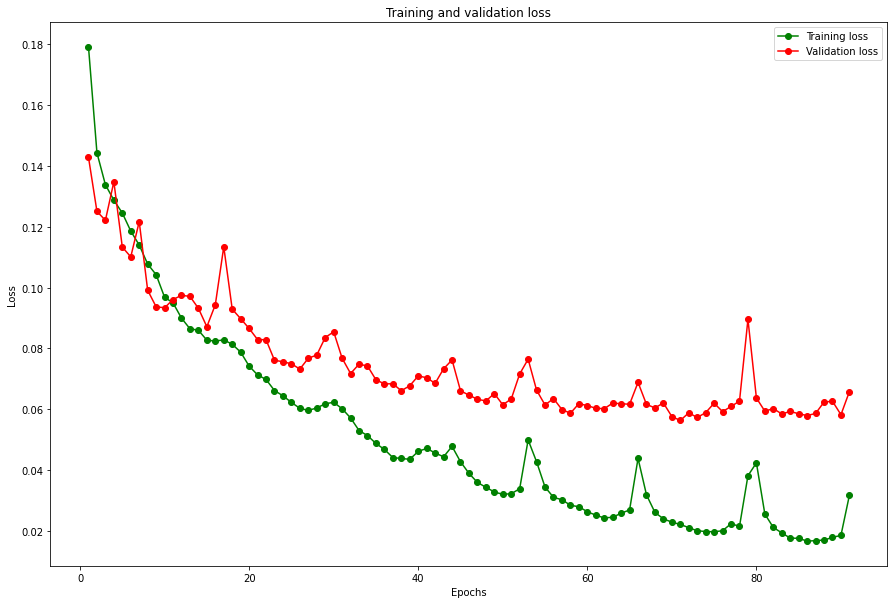

In [25]:
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.figure(figsize=(15,10))
plt.plot(epochs, loss, 'green', label='Training loss', marker = 'o')
plt.plot(epochs, val_loss, 'r', label='Validation loss', marker = 'o')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
# plt.savefig('loss_graph.png')
plt.show()

In [26]:
acc = history.history['one_hot_io_u']
val_acc = history.history['val_one_hot_io_u']

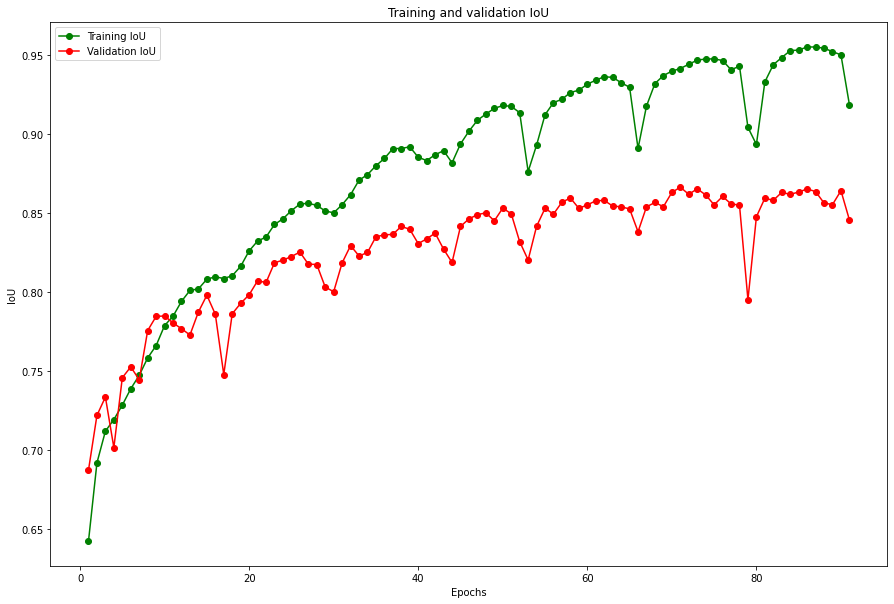

In [27]:
plt.figure(figsize=(15,10))
plt.plot(epochs, acc, 'green', label='Training IoU', marker = 'o')
plt.plot(epochs, val_acc, 'r', label='Validation IoU', marker = 'o')
plt.title('Training and validation IoU')
plt.xlabel('Epochs')
plt.ylabel('IoU')
plt.legend()
# plt.savefig('auccuracy_graph.png')
plt.show()

In [28]:
from keras.models import load_model

model = load_model(filepath, compile=False)

In [29]:
from tensorflow.keras.metrics import MeanIoU

In [30]:
test_image_batch, test_mask_batch = next(iter(valid_dataset))

#Convert categorical to integer for visualization and IoU calculation
test_mask_batch_argmax = np.argmax(test_mask_batch, axis=3) 
test_pred_batch = model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=3)
n_classes = 2
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

1/1 [==============================] - ETA: 0s

1/1 [==============================] - 5s 5s/step


Mean IoU =

0.89745855

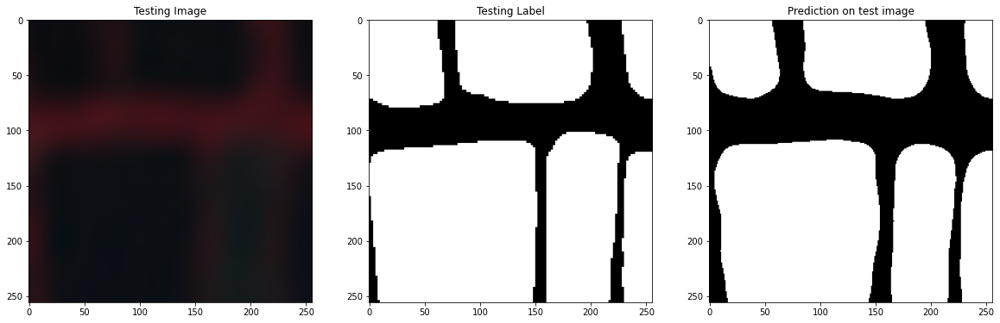

In [31]:
img_num = random.randint(0, test_image_batch.shape[0]-1)
image = test_image_batch[img_num]
plt.figure(figsize=(20,20))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(image[:,:,0:3])
plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_batch_argmax[img_num], cmap='gray')
plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_pred_batch_argmax[img_num], cmap='gray')
plt.show()

In [32]:
No_of_valid_data = int(number_of_shards*filespershard*0.3)

In [33]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay,classification_report

In [34]:
test_image_batch, test_mask_batch = next(iter(valid_dataset.unbatch().batch(No_of_valid_data)))
test_mask_batch_argmax = np.argmax(test_mask_batch, axis=3) 
test_pred_batch = model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=3)

 1/71 [..............................] - ETA: 2:14

 2/71 [..............................] - ETA: 8s  

 3/71 [>.............................] - ETA: 9s

 4/71 [>.............................] - ETA: 10s

 5/71 [=>............................] - ETA: 10s

 6/71 [=>............................] - ETA: 10s

 7/71 [=>............................] - ETA: 9s 

 8/71 [==>...........................] - ETA: 9s

 9/71 [==>...........................] - ETA: 9s

10/71 [===>..........................] - ETA: 9s

11/71 [===>..........................] - ETA: 9s

12/71 [====>.........................] - ETA: 9s

13/71 [====>.........................] - ETA: 9s

14/71 [====>.........................] - ETA: 9s

15/71 [=====>........................] - ETA: 8s

16/71 [=====>........................] - ETA: 8s

17/71 [======>.......................] - ETA: 8s

18/71 [======>.......................] - ETA: 8s

19/71 [=======>......................] - ETA: 8s

20/71 [=======>......................] - ETA: 8s

21/71 [=======>......................] - ETA: 8s

22/71 [========>.....................] - ETA: 7s

23/71 [========>.....................] - ETA: 7s

24/71 [=========>....................] - ETA: 7s

25/71 [=========>....................] - ETA: 7s

26/71 [=========>....................] - ETA: 7s

27/71 [==========>...................] - ETA: 7s

28/71 [==========>...................] - ETA: 6s

29/71 [===========>..................] - ETA: 6s

30/71 [===========>..................] - ETA: 6s

31/71 [============>.................] - ETA: 6s

32/71 [============>.................] - ETA: 6s

33/71 [============>.................] - ETA: 6s

34/71 [=============>................] - ETA: 5s

35/71 [=============>................] - ETA: 5s

36/71 [==============>...............] - ETA: 5s

37/71 [==============>...............] - ETA: 5s

38/71 [===============>..............] - ETA: 5s

39/71 [===============>..............] - ETA: 5s

40/71 [===============>..............] - ETA: 5s

41/71 [================>.............] - ETA: 4s

42/71 [================>.............] - ETA: 4s

43/71 [=================>............] - ETA: 4s

44/71 [=================>............] - ETA: 4s

45/71 [==================>...........] - ETA: 4s

46/71 [==================>...........] - ETA: 4s

47/71 [==================>...........] - ETA: 3s

48/71 [===================>..........] - ETA: 3s

49/71 [===================>..........] - ETA: 3s

50/71 [====================>.........] - ETA: 3s

51/71 [====================>.........] - ETA: 3s

52/71 [====================>.........] - ETA: 3s

53/71 [=====================>........] - ETA: 2s

54/71 [=====================>........] - ETA: 2s

55/71 [======================>.......] - ETA: 2s

56/71 [======================>.......] - ETA: 2s

57/71 [=======================>......] - ETA: 2s

58/71 [=======================>......] - ETA: 2s

59/71 [=======================>......] - ETA: 1s

60/71 [========================>.....] - ETA: 1s

61/71 [========================>.....] - ETA: 1s

62/71 [=========================>....] - ETA: 1s

63/71 [=========================>....] - ETA: 1s

64/71 [==========================>...] - ETA: 1s

65/71 [==========================>...] - ETA: 0s

66/71 [==========================>...] - ETA: 0s

67/71 [===========================>..] - ETA: 0s

68/71 [===========================>..] - ETA: 0s

69/71 [============================>.] - ETA: 0s

70/71 [============================>.] - ETA: 0s

71/71 [==============================] - ETA: 0s

71/71 [==============================] - 14s 179ms/step


In [35]:
cm = confusion_matrix(test_mask_batch_argmax.flatten(),test_pred_batch_argmax.flatten())
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['non_ponds','ponds'])

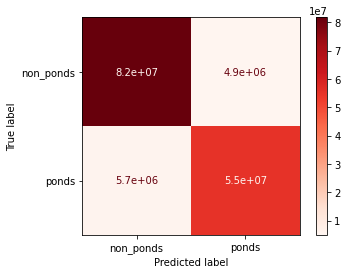

In [36]:
disp.plot(cmap=plt.cm.Reds)
plt.savefig('confusion_matrix.png')
plt.show()